<span style="color:red; font-family:Helvetica Neue, Helvetica, Arial, sans-serif; font-size:2em;">An Exception was encountered at '<a href="#papermill-error-cell">In [13]</a>'.</span>

In [1]:
# --- parameters (patch_notebook_params.py) ---
MAX_EPOCHS = 2000
N_SAMPLES = 10           # run_metrics.py forces 50 for generative methods
RESET_TRAINING = False
CUDA_VISIBLE_DEVICES = "0"
METRICS_CSV = "results/metrics.csv"


In [2]:
# Parameters
MAX_EPOCHS = 2000
N_SAMPLES = 1
RESET_TRAINING = False
CUDA_VISIBLE_DEVICES = "0"
METRICS_CSV = "/Odyssey/private/m19beauc/4dvarnet-starter-devs/consistency/sbatch_submission/results/SSH_GF/DynCM_metrics_train.csv"


In [3]:
# --- epoch heartbeat (patch_notebook_params.py) ---
import pytorch_lightning as _pl

class EpochHeartbeat(_pl.Callback):
    """Prints one clear progress line every `every_n_epochs` epochs, so
    sbatch logs show training progress without the noise of a per-batch
    tqdm progress bar (which doesn't render well once redirected to a
    plain log file).    """

    def __init__(self, every_n_epochs: int = 1):
        self.every_n_epochs = every_n_epochs

    def on_train_epoch_end(self, trainer, pl_module):
        epoch = trainer.current_epoch + 1
        if epoch % self.every_n_epochs != 0 and epoch != trainer.max_epochs:
            return
        parts = []
        for k, v in sorted(trainer.callback_metrics.items()):
            try:
                parts.append(f'{k}={float(v):.4f}')
            except (TypeError, ValueError):
                pass
        print(f'[progress] epoch {epoch}/{trainer.max_epochs} | ' + ' | '.join(parts), flush=True)


## Consistency Model — SSH Gulf Stream (NATL-GF)

Pairwise Consistency Model applied to SSH data from the Gulf Stream region.
- Data: NATL-GF 5-nadir + SWOT, 0.05° native resolution, resize_factor=2 → 0.1°
- Window: 9 time steps, 128×128 patches

In [4]:
!nvidia-smi

Tue Aug  4 17:46:52 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 570.195.03             Driver Version: 570.195.03     CUDA Version: 12.8     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA H100 NVL                On  |   00000000:E3:00.0 Off |                    0 |
| N/A   35C    P0             65W /  400W |       0MiB /  95830MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

In [5]:
import os; os.environ["CUDA_VISIBLE_DEVICES"] = CUDA_VISIBLE_DEVICES

In [6]:
import json
import math
import os
import zipfile
import glob
import importlib
from dataclasses import asdict, dataclass
from typing import Any, Callable, List, Optional, Tuple, Union

import numpy as np
import xarray as xr
import pandas as pd
import torch
from einops import rearrange
from einops.layers.torch import Rearrange
import pytorch_lightning as pl
from pytorch_lightning import LightningModule, Trainer, seed_everything
from pytorch_lightning.callbacks import LearningRateMonitor, ModelCheckpoint
from pytorch_lightning.loggers import TensorBoardLogger
from matplotlib import pyplot as plt
from torch import Tensor, nn
from torch.nn import functional as F
from torchinfo import summary

import sys
sys.path.append('../..')     # → consistency/  (consistency_models, spectral_utils)
sys.path.append('../../..')  # → 4dvarnet-starter-devs/  (src)

import consistency_models.utils
import consistency_models.consistency_models_CM
importlib.reload(consistency_models.utils)
importlib.reload(consistency_models.consistency_models_CM)

from consistency_models.consistency_models_CM import (
    ConsistencySamplingAndEditingFewSteps_TimeEmbedding,
    ConsistencyTrainingFewSteps_TimeEmbedding,
    ema_decay_rate_schedule,
)
from consistency_models.utils import update_ema_model_, pseudo_huber_loss

try:
    from properscoring import crps_ensemble
    HAS_PROPERSCORING = True
except ImportError:
    HAS_PROPERSCORING = False
    print("properscoring not installed — CRPS disabled.")

# --- method-specific imports (added by generate_missing_notebooks.py) ---
from consistency_models.consistency_models_DynCM import (
    ConsistencyTrainingDynamicalSystems,
    ConsistencySamplingAndEditingDynamicalSystems,
    model_dynamical_systems_forward_wrapper,
    compute_sigma_spinup,
)
from consistency_models.consistency_models_CM import (
    ema_decay_rate_schedule,
)


## ⚠️ ACTION REQUIRED — automatically generated notebook

This notebook (`DynCM` / `SSH_GF`) was assembled by `sbatch_submission/generate_missing_notebooks.py`, combining the data loading of xp `SSH_GF` with the method code of the GP reference notebook. Points to validate before a production run:

- **LOG_DIR** automatically set to `logs_CT_DynCM_ssh_gf` — check it doesn't collide with an existing run.
- **sigma_max / SIGMA_NOISE**: value carried over as-is from the GP source notebook — needs to be re-tuned to this variable's physical scale (cf. SIC ≈ 1.0, SSH_GF ≈ 10, GP to verify) before any production run.
- **cond_channels / conditioning wiring**: NOT automatically verified for this method (a config class other than `UNetConfig(channels=C)` was detected). Compare against the already validated CM notebook for xp SSH_GF and adapt if this variable has extra conditioning fields.

## DataModule — SSH Gulf Stream (NATL-GF)

Load altimetry SSH data (5-nadir + SWOT observations), resize_factor=2 for 128×128 patches at ~0.1° resolution.

Norm stats (0.3047108663749711, 0.3879814586804132)


window_size (C) = 9
TrainingItem shapes -- input (y): (9, 128, 128), tgt (x): (9, 128, 128)


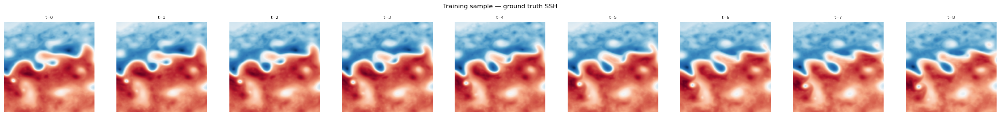

In [7]:
import pyinterp
import pyinterp.fill
import pyinterp.backends.xarray
from collections import namedtuple
from src.data_notebook import BaseDataModule

datadir = "../../../data"

TrainingItem = namedtuple('TrainingItem', ['input', 'tgt'])

def remove_nan(da):
    da["lon"] = da.lon.assign_attrs(units="degrees_east")
    da["lat"] = da.lat.assign_attrs(units="degrees_north")
    da.transpose("lon", "lat", "time")[:, :] = pyinterp.fill.gauss_seidel(
        pyinterp.backends.xarray.Grid3D(da)
    )[1]
    return da

def load_altimetry_data(path):
    ds = (
        xr.open_dataset(path)
        .load()
        .assign(
            input=lambda ds: ds.nadir_obs,
            tgt=lambda ds: remove_nan(ds.ssh),
        )
    )
    return (
        ds[[*TrainingItem._fields]]
        .transpose("time", "lat", "lon")
        .to_array()
    )

lon_min, lon_max = -66.3, -53.5
lat_min, lat_max =  31.7,  44.5

datamodule = BaseDataModule(
    input_da=load_altimetry_data(datadir + "/natl_gf_w_5nadirs_swot.nc"),
    domains={
        'train': {'time': slice('2013-02-24', '2013-09-30')},
        'val':   {'time': slice('2012-12-15', '2013-02-24')},
        'test':  {'time': slice('2012-10-01', '2012-12-20')},
    },
    xrds_kw={
        'patch_dims':    {'time': 9, 'lat': 128, 'lon': 128},
        'strides':       {'time': 1, 'lat': 128, 'lon': 128},
        'domain_limits': dict(lon=slice(lon_min, lon_max), lat=slice(lat_min, lat_max)),
    },
    dl_kw={'batch_size': 1, 'num_workers': 1},
    grad=False,
    resize_factor=2,
)
datamodule.setup()

sample = datamodule.train_ds[0]
C = sample.tgt.shape[0]
# BaseDataModule (SSH_GF) has no `.window_size` attribute, unlike SPDEDataModule
# (GP) -- this notebook was auto-generated from a GP template and several
# downstream cells reference `datamodule.window_size` directly, causing
# AttributeError: 'BaseDataModule' object has no attribute 'window_size'.
# Shim it here once so every downstream cell keeps working unchanged.
datamodule.window_size = C
print(f"window_size (C) = {C}")
print(f"TrainingItem shapes -- input (y): {sample.input.shape}, tgt (x): {sample.tgt.shape}")

fig, axes = plt.subplots(1, min(C, 9), figsize=(3 * min(C, 9), 3))
for t_idx, ax in enumerate(axes):
    im = ax.imshow(sample.tgt[t_idx], origin="lower", cmap="RdBu_r")
    ax.set_title(f"t={t_idx}", fontsize=8)
    ax.axis("off")
plt.suptitle("Training sample — ground truth SSH", y=1.01)
plt.tight_layout()
plt.show()

### UNet Building Blocks

The UNet takes:
- **x**: `(B, 1, H, W)` — current state at diffusion time $t$ (single physical field)
- **y**: `(B, C, H, W)` — full observation window (all $N$ time steps) — `NaN` = unobserved
- **mask**: `(B, C, H, W)` — binary mask derived from `y`
- **t, t'**: `(B,)` — current and target diffusion times

Total input channels = $1 + C + C = 2C + 1$.  
Output = `(B, 1, H, W)` — predicted state at $t'$.

Spatial size 100×100 is padded to the nearest multiple of 8 before the forward pass.

In [8]:
def GroupNorm(channels: int) -> nn.GroupNorm:
    return nn.GroupNorm(num_groups=min(32, channels // 4), num_channels=channels)


class SelfAttention(nn.Module):
    def __init__(self, in_channels: int, out_channels: int,
                 n_heads: int = 8, dropout: float = 0.3) -> None:
        super().__init__()
        self.dropout = dropout
        self.qkv_projection = nn.Sequential(
            GroupNorm(in_channels),
            nn.Conv2d(in_channels, 3 * in_channels, kernel_size=1, bias=False),
            Rearrange("b (i h d) x y -> i b h (x y) d", i=3, h=n_heads),
        )
        self.output_projection = nn.Sequential(
            Rearrange("b h l d -> b l (h d)"),
            nn.Linear(in_channels, out_channels, bias=False),
            Rearrange("b l d -> b d l"),
            GroupNorm(out_channels),
            nn.Dropout1d(dropout),
        )
        self.residual_projection = nn.Conv2d(in_channels, out_channels, kernel_size=1)

    def forward(self, x: Tensor) -> Tensor:
        q, k, v = self.qkv_projection(x).unbind(dim=0)
        output = F.scaled_dot_product_attention(
            q, k, v, dropout_p=self.dropout if self.training else 0.0, is_causal=False
        )
        output = self.output_projection(output)
        output = rearrange(output, "b c (x y) -> b c x y", x=x.shape[-2], y=x.shape[-1])
        return output + self.residual_projection(x)


class UNetBlock(nn.Module):
    def __init__(self, in_channels: int, out_channels: int,
                 time_level_channels: int, dropout: float = 0.3) -> None:
        super().__init__()
        self.input_projection = nn.Sequential(
            GroupNorm(in_channels), nn.SiLU(),
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding="same"),
            nn.Dropout2d(dropout),
        )
        self.time_level_projection = nn.Sequential(
            nn.SiLU(),
            nn.Conv2d(time_level_channels, out_channels, kernel_size=1),
        )
        self.output_projection = nn.Sequential(
            GroupNorm(out_channels), nn.SiLU(),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding="same"),
            nn.Dropout2d(dropout),
        )
        self.residual_projection = nn.Conv2d(in_channels, out_channels, kernel_size=1)

    def forward(self, x: Tensor, time_level: Tensor) -> Tensor:
        h = self.input_projection(x)
        h = h + self.time_level_projection(time_level)
        return self.output_projection(h) + self.residual_projection(x)


class UNetBlockWithSelfAttention(nn.Module):
    def __init__(self, in_channels: int, out_channels: int,
                 time_level_channels: int, n_heads: int = 8, dropout: float = 0.3) -> None:
        super().__init__()
        self.unet_block = UNetBlock(in_channels, out_channels, time_level_channels, dropout)
        self.self_attention = SelfAttention(out_channels, out_channels, n_heads, dropout)

    def forward(self, x: Tensor, time_level: Tensor) -> Tensor:
        return self.self_attention(self.unet_block(x, time_level))


class Downsample(nn.Module):
    def __init__(self, channels: int) -> None:
        super().__init__()
        self.projection = nn.Sequential(
            Rearrange("b c (h ph) (w pw) -> b (c ph pw) h w", ph=2, pw=2),
            nn.Conv2d(4 * channels, channels, kernel_size=1),
        )

    def forward(self, x: Tensor) -> Tensor:
        return self.projection(x)


class Upsample(nn.Module):
    def __init__(self, channels: int) -> None:
        super().__init__()
        self.projection = nn.Sequential(
            nn.Upsample(scale_factor=2.0, mode="nearest"),
            nn.Conv2d(channels, channels, kernel_size=3, padding="same"),
        )

    def forward(self, x: Tensor) -> Tensor:
        return self.projection(x)


class TimeEmbedding(nn.Module):
    """Fourier embedding for a scalar t ∈ [0,1]."""
    def __init__(self, channels: int, scale: float = 16.0) -> None:
        super().__init__()
        self.W = nn.Parameter(torch.randn(channels // 2) * scale, requires_grad=False)
        self.projection = nn.Sequential(
            nn.Linear(channels, 4 * channels),
            nn.SiLU(),
            nn.Linear(4 * channels, channels),
            Rearrange("b c -> b c () ()"),
        )

    def forward(self, x: Tensor) -> Tensor:
        h = x[:, None] * self.W[None, :] * 2 * torch.pi
        h = torch.cat([torch.sin(h), torch.cos(h)], dim=-1)
        return self.projection(h)


# ---- Spatial padding (100×100 → 104×104, multiple of 8) ----
def _pad_to_multiple(x: Tensor, multiple: int = 8) -> Tuple[Tensor, Tuple[int, int, int, int]]:
    _, _, H, W = x.shape
    pad_h = (multiple - H % multiple) % multiple
    pad_w = (multiple - W % multiple) % multiple
    padding = (0, pad_w, 0, pad_h)
    return F.pad(x, padding, mode="reflect"), padding


def _unpad(x: Tensor, padding: Tuple[int, int, int, int]) -> Tensor:
    _, pad_w, _, pad_h = padding
    H, W = x.shape[-2], x.shape[-1]
    return x[..., :H - pad_h if pad_h else H, :W - pad_w if pad_w else W]

### UNet

Input: `cat(x, y_filled, mask_y, w_obs)` → $3C+1$ channels, output: `1` channel.  
Two separate `TimeEmbedding` for $t$ and $t'$, concatenated → $2 \times$ `time_level_channels` conditioning.

**Key design** — observation weight vector $\mathbf{w}(t) \in [0,1]^C$:  
The UNet computes this vector internally from $t$, using exactly the same interpolation rule as the GT target in `_make_regime_input`:
- **Spin-up** ($t \le t_\text{IC}$): $w_0 = 1$, others 0 → only the IC obs is "local"  
- **Physical** ($t \in [t_k, t_{k+1}]$): $w_k = 1-\lambda$, $w_{k+1} = \lambda$, others 0

This weight vector is broadcast spatially and appended as $C$ additional input channels. The model thereby always knows which obs channels are temporally relevant to the current step — **no channel permutation needed**, and the correspondence is consistent with the supervised training targets.


In [9]:
@dataclass
class UNetConfig:
    # channels = C = window_size (number of physical time steps)
    channels: int = 5
    time_level_channels: int = 128
    time_level_scale: float = 16.0
    n_heads: int = 8
    top_blocks_channels: Tuple[int, ...] = (64, 64)
    top_blocks_n_blocks_per_resolution: Tuple[int, ...] = (2, 2)
    top_blocks_has_resampling: Tuple[bool, ...] = (True, True)
    top_blocks_dropout: Tuple[float, ...] = (0.0, 0.0)
    mid_blocks_channels: Tuple[int, ...] = (128, 256)
    mid_blocks_n_blocks_per_resolution: Tuple[int, ...] = (4, 4)
    mid_blocks_has_resampling: Tuple[bool, ...] = (True, False)
    mid_blocks_dropout: Tuple[float, ...] = (0.0, 0.0)


def _compute_obs_weights(t: Tensor, C: int) -> Tensor:
    """
    Compute the C-dimensional observation weight vector w(t) for each batch element.

    Uses the same temporal interpolation rule as _make_regime_input:
      - spin-up  (t ≤ t_IC = 1/C) : w = [1, 0, ..., 0]   (only IC frame relevant)
      - physical (t > t_IC)        : w_k = 1-λ, w_{k+1} = λ, others = 0
        where k = lower physical frame index and λ = fractional position in [t_k, t_{k+1}]

    Parameters
    ----------
    t : (B,) — current diffusion times, in [0, 1]
    C : int   — number of physical frames (= window_size)

    Returns
    -------
    w : (B, C) float tensor, values in [0, 1], sums to 1 per batch element
    """
    B      = t.shape[0]
    t_IC   = 1.0 / C
    device, dtype = t.device, t.dtype

    physical_steps = torch.linspace(t_IC, 1.0, C, device=device, dtype=dtype)  # (C,)

    # For each b, find the lower-bound physical frame index (vectorised)
    t_clamped = t.clamp(t_IC, 1.0).unsqueeze(1)                         # (B, 1)
    idx = torch.searchsorted(
        physical_steps.unsqueeze(0).expand(B, -1).contiguous(),
        t_clamped,
    ).squeeze(1).clamp(1, C - 1)                                         # (B,)  in [1, C-1]

    b_idx = torch.arange(B, device=device)
    dt    = (physical_steps[idx] - physical_steps[idx - 1]).clamp(min=1e-8)
    lam   = ((t.clamp(t_IC, 1.0) - physical_steps[idx - 1]) / dt).clamp(0., 1.)  # (B,)

    w = torch.zeros(B, C, device=device, dtype=dtype)
    w[b_idx, idx - 1] = 1.0 - lam
    w[b_idx, idx]     = lam

    # Override spin-up elements: only IC frame (index 0) is relevant
    spinup = (t <= t_IC)          # (B,)  bool
    w[spinup]    = 0.0
    w[spinup, 0] = 1.0

    return w  # (B, C)


class UNet(nn.Module):
    """
    UNet for the unified physical-diffusion consistency model.

    Forward signature: UNet(x, y, t, t_prime)
      x       : (B, 1,   H, W)  -- current state at diffusion time t (spin-up or physical)
      y       : (B, C,   H, W)  -- full observation window (NaN = unobserved)
      t       : (B,)            -- current diffusion time
      t_prime : (B,)            -- target diffusion time

    Input channels = 3*C + 1  (x | y_filled | mask_y | w_obs)
    Output         = 1 channel (predicted state at t')

    w_obs is the temporal interpolation weight vector w(t) ∈ [0,1]^C,
    computed internally from t using _compute_obs_weights. It tells the model
    which observation channels are "local" to the current diffusion time:
      - spin-up : w = [1, 0, ..., 0]
      - physical between frames k and k+1: w_k = 1-λ, w_{k+1} = λ, others 0
    This is consistent with the supervised GT target construction in _make_regime_input.
    """
    def __init__(self, config: UNetConfig) -> None:
        super().__init__()
        self.config = config
        C   = config.channels
        top = config.top_blocks_channels[0]

        # input: cat(x:1, y_filled:C, mask_y:C, w_obs:C) = 3C+1 channels
        self.input_projection = nn.Conv2d(3 * C + 1, top, kernel_size=3, padding="same")

        # Separate embeddings for t and t'
        self.time_embedding_t  = TimeEmbedding(config.time_level_channels, config.time_level_scale)
        self.time_embedding_tp = TimeEmbedding(config.time_level_channels, config.time_level_scale)

        self.top_encoder_blocks = self._make_encoder_blocks(
            config.top_blocks_channels + config.mid_blocks_channels[:1],
            config.top_blocks_n_blocks_per_resolution,
            config.top_blocks_has_resampling,
            config.top_blocks_dropout, self._make_top_block,
        )
        self.mid_encoder_blocks = self._make_encoder_blocks(
            config.mid_blocks_channels + config.mid_blocks_channels[-1:],
            config.mid_blocks_n_blocks_per_resolution,
            config.mid_blocks_has_resampling,
            config.mid_blocks_dropout, self._make_mid_block,
        )
        self.mid_decoder_blocks = self._make_decoder_blocks(
            config.mid_blocks_channels + config.mid_blocks_channels[-1:],
            config.mid_blocks_n_blocks_per_resolution,
            config.mid_blocks_has_resampling,
            config.mid_blocks_dropout, self._make_mid_block,
        )
        self.top_decoder_blocks = self._make_decoder_blocks(
            config.top_blocks_channels + config.mid_blocks_channels[:1],
            config.top_blocks_n_blocks_per_resolution,
            config.top_blocks_has_resampling,
            config.top_blocks_dropout, self._make_top_block,
        )
        # Output: 1 channel (single physical state)
        self.output_projection = nn.Conv2d(top, 1, kernel_size=3, padding="same")

    def forward(self, x: Tensor, y: Tensor,
                t: Tensor, t_prime: Tensor) -> Tensor:
        """
        x       : (B, 1,   H, W)
        y       : (B, C,   H, W)   -- NaN where unobserved
        t       : (B,)             -- current diffusion time
        t_prime : (B,)             -- target diffusion time
        """
        B, C, H, W = y.shape
        mask_y = (~torch.isnan(y)).to(dtype=x.dtype)
        y_fill = torch.nan_to_num(y, nan=0.0)

        # Temporal observation weights: (B, C) → broadcast to (B, C, H, W)
        # w(t) encodes which obs channels are local to the current diffusion step.
        # Uses the same interpolation rule as the supervised GT target — consistent by design.
        w_obs = _compute_obs_weights(t.to(dtype=x.dtype), C)          # (B, C)
        w_spatial = w_obs[:, :, None, None].expand(B, C, H, W)        # (B, C, H, W)

        # Concatenate along channel dim and pad to multiple of 8
        inp = torch.cat([x, y_fill, mask_y, w_spatial], dim=1)   # (B, 3C+1, H, W)
        inp, padding = _pad_to_multiple(inp, multiple=8)

        h = self.input_projection(inp)

        emb_t  = self.time_embedding_t(t)
        emb_tp = self.time_embedding_tp(t_prime)
        time_level = torch.cat([emb_t, emb_tp], dim=1)   # (B, 2*TLC, 1, 1)

        top_encoder_embeddings = []
        for block in self.top_encoder_blocks:
            if isinstance(block, UNetBlock):
                h = block(h, time_level)
                top_encoder_embeddings.append(h)
            else:
                h = block(h)

        mid_encoder_embeddings = []
        for block in self.mid_encoder_blocks:
            if isinstance(block, UNetBlockWithSelfAttention):
                h = block(h, time_level)
                mid_encoder_embeddings.append(h)
            else:
                h = block(h)

        for block in self.mid_decoder_blocks:
            if isinstance(block, UNetBlockWithSelfAttention):
                h = torch.cat((h, mid_encoder_embeddings.pop()), dim=1)
                h = block(h, time_level)
            else:
                h = block(h)

        for block in self.top_decoder_blocks:
            if isinstance(block, UNetBlock):
                h = torch.cat((h, top_encoder_embeddings.pop()), dim=1)
                h = block(h, time_level)
            else:
                h = block(h)

        out = self.output_projection(h)
        return _unpad(out, padding)

    # ---- builder helpers ----
    def _make_encoder_blocks(self, channels, n_blocks, has_resampling, dropout, block_fn):
        blocks = nn.ModuleList()
        for idx, (ic, oc) in enumerate(zip(channels[:-1], channels[1:])):
            for _ in range(n_blocks[idx]):
                blocks.append(block_fn(ic, oc, dropout[idx]))
                ic = oc
            if has_resampling[idx]:
                blocks.append(Downsample(oc))
        return blocks

    def _make_decoder_blocks(self, channels, n_blocks, has_resampling, dropout, block_fn):
        blocks = nn.ModuleList()
        for idx, (oc, ic) in enumerate(list(zip(channels[:-1], channels[1:]))[::-1]):
            if has_resampling[::-1][idx]:
                blocks.append(Upsample(ic))
            inner = []
            for _ in range(n_blocks[::-1][idx]):
                inner.append(block_fn(ic * 2, oc, dropout[::-1][idx]))
                oc = ic
            blocks.extend(inner[::-1])
        return blocks

    def _make_top_block(self, ic, oc, dropout):
        return UNetBlock(ic, oc, 2 * self.config.time_level_channels, dropout)

    def _make_mid_block(self, ic, oc, dropout):
        return UNetBlockWithSelfAttention(
            ic, oc, 2 * self.config.time_level_channels, self.config.n_heads, dropout
        )

    def save_pretrained(self, pretrained_path: str) -> None:
        os.makedirs(pretrained_path, exist_ok=True)
        with open(os.path.join(pretrained_path, "config.json"), mode="w") as f:
            json.dump(asdict(self.config), f)
        torch.save(self.state_dict(), os.path.join(pretrained_path, "model.pt"))

    @classmethod
    def from_pretrained(cls, pretrained_path: str) -> "UNet":
        with open(os.path.join(pretrained_path, "config.json"), mode="r") as f:
            config_dict = json.load(f)
        model = cls(UNetConfig(**config_dict))
        model.load_state_dict(
            torch.load(os.path.join(pretrained_path, "model.pt"), map_location="cpu")
        )
        return model


# ---- Sanity check ----
C = datamodule.window_size
_unet = UNet(UNetConfig(channels=C)).cpu()
try:
    summary(
        _unet,
        input_size=(
            (1, 1,   100, 100),  # x  (current state, 1 channel)
            (1, C,   100, 100),  # y  (full obs window, C channels)
            (1,),                # t
            (1,),                # t'
        ),
        col_names=["input_size", "output_size", "num_params"],
        verbose=0,
        device="cpu",
    )
except Exception as e:
    n_params = sum(p.numel() for p in _unet.parameters())
    print(f"[torchinfo unavailable: {e}]")
    print(f"UNet parameters: {n_params:,}")

# Quick CPU forward pass — verify shapes and w_obs values
_x = torch.randn(1, 1, 100, 100)
_y = torch.randn(1, C, 100, 100)
_y[0, :, :5, :5] = float("nan")
_t = torch.rand(1)
with torch.no_grad():
    _out = _unet(_x, _y, _t, _t)
print(f"[OK] UNet forward: x {_x.shape} + y {_y.shape} -> {_out.shape}  (3C+1={3*C+1} input channels)")
print(f"[OK] Parameters: {sum(p.numel() for p in _unet.parameters()):,}")

# Verify w_obs for a few representative times
t_IC = 1.0 / C
print(f"\nw_obs sanity check (C={C}, t_IC={t_IC:.3f}):")
for t_test in [0.0, t_IC * 0.5, t_IC, t_IC + 0.01, 0.5, 1.0]:
    w = _compute_obs_weights(torch.tensor([t_test]), C)
    print(f"  t={t_test:.3f}  →  w={w[0].tolist()}  (sum={w[0].sum().item():.3f})")


[OK] UNet forward: x torch.Size([1, 1, 100, 100]) + y torch.Size([1, 9, 100, 100]) -> torch.Size([1, 1, 100, 100])  (3C+1=28 input channels)
[OK] Parameters: 33,004,801

w_obs sanity check (C=9, t_IC=0.111):
  t=0.000  →  w=[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]  (sum=1.000)
  t=0.056  →  w=[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]  (sum=1.000)
  t=0.111  →  w=[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]  (sum=1.000)
  t=0.121  →  w=[0.9100000262260437, 0.0899999812245369, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]  (sum=1.000)
  t=0.500  →  w=[0.0, 0.0, 0.0, 0.5000001192092896, 0.49999988079071045, 0.0, 0.0, 0.0, 0.0]  (sum=1.000)
  t=1.000  →  w=[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0]  (sum=1.000)


### LightningModule

Wraps `ConsistencyTrainingDynamicalSystems` (simplified: single GT target, no teacher EMA).

**Two losses**:
1. `L_consistency` — MSE between student output and GT `_make_regime_input(t_next)`, all regimes.
2. `L_obs` — MSE between model output at physical time steps and available observations, weighted by `lambda_obs`.

The teacher EMA is still maintained (for potential future use / EMA student inference), but is no longer called during target construction.

In [10]:
@dataclass
class LitConsistencyModelConfig:
    initial_ema_decay_rate: float = 0.95
    student_model_ema_decay_rate: float = 0.99993
    lr: float = 1e-4
    betas: Tuple[float, float] = (0.9, 0.995)
    lr_scheduler_start_factor: float = 1e-5
    lr_scheduler_iters: int = 10_000
    total_training_steps: int = 10_000   # fallback only — overridden dynamically in configure_optimizers
    lambda_obs: float = 0.1              # weight for observation fitting loss
    lambda_IC:  float = 1.0              # weight for spinup IC-anchoring loss


class LitConsistencyModel(LightningModule):
    """
    Lightning wrapper for the unified physical-diffusion consistency model.

    Training uses ConsistencyTrainingDynamicalSystems with ANCHOR targets:
      - L_consistency: MSE(student_output, x_{k+1} anchor at t_next) — all regimes
      - L_obs        : MSE(f(x_k, t_k→t_{k+1}), x_{k+1}) on obs mask — λ_obs weighted

    The teacher EMA is maintained (used for spin-up regime) but NOT for physical targets.
    """
    def __init__(
        self,
        consistency_training: ConsistencyTrainingDynamicalSystems,
        student_model: UNet,
        teacher_model: UNet,
        ema_student_model: UNet,
        config: LitConsistencyModelConfig,
    ) -> None:
        super().__init__()
        self.consistency_training = consistency_training
        self.student_model        = student_model
        self.teacher_model        = teacher_model
        self.ema_student_model    = ema_student_model
        self.config               = config
        self.num_timesteps        = consistency_training.initial_timesteps
        # Will be overridden in configure_optimizers with actual training steps
        self._total_training_steps = config.total_training_steps

        for param in self.teacher_model.parameters():
            param.requires_grad = False
        for param in self.ema_student_model.parameters():
            param.requires_grad = False
        self.teacher_model     = self.teacher_model.eval()
        self.ema_student_model = self.ema_student_model.eval()

    # ------------------------------------------------------------------
    # Observation fitting loss
    # ------------------------------------------------------------------
    def _obs_loss(self, batch) -> torch.Tensor:
        """
        For each consecutive physical-frame pair (k → k+1), run the model
        with the clean anchor x_k as input at t_k targeting t_{k+1}, and
        compare to the next GT anchor x_{k+1} on the observed pixels of step k+1.

            L_obs = (1/(C-1)) * Σ_{k=0}^{C-2}
                      ||(f(x_k, t_k, t_{k+1}) - x_{k+1}) ⊙ m_{k+1}||² / (||m_{k+1}||₁ + ε)

        This is CONSISTENT with the anchor-target consistency training:
          • the consistency loss already trains f(interp(t_int), t_int, t_next) → x_{k+1}
          • this loss additionally trains f(x_k_clean, t_k, t_{k+1}) → x_{k+1} on obs pixels
          • starting from a clean anchor (not an interpolated input) adds direct supervision

        Why not use t_0 / self-mapping:
          With anchor training, f(x, t, t') → x_{anchor(t')}.  Using t'=0 asks for the
          anchor at t=0 which is the IC x_0 — useful only at k=0.  Using t'=t makes it a
          trivial identity request, which is not what the model learns.
        """
        x = batch.tgt    # (B, C, H, W)  ground truth
        y = batch.input  # (B, C, H, W)  observations (NaN = missing)
        B, C, H, W = x.shape
        device = x.device

        if C < 2:
            return torch.tensor(0.0, device=device, dtype=x.dtype)

        # NEW design: physical frame k is at diffusion time
        #   t_k = spinup_boundary * (C-1-k) / (C-1)
        # which decreases from spinup_boundary (k=0, IC) to 0 (k=C-1, last frame).
        # The model maps x_k (at t_k) → x_{k+1} (at t_{k+1} < t_k): FORWARD physical time.
        sb = self.consistency_training.spinup_boundary
        total_loss = torch.tensor(0.0, device=device, dtype=x.dtype)

        for k in range(C - 1):
            t_k      = sb * (C - 1 - k)       / max(C - 1, 1)   # decreasing: sb → step
            t_k_next = sb * (C - 2 - k)       / max(C - 1, 1)   # t_{k+1} < t_k

            t_k_full      = torch.full((B,), t_k,      device=device, dtype=x.dtype)
            t_k_next_full = torch.full((B,), t_k_next, device=device, dtype=x.dtype)

            x_k      = x[:, [k],     :, :]   # (B, 1, H, W)  clean input anchor at t_k
            x_k_next = x[:, [k + 1], :, :]   # (B, 1, H, W)  clean target anchor at t_{k+1}

            pred = model_dynamical_systems_forward_wrapper(
                self.student_model,
                x_k, y,
                t_k_full, t_k_next_full,
                self.consistency_training.sigma_min,
                self.consistency_training.sigma_max,
                spinup_boundary=sb,
            )

            # Mask: observed pixels at step k+1 (target frame)
            mask_kp1 = (~torch.isnan(y[:, [k + 1], :, :])).to(dtype=x.dtype)  # (B,1,H,W)
            n_obs    = mask_kp1.sum() + 1e-8

            total_loss = total_loss + ((pred - x_k_next) * mask_kp1).pow(2).sum() / n_obs

        return total_loss / (C - 1)

    # ------------------------------------------------------------------
    # Training step
    # ------------------------------------------------------------------

    def _spinup_anchor_loss(self, batch, output) -> torch.Tensor:
        """
        Spinup IC-anchoring loss: L_IC = MSE(g(IC + σ_sp(t)·ε, t_spin, t_IC), IC)

        From noised IC at any spinup time t > spinup_boundary,
        produce clean IC at t_IC = spinup_boundary.
        """
        sb        = self.consistency_training.spinup_boundary
        sigma_min = self.consistency_training.sigma_min
        sigma_max = self.consistency_training.sigma_max

        steps  = output.sigmas
        k_IC   = int((steps > sb).sum().item()) - 1
        if k_IC < 0:
            return batch.tgt.new_zeros(())

        B, C, H, W = batch.tgt.shape
        device     = batch.tgt.device
        dtype      = batch.tgt.dtype
        IC         = batch.tgt[:, [0], :, :]

        t_sp_pool  = steps[:k_IC + 1]
        sp_idx     = torch.randint(0, k_IC + 1, (B,), device=device)
        t_sp       = t_sp_pool[sp_idx]
        t_IC_vec   = torch.full((B,), sb, device=device, dtype=dtype)

        noise      = torch.randn(B, 1, H, W, device=device, dtype=dtype)
        from consistency_models.consistency_models_DynCM import compute_sigma_spinup
        sigma_sp   = compute_sigma_spinup(t_sp, sigma_min, sigma_max, sb)
        noisy_input = IC + sigma_sp.view(B, 1, 1, 1) * noise

        from consistency_models.consistency_models_DynCM import model_dynamical_systems_forward_wrapper
        pred_IC = model_dynamical_systems_forward_wrapper(
            self.student_model, noisy_input, batch.input,
            t_sp, t_IC_vec,
            sigma_min, sigma_max,
            spinup_boundary=sb,
        )
        return F.mse_loss(pred_IC, IC)

    def training_step(self, batch, batch_idx: int):
        if isinstance(batch, list):
            batch = batch[0]

        output = self.consistency_training(
            self.student_model,
            self.teacher_model,
            batch.tgt,
            batch.input,
            self.global_step,
            self._total_training_steps,   # dynamic, updated in configure_optimizers
        )

        self.num_timesteps = output.num_timesteps

        # ── Consistency loss (all regimes, anchor target) ──────────────
        loss_cm = F.mse_loss(
            output.predicted_next_from_intermediate,
            output.target_next_from_current.detach(),
        )

        # ── Observation fitting loss ───────────────────────────────────
        loss_obs = self._obs_loss(batch)

        # ── IC-anchoring loss (spinup) ──────────────────────────────────
        loss_IC = self._spinup_anchor_loss(batch, output)

        loss = loss_cm + self.config.lambda_obs * loss_obs + self.config.lambda_IC * loss_IC

        # NaN safety: if any component is NaN, return zero loss to skip this batch
        if torch.isnan(loss):
            print(f"[NaN] Ep {self.current_epoch} step {self.global_step}: "
                  f"L_cm={loss_cm.item():.4f} L_IC={loss_IC.item():.4f} L_obs={loss_obs.item():.4f}")
            return torch.tensor(0.0, device=loss.device, dtype=loss.dtype, requires_grad=True)

        is_bad = (loss.item() > 50)
        if batch_idx % 20 == 0 or is_bad:
            d = output.diag or {}
            ds = d.get("student", {})
            dt = d.get("teacher", {})
            def _f(v, fmt=".3f"):
                return f"{v:{fmt}}" if isinstance(v, (int, float)) else str(v)
            tag = "EXPLOSION " if is_bad else ""
            print(
                f"{tag}[Ep {self.current_epoch} | step {self.global_step}]  "
                f"N={self.num_timesteps}  "
                f"L_cm={loss_cm.item():.5f}  "
                f"L_IC={loss_IC.item():.5f}  "
                f"L_obs={loss_obs.item():.5f}  "
                f"loss={loss.item():.5f}  "
                f"spinup/phys={d.get('n_spinup','?')}/{d.get('n_phys','?')}\n"
                f"  student: c_skip=[{_f(ds.get('c_skip_min','?'))},{_f(ds.get('c_skip_max','?'))}]  "
                f"c_out=[{_f(ds.get('c_out_min','?'))},{_f(ds.get('c_out_max','?'))}]  "
                f"model_out_std={_f(ds.get('model_out_std','?'))}  "
                f"result_std={_f(ds.get('result_std','?'))}  "
                f"nan={ds.get('has_nan','?')}\n"
                f"  teacher: c_skip=[{_f(dt.get('c_skip_min','?'))},{_f(dt.get('c_skip_max','?'))}]  "
                f"model_out_std={_f(dt.get('model_out_std','?'))}  "
                f"nan={dt.get('has_nan','?')}\n"
                f"  input_std={_f(d.get('input_std','?'))}  "
                f"target_std={_f(d.get('target_std','?'))}  "
                f"t_curr={d.get('t_curr_range',('?','?'))}  "
                f"t_next={d.get('t_next_range',('?','?'))}"
            )

        self.log_dict({
            "train_loss":      loss,
            "loss_consistency": loss_cm,
            "loss_obs":        loss_obs,
            "num_timesteps":   float(self.num_timesteps),
        }, prog_bar=False)
        return loss

    def on_train_batch_end(self, outputs, batch, batch_idx: int) -> None:
        ema_rate = ema_decay_rate_schedule(
            self.num_timesteps,
            self.config.initial_ema_decay_rate,
            self.consistency_training.initial_timesteps,
        )
        # Check for NaN in student weights before EMA update
        has_nan_weights = any(
            torch.isnan(p).any() for p in self.student_model.parameters() if p.requires_grad
        )
        if has_nan_weights:
            print(f"[FATAL] NaN in student weights at step {self.global_step}!")
            return

        # Log gradient norm
        grad_norm = sum(
            p.grad.norm().item() ** 2
            for p in self.student_model.parameters()
            if p.grad is not None
        ) ** 0.5
        if batch_idx % 20 == 0 or grad_norm > 10:
            print(f"  grad_norm={grad_norm:.4f}")

        update_ema_model_(self.teacher_model,     self.student_model, ema_rate)
        update_ema_model_(self.ema_student_model, self.student_model,
                          self.config.student_model_ema_decay_rate)
        self.log("ema_decay_rate", ema_rate)
        self.log("grad_norm", grad_norm)

    def configure_optimizers(self):
        # ── Dynamic total_training_steps ─────────────────────────────────────────
        # Use the ACTUAL number of optimizer steps that will occur (accounts for
        # accumulate_grad_batches, max_epochs, dataset size).  This ensures N grows
        # from initial_timesteps to final_timesteps over the FULL training run,
        # not just the first ~10k steps.  Without this, N saturates in epoch ~50
        # and the model can learn the trivial identity function (loss→0 but noisy
        # at inference).
        try:
            actual_steps = self.trainer.estimated_stepping_batches
            if actual_steps and int(actual_steps) > 0:
                self._total_training_steps = int(actual_steps)
                print(
                    f"[LitConsistencyModel] Dynamic total_training_steps = "
                    f"{self._total_training_steps}  "
                    f"(config fallback was {self.config.total_training_steps})"
                )
        except Exception as e:
            print(f"[LitConsistencyModel] Could not get estimated_stepping_batches ({e}), "
                  f"using config value {self.config.total_training_steps}")
            self._total_training_steps = self.config.total_training_steps

        opt = torch.optim.Adam(
            self.student_model.parameters(),
            lr=self.config.lr, betas=self.config.betas,
        )
        sched = torch.optim.lr_scheduler.LinearLR(
            opt,
            start_factor=self.config.lr_scheduler_start_factor,
            total_iters=self.config.lr_scheduler_iters,
        )
        return [opt], [{"scheduler": sched, "interval": "step", "frequency": 1}]


## 🚀 Training

### Unified timeline — time grid visualisation

Before training, let's visualise the unified time grid $\{t_0,\dots,t_N\}$ for a given
`num_timesteps` to see how the Karras grid partitions the spin-up and physical regimes.

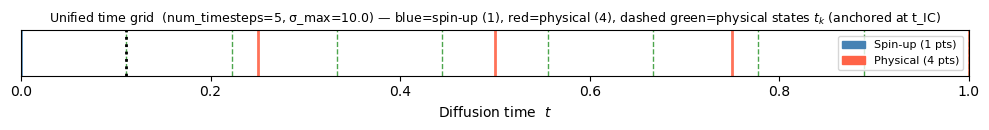

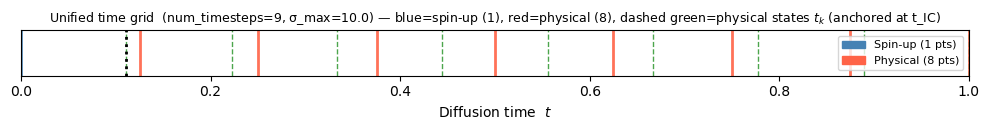

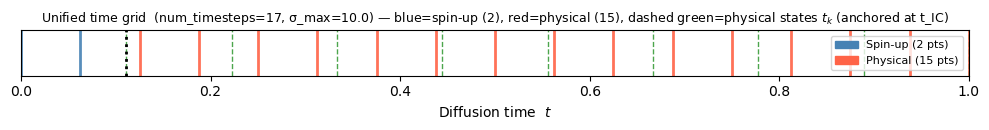

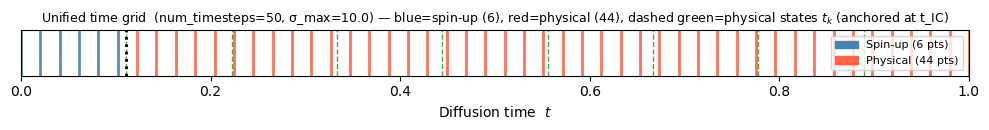

In [11]:
from consistency_models.consistency_models_DynCM import compute_sigma_spinup
from consistency_models.utils import karras_schedule

C_vis        = datamodule.window_size
t_IC_vis     = 1.0 / C_vis
# sigma_max=10 calibrated to normalised SPDE data (std≈1, SNR≤0.01).
# physical_steps now = linspace(t_IC, 1.0, C) so green dashes start at t_IC.
SIGMA_MIN    = 0.002
SIGMA_MAX    = 10.0
RHO          = 7.0

for num_t in [5, 9, 17, 50]:
    grid = karras_schedule(num_t, SIGMA_MIN, SIGMA_MAX, RHO, torch.device("cpu"), as_time=True)
    # Physical states are at linspace(t_IC, 1.0, C)  (fixed anchoring)
    physical_ts = torch.linspace(t_IC_vis, 1.0, C_vis)

    n_spinup  = (grid <= t_IC_vis).sum().item()
    n_phys    = (grid > t_IC_vis).sum().item()

    fig, ax = plt.subplots(figsize=(10, 1.4))
    for i, t_val in enumerate(grid.tolist()):
        color = "steelblue" if t_val <= t_IC_vis else "tomato"
        ax.axvline(t_val, color=color, linewidth=2, alpha=0.9)
    for t_phys in physical_ts.tolist():
        ax.axvline(t_phys, color="green", linewidth=1, linestyle="--", alpha=0.7)
    ax.axvline(t_IC_vis, color="black", linewidth=2, linestyle=":", label=f"$t_{{IC}}={t_IC_vis:.2f}$")
    ax.set_xlim(0, 1)
    ax.set_yticks([])
    ax.set_xlabel("Diffusion time  $t$")
    ax.set_title(
        f"Unified time grid  (num_timesteps={num_t}, σ_max={SIGMA_MAX}) — "
        f"blue=spin-up ({n_spinup}), red=physical ({n_phys}), "
        f"dashed green=physical states $t_k$ (anchored at t_IC)",
        fontsize=9,
    )
    from matplotlib.patches import Patch
    ax.legend(handles=[
        Patch(color="steelblue", label=f"Spin-up ({n_spinup} pts)"),
        Patch(color="tomato",    label=f"Physical ({n_phys} pts)"),
    ], loc="upper right", fontsize=8)
    plt.tight_layout()
    plt.show()


### TensorBoard

### Training Loop

In [12]:
import shutil

# RESET_TRAINING set by the parameters cell above

LOG_DIR     = "logs_CT_DynCM_ssh_gf"
CKPT_DIR    = os.path.join(LOG_DIR, "checkpoints")
MODEL_PATH  = os.path.join(LOG_DIR, "best_model")

def _is_valid_checkpoint(path: str) -> bool:
    try:
        ckpt  = torch.load(path, map_location="cpu")
        state = ckpt.get("state_dict", {})
        return all(
            not (torch.is_tensor(v) and torch.isnan(v).any())
            for v in state.values()
        )
    except Exception:
        return False

def find_resume_ckpt(ckpt_dir: str, use_last: bool = True) -> Optional[str]:
    if not os.path.isdir(ckpt_dir):
        return None
    if use_last:
        last = os.path.join(ckpt_dir, "last.ckpt")
        if os.path.isfile(last) and _is_valid_checkpoint(last):
            print(f"[OK] Resuming from: {last}")
            return last
        print("[WARN] last.ckpt missing or invalid — scanning for best valid checkpoint.")
    candidates = sorted(
        [p for p in glob.glob(os.path.join(ckpt_dir, "*.ckpt"))
         if "last" not in os.path.basename(p) and "train_loss=" in os.path.basename(p)],
        key=lambda p: float(os.path.basename(p).split("train_loss=")[-1].replace(".ckpt", "")),
    )
    for p in candidates:
        if _is_valid_checkpoint(p):
            loss_val = float(os.path.basename(p).split("train_loss=")[-1].replace(".ckpt", ""))
            print(f"[OK] Best valid checkpoint: {p}  (train_loss={loss_val:.4f})")
            return p
    print("[WARN] No valid checkpoint found — starting from scratch.")
    return None

if RESET_TRAINING:
    for d in [CKPT_DIR, MODEL_PATH]:
        if os.path.exists(d):
            shutil.rmtree(d)
            print(f"[DELETE] {d}")
    resume_ckpt = None
else:
    resume_ckpt = find_resume_ckpt(CKPT_DIR)

# ---- Models ----
C = datamodule.window_size
student_model     = UNet(UNetConfig(channels=C))
teacher_model     = UNet(UNetConfig(channels=C))
ema_student_model = UNet(UNetConfig(channels=C))
teacher_model.load_state_dict(student_model.state_dict())
ema_student_model.load_state_dict(student_model.state_dict())

# ---- Training ----
# v8: Fixed student/teacher pairwise assignment.
#   • Student takes the BIGGER step (current → next): harder task, gets gradient
#   • Teacher takes the SMALLER step (intermediate → next): reliable target (EMA, no grad)
#   • Matches CM pairwise design. v7 had roles inverted, causing spinup variance
#     explosion as N grew (teacher did the hard step → unreliable targets).
ct = ConsistencyTrainingDynamicalSystems(
    sigma_min=0.002,
    sigma_max=10.0,
    rho=7.0,
    initial_timesteps=5,
    final_timesteps=50,
)

lit_cm = LitConsistencyModel(
    ct,
    student_model,
    teacher_model,
    ema_student_model,
    LitConsistencyModelConfig(
        lr_scheduler_iters=1000,
        total_training_steps=10_000,   # fallback; overridden dynamically in configure_optimizers
        lambda_obs=0.1,
    ),
)

trainer = Trainer(enable_progress_bar=False, 
    accelerator="gpu",
    max_epochs=MAX_EPOCHS,
    accumulate_grad_batches=4,
    precision="bf16-mixed",
    gradient_clip_val=1.0,
    gradient_clip_algorithm="norm",
    log_every_n_steps=1,
    logger=TensorBoardLogger(".", name=LOG_DIR, version=""),
    callbacks=[
        LearningRateMonitor(logging_interval="step"),
        ModelCheckpoint(
            dirpath=CKPT_DIR,
            monitor="train_loss",
            save_top_k=3,
            save_last=True,
            filename="{epoch:03d}-{step}-{train_loss:.4f}",
        ),
    ],
)

import threading, time as _time

_keepalive_stop = threading.Event()
def _keepalive():
    p = os.path.join(os.path.expanduser("~"), ".nfs_keepalive")
    while not _keepalive_stop.wait(60):
        try:
            open(p, "w").close()
        except Exception:
            pass
_keepalive_thread = threading.Thread(target=_keepalive, daemon=True)
_keepalive_thread.start()

seed_everything(42)
trainer.callbacks.append(EpochHeartbeat(every_n_epochs=1))
trainer.fit(lit_cm, datamodule, ckpt_path=resume_ckpt)

# Save EMA model
lit_cm.ema_student_model.save_pretrained(MODEL_PATH)
print(f"[OK] EMA model saved → {MODEL_PATH}")
_keepalive_stop.set()


/Odyssey/private/m19beauc/conda_envs/4dvarnet-starter/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:168: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /Odyssey/private/m19beauc/conda_envs/4dvarnet-starte ...
  rank_zero_warn(
Using bfloat16 Automatic Mixed Precision (AMP)


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


[rank: 0] Global seed set to 42


/Odyssey/private/m19beauc/conda_envs/4dvarnet-starter/lib/python3.11/site-packages/pytorch_lightning/trainer/configuration_validator.py:69: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")
You are using a CUDA device ('NVIDIA H100 NVL') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Loading `train_dataloader` to estimate number of stepping batches.


/Odyssey/private/m19beauc/conda_envs/4dvarnet-starter/lib/python3.11/site-packages/pytorch_lightning/utilities/_pytree.py:21: FutureWarning: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.
  return [pytree], LeafSpec()


/Odyssey/private/m19beauc/conda_envs/4dvarnet-starter/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:438: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 96 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(



  | Name              | Type | Params
-------------------------------------------
0 | student_model     | UNet | 33.0 M
1 | teacher_model     | UNet | 33.0 M
2 | ema_student_model | UNet | 33.0 M
-------------------------------------------
33.0 M    Trainable params
66.0 M    Non-trainable params
99.0 M    Total params
396.058   Total estimated model params size (MB)


[LitConsistencyModel] Dynamic total_training_steps = 106000  (config fallback was 10000)


[Ep 0 | step 0]  N=5  L_cm=1.16279  L_IC=0.89980  L_obs=0.23901  loss=2.08649  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.227  result_std=0.227  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.208  nan=False
  input_std=0.847  target_std=0.916  t_curr=(0.5, 0.5)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=10.5661


  grad_norm=15.1110


  grad_norm=23.9256


  grad_norm=14.2303


  grad_norm=15.9318


  grad_norm=25.5294


  grad_norm=11.4915


  grad_norm=17.5311


  grad_norm=19.2568


  grad_norm=24.3598


  grad_norm=29.7290


[Ep 0 | step 5]  N=6  L_cm=1.26113  L_IC=1.06343  L_obs=0.32162  loss=2.35672  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.223  result_std=0.222  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.232  nan=False
  input_std=1.007  target_std=1.047  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=5.6540


  grad_norm=11.3691


  grad_norm=16.9332


  grad_norm=12.3684


  grad_norm=14.4784


  grad_norm=14.9344


  grad_norm=16.9580


  grad_norm=12.3462


  grad_norm=14.5421


  grad_norm=11.5507


  grad_norm=16.7845


[Ep 0 | step 10]  N=6  L_cm=1.19765  L_IC=1.19093  L_obs=0.22924  loss=2.41151  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.205  result_std=0.205  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.217  nan=False
  input_std=1.033  target_std=1.039  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=8.3444


  grad_norm=14.1600


  grad_norm=22.5059


  grad_norm=10.8501


  grad_norm=17.8237


  grad_norm=12.4598


  grad_norm=15.8407


  grad_norm=21.2073


  grad_norm=15.8429


  grad_norm=23.8080


[Ep 0 | step 15]  N=6  L_cm=0.57281  L_IC=1.14859  L_obs=0.24416  loss=1.74581  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.189  result_std=0.393  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.209  nan=False
  input_std=1.045  target_std=1.091  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=2.9899


  grad_norm=11.8554


  grad_norm=12.4124


  grad_norm=16.5464


  grad_norm=16.4558


  grad_norm=13.5749


  grad_norm=20.7202


  grad_norm=17.2972


[Ep 0 | step 20]  N=6  L_cm=1.13268  L_IC=1.03687  L_obs=0.22517  loss=2.19206  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.181  result_std=0.181  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.188  nan=False
  input_std=1.003  target_std=1.036  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=4.7745


  grad_norm=16.9409


  grad_norm=11.9015


  grad_norm=14.4015


  grad_norm=13.6938


  grad_norm=13.0860


[Ep 0 | step 25]  N=6  L_cm=0.48737  L_IC=1.16108  L_obs=0.19319  loss=1.66777  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.240  result_std=0.462  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.225  nan=False
  input_std=1.092  target_std=1.079  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=6.1096


  grad_norm=10.3010


  grad_norm=13.7825


  grad_norm=12.0606


  grad_norm=13.8953


  grad_norm=10.6135


  grad_norm=17.3551


  grad_norm=11.5324


  grad_norm=18.9327


  grad_norm=10.8946


[Ep 0 | step 30]  N=6  L_cm=0.37854  L_IC=0.84580  L_obs=0.16749  loss=1.24108  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.216  result_std=0.405  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.206  nan=False
  input_std=0.962  target_std=0.939  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=5.6059


  grad_norm=14.8864


  grad_norm=16.3156


  grad_norm=10.6776


  grad_norm=14.9418


  grad_norm=12.3913


  grad_norm=14.1803


  grad_norm=12.6541


[Ep 0 | step 35]  N=6  L_cm=0.96433  L_IC=0.95998  L_obs=0.21199  loss=1.94551  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.209  result_std=0.209  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.201  nan=False
  input_std=1.068  target_std=1.073  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=7.6404


  grad_norm=11.0774


  grad_norm=12.7958


  grad_norm=12.1629


  grad_norm=11.4854


  grad_norm=16.0878


  grad_norm=12.3791


  grad_norm=18.7276


  grad_norm=10.7530


  grad_norm=15.0360


[Ep 0 | step 40]  N=6  L_cm=0.34984  L_IC=0.88201  L_obs=0.13047  loss=1.24490  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.238  result_std=0.440  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.198  nan=False
  input_std=0.943  target_std=0.963  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=2.5730


  grad_norm=11.1802


  grad_norm=11.2633


  grad_norm=11.1454


[Ep 0 | step 45]  N=6  L_cm=0.36628  L_IC=1.03270  L_obs=0.15063  loss=1.41404  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.346  result_std=0.557  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.268  nan=False
  input_std=1.062  target_std=1.075  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=2.2919


  grad_norm=11.7902


  grad_norm=11.1212


  grad_norm=13.1456


[Ep 0 | step 50]  N=6  L_cm=0.38163  L_IC=0.44433  L_obs=0.10156  loss=0.83612  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.371  result_std=0.371  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.286  nan=False
  input_std=0.906  target_std=0.871  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=5.3625


  grad_norm=10.2228


[progress] epoch 1/2000 | ema_decay_rate=0.9582 | grad_norm=1.0000 | loss_consistency=0.2631 | loss_obs=0.1132 | num_timesteps=6.0000 | train_loss=0.7635


[Ep 1 | step 53]  N=6  L_cm=0.25367  L_IC=0.84598  L_obs=0.10989  loss=1.11065  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.438  result_std=0.599  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.335  nan=False
  input_std=0.991  target_std=1.010  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=2.1458


  grad_norm=11.2121


[Ep 1 | step 58]  N=6  L_cm=0.19267  L_IC=0.28796  L_obs=0.06554  loss=0.48719  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.527  result_std=0.659  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.425  nan=False
  input_std=0.972  target_std=0.995  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=3.2794


  grad_norm=10.0482


  grad_norm=10.0939


  grad_norm=10.4489


[Ep 1 | step 63]  N=6  L_cm=0.18552  L_IC=0.19143  L_obs=0.04676  loss=0.38163  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.633  result_std=0.634  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.489  nan=False
  input_std=0.883  target_std=0.892  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=2.9965


[Ep 1 | step 68]  N=6  L_cm=0.17083  L_IC=0.72846  L_obs=0.04624  loss=0.90392  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.781  result_std=0.860  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.655  nan=False
  input_std=1.062  target_std=1.075  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=2.0400


[Ep 1 | step 73]  N=6  L_cm=0.19795  L_IC=0.67228  L_obs=0.02987  loss=0.87321  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.891  result_std=0.892  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.702  nan=False
  input_std=1.103  target_std=1.084  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=3.4316


[Ep 1 | step 78]  N=6  L_cm=0.15933  L_IC=0.11648  L_obs=0.03215  loss=0.27902  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.967  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.796  nan=False
  input_std=0.915  target_std=0.879  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=2.4797


[Ep 1 | step 83]  N=6  L_cm=0.08091  L_IC=0.35672  L_obs=0.02624  loss=0.44026  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.992  result_std=0.964  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.932  nan=False
  input_std=0.936  target_std=0.956  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=1.9566


[Ep 1 | step 88]  N=6  L_cm=0.09467  L_IC=0.08485  L_obs=0.02252  loss=0.18177  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.988  result_std=0.974  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.010  nan=False
  input_std=0.975  target_std=0.998  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.9052


[Ep 1 | step 93]  N=6  L_cm=0.20099  L_IC=0.09422  L_obs=0.03630  loss=0.29883  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.957  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.936  nan=False
  input_std=0.884  target_std=0.844  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=3.0331


[Ep 1 | step 98]  N=6  L_cm=0.13049  L_IC=0.08966  L_obs=0.02354  loss=0.22251  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.980  nan=False
  input_std=1.073  target_std=1.104  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=2.0669


[Ep 1 | step 103]  N=6  L_cm=0.10756  L_IC=0.25202  L_obs=0.02131  loss=0.36171  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.967  nan=False
  input_std=1.003  target_std=1.036  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.7051


[progress] epoch 2/2000 | ema_decay_rate=0.9582 | grad_norm=1.0000 | loss_consistency=0.1104 | loss_obs=0.0194 | num_timesteps=6.0000 | train_loss=0.1840


[Ep 2 | step 106]  N=6  L_cm=0.10519  L_IC=0.08996  L_obs=0.02143  loss=0.19729  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.957  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.927  nan=False
  input_std=0.932  target_std=0.964  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=2.0253


[Ep 2 | step 111]  N=6  L_cm=0.14252  L_IC=0.07705  L_obs=0.02646  loss=0.22222  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.013  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.960  nan=False
  input_std=1.035  target_std=1.041  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=2.0515


[Ep 2 | step 116]  N=6  L_cm=0.11293  L_IC=0.05451  L_obs=0.01974  loss=0.16941  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.996  result_std=0.984  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.995  nan=False
  input_std=0.980  target_std=0.996  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=1.2294


[Ep 2 | step 121]  N=6  L_cm=0.07678  L_IC=0.22908  L_obs=0.01624  loss=0.30748  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.855  result_std=0.881  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.904  nan=False
  input_std=0.949  target_std=0.954  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=1.2843


[Ep 2 | step 126]  N=6  L_cm=0.10607  L_IC=0.06163  L_obs=0.02269  loss=0.16997  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.995  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.967  nan=False
  input_std=1.035  target_std=1.018  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=1.2992


[Ep 2 | step 131]  N=6  L_cm=0.12065  L_IC=0.17172  L_obs=0.02974  loss=0.29534  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.906  result_std=0.905  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.901  nan=False
  input_std=0.938  target_std=0.933  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=1.4991


[Ep 2 | step 136]  N=6  L_cm=0.11438  L_IC=0.05497  L_obs=0.01871  loss=0.17122  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.973  result_std=0.997  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.986  nan=False
  input_std=1.062  target_std=1.075  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.4651


[Ep 2 | step 141]  N=6  L_cm=0.12589  L_IC=0.21906  L_obs=0.01667  loss=0.34661  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.022  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.969  nan=False
  input_std=1.047  target_std=1.064  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=1.0293


[Ep 2 | step 146]  N=6  L_cm=0.05536  L_IC=0.19451  L_obs=0.01138  loss=0.25100  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.914  result_std=0.914  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.934  nan=False
  input_std=0.908  target_std=0.935  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=1.2675


[Ep 2 | step 151]  N=6  L_cm=0.05840  L_IC=0.15097  L_obs=0.01176  loss=0.21054  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.990  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.945  nan=False
  input_std=0.994  target_std=0.985  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.9346


[Ep 2 | step 156]  N=6  L_cm=0.10212  L_IC=0.04771  L_obs=0.01358  loss=0.15119  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.017  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.937  nan=False
  input_std=1.015  target_std=0.999  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=1.6276


[progress] epoch 3/2000 | ema_decay_rate=0.9582 | grad_norm=1.0000 | loss_consistency=0.0984 | loss_obs=0.0129 | num_timesteps=6.0000 | train_loss=0.1318


[Ep 3 | step 159]  N=6  L_cm=0.09047  L_IC=0.16729  L_obs=0.01259  loss=0.25902  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.946  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.894  nan=False
  input_std=0.924  target_std=0.945  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=1.4760


[Ep 3 | step 164]  N=6  L_cm=0.10060  L_IC=0.18812  L_obs=0.01651  loss=0.29037  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.934  result_std=0.963  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.940  nan=False
  input_std=1.031  target_std=1.037  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=1.1131


[Ep 3 | step 169]  N=6  L_cm=0.10672  L_IC=0.17794  L_obs=0.02507  loss=0.28717  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.918  result_std=0.919  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.901  nan=False
  input_std=0.938  target_std=0.933  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=1.9805


[Ep 3 | step 174]  N=6  L_cm=0.08302  L_IC=0.13272  L_obs=0.01709  loss=0.21745  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.965  result_std=0.983  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.961  nan=False
  input_std=1.034  target_std=1.030  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.5045


[Ep 3 | step 179]  N=6  L_cm=0.06242  L_IC=0.17015  L_obs=0.01194  loss=0.23376  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.863  result_std=0.876  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.872  nan=False
  input_std=0.918  target_std=0.915  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=1.5811


[Ep 3 | step 184]  N=6  L_cm=0.04770  L_IC=0.03223  L_obs=0.01027  loss=0.08096  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.961  result_std=0.950  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.934  nan=False
  input_std=0.938  target_std=0.942  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.7102


[Ep 3 | step 189]  N=6  L_cm=0.13596  L_IC=0.03308  L_obs=0.02268  loss=0.17130  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.965  result_std=0.996  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.997  nan=False
  input_std=1.072  target_std=1.071  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.5356


[Ep 3 | step 194]  N=6  L_cm=0.04168  L_IC=0.02803  L_obs=0.00863  loss=0.07057  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.941  result_std=0.936  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.954  nan=False
  input_std=0.938  target_std=0.946  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.5992


[Ep 3 | step 199]  N=6  L_cm=0.10155  L_IC=0.02092  L_obs=0.01069  loss=0.12354  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.855  result_std=0.854  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.865  nan=False
  input_std=0.947  target_std=0.963  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.7900


[Ep 3 | step 204]  N=6  L_cm=0.05288  L_IC=0.13998  L_obs=0.00879  loss=0.19374  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.914  result_std=0.915  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.861  nan=False
  input_std=0.945  target_std=0.954  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=1.1465


[Ep 3 | step 209]  N=6  L_cm=0.04312  L_IC=0.02900  L_obs=0.00977  loss=0.07309  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.953  result_std=0.928  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.917  nan=False
  input_std=0.892  target_std=0.929  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.8295


[progress] epoch 4/2000 | ema_decay_rate=0.9582 | grad_norm=1.0000 | loss_consistency=0.0533 | loss_obs=0.0128 | num_timesteps=6.0000 | train_loss=0.0877


[Ep 4 | step 212]  N=6  L_cm=0.12982  L_IC=0.02670  L_obs=0.01467  loss=0.15799  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.970  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.956  nan=False
  input_std=1.046  target_std=1.064  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.6942


[Ep 4 | step 217]  N=6  L_cm=0.05992  L_IC=0.18298  L_obs=0.01375  loss=0.24428  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.034  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.980  nan=False
  input_std=1.099  target_std=1.088  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=1.7659


[Ep 4 | step 222]  N=6  L_cm=0.05157  L_IC=0.27242  L_obs=0.01116  loss=0.32510  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.002  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.024  nan=False
  input_std=1.002  target_std=1.008  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=2.0511


[Ep 4 | step 227]  N=6  L_cm=0.07018  L_IC=0.02915  L_obs=0.01096  loss=0.10043  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.015  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.940  nan=False
  input_std=1.032  target_std=1.038  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.9902


[Ep 4 | step 232]  N=6  L_cm=0.05828  L_IC=0.10731  L_obs=0.01053  loss=0.16665  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.859  result_std=0.887  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.890  nan=False
  input_std=0.952  target_std=0.947  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.5983


[Ep 4 | step 237]  N=6  L_cm=0.06022  L_IC=0.02936  L_obs=0.00967  loss=0.09054  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.023  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.892  nan=False
  input_std=0.984  target_std=0.998  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=1.7671


[Ep 4 | step 242]  N=6  L_cm=0.07903  L_IC=0.03841  L_obs=0.00964  loss=0.11840  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.965  result_std=0.982  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.014  nan=False
  input_std=1.029  target_std=1.005  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=1.4319


[Ep 4 | step 247]  N=6  L_cm=0.05365  L_IC=0.02636  L_obs=0.01248  loss=0.08126  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.973  result_std=0.986  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.962  nan=False
  input_std=1.027  target_std=1.031  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.3433


[Ep 4 | step 252]  N=6  L_cm=0.06393  L_IC=0.02093  L_obs=0.01097  loss=0.08596  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.990  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.965  nan=False
  input_std=0.997  target_std=0.984  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.5062


[Ep 4 | step 257]  N=6  L_cm=0.04532  L_IC=0.02810  L_obs=0.00869  loss=0.07430  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.887  result_std=0.899  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.896  nan=False
  input_std=0.936  target_std=0.953  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.7024


[Ep 4 | step 262]  N=6  L_cm=0.10253  L_IC=0.01889  L_obs=0.01775  loss=0.12320  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.974  nan=False
  input_std=1.030  target_std=1.037  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.3787


[progress] epoch 5/2000 | ema_decay_rate=0.9582 | grad_norm=0.7877 | loss_consistency=0.0675 | loss_obs=0.0096 | num_timesteps=6.0000 | train_loss=0.0838


[Ep 5 | step 265]  N=6  L_cm=0.05719  L_IC=0.01800  L_obs=0.00876  loss=0.07606  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.926  result_std=0.927  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.894  nan=False
  input_std=0.948  target_std=0.946  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.3899


[Ep 5 | step 270]  N=6  L_cm=0.06102  L_IC=0.01622  L_obs=0.00798  loss=0.07804  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.961  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.884  nan=False
  input_std=0.931  target_std=0.878  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=1.6359


[Ep 5 | step 275]  N=6  L_cm=0.09116  L_IC=0.01823  L_obs=0.01306  loss=0.11070  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.980  result_std=0.994  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.977  nan=False
  input_std=1.035  target_std=1.029  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.5560


[Ep 5 | step 280]  N=6  L_cm=0.06951  L_IC=0.11475  L_obs=0.01101  loss=0.18536  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.906  result_std=0.908  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.909  nan=False
  input_std=0.961  target_std=0.939  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=1.3068


[Ep 5 | step 285]  N=6  L_cm=0.04916  L_IC=0.01595  L_obs=0.00653  loss=0.06576  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.895  result_std=0.895  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.883  nan=False
  input_std=0.949  target_std=0.900  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.8379


[Ep 5 | step 290]  N=6  L_cm=0.05940  L_IC=0.01568  L_obs=0.00850  loss=0.07593  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.930  result_std=0.931  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.895  nan=False
  input_std=0.948  target_std=0.953  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.5843


[Ep 5 | step 295]  N=6  L_cm=0.05725  L_IC=0.07373  L_obs=0.00984  loss=0.13196  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.914  result_std=0.916  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.902  nan=False
  input_std=0.937  target_std=0.937  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.5330


[Ep 5 | step 300]  N=6  L_cm=0.03794  L_IC=0.16771  L_obs=0.00930  loss=0.20658  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.014  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.010  nan=False
  input_std=1.051  target_std=1.048  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.4915


[Ep 5 | step 305]  N=6  L_cm=0.05738  L_IC=0.01431  L_obs=0.00870  loss=0.07256  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.959  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.932  nan=False
  input_std=0.958  target_std=0.982  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.4463


[Ep 5 | step 310]  N=6  L_cm=0.07026  L_IC=0.02143  L_obs=0.00887  loss=0.09258  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.980  result_std=0.990  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.980  nan=False
  input_std=1.032  target_std=1.011  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=1.1689


[Ep 5 | step 315]  N=6  L_cm=0.09153  L_IC=0.13208  L_obs=0.01409  loss=0.22502  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.026  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.980  nan=False
  input_std=1.047  target_std=1.034  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.7482


[progress] epoch 6/2000 | ema_decay_rate=0.9582 | grad_norm=1.0000 | loss_consistency=0.1013 | loss_obs=0.0165 | num_timesteps=6.0000 | train_loss=0.1251


[Ep 6 | step 318]  N=6  L_cm=0.02911  L_IC=0.01624  L_obs=0.00883  loss=0.04623  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.941  result_std=0.930  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.938  nan=False
  input_std=0.948  target_std=0.946  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.2150


[Ep 6 | step 323]  N=6  L_cm=0.06050  L_IC=0.01788  L_obs=0.01259  loss=0.07964  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.991  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.992  nan=False
  input_std=1.039  target_std=1.077  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=1.1286


[Ep 6 | step 328]  N=6  L_cm=0.03275  L_IC=0.01478  L_obs=0.00945  loss=0.04847  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.992  result_std=0.986  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.991  nan=False
  input_std=0.994  target_std=0.985  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.4371


[Ep 6 | step 333]  N=6  L_cm=0.03906  L_IC=0.01909  L_obs=0.00803  loss=0.05895  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.950  nan=False
  input_std=1.029  target_std=1.035  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.5301


[Ep 6 | step 338]  N=6  L_cm=0.07288  L_IC=0.13902  L_obs=0.00996  loss=0.21290  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.019  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.983  nan=False
  input_std=1.027  target_std=1.005  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=1.3857


[Ep 6 | step 343]  N=6  L_cm=0.03676  L_IC=0.12442  L_obs=0.00827  loss=0.16201  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.945  result_std=0.913  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.908  nan=False
  input_std=0.887  target_std=0.844  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=1.4670


[Ep 6 | step 348]  N=6  L_cm=0.05507  L_IC=0.01722  L_obs=0.01202  loss=0.07350  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.017  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.005  nan=False
  input_std=1.103  target_std=1.084  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.9075


[Ep 6 | step 353]  N=6  L_cm=0.05318  L_IC=0.01669  L_obs=0.01227  loss=0.07110  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.069  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.040  nan=False
  input_std=1.075  target_std=1.036  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=1.1368


[Ep 6 | step 358]  N=6  L_cm=0.07818  L_IC=0.02003  L_obs=0.01349  loss=0.09956  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.028  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.004  nan=False
  input_std=1.074  target_std=1.064  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.6905


[Ep 6 | step 363]  N=6  L_cm=0.03575  L_IC=0.01459  L_obs=0.00729  loss=0.05107  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.992  result_std=0.960  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.940  nan=False
  input_std=0.938  target_std=0.946  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.8910


[Ep 6 | step 368]  N=6  L_cm=0.05497  L_IC=0.12145  L_obs=0.01047  loss=0.17747  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.891  result_std=0.889  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.903  nan=False
  input_std=0.878  target_std=0.925  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=1.1919


[progress] epoch 7/2000 | ema_decay_rate=0.9582 | grad_norm=1.0000 | loss_consistency=0.0743 | loss_obs=0.0100 | num_timesteps=6.0000 | train_loss=0.0871


[Ep 7 | step 371]  N=6  L_cm=0.07658  L_IC=0.01963  L_obs=0.01638  loss=0.09785  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.859  result_std=0.860  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.912  nan=False
  input_std=0.938  target_std=0.938  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=1.3311


[Ep 7 | step 376]  N=6  L_cm=0.04095  L_IC=0.09489  L_obs=0.00660  loss=0.13650  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.922  result_std=0.902  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.880  nan=False
  input_std=0.897  target_std=0.849  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=1.0088


[Ep 7 | step 381]  N=6  L_cm=0.05104  L_IC=0.01387  L_obs=0.01032  loss=0.06594  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.028  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.026  nan=False
  input_std=1.064  target_std=1.075  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.5327


[Ep 7 | step 386]  N=6  L_cm=0.11191  L_IC=0.10032  L_obs=0.01744  loss=0.21398  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.055  result_std=1.053  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.019  nan=False
  input_std=1.074  target_std=1.067  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.8477


[Ep 7 | step 391]  N=6  L_cm=0.03736  L_IC=0.01040  L_obs=0.00965  loss=0.04872  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.008  result_std=0.999  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.016  nan=False
  input_std=1.029  target_std=1.038  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.4043


[Ep 7 | step 396]  N=6  L_cm=0.01779  L_IC=0.01146  L_obs=0.00653  loss=0.02990  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=0.991  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.992  nan=False
  input_std=0.983  target_std=0.998  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.1812


[Ep 7 | step 401]  N=6  L_cm=0.03334  L_IC=0.01114  L_obs=0.00812  loss=0.04529  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.918  result_std=0.918  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.906  nan=False
  input_std=0.946  target_std=0.952  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.4061


[Ep 7 | step 406]  N=6  L_cm=0.04167  L_IC=0.01412  L_obs=0.01142  loss=0.05693  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=1.075  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.020  nan=False
  input_std=1.098  target_std=1.088  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.5051


[Ep 7 | step 411]  N=6  L_cm=0.01951  L_IC=0.09363  L_obs=0.00656  loss=0.11380  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.910  result_std=0.885  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.895  nan=False
  input_std=0.877  target_std=0.855  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.5498


[Ep 7 | step 416]  N=6  L_cm=0.03987  L_IC=0.09850  L_obs=0.00899  loss=0.13926  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.973  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.977  nan=False
  input_std=0.992  target_std=1.002  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.8511


[Ep 7 | step 421]  N=6  L_cm=0.05061  L_IC=0.01469  L_obs=0.00814  loss=0.06611  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.906  result_std=0.907  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.875  nan=False
  input_std=0.905  target_std=0.860  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=1.0364


[progress] epoch 8/2000 | ema_decay_rate=0.9582 | grad_norm=1.0000 | loss_consistency=0.0370 | loss_obs=0.0075 | num_timesteps=6.0000 | train_loss=0.0483


[Ep 8 | step 424]  N=6  L_cm=0.05405  L_IC=0.00842  L_obs=0.00626  loss=0.06309  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.926  result_std=0.928  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.933  nan=False
  input_std=0.971  target_std=0.994  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.4545


[Ep 8 | step 429]  N=6  L_cm=0.02621  L_IC=0.01561  L_obs=0.01013  loss=0.04282  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.007  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.006  nan=False
  input_std=1.027  target_std=1.031  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.7140


[Ep 8 | step 434]  N=6  L_cm=0.03186  L_IC=0.01253  L_obs=0.00889  loss=0.04527  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.022  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.970  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.4706


[Ep 8 | step 439]  N=6  L_cm=0.03968  L_IC=0.00774  L_obs=0.00508  loss=0.04793  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.984  result_std=0.966  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.934  nan=False
  input_std=0.955  target_std=0.912  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.5420


[Ep 8 | step 444]  N=6  L_cm=0.02771  L_IC=0.01021  L_obs=0.00725  loss=0.03864  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.015  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.963  nan=False
  input_std=1.029  target_std=1.035  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.4199


[Ep 8 | step 449]  N=6  L_cm=0.05155  L_IC=0.00761  L_obs=0.00932  loss=0.06009  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.926  result_std=0.925  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.932  nan=False
  input_std=0.954  target_std=0.947  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.4419


[Ep 8 | step 454]  N=7  L_cm=0.05027  L_IC=0.01727  L_obs=0.00830  loss=0.06837  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.004  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.014  nan=False
  input_std=1.000  target_std=1.003  t_curr=(0.5, 0.5)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.5377


[Ep 8 | step 459]  N=7  L_cm=0.07516  L_IC=0.04042  L_obs=0.01292  loss=0.11688  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.922  result_std=0.958  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.015  nan=False
  input_std=1.030  target_std=1.037  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=1.6521


[Ep 8 | step 464]  N=7  L_cm=0.03390  L_IC=0.08553  L_obs=0.00947  loss=0.12038  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.054  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.027  nan=False
  input_std=1.092  target_std=1.093  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.8208


[Ep 8 | step 469]  N=7  L_cm=0.03523  L_IC=0.09697  L_obs=0.00545  loss=0.13274  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.895  result_std=0.895  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.921  nan=False
  input_std=0.926  target_std=0.945  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.5714


[Ep 8 | step 474]  N=7  L_cm=0.03008  L_IC=0.07388  L_obs=0.00750  loss=0.10471  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.957  result_std=0.935  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.912  nan=False
  input_std=0.920  target_std=0.871  t_curr=(0.5, 0.5)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.8251


[progress] epoch 9/2000 | ema_decay_rate=0.9640 | grad_norm=1.0000 | loss_consistency=0.0472 | loss_obs=0.0067 | num_timesteps=7.0000 | train_loss=0.0588


[Ep 9 | step 477]  N=7  L_cm=0.03140  L_IC=0.07477  L_obs=0.00569  loss=0.10675  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.977  result_std=0.953  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.913  nan=False
  input_std=0.938  target_std=0.942  t_curr=(0.5, 0.5)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.7453


[Ep 9 | step 482]  N=7  L_cm=0.03079  L_IC=0.11534  L_obs=0.00819  loss=0.14695  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.938  result_std=0.936  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.907  nan=False
  input_std=0.933  target_std=0.956  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=1.4457


[Ep 9 | step 487]  N=7  L_cm=0.02696  L_IC=0.05715  L_obs=0.00892  loss=0.08500  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.957  result_std=0.962  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.968  nan=False
  input_std=0.994  target_std=0.985  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.4711


[Ep 9 | step 492]  N=7  L_cm=0.04843  L_IC=0.01912  L_obs=0.00848  loss=0.06840  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.955  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.986  nan=False
  input_std=1.033  target_std=1.038  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=1.0883


[Ep 9 | step 497]  N=7  L_cm=0.03809  L_IC=0.09652  L_obs=0.00845  loss=0.13546  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.021  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.011  nan=False
  input_std=1.009  target_std=1.044  t_curr=(0.5, 0.5)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.5800


[Ep 9 | step 502]  N=7  L_cm=0.05157  L_IC=0.13353  L_obs=0.01044  loss=0.18614  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.031  result_std=0.983  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.025  nan=False
  input_std=0.982  target_std=0.991  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=1.5890


[Ep 9 | step 507]  N=7  L_cm=0.02879  L_IC=0.01800  L_obs=0.01252  loss=0.04804  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.008  result_std=0.996  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.018  nan=False
  input_std=1.028  target_std=1.031  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.8043


[Ep 9 | step 512]  N=7  L_cm=0.03816  L_IC=0.11608  L_obs=0.00800  loss=0.15504  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.972  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.937  nan=False
  input_std=0.961  target_std=0.955  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=1.4929


[Ep 9 | step 517]  N=7  L_cm=0.05641  L_IC=0.08641  L_obs=0.01056  loss=0.14388  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.971  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.016  nan=False
  input_std=1.028  target_std=1.053  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.8638


[Ep 9 | step 522]  N=7  L_cm=0.03785  L_IC=0.08721  L_obs=0.00691  loss=0.12575  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.930  result_std=0.930  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.927  nan=False
  input_std=0.951  target_std=0.952  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.4560


[Ep 9 | step 527]  N=7  L_cm=0.05592  L_IC=0.07912  L_obs=0.00833  loss=0.13587  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.022  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.020  nan=False
  input_std=1.051  target_std=1.054  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.4777


[progress] epoch 10/2000 | ema_decay_rate=0.9640 | grad_norm=1.0000 | loss_consistency=0.0339 | loss_obs=0.0083 | num_timesteps=7.0000 | train_loss=0.0481


[Ep 10 | step 530]  N=7  L_cm=0.07896  L_IC=0.10031  L_obs=0.01170  loss=0.18045  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.036  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.030  nan=False
  input_std=1.074  target_std=1.067  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.6988


[Ep 10 | step 535]  N=7  L_cm=0.06199  L_IC=0.15638  L_obs=0.00986  loss=0.21936  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.041  nan=False
  input_std=1.038  target_std=1.041  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=1.8575


[Ep 10 | step 540]  N=7  L_cm=0.02019  L_IC=0.01865  L_obs=0.00856  loss=0.03969  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.020  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.974  nan=False
  input_std=0.990  target_std=0.993  t_curr=(0.5, 0.5)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.9673


[Ep 10 | step 545]  N=7  L_cm=0.02861  L_IC=0.01082  L_obs=0.00675  loss=0.04011  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.037  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.5564


[Ep 10 | step 550]  N=7  L_cm=0.03758  L_IC=0.01851  L_obs=0.00896  loss=0.05698  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.062  result_std=1.065  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.055  nan=False
  input_std=1.052  target_std=1.091  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=1.2413


[Ep 10 | step 555]  N=7  L_cm=0.05220  L_IC=0.07476  L_obs=0.01094  loss=0.12805  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.988  result_std=0.996  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.006  nan=False
  input_std=1.037  target_std=1.031  t_curr=(0.5, 0.5)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.8115


[Ep 10 | step 560]  N=7  L_cm=0.05379  L_IC=0.00875  L_obs=0.00949  loss=0.06349  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.977  result_std=0.977  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.996  nan=False
  input_std=1.007  target_std=1.036  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.3940


[Ep 10 | step 565]  N=7  L_cm=0.03021  L_IC=0.11419  L_obs=0.00795  loss=0.14520  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.019  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.013  nan=False
  input_std=1.037  target_std=1.031  t_curr=(0.5, 0.5)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=1.0331


[Ep 10 | step 570]  N=7  L_cm=0.03946  L_IC=0.00729  L_obs=0.00833  loss=0.04759  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.902  result_std=0.914  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.919  nan=False
  input_std=0.953  target_std=0.951  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.3816


[Ep 10 | step 575]  N=7  L_cm=0.03840  L_IC=0.04811  L_obs=0.00483  loss=0.08699  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.945  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.979  nan=False
  input_std=0.975  target_std=0.995  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.6096


[Ep 10 | step 580]  N=7  L_cm=0.03038  L_IC=0.06450  L_obs=0.00762  loss=0.09564  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.871  result_std=0.871  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.890  nan=False
  input_std=0.914  target_std=0.879  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.7143


[progress] epoch 11/2000 | ema_decay_rate=0.9640 | grad_norm=1.0000 | loss_consistency=0.0298 | loss_obs=0.0061 | num_timesteps=7.0000 | train_loss=0.0383


[Ep 11 | step 583]  N=7  L_cm=0.03646  L_IC=0.09632  L_obs=0.00724  loss=0.13350  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.914  result_std=0.913  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.916  nan=False
  input_std=0.953  target_std=0.943  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.8372


[Ep 11 | step 588]  N=7  L_cm=0.04686  L_IC=0.07757  L_obs=0.00709  loss=0.12514  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.023  result_std=0.996  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.975  nan=False
  input_std=0.982  target_std=0.991  t_curr=(0.5, 0.5)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.9675


[Ep 11 | step 593]  N=7  L_cm=0.01559  L_IC=0.08595  L_obs=0.00631  loss=0.10217  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.070  result_std=1.011  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.062  nan=False
  input_std=1.012  target_std=0.999  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.4403


[Ep 11 | step 598]  N=7  L_cm=0.02149  L_IC=0.06961  L_obs=0.00543  loss=0.09165  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.954  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.979  nan=False
  input_std=0.995  target_std=0.985  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.4110


[Ep 11 | step 603]  N=7  L_cm=0.05013  L_IC=0.00974  L_obs=0.00678  loss=0.06055  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.027  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.031  nan=False
  input_std=1.091  target_std=1.079  t_curr=(0.5, 0.5)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.8772


[Ep 11 | step 608]  N=7  L_cm=0.03018  L_IC=0.00749  L_obs=0.01235  loss=0.03891  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.070  result_std=1.028  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.042  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.3396


[Ep 11 | step 613]  N=7  L_cm=0.04213  L_IC=0.01444  L_obs=0.00934  loss=0.05750  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.011  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.030  nan=False
  input_std=1.066  target_std=1.056  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.8091


[Ep 11 | step 618]  N=7  L_cm=0.01478  L_IC=0.00824  L_obs=0.00555  loss=0.02357  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.016  result_std=0.950  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.972  nan=False
  input_std=0.954  target_std=0.951  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.2705


[Ep 11 | step 623]  N=7  L_cm=0.04702  L_IC=0.08909  L_obs=0.00834  loss=0.13695  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.992  result_std=0.993  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.058  nan=False
  input_std=1.036  target_std=1.027  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.7429


[Ep 11 | step 628]  N=7  L_cm=0.04955  L_IC=0.00960  L_obs=0.00894  loss=0.06004  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.025  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.004  nan=False
  input_std=1.036  target_std=1.027  t_curr=(0.5, 0.5)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.6402


[Ep 11 | step 633]  N=7  L_cm=0.03877  L_IC=0.00997  L_obs=0.00656  loss=0.04940  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.914  result_std=0.914  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.923  nan=False
  input_std=0.962  target_std=0.951  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.7016


[progress] epoch 12/2000 | ema_decay_rate=0.9640 | grad_norm=1.0000 | loss_consistency=0.0360 | loss_obs=0.0072 | num_timesteps=7.0000 | train_loss=0.0507


[Ep 12 | step 636]  N=7  L_cm=0.03719  L_IC=0.05592  L_obs=0.00861  loss=0.09397  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.902  result_std=0.875  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.888  nan=False
  input_std=0.859  target_std=0.918  t_curr=(0.5, 0.5)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.6190


[Ep 12 | step 641]  N=7  L_cm=0.02236  L_IC=0.06916  L_obs=0.00649  loss=0.09217  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.980  result_std=0.980  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.946  nan=False
  input_std=0.942  target_std=0.962  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.7257


[Ep 12 | step 646]  N=7  L_cm=0.04745  L_IC=0.00706  L_obs=0.01325  loss=0.05584  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.000  result_std=0.994  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.002  nan=False
  input_std=1.002  target_std=1.036  t_curr=(0.5, 0.5)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.4376


[Ep 12 | step 651]  N=7  L_cm=0.04001  L_IC=0.08873  L_obs=0.00854  loss=0.12960  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.034  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.034  nan=False
  input_std=1.028  target_std=1.072  t_curr=(0.5, 0.5)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=1.4432


[Ep 12 | step 656]  N=7  L_cm=0.02479  L_IC=0.00818  L_obs=0.00669  loss=0.03365  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.926  result_std=0.905  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.986  nan=False
  input_std=0.932  target_std=0.933  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.3827


[Ep 12 | step 661]  N=7  L_cm=0.02514  L_IC=0.08583  L_obs=0.00657  loss=0.11162  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.922  result_std=0.920  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.898  nan=False
  input_std=0.915  target_std=0.889  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=1.3676


[Ep 12 | step 666]  N=7  L_cm=0.01931  L_IC=0.00915  L_obs=0.00526  loss=0.02898  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.906  result_std=0.908  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.922  nan=False
  input_std=0.897  target_std=0.871  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.4203


[Ep 12 | step 671]  N=7  L_cm=0.03395  L_IC=0.07332  L_obs=0.00624  loss=0.10789  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=0.998  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.005  nan=False
  input_std=0.989  target_std=0.991  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.7871


[Ep 12 | step 676]  N=7  L_cm=0.02999  L_IC=0.06236  L_obs=0.00861  loss=0.09321  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.020  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.041  nan=False
  input_std=1.052  target_std=1.047  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.7978


[Ep 12 | step 681]  N=7  L_cm=0.02017  L_IC=0.00631  L_obs=0.00709  loss=0.02719  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=1.055  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.043  nan=False
  input_std=1.062  target_std=1.103  t_curr=(0.5, 0.5)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.4097


[Ep 12 | step 686]  N=7  L_cm=0.03944  L_IC=0.13248  L_obs=0.00772  loss=0.17269  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.012  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.000  nan=False
  input_std=1.054  target_std=1.035  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=1.0810


[progress] epoch 13/2000 | ema_decay_rate=0.9640 | grad_norm=1.0000 | loss_consistency=0.0583 | loss_obs=0.0126 | num_timesteps=7.0000 | train_loss=0.1370


[Ep 13 | step 689]  N=7  L_cm=0.02768  L_IC=0.01830  L_obs=0.00578  loss=0.04655  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.963  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.921  nan=False
  input_std=0.943  target_std=0.953  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.9279


[Ep 13 | step 694]  N=7  L_cm=0.03680  L_IC=0.06465  L_obs=0.00584  loss=0.10203  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.855  result_std=0.841  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.881  nan=False
  input_std=0.847  target_std=0.916  t_curr=(0.5, 0.5)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.4661


[Ep 13 | step 699]  N=7  L_cm=0.03448  L_IC=0.00886  L_obs=0.00914  loss=0.04425  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.094  result_std=1.051  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.082  nan=False
  input_std=1.073  target_std=1.064  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.3640


[Ep 13 | step 704]  N=7  L_cm=0.02196  L_IC=0.09901  L_obs=0.00733  loss=0.12170  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.062  result_std=1.030  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.030  nan=False
  input_std=1.064  target_std=1.045  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.6074


[Ep 13 | step 709]  N=7  L_cm=0.02037  L_IC=0.05714  L_obs=0.00540  loss=0.07805  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.980  result_std=0.930  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.976  nan=False
  input_std=0.931  target_std=0.878  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.3386


[Ep 13 | step 714]  N=7  L_cm=0.03097  L_IC=0.07499  L_obs=0.00524  loss=0.10648  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.949  result_std=0.903  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.922  nan=False
  input_std=0.905  target_std=0.860  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.8544


[Ep 13 | step 719]  N=7  L_cm=0.03846  L_IC=0.13630  L_obs=0.00756  loss=0.17551  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.990  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.036  nan=False
  input_std=1.038  target_std=1.041  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=1.5311


[Ep 13 | step 724]  N=7  L_cm=0.01820  L_IC=0.00805  L_obs=0.00502  loss=0.02676  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.957  result_std=0.920  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.950  nan=False
  input_std=0.932  target_std=0.964  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.3197


[Ep 13 | step 729]  N=7  L_cm=0.03647  L_IC=0.06883  L_obs=0.01143  loss=0.10645  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.980  result_std=0.975  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.993  nan=False
  input_std=1.002  target_std=1.036  t_curr=(0.5, 0.5)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.6143


[Ep 13 | step 734]  N=7  L_cm=0.04549  L_IC=0.07834  L_obs=0.00765  loss=0.12459  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.062  result_std=1.066  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.037  nan=False
  input_std=1.030  target_std=1.032  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=1.2204


[Ep 13 | step 739]  N=7  L_cm=0.02310  L_IC=0.08151  L_obs=0.00405  loss=0.10501  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.938  result_std=0.891  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.945  nan=False
  input_std=0.894  target_std=0.924  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.9657


[progress] epoch 14/2000 | ema_decay_rate=0.9640 | grad_norm=0.7057 | loss_consistency=0.0383 | loss_obs=0.0076 | num_timesteps=7.0000 | train_loss=0.0452


[Ep 14 | step 742]  N=7  L_cm=0.02024  L_IC=0.01496  L_obs=0.00633  loss=0.03583  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.973  result_std=0.895  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.945  nan=False
  input_std=0.874  target_std=0.899  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.6398


[Ep 14 | step 747]  N=7  L_cm=0.02725  L_IC=0.09096  L_obs=0.00690  loss=0.11890  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.052  nan=False
  input_std=1.013  target_std=0.999  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.8659


[Ep 14 | step 752]  N=7  L_cm=0.01507  L_IC=0.00667  L_obs=0.00465  loss=0.02221  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.961  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.941  nan=False
  input_std=0.942  target_std=0.962  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1609


[Ep 14 | step 757]  N=7  L_cm=0.02129  L_IC=0.08624  L_obs=0.00656  loss=0.10818  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.156  result_std=1.063  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.092  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.7450


[Ep 14 | step 762]  N=7  L_cm=0.03442  L_IC=0.01234  L_obs=0.00735  loss=0.04750  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.946  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.012  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=1.0321


[Ep 14 | step 767]  N=7  L_cm=0.03468  L_IC=0.07545  L_obs=0.00890  loss=0.11102  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.960  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.926  nan=False
  input_std=0.910  target_std=0.899  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.8785


[Ep 14 | step 772]  N=7  L_cm=0.03634  L_IC=0.05378  L_obs=0.00701  loss=0.09082  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.902  result_std=0.904  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.933  nan=False
  input_std=0.872  target_std=0.906  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.7137


[Ep 14 | step 777]  N=7  L_cm=0.02694  L_IC=0.06143  L_obs=0.00525  loss=0.08890  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.969  result_std=0.930  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.968  nan=False
  input_std=0.936  target_std=0.934  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.6810


[Ep 14 | step 782]  N=7  L_cm=0.03442  L_IC=0.08603  L_obs=0.00510  loss=0.12096  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.941  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.931  nan=False
  input_std=0.934  target_std=0.888  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=1.3899


[Ep 14 | step 787]  N=7  L_cm=0.02670  L_IC=0.10137  L_obs=0.00569  loss=0.12863  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.003  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.055  nan=False
  input_std=1.020  target_std=1.053  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.6397


[Ep 14 | step 792]  N=7  L_cm=0.02784  L_IC=0.00792  L_obs=0.00700  loss=0.03645  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.000  result_std=0.998  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.996  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.5, 0.5)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.3034


[progress] epoch 15/2000 | ema_decay_rate=0.9640 | grad_norm=1.0000 | loss_consistency=0.0233 | loss_obs=0.0060 | num_timesteps=7.0000 | train_loss=0.0350


[Ep 15 | step 795]  N=7  L_cm=0.02992  L_IC=0.00865  L_obs=0.00735  loss=0.03931  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.918  result_std=0.917  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.949  nan=False
  input_std=0.963  target_std=0.945  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.7688


[Ep 15 | step 800]  N=7  L_cm=0.02242  L_IC=0.04841  L_obs=0.00690  loss=0.07152  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.953  result_std=0.926  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.941  nan=False
  input_std=0.953  target_std=0.951  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.4103


[Ep 15 | step 805]  N=7  L_cm=0.01536  L_IC=0.00782  L_obs=0.00651  loss=0.02383  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.125  result_std=1.024  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.057  nan=False
  input_std=0.997  target_std=1.027  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.3426


[Ep 15 | step 810]  N=7  L_cm=0.03741  L_IC=0.04531  L_obs=0.00908  loss=0.08363  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.898  result_std=0.898  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.916  nan=False
  input_std=0.872  target_std=0.906  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.6858


[Ep 15 | step 815]  N=7  L_cm=0.02837  L_IC=0.01201  L_obs=0.00805  loss=0.04118  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.036  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.007  nan=False
  input_std=1.031  target_std=1.037  t_curr=(0.5, 0.5)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.5426


[Ep 15 | step 820]  N=7  L_cm=0.03062  L_IC=0.06222  L_obs=0.00746  loss=0.09359  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.996  result_std=0.991  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.022  nan=False
  input_std=1.032  target_std=1.037  t_curr=(0.5, 0.5)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.4072


[Ep 15 | step 825]  N=7  L_cm=0.01771  L_IC=0.00641  L_obs=0.00748  loss=0.02487  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.109  result_std=1.041  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.044  nan=False
  input_std=1.028  target_std=1.031  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.2145


[Ep 15 | step 830]  N=7  L_cm=0.02242  L_IC=0.04576  L_obs=0.00485  loss=0.06867  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.906  result_std=0.890  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.887  nan=False
  input_std=0.894  target_std=0.924  t_curr=(0.5, 0.5)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.6841


[Ep 15 | step 835]  N=7  L_cm=0.02093  L_IC=0.00632  L_obs=0.00738  loss=0.02798  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.934  result_std=0.916  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.948  nan=False
  input_std=0.951  target_std=0.943  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.2078


[Ep 15 | step 840]  N=7  L_cm=0.01683  L_IC=0.03027  L_obs=0.00548  loss=0.04765  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.031  result_std=0.969  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.978  nan=False
  input_std=0.943  target_std=0.971  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.2269


[Ep 15 | step 845]  N=7  L_cm=0.03459  L_IC=0.00679  L_obs=0.00744  loss=0.04212  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.019  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.050  nan=False
  input_std=1.051  target_std=1.054  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.4307


[progress] epoch 16/2000 | ema_decay_rate=0.9640 | grad_norm=1.0000 | loss_consistency=0.0317 | loss_obs=0.0077 | num_timesteps=7.0000 | train_loss=0.0895


[Ep 16 | step 848]  N=7  L_cm=0.01846  L_IC=0.05374  L_obs=0.00735  loss=0.07294  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=0.981  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.015  nan=False
  input_std=0.991  target_std=1.010  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.5172


[Ep 16 | step 853]  N=7  L_cm=0.03448  L_IC=0.03734  L_obs=0.00673  loss=0.07249  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.938  result_std=0.936  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.930  nan=False
  input_std=0.956  target_std=0.947  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.3915


[Ep 16 | step 858]  N=7  L_cm=0.02249  L_IC=0.14300  L_obs=0.00526  loss=0.16601  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.045  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.040  nan=False
  input_std=1.082  target_std=1.041  t_curr=(0.5, 0.5)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=1.0471


[Ep 16 | step 863]  N=7  L_cm=0.02595  L_IC=0.00510  L_obs=0.00624  loss=0.03168  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.078  result_std=1.001  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.082  nan=False
  input_std=0.999  target_std=0.998  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.2209


[Ep 16 | step 868]  N=7  L_cm=0.02546  L_IC=0.00588  L_obs=0.00418  loss=0.03176  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.883  result_std=0.882  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.879  nan=False
  input_std=0.866  target_std=0.855  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.3793


[Ep 16 | step 873]  N=7  L_cm=0.01649  L_IC=0.05588  L_obs=0.00682  loss=0.07305  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.031  result_std=0.974  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.029  nan=False
  input_std=0.989  target_std=1.007  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.5140


[Ep 16 | step 878]  N=7  L_cm=0.05140  L_IC=0.10843  L_obs=0.00946  loss=0.16078  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.070  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.030  nan=False
  input_std=1.065  target_std=1.051  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=1.6216


[Ep 16 | step 883]  N=7  L_cm=0.02167  L_IC=0.06227  L_obs=0.00965  loss=0.08491  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.062  result_std=1.026  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.040  nan=False
  input_std=1.057  target_std=1.035  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.6027


[Ep 16 | step 888]  N=7  L_cm=0.02884  L_IC=0.00630  L_obs=0.00541  loss=0.03568  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.020  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.037  nan=False
  input_std=1.048  target_std=1.067  t_curr=(0.5, 0.5)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.4370


[Ep 16 | step 893]  N=7  L_cm=0.02603  L_IC=0.00846  L_obs=0.00501  loss=0.03498  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.973  result_std=0.940  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.953  nan=False
  input_std=0.961  target_std=0.939  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.4908


[Ep 16 | step 898]  N=7  L_cm=0.02771  L_IC=0.03632  L_obs=0.00649  loss=0.06468  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=1.083  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.066  nan=False
  input_std=1.103  target_std=1.084  t_curr=(0.5, 0.5)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.6052


[progress] epoch 17/2000 | ema_decay_rate=0.9640 | grad_norm=1.0000 | loss_consistency=0.0170 | loss_obs=0.0062 | num_timesteps=7.0000 | train_loss=0.1002


[Ep 17 | step 901]  N=7  L_cm=0.01729  L_IC=0.06019  L_obs=0.00474  loss=0.07796  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.879  result_std=0.878  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.896  nan=False
  input_std=0.886  target_std=0.878  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.4773


[Ep 17 | step 906]  N=7  L_cm=0.01828  L_IC=0.01670  L_obs=0.00444  loss=0.03543  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.031  result_std=0.970  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.006  nan=False
  input_std=0.971  target_std=0.994  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.4173


[Ep 17 | step 911]  N=7  L_cm=0.03667  L_IC=0.00808  L_obs=0.00786  loss=0.04554  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.988  result_std=0.990  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.004  nan=False
  input_std=1.030  target_std=1.037  t_curr=(0.5, 0.5)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.4369


[Ep 17 | step 916]  N=7  L_cm=0.01915  L_IC=0.00579  L_obs=0.00477  loss=0.02542  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.008  result_std=0.946  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.979  nan=False
  input_std=0.937  target_std=0.937  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.2862


[Ep 17 | step 921]  N=7  L_cm=0.02877  L_IC=0.00560  L_obs=0.00519  loss=0.03489  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.988  result_std=0.979  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.023  nan=False
  input_std=0.998  target_std=1.000  t_curr=(0.5, 0.5)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.3714


[Ep 17 | step 926]  N=7  L_cm=0.03396  L_IC=0.04909  L_obs=0.00881  loss=0.08393  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.078  result_std=1.075  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.056  nan=False
  input_std=1.028  target_std=1.059  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.7902


[Ep 17 | step 931]  N=7  L_cm=0.02633  L_IC=0.05405  L_obs=0.01075  loss=0.08146  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=0.998  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.013  nan=False
  input_std=1.000  target_std=1.027  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.5043


[Ep 17 | step 936]  N=7  L_cm=0.02857  L_IC=0.07057  L_obs=0.00951  loss=0.10008  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.914  result_std=0.904  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.941  nan=False
  input_std=0.937  target_std=0.935  t_curr=(0.5, 0.5)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.5992


[Ep 17 | step 941]  N=7  L_cm=0.02996  L_IC=0.00673  L_obs=0.00635  loss=0.03733  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.949  result_std=0.949  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.988  nan=False
  input_std=0.980  target_std=0.991  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.5303


[Ep 17 | step 946]  N=7  L_cm=0.02134  L_IC=0.07116  L_obs=0.00665  loss=0.09316  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.055  result_std=1.052  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.034  nan=False
  input_std=1.051  target_std=1.047  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.4366


[Ep 17 | step 951]  N=7  L_cm=0.02192  L_IC=0.00971  L_obs=0.00796  loss=0.03242  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.008  result_std=0.991  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.041  nan=False
  input_std=1.033  target_std=1.037  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.4705


[progress] epoch 18/2000 | ema_decay_rate=0.9640 | grad_norm=0.9252 | loss_consistency=0.0220 | loss_obs=0.0051 | num_timesteps=7.0000 | train_loss=0.0768


[Ep 18 | step 954]  N=7  L_cm=0.01134  L_IC=0.00515  L_obs=0.00450  loss=0.01694  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.969  result_std=0.946  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.923  nan=False
  input_std=0.955  target_std=0.951  t_curr=(0.5, 0.5)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.1500


[Ep 18 | step 959]  N=7  L_cm=0.02066  L_IC=0.00550  L_obs=0.00581  loss=0.02675  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=1.053  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.038  nan=False
  input_std=1.062  target_std=1.075  t_curr=(0.5, 0.5)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.2210


[Ep 18 | step 964]  N=7  L_cm=0.01846  L_IC=0.00672  L_obs=0.00485  loss=0.02567  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.879  result_std=0.861  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.916  nan=False
  input_std=0.915  target_std=0.879  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.2613


[Ep 18 | step 969]  N=7  L_cm=0.02746  L_IC=0.00604  L_obs=0.00554  loss=0.03405  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.016  result_std=0.957  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.982  nan=False
  input_std=0.942  target_std=0.888  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.4653


[Ep 18 | step 974]  N=7  L_cm=0.02849  L_IC=0.03898  L_obs=0.00775  loss=0.06824  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.117  result_std=1.052  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.039  nan=False
  input_std=1.037  target_std=1.033  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.4437


[Ep 18 | step 979]  N=7  L_cm=0.01152  L_IC=0.03731  L_obs=0.00664  loss=0.04950  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.980  result_std=0.937  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.991  nan=False
  input_std=0.935  target_std=0.952  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.3050


[Ep 18 | step 984]  N=7  L_cm=0.02801  L_IC=0.00752  L_obs=0.00812  loss=0.03634  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.094  result_std=1.019  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.043  nan=False
  input_std=1.002  target_std=1.036  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.3168


[Ep 18 | step 989]  N=8  L_cm=0.06488  L_IC=0.01107  L_obs=0.00579  loss=0.07653  spinup/phys=1/0
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.930  result_std=0.930  nan=False
  teacher: c_skip=[0.007,0.007]  model_out_std=1.009  nan=False
  input_std=10.060  target_std=1.009  t_curr=(1.0, 1.0)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.6072


[Ep 18 | step 994]  N=8  L_cm=0.01924  L_IC=0.00995  L_obs=0.00546  loss=0.02974  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.049  nan=False
  input_std=0.998  target_std=1.013  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.4635


[Ep 18 | step 999]  N=8  L_cm=0.07261  L_IC=0.01349  L_obs=0.00517  loss=0.08661  spinup/phys=1/0
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.017  nan=False
  teacher: c_skip=[0.007,0.007]  model_out_std=0.972  nan=False
  input_std=10.050  target_std=0.973  t_curr=(1.0, 1.0)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.8610


[Ep 18 | step 1004]  N=8  L_cm=0.02819  L_IC=0.07383  L_obs=0.00753  loss=0.10277  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.053  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.7007


[progress] epoch 19/2000 | ema_decay_rate=0.9685 | grad_norm=1.0000 | loss_consistency=0.0194 | loss_obs=0.0056 | num_timesteps=8.0000 | train_loss=0.0212


[Ep 19 | step 1007]  N=8  L_cm=0.01375  L_IC=0.08088  L_obs=0.00399  loss=0.09503  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.033  nan=False
  input_std=1.002  target_std=0.998  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.7472


[Ep 19 | step 1012]  N=8  L_cm=0.01875  L_IC=0.00976  L_obs=0.00648  loss=0.02916  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.062  result_std=1.006  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.999  nan=False
  input_std=0.992  target_std=1.007  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.2279


[Ep 19 | step 1017]  N=8  L_cm=0.03536  L_IC=0.00152  L_obs=0.00478  loss=0.03736  spinup/phys=1/0
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.914  result_std=0.913  nan=False
  teacher: c_skip=[0.007,0.007]  model_out_std=0.919  nan=False
  input_std=10.019  target_std=0.919  t_curr=(1.0, 1.0)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.2511


[Ep 19 | step 1022]  N=8  L_cm=0.01292  L_IC=0.00379  L_obs=0.00450  loss=0.01716  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.975  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.955  nan=False
  input_std=0.944  target_std=0.962  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2955


[Ep 19 | step 1027]  N=8  L_cm=0.03990  L_IC=0.06071  L_obs=0.00396  loss=0.10101  spinup/phys=1/0
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.832  result_std=0.832  nan=False
  teacher: c_skip=[0.007,0.007]  model_out_std=0.887  nan=False
  input_std=10.115  target_std=0.887  t_curr=(1.0, 1.0)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.6859


[Ep 19 | step 1032]  N=8  L_cm=0.02038  L_IC=0.11596  L_obs=0.00626  loss=0.13696  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.998  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.023  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.8377


[Ep 19 | step 1037]  N=8  L_cm=0.03196  L_IC=0.00816  L_obs=0.00659  loss=0.04078  spinup/phys=1/0
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.026  nan=False
  teacher: c_skip=[0.007,0.007]  model_out_std=1.032  nan=False
  input_std=10.106  target_std=1.032  t_curr=(1.0, 1.0)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.1997


[Ep 19 | step 1042]  N=8  L_cm=0.07037  L_IC=0.00917  L_obs=0.00542  loss=0.08008  spinup/phys=1/0
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.949  result_std=0.948  nan=False
  teacher: c_skip=[0.007,0.007]  model_out_std=1.024  nan=False
  input_std=10.125  target_std=1.024  t_curr=(1.0, 1.0)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.9152


[Ep 19 | step 1047]  N=8  L_cm=0.02614  L_IC=0.03760  L_obs=0.00587  loss=0.06432  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.930  result_std=0.929  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.944  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.4663


[Ep 19 | step 1052]  N=8  L_cm=0.02733  L_IC=0.00858  L_obs=0.00599  loss=0.03651  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.036  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.037  nan=False
  input_std=1.048  target_std=1.054  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.3096


[Ep 19 | step 1057]  N=8  L_cm=0.02501  L_IC=0.05861  L_obs=0.00437  loss=0.08406  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.961  result_std=0.951  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.968  nan=False
  input_std=0.966  target_std=0.982  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.8502


[progress] epoch 20/2000 | ema_decay_rate=0.9685 | grad_norm=1.0000 | loss_consistency=0.0132 | loss_obs=0.0046 | num_timesteps=8.0000 | train_loss=0.0794


[Ep 20 | step 1060]  N=8  L_cm=0.02264  L_IC=0.00579  L_obs=0.00634  loss=0.02906  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.014  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.030  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.2732


[Ep 20 | step 1065]  N=8  L_cm=0.03999  L_IC=0.02175  L_obs=0.00957  loss=0.06269  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.024  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.061  nan=False
  input_std=1.056  target_std=1.091  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=1.2828


[Ep 20 | step 1070]  N=8  L_cm=0.01968  L_IC=0.00202  L_obs=0.00438  loss=0.02213  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.914  result_std=0.885  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.896  nan=False
  input_std=0.893  target_std=0.860  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.1620


[Ep 20 | step 1075]  N=8  L_cm=0.00932  L_IC=0.01152  L_obs=0.00504  loss=0.02134  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.973  result_std=0.949  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.967  nan=False
  input_std=0.938  target_std=0.953  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.1915


[Ep 20 | step 1080]  N=8  L_cm=0.02545  L_IC=0.09740  L_obs=0.00514  loss=0.12337  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.094  result_std=1.044  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.039  nan=False
  input_std=1.049  target_std=1.064  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.6868


[Ep 20 | step 1085]  N=8  L_cm=0.03464  L_IC=0.01597  L_obs=0.00555  loss=0.05117  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.009  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.061  nan=False
  input_std=1.084  target_std=1.072  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=1.0511


[Ep 20 | step 1090]  N=8  L_cm=0.03165  L_IC=0.06104  L_obs=0.00922  loss=0.09362  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.045  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.027  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.9718


[Ep 20 | step 1095]  N=8  L_cm=0.02466  L_IC=0.01095  L_obs=0.00607  loss=0.03622  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.992  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.013  nan=False
  input_std=1.029  target_std=1.038  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.4087


[Ep 20 | step 1100]  N=8  L_cm=0.01485  L_IC=0.05431  L_obs=0.00510  loss=0.06967  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.891  result_std=0.891  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.902  nan=False
  input_std=0.909  target_std=0.910  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2772


[Ep 20 | step 1105]  N=8  L_cm=0.01673  L_IC=0.05925  L_obs=0.00401  loss=0.07638  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.922  result_std=0.922  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.933  nan=False
  input_std=0.933  target_std=0.945  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.3472


[Ep 20 | step 1110]  N=8  L_cm=0.05154  L_IC=0.00991  L_obs=0.00500  loss=0.06194  spinup/phys=1/0
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.968  nan=False
  teacher: c_skip=[0.007,0.007]  model_out_std=0.958  nan=False
  input_std=10.062  target_std=0.958  t_curr=(1.0, 1.0)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.7481


[progress] epoch 21/2000 | ema_decay_rate=0.9685 | grad_norm=0.7095 | loss_consistency=0.0233 | loss_obs=0.0095 | num_timesteps=8.0000 | train_loss=0.0340


[Ep 21 | step 1113]  N=8  L_cm=0.02743  L_IC=0.00907  L_obs=0.00679  loss=0.03719  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.025  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.052  nan=False
  input_std=1.046  target_std=1.063  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.4155


[Ep 21 | step 1118]  N=8  L_cm=0.01409  L_IC=0.00287  L_obs=0.00671  loss=0.01764  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.910  result_std=0.911  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.924  nan=False
  input_std=0.933  target_std=0.940  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.4151


[Ep 21 | step 1123]  N=8  L_cm=0.01213  L_IC=0.01187  L_obs=0.00619  loss=0.02461  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.016  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.049  nan=False
  input_std=0.998  target_std=1.019  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.4485


[Ep 21 | step 1128]  N=8  L_cm=0.01639  L_IC=0.01104  L_obs=0.00629  loss=0.02806  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.016  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.018  nan=False
  input_std=0.996  target_std=1.010  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.2910


[Ep 21 | step 1133]  N=8  L_cm=0.03078  L_IC=0.00277  L_obs=0.00891  loss=0.03444  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.023  result_std=1.027  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.037  nan=False
  input_std=1.075  target_std=1.067  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.2769


[Ep 21 | step 1138]  N=8  L_cm=0.05174  L_IC=0.00294  L_obs=0.00511  loss=0.05519  spinup/phys=1/0
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.875  result_std=0.876  nan=False
  teacher: c_skip=[0.007,0.007]  model_out_std=0.931  nan=False
  input_std=10.178  target_std=0.931  t_curr=(1.0, 1.0)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.2594


[Ep 21 | step 1143]  N=8  L_cm=0.01333  L_IC=0.07140  L_obs=0.00400  loss=0.08513  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.980  result_std=0.938  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.969  nan=False
  input_std=0.938  target_std=0.941  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.6850


[Ep 21 | step 1148]  N=8  L_cm=0.03021  L_IC=0.01300  L_obs=0.00833  loss=0.04405  spinup/phys=1/0
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.062  result_std=1.061  nan=False
  teacher: c_skip=[0.007,0.007]  model_out_std=1.029  nan=False
  input_std=9.998  target_std=1.029  t_curr=(1.0, 1.0)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.6792


[Ep 21 | step 1153]  N=8  L_cm=0.01923  L_IC=0.00800  L_obs=0.00522  loss=0.02775  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.930  result_std=0.926  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.955  nan=False
  input_std=0.952  target_std=0.952  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.3170


[Ep 21 | step 1158]  N=8  L_cm=0.01290  L_IC=0.00852  L_obs=0.00371  loss=0.02179  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.902  result_std=0.887  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.905  nan=False
  input_std=0.888  target_std=0.849  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.2367


[Ep 21 | step 1163]  N=8  L_cm=0.01584  L_IC=0.00176  L_obs=0.00498  loss=0.01810  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.035  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.042  nan=False
  input_std=1.028  target_std=1.034  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.2014


[progress] epoch 22/2000 | ema_decay_rate=0.9685 | grad_norm=0.7924 | loss_consistency=0.0157 | loss_obs=0.0036 | num_timesteps=8.0000 | train_loss=0.0253


[Ep 22 | step 1166]  N=8  L_cm=0.01872  L_IC=0.01582  L_obs=0.00530  loss=0.03507  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.013  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.033  nan=False
  input_std=1.055  target_std=1.035  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.5032


[Ep 22 | step 1171]  N=8  L_cm=0.02265  L_IC=0.00156  L_obs=0.00544  loss=0.02475  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.949  result_std=0.948  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.956  nan=False
  input_std=0.954  target_std=0.939  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2674


[Ep 22 | step 1176]  N=8  L_cm=0.01149  L_IC=0.00120  L_obs=0.00346  loss=0.01303  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.977  result_std=0.977  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.982  nan=False
  input_std=0.997  target_std=0.985  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1094


[Ep 22 | step 1181]  N=8  L_cm=0.01342  L_IC=0.01041  L_obs=0.00510  loss=0.02434  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.926  result_std=0.909  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.935  nan=False
  input_std=0.924  target_std=0.936  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.3810


[Ep 22 | step 1186]  N=8  L_cm=0.02561  L_IC=0.01058  L_obs=0.00787  loss=0.03697  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.019  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.047  nan=False
  input_std=1.019  target_std=1.051  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.4617


[Ep 22 | step 1191]  N=8  L_cm=0.03105  L_IC=0.05094  L_obs=0.00844  loss=0.08283  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.932  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.902  nan=False
  input_std=0.943  target_std=0.938  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.5549


[Ep 22 | step 1196]  N=8  L_cm=0.01968  L_IC=0.00798  L_obs=0.00665  loss=0.02832  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.023  result_std=0.986  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.037  nan=False
  input_std=1.002  target_std=1.027  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.2699


[Ep 22 | step 1201]  N=8  L_cm=0.01328  L_IC=0.00127  L_obs=0.00493  loss=0.01504  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.933  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.929  nan=False
  input_std=0.932  target_std=0.956  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1922


[Ep 22 | step 1206]  N=8  L_cm=0.00855  L_IC=0.00195  L_obs=0.00520  loss=0.01102  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.977  result_std=0.930  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.961  nan=False
  input_std=0.937  target_std=0.954  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.1499


[Ep 22 | step 1211]  N=8  L_cm=0.01333  L_IC=0.01134  L_obs=0.00500  loss=0.02518  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.962  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.951  nan=False
  input_std=0.911  target_std=0.943  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.4739


[Ep 22 | step 1216]  N=8  L_cm=0.01639  L_IC=0.01096  L_obs=0.00553  loss=0.02790  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.992  result_std=0.974  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.976  nan=False
  input_std=0.995  target_std=0.984  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.3318


[progress] epoch 23/2000 | ema_decay_rate=0.9685 | grad_norm=0.6723 | loss_consistency=0.0361 | loss_obs=0.0044 | num_timesteps=8.0000 | train_loss=0.0382


[Ep 23 | step 1219]  N=8  L_cm=0.01835  L_IC=0.01287  L_obs=0.00407  loss=0.03163  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.983  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.968  nan=False
  input_std=0.939  target_std=0.952  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.5232


[Ep 23 | step 1224]  N=8  L_cm=0.01839  L_IC=0.00779  L_obs=0.00939  loss=0.02712  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.922  result_std=0.923  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.915  nan=False
  input_std=0.935  target_std=0.933  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2190


[Ep 23 | step 1229]  N=8  L_cm=0.01192  L_IC=0.06656  L_obs=0.00597  loss=0.07908  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.906  result_std=0.888  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.933  nan=False
  input_std=0.916  target_std=0.909  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.3606


[Ep 23 | step 1234]  N=8  L_cm=0.01694  L_IC=0.00196  L_obs=0.00583  loss=0.01947  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.980  result_std=0.955  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.955  nan=False
  input_std=0.936  target_std=0.937  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.2917


[Ep 23 | step 1239]  N=8  L_cm=0.05085  L_IC=0.01978  L_obs=0.00540  loss=0.07117  spinup/phys=1/0
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.980  result_std=0.982  nan=False
  teacher: c_skip=[0.007,0.007]  model_out_std=1.039  nan=False
  input_std=10.124  target_std=1.039  t_curr=(1.0, 1.0)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=1.0610


[Ep 23 | step 1244]  N=8  L_cm=0.02199  L_IC=0.00241  L_obs=0.00767  loss=0.02517  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.028  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.011  nan=False
  input_std=1.015  target_std=1.047  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2749


[Ep 23 | step 1249]  N=8  L_cm=0.04728  L_IC=0.01111  L_obs=0.00489  loss=0.05888  spinup/phys=1/0
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.007,0.007]  model_out_std=1.034  nan=False
  input_std=10.094  target_std=1.034  t_curr=(1.0, 1.0)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.5345


[Ep 23 | step 1254]  N=8  L_cm=0.01257  L_IC=0.00196  L_obs=0.00704  loss=0.01524  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.086  result_std=1.061  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.086  nan=False
  input_std=1.073  target_std=1.103  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.2109


[Ep 23 | step 1259]  N=8  L_cm=0.07156  L_IC=0.01050  L_obs=0.00576  loss=0.08264  spinup/phys=1/0
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.039  nan=False
  teacher: c_skip=[0.007,0.007]  model_out_std=1.043  nan=False
  input_std=9.954  target_std=1.043  t_curr=(1.0, 1.0)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.6558


[Ep 23 | step 1264]  N=8  L_cm=0.01389  L_IC=0.00199  L_obs=0.00402  loss=0.01629  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.032  nan=False
  input_std=1.002  target_std=0.998  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.4007


[Ep 23 | step 1269]  N=8  L_cm=0.01380  L_IC=0.00712  L_obs=0.00486  loss=0.02141  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.898  result_std=0.886  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.890  nan=False
  input_std=0.915  target_std=0.889  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.1125


[progress] epoch 24/2000 | ema_decay_rate=0.9685 | grad_norm=0.5302 | loss_consistency=0.0274 | loss_obs=0.0043 | num_timesteps=8.0000 | train_loss=0.0389


[Ep 24 | step 1272]  N=8  L_cm=0.01694  L_IC=0.00834  L_obs=0.00679  loss=0.02596  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.094  result_std=1.042  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.018  nan=False
  input_std=1.034  target_std=1.030  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.2024


[Ep 24 | step 1277]  N=8  L_cm=0.01646  L_IC=0.05080  L_obs=0.00657  loss=0.06791  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.863  result_std=0.862  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.910  nan=False
  input_std=0.933  target_std=0.940  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.7960


[Ep 24 | step 1282]  N=8  L_cm=0.02299  L_IC=0.00739  L_obs=0.00576  loss=0.03096  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.102  result_std=1.104  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.076  nan=False
  input_std=1.095  target_std=1.086  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.4816


[Ep 24 | step 1287]  N=8  L_cm=0.01851  L_IC=0.00139  L_obs=0.00631  loss=0.02053  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.019  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.014  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.1205


[Ep 24 | step 1292]  N=8  L_cm=0.03901  L_IC=0.00108  L_obs=0.00454  loss=0.04055  spinup/phys=1/0
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.035  nan=False
  teacher: c_skip=[0.007,0.007]  model_out_std=1.088  nan=False
  input_std=10.124  target_std=1.089  t_curr=(1.0, 1.0)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.5374


[Ep 24 | step 1297]  N=8  L_cm=0.01650  L_IC=0.04369  L_obs=0.00596  loss=0.06078  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.983  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.989  nan=False
  input_std=0.991  target_std=1.001  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.4386


[Ep 24 | step 1302]  N=8  L_cm=0.01136  L_IC=0.00826  L_obs=0.00451  loss=0.02007  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.926  result_std=0.873  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.899  nan=False
  input_std=0.863  target_std=0.855  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.2166


[Ep 24 | step 1307]  N=8  L_cm=0.01418  L_IC=0.00102  L_obs=0.00475  loss=0.01568  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.961  result_std=0.947  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.940  nan=False
  input_std=0.951  target_std=0.952  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.0926


[Ep 24 | step 1312]  N=8  L_cm=0.01415  L_IC=0.00765  L_obs=0.00392  loss=0.02220  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.891  result_std=0.891  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.912  nan=False
  input_std=0.917  target_std=0.937  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1996


[Ep 24 | step 1317]  N=8  L_cm=0.01405  L_IC=0.00170  L_obs=0.00657  loss=0.01641  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.040  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.047  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.1373


[Ep 24 | step 1322]  N=8  L_cm=0.03245  L_IC=0.00270  L_obs=0.00734  loss=0.03589  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.074  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.068  nan=False
  input_std=1.048  target_std=1.077  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.5017


[progress] epoch 25/2000 | ema_decay_rate=0.9685 | grad_norm=1.0000 | loss_consistency=0.0249 | loss_obs=0.0057 | num_timesteps=8.0000 | train_loss=0.0349


[Ep 25 | step 1325]  N=8  L_cm=0.01937  L_IC=0.00107  L_obs=0.00544  loss=0.02098  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.094  result_std=1.096  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.078  nan=False
  input_std=1.095  target_std=1.086  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2618


[Ep 25 | step 1330]  N=8  L_cm=0.08788  L_IC=0.10190  L_obs=0.00309  loss=0.19009  spinup/phys=1/0
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.995  nan=False
  teacher: c_skip=[0.007,0.007]  model_out_std=1.089  nan=False
  input_std=10.110  target_std=1.089  t_curr=(1.0, 1.0)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=2.1837


[Ep 25 | step 1335]  N=8  L_cm=0.03750  L_IC=0.00834  L_obs=0.00347  loss=0.04619  spinup/phys=1/0
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.940  nan=False
  teacher: c_skip=[0.007,0.007]  model_out_std=0.967  nan=False
  input_std=10.073  target_std=0.967  t_curr=(1.0, 1.0)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.4325


[Ep 25 | step 1340]  N=8  L_cm=0.02136  L_IC=0.00815  L_obs=0.00692  loss=0.03020  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.062  result_std=1.064  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.037  nan=False
  input_std=1.067  target_std=1.059  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.3053


[Ep 25 | step 1345]  N=8  L_cm=0.01274  L_IC=0.01101  L_obs=0.00612  loss=0.02436  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.906  result_std=0.908  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.911  nan=False
  input_std=0.933  target_std=0.940  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.5955


[Ep 25 | step 1350]  N=8  L_cm=0.01891  L_IC=0.01035  L_obs=0.00500  loss=0.02976  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.918  result_std=0.917  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.937  nan=False
  input_std=0.956  target_std=0.938  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.3755


[Ep 25 | step 1355]  N=8  L_cm=0.00917  L_IC=0.04157  L_obs=0.00511  loss=0.05125  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.016  result_std=0.937  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.969  nan=False
  input_std=0.901  target_std=0.929  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.3540


[Ep 25 | step 1360]  N=8  L_cm=0.01583  L_IC=0.00117  L_obs=0.00350  loss=0.01736  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.941  result_std=0.936  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.972  nan=False
  input_std=0.945  target_std=0.900  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.1954


[Ep 25 | step 1365]  N=8  L_cm=0.01293  L_IC=0.00136  L_obs=0.00493  loss=0.01478  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.033  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.033  nan=False
  input_std=1.026  target_std=1.034  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.1322


[Ep 25 | step 1370]  N=8  L_cm=0.01343  L_IC=0.06566  L_obs=0.00539  loss=0.07963  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.070  result_std=1.033  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.050  nan=False
  input_std=1.037  target_std=1.041  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.3365


[Ep 25 | step 1375]  N=8  L_cm=0.03243  L_IC=0.00948  L_obs=0.00662  loss=0.04257  spinup/phys=1/0
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.049  nan=False
  teacher: c_skip=[0.007,0.007]  model_out_std=1.049  nan=False
  input_std=10.122  target_std=1.049  t_curr=(1.0, 1.0)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.4366


[progress] epoch 26/2000 | ema_decay_rate=0.9685 | grad_norm=0.5797 | loss_consistency=0.0161 | loss_obs=0.0049 | num_timesteps=8.0000 | train_loss=0.0483


[Ep 26 | step 1378]  N=8  L_cm=0.01329  L_IC=0.00858  L_obs=0.00426  loss=0.02229  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.070  result_std=1.065  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.060  nan=False
  input_std=1.102  target_std=1.084  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.3093


[Ep 26 | step 1383]  N=8  L_cm=0.01009  L_IC=0.00783  L_obs=0.00492  loss=0.01841  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.926  result_std=0.898  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.903  nan=False
  input_std=0.909  target_std=0.910  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.1041


[Ep 26 | step 1388]  N=8  L_cm=0.01155  L_IC=0.01411  L_obs=0.00387  loss=0.02605  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.977  result_std=0.944  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.945  nan=False
  input_std=0.949  target_std=0.912  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.3803


[Ep 26 | step 1393]  N=8  L_cm=0.01545  L_IC=0.00413  L_obs=0.00521  loss=0.02010  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.028  nan=False
  input_std=1.049  target_std=1.052  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.3339


[Ep 26 | step 1398]  N=8  L_cm=0.02470  L_IC=0.01154  L_obs=0.00564  loss=0.03681  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.031  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.049  nan=False
  input_std=1.045  target_std=1.064  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.5362


[Ep 26 | step 1403]  N=8  L_cm=0.02388  L_IC=0.00129  L_obs=0.00480  loss=0.02565  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.971  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.954  nan=False
  input_std=0.948  target_std=0.912  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.4705


[Ep 26 | step 1408]  N=8  L_cm=0.01400  L_IC=0.00089  L_obs=0.00517  loss=0.01541  spinup/phys=1/0
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.067  nan=False
  teacher: c_skip=[0.007,0.007]  model_out_std=1.063  nan=False
  input_std=10.056  target_std=1.063  t_curr=(1.0, 1.0)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.2342


[Ep 26 | step 1413]  N=8  L_cm=0.01948  L_IC=0.00982  L_obs=0.00559  loss=0.02986  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.062  result_std=1.025  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.050  nan=False
  input_std=1.046  target_std=1.063  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.3944


[Ep 26 | step 1418]  N=8  L_cm=0.01856  L_IC=0.00147  L_obs=0.00384  loss=0.02041  spinup/phys=1/0
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.891  result_std=0.892  nan=False
  teacher: c_skip=[0.007,0.007]  model_out_std=0.891  nan=False
  input_std=10.011  target_std=0.890  t_curr=(1.0, 1.0)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.1334


[Ep 26 | step 1423]  N=8  L_cm=0.02080  L_IC=0.00118  L_obs=0.00710  loss=0.02269  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.062  result_std=1.060  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.052  nan=False
  input_std=1.072  target_std=1.066  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1736


[Ep 26 | step 1428]  N=8  L_cm=0.02601  L_IC=0.00124  L_obs=0.00635  loss=0.02788  spinup/phys=1/0
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.045  nan=False
  teacher: c_skip=[0.007,0.007]  model_out_std=1.065  nan=False
  input_std=10.095  target_std=1.065  t_curr=(1.0, 1.0)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.2321


[progress] epoch 27/2000 | ema_decay_rate=0.9685 | grad_norm=0.9483 | loss_consistency=0.0116 | loss_obs=0.0035 | num_timesteps=8.0000 | train_loss=0.0492


[Ep 27 | step 1431]  N=8  L_cm=0.01324  L_IC=0.00767  L_obs=0.00466  loss=0.02138  spinup/phys=1/0
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.956  nan=False
  teacher: c_skip=[0.007,0.007]  model_out_std=0.959  nan=False
  input_std=10.091  target_std=0.959  t_curr=(1.0, 1.0)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.2419


[Ep 27 | step 1436]  N=8  L_cm=0.01445  L_IC=0.00115  L_obs=0.00550  loss=0.01615  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.035  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.048  nan=False
  input_std=1.052  target_std=1.047  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.1059


[Ep 27 | step 1441]  N=8  L_cm=0.01865  L_IC=0.00853  L_obs=0.00660  loss=0.02784  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=1.050  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.033  nan=False
  input_std=1.058  target_std=1.036  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.2270


[Ep 27 | step 1446]  N=8  L_cm=0.03503  L_IC=0.00825  L_obs=0.00493  loss=0.04376  spinup/phys=1/0
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.007,0.007]  model_out_std=1.053  nan=False
  input_std=10.046  target_std=1.053  t_curr=(1.0, 1.0)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.5041


[Ep 27 | step 1451]  N=8  L_cm=0.02064  L_IC=0.00820  L_obs=0.00502  loss=0.02934  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.117  result_std=1.061  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.078  nan=False
  input_std=1.039  target_std=1.072  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.1506


[Ep 27 | step 1456]  N=8  L_cm=0.04283  L_IC=0.00133  L_obs=0.00497  loss=0.04465  spinup/phys=1/0
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.025  nan=False
  teacher: c_skip=[0.007,0.007]  model_out_std=1.046  nan=False
  input_std=10.047  target_std=1.046  t_curr=(1.0, 1.0)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.4492


[Ep 27 | step 1461]  N=8  L_cm=0.01144  L_IC=0.04219  L_obs=0.00682  loss=0.05431  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.961  result_std=0.921  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.934  nan=False
  input_std=0.938  target_std=0.943  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.3294


[Ep 27 | step 1466]  N=8  L_cm=0.01351  L_IC=0.04343  L_obs=0.00467  loss=0.05740  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.008  result_std=0.927  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.930  nan=False
  input_std=0.883  target_std=0.914  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.5685


[Ep 27 | step 1471]  N=8  L_cm=0.01495  L_IC=0.04311  L_obs=0.00388  loss=0.05845  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.930  result_std=0.880  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.903  nan=False
  input_std=0.873  target_std=0.844  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.1961


[Ep 27 | step 1476]  N=8  L_cm=0.03982  L_IC=0.00186  L_obs=0.00603  loss=0.04228  spinup/phys=1/0
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.009  nan=False
  teacher: c_skip=[0.007,0.007]  model_out_std=1.024  nan=False
  input_std=10.042  target_std=1.024  t_curr=(1.0, 1.0)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.2668


[Ep 27 | step 1481]  N=8  L_cm=0.01537  L_IC=0.00122  L_obs=0.00482  loss=0.01708  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.022  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.021  nan=False
  input_std=1.035  target_std=1.030  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1303


[progress] epoch 28/2000 | ema_decay_rate=0.9685 | grad_norm=0.7026 | loss_consistency=0.0368 | loss_obs=0.0067 | num_timesteps=8.0000 | train_loss=0.0459


[Ep 28 | step 1484]  N=8  L_cm=0.01198  L_IC=0.01092  L_obs=0.00453  loss=0.02335  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.953  result_std=0.899  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.948  nan=False
  input_std=0.883  target_std=0.914  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.3276


[Ep 28 | step 1489]  N=8  L_cm=0.01286  L_IC=0.03552  L_obs=0.00389  loss=0.04877  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.902  result_std=0.896  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.935  nan=False
  input_std=0.903  target_std=0.924  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.4880


[Ep 28 | step 1494]  N=8  L_cm=0.01364  L_IC=0.03322  L_obs=0.00566  loss=0.04742  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.102  result_std=1.041  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.036  nan=False
  input_std=1.033  target_std=1.018  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.3668


[Ep 28 | step 1499]  N=8  L_cm=0.01231  L_IC=0.05481  L_obs=0.00602  loss=0.06772  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.031  result_std=1.017  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.035  nan=False
  input_std=1.064  target_std=1.051  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.5907


[Ep 28 | step 1504]  N=8  L_cm=0.02983  L_IC=0.03568  L_obs=0.00495  loss=0.06600  spinup/phys=1/0
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.109  result_std=1.113  nan=False
  teacher: c_skip=[0.007,0.007]  model_out_std=1.075  nan=False
  input_std=10.064  target_std=1.075  t_curr=(1.0, 1.0)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.8241


[Ep 28 | step 1509]  N=8  L_cm=0.01496  L_IC=0.01081  L_obs=0.00603  loss=0.02637  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=1.081  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.083  nan=False
  input_std=1.051  target_std=1.091  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.3777


[Ep 28 | step 1514]  N=8  L_cm=0.01167  L_IC=0.00787  L_obs=0.00510  loss=0.02005  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.023  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.043  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.1406


[Ep 28 | step 1519]  N=8  L_cm=0.01426  L_IC=0.00798  L_obs=0.00366  loss=0.02261  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.980  result_std=0.979  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.984  nan=False
  input_std=0.973  target_std=0.994  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1832


[Ep 28 | step 1524]  N=8  L_cm=0.02053  L_IC=0.03138  L_obs=0.00498  loss=0.05241  spinup/phys=1/0
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.109  result_std=1.112  nan=False
  teacher: c_skip=[0.007,0.007]  model_out_std=1.070  nan=False
  input_std=10.103  target_std=1.070  t_curr=(1.0, 1.0)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.6431


[Ep 28 | step 1529]  N=8  L_cm=0.02232  L_IC=0.02442  L_obs=0.00712  loss=0.04746  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.026  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.057  nan=False
  input_std=1.027  target_std=1.059  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.3423


[Ep 28 | step 1534]  N=8  L_cm=0.01096  L_IC=0.01111  L_obs=0.00585  loss=0.02266  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.024  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.064  nan=False
  input_std=0.999  target_std=1.027  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.3426


[progress] epoch 29/2000 | ema_decay_rate=0.9685 | grad_norm=0.8051 | loss_consistency=0.0095 | loss_obs=0.0039 | num_timesteps=8.0000 | train_loss=0.0425


[Ep 29 | step 1537]  N=8  L_cm=0.02192  L_IC=0.00840  L_obs=0.00518  loss=0.03084  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.021  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.050  nan=False
  input_std=1.045  target_std=1.064  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.4111


[Ep 29 | step 1542]  N=8  L_cm=0.02857  L_IC=0.00121  L_obs=0.00482  loss=0.03026  spinup/phys=1/0
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.965  nan=False
  teacher: c_skip=[0.007,0.007]  model_out_std=0.952  nan=False
  input_std=10.027  target_std=0.952  t_curr=(1.0, 1.0)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.1920


[Ep 29 | step 1547]  N=8  L_cm=0.05869  L_IC=0.00123  L_obs=0.00629  loss=0.06054  spinup/phys=1/0
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.019  nan=False
  teacher: c_skip=[0.007,0.007]  model_out_std=1.062  nan=False
  input_std=10.004  target_std=1.062  t_curr=(1.0, 1.0)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.6702


[Ep 29 | step 1552]  N=8  L_cm=0.02275  L_IC=0.00134  L_obs=0.00635  loss=0.02473  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.109  result_std=1.060  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.102  nan=False
  input_std=1.046  target_std=1.077  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.2247


[Ep 29 | step 1557]  N=8  L_cm=0.01376  L_IC=0.01049  L_obs=0.00647  loss=0.02489  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=0.996  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.007  nan=False
  input_std=1.001  target_std=1.018  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.2827


[Ep 29 | step 1562]  N=8  L_cm=0.01628  L_IC=0.00968  L_obs=0.00281  loss=0.02624  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.047  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.070  nan=False
  input_std=1.083  target_std=1.050  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.2762


[Ep 29 | step 1567]  N=8  L_cm=0.06360  L_IC=0.00159  L_obs=0.00345  loss=0.06553  spinup/phys=1/0
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.004  nan=False
  teacher: c_skip=[0.007,0.007]  model_out_std=1.101  nan=False
  input_std=10.124  target_std=1.101  t_curr=(1.0, 1.0)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.7256


[Ep 29 | step 1572]  N=8  L_cm=0.01240  L_IC=0.00111  L_obs=0.00404  loss=0.01392  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.102  result_std=1.083  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.080  nan=False
  input_std=1.102  target_std=1.084  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0998


[Ep 29 | step 1577]  N=8  L_cm=0.01535  L_IC=0.04037  L_obs=0.00538  loss=0.05626  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=1.045  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.057  nan=False
  input_std=1.037  target_std=1.053  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.4246


[Ep 29 | step 1582]  N=8  L_cm=0.03005  L_IC=0.04746  L_obs=0.00617  loss=0.07812  spinup/phys=1/0
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.055  result_std=1.056  nan=False
  teacher: c_skip=[0.007,0.007]  model_out_std=1.060  nan=False
  input_std=10.078  target_std=1.060  t_curr=(1.0, 1.0)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.8777


[Ep 29 | step 1587]  N=8  L_cm=0.01726  L_IC=0.05055  L_obs=0.00639  loss=0.06845  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.977  result_std=0.978  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.008  nan=False
  input_std=1.045  target_std=1.028  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.6077


[progress] epoch 30/2000 | ema_decay_rate=0.9685 | grad_norm=1.0000 | loss_consistency=0.0118 | loss_obs=0.0048 | num_timesteps=8.0000 | train_loss=0.0502


[Ep 30 | step 1590]  N=8  L_cm=0.01545  L_IC=0.00669  L_obs=0.00495  loss=0.02263  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.941  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.924  nan=False
  input_std=0.947  target_std=0.963  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2050


[Ep 30 | step 1595]  N=8  L_cm=0.02550  L_IC=0.01056  L_obs=0.00522  loss=0.03658  spinup/phys=1/0
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.007,0.007]  model_out_std=1.033  nan=False
  input_std=10.056  target_std=1.033  t_curr=(1.0, 1.0)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.5177


[Ep 30 | step 1600]  N=8  L_cm=0.01735  L_IC=0.00835  L_obs=0.00442  loss=0.02614  spinup/phys=1/0
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.068  nan=False
  teacher: c_skip=[0.007,0.007]  model_out_std=1.087  nan=False
  input_std=10.072  target_std=1.087  t_curr=(1.0, 1.0)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.4411


[Ep 30 | step 1605]  N=9  L_cm=0.01556  L_IC=0.02418  L_obs=0.00581  loss=0.04032  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=1.053  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.054  nan=False
  input_std=1.048  target_std=1.054  t_curr=(0.375, 0.375)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.2290


[Ep 30 | step 1610]  N=9  L_cm=0.00916  L_IC=0.01537  L_obs=0.00579  loss=0.02510  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.030  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.057  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.375, 0.375)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.1637


[Ep 30 | step 1615]  N=9  L_cm=0.01831  L_IC=0.00371  L_obs=0.00472  loss=0.02249  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.031  result_std=0.987  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.036  nan=False
  input_std=0.985  target_std=0.995  t_curr=(0.625, 0.625)  t_next=(0.375, 0.375)


  grad_norm=0.1265


[Ep 30 | step 1620]  N=9  L_cm=0.00681  L_IC=0.00471  L_obs=0.00348  loss=0.01187  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.965  result_std=0.931  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.954  nan=False
  input_std=0.932  target_std=0.956  t_curr=(0.5, 0.5)  t_next=(0.25, 0.25)


  grad_norm=0.1989


[Ep 30 | step 1625]  N=9  L_cm=0.01440  L_IC=0.01318  L_obs=0.00440  loss=0.02803  spinup/phys=1/0
  student: c_skip=[0.002,0.002]  c_out=[0.998,0.998]  model_out_std=0.906  result_std=0.906  nan=False
  teacher: c_skip=[0.023,0.023]  model_out_std=0.922  nan=False
  input_std=10.136  target_std=0.922  t_curr=(1.0, 1.0)  t_next=(0.75, 0.75)


  grad_norm=0.2659


[Ep 30 | step 1630]  N=9  L_cm=0.01020  L_IC=0.00363  L_obs=0.00454  loss=0.01429  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.023  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.043  nan=False
  input_std=1.026  target_std=1.034  t_curr=(0.375, 0.375)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.1210


[Ep 30 | step 1635]  N=9  L_cm=0.01946  L_IC=0.03488  L_obs=0.00519  loss=0.05485  spinup/phys=1/0
  student: c_skip=[0.002,0.002]  c_out=[0.998,0.998]  model_out_std=0.938  result_std=0.936  nan=False
  teacher: c_skip=[0.023,0.023]  model_out_std=0.931  nan=False
  input_std=10.053  target_std=0.932  t_curr=(1.0, 1.0)  t_next=(0.75, 0.75)


  grad_norm=0.3569


[Ep 30 | step 1640]  N=9  L_cm=0.01681  L_IC=0.01130  L_obs=0.00476  loss=0.02858  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.048  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.055  nan=False
  input_std=1.062  target_std=1.067  t_curr=(0.25, 0.25)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.3337


[progress] epoch 31/2000 | ema_decay_rate=0.9719 | grad_norm=0.8861 | loss_consistency=0.0126 | loss_obs=0.0042 | num_timesteps=9.0000 | train_loss=0.0351


[Ep 31 | step 1643]  N=9  L_cm=0.01183  L_IC=0.01264  L_obs=0.00487  loss=0.02496  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.008  result_std=0.944  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.024  nan=False
  input_std=0.949  target_std=0.963  t_curr=(0.625, 0.625)  t_next=(0.375, 0.375)


  grad_norm=0.1105


[Ep 31 | step 1648]  N=9  L_cm=0.03363  L_IC=0.00358  L_obs=0.00358  loss=0.03757  spinup/phys=1/0
  student: c_skip=[0.002,0.002]  c_out=[0.998,0.998]  model_out_std=1.055  result_std=1.056  nan=False
  teacher: c_skip=[0.023,0.023]  model_out_std=1.046  nan=False
  input_std=10.071  target_std=1.046  t_curr=(1.0, 1.0)  t_next=(0.75, 0.75)


  grad_norm=0.5423


[Ep 31 | step 1653]  N=9  L_cm=0.01451  L_IC=0.02141  L_obs=0.00380  loss=0.03630  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.961  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.956  nan=False
  input_std=0.936  target_std=0.934  t_curr=(0.25, 0.25)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.4248


[Ep 31 | step 1658]  N=9  L_cm=0.02289  L_IC=0.04007  L_obs=0.00557  loss=0.06352  spinup/phys=1/0
  student: c_skip=[0.002,0.002]  c_out=[0.998,0.998]  model_out_std=1.039  result_std=1.039  nan=False
  teacher: c_skip=[0.023,0.023]  model_out_std=1.047  nan=False
  input_std=10.046  target_std=1.047  t_curr=(1.0, 1.0)  t_next=(0.75, 0.75)


  grad_norm=0.4535


[Ep 31 | step 1663]  N=9  L_cm=0.01249  L_IC=0.00989  L_obs=0.00640  loss=0.02303  spinup/phys=1/0
  student: c_skip=[0.002,0.002]  c_out=[0.998,0.998]  model_out_std=1.055  result_std=1.058  nan=False
  teacher: c_skip=[0.023,0.023]  model_out_std=1.052  nan=False
  input_std=10.004  target_std=1.053  t_curr=(1.0, 1.0)  t_next=(0.75, 0.75)


  grad_norm=0.1371


[Ep 31 | step 1668]  N=9  L_cm=0.00923  L_IC=0.01836  L_obs=0.00452  loss=0.02804  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.902  result_std=0.888  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.914  nan=False
  input_std=0.891  target_std=0.871  t_curr=(0.375, 0.375)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.3583


[Ep 31 | step 1673]  N=9  L_cm=0.01745  L_IC=0.01974  L_obs=0.00631  loss=0.03782  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.071  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.029  nan=False
  input_std=1.030  target_std=1.039  t_curr=(0.25, 0.25)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.8183


[Ep 31 | step 1678]  N=9  L_cm=0.00907  L_IC=0.03607  L_obs=0.00479  loss=0.04562  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.078  result_std=1.037  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.071  nan=False
  input_std=1.051  target_std=1.050  t_curr=(0.5, 0.5)  t_next=(0.25, 0.25)


  grad_norm=0.2389


[Ep 31 | step 1683]  N=9  L_cm=0.01040  L_IC=0.01669  L_obs=0.00461  loss=0.02756  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.949  result_std=0.903  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.943  nan=False
  input_std=0.909  target_std=0.910  t_curr=(0.625, 0.625)  t_next=(0.375, 0.375)


  grad_norm=0.1452


[Ep 31 | step 1688]  N=9  L_cm=0.00968  L_IC=0.03739  L_obs=0.00395  loss=0.04746  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.039  result_std=0.955  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.020  nan=False
  input_std=0.938  target_std=0.941  t_curr=(0.625, 0.625)  t_next=(0.375, 0.375)


  grad_norm=0.3216


[Ep 31 | step 1693]  N=9  L_cm=0.01175  L_IC=0.01061  L_obs=0.00395  loss=0.02275  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.102  result_std=1.023  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.087  nan=False
  input_std=1.031  target_std=1.015  t_curr=(0.625, 0.625)  t_next=(0.375, 0.375)


  grad_norm=0.1632


[progress] epoch 32/2000 | ema_decay_rate=0.9719 | grad_norm=0.4479 | loss_consistency=0.0099 | loss_obs=0.0043 | num_timesteps=9.0000 | train_loss=0.0244


[Ep 32 | step 1696]  N=9  L_cm=0.01168  L_IC=0.01439  L_obs=0.00482  loss=0.02655  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.006  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.046  nan=False
  input_std=1.030  target_std=1.032  t_curr=(0.5, 0.5)  t_next=(0.25, 0.25)


  grad_norm=0.2628


[Ep 32 | step 1701]  N=9  L_cm=0.01761  L_IC=0.04345  L_obs=0.00565  loss=0.06163  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.117  result_std=1.057  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.122  nan=False
  input_std=1.049  target_std=1.077  t_curr=(0.625, 0.625)  t_next=(0.375, 0.375)


  grad_norm=0.4389


[Ep 32 | step 1706]  N=9  L_cm=0.00752  L_IC=0.00640  L_obs=0.00375  loss=0.01429  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.031  result_std=0.979  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.002  nan=False
  input_std=0.976  target_std=0.995  t_curr=(0.5, 0.5)  t_next=(0.25, 0.25)


  grad_norm=0.2496


[Ep 32 | step 1711]  N=9  L_cm=0.01065  L_IC=0.06630  L_obs=0.00408  loss=0.07736  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.032  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.025  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.25, 0.25)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.8050


[Ep 32 | step 1716]  N=9  L_cm=0.01204  L_IC=0.00554  L_obs=0.00509  loss=0.01809  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.117  result_std=1.035  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.088  nan=False
  input_std=1.031  target_std=1.037  t_curr=(0.625, 0.625)  t_next=(0.375, 0.375)


  grad_norm=0.2468


[Ep 32 | step 1721]  N=9  L_cm=0.01163  L_IC=0.02621  L_obs=0.00469  loss=0.03831  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.984  result_std=0.945  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.982  nan=False
  input_std=0.963  target_std=0.945  t_curr=(0.625, 0.625)  t_next=(0.375, 0.375)


  grad_norm=0.4533


[Ep 32 | step 1726]  N=9  L_cm=0.00887  L_IC=0.00517  L_obs=0.00534  loss=0.01457  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.133  result_std=1.104  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.088  nan=False
  input_std=1.068  target_std=1.098  t_curr=(0.375, 0.375)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.2962


[Ep 32 | step 1731]  N=9  L_cm=0.01421  L_IC=0.01475  L_obs=0.00456  loss=0.02941  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=1.072  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.078  nan=False
  input_std=1.089  target_std=1.084  t_curr=(0.375, 0.375)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.4736


[Ep 32 | step 1736]  N=9  L_cm=0.00851  L_IC=0.01362  L_obs=0.00627  loss=0.02276  spinup/phys=1/0
  student: c_skip=[0.002,0.002]  c_out=[0.998,0.998]  model_out_std=1.016  result_std=1.015  nan=False
  teacher: c_skip=[0.023,0.023]  model_out_std=1.029  nan=False
  input_std=10.088  target_std=1.028  t_curr=(1.0, 1.0)  t_next=(0.75, 0.75)


  grad_norm=0.2845


[Ep 32 | step 1741]  N=9  L_cm=0.01641  L_IC=0.02201  L_obs=0.00416  loss=0.03883  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.898  result_std=0.897  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.909  nan=False
  input_std=0.887  target_std=0.860  t_curr=(0.25, 0.25)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.4682


[Ep 32 | step 1746]  N=9  L_cm=0.00837  L_IC=0.00302  L_obs=0.00418  loss=0.01181  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.008  result_std=0.984  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.995  nan=False
  input_std=0.968  target_std=0.982  t_curr=(0.375, 0.375)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.1588


[progress] epoch 33/2000 | ema_decay_rate=0.9719 | grad_norm=0.6044 | loss_consistency=0.0098 | loss_obs=0.0052 | num_timesteps=9.0000 | train_loss=0.0136


[Ep 33 | step 1749]  N=9  L_cm=0.03422  L_IC=0.00494  L_obs=0.00524  loss=0.03968  spinup/phys=1/0
  student: c_skip=[0.002,0.002]  c_out=[0.998,0.998]  model_out_std=1.023  result_std=1.024  nan=False
  teacher: c_skip=[0.023,0.023]  model_out_std=1.053  nan=False
  input_std=10.088  target_std=1.053  t_curr=(1.0, 1.0)  t_next=(0.75, 0.75)


  grad_norm=0.6465


[Ep 33 | step 1754]  N=9  L_cm=0.01029  L_IC=0.00405  L_obs=0.00617  loss=0.01496  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.022  nan=False
  input_std=1.001  target_std=1.010  t_curr=(0.25, 0.25)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1597


[Ep 33 | step 1759]  N=9  L_cm=0.01317  L_IC=0.00387  L_obs=0.00582  loss=0.01763  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.125  result_std=1.058  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.102  nan=False
  input_std=1.067  target_std=1.059  t_curr=(0.625, 0.625)  t_next=(0.375, 0.375)


  grad_norm=0.0877


[Ep 33 | step 1764]  N=9  L_cm=0.01269  L_IC=0.00432  L_obs=0.00556  loss=0.01756  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.015  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.020  nan=False
  input_std=1.035  target_std=1.034  t_curr=(0.25, 0.25)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.3024


[Ep 33 | step 1769]  N=9  L_cm=0.00832  L_IC=0.02599  L_obs=0.00565  loss=0.03487  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.090  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.083  nan=False
  input_std=1.101  target_std=1.093  t_curr=(0.375, 0.375)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.2408


[Ep 33 | step 1774]  N=9  L_cm=0.01032  L_IC=0.03112  L_obs=0.00308  loss=0.04174  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.992  result_std=0.920  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.974  nan=False
  input_std=0.913  target_std=0.924  t_curr=(0.625, 0.625)  t_next=(0.375, 0.375)


  grad_norm=0.3909


[Ep 33 | step 1779]  N=9  L_cm=0.01198  L_IC=0.01141  L_obs=0.00339  loss=0.02373  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.875  result_std=0.875  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.894  nan=False
  input_std=0.845  target_std=0.891  t_curr=(0.25, 0.25)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1179


[Ep 33 | step 1784]  N=9  L_cm=0.01100  L_IC=0.00922  L_obs=0.00428  loss=0.02065  spinup/phys=1/0
  student: c_skip=[0.002,0.002]  c_out=[0.998,0.998]  model_out_std=0.984  result_std=0.985  nan=False
  teacher: c_skip=[0.023,0.023]  model_out_std=0.974  nan=False
  input_std=10.017  target_std=0.974  t_curr=(1.0, 1.0)  t_next=(0.75, 0.75)


  grad_norm=0.2764


[Ep 33 | step 1789]  N=9  L_cm=0.01239  L_IC=0.02223  L_obs=0.00358  loss=0.03498  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.922  result_std=0.895  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.914  nan=False
  input_std=0.915  target_std=0.889  t_curr=(0.625, 0.625)  t_next=(0.375, 0.375)


  grad_norm=0.1950


[Ep 33 | step 1794]  N=9  L_cm=0.01129  L_IC=0.01064  L_obs=0.00367  loss=0.02230  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.914  result_std=0.916  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.915  nan=False
  input_std=0.886  target_std=0.871  t_curr=(0.25, 0.25)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2238


[Ep 33 | step 1799]  N=9  L_cm=0.00758  L_IC=0.03990  L_obs=0.00432  loss=0.04791  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.102  result_std=1.023  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.056  nan=False
  input_std=0.999  target_std=1.013  t_curr=(0.5, 0.5)  t_next=(0.25, 0.25)


  grad_norm=0.3231


[progress] epoch 34/2000 | ema_decay_rate=0.9719 | grad_norm=1.0000 | loss_consistency=0.0338 | loss_obs=0.0048 | num_timesteps=9.0000 | train_loss=0.0830


[Ep 34 | step 1802]  N=9  L_cm=0.01295  L_IC=0.01004  L_obs=0.00321  loss=0.02331  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.918  result_std=0.919  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.938  nan=False
  input_std=0.938  target_std=0.951  t_curr=(0.25, 0.25)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.3095


[Ep 34 | step 1807]  N=9  L_cm=0.01254  L_IC=0.00598  L_obs=0.00470  loss=0.01900  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.125  result_std=1.052  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.079  nan=False
  input_std=1.056  target_std=1.067  t_curr=(0.5, 0.5)  t_next=(0.25, 0.25)


  grad_norm=0.2734


[Ep 34 | step 1812]  N=9  L_cm=0.01030  L_IC=0.01023  L_obs=0.00370  loss=0.02090  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.965  result_std=0.966  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.991  nan=False
  input_std=0.997  target_std=0.980  t_curr=(0.375, 0.375)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.2190


[Ep 34 | step 1817]  N=9  L_cm=0.01137  L_IC=0.01081  L_obs=0.00481  loss=0.02265  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.055  result_std=1.055  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.051  nan=False
  input_std=1.047  target_std=1.053  t_curr=(0.25, 0.25)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2156


[Ep 34 | step 1822]  N=9  L_cm=0.01186  L_IC=0.03613  L_obs=0.00445  loss=0.04844  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=1.055  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.054  nan=False
  input_std=1.046  target_std=1.064  t_curr=(0.375, 0.375)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.5138


[Ep 34 | step 1827]  N=9  L_cm=0.00704  L_IC=0.03447  L_obs=0.00346  loss=0.04186  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.015  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.047  nan=False
  input_std=1.028  target_std=1.011  t_curr=(0.5, 0.5)  t_next=(0.25, 0.25)


  grad_norm=0.2542


[Ep 34 | step 1832]  N=9  L_cm=0.02045  L_IC=0.03107  L_obs=0.00277  loss=0.05179  spinup/phys=1/0
  student: c_skip=[0.002,0.002]  c_out=[0.998,0.998]  model_out_std=0.980  result_std=0.982  nan=False
  teacher: c_skip=[0.023,0.023]  model_out_std=1.011  nan=False
  input_std=10.084  target_std=1.010  t_curr=(1.0, 1.0)  t_next=(0.75, 0.75)


  grad_norm=0.4056


[Ep 34 | step 1837]  N=9  L_cm=0.03045  L_IC=0.00420  L_obs=0.00630  loss=0.03528  spinup/phys=1/0
  student: c_skip=[0.002,0.002]  c_out=[0.998,0.998]  model_out_std=1.023  result_std=1.027  nan=False
  teacher: c_skip=[0.023,0.023]  model_out_std=1.033  nan=False
  input_std=10.090  target_std=1.033  t_curr=(1.0, 1.0)  t_next=(0.75, 0.75)


  grad_norm=0.3462


[Ep 34 | step 1842]  N=9  L_cm=0.00991  L_IC=0.02171  L_obs=0.00551  loss=0.03216  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.094  result_std=1.019  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.092  nan=False
  input_std=1.018  target_std=1.044  t_curr=(0.625, 0.625)  t_next=(0.375, 0.375)


  grad_norm=0.3503


[Ep 34 | step 1847]  N=9  L_cm=0.00924  L_IC=0.02946  L_obs=0.00589  loss=0.03929  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.898  result_std=0.900  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.939  nan=False
  input_std=0.936  target_std=0.935  t_curr=(0.25, 0.25)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.4671


[Ep 34 | step 1852]  N=9  L_cm=0.00808  L_IC=0.00251  L_obs=0.00461  loss=0.01105  spinup/phys=1/0
  student: c_skip=[0.002,0.002]  c_out=[0.998,0.998]  model_out_std=0.949  result_std=0.949  nan=False
  teacher: c_skip=[0.023,0.023]  model_out_std=0.945  nan=False
  input_std=10.013  target_std=0.944  t_curr=(1.0, 1.0)  t_next=(0.75, 0.75)


  grad_norm=0.1213


[progress] epoch 35/2000 | ema_decay_rate=0.9719 | grad_norm=0.6162 | loss_consistency=0.0123 | loss_obs=0.0046 | num_timesteps=9.0000 | train_loss=0.0240


[Ep 35 | step 1855]  N=9  L_cm=0.01165  L_IC=0.01430  L_obs=0.00408  loss=0.02636  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.996  result_std=0.953  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.947  nan=False
  input_std=0.950  target_std=0.952  t_curr=(0.5, 0.5)  t_next=(0.25, 0.25)


  grad_norm=0.1681


[Ep 35 | step 1860]  N=9  L_cm=0.00768  L_IC=0.00939  L_obs=0.00453  loss=0.01753  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.961  result_std=0.906  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.928  nan=False
  input_std=0.910  target_std=0.910  t_curr=(0.5, 0.5)  t_next=(0.25, 0.25)


  grad_norm=0.0723


[Ep 35 | step 1865]  N=9  L_cm=0.01338  L_IC=0.00224  L_obs=0.00479  loss=0.01610  spinup/phys=1/0
  student: c_skip=[0.002,0.002]  c_out=[0.998,0.998]  model_out_std=1.055  result_std=1.051  nan=False
  teacher: c_skip=[0.023,0.023]  model_out_std=1.077  nan=False
  input_std=10.068  target_std=1.077  t_curr=(1.0, 1.0)  t_next=(0.75, 0.75)


  grad_norm=0.3052


[Ep 35 | step 1870]  N=9  L_cm=0.00554  L_IC=0.01231  L_obs=0.00287  loss=0.01813  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.070  result_std=1.008  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.042  nan=False
  input_std=1.013  target_std=0.999  t_curr=(0.5, 0.5)  t_next=(0.25, 0.25)


  grad_norm=0.1309


[Ep 35 | step 1875]  N=9  L_cm=0.00720  L_IC=0.01258  L_obs=0.00290  loss=0.02006  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.016  result_std=0.945  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.993  nan=False
  input_std=0.932  target_std=0.956  t_curr=(0.625, 0.625)  t_next=(0.375, 0.375)


  grad_norm=0.2053


[Ep 35 | step 1880]  N=9  L_cm=0.00883  L_IC=0.02094  L_obs=0.00525  loss=0.03030  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.957  result_std=0.947  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.937  nan=False
  input_std=0.963  target_std=0.945  t_curr=(0.375, 0.375)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.2457


[Ep 35 | step 1885]  N=9  L_cm=0.01769  L_IC=0.00343  L_obs=0.00534  loss=0.02165  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.102  result_std=1.033  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.072  nan=False
  input_std=1.020  target_std=1.051  t_curr=(0.5, 0.5)  t_next=(0.25, 0.25)


  grad_norm=0.2825


[Ep 35 | step 1890]  N=9  L_cm=0.01178  L_IC=0.00339  L_obs=0.00375  loss=0.01554  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.133  result_std=1.059  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.117  nan=False
  input_std=1.050  target_std=1.047  t_curr=(0.625, 0.625)  t_next=(0.375, 0.375)


  grad_norm=0.1785


[Ep 35 | step 1895]  N=9  L_cm=0.01237  L_IC=0.00333  L_obs=0.00383  loss=0.01608  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.034  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.031  nan=False
  input_std=1.014  target_std=1.001  t_curr=(0.25, 0.25)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.4141


[Ep 35 | step 1900]  N=9  L_cm=0.01329  L_IC=0.01424  L_obs=0.00357  loss=0.02789  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.022  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.019  nan=False
  input_std=1.000  target_std=0.998  t_curr=(0.25, 0.25)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.4656


[Ep 35 | step 1905]  N=9  L_cm=0.00915  L_IC=0.04131  L_obs=0.00418  loss=0.05089  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.078  result_std=1.009  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.057  nan=False
  input_std=0.999  target_std=1.013  t_curr=(0.5, 0.5)  t_next=(0.25, 0.25)


  grad_norm=0.3394


[progress] epoch 36/2000 | ema_decay_rate=0.9719 | grad_norm=0.6937 | loss_consistency=0.0116 | loss_obs=0.0031 | num_timesteps=9.0000 | train_loss=0.0244


[Ep 36 | step 1908]  N=9  L_cm=0.01043  L_IC=0.02031  L_obs=0.00585  loss=0.03132  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.078  result_std=1.042  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.047  nan=False
  input_std=1.065  target_std=1.051  t_curr=(0.5, 0.5)  t_next=(0.25, 0.25)


  grad_norm=0.4106


[Ep 36 | step 1913]  N=9  L_cm=0.01074  L_IC=0.03058  L_obs=0.00367  loss=0.04168  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.910  result_std=0.883  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.926  nan=False
  input_std=0.910  target_std=0.879  t_curr=(0.625, 0.625)  t_next=(0.375, 0.375)


  grad_norm=0.3972


[Ep 36 | step 1918]  N=9  L_cm=0.01728  L_IC=0.02582  L_obs=0.00385  loss=0.04349  spinup/phys=1/0
  student: c_skip=[0.002,0.002]  c_out=[0.998,0.998]  model_out_std=1.047  result_std=1.048  nan=False
  teacher: c_skip=[0.023,0.023]  model_out_std=1.066  nan=False
  input_std=9.987  target_std=1.065  t_curr=(1.0, 1.0)  t_next=(0.75, 0.75)


  grad_norm=0.3363


[Ep 36 | step 1923]  N=9  L_cm=0.02163  L_IC=0.00927  L_obs=0.00441  loss=0.03134  spinup/phys=1/0
  student: c_skip=[0.002,0.002]  c_out=[0.998,0.998]  model_out_std=1.062  result_std=1.063  nan=False
  teacher: c_skip=[0.023,0.023]  model_out_std=1.085  nan=False
  input_std=9.949  target_std=1.084  t_curr=(1.0, 1.0)  t_next=(0.75, 0.75)


  grad_norm=0.2280


[Ep 36 | step 1928]  N=9  L_cm=0.00972  L_IC=0.00360  L_obs=0.00387  loss=0.01372  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.000  result_std=0.907  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.996  nan=False
  input_std=0.889  target_std=0.914  t_curr=(0.625, 0.625)  t_next=(0.375, 0.375)


  grad_norm=0.1576


[Ep 36 | step 1933]  N=9  L_cm=0.00894  L_IC=0.01245  L_obs=0.00361  loss=0.02174  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.922  result_std=0.887  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.897  nan=False
  input_std=0.845  target_std=0.891  t_curr=(0.375, 0.375)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.2636


[Ep 36 | step 1938]  N=9  L_cm=0.01349  L_IC=0.01607  L_obs=0.00303  loss=0.02986  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=1.065  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.085  nan=False
  input_std=1.080  target_std=1.050  t_curr=(0.375, 0.375)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.4970


[Ep 36 | step 1943]  N=9  L_cm=0.01221  L_IC=0.05050  L_obs=0.00535  loss=0.06324  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.017  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.097  nan=False
  input_std=1.030  target_std=1.039  t_curr=(0.625, 0.625)  t_next=(0.375, 0.375)


  grad_norm=0.2701


[Ep 36 | step 1948]  N=9  L_cm=0.00945  L_IC=0.04097  L_obs=0.00542  loss=0.05097  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.094  result_std=1.048  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.060  nan=False
  input_std=1.062  target_std=1.045  t_curr=(0.5, 0.5)  t_next=(0.25, 0.25)


  grad_norm=0.4093


[Ep 36 | step 1953]  N=9  L_cm=0.03925  L_IC=0.00678  L_obs=0.00418  loss=0.04645  spinup/phys=1/0
  student: c_skip=[0.002,0.002]  c_out=[0.998,0.998]  model_out_std=1.086  result_std=1.085  nan=False
  teacher: c_skip=[0.023,0.023]  model_out_std=1.061  nan=False
  input_std=10.127  target_std=1.061  t_curr=(1.0, 1.0)  t_next=(0.75, 0.75)


  grad_norm=0.6515


[Ep 36 | step 1958]  N=9  L_cm=0.01124  L_IC=0.00265  L_obs=0.00343  loss=0.01424  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.926  result_std=0.926  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.951  nan=False
  input_std=0.936  target_std=0.964  t_curr=(0.25, 0.25)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2204


[progress] epoch 37/2000 | ema_decay_rate=0.9719 | grad_norm=0.7087 | loss_consistency=0.0116 | loss_obs=0.0037 | num_timesteps=9.0000 | train_loss=0.0215


[Ep 37 | step 1961]  N=9  L_cm=0.01277  L_IC=0.00275  L_obs=0.00414  loss=0.01594  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.027  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.031  nan=False
  input_std=1.028  target_std=1.032  t_curr=(0.25, 0.25)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2331


[Ep 37 | step 1966]  N=9  L_cm=0.01301  L_IC=0.00222  L_obs=0.00449  loss=0.01568  spinup/phys=1/0
  student: c_skip=[0.002,0.002]  c_out=[0.998,0.998]  model_out_std=0.965  result_std=0.966  nan=False
  teacher: c_skip=[0.023,0.023]  model_out_std=0.959  nan=False
  input_std=9.994  target_std=0.959  t_curr=(1.0, 1.0)  t_next=(0.75, 0.75)


  grad_norm=0.1843


[Ep 37 | step 1971]  N=9  L_cm=0.00964  L_IC=0.01235  L_obs=0.00344  loss=0.02233  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.000  result_std=0.946  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.961  nan=False
  input_std=0.938  target_std=0.941  t_curr=(0.5, 0.5)  t_next=(0.25, 0.25)


  grad_norm=0.2021


[Ep 37 | step 1976]  N=9  L_cm=0.00779  L_IC=0.01309  L_obs=0.00394  loss=0.02127  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=0.962  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.041  nan=False
  input_std=0.951  target_std=0.953  t_curr=(0.625, 0.625)  t_next=(0.375, 0.375)


  grad_norm=0.2351


[Ep 37 | step 1981]  N=9  L_cm=0.02548  L_IC=0.00203  L_obs=0.00686  loss=0.02820  spinup/phys=1/0
  student: c_skip=[0.002,0.002]  c_out=[0.998,0.998]  model_out_std=1.062  result_std=1.061  nan=False
  teacher: c_skip=[0.023,0.023]  model_out_std=1.105  nan=False
  input_std=10.090  target_std=1.104  t_curr=(1.0, 1.0)  t_next=(0.75, 0.75)


  grad_norm=0.4711


[Ep 37 | step 1986]  N=9  L_cm=0.01373  L_IC=0.00894  L_obs=0.00350  loss=0.02302  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.875  result_std=0.875  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.891  nan=False
  input_std=0.877  target_std=0.849  t_curr=(0.25, 0.25)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2227


[Ep 37 | step 1991]  N=9  L_cm=0.01897  L_IC=0.03576  L_obs=0.00597  loss=0.05533  spinup/phys=1/0
  student: c_skip=[0.002,0.002]  c_out=[0.998,0.998]  model_out_std=1.109  result_std=1.110  nan=False
  teacher: c_skip=[0.023,0.023]  model_out_std=1.077  nan=False
  input_std=10.017  target_std=1.076  t_curr=(1.0, 1.0)  t_next=(0.75, 0.75)


  grad_norm=0.9523


[Ep 37 | step 1996]  N=9  L_cm=0.00842  L_IC=0.03009  L_obs=0.00484  loss=0.03899  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.883  result_std=0.882  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.910  nan=False
  input_std=0.910  target_std=0.916  t_curr=(0.375, 0.375)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.3565


[Ep 37 | step 2001]  N=9  L_cm=0.01049  L_IC=0.01788  L_obs=0.00356  loss=0.02873  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.016  result_std=0.987  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.998  nan=False
  input_std=0.997  target_std=0.980  t_curr=(0.5, 0.5)  t_next=(0.25, 0.25)


  grad_norm=0.3460


[Ep 37 | step 2006]  N=9  L_cm=0.01136  L_IC=0.00397  L_obs=0.00405  loss=0.01574  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.926  result_std=0.928  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.916  nan=False
  input_std=0.916  target_std=0.924  t_curr=(0.25, 0.25)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2586


[Ep 37 | step 2011]  N=9  L_cm=0.00919  L_IC=0.02211  L_obs=0.00401  loss=0.03170  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.004  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.023  nan=False
  input_std=1.022  target_std=1.011  t_curr=(0.25, 0.25)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.3348


[progress] epoch 38/2000 | ema_decay_rate=0.9719 | grad_norm=0.5328 | loss_consistency=0.0130 | loss_obs=0.0072 | num_timesteps=9.0000 | train_loss=0.0263


[Ep 38 | step 2014]  N=9  L_cm=0.01258  L_IC=0.01592  L_obs=0.00567  loss=0.02906  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.922  result_std=0.876  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.894  nan=False
  input_std=0.875  target_std=0.892  t_curr=(0.5, 0.5)  t_next=(0.25, 0.25)


  grad_norm=0.3188


[Ep 38 | step 2019]  N=9  L_cm=0.00887  L_IC=0.00350  L_obs=0.00591  loss=0.01297  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.211  result_std=1.103  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.155  nan=False
  input_std=1.070  target_std=1.098  t_curr=(0.625, 0.625)  t_next=(0.375, 0.375)


  grad_norm=0.1826


[Ep 38 | step 2024]  N=9  L_cm=0.00929  L_IC=0.00211  L_obs=0.00406  loss=0.01181  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.922  result_std=0.923  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.920  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.375, 0.375)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0939


[Ep 38 | step 2029]  N=9  L_cm=0.00868  L_IC=0.02047  L_obs=0.00411  loss=0.02956  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.910  result_std=0.909  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.905  nan=False
  input_std=0.857  target_std=0.902  t_curr=(0.25, 0.25)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1492


[Ep 38 | step 2034]  N=9  L_cm=0.00673  L_IC=0.01005  L_obs=0.00359  loss=0.01714  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.965  result_std=0.934  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.925  nan=False
  input_std=0.910  target_std=0.916  t_curr=(0.375, 0.375)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.1473


[Ep 38 | step 2039]  N=9  L_cm=0.01119  L_IC=0.01600  L_obs=0.00531  loss=0.02773  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.062  result_std=1.062  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.052  nan=False
  input_std=1.045  target_std=1.072  t_curr=(0.25, 0.25)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2700


[Ep 38 | step 2044]  N=9  L_cm=0.01316  L_IC=0.02389  L_obs=0.00355  loss=0.03741  spinup/phys=1/0
  student: c_skip=[0.002,0.002]  c_out=[0.998,0.998]  model_out_std=0.949  result_std=0.950  nan=False
  teacher: c_skip=[0.023,0.023]  model_out_std=0.943  nan=False
  input_std=10.100  target_std=0.943  t_curr=(1.0, 1.0)  t_next=(0.75, 0.75)


  grad_norm=0.3403


[Ep 38 | step 2049]  N=9  L_cm=0.00592  L_IC=0.02199  L_obs=0.00298  loss=0.02821  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.902  result_std=0.861  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.900  nan=False
  input_std=0.865  target_std=0.855  t_curr=(0.5, 0.5)  t_next=(0.25, 0.25)


  grad_norm=0.1508


[Ep 38 | step 2054]  N=9  L_cm=0.01137  L_IC=0.02778  L_obs=0.00332  loss=0.03948  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.910  result_std=0.901  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.907  nan=False
  input_std=0.902  target_std=0.871  t_curr=(0.375, 0.375)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.3062


[Ep 38 | step 2059]  N=9  L_cm=0.02159  L_IC=0.00381  L_obs=0.00334  loss=0.02573  spinup/phys=1/0
  student: c_skip=[0.002,0.002]  c_out=[0.998,0.998]  model_out_std=1.055  result_std=1.057  nan=False
  teacher: c_skip=[0.023,0.023]  model_out_std=1.047  nan=False
  input_std=10.051  target_std=1.047  t_curr=(1.0, 1.0)  t_next=(0.75, 0.75)


  grad_norm=0.3950


[Ep 38 | step 2064]  N=9  L_cm=0.00698  L_IC=0.01138  L_obs=0.00609  loss=0.01897  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.156  result_std=1.094  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.103  nan=False
  input_std=1.073  target_std=1.103  t_curr=(0.5, 0.5)  t_next=(0.25, 0.25)


  grad_norm=0.1745


[progress] epoch 39/2000 | ema_decay_rate=0.9719 | grad_norm=0.5272 | loss_consistency=0.0081 | loss_obs=0.0038 | num_timesteps=9.0000 | train_loss=0.0222


[Ep 39 | step 2067]  N=9  L_cm=0.00656  L_IC=0.01971  L_obs=0.00327  loss=0.02659  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.941  result_std=0.931  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.940  nan=False
  input_std=0.938  target_std=0.941  t_curr=(0.375, 0.375)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.1486


[Ep 39 | step 2072]  N=9  L_cm=0.00906  L_IC=0.00259  L_obs=0.00275  loss=0.01193  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.965  result_std=0.936  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.939  nan=False
  input_std=0.945  target_std=0.947  t_curr=(0.625, 0.625)  t_next=(0.375, 0.375)


  grad_norm=0.1349


[Ep 39 | step 2077]  N=9  L_cm=0.00916  L_IC=0.02293  L_obs=0.00476  loss=0.03257  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.035  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.038  nan=False
  input_std=1.031  target_std=1.026  t_curr=(0.25, 0.25)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.3513


[Ep 39 | step 2082]  N=9  L_cm=0.00958  L_IC=0.00986  L_obs=0.00389  loss=0.01983  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.049  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.042  nan=False
  input_std=1.062  target_std=1.067  t_curr=(0.25, 0.25)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1488


[Ep 39 | step 2087]  N=9  L_cm=0.01075  L_IC=0.01115  L_obs=0.00411  loss=0.02232  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.024  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.030  nan=False
  input_std=1.031  target_std=1.035  t_curr=(0.25, 0.25)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2259


[Ep 39 | step 2092]  N=9  L_cm=0.01080  L_IC=0.03310  L_obs=0.00581  loss=0.04449  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=1.018  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.083  nan=False
  input_std=1.036  target_std=1.034  t_curr=(0.625, 0.625)  t_next=(0.375, 0.375)


  grad_norm=0.3245


[Ep 39 | step 2097]  N=9  L_cm=0.01127  L_IC=0.00984  L_obs=0.00374  loss=0.02148  spinup/phys=1/0
  student: c_skip=[0.002,0.002]  c_out=[0.998,0.998]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.023,0.023]  model_out_std=0.981  nan=False
  input_std=10.015  target_std=0.980  t_curr=(1.0, 1.0)  t_next=(0.75, 0.75)


  grad_norm=0.3772


[Ep 39 | step 2102]  N=9  L_cm=0.00964  L_IC=0.02079  L_obs=0.00405  loss=0.03084  spinup/phys=1/0
  student: c_skip=[0.002,0.002]  c_out=[0.998,0.998]  model_out_std=0.953  result_std=0.953  nan=False
  teacher: c_skip=[0.023,0.023]  model_out_std=0.977  nan=False
  input_std=10.019  target_std=0.977  t_curr=(1.0, 1.0)  t_next=(0.75, 0.75)


  grad_norm=0.3633


[Ep 39 | step 2107]  N=9  L_cm=0.01033  L_IC=0.00877  L_obs=0.00441  loss=0.01954  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.973  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.998  nan=False
  input_std=0.980  target_std=0.991  t_curr=(0.25, 0.25)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1765


[Ep 39 | step 2112]  N=9  L_cm=0.00880  L_IC=0.00366  L_obs=0.00536  loss=0.01300  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.125  result_std=1.051  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.094  nan=False
  input_std=1.059  target_std=1.045  t_curr=(0.625, 0.625)  t_next=(0.375, 0.375)


  grad_norm=0.1738


[Ep 39 | step 2117]  N=9  L_cm=0.01231  L_IC=0.00934  L_obs=0.00642  loss=0.02229  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.926  result_std=0.918  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.918  nan=False
  input_std=0.941  target_std=0.931  t_curr=(0.375, 0.375)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.1488


[progress] epoch 40/2000 | ema_decay_rate=0.9719 | grad_norm=0.5254 | loss_consistency=0.0090 | loss_obs=0.0033 | num_timesteps=9.0000 | train_loss=0.0413


[Ep 40 | step 2120]  N=9  L_cm=0.02355  L_IC=0.01040  L_obs=0.00401  loss=0.03435  spinup/phys=1/0
  student: c_skip=[0.002,0.002]  c_out=[0.998,0.998]  model_out_std=1.102  result_std=1.100  nan=False
  teacher: c_skip=[0.023,0.023]  model_out_std=1.119  nan=False
  input_std=9.916  target_std=1.119  t_curr=(1.0, 1.0)  t_next=(0.75, 0.75)


  grad_norm=0.5949


[Ep 40 | step 2125]  N=9  L_cm=0.01553  L_IC=0.01189  L_obs=0.00279  loss=0.02770  spinup/phys=1/0
  student: c_skip=[0.002,0.002]  c_out=[0.998,0.998]  model_out_std=1.008  result_std=1.007  nan=False
  teacher: c_skip=[0.023,0.023]  model_out_std=1.009  nan=False
  input_std=10.114  target_std=1.009  t_curr=(1.0, 1.0)  t_next=(0.75, 0.75)


  grad_norm=0.2557


[Ep 40 | step 2130]  N=9  L_cm=0.01380  L_IC=0.01926  L_obs=0.00607  loss=0.03367  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.062  result_std=1.010  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.053  nan=False
  input_std=1.007  target_std=1.036  t_curr=(0.5, 0.5)  t_next=(0.25, 0.25)


  grad_norm=0.1389


[Ep 40 | step 2135]  N=9  L_cm=0.00502  L_IC=0.02172  L_obs=0.00368  loss=0.02711  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.961  result_std=0.946  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.952  nan=False
  input_std=0.941  target_std=0.956  t_curr=(0.375, 0.375)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.1446


[Ep 40 | step 2140]  N=9  L_cm=0.00997  L_IC=0.00161  L_obs=0.00345  loss=0.01192  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.062  result_std=1.021  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.048  nan=False
  input_std=1.034  target_std=1.018  t_curr=(0.5, 0.5)  t_next=(0.25, 0.25)


  grad_norm=0.1007


[Ep 40 | step 2145]  N=9  L_cm=0.00700  L_IC=0.00183  L_obs=0.00354  loss=0.00918  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.029  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.034  nan=False
  input_std=1.018  target_std=1.005  t_curr=(0.375, 0.375)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.1694


[Ep 40 | step 2150]  N=9  L_cm=0.00699  L_IC=0.01041  L_obs=0.00350  loss=0.01775  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.102  result_std=1.021  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.049  nan=False
  input_std=0.998  target_std=1.003  t_curr=(0.5, 0.5)  t_next=(0.25, 0.25)


  grad_norm=0.3904


[Ep 40 | step 2155]  N=9  L_cm=0.00607  L_IC=0.00288  L_obs=0.00339  loss=0.00928  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.980  result_std=0.936  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.978  nan=False
  input_std=0.935  target_std=0.940  t_curr=(0.5, 0.5)  t_next=(0.25, 0.25)


  grad_norm=0.1417


[Ep 40 | step 2160]  N=9  L_cm=0.00750  L_IC=0.01336  L_obs=0.00384  loss=0.02124  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.922  result_std=0.876  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.992  nan=False
  input_std=0.890  target_std=0.871  t_curr=(0.625, 0.625)  t_next=(0.375, 0.375)


  grad_norm=0.1703


[Ep 40 | step 2165]  N=9  L_cm=0.00652  L_IC=0.00293  L_obs=0.00512  loss=0.00996  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.141  result_std=1.116  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.077  nan=False
  input_std=1.095  target_std=1.101  t_curr=(0.375, 0.375)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.2078


[Ep 40 | step 2170]  N=9  L_cm=0.01198  L_IC=0.01839  L_obs=0.00390  loss=0.03076  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.875  result_std=0.875  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.929  nan=False
  input_std=0.953  target_std=0.939  t_curr=(0.25, 0.25)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.5400


[progress] epoch 41/2000 | ema_decay_rate=0.9719 | grad_norm=0.5416 | loss_consistency=0.0110 | loss_obs=0.0039 | num_timesteps=9.0000 | train_loss=0.0196


[Ep 41 | step 2173]  N=9  L_cm=0.00820  L_IC=0.00294  L_obs=0.00410  loss=0.01156  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=1.055  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.052  nan=False
  input_std=1.033  target_std=1.053  t_curr=(0.375, 0.375)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.2039


[Ep 41 | step 2178]  N=9  L_cm=0.01079  L_IC=0.02360  L_obs=0.00273  loss=0.03466  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.902  result_std=0.901  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.919  nan=False
  input_std=0.922  target_std=0.888  t_curr=(0.25, 0.25)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2148


[Ep 41 | step 2183]  N=9  L_cm=0.00855  L_IC=0.02253  L_obs=0.00340  loss=0.03142  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.906  result_std=0.904  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.919  nan=False
  input_std=0.903  target_std=0.925  t_curr=(0.25, 0.25)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.4528


[Ep 41 | step 2188]  N=9  L_cm=0.00655  L_IC=0.00415  L_obs=0.00311  loss=0.01101  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=0.991  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.007  nan=False
  input_std=0.984  target_std=0.998  t_curr=(0.5, 0.5)  t_next=(0.25, 0.25)


  grad_norm=0.2477


[Ep 41 | step 2193]  N=9  L_cm=0.01582  L_IC=0.01179  L_obs=0.00340  loss=0.02795  spinup/phys=1/0
  student: c_skip=[0.002,0.002]  c_out=[0.998,0.998]  model_out_std=0.902  result_std=0.904  nan=False
  teacher: c_skip=[0.023,0.023]  model_out_std=0.948  nan=False
  input_std=10.016  target_std=0.948  t_curr=(1.0, 1.0)  t_next=(0.75, 0.75)


  grad_norm=0.2452


[Ep 41 | step 2198]  N=9  L_cm=0.00825  L_IC=0.02378  L_obs=0.00378  loss=0.03241  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.930  result_std=0.929  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.950  nan=False
  input_std=0.930  target_std=0.939  t_curr=(0.25, 0.25)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2745


[Ep 41 | step 2203]  N=9  L_cm=0.00854  L_IC=0.01548  L_obs=0.00296  loss=0.02432  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.945  result_std=0.937  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.949  nan=False
  input_std=0.956  target_std=0.938  t_curr=(0.375, 0.375)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.2036


[Ep 41 | step 2208]  N=9  L_cm=0.00980  L_IC=0.01083  L_obs=0.00479  loss=0.02111  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.070  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.038  nan=False
  input_std=1.066  target_std=1.056  t_curr=(0.375, 0.375)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0950


[Ep 41 | step 2213]  N=9  L_cm=0.00932  L_IC=0.00935  L_obs=0.00572  loss=0.01925  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.086  result_std=1.031  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.047  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.5, 0.5)  t_next=(0.25, 0.25)


  grad_norm=0.1404


[Ep 41 | step 2218]  N=9  L_cm=0.00737  L_IC=0.03796  L_obs=0.00306  loss=0.04563  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.914  result_std=0.905  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.910  nan=False
  input_std=0.933  target_std=0.888  t_curr=(0.5, 0.5)  t_next=(0.25, 0.25)


  grad_norm=0.5189


[Ep 41 | step 2223]  N=9  L_cm=0.00885  L_IC=0.03548  L_obs=0.00378  loss=0.04471  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.102  result_std=1.001  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.106  nan=False
  input_std=0.997  target_std=1.000  t_curr=(0.625, 0.625)  t_next=(0.375, 0.375)


  grad_norm=0.4737


[progress] epoch 42/2000 | ema_decay_rate=0.9719 | grad_norm=0.7210 | loss_consistency=0.0101 | loss_obs=0.0046 | num_timesteps=9.0000 | train_loss=0.0189


[Ep 42 | step 2226]  N=9  L_cm=0.00816  L_IC=0.01213  L_obs=0.00452  loss=0.02075  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.018  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.029  nan=False
  input_std=1.038  target_std=1.038  t_curr=(0.25, 0.25)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2361


[Ep 42 | step 2231]  N=9  L_cm=0.00811  L_IC=0.00802  L_obs=0.00319  loss=0.01645  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.938  result_std=0.923  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.915  nan=False
  input_std=0.954  target_std=0.924  t_curr=(0.5, 0.5)  t_next=(0.25, 0.25)


  grad_norm=0.1364


[Ep 42 | step 2236]  N=9  L_cm=0.00804  L_IC=0.00814  L_obs=0.00428  loss=0.01661  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=0.961  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.032  nan=False
  input_std=0.947  target_std=0.963  t_curr=(0.625, 0.625)  t_next=(0.375, 0.375)


  grad_norm=0.0742


[Ep 42 | step 2241]  N=9  L_cm=0.00945  L_IC=0.00254  L_obs=0.00480  loss=0.01247  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.980  result_std=0.968  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.990  nan=False
  input_std=0.986  target_std=0.995  t_curr=(0.375, 0.375)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.2621


[Ep 42 | step 2246]  N=9  L_cm=0.00862  L_IC=0.00249  L_obs=0.00411  loss=0.01152  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.965  result_std=0.928  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.964  nan=False
  input_std=0.955  target_std=0.947  t_curr=(0.5, 0.5)  t_next=(0.25, 0.25)


  grad_norm=0.1859


[Ep 42 | step 2251]  N=9  L_cm=0.00984  L_IC=0.01650  L_obs=0.00354  loss=0.02669  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.953  result_std=0.935  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.914  nan=False
  input_std=0.947  target_std=0.937  t_curr=(0.5, 0.5)  t_next=(0.25, 0.25)


  grad_norm=0.2150


[Ep 42 | step 2256]  N=9  L_cm=0.01110  L_IC=0.00309  L_obs=0.00587  loss=0.01478  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.004  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.018  nan=False
  input_std=1.028  target_std=1.030  t_curr=(0.25, 0.25)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2844


[Ep 42 | step 2261]  N=9  L_cm=0.01065  L_IC=0.00923  L_obs=0.00474  loss=0.02036  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.014  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.040  nan=False
  input_std=1.035  target_std=1.031  t_curr=(0.5, 0.5)  t_next=(0.25, 0.25)


  grad_norm=0.2524


[Ep 42 | step 2266]  N=9  L_cm=0.01352  L_IC=0.01220  L_obs=0.00393  loss=0.02611  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.062  result_std=1.063  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.032  nan=False
  input_std=1.035  target_std=1.030  t_curr=(0.25, 0.25)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.5190


[Ep 42 | step 2271]  N=9  L_cm=0.00589  L_IC=0.01276  L_obs=0.00412  loss=0.01907  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.016  result_std=0.948  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.013  nan=False
  input_std=0.940  target_std=0.952  t_curr=(0.625, 0.625)  t_next=(0.375, 0.375)


  grad_norm=0.2952


[Ep 42 | step 2276]  N=9  L_cm=0.01090  L_IC=0.00925  L_obs=0.00387  loss=0.02053  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.891  result_std=0.892  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.942  nan=False
  input_std=0.936  target_std=0.934  t_curr=(0.25, 0.25)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.4879


[progress] epoch 43/2000 | ema_decay_rate=0.9719 | grad_norm=0.4963 | loss_consistency=0.0093 | loss_obs=0.0041 | num_timesteps=9.0000 | train_loss=0.0173


[Ep 43 | step 2279]  N=9  L_cm=0.01092  L_IC=0.01881  L_obs=0.00331  loss=0.03006  spinup/phys=1/0
  student: c_skip=[0.002,0.002]  c_out=[0.998,0.998]  model_out_std=0.980  result_std=0.980  nan=False
  teacher: c_skip=[0.023,0.023]  model_out_std=0.951  nan=False
  input_std=9.962  target_std=0.951  t_curr=(1.0, 1.0)  t_next=(0.75, 0.75)


  grad_norm=0.7028


[Ep 43 | step 2284]  N=9  L_cm=0.00912  L_IC=0.01816  L_obs=0.00483  loss=0.02777  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.980  result_std=0.949  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.943  nan=False
  input_std=0.960  target_std=0.955  t_curr=(0.5, 0.5)  t_next=(0.25, 0.25)


  grad_norm=0.3470


[Ep 43 | step 2289]  N=9  L_cm=0.00716  L_IC=0.00379  L_obs=0.00374  loss=0.01133  spinup/phys=1/0
  student: c_skip=[0.002,0.002]  c_out=[0.998,0.998]  model_out_std=1.070  result_std=1.073  nan=False
  teacher: c_skip=[0.023,0.023]  model_out_std=1.062  nan=False
  input_std=10.054  target_std=1.061  t_curr=(1.0, 1.0)  t_next=(0.75, 0.75)


  grad_norm=0.3484


[Ep 43 | step 2294]  N=9  L_cm=0.01091  L_IC=0.00752  L_obs=0.00382  loss=0.01882  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.902  result_std=0.895  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.885  nan=False
  input_std=0.915  target_std=0.889  t_curr=(0.375, 0.375)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.1786


[Ep 43 | step 2299]  N=9  L_cm=0.01367  L_IC=0.00925  L_obs=0.00514  loss=0.02343  spinup/phys=1/0
  student: c_skip=[0.002,0.002]  c_out=[0.998,0.998]  model_out_std=1.078  result_std=1.076  nan=False
  teacher: c_skip=[0.023,0.023]  model_out_std=1.097  nan=False
  input_std=10.032  target_std=1.097  t_curr=(1.0, 1.0)  t_next=(0.75, 0.75)


  grad_norm=0.2921


[Ep 43 | step 2304]  N=9  L_cm=0.01043  L_IC=0.00163  L_obs=0.00430  loss=0.01249  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.050  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.047  nan=False
  input_std=1.048  target_std=1.064  t_curr=(0.25, 0.25)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1373


[Ep 43 | step 2309]  N=10  L_cm=0.00906  L_IC=0.01373  L_obs=0.00400  loss=0.02319  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.062  result_std=1.009  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.049  nan=False
  input_std=1.003  target_std=0.999  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.3553


[Ep 43 | step 2314]  N=10  L_cm=0.01261  L_IC=0.01520  L_obs=0.00472  loss=0.02828  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.062  result_std=0.993  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.057  nan=False
  input_std=0.992  target_std=0.996  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.1135


[Ep 43 | step 2319]  N=10  L_cm=0.01145  L_IC=0.00629  L_obs=0.00652  loss=0.01839  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.926  result_std=0.901  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.936  nan=False
  input_std=0.943  target_std=0.938  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.2797


[Ep 43 | step 2324]  N=10  L_cm=0.00793  L_IC=0.01566  L_obs=0.00378  loss=0.02397  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.055  result_std=1.054  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.038  nan=False
  input_std=1.001  target_std=1.019  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.3525


[Ep 43 | step 2329]  N=10  L_cm=0.00590  L_IC=0.00342  L_obs=0.00376  loss=0.00969  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.000  result_std=0.929  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.974  nan=False
  input_std=0.898  target_std=0.920  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.1917


[progress] epoch 44/2000 | ema_decay_rate=0.9747 | grad_norm=0.7627 | loss_consistency=0.0073 | loss_obs=0.0028 | num_timesteps=10.0000 | train_loss=0.0225


[Ep 44 | step 2332]  N=10  L_cm=0.00902  L_IC=0.02861  L_obs=0.00499  loss=0.03813  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.070  result_std=1.019  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.081  nan=False
  input_std=1.040  target_std=1.028  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.3229


[Ep 44 | step 2337]  N=10  L_cm=0.00592  L_IC=0.00264  L_obs=0.00376  loss=0.00893  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.148  result_std=1.039  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.115  nan=False
  input_std=1.039  target_std=1.053  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0610


[Ep 44 | step 2342]  N=10  L_cm=0.00950  L_IC=0.01378  L_obs=0.00415  loss=0.02369  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.031  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.038  nan=False
  input_std=1.026  target_std=1.034  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.1589


[Ep 44 | step 2347]  N=10  L_cm=0.00830  L_IC=0.01467  L_obs=0.00334  loss=0.02331  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=0.909  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.020  nan=False
  input_std=0.882  target_std=0.906  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.2483


[Ep 44 | step 2352]  N=10  L_cm=0.01043  L_IC=0.01651  L_obs=0.00419  loss=0.02736  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.898  result_std=0.899  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.926  nan=False
  input_std=0.953  target_std=0.937  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.4031


[Ep 44 | step 2357]  N=10  L_cm=0.00730  L_IC=0.02532  L_obs=0.00365  loss=0.03298  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.047  result_std=0.954  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.001  nan=False
  input_std=0.939  target_std=0.936  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.4329


[Ep 44 | step 2362]  N=10  L_cm=0.00628  L_IC=0.01252  L_obs=0.00427  loss=0.01923  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=0.966  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.024  nan=False
  input_std=0.949  target_std=0.953  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.1347


[Ep 44 | step 2367]  N=10  L_cm=0.00949  L_IC=0.02455  L_obs=0.00525  loss=0.03456  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.038  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.032  nan=False
  input_std=1.030  target_std=1.051  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2146


[Ep 44 | step 2372]  N=10  L_cm=0.00709  L_IC=0.01376  L_obs=0.00249  loss=0.02110  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=0.987  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.075  nan=False
  input_std=0.972  target_std=0.989  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.1307


[Ep 44 | step 2377]  N=10  L_cm=0.00555  L_IC=0.00510  L_obs=0.00365  loss=0.01102  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.023  result_std=1.006  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.030  nan=False
  input_std=0.999  target_std=1.008  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.2102


[Ep 44 | step 2382]  N=10  L_cm=0.00946  L_IC=0.01540  L_obs=0.00426  loss=0.02529  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.125  result_std=1.056  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.106  nan=False
  input_std=1.071  target_std=1.066  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.1799


[progress] epoch 45/2000 | ema_decay_rate=0.9747 | grad_norm=0.7998 | loss_consistency=0.0084 | loss_obs=0.0036 | num_timesteps=10.0000 | train_loss=0.0242


[Ep 45 | step 2385]  N=10  L_cm=0.01339  L_IC=0.00276  L_obs=0.00476  loss=0.01663  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.086  result_std=1.083  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.069  nan=False
  input_std=1.054  target_std=1.077  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.4007


[Ep 45 | step 2390]  N=10  L_cm=0.00979  L_IC=0.01422  L_obs=0.00366  loss=0.02438  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.906  result_std=0.893  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.879  nan=False
  input_std=0.916  target_std=0.889  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.2876


[Ep 45 | step 2395]  N=10  L_cm=0.00523  L_IC=0.00795  L_obs=0.00317  loss=0.01349  spinup/phys=1/0
  student: c_skip=[0.006,0.006]  c_out=[0.994,0.994]  model_out_std=0.926  result_std=0.927  nan=False
  teacher: c_skip=[0.048,0.048]  model_out_std=0.948  nan=False
  input_std=9.991  target_std=0.949  t_curr=(1.0, 1.0)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.2007


[Ep 45 | step 2400]  N=10  L_cm=0.00702  L_IC=0.02988  L_obs=0.00341  loss=0.03724  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.102  result_std=1.023  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.087  nan=False
  input_std=1.033  target_std=1.023  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.5230


[Ep 45 | step 2405]  N=10  L_cm=0.01450  L_IC=0.01164  L_obs=0.00255  loss=0.02639  spinup/phys=1/0
  student: c_skip=[0.006,0.006]  c_out=[0.994,0.994]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.048,0.048]  model_out_std=0.992  nan=False
  input_std=10.074  target_std=0.993  t_curr=(1.0, 1.0)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.2570


[Ep 45 | step 2410]  N=10  L_cm=0.00926  L_IC=0.00574  L_obs=0.00419  loss=0.01542  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=1.064  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.052  nan=False
  input_std=1.053  target_std=1.050  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.3701


[Ep 45 | step 2415]  N=10  L_cm=0.01643  L_IC=0.01251  L_obs=0.00305  loss=0.02925  spinup/phys=1/0
  student: c_skip=[0.006,0.006]  c_out=[0.994,0.994]  model_out_std=1.070  result_std=1.070  nan=False
  teacher: c_skip=[0.048,0.048]  model_out_std=1.062  nan=False
  input_std=9.979  target_std=1.063  t_curr=(1.0, 1.0)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.3896


[Ep 45 | step 2420]  N=10  L_cm=0.01611  L_IC=0.00279  L_obs=0.00324  loss=0.01922  spinup/phys=1/0
  student: c_skip=[0.006,0.006]  c_out=[0.994,0.994]  model_out_std=1.039  result_std=1.044  nan=False
  teacher: c_skip=[0.048,0.048]  model_out_std=1.043  nan=False
  input_std=10.037  target_std=1.043  t_curr=(1.0, 1.0)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.2536


[Ep 45 | step 2425]  N=10  L_cm=0.00672  L_IC=0.01313  L_obs=0.00512  loss=0.02035  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.023  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.028  nan=False
  input_std=1.007  target_std=1.027  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.1599


[Ep 45 | step 2430]  N=10  L_cm=0.00738  L_IC=0.03455  L_obs=0.00375  loss=0.04230  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=0.995  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.018  nan=False
  input_std=0.991  target_std=1.001  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.4593


[Ep 45 | step 2435]  N=10  L_cm=0.00719  L_IC=0.00936  L_obs=0.00407  loss=0.01696  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.018  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.011  nan=False
  input_std=1.001  target_std=0.999  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2123


[progress] epoch 46/2000 | ema_decay_rate=0.9747 | grad_norm=0.6516 | loss_consistency=0.0068 | loss_obs=0.0027 | num_timesteps=10.0000 | train_loss=0.0168


[Ep 46 | step 2438]  N=10  L_cm=0.00699  L_IC=0.01321  L_obs=0.00336  loss=0.02053  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.180  result_std=1.059  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.139  nan=False
  input_std=1.046  target_std=1.054  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.1566


[Ep 46 | step 2443]  N=10  L_cm=0.00739  L_IC=0.00294  L_obs=0.00463  loss=0.01079  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.922  result_std=0.922  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.936  nan=False
  input_std=0.932  target_std=0.937  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1127


[Ep 46 | step 2448]  N=10  L_cm=0.00665  L_IC=0.00212  L_obs=0.00399  loss=0.00917  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.133  result_std=1.026  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.120  nan=False
  input_std=1.010  target_std=1.036  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.1173


[Ep 46 | step 2453]  N=10  L_cm=0.00641  L_IC=0.01661  L_obs=0.00361  loss=0.02338  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.992  result_std=0.902  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.986  nan=False
  input_std=0.916  target_std=0.911  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.1157


[Ep 46 | step 2458]  N=10  L_cm=0.01295  L_IC=0.00465  L_obs=0.00441  loss=0.01804  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.957  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.930  nan=False
  input_std=0.894  target_std=0.914  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.6456


[Ep 46 | step 2463]  N=10  L_cm=0.01378  L_IC=0.00185  L_obs=0.00272  loss=0.01591  spinup/phys=1/0
  student: c_skip=[0.006,0.006]  c_out=[0.994,0.994]  model_out_std=1.047  result_std=1.049  nan=False
  teacher: c_skip=[0.048,0.048]  model_out_std=1.065  nan=False
  input_std=10.069  target_std=1.066  t_curr=(1.0, 1.0)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.2488


[Ep 46 | step 2468]  N=10  L_cm=0.00834  L_IC=0.00377  L_obs=0.00535  loss=0.01264  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.125  result_std=1.047  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.094  nan=False
  input_std=1.064  target_std=1.051  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.2243


[Ep 46 | step 2473]  N=10  L_cm=0.01286  L_IC=0.01130  L_obs=0.00343  loss=0.02450  spinup/phys=1/0
  student: c_skip=[0.006,0.006]  c_out=[0.994,0.994]  model_out_std=0.949  result_std=0.951  nan=False
  teacher: c_skip=[0.048,0.048]  model_out_std=0.960  nan=False
  input_std=10.091  target_std=0.962  t_curr=(1.0, 1.0)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.1583


[Ep 46 | step 2478]  N=10  L_cm=0.01049  L_IC=0.01758  L_obs=0.00462  loss=0.02853  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.125  result_std=1.050  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.090  nan=False
  input_std=1.067  target_std=1.059  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.2823


[Ep 46 | step 2483]  N=10  L_cm=0.00636  L_IC=0.01357  L_obs=0.00364  loss=0.02029  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.969  result_std=0.933  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.945  nan=False
  input_std=0.928  target_std=0.939  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.1344


[Ep 46 | step 2488]  N=10  L_cm=0.00893  L_IC=0.01629  L_obs=0.00284  loss=0.02550  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.062  result_std=1.047  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.064  nan=False
  input_std=1.079  target_std=1.050  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.1704


[progress] epoch 47/2000 | ema_decay_rate=0.9747 | grad_norm=0.5817 | loss_consistency=0.0083 | loss_obs=0.0054 | num_timesteps=10.0000 | train_loss=0.0245


[Ep 47 | step 2491]  N=10  L_cm=0.00610  L_IC=0.01291  L_obs=0.00397  loss=0.01941  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.078  result_std=1.032  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.057  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0988


[Ep 47 | step 2496]  N=10  L_cm=0.00521  L_IC=0.00802  L_obs=0.00250  loss=0.01349  spinup/phys=1/0
  student: c_skip=[0.006,0.006]  c_out=[0.994,0.994]  model_out_std=0.965  result_std=0.967  nan=False
  teacher: c_skip=[0.048,0.048]  model_out_std=0.977  nan=False
  input_std=10.001  target_std=0.978  t_curr=(1.0, 1.0)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.1675


[Ep 47 | step 2501]  N=10  L_cm=0.00506  L_IC=0.02078  L_obs=0.00271  loss=0.02611  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.910  result_std=0.896  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.908  nan=False
  input_std=0.928  target_std=0.888  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.2411


[Ep 47 | step 2506]  N=10  L_cm=0.00877  L_IC=0.02355  L_obs=0.00482  loss=0.03281  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.023  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.051  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.2468


[Ep 47 | step 2511]  N=10  L_cm=0.00617  L_IC=0.00656  L_obs=0.00299  loss=0.01304  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.957  result_std=0.942  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.951  nan=False
  input_std=0.936  target_std=0.934  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.1504


[Ep 47 | step 2516]  N=10  L_cm=0.00932  L_IC=0.02561  L_obs=0.00412  loss=0.03535  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.180  result_std=1.056  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.146  nan=False
  input_std=1.056  target_std=1.064  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.2071


[Ep 47 | step 2521]  N=10  L_cm=0.00454  L_IC=0.00155  L_obs=0.00340  loss=0.00642  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.148  result_std=1.042  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.100  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0376


[Ep 47 | step 2526]  N=10  L_cm=0.00741  L_IC=0.00193  L_obs=0.00280  loss=0.00961  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.832  result_std=0.837  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.841  nan=False
  input_std=0.866  target_std=0.844  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0828


[Ep 47 | step 2531]  N=10  L_cm=0.00833  L_IC=0.00325  L_obs=0.00424  loss=0.01200  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.007  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.031  nan=False
  input_std=1.057  target_std=1.045  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.3715


[Ep 47 | step 2536]  N=10  L_cm=0.00659  L_IC=0.02275  L_obs=0.00340  loss=0.02968  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.895  result_std=0.894  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.902  nan=False
  input_std=0.911  target_std=0.910  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2586


[Ep 47 | step 2541]  N=10  L_cm=0.00786  L_IC=0.00230  L_obs=0.00276  loss=0.01044  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.961  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.933  nan=False
  input_std=0.923  target_std=0.935  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2667


[progress] epoch 48/2000 | ema_decay_rate=0.9747 | grad_norm=0.3847 | loss_consistency=0.0065 | loss_obs=0.0026 | num_timesteps=10.0000 | train_loss=0.0098


[Ep 48 | step 2544]  N=10  L_cm=0.00572  L_IC=0.01089  L_obs=0.00261  loss=0.01686  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.102  result_std=1.011  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.046  nan=False
  input_std=0.991  target_std=0.998  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0866


[Ep 48 | step 2549]  N=10  L_cm=0.00548  L_IC=0.01843  L_obs=0.00446  loss=0.02436  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.102  result_std=0.989  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.108  nan=False
  input_std=0.989  target_std=1.001  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.1098


[Ep 48 | step 2554]  N=10  L_cm=0.01115  L_IC=0.01770  L_obs=0.00481  loss=0.02933  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.109  result_std=1.032  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.073  nan=False
  input_std=1.038  target_std=1.034  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.3334


[Ep 48 | step 2559]  N=10  L_cm=0.01357  L_IC=0.01295  L_obs=0.00317  loss=0.02684  spinup/phys=1/0
  student: c_skip=[0.006,0.006]  c_out=[0.994,0.994]  model_out_std=1.078  result_std=1.084  nan=False
  teacher: c_skip=[0.048,0.048]  model_out_std=1.095  nan=False
  input_std=10.098  target_std=1.094  t_curr=(1.0, 1.0)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.2330


[Ep 48 | step 2564]  N=10  L_cm=0.00530  L_IC=0.00280  L_obs=0.00371  loss=0.00847  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.109  result_std=1.005  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.096  nan=False
  input_std=1.001  target_std=0.999  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.1828


[Ep 48 | step 2569]  N=10  L_cm=0.00750  L_IC=0.00229  L_obs=0.00502  loss=0.01030  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.102  result_std=1.025  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.113  nan=False
  input_std=1.040  target_std=1.028  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.1480


[Ep 48 | step 2574]  N=10  L_cm=0.00736  L_IC=0.00214  L_obs=0.00355  loss=0.00985  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=0.971  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.009  nan=False
  input_std=0.962  target_std=0.945  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.1202


[Ep 48 | step 2579]  N=10  L_cm=0.00985  L_IC=0.01671  L_obs=0.00516  loss=0.02708  spinup/phys=1/0
  student: c_skip=[0.006,0.006]  c_out=[0.994,0.994]  model_out_std=1.039  result_std=1.039  nan=False
  teacher: c_skip=[0.048,0.048]  model_out_std=1.036  nan=False
  input_std=10.039  target_std=1.036  t_curr=(1.0, 1.0)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.2381


[Ep 48 | step 2584]  N=10  L_cm=0.00608  L_IC=0.01681  L_obs=0.00293  loss=0.02318  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.934  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.935  nan=False
  input_std=0.938  target_std=0.945  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1491


[Ep 48 | step 2589]  N=10  L_cm=0.00525  L_IC=0.01714  L_obs=0.00300  loss=0.02269  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.918  result_std=0.895  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.903  nan=False
  input_std=0.919  target_std=0.888  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.2023


[Ep 48 | step 2594]  N=10  L_cm=0.00605  L_IC=0.00860  L_obs=0.00387  loss=0.01504  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.125  result_std=1.022  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.101  nan=False
  input_std=1.010  target_std=1.036  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.1400


[progress] epoch 49/2000 | ema_decay_rate=0.9747 | grad_norm=0.6826 | loss_consistency=0.0050 | loss_obs=0.0037 | num_timesteps=10.0000 | train_loss=0.0195


[Ep 49 | step 2597]  N=10  L_cm=0.00873  L_IC=0.00187  L_obs=0.00346  loss=0.01095  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.125  result_std=1.082  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.091  nan=False
  input_std=1.094  target_std=1.086  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.1345


[Ep 49 | step 2602]  N=10  L_cm=0.00940  L_IC=0.01228  L_obs=0.00331  loss=0.02201  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.156  result_std=1.100  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.121  nan=False
  input_std=1.103  target_std=1.088  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.2204


[Ep 49 | step 2607]  N=10  L_cm=0.00821  L_IC=0.00199  L_obs=0.00508  loss=0.01071  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.015  nan=False
  input_std=1.007  target_std=1.027  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0731


[Ep 49 | step 2612]  N=10  L_cm=0.00649  L_IC=0.00386  L_obs=0.00438  loss=0.01079  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.070  result_std=1.009  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.035  nan=False
  input_std=0.995  target_std=1.007  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.1918


[Ep 49 | step 2617]  N=10  L_cm=0.00829  L_IC=0.00992  L_obs=0.00377  loss=0.01859  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=0.984  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.006  nan=False
  input_std=0.962  target_std=0.945  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.2155


[Ep 49 | step 2622]  N=10  L_cm=0.00649  L_IC=0.00322  L_obs=0.00309  loss=0.01002  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.906  result_std=0.887  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.912  nan=False
  input_std=0.872  target_std=0.899  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.1418


[Ep 49 | step 2627]  N=10  L_cm=0.00845  L_IC=0.00254  L_obs=0.00389  loss=0.01139  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.094  result_std=1.037  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.081  nan=False
  input_std=1.026  target_std=1.051  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0879


[Ep 49 | step 2632]  N=10  L_cm=0.00386  L_IC=0.01289  L_obs=0.00240  loss=0.01700  spinup/phys=1/0
  student: c_skip=[0.006,0.006]  c_out=[0.994,0.994]  model_out_std=0.938  result_std=0.939  nan=False
  teacher: c_skip=[0.048,0.048]  model_out_std=0.935  nan=False
  input_std=10.086  target_std=0.937  t_curr=(1.0, 1.0)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.1099


[Ep 49 | step 2637]  N=10  L_cm=0.00672  L_IC=0.01433  L_obs=0.00344  loss=0.02139  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.031  result_std=0.907  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.012  nan=False
  input_std=0.874  target_std=0.906  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.1903


[Ep 49 | step 2642]  N=10  L_cm=0.00584  L_IC=0.04200  L_obs=0.00267  loss=0.04811  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=1.062  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.072  nan=False
  input_std=1.083  target_std=1.065  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.7444


[Ep 49 | step 2647]  N=10  L_cm=0.00595  L_IC=0.00210  L_obs=0.00396  loss=0.00844  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.022  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.030  nan=False
  input_std=1.029  target_std=1.038  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.1626


[progress] epoch 50/2000 | ema_decay_rate=0.9747 | grad_norm=0.3859 | loss_consistency=0.0085 | loss_obs=0.0031 | num_timesteps=10.0000 | train_loss=0.0115


[Ep 50 | step 2650]  N=10  L_cm=0.00718  L_IC=0.01070  L_obs=0.00301  loss=0.01818  spinup/phys=1/0
  student: c_skip=[0.006,0.006]  c_out=[0.994,0.994]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.048,0.048]  model_out_std=0.958  nan=False
  input_std=10.081  target_std=0.960  t_curr=(1.0, 1.0)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.3679


[Ep 50 | step 2655]  N=10  L_cm=0.00658  L_IC=0.00808  L_obs=0.00362  loss=0.01502  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.961  result_std=0.949  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.938  nan=False
  input_std=0.945  target_std=0.952  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.1466


[Ep 50 | step 2660]  N=10  L_cm=0.00683  L_IC=0.01563  L_obs=0.00398  loss=0.02286  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.117  result_std=1.028  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.101  nan=False
  input_std=1.029  target_std=1.037  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.2005


[Ep 50 | step 2665]  N=10  L_cm=0.00669  L_IC=0.02495  L_obs=0.00423  loss=0.03206  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.078  result_std=0.987  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.086  nan=False
  input_std=0.987  target_std=0.991  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.2073


[Ep 50 | step 2670]  N=10  L_cm=0.00690  L_IC=0.00687  L_obs=0.00299  loss=0.01407  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.995  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.974  nan=False
  input_std=0.972  target_std=0.989  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2084


[Ep 50 | step 2675]  N=10  L_cm=0.01247  L_IC=0.01877  L_obs=0.00334  loss=0.03158  spinup/phys=1/0
  student: c_skip=[0.006,0.006]  c_out=[0.994,0.994]  model_out_std=1.086  result_std=1.087  nan=False
  teacher: c_skip=[0.048,0.048]  model_out_std=1.059  nan=False
  input_std=10.134  target_std=1.061  t_curr=(1.0, 1.0)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.4588


[Ep 50 | step 2680]  N=10  L_cm=0.01118  L_IC=0.00234  L_obs=0.00324  loss=0.01384  spinup/phys=1/0
  student: c_skip=[0.006,0.006]  c_out=[0.994,0.994]  model_out_std=1.047  result_std=1.050  nan=False
  teacher: c_skip=[0.048,0.048]  model_out_std=1.058  nan=False
  input_std=10.042  target_std=1.058  t_curr=(1.0, 1.0)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.2402


[Ep 50 | step 2685]  N=10  L_cm=0.00635  L_IC=0.01955  L_obs=0.00290  loss=0.02619  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.055  result_std=0.979  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.072  nan=False
  input_std=0.989  target_std=0.984  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.1730


[Ep 50 | step 2690]  N=10  L_cm=0.01397  L_IC=0.02273  L_obs=0.00237  loss=0.03693  spinup/phys=1/0
  student: c_skip=[0.006,0.006]  c_out=[0.994,0.994]  model_out_std=1.047  result_std=1.052  nan=False
  teacher: c_skip=[0.048,0.048]  model_out_std=1.078  nan=False
  input_std=10.006  target_std=1.077  t_curr=(1.0, 1.0)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.3425


[Ep 50 | step 2695]  N=10  L_cm=0.00688  L_IC=0.00753  L_obs=0.00321  loss=0.01474  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.086  result_std=1.083  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.071  nan=False
  input_std=1.064  target_std=1.091  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1334


[Ep 50 | step 2700]  N=10  L_cm=0.00425  L_IC=0.00985  L_obs=0.00330  loss=0.01443  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.062  result_std=0.929  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.031  nan=False
  input_std=0.908  target_std=0.929  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.1025


[progress] epoch 51/2000 | ema_decay_rate=0.9747 | grad_norm=0.2655 | loss_consistency=0.0054 | loss_obs=0.0032 | num_timesteps=10.0000 | train_loss=0.0162


[Ep 51 | step 2703]  N=10  L_cm=0.00564  L_IC=0.00155  L_obs=0.00213  loss=0.00740  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.078  result_std=1.055  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.065  nan=False
  input_std=1.084  target_std=1.065  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0830


[Ep 51 | step 2708]  N=10  L_cm=0.00537  L_IC=0.01893  L_obs=0.00340  loss=0.02464  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=1.063  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.072  nan=False
  input_std=1.053  target_std=1.048  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.2937


[Ep 51 | step 2713]  N=10  L_cm=0.00670  L_IC=0.02266  L_obs=0.00343  loss=0.02970  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=1.071  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.076  nan=False
  input_std=1.087  target_std=1.084  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.5223


[Ep 51 | step 2718]  N=10  L_cm=0.00580  L_IC=0.04277  L_obs=0.00392  loss=0.04896  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.094  result_std=1.024  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.086  nan=False
  input_std=1.029  target_std=1.032  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.4797


[Ep 51 | step 2723]  N=10  L_cm=0.00707  L_IC=0.01372  L_obs=0.00433  loss=0.02122  spinup/phys=1/0
  student: c_skip=[0.006,0.006]  c_out=[0.994,0.994]  model_out_std=1.078  result_std=1.079  nan=False
  teacher: c_skip=[0.048,0.048]  model_out_std=1.069  nan=False
  input_std=10.171  target_std=1.070  t_curr=(1.0, 1.0)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.2636


[Ep 51 | step 2728]  N=10  L_cm=0.01460  L_IC=0.00237  L_obs=0.00545  loss=0.01752  spinup/phys=1/0
  student: c_skip=[0.006,0.006]  c_out=[0.994,0.994]  model_out_std=1.016  result_std=1.020  nan=False
  teacher: c_skip=[0.048,0.048]  model_out_std=1.020  nan=False
  input_std=10.001  target_std=1.022  t_curr=(1.0, 1.0)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.3862


[Ep 51 | step 2733]  N=10  L_cm=0.00564  L_IC=0.01110  L_obs=0.00319  loss=0.01706  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.125  result_std=1.057  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.103  nan=False
  input_std=1.067  target_std=1.075  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0853


[Ep 51 | step 2738]  N=10  L_cm=0.01027  L_IC=0.00237  L_obs=0.00403  loss=0.01304  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.117  result_std=1.019  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.104  nan=False
  input_std=1.014  target_std=1.047  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.1883


[Ep 51 | step 2743]  N=10  L_cm=0.00395  L_IC=0.00237  L_obs=0.00343  loss=0.00666  spinup/phys=1/0
  student: c_skip=[0.006,0.006]  c_out=[0.994,0.994]  model_out_std=1.062  result_std=1.062  nan=False
  teacher: c_skip=[0.048,0.048]  model_out_std=1.076  nan=False
  input_std=10.002  target_std=1.074  t_curr=(1.0, 1.0)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.1485


[Ep 51 | step 2748]  N=10  L_cm=0.00656  L_IC=0.00238  L_obs=0.00243  loss=0.00918  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.980  result_std=0.933  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.959  nan=False
  input_std=0.914  target_std=0.924  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.1642


[Ep 51 | step 2753]  N=10  L_cm=0.00797  L_IC=0.00192  L_obs=0.00387  loss=0.01028  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.957  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.939  nan=False
  input_std=0.947  target_std=0.947  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1856


[progress] epoch 52/2000 | ema_decay_rate=0.9747 | grad_norm=0.2319 | loss_consistency=0.0097 | loss_obs=0.0033 | num_timesteps=10.0000 | train_loss=0.0218


[Ep 52 | step 2756]  N=10  L_cm=0.00758  L_IC=0.00270  L_obs=0.00415  loss=0.01070  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.973  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.985  nan=False
  input_std=0.988  target_std=0.991  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2859


[Ep 52 | step 2761]  N=10  L_cm=0.00655  L_IC=0.01869  L_obs=0.00404  loss=0.02564  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.086  result_std=1.040  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.059  nan=False
  input_std=1.051  target_std=1.035  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.1847


[Ep 52 | step 2766]  N=10  L_cm=0.01304  L_IC=0.00247  L_obs=0.00437  loss=0.01596  spinup/phys=1/0
  student: c_skip=[0.006,0.006]  c_out=[0.994,0.994]  model_out_std=1.094  result_std=1.097  nan=False
  teacher: c_skip=[0.048,0.048]  model_out_std=1.099  nan=False
  input_std=10.022  target_std=1.099  t_curr=(1.0, 1.0)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.2664


[Ep 52 | step 2771]  N=10  L_cm=0.00711  L_IC=0.00175  L_obs=0.00269  loss=0.00913  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.871  result_std=0.852  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.875  nan=False
  input_std=0.868  target_std=0.844  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.1105


[Ep 52 | step 2776]  N=10  L_cm=0.00858  L_IC=0.00693  L_obs=0.00251  loss=0.01576  spinup/phys=1/0
  student: c_skip=[0.006,0.006]  c_out=[0.994,0.994]  model_out_std=1.031  result_std=1.034  nan=False
  teacher: c_skip=[0.048,0.048]  model_out_std=1.069  nan=False
  input_std=10.037  target_std=1.067  t_curr=(1.0, 1.0)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.2398


[Ep 52 | step 2781]  N=10  L_cm=0.00446  L_IC=0.01950  L_obs=0.00422  loss=0.02438  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.125  result_std=1.081  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.114  nan=False
  input_std=1.071  target_std=1.098  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.1751


[Ep 52 | step 2786]  N=10  L_cm=0.00559  L_IC=0.01184  L_obs=0.00300  loss=0.01773  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.141  result_std=1.043  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.129  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.1497


[Ep 52 | step 2791]  N=10  L_cm=0.00655  L_IC=0.01203  L_obs=0.00388  loss=0.01897  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.141  result_std=1.035  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.095  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.2529


[Ep 52 | step 2796]  N=10  L_cm=0.00539  L_IC=0.00201  L_obs=0.00232  loss=0.00763  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.969  result_std=0.947  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.955  nan=False
  input_std=0.924  target_std=0.942  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.1151


[Ep 52 | step 2801]  N=10  L_cm=0.00720  L_IC=0.00223  L_obs=0.00226  loss=0.00965  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.895  result_std=0.881  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.874  nan=False
  input_std=0.913  target_std=0.889  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.1279


[Ep 52 | step 2806]  N=10  L_cm=0.00573  L_IC=0.00256  L_obs=0.00252  loss=0.00854  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.947  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.940  nan=False
  input_std=0.959  target_std=0.953  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2141


[progress] epoch 53/2000 | ema_decay_rate=0.9747 | grad_norm=0.3991 | loss_consistency=0.0052 | loss_obs=0.0026 | num_timesteps=10.0000 | train_loss=0.0072


[Ep 53 | step 2809]  N=10  L_cm=0.00561  L_IC=0.01977  L_obs=0.00298  loss=0.02568  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.026  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.027  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2975


[Ep 53 | step 2814]  N=10  L_cm=0.00465  L_IC=0.00867  L_obs=0.00269  loss=0.01358  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.141  result_std=1.054  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.123  nan=False
  input_std=1.051  target_std=1.050  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0745


[Ep 53 | step 2819]  N=10  L_cm=0.00745  L_IC=0.01645  L_obs=0.00257  loss=0.02416  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.930  result_std=0.929  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.894  nan=False
  input_std=0.944  target_std=0.912  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.2775


[Ep 53 | step 2824]  N=10  L_cm=0.00526  L_IC=0.00320  L_obs=0.00336  loss=0.00880  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.023  result_std=0.911  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.999  nan=False
  input_std=0.916  target_std=0.911  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.1760


[Ep 53 | step 2829]  N=10  L_cm=0.00546  L_IC=0.01211  L_obs=0.00325  loss=0.01789  spinup/phys=1/0
  student: c_skip=[0.006,0.006]  c_out=[0.994,0.994]  model_out_std=0.906  result_std=0.910  nan=False
  teacher: c_skip=[0.048,0.048]  model_out_std=0.934  nan=False
  input_std=10.076  target_std=0.936  t_curr=(1.0, 1.0)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.3558


[Ep 53 | step 2834]  N=10  L_cm=0.00639  L_IC=0.01262  L_obs=0.00238  loss=0.01925  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.983  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.002  nan=False
  input_std=1.002  target_std=0.999  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2630


[Ep 53 | step 2839]  N=10  L_cm=0.00929  L_IC=0.00152  L_obs=0.00415  loss=0.01123  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.018  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.022  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1326


[Ep 53 | step 2844]  N=10  L_cm=0.00615  L_IC=0.01036  L_obs=0.00314  loss=0.01682  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.023  result_std=0.998  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.986  nan=False
  input_std=0.971  target_std=0.982  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.1791


[Ep 53 | step 2849]  N=10  L_cm=0.00778  L_IC=0.01631  L_obs=0.00311  loss=0.02440  spinup/phys=1/0
  student: c_skip=[0.006,0.006]  c_out=[0.994,0.994]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.048,0.048]  model_out_std=1.012  nan=False
  input_std=10.142  target_std=1.014  t_curr=(1.0, 1.0)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.3087


[Ep 53 | step 2854]  N=10  L_cm=0.00630  L_IC=0.00849  L_obs=0.00382  loss=0.01518  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.023  result_std=1.015  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.047  nan=False
  input_std=1.035  target_std=1.030  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.1395


[Ep 53 | step 2859]  N=10  L_cm=0.00532  L_IC=0.00250  L_obs=0.00251  loss=0.00807  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.902  result_std=0.844  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.931  nan=False
  input_std=0.862  target_std=0.855  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.1366


[progress] epoch 54/2000 | ema_decay_rate=0.9747 | grad_norm=0.7606 | loss_consistency=0.0052 | loss_obs=0.0028 | num_timesteps=10.0000 | train_loss=0.0163


[Ep 54 | step 2862]  N=10  L_cm=0.00590  L_IC=0.00931  L_obs=0.00327  loss=0.01553  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=0.945  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.044  nan=False
  input_std=0.944  target_std=0.952  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.1361


[Ep 54 | step 2867]  N=10  L_cm=0.00468  L_IC=0.00618  L_obs=0.00294  loss=0.01115  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=0.981  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.065  nan=False
  input_std=0.999  target_std=0.998  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0740


[Ep 54 | step 2872]  N=10  L_cm=0.00679  L_IC=0.01407  L_obs=0.00333  loss=0.02119  spinup/phys=1/0
  student: c_skip=[0.006,0.006]  c_out=[0.994,0.994]  model_out_std=0.961  result_std=0.964  nan=False
  teacher: c_skip=[0.048,0.048]  model_out_std=0.948  nan=False
  input_std=9.985  target_std=0.949  t_curr=(1.0, 1.0)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.4530


[Ep 54 | step 2877]  N=10  L_cm=0.00622  L_IC=0.00788  L_obs=0.00348  loss=0.01445  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=1.063  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.076  nan=False
  input_std=1.037  target_std=1.059  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0794


[Ep 54 | step 2882]  N=10  L_cm=0.00684  L_IC=0.00188  L_obs=0.00303  loss=0.00903  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.016  result_std=0.942  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.041  nan=False
  input_std=0.954  target_std=0.951  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.1575


[Ep 54 | step 2887]  N=10  L_cm=0.00673  L_IC=0.00272  L_obs=0.00416  loss=0.00987  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.006  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.023  nan=False
  input_std=1.057  target_std=1.045  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.3846


[Ep 54 | step 2892]  N=10  L_cm=0.00645  L_IC=0.01386  L_obs=0.00296  loss=0.02060  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.164  result_std=1.045  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.155  nan=False
  input_std=1.046  target_std=1.054  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.2121


[Ep 54 | step 2897]  N=10  L_cm=0.00623  L_IC=0.00135  L_obs=0.00441  loss=0.00802  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.117  result_std=1.010  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.078  nan=False
  input_std=0.998  target_std=1.010  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0461


[Ep 54 | step 2902]  N=10  L_cm=0.00388  L_IC=0.00157  L_obs=0.00304  loss=0.00576  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.062  result_std=0.947  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.029  nan=False
  input_std=0.939  target_std=0.954  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0932


[Ep 54 | step 2907]  N=10  L_cm=0.00444  L_IC=0.01153  L_obs=0.00264  loss=0.01624  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.961  result_std=0.933  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.973  nan=False
  input_std=0.933  target_std=0.940  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.1691


[Ep 54 | step 2912]  N=10  L_cm=0.00920  L_IC=0.00216  L_obs=0.00249  loss=0.01161  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.895  result_std=0.873  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.866  nan=False
  input_std=0.894  target_std=0.868  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.1617


[progress] epoch 55/2000 | ema_decay_rate=0.9747 | grad_norm=0.2829 | loss_consistency=0.0051 | loss_obs=0.0043 | num_timesteps=10.0000 | train_loss=0.0146


[Ep 55 | step 2915]  N=10  L_cm=0.00473  L_IC=0.01312  L_obs=0.00314  loss=0.01816  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.961  result_std=0.913  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.970  nan=False
  input_std=0.905  target_std=0.929  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.1244


[Ep 55 | step 2920]  N=10  L_cm=0.00526  L_IC=0.00578  L_obs=0.00348  loss=0.01138  spinup/phys=1/0
  student: c_skip=[0.006,0.006]  c_out=[0.994,0.994]  model_out_std=1.055  result_std=1.059  nan=False
  teacher: c_skip=[0.048,0.048]  model_out_std=1.060  nan=False
  input_std=10.123  target_std=1.060  t_curr=(1.0, 1.0)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.1326


[Ep 55 | step 2925]  N=10  L_cm=0.00475  L_IC=0.00904  L_obs=0.00285  loss=0.01407  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.984  result_std=0.970  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.986  nan=False
  input_std=0.963  target_std=0.974  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.1168


[Ep 55 | step 2930]  N=10  L_cm=0.00437  L_IC=0.00733  L_obs=0.00276  loss=0.01198  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=0.998  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.060  nan=False
  input_std=0.990  target_std=0.998  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0455


[Ep 55 | step 2935]  N=10  L_cm=0.00872  L_IC=0.00156  L_obs=0.00359  loss=0.01064  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.005  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.005  nan=False
  input_std=0.997  target_std=1.007  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1458


[Ep 55 | step 2940]  N=10  L_cm=0.00598  L_IC=0.01385  L_obs=0.00261  loss=0.02009  spinup/phys=1/0
  student: c_skip=[0.006,0.006]  c_out=[0.994,0.994]  model_out_std=0.922  result_std=0.922  nan=False
  teacher: c_skip=[0.048,0.048]  model_out_std=0.898  nan=False
  input_std=10.012  target_std=0.899  t_curr=(1.0, 1.0)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.2625


[Ep 55 | step 2945]  N=10  L_cm=0.00463  L_IC=0.00134  L_obs=0.00328  loss=0.00631  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.037  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.037  nan=False
  input_std=1.028  target_std=1.032  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.1079


[Ep 55 | step 2950]  N=10  L_cm=0.00557  L_IC=0.01100  L_obs=0.00377  loss=0.01695  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.125  result_std=1.065  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.096  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.1092


[Ep 55 | step 2955]  N=10  L_cm=0.00459  L_IC=0.00148  L_obs=0.00224  loss=0.00629  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.021  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.003  nan=False
  input_std=0.999  target_std=1.000  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2145


[Ep 55 | step 2960]  N=10  L_cm=0.00409  L_IC=0.00169  L_obs=0.00446  loss=0.00623  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.938  result_std=0.926  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.944  nan=False
  input_std=0.932  target_std=0.933  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0647


[Ep 55 | step 2965]  N=10  L_cm=0.00403  L_IC=0.00786  L_obs=0.00240  loss=0.01213  spinup/phys=1/0
  student: c_skip=[0.006,0.006]  c_out=[0.994,0.994]  model_out_std=0.867  result_std=0.871  nan=False
  teacher: c_skip=[0.048,0.048]  model_out_std=0.892  nan=False
  input_std=10.034  target_std=0.893  t_curr=(1.0, 1.0)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.1604


[progress] epoch 56/2000 | ema_decay_rate=0.9747 | grad_norm=0.7373 | loss_consistency=0.0109 | loss_obs=0.0033 | num_timesteps=10.0000 | train_loss=0.0294


[Ep 56 | step 2968]  N=10  L_cm=0.00532  L_IC=0.01445  L_obs=0.00364  loss=0.02013  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.156  result_std=1.095  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.120  nan=False
  input_std=1.058  target_std=1.091  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.3861


[Ep 56 | step 2973]  N=10  L_cm=0.00508  L_IC=0.00939  L_obs=0.00435  loss=0.01491  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.023  result_std=0.931  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.980  nan=False
  input_std=0.936  target_std=0.937  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.1097


[Ep 56 | step 2978]  N=10  L_cm=0.00604  L_IC=0.00204  L_obs=0.00272  loss=0.00835  spinup/phys=1/0
  student: c_skip=[0.006,0.006]  c_out=[0.994,0.994]  model_out_std=0.938  result_std=0.938  nan=False
  teacher: c_skip=[0.048,0.048]  model_out_std=0.940  nan=False
  input_std=10.123  target_std=0.939  t_curr=(1.0, 1.0)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.1672


[Ep 56 | step 2983]  N=10  L_cm=0.00595  L_IC=0.00160  L_obs=0.00414  loss=0.00796  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.195  result_std=1.069  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.133  nan=False
  input_std=1.069  target_std=1.075  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0799


[Ep 56 | step 2988]  N=10  L_cm=0.00459  L_IC=0.01307  L_obs=0.00288  loss=0.01795  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.086  result_std=1.036  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.054  nan=False
  input_std=1.040  target_std=1.032  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.1634


[Ep 56 | step 2993]  N=10  L_cm=0.00540  L_IC=0.00165  L_obs=0.00220  loss=0.00727  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.949  result_std=0.947  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.917  nan=False
  input_std=0.938  target_std=0.946  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0895


[Ep 56 | step 2998]  N=10  L_cm=0.00489  L_IC=0.00138  L_obs=0.00309  loss=0.00658  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=1.073  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.087  nan=False
  input_std=1.087  target_std=1.084  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0885


[Ep 56 | step 3003]  N=10  L_cm=0.00894  L_IC=0.01586  L_obs=0.00209  loss=0.02502  spinup/phys=1/0
  student: c_skip=[0.006,0.006]  c_out=[0.994,0.994]  model_out_std=0.957  result_std=0.960  nan=False
  teacher: c_skip=[0.048,0.048]  model_out_std=0.977  nan=False
  input_std=10.038  target_std=0.978  t_curr=(1.0, 1.0)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.3669


[Ep 56 | step 3008]  N=10  L_cm=0.00561  L_IC=0.00153  L_obs=0.00417  loss=0.00756  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.006  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.022  nan=False
  input_std=1.000  target_std=1.010  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1004


[Ep 56 | step 3013]  N=10  L_cm=0.00380  L_IC=0.00167  L_obs=0.00285  loss=0.00576  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.965  result_std=0.916  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.918  nan=False
  input_std=0.911  target_std=0.916  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0996


[Ep 56 | step 3018]  N=10  L_cm=0.00365  L_IC=0.00267  L_obs=0.00285  loss=0.00660  spinup/phys=1/0
  student: c_skip=[0.006,0.006]  c_out=[0.994,0.994]  model_out_std=0.984  result_std=0.986  nan=False
  teacher: c_skip=[0.048,0.048]  model_out_std=0.973  nan=False
  input_std=10.103  target_std=0.973  t_curr=(1.0, 1.0)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.1517


[progress] epoch 57/2000 | ema_decay_rate=0.9747 | grad_norm=0.4839 | loss_consistency=0.0067 | loss_obs=0.0024 | num_timesteps=10.0000 | train_loss=0.0166


[Ep 57 | step 3021]  N=10  L_cm=0.00685  L_IC=0.00164  L_obs=0.00382  loss=0.00888  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.148  result_std=1.046  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.094  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0873


[Ep 57 | step 3026]  N=10  L_cm=0.00501  L_IC=0.01765  L_obs=0.00310  loss=0.02297  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.156  result_std=1.053  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.123  nan=False
  input_std=1.048  target_std=1.052  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.2890


[Ep 57 | step 3031]  N=10  L_cm=0.01354  L_IC=0.02987  L_obs=0.00307  loss=0.04372  spinup/phys=1/0
  student: c_skip=[0.006,0.006]  c_out=[0.994,0.994]  model_out_std=1.062  result_std=1.066  nan=False
  teacher: c_skip=[0.048,0.048]  model_out_std=1.087  nan=False
  input_std=9.967  target_std=1.086  t_curr=(1.0, 1.0)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.6192


[Ep 57 | step 3036]  N=10  L_cm=0.00665  L_IC=0.00316  L_obs=0.00227  loss=0.01004  spinup/phys=1/0
  student: c_skip=[0.006,0.006]  c_out=[0.994,0.994]  model_out_std=0.969  result_std=0.972  nan=False
  teacher: c_skip=[0.048,0.048]  model_out_std=0.990  nan=False
  input_std=9.999  target_std=0.990  t_curr=(1.0, 1.0)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.2267


[Ep 57 | step 3041]  N=10  L_cm=0.00776  L_IC=0.00197  L_obs=0.00244  loss=0.00997  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.922  result_std=0.864  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.929  nan=False
  input_std=0.874  target_std=0.849  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0779


[Ep 57 | step 3046]  N=10  L_cm=0.00702  L_IC=0.00885  L_obs=0.00323  loss=0.01619  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.945  result_std=0.938  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.945  nan=False
  input_std=0.956  target_std=0.951  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.1321


[Ep 57 | step 3051]  N=10  L_cm=0.00494  L_IC=0.00171  L_obs=0.00282  loss=0.00693  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.023  result_std=0.945  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.992  nan=False
  input_std=0.941  target_std=0.953  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0896


[Ep 57 | step 3056]  N=10  L_cm=0.00680  L_IC=0.01376  L_obs=0.00240  loss=0.02080  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.875  result_std=0.856  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.850  nan=False
  input_std=0.892  target_std=0.860  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.1533


[Ep 57 | step 3061]  N=10  L_cm=0.00423  L_IC=0.00688  L_obs=0.00268  loss=0.01138  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.977  result_std=0.958  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.961  nan=False
  input_std=0.949  target_std=0.963  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0843


[Ep 57 | step 3066]  N=10  L_cm=0.00506  L_IC=0.00814  L_obs=0.00287  loss=0.01350  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.962  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.961  nan=False
  input_std=0.966  target_std=0.974  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1231


[Ep 57 | step 3071]  N=10  L_cm=0.00417  L_IC=0.01998  L_obs=0.00271  loss=0.02443  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.977  result_std=0.922  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.971  nan=False
  input_std=0.905  target_std=0.929  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.3434


[progress] epoch 58/2000 | ema_decay_rate=0.9747 | grad_norm=0.4045 | loss_consistency=0.0050 | loss_obs=0.0045 | num_timesteps=10.0000 | train_loss=0.0197


[Ep 58 | step 3074]  N=10  L_cm=0.00590  L_IC=0.00889  L_obs=0.00297  loss=0.01509  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.164  result_std=1.044  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.164  nan=False
  input_std=1.046  target_std=1.054  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0803


[Ep 58 | step 3079]  N=10  L_cm=0.00455  L_IC=0.00827  L_obs=0.00267  loss=0.01308  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.015  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.023  nan=False
  input_std=1.000  target_std=0.998  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.1470


[Ep 58 | step 3084]  N=10  L_cm=0.00588  L_IC=0.01272  L_obs=0.00298  loss=0.01890  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.008  result_std=0.985  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.010  nan=False
  input_std=0.986  target_std=0.991  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.1774


[Ep 58 | step 3089]  N=11  L_cm=0.00421  L_IC=0.00230  L_obs=0.00263  loss=0.00678  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.023  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.009  nan=False
  input_std=1.031  target_std=1.018  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1250


[Ep 58 | step 3094]  N=11  L_cm=0.00527  L_IC=0.01006  L_obs=0.00269  loss=0.01560  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=0.930  result_std=0.938  nan=False
  teacher: c_skip=[0.077,0.077]  model_out_std=0.932  nan=False
  input_std=10.094  target_std=0.941  t_curr=(1.0, 1.0)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0859


[Ep 58 | step 3099]  N=11  L_cm=0.00911  L_IC=0.00274  L_obs=0.00315  loss=0.01216  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.984  result_std=0.901  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.010  nan=False
  input_std=0.919  target_std=0.911  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.5, 0.5)


  grad_norm=0.1380


[Ep 58 | step 3104]  N=11  L_cm=0.00753  L_IC=0.00187  L_obs=0.00276  loss=0.00968  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.180  result_std=1.026  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.143  nan=False
  input_std=1.018  target_std=1.047  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0741


[Ep 58 | step 3109]  N=11  L_cm=0.00803  L_IC=0.01408  L_obs=0.00309  loss=0.02242  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.188  result_std=1.031  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.171  nan=False
  input_std=1.019  target_std=1.044  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.5, 0.5)


  grad_norm=0.1912


[Ep 58 | step 3114]  N=11  L_cm=0.00623  L_IC=0.00187  L_obs=0.00447  loss=0.00855  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.070  result_std=1.034  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.059  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0737


[Ep 58 | step 3119]  N=11  L_cm=0.00450  L_IC=0.01048  L_obs=0.00391  loss=0.01537  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.094  result_std=1.029  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.084  nan=False
  input_std=1.035  target_std=1.033  t_curr=(0.5, 0.5)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.1103


[Ep 58 | step 3124]  N=11  L_cm=0.00687  L_IC=0.00353  L_obs=0.00411  loss=0.01081  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.156  result_std=0.975  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.151  nan=False
  input_std=0.991  target_std=1.001  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.5, 0.5)


  grad_norm=0.1663


[progress] epoch 59/2000 | ema_decay_rate=0.9770 | grad_norm=0.5072 | loss_consistency=0.0041 | loss_obs=0.0020 | num_timesteps=11.0000 | train_loss=0.0152


[Ep 59 | step 3127]  N=11  L_cm=0.00768  L_IC=0.00731  L_obs=0.00400  loss=0.01538  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=1.094  result_std=1.101  nan=False
  teacher: c_skip=[0.077,0.077]  model_out_std=1.124  nan=False
  input_std=10.121  target_std=1.127  t_curr=(1.0, 1.0)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.4561


[Ep 59 | step 3132]  N=11  L_cm=0.00517  L_IC=0.01358  L_obs=0.00272  loss=0.01903  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.141  result_std=1.028  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.095  nan=False
  input_std=1.036  target_std=1.029  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.1426


[Ep 59 | step 3137]  N=11  L_cm=0.00441  L_IC=0.01009  L_obs=0.00269  loss=0.01477  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.008  result_std=0.935  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.966  nan=False
  input_std=0.934  target_std=0.942  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0927


[Ep 59 | step 3142]  N=11  L_cm=0.00313  L_IC=0.00663  L_obs=0.00291  loss=0.01006  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=0.996  result_std=1.005  nan=False
  teacher: c_skip=[0.077,0.077]  model_out_std=0.987  nan=False
  input_std=10.039  target_std=0.994  t_curr=(1.0, 1.0)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.1173


[Ep 59 | step 3147]  N=11  L_cm=0.00571  L_IC=0.01108  L_obs=0.00230  loss=0.01702  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.070  result_std=0.916  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.070  nan=False
  input_std=0.902  target_std=0.925  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.5, 0.5)


  grad_norm=0.1292


[Ep 59 | step 3152]  N=11  L_cm=0.00467  L_IC=0.02314  L_obs=0.00278  loss=0.02809  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.977  result_std=0.956  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.957  nan=False
  input_std=0.949  target_std=0.963  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.4281


[Ep 59 | step 3157]  N=11  L_cm=0.00595  L_IC=0.01460  L_obs=0.00413  loss=0.02096  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=1.023  result_std=1.027  nan=False
  teacher: c_skip=[0.077,0.077]  model_out_std=1.027  nan=False
  input_std=9.981  target_std=1.031  t_curr=(1.0, 1.0)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.2206


[Ep 59 | step 3162]  N=11  L_cm=0.00464  L_IC=0.00975  L_obs=0.00260  loss=0.01465  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.008  result_std=0.988  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.003  nan=False
  input_std=0.995  target_std=0.980  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0976


[Ep 59 | step 3167]  N=11  L_cm=0.00475  L_IC=0.01038  L_obs=0.00348  loss=0.01548  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.109  result_std=1.033  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.084  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.5, 0.5)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.1244


[Ep 59 | step 3172]  N=11  L_cm=0.00881  L_IC=0.00962  L_obs=0.00428  loss=0.01885  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.055  result_std=1.053  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.020  nan=False
  input_std=1.034  target_std=1.034  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.3233


[Ep 59 | step 3177]  N=11  L_cm=0.00464  L_IC=0.00171  L_obs=0.00257  loss=0.00662  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=0.938  result_std=0.945  nan=False
  teacher: c_skip=[0.077,0.077]  model_out_std=0.935  nan=False
  input_std=10.009  target_std=0.942  t_curr=(1.0, 1.0)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.1138


[progress] epoch 60/2000 | ema_decay_rate=0.9770 | grad_norm=0.1979 | loss_consistency=0.0034 | loss_obs=0.0018 | num_timesteps=11.0000 | train_loss=0.0202


[Ep 60 | step 3180]  N=11  L_cm=0.00420  L_IC=0.01556  L_obs=0.00242  loss=0.02000  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.148  result_std=1.031  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.097  nan=False
  input_std=1.026  target_std=1.034  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.1310


[Ep 60 | step 3185]  N=11  L_cm=0.00402  L_IC=0.00400  L_obs=0.00322  loss=0.00835  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=0.988  result_std=0.996  nan=False
  teacher: c_skip=[0.077,0.077]  model_out_std=0.991  nan=False
  input_std=10.087  target_std=0.995  t_curr=(1.0, 1.0)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.2879


[Ep 60 | step 3190]  N=11  L_cm=0.00492  L_IC=0.01587  L_obs=0.00224  loss=0.02101  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.947  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.951  nan=False
  input_std=0.934  target_std=0.956  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2769


[Ep 60 | step 3195]  N=11  L_cm=0.00417  L_IC=0.00165  L_obs=0.00218  loss=0.00605  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.953  result_std=0.944  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.953  nan=False
  input_std=0.947  target_std=0.953  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.0654


[Ep 60 | step 3200]  N=11  L_cm=0.00450  L_IC=0.00833  L_obs=0.00209  loss=0.01304  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.895  result_std=0.872  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.866  nan=False
  input_std=0.896  target_std=0.868  t_curr=(0.5, 0.5)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.1203


[Ep 60 | step 3205]  N=11  L_cm=0.00430  L_IC=0.00165  L_obs=0.00333  loss=0.00629  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.227  result_std=1.113  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.151  nan=False
  input_std=1.098  target_std=1.101  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.1115


[Ep 60 | step 3210]  N=11  L_cm=0.00343  L_IC=0.00905  L_obs=0.00224  loss=0.01271  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.049  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.060  nan=False
  input_std=1.050  target_std=1.046  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.0686


[Ep 60 | step 3215]  N=11  L_cm=0.00418  L_IC=0.00893  L_obs=0.00271  loss=0.01338  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.039  result_std=0.955  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.008  nan=False
  input_std=0.948  target_std=0.947  t_curr=(0.5, 0.5)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0943


[Ep 60 | step 3220]  N=11  L_cm=0.00539  L_IC=0.01409  L_obs=0.00332  loss=0.01981  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.133  result_std=1.066  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.090  nan=False
  input_std=1.063  target_std=1.072  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.2400


[Ep 60 | step 3225]  N=11  L_cm=0.00512  L_IC=0.00149  L_obs=0.00325  loss=0.00693  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.993  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.990  nan=False
  input_std=0.991  target_std=0.991  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0649


[Ep 60 | step 3230]  N=11  L_cm=0.00380  L_IC=0.00180  L_obs=0.00202  loss=0.00581  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.922  result_std=0.908  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.892  nan=False
  input_std=0.933  target_std=0.900  t_curr=(0.5, 0.5)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0712


[progress] epoch 61/2000 | ema_decay_rate=0.9770 | grad_norm=0.4239 | loss_consistency=0.0038 | loss_obs=0.0027 | num_timesteps=11.0000 | train_loss=0.0180


[Ep 61 | step 3233]  N=11  L_cm=0.00524  L_IC=0.00382  L_obs=0.00460  loss=0.00951  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.141  result_std=1.040  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.113  nan=False
  input_std=1.055  target_std=1.036  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.2178


[Ep 61 | step 3238]  N=11  L_cm=0.00310  L_IC=0.00212  L_obs=0.00271  loss=0.00549  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=1.086  result_std=1.096  nan=False
  teacher: c_skip=[0.077,0.077]  model_out_std=1.104  nan=False
  input_std=10.043  target_std=1.108  t_curr=(1.0, 1.0)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.2157


[Ep 61 | step 3243]  N=11  L_cm=0.00466  L_IC=0.00190  L_obs=0.00254  loss=0.00682  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.156  result_std=0.992  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.175  nan=False
  input_std=0.999  target_std=1.003  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.5, 0.5)


  grad_norm=0.1010


[Ep 61 | step 3248]  N=11  L_cm=0.00450  L_IC=0.01521  L_obs=0.00296  loss=0.02000  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.094  result_std=1.092  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.088  nan=False
  input_std=1.095  target_std=1.104  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2160


[Ep 61 | step 3253]  N=11  L_cm=0.00485  L_IC=0.00884  L_obs=0.00288  loss=0.01397  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.086  result_std=0.889  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.046  nan=False
  input_std=0.878  target_std=0.878  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.5, 0.5)


  grad_norm=0.1693


[Ep 61 | step 3258]  N=11  L_cm=0.00374  L_IC=0.00743  L_obs=0.00218  loss=0.01138  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.954  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.951  nan=False
  input_std=0.941  target_std=0.954  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1058


[Ep 61 | step 3263]  N=11  L_cm=0.00596  L_IC=0.00760  L_obs=0.00413  loss=0.01397  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.017  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.036  nan=False
  input_std=1.024  target_std=1.047  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2726


[Ep 61 | step 3268]  N=11  L_cm=0.00430  L_IC=0.00964  L_obs=0.00217  loss=0.01415  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.008  result_std=0.929  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.962  nan=False
  input_std=0.905  target_std=0.925  t_curr=(0.5, 0.5)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.1080


[Ep 61 | step 3273]  N=11  L_cm=0.00317  L_IC=0.00898  L_obs=0.00203  loss=0.01235  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.988  result_std=0.936  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.963  nan=False
  input_std=0.937  target_std=0.933  t_curr=(0.5, 0.5)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0719


[Ep 61 | step 3278]  N=11  L_cm=0.00526  L_IC=0.01206  L_obs=0.00205  loss=0.01753  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.863  result_std=0.862  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.891  nan=False
  input_std=0.845  target_std=0.870  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1457


[Ep 61 | step 3283]  N=11  L_cm=0.00495  L_IC=0.01096  L_obs=0.00194  loss=0.01611  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.094  result_std=0.919  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.072  nan=False
  input_std=0.891  target_std=0.918  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.5, 0.5)


  grad_norm=0.1823


[progress] epoch 62/2000 | ema_decay_rate=0.9770 | grad_norm=0.3202 | loss_consistency=0.0051 | loss_obs=0.0028 | num_timesteps=11.0000 | train_loss=0.0153


[Ep 62 | step 3286]  N=11  L_cm=0.00427  L_IC=0.01238  L_obs=0.00220  loss=0.01687  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.940  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.917  nan=False
  input_std=0.939  target_std=0.946  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1739


[Ep 62 | step 3291]  N=11  L_cm=0.00381  L_IC=0.00714  L_obs=0.00375  loss=0.01133  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.039  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.044  nan=False
  input_std=1.013  target_std=1.036  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.1110


[Ep 62 | step 3296]  N=11  L_cm=0.00331  L_IC=0.01148  L_obs=0.00213  loss=0.01500  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.008  result_std=0.988  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.997  nan=False
  input_std=0.978  target_std=0.994  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.1596


[Ep 62 | step 3301]  N=11  L_cm=0.00579  L_IC=0.00195  L_obs=0.00289  loss=0.00803  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.094  result_std=0.949  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.091  nan=False
  input_std=0.951  target_std=0.958  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.5, 0.5)


  grad_norm=0.0738


[Ep 62 | step 3306]  N=11  L_cm=0.00551  L_IC=0.00194  L_obs=0.00194  loss=0.00764  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.211  result_std=1.073  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.205  nan=False
  input_std=1.088  target_std=1.084  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.5, 0.5)


  grad_norm=0.1150


[Ep 62 | step 3311]  N=11  L_cm=0.00518  L_IC=0.00297  L_obs=0.00274  loss=0.00843  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.078  result_std=1.006  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.038  nan=False
  input_std=1.002  target_std=0.999  t_curr=(0.5, 0.5)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.1526


[Ep 62 | step 3316]  N=11  L_cm=0.00456  L_IC=0.00209  L_obs=0.00192  loss=0.00684  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.000  result_std=0.939  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.993  nan=False
  input_std=0.947  target_std=0.944  t_curr=(0.5, 0.5)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0842


[Ep 62 | step 3321]  N=11  L_cm=0.00383  L_IC=0.00983  L_obs=0.00288  loss=0.01395  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.180  result_std=1.017  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.133  nan=False
  input_std=0.998  target_std=1.013  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.1373


[Ep 62 | step 3326]  N=11  L_cm=0.00327  L_IC=0.01175  L_obs=0.00228  loss=0.01525  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.031  result_std=0.950  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.990  nan=False
  input_std=0.939  target_std=0.954  t_curr=(0.5, 0.5)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.1888


[Ep 62 | step 3331]  N=11  L_cm=0.00521  L_IC=0.00355  L_obs=0.00215  loss=0.00897  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.969  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.952  nan=False
  input_std=0.951  target_std=0.958  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2036


[Ep 62 | step 3336]  N=11  L_cm=0.00576  L_IC=0.01429  L_obs=0.00283  loss=0.02034  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.109  result_std=0.991  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.104  nan=False
  input_std=0.998  target_std=0.985  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.5, 0.5)


  grad_norm=0.1955


[progress] epoch 63/2000 | ema_decay_rate=0.9770 | grad_norm=0.2123 | loss_consistency=0.0025 | loss_obs=0.0028 | num_timesteps=11.0000 | train_loss=0.0101


[Ep 63 | step 3339]  N=11  L_cm=0.00364  L_IC=0.00576  L_obs=0.00378  loss=0.00978  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=1.109  result_std=1.120  nan=False
  teacher: c_skip=[0.077,0.077]  model_out_std=1.106  nan=False
  input_std=10.033  target_std=1.109  t_curr=(1.0, 1.0)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.2458


[Ep 63 | step 3344]  N=11  L_cm=0.00479  L_IC=0.00175  L_obs=0.00293  loss=0.00683  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.094  result_std=0.911  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.052  nan=False
  input_std=0.911  target_std=0.916  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.5, 0.5)


  grad_norm=0.0577


[Ep 63 | step 3349]  N=11  L_cm=0.00538  L_IC=0.00569  L_obs=0.00298  loss=0.01137  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.055  result_std=0.950  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.986  nan=False
  input_std=0.953  target_std=0.952  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0673


[Ep 63 | step 3354]  N=11  L_cm=0.00439  L_IC=0.00208  L_obs=0.00246  loss=0.00671  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.156  result_std=1.029  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.104  nan=False
  input_std=1.030  target_std=1.037  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.1386


[Ep 63 | step 3359]  N=11  L_cm=0.00465  L_IC=0.00664  L_obs=0.00289  loss=0.01159  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.980  result_std=0.945  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.990  nan=False
  input_std=0.962  target_std=0.946  t_curr=(0.5, 0.5)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0529


[Ep 63 | step 3364]  N=11  L_cm=0.00721  L_IC=0.00875  L_obs=0.00414  loss=0.01638  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.289  result_std=1.068  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.252  nan=False
  input_std=1.075  target_std=1.073  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.5, 0.5)


  grad_norm=0.1550


[Ep 63 | step 3369]  N=11  L_cm=0.00535  L_IC=0.01149  L_obs=0.00219  loss=0.01706  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.055  result_std=0.945  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.994  nan=False
  input_std=0.936  target_std=0.934  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.1085


[Ep 63 | step 3374]  N=11  L_cm=0.00337  L_IC=0.00409  L_obs=0.00215  loss=0.00767  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=0.984  result_std=0.993  nan=False
  teacher: c_skip=[0.077,0.077]  model_out_std=0.983  nan=False
  input_std=10.151  target_std=0.988  t_curr=(1.0, 1.0)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.2220


[Ep 63 | step 3379]  N=11  L_cm=0.00388  L_IC=0.00849  L_obs=0.00361  loss=0.01273  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.078  result_std=1.043  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.046  nan=False
  input_std=1.047  target_std=1.035  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0824


[Ep 63 | step 3384]  N=11  L_cm=0.00291  L_IC=0.00906  L_obs=0.00193  loss=0.01216  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.027  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.029  nan=False
  input_std=1.035  target_std=1.031  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.1111


[Ep 63 | step 3389]  N=11  L_cm=0.00617  L_IC=0.01403  L_obs=0.00277  loss=0.02048  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=1.000  result_std=1.011  nan=False
  teacher: c_skip=[0.077,0.077]  model_out_std=0.995  nan=False
  input_std=10.062  target_std=0.999  t_curr=(1.0, 1.0)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.2663


[progress] epoch 64/2000 | ema_decay_rate=0.9770 | grad_norm=0.8309 | loss_consistency=0.0039 | loss_obs=0.0021 | num_timesteps=11.0000 | train_loss=0.0070


[Ep 64 | step 3392]  N=11  L_cm=0.00356  L_IC=0.01270  L_obs=0.00216  loss=0.01648  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.008  result_std=0.956  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.972  nan=False
  input_std=0.939  target_std=0.954  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.1171


[Ep 64 | step 3397]  N=11  L_cm=0.00327  L_IC=0.01788  L_obs=0.00239  loss=0.02139  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.156  result_std=1.085  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.117  nan=False
  input_std=1.086  target_std=1.084  t_curr=(0.5, 0.5)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.6188


[Ep 64 | step 3402]  N=11  L_cm=0.00504  L_IC=0.00224  L_obs=0.00282  loss=0.00756  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.036  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.029  nan=False
  input_std=1.056  target_std=1.045  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1896


[Ep 64 | step 3407]  N=11  L_cm=0.00688  L_IC=0.00842  L_obs=0.00346  loss=0.01564  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.021  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.022  nan=False
  input_std=1.034  target_std=1.034  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2269


[Ep 64 | step 3412]  N=11  L_cm=0.00316  L_IC=0.00209  L_obs=0.00262  loss=0.00551  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.062  result_std=1.030  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.060  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0968


[Ep 64 | step 3417]  N=11  L_cm=0.00387  L_IC=0.00285  L_obs=0.00223  loss=0.00695  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=1.057  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.064  nan=False
  input_std=1.048  target_std=1.047  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.1741


[Ep 64 | step 3422]  N=11  L_cm=0.00659  L_IC=0.01668  L_obs=0.00205  loss=0.02348  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.062  result_std=1.060  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.065  nan=False
  input_std=1.043  target_std=1.030  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2348


[Ep 64 | step 3427]  N=11  L_cm=0.00493  L_IC=0.00905  L_obs=0.00289  loss=0.01427  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.022  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.051  nan=False
  input_std=1.030  target_std=1.039  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.1467


[Ep 64 | step 3432]  N=11  L_cm=0.00490  L_IC=0.00896  L_obs=0.00295  loss=0.01416  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=1.075  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.066  nan=False
  input_std=1.046  target_std=1.054  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.2687


[Ep 64 | step 3437]  N=11  L_cm=0.00411  L_IC=0.01687  L_obs=0.00361  loss=0.02134  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.023  result_std=1.006  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.015  nan=False
  input_std=0.998  target_std=1.007  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.2642


[Ep 64 | step 3442]  N=11  L_cm=0.00332  L_IC=0.01035  L_obs=0.00258  loss=0.01392  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.008  result_std=0.938  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.990  nan=False
  input_std=0.924  target_std=0.942  t_curr=(0.5, 0.5)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.1038


[progress] epoch 65/2000 | ema_decay_rate=0.9770 | grad_norm=0.2857 | loss_consistency=0.0042 | loss_obs=0.0032 | num_timesteps=11.0000 | train_loss=0.0134


[Ep 65 | step 3445]  N=11  L_cm=0.00431  L_IC=0.00633  L_obs=0.00234  loss=0.01088  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.019  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.015  nan=False
  input_std=1.026  target_std=1.015  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.0828


[Ep 65 | step 3450]  N=11  L_cm=0.00701  L_IC=0.00766  L_obs=0.00238  loss=0.01491  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.930  result_std=0.930  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.939  nan=False
  input_std=0.959  target_std=0.958  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1529


[Ep 65 | step 3455]  N=11  L_cm=0.00311  L_IC=0.00829  L_obs=0.00213  loss=0.01161  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.164  result_std=1.037  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.099  nan=False
  input_std=1.027  target_std=1.034  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0868


[Ep 65 | step 3460]  N=11  L_cm=0.00596  L_IC=0.00196  L_obs=0.00306  loss=0.00823  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.014  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.008  nan=False
  input_std=0.999  target_std=1.007  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1375


[Ep 65 | step 3465]  N=11  L_cm=0.00505  L_IC=0.01035  L_obs=0.00330  loss=0.01573  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.164  result_std=0.953  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.142  nan=False
  input_std=0.951  target_std=0.963  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.5, 0.5)


  grad_norm=0.1220


[Ep 65 | step 3470]  N=11  L_cm=0.00328  L_IC=0.00386  L_obs=0.00178  loss=0.00732  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.062  result_std=1.013  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.009  nan=False
  input_std=1.002  target_std=0.999  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.2623


[Ep 65 | step 3475]  N=11  L_cm=0.00506  L_IC=0.00342  L_obs=0.00262  loss=0.00874  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=0.980  result_std=0.988  nan=False
  teacher: c_skip=[0.077,0.077]  model_out_std=0.986  nan=False
  input_std=10.044  target_std=0.992  t_curr=(1.0, 1.0)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.3299


[Ep 65 | step 3480]  N=11  L_cm=0.00469  L_IC=0.00691  L_obs=0.00273  loss=0.01187  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.008  result_std=0.975  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.007  nan=False
  input_std=0.982  target_std=0.995  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.1621


[Ep 65 | step 3485]  N=11  L_cm=0.00445  L_IC=0.00728  L_obs=0.00345  loss=0.01207  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.075  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.075  nan=False
  input_std=1.072  target_std=1.067  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.1531


[Ep 65 | step 3490]  N=11  L_cm=0.00748  L_IC=0.00201  L_obs=0.00271  loss=0.00976  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.125  result_std=0.924  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.085  nan=False
  input_std=0.928  target_std=0.912  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.5, 0.5)


  grad_norm=0.1031


[Ep 65 | step 3495]  N=11  L_cm=0.00342  L_IC=0.00192  L_obs=0.00207  loss=0.00555  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.062  result_std=0.945  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.020  nan=False
  input_std=0.938  target_std=0.951  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0797


[progress] epoch 66/2000 | ema_decay_rate=0.9770 | grad_norm=0.1871 | loss_consistency=0.0047 | loss_obs=0.0026 | num_timesteps=11.0000 | train_loss=0.0068


[Ep 66 | step 3498]  N=11  L_cm=0.00503  L_IC=0.00869  L_obs=0.00247  loss=0.01397  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.102  result_std=1.098  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.079  nan=False
  input_std=1.068  target_std=1.091  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1879


[Ep 66 | step 3503]  N=11  L_cm=0.00413  L_IC=0.01078  L_obs=0.00214  loss=0.01513  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.996  result_std=0.924  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.954  nan=False
  input_std=0.905  target_std=0.925  t_curr=(0.5, 0.5)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.1679


[Ep 66 | step 3508]  N=11  L_cm=0.01786  L_IC=0.01376  L_obs=0.00218  loss=0.03184  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=1.141  result_std=1.148  nan=False
  teacher: c_skip=[0.077,0.077]  model_out_std=1.166  nan=False
  input_std=10.115  target_std=1.166  t_curr=(1.0, 1.0)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.2852


[Ep 66 | step 3513]  N=11  L_cm=0.00427  L_IC=0.01030  L_obs=0.00159  loss=0.01472  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.195  result_std=1.015  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.136  nan=False
  input_std=1.015  target_std=1.001  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.5, 0.5)


  grad_norm=0.0868


[Ep 66 | step 3518]  N=11  L_cm=0.00471  L_IC=0.00189  L_obs=0.00375  loss=0.00698  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.002  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.032  nan=False
  input_std=0.992  target_std=1.002  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.1155


[Ep 66 | step 3523]  N=11  L_cm=0.00398  L_IC=0.01107  L_obs=0.00199  loss=0.01524  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.023  result_std=0.937  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.004  nan=False
  input_std=0.936  target_std=0.935  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.1895


[Ep 66 | step 3528]  N=11  L_cm=0.00527  L_IC=0.00609  L_obs=0.00210  loss=0.01157  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.867  result_std=0.865  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.858  nan=False
  input_std=0.883  target_std=0.860  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.1150


[Ep 66 | step 3533]  N=11  L_cm=0.00465  L_IC=0.00293  L_obs=0.00248  loss=0.00783  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.188  result_std=1.103  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.153  nan=False
  input_std=1.103  target_std=1.093  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.1739


[Ep 66 | step 3538]  N=11  L_cm=0.00466  L_IC=0.01229  L_obs=0.00268  loss=0.01721  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.211  result_std=1.053  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.179  nan=False
  input_std=1.063  target_std=1.072  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.1898


[Ep 66 | step 3543]  N=11  L_cm=0.00451  L_IC=0.01013  L_obs=0.00225  loss=0.01487  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.041  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.036  nan=False
  input_std=1.035  target_std=1.041  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.1542


[Ep 66 | step 3548]  N=11  L_cm=0.00270  L_IC=0.00946  L_obs=0.00212  loss=0.01237  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.039  result_std=0.949  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.984  nan=False
  input_std=0.938  target_std=0.951  t_curr=(0.5, 0.5)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0760


[progress] epoch 67/2000 | ema_decay_rate=0.9770 | grad_norm=0.1671 | loss_consistency=0.0021 | loss_obs=0.0026 | num_timesteps=11.0000 | train_loss=0.0042


[Ep 67 | step 3551]  N=11  L_cm=0.00409  L_IC=0.00757  L_obs=0.00399  loss=0.01206  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=1.004  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.073  nan=False
  input_std=1.002  target_std=1.018  t_curr=(0.5, 0.5)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.1281


[Ep 67 | step 3556]  N=11  L_cm=0.00447  L_IC=0.00151  L_obs=0.00205  loss=0.00619  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.062  result_std=0.966  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.009  nan=False
  input_std=0.957  target_std=0.953  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0408


[Ep 67 | step 3561]  N=11  L_cm=0.00434  L_IC=0.01097  L_obs=0.00171  loss=0.01548  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=0.973  result_std=0.980  nan=False
  teacher: c_skip=[0.077,0.077]  model_out_std=0.997  nan=False
  input_std=10.120  target_std=1.002  t_curr=(1.0, 1.0)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.2799


[Ep 67 | step 3566]  N=11  L_cm=0.00639  L_IC=0.00154  L_obs=0.00207  loss=0.00814  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.242  result_std=1.037  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.233  nan=False
  input_std=1.018  target_std=1.047  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.5, 0.5)


  grad_norm=0.0635


[Ep 67 | step 3571]  N=11  L_cm=0.00329  L_IC=0.01012  L_obs=0.00294  loss=0.01370  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.007  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.004  nan=False
  input_std=0.992  target_std=1.002  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.1558


[Ep 67 | step 3576]  N=11  L_cm=0.00407  L_IC=0.00785  L_obs=0.00229  loss=0.01215  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.984  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.982  nan=False
  input_std=0.979  target_std=0.994  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1156


[Ep 67 | step 3581]  N=11  L_cm=0.00405  L_IC=0.00519  L_obs=0.00270  loss=0.00951  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.914  result_std=0.896  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.923  nan=False
  input_std=0.874  target_std=0.899  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.1431


[Ep 67 | step 3586]  N=11  L_cm=0.00365  L_IC=0.01103  L_obs=0.00333  loss=0.01501  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=1.125  result_std=1.128  nan=False
  teacher: c_skip=[0.077,0.077]  model_out_std=1.119  nan=False
  input_std=10.014  target_std=1.120  t_curr=(1.0, 1.0)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.2100


[Ep 67 | step 3591]  N=11  L_cm=0.00367  L_IC=0.01100  L_obs=0.00235  loss=0.01491  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.030  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.025  nan=False
  input_std=1.037  target_std=1.032  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1085


[Ep 67 | step 3596]  N=11  L_cm=0.00401  L_IC=0.01174  L_obs=0.00229  loss=0.01598  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.973  result_std=0.943  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.958  nan=False
  input_std=0.938  target_std=0.937  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.1802


[Ep 67 | step 3601]  N=11  L_cm=0.00774  L_IC=0.01474  L_obs=0.00315  loss=0.02279  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=1.117  result_std=1.123  nan=False
  teacher: c_skip=[0.077,0.077]  model_out_std=1.134  nan=False
  input_std=9.990  target_std=1.134  t_curr=(1.0, 1.0)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.3263


[progress] epoch 68/2000 | ema_decay_rate=0.9770 | grad_norm=0.1362 | loss_consistency=0.0031 | loss_obs=0.0018 | num_timesteps=11.0000 | train_loss=0.0048


[Ep 68 | step 3604]  N=11  L_cm=0.00276  L_IC=0.00144  L_obs=0.00238  loss=0.00444  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.102  result_std=1.039  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.070  nan=False
  input_std=1.015  target_std=1.036  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0853


[Ep 68 | step 3609]  N=11  L_cm=0.00553  L_IC=0.00203  L_obs=0.00248  loss=0.00781  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.938  result_std=0.936  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.923  nan=False
  input_std=0.917  target_std=0.924  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1326


[Ep 68 | step 3614]  N=11  L_cm=0.00531  L_IC=0.00151  L_obs=0.00222  loss=0.00704  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=1.031  result_std=1.040  nan=False
  teacher: c_skip=[0.077,0.077]  model_out_std=1.044  nan=False
  input_std=10.042  target_std=1.046  t_curr=(1.0, 1.0)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.1168


[Ep 68 | step 3619]  N=11  L_cm=0.00423  L_IC=0.00145  L_obs=0.00238  loss=0.00592  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.965  result_std=0.953  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.947  nan=False
  input_std=0.957  target_std=0.953  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.0529


[Ep 68 | step 3624]  N=11  L_cm=0.00401  L_IC=0.00174  L_obs=0.00197  loss=0.00595  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.000  result_std=0.870  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.991  nan=False
  input_std=0.848  target_std=0.870  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0382


[Ep 68 | step 3629]  N=11  L_cm=0.00325  L_IC=0.00683  L_obs=0.00209  loss=0.01029  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.934  result_std=0.878  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.945  nan=False
  input_std=0.848  target_std=0.891  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0701


[Ep 68 | step 3634]  N=11  L_cm=0.00265  L_IC=0.00172  L_obs=0.00257  loss=0.00463  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=1.062  result_std=1.068  nan=False
  teacher: c_skip=[0.077,0.077]  model_out_std=1.076  nan=False
  input_std=9.968  target_std=1.076  t_curr=(1.0, 1.0)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.1003


[Ep 68 | step 3639]  N=11  L_cm=0.00533  L_IC=0.00857  L_obs=0.00301  loss=0.01419  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=0.957  result_std=0.964  nan=False
  teacher: c_skip=[0.077,0.077]  model_out_std=0.970  nan=False
  input_std=10.089  target_std=0.975  t_curr=(1.0, 1.0)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.2886


[Ep 68 | step 3644]  N=11  L_cm=0.00653  L_IC=0.00200  L_obs=0.00363  loss=0.00890  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.018  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.020  nan=False
  input_std=1.030  target_std=1.038  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2507


[Ep 68 | step 3649]  N=11  L_cm=0.00300  L_IC=0.00898  L_obs=0.00255  loss=0.01224  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.156  result_std=1.035  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.101  nan=False
  input_std=1.032  target_std=1.037  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.1294


[Ep 68 | step 3654]  N=11  L_cm=0.00412  L_IC=0.00896  L_obs=0.00191  loss=0.01328  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.125  result_std=0.989  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.076  nan=False
  input_std=0.972  target_std=0.989  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0714


[progress] epoch 69/2000 | ema_decay_rate=0.9770 | grad_norm=0.4069 | loss_consistency=0.0031 | loss_obs=0.0023 | num_timesteps=11.0000 | train_loss=0.0049


[Ep 69 | step 3657]  N=11  L_cm=0.00358  L_IC=0.00140  L_obs=0.00191  loss=0.00518  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.117  result_std=0.999  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.074  nan=False
  input_std=0.998  target_std=0.997  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0811


[Ep 69 | step 3662]  N=11  L_cm=0.00485  L_IC=0.00698  L_obs=0.00175  loss=0.01200  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.195  result_std=1.028  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.197  nan=False
  input_std=1.037  target_std=1.041  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.5, 0.5)


  grad_norm=0.1334


[Ep 69 | step 3667]  N=11  L_cm=0.00257  L_IC=0.00150  L_obs=0.00208  loss=0.00428  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.180  result_std=1.016  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.142  nan=False
  input_std=0.999  target_std=1.019  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0861


[Ep 69 | step 3672]  N=11  L_cm=0.00545  L_IC=0.00820  L_obs=0.00392  loss=0.01404  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.015  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.024  nan=False
  input_std=1.029  target_std=1.038  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2169


[Ep 69 | step 3677]  N=11  L_cm=0.00326  L_IC=0.00142  L_obs=0.00179  loss=0.00486  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.016  result_std=0.994  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.002  nan=False
  input_std=0.997  target_std=0.985  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0456


[Ep 69 | step 3682]  N=11  L_cm=0.00353  L_IC=0.00776  L_obs=0.00177  loss=0.01147  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.000  result_std=0.990  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.988  nan=False
  input_std=0.985  target_std=0.995  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.1371


[Ep 69 | step 3687]  N=11  L_cm=0.00258  L_IC=0.00830  L_obs=0.00249  loss=0.01113  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=1.086  result_std=1.093  nan=False
  teacher: c_skip=[0.077,0.077]  model_out_std=1.087  nan=False
  input_std=10.086  target_std=1.090  t_curr=(1.0, 1.0)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.1722


[Ep 69 | step 3692]  N=11  L_cm=0.00265  L_IC=0.00164  L_obs=0.00328  loss=0.00461  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.148  result_std=1.080  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.122  nan=False
  input_std=1.073  target_std=1.098  t_curr=(0.5, 0.5)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0705


[Ep 69 | step 3697]  N=11  L_cm=0.00348  L_IC=0.01113  L_obs=0.00237  loss=0.01485  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.038  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.036  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2412


[Ep 69 | step 3702]  N=11  L_cm=0.00339  L_IC=0.00800  L_obs=0.00196  loss=0.01159  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.188  result_std=0.960  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.118  nan=False
  input_std=0.939  target_std=0.951  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.5, 0.5)


  grad_norm=0.1491


[Ep 69 | step 3707]  N=11  L_cm=0.00340  L_IC=0.01518  L_obs=0.00265  loss=0.01884  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.219  result_std=1.079  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.163  nan=False
  input_std=1.051  target_std=1.077  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.2223


[progress] epoch 70/2000 | ema_decay_rate=0.9770 | grad_norm=0.3255 | loss_consistency=0.0039 | loss_obs=0.0023 | num_timesteps=11.0000 | train_loss=0.0109


[Ep 70 | step 3710]  N=11  L_cm=0.00405  L_IC=0.00854  L_obs=0.00186  loss=0.01278  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.203  result_std=1.027  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.214  nan=False
  input_std=1.037  target_std=1.041  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.5, 0.5)


  grad_norm=0.1359


[Ep 70 | step 3715]  N=11  L_cm=0.00391  L_IC=0.00160  L_obs=0.00306  loss=0.00582  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.156  result_std=1.002  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.093  nan=False
  input_std=0.991  target_std=1.002  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0702


[Ep 70 | step 3720]  N=11  L_cm=0.00364  L_IC=0.00867  L_obs=0.00319  loss=0.01263  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.102  result_std=1.063  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.063  nan=False
  input_std=1.068  target_std=1.064  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.1622


[Ep 70 | step 3725]  N=11  L_cm=0.00579  L_IC=0.00994  L_obs=0.00328  loss=0.01606  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.227  result_std=1.047  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.197  nan=False
  input_std=1.056  target_std=1.036  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.5, 0.5)


  grad_norm=0.2016


[Ep 70 | step 3730]  N=11  L_cm=0.00349  L_IC=0.01034  L_obs=0.00338  loss=0.01416  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.945  result_std=0.936  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.938  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.1180


[Ep 70 | step 3735]  N=11  L_cm=0.00325  L_IC=0.00252  L_obs=0.00228  loss=0.00599  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.074  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.078  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.1441


[Ep 70 | step 3740]  N=11  L_cm=0.01024  L_IC=0.01489  L_obs=0.00184  loss=0.02531  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=0.969  result_std=0.975  nan=False
  teacher: c_skip=[0.077,0.077]  model_out_std=0.984  nan=False
  input_std=10.064  target_std=0.989  t_curr=(1.0, 1.0)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.5420


[Ep 70 | step 3745]  N=11  L_cm=0.00398  L_IC=0.00135  L_obs=0.00172  loss=0.00551  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.219  result_std=1.062  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.216  nan=False
  input_std=1.086  target_std=1.072  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.5, 0.5)


  grad_norm=0.0635


[Ep 70 | step 3750]  N=11  L_cm=0.00509  L_IC=0.01120  L_obs=0.00240  loss=0.01653  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.075  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.064  nan=False
  input_std=1.052  target_std=1.048  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.3110


[Ep 70 | step 3755]  N=11  L_cm=0.00291  L_IC=0.00149  L_obs=0.00237  loss=0.00464  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.164  result_std=1.035  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.107  nan=False
  input_std=1.032  target_std=1.037  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0732


[Ep 70 | step 3760]  N=11  L_cm=0.00293  L_IC=0.00166  L_obs=0.00264  loss=0.00485  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.117  result_std=1.045  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.072  nan=False
  input_std=1.009  target_std=1.027  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.1205


[progress] epoch 71/2000 | ema_decay_rate=0.9770 | grad_norm=0.2381 | loss_consistency=0.0065 | loss_obs=0.0037 | num_timesteps=11.0000 | train_loss=0.0093


[Ep 71 | step 3763]  N=11  L_cm=0.00294  L_IC=0.00166  L_obs=0.00229  loss=0.00483  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.031  result_std=0.995  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.052  nan=False
  input_std=0.997  target_std=1.013  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0972


[Ep 71 | step 3768]  N=11  L_cm=0.00306  L_IC=0.00278  L_obs=0.00249  loss=0.00608  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.957  result_std=0.944  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.946  nan=False
  input_std=0.934  target_std=0.935  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.1259


[Ep 71 | step 3773]  N=11  L_cm=0.00359  L_IC=0.00776  L_obs=0.00224  loss=0.01158  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.141  result_std=1.081  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.099  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0837


[Ep 71 | step 3778]  N=11  L_cm=0.00283  L_IC=0.00776  L_obs=0.00236  loss=0.01083  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=0.898  result_std=0.908  nan=False
  teacher: c_skip=[0.077,0.077]  model_out_std=0.882  nan=False
  input_std=10.081  target_std=0.889  t_curr=(1.0, 1.0)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.2308


[Ep 71 | step 3783]  N=11  L_cm=0.00391  L_IC=0.00718  L_obs=0.00334  loss=0.01143  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.078  result_std=0.932  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.007  nan=False
  input_std=0.940  target_std=0.943  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.1146


[Ep 71 | step 3788]  N=11  L_cm=0.00355  L_IC=0.00612  L_obs=0.00188  loss=0.00985  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.902  result_std=0.916  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.891  nan=False
  input_std=0.949  target_std=0.924  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0637


[Ep 71 | step 3793]  N=11  L_cm=0.00494  L_IC=0.00983  L_obs=0.00329  loss=0.01510  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=1.086  result_std=1.092  nan=False
  teacher: c_skip=[0.077,0.077]  model_out_std=1.093  nan=False
  input_std=10.102  target_std=1.098  t_curr=(1.0, 1.0)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.2271


[Ep 71 | step 3798]  N=11  L_cm=0.00464  L_IC=0.00190  L_obs=0.00243  loss=0.00678  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.898  result_std=0.900  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.903  nan=False
  input_std=0.915  target_std=0.899  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1846


[Ep 71 | step 3803]  N=11  L_cm=0.00943  L_IC=0.01443  L_obs=0.00173  loss=0.02403  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=1.117  result_std=1.128  nan=False
  teacher: c_skip=[0.077,0.077]  model_out_std=1.166  nan=False
  input_std=10.131  target_std=1.167  t_curr=(1.0, 1.0)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.4726


[Ep 71 | step 3808]  N=11  L_cm=0.00321  L_IC=0.00992  L_obs=0.00190  loss=0.01332  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.965  result_std=0.970  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.985  nan=False
  input_std=0.997  target_std=0.985  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.1450


[Ep 71 | step 3813]  N=11  L_cm=0.00282  L_IC=0.01270  L_obs=0.00259  loss=0.01577  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.007  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.031  nan=False
  input_std=0.999  target_std=1.008  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.1691


[progress] epoch 72/2000 | ema_decay_rate=0.9770 | grad_norm=0.4768 | loss_consistency=0.0030 | loss_obs=0.0022 | num_timesteps=11.0000 | train_loss=0.0051


[Ep 72 | step 3816]  N=11  L_cm=0.00419  L_IC=0.01301  L_obs=0.00189  loss=0.01739  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.109  result_std=0.932  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.076  nan=False
  input_std=0.931  target_std=0.933  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.5, 0.5)


  grad_norm=0.2741


[Ep 72 | step 3821]  N=11  L_cm=0.00356  L_IC=0.00890  L_obs=0.00178  loss=0.01264  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.023  result_std=0.988  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.010  nan=False
  input_std=0.984  target_std=0.995  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0901


[Ep 72 | step 3826]  N=11  L_cm=0.00510  L_IC=0.01809  L_obs=0.00197  loss=0.02338  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.141  result_std=1.071  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.089  nan=False
  input_std=1.076  target_std=1.050  t_curr=(0.5, 0.5)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.4027


[Ep 72 | step 3831]  N=11  L_cm=0.00334  L_IC=0.00546  L_obs=0.00239  loss=0.00904  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.973  result_std=0.947  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.931  nan=False
  input_std=0.945  target_std=0.952  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0486


[Ep 72 | step 3836]  N=11  L_cm=0.00168  L_IC=0.00599  L_obs=0.00211  loss=0.00788  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=0.969  result_std=0.972  nan=False
  teacher: c_skip=[0.077,0.077]  model_out_std=0.964  nan=False
  input_std=10.036  target_std=0.966  t_curr=(1.0, 1.0)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.1075


[Ep 72 | step 3841]  N=11  L_cm=0.00412  L_IC=0.01337  L_obs=0.00216  loss=0.01770  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.195  result_std=1.082  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.138  nan=False
  input_std=1.087  target_std=1.084  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.2459


[Ep 72 | step 3846]  N=11  L_cm=0.00552  L_IC=0.00867  L_obs=0.00331  loss=0.01452  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.219  result_std=1.036  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.197  nan=False
  input_std=1.059  target_std=1.045  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.5, 0.5)


  grad_norm=0.1274


[Ep 72 | step 3851]  N=11  L_cm=0.00602  L_IC=0.02745  L_obs=0.00242  loss=0.03371  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.069  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.065  nan=False
  input_std=1.054  target_std=1.036  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=1.4697


[Ep 72 | step 3856]  N=11  L_cm=0.00367  L_IC=0.00801  L_obs=0.00216  loss=0.01190  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.125  result_std=1.076  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.104  nan=False
  input_std=1.053  target_std=1.077  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.1178


[Ep 72 | step 3861]  N=11  L_cm=0.00293  L_IC=0.00894  L_obs=0.00184  loss=0.01206  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=0.953  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.020  nan=False
  input_std=0.938  target_std=0.951  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.1083


[Ep 72 | step 3866]  N=11  L_cm=0.00377  L_IC=0.00821  L_obs=0.00167  loss=0.01214  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.109  result_std=0.991  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.053  nan=False
  input_std=0.983  target_std=0.995  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0844


[progress] epoch 73/2000 | ema_decay_rate=0.9770 | grad_norm=0.6332 | loss_consistency=0.0048 | loss_obs=0.0016 | num_timesteps=11.0000 | train_loss=0.0191


[Ep 73 | step 3869]  N=11  L_cm=0.00355  L_IC=0.00174  L_obs=0.00216  loss=0.00550  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.062  result_std=0.965  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.033  nan=False
  input_std=0.957  target_std=0.972  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0932


[Ep 73 | step 3874]  N=11  L_cm=0.00588  L_IC=0.00800  L_obs=0.00205  loss=0.01408  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=0.879  result_std=0.887  nan=False
  teacher: c_skip=[0.077,0.077]  model_out_std=0.883  nan=False
  input_std=10.035  target_std=0.889  t_curr=(1.0, 1.0)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.2976


[Ep 73 | step 3879]  N=11  L_cm=0.00485  L_IC=0.00862  L_obs=0.00205  loss=0.01367  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.000  result_std=0.917  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.988  nan=False
  input_std=0.916  target_std=0.924  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0987


[Ep 73 | step 3884]  N=11  L_cm=0.00457  L_IC=0.00765  L_obs=0.00183  loss=0.01240  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=1.008  result_std=1.015  nan=False
  teacher: c_skip=[0.077,0.077]  model_out_std=1.005  nan=False
  input_std=10.007  target_std=1.008  t_curr=(1.0, 1.0)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.1731


[Ep 73 | step 3889]  N=11  L_cm=0.00261  L_IC=0.00149  L_obs=0.00143  loss=0.00425  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.005  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.025  nan=False
  input_std=1.008  target_std=0.999  t_curr=(0.5, 0.5)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0815


[Ep 73 | step 3894]  N=11  L_cm=0.00457  L_IC=0.00749  L_obs=0.00210  loss=0.01227  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.055  result_std=0.985  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.051  nan=False
  input_std=0.997  target_std=0.980  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.1176


[Ep 73 | step 3899]  N=11  L_cm=0.00392  L_IC=0.00219  L_obs=0.00231  loss=0.00634  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=1.022  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.082  nan=False
  input_std=1.030  target_std=1.039  t_curr=(0.5, 0.5)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.1527


[Ep 73 | step 3904]  N=11  L_cm=0.00382  L_IC=0.01053  L_obs=0.00167  loss=0.01451  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.902  result_std=0.900  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.888  nan=False
  input_std=0.915  target_std=0.888  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1518


[Ep 73 | step 3909]  N=11  L_cm=0.00336  L_IC=0.00156  L_obs=0.00232  loss=0.00515  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=0.977  result_std=0.985  nan=False
  teacher: c_skip=[0.077,0.077]  model_out_std=0.990  nan=False
  input_std=10.156  target_std=0.994  t_curr=(1.0, 1.0)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.1036


[Ep 73 | step 3914]  N=11  L_cm=0.00329  L_IC=0.00192  L_obs=0.00186  loss=0.00539  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=1.065  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.071  nan=False
  input_std=1.084  target_std=1.072  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.1830


[Ep 73 | step 3919]  N=11  L_cm=0.00370  L_IC=0.00992  L_obs=0.00213  loss=0.01383  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=1.070  result_std=1.075  nan=False
  teacher: c_skip=[0.077,0.077]  model_out_std=1.070  nan=False
  input_std=10.113  target_std=1.071  t_curr=(1.0, 1.0)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.1811


[progress] epoch 74/2000 | ema_decay_rate=0.9770 | grad_norm=0.4352 | loss_consistency=0.0039 | loss_obs=0.0021 | num_timesteps=11.0000 | train_loss=0.0111


[Ep 74 | step 3922]  N=11  L_cm=0.00574  L_IC=0.00635  L_obs=0.00235  loss=0.01232  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.934  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.935  nan=False
  input_std=0.945  target_std=0.952  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1692


[Ep 74 | step 3927]  N=11  L_cm=0.00394  L_IC=0.00132  L_obs=0.00209  loss=0.00546  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.938  result_std=0.869  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.932  nan=False
  input_std=0.886  target_std=0.871  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0352


[Ep 74 | step 3932]  N=11  L_cm=0.00347  L_IC=0.00843  L_obs=0.00145  loss=0.01204  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.070  result_std=0.938  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.061  nan=False
  input_std=0.939  target_std=0.937  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.5, 0.5)


  grad_norm=0.1205


[Ep 74 | step 3937]  N=11  L_cm=0.00423  L_IC=0.00670  L_obs=0.00313  loss=0.01124  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.043  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.061  nan=False
  input_std=1.070  target_std=1.066  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.2031


[Ep 74 | step 3942]  N=11  L_cm=0.00980  L_IC=0.00115  L_obs=0.00154  loss=0.01110  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=1.117  result_std=1.121  nan=False
  teacher: c_skip=[0.077,0.077]  model_out_std=1.148  nan=False
  input_std=9.990  target_std=1.150  t_curr=(1.0, 1.0)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.3699


[Ep 74 | step 3947]  N=11  L_cm=0.00409  L_IC=0.01541  L_obs=0.00208  loss=0.01970  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.172  result_std=1.087  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.104  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.5, 0.5)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.2467


[Ep 74 | step 3952]  N=12  L_cm=0.00407  L_IC=0.00332  L_obs=0.00197  loss=0.00758  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.930  result_std=0.895  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.863  nan=False
  input_std=0.911  target_std=0.889  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0999


[Ep 74 | step 3957]  N=12  L_cm=0.00330  L_IC=0.00455  L_obs=0.00222  loss=0.00807  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.938  result_std=0.898  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.935  nan=False
  input_std=0.876  target_std=0.899  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0582


[Ep 74 | step 3962]  N=12  L_cm=0.00366  L_IC=0.00221  L_obs=0.00282  loss=0.00615  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.934  result_std=0.955  nan=False
  teacher: c_skip=[0.109,0.109]  model_out_std=0.951  nan=False
  input_std=10.002  target_std=0.974  t_curr=(1.0, 1.0)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.2611


[Ep 74 | step 3967]  N=12  L_cm=0.00372  L_IC=0.00095  L_obs=0.00233  loss=0.00491  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.930  result_std=0.904  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.893  nan=False
  input_std=0.913  target_std=0.910  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0515


[Ep 74 | step 3972]  N=12  L_cm=0.00327  L_IC=0.00280  L_obs=0.00177  loss=0.00625  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.887  result_std=0.869  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.839  nan=False
  input_std=0.891  target_std=0.868  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.1388


[progress] epoch 75/2000 | ema_decay_rate=0.9789 | grad_norm=0.2594 | loss_consistency=0.0026 | loss_obs=0.0024 | num_timesteps=12.0000 | train_loss=0.0089


[Ep 75 | step 3975]  N=12  L_cm=0.00416  L_IC=0.00275  L_obs=0.00193  loss=0.00710  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.055  result_std=1.052  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.068  nan=False
  input_std=1.075  target_std=1.073  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2350


[Ep 75 | step 3980]  N=12  L_cm=0.00369  L_IC=0.00098  L_obs=0.00211  loss=0.00488  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.953  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.934  nan=False
  input_std=0.952  target_std=0.937  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0949


[Ep 75 | step 3985]  N=12  L_cm=0.00318  L_IC=0.00093  L_obs=0.00207  loss=0.00432  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.910  result_std=0.908  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.923  nan=False
  input_std=0.947  target_std=0.924  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1533


[Ep 75 | step 3990]  N=12  L_cm=0.00419  L_IC=0.00753  L_obs=0.00212  loss=0.01193  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.028  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.027  nan=False
  input_std=1.031  target_std=1.035  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2246


[Ep 75 | step 3995]  N=12  L_cm=0.00303  L_IC=0.00948  L_obs=0.00184  loss=0.01269  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.133  result_std=1.083  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.101  nan=False
  input_std=1.085  target_std=1.079  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.1501


[Ep 75 | step 4000]  N=12  L_cm=0.00550  L_IC=0.00350  L_obs=0.00200  loss=0.00920  spinup/phys=1/0
  student: c_skip=[0.004,0.004]  c_out=[0.996,0.996]  model_out_std=1.047  result_std=1.044  nan=False
  teacher: c_skip=[0.039,0.039]  model_out_std=1.041  nan=False
  input_std=2.131  target_std=1.039  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.1112


[Ep 75 | step 4005]  N=12  L_cm=0.00267  L_IC=0.00243  L_obs=0.00196  loss=0.00530  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.992  result_std=0.935  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.964  nan=False
  input_std=0.937  target_std=0.939  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0627


[Ep 75 | step 4010]  N=12  L_cm=0.00244  L_IC=0.00282  L_obs=0.00205  loss=0.00546  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.094  result_std=1.041  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.076  nan=False
  input_std=1.037  target_std=1.038  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0878


[Ep 75 | step 4015]  N=12  L_cm=0.00379  L_IC=0.00764  L_obs=0.00251  loss=0.01168  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=1.071  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.058  nan=False
  input_std=1.066  target_std=1.059  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.1140


[Ep 75 | step 4020]  N=12  L_cm=0.00304  L_IC=0.00841  L_obs=0.00135  loss=0.01159  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.993  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.998  nan=False
  input_std=0.999  target_std=0.998  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0862


[Ep 75 | step 4025]  N=12  L_cm=0.00296  L_IC=0.00075  L_obs=0.00161  loss=0.00387  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.934  result_std=0.930  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.907  nan=False
  input_std=0.952  target_std=0.937  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0551


[progress] epoch 76/2000 | ema_decay_rate=0.9789 | grad_norm=0.8253 | loss_consistency=0.0043 | loss_obs=0.0017 | num_timesteps=12.0000 | train_loss=0.0284


[Ep 76 | step 4028]  N=12  L_cm=0.00178  L_IC=0.00267  L_obs=0.00174  loss=0.00462  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.875  result_std=0.902  nan=False
  teacher: c_skip=[0.109,0.109]  model_out_std=0.882  nan=False
  input_std=10.096  target_std=0.906  t_curr=(1.0, 1.0)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.1195


[Ep 76 | step 4033]  N=12  L_cm=0.00245  L_IC=0.00627  L_obs=0.00151  loss=0.00887  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.148  result_std=1.014  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.096  nan=False
  input_std=1.006  target_std=0.999  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.1203


[Ep 76 | step 4038]  N=12  L_cm=0.00273  L_IC=0.00677  L_obs=0.00182  loss=0.00967  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=0.988  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.036  nan=False
  input_std=0.983  target_std=0.991  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0842


[Ep 76 | step 4043]  N=12  L_cm=0.00292  L_IC=0.00992  L_obs=0.00189  loss=0.01303  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.133  result_std=1.031  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.133  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.1373


[Ep 76 | step 4048]  N=12  L_cm=0.00313  L_IC=0.00061  L_obs=0.00164  loss=0.00391  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.996  result_std=0.987  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.992  nan=False
  input_std=0.988  target_std=0.995  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0339


[Ep 76 | step 4053]  N=12  L_cm=0.00297  L_IC=0.00574  L_obs=0.00197  loss=0.00890  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.887  result_std=0.885  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.875  nan=False
  input_std=0.910  target_std=0.889  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0578


[Ep 76 | step 4058]  N=12  L_cm=0.00280  L_IC=0.00680  L_obs=0.00210  loss=0.00981  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.117  result_std=1.076  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.112  nan=False
  input_std=1.057  target_std=1.077  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.1064


[Ep 76 | step 4063]  N=12  L_cm=0.00297  L_IC=0.00317  L_obs=0.00166  loss=0.00630  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.172  result_std=1.080  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.085  nan=False
  input_std=1.080  target_std=1.065  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.2231


[Ep 76 | step 4068]  N=12  L_cm=0.00380  L_IC=0.00677  L_obs=0.00206  loss=0.01078  spinup/phys=1/0
  student: c_skip=[0.004,0.004]  c_out=[0.996,0.996]  model_out_std=1.055  result_std=1.051  nan=False
  teacher: c_skip=[0.039,0.039]  model_out_std=1.048  nan=False
  input_std=2.143  target_std=1.047  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.1348


[Ep 76 | step 4073]  N=12  L_cm=0.00438  L_IC=0.00617  L_obs=0.00269  loss=0.01083  spinup/phys=1/0
  student: c_skip=[0.004,0.004]  c_out=[0.996,0.996]  model_out_std=0.934  result_std=0.935  nan=False
  teacher: c_skip=[0.039,0.039]  model_out_std=0.944  nan=False
  input_std=2.095  target_std=0.944  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.1529


[Ep 76 | step 4078]  N=12  L_cm=0.00343  L_IC=0.00122  L_obs=0.00181  loss=0.00483  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.918  result_std=0.905  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.914  nan=False
  input_std=0.889  target_std=0.916  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.1239


[progress] epoch 77/2000 | ema_decay_rate=0.9789 | grad_norm=0.2303 | loss_consistency=0.0050 | loss_obs=0.0015 | num_timesteps=12.0000 | train_loss=0.0061


[Ep 77 | step 4081]  N=12  L_cm=0.00251  L_IC=0.00752  L_obs=0.00216  loss=0.01024  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.957  result_std=0.978  nan=False
  teacher: c_skip=[0.109,0.109]  model_out_std=0.950  nan=False
  input_std=10.062  target_std=0.972  t_curr=(1.0, 1.0)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.1916


[Ep 77 | step 4086]  N=12  L_cm=0.00418  L_IC=0.00582  L_obs=0.00256  loss=0.01025  spinup/phys=1/0
  student: c_skip=[0.004,0.004]  c_out=[0.996,0.996]  model_out_std=1.070  result_std=1.068  nan=False
  teacher: c_skip=[0.039,0.039]  model_out_std=1.060  nan=False
  input_std=2.137  target_std=1.060  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.1283


[Ep 77 | step 4091]  N=12  L_cm=0.00208  L_IC=0.00075  L_obs=0.00193  loss=0.00302  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.867  result_std=0.893  nan=False
  teacher: c_skip=[0.109,0.109]  model_out_std=0.873  nan=False
  input_std=10.063  target_std=0.896  t_curr=(1.0, 1.0)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.1124


[Ep 77 | step 4096]  N=12  L_cm=0.00329  L_IC=0.00301  L_obs=0.00245  loss=0.00655  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.109  result_std=1.025  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.088  nan=False
  input_std=1.032  target_std=1.030  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.1325


[Ep 77 | step 4101]  N=12  L_cm=0.00309  L_IC=0.00232  L_obs=0.00230  loss=0.00564  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.117  result_std=1.066  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.091  nan=False
  input_std=1.070  target_std=1.066  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0633


[Ep 77 | step 4106]  N=12  L_cm=0.00341  L_IC=0.00526  L_obs=0.00245  loss=0.00891  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=0.948  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.056  nan=False
  input_std=0.932  target_std=0.936  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0870


[Ep 77 | step 4111]  N=12  L_cm=0.00381  L_IC=0.00784  L_obs=0.00166  loss=0.01182  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.973  result_std=0.943  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.930  nan=False
  input_std=0.952  target_std=0.937  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.1176


[Ep 77 | step 4116]  N=12  L_cm=0.00240  L_IC=0.00069  L_obs=0.00156  loss=0.00324  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=1.031  result_std=1.052  nan=False
  teacher: c_skip=[0.109,0.109]  model_out_std=1.043  nan=False
  input_std=10.020  target_std=1.061  t_curr=(1.0, 1.0)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0992


[Ep 77 | step 4121]  N=12  L_cm=0.00308  L_IC=0.00607  L_obs=0.00173  loss=0.00933  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=1.055  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.062  nan=False
  input_std=1.053  target_std=1.064  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0950


[Ep 77 | step 4126]  N=12  L_cm=0.00317  L_IC=0.00748  L_obs=0.00233  loss=0.01088  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.027  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.032  nan=False
  input_std=1.030  target_std=1.038  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.1369


[Ep 77 | step 4131]  N=12  L_cm=0.00313  L_IC=0.00851  L_obs=0.00154  loss=0.01180  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.141  result_std=1.081  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.103  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.1265


[progress] epoch 78/2000 | ema_decay_rate=0.9789 | grad_norm=0.2824 | loss_consistency=0.0037 | loss_obs=0.0016 | num_timesteps=12.0000 | train_loss=0.0169


[Ep 78 | step 4134]  N=12  L_cm=0.00693  L_IC=0.00066  L_obs=0.00173  loss=0.00777  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.055  result_std=1.053  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.047  nan=False
  input_std=1.041  target_std=1.030  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1961


[Ep 78 | step 4139]  N=12  L_cm=0.00320  L_IC=0.01282  L_obs=0.00179  loss=0.01620  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.133  result_std=1.026  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.124  nan=False
  input_std=1.029  target_std=1.026  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.2357


[Ep 78 | step 4144]  N=12  L_cm=0.00459  L_IC=0.00305  L_obs=0.00383  loss=0.00802  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.109  result_std=0.937  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.043  nan=False
  input_std=0.936  target_std=0.943  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.1211


[Ep 78 | step 4149]  N=12  L_cm=0.00266  L_IC=0.00741  L_obs=0.00226  loss=0.01029  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.219  result_std=1.080  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.198  nan=False
  input_std=1.056  target_std=1.077  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.1040


[Ep 78 | step 4154]  N=12  L_cm=0.00472  L_IC=0.00700  L_obs=0.00264  loss=0.01199  spinup/phys=1/0
  student: c_skip=[0.004,0.004]  c_out=[0.996,0.996]  model_out_std=0.949  result_std=0.951  nan=False
  teacher: c_skip=[0.039,0.039]  model_out_std=0.919  nan=False
  input_std=2.087  target_std=0.920  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.2698


[Ep 78 | step 4159]  N=12  L_cm=0.00266  L_IC=0.00157  L_obs=0.00149  loss=0.00438  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.016  result_std=0.987  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.005  nan=False
  input_std=0.981  target_std=0.994  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0919


[Ep 78 | step 4164]  N=12  L_cm=0.00331  L_IC=0.00659  L_obs=0.00228  loss=0.01012  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.156  result_std=1.013  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.156  nan=False
  input_std=1.004  target_std=1.018  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0807


[Ep 78 | step 4169]  N=12  L_cm=0.00249  L_IC=0.00831  L_obs=0.00158  loss=0.01096  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.156  result_std=1.033  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.127  nan=False
  input_std=1.035  target_std=1.031  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.1124


[Ep 78 | step 4174]  N=12  L_cm=0.00293  L_IC=0.00295  L_obs=0.00168  loss=0.00605  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.973  result_std=0.947  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.972  nan=False
  input_std=0.939  target_std=0.964  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.1457


[Ep 78 | step 4179]  N=12  L_cm=0.00196  L_IC=0.00060  L_obs=0.00155  loss=0.00272  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.008  result_std=0.947  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.987  nan=False
  input_std=0.937  target_std=0.951  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0304


[Ep 78 | step 4184]  N=12  L_cm=0.00400  L_IC=0.00710  L_obs=0.00213  loss=0.01131  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.047  result_std=0.919  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.022  nan=False
  input_std=0.920  target_std=0.912  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0768


[progress] epoch 79/2000 | ema_decay_rate=0.9789 | grad_norm=0.3976 | loss_consistency=0.0056 | loss_obs=0.0018 | num_timesteps=12.0000 | train_loss=0.0145


[Ep 79 | step 4187]  N=12  L_cm=0.00506  L_IC=0.00223  L_obs=0.00172  loss=0.00746  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.840  result_std=0.844  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.859  nan=False
  input_std=0.861  target_std=0.844  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0739


[Ep 79 | step 4192]  N=12  L_cm=0.00261  L_IC=0.00099  L_obs=0.00179  loss=0.00379  spinup/phys=1/0
  student: c_skip=[0.004,0.004]  c_out=[0.996,0.996]  model_out_std=1.047  result_std=1.043  nan=False
  teacher: c_skip=[0.039,0.039]  model_out_std=1.060  nan=False
  input_std=2.152  target_std=1.060  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.1376


[Ep 79 | step 4197]  N=12  L_cm=0.00345  L_IC=0.00223  L_obs=0.00162  loss=0.00584  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.938  result_std=0.930  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.960  nan=False
  input_std=0.951  target_std=0.938  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0973


[Ep 79 | step 4202]  N=12  L_cm=0.00289  L_IC=0.00835  L_obs=0.00304  loss=0.01154  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.055  result_std=0.931  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.023  nan=False
  input_std=0.943  target_std=0.931  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0876


[Ep 79 | step 4207]  N=12  L_cm=0.00476  L_IC=0.00208  L_obs=0.00154  loss=0.00699  spinup/phys=1/0
  student: c_skip=[0.004,0.004]  c_out=[0.996,0.996]  model_out_std=1.055  result_std=1.058  nan=False
  teacher: c_skip=[0.039,0.039]  model_out_std=1.038  nan=False
  input_std=2.129  target_std=1.038  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.2097


[Ep 79 | step 4212]  N=12  L_cm=0.00445  L_IC=0.00063  L_obs=0.00141  loss=0.00522  spinup/phys=1/0
  student: c_skip=[0.004,0.004]  c_out=[0.996,0.996]  model_out_std=0.945  result_std=0.944  nan=False
  teacher: c_skip=[0.039,0.039]  model_out_std=0.951  nan=False
  input_std=2.097  target_std=0.950  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0818


[Ep 79 | step 4217]  N=12  L_cm=0.00622  L_IC=0.00902  L_obs=0.00237  loss=0.01547  spinup/phys=1/0
  student: c_skip=[0.004,0.004]  c_out=[0.996,0.996]  model_out_std=0.879  result_std=0.880  nan=False
  teacher: c_skip=[0.039,0.039]  model_out_std=0.918  nan=False
  input_std=2.075  target_std=0.918  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.3323


[Ep 79 | step 4222]  N=12  L_cm=0.00291  L_IC=0.00062  L_obs=0.00209  loss=0.00374  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.015  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.031  nan=False
  input_std=1.009  target_std=1.027  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0587


[Ep 79 | step 4227]  N=12  L_cm=0.00468  L_IC=0.01133  L_obs=0.00184  loss=0.01619  spinup/phys=1/0
  student: c_skip=[0.004,0.004]  c_out=[0.996,0.996]  model_out_std=0.902  result_std=0.904  nan=False
  teacher: c_skip=[0.039,0.039]  model_out_std=0.898  nan=False
  input_std=2.087  target_std=0.898  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.2909


[Ep 79 | step 4232]  N=12  L_cm=0.00306  L_IC=0.00804  L_obs=0.00240  loss=0.01133  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.227  result_std=1.064  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.197  nan=False
  input_std=1.070  target_std=1.075  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.1630


[Ep 79 | step 4237]  N=12  L_cm=0.00262  L_IC=0.00749  L_obs=0.00158  loss=0.01026  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=0.991  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.019  nan=False
  input_std=0.973  target_std=0.989  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0827


[progress] epoch 80/2000 | ema_decay_rate=0.9789 | grad_norm=0.4361 | loss_consistency=0.0041 | loss_obs=0.0020 | num_timesteps=12.0000 | train_loss=0.0099


[Ep 80 | step 4240]  N=12  L_cm=0.00277  L_IC=0.00778  L_obs=0.00153  loss=0.01071  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.980  result_std=0.941  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.971  nan=False
  input_std=0.938  target_std=0.937  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0898


[Ep 80 | step 4245]  N=12  L_cm=0.00309  L_IC=0.01485  L_obs=0.00120  loss=0.01806  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.180  result_std=1.082  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.109  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.2641


[Ep 80 | step 4250]  N=12  L_cm=0.00300  L_IC=0.00500  L_obs=0.00191  loss=0.00819  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.008  result_std=0.949  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.986  nan=False
  input_std=0.952  target_std=0.958  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0647


[Ep 80 | step 4255]  N=12  L_cm=0.00234  L_IC=0.00570  L_obs=0.00174  loss=0.00822  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.033  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.048  nan=False
  input_std=1.033  target_std=1.029  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.1251


[Ep 80 | step 4260]  N=12  L_cm=0.00241  L_IC=0.00716  L_obs=0.00155  loss=0.00973  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.016  result_std=0.987  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.029  nan=False
  input_std=0.999  target_std=0.998  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0806


[Ep 80 | step 4265]  N=12  L_cm=0.00283  L_IC=0.00124  L_obs=0.00185  loss=0.00425  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.992  result_std=0.911  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.969  nan=False
  input_std=0.910  target_std=0.915  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0958


[Ep 80 | step 4270]  N=12  L_cm=0.00600  L_IC=0.00237  L_obs=0.00155  loss=0.00853  spinup/phys=1/0
  student: c_skip=[0.004,0.004]  c_out=[0.996,0.996]  model_out_std=1.039  result_std=1.041  nan=False
  teacher: c_skip=[0.039,0.039]  model_out_std=1.035  nan=False
  input_std=2.141  target_std=1.035  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.1994


[Ep 80 | step 4275]  N=12  L_cm=0.00274  L_IC=0.00052  L_obs=0.00183  loss=0.00344  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.992  result_std=0.981  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.996  nan=False
  input_std=0.971  target_std=0.982  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0245


[Ep 80 | step 4280]  N=12  L_cm=0.00259  L_IC=0.00815  L_obs=0.00169  loss=0.01091  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.988  result_std=0.935  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.972  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.1295


[Ep 80 | step 4285]  N=12  L_cm=0.00236  L_IC=0.00281  L_obs=0.00156  loss=0.00533  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.922  result_std=0.913  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.928  nan=False
  input_std=0.939  target_std=0.912  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0785


[Ep 80 | step 4290]  N=12  L_cm=0.00299  L_IC=0.00083  L_obs=0.00228  loss=0.00405  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.019  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.034  nan=False
  input_std=1.038  target_std=1.038  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.1417


[progress] epoch 81/2000 | ema_decay_rate=0.9789 | grad_norm=0.2412 | loss_consistency=0.0031 | loss_obs=0.0016 | num_timesteps=12.0000 | train_loss=0.0054


[Ep 81 | step 4293]  N=12  L_cm=0.00237  L_IC=0.01043  L_obs=0.00169  loss=0.01297  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.086  result_std=1.056  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.068  nan=False
  input_std=1.050  target_std=1.053  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.1293


[Ep 81 | step 4298]  N=12  L_cm=0.00242  L_IC=0.00898  L_obs=0.00170  loss=0.01157  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.008  result_std=0.990  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.026  nan=False
  input_std=1.000  target_std=0.998  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.1345


[Ep 81 | step 4303]  N=12  L_cm=0.00595  L_IC=0.01104  L_obs=0.00195  loss=0.01718  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=1.023  result_std=1.045  nan=False
  teacher: c_skip=[0.109,0.109]  model_out_std=1.030  nan=False
  input_std=10.072  target_std=1.052  t_curr=(1.0, 1.0)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.1903


[Ep 81 | step 4308]  N=12  L_cm=0.00255  L_IC=0.01114  L_obs=0.00166  loss=0.01386  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.070  result_std=1.022  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.065  nan=False
  input_std=1.012  target_std=1.027  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.1655


[Ep 81 | step 4313]  N=12  L_cm=0.00351  L_IC=0.01059  L_obs=0.00186  loss=0.01429  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.109  result_std=1.060  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.073  nan=False
  input_std=1.064  target_std=1.056  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0909


[Ep 81 | step 4318]  N=12  L_cm=0.00276  L_IC=0.01223  L_obs=0.00222  loss=0.01521  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.172  result_std=1.059  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.127  nan=False
  input_std=1.074  target_std=1.071  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.2599


[Ep 81 | step 4323]  N=12  L_cm=0.00364  L_IC=0.00610  L_obs=0.00233  loss=0.00997  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.898  result_std=0.912  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.907  nan=False
  input_std=0.952  target_std=0.937  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.2113


[Ep 81 | step 4328]  N=12  L_cm=0.00301  L_IC=0.00090  L_obs=0.00188  loss=0.00409  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.000  result_std=0.940  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.993  nan=False
  input_std=0.937  target_std=0.939  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0596


[Ep 81 | step 4333]  N=12  L_cm=0.00349  L_IC=0.01096  L_obs=0.00178  loss=0.01462  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.133  result_std=1.054  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.106  nan=False
  input_std=1.067  target_std=1.064  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.2034


[Ep 81 | step 4338]  N=12  L_cm=0.00280  L_IC=0.00221  L_obs=0.00178  loss=0.00518  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.996  result_std=0.910  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.992  nan=False
  input_std=0.897  target_std=0.914  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0541


[Ep 81 | step 4343]  N=12  L_cm=0.00326  L_IC=0.00225  L_obs=0.00137  loss=0.00565  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.986  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0896


[progress] epoch 82/2000 | ema_decay_rate=0.9789 | grad_norm=0.3490 | loss_consistency=0.0030 | loss_obs=0.0018 | num_timesteps=12.0000 | train_loss=0.0059


[Ep 82 | step 4346]  N=12  L_cm=0.00268  L_IC=0.00331  L_obs=0.00175  loss=0.00616  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.000  result_std=0.980  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.014  nan=False
  input_std=0.993  target_std=0.980  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.1821


[Ep 82 | step 4351]  N=12  L_cm=0.00251  L_IC=0.00249  L_obs=0.00179  loss=0.00518  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.030  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.040  nan=False
  input_std=1.040  target_std=1.035  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0871


[Ep 82 | step 4356]  N=12  L_cm=0.00201  L_IC=0.00062  L_obs=0.00144  loss=0.00278  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.000  result_std=0.994  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.015  nan=False
  input_std=1.000  target_std=0.998  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0249


[Ep 82 | step 4361]  N=12  L_cm=0.00439  L_IC=0.00575  L_obs=0.00179  loss=0.01033  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.055  result_std=0.961  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.022  nan=False
  input_std=0.952  target_std=0.951  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.1610


[Ep 82 | step 4366]  N=12  L_cm=0.00298  L_IC=0.00112  L_obs=0.00171  loss=0.00427  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.023  result_std=1.000  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.994  nan=False
  input_std=0.995  target_std=0.998  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0806


[Ep 82 | step 4371]  N=12  L_cm=0.01223  L_IC=0.02927  L_obs=0.00175  loss=0.04168  spinup/phys=1/0
  student: c_skip=[0.004,0.004]  c_out=[0.996,0.996]  model_out_std=1.008  result_std=1.007  nan=False
  teacher: c_skip=[0.039,0.039]  model_out_std=1.038  nan=False
  input_std=2.152  target_std=1.039  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.7635


[Ep 82 | step 4376]  N=12  L_cm=0.01286  L_IC=0.00680  L_obs=0.00267  loss=0.01993  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.930  result_std=0.930  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.947  nan=False
  input_std=0.947  target_std=0.963  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2379


[Ep 82 | step 4381]  N=12  L_cm=0.00449  L_IC=0.00625  L_obs=0.00178  loss=0.01091  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.094  result_std=1.095  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.065  nan=False
  input_std=1.058  target_std=1.077  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2995


[Ep 82 | step 4386]  N=12  L_cm=0.00320  L_IC=0.01015  L_obs=0.00188  loss=0.01354  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.023  result_std=0.883  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.993  nan=False
  input_std=0.852  target_std=0.891  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.2150


[Ep 82 | step 4391]  N=12  L_cm=0.00459  L_IC=0.00652  L_obs=0.00218  loss=0.01133  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.070  result_std=0.998  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.070  nan=False
  input_std=0.999  target_std=1.007  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0774


[Ep 82 | step 4396]  N=12  L_cm=0.00327  L_IC=0.00208  L_obs=0.00163  loss=0.00551  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.031  result_std=0.936  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.008  nan=False
  input_std=0.937  target_std=0.939  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0584


[progress] epoch 83/2000 | ema_decay_rate=0.9789 | grad_norm=0.1033 | loss_consistency=0.0013 | loss_obs=0.0017 | num_timesteps=12.0000 | train_loss=0.0062


[Ep 83 | step 4399]  N=12  L_cm=0.00342  L_IC=0.00094  L_obs=0.00208  loss=0.00457  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.013  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.015  nan=False
  input_std=1.002  target_std=1.010  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0490


[Ep 83 | step 4404]  N=12  L_cm=0.00227  L_IC=0.00774  L_obs=0.00129  loss=0.01014  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.156  result_std=1.036  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.143  nan=False
  input_std=1.035  target_std=1.041  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.1373


[Ep 83 | step 4409]  N=12  L_cm=0.00342  L_IC=0.00895  L_obs=0.00169  loss=0.01254  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.980  result_std=1.003  nan=False
  teacher: c_skip=[0.109,0.109]  model_out_std=0.992  nan=False
  input_std=9.981  target_std=1.013  t_curr=(1.0, 1.0)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.1763


[Ep 83 | step 4414]  N=12  L_cm=0.00307  L_IC=0.00055  L_obs=0.00142  loss=0.00377  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.094  result_std=0.995  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.070  nan=False
  input_std=0.992  target_std=0.998  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0283


[Ep 83 | step 4419]  N=12  L_cm=0.00229  L_IC=0.00249  L_obs=0.00150  loss=0.00493  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.961  result_std=0.953  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.955  nan=False
  input_std=0.954  target_std=0.958  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.1207


[Ep 83 | step 4424]  N=12  L_cm=0.00732  L_IC=0.01216  L_obs=0.00184  loss=0.01967  spinup/phys=1/0
  student: c_skip=[0.004,0.004]  c_out=[0.996,0.996]  model_out_std=1.047  result_std=1.045  nan=False
  teacher: c_skip=[0.039,0.039]  model_out_std=1.036  nan=False
  input_std=2.156  target_std=1.037  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.1965


[Ep 83 | step 4429]  N=12  L_cm=0.00301  L_IC=0.00216  L_obs=0.00191  loss=0.00536  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.953  result_std=0.947  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.956  nan=False
  input_std=0.957  target_std=0.943  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0707


[Ep 83 | step 4434]  N=12  L_cm=0.00315  L_IC=0.00082  L_obs=0.00182  loss=0.00415  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.062  result_std=1.020  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.048  nan=False
  input_std=1.005  target_std=1.018  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0725


[Ep 83 | step 4439]  N=12  L_cm=0.00202  L_IC=0.00606  L_obs=0.00135  loss=0.00821  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.016  result_std=0.995  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.012  nan=False
  input_std=0.999  target_std=0.998  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0763


[Ep 83 | step 4444]  N=12  L_cm=0.00231  L_IC=0.01135  L_obs=0.00163  loss=0.01382  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.125  result_std=1.076  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.104  nan=False
  input_std=1.071  target_std=1.075  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.1541


[Ep 83 | step 4449]  N=12  L_cm=0.00252  L_IC=0.00194  L_obs=0.00156  loss=0.00461  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.117  result_std=1.070  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.094  nan=False
  input_std=1.042  target_std=1.059  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0735


[progress] epoch 84/2000 | ema_decay_rate=0.9789 | grad_norm=0.2920 | loss_consistency=0.0027 | loss_obs=0.0018 | num_timesteps=12.0000 | train_loss=0.0058


[Ep 84 | step 4452]  N=12  L_cm=0.00255  L_IC=0.01069  L_obs=0.00180  loss=0.01342  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.148  result_std=1.040  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.108  nan=False
  input_std=1.029  target_std=1.038  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.1666


[Ep 84 | step 4457]  N=12  L_cm=0.00213  L_IC=0.00934  L_obs=0.00153  loss=0.01163  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=1.047  result_std=1.064  nan=False
  teacher: c_skip=[0.109,0.109]  model_out_std=1.042  nan=False
  input_std=10.127  target_std=1.063  t_curr=(1.0, 1.0)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.1097


[Ep 84 | step 4462]  N=12  L_cm=0.00369  L_IC=0.00945  L_obs=0.00194  loss=0.01334  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.941  result_std=0.964  nan=False
  teacher: c_skip=[0.109,0.109]  model_out_std=0.951  nan=False
  input_std=10.085  target_std=0.973  t_curr=(1.0, 1.0)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.2029


[Ep 84 | step 4467]  N=12  L_cm=0.00217  L_IC=0.00630  L_obs=0.00149  loss=0.00862  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.031  result_std=0.942  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.016  nan=False
  input_std=0.937  target_std=0.951  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0864


[Ep 84 | step 4472]  N=12  L_cm=0.00445  L_IC=0.00819  L_obs=0.00150  loss=0.01279  spinup/phys=1/0
  student: c_skip=[0.004,0.004]  c_out=[0.996,0.996]  model_out_std=0.840  result_std=0.840  nan=False
  teacher: c_skip=[0.039,0.039]  model_out_std=0.857  nan=False
  input_std=2.061  target_std=0.859  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.1295


[Ep 84 | step 4477]  N=12  L_cm=0.00340  L_IC=0.00208  L_obs=0.00208  loss=0.00569  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.036  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.026  nan=False
  input_std=1.028  target_std=1.031  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1107


[Ep 84 | step 4482]  N=12  L_cm=0.01631  L_IC=0.01848  L_obs=0.00139  loss=0.03493  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=1.086  result_std=1.105  nan=False
  teacher: c_skip=[0.109,0.109]  model_out_std=1.116  nan=False
  input_std=10.125  target_std=1.130  t_curr=(1.0, 1.0)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=2.3893


[Ep 84 | step 4487]  N=12  L_cm=0.00294  L_IC=0.00115  L_obs=0.00185  loss=0.00427  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.930  result_std=0.934  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.928  nan=False
  input_std=0.954  target_std=0.947  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.1131


[Ep 84 | step 4492]  N=12  L_cm=0.00301  L_IC=0.00164  L_obs=0.00135  loss=0.00478  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=1.031  result_std=1.050  nan=False
  teacher: c_skip=[0.109,0.109]  model_out_std=1.026  nan=False
  input_std=10.030  target_std=1.046  t_curr=(1.0, 1.0)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.1087


[Ep 84 | step 4497]  N=12  L_cm=0.00371  L_IC=0.00087  L_obs=0.00180  loss=0.00476  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.945  result_std=0.937  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.955  nan=False
  input_std=0.935  target_std=0.936  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0723


[Ep 84 | step 4502]  N=12  L_cm=0.00316  L_IC=0.00707  L_obs=0.00195  loss=0.01043  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.054  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.064  nan=False
  input_std=1.067  target_std=1.064  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.1600


[progress] epoch 85/2000 | ema_decay_rate=0.9789 | grad_norm=0.1539 | loss_consistency=0.0034 | loss_obs=0.0014 | num_timesteps=12.0000 | train_loss=0.0091


[Ep 85 | step 4505]  N=12  L_cm=0.00260  L_IC=0.00605  L_obs=0.00173  loss=0.00883  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.003  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.056  nan=False
  input_std=0.999  target_std=1.007  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.1083


[Ep 85 | step 4510]  N=12  L_cm=0.00291  L_IC=0.00709  L_obs=0.00148  loss=0.01014  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.984  result_std=0.919  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.979  nan=False
  input_std=0.912  target_std=0.925  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0906


[Ep 85 | step 4515]  N=12  L_cm=0.00276  L_IC=0.00085  L_obs=0.00117  loss=0.00373  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=1.008  result_std=1.031  nan=False
  teacher: c_skip=[0.109,0.109]  model_out_std=1.027  nan=False
  input_std=10.044  target_std=1.045  t_curr=(1.0, 1.0)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.1888


[Ep 85 | step 4520]  N=12  L_cm=0.00232  L_IC=0.00192  L_obs=0.00179  loss=0.00442  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.141  result_std=1.069  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.110  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0433


[Ep 85 | step 4525]  N=12  L_cm=0.00515  L_IC=0.00757  L_obs=0.00136  loss=0.01285  spinup/phys=1/0
  student: c_skip=[0.004,0.004]  c_out=[0.996,0.996]  model_out_std=0.965  result_std=0.967  nan=False
  teacher: c_skip=[0.039,0.039]  model_out_std=0.974  nan=False
  input_std=2.139  target_std=0.976  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.1304


[Ep 85 | step 4530]  N=12  L_cm=0.00234  L_IC=0.00046  L_obs=0.00149  loss=0.00295  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.070  result_std=1.039  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.057  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0415


[Ep 85 | step 4535]  N=12  L_cm=0.00255  L_IC=0.00229  L_obs=0.00154  loss=0.00500  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.898  result_std=0.903  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.888  nan=False
  input_std=0.926  target_std=0.900  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0673


[Ep 85 | step 4540]  N=12  L_cm=0.00230  L_IC=0.00651  L_obs=0.00147  loss=0.00896  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.867  result_std=0.881  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.883  nan=False
  input_std=0.914  target_std=0.888  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0930


[Ep 85 | step 4545]  N=12  L_cm=0.00299  L_IC=0.00645  L_obs=0.00134  loss=0.00957  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.117  result_std=1.076  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.105  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0851


[Ep 85 | step 4550]  N=12  L_cm=0.00331  L_IC=0.00774  L_obs=0.00155  loss=0.01120  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.957  result_std=0.950  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.949  nan=False
  input_std=0.953  target_std=0.952  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.1269


[Ep 85 | step 4555]  N=12  L_cm=0.00264  L_IC=0.00242  L_obs=0.00173  loss=0.00523  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=1.063  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.082  nan=False
  input_std=1.066  target_std=1.075  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0766


[progress] epoch 86/2000 | ema_decay_rate=0.9789 | grad_norm=0.2966 | loss_consistency=0.0022 | loss_obs=0.0015 | num_timesteps=12.0000 | train_loss=0.0030


[Ep 86 | step 4558]  N=12  L_cm=0.00317  L_IC=0.00621  L_obs=0.00178  loss=0.00956  spinup/phys=1/0
  student: c_skip=[0.004,0.004]  c_out=[0.996,0.996]  model_out_std=0.824  result_std=0.827  nan=False
  teacher: c_skip=[0.039,0.039]  model_out_std=0.820  nan=False
  input_std=2.100  target_std=0.825  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.1890


[Ep 86 | step 4563]  N=12  L_cm=0.00200  L_IC=0.00354  L_obs=0.00161  loss=0.00570  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.934  result_std=0.957  nan=False
  teacher: c_skip=[0.109,0.109]  model_out_std=0.947  nan=False
  input_std=10.043  target_std=0.969  t_curr=(1.0, 1.0)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.1793


[Ep 86 | step 4568]  N=12  L_cm=0.00209  L_IC=0.00879  L_obs=0.00136  loss=0.01102  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.086  result_std=0.998  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.058  nan=False
  input_std=1.000  target_std=0.998  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.1752


[Ep 86 | step 4573]  N=12  L_cm=0.00231  L_IC=0.00449  L_obs=0.00141  loss=0.00695  spinup/phys=1/0
  student: c_skip=[0.004,0.004]  c_out=[0.996,0.996]  model_out_std=0.949  result_std=0.948  nan=False
  teacher: c_skip=[0.039,0.039]  model_out_std=0.935  nan=False
  input_std=2.110  target_std=0.939  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.1082


[Ep 86 | step 4578]  N=12  L_cm=0.00275  L_IC=0.00543  L_obs=0.00153  loss=0.00833  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.930  result_std=0.930  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.943  nan=False
  input_std=0.939  target_std=0.944  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1195


[Ep 86 | step 4583]  N=12  L_cm=0.00218  L_IC=0.00523  L_obs=0.00117  loss=0.00753  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.965  result_std=0.931  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.959  nan=False
  input_std=0.935  target_std=0.941  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0566


[Ep 86 | step 4588]  N=12  L_cm=0.00334  L_IC=0.00222  L_obs=0.00147  loss=0.00570  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.156  result_std=1.034  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.128  nan=False
  input_std=1.031  target_std=1.027  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0678


[Ep 86 | step 4593]  N=12  L_cm=0.00184  L_IC=0.00081  L_obs=0.00190  loss=0.00284  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.836  result_std=0.860  nan=False
  teacher: c_skip=[0.109,0.109]  model_out_std=0.835  nan=False
  input_std=10.089  target_std=0.859  t_curr=(1.0, 1.0)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.1052


[Ep 86 | step 4598]  N=12  L_cm=0.00287  L_IC=0.00584  L_obs=0.00168  loss=0.00888  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.930  result_std=0.905  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.924  nan=False
  input_std=0.871  target_std=0.892  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.1215


[Ep 86 | step 4603]  N=12  L_cm=0.00299  L_IC=0.00278  L_obs=0.00167  loss=0.00594  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.172  result_std=1.021  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.173  nan=False
  input_std=1.008  target_std=1.027  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0937


[Ep 86 | step 4608]  N=12  L_cm=0.00301  L_IC=0.00087  L_obs=0.00189  loss=0.00407  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.062  result_std=1.059  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.046  nan=False
  input_std=1.046  target_std=1.053  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1114


[progress] epoch 87/2000 | ema_decay_rate=0.9789 | grad_norm=0.7384 | loss_consistency=0.0042 | loss_obs=0.0018 | num_timesteps=12.0000 | train_loss=0.0069


[Ep 87 | step 4611]  N=12  L_cm=0.00231  L_IC=0.00556  L_obs=0.00126  loss=0.00799  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.941  result_std=0.964  nan=False
  teacher: c_skip=[0.109,0.109]  model_out_std=0.945  nan=False
  input_std=10.044  target_std=0.966  t_curr=(1.0, 1.0)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0920


[Ep 87 | step 4616]  N=12  L_cm=0.00267  L_IC=0.00084  L_obs=0.00140  loss=0.00366  spinup/phys=1/0
  student: c_skip=[0.004,0.004]  c_out=[0.996,0.996]  model_out_std=0.828  result_std=0.830  nan=False
  teacher: c_skip=[0.039,0.039]  model_out_std=0.830  nan=False
  input_std=2.115  target_std=0.836  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0633


[Ep 87 | step 4621]  N=12  L_cm=0.00297  L_IC=0.00079  L_obs=0.00158  loss=0.00392  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.934  result_std=0.930  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.943  nan=False
  input_std=0.951  target_std=0.938  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0739


[Ep 87 | step 4626]  N=12  L_cm=0.00521  L_IC=0.00243  L_obs=0.00142  loss=0.00778  spinup/phys=1/0
  student: c_skip=[0.004,0.004]  c_out=[0.996,0.996]  model_out_std=0.895  result_std=0.896  nan=False
  teacher: c_skip=[0.039,0.039]  model_out_std=0.875  nan=False
  input_std=2.114  target_std=0.880  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.2536


[Ep 87 | step 4631]  N=12  L_cm=0.00259  L_IC=0.01493  L_obs=0.00159  loss=0.01768  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.195  result_std=1.084  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.186  nan=False
  input_std=1.089  target_std=1.086  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.3819


[Ep 87 | step 4636]  N=12  L_cm=0.00474  L_IC=0.00930  L_obs=0.00161  loss=0.01421  spinup/phys=1/0
  student: c_skip=[0.004,0.004]  c_out=[0.996,0.996]  model_out_std=0.852  result_std=0.851  nan=False
  teacher: c_skip=[0.039,0.039]  model_out_std=0.866  nan=False
  input_std=2.123  target_std=0.872  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.1927


[Ep 87 | step 4641]  N=12  L_cm=0.00498  L_IC=0.00216  L_obs=0.00156  loss=0.00730  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=1.023  result_std=1.040  nan=False
  teacher: c_skip=[0.109,0.109]  model_out_std=1.054  nan=False
  input_std=9.924  target_std=1.070  t_curr=(1.0, 1.0)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.1670


[Ep 87 | step 4646]  N=12  L_cm=0.00230  L_IC=0.00234  L_obs=0.00172  loss=0.00482  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.969  result_std=0.927  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.966  nan=False
  input_std=0.912  target_std=0.929  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0595


[Ep 87 | step 4651]  N=12  L_cm=0.00169  L_IC=0.00046  L_obs=0.00176  loss=0.00232  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=1.117  result_std=1.142  nan=False
  teacher: c_skip=[0.109,0.109]  model_out_std=1.117  nan=False
  input_std=9.941  target_std=1.135  t_curr=(1.0, 1.0)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0668


[Ep 87 | step 4656]  N=12  L_cm=0.00219  L_IC=0.00574  L_obs=0.00136  loss=0.00807  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.014  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.017  nan=False
  input_std=1.014  target_std=1.005  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0732


[Ep 87 | step 4661]  N=12  L_cm=0.00281  L_IC=0.00613  L_obs=0.00164  loss=0.00910  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.891  result_std=0.872  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.895  nan=False
  input_std=0.879  target_std=0.871  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.1435


[progress] epoch 88/2000 | ema_decay_rate=0.9789 | grad_norm=0.0783 | loss_consistency=0.0021 | loss_obs=0.0016 | num_timesteps=12.0000 | train_loss=0.0089


[Ep 88 | step 4664]  N=12  L_cm=0.00249  L_IC=0.00728  L_obs=0.00179  loss=0.00995  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.078  result_std=1.039  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.061  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.1473


[Ep 88 | step 4669]  N=12  L_cm=0.00245  L_IC=0.00710  L_obs=0.00173  loss=0.00973  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.047  result_std=0.941  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.049  nan=False
  input_std=0.932  target_std=0.940  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.1361


[Ep 88 | step 4674]  N=12  L_cm=0.00338  L_IC=0.00848  L_obs=0.00162  loss=0.01202  spinup/phys=1/0
  student: c_skip=[0.004,0.004]  c_out=[0.996,0.996]  model_out_std=0.879  result_std=0.880  nan=False
  teacher: c_skip=[0.039,0.039]  model_out_std=0.871  nan=False
  input_std=2.145  target_std=0.877  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.2166


[Ep 88 | step 4679]  N=12  L_cm=0.00259  L_IC=0.00631  L_obs=0.00196  loss=0.00909  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.109  result_std=1.034  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.080  nan=False
  input_std=1.015  target_std=1.036  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0635


[Ep 88 | step 4684]  N=12  L_cm=0.00299  L_IC=0.00660  L_obs=0.00175  loss=0.00976  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.902  result_std=0.863  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.912  nan=False
  input_std=0.844  target_std=0.870  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.1445


[Ep 88 | step 4689]  N=12  L_cm=0.00162  L_IC=0.00058  L_obs=0.00188  loss=0.00240  spinup/phys=1/0
  student: c_skip=[0.004,0.004]  c_out=[0.996,0.996]  model_out_std=0.750  result_std=0.750  nan=False
  teacher: c_skip=[0.039,0.039]  model_out_std=0.746  nan=False
  input_std=2.092  target_std=0.754  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0319


[Ep 88 | step 4694]  N=12  L_cm=0.00268  L_IC=0.00091  L_obs=0.00133  loss=0.00373  spinup/phys=1/0
  student: c_skip=[0.004,0.004]  c_out=[0.996,0.996]  model_out_std=0.859  result_std=0.860  nan=False
  teacher: c_skip=[0.039,0.039]  model_out_std=0.843  nan=False
  input_std=2.132  target_std=0.851  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.1069


[Ep 88 | step 4699]  N=12  L_cm=0.00275  L_IC=0.00516  L_obs=0.00140  loss=0.00805  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.133  result_std=1.059  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.095  nan=False
  input_std=1.052  target_std=1.064  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0866


[Ep 88 | step 4704]  N=12  L_cm=0.00354  L_IC=0.00457  L_obs=0.00178  loss=0.00829  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.887  result_std=0.889  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.880  nan=False
  input_std=0.910  target_std=0.889  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.1210


[Ep 88 | step 4709]  N=12  L_cm=0.00305  L_IC=0.00053  L_obs=0.00138  loss=0.00371  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.945  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.957  nan=False
  input_std=0.950  target_std=0.953  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0668


[Ep 88 | step 4714]  N=12  L_cm=0.00250  L_IC=0.00454  L_obs=0.00106  loss=0.00716  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.000  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0818


[progress] epoch 89/2000 | ema_decay_rate=0.9789 | grad_norm=0.2663 | loss_consistency=0.0022 | loss_obs=0.0018 | num_timesteps=12.0000 | train_loss=0.0032


[Ep 89 | step 4717]  N=12  L_cm=0.00324  L_IC=0.00060  L_obs=0.00144  loss=0.00398  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.117  result_std=1.070  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.091  nan=False
  input_std=1.061  target_std=1.064  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0674


[Ep 89 | step 4722]  N=12  L_cm=0.00202  L_IC=0.00054  L_obs=0.00193  loss=0.00275  spinup/phys=1/0
  student: c_skip=[0.004,0.004]  c_out=[0.996,0.996]  model_out_std=0.758  result_std=0.757  nan=False
  teacher: c_skip=[0.039,0.039]  model_out_std=0.724  nan=False
  input_std=2.092  target_std=0.733  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0943


[Ep 89 | step 4727]  N=12  L_cm=0.00189  L_IC=0.00552  L_obs=0.00212  loss=0.00762  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=1.055  result_std=1.079  nan=False
  teacher: c_skip=[0.109,0.109]  model_out_std=1.043  nan=False
  input_std=10.025  target_std=1.066  t_curr=(1.0, 1.0)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.1380


[Ep 89 | step 4732]  N=12  L_cm=0.00367  L_IC=0.00076  L_obs=0.00198  loss=0.00463  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.926  result_std=0.912  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.933  nan=False
  input_std=0.900  target_std=0.918  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0733


[Ep 89 | step 4737]  N=12  L_cm=0.00372  L_IC=0.00476  L_obs=0.00158  loss=0.00864  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.078  result_std=1.080  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.076  nan=False
  input_std=1.094  target_std=1.084  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0830


[Ep 89 | step 4742]  N=12  L_cm=0.00167  L_IC=0.00087  L_obs=0.00210  loss=0.00275  spinup/phys=1/0
  student: c_skip=[0.004,0.004]  c_out=[0.996,0.996]  model_out_std=0.707  result_std=0.707  nan=False
  teacher: c_skip=[0.039,0.039]  model_out_std=0.697  nan=False
  input_std=2.076  target_std=0.706  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0985


[Ep 89 | step 4747]  N=12  L_cm=0.00346  L_IC=0.00054  L_obs=0.00161  loss=0.00417  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.086  result_std=0.956  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.082  nan=False
  input_std=0.952  target_std=0.951  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0436


[Ep 89 | step 4752]  N=12  L_cm=0.00284  L_IC=0.00625  L_obs=0.00146  loss=0.00924  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=1.086  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.090  nan=False
  input_std=1.094  target_std=1.084  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.1870


[Ep 89 | step 4757]  N=12  L_cm=0.00285  L_IC=0.00236  L_obs=0.00186  loss=0.00540  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.055  result_std=0.908  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.022  nan=False
  input_std=0.914  target_std=0.911  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0864


[Ep 89 | step 4762]  N=12  L_cm=0.00262  L_IC=0.00879  L_obs=0.00152  loss=0.01157  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.055  result_std=1.053  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.048  nan=False
  input_std=1.050  target_std=1.053  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1529


[Ep 89 | step 4767]  N=12  L_cm=0.00279  L_IC=0.00186  L_obs=0.00116  loss=0.00476  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.016  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.023  nan=False
  input_std=1.031  target_std=1.034  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0918


[progress] epoch 90/2000 | ema_decay_rate=0.9789 | grad_norm=0.3521 | loss_consistency=0.0030 | loss_obs=0.0016 | num_timesteps=12.0000 | train_loss=0.0081


[Ep 90 | step 4770]  N=12  L_cm=0.00320  L_IC=0.00733  L_obs=0.00167  loss=0.01069  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.156  result_std=1.057  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.131  nan=False
  input_std=1.046  target_std=1.054  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.2062


[Ep 90 | step 4775]  N=12  L_cm=0.00168  L_IC=0.00683  L_obs=0.00125  loss=0.00863  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.070  result_std=1.038  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.048  nan=False
  input_std=1.035  target_std=1.041  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0818


[Ep 90 | step 4780]  N=12  L_cm=0.00289  L_IC=0.00250  L_obs=0.00151  loss=0.00554  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.021  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.026  nan=False
  input_std=1.051  target_std=1.036  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1436


[Ep 90 | step 4785]  N=12  L_cm=0.00251  L_IC=0.00223  L_obs=0.00196  loss=0.00493  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.934  result_std=0.929  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.941  nan=False
  input_std=0.933  target_std=0.935  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0973


[Ep 90 | step 4790]  N=12  L_cm=0.00263  L_IC=0.00242  L_obs=0.00181  loss=0.00524  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.070  result_std=0.956  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.034  nan=False
  input_std=0.947  target_std=0.963  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0643


[Ep 90 | step 4795]  N=12  L_cm=0.00262  L_IC=0.00787  L_obs=0.00146  loss=0.01063  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.029  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.038  nan=False
  input_std=1.029  target_std=1.026  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.1732


[Ep 90 | step 4800]  N=12  L_cm=0.00511  L_IC=0.00181  L_obs=0.00165  loss=0.00708  spinup/phys=1/0
  student: c_skip=[0.004,0.004]  c_out=[0.996,0.996]  model_out_std=0.762  result_std=0.765  nan=False
  teacher: c_skip=[0.039,0.039]  model_out_std=0.783  nan=False
  input_std=2.113  target_std=0.792  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.2164


[Ep 90 | step 4805]  N=12  L_cm=0.00231  L_IC=0.00067  L_obs=0.00139  loss=0.00312  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.109  result_std=0.992  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.108  nan=False
  input_std=0.997  target_std=1.000  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0469


[Ep 90 | step 4810]  N=12  L_cm=0.00206  L_IC=0.00065  L_obs=0.00156  loss=0.00287  spinup/phys=1/0
  student: c_skip=[0.004,0.004]  c_out=[0.996,0.996]  model_out_std=0.641  result_std=0.642  nan=False
  teacher: c_skip=[0.039,0.039]  model_out_std=0.647  nan=False
  input_std=2.061  target_std=0.656  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0558


[Ep 90 | step 4815]  N=12  L_cm=0.00256  L_IC=0.00578  L_obs=0.00169  loss=0.00851  spinup/phys=1/0
  student: c_skip=[0.004,0.004]  c_out=[0.996,0.996]  model_out_std=0.691  result_std=0.695  nan=False
  teacher: c_skip=[0.039,0.039]  model_out_std=0.660  nan=False
  input_std=2.102  target_std=0.671  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.1545


[Ep 90 | step 4820]  N=12  L_cm=0.00200  L_IC=0.00660  L_obs=0.00134  loss=0.00873  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.996  result_std=0.949  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.967  nan=False
  input_std=0.940  target_std=0.946  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0667


[progress] epoch 91/2000 | ema_decay_rate=0.9789 | grad_norm=0.1454 | loss_consistency=0.0023 | loss_obs=0.0013 | num_timesteps=12.0000 | train_loss=0.0045


[Ep 91 | step 4823]  N=12  L_cm=0.00233  L_IC=0.00060  L_obs=0.00234  loss=0.00316  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.961  result_std=0.933  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.951  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0298


[Ep 91 | step 4828]  N=12  L_cm=0.00154  L_IC=0.00686  L_obs=0.00208  loss=0.00862  spinup/phys=1/0
  student: c_skip=[0.004,0.004]  c_out=[0.996,0.996]  model_out_std=0.742  result_std=0.744  nan=False
  teacher: c_skip=[0.039,0.039]  model_out_std=0.734  nan=False
  input_std=2.128  target_std=0.745  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.1509


[Ep 91 | step 4833]  N=12  L_cm=0.00262  L_IC=0.00719  L_obs=0.00140  loss=0.00996  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=1.008  result_std=1.031  nan=False
  teacher: c_skip=[0.109,0.109]  model_out_std=1.030  nan=False
  input_std=9.970  target_std=1.049  t_curr=(1.0, 1.0)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.1908


[Ep 91 | step 4838]  N=12  L_cm=0.00305  L_IC=0.00894  L_obs=0.00176  loss=0.01217  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.070  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.053  nan=False
  input_std=1.067  target_std=1.064  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1444


[Ep 91 | step 4843]  N=12  L_cm=0.00292  L_IC=0.00049  L_obs=0.00156  loss=0.00357  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.078  result_std=1.044  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.056  nan=False
  input_std=1.051  target_std=1.036  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0413


[Ep 91 | step 4848]  N=12  L_cm=0.00251  L_IC=0.00752  L_obs=0.00153  loss=0.01018  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.027  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.041  nan=False
  input_std=1.031  target_std=1.027  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.1303


[Ep 91 | step 4853]  N=12  L_cm=0.00220  L_IC=0.00065  L_obs=0.00187  loss=0.00303  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.988  result_std=0.909  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.967  nan=False
  input_std=0.909  target_std=0.916  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0445


[Ep 91 | step 4858]  N=12  L_cm=0.00262  L_IC=0.01010  L_obs=0.00170  loss=0.01289  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.961  result_std=0.948  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.974  nan=False
  input_std=0.935  target_std=0.956  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.1034


[Ep 91 | step 4863]  N=12  L_cm=0.00327  L_IC=0.00444  L_obs=0.00160  loss=0.00787  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.961  result_std=0.895  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.954  nan=False
  input_std=0.915  target_std=0.899  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0913


[Ep 91 | step 4868]  N=12  L_cm=0.00330  L_IC=0.00687  L_obs=0.00174  loss=0.01035  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.934  result_std=0.927  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.947  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0845


[Ep 91 | step 4873]  N=12  L_cm=0.00205  L_IC=0.00737  L_obs=0.00140  loss=0.00956  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.117  result_std=1.025  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.051  nan=False
  input_std=1.024  target_std=1.015  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.1974


[progress] epoch 92/2000 | ema_decay_rate=0.9789 | grad_norm=0.2524 | loss_consistency=0.0024 | loss_obs=0.0018 | num_timesteps=12.0000 | train_loss=0.0047


[Ep 92 | step 4876]  N=12  L_cm=0.00303  L_IC=0.00814  L_obs=0.00177  loss=0.01135  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.922  result_std=0.918  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.944  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.1088


[Ep 92 | step 4881]  N=12  L_cm=0.00189  L_IC=0.00243  L_obs=0.00154  loss=0.00448  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.109  result_std=1.069  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.064  nan=False
  input_std=1.080  target_std=1.065  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.1208


[Ep 92 | step 4886]  N=12  L_cm=0.00199  L_IC=0.00442  L_obs=0.00192  loss=0.00661  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.922  result_std=0.913  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.911  nan=False
  input_std=0.914  target_std=0.910  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0675


[Ep 92 | step 4891]  N=12  L_cm=0.00274  L_IC=0.00242  L_obs=0.00179  loss=0.00534  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.938  result_std=0.940  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.962  nan=False
  input_std=0.963  target_std=0.946  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0807


[Ep 92 | step 4896]  N=12  L_cm=0.00249  L_IC=0.00788  L_obs=0.00218  loss=0.01060  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.164  result_std=1.031  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.134  nan=False
  input_std=1.037  target_std=1.028  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.1659


[Ep 92 | step 4901]  N=13  L_cm=0.00364  L_IC=0.00698  L_obs=0.00214  loss=0.01084  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.172  result_std=1.038  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.109  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.5, 0.5)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.1675


[Ep 92 | step 4906]  N=13  L_cm=0.00151  L_IC=0.00120  L_obs=0.00206  loss=0.00291  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=1.008  result_std=1.054  nan=False
  teacher: c_skip=[0.142,0.142]  model_out_std=1.003  nan=False
  input_std=10.114  target_std=1.048  t_curr=(1.0, 1.0)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.1670


[Ep 92 | step 4911]  N=13  L_cm=0.00448  L_IC=0.00463  L_obs=0.00253  loss=0.00936  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.000  result_std=0.938  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.965  nan=False
  input_std=0.934  target_std=0.942  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.1683


[Ep 92 | step 4916]  N=13  L_cm=0.00571  L_IC=0.01170  L_obs=0.00268  loss=0.01768  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.180  result_std=1.041  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.142  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.1880


[Ep 92 | step 4921]  N=13  L_cm=0.00435  L_IC=0.00720  L_obs=0.00249  loss=0.01180  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.879  result_std=0.873  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.871  nan=False
  input_std=0.886  target_std=0.871  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0833


[Ep 92 | step 4926]  N=13  L_cm=0.00411  L_IC=0.00144  L_obs=0.00227  loss=0.00577  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.141  result_std=0.994  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.112  nan=False
  input_std=0.998  target_std=1.000  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0827


[progress] epoch 93/2000 | ema_decay_rate=0.9805 | grad_norm=0.8529 | loss_consistency=0.0089 | loss_obs=0.0024 | num_timesteps=13.0000 | train_loss=0.0161


[Ep 93 | step 4929]  N=13  L_cm=0.00601  L_IC=0.00687  L_obs=0.00246  loss=0.01313  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.934  result_std=0.927  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.957  nan=False
  input_std=0.953  target_std=0.939  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.2115


[Ep 93 | step 4934]  N=13  L_cm=0.00563  L_IC=0.01505  L_obs=0.00361  loss=0.02104  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.020  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.027  nan=False
  input_std=1.001  target_std=1.010  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.2721


[Ep 93 | step 4939]  N=13  L_cm=0.00401  L_IC=0.00560  L_obs=0.00221  loss=0.00982  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.086  result_std=0.965  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.009  nan=False
  input_std=0.950  target_std=0.955  t_curr=(0.5, 0.5)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.1007


[Ep 93 | step 4944]  N=13  L_cm=0.00315  L_IC=0.01746  L_obs=0.00173  loss=0.02078  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.015  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.034  nan=False
  input_std=1.026  target_std=1.032  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.4308


[Ep 93 | step 4949]  N=13  L_cm=0.00606  L_IC=0.00465  L_obs=0.00212  loss=0.01091  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.984  result_std=0.972  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.007  nan=False
  input_std=0.980  target_std=0.991  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0997


[Ep 93 | step 4954]  N=13  L_cm=0.00317  L_IC=0.00928  L_obs=0.00255  loss=0.01271  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.281  result_std=1.085  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.242  nan=False
  input_std=1.073  target_std=1.098  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.1629


[Ep 93 | step 4959]  N=13  L_cm=0.00416  L_IC=0.01163  L_obs=0.00184  loss=0.01598  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.046  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.048  nan=False
  input_std=1.008  target_std=1.019  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2200


[Ep 93 | step 4964]  N=13  L_cm=0.00404  L_IC=0.00738  L_obs=0.00201  loss=0.01162  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.875  result_std=0.876  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.885  nan=False
  input_std=0.877  target_std=0.871  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1536


[Ep 93 | step 4969]  N=13  L_cm=0.00396  L_IC=0.00293  L_obs=0.00233  loss=0.00712  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.102  result_std=0.909  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.085  nan=False
  input_std=0.911  target_std=0.915  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.1147


[Ep 93 | step 4974]  N=13  L_cm=0.00444  L_IC=0.00764  L_obs=0.00216  loss=0.01230  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=1.074  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.081  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.2560


[Ep 93 | step 4979]  N=13  L_cm=0.00420  L_IC=0.00100  L_obs=0.00231  loss=0.00542  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.023  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.035  nan=False
  input_std=1.040  target_std=1.032  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0481


[progress] epoch 94/2000 | ema_decay_rate=0.9805 | grad_norm=0.2032 | loss_consistency=0.0028 | loss_obs=0.0017 | num_timesteps=13.0000 | train_loss=0.0037


[Ep 94 | step 4982]  N=13  L_cm=0.00441  L_IC=0.00293  L_obs=0.00221  loss=0.00755  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.078  result_std=0.958  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.050  nan=False
  input_std=0.949  target_std=0.963  t_curr=(0.5, 0.5)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0629


[Ep 94 | step 4987]  N=13  L_cm=0.00253  L_IC=0.00151  L_obs=0.00163  loss=0.00420  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.148  result_std=1.031  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.088  nan=False
  input_std=1.014  target_std=1.036  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0920


[Ep 94 | step 4992]  N=13  L_cm=0.00293  L_IC=0.00103  L_obs=0.00159  loss=0.00412  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.078  result_std=0.944  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.020  nan=False
  input_std=0.937  target_std=0.933  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0629


[Ep 94 | step 4997]  N=13  L_cm=0.00272  L_IC=0.00383  L_obs=0.00161  loss=0.00671  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.188  result_std=1.012  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.168  nan=False
  input_std=1.009  target_std=1.027  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0593


[Ep 94 | step 5002]  N=13  L_cm=0.00157  L_IC=0.00088  L_obs=0.00142  loss=0.00259  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=1.047  result_std=1.093  nan=False
  teacher: c_skip=[0.142,0.142]  model_out_std=1.040  nan=False
  input_std=10.141  target_std=1.088  t_curr=(1.0, 1.0)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0900


[Ep 94 | step 5007]  N=13  L_cm=0.00329  L_IC=0.01114  L_obs=0.00130  loss=0.01457  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.041  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.045  nan=False
  input_std=1.049  target_std=1.036  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1588


[Ep 94 | step 5012]  N=13  L_cm=0.00410  L_IC=0.00293  L_obs=0.00202  loss=0.00723  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.023  result_std=0.887  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.013  nan=False
  input_std=0.859  target_std=0.902  t_curr=(0.5, 0.5)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0682


[Ep 94 | step 5017]  N=13  L_cm=0.00256  L_IC=0.00493  L_obs=0.00171  loss=0.00766  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.031  result_std=0.955  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.026  nan=False
  input_std=0.943  target_std=0.956  t_curr=(0.5, 0.5)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0694


[Ep 94 | step 5022]  N=13  L_cm=0.00300  L_IC=0.00597  L_obs=0.00173  loss=0.00914  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.973  result_std=0.933  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.969  nan=False
  input_std=0.919  target_std=0.937  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0929


[Ep 94 | step 5027]  N=13  L_cm=0.00516  L_IC=0.00078  L_obs=0.00200  loss=0.00614  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.863  result_std=0.862  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.869  nan=False
  input_std=0.887  target_std=0.860  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0775


[Ep 94 | step 5032]  N=13  L_cm=0.00282  L_IC=0.00720  L_obs=0.00179  loss=0.01020  spinup/phys=1/0
  student: c_skip=[0.009,0.009]  c_out=[0.991,0.991]  model_out_std=0.949  result_std=0.951  nan=False
  teacher: c_skip=[0.067,0.067]  model_out_std=0.952  nan=False
  input_std=2.401  target_std=0.952  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.1491


[progress] epoch 95/2000 | ema_decay_rate=0.9805 | grad_norm=0.3821 | loss_consistency=0.0031 | loss_obs=0.0018 | num_timesteps=13.0000 | train_loss=0.0068


[Ep 95 | step 5035]  N=13  L_cm=0.00136  L_IC=0.00361  L_obs=0.00162  loss=0.00513  spinup/phys=1/0
  student: c_skip=[0.009,0.009]  c_out=[0.991,0.991]  model_out_std=0.910  result_std=0.911  nan=False
  teacher: c_skip=[0.067,0.067]  model_out_std=0.908  nan=False
  input_std=2.380  target_std=0.910  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.1196


[Ep 95 | step 5040]  N=13  L_cm=0.00374  L_IC=0.00307  L_obs=0.00155  loss=0.00697  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.007  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.996  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1278


[Ep 95 | step 5045]  N=13  L_cm=0.00326  L_IC=0.00524  L_obs=0.00151  loss=0.00865  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.062  result_std=1.025  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.060  nan=False
  input_std=1.026  target_std=1.034  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0704


[Ep 95 | step 5050]  N=13  L_cm=0.00284  L_IC=0.00075  L_obs=0.00146  loss=0.00374  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.211  result_std=1.044  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.180  nan=False
  input_std=1.029  target_std=1.051  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0524


[Ep 95 | step 5055]  N=13  L_cm=0.00267  L_IC=0.00482  L_obs=0.00172  loss=0.00767  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.992  result_std=0.939  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.956  nan=False
  input_std=0.938  target_std=0.937  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0559


[Ep 95 | step 5060]  N=13  L_cm=0.00318  L_IC=0.00493  L_obs=0.00178  loss=0.00829  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.133  result_std=0.993  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.091  nan=False
  input_std=0.980  target_std=0.991  t_curr=(0.5, 0.5)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0445


[Ep 95 | step 5065]  N=13  L_cm=0.00167  L_IC=0.00073  L_obs=0.00175  loss=0.00258  spinup/phys=1/0
  student: c_skip=[0.009,0.009]  c_out=[0.991,0.991]  model_out_std=0.883  result_std=0.882  nan=False
  teacher: c_skip=[0.067,0.067]  model_out_std=0.885  nan=False
  input_std=2.363  target_std=0.887  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.0765


[Ep 95 | step 5070]  N=13  L_cm=0.00352  L_IC=0.00093  L_obs=0.00172  loss=0.00463  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.941  result_std=0.864  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.942  nan=False
  input_std=0.884  target_std=0.860  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.0587


[Ep 95 | step 5075]  N=13  L_cm=0.00264  L_IC=0.00065  L_obs=0.00170  loss=0.00346  spinup/phys=1/0
  student: c_skip=[0.009,0.009]  c_out=[0.991,0.991]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.067,0.067]  model_out_std=1.041  nan=False
  input_std=2.402  target_std=1.040  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.1016


[Ep 95 | step 5080]  N=13  L_cm=0.00318  L_IC=0.00298  L_obs=0.00188  loss=0.00634  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.031  result_std=0.961  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.990  nan=False
  input_std=0.962  target_std=0.946  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0689


[Ep 95 | step 5085]  N=13  L_cm=0.00136  L_IC=0.00086  L_obs=0.00152  loss=0.00237  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=1.062  result_std=1.106  nan=False
  teacher: c_skip=[0.142,0.142]  model_out_std=1.049  nan=False
  input_std=10.153  target_std=1.096  t_curr=(1.0, 1.0)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0944


[progress] epoch 96/2000 | ema_decay_rate=0.9805 | grad_norm=0.2475 | loss_consistency=0.0033 | loss_obs=0.0018 | num_timesteps=13.0000 | train_loss=0.0088


[Ep 96 | step 5088]  N=13  L_cm=0.00397  L_IC=0.00073  L_obs=0.00175  loss=0.00488  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.988  result_std=0.944  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.998  nan=False
  input_std=0.943  target_std=0.952  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0720


[Ep 96 | step 5093]  N=13  L_cm=0.00389  L_IC=0.00277  L_obs=0.00149  loss=0.00681  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=1.083  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.092  nan=False
  input_std=1.064  target_std=1.075  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.1409


[Ep 96 | step 5098]  N=13  L_cm=0.00319  L_IC=0.00279  L_obs=0.00146  loss=0.00613  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.003  nan=False
  input_std=1.001  target_std=0.999  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0922


[Ep 96 | step 5103]  N=13  L_cm=0.00287  L_IC=0.00103  L_obs=0.00189  loss=0.00409  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.070  result_std=0.958  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.983  nan=False
  input_std=0.945  target_std=0.952  t_curr=(0.5, 0.5)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0484


[Ep 96 | step 5108]  N=13  L_cm=0.00308  L_IC=0.00275  L_obs=0.00171  loss=0.00600  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.047  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.029  nan=False
  input_std=1.027  target_std=1.034  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1591


[Ep 96 | step 5113]  N=13  L_cm=0.00150  L_IC=0.00465  L_obs=0.00143  loss=0.00630  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=0.961  result_std=1.015  nan=False
  teacher: c_skip=[0.142,0.142]  model_out_std=0.948  nan=False
  input_std=10.076  target_std=1.001  t_curr=(1.0, 1.0)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.2112


[Ep 96 | step 5118]  N=13  L_cm=0.00274  L_IC=0.00322  L_obs=0.00171  loss=0.00613  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.023  result_std=0.936  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.996  nan=False
  input_std=0.937  target_std=0.939  t_curr=(0.5, 0.5)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.1022


[Ep 96 | step 5123]  N=13  L_cm=0.00299  L_IC=0.00133  L_obs=0.00195  loss=0.00452  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.019  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.049  nan=False
  input_std=1.037  target_std=1.031  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.1334


[Ep 96 | step 5128]  N=13  L_cm=0.00223  L_IC=0.00527  L_obs=0.00158  loss=0.00765  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.047  result_std=0.940  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.007  nan=False
  input_std=0.922  target_std=0.935  t_curr=(0.5, 0.5)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.1238


[Ep 96 | step 5133]  N=13  L_cm=0.00440  L_IC=0.00372  L_obs=0.00206  loss=0.00832  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.980  result_std=0.962  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.964  nan=False
  input_std=0.961  target_std=0.945  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.2036


[Ep 96 | step 5138]  N=13  L_cm=0.00356  L_IC=0.00384  L_obs=0.00181  loss=0.00758  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.156  result_std=1.054  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.111  nan=False
  input_std=1.045  target_std=1.063  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0660


[progress] epoch 97/2000 | ema_decay_rate=0.9805 | grad_norm=0.1795 | loss_consistency=0.0015 | loss_obs=0.0023 | num_timesteps=13.0000 | train_loss=0.0075


[Ep 97 | step 5141]  N=13  L_cm=0.00277  L_IC=0.00281  L_obs=0.00201  loss=0.00578  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.195  result_std=0.954  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.190  nan=False
  input_std=0.944  target_std=0.952  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.0289


[Ep 97 | step 5146]  N=13  L_cm=0.00142  L_IC=0.00067  L_obs=0.00133  loss=0.00222  spinup/phys=1/0
  student: c_skip=[0.009,0.009]  c_out=[0.991,0.991]  model_out_std=1.000  result_std=1.000  nan=False
  teacher: c_skip=[0.067,0.067]  model_out_std=1.014  nan=False
  input_std=2.434  target_std=1.015  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.0953


[Ep 97 | step 5151]  N=13  L_cm=0.00335  L_IC=0.00255  L_obs=0.00161  loss=0.00606  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.031  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.041  nan=False
  input_std=1.035  target_std=1.033  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0498


[Ep 97 | step 5156]  N=13  L_cm=0.00279  L_IC=0.00451  L_obs=0.00150  loss=0.00744  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.070  result_std=1.031  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.051  nan=False
  input_std=1.030  target_std=1.026  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0869


[Ep 97 | step 5161]  N=13  L_cm=0.00185  L_IC=0.00399  L_obs=0.00127  loss=0.00597  spinup/phys=1/0
  student: c_skip=[0.009,0.009]  c_out=[0.991,0.991]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.067,0.067]  model_out_std=1.037  nan=False
  input_std=2.403  target_std=1.037  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.0932


[Ep 97 | step 5166]  N=13  L_cm=0.00274  L_IC=0.00261  L_obs=0.00153  loss=0.00550  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.926  result_std=0.877  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.919  nan=False
  input_std=0.896  target_std=0.871  t_curr=(0.5, 0.5)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0470


[Ep 97 | step 5171]  N=13  L_cm=0.00238  L_IC=0.00070  L_obs=0.00185  loss=0.00327  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.031  result_std=0.931  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.011  nan=False
  input_std=0.932  target_std=0.933  t_curr=(0.5, 0.5)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0272


[Ep 97 | step 5176]  N=13  L_cm=0.00317  L_IC=0.00433  L_obs=0.00147  loss=0.00766  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.078  result_std=0.995  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.045  nan=False
  input_std=0.993  target_std=0.998  t_curr=(0.5, 0.5)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0718


[Ep 97 | step 5181]  N=13  L_cm=0.00257  L_IC=0.00098  L_obs=0.00198  loss=0.00375  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.029  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.029  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1323


[Ep 97 | step 5186]  N=13  L_cm=0.00270  L_IC=0.00620  L_obs=0.00129  loss=0.00903  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.887  result_std=0.890  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.899  nan=False
  input_std=0.922  target_std=0.888  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0892


[Ep 97 | step 5191]  N=13  L_cm=0.00285  L_IC=0.00068  L_obs=0.00208  loss=0.00374  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.188  result_std=1.038  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.144  nan=False
  input_std=1.053  target_std=1.036  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0502


[progress] epoch 98/2000 | ema_decay_rate=0.9805 | grad_norm=0.2941 | loss_consistency=0.0033 | loss_obs=0.0019 | num_timesteps=13.0000 | train_loss=0.0143


[Ep 98 | step 5194]  N=13  L_cm=0.01076  L_IC=0.01393  L_obs=0.00138  loss=0.02482  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=1.102  result_std=1.143  nan=False
  teacher: c_skip=[0.142,0.142]  model_out_std=1.115  nan=False
  input_std=10.046  target_std=1.153  t_curr=(1.0, 1.0)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.4001


[Ep 98 | step 5199]  N=13  L_cm=0.00288  L_IC=0.00807  L_obs=0.00173  loss=0.01112  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.203  result_std=1.037  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.138  nan=False
  input_std=1.027  target_std=1.032  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.1157


[Ep 98 | step 5204]  N=13  L_cm=0.00246  L_IC=0.00080  L_obs=0.00171  loss=0.00343  spinup/phys=1/0
  student: c_skip=[0.009,0.009]  c_out=[0.991,0.991]  model_out_std=0.934  result_std=0.932  nan=False
  teacher: c_skip=[0.067,0.067]  model_out_std=0.926  nan=False
  input_std=2.363  target_std=0.927  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.1057


[Ep 98 | step 5209]  N=13  L_cm=0.00387  L_IC=0.00523  L_obs=0.00248  loss=0.00935  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.977  result_std=0.937  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.975  nan=False
  input_std=0.933  target_std=0.937  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0617


[Ep 98 | step 5214]  N=13  L_cm=0.00307  L_IC=0.01032  L_obs=0.00181  loss=0.01357  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.042  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.032  nan=False
  input_std=1.037  target_std=1.038  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1611


[Ep 98 | step 5219]  N=13  L_cm=0.00230  L_IC=0.00645  L_obs=0.00115  loss=0.00887  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.141  result_std=1.000  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.080  nan=False
  input_std=1.013  target_std=1.001  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.1451


[Ep 98 | step 5224]  N=13  L_cm=0.00203  L_IC=0.00068  L_obs=0.00182  loss=0.00289  spinup/phys=1/0
  student: c_skip=[0.009,0.009]  c_out=[0.991,0.991]  model_out_std=1.055  result_std=1.055  nan=False
  teacher: c_skip=[0.067,0.067]  model_out_std=1.046  nan=False
  input_std=2.408  target_std=1.046  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.0694


[Ep 98 | step 5229]  N=13  L_cm=0.00437  L_IC=0.00138  L_obs=0.00187  loss=0.00594  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.930  result_std=0.928  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.935  nan=False
  input_std=0.957  target_std=0.939  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1166


[Ep 98 | step 5234]  N=13  L_cm=0.00401  L_IC=0.01187  L_obs=0.00173  loss=0.01605  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=1.023  result_std=1.074  nan=False
  teacher: c_skip=[0.142,0.142]  model_out_std=1.036  nan=False
  input_std=9.978  target_std=1.084  t_curr=(1.0, 1.0)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.2231


[Ep 98 | step 5239]  N=13  L_cm=0.00235  L_IC=0.00750  L_obs=0.00146  loss=0.00999  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=0.948  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.018  nan=False
  input_std=0.941  target_std=0.952  t_curr=(0.5, 0.5)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.1457


[Ep 98 | step 5244]  N=13  L_cm=0.00448  L_IC=0.00193  L_obs=0.00213  loss=0.00662  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.961  result_std=0.920  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.954  nan=False
  input_std=0.904  target_std=0.925  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.1017


[progress] epoch 99/2000 | ema_decay_rate=0.9805 | grad_norm=0.2934 | loss_consistency=0.0038 | loss_obs=0.0016 | num_timesteps=13.0000 | train_loss=0.0053


[Ep 99 | step 5247]  N=13  L_cm=0.00245  L_IC=0.00577  L_obs=0.00171  loss=0.00839  spinup/phys=1/0
  student: c_skip=[0.009,0.009]  c_out=[0.991,0.991]  model_out_std=0.926  result_std=0.928  nan=False
  teacher: c_skip=[0.067,0.067]  model_out_std=0.933  nan=False
  input_std=2.376  target_std=0.933  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.0995


[Ep 99 | step 5252]  N=13  L_cm=0.00171  L_IC=0.00067  L_obs=0.00230  loss=0.00261  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=1.047  result_std=1.099  nan=False
  teacher: c_skip=[0.142,0.142]  model_out_std=1.059  nan=False
  input_std=10.045  target_std=1.107  t_curr=(1.0, 1.0)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.1143


[Ep 99 | step 5257]  N=13  L_cm=0.00266  L_IC=0.00242  L_obs=0.00197  loss=0.00528  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.023  result_std=0.982  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.031  nan=False
  input_std=0.975  target_std=0.994  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0694


[Ep 99 | step 5262]  N=13  L_cm=0.00177  L_IC=0.00153  L_obs=0.00153  loss=0.00345  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=0.961  result_std=1.008  nan=False
  teacher: c_skip=[0.142,0.142]  model_out_std=0.946  nan=False
  input_std=10.030  target_std=0.995  t_curr=(1.0, 1.0)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0638


[Ep 99 | step 5267]  N=13  L_cm=0.00350  L_IC=0.00717  L_obs=0.00154  loss=0.01082  spinup/phys=1/0
  student: c_skip=[0.009,0.009]  c_out=[0.991,0.991]  model_out_std=1.047  result_std=1.045  nan=False
  teacher: c_skip=[0.067,0.067]  model_out_std=1.031  nan=False
  input_std=2.416  target_std=1.031  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.1883


[Ep 99 | step 5272]  N=13  L_cm=0.00224  L_IC=0.00067  L_obs=0.00117  loss=0.00303  spinup/phys=1/0
  student: c_skip=[0.009,0.009]  c_out=[0.991,0.991]  model_out_std=1.023  result_std=1.025  nan=False
  teacher: c_skip=[0.067,0.067]  model_out_std=1.031  nan=False
  input_std=2.392  target_std=1.030  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.0504


[Ep 99 | step 5277]  N=13  L_cm=0.00322  L_IC=0.00368  L_obs=0.00144  loss=0.00704  spinup/phys=1/0
  student: c_skip=[0.009,0.009]  c_out=[0.991,0.991]  model_out_std=0.973  result_std=0.973  nan=False
  teacher: c_skip=[0.067,0.067]  model_out_std=0.982  nan=False
  input_std=2.389  target_std=0.982  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.1669


[Ep 99 | step 5282]  N=13  L_cm=0.00338  L_IC=0.00667  L_obs=0.00147  loss=0.01019  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.867  result_std=0.844  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.891  nan=False
  input_std=0.858  target_std=0.855  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0887


[Ep 99 | step 5287]  N=13  L_cm=0.00416  L_IC=0.00554  L_obs=0.00203  loss=0.00990  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.009  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.070  nan=False
  input_std=1.007  target_std=1.027  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.1223


[Ep 99 | step 5292]  N=13  L_cm=0.00281  L_IC=0.00062  L_obs=0.00197  loss=0.00363  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.023  result_std=0.961  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.000  nan=False
  input_std=0.949  target_std=0.963  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0212


[Ep 99 | step 5297]  N=13  L_cm=0.00252  L_IC=0.00145  L_obs=0.00143  loss=0.00411  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.902  result_std=0.907  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.904  nan=False
  input_std=0.943  target_std=0.912  t_curr=(0.5, 0.5)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0781


[progress] epoch 100/2000 | ema_decay_rate=0.9805 | grad_norm=0.2231 | loss_consistency=0.0026 | loss_obs=0.0016 | num_timesteps=13.0000 | train_loss=0.0088


[Ep 100 | step 5300]  N=13  L_cm=0.00333  L_IC=0.00062  L_obs=0.00130  loss=0.00408  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.234  result_std=1.026  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.236  nan=False
  input_std=1.030  target_std=1.039  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.0384


[Ep 100 | step 5305]  N=13  L_cm=0.00397  L_IC=0.00064  L_obs=0.00145  loss=0.00476  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.965  result_std=0.948  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.952  nan=False
  input_std=0.949  target_std=0.944  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0887


[Ep 100 | step 5310]  N=13  L_cm=0.00328  L_IC=0.00074  L_obs=0.00200  loss=0.00422  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.070  result_std=0.934  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.047  nan=False
  input_std=0.920  target_std=0.937  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0287


[Ep 100 | step 5315]  N=13  L_cm=0.00259  L_IC=0.00162  L_obs=0.00181  loss=0.00439  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.973  result_std=0.941  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.970  nan=False
  input_std=0.938  target_std=0.937  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0959


[Ep 100 | step 5320]  N=13  L_cm=0.00265  L_IC=0.00394  L_obs=0.00126  loss=0.00672  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.109  result_std=0.998  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.083  nan=False
  input_std=1.003  target_std=0.999  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0503


[Ep 100 | step 5325]  N=13  L_cm=0.00256  L_IC=0.00446  L_obs=0.00163  loss=0.00718  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=1.091  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.088  nan=False
  input_std=1.100  target_std=1.084  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0648


[Ep 100 | step 5330]  N=13  L_cm=0.00406  L_IC=0.00428  L_obs=0.00166  loss=0.00851  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.934  result_std=0.935  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.926  nan=False
  input_std=0.955  target_std=0.937  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0848


[Ep 100 | step 5335]  N=13  L_cm=0.00321  L_IC=0.00559  L_obs=0.00142  loss=0.00895  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.250  result_std=1.051  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.210  nan=False
  input_std=1.045  target_std=1.063  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.1041


[Ep 100 | step 5340]  N=13  L_cm=0.00355  L_IC=0.00062  L_obs=0.00138  loss=0.00431  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.033  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.045  nan=False
  input_std=1.037  target_std=1.031  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0402


[Ep 100 | step 5345]  N=13  L_cm=0.00625  L_IC=0.00555  L_obs=0.00178  loss=0.01198  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.969  result_std=0.956  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.958  nan=False
  input_std=0.953  target_std=0.952  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.1976


[Ep 100 | step 5350]  N=13  L_cm=0.00309  L_IC=0.00262  L_obs=0.00126  loss=0.00583  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.188  result_std=0.985  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.199  nan=False
  input_std=0.976  target_std=0.994  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.0565


[progress] epoch 101/2000 | ema_decay_rate=0.9805 | grad_norm=0.2342 | loss_consistency=0.0032 | loss_obs=0.0013 | num_timesteps=13.0000 | train_loss=0.0065


[Ep 101 | step 5353]  N=13  L_cm=0.00264  L_IC=0.00619  L_obs=0.00160  loss=0.00899  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.926  result_std=0.909  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.896  nan=False
  input_std=0.933  target_std=0.900  t_curr=(0.5, 0.5)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.1123


[Ep 101 | step 5358]  N=13  L_cm=0.00360  L_IC=0.00839  L_obs=0.00153  loss=0.01214  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.055  result_std=1.059  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.049  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1538


[Ep 101 | step 5363]  N=13  L_cm=0.00293  L_IC=0.00430  L_obs=0.00145  loss=0.00738  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.902  result_std=0.869  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.895  nan=False
  input_std=0.896  target_std=0.871  t_curr=(0.5, 0.5)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0779


[Ep 101 | step 5368]  N=13  L_cm=0.00351  L_IC=0.00813  L_obs=0.00150  loss=0.01179  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.117  result_std=0.959  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.062  nan=False
  input_std=0.955  target_std=0.938  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.1849


[Ep 101 | step 5373]  N=13  L_cm=0.00252  L_IC=0.00067  L_obs=0.00148  loss=0.00334  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.078  result_std=0.997  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.043  nan=False
  input_std=0.997  target_std=1.000  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0368


[Ep 101 | step 5378]  N=13  L_cm=0.00170  L_IC=0.00153  L_obs=0.00224  loss=0.00346  spinup/phys=1/0
  student: c_skip=[0.009,0.009]  c_out=[0.991,0.991]  model_out_std=1.055  result_std=1.058  nan=False
  teacher: c_skip=[0.067,0.067]  model_out_std=1.061  nan=False
  input_std=2.437  target_std=1.061  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.1028


[Ep 101 | step 5383]  N=13  L_cm=0.00306  L_IC=0.00092  L_obs=0.00211  loss=0.00420  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.996  result_std=0.912  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.951  nan=False
  input_std=0.911  target_std=0.915  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0536


[Ep 101 | step 5388]  N=13  L_cm=0.00289  L_IC=0.00698  L_obs=0.00159  loss=0.01002  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=0.965  result_std=1.010  nan=False
  teacher: c_skip=[0.142,0.142]  model_out_std=0.943  nan=False
  input_std=10.038  target_std=0.989  t_curr=(1.0, 1.0)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.2320


[Ep 101 | step 5393]  N=13  L_cm=0.00269  L_IC=0.00090  L_obs=0.00128  loss=0.00373  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.219  result_std=1.027  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.222  nan=False
  input_std=1.027  target_std=1.032  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.0825


[Ep 101 | step 5398]  N=13  L_cm=0.00281  L_IC=0.00278  L_obs=0.00141  loss=0.00573  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=1.083  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.100  nan=False
  input_std=1.103  target_std=1.093  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.1177


[Ep 101 | step 5403]  N=13  L_cm=0.00376  L_IC=0.00224  L_obs=0.00152  loss=0.00616  spinup/phys=1/0
  student: c_skip=[0.009,0.009]  c_out=[0.991,0.991]  model_out_std=1.102  result_std=1.104  nan=False
  teacher: c_skip=[0.067,0.067]  model_out_std=1.120  nan=False
  input_std=2.476  target_std=1.120  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.2752


[progress] epoch 102/2000 | ema_decay_rate=0.9805 | grad_norm=0.1864 | loss_consistency=0.0027 | loss_obs=0.0017 | num_timesteps=13.0000 | train_loss=0.0053


[Ep 102 | step 5406]  N=13  L_cm=0.00379  L_IC=0.00192  L_obs=0.00174  loss=0.00589  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.952  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.933  nan=False
  input_std=0.906  target_std=0.920  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.3534


[Ep 102 | step 5411]  N=13  L_cm=0.00260  L_IC=0.00189  L_obs=0.00140  loss=0.00463  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.029  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.027  nan=False
  input_std=0.999  target_std=1.019  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.1543


[Ep 102 | step 5416]  N=13  L_cm=0.00309  L_IC=0.00671  L_obs=0.00141  loss=0.00994  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.211  result_std=1.053  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.156  nan=False
  input_std=1.029  target_std=1.051  t_curr=(0.5, 0.5)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.1211


[Ep 102 | step 5421]  N=13  L_cm=0.00288  L_IC=0.00294  L_obs=0.00142  loss=0.00597  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.016  result_std=0.942  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.965  nan=False
  input_std=0.938  target_std=0.937  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.1091


[Ep 102 | step 5426]  N=13  L_cm=0.00124  L_IC=0.00255  L_obs=0.00148  loss=0.00394  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=1.016  result_std=1.063  nan=False
  teacher: c_skip=[0.142,0.142]  model_out_std=1.021  nan=False
  input_std=9.969  target_std=1.065  t_curr=(1.0, 1.0)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0741


[Ep 102 | step 5431]  N=13  L_cm=0.00211  L_IC=0.00139  L_obs=0.00127  loss=0.00364  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=1.039  result_std=1.082  nan=False
  teacher: c_skip=[0.142,0.142]  model_out_std=1.030  nan=False
  input_std=10.051  target_std=1.074  t_curr=(1.0, 1.0)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0878


[Ep 102 | step 5436]  N=13  L_cm=0.00236  L_IC=0.00507  L_obs=0.00154  loss=0.00758  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=1.000  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.004  nan=False
  input_std=0.995  target_std=0.993  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0654


[Ep 102 | step 5441]  N=13  L_cm=0.00313  L_IC=0.00255  L_obs=0.00122  loss=0.00580  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.844  result_std=0.844  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.854  nan=False
  input_std=0.859  target_std=0.844  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0455


[Ep 102 | step 5446]  N=13  L_cm=0.00286  L_IC=0.00800  L_obs=0.00111  loss=0.01097  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=1.117  result_std=1.159  nan=False
  teacher: c_skip=[0.142,0.142]  model_out_std=1.118  nan=False
  input_std=10.175  target_std=1.158  t_curr=(1.0, 1.0)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.2280


[Ep 102 | step 5451]  N=13  L_cm=0.00271  L_IC=0.00369  L_obs=0.00161  loss=0.00656  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.016  result_std=0.976  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.015  nan=False
  input_std=0.971  target_std=0.982  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0575


[Ep 102 | step 5456]  N=13  L_cm=0.00292  L_IC=0.00099  L_obs=0.00135  loss=0.00404  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.034  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.031  nan=False
  input_std=1.027  target_std=1.034  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0633


[progress] epoch 103/2000 | ema_decay_rate=0.9805 | grad_norm=0.1924 | loss_consistency=0.0026 | loss_obs=0.0016 | num_timesteps=13.0000 | train_loss=0.0038


[Ep 103 | step 5459]  N=13  L_cm=0.00390  L_IC=0.00088  L_obs=0.00201  loss=0.00498  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.078  result_std=1.039  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.063  nan=False
  input_std=1.042  target_std=1.028  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0737


[Ep 103 | step 5464]  N=13  L_cm=0.00263  L_IC=0.00443  L_obs=0.00144  loss=0.00720  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=0.999  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.030  nan=False
  input_std=1.002  target_std=0.999  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.1017


[Ep 103 | step 5469]  N=13  L_cm=0.00272  L_IC=0.00821  L_obs=0.00198  loss=0.01113  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.031  result_std=0.910  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.989  nan=False
  input_std=0.912  target_std=0.909  t_curr=(0.5, 0.5)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.1542


[Ep 103 | step 5474]  N=13  L_cm=0.00286  L_IC=0.00106  L_obs=0.00175  loss=0.00409  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.926  result_std=0.893  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.892  nan=False
  input_std=0.914  target_std=0.889  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0528


[Ep 103 | step 5479]  N=13  L_cm=0.00269  L_IC=0.00389  L_obs=0.00132  loss=0.00671  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.031  result_std=0.995  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.030  nan=False
  input_std=0.997  target_std=1.000  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0977


[Ep 103 | step 5484]  N=13  L_cm=0.00245  L_IC=0.00247  L_obs=0.00105  loss=0.00502  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.008  result_std=0.995  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.006  nan=False
  input_std=0.998  target_std=1.003  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0853


[Ep 103 | step 5489]  N=13  L_cm=0.00261  L_IC=0.00430  L_obs=0.00171  loss=0.00708  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.109  result_std=0.936  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.049  nan=False
  input_std=0.915  target_std=0.943  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0932


[Ep 103 | step 5494]  N=13  L_cm=0.00244  L_IC=0.01225  L_obs=0.00104  loss=0.01480  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.266  result_std=1.072  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.257  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.4229


[Ep 103 | step 5499]  N=13  L_cm=0.00178  L_IC=0.00407  L_obs=0.00137  loss=0.00599  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=1.003  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.044  nan=False
  input_std=0.997  target_std=1.000  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.1071


[Ep 103 | step 5504]  N=13  L_cm=0.00240  L_IC=0.00283  L_obs=0.00156  loss=0.00539  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.070  result_std=0.951  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.069  nan=False
  input_std=0.959  target_std=0.945  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0533


[Ep 103 | step 5509]  N=13  L_cm=0.00339  L_IC=0.00485  L_obs=0.00158  loss=0.00840  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.945  result_std=0.928  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.947  nan=False
  input_std=0.956  target_std=0.951  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.1772


[progress] epoch 104/2000 | ema_decay_rate=0.9805 | grad_norm=0.4640 | loss_consistency=0.0020 | loss_obs=0.0015 | num_timesteps=13.0000 | train_loss=0.0061


[Ep 104 | step 5512]  N=13  L_cm=0.00250  L_IC=0.00542  L_obs=0.00154  loss=0.00807  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.078  result_std=0.942  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.080  nan=False
  input_std=0.939  target_std=0.936  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.1422


[Ep 104 | step 5517]  N=13  L_cm=0.00238  L_IC=0.00069  L_obs=0.00114  loss=0.00319  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.141  result_std=1.060  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.081  nan=False
  input_std=1.052  target_std=1.048  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0508


[Ep 104 | step 5522]  N=13  L_cm=0.00180  L_IC=0.00467  L_obs=0.00165  loss=0.00663  spinup/phys=1/0
  student: c_skip=[0.009,0.009]  c_out=[0.991,0.991]  model_out_std=0.844  result_std=0.845  nan=False
  teacher: c_skip=[0.067,0.067]  model_out_std=0.857  nan=False
  input_std=2.346  target_std=0.858  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.1692


[Ep 104 | step 5527]  N=13  L_cm=0.00213  L_IC=0.00535  L_obs=0.00136  loss=0.00762  spinup/phys=1/0
  student: c_skip=[0.009,0.009]  c_out=[0.991,0.991]  model_out_std=1.086  result_std=1.088  nan=False
  teacher: c_skip=[0.067,0.067]  model_out_std=1.087  nan=False
  input_std=2.429  target_std=1.087  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.1159


[Ep 104 | step 5532]  N=13  L_cm=0.00253  L_IC=0.00222  L_obs=0.00161  loss=0.00491  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.117  result_std=0.947  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.107  nan=False
  input_std=0.953  target_std=0.952  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.0399


[Ep 104 | step 5537]  N=13  L_cm=0.00074  L_IC=0.00046  L_obs=0.00161  loss=0.00136  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=1.055  result_std=1.098  nan=False
  teacher: c_skip=[0.142,0.142]  model_out_std=1.048  nan=False
  input_std=10.030  target_std=1.093  t_curr=(1.0, 1.0)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0432


[Ep 104 | step 5542]  N=13  L_cm=0.00230  L_IC=0.00397  L_obs=0.00142  loss=0.00641  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.234  result_std=1.051  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.208  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.0703


[Ep 104 | step 5547]  N=13  L_cm=0.00233  L_IC=0.00247  L_obs=0.00149  loss=0.00495  spinup/phys=1/0
  student: c_skip=[0.009,0.009]  c_out=[0.991,0.991]  model_out_std=0.988  result_std=0.990  nan=False
  teacher: c_skip=[0.067,0.067]  model_out_std=1.003  nan=False
  input_std=2.410  target_std=1.002  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.0995


[Ep 104 | step 5552]  N=13  L_cm=0.00115  L_IC=0.00059  L_obs=0.00135  loss=0.00187  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=1.016  result_std=1.068  nan=False
  teacher: c_skip=[0.142,0.142]  model_out_std=1.022  nan=False
  input_std=10.051  target_std=1.071  t_curr=(1.0, 1.0)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0652


[Ep 104 | step 5557]  N=13  L_cm=0.00251  L_IC=0.00125  L_obs=0.00136  loss=0.00390  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.014  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.999  nan=False
  input_std=1.014  target_std=1.005  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1679


[Ep 104 | step 5562]  N=13  L_cm=0.00214  L_IC=0.00077  L_obs=0.00142  loss=0.00306  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.242  result_std=1.061  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.206  nan=False
  input_std=1.038  target_std=1.059  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0660


[progress] epoch 105/2000 | ema_decay_rate=0.9805 | grad_norm=0.1926 | loss_consistency=0.0017 | loss_obs=0.0010 | num_timesteps=13.0000 | train_loss=0.0061


[Ep 105 | step 5565]  N=13  L_cm=0.00184  L_IC=0.00087  L_obs=0.00108  loss=0.00282  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.289  result_std=1.040  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.277  nan=False
  input_std=1.021  target_std=1.044  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.0623


[Ep 105 | step 5570]  N=13  L_cm=0.00131  L_IC=0.00392  L_obs=0.00160  loss=0.00539  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=1.070  result_std=1.115  nan=False
  teacher: c_skip=[0.142,0.142]  model_out_std=1.080  nan=False
  input_std=10.020  target_std=1.121  t_curr=(1.0, 1.0)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.1152


[Ep 105 | step 5575]  N=13  L_cm=0.00166  L_IC=0.00099  L_obs=0.00138  loss=0.00278  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=0.938  result_std=0.988  nan=False
  teacher: c_skip=[0.142,0.142]  model_out_std=0.957  nan=False
  input_std=10.079  target_std=1.004  t_curr=(1.0, 1.0)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.1048


[Ep 105 | step 5580]  N=13  L_cm=0.00233  L_IC=0.00326  L_obs=0.00127  loss=0.00571  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.023  result_std=0.941  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.980  nan=False
  input_std=0.940  target_std=0.936  t_curr=(0.5, 0.5)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0707


[Ep 105 | step 5585]  N=13  L_cm=0.00199  L_IC=0.00081  L_obs=0.00124  loss=0.00292  spinup/phys=1/0
  student: c_skip=[0.009,0.009]  c_out=[0.991,0.991]  model_out_std=0.969  result_std=0.971  nan=False
  teacher: c_skip=[0.067,0.067]  model_out_std=0.959  nan=False
  input_std=2.378  target_std=0.960  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.1014


[Ep 105 | step 5590]  N=13  L_cm=0.00286  L_IC=0.00358  L_obs=0.00141  loss=0.00658  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.969  result_std=0.956  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.941  nan=False
  input_std=0.957  target_std=0.951  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.1043


[Ep 105 | step 5595]  N=13  L_cm=0.00252  L_IC=0.00303  L_obs=0.00147  loss=0.00571  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.117  result_std=0.957  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.049  nan=False
  input_std=0.945  target_std=0.958  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0605


[Ep 105 | step 5600]  N=13  L_cm=0.00221  L_IC=0.00524  L_obs=0.00134  loss=0.00758  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.125  result_std=0.929  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.120  nan=False
  input_std=0.932  target_std=0.937  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.0552


[Ep 105 | step 5605]  N=13  L_cm=0.00261  L_IC=0.00067  L_obs=0.00124  loss=0.00340  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.914  result_std=0.915  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.884  nan=False
  input_std=0.950  target_std=0.924  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0735


[Ep 105 | step 5610]  N=13  L_cm=0.00156  L_IC=0.00061  L_obs=0.00167  loss=0.00233  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=0.988  result_std=1.036  nan=False
  teacher: c_skip=[0.142,0.142]  model_out_std=0.999  nan=False
  input_std=10.022  target_std=1.042  t_curr=(1.0, 1.0)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0474


[Ep 105 | step 5615]  N=13  L_cm=0.00098  L_IC=0.00332  L_obs=0.00149  loss=0.00444  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=0.977  result_std=1.026  nan=False
  teacher: c_skip=[0.142,0.142]  model_out_std=0.966  nan=False
  input_std=10.069  target_std=1.017  t_curr=(1.0, 1.0)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0799


[progress] epoch 106/2000 | ema_decay_rate=0.9805 | grad_norm=0.2137 | loss_consistency=0.0026 | loss_obs=0.0014 | num_timesteps=13.0000 | train_loss=0.0068


[Ep 106 | step 5618]  N=13  L_cm=0.00257  L_IC=0.00396  L_obs=0.00119  loss=0.00665  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.117  result_std=0.956  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.100  nan=False
  input_std=0.961  target_std=0.958  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.0525


[Ep 106 | step 5623]  N=13  L_cm=0.00259  L_IC=0.00075  L_obs=0.00148  loss=0.00349  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.086  result_std=0.984  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.086  nan=False
  input_std=0.990  target_std=0.984  t_curr=(0.5, 0.5)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0540


[Ep 106 | step 5628]  N=13  L_cm=0.00163  L_IC=0.00392  L_obs=0.00118  loss=0.00567  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.305  result_std=1.092  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.290  nan=False
  input_std=1.073  target_std=1.098  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.1126


[Ep 106 | step 5633]  N=13  L_cm=0.00239  L_IC=0.00532  L_obs=0.00156  loss=0.00787  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.258  result_std=1.050  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.246  nan=False
  input_std=1.061  target_std=1.051  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.0601


[Ep 106 | step 5638]  N=13  L_cm=0.00283  L_IC=0.00476  L_obs=0.00187  loss=0.00778  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.203  result_std=1.033  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.150  nan=False
  input_std=1.048  target_std=1.035  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.1205


[Ep 106 | step 5643]  N=13  L_cm=0.00271  L_IC=0.00388  L_obs=0.00132  loss=0.00672  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.078  result_std=0.883  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.102  nan=False
  input_std=0.870  target_std=0.892  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.0586


[Ep 106 | step 5648]  N=13  L_cm=0.00247  L_IC=0.00380  L_obs=0.00110  loss=0.00637  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.977  result_std=0.942  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.967  nan=False
  input_std=0.934  target_std=0.942  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0670


[Ep 106 | step 5653]  N=13  L_cm=0.00246  L_IC=0.00547  L_obs=0.00132  loss=0.00806  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=1.047  result_std=1.092  nan=False
  teacher: c_skip=[0.142,0.142]  model_out_std=1.059  nan=False
  input_std=10.078  target_std=1.101  t_curr=(1.0, 1.0)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.1891


[Ep 106 | step 5658]  N=13  L_cm=0.00240  L_IC=0.00060  L_obs=0.00130  loss=0.00313  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.086  result_std=1.045  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.064  nan=False
  input_std=1.058  target_std=1.045  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0307


[Ep 106 | step 5663]  N=13  L_cm=0.00250  L_IC=0.00706  L_obs=0.00176  loss=0.00974  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.141  result_std=0.986  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.137  nan=False
  input_std=0.989  target_std=1.001  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.1878


[Ep 106 | step 5668]  N=13  L_cm=0.00294  L_IC=0.00548  L_obs=0.00117  loss=0.00854  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.949  result_std=0.950  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.966  nan=False
  input_std=0.946  target_std=0.956  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1221


[progress] epoch 107/2000 | ema_decay_rate=0.9805 | grad_norm=0.1194 | loss_consistency=0.0025 | loss_obs=0.0012 | num_timesteps=13.0000 | train_loss=0.0053


[Ep 107 | step 5671]  N=13  L_cm=0.00296  L_IC=0.00057  L_obs=0.00130  loss=0.00365  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.078  result_std=0.993  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.032  nan=False
  input_std=0.975  target_std=0.994  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0398


[Ep 107 | step 5676]  N=13  L_cm=0.00327  L_IC=0.00383  L_obs=0.00182  loss=0.00729  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.164  result_std=1.053  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.137  nan=False
  input_std=1.069  target_std=1.064  t_curr=(0.5, 0.5)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.1385


[Ep 107 | step 5681]  N=13  L_cm=0.00315  L_IC=0.00107  L_obs=0.00142  loss=0.00436  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.289  result_std=1.051  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.313  nan=False
  input_std=1.062  target_std=1.067  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.1050


[Ep 107 | step 5686]  N=13  L_cm=0.00239  L_IC=0.00336  L_obs=0.00151  loss=0.00590  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.031  result_std=0.874  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.098  nan=False
  input_std=0.874  target_std=0.878  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.0373


[Ep 107 | step 5691]  N=13  L_cm=0.00137  L_IC=0.00224  L_obs=0.00139  loss=0.00375  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=1.031  result_std=1.071  nan=False
  teacher: c_skip=[0.142,0.142]  model_out_std=1.036  nan=False
  input_std=9.914  target_std=1.073  t_curr=(1.0, 1.0)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.1207


[Ep 107 | step 5696]  N=13  L_cm=0.00237  L_IC=0.00389  L_obs=0.00162  loss=0.00642  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.266  result_std=1.045  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.236  nan=False
  input_std=1.037  target_std=1.038  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.0529


[Ep 107 | step 5701]  N=13  L_cm=0.00272  L_IC=0.00422  L_obs=0.00147  loss=0.00709  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.980  result_std=0.923  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.958  nan=False
  input_std=0.893  target_std=0.918  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.1283


[Ep 107 | step 5706]  N=13  L_cm=0.00216  L_IC=0.00296  L_obs=0.00146  loss=0.00527  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.125  result_std=1.035  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.084  nan=False
  input_std=1.030  target_std=1.037  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0787


[Ep 107 | step 5711]  N=13  L_cm=0.00274  L_IC=0.00488  L_obs=0.00180  loss=0.00780  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.258  result_std=1.044  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.244  nan=False
  input_std=1.057  target_std=1.045  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.0807


[Ep 107 | step 5716]  N=13  L_cm=0.00281  L_IC=0.00430  L_obs=0.00125  loss=0.00724  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.109  result_std=0.981  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.097  nan=False
  input_std=0.982  target_std=0.995  t_curr=(0.5, 0.5)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0626


[Ep 107 | step 5721]  N=13  L_cm=0.00263  L_IC=0.00478  L_obs=0.00125  loss=0.00753  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.086  result_std=1.083  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.089  nan=False
  input_std=1.091  target_std=1.103  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2073


[progress] epoch 108/2000 | ema_decay_rate=0.9805 | grad_norm=0.2765 | loss_consistency=0.0022 | loss_obs=0.0013 | num_timesteps=13.0000 | train_loss=0.0065


[Ep 108 | step 5724]  N=13  L_cm=0.00320  L_IC=0.00258  L_obs=0.00156  loss=0.00593  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.055  result_std=1.051  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.035  nan=False
  input_std=1.031  target_std=1.027  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2668


[Ep 108 | step 5729]  N=13  L_cm=0.00260  L_IC=0.00316  L_obs=0.00115  loss=0.00588  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.013  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.007  nan=False
  input_std=1.010  target_std=0.999  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.2355


[Ep 108 | step 5734]  N=13  L_cm=0.00104  L_IC=0.00339  L_obs=0.00156  loss=0.00459  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=0.934  result_std=0.984  nan=False
  teacher: c_skip=[0.142,0.142]  model_out_std=0.915  nan=False
  input_std=10.064  target_std=0.966  t_curr=(1.0, 1.0)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.2051


[Ep 108 | step 5739]  N=13  L_cm=0.00195  L_IC=0.00288  L_obs=0.00119  loss=0.00495  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.117  result_std=0.994  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.067  nan=False
  input_std=0.984  target_std=0.995  t_curr=(0.5, 0.5)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0397


[Ep 108 | step 5744]  N=13  L_cm=0.00262  L_IC=0.00396  L_obs=0.00194  loss=0.00677  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.109  result_std=0.957  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.062  nan=False
  input_std=0.954  target_std=0.943  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.1748


[Ep 108 | step 5749]  N=13  L_cm=0.00227  L_IC=0.00075  L_obs=0.00142  loss=0.00317  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.078  result_std=1.081  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.080  nan=False
  input_std=1.087  target_std=1.086  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0995


[Ep 108 | step 5754]  N=13  L_cm=0.00285  L_IC=0.00297  L_obs=0.00148  loss=0.00597  spinup/phys=1/0
  student: c_skip=[0.009,0.009]  c_out=[0.991,0.991]  model_out_std=1.070  result_std=1.067  nan=False
  teacher: c_skip=[0.067,0.067]  model_out_std=1.079  nan=False
  input_std=2.439  target_std=1.079  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.1493


[Ep 108 | step 5759]  N=13  L_cm=0.00261  L_IC=0.00230  L_obs=0.00156  loss=0.00507  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=0.954  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.068  nan=False
  input_std=0.936  target_std=0.964  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.1968


[Ep 108 | step 5764]  N=13  L_cm=0.00292  L_IC=0.00291  L_obs=0.00115  loss=0.00595  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.009  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.009  nan=False
  input_std=1.022  target_std=1.015  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1492


[Ep 108 | step 5769]  N=13  L_cm=0.00293  L_IC=0.00318  L_obs=0.00331  loss=0.00645  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.086  result_std=0.945  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.048  nan=False
  input_std=0.927  target_std=0.936  t_curr=(0.5, 0.5)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.1356


[Ep 108 | step 5774]  N=13  L_cm=0.00250  L_IC=0.00104  L_obs=0.00140  loss=0.00368  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.117  result_std=0.952  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.082  nan=False
  input_std=0.945  target_std=0.952  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.0645


[progress] epoch 109/2000 | ema_decay_rate=0.9805 | grad_norm=0.2074 | loss_consistency=0.0036 | loss_obs=0.0012 | num_timesteps=13.0000 | train_loss=0.0046


[Ep 109 | step 5777]  N=13  L_cm=0.00205  L_IC=0.00525  L_obs=0.00121  loss=0.00742  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.078  result_std=1.006  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.026  nan=False
  input_std=1.016  target_std=1.005  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.1043


[Ep 109 | step 5782]  N=13  L_cm=0.00318  L_IC=0.00252  L_obs=0.00160  loss=0.00587  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.133  result_std=1.045  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.083  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0424


[Ep 109 | step 5787]  N=13  L_cm=0.00266  L_IC=0.00633  L_obs=0.00129  loss=0.00912  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=1.016  result_std=1.059  nan=False
  teacher: c_skip=[0.142,0.142]  model_out_std=1.013  nan=False
  input_std=10.096  target_std=1.057  t_curr=(1.0, 1.0)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.1714


[Ep 109 | step 5792]  N=13  L_cm=0.00276  L_IC=0.00078  L_obs=0.00173  loss=0.00372  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.188  result_std=1.048  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.127  nan=False
  input_std=1.057  target_std=1.045  t_curr=(0.5, 0.5)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0839


[Ep 109 | step 5797]  N=13  L_cm=0.00187  L_IC=0.00478  L_obs=0.00111  loss=0.00676  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.094  result_std=1.031  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.074  nan=False
  input_std=1.032  target_std=1.037  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0840


[Ep 109 | step 5802]  N=13  L_cm=0.00219  L_IC=0.00562  L_obs=0.00144  loss=0.00796  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.055  result_std=0.935  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.061  nan=False
  input_std=0.939  target_std=0.936  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.1225


[Ep 109 | step 5807]  N=13  L_cm=0.00231  L_IC=0.00054  L_obs=0.00131  loss=0.00297  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.227  result_std=1.027  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.229  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.0353


[Ep 109 | step 5812]  N=13  L_cm=0.00221  L_IC=0.00448  L_obs=0.00124  loss=0.00682  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.008  result_std=0.965  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.994  nan=False
  input_std=0.947  target_std=0.962  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.1427


[Ep 109 | step 5817]  N=13  L_cm=0.00259  L_IC=0.00246  L_obs=0.00109  loss=0.00516  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.172  result_std=0.979  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.178  nan=False
  input_std=0.972  target_std=0.989  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.0523


[Ep 109 | step 5822]  N=13  L_cm=0.00314  L_IC=0.00465  L_obs=0.00158  loss=0.00795  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.164  result_std=0.952  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.165  nan=False
  input_std=0.947  target_std=0.947  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.0969


[Ep 109 | step 5827]  N=13  L_cm=0.00195  L_IC=0.00453  L_obs=0.00122  loss=0.00661  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.297  result_std=1.040  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.265  nan=False
  input_std=1.021  target_std=1.044  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.0925


[progress] epoch 110/2000 | ema_decay_rate=0.9805 | grad_norm=0.1680 | loss_consistency=0.0024 | loss_obs=0.0016 | num_timesteps=13.0000 | train_loss=0.0057


[Ep 110 | step 5830]  N=13  L_cm=0.00244  L_IC=0.00228  L_obs=0.00131  loss=0.00484  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.062  result_std=1.063  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.071  nan=False
  input_std=1.067  target_std=1.075  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0508


[Ep 110 | step 5835]  N=13  L_cm=0.00283  L_IC=0.00453  L_obs=0.00126  loss=0.00748  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.041  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.054  nan=False
  input_std=1.051  target_std=1.046  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0936


[Ep 110 | step 5840]  N=13  L_cm=0.00127  L_IC=0.00446  L_obs=0.00131  loss=0.00586  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=0.895  result_std=0.950  nan=False
  teacher: c_skip=[0.142,0.142]  model_out_std=0.895  nan=False
  input_std=10.051  target_std=0.950  t_curr=(1.0, 1.0)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.1221


[Ep 110 | step 5845]  N=13  L_cm=0.00377  L_IC=0.00059  L_obs=0.00169  loss=0.00454  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.910  result_std=0.892  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.890  nan=False
  input_std=0.907  target_std=0.879  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0703


[Ep 110 | step 5850]  N=13  L_cm=0.00318  L_IC=0.00088  L_obs=0.00170  loss=0.00423  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.941  result_std=0.926  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.932  nan=False
  input_std=0.916  target_std=0.924  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0676


[Ep 110 | step 5855]  N=13  L_cm=0.00269  L_IC=0.00074  L_obs=0.00127  loss=0.00356  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.148  result_std=1.035  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.095  nan=False
  input_std=1.035  target_std=1.029  t_curr=(0.5, 0.5)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.1047


[Ep 110 | step 5860]  N=13  L_cm=0.00249  L_IC=0.00560  L_obs=0.00146  loss=0.00823  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.180  result_std=1.059  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.139  nan=False
  input_std=1.069  target_std=1.064  t_curr=(0.5, 0.5)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0964


[Ep 110 | step 5865]  N=13  L_cm=0.00221  L_IC=0.00179  L_obs=0.00146  loss=0.00415  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=0.935  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.031  nan=False
  input_std=0.938  target_std=0.951  t_curr=(0.5, 0.5)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.1889


[Ep 110 | step 5870]  N=13  L_cm=0.00246  L_IC=0.00282  L_obs=0.00167  loss=0.00545  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.980  result_std=0.873  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.047  nan=False
  input_std=0.884  target_std=0.871  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0728


[Ep 110 | step 5875]  N=13  L_cm=0.00390  L_IC=0.00540  L_obs=0.00118  loss=0.00941  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=0.977  result_std=1.025  nan=False
  teacher: c_skip=[0.142,0.142]  model_out_std=0.938  nan=False
  input_std=10.023  target_std=0.988  t_curr=(1.0, 1.0)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.3788


[Ep 110 | step 5880]  N=13  L_cm=0.00222  L_IC=0.00415  L_obs=0.00168  loss=0.00653  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.008  result_std=0.943  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.997  nan=False
  input_std=0.932  target_std=0.940  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0376


[progress] epoch 111/2000 | ema_decay_rate=0.9805 | grad_norm=0.6094 | loss_consistency=0.0028 | loss_obs=0.0018 | num_timesteps=13.0000 | train_loss=0.0099


[Ep 111 | step 5883]  N=13  L_cm=0.00217  L_IC=0.00284  L_obs=0.00155  loss=0.00516  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=1.070  result_std=1.112  nan=False
  teacher: c_skip=[0.142,0.142]  model_out_std=1.047  nan=False
  input_std=10.009  target_std=1.090  t_curr=(1.0, 1.0)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.2489


[Ep 111 | step 5888]  N=13  L_cm=0.00161  L_IC=0.00163  L_obs=0.00164  loss=0.00341  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=1.039  result_std=1.082  nan=False
  teacher: c_skip=[0.142,0.142]  model_out_std=1.019  nan=False
  input_std=10.085  target_std=1.064  t_curr=(1.0, 1.0)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.2660


[Ep 111 | step 5893]  N=13  L_cm=0.00308  L_IC=0.00369  L_obs=0.00146  loss=0.00692  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.070  result_std=0.943  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.058  nan=False
  input_std=0.936  target_std=0.964  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0821


[Ep 111 | step 5898]  N=13  L_cm=0.00230  L_IC=0.00528  L_obs=0.00152  loss=0.00772  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=1.031  result_std=1.077  nan=False
  teacher: c_skip=[0.142,0.142]  model_out_std=1.043  nan=False
  input_std=10.021  target_std=1.087  t_curr=(1.0, 1.0)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.1582


[Ep 111 | step 5903]  N=13  L_cm=0.00329  L_IC=0.00077  L_obs=0.00187  loss=0.00425  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.125  result_std=0.951  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.104  nan=False
  input_std=0.962  target_std=0.946  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.0508


[Ep 111 | step 5908]  N=13  L_cm=0.00401  L_IC=0.00050  L_obs=0.00136  loss=0.00464  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.075  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.091  nan=False
  input_std=1.061  target_std=1.091  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0720


[Ep 111 | step 5913]  N=13  L_cm=0.00288  L_IC=0.00435  L_obs=0.00171  loss=0.00740  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.988  result_std=0.951  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.969  nan=False
  input_std=0.954  target_std=0.943  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.1002


[Ep 111 | step 5918]  N=13  L_cm=0.00248  L_IC=0.00427  L_obs=0.00112  loss=0.00686  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.031  result_std=0.991  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.004  nan=False
  input_std=0.997  target_std=0.985  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0771


[Ep 111 | step 5923]  N=13  L_cm=0.00173  L_IC=0.00488  L_obs=0.00132  loss=0.00674  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=0.871  result_std=0.925  nan=False
  teacher: c_skip=[0.142,0.142]  model_out_std=0.867  nan=False
  input_std=10.105  target_std=0.924  t_curr=(1.0, 1.0)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.1278


[Ep 111 | step 5928]  N=14  L_cm=0.00173  L_IC=0.00088  L_obs=0.00136  loss=0.00274  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.102  result_std=1.025  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.079  nan=False
  input_std=1.026  target_std=1.032  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0454


[Ep 111 | step 5933]  N=14  L_cm=0.00257  L_IC=0.00344  L_obs=0.00171  loss=0.00618  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.172  result_std=1.028  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.172  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0565


[progress] epoch 112/2000 | ema_decay_rate=0.9818 | grad_norm=0.2569 | loss_consistency=0.0038 | loss_obs=0.0016 | num_timesteps=14.0000 | train_loss=0.0051


[Ep 112 | step 5936]  N=14  L_cm=0.00308  L_IC=0.00311  L_obs=0.00117  loss=0.00631  spinup/phys=1/0
  student: c_skip=[0.044,0.044]  c_out=[0.956,0.956]  model_out_std=1.031  result_std=1.118  nan=False
  teacher: c_skip=[0.175,0.175]  model_out_std=1.015  nan=False
  input_std=9.952  target_std=1.105  t_curr=(1.0, 1.0)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.1718


[Ep 112 | step 5941]  N=14  L_cm=0.00199  L_IC=0.00098  L_obs=0.00147  loss=0.00312  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.125  result_std=1.004  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.096  nan=False
  input_std=1.001  target_std=0.999  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.46153849363327026, 0.46153849363327026)


  grad_norm=0.0688


[Ep 112 | step 5946]  N=14  L_cm=0.00179  L_IC=0.00387  L_obs=0.00161  loss=0.00582  spinup/phys=1/0
  student: c_skip=[0.044,0.044]  c_out=[0.956,0.956]  model_out_std=0.836  result_std=0.942  nan=False
  teacher: c_skip=[0.175,0.175]  model_out_std=0.839  nan=False
  input_std=9.993  target_std=0.947  t_curr=(1.0, 1.0)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.1124


[Ep 112 | step 5951]  N=14  L_cm=0.00195  L_IC=0.00357  L_obs=0.00166  loss=0.00568  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.188  result_std=1.060  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.147  nan=False
  input_std=1.065  target_std=1.075  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0342


[Ep 112 | step 5956]  N=14  L_cm=0.00183  L_IC=0.00465  L_obs=0.00108  loss=0.00658  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=1.002  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.033  nan=False
  input_std=0.999  target_std=0.998  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0786


[Ep 112 | step 5961]  N=14  L_cm=0.00169  L_IC=0.00075  L_obs=0.00119  loss=0.00256  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.902  result_std=0.897  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.882  nan=False
  input_std=0.927  target_std=0.900  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0240


[Ep 112 | step 5966]  N=14  L_cm=0.00230  L_IC=0.00083  L_obs=0.00180  loss=0.00331  spinup/phys=1/0
  student: c_skip=[0.017,0.017]  c_out=[0.983,0.983]  model_out_std=0.992  result_std=0.995  nan=False
  teacher: c_skip=[0.098,0.098]  model_out_std=0.999  nan=False
  input_std=2.714  target_std=0.999  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0407


[Ep 112 | step 5971]  N=14  L_cm=0.00234  L_IC=0.00266  L_obs=0.00094  loss=0.00510  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=1.047  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.060  nan=False
  input_std=1.029  target_std=1.051  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0478


[Ep 112 | step 5976]  N=14  L_cm=0.00332  L_IC=0.00068  L_obs=0.00108  loss=0.00411  spinup/phys=1/0
  student: c_skip=[0.017,0.017]  c_out=[0.983,0.983]  model_out_std=1.016  result_std=1.018  nan=False
  teacher: c_skip=[0.098,0.098]  model_out_std=1.014  nan=False
  input_std=2.694  target_std=1.014  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0817


[Ep 112 | step 5981]  N=14  L_cm=0.00234  L_IC=0.00269  L_obs=0.00123  loss=0.00515  spinup/phys=1/0
  student: c_skip=[0.017,0.017]  c_out=[0.983,0.983]  model_out_std=1.055  result_std=1.059  nan=False
  teacher: c_skip=[0.098,0.098]  model_out_std=1.046  nan=False
  input_std=2.684  target_std=1.046  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.1779


[Ep 112 | step 5986]  N=14  L_cm=0.00200  L_IC=0.00360  L_obs=0.00123  loss=0.00573  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.148  result_std=1.002  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.118  nan=False
  input_std=1.001  target_std=0.999  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0417


[progress] epoch 113/2000 | ema_decay_rate=0.9818 | grad_norm=0.1286 | loss_consistency=0.0013 | loss_obs=0.0012 | num_timesteps=14.0000 | train_loss=0.0045


[Ep 113 | step 5989]  N=14  L_cm=0.00205  L_IC=0.00541  L_obs=0.00153  loss=0.00761  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.070  result_std=0.914  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.058  nan=False
  input_std=0.899  target_std=0.914  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.46153849363327026, 0.46153849363327026)


  grad_norm=0.0935


[Ep 113 | step 5994]  N=14  L_cm=0.00212  L_IC=0.00352  L_obs=0.00132  loss=0.00577  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.148  result_std=1.035  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.114  nan=False
  input_std=1.024  target_std=1.047  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0815


[Ep 113 | step 5999]  N=14  L_cm=0.00234  L_IC=0.00491  L_obs=0.00130  loss=0.00738  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.980  result_std=0.950  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.984  nan=False
  input_std=0.954  target_std=0.938  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.1193


[Ep 113 | step 6004]  N=14  L_cm=0.00246  L_IC=0.00439  L_obs=0.00126  loss=0.00698  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.969  result_std=0.951  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.953  nan=False
  input_std=0.939  target_std=0.954  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0668


[Ep 113 | step 6009]  N=14  L_cm=0.00153  L_IC=0.00074  L_obs=0.00104  loss=0.00237  spinup/phys=1/0
  student: c_skip=[0.044,0.044]  c_out=[0.956,0.956]  model_out_std=0.941  result_std=1.038  nan=False
  teacher: c_skip=[0.175,0.175]  model_out_std=0.931  nan=False
  input_std=10.144  target_std=1.033  t_curr=(1.0, 1.0)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0609


[Ep 113 | step 6014]  N=14  L_cm=0.00191  L_IC=0.00341  L_obs=0.00115  loss=0.00544  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.046  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.042  nan=False
  input_std=1.035  target_std=1.041  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0567


[Ep 113 | step 6019]  N=14  L_cm=0.00177  L_IC=0.00612  L_obs=0.00103  loss=0.00799  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.172  result_std=1.053  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.123  nan=False
  input_std=1.043  target_std=1.053  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0802


[Ep 113 | step 6024]  N=14  L_cm=0.00199  L_IC=0.00277  L_obs=0.00134  loss=0.00489  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.086  result_std=1.032  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.092  nan=False
  input_std=1.013  target_std=1.036  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0646


[Ep 113 | step 6029]  N=14  L_cm=0.00389  L_IC=0.00454  L_obs=0.00123  loss=0.00856  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.965  result_std=0.951  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.945  nan=False
  input_std=0.951  target_std=0.958  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0766


[Ep 113 | step 6034]  N=14  L_cm=0.00275  L_IC=0.00356  L_obs=0.00137  loss=0.00645  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.887  result_std=0.888  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.895  nan=False
  input_std=0.858  target_std=0.891  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0661


[Ep 113 | step 6039]  N=14  L_cm=0.00151  L_IC=0.00060  L_obs=0.00093  loss=0.00220  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.017  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.015  nan=False
  input_std=1.028  target_std=1.018  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0387


[progress] epoch 114/2000 | ema_decay_rate=0.9818 | grad_norm=0.1085 | loss_consistency=0.0014 | loss_obs=0.0012 | num_timesteps=14.0000 | train_loss=0.0041


[Ep 114 | step 6042]  N=14  L_cm=0.00239  L_IC=0.00087  L_obs=0.00151  loss=0.00341  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.922  result_std=0.911  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.896  nan=False
  input_std=0.915  target_std=0.899  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0673


[Ep 114 | step 6047]  N=14  L_cm=0.00134  L_IC=0.00090  L_obs=0.00162  loss=0.00239  spinup/phys=1/0
  student: c_skip=[0.044,0.044]  c_out=[0.956,0.956]  model_out_std=0.922  result_std=1.024  nan=False
  teacher: c_skip=[0.175,0.175]  model_out_std=0.917  nan=False
  input_std=10.088  target_std=1.022  t_curr=(1.0, 1.0)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0797


[Ep 114 | step 6052]  N=14  L_cm=0.00180  L_IC=0.00256  L_obs=0.00108  loss=0.00447  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.203  result_std=1.035  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.181  nan=False
  input_std=1.037  target_std=1.033  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0330


[Ep 114 | step 6057]  N=14  L_cm=0.00269  L_IC=0.00541  L_obs=0.00140  loss=0.00824  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.977  result_std=0.897  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.918  nan=False
  input_std=0.910  target_std=0.889  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.46153849363327026, 0.46153849363327026)


  grad_norm=0.1150


[Ep 114 | step 6062]  N=14  L_cm=0.00192  L_IC=0.00281  L_obs=0.00105  loss=0.00483  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.031  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.035  nan=False
  input_std=1.026  target_std=1.032  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1133


[Ep 114 | step 6067]  N=14  L_cm=0.00195  L_IC=0.00073  L_obs=0.00122  loss=0.00280  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.141  result_std=0.953  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.096  nan=False
  input_std=0.952  target_std=0.945  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0360


[Ep 114 | step 6072]  N=14  L_cm=0.00155  L_IC=0.00316  L_obs=0.00083  loss=0.00479  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.195  result_std=1.005  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.171  nan=False
  input_std=0.998  target_std=1.013  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.46153849363327026, 0.46153849363327026)


  grad_norm=0.0516


[Ep 114 | step 6077]  N=14  L_cm=0.00254  L_IC=0.00417  L_obs=0.00152  loss=0.00687  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.070  result_std=0.866  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.070  nan=False
  input_std=0.845  target_std=0.870  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0847


[Ep 114 | step 6082]  N=14  L_cm=0.00210  L_IC=0.00420  L_obs=0.00110  loss=0.00641  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.094  result_std=0.994  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.050  nan=False
  input_std=0.982  target_std=0.991  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.1082


[Ep 114 | step 6087]  N=14  L_cm=0.00220  L_IC=0.00359  L_obs=0.00157  loss=0.00596  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.203  result_std=1.044  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.157  nan=False
  input_std=1.051  target_std=1.036  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.46153849363327026, 0.46153849363327026)


  grad_norm=0.0556


[Ep 114 | step 6092]  N=14  L_cm=0.00225  L_IC=0.00413  L_obs=0.00109  loss=0.00649  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.996  result_std=0.987  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.987  nan=False
  input_std=0.990  target_std=0.998  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.1553


[progress] epoch 115/2000 | ema_decay_rate=0.9818 | grad_norm=0.3068 | loss_consistency=0.0023 | loss_obs=0.0011 | num_timesteps=14.0000 | train_loss=0.0082


[Ep 115 | step 6095]  N=14  L_cm=0.00162  L_IC=0.00404  L_obs=0.00133  loss=0.00579  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.062  result_std=0.939  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.081  nan=False
  input_std=0.933  target_std=0.935  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0653


[Ep 115 | step 6100]  N=14  L_cm=0.00200  L_IC=0.00515  L_obs=0.00119  loss=0.00727  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.242  result_std=1.070  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.215  nan=False
  input_std=1.063  target_std=1.067  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.1031


[Ep 115 | step 6105]  N=14  L_cm=0.00236  L_IC=0.00478  L_obs=0.00175  loss=0.00731  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.922  result_std=0.921  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.935  nan=False
  input_std=0.933  target_std=0.938  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1252


[Ep 115 | step 6110]  N=14  L_cm=0.00274  L_IC=0.00247  L_obs=0.00125  loss=0.00534  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=1.056  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.068  nan=False
  input_std=1.071  target_std=1.066  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.1004


[Ep 115 | step 6115]  N=14  L_cm=0.00155  L_IC=0.00161  L_obs=0.00116  loss=0.00328  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.047  result_std=0.948  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.010  nan=False
  input_std=0.937  target_std=0.951  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.1207


[Ep 115 | step 6120]  N=14  L_cm=0.00150  L_IC=0.00258  L_obs=0.00092  loss=0.00417  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.148  result_std=1.002  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.123  nan=False
  input_std=1.010  target_std=1.001  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0471


[Ep 115 | step 6125]  N=14  L_cm=0.00247  L_IC=0.00530  L_obs=0.00130  loss=0.00791  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.070  result_std=0.953  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.023  nan=False
  input_std=0.947  target_std=0.955  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.1984


[Ep 115 | step 6130]  N=14  L_cm=0.00195  L_IC=0.00090  L_obs=0.00153  loss=0.00300  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=0.926  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.966  nan=False
  input_std=0.898  target_std=0.918  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0742


[Ep 115 | step 6135]  N=14  L_cm=0.00153  L_IC=0.00456  L_obs=0.00138  loss=0.00623  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.148  result_std=1.042  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.104  nan=False
  input_std=1.035  target_std=1.041  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.1013


[Ep 115 | step 6140]  N=14  L_cm=0.00139  L_IC=0.00436  L_obs=0.00094  loss=0.00584  spinup/phys=1/0
  student: c_skip=[0.044,0.044]  c_out=[0.956,0.956]  model_out_std=0.953  result_std=1.049  nan=False
  teacher: c_skip=[0.175,0.175]  model_out_std=0.974  nan=False
  input_std=10.137  target_std=1.066  t_curr=(1.0, 1.0)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.2026


[Ep 115 | step 6145]  N=14  L_cm=0.00221  L_IC=0.00422  L_obs=0.00127  loss=0.00655  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.973  result_std=0.946  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.979  nan=False
  input_std=0.949  target_std=0.955  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0947


[progress] epoch 116/2000 | ema_decay_rate=0.9818 | grad_norm=0.2438 | loss_consistency=0.0017 | loss_obs=0.0011 | num_timesteps=14.0000 | train_loss=0.0025


[Ep 116 | step 6148]  N=14  L_cm=0.00175  L_IC=0.00105  L_obs=0.00131  loss=0.00293  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.117  result_std=1.041  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.078  nan=False
  input_std=1.032  target_std=1.030  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.1422


[Ep 116 | step 6153]  N=14  L_cm=0.00145  L_IC=0.00093  L_obs=0.00101  loss=0.00247  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.195  result_std=1.036  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.197  nan=False
  input_std=1.038  target_std=1.036  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0612


[Ep 116 | step 6158]  N=14  L_cm=0.00184  L_IC=0.00435  L_obs=0.00120  loss=0.00631  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.102  result_std=1.025  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.086  nan=False
  input_std=1.030  target_std=1.034  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.1201


[Ep 116 | step 6163]  N=14  L_cm=0.00144  L_IC=0.00339  L_obs=0.00112  loss=0.00494  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.125  result_std=1.001  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.111  nan=False
  input_std=1.000  target_std=0.998  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.0828


[Ep 116 | step 6168]  N=14  L_cm=0.00390  L_IC=0.00597  L_obs=0.00098  loss=0.00996  spinup/phys=1/0
  student: c_skip=[0.044,0.044]  c_out=[0.956,0.956]  model_out_std=1.102  result_std=1.192  nan=False
  teacher: c_skip=[0.175,0.175]  model_out_std=1.098  nan=False
  input_std=10.115  target_std=1.184  t_curr=(1.0, 1.0)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.3014


[Ep 116 | step 6173]  N=14  L_cm=0.00222  L_IC=0.00336  L_obs=0.00127  loss=0.00571  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.188  result_std=1.066  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.155  nan=False
  input_std=1.070  target_std=1.066  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.0594


[Ep 116 | step 6178]  N=14  L_cm=0.00218  L_IC=0.00599  L_obs=0.00100  loss=0.00827  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.078  result_std=1.077  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.074  nan=False
  input_std=1.082  target_std=1.072  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1148


[Ep 116 | step 6183]  N=14  L_cm=0.00152  L_IC=0.00429  L_obs=0.00110  loss=0.00592  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.109  result_std=0.995  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.064  nan=False
  input_std=0.991  target_std=0.996  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0432


[Ep 116 | step 6188]  N=14  L_cm=0.00238  L_IC=0.00506  L_obs=0.00152  loss=0.00759  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.055  result_std=0.917  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.016  nan=False
  input_std=0.914  target_std=0.911  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.1151


[Ep 116 | step 6193]  N=14  L_cm=0.00270  L_IC=0.00726  L_obs=0.00131  loss=0.01009  spinup/phys=1/0
  student: c_skip=[0.017,0.017]  c_out=[0.983,0.983]  model_out_std=1.047  result_std=1.045  nan=False
  teacher: c_skip=[0.098,0.098]  model_out_std=1.042  nan=False
  input_std=2.711  target_std=1.042  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.1101


[Ep 116 | step 6198]  N=14  L_cm=0.00163  L_IC=0.00372  L_obs=0.00135  loss=0.00549  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.980  result_std=0.948  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.992  nan=False
  input_std=0.949  target_std=0.962  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0933


[progress] epoch 117/2000 | ema_decay_rate=0.9818 | grad_norm=0.1795 | loss_consistency=0.0037 | loss_obs=0.0014 | num_timesteps=14.0000 | train_loss=0.0069


[Ep 117 | step 6201]  N=14  L_cm=0.00203  L_IC=0.00335  L_obs=0.00167  loss=0.00554  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.219  result_std=1.036  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.204  nan=False
  input_std=1.043  target_std=1.035  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0982


[Ep 117 | step 6206]  N=14  L_cm=0.00165  L_IC=0.00683  L_obs=0.00126  loss=0.00861  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.195  result_std=1.029  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.169  nan=False
  input_std=1.009  target_std=1.027  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.0766


[Ep 117 | step 6211]  N=14  L_cm=0.00224  L_IC=0.00348  L_obs=0.00185  loss=0.00591  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.980  result_std=0.906  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.965  nan=False
  input_std=0.914  target_std=0.910  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.1211


[Ep 117 | step 6216]  N=14  L_cm=0.00218  L_IC=0.00113  L_obs=0.00154  loss=0.00347  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.961  result_std=0.923  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.951  nan=False
  input_std=0.908  target_std=0.925  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0948


[Ep 117 | step 6221]  N=14  L_cm=0.00191  L_IC=0.00085  L_obs=0.00107  loss=0.00287  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.078  result_std=1.030  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.057  nan=False
  input_std=1.035  target_std=1.031  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0900


[Ep 117 | step 6226]  N=14  L_cm=0.00288  L_IC=0.00098  L_obs=0.00117  loss=0.00398  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.032  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.043  nan=False
  input_std=1.053  target_std=1.036  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0999


[Ep 117 | step 6231]  N=14  L_cm=0.00202  L_IC=0.00394  L_obs=0.00093  loss=0.00605  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.983  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.991  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0818


[Ep 117 | step 6236]  N=14  L_cm=0.00162  L_IC=0.00057  L_obs=0.00125  loss=0.00232  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.211  result_std=1.107  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.160  nan=False
  input_std=1.102  target_std=1.101  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.0221


[Ep 117 | step 6241]  N=14  L_cm=0.00184  L_IC=0.00073  L_obs=0.00120  loss=0.00270  spinup/phys=1/0
  student: c_skip=[0.017,0.017]  c_out=[0.983,0.983]  model_out_std=0.922  result_std=0.921  nan=False
  teacher: c_skip=[0.098,0.098]  model_out_std=0.912  nan=False
  input_std=2.641  target_std=0.913  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0674


[Ep 117 | step 6246]  N=14  L_cm=0.00181  L_IC=0.00236  L_obs=0.00097  loss=0.00427  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=1.023  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.051  nan=False
  input_std=1.031  target_std=1.018  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0383


[Ep 117 | step 6251]  N=14  L_cm=0.00207  L_IC=0.00268  L_obs=0.00101  loss=0.00485  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.023  result_std=1.000  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.021  nan=False
  input_std=1.015  target_std=1.005  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.1251


[progress] epoch 118/2000 | ema_decay_rate=0.9818 | grad_norm=0.1322 | loss_consistency=0.0017 | loss_obs=0.0011 | num_timesteps=14.0000 | train_loss=0.0025


[Ep 118 | step 6254]  N=14  L_cm=0.00213  L_IC=0.00082  L_obs=0.00123  loss=0.00307  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.195  result_std=1.075  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.141  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0704


[Ep 118 | step 6259]  N=14  L_cm=0.00183  L_IC=0.00559  L_obs=0.00118  loss=0.00754  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.996  result_std=0.920  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.973  nan=False
  input_std=0.902  target_std=0.920  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.1402


[Ep 118 | step 6264]  N=14  L_cm=0.00143  L_IC=0.00371  L_obs=0.00102  loss=0.00525  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.910  result_std=0.902  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.893  nan=False
  input_std=0.927  target_std=0.900  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0718


[Ep 118 | step 6269]  N=14  L_cm=0.00208  L_IC=0.00310  L_obs=0.00126  loss=0.00530  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.211  result_std=1.067  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.171  nan=False
  input_std=1.073  target_std=1.067  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.0436


[Ep 118 | step 6274]  N=14  L_cm=0.00184  L_IC=0.00394  L_obs=0.00111  loss=0.00589  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=0.949  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.006  nan=False
  input_std=0.934  target_std=0.956  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0525


[Ep 118 | step 6279]  N=14  L_cm=0.00250  L_IC=0.00075  L_obs=0.00144  loss=0.00339  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.953  result_std=0.947  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.950  nan=False
  input_std=0.959  target_std=0.945  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0461


[Ep 118 | step 6284]  N=14  L_cm=0.00223  L_IC=0.00449  L_obs=0.00153  loss=0.00687  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.008  result_std=0.910  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.971  nan=False
  input_std=0.912  target_std=0.909  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0543


[Ep 118 | step 6289]  N=14  L_cm=0.00331  L_IC=0.00070  L_obs=0.00161  loss=0.00418  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.973  result_std=0.946  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.979  nan=False
  input_std=0.954  target_std=0.951  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0460


[Ep 118 | step 6294]  N=14  L_cm=0.00254  L_IC=0.00235  L_obs=0.00130  loss=0.00502  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.895  result_std=0.890  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.877  nan=False
  input_std=0.905  target_std=0.879  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0624


[Ep 118 | step 6299]  N=14  L_cm=0.00166  L_IC=0.00098  L_obs=0.00094  loss=0.00273  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.961  result_std=0.938  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.966  nan=False
  input_std=0.936  target_std=0.941  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0654


[Ep 118 | step 6304]  N=14  L_cm=0.00209  L_IC=0.00077  L_obs=0.00092  loss=0.00295  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.952  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.944  nan=False
  input_std=0.941  target_std=0.946  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1046


[progress] epoch 119/2000 | ema_decay_rate=0.9818 | grad_norm=0.2197 | loss_consistency=0.0015 | loss_obs=0.0009 | num_timesteps=14.0000 | train_loss=0.0021


[Ep 119 | step 6307]  N=14  L_cm=0.00191  L_IC=0.00308  L_obs=0.00122  loss=0.00511  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.988  result_std=0.943  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.965  nan=False
  input_std=0.945  target_std=0.952  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0509


[Ep 119 | step 6312]  N=14  L_cm=0.00111  L_IC=0.00052  L_obs=0.00077  loss=0.00170  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=1.003  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.025  nan=False
  input_std=1.006  target_std=0.999  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0123


[Ep 119 | step 6317]  N=14  L_cm=0.00215  L_IC=0.00073  L_obs=0.00143  loss=0.00302  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.102  result_std=0.886  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.065  nan=False
  input_std=0.854  target_std=0.891  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.46153849363327026, 0.46153849363327026)


  grad_norm=0.0276


[Ep 119 | step 6322]  N=14  L_cm=0.00208  L_IC=0.00244  L_obs=0.00108  loss=0.00463  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.125  result_std=1.038  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.112  nan=False
  input_std=1.022  target_std=1.047  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0616


[Ep 119 | step 6327]  N=14  L_cm=0.00140  L_IC=0.00301  L_obs=0.00087  loss=0.00449  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.018  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.025  nan=False
  input_std=1.031  target_std=1.023  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0516


[Ep 119 | step 6332]  N=14  L_cm=0.00132  L_IC=0.00662  L_obs=0.00083  loss=0.00802  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.141  result_std=1.066  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.056  nan=False
  input_std=1.080  target_std=1.065  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.1350


[Ep 119 | step 6337]  N=14  L_cm=0.00161  L_IC=0.00391  L_obs=0.00081  loss=0.00560  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.133  result_std=1.026  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.117  nan=False
  input_std=1.017  target_std=1.036  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.1069


[Ep 119 | step 6342]  N=14  L_cm=0.00428  L_IC=0.00288  L_obs=0.00135  loss=0.00730  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.895  result_std=0.895  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.897  nan=False
  input_std=0.875  target_std=0.871  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1315


[Ep 119 | step 6347]  N=14  L_cm=0.00202  L_IC=0.00374  L_obs=0.00109  loss=0.00587  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.102  result_std=1.054  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.096  nan=False
  input_std=1.046  target_std=1.054  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0781


[Ep 119 | step 6352]  N=14  L_cm=0.00213  L_IC=0.00345  L_obs=0.00118  loss=0.00570  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.887  result_std=0.866  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.860  nan=False
  input_std=0.882  target_std=0.860  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0320


[Ep 119 | step 6357]  N=14  L_cm=0.00107  L_IC=0.00341  L_obs=0.00129  loss=0.00461  spinup/phys=1/0
  student: c_skip=[0.044,0.044]  c_out=[0.956,0.956]  model_out_std=0.941  result_std=1.044  nan=False
  teacher: c_skip=[0.175,0.175]  model_out_std=0.940  nan=False
  input_std=10.131  target_std=1.042  t_curr=(1.0, 1.0)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0647


[progress] epoch 120/2000 | ema_decay_rate=0.9818 | grad_norm=0.2395 | loss_consistency=0.0021 | loss_obs=0.0010 | num_timesteps=14.0000 | train_loss=0.0052


[Ep 120 | step 6360]  N=14  L_cm=0.00237  L_IC=0.00250  L_obs=0.00170  loss=0.00504  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.062  result_std=0.934  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.048  nan=False
  input_std=0.925  target_std=0.937  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.46153849363327026, 0.46153849363327026)


  grad_norm=0.0379


[Ep 120 | step 6365]  N=14  L_cm=0.00206  L_IC=0.00278  L_obs=0.00114  loss=0.00496  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.023  result_std=0.924  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.015  nan=False
  input_std=0.913  target_std=0.925  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.0278


[Ep 120 | step 6370]  N=14  L_cm=0.00126  L_IC=0.00313  L_obs=0.00135  loss=0.00452  spinup/phys=1/0
  student: c_skip=[0.044,0.044]  c_out=[0.956,0.956]  model_out_std=0.926  result_std=1.020  nan=False
  teacher: c_skip=[0.175,0.175]  model_out_std=0.926  nan=False
  input_std=9.991  target_std=1.023  t_curr=(1.0, 1.0)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.1318


[Ep 120 | step 6375]  N=14  L_cm=0.00259  L_IC=0.00081  L_obs=0.00147  loss=0.00355  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.996  result_std=0.849  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.039  nan=False
  input_std=0.848  target_std=0.855  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0644


[Ep 120 | step 6380]  N=14  L_cm=0.00181  L_IC=0.00335  L_obs=0.00085  loss=0.00525  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.039  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.043  nan=False
  input_std=1.034  target_std=1.030  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0590


[Ep 120 | step 6385]  N=14  L_cm=0.00231  L_IC=0.00072  L_obs=0.00117  loss=0.00315  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.945  result_std=0.939  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.939  nan=False
  input_std=0.954  target_std=0.939  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0427


[Ep 120 | step 6390]  N=14  L_cm=0.00165  L_IC=0.00297  L_obs=0.00131  loss=0.00475  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.039  result_std=0.957  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.013  nan=False
  input_std=0.947  target_std=0.963  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0387


[Ep 120 | step 6395]  N=14  L_cm=0.00095  L_IC=0.00257  L_obs=0.00083  loss=0.00360  spinup/phys=1/0
  student: c_skip=[0.044,0.044]  c_out=[0.956,0.956]  model_out_std=1.008  result_std=1.100  nan=False
  teacher: c_skip=[0.175,0.175]  model_out_std=1.024  nan=False
  input_std=10.025  target_std=1.110  t_curr=(1.0, 1.0)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0564


[Ep 120 | step 6400]  N=14  L_cm=0.00273  L_IC=0.00403  L_obs=0.00127  loss=0.00689  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.914  result_std=0.912  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.919  nan=False
  input_std=0.950  target_std=0.937  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1875


[Ep 120 | step 6405]  N=14  L_cm=0.00203  L_IC=0.00081  L_obs=0.00100  loss=0.00294  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.141  result_std=1.063  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.136  nan=False
  input_std=1.062  target_std=1.067  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0921


[Ep 120 | step 6410]  N=14  L_cm=0.00137  L_IC=0.00361  L_obs=0.00081  loss=0.00506  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.008  result_std=0.988  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.014  nan=False
  input_std=1.007  target_std=0.999  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.1251


[progress] epoch 121/2000 | ema_decay_rate=0.9818 | grad_norm=0.1523 | loss_consistency=0.0016 | loss_obs=0.0010 | num_timesteps=14.0000 | train_loss=0.0025


[Ep 121 | step 6413]  N=14  L_cm=0.00161  L_IC=0.00227  L_obs=0.00087  loss=0.00396  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.227  result_std=1.041  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.197  nan=False
  input_std=1.038  target_std=1.036  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0917


[Ep 121 | step 6418]  N=14  L_cm=0.00299  L_IC=0.00492  L_obs=0.00094  loss=0.00801  spinup/phys=1/0
  student: c_skip=[0.017,0.017]  c_out=[0.983,0.983]  model_out_std=1.031  result_std=1.036  nan=False
  teacher: c_skip=[0.098,0.098]  model_out_std=1.034  nan=False
  input_std=2.670  target_std=1.033  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0865


[Ep 121 | step 6423]  N=14  L_cm=0.00222  L_IC=0.00294  L_obs=0.00132  loss=0.00529  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.918  result_std=0.917  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.922  nan=False
  input_std=0.904  target_std=0.918  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0760


[Ep 121 | step 6428]  N=14  L_cm=0.00182  L_IC=0.00075  L_obs=0.00120  loss=0.00270  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.086  result_std=0.948  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.076  nan=False
  input_std=0.935  target_std=0.956  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.46153849363327026, 0.46153849363327026)


  grad_norm=0.0443


[Ep 121 | step 6433]  N=14  L_cm=0.00108  L_IC=0.00419  L_obs=0.00099  loss=0.00537  spinup/phys=1/0
  student: c_skip=[0.044,0.044]  c_out=[0.956,0.956]  model_out_std=0.945  result_std=1.041  nan=False
  teacher: c_skip=[0.175,0.175]  model_out_std=0.950  nan=False
  input_std=10.004  target_std=1.047  t_curr=(1.0, 1.0)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.1080


[Ep 121 | step 6438]  N=14  L_cm=0.00148  L_IC=0.00268  L_obs=0.00119  loss=0.00428  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.023  result_std=0.966  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.999  nan=False
  input_std=0.949  target_std=0.962  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0990


[Ep 121 | step 6443]  N=14  L_cm=0.00204  L_IC=0.00325  L_obs=0.00149  loss=0.00544  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.992  result_std=0.884  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.936  nan=False
  input_std=0.898  target_std=0.879  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0668


[Ep 121 | step 6448]  N=14  L_cm=0.00250  L_IC=0.00316  L_obs=0.00142  loss=0.00581  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.918  result_std=0.855  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.916  nan=False
  input_std=0.869  target_std=0.849  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.0653


[Ep 121 | step 6453]  N=14  L_cm=0.00155  L_IC=0.00071  L_obs=0.00139  loss=0.00239  spinup/phys=1/0
  student: c_skip=[0.017,0.017]  c_out=[0.983,0.983]  model_out_std=0.949  result_std=0.950  nan=False
  teacher: c_skip=[0.098,0.098]  model_out_std=0.954  nan=False
  input_std=2.653  target_std=0.955  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0930


[Ep 121 | step 6458]  N=14  L_cm=0.00239  L_IC=0.00076  L_obs=0.00116  loss=0.00327  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.000  result_std=0.984  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.995  nan=False
  input_std=0.987  target_std=0.991  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0799


[Ep 121 | step 6463]  N=14  L_cm=0.00194  L_IC=0.00306  L_obs=0.00119  loss=0.00512  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.969  result_std=0.940  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.951  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0979


[progress] epoch 122/2000 | ema_decay_rate=0.9818 | grad_norm=0.2699 | loss_consistency=0.0017 | loss_obs=0.0013 | num_timesteps=14.0000 | train_loss=0.0037


[Ep 122 | step 6466]  N=14  L_cm=0.00078  L_IC=0.00262  L_obs=0.00102  loss=0.00351  spinup/phys=1/0
  student: c_skip=[0.044,0.044]  c_out=[0.956,0.956]  model_out_std=1.023  result_std=1.111  nan=False
  teacher: c_skip=[0.175,0.175]  model_out_std=1.033  nan=False
  input_std=10.107  target_std=1.122  t_curr=(1.0, 1.0)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.1754


[Ep 122 | step 6471]  N=14  L_cm=0.00295  L_IC=0.00360  L_obs=0.00120  loss=0.00667  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.053  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.069  nan=False
  input_std=1.062  target_std=1.067  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.1604


[Ep 122 | step 6476]  N=14  L_cm=0.00137  L_IC=0.00364  L_obs=0.00088  loss=0.00511  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.156  result_std=1.008  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.119  nan=False
  input_std=1.000  target_std=0.998  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.0513


[Ep 122 | step 6481]  N=14  L_cm=0.00190  L_IC=0.00295  L_obs=0.00091  loss=0.00494  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.219  result_std=1.039  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.180  nan=False
  input_std=1.031  target_std=1.035  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.46153849363327026, 0.46153849363327026)


  grad_norm=0.0650


[Ep 122 | step 6486]  N=14  L_cm=0.00159  L_IC=0.00600  L_obs=0.00069  loss=0.00766  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.242  result_std=1.080  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.211  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.46153849363327026, 0.46153849363327026)


  grad_norm=0.1042


[Ep 122 | step 6491]  N=14  L_cm=0.00148  L_IC=0.00374  L_obs=0.00085  loss=0.00530  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.086  result_std=1.086  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.096  nan=False
  input_std=1.072  target_std=1.091  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0797


[Ep 122 | step 6496]  N=14  L_cm=0.00160  L_IC=0.00081  L_obs=0.00108  loss=0.00252  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.023  result_std=0.952  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.979  nan=False
  input_std=0.959  target_std=0.953  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0615


[Ep 122 | step 6501]  N=14  L_cm=0.00158  L_IC=0.00057  L_obs=0.00085  loss=0.00224  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.047  result_std=0.993  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.036  nan=False
  input_std=0.991  target_std=0.998  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0294


[Ep 122 | step 6506]  N=14  L_cm=0.00178  L_IC=0.00205  L_obs=0.00092  loss=0.00392  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.961  result_std=0.937  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.962  nan=False
  input_std=0.936  target_std=0.941  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0329


[Ep 122 | step 6511]  N=14  L_cm=0.00257  L_IC=0.00326  L_obs=0.00117  loss=0.00595  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.029  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.031  nan=False
  input_std=1.007  target_std=1.018  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1095


[Ep 122 | step 6516]  N=14  L_cm=0.00140  L_IC=0.00242  L_obs=0.00100  loss=0.00393  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.117  result_std=1.030  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.093  nan=False
  input_std=1.035  target_std=1.031  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0530


[progress] epoch 123/2000 | ema_decay_rate=0.9818 | grad_norm=0.1263 | loss_consistency=0.0017 | loss_obs=0.0011 | num_timesteps=14.0000 | train_loss=0.0052


[Ep 123 | step 6519]  N=14  L_cm=0.00177  L_IC=0.00378  L_obs=0.00110  loss=0.00566  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.047  result_std=0.933  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.035  nan=False
  input_std=0.938  target_std=0.933  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0875


[Ep 123 | step 6524]  N=14  L_cm=0.00194  L_IC=0.00189  L_obs=0.00110  loss=0.00394  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.039  result_std=0.980  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.016  nan=False
  input_std=0.967  target_std=0.974  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0593


[Ep 123 | step 6529]  N=14  L_cm=0.00212  L_IC=0.00240  L_obs=0.00149  loss=0.00466  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.203  result_std=1.044  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.157  nan=False
  input_std=1.051  target_std=1.036  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.46153849363327026, 0.46153849363327026)


  grad_norm=0.0624


[Ep 123 | step 6534]  N=14  L_cm=0.00193  L_IC=0.00350  L_obs=0.00116  loss=0.00555  spinup/phys=1/0
  student: c_skip=[0.017,0.017]  c_out=[0.983,0.983]  model_out_std=0.875  result_std=0.876  nan=False
  teacher: c_skip=[0.098,0.098]  model_out_std=0.874  nan=False
  input_std=2.652  target_std=0.876  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.1008


[Ep 123 | step 6539]  N=14  L_cm=0.00158  L_IC=0.00239  L_obs=0.00098  loss=0.00406  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=0.987  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.041  nan=False
  input_std=0.972  target_std=0.989  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0643


[Ep 123 | step 6544]  N=14  L_cm=0.00195  L_IC=0.00207  L_obs=0.00110  loss=0.00412  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.008  result_std=0.939  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.969  nan=False
  input_std=0.937  target_std=0.939  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0462


[Ep 123 | step 6549]  N=14  L_cm=0.00226  L_IC=0.00428  L_obs=0.00082  loss=0.00662  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.094  result_std=1.070  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.088  nan=False
  input_std=1.084  target_std=1.072  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.1159


[Ep 123 | step 6554]  N=14  L_cm=0.00151  L_IC=0.00326  L_obs=0.00097  loss=0.00487  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.195  result_std=1.042  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.158  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.46153849363327026, 0.46153849363327026)


  grad_norm=0.0669


[Ep 123 | step 6559]  N=14  L_cm=0.00234  L_IC=0.00089  L_obs=0.00100  loss=0.00333  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.008  result_std=0.991  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.988  nan=False
  input_std=0.989  target_std=0.984  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.1106


[Ep 123 | step 6564]  N=14  L_cm=0.00165  L_IC=0.00488  L_obs=0.00115  loss=0.00665  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.148  result_std=0.995  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.116  nan=False
  input_std=0.993  target_std=0.991  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.1334


[Ep 123 | step 6569]  N=14  L_cm=0.00158  L_IC=0.00084  L_obs=0.00080  loss=0.00250  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.984  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.985  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1131


[progress] epoch 124/2000 | ema_decay_rate=0.9818 | grad_norm=0.2023 | loss_consistency=0.0016 | loss_obs=0.0008 | num_timesteps=14.0000 | train_loss=0.0043


[Ep 124 | step 6572]  N=14  L_cm=0.00176  L_IC=0.00369  L_obs=0.00108  loss=0.00556  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.867  result_std=0.847  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.852  nan=False
  input_std=0.870  target_std=0.849  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0424


[Ep 124 | step 6577]  N=14  L_cm=0.00219  L_IC=0.00058  L_obs=0.00096  loss=0.00286  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.102  result_std=1.054  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.110  nan=False
  input_std=1.045  target_std=1.063  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0240


[Ep 124 | step 6582]  N=14  L_cm=0.00302  L_IC=0.00097  L_obs=0.00183  loss=0.00418  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.953  result_std=0.919  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.944  nan=False
  input_std=0.908  target_std=0.925  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0882


[Ep 124 | step 6587]  N=14  L_cm=0.00279  L_IC=0.00419  L_obs=0.00144  loss=0.00713  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.094  result_std=1.076  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.112  nan=False
  input_std=1.096  target_std=1.084  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.1490


[Ep 124 | step 6592]  N=14  L_cm=0.00362  L_IC=0.00543  L_obs=0.00102  loss=0.00916  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=1.060  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.071  nan=False
  input_std=1.038  target_std=1.059  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0693


[Ep 124 | step 6597]  N=14  L_cm=0.00169  L_IC=0.00691  L_obs=0.00107  loss=0.00871  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.094  result_std=0.984  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.100  nan=False
  input_std=0.985  target_std=0.984  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.1528


[Ep 124 | step 6602]  N=14  L_cm=0.00414  L_IC=0.00889  L_obs=0.00120  loss=0.01315  spinup/phys=1/0
  student: c_skip=[0.017,0.017]  c_out=[0.983,0.983]  model_out_std=1.039  result_std=1.043  nan=False
  teacher: c_skip=[0.098,0.098]  model_out_std=1.057  nan=False
  input_std=2.706  target_std=1.056  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.2075


[Ep 124 | step 6607]  N=14  L_cm=0.00406  L_IC=0.00691  L_obs=0.00129  loss=0.01110  spinup/phys=1/0
  student: c_skip=[0.044,0.044]  c_out=[0.956,0.956]  model_out_std=0.918  result_std=1.021  nan=False
  teacher: c_skip=[0.175,0.175]  model_out_std=0.931  nan=False
  input_std=10.132  target_std=1.035  t_curr=(1.0, 1.0)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.2557


[Ep 124 | step 6612]  N=14  L_cm=0.00105  L_IC=0.00083  L_obs=0.00127  loss=0.00201  spinup/phys=1/0
  student: c_skip=[0.044,0.044]  c_out=[0.956,0.956]  model_out_std=0.867  result_std=0.970  nan=False
  teacher: c_skip=[0.175,0.175]  model_out_std=0.868  nan=False
  input_std=10.075  target_std=0.972  t_curr=(1.0, 1.0)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0393


[Ep 124 | step 6617]  N=14  L_cm=0.00227  L_IC=0.00457  L_obs=0.00241  loss=0.00708  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.102  result_std=0.960  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.044  nan=False
  input_std=0.951  target_std=0.953  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.46153849363327026, 0.46153849363327026)


  grad_norm=0.1475


[Ep 124 | step 6622]  N=14  L_cm=0.00195  L_IC=0.00362  L_obs=0.00114  loss=0.00568  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.211  result_std=1.052  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.206  nan=False
  input_std=1.066  target_std=1.059  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.1465


[progress] epoch 125/2000 | ema_decay_rate=0.9818 | grad_norm=0.8273 | loss_consistency=0.0058 | loss_obs=0.0012 | num_timesteps=14.0000 | train_loss=0.0150


[Ep 125 | step 6625]  N=14  L_cm=0.00252  L_IC=0.00089  L_obs=0.00160  loss=0.00357  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.042  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.043  nan=False
  input_std=1.032  target_std=1.038  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0845


[Ep 125 | step 6630]  N=14  L_cm=0.00131  L_IC=0.00354  L_obs=0.00110  loss=0.00496  spinup/phys=1/0
  student: c_skip=[0.044,0.044]  c_out=[0.956,0.956]  model_out_std=1.000  result_std=1.092  nan=False
  teacher: c_skip=[0.175,0.175]  model_out_std=0.987  nan=False
  input_std=10.038  target_std=1.079  t_curr=(1.0, 1.0)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.1524


[Ep 125 | step 6635]  N=14  L_cm=0.00168  L_IC=0.00462  L_obs=0.00097  loss=0.00639  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.000  result_std=0.962  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.987  nan=False
  input_std=0.943  target_std=0.956  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.1006


[Ep 125 | step 6640]  N=14  L_cm=0.00193  L_IC=0.00515  L_obs=0.00090  loss=0.00717  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.156  result_std=1.039  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.148  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.0860


[Ep 125 | step 6645]  N=14  L_cm=0.00118  L_IC=0.00072  L_obs=0.00123  loss=0.00202  spinup/phys=1/0
  student: c_skip=[0.044,0.044]  c_out=[0.956,0.956]  model_out_std=0.898  result_std=0.993  nan=False
  teacher: c_skip=[0.175,0.175]  model_out_std=0.913  nan=False
  input_std=9.912  target_std=1.007  t_curr=(1.0, 1.0)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.1188


[Ep 125 | step 6650]  N=14  L_cm=0.00201  L_IC=0.00145  L_obs=0.00098  loss=0.00355  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.969  result_std=0.934  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.952  nan=False
  input_std=0.951  target_std=0.937  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.1476


[Ep 125 | step 6655]  N=14  L_cm=0.00156  L_IC=0.00225  L_obs=0.00104  loss=0.00391  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.070  result_std=0.991  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.067  nan=False
  input_std=0.999  target_std=0.998  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.0543


[Ep 125 | step 6660]  N=14  L_cm=0.00193  L_IC=0.01106  L_obs=0.00063  loss=0.01305  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.043  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.045  nan=False
  input_std=1.061  target_std=1.041  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2373


[Ep 125 | step 6665]  N=14  L_cm=0.00189  L_IC=0.00106  L_obs=0.00139  loss=0.00309  spinup/phys=1/0
  student: c_skip=[0.044,0.044]  c_out=[0.956,0.956]  model_out_std=0.898  result_std=1.005  nan=False
  teacher: c_skip=[0.175,0.175]  model_out_std=0.902  nan=False
  input_std=10.155  target_std=1.007  t_curr=(1.0, 1.0)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0992


[Ep 125 | step 6670]  N=14  L_cm=0.00243  L_IC=0.00254  L_obs=0.00135  loss=0.00510  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.070  result_std=0.915  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.010  nan=False
  input_std=0.912  target_std=0.909  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.0573


[Ep 125 | step 6675]  N=14  L_cm=0.00156  L_IC=0.00089  L_obs=0.00121  loss=0.00257  spinup/phys=1/0
  student: c_skip=[0.044,0.044]  c_out=[0.956,0.956]  model_out_std=1.070  result_std=1.162  nan=False
  teacher: c_skip=[0.175,0.175]  model_out_std=1.087  nan=False
  input_std=10.028  target_std=1.174  t_curr=(1.0, 1.0)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.1336


[progress] epoch 126/2000 | ema_decay_rate=0.9818 | grad_norm=0.1612 | loss_consistency=0.0026 | loss_obs=0.0013 | num_timesteps=14.0000 | train_loss=0.0055


[Ep 126 | step 6678]  N=14  L_cm=0.00079  L_IC=0.00303  L_obs=0.00110  loss=0.00393  spinup/phys=1/0
  student: c_skip=[0.044,0.044]  c_out=[0.956,0.956]  model_out_std=0.949  result_std=1.047  nan=False
  teacher: c_skip=[0.175,0.175]  model_out_std=0.954  nan=False
  input_std=10.095  target_std=1.048  t_curr=(1.0, 1.0)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0421


[Ep 126 | step 6683]  N=14  L_cm=0.00160  L_IC=0.00130  L_obs=0.00119  loss=0.00302  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.980  result_std=0.937  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.961  nan=False
  input_std=0.934  target_std=0.935  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0774


[Ep 126 | step 6688]  N=14  L_cm=0.00166  L_IC=0.00362  L_obs=0.00074  loss=0.00536  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.997  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0631


[Ep 126 | step 6693]  N=14  L_cm=0.00148  L_IC=0.00347  L_obs=0.00144  loss=0.00509  spinup/phys=1/0
  student: c_skip=[0.017,0.017]  c_out=[0.983,0.983]  model_out_std=0.875  result_std=0.876  nan=False
  teacher: c_skip=[0.098,0.098]  model_out_std=0.853  nan=False
  input_std=2.614  target_std=0.855  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.2245


[Ep 126 | step 6698]  N=14  L_cm=0.00201  L_IC=0.00343  L_obs=0.00107  loss=0.00555  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.164  result_std=1.035  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.122  nan=False
  input_std=1.015  target_std=1.036  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0656


[Ep 126 | step 6703]  N=14  L_cm=0.00117  L_IC=0.00249  L_obs=0.00107  loss=0.00377  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.219  result_std=1.089  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.193  nan=False
  input_std=1.076  target_std=1.098  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.0407


[Ep 126 | step 6708]  N=14  L_cm=0.00174  L_IC=0.00472  L_obs=0.00120  loss=0.00658  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.965  result_std=0.918  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.961  nan=False
  input_std=0.895  target_std=0.918  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.1439


[Ep 126 | step 6713]  N=14  L_cm=0.00162  L_IC=0.00068  L_obs=0.00083  loss=0.00239  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.023  result_std=0.994  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.027  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0627


[Ep 126 | step 6718]  N=14  L_cm=0.00167  L_IC=0.00252  L_obs=0.00134  loss=0.00432  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.086  result_std=0.961  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.028  nan=False
  input_std=0.947  target_std=0.963  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0325


[Ep 126 | step 6723]  N=14  L_cm=0.00070  L_IC=0.00107  L_obs=0.00144  loss=0.00191  spinup/phys=1/0
  student: c_skip=[0.044,0.044]  c_out=[0.956,0.956]  model_out_std=0.914  result_std=1.010  nan=False
  teacher: c_skip=[0.175,0.175]  model_out_std=0.909  nan=False
  input_std=10.084  target_std=1.008  t_curr=(1.0, 1.0)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0833


[Ep 126 | step 6728]  N=14  L_cm=0.00184  L_IC=0.00294  L_obs=0.00071  loss=0.00486  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.070  result_std=1.034  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.067  nan=False
  input_std=1.035  target_std=1.041  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0394


[progress] epoch 127/2000 | ema_decay_rate=0.9818 | grad_norm=0.0782 | loss_consistency=0.0021 | loss_obs=0.0009 | num_timesteps=14.0000 | train_loss=0.0026


[Ep 127 | step 6731]  N=14  L_cm=0.00096  L_IC=0.00192  L_obs=0.00070  loss=0.00295  spinup/phys=1/0
  student: c_skip=[0.017,0.017]  c_out=[0.983,0.983]  model_out_std=1.062  result_std=1.065  nan=False
  teacher: c_skip=[0.098,0.098]  model_out_std=1.065  nan=False
  input_std=2.675  target_std=1.061  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0876


[Ep 127 | step 6736]  N=14  L_cm=0.00209  L_IC=0.00219  L_obs=0.00137  loss=0.00441  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.000  result_std=0.910  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.957  nan=False
  input_std=0.914  target_std=0.910  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.0516


[Ep 127 | step 6741]  N=14  L_cm=0.00197  L_IC=0.00189  L_obs=0.00114  loss=0.00397  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.926  result_std=0.887  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.882  nan=False
  input_std=0.902  target_std=0.879  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0269


[Ep 127 | step 6746]  N=14  L_cm=0.00192  L_IC=0.00394  L_obs=0.00110  loss=0.00597  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.002  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.050  nan=False
  input_std=0.997  target_std=1.007  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0940


[Ep 127 | step 6751]  N=14  L_cm=0.00167  L_IC=0.00227  L_obs=0.00082  loss=0.00402  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.086  result_std=1.087  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.088  nan=False
  input_std=1.062  target_std=1.077  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1212


[Ep 127 | step 6756]  N=14  L_cm=0.00192  L_IC=0.00412  L_obs=0.00106  loss=0.00615  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.926  result_std=0.879  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.912  nan=False
  input_std=0.900  target_std=0.879  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.46153849363327026, 0.46153849363327026)


  grad_norm=0.0505


[Ep 127 | step 6761]  N=14  L_cm=0.00148  L_IC=0.00272  L_obs=0.00074  loss=0.00427  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.031  result_std=1.000  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.017  nan=False
  input_std=1.002  target_std=0.999  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0803


[Ep 127 | step 6766]  N=14  L_cm=0.00153  L_IC=0.00225  L_obs=0.00076  loss=0.00386  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.021  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.025  nan=False
  input_std=1.033  target_std=1.023  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0310


[Ep 127 | step 6771]  N=14  L_cm=0.00207  L_IC=0.00284  L_obs=0.00097  loss=0.00500  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.032  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.036  nan=False
  input_std=1.053  target_std=1.036  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0785


[Ep 127 | step 6776]  N=14  L_cm=0.00148  L_IC=0.00207  L_obs=0.00087  loss=0.00364  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.094  result_std=1.084  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.097  nan=False
  input_std=1.102  target_std=1.088  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0423


[Ep 127 | step 6781]  N=14  L_cm=0.00151  L_IC=0.00331  L_obs=0.00095  loss=0.00492  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.047  result_std=0.934  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.050  nan=False
  input_std=0.938  target_std=0.937  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0788


[progress] epoch 128/2000 | ema_decay_rate=0.9818 | grad_norm=0.2039 | loss_consistency=0.0017 | loss_obs=0.0009 | num_timesteps=14.0000 | train_loss=0.0049


[Ep 128 | step 6784]  N=14  L_cm=0.00189  L_IC=0.00263  L_obs=0.00088  loss=0.00461  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.952  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.950  nan=False
  input_std=0.943  target_std=0.952  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0668


[Ep 128 | step 6789]  N=14  L_cm=0.00158  L_IC=0.00048  L_obs=0.00098  loss=0.00216  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.102  result_std=1.022  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.090  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0404


[Ep 128 | step 6794]  N=14  L_cm=0.00314  L_IC=0.00094  L_obs=0.00127  loss=0.00421  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.970  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.990  nan=False
  input_std=0.989  target_std=0.995  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1826


[Ep 128 | step 6799]  N=14  L_cm=0.00163  L_IC=0.00280  L_obs=0.00137  loss=0.00457  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.086  result_std=0.946  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.049  nan=False
  input_std=0.942  target_std=0.939  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0810


[Ep 128 | step 6804]  N=14  L_cm=0.00237  L_IC=0.00454  L_obs=0.00101  loss=0.00702  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.117  result_std=1.061  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.112  nan=False
  input_std=1.049  target_std=1.064  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.1540


[Ep 128 | step 6809]  N=14  L_cm=0.00138  L_IC=0.00047  L_obs=0.00086  loss=0.00194  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.266  result_std=1.051  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.239  nan=False
  input_std=1.037  target_std=1.051  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0177


[Ep 128 | step 6814]  N=14  L_cm=0.00192  L_IC=0.00284  L_obs=0.00115  loss=0.00487  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.973  result_std=0.889  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.974  nan=False
  input_std=0.863  target_std=0.902  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0698


[Ep 128 | step 6819]  N=14  L_cm=0.00153  L_IC=0.00720  L_obs=0.00102  loss=0.00883  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.203  result_std=1.054  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.165  nan=False
  input_std=1.044  target_std=1.053  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.2032


[Ep 128 | step 6824]  N=14  L_cm=0.00171  L_IC=0.00275  L_obs=0.00137  loss=0.00459  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.227  result_std=1.049  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.197  nan=False
  input_std=1.055  target_std=1.045  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0551


[Ep 128 | step 6829]  N=14  L_cm=0.00178  L_IC=0.00079  L_obs=0.00106  loss=0.00267  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.062  result_std=1.031  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.052  nan=False
  input_std=1.034  target_std=1.029  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0497


[Ep 128 | step 6834]  N=14  L_cm=0.00192  L_IC=0.00279  L_obs=0.00104  loss=0.00482  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.005  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.036  nan=False
  input_std=0.999  target_std=0.998  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0687


[progress] epoch 129/2000 | ema_decay_rate=0.9818 | grad_norm=0.2489 | loss_consistency=0.0023 | loss_obs=0.0012 | num_timesteps=14.0000 | train_loss=0.0035


[Ep 129 | step 6837]  N=14  L_cm=0.00252  L_IC=0.00389  L_obs=0.00121  loss=0.00654  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.969  result_std=0.972  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.985  nan=False
  input_std=0.997  target_std=0.985  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.1306


[Ep 129 | step 6842]  N=14  L_cm=0.00154  L_IC=0.00195  L_obs=0.00088  loss=0.00358  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.078  result_std=1.082  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.090  nan=False
  input_std=1.080  target_std=1.098  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1308


[Ep 129 | step 6847]  N=14  L_cm=0.00154  L_IC=0.00327  L_obs=0.00079  loss=0.00489  spinup/phys=1/0
  student: c_skip=[0.017,0.017]  c_out=[0.983,0.983]  model_out_std=1.133  result_std=1.133  nan=False
  teacher: c_skip=[0.098,0.098]  model_out_std=1.152  nan=False
  input_std=2.708  target_std=1.147  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.1402


[Ep 129 | step 6852]  N=14  L_cm=0.00243  L_IC=0.00082  L_obs=0.00128  loss=0.00338  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.941  result_std=0.937  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.945  nan=False
  input_std=0.954  target_std=0.939  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0550


[Ep 129 | step 6857]  N=14  L_cm=0.00122  L_IC=0.00180  L_obs=0.00072  loss=0.00310  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.203  result_std=1.052  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.177  nan=False
  input_std=1.034  target_std=1.051  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.0265


[Ep 129 | step 6862]  N=14  L_cm=0.00192  L_IC=0.00243  L_obs=0.00107  loss=0.00446  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.042  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.055  nan=False
  input_std=1.062  target_std=1.056  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1026


[Ep 129 | step 6867]  N=14  L_cm=0.00099  L_IC=0.00231  L_obs=0.00104  loss=0.00340  spinup/phys=1/0
  student: c_skip=[0.044,0.044]  c_out=[0.956,0.956]  model_out_std=0.910  result_std=1.011  nan=False
  teacher: c_skip=[0.175,0.175]  model_out_std=0.920  nan=False
  input_std=10.038  target_std=1.018  t_curr=(1.0, 1.0)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0616


[Ep 129 | step 6872]  N=14  L_cm=0.00162  L_IC=0.00290  L_obs=0.00128  loss=0.00465  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.031  result_std=0.958  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.006  nan=False
  input_std=0.949  target_std=0.963  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0433


[Ep 129 | step 6877]  N=14  L_cm=0.00159  L_IC=0.00332  L_obs=0.00094  loss=0.00500  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.047  result_std=0.945  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.026  nan=False
  input_std=0.936  target_std=0.942  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.0544


[Ep 129 | step 6882]  N=14  L_cm=0.00095  L_IC=0.00225  L_obs=0.00098  loss=0.00330  spinup/phys=1/0
  student: c_skip=[0.044,0.044]  c_out=[0.956,0.956]  model_out_std=1.008  result_std=1.101  nan=False
  teacher: c_skip=[0.175,0.175]  model_out_std=1.005  nan=False
  input_std=10.024  target_std=1.093  t_curr=(1.0, 1.0)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0908


[Ep 129 | step 6887]  N=14  L_cm=0.00157  L_IC=0.00336  L_obs=0.00110  loss=0.00504  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.086  result_std=0.959  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.069  nan=False
  input_std=0.956  target_std=0.958  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0762


[progress] epoch 130/2000 | ema_decay_rate=0.9818 | grad_norm=0.1400 | loss_consistency=0.0015 | loss_obs=0.0008 | num_timesteps=14.0000 | train_loss=0.0039


[Ep 130 | step 6890]  N=14  L_cm=0.00167  L_IC=0.00068  L_obs=0.00119  loss=0.00248  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.156  result_std=1.027  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.125  nan=False
  input_std=1.028  target_std=1.031  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.0413


[Ep 130 | step 6895]  N=14  L_cm=0.00208  L_IC=0.00071  L_obs=0.00108  loss=0.00290  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.969  result_std=0.954  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.955  nan=False
  input_std=0.950  target_std=0.955  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0321


[Ep 130 | step 6900]  N=14  L_cm=0.00244  L_IC=0.00076  L_obs=0.00083  loss=0.00329  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.042  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.056  nan=False
  input_std=1.067  target_std=1.041  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0911


[Ep 130 | step 6905]  N=14  L_cm=0.00140  L_IC=0.00212  L_obs=0.00113  loss=0.00364  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.023  result_std=0.938  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.988  nan=False
  input_std=0.941  target_std=0.939  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.0264


[Ep 130 | step 6910]  N=14  L_cm=0.00194  L_IC=0.00195  L_obs=0.00138  loss=0.00403  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.125  result_std=1.032  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.087  nan=False
  input_std=1.037  target_std=1.028  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0642


[Ep 130 | step 6915]  N=14  L_cm=0.00140  L_IC=0.00051  L_obs=0.00092  loss=0.00200  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.109  result_std=1.037  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.084  nan=False
  input_std=1.032  target_std=1.037  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0188


[Ep 130 | step 6920]  N=14  L_cm=0.00426  L_IC=0.00327  L_obs=0.00110  loss=0.00763  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.871  result_std=0.865  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.860  nan=False
  input_std=0.874  target_std=0.849  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.1439


[Ep 130 | step 6925]  N=14  L_cm=0.00179  L_IC=0.00274  L_obs=0.00102  loss=0.00464  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.971  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.963  nan=False
  input_std=0.957  target_std=0.971  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0634


[Ep 130 | step 6930]  N=14  L_cm=0.00130  L_IC=0.00076  L_obs=0.00096  loss=0.00216  spinup/phys=1/0
  student: c_skip=[0.044,0.044]  c_out=[0.956,0.956]  model_out_std=1.086  result_std=1.164  nan=False
  teacher: c_skip=[0.175,0.175]  model_out_std=1.085  nan=False
  input_std=10.039  target_std=1.161  t_curr=(1.0, 1.0)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0761


[Ep 130 | step 6935]  N=14  L_cm=0.00166  L_IC=0.00346  L_obs=0.00122  loss=0.00524  spinup/phys=1/0
  student: c_skip=[0.017,0.017]  c_out=[0.983,0.983]  model_out_std=0.914  result_std=0.916  nan=False
  teacher: c_skip=[0.098,0.098]  model_out_std=0.904  nan=False
  input_std=2.648  target_std=0.903  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.2163


[Ep 130 | step 6940]  N=14  L_cm=0.00114  L_IC=0.00327  L_obs=0.00157  loss=0.00457  spinup/phys=1/0
  student: c_skip=[0.044,0.044]  c_out=[0.956,0.956]  model_out_std=0.965  result_std=1.055  nan=False
  teacher: c_skip=[0.175,0.175]  model_out_std=0.954  nan=False
  input_std=9.988  target_std=1.046  t_curr=(1.0, 1.0)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.2237


[progress] epoch 131/2000 | ema_decay_rate=0.9818 | grad_norm=0.2679 | loss_consistency=0.0017 | loss_obs=0.0007 | num_timesteps=14.0000 | train_loss=0.0025


[Ep 131 | step 6943]  N=14  L_cm=0.00192  L_IC=0.00067  L_obs=0.00128  loss=0.00272  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.944  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.953  nan=False
  input_std=0.962  target_std=0.953  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1037


[Ep 131 | step 6948]  N=14  L_cm=0.00096  L_IC=0.00246  L_obs=0.00074  loss=0.00350  spinup/phys=1/0
  student: c_skip=[0.044,0.044]  c_out=[0.956,0.956]  model_out_std=1.039  result_std=1.126  nan=False
  teacher: c_skip=[0.175,0.175]  model_out_std=1.048  nan=False
  input_std=10.116  target_std=1.133  t_curr=(1.0, 1.0)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.1265


[Ep 131 | step 6953]  N=14  L_cm=0.00153  L_IC=0.00218  L_obs=0.00107  loss=0.00382  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.930  result_std=0.931  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.944  nan=False
  input_std=0.915  target_std=0.929  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0281


[Ep 131 | step 6958]  N=14  L_cm=0.00221  L_IC=0.00252  L_obs=0.00136  loss=0.00486  spinup/phys=1/0
  student: c_skip=[0.017,0.017]  c_out=[0.983,0.983]  model_out_std=0.977  result_std=0.978  nan=False
  teacher: c_skip=[0.098,0.098]  model_out_std=0.973  nan=False
  input_std=2.681  target_std=0.973  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.1163


[Ep 131 | step 6963]  N=14  L_cm=0.00253  L_IC=0.00407  L_obs=0.00093  loss=0.00669  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.071  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.076  nan=False
  input_std=1.062  target_std=1.067  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0754


[Ep 131 | step 6968]  N=14  L_cm=0.00208  L_IC=0.00080  L_obs=0.00120  loss=0.00300  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.016  result_std=0.906  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.000  nan=False
  input_std=0.911  target_std=0.915  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.0920


[Ep 131 | step 6973]  N=14  L_cm=0.00187  L_IC=0.00250  L_obs=0.00157  loss=0.00453  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.195  result_std=1.044  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.149  nan=False
  input_std=1.051  target_std=1.036  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.46153849363327026, 0.46153849363327026)


  grad_norm=0.0573


[Ep 131 | step 6978]  N=14  L_cm=0.00236  L_IC=0.00313  L_obs=0.00118  loss=0.00561  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.906  result_std=0.860  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.926  nan=False
  input_std=0.846  target_std=0.870  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0711


[Ep 131 | step 6983]  N=14  L_cm=0.00077  L_IC=0.00224  L_obs=0.00111  loss=0.00313  spinup/phys=1/0
  student: c_skip=[0.044,0.044]  c_out=[0.956,0.956]  model_out_std=0.953  result_std=1.044  nan=False
  teacher: c_skip=[0.175,0.175]  model_out_std=0.952  nan=False
  input_std=10.106  target_std=1.043  t_curr=(1.0, 1.0)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0280


[Ep 131 | step 6988]  N=14  L_cm=0.00160  L_IC=0.00062  L_obs=0.00078  loss=0.00229  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.078  result_std=1.038  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.077  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0305


[Ep 131 | step 6993]  N=14  L_cm=0.00147  L_IC=0.00225  L_obs=0.00114  loss=0.00384  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.031  result_std=0.952  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.019  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.0219


[progress] epoch 132/2000 | ema_decay_rate=0.9818 | grad_norm=0.2406 | loss_consistency=0.0018 | loss_obs=0.0009 | num_timesteps=14.0000 | train_loss=0.0055


[Ep 132 | step 6996]  N=14  L_cm=0.00237  L_IC=0.00247  L_obs=0.00080  loss=0.00492  spinup/phys=1/0
  student: c_skip=[0.017,0.017]  c_out=[0.983,0.983]  model_out_std=1.094  result_std=1.097  nan=False
  teacher: c_skip=[0.098,0.098]  model_out_std=1.101  nan=False
  input_std=2.701  target_std=1.097  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.1314


[Ep 132 | step 7001]  N=14  L_cm=0.00176  L_IC=0.00216  L_obs=0.00096  loss=0.00401  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.953  result_std=0.937  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.918  nan=False
  input_std=0.953  target_std=0.937  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0447


[Ep 132 | step 7006]  N=14  L_cm=0.00187  L_IC=0.00274  L_obs=0.00097  loss=0.00471  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.062  result_std=0.950  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.017  nan=False
  input_std=0.943  target_std=0.939  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.46153849363327026, 0.46153849363327026)


  grad_norm=0.0787


[Ep 132 | step 7011]  N=14  L_cm=0.00199  L_IC=0.00263  L_obs=0.00083  loss=0.00470  spinup/phys=1/0
  student: c_skip=[0.017,0.017]  c_out=[0.983,0.983]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.098,0.098]  model_out_std=1.004  nan=False
  input_std=2.661  target_std=1.002  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.1003


[Ep 132 | step 7016]  N=14  L_cm=0.00236  L_IC=0.00507  L_obs=0.00129  loss=0.00755  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.043  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.039  nan=False
  input_std=1.029  target_std=1.038  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1664


[Ep 132 | step 7021]  N=14  L_cm=0.00221  L_IC=0.00309  L_obs=0.00143  loss=0.00544  spinup/phys=1/0
  student: c_skip=[0.044,0.044]  c_out=[0.956,0.956]  model_out_std=1.062  result_std=1.149  nan=False
  teacher: c_skip=[0.175,0.175]  model_out_std=1.085  nan=False
  input_std=10.033  target_std=1.166  t_curr=(1.0, 1.0)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.2415


[Ep 132 | step 7026]  N=14  L_cm=0.00478  L_IC=0.00333  L_obs=0.00170  loss=0.00828  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.032  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.069  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.3966


[Ep 132 | step 7031]  N=14  L_cm=0.00194  L_IC=0.00204  L_obs=0.00089  loss=0.00407  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.018  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.031  nan=False
  input_std=1.026  target_std=1.015  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0673


[Ep 132 | step 7036]  N=14  L_cm=0.00246  L_IC=0.00346  L_obs=0.00141  loss=0.00607  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.008  result_std=0.956  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.988  nan=False
  input_std=0.937  target_std=0.951  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.1186


[Ep 132 | step 7041]  N=15  L_cm=0.00326  L_IC=0.00171  L_obs=0.00102  loss=0.00507  spinup/phys=1/0
  student: c_skip=[0.007,0.007]  c_out=[0.993,0.993]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.056,0.056]  model_out_std=1.017  nan=False
  input_std=1.179  target_std=1.017  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0530


[Ep 132 | step 7046]  N=15  L_cm=0.00324  L_IC=0.00104  L_obs=0.00138  loss=0.00442  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.109  result_std=1.099  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.090  nan=False
  input_std=1.103  target_std=1.093  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.0871


[progress] epoch 133/2000 | ema_decay_rate=0.9830 | grad_norm=0.1663 | loss_consistency=0.0025 | loss_obs=0.0013 | num_timesteps=15.0000 | train_loss=0.0032


[Ep 133 | step 7049]  N=15  L_cm=0.00223  L_IC=0.00568  L_obs=0.00140  loss=0.00805  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.023  result_std=0.942  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.002  nan=False
  input_std=0.938  target_std=0.944  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.1047


[Ep 133 | step 7054]  N=15  L_cm=0.00230  L_IC=0.00367  L_obs=0.00100  loss=0.00607  spinup/phys=1/0
  student: c_skip=[0.007,0.007]  c_out=[0.993,0.993]  model_out_std=0.910  result_std=0.912  nan=False
  teacher: c_skip=[0.056,0.056]  model_out_std=0.916  nan=False
  input_std=1.108  target_std=0.918  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.1401


[Ep 133 | step 7059]  N=15  L_cm=0.00234  L_IC=0.00033  L_obs=0.00117  loss=0.00278  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.102  result_std=0.994  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.048  nan=False
  input_std=0.996  target_std=0.993  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0242


[Ep 133 | step 7064]  N=15  L_cm=0.00197  L_IC=0.00082  L_obs=0.00118  loss=0.00290  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=0.922  result_std=1.080  nan=False
  teacher: c_skip=[0.207,0.207]  model_out_std=0.920  nan=False
  input_std=10.052  target_std=1.084  t_curr=(1.0, 1.0)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0737


[Ep 133 | step 7069]  N=15  L_cm=0.00203  L_IC=0.00267  L_obs=0.00128  loss=0.00483  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.156  result_std=1.048  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.146  nan=False
  input_std=1.045  target_std=1.054  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.3571428954601288, 0.3571428954601288)


  grad_norm=0.0519


[Ep 133 | step 7074]  N=15  L_cm=0.00181  L_IC=0.00030  L_obs=0.00130  loss=0.00223  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.977  result_std=0.937  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.961  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0242


[Ep 133 | step 7079]  N=15  L_cm=0.00251  L_IC=0.00123  L_obs=0.00097  loss=0.00384  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.102  result_std=1.062  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.100  nan=False
  input_std=1.063  target_std=1.067  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.1049


[Ep 133 | step 7084]  N=15  L_cm=0.00311  L_IC=0.00240  L_obs=0.00148  loss=0.00566  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.102  result_std=0.886  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.137  nan=False
  input_std=0.864  target_std=0.902  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0456


[Ep 133 | step 7089]  N=15  L_cm=0.00189  L_IC=0.00093  L_obs=0.00112  loss=0.00293  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.070  result_std=0.957  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.999  nan=False
  input_std=0.938  target_std=0.951  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0447


[Ep 133 | step 7094]  N=15  L_cm=0.00239  L_IC=0.00279  L_obs=0.00128  loss=0.00531  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.016  result_std=0.939  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.985  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0463


[Ep 133 | step 7099]  N=15  L_cm=0.00087  L_IC=0.00254  L_obs=0.00073  loss=0.00349  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.039  result_std=1.186  nan=False
  teacher: c_skip=[0.207,0.207]  model_out_std=1.045  nan=False
  input_std=10.105  target_std=1.193  t_curr=(1.0, 1.0)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0727


[progress] epoch 134/2000 | ema_decay_rate=0.9830 | grad_norm=0.2363 | loss_consistency=0.0015 | loss_obs=0.0010 | num_timesteps=15.0000 | train_loss=0.0048


[Ep 134 | step 7102]  N=15  L_cm=0.00200  L_IC=0.00240  L_obs=0.00087  loss=0.00449  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.164  result_std=0.987  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.186  nan=False
  input_std=0.994  target_std=0.980  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0282


[Ep 134 | step 7107]  N=15  L_cm=0.00101  L_IC=0.00051  L_obs=0.00129  loss=0.00165  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=0.969  result_std=1.128  nan=False
  teacher: c_skip=[0.207,0.207]  model_out_std=0.959  nan=False
  input_std=9.976  target_std=1.119  t_curr=(1.0, 1.0)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.1107


[Ep 134 | step 7112]  N=15  L_cm=0.00068  L_IC=0.00094  L_obs=0.00085  loss=0.00171  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.008  result_std=1.165  nan=False
  teacher: c_skip=[0.207,0.207]  model_out_std=1.016  nan=False
  input_std=10.064  target_std=1.169  t_curr=(1.0, 1.0)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0690


[Ep 134 | step 7117]  N=15  L_cm=0.00071  L_IC=0.00247  L_obs=0.00076  loss=0.00325  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=0.941  result_std=1.113  nan=False
  teacher: c_skip=[0.207,0.207]  model_out_std=0.942  nan=False
  input_std=10.127  target_std=1.112  t_curr=(1.0, 1.0)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0505


[Ep 134 | step 7122]  N=15  L_cm=0.00130  L_IC=0.00022  L_obs=0.00102  loss=0.00163  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.148  result_std=1.073  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.113  nan=False
  input_std=1.074  target_std=1.071  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0152


[Ep 134 | step 7127]  N=15  L_cm=0.00115  L_IC=0.00022  L_obs=0.00110  loss=0.00147  spinup/phys=1/0
  student: c_skip=[0.007,0.007]  c_out=[0.993,0.993]  model_out_std=0.832  result_std=0.831  nan=False
  teacher: c_skip=[0.056,0.056]  model_out_std=0.833  nan=False
  input_std=1.065  target_std=0.837  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0387


[Ep 134 | step 7132]  N=15  L_cm=0.00127  L_IC=0.00263  L_obs=0.00115  loss=0.00401  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.031  result_std=0.965  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.015  nan=False
  input_std=0.958  target_std=0.971  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.3571428954601288, 0.3571428954601288)


  grad_norm=0.0724


[Ep 134 | step 7137]  N=15  L_cm=0.00178  L_IC=0.00027  L_obs=0.00113  loss=0.00216  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.180  result_std=0.934  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.180  nan=False
  input_std=0.910  target_std=0.929  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0242


[Ep 134 | step 7142]  N=15  L_cm=0.00175  L_IC=0.00423  L_obs=0.00133  loss=0.00610  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.961  result_std=0.951  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.941  nan=False
  input_std=0.957  target_std=0.953  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0493


[Ep 134 | step 7147]  N=15  L_cm=0.00146  L_IC=0.00207  L_obs=0.00120  loss=0.00365  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.297  result_std=1.091  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.256  nan=False
  input_std=1.073  target_std=1.098  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0244


[Ep 134 | step 7152]  N=15  L_cm=0.00201  L_IC=0.00282  L_obs=0.00079  loss=0.00491  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.234  result_std=0.997  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.218  nan=False
  input_std=0.986  target_std=0.995  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0483


[progress] epoch 135/2000 | ema_decay_rate=0.9830 | grad_norm=0.2836 | loss_consistency=0.0020 | loss_obs=0.0012 | num_timesteps=15.0000 | train_loss=0.0042


[Ep 135 | step 7155]  N=15  L_cm=0.00149  L_IC=0.00276  L_obs=0.00084  loss=0.00434  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.211  result_std=1.032  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.167  nan=False
  input_std=1.032  target_std=1.037  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0518


[Ep 135 | step 7160]  N=15  L_cm=0.00223  L_IC=0.00278  L_obs=0.00093  loss=0.00511  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.125  result_std=0.951  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.121  nan=False
  input_std=0.945  target_std=0.952  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0326


[Ep 135 | step 7165]  N=15  L_cm=0.00118  L_IC=0.00248  L_obs=0.00106  loss=0.00376  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=0.953  result_std=0.955  nan=False
  teacher: c_skip=[0.131,0.131]  model_out_std=0.933  nan=False
  input_std=2.906  target_std=0.937  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.1427


[Ep 135 | step 7170]  N=15  L_cm=0.00183  L_IC=0.00330  L_obs=0.00122  loss=0.00525  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=0.949  result_std=0.954  nan=False
  teacher: c_skip=[0.131,0.131]  model_out_std=0.930  nan=False
  input_std=2.916  target_std=0.934  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.1842


[Ep 135 | step 7175]  N=15  L_cm=0.00171  L_IC=0.00246  L_obs=0.00110  loss=0.00428  spinup/phys=1/0
  student: c_skip=[0.007,0.007]  c_out=[0.993,0.993]  model_out_std=0.828  result_std=0.827  nan=False
  teacher: c_skip=[0.056,0.056]  model_out_std=0.828  nan=False
  input_std=1.063  target_std=0.832  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.1259


[Ep 135 | step 7180]  N=15  L_cm=0.00092  L_IC=0.00301  L_obs=0.00081  loss=0.00401  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.164  result_std=1.103  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.143  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.3571428954601288, 0.3571428954601288)


  grad_norm=0.1269


[Ep 135 | step 7185]  N=15  L_cm=0.00225  L_IC=0.00077  L_obs=0.00127  loss=0.00315  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.941  result_std=0.938  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.940  nan=False
  input_std=0.955  target_std=0.939  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0354


[Ep 135 | step 7190]  N=15  L_cm=0.00235  L_IC=0.00047  L_obs=0.00127  loss=0.00295  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=0.949  result_std=1.105  nan=False
  teacher: c_skip=[0.207,0.207]  model_out_std=0.922  nan=False
  input_std=9.966  target_std=1.083  t_curr=(1.0, 1.0)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.1630


[Ep 135 | step 7195]  N=15  L_cm=0.00184  L_IC=0.00252  L_obs=0.00131  loss=0.00448  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.031  result_std=0.996  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.043  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0925


[Ep 135 | step 7200]  N=15  L_cm=0.00162  L_IC=0.00028  L_obs=0.00095  loss=0.00199  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.906  result_std=0.907  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.903  nan=False
  input_std=0.927  target_std=0.900  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.0289


[Ep 135 | step 7205]  N=15  L_cm=0.00187  L_IC=0.00330  L_obs=0.00095  loss=0.00526  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.172  result_std=0.983  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.125  nan=False
  input_std=0.972  target_std=0.989  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.1136


[progress] epoch 136/2000 | ema_decay_rate=0.9830 | grad_norm=0.4420 | loss_consistency=0.0050 | loss_obs=0.0015 | num_timesteps=15.0000 | train_loss=0.0061


[Ep 136 | step 7208]  N=15  L_cm=0.00137  L_IC=0.00021  L_obs=0.00095  loss=0.00168  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.967  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.963  nan=False
  input_std=0.958  target_std=0.971  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0383


[Ep 136 | step 7213]  N=15  L_cm=0.00190  L_IC=0.00322  L_obs=0.00100  loss=0.00522  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.242  result_std=0.997  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.257  nan=False
  input_std=0.998  target_std=1.007  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.1008


[Ep 136 | step 7218]  N=15  L_cm=0.00195  L_IC=0.00362  L_obs=0.00086  loss=0.00566  spinup/phys=1/0
  student: c_skip=[0.007,0.007]  c_out=[0.993,0.993]  model_out_std=0.941  result_std=0.942  nan=False
  teacher: c_skip=[0.056,0.056]  model_out_std=0.965  nan=False
  input_std=1.172  target_std=0.968  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.2792


[Ep 136 | step 7223]  N=15  L_cm=0.00211  L_IC=0.00105  L_obs=0.00123  loss=0.00328  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.156  result_std=0.949  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.189  nan=False
  input_std=0.934  target_std=0.956  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0624


[Ep 136 | step 7228]  N=15  L_cm=0.00243  L_IC=0.00418  L_obs=0.00095  loss=0.00671  spinup/phys=1/0
  student: c_skip=[0.007,0.007]  c_out=[0.993,0.993]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.056,0.056]  model_out_std=0.967  nan=False
  input_std=1.182  target_std=0.971  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.2700


[Ep 136 | step 7233]  N=15  L_cm=0.00103  L_IC=0.00436  L_obs=0.00133  loss=0.00552  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=0.895  result_std=1.061  nan=False
  teacher: c_skip=[0.207,0.207]  model_out_std=0.906  nan=False
  input_std=10.017  target_std=1.072  t_curr=(1.0, 1.0)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.1412


[Ep 136 | step 7238]  N=15  L_cm=0.00181  L_IC=0.00261  L_obs=0.00113  loss=0.00454  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.039  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.051  nan=False
  input_std=1.039  target_std=1.051  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0966


[Ep 136 | step 7243]  N=15  L_cm=0.00312  L_IC=0.00086  L_obs=0.00126  loss=0.00411  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.863  result_std=0.855  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.845  nan=False
  input_std=0.863  target_std=0.844  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0549


[Ep 136 | step 7248]  N=15  L_cm=0.00130  L_IC=0.00295  L_obs=0.00103  loss=0.00436  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=0.879  result_std=0.883  nan=False
  teacher: c_skip=[0.131,0.131]  model_out_std=0.869  nan=False
  input_std=2.895  target_std=0.875  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.1197


[Ep 136 | step 7253]  N=15  L_cm=0.00115  L_IC=0.00030  L_obs=0.00081  loss=0.00153  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.195  result_std=1.081  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.169  nan=False
  input_std=1.062  target_std=1.077  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.3571428954601288, 0.3571428954601288)


  grad_norm=0.0451


[Ep 136 | step 7258]  N=15  L_cm=0.00144  L_IC=0.00016  L_obs=0.00103  loss=0.00171  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.156  result_std=1.067  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.116  nan=False
  input_std=1.074  target_std=1.071  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0141


[progress] epoch 137/2000 | ema_decay_rate=0.9830 | grad_norm=0.2163 | loss_consistency=0.0022 | loss_obs=0.0009 | num_timesteps=15.0000 | train_loss=0.0025


[Ep 137 | step 7261]  N=15  L_cm=0.00203  L_IC=0.00086  L_obs=0.00095  loss=0.00299  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.008  result_std=0.992  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.001  nan=False
  input_std=0.989  target_std=1.001  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0963


[Ep 137 | step 7266]  N=15  L_cm=0.00167  L_IC=0.00026  L_obs=0.00098  loss=0.00203  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.164  result_std=1.003  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.173  nan=False
  input_std=0.994  target_std=0.998  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0231


[Ep 137 | step 7271]  N=15  L_cm=0.00174  L_IC=0.00018  L_obs=0.00106  loss=0.00203  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.203  result_std=0.957  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.194  nan=False
  input_std=0.956  target_std=0.945  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0364


[Ep 137 | step 7276]  N=15  L_cm=0.00146  L_IC=0.00094  L_obs=0.00142  loss=0.00254  spinup/phys=1/0
  student: c_skip=[0.007,0.007]  c_out=[0.993,0.993]  model_out_std=0.883  result_std=0.884  nan=False
  teacher: c_skip=[0.056,0.056]  model_out_std=0.865  nan=False
  input_std=1.106  target_std=0.870  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.1087


[Ep 137 | step 7281]  N=15  L_cm=0.00122  L_IC=0.00396  L_obs=0.00106  loss=0.00529  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.016  result_std=0.930  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.987  nan=False
  input_std=0.914  target_std=0.929  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.1272


[Ep 137 | step 7286]  N=15  L_cm=0.00183  L_IC=0.00244  L_obs=0.00109  loss=0.00438  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.038  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.053  nan=False
  input_std=1.039  target_std=1.051  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1581


[Ep 137 | step 7291]  N=15  L_cm=0.00164  L_IC=0.00017  L_obs=0.00090  loss=0.00189  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.219  result_std=1.023  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.233  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0283


[Ep 137 | step 7296]  N=15  L_cm=0.00160  L_IC=0.00087  L_obs=0.00082  loss=0.00255  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=1.053  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.057  nan=False
  input_std=1.022  target_std=1.044  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0999


[Ep 137 | step 7301]  N=15  L_cm=0.00152  L_IC=0.00273  L_obs=0.00094  loss=0.00435  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.957  result_std=0.890  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.925  nan=False
  input_std=0.918  target_std=0.888  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0281


[Ep 137 | step 7306]  N=15  L_cm=0.00098  L_IC=0.00185  L_obs=0.00098  loss=0.00293  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=1.062  result_std=1.064  nan=False
  teacher: c_skip=[0.131,0.131]  model_out_std=1.066  nan=False
  input_std=2.959  target_std=1.070  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.0532


[Ep 137 | step 7311]  N=15  L_cm=0.00190  L_IC=0.00083  L_obs=0.00104  loss=0.00284  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.102  result_std=1.055  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.096  nan=False
  input_std=1.051  target_std=1.064  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.0343


[progress] epoch 138/2000 | ema_decay_rate=0.9830 | grad_norm=0.0520 | loss_consistency=0.0019 | loss_obs=0.0009 | num_timesteps=15.0000 | train_loss=0.0022


[Ep 138 | step 7314]  N=15  L_cm=0.00129  L_IC=0.00314  L_obs=0.00078  loss=0.00451  spinup/phys=1/0
  student: c_skip=[0.007,0.007]  c_out=[0.993,0.993]  model_out_std=0.953  result_std=0.956  nan=False
  teacher: c_skip=[0.056,0.056]  model_out_std=0.957  nan=False
  input_std=1.182  target_std=0.962  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0596


[Ep 138 | step 7319]  N=15  L_cm=0.00093  L_IC=0.00237  L_obs=0.00082  loss=0.00338  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=0.922  result_std=0.925  nan=False
  teacher: c_skip=[0.131,0.131]  model_out_std=0.927  nan=False
  input_std=2.925  target_std=0.933  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.0614


[Ep 138 | step 7324]  N=15  L_cm=0.00140  L_IC=0.00293  L_obs=0.00088  loss=0.00442  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.164  result_std=1.076  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.133  nan=False
  input_std=1.071  target_std=1.075  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0466


[Ep 138 | step 7329]  N=15  L_cm=0.00210  L_IC=0.00193  L_obs=0.00134  loss=0.00417  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.961  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.952  nan=False
  input_std=0.944  target_std=0.947  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0802


[Ep 138 | step 7334]  N=15  L_cm=0.00080  L_IC=0.00077  L_obs=0.00096  loss=0.00167  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=0.941  result_std=0.945  nan=False
  teacher: c_skip=[0.131,0.131]  model_out_std=0.940  nan=False
  input_std=2.924  target_std=0.945  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.0345


[Ep 138 | step 7339]  N=15  L_cm=0.00206  L_IC=0.00399  L_obs=0.00102  loss=0.00615  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.266  result_std=1.050  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.178  nan=False
  input_std=1.057  target_std=1.045  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0621


[Ep 138 | step 7344]  N=15  L_cm=0.00161  L_IC=0.00016  L_obs=0.00099  loss=0.00188  spinup/phys=1/0
  student: c_skip=[0.007,0.007]  c_out=[0.993,0.993]  model_out_std=0.961  result_std=0.962  nan=False
  teacher: c_skip=[0.056,0.056]  model_out_std=0.956  nan=False
  input_std=1.188  target_std=0.961  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0469


[Ep 138 | step 7349]  N=15  L_cm=0.00146  L_IC=0.00303  L_obs=0.00074  loss=0.00456  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.953  result_std=0.946  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.948  nan=False
  input_std=0.943  target_std=0.956  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0559


[Ep 138 | step 7354]  N=15  L_cm=0.00152  L_IC=0.00083  L_obs=0.00086  loss=0.00243  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.086  result_std=1.027  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.048  nan=False
  input_std=1.030  target_std=1.018  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0567


[Ep 138 | step 7359]  N=15  L_cm=0.00174  L_IC=0.00023  L_obs=0.00130  loss=0.00210  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.008  result_std=0.902  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.973  nan=False
  input_std=0.879  target_std=0.899  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0341


[Ep 138 | step 7364]  N=15  L_cm=0.00186  L_IC=0.00235  L_obs=0.00116  loss=0.00433  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.008  result_std=0.985  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.014  nan=False
  input_std=0.996  target_std=0.985  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.3571428954601288, 0.3571428954601288)


  grad_norm=0.0624


[progress] epoch 139/2000 | ema_decay_rate=0.9830 | grad_norm=0.2815 | loss_consistency=0.0020 | loss_obs=0.0009 | num_timesteps=15.0000 | train_loss=0.0049


[Ep 139 | step 7367]  N=15  L_cm=0.00120  L_IC=0.00316  L_obs=0.00119  loss=0.00448  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.031  result_std=1.181  nan=False
  teacher: c_skip=[0.207,0.207]  model_out_std=1.029  nan=False
  input_std=10.088  target_std=1.180  t_curr=(1.0, 1.0)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0955


[Ep 139 | step 7372]  N=15  L_cm=0.00230  L_IC=0.00371  L_obs=0.00109  loss=0.00611  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.020  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.002  nan=False
  input_std=1.001  target_std=0.999  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.1003


[Ep 139 | step 7377]  N=15  L_cm=0.00260  L_IC=0.00237  L_obs=0.00160  loss=0.00513  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.055  result_std=0.950  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.023  nan=False
  input_std=0.948  target_std=0.951  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.3571428954601288, 0.3571428954601288)


  grad_norm=0.0568


[Ep 139 | step 7382]  N=15  L_cm=0.00229  L_IC=0.00097  L_obs=0.00095  loss=0.00336  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.995  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.010  nan=False
  input_std=0.997  target_std=1.008  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1271


[Ep 139 | step 7387]  N=15  L_cm=0.00233  L_IC=0.00312  L_obs=0.00121  loss=0.00557  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.963  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.941  nan=False
  input_std=0.922  target_std=0.943  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1262


[Ep 139 | step 7392]  N=15  L_cm=0.00139  L_IC=0.00143  L_obs=0.00082  loss=0.00290  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.141  result_std=0.993  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.086  nan=False
  input_std=1.012  target_std=1.001  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.1086


[Ep 139 | step 7397]  N=15  L_cm=0.00166  L_IC=0.00137  L_obs=0.00080  loss=0.00311  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.016  result_std=1.168  nan=False
  teacher: c_skip=[0.207,0.207]  model_out_std=1.025  nan=False
  input_std=10.086  target_std=1.177  t_curr=(1.0, 1.0)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.1243


[Ep 139 | step 7402]  N=15  L_cm=0.00196  L_IC=0.00132  L_obs=0.00092  loss=0.00338  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.234  result_std=1.004  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.188  nan=False
  input_std=1.000  target_std=1.010  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0900


[Ep 139 | step 7407]  N=15  L_cm=0.00196  L_IC=0.00037  L_obs=0.00095  loss=0.00242  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.250  result_std=1.049  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.272  nan=False
  input_std=1.050  target_std=1.046  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0275


[Ep 139 | step 7412]  N=15  L_cm=0.00243  L_IC=0.00038  L_obs=0.00110  loss=0.00292  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.078  result_std=1.081  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.053  nan=False
  input_std=1.039  target_std=1.051  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2301


[Ep 139 | step 7417]  N=15  L_cm=0.00116  L_IC=0.00241  L_obs=0.00086  loss=0.00365  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.078  result_std=0.992  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.034  nan=False
  input_std=0.975  target_std=0.989  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0785


[progress] epoch 140/2000 | ema_decay_rate=0.9830 | grad_norm=0.2030 | loss_consistency=0.0019 | loss_obs=0.0008 | num_timesteps=15.0000 | train_loss=0.0056


[Ep 140 | step 7420]  N=15  L_cm=0.00168  L_IC=0.00281  L_obs=0.00126  loss=0.00461  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.156  result_std=0.933  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.165  nan=False
  input_std=0.917  target_std=0.943  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0897


[Ep 140 | step 7425]  N=15  L_cm=0.00123  L_IC=0.00070  L_obs=0.00082  loss=0.00201  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=0.965  result_std=1.126  nan=False
  teacher: c_skip=[0.207,0.207]  model_out_std=0.959  nan=False
  input_std=10.134  target_std=1.122  t_curr=(1.0, 1.0)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0754


[Ep 140 | step 7430]  N=15  L_cm=0.00223  L_IC=0.00306  L_obs=0.00104  loss=0.00540  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.965  result_std=0.957  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.941  nan=False
  input_std=0.960  target_std=0.958  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.1193


[Ep 140 | step 7435]  N=15  L_cm=0.00178  L_IC=0.00279  L_obs=0.00105  loss=0.00467  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.898  result_std=0.897  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.906  nan=False
  input_std=0.882  target_std=0.899  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0662


[Ep 140 | step 7440]  N=15  L_cm=0.00190  L_IC=0.00109  L_obs=0.00078  loss=0.00307  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.164  result_std=1.004  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.101  nan=False
  input_std=1.012  target_std=1.001  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.1029


[Ep 140 | step 7445]  N=15  L_cm=0.00152  L_IC=0.00287  L_obs=0.00083  loss=0.00447  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.203  result_std=0.985  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.240  nan=False
  input_std=0.971  target_std=0.982  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0624


[Ep 140 | step 7450]  N=15  L_cm=0.00187  L_IC=0.00055  L_obs=0.00123  loss=0.00254  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=1.016  result_std=1.023  nan=False
  teacher: c_skip=[0.131,0.131]  model_out_std=1.030  nan=False
  input_std=2.960  target_std=1.035  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.1133


[Ep 140 | step 7455]  N=15  L_cm=0.00277  L_IC=0.00030  L_obs=0.00119  loss=0.00318  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.148  result_std=0.954  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.167  nan=False
  input_std=0.948  target_std=0.955  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0428


[Ep 140 | step 7460]  N=15  L_cm=0.00160  L_IC=0.00173  L_obs=0.00117  loss=0.00345  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.938  result_std=0.927  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.943  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.1171


[Ep 140 | step 7465]  N=15  L_cm=0.00163  L_IC=0.00255  L_obs=0.00095  loss=0.00428  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.055  result_std=0.998  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.023  nan=False
  input_std=0.995  target_std=0.998  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.3571428954601288, 0.3571428954601288)


  grad_norm=0.1135


[Ep 140 | step 7470]  N=15  L_cm=0.00083  L_IC=0.00276  L_obs=0.00103  loss=0.00369  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.055  result_std=1.203  nan=False
  teacher: c_skip=[0.207,0.207]  model_out_std=1.063  nan=False
  input_std=10.064  target_std=1.209  t_curr=(1.0, 1.0)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0860


[progress] epoch 141/2000 | ema_decay_rate=0.9830 | grad_norm=0.2305 | loss_consistency=0.0015 | loss_obs=0.0009 | num_timesteps=15.0000 | train_loss=0.0052


[Ep 141 | step 7473]  N=15  L_cm=0.00128  L_IC=0.00020  L_obs=0.00088  loss=0.00156  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.102  result_std=1.032  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.069  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0188


[Ep 141 | step 7478]  N=15  L_cm=0.00105  L_IC=0.00308  L_obs=0.00084  loss=0.00421  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.203  result_std=1.095  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.167  nan=False
  input_std=1.080  target_std=1.098  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.3571428954601288, 0.3571428954601288)


  grad_norm=0.0548


[Ep 141 | step 7483]  N=15  L_cm=0.00214  L_IC=0.00414  L_obs=0.00113  loss=0.00639  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.969  result_std=0.935  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.958  nan=False
  input_std=0.923  target_std=0.937  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.0713


[Ep 141 | step 7488]  N=15  L_cm=0.00218  L_IC=0.00018  L_obs=0.00106  loss=0.00247  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.957  result_std=0.945  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.948  nan=False
  input_std=0.943  target_std=0.944  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0389


[Ep 141 | step 7493]  N=15  L_cm=0.00188  L_IC=0.00341  L_obs=0.00099  loss=0.00539  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.941  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.942  nan=False
  input_std=0.953  target_std=0.947  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0820


[Ep 141 | step 7498]  N=15  L_cm=0.00104  L_IC=0.00273  L_obs=0.00091  loss=0.00386  spinup/phys=1/0
  student: c_skip=[0.007,0.007]  c_out=[0.993,0.993]  model_out_std=0.820  result_std=0.822  nan=False
  teacher: c_skip=[0.056,0.056]  model_out_std=0.821  nan=False
  input_std=1.085  target_std=0.827  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0752


[Ep 141 | step 7503]  N=15  L_cm=0.00130  L_IC=0.00239  L_obs=0.00070  loss=0.00376  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.164  result_std=0.996  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.096  nan=False
  input_std=1.007  target_std=0.999  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0422


[Ep 141 | step 7508]  N=15  L_cm=0.00146  L_IC=0.00345  L_obs=0.00125  loss=0.00503  spinup/phys=1/0
  student: c_skip=[0.007,0.007]  c_out=[0.993,0.993]  model_out_std=0.820  result_std=0.823  nan=False
  teacher: c_skip=[0.056,0.056]  model_out_std=0.809  nan=False
  input_std=1.082  target_std=0.815  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.1249


[Ep 141 | step 7513]  N=15  L_cm=0.00147  L_IC=0.00336  L_obs=0.00086  loss=0.00492  spinup/phys=1/0
  student: c_skip=[0.007,0.007]  c_out=[0.993,0.993]  model_out_std=0.965  result_std=0.965  nan=False
  teacher: c_skip=[0.056,0.056]  model_out_std=0.980  nan=False
  input_std=1.216  target_std=0.985  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.2204


[Ep 141 | step 7518]  N=15  L_cm=0.00143  L_IC=0.00024  L_obs=0.00091  loss=0.00176  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.164  result_std=0.992  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.117  nan=False
  input_std=0.996  target_std=1.000  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0407


[Ep 141 | step 7523]  N=15  L_cm=0.00136  L_IC=0.00179  L_obs=0.00084  loss=0.00324  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.195  result_std=1.081  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.147  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0470


[progress] epoch 142/2000 | ema_decay_rate=0.9830 | grad_norm=0.1972 | loss_consistency=0.0016 | loss_obs=0.0015 | num_timesteps=15.0000 | train_loss=0.0026


[Ep 142 | step 7526]  N=15  L_cm=0.00180  L_IC=0.00086  L_obs=0.00102  loss=0.00276  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.977  result_std=0.955  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.984  nan=False
  input_std=0.963  target_std=0.953  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0394


[Ep 142 | step 7531]  N=15  L_cm=0.00182  L_IC=0.00209  L_obs=0.00123  loss=0.00403  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.930  result_std=0.913  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.929  nan=False
  input_std=0.902  target_std=0.920  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0552


[Ep 142 | step 7536]  N=15  L_cm=0.00121  L_IC=0.00015  L_obs=0.00088  loss=0.00145  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.172  result_std=1.086  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.151  nan=False
  input_std=1.072  target_std=1.091  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0165


[Ep 142 | step 7541]  N=15  L_cm=0.00176  L_IC=0.00016  L_obs=0.00094  loss=0.00201  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.918  result_std=0.898  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.903  nan=False
  input_std=0.874  target_std=0.899  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0179


[Ep 142 | step 7546]  N=15  L_cm=0.00190  L_IC=0.00222  L_obs=0.00083  loss=0.00420  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.965  result_std=0.952  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.945  nan=False
  input_std=0.941  target_std=0.952  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0419


[Ep 142 | step 7551]  N=15  L_cm=0.00166  L_IC=0.00110  L_obs=0.00113  loss=0.00288  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.992  result_std=0.936  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.964  nan=False
  input_std=0.930  target_std=0.935  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0556


[Ep 142 | step 7556]  N=15  L_cm=0.00118  L_IC=0.00382  L_obs=0.00101  loss=0.00510  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.000  result_std=0.936  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.960  nan=False
  input_std=0.937  target_std=0.933  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.3571428954601288, 0.3571428954601288)


  grad_norm=0.0803


[Ep 142 | step 7561]  N=15  L_cm=0.00077  L_IC=0.00020  L_obs=0.00087  loss=0.00105  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=0.941  result_std=0.944  nan=False
  teacher: c_skip=[0.131,0.131]  model_out_std=0.940  nan=False
  input_std=2.928  target_std=0.944  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.0482


[Ep 142 | step 7566]  N=15  L_cm=0.00155  L_IC=0.00281  L_obs=0.00087  loss=0.00444  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.125  result_std=1.048  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.107  nan=False
  input_std=1.035  target_std=1.051  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0479


[Ep 142 | step 7571]  N=15  L_cm=0.00161  L_IC=0.00076  L_obs=0.00093  loss=0.00247  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=1.068  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.075  nan=False
  input_std=1.069  target_std=1.075  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0483


[Ep 142 | step 7576]  N=15  L_cm=0.00164  L_IC=0.00242  L_obs=0.00095  loss=0.00415  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.969  result_std=0.956  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.956  nan=False
  input_std=0.948  target_std=0.958  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0820


[progress] epoch 143/2000 | ema_decay_rate=0.9830 | grad_norm=0.1364 | loss_consistency=0.0008 | loss_obs=0.0011 | num_timesteps=15.0000 | train_loss=0.0035


[Ep 143 | step 7579]  N=15  L_cm=0.00088  L_IC=0.00232  L_obs=0.00085  loss=0.00328  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=1.047  result_std=1.051  nan=False
  teacher: c_skip=[0.131,0.131]  model_out_std=1.041  nan=False
  input_std=2.951  target_std=1.044  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.1302


[Ep 143 | step 7584]  N=15  L_cm=0.00151  L_IC=0.00200  L_obs=0.00089  loss=0.00360  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.016  result_std=0.988  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.016  nan=False
  input_std=0.987  target_std=0.995  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.0568


[Ep 143 | step 7589]  N=15  L_cm=0.00216  L_IC=0.00022  L_obs=0.00140  loss=0.00251  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.016  result_std=0.952  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.982  nan=False
  input_std=0.953  target_std=0.963  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0339


[Ep 143 | step 7594]  N=15  L_cm=0.00164  L_IC=0.00033  L_obs=0.00111  loss=0.00208  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.031  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.031  nan=False
  input_std=1.034  target_std=1.035  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0259


[Ep 143 | step 7599]  N=15  L_cm=0.00116  L_IC=0.00253  L_obs=0.00088  loss=0.00377  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.109  result_std=1.006  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.059  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.3571428954601288, 0.3571428954601288)


  grad_norm=0.0432


[Ep 143 | step 7604]  N=15  L_cm=0.00175  L_IC=0.00237  L_obs=0.00105  loss=0.00422  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.056  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.053  nan=False
  input_std=1.068  target_std=1.064  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0756


[Ep 143 | step 7609]  N=15  L_cm=0.00198  L_IC=0.00224  L_obs=0.00096  loss=0.00432  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.109  result_std=0.944  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.091  nan=False
  input_std=0.932  target_std=0.940  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0773


[Ep 143 | step 7614]  N=15  L_cm=0.00173  L_IC=0.00081  L_obs=0.00104  loss=0.00264  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.125  result_std=0.916  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.072  nan=False
  input_std=0.901  target_std=0.920  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0210


[Ep 143 | step 7619]  N=15  L_cm=0.00266  L_IC=0.00287  L_obs=0.00092  loss=0.00562  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.887  result_std=0.885  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.875  nan=False
  input_std=0.904  target_std=0.878  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0779


[Ep 143 | step 7624]  N=15  L_cm=0.00126  L_IC=0.00288  L_obs=0.00089  loss=0.00423  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.078  result_std=1.040  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.078  nan=False
  input_std=1.059  target_std=1.051  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0704


[Ep 143 | step 7629]  N=15  L_cm=0.00109  L_IC=0.00018  L_obs=0.00097  loss=0.00137  spinup/phys=1/0
  student: c_skip=[0.007,0.007]  c_out=[0.993,0.993]  model_out_std=0.797  result_std=0.799  nan=False
  teacher: c_skip=[0.056,0.056]  model_out_std=0.792  nan=False
  input_std=1.053  target_std=0.797  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0557


[progress] epoch 144/2000 | ema_decay_rate=0.9830 | grad_norm=0.1535 | loss_consistency=0.0013 | loss_obs=0.0008 | num_timesteps=15.0000 | train_loss=0.0045


[Ep 144 | step 7632]  N=15  L_cm=0.00122  L_IC=0.00013  L_obs=0.00077  loss=0.00143  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.242  result_std=1.039  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.166  nan=False
  input_std=1.028  target_std=1.034  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0137


[Ep 144 | step 7637]  N=15  L_cm=0.00190  L_IC=0.00255  L_obs=0.00094  loss=0.00455  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.949  result_std=0.951  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.940  nan=False
  input_std=0.938  target_std=0.942  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0721


[Ep 144 | step 7642]  N=15  L_cm=0.00117  L_IC=0.00037  L_obs=0.00113  loss=0.00166  spinup/phys=1/0
  student: c_skip=[0.007,0.007]  c_out=[0.993,0.993]  model_out_std=0.891  result_std=0.890  nan=False
  teacher: c_skip=[0.056,0.056]  model_out_std=0.892  nan=False
  input_std=1.146  target_std=0.897  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0670


[Ep 144 | step 7647]  N=15  L_cm=0.00216  L_IC=0.00233  L_obs=0.00116  loss=0.00460  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.902  result_std=0.904  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.911  nan=False
  input_std=0.893  target_std=0.906  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1299


[Ep 144 | step 7652]  N=15  L_cm=0.00118  L_IC=0.00117  L_obs=0.00084  loss=0.00243  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.078  result_std=1.010  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.020  nan=False
  input_std=1.014  target_std=1.005  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.1322


[Ep 144 | step 7657]  N=15  L_cm=0.00145  L_IC=0.00027  L_obs=0.00098  loss=0.00182  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.078  result_std=1.023  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.066  nan=False
  input_std=1.004  target_std=1.018  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.0288


[Ep 144 | step 7662]  N=15  L_cm=0.00087  L_IC=0.00096  L_obs=0.00102  loss=0.00193  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=0.855  result_std=1.025  nan=False
  teacher: c_skip=[0.207,0.207]  model_out_std=0.866  nan=False
  input_std=9.933  target_std=1.034  t_curr=(1.0, 1.0)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.1103


[Ep 144 | step 7667]  N=15  L_cm=0.00231  L_IC=0.00252  L_obs=0.00102  loss=0.00493  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.867  result_std=0.867  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.879  nan=False
  input_std=0.847  target_std=0.870  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0627


[Ep 144 | step 7672]  N=15  L_cm=0.00110  L_IC=0.00289  L_obs=0.00078  loss=0.00406  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.039  result_std=0.999  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.028  nan=False
  input_std=0.993  target_std=0.998  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0680


[Ep 144 | step 7677]  N=15  L_cm=0.00226  L_IC=0.00104  L_obs=0.00117  loss=0.00342  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.992  result_std=0.935  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.988  nan=False
  input_std=0.924  target_std=0.942  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0430


[Ep 144 | step 7682]  N=15  L_cm=0.00104  L_IC=0.00291  L_obs=0.00105  loss=0.00405  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=0.938  result_std=0.939  nan=False
  teacher: c_skip=[0.131,0.131]  model_out_std=0.925  nan=False
  input_std=2.933  target_std=0.929  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.1238


[progress] epoch 145/2000 | ema_decay_rate=0.9830 | grad_norm=0.1167 | loss_consistency=0.0017 | loss_obs=0.0013 | num_timesteps=15.0000 | train_loss=0.0050


[Ep 145 | step 7685]  N=15  L_cm=0.00234  L_IC=0.00240  L_obs=0.00128  loss=0.00487  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.930  result_std=0.930  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.920  nan=False
  input_std=0.893  target_std=0.906  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1676


[Ep 145 | step 7690]  N=15  L_cm=0.00235  L_IC=0.00080  L_obs=0.00092  loss=0.00325  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.352  result_std=1.068  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.333  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0416


[Ep 145 | step 7695]  N=15  L_cm=0.00145  L_IC=0.00028  L_obs=0.00098  loss=0.00183  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.977  result_std=0.948  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.987  nan=False
  input_std=0.963  target_std=0.946  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0181


[Ep 145 | step 7700]  N=15  L_cm=0.00118  L_IC=0.00020  L_obs=0.00104  loss=0.00148  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.023  result_std=0.932  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.992  nan=False
  input_std=0.914  target_std=0.929  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0253


[Ep 145 | step 7705]  N=15  L_cm=0.00169  L_IC=0.00181  L_obs=0.00072  loss=0.00357  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.094  result_std=1.061  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.108  nan=False
  input_std=1.048  target_std=1.072  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.0667


[Ep 145 | step 7710]  N=15  L_cm=0.00125  L_IC=0.00333  L_obs=0.00064  loss=0.00465  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.117  result_std=1.075  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.095  nan=False
  input_std=1.084  target_std=1.072  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.1118


[Ep 145 | step 7715]  N=15  L_cm=0.00215  L_IC=0.00207  L_obs=0.00120  loss=0.00434  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.102  result_std=0.929  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.060  nan=False
  input_std=0.932  target_std=0.937  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0357


[Ep 145 | step 7720]  N=15  L_cm=0.00175  L_IC=0.00517  L_obs=0.00087  loss=0.00700  spinup/phys=1/0
  student: c_skip=[0.007,0.007]  c_out=[0.993,0.993]  model_out_std=0.961  result_std=0.960  nan=False
  teacher: c_skip=[0.056,0.056]  model_out_std=0.960  nan=False
  input_std=1.202  target_std=0.965  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.1018


[Ep 145 | step 7725]  N=15  L_cm=0.00093  L_IC=0.00195  L_obs=0.00086  loss=0.00296  spinup/phys=1/0
  student: c_skip=[0.007,0.007]  c_out=[0.993,0.993]  model_out_std=0.844  result_std=0.844  nan=False
  teacher: c_skip=[0.056,0.056]  model_out_std=0.841  nan=False
  input_std=1.093  target_std=0.846  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0365


[Ep 145 | step 7730]  N=15  L_cm=0.00072  L_IC=0.00303  L_obs=0.00120  loss=0.00387  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=0.922  result_std=1.078  nan=False
  teacher: c_skip=[0.207,0.207]  model_out_std=0.918  nan=False
  input_std=9.892  target_std=1.077  t_curr=(1.0, 1.0)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0595


[Ep 145 | step 7735]  N=15  L_cm=0.00177  L_IC=0.00243  L_obs=0.00081  loss=0.00428  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.242  result_std=1.003  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.173  nan=False
  input_std=0.992  target_std=1.002  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0393


[progress] epoch 146/2000 | ema_decay_rate=0.9830 | grad_norm=0.0857 | loss_consistency=0.0007 | loss_obs=0.0009 | num_timesteps=15.0000 | train_loss=0.0029


[Ep 146 | step 7738]  N=15  L_cm=0.00197  L_IC=0.00016  L_obs=0.00125  loss=0.00226  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.008  result_std=0.960  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.999  nan=False
  input_std=0.947  target_std=0.963  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.0222


[Ep 146 | step 7743]  N=15  L_cm=0.00194  L_IC=0.00080  L_obs=0.00088  loss=0.00282  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=1.080  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.075  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0536


[Ep 146 | step 7748]  N=15  L_cm=0.00118  L_IC=0.00236  L_obs=0.00071  loss=0.00361  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.055  result_std=0.999  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.022  nan=False
  input_std=0.995  target_std=0.998  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.3571428954601288, 0.3571428954601288)


  grad_norm=0.0375


[Ep 146 | step 7753]  N=15  L_cm=0.00190  L_IC=0.00355  L_obs=0.00136  loss=0.00559  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.023  result_std=0.944  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.015  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.3571428954601288, 0.3571428954601288)


  grad_norm=0.0575


[Ep 146 | step 7758]  N=15  L_cm=0.00144  L_IC=0.00249  L_obs=0.00095  loss=0.00403  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=0.930  result_std=1.090  nan=False
  teacher: c_skip=[0.207,0.207]  model_out_std=0.946  nan=False
  input_std=9.972  target_std=1.105  t_curr=(1.0, 1.0)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.1361


[Ep 146 | step 7763]  N=15  L_cm=0.00132  L_IC=0.00252  L_obs=0.00078  loss=0.00392  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=1.039  result_std=1.043  nan=False
  teacher: c_skip=[0.131,0.131]  model_out_std=1.046  nan=False
  input_std=2.940  target_std=1.045  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.1070


[Ep 146 | step 7768]  N=15  L_cm=0.00143  L_IC=0.00190  L_obs=0.00082  loss=0.00342  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.156  result_std=1.056  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.123  nan=False
  input_std=1.037  target_std=1.051  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0897


[Ep 146 | step 7773]  N=15  L_cm=0.00142  L_IC=0.00545  L_obs=0.00098  loss=0.00697  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.062  result_std=1.000  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.032  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.1401


[Ep 146 | step 7778]  N=15  L_cm=0.00125  L_IC=0.00221  L_obs=0.00091  loss=0.00355  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.047  result_std=0.983  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.033  nan=False
  input_std=0.984  target_std=0.984  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0338


[Ep 146 | step 7783]  N=15  L_cm=0.00169  L_IC=0.00306  L_obs=0.00102  loss=0.00485  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.922  result_std=0.923  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.933  nan=False
  input_std=0.937  target_std=0.939  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1118


[Ep 146 | step 7788]  N=15  L_cm=0.00171  L_IC=0.00260  L_obs=0.00114  loss=0.00442  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.980  result_std=0.969  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.960  nan=False
  input_std=0.959  target_std=0.972  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0435


[progress] epoch 147/2000 | ema_decay_rate=0.9830 | grad_norm=0.1304 | loss_consistency=0.0015 | loss_obs=0.0012 | num_timesteps=15.0000 | train_loss=0.0018


[Ep 147 | step 7791]  N=15  L_cm=0.00212  L_IC=0.00445  L_obs=0.00090  loss=0.00665  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.023  result_std=1.168  nan=False
  teacher: c_skip=[0.207,0.207]  model_out_std=1.036  nan=False
  input_std=10.078  target_std=1.180  t_curr=(1.0, 1.0)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.2055


[Ep 147 | step 7796]  N=15  L_cm=0.00268  L_IC=0.00207  L_obs=0.00151  loss=0.00489  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.922  result_std=0.921  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.944  nan=False
  input_std=0.944  target_std=0.947  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1425


[Ep 147 | step 7801]  N=15  L_cm=0.00135  L_IC=0.00100  L_obs=0.00106  loss=0.00245  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.078  result_std=0.999  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.045  nan=False
  input_std=0.998  target_std=0.997  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.3571428954601288, 0.3571428954601288)


  grad_norm=0.0495


[Ep 147 | step 7806]  N=15  L_cm=0.00154  L_IC=0.00216  L_obs=0.00100  loss=0.00380  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.039  result_std=0.992  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.023  nan=False
  input_std=0.993  target_std=0.980  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0852


[Ep 147 | step 7811]  N=15  L_cm=0.00177  L_IC=0.00243  L_obs=0.00123  loss=0.00432  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=0.938  result_std=1.101  nan=False
  teacher: c_skip=[0.207,0.207]  model_out_std=0.911  nan=False
  input_std=10.076  target_std=1.082  t_curr=(1.0, 1.0)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.2667


[Ep 147 | step 7816]  N=15  L_cm=0.00136  L_IC=0.00108  L_obs=0.00153  loss=0.00259  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=0.918  result_std=1.086  nan=False
  teacher: c_skip=[0.207,0.207]  model_out_std=0.940  nan=False
  input_std=10.091  target_std=1.102  t_curr=(1.0, 1.0)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.1692


[Ep 147 | step 7821]  N=15  L_cm=0.00114  L_IC=0.00020  L_obs=0.00092  loss=0.00143  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.016  result_std=1.163  nan=False
  teacher: c_skip=[0.207,0.207]  model_out_std=1.029  nan=False
  input_std=10.010  target_std=1.174  t_curr=(1.0, 1.0)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0730


[Ep 147 | step 7826]  N=15  L_cm=0.00187  L_IC=0.00510  L_obs=0.00074  loss=0.00704  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.312  result_std=1.057  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.315  nan=False
  input_std=1.040  target_std=1.059  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.1551


[Ep 147 | step 7831]  N=15  L_cm=0.00173  L_IC=0.00026  L_obs=0.00082  loss=0.00207  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.094  result_std=1.237  nan=False
  teacher: c_skip=[0.207,0.207]  model_out_std=1.069  nan=False
  input_std=10.143  target_std=1.217  t_curr=(1.0, 1.0)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.1490


[Ep 147 | step 7836]  N=15  L_cm=0.00216  L_IC=0.00262  L_obs=0.00144  loss=0.00492  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.141  result_std=1.042  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.081  nan=False
  input_std=1.035  target_std=1.028  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0537


[Ep 147 | step 7841]  N=15  L_cm=0.00124  L_IC=0.00239  L_obs=0.00101  loss=0.00373  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.062  result_std=1.205  nan=False
  teacher: c_skip=[0.207,0.207]  model_out_std=1.065  nan=False
  input_std=10.140  target_std=1.209  t_curr=(1.0, 1.0)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0768


[progress] epoch 148/2000 | ema_decay_rate=0.9830 | grad_norm=0.1602 | loss_consistency=0.0011 | loss_obs=0.0007 | num_timesteps=15.0000 | train_loss=0.0043


[Ep 148 | step 7844]  N=15  L_cm=0.00192  L_IC=0.00289  L_obs=0.00105  loss=0.00492  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.988  result_std=0.950  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.979  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0735


[Ep 148 | step 7849]  N=15  L_cm=0.00079  L_IC=0.00098  L_obs=0.00080  loss=0.00185  spinup/phys=1/0
  student: c_skip=[0.007,0.007]  c_out=[0.993,0.993]  model_out_std=0.875  result_std=0.877  nan=False
  teacher: c_skip=[0.056,0.056]  model_out_std=0.873  nan=False
  input_std=1.142  target_std=0.880  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0710


[Ep 148 | step 7854]  N=15  L_cm=0.00170  L_IC=0.00398  L_obs=0.00084  loss=0.00577  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=1.055  result_std=1.057  nan=False
  teacher: c_skip=[0.131,0.131]  model_out_std=1.066  nan=False
  input_std=2.954  target_std=1.068  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.1826


[Ep 148 | step 7859]  N=15  L_cm=0.00119  L_IC=0.00246  L_obs=0.00084  loss=0.00373  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.016  result_std=0.994  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.020  nan=False
  input_std=0.997  target_std=1.000  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.0852


[Ep 148 | step 7864]  N=15  L_cm=0.00126  L_IC=0.00282  L_obs=0.00132  loss=0.00420  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.980  result_std=0.946  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.958  nan=False
  input_std=0.962  target_std=0.953  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0609


[Ep 148 | step 7869]  N=15  L_cm=0.00200  L_IC=0.00226  L_obs=0.00103  loss=0.00437  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.000  result_std=0.875  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.970  nan=False
  input_std=0.882  target_std=0.871  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0770


[Ep 148 | step 7874]  N=15  L_cm=0.00294  L_IC=0.00352  L_obs=0.00093  loss=0.00655  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.076  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.056  nan=False
  input_std=1.065  target_std=1.059  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.1927


[Ep 148 | step 7879]  N=15  L_cm=0.00140  L_IC=0.00080  L_obs=0.00122  loss=0.00232  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.078  result_std=1.032  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.070  nan=False
  input_std=1.045  target_std=1.035  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0284


[Ep 148 | step 7884]  N=15  L_cm=0.00181  L_IC=0.00180  L_obs=0.00078  loss=0.00368  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.961  result_std=0.966  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.977  nan=False
  input_std=0.994  target_std=0.980  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0817


[Ep 148 | step 7889]  N=15  L_cm=0.00160  L_IC=0.00258  L_obs=0.00115  loss=0.00430  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.977  result_std=0.928  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.976  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0290


[Ep 148 | step 7894]  N=15  L_cm=0.00238  L_IC=0.00298  L_obs=0.00123  loss=0.00548  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.031  result_std=0.941  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.002  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0949


[progress] epoch 149/2000 | ema_decay_rate=0.9830 | grad_norm=0.1802 | loss_consistency=0.0014 | loss_obs=0.0010 | num_timesteps=15.0000 | train_loss=0.0034


[Ep 149 | step 7897]  N=15  L_cm=0.00252  L_IC=0.00272  L_obs=0.00091  loss=0.00533  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.073  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.088  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2716


[Ep 149 | step 7902]  N=15  L_cm=0.00218  L_IC=0.00214  L_obs=0.00133  loss=0.00446  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.015  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.027  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1077


[Ep 149 | step 7907]  N=15  L_cm=0.00167  L_IC=0.00016  L_obs=0.00079  loss=0.00191  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.055  result_std=1.195  nan=False
  teacher: c_skip=[0.207,0.207]  model_out_std=1.065  nan=False
  input_std=9.977  target_std=1.202  t_curr=(1.0, 1.0)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0609


[Ep 149 | step 7912]  N=15  L_cm=0.00181  L_IC=0.00286  L_obs=0.00097  loss=0.00476  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.949  result_std=0.941  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.935  nan=False
  input_std=0.955  target_std=0.939  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0959


[Ep 149 | step 7917]  N=15  L_cm=0.00228  L_IC=0.00104  L_obs=0.00077  loss=0.00339  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.050  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.035  nan=False
  input_std=1.056  target_std=1.045  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0522


[Ep 149 | step 7922]  N=15  L_cm=0.00176  L_IC=0.00086  L_obs=0.00080  loss=0.00270  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.997  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.007  nan=False
  input_std=0.997  target_std=1.002  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0968


[Ep 149 | step 7927]  N=15  L_cm=0.00085  L_IC=0.00197  L_obs=0.00075  loss=0.00290  spinup/phys=1/0
  student: c_skip=[0.007,0.007]  c_out=[0.993,0.993]  model_out_std=0.938  result_std=0.937  nan=False
  teacher: c_skip=[0.056,0.056]  model_out_std=0.930  nan=False
  input_std=1.186  target_std=0.936  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0408


[Ep 149 | step 7932]  N=15  L_cm=0.00149  L_IC=0.00362  L_obs=0.00074  loss=0.00518  spinup/phys=1/0
  student: c_skip=[0.007,0.007]  c_out=[0.993,0.993]  model_out_std=0.934  result_std=0.933  nan=False
  teacher: c_skip=[0.056,0.056]  model_out_std=0.927  nan=False
  input_std=1.183  target_std=0.933  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.1306


[Ep 149 | step 7937]  N=15  L_cm=0.00155  L_IC=0.00179  L_obs=0.00082  loss=0.00343  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.164  result_std=0.993  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.125  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0413


[Ep 149 | step 7942]  N=15  L_cm=0.00118  L_IC=0.00196  L_obs=0.00074  loss=0.00321  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.172  result_std=1.000  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.096  nan=False
  input_std=0.999  target_std=0.998  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0567


[Ep 149 | step 7947]  N=15  L_cm=0.00138  L_IC=0.00191  L_obs=0.00086  loss=0.00337  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.258  result_std=1.054  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.252  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0473


[progress] epoch 150/2000 | ema_decay_rate=0.9830 | grad_norm=0.3524 | loss_consistency=0.0015 | loss_obs=0.0012 | num_timesteps=15.0000 | train_loss=0.0019


[Ep 150 | step 7950]  N=15  L_cm=0.00150  L_IC=0.00113  L_obs=0.00100  loss=0.00272  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.203  result_std=1.075  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.149  nan=False
  input_std=1.073  target_std=1.071  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.3571428954601288, 0.3571428954601288)


  grad_norm=0.0876


[Ep 150 | step 7955]  N=15  L_cm=0.00101  L_IC=0.00309  L_obs=0.00082  loss=0.00418  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=1.023  result_std=1.030  nan=False
  teacher: c_skip=[0.131,0.131]  model_out_std=1.027  nan=False
  input_std=2.943  target_std=1.028  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.1443


[Ep 150 | step 7960]  N=15  L_cm=0.00160  L_IC=0.00421  L_obs=0.00073  loss=0.00588  spinup/phys=1/0
  student: c_skip=[0.007,0.007]  c_out=[0.993,0.993]  model_out_std=0.914  result_std=0.916  nan=False
  teacher: c_skip=[0.056,0.056]  model_out_std=0.904  nan=False
  input_std=1.166  target_std=0.911  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.1444


[Ep 150 | step 7965]  N=15  L_cm=0.00091  L_IC=0.00111  L_obs=0.00121  loss=0.00214  spinup/phys=1/0
  student: c_skip=[0.007,0.007]  c_out=[0.993,0.993]  model_out_std=0.816  result_std=0.816  nan=False
  teacher: c_skip=[0.056,0.056]  model_out_std=0.803  nan=False
  input_std=1.077  target_std=0.810  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0812


[Ep 150 | step 7970]  N=15  L_cm=0.00180  L_IC=0.00221  L_obs=0.00108  loss=0.00412  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.949  result_std=0.944  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.940  nan=False
  input_std=0.953  target_std=0.938  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0527


[Ep 150 | step 7975]  N=15  L_cm=0.00143  L_IC=0.00016  L_obs=0.00095  loss=0.00169  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.125  result_std=1.037  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.088  nan=False
  input_std=1.030  target_std=1.039  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0173


[Ep 150 | step 7980]  N=15  L_cm=0.00117  L_IC=0.00072  L_obs=0.00078  loss=0.00197  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.062  result_std=1.002  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.026  nan=False
  input_std=0.994  target_std=0.998  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0347


[Ep 150 | step 7985]  N=15  L_cm=0.00146  L_IC=0.00247  L_obs=0.00091  loss=0.00402  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.895  result_std=0.869  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.901  nan=False
  input_std=0.887  target_std=0.871  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0805


[Ep 150 | step 7990]  N=15  L_cm=0.00077  L_IC=0.00189  L_obs=0.00074  loss=0.00274  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.008  result_std=1.162  nan=False
  teacher: c_skip=[0.207,0.207]  model_out_std=1.002  nan=False
  input_std=10.135  target_std=1.157  t_curr=(1.0, 1.0)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0972


[Ep 150 | step 7995]  N=15  L_cm=0.00106  L_IC=0.00248  L_obs=0.00082  loss=0.00362  spinup/phys=1/0
  student: c_skip=[0.007,0.007]  c_out=[0.993,0.993]  model_out_std=1.008  result_std=1.005  nan=False
  teacher: c_skip=[0.056,0.056]  model_out_std=0.986  nan=False
  input_std=1.241  target_std=0.992  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.1482


[Ep 150 | step 8000]  N=15  L_cm=0.00129  L_IC=0.00036  L_obs=0.00086  loss=0.00173  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.984  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.988  nan=False
  input_std=0.972  target_std=0.982  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0305


[progress] epoch 151/2000 | ema_decay_rate=0.9830 | grad_norm=0.2034 | loss_consistency=0.0014 | loss_obs=0.0010 | num_timesteps=15.0000 | train_loss=0.0016


[Ep 151 | step 8003]  N=15  L_cm=0.00187  L_IC=0.00237  L_obs=0.00080  loss=0.00432  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.038  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.035  nan=False
  input_std=1.052  target_std=1.036  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0422


[Ep 151 | step 8008]  N=15  L_cm=0.00134  L_IC=0.00014  L_obs=0.00077  loss=0.00156  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.273  result_std=1.039  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.259  nan=False
  input_std=1.029  target_std=1.034  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0250


[Ep 151 | step 8013]  N=15  L_cm=0.00287  L_IC=0.00243  L_obs=0.00110  loss=0.00541  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.934  result_std=0.924  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.932  nan=False
  input_std=0.916  target_std=0.924  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0619


[Ep 151 | step 8018]  N=15  L_cm=0.00077  L_IC=0.00148  L_obs=0.00065  loss=0.00231  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=1.031  result_std=1.036  nan=False
  teacher: c_skip=[0.131,0.131]  model_out_std=1.029  nan=False
  input_std=2.961  target_std=1.030  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.0814


[Ep 151 | step 8023]  N=15  L_cm=0.00097  L_IC=0.00018  L_obs=0.00103  loss=0.00125  spinup/phys=1/0
  student: c_skip=[0.007,0.007]  c_out=[0.993,0.993]  model_out_std=0.941  result_std=0.942  nan=False
  teacher: c_skip=[0.056,0.056]  model_out_std=0.932  nan=False
  input_std=1.207  target_std=0.939  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0324


[Ep 151 | step 8028]  N=15  L_cm=0.00184  L_IC=0.00249  L_obs=0.00097  loss=0.00443  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.001  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.990  nan=False
  input_std=0.981  target_std=0.991  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.1259


[Ep 151 | step 8033]  N=15  L_cm=0.00161  L_IC=0.00353  L_obs=0.00090  loss=0.00523  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.070  result_std=1.207  nan=False
  teacher: c_skip=[0.207,0.207]  model_out_std=1.084  nan=False
  input_std=9.979  target_std=1.220  t_curr=(1.0, 1.0)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.1934


[Ep 151 | step 8038]  N=15  L_cm=0.00149  L_IC=0.00233  L_obs=0.00093  loss=0.00391  spinup/phys=1/0
  student: c_skip=[0.007,0.007]  c_out=[0.993,0.993]  model_out_std=0.828  result_std=0.828  nan=False
  teacher: c_skip=[0.056,0.056]  model_out_std=0.830  nan=False
  input_std=1.113  target_std=0.837  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.1223


[Ep 151 | step 8043]  N=15  L_cm=0.00266  L_IC=0.00042  L_obs=0.00117  loss=0.00320  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=1.031  result_std=1.037  nan=False
  teacher: c_skip=[0.131,0.131]  model_out_std=1.069  nan=False
  input_std=2.951  target_std=1.069  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.2202


[Ep 151 | step 8048]  N=15  L_cm=0.00102  L_IC=0.00324  L_obs=0.00108  loss=0.00437  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=0.840  result_std=0.844  nan=False
  teacher: c_skip=[0.131,0.131]  model_out_std=0.849  nan=False
  input_std=2.899  target_std=0.853  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.0870


[Ep 151 | step 8053]  N=15  L_cm=0.00208  L_IC=0.00083  L_obs=0.00084  loss=0.00299  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=1.068  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.061  nan=False
  input_std=1.072  target_std=1.067  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0624


[progress] epoch 152/2000 | ema_decay_rate=0.9830 | grad_norm=0.1558 | loss_consistency=0.0015 | loss_obs=0.0008 | num_timesteps=15.0000 | train_loss=0.0025


[Ep 152 | step 8056]  N=15  L_cm=0.00213  L_IC=0.00094  L_obs=0.00111  loss=0.00318  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.992  result_std=0.926  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.966  nan=False
  input_std=0.916  target_std=0.925  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0568


[Ep 152 | step 8061]  N=15  L_cm=0.00172  L_IC=0.00317  L_obs=0.00079  loss=0.00496  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=1.064  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.076  nan=False
  input_std=1.065  target_std=1.075  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0689


[Ep 152 | step 8066]  N=15  L_cm=0.00204  L_IC=0.00272  L_obs=0.00084  loss=0.00484  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.219  result_std=0.988  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.159  nan=False
  input_std=0.988  target_std=0.991  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0364


[Ep 152 | step 8071]  N=15  L_cm=0.00125  L_IC=0.00240  L_obs=0.00089  loss=0.00374  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.125  result_std=1.035  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.094  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.3571428954601288, 0.3571428954601288)


  grad_norm=0.0364


[Ep 152 | step 8076]  N=15  L_cm=0.00064  L_IC=0.00167  L_obs=0.00106  loss=0.00242  spinup/phys=1/0
  student: c_skip=[0.007,0.007]  c_out=[0.993,0.993]  model_out_std=0.766  result_std=0.766  nan=False
  teacher: c_skip=[0.056,0.056]  model_out_std=0.758  nan=False
  input_std=1.053  target_std=0.765  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0308


[Ep 152 | step 8081]  N=15  L_cm=0.00092  L_IC=0.00014  L_obs=0.00076  loss=0.00114  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.094  result_std=1.037  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.072  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0112


[Ep 152 | step 8086]  N=15  L_cm=0.00165  L_IC=0.00296  L_obs=0.00118  loss=0.00472  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.930  result_std=0.931  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.942  nan=False
  input_std=0.932  target_std=0.935  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0844


[Ep 152 | step 8091]  N=15  L_cm=0.00155  L_IC=0.00182  L_obs=0.00110  loss=0.00348  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.883  result_std=0.874  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.884  nan=False
  input_std=0.900  target_std=0.879  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0268


[Ep 152 | step 8096]  N=15  L_cm=0.00239  L_IC=0.00078  L_obs=0.00115  loss=0.00328  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.164  result_std=0.949  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.205  nan=False
  input_std=0.953  target_std=0.951  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0326


[Ep 152 | step 8101]  N=15  L_cm=0.00126  L_IC=0.00215  L_obs=0.00072  loss=0.00349  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.094  result_std=1.036  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.088  nan=False
  input_std=1.036  target_std=1.031  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0654


[Ep 152 | step 8106]  N=15  L_cm=0.00091  L_IC=0.00148  L_obs=0.00085  loss=0.00247  spinup/phys=1/0
  student: c_skip=[0.007,0.007]  c_out=[0.993,0.993]  model_out_std=0.973  result_std=0.972  nan=False
  teacher: c_skip=[0.056,0.056]  model_out_std=0.968  nan=False
  input_std=1.243  target_std=0.975  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.1169


[progress] epoch 153/2000 | ema_decay_rate=0.9830 | grad_norm=0.2135 | loss_consistency=0.0010 | loss_obs=0.0008 | num_timesteps=15.0000 | train_loss=0.0039


[Ep 153 | step 8109]  N=15  L_cm=0.00185  L_IC=0.00084  L_obs=0.00103  loss=0.00279  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.934  result_std=0.919  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.915  nan=False
  input_std=0.909  target_std=0.925  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0588


[Ep 153 | step 8114]  N=15  L_cm=0.00082  L_IC=0.00066  L_obs=0.00073  loss=0.00155  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.117  result_std=1.035  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.084  nan=False
  input_std=1.036  target_std=1.032  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.3571428954601288, 0.3571428954601288)


  grad_norm=0.0606


[Ep 153 | step 8119]  N=15  L_cm=0.00141  L_IC=0.00264  L_obs=0.00099  loss=0.00415  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.906  result_std=0.888  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.872  nan=False
  input_std=0.906  target_std=0.889  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.3571428954601288, 0.3571428954601288)


  grad_norm=0.0578


[Ep 153 | step 8124]  N=15  L_cm=0.00090  L_IC=0.00033  L_obs=0.00116  loss=0.00135  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=0.848  result_std=1.024  nan=False
  teacher: c_skip=[0.207,0.207]  model_out_std=0.856  nan=False
  input_std=10.011  target_std=1.029  t_curr=(1.0, 1.0)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0812


[Ep 153 | step 8129]  N=15  L_cm=0.00103  L_IC=0.00554  L_obs=0.00088  loss=0.00666  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.133  result_std=1.067  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.057  nan=False
  input_std=1.078  target_std=1.065  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.1128


[Ep 153 | step 8134]  N=15  L_cm=0.00119  L_IC=0.00177  L_obs=0.00076  loss=0.00304  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.234  result_std=1.022  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.232  nan=False
  input_std=1.032  target_std=1.023  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0284


[Ep 153 | step 8139]  N=15  L_cm=0.00156  L_IC=0.00329  L_obs=0.00111  loss=0.00496  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.973  result_std=0.955  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.962  nan=False
  input_std=0.959  target_std=0.958  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.0697


[Ep 153 | step 8144]  N=15  L_cm=0.00081  L_IC=0.00256  L_obs=0.00075  loss=0.00344  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=1.047  result_std=1.048  nan=False
  teacher: c_skip=[0.131,0.131]  model_out_std=1.050  nan=False
  input_std=2.958  target_std=1.052  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.0765


[Ep 153 | step 8149]  N=15  L_cm=0.00073  L_IC=0.00267  L_obs=0.00138  loss=0.00353  spinup/phys=1/0
  student: c_skip=[0.007,0.007]  c_out=[0.993,0.993]  model_out_std=0.812  result_std=0.815  nan=False
  teacher: c_skip=[0.056,0.056]  model_out_std=0.814  nan=False
  input_std=1.111  target_std=0.822  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.1368


[Ep 153 | step 8154]  N=15  L_cm=0.00184  L_IC=0.00232  L_obs=0.00085  loss=0.00425  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.043  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.050  nan=False
  input_std=1.041  target_std=1.053  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0694


[Ep 153 | step 8159]  N=15  L_cm=0.00114  L_IC=0.00037  L_obs=0.00107  loss=0.00162  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.062  result_std=0.953  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.018  nan=False
  input_std=0.939  target_std=0.951  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.3571428954601288, 0.3571428954601288)


  grad_norm=0.0315


[progress] epoch 154/2000 | ema_decay_rate=0.9830 | grad_norm=0.2726 | loss_consistency=0.0013 | loss_obs=0.0008 | num_timesteps=15.0000 | train_loss=0.0046


[Ep 154 | step 8162]  N=15  L_cm=0.00153  L_IC=0.00197  L_obs=0.00085  loss=0.00359  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.141  result_std=0.968  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.180  nan=False
  input_std=0.954  target_std=0.971  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0309


[Ep 154 | step 8167]  N=15  L_cm=0.00231  L_IC=0.00179  L_obs=0.00113  loss=0.00422  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.859  result_std=0.858  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.865  nan=False
  input_std=0.885  target_std=0.868  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0766


[Ep 154 | step 8172]  N=15  L_cm=0.00144  L_IC=0.00096  L_obs=0.00121  loss=0.00252  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.988  result_std=0.952  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.978  nan=False
  input_std=0.953  target_std=0.952  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0483


[Ep 154 | step 8177]  N=15  L_cm=0.00119  L_IC=0.00228  L_obs=0.00064  loss=0.00354  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.031  result_std=1.001  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.023  nan=False
  input_std=0.999  target_std=0.998  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.0495


[Ep 154 | step 8182]  N=15  L_cm=0.00126  L_IC=0.00076  L_obs=0.00056  loss=0.00207  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.203  result_std=0.999  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.163  nan=False
  input_std=0.998  target_std=1.008  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0692


[Ep 154 | step 8187]  N=15  L_cm=0.00123  L_IC=0.00310  L_obs=0.00077  loss=0.00441  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.172  result_std=1.067  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.141  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0420


[Ep 154 | step 8192]  N=15  L_cm=0.00119  L_IC=0.00088  L_obs=0.00083  loss=0.00215  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=1.086  result_std=1.086  nan=False
  teacher: c_skip=[0.131,0.131]  model_out_std=1.083  nan=False
  input_std=2.949  target_std=1.082  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.0471


[Ep 154 | step 8197]  N=15  L_cm=0.00124  L_IC=0.00027  L_obs=0.00094  loss=0.00161  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.117  result_std=1.012  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.073  nan=False
  input_std=1.001  target_std=1.007  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0418


[Ep 154 | step 8202]  N=15  L_cm=0.00181  L_IC=0.00309  L_obs=0.00106  loss=0.00500  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.988  result_std=0.949  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.985  nan=False
  input_std=0.934  target_std=0.956  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.0478


[Ep 154 | step 8207]  N=15  L_cm=0.00134  L_IC=0.00043  L_obs=0.00129  loss=0.00190  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.988  result_std=0.931  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.983  nan=False
  input_std=0.942  target_std=0.931  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0472


[Ep 154 | step 8212]  N=15  L_cm=0.00150  L_IC=0.00150  L_obs=0.00117  loss=0.00312  spinup/phys=1/0
  student: c_skip=[0.007,0.007]  c_out=[0.993,0.993]  model_out_std=0.805  result_std=0.805  nan=False
  teacher: c_skip=[0.056,0.056]  model_out_std=0.814  nan=False
  input_std=1.109  target_std=0.822  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.2254


[progress] epoch 155/2000 | ema_decay_rate=0.9830 | grad_norm=0.3009 | loss_consistency=0.0026 | loss_obs=0.0013 | num_timesteps=15.0000 | train_loss=0.0043


[Ep 155 | step 8215]  N=15  L_cm=0.00150  L_IC=0.00071  L_obs=0.00090  loss=0.00230  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.109  result_std=1.081  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.101  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.0595


[Ep 155 | step 8220]  N=15  L_cm=0.00135  L_IC=0.00030  L_obs=0.00102  loss=0.00175  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.172  result_std=1.015  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.157  nan=False
  input_std=1.031  target_std=1.027  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0580


[Ep 155 | step 8225]  N=15  L_cm=0.00118  L_IC=0.00134  L_obs=0.00098  loss=0.00262  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=1.047  result_std=1.047  nan=False
  teacher: c_skip=[0.131,0.131]  model_out_std=1.051  nan=False
  input_std=2.962  target_std=1.053  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.1013


[Ep 155 | step 8230]  N=16  L_cm=0.00163  L_IC=0.00115  L_obs=0.00098  loss=0.00288  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.211  result_std=1.043  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.143  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0689


[Ep 155 | step 8235]  N=16  L_cm=0.00141  L_IC=0.00189  L_obs=0.00081  loss=0.00338  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.969  result_std=0.950  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.975  nan=False
  input_std=0.945  target_std=0.956  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.13333335518836975, 0.13333335518836975)


  grad_norm=0.0936


[Ep 155 | step 8240]  N=16  L_cm=0.00190  L_IC=0.00264  L_obs=0.00099  loss=0.00463  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.037  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.052  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0598


[Ep 155 | step 8245]  N=16  L_cm=0.00123  L_IC=0.00030  L_obs=0.00075  loss=0.00161  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.094  result_std=1.070  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.089  nan=False
  input_std=1.085  target_std=1.079  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0329


[Ep 155 | step 8250]  N=16  L_cm=0.00168  L_IC=0.00281  L_obs=0.00120  loss=0.00461  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.070  result_std=1.042  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.045  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.13333335518836975, 0.13333335518836975)


  grad_norm=0.0324


[Ep 155 | step 8255]  N=16  L_cm=0.00191  L_IC=0.00334  L_obs=0.00124  loss=0.00537  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.926  result_std=0.917  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.916  nan=False
  input_std=0.911  target_std=0.925  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0488


[Ep 155 | step 8260]  N=16  L_cm=0.00136  L_IC=0.00123  L_obs=0.00089  loss=0.00268  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.250  result_std=1.054  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.199  nan=False
  input_std=1.045  target_std=1.053  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0461


[Ep 155 | step 8265]  N=16  L_cm=0.00143  L_IC=0.00211  L_obs=0.00085  loss=0.00363  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.148  result_std=0.993  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.078  nan=False
  input_std=0.979  target_std=0.994  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0381


[progress] epoch 156/2000 | ema_decay_rate=0.9841 | grad_norm=0.0853 | loss_consistency=0.0016 | loss_obs=0.0008 | num_timesteps=16.0000 | train_loss=0.0029


[Ep 156 | step 8268]  N=16  L_cm=0.00106  L_IC=0.00220  L_obs=0.00078  loss=0.00334  spinup/phys=1/0
  student: c_skip=[0.014,0.014]  c_out=[0.986,0.986]  model_out_std=0.863  result_std=0.863  nan=False
  teacher: c_skip=[0.087,0.087]  model_out_std=0.850  nan=False
  input_std=1.204  target_std=0.859  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0365


[Ep 156 | step 8273]  N=16  L_cm=0.00135  L_IC=0.00143  L_obs=0.00082  loss=0.00286  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.070  result_std=1.047  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.053  nan=False
  input_std=1.052  target_std=1.048  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.13333335518836975, 0.13333335518836975)


  grad_norm=0.0579


[Ep 156 | step 8278]  N=16  L_cm=0.00124  L_IC=0.00113  L_obs=0.00087  loss=0.00245  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.914  result_std=0.855  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.926  nan=False
  input_std=0.846  target_std=0.855  t_curr=(0.40000003576278687, 0.40000003576278687)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0287


[Ep 156 | step 8283]  N=16  L_cm=0.00115  L_IC=0.00236  L_obs=0.00071  loss=0.00358  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.032  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.040  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0463


[Ep 156 | step 8288]  N=16  L_cm=0.00061  L_IC=0.00226  L_obs=0.00117  loss=0.00299  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=0.938  result_std=0.943  nan=False
  teacher: c_skip=[0.164,0.164]  model_out_std=0.931  nan=False
  input_std=3.192  target_std=0.938  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.1015


[Ep 156 | step 8293]  N=16  L_cm=0.00097  L_IC=0.00324  L_obs=0.00104  loss=0.00432  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=0.883  result_std=1.145  nan=False
  teacher: c_skip=[0.238,0.238]  model_out_std=0.884  nan=False
  input_std=10.113  target_std=1.144  t_curr=(1.0, 1.0)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0665


[Ep 156 | step 8298]  N=16  L_cm=0.00196  L_IC=0.00321  L_obs=0.00121  loss=0.00529  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.945  result_std=0.931  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.936  nan=False
  input_std=0.931  target_std=0.937  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0522


[Ep 156 | step 8303]  N=16  L_cm=0.00141  L_IC=0.00156  L_obs=0.00086  loss=0.00305  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.117  result_std=0.995  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.075  nan=False
  input_std=0.996  target_std=1.000  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0656


[Ep 156 | step 8308]  N=16  L_cm=0.00236  L_IC=0.00188  L_obs=0.00148  loss=0.00440  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.918  result_std=0.918  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.946  nan=False
  input_std=0.957  target_std=0.946  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2934


[Ep 156 | step 8313]  N=16  L_cm=0.00134  L_IC=0.00117  L_obs=0.00103  loss=0.00261  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.109  result_std=0.946  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.086  nan=False
  input_std=0.937  target_std=0.951  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0466


[Ep 156 | step 8318]  N=16  L_cm=0.00172  L_IC=0.00338  L_obs=0.00110  loss=0.00521  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.148  result_std=0.960  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.072  nan=False
  input_std=0.943  target_std=0.954  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.1863


[progress] epoch 157/2000 | ema_decay_rate=0.9841 | grad_norm=0.1578 | loss_consistency=0.0009 | loss_obs=0.0007 | num_timesteps=16.0000 | train_loss=0.0016


[Ep 157 | step 8321]  N=16  L_cm=0.00130  L_IC=0.00262  L_obs=0.00091  loss=0.00401  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.906  result_std=0.878  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.927  nan=False
  input_std=0.871  target_std=0.892  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.13333335518836975, 0.13333335518836975)


  grad_norm=0.1159


[Ep 157 | step 8326]  N=16  L_cm=0.00119  L_IC=0.00234  L_obs=0.00080  loss=0.00361  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.070  result_std=0.965  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.033  nan=False
  input_std=0.955  target_std=0.971  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0794


[Ep 157 | step 8331]  N=16  L_cm=0.00086  L_IC=0.00238  L_obs=0.00085  loss=0.00333  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.102  result_std=1.047  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.064  nan=False
  input_std=1.039  target_std=1.035  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.1168


[Ep 157 | step 8336]  N=16  L_cm=0.00103  L_IC=0.00237  L_obs=0.00069  loss=0.00346  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.031  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.059  nan=False
  input_std=1.037  target_std=1.038  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0362


[Ep 157 | step 8341]  N=16  L_cm=0.00100  L_IC=0.00399  L_obs=0.00071  loss=0.00506  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.062  result_std=1.050  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.053  nan=False
  input_std=1.068  target_std=1.050  t_curr=(0.40000003576278687, 0.40000003576278687)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.1840


[Ep 157 | step 8346]  N=16  L_cm=0.00215  L_IC=0.00046  L_obs=0.00130  loss=0.00274  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.078  result_std=0.936  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.078  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0338


[Ep 157 | step 8351]  N=16  L_cm=0.00112  L_IC=0.00297  L_obs=0.00091  loss=0.00418  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.848  result_std=0.846  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.853  nan=False
  input_std=0.864  target_std=0.849  t_curr=(0.40000003576278687, 0.40000003576278687)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0629


[Ep 157 | step 8356]  N=16  L_cm=0.00116  L_IC=0.00365  L_obs=0.00066  loss=0.00487  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=1.031  result_std=1.260  nan=False
  teacher: c_skip=[0.238,0.238]  model_out_std=1.029  nan=False
  input_std=10.093  target_std=1.259  t_curr=(1.0, 1.0)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0958


[Ep 157 | step 8361]  N=16  L_cm=0.00143  L_IC=0.00103  L_obs=0.00104  loss=0.00257  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.879  result_std=0.877  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.879  nan=False
  input_std=0.893  target_std=0.879  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0547


[Ep 157 | step 8366]  N=16  L_cm=0.00075  L_IC=0.00215  L_obs=0.00097  loss=0.00300  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=0.887  result_std=1.148  nan=False
  teacher: c_skip=[0.238,0.238]  model_out_std=0.891  nan=False
  input_std=10.015  target_std=1.151  t_curr=(1.0, 1.0)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0405


[Ep 157 | step 8371]  N=16  L_cm=0.00131  L_IC=0.00042  L_obs=0.00097  loss=0.00183  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.938  result_std=0.936  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.937  nan=False
  input_std=0.932  target_std=0.935  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0411


[progress] epoch 158/2000 | ema_decay_rate=0.9841 | grad_norm=0.1511 | loss_consistency=0.0012 | loss_obs=0.0007 | num_timesteps=16.0000 | train_loss=0.0033


[Ep 158 | step 8374]  N=16  L_cm=0.00096  L_IC=0.00267  L_obs=0.00070  loss=0.00370  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=1.038  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.070  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.1174


[Ep 158 | step 8379]  N=16  L_cm=0.00097  L_IC=0.00162  L_obs=0.00073  loss=0.00266  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.172  result_std=1.032  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.159  nan=False
  input_std=1.037  target_std=1.032  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0328


[Ep 158 | step 8384]  N=16  L_cm=0.00095  L_IC=0.00265  L_obs=0.00068  loss=0.00367  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.188  result_std=1.031  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.163  nan=False
  input_std=1.030  target_std=1.027  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0674


[Ep 158 | step 8389]  N=16  L_cm=0.00137  L_IC=0.00096  L_obs=0.00085  loss=0.00241  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.086  result_std=0.952  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.075  nan=False
  input_std=0.961  target_std=0.946  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0167


[Ep 158 | step 8394]  N=16  L_cm=0.00106  L_IC=0.00223  L_obs=0.00118  loss=0.00341  spinup/phys=1/0
  student: c_skip=[0.014,0.014]  c_out=[0.986,0.986]  model_out_std=0.852  result_std=0.855  nan=False
  teacher: c_skip=[0.087,0.087]  model_out_std=0.855  nan=False
  input_std=1.193  target_std=0.864  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0615


[Ep 158 | step 8399]  N=16  L_cm=0.00087  L_IC=0.00092  L_obs=0.00061  loss=0.00185  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.062  result_std=1.019  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.053  nan=False
  input_std=1.007  target_std=1.019  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.13333335518836975, 0.13333335518836975)


  grad_norm=0.0312


[Ep 158 | step 8404]  N=16  L_cm=0.00081  L_IC=0.00200  L_obs=0.00070  loss=0.00289  spinup/phys=1/0
  student: c_skip=[0.014,0.014]  c_out=[0.986,0.986]  model_out_std=0.934  result_std=0.937  nan=False
  teacher: c_skip=[0.087,0.087]  model_out_std=0.926  nan=False
  input_std=1.271  target_std=0.936  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0522


[Ep 158 | step 8409]  N=16  L_cm=0.00146  L_IC=0.00112  L_obs=0.00078  loss=0.00266  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.070  result_std=0.945  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.040  nan=False
  input_std=0.953  target_std=0.951  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0249


[Ep 158 | step 8414]  N=16  L_cm=0.00123  L_IC=0.00161  L_obs=0.00065  loss=0.00290  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.006  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.008  nan=False
  input_std=1.015  target_std=1.011  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0362


[Ep 158 | step 8419]  N=16  L_cm=0.00107  L_IC=0.00320  L_obs=0.00078  loss=0.00435  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=0.953  result_std=1.194  nan=False
  teacher: c_skip=[0.238,0.238]  model_out_std=0.949  nan=False
  input_std=9.986  target_std=1.192  t_curr=(1.0, 1.0)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0505


[Ep 158 | step 8424]  N=16  L_cm=0.00149  L_IC=0.00169  L_obs=0.00098  loss=0.00327  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.047  result_std=0.957  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.008  nan=False
  input_std=0.960  target_std=0.953  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0302


[progress] epoch 159/2000 | ema_decay_rate=0.9841 | grad_norm=0.1904 | loss_consistency=0.0026 | loss_obs=0.0005 | num_timesteps=16.0000 | train_loss=0.0087


[Ep 159 | step 8427]  N=16  L_cm=0.00133  L_IC=0.00114  L_obs=0.00096  loss=0.00256  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.055  result_std=0.960  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.008  nan=False
  input_std=0.960  target_std=0.953  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0352


[Ep 159 | step 8432]  N=16  L_cm=0.00123  L_IC=0.00340  L_obs=0.00067  loss=0.00470  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.986  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1642


[Ep 159 | step 8437]  N=16  L_cm=0.00123  L_IC=0.00254  L_obs=0.00110  loss=0.00388  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.992  result_std=0.941  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.955  nan=False
  input_std=0.944  target_std=0.935  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0473


[Ep 159 | step 8442]  N=16  L_cm=0.00122  L_IC=0.00326  L_obs=0.00074  loss=0.00455  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.102  result_std=1.057  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.087  nan=False
  input_std=1.047  target_std=1.063  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.13333335518836975, 0.13333335518836975)


  grad_norm=0.0741


[Ep 159 | step 8447]  N=16  L_cm=0.00069  L_IC=0.00111  L_obs=0.00111  loss=0.00191  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=0.934  result_std=1.183  nan=False
  teacher: c_skip=[0.238,0.238]  model_out_std=0.929  nan=False
  input_std=9.992  target_std=1.179  t_curr=(1.0, 1.0)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0409


[Ep 159 | step 8452]  N=16  L_cm=0.00128  L_IC=0.00211  L_obs=0.00081  loss=0.00347  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.305  result_std=1.068  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.266  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0384


[Ep 159 | step 8457]  N=16  L_cm=0.00125  L_IC=0.00213  L_obs=0.00067  loss=0.00345  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.078  result_std=0.974  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.107  nan=False
  input_std=0.970  target_std=0.974  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0636


[Ep 159 | step 8462]  N=16  L_cm=0.00155  L_IC=0.00100  L_obs=0.00073  loss=0.00262  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.203  result_std=1.058  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.138  nan=False
  input_std=1.065  target_std=1.059  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0282


[Ep 159 | step 8467]  N=16  L_cm=0.00090  L_IC=0.00031  L_obs=0.00072  loss=0.00129  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.164  result_std=1.028  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.172  nan=False
  input_std=1.027  target_std=1.026  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0211


[Ep 159 | step 8472]  N=16  L_cm=0.00081  L_IC=0.00255  L_obs=0.00050  loss=0.00341  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.234  result_std=1.024  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.213  nan=False
  input_std=1.012  target_std=1.027  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0464


[Ep 159 | step 8477]  N=16  L_cm=0.00090  L_IC=0.00086  L_obs=0.00055  loss=0.00181  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.195  result_std=1.004  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.183  nan=False
  input_std=0.998  target_std=1.008  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0398


[progress] epoch 160/2000 | ema_decay_rate=0.9841 | grad_norm=0.1520 | loss_consistency=0.0015 | loss_obs=0.0010 | num_timesteps=16.0000 | train_loss=0.0048


[Ep 160 | step 8480]  N=16  L_cm=0.00153  L_IC=0.00298  L_obs=0.00072  loss=0.00458  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.034  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.036  nan=False
  input_std=1.039  target_std=1.035  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0561


[Ep 160 | step 8485]  N=16  L_cm=0.00123  L_IC=0.00261  L_obs=0.00089  loss=0.00392  spinup/phys=1/0
  student: c_skip=[0.014,0.014]  c_out=[0.986,0.986]  model_out_std=0.836  result_std=0.837  nan=False
  teacher: c_skip=[0.087,0.087]  model_out_std=0.820  nan=False
  input_std=1.175  target_std=0.830  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.1276


[Ep 160 | step 8490]  N=16  L_cm=0.00133  L_IC=0.00311  L_obs=0.00069  loss=0.00451  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.172  result_std=1.038  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.115  nan=False
  input_std=1.029  target_std=1.034  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0608


[Ep 160 | step 8495]  N=16  L_cm=0.00170  L_IC=0.00322  L_obs=0.00124  loss=0.00504  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.094  result_std=0.880  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.069  nan=False
  input_std=0.857  target_std=0.891  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.1348


[Ep 160 | step 8500]  N=16  L_cm=0.00201  L_IC=0.00268  L_obs=0.00101  loss=0.00480  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.965  result_std=0.951  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.945  nan=False
  input_std=0.941  target_std=0.944  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0759


[Ep 160 | step 8505]  N=16  L_cm=0.00174  L_IC=0.00356  L_obs=0.00095  loss=0.00540  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.980  result_std=0.946  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.976  nan=False
  input_std=0.951  target_std=0.945  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0877


[Ep 160 | step 8510]  N=16  L_cm=0.00109  L_IC=0.00218  L_obs=0.00071  loss=0.00334  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.203  result_std=1.036  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.163  nan=False
  input_std=1.036  target_std=1.031  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0289


[Ep 160 | step 8515]  N=16  L_cm=0.00103  L_IC=0.00059  L_obs=0.00070  loss=0.00170  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.109  result_std=1.043  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.090  nan=False
  input_std=1.028  target_std=1.047  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0373


[Ep 160 | step 8520]  N=16  L_cm=0.00116  L_IC=0.00206  L_obs=0.00080  loss=0.00330  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.062  result_std=1.035  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.034  nan=False
  input_std=1.031  target_std=1.027  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.13333335518836975, 0.13333335518836975)


  grad_norm=0.0984


[Ep 160 | step 8525]  N=16  L_cm=0.00289  L_IC=0.00291  L_obs=0.00109  loss=0.00591  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.047  result_std=0.911  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.075  nan=False
  input_std=0.923  target_std=0.914  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0555


[Ep 160 | step 8530]  N=16  L_cm=0.00125  L_IC=0.00353  L_obs=0.00104  loss=0.00489  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.943  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.947  nan=False
  input_std=0.949  target_std=0.945  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0506


[progress] epoch 161/2000 | ema_decay_rate=0.9841 | grad_norm=0.1180 | loss_consistency=0.0015 | loss_obs=0.0013 | num_timesteps=16.0000 | train_loss=0.0047


[Ep 161 | step 8533]  N=16  L_cm=0.00093  L_IC=0.00089  L_obs=0.00073  loss=0.00189  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.055  result_std=1.002  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.036  nan=False
  input_std=0.996  target_std=1.003  t_curr=(0.40000003576278687, 0.40000003576278687)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0645


[Ep 161 | step 8538]  N=16  L_cm=0.00107  L_IC=0.00104  L_obs=0.00073  loss=0.00219  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.078  result_std=1.034  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.067  nan=False
  input_std=1.017  target_std=1.036  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.13333335518836975, 0.13333335518836975)


  grad_norm=0.0341


[Ep 161 | step 8543]  N=16  L_cm=0.00151  L_IC=0.00244  L_obs=0.00114  loss=0.00407  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.957  result_std=0.943  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.959  nan=False
  input_std=0.956  target_std=0.943  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0510


[Ep 161 | step 8548]  N=16  L_cm=0.00085  L_IC=0.00313  L_obs=0.00065  loss=0.00405  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.033  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.056  nan=False
  input_std=1.033  target_std=1.037  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0902


[Ep 161 | step 8553]  N=16  L_cm=0.00120  L_IC=0.00217  L_obs=0.00066  loss=0.00344  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.028  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.036  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0609


[Ep 161 | step 8558]  N=16  L_cm=0.00157  L_IC=0.00335  L_obs=0.00086  loss=0.00501  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.148  result_std=0.962  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.088  nan=False
  input_std=0.951  target_std=0.963  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0502


[Ep 161 | step 8563]  N=16  L_cm=0.00076  L_IC=0.00046  L_obs=0.00110  loss=0.00134  spinup/phys=1/0
  student: c_skip=[0.014,0.014]  c_out=[0.986,0.986]  model_out_std=0.844  result_std=0.846  nan=False
  teacher: c_skip=[0.087,0.087]  model_out_std=0.831  nan=False
  input_std=1.186  target_std=0.840  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0671


[Ep 161 | step 8568]  N=16  L_cm=0.00142  L_IC=0.00236  L_obs=0.00113  loss=0.00389  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.133  result_std=0.962  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.036  nan=False
  input_std=0.950  target_std=0.963  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0284


[Ep 161 | step 8573]  N=16  L_cm=0.00122  L_IC=0.00092  L_obs=0.00065  loss=0.00221  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.172  result_std=1.032  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.107  nan=False
  input_std=1.035  target_std=1.031  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0215


[Ep 161 | step 8578]  N=16  L_cm=0.00192  L_IC=0.00277  L_obs=0.00077  loss=0.00476  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.009  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.024  nan=False
  input_std=1.027  target_std=1.026  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1876


[Ep 161 | step 8583]  N=16  L_cm=0.00167  L_IC=0.00411  L_obs=0.00093  loss=0.00587  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.035  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.034  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0804


[progress] epoch 162/2000 | ema_decay_rate=0.9841 | grad_norm=0.2059 | loss_consistency=0.0013 | loss_obs=0.0007 | num_timesteps=16.0000 | train_loss=0.0065


[Ep 162 | step 8586]  N=16  L_cm=0.00273  L_IC=0.00044  L_obs=0.00071  loss=0.00324  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=1.062  result_std=1.067  nan=False
  teacher: c_skip=[0.164,0.164]  model_out_std=1.061  nan=False
  input_std=3.191  target_std=1.065  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0673


[Ep 162 | step 8591]  N=16  L_cm=0.00182  L_IC=0.00246  L_obs=0.00077  loss=0.00435  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=1.023  result_std=1.253  nan=False
  teacher: c_skip=[0.238,0.238]  model_out_std=1.034  nan=False
  input_std=10.063  target_std=1.263  t_curr=(1.0, 1.0)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0985


[Ep 162 | step 8596]  N=16  L_cm=0.00125  L_IC=0.00249  L_obs=0.00083  loss=0.00382  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=0.918  result_std=0.927  nan=False
  teacher: c_skip=[0.164,0.164]  model_out_std=0.916  nan=False
  input_std=3.182  target_std=0.924  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0716


[Ep 162 | step 8601]  N=16  L_cm=0.00149  L_IC=0.00418  L_obs=0.00106  loss=0.00578  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.156  result_std=0.959  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.103  nan=False
  input_std=0.936  target_std=0.956  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0969


[Ep 162 | step 8606]  N=16  L_cm=0.00093  L_IC=0.00359  L_obs=0.00095  loss=0.00462  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.023  result_std=0.954  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.000  nan=False
  input_std=0.939  target_std=0.951  t_curr=(0.40000003576278687, 0.40000003576278687)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0604


[Ep 162 | step 8611]  N=16  L_cm=0.00113  L_IC=0.00543  L_obs=0.00078  loss=0.00663  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.047  result_std=1.022  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.057  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.1031


[Ep 162 | step 8616]  N=16  L_cm=0.00133  L_IC=0.00102  L_obs=0.00080  loss=0.00243  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=0.934  result_std=0.942  nan=False
  teacher: c_skip=[0.164,0.164]  model_out_std=0.938  nan=False
  input_std=3.193  target_std=0.948  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0458


[Ep 162 | step 8621]  N=16  L_cm=0.00195  L_IC=0.00068  L_obs=0.00095  loss=0.00272  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.034  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.040  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0656


[Ep 162 | step 8626]  N=16  L_cm=0.00182  L_IC=0.00274  L_obs=0.00115  loss=0.00468  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.086  result_std=0.971  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.015  nan=False
  input_std=0.959  target_std=0.958  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.2363


[Ep 162 | step 8631]  N=16  L_cm=0.00116  L_IC=0.00462  L_obs=0.00090  loss=0.00588  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.242  result_std=1.051  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.196  nan=False
  input_std=1.058  target_std=1.051  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.1396


[Ep 162 | step 8636]  N=16  L_cm=0.00128  L_IC=0.00349  L_obs=0.00092  loss=0.00486  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=0.867  result_std=1.131  nan=False
  teacher: c_skip=[0.238,0.238]  model_out_std=0.887  nan=False
  input_std=10.101  target_std=1.145  t_curr=(1.0, 1.0)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.1646


[progress] epoch 163/2000 | ema_decay_rate=0.9841 | grad_norm=0.3537 | loss_consistency=0.0011 | loss_obs=0.0008 | num_timesteps=16.0000 | train_loss=0.0053


[Ep 163 | step 8639]  N=16  L_cm=0.00180  L_IC=0.00348  L_obs=0.00075  loss=0.00535  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=1.069  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.072  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0518


[Ep 163 | step 8644]  N=16  L_cm=0.00374  L_IC=0.00325  L_obs=0.00078  loss=0.00707  spinup/phys=1/0
  student: c_skip=[0.014,0.014]  c_out=[0.986,0.986]  model_out_std=0.949  result_std=0.952  nan=False
  teacher: c_skip=[0.087,0.087]  model_out_std=0.911  nan=False
  input_std=1.223  target_std=0.918  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.4426


[Ep 163 | step 8649]  N=16  L_cm=0.00125  L_IC=0.00096  L_obs=0.00074  loss=0.00228  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=0.997  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.035  nan=False
  input_std=0.990  target_std=0.996  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0577


[Ep 163 | step 8654]  N=16  L_cm=0.00102  L_IC=0.00203  L_obs=0.00069  loss=0.00311  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.938  result_std=0.937  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.944  nan=False
  input_std=0.936  target_std=0.937  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0457


[Ep 163 | step 8659]  N=16  L_cm=0.00103  L_IC=0.00426  L_obs=0.00060  loss=0.00535  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.133  result_std=0.999  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.095  nan=False
  input_std=0.999  target_std=0.998  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.1193


[Ep 163 | step 8664]  N=16  L_cm=0.00125  L_IC=0.00123  L_obs=0.00071  loss=0.00255  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.195  result_std=1.046  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.125  nan=False
  input_std=1.037  target_std=1.038  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0851


[Ep 163 | step 8669]  N=16  L_cm=0.00155  L_IC=0.00252  L_obs=0.00100  loss=0.00417  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.055  result_std=0.929  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.030  nan=False
  input_std=0.917  target_std=0.943  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.1482


[Ep 163 | step 8674]  N=16  L_cm=0.00202  L_IC=0.00274  L_obs=0.00122  loss=0.00488  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.922  result_std=0.921  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.928  nan=False
  input_std=0.921  target_std=0.924  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0826


[Ep 163 | step 8679]  N=16  L_cm=0.00193  L_IC=0.00111  L_obs=0.00079  loss=0.00312  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.072  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.069  nan=False
  input_std=1.063  target_std=1.067  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0691


[Ep 163 | step 8684]  N=16  L_cm=0.00153  L_IC=0.00254  L_obs=0.00062  loss=0.00414  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.008  result_std=0.998  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.985  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0773


[Ep 163 | step 8689]  N=16  L_cm=0.00186  L_IC=0.00173  L_obs=0.00094  loss=0.00369  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.078  result_std=0.953  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.012  nan=False
  input_std=0.945  target_std=0.952  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0245


[progress] epoch 164/2000 | ema_decay_rate=0.9841 | grad_norm=0.2785 | loss_consistency=0.0008 | loss_obs=0.0006 | num_timesteps=16.0000 | train_loss=0.0030


[Ep 164 | step 8692]  N=16  L_cm=0.00128  L_IC=0.00200  L_obs=0.00064  loss=0.00334  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.125  result_std=0.992  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.076  nan=False
  input_std=0.986  target_std=0.995  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0639


[Ep 164 | step 8697]  N=16  L_cm=0.00116  L_IC=0.00152  L_obs=0.00109  loss=0.00279  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=0.898  result_std=1.153  nan=False
  teacher: c_skip=[0.238,0.238]  model_out_std=0.884  nan=False
  input_std=10.040  target_std=1.144  t_curr=(1.0, 1.0)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.1759


[Ep 164 | step 8702]  N=16  L_cm=0.00131  L_IC=0.00029  L_obs=0.00063  loss=0.00166  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.273  result_std=1.071  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.198  nan=False
  input_std=1.069  target_std=1.075  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0167


[Ep 164 | step 8707]  N=16  L_cm=0.00179  L_IC=0.00037  L_obs=0.00079  loss=0.00224  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.019  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.029  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1256


[Ep 164 | step 8712]  N=16  L_cm=0.00119  L_IC=0.00196  L_obs=0.00083  loss=0.00323  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.148  result_std=0.959  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.092  nan=False
  input_std=0.953  target_std=0.963  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0376


[Ep 164 | step 8717]  N=16  L_cm=0.00125  L_IC=0.00232  L_obs=0.00073  loss=0.00364  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.914  result_std=0.892  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.904  nan=False
  input_std=0.870  target_std=0.892  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0540


[Ep 164 | step 8722]  N=16  L_cm=0.00083  L_IC=0.00103  L_obs=0.00072  loss=0.00194  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.988  result_std=0.954  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.982  nan=False
  input_std=0.947  target_std=0.956  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0269


[Ep 164 | step 8727]  N=16  L_cm=0.00073  L_IC=0.00258  L_obs=0.00078  loss=0.00339  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=0.910  result_std=0.920  nan=False
  teacher: c_skip=[0.164,0.164]  model_out_std=0.922  nan=False
  input_std=3.205  target_std=0.931  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.1261


[Ep 164 | step 8732]  N=16  L_cm=0.00134  L_IC=0.00200  L_obs=0.00064  loss=0.00340  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.009  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.009  nan=False
  input_std=1.018  target_std=1.011  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0777


[Ep 164 | step 8737]  N=16  L_cm=0.00109  L_IC=0.00293  L_obs=0.00071  loss=0.00409  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.258  result_std=1.042  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.268  nan=False
  input_std=1.029  target_std=1.047  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0590


[Ep 164 | step 8742]  N=16  L_cm=0.00078  L_IC=0.00260  L_obs=0.00066  loss=0.00344  spinup/phys=1/0
  student: c_skip=[0.014,0.014]  c_out=[0.986,0.986]  model_out_std=0.824  result_std=0.825  nan=False
  teacher: c_skip=[0.087,0.087]  model_out_std=0.805  nan=False
  input_std=1.189  target_std=0.817  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0750


[progress] epoch 165/2000 | ema_decay_rate=0.9841 | grad_norm=0.1950 | loss_consistency=0.0010 | loss_obs=0.0007 | num_timesteps=16.0000 | train_loss=0.0019


[Ep 165 | step 8745]  N=16  L_cm=0.00128  L_IC=0.00032  L_obs=0.00079  loss=0.00168  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.016  result_std=0.931  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.006  nan=False
  input_std=0.942  target_std=0.939  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0215


[Ep 165 | step 8750]  N=16  L_cm=0.00077  L_IC=0.00228  L_obs=0.00079  loss=0.00313  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=1.023  result_std=1.249  nan=False
  teacher: c_skip=[0.238,0.238]  model_out_std=1.022  nan=False
  input_std=10.077  target_std=1.251  t_curr=(1.0, 1.0)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0404


[Ep 165 | step 8755]  N=16  L_cm=0.00151  L_IC=0.00079  L_obs=0.00065  loss=0.00237  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=1.075  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.061  nan=False
  input_std=1.080  target_std=1.065  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0481


[Ep 165 | step 8760]  N=16  L_cm=0.00172  L_IC=0.00045  L_obs=0.00095  loss=0.00227  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.875  result_std=0.874  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.869  nan=False
  input_std=0.891  target_std=0.868  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0551


[Ep 165 | step 8765]  N=16  L_cm=0.00125  L_IC=0.00124  L_obs=0.00083  loss=0.00257  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.086  result_std=0.948  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.043  nan=False
  input_std=0.937  target_std=0.951  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0709


[Ep 165 | step 8770]  N=16  L_cm=0.00239  L_IC=0.00034  L_obs=0.00103  loss=0.00283  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.969  result_std=0.934  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.961  nan=False
  input_std=0.924  target_std=0.942  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.13333335518836975, 0.13333335518836975)


  grad_norm=0.0328


[Ep 165 | step 8775]  N=16  L_cm=0.00136  L_IC=0.00035  L_obs=0.00089  loss=0.00180  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.055  result_std=0.939  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.037  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0333


[Ep 165 | step 8780]  N=16  L_cm=0.00185  L_IC=0.00287  L_obs=0.00113  loss=0.00483  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.996  result_std=0.956  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.987  nan=False
  input_std=0.947  target_std=0.963  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.13333335518836975, 0.13333335518836975)


  grad_norm=0.0826


[Ep 165 | step 8785]  N=16  L_cm=0.00155  L_IC=0.00219  L_obs=0.00067  loss=0.00380  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.046  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.049  nan=False
  input_std=1.030  target_std=1.044  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1092


[Ep 165 | step 8790]  N=16  L_cm=0.00215  L_IC=0.00284  L_obs=0.00072  loss=0.00506  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=1.063  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.069  nan=False
  input_std=1.059  target_std=1.064  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0939


[Ep 165 | step 8795]  N=16  L_cm=0.00137  L_IC=0.00037  L_obs=0.00093  loss=0.00183  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.957  result_std=0.914  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.942  nan=False
  input_std=0.890  target_std=0.916  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.13333335518836975, 0.13333335518836975)


  grad_norm=0.0200


[progress] epoch 166/2000 | ema_decay_rate=0.9841 | grad_norm=0.1035 | loss_consistency=0.0015 | loss_obs=0.0007 | num_timesteps=16.0000 | train_loss=0.0036


[Ep 166 | step 8798]  N=16  L_cm=0.00082  L_IC=0.00033  L_obs=0.00082  loss=0.00123  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=0.898  result_std=1.158  nan=False
  teacher: c_skip=[0.238,0.238]  model_out_std=0.912  nan=False
  input_std=10.114  target_std=1.167  t_curr=(1.0, 1.0)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0586


[Ep 166 | step 8803]  N=16  L_cm=0.00112  L_IC=0.00316  L_obs=0.00074  loss=0.00436  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.078  result_std=1.035  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.058  nan=False
  input_std=1.037  target_std=1.033  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0845


[Ep 166 | step 8808]  N=16  L_cm=0.00135  L_IC=0.00216  L_obs=0.00105  loss=0.00362  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.328  result_std=1.080  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.308  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.1120


[Ep 166 | step 8813]  N=16  L_cm=0.00118  L_IC=0.00240  L_obs=0.00074  loss=0.00366  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.281  result_std=1.066  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.270  nan=False
  input_std=1.064  target_std=1.072  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0445


[Ep 166 | step 8818]  N=16  L_cm=0.00182  L_IC=0.00266  L_obs=0.00106  loss=0.00458  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.047  result_std=0.947  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.036  nan=False
  input_std=0.962  target_std=0.953  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0939


[Ep 166 | step 8823]  N=16  L_cm=0.00113  L_IC=0.00359  L_obs=0.00074  loss=0.00480  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.164  result_std=0.995  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.095  nan=False
  input_std=0.991  target_std=0.996  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.1251


[Ep 166 | step 8828]  N=16  L_cm=0.00111  L_IC=0.00345  L_obs=0.00061  loss=0.00462  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.195  result_std=1.087  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.199  nan=False
  input_std=1.094  target_std=1.084  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.1196


[Ep 166 | step 8833]  N=16  L_cm=0.00087  L_IC=0.00024  L_obs=0.00055  loss=0.00116  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=1.008  result_std=1.235  nan=False
  teacher: c_skip=[0.238,0.238]  model_out_std=1.013  nan=False
  input_std=9.928  target_std=1.238  t_curr=(1.0, 1.0)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0240


[Ep 166 | step 8838]  N=16  L_cm=0.00111  L_IC=0.00168  L_obs=0.00063  loss=0.00285  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.148  result_std=0.993  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.124  nan=False
  input_std=0.989  target_std=0.995  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0182


[Ep 166 | step 8843]  N=16  L_cm=0.00131  L_IC=0.00256  L_obs=0.00097  loss=0.00397  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=0.883  result_std=0.893  nan=False
  teacher: c_skip=[0.164,0.164]  model_out_std=0.893  nan=False
  input_std=3.153  target_std=0.901  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.1368


[Ep 166 | step 8848]  N=16  L_cm=0.00179  L_IC=0.00293  L_obs=0.00150  loss=0.00487  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.977  result_std=0.941  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.955  nan=False
  input_std=0.943  target_std=0.931  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.13333335518836975, 0.13333335518836975)


  grad_norm=0.1159


[progress] epoch 167/2000 | ema_decay_rate=0.9841 | grad_norm=0.1844 | loss_consistency=0.0012 | loss_obs=0.0007 | num_timesteps=16.0000 | train_loss=0.0025


[Ep 167 | step 8851]  N=16  L_cm=0.00116  L_IC=0.00037  L_obs=0.00086  loss=0.00161  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.172  result_std=1.029  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.130  nan=False
  input_std=1.038  target_std=1.028  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0369


[Ep 167 | step 8856]  N=16  L_cm=0.00082  L_IC=0.00026  L_obs=0.00059  loss=0.00115  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.028  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.039  nan=False
  input_std=1.032  target_std=1.023  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0116


[Ep 167 | step 8861]  N=16  L_cm=0.00074  L_IC=0.00043  L_obs=0.00094  loss=0.00126  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=0.934  result_std=0.942  nan=False
  teacher: c_skip=[0.164,0.164]  model_out_std=0.934  nan=False
  input_std=3.190  target_std=0.944  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0539


[Ep 167 | step 8866]  N=16  L_cm=0.00150  L_IC=0.00285  L_obs=0.00068  loss=0.00442  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.234  result_std=1.061  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.206  nan=False
  input_std=1.065  target_std=1.075  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.1547


[Ep 167 | step 8871]  N=16  L_cm=0.00091  L_IC=0.00086  L_obs=0.00055  loss=0.00183  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.188  result_std=1.034  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.156  nan=False
  input_std=1.037  target_std=1.033  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0497


[Ep 167 | step 8876]  N=16  L_cm=0.00102  L_IC=0.00247  L_obs=0.00061  loss=0.00355  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.266  result_std=1.068  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.230  nan=False
  input_std=1.070  target_std=1.066  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0517


[Ep 167 | step 8881]  N=16  L_cm=0.00084  L_IC=0.00188  L_obs=0.00066  loss=0.00279  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.133  result_std=0.996  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.155  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0342


[Ep 167 | step 8886]  N=16  L_cm=0.00087  L_IC=0.00167  L_obs=0.00060  loss=0.00261  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.289  result_std=1.106  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.275  nan=False
  input_std=1.092  target_std=1.103  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0214


[Ep 167 | step 8891]  N=16  L_cm=0.00088  L_IC=0.00222  L_obs=0.00055  loss=0.00316  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.141  result_std=1.093  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.112  nan=False
  input_std=1.087  target_std=1.086  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0958


[Ep 167 | step 8896]  N=16  L_cm=0.00142  L_IC=0.00044  L_obs=0.00064  loss=0.00191  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.172  result_std=1.029  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.129  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0412


[Ep 167 | step 8901]  N=16  L_cm=0.00100  L_IC=0.00210  L_obs=0.00059  loss=0.00316  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.078  result_std=1.049  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.069  nan=False
  input_std=1.050  target_std=1.053  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.13333335518836975, 0.13333335518836975)


  grad_norm=0.0590


[progress] epoch 168/2000 | ema_decay_rate=0.9841 | grad_norm=0.1738 | loss_consistency=0.0010 | loss_obs=0.0005 | num_timesteps=16.0000 | train_loss=0.0027


[Ep 168 | step 8904]  N=16  L_cm=0.00128  L_IC=0.00373  L_obs=0.00095  loss=0.00511  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.102  result_std=0.898  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.092  nan=False
  input_std=0.877  target_std=0.902  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.1576


[Ep 168 | step 8909]  N=16  L_cm=0.00151  L_IC=0.00169  L_obs=0.00096  loss=0.00329  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.031  result_std=0.913  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.978  nan=False
  input_std=0.914  target_std=0.910  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0454


[Ep 168 | step 8914]  N=16  L_cm=0.00142  L_IC=0.00214  L_obs=0.00070  loss=0.00363  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.203  result_std=1.094  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.158  nan=False
  input_std=1.095  target_std=1.084  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0475


[Ep 168 | step 8919]  N=16  L_cm=0.00106  L_IC=0.00112  L_obs=0.00073  loss=0.00225  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.045  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.046  nan=False
  input_std=1.029  target_std=1.038  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0528


[Ep 168 | step 8924]  N=16  L_cm=0.00275  L_IC=0.00034  L_obs=0.00109  loss=0.00320  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.102  result_std=0.932  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.076  nan=False
  input_std=0.925  target_std=0.942  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0322


[Ep 168 | step 8929]  N=16  L_cm=0.00154  L_IC=0.00240  L_obs=0.00090  loss=0.00404  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.875  result_std=0.872  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.857  nan=False
  input_std=0.889  target_std=0.868  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.13333335518836975, 0.13333335518836975)


  grad_norm=0.0394


[Ep 168 | step 8934]  N=16  L_cm=0.00094  L_IC=0.00170  L_obs=0.00059  loss=0.00270  spinup/phys=1/0
  student: c_skip=[0.014,0.014]  c_out=[0.986,0.986]  model_out_std=0.922  result_std=0.925  nan=False
  teacher: c_skip=[0.087,0.087]  model_out_std=0.916  nan=False
  input_std=1.255  target_std=0.926  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0323


[Ep 168 | step 8939]  N=16  L_cm=0.00116  L_IC=0.00227  L_obs=0.00067  loss=0.00350  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.102  result_std=0.994  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.088  nan=False
  input_std=0.998  target_std=0.985  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0865


[Ep 168 | step 8944]  N=16  L_cm=0.00129  L_IC=0.00220  L_obs=0.00066  loss=0.00356  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.180  result_std=1.013  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.139  nan=False
  input_std=1.004  target_std=1.018  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0538


[Ep 168 | step 8949]  N=16  L_cm=0.00100  L_IC=0.00258  L_obs=0.00075  loss=0.00365  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.211  result_std=1.043  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.177  nan=False
  input_std=1.055  target_std=1.045  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0413


[Ep 168 | step 8954]  N=16  L_cm=0.00097  L_IC=0.00320  L_obs=0.00076  loss=0.00425  spinup/phys=1/0
  student: c_skip=[0.014,0.014]  c_out=[0.986,0.986]  model_out_std=0.844  result_std=0.844  nan=False
  teacher: c_skip=[0.087,0.087]  model_out_std=0.834  nan=False
  input_std=1.205  target_std=0.844  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.1047


[progress] epoch 169/2000 | ema_decay_rate=0.9841 | grad_norm=0.1730 | loss_consistency=0.0013 | loss_obs=0.0011 | num_timesteps=16.0000 | train_loss=0.0028


[Ep 169 | step 8957]  N=16  L_cm=0.00125  L_IC=0.00157  L_obs=0.00099  loss=0.00292  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.055  result_std=0.956  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.022  nan=False
  input_std=0.944  target_std=0.956  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0587


[Ep 169 | step 8962]  N=16  L_cm=0.00126  L_IC=0.00170  L_obs=0.00081  loss=0.00305  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.078  result_std=1.031  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.061  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0605


[Ep 169 | step 8967]  N=16  L_cm=0.00139  L_IC=0.00266  L_obs=0.00107  loss=0.00416  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.070  result_std=0.936  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.064  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0520


[Ep 169 | step 8972]  N=16  L_cm=0.00055  L_IC=0.00138  L_obs=0.00097  loss=0.00203  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=0.871  result_std=0.880  nan=False
  teacher: c_skip=[0.164,0.164]  model_out_std=0.873  nan=False
  input_std=3.183  target_std=0.882  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0691


[Ep 169 | step 8977]  N=16  L_cm=0.00098  L_IC=0.00198  L_obs=0.00074  loss=0.00303  spinup/phys=1/0
  student: c_skip=[0.014,0.014]  c_out=[0.986,0.986]  model_out_std=0.832  result_std=0.833  nan=False
  teacher: c_skip=[0.087,0.087]  model_out_std=0.833  nan=False
  input_std=1.194  target_std=0.844  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0871


[Ep 169 | step 8982]  N=16  L_cm=0.00120  L_IC=0.00281  L_obs=0.00058  loss=0.00407  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=1.080  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.091  nan=False
  input_std=1.089  target_std=1.086  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0752


[Ep 169 | step 8987]  N=16  L_cm=0.00079  L_IC=0.00033  L_obs=0.00069  loss=0.00119  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=1.036  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.061  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.40000003576278687, 0.40000003576278687)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0652


[Ep 169 | step 8992]  N=16  L_cm=0.00095  L_IC=0.00206  L_obs=0.00061  loss=0.00306  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=1.070  result_std=1.291  nan=False
  teacher: c_skip=[0.238,0.238]  model_out_std=1.078  nan=False
  input_std=10.060  target_std=1.295  t_curr=(1.0, 1.0)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.1043


[Ep 169 | step 8997]  N=16  L_cm=0.00129  L_IC=0.00174  L_obs=0.00060  loss=0.00309  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.008  result_std=0.998  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.002  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0476


[Ep 169 | step 9002]  N=16  L_cm=0.00099  L_IC=0.00151  L_obs=0.00059  loss=0.00256  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.180  result_std=1.035  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.151  nan=False
  input_std=1.037  target_std=1.033  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0258


[Ep 169 | step 9007]  N=16  L_cm=0.00146  L_IC=0.00237  L_obs=0.00073  loss=0.00391  spinup/phys=1/0
  student: c_skip=[0.014,0.014]  c_out=[0.986,0.986]  model_out_std=0.824  result_std=0.825  nan=False
  teacher: c_skip=[0.087,0.087]  model_out_std=0.818  nan=False
  input_std=1.188  target_std=0.828  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.1127


[progress] epoch 170/2000 | ema_decay_rate=0.9841 | grad_norm=0.2020 | loss_consistency=0.0016 | loss_obs=0.0008 | num_timesteps=16.0000 | train_loss=0.0021


[Ep 170 | step 9010]  N=16  L_cm=0.00083  L_IC=0.00298  L_obs=0.00069  loss=0.00388  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.211  result_std=0.998  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.212  nan=False
  input_std=0.991  target_std=1.001  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0609


[Ep 170 | step 9015]  N=16  L_cm=0.00095  L_IC=0.00114  L_obs=0.00060  loss=0.00215  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.141  result_std=1.021  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.127  nan=False
  input_std=1.029  target_std=1.018  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0370


[Ep 170 | step 9020]  N=16  L_cm=0.00117  L_IC=0.00158  L_obs=0.00081  loss=0.00283  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.895  result_std=0.905  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.889  nan=False
  input_std=0.939  target_std=0.912  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0242


[Ep 170 | step 9025]  N=16  L_cm=0.00143  L_IC=0.00297  L_obs=0.00079  loss=0.00448  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.242  result_std=1.058  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.205  nan=False
  input_std=1.045  target_std=1.053  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.1124


[Ep 170 | step 9030]  N=16  L_cm=0.00176  L_IC=0.00147  L_obs=0.00086  loss=0.00332  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.195  result_std=1.019  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.146  nan=False
  input_std=1.008  target_std=1.027  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0322


[Ep 170 | step 9035]  N=16  L_cm=0.00091  L_IC=0.00330  L_obs=0.00062  loss=0.00428  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.102  result_std=1.071  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.101  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.40000003576278687, 0.40000003576278687)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0817


[Ep 170 | step 9040]  N=16  L_cm=0.00132  L_IC=0.00441  L_obs=0.00062  loss=0.00579  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=1.079  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.083  nan=False
  input_std=1.070  target_std=1.075  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.1068


[Ep 170 | step 9045]  N=16  L_cm=0.00134  L_IC=0.00213  L_obs=0.00045  loss=0.00352  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.059  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.061  nan=False
  input_std=1.080  target_std=1.065  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0487


[Ep 170 | step 9050]  N=16  L_cm=0.00140  L_IC=0.00115  L_obs=0.00066  loss=0.00262  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.055  result_std=1.052  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.053  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0774


[Ep 170 | step 9055]  N=16  L_cm=0.00090  L_IC=0.00184  L_obs=0.00053  loss=0.00280  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.086  result_std=1.042  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.078  nan=False
  input_std=1.026  target_std=1.044  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.13333335518836975, 0.13333335518836975)


  grad_norm=0.0313


[Ep 170 | step 9060]  N=16  L_cm=0.00082  L_IC=0.00162  L_obs=0.00070  loss=0.00251  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.965  result_std=0.936  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.952  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0445


[progress] epoch 171/2000 | ema_decay_rate=0.9841 | grad_norm=0.1504 | loss_consistency=0.0017 | loss_obs=0.0008 | num_timesteps=16.0000 | train_loss=0.0032


[Ep 171 | step 9063]  N=16  L_cm=0.00098  L_IC=0.00042  L_obs=0.00105  loss=0.00150  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=0.949  result_std=1.194  nan=False
  teacher: c_skip=[0.238,0.238]  model_out_std=0.953  nan=False
  input_std=10.167  target_std=1.197  t_curr=(1.0, 1.0)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0656


[Ep 171 | step 9068]  N=16  L_cm=0.00102  L_IC=0.00206  L_obs=0.00068  loss=0.00314  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.297  result_std=1.071  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.293  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0649


[Ep 171 | step 9073]  N=16  L_cm=0.00122  L_IC=0.00166  L_obs=0.00067  loss=0.00295  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.164  result_std=0.994  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.102  nan=False
  input_std=0.981  target_std=0.995  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0278


[Ep 171 | step 9078]  N=16  L_cm=0.00091  L_IC=0.00101  L_obs=0.00062  loss=0.00198  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=1.028  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.050  nan=False
  input_std=1.030  target_std=1.027  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0364


[Ep 171 | step 9083]  N=16  L_cm=0.00085  L_IC=0.00236  L_obs=0.00057  loss=0.00326  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.195  result_std=1.030  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.169  nan=False
  input_std=1.026  target_std=1.032  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0290


[Ep 171 | step 9088]  N=16  L_cm=0.00075  L_IC=0.00196  L_obs=0.00069  loss=0.00277  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.141  result_std=1.069  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.136  nan=False
  input_std=1.068  target_std=1.075  t_curr=(0.40000003576278687, 0.40000003576278687)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0642


[Ep 171 | step 9093]  N=16  L_cm=0.00133  L_IC=0.00231  L_obs=0.00086  loss=0.00372  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.918  result_std=0.918  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.927  nan=False
  input_std=0.907  target_std=0.918  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0473


[Ep 171 | step 9098]  N=16  L_cm=0.00087  L_IC=0.00044  L_obs=0.00066  loss=0.00137  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.164  result_std=1.076  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.136  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.40000003576278687, 0.40000003576278687)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0248


[Ep 171 | step 9103]  N=16  L_cm=0.00121  L_IC=0.00056  L_obs=0.00069  loss=0.00184  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=1.070  result_std=1.278  nan=False
  teacher: c_skip=[0.238,0.238]  model_out_std=1.070  nan=False
  input_std=9.965  target_std=1.281  t_curr=(1.0, 1.0)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0998


[Ep 171 | step 9108]  N=16  L_cm=0.00139  L_IC=0.00150  L_obs=0.00090  loss=0.00298  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.930  result_std=0.909  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.915  nan=False
  input_std=0.887  target_std=0.906  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0228


[Ep 171 | step 9113]  N=16  L_cm=0.00116  L_IC=0.00153  L_obs=0.00076  loss=0.00276  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.977  result_std=0.958  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.978  nan=False
  input_std=0.956  target_std=0.971  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.13333335518836975, 0.13333335518836975)


  grad_norm=0.0512


[progress] epoch 172/2000 | ema_decay_rate=0.9841 | grad_norm=0.3043 | loss_consistency=0.0007 | loss_obs=0.0010 | num_timesteps=16.0000 | train_loss=0.0028


[Ep 172 | step 9116]  N=16  L_cm=0.00081  L_IC=0.00182  L_obs=0.00069  loss=0.00271  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.203  result_std=1.037  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.186  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0353


[Ep 172 | step 9121]  N=16  L_cm=0.00078  L_IC=0.00187  L_obs=0.00061  loss=0.00271  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=1.040  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.059  nan=False
  input_std=1.039  target_std=1.035  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0812


[Ep 172 | step 9126]  N=16  L_cm=0.00165  L_IC=0.00228  L_obs=0.00107  loss=0.00403  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.000  result_std=0.943  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.999  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.40000003576278687, 0.40000003576278687)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0860


[Ep 172 | step 9131]  N=16  L_cm=0.00160  L_IC=0.00107  L_obs=0.00083  loss=0.00275  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.953  result_std=0.938  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.937  nan=False
  input_std=0.925  target_std=0.935  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0799


[Ep 172 | step 9136]  N=16  L_cm=0.00060  L_IC=0.00221  L_obs=0.00096  loss=0.00291  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=0.832  result_std=0.841  nan=False
  teacher: c_skip=[0.164,0.164]  model_out_std=0.833  nan=False
  input_std=3.165  target_std=0.845  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0717


[Ep 172 | step 9141]  N=16  L_cm=0.00077  L_IC=0.00188  L_obs=0.00062  loss=0.00271  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=1.062  result_std=1.290  nan=False
  teacher: c_skip=[0.238,0.238]  model_out_std=1.065  nan=False
  input_std=10.103  target_std=1.292  t_curr=(1.0, 1.0)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0589


[Ep 172 | step 9146]  N=16  L_cm=0.00181  L_IC=0.00199  L_obs=0.00077  loss=0.00388  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.973  result_std=0.956  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.956  nan=False
  input_std=0.941  target_std=0.954  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0615


[Ep 172 | step 9151]  N=16  L_cm=0.00105  L_IC=0.00031  L_obs=0.00059  loss=0.00143  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.188  result_std=1.037  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.154  nan=False
  input_std=1.036  target_std=1.031  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0584


[Ep 172 | step 9156]  N=16  L_cm=0.00113  L_IC=0.00032  L_obs=0.00083  loss=0.00153  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.094  result_std=0.952  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.040  nan=False
  input_std=0.941  target_std=0.954  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0272


[Ep 172 | step 9161]  N=16  L_cm=0.00113  L_IC=0.00220  L_obs=0.00086  loss=0.00342  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.188  result_std=1.024  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.179  nan=False
  input_std=1.028  target_std=1.031  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0482


[Ep 172 | step 9166]  N=16  L_cm=0.00124  L_IC=0.00033  L_obs=0.00098  loss=0.00167  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.961  result_std=0.949  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.965  nan=False
  input_std=0.963  target_std=0.946  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.13333335518836975, 0.13333335518836975)


  grad_norm=0.0305


[progress] epoch 173/2000 | ema_decay_rate=0.9841 | grad_norm=0.2636 | loss_consistency=0.0008 | loss_obs=0.0007 | num_timesteps=16.0000 | train_loss=0.0035


[Ep 173 | step 9169]  N=16  L_cm=0.00124  L_IC=0.00271  L_obs=0.00080  loss=0.00403  spinup/phys=1/0
  student: c_skip=[0.014,0.014]  c_out=[0.986,0.986]  model_out_std=0.781  result_std=0.783  nan=False
  teacher: c_skip=[0.087,0.087]  model_out_std=0.769  nan=False
  input_std=1.146  target_std=0.779  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0705


[Ep 173 | step 9174]  N=16  L_cm=0.00122  L_IC=0.00032  L_obs=0.00076  loss=0.00162  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.078  result_std=0.956  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.001  nan=False
  input_std=0.945  target_std=0.952  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0182


[Ep 173 | step 9179]  N=16  L_cm=0.00154  L_IC=0.00028  L_obs=0.00108  loss=0.00193  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.062  result_std=0.928  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.066  nan=False
  input_std=0.920  target_std=0.924  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0127


[Ep 173 | step 9184]  N=16  L_cm=0.00087  L_IC=0.00029  L_obs=0.00061  loss=0.00122  spinup/phys=1/0
  student: c_skip=[0.014,0.014]  c_out=[0.986,0.986]  model_out_std=0.902  result_std=0.904  nan=False
  teacher: c_skip=[0.087,0.087]  model_out_std=0.893  nan=False
  input_std=1.245  target_std=0.903  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0417


[Ep 173 | step 9189]  N=16  L_cm=0.00152  L_IC=0.00202  L_obs=0.00069  loss=0.00361  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.021  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.032  nan=False
  input_std=1.028  target_std=1.034  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1045


[Ep 173 | step 9194]  N=16  L_cm=0.00097  L_IC=0.00259  L_obs=0.00051  loss=0.00361  spinup/phys=1/0
  student: c_skip=[0.014,0.014]  c_out=[0.986,0.986]  model_out_std=1.016  result_std=1.014  nan=False
  teacher: c_skip=[0.087,0.087]  model_out_std=1.001  nan=False
  input_std=1.320  target_std=1.010  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.1187


[Ep 173 | step 9199]  N=16  L_cm=0.00128  L_IC=0.00028  L_obs=0.00093  loss=0.00165  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.902  result_std=0.892  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.890  nan=False
  input_std=0.905  target_std=0.889  t_curr=(0.40000003576278687, 0.40000003576278687)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0200


[Ep 173 | step 9204]  N=16  L_cm=0.00120  L_IC=0.00202  L_obs=0.00078  loss=0.00330  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.961  result_std=0.950  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.951  nan=False
  input_std=0.945  target_std=0.952  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0185


[Ep 173 | step 9209]  N=16  L_cm=0.00293  L_IC=0.00066  L_obs=0.00085  loss=0.00368  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.038  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.050  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1392


[Ep 173 | step 9214]  N=16  L_cm=0.00056  L_IC=0.00087  L_obs=0.00077  loss=0.00151  spinup/phys=1/0
  student: c_skip=[0.014,0.014]  c_out=[0.986,0.986]  model_out_std=0.832  result_std=0.835  nan=False
  teacher: c_skip=[0.087,0.087]  model_out_std=0.824  nan=False
  input_std=1.180  target_std=0.834  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0545


[Ep 173 | step 9219]  N=16  L_cm=0.00137  L_IC=0.00236  L_obs=0.00065  loss=0.00379  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.234  result_std=1.072  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.173  nan=False
  input_std=1.048  target_std=1.072  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.1000


[progress] epoch 174/2000 | ema_decay_rate=0.9841 | grad_norm=0.1119 | loss_consistency=0.0009 | loss_obs=0.0006 | num_timesteps=16.0000 | train_loss=0.0034


[Ep 174 | step 9222]  N=16  L_cm=0.00138  L_IC=0.00290  L_obs=0.00127  loss=0.00440  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.969  result_std=0.938  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.968  nan=False
  input_std=0.941  target_std=0.945  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.13333335518836975, 0.13333335518836975)


  grad_norm=0.1254


[Ep 174 | step 9227]  N=16  L_cm=0.00138  L_IC=0.00297  L_obs=0.00110  loss=0.00446  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.219  result_std=1.028  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.199  nan=False
  input_std=1.035  target_std=1.028  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.1363


[Ep 174 | step 9232]  N=16  L_cm=0.00133  L_IC=0.00137  L_obs=0.00111  loss=0.00282  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.932  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.926  nan=False
  input_std=0.934  target_std=0.933  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0273


[Ep 174 | step 9237]  N=16  L_cm=0.00179  L_IC=0.00092  L_obs=0.00070  loss=0.00279  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.045  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.038  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1186


[Ep 174 | step 9242]  N=16  L_cm=0.00170  L_IC=0.00031  L_obs=0.00090  loss=0.00210  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.930  result_std=0.929  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.930  nan=False
  input_std=0.935  target_std=0.935  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0642


[Ep 174 | step 9247]  N=16  L_cm=0.00137  L_IC=0.00209  L_obs=0.00079  loss=0.00354  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.023  result_std=0.991  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.024  nan=False
  input_std=0.985  target_std=0.984  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.13333335518836975, 0.13333335518836975)


  grad_norm=0.0394


[Ep 174 | step 9252]  N=16  L_cm=0.00151  L_IC=0.00208  L_obs=0.00086  loss=0.00367  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.023  result_std=0.889  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.992  nan=False
  input_std=0.875  target_std=0.899  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0496


[Ep 174 | step 9257]  N=16  L_cm=0.00085  L_IC=0.00197  L_obs=0.00054  loss=0.00288  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.203  result_std=1.033  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.166  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0951


[Ep 174 | step 9262]  N=16  L_cm=0.00067  L_IC=0.00024  L_obs=0.00052  loss=0.00096  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.203  result_std=1.005  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.209  nan=False
  input_std=0.997  target_std=1.008  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0190


[Ep 174 | step 9267]  N=16  L_cm=0.00070  L_IC=0.00071  L_obs=0.00066  loss=0.00148  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=1.062  result_std=1.068  nan=False
  teacher: c_skip=[0.164,0.164]  model_out_std=1.054  nan=False
  input_std=3.197  target_std=1.059  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0786


[Ep 174 | step 9272]  N=16  L_cm=0.00069  L_IC=0.00156  L_obs=0.00074  loss=0.00233  spinup/phys=1/0
  student: c_skip=[0.014,0.014]  c_out=[0.986,0.986]  model_out_std=0.844  result_std=0.847  nan=False
  teacher: c_skip=[0.087,0.087]  model_out_std=0.837  nan=False
  input_std=1.202  target_std=0.846  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0685


[progress] epoch 175/2000 | ema_decay_rate=0.9841 | grad_norm=0.1427 | loss_consistency=0.0012 | loss_obs=0.0008 | num_timesteps=16.0000 | train_loss=0.0018


[Ep 175 | step 9275]  N=16  L_cm=0.00102  L_IC=0.00051  L_obs=0.00065  loss=0.00160  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=1.031  result_std=1.256  nan=False
  teacher: c_skip=[0.238,0.238]  model_out_std=1.020  nan=False
  input_std=10.054  target_std=1.249  t_curr=(1.0, 1.0)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.1060


[Ep 175 | step 9280]  N=16  L_cm=0.00102  L_IC=0.00152  L_obs=0.00067  loss=0.00261  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.211  result_std=1.039  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.195  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0251


[Ep 175 | step 9285]  N=16  L_cm=0.00098  L_IC=0.00281  L_obs=0.00058  loss=0.00384  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.195  result_std=1.028  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.213  nan=False
  input_std=1.031  target_std=1.034  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0550


[Ep 175 | step 9290]  N=16  L_cm=0.00119  L_IC=0.00198  L_obs=0.00075  loss=0.00325  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.988  result_std=0.971  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.007  nan=False
  input_std=0.972  target_std=0.982  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.13333335518836975, 0.13333335518836975)


  grad_norm=0.1071


[Ep 175 | step 9295]  N=16  L_cm=0.00083  L_IC=0.00418  L_obs=0.00065  loss=0.00507  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.039  result_std=1.020  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.045  nan=False
  input_std=1.030  target_std=1.027  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.1599


[Ep 175 | step 9300]  N=16  L_cm=0.00165  L_IC=0.00249  L_obs=0.00086  loss=0.00423  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.141  result_std=1.007  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.059  nan=False
  input_std=0.991  target_std=0.998  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.1111


[Ep 175 | step 9305]  N=16  L_cm=0.00160  L_IC=0.00124  L_obs=0.00070  loss=0.00291  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.281  result_std=1.073  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.275  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0816


[Ep 175 | step 9310]  N=16  L_cm=0.00109  L_IC=0.00186  L_obs=0.00096  loss=0.00305  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=1.031  result_std=1.265  nan=False
  teacher: c_skip=[0.238,0.238]  model_out_std=1.043  nan=False
  input_std=10.003  target_std=1.271  t_curr=(1.0, 1.0)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.1728


[Ep 175 | step 9315]  N=16  L_cm=0.00199  L_IC=0.00296  L_obs=0.00082  loss=0.00503  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=0.918  result_std=1.172  nan=False
  teacher: c_skip=[0.238,0.238]  model_out_std=0.940  nan=False
  input_std=10.080  target_std=1.190  t_curr=(1.0, 1.0)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.2332


[Ep 175 | step 9320]  N=16  L_cm=0.00179  L_IC=0.00208  L_obs=0.00083  loss=0.00396  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.164  result_std=1.029  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.126  nan=False
  input_std=1.034  target_std=1.034  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0293


[Ep 175 | step 9325]  N=16  L_cm=0.00118  L_IC=0.00060  L_obs=0.00079  loss=0.00186  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.957  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.945  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0814


[progress] epoch 176/2000 | ema_decay_rate=0.9841 | grad_norm=0.2893 | loss_consistency=0.0011 | loss_obs=0.0007 | num_timesteps=16.0000 | train_loss=0.0035


[Ep 176 | step 9328]  N=16  L_cm=0.00151  L_IC=0.00220  L_obs=0.00080  loss=0.00379  spinup/phys=1/0
  student: c_skip=[0.014,0.014]  c_out=[0.986,0.986]  model_out_std=0.973  result_std=0.975  nan=False
  teacher: c_skip=[0.087,0.087]  model_out_std=0.987  nan=False
  input_std=1.308  target_std=0.996  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.2984


[Ep 176 | step 9333]  N=16  L_cm=0.00103  L_IC=0.00126  L_obs=0.00061  loss=0.00235  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.219  result_std=1.046  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.187  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0624


[Ep 176 | step 9338]  N=16  L_cm=0.00120  L_IC=0.00059  L_obs=0.00075  loss=0.00187  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.195  result_std=1.037  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.132  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0452


[Ep 176 | step 9343]  N=16  L_cm=0.00191  L_IC=0.00365  L_obs=0.00095  loss=0.00565  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.102  result_std=0.945  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.134  nan=False
  input_std=0.947  target_std=0.951  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0885


[Ep 176 | step 9348]  N=16  L_cm=0.00064  L_IC=0.00094  L_obs=0.00076  loss=0.00165  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=0.867  result_std=0.878  nan=False
  teacher: c_skip=[0.164,0.164]  model_out_std=0.879  nan=False
  input_std=3.179  target_std=0.886  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0687


[Ep 176 | step 9353]  N=16  L_cm=0.00140  L_IC=0.00269  L_obs=0.00104  loss=0.00419  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.094  result_std=0.880  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.077  nan=False
  input_std=0.857  target_std=0.891  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0820


[Ep 176 | step 9358]  N=16  L_cm=0.00083  L_IC=0.00022  L_obs=0.00061  loss=0.00111  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=0.969  result_std=0.974  nan=False
  teacher: c_skip=[0.164,0.164]  model_out_std=0.977  nan=False
  input_std=3.149  target_std=0.980  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0427


[Ep 176 | step 9363]  N=16  L_cm=0.00113  L_IC=0.00103  L_obs=0.00104  loss=0.00226  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.023  result_std=0.962  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.003  nan=False
  input_std=0.948  target_std=0.963  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0272


[Ep 176 | step 9368]  N=16  L_cm=0.00143  L_IC=0.00342  L_obs=0.00074  loss=0.00492  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.957  result_std=0.945  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.941  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.1246


[Ep 176 | step 9373]  N=16  L_cm=0.00143  L_IC=0.00358  L_obs=0.00115  loss=0.00512  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.125  result_std=0.941  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.104  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0407


[Ep 176 | step 9378]  N=16  L_cm=0.00094  L_IC=0.00282  L_obs=0.00077  loss=0.00384  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.195  result_std=1.052  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.222  nan=False
  input_std=1.061  target_std=1.056  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0487


[progress] epoch 177/2000 | ema_decay_rate=0.9841 | grad_norm=0.1917 | loss_consistency=0.0018 | loss_obs=0.0011 | num_timesteps=16.0000 | train_loss=0.0030


[Ep 177 | step 9381]  N=16  L_cm=0.00101  L_IC=0.00114  L_obs=0.00072  loss=0.00222  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.094  result_std=0.970  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.074  nan=False
  input_std=0.956  target_std=0.971  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.1004


[Ep 177 | step 9386]  N=16  L_cm=0.00091  L_IC=0.00184  L_obs=0.00060  loss=0.00280  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.250  result_std=1.011  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.246  nan=False
  input_std=1.002  target_std=1.010  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0312


[Ep 177 | step 9391]  N=16  L_cm=0.00134  L_IC=0.00112  L_obs=0.00097  loss=0.00256  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.070  result_std=0.947  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.058  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0572


[Ep 177 | step 9396]  N=16  L_cm=0.00064  L_IC=0.00049  L_obs=0.00096  loss=0.00122  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=0.930  result_std=1.187  nan=False
  teacher: c_skip=[0.238,0.238]  model_out_std=0.922  nan=False
  input_std=10.097  target_std=1.180  t_curr=(1.0, 1.0)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0651


[Ep 177 | step 9401]  N=16  L_cm=0.00092  L_IC=0.00090  L_obs=0.00057  loss=0.00187  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.023  result_std=0.977  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.998  nan=False
  input_std=0.963  target_std=0.972  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0371


[Ep 177 | step 9406]  N=16  L_cm=0.00116  L_IC=0.00116  L_obs=0.00054  loss=0.00237  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.086  result_std=1.086  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.087  nan=False
  input_std=1.064  target_std=1.077  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0685


[Ep 177 | step 9411]  N=16  L_cm=0.00051  L_IC=0.00116  L_obs=0.00107  loss=0.00177  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=0.914  result_std=1.156  nan=False
  teacher: c_skip=[0.238,0.238]  model_out_std=0.917  nan=False
  input_std=10.010  target_std=1.157  t_curr=(1.0, 1.0)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0579


[Ep 177 | step 9416]  N=16  L_cm=0.00106  L_IC=0.00026  L_obs=0.00059  loss=0.00138  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.156  result_std=0.992  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.127  nan=False
  input_std=0.981  target_std=0.994  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0334


[Ep 177 | step 9421]  N=16  L_cm=0.00174  L_IC=0.00134  L_obs=0.00095  loss=0.00317  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.000  result_std=0.939  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.984  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.40000003576278687, 0.40000003576278687)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0880


[Ep 177 | step 9426]  N=16  L_cm=0.00104  L_IC=0.00147  L_obs=0.00056  loss=0.00256  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.148  result_std=1.026  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.105  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0173


[Ep 177 | step 9431]  N=16  L_cm=0.00121  L_IC=0.00097  L_obs=0.00054  loss=0.00223  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.102  result_std=1.065  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.091  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.13333335518836975, 0.13333335518836975)


  grad_norm=0.0419


[progress] epoch 178/2000 | ema_decay_rate=0.9841 | grad_norm=0.1706 | loss_consistency=0.0009 | loss_obs=0.0008 | num_timesteps=16.0000 | train_loss=0.0022


[Ep 178 | step 9434]  N=16  L_cm=0.00121  L_IC=0.00290  L_obs=0.00065  loss=0.00417  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=0.984  result_std=1.225  nan=False
  teacher: c_skip=[0.238,0.238]  model_out_std=0.992  nan=False
  input_std=10.124  target_std=1.230  t_curr=(1.0, 1.0)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0736


[Ep 178 | step 9439]  N=16  L_cm=0.00113  L_IC=0.00242  L_obs=0.00053  loss=0.00360  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.211  result_std=1.037  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.198  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0853


[Ep 178 | step 9444]  N=16  L_cm=0.00113  L_IC=0.00328  L_obs=0.00060  loss=0.00446  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=1.055  result_std=1.061  nan=False
  teacher: c_skip=[0.164,0.164]  model_out_std=1.066  nan=False
  input_std=3.202  target_std=1.069  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.1095


[Ep 178 | step 9449]  N=16  L_cm=0.00202  L_IC=0.00179  L_obs=0.00084  loss=0.00389  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.016  result_std=0.935  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.997  nan=False
  input_std=0.952  target_std=0.938  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0342


[Ep 178 | step 9454]  N=16  L_cm=0.00140  L_IC=0.00272  L_obs=0.00064  loss=0.00418  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=1.039  result_std=1.263  nan=False
  teacher: c_skip=[0.238,0.238]  model_out_std=1.041  nan=False
  input_std=10.057  target_std=1.263  t_curr=(1.0, 1.0)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.1074


[Ep 178 | step 9459]  N=16  L_cm=0.00074  L_IC=0.00257  L_obs=0.00069  loss=0.00338  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.148  result_std=0.995  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.136  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0469


[Ep 178 | step 9464]  N=16  L_cm=0.00124  L_IC=0.00036  L_obs=0.00091  loss=0.00169  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.973  result_std=0.945  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.959  nan=False
  input_std=0.934  target_std=0.941  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.13333335518836975, 0.13333335518836975)


  grad_norm=0.0443


[Ep 178 | step 9469]  N=16  L_cm=0.00110  L_IC=0.00294  L_obs=0.00068  loss=0.00411  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.069  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.072  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0574


[Ep 178 | step 9474]  N=16  L_cm=0.00116  L_IC=0.00110  L_obs=0.00071  loss=0.00233  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.094  result_std=0.922  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.086  nan=False
  input_std=0.905  target_std=0.920  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0279


[Ep 178 | step 9479]  N=16  L_cm=0.00042  L_IC=0.00165  L_obs=0.00099  loss=0.00217  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=0.855  result_std=0.864  nan=False
  teacher: c_skip=[0.164,0.164]  model_out_std=0.853  nan=False
  input_std=3.157  target_std=0.861  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0503


[Ep 178 | step 9484]  N=16  L_cm=0.00112  L_IC=0.00079  L_obs=0.00065  loss=0.00198  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.211  result_std=1.001  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.185  nan=False
  input_std=0.996  target_std=1.002  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0636


[progress] epoch 179/2000 | ema_decay_rate=0.9841 | grad_norm=0.0768 | loss_consistency=0.0010 | loss_obs=0.0005 | num_timesteps=16.0000 | train_loss=0.0028


[Ep 179 | step 9487]  N=16  L_cm=0.00100  L_IC=0.00107  L_obs=0.00067  loss=0.00214  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=1.070  result_std=1.292  nan=False
  teacher: c_skip=[0.238,0.238]  model_out_std=1.076  nan=False
  input_std=10.086  target_std=1.298  t_curr=(1.0, 1.0)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0537


[Ep 179 | step 9492]  N=16  L_cm=0.00124  L_IC=0.00175  L_obs=0.00064  loss=0.00305  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.109  result_std=0.950  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.074  nan=False
  input_std=0.945  target_std=0.955  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0484


[Ep 179 | step 9497]  N=16  L_cm=0.00148  L_IC=0.00212  L_obs=0.00062  loss=0.00367  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=0.999  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.996  nan=False
  input_std=0.991  target_std=0.991  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0892


[Ep 179 | step 9502]  N=16  L_cm=0.00109  L_IC=0.00171  L_obs=0.00068  loss=0.00287  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.995  nan=False
  input_std=0.988  target_std=0.991  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0827


[Ep 179 | step 9507]  N=17  L_cm=0.00135  L_IC=0.00235  L_obs=0.00056  loss=0.00376  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.062  result_std=1.037  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.052  nan=False
  input_std=1.038  target_std=1.036  t_curr=(0.25, 0.25)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0982


[Ep 179 | step 9512]  N=17  L_cm=0.00128  L_IC=0.00230  L_obs=0.00070  loss=0.00364  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.000  result_std=0.992  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.007  nan=False
  input_std=1.007  target_std=1.001  t_curr=(0.3125, 0.3125)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.1137


[Ep 179 | step 9517]  N=17  L_cm=0.00124  L_IC=0.00035  L_obs=0.00089  loss=0.00168  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.148  result_std=1.088  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.128  nan=False
  input_std=1.095  target_std=1.084  t_curr=(0.375, 0.375)  t_next=(0.25, 0.25)


  grad_norm=0.0490


[Ep 179 | step 9522]  N=17  L_cm=0.00216  L_IC=0.00268  L_obs=0.00074  loss=0.00492  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.219  result_std=1.092  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.212  nan=False
  input_std=1.091  target_std=1.084  t_curr=(0.5, 0.5)  t_next=(0.375, 0.375)


  grad_norm=0.0584


[Ep 179 | step 9527]  N=17  L_cm=0.00091  L_IC=0.00052  L_obs=0.00251  loss=0.00168  spinup/phys=1/0
  student: c_skip=[0.023,0.023]  c_out=[0.977,0.977]  model_out_std=0.895  result_std=0.896  nan=False
  teacher: c_skip=[0.119,0.119]  model_out_std=0.901  nan=False
  input_std=1.260  target_std=0.902  t_curr=(0.875, 0.875)  t_next=(0.75, 0.75)


  grad_norm=0.0367


[Ep 179 | step 9532]  N=17  L_cm=0.00202  L_IC=0.00072  L_obs=0.00147  loss=0.00289  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.094  result_std=0.917  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.078  nan=False
  input_std=0.894  target_std=0.916  t_curr=(0.5, 0.5)  t_next=(0.375, 0.375)


  grad_norm=0.0682


[Ep 179 | step 9537]  N=17  L_cm=0.00178  L_IC=0.00088  L_obs=0.00069  loss=0.00273  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.023  result_std=1.021  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.025  nan=False
  input_std=1.032  target_std=1.023  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)


  grad_norm=0.0832


[progress] epoch 180/2000 | ema_decay_rate=0.9850 | grad_norm=0.1634 | loss_consistency=0.0010 | loss_obs=0.0008 | num_timesteps=17.0000 | train_loss=0.0014


[Ep 180 | step 9540]  N=17  L_cm=0.00216  L_IC=0.00204  L_obs=0.00103  loss=0.00430  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.000  result_std=0.937  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.999  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.4375, 0.4375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0593


[Ep 180 | step 9545]  N=17  L_cm=0.00101  L_IC=0.00245  L_obs=0.00098  loss=0.00356  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=1.078  result_std=1.092  nan=False
  teacher: c_skip=[0.196,0.196]  model_out_std=1.096  nan=False
  input_std=3.463  target_std=1.105  t_curr=(0.9375, 0.9375)  t_next=(0.8125, 0.8125)


  grad_norm=0.1437


[Ep 180 | step 9550]  N=17  L_cm=0.00147  L_IC=0.00198  L_obs=0.00150  loss=0.00360  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.930  result_std=0.931  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.943  nan=False
  input_std=0.937  target_std=0.931  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0811


[Ep 180 | step 9555]  N=17  L_cm=0.00106  L_IC=0.00039  L_obs=0.00096  loss=0.00155  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.984  result_std=0.954  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.971  nan=False
  input_std=0.946  target_std=0.964  t_curr=(0.3125, 0.3125)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0240


[Ep 180 | step 9560]  N=17  L_cm=0.00064  L_IC=0.00166  L_obs=0.00113  loss=0.00241  spinup/phys=1/0
  student: c_skip=[0.023,0.023]  c_out=[0.977,0.977]  model_out_std=0.926  result_std=0.925  nan=False
  teacher: c_skip=[0.119,0.119]  model_out_std=0.916  nan=False
  input_std=1.269  target_std=0.917  t_curr=(0.875, 0.875)  t_next=(0.75, 0.75)


  grad_norm=0.0898


[Ep 180 | step 9565]  N=17  L_cm=0.00077  L_IC=0.00178  L_obs=0.00113  loss=0.00266  spinup/phys=1/0
  student: c_skip=[0.088,0.088]  c_out=[0.912,0.912]  model_out_std=0.945  result_std=1.295  nan=False
  teacher: c_skip=[0.267,0.267]  model_out_std=0.949  nan=False
  input_std=10.148  target_std=1.299  t_curr=(1.0, 1.0)  t_next=(0.875, 0.875)


  grad_norm=0.0484


[Ep 180 | step 9570]  N=17  L_cm=0.00142  L_IC=0.00116  L_obs=0.00086  loss=0.00267  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.375  result_std=1.062  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.360  nan=False
  input_std=1.064  target_std=1.072  t_curr=(0.625, 0.625)  t_next=(0.5, 0.5)


  grad_norm=0.0300


[Ep 180 | step 9575]  N=17  L_cm=0.00121  L_IC=0.00125  L_obs=0.00092  loss=0.00256  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.018  nan=False
  input_std=1.026  target_std=1.018  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0536


[Ep 180 | step 9580]  N=17  L_cm=0.00073  L_IC=0.00184  L_obs=0.00108  loss=0.00268  spinup/phys=1/0
  student: c_skip=[0.088,0.088]  c_out=[0.912,0.912]  model_out_std=0.930  result_std=1.291  nan=False
  teacher: c_skip=[0.267,0.267]  model_out_std=0.913  nan=False
  input_std=10.079  target_std=1.281  t_curr=(1.0, 1.0)  t_next=(0.875, 0.875)


  grad_norm=0.1277


[Ep 180 | step 9585]  N=17  L_cm=0.00105  L_IC=0.00160  L_obs=0.00066  loss=0.00272  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.086  result_std=1.004  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.035  nan=False
  input_std=0.998  target_std=0.993  t_curr=(0.4375, 0.4375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0716


[Ep 180 | step 9590]  N=17  L_cm=0.00132  L_IC=0.00139  L_obs=0.00079  loss=0.00279  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.000  result_std=0.944  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.966  nan=False
  input_std=0.963  target_std=0.946  t_curr=(0.375, 0.375)  t_next=(0.25, 0.25)


  grad_norm=0.0271


[progress] epoch 181/2000 | ema_decay_rate=0.9850 | grad_norm=0.1028 | loss_consistency=0.0012 | loss_obs=0.0009 | num_timesteps=17.0000 | train_loss=0.0028


[Ep 181 | step 9593]  N=17  L_cm=0.00087  L_IC=0.00043  L_obs=0.00095  loss=0.00140  spinup/phys=1/0
  student: c_skip=[0.023,0.023]  c_out=[0.977,0.977]  model_out_std=0.934  result_std=0.935  nan=False
  teacher: c_skip=[0.119,0.119]  model_out_std=0.942  nan=False
  input_std=1.291  target_std=0.942  t_curr=(0.875, 0.875)  t_next=(0.75, 0.75)


  grad_norm=0.0265


[Ep 181 | step 9598]  N=17  L_cm=0.00054  L_IC=0.00074  L_obs=0.00080  loss=0.00136  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=0.938  result_std=0.954  nan=False
  teacher: c_skip=[0.196,0.196]  model_out_std=0.949  nan=False
  input_std=3.431  target_std=0.964  t_curr=(0.9375, 0.9375)  t_next=(0.8125, 0.8125)


  grad_norm=0.1015


[Ep 181 | step 9603]  N=17  L_cm=0.00095  L_IC=0.00097  L_obs=0.00086  loss=0.00201  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=1.055  result_std=1.071  nan=False
  teacher: c_skip=[0.196,0.196]  model_out_std=1.063  nan=False
  input_std=3.451  target_std=1.074  t_curr=(0.9375, 0.9375)  t_next=(0.8125, 0.8125)


  grad_norm=0.0511


[Ep 181 | step 9608]  N=17  L_cm=0.00095  L_IC=0.00150  L_obs=0.00100  loss=0.00255  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=0.875  result_std=0.894  nan=False
  teacher: c_skip=[0.196,0.196]  model_out_std=0.864  nan=False
  input_std=3.402  target_std=0.881  t_curr=(0.9375, 0.9375)  t_next=(0.8125, 0.8125)


  grad_norm=0.1235


[Ep 181 | step 9613]  N=17  L_cm=0.00116  L_IC=0.00258  L_obs=0.00085  loss=0.00383  spinup/phys=1/0
  student: c_skip=[0.023,0.023]  c_out=[0.977,0.977]  model_out_std=1.070  result_std=1.068  nan=False
  teacher: c_skip=[0.119,0.119]  model_out_std=1.063  nan=False
  input_std=1.372  target_std=1.062  t_curr=(0.875, 0.875)  t_next=(0.75, 0.75)


  grad_norm=0.1018


[Ep 181 | step 9618]  N=17  L_cm=0.00121  L_IC=0.00288  L_obs=0.00077  loss=0.00417  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.025  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.039  nan=False
  input_std=1.037  target_std=1.033  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)


  grad_norm=0.1692


[Ep 181 | step 9623]  N=17  L_cm=0.00254  L_IC=0.00239  L_obs=0.00113  loss=0.00505  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.156  result_std=0.933  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.089  nan=False
  input_std=0.939  target_std=0.945  t_curr=(0.5625, 0.5625)  t_next=(0.4375, 0.4375)


  grad_norm=0.1252


[Ep 181 | step 9628]  N=17  L_cm=0.00098  L_IC=0.00166  L_obs=0.00071  loss=0.00271  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.211  result_std=1.089  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.208  nan=False
  input_std=1.072  target_std=1.091  t_curr=(0.4375, 0.4375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0875


[Ep 181 | step 9633]  N=17  L_cm=0.00086  L_IC=0.00069  L_obs=0.00149  loss=0.00171  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.016  result_std=0.968  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.958  nan=False
  input_std=0.956  target_std=0.963  t_curr=(0.3125, 0.3125)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0997


[Ep 181 | step 9638]  N=17  L_cm=0.00098  L_IC=0.00389  L_obs=0.00081  loss=0.00495  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.148  result_std=1.106  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.123  nan=False
  input_std=1.093  target_std=1.103  t_curr=(0.3125, 0.3125)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.1001


[Ep 181 | step 9643]  N=17  L_cm=0.00204  L_IC=0.00301  L_obs=0.00081  loss=0.00513  spinup/phys=1/0
  student: c_skip=[0.023,0.023]  c_out=[0.977,0.977]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.119,0.119]  model_out_std=1.024  nan=False
  input_std=1.335  target_std=1.021  t_curr=(0.875, 0.875)  t_next=(0.75, 0.75)


  grad_norm=0.2611


[progress] epoch 182/2000 | ema_decay_rate=0.9850 | grad_norm=0.6483 | loss_consistency=0.0015 | loss_obs=0.0011 | num_timesteps=17.0000 | train_loss=0.0027


[Ep 182 | step 9646]  N=17  L_cm=0.00134  L_IC=0.00243  L_obs=0.00094  loss=0.00386  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=1.062  result_std=1.080  nan=False
  teacher: c_skip=[0.196,0.196]  model_out_std=1.053  nan=False
  input_std=3.446  target_std=1.065  t_curr=(0.9375, 0.9375)  t_next=(0.8125, 0.8125)


  grad_norm=0.1585


[Ep 182 | step 9651]  N=17  L_cm=0.00084  L_IC=0.00206  L_obs=0.00115  loss=0.00302  spinup/phys=1/0
  student: c_skip=[0.088,0.088]  c_out=[0.912,0.912]  model_out_std=0.914  result_std=1.284  nan=False
  teacher: c_skip=[0.267,0.267]  model_out_std=0.918  nan=False
  input_std=10.142  target_std=1.284  t_curr=(1.0, 1.0)  t_next=(0.875, 0.875)


  grad_norm=0.0893


[Ep 182 | step 9656]  N=17  L_cm=0.00224  L_IC=0.00081  L_obs=0.00153  loss=0.00320  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.910  result_std=0.910  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.936  nan=False
  input_std=0.934  target_std=0.937  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2542


[Ep 182 | step 9661]  N=17  L_cm=0.00113  L_IC=0.00060  L_obs=0.00099  loss=0.00182  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.031  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.055  nan=False
  input_std=1.030  target_std=1.034  t_curr=(0.3125, 0.3125)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0363


[Ep 182 | step 9666]  N=17  L_cm=0.00112  L_IC=0.00300  L_obs=0.00111  loss=0.00423  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.977  result_std=0.925  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.935  nan=False
  input_std=0.907  target_std=0.918  t_curr=(0.3125, 0.3125)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.1825


[Ep 182 | step 9671]  N=17  L_cm=0.00080  L_IC=0.00147  L_obs=0.00056  loss=0.00233  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=1.053  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.073  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.3125, 0.3125)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0291


[Ep 182 | step 9676]  N=17  L_cm=0.00117  L_IC=0.00161  L_obs=0.00067  loss=0.00284  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.070  result_std=1.032  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.065  nan=False
  input_std=1.018  target_std=1.036  t_curr=(0.25, 0.25)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0656


[Ep 182 | step 9681]  N=17  L_cm=0.00050  L_IC=0.00202  L_obs=0.00061  loss=0.00258  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=1.008  result_std=1.023  nan=False
  teacher: c_skip=[0.196,0.196]  model_out_std=1.013  nan=False
  input_std=3.449  target_std=1.025  t_curr=(0.9375, 0.9375)  t_next=(0.8125, 0.8125)


  grad_norm=0.0568


[Ep 182 | step 9686]  N=17  L_cm=0.00127  L_IC=0.00129  L_obs=0.00061  loss=0.00263  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.047  result_std=0.935  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.003  nan=False
  input_std=0.951  target_std=0.937  t_curr=(0.6875, 0.6875)  t_next=(0.5625, 0.5625)


  grad_norm=0.0284


[Ep 182 | step 9691]  N=17  L_cm=0.00056  L_IC=0.00185  L_obs=0.00055  loss=0.00246  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=0.988  result_std=1.003  nan=False
  teacher: c_skip=[0.196,0.196]  model_out_std=1.001  nan=False
  input_std=3.415  target_std=1.009  t_curr=(0.9375, 0.9375)  t_next=(0.8125, 0.8125)


  grad_norm=0.0471


[Ep 182 | step 9696]  N=17  L_cm=0.00122  L_IC=0.00241  L_obs=0.00087  loss=0.00371  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=1.047  result_std=1.057  nan=False
  teacher: c_skip=[0.196,0.196]  model_out_std=1.051  nan=False
  input_std=3.466  target_std=1.061  t_curr=(0.9375, 0.9375)  t_next=(0.8125, 0.8125)


  grad_norm=0.1273


[progress] epoch 183/2000 | ema_decay_rate=0.9850 | grad_norm=0.2992 | loss_consistency=0.0007 | loss_obs=0.0010 | num_timesteps=17.0000 | train_loss=0.0031


[Ep 183 | step 9699]  N=17  L_cm=0.00098  L_IC=0.00305  L_obs=0.00061  loss=0.00409  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.009  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.004  nan=False
  input_std=0.992  target_std=1.001  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1086


[Ep 183 | step 9704]  N=17  L_cm=0.00129  L_IC=0.00038  L_obs=0.00094  loss=0.00176  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.008  result_std=0.934  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.996  nan=False
  input_std=0.923  target_std=0.937  t_curr=(0.375, 0.375)  t_next=(0.25, 0.25)


  grad_norm=0.0437


[Ep 183 | step 9709]  N=17  L_cm=0.00116  L_IC=0.00184  L_obs=0.00072  loss=0.00308  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.391  result_std=1.065  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.259  nan=False
  input_std=1.063  target_std=1.072  t_curr=(0.5625, 0.5625)  t_next=(0.4375, 0.4375)


  grad_norm=0.0235


[Ep 183 | step 9714]  N=17  L_cm=0.00059  L_IC=0.00047  L_obs=0.00051  loss=0.00111  spinup/phys=1/0
  student: c_skip=[0.088,0.088]  c_out=[0.912,0.912]  model_out_std=1.008  result_std=1.323  nan=False
  teacher: c_skip=[0.267,0.267]  model_out_std=1.018  nan=False
  input_std=10.049  target_std=1.330  t_curr=(1.0, 1.0)  t_next=(0.875, 0.875)


  grad_norm=0.0570


[Ep 183 | step 9719]  N=17  L_cm=0.00083  L_IC=0.00138  L_obs=0.00054  loss=0.00226  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=1.020  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.065  nan=False
  input_std=1.032  target_std=1.023  t_curr=(0.375, 0.375)  t_next=(0.25, 0.25)


  grad_norm=0.0307


[Ep 183 | step 9724]  N=17  L_cm=0.00096  L_IC=0.00200  L_obs=0.00059  loss=0.00302  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.945  result_std=0.928  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.929  nan=False
  input_std=0.947  target_std=0.924  t_curr=(0.4375, 0.4375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0502


[Ep 183 | step 9729]  N=17  L_cm=0.00100  L_IC=0.00048  L_obs=0.00060  loss=0.00153  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.914  result_std=0.899  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.907  nan=False
  input_std=0.924  target_std=0.900  t_curr=(0.4375, 0.4375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0205


[Ep 183 | step 9734]  N=17  L_cm=0.00101  L_IC=0.00200  L_obs=0.00063  loss=0.00308  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.069  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.073  nan=False
  input_std=1.072  target_std=1.071  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0466


[Ep 183 | step 9739]  N=17  L_cm=0.00120  L_IC=0.00051  L_obs=0.00065  loss=0.00177  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.031  result_std=0.962  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.038  nan=False
  input_std=0.956  target_std=0.971  t_curr=(0.4375, 0.4375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0513


[Ep 183 | step 9744]  N=17  L_cm=0.00085  L_IC=0.00043  L_obs=0.00060  loss=0.00134  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.031  result_std=0.998  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.018  nan=False
  input_std=0.991  target_std=1.001  t_curr=(0.25, 0.25)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0225


[Ep 183 | step 9749]  N=17  L_cm=0.00084  L_IC=0.00181  L_obs=0.00067  loss=0.00272  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=1.086  result_std=1.099  nan=False
  teacher: c_skip=[0.196,0.196]  model_out_std=1.096  nan=False
  input_std=3.464  target_std=1.103  t_curr=(0.9375, 0.9375)  t_next=(0.8125, 0.8125)


  grad_norm=0.0643


[progress] epoch 184/2000 | ema_decay_rate=0.9850 | grad_norm=0.0383 | loss_consistency=0.0012 | loss_obs=0.0007 | num_timesteps=17.0000 | train_loss=0.0028


[Ep 184 | step 9752]  N=17  L_cm=0.00103  L_IC=0.00180  L_obs=0.00064  loss=0.00290  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.879  result_std=0.880  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.887  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0292


[Ep 184 | step 9757]  N=17  L_cm=0.00082  L_IC=0.00249  L_obs=0.00053  loss=0.00336  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.188  result_std=1.045  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.181  nan=False
  input_std=1.038  target_std=1.051  t_curr=(0.5, 0.5)  t_next=(0.375, 0.375)


  grad_norm=0.0429


[Ep 184 | step 9762]  N=17  L_cm=0.00093  L_IC=0.00147  L_obs=0.00062  loss=0.00246  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.102  result_std=0.992  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.058  nan=False
  input_std=0.973  target_std=0.989  t_curr=(0.375, 0.375)  t_next=(0.25, 0.25)


  grad_norm=0.0180


[Ep 184 | step 9767]  N=17  L_cm=0.00082  L_IC=0.00052  L_obs=0.00073  loss=0.00141  spinup/phys=1/0
  student: c_skip=[0.023,0.023]  c_out=[0.977,0.977]  model_out_std=0.945  result_std=0.946  nan=False
  teacher: c_skip=[0.119,0.119]  model_out_std=0.948  nan=False
  input_std=1.288  target_std=0.947  t_curr=(0.875, 0.875)  t_next=(0.75, 0.75)


  grad_norm=0.0357


[Ep 184 | step 9772]  N=17  L_cm=0.00083  L_IC=0.00241  L_obs=0.00063  loss=0.00330  spinup/phys=1/0
  student: c_skip=[0.023,0.023]  c_out=[0.977,0.977]  model_out_std=0.984  result_std=0.985  nan=False
  teacher: c_skip=[0.119,0.119]  model_out_std=0.996  nan=False
  input_std=1.333  target_std=0.995  t_curr=(0.875, 0.875)  t_next=(0.75, 0.75)


  grad_norm=0.1101


[Ep 184 | step 9777]  N=17  L_cm=0.00115  L_IC=0.00043  L_obs=0.00082  loss=0.00167  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.039  result_std=0.923  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.020  nan=False
  input_std=0.905  target_std=0.918  t_curr=(0.5, 0.5)  t_next=(0.375, 0.375)


  grad_norm=0.0149


[Ep 184 | step 9782]  N=17  L_cm=0.00231  L_IC=0.00119  L_obs=0.00096  loss=0.00359  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.195  result_std=0.947  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.056  nan=False
  input_std=0.953  target_std=0.951  t_curr=(0.5625, 0.5625)  t_next=(0.4375, 0.4375)


  grad_norm=0.0264


[Ep 184 | step 9787]  N=17  L_cm=0.00093  L_IC=0.00224  L_obs=0.00069  loss=0.00324  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.227  result_std=1.066  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.247  nan=False
  input_std=1.064  target_std=1.072  t_curr=(0.5, 0.5)  t_next=(0.375, 0.375)


  grad_norm=0.0840


[Ep 184 | step 9792]  N=17  L_cm=0.00079  L_IC=0.00117  L_obs=0.00054  loss=0.00202  spinup/phys=1/0
  student: c_skip=[0.088,0.088]  c_out=[0.912,0.912]  model_out_std=1.023  result_std=1.342  nan=False
  teacher: c_skip=[0.267,0.267]  model_out_std=1.030  nan=False
  input_std=9.995  target_std=1.349  t_curr=(1.0, 1.0)  t_next=(0.875, 0.875)


  grad_norm=0.0952


[Ep 184 | step 9797]  N=17  L_cm=0.00091  L_IC=0.00268  L_obs=0.00086  loss=0.00367  spinup/phys=1/0
  student: c_skip=[0.088,0.088]  c_out=[0.912,0.912]  model_out_std=0.918  result_std=1.274  nan=False
  teacher: c_skip=[0.267,0.267]  model_out_std=0.926  nan=False
  input_std=9.992  target_std=1.282  t_curr=(1.0, 1.0)  t_next=(0.875, 0.875)


  grad_norm=0.1751


[Ep 184 | step 9802]  N=17  L_cm=0.00069  L_IC=0.00264  L_obs=0.00057  loss=0.00339  spinup/phys=1/0
  student: c_skip=[0.088,0.088]  c_out=[0.912,0.912]  model_out_std=1.055  result_std=1.369  nan=False
  teacher: c_skip=[0.267,0.267]  model_out_std=1.051  nan=False
  input_std=10.035  target_std=1.367  t_curr=(1.0, 1.0)  t_next=(0.875, 0.875)


  grad_norm=0.0401


[progress] epoch 185/2000 | ema_decay_rate=0.9850 | grad_norm=0.1437 | loss_consistency=0.0013 | loss_obs=0.0007 | num_timesteps=17.0000 | train_loss=0.0033


[Ep 185 | step 9805]  N=17  L_cm=0.00057  L_IC=0.00043  L_obs=0.00062  loss=0.00106  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=0.961  result_std=0.976  nan=False
  teacher: c_skip=[0.196,0.196]  model_out_std=0.964  nan=False
  input_std=3.433  target_std=0.977  t_curr=(0.9375, 0.9375)  t_next=(0.8125, 0.8125)


  grad_norm=0.0355


[Ep 185 | step 9810]  N=17  L_cm=0.00132  L_IC=0.00221  L_obs=0.00048  loss=0.00357  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.008  result_std=0.996  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.003  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)


  grad_norm=0.1157


[Ep 185 | step 9815]  N=17  L_cm=0.00096  L_IC=0.00210  L_obs=0.00051  loss=0.00311  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.336  result_std=1.109  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.215  nan=False
  input_std=1.094  target_std=1.104  t_curr=(0.5625, 0.5625)  t_next=(0.4375, 0.4375)


  grad_norm=0.0342


[Ep 185 | step 9820]  N=17  L_cm=0.00088  L_IC=0.00036  L_obs=0.00071  loss=0.00132  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.934  result_std=0.873  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.914  nan=False
  input_std=0.885  target_std=0.871  t_curr=(0.5, 0.5)  t_next=(0.375, 0.375)


  grad_norm=0.0332


[Ep 185 | step 9825]  N=17  L_cm=0.00155  L_IC=0.00041  L_obs=0.00058  loss=0.00202  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.359  result_std=1.053  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.338  nan=False
  input_std=1.048  target_std=1.063  t_curr=(0.6875, 0.6875)  t_next=(0.5625, 0.5625)


  grad_norm=0.0532


[Ep 185 | step 9830]  N=17  L_cm=0.00107  L_IC=0.00160  L_obs=0.00049  loss=0.00272  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.008  result_std=0.993  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.000  nan=False
  input_std=0.991  target_std=0.996  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)


  grad_norm=0.0566


[Ep 185 | step 9835]  N=17  L_cm=0.00086  L_IC=0.00150  L_obs=0.00050  loss=0.00241  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.156  result_std=1.094  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.137  nan=False
  input_std=1.104  target_std=1.093  t_curr=(0.4375, 0.4375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0625


[Ep 185 | step 9840]  N=17  L_cm=0.00089  L_IC=0.00141  L_obs=0.00046  loss=0.00234  spinup/phys=1/0
  student: c_skip=[0.023,0.023]  c_out=[0.977,0.977]  model_out_std=1.039  result_std=1.036  nan=False
  teacher: c_skip=[0.119,0.119]  model_out_std=1.045  nan=False
  input_std=1.361  target_std=1.043  t_curr=(0.875, 0.875)  t_next=(0.75, 0.75)


  grad_norm=0.0759


[Ep 185 | step 9845]  N=17  L_cm=0.00101  L_IC=0.00198  L_obs=0.00057  loss=0.00305  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.289  result_std=1.039  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.165  nan=False
  input_std=1.029  target_std=1.038  t_curr=(0.5625, 0.5625)  t_next=(0.4375, 0.4375)


  grad_norm=0.0626


[Ep 185 | step 9850]  N=17  L_cm=0.00089  L_IC=0.00034  L_obs=0.00071  loss=0.00130  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.961  result_std=0.949  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.955  nan=False
  input_std=0.961  target_std=0.946  t_curr=(0.25, 0.25)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0304


[Ep 185 | step 9855]  N=17  L_cm=0.00062  L_IC=0.00160  L_obs=0.00055  loss=0.00228  spinup/phys=1/0
  student: c_skip=[0.023,0.023]  c_out=[0.977,0.977]  model_out_std=0.980  result_std=0.980  nan=False
  teacher: c_skip=[0.119,0.119]  model_out_std=0.988  nan=False
  input_std=1.313  target_std=0.986  t_curr=(0.875, 0.875)  t_next=(0.75, 0.75)


  grad_norm=0.0552


[progress] epoch 186/2000 | ema_decay_rate=0.9850 | grad_norm=0.1508 | loss_consistency=0.0006 | loss_obs=0.0005 | num_timesteps=17.0000 | train_loss=0.0028


[Ep 186 | step 9858]  N=17  L_cm=0.00168  L_IC=0.00042  L_obs=0.00108  loss=0.00221  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.180  result_std=0.933  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.078  nan=False
  input_std=0.943  target_std=0.931  t_curr=(0.5625, 0.5625)  t_next=(0.4375, 0.4375)


  grad_norm=0.0342


[Ep 186 | step 9863]  N=17  L_cm=0.00038  L_IC=0.00127  L_obs=0.00086  loss=0.00173  spinup/phys=1/0
  student: c_skip=[0.088,0.088]  c_out=[0.912,0.912]  model_out_std=0.945  result_std=1.283  nan=False
  teacher: c_skip=[0.267,0.267]  model_out_std=0.935  nan=False
  input_std=10.064  target_std=1.276  t_curr=(1.0, 1.0)  t_next=(0.875, 0.875)


  grad_norm=0.1256


[Ep 186 | step 9868]  N=17  L_cm=0.00041  L_IC=0.00034  L_obs=0.00064  loss=0.00081  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=0.996  result_std=1.013  nan=False
  teacher: c_skip=[0.196,0.196]  model_out_std=1.005  nan=False
  input_std=3.423  target_std=1.016  t_curr=(0.9375, 0.9375)  t_next=(0.8125, 0.8125)


  grad_norm=0.0201


[Ep 186 | step 9873]  N=17  L_cm=0.00097  L_IC=0.00185  L_obs=0.00058  loss=0.00288  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=1.047  result_std=1.059  nan=False
  teacher: c_skip=[0.196,0.196]  model_out_std=1.061  nan=False
  input_std=3.462  target_std=1.071  t_curr=(0.9375, 0.9375)  t_next=(0.8125, 0.8125)


  grad_norm=0.1114


[Ep 186 | step 9878]  N=17  L_cm=0.00055  L_IC=0.00145  L_obs=0.00053  loss=0.00206  spinup/phys=1/0
  student: c_skip=[0.023,0.023]  c_out=[0.977,0.977]  model_out_std=1.055  result_std=1.058  nan=False
  teacher: c_skip=[0.119,0.119]  model_out_std=1.064  nan=False
  input_std=1.369  target_std=1.063  t_curr=(0.875, 0.875)  t_next=(0.75, 0.75)


  grad_norm=0.0632


[Ep 186 | step 9883]  N=17  L_cm=0.00041  L_IC=0.00143  L_obs=0.00057  loss=0.00189  spinup/phys=1/0
  student: c_skip=[0.088,0.088]  c_out=[0.912,0.912]  model_out_std=0.980  result_std=1.312  nan=False
  teacher: c_skip=[0.267,0.267]  model_out_std=0.979  nan=False
  input_std=10.006  target_std=1.311  t_curr=(1.0, 1.0)  t_next=(0.875, 0.875)


  grad_norm=0.0713


[Ep 186 | step 9888]  N=17  L_cm=0.00144  L_IC=0.00034  L_obs=0.00048  loss=0.00183  spinup/phys=1/0
  student: c_skip=[0.023,0.023]  c_out=[0.977,0.977]  model_out_std=1.055  result_std=1.054  nan=False
  teacher: c_skip=[0.119,0.119]  model_out_std=1.032  nan=False
  input_std=1.344  target_std=1.030  t_curr=(0.875, 0.875)  t_next=(0.75, 0.75)


  grad_norm=0.2031


[Ep 186 | step 9893]  N=17  L_cm=0.00146  L_IC=0.00161  L_obs=0.00097  loss=0.00316  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.949  result_std=0.940  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.938  nan=False
  input_std=0.937  target_std=0.933  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)


  grad_norm=0.0550


[Ep 186 | step 9898]  N=17  L_cm=0.00099  L_IC=0.00155  L_obs=0.00044  loss=0.00258  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.999  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0384


[Ep 186 | step 9903]  N=17  L_cm=0.00136  L_IC=0.00170  L_obs=0.00061  loss=0.00312  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=1.065  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.076  nan=False
  input_std=1.075  target_std=1.073  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)


  grad_norm=0.1249


[Ep 186 | step 9908]  N=17  L_cm=0.00074  L_IC=0.00172  L_obs=0.00055  loss=0.00252  spinup/phys=1/0
  student: c_skip=[0.023,0.023]  c_out=[0.977,0.977]  model_out_std=0.926  result_std=0.925  nan=False
  teacher: c_skip=[0.119,0.119]  model_out_std=0.939  nan=False
  input_std=1.293  target_std=0.940  t_curr=(0.875, 0.875)  t_next=(0.75, 0.75)


  grad_norm=0.1465


[progress] epoch 187/2000 | ema_decay_rate=0.9850 | grad_norm=0.1731 | loss_consistency=0.0009 | loss_obs=0.0007 | num_timesteps=17.0000 | train_loss=0.0026


[Ep 187 | step 9911]  N=17  L_cm=0.00105  L_IC=0.00183  L_obs=0.00063  loss=0.00295  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.180  result_std=1.029  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.172  nan=False
  input_std=1.010  target_std=1.027  t_curr=(0.4375, 0.4375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0658


[Ep 187 | step 9916]  N=17  L_cm=0.00114  L_IC=0.00167  L_obs=0.00044  loss=0.00285  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.219  result_std=1.005  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.108  nan=False
  input_std=1.019  target_std=1.011  t_curr=(0.5625, 0.5625)  t_next=(0.4375, 0.4375)


  grad_norm=0.0406


[Ep 187 | step 9921]  N=17  L_cm=0.00080  L_IC=0.00175  L_obs=0.00049  loss=0.00260  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.102  result_std=1.100  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.096  nan=False
  input_std=1.084  target_std=1.098  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0506


[Ep 187 | step 9926]  N=17  L_cm=0.00102  L_IC=0.00098  L_obs=0.00061  loss=0.00206  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.961  result_std=0.941  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.944  nan=False
  input_std=0.938  target_std=0.934  t_curr=(0.25, 0.25)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0258


[Ep 187 | step 9931]  N=17  L_cm=0.00085  L_IC=0.00037  L_obs=0.00055  loss=0.00127  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.971  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.965  nan=False
  input_std=0.954  target_std=0.962  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0701


[Ep 187 | step 9936]  N=17  L_cm=0.00064  L_IC=0.00144  L_obs=0.00059  loss=0.00213  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=1.023  result_std=1.038  nan=False
  teacher: c_skip=[0.196,0.196]  model_out_std=1.020  nan=False
  input_std=3.436  target_std=1.029  t_curr=(0.9375, 0.9375)  t_next=(0.8125, 0.8125)


  grad_norm=0.1216


[Ep 187 | step 9941]  N=17  L_cm=0.00108  L_IC=0.00172  L_obs=0.00076  loss=0.00288  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.047  result_std=0.943  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.991  nan=False
  input_std=0.925  target_std=0.935  t_curr=(0.375, 0.375)  t_next=(0.25, 0.25)


  grad_norm=0.0599


[Ep 187 | step 9946]  N=17  L_cm=0.00123  L_IC=0.00116  L_obs=0.00087  loss=0.00248  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.984  result_std=0.888  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.968  nan=False
  input_std=0.875  target_std=0.899  t_curr=(0.375, 0.375)  t_next=(0.25, 0.25)


  grad_norm=0.0273


[Ep 187 | step 9951]  N=17  L_cm=0.00052  L_IC=0.00118  L_obs=0.00056  loss=0.00176  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=1.055  result_std=1.068  nan=False
  teacher: c_skip=[0.196,0.196]  model_out_std=1.060  nan=False
  input_std=3.419  target_std=1.067  t_curr=(0.9375, 0.9375)  t_next=(0.8125, 0.8125)


  grad_norm=0.0457


[Ep 187 | step 9956]  N=17  L_cm=0.00113  L_IC=0.00157  L_obs=0.00097  loss=0.00279  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.094  result_std=0.944  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.067  nan=False
  input_std=0.942  target_std=0.945  t_curr=(0.4375, 0.4375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0347


[Ep 187 | step 9961]  N=17  L_cm=0.00131  L_IC=0.00032  L_obs=0.00075  loss=0.00170  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.273  result_std=1.028  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.164  nan=False
  input_std=1.038  target_std=1.028  t_curr=(0.5625, 0.5625)  t_next=(0.4375, 0.4375)


  grad_norm=0.0329


[progress] epoch 188/2000 | ema_decay_rate=0.9850 | grad_norm=0.1165 | loss_consistency=0.0006 | loss_obs=0.0007 | num_timesteps=17.0000 | train_loss=0.0019


[Ep 188 | step 9964]  N=17  L_cm=0.00068  L_IC=0.00027  L_obs=0.00056  loss=0.00100  spinup/phys=1/0
  student: c_skip=[0.088,0.088]  c_out=[0.912,0.912]  model_out_std=1.039  result_std=1.361  nan=False
  teacher: c_skip=[0.267,0.267]  model_out_std=1.041  nan=False
  input_std=10.103  target_std=1.361  t_curr=(1.0, 1.0)  t_next=(0.875, 0.875)


  grad_norm=0.0306


[Ep 188 | step 9969]  N=17  L_cm=0.00083  L_IC=0.00158  L_obs=0.00052  loss=0.00246  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=1.086  result_std=1.101  nan=False
  teacher: c_skip=[0.196,0.196]  model_out_std=1.091  nan=False
  input_std=3.500  target_std=1.098  t_curr=(0.9375, 0.9375)  t_next=(0.8125, 0.8125)


  grad_norm=0.0683


[Ep 188 | step 9974]  N=17  L_cm=0.00165  L_IC=0.00184  L_obs=0.00087  loss=0.00357  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.039  result_std=0.943  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.013  nan=False
  input_std=0.935  target_std=0.933  t_curr=(0.5, 0.5)  t_next=(0.375, 0.375)


  grad_norm=0.0539


[Ep 188 | step 9979]  N=17  L_cm=0.00457  L_IC=0.00251  L_obs=0.00104  loss=0.00718  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.922  result_std=0.845  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.960  nan=False
  input_std=0.845  target_std=0.870  t_curr=(0.375, 0.375)  t_next=(0.25, 0.25)


  grad_norm=0.0821


[Ep 188 | step 9984]  N=17  L_cm=0.00122  L_IC=0.00162  L_obs=0.00064  loss=0.00291  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.041  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.040  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1399


[Ep 188 | step 9989]  N=17  L_cm=0.00129  L_IC=0.00047  L_obs=0.00040  loss=0.00180  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.312  result_std=1.072  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.194  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.5625, 0.5625)  t_next=(0.4375, 0.4375)


  grad_norm=0.0364


[Ep 188 | step 9994]  N=17  L_cm=0.00120  L_IC=0.00175  L_obs=0.00104  loss=0.00305  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.965  result_std=0.892  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.942  nan=False
  input_std=0.861  target_std=0.891  t_curr=(0.3125, 0.3125)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0401


[Ep 188 | step 9999]  N=17  L_cm=0.00101  L_IC=0.00204  L_obs=0.00091  loss=0.00314  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.008  result_std=0.960  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.993  nan=False
  input_std=0.948  target_std=0.963  t_curr=(0.3125, 0.3125)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0546


[Ep 188 | step 10004]  N=17  L_cm=0.00050  L_IC=0.00118  L_obs=0.00096  loss=0.00178  spinup/phys=1/0
  student: c_skip=[0.088,0.088]  c_out=[0.912,0.912]  model_out_std=0.957  result_std=1.299  nan=False
  teacher: c_skip=[0.267,0.267]  model_out_std=0.954  nan=False
  input_std=9.974  target_std=1.297  t_curr=(1.0, 1.0)  t_next=(0.875, 0.875)


  grad_norm=0.0542


[Ep 188 | step 10009]  N=17  L_cm=0.00132  L_IC=0.00316  L_obs=0.00058  loss=0.00453  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.043  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.048  nan=False
  input_std=1.063  target_std=1.041  t_curr=(0.25, 0.25)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.1722


[Ep 188 | step 10014]  N=17  L_cm=0.00168  L_IC=0.00165  L_obs=0.00080  loss=0.00341  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.024  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.033  nan=False
  input_std=1.006  target_std=1.018  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)


  grad_norm=0.0711


[progress] epoch 189/2000 | ema_decay_rate=0.9850 | grad_norm=0.1162 | loss_consistency=0.0012 | loss_obs=0.0006 | num_timesteps=17.0000 | train_loss=0.0029


[Ep 189 | step 10017]  N=17  L_cm=0.00153  L_IC=0.00185  L_obs=0.00086  loss=0.00347  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.102  result_std=1.059  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.102  nan=False
  input_std=1.049  target_std=1.063  t_curr=(0.3125, 0.3125)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0839


[Ep 189 | step 10022]  N=17  L_cm=0.00108  L_IC=0.00232  L_obs=0.00081  loss=0.00348  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.070  result_std=0.950  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.050  nan=False
  input_std=0.947  target_std=0.938  t_curr=(0.5, 0.5)  t_next=(0.375, 0.375)


  grad_norm=0.0276


[Ep 189 | step 10027]  N=17  L_cm=0.00108  L_IC=0.00171  L_obs=0.00069  loss=0.00286  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.156  result_std=1.031  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.147  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.5, 0.5)  t_next=(0.375, 0.375)


  grad_norm=0.0366


[Ep 189 | step 10032]  N=17  L_cm=0.00113  L_IC=0.00232  L_obs=0.00103  loss=0.00356  spinup/phys=1/0
  student: c_skip=[0.023,0.023]  c_out=[0.977,0.977]  model_out_std=0.852  result_std=0.853  nan=False
  teacher: c_skip=[0.119,0.119]  model_out_std=0.843  nan=False
  input_std=1.226  target_std=0.844  t_curr=(0.875, 0.875)  t_next=(0.75, 0.75)


  grad_norm=0.1093


[Ep 189 | step 10037]  N=17  L_cm=0.00118  L_IC=0.00280  L_obs=0.00102  loss=0.00408  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.969  result_std=0.937  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.941  nan=False
  input_std=0.931  target_std=0.937  t_curr=(0.25, 0.25)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0513


[Ep 189 | step 10042]  N=17  L_cm=0.00097  L_IC=0.00123  L_obs=0.00062  loss=0.00226  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.148  result_std=0.969  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.225  nan=False
  input_std=0.961  target_std=0.972  t_curr=(0.625, 0.625)  t_next=(0.5, 0.5)


  grad_norm=0.0346


[Ep 189 | step 10047]  N=17  L_cm=0.00080  L_IC=0.00256  L_obs=0.00073  loss=0.00344  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.973  result_std=0.940  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.958  nan=False
  input_std=0.934  target_std=0.935  t_curr=(0.3125, 0.3125)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0648


[Ep 189 | step 10052]  N=17  L_cm=0.00103  L_IC=0.00226  L_obs=0.00106  loss=0.00339  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.078  result_std=0.938  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.056  nan=False
  input_std=0.940  target_std=0.931  t_curr=(0.5, 0.5)  t_next=(0.375, 0.375)


  grad_norm=0.0560


[Ep 189 | step 10057]  N=17  L_cm=0.00115  L_IC=0.00135  L_obs=0.00057  loss=0.00256  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=1.016  result_std=1.028  nan=False
  teacher: c_skip=[0.196,0.196]  model_out_std=1.011  nan=False
  input_std=3.460  target_std=1.022  t_curr=(0.9375, 0.9375)  t_next=(0.8125, 0.8125)


  grad_norm=0.1057


[Ep 189 | step 10062]  N=17  L_cm=0.00092  L_IC=0.00184  L_obs=0.00063  loss=0.00282  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.148  result_std=1.055  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.105  nan=False
  input_std=1.052  target_std=1.048  t_curr=(0.375, 0.375)  t_next=(0.25, 0.25)


  grad_norm=0.0504


[Ep 189 | step 10067]  N=17  L_cm=0.00125  L_IC=0.00170  L_obs=0.00110  loss=0.00306  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.023  result_std=0.947  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.033  nan=False
  input_std=0.958  target_std=0.943  t_curr=(0.4375, 0.4375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0602


[progress] epoch 190/2000 | ema_decay_rate=0.9850 | grad_norm=0.1114 | loss_consistency=0.0006 | loss_obs=0.0007 | num_timesteps=17.0000 | train_loss=0.0023


[Ep 190 | step 10070]  N=17  L_cm=0.00142  L_IC=0.00042  L_obs=0.00074  loss=0.00192  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.949  result_std=0.949  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.953  nan=False
  input_std=0.962  target_std=0.953  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)


  grad_norm=0.0360


[Ep 190 | step 10075]  N=17  L_cm=0.00079  L_IC=0.00200  L_obs=0.00058  loss=0.00285  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.156  result_std=1.033  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.159  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.5, 0.5)  t_next=(0.375, 0.375)


  grad_norm=0.0377


[Ep 190 | step 10080]  N=17  L_cm=0.00070  L_IC=0.00183  L_obs=0.00111  loss=0.00265  spinup/phys=1/0
  student: c_skip=[0.023,0.023]  c_out=[0.977,0.977]  model_out_std=0.957  result_std=0.956  nan=False
  teacher: c_skip=[0.119,0.119]  model_out_std=0.954  nan=False
  input_std=1.302  target_std=0.953  t_curr=(0.875, 0.875)  t_next=(0.75, 0.75)


  grad_norm=0.0875


[Ep 190 | step 10085]  N=17  L_cm=0.00072  L_IC=0.00175  L_obs=0.00059  loss=0.00253  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.391  result_std=1.096  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.322  nan=False
  input_std=1.079  target_std=1.098  t_curr=(0.6875, 0.6875)  t_next=(0.5625, 0.5625)


  grad_norm=0.0806


[Ep 190 | step 10090]  N=17  L_cm=0.00081  L_IC=0.00257  L_obs=0.00060  loss=0.00345  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.203  result_std=0.998  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.159  nan=False
  input_std=1.010  target_std=1.001  t_curr=(0.6875, 0.6875)  t_next=(0.5625, 0.5625)


  grad_norm=0.1310


[Ep 190 | step 10095]  N=17  L_cm=0.00109  L_IC=0.00214  L_obs=0.00074  loss=0.00331  spinup/phys=1/0
  student: c_skip=[0.023,0.023]  c_out=[0.977,0.977]  model_out_std=1.062  result_std=1.062  nan=False
  teacher: c_skip=[0.119,0.119]  model_out_std=1.077  nan=False
  input_std=1.381  target_std=1.076  t_curr=(0.875, 0.875)  t_next=(0.75, 0.75)


  grad_norm=0.1097


[Ep 190 | step 10100]  N=17  L_cm=0.00117  L_IC=0.00133  L_obs=0.00066  loss=0.00257  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.094  result_std=0.932  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.071  nan=False
  input_std=0.935  target_std=0.936  t_curr=(0.6875, 0.6875)  t_next=(0.5625, 0.5625)


  grad_norm=0.0196


[Ep 190 | step 10105]  N=17  L_cm=0.00149  L_IC=0.00169  L_obs=0.00074  loss=0.00326  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.069  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.062  nan=False
  input_std=1.068  target_std=1.066  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0624


[Ep 190 | step 10110]  N=17  L_cm=0.00156  L_IC=0.00227  L_obs=0.00098  loss=0.00393  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.109  result_std=1.084  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.104  nan=False
  input_std=1.085  target_std=1.086  t_curr=(0.3125, 0.3125)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0659


[Ep 190 | step 10115]  N=17  L_cm=0.00102  L_IC=0.00178  L_obs=0.00080  loss=0.00287  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.078  result_std=1.053  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.061  nan=False
  input_std=1.051  target_std=1.048  t_curr=(0.25, 0.25)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0399


[Ep 190 | step 10120]  N=17  L_cm=0.00105  L_IC=0.00110  L_obs=0.00057  loss=0.00221  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.109  result_std=1.022  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.117  nan=False
  input_std=1.029  target_std=1.026  t_curr=(0.4375, 0.4375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0511


[progress] epoch 191/2000 | ema_decay_rate=0.9850 | grad_norm=0.0701 | loss_consistency=0.0011 | loss_obs=0.0006 | num_timesteps=17.0000 | train_loss=0.0023


[Ep 191 | step 10123]  N=17  L_cm=0.00118  L_IC=0.00041  L_obs=0.00054  loss=0.00165  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.156  result_std=1.057  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.107  nan=False
  input_std=1.064  target_std=1.056  t_curr=(0.375, 0.375)  t_next=(0.25, 0.25)


  grad_norm=0.0380


[Ep 191 | step 10128]  N=17  L_cm=0.00122  L_IC=0.00220  L_obs=0.00107  loss=0.00353  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.211  result_std=0.958  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.044  nan=False
  input_std=0.957  target_std=0.953  t_curr=(0.5625, 0.5625)  t_next=(0.4375, 0.4375)


  grad_norm=0.0549


[Ep 191 | step 10133]  N=17  L_cm=0.00105  L_IC=0.00202  L_obs=0.00074  loss=0.00315  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.930  result_std=0.871  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.937  nan=False
  input_std=0.848  target_std=0.870  t_curr=(0.3125, 0.3125)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0800


[Ep 191 | step 10138]  N=17  L_cm=0.00101  L_IC=0.00207  L_obs=0.00056  loss=0.00313  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.030  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.035  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0598


[Ep 191 | step 10143]  N=17  L_cm=0.00130  L_IC=0.00161  L_obs=0.00093  loss=0.00301  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.008  result_std=0.914  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.975  nan=False
  input_std=0.898  target_std=0.918  t_curr=(0.375, 0.375)  t_next=(0.25, 0.25)


  grad_norm=0.0584


[Ep 191 | step 10148]  N=17  L_cm=0.00136  L_IC=0.00185  L_obs=0.00075  loss=0.00329  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.953  result_std=0.934  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.938  nan=False
  input_std=0.912  target_std=0.929  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)


  grad_norm=0.0701


[Ep 191 | step 10153]  N=17  L_cm=0.00114  L_IC=0.00028  L_obs=0.00052  loss=0.00147  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.266  result_std=1.003  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.153  nan=False
  input_std=0.998  target_std=1.008  t_curr=(0.5625, 0.5625)  t_next=(0.4375, 0.4375)


  grad_norm=0.0410


[Ep 191 | step 10158]  N=17  L_cm=0.00089  L_IC=0.00107  L_obs=0.00057  loss=0.00201  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=1.044  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.078  nan=False
  input_std=1.039  target_std=1.051  t_curr=(0.3125, 0.3125)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0290


[Ep 191 | step 10163]  N=17  L_cm=0.00065  L_IC=0.00212  L_obs=0.00059  loss=0.00282  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.250  result_std=1.071  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.247  nan=False
  input_std=1.064  target_std=1.072  t_curr=(0.5, 0.5)  t_next=(0.375, 0.375)


  grad_norm=0.0722


[Ep 191 | step 10168]  N=17  L_cm=0.00081  L_IC=0.00034  L_obs=0.00051  loss=0.00120  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.992  result_std=0.982  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.995  nan=False
  input_std=0.991  target_std=0.980  t_curr=(0.25, 0.25)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0184


[Ep 191 | step 10173]  N=17  L_cm=0.00152  L_IC=0.00196  L_obs=0.00092  loss=0.00358  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.933  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.936  nan=False
  input_std=0.934  target_std=0.933  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0622


[progress] epoch 192/2000 | ema_decay_rate=0.9850 | grad_norm=0.1223 | loss_consistency=0.0010 | loss_obs=0.0005 | num_timesteps=17.0000 | train_loss=0.0034


[Ep 192 | step 10176]  N=17  L_cm=0.00113  L_IC=0.00170  L_obs=0.00063  loss=0.00289  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.086  result_std=0.933  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.113  nan=False
  input_std=0.936  target_std=0.936  t_curr=(0.625, 0.625)  t_next=(0.5, 0.5)


  grad_norm=0.0432


[Ep 192 | step 10181]  N=17  L_cm=0.00112  L_IC=0.00143  L_obs=0.00059  loss=0.00261  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.133  result_std=0.940  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.106  nan=False
  input_std=0.937  target_std=0.942  t_curr=(0.6875, 0.6875)  t_next=(0.5625, 0.5625)


  grad_norm=0.0432


[Ep 192 | step 10186]  N=17  L_cm=0.00082  L_IC=0.00139  L_obs=0.00061  loss=0.00226  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.055  result_std=0.991  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.093  nan=False
  input_std=0.998  target_std=0.997  t_curr=(0.5, 0.5)  t_next=(0.375, 0.375)


  grad_norm=0.0589


[Ep 192 | step 10191]  N=17  L_cm=0.00174  L_IC=0.00144  L_obs=0.00105  loss=0.00328  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.863  result_std=0.866  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.868  nan=False
  input_std=0.890  target_std=0.868  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)


  grad_norm=0.0389


[Ep 192 | step 10196]  N=17  L_cm=0.00118  L_IC=0.00065  L_obs=0.00067  loss=0.00190  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.992  result_std=0.940  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.962  nan=False
  input_std=0.956  target_std=0.939  t_curr=(0.375, 0.375)  t_next=(0.25, 0.25)


  grad_norm=0.0587


[Ep 192 | step 10201]  N=17  L_cm=0.00155  L_IC=0.00043  L_obs=0.00059  loss=0.00204  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=1.141  result_std=1.151  nan=False
  teacher: c_skip=[0.196,0.196]  model_out_std=1.132  nan=False
  input_std=3.465  target_std=1.141  t_curr=(0.9375, 0.9375)  t_next=(0.8125, 0.8125)


  grad_norm=0.1055


[Ep 192 | step 10206]  N=17  L_cm=0.00077  L_IC=0.00252  L_obs=0.00057  loss=0.00334  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.125  result_std=1.028  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.125  nan=False
  input_std=1.027  target_std=1.032  t_curr=(0.4375, 0.4375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0746


[Ep 192 | step 10211]  N=17  L_cm=0.00109  L_IC=0.00133  L_obs=0.00079  loss=0.00249  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.949  result_std=0.945  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.954  nan=False
  input_std=0.954  target_std=0.945  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)


  grad_norm=0.0305


[Ep 192 | step 10216]  N=17  L_cm=0.00111  L_IC=0.00046  L_obs=0.00083  loss=0.00166  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.984  result_std=0.859  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.997  nan=False
  input_std=0.880  target_std=0.860  t_curr=(0.625, 0.625)  t_next=(0.5, 0.5)


  grad_norm=0.0227


[Ep 192 | step 10221]  N=17  L_cm=0.00104  L_IC=0.00038  L_obs=0.00058  loss=0.00148  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.297  result_std=1.026  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.310  nan=False
  input_std=1.036  target_std=1.028  t_curr=(0.625, 0.625)  t_next=(0.5, 0.5)


  grad_norm=0.0355


[Ep 192 | step 10226]  N=17  L_cm=0.00117  L_IC=0.00237  L_obs=0.00068  loss=0.00361  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.164  result_std=1.056  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.133  nan=False
  input_std=1.052  target_std=1.048  t_curr=(0.4375, 0.4375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0821


[progress] epoch 193/2000 | ema_decay_rate=0.9850 | grad_norm=0.2272 | loss_consistency=0.0012 | loss_obs=0.0005 | num_timesteps=17.0000 | train_loss=0.0038


[Ep 193 | step 10229]  N=17  L_cm=0.00116  L_IC=0.00111  L_obs=0.00053  loss=0.00232  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.211  result_std=1.070  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.212  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.4375, 0.4375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0198


[Ep 193 | step 10234]  N=17  L_cm=0.00096  L_IC=0.00173  L_obs=0.00101  loss=0.00280  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.992  result_std=0.942  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.953  nan=False
  input_std=0.938  target_std=0.943  t_curr=(0.3125, 0.3125)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0534


[Ep 193 | step 10239]  N=17  L_cm=0.00106  L_IC=0.00147  L_obs=0.00056  loss=0.00258  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.109  result_std=1.033  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.080  nan=False
  input_std=1.033  target_std=1.029  t_curr=(0.375, 0.375)  t_next=(0.25, 0.25)


  grad_norm=0.0392


[Ep 193 | step 10244]  N=17  L_cm=0.00082  L_IC=0.00143  L_obs=0.00049  loss=0.00230  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.002  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0853


[Ep 193 | step 10249]  N=17  L_cm=0.00098  L_IC=0.00163  L_obs=0.00063  loss=0.00267  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.164  result_std=1.044  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.126  nan=False
  input_std=1.056  target_std=1.045  t_curr=(0.4375, 0.4375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0547


[Ep 193 | step 10254]  N=17  L_cm=0.00198  L_IC=0.00305  L_obs=0.00090  loss=0.00512  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.957  result_std=0.935  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.955  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.25, 0.25)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0807


[Ep 193 | step 10259]  N=17  L_cm=0.00086  L_IC=0.00383  L_obs=0.00068  loss=0.00475  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.328  result_std=1.042  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.285  nan=False
  input_std=1.038  target_std=1.036  t_curr=(0.6875, 0.6875)  t_next=(0.5625, 0.5625)


  grad_norm=0.1101


[Ep 193 | step 10264]  N=17  L_cm=0.00144  L_IC=0.00073  L_obs=0.00073  loss=0.00224  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.895  result_std=0.893  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.894  nan=False
  input_std=0.863  target_std=0.891  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0489


[Ep 193 | step 10269]  N=17  L_cm=0.00121  L_IC=0.00288  L_obs=0.00066  loss=0.00416  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.289  result_std=1.035  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.317  nan=False
  input_std=1.045  target_std=1.035  t_curr=(0.625, 0.625)  t_next=(0.5, 0.5)


  grad_norm=0.0961


[Ep 193 | step 10274]  N=17  L_cm=0.00155  L_IC=0.00294  L_obs=0.00098  loss=0.00458  spinup/phys=1/0
  student: c_skip=[0.088,0.088]  c_out=[0.912,0.912]  model_out_std=1.047  result_std=1.379  nan=False
  teacher: c_skip=[0.267,0.267]  model_out_std=1.066  nan=False
  input_std=10.165  target_std=1.389  t_curr=(1.0, 1.0)  t_next=(0.875, 0.875)


  grad_norm=0.1543


[Ep 193 | step 10279]  N=17  L_cm=0.00129  L_IC=0.00198  L_obs=0.00143  loss=0.00342  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.883  result_std=0.891  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.887  nan=False
  input_std=0.912  target_std=0.899  t_curr=(0.3125, 0.3125)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0866


[progress] epoch 194/2000 | ema_decay_rate=0.9850 | grad_norm=0.2484 | loss_consistency=0.0013 | loss_obs=0.0007 | num_timesteps=17.0000 | train_loss=0.0046


[Ep 194 | step 10282]  N=17  L_cm=0.00182  L_IC=0.00234  L_obs=0.00068  loss=0.00424  spinup/phys=1/0
  student: c_skip=[0.088,0.088]  c_out=[0.912,0.912]  model_out_std=1.062  result_std=1.383  nan=False
  teacher: c_skip=[0.267,0.267]  model_out_std=1.081  nan=False
  input_std=10.082  target_std=1.393  t_curr=(1.0, 1.0)  t_next=(0.875, 0.875)


  grad_norm=0.1382


[Ep 194 | step 10287]  N=17  L_cm=0.00104  L_IC=0.00212  L_obs=0.00051  loss=0.00321  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.071  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.074  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1941


[Ep 194 | step 10292]  N=17  L_cm=0.00113  L_IC=0.00053  L_obs=0.00076  loss=0.00174  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.047  result_std=0.947  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.033  nan=False
  input_std=0.945  target_std=0.955  t_curr=(0.5, 0.5)  t_next=(0.375, 0.375)


  grad_norm=0.0742


[Ep 194 | step 10297]  N=17  L_cm=0.00054  L_IC=0.00102  L_obs=0.00066  loss=0.00163  spinup/phys=1/0
  student: c_skip=[0.023,0.023]  c_out=[0.977,0.977]  model_out_std=0.953  result_std=0.953  nan=False
  teacher: c_skip=[0.119,0.119]  model_out_std=0.956  nan=False
  input_std=1.296  target_std=0.955  t_curr=(0.875, 0.875)  t_next=(0.75, 0.75)


  grad_norm=0.0396


[Ep 194 | step 10302]  N=17  L_cm=0.00096  L_IC=0.00215  L_obs=0.00063  loss=0.00317  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.148  result_std=1.028  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.133  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.5, 0.5)  t_next=(0.375, 0.375)


  grad_norm=0.0480


[Ep 194 | step 10307]  N=17  L_cm=0.00097  L_IC=0.00119  L_obs=0.00048  loss=0.00221  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.125  result_std=1.033  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.097  nan=False
  input_std=1.037  target_std=1.032  t_curr=(0.375, 0.375)  t_next=(0.25, 0.25)


  grad_norm=0.0496


[Ep 194 | step 10312]  N=17  L_cm=0.00090  L_IC=0.00085  L_obs=0.00102  loss=0.00186  spinup/phys=1/0
  student: c_skip=[0.023,0.023]  c_out=[0.977,0.977]  model_out_std=1.055  result_std=1.059  nan=False
  teacher: c_skip=[0.119,0.119]  model_out_std=1.053  nan=False
  input_std=1.367  target_std=1.051  t_curr=(0.875, 0.875)  t_next=(0.75, 0.75)


  grad_norm=0.1186


[Ep 194 | step 10317]  N=17  L_cm=0.00188  L_IC=0.00185  L_obs=0.00115  loss=0.00384  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.031  result_std=0.954  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.012  nan=False
  input_std=0.954  target_std=0.958  t_curr=(0.4375, 0.4375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0922


[Ep 194 | step 10322]  N=17  L_cm=0.00086  L_IC=0.00153  L_obs=0.00058  loss=0.00245  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.942  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.937  nan=False
  input_std=0.936  target_std=0.935  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0522


[Ep 194 | step 10327]  N=17  L_cm=0.00107  L_IC=0.00246  L_obs=0.00058  loss=0.00359  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.871  result_std=0.870  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.882  nan=False
  input_std=0.881  target_std=0.871  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0713


[Ep 194 | step 10332]  N=17  L_cm=0.00082  L_IC=0.00126  L_obs=0.00065  loss=0.00214  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.133  result_std=1.048  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.107  nan=False
  input_std=1.050  target_std=1.046  t_curr=(0.375, 0.375)  t_next=(0.25, 0.25)


  grad_norm=0.0523


[progress] epoch 195/2000 | ema_decay_rate=0.9850 | grad_norm=0.1681 | loss_consistency=0.0009 | loss_obs=0.0005 | num_timesteps=17.0000 | train_loss=0.0028


[Ep 195 | step 10335]  N=17  L_cm=0.00083  L_IC=0.00116  L_obs=0.00069  loss=0.00206  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.887  result_std=0.880  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.877  nan=False
  input_std=0.894  target_std=0.878  t_curr=(0.3125, 0.3125)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0229


[Ep 195 | step 10340]  N=17  L_cm=0.00108  L_IC=0.00191  L_obs=0.00065  loss=0.00306  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.180  result_std=0.992  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.229  nan=False
  input_std=0.999  target_std=0.998  t_curr=(0.625, 0.625)  t_next=(0.5, 0.5)


  grad_norm=0.1332


[Ep 195 | step 10345]  N=17  L_cm=0.00103  L_IC=0.00099  L_obs=0.00051  loss=0.00207  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.398  result_std=1.067  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.277  nan=False
  input_std=1.063  target_std=1.072  t_curr=(0.5625, 0.5625)  t_next=(0.4375, 0.4375)


  grad_norm=0.0177


[Ep 195 | step 10350]  N=17  L_cm=0.00112  L_IC=0.00170  L_obs=0.00057  loss=0.00288  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.133  result_std=1.032  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.081  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.375, 0.375)  t_next=(0.25, 0.25)


  grad_norm=0.0279


[Ep 195 | step 10355]  N=17  L_cm=0.00056  L_IC=0.00033  L_obs=0.00083  loss=0.00097  spinup/phys=1/0
  student: c_skip=[0.023,0.023]  c_out=[0.977,0.977]  model_out_std=0.941  result_std=0.941  nan=False
  teacher: c_skip=[0.119,0.119]  model_out_std=0.947  nan=False
  input_std=1.285  target_std=0.946  t_curr=(0.875, 0.875)  t_next=(0.75, 0.75)


  grad_norm=0.0294


[Ep 195 | step 10360]  N=17  L_cm=0.00096  L_IC=0.00124  L_obs=0.00030  loss=0.00224  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=1.094  result_std=1.110  nan=False
  teacher: c_skip=[0.196,0.196]  model_out_std=1.104  nan=False
  input_std=3.436  target_std=1.115  t_curr=(0.9375, 0.9375)  t_next=(0.8125, 0.8125)


  grad_norm=0.0386


[Ep 195 | step 10365]  N=17  L_cm=0.00059  L_IC=0.00134  L_obs=0.00037  loss=0.00196  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.117  result_std=1.082  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.090  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.3125, 0.3125)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0325


[Ep 195 | step 10370]  N=17  L_cm=0.00048  L_IC=0.00209  L_obs=0.00048  loss=0.00262  spinup/phys=1/0
  student: c_skip=[0.088,0.088]  c_out=[0.912,0.912]  model_out_std=1.047  result_std=1.369  nan=False
  teacher: c_skip=[0.267,0.267]  model_out_std=1.048  nan=False
  input_std=10.114  target_std=1.372  t_curr=(1.0, 1.0)  t_next=(0.875, 0.875)


  grad_norm=0.0988


[Ep 195 | step 10375]  N=17  L_cm=0.00091  L_IC=0.00099  L_obs=0.00055  loss=0.00196  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.016  result_std=0.987  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.015  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.375, 0.375)  t_next=(0.25, 0.25)


  grad_norm=0.0532


[Ep 195 | step 10380]  N=17  L_cm=0.00095  L_IC=0.00144  L_obs=0.00068  loss=0.00246  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.973  result_std=0.945  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.973  nan=False
  input_std=0.938  target_std=0.951  t_curr=(0.25, 0.25)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0398


[Ep 195 | step 10385]  N=17  L_cm=0.00139  L_IC=0.00187  L_obs=0.00094  loss=0.00335  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.070  result_std=0.947  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.013  nan=False
  input_std=0.932  target_std=0.936  t_curr=(0.375, 0.375)  t_next=(0.25, 0.25)


  grad_norm=0.0474


[progress] epoch 196/2000 | ema_decay_rate=0.9850 | grad_norm=0.0885 | loss_consistency=0.0007 | loss_obs=0.0004 | num_timesteps=17.0000 | train_loss=0.0025


[Ep 196 | step 10388]  N=17  L_cm=0.00143  L_IC=0.00044  L_obs=0.00069  loss=0.00194  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.020  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.028  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1150


[Ep 196 | step 10393]  N=17  L_cm=0.00047  L_IC=0.00099  L_obs=0.00047  loss=0.00151  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.211  result_std=1.078  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.217  nan=False
  input_std=1.062  target_std=1.077  t_curr=(0.5, 0.5)  t_next=(0.375, 0.375)


  grad_norm=0.0446


[Ep 196 | step 10398]  N=17  L_cm=0.00084  L_IC=0.00117  L_obs=0.00047  loss=0.00206  spinup/phys=1/0
  student: c_skip=[0.023,0.023]  c_out=[0.977,0.977]  model_out_std=1.141  result_std=1.137  nan=False
  teacher: c_skip=[0.119,0.119]  model_out_std=1.137  nan=False
  input_std=1.418  target_std=1.134  t_curr=(0.875, 0.875)  t_next=(0.75, 0.75)


  grad_norm=0.0556


[Ep 196 | step 10403]  N=17  L_cm=0.00072  L_IC=0.00222  L_obs=0.00061  loss=0.00301  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.344  result_std=1.070  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.316  nan=False
  input_std=1.051  target_std=1.072  t_curr=(0.6875, 0.6875)  t_next=(0.5625, 0.5625)


  grad_norm=0.0828


[Ep 196 | step 10408]  N=17  L_cm=0.00048  L_IC=0.00134  L_obs=0.00045  loss=0.00187  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=1.039  result_std=1.047  nan=False
  teacher: c_skip=[0.196,0.196]  model_out_std=1.039  nan=False
  input_std=3.430  target_std=1.046  t_curr=(0.9375, 0.9375)  t_next=(0.8125, 0.8125)


  grad_norm=0.0613


[Ep 196 | step 10413]  N=17  L_cm=0.00138  L_IC=0.00136  L_obs=0.00061  loss=0.00280  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.887  result_std=0.850  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.855  nan=False
  input_std=0.870  target_std=0.849  t_curr=(0.375, 0.375)  t_next=(0.25, 0.25)


  grad_norm=0.0243


[Ep 196 | step 10418]  N=17  L_cm=0.00116  L_IC=0.00041  L_obs=0.00083  loss=0.00165  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.133  result_std=0.943  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.032  nan=False
  input_std=0.934  target_std=0.935  t_curr=(0.5625, 0.5625)  t_next=(0.4375, 0.4375)


  grad_norm=0.0325


[Ep 196 | step 10423]  N=17  L_cm=0.00112  L_IC=0.00216  L_obs=0.00085  loss=0.00336  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.008  result_std=0.924  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.999  nan=False
  input_std=0.916  target_std=0.925  t_curr=(0.4375, 0.4375)  t_next=(0.3125, 0.3125)


  grad_norm=0.1034


[Ep 196 | step 10428]  N=17  L_cm=0.00087  L_IC=0.00128  L_obs=0.00085  loss=0.00224  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.973  result_std=0.943  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.976  nan=False
  input_std=0.945  target_std=0.947  t_curr=(0.3125, 0.3125)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0672


[Ep 196 | step 10433]  N=17  L_cm=0.00076  L_IC=0.00104  L_obs=0.00065  loss=0.00186  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.070  result_std=1.037  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.057  nan=False
  input_std=1.029  target_std=1.038  t_curr=(0.25, 0.25)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0234


[Ep 196 | step 10438]  N=17  L_cm=0.00054  L_IC=0.00126  L_obs=0.00062  loss=0.00186  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=0.930  result_std=0.945  nan=False
  teacher: c_skip=[0.196,0.196]  model_out_std=0.920  nan=False
  input_std=3.409  target_std=0.934  t_curr=(0.9375, 0.9375)  t_next=(0.8125, 0.8125)


  grad_norm=0.1446


[progress] epoch 197/2000 | ema_decay_rate=0.9850 | grad_norm=0.2381 | loss_consistency=0.0009 | loss_obs=0.0008 | num_timesteps=17.0000 | train_loss=0.0016


[Ep 197 | step 10441]  N=17  L_cm=0.00126  L_IC=0.00124  L_obs=0.00075  loss=0.00258  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.164  result_std=0.909  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.161  nan=False
  input_std=0.911  target_std=0.915  t_curr=(0.625, 0.625)  t_next=(0.5, 0.5)


  grad_norm=0.0967


[Ep 197 | step 10446]  N=17  L_cm=0.00120  L_IC=0.00211  L_obs=0.00058  loss=0.00336  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.023  result_std=0.931  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.987  nan=False
  input_std=0.951  target_std=0.937  t_curr=(0.6875, 0.6875)  t_next=(0.5625, 0.5625)


  grad_norm=0.0713


[Ep 197 | step 10451]  N=17  L_cm=0.00101  L_IC=0.00086  L_obs=0.00061  loss=0.00193  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.164  result_std=1.053  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.131  nan=False
  input_std=1.048  target_std=1.047  t_curr=(0.375, 0.375)  t_next=(0.25, 0.25)


  grad_norm=0.0592


[Ep 197 | step 10456]  N=17  L_cm=0.00057  L_IC=0.00142  L_obs=0.00049  loss=0.00204  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.032  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.057  nan=False
  input_std=1.028  target_std=1.034  t_curr=(0.3125, 0.3125)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0361


[Ep 197 | step 10461]  N=17  L_cm=0.00092  L_IC=0.00162  L_obs=0.00069  loss=0.00261  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.125  result_std=0.994  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.120  nan=False
  input_std=0.991  target_std=1.001  t_curr=(0.4375, 0.4375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0461


[Ep 197 | step 10466]  N=17  L_cm=0.00131  L_IC=0.00169  L_obs=0.00063  loss=0.00307  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.906  result_std=0.906  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.903  nan=False
  input_std=0.874  target_std=0.892  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1601


[Ep 197 | step 10471]  N=17  L_cm=0.00090  L_IC=0.00031  L_obs=0.00041  loss=0.00126  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.195  result_std=1.062  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.182  nan=False
  input_std=1.044  target_std=1.059  t_curr=(0.4375, 0.4375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0337


[Ep 197 | step 10476]  N=17  L_cm=0.00148  L_IC=0.00089  L_obs=0.00089  loss=0.00246  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.973  result_std=0.943  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.971  nan=False
  input_std=0.947  target_std=0.951  t_curr=(0.3125, 0.3125)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0273


[Ep 197 | step 10481]  N=17  L_cm=0.00070  L_IC=0.00089  L_obs=0.00042  loss=0.00163  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.203  result_std=1.068  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.211  nan=False
  input_std=1.052  target_std=1.072  t_curr=(0.5, 0.5)  t_next=(0.375, 0.375)


  grad_norm=0.0287


[Ep 197 | step 10486]  N=17  L_cm=0.00175  L_IC=0.00191  L_obs=0.00082  loss=0.00374  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.941  result_std=0.940  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.944  nan=False
  input_std=0.963  target_std=0.946  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)


  grad_norm=0.0633


[Ep 197 | step 10491]  N=17  L_cm=0.00087  L_IC=0.00155  L_obs=0.00064  loss=0.00248  spinup/phys=1/0
  student: c_skip=[0.088,0.088]  c_out=[0.912,0.912]  model_out_std=0.996  result_std=1.326  nan=False
  teacher: c_skip=[0.267,0.267]  model_out_std=0.998  nan=False
  input_std=10.017  target_std=1.323  t_curr=(1.0, 1.0)  t_next=(0.875, 0.875)


  grad_norm=0.0691


[progress] epoch 198/2000 | ema_decay_rate=0.9850 | grad_norm=0.2709 | loss_consistency=0.0010 | loss_obs=0.0005 | num_timesteps=17.0000 | train_loss=0.0026


[Ep 198 | step 10494]  N=17  L_cm=0.00095  L_IC=0.00095  L_obs=0.00069  loss=0.00197  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.938  result_std=0.939  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.942  nan=False
  input_std=0.943  target_std=0.938  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0929


[Ep 198 | step 10499]  N=17  L_cm=0.00147  L_IC=0.00152  L_obs=0.00090  loss=0.00309  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=0.863  result_std=0.882  nan=False
  teacher: c_skip=[0.196,0.196]  model_out_std=0.864  nan=False
  input_std=3.428  target_std=0.880  t_curr=(0.9375, 0.9375)  t_next=(0.8125, 0.8125)


  grad_norm=0.0814


[Ep 198 | step 10504]  N=17  L_cm=0.00081  L_IC=0.00062  L_obs=0.00066  loss=0.00150  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.172  result_std=0.959  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.129  nan=False
  input_std=0.946  target_std=0.956  t_curr=(0.6875, 0.6875)  t_next=(0.5625, 0.5625)


  grad_norm=0.0388


[Ep 198 | step 10509]  N=17  L_cm=0.00130  L_IC=0.00057  L_obs=0.00073  loss=0.00194  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.926  result_std=0.924  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.909  nan=False
  input_std=0.895  target_std=0.906  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1706


[Ep 198 | step 10514]  N=17  L_cm=0.00070  L_IC=0.00327  L_obs=0.00052  loss=0.00402  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.227  result_std=1.066  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.215  nan=False
  input_std=1.056  target_std=1.064  t_curr=(0.5, 0.5)  t_next=(0.375, 0.375)


  grad_norm=0.1536


[Ep 198 | step 10519]  N=17  L_cm=0.00162  L_IC=0.00151  L_obs=0.00073  loss=0.00321  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.914  result_std=0.865  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.874  nan=False
  input_std=0.881  target_std=0.860  t_curr=(0.375, 0.375)  t_next=(0.25, 0.25)


  grad_norm=0.0671


[Ep 198 | step 10524]  N=17  L_cm=0.00152  L_IC=0.00179  L_obs=0.00079  loss=0.00339  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.996  result_std=0.919  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.992  nan=False
  input_std=0.911  target_std=0.929  t_curr=(0.375, 0.375)  t_next=(0.25, 0.25)


  grad_norm=0.0430


[Ep 198 | step 10529]  N=17  L_cm=0.00115  L_IC=0.00200  L_obs=0.00079  loss=0.00322  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.945  result_std=0.849  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.993  nan=False
  input_std=0.849  target_std=0.855  t_curr=(0.4375, 0.4375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0680


[Ep 198 | step 10534]  N=17  L_cm=0.00112  L_IC=0.00043  L_obs=0.00057  loss=0.00161  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=1.045  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.046  nan=False
  input_std=1.025  target_std=1.047  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)


  grad_norm=0.0470


[Ep 198 | step 10539]  N=17  L_cm=0.00108  L_IC=0.00107  L_obs=0.00066  loss=0.00222  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.008  result_std=0.948  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.959  nan=False
  input_std=0.955  target_std=0.947  t_curr=(0.4375, 0.4375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0689


[Ep 198 | step 10544]  N=17  L_cm=0.00108  L_IC=0.00186  L_obs=0.00072  loss=0.00302  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.011  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.041  nan=False
  input_std=1.002  target_std=1.010  t_curr=(0.25, 0.25)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0425


[progress] epoch 199/2000 | ema_decay_rate=0.9850 | grad_norm=0.2765 | loss_consistency=0.0009 | loss_obs=0.0006 | num_timesteps=17.0000 | train_loss=0.0029


[Ep 199 | step 10547]  N=17  L_cm=0.00065  L_IC=0.00108  L_obs=0.00081  loss=0.00181  spinup/phys=1/0
  student: c_skip=[0.088,0.088]  c_out=[0.912,0.912]  model_out_std=0.914  result_std=1.262  nan=False
  teacher: c_skip=[0.267,0.267]  model_out_std=0.912  nan=False
  input_std=10.001  target_std=1.263  t_curr=(1.0, 1.0)  t_next=(0.875, 0.875)


  grad_norm=0.0386


[Ep 199 | step 10552]  N=17  L_cm=0.00125  L_IC=0.00127  L_obs=0.00081  loss=0.00261  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.031  result_std=0.941  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.996  nan=False
  input_std=0.938  target_std=0.933  t_curr=(0.4375, 0.4375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0479


[Ep 199 | step 10557]  N=17  L_cm=0.00098  L_IC=0.00075  L_obs=0.00057  loss=0.00178  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=1.055  result_std=1.072  nan=False
  teacher: c_skip=[0.196,0.196]  model_out_std=1.053  nan=False
  input_std=3.476  target_std=1.065  t_curr=(0.9375, 0.9375)  t_next=(0.8125, 0.8125)


  grad_norm=0.1083


[Ep 199 | step 10562]  N=17  L_cm=0.00063  L_IC=0.00185  L_obs=0.00081  loss=0.00256  spinup/phys=1/0
  student: c_skip=[0.088,0.088]  c_out=[0.912,0.912]  model_out_std=0.941  result_std=1.294  nan=False
  teacher: c_skip=[0.267,0.267]  model_out_std=0.948  nan=False
  input_std=10.068  target_std=1.298  t_curr=(1.0, 1.0)  t_next=(0.875, 0.875)


  grad_norm=0.0558


[Ep 199 | step 10567]  N=17  L_cm=0.00065  L_IC=0.00257  L_obs=0.00048  loss=0.00327  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.086  result_std=1.047  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.073  nan=False
  input_std=1.027  target_std=1.044  t_curr=(0.25, 0.25)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.1205


[Ep 199 | step 10572]  N=17  L_cm=0.00093  L_IC=0.00193  L_obs=0.00056  loss=0.00292  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.016  result_std=0.939  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.999  nan=False
  input_std=0.939  target_std=0.934  t_curr=(0.4375, 0.4375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0806


[Ep 199 | step 10577]  N=17  L_cm=0.00051  L_IC=0.00154  L_obs=0.00058  loss=0.00210  spinup/phys=1/0
  student: c_skip=[0.023,0.023]  c_out=[0.977,0.977]  model_out_std=0.949  result_std=0.949  nan=False
  teacher: c_skip=[0.119,0.119]  model_out_std=0.944  nan=False
  input_std=1.276  target_std=0.943  t_curr=(0.875, 0.875)  t_next=(0.75, 0.75)


  grad_norm=0.0862


[Ep 199 | step 10582]  N=17  L_cm=0.00119  L_IC=0.00314  L_obs=0.00081  loss=0.00442  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.180  result_std=0.909  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.063  nan=False
  input_std=0.881  target_std=0.916  t_curr=(0.5625, 0.5625)  t_next=(0.4375, 0.4375)


  grad_norm=0.1024


[Ep 199 | step 10587]  N=17  L_cm=0.00140  L_IC=0.00180  L_obs=0.00051  loss=0.00326  spinup/phys=1/0
  student: c_skip=[0.088,0.088]  c_out=[0.912,0.912]  model_out_std=1.016  result_std=1.351  nan=False
  teacher: c_skip=[0.267,0.267]  model_out_std=1.034  nan=False
  input_std=10.025  target_std=1.360  t_curr=(1.0, 1.0)  t_next=(0.875, 0.875)


  grad_norm=0.1488


[Ep 199 | step 10592]  N=17  L_cm=0.00085  L_IC=0.00159  L_obs=0.00063  loss=0.00250  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.961  result_std=0.941  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.951  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.25, 0.25)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0176


[Ep 199 | step 10597]  N=17  L_cm=0.00089  L_IC=0.00160  L_obs=0.00056  loss=0.00254  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.031  result_std=0.946  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.024  nan=False
  input_std=0.941  target_std=0.946  t_curr=(0.4375, 0.4375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0317


[progress] epoch 200/2000 | ema_decay_rate=0.9850 | grad_norm=0.0872 | loss_consistency=0.0011 | loss_obs=0.0006 | num_timesteps=17.0000 | train_loss=0.0022


[Ep 200 | step 10600]  N=17  L_cm=0.00104  L_IC=0.00169  L_obs=0.00063  loss=0.00279  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.086  result_std=0.870  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.118  nan=False
  input_std=0.871  target_std=0.878  t_curr=(0.6875, 0.6875)  t_next=(0.5625, 0.5625)


  grad_norm=0.0670


[Ep 200 | step 10605]  N=17  L_cm=0.00099  L_IC=0.00036  L_obs=0.00059  loss=0.00141  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.281  result_std=0.988  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.260  nan=False
  input_std=0.980  target_std=0.995  t_curr=(0.6875, 0.6875)  t_next=(0.5625, 0.5625)


  grad_norm=0.0221


[Ep 200 | step 10610]  N=17  L_cm=0.00097  L_IC=0.00092  L_obs=0.00060  loss=0.00195  spinup/phys=1/0
  student: c_skip=[0.088,0.088]  c_out=[0.912,0.912]  model_out_std=0.871  result_std=1.244  nan=False
  teacher: c_skip=[0.267,0.267]  model_out_std=0.873  nan=False
  input_std=10.044  target_std=1.246  t_curr=(1.0, 1.0)  t_next=(0.875, 0.875)


  grad_norm=0.0879


[Ep 200 | step 10615]  N=17  L_cm=0.00095  L_IC=0.00144  L_obs=0.00072  loss=0.00246  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.902  result_std=0.899  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.889  nan=False
  input_std=0.915  target_std=0.899  t_curr=(0.25, 0.25)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0229


[Ep 200 | step 10620]  N=17  L_cm=0.00076  L_IC=0.00044  L_obs=0.00053  loss=0.00125  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.117  result_std=0.992  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.103  nan=False
  input_std=0.984  target_std=0.994  t_curr=(0.5, 0.5)  t_next=(0.375, 0.375)


  grad_norm=0.0607


[Ep 200 | step 10625]  N=17  L_cm=0.00083  L_IC=0.00143  L_obs=0.00041  loss=0.00230  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.055  result_std=1.058  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.061  nan=False
  input_std=1.047  target_std=1.059  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0328


[Ep 200 | step 10630]  N=17  L_cm=0.00081  L_IC=0.00157  L_obs=0.00050  loss=0.00243  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.030  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.026  nan=False
  input_std=1.031  target_std=1.027  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)


  grad_norm=0.0488


[Ep 200 | step 10635]  N=17  L_cm=0.00113  L_IC=0.00103  L_obs=0.00074  loss=0.00224  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.963  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.953  nan=False
  input_std=0.957  target_std=0.963  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0344


[Ep 200 | step 10640]  N=17  L_cm=0.00085  L_IC=0.00184  L_obs=0.00056  loss=0.00275  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.070  result_std=0.994  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.060  nan=False
  input_std=0.994  target_std=0.998  t_curr=(0.4375, 0.4375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0594


[Ep 200 | step 10645]  N=17  L_cm=0.00200  L_IC=0.00155  L_obs=0.00074  loss=0.00362  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.852  result_std=0.851  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.856  nan=False
  input_std=0.845  target_std=0.855  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1055


[Ep 200 | step 10650]  N=17  L_cm=0.00097  L_IC=0.00218  L_obs=0.00055  loss=0.00321  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.966  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.972  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0987


[progress] epoch 201/2000 | ema_decay_rate=0.9850 | grad_norm=0.4897 | loss_consistency=0.0007 | loss_obs=0.0006 | num_timesteps=17.0000 | train_loss=0.0021


[Ep 201 | step 10653]  N=17  L_cm=0.00130  L_IC=0.00124  L_obs=0.00079  loss=0.00262  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.949  result_std=0.936  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.940  nan=False
  input_std=0.931  target_std=0.937  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)


  grad_norm=0.0408


[Ep 201 | step 10658]  N=17  L_cm=0.00068  L_IC=0.00192  L_obs=0.00067  loss=0.00267  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=1.055  result_std=1.070  nan=False
  teacher: c_skip=[0.196,0.196]  model_out_std=1.053  nan=False
  input_std=3.429  target_std=1.064  t_curr=(0.9375, 0.9375)  t_next=(0.8125, 0.8125)


  grad_norm=0.0848


[Ep 201 | step 10663]  N=17  L_cm=0.00056  L_IC=0.00150  L_obs=0.00071  loss=0.00213  spinup/phys=1/0
  student: c_skip=[0.088,0.088]  c_out=[0.912,0.912]  model_out_std=0.926  result_std=1.280  nan=False
  teacher: c_skip=[0.267,0.267]  model_out_std=0.935  nan=False
  input_std=10.046  target_std=1.284  t_curr=(1.0, 1.0)  t_next=(0.875, 0.875)


  grad_norm=0.0409


[Ep 201 | step 10668]  N=17  L_cm=0.00099  L_IC=0.00155  L_obs=0.00052  loss=0.00259  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.289  result_std=1.082  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.192  nan=False
  input_std=1.089  target_std=1.086  t_curr=(0.5625, 0.5625)  t_next=(0.4375, 0.4375)


  grad_norm=0.1451


[Ep 201 | step 10673]  N=17  L_cm=0.00123  L_IC=0.00044  L_obs=0.00072  loss=0.00174  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.031  result_std=0.881  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.035  nan=False
  input_std=0.855  target_std=0.891  t_curr=(0.4375, 0.4375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0166


[Ep 201 | step 10678]  N=17  L_cm=0.00102  L_IC=0.00113  L_obs=0.00043  loss=0.00219  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=1.058  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.054  nan=False
  input_std=1.052  target_std=1.052  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)


  grad_norm=0.0213


[Ep 201 | step 10683]  N=17  L_cm=0.00083  L_IC=0.00253  L_obs=0.00057  loss=0.00342  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=1.047  result_std=1.063  nan=False
  teacher: c_skip=[0.196,0.196]  model_out_std=1.057  nan=False
  input_std=3.457  target_std=1.065  t_curr=(0.9375, 0.9375)  t_next=(0.8125, 0.8125)


  grad_norm=0.0545


[Ep 201 | step 10688]  N=17  L_cm=0.00071  L_IC=0.00203  L_obs=0.00047  loss=0.00279  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.172  result_std=1.034  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.155  nan=False
  input_std=1.031  target_std=1.039  t_curr=(0.5, 0.5)  t_next=(0.375, 0.375)


  grad_norm=0.0635


[Ep 201 | step 10693]  N=17  L_cm=0.00095  L_IC=0.00144  L_obs=0.00064  loss=0.00246  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.965  result_std=0.949  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.937  nan=False
  input_std=0.953  target_std=0.951  t_curr=(0.25, 0.25)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0412


[Ep 201 | step 10698]  N=17  L_cm=0.00050  L_IC=0.00101  L_obs=0.00043  loss=0.00155  spinup/phys=1/0
  student: c_skip=[0.023,0.023]  c_out=[0.977,0.977]  model_out_std=1.070  result_std=1.067  nan=False
  teacher: c_skip=[0.119,0.119]  model_out_std=1.072  nan=False
  input_std=1.360  target_std=1.068  t_curr=(0.875, 0.875)  t_next=(0.75, 0.75)


  grad_norm=0.0203


[Ep 201 | step 10703]  N=17  L_cm=0.00085  L_IC=0.00131  L_obs=0.00049  loss=0.00221  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.305  result_std=1.037  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.290  nan=False
  input_std=1.033  target_std=1.037  t_curr=(0.625, 0.625)  t_next=(0.5, 0.5)


  grad_norm=0.0245


[progress] epoch 202/2000 | ema_decay_rate=0.9850 | grad_norm=0.1870 | loss_consistency=0.0008 | loss_obs=0.0004 | num_timesteps=17.0000 | train_loss=0.0012


[Ep 202 | step 10706]  N=17  L_cm=0.00085  L_IC=0.00285  L_obs=0.00059  loss=0.00376  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.172  result_std=1.053  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.144  nan=False
  input_std=1.059  target_std=1.051  t_curr=(0.4375, 0.4375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0519


[Ep 202 | step 10711]  N=17  L_cm=0.00111  L_IC=0.00114  L_obs=0.00057  loss=0.00230  spinup/phys=1/0
  student: c_skip=[0.023,0.023]  c_out=[0.977,0.977]  model_out_std=1.062  result_std=1.061  nan=False
  teacher: c_skip=[0.119,0.119]  model_out_std=1.064  nan=False
  input_std=1.359  target_std=1.061  t_curr=(0.875, 0.875)  t_next=(0.75, 0.75)


  grad_norm=0.0418


[Ep 202 | step 10716]  N=17  L_cm=0.00192  L_IC=0.00199  L_obs=0.00059  loss=0.00397  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.019  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.030  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1794


[Ep 202 | step 10721]  N=17  L_cm=0.00050  L_IC=0.00190  L_obs=0.00057  loss=0.00246  spinup/phys=1/0
  student: c_skip=[0.088,0.088]  c_out=[0.912,0.912]  model_out_std=1.070  result_std=1.391  nan=False
  teacher: c_skip=[0.267,0.267]  model_out_std=1.079  nan=False
  input_std=10.067  target_std=1.396  t_curr=(1.0, 1.0)  t_next=(0.875, 0.875)


  grad_norm=0.1361


[Ep 202 | step 10726]  N=17  L_cm=0.00103  L_IC=0.00127  L_obs=0.00054  loss=0.00235  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.102  result_std=1.019  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.066  nan=False
  input_std=1.025  target_std=1.015  t_curr=(0.375, 0.375)  t_next=(0.25, 0.25)


  grad_norm=0.0615


[Ep 202 | step 10731]  N=17  L_cm=0.00100  L_IC=0.00212  L_obs=0.00068  loss=0.00319  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.926  result_std=0.908  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.904  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.3125, 0.3125)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0457


[Ep 202 | step 10736]  N=17  L_cm=0.00061  L_IC=0.00146  L_obs=0.00068  loss=0.00214  spinup/phys=1/0
  student: c_skip=[0.088,0.088]  c_out=[0.912,0.912]  model_out_std=1.039  result_std=1.357  nan=False
  teacher: c_skip=[0.267,0.267]  model_out_std=1.044  nan=False
  input_std=10.025  target_std=1.359  t_curr=(1.0, 1.0)  t_next=(0.875, 0.875)


  grad_norm=0.0474


[Ep 202 | step 10741]  N=17  L_cm=0.00113  L_IC=0.00163  L_obs=0.00066  loss=0.00283  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.312  result_std=1.053  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.323  nan=False
  input_std=1.064  target_std=1.056  t_curr=(0.625, 0.625)  t_next=(0.5, 0.5)


  grad_norm=0.0542


[Ep 202 | step 10746]  N=17  L_cm=0.00180  L_IC=0.00118  L_obs=0.00051  loss=0.00303  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.035  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.037  nan=False
  input_std=1.042  target_std=1.030  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)


  grad_norm=0.0261


[Ep 202 | step 10751]  N=17  L_cm=0.00067  L_IC=0.00030  L_obs=0.00051  loss=0.00102  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.156  result_std=1.039  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.153  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.5, 0.5)  t_next=(0.375, 0.375)


  grad_norm=0.0173


[Ep 202 | step 10756]  N=17  L_cm=0.00097  L_IC=0.00126  L_obs=0.00064  loss=0.00229  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.336  result_std=1.058  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.296  nan=False
  input_std=1.063  target_std=1.056  t_curr=(0.6875, 0.6875)  t_next=(0.5625, 0.5625)


  grad_norm=0.0577


[progress] epoch 203/2000 | ema_decay_rate=0.9850 | grad_norm=0.0927 | loss_consistency=0.0013 | loss_obs=0.0008 | num_timesteps=17.0000 | train_loss=0.0030


[Ep 203 | step 10759]  N=17  L_cm=0.00085  L_IC=0.00104  L_obs=0.00048  loss=0.00194  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.383  result_std=1.093  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.376  nan=False
  input_std=1.070  target_std=1.091  t_curr=(0.625, 0.625)  t_next=(0.5, 0.5)


  grad_norm=0.0801


[Ep 203 | step 10764]  N=17  L_cm=0.00053  L_IC=0.00030  L_obs=0.00045  loss=0.00088  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.036  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.060  nan=False
  input_std=1.033  target_std=1.037  t_curr=(0.3125, 0.3125)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0329


[Ep 203 | step 10769]  N=17  L_cm=0.00076  L_IC=0.00103  L_obs=0.00048  loss=0.00184  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.242  result_std=1.011  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.199  nan=False
  input_std=1.017  target_std=1.011  t_curr=(0.6875, 0.6875)  t_next=(0.5625, 0.5625)


  grad_norm=0.0769


[Ep 203 | step 10774]  N=17  L_cm=0.00115  L_IC=0.00097  L_obs=0.00065  loss=0.00218  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.957  result_std=0.936  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.932  nan=False
  input_std=0.912  target_std=0.929  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)


  grad_norm=0.0501


[Ep 203 | step 10779]  N=17  L_cm=0.00114  L_IC=0.00164  L_obs=0.00062  loss=0.00284  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.133  result_std=0.946  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.084  nan=False
  input_std=0.953  target_std=0.951  t_curr=(0.6875, 0.6875)  t_next=(0.5625, 0.5625)


  grad_norm=0.0304


[Ep 203 | step 10784]  N=17  L_cm=0.00124  L_IC=0.00044  L_obs=0.00065  loss=0.00174  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.102  result_std=0.858  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.152  nan=False
  input_std=0.850  target_std=0.855  t_curr=(0.625, 0.625)  t_next=(0.5, 0.5)


  grad_norm=0.0224


[Ep 203 | step 10789]  N=17  L_cm=0.00045  L_IC=0.00083  L_obs=0.00051  loss=0.00134  spinup/phys=1/0
  student: c_skip=[0.023,0.023]  c_out=[0.977,0.977]  model_out_std=1.062  result_std=1.065  nan=False
  teacher: c_skip=[0.119,0.119]  model_out_std=1.082  nan=False
  input_std=1.365  target_std=1.079  t_curr=(0.875, 0.875)  t_next=(0.75, 0.75)


  grad_norm=0.1134


[Ep 203 | step 10794]  N=17  L_cm=0.00067  L_IC=0.00177  L_obs=0.00080  loss=0.00252  spinup/phys=1/0
  student: c_skip=[0.023,0.023]  c_out=[0.977,0.977]  model_out_std=0.934  result_std=0.935  nan=False
  teacher: c_skip=[0.119,0.119]  model_out_std=0.943  nan=False
  input_std=1.277  target_std=0.942  t_curr=(0.875, 0.875)  t_next=(0.75, 0.75)


  grad_norm=0.0763


[Ep 203 | step 10799]  N=17  L_cm=0.00039  L_IC=0.00109  L_obs=0.00040  loss=0.00152  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=1.031  result_std=1.044  nan=False
  teacher: c_skip=[0.196,0.196]  model_out_std=1.035  nan=False
  input_std=3.430  target_std=1.042  t_curr=(0.9375, 0.9375)  t_next=(0.8125, 0.8125)


  grad_norm=0.0621


[Ep 203 | step 10804]  N=17  L_cm=0.00071  L_IC=0.00152  L_obs=0.00048  loss=0.00229  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.002  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.004  nan=False
  input_std=1.000  target_std=0.998  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)


  grad_norm=0.0447


[Ep 203 | step 10809]  N=17  L_cm=0.00115  L_IC=0.00159  L_obs=0.00057  loss=0.00280  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.024  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.032  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0383


[progress] epoch 204/2000 | ema_decay_rate=0.9850 | grad_norm=0.2668 | loss_consistency=0.0005 | loss_obs=0.0005 | num_timesteps=17.0000 | train_loss=0.0018


[Ep 204 | step 10812]  N=17  L_cm=0.00097  L_IC=0.00140  L_obs=0.00053  loss=0.00242  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.996  result_std=0.937  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.977  nan=False
  input_std=0.938  target_std=0.937  t_curr=(0.375, 0.375)  t_next=(0.25, 0.25)


  grad_norm=0.0337


[Ep 204 | step 10817]  N=17  L_cm=0.00073  L_IC=0.00160  L_obs=0.00043  loss=0.00238  spinup/phys=1/0
  student: c_skip=[0.088,0.088]  c_out=[0.912,0.912]  model_out_std=0.992  result_std=1.326  nan=False
  teacher: c_skip=[0.267,0.267]  model_out_std=1.005  nan=False
  input_std=10.091  target_std=1.334  t_curr=(1.0, 1.0)  t_next=(0.875, 0.875)


  grad_norm=0.1454


[Ep 204 | step 10822]  N=17  L_cm=0.00090  L_IC=0.00100  L_obs=0.00068  loss=0.00197  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=1.028  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.100  nan=False
  input_std=1.033  target_std=1.029  t_curr=(0.4375, 0.4375)  t_next=(0.3125, 0.3125)


  grad_norm=0.1326


[Ep 204 | step 10827]  N=17  L_cm=0.00060  L_IC=0.00134  L_obs=0.00050  loss=0.00200  spinup/phys=1/0
  student: c_skip=[0.088,0.088]  c_out=[0.912,0.912]  model_out_std=0.949  result_std=1.289  nan=False
  teacher: c_skip=[0.267,0.267]  model_out_std=0.945  nan=False
  input_std=10.051  target_std=1.286  t_curr=(1.0, 1.0)  t_next=(0.875, 0.875)


  grad_norm=0.0468


[Ep 204 | step 10832]  N=17  L_cm=0.00049  L_IC=0.00155  L_obs=0.00062  loss=0.00211  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=0.945  result_std=0.961  nan=False
  teacher: c_skip=[0.196,0.196]  model_out_std=0.947  nan=False
  input_std=3.439  target_std=0.960  t_curr=(0.9375, 0.9375)  t_next=(0.8125, 0.8125)


  grad_norm=0.0318


[Ep 204 | step 10837]  N=17  L_cm=0.00094  L_IC=0.00240  L_obs=0.00077  loss=0.00342  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.180  result_std=1.056  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.133  nan=False
  input_std=1.051  target_std=1.048  t_curr=(0.5, 0.5)  t_next=(0.375, 0.375)


  grad_norm=0.1720


[Ep 204 | step 10842]  N=17  L_cm=0.00081  L_IC=0.00032  L_obs=0.00062  loss=0.00119  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.164  result_std=1.039  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.132  nan=False
  input_std=1.039  target_std=1.036  t_curr=(0.4375, 0.4375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0428


[Ep 204 | step 10847]  N=17  L_cm=0.00123  L_IC=0.00142  L_obs=0.00066  loss=0.00272  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.027  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.041  nan=False
  input_std=1.037  target_std=1.032  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)


  grad_norm=0.0448


[Ep 204 | step 10852]  N=17  L_cm=0.00110  L_IC=0.00220  L_obs=0.00066  loss=0.00337  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.070  result_std=0.953  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.032  nan=False
  input_std=0.940  target_std=0.964  t_curr=(0.4375, 0.4375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0689


[Ep 204 | step 10857]  N=17  L_cm=0.00089  L_IC=0.00125  L_obs=0.00081  loss=0.00222  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=1.028  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.053  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.3125, 0.3125)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0333


[Ep 204 | step 10862]  N=17  L_cm=0.00072  L_IC=0.00140  L_obs=0.00086  loss=0.00221  spinup/phys=1/0
  student: c_skip=[0.088,0.088]  c_out=[0.912,0.912]  model_out_std=0.934  result_std=1.282  nan=False
  teacher: c_skip=[0.267,0.267]  model_out_std=0.928  nan=False
  input_std=10.071  target_std=1.277  t_curr=(1.0, 1.0)  t_next=(0.875, 0.875)


  grad_norm=0.0678


[progress] epoch 205/2000 | ema_decay_rate=0.9859 | grad_norm=0.2584 | loss_consistency=0.0009 | loss_obs=0.0006 | num_timesteps=18.0000 | train_loss=0.0028


[Ep 205 | step 10865]  N=18  L_cm=0.00082  L_IC=0.00234  L_obs=0.00037  loss=0.00319  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.094  result_std=1.076  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.069  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.11764706671237946, 0.11764706671237946)


  grad_norm=0.0885


[Ep 205 | step 10870]  N=18  L_cm=0.00195  L_IC=0.00132  L_obs=0.00075  loss=0.00334  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.055  result_std=0.893  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.055  nan=False
  input_std=0.877  target_std=0.899  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.4117647111415863, 0.4117647111415863)


  grad_norm=0.0287


[Ep 205 | step 10875]  N=18  L_cm=0.00155  L_IC=0.00162  L_obs=0.00071  loss=0.00323  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.987  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.979  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1364


[Ep 205 | step 10880]  N=18  L_cm=0.00121  L_IC=0.00141  L_obs=0.00120  loss=0.00275  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.117  result_std=0.942  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.137  nan=False
  input_std=0.940  target_std=0.943  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.529411792755127, 0.529411792755127)


  grad_norm=0.0753


[Ep 205 | step 10885]  N=18  L_cm=0.00057  L_IC=0.00112  L_obs=0.00082  loss=0.00177  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=0.949  result_std=1.401  nan=False
  teacher: c_skip=[0.295,0.295]  model_out_std=0.943  nan=False
  input_std=10.004  target_std=1.400  t_curr=(1.0, 1.0)  t_next=(0.8823529481887817, 0.8823529481887817)


  grad_norm=0.0453


[Ep 205 | step 10890]  N=18  L_cm=0.00109  L_IC=0.00037  L_obs=0.00087  loss=0.00155  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=1.028  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.084  nan=False
  input_std=1.027  target_std=1.026  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0341


[Ep 205 | step 10895]  N=18  L_cm=0.00079  L_IC=0.00174  L_obs=0.00084  loss=0.00261  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.070  result_std=1.013  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.052  nan=False
  input_std=1.021  target_std=1.015  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0476


[Ep 205 | step 10900]  N=18  L_cm=0.00113  L_IC=0.00136  L_obs=0.00097  loss=0.00259  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.016  result_std=0.909  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.009  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.529411792755127, 0.529411792755127)


  grad_norm=0.0183


[Ep 205 | step 10905]  N=18  L_cm=0.00214  L_IC=0.00379  L_obs=0.00064  loss=0.00600  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=1.086  result_std=1.512  nan=False
  teacher: c_skip=[0.295,0.295]  model_out_std=1.096  nan=False
  input_std=10.030  target_std=1.515  t_curr=(1.0, 1.0)  t_next=(0.8823529481887817, 0.8823529481887817)


  grad_norm=0.3775


[Ep 205 | step 10910]  N=18  L_cm=0.00125  L_IC=0.00129  L_obs=0.00083  loss=0.00262  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.148  result_std=0.951  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.130  nan=False
  input_std=0.950  target_std=0.952  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.4117647111415863, 0.4117647111415863)


  grad_norm=0.0153


[Ep 205 | step 10915]  N=18  L_cm=0.00073  L_IC=0.00141  L_obs=0.00079  loss=0.00221  spinup/phys=1/0
  student: c_skip=[0.035,0.035]  c_out=[0.965,0.965]  model_out_std=0.965  result_std=0.967  nan=False
  teacher: c_skip=[0.153,0.153]  model_out_std=0.967  nan=False
  input_std=1.421  target_std=0.968  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.0247


[progress] epoch 206/2000 | ema_decay_rate=0.9859 | grad_norm=0.0726 | loss_consistency=0.0009 | loss_obs=0.0007 | num_timesteps=18.0000 | train_loss=0.0021


[Ep 206 | step 10918]  N=18  L_cm=0.00095  L_IC=0.00007  L_obs=0.00081  loss=0.00110  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.938  result_std=0.939  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.936  nan=False
  input_std=0.937  target_std=0.939  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0235


[Ep 206 | step 10923]  N=18  L_cm=0.00074  L_IC=0.00146  L_obs=0.00087  loss=0.00229  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.992  result_std=0.918  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.936  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0711


[Ep 206 | step 10928]  N=18  L_cm=0.00079  L_IC=0.00170  L_obs=0.00071  loss=0.00255  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.023  result_std=0.949  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.010  nan=False
  input_std=0.941  target_std=0.946  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0458


[Ep 206 | step 10933]  N=18  L_cm=0.00078  L_IC=0.00019  L_obs=0.00081  loss=0.00105  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.969  result_std=0.891  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.979  nan=False
  input_std=0.885  target_std=0.899  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0229


[Ep 206 | step 10938]  N=18  L_cm=0.00094  L_IC=0.00259  L_obs=0.00065  loss=0.00360  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=1.039  result_std=1.042  nan=False
  teacher: c_skip=[0.076,0.076]  model_out_std=1.032  nan=False
  input_std=1.064  target_std=1.033  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.1430


[Ep 206 | step 10943]  N=18  L_cm=0.00099  L_IC=0.00175  L_obs=0.00071  loss=0.00281  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=1.031  result_std=1.035  nan=False
  teacher: c_skip=[0.076,0.076]  model_out_std=1.028  nan=False
  input_std=1.061  target_std=1.028  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.0854


[Ep 206 | step 10948]  N=18  L_cm=0.00171  L_IC=0.00548  L_obs=0.00079  loss=0.00727  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=1.102  result_std=1.129  nan=False
  teacher: c_skip=[0.228,0.228]  model_out_std=1.104  nan=False
  input_std=3.691  target_std=1.126  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8235294222831726, 0.8235294222831726)


  grad_norm=0.1038


[Ep 206 | step 10953]  N=18  L_cm=0.00074  L_IC=0.00203  L_obs=0.00055  loss=0.00282  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=0.949  result_std=1.404  nan=False
  teacher: c_skip=[0.295,0.295]  model_out_std=0.950  nan=False
  input_std=9.959  target_std=1.405  t_curr=(1.0, 1.0)  t_next=(0.8823529481887817, 0.8823529481887817)


  grad_norm=0.0686


[Ep 206 | step 10958]  N=18  L_cm=0.00088  L_IC=0.00170  L_obs=0.00058  loss=0.00264  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.000  result_std=0.938  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.990  nan=False
  input_std=0.934  target_std=0.941  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0448


[Ep 206 | step 10963]  N=18  L_cm=0.00107  L_IC=0.00199  L_obs=0.00060  loss=0.00311  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=1.047  result_std=1.044  nan=False
  teacher: c_skip=[0.076,0.076]  model_out_std=1.037  nan=False
  input_std=1.072  target_std=1.038  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.0970


[Ep 206 | step 10968]  N=18  L_cm=0.00078  L_IC=0.00208  L_obs=0.00060  loss=0.00293  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.016  result_std=0.998  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.010  nan=False
  input_std=0.998  target_std=0.997  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.11764706671237946, 0.11764706671237946)


  grad_norm=0.0522


[progress] epoch 207/2000 | ema_decay_rate=0.9859 | grad_norm=0.1597 | loss_consistency=0.0008 | loss_obs=0.0008 | num_timesteps=18.0000 | train_loss=0.0030


[Ep 207 | step 10971]  N=18  L_cm=0.00078  L_IC=0.00043  L_obs=0.00065  loss=0.00127  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.148  result_std=1.041  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.096  nan=False
  input_std=1.032  target_std=1.038  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0374


[Ep 207 | step 10976]  N=18  L_cm=0.00139  L_IC=0.00248  L_obs=0.00063  loss=0.00394  spinup/phys=1/0
  student: c_skip=[0.035,0.035]  c_out=[0.965,0.965]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.153,0.153]  model_out_std=1.018  nan=False
  input_std=1.452  target_std=1.016  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.0935


[Ep 207 | step 10981]  N=18  L_cm=0.00063  L_IC=0.00243  L_obs=0.00076  loss=0.00314  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=0.949  result_std=1.412  nan=False
  teacher: c_skip=[0.295,0.295]  model_out_std=0.950  nan=False
  input_std=10.087  target_std=1.412  t_curr=(1.0, 1.0)  t_next=(0.8823529481887817, 0.8823529481887817)


  grad_norm=0.0916


[Ep 207 | step 10986]  N=18  L_cm=0.00070  L_IC=0.00053  L_obs=0.00059  loss=0.00129  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.062  result_std=0.981  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.053  nan=False
  input_std=0.973  target_std=0.982  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0433


[Ep 207 | step 10991]  N=18  L_cm=0.00078  L_IC=0.00282  L_obs=0.00066  loss=0.00366  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.029  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.030  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0755


[Ep 207 | step 10996]  N=18  L_cm=0.00061  L_IC=0.00360  L_obs=0.00066  loss=0.00427  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.086  result_std=1.000  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.069  nan=False
  input_std=0.999  target_std=0.998  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0809


[Ep 207 | step 11001]  N=18  L_cm=0.00098  L_IC=0.00236  L_obs=0.00055  loss=0.00339  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.180  result_std=0.987  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.201  nan=False
  input_std=0.982  target_std=0.995  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.529411792755127, 0.529411792755127)


  grad_norm=0.0788


[Ep 207 | step 11006]  N=18  L_cm=0.00105  L_IC=0.00197  L_obs=0.00052  loss=0.00307  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.055  result_std=0.982  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.037  nan=False
  input_std=0.972  target_std=0.982  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.2352941334247589, 0.2352941334247589)


  grad_norm=0.0663


[Ep 207 | step 11011]  N=18  L_cm=0.00110  L_IC=0.00207  L_obs=0.00090  loss=0.00325  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.141  result_std=0.934  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.092  nan=False
  input_std=0.945  target_std=0.935  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.4117647111415863, 0.4117647111415863)


  grad_norm=0.0936


[Ep 207 | step 11016]  N=18  L_cm=0.00087  L_IC=0.00202  L_obs=0.00049  loss=0.00294  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.070  result_std=0.994  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.046  nan=False
  input_std=0.989  target_std=0.995  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.2352941334247589, 0.2352941334247589)


  grad_norm=0.0766


[Ep 207 | step 11021]  N=18  L_cm=0.00060  L_IC=0.00125  L_obs=0.00054  loss=0.00190  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=1.016  result_std=1.436  nan=False
  teacher: c_skip=[0.295,0.295]  model_out_std=1.002  nan=False
  input_std=9.913  target_std=1.428  t_curr=(1.0, 1.0)  t_next=(0.8823529481887817, 0.8823529481887817)


  grad_norm=0.1541


[progress] epoch 208/2000 | ema_decay_rate=0.9859 | grad_norm=0.1846 | loss_consistency=0.0005 | loss_obs=0.0006 | num_timesteps=18.0000 | train_loss=0.0031


[Ep 208 | step 11024]  N=18  L_cm=0.00071  L_IC=0.00091  L_obs=0.00069  loss=0.00169  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.266  result_std=1.068  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.286  nan=False
  input_std=1.067  target_std=1.066  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.529411792755127, 0.529411792755127)


  grad_norm=0.1111


[Ep 208 | step 11029]  N=18  L_cm=0.00054  L_IC=0.00008  L_obs=0.00048  loss=0.00067  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=1.070  result_std=1.492  nan=False
  teacher: c_skip=[0.295,0.295]  model_out_std=1.073  nan=False
  input_std=9.992  target_std=1.493  t_curr=(1.0, 1.0)  t_next=(0.8823529481887817, 0.8823529481887817)


  grad_norm=0.0232


[Ep 208 | step 11034]  N=18  L_cm=0.00068  L_IC=0.00066  L_obs=0.00051  loss=0.00139  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.902  result_std=0.911  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.893  nan=False
  input_std=0.932  target_std=0.912  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.11764706671237946, 0.11764706671237946)


  grad_norm=0.0576


[Ep 208 | step 11039]  N=18  L_cm=0.00086  L_IC=0.00217  L_obs=0.00052  loss=0.00308  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.133  result_std=0.992  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.148  nan=False
  input_std=0.999  target_std=0.998  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0635


[Ep 208 | step 11044]  N=18  L_cm=0.00112  L_IC=0.00137  L_obs=0.00076  loss=0.00256  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.973  result_std=0.884  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.964  nan=False
  input_std=0.871  target_std=0.892  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.2352941334247589, 0.2352941334247589)


  grad_norm=0.0313


[Ep 208 | step 11049]  N=18  L_cm=0.00077  L_IC=0.00005  L_obs=0.00068  loss=0.00089  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.973  result_std=0.955  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.950  nan=False
  input_std=0.948  target_std=0.952  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.11764706671237946, 0.11764706671237946)


  grad_norm=0.0180


[Ep 208 | step 11054]  N=18  L_cm=0.00090  L_IC=0.00123  L_obs=0.00055  loss=0.00219  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.019  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.028  nan=False
  input_std=1.002  target_std=1.010  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.058823540806770325, 0.058823540806770325)


  grad_norm=0.0748


[Ep 208 | step 11059]  N=18  L_cm=0.00128  L_IC=0.00006  L_obs=0.00069  loss=0.00141  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.102  result_std=0.963  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.081  nan=False
  input_std=0.963  target_std=0.953  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.4117647111415863, 0.4117647111415863)


  grad_norm=0.0164


[Ep 208 | step 11064]  N=18  L_cm=0.00073  L_IC=0.00167  L_obs=0.00062  loss=0.00246  spinup/phys=1/0
  student: c_skip=[0.035,0.035]  c_out=[0.965,0.965]  model_out_std=0.965  result_std=0.967  nan=False
  teacher: c_skip=[0.153,0.153]  model_out_std=0.974  nan=False
  input_std=1.418  target_std=0.972  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.1191


[Ep 208 | step 11069]  N=18  L_cm=0.00067  L_IC=0.00107  L_obs=0.00044  loss=0.00178  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.055  result_std=1.003  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.051  nan=False
  input_std=1.016  target_std=1.011  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0188


[Ep 208 | step 11074]  N=18  L_cm=0.00112  L_IC=0.00006  L_obs=0.00066  loss=0.00124  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.973  result_std=0.959  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.948  nan=False
  input_std=0.945  target_std=0.952  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.058823540806770325, 0.058823540806770325)


  grad_norm=0.0389


[progress] epoch 209/2000 | ema_decay_rate=0.9859 | grad_norm=0.0532 | loss_consistency=0.0020 | loss_obs=0.0008 | num_timesteps=18.0000 | train_loss=0.0031


[Ep 209 | step 11077]  N=18  L_cm=0.00072  L_IC=0.00006  L_obs=0.00064  loss=0.00084  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.156  result_std=0.948  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.096  nan=False
  input_std=0.939  target_std=0.951  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0043


[Ep 209 | step 11082]  N=18  L_cm=0.00052  L_IC=0.00115  L_obs=0.00055  loss=0.00172  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=0.906  result_std=0.908  nan=False
  teacher: c_skip=[0.076,0.076]  model_out_std=0.908  nan=False
  input_std=0.947  target_std=0.909  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.0493


[Ep 209 | step 11087]  N=18  L_cm=0.00054  L_IC=0.00136  L_obs=0.00058  loss=0.00196  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=0.938  result_std=0.936  nan=False
  teacher: c_skip=[0.076,0.076]  model_out_std=0.932  nan=False
  input_std=0.968  target_std=0.932  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.0336


[Ep 209 | step 11092]  N=18  L_cm=0.00088  L_IC=0.00132  L_obs=0.00048  loss=0.00225  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.994  nan=False
  input_std=0.996  target_std=0.998  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0472


[Ep 209 | step 11097]  N=18  L_cm=0.00060  L_IC=0.00136  L_obs=0.00041  loss=0.00199  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=1.031  result_std=1.028  nan=False
  teacher: c_skip=[0.076,0.076]  model_out_std=1.033  nan=False
  input_std=1.065  target_std=1.034  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.0447


[Ep 209 | step 11102]  N=18  L_cm=0.00091  L_IC=0.00148  L_obs=0.00078  loss=0.00246  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.000  result_std=0.930  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.993  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0366


[Ep 209 | step 11107]  N=18  L_cm=0.00070  L_IC=0.00005  L_obs=0.00046  loss=0.00080  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.008  result_std=0.995  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.002  nan=False
  input_std=0.995  target_std=0.998  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.11764706671237946, 0.11764706671237946)


  grad_norm=0.0145


[Ep 209 | step 11112]  N=18  L_cm=0.00054  L_IC=0.00230  L_obs=0.00049  loss=0.00289  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=1.055  result_std=1.053  nan=False
  teacher: c_skip=[0.076,0.076]  model_out_std=1.044  nan=False
  input_std=1.080  target_std=1.045  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.1659


[Ep 209 | step 11117]  N=18  L_cm=0.00114  L_IC=0.00112  L_obs=0.00051  loss=0.00231  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=0.997  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.998  nan=False
  input_std=0.984  target_std=0.991  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.058823540806770325, 0.058823540806770325)


  grad_norm=0.0388


[Ep 209 | step 11122]  N=18  L_cm=0.00084  L_IC=0.00153  L_obs=0.00039  loss=0.00240  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.172  result_std=1.069  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.122  nan=False
  input_std=1.071  target_std=1.066  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.2352941334247589, 0.2352941334247589)


  grad_norm=0.0539


[Ep 209 | step 11127]  N=18  L_cm=0.00090  L_IC=0.00043  L_obs=0.00042  loss=0.00137  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.117  result_std=0.973  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.122  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.4117647111415863, 0.4117647111415863)


  grad_norm=0.0197


[progress] epoch 210/2000 | ema_decay_rate=0.9859 | grad_norm=0.0789 | loss_consistency=0.0006 | loss_obs=0.0006 | num_timesteps=18.0000 | train_loss=0.0012


[Ep 210 | step 11130]  N=18  L_cm=0.00102  L_IC=0.00050  L_obs=0.00062  loss=0.00159  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.000  result_std=0.867  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.024  nan=False
  input_std=0.878  target_std=0.871  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.4117647111415863, 0.4117647111415863)


  grad_norm=0.0310


[Ep 210 | step 11135]  N=18  L_cm=0.00071  L_IC=0.00005  L_obs=0.00053  loss=0.00081  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.992  result_std=0.936  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.986  nan=False
  input_std=0.937  target_std=0.939  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0077


[Ep 210 | step 11140]  N=18  L_cm=0.00128  L_IC=0.00004  L_obs=0.00047  loss=0.00138  spinup/phys=1/0
  student: c_skip=[0.035,0.035]  c_out=[0.965,0.965]  model_out_std=1.062  result_std=1.060  nan=False
  teacher: c_skip=[0.153,0.153]  model_out_std=1.084  nan=False
  input_std=1.470  target_std=1.077  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.1236


[Ep 210 | step 11145]  N=18  L_cm=0.00115  L_IC=0.00185  L_obs=0.00077  loss=0.00308  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.949  result_std=0.944  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.946  nan=False
  input_std=0.953  target_std=0.945  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.058823540806770325, 0.058823540806770325)


  grad_norm=0.0262


[Ep 210 | step 11150]  N=18  L_cm=0.00074  L_IC=0.00043  L_obs=0.00047  loss=0.00121  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=0.934  result_std=0.935  nan=False
  teacher: c_skip=[0.076,0.076]  model_out_std=0.933  nan=False
  input_std=0.968  target_std=0.934  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.0392


[Ep 210 | step 11155]  N=18  L_cm=0.00097  L_IC=0.00220  L_obs=0.00056  loss=0.00323  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.008  result_std=1.001  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.001  nan=False
  input_std=1.003  target_std=1.000  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.058823540806770325, 0.058823540806770325)


  grad_norm=0.0921


[Ep 210 | step 11160]  N=18  L_cm=0.00097  L_IC=0.00062  L_obs=0.00048  loss=0.00164  spinup/phys=1/0
  student: c_skip=[0.035,0.035]  c_out=[0.965,0.965]  model_out_std=1.133  result_std=1.134  nan=False
  teacher: c_skip=[0.153,0.153]  model_out_std=1.150  nan=False
  input_std=1.514  target_std=1.143  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.1314


[Ep 210 | step 11165]  N=18  L_cm=0.00129  L_IC=0.00117  L_obs=0.00104  loss=0.00257  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.941  result_std=0.934  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.943  nan=False
  input_std=0.938  target_std=0.933  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.058823540806770325, 0.058823540806770325)


  grad_norm=0.0304


[Ep 210 | step 11170]  N=18  L_cm=0.00083  L_IC=0.00136  L_obs=0.00084  loss=0.00227  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=0.914  result_std=0.914  nan=False
  teacher: c_skip=[0.076,0.076]  model_out_std=0.929  nan=False
  input_std=0.960  target_std=0.929  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.1447


[Ep 210 | step 11175]  N=18  L_cm=0.00071  L_IC=0.00217  L_obs=0.00058  loss=0.00293  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.180  result_std=1.067  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.156  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0318


[Ep 210 | step 11180]  N=18  L_cm=0.00085  L_IC=0.00204  L_obs=0.00060  loss=0.00296  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.973  result_std=0.959  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.956  nan=False
  input_std=0.958  target_std=0.958  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.11764706671237946, 0.11764706671237946)


  grad_norm=0.0625


[progress] epoch 211/2000 | ema_decay_rate=0.9859 | grad_norm=0.2993 | loss_consistency=0.0008 | loss_obs=0.0007 | num_timesteps=18.0000 | train_loss=0.0025


[Ep 211 | step 11183]  N=18  L_cm=0.00074  L_IC=0.00053  L_obs=0.00059  loss=0.00133  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.996  result_std=0.872  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.980  nan=False
  input_std=0.847  target_std=0.870  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0392


[Ep 211 | step 11188]  N=18  L_cm=0.00065  L_IC=0.00006  L_obs=0.00053  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.258  result_std=1.046  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.184  nan=False
  input_std=1.054  target_std=1.045  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0104


[Ep 211 | step 11193]  N=18  L_cm=0.00051  L_IC=0.00126  L_obs=0.00057  loss=0.00183  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.016  result_std=0.951  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.013  nan=False
  input_std=0.944  target_std=0.952  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0112


[Ep 211 | step 11198]  N=18  L_cm=0.00073  L_IC=0.00137  L_obs=0.00038  loss=0.00214  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.148  result_std=1.098  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.137  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0778


[Ep 211 | step 11203]  N=18  L_cm=0.00059  L_IC=0.00126  L_obs=0.00047  loss=0.00190  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.941  result_std=0.970  nan=False
  teacher: c_skip=[0.228,0.228]  model_out_std=0.960  nan=False
  input_std=3.644  target_std=0.983  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8235294222831726, 0.8235294222831726)


  grad_norm=0.1211


[Ep 211 | step 11208]  N=18  L_cm=0.00073  L_IC=0.00123  L_obs=0.00055  loss=0.00201  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.992  result_std=0.936  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.971  nan=False
  input_std=0.936  target_std=0.936  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.2352941334247589, 0.2352941334247589)


  grad_norm=0.0412


[Ep 211 | step 11213]  N=18  L_cm=0.00117  L_IC=0.00186  L_obs=0.00048  loss=0.00308  spinup/phys=1/0
  student: c_skip=[0.035,0.035]  c_out=[0.965,0.965]  model_out_std=1.055  result_std=1.053  nan=False
  teacher: c_skip=[0.153,0.153]  model_out_std=1.057  nan=False
  input_std=1.446  target_std=1.048  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.0991


[Ep 211 | step 11218]  N=18  L_cm=0.00061  L_IC=0.00085  L_obs=0.00048  loss=0.00151  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.250  result_std=1.101  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.197  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0335


[Ep 211 | step 11223]  N=18  L_cm=0.00090  L_IC=0.00177  L_obs=0.00059  loss=0.00273  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.887  result_std=0.898  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.890  nan=False
  input_std=0.920  target_std=0.900  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.11764706671237946, 0.11764706671237946)


  grad_norm=0.0472


[Ep 211 | step 11228]  N=18  L_cm=0.00054  L_IC=0.00006  L_obs=0.00070  loss=0.00067  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=0.906  result_std=1.378  nan=False
  teacher: c_skip=[0.295,0.295]  model_out_std=0.903  nan=False
  input_std=9.989  target_std=1.378  t_curr=(1.0, 1.0)  t_next=(0.8823529481887817, 0.8823529481887817)


  grad_norm=0.0194


[Ep 211 | step 11233]  N=18  L_cm=0.00042  L_IC=0.00035  L_obs=0.00039  loss=0.00081  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.109  result_std=1.005  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.092  nan=False
  input_std=0.997  target_std=1.008  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0215


[progress] epoch 212/2000 | ema_decay_rate=0.9859 | grad_norm=0.0592 | loss_consistency=0.0008 | loss_obs=0.0007 | num_timesteps=18.0000 | train_loss=0.0024


[Ep 212 | step 11236]  N=18  L_cm=0.00076  L_IC=0.00116  L_obs=0.00064  loss=0.00198  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=1.031  result_std=1.031  nan=False
  teacher: c_skip=[0.076,0.076]  model_out_std=1.034  nan=False
  input_std=1.059  target_std=1.034  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.0512


[Ep 212 | step 11241]  N=18  L_cm=0.00064  L_IC=0.00189  L_obs=0.00048  loss=0.00258  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.164  result_std=1.020  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.123  nan=False
  input_std=1.028  target_std=1.018  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.1083


[Ep 212 | step 11246]  N=18  L_cm=0.00102  L_IC=0.00227  L_obs=0.00049  loss=0.00334  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.055  result_std=1.051  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.033  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1462


[Ep 212 | step 11251]  N=18  L_cm=0.00085  L_IC=0.00150  L_obs=0.00048  loss=0.00240  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.188  result_std=1.058  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.155  nan=False
  input_std=1.050  target_std=1.063  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0550


[Ep 212 | step 11256]  N=18  L_cm=0.00077  L_IC=0.00174  L_obs=0.00063  loss=0.00258  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.172  result_std=1.020  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.124  nan=False
  input_std=1.032  target_std=1.023  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.4117647111415863, 0.4117647111415863)


  grad_norm=0.0587


[Ep 212 | step 11261]  N=18  L_cm=0.00055  L_IC=0.00213  L_obs=0.00043  loss=0.00273  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.203  result_std=0.997  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.222  nan=False
  input_std=0.992  target_std=1.001  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.529411792755127, 0.529411792755127)


  grad_norm=0.1049


[Ep 212 | step 11266]  N=18  L_cm=0.00124  L_IC=0.00246  L_obs=0.00064  loss=0.00376  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=0.941  result_std=1.416  nan=False
  teacher: c_skip=[0.295,0.295]  model_out_std=0.954  nan=False
  input_std=10.060  target_std=1.423  t_curr=(1.0, 1.0)  t_next=(0.8823529481887817, 0.8823529481887817)


  grad_norm=0.1261


[Ep 212 | step 11271]  N=18  L_cm=0.00115  L_IC=0.00132  L_obs=0.00064  loss=0.00253  spinup/phys=1/0
  student: c_skip=[0.035,0.035]  c_out=[0.965,0.965]  model_out_std=1.047  result_std=1.045  nan=False
  teacher: c_skip=[0.153,0.153]  model_out_std=1.059  nan=False
  input_std=1.454  target_std=1.051  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.0440


[Ep 212 | step 11276]  N=18  L_cm=0.00077  L_IC=0.00205  L_obs=0.00067  loss=0.00289  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.172  result_std=1.065  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.127  nan=False
  input_std=1.060  target_std=1.056  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.1255


[Ep 212 | step 11281]  N=18  L_cm=0.00070  L_IC=0.00005  L_obs=0.00064  loss=0.00082  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.984  result_std=0.960  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.953  nan=False
  input_std=0.962  target_std=0.953  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.1764705926179886, 0.1764705926179886)


  grad_norm=0.0214


[Ep 212 | step 11286]  N=18  L_cm=0.00071  L_IC=0.00184  L_obs=0.00057  loss=0.00261  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.000  result_std=0.918  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.011  nan=False
  input_std=0.910  target_std=0.920  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0371


[progress] epoch 213/2000 | ema_decay_rate=0.9859 | grad_norm=0.0785 | loss_consistency=0.0006 | loss_obs=0.0006 | num_timesteps=18.0000 | train_loss=0.0017


[Ep 213 | step 11289]  N=18  L_cm=0.00061  L_IC=0.00130  L_obs=0.00043  loss=0.00196  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.109  result_std=1.044  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.104  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0700


[Ep 213 | step 11294]  N=18  L_cm=0.00151  L_IC=0.00135  L_obs=0.00078  loss=0.00294  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.898  result_std=0.896  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.879  nan=False
  input_std=0.910  target_std=0.889  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.058823540806770325, 0.058823540806770325)


  grad_norm=0.0679


[Ep 213 | step 11299]  N=18  L_cm=0.00095  L_IC=0.00312  L_obs=0.00045  loss=0.00412  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.043  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.038  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.058823540806770325, 0.058823540806770325)


  grad_norm=0.1128


[Ep 213 | step 11304]  N=18  L_cm=0.00056  L_IC=0.00203  L_obs=0.00038  loss=0.00263  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.078  result_std=1.007  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.044  nan=False
  input_std=1.013  target_std=1.005  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0493


[Ep 213 | step 11309]  N=18  L_cm=0.00068  L_IC=0.00121  L_obs=0.00043  loss=0.00193  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.242  result_std=1.026  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.271  nan=False
  input_std=1.014  target_std=1.027  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.529411792755127, 0.529411792755127)


  grad_norm=0.0170


[Ep 213 | step 11314]  N=18  L_cm=0.00090  L_IC=0.00005  L_obs=0.00043  loss=0.00099  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.188  result_std=1.028  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.148  nan=False
  input_std=1.033  target_std=1.029  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.4117647111415863, 0.4117647111415863)


  grad_norm=0.0074


[Ep 213 | step 11319]  N=18  L_cm=0.00051  L_IC=0.00111  L_obs=0.00037  loss=0.00166  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.086  result_std=1.023  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.065  nan=False
  input_std=1.025  target_std=1.018  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0893


[Ep 213 | step 11324]  N=18  L_cm=0.00068  L_IC=0.00005  L_obs=0.00076  loss=0.00080  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.031  result_std=0.936  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.995  nan=False
  input_std=0.932  target_std=0.938  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0049


[Ep 213 | step 11329]  N=18  L_cm=0.00063  L_IC=0.00035  L_obs=0.00034  loss=0.00101  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=1.047  result_std=1.075  nan=False
  teacher: c_skip=[0.228,0.228]  model_out_std=1.053  nan=False
  input_std=3.662  target_std=1.073  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8235294222831726, 0.8235294222831726)


  grad_norm=0.0255


[Ep 213 | step 11334]  N=18  L_cm=0.00084  L_IC=0.00141  L_obs=0.00041  loss=0.00229  spinup/phys=1/0
  student: c_skip=[0.035,0.035]  c_out=[0.965,0.965]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.153,0.153]  model_out_std=1.045  nan=False
  input_std=1.441  target_std=1.037  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.0289


[Ep 213 | step 11339]  N=18  L_cm=0.00047  L_IC=0.00036  L_obs=0.00041  loss=0.00088  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.117  result_std=1.034  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.085  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0373


[progress] epoch 214/2000 | ema_decay_rate=0.9859 | grad_norm=0.0949 | loss_consistency=0.0014 | loss_obs=0.0008 | num_timesteps=18.0000 | train_loss=0.0015


[Ep 214 | step 11342]  N=18  L_cm=0.00060  L_IC=0.00167  L_obs=0.00057  loss=0.00233  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.008  result_std=0.919  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.003  nan=False
  input_std=0.910  target_std=0.920  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0510


[Ep 214 | step 11347]  N=18  L_cm=0.00076  L_IC=0.00135  L_obs=0.00037  loss=0.00215  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.164  result_std=1.054  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.134  nan=False
  input_std=1.046  target_std=1.054  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.2352941334247589, 0.2352941334247589)


  grad_norm=0.0179


[Ep 214 | step 11352]  N=18  L_cm=0.00118  L_IC=0.00128  L_obs=0.00064  loss=0.00253  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.164  result_std=0.951  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.153  nan=False
  input_std=0.950  target_std=0.952  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.4117647111415863, 0.4117647111415863)


  grad_norm=0.0422


[Ep 214 | step 11357]  N=18  L_cm=0.00052  L_IC=0.00113  L_obs=0.00045  loss=0.00170  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.094  result_std=1.040  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.070  nan=False
  input_std=1.023  target_std=1.036  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.1764705926179886, 0.1764705926179886)


  grad_norm=0.0371


[Ep 214 | step 11362]  N=18  L_cm=0.00053  L_IC=0.00157  L_obs=0.00061  loss=0.00217  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.938  result_std=0.931  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.944  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.1764705926179886, 0.1764705926179886)


  grad_norm=0.0414


[Ep 214 | step 11367]  N=18  L_cm=0.00070  L_IC=0.00004  L_obs=0.00054  loss=0.00080  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.164  result_std=1.022  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.148  nan=False
  input_std=1.027  target_std=1.026  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0153


[Ep 214 | step 11372]  N=18  L_cm=0.00047  L_IC=0.00159  L_obs=0.00040  loss=0.00210  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.039  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.050  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.1764705926179886, 0.1764705926179886)


  grad_norm=0.0392


[Ep 214 | step 11377]  N=18  L_cm=0.00117  L_IC=0.00262  L_obs=0.00046  loss=0.00383  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=1.047  result_std=1.474  nan=False
  teacher: c_skip=[0.295,0.295]  model_out_std=1.039  nan=False
  input_std=10.002  target_std=1.467  t_curr=(1.0, 1.0)  t_next=(0.8823529481887817, 0.8823529481887817)


  grad_norm=0.1657


[Ep 214 | step 11382]  N=18  L_cm=0.00059  L_IC=0.00005  L_obs=0.00045  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.164  result_std=1.104  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.134  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0108


[Ep 214 | step 11387]  N=18  L_cm=0.00077  L_IC=0.00158  L_obs=0.00066  loss=0.00241  spinup/phys=1/0
  student: c_skip=[0.035,0.035]  c_out=[0.965,0.965]  model_out_std=0.922  result_std=0.923  nan=False
  teacher: c_skip=[0.153,0.153]  model_out_std=0.930  nan=False
  input_std=1.360  target_std=0.922  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.0520


[Ep 214 | step 11392]  N=18  L_cm=0.00102  L_IC=0.00170  L_obs=0.00050  loss=0.00277  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.016  result_std=0.935  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.966  nan=False
  input_std=0.952  target_std=0.937  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.4117647111415863, 0.4117647111415863)


  grad_norm=0.0317


[progress] epoch 215/2000 | ema_decay_rate=0.9859 | grad_norm=0.1130 | loss_consistency=0.0006 | loss_obs=0.0005 | num_timesteps=18.0000 | train_loss=0.0019


[Ep 215 | step 11395]  N=18  L_cm=0.00080  L_IC=0.00146  L_obs=0.00047  loss=0.00230  spinup/phys=1/0
  student: c_skip=[0.035,0.035]  c_out=[0.965,0.965]  model_out_std=0.992  result_std=0.992  nan=False
  teacher: c_skip=[0.153,0.153]  model_out_std=0.990  nan=False
  input_std=1.403  target_std=0.983  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.1263


[Ep 215 | step 11400]  N=18  L_cm=0.00062  L_IC=0.00046  L_obs=0.00040  loss=0.00112  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.070  result_std=1.007  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.039  nan=False
  input_std=1.015  target_std=1.005  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.2352941334247589, 0.2352941334247589)


  grad_norm=0.0658


[Ep 215 | step 11405]  N=18  L_cm=0.00050  L_IC=0.00100  L_obs=0.00036  loss=0.00154  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=1.031  result_std=1.454  nan=False
  teacher: c_skip=[0.295,0.295]  model_out_std=1.042  nan=False
  input_std=9.982  target_std=1.458  t_curr=(1.0, 1.0)  t_next=(0.8823529481887817, 0.8823529481887817)


  grad_norm=0.0864


[Ep 215 | step 11410]  N=18  L_cm=0.00063  L_IC=0.00095  L_obs=0.00039  loss=0.00162  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.203  result_std=1.034  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.160  nan=False
  input_std=1.035  target_std=1.031  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0152


[Ep 215 | step 11415]  N=18  L_cm=0.00082  L_IC=0.00326  L_obs=0.00078  loss=0.00417  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.008  result_std=0.931  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.979  nan=False
  input_std=0.932  target_std=0.937  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0668


[Ep 215 | step 11420]  N=18  L_cm=0.00060  L_IC=0.00177  L_obs=0.00034  loss=0.00240  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.047  result_std=0.998  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.053  nan=False
  input_std=1.008  target_std=1.001  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0379


[Ep 215 | step 11425]  N=18  L_cm=0.00085  L_IC=0.00183  L_obs=0.00051  loss=0.00273  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.023  result_std=1.018  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.033  nan=False
  input_std=1.030  target_std=1.027  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.11764706671237946, 0.11764706671237946)


  grad_norm=0.0654


[Ep 215 | step 11430]  N=18  L_cm=0.00058  L_IC=0.00185  L_obs=0.00059  loss=0.00249  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.996  result_std=0.949  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.973  nan=False
  input_std=0.951  target_std=0.952  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0798


[Ep 215 | step 11435]  N=18  L_cm=0.00174  L_IC=0.00005  L_obs=0.00042  loss=0.00183  spinup/phys=1/0
  student: c_skip=[0.035,0.035]  c_out=[0.965,0.965]  model_out_std=1.062  result_std=1.059  nan=False
  teacher: c_skip=[0.153,0.153]  model_out_std=1.075  nan=False
  input_std=1.438  target_std=1.063  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.0466


[Ep 215 | step 11440]  N=18  L_cm=0.00075  L_IC=0.00148  L_obs=0.00058  loss=0.00228  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.055  result_std=0.958  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.007  nan=False
  input_std=0.944  target_std=0.964  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0667


[Ep 215 | step 11445]  N=18  L_cm=0.00069  L_IC=0.00149  L_obs=0.00049  loss=0.00223  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.133  result_std=1.034  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.099  nan=False
  input_std=1.032  target_std=1.030  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0215


[progress] epoch 216/2000 | ema_decay_rate=0.9859 | grad_norm=0.1730 | loss_consistency=0.0010 | loss_obs=0.0007 | num_timesteps=18.0000 | train_loss=0.0032


[Ep 216 | step 11448]  N=18  L_cm=0.00077  L_IC=0.00116  L_obs=0.00047  loss=0.00198  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=1.055  result_std=1.079  nan=False
  teacher: c_skip=[0.228,0.228]  model_out_std=1.067  nan=False
  input_std=3.678  target_std=1.086  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8235294222831726, 0.8235294222831726)


  grad_norm=0.0972


[Ep 216 | step 11453]  N=18  L_cm=0.00065  L_IC=0.00205  L_obs=0.00046  loss=0.00274  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=0.945  result_std=1.398  nan=False
  teacher: c_skip=[0.295,0.295]  model_out_std=0.940  nan=False
  input_std=9.979  target_std=1.395  t_curr=(1.0, 1.0)  t_next=(0.8823529481887817, 0.8823529481887817)


  grad_norm=0.0836


[Ep 216 | step 11458]  N=18  L_cm=0.00158  L_IC=0.00169  L_obs=0.00067  loss=0.00334  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.910  result_std=0.912  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.904  nan=False
  input_std=0.874  target_std=0.892  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1662


[Ep 216 | step 11463]  N=18  L_cm=0.00095  L_IC=0.00180  L_obs=0.00062  loss=0.00281  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.094  result_std=0.938  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.046  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.4117647111415863, 0.4117647111415863)


  grad_norm=0.0511


[Ep 216 | step 11468]  N=18  L_cm=0.00054  L_IC=0.00005  L_obs=0.00059  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.102  result_std=1.068  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.101  nan=False
  input_std=1.055  target_std=1.072  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.1764705926179886, 0.1764705926179886)


  grad_norm=0.0152


[Ep 216 | step 11473]  N=18  L_cm=0.00068  L_IC=0.00210  L_obs=0.00046  loss=0.00282  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=0.977  result_std=1.431  nan=False
  teacher: c_skip=[0.295,0.295]  model_out_std=0.989  nan=False
  input_std=10.081  target_std=1.436  t_curr=(1.0, 1.0)  t_next=(0.8823529481887817, 0.8823529481887817)


  grad_norm=0.0742


[Ep 216 | step 11478]  N=18  L_cm=0.00144  L_IC=0.00142  L_obs=0.00036  loss=0.00289  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=1.086  result_std=1.502  nan=False
  teacher: c_skip=[0.295,0.295]  model_out_std=1.087  nan=False
  input_std=9.973  target_std=1.500  t_curr=(1.0, 1.0)  t_next=(0.8823529481887817, 0.8823529481887817)


  grad_norm=0.0765


[Ep 216 | step 11483]  N=18  L_cm=0.00048  L_IC=0.00004  L_obs=0.00037  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.037  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.046  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.11764706671237946, 0.11764706671237946)


  grad_norm=0.0086


[Ep 216 | step 11488]  N=18  L_cm=0.00085  L_IC=0.00210  L_obs=0.00086  loss=0.00304  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.086  result_std=0.928  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.028  nan=False
  input_std=0.916  target_std=0.925  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0622


[Ep 216 | step 11493]  N=18  L_cm=0.00101  L_IC=0.00218  L_obs=0.00047  loss=0.00324  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.352  result_std=1.062  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.309  nan=False
  input_std=1.064  target_std=1.072  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.4117647111415863, 0.4117647111415863)


  grad_norm=0.1108


[Ep 216 | step 11498]  N=18  L_cm=0.00049  L_IC=0.00116  L_obs=0.00038  loss=0.00169  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=1.031  result_std=1.059  nan=False
  teacher: c_skip=[0.228,0.228]  model_out_std=1.037  nan=False
  input_std=3.683  target_std=1.057  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8235294222831726, 0.8235294222831726)


  grad_norm=0.0277


[progress] epoch 217/2000 | ema_decay_rate=0.9859 | grad_norm=0.1586 | loss_consistency=0.0006 | loss_obs=0.0004 | num_timesteps=18.0000 | train_loss=0.0026


[Ep 217 | step 11501]  N=18  L_cm=0.00066  L_IC=0.00153  L_obs=0.00064  loss=0.00225  spinup/phys=1/0
  student: c_skip=[0.035,0.035]  c_out=[0.965,0.965]  model_out_std=0.898  result_std=0.897  nan=False
  teacher: c_skip=[0.153,0.153]  model_out_std=0.899  nan=False
  input_std=1.366  target_std=0.894  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.1115


[Ep 217 | step 11506]  N=18  L_cm=0.00090  L_IC=0.00170  L_obs=0.00067  loss=0.00266  spinup/phys=1/0
  student: c_skip=[0.035,0.035]  c_out=[0.965,0.965]  model_out_std=0.922  result_std=0.921  nan=False
  teacher: c_skip=[0.153,0.153]  model_out_std=0.919  nan=False
  input_std=1.363  target_std=0.913  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.0839


[Ep 217 | step 11511]  N=18  L_cm=0.00062  L_IC=0.00185  L_obs=0.00054  loss=0.00253  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.320  result_std=1.094  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.322  nan=False
  input_std=1.074  target_std=1.091  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.529411792755127, 0.529411792755127)


  grad_norm=0.1479


[Ep 217 | step 11516]  N=18  L_cm=0.00077  L_IC=0.00020  L_obs=0.00095  loss=0.00106  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.203  result_std=1.016  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.265  nan=False
  input_std=1.008  target_std=1.018  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.529411792755127, 0.529411792755127)


  grad_norm=0.0178


[Ep 217 | step 11521]  N=18  L_cm=0.00080  L_IC=0.00234  L_obs=0.00061  loss=0.00320  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=0.989  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.074  nan=False
  input_std=0.980  target_std=0.995  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0709


[Ep 217 | step 11526]  N=18  L_cm=0.00055  L_IC=0.00142  L_obs=0.00075  loss=0.00204  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.918  result_std=0.949  nan=False
  teacher: c_skip=[0.228,0.228]  model_out_std=0.925  nan=False
  input_std=3.676  target_std=0.953  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8235294222831726, 0.8235294222831726)


  grad_norm=0.0512


[Ep 217 | step 11531]  N=18  L_cm=0.00155  L_IC=0.00153  L_obs=0.00101  loss=0.00318  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.957  result_std=0.923  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.937  nan=False
  input_std=0.910  target_std=0.918  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.1764705926179886, 0.1764705926179886)


  grad_norm=0.0889


[Ep 217 | step 11536]  N=18  L_cm=0.00105  L_IC=0.00151  L_obs=0.00057  loss=0.00262  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.005  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.995  nan=False
  input_std=0.990  target_std=0.991  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1287


[Ep 217 | step 11541]  N=18  L_cm=0.00138  L_IC=0.00230  L_obs=0.00083  loss=0.00376  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.125  result_std=0.938  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.106  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.4117647111415863, 0.4117647111415863)


  grad_norm=0.0498


[Ep 217 | step 11546]  N=18  L_cm=0.00080  L_IC=0.00105  L_obs=0.00047  loss=0.00190  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.133  result_std=0.974  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.094  nan=False
  input_std=0.957  target_std=0.971  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0461


[Ep 217 | step 11551]  N=18  L_cm=0.00136  L_IC=0.00125  L_obs=0.00076  loss=0.00269  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.117  result_std=0.956  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.079  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0504


[progress] epoch 218/2000 | ema_decay_rate=0.9859 | grad_norm=0.2337 | loss_consistency=0.0007 | loss_obs=0.0006 | num_timesteps=18.0000 | train_loss=0.0008


[Ep 218 | step 11554]  N=18  L_cm=0.00053  L_IC=0.00006  L_obs=0.00057  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.910  result_std=0.888  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.899  nan=False
  input_std=0.903  target_std=0.888  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0078


[Ep 218 | step 11559]  N=18  L_cm=0.00064  L_IC=0.00194  L_obs=0.00037  loss=0.00262  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.180  result_std=1.007  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.127  nan=False
  input_std=1.015  target_std=1.005  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.4117647111415863, 0.4117647111415863)


  grad_norm=0.0893


[Ep 218 | step 11564]  N=18  L_cm=0.00095  L_IC=0.00380  L_obs=0.00048  loss=0.00480  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.011  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.032  nan=False
  input_std=1.010  target_std=1.019  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0868


[Ep 218 | step 11569]  N=18  L_cm=0.00079  L_IC=0.00150  L_obs=0.00050  loss=0.00234  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=0.934  result_std=0.934  nan=False
  teacher: c_skip=[0.076,0.076]  model_out_std=0.939  nan=False
  input_std=0.964  target_std=0.939  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.0413


[Ep 218 | step 11574]  N=18  L_cm=0.00120  L_IC=0.00107  L_obs=0.00058  loss=0.00233  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.006  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1414


[Ep 218 | step 11579]  N=18  L_cm=0.00083  L_IC=0.00203  L_obs=0.00058  loss=0.00292  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.055  result_std=0.950  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.035  nan=False
  input_std=0.934  target_std=0.940  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0673


[Ep 218 | step 11584]  N=18  L_cm=0.00108  L_IC=0.00042  L_obs=0.00073  loss=0.00157  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.375  result_std=1.077  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.300  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.4117647111415863, 0.4117647111415863)


  grad_norm=0.0427


[Ep 218 | step 11589]  N=18  L_cm=0.00094  L_IC=0.00157  L_obs=0.00054  loss=0.00257  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.195  result_std=1.049  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.191  nan=False
  input_std=1.052  target_std=1.052  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0737


[Ep 218 | step 11594]  N=18  L_cm=0.00080  L_IC=0.00040  L_obs=0.00055  loss=0.00126  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.180  result_std=0.992  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.149  nan=False
  input_std=0.984  target_std=0.994  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0195


[Ep 218 | step 11599]  N=18  L_cm=0.00158  L_IC=0.00148  L_obs=0.00051  loss=0.00311  spinup/phys=1/0
  student: c_skip=[0.035,0.035]  c_out=[0.965,0.965]  model_out_std=1.180  result_std=1.177  nan=False
  teacher: c_skip=[0.153,0.153]  model_out_std=1.182  nan=False
  input_std=1.522  target_std=1.171  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.0912


[Ep 218 | step 11604]  N=18  L_cm=0.00080  L_IC=0.00285  L_obs=0.00058  loss=0.00372  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.227  result_std=1.055  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.257  nan=False
  input_std=1.060  target_std=1.056  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.529411792755127, 0.529411792755127)


  grad_norm=0.0634


[progress] epoch 219/2000 | ema_decay_rate=0.9859 | grad_norm=0.2590 | loss_consistency=0.0006 | loss_obs=0.0005 | num_timesteps=18.0000 | train_loss=0.0021


[Ep 219 | step 11607]  N=18  L_cm=0.00075  L_IC=0.00192  L_obs=0.00061  loss=0.00273  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.980  result_std=0.938  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.958  nan=False
  input_std=0.925  target_std=0.943  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.1764705926179886, 0.1764705926179886)


  grad_norm=0.0350


[Ep 219 | step 11612]  N=18  L_cm=0.00112  L_IC=0.00097  L_obs=0.00053  loss=0.00215  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.045  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.056  nan=False
  input_std=1.036  target_std=1.051  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.058823540806770325, 0.058823540806770325)


  grad_norm=0.0482


[Ep 219 | step 11617]  N=18  L_cm=0.00082  L_IC=0.00003  L_obs=0.00043  loss=0.00089  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.035  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.035  nan=False
  input_std=1.037  target_std=1.032  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.058823540806770325, 0.058823540806770325)


  grad_norm=0.0245


[Ep 219 | step 11622]  N=18  L_cm=0.00064  L_IC=0.00038  L_obs=0.00043  loss=0.00107  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.281  result_std=1.034  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.230  nan=False
  input_std=1.020  target_std=1.036  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0285


[Ep 219 | step 11627]  N=18  L_cm=0.00064  L_IC=0.00188  L_obs=0.00058  loss=0.00257  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.914  result_std=0.913  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.892  nan=False
  input_std=0.933  target_std=0.912  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0247


[Ep 219 | step 11632]  N=18  L_cm=0.00027  L_IC=0.00115  L_obs=0.00071  loss=0.00149  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.965  result_std=0.992  nan=False
  teacher: c_skip=[0.228,0.228]  model_out_std=0.968  nan=False
  input_std=3.642  target_std=0.992  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8235294222831726, 0.8235294222831726)


  grad_norm=0.0201


[Ep 219 | step 11637]  N=18  L_cm=0.00121  L_IC=0.00149  L_obs=0.00066  loss=0.00277  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.062  result_std=0.863  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.035  nan=False
  input_std=0.847  target_std=0.855  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0511


[Ep 219 | step 11642]  N=18  L_cm=0.00044  L_IC=0.00155  L_obs=0.00040  loss=0.00202  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=1.008  result_std=1.037  nan=False
  teacher: c_skip=[0.228,0.228]  model_out_std=1.015  nan=False
  input_std=3.698  target_std=1.038  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8235294222831726, 0.8235294222831726)


  grad_norm=0.0343


[Ep 219 | step 11647]  N=18  L_cm=0.00129  L_IC=0.00153  L_obs=0.00051  loss=0.00287  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.073  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.068  nan=False
  input_std=1.059  target_std=1.064  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0581


[Ep 219 | step 11652]  N=18  L_cm=0.00056  L_IC=0.00107  L_obs=0.00044  loss=0.00168  spinup/phys=1/0
  student: c_skip=[0.035,0.035]  c_out=[0.965,0.965]  model_out_std=1.109  result_std=1.110  nan=False
  teacher: c_skip=[0.153,0.153]  model_out_std=1.122  nan=False
  input_std=1.481  target_std=1.112  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.0228


[Ep 219 | step 11657]  N=18  L_cm=0.00125  L_IC=0.00146  L_obs=0.00058  loss=0.00277  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.992  result_std=0.896  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.938  nan=False
  input_std=0.906  target_std=0.889  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0588


[progress] epoch 220/2000 | ema_decay_rate=0.9859 | grad_norm=0.1666 | loss_consistency=0.0007 | loss_obs=0.0007 | num_timesteps=18.0000 | train_loss=0.0039


[Ep 220 | step 11660]  N=18  L_cm=0.00108  L_IC=0.00359  L_obs=0.00068  loss=0.00473  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.902  result_std=0.900  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.895  nan=False
  input_std=0.916  target_std=0.899  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.058823540806770325, 0.058823540806770325)


  grad_norm=0.1078


[Ep 220 | step 11665]  N=18  L_cm=0.00058  L_IC=0.00108  L_obs=0.00056  loss=0.00172  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.984  result_std=0.961  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.992  nan=False
  input_std=0.954  target_std=0.962  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.1764705926179886, 0.1764705926179886)


  grad_norm=0.0207


[Ep 220 | step 11670]  N=18  L_cm=0.00056  L_IC=0.00110  L_obs=0.00041  loss=0.00171  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.031  result_std=0.974  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.042  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0361


[Ep 220 | step 11675]  N=18  L_cm=0.00057  L_IC=0.00107  L_obs=0.00050  loss=0.00169  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=1.047  result_std=1.048  nan=False
  teacher: c_skip=[0.076,0.076]  model_out_std=1.048  nan=False
  input_std=1.078  target_std=1.048  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.0297


[Ep 220 | step 11680]  N=18  L_cm=0.00182  L_IC=0.00047  L_obs=0.00074  loss=0.00237  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.023  result_std=0.943  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.026  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0462


[Ep 220 | step 11685]  N=18  L_cm=0.00075  L_IC=0.00115  L_obs=0.00043  loss=0.00194  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=1.062  result_std=1.086  nan=False
  teacher: c_skip=[0.228,0.228]  model_out_std=1.067  nan=False
  input_std=3.686  target_std=1.087  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8235294222831726, 0.8235294222831726)


  grad_norm=0.0454


[Ep 220 | step 11690]  N=18  L_cm=0.00038  L_IC=0.00122  L_obs=0.00048  loss=0.00165  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=1.016  result_std=1.463  nan=False
  teacher: c_skip=[0.295,0.295]  model_out_std=1.020  nan=False
  input_std=10.056  target_std=1.465  t_curr=(1.0, 1.0)  t_next=(0.8823529481887817, 0.8823529481887817)


  grad_norm=0.0716


[Ep 220 | step 11695]  N=18  L_cm=0.00062  L_IC=0.00149  L_obs=0.00082  loss=0.00219  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.871  result_std=0.905  nan=False
  teacher: c_skip=[0.228,0.228]  model_out_std=0.890  nan=False
  input_std=3.667  target_std=0.920  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8235294222831726, 0.8235294222831726)


  grad_norm=0.1545


[Ep 220 | step 11700]  N=18  L_cm=0.00074  L_IC=0.00197  L_obs=0.00050  loss=0.00276  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.109  result_std=1.037  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.084  nan=False
  input_std=1.038  target_std=1.038  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.2352941334247589, 0.2352941334247589)


  grad_norm=0.0810


[Ep 220 | step 11705]  N=18  L_cm=0.00091  L_IC=0.00052  L_obs=0.00070  loss=0.00150  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.062  result_std=0.990  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.037  nan=False
  input_std=0.990  target_std=0.980  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0759


[Ep 220 | step 11710]  N=18  L_cm=0.00102  L_IC=0.00112  L_obs=0.00060  loss=0.00220  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=1.000  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.084  nan=False
  input_std=0.998  target_std=1.013  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.2352941334247589, 0.2352941334247589)


  grad_norm=0.0213


[progress] epoch 221/2000 | ema_decay_rate=0.9859 | grad_norm=0.0698 | loss_consistency=0.0012 | loss_obs=0.0004 | num_timesteps=18.0000 | train_loss=0.0028


[Ep 221 | step 11713]  N=18  L_cm=0.00083  L_IC=0.00149  L_obs=0.00054  loss=0.00238  spinup/phys=1/0
  student: c_skip=[0.035,0.035]  c_out=[0.965,0.965]  model_out_std=1.047  result_std=1.050  nan=False
  teacher: c_skip=[0.153,0.153]  model_out_std=1.056  nan=False
  input_std=1.442  target_std=1.047  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.0293


[Ep 221 | step 11718]  N=18  L_cm=0.00071  L_IC=0.00109  L_obs=0.00041  loss=0.00184  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.281  result_std=1.049  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.229  nan=False
  input_std=1.038  target_std=1.051  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0284


[Ep 221 | step 11723]  N=18  L_cm=0.00068  L_IC=0.00151  L_obs=0.00080  loss=0.00227  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.938  result_std=0.905  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.934  nan=False
  input_std=0.895  target_std=0.906  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.1764705926179886, 0.1764705926179886)


  grad_norm=0.0439


[Ep 221 | step 11728]  N=18  L_cm=0.00086  L_IC=0.00009  L_obs=0.00046  loss=0.00100  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.094  result_std=1.058  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.082  nan=False
  input_std=1.048  target_std=1.063  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.11764706671237946, 0.11764706671237946)


  grad_norm=0.0167


[Ep 221 | step 11733]  N=18  L_cm=0.00103  L_IC=0.00214  L_obs=0.00073  loss=0.00325  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.055  result_std=0.947  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.996  nan=False
  input_std=0.955  target_std=0.947  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.4117647111415863, 0.4117647111415863)


  grad_norm=0.0711


[Ep 221 | step 11738]  N=18  L_cm=0.00092  L_IC=0.00251  L_obs=0.00094  loss=0.00352  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.211  result_std=1.046  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.231  nan=False
  input_std=1.052  target_std=1.045  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.529411792755127, 0.529411792755127)


  grad_norm=0.1028


[Ep 221 | step 11743]  N=18  L_cm=0.00101  L_IC=0.00005  L_obs=0.00089  loss=0.00115  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.934  result_std=0.927  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.935  nan=False
  input_std=0.935  target_std=0.933  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.11764706671237946, 0.11764706671237946)


  grad_norm=0.0193


[Ep 221 | step 11748]  N=18  L_cm=0.00077  L_IC=0.00006  L_obs=0.00055  loss=0.00089  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.133  result_std=1.036  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.104  nan=False
  input_std=1.032  target_std=1.030  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0201


[Ep 221 | step 11753]  N=18  L_cm=0.00151  L_IC=0.00156  L_obs=0.00049  loss=0.00312  spinup/phys=1/0
  student: c_skip=[0.035,0.035]  c_out=[0.965,0.965]  model_out_std=1.062  result_std=1.060  nan=False
  teacher: c_skip=[0.153,0.153]  model_out_std=1.068  nan=False
  input_std=1.440  target_std=1.058  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.0825


[Ep 221 | step 11758]  N=18  L_cm=0.00086  L_IC=0.00110  L_obs=0.00038  loss=0.00200  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.250  result_std=1.033  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.203  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.4117647111415863, 0.4117647111415863)


  grad_norm=0.0262


[Ep 221 | step 11763]  N=18  L_cm=0.00045  L_IC=0.00131  L_obs=0.00041  loss=0.00180  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.055  result_std=0.998  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.035  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0650


[progress] epoch 222/2000 | ema_decay_rate=0.9859 | grad_norm=0.0485 | loss_consistency=0.0006 | loss_obs=0.0004 | num_timesteps=18.0000 | train_loss=0.0011


[Ep 222 | step 11766]  N=18  L_cm=0.00061  L_IC=0.00209  L_obs=0.00037  loss=0.00274  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.044  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.043  nan=False
  input_std=1.023  target_std=1.036  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0426


[Ep 222 | step 11771]  N=18  L_cm=0.00165  L_IC=0.00137  L_obs=0.00030  loss=0.00305  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=1.094  result_std=1.493  nan=False
  teacher: c_skip=[0.295,0.295]  model_out_std=1.095  nan=False
  input_std=10.007  target_std=1.494  t_curr=(1.0, 1.0)  t_next=(0.8823529481887817, 0.8823529481887817)


  grad_norm=0.1185


[Ep 222 | step 11776]  N=18  L_cm=0.00086  L_IC=0.00004  L_obs=0.00047  loss=0.00095  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.055  result_std=0.981  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.053  nan=False
  input_std=0.985  target_std=0.984  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.2352941334247589, 0.2352941334247589)


  grad_norm=0.0088


[Ep 222 | step 11781]  N=18  L_cm=0.00076  L_IC=0.00003  L_obs=0.00033  loss=0.00083  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=1.023  result_std=1.027  nan=False
  teacher: c_skip=[0.076,0.076]  model_out_std=1.023  nan=False
  input_std=1.041  target_std=1.023  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.0522


[Ep 222 | step 11786]  N=18  L_cm=0.00100  L_IC=0.00160  L_obs=0.00054  loss=0.00265  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.028  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.035  nan=False
  input_std=1.028  target_std=1.031  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.058823540806770325, 0.058823540806770325)


  grad_norm=0.0296


[Ep 222 | step 11791]  N=18  L_cm=0.00080  L_IC=0.00004  L_obs=0.00046  loss=0.00089  spinup/phys=1/0
  student: c_skip=[0.035,0.035]  c_out=[0.965,0.965]  model_out_std=0.988  result_std=0.986  nan=False
  teacher: c_skip=[0.153,0.153]  model_out_std=0.988  nan=False
  input_std=1.401  target_std=0.981  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.0433


[Ep 222 | step 11796]  N=18  L_cm=0.00052  L_IC=0.00036  L_obs=0.00044  loss=0.00093  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.023  result_std=0.996  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.012  nan=False
  input_std=0.991  target_std=0.995  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.1764705926179886, 0.1764705926179886)


  grad_norm=0.0097


[Ep 222 | step 11801]  N=18  L_cm=0.00066  L_IC=0.00182  L_obs=0.00074  loss=0.00256  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.008  result_std=0.931  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.991  nan=False
  input_std=0.937  target_std=0.931  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0424


[Ep 222 | step 11806]  N=18  L_cm=0.00094  L_IC=0.00043  L_obs=0.00069  loss=0.00145  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.914  result_std=0.916  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.931  nan=False
  input_std=0.922  target_std=0.924  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0590


[Ep 222 | step 11811]  N=18  L_cm=0.00076  L_IC=0.00133  L_obs=0.00064  loss=0.00216  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.102  result_std=0.885  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.124  nan=False
  input_std=0.863  target_std=0.891  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.529411792755127, 0.529411792755127)


  grad_norm=0.0302


[Ep 222 | step 11816]  N=18  L_cm=0.00058  L_IC=0.00140  L_obs=0.00053  loss=0.00203  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.996  result_std=1.021  nan=False
  teacher: c_skip=[0.228,0.228]  model_out_std=0.989  nan=False
  input_std=3.676  target_std=1.010  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8235294222831726, 0.8235294222831726)


  grad_norm=0.1308


[progress] epoch 223/2000 | ema_decay_rate=0.9859 | grad_norm=0.1662 | loss_consistency=0.0008 | loss_obs=0.0005 | num_timesteps=18.0000 | train_loss=0.0019


[Ep 223 | step 11819]  N=18  L_cm=0.00058  L_IC=0.00104  L_obs=0.00041  loss=0.00166  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.258  result_std=1.019  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.229  nan=False
  input_std=1.013  target_std=1.027  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.4117647111415863, 0.4117647111415863)


  grad_norm=0.1063


[Ep 223 | step 11824]  N=18  L_cm=0.00082  L_IC=0.00126  L_obs=0.00052  loss=0.00214  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.992  result_std=0.893  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.959  nan=False
  input_std=0.906  target_std=0.889  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0250


[Ep 223 | step 11829]  N=18  L_cm=0.00116  L_IC=0.00153  L_obs=0.00058  loss=0.00275  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.957  result_std=0.945  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.965  nan=False
  input_std=0.935  target_std=0.956  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.058823540806770325, 0.058823540806770325)


  grad_norm=0.0884


[Ep 223 | step 11834]  N=18  L_cm=0.00081  L_IC=0.00155  L_obs=0.00042  loss=0.00240  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.125  result_std=0.966  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.080  nan=False
  input_std=0.952  target_std=0.962  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.4117647111415863, 0.4117647111415863)


  grad_norm=0.0604


[Ep 223 | step 11839]  N=18  L_cm=0.00110  L_IC=0.00129  L_obs=0.00066  loss=0.00245  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.125  result_std=0.933  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.121  nan=False
  input_std=0.936  target_std=0.936  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.4117647111415863, 0.4117647111415863)


  grad_norm=0.0217


[Ep 223 | step 11844]  N=18  L_cm=0.00068  L_IC=0.00003  L_obs=0.00043  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.031  result_std=0.999  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.019  nan=False
  input_std=0.991  target_std=1.001  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.11764706671237946, 0.11764706671237946)


  grad_norm=0.0131


[Ep 223 | step 11849]  N=18  L_cm=0.00042  L_IC=0.00118  L_obs=0.00036  loss=0.00163  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=1.047  result_std=1.482  nan=False
  teacher: c_skip=[0.295,0.295]  model_out_std=1.054  nan=False
  input_std=10.035  target_std=1.485  t_curr=(1.0, 1.0)  t_next=(0.8823529481887817, 0.8823529481887817)


  grad_norm=0.0800


[Ep 223 | step 11854]  N=18  L_cm=0.00072  L_IC=0.00130  L_obs=0.00040  loss=0.00207  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.067  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.072  nan=False
  input_std=1.073  target_std=1.075  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0897


[Ep 223 | step 11859]  N=18  L_cm=0.00055  L_IC=0.00134  L_obs=0.00045  loss=0.00194  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=0.980  result_std=0.980  nan=False
  teacher: c_skip=[0.076,0.076]  model_out_std=0.979  nan=False
  input_std=1.009  target_std=0.980  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.0363


[Ep 223 | step 11864]  N=18  L_cm=0.00103  L_IC=0.00184  L_obs=0.00061  loss=0.00293  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.980  result_std=0.871  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.918  nan=False
  input_std=0.889  target_std=0.868  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.4117647111415863, 0.4117647111415863)


  grad_norm=0.0708


[Ep 223 | step 11869]  N=18  L_cm=0.00042  L_IC=0.00116  L_obs=0.00064  loss=0.00165  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=0.844  result_std=1.338  nan=False
  teacher: c_skip=[0.295,0.295]  model_out_std=0.851  nan=False
  input_std=10.073  target_std=1.344  t_curr=(1.0, 1.0)  t_next=(0.8823529481887817, 0.8823529481887817)


  grad_norm=0.0928


[progress] epoch 224/2000 | ema_decay_rate=0.9859 | grad_norm=0.1540 | loss_consistency=0.0009 | loss_obs=0.0004 | num_timesteps=18.0000 | train_loss=0.0018


[Ep 224 | step 11872]  N=18  L_cm=0.00078  L_IC=0.00175  L_obs=0.00058  loss=0.00258  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.891  result_std=0.855  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.870  nan=False
  input_std=0.865  target_std=0.849  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0924


[Ep 224 | step 11877]  N=18  L_cm=0.00082  L_IC=0.00054  L_obs=0.00055  loss=0.00141  spinup/phys=1/0
  student: c_skip=[0.035,0.035]  c_out=[0.965,0.965]  model_out_std=0.957  result_std=0.955  nan=False
  teacher: c_skip=[0.153,0.153]  model_out_std=0.961  nan=False
  input_std=1.388  target_std=0.954  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.0763


[Ep 224 | step 11882]  N=18  L_cm=0.00059  L_IC=0.00111  L_obs=0.00041  loss=0.00174  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.012  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.017  nan=False
  input_std=1.025  target_std=1.018  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0627


[Ep 224 | step 11887]  N=18  L_cm=0.00106  L_IC=0.00105  L_obs=0.00039  loss=0.00215  spinup/phys=1/0
  student: c_skip=[0.035,0.035]  c_out=[0.965,0.965]  model_out_std=1.094  result_std=1.094  nan=False
  teacher: c_skip=[0.153,0.153]  model_out_std=1.115  nan=False
  input_std=1.470  target_std=1.105  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.1237


[Ep 224 | step 11892]  N=18  L_cm=0.00079  L_IC=0.00192  L_obs=0.00043  loss=0.00275  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.076,0.076]  model_out_std=1.011  nan=False
  input_std=1.046  target_std=1.011  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.1368


[Ep 224 | step 11897]  N=18  L_cm=0.00058  L_IC=0.00135  L_obs=0.00062  loss=0.00199  spinup/phys=1/0
  student: c_skip=[0.035,0.035]  c_out=[0.965,0.965]  model_out_std=0.973  result_std=0.971  nan=False
  teacher: c_skip=[0.153,0.153]  model_out_std=0.971  nan=False
  input_std=1.387  target_std=0.966  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.0744


[Ep 224 | step 11902]  N=18  L_cm=0.00061  L_IC=0.00126  L_obs=0.00047  loss=0.00192  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.984  result_std=0.958  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.976  nan=False
  input_std=0.949  target_std=0.956  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.1764705926179886, 0.1764705926179886)


  grad_norm=0.1089


[Ep 224 | step 11907]  N=18  L_cm=0.00161  L_IC=0.00005  L_obs=0.00042  loss=0.00170  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=1.055  result_std=1.085  nan=False
  teacher: c_skip=[0.228,0.228]  model_out_std=1.070  nan=False
  input_std=3.680  target_std=1.090  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8235294222831726, 0.8235294222831726)


  grad_norm=0.0632


[Ep 224 | step 11912]  N=18  L_cm=0.00053  L_IC=0.00086  L_obs=0.00046  loss=0.00143  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.039  result_std=0.982  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.035  nan=False
  input_std=0.987  target_std=0.980  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.1072


[Ep 224 | step 11917]  N=18  L_cm=0.00129  L_IC=0.00063  L_obs=0.00048  loss=0.00197  spinup/phys=1/0
  student: c_skip=[0.035,0.035]  c_out=[0.965,0.965]  model_out_std=0.961  result_std=0.961  nan=False
  teacher: c_skip=[0.153,0.153]  model_out_std=0.992  nan=False
  input_std=1.381  target_std=0.985  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.1914


[Ep 224 | step 11922]  N=18  L_cm=0.00080  L_IC=0.00005  L_obs=0.00054  loss=0.00090  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.034  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.062  nan=False
  input_std=1.029  target_std=1.034  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.1764705926179886, 0.1764705926179886)


  grad_norm=0.0111


[progress] epoch 225/2000 | ema_decay_rate=0.9859 | grad_norm=0.2984 | loss_consistency=0.0005 | loss_obs=0.0004 | num_timesteps=18.0000 | train_loss=0.0017


[Ep 225 | step 11925]  N=18  L_cm=0.00066  L_IC=0.00308  L_obs=0.00025  loss=0.00377  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.156  result_std=1.077  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.116  nan=False
  input_std=1.082  target_std=1.072  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0486


[Ep 225 | step 11930]  N=18  L_cm=0.00077  L_IC=0.00146  L_obs=0.00059  loss=0.00229  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.219  result_std=1.029  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.204  nan=False
  input_std=1.041  target_std=1.035  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0718


[Ep 225 | step 11935]  N=18  L_cm=0.00143  L_IC=0.00117  L_obs=0.00084  loss=0.00268  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.946  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.955  nan=False
  input_std=0.953  target_std=0.943  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0386


[Ep 225 | step 11940]  N=18  L_cm=0.00067  L_IC=0.00148  L_obs=0.00053  loss=0.00220  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.984  result_std=0.964  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.980  nan=False
  input_std=0.953  target_std=0.962  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.11764706671237946, 0.11764706671237946)


  grad_norm=0.0658


[Ep 225 | step 11945]  N=18  L_cm=0.00099  L_IC=0.00041  L_obs=0.00051  loss=0.00145  spinup/phys=1/0
  student: c_skip=[0.035,0.035]  c_out=[0.965,0.965]  model_out_std=1.039  result_std=1.039  nan=False
  teacher: c_skip=[0.153,0.153]  model_out_std=1.048  nan=False
  input_std=1.438  target_std=1.041  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.0467


[Ep 225 | step 11950]  N=18  L_cm=0.00064  L_IC=0.00063  L_obs=0.00049  loss=0.00132  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.227  result_std=1.039  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.192  nan=False
  input_std=1.037  target_std=1.038  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0516


[Ep 225 | step 11955]  N=18  L_cm=0.00080  L_IC=0.00144  L_obs=0.00053  loss=0.00230  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.895  result_std=0.864  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.911  nan=False
  input_std=0.847  target_std=0.870  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.11764706671237946, 0.11764706671237946)


  grad_norm=0.0351


[Ep 225 | step 11960]  N=18  L_cm=0.00099  L_IC=0.00005  L_obs=0.00067  loss=0.00111  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.879  result_std=0.912  nan=False
  teacher: c_skip=[0.228,0.228]  model_out_std=0.872  nan=False
  input_std=3.637  target_std=0.904  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8235294222831726, 0.8235294222831726)


  grad_norm=0.0509


[Ep 225 | step 11965]  N=18  L_cm=0.00061  L_IC=0.00123  L_obs=0.00045  loss=0.00189  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.219  result_std=1.051  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.190  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0488


[Ep 225 | step 11970]  N=18  L_cm=0.00058  L_IC=0.00154  L_obs=0.00047  loss=0.00217  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=1.031  result_std=1.035  nan=False
  teacher: c_skip=[0.076,0.076]  model_out_std=1.029  nan=False
  input_std=1.064  target_std=1.030  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.0408


[Ep 225 | step 11975]  N=18  L_cm=0.00116  L_IC=0.00154  L_obs=0.00056  loss=0.00275  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.977  result_std=0.979  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.993  nan=False
  input_std=0.998  target_std=0.993  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.058823540806770325, 0.058823540806770325)


  grad_norm=0.0753


[progress] epoch 226/2000 | ema_decay_rate=0.9859 | grad_norm=0.2766 | loss_consistency=0.0010 | loss_obs=0.0006 | num_timesteps=18.0000 | train_loss=0.0033


[Ep 226 | step 11978]  N=18  L_cm=0.00045  L_IC=0.00005  L_obs=0.00061  loss=0.00056  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=0.871  result_std=1.361  nan=False
  teacher: c_skip=[0.295,0.295]  model_out_std=0.867  nan=False
  input_std=10.028  target_std=1.357  t_curr=(1.0, 1.0)  t_next=(0.8823529481887817, 0.8823529481887817)


  grad_norm=0.0295


[Ep 226 | step 11983]  N=18  L_cm=0.00061  L_IC=0.00228  L_obs=0.00049  loss=0.00294  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.023  result_std=0.944  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.993  nan=False
  input_std=0.935  target_std=0.941  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0969


[Ep 226 | step 11988]  N=18  L_cm=0.00055  L_IC=0.00147  L_obs=0.00050  loss=0.00207  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=1.023  result_std=1.048  nan=False
  teacher: c_skip=[0.228,0.228]  model_out_std=1.024  nan=False
  input_std=3.708  target_std=1.046  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8235294222831726, 0.8235294222831726)


  grad_norm=0.0592


[Ep 226 | step 11993]  N=18  L_cm=0.00053  L_IC=0.00008  L_obs=0.00046  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.164  result_std=1.027  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.219  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.529411792755127, 0.529411792755127)


  grad_norm=0.0169


[Ep 226 | step 11998]  N=18  L_cm=0.00079  L_IC=0.00389  L_obs=0.00050  loss=0.00473  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.188  result_std=1.049  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.154  nan=False
  input_std=1.029  target_std=1.047  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.2397


[Ep 226 | step 12003]  N=18  L_cm=0.00120  L_IC=0.00149  L_obs=0.00051  loss=0.00275  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.023  result_std=1.005  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.006  nan=False
  input_std=0.982  target_std=0.994  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.058823540806770325, 0.058823540806770325)


  grad_norm=0.1865


[Ep 226 | step 12008]  N=18  L_cm=0.00080  L_IC=0.00177  L_obs=0.00052  loss=0.00262  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.164  result_std=1.068  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.157  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0870


[Ep 226 | step 12013]  N=18  L_cm=0.00073  L_IC=0.00052  L_obs=0.00061  loss=0.00131  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.117  result_std=0.946  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.182  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.529411792755127, 0.529411792755127)


  grad_norm=0.0344


[Ep 226 | step 12018]  N=18  L_cm=0.00129  L_IC=0.00155  L_obs=0.00053  loss=0.00289  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.984  result_std=0.946  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.951  nan=False
  input_std=0.954  target_std=0.947  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0674


[Ep 226 | step 12023]  N=18  L_cm=0.00049  L_IC=0.00209  L_obs=0.00040  loss=0.00262  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.203  result_std=1.088  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.171  nan=False
  input_std=1.074  target_std=1.091  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0839


[Ep 226 | step 12028]  N=18  L_cm=0.00121  L_IC=0.00128  L_obs=0.00074  loss=0.00256  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.902  result_std=0.904  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.912  nan=False
  input_std=0.940  target_std=0.924  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2023


[progress] epoch 227/2000 | ema_decay_rate=0.9859 | grad_norm=0.2121 | loss_consistency=0.0007 | loss_obs=0.0006 | num_timesteps=18.0000 | train_loss=0.0036


[Ep 227 | step 12031]  N=18  L_cm=0.00126  L_IC=0.00190  L_obs=0.00051  loss=0.00321  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.018  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.013  nan=False
  input_std=0.991  target_std=1.001  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.058823540806770325, 0.058823540806770325)


  grad_norm=0.1922


[Ep 227 | step 12036]  N=18  L_cm=0.00163  L_IC=0.00199  L_obs=0.00050  loss=0.00367  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.029  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.012  nan=False
  input_std=1.002  target_std=0.999  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1490


[Ep 227 | step 12041]  N=18  L_cm=0.00076  L_IC=0.00237  L_obs=0.00058  loss=0.00319  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.180  result_std=1.070  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.173  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0635


[Ep 227 | step 12046]  N=18  L_cm=0.00108  L_IC=0.00296  L_obs=0.00048  loss=0.00409  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.289  result_std=1.064  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.241  nan=False
  input_std=1.044  target_std=1.059  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.4117647111415863, 0.4117647111415863)


  grad_norm=0.0906


[Ep 227 | step 12051]  N=18  L_cm=0.00100  L_IC=0.00147  L_obs=0.00054  loss=0.00253  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.895  result_std=0.896  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.888  nan=False
  input_std=0.912  target_std=0.888  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.058823540806770325, 0.058823540806770325)


  grad_norm=0.0339


[Ep 227 | step 12056]  N=18  L_cm=0.00104  L_IC=0.00147  L_obs=0.00042  loss=0.00255  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.018  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.030  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1344


[Ep 227 | step 12061]  N=18  L_cm=0.00098  L_IC=0.00102  L_obs=0.00060  loss=0.00206  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.000  result_std=0.906  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.975  nan=False
  input_std=0.891  target_std=0.906  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.2352941334247589, 0.2352941334247589)


  grad_norm=0.0304


[Ep 227 | step 12066]  N=18  L_cm=0.00098  L_IC=0.00033  L_obs=0.00038  loss=0.00134  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.188  result_std=1.021  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.144  nan=False
  input_std=1.032  target_std=1.023  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.4117647111415863, 0.4117647111415863)


  grad_norm=0.0261


[Ep 227 | step 12071]  N=18  L_cm=0.00080  L_IC=0.00044  L_obs=0.00041  loss=0.00128  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.273  result_std=1.038  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.257  nan=False
  input_std=1.029  target_std=1.047  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0328


[Ep 227 | step 12076]  N=18  L_cm=0.00082  L_IC=0.00208  L_obs=0.00076  loss=0.00298  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.879  result_std=0.875  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.870  nan=False
  input_std=0.885  target_std=0.868  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.11764706671237946, 0.11764706671237946)


  grad_norm=0.1276


[Ep 227 | step 12081]  N=18  L_cm=0.00070  L_IC=0.00004  L_obs=0.00056  loss=0.00079  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.941  result_std=0.969  nan=False
  teacher: c_skip=[0.228,0.228]  model_out_std=0.955  nan=False
  input_std=3.651  target_std=0.979  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8235294222831726, 0.8235294222831726)


  grad_norm=0.0846


[progress] epoch 228/2000 | ema_decay_rate=0.9859 | grad_norm=0.0792 | loss_consistency=0.0007 | loss_obs=0.0006 | num_timesteps=18.0000 | train_loss=0.0008


[Ep 228 | step 12084]  N=18  L_cm=0.00051  L_IC=0.00171  L_obs=0.00044  loss=0.00226  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.133  result_std=0.997  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.167  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.529411792755127, 0.529411792755127)


  grad_norm=0.0481


[Ep 228 | step 12089]  N=18  L_cm=0.00077  L_IC=0.00141  L_obs=0.00043  loss=0.00223  spinup/phys=1/0
  student: c_skip=[0.035,0.035]  c_out=[0.965,0.965]  model_out_std=1.070  result_std=1.073  nan=False
  teacher: c_skip=[0.153,0.153]  model_out_std=1.088  nan=False
  input_std=1.469  target_std=1.080  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.0650


[Ep 228 | step 12094]  N=18  L_cm=0.00055  L_IC=0.00079  L_obs=0.00030  loss=0.00137  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.078  result_std=1.050  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.076  nan=False
  input_std=1.038  target_std=1.051  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.11764706671237946, 0.11764706671237946)


  grad_norm=0.0432


[Ep 228 | step 12099]  N=18  L_cm=0.00067  L_IC=0.00089  L_obs=0.00043  loss=0.00161  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=0.992  result_std=1.442  nan=False
  teacher: c_skip=[0.295,0.295]  model_out_std=1.001  nan=False
  input_std=10.046  target_std=1.448  t_curr=(1.0, 1.0)  t_next=(0.8823529481887817, 0.8823529481887817)


  grad_norm=0.0883


[Ep 228 | step 12104]  N=18  L_cm=0.00053  L_IC=0.00177  L_obs=0.00052  loss=0.00236  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.172  result_std=1.050  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.138  nan=False
  input_std=1.042  target_std=1.051  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0413


[Ep 228 | step 12109]  N=18  L_cm=0.00073  L_IC=0.00004  L_obs=0.00042  loss=0.00082  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.991  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0362


[Ep 228 | step 12114]  N=18  L_cm=0.00059  L_IC=0.00168  L_obs=0.00039  loss=0.00231  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.156  result_std=1.003  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.167  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.529411792755127, 0.529411792755127)


  grad_norm=0.0422


[Ep 228 | step 12119]  N=18  L_cm=0.00068  L_IC=0.00107  L_obs=0.00042  loss=0.00179  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.125  result_std=1.016  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.102  nan=False
  input_std=1.007  target_std=1.018  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.2352941334247589, 0.2352941334247589)


  grad_norm=0.0155


[Ep 228 | step 12124]  N=18  L_cm=0.00089  L_IC=0.00101  L_obs=0.00039  loss=0.00194  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.044  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.046  nan=False
  input_std=1.035  target_std=1.041  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0551


[Ep 228 | step 12129]  N=18  L_cm=0.00027  L_IC=0.00155  L_obs=0.00058  loss=0.00188  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.949  result_std=0.976  nan=False
  teacher: c_skip=[0.228,0.228]  model_out_std=0.948  nan=False
  input_std=3.642  target_std=0.971  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8235294222831726, 0.8235294222831726)


  grad_norm=0.0736


[Ep 228 | step 12134]  N=18  L_cm=0.00122  L_IC=0.00108  L_obs=0.00049  loss=0.00234  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.968  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.960  nan=False
  input_std=0.949  target_std=0.956  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1243


[progress] epoch 229/2000 | ema_decay_rate=0.9859 | grad_norm=0.0273 | loss_consistency=0.0008 | loss_obs=0.0005 | num_timesteps=18.0000 | train_loss=0.0013


[Ep 229 | step 12137]  N=18  L_cm=0.00071  L_IC=0.00088  L_obs=0.00061  loss=0.00165  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.930  result_std=0.898  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.926  nan=False
  input_std=0.881  target_std=0.899  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.11764706671237946, 0.11764706671237946)


  grad_norm=0.0129


[Ep 229 | step 12142]  N=18  L_cm=0.00060  L_IC=0.00137  L_obs=0.00040  loss=0.00201  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=0.977  result_std=0.977  nan=False
  teacher: c_skip=[0.076,0.076]  model_out_std=0.971  nan=False
  input_std=1.013  target_std=0.972  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.1120


[Ep 229 | step 12147]  N=18  L_cm=0.00068  L_IC=0.00005  L_obs=0.00028  loss=0.00077  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=1.133  result_std=1.156  nan=False
  teacher: c_skip=[0.228,0.228]  model_out_std=1.139  nan=False
  input_std=3.714  target_std=1.157  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8235294222831726, 0.8235294222831726)


  grad_norm=0.0392


[Ep 229 | step 12152]  N=18  L_cm=0.00115  L_IC=0.00079  L_obs=0.00057  loss=0.00199  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.030  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.042  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.058823540806770325, 0.058823540806770325)


  grad_norm=0.0676


[Ep 229 | step 12157]  N=18  L_cm=0.00051  L_IC=0.00176  L_obs=0.00051  loss=0.00231  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.039  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.056  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.1764705926179886, 0.1764705926179886)


  grad_norm=0.0517


[Ep 229 | step 12162]  N=18  L_cm=0.00061  L_IC=0.00172  L_obs=0.00042  loss=0.00237  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=1.039  result_std=1.464  nan=False
  teacher: c_skip=[0.295,0.295]  model_out_std=1.036  nan=False
  input_std=9.972  target_std=1.460  t_curr=(1.0, 1.0)  t_next=(0.8823529481887817, 0.8823529481887817)


  grad_norm=0.0985


[Ep 229 | step 12167]  N=18  L_cm=0.00088  L_IC=0.00099  L_obs=0.00038  loss=0.00191  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.086  result_std=1.086  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.083  nan=False
  input_std=1.067  target_std=1.077  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1232


[Ep 229 | step 12172]  N=18  L_cm=0.00089  L_IC=0.00078  L_obs=0.00037  loss=0.00171  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=1.023  result_std=1.024  nan=False
  teacher: c_skip=[0.076,0.076]  model_out_std=1.022  nan=False
  input_std=1.065  target_std=1.023  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.0900


[Ep 229 | step 12177]  N=18  L_cm=0.00053  L_IC=0.00140  L_obs=0.00062  loss=0.00200  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=0.941  result_std=0.941  nan=False
  teacher: c_skip=[0.076,0.076]  model_out_std=0.933  nan=False
  input_std=0.984  target_std=0.935  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.0706


[Ep 229 | step 12182]  N=18  L_cm=0.00060  L_IC=0.00094  L_obs=0.00043  loss=0.00159  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=0.922  result_std=0.922  nan=False
  teacher: c_skip=[0.076,0.076]  model_out_std=0.922  nan=False
  input_std=0.970  target_std=0.924  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.0558


[Ep 229 | step 12187]  N=18  L_cm=0.00095  L_IC=0.00080  L_obs=0.00055  loss=0.00181  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.062  result_std=0.991  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.066  nan=False
  input_std=1.000  target_std=0.998  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.2352941334247589, 0.2352941334247589)


  grad_norm=0.0969


[progress] epoch 230/2000 | ema_decay_rate=0.9859 | grad_norm=0.3056 | loss_consistency=0.0009 | loss_obs=0.0005 | num_timesteps=18.0000 | train_loss=0.0016


[Ep 230 | step 12190]  N=18  L_cm=0.00073  L_IC=0.00103  L_obs=0.00058  loss=0.00181  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.000  result_std=0.953  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.961  nan=False
  input_std=0.954  target_std=0.947  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.1061


[Ep 230 | step 12195]  N=18  L_cm=0.00065  L_IC=0.00153  L_obs=0.00054  loss=0.00223  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.141  result_std=0.994  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.089  nan=False
  input_std=0.996  target_std=0.985  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.1499


[Ep 230 | step 12200]  N=18  L_cm=0.00059  L_IC=0.00043  L_obs=0.00051  loss=0.00107  spinup/phys=1/0
  student: c_skip=[0.035,0.035]  c_out=[0.965,0.965]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.153,0.153]  model_out_std=1.012  nan=False
  input_std=1.428  target_std=1.005  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.0676


[Ep 230 | step 12205]  N=18  L_cm=0.00088  L_IC=0.00003  L_obs=0.00041  loss=0.00096  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.992  result_std=1.022  nan=False
  teacher: c_skip=[0.228,0.228]  model_out_std=1.011  nan=False
  input_std=3.671  target_std=1.034  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8235294222831726, 0.8235294222831726)


  grad_norm=0.0732


[Ep 230 | step 12210]  N=18  L_cm=0.00074  L_IC=0.00005  L_obs=0.00042  loss=0.00083  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.227  result_std=1.037  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.174  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.4117647111415863, 0.4117647111415863)


  grad_norm=0.0117


[Ep 230 | step 12215]  N=18  L_cm=0.00108  L_IC=0.00126  L_obs=0.00045  loss=0.00238  spinup/phys=1/0
  student: c_skip=[0.035,0.035]  c_out=[0.965,0.965]  model_out_std=1.070  result_std=1.067  nan=False
  teacher: c_skip=[0.153,0.153]  model_out_std=1.057  nan=False
  input_std=1.449  target_std=1.049  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.1939


[Ep 230 | step 12220]  N=18  L_cm=0.00078  L_IC=0.00172  L_obs=0.00058  loss=0.00256  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.949  result_std=0.915  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.932  nan=False
  input_std=0.894  target_std=0.916  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.11764706671237946, 0.11764706671237946)


  grad_norm=0.0892


[Ep 230 | step 12225]  N=18  L_cm=0.00150  L_IC=0.00157  L_obs=0.00089  loss=0.00316  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.926  result_std=0.927  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.939  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0917


[Ep 230 | step 12230]  N=18  L_cm=0.00055  L_IC=0.00091  L_obs=0.00069  loss=0.00153  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.172  result_std=1.031  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.124  nan=False
  input_std=1.016  target_std=1.027  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0970


[Ep 230 | step 12235]  N=18  L_cm=0.00106  L_IC=0.00207  L_obs=0.00078  loss=0.00321  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.125  result_std=0.956  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.073  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.4117647111415863, 0.4117647111415863)


  grad_norm=0.1242


[Ep 230 | step 12240]  N=18  L_cm=0.00127  L_IC=0.00216  L_obs=0.00047  loss=0.00348  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.023  result_std=1.024  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.042  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.058823540806770325, 0.058823540806770325)


  grad_norm=0.1291


[progress] epoch 231/2000 | ema_decay_rate=0.9859 | grad_norm=0.1619 | loss_consistency=0.0006 | loss_obs=0.0004 | num_timesteps=18.0000 | train_loss=0.0032


[Ep 231 | step 12243]  N=18  L_cm=0.00078  L_IC=0.00140  L_obs=0.00038  loss=0.00223  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.018  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.000  nan=False
  input_std=1.015  target_std=1.011  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1525


[Ep 231 | step 12248]  N=18  L_cm=0.00103  L_IC=0.00231  L_obs=0.00083  loss=0.00343  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.047  result_std=1.027  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.072  nan=False
  input_std=1.032  target_std=1.047  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.1764705926179886, 0.1764705926179886)


  grad_norm=0.1696


[Ep 231 | step 12253]  N=18  L_cm=0.00114  L_IC=0.00196  L_obs=0.00051  loss=0.00315  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=1.066  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.080  nan=False
  input_std=1.067  target_std=1.075  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.058823540806770325, 0.058823540806770325)


  grad_norm=0.1303


[Ep 231 | step 12258]  N=18  L_cm=0.00076  L_IC=0.00008  L_obs=0.00057  loss=0.00090  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.984  result_std=0.883  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.974  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0157


[Ep 231 | step 12263]  N=18  L_cm=0.00063  L_IC=0.00006  L_obs=0.00063  loss=0.00076  spinup/phys=1/0
  student: c_skip=[0.012,0.012]  c_out=[0.988,0.988]  model_out_std=0.922  result_std=0.922  nan=False
  teacher: c_skip=[0.076,0.076]  model_out_std=0.926  nan=False
  input_std=0.976  target_std=0.928  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.0400


[Ep 231 | step 12268]  N=18  L_cm=0.00058  L_IC=0.00182  L_obs=0.00049  loss=0.00244  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.008  result_std=0.980  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.003  nan=False
  input_std=0.973  target_std=0.982  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.1764705926179886, 0.1764705926179886)


  grad_norm=0.0375


[Ep 231 | step 12273]  N=18  L_cm=0.00101  L_IC=0.00131  L_obs=0.00075  loss=0.00240  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.070  result_std=0.916  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.013  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0473


[Ep 231 | step 12278]  N=18  L_cm=0.00084  L_IC=0.00159  L_obs=0.00059  loss=0.00249  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.941  result_std=0.940  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.930  nan=False
  input_std=0.954  target_std=0.951  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.11764706671237946, 0.11764706671237946)


  grad_norm=0.0922


[Ep 231 | step 12283]  N=18  L_cm=0.00067  L_IC=0.00130  L_obs=0.00052  loss=0.00201  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.020  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.054  nan=False
  input_std=1.008  target_std=1.018  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.1764705926179886, 0.1764705926179886)


  grad_norm=0.0458


[Ep 231 | step 12288]  N=18  L_cm=0.00055  L_IC=0.00005  L_obs=0.00049  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.008  result_std=0.978  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.990  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.1764705926179886, 0.1764705926179886)


  grad_norm=0.0149


[Ep 231 | step 12293]  N=18  L_cm=0.00076  L_IC=0.00123  L_obs=0.00079  loss=0.00207  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.000  result_std=0.946  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.001  nan=False
  input_std=0.955  target_std=0.943  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0181


[progress] epoch 232/2000 | ema_decay_rate=0.9859 | grad_norm=0.4186 | loss_consistency=0.0007 | loss_obs=0.0005 | num_timesteps=18.0000 | train_loss=0.0022


[Ep 232 | step 12296]  N=18  L_cm=0.00117  L_IC=0.00248  L_obs=0.00086  loss=0.00374  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.125  result_std=0.923  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.041  nan=False
  input_std=0.905  target_std=0.918  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.1523


[Ep 232 | step 12301]  N=18  L_cm=0.00083  L_IC=0.00200  L_obs=0.00057  loss=0.00288  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.961  result_std=0.951  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.955  nan=False
  input_std=0.962  target_std=0.953  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.11764706671237946, 0.11764706671237946)


  grad_norm=0.0652


[Ep 232 | step 12306]  N=19  L_cm=0.00073  L_IC=0.00152  L_obs=0.00047  loss=0.00230  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.039  result_std=0.993  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.057  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.2777777910232544, 0.2777777910232544)


  grad_norm=0.1358


[Ep 232 | step 12311]  N=19  L_cm=0.00098  L_IC=0.00091  L_obs=0.00072  loss=0.00196  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.910  result_std=0.915  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.894  nan=False
  input_std=0.930  target_std=0.912  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0574


[Ep 232 | step 12316]  N=19  L_cm=0.00130  L_IC=0.00198  L_obs=0.00088  loss=0.00337  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.859  result_std=0.860  nan=False
  teacher: c_skip=[0.108,0.108]  model_out_std=0.831  nan=False
  input_std=0.985  target_std=0.842  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.2378


[Ep 232 | step 12321]  N=19  L_cm=0.00169  L_IC=0.00232  L_obs=0.00130  loss=0.00414  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.949  result_std=0.938  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.948  nan=False
  input_std=0.945  target_std=0.935  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.1334


[Ep 232 | step 12326]  N=19  L_cm=0.00238  L_IC=0.00200  L_obs=0.00077  loss=0.00446  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.974  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.989  nan=False
  input_std=0.987  target_std=0.994  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2054


[Ep 232 | step 12331]  N=19  L_cm=0.00161  L_IC=0.00129  L_obs=0.00098  loss=0.00299  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.032  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.039  nan=False
  input_std=1.033  target_std=1.034  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0435


[Ep 232 | step 12336]  N=19  L_cm=0.00146  L_IC=0.00163  L_obs=0.00063  loss=0.00315  spinup/phys=1/0
  student: c_skip=[0.048,0.048]  c_out=[0.952,0.952]  model_out_std=1.078  result_std=1.077  nan=False
  teacher: c_skip=[0.185,0.185]  model_out_std=1.075  nan=False
  input_std=1.593  target_std=1.073  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0676


[Ep 232 | step 12341]  N=19  L_cm=0.00081  L_IC=0.00168  L_obs=0.00047  loss=0.00253  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.078  result_std=1.009  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.101  nan=False
  input_std=1.015  target_std=1.011  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0595


[Ep 232 | step 12346]  N=19  L_cm=0.00098  L_IC=0.00130  L_obs=0.00058  loss=0.00234  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.148  result_std=1.084  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.137  nan=False
  input_std=1.085  target_std=1.079  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0848


[progress] epoch 233/2000 | ema_decay_rate=0.9866 | grad_norm=0.1799 | loss_consistency=0.0017 | loss_obs=0.0009 | num_timesteps=19.0000 | train_loss=0.0039


[Ep 233 | step 12349]  N=19  L_cm=0.00151  L_IC=0.00058  L_obs=0.00072  loss=0.00216  spinup/phys=1/0
  student: c_skip=[0.048,0.048]  c_out=[0.952,0.952]  model_out_std=1.039  result_std=1.043  nan=False
  teacher: c_skip=[0.185,0.185]  model_out_std=1.061  nan=False
  input_std=1.594  target_std=1.057  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.1336


[Ep 233 | step 12354]  N=19  L_cm=0.00147  L_IC=0.00067  L_obs=0.00062  loss=0.00221  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.891  result_std=0.879  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.905  nan=False
  input_std=0.871  target_std=0.878  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0287


[Ep 233 | step 12359]  N=19  L_cm=0.00069  L_IC=0.00032  L_obs=0.00065  loss=0.00108  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.047  result_std=1.001  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.020  nan=False
  input_std=0.996  target_std=0.998  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.2777777910232544, 0.2777777910232544)


  grad_norm=0.0278


[Ep 233 | step 12364]  N=19  L_cm=0.00117  L_IC=0.00048  L_obs=0.00091  loss=0.00175  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.258  result_std=1.033  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.236  nan=False
  input_std=1.033  target_std=1.037  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0201


[Ep 233 | step 12369]  N=19  L_cm=0.00132  L_IC=0.00069  L_obs=0.00078  loss=0.00209  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.234  result_std=1.062  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.237  nan=False
  input_std=1.059  target_std=1.064  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0261


[Ep 233 | step 12374]  N=19  L_cm=0.00165  L_IC=0.00140  L_obs=0.00095  loss=0.00315  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.047  result_std=0.922  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.029  nan=False
  input_std=0.916  target_std=0.925  t_curr=(0.5, 0.5)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0235


[Ep 233 | step 12379]  N=19  L_cm=0.00168  L_IC=0.00136  L_obs=0.00056  loss=0.00310  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.008  result_std=0.991  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.005  nan=False
  input_std=0.980  target_std=0.995  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0420


[Ep 233 | step 12384]  N=19  L_cm=0.00110  L_IC=0.00123  L_obs=0.00058  loss=0.00238  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.266  result_std=1.066  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.252  nan=False
  input_std=1.063  target_std=1.067  t_curr=(0.5, 0.5)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0344


[Ep 233 | step 12389]  N=19  L_cm=0.00088  L_IC=0.00054  L_obs=0.00075  loss=0.00149  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.036  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.035  nan=False
  input_std=1.029  target_std=1.034  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0350


[Ep 233 | step 12394]  N=19  L_cm=0.00079  L_IC=0.00109  L_obs=0.00047  loss=0.00192  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.156  result_std=1.070  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.152  nan=False
  input_std=1.052  target_std=1.072  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0339


[Ep 233 | step 12399]  N=19  L_cm=0.00069  L_IC=0.00187  L_obs=0.00048  loss=0.00261  spinup/phys=1/0
  student: c_skip=[0.048,0.048]  c_out=[0.952,0.952]  model_out_std=1.039  result_std=1.043  nan=False
  teacher: c_skip=[0.185,0.185]  model_out_std=1.052  nan=False
  input_std=1.582  target_std=1.047  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0775


[progress] epoch 234/2000 | ema_decay_rate=0.9866 | grad_norm=0.0638 | loss_consistency=0.0017 | loss_obs=0.0005 | num_timesteps=19.0000 | train_loss=0.0021


[Ep 234 | step 12402]  N=19  L_cm=0.00103  L_IC=0.00131  L_obs=0.00043  loss=0.00238  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=1.056  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.063  nan=False
  input_std=1.044  target_std=1.059  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0408


[Ep 234 | step 12407]  N=19  L_cm=0.00070  L_IC=0.00162  L_obs=0.00051  loss=0.00237  spinup/phys=1/0
  student: c_skip=[0.048,0.048]  c_out=[0.952,0.952]  model_out_std=1.062  result_std=1.059  nan=False
  teacher: c_skip=[0.185,0.185]  model_out_std=1.064  nan=False
  input_std=1.589  target_std=1.060  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0476


[Ep 234 | step 12412]  N=19  L_cm=0.00071  L_IC=0.00055  L_obs=0.00056  loss=0.00132  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.945  result_std=0.864  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.963  nan=False
  input_std=0.849  target_std=0.870  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.2777777910232544, 0.2777777910232544)


  grad_norm=0.0256


[Ep 234 | step 12417]  N=19  L_cm=0.00072  L_IC=0.00098  L_obs=0.00057  loss=0.00175  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.973  result_std=0.868  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.020  nan=False
  input_std=0.875  target_std=0.871  t_curr=(0.5, 0.5)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0148


[Ep 234 | step 12422]  N=19  L_cm=0.00062  L_IC=0.00026  L_obs=0.00055  loss=0.00094  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.844  result_std=0.844  nan=False
  teacher: c_skip=[0.108,0.108]  model_out_std=0.833  nan=False
  input_std=1.003  target_std=0.846  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.0431


[Ep 234 | step 12427]  N=19  L_cm=0.00111  L_IC=0.00137  L_obs=0.00062  loss=0.00254  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.156  result_std=0.927  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.148  nan=False
  input_std=0.932  target_std=0.938  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0743


[Ep 234 | step 12432]  N=19  L_cm=0.00077  L_IC=0.00151  L_obs=0.00052  loss=0.00233  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.086  result_std=1.086  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.075  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1077


[Ep 234 | step 12437]  N=19  L_cm=0.00083  L_IC=0.00141  L_obs=0.00057  loss=0.00230  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.945  result_std=0.943  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.943  nan=False
  input_std=0.954  target_std=0.939  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.1236


[Ep 234 | step 12442]  N=19  L_cm=0.00073  L_IC=0.00013  L_obs=0.00046  loss=0.00091  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.997  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.005  nan=False
  input_std=0.993  target_std=1.001  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0371


[Ep 234 | step 12447]  N=19  L_cm=0.00107  L_IC=0.00196  L_obs=0.00064  loss=0.00310  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.055  result_std=0.933  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.060  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.5, 0.5)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0228


[Ep 234 | step 12452]  N=19  L_cm=0.00063  L_IC=0.00019  L_obs=0.00031  loss=0.00085  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.068  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.069  nan=False
  input_std=1.080  target_std=1.072  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0392


[progress] epoch 235/2000 | ema_decay_rate=0.9866 | grad_norm=0.0593 | loss_consistency=0.0007 | loss_obs=0.0003 | num_timesteps=19.0000 | train_loss=0.0028


[Ep 235 | step 12455]  N=19  L_cm=0.00090  L_IC=0.00012  L_obs=0.00041  loss=0.00107  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.141  result_std=1.090  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.108  nan=False
  input_std=1.088  target_std=1.086  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.1666666716337204, 0.1666666716337204)


  grad_norm=0.0152


[Ep 235 | step 12460]  N=19  L_cm=0.00174  L_IC=0.00057  L_obs=0.00041  loss=0.00235  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.071  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.069  nan=False
  input_std=1.080  target_std=1.072  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1214


[Ep 235 | step 12465]  N=19  L_cm=0.00108  L_IC=0.00097  L_obs=0.00048  loss=0.00210  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=0.989  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.025  nan=False
  input_std=0.973  target_std=0.989  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.1666666716337204, 0.1666666716337204)


  grad_norm=0.0204


[Ep 235 | step 12470]  N=19  L_cm=0.00102  L_IC=0.00058  L_obs=0.00053  loss=0.00165  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.973  result_std=0.943  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.960  nan=False
  input_std=0.963  target_std=0.946  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.1666666716337204, 0.1666666716337204)


  grad_norm=0.0254


[Ep 235 | step 12475]  N=19  L_cm=0.00071  L_IC=0.00119  L_obs=0.00075  loss=0.00198  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.934  result_std=0.929  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.939  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0475


[Ep 235 | step 12480]  N=19  L_cm=0.00063  L_IC=0.00041  L_obs=0.00046  loss=0.00109  spinup/phys=1/0
  student: c_skip=[0.083,0.083]  c_out=[0.917,0.917]  model_out_std=1.055  result_std=1.097  nan=False
  teacher: c_skip=[0.257,0.257]  model_out_std=1.056  nan=False
  input_std=3.894  target_std=1.095  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0215


[Ep 235 | step 12485]  N=19  L_cm=0.00058  L_IC=0.00051  L_obs=0.00052  loss=0.00114  spinup/phys=1/0
  student: c_skip=[0.083,0.083]  c_out=[0.917,0.917]  model_out_std=1.008  result_std=1.051  nan=False
  teacher: c_skip=[0.257,0.257]  model_out_std=1.013  nan=False
  input_std=3.868  target_std=1.053  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0348


[Ep 235 | step 12490]  N=19  L_cm=0.00053  L_IC=0.00101  L_obs=0.00046  loss=0.00158  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=1.051  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.095  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.2777777910232544, 0.2777777910232544)


  grad_norm=0.0239


[Ep 235 | step 12495]  N=19  L_cm=0.00076  L_IC=0.00162  L_obs=0.00061  loss=0.00244  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.938  result_std=0.916  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.935  nan=False
  input_std=0.907  target_std=0.918  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0551


[Ep 235 | step 12500]  N=19  L_cm=0.00067  L_IC=0.00134  L_obs=0.00054  loss=0.00206  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.117  result_std=1.034  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.098  nan=False
  input_std=1.028  target_std=1.031  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0400


[Ep 235 | step 12505]  N=19  L_cm=0.00064  L_IC=0.00138  L_obs=0.00043  loss=0.00207  spinup/phys=1/0
  student: c_skip=[0.048,0.048]  c_out=[0.952,0.952]  model_out_std=1.078  result_std=1.081  nan=False
  teacher: c_skip=[0.185,0.185]  model_out_std=1.090  nan=False
  input_std=1.608  target_std=1.087  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0855


[progress] epoch 236/2000 | ema_decay_rate=0.9866 | grad_norm=0.0815 | loss_consistency=0.0008 | loss_obs=0.0004 | num_timesteps=19.0000 | train_loss=0.0010


[Ep 236 | step 12508]  N=19  L_cm=0.00046  L_IC=0.00049  L_obs=0.00060  loss=0.00102  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.812  result_std=0.816  nan=False
  teacher: c_skip=[0.108,0.108]  model_out_std=0.794  nan=False
  input_std=0.982  target_std=0.809  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.0473


[Ep 236 | step 12513]  N=19  L_cm=0.00071  L_IC=0.00121  L_obs=0.00046  loss=0.00196  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.195  result_std=1.032  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.157  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0312


[Ep 236 | step 12518]  N=19  L_cm=0.00055  L_IC=0.00054  L_obs=0.00039  loss=0.00113  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.008  result_std=0.997  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.017  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0411


[Ep 236 | step 12523]  N=19  L_cm=0.00038  L_IC=0.00157  L_obs=0.00034  loss=0.00199  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.109  result_std=1.038  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.085  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.2777777910232544, 0.2777777910232544)


  grad_norm=0.0470


[Ep 236 | step 12528]  N=19  L_cm=0.00053  L_IC=0.00129  L_obs=0.00042  loss=0.00186  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.172  result_std=1.032  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.146  nan=False
  input_std=1.027  target_std=1.034  t_curr=(0.5, 0.5)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0378


[Ep 236 | step 12533]  N=19  L_cm=0.00066  L_IC=0.00109  L_obs=0.00040  loss=0.00179  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.032  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.043  nan=False
  input_std=1.024  target_std=1.036  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0498


[Ep 236 | step 12538]  N=19  L_cm=0.00048  L_IC=0.00016  L_obs=0.00041  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.047  result_std=0.982  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.053  nan=False
  input_std=0.996  target_std=0.985  t_curr=(0.5, 0.5)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0250


[Ep 236 | step 12543]  N=19  L_cm=0.00097  L_IC=0.00084  L_obs=0.00056  loss=0.00186  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=0.953  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.018  nan=False
  input_std=0.943  target_std=0.947  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0201


[Ep 236 | step 12548]  N=19  L_cm=0.00074  L_IC=0.00115  L_obs=0.00060  loss=0.00195  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.934  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.937  nan=False
  input_std=0.932  target_std=0.935  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0280


[Ep 236 | step 12553]  N=19  L_cm=0.00079  L_IC=0.00111  L_obs=0.00045  loss=0.00194  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.942  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.947  nan=False
  input_std=0.935  target_std=0.941  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0286


[Ep 236 | step 12558]  N=19  L_cm=0.00090  L_IC=0.00128  L_obs=0.00052  loss=0.00223  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.227  result_std=0.908  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.152  nan=False
  input_std=0.892  target_std=0.906  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5, 0.5)


  grad_norm=0.0240


[progress] epoch 237/2000 | ema_decay_rate=0.9866 | grad_norm=0.1157 | loss_consistency=0.0007 | loss_obs=0.0004 | num_timesteps=19.0000 | train_loss=0.0014


[Ep 237 | step 12561]  N=19  L_cm=0.00064  L_IC=0.00103  L_obs=0.00047  loss=0.00171  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.016  result_std=0.934  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.025  nan=False
  input_std=0.937  target_std=0.939  t_curr=(0.5, 0.5)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0255


[Ep 237 | step 12566]  N=19  L_cm=0.00077  L_IC=0.00114  L_obs=0.00046  loss=0.00195  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.031  result_std=0.939  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.012  nan=False
  input_std=0.949  target_std=0.937  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0409


[Ep 237 | step 12571]  N=19  L_cm=0.00087  L_IC=0.00115  L_obs=0.00063  loss=0.00208  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.992  result_std=0.919  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.975  nan=False
  input_std=0.904  target_std=0.918  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0424


[Ep 237 | step 12576]  N=19  L_cm=0.00047  L_IC=0.00011  L_obs=0.00033  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.102  result_std=1.030  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.107  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0082


[Ep 237 | step 12581]  N=19  L_cm=0.00034  L_IC=0.00011  L_obs=0.00032  loss=0.00047  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.910  result_std=0.913  nan=False
  teacher: c_skip=[0.108,0.108]  model_out_std=0.901  nan=False
  input_std=1.076  target_std=0.914  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.0295


[Ep 237 | step 12586]  N=19  L_cm=0.00029  L_IC=0.00088  L_obs=0.00033  loss=0.00121  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.891  result_std=0.894  nan=False
  teacher: c_skip=[0.108,0.108]  model_out_std=0.880  nan=False
  input_std=1.053  target_std=0.894  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.0412


[Ep 237 | step 12591]  N=19  L_cm=0.00052  L_IC=0.00052  L_obs=0.00038  loss=0.00108  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.250  result_std=1.030  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.234  nan=False
  input_std=1.026  target_std=1.032  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0317


[Ep 237 | step 12596]  N=19  L_cm=0.00076  L_IC=0.00089  L_obs=0.00038  loss=0.00168  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.015  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.031  nan=False
  input_std=1.024  target_std=1.015  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.1666666716337204, 0.1666666716337204)


  grad_norm=0.0328


[Ep 237 | step 12601]  N=19  L_cm=0.00028  L_IC=0.00100  L_obs=0.00063  loss=0.00134  spinup/phys=1/0
  student: c_skip=[0.083,0.083]  c_out=[0.917,0.917]  model_out_std=0.941  result_std=0.990  nan=False
  teacher: c_skip=[0.257,0.257]  model_out_std=0.948  nan=False
  input_std=3.854  target_std=0.993  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0349


[Ep 237 | step 12606]  N=19  L_cm=0.00090  L_IC=0.00018  L_obs=0.00060  loss=0.00114  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.973  result_std=0.959  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.955  nan=False
  input_std=0.953  target_std=0.963  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0198


[Ep 237 | step 12611]  N=19  L_cm=0.00048  L_IC=0.00017  L_obs=0.00047  loss=0.00069  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.938  result_std=0.941  nan=False
  teacher: c_skip=[0.108,0.108]  model_out_std=0.924  nan=False
  input_std=1.109  target_std=0.939  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.0248


[progress] epoch 238/2000 | ema_decay_rate=0.9866 | grad_norm=0.0804 | loss_consistency=0.0008 | loss_obs=0.0003 | num_timesteps=19.0000 | train_loss=0.0019


[Ep 238 | step 12614]  N=19  L_cm=0.00096  L_IC=0.00127  L_obs=0.00055  loss=0.00229  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.117  result_std=0.953  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.064  nan=False
  input_std=0.946  target_std=0.955  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0420


[Ep 238 | step 12619]  N=19  L_cm=0.00106  L_IC=0.00179  L_obs=0.00035  loss=0.00288  spinup/phys=1/0
  student: c_skip=[0.048,0.048]  c_out=[0.952,0.952]  model_out_std=1.031  result_std=1.028  nan=False
  teacher: c_skip=[0.185,0.185]  model_out_std=1.039  nan=False
  input_std=1.570  target_std=1.033  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0557


[Ep 238 | step 12624]  N=19  L_cm=0.00081  L_IC=0.00023  L_obs=0.00048  loss=0.00108  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.070  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.063  nan=False
  input_std=1.070  target_std=1.067  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0709


[Ep 238 | step 12629]  N=19  L_cm=0.00081  L_IC=0.00108  L_obs=0.00046  loss=0.00193  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.219  result_std=1.037  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.158  nan=False
  input_std=1.032  target_std=1.038  t_curr=(0.5, 0.5)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0182


[Ep 238 | step 12634]  N=19  L_cm=0.00091  L_IC=0.00062  L_obs=0.00040  loss=0.00157  spinup/phys=1/0
  student: c_skip=[0.083,0.083]  c_out=[0.917,0.917]  model_out_std=0.980  result_std=1.029  nan=False
  teacher: c_skip=[0.257,0.257]  model_out_std=0.993  nan=False
  input_std=3.915  target_std=1.036  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0543


[Ep 238 | step 12639]  N=19  L_cm=0.00055  L_IC=0.00176  L_obs=0.00052  loss=0.00237  spinup/phys=1/0
  student: c_skip=[0.048,0.048]  c_out=[0.952,0.952]  model_out_std=0.891  result_std=0.893  nan=False
  teacher: c_skip=[0.185,0.185]  model_out_std=0.892  nan=False
  input_std=1.503  target_std=0.890  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0774


[Ep 238 | step 12644]  N=19  L_cm=0.00101  L_IC=0.00159  L_obs=0.00066  loss=0.00267  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.078  result_std=0.963  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.047  nan=False
  input_std=0.963  target_std=0.953  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0383


[Ep 238 | step 12649]  N=19  L_cm=0.00055  L_IC=0.00228  L_obs=0.00042  loss=0.00287  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.156  result_std=1.054  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.119  nan=False
  input_std=1.041  target_std=1.051  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.2777777910232544, 0.2777777910232544)


  grad_norm=0.0696


[Ep 238 | step 12654]  N=19  L_cm=0.00070  L_IC=0.00161  L_obs=0.00064  loss=0.00237  spinup/phys=1/0
  student: c_skip=[0.048,0.048]  c_out=[0.952,0.952]  model_out_std=0.910  result_std=0.910  nan=False
  teacher: c_skip=[0.185,0.185]  model_out_std=0.916  nan=False
  input_std=1.509  target_std=0.915  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0617


[Ep 238 | step 12659]  N=19  L_cm=0.00111  L_IC=0.00061  L_obs=0.00047  loss=0.00176  spinup/phys=1/0
  student: c_skip=[0.083,0.083]  c_out=[0.917,0.917]  model_out_std=1.070  result_std=1.113  nan=False
  teacher: c_skip=[0.257,0.257]  model_out_std=1.082  nan=False
  input_std=3.895  target_std=1.119  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0746


[Ep 238 | step 12664]  N=19  L_cm=0.00082  L_IC=0.00225  L_obs=0.00040  loss=0.00311  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.336  result_std=1.037  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.271  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5, 0.5)


  grad_norm=0.0405


[progress] epoch 239/2000 | ema_decay_rate=0.9866 | grad_norm=0.1458 | loss_consistency=0.0008 | loss_obs=0.0005 | num_timesteps=19.0000 | train_loss=0.0014


[Ep 239 | step 12667]  N=19  L_cm=0.00141  L_IC=0.00189  L_obs=0.00048  loss=0.00336  spinup/phys=1/0
  student: c_skip=[0.083,0.083]  c_out=[0.917,0.917]  model_out_std=0.996  result_std=1.039  nan=False
  teacher: c_skip=[0.257,0.257]  model_out_std=1.004  nan=False
  input_std=3.904  target_std=1.045  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0865


[Ep 239 | step 12672]  N=19  L_cm=0.00107  L_IC=0.00170  L_obs=0.00067  loss=0.00284  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.219  result_std=0.906  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.138  nan=False
  input_std=0.912  target_std=0.909  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5, 0.5)


  grad_norm=0.0519


[Ep 239 | step 12677]  N=19  L_cm=0.00069  L_IC=0.00224  L_obs=0.00043  loss=0.00297  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.297  result_std=1.005  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.312  nan=False
  input_std=1.002  target_std=1.010  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0326


[Ep 239 | step 12682]  N=19  L_cm=0.00053  L_IC=0.00131  L_obs=0.00047  loss=0.00189  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.055  result_std=0.999  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.039  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.2777777910232544, 0.2777777910232544)


  grad_norm=0.0836


[Ep 239 | step 12687]  N=19  L_cm=0.00057  L_IC=0.00233  L_obs=0.00043  loss=0.00294  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.312  result_std=1.040  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.268  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0439


[Ep 239 | step 12692]  N=19  L_cm=0.00048  L_IC=0.00167  L_obs=0.00061  loss=0.00221  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.910  result_std=0.899  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.917  nan=False
  input_std=0.916  target_std=0.900  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0294


[Ep 239 | step 12697]  N=19  L_cm=0.00126  L_IC=0.00152  L_obs=0.00053  loss=0.00283  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.028  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.030  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0897


[Ep 239 | step 12702]  N=19  L_cm=0.00083  L_IC=0.00129  L_obs=0.00063  loss=0.00219  spinup/phys=1/0
  student: c_skip=[0.121,0.121]  c_out=[0.879,0.879]  model_out_std=0.879  result_std=1.499  nan=False
  teacher: c_skip=[0.321,0.321]  model_out_std=0.862  nan=False
  input_std=10.044  target_std=1.492  t_curr=(1.0, 1.0)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.1245


[Ep 239 | step 12707]  N=19  L_cm=0.00058  L_IC=0.00127  L_obs=0.00073  loss=0.00192  spinup/phys=1/0
  student: c_skip=[0.121,0.121]  c_out=[0.879,0.879]  model_out_std=0.945  result_std=1.526  nan=False
  teacher: c_skip=[0.321,0.321]  model_out_std=0.947  nan=False
  input_std=10.020  target_std=1.528  t_curr=(1.0, 1.0)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0327


[Ep 239 | step 12712]  N=19  L_cm=0.00079  L_IC=0.00340  L_obs=0.00048  loss=0.00424  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.041  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.044  nan=False
  input_std=1.052  target_std=1.048  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0627


[Ep 239 | step 12717]  N=19  L_cm=0.00052  L_IC=0.00022  L_obs=0.00081  loss=0.00082  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.203  result_std=1.068  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.214  nan=False
  input_std=1.055  target_std=1.072  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0263


[progress] epoch 240/2000 | ema_decay_rate=0.9866 | grad_norm=0.2700 | loss_consistency=0.0015 | loss_obs=0.0007 | num_timesteps=19.0000 | train_loss=0.0033


[Ep 240 | step 12720]  N=19  L_cm=0.00082  L_IC=0.00195  L_obs=0.00048  loss=0.00282  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.102  result_std=0.924  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.053  nan=False
  input_std=0.905  target_std=0.920  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0363


[Ep 240 | step 12725]  N=19  L_cm=0.00090  L_IC=0.00015  L_obs=0.00040  loss=0.00109  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.023  result_std=1.003  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.009  nan=False
  input_std=0.990  target_std=0.996  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0478


[Ep 240 | step 12730]  N=19  L_cm=0.00056  L_IC=0.00129  L_obs=0.00036  loss=0.00189  spinup/phys=1/0
  student: c_skip=[0.083,0.083]  c_out=[0.917,0.917]  model_out_std=1.062  result_std=1.101  nan=False
  teacher: c_skip=[0.257,0.257]  model_out_std=1.055  nan=False
  input_std=3.888  target_std=1.095  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0864


[Ep 240 | step 12735]  N=19  L_cm=0.00055  L_IC=0.00016  L_obs=0.00040  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.188  result_std=1.051  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.154  nan=False
  input_std=1.051  target_std=1.048  t_curr=(0.5, 0.5)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0226


[Ep 240 | step 12740]  N=19  L_cm=0.00064  L_IC=0.00012  L_obs=0.00054  loss=0.00082  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.965  result_std=0.945  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.942  nan=False
  input_std=0.954  target_std=0.947  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0060


[Ep 240 | step 12745]  N=19  L_cm=0.00047  L_IC=0.00063  L_obs=0.00044  loss=0.00114  spinup/phys=1/0
  student: c_skip=[0.121,0.121]  c_out=[0.879,0.879]  model_out_std=1.031  result_std=1.596  nan=False
  teacher: c_skip=[0.321,0.321]  model_out_std=1.040  nan=False
  input_std=10.132  target_std=1.602  t_curr=(1.0, 1.0)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.1137


[Ep 240 | step 12750]  N=19  L_cm=0.00068  L_IC=0.00123  L_obs=0.00045  loss=0.00196  spinup/phys=1/0
  student: c_skip=[0.048,0.048]  c_out=[0.952,0.952]  model_out_std=1.094  result_std=1.093  nan=False
  teacher: c_skip=[0.185,0.185]  model_out_std=1.110  nan=False
  input_std=1.616  target_std=1.104  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.1385


[Ep 240 | step 12755]  N=19  L_cm=0.00037  L_IC=0.00021  L_obs=0.00064  loss=0.00064  spinup/phys=1/0
  student: c_skip=[0.083,0.083]  c_out=[0.917,0.917]  model_out_std=0.859  result_std=0.917  nan=False
  teacher: c_skip=[0.257,0.257]  model_out_std=0.865  nan=False
  input_std=3.848  target_std=0.919  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0214


[Ep 240 | step 12760]  N=19  L_cm=0.00086  L_IC=0.00094  L_obs=0.00049  loss=0.00184  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.977  result_std=0.940  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.957  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.1666666716337204, 0.1666666716337204)


  grad_norm=0.0154


[Ep 240 | step 12765]  N=19  L_cm=0.00089  L_IC=0.00165  L_obs=0.00050  loss=0.00259  spinup/phys=1/0
  student: c_skip=[0.083,0.083]  c_out=[0.917,0.917]  model_out_std=0.949  result_std=0.998  nan=False
  teacher: c_skip=[0.257,0.257]  model_out_std=0.953  nan=False
  input_std=3.898  target_std=1.000  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0396


[Ep 240 | step 12770]  N=19  L_cm=0.00049  L_IC=0.00023  L_obs=0.00021  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.052  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.044  nan=False
  input_std=1.068  target_std=1.050  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0249


[progress] epoch 241/2000 | ema_decay_rate=0.9866 | grad_norm=0.0985 | loss_consistency=0.0005 | loss_obs=0.0004 | num_timesteps=19.0000 | train_loss=0.0021


[Ep 241 | step 12773]  N=19  L_cm=0.00054  L_IC=0.00111  L_obs=0.00040  loss=0.00169  spinup/phys=1/0
  student: c_skip=[0.083,0.083]  c_out=[0.917,0.917]  model_out_std=0.945  result_std=0.994  nan=False
  teacher: c_skip=[0.257,0.257]  model_out_std=0.953  nan=False
  input_std=3.863  target_std=0.999  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0667


[Ep 241 | step 12778]  N=19  L_cm=0.00078  L_IC=0.00018  L_obs=0.00057  loss=0.00101  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.305  result_std=1.029  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.241  nan=False
  input_std=1.037  target_std=1.032  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5, 0.5)


  grad_norm=0.0176


[Ep 241 | step 12783]  N=19  L_cm=0.00053  L_IC=0.00108  L_obs=0.00048  loss=0.00166  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.078  result_std=0.950  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.084  nan=False
  input_std=0.948  target_std=0.945  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0351


[Ep 241 | step 12788]  N=19  L_cm=0.00080  L_IC=0.00028  L_obs=0.00062  loss=0.00114  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.891  result_std=0.896  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.895  nan=False
  input_std=0.912  target_std=0.899  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0513


[Ep 241 | step 12793]  N=19  L_cm=0.00119  L_IC=0.00163  L_obs=0.00044  loss=0.00286  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.042  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.033  nan=False
  input_std=1.035  target_std=1.031  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0891


[Ep 241 | step 12798]  N=19  L_cm=0.00027  L_IC=0.00021  L_obs=0.00078  loss=0.00057  spinup/phys=1/0
  student: c_skip=[0.083,0.083]  c_out=[0.917,0.917]  model_out_std=0.918  result_std=0.967  nan=False
  teacher: c_skip=[0.257,0.257]  model_out_std=0.921  nan=False
  input_std=3.873  target_std=0.969  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0152


[Ep 241 | step 12803]  N=19  L_cm=0.00040  L_IC=0.00129  L_obs=0.00044  loss=0.00173  spinup/phys=1/0
  student: c_skip=[0.083,0.083]  c_out=[0.917,0.917]  model_out_std=0.926  result_std=0.978  nan=False
  teacher: c_skip=[0.257,0.257]  model_out_std=0.928  nan=False
  input_std=3.838  target_std=0.978  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0291


[Ep 241 | step 12808]  N=19  L_cm=0.00046  L_IC=0.00145  L_obs=0.00038  loss=0.00195  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.148  result_std=0.992  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.137  nan=False
  input_std=0.990  target_std=0.991  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0484


[Ep 241 | step 12813]  N=19  L_cm=0.00079  L_IC=0.00017  L_obs=0.00066  loss=0.00102  spinup/phys=1/0
  student: c_skip=[0.121,0.121]  c_out=[0.879,0.879]  model_out_std=0.852  result_std=1.473  nan=False
  teacher: c_skip=[0.321,0.321]  model_out_std=0.840  nan=False
  input_std=10.000  target_std=1.468  t_curr=(1.0, 1.0)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0432


[Ep 241 | step 12818]  N=19  L_cm=0.00047  L_IC=0.00185  L_obs=0.00042  loss=0.00236  spinup/phys=1/0
  student: c_skip=[0.121,0.121]  c_out=[0.879,0.879]  model_out_std=1.031  result_std=1.585  nan=False
  teacher: c_skip=[0.321,0.321]  model_out_std=1.031  nan=False
  input_std=10.046  target_std=1.583  t_curr=(1.0, 1.0)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0722


[Ep 241 | step 12823]  N=19  L_cm=0.00058  L_IC=0.00148  L_obs=0.00042  loss=0.00210  spinup/phys=1/0
  student: c_skip=[0.121,0.121]  c_out=[0.879,0.879]  model_out_std=1.031  result_std=1.585  nan=False
  teacher: c_skip=[0.321,0.321]  model_out_std=1.041  nan=False
  input_std=10.048  target_std=1.589  t_curr=(1.0, 1.0)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0977


[progress] epoch 242/2000 | ema_decay_rate=0.9866 | grad_norm=0.0479 | loss_consistency=0.0006 | loss_obs=0.0005 | num_timesteps=19.0000 | train_loss=0.0021


[Ep 242 | step 12826]  N=19  L_cm=0.00046  L_IC=0.00032  L_obs=0.00039  loss=0.00082  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.055  result_std=0.983  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.046  nan=False
  input_std=0.972  target_std=0.982  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.2777777910232544, 0.2777777910232544)


  grad_norm=0.0369


[Ep 242 | step 12831]  N=19  L_cm=0.00084  L_IC=0.00174  L_obs=0.00055  loss=0.00263  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.965  result_std=0.871  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.969  nan=False
  input_std=0.846  target_std=0.870  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0497


[Ep 242 | step 12836]  N=19  L_cm=0.00058  L_IC=0.00096  L_obs=0.00051  loss=0.00159  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.832  result_std=0.832  nan=False
  teacher: c_skip=[0.108,0.108]  model_out_std=0.830  nan=False
  input_std=0.981  target_std=0.842  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.0758


[Ep 242 | step 12841]  N=19  L_cm=0.00050  L_IC=0.00114  L_obs=0.00039  loss=0.00168  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.953  result_std=0.954  nan=False
  teacher: c_skip=[0.108,0.108]  model_out_std=0.941  nan=False
  input_std=1.105  target_std=0.954  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.0391


[Ep 242 | step 12846]  N=19  L_cm=0.00048  L_IC=0.00103  L_obs=0.00033  loss=0.00154  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.164  result_std=1.060  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.141  nan=False
  input_std=1.050  target_std=1.063  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.2777777910232544, 0.2777777910232544)


  grad_norm=0.0299


[Ep 242 | step 12851]  N=19  L_cm=0.00044  L_IC=0.00137  L_obs=0.00036  loss=0.00184  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.926  result_std=0.929  nan=False
  teacher: c_skip=[0.108,0.108]  model_out_std=0.914  nan=False
  input_std=1.076  target_std=0.926  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.0212


[Ep 242 | step 12856]  N=19  L_cm=0.00070  L_IC=0.00031  L_obs=0.00072  loss=0.00108  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.281  result_std=0.963  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.240  nan=False
  input_std=0.948  target_std=0.963  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0231


[Ep 242 | step 12861]  N=19  L_cm=0.00080  L_IC=0.00119  L_obs=0.00040  loss=0.00204  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.375  result_std=1.068  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.335  nan=False
  input_std=1.051  target_std=1.072  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5, 0.5)


  grad_norm=0.0408


[Ep 242 | step 12866]  N=19  L_cm=0.00042  L_IC=0.00138  L_obs=0.00039  loss=0.00184  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.922  result_std=0.925  nan=False
  teacher: c_skip=[0.108,0.108]  model_out_std=0.917  nan=False
  input_std=1.079  target_std=0.930  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.0630


[Ep 242 | step 12871]  N=19  L_cm=0.00091  L_IC=0.00247  L_obs=0.00049  loss=0.00343  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.883  result_std=0.882  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.883  nan=False
  input_std=0.872  target_std=0.871  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1026


[Ep 242 | step 12876]  N=19  L_cm=0.00085  L_IC=0.00177  L_obs=0.00039  loss=0.00265  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.297  result_std=1.071  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.223  nan=False
  input_std=1.074  target_std=1.071  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0572


[progress] epoch 243/2000 | ema_decay_rate=0.9866 | grad_norm=0.3348 | loss_consistency=0.0006 | loss_obs=0.0004 | num_timesteps=19.0000 | train_loss=0.0021


[Ep 243 | step 12879]  N=19  L_cm=0.00069  L_IC=0.00136  L_obs=0.00056  loss=0.00211  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.148  result_std=0.915  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.148  nan=False
  input_std=0.908  target_std=0.920  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0562


[Ep 243 | step 12884]  N=19  L_cm=0.00081  L_IC=0.00175  L_obs=0.00040  loss=0.00261  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.109  result_std=1.051  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.104  nan=False
  input_std=1.062  target_std=1.056  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.1010


[Ep 243 | step 12889]  N=19  L_cm=0.00097  L_IC=0.00164  L_obs=0.00043  loss=0.00266  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.102  result_std=1.102  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.101  nan=False
  input_std=1.086  target_std=1.098  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0560


[Ep 243 | step 12894]  N=19  L_cm=0.00073  L_IC=0.00173  L_obs=0.00040  loss=0.00250  spinup/phys=1/0
  student: c_skip=[0.083,0.083]  c_out=[0.917,0.917]  model_out_std=1.062  result_std=1.101  nan=False
  teacher: c_skip=[0.257,0.257]  model_out_std=1.057  nan=False
  input_std=3.877  target_std=1.094  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.1242


[Ep 243 | step 12899]  N=19  L_cm=0.00106  L_IC=0.00169  L_obs=0.00070  loss=0.00282  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.039  result_std=0.944  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.000  nan=False
  input_std=0.923  target_std=0.937  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.2777777910232544, 0.2777777910232544)


  grad_norm=0.1157


[Ep 243 | step 12904]  N=19  L_cm=0.00089  L_IC=0.00068  L_obs=0.00042  loss=0.00160  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.926  result_std=0.926  nan=False
  teacher: c_skip=[0.108,0.108]  model_out_std=0.916  nan=False
  input_std=1.066  target_std=0.927  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.0734


[Ep 243 | step 12909]  N=19  L_cm=0.00075  L_IC=0.00041  L_obs=0.00065  loss=0.00122  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.887  result_std=0.894  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.887  nan=False
  input_std=0.912  target_std=0.899  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0712


[Ep 243 | step 12914]  N=19  L_cm=0.00068  L_IC=0.00310  L_obs=0.00047  loss=0.00383  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.040  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.057  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.1279


[Ep 243 | step 12919]  N=19  L_cm=0.00081  L_IC=0.00021  L_obs=0.00066  loss=0.00109  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.852  result_std=0.858  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.853  nan=False
  input_std=0.873  target_std=0.860  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0207


[Ep 243 | step 12924]  N=19  L_cm=0.00056  L_IC=0.00021  L_obs=0.00044  loss=0.00081  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.133  result_std=1.030  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.130  nan=False
  input_std=1.027  target_std=1.026  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0147


[Ep 243 | step 12929]  N=19  L_cm=0.00110  L_IC=0.00085  L_obs=0.00064  loss=0.00202  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.094  result_std=0.941  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.073  nan=False
  input_std=0.937  target_std=0.951  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0729


[progress] epoch 244/2000 | ema_decay_rate=0.9866 | grad_norm=0.1155 | loss_consistency=0.0012 | loss_obs=0.0007 | num_timesteps=19.0000 | train_loss=0.0032


[Ep 244 | step 12932]  N=19  L_cm=0.00083  L_IC=0.00225  L_obs=0.00067  loss=0.00315  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.008  result_std=0.936  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.995  nan=False
  input_std=0.923  target_std=0.937  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.2777777910232544, 0.2777777910232544)


  grad_norm=0.0367


[Ep 244 | step 12937]  N=19  L_cm=0.00122  L_IC=0.00155  L_obs=0.00045  loss=0.00282  spinup/phys=1/0
  student: c_skip=[0.121,0.121]  c_out=[0.879,0.879]  model_out_std=1.039  result_std=1.578  nan=False
  teacher: c_skip=[0.321,0.321]  model_out_std=1.030  nan=False
  input_std=10.017  target_std=1.578  t_curr=(1.0, 1.0)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0783


[Ep 244 | step 12942]  N=19  L_cm=0.00112  L_IC=0.00117  L_obs=0.00063  loss=0.00236  spinup/phys=1/0
  student: c_skip=[0.121,0.121]  c_out=[0.879,0.879]  model_out_std=0.938  result_std=1.536  nan=False
  teacher: c_skip=[0.321,0.321]  model_out_std=0.930  nan=False
  input_std=10.110  target_std=1.536  t_curr=(1.0, 1.0)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.1429


[Ep 244 | step 12947]  N=19  L_cm=0.00064  L_IC=0.00451  L_obs=0.00041  loss=0.00520  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.031  result_std=1.006  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.036  nan=False
  input_std=1.001  target_std=1.013  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0740


[Ep 244 | step 12952]  N=19  L_cm=0.00255  L_IC=0.00158  L_obs=0.00074  loss=0.00420  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.062  result_std=1.065  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.037  nan=False
  input_std=1.024  target_std=1.036  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.3411


[Ep 244 | step 12957]  N=19  L_cm=0.00064  L_IC=0.00153  L_obs=0.00095  loss=0.00226  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.141  result_std=1.030  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.146  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0304


[Ep 244 | step 12962]  N=19  L_cm=0.00145  L_IC=0.00155  L_obs=0.00066  loss=0.00307  spinup/phys=1/0
  student: c_skip=[0.121,0.121]  c_out=[0.879,0.879]  model_out_std=0.859  result_std=1.482  nan=False
  teacher: c_skip=[0.321,0.321]  model_out_std=0.869  nan=False
  input_std=10.006  target_std=1.487  t_curr=(1.0, 1.0)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0609


[Ep 244 | step 12967]  N=19  L_cm=0.00063  L_IC=0.00251  L_obs=0.00045  loss=0.00319  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.117  result_std=1.059  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.100  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.2777777910232544, 0.2777777910232544)


  grad_norm=0.0411


[Ep 244 | step 12972]  N=19  L_cm=0.00087  L_IC=0.00057  L_obs=0.00066  loss=0.00150  spinup/phys=1/0
  student: c_skip=[0.121,0.121]  c_out=[0.879,0.879]  model_out_std=0.953  result_std=1.544  nan=False
  teacher: c_skip=[0.321,0.321]  model_out_std=0.936  nan=False
  input_std=10.093  target_std=1.536  t_curr=(1.0, 1.0)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0645


[Ep 244 | step 12977]  N=19  L_cm=0.00057  L_IC=0.00067  L_obs=0.00043  loss=0.00128  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.086  result_std=1.058  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.065  nan=False
  input_std=1.047  target_std=1.053  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0949


[Ep 244 | step 12982]  N=19  L_cm=0.00057  L_IC=0.00125  L_obs=0.00046  loss=0.00186  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.033  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.040  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0216


[progress] epoch 245/2000 | ema_decay_rate=0.9866 | grad_norm=0.1244 | loss_consistency=0.0011 | loss_obs=0.0004 | num_timesteps=19.0000 | train_loss=0.0013


[Ep 245 | step 12985]  N=19  L_cm=0.00094  L_IC=0.00150  L_obs=0.00034  loss=0.00247  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.047  result_std=1.004  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.032  nan=False
  input_std=1.005  target_std=0.999  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.1666666716337204, 0.1666666716337204)


  grad_norm=0.0228


[Ep 245 | step 12990]  N=19  L_cm=0.00051  L_IC=0.00120  L_obs=0.00066  loss=0.00178  spinup/phys=1/0
  student: c_skip=[0.121,0.121]  c_out=[0.879,0.879]  model_out_std=1.016  result_std=1.583  nan=False
  teacher: c_skip=[0.321,0.321]  model_out_std=1.023  nan=False
  input_std=10.117  target_std=1.586  t_curr=(1.0, 1.0)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0970


[Ep 245 | step 12995]  N=19  L_cm=0.00050  L_IC=0.00134  L_obs=0.00038  loss=0.00188  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.046  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.054  nan=False
  input_std=1.027  target_std=1.044  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0310


[Ep 245 | step 13000]  N=19  L_cm=0.00091  L_IC=0.00047  L_obs=0.00053  loss=0.00144  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.180  result_std=0.951  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.187  nan=False
  input_std=0.957  target_std=0.943  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5, 0.5)


  grad_norm=0.0395


[Ep 245 | step 13005]  N=19  L_cm=0.00037  L_IC=0.00088  L_obs=0.00041  loss=0.00130  spinup/phys=1/0
  student: c_skip=[0.121,0.121]  c_out=[0.879,0.879]  model_out_std=1.008  result_std=1.586  nan=False
  teacher: c_skip=[0.321,0.321]  model_out_std=1.006  nan=False
  input_std=10.103  target_std=1.585  t_curr=(1.0, 1.0)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0294


[Ep 245 | step 13010]  N=19  L_cm=0.00093  L_IC=0.00157  L_obs=0.00067  loss=0.00257  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.023  result_std=0.952  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.997  nan=False
  input_std=0.935  target_std=0.956  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.1666666716337204, 0.1666666716337204)


  grad_norm=0.0614


[Ep 245 | step 13015]  N=19  L_cm=0.00069  L_IC=0.00016  L_obs=0.00049  loss=0.00090  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.008  result_std=0.875  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.026  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.5, 0.5)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0253


[Ep 245 | step 13020]  N=19  L_cm=0.00060  L_IC=0.00129  L_obs=0.00044  loss=0.00194  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.289  result_std=1.098  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.253  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0792


[Ep 245 | step 13025]  N=19  L_cm=0.00067  L_IC=0.00022  L_obs=0.00056  loss=0.00095  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.949  result_std=0.881  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.922  nan=False
  input_std=0.896  target_std=0.879  t_curr=(0.5, 0.5)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0141


[Ep 245 | step 13030]  N=19  L_cm=0.00057  L_IC=0.00014  L_obs=0.00044  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.297  result_std=1.076  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.249  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.5, 0.5)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0128


[Ep 245 | step 13035]  N=19  L_cm=0.00028  L_IC=0.00121  L_obs=0.00032  loss=0.00152  spinup/phys=1/0
  student: c_skip=[0.121,0.121]  c_out=[0.879,0.879]  model_out_std=1.031  result_std=1.578  nan=False
  teacher: c_skip=[0.321,0.321]  model_out_std=1.035  nan=False
  input_std=9.953  target_std=1.582  t_curr=(1.0, 1.0)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.1025


[progress] epoch 246/2000 | ema_decay_rate=0.9866 | grad_norm=0.0524 | loss_consistency=0.0007 | loss_obs=0.0005 | num_timesteps=19.0000 | train_loss=0.0018


[Ep 246 | step 13038]  N=19  L_cm=0.00046  L_IC=0.00097  L_obs=0.00036  loss=0.00147  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.141  result_std=0.994  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.109  nan=False
  input_std=0.990  target_std=0.995  t_curr=(0.5, 0.5)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0293


[Ep 246 | step 13043]  N=19  L_cm=0.00046  L_IC=0.00081  L_obs=0.00036  loss=0.00131  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.965  result_std=0.966  nan=False
  teacher: c_skip=[0.108,0.108]  model_out_std=0.952  nan=False
  input_std=1.121  target_std=0.965  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.0371


[Ep 246 | step 13048]  N=19  L_cm=0.00083  L_IC=0.00095  L_obs=0.00059  loss=0.00184  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.910  result_std=0.911  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.921  nan=False
  input_std=0.917  target_std=0.925  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0913


[Ep 246 | step 13053]  N=19  L_cm=0.00058  L_IC=0.00053  L_obs=0.00050  loss=0.00116  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.109  result_std=0.945  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.080  nan=False
  input_std=0.938  target_std=0.944  t_curr=(0.5, 0.5)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0125


[Ep 246 | step 13058]  N=19  L_cm=0.00060  L_IC=0.00110  L_obs=0.00030  loss=0.00173  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.250  result_std=1.022  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.188  nan=False
  input_std=1.032  target_std=1.023  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5, 0.5)


  grad_norm=0.0327


[Ep 246 | step 13063]  N=19  L_cm=0.00036  L_IC=0.00103  L_obs=0.00031  loss=0.00142  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.227  result_std=1.033  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.194  nan=False
  input_std=1.020  target_std=1.036  t_curr=(0.5, 0.5)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0303


[Ep 246 | step 13068]  N=19  L_cm=0.00079  L_IC=0.00094  L_obs=0.00050  loss=0.00178  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.945  result_std=0.944  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.935  nan=False
  input_std=0.955  target_std=0.947  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0116


[Ep 246 | step 13073]  N=19  L_cm=0.00064  L_IC=0.00038  L_obs=0.00038  loss=0.00106  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=1.062  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.066  nan=False
  input_std=1.070  target_std=1.066  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0316


[Ep 246 | step 13078]  N=19  L_cm=0.00055  L_IC=0.00153  L_obs=0.00044  loss=0.00213  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.957  result_std=0.948  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.950  nan=False
  input_std=0.958  target_std=0.946  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0420


[Ep 246 | step 13083]  N=19  L_cm=0.00037  L_IC=0.00128  L_obs=0.00032  loss=0.00168  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=1.037  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.093  nan=False
  input_std=1.035  target_std=1.041  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.2777777910232544, 0.2777777910232544)


  grad_norm=0.0474


[Ep 246 | step 13088]  N=19  L_cm=0.00070  L_IC=0.00098  L_obs=0.00030  loss=0.00171  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.242  result_std=1.066  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.184  nan=False
  input_std=1.067  target_std=1.064  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0486


[progress] epoch 247/2000 | ema_decay_rate=0.9866 | grad_norm=0.1018 | loss_consistency=0.0005 | loss_obs=0.0004 | num_timesteps=19.0000 | train_loss=0.0019


[Ep 247 | step 13091]  N=19  L_cm=0.00063  L_IC=0.00087  L_obs=0.00050  loss=0.00155  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.965  result_std=0.953  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.963  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0352


[Ep 247 | step 13096]  N=19  L_cm=0.00053  L_IC=0.00140  L_obs=0.00052  loss=0.00198  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.008  result_std=0.937  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.976  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.2777777910232544, 0.2777777910232544)


  grad_norm=0.0256


[Ep 247 | step 13101]  N=19  L_cm=0.00043  L_IC=0.00093  L_obs=0.00035  loss=0.00139  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.133  result_std=1.000  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.115  nan=False
  input_std=1.002  target_std=1.000  t_curr=(0.5, 0.5)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0575


[Ep 247 | step 13106]  N=19  L_cm=0.00065  L_IC=0.00103  L_obs=0.00049  loss=0.00173  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.031  result_std=0.941  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.998  nan=False
  input_std=0.921  target_std=0.943  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0155


[Ep 247 | step 13111]  N=19  L_cm=0.00042  L_IC=0.00191  L_obs=0.00030  loss=0.00236  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.336  result_std=1.052  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.302  nan=False
  input_std=1.038  target_std=1.051  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0723


[Ep 247 | step 13116]  N=19  L_cm=0.00029  L_IC=0.00066  L_obs=0.00030  loss=0.00098  spinup/phys=1/0
  student: c_skip=[0.121,0.121]  c_out=[0.879,0.879]  model_out_std=1.008  result_std=1.584  nan=False
  teacher: c_skip=[0.321,0.321]  model_out_std=1.008  nan=False
  input_std=10.149  target_std=1.586  t_curr=(1.0, 1.0)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0594


[Ep 247 | step 13121]  N=19  L_cm=0.00039  L_IC=0.00012  L_obs=0.00032  loss=0.00055  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.922  result_std=0.925  nan=False
  teacher: c_skip=[0.108,0.108]  model_out_std=0.912  nan=False
  input_std=1.073  target_std=0.924  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.0210


[Ep 247 | step 13126]  N=19  L_cm=0.00066  L_IC=0.00068  L_obs=0.00033  loss=0.00137  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.141  result_std=1.000  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.097  nan=False
  input_std=1.005  target_std=0.999  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0325


[Ep 247 | step 13131]  N=19  L_cm=0.00050  L_IC=0.00022  L_obs=0.00047  loss=0.00077  spinup/phys=1/0
  student: c_skip=[0.121,0.121]  c_out=[0.879,0.879]  model_out_std=0.926  result_std=1.522  nan=False
  teacher: c_skip=[0.321,0.321]  model_out_std=0.914  nan=False
  input_std=10.061  target_std=1.516  t_curr=(1.0, 1.0)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0902


[Ep 247 | step 13136]  N=19  L_cm=0.00061  L_IC=0.00019  L_obs=0.00037  loss=0.00083  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.148  result_std=1.054  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.149  nan=False
  input_std=1.045  target_std=1.054  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0333


[Ep 247 | step 13141]  N=19  L_cm=0.00054  L_IC=0.00019  L_obs=0.00032  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=0.996  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.074  nan=False
  input_std=0.990  target_std=0.996  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0225


[progress] epoch 248/2000 | ema_decay_rate=0.9866 | grad_norm=0.0745 | loss_consistency=0.0006 | loss_obs=0.0003 | num_timesteps=19.0000 | train_loss=0.0012


[Ep 248 | step 13144]  N=19  L_cm=0.00103  L_IC=0.00136  L_obs=0.00057  loss=0.00244  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.941  result_std=0.943  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.941  nan=False
  input_std=0.962  target_std=0.946  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0454


[Ep 248 | step 13149]  N=19  L_cm=0.00053  L_IC=0.00110  L_obs=0.00031  loss=0.00166  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.266  result_std=1.026  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.267  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0338


[Ep 248 | step 13154]  N=19  L_cm=0.00033  L_IC=0.00101  L_obs=0.00043  loss=0.00139  spinup/phys=1/0
  student: c_skip=[0.121,0.121]  c_out=[0.879,0.879]  model_out_std=1.000  result_std=1.572  nan=False
  teacher: c_skip=[0.321,0.321]  model_out_std=0.998  nan=False
  input_std=10.103  target_std=1.570  t_curr=(1.0, 1.0)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0530


[Ep 248 | step 13159]  N=19  L_cm=0.00038  L_IC=0.00073  L_obs=0.00038  loss=0.00115  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.266  result_std=1.099  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.229  nan=False
  input_std=1.085  target_std=1.098  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0205


[Ep 248 | step 13164]  N=19  L_cm=0.00041  L_IC=0.00108  L_obs=0.00034  loss=0.00152  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.281  result_std=1.037  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.254  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0518


[Ep 248 | step 13169]  N=19  L_cm=0.00042  L_IC=0.00038  L_obs=0.00033  loss=0.00082  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.320  result_std=1.017  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.308  nan=False
  input_std=1.009  target_std=1.019  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0312


[Ep 248 | step 13174]  N=19  L_cm=0.00080  L_IC=0.00019  L_obs=0.00059  loss=0.00104  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.938  result_std=0.869  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.904  nan=False
  input_std=0.885  target_std=0.868  t_curr=(0.5, 0.5)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0193


[Ep 248 | step 13179]  N=19  L_cm=0.00125  L_IC=0.00152  L_obs=0.00026  loss=0.00280  spinup/phys=1/0
  student: c_skip=[0.083,0.083]  c_out=[0.917,0.917]  model_out_std=1.117  result_std=1.159  nan=False
  teacher: c_skip=[0.257,0.257]  model_out_std=1.134  nan=False
  input_std=3.923  target_std=1.168  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.1759


[Ep 248 | step 13184]  N=19  L_cm=0.00108  L_IC=0.00019  L_obs=0.00055  loss=0.00133  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.969  result_std=0.932  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.946  nan=False
  input_std=0.933  target_std=0.935  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.1666666716337204, 0.1666666716337204)


  grad_norm=0.0138


[Ep 248 | step 13189]  N=19  L_cm=0.00045  L_IC=0.00021  L_obs=0.00036  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.195  result_std=1.059  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.181  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0264


[Ep 248 | step 13194]  N=19  L_cm=0.00055  L_IC=0.00012  L_obs=0.00038  loss=0.00071  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.211  result_std=1.037  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.169  nan=False
  input_std=1.041  target_std=1.035  t_curr=(0.5, 0.5)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0233


[progress] epoch 249/2000 | ema_decay_rate=0.9866 | grad_norm=0.1199 | loss_consistency=0.0008 | loss_obs=0.0006 | num_timesteps=19.0000 | train_loss=0.0029


[Ep 249 | step 13197]  N=19  L_cm=0.00088  L_IC=0.00135  L_obs=0.00047  loss=0.00228  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.944  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.941  nan=False
  input_std=0.963  target_std=0.953  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0695


[Ep 249 | step 13202]  N=19  L_cm=0.00071  L_IC=0.00209  L_obs=0.00047  loss=0.00284  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.141  result_std=0.940  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.109  nan=False
  input_std=0.937  target_std=0.933  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0638


[Ep 249 | step 13207]  N=19  L_cm=0.00078  L_IC=0.00132  L_obs=0.00036  loss=0.00214  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.156  result_std=1.076  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.117  nan=False
  input_std=1.073  target_std=1.075  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.1666666716337204, 0.1666666716337204)


  grad_norm=0.0359


[Ep 249 | step 13212]  N=19  L_cm=0.00067  L_IC=0.00154  L_obs=0.00050  loss=0.00227  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.047  result_std=0.885  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.045  nan=False
  input_std=0.872  target_std=0.892  t_curr=(0.5, 0.5)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0583


[Ep 249 | step 13217]  N=19  L_cm=0.00047  L_IC=0.00101  L_obs=0.00039  loss=0.00152  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.234  result_std=1.001  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.210  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0517


[Ep 249 | step 13222]  N=19  L_cm=0.00121  L_IC=0.00142  L_obs=0.00043  loss=0.00267  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.930  result_std=0.933  nan=False
  teacher: c_skip=[0.108,0.108]  model_out_std=0.912  nan=False
  input_std=1.081  target_std=0.926  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.2043


[Ep 249 | step 13227]  N=19  L_cm=0.00048  L_IC=0.00126  L_obs=0.00081  loss=0.00182  spinup/phys=1/0
  student: c_skip=[0.083,0.083]  c_out=[0.917,0.917]  model_out_std=0.992  result_std=1.039  nan=False
  teacher: c_skip=[0.257,0.257]  model_out_std=0.990  nan=False
  input_std=3.865  target_std=1.035  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0978


[Ep 249 | step 13232]  N=19  L_cm=0.00049  L_IC=0.00178  L_obs=0.00049  loss=0.00232  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.016  result_std=0.933  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.027  nan=False
  input_std=0.932  target_std=0.935  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0639


[Ep 249 | step 13237]  N=19  L_cm=0.00039  L_IC=0.00152  L_obs=0.00045  loss=0.00196  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.062  result_std=0.998  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.068  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.2777777910232544, 0.2777777910232544)


  grad_norm=0.0436


[Ep 249 | step 13242]  N=19  L_cm=0.00061  L_IC=0.00098  L_obs=0.00049  loss=0.00164  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.922  result_std=0.926  nan=False
  teacher: c_skip=[0.108,0.108]  model_out_std=0.910  nan=False
  input_std=1.079  target_std=0.923  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.0510


[Ep 249 | step 13247]  N=19  L_cm=0.00048  L_IC=0.00131  L_obs=0.00039  loss=0.00183  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.203  result_std=1.001  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.182  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0488


[progress] epoch 250/2000 | ema_decay_rate=0.9866 | grad_norm=0.1840 | loss_consistency=0.0011 | loss_obs=0.0006 | num_timesteps=19.0000 | train_loss=0.0029


[Ep 250 | step 13250]  N=19  L_cm=0.00124  L_IC=0.00247  L_obs=0.00048  loss=0.00376  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.938  result_std=0.940  nan=False
  teacher: c_skip=[0.108,0.108]  model_out_std=0.934  nan=False
  input_std=1.118  target_std=0.949  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.0930


[Ep 250 | step 13255]  N=19  L_cm=0.00058  L_IC=0.00102  L_obs=0.00061  loss=0.00166  spinup/phys=1/0
  student: c_skip=[0.083,0.083]  c_out=[0.917,0.917]  model_out_std=0.969  result_std=1.017  nan=False
  teacher: c_skip=[0.257,0.257]  model_out_std=0.973  nan=False
  input_std=3.913  target_std=1.019  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0428


[Ep 250 | step 13260]  N=19  L_cm=0.00046  L_IC=0.00181  L_obs=0.00050  loss=0.00232  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.133  result_std=0.998  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.112  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.5, 0.5)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0266


[Ep 250 | step 13265]  N=19  L_cm=0.00041  L_IC=0.00059  L_obs=0.00069  loss=0.00107  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.852  result_std=0.853  nan=False
  teacher: c_skip=[0.108,0.108]  model_out_std=0.840  nan=False
  input_std=1.005  target_std=0.853  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.0466


[Ep 250 | step 13270]  N=19  L_cm=0.00064  L_IC=0.00054  L_obs=0.00038  loss=0.00122  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.102  result_std=1.020  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.066  nan=False
  input_std=1.005  target_std=1.018  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.1666666716337204, 0.1666666716337204)


  grad_norm=0.0419


[Ep 250 | step 13275]  N=19  L_cm=0.00062  L_IC=0.00236  L_obs=0.00039  loss=0.00302  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.242  result_std=1.080  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.204  nan=False
  input_std=1.080  target_std=1.072  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0597


[Ep 250 | step 13280]  N=19  L_cm=0.00094  L_IC=0.00093  L_obs=0.00043  loss=0.00191  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.000  result_std=0.986  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.995  nan=False
  input_std=0.980  target_std=0.995  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0765


[Ep 250 | step 13285]  N=19  L_cm=0.00062  L_IC=0.00162  L_obs=0.00047  loss=0.00229  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.023  result_std=0.937  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.021  nan=False
  input_std=0.949  target_std=0.937  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0552


[Ep 250 | step 13290]  N=19  L_cm=0.00042  L_IC=0.00144  L_obs=0.00049  loss=0.00191  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.797  result_std=0.797  nan=False
  teacher: c_skip=[0.108,0.108]  model_out_std=0.787  nan=False
  input_std=0.921  target_std=0.796  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.0627


[Ep 250 | step 13295]  N=19  L_cm=0.00064  L_IC=0.00132  L_obs=0.00042  loss=0.00201  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.188  result_std=1.035  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.144  nan=False
  input_std=1.037  target_std=1.033  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0310


[Ep 250 | step 13300]  N=19  L_cm=0.00106  L_IC=0.00101  L_obs=0.00054  loss=0.00213  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.965  result_std=0.943  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.930  nan=False
  input_std=0.950  target_std=0.937  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0659


[progress] epoch 251/2000 | ema_decay_rate=0.9866 | grad_norm=0.0457 | loss_consistency=0.0005 | loss_obs=0.0003 | num_timesteps=19.0000 | train_loss=0.0017


[Ep 251 | step 13303]  N=19  L_cm=0.00051  L_IC=0.00097  L_obs=0.00058  loss=0.00154  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.855  result_std=0.858  nan=False
  teacher: c_skip=[0.108,0.108]  model_out_std=0.844  nan=False
  input_std=0.990  target_std=0.854  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.0873


[Ep 251 | step 13308]  N=19  L_cm=0.00098  L_IC=0.00090  L_obs=0.00054  loss=0.00194  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.934  result_std=0.919  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.921  nan=False
  input_std=0.903  target_std=0.918  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0179


[Ep 251 | step 13313]  N=19  L_cm=0.00081  L_IC=0.00167  L_obs=0.00040  loss=0.00252  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.234  result_std=1.063  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.168  nan=False
  input_std=1.066  target_std=1.059  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0657


[Ep 251 | step 13318]  N=19  L_cm=0.00086  L_IC=0.00101  L_obs=0.00049  loss=0.00192  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.016  result_std=0.957  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.982  nan=False
  input_std=0.949  target_std=0.953  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.1666666716337204, 0.1666666716337204)


  grad_norm=0.0293


[Ep 251 | step 13323]  N=19  L_cm=0.00062  L_IC=0.00022  L_obs=0.00042  loss=0.00088  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.935  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.945  nan=False
  input_std=0.935  target_std=0.941  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0665


[Ep 251 | step 13328]  N=19  L_cm=0.00103  L_IC=0.00124  L_obs=0.00074  loss=0.00235  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.195  result_std=0.954  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.158  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0435


[Ep 251 | step 13333]  N=19  L_cm=0.00073  L_IC=0.00178  L_obs=0.00034  loss=0.00255  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.250  result_std=0.986  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.219  nan=False
  input_std=0.972  target_std=0.982  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5, 0.5)


  grad_norm=0.0564


[Ep 251 | step 13338]  N=19  L_cm=0.00052  L_IC=0.00113  L_obs=0.00043  loss=0.00169  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.887  result_std=0.898  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.882  nan=False
  input_std=0.918  target_std=0.900  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0183


[Ep 251 | step 13343]  N=19  L_cm=0.00064  L_IC=0.00151  L_obs=0.00033  loss=0.00218  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.102  result_std=1.100  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.099  nan=False
  input_std=1.095  target_std=1.103  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0467


[Ep 251 | step 13348]  N=19  L_cm=0.00035  L_IC=0.00126  L_obs=0.00043  loss=0.00165  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.863  result_std=0.863  nan=False
  teacher: c_skip=[0.108,0.108]  model_out_std=0.854  nan=False
  input_std=0.998  target_std=0.864  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.0245


[Ep 251 | step 13353]  N=19  L_cm=0.00223  L_IC=0.00016  L_obs=0.00056  loss=0.00245  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.973  result_std=0.929  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.974  nan=False
  input_std=0.923  target_std=0.937  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.1666666716337204, 0.1666666716337204)


  grad_norm=0.0243


[progress] epoch 252/2000 | ema_decay_rate=0.9866 | grad_norm=0.1196 | loss_consistency=0.0007 | loss_obs=0.0003 | num_timesteps=19.0000 | train_loss=0.0040


[Ep 252 | step 13356]  N=19  L_cm=0.00082  L_IC=0.00024  L_obs=0.00055  loss=0.00112  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.047  result_std=0.946  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.997  nan=False
  input_std=0.921  target_std=0.943  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0221


[Ep 252 | step 13361]  N=19  L_cm=0.00084  L_IC=0.00055  L_obs=0.00053  loss=0.00144  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.945  result_std=0.938  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.937  nan=False
  input_std=0.935  target_std=0.936  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0441


[Ep 252 | step 13366]  N=19  L_cm=0.00061  L_IC=0.00144  L_obs=0.00043  loss=0.00210  spinup/phys=1/0
  student: c_skip=[0.048,0.048]  c_out=[0.952,0.952]  model_out_std=0.949  result_std=0.948  nan=False
  teacher: c_skip=[0.185,0.185]  model_out_std=0.946  nan=False
  input_std=1.521  target_std=0.942  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0787


[Ep 252 | step 13371]  N=19  L_cm=0.00048  L_IC=0.00044  L_obs=0.00034  loss=0.00095  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.011  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.038  nan=False
  input_std=1.001  target_std=1.013  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0197


[Ep 252 | step 13376]  N=19  L_cm=0.00107  L_IC=0.00118  L_obs=0.00060  loss=0.00231  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.961  result_std=0.947  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.953  nan=False
  input_std=0.941  target_std=0.945  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0377


[Ep 252 | step 13381]  N=19  L_cm=0.00087  L_IC=0.00119  L_obs=0.00058  loss=0.00212  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.219  result_std=0.935  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.204  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5, 0.5)


  grad_norm=0.0203


[Ep 252 | step 13386]  N=19  L_cm=0.00046  L_IC=0.00093  L_obs=0.00042  loss=0.00143  spinup/phys=1/0
  student: c_skip=[0.121,0.121]  c_out=[0.879,0.879]  model_out_std=0.973  result_std=1.554  nan=False
  teacher: c_skip=[0.321,0.321]  model_out_std=0.963  nan=False
  input_std=10.027  target_std=1.549  t_curr=(1.0, 1.0)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0973


[Ep 252 | step 13391]  N=19  L_cm=0.00056  L_IC=0.00015  L_obs=0.00041  loss=0.00075  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.973  result_std=0.973  nan=False
  teacher: c_skip=[0.108,0.108]  model_out_std=0.945  nan=False
  input_std=1.101  target_std=0.957  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.1152


[Ep 252 | step 13396]  N=19  L_cm=0.00060  L_IC=0.00109  L_obs=0.00043  loss=0.00173  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.039  result_std=0.879  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.043  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.5, 0.5)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0740


[Ep 252 | step 13401]  N=19  L_cm=0.00050  L_IC=0.00135  L_obs=0.00037  loss=0.00189  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.188  result_std=1.041  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.183  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0388


[Ep 252 | step 13406]  N=19  L_cm=0.00092  L_IC=0.00169  L_obs=0.00056  loss=0.00267  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.008  result_std=0.956  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.987  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.1666666716337204, 0.1666666716337204)


  grad_norm=0.0804


[progress] epoch 253/2000 | ema_decay_rate=0.9866 | grad_norm=0.1199 | loss_consistency=0.0003 | loss_obs=0.0003 | num_timesteps=19.0000 | train_loss=0.0016


[Ep 253 | step 13409]  N=19  L_cm=0.00102  L_IC=0.00108  L_obs=0.00053  loss=0.00215  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.000  result_std=0.866  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.956  nan=False
  input_std=0.889  target_std=0.868  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5, 0.5)


  grad_norm=0.0398


[Ep 253 | step 13414]  N=19  L_cm=0.00054  L_IC=0.00045  L_obs=0.00037  loss=0.00102  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.133  result_std=0.939  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.105  nan=False
  input_std=0.935  target_std=0.941  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0228


[Ep 253 | step 13419]  N=19  L_cm=0.00053  L_IC=0.00019  L_obs=0.00047  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.078  result_std=0.927  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.092  nan=False
  input_std=0.915  target_std=0.929  t_curr=(0.5, 0.5)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0257


[Ep 253 | step 13424]  N=19  L_cm=0.00087  L_IC=0.00092  L_obs=0.00045  loss=0.00183  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.070  result_std=0.895  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.033  nan=False
  input_std=0.877  target_std=0.899  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0300


[Ep 253 | step 13429]  N=19  L_cm=0.00051  L_IC=0.00116  L_obs=0.00056  loss=0.00172  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.836  result_std=0.837  nan=False
  teacher: c_skip=[0.108,0.108]  model_out_std=0.817  nan=False
  input_std=0.963  target_std=0.827  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.0765


[Ep 253 | step 13434]  N=19  L_cm=0.00034  L_IC=0.00104  L_obs=0.00039  loss=0.00142  spinup/phys=1/0
  student: c_skip=[0.121,0.121]  c_out=[0.879,0.879]  model_out_std=0.945  result_std=1.532  nan=False
  teacher: c_skip=[0.321,0.321]  model_out_std=0.939  nan=False
  input_std=10.036  target_std=1.530  t_curr=(1.0, 1.0)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0551


[Ep 253 | step 13439]  N=19  L_cm=0.00043  L_IC=0.00075  L_obs=0.00038  loss=0.00122  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.117  result_std=1.039  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.090  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.2777777910232544, 0.2777777910232544)


  grad_norm=0.0203


[Ep 253 | step 13444]  N=19  L_cm=0.00083  L_IC=0.00084  L_obs=0.00044  loss=0.00172  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.030  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.034  nan=False
  input_std=1.028  target_std=1.031  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0468


[Ep 253 | step 13449]  N=19  L_cm=0.00051  L_IC=0.00123  L_obs=0.00033  loss=0.00177  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=1.035  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.091  nan=False
  input_std=1.037  target_std=1.038  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0741


[Ep 253 | step 13454]  N=19  L_cm=0.00091  L_IC=0.00164  L_obs=0.00086  loss=0.00264  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.047  result_std=0.901  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.031  nan=False
  input_std=0.912  target_std=0.909  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.1182


[Ep 253 | step 13459]  N=19  L_cm=0.00053  L_IC=0.00053  L_obs=0.00047  loss=0.00110  spinup/phys=1/0
  student: c_skip=[0.121,0.121]  c_out=[0.879,0.879]  model_out_std=0.891  result_std=1.503  nan=False
  teacher: c_skip=[0.321,0.321]  model_out_std=0.893  nan=False
  input_std=9.994  target_std=1.504  t_curr=(1.0, 1.0)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0426


[progress] epoch 254/2000 | ema_decay_rate=0.9866 | grad_norm=0.1916 | loss_consistency=0.0005 | loss_obs=0.0003 | num_timesteps=19.0000 | train_loss=0.0014


[Ep 254 | step 13462]  N=19  L_cm=0.00076  L_IC=0.00016  L_obs=0.00035  loss=0.00096  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.227  result_std=0.978  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.157  nan=False
  input_std=0.962  target_std=0.972  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5, 0.5)


  grad_norm=0.0318


[Ep 254 | step 13467]  N=19  L_cm=0.00033  L_IC=0.00048  L_obs=0.00031  loss=0.00084  spinup/phys=1/0
  student: c_skip=[0.121,0.121]  c_out=[0.879,0.879]  model_out_std=1.031  result_std=1.593  nan=False
  teacher: c_skip=[0.321,0.321]  model_out_std=1.037  nan=False
  input_std=10.047  target_std=1.595  t_curr=(1.0, 1.0)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0491


[Ep 254 | step 13472]  N=19  L_cm=0.00096  L_IC=0.00067  L_obs=0.00051  loss=0.00168  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.023  result_std=0.884  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.003  nan=False
  input_std=0.910  target_std=0.889  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5, 0.5)


  grad_norm=0.0641


[Ep 254 | step 13477]  N=19  L_cm=0.00080  L_IC=0.00174  L_obs=0.00046  loss=0.00259  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.195  result_std=1.029  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.149  nan=False
  input_std=1.028  target_std=1.031  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.1669


[Ep 254 | step 13482]  N=19  L_cm=0.00069  L_IC=0.00011  L_obs=0.00036  loss=0.00084  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.188  result_std=1.029  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.144  nan=False
  input_std=1.033  target_std=1.030  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0080


[Ep 254 | step 13487]  N=19  L_cm=0.00037  L_IC=0.00098  L_obs=0.00058  loss=0.00141  spinup/phys=1/0
  student: c_skip=[0.121,0.121]  c_out=[0.879,0.879]  model_out_std=0.871  result_std=1.489  nan=False
  teacher: c_skip=[0.321,0.321]  model_out_std=0.865  nan=False
  input_std=10.005  target_std=1.486  t_curr=(1.0, 1.0)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0624


[Ep 254 | step 13492]  N=19  L_cm=0.00074  L_IC=0.00100  L_obs=0.00038  loss=0.00178  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.992  nan=False
  input_std=0.991  target_std=0.991  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1247


[Ep 254 | step 13497]  N=19  L_cm=0.00076  L_IC=0.00085  L_obs=0.00050  loss=0.00166  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.914  result_std=0.898  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.907  nan=False
  input_std=0.879  target_std=0.899  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0330


[Ep 254 | step 13502]  N=19  L_cm=0.00074  L_IC=0.00090  L_obs=0.00061  loss=0.00170  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.934  result_std=0.904  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.909  nan=False
  input_std=0.914  target_std=0.899  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0403


[Ep 254 | step 13507]  N=19  L_cm=0.00062  L_IC=0.00135  L_obs=0.00045  loss=0.00202  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.023  result_std=0.886  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.030  nan=False
  input_std=0.874  target_std=0.892  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0450


[Ep 254 | step 13512]  N=19  L_cm=0.00053  L_IC=0.00101  L_obs=0.00032  loss=0.00157  spinup/phys=1/0
  student: c_skip=[0.048,0.048]  c_out=[0.952,0.952]  model_out_std=1.078  result_std=1.079  nan=False
  teacher: c_skip=[0.185,0.185]  model_out_std=1.085  nan=False
  input_std=1.580  target_std=1.076  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0668


[progress] epoch 255/2000 | ema_decay_rate=0.9866 | grad_norm=0.0319 | loss_consistency=0.0003 | loss_obs=0.0004 | num_timesteps=19.0000 | train_loss=0.0015


[Ep 255 | step 13515]  N=19  L_cm=0.00066  L_IC=0.00057  L_obs=0.00039  loss=0.00127  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.203  result_std=1.032  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.172  nan=False
  input_std=1.031  target_std=1.035  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0601


[Ep 255 | step 13520]  N=19  L_cm=0.00066  L_IC=0.00129  L_obs=0.00056  loss=0.00201  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.984  result_std=0.920  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.964  nan=False
  input_std=0.909  target_std=0.918  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.2777777910232544, 0.2777777910232544)


  grad_norm=0.0327


[Ep 255 | step 13525]  N=19  L_cm=0.00087  L_IC=0.00044  L_obs=0.00046  loss=0.00135  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.891  result_std=0.889  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.882  nan=False
  input_std=0.902  target_std=0.888  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0349


[Ep 255 | step 13530]  N=19  L_cm=0.00070  L_IC=0.00090  L_obs=0.00050  loss=0.00165  spinup/phys=1/0
  student: c_skip=[0.048,0.048]  c_out=[0.952,0.952]  model_out_std=1.109  result_std=1.108  nan=False
  teacher: c_skip=[0.185,0.185]  model_out_std=1.115  nan=False
  input_std=1.614  target_std=1.106  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0472


[Ep 255 | step 13535]  N=19  L_cm=0.00074  L_IC=0.00081  L_obs=0.00034  loss=0.00159  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.023  result_std=1.022  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.023  nan=False
  input_std=1.028  target_std=1.026  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0500


[Ep 255 | step 13540]  N=19  L_cm=0.00066  L_IC=0.00155  L_obs=0.00032  loss=0.00224  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.082  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.080  nan=False
  input_std=1.085  target_std=1.079  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0603


[Ep 255 | step 13545]  N=19  L_cm=0.00049  L_IC=0.00109  L_obs=0.00052  loss=0.00163  spinup/phys=1/0
  student: c_skip=[0.048,0.048]  c_out=[0.952,0.952]  model_out_std=0.949  result_std=0.951  nan=False
  teacher: c_skip=[0.185,0.185]  model_out_std=0.956  nan=False
  input_std=1.514  target_std=0.951  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0473


[Ep 255 | step 13550]  N=19  L_cm=0.00105  L_IC=0.00118  L_obs=0.00047  loss=0.00228  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.125  result_std=1.053  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.108  nan=False
  input_std=1.046  target_std=1.063  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.1666666716337204, 0.1666666716337204)


  grad_norm=0.0667


[Ep 255 | step 13555]  N=19  L_cm=0.00092  L_IC=0.00030  L_obs=0.00045  loss=0.00126  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.932  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.929  nan=False
  input_std=0.948  target_std=0.937  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0651


[Ep 255 | step 13560]  N=19  L_cm=0.00071  L_IC=0.00049  L_obs=0.00055  loss=0.00125  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.992  result_std=0.870  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.017  nan=False
  input_std=0.883  target_std=0.871  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0407


[Ep 255 | step 13565]  N=19  L_cm=0.00041  L_IC=0.00050  L_obs=0.00029  loss=0.00093  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.048  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.065  nan=False
  input_std=1.037  target_std=1.051  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0809


[progress] epoch 256/2000 | ema_decay_rate=0.9866 | grad_norm=0.0835 | loss_consistency=0.0003 | loss_obs=0.0006 | num_timesteps=19.0000 | train_loss=0.0019


[Ep 256 | step 13568]  N=19  L_cm=0.00036  L_IC=0.00086  L_obs=0.00030  loss=0.00124  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.086  result_std=0.996  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.084  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0458


[Ep 256 | step 13573]  N=19  L_cm=0.00044  L_IC=0.00044  L_obs=0.00045  loss=0.00093  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.949  result_std=0.951  nan=False
  teacher: c_skip=[0.108,0.108]  model_out_std=0.932  nan=False
  input_std=1.084  target_std=0.944  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.0800


[Ep 256 | step 13578]  N=19  L_cm=0.00051  L_IC=0.00139  L_obs=0.00052  loss=0.00196  spinup/phys=1/0
  student: c_skip=[0.121,0.121]  c_out=[0.879,0.879]  model_out_std=0.941  result_std=1.533  nan=False
  teacher: c_skip=[0.321,0.321]  model_out_std=0.931  nan=False
  input_std=10.054  target_std=1.528  t_curr=(1.0, 1.0)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0462


[Ep 256 | step 13583]  N=19  L_cm=0.00045  L_IC=0.00129  L_obs=0.00021  loss=0.00175  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.072  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.064  nan=False
  input_std=1.080  target_std=1.072  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0774


[Ep 256 | step 13588]  N=19  L_cm=0.00072  L_IC=0.00128  L_obs=0.00041  loss=0.00205  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.988  result_std=0.938  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.949  nan=False
  input_std=0.950  target_std=0.937  t_curr=(0.5, 0.5)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0256


[Ep 256 | step 13593]  N=19  L_cm=0.00063  L_IC=0.00107  L_obs=0.00042  loss=0.00175  spinup/phys=1/0
  student: c_skip=[0.048,0.048]  c_out=[0.952,0.952]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.185,0.185]  model_out_std=1.037  nan=False
  input_std=1.562  target_std=1.029  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0284


[Ep 256 | step 13598]  N=19  L_cm=0.00078  L_IC=0.00016  L_obs=0.00047  loss=0.00099  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.973  result_std=0.947  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.945  nan=False
  input_std=0.954  target_std=0.947  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0205


[Ep 256 | step 13603]  N=19  L_cm=0.00141  L_IC=0.00290  L_obs=0.00036  loss=0.00434  spinup/phys=1/0
  student: c_skip=[0.048,0.048]  c_out=[0.952,0.952]  model_out_std=1.117  result_std=1.114  nan=False
  teacher: c_skip=[0.185,0.185]  model_out_std=1.116  nan=False
  input_std=1.605  target_std=1.106  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.1308


[Ep 256 | step 13608]  N=19  L_cm=0.00069  L_IC=0.00158  L_obs=0.00034  loss=0.00231  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.234  result_std=1.019  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.193  nan=False
  input_std=1.031  target_std=1.018  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5, 0.5)


  grad_norm=0.0323


[Ep 256 | step 13613]  N=19  L_cm=0.00078  L_IC=0.00054  L_obs=0.00041  loss=0.00136  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.141  result_std=0.933  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.099  nan=False
  input_std=0.938  target_std=0.937  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5, 0.5)


  grad_norm=0.0230


[Ep 256 | step 13618]  N=19  L_cm=0.00081  L_IC=0.00191  L_obs=0.00045  loss=0.00277  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.852  result_std=0.853  nan=False
  teacher: c_skip=[0.108,0.108]  model_out_std=0.854  nan=False
  input_std=0.998  target_std=0.864  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.1230


[progress] epoch 257/2000 | ema_decay_rate=0.9866 | grad_norm=0.1772 | loss_consistency=0.0009 | loss_obs=0.0005 | num_timesteps=19.0000 | train_loss=0.0011


[Ep 257 | step 13621]  N=19  L_cm=0.00035  L_IC=0.00112  L_obs=0.00057  loss=0.00153  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.816  result_std=0.818  nan=False
  teacher: c_skip=[0.108,0.108]  model_out_std=0.811  nan=False
  input_std=0.949  target_std=0.820  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.0329


[Ep 257 | step 13626]  N=19  L_cm=0.00051  L_IC=0.00175  L_obs=0.00050  loss=0.00231  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.816  result_std=0.816  nan=False
  teacher: c_skip=[0.108,0.108]  model_out_std=0.801  nan=False
  input_std=0.943  target_std=0.810  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.1204


[Ep 257 | step 13631]  N=19  L_cm=0.00069  L_IC=0.00156  L_obs=0.00051  loss=0.00230  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.062  result_std=0.940  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.008  nan=False
  input_std=0.949  target_std=0.937  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0808


[Ep 257 | step 13636]  N=19  L_cm=0.00086  L_IC=0.00112  L_obs=0.00045  loss=0.00203  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.359  result_std=1.049  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.294  nan=False
  input_std=1.059  target_std=1.051  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5, 0.5)


  grad_norm=0.0328


[Ep 257 | step 13641]  N=19  L_cm=0.00095  L_IC=0.00062  L_obs=0.00057  loss=0.00163  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.070  result_std=0.916  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.047  nan=False
  input_std=0.905  target_std=0.920  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0637


[Ep 257 | step 13646]  N=19  L_cm=0.00076  L_IC=0.00116  L_obs=0.00047  loss=0.00197  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.980  result_std=0.935  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.968  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0765


[Ep 257 | step 13651]  N=19  L_cm=0.00064  L_IC=0.00121  L_obs=0.00033  loss=0.00189  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.148  result_std=1.082  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.132  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0333


[Ep 257 | step 13656]  N=19  L_cm=0.00093  L_IC=0.00095  L_obs=0.00050  loss=0.00193  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.047  result_std=0.997  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.022  nan=False
  input_std=1.002  target_std=1.000  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.1666666716337204, 0.1666666716337204)


  grad_norm=0.0250


[Ep 257 | step 13661]  N=19  L_cm=0.00054  L_IC=0.00160  L_obs=0.00068  loss=0.00221  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.957  result_std=0.948  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.953  nan=False
  input_std=0.958  target_std=0.946  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0440


[Ep 257 | step 13666]  N=19  L_cm=0.00104  L_IC=0.00143  L_obs=0.00073  loss=0.00254  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.980  result_std=0.939  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.955  nan=False
  input_std=0.933  target_std=0.935  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.1666666716337204, 0.1666666716337204)


  grad_norm=0.0503


[Ep 257 | step 13671]  N=19  L_cm=0.00069  L_IC=0.00114  L_obs=0.00043  loss=0.00187  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.344  result_std=1.042  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.351  nan=False
  input_std=1.029  target_std=1.047  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0518


[progress] epoch 258/2000 | ema_decay_rate=0.9866 | grad_norm=0.0945 | loss_consistency=0.0010 | loss_obs=0.0006 | num_timesteps=19.0000 | train_loss=0.0015


[Ep 258 | step 13674]  N=19  L_cm=0.00046  L_IC=0.00100  L_obs=0.00031  loss=0.00149  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.102  result_std=1.077  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.109  nan=False
  input_std=1.064  target_std=1.077  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0282


[Ep 258 | step 13679]  N=19  L_cm=0.00085  L_IC=0.00035  L_obs=0.00046  loss=0.00124  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.035  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.039  nan=False
  input_std=1.055  target_std=1.045  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0738


[Ep 258 | step 13684]  N=19  L_cm=0.00111  L_IC=0.00188  L_obs=0.00057  loss=0.00304  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.969  result_std=0.904  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.980  nan=False
  input_std=0.900  target_std=0.914  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0929


[Ep 258 | step 13689]  N=19  L_cm=0.00090  L_IC=0.00186  L_obs=0.00095  loss=0.00285  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.934  result_std=0.937  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.946  nan=False
  input_std=0.962  target_std=0.946  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.1458


[Ep 258 | step 13694]  N=19  L_cm=0.00079  L_IC=0.00100  L_obs=0.00046  loss=0.00184  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.969  result_std=0.971  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.986  nan=False
  input_std=0.992  target_std=0.980  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0768


[Ep 258 | step 13699]  N=19  L_cm=0.00055  L_IC=0.00037  L_obs=0.00046  loss=0.00097  spinup/phys=1/0
  student: c_skip=[0.121,0.121]  c_out=[0.879,0.879]  model_out_std=1.047  result_std=1.600  nan=False
  teacher: c_skip=[0.321,0.321]  model_out_std=1.037  nan=False
  input_std=10.117  target_std=1.593  t_curr=(1.0, 1.0)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0626


[Ep 258 | step 13704]  N=19  L_cm=0.00099  L_IC=0.00057  L_obs=0.00055  loss=0.00161  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.902  result_std=0.883  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.888  nan=False
  input_std=0.897  target_std=0.878  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0276


[Ep 258 | step 13709]  N=19  L_cm=0.00064  L_IC=0.00097  L_obs=0.00047  loss=0.00165  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.328  result_std=1.036  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.244  nan=False
  input_std=1.041  target_std=1.035  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5, 0.5)


  grad_norm=0.0449


[Ep 258 | step 13714]  N=19  L_cm=0.00041  L_IC=0.00031  L_obs=0.00055  loss=0.00077  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.840  result_std=0.840  nan=False
  teacher: c_skip=[0.108,0.108]  model_out_std=0.829  nan=False
  input_std=0.965  target_std=0.838  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.0542


[Ep 258 | step 13719]  N=19  L_cm=0.00067  L_IC=0.00115  L_obs=0.00042  loss=0.00187  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=1.011  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.026  nan=False
  input_std=1.018  target_std=1.011  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.1666666716337204, 0.1666666716337204)


  grad_norm=0.0730


[Ep 258 | step 13724]  N=19  L_cm=0.00060  L_IC=0.00311  L_obs=0.00043  loss=0.00376  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.297  result_std=1.068  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.270  nan=False
  input_std=1.064  target_std=1.072  t_curr=(0.5, 0.5)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.1137


[progress] epoch 259/2000 | ema_decay_rate=0.9866 | grad_norm=0.2252 | loss_consistency=0.0009 | loss_obs=0.0004 | num_timesteps=19.0000 | train_loss=0.0023


[Ep 259 | step 13727]  N=19  L_cm=0.00081  L_IC=0.00199  L_obs=0.00071  loss=0.00287  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.773  result_std=0.776  nan=False
  teacher: c_skip=[0.108,0.108]  model_out_std=0.785  nan=False
  input_std=0.925  target_std=0.794  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.1971


[Ep 259 | step 13732]  N=19  L_cm=0.00076  L_IC=0.00205  L_obs=0.00064  loss=0.00288  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.008  result_std=0.944  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.982  nan=False
  input_std=0.936  target_std=0.935  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.2777777910232544, 0.2777777910232544)


  grad_norm=0.1169


[Ep 259 | step 13737]  N=19  L_cm=0.00082  L_IC=0.00056  L_obs=0.00043  loss=0.00143  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.266  result_std=1.069  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.206  nan=False
  input_std=1.071  target_std=1.066  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0562


[Ep 259 | step 13742]  N=19  L_cm=0.00067  L_IC=0.00045  L_obs=0.00067  loss=0.00119  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.867  result_std=0.874  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.868  nan=False
  input_std=0.894  target_std=0.879  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0275


[Ep 259 | step 13747]  N=19  L_cm=0.00104  L_IC=0.00197  L_obs=0.00064  loss=0.00307  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.034  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.035  nan=False
  input_std=1.043  target_std=1.035  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0830


[Ep 259 | step 13752]  N=19  L_cm=0.00042  L_IC=0.00018  L_obs=0.00039  loss=0.00064  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.957  result_std=0.961  nan=False
  teacher: c_skip=[0.108,0.108]  model_out_std=0.948  nan=False
  input_std=1.094  target_std=0.959  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.0276


[Ep 259 | step 13757]  N=19  L_cm=0.00046  L_IC=0.00175  L_obs=0.00039  loss=0.00225  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.172  result_std=1.060  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.184  nan=False
  input_std=1.065  target_std=1.064  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.1073


[Ep 259 | step 13762]  N=19  L_cm=0.00094  L_IC=0.00152  L_obs=0.00070  loss=0.00253  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.109  result_std=0.938  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.043  nan=False
  input_std=0.931  target_std=0.937  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0386


[Ep 259 | step 13767]  N=19  L_cm=0.00183  L_IC=0.00223  L_obs=0.00043  loss=0.00410  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.023  result_std=1.027  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.031  nan=False
  input_std=1.049  target_std=1.036  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.1883


[Ep 259 | step 13772]  N=19  L_cm=0.00052  L_IC=0.00108  L_obs=0.00054  loss=0.00165  spinup/phys=1/0
  student: c_skip=[0.020,0.020]  c_out=[0.980,0.980]  model_out_std=0.984  result_std=0.986  nan=False
  teacher: c_skip=[0.108,0.108]  model_out_std=0.967  nan=False
  input_std=1.113  target_std=0.977  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.1127


[Ep 259 | step 13777]  N=19  L_cm=0.00097  L_IC=0.00134  L_obs=0.00066  loss=0.00237  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.039  result_std=0.848  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.122  nan=False
  input_std=0.846  target_std=0.855  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0435


[progress] epoch 260/2000 | ema_decay_rate=0.9866 | grad_norm=0.3537 | loss_consistency=0.0024 | loss_obs=0.0009 | num_timesteps=19.0000 | train_loss=0.0039


[Ep 260 | step 13780]  N=19  L_cm=0.00095  L_IC=0.00246  L_obs=0.00067  loss=0.00348  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.117  result_std=1.042  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.121  nan=False
  input_std=1.037  target_std=1.051  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0795


[Ep 260 | step 13785]  N=19  L_cm=0.00117  L_IC=0.00128  L_obs=0.00054  loss=0.00251  spinup/phys=1/0
  student: c_skip=[0.048,0.048]  c_out=[0.952,0.952]  model_out_std=0.918  result_std=0.920  nan=False
  teacher: c_skip=[0.185,0.185]  model_out_std=0.942  nan=False
  input_std=1.513  target_std=0.936  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.1380


[Ep 260 | step 13790]  N=19  L_cm=0.00099  L_IC=0.00140  L_obs=0.00064  loss=0.00245  spinup/phys=1/0
  student: c_skip=[0.048,0.048]  c_out=[0.952,0.952]  model_out_std=0.910  result_std=0.910  nan=False
  teacher: c_skip=[0.185,0.185]  model_out_std=0.916  nan=False
  input_std=1.488  target_std=0.909  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0491


[Ep 260 | step 13795]  N=19  L_cm=0.00233  L_IC=0.00098  L_obs=0.00099  loss=0.00340  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.883  result_std=0.884  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.854  nan=False
  input_std=0.870  target_std=0.860  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2937


[Ep 260 | step 13800]  N=19  L_cm=0.00171  L_IC=0.00148  L_obs=0.00064  loss=0.00326  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.039  result_std=0.889  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.024  nan=False
  input_std=0.877  target_std=0.899  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0843


[Ep 260 | step 13805]  N=19  L_cm=0.00082  L_IC=0.00110  L_obs=0.00054  loss=0.00197  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.172  result_std=1.027  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.127  nan=False
  input_std=1.035  target_std=1.031  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0710


[Ep 260 | step 13810]  N=19  L_cm=0.00072  L_IC=0.00143  L_obs=0.00058  loss=0.00220  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.203  result_std=1.007  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.165  nan=False
  input_std=1.000  target_std=1.007  t_curr=(0.5, 0.5)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0472


[Ep 260 | step 13815]  N=19  L_cm=0.00085  L_IC=0.00130  L_obs=0.00061  loss=0.00220  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.902  result_std=0.847  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.937  nan=False
  input_std=0.847  target_std=0.855  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0389


[Ep 260 | step 13820]  N=19  L_cm=0.00049  L_IC=0.00055  L_obs=0.00044  loss=0.00109  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.039  result_std=0.992  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.061  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.2777777910232544, 0.2777777910232544)


  grad_norm=0.0389


[Ep 260 | step 13825]  N=19  L_cm=0.00077  L_IC=0.00048  L_obs=0.00046  loss=0.00130  spinup/phys=1/0
  student: c_skip=[0.083,0.083]  c_out=[0.917,0.917]  model_out_std=1.094  result_std=1.130  nan=False
  teacher: c_skip=[0.257,0.257]  model_out_std=1.089  nan=False
  input_std=3.893  target_std=1.124  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0772


[Ep 260 | step 13830]  N=20  L_cm=0.00147  L_IC=0.00165  L_obs=0.00056  loss=0.00317  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.984  result_std=0.917  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.958  nan=False
  input_std=0.891  target_std=0.916  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.15789474546909332, 0.15789474546909332)


  grad_norm=0.1001


[progress] epoch 261/2000 | ema_decay_rate=0.9873 | grad_norm=0.1122 | loss_consistency=0.0014 | loss_obs=0.0006 | num_timesteps=20.0000 | train_loss=0.0031


[Ep 261 | step 13833]  N=20  L_cm=0.00105  L_IC=0.00179  L_obs=0.00083  loss=0.00292  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.031  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.057  nan=False
  input_std=1.051  target_std=1.036  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.15789474546909332, 0.15789474546909332)


  grad_norm=0.0627


[Ep 261 | step 13838]  N=20  L_cm=0.00099  L_IC=0.00117  L_obs=0.00059  loss=0.00222  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.934  result_std=0.896  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.908  nan=False
  input_std=0.909  target_std=0.888  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0954


[Ep 261 | step 13843]  N=20  L_cm=0.00080  L_IC=0.00081  L_obs=0.00086  loss=0.00169  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.984  result_std=0.940  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.965  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.2631579041481018, 0.2631579041481018)


  grad_norm=0.0321


[Ep 261 | step 13848]  N=20  L_cm=0.00061  L_IC=0.00105  L_obs=0.00042  loss=0.00170  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.320  result_std=1.097  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.251  nan=False
  input_std=1.091  target_std=1.103  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0288


[Ep 261 | step 13853]  N=20  L_cm=0.00082  L_IC=0.00166  L_obs=0.00073  loss=0.00255  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.949  result_std=0.948  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.952  nan=False
  input_std=0.961  target_std=0.946  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.0513


[Ep 261 | step 13858]  N=20  L_cm=0.00049  L_IC=0.00155  L_obs=0.00044  loss=0.00209  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.078  result_std=1.012  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.068  nan=False
  input_std=1.005  target_std=1.013  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.2631579041481018, 0.2631579041481018)


  grad_norm=0.0493


[Ep 261 | step 13863]  N=20  L_cm=0.00061  L_IC=0.00102  L_obs=0.00038  loss=0.00166  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.004  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.002  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.0240


[Ep 261 | step 13868]  N=20  L_cm=0.00061  L_IC=0.00151  L_obs=0.00035  loss=0.00215  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.117  result_std=1.027  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.113  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0387


[Ep 261 | step 13873]  N=20  L_cm=0.00094  L_IC=0.00093  L_obs=0.00038  loss=0.00191  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.398  result_std=1.047  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.349  nan=False
  input_std=1.045  target_std=1.054  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0151


[Ep 261 | step 13878]  N=20  L_cm=0.00057  L_IC=0.00135  L_obs=0.00047  loss=0.00196  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.172  result_std=1.003  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.134  nan=False
  input_std=0.994  target_std=0.998  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0345


[Ep 261 | step 13883]  N=20  L_cm=0.00034  L_IC=0.00018  L_obs=0.00029  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.117  result_std=1.003  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.124  nan=False
  input_std=1.011  target_std=1.005  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5263158082962036, 0.5263158082962036)


  grad_norm=0.0127


[progress] epoch 262/2000 | ema_decay_rate=0.9873 | grad_norm=0.0772 | loss_consistency=0.0007 | loss_obs=0.0006 | num_timesteps=20.0000 | train_loss=0.0021


[Ep 262 | step 13886]  N=20  L_cm=0.00084  L_IC=0.00059  L_obs=0.00054  loss=0.00148  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.094  result_std=0.876  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.087  nan=False
  input_std=0.871  target_std=0.878  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0171


[Ep 262 | step 13891]  N=20  L_cm=0.00050  L_IC=0.00091  L_obs=0.00036  loss=0.00144  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.062  result_std=0.939  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.059  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5263158082962036, 0.5263158082962036)


  grad_norm=0.0414


[Ep 262 | step 13896]  N=20  L_cm=0.00060  L_IC=0.00154  L_obs=0.00042  loss=0.00219  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=1.030  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.071  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.21052633225917816, 0.21052633225917816)


  grad_norm=0.0312


[Ep 262 | step 13901]  N=20  L_cm=0.00042  L_IC=0.00132  L_obs=0.00068  loss=0.00181  spinup/phys=1/0
  student: c_skip=[0.062,0.062]  c_out=[0.938,0.938]  model_out_std=0.938  result_std=0.943  nan=False
  teacher: c_skip=[0.217,0.217]  model_out_std=0.946  nan=False
  input_std=1.654  target_std=0.945  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.7894736528396606, 0.7894736528396606)


  grad_norm=0.0402


[Ep 262 | step 13906]  N=20  L_cm=0.00050  L_IC=0.00053  L_obs=0.00041  loss=0.00107  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=1.047  result_std=1.730  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.050  nan=False
  input_std=10.068  target_std=1.728  t_curr=(1.0, 1.0)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0263


[Ep 262 | step 13911]  N=20  L_cm=0.00054  L_IC=0.00118  L_obs=0.00037  loss=0.00175  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.918  result_std=0.924  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.907  nan=False
  input_std=0.938  target_std=0.924  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.2631579041481018, 0.2631579041481018)


  grad_norm=0.0202


[Ep 262 | step 13916]  N=20  L_cm=0.00050  L_IC=0.00059  L_obs=0.00030  loss=0.00112  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=1.047  result_std=1.707  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.056  nan=False
  input_std=9.951  target_std=1.711  t_curr=(1.0, 1.0)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0299


[Ep 262 | step 13921]  N=20  L_cm=0.00023  L_IC=0.00056  L_obs=0.00051  loss=0.00084  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=0.945  result_std=1.657  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=0.941  nan=False
  input_std=9.945  target_std=1.654  t_curr=(1.0, 1.0)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0520


[Ep 262 | step 13926]  N=20  L_cm=0.00053  L_IC=0.00097  L_obs=0.00033  loss=0.00154  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=1.032  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.068  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.15789474546909332, 0.15789474546909332)


  grad_norm=0.0508


[Ep 262 | step 13931]  N=20  L_cm=0.00034  L_IC=0.00100  L_obs=0.00058  loss=0.00140  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=0.938  result_std=1.657  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=0.937  nan=False
  input_std=10.015  target_std=1.657  t_curr=(1.0, 1.0)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0436


[Ep 262 | step 13936]  N=20  L_cm=0.00049  L_IC=0.00138  L_obs=0.00037  loss=0.00191  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.234  result_std=1.103  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.193  nan=False
  input_std=1.092  target_std=1.103  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0282


[progress] epoch 263/2000 | ema_decay_rate=0.9873 | grad_norm=0.1065 | loss_consistency=0.0004 | loss_obs=0.0006 | num_timesteps=20.0000 | train_loss=0.0017


[Ep 263 | step 13939]  N=20  L_cm=0.00058  L_IC=0.00082  L_obs=0.00041  loss=0.00144  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.062  result_std=0.962  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.047  nan=False
  input_std=0.953  target_std=0.962  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0369


[Ep 263 | step 13944]  N=20  L_cm=0.00073  L_IC=0.00029  L_obs=0.00050  loss=0.00107  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.883  result_std=0.883  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.880  nan=False
  input_std=0.901  target_std=0.889  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0500


[Ep 263 | step 13949]  N=20  L_cm=0.00049  L_IC=0.00086  L_obs=0.00028  loss=0.00137  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.039  result_std=1.005  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.022  nan=False
  input_std=1.015  target_std=1.005  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.15789474546909332, 0.15789474546909332)


  grad_norm=0.0502


[Ep 263 | step 13954]  N=20  L_cm=0.00043  L_IC=0.00116  L_obs=0.00032  loss=0.00162  spinup/phys=1/0
  student: c_skip=[0.062,0.062]  c_out=[0.938,0.938]  model_out_std=1.070  result_std=1.072  nan=False
  teacher: c_skip=[0.217,0.217]  model_out_std=1.074  nan=False
  input_std=1.712  target_std=1.069  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.7894736528396606, 0.7894736528396606)


  grad_norm=0.0324


[Ep 263 | step 13959]  N=20  L_cm=0.00057  L_IC=0.00086  L_obs=0.00041  loss=0.00147  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.918  result_std=0.924  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.907  nan=False
  input_std=0.942  target_std=0.924  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.21052633225917816, 0.21052633225917816)


  grad_norm=0.0349


[Ep 263 | step 13964]  N=20  L_cm=0.00067  L_IC=0.00135  L_obs=0.00032  loss=0.00205  spinup/phys=1/0
  student: c_skip=[0.062,0.062]  c_out=[0.938,0.938]  model_out_std=1.117  result_std=1.115  nan=False
  teacher: c_skip=[0.217,0.217]  model_out_std=1.111  nan=False
  input_std=1.730  target_std=1.105  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.7894736528396606, 0.7894736528396606)


  grad_norm=0.1559


[Ep 263 | step 13969]  N=20  L_cm=0.00087  L_IC=0.00152  L_obs=0.00033  loss=0.00243  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=1.055  result_std=1.738  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.057  nan=False
  input_std=10.146  target_std=1.738  t_curr=(1.0, 1.0)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0595


[Ep 263 | step 13974]  N=20  L_cm=0.00036  L_IC=0.00231  L_obs=0.00035  loss=0.00271  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.242  result_std=1.073  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.210  nan=False
  input_std=1.069  target_std=1.075  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0745


[Ep 263 | step 13979]  N=20  L_cm=0.00053  L_IC=0.00051  L_obs=0.00030  loss=0.00107  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.000  result_std=0.995  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.003  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.0478


[Ep 263 | step 13984]  N=20  L_cm=0.00073  L_IC=0.00122  L_obs=0.00026  loss=0.00198  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.320  result_std=1.085  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.285  nan=False
  input_std=1.088  target_std=1.086  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0539


[Ep 263 | step 13989]  N=20  L_cm=0.00045  L_IC=0.00087  L_obs=0.00035  loss=0.00135  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.148  result_std=1.030  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.131  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0251


[progress] epoch 264/2000 | ema_decay_rate=0.9873 | grad_norm=0.1392 | loss_consistency=0.0004 | loss_obs=0.0003 | num_timesteps=20.0000 | train_loss=0.0011


[Ep 264 | step 13992]  N=20  L_cm=0.00037  L_IC=0.00177  L_obs=0.00030  loss=0.00217  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.125  result_std=0.999  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.105  nan=False
  input_std=0.999  target_std=0.998  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0425


[Ep 264 | step 13997]  N=20  L_cm=0.00055  L_IC=0.00059  L_obs=0.00041  loss=0.00118  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.117  result_std=0.910  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.078  nan=False
  input_std=0.901  target_std=0.914  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0157


[Ep 264 | step 14002]  N=20  L_cm=0.00091  L_IC=0.00163  L_obs=0.00054  loss=0.00259  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.211  result_std=0.933  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.162  nan=False
  input_std=0.945  target_std=0.935  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0872


[Ep 264 | step 14007]  N=20  L_cm=0.00043  L_IC=0.00087  L_obs=0.00028  loss=0.00133  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.078  result_std=1.036  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.062  nan=False
  input_std=1.041  target_std=1.035  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.15789474546909332, 0.15789474546909332)


  grad_norm=0.0276


[Ep 264 | step 14012]  N=20  L_cm=0.00031  L_IC=0.00087  L_obs=0.00037  loss=0.00122  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=0.902  result_std=0.902  nan=False
  teacher: c_skip=[0.141,0.141]  model_out_std=0.895  nan=False
  input_std=0.997  target_std=0.899  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.0417


[Ep 264 | step 14017]  N=20  L_cm=0.00062  L_IC=0.00114  L_obs=0.00040  loss=0.00180  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.025  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.037  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0437


[Ep 264 | step 14022]  N=20  L_cm=0.00078  L_IC=0.00124  L_obs=0.00030  loss=0.00205  spinup/phys=1/0
  student: c_skip=[0.062,0.062]  c_out=[0.938,0.938]  model_out_std=1.086  result_std=1.085  nan=False
  teacher: c_skip=[0.217,0.217]  model_out_std=1.091  nan=False
  input_std=1.736  target_std=1.085  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.7894736528396606, 0.7894736528396606)


  grad_norm=0.0659


[Ep 264 | step 14027]  N=20  L_cm=0.00033  L_IC=0.00089  L_obs=0.00032  loss=0.00126  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=1.055  result_std=1.740  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.055  nan=False
  input_std=10.120  target_std=1.739  t_curr=(1.0, 1.0)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0225


[Ep 264 | step 14032]  N=20  L_cm=0.00038  L_IC=0.00015  L_obs=0.00029  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.062  result_std=1.024  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.044  nan=False
  input_std=1.027  target_std=1.018  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.21052633225917816, 0.21052633225917816)


  grad_norm=0.0181


[Ep 264 | step 14037]  N=20  L_cm=0.00080  L_IC=0.00052  L_obs=0.00037  loss=0.00136  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.078  result_std=1.016  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.073  nan=False
  input_std=1.007  target_std=1.018  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.15789474546909332, 0.15789474546909332)


  grad_norm=0.0208


[Ep 264 | step 14042]  N=20  L_cm=0.00086  L_IC=0.00084  L_obs=0.00051  loss=0.00174  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.984  result_std=0.932  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.986  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.21052633225917816, 0.21052633225917816)


  grad_norm=0.0298


[progress] epoch 265/2000 | ema_decay_rate=0.9873 | grad_norm=0.0339 | loss_consistency=0.0004 | loss_obs=0.0003 | num_timesteps=20.0000 | train_loss=0.0006


[Ep 265 | step 14045]  N=20  L_cm=0.00055  L_IC=0.00126  L_obs=0.00027  loss=0.00183  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.219  result_std=1.011  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.160  nan=False
  input_std=1.018  target_std=1.011  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0492


[Ep 265 | step 14050]  N=20  L_cm=0.00065  L_IC=0.00094  L_obs=0.00038  loss=0.00163  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.969  result_std=0.938  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.959  nan=False
  input_std=0.943  target_std=0.939  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.15789474546909332, 0.15789474546909332)


  grad_norm=0.0425


[Ep 265 | step 14055]  N=20  L_cm=0.00061  L_IC=0.00111  L_obs=0.00042  loss=0.00176  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.055  result_std=0.918  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.023  nan=False
  input_std=0.907  target_std=0.920  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0631


[Ep 265 | step 14060]  N=20  L_cm=0.00043  L_IC=0.00101  L_obs=0.00038  loss=0.00147  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.008  result_std=0.991  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.004  nan=False
  input_std=0.990  target_std=0.991  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.0365


[Ep 265 | step 14065]  N=20  L_cm=0.00043  L_IC=0.00020  L_obs=0.00038  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.047  result_std=0.940  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.067  nan=False
  input_std=0.940  target_std=0.942  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5263158082962036, 0.5263158082962036)


  grad_norm=0.0252


[Ep 265 | step 14070]  N=20  L_cm=0.00068  L_IC=0.00089  L_obs=0.00024  loss=0.00159  spinup/phys=1/0
  student: c_skip=[0.099,0.099]  c_out=[0.901,0.901]  model_out_std=1.109  result_std=1.171  nan=False
  teacher: c_skip=[0.285,0.285]  model_out_std=1.116  nan=False
  input_std=4.093  target_std=1.176  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8421052694320679, 0.8421052694320679)


  grad_norm=0.0861


[Ep 265 | step 14075]  N=20  L_cm=0.00108  L_IC=0.00112  L_obs=0.00038  loss=0.00224  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.029  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.034  nan=False
  input_std=1.017  target_std=1.027  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1069


[Ep 265 | step 14080]  N=20  L_cm=0.00059  L_IC=0.00097  L_obs=0.00035  loss=0.00159  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.234  result_std=1.027  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.189  nan=False
  input_std=1.033  target_std=1.029  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0379


[Ep 265 | step 14085]  N=20  L_cm=0.00051  L_IC=0.00099  L_obs=0.00044  loss=0.00154  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.996  result_std=0.948  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.000  nan=False
  input_std=0.949  target_std=0.945  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.21052633225917816, 0.21052633225917816)


  grad_norm=0.0390


[Ep 265 | step 14090]  N=20  L_cm=0.00045  L_IC=0.00124  L_obs=0.00041  loss=0.00173  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.031  result_std=0.941  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.036  nan=False
  input_std=0.943  target_std=0.938  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0496


[Ep 265 | step 14095]  N=20  L_cm=0.00046  L_IC=0.00101  L_obs=0.00041  loss=0.00151  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.070  result_std=0.888  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.083  nan=False
  input_std=0.875  target_std=0.892  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5263158082962036, 0.5263158082962036)


  grad_norm=0.0116


[progress] epoch 266/2000 | ema_decay_rate=0.9873 | grad_norm=0.0617 | loss_consistency=0.0006 | loss_obs=0.0003 | num_timesteps=20.0000 | train_loss=0.0017


[Ep 266 | step 14098]  N=20  L_cm=0.00040  L_IC=0.00054  L_obs=0.00030  loss=0.00096  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.211  result_std=1.030  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.175  nan=False
  input_std=1.028  target_std=1.034  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0209


[Ep 266 | step 14103]  N=20  L_cm=0.00087  L_IC=0.00026  L_obs=0.00050  loss=0.00118  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.949  result_std=0.949  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.948  nan=False
  input_std=0.963  target_std=0.953  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0717


[Ep 266 | step 14108]  N=20  L_cm=0.00053  L_IC=0.00019  L_obs=0.00033  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.164  result_std=1.035  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.123  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0166


[Ep 266 | step 14113]  N=20  L_cm=0.00080  L_IC=0.00060  L_obs=0.00038  loss=0.00144  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.383  result_std=0.990  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.306  nan=False
  input_std=0.993  target_std=0.991  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0244


[Ep 266 | step 14118]  N=20  L_cm=0.00083  L_IC=0.00024  L_obs=0.00055  loss=0.00112  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.867  result_std=0.868  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.863  nan=False
  input_std=0.881  target_std=0.868  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0216


[Ep 266 | step 14123]  N=20  L_cm=0.00054  L_IC=0.00024  L_obs=0.00027  loss=0.00081  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.062  result_std=1.044  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.047  nan=False
  input_std=1.058  target_std=1.041  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.21052633225917816, 0.21052633225917816)


  grad_norm=0.0300


[Ep 266 | step 14128]  N=20  L_cm=0.00167  L_IC=0.00102  L_obs=0.00069  loss=0.00276  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.952  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.936  nan=False
  input_std=0.933  target_std=0.942  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1372


[Ep 266 | step 14133]  N=20  L_cm=0.00038  L_IC=0.00098  L_obs=0.00041  loss=0.00140  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=1.070  result_std=1.739  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.066  nan=False
  input_std=10.034  target_std=1.737  t_curr=(1.0, 1.0)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0543


[Ep 266 | step 14138]  N=20  L_cm=0.00081  L_IC=0.00143  L_obs=0.00056  loss=0.00229  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.203  result_std=0.956  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.135  nan=False
  input_std=0.944  target_std=0.954  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0453


[Ep 266 | step 14143]  N=20  L_cm=0.00043  L_IC=0.00036  L_obs=0.00044  loss=0.00084  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.941  result_std=0.927  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.915  nan=False
  input_std=0.940  target_std=0.924  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0588


[Ep 266 | step 14148]  N=20  L_cm=0.00139  L_IC=0.00067  L_obs=0.00060  loss=0.00212  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.958  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.955  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1543


[progress] epoch 267/2000 | ema_decay_rate=0.9873 | grad_norm=0.2524 | loss_consistency=0.0008 | loss_obs=0.0005 | num_timesteps=20.0000 | train_loss=0.0016


[Ep 267 | step 14151]  N=20  L_cm=0.00062  L_IC=0.00097  L_obs=0.00049  loss=0.00164  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.125  result_std=1.031  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.102  nan=False
  input_std=1.035  target_std=1.031  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0631


[Ep 267 | step 14156]  N=20  L_cm=0.00053  L_IC=0.00094  L_obs=0.00045  loss=0.00151  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.918  result_std=0.878  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.908  nan=False
  input_std=0.892  target_std=0.878  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0319


[Ep 267 | step 14161]  N=20  L_cm=0.00061  L_IC=0.00077  L_obs=0.00030  loss=0.00141  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.375  result_std=1.026  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.298  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0242


[Ep 267 | step 14166]  N=20  L_cm=0.00088  L_IC=0.00018  L_obs=0.00039  loss=0.00111  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.234  result_std=1.034  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.198  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0135


[Ep 267 | step 14171]  N=20  L_cm=0.00289  L_IC=0.00034  L_obs=0.00086  loss=0.00332  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.914  result_std=0.913  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.914  nan=False
  input_std=0.917  target_std=0.925  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0738


[Ep 267 | step 14176]  N=20  L_cm=0.00031  L_IC=0.00014  L_obs=0.00029  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.102  result_std=1.019  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.080  nan=False
  input_std=1.026  target_std=1.018  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0154


[Ep 267 | step 14181]  N=20  L_cm=0.00054  L_IC=0.00082  L_obs=0.00026  loss=0.00138  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.398  result_std=1.104  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.298  nan=False
  input_std=1.098  target_std=1.104  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0776


[Ep 267 | step 14186]  N=20  L_cm=0.00038  L_IC=0.00132  L_obs=0.00029  loss=0.00173  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.273  result_std=1.059  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.306  nan=False
  input_std=1.052  target_std=1.063  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5263158082962036, 0.5263158082962036)


  grad_norm=0.0443


[Ep 267 | step 14191]  N=20  L_cm=0.00032  L_IC=0.00095  L_obs=0.00033  loss=0.00130  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=1.039  result_std=1.036  nan=False
  teacher: c_skip=[0.141,0.141]  model_out_std=1.032  nan=False
  input_std=1.129  target_std=1.035  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.0431


[Ep 267 | step 14196]  N=20  L_cm=0.00068  L_IC=0.00088  L_obs=0.00036  loss=0.00159  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.344  result_std=1.064  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.283  nan=False
  input_std=1.071  target_std=1.066  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0187


[Ep 267 | step 14201]  N=20  L_cm=0.00065  L_IC=0.00115  L_obs=0.00050  loss=0.00185  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=0.887  result_std=1.631  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=0.899  nan=False
  input_std=9.971  target_std=1.637  t_curr=(1.0, 1.0)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0807


[progress] epoch 268/2000 | ema_decay_rate=0.9873 | grad_norm=0.1759 | loss_consistency=0.0008 | loss_obs=0.0005 | num_timesteps=20.0000 | train_loss=0.0013


[Ep 268 | step 14204]  N=20  L_cm=0.00097  L_IC=0.00130  L_obs=0.00025  loss=0.00230  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=1.031  result_std=1.721  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.026  nan=False
  input_std=10.070  target_std=1.718  t_curr=(1.0, 1.0)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.1060


[Ep 268 | step 14209]  N=20  L_cm=0.00037  L_IC=0.00104  L_obs=0.00029  loss=0.00144  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.086  result_std=1.034  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.065  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.21052633225917816, 0.21052633225917816)


  grad_norm=0.0295


[Ep 268 | step 14214]  N=20  L_cm=0.00045  L_IC=0.00046  L_obs=0.00032  loss=0.00094  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.008  result_std=0.989  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.001  nan=False
  input_std=0.990  target_std=0.991  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.0230


[Ep 268 | step 14219]  N=20  L_cm=0.00041  L_IC=0.00134  L_obs=0.00049  loss=0.00179  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.992  result_std=0.941  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.988  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.2631579041481018, 0.2631579041481018)


  grad_norm=0.0211


[Ep 268 | step 14224]  N=20  L_cm=0.00071  L_IC=0.00102  L_obs=0.00033  loss=0.00176  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.025  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.031  nan=False
  input_std=1.026  target_std=1.032  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.0857


[Ep 268 | step 14229]  N=20  L_cm=0.00054  L_IC=0.00129  L_obs=0.00045  loss=0.00188  spinup/phys=1/0
  student: c_skip=[0.062,0.062]  c_out=[0.938,0.938]  model_out_std=0.996  result_std=0.999  nan=False
  teacher: c_skip=[0.217,0.217]  model_out_std=1.003  nan=False
  input_std=1.677  target_std=0.999  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.7894736528396606, 0.7894736528396606)


  grad_norm=0.0692


[Ep 268 | step 14234]  N=20  L_cm=0.00090  L_IC=0.00056  L_obs=0.00051  loss=0.00151  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.164  result_std=0.910  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.086  nan=False
  input_std=0.909  target_std=0.916  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0329


[Ep 268 | step 14239]  N=20  L_cm=0.00049  L_IC=0.00143  L_obs=0.00052  loss=0.00197  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.988  result_std=0.916  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.967  nan=False
  input_std=0.899  target_std=0.916  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.2631579041481018, 0.2631579041481018)


  grad_norm=0.0817


[Ep 268 | step 14244]  N=20  L_cm=0.00035  L_IC=0.00050  L_obs=0.00028  loss=0.00087  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.156  result_std=1.038  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.125  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0361


[Ep 268 | step 14249]  N=20  L_cm=0.00047  L_IC=0.00114  L_obs=0.00031  loss=0.00164  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.281  result_std=1.108  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.216  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0347


[Ep 268 | step 14254]  N=20  L_cm=0.00084  L_IC=0.00133  L_obs=0.00037  loss=0.00221  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.883  result_std=0.888  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.882  nan=False
  input_std=0.909  target_std=0.888  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.0615


[progress] epoch 269/2000 | ema_decay_rate=0.9873 | grad_norm=0.2798 | loss_consistency=0.0004 | loss_obs=0.0005 | num_timesteps=20.0000 | train_loss=0.0017


[Ep 269 | step 14257]  N=20  L_cm=0.00073  L_IC=0.00058  L_obs=0.00032  loss=0.00134  spinup/phys=1/0
  student: c_skip=[0.099,0.099]  c_out=[0.901,0.901]  model_out_std=1.086  result_std=1.152  nan=False
  teacher: c_skip=[0.285,0.285]  model_out_std=1.104  nan=False
  input_std=4.093  target_std=1.164  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8421052694320679, 0.8421052694320679)


  grad_norm=0.1703


[Ep 269 | step 14262]  N=20  L_cm=0.00042  L_IC=0.00209  L_obs=0.00037  loss=0.00254  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.023  result_std=1.023  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.036  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.1613


[Ep 269 | step 14267]  N=20  L_cm=0.00062  L_IC=0.00125  L_obs=0.00066  loss=0.00193  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.047  result_std=0.937  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.034  nan=False
  input_std=0.931  target_std=0.942  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0209


[Ep 269 | step 14272]  N=20  L_cm=0.00048  L_IC=0.00106  L_obs=0.00041  loss=0.00159  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.918  result_std=0.870  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.925  nan=False
  input_std=0.881  target_std=0.871  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0700


[Ep 269 | step 14277]  N=20  L_cm=0.00055  L_IC=0.00112  L_obs=0.00034  loss=0.00171  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.234  result_std=1.054  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.166  nan=False
  input_std=1.037  target_std=1.051  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0656


[Ep 269 | step 14282]  N=20  L_cm=0.00056  L_IC=0.00067  L_obs=0.00037  loss=0.00127  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=1.016  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.076  nan=False
  input_std=1.008  target_std=1.019  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.15789474546909332, 0.15789474546909332)


  grad_norm=0.0712


[Ep 269 | step 14287]  N=20  L_cm=0.00081  L_IC=0.00125  L_obs=0.00058  loss=0.00213  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.926  result_std=0.926  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.931  nan=False
  input_std=0.936  target_std=0.937  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1543


[Ep 269 | step 14292]  N=20  L_cm=0.00097  L_IC=0.00032  L_obs=0.00062  loss=0.00135  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.957  result_std=0.945  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.945  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.0621


[Ep 269 | step 14297]  N=20  L_cm=0.00031  L_IC=0.00160  L_obs=0.00033  loss=0.00194  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=1.038  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.084  nan=False
  input_std=1.036  target_std=1.041  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.2631579041481018, 0.2631579041481018)


  grad_norm=0.0569


[Ep 269 | step 14302]  N=20  L_cm=0.00084  L_IC=0.00156  L_obs=0.00050  loss=0.00244  spinup/phys=1/0
  student: c_skip=[0.062,0.062]  c_out=[0.938,0.938]  model_out_std=1.008  result_std=1.007  nan=False
  teacher: c_skip=[0.217,0.217]  model_out_std=0.996  nan=False
  input_std=1.692  target_std=0.991  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.7894736528396606, 0.7894736528396606)


  grad_norm=0.1852


[Ep 269 | step 14307]  N=20  L_cm=0.00045  L_IC=0.00130  L_obs=0.00055  loss=0.00181  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.945  result_std=0.914  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.938  nan=False
  input_std=0.927  target_std=0.912  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5263158082962036, 0.5263158082962036)


  grad_norm=0.0541


[progress] epoch 270/2000 | ema_decay_rate=0.9873 | grad_norm=0.1756 | loss_consistency=0.0004 | loss_obs=0.0003 | num_timesteps=20.0000 | train_loss=0.0013


[Ep 270 | step 14310]  N=20  L_cm=0.00080  L_IC=0.00138  L_obs=0.00035  loss=0.00222  spinup/phys=1/0
  student: c_skip=[0.062,0.062]  c_out=[0.938,0.938]  model_out_std=1.055  result_std=1.052  nan=False
  teacher: c_skip=[0.217,0.217]  model_out_std=1.063  nan=False
  input_std=1.691  target_std=1.052  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.7894736528396606, 0.7894736528396606)


  grad_norm=0.0738


[Ep 270 | step 14315]  N=20  L_cm=0.00061  L_IC=0.00145  L_obs=0.00064  loss=0.00213  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.922  result_std=0.911  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.924  nan=False
  input_std=0.912  target_std=0.916  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.0529


[Ep 270 | step 14320]  N=20  L_cm=0.00078  L_IC=0.00072  L_obs=0.00050  loss=0.00155  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.910  result_std=0.909  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.919  nan=False
  input_std=0.897  target_std=0.906  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0295


[Ep 270 | step 14325]  N=20  L_cm=0.00062  L_IC=0.00174  L_obs=0.00038  loss=0.00240  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.028  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.036  nan=False
  input_std=1.026  target_std=1.032  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.0837


[Ep 270 | step 14330]  N=20  L_cm=0.00066  L_IC=0.00131  L_obs=0.00034  loss=0.00200  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.180  result_std=1.054  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.128  nan=False
  input_std=1.053  target_std=1.050  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0245


[Ep 270 | step 14335]  N=20  L_cm=0.00058  L_IC=0.00108  L_obs=0.00055  loss=0.00172  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=0.938  result_std=0.940  nan=False
  teacher: c_skip=[0.141,0.141]  model_out_std=0.922  nan=False
  input_std=1.026  target_std=0.926  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.1566


[Ep 270 | step 14340]  N=20  L_cm=0.00052  L_IC=0.00101  L_obs=0.00050  loss=0.00158  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.148  result_std=1.011  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.141  nan=False
  input_std=1.007  target_std=1.018  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0181


[Ep 270 | step 14345]  N=20  L_cm=0.00040  L_IC=0.00106  L_obs=0.00039  loss=0.00150  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.195  result_std=1.038  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.231  nan=False
  input_std=1.036  target_std=1.041  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5263158082962036, 0.5263158082962036)


  grad_norm=0.1019


[Ep 270 | step 14350]  N=20  L_cm=0.00060  L_IC=0.00056  L_obs=0.00045  loss=0.00120  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.973  result_std=0.938  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.975  nan=False
  input_std=0.938  target_std=0.942  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.21052633225917816, 0.21052633225917816)


  grad_norm=0.0579


[Ep 270 | step 14355]  N=20  L_cm=0.00041  L_IC=0.00110  L_obs=0.00055  loss=0.00156  spinup/phys=1/0
  student: c_skip=[0.099,0.099]  c_out=[0.901,0.901]  model_out_std=0.961  result_std=1.037  nan=False
  teacher: c_skip=[0.285,0.285]  model_out_std=0.956  nan=False
  input_std=4.098  target_std=1.031  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8421052694320679, 0.8421052694320679)


  grad_norm=0.0864


[Ep 270 | step 14360]  N=20  L_cm=0.00067  L_IC=0.00143  L_obs=0.00033  loss=0.00213  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.044  nan=False
  input_std=1.024  target_std=1.036  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0420


[progress] epoch 271/2000 | ema_decay_rate=0.9873 | grad_norm=0.0979 | loss_consistency=0.0004 | loss_obs=0.0005 | num_timesteps=20.0000 | train_loss=0.0016


[Ep 271 | step 14363]  N=20  L_cm=0.00065  L_IC=0.00091  L_obs=0.00034  loss=0.00160  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.375  result_std=1.056  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.260  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0263


[Ep 271 | step 14368]  N=20  L_cm=0.00040  L_IC=0.00088  L_obs=0.00031  loss=0.00132  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.125  result_std=1.014  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.083  nan=False
  input_std=1.016  target_std=1.011  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0402


[Ep 271 | step 14373]  N=20  L_cm=0.00063  L_IC=0.00109  L_obs=0.00033  loss=0.00175  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.125  result_std=0.992  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.096  nan=False
  input_std=0.998  target_std=0.993  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0522


[Ep 271 | step 14378]  N=20  L_cm=0.00053  L_IC=0.00116  L_obs=0.00041  loss=0.00172  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.992  result_std=0.969  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.986  nan=False
  input_std=0.954  target_std=0.962  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.0596


[Ep 271 | step 14383]  N=20  L_cm=0.00061  L_IC=0.00123  L_obs=0.00034  loss=0.00188  spinup/phys=1/0
  student: c_skip=[0.062,0.062]  c_out=[0.938,0.938]  model_out_std=1.094  result_std=1.094  nan=False
  teacher: c_skip=[0.217,0.217]  model_out_std=1.092  nan=False
  input_std=1.726  target_std=1.085  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.7894736528396606, 0.7894736528396606)


  grad_norm=0.1686


[Ep 271 | step 14388]  N=20  L_cm=0.00080  L_IC=0.00116  L_obs=0.00028  loss=0.00199  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=1.031  result_std=1.031  nan=False
  teacher: c_skip=[0.141,0.141]  model_out_std=1.008  nan=False
  input_std=1.105  target_std=1.011  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.2407


[Ep 271 | step 14393]  N=20  L_cm=0.00059  L_IC=0.00055  L_obs=0.00041  loss=0.00118  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.312  result_std=0.999  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.215  nan=False
  input_std=0.998  target_std=1.000  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0279


[Ep 271 | step 14398]  N=20  L_cm=0.00040  L_IC=0.00117  L_obs=0.00036  loss=0.00162  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=0.949  result_std=1.670  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=0.948  nan=False
  input_std=10.026  target_std=1.668  t_curr=(1.0, 1.0)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0599


[Ep 271 | step 14403]  N=20  L_cm=0.00061  L_IC=0.00089  L_obs=0.00043  loss=0.00155  spinup/phys=1/0
  student: c_skip=[0.062,0.062]  c_out=[0.938,0.938]  model_out_std=1.055  result_std=1.058  nan=False
  teacher: c_skip=[0.217,0.217]  model_out_std=1.072  nan=False
  input_std=1.716  target_std=1.066  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.7894736528396606, 0.7894736528396606)


  grad_norm=0.1833


[Ep 271 | step 14408]  N=20  L_cm=0.00046  L_IC=0.00101  L_obs=0.00046  loss=0.00152  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.008  result_std=0.938  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.997  nan=False
  input_std=0.937  target_std=0.939  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0319


[Ep 271 | step 14413]  N=20  L_cm=0.00035  L_IC=0.00150  L_obs=0.00036  loss=0.00189  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.062  result_std=0.946  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.072  nan=False
  input_std=0.942  target_std=0.946  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5263158082962036, 0.5263158082962036)


  grad_norm=0.0488


[progress] epoch 272/2000 | ema_decay_rate=0.9873 | grad_norm=0.1700 | loss_consistency=0.0004 | loss_obs=0.0003 | num_timesteps=20.0000 | train_loss=0.0020


[Ep 272 | step 14416]  N=20  L_cm=0.00077  L_IC=0.00119  L_obs=0.00043  loss=0.00201  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.078  result_std=0.906  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.080  nan=False
  input_std=0.901  target_std=0.914  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0613


[Ep 272 | step 14421]  N=20  L_cm=0.00052  L_IC=0.00122  L_obs=0.00029  loss=0.00177  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.336  result_std=1.028  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.260  nan=False
  input_std=1.027  target_std=1.034  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0395


[Ep 272 | step 14426]  N=20  L_cm=0.00050  L_IC=0.00026  L_obs=0.00047  loss=0.00081  spinup/phys=1/0
  student: c_skip=[0.099,0.099]  c_out=[0.901,0.901]  model_out_std=0.969  result_std=1.044  nan=False
  teacher: c_skip=[0.285,0.285]  model_out_std=0.966  nan=False
  input_std=4.058  target_std=1.038  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8421052694320679, 0.8421052694320679)


  grad_norm=0.0558


[Ep 272 | step 14431]  N=20  L_cm=0.00064  L_IC=0.00129  L_obs=0.00044  loss=0.00198  spinup/phys=1/0
  student: c_skip=[0.099,0.099]  c_out=[0.901,0.901]  model_out_std=1.016  result_std=1.089  nan=False
  teacher: c_skip=[0.285,0.285]  model_out_std=1.021  nan=False
  input_std=4.091  target_std=1.088  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8421052694320679, 0.8421052694320679)


  grad_norm=0.0590


[Ep 272 | step 14436]  N=20  L_cm=0.00063  L_IC=0.00100  L_obs=0.00054  loss=0.00168  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.867  result_std=0.852  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.864  nan=False
  input_std=0.861  target_std=0.849  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.2631579041481018, 0.2631579041481018)


  grad_norm=0.0337


[Ep 272 | step 14441]  N=20  L_cm=0.00063  L_IC=0.00057  L_obs=0.00055  loss=0.00125  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.984  result_std=0.950  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.955  nan=False
  input_std=0.954  target_std=0.952  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.21052633225917816, 0.21052633225917816)


  grad_norm=0.0175


[Ep 272 | step 14446]  N=20  L_cm=0.00042  L_IC=0.00178  L_obs=0.00038  loss=0.00224  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.094  result_std=1.073  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.086  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.0515


[Ep 272 | step 14451]  N=20  L_cm=0.00083  L_IC=0.00097  L_obs=0.00047  loss=0.00185  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.879  result_std=0.870  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.877  nan=False
  input_std=0.873  target_std=0.871  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.0401


[Ep 272 | step 14456]  N=20  L_cm=0.00089  L_IC=0.00108  L_obs=0.00043  loss=0.00202  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.117  result_std=0.939  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.078  nan=False
  input_std=0.943  target_std=0.939  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0371


[Ep 272 | step 14461]  N=20  L_cm=0.00047  L_IC=0.00171  L_obs=0.00028  loss=0.00221  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.156  result_std=1.033  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.117  nan=False
  input_std=1.027  target_std=1.034  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0684


[Ep 272 | step 14466]  N=20  L_cm=0.00031  L_IC=0.00094  L_obs=0.00034  loss=0.00128  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=1.016  result_std=1.699  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.016  nan=False
  input_std=10.084  target_std=1.698  t_curr=(1.0, 1.0)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0519


[progress] epoch 273/2000 | ema_decay_rate=0.9873 | grad_norm=0.0428 | loss_consistency=0.0008 | loss_obs=0.0004 | num_timesteps=20.0000 | train_loss=0.0020


[Ep 273 | step 14469]  N=20  L_cm=0.00061  L_IC=0.00023  L_obs=0.00044  loss=0.00088  spinup/phys=1/0
  student: c_skip=[0.099,0.099]  c_out=[0.901,0.901]  model_out_std=0.879  result_std=0.959  nan=False
  teacher: c_skip=[0.285,0.285]  model_out_std=0.892  nan=False
  input_std=4.097  target_std=0.969  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8421052694320679, 0.8421052694320679)


  grad_norm=0.0581


[Ep 273 | step 14474]  N=20  L_cm=0.00069  L_IC=0.00110  L_obs=0.00051  loss=0.00184  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.094  result_std=0.942  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.041  nan=False
  input_std=0.921  target_std=0.943  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0338


[Ep 273 | step 14479]  N=20  L_cm=0.00056  L_IC=0.00032  L_obs=0.00025  loss=0.00090  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.047  result_std=1.001  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.026  nan=False
  input_std=1.001  target_std=0.999  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.15789474546909332, 0.15789474546909332)


  grad_norm=0.0349


[Ep 273 | step 14484]  N=20  L_cm=0.00075  L_IC=0.00389  L_obs=0.00045  loss=0.00468  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.281  result_std=1.036  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.223  nan=False
  input_std=1.041  target_std=1.035  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.1307


[Ep 273 | step 14489]  N=20  L_cm=0.00087  L_IC=0.00136  L_obs=0.00033  loss=0.00226  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=1.039  result_std=1.718  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.038  nan=False
  input_std=10.035  target_std=1.715  t_curr=(1.0, 1.0)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0975


[Ep 273 | step 14494]  N=20  L_cm=0.00054  L_IC=0.00139  L_obs=0.00047  loss=0.00197  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.023  result_std=1.004  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.023  nan=False
  input_std=1.000  target_std=1.007  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.0641


[Ep 273 | step 14499]  N=20  L_cm=0.00068  L_IC=0.00228  L_obs=0.00059  loss=0.00302  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.297  result_std=1.067  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.228  nan=False
  input_std=1.079  target_std=1.065  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0957


[Ep 273 | step 14504]  N=20  L_cm=0.00046  L_IC=0.00134  L_obs=0.00040  loss=0.00184  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.164  result_std=1.036  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.129  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0558


[Ep 273 | step 14509]  N=20  L_cm=0.00087  L_IC=0.00085  L_obs=0.00043  loss=0.00176  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.039  result_std=0.987  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.031  nan=False
  input_std=0.985  target_std=0.984  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.15789474546909332, 0.15789474546909332)


  grad_norm=0.0215


[Ep 273 | step 14514]  N=20  L_cm=0.00058  L_IC=0.00181  L_obs=0.00034  loss=0.00243  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.062  result_std=1.061  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.070  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0491


[Ep 273 | step 14519]  N=20  L_cm=0.00077  L_IC=0.00118  L_obs=0.00035  loss=0.00198  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.078  result_std=0.982  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.062  nan=False
  input_std=0.991  target_std=0.980  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0280


[progress] epoch 274/2000 | ema_decay_rate=0.9873 | grad_norm=0.1111 | loss_consistency=0.0006 | loss_obs=0.0006 | num_timesteps=20.0000 | train_loss=0.0025


[Ep 274 | step 14522]  N=20  L_cm=0.00041  L_IC=0.00147  L_obs=0.00045  loss=0.00192  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.156  result_std=0.993  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.169  nan=False
  input_std=0.987  target_std=0.994  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5263158082962036, 0.5263158082962036)


  grad_norm=0.0261


[Ep 274 | step 14527]  N=20  L_cm=0.00048  L_IC=0.00217  L_obs=0.00040  loss=0.00269  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.305  result_std=1.052  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.253  nan=False
  input_std=1.038  target_std=1.051  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0717


[Ep 274 | step 14532]  N=20  L_cm=0.00092  L_IC=0.00121  L_obs=0.00042  loss=0.00217  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.039  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.046  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1147


[Ep 274 | step 14537]  N=20  L_cm=0.00103  L_IC=0.00124  L_obs=0.00049  loss=0.00232  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=1.071  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.079  nan=False
  input_std=1.055  target_std=1.064  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.0345


[Ep 274 | step 14542]  N=20  L_cm=0.00083  L_IC=0.00118  L_obs=0.00051  loss=0.00206  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.974  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.971  nan=False
  input_std=0.950  target_std=0.963  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1032


[Ep 274 | step 14547]  N=20  L_cm=0.00042  L_IC=0.00107  L_obs=0.00043  loss=0.00153  spinup/phys=1/0
  student: c_skip=[0.099,0.099]  c_out=[0.901,0.901]  model_out_std=0.949  result_std=1.021  nan=False
  teacher: c_skip=[0.285,0.285]  model_out_std=0.944  nan=False
  input_std=4.072  target_std=1.016  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8421052694320679, 0.8421052694320679)


  grad_norm=0.0862


[Ep 274 | step 14552]  N=20  L_cm=0.00046  L_IC=0.00100  L_obs=0.00035  loss=0.00149  spinup/phys=1/0
  student: c_skip=[0.062,0.062]  c_out=[0.938,0.938]  model_out_std=1.070  result_std=1.072  nan=False
  teacher: c_skip=[0.217,0.217]  model_out_std=1.083  nan=False
  input_std=1.720  target_std=1.076  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.7894736528396606, 0.7894736528396606)


  grad_norm=0.0634


[Ep 274 | step 14557]  N=20  L_cm=0.00044  L_IC=0.00105  L_obs=0.00040  loss=0.00154  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.102  result_std=0.960  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.098  nan=False
  input_std=0.953  target_std=0.962  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0826


[Ep 274 | step 14562]  N=20  L_cm=0.00099  L_IC=0.00106  L_obs=0.00056  loss=0.00211  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.227  result_std=0.939  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.165  nan=False
  input_std=0.945  target_std=0.935  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0435


[Ep 274 | step 14567]  N=20  L_cm=0.00038  L_IC=0.00059  L_obs=0.00035  loss=0.00100  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.031  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.046  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.0708


[Ep 274 | step 14572]  N=20  L_cm=0.00075  L_IC=0.00037  L_obs=0.00032  loss=0.00116  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.438  result_std=1.047  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.381  nan=False
  input_std=1.045  target_std=1.054  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0445


[progress] epoch 275/2000 | ema_decay_rate=0.9873 | grad_norm=0.3495 | loss_consistency=0.0006 | loss_obs=0.0005 | num_timesteps=20.0000 | train_loss=0.0018


[Ep 275 | step 14575]  N=20  L_cm=0.00048  L_IC=0.00109  L_obs=0.00054  loss=0.00162  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.078  result_std=0.981  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.094  nan=False
  input_std=0.978  target_std=0.989  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0970


[Ep 275 | step 14580]  N=20  L_cm=0.00057  L_IC=0.00154  L_obs=0.00030  loss=0.00214  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=0.998  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.000  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1148


[Ep 275 | step 14585]  N=20  L_cm=0.00046  L_IC=0.00027  L_obs=0.00036  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.203  result_std=0.997  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.139  nan=False
  input_std=0.990  target_std=0.995  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0388


[Ep 275 | step 14590]  N=20  L_cm=0.00038  L_IC=0.00101  L_obs=0.00046  loss=0.00144  spinup/phys=1/0
  student: c_skip=[0.099,0.099]  c_out=[0.901,0.901]  model_out_std=0.926  result_std=1.003  nan=False
  teacher: c_skip=[0.285,0.285]  model_out_std=0.920  nan=False
  input_std=4.081  target_std=0.996  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8421052694320679, 0.8421052694320679)


  grad_norm=0.0983


[Ep 275 | step 14595]  N=20  L_cm=0.00053  L_IC=0.00052  L_obs=0.00035  loss=0.00108  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.024  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.052  nan=False
  input_std=1.007  target_std=1.018  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.0334


[Ep 275 | step 14600]  N=20  L_cm=0.00062  L_IC=0.00083  L_obs=0.00032  loss=0.00148  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.887  result_std=0.896  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.890  nan=False
  input_std=0.922  target_std=0.900  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.0492


[Ep 275 | step 14605]  N=20  L_cm=0.00034  L_IC=0.00058  L_obs=0.00026  loss=0.00095  spinup/phys=1/0
  student: c_skip=[0.099,0.099]  c_out=[0.901,0.901]  model_out_std=1.031  result_std=1.092  nan=False
  teacher: c_skip=[0.285,0.285]  model_out_std=1.042  nan=False
  input_std=4.056  target_std=1.099  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8421052694320679, 0.8421052694320679)


  grad_norm=0.0950


[Ep 275 | step 14610]  N=20  L_cm=0.00084  L_IC=0.00033  L_obs=0.00038  loss=0.00120  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.406  result_std=1.069  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.350  nan=False
  input_std=1.075  target_std=1.075  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0681


[Ep 275 | step 14615]  N=20  L_cm=0.00065  L_IC=0.00100  L_obs=0.00035  loss=0.00168  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.895  result_std=0.896  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.888  nan=False
  input_std=0.902  target_std=0.888  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1159


[Ep 275 | step 14620]  N=20  L_cm=0.00048  L_IC=0.00086  L_obs=0.00039  loss=0.00137  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.062  result_std=0.915  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.018  nan=False
  input_std=0.902  target_std=0.914  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.1018


[Ep 275 | step 14625]  N=20  L_cm=0.00058  L_IC=0.00093  L_obs=0.00034  loss=0.00155  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.164  result_std=0.972  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.126  nan=False
  input_std=0.956  target_std=0.971  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0358


[progress] epoch 276/2000 | ema_decay_rate=0.9873 | grad_norm=0.0411 | loss_consistency=0.0005 | loss_obs=0.0003 | num_timesteps=20.0000 | train_loss=0.0012


[Ep 276 | step 14628]  N=20  L_cm=0.00034  L_IC=0.00079  L_obs=0.00029  loss=0.00116  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.312  result_std=1.105  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.259  nan=False
  input_std=1.093  target_std=1.103  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0522


[Ep 276 | step 14633]  N=20  L_cm=0.00029  L_IC=0.00019  L_obs=0.00029  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.062  result_std=1.031  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.056  nan=False
  input_std=1.016  target_std=1.027  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.0474


[Ep 276 | step 14638]  N=20  L_cm=0.00073  L_IC=0.00025  L_obs=0.00043  loss=0.00103  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.117  result_std=0.936  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.092  nan=False
  input_std=0.933  target_std=0.935  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0135


[Ep 276 | step 14643]  N=20  L_cm=0.00043  L_IC=0.00076  L_obs=0.00043  loss=0.00123  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.902  result_std=0.866  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.917  nan=False
  input_std=0.881  target_std=0.871  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0524


[Ep 276 | step 14648]  N=20  L_cm=0.00058  L_IC=0.00099  L_obs=0.00026  loss=0.00160  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.133  result_std=1.075  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.127  nan=False
  input_std=1.059  target_std=1.077  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.15789474546909332, 0.15789474546909332)


  grad_norm=0.0733


[Ep 276 | step 14653]  N=20  L_cm=0.00081  L_IC=0.00108  L_obs=0.00041  loss=0.00194  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.070  result_std=0.854  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.050  nan=False
  input_std=0.849  target_std=0.855  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0425


[Ep 276 | step 14658]  N=20  L_cm=0.00042  L_IC=0.00077  L_obs=0.00023  loss=0.00121  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=1.023  result_std=1.024  nan=False
  teacher: c_skip=[0.141,0.141]  model_out_std=1.012  nan=False
  input_std=1.109  target_std=1.015  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.0842


[Ep 276 | step 14663]  N=20  L_cm=0.00092  L_IC=0.00072  L_obs=0.00053  loss=0.00170  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.961  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.959  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0787


[Ep 276 | step 14668]  N=20  L_cm=0.00027  L_IC=0.00096  L_obs=0.00068  loss=0.00129  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=0.934  result_std=1.642  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=0.935  nan=False
  input_std=9.943  target_std=1.642  t_curr=(1.0, 1.0)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0380


[Ep 276 | step 14673]  N=20  L_cm=0.00067  L_IC=0.00114  L_obs=0.00039  loss=0.00185  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.934  result_std=0.917  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.920  nan=False
  input_std=0.900  target_std=0.914  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.0824


[Ep 276 | step 14678]  N=20  L_cm=0.00072  L_IC=0.00149  L_obs=0.00064  loss=0.00228  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.203  result_std=0.941  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.134  nan=False
  input_std=0.938  target_std=0.943  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0654


[progress] epoch 277/2000 | ema_decay_rate=0.9873 | grad_norm=0.1278 | loss_consistency=0.0003 | loss_obs=0.0003 | num_timesteps=20.0000 | train_loss=0.0016


[Ep 277 | step 14681]  N=20  L_cm=0.00036  L_IC=0.00015  L_obs=0.00029  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.203  result_std=1.036  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.215  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5263158082962036, 0.5263158082962036)


  grad_norm=0.0079


[Ep 277 | step 14686]  N=20  L_cm=0.00054  L_IC=0.00074  L_obs=0.00025  loss=0.00131  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.227  result_std=1.021  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.182  nan=False
  input_std=1.031  target_std=1.018  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0647


[Ep 277 | step 14691]  N=20  L_cm=0.00041  L_IC=0.00086  L_obs=0.00027  loss=0.00130  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.273  result_std=1.073  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.214  nan=False
  input_std=1.064  target_std=1.072  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0508


[Ep 277 | step 14696]  N=20  L_cm=0.00028  L_IC=0.00103  L_obs=0.00026  loss=0.00133  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.156  result_std=1.087  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.151  nan=False
  input_std=1.075  target_std=1.091  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.2631579041481018, 0.2631579041481018)


  grad_norm=0.0621


[Ep 277 | step 14701]  N=20  L_cm=0.00021  L_IC=0.00073  L_obs=0.00038  loss=0.00098  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=0.895  result_std=1.641  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=0.898  nan=False
  input_std=10.028  target_std=1.643  t_curr=(1.0, 1.0)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0720


[Ep 277 | step 14706]  N=20  L_cm=0.00042  L_IC=0.00046  L_obs=0.00022  loss=0.00090  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.375  result_std=1.101  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.271  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0274


[Ep 277 | step 14711]  N=20  L_cm=0.00048  L_IC=0.00014  L_obs=0.00030  loss=0.00066  spinup/phys=1/0
  student: c_skip=[0.099,0.099]  c_out=[0.901,0.901]  model_out_std=1.070  result_std=1.137  nan=False
  teacher: c_skip=[0.285,0.285]  model_out_std=1.072  nan=False
  input_std=4.092  target_std=1.135  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8421052694320679, 0.8421052694320679)


  grad_norm=0.0172


[Ep 277 | step 14716]  N=20  L_cm=0.00078  L_IC=0.00085  L_obs=0.00042  loss=0.00167  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.305  result_std=0.945  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.214  nan=False
  input_std=0.938  target_std=0.951  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0217


[Ep 277 | step 14721]  N=20  L_cm=0.00078  L_IC=0.00099  L_obs=0.00040  loss=0.00181  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.965  result_std=0.940  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.953  nan=False
  input_std=0.958  target_std=0.939  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.15789474546909332, 0.15789474546909332)


  grad_norm=0.0392


[Ep 277 | step 14726]  N=20  L_cm=0.00055  L_IC=0.00026  L_obs=0.00030  loss=0.00083  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.398  result_std=0.992  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.304  nan=False
  input_std=0.993  target_std=0.991  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0261


[Ep 277 | step 14731]  N=20  L_cm=0.00054  L_IC=0.00095  L_obs=0.00040  loss=0.00154  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.949  result_std=0.937  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.963  nan=False
  input_std=0.934  target_std=0.940  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.0323


[progress] epoch 278/2000 | ema_decay_rate=0.9873 | grad_norm=0.0624 | loss_consistency=0.0004 | loss_obs=0.0003 | num_timesteps=20.0000 | train_loss=0.0015


[Ep 278 | step 14734]  N=20  L_cm=0.00042  L_IC=0.00086  L_obs=0.00034  loss=0.00131  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.102  result_std=1.018  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.090  nan=False
  input_std=1.007  target_std=1.018  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.21052633225917816, 0.21052633225917816)


  grad_norm=0.0250


[Ep 278 | step 14739]  N=20  L_cm=0.00062  L_IC=0.00131  L_obs=0.00033  loss=0.00196  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=1.055  result_std=1.727  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.055  nan=False
  input_std=10.013  target_std=1.728  t_curr=(1.0, 1.0)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0800


[Ep 278 | step 14744]  N=20  L_cm=0.00050  L_IC=0.00080  L_obs=0.00033  loss=0.00133  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.289  result_std=1.000  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.190  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0563


[Ep 278 | step 14749]  N=20  L_cm=0.00027  L_IC=0.00110  L_obs=0.00048  loss=0.00142  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=0.945  result_std=1.660  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=0.945  nan=False
  input_std=10.022  target_std=1.659  t_curr=(1.0, 1.0)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0333


[Ep 278 | step 14754]  N=20  L_cm=0.00056  L_IC=0.00104  L_obs=0.00036  loss=0.00163  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.926  result_std=0.900  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.905  nan=False
  input_std=0.922  target_std=0.900  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0243


[Ep 278 | step 14759]  N=20  L_cm=0.00060  L_IC=0.00123  L_obs=0.00036  loss=0.00187  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.305  result_std=1.035  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.258  nan=False
  input_std=1.035  target_std=1.034  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0339


[Ep 278 | step 14764]  N=20  L_cm=0.00056  L_IC=0.00095  L_obs=0.00029  loss=0.00154  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.029  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.032  nan=False
  input_std=1.036  target_std=1.031  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0403


[Ep 278 | step 14769]  N=20  L_cm=0.00033  L_IC=0.00057  L_obs=0.00027  loss=0.00092  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=0.996  result_std=0.997  nan=False
  teacher: c_skip=[0.141,0.141]  model_out_std=0.991  nan=False
  input_std=1.086  target_std=0.993  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.0915


[Ep 278 | step 14774]  N=20  L_cm=0.00073  L_IC=0.00101  L_obs=0.00027  loss=0.00176  spinup/phys=1/0
  student: c_skip=[0.062,0.062]  c_out=[0.938,0.938]  model_out_std=1.070  result_std=1.067  nan=False
  teacher: c_skip=[0.217,0.217]  model_out_std=1.076  nan=False
  input_std=1.705  target_std=1.065  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.7894736528396606, 0.7894736528396606)


  grad_norm=0.0348


[Ep 278 | step 14779]  N=20  L_cm=0.00054  L_IC=0.00140  L_obs=0.00027  loss=0.00197  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.094  result_std=1.054  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.076  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.15789474546909332, 0.15789474546909332)


  grad_norm=0.0347


[Ep 278 | step 14784]  N=20  L_cm=0.00070  L_IC=0.00089  L_obs=0.00043  loss=0.00164  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.949  result_std=0.950  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.946  nan=False
  input_std=0.953  target_std=0.952  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0461


[progress] epoch 279/2000 | ema_decay_rate=0.9873 | grad_norm=0.0416 | loss_consistency=0.0004 | loss_obs=0.0003 | num_timesteps=20.0000 | train_loss=0.0010


[Ep 279 | step 14787]  N=20  L_cm=0.00067  L_IC=0.00091  L_obs=0.00040  loss=0.00163  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.383  result_std=1.051  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.333  nan=False
  input_std=1.062  target_std=1.056  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0687


[Ep 279 | step 14792]  N=20  L_cm=0.00055  L_IC=0.00058  L_obs=0.00051  loss=0.00118  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.926  result_std=0.889  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.911  nan=False
  input_std=0.903  target_std=0.889  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0226


[Ep 279 | step 14797]  N=20  L_cm=0.00053  L_IC=0.00147  L_obs=0.00044  loss=0.00204  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.973  result_std=0.936  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.963  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.2631579041481018, 0.2631579041481018)


  grad_norm=0.0480


[Ep 279 | step 14802]  N=20  L_cm=0.00056  L_IC=0.00075  L_obs=0.00031  loss=0.00134  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.242  result_std=0.968  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.164  nan=False
  input_std=0.957  target_std=0.971  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0229


[Ep 279 | step 14807]  N=20  L_cm=0.00055  L_IC=0.00041  L_obs=0.00027  loss=0.00098  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.242  result_std=1.027  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.197  nan=False
  input_std=1.035  target_std=1.031  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0270


[Ep 279 | step 14812]  N=20  L_cm=0.00060  L_IC=0.00022  L_obs=0.00024  loss=0.00084  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.094  result_std=1.095  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.099  nan=False
  input_std=1.076  target_std=1.091  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0328


[Ep 279 | step 14817]  N=20  L_cm=0.00034  L_IC=0.00077  L_obs=0.00036  loss=0.00115  spinup/phys=1/0
  student: c_skip=[0.099,0.099]  c_out=[0.901,0.901]  model_out_std=1.047  result_std=1.113  nan=False
  teacher: c_skip=[0.285,0.285]  model_out_std=1.051  nan=False
  input_std=4.050  target_std=1.112  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8421052694320679, 0.8421052694320679)


  grad_norm=0.0397


[Ep 279 | step 14822]  N=20  L_cm=0.00040  L_IC=0.00137  L_obs=0.00028  loss=0.00180  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.188  result_std=1.029  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.225  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5263158082962036, 0.5263158082962036)


  grad_norm=0.0535


[Ep 279 | step 14827]  N=20  L_cm=0.00029  L_IC=0.00120  L_obs=0.00032  loss=0.00153  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.203  result_std=1.078  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.194  nan=False
  input_std=1.066  target_std=1.077  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0214


[Ep 279 | step 14832]  N=20  L_cm=0.00055  L_IC=0.00022  L_obs=0.00039  loss=0.00081  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.047  result_std=0.957  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.023  nan=False
  input_std=0.954  target_std=0.958  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0231


[Ep 279 | step 14837]  N=20  L_cm=0.00046  L_IC=0.00018  L_obs=0.00026  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.336  result_std=1.068  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.264  nan=False
  input_std=1.071  target_std=1.067  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0071


[progress] epoch 280/2000 | ema_decay_rate=0.9873 | grad_norm=0.0711 | loss_consistency=0.0007 | loss_obs=0.0003 | num_timesteps=20.0000 | train_loss=0.0022


[Ep 280 | step 14840]  N=20  L_cm=0.00049  L_IC=0.00022  L_obs=0.00040  loss=0.00076  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=1.039  result_std=1.038  nan=False
  teacher: c_skip=[0.141,0.141]  model_out_std=1.034  nan=False
  input_std=1.131  target_std=1.037  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.0329


[Ep 280 | step 14845]  N=20  L_cm=0.00073  L_IC=0.00215  L_obs=0.00040  loss=0.00292  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.328  result_std=0.954  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.261  nan=False
  input_std=0.949  target_std=0.952  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0624


[Ep 280 | step 14850]  N=20  L_cm=0.00045  L_IC=0.00068  L_obs=0.00040  loss=0.00117  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.047  result_std=0.914  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.019  nan=False
  input_std=0.902  target_std=0.914  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0277


[Ep 280 | step 14855]  N=20  L_cm=0.00063  L_IC=0.00068  L_obs=0.00044  loss=0.00136  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.109  result_std=0.897  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.065  nan=False
  input_std=0.882  target_std=0.899  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0241


[Ep 280 | step 14860]  N=20  L_cm=0.00074  L_IC=0.00108  L_obs=0.00035  loss=0.00185  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.008  result_std=0.956  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.990  nan=False
  input_std=0.946  target_std=0.956  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.15789474546909332, 0.15789474546909332)


  grad_norm=0.0207


[Ep 280 | step 14865]  N=20  L_cm=0.00083  L_IC=0.00099  L_obs=0.00048  loss=0.00187  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.273  result_std=0.886  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.202  nan=False
  input_std=0.857  target_std=0.891  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0305


[Ep 280 | step 14870]  N=20  L_cm=0.00085  L_IC=0.00143  L_obs=0.00043  loss=0.00232  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.000  result_std=0.876  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.978  nan=False
  input_std=0.900  target_std=0.878  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0660


[Ep 280 | step 14875]  N=20  L_cm=0.00053  L_IC=0.00132  L_obs=0.00040  loss=0.00188  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.359  result_std=1.092  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.296  nan=False
  input_std=1.073  target_std=1.091  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0472


[Ep 280 | step 14880]  N=20  L_cm=0.00107  L_IC=0.00166  L_obs=0.00034  loss=0.00276  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=1.023  result_std=1.704  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.024  nan=False
  input_std=10.025  target_std=1.706  t_curr=(1.0, 1.0)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0770


[Ep 280 | step 14885]  N=20  L_cm=0.00067  L_IC=0.00035  L_obs=0.00043  loss=0.00106  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.043  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.054  nan=False
  input_std=1.056  target_std=1.051  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.0359


[Ep 280 | step 14890]  N=20  L_cm=0.00049  L_IC=0.00107  L_obs=0.00038  loss=0.00160  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=1.016  result_std=1.017  nan=False
  teacher: c_skip=[0.141,0.141]  model_out_std=1.010  nan=False
  input_std=1.101  target_std=1.013  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.0509


[progress] epoch 281/2000 | ema_decay_rate=0.9873 | grad_norm=0.2176 | loss_consistency=0.0005 | loss_obs=0.0003 | num_timesteps=20.0000 | train_loss=0.0007


[Ep 281 | step 14893]  N=20  L_cm=0.00045  L_IC=0.00145  L_obs=0.00042  loss=0.00194  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.219  result_std=1.094  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.206  nan=False
  input_std=1.084  target_std=1.098  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0865


[Ep 281 | step 14898]  N=20  L_cm=0.00054  L_IC=0.00131  L_obs=0.00035  loss=0.00188  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.945  result_std=0.928  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.923  nan=False
  input_std=0.940  target_std=0.924  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0362


[Ep 281 | step 14903]  N=20  L_cm=0.00054  L_IC=0.00161  L_obs=0.00036  loss=0.00218  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.049  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.051  nan=False
  input_std=1.053  target_std=1.050  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.0279


[Ep 281 | step 14908]  N=20  L_cm=0.00054  L_IC=0.00104  L_obs=0.00038  loss=0.00162  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=0.969  result_std=1.690  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=0.954  nan=False
  input_std=10.057  target_std=1.681  t_curr=(1.0, 1.0)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.1506


[Ep 281 | step 14913]  N=20  L_cm=0.00067  L_IC=0.00105  L_obs=0.00036  loss=0.00175  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.047  result_std=1.002  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.020  nan=False
  input_std=0.994  target_std=0.998  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.15789474546909332, 0.15789474546909332)


  grad_norm=0.0270


[Ep 281 | step 14918]  N=20  L_cm=0.00051  L_IC=0.00021  L_obs=0.00025  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.188  result_std=1.040  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.141  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0276


[Ep 281 | step 14923]  N=20  L_cm=0.00043  L_IC=0.00065  L_obs=0.00064  loss=0.00114  spinup/phys=1/0
  student: c_skip=[0.099,0.099]  c_out=[0.901,0.901]  model_out_std=0.875  result_std=0.962  nan=False
  teacher: c_skip=[0.285,0.285]  model_out_std=0.862  nan=False
  input_std=4.092  target_std=0.952  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8421052694320679, 0.8421052694320679)


  grad_norm=0.0834


[Ep 281 | step 14928]  N=20  L_cm=0.00044  L_IC=0.00129  L_obs=0.00066  loss=0.00180  spinup/phys=1/0
  student: c_skip=[0.099,0.099]  c_out=[0.901,0.901]  model_out_std=0.902  result_std=0.982  nan=False
  teacher: c_skip=[0.285,0.285]  model_out_std=0.914  nan=False
  input_std=4.077  target_std=0.990  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8421052694320679, 0.8421052694320679)


  grad_norm=0.0818


[Ep 281 | step 14933]  N=20  L_cm=0.00060  L_IC=0.00121  L_obs=0.00033  loss=0.00185  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.021  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.028  nan=False
  input_std=1.036  target_std=1.031  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1062


[Ep 281 | step 14938]  N=20  L_cm=0.00086  L_IC=0.00069  L_obs=0.00049  loss=0.00160  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.234  result_std=0.946  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.180  nan=False
  input_std=0.956  target_std=0.943  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0229


[Ep 281 | step 14943]  N=20  L_cm=0.00038  L_IC=0.00158  L_obs=0.00032  loss=0.00199  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.219  result_std=1.069  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.184  nan=False
  input_std=1.052  target_std=1.072  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0795


[progress] epoch 282/2000 | ema_decay_rate=0.9873 | grad_norm=0.0582 | loss_consistency=0.0004 | loss_obs=0.0004 | num_timesteps=20.0000 | train_loss=0.0007


[Ep 282 | step 14946]  N=20  L_cm=0.00039  L_IC=0.00082  L_obs=0.00027  loss=0.00125  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.125  result_std=1.035  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.114  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0759


[Ep 282 | step 14951]  N=20  L_cm=0.00030  L_IC=0.00021  L_obs=0.00023  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.180  result_std=1.050  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.171  nan=False
  input_std=1.040  target_std=1.051  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0316


[Ep 282 | step 14956]  N=20  L_cm=0.00042  L_IC=0.00110  L_obs=0.00048  loss=0.00157  spinup/phys=1/0
  student: c_skip=[0.062,0.062]  c_out=[0.938,0.938]  model_out_std=0.965  result_std=0.967  nan=False
  teacher: c_skip=[0.217,0.217]  model_out_std=0.971  nan=False
  input_std=1.653  target_std=0.967  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.7894736528396606, 0.7894736528396606)


  grad_norm=0.0676


[Ep 282 | step 14961]  N=20  L_cm=0.00039  L_IC=0.00149  L_obs=0.00027  loss=0.00191  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.023  result_std=1.006  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.018  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.0623


[Ep 282 | step 14966]  N=20  L_cm=0.00071  L_IC=0.00118  L_obs=0.00033  loss=0.00192  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.164  result_std=0.933  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.114  nan=False
  input_std=0.937  target_std=0.937  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0197


[Ep 282 | step 14971]  N=20  L_cm=0.00067  L_IC=0.00054  L_obs=0.00044  loss=0.00125  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.047  result_std=0.940  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.992  nan=False
  input_std=0.937  target_std=0.933  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0210


[Ep 282 | step 14976]  N=20  L_cm=0.00056  L_IC=0.00146  L_obs=0.00039  loss=0.00207  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=0.953  result_std=1.659  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=0.944  nan=False
  input_std=9.976  target_std=1.654  t_curr=(1.0, 1.0)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.1171


[Ep 282 | step 14981]  N=20  L_cm=0.00042  L_IC=0.00126  L_obs=0.00045  loss=0.00172  spinup/phys=1/0
  student: c_skip=[0.099,0.099]  c_out=[0.901,0.901]  model_out_std=0.969  result_std=1.043  nan=False
  teacher: c_skip=[0.285,0.285]  model_out_std=0.971  nan=False
  input_std=4.053  target_std=1.042  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8421052694320679, 0.8421052694320679)


  grad_norm=0.0580


[Ep 282 | step 14986]  N=20  L_cm=0.00058  L_IC=0.00117  L_obs=0.00036  loss=0.00178  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.973  result_std=0.944  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.953  nan=False
  input_std=0.924  target_std=0.943  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.0214


[Ep 282 | step 14991]  N=20  L_cm=0.00074  L_IC=0.00021  L_obs=0.00032  loss=0.00098  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.281  result_std=0.996  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.187  nan=False
  input_std=0.982  target_std=0.994  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0152


[Ep 282 | step 14996]  N=20  L_cm=0.00061  L_IC=0.00026  L_obs=0.00042  loss=0.00090  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.947  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.950  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1039


[progress] epoch 283/2000 | ema_decay_rate=0.9873 | grad_norm=0.2584 | loss_consistency=0.0004 | loss_obs=0.0003 | num_timesteps=20.0000 | train_loss=0.0019


[Ep 283 | step 14999]  N=20  L_cm=0.00047  L_IC=0.00077  L_obs=0.00037  loss=0.00127  spinup/phys=1/0
  student: c_skip=[0.099,0.099]  c_out=[0.901,0.901]  model_out_std=0.992  result_std=1.064  nan=False
  teacher: c_skip=[0.285,0.285]  model_out_std=0.987  nan=False
  input_std=4.103  target_std=1.058  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8421052694320679, 0.8421052694320679)


  grad_norm=0.0955


[Ep 283 | step 15004]  N=20  L_cm=0.00044  L_IC=0.00071  L_obs=0.00028  loss=0.00118  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.344  result_std=1.032  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.290  nan=False
  input_std=1.019  target_std=1.036  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0137


[Ep 283 | step 15009]  N=20  L_cm=0.00047  L_IC=0.00114  L_obs=0.00031  loss=0.00165  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.406  result_std=1.018  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.349  nan=False
  input_std=1.014  target_std=1.027  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0988


[Ep 283 | step 15014]  N=20  L_cm=0.00066  L_IC=0.00112  L_obs=0.00049  loss=0.00183  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.039  result_std=0.940  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.028  nan=False
  input_std=0.931  target_std=0.942  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0284


[Ep 283 | step 15019]  N=20  L_cm=0.00051  L_IC=0.00135  L_obs=0.00031  loss=0.00189  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.056  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.050  nan=False
  input_std=1.053  target_std=1.050  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.0603


[Ep 283 | step 15024]  N=20  L_cm=0.00087  L_IC=0.00117  L_obs=0.00044  loss=0.00209  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.932  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.937  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0471


[Ep 283 | step 15029]  N=20  L_cm=0.00087  L_IC=0.00118  L_obs=0.00073  loss=0.00212  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.062  result_std=1.024  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.066  nan=False
  input_std=1.040  target_std=1.035  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.21052633225917816, 0.21052633225917816)


  grad_norm=0.0542


[Ep 283 | step 15034]  N=20  L_cm=0.00057  L_IC=0.00086  L_obs=0.00044  loss=0.00148  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.973  result_std=0.940  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.970  nan=False
  input_std=0.940  target_std=0.935  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.2631579041481018, 0.2631579041481018)


  grad_norm=0.0202


[Ep 283 | step 15039]  N=20  L_cm=0.00070  L_IC=0.00026  L_obs=0.00044  loss=0.00100  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.910  result_std=0.906  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.892  nan=False
  input_std=0.924  target_std=0.900  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.15789474546909332, 0.15789474546909332)


  grad_norm=0.0531


[Ep 283 | step 15044]  N=20  L_cm=0.00059  L_IC=0.00059  L_obs=0.00044  loss=0.00123  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.000  result_std=0.905  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.990  nan=False
  input_std=0.911  target_std=0.899  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5263158082962036, 0.5263158082962036)


  grad_norm=0.0265


[Ep 283 | step 15049]  N=20  L_cm=0.00066  L_IC=0.00091  L_obs=0.00061  loss=0.00163  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.969  result_std=0.929  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.977  nan=False
  input_std=0.936  target_std=0.931  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.2631579041481018, 0.2631579041481018)


  grad_norm=0.0214


[progress] epoch 284/2000 | ema_decay_rate=0.9873 | grad_norm=0.6849 | loss_consistency=0.0007 | loss_obs=0.0004 | num_timesteps=20.0000 | train_loss=0.0022


[Ep 284 | step 15052]  N=20  L_cm=0.00067  L_IC=0.00082  L_obs=0.00028  loss=0.00152  spinup/phys=1/0
  student: c_skip=[0.062,0.062]  c_out=[0.938,0.938]  model_out_std=1.133  result_std=1.133  nan=False
  teacher: c_skip=[0.217,0.217]  model_out_std=1.156  nan=False
  input_std=1.737  target_std=1.144  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.7894736528396606, 0.7894736528396606)


  grad_norm=0.1347


[Ep 284 | step 15057]  N=20  L_cm=0.00065  L_IC=0.00188  L_obs=0.00062  loss=0.00258  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.953  result_std=0.908  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.960  nan=False
  input_std=0.909  target_std=0.915  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.21052633225917816, 0.21052633225917816)


  grad_norm=0.1104


[Ep 284 | step 15062]  N=20  L_cm=0.00052  L_IC=0.00255  L_obs=0.00047  loss=0.00312  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.023  result_std=0.927  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.997  nan=False
  input_std=0.917  target_std=0.925  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0487


[Ep 284 | step 15067]  N=20  L_cm=0.00049  L_IC=0.00020  L_obs=0.00039  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.984  result_std=0.939  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.981  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.2631579041481018, 0.2631579041481018)


  grad_norm=0.0120


[Ep 284 | step 15072]  N=20  L_cm=0.00058  L_IC=0.00068  L_obs=0.00038  loss=0.00130  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.009  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.031  nan=False
  input_std=0.997  target_std=1.008  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.0741


[Ep 284 | step 15077]  N=20  L_cm=0.00082  L_IC=0.00078  L_obs=0.00044  loss=0.00164  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.164  result_std=0.963  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.111  nan=False
  input_std=0.958  target_std=0.958  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0572


[Ep 284 | step 15082]  N=20  L_cm=0.00054  L_IC=0.00135  L_obs=0.00028  loss=0.00192  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.032  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.053  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.0671


[Ep 284 | step 15087]  N=20  L_cm=0.00066  L_IC=0.00044  L_obs=0.00033  loss=0.00113  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.234  result_std=1.001  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.132  nan=False
  input_std=0.998  target_std=0.993  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0696


[Ep 284 | step 15092]  N=20  L_cm=0.00057  L_IC=0.00060  L_obs=0.00048  loss=0.00122  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.008  result_std=0.926  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.022  nan=False
  input_std=0.922  target_std=0.924  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0138


[Ep 284 | step 15097]  N=20  L_cm=0.00054  L_IC=0.00051  L_obs=0.00030  loss=0.00108  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.035  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.034  nan=False
  input_std=1.036  target_std=1.038  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0354


[Ep 284 | step 15102]  N=20  L_cm=0.00034  L_IC=0.00091  L_obs=0.00036  loss=0.00128  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.203  result_std=1.001  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.158  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0573


[progress] epoch 285/2000 | ema_decay_rate=0.9873 | grad_norm=0.0757 | loss_consistency=0.0005 | loss_obs=0.0004 | num_timesteps=20.0000 | train_loss=0.0014


[Ep 285 | step 15105]  N=20  L_cm=0.00076  L_IC=0.00113  L_obs=0.00043  loss=0.00193  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.980  result_std=0.920  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.957  nan=False
  input_std=0.902  target_std=0.918  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.15789474546909332, 0.15789474546909332)


  grad_norm=0.0304


[Ep 285 | step 15110]  N=20  L_cm=0.00049  L_IC=0.00061  L_obs=0.00024  loss=0.00112  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.383  result_std=1.030  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.310  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0267


[Ep 285 | step 15115]  N=20  L_cm=0.00064  L_IC=0.00028  L_obs=0.00040  loss=0.00097  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.902  result_std=0.886  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.910  nan=False
  input_std=0.872  target_std=0.892  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.0612


[Ep 285 | step 15120]  N=20  L_cm=0.00096  L_IC=0.00133  L_obs=0.00055  loss=0.00235  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.949  result_std=0.950  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.934  nan=False
  input_std=0.942  target_std=0.943  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0521


[Ep 285 | step 15125]  N=20  L_cm=0.00071  L_IC=0.00084  L_obs=0.00071  loss=0.00163  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.078  result_std=0.916  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.102  nan=False
  input_std=0.909  target_std=0.915  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5263158082962036, 0.5263158082962036)


  grad_norm=0.0186


[Ep 285 | step 15130]  N=20  L_cm=0.00094  L_IC=0.00019  L_obs=0.00042  loss=0.00117  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.029  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.041  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.0527


[Ep 285 | step 15135]  N=20  L_cm=0.00121  L_IC=0.00032  L_obs=0.00040  loss=0.00156  spinup/phys=1/0
  student: c_skip=[0.062,0.062]  c_out=[0.938,0.938]  model_out_std=1.070  result_std=1.073  nan=False
  teacher: c_skip=[0.217,0.217]  model_out_std=1.083  nan=False
  input_std=1.729  target_std=1.076  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.7894736528396606, 0.7894736528396606)


  grad_norm=0.0420


[Ep 285 | step 15140]  N=20  L_cm=0.00074  L_IC=0.00060  L_obs=0.00033  loss=0.00137  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.039  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.039  nan=False
  input_std=1.050  target_std=1.036  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.15789474546909332, 0.15789474546909332)


  grad_norm=0.0394


[Ep 285 | step 15145]  N=20  L_cm=0.00074  L_IC=0.00111  L_obs=0.00040  loss=0.00189  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.034  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.043  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.0283


[Ep 285 | step 15150]  N=20  L_cm=0.00089  L_IC=0.00126  L_obs=0.00043  loss=0.00219  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.941  result_std=0.934  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.955  nan=False
  input_std=0.963  target_std=0.946  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.15789474546909332, 0.15789474546909332)


  grad_norm=0.0960


[Ep 285 | step 15155]  N=20  L_cm=0.00035  L_IC=0.00105  L_obs=0.00029  loss=0.00143  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.148  result_std=0.995  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.141  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0253


[progress] epoch 286/2000 | ema_decay_rate=0.9873 | grad_norm=0.2302 | loss_consistency=0.0005 | loss_obs=0.0002 | num_timesteps=20.0000 | train_loss=0.0014


[Ep 286 | step 15158]  N=20  L_cm=0.00116  L_IC=0.00091  L_obs=0.00049  loss=0.00213  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.875  result_std=0.848  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.854  nan=False
  input_std=0.860  target_std=0.844  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.15789474546909332, 0.15789474546909332)


  grad_norm=0.0320


[Ep 286 | step 15163]  N=20  L_cm=0.00048  L_IC=0.00103  L_obs=0.00030  loss=0.00154  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=0.980  result_std=1.684  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=0.980  nan=False
  input_std=10.019  target_std=1.684  t_curr=(1.0, 1.0)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0328


[Ep 286 | step 15168]  N=20  L_cm=0.00180  L_IC=0.00204  L_obs=0.00031  loss=0.00387  spinup/phys=1/0
  student: c_skip=[0.062,0.062]  c_out=[0.938,0.938]  model_out_std=1.070  result_std=1.071  nan=False
  teacher: c_skip=[0.217,0.217]  model_out_std=1.104  nan=False
  input_std=1.718  target_std=1.095  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.7894736528396606, 0.7894736528396606)


  grad_norm=0.2697


[Ep 286 | step 15173]  N=20  L_cm=0.00059  L_IC=0.00027  L_obs=0.00044  loss=0.00091  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.953  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.949  nan=False
  input_std=0.956  target_std=0.952  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0213


[Ep 286 | step 15178]  N=20  L_cm=0.00087  L_IC=0.00132  L_obs=0.00058  loss=0.00224  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.070  result_std=0.957  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.030  nan=False
  input_std=0.951  target_std=0.953  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0376


[Ep 286 | step 15183]  N=20  L_cm=0.00129  L_IC=0.00098  L_obs=0.00035  loss=0.00230  spinup/phys=1/0
  student: c_skip=[0.062,0.062]  c_out=[0.938,0.938]  model_out_std=1.031  result_std=1.037  nan=False
  teacher: c_skip=[0.217,0.217]  model_out_std=1.038  nan=False
  input_std=1.714  target_std=1.034  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.7894736528396606, 0.7894736528396606)


  grad_norm=0.0845


[Ep 286 | step 15188]  N=20  L_cm=0.00046  L_IC=0.00029  L_obs=0.00039  loss=0.00079  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.922  result_std=0.900  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.907  nan=False
  input_std=0.916  target_std=0.900  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0234


[Ep 286 | step 15193]  N=20  L_cm=0.00043  L_IC=0.00021  L_obs=0.00029  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=0.981  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.032  nan=False
  input_std=0.972  target_std=0.982  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.21052633225917816, 0.21052633225917816)


  grad_norm=0.0300


[Ep 286 | step 15198]  N=20  L_cm=0.00045  L_IC=0.00018  L_obs=0.00035  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.055  result_std=0.986  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.038  nan=False
  input_std=0.994  target_std=0.985  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0225


[Ep 286 | step 15203]  N=20  L_cm=0.00031  L_IC=0.00049  L_obs=0.00027  loss=0.00083  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.211  result_std=1.102  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.191  nan=False
  input_std=1.094  target_std=1.103  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0182


[Ep 286 | step 15208]  N=20  L_cm=0.00041  L_IC=0.00129  L_obs=0.00042  loss=0.00174  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.992  result_std=0.947  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.997  nan=False
  input_std=0.947  target_std=0.945  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.2631579041481018, 0.2631579041481018)


  grad_norm=0.0329


[progress] epoch 287/2000 | ema_decay_rate=0.9873 | grad_norm=0.2621 | loss_consistency=0.0006 | loss_obs=0.0004 | num_timesteps=20.0000 | train_loss=0.0021


[Ep 287 | step 15211]  N=20  L_cm=0.00079  L_IC=0.00074  L_obs=0.00030  loss=0.00156  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=1.063  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.070  nan=False
  input_std=1.045  target_std=1.059  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.0439


[Ep 287 | step 15216]  N=20  L_cm=0.00060  L_IC=0.00130  L_obs=0.00049  loss=0.00195  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.062  result_std=0.942  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.039  nan=False
  input_std=0.938  target_std=0.944  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0423


[Ep 287 | step 15221]  N=20  L_cm=0.00047  L_IC=0.00018  L_obs=0.00035  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.266  result_std=1.073  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.198  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0085


[Ep 287 | step 15226]  N=20  L_cm=0.00049  L_IC=0.00018  L_obs=0.00040  loss=0.00071  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.031  result_std=0.905  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.018  nan=False
  input_std=0.895  target_std=0.906  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0069


[Ep 287 | step 15231]  N=20  L_cm=0.00068  L_IC=0.00092  L_obs=0.00031  loss=0.00163  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.148  result_std=1.067  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.107  nan=False
  input_std=1.054  target_std=1.064  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.15789474546909332, 0.15789474546909332)


  grad_norm=0.0325


[Ep 287 | step 15236]  N=20  L_cm=0.00047  L_IC=0.00043  L_obs=0.00026  loss=0.00093  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=1.085  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.086  nan=False
  input_std=1.099  target_std=1.088  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.0129


[Ep 287 | step 15241]  N=20  L_cm=0.00053  L_IC=0.00021  L_obs=0.00040  loss=0.00077  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.961  result_std=0.902  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.966  nan=False
  input_std=0.894  target_std=0.906  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.21052633225917816, 0.21052633225917816)


  grad_norm=0.0112


[Ep 287 | step 15246]  N=20  L_cm=0.00048  L_IC=0.00016  L_obs=0.00030  loss=0.00067  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.141,0.141]  model_out_std=1.001  nan=False
  input_std=1.098  target_std=1.005  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.0387


[Ep 287 | step 15251]  N=20  L_cm=0.00031  L_IC=0.00078  L_obs=0.00039  loss=0.00114  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=0.871  result_std=0.872  nan=False
  teacher: c_skip=[0.141,0.141]  model_out_std=0.868  nan=False
  input_std=0.986  target_std=0.873  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.0250


[Ep 287 | step 15256]  N=20  L_cm=0.00061  L_IC=0.00171  L_obs=0.00048  loss=0.00237  spinup/phys=1/0
  student: c_skip=[0.062,0.062]  c_out=[0.938,0.938]  model_out_std=0.910  result_std=0.914  nan=False
  teacher: c_skip=[0.217,0.217]  model_out_std=0.919  nan=False
  input_std=1.646  target_std=0.918  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.7894736528396606, 0.7894736528396606)


  grad_norm=0.0741


[Ep 287 | step 15261]  N=20  L_cm=0.00059  L_IC=0.00027  L_obs=0.00050  loss=0.00091  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.078  result_std=0.993  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.088  nan=False
  input_std=0.996  target_std=1.003  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0630


[progress] epoch 288/2000 | ema_decay_rate=0.9873 | grad_norm=0.0589 | loss_consistency=0.0006 | loss_obs=0.0003 | num_timesteps=20.0000 | train_loss=0.0010


[Ep 288 | step 15264]  N=20  L_cm=0.00045  L_IC=0.00092  L_obs=0.00034  loss=0.00140  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=1.016  result_std=1.014  nan=False
  teacher: c_skip=[0.141,0.141]  model_out_std=1.004  nan=False
  input_std=1.104  target_std=1.008  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.0959


[Ep 288 | step 15269]  N=20  L_cm=0.00041  L_IC=0.00026  L_obs=0.00055  loss=0.00073  spinup/phys=1/0
  student: c_skip=[0.062,0.062]  c_out=[0.938,0.938]  model_out_std=0.945  result_std=0.948  nan=False
  teacher: c_skip=[0.217,0.217]  model_out_std=0.952  nan=False
  input_std=1.652  target_std=0.948  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.7894736528396606, 0.7894736528396606)


  grad_norm=0.0240


[Ep 288 | step 15274]  N=20  L_cm=0.00053  L_IC=0.00080  L_obs=0.00033  loss=0.00137  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.141,0.141]  model_out_std=1.042  nan=False
  input_std=1.139  target_std=1.046  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.1326


[Ep 288 | step 15279]  N=20  L_cm=0.00057  L_IC=0.00068  L_obs=0.00058  loss=0.00131  spinup/phys=1/0
  student: c_skip=[0.062,0.062]  c_out=[0.938,0.938]  model_out_std=0.945  result_std=0.949  nan=False
  teacher: c_skip=[0.217,0.217]  model_out_std=0.962  nan=False
  input_std=1.658  target_std=0.958  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.7894736528396606, 0.7894736528396606)


  grad_norm=0.0774


[Ep 288 | step 15284]  N=20  L_cm=0.00039  L_IC=0.00101  L_obs=0.00037  loss=0.00144  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.055  result_std=0.959  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.032  nan=False
  input_std=0.954  target_std=0.958  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0295


[Ep 288 | step 15289]  N=20  L_cm=0.00043  L_IC=0.00039  L_obs=0.00023  loss=0.00084  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.227  result_std=1.031  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.185  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0171


[Ep 288 | step 15294]  N=20  L_cm=0.00059  L_IC=0.00095  L_obs=0.00035  loss=0.00157  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.957  result_std=0.950  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.951  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.0141


[Ep 288 | step 15299]  N=20  L_cm=0.00055  L_IC=0.00092  L_obs=0.00030  loss=0.00150  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.141  result_std=0.988  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.088  nan=False
  input_std=0.986  target_std=0.991  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.1006


[Ep 288 | step 15304]  N=20  L_cm=0.00034  L_IC=0.00126  L_obs=0.00027  loss=0.00163  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.156  result_std=1.011  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.150  nan=False
  input_std=1.003  target_std=1.013  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0406


[Ep 288 | step 15309]  N=20  L_cm=0.00036  L_IC=0.00128  L_obs=0.00028  loss=0.00167  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.258  result_std=1.039  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.215  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0383


[Ep 288 | step 15314]  N=20  L_cm=0.00034  L_IC=0.00062  L_obs=0.00023  loss=0.00099  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.289  result_std=1.072  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.320  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5263158082962036, 0.5263158082962036)


  grad_norm=0.0268


[progress] epoch 289/2000 | ema_decay_rate=0.9873 | grad_norm=0.0787 | loss_consistency=0.0006 | loss_obs=0.0002 | num_timesteps=20.0000 | train_loss=0.0018


[Ep 289 | step 15317]  N=20  L_cm=0.00038  L_IC=0.00069  L_obs=0.00030  loss=0.00111  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.028  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.034  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0142


[Ep 289 | step 15322]  N=20  L_cm=0.00047  L_IC=0.00072  L_obs=0.00030  loss=0.00122  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.109  result_std=0.952  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.093  nan=False
  input_std=0.945  target_std=0.955  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5263158082962036, 0.5263158082962036)


  grad_norm=0.0264


[Ep 289 | step 15327]  N=20  L_cm=0.00062  L_IC=0.00080  L_obs=0.00046  loss=0.00146  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.961  result_std=0.891  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.918  nan=False
  input_std=0.907  target_std=0.889  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0156


[Ep 289 | step 15332]  N=20  L_cm=0.00053  L_IC=0.00083  L_obs=0.00042  loss=0.00140  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.023  result_std=0.956  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.020  nan=False
  input_std=0.948  target_std=0.952  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.21052633225917816, 0.21052633225917816)


  grad_norm=0.0232


[Ep 289 | step 15337]  N=20  L_cm=0.00055  L_IC=0.00073  L_obs=0.00028  loss=0.00130  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.242  result_std=0.991  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.186  nan=False
  input_std=0.974  target_std=0.989  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0171


[Ep 289 | step 15342]  N=20  L_cm=0.00048  L_IC=0.00137  L_obs=0.00039  loss=0.00189  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.957  result_std=0.930  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.962  nan=False
  input_std=0.934  target_std=0.933  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.21052633225917816, 0.21052633225917816)


  grad_norm=0.0586


[Ep 289 | step 15347]  N=20  L_cm=0.00103  L_IC=0.00048  L_obs=0.00044  loss=0.00156  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.062  result_std=0.869  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.032  nan=False
  input_std=0.886  target_std=0.871  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0321


[Ep 289 | step 15352]  N=20  L_cm=0.00048  L_IC=0.00042  L_obs=0.00028  loss=0.00093  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.067  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.072  nan=False
  input_std=1.073  target_std=1.071  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0290


[Ep 289 | step 15357]  N=20  L_cm=0.00054  L_IC=0.00019  L_obs=0.00027  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.043  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.039  nan=False
  input_std=1.033  target_std=1.039  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0503


[Ep 289 | step 15362]  N=20  L_cm=0.00038  L_IC=0.00143  L_obs=0.00031  loss=0.00184  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.211  result_std=1.067  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.198  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0624


[Ep 289 | step 15367]  N=20  L_cm=0.00052  L_IC=0.00142  L_obs=0.00043  loss=0.00198  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.949  result_std=0.913  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.918  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.21052633225917816, 0.21052633225917816)


  grad_norm=0.0797


[progress] epoch 290/2000 | ema_decay_rate=0.9873 | grad_norm=0.0682 | loss_consistency=0.0004 | loss_obs=0.0004 | num_timesteps=20.0000 | train_loss=0.0021


[Ep 290 | step 15370]  N=20  L_cm=0.00051  L_IC=0.00101  L_obs=0.00039  loss=0.00155  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=0.852  result_std=0.852  nan=False
  teacher: c_skip=[0.141,0.141]  model_out_std=0.861  nan=False
  input_std=0.970  target_std=0.865  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.1538


[Ep 290 | step 15375]  N=20  L_cm=0.00035  L_IC=0.00079  L_obs=0.00030  loss=0.00117  spinup/phys=1/0
  student: c_skip=[0.062,0.062]  c_out=[0.938,0.938]  model_out_std=0.980  result_std=0.982  nan=False
  teacher: c_skip=[0.217,0.217]  model_out_std=0.987  nan=False
  input_std=1.661  target_std=0.982  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.7894736528396606, 0.7894736528396606)


  grad_norm=0.0211


[Ep 290 | step 15380]  N=20  L_cm=0.00048  L_IC=0.00078  L_obs=0.00026  loss=0.00129  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.008  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.000  nan=False
  input_std=1.013  target_std=1.005  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.0587


[Ep 290 | step 15385]  N=20  L_cm=0.00041  L_IC=0.00108  L_obs=0.00026  loss=0.00151  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=1.031  result_std=1.712  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.035  nan=False
  input_std=10.036  target_std=1.715  t_curr=(1.0, 1.0)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0664


[Ep 290 | step 15390]  N=20  L_cm=0.00030  L_IC=0.00069  L_obs=0.00026  loss=0.00102  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.141  result_std=1.072  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.125  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.2631579041481018, 0.2631579041481018)


  grad_norm=0.0244


[Ep 290 | step 15395]  N=20  L_cm=0.00033  L_IC=0.00073  L_obs=0.00023  loss=0.00108  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.211  result_std=1.030  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.178  nan=False
  input_std=1.026  target_std=1.032  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0143


[Ep 290 | step 15400]  N=20  L_cm=0.00055  L_IC=0.00099  L_obs=0.00033  loss=0.00157  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.031  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.028  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0208


[Ep 290 | step 15405]  N=20  L_cm=0.00028  L_IC=0.00101  L_obs=0.00032  loss=0.00132  spinup/phys=1/0
  student: c_skip=[0.099,0.099]  c_out=[0.901,0.901]  model_out_std=1.086  result_std=1.155  nan=False
  teacher: c_skip=[0.285,0.285]  model_out_std=1.087  nan=False
  input_std=4.123  target_std=1.152  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8421052694320679, 0.8421052694320679)


  grad_norm=0.0718


[Ep 290 | step 15410]  N=20  L_cm=0.00031  L_IC=0.00118  L_obs=0.00022  loss=0.00151  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.102  result_std=1.086  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.102  nan=False
  input_std=1.085  target_std=1.086  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.0428


[Ep 290 | step 15415]  N=20  L_cm=0.00030  L_IC=0.00063  L_obs=0.00035  loss=0.00096  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=0.867  result_std=1.614  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=0.869  nan=False
  input_std=9.976  target_std=1.617  t_curr=(1.0, 1.0)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0334


[Ep 290 | step 15420]  N=20  L_cm=0.00045  L_IC=0.00059  L_obs=0.00046  loss=0.00108  spinup/phys=1/0
  student: c_skip=[0.099,0.099]  c_out=[0.901,0.901]  model_out_std=0.938  result_std=1.020  nan=False
  teacher: c_skip=[0.285,0.285]  model_out_std=0.929  nan=False
  input_std=4.073  target_std=1.013  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8421052694320679, 0.8421052694320679)


  grad_norm=0.0731


[progress] epoch 291/2000 | ema_decay_rate=0.9873 | grad_norm=0.1144 | loss_consistency=0.0005 | loss_obs=0.0003 | num_timesteps=20.0000 | train_loss=0.0015


[Ep 291 | step 15423]  N=20  L_cm=0.00034  L_IC=0.00128  L_obs=0.00027  loss=0.00165  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.234  result_std=1.073  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.223  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0312


[Ep 291 | step 15428]  N=20  L_cm=0.00043  L_IC=0.00022  L_obs=0.00036  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.949  result_std=0.938  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.951  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.0226


[Ep 291 | step 15433]  N=21  L_cm=0.00079  L_IC=0.00032  L_obs=0.00041  loss=0.00115  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.234  result_std=0.920  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.179  nan=False
  input_std=0.906  target_std=0.920  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5, 0.5)


  grad_norm=0.0147


[Ep 291 | step 15438]  N=21  L_cm=0.00070  L_IC=0.00095  L_obs=0.00042  loss=0.00170  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.227  result_std=1.077  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.155  nan=False
  input_std=1.073  target_std=1.071  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0972


[Ep 291 | step 15443]  N=21  L_cm=0.00064  L_IC=0.00096  L_obs=0.00058  loss=0.00166  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.141  result_std=0.981  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.149  nan=False
  input_std=0.973  target_std=0.982  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0602


[Ep 291 | step 15448]  N=21  L_cm=0.00088  L_IC=0.00030  L_obs=0.00048  loss=0.00123  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.055  result_std=0.869  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.044  nan=False
  input_std=0.886  target_std=0.871  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5, 0.5)


  grad_norm=0.0174


[Ep 291 | step 15453]  N=21  L_cm=0.00074  L_IC=0.00096  L_obs=0.00046  loss=0.00174  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.195  result_std=0.998  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.206  nan=False
  input_std=1.000  target_std=1.007  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0376


[Ep 291 | step 15458]  N=21  L_cm=0.00040  L_IC=0.00192  L_obs=0.00063  loss=0.00239  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.188  result_std=1.097  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.179  nan=False
  input_std=1.088  target_std=1.098  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0816


[Ep 291 | step 15463]  N=21  L_cm=0.00071  L_IC=0.00113  L_obs=0.00047  loss=0.00188  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.109  result_std=1.049  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.093  nan=False
  input_std=1.037  target_std=1.051  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0225


[Ep 291 | step 15468]  N=21  L_cm=0.00078  L_IC=0.00232  L_obs=0.00067  loss=0.00317  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.352  result_std=1.063  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.333  nan=False
  input_std=1.070  target_std=1.067  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0742


[Ep 291 | step 15473]  N=21  L_cm=0.00049  L_IC=0.00111  L_obs=0.00059  loss=0.00165  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.965  result_std=0.878  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.964  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0300


[progress] epoch 292/2000 | ema_decay_rate=0.9879 | grad_norm=0.1552 | loss_consistency=0.0004 | loss_obs=0.0003 | num_timesteps=21.0000 | train_loss=0.0013


[Ep 292 | step 15476]  N=21  L_cm=0.00046  L_IC=0.00088  L_obs=0.00072  loss=0.00141  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.094  result_std=1.002  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.085  nan=False
  input_std=0.996  target_std=1.003  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0389


[Ep 292 | step 15481]  N=21  L_cm=0.00027  L_IC=0.00099  L_obs=0.00054  loss=0.00132  spinup/phys=1/0
  student: c_skip=[0.154,0.154]  c_out=[0.846,0.846]  model_out_std=0.930  result_std=1.805  nan=False
  teacher: c_skip=[0.369,0.369]  model_out_std=0.928  nan=False
  input_std=10.098  target_std=1.805  t_curr=(1.0, 1.0)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0778


[Ep 292 | step 15486]  N=21  L_cm=0.00072  L_IC=0.00042  L_obs=0.00077  loss=0.00121  spinup/phys=1/0
  student: c_skip=[0.115,0.115]  c_out=[0.885,0.885]  model_out_std=0.902  result_std=1.021  nan=False
  teacher: c_skip=[0.312,0.312]  model_out_std=0.905  nan=False
  input_std=4.281  target_std=1.024  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8500000238418579, 0.8500000238418579)


  grad_norm=0.0530


[Ep 292 | step 15491]  N=21  L_cm=0.00089  L_IC=0.00111  L_obs=0.00066  loss=0.00207  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.949  result_std=0.947  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.937  nan=False
  input_std=0.955  target_std=0.939  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0610


[Ep 292 | step 15496]  N=21  L_cm=0.00041  L_IC=0.00099  L_obs=0.00046  loss=0.00145  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.992  result_std=0.938  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.977  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0419


[Ep 292 | step 15501]  N=21  L_cm=0.00089  L_IC=0.00096  L_obs=0.00057  loss=0.00191  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.367  result_std=1.033  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.287  nan=False
  input_std=1.035  target_std=1.041  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5, 0.5)


  grad_norm=0.0212


[Ep 292 | step 15506]  N=21  L_cm=0.00056  L_IC=0.00093  L_obs=0.00061  loss=0.00155  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.988  result_std=0.880  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.990  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0299


[Ep 292 | step 15511]  N=21  L_cm=0.00061  L_IC=0.00128  L_obs=0.00057  loss=0.00195  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=1.023  result_std=1.032  nan=False
  teacher: c_skip=[0.247,0.247]  model_out_std=1.054  nan=False
  input_std=1.832  target_std=1.050  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.2459


[Ep 292 | step 15516]  N=21  L_cm=0.00056  L_IC=0.00102  L_obs=0.00042  loss=0.00162  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.180  result_std=0.993  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.173  nan=False
  input_std=0.991  target_std=0.995  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0851


[Ep 292 | step 15521]  N=21  L_cm=0.00061  L_IC=0.00081  L_obs=0.00062  loss=0.00148  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=1.062  result_std=1.061  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=1.062  nan=False
  input_std=1.148  target_std=1.058  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)


  grad_norm=0.0378


[Ep 292 | step 15526]  N=21  L_cm=0.00076  L_IC=0.00079  L_obs=0.00045  loss=0.00159  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.391  result_std=1.039  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.297  nan=False
  input_std=1.029  target_std=1.038  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5, 0.5)


  grad_norm=0.0687


[progress] epoch 293/2000 | ema_decay_rate=0.9879 | grad_norm=0.1685 | loss_consistency=0.0005 | loss_obs=0.0005 | num_timesteps=21.0000 | train_loss=0.0016


[Ep 293 | step 15529]  N=21  L_cm=0.00075  L_IC=0.00110  L_obs=0.00050  loss=0.00189  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.266  result_std=1.063  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.231  nan=False
  input_std=1.069  target_std=1.066  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.1398


[Ep 293 | step 15534]  N=21  L_cm=0.00053  L_IC=0.00102  L_obs=0.00054  loss=0.00160  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.195  result_std=1.031  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.200  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0310


[Ep 293 | step 15539]  N=21  L_cm=0.00076  L_IC=0.00128  L_obs=0.00049  loss=0.00209  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.141  result_std=0.975  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.092  nan=False
  input_std=0.964  target_std=0.972  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0847


[Ep 293 | step 15544]  N=21  L_cm=0.00042  L_IC=0.00114  L_obs=0.00024  loss=0.00158  spinup/phys=1/0
  student: c_skip=[0.115,0.115]  c_out=[0.885,0.885]  model_out_std=1.109  result_std=1.213  nan=False
  teacher: c_skip=[0.312,0.312]  model_out_std=1.123  nan=False
  input_std=4.296  target_std=1.220  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8500000238418579, 0.8500000238418579)


  grad_norm=0.1402


[Ep 293 | step 15549]  N=21  L_cm=0.00042  L_IC=0.00061  L_obs=0.00060  loss=0.00109  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.062  result_std=0.992  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.100  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0364


[Ep 293 | step 15554]  N=21  L_cm=0.00053  L_IC=0.00081  L_obs=0.00054  loss=0.00140  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.195  result_std=0.949  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.171  nan=False
  input_std=0.940  target_std=0.951  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0225


[Ep 293 | step 15559]  N=21  L_cm=0.00055  L_IC=0.00040  L_obs=0.00051  loss=0.00101  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.031  result_std=0.937  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.005  nan=False
  input_std=0.935  target_std=0.931  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0682


[Ep 293 | step 15564]  N=21  L_cm=0.00061  L_IC=0.00076  L_obs=0.00059  loss=0.00143  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.941  result_std=0.928  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.939  nan=False
  input_std=0.923  target_std=0.924  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.0738


[Ep 293 | step 15569]  N=21  L_cm=0.00072  L_IC=0.00078  L_obs=0.00023  loss=0.00153  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.391  result_std=1.088  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.341  nan=False
  input_std=1.101  target_std=1.088  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0473


[Ep 293 | step 15574]  N=21  L_cm=0.00033  L_IC=0.00069  L_obs=0.00028  loss=0.00105  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.125  result_std=1.067  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.123  nan=False
  input_std=1.055  target_std=1.072  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0536


[Ep 293 | step 15579]  N=21  L_cm=0.00034  L_IC=0.00021  L_obs=0.00031  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.000  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0179


[progress] epoch 294/2000 | ema_decay_rate=0.9879 | grad_norm=0.0879 | loss_consistency=0.0006 | loss_obs=0.0005 | num_timesteps=21.0000 | train_loss=0.0014


[Ep 294 | step 15582]  N=21  L_cm=0.00035  L_IC=0.00056  L_obs=0.00038  loss=0.00095  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=1.070  result_std=1.073  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=1.073  nan=False
  input_std=1.167  target_std=1.071  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)


  grad_norm=0.0398


[Ep 294 | step 15587]  N=21  L_cm=0.00039  L_IC=0.00060  L_obs=0.00033  loss=0.00102  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.172  result_std=1.035  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.156  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0112


[Ep 294 | step 15592]  N=21  L_cm=0.00067  L_IC=0.00024  L_obs=0.00046  loss=0.00095  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.875  result_std=0.868  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.871  nan=False
  input_std=0.887  target_std=0.868  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0135


[Ep 294 | step 15597]  N=21  L_cm=0.00072  L_IC=0.00047  L_obs=0.00039  loss=0.00123  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=1.023  result_std=1.021  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=1.015  nan=False
  input_std=1.104  target_std=1.013  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)


  grad_norm=0.1034


[Ep 294 | step 15602]  N=21  L_cm=0.00060  L_IC=0.00067  L_obs=0.00034  loss=0.00131  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=0.984  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.071  nan=False
  input_std=0.972  target_std=0.982  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)


  grad_norm=0.0456


[Ep 294 | step 15607]  N=21  L_cm=0.00065  L_IC=0.00104  L_obs=0.00051  loss=0.00174  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.211  result_std=0.949  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.207  nan=False
  input_std=0.946  target_std=0.951  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0521


[Ep 294 | step 15612]  N=21  L_cm=0.00038  L_IC=0.00125  L_obs=0.00031  loss=0.00166  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.031  result_std=1.015  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.030  nan=False
  input_std=1.029  target_std=1.018  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.1379


[Ep 294 | step 15617]  N=21  L_cm=0.00049  L_IC=0.00070  L_obs=0.00041  loss=0.00123  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.234  result_std=1.027  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.225  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0462


[Ep 294 | step 15622]  N=21  L_cm=0.00057  L_IC=0.00141  L_obs=0.00038  loss=0.00201  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.016  result_std=1.005  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.007  nan=False
  input_std=1.006  target_std=1.001  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.0943


[Ep 294 | step 15627]  N=21  L_cm=0.00047  L_IC=0.00031  L_obs=0.00042  loss=0.00081  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.043  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.049  nan=False
  input_std=1.049  target_std=1.046  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0562


[Ep 294 | step 15632]  N=21  L_cm=0.00079  L_IC=0.00047  L_obs=0.00036  loss=0.00129  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=1.016  result_std=1.020  nan=False
  teacher: c_skip=[0.247,0.247]  model_out_std=1.020  nan=False
  input_std=1.831  target_std=1.020  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0696


[progress] epoch 295/2000 | ema_decay_rate=0.9879 | grad_norm=0.1604 | loss_consistency=0.0005 | loss_obs=0.0004 | num_timesteps=21.0000 | train_loss=0.0014


[Ep 295 | step 15635]  N=21  L_cm=0.00068  L_IC=0.00106  L_obs=0.00073  loss=0.00182  spinup/phys=1/0
  student: c_skip=[0.154,0.154]  c_out=[0.846,0.846]  model_out_std=1.039  result_std=1.858  nan=False
  teacher: c_skip=[0.369,0.369]  model_out_std=1.052  nan=False
  input_std=10.039  target_std=1.864  t_curr=(1.0, 1.0)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.1364


[Ep 295 | step 15640]  N=21  L_cm=0.00107  L_IC=0.00199  L_obs=0.00123  loss=0.00319  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.961  result_std=0.935  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.992  nan=False
  input_std=0.933  target_std=0.940  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0577


[Ep 295 | step 15645]  N=21  L_cm=0.00088  L_IC=0.00159  L_obs=0.00055  loss=0.00253  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=1.070  result_std=1.072  nan=False
  teacher: c_skip=[0.247,0.247]  model_out_std=1.063  nan=False
  input_std=1.833  target_std=1.061  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.1641


[Ep 295 | step 15650]  N=21  L_cm=0.00097  L_IC=0.00157  L_obs=0.00050  loss=0.00260  spinup/phys=1/0
  student: c_skip=[0.154,0.154]  c_out=[0.846,0.846]  model_out_std=1.047  result_std=1.859  nan=False
  teacher: c_skip=[0.369,0.369]  model_out_std=1.038  nan=False
  input_std=10.026  target_std=1.857  t_curr=(1.0, 1.0)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0864


[Ep 295 | step 15655]  N=21  L_cm=0.00072  L_IC=0.00240  L_obs=0.00038  loss=0.00316  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.042  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.051  nan=False
  input_std=1.056  target_std=1.051  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.1437


[Ep 295 | step 15660]  N=21  L_cm=0.00045  L_IC=0.00134  L_obs=0.00057  loss=0.00185  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.008  result_std=0.949  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.991  nan=False
  input_std=0.954  target_std=0.946  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0238


[Ep 295 | step 15665]  N=21  L_cm=0.00046  L_IC=0.00187  L_obs=0.00039  loss=0.00237  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.227  result_std=1.031  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.200  nan=False
  input_std=1.032  target_std=1.030  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0823


[Ep 295 | step 15670]  N=21  L_cm=0.00074  L_IC=0.00140  L_obs=0.00069  loss=0.00220  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.941  result_std=0.940  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=0.938  nan=False
  input_std=1.053  target_std=0.938  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)


  grad_norm=0.0552


[Ep 295 | step 15675]  N=21  L_cm=0.00056  L_IC=0.00049  L_obs=0.00033  loss=0.00108  spinup/phys=1/0
  student: c_skip=[0.154,0.154]  c_out=[0.846,0.846]  model_out_std=1.078  result_std=1.889  nan=False
  teacher: c_skip=[0.369,0.369]  model_out_std=1.080  nan=False
  input_std=10.134  target_std=1.892  t_curr=(1.0, 1.0)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0744


[Ep 295 | step 15680]  N=21  L_cm=0.00050  L_IC=0.00220  L_obs=0.00044  loss=0.00275  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.008  result_std=0.958  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.986  nan=False
  input_std=0.948  target_std=0.964  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0920


[Ep 295 | step 15685]  N=21  L_cm=0.00055  L_IC=0.00151  L_obs=0.00024  loss=0.00208  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.398  result_std=1.085  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.357  nan=False
  input_std=1.087  target_std=1.086  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5, 0.5)


  grad_norm=0.1193


[progress] epoch 296/2000 | ema_decay_rate=0.9879 | grad_norm=0.0266 | loss_consistency=0.0004 | loss_obs=0.0004 | num_timesteps=21.0000 | train_loss=0.0007


[Ep 296 | step 15688]  N=21  L_cm=0.00066  L_IC=0.00041  L_obs=0.00033  loss=0.00110  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=1.023  result_std=1.032  nan=False
  teacher: c_skip=[0.247,0.247]  model_out_std=1.022  nan=False
  input_std=1.836  target_std=1.023  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0643


[Ep 296 | step 15693]  N=21  L_cm=0.00031  L_IC=0.00090  L_obs=0.00031  loss=0.00125  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.078  result_std=1.001  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.051  nan=False
  input_std=1.007  target_std=1.001  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0393


[Ep 296 | step 15698]  N=21  L_cm=0.00054  L_IC=0.00111  L_obs=0.00043  loss=0.00170  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.949  result_std=0.955  nan=False
  teacher: c_skip=[0.247,0.247]  model_out_std=0.959  nan=False
  input_std=1.804  target_std=0.962  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0783


[Ep 296 | step 15703]  N=21  L_cm=0.00066  L_IC=0.00113  L_obs=0.00043  loss=0.00183  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.922  result_std=0.858  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.925  nan=False
  input_std=0.875  target_std=0.860  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0302


[Ep 296 | step 15708]  N=21  L_cm=0.00037  L_IC=0.00157  L_obs=0.00031  loss=0.00197  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.172  result_std=0.996  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.147  nan=False
  input_std=0.998  target_std=1.000  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.1140


[Ep 296 | step 15713]  N=21  L_cm=0.00036  L_IC=0.00118  L_obs=0.00029  loss=0.00157  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.000  result_std=0.986  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.997  nan=False
  input_std=0.994  target_std=0.985  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0233


[Ep 296 | step 15718]  N=21  L_cm=0.00042  L_IC=0.00058  L_obs=0.00030  loss=0.00104  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.148  result_std=0.982  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.182  nan=False
  input_std=0.987  target_std=0.980  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0119


[Ep 296 | step 15723]  N=21  L_cm=0.00036  L_IC=0.00090  L_obs=0.00029  loss=0.00128  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.086  result_std=0.974  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.071  nan=False
  input_std=0.968  target_std=0.972  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0392


[Ep 296 | step 15728]  N=21  L_cm=0.00046  L_IC=0.00075  L_obs=0.00050  loss=0.00126  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.062  result_std=0.913  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.042  nan=False
  input_std=0.912  target_std=0.911  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0223


[Ep 296 | step 15733]  N=21  L_cm=0.00060  L_IC=0.00093  L_obs=0.00034  loss=0.00157  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.987  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.003  nan=False
  input_std=1.005  target_std=1.001  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1100


[Ep 296 | step 15738]  N=21  L_cm=0.00057  L_IC=0.00118  L_obs=0.00038  loss=0.00178  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.969  result_std=0.880  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.963  nan=False
  input_std=0.896  target_std=0.878  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0840


[progress] epoch 297/2000 | ema_decay_rate=0.9879 | grad_norm=0.0775 | loss_consistency=0.0004 | loss_obs=0.0003 | num_timesteps=21.0000 | train_loss=0.0013


[Ep 297 | step 15741]  N=21  L_cm=0.00073  L_IC=0.00161  L_obs=0.00041  loss=0.00238  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.523  result_std=1.068  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.448  nan=False
  input_std=1.051  target_std=1.072  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0853


[Ep 297 | step 15746]  N=21  L_cm=0.00042  L_IC=0.00082  L_obs=0.00040  loss=0.00128  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.062  result_std=0.970  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.049  nan=False
  input_std=0.958  target_std=0.971  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0690


[Ep 297 | step 15751]  N=21  L_cm=0.00067  L_IC=0.00191  L_obs=0.00047  loss=0.00263  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.949  result_std=0.936  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.946  nan=False
  input_std=0.922  target_std=0.943  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0555


[Ep 297 | step 15756]  N=21  L_cm=0.00075  L_IC=0.00030  L_obs=0.00041  loss=0.00108  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=0.973  result_std=0.853  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.978  nan=False
  input_std=0.863  target_std=0.849  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0177


[Ep 297 | step 15761]  N=21  L_cm=0.00047  L_IC=0.00031  L_obs=0.00033  loss=0.00082  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.039  result_std=1.001  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.029  nan=False
  input_std=0.998  target_std=0.997  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0387


[Ep 297 | step 15766]  N=21  L_cm=0.00072  L_IC=0.00096  L_obs=0.00042  loss=0.00172  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.047  result_std=0.960  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.996  nan=False
  input_std=0.956  target_std=0.958  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)


  grad_norm=0.0295


[Ep 297 | step 15771]  N=21  L_cm=0.00035  L_IC=0.00026  L_obs=0.00042  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.918  result_std=0.868  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.906  nan=False
  input_std=0.872  target_std=0.871  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0241


[Ep 297 | step 15776]  N=21  L_cm=0.00056  L_IC=0.00058  L_obs=0.00032  loss=0.00118  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=1.031  result_std=1.032  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=1.038  nan=False
  input_std=1.138  target_std=1.037  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)


  grad_norm=0.0637


[Ep 297 | step 15781]  N=21  L_cm=0.00039  L_IC=0.00066  L_obs=0.00029  loss=0.00108  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.125  result_std=1.029  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.093  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0340


[Ep 297 | step 15786]  N=21  L_cm=0.00036  L_IC=0.00086  L_obs=0.00030  loss=0.00125  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.038  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.035  nan=False
  input_std=1.035  target_std=1.031  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.0689


[Ep 297 | step 15791]  N=21  L_cm=0.00039  L_IC=0.00072  L_obs=0.00039  loss=0.00115  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.969  result_std=0.957  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.961  nan=False
  input_std=0.954  target_std=0.958  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.0286


[progress] epoch 298/2000 | ema_decay_rate=0.9879 | grad_norm=0.0514 | loss_consistency=0.0005 | loss_obs=0.0003 | num_timesteps=21.0000 | train_loss=0.0017


[Ep 298 | step 15794]  N=21  L_cm=0.00077  L_IC=0.00061  L_obs=0.00035  loss=0.00141  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.508  result_std=1.056  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.425  nan=False
  input_std=1.067  target_std=1.064  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0402


[Ep 298 | step 15799]  N=21  L_cm=0.00044  L_IC=0.00126  L_obs=0.00031  loss=0.00173  spinup/phys=1/0
  student: c_skip=[0.115,0.115]  c_out=[0.885,0.885]  model_out_std=1.039  result_std=1.147  nan=False
  teacher: c_skip=[0.312,0.312]  model_out_std=1.036  nan=False
  input_std=4.299  target_std=1.144  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8500000238418579, 0.8500000238418579)


  grad_norm=0.0363


[Ep 298 | step 15804]  N=21  L_cm=0.00045  L_IC=0.00092  L_obs=0.00031  loss=0.00140  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.406  result_std=1.074  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.381  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0330


[Ep 298 | step 15809]  N=21  L_cm=0.00047  L_IC=0.00084  L_obs=0.00030  loss=0.00134  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.117  result_std=1.066  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.105  nan=False
  input_std=1.068  target_std=1.066  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0248


[Ep 298 | step 15814]  N=21  L_cm=0.00040  L_IC=0.00111  L_obs=0.00028  loss=0.00153  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.172  result_std=1.024  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.142  nan=False
  input_std=1.031  target_std=1.023  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.1204


[Ep 298 | step 15819]  N=21  L_cm=0.00073  L_IC=0.00123  L_obs=0.00026  loss=0.00199  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=1.055  result_std=1.052  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=1.049  nan=False
  input_std=1.142  target_std=1.047  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)


  grad_norm=0.0745


[Ep 298 | step 15824]  N=21  L_cm=0.00028  L_IC=0.00075  L_obs=0.00037  loss=0.00107  spinup/phys=1/0
  student: c_skip=[0.154,0.154]  c_out=[0.846,0.846]  model_out_std=0.941  result_std=1.802  nan=False
  teacher: c_skip=[0.369,0.369]  model_out_std=0.947  nan=False
  input_std=10.023  target_std=1.804  t_curr=(1.0, 1.0)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0367


[Ep 298 | step 15829]  N=21  L_cm=0.00056  L_IC=0.00095  L_obs=0.00031  loss=0.00154  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=1.070  result_std=1.069  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=1.070  nan=False
  input_std=1.160  target_std=1.068  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)


  grad_norm=0.0310


[Ep 298 | step 15834]  N=21  L_cm=0.00051  L_IC=0.00062  L_obs=0.00034  loss=0.00117  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.195  result_std=1.056  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.144  nan=False
  input_std=1.059  target_std=1.051  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)


  grad_norm=0.0306


[Ep 298 | step 15839]  N=21  L_cm=0.00067  L_IC=0.00046  L_obs=0.00027  loss=0.00116  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.125  result_std=1.104  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.109  nan=False
  input_std=1.080  target_std=1.098  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0619


[Ep 298 | step 15844]  N=21  L_cm=0.00051  L_IC=0.00107  L_obs=0.00045  loss=0.00162  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.973  result_std=0.937  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.960  nan=False
  input_std=0.934  target_std=0.933  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0412


[progress] epoch 299/2000 | ema_decay_rate=0.9879 | grad_norm=0.0708 | loss_consistency=0.0004 | loss_obs=0.0003 | num_timesteps=21.0000 | train_loss=0.0012


[Ep 299 | step 15847]  N=21  L_cm=0.00066  L_IC=0.00078  L_obs=0.00029  loss=0.00146  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.469  result_std=1.033  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.368  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0199


[Ep 299 | step 15852]  N=21  L_cm=0.00057  L_IC=0.00072  L_obs=0.00025  loss=0.00131  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.125  result_std=1.052  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.094  nan=False
  input_std=1.037  target_std=1.051  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0136


[Ep 299 | step 15857]  N=21  L_cm=0.00039  L_IC=0.00104  L_obs=0.00026  loss=0.00146  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.005  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.007  nan=False
  input_std=0.998  target_std=1.000  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0298


[Ep 299 | step 15862]  N=21  L_cm=0.00031  L_IC=0.00083  L_obs=0.00039  loss=0.00117  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.906  result_std=0.916  nan=False
  teacher: c_skip=[0.247,0.247]  model_out_std=0.911  nan=False
  input_std=1.785  target_std=0.915  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0276


[Ep 299 | step 15867]  N=21  L_cm=0.00060  L_IC=0.00122  L_obs=0.00023  loss=0.00185  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.029  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.034  nan=False
  input_std=1.036  target_std=1.030  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0389


[Ep 299 | step 15872]  N=21  L_cm=0.00077  L_IC=0.00067  L_obs=0.00035  loss=0.00147  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.037  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0372


[Ep 299 | step 15877]  N=21  L_cm=0.00018  L_IC=0.00020  L_obs=0.00039  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.154,0.154]  c_out=[0.846,0.846]  model_out_std=0.961  result_std=1.803  nan=False
  teacher: c_skip=[0.369,0.369]  model_out_std=0.960  nan=False
  input_std=10.002  target_std=1.805  t_curr=(1.0, 1.0)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0160


[Ep 299 | step 15882]  N=21  L_cm=0.00046  L_IC=0.00067  L_obs=0.00030  loss=0.00116  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.008  result_std=0.990  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.993  nan=False
  input_std=0.998  target_std=0.993  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0274


[Ep 299 | step 15887]  N=21  L_cm=0.00060  L_IC=0.00083  L_obs=0.00037  loss=0.00147  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.117  result_std=0.869  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.091  nan=False
  input_std=0.876  target_std=0.871  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5, 0.5)


  grad_norm=0.0185


[Ep 299 | step 15892]  N=21  L_cm=0.00055  L_IC=0.00114  L_obs=0.00027  loss=0.00171  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=1.039  result_std=1.038  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=1.044  nan=False
  input_std=1.138  target_std=1.042  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)


  grad_norm=0.0677


[Ep 299 | step 15897]  N=21  L_cm=0.00054  L_IC=0.00068  L_obs=0.00037  loss=0.00125  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.125  result_std=0.936  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.069  nan=False
  input_std=0.932  target_std=0.937  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0262


[progress] epoch 300/2000 | ema_decay_rate=0.9879 | grad_norm=0.2106 | loss_consistency=0.0004 | loss_obs=0.0003 | num_timesteps=21.0000 | train_loss=0.0011


[Ep 300 | step 15900]  N=21  L_cm=0.00051  L_IC=0.00055  L_obs=0.00022  loss=0.00108  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.391  result_std=0.999  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.297  nan=False
  input_std=1.011  target_std=1.001  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0130


[Ep 300 | step 15905]  N=21  L_cm=0.00041  L_IC=0.00021  L_obs=0.00026  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.047  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.049  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0181


[Ep 300 | step 15910]  N=21  L_cm=0.00023  L_IC=0.00063  L_obs=0.00025  loss=0.00088  spinup/phys=1/0
  student: c_skip=[0.115,0.115]  c_out=[0.885,0.885]  model_out_std=1.086  result_std=1.191  nan=False
  teacher: c_skip=[0.312,0.312]  model_out_std=1.086  nan=False
  input_std=4.384  target_std=1.191  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8500000238418579, 0.8500000238418579)


  grad_norm=0.0155


[Ep 300 | step 15915]  N=21  L_cm=0.00027  L_IC=0.00024  L_obs=0.00027  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.070  result_std=1.018  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.057  nan=False
  input_std=1.024  target_std=1.018  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0221


[Ep 300 | step 15920]  N=21  L_cm=0.00031  L_IC=0.00059  L_obs=0.00032  loss=0.00092  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.023  result_std=0.997  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.010  nan=False
  input_std=0.982  target_std=0.995  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.0166


[Ep 300 | step 15925]  N=21  L_cm=0.00035  L_IC=0.00091  L_obs=0.00028  loss=0.00129  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.953  result_std=0.939  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.949  nan=False
  input_std=0.935  target_std=0.941  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.0455


[Ep 300 | step 15930]  N=21  L_cm=0.00067  L_IC=0.00061  L_obs=0.00036  loss=0.00131  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.953  result_std=0.935  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.951  nan=False
  input_std=0.956  target_std=0.939  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0293


[Ep 300 | step 15935]  N=21  L_cm=0.00038  L_IC=0.00079  L_obs=0.00031  loss=0.00120  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.941  result_std=0.940  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=0.936  nan=False
  input_std=1.051  target_std=0.936  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)


  grad_norm=0.0259


[Ep 300 | step 15940]  N=21  L_cm=0.00045  L_IC=0.00172  L_obs=0.00040  loss=0.00221  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.973  result_std=0.926  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.949  nan=False
  input_std=0.917  target_std=0.925  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0648


[Ep 300 | step 15945]  N=21  L_cm=0.00038  L_IC=0.00063  L_obs=0.00038  loss=0.00104  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.949  result_std=0.939  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.941  nan=False
  input_std=0.938  target_std=0.935  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.0466


[Ep 300 | step 15950]  N=21  L_cm=0.00061  L_IC=0.00059  L_obs=0.00032  loss=0.00123  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.000  result_std=0.937  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.966  nan=False
  input_std=0.950  target_std=0.937  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0536


[progress] epoch 301/2000 | ema_decay_rate=0.9879 | grad_norm=0.0564 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=21.0000 | train_loss=0.0010


[Ep 301 | step 15953]  N=21  L_cm=0.00030  L_IC=0.00029  L_obs=0.00028  loss=0.00062  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=1.008  result_std=1.016  nan=False
  teacher: c_skip=[0.247,0.247]  model_out_std=1.020  nan=False
  input_std=1.828  target_std=1.020  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0612


[Ep 301 | step 15958]  N=21  L_cm=0.00050  L_IC=0.00059  L_obs=0.00049  loss=0.00113  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.156  result_std=0.908  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.129  nan=False
  input_std=0.912  target_std=0.911  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0415


[Ep 301 | step 15963]  N=21  L_cm=0.00037  L_IC=0.00073  L_obs=0.00025  loss=0.00112  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.234  result_std=1.039  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.195  nan=False
  input_std=1.037  target_std=1.038  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0243


[Ep 301 | step 15968]  N=21  L_cm=0.00059  L_IC=0.00047  L_obs=0.00039  loss=0.00110  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=1.047  result_std=1.045  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=1.034  nan=False
  input_std=1.141  target_std=1.034  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)


  grad_norm=0.1497


[Ep 301 | step 15973]  N=21  L_cm=0.00040  L_IC=0.00105  L_obs=0.00031  loss=0.00148  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.172  result_std=1.030  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.175  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0436


[Ep 301 | step 15978]  N=21  L_cm=0.00067  L_IC=0.00110  L_obs=0.00041  loss=0.00181  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.910  result_std=0.889  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.904  nan=False
  input_std=0.859  target_std=0.891  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0365


[Ep 301 | step 15983]  N=21  L_cm=0.00040  L_IC=0.00089  L_obs=0.00046  loss=0.00134  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.047  result_std=0.936  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.027  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0254


[Ep 301 | step 15988]  N=21  L_cm=0.00024  L_IC=0.00050  L_obs=0.00023  loss=0.00077  spinup/phys=1/0
  student: c_skip=[0.154,0.154]  c_out=[0.846,0.846]  model_out_std=1.039  result_std=1.844  nan=False
  teacher: c_skip=[0.369,0.369]  model_out_std=1.038  nan=False
  input_std=9.976  target_std=1.845  t_curr=(1.0, 1.0)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0259


[Ep 301 | step 15993]  N=21  L_cm=0.00036  L_IC=0.00072  L_obs=0.00035  loss=0.00111  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.957  result_std=0.954  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.952  nan=False
  input_std=0.963  target_std=0.953  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.0131


[Ep 301 | step 15998]  N=21  L_cm=0.00029  L_IC=0.00078  L_obs=0.00030  loss=0.00110  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.086  result_std=0.990  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.063  nan=False
  input_std=0.981  target_std=0.989  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0348


[Ep 301 | step 16003]  N=21  L_cm=0.00036  L_IC=0.00028  L_obs=0.00029  loss=0.00068  spinup/phys=1/0
  student: c_skip=[0.154,0.154]  c_out=[0.846,0.846]  model_out_std=1.000  result_std=1.830  nan=False
  teacher: c_skip=[0.369,0.369]  model_out_std=0.999  nan=False
  input_std=10.061  target_std=1.831  t_curr=(1.0, 1.0)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0354


[progress] epoch 302/2000 | ema_decay_rate=0.9879 | grad_norm=0.0356 | loss_consistency=0.0004 | loss_obs=0.0003 | num_timesteps=21.0000 | train_loss=0.0010


[Ep 302 | step 16006]  N=21  L_cm=0.00077  L_IC=0.00130  L_obs=0.00029  loss=0.00210  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.523  result_std=1.020  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.457  nan=False
  input_std=1.010  target_std=1.027  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0469


[Ep 302 | step 16011]  N=21  L_cm=0.00036  L_IC=0.00048  L_obs=0.00042  loss=0.00088  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.961  result_std=0.969  nan=False
  teacher: c_skip=[0.247,0.247]  model_out_std=0.969  nan=False
  input_std=1.802  target_std=0.973  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0593


[Ep 302 | step 16016]  N=21  L_cm=0.00051  L_IC=0.00027  L_obs=0.00053  loss=0.00083  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.816  result_std=0.818  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=0.823  nan=False
  input_std=0.973  target_std=0.827  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)


  grad_norm=0.0415


[Ep 302 | step 16021]  N=21  L_cm=0.00049  L_IC=0.00074  L_obs=0.00032  loss=0.00126  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.297  result_std=0.990  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.275  nan=False
  input_std=0.981  target_std=0.995  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0535


[Ep 302 | step 16026]  N=21  L_cm=0.00034  L_IC=0.00099  L_obs=0.00028  loss=0.00136  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.029  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.040  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.0267


[Ep 302 | step 16031]  N=21  L_cm=0.00050  L_IC=0.00068  L_obs=0.00036  loss=0.00122  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.125  result_std=0.891  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.072  nan=False
  input_std=0.872  target_std=0.892  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0263


[Ep 302 | step 16036]  N=21  L_cm=0.00028  L_IC=0.00069  L_obs=0.00029  loss=0.00100  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.070  result_std=1.005  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.060  nan=False
  input_std=0.997  target_std=1.008  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0426


[Ep 302 | step 16041]  N=21  L_cm=0.00062  L_IC=0.00086  L_obs=0.00031  loss=0.00151  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=1.039  result_std=1.035  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=1.029  nan=False
  input_std=1.131  target_std=1.029  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)


  grad_norm=0.0929


[Ep 302 | step 16046]  N=21  L_cm=0.00048  L_IC=0.00066  L_obs=0.00043  loss=0.00118  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.992  result_std=0.942  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.989  nan=False
  input_std=0.933  target_std=0.940  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0333


[Ep 302 | step 16051]  N=21  L_cm=0.00071  L_IC=0.00096  L_obs=0.00029  loss=0.00170  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=1.102  result_std=1.100  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=1.096  nan=False
  input_std=1.191  target_std=1.095  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)


  grad_norm=0.1247


[Ep 302 | step 16056]  N=21  L_cm=0.00051  L_IC=0.00061  L_obs=0.00027  loss=0.00115  spinup/phys=1/0
  student: c_skip=[0.115,0.115]  c_out=[0.885,0.885]  model_out_std=1.023  result_std=1.136  nan=False
  teacher: c_skip=[0.312,0.312]  model_out_std=1.035  nan=False
  input_std=4.305  target_std=1.142  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8500000238418579, 0.8500000238418579)


  grad_norm=0.0706


[progress] epoch 303/2000 | ema_decay_rate=0.9879 | grad_norm=0.3694 | loss_consistency=0.0004 | loss_obs=0.0003 | num_timesteps=21.0000 | train_loss=0.0010


[Ep 303 | step 16059]  N=21  L_cm=0.00039  L_IC=0.00100  L_obs=0.00041  loss=0.00143  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.934  result_std=0.939  nan=False
  teacher: c_skip=[0.247,0.247]  model_out_std=0.932  nan=False
  input_std=1.806  target_std=0.937  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0476


[Ep 303 | step 16064]  N=21  L_cm=0.00072  L_IC=0.00087  L_obs=0.00044  loss=0.00163  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.234  result_std=0.949  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.199  nan=False
  input_std=0.952  target_std=0.945  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5, 0.5)


  grad_norm=0.0575


[Ep 303 | step 16069]  N=21  L_cm=0.00074  L_IC=0.00103  L_obs=0.00041  loss=0.00181  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.094  result_std=0.959  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.041  nan=False
  input_std=0.946  target_std=0.955  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)


  grad_norm=0.0281


[Ep 303 | step 16074]  N=21  L_cm=0.00052  L_IC=0.00178  L_obs=0.00038  loss=0.00234  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.953  result_std=0.953  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.954  nan=False
  input_std=0.961  target_std=0.953  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0396


[Ep 303 | step 16079]  N=21  L_cm=0.00061  L_IC=0.00096  L_obs=0.00037  loss=0.00161  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.026  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.064  nan=False
  input_std=1.028  target_std=1.031  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0378


[Ep 303 | step 16084]  N=21  L_cm=0.00067  L_IC=0.00064  L_obs=0.00022  loss=0.00134  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=1.016  result_std=1.017  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=1.020  nan=False
  input_std=1.126  target_std=1.020  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)


  grad_norm=0.0552


[Ep 303 | step 16089]  N=21  L_cm=0.00039  L_IC=0.00083  L_obs=0.00028  loss=0.00125  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.148  result_std=1.034  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.139  nan=False
  input_std=1.029  target_std=1.038  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0529


[Ep 303 | step 16094]  N=21  L_cm=0.00058  L_IC=0.00089  L_obs=0.00036  loss=0.00151  spinup/phys=1/0
  student: c_skip=[0.115,0.115]  c_out=[0.885,0.885]  model_out_std=1.078  result_std=1.182  nan=False
  teacher: c_skip=[0.312,0.312]  model_out_std=1.084  nan=False
  input_std=4.314  target_std=1.184  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8500000238418579, 0.8500000238418579)


  grad_norm=0.0242


[Ep 303 | step 16099]  N=21  L_cm=0.00062  L_IC=0.00091  L_obs=0.00033  loss=0.00156  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.000  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.012  nan=False
  input_std=0.991  target_std=1.001  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0204


[Ep 303 | step 16104]  N=21  L_cm=0.00079  L_IC=0.00079  L_obs=0.00053  loss=0.00164  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.008  result_std=0.927  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.017  nan=False
  input_std=0.921  target_std=0.924  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0353


[Ep 303 | step 16109]  N=21  L_cm=0.00050  L_IC=0.00107  L_obs=0.00044  loss=0.00161  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.961  result_std=0.967  nan=False
  teacher: c_skip=[0.247,0.247]  model_out_std=0.956  nan=False
  input_std=1.803  target_std=0.961  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0786


[progress] epoch 304/2000 | ema_decay_rate=0.9879 | grad_norm=0.0415 | loss_consistency=0.0008 | loss_obs=0.0004 | num_timesteps=21.0000 | train_loss=0.0015


[Ep 304 | step 16112]  N=21  L_cm=0.00050  L_IC=0.00098  L_obs=0.00068  loss=0.00155  spinup/phys=1/0
  student: c_skip=[0.154,0.154]  c_out=[0.846,0.846]  model_out_std=0.938  result_std=1.793  nan=False
  teacher: c_skip=[0.369,0.369]  model_out_std=0.946  nan=False
  input_std=10.005  target_std=1.797  t_curr=(1.0, 1.0)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0405


[Ep 304 | step 16117]  N=21  L_cm=0.00040  L_IC=0.00068  L_obs=0.00035  loss=0.00112  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.984  result_std=0.934  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.977  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0225


[Ep 304 | step 16122]  N=21  L_cm=0.00084  L_IC=0.00088  L_obs=0.00049  loss=0.00177  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.109  result_std=0.951  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.064  nan=False
  input_std=0.954  target_std=0.952  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0249


[Ep 304 | step 16127]  N=21  L_cm=0.00039  L_IC=0.00090  L_obs=0.00041  loss=0.00134  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.953  result_std=0.955  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=0.946  nan=False
  input_std=1.080  target_std=0.949  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)


  grad_norm=0.0186


[Ep 304 | step 16132]  N=21  L_cm=0.00107  L_IC=0.00094  L_obs=0.00045  loss=0.00206  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.988  result_std=0.948  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.984  nan=False
  input_std=0.950  target_std=0.951  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0441


[Ep 304 | step 16137]  N=21  L_cm=0.00070  L_IC=0.00113  L_obs=0.00044  loss=0.00188  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.008  result_std=0.942  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.974  nan=False
  input_std=0.925  target_std=0.942  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0386


[Ep 304 | step 16142]  N=21  L_cm=0.00040  L_IC=0.00053  L_obs=0.00030  loss=0.00096  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.102  result_std=1.029  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.091  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0306


[Ep 304 | step 16147]  N=21  L_cm=0.00039  L_IC=0.00086  L_obs=0.00036  loss=0.00128  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.180  result_std=1.044  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.200  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0410


[Ep 304 | step 16152]  N=21  L_cm=0.00054  L_IC=0.00150  L_obs=0.00033  loss=0.00207  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.430  result_std=1.066  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.364  nan=False
  input_std=1.070  target_std=1.066  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5, 0.5)


  grad_norm=0.1373


[Ep 304 | step 16157]  N=21  L_cm=0.00085  L_IC=0.00082  L_obs=0.00042  loss=0.00171  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.023  result_std=0.942  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.021  nan=False
  input_std=0.951  target_std=0.938  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)


  grad_norm=0.0632


[Ep 304 | step 16162]  N=21  L_cm=0.00039  L_IC=0.00023  L_obs=0.00026  loss=0.00065  spinup/phys=1/0
  student: c_skip=[0.115,0.115]  c_out=[0.885,0.885]  model_out_std=1.016  result_std=1.122  nan=False
  teacher: c_skip=[0.312,0.312]  model_out_std=1.010  nan=False
  input_std=4.313  target_std=1.114  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8500000238418579, 0.8500000238418579)


  grad_norm=0.0836


[progress] epoch 305/2000 | ema_decay_rate=0.9879 | grad_norm=0.1380 | loss_consistency=0.0006 | loss_obs=0.0004 | num_timesteps=21.0000 | train_loss=0.0017


[Ep 305 | step 16165]  N=21  L_cm=0.00072  L_IC=0.00213  L_obs=0.00036  loss=0.00289  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.024  nan=False
  input_std=1.006  target_std=1.010  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1748


[Ep 305 | step 16170]  N=21  L_cm=0.00052  L_IC=0.00060  L_obs=0.00034  loss=0.00116  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.055  result_std=0.934  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.041  nan=False
  input_std=0.937  target_std=0.939  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0170


[Ep 305 | step 16175]  N=21  L_cm=0.00047  L_IC=0.00073  L_obs=0.00045  loss=0.00124  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.000  result_std=0.959  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.980  nan=False
  input_std=0.954  target_std=0.958  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0437


[Ep 305 | step 16180]  N=21  L_cm=0.00047  L_IC=0.00027  L_obs=0.00031  loss=0.00078  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.996  result_std=0.955  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.987  nan=False
  input_std=0.946  target_std=0.956  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0174


[Ep 305 | step 16185]  N=21  L_cm=0.00028  L_IC=0.00028  L_obs=0.00028  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.062  result_std=1.005  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.039  nan=False
  input_std=1.011  target_std=1.005  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0192


[Ep 305 | step 16190]  N=21  L_cm=0.00075  L_IC=0.00088  L_obs=0.00063  loss=0.00170  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.977  result_std=0.962  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.971  nan=False
  input_std=0.948  target_std=0.963  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0447


[Ep 305 | step 16195]  N=21  L_cm=0.00082  L_IC=0.00078  L_obs=0.00061  loss=0.00166  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.398  result_std=0.958  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.298  nan=False
  input_std=0.951  target_std=0.953  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0323


[Ep 305 | step 16200]  N=21  L_cm=0.00044  L_IC=0.00072  L_obs=0.00025  loss=0.00118  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.030  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.061  nan=False
  input_std=1.027  target_std=1.034  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0183


[Ep 305 | step 16205]  N=21  L_cm=0.00052  L_IC=0.00101  L_obs=0.00026  loss=0.00155  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=1.063  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.073  nan=False
  input_std=1.063  target_std=1.067  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0536


[Ep 305 | step 16210]  N=21  L_cm=0.00027  L_IC=0.00070  L_obs=0.00028  loss=0.00100  spinup/phys=1/0
  student: c_skip=[0.154,0.154]  c_out=[0.846,0.846]  model_out_std=1.078  result_std=1.894  nan=False
  teacher: c_skip=[0.369,0.369]  model_out_std=1.078  nan=False
  input_std=10.147  target_std=1.892  t_curr=(1.0, 1.0)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0469


[Ep 305 | step 16215]  N=21  L_cm=0.00046  L_IC=0.00023  L_obs=0.00039  loss=0.00073  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.039  result_std=0.953  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.010  nan=False
  input_std=0.952  target_std=0.952  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0089


[progress] epoch 306/2000 | ema_decay_rate=0.9879 | grad_norm=0.0579 | loss_consistency=0.0005 | loss_obs=0.0002 | num_timesteps=21.0000 | train_loss=0.0010


[Ep 306 | step 16218]  N=21  L_cm=0.00039  L_IC=0.00027  L_obs=0.00027  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.117  result_std=1.053  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.113  nan=False
  input_std=1.045  target_std=1.054  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0167


[Ep 306 | step 16223]  N=21  L_cm=0.00049  L_IC=0.00053  L_obs=0.00023  loss=0.00104  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.414  result_std=1.037  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.343  nan=False
  input_std=1.018  target_std=1.036  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5, 0.5)


  grad_norm=0.0234


[Ep 306 | step 16228]  N=21  L_cm=0.00057  L_IC=0.00024  L_obs=0.00040  loss=0.00085  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.945  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.945  nan=False
  input_std=0.956  target_std=0.952  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0647


[Ep 306 | step 16233]  N=21  L_cm=0.00082  L_IC=0.00106  L_obs=0.00043  loss=0.00192  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.391  result_std=0.931  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.277  nan=False
  input_std=0.931  target_std=0.937  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0358


[Ep 306 | step 16238]  N=21  L_cm=0.00047  L_IC=0.00064  L_obs=0.00041  loss=0.00115  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.039  result_std=0.951  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.004  nan=False
  input_std=0.945  target_std=0.955  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0340


[Ep 306 | step 16243]  N=21  L_cm=0.00049  L_IC=0.00086  L_obs=0.00028  loss=0.00137  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.312  result_std=0.997  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.280  nan=False
  input_std=0.999  target_std=0.998  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5, 0.5)


  grad_norm=0.0180


[Ep 306 | step 16248]  N=21  L_cm=0.00040  L_IC=0.00081  L_obs=0.00028  loss=0.00124  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.242  result_std=1.038  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.221  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0541


[Ep 306 | step 16253]  N=21  L_cm=0.00078  L_IC=0.00245  L_obs=0.00025  loss=0.00325  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=1.086  result_std=1.090  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=1.091  nan=False
  input_std=1.185  target_std=1.090  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)


  grad_norm=0.1157


[Ep 306 | step 16258]  N=21  L_cm=0.00099  L_IC=0.00038  L_obs=0.00045  loss=0.00141  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.203  result_std=0.954  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.145  nan=False
  input_std=0.963  target_std=0.953  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5, 0.5)


  grad_norm=0.0660


[Ep 306 | step 16263]  N=21  L_cm=0.00041  L_IC=0.00064  L_obs=0.00033  loss=0.00109  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.047  result_std=0.945  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.033  nan=False
  input_std=0.953  target_std=0.947  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0122


[Ep 306 | step 16268]  N=21  L_cm=0.00089  L_IC=0.00094  L_obs=0.00050  loss=0.00188  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.414  result_std=0.910  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.328  nan=False
  input_std=0.914  target_std=0.911  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0212


[progress] epoch 307/2000 | ema_decay_rate=0.9879 | grad_norm=0.1086 | loss_consistency=0.0006 | loss_obs=0.0003 | num_timesteps=21.0000 | train_loss=0.0012


[Ep 307 | step 16271]  N=21  L_cm=0.00069  L_IC=0.00076  L_obs=0.00037  loss=0.00149  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.941  result_std=0.935  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.926  nan=False
  input_std=0.951  target_std=0.937  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0261


[Ep 307 | step 16276]  N=21  L_cm=0.00099  L_IC=0.00061  L_obs=0.00034  loss=0.00163  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.422  result_std=0.955  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.355  nan=False
  input_std=0.951  target_std=0.952  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0204


[Ep 307 | step 16281]  N=21  L_cm=0.00043  L_IC=0.00136  L_obs=0.00045  loss=0.00183  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.117  result_std=0.951  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.124  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0571


[Ep 307 | step 16286]  N=21  L_cm=0.00070  L_IC=0.00094  L_obs=0.00041  loss=0.00168  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.867  result_std=0.861  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.857  nan=False
  input_std=0.877  target_std=0.860  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0177


[Ep 307 | step 16291]  N=21  L_cm=0.00097  L_IC=0.00095  L_obs=0.00039  loss=0.00196  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.062  result_std=1.061  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.066  nan=False
  input_std=1.070  target_std=1.067  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0838


[Ep 307 | step 16296]  N=21  L_cm=0.00038  L_IC=0.00105  L_obs=0.00033  loss=0.00146  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.125  result_std=0.982  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.151  nan=False
  input_std=0.980  target_std=0.984  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0247


[Ep 307 | step 16301]  N=21  L_cm=0.00045  L_IC=0.00119  L_obs=0.00049  loss=0.00169  spinup/phys=1/0
  student: c_skip=[0.115,0.115]  c_out=[0.885,0.885]  model_out_std=0.930  result_std=1.043  nan=False
  teacher: c_skip=[0.312,0.312]  model_out_std=0.917  nan=False
  input_std=4.244  target_std=1.032  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8500000238418579, 0.8500000238418579)


  grad_norm=0.1804


[Ep 307 | step 16306]  N=21  L_cm=0.00067  L_IC=0.00094  L_obs=0.00035  loss=0.00164  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.039  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.034  nan=False
  input_std=1.032  target_std=1.030  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.1314


[Ep 307 | step 16311]  N=21  L_cm=0.00040  L_IC=0.00079  L_obs=0.00026  loss=0.00121  spinup/phys=1/0
  student: c_skip=[0.115,0.115]  c_out=[0.885,0.885]  model_out_std=1.039  result_std=1.140  nan=False
  teacher: c_skip=[0.312,0.312]  model_out_std=1.037  nan=False
  input_std=4.309  target_std=1.135  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8500000238418579, 0.8500000238418579)


  grad_norm=0.0764


[Ep 307 | step 16316]  N=21  L_cm=0.00037  L_IC=0.00103  L_obs=0.00032  loss=0.00143  spinup/phys=1/0
  student: c_skip=[0.154,0.154]  c_out=[0.846,0.846]  model_out_std=1.031  result_std=1.841  nan=False
  teacher: c_skip=[0.369,0.369]  model_out_std=1.034  nan=False
  input_std=10.013  target_std=1.844  t_curr=(1.0, 1.0)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0649


[Ep 307 | step 16321]  N=21  L_cm=0.00043  L_IC=0.00092  L_obs=0.00034  loss=0.00138  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.969  result_std=0.912  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.964  nan=False
  input_std=0.902  target_std=0.914  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0350


[progress] epoch 308/2000 | ema_decay_rate=0.9879 | grad_norm=0.1082 | loss_consistency=0.0008 | loss_obs=0.0004 | num_timesteps=21.0000 | train_loss=0.0017


[Ep 308 | step 16324]  N=21  L_cm=0.00042  L_IC=0.00069  L_obs=0.00025  loss=0.00114  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.016  nan=False
  input_std=1.021  target_std=1.015  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0328


[Ep 308 | step 16329]  N=21  L_cm=0.00067  L_IC=0.00032  L_obs=0.00031  loss=0.00102  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.039  result_std=0.943  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.007  nan=False
  input_std=0.937  target_std=0.942  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)


  grad_norm=0.0230


[Ep 308 | step 16334]  N=21  L_cm=0.00042  L_IC=0.00104  L_obs=0.00030  loss=0.00149  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.030  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.060  nan=False
  input_std=1.027  target_std=1.034  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0272


[Ep 308 | step 16339]  N=21  L_cm=0.00067  L_IC=0.00069  L_obs=0.00052  loss=0.00142  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.938  result_std=0.933  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.934  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.0209


[Ep 308 | step 16344]  N=21  L_cm=0.00037  L_IC=0.00139  L_obs=0.00029  loss=0.00179  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.297  result_std=1.070  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.286  nan=False
  input_std=1.065  target_std=1.072  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0307


[Ep 308 | step 16349]  N=21  L_cm=0.00031  L_IC=0.00073  L_obs=0.00027  loss=0.00106  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=1.008  result_std=1.016  nan=False
  teacher: c_skip=[0.247,0.247]  model_out_std=1.009  nan=False
  input_std=1.823  target_std=1.011  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0550


[Ep 308 | step 16354]  N=21  L_cm=0.00055  L_IC=0.00037  L_obs=0.00035  loss=0.00096  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.180  result_std=1.016  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.126  nan=False
  input_std=0.998  target_std=1.013  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)


  grad_norm=0.0763


[Ep 308 | step 16359]  N=21  L_cm=0.00056  L_IC=0.00160  L_obs=0.00047  loss=0.00221  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.008  result_std=0.936  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.997  nan=False
  input_std=0.932  target_std=0.935  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0766


[Ep 308 | step 16364]  N=21  L_cm=0.00048  L_IC=0.00061  L_obs=0.00023  loss=0.00112  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.031  result_std=0.999  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.017  nan=False
  input_std=1.004  target_std=0.999  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0625


[Ep 308 | step 16369]  N=21  L_cm=0.00076  L_IC=0.00096  L_obs=0.00061  loss=0.00178  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.461  result_std=1.028  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.384  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0556


[Ep 308 | step 16374]  N=21  L_cm=0.00030  L_IC=0.00076  L_obs=0.00028  loss=0.00109  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.297  result_std=1.037  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.239  nan=False
  input_std=1.020  target_std=1.036  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0364


[progress] epoch 309/2000 | ema_decay_rate=0.9879 | grad_norm=0.1368 | loss_consistency=0.0007 | loss_obs=0.0004 | num_timesteps=21.0000 | train_loss=0.0018


[Ep 309 | step 16377]  N=21  L_cm=0.00044  L_IC=0.00082  L_obs=0.00034  loss=0.00130  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.891  result_std=0.880  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.878  nan=False
  input_std=0.892  target_std=0.878  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0192


[Ep 309 | step 16382]  N=21  L_cm=0.00044  L_IC=0.00067  L_obs=0.00047  loss=0.00116  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.926  result_std=0.916  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.909  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.0833


[Ep 309 | step 16387]  N=21  L_cm=0.00041  L_IC=0.00034  L_obs=0.00026  loss=0.00078  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.957  result_std=0.962  nan=False
  teacher: c_skip=[0.247,0.247]  model_out_std=0.960  nan=False
  input_std=1.811  target_std=0.963  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0326


[Ep 309 | step 16392]  N=21  L_cm=0.00042  L_IC=0.00055  L_obs=0.00025  loss=0.00100  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.031  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.062  nan=False
  input_std=1.036  target_std=1.032  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0663


[Ep 309 | step 16397]  N=21  L_cm=0.00058  L_IC=0.00150  L_obs=0.00040  loss=0.00212  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.949  result_std=0.885  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.958  nan=False
  input_std=0.908  target_std=0.888  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0233


[Ep 309 | step 16402]  N=21  L_cm=0.00026  L_IC=0.00060  L_obs=0.00016  loss=0.00087  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.133  result_std=1.084  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.125  nan=False
  input_std=1.088  target_std=1.084  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0183


[Ep 309 | step 16407]  N=21  L_cm=0.00045  L_IC=0.00084  L_obs=0.00029  loss=0.00132  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.935  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.939  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0369


[Ep 309 | step 16412]  N=21  L_cm=0.00113  L_IC=0.00155  L_obs=0.00019  loss=0.00271  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.044  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.040  nan=False
  input_std=1.060  target_std=1.041  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0454


[Ep 309 | step 16417]  N=21  L_cm=0.00049  L_IC=0.00068  L_obs=0.00043  loss=0.00121  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.949  result_std=0.922  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.975  nan=False
  input_std=0.921  target_std=0.924  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0347


[Ep 309 | step 16422]  N=21  L_cm=0.00039  L_IC=0.00097  L_obs=0.00026  loss=0.00139  spinup/phys=1/0
  student: c_skip=[0.115,0.115]  c_out=[0.885,0.885]  model_out_std=1.008  result_std=1.115  nan=False
  teacher: c_skip=[0.312,0.312]  model_out_std=1.012  nan=False
  input_std=4.299  target_std=1.115  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8500000238418579, 0.8500000238418579)


  grad_norm=0.0604


[Ep 309 | step 16427]  N=21  L_cm=0.00042  L_IC=0.00062  L_obs=0.00034  loss=0.00107  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.918  result_std=0.924  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.911  nan=False
  input_std=0.939  target_std=0.924  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.0285


[progress] epoch 310/2000 | ema_decay_rate=0.9879 | grad_norm=0.1091 | loss_consistency=0.0003 | loss_obs=0.0003 | num_timesteps=21.0000 | train_loss=0.0012


[Ep 310 | step 16430]  N=21  L_cm=0.00051  L_IC=0.00052  L_obs=0.00031  loss=0.00106  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=1.060  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.078  nan=False
  input_std=1.045  target_std=1.054  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0401


[Ep 310 | step 16435]  N=21  L_cm=0.00047  L_IC=0.00087  L_obs=0.00031  loss=0.00137  spinup/phys=1/0
  student: c_skip=[0.115,0.115]  c_out=[0.885,0.885]  model_out_std=0.945  result_std=1.063  nan=False
  teacher: c_skip=[0.312,0.312]  model_out_std=0.941  nan=False
  input_std=4.316  target_std=1.060  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8500000238418579, 0.8500000238418579)


  grad_norm=0.0553


[Ep 310 | step 16440]  N=21  L_cm=0.00029  L_IC=0.00076  L_obs=0.00021  loss=0.00107  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.133  result_std=1.031  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.109  nan=False
  input_std=1.026  target_std=1.032  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0374


[Ep 310 | step 16445]  N=21  L_cm=0.00073  L_IC=0.00134  L_obs=0.00027  loss=0.00210  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=1.023  result_std=1.022  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=1.033  nan=False
  input_std=1.142  target_std=1.034  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)


  grad_norm=0.1166


[Ep 310 | step 16450]  N=21  L_cm=0.00045  L_IC=0.00064  L_obs=0.00034  loss=0.00112  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.227  result_std=1.070  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.184  nan=False
  input_std=1.075  target_std=1.073  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)


  grad_norm=0.0571


[Ep 310 | step 16455]  N=21  L_cm=0.00040  L_IC=0.00098  L_obs=0.00036  loss=0.00142  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.953  result_std=0.953  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.953  nan=False
  input_std=0.961  target_std=0.958  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.0433


[Ep 310 | step 16460]  N=21  L_cm=0.00041  L_IC=0.00091  L_obs=0.00050  loss=0.00137  spinup/phys=1/0
  student: c_skip=[0.115,0.115]  c_out=[0.885,0.885]  model_out_std=0.910  result_std=1.029  nan=False
  teacher: c_skip=[0.312,0.312]  model_out_std=0.899  nan=False
  input_std=4.267  target_std=1.021  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8500000238418579, 0.8500000238418579)


  grad_norm=0.1162


[Ep 310 | step 16465]  N=21  L_cm=0.00052  L_IC=0.00070  L_obs=0.00031  loss=0.00125  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.164  result_std=0.937  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.122  nan=False
  input_std=0.938  target_std=0.937  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5, 0.5)


  grad_norm=0.0562


[Ep 310 | step 16470]  N=21  L_cm=0.00084  L_IC=0.00126  L_obs=0.00031  loss=0.00214  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=1.062  result_std=1.071  nan=False
  teacher: c_skip=[0.247,0.247]  model_out_std=1.060  nan=False
  input_std=1.860  target_std=1.061  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.1720


[Ep 310 | step 16475]  N=21  L_cm=0.00042  L_IC=0.00094  L_obs=0.00045  loss=0.00140  spinup/phys=1/0
  student: c_skip=[0.115,0.115]  c_out=[0.885,0.885]  model_out_std=0.910  result_std=1.031  nan=False
  teacher: c_skip=[0.312,0.312]  model_out_std=0.914  nan=False
  input_std=4.299  target_std=1.034  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8500000238418579, 0.8500000238418579)


  grad_norm=0.0700


[Ep 310 | step 16480]  N=21  L_cm=0.00081  L_IC=0.00172  L_obs=0.00024  loss=0.00255  spinup/phys=1/0
  student: c_skip=[0.154,0.154]  c_out=[0.846,0.846]  model_out_std=1.031  result_std=1.856  nan=False
  teacher: c_skip=[0.369,0.369]  model_out_std=1.057  nan=False
  input_std=10.080  target_std=1.867  t_curr=(1.0, 1.0)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.2648


[progress] epoch 311/2000 | ema_decay_rate=0.9879 | grad_norm=0.2732 | loss_consistency=0.0007 | loss_obs=0.0004 | num_timesteps=21.0000 | train_loss=0.0015


[Ep 311 | step 16483]  N=21  L_cm=0.00061  L_IC=0.00130  L_obs=0.00061  loss=0.00197  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.133  result_std=0.915  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.083  nan=False
  input_std=0.911  target_std=0.916  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.1201


[Ep 311 | step 16488]  N=21  L_cm=0.00068  L_IC=0.00130  L_obs=0.00045  loss=0.00202  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.320  result_std=0.918  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.224  nan=False
  input_std=0.902  target_std=0.918  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0520


[Ep 311 | step 16493]  N=21  L_cm=0.00038  L_IC=0.00095  L_obs=0.00024  loss=0.00135  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.359  result_std=1.032  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.333  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5, 0.5)


  grad_norm=0.1062


[Ep 311 | step 16498]  N=21  L_cm=0.00047  L_IC=0.00097  L_obs=0.00034  loss=0.00148  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.172  result_std=0.957  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.135  nan=False
  input_std=0.962  target_std=0.953  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0526


[Ep 311 | step 16503]  N=21  L_cm=0.00068  L_IC=0.00079  L_obs=0.00035  loss=0.00151  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.984  result_std=0.977  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.976  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0269


[Ep 311 | step 16508]  N=21  L_cm=0.00049  L_IC=0.00085  L_obs=0.00027  loss=0.00137  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.055  result_std=1.057  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.069  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0661


[Ep 311 | step 16513]  N=21  L_cm=0.00032  L_IC=0.00082  L_obs=0.00030  loss=0.00117  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.148  result_std=1.040  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.108  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0931


[Ep 311 | step 16518]  N=21  L_cm=0.00068  L_IC=0.00095  L_obs=0.00042  loss=0.00167  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.070  result_std=0.957  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.032  nan=False
  input_std=0.951  target_std=0.953  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)


  grad_norm=0.0862


[Ep 311 | step 16523]  N=21  L_cm=0.00057  L_IC=0.00083  L_obs=0.00034  loss=0.00143  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.461  result_std=1.032  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.355  nan=False
  input_std=1.037  target_std=1.031  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0611


[Ep 311 | step 16528]  N=21  L_cm=0.00082  L_IC=0.00073  L_obs=0.00038  loss=0.00159  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.070  result_std=0.953  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.047  nan=False
  input_std=0.940  target_std=0.964  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)


  grad_norm=0.0392


[Ep 311 | step 16533]  N=21  L_cm=0.00045  L_IC=0.00022  L_obs=0.00037  loss=0.00071  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=1.062  result_std=1.066  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=1.070  nan=False
  input_std=1.171  target_std=1.069  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)


  grad_norm=0.0349


[progress] epoch 312/2000 | ema_decay_rate=0.9879 | grad_norm=0.1606 | loss_consistency=0.0005 | loss_obs=0.0003 | num_timesteps=21.0000 | train_loss=0.0020


[Ep 312 | step 16536]  N=21  L_cm=0.00095  L_IC=0.00092  L_obs=0.00073  loss=0.00195  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.062  result_std=0.889  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.022  nan=False
  input_std=0.855  target_std=0.891  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)


  grad_norm=0.0575


[Ep 312 | step 16541]  N=21  L_cm=0.00067  L_IC=0.00096  L_obs=0.00028  loss=0.00165  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.025  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.020  nan=False
  input_std=1.018  target_std=1.015  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0485


[Ep 312 | step 16546]  N=21  L_cm=0.00065  L_IC=0.00075  L_obs=0.00058  loss=0.00146  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.047  result_std=0.941  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.047  nan=False
  input_std=0.947  target_std=0.951  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0827


[Ep 312 | step 16551]  N=21  L_cm=0.00040  L_IC=0.00088  L_obs=0.00029  loss=0.00130  spinup/phys=1/0
  student: c_skip=[0.154,0.154]  c_out=[0.846,0.846]  model_out_std=1.047  result_std=1.859  nan=False
  teacher: c_skip=[0.369,0.369]  model_out_std=1.054  nan=False
  input_std=10.067  target_std=1.864  t_curr=(1.0, 1.0)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.1294


[Ep 312 | step 16556]  N=21  L_cm=0.00027  L_IC=0.00049  L_obs=0.00036  loss=0.00080  spinup/phys=1/0
  student: c_skip=[0.154,0.154]  c_out=[0.846,0.846]  model_out_std=1.047  result_std=1.878  nan=False
  teacher: c_skip=[0.369,0.369]  model_out_std=1.040  nan=False
  input_std=10.097  target_std=1.874  t_curr=(1.0, 1.0)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0713


[Ep 312 | step 16561]  N=21  L_cm=0.00046  L_IC=0.00073  L_obs=0.00037  loss=0.00122  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.887  result_std=0.874  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.877  nan=False
  input_std=0.872  target_std=0.871  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.0193


[Ep 312 | step 16566]  N=21  L_cm=0.00034  L_IC=0.00089  L_obs=0.00047  loss=0.00127  spinup/phys=1/0
  student: c_skip=[0.154,0.154]  c_out=[0.846,0.846]  model_out_std=0.863  result_std=1.760  nan=False
  teacher: c_skip=[0.369,0.369]  model_out_std=0.861  nan=False
  input_std=10.021  target_std=1.759  t_curr=(1.0, 1.0)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0622


[Ep 312 | step 16571]  N=21  L_cm=0.00030  L_IC=0.00119  L_obs=0.00026  loss=0.00152  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.227  result_std=1.030  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.205  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0437


[Ep 312 | step 16576]  N=21  L_cm=0.00048  L_IC=0.00069  L_obs=0.00021  loss=0.00118  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=1.016  result_std=1.016  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=1.016  nan=False
  input_std=1.123  target_std=1.016  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)


  grad_norm=0.0468


[Ep 312 | step 16581]  N=21  L_cm=0.00051  L_IC=0.00065  L_obs=0.00056  loss=0.00122  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.996  result_std=0.935  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.983  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0248


[Ep 312 | step 16586]  N=21  L_cm=0.00040  L_IC=0.00102  L_obs=0.00022  loss=0.00144  spinup/phys=1/0
  student: c_skip=[0.115,0.115]  c_out=[0.885,0.885]  model_out_std=1.031  result_std=1.138  nan=False
  teacher: c_skip=[0.312,0.312]  model_out_std=1.038  nan=False
  input_std=4.304  target_std=1.145  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8500000238418579, 0.8500000238418579)


  grad_norm=0.0965


[progress] epoch 313/2000 | ema_decay_rate=0.9879 | grad_norm=0.0590 | loss_consistency=0.0005 | loss_obs=0.0005 | num_timesteps=21.0000 | train_loss=0.0014


[Ep 313 | step 16589]  N=21  L_cm=0.00055  L_IC=0.00076  L_obs=0.00048  loss=0.00136  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.156  result_std=0.936  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.114  nan=False
  input_std=0.940  target_std=0.931  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0515


[Ep 313 | step 16594]  N=21  L_cm=0.00021  L_IC=0.00049  L_obs=0.00028  loss=0.00073  spinup/phys=1/0
  student: c_skip=[0.115,0.115]  c_out=[0.885,0.885]  model_out_std=0.977  result_std=1.087  nan=False
  teacher: c_skip=[0.312,0.312]  model_out_std=0.974  nan=False
  input_std=4.260  target_std=1.086  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8500000238418579, 0.8500000238418579)


  grad_norm=0.0291


[Ep 313 | step 16599]  N=21  L_cm=0.00043  L_IC=0.00085  L_obs=0.00024  loss=0.00130  spinup/phys=1/0
  student: c_skip=[0.154,0.154]  c_out=[0.846,0.846]  model_out_std=1.039  result_std=1.871  nan=False
  teacher: c_skip=[0.369,0.369]  model_out_std=1.055  nan=False
  input_std=10.128  target_std=1.877  t_curr=(1.0, 1.0)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.1138


[Ep 313 | step 16604]  N=21  L_cm=0.00069  L_IC=0.00088  L_obs=0.00032  loss=0.00161  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=1.070  result_std=1.071  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=1.076  nan=False
  input_std=1.175  target_std=1.076  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)


  grad_norm=0.0476


[Ep 313 | step 16609]  N=21  L_cm=0.00031  L_IC=0.00086  L_obs=0.00026  loss=0.00119  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.148  result_std=1.000  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.118  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0316


[Ep 313 | step 16614]  N=21  L_cm=0.00028  L_IC=0.00072  L_obs=0.00023  loss=0.00102  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.078  result_std=1.036  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.074  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0413


[Ep 313 | step 16619]  N=21  L_cm=0.00058  L_IC=0.00019  L_obs=0.00025  loss=0.00080  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.219  result_std=1.058  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.191  nan=False
  input_std=1.047  target_std=1.063  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)


  grad_norm=0.0143


[Ep 313 | step 16624]  N=21  L_cm=0.00045  L_IC=0.00021  L_obs=0.00027  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.047  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.049  nan=False
  input_std=1.052  target_std=1.053  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0694


[Ep 313 | step 16629]  N=21  L_cm=0.00046  L_IC=0.00076  L_obs=0.00023  loss=0.00124  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=1.047  result_std=1.055  nan=False
  teacher: c_skip=[0.247,0.247]  model_out_std=1.051  nan=False
  input_std=1.850  target_std=1.053  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0606


[Ep 313 | step 16634]  N=21  L_cm=0.00052  L_IC=0.00061  L_obs=0.00046  loss=0.00118  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.109  result_std=0.932  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.127  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0082


[Ep 313 | step 16639]  N=21  L_cm=0.00034  L_IC=0.00070  L_obs=0.00032  loss=0.00108  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.266  result_std=1.034  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.248  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0798


[progress] epoch 314/2000 | ema_decay_rate=0.9879 | grad_norm=0.1966 | loss_consistency=0.0004 | loss_obs=0.0002 | num_timesteps=21.0000 | train_loss=0.0014


[Ep 314 | step 16642]  N=21  L_cm=0.00029  L_IC=0.00073  L_obs=0.00026  loss=0.00104  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.117  result_std=1.031  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.108  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0417


[Ep 314 | step 16647]  N=21  L_cm=0.00028  L_IC=0.00031  L_obs=0.00024  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.156  result_std=1.087  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.154  nan=False
  input_std=1.074  target_std=1.091  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0236


[Ep 314 | step 16652]  N=21  L_cm=0.00041  L_IC=0.00085  L_obs=0.00032  loss=0.00129  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.078  result_std=0.964  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.021  nan=False
  input_std=0.956  target_std=0.963  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0199


[Ep 314 | step 16657]  N=21  L_cm=0.00062  L_IC=0.00060  L_obs=0.00030  loss=0.00125  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.030  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.030  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0178


[Ep 314 | step 16662]  N=21  L_cm=0.00043  L_IC=0.00049  L_obs=0.00029  loss=0.00095  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.188  result_std=1.002  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.153  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0579


[Ep 314 | step 16667]  N=21  L_cm=0.00072  L_IC=0.00088  L_obs=0.00034  loss=0.00164  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.926  result_std=0.931  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.930  nan=False
  input_std=0.950  target_std=0.937  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0930


[Ep 314 | step 16672]  N=21  L_cm=0.00030  L_IC=0.00063  L_obs=0.00026  loss=0.00096  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.094  result_std=1.024  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.075  nan=False
  input_std=1.031  target_std=1.023  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0246


[Ep 314 | step 16677]  N=21  L_cm=0.00033  L_IC=0.00102  L_obs=0.00025  loss=0.00137  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.977  result_std=0.939  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.971  nan=False
  input_std=0.935  target_std=0.941  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0567


[Ep 314 | step 16682]  N=21  L_cm=0.00039  L_IC=0.00027  L_obs=0.00020  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.041  nan=False
  input_std=1.036  target_std=1.041  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0710


[Ep 314 | step 16687]  N=21  L_cm=0.00047  L_IC=0.00167  L_obs=0.00038  loss=0.00218  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.930  result_std=0.930  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.942  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0745


[Ep 314 | step 16692]  N=21  L_cm=0.00071  L_IC=0.00025  L_obs=0.00035  loss=0.00099  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.941  result_std=0.943  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=0.946  nan=False
  input_std=1.065  target_std=0.947  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)


  grad_norm=0.0361


[progress] epoch 315/2000 | ema_decay_rate=0.9879 | grad_norm=0.1237 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=21.0000 | train_loss=0.0009


[Ep 315 | step 16695]  N=21  L_cm=0.00053  L_IC=0.00035  L_obs=0.00038  loss=0.00092  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.910  result_std=0.922  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.912  nan=False
  input_std=0.939  target_std=0.924  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.0689


[Ep 315 | step 16700]  N=21  L_cm=0.00032  L_IC=0.00080  L_obs=0.00026  loss=0.00115  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.094  result_std=0.981  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.096  nan=False
  input_std=0.986  target_std=0.980  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0341


[Ep 315 | step 16705]  N=21  L_cm=0.00055  L_IC=0.00039  L_obs=0.00037  loss=0.00097  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.062  result_std=0.945  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.037  nan=False
  input_std=0.938  target_std=0.951  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)


  grad_norm=0.0325


[Ep 315 | step 16710]  N=21  L_cm=0.00035  L_IC=0.00026  L_obs=0.00034  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.934  result_std=0.913  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.935  nan=False
  input_std=0.903  target_std=0.914  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.0264


[Ep 315 | step 16715]  N=21  L_cm=0.00065  L_IC=0.00137  L_obs=0.00036  loss=0.00206  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.938  result_std=0.936  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=0.925  nan=False
  input_std=1.046  target_std=0.926  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)


  grad_norm=0.2024


[Ep 315 | step 16720]  N=21  L_cm=0.00067  L_IC=0.00121  L_obs=0.00036  loss=0.00192  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.188  result_std=1.057  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.157  nan=False
  input_std=1.048  target_std=1.047  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)


  grad_norm=0.1079


[Ep 315 | step 16725]  N=21  L_cm=0.00046  L_IC=0.00117  L_obs=0.00028  loss=0.00165  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.102  result_std=1.050  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.070  nan=False
  input_std=1.068  target_std=1.050  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0678


[Ep 315 | step 16730]  N=21  L_cm=0.00047  L_IC=0.00086  L_obs=0.00039  loss=0.00136  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.406  result_std=1.077  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.345  nan=False
  input_std=1.085  target_std=1.079  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5, 0.5)


  grad_norm=0.0569


[Ep 315 | step 16735]  N=21  L_cm=0.00027  L_IC=0.00114  L_obs=0.00023  loss=0.00143  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.125  result_std=0.999  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.125  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0973


[Ep 315 | step 16740]  N=21  L_cm=0.00057  L_IC=0.00088  L_obs=0.00027  loss=0.00148  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.076  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.078  nan=False
  input_std=1.067  target_std=1.075  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0288


[Ep 315 | step 16745]  N=21  L_cm=0.00031  L_IC=0.00089  L_obs=0.00029  loss=0.00123  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.953  result_std=0.959  nan=False
  teacher: c_skip=[0.247,0.247]  model_out_std=0.957  nan=False
  input_std=1.799  target_std=0.959  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0429


[progress] epoch 316/2000 | ema_decay_rate=0.9879 | grad_norm=0.2073 | loss_consistency=0.0004 | loss_obs=0.0003 | num_timesteps=21.0000 | train_loss=0.0014


[Ep 316 | step 16748]  N=21  L_cm=0.00056  L_IC=0.00092  L_obs=0.00024  loss=0.00150  spinup/phys=1/0
  student: c_skip=[0.154,0.154]  c_out=[0.846,0.846]  model_out_std=1.008  result_std=1.833  nan=False
  teacher: c_skip=[0.369,0.369]  model_out_std=1.003  nan=False
  input_std=10.046  target_std=1.831  t_curr=(1.0, 1.0)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0724


[Ep 316 | step 16753]  N=21  L_cm=0.00050  L_IC=0.00148  L_obs=0.00026  loss=0.00201  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.000  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.004  nan=False
  input_std=0.991  target_std=1.001  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0281


[Ep 316 | step 16758]  N=21  L_cm=0.00039  L_IC=0.00133  L_obs=0.00032  loss=0.00175  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.109  result_std=0.938  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.110  nan=False
  input_std=0.935  target_std=0.941  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0238


[Ep 316 | step 16763]  N=21  L_cm=0.00059  L_IC=0.00135  L_obs=0.00046  loss=0.00199  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.039  result_std=0.908  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.036  nan=False
  input_std=0.910  target_std=0.909  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0338


[Ep 316 | step 16768]  N=21  L_cm=0.00051  L_IC=0.00168  L_obs=0.00041  loss=0.00224  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.008  result_std=0.953  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.991  nan=False
  input_std=0.945  target_std=0.955  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0228


[Ep 316 | step 16773]  N=21  L_cm=0.00058  L_IC=0.00121  L_obs=0.00032  loss=0.00183  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.969  result_std=0.970  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=0.968  nan=False
  input_std=1.085  target_std=0.969  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)


  grad_norm=0.0500


[Ep 316 | step 16778]  N=21  L_cm=0.00079  L_IC=0.00158  L_obs=0.00026  loss=0.00239  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=1.102  result_std=1.106  nan=False
  teacher: c_skip=[0.247,0.247]  model_out_std=1.105  nan=False
  input_std=1.878  target_std=1.107  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0518


[Ep 316 | step 16783]  N=21  L_cm=0.00057  L_IC=0.00089  L_obs=0.00028  loss=0.00148  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.125  result_std=1.082  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.114  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0371


[Ep 316 | step 16788]  N=21  L_cm=0.00052  L_IC=0.00130  L_obs=0.00032  loss=0.00185  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.102  result_std=1.058  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.072  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0434


[Ep 316 | step 16793]  N=21  L_cm=0.00028  L_IC=0.00114  L_obs=0.00034  loss=0.00146  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.117  result_std=1.050  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.096  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0585


[Ep 316 | step 16798]  N=21  L_cm=0.00061  L_IC=0.00124  L_obs=0.00023  loss=0.00187  spinup/phys=1/0
  student: c_skip=[0.115,0.115]  c_out=[0.885,0.885]  model_out_std=1.023  result_std=1.130  nan=False
  teacher: c_skip=[0.312,0.312]  model_out_std=1.027  nan=False
  input_std=4.280  target_std=1.130  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8500000238418579, 0.8500000238418579)


  grad_norm=0.0883


[progress] epoch 317/2000 | ema_decay_rate=0.9879 | grad_norm=0.1356 | loss_consistency=0.0003 | loss_obs=0.0003 | num_timesteps=21.0000 | train_loss=0.0007


[Ep 317 | step 16801]  N=21  L_cm=0.00068  L_IC=0.00038  L_obs=0.00038  loss=0.00110  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.070  result_std=0.952  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.062  nan=False
  input_std=0.935  target_std=0.956  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)


  grad_norm=0.0485


[Ep 317 | step 16806]  N=21  L_cm=0.00045  L_IC=0.00079  L_obs=0.00034  loss=0.00127  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.227  result_std=1.068  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.174  nan=False
  input_std=1.057  target_std=1.064  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0214


[Ep 317 | step 16811]  N=21  L_cm=0.00033  L_IC=0.00078  L_obs=0.00032  loss=0.00114  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.898  result_std=0.877  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.890  nan=False
  input_std=0.890  target_std=0.878  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0170


[Ep 317 | step 16816]  N=21  L_cm=0.00030  L_IC=0.00065  L_obs=0.00025  loss=0.00097  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.062  result_std=1.028  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.067  nan=False
  input_std=1.026  target_std=1.032  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0122


[Ep 317 | step 16821]  N=21  L_cm=0.00048  L_IC=0.00096  L_obs=0.00040  loss=0.00148  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.895  result_std=0.881  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.871  nan=False
  input_std=0.892  target_std=0.879  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0276


[Ep 317 | step 16826]  N=21  L_cm=0.00053  L_IC=0.00075  L_obs=0.00019  loss=0.00130  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.539  result_std=1.018  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.473  nan=False
  input_std=1.013  target_std=1.027  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0504


[Ep 317 | step 16831]  N=21  L_cm=0.00056  L_IC=0.00100  L_obs=0.00026  loss=0.00158  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=1.073  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.081  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0635


[Ep 317 | step 16836]  N=21  L_cm=0.00058  L_IC=0.00096  L_obs=0.00035  loss=0.00157  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.148  result_std=1.029  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.120  nan=False
  input_std=1.028  target_std=1.031  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)


  grad_norm=0.1134


[Ep 317 | step 16841]  N=21  L_cm=0.00043  L_IC=0.00112  L_obs=0.00040  loss=0.00159  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.984  result_std=0.941  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.000  nan=False
  input_std=0.933  target_std=0.940  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0261


[Ep 317 | step 16846]  N=21  L_cm=0.00046  L_IC=0.00100  L_obs=0.00031  loss=0.00149  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.312  result_std=1.046  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.263  nan=False
  input_std=1.051  target_std=1.048  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5, 0.5)


  grad_norm=0.0895


[Ep 317 | step 16851]  N=21  L_cm=0.00072  L_IC=0.00126  L_obs=0.00032  loss=0.00202  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.977  result_std=0.980  nan=False
  teacher: c_skip=[0.247,0.247]  model_out_std=0.958  nan=False
  input_std=1.798  target_std=0.960  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.2428


[progress] epoch 318/2000 | ema_decay_rate=0.9879 | grad_norm=0.3109 | loss_consistency=0.0004 | loss_obs=0.0003 | num_timesteps=21.0000 | train_loss=0.0014


[Ep 318 | step 16854]  N=21  L_cm=0.00035  L_IC=0.00056  L_obs=0.00037  loss=0.00094  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.242  result_std=1.034  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.246  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0800


[Ep 318 | step 16859]  N=21  L_cm=0.00044  L_IC=0.00131  L_obs=0.00024  loss=0.00178  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.141  result_std=1.088  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.115  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.2020


[Ep 318 | step 16864]  N=21  L_cm=0.00072  L_IC=0.00152  L_obs=0.00043  loss=0.00229  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.883  result_std=0.885  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=0.881  nan=False
  input_std=1.021  target_std=0.883  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)


  grad_norm=0.0896


[Ep 318 | step 16869]  N=21  L_cm=0.00023  L_IC=0.00073  L_obs=0.00029  loss=0.00099  spinup/phys=1/0
  student: c_skip=[0.115,0.115]  c_out=[0.885,0.885]  model_out_std=1.055  result_std=1.163  nan=False
  teacher: c_skip=[0.312,0.312]  model_out_std=1.061  nan=False
  input_std=4.305  target_std=1.165  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8500000238418579, 0.8500000238418579)


  grad_norm=0.0205


[Ep 318 | step 16874]  N=21  L_cm=0.00061  L_IC=0.00094  L_obs=0.00044  loss=0.00159  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.047  result_std=0.923  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.062  nan=False
  input_std=0.920  target_std=0.924  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0662


[Ep 318 | step 16879]  N=21  L_cm=0.00040  L_IC=0.00060  L_obs=0.00035  loss=0.00103  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.312  result_std=1.034  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.281  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0211


[Ep 318 | step 16884]  N=21  L_cm=0.00040  L_IC=0.00072  L_obs=0.00026  loss=0.00114  spinup/phys=1/0
  student: c_skip=[0.154,0.154]  c_out=[0.846,0.846]  model_out_std=0.953  result_std=1.820  nan=False
  teacher: c_skip=[0.369,0.369]  model_out_std=0.943  nan=False
  input_std=10.109  target_std=1.814  t_curr=(1.0, 1.0)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0640


[Ep 318 | step 16889]  N=21  L_cm=0.00029  L_IC=0.00122  L_obs=0.00024  loss=0.00154  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.172  result_std=1.101  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.146  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.1144


[Ep 318 | step 16894]  N=21  L_cm=0.00046  L_IC=0.00113  L_obs=0.00032  loss=0.00163  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.060  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.057  nan=False
  input_std=1.076  target_std=1.065  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0958


[Ep 318 | step 16899]  N=21  L_cm=0.00038  L_IC=0.00034  L_obs=0.00057  loss=0.00078  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.086  result_std=0.959  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.061  nan=False
  input_std=0.954  target_std=0.958  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0169


[Ep 318 | step 16904]  N=21  L_cm=0.00076  L_IC=0.00138  L_obs=0.00042  loss=0.00218  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.242  result_std=1.077  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.203  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)


  grad_norm=0.0763


[progress] epoch 319/2000 | ema_decay_rate=0.9879 | grad_norm=0.0481 | loss_consistency=0.0006 | loss_obs=0.0004 | num_timesteps=21.0000 | train_loss=0.0013


[Ep 319 | step 16907]  N=21  L_cm=0.00056  L_IC=0.00084  L_obs=0.00038  loss=0.00144  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.988  result_std=0.931  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.007  nan=False
  input_std=0.936  target_std=0.937  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0667


[Ep 319 | step 16912]  N=21  L_cm=0.00046  L_IC=0.00088  L_obs=0.00026  loss=0.00137  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.148  result_std=1.092  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.144  nan=False
  input_std=1.079  target_std=1.098  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0548


[Ep 319 | step 16917]  N=21  L_cm=0.00062  L_IC=0.00137  L_obs=0.00026  loss=0.00202  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.352  result_std=1.034  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.289  nan=False
  input_std=1.033  target_std=1.030  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5, 0.5)


  grad_norm=0.1030


[Ep 319 | step 16922]  N=21  L_cm=0.00037  L_IC=0.00106  L_obs=0.00031  loss=0.00146  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.117  result_std=1.030  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.099  nan=False
  input_std=1.027  target_std=1.026  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0359


[Ep 319 | step 16927]  N=21  L_cm=0.00057  L_IC=0.00062  L_obs=0.00048  loss=0.00124  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.141  result_std=1.007  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.127  nan=False
  input_std=1.007  target_std=1.018  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)


  grad_norm=0.1341


[Ep 319 | step 16932]  N=21  L_cm=0.00075  L_IC=0.00104  L_obs=0.00063  loss=0.00185  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.000  result_std=0.931  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.003  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0960


[Ep 319 | step 16937]  N=21  L_cm=0.00099  L_IC=0.00118  L_obs=0.00066  loss=0.00223  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.180  result_std=0.954  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.151  nan=False
  input_std=0.952  target_std=0.953  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.1193


[Ep 319 | step 16942]  N=21  L_cm=0.00048  L_IC=0.00098  L_obs=0.00050  loss=0.00150  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.953  result_std=0.932  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.952  nan=False
  input_std=0.934  target_std=0.933  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0207


[Ep 319 | step 16947]  N=21  L_cm=0.00066  L_IC=0.00099  L_obs=0.00026  loss=0.00167  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.367  result_std=1.015  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.305  nan=False
  input_std=1.032  target_std=1.023  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0771


[Ep 319 | step 16952]  N=21  L_cm=0.00056  L_IC=0.00047  L_obs=0.00028  loss=0.00105  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.273  result_std=1.013  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.202  nan=False
  input_std=1.017  target_std=1.011  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5, 0.5)


  grad_norm=0.0153


[Ep 319 | step 16957]  N=21  L_cm=0.00033  L_IC=0.00079  L_obs=0.00042  loss=0.00116  spinup/phys=1/0
  student: c_skip=[0.154,0.154]  c_out=[0.846,0.846]  model_out_std=1.047  result_std=1.859  nan=False
  teacher: c_skip=[0.369,0.369]  model_out_std=1.047  nan=False
  input_std=10.014  target_std=1.859  t_curr=(1.0, 1.0)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.1145


[progress] epoch 320/2000 | ema_decay_rate=0.9879 | grad_norm=0.1422 | loss_consistency=0.0005 | loss_obs=0.0004 | num_timesteps=21.0000 | train_loss=0.0012


[Ep 320 | step 16960]  N=21  L_cm=0.00049  L_IC=0.00128  L_obs=0.00044  loss=0.00181  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.934  result_std=0.853  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.923  nan=False
  input_std=0.862  target_std=0.849  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0310


[Ep 320 | step 16965]  N=21  L_cm=0.00041  L_IC=0.00218  L_obs=0.00050  loss=0.00264  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.055  result_std=0.910  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.050  nan=False
  input_std=0.912  target_std=0.911  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0822


[Ep 320 | step 16970]  N=21  L_cm=0.00033  L_IC=0.00096  L_obs=0.00033  loss=0.00133  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.148  result_std=1.040  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.118  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0487


[Ep 320 | step 16975]  N=21  L_cm=0.00062  L_IC=0.00050  L_obs=0.00033  loss=0.00115  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.234  result_std=1.104  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.185  nan=False
  input_std=1.091  target_std=1.103  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)


  grad_norm=0.0339


[Ep 320 | step 16980]  N=21  L_cm=0.00050  L_IC=0.00169  L_obs=0.00039  loss=0.00223  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.055  result_std=0.935  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.047  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0550


[Ep 320 | step 16985]  N=21  L_cm=0.00037  L_IC=0.00129  L_obs=0.00034  loss=0.00169  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.086  result_std=1.038  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.067  nan=False
  input_std=1.035  target_std=1.041  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0411


[Ep 320 | step 16990]  N=21  L_cm=0.00060  L_IC=0.00084  L_obs=0.00032  loss=0.00147  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.008  result_std=0.972  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.990  nan=False
  input_std=0.963  target_std=0.972  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0477


[Ep 320 | step 16995]  N=21  L_cm=0.00084  L_IC=0.00116  L_obs=0.00030  loss=0.00204  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.172  result_std=1.026  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.143  nan=False
  input_std=1.010  target_std=1.027  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)


  grad_norm=0.0257


[Ep 320 | step 17000]  N=21  L_cm=0.00036  L_IC=0.00051  L_obs=0.00027  loss=0.00089  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.003  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.012  nan=False
  input_std=0.998  target_std=1.008  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0505


[Ep 320 | step 17005]  N=21  L_cm=0.00052  L_IC=0.00044  L_obs=0.00028  loss=0.00098  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.001  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.043  nan=False
  input_std=0.991  target_std=1.001  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0344


[Ep 320 | step 17010]  N=21  L_cm=0.00035  L_IC=0.00103  L_obs=0.00027  loss=0.00141  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.133  result_std=1.063  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.118  nan=False
  input_std=1.066  target_std=1.064  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0501


[progress] epoch 321/2000 | ema_decay_rate=0.9879 | grad_norm=0.0852 | loss_consistency=0.0008 | loss_obs=0.0004 | num_timesteps=21.0000 | train_loss=0.0030


[Ep 321 | step 17013]  N=21  L_cm=0.00041  L_IC=0.00056  L_obs=0.00028  loss=0.00100  spinup/phys=1/0
  student: c_skip=[0.115,0.115]  c_out=[0.885,0.885]  model_out_std=1.055  result_std=1.159  nan=False
  teacher: c_skip=[0.312,0.312]  model_out_std=1.057  nan=False
  input_std=4.338  target_std=1.163  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8500000238418579, 0.8500000238418579)


  grad_norm=0.0525


[Ep 321 | step 17018]  N=21  L_cm=0.00040  L_IC=0.00088  L_obs=0.00039  loss=0.00132  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.934  result_std=0.844  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.948  nan=False
  input_std=0.852  target_std=0.844  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0121


[Ep 321 | step 17023]  N=21  L_cm=0.00047  L_IC=0.00081  L_obs=0.00045  loss=0.00132  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.133  result_std=0.934  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.140  nan=False
  input_std=0.923  target_std=0.937  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0179


[Ep 321 | step 17028]  N=21  L_cm=0.00038  L_IC=0.00070  L_obs=0.00031  loss=0.00111  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.891  result_std=0.872  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.891  nan=False
  input_std=0.881  target_std=0.871  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0320


[Ep 321 | step 17033]  N=21  L_cm=0.00053  L_IC=0.00067  L_obs=0.00029  loss=0.00122  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.305  result_std=0.985  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.245  nan=False
  input_std=0.998  target_std=0.985  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0258


[Ep 321 | step 17038]  N=21  L_cm=0.00023  L_IC=0.00028  L_obs=0.00024  loss=0.00053  spinup/phys=1/0
  student: c_skip=[0.115,0.115]  c_out=[0.885,0.885]  model_out_std=1.086  result_std=1.182  nan=False
  teacher: c_skip=[0.312,0.312]  model_out_std=1.087  nan=False
  input_std=4.279  target_std=1.181  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8500000238418579, 0.8500000238418579)


  grad_norm=0.0431


[Ep 321 | step 17043]  N=21  L_cm=0.00056  L_IC=0.00046  L_obs=0.00027  loss=0.00105  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.484  result_std=1.064  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.405  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5, 0.5)


  grad_norm=0.0333


[Ep 321 | step 17048]  N=21  L_cm=0.00016  L_IC=0.00055  L_obs=0.00024  loss=0.00073  spinup/phys=1/0
  student: c_skip=[0.115,0.115]  c_out=[0.885,0.885]  model_out_std=0.992  result_std=1.106  nan=False
  teacher: c_skip=[0.312,0.312]  model_out_std=0.989  nan=False
  input_std=4.299  target_std=1.105  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8500000238418579, 0.8500000238418579)


  grad_norm=0.0181


[Ep 321 | step 17053]  N=21  L_cm=0.00040  L_IC=0.00044  L_obs=0.00027  loss=0.00086  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.281  result_std=1.102  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.247  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0353


[Ep 321 | step 17058]  N=21  L_cm=0.00047  L_IC=0.00022  L_obs=0.00030  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.078  result_std=0.937  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.051  nan=False
  input_std=0.955  target_std=0.939  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0100


[Ep 321 | step 17063]  N=21  L_cm=0.00046  L_IC=0.00089  L_obs=0.00043  loss=0.00140  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.078  result_std=0.940  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.019  nan=False
  input_std=0.938  target_std=0.943  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0306


[progress] epoch 322/2000 | ema_decay_rate=0.9879 | grad_norm=0.0396 | loss_consistency=0.0004 | loss_obs=0.0004 | num_timesteps=21.0000 | train_loss=0.0011


[Ep 322 | step 17066]  N=21  L_cm=0.00037  L_IC=0.00072  L_obs=0.00028  loss=0.00112  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.211  result_std=1.034  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.219  nan=False
  input_std=1.024  target_std=1.036  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0441


[Ep 322 | step 17071]  N=21  L_cm=0.00021  L_IC=0.00072  L_obs=0.00022  loss=0.00096  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.203  result_std=1.037  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.171  nan=False
  input_std=1.036  target_std=1.041  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0170


[Ep 322 | step 17076]  N=21  L_cm=0.00044  L_IC=0.00032  L_obs=0.00044  loss=0.00081  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.164  result_std=0.938  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.148  nan=False
  input_std=0.923  target_std=0.937  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0258


[Ep 322 | step 17081]  N=21  L_cm=0.00069  L_IC=0.00095  L_obs=0.00045  loss=0.00169  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.008  result_std=0.846  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.013  nan=False
  input_std=0.866  target_std=0.849  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5, 0.5)


  grad_norm=0.0316


[Ep 322 | step 17086]  N=21  L_cm=0.00057  L_IC=0.00061  L_obs=0.00048  loss=0.00123  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.359  result_std=0.988  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.318  nan=False
  input_std=0.994  target_std=0.991  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5, 0.5)


  grad_norm=0.0168


[Ep 322 | step 17091]  N=21  L_cm=0.00070  L_IC=0.00073  L_obs=0.00045  loss=0.00147  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.281  result_std=0.937  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.229  nan=False
  input_std=0.934  target_std=0.941  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0337


[Ep 322 | step 17096]  N=21  L_cm=0.00028  L_IC=0.00054  L_obs=0.00024  loss=0.00085  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.941  result_std=0.940  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=0.935  nan=False
  input_std=1.056  target_std=0.936  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)


  grad_norm=0.0446


[Ep 322 | step 17101]  N=21  L_cm=0.00048  L_IC=0.00061  L_obs=0.00034  loss=0.00113  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.922  result_std=0.890  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.911  nan=False
  input_std=0.912  target_std=0.888  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)


  grad_norm=0.0181


[Ep 322 | step 17106]  N=21  L_cm=0.00035  L_IC=0.00050  L_obs=0.00025  loss=0.00087  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.227  result_std=1.069  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.204  nan=False
  input_std=1.064  target_std=1.072  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0216


[Ep 322 | step 17111]  N=21  L_cm=0.00054  L_IC=0.00080  L_obs=0.00043  loss=0.00138  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.984  result_std=0.938  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.981  nan=False
  input_std=0.939  target_std=0.936  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0216


[Ep 322 | step 17116]  N=21  L_cm=0.00132  L_IC=0.00214  L_obs=0.00024  loss=0.00348  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=1.078  result_std=1.077  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=1.085  nan=False
  input_std=1.185  target_std=1.085  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)


  grad_norm=0.1456


[progress] epoch 323/2000 | ema_decay_rate=0.9879 | grad_norm=0.0907 | loss_consistency=0.0004 | loss_obs=0.0003 | num_timesteps=21.0000 | train_loss=0.0014


[Ep 323 | step 17119]  N=22  L_cm=0.00066  L_IC=0.00090  L_obs=0.00023  loss=0.00157  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.500  result_std=1.072  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.427  nan=False
  input_std=1.064  target_std=1.072  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0472


[Ep 323 | step 17124]  N=22  L_cm=0.00034  L_IC=0.00059  L_obs=0.00068  loss=0.00100  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=0.867  result_std=0.868  nan=False
  teacher: c_skip=[0.130,0.130]  model_out_std=0.868  nan=False
  input_std=0.937  target_std=0.875  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0651


[Ep 323 | step 17129]  N=22  L_cm=0.00030  L_IC=0.00046  L_obs=0.00038  loss=0.00080  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=1.031  result_std=1.979  nan=False
  teacher: c_skip=[0.390,0.390]  model_out_std=1.035  nan=False
  input_std=10.013  target_std=1.980  t_curr=(1.0, 1.0)  t_next=(0.9047619104385376, 0.9047619104385376)


  grad_norm=0.0780


[Ep 323 | step 17134]  N=22  L_cm=0.00059  L_IC=0.00105  L_obs=0.00059  loss=0.00170  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=0.949  result_std=1.950  nan=False
  teacher: c_skip=[0.390,0.390]  model_out_std=0.943  nan=False
  input_std=10.060  target_std=1.949  t_curr=(1.0, 1.0)  t_next=(0.9047619104385376, 0.9047619104385376)


  grad_norm=0.0675


[Ep 323 | step 17139]  N=22  L_cm=0.00068  L_IC=0.00053  L_obs=0.00047  loss=0.00126  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.871  result_std=0.870  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.858  nan=False
  input_std=0.868  target_std=0.860  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1019


[Ep 323 | step 17144]  N=22  L_cm=0.00029  L_IC=0.00060  L_obs=0.00052  loss=0.00094  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=0.844  result_std=0.847  nan=False
  teacher: c_skip=[0.130,0.130]  model_out_std=0.843  nan=False
  input_std=0.904  target_std=0.849  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0393


[Ep 323 | step 17149]  N=22  L_cm=0.00048  L_IC=0.00059  L_obs=0.00041  loss=0.00111  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=1.031  result_std=1.973  nan=False
  teacher: c_skip=[0.390,0.390]  model_out_std=1.032  nan=False
  input_std=9.907  target_std=1.971  t_curr=(1.0, 1.0)  t_next=(0.9047619104385376, 0.9047619104385376)


  grad_norm=0.0370


[Ep 323 | step 17154]  N=22  L_cm=0.00072  L_IC=0.00080  L_obs=0.00057  loss=0.00159  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.133  result_std=1.079  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.112  nan=False
  input_std=1.073  target_std=1.075  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)


  grad_norm=0.0228


[Ep 323 | step 17159]  N=22  L_cm=0.00158  L_IC=0.00143  L_obs=0.00090  loss=0.00310  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.305  result_std=1.082  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.249  nan=False
  input_std=1.090  target_std=1.084  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0446


[Ep 323 | step 17164]  N=22  L_cm=0.00069  L_IC=0.00087  L_obs=0.00070  loss=0.00163  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.148  result_std=0.999  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.111  nan=False
  input_std=0.996  target_std=0.998  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0791


[Ep 323 | step 17169]  N=22  L_cm=0.00141  L_IC=0.00055  L_obs=0.00077  loss=0.00203  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.414  result_std=1.068  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.333  nan=False
  input_std=1.073  target_std=1.067  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0302


[progress] epoch 324/2000 | ema_decay_rate=0.9884 | grad_norm=0.1880 | loss_consistency=0.0010 | loss_obs=0.0014 | num_timesteps=22.0000 | train_loss=0.0024


[Ep 324 | step 17172]  N=22  L_cm=0.00069  L_IC=0.00104  L_obs=0.00108  loss=0.00184  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.973  result_std=0.949  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.963  nan=False
  input_std=0.954  target_std=0.958  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)


  grad_norm=0.0556


[Ep 324 | step 17177]  N=22  L_cm=0.00030  L_IC=0.00070  L_obs=0.00092  loss=0.00109  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=0.965  result_std=0.967  nan=False
  teacher: c_skip=[0.130,0.130]  model_out_std=0.966  nan=False
  input_std=1.010  target_std=0.970  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0452


[Ep 324 | step 17182]  N=22  L_cm=0.00021  L_IC=0.00060  L_obs=0.00053  loss=0.00086  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=0.945  result_std=1.109  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=0.943  nan=False
  input_std=4.447  target_std=1.105  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0442


[Ep 324 | step 17187]  N=22  L_cm=0.00043  L_IC=0.00092  L_obs=0.00069  loss=0.00143  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.070  result_std=1.054  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.058  nan=False
  input_std=1.052  target_std=1.053  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.0952381044626236, 0.0952381044626236)


  grad_norm=0.0507


[Ep 324 | step 17192]  N=22  L_cm=0.00205  L_IC=0.00033  L_obs=0.00080  loss=0.00246  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.492  result_std=1.064  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.393  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)


  grad_norm=0.0369


[Ep 324 | step 17197]  N=22  L_cm=0.00074  L_IC=0.00102  L_obs=0.00111  loss=0.00187  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.148  result_std=0.919  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.175  nan=False
  input_std=0.916  target_std=0.925  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0843


[Ep 324 | step 17202]  N=22  L_cm=0.00031  L_IC=0.00074  L_obs=0.00075  loss=0.00113  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=0.844  result_std=0.846  nan=False
  teacher: c_skip=[0.130,0.130]  model_out_std=0.853  nan=False
  input_std=0.901  target_std=0.857  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.1201


[Ep 324 | step 17207]  N=22  L_cm=0.00081  L_IC=0.00040  L_obs=0.00110  loss=0.00132  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.102  result_std=1.043  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.055  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.1038


[Ep 324 | step 17212]  N=22  L_cm=0.00070  L_IC=0.00040  L_obs=0.00080  loss=0.00118  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.078  result_std=1.076  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.073  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0745


[Ep 324 | step 17217]  N=22  L_cm=0.00070  L_IC=0.00054  L_obs=0.00074  loss=0.00132  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.289  result_std=1.029  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.230  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0548


[Ep 324 | step 17222]  N=22  L_cm=0.00079  L_IC=0.00124  L_obs=0.00055  loss=0.00209  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=1.023  result_std=1.982  nan=False
  teacher: c_skip=[0.390,0.390]  model_out_std=1.038  nan=False
  input_std=9.995  target_std=1.990  t_curr=(1.0, 1.0)  t_next=(0.9047619104385376, 0.9047619104385376)


  grad_norm=0.1747


[progress] epoch 325/2000 | ema_decay_rate=0.9884 | grad_norm=0.1012 | loss_consistency=0.0006 | loss_obs=0.0006 | num_timesteps=22.0000 | train_loss=0.0012


[Ep 325 | step 17225]  N=22  L_cm=0.00061  L_IC=0.00122  L_obs=0.00083  loss=0.00191  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.281  result_std=1.008  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.191  nan=False
  input_std=1.014  target_std=1.005  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0448


[Ep 325 | step 17230]  N=22  L_cm=0.00068  L_IC=0.00094  L_obs=0.00073  loss=0.00170  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.164  result_std=0.996  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.117  nan=False
  input_std=0.997  target_std=1.000  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0721


[Ep 325 | step 17235]  N=22  L_cm=0.00101  L_IC=0.00013  L_obs=0.00092  loss=0.00124  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.125  result_std=0.876  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.995  nan=False
  input_std=0.900  target_std=0.879  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)


  grad_norm=0.0141


[Ep 325 | step 17240]  N=22  L_cm=0.00059  L_IC=0.00012  L_obs=0.00078  loss=0.00079  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=0.990  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.072  nan=False
  input_std=0.975  target_std=0.989  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2380952537059784, 0.2380952537059784)


  grad_norm=0.0145


[Ep 325 | step 17245]  N=22  L_cm=0.00026  L_IC=0.00089  L_obs=0.00053  loss=0.00120  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=1.000  result_std=1.162  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=1.007  nan=False
  input_std=4.507  target_std=1.164  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0304


[Ep 325 | step 17250]  N=22  L_cm=0.00040  L_IC=0.00016  L_obs=0.00083  loss=0.00064  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=0.852  result_std=0.865  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=0.849  nan=False
  input_std=1.894  target_std=0.862  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0488


[Ep 325 | step 17255]  N=22  L_cm=0.00055  L_IC=0.00129  L_obs=0.00047  loss=0.00189  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=1.047  result_std=1.058  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.054  nan=False
  input_std=2.009  target_std=1.061  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0763


[Ep 325 | step 17260]  N=22  L_cm=0.00171  L_IC=0.00011  L_obs=0.00084  loss=0.00190  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.156  result_std=0.958  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.117  nan=False
  input_std=0.947  target_std=0.963  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0357


[Ep 325 | step 17265]  N=22  L_cm=0.00038  L_IC=0.00079  L_obs=0.00033  loss=0.00120  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.180  result_std=1.084  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.147  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2380952537059784, 0.2380952537059784)


  grad_norm=0.0608


[Ep 325 | step 17270]  N=22  L_cm=0.00039  L_IC=0.00007  L_obs=0.00058  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.992  result_std=0.905  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.987  nan=False
  input_std=0.895  target_std=0.906  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0037


[Ep 325 | step 17275]  N=22  L_cm=0.00017  L_IC=0.00034  L_obs=0.00070  loss=0.00058  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=1.070  result_std=1.204  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=1.071  nan=False
  input_std=4.438  target_std=1.207  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0672


[progress] epoch 326/2000 | ema_decay_rate=0.9884 | grad_norm=0.0750 | loss_consistency=0.0004 | loss_obs=0.0003 | num_timesteps=22.0000 | train_loss=0.0013


[Ep 326 | step 17278]  N=22  L_cm=0.00031  L_IC=0.00069  L_obs=0.00044  loss=0.00105  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.016  result_std=1.003  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.009  nan=False
  input_std=1.002  target_std=1.000  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.0952381044626236, 0.0952381044626236)


  grad_norm=0.0388


[Ep 326 | step 17283]  N=22  L_cm=0.00031  L_IC=0.00058  L_obs=0.00044  loss=0.00094  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.117  result_std=1.067  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.099  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)


  grad_norm=0.0299


[Ep 326 | step 17288]  N=22  L_cm=0.00034  L_IC=0.00063  L_obs=0.00052  loss=0.00102  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.996  result_std=0.961  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.995  nan=False
  input_std=0.953  target_std=0.962  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0155


[Ep 326 | step 17293]  N=22  L_cm=0.00029  L_IC=0.00089  L_obs=0.00065  loss=0.00124  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=0.938  result_std=0.946  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=0.932  nan=False
  input_std=1.929  target_std=0.940  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0620


[Ep 326 | step 17298]  N=22  L_cm=0.00045  L_IC=0.00096  L_obs=0.00037  loss=0.00144  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.203  result_std=1.033  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.156  nan=False
  input_std=1.036  target_std=1.032  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0221


[Ep 326 | step 17303]  N=22  L_cm=0.00047  L_IC=0.00061  L_obs=0.00062  loss=0.00115  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.117  result_std=1.071  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.119  nan=False
  input_std=1.062  target_std=1.077  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0674


[Ep 326 | step 17308]  N=22  L_cm=0.00044  L_IC=0.00065  L_obs=0.00044  loss=0.00113  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.062  result_std=0.999  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.026  nan=False
  input_std=0.995  target_std=0.998  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2380952537059784, 0.2380952537059784)


  grad_norm=0.0324


[Ep 326 | step 17313]  N=22  L_cm=0.00036  L_IC=0.00072  L_obs=0.00064  loss=0.00115  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.934  result_std=0.880  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.915  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)


  grad_norm=0.0734


[Ep 326 | step 17318]  N=22  L_cm=0.00054  L_IC=0.00006  L_obs=0.00048  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.906  result_std=0.904  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.893  nan=False
  input_std=0.925  target_std=0.912  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0313


[Ep 326 | step 17323]  N=22  L_cm=0.00058  L_IC=0.00064  L_obs=0.00084  loss=0.00130  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.949  result_std=0.945  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.936  nan=False
  input_std=0.952  target_std=0.939  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.0952381044626236, 0.0952381044626236)


  grad_norm=0.0205


[Ep 326 | step 17328]  N=22  L_cm=0.00038  L_IC=0.00095  L_obs=0.00053  loss=0.00138  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.033  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.057  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0580


[progress] epoch 327/2000 | ema_decay_rate=0.9884 | grad_norm=0.1678 | loss_consistency=0.0014 | loss_obs=0.0009 | num_timesteps=22.0000 | train_loss=0.0016


[Ep 327 | step 17331]  N=22  L_cm=0.00126  L_IC=0.00104  L_obs=0.00054  loss=0.00236  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.570  result_std=1.064  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.421  nan=False
  input_std=1.064  target_std=1.072  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)


  grad_norm=0.0388


[Ep 327 | step 17336]  N=22  L_cm=0.00050  L_IC=0.00064  L_obs=0.00094  loss=0.00123  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.125  result_std=1.073  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.091  nan=False
  input_std=1.071  target_std=1.067  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0443


[Ep 327 | step 17341]  N=22  L_cm=0.00058  L_IC=0.00035  L_obs=0.00048  loss=0.00098  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.945  result_std=0.901  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.924  nan=False
  input_std=0.923  target_std=0.900  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0168


[Ep 327 | step 17346]  N=22  L_cm=0.00035  L_IC=0.00112  L_obs=0.00062  loss=0.00153  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.172  result_std=1.007  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.187  nan=False
  input_std=1.002  target_std=1.013  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.380952388048172, 0.380952388048172)


  grad_norm=0.1105


[Ep 327 | step 17351]  N=22  L_cm=0.00066  L_IC=0.00061  L_obs=0.00048  loss=0.00131  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=0.906  result_std=0.918  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=0.892  nan=False
  input_std=1.919  target_std=0.903  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.1622


[Ep 327 | step 17356]  N=22  L_cm=0.00064  L_IC=0.00072  L_obs=0.00041  loss=0.00141  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=1.133  result_std=1.140  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.127  nan=False
  input_std=2.030  target_std=1.131  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.1576


[Ep 327 | step 17361]  N=22  L_cm=0.00042  L_IC=0.00079  L_obs=0.00054  loss=0.00127  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.008  result_std=0.950  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.987  nan=False
  input_std=0.956  target_std=0.946  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0386


[Ep 327 | step 17366]  N=22  L_cm=0.00060  L_IC=0.00058  L_obs=0.00041  loss=0.00122  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.352  result_std=1.029  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.388  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0180


[Ep 327 | step 17371]  N=22  L_cm=0.00056  L_IC=0.00054  L_obs=0.00042  loss=0.00114  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.227  result_std=1.050  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.206  nan=False
  input_std=1.048  target_std=1.047  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0241


[Ep 327 | step 17376]  N=22  L_cm=0.00064  L_IC=0.00071  L_obs=0.00044  loss=0.00139  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.031  result_std=1.034  nan=False
  teacher: c_skip=[0.206,0.206]  model_out_std=1.036  nan=False
  input_std=1.174  target_std=1.034  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.761904776096344, 0.761904776096344)


  grad_norm=0.0419


[Ep 327 | step 17381]  N=22  L_cm=0.00097  L_IC=0.00010  L_obs=0.00055  loss=0.00113  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.938  result_std=0.931  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.933  nan=False
  input_std=0.928  target_std=0.942  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.047619059681892395, 0.047619059681892395)


  grad_norm=0.0366


[progress] epoch 328/2000 | ema_decay_rate=0.9884 | grad_norm=0.1094 | loss_consistency=0.0005 | loss_obs=0.0008 | num_timesteps=22.0000 | train_loss=0.0009


[Ep 328 | step 17384]  N=22  L_cm=0.00081  L_IC=0.00089  L_obs=0.00089  loss=0.00178  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.062  result_std=1.031  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.041  nan=False
  input_std=1.012  target_std=1.019  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.0952381044626236, 0.0952381044626236)


  grad_norm=0.0687


[Ep 328 | step 17389]  N=22  L_cm=0.00032  L_IC=0.00056  L_obs=0.00063  loss=0.00095  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=1.062  result_std=1.064  nan=False
  teacher: c_skip=[0.130,0.130]  model_out_std=1.056  nan=False
  input_std=1.090  target_std=1.059  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0339


[Ep 328 | step 17394]  N=22  L_cm=0.00045  L_IC=0.00052  L_obs=0.00042  loss=0.00101  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.910  result_std=0.910  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.902  nan=False
  input_std=0.925  target_std=0.912  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0135


[Ep 328 | step 17399]  N=22  L_cm=0.00040  L_IC=0.00026  L_obs=0.00041  loss=0.00070  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.492  result_std=1.069  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.537  nan=False
  input_std=1.073  target_std=1.071  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0087


[Ep 328 | step 17404]  N=22  L_cm=0.00086  L_IC=0.00043  L_obs=0.00065  loss=0.00136  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.030  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.038  nan=False
  input_std=1.029  target_std=1.038  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.047619059681892395, 0.047619059681892395)


  grad_norm=0.1062


[Ep 328 | step 17409]  N=22  L_cm=0.00085  L_IC=0.00088  L_obs=0.00036  loss=0.00177  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.964  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.960  nan=False
  input_std=0.945  target_std=0.952  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0392


[Ep 328 | step 17414]  N=22  L_cm=0.00050  L_IC=0.00052  L_obs=0.00051  loss=0.00107  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.922  result_std=0.930  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.931  nan=False
  input_std=0.948  target_std=0.937  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0405


[Ep 328 | step 17419]  N=22  L_cm=0.00035  L_IC=0.00007  L_obs=0.00072  loss=0.00050  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=1.047  result_std=1.190  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=1.041  nan=False
  input_std=4.464  target_std=1.183  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0445


[Ep 328 | step 17424]  N=22  L_cm=0.00053  L_IC=0.00088  L_obs=0.00072  loss=0.00148  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.234  result_std=0.944  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.129  nan=False
  input_std=0.932  target_std=0.938  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0217


[Ep 328 | step 17429]  N=22  L_cm=0.00048  L_IC=0.00103  L_obs=0.00053  loss=0.00156  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=0.883  result_std=1.059  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=0.892  nan=False
  input_std=4.495  target_std=1.066  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0773


[Ep 328 | step 17434]  N=22  L_cm=0.00065  L_IC=0.00067  L_obs=0.00043  loss=0.00136  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.930  result_std=0.928  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.939  nan=False
  input_std=0.936  target_std=0.937  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.047619059681892395, 0.047619059681892395)


  grad_norm=0.0458


[progress] epoch 329/2000 | ema_decay_rate=0.9884 | grad_norm=0.2594 | loss_consistency=0.0003 | loss_obs=0.0003 | num_timesteps=22.0000 | train_loss=0.0007


[Ep 329 | step 17437]  N=22  L_cm=0.00073  L_IC=0.00156  L_obs=0.00033  loss=0.00233  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.242  result_std=1.063  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.138  nan=False
  input_std=1.078  target_std=1.065  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0563


[Ep 329 | step 17442]  N=22  L_cm=0.00027  L_IC=0.00050  L_obs=0.00038  loss=0.00081  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.977  result_std=0.969  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.969  nan=False
  input_std=0.969  target_std=0.972  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.0952381044626236, 0.0952381044626236)


  grad_norm=0.0095


[Ep 329 | step 17447]  N=22  L_cm=0.00034  L_IC=0.00150  L_obs=0.00031  loss=0.00187  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.250  result_std=1.014  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.196  nan=False
  input_std=0.999  target_std=1.013  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0488


[Ep 329 | step 17452]  N=22  L_cm=0.00023  L_IC=0.00051  L_obs=0.00035  loss=0.00078  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=0.953  result_std=0.967  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=0.952  nan=False
  input_std=1.958  target_std=0.964  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0269


[Ep 329 | step 17457]  N=22  L_cm=0.00021  L_IC=0.00035  L_obs=0.00043  loss=0.00060  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=0.949  result_std=0.960  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=0.951  nan=False
  input_std=1.936  target_std=0.960  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0231


[Ep 329 | step 17462]  N=22  L_cm=0.00034  L_IC=0.00067  L_obs=0.00037  loss=0.00104  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.023  result_std=1.003  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.017  nan=False
  input_std=1.000  target_std=1.002  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.0952381044626236, 0.0952381044626236)


  grad_norm=0.0360


[Ep 329 | step 17467]  N=22  L_cm=0.00041  L_IC=0.00074  L_obs=0.00049  loss=0.00120  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.117  result_std=1.031  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.087  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0531


[Ep 329 | step 17472]  N=22  L_cm=0.00017  L_IC=0.00058  L_obs=0.00040  loss=0.00079  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=0.926  result_std=1.096  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=0.932  nan=False
  input_std=4.491  target_std=1.099  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0428


[Ep 329 | step 17477]  N=22  L_cm=0.00049  L_IC=0.00025  L_obs=0.00064  loss=0.00081  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.094  result_std=1.033  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.080  nan=False
  input_std=1.019  target_std=1.036  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0350


[Ep 329 | step 17482]  N=22  L_cm=0.00049  L_IC=0.00054  L_obs=0.00035  loss=0.00106  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.031  result_std=1.018  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.034  nan=False
  input_std=1.028  target_std=1.018  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0177


[Ep 329 | step 17487]  N=22  L_cm=0.00049  L_IC=0.00110  L_obs=0.00030  loss=0.00162  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=1.047  result_std=1.197  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=1.051  nan=False
  input_std=4.499  target_std=1.198  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0367


[progress] epoch 330/2000 | ema_decay_rate=0.9884 | grad_norm=0.0499 | loss_consistency=0.0003 | loss_obs=0.0004 | num_timesteps=22.0000 | train_loss=0.0012


[Ep 330 | step 17490]  N=22  L_cm=0.00026  L_IC=0.00006  L_obs=0.00068  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=1.023  result_std=1.172  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=1.030  nan=False
  input_std=4.438  target_std=1.174  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0237


[Ep 330 | step 17495]  N=22  L_cm=0.00022  L_IC=0.00066  L_obs=0.00056  loss=0.00093  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=0.938  result_std=1.954  nan=False
  teacher: c_skip=[0.390,0.390]  model_out_std=0.943  nan=False
  input_std=10.021  target_std=1.955  t_curr=(1.0, 1.0)  t_next=(0.9047619104385376, 0.9047619104385376)


  grad_norm=0.0727


[Ep 330 | step 17500]  N=22  L_cm=0.00040  L_IC=0.00006  L_obs=0.00032  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.281  result_std=1.070  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.226  nan=False
  input_std=1.051  target_std=1.072  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0085


[Ep 330 | step 17505]  N=22  L_cm=0.00050  L_IC=0.00054  L_obs=0.00048  loss=0.00109  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.164  result_std=0.901  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.089  nan=False
  input_std=0.879  target_std=0.902  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0115


[Ep 330 | step 17510]  N=22  L_cm=0.00044  L_IC=0.00054  L_obs=0.00040  loss=0.00102  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=0.988  result_std=0.988  nan=False
  teacher: c_skip=[0.206,0.206]  model_out_std=0.996  nan=False
  input_std=1.149  target_std=0.996  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.761904776096344, 0.761904776096344)


  grad_norm=0.0892


[Ep 330 | step 17515]  N=22  L_cm=0.00060  L_IC=0.00057  L_obs=0.00036  loss=0.00121  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=0.949  result_std=0.952  nan=False
  teacher: c_skip=[0.206,0.206]  model_out_std=0.959  nan=False
  input_std=1.114  target_std=0.959  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.761904776096344, 0.761904776096344)


  grad_norm=0.0753


[Ep 330 | step 17520]  N=22  L_cm=0.00035  L_IC=0.00082  L_obs=0.00038  loss=0.00120  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.000  result_std=0.944  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.977  nan=False
  input_std=0.953  target_std=0.947  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.380952388048172, 0.380952388048172)


  grad_norm=0.0214


[Ep 330 | step 17525]  N=22  L_cm=0.00066  L_IC=0.00083  L_obs=0.00034  loss=0.00153  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.461  result_std=1.032  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.283  nan=False
  input_std=1.036  target_std=1.031  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)


  grad_norm=0.0215


[Ep 330 | step 17530]  N=22  L_cm=0.00031  L_IC=0.00061  L_obs=0.00029  loss=0.00096  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=1.023  result_std=1.028  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.016  nan=False
  input_std=1.973  target_std=1.022  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0941


[Ep 330 | step 17535]  N=22  L_cm=0.00034  L_IC=0.00017  L_obs=0.00035  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.234  result_std=1.051  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.195  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0316


[Ep 330 | step 17540]  N=22  L_cm=0.00031  L_IC=0.00235  L_obs=0.00035  loss=0.00269  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.086  result_std=0.990  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.090  nan=False
  input_std=0.989  target_std=0.996  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.1398


[progress] epoch 331/2000 | ema_decay_rate=0.9884 | grad_norm=0.1970 | loss_consistency=0.0003 | loss_obs=0.0005 | num_timesteps=22.0000 | train_loss=0.0009


[Ep 331 | step 17543]  N=22  L_cm=0.00132  L_IC=0.00189  L_obs=0.00053  loss=0.00327  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=1.062  result_std=1.201  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=1.039  nan=False
  input_std=4.472  target_std=1.183  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.3046


[Ep 331 | step 17548]  N=22  L_cm=0.00063  L_IC=0.00009  L_obs=0.00041  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.055  result_std=1.054  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.047  nan=False
  input_std=1.056  target_std=1.051  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0454


[Ep 331 | step 17553]  N=22  L_cm=0.00063  L_IC=0.00138  L_obs=0.00045  loss=0.00206  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=0.941  result_std=0.956  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=0.949  nan=False
  input_std=1.935  target_std=0.959  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0913


[Ep 331 | step 17558]  N=22  L_cm=0.00053  L_IC=0.00095  L_obs=0.00041  loss=0.00152  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.070  result_std=0.938  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.033  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0786


[Ep 331 | step 17563]  N=22  L_cm=0.00047  L_IC=0.00111  L_obs=0.00032  loss=0.00161  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.375  result_std=1.010  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.209  nan=False
  input_std=1.018  target_std=1.011  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)


  grad_norm=0.0298


[Ep 331 | step 17568]  N=22  L_cm=0.00090  L_IC=0.00034  L_obs=0.00030  loss=0.00127  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.109  result_std=1.059  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.097  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0632


[Ep 331 | step 17573]  N=22  L_cm=0.00064  L_IC=0.00097  L_obs=0.00055  loss=0.00167  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.910  result_std=0.907  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.904  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.047619059681892395, 0.047619059681892395)


  grad_norm=0.0198


[Ep 331 | step 17578]  N=22  L_cm=0.00138  L_IC=0.00105  L_obs=0.00051  loss=0.00249  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.073  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.071  nan=False
  input_std=1.073  target_std=1.071  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1014


[Ep 331 | step 17583]  N=22  L_cm=0.00058  L_IC=0.00012  L_obs=0.00036  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.087  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.079  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.047619059681892395, 0.047619059681892395)


  grad_norm=0.0568


[Ep 331 | step 17588]  N=22  L_cm=0.00071  L_IC=0.00066  L_obs=0.00045  loss=0.00141  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.938  result_std=0.939  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.940  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0461


[Ep 331 | step 17593]  N=22  L_cm=0.00071  L_IC=0.00093  L_obs=0.00050  loss=0.00169  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.875  result_std=0.845  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.879  nan=False
  input_std=0.866  target_std=0.849  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2380952537059784, 0.2380952537059784)


  grad_norm=0.0804


[progress] epoch 332/2000 | ema_decay_rate=0.9884 | grad_norm=0.1419 | loss_consistency=0.0006 | loss_obs=0.0003 | num_timesteps=22.0000 | train_loss=0.0010


[Ep 332 | step 17596]  N=22  L_cm=0.00070  L_IC=0.00089  L_obs=0.00057  loss=0.00164  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.258  result_std=0.935  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.216  nan=False
  input_std=0.945  target_std=0.935  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0619


[Ep 332 | step 17601]  N=22  L_cm=0.00043  L_IC=0.00010  L_obs=0.00024  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.391  result_std=1.037  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.491  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0082


[Ep 332 | step 17606]  N=22  L_cm=0.00020  L_IC=0.00078  L_obs=0.00041  loss=0.00102  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=0.926  result_std=1.940  nan=False
  teacher: c_skip=[0.390,0.390]  model_out_std=0.927  nan=False
  input_std=10.100  target_std=1.941  t_curr=(1.0, 1.0)  t_next=(0.9047619104385376, 0.9047619104385376)


  grad_norm=0.0416


[Ep 332 | step 17611]  N=22  L_cm=0.00039  L_IC=0.00090  L_obs=0.00035  loss=0.00133  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.046  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.050  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0353


[Ep 332 | step 17616]  N=22  L_cm=0.00040  L_IC=0.00064  L_obs=0.00045  loss=0.00108  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.086  result_std=0.951  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.061  nan=False
  input_std=0.942  target_std=0.952  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0191


[Ep 332 | step 17621]  N=22  L_cm=0.00077  L_IC=0.00064  L_obs=0.00050  loss=0.00146  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.219  result_std=0.911  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.140  nan=False
  input_std=0.909  target_std=0.916  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0581


[Ep 332 | step 17626]  N=22  L_cm=0.00056  L_IC=0.00045  L_obs=0.00044  loss=0.00106  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.203  result_std=0.960  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.291  nan=False
  input_std=0.955  target_std=0.958  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0389


[Ep 332 | step 17631]  N=22  L_cm=0.00025  L_IC=0.00076  L_obs=0.00028  loss=0.00104  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=1.031  result_std=1.177  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=1.037  nan=False
  input_std=4.484  target_std=1.183  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.1015


[Ep 332 | step 17636]  N=22  L_cm=0.00049  L_IC=0.00031  L_obs=0.00033  loss=0.00083  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.305  result_std=1.030  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.392  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0627


[Ep 332 | step 17641]  N=22  L_cm=0.00037  L_IC=0.00083  L_obs=0.00052  loss=0.00125  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=0.836  result_std=0.838  nan=False
  teacher: c_skip=[0.206,0.206]  model_out_std=0.843  nan=False
  input_std=1.014  target_std=0.844  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.761904776096344, 0.761904776096344)


  grad_norm=0.0921


[Ep 332 | step 17646]  N=22  L_cm=0.00029  L_IC=0.00021  L_obs=0.00034  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.031  result_std=1.029  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.031  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.0952381044626236, 0.0952381044626236)


  grad_norm=0.0134


[progress] epoch 333/2000 | ema_decay_rate=0.9884 | grad_norm=0.3392 | loss_consistency=0.0003 | loss_obs=0.0004 | num_timesteps=22.0000 | train_loss=0.0007


[Ep 333 | step 17649]  N=22  L_cm=0.00021  L_IC=0.00085  L_obs=0.00031  loss=0.00110  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.055  result_std=1.029  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.049  nan=False
  input_std=1.030  target_std=1.034  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)


  grad_norm=0.0475


[Ep 333 | step 17654]  N=22  L_cm=0.00027  L_IC=0.00026  L_obs=0.00025  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.008  result_std=1.005  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.009  nan=False
  input_std=1.011  target_std=1.005  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.0952381044626236, 0.0952381044626236)


  grad_norm=0.0236


[Ep 333 | step 17659]  N=22  L_cm=0.00070  L_IC=0.00120  L_obs=0.00053  loss=0.00196  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.008  result_std=0.915  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.947  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2380952537059784, 0.2380952537059784)


  grad_norm=0.0585


[Ep 333 | step 17664]  N=22  L_cm=0.00055  L_IC=0.00009  L_obs=0.00039  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.980  result_std=0.852  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.014  nan=False
  input_std=0.845  target_std=0.855  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.380952388048172, 0.380952388048172)


  grad_norm=0.0089


[Ep 333 | step 17669]  N=22  L_cm=0.00023  L_IC=0.00044  L_obs=0.00031  loss=0.00069  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=1.008  result_std=1.011  nan=False
  teacher: c_skip=[0.130,0.130]  model_out_std=1.007  nan=False
  input_std=1.039  target_std=1.009  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0235


[Ep 333 | step 17674]  N=22  L_cm=0.00051  L_IC=0.00120  L_obs=0.00044  loss=0.00175  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.008  result_std=0.901  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.002  nan=False
  input_std=0.883  target_std=0.902  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0469


[Ep 333 | step 17679]  N=22  L_cm=0.00049  L_IC=0.00027  L_obs=0.00031  loss=0.00080  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.910  result_std=0.901  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.898  nan=False
  input_std=0.922  target_std=0.900  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2380952537059784, 0.2380952537059784)


  grad_norm=0.0086


[Ep 333 | step 17684]  N=22  L_cm=0.00033  L_IC=0.00009  L_obs=0.00040  loss=0.00046  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=1.086  result_std=1.099  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.093  nan=False
  input_std=2.025  target_std=1.101  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0343


[Ep 333 | step 17689]  N=22  L_cm=0.00026  L_IC=0.00006  L_obs=0.00028  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.984  result_std=0.956  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.976  nan=False
  input_std=0.950  target_std=0.956  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)


  grad_norm=0.0055


[Ep 333 | step 17694]  N=22  L_cm=0.00030  L_IC=0.00086  L_obs=0.00061  loss=0.00122  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=0.930  result_std=1.931  nan=False
  teacher: c_skip=[0.390,0.390]  model_out_std=0.926  nan=False
  input_std=9.956  target_std=1.931  t_curr=(1.0, 1.0)  t_next=(0.9047619104385376, 0.9047619104385376)


  grad_norm=0.0331


[Ep 333 | step 17699]  N=22  L_cm=0.00038  L_IC=0.00026  L_obs=0.00035  loss=0.00067  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=1.047  result_std=1.059  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.052  nan=False
  input_std=1.987  target_std=1.058  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0263


[progress] epoch 334/2000 | ema_decay_rate=0.9884 | grad_norm=0.1126 | loss_consistency=0.0005 | loss_obs=0.0004 | num_timesteps=22.0000 | train_loss=0.0012


[Ep 334 | step 17702]  N=22  L_cm=0.00035  L_IC=0.00053  L_obs=0.00027  loss=0.00091  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=0.973  result_std=0.972  nan=False
  teacher: c_skip=[0.130,0.130]  model_out_std=0.970  nan=False
  input_std=1.008  target_std=0.973  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0457


[Ep 334 | step 17707]  N=22  L_cm=0.00028  L_IC=0.00122  L_obs=0.00069  loss=0.00156  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=0.918  result_std=1.937  nan=False
  teacher: c_skip=[0.390,0.390]  model_out_std=0.914  nan=False
  input_std=10.036  target_std=1.937  t_curr=(1.0, 1.0)  t_next=(0.9047619104385376, 0.9047619104385376)


  grad_norm=0.0528


[Ep 334 | step 17712]  N=22  L_cm=0.00050  L_IC=0.00069  L_obs=0.00036  loss=0.00122  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.250  result_std=0.964  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.172  nan=False
  input_std=0.949  target_std=0.963  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0238


[Ep 334 | step 17717]  N=22  L_cm=0.00047  L_IC=0.00058  L_obs=0.00031  loss=0.00108  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.141  result_std=0.998  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.094  nan=False
  input_std=0.994  target_std=0.998  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0301


[Ep 334 | step 17722]  N=22  L_cm=0.00030  L_IC=0.00094  L_obs=0.00036  loss=0.00128  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=0.906  result_std=1.068  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=0.911  nan=False
  input_std=4.456  target_std=1.071  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0540


[Ep 334 | step 17727]  N=22  L_cm=0.00032  L_IC=0.00082  L_obs=0.00038  loss=0.00118  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=0.930  result_std=0.930  nan=False
  teacher: c_skip=[0.130,0.130]  model_out_std=0.927  nan=False
  input_std=0.954  target_std=0.929  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0404


[Ep 334 | step 17732]  N=22  L_cm=0.00055  L_IC=0.00007  L_obs=0.00038  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.109  result_std=0.912  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.065  nan=False
  input_std=0.892  target_std=0.916  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0051


[Ep 334 | step 17737]  N=22  L_cm=0.00043  L_IC=0.00006  L_obs=0.00032  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.977  result_std=0.940  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.965  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)


  grad_norm=0.0155


[Ep 334 | step 17742]  N=22  L_cm=0.00055  L_IC=0.00020  L_obs=0.00026  loss=0.00078  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.531  result_std=1.104  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.345  nan=False
  input_std=1.090  target_std=1.103  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)


  grad_norm=0.0248


[Ep 334 | step 17747]  N=22  L_cm=0.00027  L_IC=0.00057  L_obs=0.00042  loss=0.00088  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=1.047  result_std=1.058  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.049  nan=False
  input_std=2.001  target_std=1.058  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0393


[Ep 334 | step 17752]  N=22  L_cm=0.00065  L_IC=0.00072  L_obs=0.00042  loss=0.00141  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.273  result_std=0.938  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.203  nan=False
  input_std=0.935  target_std=0.938  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0151


[progress] epoch 335/2000 | ema_decay_rate=0.9884 | grad_norm=0.0536 | loss_consistency=0.0004 | loss_obs=0.0003 | num_timesteps=22.0000 | train_loss=0.0011


[Ep 335 | step 17755]  N=22  L_cm=0.00043  L_IC=0.00092  L_obs=0.00040  loss=0.00140  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.086  result_std=0.951  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.118  nan=False
  input_std=0.948  target_std=0.952  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.380952388048172, 0.380952388048172)


  grad_norm=0.0466


[Ep 335 | step 17760]  N=22  L_cm=0.00046  L_IC=0.00094  L_obs=0.00029  loss=0.00144  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.242  result_std=1.007  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.180  nan=False
  input_std=0.999  target_std=1.013  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0294


[Ep 335 | step 17765]  N=22  L_cm=0.00038  L_IC=0.00059  L_obs=0.00032  loss=0.00101  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.988  result_std=0.954  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.963  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0319


[Ep 335 | step 17770]  N=22  L_cm=0.00052  L_IC=0.00019  L_obs=0.00036  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.539  result_std=1.022  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.323  nan=False
  input_std=1.013  target_std=1.027  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)


  grad_norm=0.0197


[Ep 335 | step 17775]  N=22  L_cm=0.00066  L_IC=0.00067  L_obs=0.00030  loss=0.00136  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=0.996  result_std=0.997  nan=False
  teacher: c_skip=[0.206,0.206]  model_out_std=1.006  nan=False
  input_std=1.155  target_std=1.005  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.761904776096344, 0.761904776096344)


  grad_norm=0.0918


[Ep 335 | step 17780]  N=22  L_cm=0.00027  L_IC=0.00024  L_obs=0.00028  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.195  result_std=1.046  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.164  nan=False
  input_std=1.052  target_std=1.045  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.380952388048172, 0.380952388048172)


  grad_norm=0.0085


[Ep 335 | step 17785]  N=22  L_cm=0.00030  L_IC=0.00062  L_obs=0.00027  loss=0.00095  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.031  result_std=0.994  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.017  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0240


[Ep 335 | step 17790]  N=22  L_cm=0.00035  L_IC=0.00114  L_obs=0.00049  loss=0.00153  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=0.875  result_std=0.876  nan=False
  teacher: c_skip=[0.130,0.130]  model_out_std=0.869  nan=False
  input_std=0.904  target_std=0.872  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0430


[Ep 335 | step 17795]  N=22  L_cm=0.00034  L_IC=0.00012  L_obs=0.00032  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.000  result_std=0.981  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.992  nan=False
  input_std=0.986  target_std=0.980  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)


  grad_norm=0.0095


[Ep 335 | step 17800]  N=22  L_cm=0.00036  L_IC=0.00017  L_obs=0.00036  loss=0.00057  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=0.867  result_std=0.866  nan=False
  teacher: c_skip=[0.130,0.130]  model_out_std=0.871  nan=False
  input_std=0.905  target_std=0.874  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0635


[Ep 335 | step 17805]  N=22  L_cm=0.00078  L_IC=0.00008  L_obs=0.00031  loss=0.00088  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.109  result_std=0.938  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.113  nan=False
  input_std=0.939  target_std=0.937  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0147


[progress] epoch 336/2000 | ema_decay_rate=0.9884 | grad_norm=0.1851 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=22.0000 | train_loss=0.0009


[Ep 336 | step 17808]  N=22  L_cm=0.00047  L_IC=0.00059  L_obs=0.00033  loss=0.00109  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.195  result_std=1.031  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.131  nan=False
  input_std=1.033  target_std=1.029  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0298


[Ep 336 | step 17813]  N=22  L_cm=0.00048  L_IC=0.00055  L_obs=0.00031  loss=0.00106  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.227  result_std=1.040  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.163  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0613


[Ep 336 | step 17818]  N=22  L_cm=0.00038  L_IC=0.00096  L_obs=0.00029  loss=0.00137  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.328  result_std=1.102  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.271  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0203


[Ep 336 | step 17823]  N=22  L_cm=0.00091  L_IC=0.00096  L_obs=0.00037  loss=0.00191  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.359  result_std=0.909  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.172  nan=False
  input_std=0.890  target_std=0.916  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)


  grad_norm=0.0305


[Ep 336 | step 17828]  N=22  L_cm=0.00061  L_IC=0.00016  L_obs=0.00049  loss=0.00082  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.023  result_std=1.011  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.032  nan=False
  input_std=1.007  target_std=1.018  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.047619059681892395, 0.047619059681892395)


  grad_norm=0.0625


[Ep 336 | step 17833]  N=22  L_cm=0.00043  L_IC=0.00109  L_obs=0.00035  loss=0.00156  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.211  result_std=1.004  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.178  nan=False
  input_std=1.000  target_std=1.007  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.380952388048172, 0.380952388048172)


  grad_norm=0.0346


[Ep 336 | step 17838]  N=22  L_cm=0.00119  L_IC=0.00184  L_obs=0.00031  loss=0.00306  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=1.078  result_std=1.088  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.071  nan=False
  input_std=1.986  target_std=1.076  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.1817


[Ep 336 | step 17843]  N=22  L_cm=0.00085  L_IC=0.00247  L_obs=0.00038  loss=0.00336  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.492  result_std=1.065  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.323  nan=False
  input_std=1.071  target_std=1.066  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)


  grad_norm=0.0759


[Ep 336 | step 17848]  N=22  L_cm=0.00079  L_IC=0.00181  L_obs=0.00046  loss=0.00264  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.383  result_std=1.065  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.306  nan=False
  input_std=1.064  target_std=1.056  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0658


[Ep 336 | step 17853]  N=22  L_cm=0.00062  L_IC=0.00146  L_obs=0.00045  loss=0.00213  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.887  result_std=0.881  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.872  nan=False
  input_std=0.896  target_std=0.879  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0802


[Ep 336 | step 17858]  N=22  L_cm=0.00040  L_IC=0.00150  L_obs=0.00053  loss=0.00195  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.033  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.048  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.0952381044626236, 0.0952381044626236)


  grad_norm=0.0795


[progress] epoch 337/2000 | ema_decay_rate=0.9884 | grad_norm=0.0461 | loss_consistency=0.0010 | loss_obs=0.0004 | num_timesteps=22.0000 | train_loss=0.0026


[Ep 337 | step 17861]  N=22  L_cm=0.00038  L_IC=0.00206  L_obs=0.00030  loss=0.00246  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.016  result_std=1.016  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.027  nan=False
  input_std=1.024  target_std=1.018  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.0952381044626236, 0.0952381044626236)


  grad_norm=0.0416


[Ep 337 | step 17866]  N=22  L_cm=0.00051  L_IC=0.00079  L_obs=0.00039  loss=0.00134  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.965  result_std=0.932  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.949  nan=False
  input_std=0.932  target_std=0.935  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0304


[Ep 337 | step 17871]  N=22  L_cm=0.00053  L_IC=0.00113  L_obs=0.00032  loss=0.00169  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.030  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.037  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.047619059681892395, 0.047619059681892395)


  grad_norm=0.0351


[Ep 337 | step 17876]  N=22  L_cm=0.00044  L_IC=0.00026  L_obs=0.00030  loss=0.00073  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=1.086  result_std=1.098  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.093  nan=False
  input_std=2.012  target_std=1.099  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0151


[Ep 337 | step 17881]  N=22  L_cm=0.00033  L_IC=0.00070  L_obs=0.00036  loss=0.00106  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.969  result_std=0.951  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.955  nan=False
  input_std=0.952  target_std=0.952  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)


  grad_norm=0.0254


[Ep 337 | step 17886]  N=22  L_cm=0.00064  L_IC=0.00081  L_obs=0.00026  loss=0.00147  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.047  result_std=1.049  nan=False
  teacher: c_skip=[0.206,0.206]  model_out_std=1.039  nan=False
  input_std=1.183  target_std=1.039  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.761904776096344, 0.761904776096344)


  grad_norm=0.1167


[Ep 337 | step 17891]  N=22  L_cm=0.00077  L_IC=0.00138  L_obs=0.00030  loss=0.00218  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=0.973  result_std=0.985  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=0.965  nan=False
  input_std=1.957  target_std=0.975  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.1491


[Ep 337 | step 17896]  N=22  L_cm=0.00052  L_IC=0.00072  L_obs=0.00028  loss=0.00127  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=0.938  result_std=0.939  nan=False
  teacher: c_skip=[0.206,0.206]  model_out_std=0.945  nan=False
  input_std=1.095  target_std=0.944  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.761904776096344, 0.761904776096344)


  grad_norm=0.0308


[Ep 337 | step 17901]  N=22  L_cm=0.00059  L_IC=0.00223  L_obs=0.00027  loss=0.00285  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.027  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.036  nan=False
  input_std=1.036  target_std=1.030  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0378


[Ep 337 | step 17906]  N=22  L_cm=0.00065  L_IC=0.00132  L_obs=0.00030  loss=0.00200  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.516  result_std=1.002  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.299  nan=False
  input_std=0.995  target_std=1.002  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)


  grad_norm=0.0439


[Ep 337 | step 17911]  N=22  L_cm=0.00048  L_IC=0.00009  L_obs=0.00039  loss=0.00061  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=1.078  result_std=1.085  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.072  nan=False
  input_std=2.020  target_std=1.079  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0648


[progress] epoch 338/2000 | ema_decay_rate=0.9884 | grad_norm=0.0993 | loss_consistency=0.0007 | loss_obs=0.0004 | num_timesteps=22.0000 | train_loss=0.0009


[Ep 338 | step 17914]  N=22  L_cm=0.00041  L_IC=0.00020  L_obs=0.00028  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.211  result_std=0.973  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.312  nan=False
  input_std=0.965  target_std=0.972  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0128


[Ep 338 | step 17919]  N=22  L_cm=0.00150  L_IC=0.00053  L_obs=0.00055  loss=0.00208  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.906  result_std=0.907  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.920  nan=False
  input_std=0.900  target_std=0.916  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0845


[Ep 338 | step 17924]  N=22  L_cm=0.00043  L_IC=0.00100  L_obs=0.00030  loss=0.00146  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=1.000  result_std=1.153  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=1.002  nan=False
  input_std=4.487  target_std=1.152  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0598


[Ep 338 | step 17929]  N=22  L_cm=0.00029  L_IC=0.00061  L_obs=0.00026  loss=0.00093  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.273  result_std=0.999  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.349  nan=False
  input_std=1.008  target_std=1.001  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0239


[Ep 338 | step 17934]  N=22  L_cm=0.00041  L_IC=0.00098  L_obs=0.00043  loss=0.00143  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.156  result_std=0.937  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.236  nan=False
  input_std=0.939  target_std=0.939  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0375


[Ep 338 | step 17939]  N=22  L_cm=0.00032  L_IC=0.00083  L_obs=0.00021  loss=0.00117  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.172  result_std=1.034  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.134  nan=False
  input_std=1.020  target_std=1.036  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2380952537059784, 0.2380952537059784)


  grad_norm=0.0230


[Ep 338 | step 17944]  N=22  L_cm=0.00072  L_IC=0.00095  L_obs=0.00065  loss=0.00174  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.910  result_std=0.875  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.923  nan=False
  input_std=0.875  target_std=0.871  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0576


[Ep 338 | step 17949]  N=22  L_cm=0.00030  L_IC=0.00034  L_obs=0.00050  loss=0.00069  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=0.918  result_std=0.919  nan=False
  teacher: c_skip=[0.130,0.130]  model_out_std=0.923  nan=False
  input_std=0.951  target_std=0.925  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0440


[Ep 338 | step 17954]  N=22  L_cm=0.00055  L_IC=0.00110  L_obs=0.00040  loss=0.00169  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.031  result_std=0.927  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.013  nan=False
  input_std=0.915  target_std=0.929  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2380952537059784, 0.2380952537059784)


  grad_norm=0.0298


[Ep 338 | step 17959]  N=22  L_cm=0.00073  L_IC=0.00108  L_obs=0.00046  loss=0.00185  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.156  result_std=1.084  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.111  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0691


[Ep 338 | step 17964]  N=22  L_cm=0.00092  L_IC=0.00080  L_obs=0.00033  loss=0.00175  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.078  result_std=1.081  nan=False
  teacher: c_skip=[0.206,0.206]  model_out_std=1.073  nan=False
  input_std=1.218  target_std=1.074  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.761904776096344, 0.761904776096344)


  grad_norm=0.0354


[progress] epoch 339/2000 | ema_decay_rate=0.9884 | grad_norm=0.2951 | loss_consistency=0.0003 | loss_obs=0.0005 | num_timesteps=22.0000 | train_loss=0.0015


[Ep 339 | step 17967]  N=22  L_cm=0.00125  L_IC=0.00078  L_obs=0.00038  loss=0.00207  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.062  result_std=1.064  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.072  nan=False
  input_std=1.075  target_std=1.075  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1191


[Ep 339 | step 17972]  N=22  L_cm=0.00058  L_IC=0.00033  L_obs=0.00031  loss=0.00094  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.953  result_std=0.942  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.925  nan=False
  input_std=0.950  target_std=0.937  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0334


[Ep 339 | step 17977]  N=22  L_cm=0.00036  L_IC=0.00006  L_obs=0.00024  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.070  result_std=1.049  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.064  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)


  grad_norm=0.0095


[Ep 339 | step 17982]  N=22  L_cm=0.00043  L_IC=0.00091  L_obs=0.00035  loss=0.00138  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.133  result_std=1.028  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.106  nan=False
  input_std=1.035  target_std=1.028  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2380952537059784, 0.2380952537059784)


  grad_norm=0.0419


[Ep 339 | step 17987]  N=22  L_cm=0.00039  L_IC=0.00066  L_obs=0.00028  loss=0.00108  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.164  result_std=0.997  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.128  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0879


[Ep 339 | step 17992]  N=22  L_cm=0.00032  L_IC=0.00073  L_obs=0.00026  loss=0.00108  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.965  result_std=0.928  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.930  nan=False
  input_std=0.940  target_std=0.924  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.380952388048172, 0.380952388048172)


  grad_norm=0.0137


[Ep 339 | step 17997]  N=22  L_cm=0.00056  L_IC=0.00008  L_obs=0.00022  loss=0.00067  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.055  result_std=1.053  nan=False
  teacher: c_skip=[0.206,0.206]  model_out_std=1.043  nan=False
  input_std=1.181  target_std=1.041  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.761904776096344, 0.761904776096344)


  grad_norm=0.0993


[Ep 339 | step 18002]  N=22  L_cm=0.00043  L_IC=0.00006  L_obs=0.00022  loss=0.00052  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=1.102  result_std=1.237  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=1.090  nan=False
  input_std=4.498  target_std=1.230  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0457


[Ep 339 | step 18007]  N=22  L_cm=0.00028  L_IC=0.00058  L_obs=0.00034  loss=0.00089  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=0.957  result_std=0.957  nan=False
  teacher: c_skip=[0.206,0.206]  model_out_std=0.961  nan=False
  input_std=1.111  target_std=0.959  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.761904776096344, 0.761904776096344)


  grad_norm=0.0397


[Ep 339 | step 18012]  N=22  L_cm=0.00024  L_IC=0.00035  L_obs=0.00047  loss=0.00064  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=0.867  result_std=1.916  nan=False
  teacher: c_skip=[0.390,0.390]  model_out_std=0.868  nan=False
  input_std=10.065  target_std=1.916  t_curr=(1.0, 1.0)  t_next=(0.9047619104385376, 0.9047619104385376)


  grad_norm=0.0399


[Ep 339 | step 18017]  N=22  L_cm=0.00033  L_IC=0.00084  L_obs=0.00022  loss=0.00119  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.109  result_std=1.028  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.092  nan=False
  input_std=1.028  target_std=1.026  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2380952537059784, 0.2380952537059784)


  grad_norm=0.0249


[progress] epoch 340/2000 | ema_decay_rate=0.9884 | grad_norm=0.1894 | loss_consistency=0.0004 | loss_obs=0.0004 | num_timesteps=22.0000 | train_loss=0.0015


[Ep 340 | step 18020]  N=22  L_cm=0.00057  L_IC=0.00061  L_obs=0.00033  loss=0.00122  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.005  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.994  nan=False
  input_std=0.994  target_std=0.998  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.047619059681892395, 0.047619059681892395)


  grad_norm=0.0517


[Ep 340 | step 18025]  N=22  L_cm=0.00046  L_IC=0.00061  L_obs=0.00033  loss=0.00111  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.297  result_std=0.948  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.367  nan=False
  input_std=0.939  target_std=0.951  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0220


[Ep 340 | step 18030]  N=22  L_cm=0.00033  L_IC=0.00006  L_obs=0.00024  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.445  result_std=1.097  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.510  nan=False
  input_std=1.081  target_std=1.098  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0068


[Ep 340 | step 18035]  N=22  L_cm=0.00047  L_IC=0.00077  L_obs=0.00023  loss=0.00126  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.289  result_std=1.051  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.252  nan=False
  input_std=1.053  target_std=1.050  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0267


[Ep 340 | step 18040]  N=22  L_cm=0.00025  L_IC=0.00009  L_obs=0.00037  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=0.965  result_std=0.965  nan=False
  teacher: c_skip=[0.206,0.206]  model_out_std=0.965  nan=False
  input_std=1.114  target_std=0.964  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.761904776096344, 0.761904776096344)


  grad_norm=0.0268


[Ep 340 | step 18045]  N=22  L_cm=0.00052  L_IC=0.00074  L_obs=0.00030  loss=0.00129  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.195  result_std=0.925  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.171  nan=False
  input_std=0.914  target_std=0.929  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0442


[Ep 340 | step 18050]  N=22  L_cm=0.00031  L_IC=0.00063  L_obs=0.00028  loss=0.00096  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.289  result_std=1.070  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.283  nan=False
  input_std=1.065  target_std=1.072  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.380952388048172, 0.380952388048172)


  grad_norm=0.0370


[Ep 340 | step 18055]  N=22  L_cm=0.00042  L_IC=0.00089  L_obs=0.00015  loss=0.00132  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.336  result_std=1.069  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.261  nan=False
  input_std=1.079  target_std=1.065  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0510


[Ep 340 | step 18060]  N=22  L_cm=0.00041  L_IC=0.00051  L_obs=0.00019  loss=0.00094  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.047  result_std=1.047  nan=False
  teacher: c_skip=[0.206,0.206]  model_out_std=1.053  nan=False
  input_std=1.183  target_std=1.049  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.761904776096344, 0.761904776096344)


  grad_norm=0.0418


[Ep 340 | step 18065]  N=22  L_cm=0.00025  L_IC=0.00050  L_obs=0.00026  loss=0.00077  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.102  result_std=0.972  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.072  nan=False
  input_std=0.959  target_std=0.971  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.380952388048172, 0.380952388048172)


  grad_norm=0.0519


[Ep 340 | step 18070]  N=22  L_cm=0.00040  L_IC=0.00097  L_obs=0.00022  loss=0.00139  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.422  result_std=1.093  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.375  nan=False
  input_std=1.072  target_std=1.091  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0468


[progress] epoch 341/2000 | ema_decay_rate=0.9884 | grad_norm=0.0667 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=22.0000 | train_loss=0.0004


[Ep 341 | step 18073]  N=22  L_cm=0.00046  L_IC=0.00061  L_obs=0.00032  loss=0.00110  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.011  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.055  nan=False
  input_std=1.002  target_std=1.010  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0278


[Ep 341 | step 18078]  N=22  L_cm=0.00054  L_IC=0.00058  L_obs=0.00032  loss=0.00115  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.957  result_std=0.954  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.957  nan=False
  input_std=0.961  target_std=0.953  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.047619059681892395, 0.047619059681892395)


  grad_norm=0.0218


[Ep 341 | step 18083]  N=22  L_cm=0.00023  L_IC=0.00075  L_obs=0.00019  loss=0.00100  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=1.109  result_std=1.250  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=1.112  nan=False
  input_std=4.492  target_std=1.248  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0463


[Ep 341 | step 18088]  N=22  L_cm=0.00021  L_IC=0.00008  L_obs=0.00031  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=0.898  result_std=0.900  nan=False
  teacher: c_skip=[0.130,0.130]  model_out_std=0.894  nan=False
  input_std=0.920  target_std=0.896  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0402


[Ep 341 | step 18093]  N=22  L_cm=0.00021  L_IC=0.00053  L_obs=0.00021  loss=0.00076  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=1.023  result_std=1.172  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=1.018  nan=False
  input_std=4.465  target_std=1.168  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0613


[Ep 341 | step 18098]  N=22  L_cm=0.00026  L_IC=0.00065  L_obs=0.00035  loss=0.00095  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=0.871  result_std=0.870  nan=False
  teacher: c_skip=[0.130,0.130]  model_out_std=0.874  nan=False
  input_std=0.906  target_std=0.876  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0853


[Ep 341 | step 18103]  N=22  L_cm=0.00028  L_IC=0.00083  L_obs=0.00025  loss=0.00113  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.141  result_std=1.098  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.130  nan=False
  input_std=1.092  target_std=1.103  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0960


[Ep 341 | step 18108]  N=22  L_cm=0.00037  L_IC=0.00025  L_obs=0.00029  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.062  result_std=0.914  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.061  nan=False
  input_std=0.902  target_std=0.914  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.380952388048172, 0.380952388048172)


  grad_norm=0.0155


[Ep 341 | step 18113]  N=22  L_cm=0.00045  L_IC=0.00058  L_obs=0.00024  loss=0.00106  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=1.039  result_std=1.993  nan=False
  teacher: c_skip=[0.390,0.390]  model_out_std=1.051  nan=False
  input_std=10.083  target_std=1.997  t_curr=(1.0, 1.0)  t_next=(0.9047619104385376, 0.9047619104385376)


  grad_norm=0.0935


[Ep 341 | step 18118]  N=22  L_cm=0.00037  L_IC=0.00079  L_obs=0.00032  loss=0.00120  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.047  result_std=1.024  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.056  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)


  grad_norm=0.1103


[Ep 341 | step 18123]  N=22  L_cm=0.00028  L_IC=0.00078  L_obs=0.00025  loss=0.00108  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.117  result_std=1.031  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.121  nan=False
  input_std=1.029  target_std=1.035  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0345


[progress] epoch 342/2000 | ema_decay_rate=0.9884 | grad_norm=0.1348 | loss_consistency=0.0002 | loss_obs=0.0004 | num_timesteps=22.0000 | train_loss=0.0009


[Ep 342 | step 18126]  N=22  L_cm=0.00124  L_IC=0.00106  L_obs=0.00061  loss=0.00236  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.109  result_std=0.911  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.030  nan=False
  input_std=0.916  target_std=0.899  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.1139


[Ep 342 | step 18131]  N=22  L_cm=0.00036  L_IC=0.00062  L_obs=0.00025  loss=0.00100  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.037  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.043  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.0952381044626236, 0.0952381044626236)


  grad_norm=0.0911


[Ep 342 | step 18136]  N=22  L_cm=0.00063  L_IC=0.00087  L_obs=0.00032  loss=0.00153  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.996  result_std=0.971  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.001  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0288


[Ep 342 | step 18141]  N=22  L_cm=0.00042  L_IC=0.00056  L_obs=0.00026  loss=0.00102  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.414  result_std=1.024  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.498  nan=False
  input_std=1.012  target_std=1.027  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0134


[Ep 342 | step 18146]  N=22  L_cm=0.00046  L_IC=0.00102  L_obs=0.00033  loss=0.00151  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.242  result_std=1.032  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.205  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.1042


[Ep 342 | step 18151]  N=22  L_cm=0.00056  L_IC=0.00098  L_obs=0.00041  loss=0.00158  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.320  result_std=1.077  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.252  nan=False
  input_std=1.064  target_std=1.077  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0411


[Ep 342 | step 18156]  N=22  L_cm=0.00116  L_IC=0.00101  L_obs=0.00032  loss=0.00221  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.016  result_std=1.018  nan=False
  teacher: c_skip=[0.206,0.206]  model_out_std=1.029  nan=False
  input_std=1.160  target_std=1.025  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.761904776096344, 0.761904776096344)


  grad_norm=0.0874


[Ep 342 | step 18161]  N=22  L_cm=0.00050  L_IC=0.00078  L_obs=0.00041  loss=0.00132  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.008  result_std=0.968  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.994  nan=False
  input_std=0.957  target_std=0.971  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0259


[Ep 342 | step 18166]  N=22  L_cm=0.00084  L_IC=0.00115  L_obs=0.00042  loss=0.00203  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.391  result_std=0.934  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.181  nan=False
  input_std=0.913  target_std=0.929  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)


  grad_norm=0.0242


[Ep 342 | step 18171]  N=22  L_cm=0.00053  L_IC=0.00105  L_obs=0.00044  loss=0.00162  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.133  result_std=1.012  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.121  nan=False
  input_std=1.022  target_std=1.015  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.1039


[Ep 342 | step 18176]  N=22  L_cm=0.00071  L_IC=0.00014  L_obs=0.00052  loss=0.00090  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.910  result_std=0.903  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.899  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)


  grad_norm=0.0152


[progress] epoch 343/2000 | ema_decay_rate=0.9884 | grad_norm=0.0815 | loss_consistency=0.0006 | loss_obs=0.0003 | num_timesteps=22.0000 | train_loss=0.0013


[Ep 343 | step 18179]  N=22  L_cm=0.00037  L_IC=0.00091  L_obs=0.00039  loss=0.00132  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.328  result_std=1.073  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.268  nan=False
  input_std=1.054  target_std=1.072  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0508


[Ep 343 | step 18184]  N=22  L_cm=0.00047  L_IC=0.00104  L_obs=0.00042  loss=0.00155  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.953  result_std=0.951  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.947  nan=False
  input_std=0.956  target_std=0.952  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.0952381044626236, 0.0952381044626236)


  grad_norm=0.0251


[Ep 343 | step 18189]  N=22  L_cm=0.00063  L_IC=0.00111  L_obs=0.00055  loss=0.00179  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.957  result_std=0.944  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.961  nan=False
  input_std=0.955  target_std=0.943  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0538


[Ep 343 | step 18194]  N=22  L_cm=0.00037  L_IC=0.00076  L_obs=0.00027  loss=0.00116  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=1.021  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.036  nan=False
  input_std=1.021  target_std=1.015  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0649


[Ep 343 | step 18199]  N=22  L_cm=0.00025  L_IC=0.00063  L_obs=0.00040  loss=0.00092  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=0.934  result_std=1.097  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=0.937  nan=False
  input_std=4.482  target_std=1.099  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0292


[Ep 343 | step 18204]  N=22  L_cm=0.00035  L_IC=0.00071  L_obs=0.00020  loss=0.00108  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.164  result_std=1.056  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.147  nan=False
  input_std=1.045  target_std=1.059  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2380952537059784, 0.2380952537059784)


  grad_norm=0.0296


[Ep 343 | step 18209]  N=22  L_cm=0.00023  L_IC=0.00054  L_obs=0.00019  loss=0.00078  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=1.031  result_std=1.993  nan=False
  teacher: c_skip=[0.390,0.390]  model_out_std=1.028  nan=False
  input_std=10.092  target_std=1.993  t_curr=(1.0, 1.0)  t_next=(0.9047619104385376, 0.9047619104385376)


  grad_norm=0.0743


[Ep 343 | step 18214]  N=22  L_cm=0.00037  L_IC=0.00035  L_obs=0.00027  loss=0.00074  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=1.055  result_std=1.064  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.054  nan=False
  input_std=1.996  target_std=1.062  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0851


[Ep 343 | step 18219]  N=22  L_cm=0.00035  L_IC=0.00063  L_obs=0.00020  loss=0.00101  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.391  result_std=1.062  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.315  nan=False
  input_std=1.044  target_std=1.059  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0271


[Ep 343 | step 18224]  N=22  L_cm=0.00079  L_IC=0.00088  L_obs=0.00040  loss=0.00172  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.062  result_std=0.937  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.027  nan=False
  input_std=0.957  target_std=0.939  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0268


[Ep 343 | step 18229]  N=22  L_cm=0.00038  L_IC=0.00098  L_obs=0.00046  loss=0.00141  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=0.848  result_std=0.848  nan=False
  teacher: c_skip=[0.206,0.206]  model_out_std=0.852  nan=False
  input_std=1.020  target_std=0.851  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.761904776096344, 0.761904776096344)


  grad_norm=0.0576


[progress] epoch 344/2000 | ema_decay_rate=0.9884 | grad_norm=0.1687 | loss_consistency=0.0010 | loss_obs=0.0003 | num_timesteps=22.0000 | train_loss=0.0030


[Ep 344 | step 18232]  N=22  L_cm=0.00045  L_IC=0.00081  L_obs=0.00052  loss=0.00131  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.988  result_std=0.947  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.979  nan=False
  input_std=0.955  target_std=0.951  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0440


[Ep 344 | step 18237]  N=22  L_cm=0.00022  L_IC=0.00083  L_obs=0.00024  loss=0.00107  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.141  result_std=1.026  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.136  nan=False
  input_std=1.016  target_std=1.027  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0582


[Ep 344 | step 18242]  N=22  L_cm=0.00044  L_IC=0.00006  L_obs=0.00024  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.211  result_std=1.032  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.157  nan=False
  input_std=1.036  target_std=1.031  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0110


[Ep 344 | step 18247]  N=22  L_cm=0.00035  L_IC=0.00085  L_obs=0.00038  loss=0.00124  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.102  result_std=1.035  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.103  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0420


[Ep 344 | step 18252]  N=22  L_cm=0.00042  L_IC=0.00097  L_obs=0.00027  loss=0.00142  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.048  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.054  nan=False
  input_std=1.029  target_std=1.044  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.047619059681892395, 0.047619059681892395)


  grad_norm=0.0343


[Ep 344 | step 18257]  N=22  L_cm=0.00021  L_IC=0.00056  L_obs=0.00023  loss=0.00080  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=1.047  result_std=1.189  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=1.043  nan=False
  input_std=4.501  target_std=1.188  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0343


[Ep 344 | step 18262]  N=22  L_cm=0.00046  L_IC=0.00090  L_obs=0.00035  loss=0.00139  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.117  result_std=0.927  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.072  nan=False
  input_std=0.914  target_std=0.929  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0302


[Ep 344 | step 18267]  N=22  L_cm=0.00105  L_IC=0.00085  L_obs=0.00044  loss=0.00194  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.336  result_std=0.931  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.220  nan=False
  input_std=0.944  target_std=0.935  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)


  grad_norm=0.0269


[Ep 344 | step 18272]  N=22  L_cm=0.00084  L_IC=0.00054  L_obs=0.00041  loss=0.00142  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.977  result_std=0.963  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.973  nan=False
  input_std=0.948  target_std=0.963  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.047619059681892395, 0.047619059681892395)


  grad_norm=0.0339


[Ep 344 | step 18277]  N=22  L_cm=0.00034  L_IC=0.00049  L_obs=0.00022  loss=0.00085  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.035  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.030  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.047619059681892395, 0.047619059681892395)


  grad_norm=0.0335


[Ep 344 | step 18282]  N=22  L_cm=0.00039  L_IC=0.00064  L_obs=0.00033  loss=0.00106  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.988  result_std=0.888  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.973  nan=False
  input_std=0.874  target_std=0.892  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0309


[progress] epoch 345/2000 | ema_decay_rate=0.9884 | grad_norm=0.0359 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=22.0000 | train_loss=0.0010


[Ep 345 | step 18285]  N=22  L_cm=0.00014  L_IC=0.00054  L_obs=0.00027  loss=0.00071  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=1.055  result_std=1.204  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=1.057  nan=False
  input_std=4.495  target_std=1.203  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0395


[Ep 345 | step 18290]  N=22  L_cm=0.00074  L_IC=0.00030  L_obs=0.00043  loss=0.00109  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.938  result_std=0.938  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.936  nan=False
  input_std=0.937  target_std=0.937  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0500


[Ep 345 | step 18295]  N=22  L_cm=0.00063  L_IC=0.00105  L_obs=0.00022  loss=0.00170  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=1.031  result_std=1.989  nan=False
  teacher: c_skip=[0.390,0.390]  model_out_std=1.031  nan=False
  input_std=10.029  target_std=1.988  t_curr=(1.0, 1.0)  t_next=(0.9047619104385376, 0.9047619104385376)


  grad_norm=0.0820


[Ep 345 | step 18300]  N=22  L_cm=0.00077  L_IC=0.00059  L_obs=0.00039  loss=0.00140  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.375  result_std=0.916  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.184  nan=False
  input_std=0.911  target_std=0.915  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)


  grad_norm=0.0388


[Ep 345 | step 18305]  N=22  L_cm=0.00068  L_IC=0.00007  L_obs=0.00028  loss=0.00078  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.030  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.036  nan=False
  input_std=1.033  target_std=1.037  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.047619059681892395, 0.047619059681892395)


  grad_norm=0.0415


[Ep 345 | step 18310]  N=22  L_cm=0.00047  L_IC=0.00070  L_obs=0.00026  loss=0.00120  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.344  result_std=1.070  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.270  nan=False
  input_std=1.067  target_std=1.075  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0738


[Ep 345 | step 18315]  N=22  L_cm=0.00029  L_IC=0.00048  L_obs=0.00024  loss=0.00079  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.023  result_std=1.021  nan=False
  teacher: c_skip=[0.206,0.206]  model_out_std=1.028  nan=False
  input_std=1.152  target_std=1.023  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.761904776096344, 0.761904776096344)


  grad_norm=0.0207


[Ep 345 | step 18320]  N=22  L_cm=0.00022  L_IC=0.00005  L_obs=0.00027  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.078  result_std=1.037  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.053  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)


  grad_norm=0.0096


[Ep 345 | step 18325]  N=22  L_cm=0.00049  L_IC=0.00008  L_obs=0.00032  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.031  result_std=0.949  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.001  nan=False
  input_std=0.955  target_std=0.947  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0207


[Ep 345 | step 18330]  N=22  L_cm=0.00029  L_IC=0.00007  L_obs=0.00028  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.125  result_std=1.009  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.110  nan=False
  input_std=1.004  target_std=1.010  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0109


[Ep 345 | step 18335]  N=22  L_cm=0.00048  L_IC=0.00009  L_obs=0.00039  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.055  result_std=0.954  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.052  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0171


[progress] epoch 346/2000 | ema_decay_rate=0.9884 | grad_norm=0.1648 | loss_consistency=0.0004 | loss_obs=0.0004 | num_timesteps=22.0000 | train_loss=0.0012


[Ep 346 | step 18338]  N=22  L_cm=0.00077  L_IC=0.00071  L_obs=0.00049  loss=0.00153  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.953  result_std=0.944  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.936  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.047619059681892395, 0.047619059681892395)


  grad_norm=0.0729


[Ep 346 | step 18343]  N=22  L_cm=0.00054  L_IC=0.00100  L_obs=0.00033  loss=0.00157  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.984  result_std=0.937  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.969  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.1052


[Ep 346 | step 18348]  N=22  L_cm=0.00045  L_IC=0.00033  L_obs=0.00027  loss=0.00081  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.033  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.038  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.047619059681892395, 0.047619059681892395)


  grad_norm=0.0457


[Ep 346 | step 18353]  N=22  L_cm=0.00032  L_IC=0.00086  L_obs=0.00031  loss=0.00121  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.965  result_std=0.913  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.943  nan=False
  input_std=0.903  target_std=0.914  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)


  grad_norm=0.0698


[Ep 346 | step 18358]  N=22  L_cm=0.00084  L_IC=0.00104  L_obs=0.00063  loss=0.00194  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.258  result_std=0.937  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.159  nan=False
  input_std=0.939  target_std=0.943  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0390


[Ep 346 | step 18363]  N=22  L_cm=0.00047  L_IC=0.00069  L_obs=0.00033  loss=0.00119  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.016  result_std=0.960  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.995  nan=False
  input_std=0.950  target_std=0.963  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)


  grad_norm=0.0161


[Ep 346 | step 18368]  N=22  L_cm=0.00037  L_IC=0.00010  L_obs=0.00042  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.062  result_std=1.032  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.051  nan=False
  input_std=1.035  target_std=1.031  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)


  grad_norm=0.0177


[Ep 346 | step 18373]  N=22  L_cm=0.00066  L_IC=0.00083  L_obs=0.00042  loss=0.00153  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.930  result_std=0.908  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.920  nan=False
  input_std=0.877  target_std=0.902  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.047619059681892395, 0.047619059681892395)


  grad_norm=0.0250


[Ep 346 | step 18378]  N=22  L_cm=0.00044  L_IC=0.00080  L_obs=0.00036  loss=0.00127  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.992  result_std=0.853  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.003  nan=False
  input_std=0.845  target_std=0.855  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.380952388048172, 0.380952388048172)


  grad_norm=0.0154


[Ep 346 | step 18383]  N=22  L_cm=0.00061  L_IC=0.00008  L_obs=0.00033  loss=0.00073  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.141  result_std=0.948  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.091  nan=False
  input_std=0.938  target_std=0.951  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0134


[Ep 346 | step 18388]  N=22  L_cm=0.00063  L_IC=0.00066  L_obs=0.00034  loss=0.00132  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.375  result_std=1.025  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.319  nan=False
  input_std=1.010  target_std=1.027  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0667


[progress] epoch 347/2000 | ema_decay_rate=0.9884 | grad_norm=0.1292 | loss_consistency=0.0003 | loss_obs=0.0003 | num_timesteps=22.0000 | train_loss=0.0006


[Ep 347 | step 18391]  N=22  L_cm=0.00052  L_IC=0.00115  L_obs=0.00041  loss=0.00171  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.180  result_std=0.940  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.112  nan=False
  input_std=0.929  target_std=0.942  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.1133


[Ep 347 | step 18396]  N=22  L_cm=0.00028  L_IC=0.00102  L_obs=0.00025  loss=0.00133  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.023  result_std=1.004  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.011  nan=False
  input_std=0.994  target_std=1.001  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.0952381044626236, 0.0952381044626236)


  grad_norm=0.0301


[Ep 347 | step 18401]  N=22  L_cm=0.00048  L_IC=0.00092  L_obs=0.00025  loss=0.00142  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.078  result_std=1.080  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.072  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0600


[Ep 347 | step 18406]  N=22  L_cm=0.00038  L_IC=0.00040  L_obs=0.00019  loss=0.00080  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.242  result_std=0.996  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.347  nan=False
  input_std=1.003  target_std=0.999  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0176


[Ep 347 | step 18411]  N=22  L_cm=0.00028  L_IC=0.00056  L_obs=0.00041  loss=0.00089  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.156  result_std=1.111  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.128  nan=False
  input_std=1.101  target_std=1.104  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)


  grad_norm=0.0415


[Ep 347 | step 18416]  N=22  L_cm=0.00037  L_IC=0.00006  L_obs=0.00029  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.092  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.084  nan=False
  input_std=1.098  target_std=1.088  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.047619059681892395, 0.047619059681892395)


  grad_norm=0.0352


[Ep 347 | step 18421]  N=22  L_cm=0.00053  L_IC=0.00105  L_obs=0.00036  loss=0.00162  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.023  result_std=0.953  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.005  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2380952537059784, 0.2380952537059784)


  grad_norm=0.0358


[Ep 347 | step 18426]  N=22  L_cm=0.00043  L_IC=0.00104  L_obs=0.00043  loss=0.00151  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.195  result_std=0.935  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.117  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0444


[Ep 347 | step 18431]  N=22  L_cm=0.00029  L_IC=0.00029  L_obs=0.00022  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.117  result_std=0.995  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.104  nan=False
  input_std=0.991  target_std=0.995  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.380952388048172, 0.380952388048172)


  grad_norm=0.0170


[Ep 347 | step 18436]  N=22  L_cm=0.00042  L_IC=0.00069  L_obs=0.00032  loss=0.00114  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.172  result_std=0.936  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.145  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0221


[Ep 347 | step 18441]  N=22  L_cm=0.00029  L_IC=0.00087  L_obs=0.00020  loss=0.00118  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.273  result_std=1.010  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.238  nan=False
  input_std=1.002  target_std=1.013  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0474


[progress] epoch 348/2000 | ema_decay_rate=0.9884 | grad_norm=0.0254 | loss_consistency=0.0004 | loss_obs=0.0003 | num_timesteps=22.0000 | train_loss=0.0004


[Ep 348 | step 18444]  N=22  L_cm=0.00068  L_IC=0.00028  L_obs=0.00038  loss=0.00101  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.188  result_std=0.894  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.139  nan=False
  input_std=0.878  target_std=0.899  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0170


[Ep 348 | step 18449]  N=22  L_cm=0.00029  L_IC=0.00065  L_obs=0.00025  loss=0.00096  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.078  result_std=0.979  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.100  nan=False
  input_std=0.987  target_std=0.980  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.380952388048172, 0.380952388048172)


  grad_norm=0.0671


[Ep 348 | step 18454]  N=22  L_cm=0.00034  L_IC=0.00041  L_obs=0.00031  loss=0.00078  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.980  result_std=0.945  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.967  nan=False
  input_std=0.947  target_std=0.947  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)


  grad_norm=0.0617


[Ep 348 | step 18459]  N=22  L_cm=0.00028  L_IC=0.00060  L_obs=0.00026  loss=0.00090  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=1.055  result_std=1.066  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.059  nan=False
  input_std=1.990  target_std=1.063  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0414


[Ep 348 | step 18464]  N=22  L_cm=0.00058  L_IC=0.00007  L_obs=0.00030  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.109  result_std=1.069  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.099  nan=False
  input_std=1.073  target_std=1.071  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0242


[Ep 348 | step 18469]  N=22  L_cm=0.00038  L_IC=0.00060  L_obs=0.00036  loss=0.00101  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.992  result_std=0.954  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.019  nan=False
  input_std=0.959  target_std=0.953  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0219


[Ep 348 | step 18474]  N=22  L_cm=0.00020  L_IC=0.00060  L_obs=0.00020  loss=0.00081  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.062  result_std=1.030  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.053  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)


  grad_norm=0.0276


[Ep 348 | step 18479]  N=22  L_cm=0.00020  L_IC=0.00022  L_obs=0.00019  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.047  result_std=0.995  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.048  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0192


[Ep 348 | step 18484]  N=22  L_cm=0.00049  L_IC=0.00144  L_obs=0.00029  loss=0.00196  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=0.988  result_std=1.953  nan=False
  teacher: c_skip=[0.390,0.390]  model_out_std=0.994  nan=False
  input_std=9.969  target_std=1.957  t_curr=(1.0, 1.0)  t_next=(0.9047619104385376, 0.9047619104385376)


  grad_norm=0.0701


[Ep 348 | step 18489]  N=22  L_cm=0.00043  L_IC=0.00087  L_obs=0.00035  loss=0.00133  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.266  result_std=0.943  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.370  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0101


[Ep 348 | step 18494]  N=22  L_cm=0.00041  L_IC=0.00032  L_obs=0.00026  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.086  result_std=0.944  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.124  nan=False
  input_std=0.953  target_std=0.947  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0156


[progress] epoch 349/2000 | ema_decay_rate=0.9884 | grad_norm=0.0508 | loss_consistency=0.0002 | loss_obs=0.0003 | num_timesteps=22.0000 | train_loss=0.0010


[Ep 349 | step 18497]  N=22  L_cm=0.00042  L_IC=0.00058  L_obs=0.00030  loss=0.00103  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.258  result_std=1.043  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.211  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0161


[Ep 349 | step 18502]  N=22  L_cm=0.00039  L_IC=0.00011  L_obs=0.00038  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.297  result_std=1.110  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.269  nan=False
  input_std=1.099  target_std=1.104  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0128


[Ep 349 | step 18507]  N=22  L_cm=0.00040  L_IC=0.00065  L_obs=0.00043  loss=0.00109  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.953  result_std=0.905  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.942  nan=False
  input_std=0.896  target_std=0.906  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)


  grad_norm=0.0265


[Ep 349 | step 18512]  N=22  L_cm=0.00044  L_IC=0.00008  L_obs=0.00034  loss=0.00056  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=0.926  result_std=0.925  nan=False
  teacher: c_skip=[0.130,0.130]  model_out_std=0.923  nan=False
  input_std=0.950  target_std=0.925  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0139


[Ep 349 | step 18517]  N=22  L_cm=0.00039  L_IC=0.00079  L_obs=0.00032  loss=0.00122  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.211  result_std=0.993  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.170  nan=False
  input_std=0.985  target_std=0.994  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0338


[Ep 349 | step 18522]  N=22  L_cm=0.00073  L_IC=0.00034  L_obs=0.00041  loss=0.00111  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.094  result_std=0.953  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.065  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0412


[Ep 349 | step 18527]  N=22  L_cm=0.00077  L_IC=0.00042  L_obs=0.00042  loss=0.00124  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.887  result_std=0.870  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.889  nan=False
  input_std=0.847  target_std=0.870  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.047619059681892395, 0.047619059681892395)


  grad_norm=0.0314


[Ep 349 | step 18532]  N=22  L_cm=0.00059  L_IC=0.00035  L_obs=0.00030  loss=0.00097  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.164  result_std=0.943  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.104  nan=False
  input_std=0.943  target_std=0.939  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0211


[Ep 349 | step 18537]  N=22  L_cm=0.00083  L_IC=0.00195  L_obs=0.00055  loss=0.00283  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.031  result_std=0.865  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.987  nan=False
  input_std=0.889  target_std=0.868  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0678


[Ep 349 | step 18542]  N=22  L_cm=0.00058  L_IC=0.00041  L_obs=0.00042  loss=0.00103  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.141  result_std=1.037  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.123  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2380952537059784, 0.2380952537059784)


  grad_norm=0.0679


[Ep 349 | step 18547]  N=22  L_cm=0.00052  L_IC=0.00069  L_obs=0.00035  loss=0.00125  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=0.945  result_std=1.103  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=0.936  nan=False
  input_std=4.501  target_std=1.097  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0720


[progress] epoch 350/2000 | ema_decay_rate=0.9884 | grad_norm=0.0932 | loss_consistency=0.0008 | loss_obs=0.0003 | num_timesteps=22.0000 | train_loss=0.0009


[Ep 350 | step 18550]  N=22  L_cm=0.00067  L_IC=0.00102  L_obs=0.00044  loss=0.00174  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.898  result_std=0.899  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.910  nan=False
  input_std=0.869  target_std=0.891  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0459


[Ep 350 | step 18555]  N=22  L_cm=0.00048  L_IC=0.00008  L_obs=0.00038  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.902  result_std=0.880  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.898  nan=False
  input_std=0.892  target_std=0.879  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0067


[Ep 350 | step 18560]  N=22  L_cm=0.00039  L_IC=0.00117  L_obs=0.00025  loss=0.00159  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.164  result_std=1.014  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.129  nan=False
  input_std=1.022  target_std=1.015  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0409


[Ep 350 | step 18565]  N=22  L_cm=0.00034  L_IC=0.00108  L_obs=0.00038  loss=0.00146  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.996  result_std=0.972  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.000  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)


  grad_norm=0.0375


[Ep 350 | step 18570]  N=22  L_cm=0.00067  L_IC=0.00163  L_obs=0.00053  loss=0.00235  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=1.062  result_std=1.998  nan=False
  teacher: c_skip=[0.390,0.390]  model_out_std=1.067  nan=False
  input_std=10.043  target_std=2.002  t_curr=(1.0, 1.0)  t_next=(0.9047619104385376, 0.9047619104385376)


  grad_norm=0.0804


[Ep 350 | step 18575]  N=22  L_cm=0.00039  L_IC=0.00094  L_obs=0.00035  loss=0.00137  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.055  result_std=0.953  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.066  nan=False
  input_std=0.938  target_std=0.956  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0256


[Ep 350 | step 18580]  N=22  L_cm=0.00044  L_IC=0.00009  L_obs=0.00026  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.035  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.054  nan=False
  input_std=1.041  target_std=1.035  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0066


[Ep 350 | step 18585]  N=22  L_cm=0.00036  L_IC=0.00113  L_obs=0.00023  loss=0.00152  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=1.039  result_std=1.984  nan=False
  teacher: c_skip=[0.390,0.390]  model_out_std=1.041  nan=False
  input_std=10.048  target_std=1.985  t_curr=(1.0, 1.0)  t_next=(0.9047619104385376, 0.9047619104385376)


  grad_norm=0.0460


[Ep 350 | step 18590]  N=22  L_cm=0.00041  L_IC=0.00094  L_obs=0.00033  loss=0.00139  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.949  result_std=0.930  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.959  nan=False
  input_std=0.918  target_std=0.929  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.0952381044626236, 0.0952381044626236)


  grad_norm=0.0201


[Ep 350 | step 18595]  N=22  L_cm=0.00043  L_IC=0.00099  L_obs=0.00035  loss=0.00146  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.938  result_std=0.938  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.932  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0493


[Ep 350 | step 18600]  N=22  L_cm=0.00038  L_IC=0.00084  L_obs=0.00024  loss=0.00124  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=1.019  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.069  nan=False
  input_std=1.021  target_std=1.015  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2380952537059784, 0.2380952537059784)


  grad_norm=0.0680


[progress] epoch 351/2000 | ema_decay_rate=0.9884 | grad_norm=0.1009 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=22.0000 | train_loss=0.0006


[Ep 351 | step 18603]  N=22  L_cm=0.00032  L_IC=0.00126  L_obs=0.00024  loss=0.00160  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=1.039  result_std=1.041  nan=False
  teacher: c_skip=[0.130,0.130]  model_out_std=1.043  nan=False
  input_std=1.077  target_std=1.046  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0493


[Ep 351 | step 18608]  N=22  L_cm=0.00024  L_IC=0.00106  L_obs=0.00030  loss=0.00133  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=0.957  result_std=1.122  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=0.954  nan=False
  input_std=4.498  target_std=1.120  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0415


[Ep 351 | step 18613]  N=22  L_cm=0.00041  L_IC=0.00103  L_obs=0.00020  loss=0.00147  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.156  result_std=1.060  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.113  nan=False
  input_std=1.065  target_std=1.059  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2380952537059784, 0.2380952537059784)


  grad_norm=0.0323


[Ep 351 | step 18618]  N=22  L_cm=0.00036  L_IC=0.00079  L_obs=0.00031  loss=0.00118  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.117  result_std=0.953  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.050  nan=False
  input_std=0.949  target_std=0.952  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0378


[Ep 351 | step 18623]  N=22  L_cm=0.00022  L_IC=0.00059  L_obs=0.00019  loss=0.00083  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=1.016  result_std=1.159  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=1.013  nan=False
  input_std=4.476  target_std=1.158  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0305


[Ep 351 | step 18628]  N=22  L_cm=0.00056  L_IC=0.00073  L_obs=0.00046  loss=0.00134  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.953  result_std=0.882  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.933  nan=False
  input_std=0.893  target_std=0.879  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.380952388048172, 0.380952388048172)


  grad_norm=0.0116


[Ep 351 | step 18633]  N=22  L_cm=0.00036  L_IC=0.00082  L_obs=0.00033  loss=0.00121  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.008  result_std=0.948  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.996  nan=False
  input_std=0.956  target_std=0.946  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0696


[Ep 351 | step 18638]  N=22  L_cm=0.00024  L_IC=0.00039  L_obs=0.00019  loss=0.00065  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=1.055  result_std=1.062  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.054  nan=False
  input_std=1.993  target_std=1.059  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0350


[Ep 351 | step 18643]  N=22  L_cm=0.00026  L_IC=0.00075  L_obs=0.00022  loss=0.00104  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=0.973  result_std=1.973  nan=False
  teacher: c_skip=[0.390,0.390]  model_out_std=0.980  nan=False
  input_std=10.095  target_std=1.974  t_curr=(1.0, 1.0)  t_next=(0.9047619104385376, 0.9047619104385376)


  grad_norm=0.0828


[Ep 351 | step 18648]  N=22  L_cm=0.00058  L_IC=0.00008  L_obs=0.00030  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.926  result_std=0.913  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.922  nan=False
  input_std=0.901  target_std=0.914  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.047619059681892395, 0.047619059681892395)


  grad_norm=0.0156


[Ep 351 | step 18653]  N=22  L_cm=0.00044  L_IC=0.00068  L_obs=0.00039  loss=0.00115  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.965  result_std=0.931  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.962  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)


  grad_norm=0.0546


[progress] epoch 352/2000 | ema_decay_rate=0.9884 | grad_norm=0.0536 | loss_consistency=0.0004 | loss_obs=0.0003 | num_timesteps=22.0000 | train_loss=0.0008


[Ep 352 | step 18656]  N=22  L_cm=0.00044  L_IC=0.00055  L_obs=0.00018  loss=0.00100  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.383  result_std=1.083  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.458  nan=False
  input_std=1.090  target_std=1.084  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0323


[Ep 352 | step 18661]  N=22  L_cm=0.00029  L_IC=0.00069  L_obs=0.00024  loss=0.00101  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=1.016  result_std=1.019  nan=False
  teacher: c_skip=[0.130,0.130]  model_out_std=1.016  nan=False
  input_std=1.042  target_std=1.018  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0386


[Ep 352 | step 18666]  N=22  L_cm=0.00025  L_IC=0.00074  L_obs=0.00032  loss=0.00102  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=0.957  result_std=1.941  nan=False
  teacher: c_skip=[0.390,0.390]  model_out_std=0.965  nan=False
  input_std=10.000  target_std=1.946  t_curr=(1.0, 1.0)  t_next=(0.9047619104385376, 0.9047619104385376)


  grad_norm=0.0825


[Ep 352 | step 18671]  N=22  L_cm=0.00022  L_IC=0.00071  L_obs=0.00017  loss=0.00095  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.156  result_std=1.033  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.159  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.380952388048172, 0.380952388048172)


  grad_norm=0.0728


[Ep 352 | step 18676]  N=22  L_cm=0.00023  L_IC=0.00006  L_obs=0.00026  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=1.039  result_std=1.042  nan=False
  teacher: c_skip=[0.130,0.130]  model_out_std=1.036  nan=False
  input_std=1.054  target_std=1.037  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0446


[Ep 352 | step 18681]  N=22  L_cm=0.00049  L_IC=0.00101  L_obs=0.00022  loss=0.00153  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=1.070  result_std=1.214  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=1.058  nan=False
  input_std=4.492  target_std=1.203  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.1870


[Ep 352 | step 18686]  N=22  L_cm=0.00041  L_IC=0.00127  L_obs=0.00046  loss=0.00173  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=0.902  result_std=1.914  nan=False
  teacher: c_skip=[0.390,0.390]  model_out_std=0.889  nan=False
  input_std=10.012  target_std=1.911  t_curr=(1.0, 1.0)  t_next=(0.9047619104385376, 0.9047619104385376)


  grad_norm=0.1346


[Ep 352 | step 18691]  N=22  L_cm=0.00037  L_IC=0.00080  L_obs=0.00034  loss=0.00120  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.008  result_std=0.930  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.999  nan=False
  input_std=0.936  target_std=0.931  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0379


[Ep 352 | step 18696]  N=22  L_cm=0.00033  L_IC=0.00056  L_obs=0.00018  loss=0.00091  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=1.001  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.070  nan=False
  input_std=0.998  target_std=1.000  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2380952537059784, 0.2380952537059784)


  grad_norm=0.0954


[Ep 352 | step 18701]  N=22  L_cm=0.00028  L_IC=0.00058  L_obs=0.00022  loss=0.00088  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.500  result_std=1.067  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.583  nan=False
  input_std=1.063  target_std=1.067  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0435


[Ep 352 | step 18706]  N=22  L_cm=0.00055  L_IC=0.00071  L_obs=0.00033  loss=0.00129  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.148  result_std=0.957  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.116  nan=False
  input_std=0.963  target_std=0.953  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0949


[progress] epoch 353/2000 | ema_decay_rate=0.9884 | grad_norm=0.0631 | loss_consistency=0.0004 | loss_obs=0.0003 | num_timesteps=22.0000 | train_loss=0.0013


[Ep 353 | step 18709]  N=22  L_cm=0.00033  L_IC=0.00069  L_obs=0.00031  loss=0.00106  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.094  result_std=0.958  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.064  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.380952388048172, 0.380952388048172)


  grad_norm=0.0292


[Ep 353 | step 18714]  N=22  L_cm=0.00033  L_IC=0.00009  L_obs=0.00035  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.055  result_std=0.915  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.019  nan=False
  input_std=0.911  target_std=0.916  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.380952388048172, 0.380952388048172)


  grad_norm=0.0165


[Ep 353 | step 18719]  N=22  L_cm=0.00046  L_IC=0.00080  L_obs=0.00021  loss=0.00127  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=0.996  result_std=0.995  nan=False
  teacher: c_skip=[0.206,0.206]  model_out_std=1.006  nan=False
  input_std=1.137  target_std=1.001  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.761904776096344, 0.761904776096344)


  grad_norm=0.0768


[Ep 353 | step 18724]  N=22  L_cm=0.00037  L_IC=0.00065  L_obs=0.00023  loss=0.00104  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.975  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.992  nan=False
  input_std=0.974  target_std=0.982  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0362


[Ep 353 | step 18729]  N=22  L_cm=0.00025  L_IC=0.00077  L_obs=0.00023  loss=0.00105  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.273  result_std=1.035  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.238  nan=False
  input_std=1.039  target_std=1.035  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0273


[Ep 353 | step 18734]  N=22  L_cm=0.00028  L_IC=0.00008  L_obs=0.00030  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=0.957  result_std=0.967  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=0.955  nan=False
  input_std=1.935  target_std=0.963  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0379


[Ep 353 | step 18739]  N=22  L_cm=0.00042  L_IC=0.00061  L_obs=0.00011  loss=0.00104  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.375  result_std=1.083  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.317  nan=False
  input_std=1.085  target_std=1.079  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0416


[Ep 353 | step 18744]  N=22  L_cm=0.00036  L_IC=0.00065  L_obs=0.00023  loss=0.00103  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.328  result_std=1.035  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.259  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0423


[Ep 353 | step 18749]  N=22  L_cm=0.00030  L_IC=0.00104  L_obs=0.00020  loss=0.00136  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.312  result_std=1.036  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.274  nan=False
  input_std=1.021  target_std=1.036  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0348


[Ep 353 | step 18754]  N=22  L_cm=0.00060  L_IC=0.00012  L_obs=0.00029  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.227  result_std=0.935  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.108  nan=False
  input_std=0.942  target_std=0.939  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)


  grad_norm=0.0234


[Ep 353 | step 18759]  N=22  L_cm=0.00025  L_IC=0.00050  L_obs=0.00031  loss=0.00079  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=0.949  result_std=0.949  nan=False
  teacher: c_skip=[0.130,0.130]  model_out_std=0.953  nan=False
  input_std=0.977  target_std=0.955  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0709


[progress] epoch 354/2000 | ema_decay_rate=0.9884 | grad_norm=0.0455 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=22.0000 | train_loss=0.0005


[Ep 354 | step 18762]  N=22  L_cm=0.00027  L_IC=0.00007  L_obs=0.00027  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.078  result_std=1.027  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.068  nan=False
  input_std=1.015  target_std=1.027  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)


  grad_norm=0.0070


[Ep 354 | step 18767]  N=22  L_cm=0.00026  L_IC=0.00057  L_obs=0.00020  loss=0.00085  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.109  result_std=1.080  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.088  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)


  grad_norm=0.0090


[Ep 354 | step 18772]  N=22  L_cm=0.00079  L_IC=0.00328  L_obs=0.00018  loss=0.00409  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.094  result_std=1.092  nan=False
  teacher: c_skip=[0.206,0.206]  model_out_std=1.105  nan=False
  input_std=1.233  target_std=1.101  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.761904776096344, 0.761904776096344)


  grad_norm=0.1912


[Ep 354 | step 18777]  N=22  L_cm=0.00055  L_IC=0.00035  L_obs=0.00031  loss=0.00093  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.938  result_std=0.859  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.919  nan=False
  input_std=0.878  target_std=0.860  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0422


[Ep 354 | step 18782]  N=22  L_cm=0.00040  L_IC=0.00069  L_obs=0.00024  loss=0.00112  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.359  result_std=1.052  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.409  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0551


[Ep 354 | step 18787]  N=22  L_cm=0.00032  L_IC=0.00080  L_obs=0.00026  loss=0.00114  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.406  result_std=1.073  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.342  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0322


[Ep 354 | step 18792]  N=22  L_cm=0.00052  L_IC=0.00125  L_obs=0.00033  loss=0.00180  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=0.949  result_std=1.104  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=0.956  nan=False
  input_std=4.442  target_std=1.108  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0583


[Ep 354 | step 18797]  N=22  L_cm=0.00054  L_IC=0.00064  L_obs=0.00028  loss=0.00121  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.344  result_std=1.075  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.260  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0602


[Ep 354 | step 18802]  N=22  L_cm=0.00044  L_IC=0.00028  L_obs=0.00028  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.234  result_std=1.061  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.183  nan=False
  input_std=1.066  target_std=1.059  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0394


[Ep 354 | step 18807]  N=22  L_cm=0.00052  L_IC=0.00059  L_obs=0.00030  loss=0.00115  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.883  result_std=0.884  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.896  nan=False
  input_std=0.871  target_std=0.878  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0822


[Ep 354 | step 18812]  N=22  L_cm=0.00043  L_IC=0.00088  L_obs=0.00025  loss=0.00134  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=1.047  result_std=1.979  nan=False
  teacher: c_skip=[0.390,0.390]  model_out_std=1.030  nan=False
  input_std=10.030  target_std=1.973  t_curr=(1.0, 1.0)  t_next=(0.9047619104385376, 0.9047619104385376)


  grad_norm=0.2089


[progress] epoch 355/2000 | ema_decay_rate=0.9884 | grad_norm=0.2720 | loss_consistency=0.0002 | loss_obs=0.0003 | num_timesteps=22.0000 | train_loss=0.0012


[Ep 355 | step 18815]  N=22  L_cm=0.00054  L_IC=0.00144  L_obs=0.00025  loss=0.00201  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.195  result_std=1.032  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.147  nan=False
  input_std=1.036  target_std=1.032  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.1253


[Ep 355 | step 18820]  N=22  L_cm=0.00047  L_IC=0.00066  L_obs=0.00036  loss=0.00116  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.141  result_std=1.045  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.128  nan=False
  input_std=1.047  target_std=1.053  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2380952537059784, 0.2380952537059784)


  grad_norm=0.1028


[Ep 355 | step 18825]  N=22  L_cm=0.00088  L_IC=0.00080  L_obs=0.00037  loss=0.00172  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.953  result_std=0.942  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.943  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.047619059681892395, 0.047619059681892395)


  grad_norm=0.0989


[Ep 355 | step 18830]  N=22  L_cm=0.00041  L_IC=0.00140  L_obs=0.00042  loss=0.00185  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.980  result_std=0.943  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.951  nan=False
  input_std=0.939  target_std=0.935  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)


  grad_norm=0.1379


[Ep 355 | step 18835]  N=22  L_cm=0.00028  L_IC=0.00015  L_obs=0.00025  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.000  result_std=0.991  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.998  nan=False
  input_std=0.993  target_std=0.991  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.0952381044626236, 0.0952381044626236)


  grad_norm=0.0174


[Ep 355 | step 18840]  N=22  L_cm=0.00035  L_IC=0.00006  L_obs=0.00026  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.009  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.056  nan=False
  input_std=1.002  target_std=1.010  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0061


[Ep 355 | step 18845]  N=22  L_cm=0.00036  L_IC=0.00121  L_obs=0.00033  loss=0.00160  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.039  result_std=0.947  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.028  nan=False
  input_std=0.941  target_std=0.951  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0419


[Ep 355 | step 18850]  N=22  L_cm=0.00030  L_IC=0.00167  L_obs=0.00020  loss=0.00199  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.094  result_std=1.000  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.067  nan=False
  input_std=0.996  target_std=0.998  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.380952388048172, 0.380952388048172)


  grad_norm=0.0451


[Ep 355 | step 18855]  N=22  L_cm=0.00029  L_IC=0.00134  L_obs=0.00030  loss=0.00166  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.156  result_std=1.065  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.150  nan=False
  input_std=1.070  target_std=1.067  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0541


[Ep 355 | step 18860]  N=22  L_cm=0.00040  L_IC=0.00039  L_obs=0.00038  loss=0.00083  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=0.898  result_std=0.913  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=0.911  nan=False
  input_std=1.932  target_std=0.921  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0967


[Ep 355 | step 18865]  N=22  L_cm=0.00121  L_IC=0.00062  L_obs=0.00032  loss=0.00186  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.195  result_std=0.937  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.092  nan=False
  input_std=0.929  target_std=0.935  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0346


[progress] epoch 356/2000 | ema_decay_rate=0.9884 | grad_norm=0.1361 | loss_consistency=0.0005 | loss_obs=0.0004 | num_timesteps=22.0000 | train_loss=0.0006


[Ep 356 | step 18868]  N=22  L_cm=0.00100  L_IC=0.00168  L_obs=0.00035  loss=0.00272  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.016  result_std=1.013  nan=False
  teacher: c_skip=[0.206,0.206]  model_out_std=1.008  nan=False
  input_std=1.147  target_std=1.006  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.761904776096344, 0.761904776096344)


  grad_norm=0.1447


[Ep 356 | step 18873]  N=22  L_cm=0.00068  L_IC=0.00093  L_obs=0.00029  loss=0.00164  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.398  result_std=1.054  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.371  nan=False
  input_std=1.046  target_std=1.054  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0616


[Ep 356 | step 18878]  N=22  L_cm=0.00031  L_IC=0.00127  L_obs=0.00026  loss=0.00160  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.094  result_std=0.992  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.086  nan=False
  input_std=0.991  target_std=0.991  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0527


[Ep 356 | step 18883]  N=22  L_cm=0.00042  L_IC=0.00156  L_obs=0.00033  loss=0.00202  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.023  result_std=0.996  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.015  nan=False
  input_std=0.993  target_std=0.998  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.1115


[Ep 356 | step 18888]  N=23  L_cm=0.00151  L_IC=0.00136  L_obs=0.00038  loss=0.00290  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.250  result_std=0.937  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.161  nan=False
  input_std=0.923  target_std=0.937  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.1393


[Ep 356 | step 18893]  N=23  L_cm=0.00037  L_IC=0.00062  L_obs=0.00026  loss=0.00101  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.008  result_std=1.027  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=1.017  nan=False
  input_std=2.098  target_std=1.030  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0689


[Ep 356 | step 18898]  N=23  L_cm=0.00033  L_IC=0.00083  L_obs=0.00039  loss=0.00120  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.965  result_std=0.986  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=0.970  nan=False
  input_std=2.087  target_std=0.987  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0689


[Ep 356 | step 18903]  N=23  L_cm=0.00067  L_IC=0.00021  L_obs=0.00026  loss=0.00090  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.086  result_std=0.999  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.076  nan=False
  input_std=1.008  target_std=1.001  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0334


[Ep 356 | step 18908]  N=23  L_cm=0.00023  L_IC=0.00031  L_obs=0.00034  loss=0.00057  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=1.008  result_std=2.123  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=1.003  nan=False
  input_std=10.023  target_std=2.120  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0885


[Ep 356 | step 18913]  N=23  L_cm=0.00055  L_IC=0.00088  L_obs=0.00036  loss=0.00147  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.977  result_std=0.960  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.968  nan=False
  input_std=0.937  target_std=0.956  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0360


[Ep 356 | step 18918]  N=23  L_cm=0.00025  L_IC=0.00049  L_obs=0.00039  loss=0.00078  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.898  result_std=0.919  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=0.904  nan=False
  input_std=2.054  target_std=0.920  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0216


[progress] epoch 357/2000 | ema_decay_rate=0.9889 | grad_norm=0.2119 | loss_consistency=0.0005 | loss_obs=0.0003 | num_timesteps=23.0000 | train_loss=0.0013


[Ep 357 | step 18921]  N=23  L_cm=0.00063  L_IC=0.00085  L_obs=0.00028  loss=0.00151  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.508  result_std=1.054  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.411  nan=False
  input_std=1.065  target_std=1.059  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0394


[Ep 357 | step 18926]  N=23  L_cm=0.00043  L_IC=0.00097  L_obs=0.00025  loss=0.00143  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.032  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.034  nan=False
  input_std=1.039  target_std=1.035  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0718


[Ep 357 | step 18931]  N=23  L_cm=0.00024  L_IC=0.00058  L_obs=0.00032  loss=0.00085  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.039  result_std=1.241  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=1.041  nan=False
  input_std=4.713  target_std=1.241  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0193


[Ep 357 | step 18936]  N=23  L_cm=0.00022  L_IC=0.00081  L_obs=0.00025  loss=0.00105  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=0.945  result_std=0.947  nan=False
  teacher: c_skip=[0.163,0.163]  model_out_std=0.946  nan=False
  input_std=0.990  target_std=0.950  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0526


[Ep 357 | step 18941]  N=23  L_cm=0.00048  L_IC=0.00082  L_obs=0.00041  loss=0.00134  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.955  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.949  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0219


[Ep 357 | step 18946]  N=23  L_cm=0.00028  L_IC=0.00035  L_obs=0.00032  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.125  result_std=0.998  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.108  nan=False
  input_std=0.994  target_std=0.998  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0248


[Ep 357 | step 18951]  N=23  L_cm=0.00041  L_IC=0.00020  L_obs=0.00034  loss=0.00064  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.965  result_std=1.164  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=0.963  nan=False
  input_std=4.597  target_std=1.163  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0315


[Ep 357 | step 18956]  N=23  L_cm=0.00025  L_IC=0.00063  L_obs=0.00054  loss=0.00094  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.934  result_std=0.953  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=0.940  nan=False
  input_std=2.070  target_std=0.956  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0388


[Ep 357 | step 18961]  N=23  L_cm=0.00040  L_IC=0.00058  L_obs=0.00022  loss=0.00101  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.000  result_std=1.000  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.004  nan=False
  input_std=1.007  target_std=1.001  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0189


[Ep 357 | step 18966]  N=23  L_cm=0.00034  L_IC=0.00041  L_obs=0.00028  loss=0.00077  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.016  result_std=0.935  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.010  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0402


[Ep 357 | step 18971]  N=23  L_cm=0.00021  L_IC=0.00019  L_obs=0.00026  loss=0.00042  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=1.055  result_std=2.147  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=1.060  nan=False
  input_std=10.061  target_std=2.150  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0334


[progress] epoch 358/2000 | ema_decay_rate=0.9889 | grad_norm=0.1105 | loss_consistency=0.0005 | loss_obs=0.0003 | num_timesteps=23.0000 | train_loss=0.0009


[Ep 358 | step 18974]  N=23  L_cm=0.00039  L_IC=0.00064  L_obs=0.00023  loss=0.00105  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.094  result_std=1.093  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.095  nan=False
  input_std=1.104  target_std=1.101  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0625


[Ep 358 | step 18979]  N=23  L_cm=0.00035  L_IC=0.00058  L_obs=0.00023  loss=0.00095  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.050  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.056  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0126


[Ep 358 | step 18984]  N=23  L_cm=0.00042  L_IC=0.00012  L_obs=0.00031  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.055  result_std=0.952  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.007  nan=False
  input_std=0.954  target_std=0.952  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0162


[Ep 358 | step 18989]  N=23  L_cm=0.00045  L_IC=0.00071  L_obs=0.00032  loss=0.00119  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.094  result_std=0.934  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.022  nan=False
  input_std=0.950  target_std=0.937  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)


  grad_norm=0.0460


[Ep 358 | step 18994]  N=23  L_cm=0.00034  L_IC=0.00012  L_obs=0.00023  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.289  result_std=0.986  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.257  nan=False
  input_std=0.976  target_std=0.989  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)


  grad_norm=0.0067


[Ep 358 | step 18999]  N=23  L_cm=0.00054  L_IC=0.00067  L_obs=0.00028  loss=0.00124  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.875  result_std=0.875  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.883  nan=False
  input_std=0.871  target_std=0.871  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0463


[Ep 358 | step 19004]  N=23  L_cm=0.00029  L_IC=0.00052  L_obs=0.00025  loss=0.00083  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.156  result_std=1.001  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.126  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0144


[Ep 358 | step 19009]  N=23  L_cm=0.00027  L_IC=0.00057  L_obs=0.00026  loss=0.00086  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.227  result_std=0.994  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.215  nan=False
  input_std=0.987  target_std=0.994  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0095


[Ep 358 | step 19014]  N=23  L_cm=0.00031  L_IC=0.00062  L_obs=0.00032  loss=0.00096  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.957  result_std=0.925  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.948  nan=False
  input_std=0.918  target_std=0.925  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0525


[Ep 358 | step 19019]  N=23  L_cm=0.00043  L_IC=0.00045  L_obs=0.00026  loss=0.00092  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.019  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.032  nan=False
  input_std=1.007  target_std=1.013  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0598


[Ep 358 | step 19024]  N=23  L_cm=0.00033  L_IC=0.00100  L_obs=0.00016  loss=0.00134  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.305  result_std=1.090  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.259  nan=False
  input_std=1.099  target_std=1.088  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)


  grad_norm=0.0780


[progress] epoch 359/2000 | ema_decay_rate=0.9889 | grad_norm=0.1019 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=23.0000 | train_loss=0.0004


[Ep 359 | step 19027]  N=23  L_cm=0.00033  L_IC=0.00094  L_obs=0.00022  loss=0.00129  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=1.031  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.044  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0408


[Ep 359 | step 19032]  N=23  L_cm=0.00029  L_IC=0.00080  L_obs=0.00023  loss=0.00111  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.188  result_std=0.996  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.147  nan=False
  input_std=0.989  target_std=0.996  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0387


[Ep 359 | step 19037]  N=23  L_cm=0.00052  L_IC=0.00039  L_obs=0.00039  loss=0.00095  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.227  result_std=0.938  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.183  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0504


[Ep 359 | step 19042]  N=23  L_cm=0.00021  L_IC=0.00012  L_obs=0.00018  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.016  result_std=1.013  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.014  nan=False
  input_std=1.018  target_std=1.015  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0166


[Ep 359 | step 19047]  N=23  L_cm=0.00088  L_IC=0.00084  L_obs=0.00034  loss=0.00176  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.203  result_std=0.864  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.190  nan=False
  input_std=0.846  target_std=0.870  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)


  grad_norm=0.0165


[Ep 359 | step 19052]  N=23  L_cm=0.00021  L_IC=0.00012  L_obs=0.00022  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.250  result_std=1.072  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.227  nan=False
  input_std=1.066  target_std=1.072  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0064


[Ep 359 | step 19057]  N=23  L_cm=0.00049  L_IC=0.00082  L_obs=0.00025  loss=0.00134  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.500  result_std=1.031  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.379  nan=False
  input_std=1.028  target_std=1.031  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0518


[Ep 359 | step 19062]  N=23  L_cm=0.00024  L_IC=0.00058  L_obs=0.00018  loss=0.00083  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.039  result_std=1.003  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.023  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0649


[Ep 359 | step 19067]  N=23  L_cm=0.00028  L_IC=0.00052  L_obs=0.00023  loss=0.00082  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.016  result_std=1.000  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.006  nan=False
  input_std=0.993  target_std=0.995  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0485


[Ep 359 | step 19072]  N=23  L_cm=0.00025  L_IC=0.00127  L_obs=0.00019  loss=0.00153  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.320  result_std=1.070  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.323  nan=False
  input_std=1.056  target_std=1.072  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.1031


[Ep 359 | step 19077]  N=23  L_cm=0.00028  L_IC=0.00018  L_obs=0.00022  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.148  result_std=1.067  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.140  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0325


[progress] epoch 360/2000 | ema_decay_rate=0.9889 | grad_norm=0.1851 | loss_consistency=0.0004 | loss_obs=0.0002 | num_timesteps=23.0000 | train_loss=0.0012


[Ep 360 | step 19080]  N=23  L_cm=0.00037  L_IC=0.00092  L_obs=0.00026  loss=0.00131  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.219  result_std=0.998  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.142  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)


  grad_norm=0.0974


[Ep 360 | step 19085]  N=23  L_cm=0.00035  L_IC=0.00019  L_obs=0.00029  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.164  result_std=1.000  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.143  nan=False
  input_std=0.993  target_std=0.998  t_curr=(0.5, 0.5)  t_next=(0.40909093618392944, 0.40909093618392944)


  grad_norm=0.0367


[Ep 360 | step 19090]  N=23  L_cm=0.00025  L_IC=0.00078  L_obs=0.00021  loss=0.00105  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.180  result_std=1.038  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.158  nan=False
  input_std=1.036  target_std=1.038  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0296


[Ep 360 | step 19095]  N=23  L_cm=0.00027  L_IC=0.00014  L_obs=0.00025  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.988  result_std=0.937  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.978  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0289


[Ep 360 | step 19100]  N=23  L_cm=0.00025  L_IC=0.00045  L_obs=0.00016  loss=0.00071  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.180  result_std=0.996  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.176  nan=False
  input_std=0.998  target_std=0.997  t_curr=(0.5, 0.5)  t_next=(0.40909093618392944, 0.40909093618392944)


  grad_norm=0.0231


[Ep 360 | step 19105]  N=23  L_cm=0.00051  L_IC=0.00013  L_obs=0.00025  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.430  result_std=0.942  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.249  nan=False
  input_std=0.921  target_std=0.943  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0141


[Ep 360 | step 19110]  N=23  L_cm=0.00021  L_IC=0.00018  L_obs=0.00015  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.227  result_std=1.075  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.197  nan=False
  input_std=1.080  target_std=1.072  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0141


[Ep 360 | step 19115]  N=23  L_cm=0.00024  L_IC=0.00065  L_obs=0.00018  loss=0.00091  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=1.031  result_std=1.035  nan=False
  teacher: c_skip=[0.163,0.163]  model_out_std=1.026  nan=False
  input_std=1.058  target_std=1.027  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0725


[Ep 360 | step 19120]  N=23  L_cm=0.00025  L_IC=0.00018  L_obs=0.00027  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.875  result_std=0.870  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.880  nan=False
  input_std=0.872  target_std=0.871  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0376


[Ep 360 | step 19125]  N=23  L_cm=0.00043  L_IC=0.00086  L_obs=0.00030  loss=0.00132  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.211  result_std=0.954  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.204  nan=False
  input_std=0.949  target_std=0.952  t_curr=(0.5, 0.5)  t_next=(0.40909093618392944, 0.40909093618392944)


  grad_norm=0.0501


[Ep 360 | step 19130]  N=23  L_cm=0.00036  L_IC=0.00214  L_obs=0.00023  loss=0.00251  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.028  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.042  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0278


[progress] epoch 361/2000 | ema_decay_rate=0.9889 | grad_norm=0.1811 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=23.0000 | train_loss=0.0035


[Ep 361 | step 19133]  N=23  L_cm=0.00052  L_IC=0.00101  L_obs=0.00020  loss=0.00154  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.000  result_std=1.209  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=0.995  nan=False
  input_std=4.681  target_std=1.206  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0715


[Ep 361 | step 19138]  N=23  L_cm=0.00024  L_IC=0.00014  L_obs=0.00010  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.109  result_std=1.072  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.088  nan=False
  input_std=1.079  target_std=1.072  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0183


[Ep 361 | step 19143]  N=23  L_cm=0.00036  L_IC=0.00144  L_obs=0.00027  loss=0.00182  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.148  result_std=1.023  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.121  nan=False
  input_std=1.007  target_std=1.018  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.22727274894714355, 0.22727274894714355)


  grad_norm=0.1363


[Ep 361 | step 19148]  N=23  L_cm=0.00026  L_IC=0.00172  L_obs=0.00021  loss=0.00200  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.164  result_std=1.032  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.137  nan=False
  input_std=1.027  target_std=1.034  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0509


[Ep 361 | step 19153]  N=23  L_cm=0.00042  L_IC=0.00097  L_obs=0.00020  loss=0.00142  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.026  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.035  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0967


[Ep 361 | step 19158]  N=23  L_cm=0.00042  L_IC=0.00051  L_obs=0.00069  loss=0.00100  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.895  result_std=0.892  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.911  nan=False
  input_std=0.910  target_std=0.899  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0849


[Ep 361 | step 19163]  N=23  L_cm=0.00032  L_IC=0.00021  L_obs=0.00021  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.156  result_std=1.058  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.156  nan=False
  input_std=1.046  target_std=1.059  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.22727274894714355, 0.22727274894714355)


  grad_norm=0.0172


[Ep 361 | step 19168]  N=23  L_cm=0.00076  L_IC=0.00017  L_obs=0.00046  loss=0.00098  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.938  result_std=0.956  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=0.926  nan=False
  input_std=2.069  target_std=0.946  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0636


[Ep 361 | step 19173]  N=23  L_cm=0.00032  L_IC=0.00144  L_obs=0.00031  loss=0.00179  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.977  result_std=0.957  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.963  nan=False
  input_std=0.945  target_std=0.955  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0840


[Ep 361 | step 19178]  N=23  L_cm=0.00024  L_IC=0.00100  L_obs=0.00016  loss=0.00125  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.109  result_std=0.998  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.086  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0603


[Ep 361 | step 19183]  N=23  L_cm=0.00031  L_IC=0.00149  L_obs=0.00030  loss=0.00183  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.062  result_std=1.053  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.070  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.1438


[progress] epoch 362/2000 | ema_decay_rate=0.9889 | grad_norm=0.2473 | loss_consistency=0.0003 | loss_obs=0.0006 | num_timesteps=23.0000 | train_loss=0.0013


[Ep 362 | step 19186]  N=23  L_cm=0.00032  L_IC=0.00066  L_obs=0.00048  loss=0.00102  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.988  result_std=0.933  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.984  nan=False
  input_std=0.940  target_std=0.936  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0321


[Ep 362 | step 19191]  N=23  L_cm=0.00028  L_IC=0.00312  L_obs=0.00022  loss=0.00342  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.250  result_std=1.031  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.252  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0741


[Ep 362 | step 19196]  N=23  L_cm=0.00054  L_IC=0.00094  L_obs=0.00038  loss=0.00152  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.328  result_std=0.911  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.223  nan=False
  input_std=0.893  target_std=0.916  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0553


[Ep 362 | step 19201]  N=23  L_cm=0.00034  L_IC=0.00094  L_obs=0.00027  loss=0.00131  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.031  result_std=0.899  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.014  nan=False
  input_std=0.888  target_std=0.899  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0412


[Ep 362 | step 19206]  N=23  L_cm=0.00051  L_IC=0.00014  L_obs=0.00051  loss=0.00070  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.906  result_std=0.906  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.890  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0154


[Ep 362 | step 19211]  N=23  L_cm=0.00035  L_IC=0.00084  L_obs=0.00023  loss=0.00121  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.094  result_std=1.043  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.060  nan=False
  input_std=1.035  target_std=1.041  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0935


[Ep 362 | step 19216]  N=23  L_cm=0.00055  L_IC=0.00174  L_obs=0.00029  loss=0.00231  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=1.062  result_std=2.138  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=1.068  nan=False
  input_std=10.003  target_std=2.140  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0575


[Ep 362 | step 19221]  N=23  L_cm=0.00039  L_IC=0.00091  L_obs=0.00032  loss=0.00133  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=0.918  result_std=2.074  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=0.933  nan=False
  input_std=10.049  target_std=2.079  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.1454


[Ep 362 | step 19226]  N=23  L_cm=0.00042  L_IC=0.00061  L_obs=0.00027  loss=0.00105  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.000  result_std=0.938  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.960  nan=False
  input_std=0.950  target_std=0.937  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0267


[Ep 362 | step 19231]  N=23  L_cm=0.00036  L_IC=0.00099  L_obs=0.00025  loss=0.00138  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.398  result_std=1.019  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.279  nan=False
  input_std=1.032  target_std=1.023  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0396


[Ep 362 | step 19236]  N=23  L_cm=0.00037  L_IC=0.00082  L_obs=0.00035  loss=0.00122  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.930  result_std=1.149  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=0.938  nan=False
  input_std=4.650  target_std=1.155  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0988


[progress] epoch 363/2000 | ema_decay_rate=0.9889 | grad_norm=0.0827 | loss_consistency=0.0004 | loss_obs=0.0005 | num_timesteps=23.0000 | train_loss=0.0013


[Ep 363 | step 19239]  N=23  L_cm=0.00048  L_IC=0.00084  L_obs=0.00059  loss=0.00138  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.094  result_std=0.913  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.049  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0619


[Ep 363 | step 19244]  N=23  L_cm=0.00040  L_IC=0.00089  L_obs=0.00035  loss=0.00132  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.934  result_std=0.939  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.937  nan=False
  input_std=0.952  target_std=0.947  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0915


[Ep 363 | step 19249]  N=23  L_cm=0.00036  L_IC=0.00071  L_obs=0.00024  loss=0.00109  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.141  result_std=1.020  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.106  nan=False
  input_std=1.028  target_std=1.018  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0242


[Ep 363 | step 19254]  N=23  L_cm=0.00026  L_IC=0.00073  L_obs=0.00021  loss=0.00101  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.172  result_std=1.034  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.135  nan=False
  input_std=1.027  target_std=1.034  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0141


[Ep 363 | step 19259]  N=23  L_cm=0.00022  L_IC=0.00074  L_obs=0.00021  loss=0.00098  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.195  result_std=0.996  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.209  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0430


[Ep 363 | step 19264]  N=23  L_cm=0.00042  L_IC=0.00020  L_obs=0.00018  loss=0.00063  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=1.039  result_std=2.115  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=1.026  nan=False
  input_std=9.961  target_std=2.111  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0596


[Ep 363 | step 19269]  N=23  L_cm=0.00023  L_IC=0.00086  L_obs=0.00017  loss=0.00111  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=0.995  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.022  nan=False
  input_std=0.990  target_std=0.996  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0625


[Ep 363 | step 19274]  N=23  L_cm=0.00030  L_IC=0.00016  L_obs=0.00027  loss=0.00049  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.949  result_std=1.156  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=0.956  nan=False
  input_std=4.640  target_std=1.163  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0519


[Ep 363 | step 19279]  N=23  L_cm=0.00024  L_IC=0.00015  L_obs=0.00023  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.023  result_std=0.954  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.022  nan=False
  input_std=0.951  target_std=0.956  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0164


[Ep 363 | step 19284]  N=23  L_cm=0.00040  L_IC=0.00067  L_obs=0.00017  loss=0.00109  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=1.070  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.076  nan=False
  input_std=1.064  target_std=1.072  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0448


[Ep 363 | step 19289]  N=23  L_cm=0.00016  L_IC=0.00017  L_obs=0.00015  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.016  result_std=0.999  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.015  nan=False
  input_std=1.001  target_std=0.999  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0382


[progress] epoch 364/2000 | ema_decay_rate=0.9889 | grad_norm=0.0287 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=23.0000 | train_loss=0.0008


[Ep 364 | step 19292]  N=23  L_cm=0.00013  L_IC=0.00054  L_obs=0.00021  loss=0.00069  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=1.000  result_std=2.125  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=0.996  nan=False
  input_std=10.134  target_std=2.125  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0318


[Ep 364 | step 19297]  N=23  L_cm=0.00028  L_IC=0.00110  L_obs=0.00031  loss=0.00141  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.148  result_std=0.913  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.129  nan=False
  input_std=0.903  target_std=0.914  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0192


[Ep 364 | step 19302]  N=23  L_cm=0.00027  L_IC=0.00093  L_obs=0.00026  loss=0.00123  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.031  result_std=0.940  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.005  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0206


[Ep 364 | step 19307]  N=23  L_cm=0.00022  L_IC=0.00069  L_obs=0.00020  loss=0.00093  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=1.016  result_std=2.113  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=1.014  nan=False
  input_std=9.984  target_std=2.111  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0143


[Ep 364 | step 19312]  N=23  L_cm=0.00034  L_IC=0.00016  L_obs=0.00014  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.007  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.003  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0935


[Ep 364 | step 19317]  N=23  L_cm=0.00025  L_IC=0.00066  L_obs=0.00015  loss=0.00093  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.094  result_std=0.995  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.086  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0520


[Ep 364 | step 19322]  N=23  L_cm=0.00029  L_IC=0.00061  L_obs=0.00037  loss=0.00093  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.133  result_std=1.044  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.129  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0648


[Ep 364 | step 19327]  N=23  L_cm=0.00030  L_IC=0.00082  L_obs=0.00028  loss=0.00115  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.926  result_std=0.853  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.926  nan=False
  input_std=0.844  target_std=0.855  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0179


[Ep 364 | step 19332]  N=23  L_cm=0.00029  L_IC=0.00016  L_obs=0.00019  loss=0.00047  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.008  result_std=1.028  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=1.003  nan=False
  input_std=2.113  target_std=1.021  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0689


[Ep 364 | step 19337]  N=23  L_cm=0.00032  L_IC=0.00038  L_obs=0.00015  loss=0.00071  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.002  nan=False
  input_std=1.005  target_std=1.001  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0884


[Ep 364 | step 19342]  N=23  L_cm=0.00042  L_IC=0.00068  L_obs=0.00029  loss=0.00113  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=0.922  result_std=0.922  nan=False
  teacher: c_skip=[0.237,0.237]  model_out_std=0.921  nan=False
  input_std=1.140  target_std=0.921  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.7727272510528564, 0.7727272510528564)


  grad_norm=0.0316


[progress] epoch 365/2000 | ema_decay_rate=0.9889 | grad_norm=0.1073 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=23.0000 | train_loss=0.0012


[Ep 365 | step 19345]  N=23  L_cm=0.00021  L_IC=0.00046  L_obs=0.00023  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.211  result_std=1.011  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.194  nan=False
  input_std=1.015  target_std=1.011  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0326


[Ep 365 | step 19350]  N=23  L_cm=0.00029  L_IC=0.00046  L_obs=0.00024  loss=0.00078  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.219  result_std=1.024  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.187  nan=False
  input_std=1.014  target_std=1.027  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0124


[Ep 365 | step 19355]  N=23  L_cm=0.00024  L_IC=0.00038  L_obs=0.00022  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.031  result_std=1.002  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.014  nan=False
  input_std=1.002  target_std=1.000  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0125


[Ep 365 | step 19360]  N=23  L_cm=0.00040  L_IC=0.00073  L_obs=0.00033  loss=0.00116  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.000  result_std=0.959  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.982  nan=False
  input_std=0.946  target_std=0.964  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0612


[Ep 365 | step 19365]  N=23  L_cm=0.00037  L_IC=0.00053  L_obs=0.00020  loss=0.00092  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=1.008  result_std=1.011  nan=False
  teacher: c_skip=[0.163,0.163]  model_out_std=1.016  nan=False
  input_std=1.045  target_std=1.017  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0677


[Ep 365 | step 19370]  N=23  L_cm=0.00020  L_IC=0.00052  L_obs=0.00019  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.086  result_std=1.029  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.087  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0578


[Ep 365 | step 19375]  N=23  L_cm=0.00026  L_IC=0.00073  L_obs=0.00019  loss=0.00101  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=1.028  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.065  nan=False
  input_std=1.014  target_std=1.027  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0335


[Ep 365 | step 19380]  N=23  L_cm=0.00048  L_IC=0.00065  L_obs=0.00029  loss=0.00116  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.031  result_std=0.966  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.995  nan=False
  input_std=0.948  target_std=0.963  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0463


[Ep 365 | step 19385]  N=23  L_cm=0.00034  L_IC=0.00107  L_obs=0.00020  loss=0.00143  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.531  result_std=1.072  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.416  nan=False
  input_std=1.052  target_std=1.072  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0894


[Ep 365 | step 19390]  N=23  L_cm=0.00023  L_IC=0.00061  L_obs=0.00033  loss=0.00087  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=0.902  result_std=0.903  nan=False
  teacher: c_skip=[0.163,0.163]  model_out_std=0.901  nan=False
  input_std=0.935  target_std=0.903  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0224


[Ep 365 | step 19395]  N=23  L_cm=0.00041  L_IC=0.00034  L_obs=0.00027  loss=0.00077  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.988  result_std=0.933  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.988  nan=False
  input_std=0.933  target_std=0.935  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.22727274894714355, 0.22727274894714355)


  grad_norm=0.0321


[progress] epoch 366/2000 | ema_decay_rate=0.9889 | grad_norm=0.1389 | loss_consistency=0.0001 | loss_obs=0.0003 | num_timesteps=23.0000 | train_loss=0.0007


[Ep 366 | step 19398]  N=23  L_cm=0.00017  L_IC=0.00082  L_obs=0.00023  loss=0.00101  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.141  result_std=1.033  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.121  nan=False
  input_std=1.036  target_std=1.031  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0912


[Ep 366 | step 19403]  N=23  L_cm=0.00029  L_IC=0.00013  L_obs=0.00025  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.297  result_std=1.002  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.256  nan=False
  input_std=0.991  target_std=1.001  t_curr=(0.5, 0.5)  t_next=(0.40909093618392944, 0.40909093618392944)


  grad_norm=0.0234


[Ep 366 | step 19408]  N=23  L_cm=0.00072  L_IC=0.00062  L_obs=0.00028  loss=0.00136  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.375  result_std=0.928  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.281  nan=False
  input_std=0.933  target_std=0.938  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0456


[Ep 366 | step 19413]  N=23  L_cm=0.00011  L_IC=0.00053  L_obs=0.00029  loss=0.00067  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.949  result_std=1.159  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=0.955  nan=False
  input_std=4.621  target_std=1.163  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0528


[Ep 366 | step 19418]  N=23  L_cm=0.00039  L_IC=0.00058  L_obs=0.00023  loss=0.00100  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.516  result_std=1.045  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.391  nan=False
  input_std=1.054  target_std=1.045  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0347


[Ep 366 | step 19423]  N=23  L_cm=0.00026  L_IC=0.00010  L_obs=0.00020  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.414  result_std=1.069  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.378  nan=False
  input_std=1.064  target_std=1.072  t_curr=(0.5, 0.5)  t_next=(0.40909093618392944, 0.40909093618392944)


  grad_norm=0.0077


[Ep 366 | step 19428]  N=23  L_cm=0.00014  L_IC=0.00048  L_obs=0.00024  loss=0.00065  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.949  result_std=0.971  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=0.948  nan=False
  input_std=2.099  target_std=0.968  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0420


[Ep 366 | step 19433]  N=23  L_cm=0.00142  L_IC=0.00107  L_obs=0.00021  loss=0.00251  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=1.023  result_std=1.027  nan=False
  teacher: c_skip=[0.237,0.237]  model_out_std=1.037  nan=False
  input_std=1.230  target_std=1.035  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.7727272510528564, 0.7727272510528564)


  grad_norm=0.1510


[Ep 366 | step 19438]  N=23  L_cm=0.00022  L_IC=0.00018  L_obs=0.00015  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.034  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.046  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0476


[Ep 366 | step 19443]  N=23  L_cm=0.00019  L_IC=0.00043  L_obs=0.00022  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.078  result_std=1.048  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.067  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0249


[Ep 366 | step 19448]  N=23  L_cm=0.00021  L_IC=0.00073  L_obs=0.00017  loss=0.00096  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.078  result_std=1.029  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.066  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0718


[progress] epoch 367/2000 | ema_decay_rate=0.9889 | grad_norm=0.0680 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=23.0000 | train_loss=0.0008


[Ep 367 | step 19451]  N=23  L_cm=0.00031  L_IC=0.00054  L_obs=0.00023  loss=0.00088  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.117  result_std=1.032  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.113  nan=False
  input_std=1.031  target_std=1.034  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.22727274894714355, 0.22727274894714355)


  grad_norm=0.0292


[Ep 367 | step 19456]  N=23  L_cm=0.00099  L_IC=0.00052  L_obs=0.00038  loss=0.00155  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.109  result_std=0.942  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.030  nan=False
  input_std=0.932  target_std=0.937  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0296


[Ep 367 | step 19461]  N=23  L_cm=0.00030  L_IC=0.00053  L_obs=0.00017  loss=0.00085  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.033  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.033  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0416


[Ep 367 | step 19466]  N=23  L_cm=0.00063  L_IC=0.00088  L_obs=0.00020  loss=0.00153  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=1.062  result_std=1.062  nan=False
  teacher: c_skip=[0.163,0.163]  model_out_std=1.059  nan=False
  input_std=1.092  target_std=1.062  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0550


[Ep 367 | step 19471]  N=23  L_cm=0.00043  L_IC=0.00060  L_obs=0.00027  loss=0.00105  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.023  result_std=0.943  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.055  nan=False
  input_std=0.955  target_std=0.943  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0236


[Ep 367 | step 19476]  N=23  L_cm=0.00023  L_IC=0.00020  L_obs=0.00019  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.219  result_std=1.000  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.212  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0233


[Ep 367 | step 19481]  N=23  L_cm=0.00027  L_IC=0.00070  L_obs=0.00016  loss=0.00098  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.117  result_std=0.998  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.092  nan=False
  input_std=1.008  target_std=1.001  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0219


[Ep 367 | step 19486]  N=23  L_cm=0.00050  L_IC=0.00017  L_obs=0.00032  loss=0.00070  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.969  result_std=0.926  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.972  nan=False
  input_std=0.924  target_std=0.924  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0161


[Ep 367 | step 19491]  N=23  L_cm=0.00053  L_IC=0.00055  L_obs=0.00024  loss=0.00111  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.028  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.039  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0367


[Ep 367 | step 19496]  N=23  L_cm=0.00035  L_IC=0.00063  L_obs=0.00019  loss=0.00100  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=1.067  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.065  nan=False
  input_std=1.071  target_std=1.067  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0112


[Ep 367 | step 19501]  N=23  L_cm=0.00034  L_IC=0.00070  L_obs=0.00043  loss=0.00108  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.008  result_std=0.975  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.014  nan=False
  input_std=0.985  target_std=0.980  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0769


[progress] epoch 368/2000 | ema_decay_rate=0.9889 | grad_norm=0.1048 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=23.0000 | train_loss=0.0012


[Ep 368 | step 19504]  N=23  L_cm=0.00056  L_IC=0.00036  L_obs=0.00030  loss=0.00095  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.328  result_std=1.100  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.264  nan=False
  input_std=1.103  target_std=1.093  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)


  grad_norm=0.0788


[Ep 368 | step 19509]  N=23  L_cm=0.00048  L_IC=0.00077  L_obs=0.00043  loss=0.00130  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.109  result_std=0.955  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.055  nan=False
  input_std=0.946  target_std=0.954  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0234


[Ep 368 | step 19514]  N=23  L_cm=0.00056  L_IC=0.00106  L_obs=0.00037  loss=0.00166  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.117  result_std=0.928  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.080  nan=False
  input_std=0.916  target_std=0.925  t_curr=(0.5, 0.5)  t_next=(0.40909093618392944, 0.40909093618392944)


  grad_norm=0.0341


[Ep 368 | step 19519]  N=23  L_cm=0.00152  L_IC=0.00112  L_obs=0.00038  loss=0.00268  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.938  result_std=0.939  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.938  nan=False
  input_std=0.936  target_std=0.942  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1010


[Ep 368 | step 19524]  N=23  L_cm=0.00041  L_IC=0.00120  L_obs=0.00022  loss=0.00163  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.555  result_std=1.090  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.453  nan=False
  input_std=1.072  target_std=1.091  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0472


[Ep 368 | step 19529]  N=23  L_cm=0.00022  L_IC=0.00056  L_obs=0.00025  loss=0.00080  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.227  result_std=1.033  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.198  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0711


[Ep 368 | step 19534]  N=23  L_cm=0.00035  L_IC=0.00051  L_obs=0.00046  loss=0.00091  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.102  result_std=1.091  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.112  nan=False
  input_std=1.089  target_std=1.098  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.1308


[Ep 368 | step 19539]  N=23  L_cm=0.00038  L_IC=0.00075  L_obs=0.00022  loss=0.00116  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.984  result_std=1.185  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=0.991  nan=False
  input_std=4.570  target_std=1.188  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0617


[Ep 368 | step 19544]  N=23  L_cm=0.00026  L_IC=0.00021  L_obs=0.00022  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.297  result_std=1.015  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.317  nan=False
  input_std=1.008  target_std=1.018  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0319


[Ep 368 | step 19549]  N=23  L_cm=0.00031  L_IC=0.00126  L_obs=0.00026  loss=0.00160  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.133  result_std=1.030  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.152  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0253


[Ep 368 | step 19554]  N=23  L_cm=0.00032  L_IC=0.00084  L_obs=0.00030  loss=0.00119  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.992  result_std=0.952  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.969  nan=False
  input_std=0.963  target_std=0.953  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0290


[progress] epoch 369/2000 | ema_decay_rate=0.9889 | grad_norm=0.1009 | loss_consistency=0.0006 | loss_obs=0.0004 | num_timesteps=23.0000 | train_loss=0.0013


[Ep 369 | step 19557]  N=23  L_cm=0.00027  L_IC=0.00095  L_obs=0.00024  loss=0.00125  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.039  result_std=0.953  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.008  nan=False
  input_std=0.945  target_std=0.955  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0262


[Ep 369 | step 19562]  N=23  L_cm=0.00065  L_IC=0.00040  L_obs=0.00033  loss=0.00108  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.844  result_std=0.843  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.842  nan=False
  input_std=0.861  target_std=0.849  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0493


[Ep 369 | step 19567]  N=23  L_cm=0.00025  L_IC=0.00010  L_obs=0.00024  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.094  result_std=1.030  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.074  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0089


[Ep 369 | step 19572]  N=23  L_cm=0.00056  L_IC=0.00047  L_obs=0.00025  loss=0.00105  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.012  nan=False
  input_std=0.999  target_std=0.998  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1241


[Ep 369 | step 19577]  N=23  L_cm=0.00031  L_IC=0.00048  L_obs=0.00026  loss=0.00081  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.047  result_std=0.962  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.044  nan=False
  input_std=0.955  target_std=0.962  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0851


[Ep 369 | step 19582]  N=23  L_cm=0.00035  L_IC=0.00098  L_obs=0.00024  loss=0.00136  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.078  result_std=0.995  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.039  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0178


[Ep 369 | step 19587]  N=23  L_cm=0.00028  L_IC=0.00069  L_obs=0.00021  loss=0.00098  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.033  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.052  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0362


[Ep 369 | step 19592]  N=23  L_cm=0.00034  L_IC=0.00115  L_obs=0.00036  loss=0.00153  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=0.934  result_std=0.934  nan=False
  teacher: c_skip=[0.163,0.163]  model_out_std=0.924  nan=False
  input_std=0.958  target_std=0.926  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0675


[Ep 369 | step 19597]  N=23  L_cm=0.00052  L_IC=0.00133  L_obs=0.00023  loss=0.00187  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.078  result_std=1.093  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=1.072  nan=False
  input_std=2.139  target_std=1.087  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.1272


[Ep 369 | step 19602]  N=23  L_cm=0.00063  L_IC=0.00145  L_obs=0.00030  loss=0.00211  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=0.957  result_std=2.087  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=0.950  nan=False
  input_std=10.039  target_std=2.083  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.1367


[Ep 369 | step 19607]  N=23  L_cm=0.00036  L_IC=0.00035  L_obs=0.00036  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.977  result_std=0.961  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.963  nan=False
  input_std=0.954  target_std=0.964  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0435


[progress] epoch 370/2000 | ema_decay_rate=0.9889 | grad_norm=0.1425 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=23.0000 | train_loss=0.0012


[Ep 370 | step 19610]  N=23  L_cm=0.00042  L_IC=0.00086  L_obs=0.00023  loss=0.00130  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.085  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.089  nan=False
  input_std=1.085  target_std=1.086  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0250


[Ep 370 | step 19615]  N=23  L_cm=0.00034  L_IC=0.00175  L_obs=0.00025  loss=0.00212  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.203  result_std=1.075  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.175  nan=False
  input_std=1.068  target_std=1.075  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.22727274894714355, 0.22727274894714355)


  grad_norm=0.0437


[Ep 370 | step 19620]  N=23  L_cm=0.00040  L_IC=0.00071  L_obs=0.00030  loss=0.00114  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.941  result_std=0.934  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.930  nan=False
  input_std=0.949  target_std=0.937  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.22727274894714355, 0.22727274894714355)


  grad_norm=0.0224


[Ep 370 | step 19625]  N=23  L_cm=0.00054  L_IC=0.00060  L_obs=0.00039  loss=0.00118  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.953  result_std=0.945  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.948  nan=False
  input_std=0.945  target_std=0.947  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0151


[Ep 370 | step 19630]  N=23  L_cm=0.00021  L_IC=0.00048  L_obs=0.00029  loss=0.00072  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=0.984  result_std=0.987  nan=False
  teacher: c_skip=[0.163,0.163]  model_out_std=0.991  nan=False
  input_std=1.018  target_std=0.992  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0756


[Ep 370 | step 19635]  N=23  L_cm=0.00030  L_IC=0.00075  L_obs=0.00036  loss=0.00109  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.949  result_std=0.953  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.951  nan=False
  input_std=0.963  target_std=0.958  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0124


[Ep 370 | step 19640]  N=23  L_cm=0.00035  L_IC=0.00045  L_obs=0.00019  loss=0.00082  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.234  result_std=1.089  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.224  nan=False
  input_std=1.098  target_std=1.088  t_curr=(0.5, 0.5)  t_next=(0.40909093618392944, 0.40909093618392944)


  grad_norm=0.0083


[Ep 370 | step 19645]  N=23  L_cm=0.00035  L_IC=0.00092  L_obs=0.00031  loss=0.00130  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.969  result_std=0.949  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.957  nan=False
  input_std=0.954  target_std=0.946  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0191


[Ep 370 | step 19650]  N=23  L_cm=0.00028  L_IC=0.00079  L_obs=0.00018  loss=0.00108  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=1.023  result_std=1.025  nan=False
  teacher: c_skip=[0.163,0.163]  model_out_std=1.021  nan=False
  input_std=1.052  target_std=1.023  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0453


[Ep 370 | step 19655]  N=23  L_cm=0.00039  L_IC=0.00073  L_obs=0.00025  loss=0.00114  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=1.078  result_std=1.076  nan=False
  teacher: c_skip=[0.237,0.237]  model_out_std=1.087  nan=False
  input_std=1.250  target_std=1.081  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.7727272510528564, 0.7727272510528564)


  grad_norm=0.0610


[Ep 370 | step 19660]  N=23  L_cm=0.00023  L_IC=0.00080  L_obs=0.00019  loss=0.00106  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.227  result_std=1.075  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.217  nan=False
  input_std=1.073  target_std=1.075  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0405


[progress] epoch 371/2000 | ema_decay_rate=0.9889 | grad_norm=0.0367 | loss_consistency=0.0004 | loss_obs=0.0002 | num_timesteps=23.0000 | train_loss=0.0009


[Ep 371 | step 19663]  N=23  L_cm=0.00023  L_IC=0.00014  L_obs=0.00021  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.039  result_std=0.934  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.052  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0217


[Ep 371 | step 19668]  N=23  L_cm=0.00036  L_IC=0.00054  L_obs=0.00029  loss=0.00094  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.039  result_std=0.924  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.008  nan=False
  input_std=0.916  target_std=0.925  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0299


[Ep 371 | step 19673]  N=23  L_cm=0.00023  L_IC=0.00059  L_obs=0.00017  loss=0.00084  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=1.078  result_std=2.151  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=1.075  nan=False
  input_std=10.047  target_std=2.151  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0316


[Ep 371 | step 19678]  N=23  L_cm=0.00028  L_IC=0.00049  L_obs=0.00024  loss=0.00080  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.094  result_std=1.032  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.078  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0471


[Ep 371 | step 19683]  N=23  L_cm=0.00038  L_IC=0.00117  L_obs=0.00038  loss=0.00159  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=0.918  result_std=0.918  nan=False
  teacher: c_skip=[0.163,0.163]  model_out_std=0.927  nan=False
  input_std=0.957  target_std=0.928  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.1271


[Ep 371 | step 19688]  N=23  L_cm=0.00022  L_IC=0.00063  L_obs=0.00024  loss=0.00087  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.988  result_std=1.192  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=0.997  nan=False
  input_std=4.636  target_std=1.198  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0963


[Ep 371 | step 19693]  N=23  L_cm=0.00045  L_IC=0.00054  L_obs=0.00038  loss=0.00103  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.016  result_std=0.911  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.961  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0179


[Ep 371 | step 19698]  N=23  L_cm=0.00028  L_IC=0.00060  L_obs=0.00018  loss=0.00090  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.219  result_std=1.015  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.182  nan=False
  input_std=1.021  target_std=1.015  t_curr=(0.5, 0.5)  t_next=(0.40909093618392944, 0.40909093618392944)


  grad_norm=0.0286


[Ep 371 | step 19703]  N=23  L_cm=0.00021  L_IC=0.00068  L_obs=0.00030  loss=0.00092  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.949  result_std=1.162  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=0.950  nan=False
  input_std=4.654  target_std=1.162  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0329


[Ep 371 | step 19708]  N=23  L_cm=0.00020  L_IC=0.00040  L_obs=0.00018  loss=0.00062  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=1.031  result_std=2.128  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=1.027  nan=False
  input_std=10.083  target_std=2.128  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0153


[Ep 371 | step 19713]  N=23  L_cm=0.00051  L_IC=0.00059  L_obs=0.00033  loss=0.00113  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.039  result_std=0.849  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.004  nan=False
  input_std=0.865  target_std=0.849  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)


  grad_norm=0.0185


[progress] epoch 372/2000 | ema_decay_rate=0.9889 | grad_norm=0.0492 | loss_consistency=0.0004 | loss_obs=0.0002 | num_timesteps=23.0000 | train_loss=0.0008


[Ep 372 | step 19716]  N=23  L_cm=0.00028  L_IC=0.00050  L_obs=0.00018  loss=0.00080  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.266  result_std=1.066  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.236  nan=False
  input_std=1.063  target_std=1.067  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0131


[Ep 372 | step 19721]  N=23  L_cm=0.00030  L_IC=0.00011  L_obs=0.00024  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.977  result_std=0.968  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.981  nan=False
  input_std=0.958  target_std=0.971  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0133


[Ep 372 | step 19726]  N=23  L_cm=0.00023  L_IC=0.00014  L_obs=0.00020  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.008  result_std=0.997  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.007  nan=False
  input_std=0.993  target_std=0.995  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0366


[Ep 372 | step 19731]  N=23  L_cm=0.00021  L_IC=0.00071  L_obs=0.00027  loss=0.00095  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=0.934  result_std=2.077  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=0.932  nan=False
  input_std=10.000  target_std=2.077  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0198


[Ep 372 | step 19736]  N=23  L_cm=0.00030  L_IC=0.00087  L_obs=0.00019  loss=0.00119  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=1.070  result_std=1.068  nan=False
  teacher: c_skip=[0.163,0.163]  model_out_std=1.065  nan=False
  input_std=1.096  target_std=1.067  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0427


[Ep 372 | step 19741]  N=23  L_cm=0.00020  L_IC=0.00031  L_obs=0.00020  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.109  result_std=1.053  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.093  nan=False
  input_std=1.052  target_std=1.053  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0151


[Ep 372 | step 19746]  N=23  L_cm=0.00025  L_IC=0.00012  L_obs=0.00022  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.078  result_std=1.097  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=1.082  nan=False
  input_std=2.149  target_std=1.097  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0142


[Ep 372 | step 19751]  N=23  L_cm=0.00046  L_IC=0.00131  L_obs=0.00022  loss=0.00179  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.500  result_std=1.050  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.401  nan=False
  input_std=1.058  target_std=1.051  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0746


[Ep 372 | step 19756]  N=23  L_cm=0.00025  L_IC=0.00033  L_obs=0.00022  loss=0.00060  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.008  result_std=1.209  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=0.999  nan=False
  input_std=4.617  target_std=1.202  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0925


[Ep 372 | step 19761]  N=23  L_cm=0.00032  L_IC=0.00081  L_obs=0.00025  loss=0.00115  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.957  result_std=0.955  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.964  nan=False
  input_std=0.958  target_std=0.953  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0391


[Ep 372 | step 19766]  N=23  L_cm=0.00019  L_IC=0.00065  L_obs=0.00022  loss=0.00086  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.949  result_std=0.973  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=0.949  nan=False
  input_std=2.108  target_std=0.970  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0448


[progress] epoch 373/2000 | ema_decay_rate=0.9889 | grad_norm=0.0835 | loss_consistency=0.0007 | loss_obs=0.0003 | num_timesteps=23.0000 | train_loss=0.0012


[Ep 373 | step 19769]  N=23  L_cm=0.00017  L_IC=0.00046  L_obs=0.00029  loss=0.00066  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=0.906  result_std=2.084  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=0.915  nan=False
  input_std=10.071  target_std=2.086  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0533


[Ep 373 | step 19774]  N=23  L_cm=0.00022  L_IC=0.00026  L_obs=0.00027  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.086  result_std=1.031  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.073  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0165


[Ep 373 | step 19779]  N=23  L_cm=0.00063  L_IC=0.00068  L_obs=0.00044  loss=0.00135  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.094  result_std=0.926  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.022  nan=False
  input_std=0.905  target_std=0.918  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0698


[Ep 373 | step 19784]  N=23  L_cm=0.00025  L_IC=0.00071  L_obs=0.00042  loss=0.00100  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=0.945  result_std=0.946  nan=False
  teacher: c_skip=[0.163,0.163]  model_out_std=0.945  nan=False
  input_std=0.973  target_std=0.946  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0263


[Ep 373 | step 19789]  N=23  L_cm=0.00032  L_IC=0.00075  L_obs=0.00023  loss=0.00109  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.266  result_std=1.069  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.239  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0636


[Ep 373 | step 19794]  N=23  L_cm=0.00038  L_IC=0.00059  L_obs=0.00037  loss=0.00101  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.062  result_std=0.945  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.059  nan=False
  input_std=0.944  target_std=0.951  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0986


[Ep 373 | step 19799]  N=23  L_cm=0.00039  L_IC=0.00100  L_obs=0.00038  loss=0.00143  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.055  result_std=0.953  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.043  nan=False
  input_std=0.963  target_std=0.953  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0450


[Ep 373 | step 19804]  N=23  L_cm=0.00019  L_IC=0.00068  L_obs=0.00018  loss=0.00089  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.070  result_std=1.038  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.054  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0398


[Ep 373 | step 19809]  N=23  L_cm=0.00021  L_IC=0.00047  L_obs=0.00017  loss=0.00071  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.016  result_std=1.001  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.011  nan=False
  input_std=1.005  target_std=1.001  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0812


[Ep 373 | step 19814]  N=23  L_cm=0.00031  L_IC=0.00139  L_obs=0.00025  loss=0.00173  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.195  result_std=1.046  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.136  nan=False
  input_std=1.053  target_std=1.045  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0475


[Ep 373 | step 19819]  N=23  L_cm=0.00024  L_IC=0.00020  L_obs=0.00022  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.973  result_std=0.935  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.963  nan=False
  input_std=0.938  target_std=0.934  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0170


[progress] epoch 374/2000 | ema_decay_rate=0.9889 | grad_norm=0.3029 | loss_consistency=0.0004 | loss_obs=0.0003 | num_timesteps=23.0000 | train_loss=0.0008


[Ep 374 | step 19822]  N=23  L_cm=0.00044  L_IC=0.00048  L_obs=0.00035  loss=0.00095  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.039  result_std=0.942  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.015  nan=False
  input_std=0.937  target_std=0.939  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0951


[Ep 374 | step 19827]  N=23  L_cm=0.00026  L_IC=0.00056  L_obs=0.00019  loss=0.00084  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.281  result_std=1.034  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.304  nan=False
  input_std=1.030  target_std=1.038  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0148


[Ep 374 | step 19832]  N=23  L_cm=0.00040  L_IC=0.00090  L_obs=0.00024  loss=0.00133  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=1.031  result_std=2.130  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=1.036  nan=False
  input_std=10.060  target_std=2.132  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0691


[Ep 374 | step 19837]  N=23  L_cm=0.00048  L_IC=0.00105  L_obs=0.00036  loss=0.00156  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.195  result_std=0.936  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.169  nan=False
  input_std=0.940  target_std=0.931  t_curr=(0.5, 0.5)  t_next=(0.40909093618392944, 0.40909093618392944)


  grad_norm=0.0552


[Ep 374 | step 19842]  N=23  L_cm=0.00044  L_IC=0.00088  L_obs=0.00032  loss=0.00135  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.172  result_std=0.935  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.185  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.5, 0.5)  t_next=(0.40909093618392944, 0.40909093618392944)


  grad_norm=0.0281


[Ep 374 | step 19847]  N=23  L_cm=0.00024  L_IC=0.00016  L_obs=0.00018  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.070  result_std=1.035  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.064  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0294


[Ep 374 | step 19852]  N=23  L_cm=0.00041  L_IC=0.00015  L_obs=0.00025  loss=0.00059  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=1.023  result_std=1.026  nan=False
  teacher: c_skip=[0.237,0.237]  model_out_std=1.027  nan=False
  input_std=1.210  target_std=1.022  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.7727272510528564, 0.7727272510528564)


  grad_norm=0.0530


[Ep 374 | step 19857]  N=23  L_cm=0.00039  L_IC=0.00048  L_obs=0.00023  loss=0.00089  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.516  result_std=1.071  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.410  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)


  grad_norm=0.0123


[Ep 374 | step 19862]  N=23  L_cm=0.00029  L_IC=0.00054  L_obs=0.00013  loss=0.00085  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.039  result_std=1.231  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=1.038  nan=False
  input_std=4.664  target_std=1.231  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0176


[Ep 374 | step 19867]  N=23  L_cm=0.00023  L_IC=0.00040  L_obs=0.00020  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.188  result_std=1.027  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.183  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0380


[Ep 374 | step 19872]  N=23  L_cm=0.00019  L_IC=0.00074  L_obs=0.00020  loss=0.00096  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.156  result_std=1.014  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.139  nan=False
  input_std=1.005  target_std=1.013  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0256


[progress] epoch 375/2000 | ema_decay_rate=0.9889 | grad_norm=0.2337 | loss_consistency=0.0005 | loss_obs=0.0003 | num_timesteps=23.0000 | train_loss=0.0013


[Ep 375 | step 19875]  N=23  L_cm=0.00050  L_IC=0.00059  L_obs=0.00035  loss=0.00113  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.281  result_std=0.926  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.185  nan=False
  input_std=0.919  target_std=0.924  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0203


[Ep 375 | step 19880]  N=23  L_cm=0.00014  L_IC=0.00037  L_obs=0.00014  loss=0.00053  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.016  result_std=1.219  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=1.027  nan=False
  input_std=4.627  target_std=1.224  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0545


[Ep 375 | step 19885]  N=23  L_cm=0.00024  L_IC=0.00092  L_obs=0.00017  loss=0.00117  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.305  result_std=1.026  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.259  nan=False
  input_std=1.028  target_std=1.026  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)


  grad_norm=0.0586


[Ep 375 | step 19890]  N=23  L_cm=0.00075  L_IC=0.00052  L_obs=0.00025  loss=0.00129  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.044  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.047  nan=False
  input_std=1.030  target_std=1.031  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1464


[Ep 375 | step 19895]  N=23  L_cm=0.00037  L_IC=0.00049  L_obs=0.00023  loss=0.00089  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.305  result_std=0.967  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.219  nan=False
  input_std=0.957  target_std=0.971  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0249


[Ep 375 | step 19900]  N=23  L_cm=0.00026  L_IC=0.00014  L_obs=0.00021  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=1.033  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.091  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.22727274894714355, 0.22727274894714355)


  grad_norm=0.0201


[Ep 375 | step 19905]  N=23  L_cm=0.00027  L_IC=0.00013  L_obs=0.00017  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.328  result_std=1.030  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.239  nan=False
  input_std=1.030  target_std=1.027  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)


  grad_norm=0.0289


[Ep 375 | step 19910]  N=23  L_cm=0.00018  L_IC=0.00025  L_obs=0.00020  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.070  result_std=1.003  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.047  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0195


[Ep 375 | step 19915]  N=23  L_cm=0.00018  L_IC=0.00068  L_obs=0.00009  loss=0.00087  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.172  result_std=1.078  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.160  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0239


[Ep 375 | step 19920]  N=23  L_cm=0.00038  L_IC=0.00053  L_obs=0.00025  loss=0.00093  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.062  result_std=0.954  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.043  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0336


[Ep 375 | step 19925]  N=23  L_cm=0.00026  L_IC=0.00054  L_obs=0.00015  loss=0.00082  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.040  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.039  nan=False
  input_std=1.035  target_std=1.041  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0210


[progress] epoch 376/2000 | ema_decay_rate=0.9889 | grad_norm=0.0788 | loss_consistency=0.0003 | loss_obs=0.0001 | num_timesteps=23.0000 | train_loss=0.0005


[Ep 376 | step 19928]  N=23  L_cm=0.00019  L_IC=0.00077  L_obs=0.00017  loss=0.00098  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.148  result_std=1.055  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.138  nan=False
  input_std=1.046  target_std=1.054  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0273


[Ep 376 | step 19933]  N=23  L_cm=0.00016  L_IC=0.00058  L_obs=0.00025  loss=0.00076  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=0.969  result_std=2.108  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=0.967  nan=False
  input_std=10.053  target_std=2.108  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0239


[Ep 376 | step 19938]  N=23  L_cm=0.00017  L_IC=0.00013  L_obs=0.00023  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.965  result_std=0.983  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=0.963  nan=False
  input_std=2.075  target_std=0.978  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0484


[Ep 376 | step 19943]  N=23  L_cm=0.00018  L_IC=0.00057  L_obs=0.00015  loss=0.00076  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.031  result_std=1.229  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=1.034  nan=False
  input_std=4.629  target_std=1.228  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0347


[Ep 376 | step 19948]  N=23  L_cm=0.00028  L_IC=0.00066  L_obs=0.00018  loss=0.00096  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=0.980  result_std=2.103  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=0.984  nan=False
  input_std=10.034  target_std=2.106  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0253


[Ep 376 | step 19953]  N=23  L_cm=0.00018  L_IC=0.00060  L_obs=0.00037  loss=0.00082  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.941  result_std=1.156  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=0.945  nan=False
  input_std=4.616  target_std=1.157  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0465


[Ep 376 | step 19958]  N=23  L_cm=0.00028  L_IC=0.00048  L_obs=0.00018  loss=0.00077  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.023  result_std=0.993  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.013  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.22727274894714355, 0.22727274894714355)


  grad_norm=0.0147


[Ep 376 | step 19963]  N=23  L_cm=0.00027  L_IC=0.00014  L_obs=0.00014  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.211  result_std=1.079  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.174  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0134


[Ep 376 | step 19968]  N=23  L_cm=0.00023  L_IC=0.00048  L_obs=0.00021  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.297  result_std=1.004  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.288  nan=False
  input_std=0.997  target_std=1.008  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0129


[Ep 376 | step 19973]  N=23  L_cm=0.00032  L_IC=0.00035  L_obs=0.00030  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.988  result_std=0.945  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.990  nan=False
  input_std=0.952  target_std=0.943  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0209


[Ep 376 | step 19978]  N=23  L_cm=0.00027  L_IC=0.00078  L_obs=0.00028  loss=0.00108  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.000  result_std=0.935  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.006  nan=False
  input_std=0.940  target_std=0.935  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0203


[progress] epoch 377/2000 | ema_decay_rate=0.9889 | grad_norm=0.0815 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=23.0000 | train_loss=0.0009


[Ep 377 | step 19981]  N=23  L_cm=0.00043  L_IC=0.00048  L_obs=0.00036  loss=0.00094  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.984  result_std=0.939  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.954  nan=False
  input_std=0.938  target_std=0.943  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0295


[Ep 377 | step 19986]  N=23  L_cm=0.00032  L_IC=0.00057  L_obs=0.00028  loss=0.00092  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.141  result_std=0.942  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.187  nan=False
  input_std=0.934  target_std=0.940  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0102


[Ep 377 | step 19991]  N=23  L_cm=0.00034  L_IC=0.00026  L_obs=0.00021  loss=0.00062  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=1.047  result_std=1.046  nan=False
  teacher: c_skip=[0.237,0.237]  model_out_std=1.050  nan=False
  input_std=1.238  target_std=1.047  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.7727272510528564, 0.7727272510528564)


  grad_norm=0.0138


[Ep 377 | step 19996]  N=23  L_cm=0.00030  L_IC=0.00064  L_obs=0.00023  loss=0.00096  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=1.039  result_std=2.141  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=1.038  nan=False
  input_std=10.103  target_std=2.141  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0348


[Ep 377 | step 20001]  N=23  L_cm=0.00037  L_IC=0.00188  L_obs=0.00021  loss=0.00226  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.035  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.026  nan=False
  input_std=1.045  target_std=1.036  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0944


[Ep 377 | step 20006]  N=23  L_cm=0.00097  L_IC=0.00049  L_obs=0.00017  loss=0.00148  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=1.047  result_std=1.050  nan=False
  teacher: c_skip=[0.237,0.237]  model_out_std=1.051  nan=False
  input_std=1.229  target_std=1.049  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.7727272510528564, 0.7727272510528564)


  grad_norm=0.0356


[Ep 377 | step 20011]  N=23  L_cm=0.00042  L_IC=0.00071  L_obs=0.00029  loss=0.00117  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.895  result_std=0.883  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.886  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0346


[Ep 377 | step 20016]  N=23  L_cm=0.00028  L_IC=0.00012  L_obs=0.00020  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.156  result_std=1.000  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.142  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0138


[Ep 377 | step 20021]  N=23  L_cm=0.00033  L_IC=0.00088  L_obs=0.00027  loss=0.00123  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.445  result_std=1.037  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.331  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)


  grad_norm=0.0477


[Ep 377 | step 20026]  N=23  L_cm=0.00088  L_IC=0.00079  L_obs=0.00027  loss=0.00169  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=0.977  result_std=0.977  nan=False
  teacher: c_skip=[0.237,0.237]  model_out_std=0.970  nan=False
  input_std=1.184  target_std=0.970  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.7727272510528564, 0.7727272510528564)


  grad_norm=0.0728


[Ep 377 | step 20031]  N=23  L_cm=0.00055  L_IC=0.00081  L_obs=0.00035  loss=0.00139  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.156  result_std=0.868  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.093  nan=False
  input_std=0.885  target_std=0.871  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0556


[progress] epoch 378/2000 | ema_decay_rate=0.9889 | grad_norm=0.0775 | loss_consistency=0.0004 | loss_obs=0.0002 | num_timesteps=23.0000 | train_loss=0.0008


[Ep 378 | step 20034]  N=23  L_cm=0.00040  L_IC=0.00123  L_obs=0.00039  loss=0.00167  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.086  result_std=0.936  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.068  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0375


[Ep 378 | step 20039]  N=23  L_cm=0.00042  L_IC=0.00082  L_obs=0.00020  loss=0.00126  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.445  result_std=1.034  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.380  nan=False
  input_std=1.049  target_std=1.036  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0553


[Ep 378 | step 20044]  N=23  L_cm=0.00060  L_IC=0.00015  L_obs=0.00019  loss=0.00077  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.039  result_std=1.060  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=1.050  nan=False
  input_std=2.126  target_std=1.064  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0475


[Ep 378 | step 20049]  N=23  L_cm=0.00024  L_IC=0.00062  L_obs=0.00020  loss=0.00088  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.195  result_std=1.046  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.186  nan=False
  input_std=1.034  target_std=1.047  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0372


[Ep 378 | step 20054]  N=23  L_cm=0.00027  L_IC=0.00073  L_obs=0.00022  loss=0.00103  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=0.992  result_std=2.099  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=0.991  nan=False
  input_std=10.046  target_std=2.099  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0180


[Ep 378 | step 20059]  N=23  L_cm=0.00061  L_IC=0.00109  L_obs=0.00021  loss=0.00172  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.039  result_std=1.062  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=1.055  nan=False
  input_std=2.146  target_std=1.070  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.1107


[Ep 378 | step 20064]  N=23  L_cm=0.00022  L_IC=0.00070  L_obs=0.00022  loss=0.00094  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.125  result_std=1.074  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.108  nan=False
  input_std=1.071  target_std=1.075  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0137


[Ep 378 | step 20069]  N=23  L_cm=0.00029  L_IC=0.00084  L_obs=0.00022  loss=0.00115  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.032  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.037  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0390


[Ep 378 | step 20074]  N=23  L_cm=0.00041  L_IC=0.00072  L_obs=0.00033  loss=0.00116  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.148  result_std=1.028  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.116  nan=False
  input_std=1.030  target_std=1.027  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0152


[Ep 378 | step 20079]  N=23  L_cm=0.00029  L_IC=0.00061  L_obs=0.00019  loss=0.00092  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.430  result_std=1.042  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.345  nan=False
  input_std=1.028  target_std=1.044  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)


  grad_norm=0.0225


[Ep 378 | step 20084]  N=23  L_cm=0.00022  L_IC=0.00043  L_obs=0.00020  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.148  result_std=1.072  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.137  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0244


[progress] epoch 379/2000 | ema_decay_rate=0.9889 | grad_norm=0.0704 | loss_consistency=0.0004 | loss_obs=0.0002 | num_timesteps=23.0000 | train_loss=0.0010


[Ep 379 | step 20087]  N=23  L_cm=0.00022  L_IC=0.00062  L_obs=0.00022  loss=0.00086  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.062  result_std=1.077  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=1.061  nan=False
  input_std=2.131  target_std=1.076  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0320


[Ep 379 | step 20092]  N=23  L_cm=0.00024  L_IC=0.00029  L_obs=0.00015  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.055  result_std=0.997  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.051  nan=False
  input_std=1.003  target_std=0.999  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.22727274894714355, 0.22727274894714355)


  grad_norm=0.0263


[Ep 379 | step 20097]  N=23  L_cm=0.00028  L_IC=0.00036  L_obs=0.00029  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.000  result_std=0.928  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=0.997  nan=False
  input_std=0.939  target_std=0.924  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0406


[Ep 379 | step 20102]  N=23  L_cm=0.00036  L_IC=0.00062  L_obs=0.00026  loss=0.00101  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=0.949  result_std=2.101  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=0.956  nan=False
  input_std=10.047  target_std=2.103  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0413


[Ep 379 | step 20107]  N=23  L_cm=0.00016  L_IC=0.00070  L_obs=0.00020  loss=0.00089  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.164  result_std=1.041  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.140  nan=False
  input_std=1.036  target_std=1.041  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0630


[Ep 379 | step 20112]  N=23  L_cm=0.00025  L_IC=0.00059  L_obs=0.00026  loss=0.00086  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.055  result_std=0.988  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.038  nan=False
  input_std=0.993  target_std=0.985  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0551


[Ep 379 | step 20117]  N=23  L_cm=0.00041  L_IC=0.00118  L_obs=0.00022  loss=0.00161  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.164  result_std=0.941  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.127  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)


  grad_norm=0.0444


[Ep 379 | step 20122]  N=23  L_cm=0.00073  L_IC=0.00103  L_obs=0.00021  loss=0.00179  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=1.031  result_std=1.034  nan=False
  teacher: c_skip=[0.237,0.237]  model_out_std=1.038  nan=False
  input_std=1.229  target_std=1.038  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.7727272510528564, 0.7727272510528564)


  grad_norm=0.0904


[Ep 379 | step 20127]  N=23  L_cm=0.00028  L_IC=0.00054  L_obs=0.00033  loss=0.00085  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.957  result_std=0.936  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.957  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0235


[Ep 379 | step 20132]  N=23  L_cm=0.00038  L_IC=0.00066  L_obs=0.00033  loss=0.00107  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=0.984  result_std=0.867  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=0.972  nan=False
  input_std=0.881  target_std=0.868  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0398


[Ep 379 | step 20137]  N=23  L_cm=0.00014  L_IC=0.00048  L_obs=0.00024  loss=0.00064  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.055  result_std=1.251  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=1.053  nan=False
  input_std=4.663  target_std=1.252  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0145


[progress] epoch 380/2000 | ema_decay_rate=0.9889 | grad_norm=0.0363 | loss_consistency=0.0004 | loss_obs=0.0009 | num_timesteps=23.0000 | train_loss=0.0007


[Ep 380 | step 20140]  N=23  L_cm=0.00030  L_IC=0.00053  L_obs=0.00025  loss=0.00085  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.926  result_std=1.145  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=0.939  nan=False
  input_std=4.641  target_std=1.154  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.1020


[Ep 380 | step 20145]  N=23  L_cm=0.00095  L_IC=0.00155  L_obs=0.00040  loss=0.00254  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.922  result_std=0.922  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.939  nan=False
  input_std=0.954  target_std=0.946  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2743


[Ep 380 | step 20150]  N=23  L_cm=0.00025  L_IC=0.00058  L_obs=0.00020  loss=0.00085  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.977  result_std=0.998  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=0.983  nan=False
  input_std=2.103  target_std=1.002  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0425


[Ep 380 | step 20155]  N=23  L_cm=0.00031  L_IC=0.00075  L_obs=0.00024  loss=0.00108  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.125  result_std=1.048  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.137  nan=False
  input_std=1.046  target_std=1.054  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0138


[Ep 380 | step 20160]  N=23  L_cm=0.00089  L_IC=0.00043  L_obs=0.00025  loss=0.00135  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.102  result_std=1.099  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.111  nan=False
  input_std=1.077  target_std=1.091  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1034


[Ep 380 | step 20165]  N=23  L_cm=0.00031  L_IC=0.00086  L_obs=0.00030  loss=0.00120  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.266  result_std=1.035  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.253  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0549


[Ep 380 | step 20170]  N=23  L_cm=0.00045  L_IC=0.00032  L_obs=0.00029  loss=0.00080  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.078  result_std=0.932  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.000  nan=False
  input_std=0.944  target_std=0.924  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)


  grad_norm=0.0401


[Ep 380 | step 20175]  N=23  L_cm=0.00021  L_IC=0.00112  L_obs=0.00028  loss=0.00135  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.109  result_std=1.040  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.086  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.1161


[Ep 380 | step 20180]  N=23  L_cm=0.00114  L_IC=0.00116  L_obs=0.00062  loss=0.00237  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.887  result_std=0.873  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.905  nan=False
  input_std=0.861  target_std=0.891  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.1163


[Ep 380 | step 20185]  N=23  L_cm=0.00049  L_IC=0.00120  L_obs=0.00033  loss=0.00172  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.965  result_std=0.912  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.932  nan=False
  input_std=0.894  target_std=0.906  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.1515


[Ep 380 | step 20190]  N=23  L_cm=0.00105  L_IC=0.00027  L_obs=0.00024  loss=0.00134  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=0.949  result_std=0.950  nan=False
  teacher: c_skip=[0.237,0.237]  model_out_std=0.939  nan=False
  input_std=1.158  target_std=0.941  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.7727272510528564, 0.7727272510528564)


  grad_norm=0.0227


[progress] epoch 381/2000 | ema_decay_rate=0.9889 | grad_norm=0.1962 | loss_consistency=0.0003 | loss_obs=0.0003 | num_timesteps=23.0000 | train_loss=0.0011


[Ep 381 | step 20193]  N=23  L_cm=0.00035  L_IC=0.00067  L_obs=0.00032  loss=0.00106  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.996  result_std=0.940  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.988  nan=False
  input_std=0.940  target_std=0.938  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0116


[Ep 381 | step 20198]  N=23  L_cm=0.00028  L_IC=0.00079  L_obs=0.00025  loss=0.00109  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.117  result_std=1.131  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=1.115  nan=False
  input_std=2.169  target_std=1.129  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0555


[Ep 381 | step 20203]  N=23  L_cm=0.00020  L_IC=0.00072  L_obs=0.00022  loss=0.00095  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.211  result_std=1.086  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.222  nan=False
  input_std=1.076  target_std=1.091  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0242


[Ep 381 | step 20208]  N=23  L_cm=0.00081  L_IC=0.00045  L_obs=0.00027  loss=0.00129  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=0.949  result_std=0.951  nan=False
  teacher: c_skip=[0.237,0.237]  model_out_std=0.949  nan=False
  input_std=1.169  target_std=0.951  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.7727272510528564, 0.7727272510528564)


  grad_norm=0.0315


[Ep 381 | step 20213]  N=23  L_cm=0.00047  L_IC=0.00089  L_obs=0.00047  loss=0.00140  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.016  result_std=0.880  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.976  nan=False
  input_std=0.896  target_std=0.878  t_curr=(0.5, 0.5)  t_next=(0.40909093618392944, 0.40909093618392944)


  grad_norm=0.0681


[Ep 381 | step 20218]  N=23  L_cm=0.00048  L_IC=0.00046  L_obs=0.00025  loss=0.00097  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.086  result_std=0.868  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.061  nan=False
  input_std=0.875  target_std=0.871  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)


  grad_norm=0.0567


[Ep 381 | step 20223]  N=23  L_cm=0.00033  L_IC=0.00028  L_obs=0.00027  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.273  result_std=0.996  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.243  nan=False
  input_std=0.996  target_std=1.002  t_curr=(0.5, 0.5)  t_next=(0.40909093618392944, 0.40909093618392944)


  grad_norm=0.0296


[Ep 381 | step 20228]  N=23  L_cm=0.00067  L_IC=0.00080  L_obs=0.00053  loss=0.00152  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.109  result_std=1.009  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.103  nan=False
  input_std=1.001  target_std=1.013  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.22727274894714355, 0.22727274894714355)


  grad_norm=0.0650


[Ep 381 | step 20233]  N=23  L_cm=0.00045  L_IC=0.00062  L_obs=0.00028  loss=0.00110  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.375  result_std=0.999  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.292  nan=False
  input_std=0.998  target_std=0.997  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0883


[Ep 381 | step 20238]  N=23  L_cm=0.00036  L_IC=0.00066  L_obs=0.00027  loss=0.00105  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.250  result_std=1.031  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.224  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0397


[Ep 381 | step 20243]  N=23  L_cm=0.00059  L_IC=0.00044  L_obs=0.00039  loss=0.00106  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.062  result_std=0.951  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.020  nan=False
  input_std=0.944  target_std=0.947  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.22727274894714355, 0.22727274894714355)


  grad_norm=0.0684


[progress] epoch 382/2000 | ema_decay_rate=0.9889 | grad_norm=0.1070 | loss_consistency=0.0004 | loss_obs=0.0002 | num_timesteps=23.0000 | train_loss=0.0012


[Ep 382 | step 20246]  N=23  L_cm=0.00040  L_IC=0.00016  L_obs=0.00032  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.102  result_std=0.925  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.079  nan=False
  input_std=0.916  target_std=0.925  t_curr=(0.5, 0.5)  t_next=(0.40909093618392944, 0.40909093618392944)


  grad_norm=0.0104


[Ep 382 | step 20251]  N=23  L_cm=0.00027  L_IC=0.00061  L_obs=0.00035  loss=0.00092  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=0.949  result_std=2.076  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=0.943  nan=False
  input_std=10.013  target_std=2.075  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0635


[Ep 382 | step 20256]  N=23  L_cm=0.00058  L_IC=0.00021  L_obs=0.00027  loss=0.00081  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.516  result_std=1.075  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.428  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)


  grad_norm=0.0276


[Ep 382 | step 20261]  N=23  L_cm=0.00078  L_IC=0.00111  L_obs=0.00052  loss=0.00195  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.117  result_std=0.911  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.105  nan=False
  input_std=0.920  target_std=0.914  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0448


[Ep 382 | step 20266]  N=23  L_cm=0.00045  L_IC=0.00363  L_obs=0.00022  loss=0.00411  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.406  result_std=1.065  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.322  nan=False
  input_std=1.065  target_std=1.059  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)


  grad_norm=0.0998


[Ep 382 | step 20271]  N=23  L_cm=0.00040  L_IC=0.00093  L_obs=0.00033  loss=0.00136  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.008  result_std=0.952  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.983  nan=False
  input_std=0.948  target_std=0.952  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.22727274894714355, 0.22727274894714355)


  grad_norm=0.0152


[Ep 382 | step 20276]  N=23  L_cm=0.00060  L_IC=0.00157  L_obs=0.00018  loss=0.00219  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.023  result_std=1.226  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=1.030  nan=False
  input_std=4.664  target_std=1.230  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0727


[Ep 382 | step 20281]  N=23  L_cm=0.00024  L_IC=0.00061  L_obs=0.00020  loss=0.00087  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.973  result_std=0.992  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=0.973  nan=False
  input_std=2.102  target_std=0.990  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0379


[Ep 382 | step 20286]  N=23  L_cm=0.00044  L_IC=0.00082  L_obs=0.00027  loss=0.00129  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.961  result_std=0.950  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.965  nan=False
  input_std=0.937  target_std=0.956  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0547


[Ep 382 | step 20291]  N=23  L_cm=0.00031  L_IC=0.00035  L_obs=0.00017  loss=0.00068  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.039  result_std=1.241  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=1.042  nan=False
  input_std=4.647  target_std=1.240  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0225


[Ep 382 | step 20296]  N=23  L_cm=0.00048  L_IC=0.00013  L_obs=0.00036  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.895  result_std=0.876  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.883  nan=False
  input_std=0.883  target_std=0.871  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0128


[progress] epoch 383/2000 | ema_decay_rate=0.9889 | grad_norm=0.0416 | loss_consistency=0.0002 | loss_obs=0.0003 | num_timesteps=23.0000 | train_loss=0.0006


[Ep 383 | step 20299]  N=23  L_cm=0.00021  L_IC=0.00052  L_obs=0.00022  loss=0.00075  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.945  result_std=0.970  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=0.950  nan=False
  input_std=2.121  target_std=0.971  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0310


[Ep 383 | step 20304]  N=23  L_cm=0.00029  L_IC=0.00112  L_obs=0.00018  loss=0.00143  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=1.016  result_std=1.014  nan=False
  teacher: c_skip=[0.163,0.163]  model_out_std=1.009  nan=False
  input_std=1.053  target_std=1.013  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0229


[Ep 383 | step 20309]  N=23  L_cm=0.00041  L_IC=0.00078  L_obs=0.00027  loss=0.00121  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.965  result_std=0.956  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.952  nan=False
  input_std=0.951  target_std=0.953  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0631


[Ep 383 | step 20314]  N=23  L_cm=0.00023  L_IC=0.00031  L_obs=0.00020  loss=0.00056  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.992  result_std=1.200  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=0.994  nan=False
  input_std=4.694  target_std=1.201  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0232


[Ep 383 | step 20319]  N=23  L_cm=0.00053  L_IC=0.00037  L_obs=0.00029  loss=0.00093  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.328  result_std=0.940  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.259  nan=False
  input_std=0.937  target_std=0.943  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)


  grad_norm=0.0327


[Ep 383 | step 20324]  N=23  L_cm=0.00029  L_IC=0.00067  L_obs=0.00019  loss=0.00098  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.008  result_std=1.213  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=1.008  nan=False
  input_std=4.652  target_std=1.213  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0240


[Ep 383 | step 20329]  N=23  L_cm=0.00041  L_IC=0.00101  L_obs=0.00021  loss=0.00144  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.031  result_std=1.049  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=1.029  nan=False
  input_std=2.119  target_std=1.045  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0705


[Ep 383 | step 20334]  N=23  L_cm=0.00021  L_IC=0.00076  L_obs=0.00019  loss=0.00099  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.102  result_std=0.969  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.093  nan=False
  input_std=0.960  target_std=0.971  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0347


[Ep 383 | step 20339]  N=23  L_cm=0.00024  L_IC=0.00076  L_obs=0.00022  loss=0.00102  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.031  result_std=1.014  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.031  nan=False
  input_std=1.006  target_std=1.010  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0228


[Ep 383 | step 20344]  N=23  L_cm=0.00025  L_IC=0.00106  L_obs=0.00021  loss=0.00133  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.164  result_std=1.073  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.141  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0265


[Ep 383 | step 20349]  N=23  L_cm=0.00033  L_IC=0.00073  L_obs=0.00033  loss=0.00109  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.973  result_std=0.911  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.970  nan=False
  input_std=0.909  target_std=0.915  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0224


[progress] epoch 384/2000 | ema_decay_rate=0.9889 | grad_norm=0.1635 | loss_consistency=0.0007 | loss_obs=0.0002 | num_timesteps=23.0000 | train_loss=0.0020


[Ep 384 | step 20352]  N=23  L_cm=0.00042  L_IC=0.00051  L_obs=0.00019  loss=0.00094  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.289  result_std=0.987  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.192  nan=False
  input_std=0.996  target_std=0.985  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0090


[Ep 384 | step 20357]  N=23  L_cm=0.00022  L_IC=0.00088  L_obs=0.00025  loss=0.00113  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.109  result_std=0.938  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.116  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0397


[Ep 384 | step 20362]  N=23  L_cm=0.00024  L_IC=0.00096  L_obs=0.00016  loss=0.00121  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.188  result_std=1.002  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.155  nan=False
  input_std=1.013  target_std=1.005  t_curr=(0.5, 0.5)  t_next=(0.40909093618392944, 0.40909093618392944)


  grad_norm=0.0343


[Ep 384 | step 20367]  N=23  L_cm=0.00034  L_IC=0.00064  L_obs=0.00021  loss=0.00100  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.219  result_std=1.029  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.172  nan=False
  input_std=1.012  target_std=1.027  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0330


[Ep 384 | step 20372]  N=23  L_cm=0.00027  L_IC=0.00072  L_obs=0.00024  loss=0.00102  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.242  result_std=1.048  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.186  nan=False
  input_std=1.051  target_std=1.045  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0170


[Ep 384 | step 20377]  N=23  L_cm=0.00049  L_IC=0.00034  L_obs=0.00026  loss=0.00085  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.273  result_std=0.946  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.190  nan=False
  input_std=0.941  target_std=0.946  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0286


[Ep 384 | step 20382]  N=23  L_cm=0.00047  L_IC=0.00061  L_obs=0.00030  loss=0.00112  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.055  result_std=0.915  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.021  nan=False
  input_std=0.905  target_std=0.918  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0135


[Ep 384 | step 20387]  N=23  L_cm=0.00030  L_IC=0.00101  L_obs=0.00035  loss=0.00134  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.023  result_std=0.943  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.996  nan=False
  input_std=0.934  target_std=0.942  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0293


[Ep 384 | step 20392]  N=23  L_cm=0.00016  L_IC=0.00071  L_obs=0.00019  loss=0.00089  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.094  result_std=1.036  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.079  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0507


[Ep 384 | step 20397]  N=23  L_cm=0.00036  L_IC=0.00016  L_obs=0.00025  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.016  result_std=0.942  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.035  nan=False
  input_std=0.933  target_std=0.940  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.22727274894714355, 0.22727274894714355)


  grad_norm=0.0255


[Ep 384 | step 20402]  N=23  L_cm=0.00024  L_IC=0.00068  L_obs=0.00018  loss=0.00094  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.227  result_std=1.042  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.172  nan=False
  input_std=1.035  target_std=1.041  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0248


[progress] epoch 385/2000 | ema_decay_rate=0.9889 | grad_norm=0.0616 | loss_consistency=0.0003 | loss_obs=0.0003 | num_timesteps=23.0000 | train_loss=0.0014


[Ep 385 | step 20405]  N=23  L_cm=0.00038  L_IC=0.00048  L_obs=0.00027  loss=0.00089  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.141  result_std=0.950  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.074  nan=False
  input_std=0.954  target_std=0.951  t_curr=(0.5, 0.5)  t_next=(0.40909093618392944, 0.40909093618392944)


  grad_norm=0.0185


[Ep 385 | step 20410]  N=23  L_cm=0.00047  L_IC=0.00074  L_obs=0.00025  loss=0.00123  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.008  result_std=0.882  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.977  nan=False
  input_std=0.896  target_std=0.879  t_curr=(0.5, 0.5)  t_next=(0.40909093618392944, 0.40909093618392944)


  grad_norm=0.0566


[Ep 385 | step 20415]  N=23  L_cm=0.00026  L_IC=0.00042  L_obs=0.00025  loss=0.00070  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.961  result_std=0.879  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.950  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0095


[Ep 385 | step 20420]  N=23  L_cm=0.00033  L_IC=0.00094  L_obs=0.00025  loss=0.00129  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.422  result_std=1.016  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.339  nan=False
  input_std=1.007  target_std=1.018  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)


  grad_norm=0.0660


[Ep 385 | step 20425]  N=23  L_cm=0.00053  L_IC=0.00015  L_obs=0.00020  loss=0.00070  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=0.996  result_std=0.997  nan=False
  teacher: c_skip=[0.237,0.237]  model_out_std=0.993  nan=False
  input_std=1.201  target_std=0.995  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.7727272510528564, 0.7727272510528564)


  grad_norm=0.0394


[Ep 385 | step 20430]  N=23  L_cm=0.00021  L_IC=0.00013  L_obs=0.00018  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=1.004  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.020  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0432


[Ep 385 | step 20435]  N=23  L_cm=0.00024  L_IC=0.00008  L_obs=0.00015  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.172  result_std=0.993  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.170  nan=False
  input_std=0.998  target_std=0.997  t_curr=(0.5, 0.5)  t_next=(0.40909093618392944, 0.40909093618392944)


  grad_norm=0.0061


[Ep 385 | step 20440]  N=23  L_cm=0.00014  L_IC=0.00066  L_obs=0.00033  loss=0.00083  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.918  result_std=0.941  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=0.922  nan=False
  input_std=2.080  target_std=0.943  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0368


[Ep 385 | step 20445]  N=23  L_cm=0.00023  L_IC=0.00039  L_obs=0.00024  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.969  result_std=0.968  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.978  nan=False
  input_std=0.972  target_std=0.974  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0177


[Ep 385 | step 20450]  N=23  L_cm=0.00033  L_IC=0.00074  L_obs=0.00023  loss=0.00109  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.016  result_std=1.221  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=1.018  nan=False
  input_std=4.638  target_std=1.219  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0480


[Ep 385 | step 20455]  N=23  L_cm=0.00016  L_IC=0.00055  L_obs=0.00026  loss=0.00074  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=0.871  result_std=0.870  nan=False
  teacher: c_skip=[0.163,0.163]  model_out_std=0.866  nan=False
  input_std=0.900  target_std=0.868  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0459


[progress] epoch 386/2000 | ema_decay_rate=0.9889 | grad_norm=0.0855 | loss_consistency=0.0002 | loss_obs=0.0003 | num_timesteps=23.0000 | train_loss=0.0007


[Ep 386 | step 20458]  N=23  L_cm=0.00018  L_IC=0.00015  L_obs=0.00022  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.125  result_std=1.052  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.106  nan=False
  input_std=1.050  target_std=1.053  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0184


[Ep 386 | step 20463]  N=23  L_cm=0.00030  L_IC=0.00081  L_obs=0.00023  loss=0.00114  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.008  result_std=1.001  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.993  nan=False
  input_std=1.002  target_std=0.999  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0315


[Ep 386 | step 20468]  N=23  L_cm=0.00027  L_IC=0.00014  L_obs=0.00022  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.016  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.032  nan=False
  input_std=1.006  target_std=1.010  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0130


[Ep 386 | step 20473]  N=23  L_cm=0.00039  L_IC=0.00082  L_obs=0.00041  loss=0.00126  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.180  result_std=0.942  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.167  nan=False
  input_std=0.936  target_std=0.945  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0368


[Ep 386 | step 20478]  N=23  L_cm=0.00025  L_IC=0.00013  L_obs=0.00020  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.000  result_std=1.018  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=1.006  nan=False
  input_std=2.113  target_std=1.024  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0659


[Ep 386 | step 20483]  N=23  L_cm=0.00035  L_IC=0.00058  L_obs=0.00027  loss=0.00095  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.926  result_std=0.904  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.916  nan=False
  input_std=0.890  target_std=0.899  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0458


[Ep 386 | step 20488]  N=23  L_cm=0.00051  L_IC=0.00066  L_obs=0.00043  loss=0.00122  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.141  result_std=0.943  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.117  nan=False
  input_std=0.947  target_std=0.938  t_curr=(0.5, 0.5)  t_next=(0.40909093618392944, 0.40909093618392944)


  grad_norm=0.0514


[Ep 386 | step 20493]  N=23  L_cm=0.00043  L_IC=0.00123  L_obs=0.00028  loss=0.00169  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.008  result_std=0.940  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.034  nan=False
  input_std=0.933  target_std=0.940  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.22727274894714355, 0.22727274894714355)


  grad_norm=0.0695


[Ep 386 | step 20498]  N=23  L_cm=0.00036  L_IC=0.00061  L_obs=0.00019  loss=0.00099  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=1.055  result_std=1.054  nan=False
  teacher: c_skip=[0.163,0.163]  model_out_std=1.045  nan=False
  input_std=1.087  target_std=1.048  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.1163


[Ep 386 | step 20503]  N=23  L_cm=0.00024  L_IC=0.00049  L_obs=0.00026  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.957  result_std=0.937  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.954  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0095


[Ep 386 | step 20508]  N=23  L_cm=0.00029  L_IC=0.00057  L_obs=0.00034  loss=0.00089  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.156  result_std=0.953  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.164  nan=False
  input_std=0.952  target_std=0.953  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0423


[progress] epoch 387/2000 | ema_decay_rate=0.9889 | grad_norm=0.1273 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=23.0000 | train_loss=0.0010


[Ep 387 | step 20511]  N=23  L_cm=0.00035  L_IC=0.00053  L_obs=0.00027  loss=0.00090  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.203  result_std=1.032  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.151  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0837


[Ep 387 | step 20516]  N=23  L_cm=0.00016  L_IC=0.00043  L_obs=0.00017  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.203  result_std=1.005  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.214  nan=False
  input_std=0.997  target_std=1.008  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0267


[Ep 387 | step 20521]  N=23  L_cm=0.00015  L_IC=0.00043  L_obs=0.00018  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.031  result_std=0.996  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.037  nan=False
  input_std=1.001  target_std=0.999  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0533


[Ep 387 | step 20526]  N=23  L_cm=0.00016  L_IC=0.00072  L_obs=0.00016  loss=0.00089  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.117  result_std=1.030  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.121  nan=False
  input_std=1.036  target_std=1.031  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0938


[Ep 387 | step 20531]  N=23  L_cm=0.00034  L_IC=0.00014  L_obs=0.00032  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.957  result_std=0.936  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.956  nan=False
  input_std=0.940  target_std=0.938  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0192


[Ep 387 | step 20536]  N=23  L_cm=0.00035  L_IC=0.00044  L_obs=0.00029  loss=0.00081  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.062  result_std=0.941  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.038  nan=False
  input_std=0.946  target_std=0.938  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0259


[Ep 387 | step 20541]  N=23  L_cm=0.00040  L_IC=0.00096  L_obs=0.00029  loss=0.00139  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.148  result_std=0.933  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.100  nan=False
  input_std=0.935  target_std=0.933  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)


  grad_norm=0.0727


[Ep 387 | step 20546]  N=23  L_cm=0.00045  L_IC=0.00056  L_obs=0.00041  loss=0.00105  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.977  result_std=0.936  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.946  nan=False
  input_std=0.938  target_std=0.931  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0169


[Ep 387 | step 20551]  N=23  L_cm=0.00021  L_IC=0.00031  L_obs=0.00019  loss=0.00054  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.016  result_std=1.033  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=1.017  nan=False
  input_std=2.092  target_std=1.030  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0652


[Ep 387 | step 20556]  N=23  L_cm=0.00063  L_IC=0.00017  L_obs=0.00041  loss=0.00084  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.891  result_std=0.876  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.868  nan=False
  input_std=0.884  target_std=0.868  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0527


[Ep 387 | step 20561]  N=23  L_cm=0.00026  L_IC=0.00066  L_obs=0.00035  loss=0.00095  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.023  result_std=0.963  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.994  nan=False
  input_std=0.961  target_std=0.963  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0477


[progress] epoch 388/2000 | ema_decay_rate=0.9889 | grad_norm=0.1156 | loss_consistency=0.0006 | loss_obs=0.0003 | num_timesteps=23.0000 | train_loss=0.0009


[Ep 388 | step 20564]  N=23  L_cm=0.00020  L_IC=0.00048  L_obs=0.00022  loss=0.00071  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.086  result_std=1.101  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=1.093  nan=False
  input_std=2.147  target_std=1.107  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0630


[Ep 388 | step 20569]  N=23  L_cm=0.00026  L_IC=0.00047  L_obs=0.00019  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.062  result_std=1.054  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.051  nan=False
  input_std=1.056  target_std=1.051  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0151


[Ep 388 | step 20574]  N=23  L_cm=0.00017  L_IC=0.00050  L_obs=0.00019  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.312  result_std=1.078  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.332  nan=False
  input_std=1.068  target_std=1.077  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0493


[Ep 388 | step 20579]  N=23  L_cm=0.00037  L_IC=0.00054  L_obs=0.00027  loss=0.00094  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.949  result_std=0.941  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.944  nan=False
  input_std=0.942  target_std=0.935  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0732


[Ep 388 | step 20584]  N=23  L_cm=0.00022  L_IC=0.00055  L_obs=0.00020  loss=0.00079  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.148  result_std=1.054  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.135  nan=False
  input_std=1.046  target_std=1.054  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0443


[Ep 388 | step 20589]  N=23  L_cm=0.00039  L_IC=0.00078  L_obs=0.00037  loss=0.00121  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.938  result_std=0.933  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.924  nan=False
  input_std=0.934  target_std=0.933  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0440


[Ep 388 | step 20594]  N=23  L_cm=0.00030  L_IC=0.00043  L_obs=0.00026  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.125  result_std=0.938  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.116  nan=False
  input_std=0.935  target_std=0.941  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0090


[Ep 388 | step 20599]  N=23  L_cm=0.00040  L_IC=0.00047  L_obs=0.00026  loss=0.00089  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.992  result_std=0.888  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.986  nan=False
  input_std=0.872  target_std=0.892  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.22727274894714355, 0.22727274894714355)


  grad_norm=0.0486


[Ep 388 | step 20604]  N=23  L_cm=0.00028  L_IC=0.00063  L_obs=0.00025  loss=0.00093  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.148  result_std=0.949  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.146  nan=False
  input_std=0.955  target_std=0.946  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0451


[Ep 388 | step 20609]  N=23  L_cm=0.00027  L_IC=0.00060  L_obs=0.00029  loss=0.00090  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.883  result_std=0.873  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.879  nan=False
  input_std=0.879  target_std=0.871  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0157


[Ep 388 | step 20614]  N=23  L_cm=0.00029  L_IC=0.00055  L_obs=0.00028  loss=0.00086  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.086  result_std=0.943  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.115  nan=False
  input_std=0.934  target_std=0.940  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0386


[progress] epoch 389/2000 | ema_decay_rate=0.9889 | grad_norm=0.3156 | loss_consistency=0.0008 | loss_obs=0.0001 | num_timesteps=23.0000 | train_loss=0.0014


[Ep 389 | step 20617]  N=23  L_cm=0.00022  L_IC=0.00100  L_obs=0.00023  loss=0.00124  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=1.026  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.035  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.1045


[Ep 389 | step 20622]  N=23  L_cm=0.00060  L_IC=0.00034  L_obs=0.00032  loss=0.00097  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.047  result_std=1.253  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=1.068  nan=False
  input_std=4.669  target_std=1.267  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.1669


[Ep 389 | step 20627]  N=23  L_cm=0.00050  L_IC=0.00031  L_obs=0.00035  loss=0.00084  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.992  result_std=0.969  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.981  nan=False
  input_std=0.965  target_std=0.972  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0104


[Ep 389 | step 20632]  N=23  L_cm=0.00056  L_IC=0.00104  L_obs=0.00045  loss=0.00164  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.273  result_std=0.915  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.181  nan=False
  input_std=0.910  target_std=0.915  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)


  grad_norm=0.0888


[Ep 389 | step 20637]  N=23  L_cm=0.00078  L_IC=0.00029  L_obs=0.00092  loss=0.00117  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.258  result_std=0.959  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.183  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)


  grad_norm=0.0283


[Ep 389 | step 20642]  N=23  L_cm=0.00036  L_IC=0.00105  L_obs=0.00021  loss=0.00143  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.172  result_std=0.999  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.193  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.1017


[Ep 389 | step 20647]  N=23  L_cm=0.00025  L_IC=0.00123  L_obs=0.00027  loss=0.00150  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.070  result_std=1.030  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.086  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.1540


[Ep 389 | step 20652]  N=23  L_cm=0.00042  L_IC=0.00051  L_obs=0.00019  loss=0.00094  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.305  result_std=0.980  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.275  nan=False
  input_std=0.983  target_std=0.984  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)


  grad_norm=0.0316


[Ep 389 | step 20657]  N=23  L_cm=0.00034  L_IC=0.00069  L_obs=0.00019  loss=0.00104  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.406  result_std=1.034  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.303  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)


  grad_norm=0.0218


[Ep 389 | step 20662]  N=23  L_cm=0.00036  L_IC=0.00082  L_obs=0.00020  loss=0.00120  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.017  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.012  nan=False
  input_std=1.027  target_std=1.018  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0306


[Ep 389 | step 20667]  N=23  L_cm=0.00054  L_IC=0.00053  L_obs=0.00039  loss=0.00111  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.922  result_std=0.915  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.917  nan=False
  input_std=0.907  target_std=0.918  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0199


[progress] epoch 390/2000 | ema_decay_rate=0.9889 | grad_norm=0.0304 | loss_consistency=0.0004 | loss_obs=0.0002 | num_timesteps=23.0000 | train_loss=0.0012


[Ep 390 | step 20670]  N=23  L_cm=0.00024  L_IC=0.00052  L_obs=0.00020  loss=0.00078  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.148  result_std=1.026  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.148  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0390


[Ep 390 | step 20675]  N=23  L_cm=0.00028  L_IC=0.00076  L_obs=0.00020  loss=0.00106  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=1.006  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.101  nan=False
  input_std=0.997  target_std=1.008  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.22727274894714355, 0.22727274894714355)


  grad_norm=0.0337


[Ep 390 | step 20680]  N=23  L_cm=0.00047  L_IC=0.00066  L_obs=0.00023  loss=0.00115  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.242  result_std=0.934  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.178  nan=False
  input_std=0.937  target_std=0.937  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0183


[Ep 390 | step 20685]  N=23  L_cm=0.00026  L_IC=0.00070  L_obs=0.00029  loss=0.00098  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.926  result_std=0.945  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=0.926  nan=False
  input_std=2.052  target_std=0.943  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0682


[Ep 390 | step 20690]  N=23  L_cm=0.00025  L_IC=0.00036  L_obs=0.00019  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.078  result_std=1.048  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.048  nan=False
  input_std=1.051  target_std=1.045  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0756


[Ep 390 | step 20695]  N=23  L_cm=0.00020  L_IC=0.00025  L_obs=0.00016  loss=0.00047  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=1.039  result_std=1.042  nan=False
  teacher: c_skip=[0.163,0.163]  model_out_std=1.040  nan=False
  input_std=1.068  target_std=1.041  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0180


[Ep 390 | step 20700]  N=23  L_cm=0.00026  L_IC=0.00074  L_obs=0.00024  loss=0.00102  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.086  result_std=0.945  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.122  nan=False
  input_std=0.947  target_std=0.945  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0727


[Ep 390 | step 20705]  N=23  L_cm=0.00053  L_IC=0.00072  L_obs=0.00040  loss=0.00130  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.281  result_std=0.948  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.195  nan=False
  input_std=0.939  target_std=0.951  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)


  grad_norm=0.0391


[Ep 390 | step 20710]  N=23  L_cm=0.00023  L_IC=0.00027  L_obs=0.00017  loss=0.00051  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=1.047  result_std=2.119  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=1.040  nan=False
  input_std=9.979  target_std=2.119  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0221


[Ep 390 | step 20715]  N=23  L_cm=0.00039  L_IC=0.00046  L_obs=0.00028  loss=0.00088  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.938  result_std=0.938  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.941  nan=False
  input_std=0.932  target_std=0.935  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0451


[Ep 390 | step 20720]  N=23  L_cm=0.00023  L_IC=0.00044  L_obs=0.00016  loss=0.00068  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=1.070  result_std=1.067  nan=False
  teacher: c_skip=[0.163,0.163]  model_out_std=1.057  nan=False
  input_std=1.095  target_std=1.060  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0834


[progress] epoch 391/2000 | ema_decay_rate=0.9889 | grad_norm=0.1030 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=23.0000 | train_loss=0.0009


[Ep 391 | step 20723]  N=23  L_cm=0.00030  L_IC=0.00051  L_obs=0.00022  loss=0.00083  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.163,0.163]  model_out_std=0.995  nan=False
  input_std=1.021  target_std=0.996  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0431


[Ep 391 | step 20728]  N=23  L_cm=0.00026  L_IC=0.00054  L_obs=0.00015  loss=0.00082  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=1.031  result_std=1.032  nan=False
  teacher: c_skip=[0.163,0.163]  model_out_std=1.027  nan=False
  input_std=1.059  target_std=1.028  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0716


[Ep 391 | step 20733]  N=23  L_cm=0.00027  L_IC=0.00048  L_obs=0.00014  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.320  result_std=1.091  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.244  nan=False
  input_std=1.099  target_std=1.088  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)


  grad_norm=0.0388


[Ep 391 | step 20738]  N=23  L_cm=0.00040  L_IC=0.00045  L_obs=0.00021  loss=0.00087  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.414  result_std=0.996  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.267  nan=False
  input_std=0.989  target_std=0.995  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0096


[Ep 391 | step 20743]  N=24  L_cm=0.00390  L_IC=0.00021  L_obs=0.00317  loss=0.00443  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.234  result_std=1.031  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.122  nan=False
  input_std=1.034  target_std=1.038  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0522


[Ep 391 | step 20748]  N=24  L_cm=0.00144  L_IC=0.00060  L_obs=0.00161  loss=0.00220  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.359  result_std=1.075  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.244  nan=False
  input_std=1.060  target_std=1.077  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.0448


[Ep 391 | step 20753]  N=24  L_cm=0.00439  L_IC=0.00055  L_obs=0.00353  loss=0.00530  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.109  result_std=1.079  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.082  nan=False
  input_std=1.075  target_std=1.073  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.0612


[Ep 391 | step 20758]  N=24  L_cm=0.00081  L_IC=0.00055  L_obs=0.00232  loss=0.00160  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.203  result_std=0.936  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.067  nan=False
  input_std=0.936  target_std=0.935  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.0545


[Ep 391 | step 20763]  N=24  L_cm=0.00024  L_IC=0.00064  L_obs=0.00191  loss=0.00107  spinup/phys=1/0
  student: c_skip=[0.165,0.165]  c_out=[0.835,0.835]  model_out_std=0.906  result_std=1.191  nan=False
  teacher: c_skip=[0.383,0.383]  model_out_std=0.914  nan=False
  input_std=4.772  target_std=1.197  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.8695651888847351, 0.8695651888847351)


  grad_norm=0.0556


[Ep 391 | step 20768]  N=24  L_cm=0.00175  L_IC=0.00053  L_obs=0.00342  loss=0.00262  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.164  result_std=1.038  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.099  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.0290


[Ep 391 | step 20773]  N=24  L_cm=0.00034  L_IC=0.00103  L_obs=0.00256  loss=0.00162  spinup/phys=1/0
  student: c_skip=[0.165,0.165]  c_out=[0.835,0.835]  model_out_std=0.992  result_std=1.264  nan=False
  teacher: c_skip=[0.383,0.383]  model_out_std=0.996  nan=False
  input_std=4.842  target_std=1.268  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.8695651888847351, 0.8695651888847351)


  grad_norm=0.1132


[progress] epoch 392/2000 | ema_decay_rate=0.9894 | grad_norm=0.1028 | loss_consistency=0.0006 | loss_obs=0.0019 | num_timesteps=24.0000 | train_loss=0.0016


[Ep 392 | step 20776]  N=24  L_cm=0.00081  L_IC=0.00088  L_obs=0.00425  loss=0.00212  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.500  result_std=1.023  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.337  nan=False
  input_std=1.031  target_std=1.027  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0272


[Ep 392 | step 20781]  N=24  L_cm=0.00139  L_IC=0.00029  L_obs=0.00278  loss=0.00196  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.133  result_std=1.033  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.138  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0248


[Ep 392 | step 20786]  N=24  L_cm=0.00064  L_IC=0.00016  L_obs=0.00229  loss=0.00104  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.227  result_std=0.980  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.251  nan=False
  input_std=0.972  target_std=0.982  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.0183


[Ep 392 | step 20791]  N=24  L_cm=0.00082  L_IC=0.00080  L_obs=0.00367  loss=0.00199  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.094  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.099  nan=False
  input_std=1.100  target_std=1.104  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.0607


[Ep 392 | step 20796]  N=24  L_cm=0.00106  L_IC=0.00058  L_obs=0.00286  loss=0.00193  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.010  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.006  nan=False
  input_std=1.015  target_std=1.011  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.0366


[Ep 392 | step 20801]  N=24  L_cm=0.00132  L_IC=0.00058  L_obs=0.00169  loss=0.00208  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.211  result_std=0.940  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.145  nan=False
  input_std=0.935  target_std=0.936  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0163


[Ep 392 | step 20806]  N=24  L_cm=0.00183  L_IC=0.00064  L_obs=0.00185  loss=0.00265  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.047  result_std=0.940  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.996  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.0486


[Ep 392 | step 20811]  N=24  L_cm=0.00027  L_IC=0.00065  L_obs=0.00263  loss=0.00118  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=0.992  result_std=1.025  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=0.992  nan=False
  input_std=2.257  target_std=1.025  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0316


[Ep 392 | step 20816]  N=24  L_cm=0.00160  L_IC=0.00058  L_obs=0.00453  loss=0.00263  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.102  result_std=1.037  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.055  nan=False
  input_std=1.051  target_std=1.036  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0290


[Ep 392 | step 20821]  N=24  L_cm=0.00088  L_IC=0.00092  L_obs=0.00192  loss=0.00200  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.887  result_std=0.885  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.882  nan=False
  input_std=0.878  target_std=0.871  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1367


[Ep 392 | step 20826]  N=24  L_cm=0.00033  L_IC=0.00105  L_obs=0.00268  loss=0.00165  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=1.031  result_std=1.062  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=1.027  nan=False
  input_std=2.267  target_std=1.056  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.1343


[progress] epoch 393/2000 | ema_decay_rate=0.9894 | grad_norm=0.0818 | loss_consistency=0.0005 | loss_obs=0.0027 | num_timesteps=24.0000 | train_loss=0.0014


[Ep 393 | step 20829]  N=24  L_cm=0.00110  L_IC=0.00069  L_obs=0.00405  loss=0.00219  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.352  result_std=0.955  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.239  nan=False
  input_std=0.944  target_std=0.954  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.1002


[Ep 393 | step 20834]  N=24  L_cm=0.00063  L_IC=0.00053  L_obs=0.00240  loss=0.00140  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.188  result_std=0.888  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.213  nan=False
  input_std=0.874  target_std=0.892  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.0640


[Ep 393 | step 20839]  N=24  L_cm=0.00068  L_IC=0.00070  L_obs=0.00241  loss=0.00162  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.227  result_std=0.910  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.135  nan=False
  input_std=0.899  target_std=0.914  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.0448


[Ep 393 | step 20844]  N=24  L_cm=0.00063  L_IC=0.00067  L_obs=0.00263  loss=0.00157  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.016  result_std=1.017  nan=False
  teacher: c_skip=[0.266,0.266]  model_out_std=1.024  nan=False
  input_std=1.265  target_std=1.020  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.0407


[Ep 393 | step 20849]  N=24  L_cm=0.00145  L_IC=0.00058  L_obs=0.00300  loss=0.00233  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=1.044  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.096  nan=False
  input_std=1.052  target_std=1.045  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0154


[Ep 393 | step 20854]  N=24  L_cm=0.00095  L_IC=0.00058  L_obs=0.00301  loss=0.00182  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.084  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.095  nan=False
  input_std=1.074  target_std=1.091  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.0648


[Ep 393 | step 20859]  N=24  L_cm=0.00096  L_IC=0.00048  L_obs=0.00235  loss=0.00167  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.281  result_std=1.046  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.302  nan=False
  input_std=1.031  target_std=1.047  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0149


[Ep 393 | step 20864]  N=24  L_cm=0.00039  L_IC=0.00065  L_obs=0.00293  loss=0.00133  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.227  result_std=1.103  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.222  nan=False
  input_std=1.093  target_std=1.103  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0422


[Ep 393 | step 20869]  N=24  L_cm=0.00037  L_IC=0.00071  L_obs=0.00270  loss=0.00135  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.156  result_std=1.035  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.166  nan=False
  input_std=1.028  target_std=1.034  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0164


[Ep 393 | step 20874]  N=24  L_cm=0.00081  L_IC=0.00107  L_obs=0.00199  loss=0.00208  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.227  result_std=0.936  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.169  nan=False
  input_std=0.939  target_std=0.939  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0427


[Ep 393 | step 20879]  N=24  L_cm=0.00071  L_IC=0.00019  L_obs=0.00194  loss=0.00109  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.023  result_std=1.023  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.027  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.0530


[progress] epoch 394/2000 | ema_decay_rate=0.9894 | grad_norm=0.2912 | loss_consistency=0.0004 | loss_obs=0.0021 | num_timesteps=24.0000 | train_loss=0.0015


[Ep 394 | step 20882]  N=24  L_cm=0.00066  L_IC=0.00075  L_obs=0.00176  loss=0.00159  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.055  result_std=0.941  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.002  nan=False
  input_std=0.934  target_std=0.941  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.0311


[Ep 394 | step 20887]  N=24  L_cm=0.00046  L_IC=0.00042  L_obs=0.00142  loss=0.00101  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.094  result_std=0.922  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.083  nan=False
  input_std=0.908  target_std=0.918  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0179


[Ep 394 | step 20892]  N=24  L_cm=0.00039  L_IC=0.00052  L_obs=0.00167  loss=0.00108  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=1.086  result_std=1.117  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=1.088  nan=False
  input_std=2.297  target_std=1.119  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.1072


[Ep 394 | step 20897]  N=24  L_cm=0.00036  L_IC=0.00075  L_obs=0.00201  loss=0.00131  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.188  result_std=1.030  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.224  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0458


[Ep 394 | step 20902]  N=24  L_cm=0.00102  L_IC=0.00057  L_obs=0.00198  loss=0.00179  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.562  result_std=1.034  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.431  nan=False
  input_std=1.030  target_std=1.038  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0223


[Ep 394 | step 20907]  N=24  L_cm=0.00135  L_IC=0.00014  L_obs=0.00195  loss=0.00168  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.508  result_std=1.044  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.385  nan=False
  input_std=1.038  target_std=1.038  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0257


[Ep 394 | step 20912]  N=24  L_cm=0.00041  L_IC=0.00055  L_obs=0.00176  loss=0.00113  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.993  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.988  nan=False
  input_std=0.998  target_std=0.993  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0289


[Ep 394 | step 20917]  N=24  L_cm=0.00068  L_IC=0.00052  L_obs=0.00127  loss=0.00133  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.086  result_std=0.933  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.021  nan=False
  input_std=0.938  target_std=0.933  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.0393


[Ep 394 | step 20922]  N=24  L_cm=0.00085  L_IC=0.00071  L_obs=0.00142  loss=0.00170  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.879  result_std=0.879  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.874  nan=False
  input_std=0.899  target_std=0.878  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.0455


[Ep 394 | step 20927]  N=24  L_cm=0.00090  L_IC=0.00052  L_obs=0.00377  loss=0.00179  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.078  result_std=1.061  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.090  nan=False
  input_std=1.068  target_std=1.066  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0543


[Ep 394 | step 20932]  N=24  L_cm=0.00025  L_IC=0.00084  L_obs=0.00230  loss=0.00133  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=1.000  result_std=1.037  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=1.004  nan=False
  input_std=2.266  target_std=1.037  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0464


[progress] epoch 395/2000 | ema_decay_rate=0.9894 | grad_norm=0.2606 | loss_consistency=0.0007 | loss_obs=0.0012 | num_timesteps=24.0000 | train_loss=0.0015


[Ep 395 | step 20935]  N=24  L_cm=0.00037  L_IC=0.00100  L_obs=0.00223  loss=0.00160  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.023  result_std=1.022  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.022  nan=False
  input_std=1.031  target_std=1.023  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.0962


[Ep 395 | step 20940]  N=24  L_cm=0.00021  L_IC=0.00038  L_obs=0.00117  loss=0.00071  spinup/phys=1/0
  student: c_skip=[0.165,0.165]  c_out=[0.835,0.835]  model_out_std=0.965  result_std=1.238  nan=False
  teacher: c_skip=[0.383,0.383]  model_out_std=0.971  nan=False
  input_std=4.806  target_std=1.244  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.8695651888847351, 0.8695651888847351)


  grad_norm=0.0928


[Ep 395 | step 20945]  N=24  L_cm=0.00039  L_IC=0.00068  L_obs=0.00213  loss=0.00128  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.094  result_std=1.042  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.101  nan=False
  input_std=1.052  target_std=1.045  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0220


[Ep 395 | step 20950]  N=24  L_cm=0.00077  L_IC=0.00088  L_obs=0.00127  loss=0.00177  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=0.950  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.981  nan=False
  input_std=0.939  target_std=0.944  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0369


[Ep 395 | step 20955]  N=24  L_cm=0.00027  L_IC=0.00066  L_obs=0.00243  loss=0.00117  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=1.031  result_std=2.281  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=1.032  nan=False
  input_std=10.112  target_std=2.281  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0520


[Ep 395 | step 20960]  N=24  L_cm=0.00055  L_IC=0.00192  L_obs=0.00112  loss=0.00259  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.398  result_std=1.088  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.339  nan=False
  input_std=1.088  target_std=1.086  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.1021


[Ep 395 | step 20965]  N=24  L_cm=0.00062  L_IC=0.00042  L_obs=0.00233  loss=0.00127  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.523  result_std=0.993  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.362  nan=False
  input_std=0.997  target_std=1.000  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0223


[Ep 395 | step 20970]  N=24  L_cm=0.00103  L_IC=0.00046  L_obs=0.00171  loss=0.00166  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.034  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.040  nan=False
  input_std=1.037  target_std=1.032  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.0176


[Ep 395 | step 20975]  N=24  L_cm=0.00057  L_IC=0.00034  L_obs=0.00160  loss=0.00106  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.102  result_std=0.939  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.030  nan=False
  input_std=0.939  target_std=0.939  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.0182


[Ep 395 | step 20980]  N=24  L_cm=0.00065  L_IC=0.00051  L_obs=0.00158  loss=0.00132  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.359  result_std=1.035  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.259  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.0232


[Ep 395 | step 20985]  N=24  L_cm=0.00016  L_IC=0.00026  L_obs=0.00131  loss=0.00055  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=1.109  result_std=1.136  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=1.114  nan=False
  input_std=2.301  target_std=1.139  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0201


[progress] epoch 396/2000 | ema_decay_rate=0.9894 | grad_norm=0.1135 | loss_consistency=0.0005 | loss_obs=0.0022 | num_timesteps=24.0000 | train_loss=0.0013


[Ep 396 | step 20988]  N=24  L_cm=0.00028  L_IC=0.00055  L_obs=0.00331  loss=0.00117  spinup/phys=1/0
  student: c_skip=[0.165,0.165]  c_out=[0.835,0.835]  model_out_std=0.926  result_std=1.206  nan=False
  teacher: c_skip=[0.383,0.383]  model_out_std=0.925  nan=False
  input_std=4.808  target_std=1.205  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.8695651888847351, 0.8695651888847351)


  grad_norm=0.0545


[Ep 396 | step 20993]  N=24  L_cm=0.00118  L_IC=0.00044  L_obs=0.00194  loss=0.00182  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.602  result_std=0.996  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.496  nan=False
  input_std=0.996  target_std=1.002  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0626


[Ep 396 | step 20998]  N=24  L_cm=0.00028  L_IC=0.00058  L_obs=0.00210  loss=0.00107  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=1.062  result_std=2.261  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=1.062  nan=False
  input_std=9.971  target_std=2.260  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0655


[Ep 396 | step 21003]  N=24  L_cm=0.00039  L_IC=0.00071  L_obs=0.00129  loss=0.00123  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.023  result_std=0.947  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.031  nan=False
  input_std=0.933  target_std=0.940  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0842


[Ep 396 | step 21008]  N=24  L_cm=0.00029  L_IC=0.00054  L_obs=0.00183  loss=0.00102  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.211  result_std=1.035  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.205  nan=False
  input_std=1.022  target_std=1.036  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0318


[Ep 396 | step 21013]  N=24  L_cm=0.00081  L_IC=0.00043  L_obs=0.00156  loss=0.00140  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.266,0.266]  model_out_std=0.997  nan=False
  input_std=1.257  target_std=0.997  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.0370


[Ep 396 | step 21018]  N=24  L_cm=0.00203  L_IC=0.00084  L_obs=0.00209  loss=0.00308  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.523  result_std=0.954  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.404  nan=False
  input_std=0.950  target_std=0.952  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0952


[Ep 396 | step 21023]  N=24  L_cm=0.00039  L_IC=0.00103  L_obs=0.00102  loss=0.00152  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=0.973  result_std=1.002  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=0.965  nan=False
  input_std=2.230  target_std=0.995  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.1164


[Ep 396 | step 21028]  N=24  L_cm=0.00130  L_IC=0.00054  L_obs=0.00287  loss=0.00213  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.125  result_std=1.011  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.058  nan=False
  input_std=1.002  target_std=1.010  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.1174


[Ep 396 | step 21033]  N=24  L_cm=0.00037  L_IC=0.00045  L_obs=0.00214  loss=0.00103  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.250  result_std=1.040  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.249  nan=False
  input_std=1.035  target_std=1.041  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0213


[Ep 396 | step 21038]  N=24  L_cm=0.00019  L_IC=0.00035  L_obs=0.00118  loss=0.00066  spinup/phys=1/0
  student: c_skip=[0.165,0.165]  c_out=[0.835,0.835]  model_out_std=0.953  result_std=1.231  nan=False
  teacher: c_skip=[0.383,0.383]  model_out_std=0.951  nan=False
  input_std=4.826  target_std=1.232  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.8695651888847351, 0.8695651888847351)


  grad_norm=0.0220


[progress] epoch 397/2000 | ema_decay_rate=0.9894 | grad_norm=0.3644 | loss_consistency=0.0006 | loss_obs=0.0021 | num_timesteps=24.0000 | train_loss=0.0018


[Ep 397 | step 21041]  N=24  L_cm=0.00099  L_IC=0.00166  L_obs=0.00185  loss=0.00283  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=0.984  nan=False
  input_std=1.031  target_std=0.987  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.1590


[Ep 397 | step 21046]  N=24  L_cm=0.00062  L_IC=0.00075  L_obs=0.00105  loss=0.00147  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.352  result_std=1.086  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.198  nan=False
  input_std=1.085  target_std=1.079  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.1223


[Ep 397 | step 21051]  N=24  L_cm=0.00024  L_IC=0.00056  L_obs=0.00142  loss=0.00094  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=0.887  result_std=0.889  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=0.887  nan=False
  input_std=0.933  target_std=0.889  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.0220


[Ep 397 | step 21056]  N=24  L_cm=0.00053  L_IC=0.00041  L_obs=0.00182  loss=0.00112  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.492  result_std=1.035  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.481  nan=False
  input_std=1.035  target_std=1.041  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0161


[Ep 397 | step 21061]  N=24  L_cm=0.00065  L_IC=0.00050  L_obs=0.00206  loss=0.00136  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.133  result_std=1.075  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.105  nan=False
  input_std=1.068  target_std=1.075  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0718


[Ep 397 | step 21066]  N=24  L_cm=0.00035  L_IC=0.00078  L_obs=0.00113  loss=0.00124  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.094  result_std=1.001  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.079  nan=False
  input_std=0.994  target_std=0.998  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0789


[Ep 397 | step 21071]  N=24  L_cm=0.00026  L_IC=0.00054  L_obs=0.00161  loss=0.00097  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.141  result_std=1.091  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.138  nan=False
  input_std=1.074  target_std=1.091  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0356


[Ep 397 | step 21076]  N=24  L_cm=0.00042  L_IC=0.00039  L_obs=0.00100  loss=0.00091  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.039  result_std=1.025  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.045  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0308


[Ep 397 | step 21081]  N=24  L_cm=0.00029  L_IC=0.00071  L_obs=0.00133  loss=0.00114  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.125  result_std=1.026  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.143  nan=False
  input_std=1.027  target_std=1.026  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0325


[Ep 397 | step 21086]  N=24  L_cm=0.00040  L_IC=0.00029  L_obs=0.00258  loss=0.00095  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=1.016  result_std=1.046  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=1.013  nan=False
  input_std=2.267  target_std=1.042  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0575


[Ep 397 | step 21091]  N=24  L_cm=0.00037  L_IC=0.00062  L_obs=0.00091  loss=0.00108  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.086  result_std=0.905  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.105  nan=False
  input_std=0.895  target_std=0.906  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0182


[progress] epoch 398/2000 | ema_decay_rate=0.9894 | grad_norm=0.2702 | loss_consistency=0.0008 | loss_obs=0.0011 | num_timesteps=24.0000 | train_loss=0.0015


[Ep 398 | step 21094]  N=24  L_cm=0.00060  L_IC=0.00045  L_obs=0.00092  loss=0.00114  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.547  result_std=1.025  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.370  nan=False
  input_std=1.032  target_std=1.023  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0414


[Ep 398 | step 21099]  N=24  L_cm=0.00056  L_IC=0.00050  L_obs=0.00098  loss=0.00116  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.266  result_std=0.938  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.163  nan=False
  input_std=0.934  target_std=0.937  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.0156


[Ep 398 | step 21104]  N=24  L_cm=0.00021  L_IC=0.00033  L_obs=0.00245  loss=0.00078  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=1.070  result_std=1.101  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=1.075  nan=False
  input_std=2.300  target_std=1.105  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0922


[Ep 398 | step 21109]  N=24  L_cm=0.00087  L_IC=0.00052  L_obs=0.00107  loss=0.00149  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.289  result_std=0.910  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.308  nan=False
  input_std=0.899  target_std=0.914  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0167


[Ep 398 | step 21114]  N=24  L_cm=0.00027  L_IC=0.00026  L_obs=0.00101  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.001  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.0663


[Ep 398 | step 21119]  N=24  L_cm=0.00042  L_IC=0.00048  L_obs=0.00103  loss=0.00101  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.352  result_std=1.033  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.274  nan=False
  input_std=1.037  target_std=1.032  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.0755


[Ep 398 | step 21124]  N=24  L_cm=0.00019  L_IC=0.00054  L_obs=0.00131  loss=0.00086  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.992  result_std=2.258  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=0.998  nan=False
  input_std=10.072  target_std=2.260  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0451


[Ep 398 | step 21129]  N=24  L_cm=0.00054  L_IC=0.00051  L_obs=0.00239  loss=0.00128  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.203  result_std=1.070  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.119  nan=False
  input_std=1.067  target_std=1.075  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0817


[Ep 398 | step 21134]  N=24  L_cm=0.00021  L_IC=0.00073  L_obs=0.00132  loss=0.00107  spinup/phys=1/0
  student: c_skip=[0.165,0.165]  c_out=[0.835,0.835]  model_out_std=0.914  result_std=1.201  nan=False
  teacher: c_skip=[0.383,0.383]  model_out_std=0.925  nan=False
  input_std=4.813  target_std=1.208  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.8695651888847351, 0.8695651888847351)


  grad_norm=0.1385


[Ep 398 | step 21139]  N=24  L_cm=0.00042  L_IC=0.00073  L_obs=0.00133  loss=0.00128  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.094  result_std=1.002  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.102  nan=False
  input_std=0.992  target_std=1.001  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0462


[Ep 398 | step 21144]  N=24  L_cm=0.00068  L_IC=0.00047  L_obs=0.00247  loss=0.00140  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.547  result_std=1.056  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.497  nan=False
  input_std=1.066  target_std=1.059  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0339


[progress] epoch 399/2000 | ema_decay_rate=0.9894 | grad_norm=0.0511 | loss_consistency=0.0002 | loss_obs=0.0016 | num_timesteps=24.0000 | train_loss=0.0007


[Ep 399 | step 21147]  N=24  L_cm=0.00038  L_IC=0.00037  L_obs=0.00093  loss=0.00084  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.195  result_std=1.022  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.211  nan=False
  input_std=1.031  target_std=1.023  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.0410


[Ep 399 | step 21152]  N=24  L_cm=0.00043  L_IC=0.00036  L_obs=0.00088  loss=0.00088  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.992  nan=False
  input_std=0.984  target_std=0.995  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0280


[Ep 399 | step 21157]  N=24  L_cm=0.00034  L_IC=0.00044  L_obs=0.00090  loss=0.00087  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=0.957  result_std=0.960  nan=False
  teacher: c_skip=[0.266,0.266]  model_out_std=0.953  nan=False
  input_std=1.241  target_std=0.959  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.0342


[Ep 399 | step 21162]  N=24  L_cm=0.00048  L_IC=0.00052  L_obs=0.00121  loss=0.00112  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.961  result_std=0.944  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.988  nan=False
  input_std=0.948  target_std=0.945  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0438


[Ep 399 | step 21167]  N=24  L_cm=0.00044  L_IC=0.00015  L_obs=0.00160  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.234  result_std=1.000  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.119  nan=False
  input_std=1.003  target_std=1.000  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.0288


[Ep 399 | step 21172]  N=24  L_cm=0.00038  L_IC=0.00053  L_obs=0.00108  loss=0.00102  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.383  result_std=1.050  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.299  nan=False
  input_std=1.048  target_std=1.047  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.0172


[Ep 399 | step 21177]  N=24  L_cm=0.00023  L_IC=0.00073  L_obs=0.00080  loss=0.00104  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=1.102  result_std=1.104  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=1.097  nan=False
  input_std=1.131  target_std=1.098  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.0897


[Ep 399 | step 21182]  N=24  L_cm=0.00040  L_IC=0.00044  L_obs=0.00095  loss=0.00094  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.070  result_std=0.938  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.032  nan=False
  input_std=0.934  target_std=0.937  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0296


[Ep 399 | step 21187]  N=24  L_cm=0.00050  L_IC=0.00021  L_obs=0.00099  loss=0.00081  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.938  result_std=0.936  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.936  nan=False
  input_std=0.935  target_std=0.939  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0516


[Ep 399 | step 21192]  N=24  L_cm=0.00037  L_IC=0.00069  L_obs=0.00138  loss=0.00120  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.036  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.057  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0241


[Ep 399 | step 21197]  N=24  L_cm=0.00021  L_IC=0.00039  L_obs=0.00176  loss=0.00077  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=1.062  result_std=1.092  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=1.059  nan=False
  input_std=2.279  target_std=1.089  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0491


[progress] epoch 400/2000 | ema_decay_rate=0.9894 | grad_norm=0.0584 | loss_consistency=0.0007 | loss_obs=0.0013 | num_timesteps=24.0000 | train_loss=0.0012


[Ep 400 | step 21200]  N=24  L_cm=0.00045  L_IC=0.00015  L_obs=0.00086  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.602  result_std=1.109  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.457  nan=False
  input_std=1.098  target_std=1.104  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0093


[Ep 400 | step 21205]  N=24  L_cm=0.00042  L_IC=0.00090  L_obs=0.00051  loss=0.00138  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=1.078  result_std=1.079  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=1.080  nan=False
  input_std=1.117  target_std=1.081  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.0570


[Ep 400 | step 21210]  N=24  L_cm=0.00036  L_IC=0.00057  L_obs=0.00101  loss=0.00103  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=1.066  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.068  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.0392


[Ep 400 | step 21215]  N=24  L_cm=0.00055  L_IC=0.00052  L_obs=0.00138  loss=0.00121  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.375  result_std=0.908  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.359  nan=False
  input_std=0.892  target_std=0.906  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0135


[Ep 400 | step 21220]  N=24  L_cm=0.00011  L_IC=0.00046  L_obs=0.00089  loss=0.00067  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.910  result_std=2.226  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=0.909  nan=False
  input_std=10.070  target_std=2.226  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0494


[Ep 400 | step 21225]  N=24  L_cm=0.00025  L_IC=0.00042  L_obs=0.00116  loss=0.00079  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=0.848  result_std=0.885  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=0.849  nan=False
  input_std=2.196  target_std=0.887  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0608


[Ep 400 | step 21230]  N=24  L_cm=0.00040  L_IC=0.00040  L_obs=0.00061  loss=0.00086  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.352  result_std=0.961  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.228  nan=False
  input_std=0.952  target_std=0.962  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0197


[Ep 400 | step 21235]  N=24  L_cm=0.00014  L_IC=0.00048  L_obs=0.00135  loss=0.00075  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.922  result_std=2.221  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=0.925  nan=False
  input_std=10.031  target_std=2.221  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0268


[Ep 400 | step 21240]  N=24  L_cm=0.00033  L_IC=0.00018  L_obs=0.00063  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.273  result_std=0.953  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.201  nan=False
  input_std=0.945  target_std=0.955  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.0116


[Ep 400 | step 21245]  N=24  L_cm=0.00059  L_IC=0.00094  L_obs=0.00126  loss=0.00165  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=1.055  result_std=1.051  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=1.046  nan=False
  input_std=1.075  target_std=1.046  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.0663


[Ep 400 | step 21250]  N=24  L_cm=0.00051  L_IC=0.00048  L_obs=0.00148  loss=0.00114  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.383  result_std=0.996  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.213  nan=False
  input_std=0.998  target_std=0.993  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0537


[progress] epoch 401/2000 | ema_decay_rate=0.9894 | grad_norm=0.1974 | loss_consistency=0.0005 | loss_obs=0.0004 | num_timesteps=24.0000 | train_loss=0.0011


[Ep 401 | step 21253]  N=24  L_cm=0.00101  L_IC=0.00082  L_obs=0.00048  loss=0.00187  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.203  result_std=1.043  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.120  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.0654


[Ep 401 | step 21258]  N=24  L_cm=0.00035  L_IC=0.00043  L_obs=0.00083  loss=0.00087  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.109  result_std=0.939  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.096  nan=False
  input_std=0.936  target_std=0.936  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.0079


[Ep 401 | step 21263]  N=24  L_cm=0.00029  L_IC=0.00058  L_obs=0.00089  loss=0.00096  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=0.922  result_std=0.923  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=0.927  nan=False
  input_std=0.966  target_std=0.928  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.0880


[Ep 401 | step 21268]  N=24  L_cm=0.00072  L_IC=0.00041  L_obs=0.00065  loss=0.00120  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.469  result_std=1.039  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.447  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0470


[Ep 401 | step 21273]  N=24  L_cm=0.00096  L_IC=0.00068  L_obs=0.00136  loss=0.00178  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.227  result_std=1.036  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.113  nan=False
  input_std=1.044  target_std=1.035  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.1194


[Ep 401 | step 21278]  N=24  L_cm=0.00072  L_IC=0.00043  L_obs=0.00085  loss=0.00124  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.148  result_std=0.955  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.053  nan=False
  input_std=0.963  target_std=0.953  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.0301


[Ep 401 | step 21283]  N=24  L_cm=0.00044  L_IC=0.00052  L_obs=0.00115  loss=0.00107  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.258  result_std=1.047  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.277  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0213


[Ep 401 | step 21288]  N=24  L_cm=0.00035  L_IC=0.00011  L_obs=0.00080  loss=0.00054  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.031  result_std=1.036  nan=False
  teacher: c_skip=[0.266,0.266]  model_out_std=1.034  nan=False
  input_std=1.305  target_std=1.037  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.0103


[Ep 401 | step 21293]  N=24  L_cm=0.00031  L_IC=0.00049  L_obs=0.00107  loss=0.00091  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.344  result_std=1.103  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.323  nan=False
  input_std=1.094  target_std=1.103  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.0469


[Ep 401 | step 21298]  N=24  L_cm=0.00026  L_IC=0.00041  L_obs=0.00054  loss=0.00072  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.918  result_std=2.222  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=0.916  nan=False
  input_std=10.036  target_std=2.220  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0358


[Ep 401 | step 21303]  N=24  L_cm=0.00041  L_IC=0.00048  L_obs=0.00097  loss=0.00099  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.633  result_std=1.073  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.480  nan=False
  input_std=1.060  target_std=1.077  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0835


[progress] epoch 402/2000 | ema_decay_rate=0.9894 | grad_norm=0.0289 | loss_consistency=0.0002 | loss_obs=0.0007 | num_timesteps=24.0000 | train_loss=0.0004


[Ep 402 | step 21306]  N=24  L_cm=0.00033  L_IC=0.00034  L_obs=0.00089  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.094  result_std=1.044  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.113  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0500


[Ep 402 | step 21311]  N=24  L_cm=0.00024  L_IC=0.00042  L_obs=0.00066  loss=0.00073  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=0.949  result_std=0.954  nan=False
  teacher: c_skip=[0.266,0.266]  model_out_std=0.951  nan=False
  input_std=1.232  target_std=0.955  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.0436


[Ep 402 | step 21316]  N=24  L_cm=0.00021  L_IC=0.00029  L_obs=0.00046  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.273  result_std=1.036  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.255  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.0588


[Ep 402 | step 21321]  N=24  L_cm=0.00021  L_IC=0.00042  L_obs=0.00091  loss=0.00072  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.941  result_std=2.226  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=0.939  nan=False
  input_std=10.018  target_std=2.227  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0602


[Ep 402 | step 21326]  N=24  L_cm=0.00047  L_IC=0.00051  L_obs=0.00079  loss=0.00106  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.406  result_std=1.040  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.317  nan=False
  input_std=1.036  target_std=1.041  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.0602


[Ep 402 | step 21331]  N=24  L_cm=0.00048  L_IC=0.00042  L_obs=0.00115  loss=0.00101  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.031  result_std=1.032  nan=False
  teacher: c_skip=[0.266,0.266]  model_out_std=1.041  nan=False
  input_std=1.292  target_std=1.041  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.1072


[Ep 402 | step 21336]  N=24  L_cm=0.00054  L_IC=0.00019  L_obs=0.00075  loss=0.00080  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.359  result_std=0.994  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.250  nan=False
  input_std=0.982  target_std=0.994  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.0205


[Ep 402 | step 21341]  N=24  L_cm=0.00035  L_IC=0.00014  L_obs=0.00069  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.242  result_std=1.034  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.267  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.0097


[Ep 402 | step 21346]  N=24  L_cm=0.00029  L_IC=0.00056  L_obs=0.00070  loss=0.00092  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.078  result_std=0.938  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.069  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0246


[Ep 402 | step 21351]  N=24  L_cm=0.00068  L_IC=0.00026  L_obs=0.00064  loss=0.00100  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.867  result_std=0.867  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.860  nan=False
  input_std=0.844  target_std=0.855  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1244


[Ep 402 | step 21356]  N=24  L_cm=0.00022  L_IC=0.00048  L_obs=0.00099  loss=0.00081  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=1.047  result_std=1.051  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=1.057  nan=False
  input_std=1.084  target_std=1.056  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.0551


[progress] epoch 403/2000 | ema_decay_rate=0.9894 | grad_norm=0.3727 | loss_consistency=0.0005 | loss_obs=0.0009 | num_timesteps=24.0000 | train_loss=0.0012


[Ep 403 | step 21359]  N=24  L_cm=0.00051  L_IC=0.00098  L_obs=0.00072  loss=0.00156  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=0.949  result_std=0.979  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=0.939  nan=False
  input_std=2.221  target_std=0.970  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.1102


[Ep 403 | step 21364]  N=24  L_cm=0.00036  L_IC=0.00086  L_obs=0.00131  loss=0.00134  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.289  result_std=0.947  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.237  nan=False
  input_std=0.939  target_std=0.943  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.1198


[Ep 403 | step 21369]  N=24  L_cm=0.00044  L_IC=0.00036  L_obs=0.00088  loss=0.00089  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.578  result_std=1.023  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.547  nan=False
  input_std=1.013  target_std=1.027  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0120


[Ep 403 | step 21374]  N=24  L_cm=0.00017  L_IC=0.00025  L_obs=0.00084  loss=0.00050  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=0.914  result_std=0.949  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=0.916  nan=False
  input_std=2.205  target_std=0.949  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0499


[Ep 403 | step 21379]  N=24  L_cm=0.00059  L_IC=0.00054  L_obs=0.00198  loss=0.00133  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.939  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.951  nan=False
  input_std=0.943  target_std=0.951  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0960


[Ep 403 | step 21384]  N=24  L_cm=0.00034  L_IC=0.00076  L_obs=0.00052  loss=0.00115  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=0.980  result_std=0.981  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=0.993  nan=False
  input_std=1.025  target_std=0.992  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.1685


[Ep 403 | step 21389]  N=24  L_cm=0.00040  L_IC=0.00051  L_obs=0.00061  loss=0.00097  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.188  result_std=0.895  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.194  nan=False
  input_std=0.884  target_std=0.899  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.0419


[Ep 403 | step 21394]  N=24  L_cm=0.00034  L_IC=0.00054  L_obs=0.00072  loss=0.00095  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.000  result_std=0.943  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.998  nan=False
  input_std=0.938  target_std=0.942  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0844


[Ep 403 | step 21399]  N=24  L_cm=0.00034  L_IC=0.00070  L_obs=0.00087  loss=0.00113  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.484  result_std=1.073  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.450  nan=False
  input_std=1.072  target_std=1.071  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.1087


[Ep 403 | step 21404]  N=24  L_cm=0.00023  L_IC=0.00070  L_obs=0.00082  loss=0.00102  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.289  result_std=1.039  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.271  nan=False
  input_std=1.036  target_std=1.038  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.0265


[Ep 403 | step 21409]  N=24  L_cm=0.00044  L_IC=0.00024  L_obs=0.00084  loss=0.00076  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=1.031  result_std=2.253  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=1.033  nan=False
  input_std=10.021  target_std=2.253  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0486


[progress] epoch 404/2000 | ema_decay_rate=0.9894 | grad_norm=0.0207 | loss_consistency=0.0004 | loss_obs=0.0006 | num_timesteps=24.0000 | train_loss=0.0006


[Ep 404 | step 21412]  N=24  L_cm=0.00035  L_IC=0.00080  L_obs=0.00097  loss=0.00124  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.172  result_std=1.038  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.150  nan=False
  input_std=1.034  target_std=1.038  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0539


[Ep 404 | step 21417]  N=24  L_cm=0.00069  L_IC=0.00076  L_obs=0.00166  loss=0.00162  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=1.039  result_std=1.072  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=1.059  nan=False
  input_std=2.272  target_std=1.086  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.1847


[Ep 404 | step 21422]  N=24  L_cm=0.00036  L_IC=0.00080  L_obs=0.00084  loss=0.00124  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.188  result_std=1.028  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.213  nan=False
  input_std=1.030  target_std=1.031  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.1026


[Ep 404 | step 21427]  N=24  L_cm=0.00034  L_IC=0.00080  L_obs=0.00069  loss=0.00121  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.000  result_std=0.940  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.989  nan=False
  input_std=0.936  target_std=0.936  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0833


[Ep 404 | step 21432]  N=24  L_cm=0.00048  L_IC=0.00039  L_obs=0.00052  loss=0.00093  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.949  result_std=0.940  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.937  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.0420


[Ep 404 | step 21437]  N=24  L_cm=0.00103  L_IC=0.00060  L_obs=0.00112  loss=0.00174  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.211  result_std=0.879  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.143  nan=False
  input_std=0.899  target_std=0.879  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0387


[Ep 404 | step 21442]  N=24  L_cm=0.00056  L_IC=0.00063  L_obs=0.00064  loss=0.00125  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.234  result_std=1.022  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.249  nan=False
  input_std=1.010  target_std=1.019  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0560


[Ep 404 | step 21447]  N=24  L_cm=0.00051  L_IC=0.00053  L_obs=0.00095  loss=0.00113  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.934  result_std=0.912  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.918  nan=False
  input_std=0.880  target_std=0.902  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.0656


[Ep 404 | step 21452]  N=24  L_cm=0.00041  L_IC=0.00037  L_obs=0.00065  loss=0.00084  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.028  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.048  nan=False
  input_std=1.027  target_std=1.036  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0575


[Ep 404 | step 21457]  N=24  L_cm=0.00048  L_IC=0.00054  L_obs=0.00111  loss=0.00112  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.926  result_std=0.869  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.930  nan=False
  input_std=0.849  target_std=0.870  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0318


[Ep 404 | step 21462]  N=24  L_cm=0.00032  L_IC=0.00047  L_obs=0.00024  loss=0.00081  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=1.102  result_std=1.100  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=1.100  nan=False
  input_std=1.130  target_std=1.100  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.0389


[progress] epoch 405/2000 | ema_decay_rate=0.9894 | grad_norm=0.0835 | loss_consistency=0.0002 | loss_obs=0.0009 | num_timesteps=24.0000 | train_loss=0.0011


[Ep 405 | step 21465]  N=24  L_cm=0.00050  L_IC=0.00099  L_obs=0.00084  loss=0.00157  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.003  nan=False
  input_std=1.003  target_std=1.000  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0488


[Ep 405 | step 21470]  N=24  L_cm=0.00023  L_IC=0.00041  L_obs=0.00085  loss=0.00073  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=1.008  result_std=2.262  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=1.002  nan=False
  input_std=10.060  target_std=2.260  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0622


[Ep 405 | step 21475]  N=24  L_cm=0.00094  L_IC=0.00019  L_obs=0.00078  loss=0.00121  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.930  result_std=0.883  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.911  nan=False
  input_std=0.855  target_std=0.891  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.0269


[Ep 405 | step 21480]  N=24  L_cm=0.00031  L_IC=0.00031  L_obs=0.00121  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=1.007  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.044  nan=False
  input_std=1.000  target_std=1.007  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0065


[Ep 405 | step 21485]  N=24  L_cm=0.00086  L_IC=0.00030  L_obs=0.00039  loss=0.00120  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.023  result_std=1.008  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.010  nan=False
  input_std=1.014  target_std=1.005  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.0572


[Ep 405 | step 21490]  N=24  L_cm=0.00057  L_IC=0.00059  L_obs=0.00071  loss=0.00123  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.578  result_std=1.055  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.402  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0113


[Ep 405 | step 21495]  N=24  L_cm=0.00011  L_IC=0.00044  L_obs=0.00075  loss=0.00063  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.871  result_std=2.187  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=0.872  nan=False
  input_std=9.970  target_std=2.187  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0240


[Ep 405 | step 21500]  N=24  L_cm=0.00025  L_IC=0.00053  L_obs=0.00081  loss=0.00086  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=1.078  result_std=1.075  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=1.072  nan=False
  input_std=1.102  target_std=1.072  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.0401


[Ep 405 | step 21505]  N=24  L_cm=0.00079  L_IC=0.00047  L_obs=0.00058  loss=0.00132  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.156  result_std=1.031  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.099  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.0243


[Ep 405 | step 21510]  N=24  L_cm=0.00039  L_IC=0.00034  L_obs=0.00076  loss=0.00080  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.036  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.030  nan=False
  input_std=1.033  target_std=1.038  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.0289


[Ep 405 | step 21515]  N=24  L_cm=0.00098  L_IC=0.00057  L_obs=0.00056  loss=0.00160  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.980  result_std=0.924  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.944  nan=False
  input_std=0.919  target_std=0.924  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0157


[progress] epoch 406/2000 | ema_decay_rate=0.9894 | grad_norm=0.0851 | loss_consistency=0.0001 | loss_obs=0.0008 | num_timesteps=24.0000 | train_loss=0.0006


[Ep 406 | step 21518]  N=24  L_cm=0.00203  L_IC=0.00052  L_obs=0.00059  loss=0.00261  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.070  result_std=1.048  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.065  nan=False
  input_std=1.046  target_std=1.054  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.0959


[Ep 406 | step 21523]  N=24  L_cm=0.00086  L_IC=0.00039  L_obs=0.00053  loss=0.00130  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.941  result_std=0.933  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.945  nan=False
  input_std=0.939  target_std=0.937  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.0418


[Ep 406 | step 21528]  N=24  L_cm=0.00034  L_IC=0.00038  L_obs=0.00073  loss=0.00079  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.047  result_std=0.891  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.041  nan=False
  input_std=0.904  target_std=0.888  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.0098


[Ep 406 | step 21533]  N=24  L_cm=0.00035  L_IC=0.00085  L_obs=0.00055  loss=0.00125  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.219  result_std=1.003  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.256  nan=False
  input_std=1.000  target_std=1.007  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0163


[Ep 406 | step 21538]  N=24  L_cm=0.00018  L_IC=0.00048  L_obs=0.00068  loss=0.00073  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.977  result_std=2.272  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=0.975  nan=False
  input_std=10.170  target_std=2.271  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0350


[Ep 406 | step 21543]  N=24  L_cm=0.00024  L_IC=0.00043  L_obs=0.00075  loss=0.00074  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=1.047  result_std=1.050  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=1.046  nan=False
  input_std=1.063  target_std=1.044  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.0889


[Ep 406 | step 21548]  N=24  L_cm=0.00063  L_IC=0.00036  L_obs=0.00073  loss=0.00107  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.117  result_std=0.989  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.142  nan=False
  input_std=0.981  target_std=0.995  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0265


[Ep 406 | step 21553]  N=24  L_cm=0.00044  L_IC=0.00037  L_obs=0.00108  loss=0.00092  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.297  result_std=1.029  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.157  nan=False
  input_std=1.036  target_std=1.028  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.0068


[Ep 406 | step 21558]  N=24  L_cm=0.00037  L_IC=0.00053  L_obs=0.00073  loss=0.00097  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.219  result_std=0.945  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.206  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.0741


[Ep 406 | step 21563]  N=24  L_cm=0.00031  L_IC=0.00039  L_obs=0.00058  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.086  result_std=1.082  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.091  nan=False
  input_std=1.072  target_std=1.077  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1056


[Ep 406 | step 21568]  N=24  L_cm=0.00030  L_IC=0.00064  L_obs=0.00056  loss=0.00100  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.117  result_std=0.947  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.083  nan=False
  input_std=0.953  target_std=0.947  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.0415


[progress] epoch 407/2000 | ema_decay_rate=0.9894 | grad_norm=0.2398 | loss_consistency=0.0003 | loss_obs=0.0007 | num_timesteps=24.0000 | train_loss=0.0009


[Ep 407 | step 21571]  N=24  L_cm=0.00046  L_IC=0.00026  L_obs=0.00066  loss=0.00078  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=0.980  result_std=0.859  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.994  nan=False
  input_std=0.872  target_std=0.860  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.0230


[Ep 407 | step 21576]  N=24  L_cm=0.00101  L_IC=0.00040  L_obs=0.00042  loss=0.00145  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.078  result_std=0.996  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.031  nan=False
  input_std=0.995  target_std=0.991  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0510


[Ep 407 | step 21581]  N=24  L_cm=0.00057  L_IC=0.00033  L_obs=0.00049  loss=0.00096  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.996  result_std=0.939  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.956  nan=False
  input_std=0.951  target_std=0.938  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0374


[Ep 407 | step 21586]  N=24  L_cm=0.00046  L_IC=0.00062  L_obs=0.00056  loss=0.00114  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.086  result_std=0.992  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.061  nan=False
  input_std=0.998  target_std=0.997  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.1153


[Ep 407 | step 21591]  N=24  L_cm=0.00065  L_IC=0.00054  L_obs=0.00060  loss=0.00125  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.926  result_std=0.928  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.951  nan=False
  input_std=0.942  target_std=0.936  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0729


[Ep 407 | step 21596]  N=24  L_cm=0.00013  L_IC=0.00043  L_obs=0.00049  loss=0.00061  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.910  result_std=2.228  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=0.917  nan=False
  input_std=10.070  target_std=2.229  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0337


[Ep 407 | step 21601]  N=24  L_cm=0.00049  L_IC=0.00017  L_obs=0.00047  loss=0.00070  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.125  result_std=1.037  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.076  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0377


[Ep 407 | step 21606]  N=24  L_cm=0.00094  L_IC=0.00084  L_obs=0.00050  loss=0.00182  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.953  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.955  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0959


[Ep 407 | step 21611]  N=24  L_cm=0.00032  L_IC=0.00043  L_obs=0.00060  loss=0.00080  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.141  result_std=0.938  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.134  nan=False
  input_std=0.936  target_std=0.935  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.0061


[Ep 407 | step 21616]  N=24  L_cm=0.00052  L_IC=0.00062  L_obs=0.00157  loss=0.00130  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.453  result_std=0.995  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.310  nan=False
  input_std=0.990  target_std=0.996  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.0584


[Ep 407 | step 21621]  N=24  L_cm=0.00061  L_IC=0.00091  L_obs=0.00063  loss=0.00159  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.305  result_std=0.957  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.303  nan=False
  input_std=0.949  target_std=0.963  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.0271


[progress] epoch 408/2000 | ema_decay_rate=0.9894 | grad_norm=0.0952 | loss_consistency=0.0003 | loss_obs=0.0009 | num_timesteps=24.0000 | train_loss=0.0008


[Ep 408 | step 21624]  N=24  L_cm=0.00041  L_IC=0.00046  L_obs=0.00060  loss=0.00093  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.570  result_std=1.016  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.530  nan=False
  input_std=1.007  target_std=1.018  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0256


[Ep 408 | step 21629]  N=24  L_cm=0.00021  L_IC=0.00015  L_obs=0.00050  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.070  result_std=1.070  nan=False
  teacher: c_skip=[0.266,0.266]  model_out_std=1.070  nan=False
  input_std=1.317  target_std=1.069  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.0166


[Ep 408 | step 21634]  N=24  L_cm=0.00034  L_IC=0.00060  L_obs=0.00090  loss=0.00103  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.141  result_std=1.001  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.058  nan=False
  input_std=1.001  target_std=0.999  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.0331


[Ep 408 | step 21639]  N=24  L_cm=0.00015  L_IC=0.00059  L_obs=0.00054  loss=0.00079  spinup/phys=1/0
  student: c_skip=[0.165,0.165]  c_out=[0.835,0.835]  model_out_std=0.879  result_std=1.184  nan=False
  teacher: c_skip=[0.383,0.383]  model_out_std=0.878  nan=False
  input_std=4.835  target_std=1.182  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.8695651888847351, 0.8695651888847351)


  grad_norm=0.0353


[Ep 408 | step 21644]  N=24  L_cm=0.00030  L_IC=0.00046  L_obs=0.00065  loss=0.00082  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.133  result_std=0.944  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.148  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0142


[Ep 408 | step 21649]  N=24  L_cm=0.00013  L_IC=0.00038  L_obs=0.00043  loss=0.00055  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.945  result_std=2.229  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=0.943  nan=False
  input_std=10.032  target_std=2.229  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0207


[Ep 408 | step 21654]  N=24  L_cm=0.00010  L_IC=0.00045  L_obs=0.00044  loss=0.00059  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.918  result_std=2.223  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=0.917  nan=False
  input_std=10.076  target_std=2.223  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0434


[Ep 408 | step 21659]  N=24  L_cm=0.00039  L_IC=0.00011  L_obs=0.00060  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.055  result_std=0.998  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.027  nan=False
  input_std=1.003  target_std=1.000  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0200


[Ep 408 | step 21664]  N=24  L_cm=0.00034  L_IC=0.00038  L_obs=0.00039  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.938  result_std=0.936  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.941  nan=False
  input_std=0.938  target_std=0.934  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.0289


[Ep 408 | step 21669]  N=24  L_cm=0.00014  L_IC=0.00043  L_obs=0.00059  loss=0.00062  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=1.031  result_std=1.030  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=1.031  nan=False
  input_std=1.050  target_std=1.029  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.0296


[Ep 408 | step 21674]  N=24  L_cm=0.00042  L_IC=0.00063  L_obs=0.00068  loss=0.00112  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.094  result_std=1.090  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.092  nan=False
  input_std=1.104  target_std=1.093  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.0256


[progress] epoch 409/2000 | ema_decay_rate=0.9894 | grad_norm=0.0396 | loss_consistency=0.0003 | loss_obs=0.0006 | num_timesteps=24.0000 | train_loss=0.0009


[Ep 409 | step 21677]  N=24  L_cm=0.00057  L_IC=0.00043  L_obs=0.00050  loss=0.00104  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.352  result_std=0.921  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.278  nan=False
  input_std=0.902  target_std=0.918  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0505


[Ep 409 | step 21682]  N=24  L_cm=0.00062  L_IC=0.00062  L_obs=0.00054  loss=0.00129  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.977  result_std=0.864  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.911  nan=False
  input_std=0.879  target_std=0.860  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.0290


[Ep 409 | step 21687]  N=24  L_cm=0.00052  L_IC=0.00100  L_obs=0.00069  loss=0.00159  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.156  result_std=0.952  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.102  nan=False
  input_std=0.963  target_std=0.953  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.0386


[Ep 409 | step 21692]  N=24  L_cm=0.00065  L_IC=0.00063  L_obs=0.00078  loss=0.00136  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.633  result_std=0.991  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.471  nan=False
  input_std=0.980  target_std=0.995  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0283


[Ep 409 | step 21697]  N=24  L_cm=0.00029  L_IC=0.00048  L_obs=0.00072  loss=0.00084  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=1.008  result_std=1.035  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=1.004  nan=False
  input_std=2.235  target_std=1.032  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0318


[Ep 409 | step 21702]  N=24  L_cm=0.00028  L_IC=0.00087  L_obs=0.00079  loss=0.00122  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.062  result_std=0.997  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.065  nan=False
  input_std=0.996  target_std=0.998  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0758


[Ep 409 | step 21707]  N=24  L_cm=0.00040  L_IC=0.00041  L_obs=0.00046  loss=0.00085  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.007  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.001  nan=False
  input_std=0.999  target_std=0.998  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1037


[Ep 409 | step 21712]  N=24  L_cm=0.00033  L_IC=0.00043  L_obs=0.00057  loss=0.00081  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.030  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.032  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.0263


[Ep 409 | step 21717]  N=24  L_cm=0.00024  L_IC=0.00015  L_obs=0.00055  loss=0.00044  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=1.055  result_std=1.056  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=1.057  nan=False
  input_std=1.084  target_std=1.056  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.0172


[Ep 409 | step 21722]  N=24  L_cm=0.00061  L_IC=0.00056  L_obs=0.00059  loss=0.00123  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.117  result_std=1.031  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.065  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0213


[Ep 409 | step 21727]  N=24  L_cm=0.00033  L_IC=0.00051  L_obs=0.00054  loss=0.00090  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.125  result_std=0.978  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.173  nan=False
  input_std=0.972  target_std=0.982  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0518


[progress] epoch 410/2000 | ema_decay_rate=0.9894 | grad_norm=0.0841 | loss_consistency=0.0005 | loss_obs=0.0008 | num_timesteps=24.0000 | train_loss=0.0012


[Ep 410 | step 21730]  N=24  L_cm=0.00050  L_IC=0.00063  L_obs=0.00058  loss=0.00119  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.633  result_std=1.063  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.478  nan=False
  input_std=1.044  target_std=1.059  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0212


[Ep 410 | step 21735]  N=24  L_cm=0.00065  L_IC=0.00064  L_obs=0.00039  loss=0.00133  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.414  result_std=1.005  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.297  nan=False
  input_std=1.001  target_std=1.007  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.0487


[Ep 410 | step 21740]  N=24  L_cm=0.00043  L_IC=0.00065  L_obs=0.00055  loss=0.00113  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.195  result_std=1.058  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.222  nan=False
  input_std=1.058  target_std=1.064  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.1072


[Ep 410 | step 21745]  N=24  L_cm=0.00034  L_IC=0.00022  L_obs=0.00044  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.102  result_std=1.062  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.106  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0313


[Ep 410 | step 21750]  N=24  L_cm=0.00048  L_IC=0.00054  L_obs=0.00037  loss=0.00106  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.094  result_std=1.094  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.083  nan=False
  input_std=1.093  target_std=1.088  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0581


[Ep 410 | step 21755]  N=24  L_cm=0.00023  L_IC=0.00057  L_obs=0.00053  loss=0.00085  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=1.047  result_std=2.282  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=1.039  nan=False
  input_std=10.084  target_std=2.280  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0791


[Ep 410 | step 21760]  N=24  L_cm=0.00062  L_IC=0.00040  L_obs=0.00036  loss=0.00105  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.250  result_std=0.953  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.102  nan=False
  input_std=0.946  target_std=0.952  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.0517


[Ep 410 | step 21765]  N=24  L_cm=0.00074  L_IC=0.00034  L_obs=0.00199  loss=0.00128  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=0.992  result_std=0.995  nan=False
  teacher: c_skip=[0.266,0.266]  model_out_std=0.995  nan=False
  input_std=1.251  target_std=0.993  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.0605


[Ep 410 | step 21770]  N=24  L_cm=0.00045  L_IC=0.00088  L_obs=0.00095  loss=0.00142  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.203  result_std=1.000  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.263  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.0600


[Ep 410 | step 21775]  N=24  L_cm=0.00053  L_IC=0.00042  L_obs=0.00081  loss=0.00103  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.266  result_std=0.867  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.141  nan=False
  input_std=0.888  target_std=0.871  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0252


[Ep 410 | step 21780]  N=24  L_cm=0.00026  L_IC=0.00082  L_obs=0.00061  loss=0.00114  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.172  result_std=1.007  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.161  nan=False
  input_std=1.012  target_std=1.005  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0149


[progress] epoch 411/2000 | ema_decay_rate=0.9894 | grad_norm=0.3705 | loss_consistency=0.0004 | loss_obs=0.0008 | num_timesteps=24.0000 | train_loss=0.0012


[Ep 411 | step 21783]  N=24  L_cm=0.00028  L_IC=0.00035  L_obs=0.00051  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=1.042  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.091  nan=False
  input_std=1.031  target_std=1.044  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0580


[Ep 411 | step 21788]  N=24  L_cm=0.00071  L_IC=0.00062  L_obs=0.00073  loss=0.00141  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.070  result_std=0.955  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.019  nan=False
  input_std=0.958  target_std=0.958  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.0372


[Ep 411 | step 21793]  N=24  L_cm=0.00017  L_IC=0.00039  L_obs=0.00052  loss=0.00062  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=1.055  result_std=1.078  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=1.050  nan=False
  input_std=2.267  target_std=1.074  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0514


[Ep 411 | step 21798]  N=24  L_cm=0.00045  L_IC=0.00044  L_obs=0.00054  loss=0.00094  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.034  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.065  nan=False
  input_std=1.030  target_std=1.034  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0116


[Ep 411 | step 21803]  N=24  L_cm=0.00064  L_IC=0.00075  L_obs=0.00066  loss=0.00146  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.352  result_std=1.033  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.209  nan=False
  input_std=1.018  target_std=1.036  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.0638


[Ep 411 | step 21808]  N=24  L_cm=0.00054  L_IC=0.00049  L_obs=0.00033  loss=0.00107  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.148  result_std=1.098  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.153  nan=False
  input_std=1.102  target_std=1.093  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0996


[Ep 411 | step 21813]  N=24  L_cm=0.00045  L_IC=0.00075  L_obs=0.00049  loss=0.00125  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=0.980  result_std=0.982  nan=False
  teacher: c_skip=[0.266,0.266]  model_out_std=0.986  nan=False
  input_std=1.238  target_std=0.984  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.0230


[Ep 411 | step 21818]  N=24  L_cm=0.00023  L_IC=0.00093  L_obs=0.00034  loss=0.00119  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.172  result_std=1.039  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.160  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0948


[Ep 411 | step 21823]  N=24  L_cm=0.00053  L_IC=0.00018  L_obs=0.00037  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.078  result_std=1.080  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.089  nan=False
  input_std=1.072  target_std=1.077  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0567


[Ep 411 | step 21828]  N=24  L_cm=0.00032  L_IC=0.00052  L_obs=0.00042  loss=0.00088  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.086  result_std=0.871  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.088  nan=False
  input_std=0.882  target_std=0.871  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.0310


[Ep 411 | step 21833]  N=24  L_cm=0.00057  L_IC=0.00058  L_obs=0.00038  loss=0.00119  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=0.984  result_std=1.016  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=1.001  nan=False
  input_std=2.242  target_std=1.029  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.1510


[progress] epoch 412/2000 | ema_decay_rate=0.9894 | grad_norm=0.3532 | loss_consistency=0.0011 | loss_obs=0.0005 | num_timesteps=24.0000 | train_loss=0.0022


[Ep 412 | step 21836]  N=24  L_cm=0.00106  L_IC=0.00113  L_obs=0.00055  loss=0.00225  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.965  result_std=0.910  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.930  nan=False
  input_std=0.871  target_std=0.902  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.1695


[Ep 412 | step 21841]  N=24  L_cm=0.00081  L_IC=0.00048  L_obs=0.00102  loss=0.00140  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.969  result_std=0.928  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.945  nan=False
  input_std=0.914  target_std=0.929  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.0269


[Ep 412 | step 21846]  N=24  L_cm=0.00064  L_IC=0.00061  L_obs=0.00059  loss=0.00131  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.211  result_std=0.865  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.142  nan=False
  input_std=0.845  target_std=0.870  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.0126


[Ep 412 | step 21851]  N=24  L_cm=0.00068  L_IC=0.00018  L_obs=0.00040  loss=0.00090  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.973  result_std=0.935  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.958  nan=False
  input_std=0.951  target_std=0.938  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0407


[Ep 412 | step 21856]  N=24  L_cm=0.00033  L_IC=0.00063  L_obs=0.00052  loss=0.00102  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.289  result_std=0.988  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.279  nan=False
  input_std=0.978  target_std=0.989  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.0532


[Ep 412 | step 21861]  N=24  L_cm=0.00049  L_IC=0.00087  L_obs=0.00046  loss=0.00141  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=0.867  result_std=0.867  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=0.855  nan=False
  input_std=0.883  target_std=0.854  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.2076


[Ep 412 | step 21866]  N=24  L_cm=0.00052  L_IC=0.00065  L_obs=0.00050  loss=0.00122  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.195  result_std=1.035  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.109  nan=False
  input_std=1.030  target_std=1.038  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.0320


[Ep 412 | step 21871]  N=24  L_cm=0.00045  L_IC=0.00032  L_obs=0.00038  loss=0.00081  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.055  result_std=0.998  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.030  nan=False
  input_std=1.003  target_std=1.000  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0277


[Ep 412 | step 21876]  N=24  L_cm=0.00097  L_IC=0.00062  L_obs=0.00071  loss=0.00166  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.125  result_std=1.073  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.080  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.1285


[Ep 412 | step 21881]  N=24  L_cm=0.00034  L_IC=0.00061  L_obs=0.00047  loss=0.00099  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.266  result_std=1.038  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.264  nan=False
  input_std=1.034  target_std=1.038  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.0140


[Ep 412 | step 21886]  N=24  L_cm=0.00021  L_IC=0.00061  L_obs=0.00055  loss=0.00087  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.203  result_std=1.034  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.219  nan=False
  input_std=1.028  target_std=1.034  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0157


[progress] epoch 413/2000 | ema_decay_rate=0.9894 | grad_norm=0.1211 | loss_consistency=0.0001 | loss_obs=0.0005 | num_timesteps=24.0000 | train_loss=0.0007


[Ep 413 | step 21889]  N=24  L_cm=0.00019  L_IC=0.00029  L_obs=0.00066  loss=0.00055  spinup/phys=1/0
  student: c_skip=[0.165,0.165]  c_out=[0.835,0.835]  model_out_std=1.031  result_std=1.279  nan=False
  teacher: c_skip=[0.383,0.383]  model_out_std=1.024  nan=False
  input_std=4.784  target_std=1.276  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.8695651888847351, 0.8695651888847351)


  grad_norm=0.1046


[Ep 413 | step 21894]  N=24  L_cm=0.00040  L_IC=0.00065  L_obs=0.00044  loss=0.00109  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.062  result_std=0.936  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.069  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0386


[Ep 413 | step 21899]  N=24  L_cm=0.00023  L_IC=0.00041  L_obs=0.00042  loss=0.00069  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=1.008  result_std=1.006  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=1.016  nan=False
  input_std=1.030  target_std=1.012  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.0743


[Ep 413 | step 21904]  N=24  L_cm=0.00072  L_IC=0.00018  L_obs=0.00037  loss=0.00094  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.969  result_std=0.930  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.953  nan=False
  input_std=0.933  target_std=0.935  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0314


[Ep 413 | step 21909]  N=24  L_cm=0.00033  L_IC=0.00012  L_obs=0.00032  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.078  result_std=1.000  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.029  nan=False
  input_std=0.997  target_std=1.000  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0152


[Ep 413 | step 21914]  N=24  L_cm=0.00059  L_IC=0.00057  L_obs=0.00051  loss=0.00121  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.375  result_std=0.928  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.236  nan=False
  input_std=0.916  target_std=0.925  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0523


[Ep 413 | step 21919]  N=24  L_cm=0.00019  L_IC=0.00065  L_obs=0.00085  loss=0.00093  spinup/phys=1/0
  student: c_skip=[0.165,0.165]  c_out=[0.835,0.835]  model_out_std=0.879  result_std=1.157  nan=False
  teacher: c_skip=[0.383,0.383]  model_out_std=0.885  nan=False
  input_std=4.793  target_std=1.162  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.8695651888847351, 0.8695651888847351)


  grad_norm=0.0975


[Ep 413 | step 21924]  N=24  L_cm=0.00020  L_IC=0.00068  L_obs=0.00042  loss=0.00092  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=1.047  result_std=1.043  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=1.044  nan=False
  input_std=1.066  target_std=1.042  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.0266


[Ep 413 | step 21929]  N=24  L_cm=0.00016  L_IC=0.00043  L_obs=0.00032  loss=0.00063  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.953  result_std=2.221  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=0.957  nan=False
  input_std=9.980  target_std=2.224  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0359


[Ep 413 | step 21934]  N=24  L_cm=0.00037  L_IC=0.00054  L_obs=0.00040  loss=0.00095  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.949  result_std=0.948  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.948  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0193


[Ep 413 | step 21939]  N=24  L_cm=0.00025  L_IC=0.00044  L_obs=0.00043  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.109  result_std=1.013  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.110  nan=False
  input_std=1.015  target_std=1.011  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0564


[progress] epoch 414/2000 | ema_decay_rate=0.9894 | grad_norm=0.0258 | loss_consistency=0.0004 | loss_obs=0.0006 | num_timesteps=24.0000 | train_loss=0.0011


[Ep 414 | step 21942]  N=24  L_cm=0.00037  L_IC=0.00052  L_obs=0.00053  loss=0.00094  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.980  result_std=0.958  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.975  nan=False
  input_std=0.952  target_std=0.962  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.0323


[Ep 414 | step 21947]  N=24  L_cm=0.00030  L_IC=0.00053  L_obs=0.00040  loss=0.00087  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.133  result_std=0.963  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.122  nan=False
  input_std=0.949  target_std=0.963  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0145


[Ep 414 | step 21952]  N=24  L_cm=0.00011  L_IC=0.00044  L_obs=0.00034  loss=0.00059  spinup/phys=1/0
  student: c_skip=[0.165,0.165]  c_out=[0.835,0.835]  model_out_std=1.109  result_std=1.357  nan=False
  teacher: c_skip=[0.383,0.383]  model_out_std=1.103  nan=False
  input_std=4.879  target_std=1.355  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.8695651888847351, 0.8695651888847351)


  grad_norm=0.0900


[Ep 414 | step 21957]  N=24  L_cm=0.00064  L_IC=0.00040  L_obs=0.00072  loss=0.00111  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.062  result_std=1.059  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.065  nan=False
  input_std=1.067  target_std=1.066  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0302


[Ep 414 | step 21962]  N=24  L_cm=0.00033  L_IC=0.00058  L_obs=0.00049  loss=0.00096  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.055  result_std=0.934  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.069  nan=False
  input_std=0.934  target_std=0.933  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0246


[Ep 414 | step 21967]  N=24  L_cm=0.00056  L_IC=0.00043  L_obs=0.00060  loss=0.00106  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.996  result_std=0.940  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.974  nan=False
  input_std=0.934  target_std=0.941  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0129


[Ep 414 | step 21972]  N=24  L_cm=0.00045  L_IC=0.00038  L_obs=0.00059  loss=0.00089  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.945  result_std=0.938  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.945  nan=False
  input_std=0.936  target_std=0.937  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.0116


[Ep 414 | step 21977]  N=24  L_cm=0.00054  L_IC=0.00081  L_obs=0.00045  loss=0.00139  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.047  result_std=0.924  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.989  nan=False
  input_std=0.916  target_std=0.925  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.0325


[Ep 414 | step 21982]  N=24  L_cm=0.00020  L_IC=0.00069  L_obs=0.00047  loss=0.00094  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.988  result_std=2.270  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=0.990  nan=False
  input_std=10.112  target_std=2.271  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0469


[Ep 414 | step 21987]  N=24  L_cm=0.00052  L_IC=0.00049  L_obs=0.00035  loss=0.00105  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=1.062  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.078  nan=False
  input_std=1.066  target_std=1.064  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0172


[Ep 414 | step 21992]  N=24  L_cm=0.00043  L_IC=0.00044  L_obs=0.00070  loss=0.00093  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.242  result_std=1.028  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.126  nan=False
  input_std=1.013  target_std=1.027  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.0123


[progress] epoch 415/2000 | ema_decay_rate=0.9894 | grad_norm=0.0645 | loss_consistency=0.0008 | loss_obs=0.0014 | num_timesteps=24.0000 | train_loss=0.0014


[Ep 415 | step 21995]  N=24  L_cm=0.00075  L_IC=0.00083  L_obs=0.00043  loss=0.00162  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.141  result_std=1.046  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.067  nan=False
  input_std=1.065  target_std=1.041  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.0698


[Ep 415 | step 22000]  N=24  L_cm=0.00120  L_IC=0.00047  L_obs=0.00043  loss=0.00171  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.094  result_std=0.917  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.054  nan=False
  input_std=0.906  target_std=0.920  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.0272


[Ep 415 | step 22005]  N=24  L_cm=0.00050  L_IC=0.00056  L_obs=0.00074  loss=0.00113  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.965  result_std=0.900  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.920  nan=False
  input_std=0.916  target_std=0.899  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.0389


[Ep 415 | step 22010]  N=24  L_cm=0.00041  L_IC=0.00038  L_obs=0.00089  loss=0.00088  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.156  result_std=1.042  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.155  nan=False
  input_std=1.046  target_std=1.036  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0811


[Ep 415 | step 22015]  N=24  L_cm=0.00067  L_IC=0.00072  L_obs=0.00045  loss=0.00143  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.250  result_std=1.036  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.149  nan=False
  input_std=1.039  target_std=1.036  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.0644


[Ep 415 | step 22020]  N=24  L_cm=0.00049  L_IC=0.00050  L_obs=0.00087  loss=0.00108  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.398  result_std=1.095  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.395  nan=False
  input_std=1.104  target_std=1.093  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0306


[Ep 415 | step 22025]  N=24  L_cm=0.00068  L_IC=0.00096  L_obs=0.00076  loss=0.00172  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.000  result_std=0.935  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.977  nan=False
  input_std=0.957  target_std=0.943  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.1079


[Ep 415 | step 22030]  N=24  L_cm=0.00058  L_IC=0.00062  L_obs=0.00050  loss=0.00125  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.000  result_std=0.992  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.993  nan=False
  input_std=0.998  target_std=0.993  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.0202


[Ep 415 | step 22035]  N=24  L_cm=0.00027  L_IC=0.00038  L_obs=0.00055  loss=0.00071  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.266  result_std=1.000  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.278  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.0561


[Ep 415 | step 22040]  N=24  L_cm=0.00037  L_IC=0.00056  L_obs=0.00038  loss=0.00097  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.125  result_std=1.037  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.069  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0402


[Ep 415 | step 22045]  N=24  L_cm=0.00098  L_IC=0.00081  L_obs=0.00035  loss=0.00183  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=0.980  result_std=0.982  nan=False
  teacher: c_skip=[0.266,0.266]  model_out_std=0.987  nan=False
  input_std=1.258  target_std=0.989  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.0602


[progress] epoch 416/2000 | ema_decay_rate=0.9894 | grad_norm=0.2937 | loss_consistency=0.0006 | loss_obs=0.0005 | num_timesteps=24.0000 | train_loss=0.0011


[Ep 416 | step 22048]  N=24  L_cm=0.00041  L_IC=0.00077  L_obs=0.00041  loss=0.00122  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.932  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.950  nan=False
  input_std=0.920  target_std=0.929  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0796


[Ep 416 | step 22053]  N=24  L_cm=0.00051  L_IC=0.00085  L_obs=0.00093  loss=0.00145  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.973  result_std=0.858  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.993  nan=False
  input_std=0.863  target_std=0.849  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0750


[Ep 416 | step 22058]  N=24  L_cm=0.00025  L_IC=0.00047  L_obs=0.00040  loss=0.00076  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=0.910  result_std=0.908  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=0.902  nan=False
  input_std=0.932  target_std=0.901  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.0650


[Ep 416 | step 22063]  N=24  L_cm=0.00064  L_IC=0.00052  L_obs=0.00045  loss=0.00121  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.430  result_std=0.945  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.258  nan=False
  input_std=0.933  target_std=0.940  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0215


[Ep 416 | step 22068]  N=24  L_cm=0.00038  L_IC=0.00017  L_obs=0.00069  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.926  result_std=0.902  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.924  nan=False
  input_std=0.912  target_std=0.899  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0069


[Ep 416 | step 22073]  N=24  L_cm=0.00039  L_IC=0.00064  L_obs=0.00082  loss=0.00112  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.049  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.057  nan=False
  input_std=1.047  target_std=1.051  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0292


[Ep 416 | step 22078]  N=24  L_cm=0.00052  L_IC=0.00059  L_obs=0.00068  loss=0.00118  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=0.938  result_std=0.940  nan=False
  teacher: c_skip=[0.266,0.266]  model_out_std=0.942  nan=False
  input_std=1.221  target_std=0.944  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.0298


[Ep 416 | step 22083]  N=24  L_cm=0.00033  L_IC=0.00037  L_obs=0.00042  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.141  result_std=1.089  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.149  nan=False
  input_std=1.096  target_std=1.088  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0132


[Ep 416 | step 22088]  N=24  L_cm=0.00024  L_IC=0.00050  L_obs=0.00048  loss=0.00078  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.180  result_std=1.096  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.189  nan=False
  input_std=1.083  target_std=1.098  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0113


[Ep 416 | step 22093]  N=24  L_cm=0.00049  L_IC=0.00054  L_obs=0.00042  loss=0.00107  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.195  result_std=0.938  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.090  nan=False
  input_std=0.935  target_std=0.936  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.0521


[Ep 416 | step 22098]  N=24  L_cm=0.00052  L_IC=0.00047  L_obs=0.00076  loss=0.00106  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.078  result_std=1.080  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.080  nan=False
  input_std=1.075  target_std=1.073  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0529


[progress] epoch 417/2000 | ema_decay_rate=0.9894 | grad_norm=0.0949 | loss_consistency=0.0002 | loss_obs=0.0003 | num_timesteps=24.0000 | train_loss=0.0007


[Ep 417 | step 22101]  N=24  L_cm=0.00065  L_IC=0.00064  L_obs=0.00046  loss=0.00133  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.047  result_std=1.047  nan=False
  teacher: c_skip=[0.266,0.266]  model_out_std=1.051  nan=False
  input_std=1.286  target_std=1.049  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.0376


[Ep 417 | step 22106]  N=24  L_cm=0.00023  L_IC=0.00066  L_obs=0.00046  loss=0.00093  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.523  result_std=1.070  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.525  nan=False
  input_std=1.065  target_std=1.072  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.0191


[Ep 417 | step 22111]  N=24  L_cm=0.00055  L_IC=0.00038  L_obs=0.00027  loss=0.00095  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.109  result_std=1.033  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.068  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0169


[Ep 417 | step 22116]  N=24  L_cm=0.00045  L_IC=0.00026  L_obs=0.00036  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.141  result_std=1.003  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.071  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.0125


[Ep 417 | step 22121]  N=24  L_cm=0.00035  L_IC=0.00058  L_obs=0.00052  loss=0.00098  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=1.030  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.059  nan=False
  input_std=1.033  target_std=1.029  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0798


[Ep 417 | step 22126]  N=24  L_cm=0.00023  L_IC=0.00063  L_obs=0.00042  loss=0.00090  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.312  result_std=1.029  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.279  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.0770


[Ep 417 | step 22131]  N=24  L_cm=0.00018  L_IC=0.00064  L_obs=0.00049  loss=0.00086  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=0.883  result_std=0.918  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=0.879  nan=False
  input_std=2.213  target_std=0.916  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0351


[Ep 417 | step 22136]  N=24  L_cm=0.00032  L_IC=0.00038  L_obs=0.00047  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.016  result_std=0.901  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.018  nan=False
  input_std=0.917  target_std=0.900  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.0339


[Ep 417 | step 22141]  N=24  L_cm=0.00015  L_IC=0.00052  L_obs=0.00051  loss=0.00072  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.938  result_std=2.251  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=0.940  nan=False
  input_std=10.142  target_std=2.252  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0480


[Ep 417 | step 22146]  N=24  L_cm=0.00028  L_IC=0.00040  L_obs=0.00041  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.133  result_std=0.990  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.153  nan=False
  input_std=0.991  target_std=0.991  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0236


[Ep 417 | step 22151]  N=24  L_cm=0.00030  L_IC=0.00031  L_obs=0.00044  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.031  result_std=1.001  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.031  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0455


[progress] epoch 418/2000 | ema_decay_rate=0.9894 | grad_norm=0.3059 | loss_consistency=0.0004 | loss_obs=0.0004 | num_timesteps=24.0000 | train_loss=0.0013


[Ep 418 | step 22154]  N=24  L_cm=0.00043  L_IC=0.00068  L_obs=0.00042  loss=0.00115  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=0.902  result_std=0.905  nan=False
  teacher: c_skip=[0.266,0.266]  model_out_std=0.906  nan=False
  input_std=1.191  target_std=0.910  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.0500


[Ep 418 | step 22159]  N=24  L_cm=0.00034  L_IC=0.00143  L_obs=0.00052  loss=0.00182  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.094  result_std=1.034  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.116  nan=False
  input_std=1.047  target_std=1.036  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0527


[Ep 418 | step 22164]  N=24  L_cm=0.00018  L_IC=0.00053  L_obs=0.00048  loss=0.00075  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=0.938  result_std=0.970  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=0.940  nan=False
  input_std=2.235  target_std=0.969  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0150


[Ep 418 | step 22169]  N=24  L_cm=0.00029  L_IC=0.00052  L_obs=0.00038  loss=0.00085  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.281  result_std=0.997  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.182  nan=False
  input_std=1.005  target_std=0.999  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.0258


[Ep 418 | step 22174]  N=24  L_cm=0.00025  L_IC=0.00107  L_obs=0.00046  loss=0.00137  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.109  result_std=0.999  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.136  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0597


[Ep 418 | step 22179]  N=24  L_cm=0.00035  L_IC=0.00053  L_obs=0.00034  loss=0.00091  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.953  result_std=0.947  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.946  nan=False
  input_std=0.953  target_std=0.947  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0172


[Ep 418 | step 22184]  N=24  L_cm=0.00034  L_IC=0.00061  L_obs=0.00046  loss=0.00099  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=0.898  result_std=0.904  nan=False
  teacher: c_skip=[0.266,0.266]  model_out_std=0.899  nan=False
  input_std=1.197  target_std=0.903  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.0396


[Ep 418 | step 22189]  N=24  L_cm=0.00033  L_IC=0.00055  L_obs=0.00042  loss=0.00092  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.070  result_std=0.955  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.064  nan=False
  input_std=0.947  target_std=0.954  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0161


[Ep 418 | step 22194]  N=24  L_cm=0.00039  L_IC=0.00042  L_obs=0.00038  loss=0.00084  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.955  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.968  nan=False
  input_std=0.956  target_std=0.962  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0466


[Ep 418 | step 22199]  N=24  L_cm=0.00016  L_IC=0.00013  L_obs=0.00040  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=1.008  result_std=2.268  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=1.006  nan=False
  input_std=10.098  target_std=2.268  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0140


[Ep 418 | step 22204]  N=24  L_cm=0.00031  L_IC=0.00031  L_obs=0.00043  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.430  result_std=1.039  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.306  nan=False
  input_std=1.036  target_std=1.041  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.0194


[progress] epoch 419/2000 | ema_decay_rate=0.9894 | grad_norm=0.0257 | loss_consistency=0.0006 | loss_obs=0.0003 | num_timesteps=24.0000 | train_loss=0.0008


[Ep 419 | step 22207]  N=24  L_cm=0.00023  L_IC=0.00039  L_obs=0.00052  loss=0.00068  spinup/phys=1/0
  student: c_skip=[0.165,0.165]  c_out=[0.835,0.835]  model_out_std=0.984  result_std=1.250  nan=False
  teacher: c_skip=[0.383,0.383]  model_out_std=0.989  nan=False
  input_std=4.799  target_std=1.252  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.8695651888847351, 0.8695651888847351)


  grad_norm=0.0366


[Ep 419 | step 22212]  N=24  L_cm=0.00049  L_IC=0.00072  L_obs=0.00037  loss=0.00125  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.352  result_std=0.914  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.333  nan=False
  input_std=0.911  target_std=0.915  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0340


[Ep 419 | step 22217]  N=24  L_cm=0.00069  L_IC=0.00050  L_obs=0.00036  loss=0.00123  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.094  result_std=1.093  nan=False
  teacher: c_skip=[0.266,0.266]  model_out_std=1.092  nan=False
  input_std=1.340  target_std=1.095  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.0375


[Ep 419 | step 22222]  N=24  L_cm=0.00034  L_IC=0.00052  L_obs=0.00035  loss=0.00090  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.949  result_std=0.942  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.945  nan=False
  input_std=0.935  target_std=0.941  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.0145


[Ep 419 | step 22227]  N=24  L_cm=0.00025  L_IC=0.00094  L_obs=0.00020  loss=0.00121  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.148  result_std=1.081  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.150  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0821


[Ep 419 | step 22232]  N=24  L_cm=0.00046  L_IC=0.00055  L_obs=0.00043  loss=0.00105  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.918  result_std=0.918  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.936  nan=False
  input_std=0.925  target_std=0.924  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0408


[Ep 419 | step 22237]  N=24  L_cm=0.00039  L_IC=0.00029  L_obs=0.00035  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.539  result_std=0.997  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.490  nan=False
  input_std=0.990  target_std=0.996  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0348


[Ep 419 | step 22242]  N=24  L_cm=0.00026  L_IC=0.00028  L_obs=0.00038  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.094  result_std=1.047  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.118  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0586


[Ep 419 | step 22247]  N=24  L_cm=0.00041  L_IC=0.00040  L_obs=0.00026  loss=0.00084  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.531  result_std=0.995  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.351  nan=False
  input_std=0.989  target_std=0.995  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0221


[Ep 419 | step 22252]  N=24  L_cm=0.00028  L_IC=0.00062  L_obs=0.00039  loss=0.00094  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.203  result_std=1.083  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.262  nan=False
  input_std=1.090  target_std=1.084  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0883


[Ep 419 | step 22257]  N=24  L_cm=0.00021  L_IC=0.00040  L_obs=0.00033  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.227  result_std=1.087  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.261  nan=False
  input_std=1.074  target_std=1.091  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0126


[progress] epoch 420/2000 | ema_decay_rate=0.9894 | grad_norm=0.1027 | loss_consistency=0.0003 | loss_obs=0.0006 | num_timesteps=24.0000 | train_loss=0.0007


[Ep 420 | step 22260]  N=24  L_cm=0.00037  L_IC=0.00047  L_obs=0.00052  loss=0.00089  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.047  result_std=0.912  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.056  nan=False
  input_std=0.896  target_std=0.916  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0175


[Ep 420 | step 22265]  N=24  L_cm=0.00054  L_IC=0.00036  L_obs=0.00030  loss=0.00093  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.211  result_std=0.927  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.104  nan=False
  input_std=0.916  target_std=0.925  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.0109


[Ep 420 | step 22270]  N=24  L_cm=0.00031  L_IC=0.00031  L_obs=0.00025  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.070  result_std=0.940  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.087  nan=False
  input_std=0.935  target_std=0.941  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0095


[Ep 420 | step 22275]  N=24  L_cm=0.00027  L_IC=0.00016  L_obs=0.00024  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.078  result_std=1.029  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.085  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0153


[Ep 420 | step 22280]  N=24  L_cm=0.00030  L_IC=0.00039  L_obs=0.00045  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.109  result_std=0.956  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.112  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0111


[Ep 420 | step 22285]  N=24  L_cm=0.00034  L_IC=0.00049  L_obs=0.00043  loss=0.00087  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.188  result_std=0.943  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.214  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.0166


[Ep 420 | step 22290]  N=24  L_cm=0.00040  L_IC=0.00038  L_obs=0.00125  loss=0.00091  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.117  result_std=0.912  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.124  nan=False
  input_std=0.909  target_std=0.915  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0172


[Ep 420 | step 22295]  N=24  L_cm=0.00035  L_IC=0.00027  L_obs=0.00034  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.961  result_std=0.920  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.007  nan=False
  input_std=0.921  target_std=0.924  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0627


[Ep 420 | step 22300]  N=24  L_cm=0.00041  L_IC=0.00046  L_obs=0.00029  loss=0.00090  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.578  result_std=1.038  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.396  nan=False
  input_std=1.026  target_std=1.034  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0163


[Ep 420 | step 22305]  N=24  L_cm=0.00037  L_IC=0.00034  L_obs=0.00027  loss=0.00073  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.046  nan=False
  input_std=1.018  target_std=1.027  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0585


[Ep 420 | step 22310]  N=24  L_cm=0.00019  L_IC=0.00013  L_obs=0.00028  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.094  result_std=1.038  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.092  nan=False
  input_std=1.022  target_std=1.036  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0393


[progress] epoch 421/2000 | ema_decay_rate=0.9894 | grad_norm=0.1661 | loss_consistency=0.0001 | loss_obs=0.0003 | num_timesteps=24.0000 | train_loss=0.0003


[Ep 421 | step 22313]  N=24  L_cm=0.00022  L_IC=0.00059  L_obs=0.00030  loss=0.00084  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.188  result_std=1.026  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.233  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0653


[Ep 421 | step 22318]  N=24  L_cm=0.00019  L_IC=0.00017  L_obs=0.00023  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.070  result_std=1.023  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.101  nan=False
  input_std=1.027  target_std=1.026  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0587


[Ep 421 | step 22323]  N=24  L_cm=0.00011  L_IC=0.00015  L_obs=0.00027  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=1.000  result_std=2.242  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=1.001  nan=False
  input_std=9.976  target_std=2.243  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0242


[Ep 421 | step 22328]  N=24  L_cm=0.00027  L_IC=0.00036  L_obs=0.00030  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.188  result_std=1.047  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.114  nan=False
  input_std=1.048  target_std=1.047  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.0207


[Ep 421 | step 22333]  N=24  L_cm=0.00029  L_IC=0.00046  L_obs=0.00053  loss=0.00080  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.030  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.030  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.0464


[Ep 421 | step 22338]  N=24  L_cm=0.00014  L_IC=0.00031  L_obs=0.00027  loss=0.00047  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=0.941  result_std=0.940  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=0.943  nan=False
  input_std=0.974  target_std=0.942  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.0187


[Ep 421 | step 22343]  N=24  L_cm=0.00035  L_IC=0.00041  L_obs=0.00019  loss=0.00078  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.414  result_std=1.089  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.360  nan=False
  input_std=1.101  target_std=1.088  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0361


[Ep 421 | step 22348]  N=24  L_cm=0.00029  L_IC=0.00062  L_obs=0.00029  loss=0.00093  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.242  result_std=1.074  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.270  nan=False
  input_std=1.068  target_std=1.075  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0819


[Ep 421 | step 22353]  N=24  L_cm=0.00027  L_IC=0.00038  L_obs=0.00028  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.996  result_std=0.944  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.015  nan=False
  input_std=0.941  target_std=0.946  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0080


[Ep 421 | step 22358]  N=24  L_cm=0.00063  L_IC=0.00037  L_obs=0.00028  loss=0.00103  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.203  result_std=0.934  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.205  nan=False
  input_std=0.935  target_std=0.936  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0341


[Ep 421 | step 22363]  N=24  L_cm=0.00055  L_IC=0.00034  L_obs=0.00035  loss=0.00093  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.586  result_std=0.941  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.366  nan=False
  input_std=0.920  target_std=0.943  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0121


[progress] epoch 422/2000 | ema_decay_rate=0.9894 | grad_norm=0.0678 | loss_consistency=0.0001 | loss_obs=0.0006 | num_timesteps=24.0000 | train_loss=0.0006


[Ep 422 | step 22366]  N=24  L_cm=0.00051  L_IC=0.00048  L_obs=0.00041  loss=0.00102  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.055  result_std=1.058  nan=False
  teacher: c_skip=[0.266,0.266]  model_out_std=1.047  nan=False
  input_std=1.305  target_std=1.050  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.1057


[Ep 422 | step 22371]  N=24  L_cm=0.00050  L_IC=0.00039  L_obs=0.00033  loss=0.00092  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.960  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.950  nan=False
  input_std=0.958  target_std=0.951  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1011


[Ep 422 | step 22376]  N=24  L_cm=0.00029  L_IC=0.00055  L_obs=0.00041  loss=0.00088  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.938  result_std=0.898  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.959  nan=False
  input_std=0.917  target_std=0.900  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0691


[Ep 422 | step 22381]  N=24  L_cm=0.00045  L_IC=0.00060  L_obs=0.00041  loss=0.00109  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.078  result_std=0.855  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.998  nan=False
  input_std=0.849  target_std=0.855  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.0498


[Ep 422 | step 22386]  N=24  L_cm=0.00054  L_IC=0.00021  L_obs=0.00045  loss=0.00079  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.062  result_std=1.064  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.075  nan=False
  input_std=1.047  target_std=1.054  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0770


[Ep 422 | step 22391]  N=24  L_cm=0.00021  L_IC=0.00060  L_obs=0.00039  loss=0.00084  spinup/phys=1/0
  student: c_skip=[0.165,0.165]  c_out=[0.835,0.835]  model_out_std=0.898  result_std=1.183  nan=False
  teacher: c_skip=[0.383,0.383]  model_out_std=0.892  nan=False
  input_std=4.823  target_std=1.179  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.8695651888847351, 0.8695651888847351)


  grad_norm=0.0976


[Ep 422 | step 22396]  N=24  L_cm=0.00041  L_IC=0.00035  L_obs=0.00047  loss=0.00081  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.180  result_std=1.000  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.086  nan=False
  input_std=0.996  target_std=1.002  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.0487


[Ep 422 | step 22401]  N=24  L_cm=0.00029  L_IC=0.00016  L_obs=0.00030  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.961  result_std=0.954  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.959  nan=False
  input_std=0.948  target_std=0.956  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.0180


[Ep 422 | step 22406]  N=24  L_cm=0.00049  L_IC=0.00081  L_obs=0.00034  loss=0.00134  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.117  result_std=1.033  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.072  nan=False
  input_std=1.031  target_std=1.038  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0814


[Ep 422 | step 22411]  N=24  L_cm=0.00020  L_IC=0.00013  L_obs=0.00032  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.094  result_std=0.999  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.116  nan=False
  input_std=1.002  target_std=0.999  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0097


[Ep 422 | step 22416]  N=24  L_cm=0.00045  L_IC=0.00094  L_obs=0.00029  loss=0.00142  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.289  result_std=0.949  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.212  nan=False
  input_std=0.946  target_std=0.952  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.1255


[progress] epoch 423/2000 | ema_decay_rate=0.9894 | grad_norm=0.3218 | loss_consistency=0.0003 | loss_obs=0.0004 | num_timesteps=24.0000 | train_loss=0.0011


[Ep 423 | step 22419]  N=24  L_cm=0.00042  L_IC=0.00084  L_obs=0.00039  loss=0.00130  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=0.949  result_std=0.948  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=0.935  nan=False
  input_std=0.967  target_std=0.935  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.1982


[Ep 423 | step 22424]  N=24  L_cm=0.00038  L_IC=0.00042  L_obs=0.00029  loss=0.00084  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.383  result_std=1.001  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.339  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0995


[Ep 423 | step 22429]  N=24  L_cm=0.00039  L_IC=0.00048  L_obs=0.00050  loss=0.00092  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.938  result_std=0.938  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.959  nan=False
  input_std=0.946  target_std=0.945  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0342


[Ep 423 | step 22434]  N=24  L_cm=0.00066  L_IC=0.00202  L_obs=0.00036  loss=0.00272  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.879  result_std=0.868  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.881  nan=False
  input_std=0.878  target_std=0.871  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.1920


[Ep 423 | step 22439]  N=24  L_cm=0.00045  L_IC=0.00094  L_obs=0.00033  loss=0.00143  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.422  result_std=1.052  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.270  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.0346


[Ep 423 | step 22444]  N=24  L_cm=0.00044  L_IC=0.00125  L_obs=0.00025  loss=0.00172  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.562  result_std=1.045  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.379  nan=False
  input_std=1.050  target_std=1.046  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.1163


[Ep 423 | step 22449]  N=24  L_cm=0.00039  L_IC=0.00040  L_obs=0.00044  loss=0.00084  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.281  result_std=0.915  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.243  nan=False
  input_std=0.909  target_std=0.915  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.0859


[Ep 423 | step 22454]  N=24  L_cm=0.00038  L_IC=0.00064  L_obs=0.00039  loss=0.00106  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.133  result_std=0.948  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.051  nan=False
  input_std=0.941  target_std=0.946  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.0191


[Ep 423 | step 22459]  N=24  L_cm=0.00032  L_IC=0.00047  L_obs=0.00028  loss=0.00083  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.391  result_std=1.038  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.249  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.0233


[Ep 423 | step 22464]  N=24  L_cm=0.00102  L_IC=0.00069  L_obs=0.00035  loss=0.00175  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.941  result_std=0.862  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.879  nan=False
  input_std=0.879  target_std=0.860  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.1266


[Ep 423 | step 22469]  N=24  L_cm=0.00023  L_IC=0.00072  L_obs=0.00028  loss=0.00098  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=1.062  result_std=2.302  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=1.054  nan=False
  input_std=10.159  target_std=2.299  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0600


[progress] epoch 424/2000 | ema_decay_rate=0.9894 | grad_norm=0.1209 | loss_consistency=0.0006 | loss_obs=0.0004 | num_timesteps=24.0000 | train_loss=0.0015


[Ep 424 | step 22472]  N=24  L_cm=0.00045  L_IC=0.00086  L_obs=0.00059  loss=0.00136  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.914  result_std=2.198  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=0.913  nan=False
  input_std=9.929  target_std=2.199  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0391


[Ep 424 | step 22477]  N=24  L_cm=0.00028  L_IC=0.00091  L_obs=0.00038  loss=0.00123  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.879  result_std=2.191  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=0.888  nan=False
  input_std=9.973  target_std=2.193  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0873


[Ep 424 | step 22482]  N=24  L_cm=0.00080  L_IC=0.00023  L_obs=0.00017  loss=0.00105  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=1.070  result_std=2.296  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=1.088  nan=False
  input_std=10.080  target_std=2.303  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.1404


[Ep 424 | step 22487]  N=24  L_cm=0.00030  L_IC=0.00053  L_obs=0.00031  loss=0.00086  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.039  result_std=1.023  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.049  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0543


[Ep 424 | step 22492]  N=24  L_cm=0.00023  L_IC=0.00091  L_obs=0.00042  loss=0.00118  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=1.008  result_std=1.011  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=1.009  nan=False
  input_std=1.029  target_std=1.007  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.0826


[Ep 424 | step 22497]  N=24  L_cm=0.00083  L_IC=0.00066  L_obs=0.00046  loss=0.00154  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.273  result_std=0.944  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.125  nan=False
  input_std=0.941  target_std=0.945  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.0575


[Ep 424 | step 22502]  N=24  L_cm=0.00034  L_IC=0.00026  L_obs=0.00034  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.961  result_std=0.935  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.968  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0289


[Ep 424 | step 22507]  N=24  L_cm=0.00038  L_IC=0.00010  L_obs=0.00027  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.445  result_std=1.023  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.305  nan=False
  input_std=1.013  target_std=1.027  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.0097


[Ep 424 | step 22512]  N=24  L_cm=0.00022  L_IC=0.00043  L_obs=0.00035  loss=0.00068  spinup/phys=1/0
  student: c_skip=[0.165,0.165]  c_out=[0.835,0.835]  model_out_std=1.000  result_std=1.262  nan=False
  teacher: c_skip=[0.383,0.383]  model_out_std=1.014  nan=False
  input_std=4.828  target_std=1.268  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.8695651888847351, 0.8695651888847351)


  grad_norm=0.0702


[Ep 424 | step 22517]  N=24  L_cm=0.00058  L_IC=0.00107  L_obs=0.00056  loss=0.00171  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.078  result_std=0.948  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.009  nan=False
  input_std=0.944  target_std=0.954  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.0578


[Ep 424 | step 22522]  N=24  L_cm=0.00026  L_IC=0.00046  L_obs=0.00045  loss=0.00077  spinup/phys=1/0
  student: c_skip=[0.165,0.165]  c_out=[0.835,0.835]  model_out_std=0.996  result_std=1.258  nan=False
  teacher: c_skip=[0.383,0.383]  model_out_std=0.993  nan=False
  input_std=4.771  target_std=1.254  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.8695651888847351, 0.8695651888847351)


  grad_norm=0.0593


[progress] epoch 425/2000 | ema_decay_rate=0.9894 | grad_norm=0.0398 | loss_consistency=0.0005 | loss_obs=0.0006 | num_timesteps=24.0000 | train_loss=0.0013


[Ep 425 | step 22525]  N=24  L_cm=0.00050  L_IC=0.00068  L_obs=0.00046  loss=0.00123  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.219  result_std=1.038  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.122  nan=False
  input_std=1.030  target_std=1.038  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.0313


[Ep 425 | step 22530]  N=24  L_cm=0.00025  L_IC=0.00066  L_obs=0.00032  loss=0.00094  spinup/phys=1/0
  student: c_skip=[0.165,0.165]  c_out=[0.835,0.835]  model_out_std=0.957  result_std=1.233  nan=False
  teacher: c_skip=[0.383,0.383]  model_out_std=0.954  nan=False
  input_std=4.843  target_std=1.231  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.8695651888847351, 0.8695651888847351)


  grad_norm=0.0686


[Ep 425 | step 22535]  N=24  L_cm=0.00035  L_IC=0.00067  L_obs=0.00027  loss=0.00104  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.026  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.040  nan=False
  input_std=1.013  target_std=1.019  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0202


[Ep 425 | step 22540]  N=24  L_cm=0.00044  L_IC=0.00014  L_obs=0.00028  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.086  result_std=0.920  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.002  nan=False
  input_std=0.906  target_std=0.920  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.0086


[Ep 425 | step 22545]  N=24  L_cm=0.00039  L_IC=0.00034  L_obs=0.00025  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.972  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.979  nan=False
  input_std=0.971  target_std=0.972  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0548


[Ep 425 | step 22550]  N=24  L_cm=0.00057  L_IC=0.00084  L_obs=0.00032  loss=0.00144  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.539  result_std=0.889  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.361  nan=False
  input_std=0.856  target_std=0.891  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0298


[Ep 425 | step 22555]  N=24  L_cm=0.00023  L_IC=0.00053  L_obs=0.00029  loss=0.00079  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.289  result_std=0.983  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.287  nan=False
  input_std=0.972  target_std=0.982  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.0271


[Ep 425 | step 22560]  N=24  L_cm=0.00028  L_IC=0.00017  L_obs=0.00038  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.320  result_std=1.075  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.357  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0111


[Ep 425 | step 22565]  N=24  L_cm=0.00029  L_IC=0.00059  L_obs=0.00036  loss=0.00092  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.328  result_std=0.993  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.321  nan=False
  input_std=0.981  target_std=0.995  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.0395


[Ep 425 | step 22570]  N=24  L_cm=0.00016  L_IC=0.00018  L_obs=0.00023  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=1.062  result_std=1.095  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=1.066  nan=False
  input_std=2.291  target_std=1.094  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0458


[Ep 425 | step 22575]  N=24  L_cm=0.00022  L_IC=0.00056  L_obs=0.00013  loss=0.00080  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=1.109  result_std=1.135  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=1.111  nan=False
  input_std=2.288  target_std=1.135  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0296


[progress] epoch 426/2000 | ema_decay_rate=0.9894 | grad_norm=0.0506 | loss_consistency=0.0005 | loss_obs=0.0003 | num_timesteps=24.0000 | train_loss=0.0011


[Ep 426 | step 22578]  N=24  L_cm=0.00028  L_IC=0.00029  L_obs=0.00026  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.336  result_std=1.038  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.331  nan=False
  input_std=1.035  target_std=1.041  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.0111


[Ep 426 | step 22583]  N=24  L_cm=0.00106  L_IC=0.00039  L_obs=0.00027  loss=0.00148  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.023  result_std=1.025  nan=False
  teacher: c_skip=[0.266,0.266]  model_out_std=1.029  nan=False
  input_std=1.284  target_std=1.031  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.0794


[Ep 426 | step 22588]  N=24  L_cm=0.00050  L_IC=0.00036  L_obs=0.00033  loss=0.00090  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.023  result_std=1.001  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.011  nan=False
  input_std=1.011  target_std=1.001  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.0254


[Ep 426 | step 22593]  N=24  L_cm=0.00032  L_IC=0.00037  L_obs=0.00024  loss=0.00071  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=1.031  result_std=1.031  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=1.023  nan=False
  input_std=1.042  target_std=1.021  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.1478


[Ep 426 | step 22598]  N=24  L_cm=0.00037  L_IC=0.00097  L_obs=0.00034  loss=0.00138  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.219  result_std=0.945  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.107  nan=False
  input_std=0.937  target_std=0.942  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.0770


[Ep 426 | step 22603]  N=24  L_cm=0.00053  L_IC=0.00057  L_obs=0.00039  loss=0.00114  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.930  result_std=0.931  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.938  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0235


[Ep 426 | step 22608]  N=24  L_cm=0.00023  L_IC=0.00058  L_obs=0.00022  loss=0.00083  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=1.039  result_std=1.070  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=1.043  nan=False
  input_std=2.289  target_std=1.073  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0735


[Ep 426 | step 22613]  N=24  L_cm=0.00057  L_IC=0.00076  L_obs=0.00029  loss=0.00137  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.164  result_std=0.949  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.058  nan=False
  input_std=0.953  target_std=0.945  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.0231


[Ep 426 | step 22618]  N=24  L_cm=0.00027  L_IC=0.00060  L_obs=0.00027  loss=0.00090  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.258  result_std=1.037  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.285  nan=False
  input_std=1.029  target_std=1.038  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0096


[Ep 426 | step 22623]  N=24  L_cm=0.00022  L_IC=0.00059  L_obs=0.00043  loss=0.00086  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=0.930  result_std=0.963  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=0.929  nan=False
  input_std=2.219  target_std=0.964  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0376


[Ep 426 | step 22628]  N=24  L_cm=0.00015  L_IC=0.00046  L_obs=0.00038  loss=0.00065  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=1.062  result_std=1.094  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=1.064  nan=False
  input_std=2.289  target_std=1.094  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0140


[progress] epoch 427/2000 | ema_decay_rate=0.9894 | grad_norm=0.0256 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=24.0000 | train_loss=0.0008


[Ep 427 | step 22631]  N=24  L_cm=0.00018  L_IC=0.00038  L_obs=0.00022  loss=0.00058  spinup/phys=1/0
  student: c_skip=[0.165,0.165]  c_out=[0.835,0.835]  model_out_std=1.039  result_std=1.308  nan=False
  teacher: c_skip=[0.383,0.383]  model_out_std=1.039  nan=False
  input_std=4.868  target_std=1.307  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.8695651888847351, 0.8695651888847351)


  grad_norm=0.0300


[Ep 427 | step 22636]  N=24  L_cm=0.00028  L_IC=0.00053  L_obs=0.00019  loss=0.00082  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.562  result_std=1.025  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.538  nan=False
  input_std=1.013  target_std=1.027  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0260


[Ep 427 | step 22641]  N=24  L_cm=0.00037  L_IC=0.00013  L_obs=0.00034  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.062  result_std=1.020  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.033  nan=False
  input_std=1.008  target_std=1.019  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.0158


[Ep 427 | step 22646]  N=24  L_cm=0.00031  L_IC=0.00019  L_obs=0.00038  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.949  result_std=0.901  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.950  nan=False
  input_std=0.912  target_std=0.899  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0098


[Ep 427 | step 22651]  N=24  L_cm=0.00027  L_IC=0.00076  L_obs=0.00035  loss=0.00106  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.227  result_std=1.035  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.281  nan=False
  input_std=1.029  target_std=1.038  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0158


[Ep 427 | step 22656]  N=24  L_cm=0.00032  L_IC=0.00054  L_obs=0.00028  loss=0.00089  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.234  result_std=1.064  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.264  nan=False
  input_std=1.066  target_std=1.064  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0255


[Ep 427 | step 22661]  N=24  L_cm=0.00036  L_IC=0.00017  L_obs=0.00030  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.109  result_std=0.858  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.157  nan=False
  input_std=0.845  target_std=0.855  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.0087


[Ep 427 | step 22666]  N=24  L_cm=0.00053  L_IC=0.00029  L_obs=0.00041  loss=0.00086  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.031  result_std=1.013  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.033  nan=False
  input_std=1.026  target_std=1.018  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0345


[Ep 427 | step 22671]  N=24  L_cm=0.00038  L_IC=0.00037  L_obs=0.00024  loss=0.00077  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.055  result_std=1.051  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.057  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0288


[Ep 427 | step 22676]  N=25  L_cm=0.00055  L_IC=0.00046  L_obs=0.00032  loss=0.00104  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.910  result_std=0.906  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.968  nan=False
  input_std=0.916  target_std=0.900  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0110


[Ep 427 | step 22681]  N=25  L_cm=0.00358  L_IC=0.00071  L_obs=0.00102  loss=0.00439  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.117  result_std=0.982  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.275  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)


  grad_norm=0.0219


[progress] epoch 428/2000 | ema_decay_rate=0.9898 | grad_norm=0.1737 | loss_consistency=0.0004 | loss_obs=0.0017 | num_timesteps=25.0000 | train_loss=0.0011


[Ep 428 | step 22684]  N=25  L_cm=0.00070  L_IC=0.00086  L_obs=0.00102  loss=0.00167  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.945  result_std=0.946  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=0.935  nan=False
  input_std=0.989  target_std=0.936  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)


  grad_norm=0.1031


[Ep 428 | step 22689]  N=25  L_cm=0.00133  L_IC=0.00008  L_obs=0.00097  loss=0.00151  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.953  result_std=0.952  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.019  nan=False
  input_std=0.960  target_std=0.953  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0103


[Ep 428 | step 22694]  N=25  L_cm=0.00049  L_IC=0.00005  L_obs=0.00073  loss=0.00062  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.984  result_std=0.984  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=0.987  nan=False
  input_std=1.031  target_std=0.986  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)


  grad_norm=0.0196


[Ep 428 | step 22699]  N=25  L_cm=0.00078  L_IC=0.00074  L_obs=0.00078  loss=0.00160  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.031  result_std=0.946  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.092  nan=False
  input_std=0.947  target_std=0.947  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0245


[Ep 428 | step 22704]  N=25  L_cm=0.00114  L_IC=0.00045  L_obs=0.00082  loss=0.00167  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.965  result_std=0.960  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.945  nan=False
  input_std=0.953  target_std=0.947  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)


  grad_norm=0.0810


[Ep 428 | step 22709]  N=25  L_cm=0.00055  L_IC=0.00003  L_obs=0.00058  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.133  result_std=1.015  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.178  nan=False
  input_std=1.011  target_std=1.019  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0116


[Ep 428 | step 22714]  N=25  L_cm=0.00130  L_IC=0.00079  L_obs=0.00048  loss=0.00214  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.195  result_std=1.105  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.146  nan=False
  input_std=1.098  target_std=1.104  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0509


[Ep 428 | step 22719]  N=25  L_cm=0.00088  L_IC=0.00078  L_obs=0.00062  loss=0.00172  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.094  result_std=0.881  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.003  nan=False
  input_std=0.872  target_std=0.892  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0805


[Ep 428 | step 22724]  N=25  L_cm=0.00059  L_IC=0.00136  L_obs=0.00053  loss=0.00200  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.055  result_std=0.878  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.086  nan=False
  input_std=0.890  target_std=0.878  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.0462


[Ep 428 | step 22729]  N=25  L_cm=0.00039  L_IC=0.00049  L_obs=0.00046  loss=0.00093  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.133  result_std=1.030  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.182  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0888


[Ep 428 | step 22734]  N=25  L_cm=0.00022  L_IC=0.00024  L_obs=0.00028  loss=0.00049  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=0.988  result_std=0.990  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=0.989  nan=False
  input_std=0.997  target_std=0.990  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.0181


[progress] epoch 429/2000 | ema_decay_rate=0.9898 | grad_norm=0.2679 | loss_consistency=0.0005 | loss_obs=0.0004 | num_timesteps=25.0000 | train_loss=0.0021


[Ep 429 | step 22737]  N=25  L_cm=0.00034  L_IC=0.00153  L_obs=0.00041  loss=0.00191  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.203  result_std=1.053  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.215  nan=False
  input_std=1.049  target_std=1.053  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.1271


[Ep 429 | step 22742]  N=25  L_cm=0.00052  L_IC=0.00084  L_obs=0.00029  loss=0.00139  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.117  result_std=0.948  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.014  nan=False
  input_std=0.937  target_std=0.942  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0638


[Ep 429 | step 22747]  N=25  L_cm=0.00042  L_IC=0.00023  L_obs=0.00034  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.250  result_std=1.033  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.133  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0319


[Ep 429 | step 22752]  N=25  L_cm=0.00052  L_IC=0.00073  L_obs=0.00036  loss=0.00128  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.156  result_std=1.074  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.139  nan=False
  input_std=1.061  target_std=1.077  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0866


[Ep 429 | step 22757]  N=25  L_cm=0.00030  L_IC=0.00085  L_obs=0.00030  loss=0.00118  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.031  result_std=0.951  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.075  nan=False
  input_std=0.944  target_std=0.952  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0267


[Ep 429 | step 22762]  N=25  L_cm=0.00045  L_IC=0.00078  L_obs=0.00027  loss=0.00126  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.438  result_std=1.040  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.303  nan=False
  input_std=1.036  target_std=1.038  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0677


[Ep 429 | step 22767]  N=25  L_cm=0.00049  L_IC=0.00074  L_obs=0.00030  loss=0.00125  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.109  result_std=1.038  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.065  nan=False
  input_std=1.036  target_std=1.031  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0373


[Ep 429 | step 22772]  N=25  L_cm=0.00017  L_IC=0.00059  L_obs=0.00039  loss=0.00080  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.844  result_std=2.355  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=0.847  nan=False
  input_std=10.127  target_std=2.356  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0179


[Ep 429 | step 22777]  N=25  L_cm=0.00060  L_IC=0.00040  L_obs=0.00036  loss=0.00104  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.297  result_std=0.945  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.175  nan=False
  input_std=0.958  target_std=0.946  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0324


[Ep 429 | step 22782]  N=25  L_cm=0.00023  L_IC=0.00028  L_obs=0.00016  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.242  result_std=1.083  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.329  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0333


[Ep 429 | step 22787]  N=25  L_cm=0.00058  L_IC=0.00080  L_obs=0.00029  loss=0.00141  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.375  result_std=1.062  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.254  nan=False
  input_std=1.063  target_std=1.067  t_curr=(0.5, 0.5)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0270


[progress] epoch 430/2000 | ema_decay_rate=0.9898 | grad_norm=0.0641 | loss_consistency=0.0005 | loss_obs=0.0003 | num_timesteps=25.0000 | train_loss=0.0010


[Ep 430 | step 22790]  N=25  L_cm=0.00057  L_IC=0.00108  L_obs=0.00047  loss=0.00169  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.062  result_std=0.917  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.984  nan=False
  input_std=0.910  target_std=0.915  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0313


[Ep 430 | step 22795]  N=25  L_cm=0.00027  L_IC=0.00061  L_obs=0.00024  loss=0.00090  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.039  result_std=1.085  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=1.046  nan=False
  input_std=2.413  target_std=1.091  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0958


[Ep 430 | step 22800]  N=25  L_cm=0.00035  L_IC=0.00030  L_obs=0.00027  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=1.078  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.084  nan=False
  input_std=1.096  target_std=1.088  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)


  grad_norm=0.1236


[Ep 430 | step 22805]  N=25  L_cm=0.00057  L_IC=0.00066  L_obs=0.00030  loss=0.00126  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.949  result_std=0.911  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.922  nan=False
  input_std=0.892  target_std=0.906  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0656


[Ep 430 | step 22810]  N=25  L_cm=0.00050  L_IC=0.00078  L_obs=0.00030  loss=0.00131  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.234  result_std=0.959  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.093  nan=False
  input_std=0.961  target_std=0.953  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)


  grad_norm=0.1045


[Ep 430 | step 22815]  N=25  L_cm=0.00038  L_IC=0.00084  L_obs=0.00025  loss=0.00124  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.180  result_std=1.053  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.107  nan=False
  input_std=1.051  target_std=1.048  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0268


[Ep 430 | step 22820]  N=25  L_cm=0.00041  L_IC=0.00084  L_obs=0.00025  loss=0.00127  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.258  result_std=1.038  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.338  nan=False
  input_std=1.037  target_std=1.038  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.0390


[Ep 430 | step 22825]  N=25  L_cm=0.00037  L_IC=0.00045  L_obs=0.00039  loss=0.00087  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.957  result_std=0.936  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.956  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0248


[Ep 430 | step 22830]  N=25  L_cm=0.00033  L_IC=0.00037  L_obs=0.00026  loss=0.00073  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.320  result_std=0.946  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.203  nan=False
  input_std=0.950  target_std=0.945  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0183


[Ep 430 | step 22835]  N=25  L_cm=0.00035  L_IC=0.00017  L_obs=0.00025  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.055  result_std=0.953  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.012  nan=False
  input_std=0.942  target_std=0.952  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0133


[Ep 430 | step 22840]  N=25  L_cm=0.00022  L_IC=0.00035  L_obs=0.00023  loss=0.00060  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=1.062  result_std=1.066  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=1.073  nan=False
  input_std=1.118  target_std=1.072  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)


  grad_norm=0.0978


[progress] epoch 431/2000 | ema_decay_rate=0.9898 | grad_norm=0.1008 | loss_consistency=0.0005 | loss_obs=0.0003 | num_timesteps=25.0000 | train_loss=0.0010


[Ep 431 | step 22843]  N=25  L_cm=0.00027  L_IC=0.00022  L_obs=0.00024  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.250  result_std=1.048  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.158  nan=False
  input_std=1.047  target_std=1.047  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0488


[Ep 431 | step 22848]  N=25  L_cm=0.00021  L_IC=0.00042  L_obs=0.00027  loss=0.00066  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=0.914  result_std=0.913  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=0.907  nan=False
  input_std=0.916  target_std=0.908  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.0480


[Ep 431 | step 22853]  N=25  L_cm=0.00017  L_IC=0.00036  L_obs=0.00029  loss=0.00056  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.891  result_std=0.890  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=0.891  nan=False
  input_std=0.943  target_std=0.891  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)


  grad_norm=0.0209


[Ep 431 | step 22858]  N=25  L_cm=0.00015  L_IC=0.00053  L_obs=0.00036  loss=0.00072  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=0.895  result_std=0.895  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=0.897  nan=False
  input_std=0.908  target_std=0.897  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.0444


[Ep 431 | step 22863]  N=25  L_cm=0.00025  L_IC=0.00027  L_obs=0.00023  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.031  result_std=1.001  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.037  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0154


[Ep 431 | step 22868]  N=25  L_cm=0.00043  L_IC=0.00055  L_obs=0.00025  loss=0.00101  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.305  result_std=0.961  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.201  nan=False
  input_std=0.948  target_std=0.963  t_curr=(0.5, 0.5)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0548


[Ep 431 | step 22873]  N=25  L_cm=0.00040  L_IC=0.00020  L_obs=0.00023  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.953  result_std=0.948  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.943  nan=False
  input_std=0.955  target_std=0.947  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0125


[Ep 431 | step 22878]  N=25  L_cm=0.00030  L_IC=0.00029  L_obs=0.00019  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.258  result_std=1.039  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.146  nan=False
  input_std=1.035  target_std=1.041  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0242


[Ep 431 | step 22883]  N=25  L_cm=0.00033  L_IC=0.00051  L_obs=0.00025  loss=0.00086  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.344  result_std=0.927  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.200  nan=False
  input_std=0.915  target_std=0.929  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0274


[Ep 431 | step 22888]  N=25  L_cm=0.00023  L_IC=0.00017  L_obs=0.00023  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.297  result_std=1.004  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.416  nan=False
  input_std=1.000  target_std=1.002  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.0118


[Ep 431 | step 22893]  N=25  L_cm=0.00021  L_IC=0.00044  L_obs=0.00024  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.297  result_std=1.046  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.175  nan=False
  input_std=1.028  target_std=1.044  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0527


[progress] epoch 432/2000 | ema_decay_rate=0.9898 | grad_norm=0.0979 | loss_consistency=0.0001 | loss_obs=0.0003 | num_timesteps=25.0000 | train_loss=0.0002


[Ep 432 | step 22896]  N=25  L_cm=0.00035  L_IC=0.00003  L_obs=0.00018  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.102  result_std=1.035  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.081  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0112


[Ep 432 | step 22901]  N=25  L_cm=0.00019  L_IC=0.00040  L_obs=0.00019  loss=0.00061  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=1.000  result_std=0.998  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=0.994  nan=False
  input_std=1.031  target_std=0.992  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)


  grad_norm=0.0579


[Ep 432 | step 22906]  N=25  L_cm=0.00022  L_IC=0.00018  L_obs=0.00021  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.051  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.047  nan=False
  input_std=1.048  target_std=1.053  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)


  grad_norm=0.0150


[Ep 432 | step 22911]  N=25  L_cm=0.00033  L_IC=0.00045  L_obs=0.00020  loss=0.00080  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.336  result_std=1.041  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.228  nan=False
  input_std=1.032  target_std=1.038  t_curr=(0.5, 0.5)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0229


[Ep 432 | step 22916]  N=25  L_cm=0.00021  L_IC=0.00085  L_obs=0.00021  loss=0.00109  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=1.031  result_std=1.035  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=1.042  nan=False
  input_std=1.050  target_std=1.043  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.1169


[Ep 432 | step 22921]  N=25  L_cm=0.00026  L_IC=0.00060  L_obs=0.00026  loss=0.00088  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.910  result_std=0.958  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=0.917  nan=False
  input_std=2.342  target_std=0.963  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0442


[Ep 432 | step 22926]  N=25  L_cm=0.00014  L_IC=0.00017  L_obs=0.00023  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=0.930  result_std=0.931  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=0.933  nan=False
  input_std=0.938  target_std=0.933  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.0079


[Ep 432 | step 22931]  N=25  L_cm=0.00050  L_IC=0.00039  L_obs=0.00029  loss=0.00093  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.867  result_std=0.863  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.853  nan=False
  input_std=0.878  target_std=0.860  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0382


[Ep 432 | step 22936]  N=25  L_cm=0.00027  L_IC=0.00069  L_obs=0.00026  loss=0.00099  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.938  result_std=2.375  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=0.937  nan=False
  input_std=10.059  target_std=2.374  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0620


[Ep 432 | step 22941]  N=25  L_cm=0.00022  L_IC=0.00028  L_obs=0.00023  loss=0.00052  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=1.062  result_std=2.418  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=1.063  nan=False
  input_std=10.001  target_std=2.419  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0430


[Ep 432 | step 22946]  N=25  L_cm=0.00021  L_IC=0.00037  L_obs=0.00027  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.141  result_std=0.994  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.085  nan=False
  input_std=0.998  target_std=0.997  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0534


[progress] epoch 433/2000 | ema_decay_rate=0.9898 | grad_norm=0.0977 | loss_consistency=0.0004 | loss_obs=0.0003 | num_timesteps=25.0000 | train_loss=0.0012


[Ep 433 | step 22949]  N=25  L_cm=0.00034  L_IC=0.00073  L_obs=0.00022  loss=0.00109  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.055  result_std=1.102  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=1.050  nan=False
  input_std=2.428  target_std=1.096  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0739


[Ep 433 | step 22954]  N=25  L_cm=0.00024  L_IC=0.00090  L_obs=0.00021  loss=0.00116  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.109  result_std=0.938  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.172  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.0389


[Ep 433 | step 22959]  N=25  L_cm=0.00036  L_IC=0.00003  L_obs=0.00012  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=1.117  result_std=1.113  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=1.113  nan=False
  input_std=1.146  target_std=1.111  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)


  grad_norm=0.0359


[Ep 433 | step 22964]  N=25  L_cm=0.00048  L_IC=0.00004  L_obs=0.00036  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.969  result_std=0.942  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.952  nan=False
  input_std=0.934  target_std=0.941  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0072


[Ep 433 | step 22969]  N=25  L_cm=0.00035  L_IC=0.00062  L_obs=0.00033  loss=0.00101  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.949  result_std=0.948  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=0.940  nan=False
  input_std=0.990  target_std=0.940  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)


  grad_norm=0.0612


[Ep 433 | step 22974]  N=25  L_cm=0.00029  L_IC=0.00021  L_obs=0.00037  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.117  result_std=1.046  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.159  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0323


[Ep 433 | step 22979]  N=25  L_cm=0.00039  L_IC=0.00070  L_obs=0.00065  loss=0.00116  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=0.863  result_std=0.868  nan=False
  teacher: c_skip=[0.294,0.294]  model_out_std=0.866  nan=False
  input_std=1.227  target_std=0.869  t_curr=(0.875, 0.875)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.0778


[Ep 433 | step 22984]  N=25  L_cm=0.00053  L_IC=0.00151  L_obs=0.00020  loss=0.00206  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.078  result_std=1.123  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=1.077  nan=False
  input_std=2.458  target_std=1.121  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0783


[Ep 433 | step 22989]  N=25  L_cm=0.00031  L_IC=0.00039  L_obs=0.00033  loss=0.00073  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.172  result_std=1.024  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.107  nan=False
  input_std=1.032  target_std=1.029  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0859


[Ep 433 | step 22994]  N=25  L_cm=0.00028  L_IC=0.00069  L_obs=0.00021  loss=0.00099  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.039  result_std=1.082  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=1.044  nan=False
  input_std=2.417  target_std=1.085  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0383


[Ep 433 | step 22999]  N=25  L_cm=0.00026  L_IC=0.00003  L_obs=0.00018  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=0.984  result_std=0.985  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=0.986  nan=False
  input_std=0.998  target_std=0.987  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.0146


[progress] epoch 434/2000 | ema_decay_rate=0.9898 | grad_norm=0.0624 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=25.0000 | train_loss=0.0003


[Ep 434 | step 23002]  N=25  L_cm=0.00029  L_IC=0.00058  L_obs=0.00053  loss=0.00092  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.922  result_std=0.972  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=0.922  nan=False
  input_std=2.368  target_std=0.970  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0463


[Ep 434 | step 23007]  N=25  L_cm=0.00032  L_IC=0.00143  L_obs=0.00019  loss=0.00177  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.336  result_std=1.070  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.205  nan=False
  input_std=1.076  target_std=1.065  t_curr=(0.5, 0.5)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0733


[Ep 434 | step 23012]  N=25  L_cm=0.00024  L_IC=0.00078  L_obs=0.00028  loss=0.00104  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.078  result_std=0.994  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.116  nan=False
  input_std=0.992  target_std=0.995  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0714


[Ep 434 | step 23017]  N=25  L_cm=0.00029  L_IC=0.00106  L_obs=0.00031  loss=0.00138  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.000  result_std=0.948  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.036  nan=False
  input_std=0.963  target_std=0.953  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.1073


[Ep 434 | step 23022]  N=25  L_cm=0.00058  L_IC=0.00060  L_obs=0.00030  loss=0.00121  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.988  result_std=0.982  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.996  nan=False
  input_std=0.981  target_std=0.995  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)


  grad_norm=0.1728


[Ep 434 | step 23027]  N=25  L_cm=0.00045  L_IC=0.00006  L_obs=0.00027  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.984  result_std=0.962  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.969  nan=False
  input_std=0.957  target_std=0.958  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0229


[Ep 434 | step 23032]  N=25  L_cm=0.00036  L_IC=0.00037  L_obs=0.00038  loss=0.00077  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=0.934  result_std=0.932  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=0.918  nan=False
  input_std=0.928  target_std=0.919  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.1560


[Ep 434 | step 23037]  N=25  L_cm=0.00022  L_IC=0.00079  L_obs=0.00024  loss=0.00103  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.062  result_std=1.004  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.063  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.0749


[Ep 434 | step 23042]  N=25  L_cm=0.00025  L_IC=0.00131  L_obs=0.00031  loss=0.00159  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.141  result_std=1.024  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.204  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0851


[Ep 434 | step 23047]  N=25  L_cm=0.00037  L_IC=0.00004  L_obs=0.00025  loss=0.00044  spinup/phys=1/0
  student: c_skip=[0.181,0.181]  c_out=[0.819,0.819]  model_out_std=1.047  result_std=1.366  nan=False
  teacher: c_skip=[0.404,0.404]  model_out_std=1.051  nan=False
  input_std=4.962  target_std=1.370  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.875, 0.875)


  grad_norm=0.0346


[Ep 434 | step 23052]  N=25  L_cm=0.00025  L_IC=0.00098  L_obs=0.00023  loss=0.00125  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.422  result_std=1.061  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.277  nan=False
  input_std=1.045  target_std=1.059  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)


  grad_norm=0.0891


[progress] epoch 435/2000 | ema_decay_rate=0.9898 | grad_norm=0.0950 | loss_consistency=0.0006 | loss_obs=0.0003 | num_timesteps=25.0000 | train_loss=0.0012


[Ep 435 | step 23055]  N=25  L_cm=0.00025  L_IC=0.00071  L_obs=0.00022  loss=0.00098  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.984  result_std=0.971  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.013  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0726


[Ep 435 | step 23060]  N=25  L_cm=0.00022  L_IC=0.00004  L_obs=0.00017  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.181,0.181]  c_out=[0.819,0.819]  model_out_std=1.039  result_std=1.357  nan=False
  teacher: c_skip=[0.404,0.404]  model_out_std=1.034  nan=False
  input_std=4.945  target_std=1.353  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.875, 0.875)


  grad_norm=0.0352


[Ep 435 | step 23065]  N=25  L_cm=0.00031  L_IC=0.00134  L_obs=0.00025  loss=0.00167  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.172  result_std=1.003  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.090  nan=False
  input_std=0.996  target_std=1.002  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0668


[Ep 435 | step 23070]  N=25  L_cm=0.00038  L_IC=0.00055  L_obs=0.00022  loss=0.00096  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.125  result_std=1.036  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.095  nan=False
  input_std=1.030  target_std=1.039  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0745


[Ep 435 | step 23075]  N=25  L_cm=0.00031  L_IC=0.00021  L_obs=0.00019  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.430  result_std=1.036  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.271  nan=False
  input_std=1.029  target_std=1.038  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)


  grad_norm=0.0109


[Ep 435 | step 23080]  N=25  L_cm=0.00068  L_IC=0.00076  L_obs=0.00035  loss=0.00147  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.910  result_std=0.848  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.911  nan=False
  input_std=0.848  target_std=0.855  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0437


[Ep 435 | step 23085]  N=25  L_cm=0.00030  L_IC=0.00009  L_obs=0.00031  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.078  result_std=0.937  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.094  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0205


[Ep 435 | step 23090]  N=25  L_cm=0.00048  L_IC=0.00050  L_obs=0.00024  loss=0.00101  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.086  result_std=1.059  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.083  nan=False
  input_std=1.074  target_std=1.071  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.1109


[Ep 435 | step 23095]  N=25  L_cm=0.00014  L_IC=0.00004  L_obs=0.00030  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=0.953  result_std=0.953  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=0.956  nan=False
  input_std=0.961  target_std=0.956  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.0095


[Ep 435 | step 23100]  N=25  L_cm=0.00040  L_IC=0.00025  L_obs=0.00034  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.969  result_std=0.959  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.962  nan=False
  input_std=0.948  target_std=0.952  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)


  grad_norm=0.0847


[Ep 435 | step 23105]  N=25  L_cm=0.00038  L_IC=0.00054  L_obs=0.00021  loss=0.00094  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.996  result_std=0.988  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.001  nan=False
  input_std=0.989  target_std=0.996  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)


  grad_norm=0.0659


[progress] epoch 436/2000 | ema_decay_rate=0.9898 | grad_norm=0.1576 | loss_consistency=0.0003 | loss_obs=0.0003 | num_timesteps=25.0000 | train_loss=0.0008


[Ep 436 | step 23108]  N=25  L_cm=0.00041  L_IC=0.00050  L_obs=0.00019  loss=0.00093  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.017  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.005  nan=False
  input_std=1.014  target_std=1.011  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0959


[Ep 436 | step 23113]  N=25  L_cm=0.00029  L_IC=0.00062  L_obs=0.00033  loss=0.00095  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=0.918  result_std=0.923  nan=False
  teacher: c_skip=[0.294,0.294]  model_out_std=0.923  nan=False
  input_std=1.266  target_std=0.925  t_curr=(0.875, 0.875)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.0287


[Ep 436 | step 23118]  N=25  L_cm=0.00030  L_IC=0.00074  L_obs=0.00028  loss=0.00106  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.949  result_std=0.866  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.013  nan=False
  input_std=0.851  target_std=0.870  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.0586


[Ep 436 | step 23123]  N=25  L_cm=0.00019  L_IC=0.00077  L_obs=0.00020  loss=0.00098  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.023  result_std=0.994  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.026  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.1049


[Ep 436 | step 23128]  N=25  L_cm=0.00025  L_IC=0.00014  L_obs=0.00018  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.086  result_std=1.039  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.065  nan=False
  input_std=1.019  target_std=1.036  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0195


[Ep 436 | step 23133]  N=25  L_cm=0.00026  L_IC=0.00055  L_obs=0.00031  loss=0.00084  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.965  result_std=0.963  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=0.955  nan=False
  input_std=1.005  target_std=0.956  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)


  grad_norm=0.0941


[Ep 436 | step 23138]  N=25  L_cm=0.00017  L_IC=0.00003  L_obs=0.00024  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=0.930  result_std=0.929  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=0.929  nan=False
  input_std=0.944  target_std=0.931  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.0080


[Ep 436 | step 23143]  N=25  L_cm=0.00036  L_IC=0.00025  L_obs=0.00025  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.055  result_std=0.938  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.078  nan=False
  input_std=0.925  target_std=0.943  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0555


[Ep 436 | step 23148]  N=25  L_cm=0.00021  L_IC=0.00053  L_obs=0.00021  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.188  result_std=1.052  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.251  nan=False
  input_std=1.046  target_std=1.054  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0362


[Ep 436 | step 23153]  N=25  L_cm=0.00014  L_IC=0.00040  L_obs=0.00013  loss=0.00055  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=1.039  result_std=1.038  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=1.033  nan=False
  input_std=1.040  target_std=1.033  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.0604


[Ep 436 | step 23158]  N=25  L_cm=0.00017  L_IC=0.00033  L_obs=0.00019  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.211  result_std=1.051  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.267  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0232


[progress] epoch 437/2000 | ema_decay_rate=0.9898 | grad_norm=0.0948 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=25.0000 | train_loss=0.0007


[Ep 437 | step 23161]  N=25  L_cm=0.00030  L_IC=0.00039  L_obs=0.00033  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.016  result_std=0.915  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.997  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0507


[Ep 437 | step 23166]  N=25  L_cm=0.00030  L_IC=0.00024  L_obs=0.00021  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.312  result_std=0.938  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.151  nan=False
  input_std=0.933  target_std=0.935  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0277


[Ep 437 | step 23171]  N=25  L_cm=0.00026  L_IC=0.00036  L_obs=0.00021  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.156  result_std=0.961  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.166  nan=False
  input_std=0.950  target_std=0.963  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0204


[Ep 437 | step 23176]  N=25  L_cm=0.00020  L_IC=0.00037  L_obs=0.00016  loss=0.00059  spinup/phys=1/0
  student: c_skip=[0.181,0.181]  c_out=[0.819,0.819]  model_out_std=1.039  result_std=1.365  nan=False
  teacher: c_skip=[0.404,0.404]  model_out_std=1.038  nan=False
  input_std=4.995  target_std=1.366  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.875, 0.875)


  grad_norm=0.0112


[Ep 437 | step 23181]  N=25  L_cm=0.00027  L_IC=0.00035  L_obs=0.00028  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.375  result_std=1.040  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.217  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)


  grad_norm=0.0371


[Ep 437 | step 23186]  N=25  L_cm=0.00018  L_IC=0.00050  L_obs=0.00022  loss=0.00070  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=1.039  result_std=1.036  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=1.036  nan=False
  input_std=1.076  target_std=1.034  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)


  grad_norm=0.0388


[Ep 437 | step 23191]  N=25  L_cm=0.00017  L_IC=0.00034  L_obs=0.00017  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.508  result_std=1.103  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.361  nan=False
  input_std=1.092  target_std=1.103  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0074


[Ep 437 | step 23196]  N=25  L_cm=0.00031  L_IC=0.00048  L_obs=0.00019  loss=0.00081  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=0.992  result_std=0.996  nan=False
  teacher: c_skip=[0.294,0.294]  model_out_std=1.007  nan=False
  input_std=1.331  target_std=1.007  t_curr=(0.875, 0.875)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.1389


[Ep 437 | step 23201]  N=25  L_cm=0.00044  L_IC=0.00041  L_obs=0.00029  loss=0.00087  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.211  result_std=0.912  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.099  nan=False
  input_std=0.894  target_std=0.916  t_curr=(0.5, 0.5)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0198


[Ep 437 | step 23206]  N=25  L_cm=0.00038  L_IC=0.00004  L_obs=0.00036  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.934  result_std=0.913  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.909  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0139


[Ep 437 | step 23211]  N=25  L_cm=0.00042  L_IC=0.00022  L_obs=0.00017  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.070  result_std=1.039  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.056  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0287


[progress] epoch 438/2000 | ema_decay_rate=0.9898 | grad_norm=0.0125 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=25.0000 | train_loss=0.0004


[Ep 438 | step 23214]  N=25  L_cm=0.00020  L_IC=0.00014  L_obs=0.00015  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=1.061  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.085  nan=False
  input_std=1.065  target_std=1.064  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0224


[Ep 438 | step 23219]  N=25  L_cm=0.00036  L_IC=0.00030  L_obs=0.00019  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.955  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.957  nan=False
  input_std=0.942  target_std=0.946  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0891


[Ep 438 | step 23224]  N=25  L_cm=0.00019  L_IC=0.00040  L_obs=0.00017  loss=0.00061  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=1.086  result_std=1.088  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=1.083  nan=False
  input_std=1.117  target_std=1.081  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)


  grad_norm=0.1033


[Ep 438 | step 23229]  N=25  L_cm=0.00025  L_IC=0.00040  L_obs=0.00026  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.492  result_std=1.034  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.356  nan=False
  input_std=1.040  target_std=1.035  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0437


[Ep 438 | step 23234]  N=25  L_cm=0.00020  L_IC=0.00038  L_obs=0.00021  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.078  result_std=1.004  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.121  nan=False
  input_std=0.998  target_std=1.002  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.0144


[Ep 438 | step 23239]  N=25  L_cm=0.00026  L_IC=0.00003  L_obs=0.00017  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.148  result_std=1.053  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.122  nan=False
  input_std=1.045  target_std=1.054  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0039


[Ep 438 | step 23244]  N=25  L_cm=0.00031  L_IC=0.00049  L_obs=0.00016  loss=0.00082  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.027  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.042  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0819


[Ep 438 | step 23249]  N=25  L_cm=0.00018  L_IC=0.00005  L_obs=0.00016  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.195  result_std=1.005  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.229  nan=False
  input_std=1.001  target_std=1.007  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0036


[Ep 438 | step 23254]  N=25  L_cm=0.00040  L_IC=0.00038  L_obs=0.00022  loss=0.00080  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.289  result_std=0.955  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.106  nan=False
  input_std=0.948  target_std=0.952  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0304


[Ep 438 | step 23259]  N=25  L_cm=0.00031  L_IC=0.00035  L_obs=0.00022  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.023  result_std=1.003  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.008  nan=False
  input_std=1.010  target_std=1.001  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0149


[Ep 438 | step 23264]  N=25  L_cm=0.00019  L_IC=0.00038  L_obs=0.00019  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.312  result_std=1.057  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.399  nan=False
  input_std=1.059  target_std=1.056  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.0281


[progress] epoch 439/2000 | ema_decay_rate=0.9898 | grad_norm=0.0499 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=25.0000 | train_loss=0.0008


[Ep 439 | step 23267]  N=25  L_cm=0.00019  L_IC=0.00034  L_obs=0.00018  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.305  result_std=1.065  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.380  nan=False
  input_std=1.066  target_std=1.064  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.0127


[Ep 439 | step 23272]  N=25  L_cm=0.00032  L_IC=0.00006  L_obs=0.00014  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.125  result_std=1.053  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.096  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0066


[Ep 439 | step 23277]  N=25  L_cm=0.00041  L_IC=0.00080  L_obs=0.00026  loss=0.00124  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.023  result_std=0.926  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.986  nan=False
  input_std=0.919  target_std=0.924  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0440


[Ep 439 | step 23282]  N=25  L_cm=0.00028  L_IC=0.00045  L_obs=0.00025  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.367  result_std=0.992  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.199  nan=False
  input_std=0.976  target_std=0.989  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)


  grad_norm=0.0125


[Ep 439 | step 23287]  N=25  L_cm=0.00017  L_IC=0.00042  L_obs=0.00016  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.133  result_std=1.037  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.180  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0345


[Ep 439 | step 23292]  N=25  L_cm=0.00053  L_IC=0.00051  L_obs=0.00021  loss=0.00106  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.094  result_std=1.063  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.077  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0193


[Ep 439 | step 23297]  N=25  L_cm=0.00029  L_IC=0.00074  L_obs=0.00028  loss=0.00106  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.070  result_std=0.889  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=0.971  nan=False
  input_std=0.907  target_std=0.888  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)


  grad_norm=0.0797


[Ep 439 | step 23302]  N=25  L_cm=0.00027  L_IC=0.00007  L_obs=0.00025  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.062  result_std=0.935  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.087  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0098


[Ep 439 | step 23307]  N=25  L_cm=0.00023  L_IC=0.00038  L_obs=0.00020  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.008  result_std=0.938  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.031  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0237


[Ep 439 | step 23312]  N=25  L_cm=0.00026  L_IC=0.00037  L_obs=0.00017  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.055  result_std=1.052  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.057  nan=False
  input_std=1.053  target_std=1.053  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0199


[Ep 439 | step 23317]  N=25  L_cm=0.00030  L_IC=0.00046  L_obs=0.00028  loss=0.00078  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.859  result_std=0.850  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.871  nan=False
  input_std=0.862  target_std=0.849  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.0237


[progress] epoch 440/2000 | ema_decay_rate=0.9898 | grad_norm=0.0742 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=25.0000 | train_loss=0.0004


[Ep 440 | step 23320]  N=25  L_cm=0.00027  L_IC=0.00029  L_obs=0.00028  loss=0.00059  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=1.062  result_std=1.065  nan=False
  teacher: c_skip=[0.294,0.294]  model_out_std=1.070  nan=False
  input_std=1.362  target_std=1.064  t_curr=(0.875, 0.875)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.0114


[Ep 440 | step 23325]  N=25  L_cm=0.00036  L_IC=0.00045  L_obs=0.00029  loss=0.00084  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.148  result_std=0.951  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.084  nan=False
  input_std=0.949  target_std=0.952  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0253


[Ep 440 | step 23330]  N=25  L_cm=0.00027  L_IC=0.00019  L_obs=0.00016  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.203  result_std=1.064  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.129  nan=False
  input_std=1.066  target_std=1.064  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0270


[Ep 440 | step 23335]  N=25  L_cm=0.00024  L_IC=0.00044  L_obs=0.00016  loss=0.00070  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.004  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.009  nan=False
  input_std=0.998  target_std=1.002  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)


  grad_norm=0.0250


[Ep 440 | step 23340]  N=25  L_cm=0.00061  L_IC=0.00049  L_obs=0.00032  loss=0.00113  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.992  result_std=0.938  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.986  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.0257


[Ep 440 | step 23345]  N=25  L_cm=0.00020  L_IC=0.00051  L_obs=0.00017  loss=0.00073  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.250  result_std=1.066  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.311  nan=False
  input_std=1.063  target_std=1.067  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0110


[Ep 440 | step 23350]  N=25  L_cm=0.00011  L_IC=0.00036  L_obs=0.00019  loss=0.00049  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.871  result_std=0.926  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=0.875  nan=False
  input_std=2.365  target_std=0.928  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0317


[Ep 440 | step 23355]  N=25  L_cm=0.00043  L_IC=0.00053  L_obs=0.00027  loss=0.00099  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.898  result_std=0.897  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.896  nan=False
  input_std=0.915  target_std=0.899  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0242


[Ep 440 | step 23360]  N=25  L_cm=0.00018  L_IC=0.00049  L_obs=0.00016  loss=0.00068  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.984  result_std=1.033  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=0.994  nan=False
  input_std=2.402  target_std=1.039  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0998


[Ep 440 | step 23365]  N=25  L_cm=0.00018  L_IC=0.00045  L_obs=0.00018  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.125  result_std=1.004  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.186  nan=False
  input_std=1.001  target_std=1.007  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0245


[Ep 440 | step 23370]  N=25  L_cm=0.00025  L_IC=0.00036  L_obs=0.00018  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.484  result_std=1.039  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.316  nan=False
  input_std=1.033  target_std=1.038  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0237


[progress] epoch 441/2000 | ema_decay_rate=0.9898 | grad_norm=0.0391 | loss_consistency=0.0002 | loss_obs=0.0003 | num_timesteps=25.0000 | train_loss=0.0006


[Ep 441 | step 23373]  N=25  L_cm=0.00016  L_IC=0.00043  L_obs=0.00014  loss=0.00060  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=1.039  result_std=1.036  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=1.037  nan=False
  input_std=1.043  target_std=1.037  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.0335


[Ep 441 | step 23378]  N=25  L_cm=0.00021  L_IC=0.00033  L_obs=0.00020  loss=0.00056  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=1.055  result_std=2.444  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=1.056  nan=False
  input_std=10.148  target_std=2.445  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0376


[Ep 441 | step 23383]  N=25  L_cm=0.00008  L_IC=0.00036  L_obs=0.00017  loss=0.00046  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.945  result_std=2.369  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=0.943  nan=False
  input_std=10.026  target_std=2.369  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0127


[Ep 441 | step 23388]  N=25  L_cm=0.00018  L_IC=0.00050  L_obs=0.00015  loss=0.00070  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=1.023  result_std=2.400  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=1.022  nan=False
  input_std=9.980  target_std=2.399  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0186


[Ep 441 | step 23393]  N=25  L_cm=0.00015  L_IC=0.00014  L_obs=0.00016  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=0.996  result_std=0.995  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=0.995  nan=False
  input_std=1.005  target_std=0.996  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.0090


[Ep 441 | step 23398]  N=25  L_cm=0.00033  L_IC=0.00042  L_obs=0.00017  loss=0.00077  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=1.016  result_std=1.014  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=1.007  nan=False
  input_std=1.015  target_std=1.007  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.1088


[Ep 441 | step 23403]  N=25  L_cm=0.00031  L_IC=0.00085  L_obs=0.00023  loss=0.00119  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.273  result_std=0.936  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.118  nan=False
  input_std=0.937  target_std=0.933  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0447


[Ep 441 | step 23408]  N=25  L_cm=0.00043  L_IC=0.00052  L_obs=0.00030  loss=0.00098  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.281  result_std=0.909  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.119  nan=False
  input_std=0.912  target_std=0.911  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)


  grad_norm=0.0109


[Ep 441 | step 23413]  N=25  L_cm=0.00032  L_IC=0.00005  L_obs=0.00023  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.055  result_std=0.873  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.002  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0153


[Ep 441 | step 23418]  N=25  L_cm=0.00047  L_IC=0.00055  L_obs=0.00018  loss=0.00104  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=1.016  result_std=1.014  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=1.028  nan=False
  input_std=1.037  target_std=1.029  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.2120


[Ep 441 | step 23423]  N=25  L_cm=0.00044  L_IC=0.00070  L_obs=0.00026  loss=0.00117  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.273  result_std=0.939  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.153  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)


  grad_norm=0.0498


[progress] epoch 442/2000 | ema_decay_rate=0.9898 | grad_norm=0.1058 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=25.0000 | train_loss=0.0010


[Ep 442 | step 23426]  N=25  L_cm=0.00014  L_IC=0.00044  L_obs=0.00019  loss=0.00060  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.938  result_std=0.987  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=0.939  nan=False
  input_std=2.386  target_std=0.987  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0167


[Ep 442 | step 23431]  N=25  L_cm=0.00021  L_IC=0.00005  L_obs=0.00015  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.180  result_std=1.002  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.078  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0143


[Ep 442 | step 23436]  N=25  L_cm=0.00039  L_IC=0.00053  L_obs=0.00025  loss=0.00094  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.957  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.956  nan=False
  input_std=0.954  target_std=0.953  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0706


[Ep 442 | step 23441]  N=25  L_cm=0.00024  L_IC=0.00053  L_obs=0.00021  loss=0.00079  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=1.055  result_std=1.054  nan=False
  teacher: c_skip=[0.294,0.294]  model_out_std=1.061  nan=False
  input_std=1.352  target_std=1.057  t_curr=(0.875, 0.875)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.0227


[Ep 442 | step 23446]  N=25  L_cm=0.00022  L_IC=0.00004  L_obs=0.00021  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.938  result_std=0.938  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=0.938  nan=False
  input_std=0.994  target_std=0.938  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)


  grad_norm=0.0092


[Ep 442 | step 23451]  N=25  L_cm=0.00036  L_IC=0.00071  L_obs=0.00027  loss=0.00109  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.934  result_std=0.936  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=0.939  nan=False
  input_std=0.991  target_std=0.939  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)


  grad_norm=0.0894


[Ep 442 | step 23456]  N=25  L_cm=0.00026  L_IC=0.00064  L_obs=0.00018  loss=0.00092  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.023  result_std=0.998  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.035  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0304


[Ep 442 | step 23461]  N=25  L_cm=0.00032  L_IC=0.00043  L_obs=0.00031  loss=0.00078  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.078  result_std=0.934  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.115  nan=False
  input_std=0.936  target_std=0.937  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0546


[Ep 442 | step 23466]  N=25  L_cm=0.00071  L_IC=0.00106  L_obs=0.00030  loss=0.00180  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=1.062  result_std=1.059  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=1.040  nan=False
  input_std=1.080  target_std=1.039  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)


  grad_norm=0.2870


[Ep 442 | step 23471]  N=25  L_cm=0.00029  L_IC=0.00038  L_obs=0.00017  loss=0.00070  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.297  result_std=1.038  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.200  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.5, 0.5)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0173


[Ep 442 | step 23476]  N=25  L_cm=0.00029  L_IC=0.00051  L_obs=0.00026  loss=0.00082  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.234  result_std=0.969  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.218  nan=False
  input_std=0.953  target_std=0.964  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.0743


[progress] epoch 443/2000 | ema_decay_rate=0.9898 | grad_norm=0.2158 | loss_consistency=0.0003 | loss_obs=0.0003 | num_timesteps=25.0000 | train_loss=0.0009


[Ep 443 | step 23479]  N=25  L_cm=0.00040  L_IC=0.00064  L_obs=0.00027  loss=0.00107  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.062  result_std=0.922  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.010  nan=False
  input_std=0.916  target_std=0.925  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0126


[Ep 443 | step 23484]  N=25  L_cm=0.00033  L_IC=0.00028  L_obs=0.00023  loss=0.00063  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=1.055  result_std=1.054  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=1.041  nan=False
  input_std=1.050  target_std=1.041  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.1245


[Ep 443 | step 23489]  N=25  L_cm=0.00022  L_IC=0.00080  L_obs=0.00015  loss=0.00104  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.430  result_std=1.032  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.283  nan=False
  input_std=1.026  target_std=1.032  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0415


[Ep 443 | step 23494]  N=25  L_cm=0.00028  L_IC=0.00055  L_obs=0.00028  loss=0.00086  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.055  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.083  nan=False
  input_std=1.065  target_std=1.064  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.1185


[Ep 443 | step 23499]  N=25  L_cm=0.00048  L_IC=0.00088  L_obs=0.00018  loss=0.00138  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.031  result_std=1.078  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=1.036  nan=False
  input_std=2.409  target_std=1.082  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0496


[Ep 443 | step 23504]  N=25  L_cm=0.00027  L_IC=0.00059  L_obs=0.00020  loss=0.00088  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.539  result_std=1.007  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.370  nan=False
  input_std=1.002  target_std=1.010  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0310


[Ep 443 | step 23509]  N=25  L_cm=0.00030  L_IC=0.00072  L_obs=0.00018  loss=0.00104  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.094  result_std=0.992  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.037  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0845


[Ep 443 | step 23514]  N=25  L_cm=0.00027  L_IC=0.00025  L_obs=0.00015  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.516  result_std=1.016  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.357  nan=False
  input_std=1.009  target_std=1.019  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0174


[Ep 443 | step 23519]  N=25  L_cm=0.00021  L_IC=0.00073  L_obs=0.00018  loss=0.00096  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.148  result_std=1.067  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.170  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.0540


[Ep 443 | step 23524]  N=25  L_cm=0.00054  L_IC=0.00068  L_obs=0.00026  loss=0.00124  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.945  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.956  nan=False
  input_std=0.946  target_std=0.945  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0740


[Ep 443 | step 23529]  N=25  L_cm=0.00022  L_IC=0.00086  L_obs=0.00017  loss=0.00110  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.156  result_std=1.061  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.186  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0808


[progress] epoch 444/2000 | ema_decay_rate=0.9898 | grad_norm=0.0242 | loss_consistency=0.0003 | loss_obs=0.0003 | num_timesteps=25.0000 | train_loss=0.0012


[Ep 444 | step 23532]  N=25  L_cm=0.00030  L_IC=0.00102  L_obs=0.00019  loss=0.00135  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.266  result_std=1.055  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.159  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0536


[Ep 444 | step 23537]  N=25  L_cm=0.00072  L_IC=0.00069  L_obs=0.00020  loss=0.00144  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.021  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.025  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0726


[Ep 444 | step 23542]  N=25  L_cm=0.00019  L_IC=0.00016  L_obs=0.00019  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.094  result_std=1.036  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.105  nan=False
  input_std=1.029  target_std=1.034  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.0164


[Ep 444 | step 23547]  N=25  L_cm=0.00029  L_IC=0.00103  L_obs=0.00021  loss=0.00134  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.049  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.081  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0668


[Ep 444 | step 23552]  N=25  L_cm=0.00032  L_IC=0.00076  L_obs=0.00025  loss=0.00110  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.047  result_std=0.903  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.082  nan=False
  input_std=0.897  target_std=0.906  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0272


[Ep 444 | step 23557]  N=25  L_cm=0.00062  L_IC=0.00048  L_obs=0.00033  loss=0.00113  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.028  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.042  nan=False
  input_std=1.027  target_std=1.034  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0362


[Ep 444 | step 23562]  N=25  L_cm=0.00062  L_IC=0.00034  L_obs=0.00029  loss=0.00099  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.008  result_std=1.002  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.001  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)


  grad_norm=0.0529


[Ep 444 | step 23567]  N=25  L_cm=0.00035  L_IC=0.00040  L_obs=0.00023  loss=0.00077  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.117  result_std=0.935  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.059  nan=False
  input_std=0.936  target_std=0.936  t_curr=(0.5, 0.5)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0291


[Ep 444 | step 23572]  N=25  L_cm=0.00024  L_IC=0.00064  L_obs=0.00020  loss=0.00090  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.164  result_std=1.028  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.242  nan=False
  input_std=1.036  target_std=1.031  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0146


[Ep 444 | step 23577]  N=25  L_cm=0.00024  L_IC=0.00040  L_obs=0.00022  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.289  result_std=0.995  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.368  nan=False
  input_std=0.990  target_std=0.996  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.0111


[Ep 444 | step 23582]  N=25  L_cm=0.00025  L_IC=0.00107  L_obs=0.00012  loss=0.00133  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.391  result_std=1.092  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.278  nan=False
  input_std=1.097  target_std=1.088  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0247


[progress] epoch 445/2000 | ema_decay_rate=0.9898 | grad_norm=0.1184 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=25.0000 | train_loss=0.0017


[Ep 445 | step 23585]  N=25  L_cm=0.00032  L_IC=0.00047  L_obs=0.00024  loss=0.00082  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.887  result_std=0.889  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.891  nan=False
  input_std=0.904  target_std=0.888  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0149


[Ep 445 | step 23590]  N=25  L_cm=0.00065  L_IC=0.00082  L_obs=0.00048  loss=0.00152  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.062  result_std=0.932  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.011  nan=False
  input_std=0.933  target_std=0.938  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0168


[Ep 445 | step 23595]  N=25  L_cm=0.00022  L_IC=0.00050  L_obs=0.00026  loss=0.00075  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=0.945  result_std=0.947  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=0.943  nan=False
  input_std=0.958  target_std=0.944  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.0256


[Ep 445 | step 23600]  N=25  L_cm=0.00036  L_IC=0.00103  L_obs=0.00021  loss=0.00141  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.062  result_std=1.021  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.040  nan=False
  input_std=1.008  target_std=1.019  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0765


[Ep 445 | step 23605]  N=25  L_cm=0.00028  L_IC=0.00070  L_obs=0.00020  loss=0.00099  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.422  result_std=1.035  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.281  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0395


[Ep 445 | step 23610]  N=25  L_cm=0.00026  L_IC=0.00058  L_obs=0.00022  loss=0.00087  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=1.078  result_std=1.081  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=1.079  nan=False
  input_std=1.108  target_std=1.076  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)


  grad_norm=0.0675


[Ep 445 | step 23615]  N=25  L_cm=0.00039  L_IC=0.00064  L_obs=0.00014  loss=0.00104  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=1.047  result_std=2.419  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=1.036  nan=False
  input_std=10.092  target_std=2.416  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0982


[Ep 445 | step 23620]  N=25  L_cm=0.00042  L_IC=0.00023  L_obs=0.00021  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.039  result_std=0.940  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.994  nan=False
  input_std=0.937  target_std=0.937  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0460


[Ep 445 | step 23625]  N=25  L_cm=0.00056  L_IC=0.00138  L_obs=0.00030  loss=0.00196  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=1.086  result_std=2.445  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=1.096  nan=False
  input_std=10.093  target_std=2.447  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0797


[Ep 445 | step 23630]  N=25  L_cm=0.00033  L_IC=0.00062  L_obs=0.00034  loss=0.00098  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.973  result_std=0.946  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.006  nan=False
  input_std=0.956  target_std=0.946  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.0457


[Ep 445 | step 23635]  N=25  L_cm=0.00021  L_IC=0.00003  L_obs=0.00019  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.117  result_std=1.029  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.152  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0093


[progress] epoch 446/2000 | ema_decay_rate=0.9898 | grad_norm=0.0963 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=25.0000 | train_loss=0.0008


[Ep 446 | step 23638]  N=25  L_cm=0.00068  L_IC=0.00058  L_obs=0.00041  loss=0.00130  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.031  result_std=0.953  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.003  nan=False
  input_std=0.950  target_std=0.952  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0421


[Ep 446 | step 23643]  N=25  L_cm=0.00030  L_IC=0.00005  L_obs=0.00026  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=1.000  result_std=1.006  nan=False
  teacher: c_skip=[0.294,0.294]  model_out_std=1.014  nan=False
  input_std=1.334  target_std=1.013  t_curr=(0.875, 0.875)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.0513


[Ep 446 | step 23648]  N=25  L_cm=0.00025  L_IC=0.00061  L_obs=0.00026  loss=0.00089  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.914  result_std=0.871  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.950  nan=False
  input_std=0.873  target_std=0.871  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.0349


[Ep 446 | step 23653]  N=25  L_cm=0.00032  L_IC=0.00170  L_obs=0.00031  loss=0.00205  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=0.941  result_std=0.939  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=0.933  nan=False
  input_std=0.943  target_std=0.934  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.1168


[Ep 446 | step 23658]  N=25  L_cm=0.00044  L_IC=0.00095  L_obs=0.00021  loss=0.00142  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.172  result_std=1.063  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.134  nan=False
  input_std=1.048  target_std=1.063  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0403


[Ep 446 | step 23663]  N=25  L_cm=0.00044  L_IC=0.00005  L_obs=0.00026  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.375  result_std=0.948  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.227  nan=False
  input_std=0.950  target_std=0.945  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0137


[Ep 446 | step 23668]  N=25  L_cm=0.00067  L_IC=0.00092  L_obs=0.00037  loss=0.00163  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.938  result_std=0.933  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.939  nan=False
  input_std=0.932  target_std=0.935  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)


  grad_norm=0.0637


[Ep 446 | step 23673]  N=25  L_cm=0.00030  L_IC=0.00017  L_obs=0.00023  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.281  result_std=1.039  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.172  nan=False
  input_std=1.030  target_std=1.039  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0138


[Ep 446 | step 23678]  N=25  L_cm=0.00049  L_IC=0.00148  L_obs=0.00025  loss=0.00200  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.359  result_std=1.051  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.260  nan=False
  input_std=1.057  target_std=1.051  t_curr=(0.5, 0.5)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0394


[Ep 446 | step 23683]  N=25  L_cm=0.00029  L_IC=0.00003  L_obs=0.00023  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.273  result_std=0.996  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.136  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)


  grad_norm=0.0046


[Ep 446 | step 23688]  N=25  L_cm=0.00029  L_IC=0.00072  L_obs=0.00027  loss=0.00104  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.047  result_std=0.920  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.062  nan=False
  input_std=0.912  target_std=0.918  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0167


[progress] epoch 447/2000 | ema_decay_rate=0.9898 | grad_norm=0.0427 | loss_consistency=0.0005 | loss_obs=0.0003 | num_timesteps=25.0000 | train_loss=0.0008


[Ep 447 | step 23691]  N=25  L_cm=0.00028  L_IC=0.00063  L_obs=0.00028  loss=0.00094  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.859  result_std=0.861  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=0.863  nan=False
  input_std=0.923  target_std=0.865  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)


  grad_norm=0.0693


[Ep 447 | step 23696]  N=25  L_cm=0.00042  L_IC=0.00048  L_obs=0.00026  loss=0.00093  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.117  result_std=0.954  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.067  nan=False
  input_std=0.961  target_std=0.953  t_curr=(0.5, 0.5)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0284


[Ep 447 | step 23701]  N=25  L_cm=0.00014  L_IC=0.00054  L_obs=0.00032  loss=0.00071  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.961  result_std=1.008  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=0.960  nan=False
  input_std=2.373  target_std=1.008  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0153


[Ep 447 | step 23706]  N=25  L_cm=0.00032  L_IC=0.00068  L_obs=0.00023  loss=0.00102  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.188  result_std=0.963  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.217  nan=False
  input_std=0.961  target_std=0.963  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.0315


[Ep 447 | step 23711]  N=25  L_cm=0.00024  L_IC=0.00042  L_obs=0.00021  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.086  result_std=0.939  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.117  nan=False
  input_std=0.936  target_std=0.941  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0181


[Ep 447 | step 23716]  N=25  L_cm=0.00055  L_IC=0.00073  L_obs=0.00028  loss=0.00131  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.234  result_std=0.938  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.140  nan=False
  input_std=0.932  target_std=0.935  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0220


[Ep 447 | step 23721]  N=25  L_cm=0.00018  L_IC=0.00014  L_obs=0.00015  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.094  result_std=1.026  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.128  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0072


[Ep 447 | step 23726]  N=25  L_cm=0.00024  L_IC=0.00061  L_obs=0.00017  loss=0.00086  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.172  result_std=1.074  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.248  nan=False
  input_std=1.068  target_std=1.077  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0265


[Ep 447 | step 23731]  N=25  L_cm=0.00033  L_IC=0.00053  L_obs=0.00015  loss=0.00088  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=1.023  result_std=1.028  nan=False
  teacher: c_skip=[0.294,0.294]  model_out_std=1.031  nan=False
  input_std=1.340  target_std=1.027  t_curr=(0.875, 0.875)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.0507


[Ep 447 | step 23736]  N=25  L_cm=0.00020  L_IC=0.00051  L_obs=0.00020  loss=0.00073  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=1.039  result_std=1.039  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=1.030  nan=False
  input_std=1.040  target_std=1.031  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.1009


[Ep 447 | step 23741]  N=25  L_cm=0.00031  L_IC=0.00004  L_obs=0.00022  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.148  result_std=0.947  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.070  nan=False
  input_std=0.938  target_std=0.951  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0111


[progress] epoch 448/2000 | ema_decay_rate=0.9898 | grad_norm=0.0459 | loss_consistency=0.0004 | loss_obs=0.0002 | num_timesteps=25.0000 | train_loss=0.0010


[Ep 448 | step 23744]  N=25  L_cm=0.00020  L_IC=0.00031  L_obs=0.00029  loss=0.00054  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.078  result_std=1.117  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=1.078  nan=False
  input_std=2.404  target_std=1.117  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0699


[Ep 448 | step 23749]  N=25  L_cm=0.00025  L_IC=0.00044  L_obs=0.00017  loss=0.00071  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=1.078  result_std=1.078  nan=False
  teacher: c_skip=[0.294,0.294]  model_out_std=1.079  nan=False
  input_std=1.385  target_std=1.076  t_curr=(0.875, 0.875)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.0385


[Ep 448 | step 23754]  N=25  L_cm=0.00035  L_IC=0.00004  L_obs=0.00015  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=1.094  result_std=1.097  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=1.096  nan=False
  input_std=1.136  target_std=1.095  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)


  grad_norm=0.0157


[Ep 448 | step 23759]  N=25  L_cm=0.00017  L_IC=0.00049  L_obs=0.00015  loss=0.00068  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=1.031  result_std=1.028  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=1.030  nan=False
  input_std=1.041  target_std=1.031  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.0345


[Ep 448 | step 23764]  N=25  L_cm=0.00026  L_IC=0.00006  L_obs=0.00016  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.148  result_std=0.993  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.087  nan=False
  input_std=0.998  target_std=0.997  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0147


[Ep 448 | step 23769]  N=25  L_cm=0.00041  L_IC=0.00018  L_obs=0.00019  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.043  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.057  nan=False
  input_std=1.053  target_std=1.053  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1034


[Ep 448 | step 23774]  N=25  L_cm=0.00022  L_IC=0.00050  L_obs=0.00028  loss=0.00076  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.934  result_std=0.985  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=0.943  nan=False
  input_std=2.370  target_std=0.991  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0942


[Ep 448 | step 23779]  N=25  L_cm=0.00017  L_IC=0.00057  L_obs=0.00016  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.047  result_std=0.998  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.059  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.0425


[Ep 448 | step 23784]  N=25  L_cm=0.00035  L_IC=0.00077  L_obs=0.00013  loss=0.00113  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.094  result_std=1.141  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=1.106  nan=False
  input_std=2.461  target_std=1.148  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.1133


[Ep 448 | step 23789]  N=25  L_cm=0.00025  L_IC=0.00082  L_obs=0.00034  loss=0.00110  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.102  result_std=1.049  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.095  nan=False
  input_std=1.032  target_std=1.044  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0601


[Ep 448 | step 23794]  N=25  L_cm=0.00028  L_IC=0.00074  L_obs=0.00025  loss=0.00104  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.078  result_std=0.962  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.095  nan=False
  input_std=0.962  target_std=0.958  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0998


[progress] epoch 449/2000 | ema_decay_rate=0.9898 | grad_norm=0.0403 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=25.0000 | train_loss=0.0002


[Ep 449 | step 23797]  N=25  L_cm=0.00026  L_IC=0.00007  L_obs=0.00021  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.945  result_std=0.931  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.971  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0222


[Ep 449 | step 23802]  N=25  L_cm=0.00044  L_IC=0.00074  L_obs=0.00021  loss=0.00120  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=0.922  result_std=0.921  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=0.922  nan=False
  input_std=0.933  target_std=0.923  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.0659


[Ep 449 | step 23807]  N=25  L_cm=0.00033  L_IC=0.00063  L_obs=0.00027  loss=0.00098  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.195  result_std=0.957  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.070  nan=False
  input_std=0.961  target_std=0.953  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)


  grad_norm=0.0434


[Ep 449 | step 23812]  N=25  L_cm=0.00023  L_IC=0.00063  L_obs=0.00024  loss=0.00089  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.031  result_std=0.965  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.020  nan=False
  input_std=0.958  target_std=0.963  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.0350


[Ep 449 | step 23817]  N=25  L_cm=0.00018  L_IC=0.00021  L_obs=0.00020  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.062  result_std=0.999  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.073  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0185


[Ep 449 | step 23822]  N=25  L_cm=0.00020  L_IC=0.00095  L_obs=0.00015  loss=0.00117  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.383  result_std=1.011  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.242  nan=False
  input_std=1.020  target_std=1.015  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0250


[Ep 449 | step 23827]  N=25  L_cm=0.00033  L_IC=0.00047  L_obs=0.00021  loss=0.00082  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.960  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.957  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0146


[Ep 449 | step 23832]  N=25  L_cm=0.00024  L_IC=0.00071  L_obs=0.00018  loss=0.00097  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.062  result_std=1.103  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=1.069  nan=False
  input_std=2.426  target_std=1.108  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0576


[Ep 449 | step 23837]  N=25  L_cm=0.00016  L_IC=0.00049  L_obs=0.00019  loss=0.00066  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.945  result_std=2.380  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=0.949  nan=False
  input_std=10.042  target_std=2.381  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0377


[Ep 449 | step 23842]  N=25  L_cm=0.00049  L_IC=0.00021  L_obs=0.00020  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.008  result_std=0.968  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.974  nan=False
  input_std=0.953  target_std=0.963  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0610


[Ep 449 | step 23847]  N=25  L_cm=0.00027  L_IC=0.00081  L_obs=0.00019  loss=0.00110  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.094  result_std=0.943  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.028  nan=False
  input_std=0.937  target_std=0.942  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0445


[progress] epoch 450/2000 | ema_decay_rate=0.9898 | grad_norm=0.1578 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=25.0000 | train_loss=0.0006


[Ep 450 | step 23850]  N=25  L_cm=0.00019  L_IC=0.00049  L_obs=0.00019  loss=0.00070  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.133  result_std=1.021  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.151  nan=False
  input_std=1.024  target_std=1.018  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.1080


[Ep 450 | step 23855]  N=25  L_cm=0.00029  L_IC=0.00068  L_obs=0.00019  loss=0.00099  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.148  result_std=1.040  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.105  nan=False
  input_std=1.020  target_std=1.036  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0962


[Ep 450 | step 23860]  N=25  L_cm=0.00040  L_IC=0.00054  L_obs=0.00020  loss=0.00096  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.141  result_std=1.106  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.118  nan=False
  input_std=1.091  target_std=1.103  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0618


[Ep 450 | step 23865]  N=25  L_cm=0.00031  L_IC=0.00042  L_obs=0.00015  loss=0.00075  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=1.008  result_std=1.011  nan=False
  teacher: c_skip=[0.294,0.294]  model_out_std=1.018  nan=False
  input_std=1.325  target_std=1.016  t_curr=(0.875, 0.875)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.0561


[Ep 450 | step 23870]  N=25  L_cm=0.00031  L_IC=0.00042  L_obs=0.00016  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.234  result_std=1.064  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.165  nan=False
  input_std=1.063  target_std=1.067  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0117


[Ep 450 | step 23875]  N=25  L_cm=0.00019  L_IC=0.00154  L_obs=0.00021  loss=0.00175  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.219  result_std=1.043  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.219  nan=False
  input_std=1.036  target_std=1.041  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0355


[Ep 450 | step 23880]  N=25  L_cm=0.00011  L_IC=0.00046  L_obs=0.00023  loss=0.00060  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=0.945  result_std=0.946  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=0.944  nan=False
  input_std=0.954  target_std=0.945  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.0118


[Ep 450 | step 23885]  N=25  L_cm=0.00019  L_IC=0.00045  L_obs=0.00016  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.211  result_std=1.037  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.280  nan=False
  input_std=1.045  target_std=1.036  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0415


[Ep 450 | step 23890]  N=25  L_cm=0.00038  L_IC=0.00029  L_obs=0.00018  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.032  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.045  nan=False
  input_std=1.030  target_std=1.031  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0437


[Ep 450 | step 23895]  N=25  L_cm=0.00033  L_IC=0.00046  L_obs=0.00036  loss=0.00082  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.297  result_std=0.938  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.103  nan=False
  input_std=0.932  target_std=0.937  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)


  grad_norm=0.0084


[Ep 450 | step 23900]  N=25  L_cm=0.00026  L_IC=0.00047  L_obs=0.00029  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.965  result_std=0.887  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.002  nan=False
  input_std=0.875  target_std=0.892  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.0821


[progress] epoch 451/2000 | ema_decay_rate=0.9898 | grad_norm=0.1851 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=25.0000 | train_loss=0.0007


[Ep 451 | step 23903]  N=25  L_cm=0.00022  L_IC=0.00040  L_obs=0.00021  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.453  result_std=1.006  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.268  nan=False
  input_std=1.000  target_std=1.007  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)


  grad_norm=0.0411


[Ep 451 | step 23908]  N=25  L_cm=0.00025  L_IC=0.00062  L_obs=0.00024  loss=0.00089  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.039  result_std=0.914  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.050  nan=False
  input_std=0.898  target_std=0.916  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0338


[Ep 451 | step 23913]  N=25  L_cm=0.00038  L_IC=0.00068  L_obs=0.00025  loss=0.00109  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.367  result_std=0.941  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.188  nan=False
  input_std=0.937  target_std=0.943  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)


  grad_norm=0.0144


[Ep 451 | step 23918]  N=25  L_cm=0.00029  L_IC=0.00002  L_obs=0.00016  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.164  result_std=1.022  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.106  nan=False
  input_std=1.030  target_std=1.027  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0131


[Ep 451 | step 23923]  N=25  L_cm=0.00015  L_IC=0.00003  L_obs=0.00017  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.973  result_std=1.019  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=0.978  nan=False
  input_std=2.397  target_std=1.023  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0250


[Ep 451 | step 23928]  N=25  L_cm=0.00022  L_IC=0.00052  L_obs=0.00021  loss=0.00077  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.055  result_std=0.856  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.121  nan=False
  input_std=0.845  target_std=0.855  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0311


[Ep 451 | step 23933]  N=25  L_cm=0.00020  L_IC=0.00034  L_obs=0.00018  loss=0.00055  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=1.031  result_std=1.028  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=1.022  nan=False
  input_std=1.030  target_std=1.023  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.0687


[Ep 451 | step 23938]  N=25  L_cm=0.00018  L_IC=0.00083  L_obs=0.00015  loss=0.00102  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.430  result_std=1.078  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.259  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)


  grad_norm=0.0638


[Ep 451 | step 23943]  N=25  L_cm=0.00020  L_IC=0.00055  L_obs=0.00018  loss=0.00077  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.957  result_std=0.939  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.965  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0140


[Ep 451 | step 23948]  N=25  L_cm=0.00017  L_IC=0.00043  L_obs=0.00014  loss=0.00062  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=1.062  result_std=1.067  nan=False
  teacher: c_skip=[0.294,0.294]  model_out_std=1.074  nan=False
  input_std=1.359  target_std=1.067  t_curr=(0.875, 0.875)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.0122


[Ep 451 | step 23953]  N=25  L_cm=0.00018  L_IC=0.00058  L_obs=0.00012  loss=0.00077  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.258  result_std=1.100  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.299  nan=False
  input_std=1.104  target_std=1.101  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.0346


[progress] epoch 452/2000 | ema_decay_rate=0.9898 | grad_norm=0.1124 | loss_consistency=0.0003 | loss_obs=0.0001 | num_timesteps=25.0000 | train_loss=0.0003


[Ep 452 | step 23956]  N=25  L_cm=0.00023  L_IC=0.00042  L_obs=0.00012  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.000  result_std=1.000  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.000  nan=False
  input_std=1.012  target_std=1.005  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)


  grad_norm=0.0356


[Ep 452 | step 23961]  N=25  L_cm=0.00012  L_IC=0.00040  L_obs=0.00028  loss=0.00055  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=0.906  result_std=0.905  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=0.909  nan=False
  input_std=0.916  target_std=0.909  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.0225


[Ep 452 | step 23966]  N=25  L_cm=0.00017  L_IC=0.00037  L_obs=0.00023  loss=0.00056  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.879  result_std=0.878  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=0.877  nan=False
  input_std=0.925  target_std=0.876  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)


  grad_norm=0.0518


[Ep 452 | step 23971]  N=25  L_cm=0.00023  L_IC=0.00044  L_obs=0.00019  loss=0.00070  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=1.078  result_std=1.080  nan=False
  teacher: c_skip=[0.294,0.294]  model_out_std=1.080  nan=False
  input_std=1.368  target_std=1.074  t_curr=(0.875, 0.875)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.0577


[Ep 452 | step 23976]  N=25  L_cm=0.00022  L_IC=0.00003  L_obs=0.00031  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=0.953  result_std=0.887  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.989  nan=False
  input_std=0.901  target_std=0.888  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0057


[Ep 452 | step 23981]  N=25  L_cm=0.00033  L_IC=0.00036  L_obs=0.00018  loss=0.00071  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.980  result_std=0.981  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.985  nan=False
  input_std=0.972  target_std=0.974  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0429


[Ep 452 | step 23986]  N=25  L_cm=0.00024  L_IC=0.00032  L_obs=0.00031  loss=0.00059  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.930  result_std=0.985  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=0.927  nan=False
  input_std=2.389  target_std=0.981  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0260


[Ep 452 | step 23991]  N=25  L_cm=0.00030  L_IC=0.00044  L_obs=0.00025  loss=0.00077  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.055  result_std=0.927  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.043  nan=False
  input_std=0.917  target_std=0.925  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0303


[Ep 452 | step 23996]  N=25  L_cm=0.00031  L_IC=0.00004  L_obs=0.00031  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.945  result_std=0.872  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.936  nan=False
  input_std=0.881  target_std=0.868  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0102


[Ep 452 | step 24001]  N=25  L_cm=0.00011  L_IC=0.00033  L_obs=0.00016  loss=0.00045  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.992  result_std=2.410  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=0.992  nan=False
  input_std=10.137  target_std=2.410  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0237


[Ep 452 | step 24006]  N=25  L_cm=0.00019  L_IC=0.00048  L_obs=0.00010  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.094  result_std=1.075  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.096  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0311


[progress] epoch 453/2000 | ema_decay_rate=0.9898 | grad_norm=0.0244 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=25.0000 | train_loss=0.0004


[Ep 453 | step 24009]  N=25  L_cm=0.00017  L_IC=0.00040  L_obs=0.00018  loss=0.00059  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=0.914  result_std=0.915  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=0.915  nan=False
  input_std=0.925  target_std=0.916  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.0244


[Ep 453 | step 24014]  N=25  L_cm=0.00023  L_IC=0.00042  L_obs=0.00016  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.203  result_std=1.018  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.113  nan=False
  input_std=1.007  target_std=1.018  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0184


[Ep 453 | step 24019]  N=25  L_cm=0.00020  L_IC=0.00045  L_obs=0.00014  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.070  result_std=1.024  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.042  nan=False
  input_std=1.032  target_std=1.023  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0164


[Ep 453 | step 24024]  N=25  L_cm=0.00023  L_IC=0.00022  L_obs=0.00020  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.102  result_std=0.950  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.165  nan=False
  input_std=0.956  target_std=0.952  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.0358


[Ep 453 | step 24029]  N=25  L_cm=0.00019  L_IC=0.00054  L_obs=0.00012  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.227  result_std=1.001  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.145  nan=False
  input_std=1.008  target_std=1.001  t_curr=(0.5, 0.5)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0227


[Ep 453 | step 24034]  N=25  L_cm=0.00022  L_IC=0.00041  L_obs=0.00016  loss=0.00065  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=1.102  result_std=1.106  nan=False
  teacher: c_skip=[0.294,0.294]  model_out_std=1.108  nan=False
  input_std=1.391  target_std=1.101  t_curr=(0.875, 0.875)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.0409


[Ep 453 | step 24039]  N=25  L_cm=0.00018  L_IC=0.00034  L_obs=0.00016  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.078  result_std=1.000  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.095  nan=False
  input_std=0.994  target_std=0.998  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0627


[Ep 453 | step 24044]  N=25  L_cm=0.00013  L_IC=0.00020  L_obs=0.00022  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=0.934  result_std=0.933  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=0.933  nan=False
  input_std=0.943  target_std=0.934  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.0256


[Ep 453 | step 24049]  N=25  L_cm=0.00020  L_IC=0.00003  L_obs=0.00016  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.273  result_std=0.994  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.370  nan=False
  input_std=0.991  target_std=0.991  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.0030


[Ep 453 | step 24054]  N=25  L_cm=0.00019  L_IC=0.00004  L_obs=0.00009  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.367  result_std=1.085  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.261  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.5, 0.5)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0042


[Ep 453 | step 24059]  N=25  L_cm=0.00022  L_IC=0.00044  L_obs=0.00013  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.156  result_std=1.034  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.096  nan=False
  input_std=1.039  target_std=1.035  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0755


[progress] epoch 454/2000 | ema_decay_rate=0.9898 | grad_norm=0.2703 | loss_consistency=0.0004 | loss_obs=0.0003 | num_timesteps=25.0000 | train_loss=0.0010


[Ep 454 | step 24062]  N=25  L_cm=0.00016  L_IC=0.00049  L_obs=0.00018  loss=0.00066  spinup/phys=1/0
  student: c_skip=[0.181,0.181]  c_out=[0.819,0.819]  model_out_std=0.938  result_std=1.286  nan=False
  teacher: c_skip=[0.404,0.404]  model_out_std=0.936  nan=False
  input_std=4.995  target_std=1.286  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.875, 0.875)


  grad_norm=0.0259


[Ep 454 | step 24067]  N=25  L_cm=0.00026  L_IC=0.00021  L_obs=0.00018  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.109  result_std=1.016  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.079  nan=False
  input_std=1.007  target_std=1.018  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0408


[Ep 454 | step 24072]  N=25  L_cm=0.00028  L_IC=0.00075  L_obs=0.00021  loss=0.00104  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.133  result_std=1.029  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.086  nan=False
  input_std=1.011  target_std=1.027  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0378


[Ep 454 | step 24077]  N=25  L_cm=0.00021  L_IC=0.00040  L_obs=0.00018  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.047  result_std=0.997  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.036  nan=False
  input_std=0.982  target_std=0.995  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0139


[Ep 454 | step 24082]  N=25  L_cm=0.00020  L_IC=0.00139  L_obs=0.00020  loss=0.00162  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.203  result_std=0.998  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.282  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.1739


[Ep 454 | step 24087]  N=25  L_cm=0.00024  L_IC=0.00058  L_obs=0.00018  loss=0.00084  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.375  result_std=1.026  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.273  nan=False
  input_std=1.027  target_std=1.026  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0265


[Ep 454 | step 24092]  N=25  L_cm=0.00014  L_IC=0.00009  L_obs=0.00047  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.180  result_std=1.021  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.209  nan=False
  input_std=1.024  target_std=1.018  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0249


[Ep 454 | step 24097]  N=25  L_cm=0.00031  L_IC=0.00061  L_obs=0.00024  loss=0.00095  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.453  result_std=1.031  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.338  nan=False
  input_std=1.048  target_std=1.036  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0526


[Ep 454 | step 24102]  N=25  L_cm=0.00024  L_IC=0.00032  L_obs=0.00021  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.172  result_std=1.031  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.114  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0091


[Ep 454 | step 24107]  N=25  L_cm=0.00040  L_IC=0.00040  L_obs=0.00032  loss=0.00083  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.945  result_std=0.938  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.945  nan=False
  input_std=0.940  target_std=0.943  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)


  grad_norm=0.0426


[Ep 454 | step 24112]  N=25  L_cm=0.00027  L_IC=0.00006  L_obs=0.00025  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.102  result_std=1.050  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.097  nan=False
  input_std=1.032  target_std=1.047  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0251


[progress] epoch 455/2000 | ema_decay_rate=0.9898 | grad_norm=0.1366 | loss_consistency=0.0006 | loss_obs=0.0003 | num_timesteps=25.0000 | train_loss=0.0013


[Ep 455 | step 24115]  N=25  L_cm=0.00037  L_IC=0.00071  L_obs=0.00031  loss=0.00112  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.234  result_std=1.002  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.152  nan=False
  input_std=1.003  target_std=0.999  t_curr=(0.5, 0.5)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.1024


[Ep 455 | step 24120]  N=25  L_cm=0.00022  L_IC=0.00042  L_obs=0.00037  loss=0.00067  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.906  result_std=0.906  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=0.906  nan=False
  input_std=0.952  target_std=0.905  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)


  grad_norm=0.0490


[Ep 455 | step 24125]  N=25  L_cm=0.00024  L_IC=0.00122  L_obs=0.00033  loss=0.00149  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.047  result_std=0.936  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.099  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0568


[Ep 455 | step 24130]  N=25  L_cm=0.00039  L_IC=0.00152  L_obs=0.00033  loss=0.00194  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.172  result_std=0.950  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.057  nan=False
  input_std=0.938  target_std=0.951  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0692


[Ep 455 | step 24135]  N=25  L_cm=0.00042  L_IC=0.00111  L_obs=0.00034  loss=0.00157  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.945  result_std=0.945  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=0.947  nan=False
  input_std=0.997  target_std=0.947  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)


  grad_norm=0.0581


[Ep 455 | step 24140]  N=25  L_cm=0.00029  L_IC=0.00097  L_obs=0.00040  loss=0.00130  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=0.996  result_std=0.892  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.006  nan=False
  input_std=0.901  target_std=0.889  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0947


[Ep 455 | step 24145]  N=25  L_cm=0.00027  L_IC=0.00066  L_obs=0.00024  loss=0.00095  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.156  result_std=1.047  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.194  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0387


[Ep 455 | step 24150]  N=25  L_cm=0.00028  L_IC=0.00123  L_obs=0.00019  loss=0.00153  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.406  result_std=1.034  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.237  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)


  grad_norm=0.0826


[Ep 455 | step 24155]  N=25  L_cm=0.00046  L_IC=0.00049  L_obs=0.00029  loss=0.00098  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.875  result_std=0.874  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.869  nan=False
  input_std=0.888  target_std=0.879  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0145


[Ep 455 | step 24160]  N=25  L_cm=0.00032  L_IC=0.00096  L_obs=0.00018  loss=0.00129  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.391  result_std=1.070  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.255  nan=False
  input_std=1.066  target_std=1.064  t_curr=(0.5, 0.5)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0289


[Ep 455 | step 24165]  N=25  L_cm=0.00041  L_IC=0.00156  L_obs=0.00019  loss=0.00198  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=1.023  result_std=1.023  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=1.025  nan=False
  input_std=1.038  target_std=1.026  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.1305


[progress] epoch 456/2000 | ema_decay_rate=0.9898 | grad_norm=0.0559 | loss_consistency=0.0006 | loss_obs=0.0003 | num_timesteps=25.0000 | train_loss=0.0011


[Ep 456 | step 24168]  N=25  L_cm=0.00045  L_IC=0.00038  L_obs=0.00023  loss=0.00085  spinup/phys=1/0
  student: c_skip=[0.181,0.181]  c_out=[0.819,0.819]  model_out_std=1.031  result_std=1.357  nan=False
  teacher: c_skip=[0.404,0.404]  model_out_std=1.025  nan=False
  input_std=4.985  target_std=1.352  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.875, 0.875)


  grad_norm=0.0752


[Ep 456 | step 24173]  N=25  L_cm=0.00029  L_IC=0.00099  L_obs=0.00040  loss=0.00132  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.883  result_std=0.862  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.865  nan=False
  input_std=0.871  target_std=0.860  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.0369


[Ep 456 | step 24178]  N=25  L_cm=0.00045  L_IC=0.00086  L_obs=0.00017  loss=0.00133  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.027  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.036  nan=False
  input_std=1.036  target_std=1.031  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0911


[Ep 456 | step 24183]  N=25  L_cm=0.00030  L_IC=0.00049  L_obs=0.00031  loss=0.00082  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.918  result_std=0.917  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=0.916  nan=False
  input_std=0.962  target_std=0.915  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)


  grad_norm=0.0748


[Ep 456 | step 24188]  N=25  L_cm=0.00023  L_IC=0.00064  L_obs=0.00017  loss=0.00089  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.227  result_std=1.034  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.125  nan=False
  input_std=1.037  target_std=1.033  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0966


[Ep 456 | step 24193]  N=25  L_cm=0.00022  L_IC=0.00062  L_obs=0.00015  loss=0.00086  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.028  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.031  nan=False
  input_std=1.015  target_std=1.027  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)


  grad_norm=0.0352


[Ep 456 | step 24198]  N=25  L_cm=0.00026  L_IC=0.00077  L_obs=0.00014  loss=0.00105  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.328  result_std=0.998  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.191  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0720


[Ep 456 | step 24203]  N=25  L_cm=0.00037  L_IC=0.00046  L_obs=0.00022  loss=0.00085  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.031  result_std=0.974  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.011  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0279


[Ep 456 | step 24208]  N=25  L_cm=0.00027  L_IC=0.00086  L_obs=0.00021  loss=0.00115  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.961  result_std=0.961  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=0.956  nan=False
  input_std=1.005  target_std=0.956  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)


  grad_norm=0.0804


[Ep 456 | step 24213]  N=25  L_cm=0.00026  L_IC=0.00055  L_obs=0.00025  loss=0.00084  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.055  result_std=1.098  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=1.048  nan=False
  input_std=2.416  target_std=1.090  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.1247


[Ep 456 | step 24218]  N=25  L_cm=0.00035  L_IC=0.00060  L_obs=0.00026  loss=0.00097  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.922  result_std=0.910  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.906  nan=False
  input_std=0.895  target_std=0.906  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)


  grad_norm=0.0464


[progress] epoch 457/2000 | ema_decay_rate=0.9898 | grad_norm=0.0794 | loss_consistency=0.0004 | loss_obs=0.0003 | num_timesteps=25.0000 | train_loss=0.0007


[Ep 457 | step 24221]  N=25  L_cm=0.00034  L_IC=0.00020  L_obs=0.00022  loss=0.00056  spinup/phys=1/0
  student: c_skip=[0.181,0.181]  c_out=[0.819,0.819]  model_out_std=1.039  result_std=1.346  nan=False
  teacher: c_skip=[0.404,0.404]  model_out_std=1.024  nan=False
  input_std=4.912  target_std=1.340  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.875, 0.875)


  grad_norm=0.0889


[Ep 457 | step 24226]  N=25  L_cm=0.00027  L_IC=0.00054  L_obs=0.00026  loss=0.00083  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.949  result_std=0.930  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.948  nan=False
  input_std=0.934  target_std=0.937  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0299


[Ep 457 | step 24231]  N=25  L_cm=0.00025  L_IC=0.00033  L_obs=0.00018  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.562  result_std=1.070  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.360  nan=False
  input_std=1.064  target_std=1.072  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)


  grad_norm=0.0292


[Ep 457 | step 24236]  N=25  L_cm=0.00014  L_IC=0.00004  L_obs=0.00019  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=0.992  result_std=0.992  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=0.989  nan=False
  input_std=1.005  target_std=0.991  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.0094


[Ep 457 | step 24241]  N=25  L_cm=0.00015  L_IC=0.00037  L_obs=0.00027  loss=0.00055  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.953  result_std=0.954  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=0.948  nan=False
  input_std=1.004  target_std=0.949  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)


  grad_norm=0.0410


[Ep 457 | step 24246]  N=25  L_cm=0.00029  L_IC=0.00041  L_obs=0.00017  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.172  result_std=1.071  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.134  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0416


[Ep 457 | step 24251]  N=25  L_cm=0.00020  L_IC=0.00040  L_obs=0.00017  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.973  result_std=0.949  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.982  nan=False
  input_std=0.944  target_std=0.952  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0281


[Ep 457 | step 24256]  N=25  L_cm=0.00018  L_IC=0.00043  L_obs=0.00015  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=1.032  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.061  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0248


[Ep 457 | step 24261]  N=25  L_cm=0.00015  L_IC=0.00050  L_obs=0.00016  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.172  result_std=1.034  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.182  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0670


[Ep 457 | step 24266]  N=25  L_cm=0.00021  L_IC=0.00003  L_obs=0.00022  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=0.973  result_std=0.900  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.004  nan=False
  input_std=0.913  target_std=0.900  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.0044


[Ep 457 | step 24271]  N=25  L_cm=0.00034  L_IC=0.00060  L_obs=0.00022  loss=0.00096  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.000  result_std=0.890  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.955  nan=False
  input_std=0.908  target_std=0.888  t_curr=(0.5, 0.5)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0216


[progress] epoch 458/2000 | ema_decay_rate=0.9898 | grad_norm=0.2397 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=25.0000 | train_loss=0.0009


[Ep 458 | step 24274]  N=25  L_cm=0.00033  L_IC=0.00043  L_obs=0.00026  loss=0.00078  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.008  result_std=0.900  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.938  nan=False
  input_std=0.914  target_std=0.899  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0221


[Ep 458 | step 24279]  N=25  L_cm=0.00032  L_IC=0.00047  L_obs=0.00016  loss=0.00080  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.094  result_std=1.131  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=1.101  nan=False
  input_std=2.420  target_std=1.137  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.1101


[Ep 458 | step 24284]  N=25  L_cm=0.00020  L_IC=0.00020  L_obs=0.00011  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.297  result_std=1.081  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.366  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.0282


[Ep 458 | step 24289]  N=25  L_cm=0.00018  L_IC=0.00062  L_obs=0.00027  loss=0.00083  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.918  result_std=0.917  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=0.916  nan=False
  input_std=0.970  target_std=0.917  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)


  grad_norm=0.0208


[Ep 458 | step 24294]  N=25  L_cm=0.00016  L_IC=0.00047  L_obs=0.00012  loss=0.00063  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=1.102  result_std=2.426  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=1.097  nan=False
  input_std=10.010  target_std=2.425  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0589


[Ep 458 | step 24299]  N=25  L_cm=0.00024  L_IC=0.00003  L_obs=0.00015  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.430  result_std=1.029  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.256  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)


  grad_norm=0.0047


[Ep 458 | step 24304]  N=25  L_cm=0.00042  L_IC=0.00029  L_obs=0.00020  loss=0.00073  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.934  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.942  nan=False
  input_std=0.933  target_std=0.935  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0407


[Ep 458 | step 24309]  N=25  L_cm=0.00028  L_IC=0.00089  L_obs=0.00031  loss=0.00120  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.980  result_std=0.914  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.000  nan=False
  input_std=0.909  target_std=0.915  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.0395


[Ep 458 | step 24314]  N=25  L_cm=0.00026  L_IC=0.00062  L_obs=0.00025  loss=0.00091  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.871  result_std=0.873  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=0.867  nan=False
  input_std=0.926  target_std=0.868  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)


  grad_norm=0.1054


[Ep 458 | step 24319]  N=25  L_cm=0.00022  L_IC=0.00034  L_obs=0.00020  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.258  result_std=1.055  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.303  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.0546


[Ep 458 | step 24324]  N=25  L_cm=0.00024  L_IC=0.00070  L_obs=0.00014  loss=0.00095  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=1.071  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.068  nan=False
  input_std=1.070  target_std=1.067  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)


  grad_norm=0.0259


[progress] epoch 459/2000 | ema_decay_rate=0.9898 | grad_norm=0.0166 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=25.0000 | train_loss=0.0005


[Ep 459 | step 24327]  N=25  L_cm=0.00016  L_IC=0.00027  L_obs=0.00022  loss=0.00045  spinup/phys=1/0
  student: c_skip=[0.181,0.181]  c_out=[0.819,0.819]  model_out_std=0.945  result_std=1.286  nan=False
  teacher: c_skip=[0.404,0.404]  model_out_std=0.944  nan=False
  input_std=4.957  target_std=1.285  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.875, 0.875)


  grad_norm=0.0578


[Ep 459 | step 24332]  N=25  L_cm=0.00029  L_IC=0.00018  L_obs=0.00015  loss=0.00049  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.996  result_std=2.397  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=0.996  nan=False
  input_std=10.036  target_std=2.396  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0224


[Ep 459 | step 24337]  N=25  L_cm=0.00072  L_IC=0.00017  L_obs=0.00015  loss=0.00091  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.980  result_std=2.391  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=0.980  nan=False
  input_std=10.020  target_std=2.390  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0332


[Ep 459 | step 24342]  N=25  L_cm=0.00019  L_IC=0.00037  L_obs=0.00015  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.016  result_std=0.999  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.006  nan=False
  input_std=0.996  target_std=0.998  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0118


[Ep 459 | step 24347]  N=25  L_cm=0.00013  L_IC=0.00054  L_obs=0.00015  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.156  result_std=1.045  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.188  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0436


[Ep 459 | step 24352]  N=25  L_cm=0.00044  L_IC=0.00035  L_obs=0.00030  loss=0.00082  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.965  result_std=0.902  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.914  nan=False
  input_std=0.914  target_std=0.899  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0572


[Ep 459 | step 24357]  N=25  L_cm=0.00027  L_IC=0.00063  L_obs=0.00019  loss=0.00091  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.008  result_std=1.001  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.002  nan=False
  input_std=0.998  target_std=1.002  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)


  grad_norm=0.0132


[Ep 459 | step 24362]  N=25  L_cm=0.00051  L_IC=0.00060  L_obs=0.00030  loss=0.00114  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.977  result_std=0.956  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.966  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0177


[Ep 459 | step 24367]  N=25  L_cm=0.00019  L_IC=0.00003  L_obs=0.00014  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.430  result_std=1.034  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.284  nan=False
  input_std=1.028  target_std=1.034  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0078


[Ep 459 | step 24372]  N=25  L_cm=0.00032  L_IC=0.00096  L_obs=0.00024  loss=0.00131  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.180  result_std=0.963  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.072  nan=False
  input_std=0.943  target_std=0.964  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0473


[Ep 459 | step 24377]  N=25  L_cm=0.00029  L_IC=0.00084  L_obs=0.00017  loss=0.00114  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.195  result_std=1.004  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.079  nan=False
  input_std=1.009  target_std=1.001  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.1054


[progress] epoch 460/2000 | ema_decay_rate=0.9898 | grad_norm=0.0502 | loss_consistency=0.0003 | loss_obs=0.0003 | num_timesteps=25.0000 | train_loss=0.0008


[Ep 460 | step 24380]  N=25  L_cm=0.00045  L_IC=0.00082  L_obs=0.00035  loss=0.00130  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.109  result_std=1.056  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.088  nan=False
  input_std=1.065  target_std=1.059  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.1251


[Ep 460 | step 24385]  N=25  L_cm=0.00037  L_IC=0.00004  L_obs=0.00016  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.523  result_std=1.031  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.395  nan=False
  input_std=1.020  target_std=1.036  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0048


[Ep 460 | step 24390]  N=25  L_cm=0.00034  L_IC=0.00061  L_obs=0.00025  loss=0.00097  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=0.945  result_std=0.948  nan=False
  teacher: c_skip=[0.294,0.294]  model_out_std=0.943  nan=False
  input_std=1.287  target_std=0.946  t_curr=(0.875, 0.875)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.0142


[Ep 460 | step 24395]  N=25  L_cm=0.00033  L_IC=0.00046  L_obs=0.00021  loss=0.00081  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.035  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.041  nan=False
  input_std=1.043  target_std=1.035  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0180


[Ep 460 | step 24400]  N=25  L_cm=0.00032  L_IC=0.00079  L_obs=0.00018  loss=0.00113  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.250  result_std=1.052  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.153  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0282


[Ep 460 | step 24405]  N=25  L_cm=0.00043  L_IC=0.00044  L_obs=0.00028  loss=0.00091  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.953  result_std=0.948  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.948  nan=False
  input_std=0.952  target_std=0.953  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)


  grad_norm=0.0280


[Ep 460 | step 24410]  N=25  L_cm=0.00026  L_IC=0.00073  L_obs=0.00026  loss=0.00102  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.047  result_std=0.911  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.081  nan=False
  input_std=0.910  target_std=0.909  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0455


[Ep 460 | step 24415]  N=25  L_cm=0.00015  L_IC=0.00062  L_obs=0.00015  loss=0.00078  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.195  result_std=1.055  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.262  nan=False
  input_std=1.046  target_std=1.054  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0565


[Ep 460 | step 24420]  N=25  L_cm=0.00017  L_IC=0.00028  L_obs=0.00015  loss=0.00046  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=1.039  result_std=2.446  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=1.035  nan=False
  input_std=10.205  target_std=2.443  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0563


[Ep 460 | step 24425]  N=25  L_cm=0.00030  L_IC=0.00023  L_obs=0.00023  loss=0.00055  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.895  result_std=0.952  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=0.906  nan=False
  input_std=2.372  target_std=0.960  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0785


[Ep 460 | step 24430]  N=25  L_cm=0.00019  L_IC=0.00059  L_obs=0.00016  loss=0.00080  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.945  result_std=2.369  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=0.943  nan=False
  input_std=10.007  target_std=2.368  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0357


[progress] epoch 461/2000 | ema_decay_rate=0.9898 | grad_norm=0.1164 | loss_consistency=0.0005 | loss_obs=0.0002 | num_timesteps=25.0000 | train_loss=0.0013


[Ep 461 | step 24433]  N=25  L_cm=0.00030  L_IC=0.00004  L_obs=0.00013  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.078  result_std=1.042  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.054  nan=False
  input_std=1.035  target_std=1.041  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0071


[Ep 461 | step 24438]  N=25  L_cm=0.00034  L_IC=0.00066  L_obs=0.00019  loss=0.00101  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.028  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.030  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)


  grad_norm=0.0441


[Ep 461 | step 24443]  N=25  L_cm=0.00032  L_IC=0.00027  L_obs=0.00017  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.133  result_std=1.083  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.120  nan=False
  input_std=1.087  target_std=1.086  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0366


[Ep 461 | step 24448]  N=25  L_cm=0.00024  L_IC=0.00020  L_obs=0.00020  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.036  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.078  nan=False
  input_std=1.029  target_std=1.038  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0330


[Ep 461 | step 24453]  N=25  L_cm=0.00034  L_IC=0.00043  L_obs=0.00023  loss=0.00079  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.031  result_std=0.952  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.998  nan=False
  input_std=0.950  target_std=0.951  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0098


[Ep 461 | step 24458]  N=25  L_cm=0.00025  L_IC=0.00125  L_obs=0.00022  loss=0.00152  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.016  result_std=0.957  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.013  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.0480


[Ep 461 | step 24463]  N=25  L_cm=0.00029  L_IC=0.00054  L_obs=0.00016  loss=0.00085  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.070  result_std=1.115  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=1.073  nan=False
  input_std=2.446  target_std=1.119  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0699


[Ep 461 | step 24468]  N=25  L_cm=0.00021  L_IC=0.00039  L_obs=0.00013  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.281  result_std=0.996  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.189  nan=False
  input_std=0.999  target_std=0.998  t_curr=(0.5, 0.5)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0663


[Ep 461 | step 24473]  N=25  L_cm=0.00015  L_IC=0.00029  L_obs=0.00014  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.156  result_std=1.037  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.185  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0091


[Ep 461 | step 24478]  N=25  L_cm=0.00021  L_IC=0.00049  L_obs=0.00021  loss=0.00073  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.047  result_std=0.943  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.094  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0486


[Ep 461 | step 24483]  N=25  L_cm=0.00024  L_IC=0.00045  L_obs=0.00019  loss=0.00071  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.957  result_std=0.947  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.950  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)


  grad_norm=0.0819


[progress] epoch 462/2000 | ema_decay_rate=0.9898 | grad_norm=0.3363 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=25.0000 | train_loss=0.0008


[Ep 462 | step 24486]  N=25  L_cm=0.00033  L_IC=0.00061  L_obs=0.00022  loss=0.00095  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.000  result_std=0.889  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.051  nan=False
  input_std=0.900  target_std=0.889  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.0201


[Ep 462 | step 24491]  N=25  L_cm=0.00023  L_IC=0.00066  L_obs=0.00020  loss=0.00091  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.133  result_std=0.910  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.208  nan=False
  input_std=0.904  target_std=0.914  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.0109


[Ep 462 | step 24496]  N=25  L_cm=0.00021  L_IC=0.00047  L_obs=0.00022  loss=0.00070  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=0.852  result_std=0.851  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=0.853  nan=False
  input_std=0.865  target_std=0.854  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.0602


[Ep 462 | step 24501]  N=25  L_cm=0.00013  L_IC=0.00037  L_obs=0.00016  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.234  result_std=1.007  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.300  nan=False
  input_std=0.997  target_std=1.008  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0173


[Ep 462 | step 24506]  N=25  L_cm=0.00027  L_IC=0.00017  L_obs=0.00018  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.508  result_std=0.993  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.347  nan=False
  input_std=0.992  target_std=0.991  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0309


[Ep 462 | step 24511]  N=25  L_cm=0.00009  L_IC=0.00036  L_obs=0.00021  loss=0.00047  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.957  result_std=2.364  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=0.957  nan=False
  input_std=9.950  target_std=2.365  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0117


[Ep 462 | step 24516]  N=25  L_cm=0.00027  L_IC=0.00046  L_obs=0.00022  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.164  result_std=0.932  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.261  nan=False
  input_std=0.935  target_std=0.931  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.0166


[Ep 462 | step 24521]  N=25  L_cm=0.00015  L_IC=0.00047  L_obs=0.00010  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.023  result_std=1.004  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.028  nan=False
  input_std=1.006  target_std=1.001  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0690


[Ep 462 | step 24526]  N=25  L_cm=0.00024  L_IC=0.00027  L_obs=0.00012  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.031  result_std=1.021  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.026  nan=False
  input_std=1.032  target_std=1.023  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0148


[Ep 462 | step 24531]  N=25  L_cm=0.00015  L_IC=0.00040  L_obs=0.00017  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.047  result_std=0.964  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.075  nan=False
  input_std=0.955  target_std=0.962  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0349


[Ep 462 | step 24536]  N=25  L_cm=0.00021  L_IC=0.00044  L_obs=0.00015  loss=0.00066  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=0.941  result_std=0.940  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=0.929  nan=False
  input_std=0.943  target_std=0.930  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.1094


[progress] epoch 463/2000 | ema_decay_rate=0.9898 | grad_norm=0.0930 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=25.0000 | train_loss=0.0007


[Ep 463 | step 24539]  N=25  L_cm=0.00017  L_IC=0.00111  L_obs=0.00013  loss=0.00129  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.453  result_std=1.080  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.267  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)


  grad_norm=0.0496


[Ep 463 | step 24544]  N=25  L_cm=0.00015  L_IC=0.00025  L_obs=0.00013  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.148  result_std=1.091  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.168  nan=False
  input_std=1.095  target_std=1.088  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0390


[Ep 463 | step 24549]  N=25  L_cm=0.00021  L_IC=0.00007  L_obs=0.00020  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.375  result_std=0.986  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.240  nan=False
  input_std=0.972  target_std=0.982  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0182


[Ep 463 | step 24554]  N=25  L_cm=0.00014  L_IC=0.00040  L_obs=0.00015  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.211  result_std=1.027  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.272  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.0336


[Ep 463 | step 24559]  N=25  L_cm=0.00028  L_IC=0.00049  L_obs=0.00011  loss=0.00078  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.070  result_std=1.062  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.063  nan=False
  input_std=1.078  target_std=1.065  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0902


[Ep 463 | step 24564]  N=25  L_cm=0.00046  L_IC=0.00032  L_obs=0.00017  loss=0.00080  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=1.078  result_std=1.084  nan=False
  teacher: c_skip=[0.294,0.294]  model_out_std=1.094  nan=False
  input_std=1.391  target_std=1.092  t_curr=(0.875, 0.875)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.1414


[Ep 463 | step 24569]  N=25  L_cm=0.00023  L_IC=0.00003  L_obs=0.00011  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=1.055  result_std=1.054  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=1.056  nan=False
  input_std=1.090  target_std=1.053  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)


  grad_norm=0.0150


[Ep 463 | step 24574]  N=25  L_cm=0.00023  L_IC=0.00002  L_obs=0.00016  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.980  result_std=0.981  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.985  nan=False
  input_std=0.984  target_std=0.980  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0109


[Ep 463 | step 24579]  N=25  L_cm=0.00033  L_IC=0.00031  L_obs=0.00024  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.039  result_std=0.842  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.997  nan=False
  input_std=0.856  target_std=0.844  t_curr=(0.5, 0.5)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0193


[Ep 463 | step 24584]  N=25  L_cm=0.00008  L_IC=0.00002  L_obs=0.00017  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.875  result_std=0.931  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=0.876  nan=False
  input_std=2.366  target_std=0.929  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0131


[Ep 463 | step 24589]  N=25  L_cm=0.00016  L_IC=0.00016  L_obs=0.00015  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.094  result_std=1.030  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.108  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.0456


[progress] epoch 464/2000 | ema_decay_rate=0.9898 | grad_norm=0.0614 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=25.0000 | train_loss=0.0006


[Ep 464 | step 24592]  N=25  L_cm=0.00012  L_IC=0.00033  L_obs=0.00015  loss=0.00047  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=0.996  nan=False
  input_std=1.037  target_std=0.996  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)


  grad_norm=0.0273


[Ep 464 | step 24597]  N=25  L_cm=0.00017  L_IC=0.00015  L_obs=0.00017  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=0.996  nan=False
  input_std=1.044  target_std=0.995  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)


  grad_norm=0.0605


[Ep 464 | step 24602]  N=25  L_cm=0.00015  L_IC=0.00040  L_obs=0.00014  loss=0.00056  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=0.998  nan=False
  input_std=1.016  target_std=1.000  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.0266


[Ep 464 | step 24607]  N=25  L_cm=0.00031  L_IC=0.00069  L_obs=0.00012  loss=0.00101  spinup/phys=1/0
  student: c_skip=[0.181,0.181]  c_out=[0.819,0.819]  model_out_std=1.016  result_std=1.348  nan=False
  teacher: c_skip=[0.404,0.404]  model_out_std=1.022  nan=False
  input_std=4.974  target_std=1.352  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.875, 0.875)


  grad_norm=0.1145


[Ep 464 | step 24612]  N=25  L_cm=0.00037  L_IC=0.00046  L_obs=0.00023  loss=0.00085  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.914  result_std=0.914  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=0.925  nan=False
  input_std=0.985  target_std=0.927  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)


  grad_norm=0.1617


[Ep 464 | step 24617]  N=25  L_cm=0.00023  L_IC=0.00071  L_obs=0.00041  loss=0.00099  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.148  result_std=0.951  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.178  nan=False
  input_std=0.942  target_std=0.951  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0298


[Ep 464 | step 24622]  N=25  L_cm=0.00029  L_IC=0.00031  L_obs=0.00024  loss=0.00063  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=1.086  result_std=2.443  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=1.079  nan=False
  input_std=10.066  target_std=2.442  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0967


[Ep 464 | step 24627]  N=25  L_cm=0.00024  L_IC=0.00055  L_obs=0.00028  loss=0.00082  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.961  result_std=0.938  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.964  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0691


[Ep 464 | step 24632]  N=25  L_cm=0.00055  L_IC=0.00022  L_obs=0.00025  loss=0.00079  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.984  result_std=0.944  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.954  nan=False
  input_std=0.925  target_std=0.942  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0110


[Ep 464 | step 24637]  N=25  L_cm=0.00034  L_IC=0.00056  L_obs=0.00021  loss=0.00092  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.391  result_std=1.066  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.257  nan=False
  input_std=1.066  target_std=1.064  t_curr=(0.5, 0.5)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0394


[Ep 464 | step 24642]  N=25  L_cm=0.00059  L_IC=0.00084  L_obs=0.00035  loss=0.00146  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.980  result_std=0.944  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.971  nan=False
  input_std=0.963  target_std=0.953  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0880


[progress] epoch 465/2000 | ema_decay_rate=0.9898 | grad_norm=0.1147 | loss_consistency=0.0003 | loss_obs=0.0003 | num_timesteps=25.0000 | train_loss=0.0010


[Ep 465 | step 24645]  N=25  L_cm=0.00026  L_IC=0.00085  L_obs=0.00032  loss=0.00115  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.227  result_std=1.037  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.134  nan=False
  input_std=1.020  target_std=1.036  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0440


[Ep 465 | step 24650]  N=25  L_cm=0.00031  L_IC=0.00005  L_obs=0.00023  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.055  result_std=0.950  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.007  nan=False
  input_std=0.941  target_std=0.946  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0162


[Ep 465 | step 24655]  N=25  L_cm=0.00041  L_IC=0.00038  L_obs=0.00028  loss=0.00082  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.918  result_std=2.353  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=0.917  nan=False
  input_std=9.975  target_std=2.352  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0611


[Ep 465 | step 24660]  N=25  L_cm=0.00019  L_IC=0.00051  L_obs=0.00019  loss=0.00071  spinup/phys=1/0
  student: c_skip=[0.181,0.181]  c_out=[0.819,0.819]  model_out_std=0.945  result_std=1.291  nan=False
  teacher: c_skip=[0.404,0.404]  model_out_std=0.952  nan=False
  input_std=4.948  target_std=1.296  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.875, 0.875)


  grad_norm=0.1064


[Ep 465 | step 24665]  N=25  L_cm=0.00037  L_IC=0.00067  L_obs=0.00024  loss=0.00106  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.036  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.033  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)


  grad_norm=0.0460


[Ep 465 | step 24670]  N=25  L_cm=0.00029  L_IC=0.00078  L_obs=0.00021  loss=0.00109  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.133  result_std=0.986  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.082  nan=False
  input_std=0.996  target_std=0.985  t_curr=(0.5, 0.5)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0660


[Ep 465 | step 24675]  N=25  L_cm=0.00027  L_IC=0.00022  L_obs=0.00019  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.036  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.033  nan=False
  input_std=1.034  target_std=1.038  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)


  grad_norm=0.0186


[Ep 465 | step 24680]  N=25  L_cm=0.00033  L_IC=0.00087  L_obs=0.00025  loss=0.00122  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.430  result_std=1.036  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.317  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.1322


[Ep 465 | step 24685]  N=25  L_cm=0.00054  L_IC=0.00125  L_obs=0.00033  loss=0.00182  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.305  result_std=0.908  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.126  nan=False
  input_std=0.912  target_std=0.911  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)


  grad_norm=0.0459


[Ep 465 | step 24690]  N=26  L_cm=0.00060  L_IC=0.00050  L_obs=0.00042  loss=0.00114  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.945  result_std=0.933  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.934  nan=False
  input_std=0.937  target_std=0.933  t_curr=(0.1600000113248825, 0.1600000113248825)  t_next=(0.08000000566244125, 0.08000000566244125)


  grad_norm=0.0253


[Ep 465 | step 24695]  N=26  L_cm=0.00168  L_IC=0.00097  L_obs=0.00063  loss=0.00272  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=1.080  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.075  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)


  grad_norm=0.0785


[progress] epoch 466/2000 | ema_decay_rate=0.9902 | grad_norm=0.1248 | loss_consistency=0.0006 | loss_obs=0.0003 | num_timesteps=26.0000 | train_loss=0.0014


[Ep 466 | step 24698]  N=26  L_cm=0.00033  L_IC=0.00054  L_obs=0.00017  loss=0.00088  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.996  result_std=0.994  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.998  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)


  grad_norm=0.0957


[Ep 466 | step 24703]  N=26  L_cm=0.00080  L_IC=0.00052  L_obs=0.00051  loss=0.00137  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.273  result_std=1.042  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.221  nan=False
  input_std=1.034  target_std=1.038  t_curr=(0.5600000023841858, 0.5600000023841858)  t_next=(0.47999998927116394, 0.47999998927116394)


  grad_norm=0.0665


[Ep 466 | step 24708]  N=26  L_cm=0.00028  L_IC=0.00097  L_obs=0.00053  loss=0.00130  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.188  result_std=1.039  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.099  nan=False
  input_std=1.031  target_std=1.039  t_curr=(0.3199999928474426, 0.3199999928474426)  t_next=(0.24000000953674316, 0.24000000953674316)


  grad_norm=0.1308


[Ep 466 | step 24713]  N=26  L_cm=0.00030  L_IC=0.00109  L_obs=0.00030  loss=0.00142  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.125  result_std=1.085  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.101  nan=False
  input_std=1.091  target_std=1.084  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)


  grad_norm=0.1647


[Ep 466 | step 24718]  N=26  L_cm=0.00026  L_IC=0.00061  L_obs=0.00037  loss=0.00090  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.242  result_std=0.996  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.116  nan=False
  input_std=0.985  target_std=0.994  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0239


[Ep 466 | step 24723]  N=26  L_cm=0.00028  L_IC=0.00084  L_obs=0.00038  loss=0.00116  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.863  result_std=2.466  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.870  nan=False
  input_std=9.941  target_std=2.468  t_curr=(1.0, 1.0)  t_next=(0.9200000166893005, 0.9200000166893005)


  grad_norm=0.0366


[Ep 466 | step 24728]  N=26  L_cm=0.00122  L_IC=0.00192  L_obs=0.00056  loss=0.00320  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.934  result_std=0.910  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.913  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.1600000113248825, 0.1600000113248825)  t_next=(0.08000000566244125, 0.08000000566244125)


  grad_norm=0.0355


[Ep 466 | step 24733]  N=26  L_cm=0.00042  L_IC=0.00108  L_obs=0.00027  loss=0.00152  spinup/phys=1/0
  student: c_skip=[0.047,0.047]  c_out=[0.953,0.953]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.184,0.184]  model_out_std=0.993  nan=False
  input_std=1.015  target_std=0.996  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7200000286102295, 0.7200000286102295)


  grad_norm=0.0638


[Ep 466 | step 24738]  N=26  L_cm=0.00028  L_IC=0.00072  L_obs=0.00027  loss=0.00102  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.078  result_std=0.986  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.019  nan=False
  input_std=0.995  target_std=0.985  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)


  grad_norm=0.0231


[Ep 466 | step 24743]  N=26  L_cm=0.00029  L_IC=0.00062  L_obs=0.00032  loss=0.00094  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.281  result_std=0.998  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.176  nan=False
  input_std=0.992  target_std=1.001  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0242


[Ep 466 | step 24748]  N=26  L_cm=0.00047  L_IC=0.00022  L_obs=0.00030  loss=0.00073  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.922  result_std=0.920  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.933  nan=False
  input_std=0.914  target_std=0.920  t_curr=(0.08000000566244125, 0.08000000566244125)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0185


[progress] epoch 467/2000 | ema_decay_rate=0.9902 | grad_norm=0.1095 | loss_consistency=0.0002 | loss_obs=0.0003 | num_timesteps=26.0000 | train_loss=0.0009


[Ep 467 | step 24751]  N=26  L_cm=0.00031  L_IC=0.00008  L_obs=0.00024  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.094  result_std=1.039  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.090  nan=False
  input_std=1.036  target_std=1.038  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)


  grad_norm=0.0179


[Ep 467 | step 24756]  N=26  L_cm=0.00047  L_IC=0.00023  L_obs=0.00034  loss=0.00073  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=1.016  result_std=1.016  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=1.018  nan=False
  input_std=1.083  target_std=1.019  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)


  grad_norm=0.0633


[Ep 467 | step 24761]  N=26  L_cm=0.00037  L_IC=0.00050  L_obs=0.00022  loss=0.00089  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=1.031  result_std=1.029  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=1.026  nan=False
  input_std=1.103  target_std=1.029  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)


  grad_norm=0.0262


[Ep 467 | step 24766]  N=26  L_cm=0.00035  L_IC=0.00109  L_obs=0.00023  loss=0.00147  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=1.034  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.059  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)


  grad_norm=0.0916


[Ep 467 | step 24771]  N=26  L_cm=0.00020  L_IC=0.00053  L_obs=0.00032  loss=0.00077  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.320  result_std=1.037  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.277  nan=False
  input_std=1.035  target_std=1.041  t_curr=(0.5600000023841858, 0.5600000023841858)  t_next=(0.47999998927116394, 0.47999998927116394)


  grad_norm=0.0154


[Ep 467 | step 24776]  N=26  L_cm=0.00037  L_IC=0.00013  L_obs=0.00020  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.227  result_std=1.081  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.164  nan=False
  input_std=1.085  target_std=1.086  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)


  grad_norm=0.0484


[Ep 467 | step 24781]  N=26  L_cm=0.00040  L_IC=0.00088  L_obs=0.00026  loss=0.00130  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=1.000  result_std=1.403  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.001  nan=False
  input_std=5.116  target_std=1.404  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)


  grad_norm=0.0413


[Ep 467 | step 24786]  N=26  L_cm=0.00045  L_IC=0.00063  L_obs=0.00037  loss=0.00112  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.336  result_std=0.912  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.134  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0519


[Ep 467 | step 24791]  N=26  L_cm=0.00020  L_IC=0.00032  L_obs=0.00020  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.266  result_std=1.071  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.187  nan=False
  input_std=1.053  target_std=1.072  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)


  grad_norm=0.0089


[Ep 467 | step 24796]  N=26  L_cm=0.00034  L_IC=0.00011  L_obs=0.00036  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.000  result_std=0.934  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.963  nan=False
  input_std=0.932  target_std=0.937  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)


  grad_norm=0.0244


[Ep 467 | step 24801]  N=26  L_cm=0.00028  L_IC=0.00058  L_obs=0.00022  loss=0.00088  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=0.996  result_std=1.003  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=1.004  nan=False
  input_std=1.396  target_std=1.006  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0182


[progress] epoch 468/2000 | ema_decay_rate=0.9902 | grad_norm=0.2325 | loss_consistency=0.0003 | loss_obs=0.0003 | num_timesteps=26.0000 | train_loss=0.0007


[Ep 468 | step 24804]  N=26  L_cm=0.00031  L_IC=0.00011  L_obs=0.00023  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.033  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.042  nan=False
  input_std=1.037  target_std=1.033  t_curr=(0.1600000113248825, 0.1600000113248825)  t_next=(0.08000000566244125, 0.08000000566244125)


  grad_norm=0.0146


[Ep 468 | step 24809]  N=26  L_cm=0.00027  L_IC=0.00078  L_obs=0.00023  loss=0.00107  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.305  result_std=1.068  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.199  nan=False
  input_std=1.064  target_std=1.072  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)


  grad_norm=0.0539


[Ep 468 | step 24814]  N=26  L_cm=0.00018  L_IC=0.00058  L_obs=0.00019  loss=0.00078  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.117  result_std=1.038  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.133  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)


  grad_norm=0.0287


[Ep 468 | step 24819]  N=26  L_cm=0.00029  L_IC=0.00078  L_obs=0.00023  loss=0.00110  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.008  result_std=0.921  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.024  nan=False
  input_std=0.915  target_std=0.918  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)


  grad_norm=0.0161


[Ep 468 | step 24824]  N=26  L_cm=0.00071  L_IC=0.00143  L_obs=0.00029  loss=0.00217  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=1.023  result_std=1.021  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=1.003  nan=False
  input_std=1.072  target_std=1.003  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)


  grad_norm=0.3153


[Ep 468 | step 24829]  N=26  L_cm=0.00031  L_IC=0.00064  L_obs=0.00025  loss=0.00097  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.953  result_std=0.950  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.944  nan=False
  input_std=0.955  target_std=0.951  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)


  grad_norm=0.0377


[Ep 468 | step 24834]  N=26  L_cm=0.00029  L_IC=0.00051  L_obs=0.00021  loss=0.00083  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.242  result_std=1.028  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.219  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.5600000023841858, 0.5600000023841858)  t_next=(0.47999998927116394, 0.47999998927116394)


  grad_norm=0.1051


[Ep 468 | step 24839]  N=26  L_cm=0.00105  L_IC=0.00039  L_obs=0.00027  loss=0.00147  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.914  result_std=0.915  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.887  nan=False
  input_std=0.898  target_std=0.888  t_curr=(0.08000000566244125, 0.08000000566244125)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2368


[Ep 468 | step 24844]  N=26  L_cm=0.00037  L_IC=0.00064  L_obs=0.00033  loss=0.00104  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=0.977  result_std=0.982  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=0.963  nan=False
  input_std=1.378  target_std=0.969  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.1610


[Ep 468 | step 24849]  N=26  L_cm=0.00022  L_IC=0.00010  L_obs=0.00034  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.902  result_std=0.869  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.919  nan=False
  input_std=0.872  target_std=0.871  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)


  grad_norm=0.0100


[Ep 468 | step 24854]  N=26  L_cm=0.00041  L_IC=0.00035  L_obs=0.00027  loss=0.00078  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.008  result_std=0.954  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.967  nan=False
  input_std=0.962  target_std=0.953  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)


  grad_norm=0.0593


[progress] epoch 469/2000 | ema_decay_rate=0.9902 | grad_norm=0.1107 | loss_consistency=0.0002 | loss_obs=0.0003 | num_timesteps=26.0000 | train_loss=0.0004


[Ep 469 | step 24857]  N=26  L_cm=0.00029  L_IC=0.00050  L_obs=0.00029  loss=0.00082  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.016  result_std=0.874  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.939  nan=False
  input_std=0.874  target_std=0.871  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)


  grad_norm=0.0730


[Ep 469 | step 24862]  N=26  L_cm=0.00023  L_IC=0.00044  L_obs=0.00019  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.320  result_std=1.034  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.285  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.5600000023841858, 0.5600000023841858)  t_next=(0.47999998927116394, 0.47999998927116394)


  grad_norm=0.0381


[Ep 469 | step 24867]  N=26  L_cm=0.00018  L_IC=0.00052  L_obs=0.00018  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.289  result_std=1.025  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.416  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)


  grad_norm=0.0295


[Ep 469 | step 24872]  N=26  L_cm=0.00031  L_IC=0.00065  L_obs=0.00026  loss=0.00099  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.918  result_std=0.870  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.894  nan=False
  input_std=0.880  target_std=0.868  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)


  grad_norm=0.1043


[Ep 469 | step 24877]  N=26  L_cm=0.00038  L_IC=0.00009  L_obs=0.00025  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.910  result_std=0.890  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.893  nan=False
  input_std=0.906  target_std=0.889  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)


  grad_norm=0.0194


[Ep 469 | step 24882]  N=26  L_cm=0.00018  L_IC=0.00056  L_obs=0.00023  loss=0.00076  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=0.941  result_std=1.362  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.937  nan=False
  input_std=5.074  target_std=1.361  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)


  grad_norm=0.0318


[Ep 469 | step 24887]  N=26  L_cm=0.00037  L_IC=0.00027  L_obs=0.00039  loss=0.00068  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=0.926  result_std=0.928  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=0.918  nan=False
  input_std=1.007  target_std=0.922  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)


  grad_norm=0.0563


[Ep 469 | step 24892]  N=26  L_cm=0.00033  L_IC=0.00068  L_obs=0.00018  loss=0.00103  spinup/phys=1/0
  student: c_skip=[0.159,0.159]  c_out=[0.841,0.841]  model_out_std=1.031  result_std=1.097  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.020  nan=False
  input_std=2.551  target_std=1.089  t_curr=(0.9200000166893005, 0.9200000166893005)  t_next=(0.8400000333786011, 0.8400000333786011)


  grad_norm=0.1222


[Ep 469 | step 24897]  N=26  L_cm=0.00037  L_IC=0.00047  L_obs=0.00020  loss=0.00086  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=0.985  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.002  nan=False
  input_std=0.990  target_std=0.980  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)


  grad_norm=0.0743


[Ep 469 | step 24902]  N=26  L_cm=0.00029  L_IC=0.00052  L_obs=0.00023  loss=0.00083  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=0.949  result_std=0.952  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=0.948  nan=False
  input_std=1.349  target_std=0.952  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0436


[Ep 469 | step 24907]  N=26  L_cm=0.00027  L_IC=0.00035  L_obs=0.00022  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.000  result_std=0.944  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.974  nan=False
  input_std=0.953  target_std=0.947  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)


  grad_norm=0.0227


[progress] epoch 470/2000 | ema_decay_rate=0.9902 | grad_norm=0.1217 | loss_consistency=0.0005 | loss_obs=0.0002 | num_timesteps=26.0000 | train_loss=0.0009


[Ep 470 | step 24910]  N=26  L_cm=0.00024  L_IC=0.00045  L_obs=0.00017  loss=0.00071  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=1.055  result_std=2.552  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=1.050  nan=False
  input_std=10.037  target_std=2.550  t_curr=(1.0, 1.0)  t_next=(0.9200000166893005, 0.9200000166893005)


  grad_norm=0.0809


[Ep 470 | step 24915]  N=26  L_cm=0.00013  L_IC=0.00038  L_obs=0.00017  loss=0.00053  spinup/phys=1/0
  student: c_skip=[0.159,0.159]  c_out=[0.841,0.841]  model_out_std=1.000  result_std=1.068  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.004  nan=False
  input_std=2.557  target_std=1.068  t_curr=(0.9200000166893005, 0.9200000166893005)  t_next=(0.8400000333786011, 0.8400000333786011)


  grad_norm=0.0322


[Ep 470 | step 24920]  N=26  L_cm=0.00034  L_IC=0.00047  L_obs=0.00021  loss=0.00082  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.008  result_std=1.003  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.010  nan=False
  input_std=1.000  target_std=1.007  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)


  grad_norm=0.0228


[Ep 470 | step 24925]  N=26  L_cm=0.00063  L_IC=0.00041  L_obs=0.00025  loss=0.00106  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.695  result_std=1.061  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.599  nan=False
  input_std=1.064  target_std=1.072  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0610


[Ep 470 | step 24930]  N=26  L_cm=0.00016  L_IC=0.00033  L_obs=0.00016  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.094  result_std=1.004  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.096  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)


  grad_norm=0.0271


[Ep 470 | step 24935]  N=26  L_cm=0.00049  L_IC=0.00010  L_obs=0.00023  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.955  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.953  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.08000000566244125, 0.08000000566244125)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0287


[Ep 470 | step 24940]  N=26  L_cm=0.00042  L_IC=0.00052  L_obs=0.00034  loss=0.00097  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.047  result_std=0.936  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.986  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.3199999928474426, 0.3199999928474426)  t_next=(0.24000000953674316, 0.24000000953674316)


  grad_norm=0.0413


[Ep 470 | step 24945]  N=26  L_cm=0.00042  L_IC=0.00062  L_obs=0.00019  loss=0.00106  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.445  result_std=0.951  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.359  nan=False
  input_std=0.950  target_std=0.951  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5199999809265137, 0.5199999809265137)


  grad_norm=0.0606


[Ep 470 | step 24950]  N=26  L_cm=0.00015  L_IC=0.00048  L_obs=0.00015  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.133  result_std=1.040  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.146  nan=False
  input_std=1.036  target_std=1.041  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)


  grad_norm=0.0737


[Ep 470 | step 24955]  N=26  L_cm=0.00024  L_IC=0.00043  L_obs=0.00021  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.117  result_std=0.935  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.093  nan=False
  input_std=0.932  target_std=0.935  t_curr=(0.5600000023841858, 0.5600000023841858)  t_next=(0.47999998927116394, 0.47999998927116394)


  grad_norm=0.0312


[Ep 470 | step 24960]  N=26  L_cm=0.00020  L_IC=0.00011  L_obs=0.00017  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.312  result_std=1.055  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.232  nan=False
  input_std=1.052  target_std=1.052  t_curr=(0.5600000023841858, 0.5600000023841858)  t_next=(0.47999998927116394, 0.47999998927116394)


  grad_norm=0.0124


[progress] epoch 471/2000 | ema_decay_rate=0.9902 | grad_norm=0.0856 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=26.0000 | train_loss=0.0005


[Ep 471 | step 24963]  N=26  L_cm=0.00034  L_IC=0.00039  L_obs=0.00017  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.562  result_std=1.059  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.425  nan=False
  input_std=1.065  target_std=1.059  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5199999809265137, 0.5199999809265137)


  grad_norm=0.0243


[Ep 471 | step 24968]  N=26  L_cm=0.00038  L_IC=0.00036  L_obs=0.00020  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.934  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.912  nan=False
  input_std=0.935  target_std=0.924  t_curr=(0.08000000566244125, 0.08000000566244125)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0584


[Ep 471 | step 24973]  N=26  L_cm=0.00012  L_IC=0.00007  L_obs=0.00017  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.159,0.159]  c_out=[0.841,0.841]  model_out_std=0.941  result_std=1.009  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.945  nan=False
  input_std=2.504  target_std=1.012  t_curr=(0.9200000166893005, 0.9200000166893005)  t_next=(0.8400000333786011, 0.8400000333786011)


  grad_norm=0.0093


[Ep 471 | step 24978]  N=26  L_cm=0.00024  L_IC=0.00009  L_obs=0.00019  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=0.949  result_std=0.955  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=0.949  nan=False
  input_std=1.360  target_std=0.952  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0300


[Ep 471 | step 24983]  N=26  L_cm=0.00034  L_IC=0.00028  L_obs=0.00017  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.000  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.004  nan=False
  input_std=0.990  target_std=0.991  t_curr=(0.08000000566244125, 0.08000000566244125)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0866


[Ep 471 | step 24988]  N=26  L_cm=0.00014  L_IC=0.00031  L_obs=0.00019  loss=0.00047  spinup/phys=1/0
  student: c_skip=[0.047,0.047]  c_out=[0.953,0.953]  model_out_std=0.984  result_std=0.984  nan=False
  teacher: c_skip=[0.184,0.184]  model_out_std=0.982  nan=False
  input_std=0.996  target_std=0.983  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7200000286102295, 0.7200000286102295)


  grad_norm=0.0356


[Ep 471 | step 24993]  N=26  L_cm=0.00021  L_IC=0.00008  L_obs=0.00015  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.109  result_std=1.000  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.145  nan=False
  input_std=0.999  target_std=0.998  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)


  grad_norm=0.0072


[Ep 471 | step 24998]  N=26  L_cm=0.00022  L_IC=0.00025  L_obs=0.00017  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.125  result_std=1.033  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.086  nan=False
  input_std=1.019  target_std=1.036  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)


  grad_norm=0.0055


[Ep 471 | step 25003]  N=26  L_cm=0.00042  L_IC=0.00009  L_obs=0.00022  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.555  result_std=0.964  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.360  nan=False
  input_std=0.954  target_std=0.963  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0095


[Ep 471 | step 25008]  N=26  L_cm=0.00019  L_IC=0.00034  L_obs=0.00019  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.078  result_std=1.033  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.089  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)


  grad_norm=0.0163


[Ep 471 | step 25013]  N=26  L_cm=0.00016  L_IC=0.00038  L_obs=0.00015  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.008  result_std=0.934  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.018  nan=False
  input_std=0.938  target_std=0.934  t_curr=(0.5199999809265137, 0.5199999809265137)  t_next=(0.4399999976158142, 0.4399999976158142)


  grad_norm=0.0207


[progress] epoch 472/2000 | ema_decay_rate=0.9902 | grad_norm=0.1245 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=26.0000 | train_loss=0.0007


[Ep 472 | step 25016]  N=26  L_cm=0.00027  L_IC=0.00057  L_obs=0.00020  loss=0.00086  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.031  result_std=0.938  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.975  nan=False
  input_std=0.933  target_std=0.935  t_curr=(0.3199999928474426, 0.3199999928474426)  t_next=(0.24000000953674316, 0.24000000953674316)


  grad_norm=0.0418


[Ep 472 | step 25021]  N=26  L_cm=0.00026  L_IC=0.00032  L_obs=0.00025  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.211  result_std=0.956  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.103  nan=False
  input_std=0.945  target_std=0.955  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0124


[Ep 472 | step 25026]  N=26  L_cm=0.00019  L_IC=0.00039  L_obs=0.00017  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.023  result_std=0.942  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.029  nan=False
  input_std=0.941  target_std=0.942  t_curr=(0.5199999809265137, 0.5199999809265137)  t_next=(0.4399999976158142, 0.4399999976158142)


  grad_norm=0.0097


[Ep 472 | step 25031]  N=26  L_cm=0.00022  L_IC=0.00023  L_obs=0.00020  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.980  result_std=0.890  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.964  nan=False
  input_std=0.905  target_std=0.888  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0167


[Ep 472 | step 25036]  N=26  L_cm=0.00025  L_IC=0.00028  L_obs=0.00023  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.086  result_std=0.874  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.044  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0118


[Ep 472 | step 25041]  N=26  L_cm=0.00016  L_IC=0.00042  L_obs=0.00015  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.117  result_std=0.982  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.107  nan=False
  input_std=0.974  target_std=0.982  t_curr=(0.5199999809265137, 0.5199999809265137)  t_next=(0.4399999976158142, 0.4399999976158142)


  grad_norm=0.0231


[Ep 472 | step 25046]  N=26  L_cm=0.00042  L_IC=0.00034  L_obs=0.00018  loss=0.00078  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=1.078  result_std=1.077  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=1.070  nan=False
  input_std=1.138  target_std=1.071  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)


  grad_norm=0.1004


[Ep 472 | step 25051]  N=26  L_cm=0.00039  L_IC=0.00050  L_obs=0.00027  loss=0.00092  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.008  result_std=0.938  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.057  nan=False
  input_std=0.941  target_std=0.936  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)


  grad_norm=0.0472


[Ep 472 | step 25056]  N=26  L_cm=0.00028  L_IC=0.00011  L_obs=0.00020  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.879  result_std=0.879  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.874  nan=False
  input_std=0.892  target_std=0.878  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)


  grad_norm=0.0086


[Ep 472 | step 25061]  N=26  L_cm=0.00021  L_IC=0.00045  L_obs=0.00018  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.305  result_std=0.990  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.249  nan=False
  input_std=0.991  target_std=0.991  t_curr=(0.5600000023841858, 0.5600000023841858)  t_next=(0.47999998927116394, 0.47999998927116394)


  grad_norm=0.0239


[Ep 472 | step 25066]  N=26  L_cm=0.00019  L_IC=0.00022  L_obs=0.00015  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.078  result_std=1.045  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.090  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)


  grad_norm=0.0492


[progress] epoch 473/2000 | ema_decay_rate=0.9902 | grad_norm=0.1319 | loss_consistency=0.0004 | loss_obs=0.0004 | num_timesteps=26.0000 | train_loss=0.0009


[Ep 473 | step 25069]  N=26  L_cm=0.00019  L_IC=0.00056  L_obs=0.00021  loss=0.00077  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.984  result_std=0.953  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.972  nan=False
  input_std=0.956  target_std=0.952  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)


  grad_norm=0.0402


[Ep 473 | step 25074]  N=26  L_cm=0.00022  L_IC=0.00035  L_obs=0.00018  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.054  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.080  nan=False
  input_std=1.060  target_std=1.056  t_curr=(0.20000000298023224, 0.20000000298023224)  t_next=(0.12000000476837158, 0.12000000476837158)


  grad_norm=0.0291


[Ep 473 | step 25079]  N=26  L_cm=0.00020  L_IC=0.00045  L_obs=0.00018  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.164  result_std=0.937  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.269  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)


  grad_norm=0.0388


[Ep 473 | step 25084]  N=26  L_cm=0.00020  L_IC=0.00008  L_obs=0.00020  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.242  result_std=1.035  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.188  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0260


[Ep 473 | step 25089]  N=26  L_cm=0.00013  L_IC=0.00018  L_obs=0.00017  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=0.938  result_std=0.939  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=0.942  nan=False
  input_std=1.015  target_std=0.943  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)


  grad_norm=0.0460


[Ep 473 | step 25094]  N=26  L_cm=0.00033  L_IC=0.00030  L_obs=0.00016  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.987  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.982  nan=False
  input_std=0.992  target_std=0.985  t_curr=(0.08000000566244125, 0.08000000566244125)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0272


[Ep 473 | step 25099]  N=26  L_cm=0.00020  L_IC=0.00049  L_obs=0.00016  loss=0.00070  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=1.008  result_std=1.419  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.999  nan=False
  input_std=5.133  target_std=1.413  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)


  grad_norm=0.1247


[Ep 473 | step 25104]  N=26  L_cm=0.00021  L_IC=0.00046  L_obs=0.00027  loss=0.00069  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=0.859  result_std=0.860  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=0.855  nan=False
  input_std=0.937  target_std=0.857  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)


  grad_norm=0.0816


[Ep 473 | step 25109]  N=26  L_cm=0.00020  L_IC=0.00039  L_obs=0.00014  loss=0.00060  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=0.953  result_std=1.374  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.963  nan=False
  input_std=5.122  target_std=1.380  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)


  grad_norm=0.1141


[Ep 473 | step 25114]  N=26  L_cm=0.00042  L_IC=0.00052  L_obs=0.00023  loss=0.00097  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.053  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.062  nan=False
  input_std=1.067  target_std=1.066  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)


  grad_norm=0.1059


[Ep 473 | step 25119]  N=26  L_cm=0.00014  L_IC=0.00051  L_obs=0.00013  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.242  result_std=1.097  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.223  nan=False
  input_std=1.091  target_std=1.098  t_curr=(0.5199999809265137, 0.5199999809265137)  t_next=(0.4399999976158142, 0.4399999976158142)


  grad_norm=0.0158


[progress] epoch 474/2000 | ema_decay_rate=0.9902 | grad_norm=0.1648 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=26.0000 | train_loss=0.0007


[Ep 474 | step 25122]  N=26  L_cm=0.00026  L_IC=0.00049  L_obs=0.00021  loss=0.00077  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.148  result_std=0.958  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.073  nan=False
  input_std=0.937  target_std=0.956  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)


  grad_norm=0.0151


[Ep 474 | step 25127]  N=26  L_cm=0.00017  L_IC=0.00042  L_obs=0.00013  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.234  result_std=1.033  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.178  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0565


[Ep 474 | step 25132]  N=26  L_cm=0.00018  L_IC=0.00021  L_obs=0.00013  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.148  result_std=1.044  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.175  nan=False
  input_std=1.034  target_std=1.047  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)


  grad_norm=0.0283


[Ep 474 | step 25137]  N=26  L_cm=0.00015  L_IC=0.00052  L_obs=0.00014  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.062  result_std=1.018  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.063  nan=False
  input_std=1.018  target_std=1.015  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)


  grad_norm=0.1019


[Ep 474 | step 25142]  N=26  L_cm=0.00029  L_IC=0.00034  L_obs=0.00025  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.992  result_std=0.912  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.931  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.3199999928474426, 0.3199999928474426)  t_next=(0.24000000953674316, 0.24000000953674316)


  grad_norm=0.0264


[Ep 474 | step 25147]  N=26  L_cm=0.00017  L_IC=0.00021  L_obs=0.00015  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.930  result_std=2.523  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.936  nan=False
  input_std=10.076  target_std=2.524  t_curr=(1.0, 1.0)  t_next=(0.9200000166893005, 0.9200000166893005)


  grad_norm=0.0363


[Ep 474 | step 25152]  N=26  L_cm=0.00035  L_IC=0.00033  L_obs=0.00020  loss=0.00070  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.422  result_std=0.944  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.257  nan=False
  input_std=0.960  target_std=0.946  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0132


[Ep 474 | step 25157]  N=26  L_cm=0.00016  L_IC=0.00056  L_obs=0.00020  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.266  result_std=1.026  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.204  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.5600000023841858, 0.5600000023841858)  t_next=(0.47999998927116394, 0.47999998927116394)


  grad_norm=0.0288


[Ep 474 | step 25162]  N=26  L_cm=0.00021  L_IC=0.00066  L_obs=0.00017  loss=0.00088  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.164  result_std=1.031  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.177  nan=False
  input_std=1.030  target_std=1.031  t_curr=(0.5199999809265137, 0.5199999809265137)  t_next=(0.4399999976158142, 0.4399999976158142)


  grad_norm=0.0460


[Ep 474 | step 25167]  N=26  L_cm=0.00023  L_IC=0.00044  L_obs=0.00014  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.109  result_std=1.019  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.057  nan=False
  input_std=1.028  target_std=1.018  t_curr=(0.3199999928474426, 0.3199999928474426)  t_next=(0.24000000953674316, 0.24000000953674316)


  grad_norm=0.0340


[Ep 474 | step 25172]  N=26  L_cm=0.00038  L_IC=0.00051  L_obs=0.00032  loss=0.00092  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.965  result_std=0.931  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.947  nan=False
  input_std=0.937  target_std=0.933  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)


  grad_norm=0.0489


[progress] epoch 475/2000 | ema_decay_rate=0.9902 | grad_norm=0.0285 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=26.0000 | train_loss=0.0004


[Ep 475 | step 25175]  N=26  L_cm=0.00020  L_IC=0.00061  L_obs=0.00017  loss=0.00083  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.242  result_std=1.035  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.188  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0196


[Ep 475 | step 25180]  N=26  L_cm=0.00034  L_IC=0.00046  L_obs=0.00025  loss=0.00082  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.977  result_std=0.932  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.948  nan=False
  input_std=0.935  target_std=0.933  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)


  grad_norm=0.0361


[Ep 475 | step 25185]  N=26  L_cm=0.00017  L_IC=0.00018  L_obs=0.00013  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.180  result_std=1.073  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.180  nan=False
  input_std=1.058  target_std=1.072  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)


  grad_norm=0.0253


[Ep 475 | step 25190]  N=26  L_cm=0.00031  L_IC=0.00052  L_obs=0.00029  loss=0.00087  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.258  result_std=0.937  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.296  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)


  grad_norm=0.0202


[Ep 475 | step 25195]  N=26  L_cm=0.00021  L_IC=0.00078  L_obs=0.00020  loss=0.00101  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.996  result_std=0.951  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.007  nan=False
  input_std=0.949  target_std=0.954  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)


  grad_norm=0.0362


[Ep 475 | step 25200]  N=26  L_cm=0.00033  L_IC=0.00018  L_obs=0.00013  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.102  result_std=1.055  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.080  nan=False
  input_std=1.062  target_std=1.056  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)


  grad_norm=0.0192


[Ep 475 | step 25205]  N=26  L_cm=0.00036  L_IC=0.00042  L_obs=0.00024  loss=0.00080  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.086  result_std=0.938  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.013  nan=False
  input_std=0.932  target_std=0.938  t_curr=(0.3199999928474426, 0.3199999928474426)  t_next=(0.24000000953674316, 0.24000000953674316)


  grad_norm=0.0148


[Ep 475 | step 25210]  N=26  L_cm=0.00018  L_IC=0.00015  L_obs=0.00018  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.234  result_std=1.041  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.157  nan=False
  input_std=1.030  target_std=1.044  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)


  grad_norm=0.0115


[Ep 475 | step 25215]  N=26  L_cm=0.00019  L_IC=0.00048  L_obs=0.00017  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.336  result_std=1.072  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.208  nan=False
  input_std=1.064  target_std=1.072  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)


  grad_norm=0.0233


[Ep 475 | step 25220]  N=26  L_cm=0.00024  L_IC=0.00021  L_obs=0.00018  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.188  result_std=1.033  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.120  nan=False
  input_std=1.021  target_std=1.036  t_curr=(0.3199999928474426, 0.3199999928474426)  t_next=(0.24000000953674316, 0.24000000953674316)


  grad_norm=0.0291


[Ep 475 | step 25225]  N=26  L_cm=0.00014  L_IC=0.00030  L_obs=0.00015  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.031  result_std=0.991  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.048  nan=False
  input_std=0.998  target_std=0.993  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)


  grad_norm=0.0260


[progress] epoch 476/2000 | ema_decay_rate=0.9902 | grad_norm=0.0307 | loss_consistency=0.0004 | loss_obs=0.0002 | num_timesteps=26.0000 | train_loss=0.0007


[Ep 476 | step 25228]  N=26  L_cm=0.00027  L_IC=0.00048  L_obs=0.00029  loss=0.00078  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.055  result_std=0.913  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.032  nan=False
  input_std=0.914  target_std=0.912  t_curr=(0.5199999809265137, 0.5199999809265137)  t_next=(0.4399999976158142, 0.4399999976158142)


  grad_norm=0.0216


[Ep 476 | step 25233]  N=26  L_cm=0.00032  L_IC=0.00025  L_obs=0.00015  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.996  result_std=0.988  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.994  nan=False
  input_std=0.981  target_std=0.984  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)


  grad_norm=0.0673


[Ep 476 | step 25238]  N=26  L_cm=0.00031  L_IC=0.00063  L_obs=0.00014  loss=0.00095  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=1.047  result_std=1.046  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=1.045  nan=False
  input_std=1.112  target_std=1.047  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)


  grad_norm=0.0248


[Ep 476 | step 25243]  N=26  L_cm=0.00026  L_IC=0.00037  L_obs=0.00021  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.148  result_std=0.964  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.051  nan=False
  input_std=0.946  target_std=0.964  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)


  grad_norm=0.0414


[Ep 476 | step 25248]  N=26  L_cm=0.00017  L_IC=0.00017  L_obs=0.00013  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=1.125  result_std=1.129  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=1.128  nan=False
  input_std=1.486  target_std=1.128  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0544


[Ep 476 | step 25253]  N=26  L_cm=0.00020  L_IC=0.00052  L_obs=0.00020  loss=0.00074  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=0.906  result_std=1.348  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.901  nan=False
  input_std=5.088  target_std=1.345  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)


  grad_norm=0.0573


[Ep 476 | step 25258]  N=26  L_cm=0.00030  L_IC=0.00055  L_obs=0.00023  loss=0.00088  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.023  result_std=0.951  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.989  nan=False
  input_std=0.949  target_std=0.951  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)


  grad_norm=0.0233


[Ep 476 | step 25263]  N=26  L_cm=0.00047  L_IC=0.00049  L_obs=0.00023  loss=0.00098  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.430  result_std=0.942  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.254  nan=False
  input_std=0.956  target_std=0.939  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0432


[Ep 476 | step 25268]  N=26  L_cm=0.00024  L_IC=0.00046  L_obs=0.00019  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.234  result_std=1.031  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.145  nan=False
  input_std=1.030  target_std=1.034  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)


  grad_norm=0.0470


[Ep 476 | step 25273]  N=26  L_cm=0.00020  L_IC=0.00048  L_obs=0.00013  loss=0.00070  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.180  result_std=1.089  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.129  nan=False
  input_std=1.097  target_std=1.088  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)


  grad_norm=0.0671


[Ep 476 | step 25278]  N=26  L_cm=0.00027  L_IC=0.00050  L_obs=0.00023  loss=0.00080  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.039  result_std=0.961  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.040  nan=False
  input_std=0.950  target_std=0.963  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)


  grad_norm=0.0233


[progress] epoch 477/2000 | ema_decay_rate=0.9902 | grad_norm=0.0838 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=26.0000 | train_loss=0.0006


[Ep 477 | step 25281]  N=26  L_cm=0.00018  L_IC=0.00109  L_obs=0.00015  loss=0.00129  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.033  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.037  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)


  grad_norm=0.0234


[Ep 477 | step 25286]  N=26  L_cm=0.00019  L_IC=0.00034  L_obs=0.00016  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.180  result_std=1.032  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.187  nan=False
  input_std=1.030  target_std=1.031  t_curr=(0.5199999809265137, 0.5199999809265137)  t_next=(0.4399999976158142, 0.4399999976158142)


  grad_norm=0.0115


[Ep 477 | step 25291]  N=26  L_cm=0.00025  L_IC=0.00050  L_obs=0.00023  loss=0.00077  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.055  result_std=0.853  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.027  nan=False
  input_std=0.846  target_std=0.855  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0253


[Ep 477 | step 25296]  N=26  L_cm=0.00026  L_IC=0.00031  L_obs=0.00019  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.086  result_std=1.030  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.061  nan=False
  input_std=1.036  target_std=1.032  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)


  grad_norm=0.0087


[Ep 477 | step 25301]  N=26  L_cm=0.00022  L_IC=0.00054  L_obs=0.00021  loss=0.00078  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.996  result_std=0.953  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.985  nan=False
  input_std=0.954  target_std=0.952  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)


  grad_norm=0.0257


[Ep 477 | step 25306]  N=26  L_cm=0.00067  L_IC=0.00136  L_obs=0.00042  loss=0.00207  spinup/phys=1/0
  student: c_skip=[0.159,0.159]  c_out=[0.841,0.841]  model_out_std=1.070  result_std=1.129  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.057  nan=False
  input_std=2.549  target_std=1.120  t_curr=(0.9200000166893005, 0.9200000166893005)  t_next=(0.8400000333786011, 0.8400000333786011)


  grad_norm=0.2007


[Ep 477 | step 25311]  N=26  L_cm=0.00033  L_IC=0.00082  L_obs=0.00027  loss=0.00117  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.094  result_std=0.942  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.015  nan=False
  input_std=0.939  target_std=0.939  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)


  grad_norm=0.1133


[Ep 477 | step 25316]  N=26  L_cm=0.00021  L_IC=0.00060  L_obs=0.00019  loss=0.00083  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.043  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.047  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)


  grad_norm=0.0174


[Ep 477 | step 25321]  N=26  L_cm=0.00084  L_IC=0.00113  L_obs=0.00030  loss=0.00200  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.932  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.949  nan=False
  input_std=0.946  target_std=0.955  t_curr=(0.08000000566244125, 0.08000000566244125)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2633


[Ep 477 | step 25326]  N=26  L_cm=0.00021  L_IC=0.00090  L_obs=0.00032  loss=0.00114  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.109  result_std=1.027  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.072  nan=False
  input_std=1.032  target_std=1.029  t_curr=(0.3199999928474426, 0.3199999928474426)  t_next=(0.24000000953674316, 0.24000000953674316)


  grad_norm=0.1364


[Ep 477 | step 25331]  N=26  L_cm=0.00049  L_IC=0.00012  L_obs=0.00026  loss=0.00064  spinup/phys=1/0
  student: c_skip=[0.159,0.159]  c_out=[0.841,0.841]  model_out_std=0.938  result_std=1.007  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.939  nan=False
  input_std=2.529  target_std=1.008  t_curr=(0.9200000166893005, 0.9200000166893005)  t_next=(0.8400000333786011, 0.8400000333786011)


  grad_norm=0.0303


[progress] epoch 478/2000 | ema_decay_rate=0.9902 | grad_norm=0.0765 | loss_consistency=0.0003 | loss_obs=0.0003 | num_timesteps=26.0000 | train_loss=0.0009


[Ep 478 | step 25334]  N=26  L_cm=0.00054  L_IC=0.00024  L_obs=0.00037  loss=0.00082  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.953  result_std=0.945  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.938  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)


  grad_norm=0.0551


[Ep 478 | step 25339]  N=26  L_cm=0.00044  L_IC=0.00051  L_obs=0.00033  loss=0.00098  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.945  result_std=2.507  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.952  nan=False
  input_std=10.037  target_std=2.509  t_curr=(1.0, 1.0)  t_next=(0.9200000166893005, 0.9200000166893005)


  grad_norm=0.0439


[Ep 478 | step 25344]  N=26  L_cm=0.00012  L_IC=0.00044  L_obs=0.00024  loss=0.00058  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=0.953  result_std=1.384  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.956  nan=False
  input_std=5.158  target_std=1.385  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)


  grad_norm=0.0108


[Ep 478 | step 25349]  N=26  L_cm=0.00025  L_IC=0.00044  L_obs=0.00019  loss=0.00070  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.039  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.039  nan=False
  input_std=1.029  target_std=1.035  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)


  grad_norm=0.0923


[Ep 478 | step 25354]  N=26  L_cm=0.00017  L_IC=0.00044  L_obs=0.00024  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.211  result_std=1.040  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.175  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.5199999809265137, 0.5199999809265137)  t_next=(0.4399999976158142, 0.4399999976158142)


  grad_norm=0.0744


[Ep 478 | step 25359]  N=26  L_cm=0.00024  L_IC=0.00066  L_obs=0.00028  loss=0.00092  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.086  result_std=0.871  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.186  nan=False
  input_std=0.880  target_std=0.871  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)


  grad_norm=0.0673


[Ep 478 | step 25364]  N=26  L_cm=0.00023  L_IC=0.00078  L_obs=0.00021  loss=0.00103  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.895  result_std=0.868  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.920  nan=False
  input_std=0.872  target_std=0.871  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)


  grad_norm=0.0223


[Ep 478 | step 25369]  N=26  L_cm=0.00020  L_IC=0.00101  L_obs=0.00016  loss=0.00123  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.109  result_std=1.029  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.126  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)


  grad_norm=0.0208


[Ep 478 | step 25374]  N=26  L_cm=0.00018  L_IC=0.00075  L_obs=0.00023  loss=0.00096  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.164  result_std=1.037  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.153  nan=False
  input_std=1.039  target_std=1.037  t_curr=(0.5199999809265137, 0.5199999809265137)  t_next=(0.4399999976158142, 0.4399999976158142)


  grad_norm=0.0346


[Ep 478 | step 25379]  N=26  L_cm=0.00044  L_IC=0.00017  L_obs=0.00024  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.172  result_std=1.003  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.081  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)


  grad_norm=0.0185


[Ep 478 | step 25384]  N=26  L_cm=0.00042  L_IC=0.00048  L_obs=0.00028  loss=0.00093  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.000  result_std=0.897  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.949  nan=False
  input_std=0.872  target_std=0.892  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)


  grad_norm=0.0690


[progress] epoch 479/2000 | ema_decay_rate=0.9902 | grad_norm=0.0851 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=26.0000 | train_loss=0.0007


[Ep 479 | step 25387]  N=26  L_cm=0.00037  L_IC=0.00052  L_obs=0.00027  loss=0.00092  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.055  result_std=0.887  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.165  nan=False
  input_std=0.902  target_std=0.889  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)


  grad_norm=0.0316


[Ep 479 | step 25392]  N=26  L_cm=0.00025  L_IC=0.00047  L_obs=0.00016  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.023  result_std=0.976  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.000  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)


  grad_norm=0.0274


[Ep 479 | step 25397]  N=26  L_cm=0.00017  L_IC=0.00063  L_obs=0.00021  loss=0.00082  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.164  result_std=1.106  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.163  nan=False
  input_std=1.096  target_std=1.103  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)


  grad_norm=0.0189


[Ep 479 | step 25402]  N=26  L_cm=0.00020  L_IC=0.00053  L_obs=0.00024  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.227  result_std=1.100  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.239  nan=False
  input_std=1.090  target_std=1.098  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)


  grad_norm=0.0348


[Ep 479 | step 25407]  N=26  L_cm=0.00021  L_IC=0.00086  L_obs=0.00019  loss=0.00109  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=1.047  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.094  nan=False
  input_std=1.033  target_std=1.047  t_curr=(0.20000000298023224, 0.20000000298023224)  t_next=(0.12000000476837158, 0.12000000476837158)


  grad_norm=0.0629


[Ep 479 | step 25412]  N=26  L_cm=0.00051  L_IC=0.00057  L_obs=0.00019  loss=0.00110  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.648  result_std=1.066  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.554  nan=False
  input_std=1.075  target_std=1.073  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5199999809265137, 0.5199999809265137)


  grad_norm=0.0737


[Ep 479 | step 25417]  N=26  L_cm=0.00022  L_IC=0.00049  L_obs=0.00015  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.023  result_std=0.995  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.023  nan=False
  input_std=0.986  target_std=0.994  t_curr=(0.20000000298023224, 0.20000000298023224)  t_next=(0.12000000476837158, 0.12000000476837158)


  grad_norm=0.0281


[Ep 479 | step 25422]  N=26  L_cm=0.00018  L_IC=0.00033  L_obs=0.00015  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.266  result_std=1.031  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.182  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0263


[Ep 479 | step 25427]  N=26  L_cm=0.00027  L_IC=0.00047  L_obs=0.00022  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.188  result_std=0.939  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.279  nan=False
  input_std=0.932  target_std=0.935  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)


  grad_norm=0.0228


[Ep 479 | step 25432]  N=26  L_cm=0.00210  L_IC=0.00042  L_obs=0.00039  loss=0.00256  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.926  result_std=0.926  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.930  nan=False
  input_std=0.951  target_std=0.947  t_curr=(0.08000000566244125, 0.08000000566244125)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1758


[Ep 479 | step 25437]  N=26  L_cm=0.00028  L_IC=0.00081  L_obs=0.00022  loss=0.00111  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.156  result_std=1.070  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.119  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)


  grad_norm=0.0838


[progress] epoch 480/2000 | ema_decay_rate=0.9902 | grad_norm=0.0358 | loss_consistency=0.0003 | loss_obs=0.0003 | num_timesteps=26.0000 | train_loss=0.0006


[Ep 480 | step 25440]  N=26  L_cm=0.00018  L_IC=0.00013  L_obs=0.00022  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.320  result_std=1.071  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.256  nan=False
  input_std=1.054  target_std=1.072  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0329


[Ep 480 | step 25445]  N=26  L_cm=0.00026  L_IC=0.00035  L_obs=0.00023  loss=0.00063  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=0.949  result_std=1.378  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.950  nan=False
  input_std=5.102  target_std=1.378  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)


  grad_norm=0.0286


[Ep 480 | step 25450]  N=26  L_cm=0.00019  L_IC=0.00045  L_obs=0.00018  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.148  result_std=1.049  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.141  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.5199999809265137, 0.5199999809265137)  t_next=(0.4399999976158142, 0.4399999976158142)


  grad_norm=0.0736


[Ep 480 | step 25455]  N=26  L_cm=0.00017  L_IC=0.00008  L_obs=0.00015  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.109  result_std=1.000  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.119  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)


  grad_norm=0.0256


[Ep 480 | step 25460]  N=26  L_cm=0.00026  L_IC=0.00056  L_obs=0.00025  loss=0.00085  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=0.973  result_std=0.976  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=0.967  nan=False
  input_std=1.375  target_std=0.970  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0749


[Ep 480 | step 25465]  N=26  L_cm=0.00031  L_IC=0.00071  L_obs=0.00015  loss=0.00103  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=1.023  result_std=1.421  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.023  nan=False
  input_std=5.087  target_std=1.421  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)


  grad_norm=0.0251


[Ep 480 | step 25470]  N=26  L_cm=0.00034  L_IC=0.00070  L_obs=0.00019  loss=0.00107  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=1.086  result_std=1.089  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=1.095  nan=False
  input_std=1.449  target_std=1.092  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0632


[Ep 480 | step 25475]  N=26  L_cm=0.00023  L_IC=0.00051  L_obs=0.00025  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.945  result_std=0.909  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.929  nan=False
  input_std=0.916  target_std=0.910  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)


  grad_norm=0.0178


[Ep 480 | step 25480]  N=26  L_cm=0.00017  L_IC=0.00063  L_obs=0.00016  loss=0.00082  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.188  result_std=1.061  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.218  nan=False
  input_std=1.050  target_std=1.059  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)


  grad_norm=0.0371


[Ep 480 | step 25485]  N=26  L_cm=0.00048  L_IC=0.00075  L_obs=0.00024  loss=0.00126  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=1.102  result_std=1.102  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=1.100  nan=False
  input_std=1.454  target_std=1.097  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0834


[Ep 480 | step 25490]  N=26  L_cm=0.00048  L_IC=0.00009  L_obs=0.00027  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.957  result_std=0.941  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.941  nan=False
  input_std=0.947  target_std=0.937  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)


  grad_norm=0.0200


[progress] epoch 481/2000 | ema_decay_rate=0.9902 | grad_norm=0.1207 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=26.0000 | train_loss=0.0011


[Ep 481 | step 25493]  N=26  L_cm=0.00041  L_IC=0.00120  L_obs=0.00022  loss=0.00162  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.180  result_std=1.075  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.119  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)


  grad_norm=0.0229


[Ep 481 | step 25498]  N=26  L_cm=0.00040  L_IC=0.00086  L_obs=0.00024  loss=0.00129  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=0.941  result_std=0.941  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=0.935  nan=False
  input_std=1.008  target_std=0.936  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)


  grad_norm=0.0296


[Ep 481 | step 25503]  N=26  L_cm=0.00025  L_IC=0.00058  L_obs=0.00018  loss=0.00085  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.320  result_std=1.030  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.236  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.5600000023841858, 0.5600000023841858)  t_next=(0.47999998927116394, 0.47999998927116394)


  grad_norm=0.0319


[Ep 481 | step 25508]  N=26  L_cm=0.00037  L_IC=0.00054  L_obs=0.00020  loss=0.00093  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.562  result_std=1.002  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.450  nan=False
  input_std=0.996  target_std=1.002  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5199999809265137, 0.5199999809265137)


  grad_norm=0.0582


[Ep 481 | step 25513]  N=26  L_cm=0.00020  L_IC=0.00082  L_obs=0.00018  loss=0.00104  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.289  result_std=1.039  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.249  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.5600000023841858, 0.5600000023841858)  t_next=(0.47999998927116394, 0.47999998927116394)


  grad_norm=0.0356


[Ep 481 | step 25518]  N=26  L_cm=0.00013  L_IC=0.00061  L_obs=0.00013  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.031  result_std=1.004  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.041  nan=False
  input_std=1.011  target_std=1.005  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)


  grad_norm=0.0631


[Ep 481 | step 25523]  N=26  L_cm=0.00026  L_IC=0.00122  L_obs=0.00014  loss=0.00150  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.594  result_std=1.025  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.466  nan=False
  input_std=1.014  target_std=1.027  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5199999809265137, 0.5199999809265137)


  grad_norm=0.0978


[Ep 481 | step 25528]  N=26  L_cm=0.00025  L_IC=0.00046  L_obs=0.00018  loss=0.00073  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.336  result_std=1.022  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.233  nan=False
  input_std=1.007  target_std=1.018  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0748


[Ep 481 | step 25533]  N=26  L_cm=0.00029  L_IC=0.00040  L_obs=0.00016  loss=0.00071  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.984  result_std=0.981  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.988  nan=False
  input_std=0.981  target_std=0.984  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)


  grad_norm=0.0119


[Ep 481 | step 25538]  N=26  L_cm=0.00021  L_IC=0.00052  L_obs=0.00021  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.070  result_std=0.958  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.036  nan=False
  input_std=0.954  target_std=0.962  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)


  grad_norm=0.0482


[Ep 481 | step 25543]  N=26  L_cm=0.00014  L_IC=0.00061  L_obs=0.00013  loss=0.00077  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=1.078  result_std=1.457  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.079  nan=False
  input_std=5.114  target_std=1.455  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)


  grad_norm=0.0420


[progress] epoch 482/2000 | ema_decay_rate=0.9902 | grad_norm=0.0764 | loss_consistency=0.0004 | loss_obs=0.0002 | num_timesteps=26.0000 | train_loss=0.0006


[Ep 482 | step 25546]  N=26  L_cm=0.00017  L_IC=0.00048  L_obs=0.00011  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.281  result_std=1.094  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.385  nan=False
  input_std=1.101  target_std=1.093  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)


  grad_norm=0.0518


[Ep 482 | step 25551]  N=26  L_cm=0.00038  L_IC=0.00013  L_obs=0.00027  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.949  result_std=0.950  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.951  nan=False
  input_std=0.936  target_std=0.945  t_curr=(0.08000000566244125, 0.08000000566244125)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0540


[Ep 482 | step 25556]  N=26  L_cm=0.00019  L_IC=0.00026  L_obs=0.00015  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.031  result_std=1.013  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.015  nan=False
  input_std=1.022  target_std=1.015  t_curr=(0.1600000113248825, 0.1600000113248825)  t_next=(0.08000000566244125, 0.08000000566244125)


  grad_norm=0.0146


[Ep 482 | step 25561]  N=26  L_cm=0.00028  L_IC=0.00050  L_obs=0.00014  loss=0.00080  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=1.047  result_std=1.049  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=1.043  nan=False
  input_std=1.112  target_std=1.045  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)


  grad_norm=0.0611


[Ep 482 | step 25566]  N=26  L_cm=0.00021  L_IC=0.00065  L_obs=0.00012  loss=0.00087  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.180  result_std=1.096  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.134  nan=False
  input_std=1.080  target_std=1.098  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)


  grad_norm=0.0581


[Ep 482 | step 25571]  N=26  L_cm=0.00016  L_IC=0.00071  L_obs=0.00008  loss=0.00088  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.164  result_std=1.077  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.189  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)


  grad_norm=0.0659


[Ep 482 | step 25576]  N=26  L_cm=0.00030  L_IC=0.00059  L_obs=0.00016  loss=0.00091  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.570  result_std=1.046  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.438  nan=False
  input_std=1.055  target_std=1.045  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5199999809265137, 0.5199999809265137)


  grad_norm=0.0235


[Ep 482 | step 25581]  N=26  L_cm=0.00019  L_IC=0.00049  L_obs=0.00018  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.047  result_std=0.966  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.034  nan=False
  input_std=0.961  target_std=0.963  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)


  grad_norm=0.0131


[Ep 482 | step 25586]  N=26  L_cm=0.00031  L_IC=0.00047  L_obs=0.00021  loss=0.00080  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.973  result_std=0.964  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.962  nan=False
  input_std=0.954  target_std=0.958  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)


  grad_norm=0.0308


[Ep 482 | step 25591]  N=26  L_cm=0.00014  L_IC=0.00050  L_obs=0.00020  loss=0.00066  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.906  result_std=2.502  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.909  nan=False
  input_std=10.018  target_std=2.503  t_curr=(1.0, 1.0)  t_next=(0.9200000166893005, 0.9200000166893005)


  grad_norm=0.0206


[Ep 482 | step 25596]  N=26  L_cm=0.00018  L_IC=0.00008  L_obs=0.00016  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.102  result_std=1.072  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.115  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.20000000298023224, 0.20000000298023224)  t_next=(0.12000000476837158, 0.12000000476837158)


  grad_norm=0.0110


[progress] epoch 483/2000 | ema_decay_rate=0.9902 | grad_norm=0.0639 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=26.0000 | train_loss=0.0005


[Ep 483 | step 25599]  N=26  L_cm=0.00023  L_IC=0.00039  L_obs=0.00017  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.941  result_std=0.930  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.934  nan=False
  input_std=0.917  target_std=0.929  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)


  grad_norm=0.0265


[Ep 483 | step 25604]  N=26  L_cm=0.00017  L_IC=0.00043  L_obs=0.00015  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=1.062  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.088  nan=False
  input_std=1.066  target_std=1.064  t_curr=(0.20000000298023224, 0.20000000298023224)  t_next=(0.12000000476837158, 0.12000000476837158)


  grad_norm=0.0374


[Ep 483 | step 25609]  N=26  L_cm=0.00026  L_IC=0.00015  L_obs=0.00027  loss=0.00044  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=0.926  result_std=0.925  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=0.933  nan=False
  input_std=1.006  target_std=0.934  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)


  grad_norm=0.0778


[Ep 483 | step 25614]  N=26  L_cm=0.00025  L_IC=0.00006  L_obs=0.00013  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.539  result_std=1.059  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.424  nan=False
  input_std=1.065  target_std=1.059  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5199999809265137, 0.5199999809265137)


  grad_norm=0.0043


[Ep 483 | step 25619]  N=26  L_cm=0.00023  L_IC=0.00066  L_obs=0.00023  loss=0.00091  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.211  result_std=0.919  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.319  nan=False
  input_std=0.911  target_std=0.920  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)


  grad_norm=0.0997


[Ep 483 | step 25624]  N=26  L_cm=0.00017  L_IC=0.00016  L_obs=0.00018  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.125  result_std=1.081  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.118  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.20000000298023224, 0.20000000298023224)  t_next=(0.12000000476837158, 0.12000000476837158)


  grad_norm=0.0685


[Ep 483 | step 25629]  N=26  L_cm=0.00049  L_IC=0.00061  L_obs=0.00017  loss=0.00113  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.011  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.029  nan=False
  input_std=1.028  target_std=1.027  t_curr=(0.08000000566244125, 0.08000000566244125)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2218


[Ep 483 | step 25634]  N=26  L_cm=0.00027  L_IC=0.00137  L_obs=0.00032  loss=0.00167  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.188  result_std=1.094  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.148  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)


  grad_norm=0.2315


[Ep 483 | step 25639]  N=26  L_cm=0.00040  L_IC=0.00011  L_obs=0.00018  loss=0.00053  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=1.031  result_std=1.419  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.018  nan=False
  input_std=5.120  target_std=1.413  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)


  grad_norm=0.0925


[Ep 483 | step 25644]  N=26  L_cm=0.00016  L_IC=0.00076  L_obs=0.00010  loss=0.00093  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.133  result_std=1.085  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.132  nan=False
  input_std=1.085  target_std=1.084  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)


  grad_norm=0.1225


[Ep 483 | step 25649]  N=26  L_cm=0.00023  L_IC=0.00050  L_obs=0.00014  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=1.104  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.089  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)


  grad_norm=0.0859


[progress] epoch 484/2000 | ema_decay_rate=0.9902 | grad_norm=0.2730 | loss_consistency=0.0002 | loss_obs=0.0003 | num_timesteps=26.0000 | train_loss=0.0007


[Ep 484 | step 25652]  N=26  L_cm=0.00015  L_IC=0.00050  L_obs=0.00015  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.086  result_std=1.036  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.094  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)


  grad_norm=0.0453


[Ep 484 | step 25657]  N=26  L_cm=0.00040  L_IC=0.00098  L_obs=0.00017  loss=0.00140  spinup/phys=1/0
  student: c_skip=[0.159,0.159]  c_out=[0.841,0.841]  model_out_std=1.086  result_std=1.140  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.069  nan=False
  input_std=2.562  target_std=1.129  t_curr=(0.9200000166893005, 0.9200000166893005)  t_next=(0.8400000333786011, 0.8400000333786011)


  grad_norm=0.2151


[Ep 484 | step 25662]  N=26  L_cm=0.00020  L_IC=0.00083  L_obs=0.00016  loss=0.00105  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.312  result_std=1.073  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.203  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)


  grad_norm=0.1334


[Ep 484 | step 25667]  N=26  L_cm=0.00020  L_IC=0.00025  L_obs=0.00015  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.102  result_std=1.065  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.114  nan=False
  input_std=1.063  target_std=1.067  t_curr=(0.20000000298023224, 0.20000000298023224)  t_next=(0.12000000476837158, 0.12000000476837158)


  grad_norm=0.0557


[Ep 484 | step 25672]  N=26  L_cm=0.00029  L_IC=0.00049  L_obs=0.00017  loss=0.00080  spinup/phys=1/0
  student: c_skip=[0.159,0.159]  c_out=[0.841,0.841]  model_out_std=0.996  result_std=1.064  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.986  nan=False
  input_std=2.530  target_std=1.054  t_curr=(0.9200000166893005, 0.9200000166893005)  t_next=(0.8400000333786011, 0.8400000333786011)


  grad_norm=0.1304


[Ep 484 | step 25677]  N=26  L_cm=0.00025  L_IC=0.00007  L_obs=0.00018  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.086  result_std=0.913  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.017  nan=False
  input_std=0.901  target_std=0.914  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)


  grad_norm=0.0039


[Ep 484 | step 25682]  N=26  L_cm=0.00012  L_IC=0.00035  L_obs=0.00017  loss=0.00049  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=0.953  result_std=0.960  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=0.959  nan=False
  input_std=1.376  target_std=0.962  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0073


[Ep 484 | step 25687]  N=26  L_cm=0.00037  L_IC=0.00033  L_obs=0.00025  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.871  result_std=0.872  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.865  nan=False
  input_std=0.882  target_std=0.868  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)


  grad_norm=0.0592


[Ep 484 | step 25692]  N=26  L_cm=0.00041  L_IC=0.00046  L_obs=0.00017  loss=0.00088  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.586  result_std=1.035  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.468  nan=False
  input_std=1.042  target_std=1.035  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0466


[Ep 484 | step 25697]  N=26  L_cm=0.00018  L_IC=0.00006  L_obs=0.00013  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=1.086  result_std=1.093  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=1.097  nan=False
  input_std=1.455  target_std=1.097  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0356


[Ep 484 | step 25702]  N=26  L_cm=0.00017  L_IC=0.00029  L_obs=0.00014  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.219  result_std=0.994  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.391  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)


  grad_norm=0.0130


[progress] epoch 485/2000 | ema_decay_rate=0.9902 | grad_norm=0.0450 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=26.0000 | train_loss=0.0002


[Ep 485 | step 25705]  N=26  L_cm=0.00019  L_IC=0.00007  L_obs=0.00023  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.047,0.047]  c_out=[0.953,0.953]  model_out_std=0.895  result_std=0.897  nan=False
  teacher: c_skip=[0.184,0.184]  model_out_std=0.903  nan=False
  input_std=0.915  target_std=0.904  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7200000286102295, 0.7200000286102295)


  grad_norm=0.0618


[Ep 485 | step 25710]  N=26  L_cm=0.00031  L_IC=0.00043  L_obs=0.00022  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.125  result_std=0.888  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.035  nan=False
  input_std=0.861  target_std=0.891  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)


  grad_norm=0.0276


[Ep 485 | step 25715]  N=26  L_cm=0.00021  L_IC=0.00037  L_obs=0.00018  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=0.934  result_std=0.876  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.923  nan=False
  input_std=0.887  target_std=0.878  t_curr=(0.5199999809265137, 0.5199999809265137)  t_next=(0.4399999976158142, 0.4399999976158142)


  grad_norm=0.0179


[Ep 485 | step 25720]  N=26  L_cm=0.00027  L_IC=0.00055  L_obs=0.00014  loss=0.00083  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.995  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.997  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.08000000566244125, 0.08000000566244125)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0803


[Ep 485 | step 25725]  N=26  L_cm=0.00016  L_IC=0.00074  L_obs=0.00019  loss=0.00092  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.133  result_std=1.057  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.146  nan=False
  input_std=1.046  target_std=1.054  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)


  grad_norm=0.0934


[Ep 485 | step 25730]  N=26  L_cm=0.00044  L_IC=0.00065  L_obs=0.00015  loss=0.00111  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.028  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.045  nan=False
  input_std=1.026  target_std=1.032  t_curr=(0.1600000113248825, 0.1600000113248825)  t_next=(0.08000000566244125, 0.08000000566244125)


  grad_norm=0.0874


[Ep 485 | step 25735]  N=26  L_cm=0.00034  L_IC=0.00007  L_obs=0.00018  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.312  result_std=0.969  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.240  nan=False
  input_std=0.957  target_std=0.971  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5199999809265137, 0.5199999809265137)


  grad_norm=0.0052


[Ep 485 | step 25740]  N=26  L_cm=0.00042  L_IC=0.00086  L_obs=0.00017  loss=0.00130  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.125  result_std=1.078  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.091  nan=False
  input_std=1.052  target_std=1.072  t_curr=(0.1600000113248825, 0.1600000113248825)  t_next=(0.08000000566244125, 0.08000000566244125)


  grad_norm=0.0932


[Ep 485 | step 25745]  N=26  L_cm=0.00059  L_IC=0.00059  L_obs=0.00033  loss=0.00122  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.027  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.027  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)


  grad_norm=0.0272


[Ep 485 | step 25750]  N=26  L_cm=0.00042  L_IC=0.00011  L_obs=0.00035  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.570  result_std=1.037  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.387  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0208


[Ep 485 | step 25755]  N=26  L_cm=0.00044  L_IC=0.00074  L_obs=0.00020  loss=0.00120  spinup/phys=1/0
  student: c_skip=[0.047,0.047]  c_out=[0.953,0.953]  model_out_std=0.984  result_std=0.986  nan=False
  teacher: c_skip=[0.184,0.184]  model_out_std=0.992  nan=False
  input_std=1.010  target_std=0.994  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7200000286102295, 0.7200000286102295)


  grad_norm=0.1055


[progress] epoch 486/2000 | ema_decay_rate=0.9902 | grad_norm=0.0818 | loss_consistency=0.0005 | loss_obs=0.0002 | num_timesteps=26.0000 | train_loss=0.0016


[Ep 486 | step 25758]  N=26  L_cm=0.00020  L_IC=0.00107  L_obs=0.00022  loss=0.00128  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.055  result_std=0.947  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.101  nan=False
  input_std=0.946  target_std=0.945  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)


  grad_norm=0.0423


[Ep 486 | step 25763]  N=26  L_cm=0.00025  L_IC=0.00066  L_obs=0.00022  loss=0.00094  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.266  result_std=0.947  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.403  nan=False
  input_std=0.947  target_std=0.947  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)


  grad_norm=0.0316


[Ep 486 | step 25768]  N=26  L_cm=0.00025  L_IC=0.00055  L_obs=0.00017  loss=0.00082  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=0.996  result_std=1.411  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.999  nan=False
  input_std=5.155  target_std=1.413  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)


  grad_norm=0.0398


[Ep 486 | step 25773]  N=26  L_cm=0.00018  L_IC=0.00087  L_obs=0.00015  loss=0.00107  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.148  result_std=1.040  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.150  nan=False
  input_std=1.038  target_std=1.038  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)


  grad_norm=0.0279


[Ep 486 | step 25778]  N=26  L_cm=0.00024  L_IC=0.00048  L_obs=0.00020  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.258  result_std=1.075  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.158  nan=False
  input_std=1.068  target_std=1.075  t_curr=(0.3199999928474426, 0.3199999928474426)  t_next=(0.24000000953674316, 0.24000000953674316)


  grad_norm=0.0184


[Ep 486 | step 25783]  N=26  L_cm=0.00033  L_IC=0.00047  L_obs=0.00025  loss=0.00083  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=0.926  result_std=0.932  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=0.923  nan=False
  input_std=1.341  target_std=0.926  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0502


[Ep 486 | step 25788]  N=26  L_cm=0.00022  L_IC=0.00039  L_obs=0.00013  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.039  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.038  nan=False
  input_std=1.035  target_std=1.041  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)


  grad_norm=0.0448


[Ep 486 | step 25793]  N=26  L_cm=0.00025  L_IC=0.00118  L_obs=0.00021  loss=0.00145  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.973  result_std=0.937  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.981  nan=False
  input_std=0.940  target_std=0.935  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)


  grad_norm=0.0232


[Ep 486 | step 25798]  N=26  L_cm=0.00021  L_IC=0.00008  L_obs=0.00020  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.023  result_std=0.943  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.045  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)


  grad_norm=0.0069


[Ep 486 | step 25803]  N=26  L_cm=0.00026  L_IC=0.00024  L_obs=0.00028  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.062  result_std=0.943  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.066  nan=False
  input_std=0.936  target_std=0.942  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)


  grad_norm=0.0236


[Ep 486 | step 25808]  N=26  L_cm=0.00019  L_IC=0.00043  L_obs=0.00022  loss=0.00064  spinup/phys=1/0
  student: c_skip=[0.159,0.159]  c_out=[0.841,0.841]  model_out_std=0.969  result_std=1.037  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.966  nan=False
  input_std=2.519  target_std=1.033  t_curr=(0.9200000166893005, 0.9200000166893005)  t_next=(0.8400000333786011, 0.8400000333786011)


  grad_norm=0.0672


[progress] epoch 487/2000 | ema_decay_rate=0.9902 | grad_norm=0.1350 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=26.0000 | train_loss=0.0006


[Ep 487 | step 25811]  N=26  L_cm=0.00019  L_IC=0.00038  L_obs=0.00019  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.008  result_std=0.959  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.047  nan=False
  input_std=0.956  target_std=0.962  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)


  grad_norm=0.0491


[Ep 487 | step 25816]  N=26  L_cm=0.00027  L_IC=0.00051  L_obs=0.00013  loss=0.00079  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.156  result_std=1.066  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.111  nan=False
  input_std=1.063  target_std=1.067  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)


  grad_norm=0.0484


[Ep 487 | step 25821]  N=26  L_cm=0.00014  L_IC=0.00043  L_obs=0.00023  loss=0.00059  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.953  result_std=2.491  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.954  nan=False
  input_std=9.952  target_std=2.492  t_curr=(1.0, 1.0)  t_next=(0.9200000166893005, 0.9200000166893005)


  grad_norm=0.0203


[Ep 487 | step 25826]  N=26  L_cm=0.00024  L_IC=0.00009  L_obs=0.00013  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.102  result_std=1.037  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.074  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)


  grad_norm=0.0176


[Ep 487 | step 25831]  N=26  L_cm=0.00026  L_IC=0.00066  L_obs=0.00023  loss=0.00094  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.047  result_std=0.994  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.017  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.3199999928474426, 0.3199999928474426)  t_next=(0.24000000953674316, 0.24000000953674316)


  grad_norm=0.0389


[Ep 487 | step 25836]  N=26  L_cm=0.00036  L_IC=0.00009  L_obs=0.00020  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.965  result_std=0.950  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.957  nan=False
  input_std=0.953  target_std=0.951  t_curr=(0.1600000113248825, 0.1600000113248825)  t_next=(0.08000000566244125, 0.08000000566244125)


  grad_norm=0.0075


[Ep 487 | step 25841]  N=26  L_cm=0.00026  L_IC=0.00070  L_obs=0.00021  loss=0.00098  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.949  result_std=0.950  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.948  nan=False
  input_std=0.960  target_std=0.953  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)


  grad_norm=0.0337


[Ep 487 | step 25846]  N=26  L_cm=0.00013  L_IC=0.00049  L_obs=0.00010  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.227  result_std=1.005  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.166  nan=False
  input_std=1.011  target_std=1.005  t_curr=(0.5600000023841858, 0.5600000023841858)  t_next=(0.47999998927116394, 0.47999998927116394)


  grad_norm=0.0165


[Ep 487 | step 25851]  N=26  L_cm=0.00037  L_IC=0.00018  L_obs=0.00015  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.523  result_std=1.030  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.385  nan=False
  input_std=1.037  target_std=1.033  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0438


[Ep 487 | step 25856]  N=26  L_cm=0.00017  L_IC=0.00030  L_obs=0.00014  loss=0.00048  spinup/phys=1/0
  student: c_skip=[0.159,0.159]  c_out=[0.841,0.841]  model_out_std=1.031  result_std=1.095  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.032  nan=False
  input_std=2.535  target_std=1.094  t_curr=(0.9200000166893005, 0.9200000166893005)  t_next=(0.8400000333786011, 0.8400000333786011)


  grad_norm=0.0233


[Ep 487 | step 25861]  N=26  L_cm=0.00024  L_IC=0.00049  L_obs=0.00020  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.945  result_std=0.920  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.952  nan=False
  input_std=0.911  target_std=0.918  t_curr=(0.20000000298023224, 0.20000000298023224)  t_next=(0.12000000476837158, 0.12000000476837158)


  grad_norm=0.0348


[progress] epoch 488/2000 | ema_decay_rate=0.9902 | grad_norm=0.0968 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=26.0000 | train_loss=0.0006


[Ep 488 | step 25864]  N=26  L_cm=0.00036  L_IC=0.00033  L_obs=0.00019  loss=0.00071  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.977  result_std=0.966  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.962  nan=False
  input_std=0.958  target_std=0.963  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)


  grad_norm=0.0088


[Ep 488 | step 25869]  N=26  L_cm=0.00017  L_IC=0.00017  L_obs=0.00015  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.211  result_std=0.974  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.352  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)


  grad_norm=0.0194


[Ep 488 | step 25874]  N=26  L_cm=0.00016  L_IC=0.00063  L_obs=0.00011  loss=0.00080  spinup/phys=1/0
  student: c_skip=[0.047,0.047]  c_out=[0.953,0.953]  model_out_std=1.031  result_std=1.031  nan=False
  teacher: c_skip=[0.184,0.184]  model_out_std=1.024  nan=False
  input_std=1.047  target_std=1.027  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7200000286102295, 0.7200000286102295)


  grad_norm=0.0356


[Ep 488 | step 25879]  N=26  L_cm=0.00024  L_IC=0.00040  L_obs=0.00019  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.156  result_std=0.937  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.073  nan=False
  input_std=0.934  target_std=0.937  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0493


[Ep 488 | step 25884]  N=26  L_cm=0.00011  L_IC=0.00040  L_obs=0.00022  loss=0.00053  spinup/phys=1/0
  student: c_skip=[0.159,0.159]  c_out=[0.841,0.841]  model_out_std=0.918  result_std=0.992  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.917  nan=False
  input_std=2.529  target_std=0.991  t_curr=(0.9200000166893005, 0.9200000166893005)  t_next=(0.8400000333786011, 0.8400000333786011)


  grad_norm=0.0169


[Ep 488 | step 25889]  N=26  L_cm=0.00026  L_IC=0.00028  L_obs=0.00022  loss=0.00056  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.859  result_std=2.491  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.871  nan=False
  input_std=10.050  target_std=2.494  t_curr=(1.0, 1.0)  t_next=(0.9200000166893005, 0.9200000166893005)


  grad_norm=0.0624


[Ep 488 | step 25894]  N=26  L_cm=0.00036  L_IC=0.00008  L_obs=0.00021  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.965  result_std=0.955  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.959  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)


  grad_norm=0.0158


[Ep 488 | step 25899]  N=26  L_cm=0.00025  L_IC=0.00034  L_obs=0.00019  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.977  result_std=0.934  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.953  nan=False
  input_std=0.937  target_std=0.933  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)


  grad_norm=0.0189


[Ep 488 | step 25904]  N=26  L_cm=0.00014  L_IC=0.00008  L_obs=0.00012  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.055  result_std=1.003  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.063  nan=False
  input_std=1.011  target_std=1.005  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)


  grad_norm=0.0260


[Ep 488 | step 25909]  N=26  L_cm=0.00043  L_IC=0.00010  L_obs=0.00023  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.250  result_std=0.892  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.122  nan=False
  input_std=0.907  target_std=0.889  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0078


[Ep 488 | step 25914]  N=26  L_cm=0.00030  L_IC=0.00015  L_obs=0.00024  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.945  result_std=0.931  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.940  nan=False
  input_std=0.937  target_std=0.933  t_curr=(0.1600000113248825, 0.1600000113248825)  t_next=(0.08000000566244125, 0.08000000566244125)


  grad_norm=0.0113


[progress] epoch 489/2000 | ema_decay_rate=0.9902 | grad_norm=0.0140 | loss_consistency=0.0003 | loss_obs=0.0001 | num_timesteps=26.0000 | train_loss=0.0004


[Ep 489 | step 25917]  N=26  L_cm=0.00040  L_IC=0.00047  L_obs=0.00014  loss=0.00088  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.004  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.024  nan=False
  input_std=1.001  target_std=1.007  t_curr=(0.1600000113248825, 0.1600000113248825)  t_next=(0.08000000566244125, 0.08000000566244125)


  grad_norm=0.0352


[Ep 489 | step 25922]  N=26  L_cm=0.00018  L_IC=0.00046  L_obs=0.00012  loss=0.00065  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=1.039  result_std=2.557  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=1.048  nan=False
  input_std=10.116  target_std=2.559  t_curr=(1.0, 1.0)  t_next=(0.9200000166893005, 0.9200000166893005)


  grad_norm=0.0984


[Ep 489 | step 25927]  N=26  L_cm=0.00018  L_IC=0.00019  L_obs=0.00015  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.156  result_std=0.940  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.086  nan=False
  input_std=0.937  target_std=0.939  t_curr=(0.5600000023841858, 0.5600000023841858)  t_next=(0.47999998927116394, 0.47999998927116394)


  grad_norm=0.0119


[Ep 489 | step 25932]  N=26  L_cm=0.00014  L_IC=0.00043  L_obs=0.00025  loss=0.00059  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=0.922  result_std=0.928  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=0.924  nan=False
  input_std=1.337  target_std=0.927  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0164


[Ep 489 | step 25937]  N=26  L_cm=0.00012  L_IC=0.00064  L_obs=0.00014  loss=0.00077  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.078  result_std=1.012  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.099  nan=False
  input_std=1.005  target_std=1.013  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)


  grad_norm=0.0234


[Ep 489 | step 25942]  N=26  L_cm=0.00017  L_IC=0.00028  L_obs=0.00013  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.039  result_std=0.983  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.051  nan=False
  input_std=0.973  target_std=0.982  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)


  grad_norm=0.0108


[Ep 489 | step 25947]  N=26  L_cm=0.00020  L_IC=0.00061  L_obs=0.00012  loss=0.00082  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.266  result_std=1.107  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.178  nan=False
  input_std=1.099  target_std=1.104  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)


  grad_norm=0.0263


[Ep 489 | step 25952]  N=26  L_cm=0.00055  L_IC=0.00061  L_obs=0.00023  loss=0.00118  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.492  result_std=0.882  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.327  nan=False
  input_std=0.858  target_std=0.891  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0337


[Ep 489 | step 25957]  N=26  L_cm=0.00023  L_IC=0.00037  L_obs=0.00013  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.211  result_std=1.032  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.123  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)


  grad_norm=0.0238


[Ep 489 | step 25962]  N=26  L_cm=0.00021  L_IC=0.00021  L_obs=0.00016  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.188  result_std=0.945  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.391  nan=False
  input_std=0.953  target_std=0.943  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)


  grad_norm=0.0204


[Ep 489 | step 25967]  N=26  L_cm=0.00015  L_IC=0.00037  L_obs=0.00014  loss=0.00053  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=1.023  result_std=2.540  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=1.031  nan=False
  input_std=10.041  target_std=2.541  t_curr=(1.0, 1.0)  t_next=(0.9200000166893005, 0.9200000166893005)


  grad_norm=0.0716


[progress] epoch 490/2000 | ema_decay_rate=0.9902 | grad_norm=0.0807 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=26.0000 | train_loss=0.0006


[Ep 490 | step 25970]  N=26  L_cm=0.00025  L_IC=0.00056  L_obs=0.00010  loss=0.00082  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.062  result_std=1.044  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.059  nan=False
  input_std=1.052  target_std=1.041  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)


  grad_norm=0.0499


[Ep 490 | step 25975]  N=26  L_cm=0.00021  L_IC=0.00058  L_obs=0.00019  loss=0.00081  spinup/phys=1/0
  student: c_skip=[0.159,0.159]  c_out=[0.841,0.841]  model_out_std=0.949  result_std=1.019  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.945  nan=False
  input_std=2.519  target_std=1.015  t_curr=(0.9200000166893005, 0.9200000166893005)  t_next=(0.8400000333786011, 0.8400000333786011)


  grad_norm=0.0829


[Ep 490 | step 25980]  N=26  L_cm=0.00017  L_IC=0.00042  L_obs=0.00012  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.391  result_std=1.039  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.480  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)


  grad_norm=0.0328


[Ep 490 | step 25985]  N=26  L_cm=0.00018  L_IC=0.00012  L_obs=0.00008  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.008  result_std=1.003  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.007  nan=False
  input_std=0.996  target_std=1.003  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)


  grad_norm=0.0074


[Ep 490 | step 25990]  N=26  L_cm=0.00023  L_IC=0.00038  L_obs=0.00016  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.141  result_std=0.999  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.081  nan=False
  input_std=0.996  target_std=1.002  t_curr=(0.3199999928474426, 0.3199999928474426)  t_next=(0.24000000953674316, 0.24000000953674316)


  grad_norm=0.0604


[Ep 490 | step 25995]  N=26  L_cm=0.00012  L_IC=0.00030  L_obs=0.00017  loss=0.00044  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.953  result_std=2.530  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.956  nan=False
  input_std=10.077  target_std=2.531  t_curr=(1.0, 1.0)  t_next=(0.9200000166893005, 0.9200000166893005)


  grad_norm=0.0196


[Ep 490 | step 26000]  N=26  L_cm=0.00027  L_IC=0.00009  L_obs=0.00014  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.016  result_std=0.998  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.002  nan=False
  input_std=0.995  target_std=0.998  t_curr=(0.1600000113248825, 0.1600000113248825)  t_next=(0.08000000566244125, 0.08000000566244125)


  grad_norm=0.0123


[Ep 490 | step 26005]  N=26  L_cm=0.00041  L_IC=0.00048  L_obs=0.00024  loss=0.00092  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.926  result_std=0.905  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.913  nan=False
  input_std=0.874  target_std=0.892  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)


  grad_norm=0.1410


[Ep 490 | step 26010]  N=26  L_cm=0.00022  L_IC=0.00046  L_obs=0.00009  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.133  result_std=1.080  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.099  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)


  grad_norm=0.0473


[Ep 490 | step 26015]  N=26  L_cm=0.00018  L_IC=0.00008  L_obs=0.00015  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.352  result_std=1.039  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.436  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)


  grad_norm=0.0186


[Ep 490 | step 26020]  N=26  L_cm=0.00014  L_IC=0.00031  L_obs=0.00014  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.297  result_std=1.037  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.246  nan=False
  input_std=1.033  target_std=1.037  t_curr=(0.5600000023841858, 0.5600000023841858)  t_next=(0.47999998927116394, 0.47999998927116394)


  grad_norm=0.0222


[progress] epoch 491/2000 | ema_decay_rate=0.9902 | grad_norm=0.0426 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=26.0000 | train_loss=0.0004


[Ep 491 | step 26023]  N=26  L_cm=0.00016  L_IC=0.00053  L_obs=0.00013  loss=0.00070  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=1.047  result_std=1.049  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=1.045  nan=False
  input_std=1.429  target_std=1.047  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0302


[Ep 491 | step 26028]  N=26  L_cm=0.00018  L_IC=0.00038  L_obs=0.00017  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.992  result_std=0.936  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.012  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)


  grad_norm=0.0073


[Ep 491 | step 26033]  N=26  L_cm=0.00013  L_IC=0.00019  L_obs=0.00013  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.266  result_std=1.027  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.210  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.5600000023841858, 0.5600000023841858)  t_next=(0.47999998927116394, 0.47999998927116394)


  grad_norm=0.0424


[Ep 491 | step 26038]  N=26  L_cm=0.00050  L_IC=0.00019  L_obs=0.00036  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.180  result_std=0.917  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.097  nan=False
  input_std=0.912  target_std=0.916  t_curr=(0.5600000023841858, 0.5600000023841858)  t_next=(0.47999998927116394, 0.47999998927116394)


  grad_norm=0.0098


[Ep 491 | step 26043]  N=26  L_cm=0.00016  L_IC=0.00044  L_obs=0.00011  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.203  result_std=1.014  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.148  nan=False
  input_std=1.019  target_std=1.015  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0177


[Ep 491 | step 26048]  N=26  L_cm=0.00029  L_IC=0.00035  L_obs=0.00015  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.999  nan=False
  input_std=0.995  target_std=0.998  t_curr=(0.08000000566244125, 0.08000000566244125)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0372


[Ep 491 | step 26053]  N=26  L_cm=0.00021  L_IC=0.00054  L_obs=0.00022  loss=0.00077  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.008  result_std=0.943  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.996  nan=False
  input_std=0.933  target_std=0.942  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)


  grad_norm=0.0289


[Ep 491 | step 26058]  N=26  L_cm=0.00012  L_IC=0.00041  L_obs=0.00014  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.336  result_std=1.036  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.436  nan=False
  input_std=1.029  target_std=1.034  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)


  grad_norm=0.0693


[Ep 491 | step 26063]  N=26  L_cm=0.00013  L_IC=0.00057  L_obs=0.00013  loss=0.00071  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.133  result_std=1.033  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.149  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)


  grad_norm=0.0345


[Ep 491 | step 26068]  N=26  L_cm=0.00023  L_IC=0.00046  L_obs=0.00023  loss=0.00071  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.156  result_std=1.079  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.202  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)


  grad_norm=0.0352


[Ep 491 | step 26073]  N=26  L_cm=0.00056  L_IC=0.00014  L_obs=0.00033  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.941  result_std=0.936  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.938  nan=False
  input_std=0.937  target_std=0.939  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)


  grad_norm=0.0357


[progress] epoch 492/2000 | ema_decay_rate=0.9902 | grad_norm=0.0300 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=26.0000 | train_loss=0.0008


[Ep 492 | step 26076]  N=26  L_cm=0.00042  L_IC=0.00033  L_obs=0.00026  loss=0.00078  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.453  result_std=0.937  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.223  nan=False
  input_std=0.931  target_std=0.935  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0459


[Ep 492 | step 26081]  N=26  L_cm=0.00028  L_IC=0.00037  L_obs=0.00015  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.438  result_std=0.988  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.343  nan=False
  input_std=0.975  target_std=0.989  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5199999809265137, 0.5199999809265137)


  grad_norm=0.0340


[Ep 492 | step 26086]  N=26  L_cm=0.00018  L_IC=0.00009  L_obs=0.00024  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=0.863  result_std=0.865  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=0.862  nan=False
  input_std=0.936  target_std=0.862  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)


  grad_norm=0.0192


[Ep 492 | step 26091]  N=26  L_cm=0.00023  L_IC=0.00020  L_obs=0.00015  loss=0.00044  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=1.062  result_std=1.443  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.067  nan=False
  input_std=5.122  target_std=1.444  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)


  grad_norm=0.0181


[Ep 492 | step 26096]  N=26  L_cm=0.00046  L_IC=0.00053  L_obs=0.00020  loss=0.00100  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.062  result_std=1.045  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.054  nan=False
  input_std=1.053  target_std=1.050  t_curr=(0.1600000113248825, 0.1600000113248825)  t_next=(0.08000000566244125, 0.08000000566244125)


  grad_norm=0.0311


[Ep 492 | step 26101]  N=26  L_cm=0.00030  L_IC=0.00056  L_obs=0.00028  loss=0.00088  spinup/phys=1/0
  student: c_skip=[0.047,0.047]  c_out=[0.953,0.953]  model_out_std=0.922  result_std=0.921  nan=False
  teacher: c_skip=[0.184,0.184]  model_out_std=0.918  nan=False
  input_std=0.927  target_std=0.918  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7200000286102295, 0.7200000286102295)


  grad_norm=0.0658


[Ep 492 | step 26106]  N=26  L_cm=0.00022  L_IC=0.00037  L_obs=0.00025  loss=0.00061  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=0.863  result_std=0.873  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=0.868  nan=False
  input_std=1.321  target_std=0.874  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0167


[Ep 492 | step 26111]  N=26  L_cm=0.00037  L_IC=0.00139  L_obs=0.00024  loss=0.00179  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.664  result_std=1.048  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.563  nan=False
  input_std=1.045  target_std=1.054  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0543


[Ep 492 | step 26116]  N=26  L_cm=0.00029  L_IC=0.00027  L_obs=0.00022  loss=0.00058  spinup/phys=1/0
  student: c_skip=[0.159,0.159]  c_out=[0.841,0.841]  model_out_std=1.062  result_std=1.135  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.073  nan=False
  input_std=2.581  target_std=1.140  t_curr=(0.9200000166893005, 0.9200000166893005)  t_next=(0.8400000333786011, 0.8400000333786011)


  grad_norm=0.0312


[Ep 492 | step 26121]  N=26  L_cm=0.00060  L_IC=0.00051  L_obs=0.00029  loss=0.00114  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.109  result_std=0.860  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.039  nan=False
  input_std=0.877  target_std=0.860  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5199999809265137, 0.5199999809265137)


  grad_norm=0.0388


[Ep 492 | step 26126]  N=26  L_cm=0.00021  L_IC=0.00044  L_obs=0.00020  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.172  result_std=0.946  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.263  nan=False
  input_std=0.941  target_std=0.946  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)


  grad_norm=0.0208


[progress] epoch 493/2000 | ema_decay_rate=0.9902 | grad_norm=0.0709 | loss_consistency=0.0002 | loss_obs=0.0003 | num_timesteps=26.0000 | train_loss=0.0005


[Ep 493 | step 26129]  N=26  L_cm=0.00018  L_IC=0.00041  L_obs=0.00015  loss=0.00060  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=1.008  result_std=1.019  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=1.013  nan=False
  input_std=1.418  target_std=1.017  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0117


[Ep 493 | step 26134]  N=26  L_cm=0.00040  L_IC=0.00075  L_obs=0.00022  loss=0.00117  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.016  result_std=0.940  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.981  nan=False
  input_std=0.927  target_std=0.942  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)


  grad_norm=0.0375


[Ep 493 | step 26139]  N=26  L_cm=0.00020  L_IC=0.00041  L_obs=0.00014  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.062  result_std=1.000  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.029  nan=False
  input_std=1.002  target_std=1.000  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)


  grad_norm=0.0249


[Ep 493 | step 26144]  N=26  L_cm=0.00022  L_IC=0.00009  L_obs=0.00013  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.159,0.159]  c_out=[0.841,0.841]  model_out_std=1.047  result_std=1.111  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.051  nan=False
  input_std=2.546  target_std=1.114  t_curr=(0.9200000166893005, 0.9200000166893005)  t_next=(0.8400000333786011, 0.8400000333786011)


  grad_norm=0.0152


[Ep 493 | step 26149]  N=26  L_cm=0.00025  L_IC=0.00086  L_obs=0.00023  loss=0.00114  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.141  result_std=0.942  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.111  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0270


[Ep 493 | step 26154]  N=26  L_cm=0.00034  L_IC=0.00078  L_obs=0.00029  loss=0.00115  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.070  result_std=0.935  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.009  nan=False
  input_std=0.932  target_std=0.938  t_curr=(0.3199999928474426, 0.3199999928474426)  t_next=(0.24000000953674316, 0.24000000953674316)


  grad_norm=0.0360


[Ep 493 | step 26159]  N=26  L_cm=0.00023  L_IC=0.00043  L_obs=0.00020  loss=0.00068  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=1.070  result_std=1.457  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.074  nan=False
  input_std=5.112  target_std=1.461  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)


  grad_norm=0.0575


[Ep 493 | step 26164]  N=26  L_cm=0.00052  L_IC=0.00009  L_obs=0.00033  loss=0.00065  spinup/phys=1/0
  student: c_skip=[0.159,0.159]  c_out=[0.841,0.841]  model_out_std=0.883  result_std=0.961  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.889  nan=False
  input_std=2.518  target_std=0.967  t_curr=(0.9200000166893005, 0.9200000166893005)  t_next=(0.8400000333786011, 0.8400000333786011)


  grad_norm=0.0257


[Ep 493 | step 26169]  N=26  L_cm=0.00045  L_IC=0.00039  L_obs=0.00028  loss=0.00087  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.219  result_std=0.910  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.326  nan=False
  input_std=0.912  target_std=0.911  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)


  grad_norm=0.0144


[Ep 493 | step 26174]  N=26  L_cm=0.00024  L_IC=0.00058  L_obs=0.00022  loss=0.00084  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=0.957  result_std=1.369  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.955  nan=False
  input_std=5.107  target_std=1.369  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)


  grad_norm=0.0405


[Ep 493 | step 26179]  N=26  L_cm=0.00033  L_IC=0.00056  L_obs=0.00018  loss=0.00091  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.555  result_std=1.052  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.391  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0196


[progress] epoch 494/2000 | ema_decay_rate=0.9902 | grad_norm=0.2384 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=26.0000 | train_loss=0.0008


[Ep 494 | step 26182]  N=26  L_cm=0.00022  L_IC=0.00048  L_obs=0.00019  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.414  result_std=1.003  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.526  nan=False
  input_std=0.998  target_std=1.002  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)


  grad_norm=0.0383


[Ep 494 | step 26187]  N=26  L_cm=0.00023  L_IC=0.00034  L_obs=0.00020  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.117  result_std=0.998  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.062  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)


  grad_norm=0.0468


[Ep 494 | step 26192]  N=26  L_cm=0.00024  L_IC=0.00055  L_obs=0.00023  loss=0.00081  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=0.961  result_std=1.385  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.953  nan=False
  input_std=5.120  target_std=1.381  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)


  grad_norm=0.0789


[Ep 494 | step 26197]  N=26  L_cm=0.00026  L_IC=0.00070  L_obs=0.00019  loss=0.00098  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.958  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.966  nan=False
  input_std=0.957  target_std=0.962  t_curr=(0.08000000566244125, 0.08000000566244125)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0602


[Ep 494 | step 26202]  N=26  L_cm=0.00015  L_IC=0.00063  L_obs=0.00012  loss=0.00079  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.242  result_std=1.031  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.154  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0578


[Ep 494 | step 26207]  N=26  L_cm=0.00016  L_IC=0.00014  L_obs=0.00019  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.047,0.047]  c_out=[0.953,0.953]  model_out_std=0.926  result_std=0.927  nan=False
  teacher: c_skip=[0.184,0.184]  model_out_std=0.926  nan=False
  input_std=0.943  target_std=0.928  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7200000286102295, 0.7200000286102295)


  grad_norm=0.0167


[Ep 494 | step 26212]  N=26  L_cm=0.00014  L_IC=0.00051  L_obs=0.00016  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.234  result_std=0.996  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.411  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)


  grad_norm=0.0419


[Ep 494 | step 26217]  N=26  L_cm=0.00016  L_IC=0.00056  L_obs=0.00016  loss=0.00074  spinup/phys=1/0
  student: c_skip=[0.047,0.047]  c_out=[0.953,0.953]  model_out_std=0.992  result_std=0.991  nan=False
  teacher: c_skip=[0.184,0.184]  model_out_std=0.992  nan=False
  input_std=1.009  target_std=0.994  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7200000286102295, 0.7200000286102295)


  grad_norm=0.0740


[Ep 494 | step 26222]  N=26  L_cm=0.00024  L_IC=0.00069  L_obs=0.00029  loss=0.00095  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=0.844  result_std=0.845  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=0.848  nan=False
  input_std=0.930  target_std=0.849  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)


  grad_norm=0.0707


[Ep 494 | step 26227]  N=26  L_cm=0.00021  L_IC=0.00059  L_obs=0.00014  loss=0.00081  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.234  result_std=1.046  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.218  nan=False
  input_std=1.036  target_std=1.047  t_curr=(0.5199999809265137, 0.5199999809265137)  t_next=(0.4399999976158142, 0.4399999976158142)


  grad_norm=0.0134


[Ep 494 | step 26232]  N=26  L_cm=0.00025  L_IC=0.00060  L_obs=0.00015  loss=0.00087  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=1.031  result_std=2.549  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=1.031  nan=False
  input_std=10.056  target_std=2.547  t_curr=(1.0, 1.0)  t_next=(0.9200000166893005, 0.9200000166893005)


  grad_norm=0.0668


[progress] epoch 495/2000 | ema_decay_rate=0.9902 | grad_norm=0.1166 | loss_consistency=0.0004 | loss_obs=0.0002 | num_timesteps=26.0000 | train_loss=0.0007


[Ep 495 | step 26235]  N=26  L_cm=0.00037  L_IC=0.00066  L_obs=0.00019  loss=0.00105  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=1.070  result_std=1.079  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=1.086  nan=False
  input_std=1.447  target_std=1.084  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0819


[Ep 495 | step 26240]  N=26  L_cm=0.00033  L_IC=0.00052  L_obs=0.00017  loss=0.00087  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.148  result_std=1.031  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.115  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)


  grad_norm=0.0646


[Ep 495 | step 26245]  N=26  L_cm=0.00027  L_IC=0.00041  L_obs=0.00015  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.102  result_std=1.040  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.068  nan=False
  input_std=1.037  target_std=1.038  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)


  grad_norm=0.0129


[Ep 495 | step 26250]  N=26  L_cm=0.00048  L_IC=0.00064  L_obs=0.00021  loss=0.00115  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.438  result_std=0.954  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.349  nan=False
  input_std=0.950  target_std=0.952  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5199999809265137, 0.5199999809265137)


  grad_norm=0.0175


[Ep 495 | step 26255]  N=26  L_cm=0.00020  L_IC=0.00027  L_obs=0.00018  loss=0.00049  spinup/phys=1/0
  student: c_skip=[0.047,0.047]  c_out=[0.953,0.953]  model_out_std=1.055  result_std=1.059  nan=False
  teacher: c_skip=[0.184,0.184]  model_out_std=1.061  nan=False
  input_std=1.081  target_std=1.063  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7200000286102295, 0.7200000286102295)


  grad_norm=0.1019


[Ep 495 | step 26260]  N=26  L_cm=0.00026  L_IC=0.00056  L_obs=0.00013  loss=0.00083  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=1.102  result_std=1.104  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=1.107  nan=False
  input_std=1.166  target_std=1.106  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)


  grad_norm=0.0410


[Ep 495 | step 26265]  N=26  L_cm=0.00014  L_IC=0.00043  L_obs=0.00020  loss=0.00060  spinup/phys=1/0
  student: c_skip=[0.159,0.159]  c_out=[0.841,0.841]  model_out_std=0.945  result_std=1.019  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.949  nan=False
  input_std=2.534  target_std=1.022  t_curr=(0.9200000166893005, 0.9200000166893005)  t_next=(0.8400000333786011, 0.8400000333786011)


  grad_norm=0.0436


[Ep 495 | step 26270]  N=26  L_cm=0.00072  L_IC=0.00034  L_obs=0.00030  loss=0.00109  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.879  result_std=0.881  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.864  nan=False
  input_std=0.888  target_std=0.879  t_curr=(0.08000000566244125, 0.08000000566244125)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0373


[Ep 495 | step 26275]  N=26  L_cm=0.00015  L_IC=0.00018  L_obs=0.00017  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.148  result_std=1.063  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.152  nan=False
  input_std=1.052  target_std=1.063  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)


  grad_norm=0.0124


[Ep 495 | step 26280]  N=26  L_cm=0.00022  L_IC=0.00007  L_obs=0.00014  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.102  result_std=1.032  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.073  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)


  grad_norm=0.0187


[Ep 495 | step 26285]  N=26  L_cm=0.00014  L_IC=0.00009  L_obs=0.00015  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.227  result_std=1.028  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.167  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0063


[progress] epoch 496/2000 | ema_decay_rate=0.9902 | grad_norm=0.0314 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=26.0000 | train_loss=0.0006


[Ep 496 | step 26288]  N=26  L_cm=0.00020  L_IC=0.00012  L_obs=0.00022  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.930  result_std=0.913  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.916  nan=False
  input_std=0.925  target_std=0.912  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)


  grad_norm=0.0275


[Ep 496 | step 26293]  N=26  L_cm=0.00026  L_IC=0.00067  L_obs=0.00013  loss=0.00094  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.133  result_std=1.103  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.115  nan=False
  input_std=1.091  target_std=1.103  t_curr=(0.1600000113248825, 0.1600000113248825)  t_next=(0.08000000566244125, 0.08000000566244125)


  grad_norm=0.0455


[Ep 496 | step 26298]  N=26  L_cm=0.00035  L_IC=0.00030  L_obs=0.00023  loss=0.00068  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=0.914  result_std=0.916  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=0.920  nan=False
  input_std=0.988  target_std=0.920  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)


  grad_norm=0.0382


[Ep 496 | step 26303]  N=26  L_cm=0.00026  L_IC=0.00055  L_obs=0.00015  loss=0.00083  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=1.062  result_std=1.439  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.061  nan=False
  input_std=5.070  target_std=1.441  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)


  grad_norm=0.0500


[Ep 496 | step 26308]  N=26  L_cm=0.00065  L_IC=0.00050  L_obs=0.00035  loss=0.00119  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.934  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.938  nan=False
  input_std=0.938  target_std=0.937  t_curr=(0.08000000566244125, 0.08000000566244125)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0958


[Ep 496 | step 26313]  N=26  L_cm=0.00031  L_IC=0.00022  L_obs=0.00016  loss=0.00054  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=0.996  result_std=1.004  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=1.002  nan=False
  input_std=1.398  target_std=1.005  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0220


[Ep 496 | step 26318]  N=26  L_cm=0.00015  L_IC=0.00123  L_obs=0.00011  loss=0.00139  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.273  result_std=1.062  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.206  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0446


[Ep 496 | step 26323]  N=26  L_cm=0.00012  L_IC=0.00030  L_obs=0.00015  loss=0.00043  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=0.938  result_std=1.372  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.938  nan=False
  input_std=5.137  target_std=1.372  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)


  grad_norm=0.0060


[Ep 496 | step 26328]  N=26  L_cm=0.00027  L_IC=0.00032  L_obs=0.00020  loss=0.00061  spinup/phys=1/0
  student: c_skip=[0.047,0.047]  c_out=[0.953,0.953]  model_out_std=0.902  result_std=0.904  nan=False
  teacher: c_skip=[0.184,0.184]  model_out_std=0.900  nan=False
  input_std=0.919  target_std=0.902  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7200000286102295, 0.7200000286102295)


  grad_norm=0.0379


[Ep 496 | step 26333]  N=26  L_cm=0.00011  L_IC=0.00046  L_obs=0.00012  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.109  result_std=1.030  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.120  nan=False
  input_std=1.017  target_std=1.027  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)


  grad_norm=0.0451


[Ep 496 | step 26338]  N=26  L_cm=0.00014  L_IC=0.00042  L_obs=0.00010  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.094  result_std=1.007  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.045  nan=False
  input_std=1.012  target_std=1.005  t_curr=(0.3199999928474426, 0.3199999928474426)  t_next=(0.24000000953674316, 0.24000000953674316)


  grad_norm=0.0234


[progress] epoch 497/2000 | ema_decay_rate=0.9902 | grad_norm=0.0439 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=26.0000 | train_loss=0.0006


[Ep 497 | step 26341]  N=26  L_cm=0.00058  L_IC=0.00042  L_obs=0.00023  loss=0.00102  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.041  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.044  nan=False
  input_std=1.042  target_std=1.051  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)


  grad_norm=0.0566


[Ep 497 | step 26346]  N=26  L_cm=0.00025  L_IC=0.00087  L_obs=0.00016  loss=0.00114  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.617  result_std=1.032  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.455  nan=False
  input_std=1.030  target_std=1.031  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0599


[Ep 497 | step 26351]  N=26  L_cm=0.00015  L_IC=0.00051  L_obs=0.00013  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.305  result_std=1.038  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.239  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.5600000023841858, 0.5600000023841858)  t_next=(0.47999998927116394, 0.47999998927116394)


  grad_norm=0.0377


[Ep 497 | step 26356]  N=26  L_cm=0.00014  L_IC=0.00038  L_obs=0.00014  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.164  result_std=1.063  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.186  nan=False
  input_std=1.061  target_std=1.064  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)


  grad_norm=0.0232


[Ep 497 | step 26361]  N=26  L_cm=0.00035  L_IC=0.00043  L_obs=0.00014  loss=0.00080  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=1.086  result_std=1.083  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=1.079  nan=False
  input_std=1.132  target_std=1.077  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)


  grad_norm=0.0497


[Ep 497 | step 26366]  N=26  L_cm=0.00020  L_IC=0.00061  L_obs=0.00020  loss=0.00083  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.973  result_std=0.871  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.992  nan=False
  input_std=0.871  target_std=0.871  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)


  grad_norm=0.0380


[Ep 497 | step 26371]  N=26  L_cm=0.00040  L_IC=0.00043  L_obs=0.00023  loss=0.00085  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.312  result_std=0.925  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.210  nan=False
  input_std=0.919  target_std=0.924  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0153


[Ep 497 | step 26376]  N=26  L_cm=0.00042  L_IC=0.00039  L_obs=0.00015  loss=0.00083  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.055  result_std=1.053  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.064  nan=False
  input_std=1.063  target_std=1.059  t_curr=(0.08000000566244125, 0.08000000566244125)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0679


[Ep 497 | step 26381]  N=26  L_cm=0.00011  L_IC=0.00034  L_obs=0.00015  loss=0.00047  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=0.984  result_std=1.402  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.983  nan=False
  input_std=5.138  target_std=1.402  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)


  grad_norm=0.0144


[Ep 497 | step 26386]  N=26  L_cm=0.00063  L_IC=0.00097  L_obs=0.00023  loss=0.00162  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.383  result_std=0.862  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.243  nan=False
  input_std=0.847  target_std=0.855  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0377


[Ep 497 | step 26391]  N=26  L_cm=0.00027  L_IC=0.00079  L_obs=0.00015  loss=0.00108  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.164  result_std=1.057  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.112  nan=False
  input_std=1.061  target_std=1.056  t_curr=(0.3199999928474426, 0.3199999928474426)  t_next=(0.24000000953674316, 0.24000000953674316)


  grad_norm=0.0249


[progress] epoch 498/2000 | ema_decay_rate=0.9902 | grad_norm=0.1518 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=26.0000 | train_loss=0.0004


[Ep 498 | step 26394]  N=26  L_cm=0.00016  L_IC=0.00041  L_obs=0.00017  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.078  result_std=1.043  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.092  nan=False
  input_std=1.033  target_std=1.044  t_curr=(0.20000000298023224, 0.20000000298023224)  t_next=(0.12000000476837158, 0.12000000476837158)


  grad_norm=0.0177


[Ep 498 | step 26399]  N=26  L_cm=0.00021  L_IC=0.00042  L_obs=0.00018  loss=0.00065  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=0.949  result_std=0.949  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=0.952  nan=False
  input_std=1.022  target_std=0.953  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)


  grad_norm=0.0584


[Ep 498 | step 26404]  N=26  L_cm=0.00023  L_IC=0.00057  L_obs=0.00013  loss=0.00081  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.078  result_std=1.026  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.063  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)


  grad_norm=0.1017


[Ep 498 | step 26409]  N=26  L_cm=0.00016  L_IC=0.00059  L_obs=0.00013  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.148  result_std=1.051  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.169  nan=False
  input_std=1.045  target_std=1.051  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)


  grad_norm=0.0222


[Ep 498 | step 26414]  N=26  L_cm=0.00022  L_IC=0.00057  L_obs=0.00023  loss=0.00081  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.031  result_std=0.949  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.050  nan=False
  input_std=0.953  target_std=0.946  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)


  grad_norm=0.0999


[Ep 498 | step 26419]  N=26  L_cm=0.00019  L_IC=0.00057  L_obs=0.00015  loss=0.00078  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.086  result_std=0.978  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.097  nan=False
  input_std=0.972  target_std=0.974  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)


  grad_norm=0.1110


[Ep 498 | step 26424]  N=26  L_cm=0.00032  L_IC=0.00061  L_obs=0.00033  loss=0.00096  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=0.965  result_std=0.972  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=0.957  nan=False
  input_std=1.372  target_std=0.960  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.1581


[Ep 498 | step 26429]  N=26  L_cm=0.00013  L_IC=0.00038  L_obs=0.00016  loss=0.00052  spinup/phys=1/0
  student: c_skip=[0.159,0.159]  c_out=[0.841,0.841]  model_out_std=0.934  result_std=1.010  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.942  nan=False
  input_std=2.513  target_std=1.015  t_curr=(0.9200000166893005, 0.9200000166893005)  t_next=(0.8400000333786011, 0.8400000333786011)


  grad_norm=0.0756


[Ep 498 | step 26434]  N=26  L_cm=0.00028  L_IC=0.00023  L_obs=0.00028  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.875  result_std=0.864  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.903  nan=False
  input_std=0.880  target_std=0.868  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)


  grad_norm=0.0130


[Ep 498 | step 26439]  N=26  L_cm=0.00032  L_IC=0.00029  L_obs=0.00019  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.062  result_std=1.039  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.043  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.1600000113248825, 0.1600000113248825)  t_next=(0.08000000566244125, 0.08000000566244125)


  grad_norm=0.0685


[Ep 498 | step 26444]  N=26  L_cm=0.00032  L_IC=0.00104  L_obs=0.00009  loss=0.00137  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=1.109  result_std=1.107  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=1.101  nan=False
  input_std=1.163  target_std=1.102  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)


  grad_norm=0.0850


[progress] epoch 499/2000 | ema_decay_rate=0.9902 | grad_norm=0.2890 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=26.0000 | train_loss=0.0010


[Ep 499 | step 26447]  N=26  L_cm=0.00015  L_IC=0.00052  L_obs=0.00013  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.070  result_std=0.983  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.081  nan=False
  input_std=0.974  target_std=0.982  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)


  grad_norm=0.0328


[Ep 499 | step 26452]  N=26  L_cm=0.00036  L_IC=0.00077  L_obs=0.00033  loss=0.00116  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.918  result_std=0.909  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.905  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.20000000298023224, 0.20000000298023224)  t_next=(0.12000000476837158, 0.12000000476837158)


  grad_norm=0.0812


[Ep 499 | step 26457]  N=26  L_cm=0.00028  L_IC=0.00052  L_obs=0.00020  loss=0.00082  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.980  result_std=0.934  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.985  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)


  grad_norm=0.0485


[Ep 499 | step 26462]  N=26  L_cm=0.00032  L_IC=0.00026  L_obs=0.00016  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.172  result_std=0.993  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.113  nan=False
  input_std=0.992  target_std=0.991  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)


  grad_norm=0.0219


[Ep 499 | step 26467]  N=26  L_cm=0.00031  L_IC=0.00031  L_obs=0.00017  loss=0.00064  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.992  result_std=2.528  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.999  nan=False
  input_std=10.026  target_std=2.529  t_curr=(1.0, 1.0)  t_next=(0.9200000166893005, 0.9200000166893005)


  grad_norm=0.0476


[Ep 499 | step 26472]  N=26  L_cm=0.00024  L_IC=0.00050  L_obs=0.00027  loss=0.00077  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=0.930  result_std=0.930  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=0.936  nan=False
  input_std=0.992  target_std=0.933  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)


  grad_norm=0.0616


[Ep 499 | step 26477]  N=26  L_cm=0.00035  L_IC=0.00068  L_obs=0.00014  loss=0.00105  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.016  result_std=0.988  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.999  nan=False
  input_std=0.986  target_std=0.991  t_curr=(0.1600000113248825, 0.1600000113248825)  t_next=(0.08000000566244125, 0.08000000566244125)


  grad_norm=0.0379


[Ep 499 | step 26482]  N=26  L_cm=0.00025  L_IC=0.00075  L_obs=0.00026  loss=0.00102  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.281  result_std=0.964  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.303  nan=False
  input_std=0.950  target_std=0.964  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)


  grad_norm=0.0743


[Ep 499 | step 26487]  N=26  L_cm=0.00022  L_IC=0.00049  L_obs=0.00017  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.028  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.026  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)


  grad_norm=0.0261


[Ep 499 | step 26492]  N=26  L_cm=0.00025  L_IC=0.00075  L_obs=0.00017  loss=0.00102  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=1.094  result_std=1.480  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.099  nan=False
  input_std=5.131  target_std=1.484  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)


  grad_norm=0.0724


[Ep 499 | step 26497]  N=26  L_cm=0.00022  L_IC=0.00046  L_obs=0.00020  loss=0.00070  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.289  result_std=0.937  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.361  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)


  grad_norm=0.0355


[progress] epoch 500/2000 | ema_decay_rate=0.9902 | grad_norm=0.1863 | loss_consistency=0.0004 | loss_obs=0.0002 | num_timesteps=26.0000 | train_loss=0.0005


[Ep 500 | step 26500]  N=26  L_cm=0.00018  L_IC=0.00052  L_obs=0.00015  loss=0.00071  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.977  result_std=0.941  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.991  nan=False
  input_std=0.940  target_std=0.942  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)


  grad_norm=0.0555


[Ep 500 | step 26505]  N=26  L_cm=0.00020  L_IC=0.00039  L_obs=0.00013  loss=0.00060  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=1.031  result_std=1.034  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=1.039  nan=False
  input_std=1.093  target_std=1.036  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)


  grad_norm=0.0423


[Ep 500 | step 26510]  N=26  L_cm=0.00022  L_IC=0.00038  L_obs=0.00021  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.125  result_std=0.961  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.091  nan=False
  input_std=0.954  target_std=0.962  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0192


[Ep 500 | step 26515]  N=26  L_cm=0.00024  L_IC=0.00036  L_obs=0.00018  loss=0.00062  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=1.062  result_std=1.066  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=1.065  nan=False
  input_std=1.121  target_std=1.062  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)


  grad_norm=0.0488


[Ep 500 | step 26520]  N=26  L_cm=0.00022  L_IC=0.00034  L_obs=0.00017  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.289  result_std=0.999  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.416  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)


  grad_norm=0.0206


[Ep 500 | step 26525]  N=26  L_cm=0.00024  L_IC=0.00058  L_obs=0.00032  loss=0.00085  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.062  result_std=0.930  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.070  nan=False
  input_std=0.934  target_std=0.931  t_curr=(0.5199999809265137, 0.5199999809265137)  t_next=(0.4399999976158142, 0.4399999976158142)


  grad_norm=0.0314


[Ep 500 | step 26530]  N=26  L_cm=0.00018  L_IC=0.00047  L_obs=0.00020  loss=0.00067  spinup/phys=1/0
  student: c_skip=[0.159,0.159]  c_out=[0.841,0.841]  model_out_std=0.926  result_std=1.002  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.920  nan=False
  input_std=2.537  target_std=0.998  t_curr=(0.9200000166893005, 0.9200000166893005)  t_next=(0.8400000333786011, 0.8400000333786011)


  grad_norm=0.0807


[Ep 500 | step 26535]  N=26  L_cm=0.00014  L_IC=0.00068  L_obs=0.00015  loss=0.00084  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.352  result_std=1.099  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.268  nan=False
  input_std=1.083  target_std=1.098  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0281


[Ep 500 | step 26540]  N=26  L_cm=0.00016  L_IC=0.00061  L_obs=0.00012  loss=0.00079  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.242  result_std=1.036  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.198  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0250


[Ep 500 | step 26545]  N=26  L_cm=0.00021  L_IC=0.00043  L_obs=0.00025  loss=0.00066  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=0.957  result_std=0.954  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=0.955  nan=False
  input_std=1.009  target_std=0.951  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)


  grad_norm=0.0774


[Ep 500 | step 26550]  N=26  L_cm=0.00019  L_IC=0.00018  L_obs=0.00014  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.391  result_std=1.075  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.308  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0147


[progress] epoch 501/2000 | ema_decay_rate=0.9902 | grad_norm=0.0235 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=26.0000 | train_loss=0.0003


[Ep 501 | step 26553]  N=26  L_cm=0.00014  L_IC=0.00035  L_obs=0.00019  loss=0.00051  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=0.949  result_std=1.375  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.949  nan=False
  input_std=5.107  target_std=1.375  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)


  grad_norm=0.0118


[Ep 501 | step 26558]  N=26  L_cm=0.00033  L_IC=0.00047  L_obs=0.00016  loss=0.00081  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.148  result_std=0.997  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.113  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0357


[Ep 501 | step 26563]  N=26  L_cm=0.00021  L_IC=0.00033  L_obs=0.00019  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.094  result_std=0.957  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.043  nan=False
  input_std=0.955  target_std=0.958  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)


  grad_norm=0.0129


[Ep 501 | step 26568]  N=26  L_cm=0.00025  L_IC=0.00016  L_obs=0.00014  loss=0.00043  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=1.055  result_std=2.541  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=1.047  nan=False
  input_std=10.001  target_std=2.537  t_curr=(1.0, 1.0)  t_next=(0.9200000166893005, 0.9200000166893005)


  grad_norm=0.0748


[Ep 501 | step 26573]  N=26  L_cm=0.00020  L_IC=0.00030  L_obs=0.00012  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.078  result_std=1.077  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.090  nan=False
  input_std=1.072  target_std=1.077  t_curr=(0.08000000566244125, 0.08000000566244125)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0302


[Ep 501 | step 26578]  N=26  L_cm=0.00022  L_IC=0.00053  L_obs=0.00021  loss=0.00077  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.949  result_std=0.925  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.943  nan=False
  input_std=0.917  target_std=0.925  t_curr=(0.20000000298023224, 0.20000000298023224)  t_next=(0.12000000476837158, 0.12000000476837158)


  grad_norm=0.0338


[Ep 501 | step 26583]  N=26  L_cm=0.00023  L_IC=0.00039  L_obs=0.00013  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.125  result_std=1.038  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.080  nan=False
  input_std=1.031  target_std=1.039  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)


  grad_norm=0.0272


[Ep 501 | step 26588]  N=26  L_cm=0.00020  L_IC=0.00044  L_obs=0.00019  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.008  result_std=0.914  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.020  nan=False
  input_std=0.904  target_std=0.914  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)


  grad_norm=0.0218


[Ep 501 | step 26593]  N=26  L_cm=0.00019  L_IC=0.00033  L_obs=0.00012  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.102  result_std=1.033  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.076  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)


  grad_norm=0.0166


[Ep 501 | step 26598]  N=26  L_cm=0.00019  L_IC=0.00047  L_obs=0.00017  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.031  result_std=0.912  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.054  nan=False
  input_std=0.905  target_std=0.914  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)


  grad_norm=0.0319


[Ep 501 | step 26603]  N=26  L_cm=0.00012  L_IC=0.00045  L_obs=0.00012  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.156  result_std=1.034  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.148  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.5199999809265137, 0.5199999809265137)  t_next=(0.4399999976158142, 0.4399999976158142)


  grad_norm=0.0596


[progress] epoch 502/2000 | ema_decay_rate=0.9902 | grad_norm=0.0420 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=26.0000 | train_loss=0.0007


[Ep 502 | step 26606]  N=26  L_cm=0.00020  L_IC=0.00014  L_obs=0.00012  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.009  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.009  nan=False
  input_std=1.014  target_std=1.011  t_curr=(0.08000000566244125, 0.08000000566244125)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0244


[Ep 502 | step 26611]  N=26  L_cm=0.00021  L_IC=0.00025  L_obs=0.00017  loss=0.00048  spinup/phys=1/0
  student: c_skip=[0.047,0.047]  c_out=[0.953,0.953]  model_out_std=0.926  result_std=0.925  nan=False
  teacher: c_skip=[0.184,0.184]  model_out_std=0.924  nan=False
  input_std=0.943  target_std=0.926  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7200000286102295, 0.7200000286102295)


  grad_norm=0.0252


[Ep 502 | step 26616]  N=26  L_cm=0.00013  L_IC=0.00051  L_obs=0.00012  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.117  result_std=1.006  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.134  nan=False
  input_std=0.998  target_std=1.008  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)


  grad_norm=0.0240


[Ep 502 | step 26621]  N=26  L_cm=0.00021  L_IC=0.00007  L_obs=0.00017  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.164  result_std=0.938  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.125  nan=False
  input_std=0.943  target_std=0.938  t_curr=(0.5600000023841858, 0.5600000023841858)  t_next=(0.47999998927116394, 0.47999998927116394)


  grad_norm=0.0069


[Ep 502 | step 26626]  N=26  L_cm=0.00023  L_IC=0.00048  L_obs=0.00017  loss=0.00073  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=0.949  result_std=0.948  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=0.950  nan=False
  input_std=1.012  target_std=0.949  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)


  grad_norm=0.0288


[Ep 502 | step 26631]  N=26  L_cm=0.00022  L_IC=0.00007  L_obs=0.00010  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=1.074  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.071  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)


  grad_norm=0.0484


[Ep 502 | step 26636]  N=26  L_cm=0.00014  L_IC=0.00027  L_obs=0.00011  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.062  result_std=1.026  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.073  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)


  grad_norm=0.0284


[Ep 502 | step 26641]  N=26  L_cm=0.00021  L_IC=0.00044  L_obs=0.00012  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.492  result_std=1.037  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.404  nan=False
  input_std=1.038  target_std=1.036  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5199999809265137, 0.5199999809265137)


  grad_norm=0.0262


[Ep 502 | step 26646]  N=26  L_cm=0.00029  L_IC=0.00013  L_obs=0.00015  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.935  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.948  nan=False
  input_std=0.920  target_std=0.929  t_curr=(0.08000000566244125, 0.08000000566244125)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0627


[Ep 502 | step 26651]  N=26  L_cm=0.00020  L_IC=0.00018  L_obs=0.00017  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.148  result_std=0.939  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.228  nan=False
  input_std=0.937  target_std=0.939  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)


  grad_norm=0.0289


[Ep 502 | step 26656]  N=26  L_cm=0.00019  L_IC=0.00058  L_obs=0.00022  loss=0.00079  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=0.883  result_std=0.882  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=0.883  nan=False
  input_std=0.958  target_std=0.883  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)


  grad_norm=0.0325


[progress] epoch 503/2000 | ema_decay_rate=0.9902 | grad_norm=0.0184 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=26.0000 | train_loss=0.0002


[Ep 503 | step 26659]  N=26  L_cm=0.00029  L_IC=0.00032  L_obs=0.00020  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.984  result_std=0.935  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.949  nan=False
  input_std=0.937  target_std=0.933  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)


  grad_norm=0.0085


[Ep 503 | step 26664]  N=26  L_cm=0.00013  L_IC=0.00027  L_obs=0.00012  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=1.016  result_std=1.023  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=1.021  nan=False
  input_std=1.416  target_std=1.022  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0270


[Ep 503 | step 26669]  N=26  L_cm=0.00015  L_IC=0.00037  L_obs=0.00014  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.031  result_std=0.941  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.035  nan=False
  input_std=0.936  target_std=0.941  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)


  grad_norm=0.0216


[Ep 503 | step 26674]  N=26  L_cm=0.00025  L_IC=0.00040  L_obs=0.00013  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.602  result_std=1.053  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.460  nan=False
  input_std=1.058  target_std=1.051  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5199999809265137, 0.5199999809265137)


  grad_norm=0.0116


[Ep 503 | step 26679]  N=26  L_cm=0.00022  L_IC=0.00024  L_obs=0.00013  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.014  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.010  nan=False
  input_std=1.019  target_std=1.015  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)


  grad_norm=0.0240


[Ep 503 | step 26684]  N=26  L_cm=0.00017  L_IC=0.00020  L_obs=0.00011  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=1.031  result_std=1.036  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=1.039  nan=False
  input_std=1.414  target_std=1.039  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0580


[Ep 503 | step 26689]  N=26  L_cm=0.00019  L_IC=0.00045  L_obs=0.00020  loss=0.00066  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=0.957  result_std=0.957  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=0.960  nan=False
  input_std=1.022  target_std=0.959  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)


  grad_norm=0.0583


[Ep 503 | step 26694]  N=26  L_cm=0.00010  L_IC=0.00019  L_obs=0.00014  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=1.039  result_std=1.430  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.038  nan=False
  input_std=5.103  target_std=1.431  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)


  grad_norm=0.0214


[Ep 503 | step 26699]  N=26  L_cm=0.00030  L_IC=0.00056  L_obs=0.00016  loss=0.00087  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.078  result_std=0.949  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.080  nan=False
  input_std=0.950  target_std=0.947  t_curr=(0.5199999809265137, 0.5199999809265137)  t_next=(0.4399999976158142, 0.4399999976158142)


  grad_norm=0.0209


[Ep 503 | step 26704]  N=26  L_cm=0.00016  L_IC=0.00036  L_obs=0.00011  loss=0.00052  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=0.996  result_std=1.414  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.996  nan=False
  input_std=5.158  target_std=1.414  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)


  grad_norm=0.0242


[Ep 503 | step 26709]  N=26  L_cm=0.00008  L_IC=0.00009  L_obs=0.00017  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.902  result_std=2.506  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.899  nan=False
  input_std=10.037  target_std=2.507  t_curr=(1.0, 1.0)  t_next=(0.9200000166893005, 0.9200000166893005)


  grad_norm=0.0091


[progress] epoch 504/2000 | ema_decay_rate=0.9902 | grad_norm=0.0684 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=26.0000 | train_loss=0.0005


[Ep 504 | step 26712]  N=26  L_cm=0.00020  L_IC=0.00036  L_obs=0.00024  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.109  result_std=0.998  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.055  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.3199999928474426, 0.3199999928474426)  t_next=(0.24000000953674316, 0.24000000953674316)


  grad_norm=0.0146


[Ep 504 | step 26717]  N=26  L_cm=0.00016  L_IC=0.00054  L_obs=0.00014  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.109  result_std=1.006  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.138  nan=False
  input_std=1.001  target_std=1.007  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)


  grad_norm=0.0598


[Ep 504 | step 26722]  N=26  L_cm=0.00017  L_IC=0.00035  L_obs=0.00013  loss=0.00054  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=0.996  result_std=1.004  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=1.000  nan=False
  input_std=1.402  target_std=1.004  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0210


[Ep 504 | step 26727]  N=26  L_cm=0.00010  L_IC=0.00020  L_obs=0.00022  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=1.039  result_std=1.439  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.042  nan=False
  input_std=5.137  target_std=1.439  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)


  grad_norm=0.0268


[Ep 504 | step 26732]  N=26  L_cm=0.00017  L_IC=0.00030  L_obs=0.00018  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.125  result_std=1.040  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.129  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)


  grad_norm=0.0553


[Ep 504 | step 26737]  N=26  L_cm=0.00012  L_IC=0.00043  L_obs=0.00014  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.141  result_std=1.034  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.122  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)


  grad_norm=0.0762


[Ep 504 | step 26742]  N=26  L_cm=0.00016  L_IC=0.00016  L_obs=0.00013  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.203  result_std=1.052  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.242  nan=False
  input_std=1.047  target_std=1.054  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)


  grad_norm=0.0147


[Ep 504 | step 26747]  N=26  L_cm=0.00018  L_IC=0.00062  L_obs=0.00019  loss=0.00083  spinup/phys=1/0
  student: c_skip=[0.047,0.047]  c_out=[0.953,0.953]  model_out_std=0.898  result_std=0.898  nan=False
  teacher: c_skip=[0.184,0.184]  model_out_std=0.893  nan=False
  input_std=0.907  target_std=0.894  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7200000286102295, 0.7200000286102295)


  grad_norm=0.0534


[Ep 504 | step 26752]  N=26  L_cm=0.00028  L_IC=0.00056  L_obs=0.00017  loss=0.00086  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=0.934  result_std=1.361  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.938  nan=False
  input_std=5.101  target_std=1.363  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)


  grad_norm=0.0436


[Ep 504 | step 26757]  N=26  L_cm=0.00022  L_IC=0.00025  L_obs=0.00022  loss=0.00049  spinup/phys=1/0
  student: c_skip=[0.159,0.159]  c_out=[0.841,0.841]  model_out_std=0.898  result_std=0.971  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.903  nan=False
  input_std=2.511  target_std=0.975  t_curr=(0.9200000166893005, 0.9200000166893005)  t_next=(0.8400000333786011, 0.8400000333786011)


  grad_norm=0.0369


[Ep 504 | step 26762]  N=26  L_cm=0.00036  L_IC=0.00007  L_obs=0.00021  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.040  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.038  nan=False
  input_std=1.043  target_std=1.036  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)


  grad_norm=0.0250


[progress] epoch 505/2000 | ema_decay_rate=0.9902 | grad_norm=0.0329 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=26.0000 | train_loss=0.0004


[Ep 505 | step 26765]  N=26  L_cm=0.00032  L_IC=0.00053  L_obs=0.00023  loss=0.00087  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.086  result_std=0.951  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.009  nan=False
  input_std=0.962  target_std=0.953  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)


  grad_norm=0.0203


[Ep 505 | step 26770]  N=26  L_cm=0.00023  L_IC=0.00070  L_obs=0.00018  loss=0.00095  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.961  result_std=0.950  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.940  nan=False
  input_std=0.952  target_std=0.947  t_curr=(0.20000000298023224, 0.20000000298023224)  t_next=(0.12000000476837158, 0.12000000476837158)


  grad_norm=0.0373


[Ep 505 | step 26775]  N=26  L_cm=0.00019  L_IC=0.00045  L_obs=0.00013  loss=0.00064  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=1.031  result_std=1.429  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.033  nan=False
  input_std=5.117  target_std=1.430  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)


  grad_norm=0.0264


[Ep 505 | step 26780]  N=26  L_cm=0.00026  L_IC=0.00036  L_obs=0.00016  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.056  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.060  nan=False
  input_std=1.047  target_std=1.059  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)


  grad_norm=0.0405


[Ep 505 | step 26785]  N=26  L_cm=0.00034  L_IC=0.00006  L_obs=0.00021  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.062  result_std=1.063  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.087  nan=False
  input_std=1.067  target_std=1.072  t_curr=(0.08000000566244125, 0.08000000566244125)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0798


[Ep 505 | step 26790]  N=27  L_cm=0.00038  L_IC=0.00034  L_obs=0.00020  loss=0.00073  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.219  result_std=0.962  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.056  nan=False
  input_std=0.959  target_std=0.958  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)


  grad_norm=0.0670


[Ep 505 | step 26795]  N=27  L_cm=0.00026  L_IC=0.00030  L_obs=0.00023  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.195  result_std=1.031  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.145  nan=False
  input_std=1.029  target_std=1.034  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0424


[Ep 505 | step 26800]  N=27  L_cm=0.00090  L_IC=0.00044  L_obs=0.00024  loss=0.00136  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.148  result_std=0.945  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.080  nan=False
  input_std=0.954  target_std=0.943  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)


  grad_norm=0.0776


[Ep 505 | step 26805]  N=27  L_cm=0.00027  L_IC=0.00016  L_obs=0.00035  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.961  result_std=0.935  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.957  nan=False
  input_std=0.938  target_std=0.934  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)


  grad_norm=0.0425


[Ep 505 | step 26810]  N=27  L_cm=0.00029  L_IC=0.00061  L_obs=0.00048  loss=0.00095  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=0.891  result_std=0.901  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=0.883  nan=False
  input_std=1.399  target_std=0.891  t_curr=(0.8846153616905212, 0.8846153616905212)  t_next=(0.807692289352417, 0.807692289352417)


  grad_norm=0.1625


[Ep 505 | step 26815]  N=27  L_cm=0.00025  L_IC=0.00035  L_obs=0.00039  loss=0.00064  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=0.898  result_std=0.899  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=0.893  nan=False
  input_std=1.002  target_std=0.897  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0904


[progress] epoch 506/2000 | ema_decay_rate=0.9905 | grad_norm=0.3422 | loss_consistency=0.0003 | loss_obs=0.0004 | num_timesteps=27.0000 | train_loss=0.0009


[Ep 506 | step 26818]  N=27  L_cm=0.00019  L_IC=0.00045  L_obs=0.00043  loss=0.00068  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.965  result_std=1.057  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=0.963  nan=False
  input_std=2.657  target_std=1.055  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0321


[Ep 506 | step 26823]  N=27  L_cm=0.00032  L_IC=0.00072  L_obs=0.00045  loss=0.00108  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=1.016  result_std=1.494  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=0.999  nan=False
  input_std=5.236  target_std=1.485  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)


  grad_norm=0.1964


[Ep 506 | step 26828]  N=27  L_cm=0.00024  L_IC=0.00038  L_obs=0.00036  loss=0.00065  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=0.949  result_std=1.450  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=0.943  nan=False
  input_std=5.251  target_std=1.448  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)


  grad_norm=0.0455


[Ep 506 | step 26833]  N=27  L_cm=0.00038  L_IC=0.00096  L_obs=0.00050  loss=0.00139  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=1.031  result_std=1.505  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=1.040  nan=False
  input_std=5.259  target_std=1.512  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)


  grad_norm=0.1673


[Ep 506 | step 26838]  N=27  L_cm=0.00022  L_IC=0.00082  L_obs=0.00048  loss=0.00109  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.562  result_std=1.051  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.347  nan=False
  input_std=1.040  target_std=1.051  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)


  grad_norm=0.0995


[Ep 506 | step 26843]  N=27  L_cm=0.00021  L_IC=0.00015  L_obs=0.00031  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.078  result_std=0.936  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.126  nan=False
  input_std=0.932  target_std=0.935  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)


  grad_norm=0.0195


[Ep 506 | step 26848]  N=27  L_cm=0.00052  L_IC=0.00008  L_obs=0.00033  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.000  result_std=0.997  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.990  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.11538463085889816, 0.11538463085889816)  t_next=(0.03846155107021332, 0.03846155107021332)


  grad_norm=0.0117


[Ep 506 | step 26853]  N=27  L_cm=0.00031  L_IC=0.00018  L_obs=0.00026  loss=0.00051  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=1.016  result_std=1.014  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=1.010  nan=False
  input_std=1.095  target_std=1.009  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0895


[Ep 506 | step 26858]  N=27  L_cm=0.00020  L_IC=0.00046  L_obs=0.00030  loss=0.00068  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=1.047  result_std=1.059  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.047  nan=False
  input_std=1.513  target_std=1.055  t_curr=(0.8846153616905212, 0.8846153616905212)  t_next=(0.807692289352417, 0.807692289352417)


  grad_norm=0.0517


[Ep 506 | step 26863]  N=27  L_cm=0.00018  L_IC=0.00059  L_obs=0.00025  loss=0.00079  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.062  result_std=1.024  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.069  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.3461538553237915, 0.3461538553237915)  t_next=(0.26923078298568726, 0.26923078298568726)


  grad_norm=0.0150


[Ep 506 | step 26868]  N=27  L_cm=0.00019  L_IC=0.00041  L_obs=0.00030  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.258  result_std=1.008  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.332  nan=False
  input_std=1.005  target_std=1.010  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)


  grad_norm=0.0681


[progress] epoch 507/2000 | ema_decay_rate=0.9905 | grad_norm=0.0618 | loss_consistency=0.0002 | loss_obs=0.0003 | num_timesteps=27.0000 | train_loss=0.0007


[Ep 507 | step 26871]  N=27  L_cm=0.00019  L_IC=0.00038  L_obs=0.00030  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.117  result_std=1.088  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.105  nan=False
  input_std=1.093  target_std=1.088  t_curr=(0.3461538553237915, 0.3461538553237915)  t_next=(0.26923078298568726, 0.26923078298568726)


  grad_norm=0.0383


[Ep 507 | step 26876]  N=27  L_cm=0.00075  L_IC=0.00087  L_obs=0.00036  loss=0.00166  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.871  result_std=0.872  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.849  nan=False
  input_std=0.866  target_std=0.860  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1129


[Ep 507 | step 26881]  N=27  L_cm=0.00029  L_IC=0.00024  L_obs=0.00024  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.469  result_std=1.048  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.335  nan=False
  input_std=1.045  target_std=1.054  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)


  grad_norm=0.0431


[Ep 507 | step 26886]  N=27  L_cm=0.00025  L_IC=0.00015  L_obs=0.00030  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.523  result_std=1.007  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.328  nan=False
  input_std=1.000  target_std=1.007  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)


  grad_norm=0.0115


[Ep 507 | step 26891]  N=27  L_cm=0.00020  L_IC=0.00024  L_obs=0.00026  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.133  result_std=1.033  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.082  nan=False
  input_std=1.039  target_std=1.035  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0450


[Ep 507 | step 26896]  N=27  L_cm=0.00047  L_IC=0.00014  L_obs=0.00033  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.883  result_std=0.881  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.878  nan=False
  input_std=0.896  target_std=0.879  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0294


[Ep 507 | step 26901]  N=27  L_cm=0.00017  L_IC=0.00025  L_obs=0.00021  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.172  result_std=1.017  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.273  nan=False
  input_std=1.023  target_std=1.018  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0216


[Ep 507 | step 26906]  N=27  L_cm=0.00024  L_IC=0.00059  L_obs=0.00026  loss=0.00085  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.910  result_std=1.009  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=0.909  nan=False
  input_std=2.666  target_std=1.006  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0534


[Ep 507 | step 26911]  N=27  L_cm=0.00040  L_IC=0.00039  L_obs=0.00030  loss=0.00082  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.148  result_std=0.936  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.151  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)


  grad_norm=0.0495


[Ep 507 | step 26916]  N=27  L_cm=0.00012  L_IC=0.00011  L_obs=0.00026  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=0.957  result_std=1.451  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=0.958  nan=False
  input_std=5.233  target_std=1.452  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)


  grad_norm=0.0069


[Ep 507 | step 26921]  N=27  L_cm=0.00030  L_IC=0.00026  L_obs=0.00026  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.109  result_std=1.049  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.087  nan=False
  input_std=1.047  target_std=1.053  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0565


[progress] epoch 508/2000 | ema_decay_rate=0.9905 | grad_norm=0.0324 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=27.0000 | train_loss=0.0006


[Ep 508 | step 26924]  N=27  L_cm=0.00039  L_IC=0.00045  L_obs=0.00037  loss=0.00088  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.922  result_std=0.921  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.928  nan=False
  input_std=0.922  target_std=0.924  t_curr=(0.11538463085889816, 0.11538463085889816)  t_next=(0.03846155107021332, 0.03846155107021332)


  grad_norm=0.0272


[Ep 508 | step 26929]  N=27  L_cm=0.00026  L_IC=0.00028  L_obs=0.00024  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.992  result_std=0.972  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.983  nan=False
  input_std=0.964  target_std=0.972  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0289


[Ep 508 | step 26934]  N=27  L_cm=0.00044  L_IC=0.00033  L_obs=0.00035  loss=0.00080  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.000  result_std=0.996  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.997  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.11538463085889816, 0.11538463085889816)  t_next=(0.03846155107021332, 0.03846155107021332)


  grad_norm=0.0630


[Ep 508 | step 26939]  N=27  L_cm=0.00013  L_IC=0.00045  L_obs=0.00034  loss=0.00061  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.949  result_std=2.679  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.946  nan=False
  input_std=10.133  target_std=2.678  t_curr=(1.0, 1.0)  t_next=(0.9230769276618958, 0.9230769276618958)


  grad_norm=0.0626


[Ep 508 | step 26944]  N=27  L_cm=0.00083  L_IC=0.00047  L_obs=0.00023  loss=0.00132  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.086  result_std=1.082  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.088  nan=False
  input_std=1.067  target_std=1.072  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0801


[Ep 508 | step 26949]  N=27  L_cm=0.00019  L_IC=0.00069  L_obs=0.00021  loss=0.00090  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.047  result_std=0.936  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.114  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.0511


[Ep 508 | step 26954]  N=27  L_cm=0.00024  L_IC=0.00060  L_obs=0.00042  loss=0.00088  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.305  result_std=1.064  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.381  nan=False
  input_std=1.067  target_std=1.066  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0672


[Ep 508 | step 26959]  N=27  L_cm=0.00045  L_IC=0.00054  L_obs=0.00034  loss=0.00103  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.980  result_std=0.944  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.961  nan=False
  input_std=0.926  target_std=0.942  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0489


[Ep 508 | step 26964]  N=27  L_cm=0.00025  L_IC=0.00043  L_obs=0.00036  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.984  result_std=0.930  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.993  nan=False
  input_std=0.934  target_std=0.931  t_curr=(0.3461538553237915, 0.3461538553237915)  t_next=(0.26923078298568726, 0.26923078298568726)


  grad_norm=0.0537


[Ep 508 | step 26969]  N=27  L_cm=0.00029  L_IC=0.00049  L_obs=0.00025  loss=0.00080  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.125  result_std=0.879  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.011  nan=False
  input_std=0.894  target_std=0.878  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)


  grad_norm=0.0600


[Ep 508 | step 26974]  N=27  L_cm=0.00016  L_IC=0.00035  L_obs=0.00012  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.125  result_std=0.998  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.199  nan=False
  input_std=1.002  target_std=0.999  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.0172


[progress] epoch 509/2000 | ema_decay_rate=0.9905 | grad_norm=0.1926 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=27.0000 | train_loss=0.0006


[Ep 509 | step 26977]  N=27  L_cm=0.00024  L_IC=0.00064  L_obs=0.00015  loss=0.00090  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.312  result_std=1.040  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.293  nan=False
  input_std=1.037  target_std=1.041  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)


  grad_norm=0.0677


[Ep 509 | step 26982]  N=27  L_cm=0.00016  L_IC=0.00081  L_obs=0.00019  loss=0.00098  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.359  result_std=1.089  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.449  nan=False
  input_std=1.077  target_std=1.091  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.1049


[Ep 509 | step 26987]  N=27  L_cm=0.00015  L_IC=0.00054  L_obs=0.00025  loss=0.00072  spinup/phys=1/0
  student: c_skip=[0.061,0.061]  c_out=[0.939,0.939]  model_out_std=1.047  result_std=1.047  nan=False
  teacher: c_skip=[0.216,0.216]  model_out_std=1.042  nan=False
  input_std=1.063  target_std=1.044  t_curr=(0.807692289352417, 0.807692289352417)  t_next=(0.7307692170143127, 0.7307692170143127)


  grad_norm=0.0410


[Ep 509 | step 26992]  N=27  L_cm=0.00025  L_IC=0.00079  L_obs=0.00022  loss=0.00106  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.102  result_std=0.935  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.141  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0370


[Ep 509 | step 26997]  N=27  L_cm=0.00021  L_IC=0.00040  L_obs=0.00026  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.109  result_std=0.877  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.223  nan=False
  input_std=0.871  target_std=0.878  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0440


[Ep 509 | step 27002]  N=27  L_cm=0.00025  L_IC=0.00039  L_obs=0.00024  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.336  result_std=0.953  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.198  nan=False
  input_std=0.945  target_std=0.955  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)


  grad_norm=0.0197


[Ep 509 | step 27007]  N=27  L_cm=0.00026  L_IC=0.00048  L_obs=0.00018  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.031  result_std=1.018  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.020  nan=False
  input_std=1.028  target_std=1.018  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0182


[Ep 509 | step 27012]  N=27  L_cm=0.00028  L_IC=0.00034  L_obs=0.00014  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.250  result_std=0.985  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.135  nan=False
  input_std=0.983  target_std=0.984  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)


  grad_norm=0.0390


[Ep 509 | step 27017]  N=27  L_cm=0.00028  L_IC=0.00053  L_obs=0.00023  loss=0.00083  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.941  result_std=1.044  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=0.948  nan=False
  input_std=2.670  target_std=1.048  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0543


[Ep 509 | step 27022]  N=27  L_cm=0.00017  L_IC=0.00054  L_obs=0.00024  loss=0.00074  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.902  result_std=2.656  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.905  nan=False
  input_std=10.080  target_std=2.657  t_curr=(1.0, 1.0)  t_next=(0.9230769276618958, 0.9230769276618958)


  grad_norm=0.0133


[Ep 509 | step 27027]  N=27  L_cm=0.00028  L_IC=0.00034  L_obs=0.00014  loss=0.00063  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=0.996  result_std=1.487  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=0.998  nan=False
  input_std=5.256  target_std=1.489  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)


  grad_norm=0.0581


[progress] epoch 510/2000 | ema_decay_rate=0.9905 | grad_norm=0.1202 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=27.0000 | train_loss=0.0007


[Ep 510 | step 27030]  N=27  L_cm=0.00015  L_IC=0.00038  L_obs=0.00015  loss=0.00055  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=1.062  result_std=1.071  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.065  nan=False
  input_std=1.518  target_std=1.070  t_curr=(0.8846153616905212, 0.8846153616905212)  t_next=(0.807692289352417, 0.807692289352417)


  grad_norm=0.0380


[Ep 510 | step 27035]  N=27  L_cm=0.00022  L_IC=0.00037  L_obs=0.00019  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.203  result_std=0.940  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.215  nan=False
  input_std=0.928  target_std=0.943  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0532


[Ep 510 | step 27040]  N=27  L_cm=0.00029  L_IC=0.00040  L_obs=0.00020  loss=0.00070  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=0.945  result_std=0.946  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=0.946  nan=False
  input_std=1.040  target_std=0.946  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0139


[Ep 510 | step 27045]  N=27  L_cm=0.00015  L_IC=0.00044  L_obs=0.00018  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.344  result_std=1.064  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.478  nan=False
  input_std=1.064  target_std=1.064  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0697


[Ep 510 | step 27050]  N=27  L_cm=0.00023  L_IC=0.00042  L_obs=0.00017  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.086  result_std=0.990  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.054  nan=False
  input_std=0.985  target_std=0.994  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0461


[Ep 510 | step 27055]  N=27  L_cm=0.00018  L_IC=0.00045  L_obs=0.00020  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.109  result_std=0.941  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.125  nan=False
  input_std=0.936  target_std=0.941  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)


  grad_norm=0.0102


[Ep 510 | step 27060]  N=27  L_cm=0.00011  L_IC=0.00048  L_obs=0.00015  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.273  result_std=1.041  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.308  nan=False
  input_std=1.036  target_std=1.041  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)


  grad_norm=0.0266


[Ep 510 | step 27065]  N=27  L_cm=0.00011  L_IC=0.00021  L_obs=0.00015  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.061,0.061]  c_out=[0.939,0.939]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.216,0.216]  model_out_std=1.031  nan=False
  input_std=1.049  target_std=1.032  t_curr=(0.807692289352417, 0.807692289352417)  t_next=(0.7307692170143127, 0.7307692170143127)


  grad_norm=0.0417


[Ep 510 | step 27070]  N=27  L_cm=0.00015  L_IC=0.00031  L_obs=0.00017  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.297  result_std=1.039  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.321  nan=False
  input_std=1.030  target_std=1.038  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)


  grad_norm=0.0142


[Ep 510 | step 27075]  N=27  L_cm=0.00026  L_IC=0.00025  L_obs=0.00014  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.034  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.028  nan=False
  input_std=1.035  target_std=1.035  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0224


[Ep 510 | step 27080]  N=27  L_cm=0.00024  L_IC=0.00029  L_obs=0.00012  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.406  result_std=1.063  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.241  nan=False
  input_std=1.055  target_std=1.064  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)


  grad_norm=0.0104


[progress] epoch 511/2000 | ema_decay_rate=0.9905 | grad_norm=0.1078 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=27.0000 | train_loss=0.0006


[Ep 511 | step 27083]  N=27  L_cm=0.00013  L_IC=0.00039  L_obs=0.00025  loss=0.00055  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=0.914  result_std=0.923  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=0.915  nan=False
  input_std=1.418  target_std=0.924  t_curr=(0.8846153616905212, 0.8846153616905212)  t_next=(0.807692289352417, 0.807692289352417)


  grad_norm=0.0149


[Ep 511 | step 27088]  N=27  L_cm=0.00013  L_IC=0.00033  L_obs=0.00017  loss=0.00048  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=1.039  result_std=2.709  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=1.043  nan=False
  input_std=10.142  target_std=2.709  t_curr=(1.0, 1.0)  t_next=(0.9230769276618958, 0.9230769276618958)


  grad_norm=0.0240


[Ep 511 | step 27093]  N=27  L_cm=0.00014  L_IC=0.00029  L_obs=0.00014  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.086  result_std=0.992  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.130  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.0279


[Ep 511 | step 27098]  N=27  L_cm=0.00016  L_IC=0.00034  L_obs=0.00017  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.531  result_std=1.073  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.445  nan=False
  input_std=1.067  target_std=1.075  t_curr=(0.5, 0.5)  t_next=(0.42307695746421814, 0.42307695746421814)


  grad_norm=0.0439


[Ep 511 | step 27103]  N=27  L_cm=0.00031  L_IC=0.00031  L_obs=0.00021  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.312  result_std=0.955  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.164  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)


  grad_norm=0.0233


[Ep 511 | step 27108]  N=27  L_cm=0.00016  L_IC=0.00021  L_obs=0.00021  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.980  result_std=0.952  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.993  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)


  grad_norm=0.0196


[Ep 511 | step 27113]  N=27  L_cm=0.00019  L_IC=0.00036  L_obs=0.00016  loss=0.00057  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=0.992  result_std=0.992  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=0.989  nan=False
  input_std=1.084  target_std=0.991  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0362


[Ep 511 | step 27118]  N=27  L_cm=0.00014  L_IC=0.00057  L_obs=0.00008  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.180  result_std=1.082  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.125  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0758


[Ep 511 | step 27123]  N=27  L_cm=0.00020  L_IC=0.00034  L_obs=0.00018  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.953  result_std=0.905  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.976  nan=False
  input_std=0.898  target_std=0.906  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)


  grad_norm=0.0440


[Ep 511 | step 27128]  N=27  L_cm=0.00027  L_IC=0.00037  L_obs=0.00016  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.020  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.039  nan=False
  input_std=1.033  target_std=1.028  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1088


[Ep 511 | step 27133]  N=27  L_cm=0.00018  L_IC=0.00011  L_obs=0.00018  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.211  result_std=0.967  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.196  nan=False
  input_std=0.955  target_std=0.964  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0117


[progress] epoch 512/2000 | ema_decay_rate=0.9905 | grad_norm=0.0344 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=27.0000 | train_loss=0.0003


[Ep 512 | step 27136]  N=27  L_cm=0.00006  L_IC=0.00023  L_obs=0.00015  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=1.062  result_std=2.682  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=1.066  nan=False
  input_std=10.003  target_std=2.681  t_curr=(1.0, 1.0)  t_next=(0.9230769276618958, 0.9230769276618958)


  grad_norm=0.0151


[Ep 512 | step 27141]  N=27  L_cm=0.00017  L_IC=0.00018  L_obs=0.00016  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.008  result_std=0.983  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.030  nan=False
  input_std=0.980  target_std=0.984  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)


  grad_norm=0.0235


[Ep 512 | step 27146]  N=27  L_cm=0.00014  L_IC=0.00037  L_obs=0.00011  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.398  result_std=0.997  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.244  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)


  grad_norm=0.0404


[Ep 512 | step 27151]  N=27  L_cm=0.00021  L_IC=0.00040  L_obs=0.00010  loss=0.00062  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=1.094  result_std=1.098  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=1.094  nan=False
  input_std=1.188  target_std=1.098  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0385


[Ep 512 | step 27156]  N=27  L_cm=0.00012  L_IC=0.00038  L_obs=0.00014  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.000  result_std=0.946  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.000  nan=False
  input_std=0.942  target_std=0.946  t_curr=(0.3461538553237915, 0.3461538553237915)  t_next=(0.26923078298568726, 0.26923078298568726)


  grad_norm=0.0436


[Ep 512 | step 27161]  N=27  L_cm=0.00024  L_IC=0.00026  L_obs=0.00013  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.336  result_std=1.045  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.178  nan=False
  input_std=1.055  target_std=1.045  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)


  grad_norm=0.0118


[Ep 512 | step 27166]  N=27  L_cm=0.00011  L_IC=0.00025  L_obs=0.00013  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.036  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.060  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)


  grad_norm=0.0355


[Ep 512 | step 27171]  N=27  L_cm=0.00015  L_IC=0.00022  L_obs=0.00012  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.531  result_std=1.092  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.370  nan=False
  input_std=1.073  target_std=1.091  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)


  grad_norm=0.0054


[Ep 512 | step 27176]  N=27  L_cm=0.00021  L_IC=0.00031  L_obs=0.00020  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.195  result_std=0.889  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.288  nan=False
  input_std=0.870  target_std=0.891  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0066


[Ep 512 | step 27181]  N=27  L_cm=0.00013  L_IC=0.00023  L_obs=0.00016  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.133  result_std=1.032  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.083  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0166


[Ep 512 | step 27186]  N=27  L_cm=0.00016  L_IC=0.00020  L_obs=0.00014  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.070  result_std=0.936  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.118  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)


  grad_norm=0.0059


[progress] epoch 513/2000 | ema_decay_rate=0.9905 | grad_norm=0.1064 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=27.0000 | train_loss=0.0008


[Ep 513 | step 27189]  N=27  L_cm=0.00009  L_IC=0.00037  L_obs=0.00020  loss=0.00048  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.898  result_std=0.997  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=0.901  nan=False
  input_std=2.641  target_std=0.998  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0239


[Ep 513 | step 27194]  N=27  L_cm=0.00011  L_IC=0.00044  L_obs=0.00013  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.078  result_std=1.036  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.082  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)


  grad_norm=0.0253


[Ep 513 | step 27199]  N=27  L_cm=0.00023  L_IC=0.00030  L_obs=0.00015  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.148  result_std=0.951  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.233  nan=False
  input_std=0.947  target_std=0.947  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.0227


[Ep 513 | step 27204]  N=27  L_cm=0.00012  L_IC=0.00051  L_obs=0.00014  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.180  result_std=1.028  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.242  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.0456


[Ep 513 | step 27209]  N=27  L_cm=0.00032  L_IC=0.00036  L_obs=0.00018  loss=0.00070  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.133  result_std=1.088  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.099  nan=False
  input_std=1.091  target_std=1.084  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0483


[Ep 513 | step 27214]  N=27  L_cm=0.00022  L_IC=0.00074  L_obs=0.00018  loss=0.00098  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.312  result_std=0.997  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.217  nan=False
  input_std=0.990  target_std=0.995  t_curr=(0.5, 0.5)  t_next=(0.42307695746421814, 0.42307695746421814)


  grad_norm=0.1070


[Ep 513 | step 27219]  N=27  L_cm=0.00016  L_IC=0.00062  L_obs=0.00016  loss=0.00080  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.336  result_std=1.077  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.441  nan=False
  input_std=1.073  target_std=1.075  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.0991


[Ep 513 | step 27224]  N=27  L_cm=0.00034  L_IC=0.00082  L_obs=0.00022  loss=0.00118  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=1.062  result_std=1.526  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=1.064  nan=False
  input_std=5.243  target_std=1.526  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)


  grad_norm=0.0389


[Ep 513 | step 27229]  N=27  L_cm=0.00016  L_IC=0.00041  L_obs=0.00017  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.086  result_std=1.055  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.108  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.3461538553237915, 0.3461538553237915)  t_next=(0.26923078298568726, 0.26923078298568726)


  grad_norm=0.0240


[Ep 513 | step 27234]  N=27  L_cm=0.00016  L_IC=0.00039  L_obs=0.00025  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.125  result_std=1.090  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.106  nan=False
  input_std=1.102  target_std=1.093  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0799


[Ep 513 | step 27239]  N=27  L_cm=0.00027  L_IC=0.00016  L_obs=0.00020  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.414  result_std=0.892  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.221  nan=False
  input_std=0.862  target_std=0.891  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)


  grad_norm=0.0219


[progress] epoch 514/2000 | ema_decay_rate=0.9905 | grad_norm=0.2149 | loss_consistency=0.0005 | loss_obs=0.0002 | num_timesteps=27.0000 | train_loss=0.0011


[Ep 514 | step 27242]  N=27  L_cm=0.00019  L_IC=0.00070  L_obs=0.00015  loss=0.00091  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.078  result_std=1.036  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.052  nan=False
  input_std=1.019  target_std=1.036  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0487


[Ep 514 | step 27247]  N=27  L_cm=0.00020  L_IC=0.00042  L_obs=0.00024  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.094  result_std=1.063  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.116  nan=False
  input_std=1.071  target_std=1.067  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)


  grad_norm=0.1018


[Ep 514 | step 27252]  N=27  L_cm=0.00023  L_IC=0.00037  L_obs=0.00014  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.062  result_std=1.033  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.049  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0303


[Ep 514 | step 27257]  N=27  L_cm=0.00025  L_IC=0.00042  L_obs=0.00027  loss=0.00070  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.180  result_std=0.938  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.267  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0657


[Ep 514 | step 27262]  N=27  L_cm=0.00037  L_IC=0.00030  L_obs=0.00019  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.018  nan=False
  input_std=1.007  target_std=1.010  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1104


[Ep 514 | step 27267]  N=27  L_cm=0.00019  L_IC=0.00062  L_obs=0.00023  loss=0.00083  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=0.980  result_std=0.898  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.016  nan=False
  input_std=0.910  target_std=0.899  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)


  grad_norm=0.0666


[Ep 514 | step 27272]  N=27  L_cm=0.00020  L_IC=0.00048  L_obs=0.00029  loss=0.00071  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.980  result_std=0.935  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.977  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.3461538553237915, 0.3461538553237915)  t_next=(0.26923078298568726, 0.26923078298568726)


  grad_norm=0.0413


[Ep 514 | step 27277]  N=27  L_cm=0.00041  L_IC=0.00118  L_obs=0.00016  loss=0.00161  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=1.062  result_std=1.144  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=1.056  nan=False
  input_std=2.680  target_std=1.137  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.1982


[Ep 514 | step 27282]  N=27  L_cm=0.00038  L_IC=0.00079  L_obs=0.00024  loss=0.00120  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.988  result_std=0.863  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.914  nan=False
  input_std=0.877  target_std=0.860  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)


  grad_norm=0.0952


[Ep 514 | step 27287]  N=27  L_cm=0.00023  L_IC=0.00056  L_obs=0.00020  loss=0.00081  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=1.000  result_std=1.101  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=0.994  nan=False
  input_std=2.707  target_std=1.095  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0825


[Ep 514 | step 27292]  N=27  L_cm=0.00019  L_IC=0.00065  L_obs=0.00022  loss=0.00087  spinup/phys=1/0
  student: c_skip=[0.061,0.061]  c_out=[0.939,0.939]  model_out_std=1.055  result_std=1.059  nan=False
  teacher: c_skip=[0.216,0.216]  model_out_std=1.060  nan=False
  input_std=1.076  target_std=1.061  t_curr=(0.807692289352417, 0.807692289352417)  t_next=(0.7307692170143127, 0.7307692170143127)


  grad_norm=0.0441


[progress] epoch 515/2000 | ema_decay_rate=0.9905 | grad_norm=0.1046 | loss_consistency=0.0002 | loss_obs=0.0003 | num_timesteps=27.0000 | train_loss=0.0006


[Ep 515 | step 27295]  N=27  L_cm=0.00025  L_IC=0.00040  L_obs=0.00026  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.352  result_std=0.996  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.193  nan=False
  input_std=0.991  target_std=0.995  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)


  grad_norm=0.0336


[Ep 515 | step 27300]  N=27  L_cm=0.00019  L_IC=0.00068  L_obs=0.00014  loss=0.00088  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.258  result_std=1.037  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.262  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)


  grad_norm=0.0540


[Ep 515 | step 27305]  N=27  L_cm=0.00033  L_IC=0.00066  L_obs=0.00020  loss=0.00101  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.934  result_std=0.936  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.930  nan=False
  input_std=0.950  target_std=0.937  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0298


[Ep 515 | step 27310]  N=27  L_cm=0.00023  L_IC=0.00052  L_obs=0.00021  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.039  result_std=0.954  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.028  nan=False
  input_std=0.949  target_std=0.956  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0323


[Ep 515 | step 27315]  N=27  L_cm=0.00022  L_IC=0.00060  L_obs=0.00027  loss=0.00085  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.988  result_std=0.953  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.000  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)


  grad_norm=0.0341


[Ep 515 | step 27320]  N=27  L_cm=0.00019  L_IC=0.00054  L_obs=0.00015  loss=0.00074  spinup/phys=1/0
  student: c_skip=[0.061,0.061]  c_out=[0.939,0.939]  model_out_std=0.969  result_std=0.972  nan=False
  teacher: c_skip=[0.216,0.216]  model_out_std=0.969  nan=False
  input_std=0.997  target_std=0.973  t_curr=(0.807692289352417, 0.807692289352417)  t_next=(0.7307692170143127, 0.7307692170143127)


  grad_norm=0.0357


[Ep 515 | step 27325]  N=27  L_cm=0.00027  L_IC=0.00028  L_obs=0.00020  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.289  result_std=0.922  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.117  nan=False
  input_std=0.908  target_std=0.918  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)


  grad_norm=0.0334


[Ep 515 | step 27330]  N=27  L_cm=0.00029  L_IC=0.00041  L_obs=0.00022  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.133  result_std=0.918  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.122  nan=False
  input_std=0.915  target_std=0.916  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)


  grad_norm=0.0359


[Ep 515 | step 27335]  N=27  L_cm=0.00014  L_IC=0.00044  L_obs=0.00016  loss=0.00060  spinup/phys=1/0
  student: c_skip=[0.061,0.061]  c_out=[0.939,0.939]  model_out_std=1.047  result_std=1.044  nan=False
  teacher: c_skip=[0.216,0.216]  model_out_std=1.041  nan=False
  input_std=1.063  target_std=1.043  t_curr=(0.807692289352417, 0.807692289352417)  t_next=(0.7307692170143127, 0.7307692170143127)


  grad_norm=0.0570


[Ep 515 | step 27340]  N=27  L_cm=0.00019  L_IC=0.00019  L_obs=0.00020  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.047  result_std=1.033  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.056  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)


  grad_norm=0.0376


[Ep 515 | step 27345]  N=27  L_cm=0.00017  L_IC=0.00010  L_obs=0.00016  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.992  result_std=0.973  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.000  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)


  grad_norm=0.0045


[progress] epoch 516/2000 | ema_decay_rate=0.9905 | grad_norm=0.1761 | loss_consistency=0.0004 | loss_obs=0.0002 | num_timesteps=27.0000 | train_loss=0.0008


[Ep 516 | step 27348]  N=27  L_cm=0.00023  L_IC=0.00038  L_obs=0.00016  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.398  result_std=1.030  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.255  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)


  grad_norm=0.0456


[Ep 516 | step 27353]  N=27  L_cm=0.00007  L_IC=0.00026  L_obs=0.00028  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=0.906  result_std=0.918  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=0.904  nan=False
  input_std=1.423  target_std=0.916  t_curr=(0.8846153616905212, 0.8846153616905212)  t_next=(0.807692289352417, 0.807692289352417)


  grad_norm=0.0163


[Ep 516 | step 27358]  N=27  L_cm=0.00016  L_IC=0.00057  L_obs=0.00018  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.258  result_std=1.034  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.333  nan=False
  input_std=1.029  target_std=1.034  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.0694


[Ep 516 | step 27363]  N=27  L_cm=0.00031  L_IC=0.00038  L_obs=0.00027  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.297  result_std=0.891  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.160  nan=False
  input_std=0.873  target_std=0.892  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)


  grad_norm=0.0236


[Ep 516 | step 27368]  N=27  L_cm=0.00023  L_IC=0.00045  L_obs=0.00023  loss=0.00070  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.094  result_std=0.944  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.223  nan=False
  input_std=0.953  target_std=0.946  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0286


[Ep 516 | step 27373]  N=27  L_cm=0.00021  L_IC=0.00048  L_obs=0.00025  loss=0.00071  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.133  result_std=0.900  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.180  nan=False
  input_std=0.892  target_std=0.902  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)


  grad_norm=0.0545


[Ep 516 | step 27378]  N=27  L_cm=0.00030  L_IC=0.00048  L_obs=0.00020  loss=0.00080  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.422  result_std=1.036  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.271  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)


  grad_norm=0.0322


[Ep 516 | step 27383]  N=27  L_cm=0.00032  L_IC=0.00068  L_obs=0.00013  loss=0.00102  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.052  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.045  nan=False
  input_std=1.069  target_std=1.050  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0223


[Ep 516 | step 27388]  N=27  L_cm=0.00022  L_IC=0.00059  L_obs=0.00017  loss=0.00083  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.047  result_std=0.943  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.015  nan=False
  input_std=0.939  target_std=0.942  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0335


[Ep 516 | step 27393]  N=27  L_cm=0.00013  L_IC=0.00016  L_obs=0.00017  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.508  result_std=1.091  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.357  nan=False
  input_std=1.073  target_std=1.091  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)


  grad_norm=0.0089


[Ep 516 | step 27398]  N=27  L_cm=0.00028  L_IC=0.00011  L_obs=0.00030  loss=0.00042  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=0.953  result_std=0.956  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=0.957  nan=False
  input_std=1.048  target_std=0.957  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0165


[progress] epoch 517/2000 | ema_decay_rate=0.9905 | grad_norm=0.1865 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=27.0000 | train_loss=0.0006


[Ep 517 | step 27401]  N=27  L_cm=0.00025  L_IC=0.00060  L_obs=0.00026  loss=0.00087  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=0.910  result_std=1.414  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=0.905  nan=False
  input_std=5.223  target_std=1.413  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)


  grad_norm=0.0329


[Ep 517 | step 27406]  N=27  L_cm=0.00028  L_IC=0.00044  L_obs=0.00018  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.359  result_std=0.999  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.305  nan=False
  input_std=0.996  target_std=1.002  t_curr=(0.5, 0.5)  t_next=(0.42307695746421814, 0.42307695746421814)


  grad_norm=0.0109


[Ep 517 | step 27411]  N=27  L_cm=0.00027  L_IC=0.00032  L_obs=0.00018  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.039  result_std=0.947  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.000  nan=False
  input_std=0.955  target_std=0.951  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0425


[Ep 517 | step 27416]  N=27  L_cm=0.00022  L_IC=0.00009  L_obs=0.00014  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.086  result_std=1.081  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.088  nan=False
  input_std=1.091  target_std=1.084  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0195


[Ep 517 | step 27421]  N=27  L_cm=0.00017  L_IC=0.00047  L_obs=0.00014  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.969  result_std=0.962  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.963  nan=False
  input_std=0.955  target_std=0.962  t_curr=(0.11538463085889816, 0.11538463085889816)  t_next=(0.03846155107021332, 0.03846155107021332)


  grad_norm=0.0265


[Ep 517 | step 27426]  N=27  L_cm=0.00049  L_IC=0.00080  L_obs=0.00013  loss=0.00130  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=1.031  result_std=1.031  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=1.020  nan=False
  input_std=1.122  target_std=1.026  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0934


[Ep 517 | step 27431]  N=27  L_cm=0.00021  L_IC=0.00023  L_obs=0.00021  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.953  result_std=0.893  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.920  nan=False
  input_std=0.904  target_std=0.888  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0198


[Ep 517 | step 27436]  N=27  L_cm=0.00012  L_IC=0.00041  L_obs=0.00021  loss=0.00055  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=0.961  result_std=1.458  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=0.959  nan=False
  input_std=5.248  target_std=1.457  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)


  grad_norm=0.0157


[Ep 517 | step 27441]  N=27  L_cm=0.00021  L_IC=0.00017  L_obs=0.00020  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.211  result_std=1.028  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.268  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)


  grad_norm=0.0595


[Ep 517 | step 27446]  N=27  L_cm=0.00024  L_IC=0.00039  L_obs=0.00017  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.430  result_std=1.026  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.336  nan=False
  input_std=1.011  target_std=1.027  t_curr=(0.5, 0.5)  t_next=(0.42307695746421814, 0.42307695746421814)


  grad_norm=0.0408


[Ep 517 | step 27451]  N=27  L_cm=0.00016  L_IC=0.00045  L_obs=0.00024  loss=0.00063  spinup/phys=1/0
  student: c_skip=[0.061,0.061]  c_out=[0.939,0.939]  model_out_std=0.918  result_std=0.920  nan=False
  teacher: c_skip=[0.216,0.216]  model_out_std=0.917  nan=False
  input_std=0.938  target_std=0.919  t_curr=(0.807692289352417, 0.807692289352417)  t_next=(0.7307692170143127, 0.7307692170143127)


  grad_norm=0.0269


[progress] epoch 518/2000 | ema_decay_rate=0.9905 | grad_norm=0.1135 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=27.0000 | train_loss=0.0008


[Ep 518 | step 27454]  N=27  L_cm=0.00030  L_IC=0.00044  L_obs=0.00022  loss=0.00076  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=0.945  result_std=0.946  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=0.941  nan=False
  input_std=1.038  target_std=0.942  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0525


[Ep 518 | step 27459]  N=27  L_cm=0.00028  L_IC=0.00041  L_obs=0.00023  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.016  result_std=0.950  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.972  nan=False
  input_std=0.954  target_std=0.952  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0121


[Ep 518 | step 27464]  N=27  L_cm=0.00013  L_IC=0.00050  L_obs=0.00012  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.141  result_std=1.003  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.100  nan=False
  input_std=0.996  target_std=1.003  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0217


[Ep 518 | step 27469]  N=27  L_cm=0.00016  L_IC=0.00026  L_obs=0.00018  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.109  result_std=1.054  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.116  nan=False
  input_std=1.059  target_std=1.056  t_curr=(0.3461538553237915, 0.3461538553237915)  t_next=(0.26923078298568726, 0.26923078298568726)


  grad_norm=0.0521


[Ep 518 | step 27474]  N=27  L_cm=0.00035  L_IC=0.00079  L_obs=0.00026  loss=0.00117  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.977  result_std=0.941  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.977  nan=False
  input_std=0.936  target_std=0.945  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)


  grad_norm=0.0793


[Ep 518 | step 27479]  N=27  L_cm=0.00024  L_IC=0.00062  L_obs=0.00023  loss=0.00089  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=1.062  result_std=1.154  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=1.066  nan=False
  input_std=2.712  target_std=1.155  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0203


[Ep 518 | step 27484]  N=27  L_cm=0.00030  L_IC=0.00062  L_obs=0.00010  loss=0.00093  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=1.109  result_std=1.115  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.118  nan=False
  input_std=1.542  target_std=1.121  t_curr=(0.8846153616905212, 0.8846153616905212)  t_next=(0.807692289352417, 0.807692289352417)


  grad_norm=0.1081


[Ep 518 | step 27489]  N=27  L_cm=0.00016  L_IC=0.00038  L_obs=0.00016  loss=0.00056  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=1.039  result_std=1.128  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=1.039  nan=False
  input_std=2.690  target_std=1.125  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0433


[Ep 518 | step 27494]  N=27  L_cm=0.00023  L_IC=0.00041  L_obs=0.00015  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.203  result_std=0.964  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.150  nan=False
  input_std=0.953  target_std=0.962  t_curr=(0.5, 0.5)  t_next=(0.42307695746421814, 0.42307695746421814)


  grad_norm=0.0204


[Ep 518 | step 27499]  N=27  L_cm=0.00023  L_IC=0.00010  L_obs=0.00013  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=1.047  result_std=1.130  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=1.041  nan=False
  input_std=2.665  target_std=1.127  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0533


[Ep 518 | step 27504]  N=27  L_cm=0.00023  L_IC=0.00032  L_obs=0.00014  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.234  result_std=0.934  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.095  nan=False
  input_std=0.934  target_std=0.935  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)


  grad_norm=0.0145


[progress] epoch 519/2000 | ema_decay_rate=0.9905 | grad_norm=0.1026 | loss_consistency=0.0003 | loss_obs=0.0001 | num_timesteps=27.0000 | train_loss=0.0009


[Ep 519 | step 27507]  N=27  L_cm=0.00022  L_IC=0.00027  L_obs=0.00017  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.910  result_std=0.899  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.906  nan=False
  input_std=0.886  target_std=0.899  t_curr=(0.11538463085889816, 0.11538463085889816)  t_next=(0.03846155107021332, 0.03846155107021332)


  grad_norm=0.0089


[Ep 519 | step 27512]  N=27  L_cm=0.00016  L_IC=0.00050  L_obs=0.00016  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.203  result_std=1.051  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.155  nan=False
  input_std=1.048  target_std=1.053  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0476


[Ep 519 | step 27517]  N=27  L_cm=0.00018  L_IC=0.00040  L_obs=0.00020  loss=0.00060  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=1.000  result_std=1.095  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=1.006  nan=False
  input_std=2.695  target_std=1.099  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0528


[Ep 519 | step 27522]  N=27  L_cm=0.00010  L_IC=0.00031  L_obs=0.00016  loss=0.00043  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=1.000  result_std=1.088  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=0.998  nan=False
  input_std=2.698  target_std=1.088  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0156


[Ep 519 | step 27527]  N=27  L_cm=0.00029  L_IC=0.00051  L_obs=0.00019  loss=0.00081  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.102  result_std=0.962  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.043  nan=False
  input_std=0.949  target_std=0.963  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0154


[Ep 519 | step 27532]  N=27  L_cm=0.00024  L_IC=0.00042  L_obs=0.00022  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.195  result_std=0.956  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.139  nan=False
  input_std=0.947  target_std=0.956  t_curr=(0.5, 0.5)  t_next=(0.42307695746421814, 0.42307695746421814)


  grad_norm=0.0279


[Ep 519 | step 27537]  N=27  L_cm=0.00015  L_IC=0.00047  L_obs=0.00015  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.250  result_std=1.038  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.350  nan=False
  input_std=1.039  target_std=1.037  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0523


[Ep 519 | step 27542]  N=27  L_cm=0.00029  L_IC=0.00051  L_obs=0.00028  loss=0.00083  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.930  result_std=0.929  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.914  nan=False
  input_std=0.938  target_std=0.924  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)


  grad_norm=0.0560


[Ep 519 | step 27547]  N=27  L_cm=0.00014  L_IC=0.00032  L_obs=0.00014  loss=0.00047  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=1.102  result_std=1.112  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.109  nan=False
  input_std=1.549  target_std=1.114  t_curr=(0.8846153616905212, 0.8846153616905212)  t_next=(0.807692289352417, 0.807692289352417)


  grad_norm=0.0636


[Ep 519 | step 27552]  N=27  L_cm=0.00028  L_IC=0.00040  L_obs=0.00021  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.926  result_std=0.928  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.931  nan=False
  input_std=0.938  target_std=0.934  t_curr=(0.11538463085889816, 0.11538463085889816)  t_next=(0.03846155107021332, 0.03846155107021332)


  grad_norm=0.0341


[Ep 519 | step 27557]  N=27  L_cm=0.00033  L_IC=0.00076  L_obs=0.00022  loss=0.00111  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.047  result_std=0.858  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.128  nan=False
  input_std=0.845  target_std=0.855  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.0855


[progress] epoch 520/2000 | ema_decay_rate=0.9905 | grad_norm=0.0220 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=27.0000 | train_loss=0.0008


[Ep 520 | step 27560]  N=27  L_cm=0.00021  L_IC=0.00037  L_obs=0.00016  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.049  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.043  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.11538463085889816, 0.11538463085889816)  t_next=(0.03846155107021332, 0.03846155107021332)


  grad_norm=0.0424


[Ep 520 | step 27565]  N=27  L_cm=0.00019  L_IC=0.00043  L_obs=0.00018  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.031  result_std=0.944  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.037  nan=False
  input_std=0.952  target_std=0.947  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)


  grad_norm=0.0159


[Ep 520 | step 27570]  N=27  L_cm=0.00019  L_IC=0.00037  L_obs=0.00019  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.234  result_std=1.029  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.252  nan=False
  input_std=1.028  target_std=1.027  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)


  grad_norm=0.0248


[Ep 520 | step 27575]  N=27  L_cm=0.00019  L_IC=0.00010  L_obs=0.00013  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=1.084  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.092  nan=False
  input_std=1.094  target_std=1.088  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)


  grad_norm=0.0101


[Ep 520 | step 27580]  N=27  L_cm=0.00025  L_IC=0.00010  L_obs=0.00014  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.469  result_std=1.058  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.329  nan=False
  input_std=1.060  target_std=1.056  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)


  grad_norm=0.0153


[Ep 520 | step 27585]  N=27  L_cm=0.00016  L_IC=0.00012  L_obs=0.00013  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.062  result_std=0.992  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.034  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0189


[Ep 520 | step 27590]  N=27  L_cm=0.00015  L_IC=0.00057  L_obs=0.00016  loss=0.00073  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.320  result_std=1.105  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.337  nan=False
  input_std=1.098  target_std=1.103  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)


  grad_norm=0.0199


[Ep 520 | step 27595]  N=27  L_cm=0.00024  L_IC=0.00033  L_obs=0.00021  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.949  result_std=0.947  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.943  nan=False
  input_std=0.955  target_std=0.951  t_curr=(0.11538463085889816, 0.11538463085889816)  t_next=(0.03846155107021332, 0.03846155107021332)


  grad_norm=0.0206


[Ep 520 | step 27600]  N=27  L_cm=0.00012  L_IC=0.00042  L_obs=0.00010  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.039  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.068  nan=False
  input_std=1.036  target_std=1.041  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)


  grad_norm=0.0475


[Ep 520 | step 27605]  N=27  L_cm=0.00023  L_IC=0.00064  L_obs=0.00009  loss=0.00088  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=1.016  result_std=1.105  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=1.014  nan=False
  input_std=2.680  target_std=1.104  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0262


[Ep 520 | step 27610]  N=27  L_cm=0.00018  L_IC=0.00013  L_obs=0.00020  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.969  result_std=0.953  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.954  nan=False
  input_std=0.953  target_std=0.952  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)


  grad_norm=0.0329


[progress] epoch 521/2000 | ema_decay_rate=0.9905 | grad_norm=0.1491 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=27.0000 | train_loss=0.0003


[Ep 521 | step 27613]  N=27  L_cm=0.00020  L_IC=0.00049  L_obs=0.00016  loss=0.00071  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.148  result_std=0.879  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.014  nan=False
  input_std=0.893  target_std=0.878  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)


  grad_norm=0.0513


[Ep 521 | step 27618]  N=27  L_cm=0.00014  L_IC=0.00041  L_obs=0.00011  loss=0.00056  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=1.023  result_std=1.503  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=1.027  nan=False
  input_std=5.269  target_std=1.505  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)


  grad_norm=0.0263


[Ep 521 | step 27623]  N=27  L_cm=0.00012  L_IC=0.00018  L_obs=0.00013  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=1.070  result_std=1.147  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=1.069  nan=False
  input_std=2.667  target_std=1.147  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0150


[Ep 521 | step 27628]  N=27  L_cm=0.00022  L_IC=0.00029  L_obs=0.00015  loss=0.00053  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=1.062  result_std=1.146  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=1.059  nan=False
  input_std=2.686  target_std=1.144  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0813


[Ep 521 | step 27633]  N=27  L_cm=0.00017  L_IC=0.00028  L_obs=0.00012  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.398  result_std=1.075  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.513  nan=False
  input_std=1.075  target_std=1.075  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0084


[Ep 521 | step 27638]  N=27  L_cm=0.00024  L_IC=0.00034  L_obs=0.00012  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.336  result_std=1.006  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.185  nan=False
  input_std=1.001  target_std=1.007  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)


  grad_norm=0.0146


[Ep 521 | step 27643]  N=27  L_cm=0.00017  L_IC=0.00045  L_obs=0.00012  loss=0.00063  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.992  result_std=1.075  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=0.989  nan=False
  input_std=2.656  target_std=1.075  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0207


[Ep 521 | step 27648]  N=27  L_cm=0.00020  L_IC=0.00041  L_obs=0.00019  loss=0.00062  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.852  result_std=0.953  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=0.854  nan=False
  input_std=2.602  target_std=0.954  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0394


[Ep 521 | step 27653]  N=27  L_cm=0.00017  L_IC=0.00032  L_obs=0.00010  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.438  result_std=1.101  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.266  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)


  grad_norm=0.0307


[Ep 521 | step 27658]  N=27  L_cm=0.00011  L_IC=0.00048  L_obs=0.00013  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.125  result_std=1.089  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.140  nan=False
  input_std=1.076  target_std=1.091  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)


  grad_norm=0.0220


[Ep 521 | step 27663]  N=27  L_cm=0.00018  L_IC=0.00052  L_obs=0.00011  loss=0.00071  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=1.039  result_std=2.680  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=1.036  nan=False
  input_std=10.041  target_std=2.681  t_curr=(1.0, 1.0)  t_next=(0.9230769276618958, 0.9230769276618958)


  grad_norm=0.0327


[progress] epoch 522/2000 | ema_decay_rate=0.9905 | grad_norm=0.1581 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=27.0000 | train_loss=0.0007


[Ep 522 | step 27666]  N=27  L_cm=0.00045  L_IC=0.00035  L_obs=0.00024  loss=0.00082  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=0.910  result_std=1.429  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=0.915  nan=False
  input_std=5.250  target_std=1.432  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)


  grad_norm=0.0436


[Ep 522 | step 27671]  N=27  L_cm=0.00043  L_IC=0.00046  L_obs=0.00035  loss=0.00092  spinup/phys=1/0
  student: c_skip=[0.061,0.061]  c_out=[0.939,0.939]  model_out_std=1.008  result_std=1.011  nan=False
  teacher: c_skip=[0.216,0.216]  model_out_std=1.003  nan=False
  input_std=1.024  target_std=1.005  t_curr=(0.807692289352417, 0.807692289352417)  t_next=(0.7307692170143127, 0.7307692170143127)


  grad_norm=0.1485


[Ep 522 | step 27676]  N=27  L_cm=0.00031  L_IC=0.00076  L_obs=0.00030  loss=0.00110  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.996  result_std=0.942  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.972  nan=False
  input_std=0.933  target_std=0.940  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0333


[Ep 522 | step 27681]  N=27  L_cm=0.00032  L_IC=0.00110  L_obs=0.00039  loss=0.00146  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.973  result_std=0.949  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.982  nan=False
  input_std=0.947  target_std=0.945  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)


  grad_norm=0.0566


[Ep 522 | step 27686]  N=27  L_cm=0.00015  L_IC=0.00067  L_obs=0.00015  loss=0.00083  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.109  result_std=0.979  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.220  nan=False
  input_std=0.986  target_std=0.980  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.0404


[Ep 522 | step 27691]  N=27  L_cm=0.00018  L_IC=0.00073  L_obs=0.00012  loss=0.00092  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.010  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.020  nan=False
  input_std=1.004  target_std=1.013  t_curr=(0.11538463085889816, 0.11538463085889816)  t_next=(0.03846155107021332, 0.03846155107021332)


  grad_norm=0.1147


[Ep 522 | step 27696]  N=27  L_cm=0.00015  L_IC=0.00060  L_obs=0.00013  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.078  result_std=1.048  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.085  nan=False
  input_std=1.044  target_std=1.051  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)


  grad_norm=0.0569


[Ep 522 | step 27701]  N=27  L_cm=0.00025  L_IC=0.00032  L_obs=0.00023  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.984  result_std=0.956  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.976  nan=False
  input_std=0.949  target_std=0.954  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)


  grad_norm=0.0152


[Ep 522 | step 27706]  N=27  L_cm=0.00025  L_IC=0.00060  L_obs=0.00020  loss=0.00086  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=0.973  result_std=0.859  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.024  nan=False
  input_std=0.868  target_std=0.860  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0098


[Ep 522 | step 27711]  N=27  L_cm=0.00016  L_IC=0.00023  L_obs=0.00022  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.061,0.061]  c_out=[0.939,0.939]  model_out_std=0.902  result_std=0.901  nan=False
  teacher: c_skip=[0.216,0.216]  model_out_std=0.900  nan=False
  input_std=0.918  target_std=0.902  t_curr=(0.807692289352417, 0.807692289352417)  t_next=(0.7307692170143127, 0.7307692170143127)


  grad_norm=0.0322


[Ep 522 | step 27716]  N=27  L_cm=0.00030  L_IC=0.00033  L_obs=0.00019  loss=0.00065  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=0.969  result_std=0.981  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=0.970  nan=False
  input_std=1.472  target_std=0.981  t_curr=(0.8846153616905212, 0.8846153616905212)  t_next=(0.807692289352417, 0.807692289352417)


  grad_norm=0.0414


[progress] epoch 523/2000 | ema_decay_rate=0.9905 | grad_norm=0.0548 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=27.0000 | train_loss=0.0003


[Ep 523 | step 27719]  N=27  L_cm=0.00016  L_IC=0.00038  L_obs=0.00014  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.133  result_std=1.045  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.084  nan=False
  input_std=1.029  target_std=1.044  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0117


[Ep 523 | step 27724]  N=27  L_cm=0.00020  L_IC=0.00037  L_obs=0.00018  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.980  result_std=0.934  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.000  nan=False
  input_std=0.938  target_std=0.938  t_curr=(0.3461538553237915, 0.3461538553237915)  t_next=(0.26923078298568726, 0.26923078298568726)


  grad_norm=0.0468


[Ep 523 | step 27729]  N=27  L_cm=0.00016  L_IC=0.00063  L_obs=0.00012  loss=0.00080  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=1.070  result_std=1.546  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=1.068  nan=False
  input_std=5.307  target_std=1.547  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)


  grad_norm=0.0258


[Ep 523 | step 27734]  N=27  L_cm=0.00019  L_IC=0.00039  L_obs=0.00018  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.980  result_std=0.937  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.005  nan=False
  input_std=0.941  target_std=0.936  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)


  grad_norm=0.0266


[Ep 523 | step 27739]  N=27  L_cm=0.00012  L_IC=0.00042  L_obs=0.00018  loss=0.00056  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.852  result_std=0.950  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=0.852  nan=False
  input_std=2.608  target_std=0.952  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0151


[Ep 523 | step 27744]  N=27  L_cm=0.00015  L_IC=0.00065  L_obs=0.00016  loss=0.00082  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.344  result_std=1.063  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.412  nan=False
  input_std=1.064  target_std=1.064  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)


  grad_norm=0.0468


[Ep 523 | step 27749]  N=27  L_cm=0.00011  L_IC=0.00040  L_obs=0.00010  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.023  result_std=1.017  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.031  nan=False
  input_std=1.024  target_std=1.018  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)


  grad_norm=0.0218


[Ep 523 | step 27754]  N=27  L_cm=0.00011  L_IC=0.00029  L_obs=0.00013  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=1.031  result_std=2.690  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=1.029  nan=False
  input_std=10.106  target_std=2.690  t_curr=(1.0, 1.0)  t_next=(0.9230769276618958, 0.9230769276618958)


  grad_norm=0.0451


[Ep 523 | step 27759]  N=27  L_cm=0.00034  L_IC=0.00033  L_obs=0.00019  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.266  result_std=0.954  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.127  nan=False
  input_std=0.950  target_std=0.951  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)


  grad_norm=0.0455


[Ep 523 | step 27764]  N=27  L_cm=0.00014  L_IC=0.00033  L_obs=0.00013  loss=0.00049  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=1.023  result_std=2.665  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=1.013  nan=False
  input_std=9.965  target_std=2.662  t_curr=(1.0, 1.0)  t_next=(0.9230769276618958, 0.9230769276618958)


  grad_norm=0.0875


[Ep 523 | step 27769]  N=27  L_cm=0.00018  L_IC=0.00031  L_obs=0.00013  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.242  result_std=0.938  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.121  nan=False
  input_std=0.936  target_std=0.937  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)


  grad_norm=0.0147


[progress] epoch 524/2000 | ema_decay_rate=0.9905 | grad_norm=0.0426 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=27.0000 | train_loss=0.0005


[Ep 524 | step 27772]  N=27  L_cm=0.00010  L_IC=0.00008  L_obs=0.00012  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=1.031  result_std=1.499  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=1.032  nan=False
  input_std=5.259  target_std=1.502  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)


  grad_norm=0.0050


[Ep 524 | step 27777]  N=27  L_cm=0.00018  L_IC=0.00041  L_obs=0.00020  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.965  result_std=0.935  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.966  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)


  grad_norm=0.0362


[Ep 524 | step 27782]  N=27  L_cm=0.00019  L_IC=0.00027  L_obs=0.00017  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.102  result_std=0.945  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.223  nan=False
  input_std=0.953  target_std=0.946  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0208


[Ep 524 | step 27787]  N=27  L_cm=0.00009  L_IC=0.00030  L_obs=0.00021  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.906  result_std=1.005  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=0.910  nan=False
  input_std=2.649  target_std=1.009  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0768


[Ep 524 | step 27792]  N=27  L_cm=0.00009  L_IC=0.00029  L_obs=0.00009  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.172  result_std=1.004  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.250  nan=False
  input_std=1.011  target_std=1.005  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0477


[Ep 524 | step 27797]  N=27  L_cm=0.00014  L_IC=0.00047  L_obs=0.00019  loss=0.00064  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=0.902  result_std=0.916  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=0.907  nan=False
  input_std=1.416  target_std=0.917  t_curr=(0.8846153616905212, 0.8846153616905212)  t_next=(0.807692289352417, 0.807692289352417)


  grad_norm=0.0244


[Ep 524 | step 27802]  N=27  L_cm=0.00019  L_IC=0.00010  L_obs=0.00013  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.970  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.968  nan=False
  input_std=0.971  target_std=0.972  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0294


[Ep 524 | step 27807]  N=27  L_cm=0.00018  L_IC=0.00034  L_obs=0.00017  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.969  result_std=0.892  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.968  nan=False
  input_std=0.877  target_std=0.892  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)


  grad_norm=0.0283


[Ep 524 | step 27812]  N=27  L_cm=0.00020  L_IC=0.00016  L_obs=0.00011  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.043  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.045  nan=False
  input_std=1.027  target_std=1.036  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0561


[Ep 524 | step 27817]  N=27  L_cm=0.00017  L_IC=0.00040  L_obs=0.00014  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.469  result_std=0.994  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.285  nan=False
  input_std=0.981  target_std=0.995  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)


  grad_norm=0.0386


[Ep 524 | step 27822]  N=27  L_cm=0.00017  L_IC=0.00054  L_obs=0.00009  loss=0.00072  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=1.086  result_std=1.531  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=1.082  nan=False
  input_std=5.260  target_std=1.530  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)


  grad_norm=0.0358


[progress] epoch 525/2000 | ema_decay_rate=0.9905 | grad_norm=0.1086 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=27.0000 | train_loss=0.0004


[Ep 525 | step 27825]  N=27  L_cm=0.00020  L_IC=0.00051  L_obs=0.00010  loss=0.00072  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=1.031  result_std=1.500  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=1.043  nan=False
  input_std=5.237  target_std=1.505  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)


  grad_norm=0.0965


[Ep 525 | step 27830]  N=27  L_cm=0.00014  L_IC=0.00013  L_obs=0.00011  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.133  result_std=1.074  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.143  nan=False
  input_std=1.075  target_std=1.073  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)


  grad_norm=0.0090


[Ep 525 | step 27835]  N=27  L_cm=0.00012  L_IC=0.00032  L_obs=0.00016  loss=0.00045  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.898  result_std=2.617  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.889  nan=False
  input_std=9.978  target_std=2.615  t_curr=(1.0, 1.0)  t_next=(0.9230769276618958, 0.9230769276618958)


  grad_norm=0.0616


[Ep 525 | step 27840]  N=27  L_cm=0.00012  L_IC=0.00039  L_obs=0.00009  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.023  result_std=0.999  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.033  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)


  grad_norm=0.0164


[Ep 525 | step 27845]  N=27  L_cm=0.00019  L_IC=0.00048  L_obs=0.00019  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.883  result_std=0.896  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.890  nan=False
  input_std=0.911  target_std=0.900  t_curr=(0.3461538553237915, 0.3461538553237915)  t_next=(0.26923078298568726, 0.26923078298568726)


  grad_norm=0.0407


[Ep 525 | step 27850]  N=27  L_cm=0.00014  L_IC=0.00029  L_obs=0.00013  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.055  result_std=0.987  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.061  nan=False
  input_std=0.982  target_std=0.989  t_curr=(0.3461538553237915, 0.3461538553237915)  t_next=(0.26923078298568726, 0.26923078298568726)


  grad_norm=0.0325


[Ep 525 | step 27855]  N=27  L_cm=0.00029  L_IC=0.00052  L_obs=0.00033  loss=0.00085  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.973  result_std=1.065  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=0.973  nan=False
  input_std=2.664  target_std=1.065  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0363


[Ep 525 | step 27860]  N=27  L_cm=0.00021  L_IC=0.00059  L_obs=0.00015  loss=0.00081  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.102  result_std=1.035  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.073  nan=False
  input_std=1.029  target_std=1.038  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0279


[Ep 525 | step 27865]  N=27  L_cm=0.00033  L_IC=0.00048  L_obs=0.00020  loss=0.00083  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.973  result_std=0.923  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.949  nan=False
  input_std=0.920  target_std=0.924  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0282


[Ep 525 | step 27870]  N=27  L_cm=0.00019  L_IC=0.00048  L_obs=0.00011  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.375  result_std=1.032  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.247  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)


  grad_norm=0.0156


[Ep 525 | step 27875]  N=27  L_cm=0.00056  L_IC=0.00062  L_obs=0.00029  loss=0.00122  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.133  result_std=1.052  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.080  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.1114


[progress] epoch 526/2000 | ema_decay_rate=0.9905 | grad_norm=0.2142 | loss_consistency=0.0002 | loss_obs=0.0004 | num_timesteps=27.0000 | train_loss=0.0007


[Ep 526 | step 27878]  N=27  L_cm=0.00032  L_IC=0.00038  L_obs=0.00029  loss=0.00073  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.227  result_std=0.913  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.182  nan=False
  input_std=0.894  target_std=0.916  t_curr=(0.5, 0.5)  t_next=(0.42307695746421814, 0.42307695746421814)


  grad_norm=0.0569


[Ep 526 | step 27883]  N=27  L_cm=0.00022  L_IC=0.00047  L_obs=0.00026  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.070  result_std=0.933  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.046  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0714


[Ep 526 | step 27888]  N=27  L_cm=0.00022  L_IC=0.00035  L_obs=0.00013  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.406  result_std=1.029  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.255  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)


  grad_norm=0.0774


[Ep 526 | step 27893]  N=27  L_cm=0.00021  L_IC=0.00064  L_obs=0.00022  loss=0.00087  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.156  result_std=1.042  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.092  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.1320


[Ep 526 | step 27898]  N=27  L_cm=0.00032  L_IC=0.00114  L_obs=0.00029  loss=0.00149  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.102  result_std=0.923  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.030  nan=False
  input_std=0.910  target_std=0.920  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.1539


[Ep 526 | step 27903]  N=27  L_cm=0.00031  L_IC=0.00070  L_obs=0.00018  loss=0.00102  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.033  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.047  nan=False
  input_std=1.037  target_std=1.038  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0750


[Ep 526 | step 27908]  N=27  L_cm=0.00024  L_IC=0.00057  L_obs=0.00014  loss=0.00082  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=1.000  result_std=2.657  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=1.012  nan=False
  input_std=9.989  target_std=2.661  t_curr=(1.0, 1.0)  t_next=(0.9230769276618958, 0.9230769276618958)


  grad_norm=0.1530


[Ep 526 | step 27913]  N=27  L_cm=0.00037  L_IC=0.00063  L_obs=0.00034  loss=0.00104  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.414  result_std=0.942  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.293  nan=False
  input_std=0.938  target_std=0.945  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)


  grad_norm=0.0706


[Ep 526 | step 27918]  N=27  L_cm=0.00023  L_IC=0.00076  L_obs=0.00022  loss=0.00101  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.016  result_std=0.934  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.992  nan=False
  input_std=0.934  target_std=0.933  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0716


[Ep 526 | step 27923]  N=27  L_cm=0.00060  L_IC=0.00044  L_obs=0.00039  loss=0.00109  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.828  result_std=0.838  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.842  nan=False
  input_std=0.865  target_std=0.849  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.1054


[Ep 526 | step 27928]  N=27  L_cm=0.00052  L_IC=0.00135  L_obs=0.00030  loss=0.00189  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=0.961  result_std=0.964  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=0.982  nan=False
  input_std=1.064  target_std=0.980  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.2947


[progress] epoch 527/2000 | ema_decay_rate=0.9905 | grad_norm=0.0713 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=27.0000 | train_loss=0.0009


[Ep 527 | step 27931]  N=27  L_cm=0.00017  L_IC=0.00054  L_obs=0.00019  loss=0.00073  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=1.031  result_std=2.678  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=1.028  nan=False
  input_std=9.978  target_std=2.677  t_curr=(1.0, 1.0)  t_next=(0.9230769276618958, 0.9230769276618958)


  grad_norm=0.0274


[Ep 527 | step 27936]  N=27  L_cm=0.00030  L_IC=0.00028  L_obs=0.00024  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.281  result_std=0.938  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.176  nan=False
  input_std=0.928  target_std=0.942  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)


  grad_norm=0.0448


[Ep 527 | step 27941]  N=27  L_cm=0.00024  L_IC=0.00050  L_obs=0.00013  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.477  result_std=1.063  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.394  nan=False
  input_std=1.056  target_std=1.064  t_curr=(0.5, 0.5)  t_next=(0.42307695746421814, 0.42307695746421814)


  grad_norm=0.0693


[Ep 527 | step 27946]  N=27  L_cm=0.00031  L_IC=0.00080  L_obs=0.00022  loss=0.00113  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.918  result_std=0.917  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.915  nan=False
  input_std=0.916  target_std=0.918  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1088


[Ep 527 | step 27951]  N=27  L_cm=0.00015  L_IC=0.00029  L_obs=0.00013  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.211  result_std=1.031  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.295  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.0205


[Ep 527 | step 27956]  N=27  L_cm=0.00021  L_IC=0.00061  L_obs=0.00014  loss=0.00083  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.028  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.029  nan=False
  input_std=1.035  target_std=1.031  t_curr=(0.11538463085889816, 0.11538463085889816)  t_next=(0.03846155107021332, 0.03846155107021332)


  grad_norm=0.0498


[Ep 527 | step 27961]  N=27  L_cm=0.00018  L_IC=0.00051  L_obs=0.00015  loss=0.00070  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.297  result_std=1.062  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.338  nan=False
  input_std=1.066  target_std=1.064  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)


  grad_norm=0.0752


[Ep 527 | step 27966]  N=27  L_cm=0.00013  L_IC=0.00047  L_obs=0.00016  loss=0.00061  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=0.945  result_std=1.444  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=0.949  nan=False
  input_std=5.222  target_std=1.445  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)


  grad_norm=0.0317


[Ep 527 | step 27971]  N=27  L_cm=0.00013  L_IC=0.00041  L_obs=0.00010  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.219  result_std=1.096  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.162  nan=False
  input_std=1.083  target_std=1.098  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0752


[Ep 527 | step 27976]  N=27  L_cm=0.00015  L_IC=0.00040  L_obs=0.00012  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.102  result_std=1.027  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.076  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0249


[Ep 527 | step 27981]  N=27  L_cm=0.00017  L_IC=0.00041  L_obs=0.00017  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.977  result_std=0.949  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.980  nan=False
  input_std=0.942  target_std=0.951  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)


  grad_norm=0.0239


[progress] epoch 528/2000 | ema_decay_rate=0.9905 | grad_norm=0.0221 | loss_consistency=0.0004 | loss_obs=0.0002 | num_timesteps=27.0000 | train_loss=0.0006


[Ep 528 | step 27984]  N=27  L_cm=0.00031  L_IC=0.00048  L_obs=0.00024  loss=0.00082  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.031  result_std=0.935  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.995  nan=False
  input_std=0.938  target_std=0.931  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0155


[Ep 528 | step 27989]  N=27  L_cm=0.00010  L_IC=0.00028  L_obs=0.00010  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.027  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.067  nan=False
  input_std=1.017  target_std=1.027  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)


  grad_norm=0.0122


[Ep 528 | step 27994]  N=27  L_cm=0.00017  L_IC=0.00049  L_obs=0.00015  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.172  result_std=1.014  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.218  nan=False
  input_std=1.018  target_std=1.015  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)


  grad_norm=0.0459


[Ep 528 | step 27999]  N=27  L_cm=0.00014  L_IC=0.00010  L_obs=0.00015  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.061,0.061]  c_out=[0.939,0.939]  model_out_std=0.934  result_std=0.936  nan=False
  teacher: c_skip=[0.216,0.216]  model_out_std=0.938  nan=False
  input_std=0.954  target_std=0.939  t_curr=(0.807692289352417, 0.807692289352417)  t_next=(0.7307692170143127, 0.7307692170143127)


  grad_norm=0.0186


[Ep 528 | step 28004]  N=27  L_cm=0.00012  L_IC=0.00023  L_obs=0.00016  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=0.918  result_std=0.926  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=0.917  nan=False
  input_std=1.419  target_std=0.924  t_curr=(0.8846153616905212, 0.8846153616905212)  t_next=(0.807692289352417, 0.807692289352417)


  grad_norm=0.0182


[Ep 528 | step 28009]  N=27  L_cm=0.00016  L_IC=0.00026  L_obs=0.00012  loss=0.00043  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=1.039  result_std=1.506  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=1.034  nan=False
  input_std=5.232  target_std=1.505  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)


  grad_norm=0.0123


[Ep 528 | step 28014]  N=27  L_cm=0.00020  L_IC=0.00035  L_obs=0.00019  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.102  result_std=1.098  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.104  nan=False
  input_std=1.104  target_std=1.101  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)


  grad_norm=0.0094


[Ep 528 | step 28019]  N=27  L_cm=0.00017  L_IC=0.00021  L_obs=0.00017  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.453  result_std=1.018  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.300  nan=False
  input_std=1.009  target_std=1.019  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)


  grad_norm=0.0227


[Ep 528 | step 28024]  N=27  L_cm=0.00022  L_IC=0.00038  L_obs=0.00019  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.949  result_std=0.863  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.980  nan=False
  input_std=0.870  target_std=0.860  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.0100


[Ep 528 | step 28029]  N=27  L_cm=0.00018  L_IC=0.00032  L_obs=0.00020  loss=0.00052  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=0.965  result_std=0.963  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=0.966  nan=False
  input_std=1.049  target_std=0.964  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0254


[Ep 528 | step 28034]  N=27  L_cm=0.00020  L_IC=0.00021  L_obs=0.00013  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.980  result_std=0.943  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.969  nan=False
  input_std=0.941  target_std=0.946  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0200


[progress] epoch 529/2000 | ema_decay_rate=0.9905 | grad_norm=0.0311 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=27.0000 | train_loss=0.0005


[Ep 529 | step 28037]  N=27  L_cm=0.00022  L_IC=0.00047  L_obs=0.00019  loss=0.00071  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.949  result_std=0.924  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.940  nan=False
  input_std=0.917  target_std=0.925  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)


  grad_norm=0.0239


[Ep 529 | step 28042]  N=27  L_cm=0.00013  L_IC=0.00047  L_obs=0.00015  loss=0.00062  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.941  result_std=1.033  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=0.939  nan=False
  input_std=2.658  target_std=1.032  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0506


[Ep 529 | step 28047]  N=27  L_cm=0.00008  L_IC=0.00025  L_obs=0.00009  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=1.039  result_std=1.497  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=1.042  nan=False
  input_std=5.239  target_std=1.497  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)


  grad_norm=0.0456


[Ep 529 | step 28052]  N=27  L_cm=0.00048  L_IC=0.00031  L_obs=0.00013  loss=0.00081  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.072  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.075  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1020


[Ep 529 | step 28057]  N=27  L_cm=0.00015  L_IC=0.00031  L_obs=0.00014  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.086  result_std=0.938  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.100  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)


  grad_norm=0.0382


[Ep 529 | step 28062]  N=27  L_cm=0.00016  L_IC=0.00018  L_obs=0.00018  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.141  result_std=1.038  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.087  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0299


[Ep 529 | step 28067]  N=27  L_cm=0.00013  L_IC=0.00060  L_obs=0.00011  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.375  result_std=1.012  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.213  nan=False
  input_std=1.015  target_std=1.011  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)


  grad_norm=0.0297


[Ep 529 | step 28072]  N=27  L_cm=0.00011  L_IC=0.00012  L_obs=0.00014  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.062  result_std=1.014  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.061  nan=False
  input_std=1.017  target_std=1.015  t_curr=(0.3461538553237915, 0.3461538553237915)  t_next=(0.26923078298568726, 0.26923078298568726)


  grad_norm=0.0214


[Ep 529 | step 28077]  N=27  L_cm=0.00025  L_IC=0.00012  L_obs=0.00012  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.055  result_std=1.058  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.058  nan=False
  input_std=1.053  target_std=1.053  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0496


[Ep 529 | step 28082]  N=27  L_cm=0.00016  L_IC=0.00042  L_obs=0.00012  loss=0.00059  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=1.039  result_std=1.048  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.044  nan=False
  input_std=1.500  target_std=1.050  t_curr=(0.8846153616905212, 0.8846153616905212)  t_next=(0.807692289352417, 0.807692289352417)


  grad_norm=0.0215


[Ep 529 | step 28087]  N=27  L_cm=0.00025  L_IC=0.00026  L_obs=0.00018  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.109  result_std=0.927  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.186  nan=False
  input_std=0.925  target_std=0.924  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)


  grad_norm=0.0174


[progress] epoch 530/2000 | ema_decay_rate=0.9905 | grad_norm=0.1082 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=27.0000 | train_loss=0.0006


[Ep 530 | step 28090]  N=27  L_cm=0.00012  L_IC=0.00047  L_obs=0.00015  loss=0.00061  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.898  result_std=2.654  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.897  nan=False
  input_std=10.047  target_std=2.654  t_curr=(1.0, 1.0)  t_next=(0.9230769276618958, 0.9230769276618958)


  grad_norm=0.0212


[Ep 530 | step 28095]  N=27  L_cm=0.00031  L_IC=0.00010  L_obs=0.00017  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.172  result_std=0.956  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.075  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)


  grad_norm=0.0047


[Ep 530 | step 28100]  N=27  L_cm=0.00012  L_IC=0.00009  L_obs=0.00011  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.227  result_std=1.036  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.288  nan=False
  input_std=1.045  target_std=1.036  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)


  grad_norm=0.0215


[Ep 530 | step 28105]  N=27  L_cm=0.00015  L_IC=0.00024  L_obs=0.00009  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.383  result_std=1.086  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.263  nan=False
  input_std=1.090  target_std=1.084  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)


  grad_norm=0.0200


[Ep 530 | step 28110]  N=27  L_cm=0.00013  L_IC=0.00015  L_obs=0.00014  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.156  result_std=1.034  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.130  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0131


[Ep 530 | step 28115]  N=27  L_cm=0.00016  L_IC=0.00040  L_obs=0.00014  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.422  result_std=1.083  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.338  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.5, 0.5)  t_next=(0.42307695746421814, 0.42307695746421814)


  grad_norm=0.0135


[Ep 530 | step 28120]  N=27  L_cm=0.00031  L_IC=0.00036  L_obs=0.00017  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.180  result_std=0.913  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.066  nan=False
  input_std=0.900  target_std=0.914  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)


  grad_norm=0.0205


[Ep 530 | step 28125]  N=27  L_cm=0.00021  L_IC=0.00042  L_obs=0.00026  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.977  result_std=0.913  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.984  nan=False
  input_std=0.909  target_std=0.915  t_curr=(0.3461538553237915, 0.3461538553237915)  t_next=(0.26923078298568726, 0.26923078298568726)


  grad_norm=0.0149


[Ep 530 | step 28130]  N=27  L_cm=0.00032  L_IC=0.00023  L_obs=0.00018  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.227  result_std=0.889  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.103  nan=False
  input_std=0.857  target_std=0.891  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)


  grad_norm=0.0102


[Ep 530 | step 28135]  N=27  L_cm=0.00016  L_IC=0.00028  L_obs=0.00015  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.078  result_std=1.036  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.082  nan=False
  input_std=1.025  target_std=1.036  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)


  grad_norm=0.0101


[Ep 530 | step 28140]  N=27  L_cm=0.00017  L_IC=0.00039  L_obs=0.00013  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.918  result_std=0.925  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.916  nan=False
  input_std=0.937  target_std=0.924  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)


  grad_norm=0.0557


[progress] epoch 531/2000 | ema_decay_rate=0.9905 | grad_norm=0.0461 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=27.0000 | train_loss=0.0007


[Ep 531 | step 28143]  N=27  L_cm=0.00011  L_IC=0.00023  L_obs=0.00013  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=1.102  result_std=1.179  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=1.099  nan=False
  input_std=2.711  target_std=1.179  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0148


[Ep 531 | step 28148]  N=27  L_cm=0.00022  L_IC=0.00027  L_obs=0.00019  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.383  result_std=0.951  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.212  nan=False
  input_std=0.940  target_std=0.951  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)


  grad_norm=0.0099


[Ep 531 | step 28153]  N=27  L_cm=0.00013  L_IC=0.00025  L_obs=0.00012  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.086  result_std=1.000  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.050  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0103


[Ep 531 | step 28158]  N=27  L_cm=0.00023  L_IC=0.00025  L_obs=0.00013  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.477  result_std=0.992  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.309  nan=False
  input_std=0.981  target_std=0.995  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)


  grad_norm=0.0260


[Ep 531 | step 28163]  N=27  L_cm=0.00014  L_IC=0.00033  L_obs=0.00009  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.047  result_std=0.998  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.020  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0150


[Ep 531 | step 28168]  N=27  L_cm=0.00020  L_IC=0.00028  L_obs=0.00015  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.336  result_std=0.945  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.175  nan=False
  input_std=0.948  target_std=0.945  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)


  grad_norm=0.0131


[Ep 531 | step 28173]  N=27  L_cm=0.00054  L_IC=0.00034  L_obs=0.00012  loss=0.00089  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.006  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.007  nan=False
  input_std=0.991  target_std=0.996  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0992


[Ep 531 | step 28178]  N=27  L_cm=0.00017  L_IC=0.00049  L_obs=0.00011  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.469  result_std=1.099  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.364  nan=False
  input_std=1.080  target_std=1.098  t_curr=(0.5, 0.5)  t_next=(0.42307695746421814, 0.42307695746421814)


  grad_norm=0.0939


[Ep 531 | step 28183]  N=27  L_cm=0.00014  L_IC=0.00034  L_obs=0.00011  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.070  result_std=1.032  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.063  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)


  grad_norm=0.0801


[Ep 531 | step 28188]  N=27  L_cm=0.00015  L_IC=0.00022  L_obs=0.00013  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.102  result_std=0.940  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.108  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)


  grad_norm=0.0259


[Ep 531 | step 28193]  N=27  L_cm=0.00010  L_IC=0.00036  L_obs=0.00012  loss=0.00048  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=1.039  result_std=1.524  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=1.045  nan=False
  input_std=5.292  target_std=1.527  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)


  grad_norm=0.0689


[progress] epoch 532/2000 | ema_decay_rate=0.9905 | grad_norm=0.1168 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=27.0000 | train_loss=0.0004


[Ep 532 | step 28196]  N=27  L_cm=0.00010  L_IC=0.00036  L_obs=0.00018  loss=0.00047  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.922  result_std=1.023  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=0.917  nan=False
  input_std=2.661  target_std=1.018  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0955


[Ep 532 | step 28201]  N=27  L_cm=0.00013  L_IC=0.00023  L_obs=0.00019  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.061,0.061]  c_out=[0.939,0.939]  model_out_std=0.934  result_std=0.932  nan=False
  teacher: c_skip=[0.216,0.216]  model_out_std=0.927  nan=False
  input_std=0.949  target_std=0.929  t_curr=(0.807692289352417, 0.807692289352417)  t_next=(0.7307692170143127, 0.7307692170143127)


  grad_norm=0.0402


[Ep 532 | step 28206]  N=27  L_cm=0.00026  L_IC=0.00038  L_obs=0.00018  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.344  result_std=0.953  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.219  nan=False
  input_std=0.948  target_std=0.952  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)


  grad_norm=0.0370


[Ep 532 | step 28211]  N=27  L_cm=0.00014  L_IC=0.00049  L_obs=0.00012  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.086  result_std=1.032  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.104  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)


  grad_norm=0.0606


[Ep 532 | step 28216]  N=27  L_cm=0.00015  L_IC=0.00041  L_obs=0.00011  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.125  result_std=1.035  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.086  nan=False
  input_std=1.021  target_std=1.036  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0148


[Ep 532 | step 28221]  N=27  L_cm=0.00013  L_IC=0.00029  L_obs=0.00013  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.516  result_std=1.039  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.318  nan=False
  input_std=1.035  target_std=1.041  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)


  grad_norm=0.0283


[Ep 532 | step 28226]  N=27  L_cm=0.00026  L_IC=0.00009  L_obs=0.00010  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=1.023  result_std=1.024  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=1.034  nan=False
  input_std=1.119  target_std=1.033  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0831


[Ep 532 | step 28231]  N=27  L_cm=0.00010  L_IC=0.00013  L_obs=0.00017  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=0.953  result_std=1.458  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=0.953  nan=False
  input_std=5.278  target_std=1.459  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)


  grad_norm=0.0188


[Ep 532 | step 28236]  N=27  L_cm=0.00015  L_IC=0.00039  L_obs=0.00014  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.887  result_std=0.877  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.890  nan=False
  input_std=0.889  target_std=0.878  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)


  grad_norm=0.0189


[Ep 532 | step 28241]  N=27  L_cm=0.00012  L_IC=0.00041  L_obs=0.00016  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.211  result_std=0.994  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.237  nan=False
  input_std=0.988  target_std=0.994  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)


  grad_norm=0.0093


[Ep 532 | step 28246]  N=27  L_cm=0.00023  L_IC=0.00055  L_obs=0.00015  loss=0.00079  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.219  result_std=0.939  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.112  nan=False
  input_std=0.936  target_std=0.937  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)


  grad_norm=0.0526


[progress] epoch 533/2000 | ema_decay_rate=0.9905 | grad_norm=0.2082 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=27.0000 | train_loss=0.0010


[Ep 533 | step 28249]  N=27  L_cm=0.00029  L_IC=0.00043  L_obs=0.00016  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.180  result_std=0.919  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.068  nan=False
  input_std=0.907  target_std=0.920  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)


  grad_norm=0.0318


[Ep 533 | step 28254]  N=27  L_cm=0.00016  L_IC=0.00013  L_obs=0.00013  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.203  result_std=0.982  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.376  nan=False
  input_std=0.980  target_std=0.984  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0332


[Ep 533 | step 28259]  N=27  L_cm=0.00022  L_IC=0.00049  L_obs=0.00020  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.848  result_std=0.848  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.849  nan=False
  input_std=0.861  target_std=0.849  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)


  grad_norm=0.0180


[Ep 533 | step 28264]  N=27  L_cm=0.00021  L_IC=0.00039  L_obs=0.00023  loss=0.00062  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=0.859  result_std=1.392  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=0.863  nan=False
  input_std=5.236  target_std=1.394  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)


  grad_norm=0.0180


[Ep 533 | step 28269]  N=27  L_cm=0.00014  L_IC=0.00048  L_obs=0.00012  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.320  result_std=1.019  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.202  nan=False
  input_std=1.027  target_std=1.018  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)


  grad_norm=0.0194


[Ep 533 | step 28274]  N=27  L_cm=0.00025  L_IC=0.00057  L_obs=0.00014  loss=0.00084  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.109  result_std=1.073  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.091  nan=False
  input_std=1.052  target_std=1.072  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0657


[Ep 533 | step 28279]  N=27  L_cm=0.00014  L_IC=0.00060  L_obs=0.00014  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.383  result_std=1.035  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.250  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)


  grad_norm=0.0404


[Ep 533 | step 28284]  N=27  L_cm=0.00025  L_IC=0.00065  L_obs=0.00019  loss=0.00092  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.945  result_std=0.881  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.966  nan=False
  input_std=0.871  target_std=0.878  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)


  grad_norm=0.0502


[Ep 533 | step 28289]  N=27  L_cm=0.00071  L_IC=0.00104  L_obs=0.00020  loss=0.00177  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=0.994  nan=False
  input_std=1.088  target_std=0.996  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.1338


[Ep 533 | step 28294]  N=27  L_cm=0.00031  L_IC=0.00048  L_obs=0.00019  loss=0.00081  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.094  result_std=1.033  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.091  nan=False
  input_std=1.028  target_std=1.034  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)


  grad_norm=0.0734


[Ep 533 | step 28299]  N=27  L_cm=0.00019  L_IC=0.00051  L_obs=0.00024  loss=0.00072  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.918  result_std=2.654  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.914  nan=False
  input_std=10.069  target_std=2.653  t_curr=(1.0, 1.0)  t_next=(0.9230769276618958, 0.9230769276618958)


  grad_norm=0.1125


[progress] epoch 534/2000 | ema_decay_rate=0.9905 | grad_norm=0.1229 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=27.0000 | train_loss=0.0006


[Ep 534 | step 28302]  N=27  L_cm=0.00023  L_IC=0.00045  L_obs=0.00017  loss=0.00070  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.070  result_std=1.027  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.053  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0410


[Ep 534 | step 28307]  N=27  L_cm=0.00015  L_IC=0.00082  L_obs=0.00027  loss=0.00099  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.156  result_std=1.067  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.178  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.3461538553237915, 0.3461538553237915)  t_next=(0.26923078298568726, 0.26923078298568726)


  grad_norm=0.0548


[Ep 534 | step 28312]  N=27  L_cm=0.00027  L_IC=0.00050  L_obs=0.00012  loss=0.00078  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.048  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.044  nan=False
  input_std=1.037  target_std=1.041  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0655


[Ep 534 | step 28317]  N=27  L_cm=0.00029  L_IC=0.00047  L_obs=0.00016  loss=0.00077  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.273  result_std=0.949  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.246  nan=False
  input_std=0.949  target_std=0.952  t_curr=(0.5, 0.5)  t_next=(0.42307695746421814, 0.42307695746421814)


  grad_norm=0.0214


[Ep 534 | step 28322]  N=27  L_cm=0.00021  L_IC=0.00037  L_obs=0.00013  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.034  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0186


[Ep 534 | step 28327]  N=27  L_cm=0.00015  L_IC=0.00009  L_obs=0.00013  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.133  result_std=0.947  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.179  nan=False
  input_std=0.942  target_std=0.946  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)


  grad_norm=0.0123


[Ep 534 | step 28332]  N=27  L_cm=0.00016  L_IC=0.00039  L_obs=0.00015  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.250  result_std=1.035  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.391  nan=False
  input_std=1.045  target_std=1.036  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0528


[Ep 534 | step 28337]  N=27  L_cm=0.00018  L_IC=0.00024  L_obs=0.00017  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.887  result_std=0.880  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.879  nan=False
  input_std=0.890  target_std=0.878  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)


  grad_norm=0.0287


[Ep 534 | step 28342]  N=27  L_cm=0.00013  L_IC=0.00051  L_obs=0.00015  loss=0.00065  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.879  result_std=2.640  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.881  nan=False
  input_std=10.067  target_std=2.640  t_curr=(1.0, 1.0)  t_next=(0.9230769276618958, 0.9230769276618958)


  grad_norm=0.0310


[Ep 534 | step 28347]  N=27  L_cm=0.00016  L_IC=0.00048  L_obs=0.00021  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.320  result_std=1.004  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.379  nan=False
  input_std=1.001  target_std=1.002  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)


  grad_norm=0.0198


[Ep 534 | step 28352]  N=27  L_cm=0.00073  L_IC=0.00039  L_obs=0.00016  loss=0.00114  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=0.996  result_std=0.999  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=1.004  nan=False
  input_std=1.088  target_std=1.003  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0730


[progress] epoch 535/2000 | ema_decay_rate=0.9905 | grad_norm=0.3240 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=27.0000 | train_loss=0.0008


[Ep 535 | step 28355]  N=27  L_cm=0.00023  L_IC=0.00025  L_obs=0.00021  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.918  result_std=0.842  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.922  nan=False
  input_std=0.853  target_std=0.844  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0149


[Ep 535 | step 28360]  N=27  L_cm=0.00022  L_IC=0.00054  L_obs=0.00022  loss=0.00078  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.438  result_std=1.056  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.328  nan=False
  input_std=1.057  target_std=1.051  t_curr=(0.5, 0.5)  t_next=(0.42307695746421814, 0.42307695746421814)


  grad_norm=0.1030


[Ep 535 | step 28365]  N=27  L_cm=0.00011  L_IC=0.00010  L_obs=0.00011  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.203  result_std=1.036  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.292  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.0255


[Ep 535 | step 28370]  N=27  L_cm=0.00018  L_IC=0.00037  L_obs=0.00019  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.242  result_std=1.085  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.218  nan=False
  input_std=1.074  target_std=1.091  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0643


[Ep 535 | step 28375]  N=27  L_cm=0.00015  L_IC=0.00077  L_obs=0.00016  loss=0.00094  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.070  result_std=0.998  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.087  nan=False
  input_std=1.001  target_std=1.002  t_curr=(0.3461538553237915, 0.3461538553237915)  t_next=(0.26923078298568726, 0.26923078298568726)


  grad_norm=0.1067


[Ep 535 | step 28380]  N=27  L_cm=0.00016  L_IC=0.00081  L_obs=0.00006  loss=0.00097  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.461  result_std=1.085  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.309  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)


  grad_norm=0.0735


[Ep 535 | step 28385]  N=27  L_cm=0.00029  L_IC=0.00028  L_obs=0.00012  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.414  result_std=1.060  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.266  nan=False
  input_std=1.048  target_std=1.063  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)


  grad_norm=0.0504


[Ep 535 | step 28390]  N=27  L_cm=0.00029  L_IC=0.00069  L_obs=0.00021  loss=0.00100  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.273  result_std=0.917  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.173  nan=False
  input_std=0.894  target_std=0.916  t_curr=(0.5, 0.5)  t_next=(0.42307695746421814, 0.42307695746421814)


  grad_norm=0.0832


[Ep 535 | step 28395]  N=27  L_cm=0.00041  L_IC=0.00009  L_obs=0.00008  loss=0.00052  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=1.086  result_std=1.089  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=1.083  nan=False
  input_std=1.193  target_std=1.090  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0273


[Ep 535 | step 28400]  N=27  L_cm=0.00019  L_IC=0.00042  L_obs=0.00015  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=1.088  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.084  nan=False
  input_std=1.101  target_std=1.093  t_curr=(0.11538463085889816, 0.11538463085889816)  t_next=(0.03846155107021332, 0.03846155107021332)


  grad_norm=0.0880


[Ep 535 | step 28405]  N=27  L_cm=0.00014  L_IC=0.00014  L_obs=0.00014  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.117  result_std=1.046  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.129  nan=False
  input_std=1.035  target_std=1.047  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)


  grad_norm=0.0333


[progress] epoch 536/2000 | ema_decay_rate=0.9905 | grad_norm=0.1740 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=27.0000 | train_loss=0.0007


[Ep 536 | step 28408]  N=27  L_cm=0.00016  L_IC=0.00057  L_obs=0.00013  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.047  result_std=0.945  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.029  nan=False
  input_std=0.941  target_std=0.946  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0139


[Ep 536 | step 28413]  N=27  L_cm=0.00019  L_IC=0.00054  L_obs=0.00021  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.879  result_std=0.879  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.869  nan=False
  input_std=0.890  target_std=0.879  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)


  grad_norm=0.0185


[Ep 536 | step 28418]  N=27  L_cm=0.00014  L_IC=0.00023  L_obs=0.00014  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.172  result_std=1.029  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.138  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0145


[Ep 536 | step 28423]  N=27  L_cm=0.00022  L_IC=0.00009  L_obs=0.00013  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=0.957  result_std=0.969  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=0.964  nan=False
  input_std=1.455  target_std=0.973  t_curr=(0.8846153616905212, 0.8846153616905212)  t_next=(0.807692289352417, 0.807692289352417)


  grad_norm=0.0254


[Ep 536 | step 28428]  N=27  L_cm=0.00035  L_IC=0.00015  L_obs=0.00014  loss=0.00052  spinup/phys=1/0
  student: c_skip=[0.061,0.061]  c_out=[0.939,0.939]  model_out_std=0.980  result_std=0.983  nan=False
  teacher: c_skip=[0.216,0.216]  model_out_std=0.985  nan=False
  input_std=1.004  target_std=0.986  t_curr=(0.807692289352417, 0.807692289352417)  t_next=(0.7307692170143127, 0.7307692170143127)


  grad_norm=0.0455


[Ep 536 | step 28433]  N=27  L_cm=0.00023  L_IC=0.00049  L_obs=0.00016  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.941  result_std=0.937  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.936  nan=False
  input_std=0.938  target_std=0.934  t_curr=(0.11538463085889816, 0.11538463085889816)  t_next=(0.03846155107021332, 0.03846155107021332)


  grad_norm=0.0354


[Ep 536 | step 28438]  N=27  L_cm=0.00037  L_IC=0.00044  L_obs=0.00013  loss=0.00082  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=1.047  result_std=1.516  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=1.036  nan=False
  input_std=5.252  target_std=1.511  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)


  grad_norm=0.0664


[Ep 536 | step 28443]  N=27  L_cm=0.00051  L_IC=0.00014  L_obs=0.00015  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.044  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.045  nan=False
  input_std=1.055  target_std=1.051  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0915


[Ep 536 | step 28448]  N=27  L_cm=0.00015  L_IC=0.00058  L_obs=0.00024  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.094  result_std=0.938  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.104  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)


  grad_norm=0.0080


[Ep 536 | step 28453]  N=27  L_cm=0.00037  L_IC=0.00028  L_obs=0.00028  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.078  result_std=0.871  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.037  nan=False
  input_std=0.885  target_std=0.871  t_curr=(0.5, 0.5)  t_next=(0.42307695746421814, 0.42307695746421814)


  grad_norm=0.0422


[Ep 536 | step 28458]  N=27  L_cm=0.00022  L_IC=0.00059  L_obs=0.00020  loss=0.00082  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.492  result_std=1.037  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.322  nan=False
  input_std=1.035  target_std=1.041  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)


  grad_norm=0.0894


[progress] epoch 537/2000 | ema_decay_rate=0.9905 | grad_norm=0.0522 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=27.0000 | train_loss=0.0009


[Ep 537 | step 28461]  N=27  L_cm=0.00018  L_IC=0.00064  L_obs=0.00024  loss=0.00085  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.062  result_std=0.958  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.035  nan=False
  input_std=0.949  target_std=0.956  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0566


[Ep 537 | step 28466]  N=27  L_cm=0.00032  L_IC=0.00053  L_obs=0.00030  loss=0.00088  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.008  result_std=0.941  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.978  nan=False
  input_std=0.928  target_std=0.942  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0314


[Ep 537 | step 28471]  N=27  L_cm=0.00033  L_IC=0.00057  L_obs=0.00028  loss=0.00093  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.926  result_std=0.889  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.899  nan=False
  input_std=0.904  target_std=0.889  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0231


[Ep 537 | step 28476]  N=27  L_cm=0.00022  L_IC=0.00055  L_obs=0.00017  loss=0.00079  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.281  result_std=0.940  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.139  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)


  grad_norm=0.0497


[Ep 537 | step 28481]  N=27  L_cm=0.00015  L_IC=0.00025  L_obs=0.00025  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.102  result_std=0.961  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.166  nan=False
  input_std=0.956  target_std=0.962  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)


  grad_norm=0.0199


[Ep 537 | step 28486]  N=27  L_cm=0.00014  L_IC=0.00012  L_obs=0.00015  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.250  result_std=1.030  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.338  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0082


[Ep 537 | step 28491]  N=27  L_cm=0.00045  L_IC=0.00099  L_obs=0.00033  loss=0.00147  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.414  result_std=0.942  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.311  nan=False
  input_std=0.937  target_std=0.945  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)


  grad_norm=0.0323


[Ep 537 | step 28496]  N=27  L_cm=0.00032  L_IC=0.00076  L_obs=0.00021  loss=0.00111  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.219  result_std=0.910  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.171  nan=False
  input_std=0.900  target_std=0.914  t_curr=(0.5, 0.5)  t_next=(0.42307695746421814, 0.42307695746421814)


  grad_norm=0.0614


[Ep 537 | step 28501]  N=27  L_cm=0.00032  L_IC=0.00028  L_obs=0.00014  loss=0.00062  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=0.934  result_std=0.935  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=0.933  nan=False
  input_std=1.028  target_std=0.935  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0344


[Ep 537 | step 28506]  N=27  L_cm=0.00010  L_IC=0.00044  L_obs=0.00018  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.328  result_std=1.105  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.390  nan=False
  input_std=1.097  target_std=1.103  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0644


[Ep 537 | step 28511]  N=27  L_cm=0.00022  L_IC=0.00010  L_obs=0.00013  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=1.031  result_std=2.669  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=1.036  nan=False
  input_std=9.959  target_std=2.673  t_curr=(1.0, 1.0)  t_next=(0.9230769276618958, 0.9230769276618958)


  grad_norm=0.0257


[progress] epoch 538/2000 | ema_decay_rate=0.9905 | grad_norm=0.2685 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=27.0000 | train_loss=0.0006


[Ep 538 | step 28514]  N=27  L_cm=0.00026  L_IC=0.00039  L_obs=0.00025  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.406  result_std=0.952  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.215  nan=False
  input_std=0.940  target_std=0.951  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)


  grad_norm=0.0131


[Ep 538 | step 28519]  N=27  L_cm=0.00029  L_IC=0.00021  L_obs=0.00020  loss=0.00052  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=1.000  result_std=2.691  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.992  nan=False
  input_std=10.107  target_std=2.688  t_curr=(1.0, 1.0)  t_next=(0.9230769276618958, 0.9230769276618958)


  grad_norm=0.1079


[Ep 538 | step 28524]  N=27  L_cm=0.00048  L_IC=0.00170  L_obs=0.00025  loss=0.00221  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.258  result_std=0.936  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.089  nan=False
  input_std=0.944  target_std=0.935  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)


  grad_norm=0.0309


[Ep 538 | step 28529]  N=27  L_cm=0.00013  L_IC=0.00028  L_obs=0.00010  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=1.016  result_std=1.027  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.023  nan=False
  input_std=1.483  target_std=1.029  t_curr=(0.8846153616905212, 0.8846153616905212)  t_next=(0.807692289352417, 0.807692289352417)


  grad_norm=0.0201


[Ep 538 | step 28534]  N=27  L_cm=0.00025  L_IC=0.00048  L_obs=0.00020  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.133  result_std=0.888  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.223  nan=False
  input_std=0.865  target_std=0.891  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.0305


[Ep 538 | step 28539]  N=27  L_cm=0.00018  L_IC=0.00009  L_obs=0.00012  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.061,0.061]  c_out=[0.939,0.939]  model_out_std=1.047  result_std=1.046  nan=False
  teacher: c_skip=[0.216,0.216]  model_out_std=1.044  nan=False
  input_std=1.063  target_std=1.046  t_curr=(0.807692289352417, 0.807692289352417)  t_next=(0.7307692170143127, 0.7307692170143127)


  grad_norm=0.0173


[Ep 538 | step 28544]  N=27  L_cm=0.00017  L_IC=0.00045  L_obs=0.00009  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.445  result_std=1.102  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.281  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)


  grad_norm=0.0513


[Ep 538 | step 28549]  N=27  L_cm=0.00012  L_IC=0.00036  L_obs=0.00012  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.344  result_std=1.073  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.450  nan=False
  input_std=1.065  target_std=1.072  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.0124


[Ep 538 | step 28554]  N=27  L_cm=0.00022  L_IC=0.00044  L_obs=0.00021  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.945  result_std=0.910  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.923  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0188


[Ep 538 | step 28559]  N=27  L_cm=0.00023  L_IC=0.00073  L_obs=0.00010  loss=0.00097  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.336  result_std=1.040  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.186  nan=False
  input_std=1.031  target_std=1.038  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)


  grad_norm=0.0125


[Ep 538 | step 28564]  N=27  L_cm=0.00016  L_IC=0.00014  L_obs=0.00012  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.227  result_std=0.998  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.368  nan=False
  input_std=0.999  target_std=0.998  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0351


[progress] epoch 539/2000 | ema_decay_rate=0.9905 | grad_norm=0.3059 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=27.0000 | train_loss=0.0006


[Ep 539 | step 28567]  N=27  L_cm=0.00027  L_IC=0.00019  L_obs=0.00023  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.895  result_std=0.887  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.887  nan=False
  input_std=0.905  target_std=0.889  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0427


[Ep 539 | step 28572]  N=27  L_cm=0.00014  L_IC=0.00064  L_obs=0.00020  loss=0.00080  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.227  result_std=1.033  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.328  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.0765


[Ep 539 | step 28577]  N=27  L_cm=0.00013  L_IC=0.00021  L_obs=0.00012  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.211  result_std=1.029  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.331  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.0199


[Ep 539 | step 28582]  N=27  L_cm=0.00013  L_IC=0.00042  L_obs=0.00025  loss=0.00058  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.871  result_std=0.975  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=0.869  nan=False
  input_std=2.620  target_std=0.972  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0403


[Ep 539 | step 28587]  N=27  L_cm=0.00018  L_IC=0.00025  L_obs=0.00011  loss=0.00043  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=1.031  result_std=1.035  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=1.039  nan=False
  input_std=1.118  target_std=1.036  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0129


[Ep 539 | step 28592]  N=27  L_cm=0.00013  L_IC=0.00025  L_obs=0.00012  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.156  result_std=0.969  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.182  nan=False
  input_std=0.963  target_std=0.971  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)


  grad_norm=0.0212


[Ep 539 | step 28597]  N=27  L_cm=0.00016  L_IC=0.00041  L_obs=0.00012  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.070  result_std=0.921  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.031  nan=False
  input_std=0.910  target_std=0.920  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0535


[Ep 539 | step 28602]  N=27  L_cm=0.00013  L_IC=0.00041  L_obs=0.00010  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.336  result_std=1.053  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.368  nan=False
  input_std=1.044  target_std=1.051  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)


  grad_norm=0.0868


[Ep 539 | step 28607]  N=27  L_cm=0.00013  L_IC=0.00042  L_obs=0.00009  loss=0.00056  spinup/phys=1/0
  student: c_skip=[0.061,0.061]  c_out=[0.939,0.939]  model_out_std=0.984  result_std=0.986  nan=False
  teacher: c_skip=[0.216,0.216]  model_out_std=0.985  nan=False
  input_std=1.014  target_std=0.989  t_curr=(0.807692289352417, 0.807692289352417)  t_next=(0.7307692170143127, 0.7307692170143127)


  grad_norm=0.0454


[Ep 539 | step 28612]  N=27  L_cm=0.00010  L_IC=0.00041  L_obs=0.00010  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.211  result_std=1.101  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.181  nan=False
  input_std=1.100  target_std=1.104  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0566


[Ep 539 | step 28617]  N=27  L_cm=0.00010  L_IC=0.00030  L_obs=0.00010  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=1.047  result_std=2.706  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=1.054  nan=False
  input_std=10.100  target_std=2.707  t_curr=(1.0, 1.0)  t_next=(0.9230769276618958, 0.9230769276618958)


  grad_norm=0.0294


[progress] epoch 540/2000 | ema_decay_rate=0.9905 | grad_norm=0.0409 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=27.0000 | train_loss=0.0007


[Ep 540 | step 28620]  N=27  L_cm=0.00022  L_IC=0.00027  L_obs=0.00017  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.008  result_std=0.898  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.051  nan=False
  input_std=0.909  target_std=0.899  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)


  grad_norm=0.0184


[Ep 540 | step 28625]  N=27  L_cm=0.00020  L_IC=0.00031  L_obs=0.00008  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.102  result_std=1.068  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.093  nan=False
  input_std=1.052  target_std=1.072  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0195


[Ep 540 | step 28630]  N=27  L_cm=0.00021  L_IC=0.00020  L_obs=0.00014  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.203  result_std=0.935  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.120  nan=False
  input_std=0.939  target_std=0.939  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)


  grad_norm=0.0271


[Ep 540 | step 28635]  N=27  L_cm=0.00007  L_IC=0.00018  L_obs=0.00012  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=1.031  result_std=2.703  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=1.038  nan=False
  input_std=10.093  target_std=2.704  t_curr=(1.0, 1.0)  t_next=(0.9230769276618958, 0.9230769276618958)


  grad_norm=0.0103


[Ep 540 | step 28640]  N=27  L_cm=0.00009  L_IC=0.00022  L_obs=0.00014  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.867  result_std=2.617  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.871  nan=False
  input_std=9.998  target_std=2.619  t_curr=(1.0, 1.0)  t_next=(0.9230769276618958, 0.9230769276618958)


  grad_norm=0.0258


[Ep 540 | step 28645]  N=27  L_cm=0.00017  L_IC=0.00031  L_obs=0.00012  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.375  result_std=1.008  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.307  nan=False
  input_std=0.998  target_std=1.008  t_curr=(0.5, 0.5)  t_next=(0.42307695746421814, 0.42307695746421814)


  grad_norm=0.0093


[Ep 540 | step 28650]  N=27  L_cm=0.00026  L_IC=0.00028  L_obs=0.00019  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.031  result_std=0.848  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.998  nan=False
  input_std=0.865  target_std=0.849  t_curr=(0.5, 0.5)  t_next=(0.42307695746421814, 0.42307695746421814)


  grad_norm=0.0119


[Ep 540 | step 28655]  N=27  L_cm=0.00022  L_IC=0.00036  L_obs=0.00012  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.055  result_std=1.053  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.046  nan=False
  input_std=1.047  target_std=1.046  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0914


[Ep 540 | step 28660]  N=27  L_cm=0.00012  L_IC=0.00018  L_obs=0.00013  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.961  result_std=0.936  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.964  nan=False
  input_std=0.938  target_std=0.934  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)


  grad_norm=0.0268


[Ep 540 | step 28665]  N=27  L_cm=0.00008  L_IC=0.00007  L_obs=0.00009  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=1.047  result_std=1.506  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=1.043  nan=False
  input_std=5.232  target_std=1.505  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)


  grad_norm=0.0185


[Ep 540 | step 28670]  N=27  L_cm=0.00013  L_IC=0.00045  L_obs=0.00009  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.032  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.032  nan=False
  input_std=1.035  target_std=1.031  t_curr=(0.11538463085889816, 0.11538463085889816)  t_next=(0.03846155107021332, 0.03846155107021332)


  grad_norm=0.0149


[progress] epoch 541/2000 | ema_decay_rate=0.9905 | grad_norm=0.0995 | loss_consistency=0.0003 | loss_obs=0.0001 | num_timesteps=27.0000 | train_loss=0.0007


[Ep 541 | step 28673]  N=27  L_cm=0.00008  L_IC=0.00025  L_obs=0.00009  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=1.039  result_std=1.123  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=1.040  nan=False
  input_std=2.682  target_std=1.125  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0244


[Ep 541 | step 28678]  N=27  L_cm=0.00028  L_IC=0.00025  L_obs=0.00019  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.031  result_std=0.860  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.982  nan=False
  input_std=0.875  target_std=0.860  t_curr=(0.5, 0.5)  t_next=(0.42307695746421814, 0.42307695746421814)


  grad_norm=0.0293


[Ep 541 | step 28683]  N=27  L_cm=0.00016  L_IC=0.00018  L_obs=0.00013  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.492  result_std=1.007  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.317  nan=False
  input_std=1.000  target_std=1.007  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)


  grad_norm=0.0229


[Ep 541 | step 28688]  N=27  L_cm=0.00022  L_IC=0.00019  L_obs=0.00019  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.109  result_std=0.910  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.177  nan=False
  input_std=0.911  target_std=0.909  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)


  grad_norm=0.0141


[Ep 541 | step 28693]  N=27  L_cm=0.00009  L_IC=0.00035  L_obs=0.00013  loss=0.00046  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=0.887  result_std=1.400  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=0.881  nan=False
  input_std=5.211  target_std=1.398  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)


  grad_norm=0.0660


[Ep 541 | step 28698]  N=27  L_cm=0.00011  L_IC=0.00029  L_obs=0.00008  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=1.031  result_std=1.504  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=1.034  nan=False
  input_std=5.261  target_std=1.506  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)


  grad_norm=0.0351


[Ep 541 | step 28703]  N=27  L_cm=0.00021  L_IC=0.00028  L_obs=0.00013  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.969  result_std=0.934  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.957  nan=False
  input_std=0.936  target_std=0.937  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0407


[Ep 541 | step 28708]  N=27  L_cm=0.00009  L_IC=0.00028  L_obs=0.00010  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.133  result_std=0.996  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.179  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)


  grad_norm=0.0359


[Ep 541 | step 28713]  N=27  L_cm=0.00013  L_IC=0.00022  L_obs=0.00011  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.055  result_std=0.992  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.066  nan=False
  input_std=0.995  target_std=0.991  t_curr=(0.3461538553237915, 0.3461538553237915)  t_next=(0.26923078298568726, 0.26923078298568726)


  grad_norm=0.0116


[Ep 541 | step 28718]  N=27  L_cm=0.00015  L_IC=0.00013  L_obs=0.00016  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=0.941  result_std=0.952  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=0.942  nan=False
  input_std=1.448  target_std=0.953  t_curr=(0.8846153616905212, 0.8846153616905212)  t_next=(0.807692289352417, 0.807692289352417)


  grad_norm=0.0104


[Ep 541 | step 28723]  N=27  L_cm=0.00011  L_IC=0.00010  L_obs=0.00014  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=1.070  result_std=1.083  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.078  nan=False
  input_std=1.532  target_std=1.084  t_curr=(0.8846153616905212, 0.8846153616905212)  t_next=(0.807692289352417, 0.807692289352417)


  grad_norm=0.0198


[progress] epoch 542/2000 | ema_decay_rate=0.9905 | grad_norm=0.0350 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=27.0000 | train_loss=0.0006


[Ep 542 | step 28726]  N=27  L_cm=0.00010  L_IC=0.00051  L_obs=0.00010  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.219  result_std=1.104  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.182  nan=False
  input_std=1.100  target_std=1.104  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0345


[Ep 542 | step 28731]  N=27  L_cm=0.00032  L_IC=0.00039  L_obs=0.00016  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.000  result_std=0.867  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.924  nan=False
  input_std=0.887  target_std=0.868  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)


  grad_norm=0.0159


[Ep 542 | step 28736]  N=27  L_cm=0.00012  L_IC=0.00044  L_obs=0.00006  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.078  result_std=1.063  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.067  nan=False
  input_std=1.072  target_std=1.065  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)


  grad_norm=0.0109


[Ep 542 | step 28741]  N=27  L_cm=0.00012  L_IC=0.00026  L_obs=0.00013  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.125  result_std=0.954  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.137  nan=False
  input_std=0.945  target_std=0.952  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)


  grad_norm=0.0275


[Ep 542 | step 28746]  N=27  L_cm=0.00021  L_IC=0.00045  L_obs=0.00013  loss=0.00067  spinup/phys=1/0
  student: c_skip=[0.061,0.061]  c_out=[0.939,0.939]  model_out_std=0.941  result_std=0.943  nan=False
  teacher: c_skip=[0.216,0.216]  model_out_std=0.938  nan=False
  input_std=0.964  target_std=0.941  t_curr=(0.807692289352417, 0.807692289352417)  t_next=(0.7307692170143127, 0.7307692170143127)


  grad_norm=0.0409


[Ep 542 | step 28751]  N=27  L_cm=0.00016  L_IC=0.00033  L_obs=0.00009  loss=0.00050  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=1.047  result_std=1.056  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.052  nan=False
  input_std=1.511  target_std=1.058  t_curr=(0.8846153616905212, 0.8846153616905212)  t_next=(0.807692289352417, 0.807692289352417)


  grad_norm=0.0201


[Ep 542 | step 28756]  N=27  L_cm=0.00015  L_IC=0.00052  L_obs=0.00016  loss=0.00068  spinup/phys=1/0
  student: c_skip=[0.061,0.061]  c_out=[0.939,0.939]  model_out_std=0.867  result_std=0.868  nan=False
  teacher: c_skip=[0.216,0.216]  model_out_std=0.866  nan=False
  input_std=0.890  target_std=0.869  t_curr=(0.807692289352417, 0.807692289352417)  t_next=(0.7307692170143127, 0.7307692170143127)


  grad_norm=0.0311


[Ep 542 | step 28761]  N=27  L_cm=0.00013  L_IC=0.00027  L_obs=0.00016  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.219  result_std=1.001  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.332  nan=False
  input_std=0.999  target_std=1.002  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.0192


[Ep 542 | step 28766]  N=27  L_cm=0.00020  L_IC=0.00034  L_obs=0.00024  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.141  result_std=0.911  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.213  nan=False
  input_std=0.911  target_std=0.909  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)


  grad_norm=0.0581


[Ep 542 | step 28771]  N=27  L_cm=0.00061  L_IC=0.00040  L_obs=0.00023  loss=0.00103  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.987  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.996  nan=False
  input_std=0.980  target_std=0.984  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0544


[Ep 542 | step 28776]  N=27  L_cm=0.00021  L_IC=0.00030  L_obs=0.00019  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.117  result_std=1.039  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.078  nan=False
  input_std=1.031  target_std=1.039  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0379


[progress] epoch 543/2000 | ema_decay_rate=0.9905 | grad_norm=0.1405 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=27.0000 | train_loss=0.0010


[Ep 543 | step 28779]  N=27  L_cm=0.00017  L_IC=0.00053  L_obs=0.00020  loss=0.00072  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.953  result_std=1.046  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=0.958  nan=False
  input_std=2.674  target_std=1.050  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0774


[Ep 543 | step 28784]  N=27  L_cm=0.00030  L_IC=0.00065  L_obs=0.00029  loss=0.00098  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.969  result_std=0.932  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.948  nan=False
  input_std=0.937  target_std=0.933  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0249


[Ep 543 | step 28789]  N=27  L_cm=0.00045  L_IC=0.00066  L_obs=0.00028  loss=0.00113  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.273  result_std=0.982  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.193  nan=False
  input_std=0.988  target_std=0.980  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)


  grad_norm=0.0476


[Ep 543 | step 28794]  N=27  L_cm=0.00024  L_IC=0.00014  L_obs=0.00022  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.992  result_std=0.964  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.992  nan=False
  input_std=0.955  target_std=0.962  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)


  grad_norm=0.0429


[Ep 543 | step 28799]  N=27  L_cm=0.00024  L_IC=0.00021  L_obs=0.00049  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.398  result_std=1.035  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.250  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)


  grad_norm=0.0275


[Ep 543 | step 28804]  N=27  L_cm=0.00037  L_IC=0.00062  L_obs=0.00025  loss=0.00102  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.250  result_std=1.025  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.147  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)


  grad_norm=0.0395


[Ep 543 | step 28809]  N=27  L_cm=0.00028  L_IC=0.00066  L_obs=0.00021  loss=0.00096  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=1.039  result_std=1.048  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.048  nan=False
  input_std=1.501  target_std=1.054  t_curr=(0.8846153616905212, 0.8846153616905212)  t_next=(0.807692289352417, 0.807692289352417)


  grad_norm=0.0943


[Ep 543 | step 28814]  N=27  L_cm=0.00029  L_IC=0.00098  L_obs=0.00027  loss=0.00129  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.070  result_std=0.924  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=0.990  nan=False
  input_std=0.942  target_std=0.924  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)


  grad_norm=0.0799


[Ep 543 | step 28819]  N=27  L_cm=0.00039  L_IC=0.00034  L_obs=0.00022  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.250  result_std=1.027  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.116  nan=False
  input_std=1.032  target_std=1.023  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)


  grad_norm=0.0548


[Ep 543 | step 28824]  N=27  L_cm=0.00031  L_IC=0.00061  L_obs=0.00018  loss=0.00094  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.945  result_std=0.934  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.939  nan=False
  input_std=0.949  target_std=0.937  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0899


[Ep 543 | step 28829]  N=27  L_cm=0.00017  L_IC=0.00039  L_obs=0.00016  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.312  result_std=1.034  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.350  nan=False
  input_std=1.031  target_std=1.038  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)


  grad_norm=0.0292


[progress] epoch 544/2000 | ema_decay_rate=0.9905 | grad_norm=0.1291 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=27.0000 | train_loss=0.0008


[Ep 544 | step 28832]  N=27  L_cm=0.00035  L_IC=0.00050  L_obs=0.00022  loss=0.00087  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.965  result_std=0.952  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.955  nan=False
  input_std=0.954  target_std=0.952  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0538


[Ep 544 | step 28837]  N=27  L_cm=0.00034  L_IC=0.00100  L_obs=0.00012  loss=0.00136  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.062  result_std=1.038  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.035  nan=False
  input_std=1.046  target_std=1.036  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0677


[Ep 544 | step 28842]  N=27  L_cm=0.00035  L_IC=0.00052  L_obs=0.00012  loss=0.00088  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=1.023  result_std=1.113  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=1.031  nan=False
  input_std=2.688  target_std=1.118  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.1062


[Ep 544 | step 28847]  N=27  L_cm=0.00012  L_IC=0.00034  L_obs=0.00011  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.234  result_std=1.047  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.331  nan=False
  input_std=1.041  target_std=1.051  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.0616


[Ep 544 | step 28852]  N=27  L_cm=0.00014  L_IC=0.00033  L_obs=0.00013  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.164  result_std=1.034  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.118  nan=False
  input_std=1.022  target_std=1.036  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0206


[Ep 544 | step 28857]  N=27  L_cm=0.00022  L_IC=0.00043  L_obs=0.00028  loss=0.00068  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=1.023  result_std=1.111  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=1.012  nan=False
  input_std=2.692  target_std=1.105  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0824


[Ep 544 | step 28862]  N=27  L_cm=0.00026  L_IC=0.00038  L_obs=0.00020  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.000  result_std=0.924  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.962  nan=False
  input_std=0.908  target_std=0.920  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.15384617447853088, 0.15384617447853088)


  grad_norm=0.0143


[Ep 544 | step 28867]  N=27  L_cm=0.00012  L_IC=0.00042  L_obs=0.00016  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.086  result_std=1.001  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.090  nan=False
  input_std=0.996  target_std=1.001  t_curr=(0.3461538553237915, 0.3461538553237915)  t_next=(0.26923078298568726, 0.26923078298568726)


  grad_norm=0.0228


[Ep 544 | step 28872]  N=27  L_cm=0.00017  L_IC=0.00046  L_obs=0.00016  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.297  result_std=1.051  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.350  nan=False
  input_std=1.044  target_std=1.051  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)


  grad_norm=0.0230


[Ep 544 | step 28877]  N=27  L_cm=0.00023  L_IC=0.00037  L_obs=0.00020  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.016  result_std=0.898  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.972  nan=False
  input_std=0.883  target_std=0.899  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0082


[Ep 544 | step 28882]  N=27  L_cm=0.00025  L_IC=0.00036  L_obs=0.00020  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.070  result_std=0.952  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.018  nan=False
  input_std=0.940  target_std=0.951  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0407


[progress] epoch 545/2000 | ema_decay_rate=0.9905 | grad_norm=0.3318 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=27.0000 | train_loss=0.0008


[Ep 545 | step 28885]  N=27  L_cm=0.00019  L_IC=0.00052  L_obs=0.00021  loss=0.00073  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=0.922  result_std=1.420  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=0.930  nan=False
  input_std=5.185  target_std=1.425  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)


  grad_norm=0.1182


[Ep 545 | step 28890]  N=27  L_cm=0.00013  L_IC=0.00025  L_obs=0.00013  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.117  result_std=0.997  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.176  nan=False
  input_std=0.994  target_std=0.998  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)


  grad_norm=0.0334


[Ep 545 | step 28895]  N=27  L_cm=0.00026  L_IC=0.00046  L_obs=0.00016  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.445  result_std=0.950  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.255  nan=False
  input_std=0.946  target_std=0.951  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)


  grad_norm=0.0379


[Ep 545 | step 28900]  N=27  L_cm=0.00013  L_IC=0.00031  L_obs=0.00013  loss=0.00045  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=1.062  result_std=1.073  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.071  nan=False
  input_std=1.537  target_std=1.078  t_curr=(0.8846153616905212, 0.8846153616905212)  t_next=(0.807692289352417, 0.807692289352417)


  grad_norm=0.0456


[Ep 545 | step 28905]  N=27  L_cm=0.00025  L_IC=0.00011  L_obs=0.00020  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.996  result_std=0.932  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.004  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.3461538553237915, 0.3461538553237915)  t_next=(0.26923078298568726, 0.26923078298568726)


  grad_norm=0.0047


[Ep 545 | step 28910]  N=27  L_cm=0.00016  L_IC=0.00049  L_obs=0.00016  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.973  result_std=0.938  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.992  nan=False
  input_std=0.939  target_std=0.938  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)


  grad_norm=0.0228


[Ep 545 | step 28915]  N=27  L_cm=0.00009  L_IC=0.00024  L_obs=0.00015  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.061,0.061]  c_out=[0.939,0.939]  model_out_std=0.922  result_std=0.924  nan=False
  teacher: c_skip=[0.216,0.216]  model_out_std=0.921  nan=False
  input_std=0.954  target_std=0.925  t_curr=(0.807692289352417, 0.807692289352417)  t_next=(0.7307692170143127, 0.7307692170143127)


  grad_norm=0.0045


[Ep 545 | step 28920]  N=27  L_cm=0.00006  L_IC=0.00021  L_obs=0.00009  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=1.031  result_std=1.116  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=1.032  nan=False
  input_std=2.670  target_std=1.117  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0160


[Ep 545 | step 28925]  N=27  L_cm=0.00012  L_IC=0.00055  L_obs=0.00010  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.094  result_std=1.056  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.105  nan=False
  input_std=1.059  target_std=1.056  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)


  grad_norm=0.0311


[Ep 545 | step 28930]  N=27  L_cm=0.00014  L_IC=0.00031  L_obs=0.00010  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.180  result_std=0.980  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.263  nan=False
  input_std=0.984  target_std=0.980  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)


  grad_norm=0.0108


[Ep 545 | step 28935]  N=27  L_cm=0.00028  L_IC=0.00029  L_obs=0.00011  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.070  result_std=1.038  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.052  nan=False
  input_std=1.029  target_std=1.038  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0215


[progress] epoch 546/2000 | ema_decay_rate=0.9905 | grad_norm=0.0469 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=27.0000 | train_loss=0.0003


[Ep 546 | step 28938]  N=27  L_cm=0.00017  L_IC=0.00039  L_obs=0.00012  loss=0.00057  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=0.941  result_std=0.941  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=0.941  nan=False
  input_std=1.031  target_std=0.941  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0218


[Ep 546 | step 28943]  N=27  L_cm=0.00021  L_IC=0.00035  L_obs=0.00013  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.086  result_std=1.063  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.072  nan=False
  input_std=1.069  target_std=1.066  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0335


[Ep 546 | step 28948]  N=27  L_cm=0.00026  L_IC=0.00030  L_obs=0.00019  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.367  result_std=0.946  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.196  nan=False
  input_std=0.930  target_std=0.942  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)


  grad_norm=0.0184


[Ep 546 | step 28953]  N=27  L_cm=0.00024  L_IC=0.00038  L_obs=0.00018  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.156  result_std=0.913  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.223  nan=False
  input_std=0.913  target_std=0.912  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)


  grad_norm=0.0432


[Ep 546 | step 28958]  N=27  L_cm=0.00008  L_IC=0.00027  L_obs=0.00015  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=0.996  result_std=1.489  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=1.000  nan=False
  input_std=5.291  target_std=1.490  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)


  grad_norm=0.0554


[Ep 546 | step 28963]  N=27  L_cm=0.00014  L_IC=0.00035  L_obs=0.00013  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.055  result_std=0.991  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.032  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0231


[Ep 546 | step 28968]  N=27  L_cm=0.00013  L_IC=0.00014  L_obs=0.00018  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.086  result_std=1.052  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.088  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)


  grad_norm=0.0086


[Ep 546 | step 28973]  N=28  L_cm=0.00059  L_IC=0.00027  L_obs=0.00016  loss=0.00088  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.586  result_std=1.020  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.517  nan=False
  input_std=1.014  target_std=1.027  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)


  grad_norm=0.0237


[Ep 546 | step 28978]  N=28  L_cm=0.00067  L_IC=0.00005  L_obs=0.00028  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.910  result_std=0.917  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.906  nan=False
  input_std=0.930  target_std=0.912  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)


  grad_norm=0.0119


[Ep 546 | step 28983]  N=28  L_cm=0.00051  L_IC=0.00054  L_obs=0.00048  loss=0.00110  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.977  result_std=0.944  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.943  nan=False
  input_std=0.954  target_std=0.939  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)


  grad_norm=0.0380


[Ep 546 | step 28988]  N=28  L_cm=0.00263  L_IC=0.00057  L_obs=0.00042  loss=0.00324  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.242  result_std=1.076  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.194  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.25925928354263306, 0.25925928354263306)


  grad_norm=0.0374


[progress] epoch 547/2000 | ema_decay_rate=0.9909 | grad_norm=0.2256 | loss_consistency=0.0002 | loss_obs=0.0003 | num_timesteps=28.0000 | train_loss=0.0009


[Ep 547 | step 28991]  N=28  L_cm=0.00024  L_IC=0.00027  L_obs=0.00034  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.086  result_std=0.997  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.168  nan=False
  input_std=0.995  target_std=0.998  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)


  grad_norm=0.0161


[Ep 547 | step 28996]  N=28  L_cm=0.00036  L_IC=0.00143  L_obs=0.00038  loss=0.00183  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=1.023  result_std=1.022  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=1.017  nan=False
  input_std=1.138  target_std=1.019  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0569


[Ep 547 | step 29001]  N=28  L_cm=0.00026  L_IC=0.00019  L_obs=0.00049  loss=0.00051  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.941  result_std=0.942  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=0.942  nan=False
  input_std=0.962  target_std=0.943  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)


  grad_norm=0.0136


[Ep 547 | step 29006]  N=28  L_cm=0.00038  L_IC=0.00111  L_obs=0.00031  loss=0.00152  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.094  result_std=1.626  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.094  nan=False
  input_std=5.395  target_std=1.625  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0552


[Ep 547 | step 29011]  N=28  L_cm=0.00038  L_IC=0.00002  L_obs=0.00037  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.109  result_std=0.957  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.060  nan=False
  input_std=0.947  target_std=0.956  t_curr=(0.4074074327945709, 0.4074074327945709)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0031


[Ep 547 | step 29016]  N=28  L_cm=0.00027  L_IC=0.00039  L_obs=0.00031  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.000  result_std=0.933  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.026  nan=False
  input_std=0.938  target_std=0.934  t_curr=(0.37037038803100586, 0.37037038803100586)  t_next=(0.29629629850387573, 0.29629629850387573)


  grad_norm=0.0213


[Ep 547 | step 29021]  N=28  L_cm=0.00024  L_IC=0.00056  L_obs=0.00029  loss=0.00083  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.078  result_std=0.973  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.210  nan=False
  input_std=0.972  target_std=0.974  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)


  grad_norm=0.0256


[Ep 547 | step 29026]  N=28  L_cm=0.00024  L_IC=0.00050  L_obs=0.00028  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.336  result_std=1.050  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.309  nan=False
  input_std=1.040  target_std=1.051  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)


  grad_norm=0.0256


[Ep 547 | step 29031]  N=28  L_cm=0.00018  L_IC=0.00044  L_obs=0.00036  loss=0.00065  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.941  result_std=0.942  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=0.937  nan=False
  input_std=0.961  target_std=0.939  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)


  grad_norm=0.0699


[Ep 547 | step 29036]  N=28  L_cm=0.00033  L_IC=0.00014  L_obs=0.00026  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.312  result_std=1.034  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.182  nan=False
  input_std=1.039  target_std=1.035  t_curr=(0.48148149251937866, 0.48148149251937866)  t_next=(0.4074074327945709, 0.4074074327945709)


  grad_norm=0.0290


[Ep 547 | step 29041]  N=28  L_cm=0.00040  L_IC=0.00042  L_obs=0.00036  loss=0.00086  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.234  result_std=1.009  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.144  nan=False
  input_std=1.002  target_std=1.010  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.25925928354263306, 0.25925928354263306)


  grad_norm=0.0077


[progress] epoch 548/2000 | ema_decay_rate=0.9909 | grad_norm=0.1254 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=28.0000 | train_loss=0.0002


[Ep 548 | step 29044]  N=28  L_cm=0.00044  L_IC=0.00034  L_obs=0.00032  loss=0.00081  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.867  result_std=0.868  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.857  nan=False
  input_std=0.877  target_std=0.868  t_curr=(0.07407408207654953, 0.07407408207654953)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0316


[Ep 548 | step 29049]  N=28  L_cm=0.00037  L_IC=0.00032  L_obs=0.00032  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.934  result_std=0.901  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.900  nan=False
  input_std=0.911  target_std=0.899  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0260


[Ep 548 | step 29054]  N=28  L_cm=0.00012  L_IC=0.00023  L_obs=0.00028  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.930  result_std=0.931  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=0.925  nan=False
  input_std=0.953  target_std=0.928  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)


  grad_norm=0.0314


[Ep 548 | step 29059]  N=28  L_cm=0.00018  L_IC=0.00050  L_obs=0.00020  loss=0.00070  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.965  result_std=0.946  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.974  nan=False
  input_std=0.942  target_std=0.946  t_curr=(0.18518519401550293, 0.18518519401550293)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0421


[Ep 548 | step 29064]  N=28  L_cm=0.00024  L_IC=0.00044  L_obs=0.00020  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.078  result_std=1.043  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.053  nan=False
  input_std=1.031  target_std=1.039  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)


  grad_norm=0.0347


[Ep 548 | step 29069]  N=28  L_cm=0.00011  L_IC=0.00031  L_obs=0.00020  loss=0.00044  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=0.938  result_std=1.065  nan=False
  teacher: c_skip=[0.417,0.417]  model_out_std=0.937  nan=False
  input_std=2.782  target_std=1.066  t_curr=(0.9259259104728699, 0.9259259104728699)  t_next=(0.8518518209457397, 0.8518518209457397)


  grad_norm=0.0096


[Ep 548 | step 29074]  N=28  L_cm=0.00022  L_IC=0.00036  L_obs=0.00021  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.055  result_std=0.912  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.055  nan=False
  input_std=0.906  target_std=0.914  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0120


[Ep 548 | step 29079]  N=28  L_cm=0.00024  L_IC=0.00024  L_obs=0.00018  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.070  result_std=1.029  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.044  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)


  grad_norm=0.0405


[Ep 548 | step 29084]  N=28  L_cm=0.00025  L_IC=0.00026  L_obs=0.00017  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.242  result_std=0.995  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.129  nan=False
  input_std=0.984  target_std=0.994  t_curr=(0.4074074327945709, 0.4074074327945709)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0435


[Ep 548 | step 29089]  N=28  L_cm=0.00014  L_IC=0.00036  L_obs=0.00019  loss=0.00052  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.000  result_std=1.556  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.992  nan=False
  input_std=5.374  target_std=1.552  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0997


[Ep 548 | step 29094]  N=28  L_cm=0.00024  L_IC=0.00029  L_obs=0.00016  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.430  result_std=1.002  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.213  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.5925925970077515, 0.5925925970077515)  t_next=(0.5185185074806213, 0.5185185074806213)


  grad_norm=0.0154


[progress] epoch 549/2000 | ema_decay_rate=0.9909 | grad_norm=0.1020 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=28.0000 | train_loss=0.0008


[Ep 549 | step 29097]  N=28  L_cm=0.00023  L_IC=0.00036  L_obs=0.00015  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.026  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.028  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.07407408207654953, 0.07407408207654953)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0215


[Ep 549 | step 29102]  N=28  L_cm=0.00014  L_IC=0.00021  L_obs=0.00017  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.996  result_std=1.551  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.999  nan=False
  input_std=5.342  target_std=1.553  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0683


[Ep 549 | step 29107]  N=28  L_cm=0.00014  L_IC=0.00022  L_obs=0.00021  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.508  result_std=1.071  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.437  nan=False
  input_std=1.065  target_std=1.072  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)


  grad_norm=0.0154


[Ep 549 | step 29112]  N=28  L_cm=0.00039  L_IC=0.00002  L_obs=0.00019  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.523  result_std=0.953  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.312  nan=False
  input_std=0.939  target_std=0.951  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)


  grad_norm=0.0067


[Ep 549 | step 29117]  N=28  L_cm=0.00011  L_IC=0.00036  L_obs=0.00015  loss=0.00048  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.039  result_std=1.584  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.036  nan=False
  input_std=5.383  target_std=1.585  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0175


[Ep 549 | step 29122]  N=28  L_cm=0.00010  L_IC=0.00034  L_obs=0.00014  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.156  result_std=1.034  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.172  nan=False
  input_std=1.034  target_std=1.034  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0087


[Ep 549 | step 29127]  N=28  L_cm=0.00016  L_IC=0.00018  L_obs=0.00014  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.039  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.072  nan=False
  input_std=1.034  target_std=1.039  t_curr=(0.18518519401550293, 0.18518519401550293)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0275


[Ep 549 | step 29132]  N=28  L_cm=0.00017  L_IC=0.00036  L_obs=0.00015  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.141  result_std=0.994  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.210  nan=False
  input_std=0.988  target_std=0.994  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)


  grad_norm=0.0435


[Ep 549 | step 29137]  N=28  L_cm=0.00027  L_IC=0.00044  L_obs=0.00019  loss=0.00073  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.969  result_std=0.957  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.957  nan=False
  input_std=0.958  target_std=0.958  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)


  grad_norm=0.0656


[Ep 549 | step 29142]  N=28  L_cm=0.00017  L_IC=0.00033  L_obs=0.00018  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=1.050  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.121  nan=False
  input_std=1.047  target_std=1.054  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)


  grad_norm=0.0941


[Ep 549 | step 29147]  N=28  L_cm=0.00021  L_IC=0.00040  L_obs=0.00018  loss=0.00064  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=1.016  result_std=1.135  nan=False
  teacher: c_skip=[0.417,0.417]  model_out_std=1.028  nan=False
  input_std=2.843  target_std=1.146  t_curr=(0.9259259104728699, 0.9259259104728699)  t_next=(0.8518518209457397, 0.8518518209457397)


  grad_norm=0.1561


[progress] epoch 550/2000 | ema_decay_rate=0.9909 | grad_norm=0.0809 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=28.0000 | train_loss=0.0004


[Ep 550 | step 29150]  N=28  L_cm=0.00023  L_IC=0.00037  L_obs=0.00021  loss=0.00062  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=1.055  result_std=1.057  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=1.053  nan=False
  input_std=1.158  target_std=1.052  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.1357


[Ep 550 | step 29155]  N=28  L_cm=0.00019  L_IC=0.00040  L_obs=0.00018  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.949  result_std=0.938  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.956  nan=False
  input_std=0.941  target_std=0.935  t_curr=(0.18518519401550293, 0.18518519401550293)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0144


[Ep 550 | step 29160]  N=28  L_cm=0.00018  L_IC=0.00054  L_obs=0.00018  loss=0.00074  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.965  result_std=0.967  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=0.961  nan=False
  input_std=0.989  target_std=0.964  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)


  grad_norm=0.0678


[Ep 550 | step 29165]  N=28  L_cm=0.00017  L_IC=0.00025  L_obs=0.00023  loss=0.00044  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.070  result_std=1.089  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=1.074  nan=False
  input_std=1.618  target_std=1.087  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)


  grad_norm=0.0162


[Ep 550 | step 29170]  N=28  L_cm=0.00022  L_IC=0.00029  L_obs=0.00019  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.067  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.070  nan=False
  input_std=1.067  target_std=1.066  t_curr=(0.07407408207654953, 0.07407408207654953)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0219


[Ep 550 | step 29175]  N=28  L_cm=0.00013  L_IC=0.00009  L_obs=0.00011  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=1.016  result_std=1.018  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=1.017  nan=False
  input_std=1.127  target_std=1.016  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0314


[Ep 550 | step 29180]  N=28  L_cm=0.00012  L_IC=0.00017  L_obs=0.00031  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=0.922  result_std=2.798  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=0.923  nan=False
  input_std=10.089  target_std=2.799  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)


  grad_norm=0.0166


[Ep 550 | step 29185]  N=28  L_cm=0.00010  L_IC=0.00032  L_obs=0.00012  loss=0.00043  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=1.031  result_std=1.034  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=1.033  nan=False
  input_std=1.039  target_std=1.033  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)


  grad_norm=0.0356


[Ep 550 | step 29190]  N=28  L_cm=0.00020  L_IC=0.00010  L_obs=0.00013  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.242  result_std=1.032  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.132  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.4074074327945709, 0.4074074327945709)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0082


[Ep 550 | step 29195]  N=28  L_cm=0.00012  L_IC=0.00003  L_obs=0.00010  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.148  result_std=1.078  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.109  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0018


[Ep 550 | step 29200]  N=28  L_cm=0.00018  L_IC=0.00003  L_obs=0.00024  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.109  result_std=1.053  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.077  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)


  grad_norm=0.0193


[progress] epoch 551/2000 | ema_decay_rate=0.9909 | grad_norm=0.1737 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=28.0000 | train_loss=0.0008


[Ep 551 | step 29203]  N=28  L_cm=0.00024  L_IC=0.00004  L_obs=0.00020  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=1.052  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.067  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)


  grad_norm=0.0103


[Ep 551 | step 29208]  N=28  L_cm=0.00017  L_IC=0.00042  L_obs=0.00014  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.375  result_std=1.028  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.313  nan=False
  input_std=1.014  target_std=1.027  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)


  grad_norm=0.0508


[Ep 551 | step 29213]  N=28  L_cm=0.00018  L_IC=0.00045  L_obs=0.00013  loss=0.00064  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.086  result_std=1.629  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.077  nan=False
  input_std=5.427  target_std=1.622  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.1572


[Ep 551 | step 29218]  N=28  L_cm=0.00009  L_IC=0.00025  L_obs=0.00013  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.000  result_std=1.017  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=1.001  nan=False
  input_std=1.562  target_std=1.016  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)


  grad_norm=0.0123


[Ep 551 | step 29223]  N=28  L_cm=0.00012  L_IC=0.00032  L_obs=0.00017  loss=0.00046  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=0.941  result_std=2.790  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=0.951  nan=False
  input_std=10.046  target_std=2.793  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)


  grad_norm=0.1044


[Ep 551 | step 29228]  N=28  L_cm=0.00022  L_IC=0.00052  L_obs=0.00016  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.289  result_std=1.060  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.175  nan=False
  input_std=1.066  target_std=1.064  t_curr=(0.4074074327945709, 0.4074074327945709)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.1181


[Ep 551 | step 29233]  N=28  L_cm=0.00016  L_IC=0.00031  L_obs=0.00015  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.109  result_std=0.989  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.203  nan=False
  input_std=0.992  target_std=0.991  t_curr=(0.37037038803100586, 0.37037038803100586)  t_next=(0.29629629850387573, 0.29629629850387573)


  grad_norm=0.0683


[Ep 551 | step 29238]  N=28  L_cm=0.00031  L_IC=0.00026  L_obs=0.00012  loss=0.00058  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.000  result_std=1.018  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=1.015  nan=False
  input_std=1.563  target_std=1.027  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)


  grad_norm=0.0927


[Ep 551 | step 29243]  N=28  L_cm=0.00020  L_IC=0.00019  L_obs=0.00021  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.242  result_std=0.934  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.391  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0128


[Ep 551 | step 29248]  N=28  L_cm=0.00014  L_IC=0.00043  L_obs=0.00014  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.344  result_std=1.046  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.570  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0980


[Ep 551 | step 29253]  N=28  L_cm=0.00024  L_IC=0.00039  L_obs=0.00016  loss=0.00064  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=1.000  result_std=1.000  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=0.997  nan=False
  input_std=1.116  target_std=0.997  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0663


[progress] epoch 552/2000 | ema_decay_rate=0.9909 | grad_norm=0.0356 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=28.0000 | train_loss=0.0006


[Ep 552 | step 29256]  N=28  L_cm=0.00020  L_IC=0.00028  L_obs=0.00018  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=0.984  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.016  nan=False
  input_std=0.981  target_std=0.984  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)


  grad_norm=0.0310


[Ep 552 | step 29261]  N=28  L_cm=0.00017  L_IC=0.00039  L_obs=0.00017  loss=0.00057  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.062  result_std=1.074  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=1.066  nan=False
  input_std=1.598  target_std=1.077  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)


  grad_norm=0.0451


[Ep 552 | step 29266]  N=28  L_cm=0.00028  L_IC=0.00065  L_obs=0.00014  loss=0.00094  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.025  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.028  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.07407408207654953, 0.07407408207654953)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0570


[Ep 552 | step 29271]  N=28  L_cm=0.00016  L_IC=0.00035  L_obs=0.00017  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.051  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.083  nan=False
  input_std=1.050  target_std=1.053  t_curr=(0.18518519401550293, 0.18518519401550293)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0376


[Ep 552 | step 29276]  N=28  L_cm=0.00025  L_IC=0.00034  L_obs=0.00022  loss=0.00062  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.934  result_std=0.933  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=0.931  nan=False
  input_std=0.939  target_std=0.932  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)


  grad_norm=0.0581


[Ep 552 | step 29281]  N=28  L_cm=0.00018  L_IC=0.00028  L_obs=0.00014  loss=0.00047  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=1.047  result_std=1.045  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=1.039  nan=False
  input_std=1.066  target_std=1.042  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)


  grad_norm=0.0274


[Ep 552 | step 29286]  N=28  L_cm=0.00012  L_IC=0.00002  L_obs=0.00012  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.172  result_std=1.053  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.224  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)


  grad_norm=0.0034


[Ep 552 | step 29291]  N=28  L_cm=0.00011  L_IC=0.00053  L_obs=0.00015  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.227  result_std=1.063  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.357  nan=False
  input_std=1.064  target_std=1.064  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)


  grad_norm=0.0597


[Ep 552 | step 29296]  N=28  L_cm=0.00016  L_IC=0.00026  L_obs=0.00015  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.531  result_std=1.035  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.336  nan=False
  input_std=1.028  target_std=1.034  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)


  grad_norm=0.0222


[Ep 552 | step 29301]  N=28  L_cm=0.00017  L_IC=0.00016  L_obs=0.00018  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.023  result_std=0.958  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.083  nan=False
  input_std=0.963  target_std=0.958  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)


  grad_norm=0.0237


[Ep 552 | step 29306]  N=28  L_cm=0.00030  L_IC=0.00029  L_obs=0.00020  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.871  result_std=0.872  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.861  nan=False
  input_std=0.877  target_std=0.868  t_curr=(0.07407408207654953, 0.07407408207654953)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0235


[progress] epoch 553/2000 | ema_decay_rate=0.9909 | grad_norm=0.0704 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=28.0000 | train_loss=0.0005


[Ep 553 | step 29309]  N=28  L_cm=0.00016  L_IC=0.00041  L_obs=0.00021  loss=0.00059  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.922  result_std=0.923  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=0.923  nan=False
  input_std=0.933  target_std=0.925  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)


  grad_norm=0.0339


[Ep 553 | step 29314]  N=28  L_cm=0.00020  L_IC=0.00030  L_obs=0.00022  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.977  result_std=0.934  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.973  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)


  grad_norm=0.0452


[Ep 553 | step 29319]  N=28  L_cm=0.00018  L_IC=0.00074  L_obs=0.00020  loss=0.00094  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.941  result_std=0.941  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=0.937  nan=False
  input_std=0.975  target_std=0.941  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)


  grad_norm=0.0456


[Ep 553 | step 29324]  N=28  L_cm=0.00015  L_IC=0.00049  L_obs=0.00017  loss=0.00065  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=0.941  result_std=1.065  nan=False
  teacher: c_skip=[0.417,0.417]  model_out_std=0.940  nan=False
  input_std=2.775  target_std=1.064  t_curr=(0.9259259104728699, 0.9259259104728699)  t_next=(0.8518518209457397, 0.8518518209457397)


  grad_norm=0.0388


[Ep 553 | step 29329]  N=28  L_cm=0.00014  L_IC=0.00042  L_obs=0.00013  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.172  result_std=1.030  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.271  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)


  grad_norm=0.0161


[Ep 553 | step 29334]  N=28  L_cm=0.00011  L_IC=0.00039  L_obs=0.00012  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.195  result_std=1.076  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.311  nan=False
  input_std=1.068  target_std=1.077  t_curr=(0.37037038803100586, 0.37037038803100586)  t_next=(0.29629629850387573, 0.29629629850387573)


  grad_norm=0.0700


[Ep 553 | step 29339]  N=28  L_cm=0.00011  L_IC=0.00044  L_obs=0.00013  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.164  result_std=1.052  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.165  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0458


[Ep 553 | step 29344]  N=28  L_cm=0.00019  L_IC=0.00033  L_obs=0.00015  loss=0.00053  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.000  result_std=1.557  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.994  nan=False
  input_std=5.334  target_std=1.554  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0827


[Ep 553 | step 29349]  N=28  L_cm=0.00033  L_IC=0.00017  L_obs=0.00018  loss=0.00052  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=1.094  result_std=1.094  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=1.077  nan=False
  input_std=1.108  target_std=1.081  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)


  grad_norm=0.1787


[Ep 553 | step 29354]  N=28  L_cm=0.00014  L_IC=0.00039  L_obs=0.00013  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.352  result_std=1.028  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.581  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0384


[Ep 553 | step 29359]  N=28  L_cm=0.00031  L_IC=0.00016  L_obs=0.00013  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.036  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.044  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.07407408207654953, 0.07407408207654953)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0405


[progress] epoch 554/2000 | ema_decay_rate=0.9909 | grad_norm=0.0599 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=28.0000 | train_loss=0.0004


[Ep 554 | step 29362]  N=28  L_cm=0.00042  L_IC=0.00039  L_obs=0.00023  loss=0.00083  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.867  result_std=0.867  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.864  nan=False
  input_std=0.845  target_std=0.855  t_curr=(0.07407408207654953, 0.07407408207654953)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1262


[Ep 554 | step 29367]  N=28  L_cm=0.00018  L_IC=0.00037  L_obs=0.00012  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.039  result_std=1.000  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.055  nan=False
  input_std=0.999  target_std=0.998  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)


  grad_norm=0.0431


[Ep 554 | step 29372]  N=28  L_cm=0.00015  L_IC=0.00035  L_obs=0.00020  loss=0.00052  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.070  result_std=1.612  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.061  nan=False
  input_std=5.384  target_std=1.610  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0638


[Ep 554 | step 29377]  N=28  L_cm=0.00027  L_IC=0.00040  L_obs=0.00017  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.109  result_std=0.899  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=0.989  nan=False
  input_std=0.921  target_std=0.900  t_curr=(0.5925925970077515, 0.5925925970077515)  t_next=(0.5185185074806213, 0.5185185074806213)


  grad_norm=0.0229


[Ep 554 | step 29382]  N=28  L_cm=0.00021  L_IC=0.00026  L_obs=0.00015  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.188  result_std=1.023  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.115  nan=False
  input_std=1.030  target_std=1.027  t_curr=(0.4074074327945709, 0.4074074327945709)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0170


[Ep 554 | step 29387]  N=28  L_cm=0.00030  L_IC=0.00034  L_obs=0.00014  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.336  result_std=0.939  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.139  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.5925925970077515, 0.5925925970077515)  t_next=(0.5185185074806213, 0.5185185074806213)


  grad_norm=0.0317


[Ep 554 | step 29392]  N=28  L_cm=0.00033  L_IC=0.00048  L_obs=0.00030  loss=0.00083  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=0.922  result_std=1.048  nan=False
  teacher: c_skip=[0.417,0.417]  model_out_std=0.924  nan=False
  input_std=2.770  target_std=1.049  t_curr=(0.9259259104728699, 0.9259259104728699)  t_next=(0.8518518209457397, 0.8518518209457397)


  grad_norm=0.0588


[Ep 554 | step 29397]  N=28  L_cm=0.00015  L_IC=0.00051  L_obs=0.00022  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.391  result_std=1.079  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.340  nan=False
  input_std=1.067  target_std=1.077  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)


  grad_norm=0.0299


[Ep 554 | step 29402]  N=28  L_cm=0.00012  L_IC=0.00002  L_obs=0.00014  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.414  result_std=1.035  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.588  nan=False
  input_std=1.024  target_std=1.036  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0022


[Ep 554 | step 29407]  N=28  L_cm=0.00022  L_IC=0.00055  L_obs=0.00014  loss=0.00078  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.180  result_std=0.982  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.104  nan=False
  input_std=0.972  target_std=0.982  t_curr=(0.4074074327945709, 0.4074074327945709)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0240


[Ep 554 | step 29412]  N=28  L_cm=0.00027  L_IC=0.00026  L_obs=0.00022  loss=0.00055  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=0.910  result_std=0.927  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=0.912  nan=False
  input_std=1.511  target_std=0.930  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)


  grad_norm=0.0472


[progress] epoch 555/2000 | ema_decay_rate=0.9909 | grad_norm=0.0434 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=28.0000 | train_loss=0.0007


[Ep 555 | step 29415]  N=28  L_cm=0.00013  L_IC=0.00016  L_obs=0.00020  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.117  result_std=0.996  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.120  nan=False
  input_std=0.994  target_std=0.995  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0129


[Ep 555 | step 29420]  N=28  L_cm=0.00035  L_IC=0.00010  L_obs=0.00014  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.109  result_std=1.074  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.089  nan=False
  input_std=1.064  target_std=1.072  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)


  grad_norm=0.0175


[Ep 555 | step 29425]  N=28  L_cm=0.00053  L_IC=0.00033  L_obs=0.00023  loss=0.00088  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.477  result_std=0.914  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.260  nan=False
  input_std=0.916  target_std=0.912  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)


  grad_norm=0.0661


[Ep 555 | step 29430]  N=28  L_cm=0.00011  L_IC=0.00030  L_obs=0.00012  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.125  result_std=1.025  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.197  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)


  grad_norm=0.0140


[Ep 555 | step 29435]  N=28  L_cm=0.00015  L_IC=0.00023  L_obs=0.00017  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.926  result_std=1.517  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.922  nan=False
  input_std=5.347  target_std=1.516  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0124


[Ep 555 | step 29440]  N=28  L_cm=0.00018  L_IC=0.00002  L_obs=0.00017  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=0.965  result_std=0.870  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=0.980  nan=False
  input_std=0.877  target_std=0.871  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0044


[Ep 555 | step 29445]  N=28  L_cm=0.00009  L_IC=0.00032  L_obs=0.00016  loss=0.00043  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.926  result_std=1.520  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.924  nan=False
  input_std=5.381  target_std=1.521  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0242


[Ep 555 | step 29450]  N=28  L_cm=0.00023  L_IC=0.00002  L_obs=0.00022  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.008  result_std=0.950  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.983  nan=False
  input_std=0.948  target_std=0.952  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)


  grad_norm=0.0049


[Ep 555 | step 29455]  N=28  L_cm=0.00023  L_IC=0.00020  L_obs=0.00017  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.969  result_std=0.958  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.954  nan=False
  input_std=0.944  target_std=0.952  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.03703704848885536, 0.03703704848885536)


  grad_norm=0.0724


[Ep 555 | step 29460]  N=28  L_cm=0.00018  L_IC=0.00046  L_obs=0.00018  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.219  result_std=0.954  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.406  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0335


[Ep 555 | step 29465]  N=28  L_cm=0.00015  L_IC=0.00021  L_obs=0.00013  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.359  result_std=1.058  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.559  nan=False
  input_std=1.049  target_std=1.059  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0369


[progress] epoch 556/2000 | ema_decay_rate=0.9909 | grad_norm=0.0913 | loss_consistency=0.0003 | loss_obs=0.0001 | num_timesteps=28.0000 | train_loss=0.0008


[Ep 556 | step 29468]  N=28  L_cm=0.00021  L_IC=0.00053  L_obs=0.00022  loss=0.00077  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.934  result_std=1.524  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.936  nan=False
  input_std=5.381  target_std=1.526  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0414


[Ep 556 | step 29473]  N=28  L_cm=0.00051  L_IC=0.00064  L_obs=0.00019  loss=0.00117  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=1.078  result_std=1.077  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=1.059  nan=False
  input_std=1.066  target_std=1.060  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)


  grad_norm=0.2163


[Ep 556 | step 29478]  N=28  L_cm=0.00012  L_IC=0.00051  L_obs=0.00016  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.055  result_std=1.029  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.050  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)


  grad_norm=0.0311


[Ep 556 | step 29483]  N=28  L_cm=0.00016  L_IC=0.00054  L_obs=0.00015  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.422  result_std=1.044  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.597  nan=False
  input_std=1.034  target_std=1.047  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0657


[Ep 556 | step 29488]  N=28  L_cm=0.00025  L_IC=0.00052  L_obs=0.00017  loss=0.00078  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=1.016  result_std=1.017  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=1.015  nan=False
  input_std=1.051  target_std=1.020  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)


  grad_norm=0.0807


[Ep 556 | step 29493]  N=28  L_cm=0.00023  L_IC=0.00037  L_obs=0.00020  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.008  result_std=0.855  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.112  nan=False
  input_std=0.844  target_std=0.855  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)


  grad_norm=0.0293


[Ep 556 | step 29498]  N=28  L_cm=0.00034  L_IC=0.00038  L_obs=0.00034  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.008  result_std=0.915  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.976  nan=False
  input_std=0.909  target_std=0.915  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0427


[Ep 556 | step 29503]  N=28  L_cm=0.00015  L_IC=0.00031  L_obs=0.00014  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.148  result_std=1.048  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.198  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.37037038803100586, 0.37037038803100586)  t_next=(0.29629629850387573, 0.29629629850387573)


  grad_norm=0.0117


[Ep 556 | step 29508]  N=28  L_cm=0.00021  L_IC=0.00003  L_obs=0.00017  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.086  result_std=0.948  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.197  nan=False
  input_std=0.950  target_std=0.947  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)


  grad_norm=0.0042


[Ep 556 | step 29513]  N=28  L_cm=0.00020  L_IC=0.00061  L_obs=0.00015  loss=0.00083  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.281  result_std=1.035  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.167  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.4074074327945709, 0.4074074327945709)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0670


[Ep 556 | step 29518]  N=28  L_cm=0.00046  L_IC=0.00076  L_obs=0.00012  loss=0.00123  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.031  result_std=1.044  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=1.020  nan=False
  input_std=1.569  target_std=1.032  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)


  grad_norm=0.1558


[progress] epoch 557/2000 | ema_decay_rate=0.9909 | grad_norm=0.3138 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=28.0000 | train_loss=0.0002


[Ep 557 | step 29521]  N=28  L_cm=0.00030  L_IC=0.00077  L_obs=0.00022  loss=0.00109  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.980  result_std=0.922  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.968  nan=False
  input_std=0.922  target_std=0.924  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0898


[Ep 557 | step 29526]  N=28  L_cm=0.00017  L_IC=0.00076  L_obs=0.00016  loss=0.00095  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.336  result_std=1.027  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.304  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)


  grad_norm=0.0415


[Ep 557 | step 29531]  N=28  L_cm=0.00017  L_IC=0.00051  L_obs=0.00015  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.141  result_std=1.084  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.121  nan=False
  input_std=1.089  target_std=1.084  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0172


[Ep 557 | step 29536]  N=28  L_cm=0.00025  L_IC=0.00032  L_obs=0.00022  loss=0.00059  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=0.965  result_std=2.825  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=0.952  nan=False
  input_std=10.157  target_std=2.822  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)


  grad_norm=0.1012


[Ep 557 | step 29541]  N=28  L_cm=0.00020  L_IC=0.00040  L_obs=0.00013  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.102  result_std=1.086  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.107  nan=False
  input_std=1.088  target_std=1.084  t_curr=(0.18518519401550293, 0.18518519401550293)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0698


[Ep 557 | step 29546]  N=28  L_cm=0.00016  L_IC=0.00056  L_obs=0.00019  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.359  result_std=1.036  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.535  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0945


[Ep 557 | step 29551]  N=28  L_cm=0.00030  L_IC=0.00110  L_obs=0.00014  loss=0.00141  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.602  result_std=1.072  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.441  nan=False
  input_std=1.053  target_std=1.072  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)


  grad_norm=0.1317


[Ep 557 | step 29556]  N=28  L_cm=0.00029  L_IC=0.00061  L_obs=0.00033  loss=0.00093  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.000  result_std=1.019  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=1.012  nan=False
  input_std=1.570  target_std=1.027  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)


  grad_norm=0.1454


[Ep 557 | step 29561]  N=28  L_cm=0.00017  L_IC=0.00002  L_obs=0.00021  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.117  result_std=1.104  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.111  nan=False
  input_std=1.104  target_std=1.101  t_curr=(0.18518519401550293, 0.18518519401550293)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0160


[Ep 557 | step 29566]  N=28  L_cm=0.00072  L_IC=0.00003  L_obs=0.00022  loss=0.00076  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=1.062  result_std=1.064  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=1.044  nan=False
  input_std=1.150  target_std=1.043  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.1599


[Ep 557 | step 29571]  N=28  L_cm=0.00027  L_IC=0.00050  L_obs=0.00018  loss=0.00079  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.195  result_std=0.998  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.117  nan=False
  input_std=0.996  target_std=1.002  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.25925928354263306, 0.25925928354263306)


  grad_norm=0.0559


[progress] epoch 558/2000 | ema_decay_rate=0.9909 | grad_norm=0.2834 | loss_consistency=0.0003 | loss_obs=0.0001 | num_timesteps=28.0000 | train_loss=0.0009


[Ep 558 | step 29574]  N=28  L_cm=0.00043  L_IC=0.00029  L_obs=0.00021  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.943  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.934  nan=False
  input_std=0.937  target_std=0.937  t_curr=(0.07407408207654953, 0.07407408207654953)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1234


[Ep 558 | step 29579]  N=28  L_cm=0.00031  L_IC=0.00076  L_obs=0.00025  loss=0.00109  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.109  result_std=0.999  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.026  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.25925928354263306, 0.25925928354263306)


  grad_norm=0.1440


[Ep 558 | step 29584]  N=28  L_cm=0.00024  L_IC=0.00060  L_obs=0.00030  loss=0.00087  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.109  result_std=1.086  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.101  nan=False
  input_std=1.096  target_std=1.088  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0744


[Ep 558 | step 29589]  N=28  L_cm=0.00047  L_IC=0.00066  L_obs=0.00033  loss=0.00116  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.125  result_std=0.952  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.056  nan=False
  input_std=0.949  target_std=0.952  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.25925928354263306, 0.25925928354263306)


  grad_norm=0.0960


[Ep 558 | step 29594]  N=28  L_cm=0.00025  L_IC=0.00023  L_obs=0.00021  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.336  result_std=0.961  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.257  nan=False
  input_std=0.949  target_std=0.963  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)


  grad_norm=0.0528


[Ep 558 | step 29599]  N=28  L_cm=0.00015  L_IC=0.00018  L_obs=0.00024  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.953  result_std=1.548  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.949  nan=False
  input_std=5.402  target_std=1.546  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0394


[Ep 558 | step 29604]  N=28  L_cm=0.00018  L_IC=0.00046  L_obs=0.00025  loss=0.00067  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.930  result_std=0.933  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=0.925  nan=False
  input_std=0.967  target_std=0.930  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)


  grad_norm=0.0343


[Ep 558 | step 29609]  N=28  L_cm=0.00012  L_IC=0.00002  L_obs=0.00025  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=1.016  result_std=1.012  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=1.016  nan=False
  input_std=1.021  target_std=1.017  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)


  grad_norm=0.0397


[Ep 558 | step 29614]  N=28  L_cm=0.00039  L_IC=0.00030  L_obs=0.00016  loss=0.00071  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.995  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.994  nan=False
  input_std=0.980  target_std=0.984  t_curr=(0.07407408207654953, 0.07407408207654953)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0774


[Ep 558 | step 29619]  N=28  L_cm=0.00034  L_IC=0.00069  L_obs=0.00025  loss=0.00106  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.891  result_std=0.892  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=0.902  nan=False
  input_std=0.903  target_std=0.902  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)


  grad_norm=0.1196


[Ep 558 | step 29624]  N=28  L_cm=0.00031  L_IC=0.00090  L_obs=0.00023  loss=0.00123  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.586  result_std=1.051  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.375  nan=False
  input_std=1.058  target_std=1.051  t_curr=(0.5925925970077515, 0.5925925970077515)  t_next=(0.5185185074806213, 0.5185185074806213)


  grad_norm=0.1732


[progress] epoch 559/2000 | ema_decay_rate=0.9909 | grad_norm=0.1095 | loss_consistency=0.0008 | loss_obs=0.0003 | num_timesteps=28.0000 | train_loss=0.0015


[Ep 559 | step 29627]  N=28  L_cm=0.00019  L_IC=0.00071  L_obs=0.00021  loss=0.00093  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.273  result_std=1.022  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.199  nan=False
  input_std=1.025  target_std=1.018  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)


  grad_norm=0.0207


[Ep 559 | step 29632]  N=28  L_cm=0.00021  L_IC=0.00040  L_obs=0.00014  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.258  result_std=0.991  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.137  nan=False
  input_std=0.992  target_std=0.991  t_curr=(0.4074074327945709, 0.4074074327945709)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0378


[Ep 559 | step 29637]  N=28  L_cm=0.00027  L_IC=0.00060  L_obs=0.00018  loss=0.00089  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.102  result_std=1.007  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.076  nan=False
  input_std=1.003  target_std=1.013  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0678


[Ep 559 | step 29642]  N=28  L_cm=0.00019  L_IC=0.00055  L_obs=0.00014  loss=0.00075  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=1.047  result_std=2.822  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=1.048  nan=False
  input_std=10.020  target_std=2.822  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)


  grad_norm=0.0287


[Ep 559 | step 29647]  N=28  L_cm=0.00014  L_IC=0.00002  L_obs=0.00025  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.949  result_std=0.951  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=0.959  nan=False
  input_std=0.960  target_std=0.959  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)


  grad_norm=0.0501


[Ep 559 | step 29652]  N=28  L_cm=0.00023  L_IC=0.00049  L_obs=0.00015  loss=0.00074  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=1.023  nan=False
  input_std=1.145  target_std=1.026  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0687


[Ep 559 | step 29657]  N=28  L_cm=0.00019  L_IC=0.00040  L_obs=0.00020  loss=0.00060  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.914  result_std=0.917  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=0.920  nan=False
  input_std=0.960  target_std=0.925  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)


  grad_norm=0.1084


[Ep 559 | step 29662]  N=28  L_cm=0.00026  L_IC=0.00016  L_obs=0.00016  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.883  result_std=0.870  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.883  nan=False
  input_std=0.875  target_std=0.871  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)


  grad_norm=0.0320


[Ep 559 | step 29667]  N=28  L_cm=0.00023  L_IC=0.00057  L_obs=0.00012  loss=0.00081  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.109  result_std=1.040  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.061  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)


  grad_norm=0.0735


[Ep 559 | step 29672]  N=28  L_cm=0.00029  L_IC=0.00053  L_obs=0.00014  loss=0.00083  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.062  result_std=1.627  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.056  nan=False
  input_std=5.444  target_std=1.623  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.1253


[Ep 559 | step 29677]  N=28  L_cm=0.00016  L_IC=0.00037  L_obs=0.00013  loss=0.00054  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.988  result_std=0.988  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=0.985  nan=False
  input_std=1.028  target_std=0.991  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)


  grad_norm=0.0294


[progress] epoch 560/2000 | ema_decay_rate=0.9909 | grad_norm=0.0547 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=28.0000 | train_loss=0.0002


[Ep 560 | step 29680]  N=28  L_cm=0.00018  L_IC=0.00044  L_obs=0.00010  loss=0.00063  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.047  result_std=1.594  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.037  nan=False
  input_std=5.392  target_std=1.590  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.1025


[Ep 560 | step 29685]  N=28  L_cm=0.00012  L_IC=0.00042  L_obs=0.00016  loss=0.00056  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.957  result_std=0.956  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=0.952  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)


  grad_norm=0.0571


[Ep 560 | step 29690]  N=28  L_cm=0.00022  L_IC=0.00021  L_obs=0.00014  loss=0.00044  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.953  result_std=0.954  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=0.958  nan=False
  input_std=0.959  target_std=0.958  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)


  grad_norm=0.0234


[Ep 560 | step 29695]  N=28  L_cm=0.00013  L_IC=0.00001  L_obs=0.00011  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.180  result_std=1.028  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.196  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0035


[Ep 560 | step 29700]  N=28  L_cm=0.00020  L_IC=0.00034  L_obs=0.00013  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.148  result_std=0.983  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.082  nan=False
  input_std=0.972  target_std=0.982  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.25925928354263306, 0.25925928354263306)


  grad_norm=0.0270


[Ep 560 | step 29705]  N=28  L_cm=0.00022  L_IC=0.00001  L_obs=0.00014  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=0.934  result_std=0.953  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=0.939  nan=False
  input_std=1.518  target_std=0.956  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)


  grad_norm=0.0221


[Ep 560 | step 29710]  N=28  L_cm=0.00013  L_IC=0.00027  L_obs=0.00013  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.461  result_std=1.070  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.620  nan=False
  input_std=1.070  target_std=1.067  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0540


[Ep 560 | step 29715]  N=28  L_cm=0.00014  L_IC=0.00025  L_obs=0.00010  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.258  result_std=0.984  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.149  nan=False
  input_std=0.981  target_std=0.984  t_curr=(0.48148149251937866, 0.48148149251937866)  t_next=(0.4074074327945709, 0.4074074327945709)


  grad_norm=0.0146


[Ep 560 | step 29720]  N=28  L_cm=0.00015  L_IC=0.00023  L_obs=0.00015  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.996  result_std=0.958  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.978  nan=False
  input_std=0.945  target_std=0.955  t_curr=(0.18518519401550293, 0.18518519401550293)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0394


[Ep 560 | step 29725]  N=28  L_cm=0.00021  L_IC=0.00031  L_obs=0.00014  loss=0.00053  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.992  result_std=0.995  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=0.995  nan=False
  input_std=1.118  target_std=0.999  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0480


[Ep 560 | step 29730]  N=28  L_cm=0.00010  L_IC=0.00002  L_obs=0.00011  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.070  result_std=1.045  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.084  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)


  grad_norm=0.0039


[progress] epoch 561/2000 | ema_decay_rate=0.9909 | grad_norm=0.1079 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=28.0000 | train_loss=0.0004


[Ep 561 | step 29733]  N=28  L_cm=0.00018  L_IC=0.00002  L_obs=0.00016  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.094  result_std=0.965  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.122  nan=False
  input_std=0.960  target_std=0.963  t_curr=(0.37037038803100586, 0.37037038803100586)  t_next=(0.29629629850387573, 0.29629629850387573)


  grad_norm=0.0060


[Ep 561 | step 29738]  N=28  L_cm=0.00027  L_IC=0.00003  L_obs=0.00020  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.953  result_std=0.935  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.937  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)


  grad_norm=0.0076


[Ep 561 | step 29743]  N=28  L_cm=0.00011  L_IC=0.00046  L_obs=0.00013  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.281  result_std=1.070  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.314  nan=False
  input_std=1.067  target_std=1.072  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0293


[Ep 561 | step 29748]  N=28  L_cm=0.00012  L_IC=0.00031  L_obs=0.00010  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.125  result_std=1.014  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.200  nan=False
  input_std=1.018  target_std=1.015  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)


  grad_norm=0.0232


[Ep 561 | step 29753]  N=28  L_cm=0.00017  L_IC=0.00017  L_obs=0.00012  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=1.070  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.070  nan=False
  input_std=1.072  target_std=1.065  t_curr=(0.18518519401550293, 0.18518519401550293)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0825


[Ep 561 | step 29758]  N=28  L_cm=0.00011  L_IC=0.00031  L_obs=0.00012  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.211  result_std=1.069  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.282  nan=False
  input_std=1.057  target_std=1.072  t_curr=(0.37037038803100586, 0.37037038803100586)  t_next=(0.29629629850387573, 0.29629629850387573)


  grad_norm=0.0507


[Ep 561 | step 29763]  N=28  L_cm=0.00024  L_IC=0.00052  L_obs=0.00018  loss=0.00078  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=0.902  result_std=0.924  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=0.915  nan=False
  input_std=1.516  target_std=0.935  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)


  grad_norm=0.1555


[Ep 561 | step 29768]  N=28  L_cm=0.00016  L_IC=0.00023  L_obs=0.00011  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.008  result_std=0.989  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.033  nan=False
  input_std=0.991  target_std=0.991  t_curr=(0.18518519401550293, 0.18518519401550293)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0055


[Ep 561 | step 29773]  N=28  L_cm=0.00010  L_IC=0.00030  L_obs=0.00011  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.172  result_std=1.005  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.218  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)


  grad_norm=0.0782


[Ep 561 | step 29778]  N=28  L_cm=0.00018  L_IC=0.00011  L_obs=0.00013  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.902  result_std=0.911  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.897  nan=False
  input_std=0.930  target_std=0.912  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)


  grad_norm=0.0122


[Ep 561 | step 29783]  N=28  L_cm=0.00015  L_IC=0.00034  L_obs=0.00014  loss=0.00051  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.949  result_std=0.949  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=0.958  nan=False
  input_std=0.964  target_std=0.959  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)


  grad_norm=0.1210


[progress] epoch 562/2000 | ema_decay_rate=0.9909 | grad_norm=0.2432 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=28.0000 | train_loss=0.0007


[Ep 562 | step 29786]  N=28  L_cm=0.00022  L_IC=0.00034  L_obs=0.00022  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=0.930  result_std=0.868  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=0.924  nan=False
  input_std=0.878  target_std=0.868  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0498


[Ep 562 | step 29791]  N=28  L_cm=0.00009  L_IC=0.00023  L_obs=0.00009  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.188  result_std=1.014  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.213  nan=False
  input_std=1.008  target_std=1.013  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0504


[Ep 562 | step 29796]  N=28  L_cm=0.00012  L_IC=0.00043  L_obs=0.00011  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.062  result_std=1.024  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.045  nan=False
  input_std=1.027  target_std=1.026  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)


  grad_norm=0.1041


[Ep 562 | step 29801]  N=28  L_cm=0.00015  L_IC=0.00033  L_obs=0.00013  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.047  result_std=0.970  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.025  nan=False
  input_std=0.959  target_std=0.971  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0524


[Ep 562 | step 29806]  N=28  L_cm=0.00020  L_IC=0.00047  L_obs=0.00021  loss=0.00069  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=0.949  result_std=2.787  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=0.940  nan=False
  input_std=10.018  target_std=2.785  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)


  grad_norm=0.1430


[Ep 562 | step 29811]  N=28  L_cm=0.00020  L_IC=0.00001  L_obs=0.00014  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.980  result_std=0.967  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.969  nan=False
  input_std=0.950  target_std=0.963  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.03703704848885536, 0.03703704848885536)


  grad_norm=0.0230


[Ep 562 | step 29816]  N=28  L_cm=0.00019  L_IC=0.00036  L_obs=0.00014  loss=0.00057  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.016  result_std=1.033  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=1.027  nan=False
  input_std=1.573  target_std=1.039  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)


  grad_norm=0.0670


[Ep 562 | step 29821]  N=28  L_cm=0.00014  L_IC=0.00015  L_obs=0.00015  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.094  result_std=0.964  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.088  nan=False
  input_std=0.963  target_std=0.963  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0282


[Ep 562 | step 29826]  N=28  L_cm=0.00017  L_IC=0.00056  L_obs=0.00013  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.250  result_std=1.035  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.121  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.4074074327945709, 0.4074074327945709)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0344


[Ep 562 | step 29831]  N=28  L_cm=0.00014  L_IC=0.00033  L_obs=0.00016  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.957  result_std=0.943  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.990  nan=False
  input_std=0.951  target_std=0.943  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)


  grad_norm=0.0364


[Ep 562 | step 29836]  N=28  L_cm=0.00027  L_IC=0.00016  L_obs=0.00019  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.934  result_std=0.928  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.939  nan=False
  input_std=0.923  target_std=0.937  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.03703704848885536, 0.03703704848885536)


  grad_norm=0.0225


[progress] epoch 563/2000 | ema_decay_rate=0.9909 | grad_norm=0.0842 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=28.0000 | train_loss=0.0006


[Ep 563 | step 29839]  N=28  L_cm=0.00024  L_IC=0.00072  L_obs=0.00020  loss=0.00097  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.926  result_std=1.515  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.920  nan=False
  input_std=5.371  target_std=1.513  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.1241


[Ep 563 | step 29844]  N=28  L_cm=0.00013  L_IC=0.00010  L_obs=0.00009  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.406  result_std=1.066  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.244  nan=False
  input_std=1.057  target_std=1.064  t_curr=(0.48148149251937866, 0.48148149251937866)  t_next=(0.4074074327945709, 0.4074074327945709)


  grad_norm=0.0062


[Ep 563 | step 29849]  N=28  L_cm=0.00017  L_IC=0.00022  L_obs=0.00017  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.949  result_std=0.935  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.962  nan=False
  input_std=0.939  target_std=0.936  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)


  grad_norm=0.0208


[Ep 563 | step 29854]  N=28  L_cm=0.00011  L_IC=0.00036  L_obs=0.00013  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=1.047  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.088  nan=False
  input_std=1.035  target_std=1.044  t_curr=(0.18518519401550293, 0.18518519401550293)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0397


[Ep 563 | step 29859]  N=28  L_cm=0.00017  L_IC=0.00051  L_obs=0.00015  loss=0.00069  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=0.961  result_std=2.789  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=0.954  nan=False
  input_std=10.004  target_std=2.788  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)


  grad_norm=0.0980


[Ep 563 | step 29864]  N=28  L_cm=0.00023  L_IC=0.00040  L_obs=0.00019  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.461  result_std=0.947  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.275  nan=False
  input_std=0.950  target_std=0.945  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)


  grad_norm=0.0463


[Ep 563 | step 29869]  N=28  L_cm=0.00026  L_IC=0.00029  L_obs=0.00021  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.867  result_std=0.870  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.865  nan=False
  input_std=0.881  target_std=0.868  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.03703704848885536, 0.03703704848885536)


  grad_norm=0.0391


[Ep 563 | step 29874]  N=28  L_cm=0.00017  L_IC=0.00043  L_obs=0.00020  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.141  result_std=0.933  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.289  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0164


[Ep 563 | step 29879]  N=28  L_cm=0.00012  L_IC=0.00069  L_obs=0.00012  loss=0.00082  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.359  result_std=1.039  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.281  nan=False
  input_std=1.035  target_std=1.041  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)


  grad_norm=0.0908


[Ep 563 | step 29884]  N=28  L_cm=0.00013  L_IC=0.00028  L_obs=0.00011  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.359  result_std=1.072  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.250  nan=False
  input_std=1.054  target_std=1.072  t_curr=(0.48148149251937866, 0.48148149251937866)  t_next=(0.4074074327945709, 0.4074074327945709)


  grad_norm=0.0137


[Ep 563 | step 29889]  N=28  L_cm=0.00039  L_IC=0.00002  L_obs=0.00012  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.688  result_std=1.071  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.481  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.5925925970077515, 0.5925925970077515)  t_next=(0.5185185074806213, 0.5185185074806213)


  grad_norm=0.0191


[progress] epoch 564/2000 | ema_decay_rate=0.9909 | grad_norm=0.0991 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=28.0000 | train_loss=0.0009


[Ep 564 | step 29892]  N=28  L_cm=0.00024  L_IC=0.00058  L_obs=0.00017  loss=0.00084  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.980  result_std=0.938  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.948  nan=False
  input_std=0.936  target_std=0.936  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)


  grad_norm=0.0787


[Ep 564 | step 29897]  N=28  L_cm=0.00012  L_IC=0.00059  L_obs=0.00012  loss=0.00073  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.305  result_std=1.029  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.501  nan=False
  input_std=1.036  target_std=1.031  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0193


[Ep 564 | step 29902]  N=28  L_cm=0.00033  L_IC=0.00039  L_obs=0.00012  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.028  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.024  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.07407408207654953, 0.07407408207654953)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0433


[Ep 564 | step 29907]  N=28  L_cm=0.00020  L_IC=0.00046  L_obs=0.00018  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.344  result_std=0.973  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.202  nan=False
  input_std=0.965  target_std=0.972  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)


  grad_norm=0.0250


[Ep 564 | step 29912]  N=28  L_cm=0.00025  L_IC=0.00064  L_obs=0.00014  loss=0.00090  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=0.918  result_std=2.779  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=0.923  nan=False
  input_std=10.016  target_std=2.780  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)


  grad_norm=0.0622


[Ep 564 | step 29917]  N=28  L_cm=0.00012  L_IC=0.00091  L_obs=0.00016  loss=0.00105  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.047  result_std=0.992  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.088  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.37037038803100586, 0.37037038803100586)  t_next=(0.29629629850387573, 0.29629629850387573)


  grad_norm=0.0405


[Ep 564 | step 29922]  N=28  L_cm=0.00011  L_IC=0.00032  L_obs=0.00061  loss=0.00049  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.922  result_std=1.515  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.924  nan=False
  input_std=5.360  target_std=1.517  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0121


[Ep 564 | step 29927]  N=28  L_cm=0.00023  L_IC=0.00053  L_obs=0.00014  loss=0.00077  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.034  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.041  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)


  grad_norm=0.0121


[Ep 564 | step 29932]  N=28  L_cm=0.00017  L_IC=0.00053  L_obs=0.00014  loss=0.00071  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.234  result_std=1.068  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.350  nan=False
  input_std=1.063  target_std=1.067  t_curr=(0.37037038803100586, 0.37037038803100586)  t_next=(0.29629629850387573, 0.29629629850387573)


  grad_norm=0.0549


[Ep 564 | step 29937]  N=28  L_cm=0.00039  L_IC=0.00001  L_obs=0.00015  loss=0.00042  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.055  result_std=1.070  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=1.060  nan=False
  input_std=1.602  target_std=1.073  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)


  grad_norm=0.0393


[Ep 564 | step 29942]  N=28  L_cm=0.00017  L_IC=0.00036  L_obs=0.00014  loss=0.00054  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=1.039  result_std=1.041  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=1.048  nan=False
  input_std=1.054  target_std=1.049  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)


  grad_norm=0.1034


[progress] epoch 565/2000 | ema_decay_rate=0.9909 | grad_norm=0.1414 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=28.0000 | train_loss=0.0006


[Ep 565 | step 29945]  N=28  L_cm=0.00022  L_IC=0.00002  L_obs=0.00015  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.148  result_std=1.003  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.069  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.25925928354263306, 0.25925928354263306)


  grad_norm=0.0138


[Ep 565 | step 29950]  N=28  L_cm=0.00131  L_IC=0.00054  L_obs=0.00043  loss=0.00189  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.883  result_std=0.874  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.893  nan=False
  input_std=0.866  target_std=0.891  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.03703704848885536, 0.03703704848885536)


  grad_norm=0.0567


[Ep 565 | step 29955]  N=28  L_cm=0.00013  L_IC=0.00022  L_obs=0.00009  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.062  result_std=1.017  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.045  nan=False
  input_std=1.025  target_std=1.018  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0517


[Ep 565 | step 29960]  N=28  L_cm=0.00023  L_IC=0.00002  L_obs=0.00020  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.102  result_std=1.036  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.068  nan=False
  input_std=1.031  target_std=1.039  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)


  grad_norm=0.0128


[Ep 565 | step 29965]  N=28  L_cm=0.00047  L_IC=0.00036  L_obs=0.00023  loss=0.00086  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.961  result_std=0.957  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.953  nan=False
  input_std=0.963  target_std=0.953  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.03703704848885536, 0.03703704848885536)


  grad_norm=0.0352


[Ep 565 | step 29970]  N=28  L_cm=0.00016  L_IC=0.00050  L_obs=0.00025  loss=0.00068  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=0.949  result_std=1.074  nan=False
  teacher: c_skip=[0.417,0.417]  model_out_std=0.950  nan=False
  input_std=2.791  target_std=1.076  t_curr=(0.9259259104728699, 0.9259259104728699)  t_next=(0.8518518209457397, 0.8518518209457397)


  grad_norm=0.0218


[Ep 565 | step 29975]  N=28  L_cm=0.00023  L_IC=0.00053  L_obs=0.00019  loss=0.00078  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=1.047  result_std=1.052  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=1.049  nan=False
  input_std=1.079  target_std=1.053  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)


  grad_norm=0.0258


[Ep 565 | step 29980]  N=28  L_cm=0.00047  L_IC=0.00059  L_obs=0.00025  loss=0.00108  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.344  result_std=0.936  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.188  nan=False
  input_std=0.937  target_std=0.933  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)


  grad_norm=0.0435


[Ep 565 | step 29985]  N=28  L_cm=0.00021  L_IC=0.00001  L_obs=0.00018  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.000  result_std=0.948  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.964  nan=False
  input_std=0.955  target_std=0.951  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0070


[Ep 565 | step 29990]  N=28  L_cm=0.00016  L_IC=0.00032  L_obs=0.00022  loss=0.00049  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.859  result_std=0.861  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=0.858  nan=False
  input_std=0.888  target_std=0.860  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)


  grad_norm=0.0439


[Ep 565 | step 29995]  N=28  L_cm=0.00011  L_IC=0.00002  L_obs=0.00013  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.117  result_std=1.002  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.185  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.37037038803100586, 0.37037038803100586)  t_next=(0.29629629850387573, 0.29629629850387573)


  grad_norm=0.0070


[progress] epoch 566/2000 | ema_decay_rate=0.9909 | grad_norm=0.0398 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=28.0000 | train_loss=0.0007


[Ep 566 | step 29998]  N=28  L_cm=0.00023  L_IC=0.00022  L_obs=0.00017  loss=0.00046  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.930  result_std=0.934  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=0.936  nan=False
  input_std=1.063  target_std=0.939  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0363


[Ep 566 | step 30003]  N=28  L_cm=0.00022  L_IC=0.00045  L_obs=0.00013  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.016  result_std=0.988  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.002  nan=False
  input_std=0.976  target_std=0.989  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)


  grad_norm=0.0174


[Ep 566 | step 30008]  N=28  L_cm=0.00016  L_IC=0.00022  L_obs=0.00012  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.016  result_std=0.975  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.998  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)


  grad_norm=0.0199


[Ep 566 | step 30013]  N=28  L_cm=0.00013  L_IC=0.00001  L_obs=0.00013  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.195  result_std=1.039  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.281  nan=False
  input_std=1.034  target_std=1.039  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)


  grad_norm=0.0036


[Ep 566 | step 30018]  N=28  L_cm=0.00015  L_IC=0.00026  L_obs=0.00013  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.062  result_std=0.981  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.046  nan=False
  input_std=0.981  target_std=0.984  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0258


[Ep 566 | step 30023]  N=28  L_cm=0.00023  L_IC=0.00043  L_obs=0.00016  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.935  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.917  nan=False
  input_std=0.945  target_std=0.937  t_curr=(0.07407408207654953, 0.07407408207654953)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0139


[Ep 566 | step 30028]  N=28  L_cm=0.00034  L_IC=0.00037  L_obs=0.00013  loss=0.00072  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=1.039  result_std=2.833  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=1.038  nan=False
  input_std=10.094  target_std=2.830  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)


  grad_norm=0.0276


[Ep 566 | step 30033]  N=28  L_cm=0.00026  L_IC=0.00022  L_obs=0.00022  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.930  result_std=0.930  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.932  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.03703704848885536, 0.03703704848885536)


  grad_norm=0.0375


[Ep 566 | step 30038]  N=28  L_cm=0.00033  L_IC=0.00071  L_obs=0.00015  loss=0.00105  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=1.039  result_std=1.044  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=1.047  nan=False
  input_std=1.163  target_std=1.050  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0876


[Ep 566 | step 30043]  N=28  L_cm=0.00021  L_IC=0.00001  L_obs=0.00013  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.188  result_std=0.992  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.183  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)


  grad_norm=0.0098


[Ep 566 | step 30048]  N=28  L_cm=0.00023  L_IC=0.00020  L_obs=0.00013  loss=0.00044  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=1.006  nan=False
  input_std=1.012  target_std=1.007  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)


  grad_norm=0.1525


[progress] epoch 567/2000 | ema_decay_rate=0.9909 | grad_norm=0.1028 | loss_consistency=0.0002 | loss_obs=0.0003 | num_timesteps=28.0000 | train_loss=0.0004


[Ep 567 | step 30051]  N=28  L_cm=0.00029  L_IC=0.00035  L_obs=0.00026  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.895  result_std=0.895  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.884  nan=False
  input_std=0.902  target_std=0.889  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.03703704848885536, 0.03703704848885536)


  grad_norm=0.0608


[Ep 567 | step 30056]  N=28  L_cm=0.00014  L_IC=0.00001  L_obs=0.00017  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.406  result_std=1.004  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.590  nan=False
  input_std=0.999  target_std=1.002  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0072


[Ep 567 | step 30061]  N=28  L_cm=0.00016  L_IC=0.00053  L_obs=0.00009  loss=0.00070  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=0.997  nan=False
  input_std=1.022  target_std=0.999  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)


  grad_norm=0.1802


[Ep 567 | step 30066]  N=28  L_cm=0.00018  L_IC=0.00044  L_obs=0.00012  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.188  result_std=1.061  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.139  nan=False
  input_std=1.050  target_std=1.063  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0166


[Ep 567 | step 30071]  N=28  L_cm=0.00025  L_IC=0.00021  L_obs=0.00027  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.414  result_std=0.904  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.245  nan=False
  input_std=0.893  target_std=0.906  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)


  grad_norm=0.0122


[Ep 567 | step 30076]  N=28  L_cm=0.00020  L_IC=0.00035  L_obs=0.00017  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.242  result_std=1.042  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.139  nan=False
  input_std=1.035  target_std=1.041  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.25925928354263306, 0.25925928354263306)


  grad_norm=0.0094


[Ep 567 | step 30081]  N=28  L_cm=0.00018  L_IC=0.00001  L_obs=0.00022  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.914  result_std=0.857  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.922  nan=False
  input_std=0.845  target_std=0.855  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)


  grad_norm=0.0035


[Ep 567 | step 30086]  N=28  L_cm=0.00023  L_IC=0.00002  L_obs=0.00018  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.945  result_std=0.946  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.943  nan=False
  input_std=0.952  target_std=0.952  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.03703704848885536, 0.03703704848885536)


  grad_norm=0.0294


[Ep 567 | step 30091]  N=28  L_cm=0.00009  L_IC=0.00045  L_obs=0.00018  loss=0.00055  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.934  result_std=0.934  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=0.931  nan=False
  input_std=0.938  target_std=0.932  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)


  grad_norm=0.0361


[Ep 567 | step 30096]  N=28  L_cm=0.00011  L_IC=0.00033  L_obs=0.00020  loss=0.00046  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=0.941  result_std=0.959  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=0.941  nan=False
  input_std=1.535  target_std=0.959  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)


  grad_norm=0.0209


[Ep 567 | step 30101]  N=28  L_cm=0.00011  L_IC=0.00044  L_obs=0.00014  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.266  result_std=0.999  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.213  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)


  grad_norm=0.0397


[progress] epoch 568/2000 | ema_decay_rate=0.9909 | grad_norm=0.1172 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=28.0000 | train_loss=0.0008


[Ep 568 | step 30104]  N=28  L_cm=0.00019  L_IC=0.00034  L_obs=0.00015  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.023  result_std=0.937  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.114  nan=False
  input_std=0.942  target_std=0.935  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)


  grad_norm=0.0133


[Ep 568 | step 30109]  N=28  L_cm=0.00012  L_IC=0.00031  L_obs=0.00011  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.039  result_std=1.028  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.053  nan=False
  input_std=1.036  target_std=1.031  t_curr=(0.18518519401550293, 0.18518519401550293)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0667


[Ep 568 | step 30114]  N=28  L_cm=0.00017  L_IC=0.00030  L_obs=0.00013  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.109  result_std=0.936  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.042  nan=False
  input_std=0.936  target_std=0.937  t_curr=(0.48148149251937866, 0.48148149251937866)  t_next=(0.4074074327945709, 0.4074074327945709)


  grad_norm=0.0158


[Ep 568 | step 30119]  N=28  L_cm=0.00020  L_IC=0.00044  L_obs=0.00013  loss=0.00065  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.055  result_std=1.591  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.060  nan=False
  input_std=5.400  target_std=1.594  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0698


[Ep 568 | step 30124]  N=28  L_cm=0.00031  L_IC=0.00029  L_obs=0.00015  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.963  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.962  nan=False
  input_std=0.953  target_std=0.963  t_curr=(0.07407408207654953, 0.07407408207654953)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0121


[Ep 568 | step 30129]  N=28  L_cm=0.00020  L_IC=0.00030  L_obs=0.00015  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=0.973  result_std=0.898  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.927  nan=False
  input_std=0.917  target_std=0.900  t_curr=(0.48148149251937866, 0.48148149251937866)  t_next=(0.4074074327945709, 0.4074074327945709)


  grad_norm=0.0075


[Ep 568 | step 30134]  N=28  L_cm=0.00013  L_IC=0.00040  L_obs=0.00018  loss=0.00055  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=0.945  result_std=2.787  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=0.943  nan=False
  input_std=10.010  target_std=2.788  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)


  grad_norm=0.0266


[Ep 568 | step 30139]  N=28  L_cm=0.00021  L_IC=0.00001  L_obs=0.00011  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.031  result_std=1.005  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.007  nan=False
  input_std=0.998  target_std=1.000  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)


  grad_norm=0.0196


[Ep 568 | step 30144]  N=28  L_cm=0.00024  L_IC=0.00048  L_obs=0.00021  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.477  result_std=0.943  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.286  nan=False
  input_std=0.928  target_std=0.942  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)


  grad_norm=0.0726


[Ep 568 | step 30149]  N=28  L_cm=0.00012  L_IC=0.00032  L_obs=0.00011  loss=0.00045  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=1.008  result_std=1.130  nan=False
  teacher: c_skip=[0.417,0.417]  model_out_std=1.003  nan=False
  input_std=2.811  target_std=1.127  t_curr=(0.9259259104728699, 0.9259259104728699)  t_next=(0.8518518209457397, 0.8518518209457397)


  grad_norm=0.0543


[Ep 568 | step 30154]  N=28  L_cm=0.00015  L_IC=0.00035  L_obs=0.00012  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=1.017  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.055  nan=False
  input_std=1.007  target_std=1.018  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)


  grad_norm=0.0544


[progress] epoch 569/2000 | ema_decay_rate=0.9909 | grad_norm=0.2677 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=28.0000 | train_loss=0.0008


[Ep 569 | step 30157]  N=28  L_cm=0.00015  L_IC=0.00033  L_obs=0.00011  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.250  result_std=1.040  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.151  nan=False
  input_std=1.036  target_std=1.038  t_curr=(0.4074074327945709, 0.4074074327945709)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0406


[Ep 569 | step 30162]  N=28  L_cm=0.00010  L_IC=0.00037  L_obs=0.00015  loss=0.00048  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=1.031  result_std=1.149  nan=False
  teacher: c_skip=[0.417,0.417]  model_out_std=1.034  nan=False
  input_std=2.848  target_std=1.151  t_curr=(0.9259259104728699, 0.9259259104728699)  t_next=(0.8518518209457397, 0.8518518209457397)


  grad_norm=0.0479


[Ep 569 | step 30167]  N=28  L_cm=0.00032  L_IC=0.00086  L_obs=0.00016  loss=0.00120  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.918  result_std=0.924  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=0.932  nan=False
  input_std=1.068  target_std=0.936  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.2168


[Ep 569 | step 30172]  N=28  L_cm=0.00017  L_IC=0.00030  L_obs=0.00019  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.047  result_std=0.873  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.224  nan=False
  input_std=0.890  target_std=0.878  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0089


[Ep 569 | step 30177]  N=28  L_cm=0.00022  L_IC=0.00046  L_obs=0.00016  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.016  result_std=0.902  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.963  nan=False
  input_std=0.885  target_std=0.899  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0277


[Ep 569 | step 30182]  N=28  L_cm=0.00031  L_IC=0.00044  L_obs=0.00018  loss=0.00077  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=0.867  result_std=0.886  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=0.863  nan=False
  input_std=1.475  target_std=0.880  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)


  grad_norm=0.0482


[Ep 569 | step 30187]  N=28  L_cm=0.00016  L_IC=0.00038  L_obs=0.00016  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=0.973  result_std=0.938  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=0.961  nan=False
  input_std=0.946  target_std=0.937  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0302


[Ep 569 | step 30192]  N=28  L_cm=0.00016  L_IC=0.00045  L_obs=0.00019  loss=0.00062  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=0.895  result_std=2.781  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=0.901  nan=False
  input_std=10.071  target_std=2.784  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)


  grad_norm=0.0464


[Ep 569 | step 30197]  N=28  L_cm=0.00048  L_IC=0.00058  L_obs=0.00016  loss=0.00108  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.949  result_std=0.951  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.947  nan=False
  input_std=0.961  target_std=0.953  t_curr=(0.07407408207654953, 0.07407408207654953)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1052


[Ep 569 | step 30202]  N=28  L_cm=0.00015  L_IC=0.00051  L_obs=0.00027  loss=0.00068  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.906  result_std=0.907  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=0.915  nan=False
  input_std=0.922  target_std=0.916  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)


  grad_norm=0.1356


[Ep 569 | step 30207]  N=28  L_cm=0.00036  L_IC=0.00014  L_obs=0.00018  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.047  result_std=0.879  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.951  nan=False
  input_std=0.884  target_std=0.871  t_curr=(0.4074074327945709, 0.4074074327945709)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0067


[progress] epoch 570/2000 | ema_decay_rate=0.9909 | grad_norm=0.2899 | loss_consistency=0.0001 | loss_obs=0.0003 | num_timesteps=28.0000 | train_loss=0.0006


[Ep 570 | step 30210]  N=28  L_cm=0.00018  L_IC=0.00052  L_obs=0.00031  loss=0.00073  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=0.891  result_std=1.026  nan=False
  teacher: c_skip=[0.417,0.417]  model_out_std=0.898  nan=False
  input_std=2.779  target_std=1.032  t_curr=(0.9259259104728699, 0.9259259104728699)  t_next=(0.8518518209457397, 0.8518518209457397)


  grad_norm=0.0852


[Ep 570 | step 30215]  N=28  L_cm=0.00025  L_IC=0.00003  L_obs=0.00021  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.094  result_std=0.889  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.186  nan=False
  input_std=0.869  target_std=0.891  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)


  grad_norm=0.0109


[Ep 570 | step 30220]  N=28  L_cm=0.00028  L_IC=0.00045  L_obs=0.00020  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.034  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.030  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)


  grad_norm=0.0511


[Ep 570 | step 30225]  N=28  L_cm=0.00018  L_IC=0.00037  L_obs=0.00016  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.047  result_std=0.955  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.019  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0586


[Ep 570 | step 30230]  N=28  L_cm=0.00009  L_IC=0.00059  L_obs=0.00016  loss=0.00070  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.980  result_std=0.982  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=0.980  nan=False
  input_std=0.987  target_std=0.981  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)


  grad_norm=0.0175


[Ep 570 | step 30235]  N=28  L_cm=0.00018  L_IC=0.00041  L_obs=0.00016  loss=0.00060  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=1.008  result_std=2.801  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=1.008  nan=False
  input_std=9.962  target_std=2.800  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)


  grad_norm=0.0320


[Ep 570 | step 30240]  N=28  L_cm=0.00027  L_IC=0.00041  L_obs=0.00020  loss=0.00070  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.164  result_std=0.939  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.068  nan=False
  input_std=0.928  target_std=0.942  t_curr=(0.4074074327945709, 0.4074074327945709)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0136


[Ep 570 | step 30245]  N=28  L_cm=0.00016  L_IC=0.00001  L_obs=0.00015  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=0.984  result_std=2.793  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=0.995  nan=False
  input_std=9.983  target_std=2.796  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)


  grad_norm=0.0412


[Ep 570 | step 30250]  N=28  L_cm=0.00010  L_IC=0.00032  L_obs=0.00019  loss=0.00043  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=0.844  result_std=0.862  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=0.844  nan=False
  input_std=1.477  target_std=0.864  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)


  grad_norm=0.0223


[Ep 570 | step 30255]  N=28  L_cm=0.00014  L_IC=0.00034  L_obs=0.00019  loss=0.00050  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=0.941  result_std=2.814  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=0.931  nan=False
  input_std=10.096  target_std=2.811  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)


  grad_norm=0.0987


[Ep 570 | step 30260]  N=28  L_cm=0.00015  L_IC=0.00070  L_obs=0.00013  loss=0.00086  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.141  result_std=1.050  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.113  nan=False
  input_std=1.048  target_std=1.053  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.1292


[progress] epoch 571/2000 | ema_decay_rate=0.9909 | grad_norm=0.1488 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=28.0000 | train_loss=0.0004


[Ep 571 | step 30263]  N=28  L_cm=0.00019  L_IC=0.00057  L_obs=0.00021  loss=0.00078  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.094  result_std=0.922  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.098  nan=False
  input_std=0.914  target_std=0.920  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.1019


[Ep 571 | step 30268]  N=28  L_cm=0.00022  L_IC=0.00056  L_obs=0.00025  loss=0.00081  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.926  result_std=0.928  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=0.917  nan=False
  input_std=0.945  target_std=0.920  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)


  grad_norm=0.1374


[Ep 571 | step 30273]  N=28  L_cm=0.00014  L_IC=0.00045  L_obs=0.00013  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.102  result_std=1.075  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.106  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.18518519401550293, 0.18518519401550293)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0281


[Ep 571 | step 30278]  N=28  L_cm=0.00016  L_IC=0.00043  L_obs=0.00013  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.227  result_std=0.979  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.213  nan=False
  input_std=0.973  target_std=0.982  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)


  grad_norm=0.0624


[Ep 571 | step 30283]  N=28  L_cm=0.00013  L_IC=0.00035  L_obs=0.00017  loss=0.00049  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=0.914  result_std=2.758  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=0.909  nan=False
  input_std=9.970  target_std=2.758  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)


  grad_norm=0.0223


[Ep 571 | step 30288]  N=28  L_cm=0.00024  L_IC=0.00041  L_obs=0.00011  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.094  result_std=1.066  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.071  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)


  grad_norm=0.0199


[Ep 571 | step 30293]  N=28  L_cm=0.00017  L_IC=0.00057  L_obs=0.00018  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.289  result_std=0.966  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.364  nan=False
  input_std=0.952  target_std=0.964  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0664


[Ep 571 | step 30298]  N=28  L_cm=0.00013  L_IC=0.00094  L_obs=0.00016  loss=0.00108  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.344  result_std=1.072  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.276  nan=False
  input_std=1.080  target_std=1.072  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)


  grad_norm=0.1520


[Ep 571 | step 30303]  N=28  L_cm=0.00013  L_IC=0.00061  L_obs=0.00018  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.250  result_std=1.090  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.329  nan=False
  input_std=1.075  target_std=1.091  t_curr=(0.37037038803100586, 0.37037038803100586)  t_next=(0.29629629850387573, 0.29629629850387573)


  grad_norm=0.0788


[Ep 571 | step 30308]  N=28  L_cm=0.00029  L_IC=0.00040  L_obs=0.00018  loss=0.00070  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.086  result_std=0.959  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.034  nan=False
  input_std=0.957  target_std=0.958  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.25925928354263306, 0.25925928354263306)


  grad_norm=0.0388


[Ep 571 | step 30313]  N=28  L_cm=0.00021  L_IC=0.00074  L_obs=0.00018  loss=0.00097  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.227  result_std=0.935  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.216  nan=False
  input_std=0.939  target_std=0.936  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)


  grad_norm=0.0565


[progress] epoch 572/2000 | ema_decay_rate=0.9909 | grad_norm=0.0843 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=28.0000 | train_loss=0.0008


[Ep 572 | step 30316]  N=28  L_cm=0.00045  L_IC=0.00028  L_obs=0.00016  loss=0.00075  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.996  result_std=0.999  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=1.001  nan=False
  input_std=1.118  target_std=1.002  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0579


[Ep 572 | step 30321]  N=28  L_cm=0.00012  L_IC=0.00135  L_obs=0.00011  loss=0.00148  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.281  result_std=1.076  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.387  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)


  grad_norm=0.0598


[Ep 572 | step 30326]  N=28  L_cm=0.00018  L_IC=0.00041  L_obs=0.00015  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.941  result_std=0.941  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.916  nan=False
  input_std=0.947  target_std=0.937  t_curr=(0.18518519401550293, 0.18518519401550293)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0761


[Ep 572 | step 30331]  N=28  L_cm=0.00030  L_IC=0.00060  L_obs=0.00011  loss=0.00091  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=1.094  result_std=1.094  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=1.100  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)


  grad_norm=0.1853


[Ep 572 | step 30336]  N=28  L_cm=0.00029  L_IC=0.00073  L_obs=0.00016  loss=0.00104  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=1.031  result_std=1.034  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=1.043  nan=False
  input_std=1.070  target_std=1.045  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)


  grad_norm=0.2056


[Ep 572 | step 30341]  N=28  L_cm=0.00029  L_IC=0.00032  L_obs=0.00020  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.188  result_std=0.936  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.054  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.4074074327945709, 0.4074074327945709)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0210


[Ep 572 | step 30346]  N=28  L_cm=0.00058  L_IC=0.00014  L_obs=0.00015  loss=0.00074  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.941  result_std=0.943  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=0.925  nan=False
  input_std=1.063  target_std=0.932  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0865


[Ep 572 | step 30351]  N=28  L_cm=0.00014  L_IC=0.00043  L_obs=0.00013  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.023  result_std=0.993  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.028  nan=False
  input_std=0.981  target_std=0.989  t_curr=(0.18518519401550293, 0.18518519401550293)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0091


[Ep 572 | step 30356]  N=28  L_cm=0.00027  L_IC=0.00059  L_obs=0.00015  loss=0.00087  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.578  result_std=1.034  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.401  nan=False
  input_std=1.035  target_std=1.041  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)


  grad_norm=0.0889


[Ep 572 | step 30361]  N=28  L_cm=0.00116  L_IC=0.00070  L_obs=0.00010  loss=0.00187  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=1.039  result_std=1.043  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=1.036  nan=False
  input_std=1.161  target_std=1.041  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.1152


[Ep 572 | step 30366]  N=28  L_cm=0.00014  L_IC=0.00057  L_obs=0.00013  loss=0.00073  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.172  result_std=1.077  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.147  nan=False
  input_std=1.066  target_std=1.077  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0923


[progress] epoch 573/2000 | ema_decay_rate=0.9909 | grad_norm=0.0504 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=28.0000 | train_loss=0.0005


[Ep 573 | step 30369]  N=28  L_cm=0.00017  L_IC=0.00020  L_obs=0.00011  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.000  result_std=1.581  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.003  nan=False
  input_std=5.464  target_std=1.584  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0678


[Ep 573 | step 30374]  N=28  L_cm=0.00013  L_IC=0.00060  L_obs=0.00007  loss=0.00073  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.281  result_std=1.086  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.450  nan=False
  input_std=1.094  target_std=1.088  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0353


[Ep 573 | step 30379]  N=28  L_cm=0.00021  L_IC=0.00053  L_obs=0.00016  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.164  result_std=0.962  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.081  nan=False
  input_std=0.960  target_std=0.958  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)


  grad_norm=0.0576


[Ep 573 | step 30384]  N=28  L_cm=0.00029  L_IC=0.00032  L_obs=0.00019  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.242  result_std=0.946  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.111  nan=False
  input_std=0.938  target_std=0.945  t_curr=(0.4074074327945709, 0.4074074327945709)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0067


[Ep 573 | step 30389]  N=28  L_cm=0.00018  L_IC=0.00053  L_obs=0.00015  loss=0.00072  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=0.926  result_std=2.809  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=0.928  nan=False
  input_std=10.120  target_std=2.810  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)


  grad_norm=0.0352


[Ep 573 | step 30394]  N=28  L_cm=0.00014  L_IC=0.00041  L_obs=0.00016  loss=0.00056  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.922  result_std=1.508  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.924  nan=False
  input_std=5.336  target_std=1.510  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0231


[Ep 573 | step 30399]  N=28  L_cm=0.00024  L_IC=0.00048  L_obs=0.00019  loss=0.00074  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=0.977  result_std=0.990  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=0.968  nan=False
  input_std=1.537  target_std=0.983  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)


  grad_norm=0.0790


[Ep 573 | step 30404]  N=28  L_cm=0.00037  L_IC=0.00045  L_obs=0.00019  loss=0.00084  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.980  result_std=0.960  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.957  nan=False
  input_std=0.962  target_std=0.953  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)


  grad_norm=0.0987


[Ep 573 | step 30409]  N=28  L_cm=0.00015  L_IC=0.00020  L_obs=0.00017  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=1.023  result_std=2.831  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=1.026  nan=False
  input_std=10.137  target_std=2.833  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)


  grad_norm=0.0721


[Ep 573 | step 30414]  N=28  L_cm=0.00027  L_IC=0.00017  L_obs=0.00021  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.973  result_std=0.893  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.941  nan=False
  input_std=0.873  target_std=0.892  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)


  grad_norm=0.0237


[Ep 573 | step 30419]  N=28  L_cm=0.00016  L_IC=0.00060  L_obs=0.00014  loss=0.00077  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.039  result_std=0.955  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.998  nan=False
  input_std=0.944  target_std=0.952  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0535


[progress] epoch 574/2000 | ema_decay_rate=0.9909 | grad_norm=0.1363 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=28.0000 | train_loss=0.0004


[Ep 574 | step 30422]  N=28  L_cm=0.00029  L_IC=0.00057  L_obs=0.00015  loss=0.00087  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.029  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.042  nan=False
  input_std=1.033  target_std=1.037  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)


  grad_norm=0.1095


[Ep 574 | step 30427]  N=28  L_cm=0.00012  L_IC=0.00001  L_obs=0.00013  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.156  result_std=1.031  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.181  nan=False
  input_std=1.036  target_std=1.031  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0022


[Ep 574 | step 30432]  N=28  L_cm=0.00024  L_IC=0.00063  L_obs=0.00019  loss=0.00089  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.258  result_std=1.013  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.141  nan=False
  input_std=1.002  target_std=1.010  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.25925928354263306, 0.25925928354263306)


  grad_norm=0.0594


[Ep 574 | step 30437]  N=28  L_cm=0.00013  L_IC=0.00001  L_obs=0.00017  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.078  result_std=0.998  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.110  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)


  grad_norm=0.0027


[Ep 574 | step 30442]  N=28  L_cm=0.00027  L_IC=0.00040  L_obs=0.00018  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.164  result_std=0.903  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.031  nan=False
  input_std=0.919  target_std=0.900  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)


  grad_norm=0.0214


[Ep 574 | step 30447]  N=28  L_cm=0.00017  L_IC=0.00026  L_obs=0.00013  loss=0.00044  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=0.996  result_std=1.117  nan=False
  teacher: c_skip=[0.417,0.417]  model_out_std=1.000  nan=False
  input_std=2.802  target_std=1.119  t_curr=(0.9259259104728699, 0.9259259104728699)  t_next=(0.8518518209457397, 0.8518518209457397)


  grad_norm=0.0212


[Ep 574 | step 30452]  N=28  L_cm=0.00022  L_IC=0.00015  L_obs=0.00017  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.891  result_std=0.898  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.887  nan=False
  input_std=0.915  target_std=0.900  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.03703704848885536, 0.03703704848885536)


  grad_norm=0.0158


[Ep 574 | step 30457]  N=28  L_cm=0.00016  L_IC=0.00044  L_obs=0.00017  loss=0.00061  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=0.957  result_std=0.974  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=0.958  nan=False
  input_std=1.537  target_std=0.974  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)


  grad_norm=0.0306


[Ep 574 | step 30462]  N=28  L_cm=0.00024  L_IC=0.00012  L_obs=0.00013  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.680  result_std=1.064  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.501  nan=False
  input_std=1.071  target_std=1.067  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)


  grad_norm=0.0082


[Ep 574 | step 30467]  N=28  L_cm=0.00012  L_IC=0.00016  L_obs=0.00018  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=0.914  result_std=0.930  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=0.914  nan=False
  input_std=1.498  target_std=0.928  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)


  grad_norm=0.0411


[Ep 574 | step 30472]  N=28  L_cm=0.00020  L_IC=0.00024  L_obs=0.00012  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.484  result_std=0.984  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.294  nan=False
  input_std=0.983  target_std=0.984  t_curr=(0.5925925970077515, 0.5925925970077515)  t_next=(0.5185185074806213, 0.5185185074806213)


  grad_norm=0.0109


[progress] epoch 575/2000 | ema_decay_rate=0.9909 | grad_norm=0.0720 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=28.0000 | train_loss=0.0002


[Ep 575 | step 30475]  N=28  L_cm=0.00017  L_IC=0.00041  L_obs=0.00014  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=0.980  result_std=0.911  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.934  nan=False
  input_std=0.930  target_std=0.912  t_curr=(0.48148149251937866, 0.48148149251937866)  t_next=(0.4074074327945709, 0.4074074327945709)


  grad_norm=0.0387


[Ep 575 | step 30480]  N=28  L_cm=0.00011  L_IC=0.00021  L_obs=0.00010  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.012  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.008  nan=False
  input_std=1.018  target_std=1.015  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.03703704848885536, 0.03703704848885536)


  grad_norm=0.0305


[Ep 575 | step 30485]  N=28  L_cm=0.00008  L_IC=0.00035  L_obs=0.00008  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.094  result_std=0.997  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.163  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)


  grad_norm=0.0204


[Ep 575 | step 30490]  N=28  L_cm=0.00015  L_IC=0.00024  L_obs=0.00015  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.961  result_std=0.873  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.036  nan=False
  input_std=0.878  target_std=0.871  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)


  grad_norm=0.0274


[Ep 575 | step 30495]  N=28  L_cm=0.00022  L_IC=0.00038  L_obs=0.00016  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.891  result_std=0.874  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.882  nan=False
  input_std=0.875  target_std=0.871  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)


  grad_norm=0.0069


[Ep 575 | step 30500]  N=28  L_cm=0.00010  L_IC=0.00010  L_obs=0.00010  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=1.023  result_std=1.024  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=1.023  nan=False
  input_std=1.045  target_std=1.025  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)


  grad_norm=0.0237


[Ep 575 | step 30505]  N=28  L_cm=0.00012  L_IC=0.00030  L_obs=0.00013  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.273  result_std=0.988  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.465  nan=False
  input_std=0.980  target_std=0.989  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0128


[Ep 575 | step 30510]  N=28  L_cm=0.00010  L_IC=0.00033  L_obs=0.00012  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.016  result_std=0.998  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.029  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.18518519401550293, 0.18518519401550293)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0417


[Ep 575 | step 30515]  N=28  L_cm=0.00019  L_IC=0.00034  L_obs=0.00015  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.008  result_std=0.950  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.983  nan=False
  input_std=0.948  target_std=0.952  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)


  grad_norm=0.0273


[Ep 575 | step 30520]  N=28  L_cm=0.00025  L_IC=0.00045  L_obs=0.00014  loss=0.00072  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.953  result_std=0.952  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=0.946  nan=False
  input_std=0.944  target_std=0.945  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)


  grad_norm=0.1090


[Ep 575 | step 30525]  N=28  L_cm=0.00012  L_IC=0.00030  L_obs=0.00010  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.266  result_std=1.033  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.215  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)


  grad_norm=0.0172


[progress] epoch 576/2000 | ema_decay_rate=0.9909 | grad_norm=0.0808 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=28.0000 | train_loss=0.0007


[Ep 576 | step 30528]  N=28  L_cm=0.00023  L_IC=0.00072  L_obs=0.00037  loss=0.00098  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.562  result_std=1.028  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.344  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.5925925970077515, 0.5925925970077515)  t_next=(0.5185185074806213, 0.5185185074806213)


  grad_norm=0.0774


[Ep 576 | step 30533]  N=28  L_cm=0.00013  L_IC=0.00001  L_obs=0.00023  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.203  result_std=1.061  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.282  nan=False
  input_std=1.048  target_std=1.059  t_curr=(0.37037038803100586, 0.37037038803100586)  t_next=(0.29629629850387573, 0.29629629850387573)


  grad_norm=0.0066


[Ep 576 | step 30538]  N=28  L_cm=0.00021  L_IC=0.00057  L_obs=0.00014  loss=0.00079  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.078  result_std=1.095  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=1.084  nan=False
  input_std=1.615  target_std=1.096  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)


  grad_norm=0.0295


[Ep 576 | step 30543]  N=28  L_cm=0.00019  L_IC=0.00053  L_obs=0.00021  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.078  result_std=0.934  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.174  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)


  grad_norm=0.0524


[Ep 576 | step 30548]  N=28  L_cm=0.00019  L_IC=0.00001  L_obs=0.00027  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.047  result_std=0.943  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.069  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.37037038803100586, 0.37037038803100586)  t_next=(0.29629629850387573, 0.29629629850387573)


  grad_norm=0.0071


[Ep 576 | step 30553]  N=28  L_cm=0.00027  L_IC=0.00049  L_obs=0.00017  loss=0.00078  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.965  result_std=0.966  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=0.960  nan=False
  input_std=1.083  target_std=0.961  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0464


[Ep 576 | step 30558]  N=28  L_cm=0.00019  L_IC=0.00069  L_obs=0.00021  loss=0.00091  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.988  result_std=0.944  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.977  nan=False
  input_std=0.937  target_std=0.942  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)


  grad_norm=0.0538


[Ep 576 | step 30563]  N=28  L_cm=0.00014  L_IC=0.00047  L_obs=0.00014  loss=0.00062  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.945  result_std=0.946  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=0.947  nan=False
  input_std=0.972  target_std=0.949  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)


  grad_norm=0.0420


[Ep 576 | step 30568]  N=28  L_cm=0.00016  L_IC=0.00027  L_obs=0.00018  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.062  result_std=0.956  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.014  nan=False
  input_std=0.945  target_std=0.955  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0124


[Ep 576 | step 30573]  N=28  L_cm=0.00029  L_IC=0.00029  L_obs=0.00027  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.266  result_std=1.001  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.139  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.48148149251937866, 0.48148149251937866)  t_next=(0.4074074327945709, 0.4074074327945709)


  grad_norm=0.0539


[Ep 576 | step 30578]  N=28  L_cm=0.00021  L_IC=0.00027  L_obs=0.00014  loss=0.00049  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.008  result_std=1.563  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.012  nan=False
  input_std=5.374  target_std=1.567  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.1073


[progress] epoch 577/2000 | ema_decay_rate=0.9909 | grad_norm=0.1469 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=28.0000 | train_loss=0.0005


[Ep 577 | step 30581]  N=28  L_cm=0.00023  L_IC=0.00032  L_obs=0.00018  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.133  result_std=1.017  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.091  nan=False
  input_std=1.008  target_std=1.018  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0406


[Ep 577 | step 30586]  N=28  L_cm=0.00022  L_IC=0.00044  L_obs=0.00019  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.016  result_std=0.993  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.039  nan=False
  input_std=0.990  target_std=0.996  t_curr=(0.18518519401550293, 0.18518519401550293)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0424


[Ep 577 | step 30591]  N=28  L_cm=0.00017  L_IC=0.00043  L_obs=0.00020  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.117  result_std=0.955  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.146  nan=False
  input_std=0.945  target_std=0.955  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)


  grad_norm=0.0191


[Ep 577 | step 30596]  N=28  L_cm=0.00018  L_IC=0.00016  L_obs=0.00015  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.094  result_std=0.939  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.176  nan=False
  input_std=0.947  target_std=0.937  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0139


[Ep 577 | step 30601]  N=28  L_cm=0.00024  L_IC=0.00037  L_obs=0.00014  loss=0.00063  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=1.055  result_std=1.055  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=1.052  nan=False
  input_std=1.164  target_std=1.053  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0176


[Ep 577 | step 30606]  N=28  L_cm=0.00014  L_IC=0.00053  L_obs=0.00017  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.023  result_std=1.000  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.015  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)


  grad_norm=0.0321


[Ep 577 | step 30611]  N=28  L_cm=0.00031  L_IC=0.00034  L_obs=0.00015  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.023  result_std=0.992  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.005  nan=False
  input_std=0.989  target_std=0.996  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)


  grad_norm=0.0169


[Ep 577 | step 30616]  N=28  L_cm=0.00040  L_IC=0.00014  L_obs=0.00022  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.934  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.938  nan=False
  input_std=0.933  target_std=0.931  t_curr=(0.07407408207654953, 0.07407408207654953)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0201


[Ep 577 | step 30621]  N=28  L_cm=0.00010  L_IC=0.00043  L_obs=0.00010  loss=0.00053  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=1.031  nan=False
  input_std=1.036  target_std=1.032  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)


  grad_norm=0.0115


[Ep 577 | step 30626]  N=28  L_cm=0.00022  L_IC=0.00001  L_obs=0.00011  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.141  result_std=1.002  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.062  nan=False
  input_std=1.009  target_std=1.001  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.25925928354263306, 0.25925928354263306)


  grad_norm=0.0033


[Ep 577 | step 30631]  N=28  L_cm=0.00030  L_IC=0.00043  L_obs=0.00017  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.943  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.939  nan=False
  input_std=0.956  target_std=0.951  t_curr=(0.07407408207654953, 0.07407408207654953)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0331


[progress] epoch 578/2000 | ema_decay_rate=0.9909 | grad_norm=0.1301 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=28.0000 | train_loss=0.0004


[Ep 578 | step 30634]  N=28  L_cm=0.00019  L_IC=0.00030  L_obs=0.00014  loss=0.00051  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.047  result_std=1.591  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.044  nan=False
  input_std=5.356  target_std=1.589  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0375


[Ep 578 | step 30639]  N=28  L_cm=0.00013  L_IC=0.00038  L_obs=0.00014  loss=0.00052  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=0.953  result_std=2.789  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=0.954  nan=False
  input_std=10.033  target_std=2.789  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)


  grad_norm=0.0327


[Ep 578 | step 30644]  N=28  L_cm=0.00026  L_IC=0.00002  L_obs=0.00013  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.949  result_std=0.951  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.949  nan=False
  input_std=0.942  target_std=0.946  t_curr=(0.07407408207654953, 0.07407408207654953)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0406


[Ep 578 | step 30649]  N=28  L_cm=0.00015  L_IC=0.00001  L_obs=0.00016  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.902  result_std=0.905  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=0.905  nan=False
  input_std=0.933  target_std=0.907  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)


  grad_norm=0.0158


[Ep 578 | step 30654]  N=28  L_cm=0.00019  L_IC=0.00027  L_obs=0.00013  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.469  result_std=1.004  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.280  nan=False
  input_std=1.012  target_std=1.005  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)


  grad_norm=0.0157


[Ep 578 | step 30659]  N=28  L_cm=0.00015  L_IC=0.00014  L_obs=0.00020  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.438  result_std=1.099  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.344  nan=False
  input_std=1.085  target_std=1.098  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)


  grad_norm=0.0113


[Ep 578 | step 30664]  N=28  L_cm=0.00040  L_IC=0.00043  L_obs=0.00038  loss=0.00086  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.148  result_std=1.022  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.071  nan=False
  input_std=1.032  target_std=1.023  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.25925928354263306, 0.25925928354263306)


  grad_norm=0.0338


[Ep 578 | step 30669]  N=28  L_cm=0.00026  L_IC=0.00058  L_obs=0.00021  loss=0.00087  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.258  result_std=0.948  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.473  nan=False
  input_std=0.948  target_std=0.947  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0158


[Ep 578 | step 30674]  N=28  L_cm=0.00024  L_IC=0.00023  L_obs=0.00016  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.336  result_std=1.106  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.229  nan=False
  input_std=1.100  target_std=1.104  t_curr=(0.48148149251937866, 0.48148149251937866)  t_next=(0.4074074327945709, 0.4074074327945709)


  grad_norm=0.0278


[Ep 578 | step 30679]  N=28  L_cm=0.00023  L_IC=0.00056  L_obs=0.00016  loss=0.00080  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.227  result_std=0.998  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.181  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)


  grad_norm=0.0217


[Ep 578 | step 30684]  N=28  L_cm=0.00017  L_IC=0.00041  L_obs=0.00023  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.895  result_std=0.869  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.909  nan=False
  input_std=0.871  target_std=0.871  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)


  grad_norm=0.0373


[progress] epoch 579/2000 | ema_decay_rate=0.9909 | grad_norm=0.0878 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=28.0000 | train_loss=0.0005


[Ep 579 | step 30687]  N=28  L_cm=0.00027  L_IC=0.00066  L_obs=0.00026  loss=0.00095  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.148  result_std=0.924  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.357  nan=False
  input_std=0.923  target_std=0.924  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0257


[Ep 579 | step 30692]  N=28  L_cm=0.00021  L_IC=0.00048  L_obs=0.00010  loss=0.00071  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.035  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.045  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)


  grad_norm=0.0414


[Ep 579 | step 30697]  N=28  L_cm=0.00022  L_IC=0.00043  L_obs=0.00017  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.863  result_std=0.864  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.859  nan=False
  input_std=0.870  target_std=0.860  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.03703704848885536, 0.03703704848885536)


  grad_norm=0.0378


[Ep 579 | step 30702]  N=28  L_cm=0.00009  L_IC=0.00028  L_obs=0.00016  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=1.086  result_std=1.088  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=1.088  nan=False
  input_std=1.092  target_std=1.089  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)


  grad_norm=0.0267


[Ep 579 | step 30707]  N=28  L_cm=0.00021  L_IC=0.00001  L_obs=0.00019  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.242  result_std=0.937  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.426  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0018


[Ep 579 | step 30712]  N=28  L_cm=0.00015  L_IC=0.00029  L_obs=0.00018  loss=0.00046  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=0.953  result_std=2.803  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=0.952  nan=False
  input_std=10.092  target_std=2.802  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)


  grad_norm=0.0401


[Ep 579 | step 30717]  N=28  L_cm=0.00013  L_IC=0.00037  L_obs=0.00012  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.500  result_std=1.071  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.676  nan=False
  input_std=1.066  target_std=1.072  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0253


[Ep 579 | step 30722]  N=28  L_cm=0.00023  L_IC=0.00002  L_obs=0.00015  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.938  result_std=0.929  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.936  nan=False
  input_std=0.918  target_std=0.929  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.03703704848885536, 0.03703704848885536)


  grad_norm=0.0071


[Ep 579 | step 30727]  N=28  L_cm=0.00033  L_IC=0.00037  L_obs=0.00019  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.203  result_std=0.845  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.065  nan=False
  input_std=0.857  target_std=0.844  t_curr=(0.5925925970077515, 0.5925925970077515)  t_next=(0.5185185074806213, 0.5185185074806213)


  grad_norm=0.0128


[Ep 579 | step 30732]  N=28  L_cm=0.00022  L_IC=0.00054  L_obs=0.00020  loss=0.00078  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.250  result_std=0.902  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.433  nan=False
  input_std=0.887  target_std=0.902  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0497


[Ep 579 | step 30737]  N=28  L_cm=0.00008  L_IC=0.00045  L_obs=0.00012  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.219  result_std=1.044  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.238  nan=False
  input_std=1.037  target_std=1.044  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0904


[progress] epoch 580/2000 | ema_decay_rate=0.9909 | grad_norm=0.0534 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=28.0000 | train_loss=0.0006


[Ep 580 | step 30740]  N=28  L_cm=0.00016  L_IC=0.00026  L_obs=0.00014  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.359  result_std=1.027  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.225  nan=False
  input_std=1.013  target_std=1.027  t_curr=(0.48148149251937866, 0.48148149251937866)  t_next=(0.4074074327945709, 0.4074074327945709)


  grad_norm=0.0396


[Ep 580 | step 30745]  N=28  L_cm=0.00013  L_IC=0.00041  L_obs=0.00011  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.133  result_std=1.104  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.132  nan=False
  input_std=1.096  target_std=1.103  t_curr=(0.18518519401550293, 0.18518519401550293)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0217


[Ep 580 | step 30750]  N=28  L_cm=0.00016  L_IC=0.00043  L_obs=0.00017  loss=0.00061  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=1.047  result_std=1.044  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=1.040  nan=False
  input_std=1.067  target_std=1.042  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)


  grad_norm=0.0142


[Ep 580 | step 30755]  N=28  L_cm=0.00023  L_IC=0.00056  L_obs=0.00013  loss=0.00080  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=1.030  nan=False
  input_std=1.054  target_std=1.032  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)


  grad_norm=0.1116


[Ep 580 | step 30760]  N=28  L_cm=0.00017  L_IC=0.00046  L_obs=0.00014  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.980  result_std=0.938  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.947  nan=False
  input_std=0.934  target_std=0.935  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)


  grad_norm=0.0085


[Ep 580 | step 30765]  N=28  L_cm=0.00012  L_IC=0.00029  L_obs=0.00016  loss=0.00043  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.961  result_std=0.960  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=0.962  nan=False
  input_std=0.988  target_std=0.964  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)


  grad_norm=0.0480


[Ep 580 | step 30770]  N=28  L_cm=0.00016  L_IC=0.00019  L_obs=0.00012  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.180  result_std=0.980  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.110  nan=False
  input_std=0.988  target_std=0.980  t_curr=(0.48148149251937866, 0.48148149251937866)  t_next=(0.4074074327945709, 0.4074074327945709)


  grad_norm=0.0121


[Ep 580 | step 30775]  N=28  L_cm=0.00017  L_IC=0.00001  L_obs=0.00014  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.188  result_std=0.948  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.118  nan=False
  input_std=0.956  target_std=0.946  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)


  grad_norm=0.0029


[Ep 580 | step 30780]  N=28  L_cm=0.00018  L_IC=0.00063  L_obs=0.00012  loss=0.00083  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.992  result_std=1.559  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.983  nan=False
  input_std=5.361  target_std=1.554  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.1443


[Ep 580 | step 30785]  N=28  L_cm=0.00015  L_IC=0.00027  L_obs=0.00009  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.289  result_std=1.038  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.162  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.4074074327945709, 0.4074074327945709)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0151


[Ep 580 | step 30790]  N=28  L_cm=0.00014  L_IC=0.00035  L_obs=0.00013  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.070  result_std=0.941  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.130  nan=False
  input_std=0.936  target_std=0.940  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0210


[progress] epoch 581/2000 | ema_decay_rate=0.9909 | grad_norm=0.0402 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=28.0000 | train_loss=0.0003


[Ep 581 | step 30793]  N=28  L_cm=0.00012  L_IC=0.00029  L_obs=0.00011  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.258  result_std=1.007  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.181  nan=False
  input_std=1.011  target_std=1.005  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)


  grad_norm=0.0616


[Ep 581 | step 30798]  N=28  L_cm=0.00016  L_IC=0.00040  L_obs=0.00015  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.000  result_std=0.965  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.983  nan=False
  input_std=0.963  target_std=0.963  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)


  grad_norm=0.0250


[Ep 581 | step 30803]  N=28  L_cm=0.00009  L_IC=0.00034  L_obs=0.00018  loss=0.00045  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=0.875  result_std=2.756  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=0.878  nan=False
  input_std=9.980  target_std=2.758  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)


  grad_norm=0.0246


[Ep 581 | step 30808]  N=28  L_cm=0.00023  L_IC=0.00032  L_obs=0.00013  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.312  result_std=0.938  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.130  nan=False
  input_std=0.936  target_std=0.936  t_curr=(0.5925925970077515, 0.5925925970077515)  t_next=(0.5185185074806213, 0.5185185074806213)


  grad_norm=0.0162


[Ep 581 | step 30813]  N=28  L_cm=0.00017  L_IC=0.00023  L_obs=0.00009  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.070  result_std=1.038  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.050  nan=False
  input_std=1.031  target_std=1.039  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)


  grad_norm=0.0311


[Ep 581 | step 30818]  N=28  L_cm=0.00010  L_IC=0.00025  L_obs=0.00009  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=1.031  result_std=1.148  nan=False
  teacher: c_skip=[0.417,0.417]  model_out_std=1.028  nan=False
  input_std=2.826  target_std=1.146  t_curr=(0.9259259104728699, 0.9259259104728699)  t_next=(0.8518518209457397, 0.8518518209457397)


  grad_norm=0.0506


[Ep 581 | step 30823]  N=28  L_cm=0.00011  L_IC=0.00029  L_obs=0.00015  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.930  result_std=0.930  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=0.926  nan=False
  input_std=0.953  target_std=0.929  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)


  grad_norm=0.0265


[Ep 581 | step 30828]  N=28  L_cm=0.00021  L_IC=0.00034  L_obs=0.00017  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.942  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.945  nan=False
  input_std=0.950  target_std=0.943  t_curr=(0.07407408207654953, 0.07407408207654953)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0111


[Ep 581 | step 30833]  N=28  L_cm=0.00012  L_IC=0.00025  L_obs=0.00011  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=1.031  result_std=1.032  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=1.029  nan=False
  input_std=1.053  target_std=1.031  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)


  grad_norm=0.0132


[Ep 581 | step 30838]  N=28  L_cm=0.00017  L_IC=0.00037  L_obs=0.00013  loss=0.00055  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.031  result_std=1.575  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.030  nan=False
  input_std=5.384  target_std=1.577  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0319


[Ep 581 | step 30843]  N=28  L_cm=0.00013  L_IC=0.00001  L_obs=0.00012  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.023  result_std=1.588  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.028  nan=False
  input_std=5.373  target_std=1.590  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0144


[progress] epoch 582/2000 | ema_decay_rate=0.9909 | grad_norm=0.1244 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=28.0000 | train_loss=0.0007


[Ep 582 | step 30846]  N=28  L_cm=0.00028  L_IC=0.00034  L_obs=0.00015  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.902  result_std=0.904  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.903  nan=False
  input_std=0.892  target_std=0.899  t_curr=(0.07407408207654953, 0.07407408207654953)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0239


[Ep 582 | step 30851]  N=28  L_cm=0.00099  L_IC=0.00032  L_obs=0.00011  loss=0.00133  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=1.031  result_std=1.037  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=1.028  nan=False
  input_std=1.152  target_std=1.032  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0629


[Ep 582 | step 30856]  N=28  L_cm=0.00020  L_IC=0.00054  L_obs=0.00011  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.102  result_std=1.052  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.164  nan=False
  input_std=1.066  target_std=1.050  t_curr=(0.37037038803100586, 0.37037038803100586)  t_next=(0.29629629850387573, 0.29629629850387573)


  grad_norm=0.0139


[Ep 582 | step 30861]  N=28  L_cm=0.00016  L_IC=0.00033  L_obs=0.00013  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=1.046  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.101  nan=False
  input_std=1.037  target_std=1.044  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)


  grad_norm=0.0835


[Ep 582 | step 30866]  N=28  L_cm=0.00041  L_IC=0.00045  L_obs=0.00012  loss=0.00087  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.969  result_std=0.973  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=0.960  nan=False
  input_std=1.095  target_std=0.965  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.1269


[Ep 582 | step 30871]  N=28  L_cm=0.00012  L_IC=0.00076  L_obs=0.00010  loss=0.00089  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.086  result_std=1.033  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.055  nan=False
  input_std=1.028  target_std=1.034  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)


  grad_norm=0.0197


[Ep 582 | step 30876]  N=28  L_cm=0.00022  L_IC=0.00040  L_obs=0.00017  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.266  result_std=0.940  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.118  nan=False
  input_std=0.939  target_std=0.943  t_curr=(0.48148149251937866, 0.48148149251937866)  t_next=(0.4074074327945709, 0.4074074327945709)


  grad_norm=0.0464


[Ep 582 | step 30881]  N=28  L_cm=0.00045  L_IC=0.00054  L_obs=0.00019  loss=0.00101  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.941  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.947  nan=False
  input_std=0.936  target_std=0.945  t_curr=(0.07407408207654953, 0.07407408207654953)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0848


[Ep 582 | step 30886]  N=28  L_cm=0.00019  L_IC=0.00037  L_obs=0.00021  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.289  result_std=0.965  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.427  nan=False
  input_std=0.960  target_std=0.963  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0312


[Ep 582 | step 30891]  N=28  L_cm=0.00025  L_IC=0.00039  L_obs=0.00010  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.094  result_std=1.084  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.085  nan=False
  input_std=1.091  target_std=1.084  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)


  grad_norm=0.0745


[Ep 582 | step 30896]  N=28  L_cm=0.00012  L_IC=0.00008  L_obs=0.00010  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.026  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.024  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.03703704848885536, 0.03703704848885536)


  grad_norm=0.0052


[progress] epoch 583/2000 | ema_decay_rate=0.9909 | grad_norm=0.2213 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=28.0000 | train_loss=0.0005


[Ep 583 | step 30899]  N=28  L_cm=0.00010  L_IC=0.00011  L_obs=0.00011  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.008  result_std=1.578  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.006  nan=False
  input_std=5.407  target_std=1.579  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0397


[Ep 583 | step 30904]  N=28  L_cm=0.00028  L_IC=0.00030  L_obs=0.00013  loss=0.00059  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.023  result_std=1.045  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=1.040  nan=False
  input_std=1.589  target_std=1.054  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)


  grad_norm=0.1225


[Ep 583 | step 30909]  N=28  L_cm=0.00037  L_IC=0.00032  L_obs=0.00011  loss=0.00070  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=1.016  result_std=1.017  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=1.027  nan=False
  input_std=1.136  target_std=1.026  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.1432


[Ep 583 | step 30914]  N=28  L_cm=0.00020  L_IC=0.00041  L_obs=0.00018  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.172  result_std=0.918  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.102  nan=False
  input_std=0.910  target_std=0.918  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)


  grad_norm=0.0577


[Ep 583 | step 30919]  N=28  L_cm=0.00020  L_IC=0.00001  L_obs=0.00015  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.148  result_std=0.960  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.282  nan=False
  input_std=0.962  target_std=0.958  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0015


[Ep 583 | step 30924]  N=28  L_cm=0.00013  L_IC=0.00032  L_obs=0.00010  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.109  result_std=1.037  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.080  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0550


[Ep 583 | step 30929]  N=28  L_cm=0.00026  L_IC=0.00033  L_obs=0.00013  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.609  result_std=1.029  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.369  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.5925925970077515, 0.5925925970077515)  t_next=(0.5185185074806213, 0.5185185074806213)


  grad_norm=0.0187


[Ep 583 | step 30934]  N=28  L_cm=0.00022  L_IC=0.00002  L_obs=0.00016  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.034  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.070  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.18518519401550293, 0.18518519401550293)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0263


[Ep 583 | step 30939]  N=28  L_cm=0.00027  L_IC=0.00028  L_obs=0.00019  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.102  result_std=0.947  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.020  nan=False
  input_std=0.959  target_std=0.946  t_curr=(0.4074074327945709, 0.4074074327945709)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0181


[Ep 583 | step 30944]  N=28  L_cm=0.00020  L_IC=0.00001  L_obs=0.00014  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=0.996  result_std=0.902  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.934  nan=False
  input_std=0.917  target_std=0.900  t_curr=(0.48148149251937866, 0.48148149251937866)  t_next=(0.4074074327945709, 0.4074074327945709)


  grad_norm=0.0021


[Ep 583 | step 30949]  N=28  L_cm=0.00013  L_IC=0.00033  L_obs=0.00008  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.141  result_std=1.039  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.103  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0212


[progress] epoch 584/2000 | ema_decay_rate=0.9909 | grad_norm=0.0692 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=28.0000 | train_loss=0.0012


[Ep 584 | step 30952]  N=28  L_cm=0.00018  L_IC=0.00050  L_obs=0.00009  loss=0.00070  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.648  result_std=1.035  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.465  nan=False
  input_std=1.021  target_std=1.036  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)


  grad_norm=0.0595


[Ep 584 | step 30957]  N=28  L_cm=0.00017  L_IC=0.00053  L_obs=0.00017  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.926  result_std=0.868  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.960  nan=False
  input_std=0.880  target_std=0.868  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)


  grad_norm=0.0272


[Ep 584 | step 30962]  N=28  L_cm=0.00012  L_IC=0.00031  L_obs=0.00016  loss=0.00045  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=0.934  result_std=0.950  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=0.932  nan=False
  input_std=1.508  target_std=0.946  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)


  grad_norm=0.0770


[Ep 584 | step 30967]  N=28  L_cm=0.00013  L_IC=0.00017  L_obs=0.00012  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.445  result_std=1.067  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.595  nan=False
  input_std=1.067  target_std=1.066  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0213


[Ep 584 | step 30972]  N=28  L_cm=0.00009  L_IC=0.00015  L_obs=0.00020  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=0.941  result_std=0.959  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=0.944  nan=False
  input_std=1.533  target_std=0.961  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)


  grad_norm=0.0422


[Ep 584 | step 30977]  N=28  L_cm=0.00020  L_IC=0.00022  L_obs=0.00014  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.957  result_std=0.945  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.947  nan=False
  input_std=0.926  target_std=0.943  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.03703704848885536, 0.03703704848885536)


  grad_norm=0.0313


[Ep 584 | step 30982]  N=28  L_cm=0.00012  L_IC=0.00026  L_obs=0.00014  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=1.055  result_std=1.163  nan=False
  teacher: c_skip=[0.417,0.417]  model_out_std=1.055  nan=False
  input_std=2.804  target_std=1.164  t_curr=(0.9259259104728699, 0.9259259104728699)  t_next=(0.8518518209457397, 0.8518518209457397)


  grad_norm=0.0157


[Ep 584 | step 30987]  N=28  L_cm=0.00014  L_IC=0.00018  L_obs=0.00016  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.965  result_std=0.964  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=0.962  nan=False
  input_std=0.965  target_std=0.962  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)


  grad_norm=0.0278


[Ep 584 | step 30992]  N=28  L_cm=0.00025  L_IC=0.00039  L_obs=0.00019  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.133  result_std=0.949  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.179  nan=False
  input_std=0.943  target_std=0.951  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)


  grad_norm=0.0173


[Ep 584 | step 30997]  N=28  L_cm=0.00020  L_IC=0.00075  L_obs=0.00018  loss=0.00097  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.016  result_std=0.872  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.946  nan=False
  input_std=0.884  target_std=0.871  t_curr=(0.4074074327945709, 0.4074074327945709)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0315


[Ep 584 | step 31002]  N=28  L_cm=0.00021  L_IC=0.00038  L_obs=0.00020  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.957  result_std=0.933  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.967  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.18518519401550293, 0.18518519401550293)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0452


[progress] epoch 585/2000 | ema_decay_rate=0.9909 | grad_norm=0.1146 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=28.0000 | train_loss=0.0006


[Ep 585 | step 31005]  N=28  L_cm=0.00020  L_IC=0.00071  L_obs=0.00016  loss=0.00093  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.039  result_std=1.001  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.056  nan=False
  input_std=0.999  target_std=0.998  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)


  grad_norm=0.0444


[Ep 585 | step 31010]  N=28  L_cm=0.00013  L_IC=0.00036  L_obs=0.00019  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.211  result_std=1.099  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.164  nan=False
  input_std=1.085  target_std=1.098  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0097


[Ep 585 | step 31015]  N=28  L_cm=0.00011  L_IC=0.00037  L_obs=0.00019  loss=0.00050  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=0.934  result_std=2.800  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=0.934  nan=False
  input_std=10.103  target_std=2.801  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)


  grad_norm=0.0242


[Ep 585 | step 31020]  N=28  L_cm=0.00013  L_IC=0.00031  L_obs=0.00013  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.148  result_std=1.034  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.166  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0123


[Ep 585 | step 31025]  N=28  L_cm=0.00018  L_IC=0.00050  L_obs=0.00014  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.172  result_std=0.994  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.258  nan=False
  input_std=0.994  target_std=0.991  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)


  grad_norm=0.0465


[Ep 585 | step 31030]  N=28  L_cm=0.00053  L_IC=0.00115  L_obs=0.00021  loss=0.00170  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.969  result_std=1.550  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.971  nan=False
  input_std=5.382  target_std=1.550  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0662


[Ep 585 | step 31035]  N=28  L_cm=0.00019  L_IC=0.00006  L_obs=0.00039  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.031  result_std=0.930  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.146  nan=False
  input_std=0.936  target_std=0.931  t_curr=(0.37037038803100586, 0.37037038803100586)  t_next=(0.29629629850387573, 0.29629629850387573)


  grad_norm=0.0052


[Ep 585 | step 31040]  N=28  L_cm=0.00017  L_IC=0.00030  L_obs=0.00031  loss=0.00051  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=0.953  result_std=2.809  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=0.951  nan=False
  input_std=10.135  target_std=2.809  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)


  grad_norm=0.0419


[Ep 585 | step 31045]  N=28  L_cm=0.00024  L_IC=0.00035  L_obs=0.00018  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.037  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.073  nan=False
  input_std=1.034  target_std=1.039  t_curr=(0.18518519401550293, 0.18518519401550293)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0658


[Ep 585 | step 31050]  N=28  L_cm=0.00037  L_IC=0.00037  L_obs=0.00020  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.508  result_std=0.948  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.362  nan=False
  input_std=0.947  target_std=0.951  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)


  grad_norm=0.0256


[Ep 585 | step 31055]  N=28  L_cm=0.00082  L_IC=0.00003  L_obs=0.00025  loss=0.00087  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.009  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.999  nan=False
  input_std=1.006  target_std=1.001  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.03703704848885536, 0.03703704848885536)


  grad_norm=0.0706


[progress] epoch 586/2000 | ema_decay_rate=0.9909 | grad_norm=0.1172 | loss_consistency=0.0004 | loss_obs=0.0002 | num_timesteps=28.0000 | train_loss=0.0006


[Ep 586 | step 31058]  N=28  L_cm=0.00016  L_IC=0.00073  L_obs=0.00024  loss=0.00092  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.305  result_std=1.032  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.240  nan=False
  input_std=1.026  target_std=1.032  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)


  grad_norm=0.0262


[Ep 586 | step 31063]  N=28  L_cm=0.00072  L_IC=0.00025  L_obs=0.00031  loss=0.00100  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.883  result_std=0.869  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.934  nan=False
  input_std=0.871  target_std=0.878  t_curr=(0.18518519401550293, 0.18518519401550293)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0344


[Ep 586 | step 31068]  N=28  L_cm=0.00040  L_IC=0.00051  L_obs=0.00021  loss=0.00092  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.934  result_std=0.932  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.926  nan=False
  input_std=0.943  target_std=0.924  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)


  grad_norm=0.0259


[Ep 586 | step 31073]  N=28  L_cm=0.00029  L_IC=0.00111  L_obs=0.00028  loss=0.00143  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.934  result_std=0.934  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=0.935  nan=False
  input_std=0.955  target_std=0.935  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)


  grad_norm=0.0510


[Ep 586 | step 31078]  N=28  L_cm=0.00018  L_IC=0.00002  L_obs=0.00014  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.055  result_std=1.602  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.047  nan=False
  input_std=5.399  target_std=1.600  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0256


[Ep 586 | step 31083]  N=28  L_cm=0.00018  L_IC=0.00020  L_obs=0.00017  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.949  result_std=0.949  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=0.943  nan=False
  input_std=0.970  target_std=0.945  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)


  grad_norm=0.0625


[Ep 586 | step 31088]  N=28  L_cm=0.00019  L_IC=0.00115  L_obs=0.00019  loss=0.00137  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.414  result_std=1.042  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.557  nan=False
  input_std=1.033  target_std=1.039  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.1163


[Ep 586 | step 31093]  N=28  L_cm=0.00020  L_IC=0.00037  L_obs=0.00015  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.148  result_std=0.993  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.218  nan=False
  input_std=0.983  target_std=0.995  t_curr=(0.37037038803100586, 0.37037038803100586)  t_next=(0.29629629850387573, 0.29629629850387573)


  grad_norm=0.0308


[Ep 586 | step 31098]  N=28  L_cm=0.00035  L_IC=0.00038  L_obs=0.00025  loss=0.00075  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.930  result_std=0.934  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=0.937  nan=False
  input_std=1.059  target_std=0.939  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0916


[Ep 586 | step 31103]  N=28  L_cm=0.00017  L_IC=0.00001  L_obs=0.00014  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.406  result_std=0.993  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.569  nan=False
  input_std=0.990  target_std=0.996  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0030


[Ep 586 | step 31108]  N=28  L_cm=0.00024  L_IC=0.00001  L_obs=0.00012  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.570  result_std=1.037  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.421  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)


  grad_norm=0.0064


[progress] epoch 587/2000 | ema_decay_rate=0.9909 | grad_norm=0.1014 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=28.0000 | train_loss=0.0007


[Ep 587 | step 31111]  N=28  L_cm=0.00016  L_IC=0.00040  L_obs=0.00008  loss=0.00057  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.102  result_std=1.629  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.107  nan=False
  input_std=5.367  target_std=1.632  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0489


[Ep 587 | step 31116]  N=28  L_cm=0.00019  L_IC=0.00048  L_obs=0.00011  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.500  result_std=1.099  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.332  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)


  grad_norm=0.0195


[Ep 587 | step 31121]  N=28  L_cm=0.00034  L_IC=0.00041  L_obs=0.00019  loss=0.00077  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.039  result_std=0.954  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.995  nan=False
  input_std=0.962  target_std=0.953  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.25925928354263306, 0.25925928354263306)


  grad_norm=0.0737


[Ep 587 | step 31126]  N=28  L_cm=0.00011  L_IC=0.00049  L_obs=0.00010  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.133  result_std=1.002  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.146  nan=False
  input_std=1.003  target_std=1.000  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0373


[Ep 587 | step 31131]  N=28  L_cm=0.00011  L_IC=0.00035  L_obs=0.00019  loss=0.00048  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.938  result_std=0.939  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=0.937  nan=False
  input_std=0.936  target_std=0.937  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)


  grad_norm=0.0306


[Ep 587 | step 31136]  N=28  L_cm=0.00023  L_IC=0.00013  L_obs=0.00016  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.188  result_std=0.941  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.094  nan=False
  input_std=0.922  target_std=0.943  t_curr=(0.4074074327945709, 0.4074074327945709)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0068


[Ep 587 | step 31141]  N=28  L_cm=0.00016  L_IC=0.00001  L_obs=0.00014  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.051  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.073  nan=False
  input_std=1.052  target_std=1.053  t_curr=(0.18518519401550293, 0.18518519401550293)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0099


[Ep 587 | step 31146]  N=28  L_cm=0.00012  L_IC=0.00037  L_obs=0.00012  loss=0.00051  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.996  result_std=1.570  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.998  nan=False
  input_std=5.404  target_std=1.572  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0223


[Ep 587 | step 31151]  N=28  L_cm=0.00015  L_IC=0.00054  L_obs=0.00010  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.305  result_std=1.070  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.216  nan=False
  input_std=1.053  target_std=1.072  t_curr=(0.4074074327945709, 0.4074074327945709)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0334


[Ep 587 | step 31156]  N=28  L_cm=0.00014  L_IC=0.00028  L_obs=0.00013  loss=0.00044  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=1.047  result_std=2.796  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=1.037  nan=False
  input_std=9.968  target_std=2.795  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)


  grad_norm=0.0692


[Ep 587 | step 31161]  N=28  L_cm=0.00014  L_IC=0.00061  L_obs=0.00011  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.102  result_std=1.053  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.068  nan=False
  input_std=1.052  target_std=1.052  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)


  grad_norm=0.0296


[progress] epoch 588/2000 | ema_decay_rate=0.9909 | grad_norm=0.0354 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=28.0000 | train_loss=0.0005


[Ep 588 | step 31164]  N=28  L_cm=0.00014  L_IC=0.00029  L_obs=0.00009  loss=0.00044  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=1.031  result_std=1.034  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=1.031  nan=False
  input_std=1.057  target_std=1.033  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)


  grad_norm=0.0368


[Ep 588 | step 31169]  N=28  L_cm=0.00020  L_IC=0.00002  L_obs=0.00011  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.289  result_std=1.057  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.178  nan=False
  input_std=1.061  target_std=1.056  t_curr=(0.4074074327945709, 0.4074074327945709)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0061


[Ep 588 | step 31174]  N=28  L_cm=0.00024  L_IC=0.00009  L_obs=0.00009  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=1.008  result_std=1.011  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=1.016  nan=False
  input_std=1.116  target_std=1.012  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0115


[Ep 588 | step 31179]  N=28  L_cm=0.00012  L_IC=0.00028  L_obs=0.00008  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.032  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.030  nan=False
  input_std=1.030  target_std=1.034  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.03703704848885536, 0.03703704848885536)


  grad_norm=0.0420


[Ep 588 | step 31184]  N=28  L_cm=0.00009  L_IC=0.00034  L_obs=0.00011  loss=0.00044  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.980  result_std=1.558  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.982  nan=False
  input_std=5.399  target_std=1.558  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0317


[Ep 588 | step 31189]  N=28  L_cm=0.00012  L_IC=0.00037  L_obs=0.00010  loss=0.00050  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=1.023  result_std=2.817  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=1.032  nan=False
  input_std=10.057  target_std=2.819  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)


  grad_norm=0.0895


[Ep 588 | step 31194]  N=28  L_cm=0.00010  L_IC=0.00035  L_obs=0.00009  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.258  result_std=1.062  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.361  nan=False
  input_std=1.053  target_std=1.063  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)


  grad_norm=0.0360


[Ep 588 | step 31199]  N=28  L_cm=0.00023  L_IC=0.00035  L_obs=0.00012  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.594  result_std=0.992  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.361  nan=False
  input_std=0.993  target_std=0.991  t_curr=(0.5925925970077515, 0.5925925970077515)  t_next=(0.5185185074806213, 0.5185185074806213)


  grad_norm=0.0284


[Ep 588 | step 31204]  N=28  L_cm=0.00011  L_IC=0.00012  L_obs=0.00013  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.086  result_std=1.036  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.059  nan=False
  input_std=1.039  target_std=1.035  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)


  grad_norm=0.0362


[Ep 588 | step 31209]  N=28  L_cm=0.00009  L_IC=0.00060  L_obs=0.00013  loss=0.00070  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.227  result_std=1.052  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.243  nan=False
  input_std=1.044  target_std=1.051  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0529


[Ep 588 | step 31214]  N=28  L_cm=0.00028  L_IC=0.00039  L_obs=0.00015  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.258  result_std=0.864  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.154  nan=False
  input_std=0.874  target_std=0.871  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)


  grad_norm=0.0414


[progress] epoch 589/2000 | ema_decay_rate=0.9909 | grad_norm=0.0166 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=28.0000 | train_loss=0.0003


[Ep 589 | step 31217]  N=28  L_cm=0.00011  L_IC=0.00044  L_obs=0.00010  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.062  result_std=1.032  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.067  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)


  grad_norm=0.0155


[Ep 589 | step 31222]  N=28  L_cm=0.00020  L_IC=0.00067  L_obs=0.00011  loss=0.00088  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.125  result_std=1.081  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.088  nan=False
  input_std=1.068  target_std=1.075  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)


  grad_norm=0.1129


[Ep 589 | step 31227]  N=28  L_cm=0.00011  L_IC=0.00030  L_obs=0.00011  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.156  result_std=1.040  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.210  nan=False
  input_std=1.036  target_std=1.038  t_curr=(0.37037038803100586, 0.37037038803100586)  t_next=(0.29629629850387573, 0.29629629850387573)


  grad_norm=0.0377


[Ep 589 | step 31232]  N=28  L_cm=0.00022  L_IC=0.00031  L_obs=0.00014  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.906  result_std=0.875  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.889  nan=False
  input_std=0.892  target_std=0.878  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0506


[Ep 589 | step 31237]  N=29  L_cm=0.00030  L_IC=0.00066  L_obs=0.00018  loss=0.00098  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.852  result_std=0.847  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.866  nan=False
  input_std=0.862  target_std=0.849  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.1083


[Ep 589 | step 31242]  N=29  L_cm=0.00013  L_IC=0.00029  L_obs=0.00015  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.289  result_std=1.015  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.292  nan=False
  input_std=1.004  target_std=1.013  t_curr=(0.4642857313156128, 0.4642857313156128)  t_next=(0.392857164144516, 0.392857164144516)


  grad_norm=0.0263


[Ep 589 | step 31247]  N=29  L_cm=0.00018  L_IC=0.00042  L_obs=0.00018  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.094  result_std=1.030  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.098  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0216


[Ep 589 | step 31252]  N=29  L_cm=0.00050  L_IC=0.00010  L_obs=0.00017  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.266  result_std=1.002  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.213  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.4642857313156128, 0.4642857313156128)  t_next=(0.392857164144516, 0.392857164144516)


  grad_norm=0.0400


[Ep 589 | step 31257]  N=29  L_cm=0.00026  L_IC=0.00030  L_obs=0.00022  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.000  result_std=0.982  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.031  nan=False
  input_std=0.980  target_std=0.984  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)


  grad_norm=0.0225


[Ep 589 | step 31262]  N=29  L_cm=0.00016  L_IC=0.00027  L_obs=0.00029  loss=0.00046  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=0.957  result_std=0.961  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=0.959  nan=False
  input_std=1.123  target_std=0.962  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.0410


[Ep 589 | step 31267]  N=29  L_cm=0.00013  L_IC=0.00047  L_obs=0.00024  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.219  result_std=1.035  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.344  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)


  grad_norm=0.0512


[progress] epoch 590/2000 | ema_decay_rate=0.9912 | grad_norm=0.1475 | loss_consistency=0.0001 | loss_obs=0.0003 | num_timesteps=29.0000 | train_loss=0.0004


[Ep 590 | step 31270]  N=29  L_cm=0.00021  L_IC=0.00023  L_obs=0.00024  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.031  result_std=0.995  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.027  nan=False
  input_std=0.984  target_std=0.995  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)


  grad_norm=0.0276


[Ep 590 | step 31275]  N=29  L_cm=0.00015  L_IC=0.00040  L_obs=0.00021  loss=0.00057  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=0.941  result_std=0.944  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=0.938  nan=False
  input_std=1.094  target_std=0.941  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.0337


[Ep 590 | step 31280]  N=29  L_cm=0.00032  L_IC=0.00017  L_obs=0.00020  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.038  nan=False
  input_std=1.037  target_std=1.041  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0345


[Ep 590 | step 31285]  N=29  L_cm=0.00021  L_IC=0.00023  L_obs=0.00017  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.078  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.079  nan=False
  input_std=1.066  target_std=1.072  t_curr=(0.107142873108387, 0.107142873108387)  t_next=(0.035714298486709595, 0.035714298486709595)


  grad_norm=0.0919


[Ep 590 | step 31290]  N=29  L_cm=0.00015  L_IC=0.00029  L_obs=0.00018  loss=0.00046  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=1.039  result_std=1.036  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=1.027  nan=False
  input_std=1.057  target_std=1.028  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)


  grad_norm=0.0855


[Ep 590 | step 31295]  N=29  L_cm=0.00018  L_IC=0.00039  L_obs=0.00013  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.996  result_std=0.991  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.997  nan=False
  input_std=0.992  target_std=0.995  t_curr=(0.107142873108387, 0.107142873108387)  t_next=(0.035714298486709595, 0.035714298486709595)


  grad_norm=0.0781


[Ep 590 | step 31300]  N=29  L_cm=0.00010  L_IC=0.00037  L_obs=0.00015  loss=0.00048  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=1.070  result_std=1.694  nan=False
  teacher: c_skip=[0.476,0.476]  model_out_std=1.072  nan=False
  input_std=5.520  target_std=1.695  t_curr=(0.9642857313156128, 0.9642857313156128)  t_next=(0.8928571343421936, 0.8928571343421936)


  grad_norm=0.0395


[Ep 590 | step 31305]  N=29  L_cm=0.00015  L_IC=0.00026  L_obs=0.00020  loss=0.00043  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=0.930  result_std=0.957  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=0.931  nan=False
  input_std=1.616  target_std=0.956  t_curr=(0.8928571343421936, 0.8928571343421936)  t_next=(0.8214285373687744, 0.8214285373687744)


  grad_norm=0.0118


[Ep 590 | step 31310]  N=29  L_cm=0.00022  L_IC=0.00049  L_obs=0.00014  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.033  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.041  nan=False
  input_std=1.040  target_std=1.035  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0315


[Ep 590 | step 31315]  N=29  L_cm=0.00013  L_IC=0.00056  L_obs=0.00010  loss=0.00071  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.281  result_std=1.083  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.167  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)


  grad_norm=0.0224


[Ep 590 | step 31320]  N=29  L_cm=0.00019  L_IC=0.00021  L_obs=0.00021  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.934  result_std=0.894  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.944  nan=False
  input_std=0.877  target_std=0.892  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)


  grad_norm=0.0137


[progress] epoch 591/2000 | ema_decay_rate=0.9912 | grad_norm=0.1861 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=29.0000 | train_loss=0.0008


[Ep 591 | step 31323]  N=29  L_cm=0.00020  L_IC=0.00030  L_obs=0.00015  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.562  result_std=1.065  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.359  nan=False
  input_std=1.063  target_std=1.067  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0176


[Ep 591 | step 31328]  N=29  L_cm=0.00013  L_IC=0.00054  L_obs=0.00018  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.227  result_std=1.031  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.368  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)


  grad_norm=0.0732


[Ep 591 | step 31333]  N=29  L_cm=0.00013  L_IC=0.00038  L_obs=0.00015  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.996  result_std=0.980  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.002  nan=False
  input_std=0.984  target_std=0.980  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1785714477300644, 0.1785714477300644)


  grad_norm=0.0615


[Ep 591 | step 31338]  N=29  L_cm=0.00019  L_IC=0.00028  L_obs=0.00015  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.586  result_std=1.072  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.477  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0155


[Ep 591 | step 31343]  N=29  L_cm=0.00016  L_IC=0.00052  L_obs=0.00014  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.953  result_std=0.948  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.953  nan=False
  input_std=0.942  target_std=0.946  t_curr=(0.107142873108387, 0.107142873108387)  t_next=(0.035714298486709595, 0.035714298486709595)


  grad_norm=0.0217


[Ep 591 | step 31348]  N=29  L_cm=0.00010  L_IC=0.00034  L_obs=0.00011  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.133  result_std=1.027  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.128  nan=False
  input_std=1.017  target_std=1.027  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0168


[Ep 591 | step 31353]  N=29  L_cm=0.00014  L_IC=0.00029  L_obs=0.00013  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.414  result_std=1.053  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.238  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0163


[Ep 591 | step 31358]  N=29  L_cm=0.00009  L_IC=0.00016  L_obs=0.00019  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.918  result_std=1.082  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=0.917  nan=False
  input_std=2.918  target_std=1.080  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0207


[Ep 591 | step 31363]  N=29  L_cm=0.00012  L_IC=0.00030  L_obs=0.00009  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.312  result_std=1.029  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.425  nan=False
  input_std=1.018  target_std=1.027  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)


  grad_norm=0.0180


[Ep 591 | step 31368]  N=29  L_cm=0.00012  L_IC=0.00033  L_obs=0.00011  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.133  result_std=1.036  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.183  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0133


[Ep 591 | step 31373]  N=29  L_cm=0.00023  L_IC=0.00010  L_obs=0.00011  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.562  result_std=0.997  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.447  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.6785714030265808, 0.6785714030265808)  t_next=(0.6071428656578064, 0.6071428656578064)


  grad_norm=0.0147


[progress] epoch 592/2000 | ema_decay_rate=0.9912 | grad_norm=0.0386 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=29.0000 | train_loss=0.0005


[Ep 592 | step 31376]  N=29  L_cm=0.00020  L_IC=0.00029  L_obs=0.00010  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.048  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.049  nan=False
  input_std=1.055  target_std=1.051  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0149


[Ep 592 | step 31381]  N=29  L_cm=0.00014  L_IC=0.00029  L_obs=0.00014  loss=0.00044  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=0.996  result_std=0.998  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=0.997  nan=False
  input_std=1.141  target_std=0.997  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.0267


[Ep 592 | step 31386]  N=29  L_cm=0.00014  L_IC=0.00022  L_obs=0.00009  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.461  result_std=1.060  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.376  nan=False
  input_std=1.045  target_std=1.059  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0325


[Ep 592 | step 31391]  N=29  L_cm=0.00015  L_IC=0.00041  L_obs=0.00017  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.941  result_std=0.923  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.964  nan=False
  input_std=0.924  target_std=0.924  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1785714477300644, 0.1785714477300644)


  grad_norm=0.0177


[Ep 592 | step 31396]  N=29  L_cm=0.00015  L_IC=0.00033  L_obs=0.00019  loss=0.00050  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=0.945  result_std=0.949  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=0.943  nan=False
  input_std=1.105  target_std=0.945  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.0854


[Ep 592 | step 31401]  N=29  L_cm=0.00020  L_IC=0.00018  L_obs=0.00019  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.887  result_std=0.886  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.881  nan=False
  input_std=0.903  target_std=0.889  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.0322


[Ep 592 | step 31406]  N=29  L_cm=0.00018  L_IC=0.00007  L_obs=0.00016  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.102  result_std=0.935  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.152  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)


  grad_norm=0.0047


[Ep 592 | step 31411]  N=29  L_cm=0.00015  L_IC=0.00027  L_obs=0.00023  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.086  result_std=0.954  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.094  nan=False
  input_std=0.941  target_std=0.956  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.3571428954601288, 0.3571428954601288)


  grad_norm=0.0368


[Ep 592 | step 31416]  N=29  L_cm=0.00010  L_IC=0.00027  L_obs=0.00014  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.250  result_std=1.033  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.301  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.5357142686843872, 0.5357142686843872)  t_next=(0.4642857313156128, 0.4642857313156128)


  grad_norm=0.0474


[Ep 592 | step 31421]  N=29  L_cm=0.00017  L_IC=0.00062  L_obs=0.00020  loss=0.00081  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.930  result_std=0.929  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=0.923  nan=False
  input_std=0.946  target_std=0.922  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)


  grad_norm=0.1301


[Ep 592 | step 31426]  N=29  L_cm=0.00011  L_IC=0.00035  L_obs=0.00016  loss=0.00048  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=0.938  result_std=2.919  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=0.934  nan=False
  input_std=10.037  target_std=2.917  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.0586


[progress] epoch 593/2000 | ema_decay_rate=0.9912 | grad_norm=0.1249 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=29.0000 | train_loss=0.0005


[Ep 593 | step 31429]  N=29  L_cm=0.00013  L_IC=0.00041  L_obs=0.00014  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.102  result_std=1.034  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.075  nan=False
  input_std=1.022  target_std=1.036  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.0480


[Ep 593 | step 31434]  N=29  L_cm=0.00009  L_IC=0.00033  L_obs=0.00013  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.078  result_std=0.999  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.082  nan=False
  input_std=1.001  target_std=0.999  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.3571428954601288, 0.3571428954601288)


  grad_norm=0.0298


[Ep 593 | step 31439]  N=29  L_cm=0.00011  L_IC=0.00036  L_obs=0.00016  loss=0.00049  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=0.914  result_std=0.938  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=0.913  nan=False
  input_std=1.585  target_std=0.937  t_curr=(0.8928571343421936, 0.8928571343421936)  t_next=(0.8214285373687744, 0.8214285373687744)


  grad_norm=0.0250


[Ep 593 | step 31444]  N=29  L_cm=0.00013  L_IC=0.00026  L_obs=0.00013  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.965  result_std=1.127  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=0.971  nan=False
  input_std=2.940  target_std=1.131  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0694


[Ep 593 | step 31449]  N=29  L_cm=0.00043  L_IC=0.00026  L_obs=0.00019  loss=0.00071  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.932  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.941  nan=False
  input_std=0.938  target_std=0.938  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0877


[Ep 593 | step 31454]  N=29  L_cm=0.00031  L_IC=0.00035  L_obs=0.00016  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.965  result_std=0.955  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.958  nan=False
  input_std=0.958  target_std=0.958  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0778


[Ep 593 | step 31459]  N=29  L_cm=0.00016  L_IC=0.00044  L_obs=0.00015  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.020  nan=False
  input_std=1.011  target_std=1.005  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)


  grad_norm=0.1185


[Ep 593 | step 31464]  N=29  L_cm=0.00013  L_IC=0.00027  L_obs=0.00009  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=1.039  result_std=1.691  nan=False
  teacher: c_skip=[0.476,0.476]  model_out_std=1.039  nan=False
  input_std=5.558  target_std=1.693  t_curr=(0.9642857313156128, 0.9642857313156128)  t_next=(0.8928571343421936, 0.8928571343421936)


  grad_norm=0.0371


[Ep 593 | step 31469]  N=29  L_cm=0.00011  L_IC=0.00029  L_obs=0.00019  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.258  result_std=1.056  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.329  nan=False
  input_std=1.053  target_std=1.053  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)


  grad_norm=0.0203


[Ep 593 | step 31474]  N=29  L_cm=0.00019  L_IC=0.00046  L_obs=0.00017  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.125  result_std=1.071  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.084  nan=False
  input_std=1.065  target_std=1.064  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.0883


[Ep 593 | step 31479]  N=29  L_cm=0.00011  L_IC=0.00031  L_obs=0.00010  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.266  result_std=1.076  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.180  nan=False
  input_std=1.065  target_std=1.077  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)


  grad_norm=0.0222


[progress] epoch 594/2000 | ema_decay_rate=0.9912 | grad_norm=0.4237 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=29.0000 | train_loss=0.0010


[Ep 594 | step 31482]  N=29  L_cm=0.00021  L_IC=0.00096  L_obs=0.00015  loss=0.00118  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.969  result_std=0.962  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.960  nan=False
  input_std=0.950  target_std=0.956  t_curr=(0.107142873108387, 0.107142873108387)  t_next=(0.035714298486709595, 0.035714298486709595)


  grad_norm=0.1745


[Ep 594 | step 31487]  N=29  L_cm=0.00039  L_IC=0.00070  L_obs=0.00020  loss=0.00112  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=0.906  result_std=0.908  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=0.890  nan=False
  input_std=1.054  target_std=0.893  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.2295


[Ep 594 | step 31492]  N=29  L_cm=0.00012  L_IC=0.00029  L_obs=0.00019  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.039  result_std=0.991  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.027  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.3571428954601288, 0.3571428954601288)


  grad_norm=0.0268


[Ep 594 | step 31497]  N=29  L_cm=0.00036  L_IC=0.00046  L_obs=0.00026  loss=0.00085  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.054  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.068  nan=False
  input_std=1.070  target_std=1.067  t_curr=(0.107142873108387, 0.107142873108387)  t_next=(0.035714298486709595, 0.035714298486709595)


  grad_norm=0.1779


[Ep 594 | step 31502]  N=29  L_cm=0.00012  L_IC=0.00021  L_obs=0.00009  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.078  result_std=1.072  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.084  nan=False
  input_std=1.079  target_std=1.072  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)


  grad_norm=0.0484


[Ep 594 | step 31507]  N=29  L_cm=0.00015  L_IC=0.00061  L_obs=0.00022  loss=0.00078  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.054  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.065  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)


  grad_norm=0.0729


[Ep 594 | step 31512]  N=29  L_cm=0.00030  L_IC=0.00017  L_obs=0.00017  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.562  result_std=0.999  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.420  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.6785714030265808, 0.6785714030265808)  t_next=(0.6071428656578064, 0.6071428656578064)


  grad_norm=0.0139


[Ep 594 | step 31517]  N=29  L_cm=0.00038  L_IC=0.00105  L_obs=0.00030  loss=0.00146  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.047  result_std=0.931  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.028  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.3214285969734192, 0.3214285969734192)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.1103


[Ep 594 | step 31522]  N=29  L_cm=0.00017  L_IC=0.00031  L_obs=0.00041  loss=0.00053  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.961  result_std=0.960  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=0.966  nan=False
  input_std=0.987  target_std=0.966  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)


  grad_norm=0.0746


[Ep 594 | step 31527]  N=29  L_cm=0.00016  L_IC=0.00071  L_obs=0.00023  loss=0.00090  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.312  result_std=1.054  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.387  nan=False
  input_std=1.056  target_std=1.051  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)


  grad_norm=0.0932


[Ep 594 | step 31532]  N=29  L_cm=0.00026  L_IC=0.00046  L_obs=0.00023  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.203  result_std=0.945  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.246  nan=False
  input_std=0.937  target_std=0.942  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)


  grad_norm=0.0607


[progress] epoch 595/2000 | ema_decay_rate=0.9912 | grad_norm=0.0583 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=29.0000 | train_loss=0.0008


[Ep 595 | step 31535]  N=29  L_cm=0.00014  L_IC=0.00043  L_obs=0.00015  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.109  result_std=1.027  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.124  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.3571428954601288, 0.3571428954601288)


  grad_norm=0.0992


[Ep 595 | step 31540]  N=29  L_cm=0.00017  L_IC=0.00022  L_obs=0.00015  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=0.992  result_std=1.016  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=0.990  nan=False
  input_std=1.644  target_std=1.013  t_curr=(0.8928571343421936, 0.8928571343421936)  t_next=(0.8214285373687744, 0.8214285373687744)


  grad_norm=0.0490


[Ep 595 | step 31545]  N=29  L_cm=0.00060  L_IC=0.00043  L_obs=0.00027  loss=0.00106  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.980  result_std=1.140  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=0.979  nan=False
  input_std=2.918  target_std=1.138  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0928


[Ep 595 | step 31550]  N=29  L_cm=0.00018  L_IC=0.00043  L_obs=0.00025  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.148  result_std=0.953  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.222  nan=False
  input_std=0.963  target_std=0.953  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)


  grad_norm=0.0219


[Ep 595 | step 31555]  N=29  L_cm=0.00043  L_IC=0.00007  L_obs=0.00020  loss=0.00053  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=0.938  result_std=0.942  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=0.954  nan=False
  input_std=1.113  target_std=0.957  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.1136


[Ep 595 | step 31560]  N=29  L_cm=0.00025  L_IC=0.00043  L_obs=0.00016  loss=0.00070  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.234  result_std=0.925  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.090  nan=False
  input_std=0.916  target_std=0.925  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0224


[Ep 595 | step 31565]  N=29  L_cm=0.00010  L_IC=0.00005  L_obs=0.00021  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=0.957  result_std=1.631  nan=False
  teacher: c_skip=[0.476,0.476]  model_out_std=0.958  nan=False
  input_std=5.511  target_std=1.630  t_curr=(0.9642857313156128, 0.9642857313156128)  t_next=(0.8928571343421936, 0.8928571343421936)


  grad_norm=0.0140


[Ep 595 | step 31570]  N=29  L_cm=0.00016  L_IC=0.00042  L_obs=0.00016  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.297  result_std=1.038  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.384  nan=False
  input_std=1.031  target_std=1.038  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)


  grad_norm=0.0174


[Ep 595 | step 31575]  N=29  L_cm=0.00026  L_IC=0.00030  L_obs=0.00019  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.422  result_std=1.035  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.326  nan=False
  input_std=1.048  target_std=1.036  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0279


[Ep 595 | step 31580]  N=29  L_cm=0.00018  L_IC=0.00037  L_obs=0.00019  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.859  result_std=0.866  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.858  nan=False
  input_std=0.880  target_std=0.868  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)


  grad_norm=0.0235


[Ep 595 | step 31585]  N=29  L_cm=0.00015  L_IC=0.00041  L_obs=0.00016  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.102  result_std=0.961  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.146  nan=False
  input_std=0.951  target_std=0.963  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0336


[progress] epoch 596/2000 | ema_decay_rate=0.9912 | grad_norm=0.1615 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=29.0000 | train_loss=0.0004


[Ep 596 | step 31588]  N=29  L_cm=0.00007  L_IC=0.00022  L_obs=0.00010  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=1.008  result_std=2.942  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=1.011  nan=False
  input_std=10.039  target_std=2.945  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.0453


[Ep 596 | step 31593]  N=29  L_cm=0.00014  L_IC=0.00004  L_obs=0.00017  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.969  result_std=0.955  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.984  nan=False
  input_std=0.952  target_std=0.956  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)


  grad_norm=0.0030


[Ep 596 | step 31598]  N=29  L_cm=0.00009  L_IC=0.00029  L_obs=0.00013  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=1.039  result_std=2.950  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=1.040  nan=False
  input_std=10.040  target_std=2.949  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.0477


[Ep 596 | step 31603]  N=29  L_cm=0.00023  L_IC=0.00039  L_obs=0.00013  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.023  result_std=0.992  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.999  nan=False
  input_std=0.976  target_std=0.989  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0637


[Ep 596 | step 31608]  N=29  L_cm=0.00014  L_IC=0.00012  L_obs=0.00005  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=1.086  result_std=1.085  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=1.086  nan=False
  input_std=1.109  target_std=1.087  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)


  grad_norm=0.0193


[Ep 596 | step 31613]  N=29  L_cm=0.00008  L_IC=0.00025  L_obs=0.00012  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=1.070  result_std=1.095  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=1.074  nan=False
  input_std=1.700  target_std=1.096  t_curr=(0.8928571343421936, 0.8928571343421936)  t_next=(0.8214285373687744, 0.8214285373687744)


  grad_norm=0.0158


[Ep 596 | step 31618]  N=29  L_cm=0.00015  L_IC=0.00023  L_obs=0.00012  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.484  result_std=1.056  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.362  nan=False
  input_std=1.060  target_std=1.056  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0083


[Ep 596 | step 31623]  N=29  L_cm=0.00012  L_IC=0.00035  L_obs=0.00017  loss=0.00049  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=1.039  result_std=1.035  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=1.035  nan=False
  input_std=1.055  target_std=1.034  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)


  grad_norm=0.0394


[Ep 596 | step 31628]  N=29  L_cm=0.00015  L_IC=0.00027  L_obs=0.00014  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.109  result_std=1.054  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.063  nan=False
  input_std=1.056  target_std=1.051  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.0514


[Ep 596 | step 31633]  N=29  L_cm=0.00018  L_IC=0.00023  L_obs=0.00014  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.352  result_std=0.930  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.221  nan=False
  input_std=0.917  target_std=0.929  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0056


[Ep 596 | step 31638]  N=29  L_cm=0.00018  L_IC=0.00013  L_obs=0.00012  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.242  result_std=0.937  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.104  nan=False
  input_std=0.936  target_std=0.937  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0044


[progress] epoch 597/2000 | ema_decay_rate=0.9912 | grad_norm=0.0761 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=29.0000 | train_loss=0.0002


[Ep 597 | step 31641]  N=29  L_cm=0.00013  L_IC=0.00020  L_obs=0.00012  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.398  result_std=1.044  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.303  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0118


[Ep 597 | step 31646]  N=29  L_cm=0.00020  L_IC=0.00017  L_obs=0.00009  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=1.000  result_std=1.006  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=1.016  nan=False
  input_std=1.149  target_std=1.013  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.0635


[Ep 597 | step 31651]  N=29  L_cm=0.00020  L_IC=0.00025  L_obs=0.00010  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.038  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.038  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.107142873108387, 0.107142873108387)  t_next=(0.035714298486709595, 0.035714298486709595)


  grad_norm=0.0210


[Ep 597 | step 31656]  N=29  L_cm=0.00010  L_IC=0.00028  L_obs=0.00008  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.055  result_std=1.000  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.047  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0086


[Ep 597 | step 31661]  N=29  L_cm=0.00020  L_IC=0.00027  L_obs=0.00018  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.992  result_std=0.913  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.977  nan=False
  input_std=0.915  target_std=0.916  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.3571428954601288, 0.3571428954601288)


  grad_norm=0.0303


[Ep 597 | step 31666]  N=29  L_cm=0.00008  L_IC=0.00019  L_obs=0.00014  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.056,0.056]  c_out=[0.944,0.944]  model_out_std=1.070  result_std=1.071  nan=False
  teacher: c_skip=[0.205,0.205]  model_out_std=1.069  nan=False
  input_std=1.075  target_std=1.070  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0124


[Ep 597 | step 31671]  N=29  L_cm=0.00020  L_IC=0.00004  L_obs=0.00010  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.250  result_std=0.980  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.212  nan=False
  input_std=0.990  target_std=0.980  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0082


[Ep 597 | step 31676]  N=29  L_cm=0.00015  L_IC=0.00025  L_obs=0.00012  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.219  result_std=1.010  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.125  nan=False
  input_std=1.002  target_std=1.010  t_curr=(0.3214285969734192, 0.3214285969734192)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0206


[Ep 597 | step 31681]  N=29  L_cm=0.00009  L_IC=0.00023  L_obs=0.00010  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.156  result_std=1.039  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.138  nan=False
  input_std=1.024  target_std=1.036  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0707


[Ep 597 | step 31686]  N=29  L_cm=0.00010  L_IC=0.00023  L_obs=0.00012  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.227  result_std=1.032  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.193  nan=False
  input_std=1.035  target_std=1.031  t_curr=(0.4642857313156128, 0.4642857313156128)  t_next=(0.392857164144516, 0.392857164144516)


  grad_norm=0.0508


[Ep 597 | step 31691]  N=29  L_cm=0.00017  L_IC=0.00030  L_obs=0.00007  loss=0.00047  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=1.102  result_std=1.121  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=1.112  nan=False
  input_std=1.719  target_std=1.129  t_curr=(0.8928571343421936, 0.8928571343421936)  t_next=(0.8214285373687744, 0.8214285373687744)


  grad_norm=0.1158


[progress] epoch 598/2000 | ema_decay_rate=0.9912 | grad_norm=0.1717 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=29.0000 | train_loss=0.0005


[Ep 598 | step 31694]  N=29  L_cm=0.00018  L_IC=0.00045  L_obs=0.00014  loss=0.00065  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.957  result_std=1.104  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=0.948  nan=False
  input_std=2.893  target_std=1.097  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.1539


[Ep 598 | step 31699]  N=29  L_cm=0.00011  L_IC=0.00046  L_obs=0.00014  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.023  result_std=0.941  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.015  nan=False
  input_std=0.937  target_std=0.941  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.3571428954601288, 0.3571428954601288)


  grad_norm=0.0696


[Ep 598 | step 31704]  N=29  L_cm=0.00011  L_IC=0.00022  L_obs=0.00011  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.094  result_std=1.032  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.084  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0069


[Ep 598 | step 31709]  N=29  L_cm=0.00017  L_IC=0.00004  L_obs=0.00016  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.211  result_std=0.963  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.092  nan=False
  input_std=0.949  target_std=0.963  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)


  grad_norm=0.0057


[Ep 598 | step 31714]  N=29  L_cm=0.00017  L_IC=0.00040  L_obs=0.00010  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.195  result_std=1.058  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.123  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.3214285969734192, 0.3214285969734192)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0700


[Ep 598 | step 31719]  N=29  L_cm=0.00008  L_IC=0.00029  L_obs=0.00010  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.242  result_std=1.033  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.328  nan=False
  input_std=1.031  target_std=1.034  t_curr=(0.5357142686843872, 0.5357142686843872)  t_next=(0.4642857313156128, 0.4642857313156128)


  grad_norm=0.0234


[Ep 598 | step 31724]  N=29  L_cm=0.00010  L_IC=0.00030  L_obs=0.00018  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.938  result_std=1.097  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=0.932  nan=False
  input_std=2.925  target_std=1.094  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0715


[Ep 598 | step 31729]  N=29  L_cm=0.00015  L_IC=0.00044  L_obs=0.00010  loss=0.00059  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=1.031  result_std=1.034  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=1.037  nan=False
  input_std=1.057  target_std=1.036  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)


  grad_norm=0.0385


[Ep 598 | step 31734]  N=29  L_cm=0.00015  L_IC=0.00026  L_obs=0.00010  loss=0.00042  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=1.016  result_std=1.016  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=1.022  nan=False
  input_std=1.044  target_std=1.021  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)


  grad_norm=0.0582


[Ep 598 | step 31739]  N=29  L_cm=0.00023  L_IC=0.00028  L_obs=0.00017  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.289  result_std=0.869  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.130  nan=False
  input_std=0.848  target_std=0.870  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0379


[Ep 598 | step 31744]  N=29  L_cm=0.00012  L_IC=0.00022  L_obs=0.00017  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=0.887  result_std=0.891  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=0.893  nan=False
  input_std=1.052  target_std=0.894  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.0335


[progress] epoch 599/2000 | ema_decay_rate=0.9912 | grad_norm=0.1100 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=29.0000 | train_loss=0.0002


[Ep 599 | step 31747]  N=29  L_cm=0.00020  L_IC=0.00019  L_obs=0.00014  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.336  result_std=0.958  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.202  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0187


[Ep 599 | step 31752]  N=29  L_cm=0.00031  L_IC=0.00044  L_obs=0.00017  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.086  result_std=0.868  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.020  nan=False
  input_std=0.885  target_std=0.868  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0307


[Ep 599 | step 31757]  N=29  L_cm=0.00014  L_IC=0.00013  L_obs=0.00013  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.008  result_std=0.953  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.034  nan=False
  input_std=0.954  target_std=0.952  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0092


[Ep 599 | step 31762]  N=29  L_cm=0.00015  L_IC=0.00022  L_obs=0.00011  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.977  result_std=0.956  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.965  nan=False
  input_std=0.948  target_std=0.956  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0140


[Ep 599 | step 31767]  N=29  L_cm=0.00014  L_IC=0.00031  L_obs=0.00011  loss=0.00046  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=1.070  result_std=2.954  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=1.069  nan=False
  input_std=10.000  target_std=2.952  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.0480


[Ep 599 | step 31772]  N=29  L_cm=0.00057  L_IC=0.00050  L_obs=0.00034  loss=0.00110  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.242  result_std=0.920  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.134  nan=False
  input_std=0.910  target_std=0.918  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0232


[Ep 599 | step 31777]  N=29  L_cm=0.00020  L_IC=0.00074  L_obs=0.00012  loss=0.00096  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.344  result_std=0.996  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.242  nan=False
  input_std=0.990  target_std=0.995  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0437


[Ep 599 | step 31782]  N=29  L_cm=0.00009  L_IC=0.00021  L_obs=0.00014  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=0.875  result_std=1.586  nan=False
  teacher: c_skip=[0.476,0.476]  model_out_std=0.875  nan=False
  input_std=5.518  target_std=1.586  t_curr=(0.9642857313156128, 0.9642857313156128)  t_next=(0.8928571343421936, 0.8928571343421936)


  grad_norm=0.0156


[Ep 599 | step 31787]  N=29  L_cm=0.00016  L_IC=0.00022  L_obs=0.00011  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.258  result_std=1.000  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.132  nan=False
  input_std=0.996  target_std=0.998  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0169


[Ep 599 | step 31792]  N=29  L_cm=0.00020  L_IC=0.00048  L_obs=0.00018  loss=0.00070  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.898  result_std=0.888  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.897  nan=False
  input_std=0.875  target_std=0.892  t_curr=(0.107142873108387, 0.107142873108387)  t_next=(0.035714298486709595, 0.035714298486709595)


  grad_norm=0.0505


[Ep 599 | step 31797]  N=29  L_cm=0.00017  L_IC=0.00044  L_obs=0.00014  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.156  result_std=0.927  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.127  nan=False
  input_std=0.917  target_std=0.929  t_curr=(0.4642857313156128, 0.4642857313156128)  t_next=(0.392857164144516, 0.392857164144516)


  grad_norm=0.0175


[progress] epoch 600/2000 | ema_decay_rate=0.9912 | grad_norm=0.0497 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=29.0000 | train_loss=0.0002


[Ep 600 | step 31800]  N=29  L_cm=0.00019  L_IC=0.00032  L_obs=0.00016  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.102  result_std=0.939  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.111  nan=False
  input_std=0.934  target_std=0.940  t_curr=(0.4642857313156128, 0.4642857313156128)  t_next=(0.392857164144516, 0.392857164144516)


  grad_norm=0.0103


[Ep 600 | step 31805]  N=29  L_cm=0.00014  L_IC=0.00005  L_obs=0.00015  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.973  result_std=0.941  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.961  nan=False
  input_std=0.928  target_std=0.943  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)


  grad_norm=0.0075


[Ep 600 | step 31810]  N=29  L_cm=0.00014  L_IC=0.00056  L_obs=0.00014  loss=0.00071  spinup/phys=1/0
  student: c_skip=[0.056,0.056]  c_out=[0.944,0.944]  model_out_std=0.887  result_std=0.887  nan=False
  teacher: c_skip=[0.205,0.205]  model_out_std=0.890  nan=False
  input_std=0.894  target_std=0.890  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0521


[Ep 600 | step 31815]  N=29  L_cm=0.00021  L_IC=0.00034  L_obs=0.00019  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.117  result_std=0.915  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.159  nan=False
  input_std=0.915  target_std=0.916  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)


  grad_norm=0.0151


[Ep 600 | step 31820]  N=29  L_cm=0.00019  L_IC=0.00054  L_obs=0.00021  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.297  result_std=0.937  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.217  nan=False
  input_std=0.923  target_std=0.937  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0336


[Ep 600 | step 31825]  N=29  L_cm=0.00012  L_IC=0.00034  L_obs=0.00031  loss=0.00050  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=0.938  result_std=0.969  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=0.946  nan=False
  input_std=1.631  target_std=0.974  t_curr=(0.8928571343421936, 0.8928571343421936)  t_next=(0.8214285373687744, 0.8214285373687744)


  grad_norm=0.1005


[Ep 600 | step 31830]  N=29  L_cm=0.00012  L_IC=0.00033  L_obs=0.00012  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.391  result_std=1.001  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.243  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0213


[Ep 600 | step 31835]  N=29  L_cm=0.00012  L_IC=0.00072  L_obs=0.00012  loss=0.00085  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.375  result_std=1.064  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.312  nan=False
  input_std=1.051  target_std=1.063  t_curr=(0.4642857313156128, 0.4642857313156128)  t_next=(0.392857164144516, 0.392857164144516)


  grad_norm=0.0798


[Ep 600 | step 31840]  N=29  L_cm=0.00023  L_IC=0.00032  L_obs=0.00017  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.980  result_std=0.934  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.949  nan=False
  input_std=0.950  target_std=0.937  t_curr=(0.3214285969734192, 0.3214285969734192)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0299


[Ep 600 | step 31845]  N=29  L_cm=0.00019  L_IC=0.00046  L_obs=0.00016  loss=0.00066  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=0.934  result_std=2.915  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=0.932  nan=False
  input_std=10.023  target_std=2.913  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.0202


[Ep 600 | step 31850]  N=29  L_cm=0.00023  L_IC=0.00047  L_obs=0.00023  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.031  result_std=0.941  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.019  nan=False
  input_std=0.940  target_std=0.936  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0727


[progress] epoch 601/2000 | ema_decay_rate=0.9912 | grad_norm=0.0855 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=29.0000 | train_loss=0.0005


[Ep 601 | step 31853]  N=29  L_cm=0.00015  L_IC=0.00044  L_obs=0.00015  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.391  result_std=1.071  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.346  nan=False
  input_std=1.065  target_std=1.072  t_curr=(0.4642857313156128, 0.4642857313156128)  t_next=(0.392857164144516, 0.392857164144516)


  grad_norm=0.0396


[Ep 601 | step 31858]  N=29  L_cm=0.00017  L_IC=0.00035  L_obs=0.00012  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=0.987  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.020  nan=False
  input_std=0.978  target_std=0.989  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.0217


[Ep 601 | step 31863]  N=29  L_cm=0.00024  L_IC=0.00034  L_obs=0.00014  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.898  result_std=0.901  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.889  nan=False
  input_std=0.919  target_std=0.900  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0257


[Ep 601 | step 31868]  N=29  L_cm=0.00016  L_IC=0.00029  L_obs=0.00015  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.148  result_std=0.944  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.135  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.4642857313156128, 0.4642857313156128)  t_next=(0.392857164144516, 0.392857164144516)


  grad_norm=0.0165


[Ep 601 | step 31873]  N=29  L_cm=0.00029  L_IC=0.00033  L_obs=0.00018  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.965  result_std=0.957  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.958  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.107142873108387, 0.107142873108387)  t_next=(0.035714298486709595, 0.035714298486709595)


  grad_norm=0.0256


[Ep 601 | step 31878]  N=29  L_cm=0.00012  L_IC=0.00034  L_obs=0.00011  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.102  result_std=1.039  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.097  nan=False
  input_std=1.039  target_std=1.037  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0467


[Ep 601 | step 31883]  N=29  L_cm=0.00018  L_IC=0.00011  L_obs=0.00011  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.141  result_std=0.999  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.071  nan=False
  input_std=1.002  target_std=1.000  t_curr=(0.3214285969734192, 0.3214285969734192)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0110


[Ep 601 | step 31888]  N=29  L_cm=0.00017  L_IC=0.00025  L_obs=0.00015  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.219  result_std=1.030  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.199  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.4642857313156128, 0.4642857313156128)  t_next=(0.392857164144516, 0.392857164144516)


  grad_norm=0.0127


[Ep 601 | step 31893]  N=29  L_cm=0.00020  L_IC=0.00021  L_obs=0.00017  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.086  result_std=0.932  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.154  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)


  grad_norm=0.0231


[Ep 601 | step 31898]  N=29  L_cm=0.00026  L_IC=0.00016  L_obs=0.00016  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.906  result_std=0.905  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.897  nan=False
  input_std=0.892  target_std=0.899  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0584


[Ep 601 | step 31903]  N=29  L_cm=0.00025  L_IC=0.00028  L_obs=0.00013  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.305  result_std=0.997  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.218  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0247


[progress] epoch 602/2000 | ema_decay_rate=0.9912 | grad_norm=0.1158 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=29.0000 | train_loss=0.0007


[Ep 602 | step 31906]  N=29  L_cm=0.00025  L_IC=0.00089  L_obs=0.00013  loss=0.00115  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.094  result_std=1.093  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.084  nan=False
  input_std=1.085  target_std=1.084  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2505


[Ep 602 | step 31911]  N=29  L_cm=0.00029  L_IC=0.00033  L_obs=0.00016  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.250  result_std=0.896  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.179  nan=False
  input_std=0.881  target_std=0.899  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0196


[Ep 602 | step 31916]  N=29  L_cm=0.00017  L_IC=0.00006  L_obs=0.00019  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.031  result_std=0.902  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.032  nan=False
  input_std=0.892  target_std=0.902  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.3571428954601288, 0.3571428954601288)


  grad_norm=0.0115


[Ep 602 | step 31921]  N=29  L_cm=0.00015  L_IC=0.00030  L_obs=0.00014  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.062  result_std=0.937  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.988  nan=False
  input_std=0.936  target_std=0.936  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)


  grad_norm=0.0259


[Ep 602 | step 31926]  N=29  L_cm=0.00011  L_IC=0.00019  L_obs=0.00012  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.117  result_std=1.033  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.190  nan=False
  input_std=1.033  target_std=1.034  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0144


[Ep 602 | step 31931]  N=29  L_cm=0.00013  L_IC=0.00062  L_obs=0.00014  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.391  result_std=1.071  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.519  nan=False
  input_std=1.067  target_std=1.072  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)


  grad_norm=0.0311


[Ep 602 | step 31936]  N=29  L_cm=0.00015  L_IC=0.00020  L_obs=0.00010  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=1.000  result_std=1.024  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=1.007  nan=False
  input_std=1.651  target_std=1.027  t_curr=(0.8928571343421936, 0.8928571343421936)  t_next=(0.8214285373687744, 0.8214285373687744)


  grad_norm=0.0413


[Ep 602 | step 31941]  N=29  L_cm=0.00036  L_IC=0.00067  L_obs=0.00013  loss=0.00104  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=1.070  result_std=1.068  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=1.075  nan=False
  input_std=1.192  target_std=1.070  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.0466


[Ep 602 | step 31946]  N=29  L_cm=0.00038  L_IC=0.00049  L_obs=0.00020  loss=0.00088  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.934  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.943  nan=False
  input_std=0.933  target_std=0.931  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0366


[Ep 602 | step 31951]  N=29  L_cm=0.00019  L_IC=0.00049  L_obs=0.00020  loss=0.00069  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=0.961  result_std=0.987  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=0.956  nan=False
  input_std=1.635  target_std=0.982  t_curr=(0.8928571343421936, 0.8928571343421936)  t_next=(0.8214285373687744, 0.8214285373687744)


  grad_norm=0.0857


[Ep 602 | step 31956]  N=29  L_cm=0.00025  L_IC=0.00038  L_obs=0.00017  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.000  result_std=0.939  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.973  nan=False
  input_std=0.923  target_std=0.937  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.0332


[progress] epoch 603/2000 | ema_decay_rate=0.9912 | grad_norm=0.0623 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=29.0000 | train_loss=0.0006


[Ep 603 | step 31959]  N=29  L_cm=0.00025  L_IC=0.00083  L_obs=0.00016  loss=0.00109  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.281  result_std=0.949  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.177  nan=False
  input_std=0.955  target_std=0.951  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0291


[Ep 603 | step 31964]  N=29  L_cm=0.00030  L_IC=0.00068  L_obs=0.00014  loss=0.00099  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=1.086  result_std=1.083  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=1.084  nan=False
  input_std=1.105  target_std=1.084  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)


  grad_norm=0.0431


[Ep 603 | step 31969]  N=29  L_cm=0.00013  L_IC=0.00023  L_obs=0.00012  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.078  result_std=1.000  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.140  nan=False
  input_std=1.003  target_std=1.000  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0455


[Ep 603 | step 31974]  N=29  L_cm=0.00037  L_IC=0.00093  L_obs=0.00013  loss=0.00131  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=1.047  result_std=1.045  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=1.050  nan=False
  input_std=1.180  target_std=1.047  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.0543


[Ep 603 | step 31979]  N=29  L_cm=0.00032  L_IC=0.00066  L_obs=0.00010  loss=0.00099  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=1.031  nan=False
  input_std=1.056  target_std=1.031  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)


  grad_norm=0.0527


[Ep 603 | step 31984]  N=29  L_cm=0.00023  L_IC=0.00057  L_obs=0.00017  loss=0.00081  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.957  result_std=0.953  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.955  nan=False
  input_std=0.961  target_std=0.953  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0798


[Ep 603 | step 31989]  N=29  L_cm=0.00019  L_IC=0.00046  L_obs=0.00020  loss=0.00068  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.910  result_std=1.076  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=0.906  nan=False
  input_std=2.905  target_std=1.073  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0654


[Ep 603 | step 31994]  N=29  L_cm=0.00017  L_IC=0.00073  L_obs=0.00024  loss=0.00092  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.125  result_std=0.919  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.097  nan=False
  input_std=0.911  target_std=0.920  t_curr=(0.4642857313156128, 0.4642857313156128)  t_next=(0.392857164144516, 0.392857164144516)


  grad_norm=0.0639


[Ep 603 | step 31999]  N=29  L_cm=0.00028  L_IC=0.00054  L_obs=0.00014  loss=0.00083  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=1.067  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.067  nan=False
  input_std=1.070  target_std=1.067  t_curr=(0.107142873108387, 0.107142873108387)  t_next=(0.035714298486709595, 0.035714298486709595)


  grad_norm=0.0207


[Ep 603 | step 32004]  N=29  L_cm=0.00018  L_IC=0.00039  L_obs=0.00013  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.125  result_std=1.030  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.228  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0422


[Ep 603 | step 32009]  N=29  L_cm=0.00012  L_IC=0.00042  L_obs=0.00009  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.523  result_std=1.036  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.315  nan=False
  input_std=1.021  target_std=1.036  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0216


[progress] epoch 604/2000 | ema_decay_rate=0.9912 | grad_norm=0.0550 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=29.0000 | train_loss=0.0006


[Ep 604 | step 32012]  N=29  L_cm=0.00021  L_IC=0.00059  L_obs=0.00015  loss=0.00081  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.594  result_std=1.075  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.497  nan=False
  input_std=1.073  target_std=1.075  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0318


[Ep 604 | step 32017]  N=29  L_cm=0.00018  L_IC=0.00056  L_obs=0.00020  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.109  result_std=0.963  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.141  nan=False
  input_std=0.951  target_std=0.963  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0151


[Ep 604 | step 32022]  N=29  L_cm=0.00016  L_IC=0.00048  L_obs=0.00016  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.180  result_std=0.936  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.254  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)


  grad_norm=0.0296


[Ep 604 | step 32027]  N=29  L_cm=0.00024  L_IC=0.00008  L_obs=0.00017  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=1.039  result_std=1.188  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=1.039  nan=False
  input_std=2.968  target_std=1.188  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0117


[Ep 604 | step 32032]  N=29  L_cm=0.00018  L_IC=0.00036  L_obs=0.00019  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.039  result_std=1.008  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.048  nan=False
  input_std=1.002  target_std=1.007  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)


  grad_norm=0.0175


[Ep 604 | step 32037]  N=29  L_cm=0.00015  L_IC=0.00016  L_obs=0.00011  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.523  result_std=1.016  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.394  nan=False
  input_std=1.008  target_std=1.018  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0244


[Ep 604 | step 32042]  N=29  L_cm=0.00021  L_IC=0.00040  L_obs=0.00011  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.266  result_std=0.994  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.227  nan=False
  input_std=0.998  target_std=0.997  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0113


[Ep 604 | step 32047]  N=29  L_cm=0.00022  L_IC=0.00006  L_obs=0.00017  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=1.062  result_std=1.061  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=1.070  nan=False
  input_std=1.191  target_std=1.065  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.0410


[Ep 604 | step 32052]  N=29  L_cm=0.00015  L_IC=0.00042  L_obs=0.00011  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.250  result_std=0.963  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.133  nan=False
  input_std=0.954  target_std=0.962  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0183


[Ep 604 | step 32057]  N=29  L_cm=0.00022  L_IC=0.00050  L_obs=0.00012  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.036  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.037  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0312


[Ep 604 | step 32062]  N=29  L_cm=0.00013  L_IC=0.00037  L_obs=0.00020  loss=0.00052  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.938  result_std=0.938  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=0.938  nan=False
  input_std=0.961  target_std=0.937  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)


  grad_norm=0.0363


[progress] epoch 605/2000 | ema_decay_rate=0.9912 | grad_norm=0.1425 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=29.0000 | train_loss=0.0010


[Ep 605 | step 32065]  N=29  L_cm=0.00019  L_IC=0.00054  L_obs=0.00013  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.133  result_std=1.048  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.077  nan=False
  input_std=1.069  target_std=1.050  t_curr=(0.3214285969734192, 0.3214285969734192)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0282


[Ep 605 | step 32070]  N=29  L_cm=0.00023  L_IC=0.00056  L_obs=0.00016  loss=0.00081  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.258  result_std=0.934  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.131  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0165


[Ep 605 | step 32075]  N=29  L_cm=0.00040  L_IC=0.00037  L_obs=0.00023  loss=0.00079  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.966  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.964  nan=False
  input_std=0.953  target_std=0.963  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0271


[Ep 605 | step 32080]  N=29  L_cm=0.00016  L_IC=0.00017  L_obs=0.00011  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=1.055  result_std=2.973  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=1.051  nan=False
  input_std=10.099  target_std=2.973  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.0233


[Ep 605 | step 32085]  N=29  L_cm=0.00016  L_IC=0.00039  L_obs=0.00016  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.352  result_std=0.984  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.195  nan=False
  input_std=0.972  target_std=0.982  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0111


[Ep 605 | step 32090]  N=29  L_cm=0.00021  L_IC=0.00051  L_obs=0.00016  loss=0.00073  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.297  result_std=0.938  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.169  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0346


[Ep 605 | step 32095]  N=29  L_cm=0.00030  L_IC=0.00038  L_obs=0.00018  loss=0.00070  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.895  result_std=0.896  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.897  nan=False
  input_std=0.892  target_std=0.899  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0318


[Ep 605 | step 32100]  N=29  L_cm=0.00015  L_IC=0.00051  L_obs=0.00013  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.242  result_std=0.935  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.132  nan=False
  input_std=0.937  target_std=0.935  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0240


[Ep 605 | step 32105]  N=29  L_cm=0.00014  L_IC=0.00071  L_obs=0.00009  loss=0.00085  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.133  result_std=1.066  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.101  nan=False
  input_std=1.063  target_std=1.067  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.0424


[Ep 605 | step 32110]  N=29  L_cm=0.00016  L_IC=0.00044  L_obs=0.00012  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.055  result_std=1.027  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.059  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1785714477300644, 0.1785714477300644)


  grad_norm=0.0298


[Ep 605 | step 32115]  N=29  L_cm=0.00014  L_IC=0.00045  L_obs=0.00016  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.117  result_std=1.035  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.166  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0213


[progress] epoch 606/2000 | ema_decay_rate=0.9912 | grad_norm=0.0288 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=29.0000 | train_loss=0.0003


[Ep 606 | step 32118]  N=29  L_cm=0.00022  L_IC=0.00022  L_obs=0.00016  loss=0.00045  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.961  result_std=0.961  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=0.963  nan=False
  input_std=0.989  target_std=0.963  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)


  grad_norm=0.0382


[Ep 606 | step 32123]  N=29  L_cm=0.00017  L_IC=0.00053  L_obs=0.00013  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=1.049  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.073  nan=False
  input_std=1.053  target_std=1.053  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)


  grad_norm=0.0597


[Ep 606 | step 32128]  N=29  L_cm=0.00034  L_IC=0.00047  L_obs=0.00018  loss=0.00083  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.297  result_std=0.936  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.236  nan=False
  input_std=0.933  target_std=0.938  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0683


[Ep 606 | step 32133]  N=29  L_cm=0.00013  L_IC=0.00050  L_obs=0.00018  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.336  result_std=1.090  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.306  nan=False
  input_std=1.075  target_std=1.091  t_curr=(0.4642857313156128, 0.4642857313156128)  t_next=(0.392857164144516, 0.392857164144516)


  grad_norm=0.0190


[Ep 606 | step 32138]  N=29  L_cm=0.00029  L_IC=0.00054  L_obs=0.00024  loss=0.00085  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.965  result_std=0.916  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.939  nan=False
  input_std=0.909  target_std=0.918  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.0228


[Ep 606 | step 32143]  N=29  L_cm=0.00013  L_IC=0.00048  L_obs=0.00012  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.297  result_std=1.039  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.388  nan=False
  input_std=1.031  target_std=1.038  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)


  grad_norm=0.0456


[Ep 606 | step 32148]  N=29  L_cm=0.00022  L_IC=0.00007  L_obs=0.00019  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.883  result_std=1.050  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=0.877  nan=False
  input_std=2.896  target_std=1.047  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0243


[Ep 606 | step 32153]  N=29  L_cm=0.00010  L_IC=0.00030  L_obs=0.00024  loss=0.00042  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=0.957  result_std=0.981  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=0.957  nan=False
  input_std=1.615  target_std=0.979  t_curr=(0.8928571343421936, 0.8928571343421936)  t_next=(0.8214285373687744, 0.8214285373687744)


  grad_norm=0.0218


[Ep 606 | step 32158]  N=29  L_cm=0.00010  L_IC=0.00030  L_obs=0.00018  loss=0.00042  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=0.957  result_std=1.635  nan=False
  teacher: c_skip=[0.476,0.476]  model_out_std=0.952  nan=False
  input_std=5.531  target_std=1.634  t_curr=(0.9642857313156128, 0.9642857313156128)  t_next=(0.8928571343421936, 0.8928571343421936)


  grad_norm=0.0363


[Ep 606 | step 32163]  N=29  L_cm=0.00018  L_IC=0.00010  L_obs=0.00014  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.281  result_std=1.043  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.331  nan=False
  input_std=1.038  target_std=1.038  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)


  grad_norm=0.0387


[Ep 606 | step 32168]  N=29  L_cm=0.00017  L_IC=0.00051  L_obs=0.00014  loss=0.00070  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.125  result_std=0.898  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.217  nan=False
  input_std=0.892  target_std=0.899  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)


  grad_norm=0.0639


[progress] epoch 607/2000 | ema_decay_rate=0.9912 | grad_norm=0.3176 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=29.0000 | train_loss=0.0007


[Ep 607 | step 32171]  N=29  L_cm=0.00028  L_IC=0.00030  L_obs=0.00021  loss=0.00061  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=1.055  result_std=1.695  nan=False
  teacher: c_skip=[0.476,0.476]  model_out_std=1.047  nan=False
  input_std=5.555  target_std=1.692  t_curr=(0.9642857313156128, 0.9642857313156128)  t_next=(0.8928571343421936, 0.8928571343421936)


  grad_norm=0.0900


[Ep 607 | step 32176]  N=29  L_cm=0.00020  L_IC=0.00035  L_obs=0.00020  loss=0.00057  spinup/phys=1/0
  student: c_skip=[0.056,0.056]  c_out=[0.944,0.944]  model_out_std=0.914  result_std=0.913  nan=False
  teacher: c_skip=[0.205,0.205]  model_out_std=0.903  nan=False
  input_std=0.915  target_std=0.905  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.1261


[Ep 607 | step 32181]  N=29  L_cm=0.00024  L_IC=0.00033  L_obs=0.00018  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.391  result_std=0.943  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.247  nan=False
  input_std=0.931  target_std=0.942  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0513


[Ep 607 | step 32186]  N=29  L_cm=0.00029  L_IC=0.00080  L_obs=0.00017  loss=0.00111  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=1.039  result_std=2.938  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=1.027  nan=False
  input_std=9.994  target_std=2.935  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.1115


[Ep 607 | step 32191]  N=29  L_cm=0.00017  L_IC=0.00034  L_obs=0.00013  loss=0.00052  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=1.039  result_std=1.185  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=1.035  nan=False
  input_std=2.931  target_std=1.180  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.1094


[Ep 607 | step 32196]  N=29  L_cm=0.00017  L_IC=0.00026  L_obs=0.00014  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.156  result_std=0.956  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.233  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.5357142686843872, 0.5357142686843872)  t_next=(0.4642857313156128, 0.4642857313156128)


  grad_norm=0.0223


[Ep 607 | step 32201]  N=29  L_cm=0.00010  L_IC=0.00037  L_obs=0.00019  loss=0.00048  spinup/phys=1/0
  student: c_skip=[0.056,0.056]  c_out=[0.944,0.944]  model_out_std=0.906  result_std=0.908  nan=False
  teacher: c_skip=[0.205,0.205]  model_out_std=0.905  nan=False
  input_std=0.916  target_std=0.906  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0258


[Ep 607 | step 32206]  N=29  L_cm=0.00012  L_IC=0.00027  L_obs=0.00010  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.375  result_std=1.074  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.474  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)


  grad_norm=0.0160


[Ep 607 | step 32211]  N=29  L_cm=0.00014  L_IC=0.00016  L_obs=0.00014  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.941  result_std=0.935  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.944  nan=False
  input_std=0.948  target_std=0.937  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0436


[Ep 607 | step 32216]  N=29  L_cm=0.00010  L_IC=0.00019  L_obs=0.00015  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.957  result_std=0.957  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=0.956  nan=False
  input_std=0.984  target_std=0.957  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)


  grad_norm=0.0452


[Ep 607 | step 32221]  N=29  L_cm=0.00016  L_IC=0.00022  L_obs=0.00014  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.016  result_std=0.943  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.017  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0185


[progress] epoch 608/2000 | ema_decay_rate=0.9912 | grad_norm=0.0875 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=29.0000 | train_loss=0.0003


[Ep 608 | step 32224]  N=29  L_cm=0.00018  L_IC=0.00006  L_obs=0.00015  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=1.070  result_std=1.096  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=1.075  nan=False
  input_std=1.701  target_std=1.096  t_curr=(0.8928571343421936, 0.8928571343421936)  t_next=(0.8214285373687744, 0.8214285373687744)


  grad_norm=0.0245


[Ep 608 | step 32229]  N=29  L_cm=0.00025  L_IC=0.00063  L_obs=0.00012  loss=0.00090  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.180  result_std=1.057  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.091  nan=False
  input_std=1.067  target_std=1.050  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)


  grad_norm=0.1096


[Ep 608 | step 32234]  N=29  L_cm=0.00022  L_IC=0.00030  L_obs=0.00013  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.109  result_std=0.871  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.062  nan=False
  input_std=0.885  target_std=0.871  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0394


[Ep 608 | step 32239]  N=29  L_cm=0.00010  L_IC=0.00021  L_obs=0.00009  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.148  result_std=1.048  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.249  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0210


[Ep 608 | step 32244]  N=29  L_cm=0.00011  L_IC=0.00022  L_obs=0.00008  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.281  result_std=1.071  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.192  nan=False
  input_std=1.054  target_std=1.072  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)


  grad_norm=0.0238


[Ep 608 | step 32249]  N=29  L_cm=0.00007  L_IC=0.00025  L_obs=0.00008  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.056,0.056]  c_out=[0.944,0.944]  model_out_std=0.992  result_std=0.993  nan=False
  teacher: c_skip=[0.205,0.205]  model_out_std=0.993  nan=False
  input_std=1.001  target_std=0.994  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0346


[Ep 608 | step 32254]  N=29  L_cm=0.00023  L_IC=0.00036  L_obs=0.00014  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.965  result_std=0.948  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.954  nan=False
  input_std=0.950  target_std=0.945  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0547


[Ep 608 | step 32259]  N=29  L_cm=0.00012  L_IC=0.00031  L_obs=0.00016  loss=0.00045  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=0.922  result_std=0.927  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=0.924  nan=False
  input_std=1.091  target_std=0.926  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.0300


[Ep 608 | step 32264]  N=29  L_cm=0.00026  L_IC=0.00004  L_obs=0.00019  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.902  result_std=0.900  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.894  nan=False
  input_std=0.913  target_std=0.899  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0068


[Ep 608 | step 32269]  N=29  L_cm=0.00014  L_IC=0.00039  L_obs=0.00017  loss=0.00055  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.926  result_std=1.088  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=0.925  nan=False
  input_std=2.902  target_std=1.086  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0252


[Ep 608 | step 32274]  N=29  L_cm=0.00015  L_IC=0.00015  L_obs=0.00015  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.156  result_std=1.029  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.093  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.3214285969734192, 0.3214285969734192)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0474


[progress] epoch 609/2000 | ema_decay_rate=0.9912 | grad_norm=0.1103 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=29.0000 | train_loss=0.0004


[Ep 609 | step 32277]  N=29  L_cm=0.00016  L_IC=0.00028  L_obs=0.00013  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.109  result_std=0.941  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.205  nan=False
  input_std=0.951  target_std=0.939  t_curr=(0.5357142686843872, 0.5357142686843872)  t_next=(0.4642857313156128, 0.4642857313156128)


  grad_norm=0.0228


[Ep 609 | step 32282]  N=29  L_cm=0.00019  L_IC=0.00032  L_obs=0.00014  loss=0.00052  spinup/phys=1/0
  student: c_skip=[0.056,0.056]  c_out=[0.944,0.944]  model_out_std=0.941  result_std=0.941  nan=False
  teacher: c_skip=[0.205,0.205]  model_out_std=0.931  nan=False
  input_std=0.941  target_std=0.932  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.1140


[Ep 609 | step 32287]  N=29  L_cm=0.00017  L_IC=0.00023  L_obs=0.00014  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.609  result_std=0.998  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.483  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.6785714030265808, 0.6785714030265808)  t_next=(0.6071428656578064, 0.6071428656578064)


  grad_norm=0.0119


[Ep 609 | step 32292]  N=29  L_cm=0.00007  L_IC=0.00004  L_obs=0.00009  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=1.062  result_std=1.083  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=1.063  nan=False
  input_std=1.684  target_std=1.083  t_curr=(0.8928571343421936, 0.8928571343421936)  t_next=(0.8214285373687744, 0.8214285373687744)


  grad_norm=0.0102


[Ep 609 | step 32297]  N=29  L_cm=0.00013  L_IC=0.00021  L_obs=0.00012  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.133  result_std=0.920  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.219  nan=False
  input_std=0.914  target_std=0.920  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)


  grad_norm=0.0114


[Ep 609 | step 32302]  N=29  L_cm=0.00014  L_IC=0.00029  L_obs=0.00014  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.070  result_std=0.937  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.014  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)


  grad_norm=0.0252


[Ep 609 | step 32307]  N=29  L_cm=0.00022  L_IC=0.00026  L_obs=0.00010  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.250  result_std=0.970  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.167  nan=False
  input_std=0.964  target_std=0.972  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0103


[Ep 609 | step 32312]  N=29  L_cm=0.00012  L_IC=0.00025  L_obs=0.00010  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=1.031  result_std=1.657  nan=False
  teacher: c_skip=[0.476,0.476]  model_out_std=1.033  nan=False
  input_std=5.454  target_std=1.656  t_curr=(0.9642857313156128, 0.9642857313156128)  t_next=(0.8928571343421936, 0.8928571343421936)


  grad_norm=0.0192


[Ep 609 | step 32317]  N=29  L_cm=0.00019  L_IC=0.00018  L_obs=0.00013  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.094  result_std=0.977  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.041  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.3214285969734192, 0.3214285969734192)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0285


[Ep 609 | step 32322]  N=29  L_cm=0.00019  L_IC=0.00020  L_obs=0.00013  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=0.945  result_std=0.949  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=0.944  nan=False
  input_std=1.101  target_std=0.946  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.0540


[Ep 609 | step 32327]  N=29  L_cm=0.00011  L_IC=0.00060  L_obs=0.00008  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.531  result_std=1.098  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.333  nan=False
  input_std=1.083  target_std=1.098  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.1047


[progress] epoch 610/2000 | ema_decay_rate=0.9912 | grad_norm=0.0239 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=29.0000 | train_loss=0.0005


[Ep 610 | step 32330]  N=29  L_cm=0.00012  L_IC=0.00014  L_obs=0.00016  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.289  result_std=1.003  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.412  nan=False
  input_std=1.001  target_std=1.002  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)


  grad_norm=0.0125


[Ep 610 | step 32335]  N=29  L_cm=0.00037  L_IC=0.00023  L_obs=0.00018  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.055  result_std=0.868  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=0.999  nan=False
  input_std=0.885  target_std=0.868  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0198


[Ep 610 | step 32340]  N=29  L_cm=0.00011  L_IC=0.00016  L_obs=0.00010  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=0.980  result_std=2.920  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=0.981  nan=False
  input_std=9.991  target_std=2.920  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.0355


[Ep 610 | step 32345]  N=29  L_cm=0.00012  L_IC=0.00031  L_obs=0.00009  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.227  result_std=1.100  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.147  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)


  grad_norm=0.0650


[Ep 610 | step 32350]  N=29  L_cm=0.00013  L_IC=0.00033  L_obs=0.00011  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.008  nan=False
  input_std=1.018  target_std=1.015  t_curr=(0.107142873108387, 0.107142873108387)  t_next=(0.035714298486709595, 0.035714298486709595)


  grad_norm=0.0405


[Ep 610 | step 32355]  N=29  L_cm=0.00010  L_IC=0.00015  L_obs=0.00011  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.406  result_std=1.071  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.542  nan=False
  input_std=1.066  target_std=1.072  t_curr=(0.5357142686843872, 0.5357142686843872)  t_next=(0.4642857313156128, 0.4642857313156128)


  grad_norm=0.0228


[Ep 610 | step 32360]  N=29  L_cm=0.00013  L_IC=0.00024  L_obs=0.00008  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.998  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.994  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0234


[Ep 610 | step 32365]  N=29  L_cm=0.00013  L_IC=0.00022  L_obs=0.00012  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.422  result_std=1.038  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.295  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0258


[Ep 610 | step 32370]  N=29  L_cm=0.00018  L_IC=0.00016  L_obs=0.00013  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.359  result_std=0.946  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.243  nan=False
  input_std=0.947  target_std=0.947  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0124


[Ep 610 | step 32375]  N=29  L_cm=0.00022  L_IC=0.00054  L_obs=0.00012  loss=0.00077  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.359  result_std=0.954  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.145  nan=False
  input_std=0.962  target_std=0.953  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0215


[Ep 610 | step 32380]  N=29  L_cm=0.00019  L_IC=0.00030  L_obs=0.00009  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.094  result_std=1.065  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.074  nan=False
  input_std=1.063  target_std=1.067  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0119


[progress] epoch 611/2000 | ema_decay_rate=0.9912 | grad_norm=0.0240 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=29.0000 | train_loss=0.0004


[Ep 611 | step 32383]  N=29  L_cm=0.00021  L_IC=0.00033  L_obs=0.00014  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.961  result_std=0.949  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.950  nan=False
  input_std=0.954  target_std=0.951  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0317


[Ep 611 | step 32388]  N=29  L_cm=0.00024  L_IC=0.00012  L_obs=0.00013  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.359  result_std=0.994  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.281  nan=False
  input_std=0.984  target_std=0.994  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0139


[Ep 611 | step 32393]  N=29  L_cm=0.00014  L_IC=0.00031  L_obs=0.00009  loss=0.00046  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=1.047  result_std=1.069  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=1.051  nan=False
  input_std=1.689  target_std=1.072  t_curr=(0.8928571343421936, 0.8928571343421936)  t_next=(0.8214285373687744, 0.8214285373687744)


  grad_norm=0.0545


[Ep 611 | step 32398]  N=29  L_cm=0.00015  L_IC=0.00021  L_obs=0.00013  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.038  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.073  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)


  grad_norm=0.0089


[Ep 611 | step 32403]  N=29  L_cm=0.00018  L_IC=0.00037  L_obs=0.00014  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.312  result_std=0.912  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.200  nan=False
  input_std=0.902  target_std=0.914  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0134


[Ep 611 | step 32408]  N=29  L_cm=0.00012  L_IC=0.00035  L_obs=0.00012  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.383  result_std=1.056  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.513  nan=False
  input_std=1.047  target_std=1.054  t_curr=(0.5357142686843872, 0.5357142686843872)  t_next=(0.4642857313156128, 0.4642857313156128)


  grad_norm=0.0532


[Ep 611 | step 32413]  N=29  L_cm=0.00018  L_IC=0.00024  L_obs=0.00011  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.203  result_std=1.038  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.119  nan=False
  input_std=1.041  target_std=1.035  t_curr=(0.3214285969734192, 0.3214285969734192)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0113


[Ep 611 | step 32418]  N=29  L_cm=0.00011  L_IC=0.00033  L_obs=0.00016  loss=0.00045  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.961  result_std=1.110  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=0.952  nan=False
  input_std=2.904  target_std=1.105  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0779


[Ep 611 | step 32423]  N=29  L_cm=0.00025  L_IC=0.00036  L_obs=0.00010  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.031  result_std=0.997  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.006  nan=False
  input_std=0.989  target_std=0.996  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0223


[Ep 611 | step 32428]  N=29  L_cm=0.00019  L_IC=0.00032  L_obs=0.00009  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.391  result_std=1.034  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.324  nan=False
  input_std=1.038  target_std=1.036  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0193


[Ep 611 | step 32433]  N=29  L_cm=0.00026  L_IC=0.00043  L_obs=0.00015  loss=0.00071  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.430  result_std=0.939  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.216  nan=False
  input_std=0.939  target_std=0.943  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0245


[progress] epoch 612/2000 | ema_decay_rate=0.9912 | grad_norm=0.2194 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=29.0000 | train_loss=0.0005


[Ep 612 | step 32436]  N=29  L_cm=0.00018  L_IC=0.00015  L_obs=0.00027  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.016  result_std=0.881  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.050  nan=False
  input_std=0.888  target_std=0.879  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)


  grad_norm=0.0125


[Ep 612 | step 32441]  N=29  L_cm=0.00022  L_IC=0.00043  L_obs=0.00013  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.062  result_std=0.925  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.010  nan=False
  input_std=0.943  target_std=0.924  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0101


[Ep 612 | step 32446]  N=29  L_cm=0.00015  L_IC=0.00023  L_obs=0.00012  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.031  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.030  nan=False
  input_std=1.030  target_std=1.034  t_curr=(0.107142873108387, 0.107142873108387)  t_next=(0.035714298486709595, 0.035714298486709595)


  grad_norm=0.0305


[Ep 612 | step 32451]  N=29  L_cm=0.00010  L_IC=0.00043  L_obs=0.00009  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.211  result_std=0.998  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.193  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.4642857313156128, 0.4642857313156128)  t_next=(0.392857164144516, 0.392857164144516)


  grad_norm=0.0301


[Ep 612 | step 32456]  N=29  L_cm=0.00017  L_IC=0.00046  L_obs=0.00008  loss=0.00063  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=1.023  result_std=1.025  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=1.031  nan=False
  input_std=1.059  target_std=1.032  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)


  grad_norm=0.1027


[Ep 612 | step 32461]  N=29  L_cm=0.00016  L_IC=0.00014  L_obs=0.00010  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.125  result_std=1.101  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.113  nan=False
  input_std=1.092  target_std=1.103  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0202


[Ep 612 | step 32466]  N=29  L_cm=0.00015  L_IC=0.00027  L_obs=0.00010  loss=0.00044  spinup/phys=1/0
  student: c_skip=[0.056,0.056]  c_out=[0.944,0.944]  model_out_std=1.047  result_std=1.048  nan=False
  teacher: c_skip=[0.205,0.205]  model_out_std=1.043  nan=False
  input_std=1.055  target_std=1.045  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0335


[Ep 612 | step 32471]  N=29  L_cm=0.00009  L_IC=0.00030  L_obs=0.00012  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=0.941  result_std=2.890  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=0.936  nan=False
  input_std=9.947  target_std=2.889  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.0509


[Ep 612 | step 32476]  N=29  L_cm=0.00019  L_IC=0.00027  L_obs=0.00019  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.891  result_std=0.885  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.876  nan=False
  input_std=0.889  target_std=0.879  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)


  grad_norm=0.0695


[Ep 612 | step 32481]  N=29  L_cm=0.00031  L_IC=0.00041  L_obs=0.00023  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.281  result_std=0.908  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.203  nan=False
  input_std=0.911  target_std=0.909  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0415


[Ep 612 | step 32486]  N=29  L_cm=0.00018  L_IC=0.00020  L_obs=0.00020  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.445  result_std=1.030  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.262  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0451


[progress] epoch 613/2000 | ema_decay_rate=0.9912 | grad_norm=0.0397 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=29.0000 | train_loss=0.0007


[Ep 613 | step 32489]  N=29  L_cm=0.00064  L_IC=0.00073  L_obs=0.00013  loss=0.00138  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.985  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.000  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0936


[Ep 613 | step 32494]  N=29  L_cm=0.00032  L_IC=0.00052  L_obs=0.00020  loss=0.00086  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.344  result_std=0.934  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.252  nan=False
  input_std=0.940  target_std=0.931  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0172


[Ep 613 | step 32499]  N=29  L_cm=0.00025  L_IC=0.00042  L_obs=0.00027  loss=0.00070  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.992  result_std=0.952  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.977  nan=False
  input_std=0.946  target_std=0.955  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1785714477300644, 0.1785714477300644)


  grad_norm=0.0321


[Ep 613 | step 32504]  N=29  L_cm=0.00026  L_IC=0.00045  L_obs=0.00015  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.930  result_std=0.931  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.943  nan=False
  input_std=0.921  target_std=0.929  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0589


[Ep 613 | step 32509]  N=29  L_cm=0.00015  L_IC=0.00025  L_obs=0.00019  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.406  result_std=1.033  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.234  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0230


[Ep 613 | step 32514]  N=29  L_cm=0.00015  L_IC=0.00067  L_obs=0.00012  loss=0.00084  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.641  result_std=1.069  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.503  nan=False
  input_std=1.065  target_std=1.072  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0160


[Ep 613 | step 32519]  N=29  L_cm=0.00019  L_IC=0.00048  L_obs=0.00021  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=0.996  result_std=0.899  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.970  nan=False
  input_std=0.911  target_std=0.899  t_curr=(0.4642857313156128, 0.4642857313156128)  t_next=(0.392857164144516, 0.392857164144516)


  grad_norm=0.0463


[Ep 613 | step 32524]  N=29  L_cm=0.00028  L_IC=0.00026  L_obs=0.00016  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.109  result_std=0.888  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.041  nan=False
  input_std=0.906  target_std=0.889  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0225


[Ep 613 | step 32529]  N=29  L_cm=0.00033  L_IC=0.00073  L_obs=0.00016  loss=0.00107  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.562  result_std=0.902  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.431  nan=False
  input_std=0.875  target_std=0.902  t_curr=(0.6785714030265808, 0.6785714030265808)  t_next=(0.6071428656578064, 0.6071428656578064)


  grad_norm=0.0335


[Ep 613 | step 32534]  N=29  L_cm=0.00046  L_IC=0.00051  L_obs=0.00033  loss=0.00100  spinup/phys=1/0
  student: c_skip=[0.056,0.056]  c_out=[0.944,0.944]  model_out_std=0.895  result_std=0.897  nan=False
  teacher: c_skip=[0.205,0.205]  model_out_std=0.903  nan=False
  input_std=0.917  target_std=0.905  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0632


[Ep 613 | step 32539]  N=29  L_cm=0.00010  L_IC=0.00036  L_obs=0.00010  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.039  result_std=1.029  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.053  nan=False
  input_std=1.035  target_std=1.031  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1785714477300644, 0.1785714477300644)


  grad_norm=0.0476


[progress] epoch 614/2000 | ema_decay_rate=0.9912 | grad_norm=0.1434 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=29.0000 | train_loss=0.0008


[Ep 614 | step 32542]  N=29  L_cm=0.00026  L_IC=0.00015  L_obs=0.00023  loss=0.00044  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=0.938  result_std=2.902  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=0.926  nan=False
  input_std=9.969  target_std=2.901  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.0736


[Ep 614 | step 32547]  N=29  L_cm=0.00020  L_IC=0.00014  L_obs=0.00016  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=1.039  result_std=1.036  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=1.032  nan=False
  input_std=1.058  target_std=1.033  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)


  grad_norm=0.0147


[Ep 614 | step 32552]  N=29  L_cm=0.00027  L_IC=0.00060  L_obs=0.00015  loss=0.00088  spinup/phys=1/0
  student: c_skip=[0.056,0.056]  c_out=[0.944,0.944]  model_out_std=0.922  result_std=0.922  nan=False
  teacher: c_skip=[0.205,0.205]  model_out_std=0.932  nan=False
  input_std=0.947  target_std=0.934  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.1804


[Ep 614 | step 32557]  N=29  L_cm=0.00028  L_IC=0.00048  L_obs=0.00012  loss=0.00077  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=0.984  result_std=2.948  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=1.002  nan=False
  input_std=10.076  target_std=2.952  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.1607


[Ep 614 | step 32562]  N=29  L_cm=0.00037  L_IC=0.00094  L_obs=0.00014  loss=0.00133  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=1.000  result_std=1.005  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=0.999  nan=False
  input_std=1.150  target_std=1.001  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.0437


[Ep 614 | step 32567]  N=29  L_cm=0.00022  L_IC=0.00055  L_obs=0.00010  loss=0.00078  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.344  result_std=1.031  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.265  nan=False
  input_std=1.035  target_std=1.031  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0338


[Ep 614 | step 32572]  N=29  L_cm=0.00012  L_IC=0.00062  L_obs=0.00013  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.133  result_std=1.031  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.127  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.3571428954601288, 0.3571428954601288)


  grad_norm=0.0538


[Ep 614 | step 32577]  N=29  L_cm=0.00010  L_IC=0.00012  L_obs=0.00011  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.056,0.056]  c_out=[0.944,0.944]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.205,0.205]  model_out_std=1.036  nan=False
  input_std=1.044  target_std=1.037  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0130


[Ep 614 | step 32582]  N=29  L_cm=0.00033  L_IC=0.00033  L_obs=0.00025  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.539  result_std=0.942  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.390  nan=False
  input_std=0.947  target_std=0.938  t_curr=(0.6785714030265808, 0.6785714030265808)  t_next=(0.6071428656578064, 0.6071428656578064)


  grad_norm=0.0310


[Ep 614 | step 32587]  N=29  L_cm=0.00016  L_IC=0.00037  L_obs=0.00013  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.148  result_std=1.067  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.137  nan=False
  input_std=1.070  target_std=1.067  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0150


[Ep 614 | step 32592]  N=29  L_cm=0.00023  L_IC=0.00065  L_obs=0.00019  loss=0.00089  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.508  result_std=1.084  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.367  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0183


[progress] epoch 615/2000 | ema_decay_rate=0.9912 | grad_norm=0.0270 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=29.0000 | train_loss=0.0004


[Ep 615 | step 32595]  N=29  L_cm=0.00014  L_IC=0.00039  L_obs=0.00014  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.133  result_std=1.036  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.137  nan=False
  input_std=1.043  target_std=1.036  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.3571428954601288, 0.3571428954601288)


  grad_norm=0.0108


[Ep 615 | step 32600]  N=29  L_cm=0.00013  L_IC=0.00023  L_obs=0.00009  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=1.039  result_std=1.038  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=1.042  nan=False
  input_std=1.064  target_std=1.042  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)


  grad_norm=0.0508


[Ep 615 | step 32605]  N=29  L_cm=0.00021  L_IC=0.00030  L_obs=0.00015  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.234  result_std=1.027  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.143  nan=False
  input_std=1.012  target_std=1.027  t_curr=(0.3214285969734192, 0.3214285969734192)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0141


[Ep 615 | step 32610]  N=29  L_cm=0.00021  L_IC=0.00005  L_obs=0.00016  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.000  result_std=0.934  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.994  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.3571428954601288, 0.3571428954601288)


  grad_norm=0.0058


[Ep 615 | step 32615]  N=29  L_cm=0.00019  L_IC=0.00021  L_obs=0.00011  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=0.996  result_std=1.000  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=1.006  nan=False
  input_std=1.152  target_std=1.007  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.0792


[Ep 615 | step 32620]  N=29  L_cm=0.00015  L_IC=0.00029  L_obs=0.00011  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.492  result_std=1.002  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.285  nan=False
  input_std=0.997  target_std=1.002  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0383


[Ep 615 | step 32625]  N=29  L_cm=0.00021  L_IC=0.00027  L_obs=0.00009  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.016  result_std=0.995  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.999  nan=False
  input_std=0.990  target_std=0.995  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0101


[Ep 615 | step 32630]  N=29  L_cm=0.00013  L_IC=0.00029  L_obs=0.00011  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.172  result_std=0.996  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.067  nan=False
  input_std=0.990  target_std=0.995  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)


  grad_norm=0.0511


[Ep 615 | step 32635]  N=29  L_cm=0.00018  L_IC=0.00022  L_obs=0.00015  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.969  result_std=0.954  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.974  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)


  grad_norm=0.0229


[Ep 615 | step 32640]  N=29  L_cm=0.00019  L_IC=0.00030  L_obs=0.00011  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=1.072  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.067  nan=False
  input_std=1.073  target_std=1.071  t_curr=(0.107142873108387, 0.107142873108387)  t_next=(0.035714298486709595, 0.035714298486709595)


  grad_norm=0.0300


[Ep 615 | step 32645]  N=29  L_cm=0.00015  L_IC=0.00007  L_obs=0.00009  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.031  result_std=0.998  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.014  nan=False
  input_std=1.002  target_std=0.999  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.0139


[progress] epoch 616/2000 | ema_decay_rate=0.9912 | grad_norm=0.0983 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=29.0000 | train_loss=0.0004


[Ep 616 | step 32648]  N=29  L_cm=0.00016  L_IC=0.00017  L_obs=0.00011  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=0.934  result_std=1.618  nan=False
  teacher: c_skip=[0.476,0.476]  model_out_std=0.935  nan=False
  input_std=5.493  target_std=1.618  t_curr=(0.9642857313156128, 0.9642857313156128)  t_next=(0.8928571343421936, 0.8928571343421936)


  grad_norm=0.0140


[Ep 616 | step 32653]  N=29  L_cm=0.00022  L_IC=0.00022  L_obs=0.00021  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=0.984  result_std=0.866  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.028  nan=False
  input_std=0.878  target_std=0.868  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)


  grad_norm=0.0500


[Ep 616 | step 32658]  N=29  L_cm=0.00016  L_IC=0.00056  L_obs=0.00019  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.062  result_std=0.963  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.068  nan=False
  input_std=0.954  target_std=0.964  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0102


[Ep 616 | step 32663]  N=29  L_cm=0.00023  L_IC=0.00040  L_obs=0.00020  loss=0.00064  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=0.953  result_std=1.638  nan=False
  teacher: c_skip=[0.476,0.476]  model_out_std=0.954  nan=False
  input_std=5.564  target_std=1.637  t_curr=(0.9642857313156128, 0.9642857313156128)  t_next=(0.8928571343421936, 0.8928571343421936)


  grad_norm=0.0660


[Ep 616 | step 32668]  N=29  L_cm=0.00026  L_IC=0.00034  L_obs=0.00016  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.430  result_std=0.958  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.296  nan=False
  input_std=0.947  target_std=0.956  t_curr=(0.6785714030265808, 0.6785714030265808)  t_next=(0.6071428656578064, 0.6071428656578064)


  grad_norm=0.0125


[Ep 616 | step 32673]  N=29  L_cm=0.00026  L_IC=0.00038  L_obs=0.00018  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.973  result_std=0.902  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.921  nan=False
  input_std=0.913  target_std=0.899  t_curr=(0.3214285969734192, 0.3214285969734192)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0570


[Ep 616 | step 32678]  N=29  L_cm=0.00011  L_IC=0.00030  L_obs=0.00013  loss=0.00042  spinup/phys=1/0
  student: c_skip=[0.056,0.056]  c_out=[0.944,0.944]  model_out_std=0.930  result_std=0.931  nan=False
  teacher: c_skip=[0.205,0.205]  model_out_std=0.927  nan=False
  input_std=0.931  target_std=0.927  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0576


[Ep 616 | step 32683]  N=29  L_cm=0.00011  L_IC=0.00034  L_obs=0.00017  loss=0.00047  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.902  result_std=1.068  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=0.908  nan=False
  input_std=2.880  target_std=1.071  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0728


[Ep 616 | step 32688]  N=29  L_cm=0.00013  L_IC=0.00033  L_obs=0.00012  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.164  result_std=0.999  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.223  nan=False
  input_std=0.995  target_std=0.998  t_curr=(0.5357142686843872, 0.5357142686843872)  t_next=(0.4642857313156128, 0.4642857313156128)


  grad_norm=0.0102


[Ep 616 | step 32693]  N=29  L_cm=0.00012  L_IC=0.00053  L_obs=0.00010  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.273  result_std=1.064  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.162  nan=False
  input_std=1.068  target_std=1.066  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)


  grad_norm=0.0706


[Ep 616 | step 32698]  N=29  L_cm=0.00040  L_IC=0.00062  L_obs=0.00018  loss=0.00104  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.930  result_std=0.930  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.933  nan=False
  input_std=0.944  target_std=0.943  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1450


[progress] epoch 617/2000 | ema_decay_rate=0.9912 | grad_norm=0.1219 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=29.0000 | train_loss=0.0007


[Ep 617 | step 32701]  N=29  L_cm=0.00013  L_IC=0.00060  L_obs=0.00012  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.203  result_std=1.032  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.287  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)


  grad_norm=0.0332


[Ep 617 | step 32706]  N=29  L_cm=0.00018  L_IC=0.00038  L_obs=0.00018  loss=0.00058  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.914  result_std=1.075  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=0.909  nan=False
  input_std=2.914  target_std=1.073  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0381


[Ep 617 | step 32711]  N=29  L_cm=0.00023  L_IC=0.00030  L_obs=0.00018  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.070  result_std=0.907  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.005  nan=False
  input_std=0.893  target_std=0.906  t_curr=(0.3214285969734192, 0.3214285969734192)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0086


[Ep 617 | step 32716]  N=29  L_cm=0.00029  L_IC=0.00058  L_obs=0.00012  loss=0.00088  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.602  result_std=0.996  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.485  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.6785714030265808, 0.6785714030265808)  t_next=(0.6071428656578064, 0.6071428656578064)


  grad_norm=0.0227


[Ep 617 | step 32721]  N=29  L_cm=0.00067  L_IC=0.00096  L_obs=0.00011  loss=0.00165  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=1.078  result_std=1.078  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=1.080  nan=False
  input_std=1.220  target_std=1.080  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.0539


[Ep 617 | step 32726]  N=29  L_cm=0.00009  L_IC=0.00040  L_obs=0.00011  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.211  result_std=1.028  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.287  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)


  grad_norm=0.0303


[Ep 617 | step 32731]  N=29  L_cm=0.00034  L_IC=0.00079  L_obs=0.00030  loss=0.00115  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.062  result_std=0.939  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.113  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0821


[Ep 617 | step 32736]  N=29  L_cm=0.00016  L_IC=0.00047  L_obs=0.00014  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.133  result_std=0.898  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.220  nan=False
  input_std=0.889  target_std=0.899  t_curr=(0.5357142686843872, 0.5357142686843872)  t_next=(0.4642857313156128, 0.4642857313156128)


  grad_norm=0.1003


[Ep 617 | step 32741]  N=29  L_cm=0.00011  L_IC=0.00045  L_obs=0.00009  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.188  result_std=1.001  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.140  nan=False
  input_std=1.002  target_std=0.999  t_curr=(0.4642857313156128, 0.4642857313156128)  t_next=(0.392857164144516, 0.392857164144516)


  grad_norm=0.0571


[Ep 617 | step 32746]  N=29  L_cm=0.00024  L_IC=0.00032  L_obs=0.00014  loss=0.00058  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=0.961  result_std=0.963  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=0.961  nan=False
  input_std=1.112  target_std=0.961  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.0443


[Ep 617 | step 32751]  N=29  L_cm=0.00030  L_IC=0.00018  L_obs=0.00019  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.883  result_std=0.884  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.882  nan=False
  input_std=0.897  target_std=0.889  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0305


[progress] epoch 618/2000 | ema_decay_rate=0.9912 | grad_norm=0.0376 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=29.0000 | train_loss=0.0003


[Ep 618 | step 32754]  N=29  L_cm=0.00025  L_IC=0.00046  L_obs=0.00017  loss=0.00073  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.062  result_std=0.942  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.021  nan=False
  input_std=0.933  target_std=0.940  t_curr=(0.3214285969734192, 0.3214285969734192)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0802


[Ep 618 | step 32759]  N=29  L_cm=0.00031  L_IC=0.00008  L_obs=0.00016  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.949  result_std=0.951  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=0.944  nan=False
  input_std=0.971  target_std=0.945  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)


  grad_norm=0.0345


[Ep 618 | step 32764]  N=29  L_cm=0.00011  L_IC=0.00055  L_obs=0.00012  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.039  result_std=0.994  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.065  nan=False
  input_std=0.998  target_std=0.993  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0687


[Ep 618 | step 32769]  N=29  L_cm=0.00028  L_IC=0.00044  L_obs=0.00014  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.758  result_std=1.041  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.646  nan=False
  input_std=1.028  target_std=1.047  t_curr=(0.6785714030265808, 0.6785714030265808)  t_next=(0.6071428656578064, 0.6071428656578064)


  grad_norm=0.0513


[Ep 618 | step 32774]  N=29  L_cm=0.00025  L_IC=0.00030  L_obs=0.00012  loss=0.00056  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=1.055  result_std=2.975  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=1.068  nan=False
  input_std=10.069  target_std=2.980  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.1132


[Ep 618 | step 32779]  N=29  L_cm=0.00022  L_IC=0.00004  L_obs=0.00023  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.945  result_std=0.946  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.949  nan=False
  input_std=0.952  target_std=0.952  t_curr=(0.107142873108387, 0.107142873108387)  t_next=(0.035714298486709595, 0.035714298486709595)


  grad_norm=0.0295


[Ep 618 | step 32784]  N=29  L_cm=0.00021  L_IC=0.00052  L_obs=0.00018  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=0.980  result_std=0.849  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.071  nan=False
  input_std=0.860  target_std=0.849  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)


  grad_norm=0.0235


[Ep 618 | step 32789]  N=29  L_cm=0.00010  L_IC=0.00037  L_obs=0.00014  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.047  result_std=1.015  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.029  nan=False
  input_std=1.019  target_std=1.015  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.0103


[Ep 618 | step 32794]  N=29  L_cm=0.00008  L_IC=0.00025  L_obs=0.00014  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.898  result_std=0.898  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=0.898  nan=False
  input_std=0.926  target_std=0.899  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)


  grad_norm=0.0319


[Ep 618 | step 32799]  N=29  L_cm=0.00020  L_IC=0.00031  L_obs=0.00014  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.973  result_std=0.946  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.953  nan=False
  input_std=0.935  target_std=0.941  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0559


[Ep 618 | step 32804]  N=29  L_cm=0.00025  L_IC=0.00016  L_obs=0.00010  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.695  result_std=1.030  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.568  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.6785714030265808, 0.6785714030265808)  t_next=(0.6071428656578064, 0.6071428656578064)


  grad_norm=0.0261


[progress] epoch 619/2000 | ema_decay_rate=0.9912 | grad_norm=0.2099 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=29.0000 | train_loss=0.0004


[Ep 619 | step 32807]  N=29  L_cm=0.00018  L_IC=0.00063  L_obs=0.00017  loss=0.00083  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=1.062  result_std=1.685  nan=False
  teacher: c_skip=[0.476,0.476]  model_out_std=1.071  nan=False
  input_std=5.501  target_std=1.689  t_curr=(0.9642857313156128, 0.9642857313156128)  t_next=(0.8928571343421936, 0.8928571343421936)


  grad_norm=0.1440


[Ep 619 | step 32812]  N=29  L_cm=0.00016  L_IC=0.00034  L_obs=0.00013  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.422  result_std=1.039  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.300  nan=False
  input_std=1.039  target_std=1.037  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0167


[Ep 619 | step 32817]  N=29  L_cm=0.00011  L_IC=0.00034  L_obs=0.00018  loss=0.00047  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.934  result_std=1.097  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=0.939  nan=False
  input_std=2.920  target_std=1.101  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0545


[Ep 619 | step 32822]  N=29  L_cm=0.00023  L_IC=0.00013  L_obs=0.00010  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.028  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.041  nan=False
  input_std=1.020  target_std=1.027  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0453


[Ep 619 | step 32827]  N=29  L_cm=0.00018  L_IC=0.00005  L_obs=0.00013  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=1.078  result_std=1.096  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=1.077  nan=False
  input_std=1.679  target_std=1.092  t_curr=(0.8928571343421936, 0.8928571343421936)  t_next=(0.8214285373687744, 0.8214285373687744)


  grad_norm=0.0275


[Ep 619 | step 32832]  N=29  L_cm=0.00025  L_IC=0.00047  L_obs=0.00014  loss=0.00073  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.344  result_std=0.948  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.220  nan=False
  input_std=0.954  target_std=0.947  t_curr=(0.6785714030265808, 0.6785714030265808)  t_next=(0.6071428656578064, 0.6071428656578064)


  grad_norm=0.0510


[Ep 619 | step 32837]  N=29  L_cm=0.00023  L_IC=0.00043  L_obs=0.00017  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.973  result_std=0.912  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.958  nan=False
  input_std=0.896  target_std=0.916  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.0465


[Ep 619 | step 32842]  N=29  L_cm=0.00023  L_IC=0.00038  L_obs=0.00019  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.988  result_std=0.941  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.114  nan=False
  input_std=0.952  target_std=0.943  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0181


[Ep 619 | step 32847]  N=29  L_cm=0.00020  L_IC=0.00042  L_obs=0.00019  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.039  result_std=1.009  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.035  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)


  grad_norm=0.0422


[Ep 619 | step 32852]  N=29  L_cm=0.00027  L_IC=0.00047  L_obs=0.00018  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.977  result_std=0.964  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.976  nan=False
  input_std=0.965  target_std=0.972  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0724


[Ep 619 | step 32857]  N=29  L_cm=0.00014  L_IC=0.00189  L_obs=0.00005  loss=0.00203  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.133  result_std=1.070  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.192  nan=False
  input_std=1.079  target_std=1.072  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0840


[progress] epoch 620/2000 | ema_decay_rate=0.9912 | grad_norm=0.0995 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=29.0000 | train_loss=0.0007


[Ep 620 | step 32860]  N=29  L_cm=0.00014  L_IC=0.00016  L_obs=0.00020  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.902  result_std=0.903  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=0.903  nan=False
  input_std=0.930  target_std=0.903  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)


  grad_norm=0.0200


[Ep 620 | step 32865]  N=29  L_cm=0.00017  L_IC=0.00054  L_obs=0.00015  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.996  result_std=0.957  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.976  nan=False
  input_std=0.949  target_std=0.956  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.0315


[Ep 620 | step 32870]  N=29  L_cm=0.00015  L_IC=0.00038  L_obs=0.00013  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.023  result_std=0.872  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.991  nan=False
  input_std=0.880  target_std=0.871  t_curr=(0.4642857313156128, 0.4642857313156128)  t_next=(0.392857164144516, 0.392857164144516)


  grad_norm=0.0357


[Ep 620 | step 32875]  N=29  L_cm=0.00027  L_IC=0.00031  L_obs=0.00016  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.281  result_std=0.915  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.206  nan=False
  input_std=0.894  target_std=0.916  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0161


[Ep 620 | step 32880]  N=29  L_cm=0.00010  L_IC=0.00030  L_obs=0.00012  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=1.047  result_std=2.948  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=1.049  nan=False
  input_std=10.016  target_std=2.949  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.0084


[Ep 620 | step 32885]  N=29  L_cm=0.00012  L_IC=0.00022  L_obs=0.00010  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=1.070  result_std=1.699  nan=False
  teacher: c_skip=[0.476,0.476]  model_out_std=1.075  nan=False
  input_std=5.525  target_std=1.700  t_curr=(0.9642857313156128, 0.9642857313156128)  t_next=(0.8928571343421936, 0.8928571343421936)


  grad_norm=0.0211


[Ep 620 | step 32890]  N=29  L_cm=0.00024  L_IC=0.00028  L_obs=0.00008  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.266  result_std=0.994  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.226  nan=False
  input_std=0.998  target_std=0.997  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0160


[Ep 620 | step 32895]  N=29  L_cm=0.00014  L_IC=0.00029  L_obs=0.00011  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.359  result_std=0.996  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.215  nan=False
  input_std=0.991  target_std=0.995  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0512


[Ep 620 | step 32900]  N=29  L_cm=0.00007  L_IC=0.00028  L_obs=0.00013  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=0.879  result_std=1.596  nan=False
  teacher: c_skip=[0.476,0.476]  model_out_std=0.878  nan=False
  input_std=5.535  target_std=1.595  t_curr=(0.9642857313156128, 0.9642857313156128)  t_next=(0.8928571343421936, 0.8928571343421936)


  grad_norm=0.0235


[Ep 620 | step 32905]  N=29  L_cm=0.00013  L_IC=0.00004  L_obs=0.00008  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=1.031  result_std=2.965  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=1.040  nan=False
  input_std=10.104  target_std=2.966  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.0359


[Ep 620 | step 32910]  N=29  L_cm=0.00011  L_IC=0.00028  L_obs=0.00017  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=0.934  result_std=0.964  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=0.941  nan=False
  input_std=1.630  target_std=0.967  t_curr=(0.8928571343421936, 0.8928571343421936)  t_next=(0.8214285373687744, 0.8214285373687744)


  grad_norm=0.0381


[progress] epoch 621/2000 | ema_decay_rate=0.9912 | grad_norm=0.0752 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=29.0000 | train_loss=0.0005


[Ep 621 | step 32913]  N=29  L_cm=0.00011  L_IC=0.00030  L_obs=0.00011  loss=0.00042  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=0.965  result_std=1.637  nan=False
  teacher: c_skip=[0.476,0.476]  model_out_std=0.956  nan=False
  input_std=5.522  target_std=1.634  t_curr=(0.9642857313156128, 0.9642857313156128)  t_next=(0.8928571343421936, 0.8928571343421936)


  grad_norm=0.0742


[Ep 621 | step 32918]  N=29  L_cm=0.00020  L_IC=0.00034  L_obs=0.00008  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.034  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.043  nan=False
  input_std=1.020  target_std=1.027  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0865


[Ep 621 | step 32923]  N=29  L_cm=0.00006  L_IC=0.00032  L_obs=0.00015  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=0.906  result_std=1.595  nan=False
  teacher: c_skip=[0.476,0.476]  model_out_std=0.909  nan=False
  input_std=5.483  target_std=1.596  t_curr=(0.9642857313156128, 0.9642857313156128)  t_next=(0.8928571343421936, 0.8928571343421936)


  grad_norm=0.0286


[Ep 621 | step 32928]  N=29  L_cm=0.00015  L_IC=0.00041  L_obs=0.00016  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.957  result_std=0.941  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.959  nan=False
  input_std=0.945  target_std=0.943  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)


  grad_norm=0.0651


[Ep 621 | step 32933]  N=29  L_cm=0.00009  L_IC=0.00004  L_obs=0.00015  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.945  result_std=1.111  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=0.950  nan=False
  input_std=2.939  target_std=1.113  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0154


[Ep 621 | step 32938]  N=29  L_cm=0.00013  L_IC=0.00022  L_obs=0.00012  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.023  result_std=0.907  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.029  nan=False
  input_std=0.899  target_std=0.906  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.3571428954601288, 0.3571428954601288)


  grad_norm=0.0102


[Ep 621 | step 32943]  N=29  L_cm=0.00013  L_IC=0.00021  L_obs=0.00024  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.922  result_std=0.922  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=0.917  nan=False
  input_std=0.942  target_std=0.917  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)


  grad_norm=0.0875


[Ep 621 | step 32948]  N=29  L_cm=0.00015  L_IC=0.00006  L_obs=0.00018  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.969  result_std=0.939  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.975  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)


  grad_norm=0.0049


[Ep 621 | step 32953]  N=29  L_cm=0.00013  L_IC=0.00029  L_obs=0.00012  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.055  result_std=0.969  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.105  nan=False
  input_std=0.961  target_std=0.971  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0175


[Ep 621 | step 32958]  N=29  L_cm=0.00009  L_IC=0.00016  L_obs=0.00009  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.367  result_std=1.026  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.264  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0052


[Ep 621 | step 32963]  N=29  L_cm=0.00009  L_IC=0.00029  L_obs=0.00009  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.062  result_std=1.001  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.048  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0288


[progress] epoch 622/2000 | ema_decay_rate=0.9912 | grad_norm=0.1012 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=29.0000 | train_loss=0.0005


[Ep 622 | step 32966]  N=29  L_cm=0.00019  L_IC=0.00041  L_obs=0.00010  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.008  result_std=0.997  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.005  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0862


[Ep 622 | step 32971]  N=29  L_cm=0.00011  L_IC=0.00027  L_obs=0.00011  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.949  result_std=1.109  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=0.947  nan=False
  input_std=2.944  target_std=1.109  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0168


[Ep 622 | step 32976]  N=29  L_cm=0.00017  L_IC=0.00015  L_obs=0.00011  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.078  result_std=0.996  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.036  nan=False
  input_std=0.981  target_std=0.995  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.0094


[Ep 622 | step 32981]  N=29  L_cm=0.00017  L_IC=0.00023  L_obs=0.00009  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.383  result_std=0.986  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.294  nan=False
  input_std=0.982  target_std=0.984  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0233


[Ep 622 | step 32986]  N=29  L_cm=0.00011  L_IC=0.00020  L_obs=0.00011  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.109  result_std=1.034  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.131  nan=False
  input_std=1.043  target_std=1.036  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.3571428954601288, 0.3571428954601288)


  grad_norm=0.0472


[Ep 622 | step 32991]  N=29  L_cm=0.00012  L_IC=0.00058  L_obs=0.00019  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.070  result_std=0.993  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.062  nan=False
  input_std=0.987  target_std=0.994  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0254


[Ep 622 | step 32996]  N=29  L_cm=0.00027  L_IC=0.00046  L_obs=0.00019  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.312  result_std=0.917  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.142  nan=False
  input_std=0.909  target_std=0.915  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.1019


[Ep 622 | step 33001]  N=29  L_cm=0.00015  L_IC=0.00040  L_obs=0.00022  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.406  result_std=1.075  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.542  nan=False
  input_std=1.075  target_std=1.075  t_curr=(0.5357142686843872, 0.5357142686843872)  t_next=(0.4642857313156128, 0.4642857313156128)


  grad_norm=0.0428


[Ep 622 | step 33006]  N=29  L_cm=0.00014  L_IC=0.00049  L_obs=0.00013  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.015  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.034  nan=False
  input_std=1.009  target_std=1.019  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.1042


[Ep 622 | step 33011]  N=29  L_cm=0.00020  L_IC=0.00051  L_obs=0.00019  loss=0.00073  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.320  result_std=0.871  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.201  nan=False
  input_std=0.850  target_std=0.870  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0497


[Ep 622 | step 33016]  N=29  L_cm=0.00011  L_IC=0.00038  L_obs=0.00013  loss=0.00051  spinup/phys=1/0
  student: c_skip=[0.056,0.056]  c_out=[0.944,0.944]  model_out_std=0.973  result_std=0.974  nan=False
  teacher: c_skip=[0.205,0.205]  model_out_std=0.970  nan=False
  input_std=0.983  target_std=0.972  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0174


[progress] epoch 623/2000 | ema_decay_rate=0.9912 | grad_norm=0.0340 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=29.0000 | train_loss=0.0005


[Ep 623 | step 33019]  N=29  L_cm=0.00019  L_IC=0.00014  L_obs=0.00025  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=1.000  result_std=1.148  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=1.000  nan=False
  input_std=2.926  target_std=1.148  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0105


[Ep 623 | step 33024]  N=29  L_cm=0.00009  L_IC=0.00038  L_obs=0.00012  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.297  result_std=1.043  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.395  nan=False
  input_std=1.037  target_std=1.044  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)


  grad_norm=0.0293


[Ep 623 | step 33029]  N=29  L_cm=0.00026  L_IC=0.00035  L_obs=0.00022  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.891  result_std=0.896  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.896  nan=False
  input_std=0.911  target_std=0.899  t_curr=(0.107142873108387, 0.107142873108387)  t_next=(0.035714298486709595, 0.035714298486709595)


  grad_norm=0.0641


[Ep 623 | step 33034]  N=29  L_cm=0.00023  L_IC=0.00012  L_obs=0.00012  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=1.109  result_std=2.965  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=1.102  nan=False
  input_std=10.005  target_std=2.963  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.0459


[Ep 623 | step 33039]  N=29  L_cm=0.00015  L_IC=0.00038  L_obs=0.00013  loss=0.00054  spinup/phys=1/0
  student: c_skip=[0.056,0.056]  c_out=[0.944,0.944]  model_out_std=1.031  result_std=1.035  nan=False
  teacher: c_skip=[0.205,0.205]  model_out_std=1.027  nan=False
  input_std=1.038  target_std=1.029  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0558


[Ep 623 | step 33044]  N=29  L_cm=0.00012  L_IC=0.00029  L_obs=0.00009  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.133  result_std=1.064  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.092  nan=False
  input_std=1.058  target_std=1.064  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.0131


[Ep 623 | step 33049]  N=29  L_cm=0.00012  L_IC=0.00034  L_obs=0.00011  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.117  result_std=1.034  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.128  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.3571428954601288, 0.3571428954601288)


  grad_norm=0.0640


[Ep 623 | step 33054]  N=29  L_cm=0.00026  L_IC=0.00031  L_obs=0.00017  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.289  result_std=0.908  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.120  nan=False
  input_std=0.911  target_std=0.909  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0094


[Ep 623 | step 33059]  N=29  L_cm=0.00009  L_IC=0.00018  L_obs=0.00008  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=1.000  result_std=2.937  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=0.999  nan=False
  input_std=10.053  target_std=2.937  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.0064


[Ep 623 | step 33064]  N=29  L_cm=0.00014  L_IC=0.00026  L_obs=0.00012  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.996  result_std=0.936  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.012  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.3571428954601288, 0.3571428954601288)


  grad_norm=0.0624


[Ep 623 | step 33069]  N=29  L_cm=0.00008  L_IC=0.00036  L_obs=0.00013  loss=0.00045  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.961  result_std=1.113  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=0.964  nan=False
  input_std=2.911  target_std=1.115  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0237


[progress] epoch 624/2000 | ema_decay_rate=0.9912 | grad_norm=0.0477 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=29.0000 | train_loss=0.0006


[Ep 624 | step 33072]  N=29  L_cm=0.00019  L_IC=0.00026  L_obs=0.00014  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.086  result_std=0.950  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.998  nan=False
  input_std=0.954  target_std=0.951  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)


  grad_norm=0.0093


[Ep 624 | step 33077]  N=29  L_cm=0.00012  L_IC=0.00003  L_obs=0.00010  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.172  result_std=0.982  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.085  nan=False
  input_std=0.981  target_std=0.984  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)


  grad_norm=0.0094


[Ep 624 | step 33082]  N=29  L_cm=0.00013  L_IC=0.00025  L_obs=0.00009  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.133  result_std=1.065  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.093  nan=False
  input_std=1.058  target_std=1.064  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.0082


[Ep 624 | step 33087]  N=29  L_cm=0.00010  L_IC=0.00033  L_obs=0.00010  loss=0.00044  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=1.047  result_std=2.968  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=1.055  nan=False
  input_std=10.114  target_std=2.970  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.0423


[Ep 624 | step 33092]  N=29  L_cm=0.00019  L_IC=0.00038  L_obs=0.00011  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.125  result_std=0.935  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.014  nan=False
  input_std=0.949  target_std=0.937  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0089


[Ep 624 | step 33097]  N=29  L_cm=0.00012  L_IC=0.00028  L_obs=0.00011  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.008  result_std=0.997  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.016  nan=False
  input_std=0.995  target_std=0.998  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)


  grad_norm=0.0209


[Ep 624 | step 33102]  N=29  L_cm=0.00009  L_IC=0.00017  L_obs=0.00013  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=0.938  result_std=1.619  nan=False
  teacher: c_skip=[0.476,0.476]  model_out_std=0.937  nan=False
  input_std=5.501  target_std=1.619  t_curr=(0.9642857313156128, 0.9642857313156128)  t_next=(0.8928571343421936, 0.8928571343421936)


  grad_norm=0.0176


[Ep 624 | step 33107]  N=29  L_cm=0.00009  L_IC=0.00026  L_obs=0.00012  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.056,0.056]  c_out=[0.944,0.944]  model_out_std=0.914  result_std=0.913  nan=False
  teacher: c_skip=[0.205,0.205]  model_out_std=0.911  nan=False
  input_std=0.918  target_std=0.912  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0294


[Ep 624 | step 33112]  N=29  L_cm=0.00030  L_IC=0.00006  L_obs=0.00010  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.242  result_std=1.065  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.172  nan=False
  input_std=1.063  target_std=1.067  t_curr=(0.3214285969734192, 0.3214285969734192)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0198


[Ep 624 | step 33117]  N=29  L_cm=0.00017  L_IC=0.00021  L_obs=0.00009  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.320  result_std=0.982  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.175  nan=False
  input_std=0.988  target_std=0.980  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0328


[Ep 624 | step 33122]  N=29  L_cm=0.00020  L_IC=0.00039  L_obs=0.00023  loss=0.00061  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.938  result_std=0.938  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=0.949  nan=False
  input_std=0.971  target_std=0.948  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)


  grad_norm=0.1334


[progress] epoch 625/2000 | ema_decay_rate=0.9912 | grad_norm=0.1838 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=29.0000 | train_loss=0.0003


[Ep 625 | step 33125]  N=29  L_cm=0.00015  L_IC=0.00056  L_obs=0.00020  loss=0.00073  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.484  result_std=1.051  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.354  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.1444


[Ep 625 | step 33130]  N=29  L_cm=0.00032  L_IC=0.00046  L_obs=0.00026  loss=0.00080  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=0.973  result_std=0.973  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=0.962  nan=False
  input_std=1.113  target_std=0.963  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.1462


[Ep 625 | step 33135]  N=29  L_cm=0.00017  L_IC=0.00018  L_obs=0.00018  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.988  result_std=0.916  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.961  nan=False
  input_std=0.896  target_std=0.916  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.0349


[Ep 625 | step 33140]  N=29  L_cm=0.00045  L_IC=0.00134  L_obs=0.00013  loss=0.00180  spinup/phys=1/0
  student: c_skip=[0.056,0.056]  c_out=[0.944,0.944]  model_out_std=1.047  result_std=1.047  nan=False
  teacher: c_skip=[0.205,0.205]  model_out_std=1.062  nan=False
  input_std=1.070  target_std=1.063  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.2989


[Ep 625 | step 33145]  N=29  L_cm=0.00039  L_IC=0.00006  L_obs=0.00020  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.023  result_std=1.036  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.049  nan=False
  input_std=1.066  target_std=1.050  t_curr=(0.107142873108387, 0.107142873108387)  t_next=(0.035714298486709595, 0.035714298486709595)


  grad_norm=0.0985


[Ep 625 | step 33150]  N=29  L_cm=0.00009  L_IC=0.00026  L_obs=0.00016  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.934  result_std=0.934  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=0.935  nan=False
  input_std=0.955  target_std=0.933  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)


  grad_norm=0.0247


[Ep 625 | step 33155]  N=29  L_cm=0.00029  L_IC=0.00011  L_obs=0.00022  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.086  result_std=1.050  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.063  nan=False
  input_std=1.029  target_std=1.047  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0330


[Ep 625 | step 33160]  N=29  L_cm=0.00024  L_IC=0.00034  L_obs=0.00017  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.973  result_std=0.935  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.945  nan=False
  input_std=0.934  target_std=0.933  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.0536


[Ep 625 | step 33165]  N=29  L_cm=0.00016  L_IC=0.00051  L_obs=0.00015  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.117  result_std=1.064  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.090  nan=False
  input_std=1.068  target_std=1.066  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.1311


[Ep 625 | step 33170]  N=29  L_cm=0.00017  L_IC=0.00024  L_obs=0.00017  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.289  result_std=0.993  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.196  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0698


[Ep 625 | step 33175]  N=29  L_cm=0.00017  L_IC=0.00014  L_obs=0.00011  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.172  result_std=1.038  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.114  nan=False
  input_std=1.036  target_std=1.038  t_curr=(0.3214285969734192, 0.3214285969734192)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0349


[progress] epoch 626/2000 | ema_decay_rate=0.9912 | grad_norm=0.1217 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=29.0000 | train_loss=0.0004


[Ep 626 | step 33178]  N=29  L_cm=0.00020  L_IC=0.00033  L_obs=0.00014  loss=0.00054  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=0.895  result_std=0.897  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=0.901  nan=False
  input_std=1.050  target_std=0.897  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.0539


[Ep 626 | step 33183]  N=29  L_cm=0.00027  L_IC=0.00010  L_obs=0.00010  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.625  result_std=1.032  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.455  nan=False
  input_std=1.032  target_std=1.029  t_curr=(0.6785714030265808, 0.6785714030265808)  t_next=(0.6071428656578064, 0.6071428656578064)


  grad_norm=0.0125


[Ep 626 | step 33188]  N=29  L_cm=0.00011  L_IC=0.00037  L_obs=0.00015  loss=0.00049  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=0.957  result_std=1.645  nan=False
  teacher: c_skip=[0.476,0.476]  model_out_std=0.958  nan=False
  input_std=5.558  target_std=1.646  t_curr=(0.9642857313156128, 0.9642857313156128)  t_next=(0.8928571343421936, 0.8928571343421936)


  grad_norm=0.0292


[Ep 626 | step 33193]  N=29  L_cm=0.00012  L_IC=0.00021  L_obs=0.00018  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.056,0.056]  c_out=[0.944,0.944]  model_out_std=0.934  result_std=0.933  nan=False
  teacher: c_skip=[0.205,0.205]  model_out_std=0.934  nan=False
  input_std=0.939  target_std=0.934  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0183


[Ep 626 | step 33198]  N=29  L_cm=0.00014  L_IC=0.00024  L_obs=0.00013  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.977  result_std=0.945  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.001  nan=False
  input_std=0.952  target_std=0.947  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0266


[Ep 626 | step 33203]  N=29  L_cm=0.00004  L_IC=0.00021  L_obs=0.00014  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.938  result_std=1.099  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=0.935  nan=False
  input_std=2.936  target_std=1.098  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0162


[Ep 626 | step 33208]  N=29  L_cm=0.00010  L_IC=0.00024  L_obs=0.00011  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.086  result_std=1.020  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.146  nan=False
  input_std=1.023  target_std=1.018  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0295


[Ep 626 | step 33213]  N=29  L_cm=0.00021  L_IC=0.00035  L_obs=0.00012  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.562  result_std=1.064  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.433  nan=False
  input_std=1.056  target_std=1.064  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0503


[Ep 626 | step 33218]  N=29  L_cm=0.00008  L_IC=0.00015  L_obs=0.00015  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=0.902  result_std=0.932  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=0.907  nan=False
  input_std=1.612  target_std=0.933  t_curr=(0.8928571343421936, 0.8928571343421936)  t_next=(0.8214285373687744, 0.8214285373687744)


  grad_norm=0.0047


[Ep 626 | step 33223]  N=29  L_cm=0.00009  L_IC=0.00034  L_obs=0.00024  loss=0.00046  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.891  result_std=1.058  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=0.889  nan=False
  input_std=2.897  target_std=1.056  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0180


[Ep 626 | step 33228]  N=29  L_cm=0.00034  L_IC=0.00022  L_obs=0.00012  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.102  result_std=1.086  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.087  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0625


[progress] epoch 627/2000 | ema_decay_rate=0.9912 | grad_norm=0.0467 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=29.0000 | train_loss=0.0002


[Ep 627 | step 33231]  N=29  L_cm=0.00022  L_IC=0.00022  L_obs=0.00011  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.195  result_std=1.027  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.110  nan=False
  input_std=1.026  target_std=1.032  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)


  grad_norm=0.0188


[Ep 627 | step 33236]  N=29  L_cm=0.00027  L_IC=0.00028  L_obs=0.00006  loss=0.00055  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=1.094  result_std=1.118  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=1.095  nan=False
  input_std=1.697  target_std=1.115  t_curr=(0.8928571343421936, 0.8928571343421936)  t_next=(0.8214285373687744, 0.8214285373687744)


  grad_norm=0.0269


[Ep 627 | step 33241]  N=29  L_cm=0.00025  L_IC=0.00057  L_obs=0.00013  loss=0.00082  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.957  result_std=1.117  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=0.951  nan=False
  input_std=2.916  target_std=1.114  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0613


[Ep 627 | step 33246]  N=29  L_cm=0.00044  L_IC=0.00058  L_obs=0.00025  loss=0.00105  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=1.016  result_std=2.957  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=0.999  nan=False
  input_std=10.057  target_std=2.953  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.1742


[Ep 627 | step 33251]  N=29  L_cm=0.00017  L_IC=0.00046  L_obs=0.00016  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.125  result_std=1.098  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.105  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.0422


[Ep 627 | step 33256]  N=29  L_cm=0.00026  L_IC=0.00009  L_obs=0.00024  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.188  result_std=0.942  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.076  nan=False
  input_std=0.937  target_std=0.945  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)


  grad_norm=0.0294


[Ep 627 | step 33261]  N=29  L_cm=0.00012  L_IC=0.00041  L_obs=0.00015  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.289  result_std=1.064  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.373  nan=False
  input_std=1.066  target_std=1.064  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)


  grad_norm=0.0067


[Ep 627 | step 33266]  N=29  L_cm=0.00013  L_IC=0.00038  L_obs=0.00030  loss=0.00054  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=0.875  result_std=0.903  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=0.879  nan=False
  input_std=1.577  target_std=0.904  t_curr=(0.8928571343421936, 0.8928571343421936)  t_next=(0.8214285373687744, 0.8214285373687744)


  grad_norm=0.0189


[Ep 627 | step 33271]  N=29  L_cm=0.00027  L_IC=0.00006  L_obs=0.00013  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=1.047  result_std=1.047  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=1.046  nan=False
  input_std=1.060  target_std=1.044  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)


  grad_norm=0.0400


[Ep 627 | step 33276]  N=29  L_cm=0.00012  L_IC=0.00075  L_obs=0.00014  loss=0.00089  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.125  result_std=1.046  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.130  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.3571428954601288, 0.3571428954601288)


  grad_norm=0.1007


[Ep 627 | step 33281]  N=29  L_cm=0.00028  L_IC=0.00041  L_obs=0.00035  loss=0.00073  spinup/phys=1/0
  student: c_skip=[0.056,0.056]  c_out=[0.944,0.944]  model_out_std=0.957  result_std=0.958  nan=False
  teacher: c_skip=[0.205,0.205]  model_out_std=0.950  nan=False
  input_std=0.954  target_std=0.950  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0751


[progress] epoch 628/2000 | ema_decay_rate=0.9912 | grad_norm=0.1917 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=29.0000 | train_loss=0.0006


[Ep 628 | step 33284]  N=29  L_cm=0.00015  L_IC=0.00016  L_obs=0.00013  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.078  result_std=0.954  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.120  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)


  grad_norm=0.0081


[Ep 628 | step 33289]  N=29  L_cm=0.00025  L_IC=0.00048  L_obs=0.00028  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.211  result_std=0.945  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.049  nan=False
  input_std=0.939  target_std=0.943  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)


  grad_norm=0.0540


[Ep 628 | step 33294]  N=29  L_cm=0.00020  L_IC=0.00017  L_obs=0.00011  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.414  result_std=1.004  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.340  nan=False
  input_std=0.998  target_std=1.008  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0438


[Ep 628 | step 33299]  N=29  L_cm=0.00021  L_IC=0.00050  L_obs=0.00023  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.078  result_std=1.037  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.055  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.0472


[Ep 628 | step 33304]  N=29  L_cm=0.00025  L_IC=0.00035  L_obs=0.00011  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.430  result_std=0.996  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.283  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.6785714030265808, 0.6785714030265808)  t_next=(0.6071428656578064, 0.6071428656578064)


  grad_norm=0.0091


[Ep 628 | step 33309]  N=29  L_cm=0.00013  L_IC=0.00005  L_obs=0.00015  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=1.047  result_std=2.961  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=1.052  nan=False
  input_std=10.041  target_std=2.962  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.0181


[Ep 628 | step 33314]  N=29  L_cm=0.00026  L_IC=0.00005  L_obs=0.00011  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.633  result_std=1.030  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.476  nan=False
  input_std=1.035  target_std=1.031  t_curr=(0.6785714030265808, 0.6785714030265808)  t_next=(0.6071428656578064, 0.6071428656578064)


  grad_norm=0.0140


[Ep 628 | step 33319]  N=29  L_cm=0.00014  L_IC=0.00007  L_obs=0.00022  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.211  result_std=1.066  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.114  nan=False
  input_std=1.074  target_std=1.065  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)


  grad_norm=0.0143


[Ep 628 | step 33324]  N=29  L_cm=0.00019  L_IC=0.00004  L_obs=0.00016  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.094  result_std=1.071  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.102  nan=False
  input_std=1.073  target_std=1.071  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)


  grad_norm=0.0057


[Ep 628 | step 33329]  N=29  L_cm=0.00010  L_IC=0.00029  L_obs=0.00011  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=1.078  result_std=1.103  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=1.083  nan=False
  input_std=1.701  target_std=1.103  t_curr=(0.8928571343421936, 0.8928571343421936)  t_next=(0.8214285373687744, 0.8214285373687744)


  grad_norm=0.0187


[Ep 628 | step 33334]  N=29  L_cm=0.00017  L_IC=0.00037  L_obs=0.00016  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.008  result_std=0.905  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.080  nan=False
  input_std=0.898  target_std=0.906  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0080


[progress] epoch 629/2000 | ema_decay_rate=0.9912 | grad_norm=0.0427 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=29.0000 | train_loss=0.0003


[Ep 629 | step 33337]  N=29  L_cm=0.00019  L_IC=0.00061  L_obs=0.00010  loss=0.00081  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=1.016  result_std=1.168  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=1.019  nan=False
  input_std=2.964  target_std=1.170  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0288


[Ep 629 | step 33342]  N=29  L_cm=0.00015  L_IC=0.00004  L_obs=0.00012  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.047  result_std=1.033  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.056  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)


  grad_norm=0.0045


[Ep 629 | step 33347]  N=29  L_cm=0.00015  L_IC=0.00027  L_obs=0.00009  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.312  result_std=1.069  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.176  nan=False
  input_std=1.071  target_std=1.067  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)


  grad_norm=0.0069


[Ep 629 | step 33352]  N=29  L_cm=0.00020  L_IC=0.00034  L_obs=0.00015  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.250  result_std=0.944  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.114  nan=False
  input_std=0.954  target_std=0.943  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0258


[Ep 629 | step 33357]  N=29  L_cm=0.00010  L_IC=0.00023  L_obs=0.00013  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.031  result_std=0.994  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.029  nan=False
  input_std=0.989  target_std=0.994  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1785714477300644, 0.1785714477300644)


  grad_norm=0.0102


[Ep 629 | step 33362]  N=29  L_cm=0.00011  L_IC=0.00031  L_obs=0.00011  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.234  result_std=1.096  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.305  nan=False
  input_std=1.101  target_std=1.093  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)


  grad_norm=0.0499


[Ep 629 | step 33367]  N=29  L_cm=0.00011  L_IC=0.00031  L_obs=0.00010  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.040  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.072  nan=False
  input_std=1.031  target_std=1.038  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)


  grad_norm=0.0146


[Ep 629 | step 33372]  N=29  L_cm=0.00010  L_IC=0.00023  L_obs=0.00009  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.289  result_std=1.038  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.402  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.5357142686843872, 0.5357142686843872)  t_next=(0.4642857313156128, 0.4642857313156128)


  grad_norm=0.0095


[Ep 629 | step 33377]  N=29  L_cm=0.00010  L_IC=0.00014  L_obs=0.00010  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.234  result_std=1.029  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.357  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)


  grad_norm=0.0087


[Ep 629 | step 33382]  N=29  L_cm=0.00015  L_IC=0.00026  L_obs=0.00016  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.070  result_std=0.932  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.148  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)


  grad_norm=0.0205


[Ep 629 | step 33387]  N=29  L_cm=0.00038  L_IC=0.00042  L_obs=0.00017  loss=0.00082  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.344  result_std=0.958  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.266  nan=False
  input_std=0.936  target_std=0.956  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0223


[progress] epoch 630/2000 | ema_decay_rate=0.9912 | grad_norm=0.0427 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=29.0000 | train_loss=0.0005


[Ep 630 | step 33390]  N=29  L_cm=0.00019  L_IC=0.00035  L_obs=0.00018  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.918  result_std=0.918  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.925  nan=False
  input_std=0.915  target_std=0.920  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0262


[Ep 630 | step 33395]  N=29  L_cm=0.00016  L_IC=0.00040  L_obs=0.00010  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.141  result_std=1.069  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.113  nan=False
  input_std=1.065  target_std=1.072  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.0488


[Ep 630 | step 33400]  N=29  L_cm=0.00017  L_IC=0.00014  L_obs=0.00019  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.945  result_std=0.933  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.943  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1785714477300644, 0.1785714477300644)


  grad_norm=0.0153


[Ep 630 | step 33405]  N=29  L_cm=0.00023  L_IC=0.00027  L_obs=0.00011  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.996  nan=False
  input_std=0.995  target_std=0.998  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0119


[Ep 630 | step 33410]  N=29  L_cm=0.00010  L_IC=0.00036  L_obs=0.00016  loss=0.00048  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=0.898  result_std=1.578  nan=False
  teacher: c_skip=[0.476,0.476]  model_out_std=0.899  nan=False
  input_std=5.454  target_std=1.578  t_curr=(0.9642857313156128, 0.9642857313156128)  t_next=(0.8928571343421936, 0.8928571343421936)


  grad_norm=0.0082


[Ep 630 | step 33415]  N=29  L_cm=0.00009  L_IC=0.00015  L_obs=0.00015  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.188  result_std=1.024  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.307  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)


  grad_norm=0.0393


[Ep 630 | step 33420]  N=29  L_cm=0.00025  L_IC=0.00025  L_obs=0.00014  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.988  result_std=0.987  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.982  nan=False
  input_std=0.993  target_std=0.985  t_curr=(0.107142873108387, 0.107142873108387)  t_next=(0.035714298486709595, 0.035714298486709595)


  grad_norm=0.0377


[Ep 630 | step 33425]  N=29  L_cm=0.00033  L_IC=0.00061  L_obs=0.00019  loss=0.00096  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=0.953  result_std=0.954  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=0.946  nan=False
  input_std=1.100  target_std=0.946  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.1608


[Ep 630 | step 33430]  N=29  L_cm=0.00009  L_IC=0.00039  L_obs=0.00011  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.070  result_std=0.998  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.120  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0657


[Ep 630 | step 33435]  N=29  L_cm=0.00022  L_IC=0.00027  L_obs=0.00010  loss=0.00051  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=1.008  result_std=1.011  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=1.004  nan=False
  input_std=1.145  target_std=1.004  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.0955


[Ep 630 | step 33440]  N=29  L_cm=0.00028  L_IC=0.00056  L_obs=0.00017  loss=0.00085  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=1.008  result_std=1.004  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=0.998  nan=False
  input_std=1.021  target_std=0.997  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)


  grad_norm=0.0867


[progress] epoch 631/2000 | ema_decay_rate=0.9912 | grad_norm=0.1659 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=29.0000 | train_loss=0.0005


[Ep 631 | step 33443]  N=29  L_cm=0.00016  L_IC=0.00038  L_obs=0.00012  loss=0.00055  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=0.984  result_std=2.951  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=0.995  nan=False
  input_std=10.048  target_std=2.955  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.1266


[Ep 631 | step 33448]  N=29  L_cm=0.00010  L_IC=0.00020  L_obs=0.00012  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.055  result_std=1.028  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.075  nan=False
  input_std=1.033  target_std=1.028  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1785714477300644, 0.1785714477300644)


  grad_norm=0.0072


[Ep 631 | step 33453]  N=29  L_cm=0.00021  L_IC=0.00029  L_obs=0.00019  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.281  result_std=0.942  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.155  nan=False
  input_std=0.952  target_std=0.939  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0110


[Ep 631 | step 33458]  N=29  L_cm=0.00016  L_IC=0.00045  L_obs=0.00013  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.945  result_std=0.941  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.943  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.107142873108387, 0.107142873108387)  t_next=(0.035714298486709595, 0.035714298486709595)


  grad_norm=0.0155


[Ep 631 | step 33463]  N=29  L_cm=0.00014  L_IC=0.00004  L_obs=0.00011  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.056,0.056]  c_out=[0.944,0.944]  model_out_std=0.930  result_std=0.929  nan=False
  teacher: c_skip=[0.205,0.205]  model_out_std=0.932  nan=False
  input_std=0.942  target_std=0.933  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0321


[Ep 631 | step 33468]  N=29  L_cm=0.00019  L_IC=0.00027  L_obs=0.00013  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.516  result_std=1.006  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.301  nan=False
  input_std=1.000  target_std=1.007  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0235


[Ep 631 | step 33473]  N=29  L_cm=0.00030  L_IC=0.00036  L_obs=0.00015  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.965  result_std=0.956  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.955  nan=False
  input_std=0.958  target_std=0.958  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0415


[Ep 631 | step 33478]  N=29  L_cm=0.00011  L_IC=0.00030  L_obs=0.00015  loss=0.00042  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.910  result_std=1.078  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=0.920  nan=False
  input_std=2.929  target_std=1.083  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0552


[Ep 631 | step 33483]  N=29  L_cm=0.00009  L_IC=0.00003  L_obs=0.00012  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.086  result_std=1.043  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.086  nan=False
  input_std=1.037  target_std=1.044  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1785714477300644, 0.1785714477300644)


  grad_norm=0.0104


[Ep 631 | step 33488]  N=29  L_cm=0.00012  L_IC=0.00025  L_obs=0.00014  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.961  result_std=0.951  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.955  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1785714477300644, 0.1785714477300644)


  grad_norm=0.0312


[Ep 631 | step 33493]  N=29  L_cm=0.00024  L_IC=0.00018  L_obs=0.00026  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.094  result_std=0.909  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.995  nan=False
  input_std=0.910  target_std=0.909  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)


  grad_norm=0.0328


[progress] epoch 632/2000 | ema_decay_rate=0.9912 | grad_norm=0.1346 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=29.0000 | train_loss=0.0007


[Ep 632 | step 33496]  N=29  L_cm=0.00020  L_IC=0.00042  L_obs=0.00013  loss=0.00063  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=1.039  result_std=1.065  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=1.036  nan=False
  input_std=1.685  target_std=1.059  t_curr=(0.8928571343421936, 0.8928571343421936)  t_next=(0.8214285373687744, 0.8214285373687744)


  grad_norm=0.0638


[Ep 632 | step 33501]  N=29  L_cm=0.00018  L_IC=0.00043  L_obs=0.00016  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.000  result_std=0.946  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.963  nan=False
  input_std=0.935  target_std=0.941  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)


  grad_norm=0.0780


[Ep 632 | step 33506]  N=29  L_cm=0.00014  L_IC=0.00018  L_obs=0.00015  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.949  result_std=0.940  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.946  nan=False
  input_std=0.949  target_std=0.939  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1785714477300644, 0.1785714477300644)


  grad_norm=0.0441


[Ep 632 | step 33511]  N=29  L_cm=0.00010  L_IC=0.00008  L_obs=0.00011  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.062  result_std=1.021  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.074  nan=False
  input_std=1.030  target_std=1.023  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.3571428954601288, 0.3571428954601288)


  grad_norm=0.0079


[Ep 632 | step 33516]  N=29  L_cm=0.00019  L_IC=0.00043  L_obs=0.00017  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.008  result_std=0.934  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.020  nan=False
  input_std=0.940  target_std=0.936  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0297


[Ep 632 | step 33521]  N=29  L_cm=0.00040  L_IC=0.00072  L_obs=0.00017  loss=0.00113  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=0.996  result_std=1.001  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=1.013  nan=False
  input_std=1.153  target_std=1.011  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.1964


[Ep 632 | step 33526]  N=29  L_cm=0.00014  L_IC=0.00027  L_obs=0.00018  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=0.996  result_std=0.889  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.062  nan=False
  input_std=0.899  target_std=0.888  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)


  grad_norm=0.0711


[Ep 632 | step 33531]  N=29  L_cm=0.00015  L_IC=0.00028  L_obs=0.00011  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.180  result_std=1.026  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.094  nan=False
  input_std=1.027  target_std=1.026  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)


  grad_norm=0.0458


[Ep 632 | step 33536]  N=29  L_cm=0.00027  L_IC=0.00024  L_obs=0.00016  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.078  result_std=1.055  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.059  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0678


[Ep 632 | step 33541]  N=29  L_cm=0.00039  L_IC=0.00043  L_obs=0.00019  loss=0.00084  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.289  result_std=0.909  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.207  nan=False
  input_std=0.912  target_std=0.911  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)


  grad_norm=0.0281


[Ep 632 | step 33546]  N=29  L_cm=0.00010  L_IC=0.00024  L_obs=0.00010  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.125  result_std=1.038  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.169  nan=False
  input_std=1.037  target_std=1.038  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0120


[progress] epoch 633/2000 | ema_decay_rate=0.9912 | grad_norm=0.0325 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=29.0000 | train_loss=0.0006


[Ep 633 | step 33549]  N=29  L_cm=0.00013  L_IC=0.00013  L_obs=0.00012  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.156  result_std=0.994  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.120  nan=False
  input_std=0.985  target_std=0.995  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.3571428954601288, 0.3571428954601288)


  grad_norm=0.0066


[Ep 633 | step 33554]  N=29  L_cm=0.00032  L_IC=0.00024  L_obs=0.00014  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.547  result_std=0.950  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.420  nan=False
  input_std=0.939  target_std=0.951  t_curr=(0.6785714030265808, 0.6785714030265808)  t_next=(0.6071428656578064, 0.6071428656578064)


  grad_norm=0.0097


[Ep 633 | step 33559]  N=29  L_cm=0.00005  L_IC=0.00018  L_obs=0.00015  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.898  result_std=1.069  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=0.901  nan=False
  input_std=2.923  target_std=1.071  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0588


[Ep 633 | step 33564]  N=29  L_cm=0.00020  L_IC=0.00034  L_obs=0.00009  loss=0.00055  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=1.062  result_std=1.083  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=1.063  nan=False
  input_std=1.681  target_std=1.083  t_curr=(0.8928571343421936, 0.8928571343421936)  t_next=(0.8214285373687744, 0.8214285373687744)


  grad_norm=0.0182


[Ep 633 | step 33569]  N=29  L_cm=0.00017  L_IC=0.00043  L_obs=0.00009  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.071  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.078  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0570


[Ep 633 | step 33574]  N=29  L_cm=0.00010  L_IC=0.00021  L_obs=0.00011  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.109  result_std=1.073  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.119  nan=False
  input_std=1.067  target_std=1.072  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)


  grad_norm=0.0080


[Ep 633 | step 33579]  N=30  L_cm=0.00033  L_IC=0.00017  L_obs=0.00012  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.305  result_std=0.983  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.380  nan=False
  input_std=0.975  target_std=0.982  t_curr=(0.6896551847457886, 0.6896551847457886)  t_next=(0.6206896305084229, 0.6206896305084229)


  grad_norm=0.0167


[Ep 633 | step 33584]  N=30  L_cm=0.00013  L_IC=0.00033  L_obs=0.00047  loss=0.00051  spinup/phys=1/0
  student: c_skip=[0.258,0.258]  c_out=[0.742,0.742]  model_out_std=0.930  result_std=1.707  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.930  nan=False
  input_std=5.621  target_std=1.707  t_curr=(0.9655172228813171, 0.9655172228813171)  t_next=(0.8965517282485962, 0.8965517282485962)


  grad_norm=0.0204


[Ep 633 | step 33589]  N=30  L_cm=0.00025  L_IC=0.00039  L_obs=0.00032  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.023  result_std=0.932  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.033  nan=False
  input_std=0.919  target_std=0.929  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)


  grad_norm=0.0311


[Ep 633 | step 33594]  N=30  L_cm=0.00030  L_IC=0.00057  L_obs=0.00029  loss=0.00090  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.305  result_std=1.003  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.574  nan=False
  input_std=0.998  target_std=1.008  t_curr=(0.6206896305084229, 0.6206896305084229)  t_next=(0.5517241358757019, 0.5517241358757019)


  grad_norm=0.0244


[Ep 633 | step 33599]  N=30  L_cm=0.00066  L_IC=0.00024  L_obs=0.00056  loss=0.00096  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.398  result_std=0.958  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.144  nan=False
  input_std=0.959  target_std=0.958  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)


  grad_norm=0.0255


[progress] epoch 634/2000 | ema_decay_rate=0.9915 | grad_norm=0.1031 | loss_consistency=0.0007 | loss_obs=0.0005 | num_timesteps=30.0000 | train_loss=0.0011


[Ep 634 | step 33602]  N=30  L_cm=0.00050  L_IC=0.00034  L_obs=0.00044  loss=0.00089  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.609  result_std=1.036  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.402  nan=False
  input_std=1.029  target_std=1.038  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)


  grad_norm=0.0247


[Ep 634 | step 33607]  N=30  L_cm=0.00056  L_IC=0.00010  L_obs=0.00043  loss=0.00071  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.570  result_std=0.954  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=1.348  nan=False
  input_std=0.948  target_std=0.951  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)


  grad_norm=0.0259


[Ep 634 | step 33612]  N=30  L_cm=0.00034  L_IC=0.00038  L_obs=0.00047  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.078  result_std=0.868  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.995  nan=False
  input_std=0.875  target_std=0.871  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)


  grad_norm=0.0326


[Ep 634 | step 33617]  N=30  L_cm=0.00043  L_IC=0.00039  L_obs=0.00038  loss=0.00086  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.961  result_std=0.935  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.944  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)


  grad_norm=0.0109


[Ep 634 | step 33622]  N=30  L_cm=0.00056  L_IC=0.00043  L_obs=0.00025  loss=0.00101  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.961  result_std=0.921  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.930  nan=False
  input_std=0.939  target_std=0.924  t_curr=(0.37931033968925476, 0.37931033968925476)  t_next=(0.3103448450565338, 0.3103448450565338)


  grad_norm=0.0291


[Ep 634 | step 33627]  N=30  L_cm=0.00021  L_IC=0.00047  L_obs=0.00026  loss=0.00070  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.164  result_std=0.905  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.278  nan=False
  input_std=0.899  target_std=0.906  t_curr=(0.6896551847457886, 0.6896551847457886)  t_next=(0.6206896305084229, 0.6206896305084229)


  grad_norm=0.0137


[Ep 634 | step 33632]  N=30  L_cm=0.00012  L_IC=0.00025  L_obs=0.00031  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=1.000  result_std=1.192  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.002  nan=False
  input_std=3.049  target_std=1.191  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)


  grad_norm=0.0190


[Ep 634 | step 33637]  N=30  L_cm=0.00011  L_IC=0.00014  L_obs=0.00025  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.186,0.186]  c_out=[0.814,0.814]  model_out_std=0.996  result_std=1.026  nan=False
  teacher: c_skip=[0.410,0.410]  model_out_std=0.997  nan=False
  input_std=1.724  target_std=1.026  t_curr=(0.8965517282485962, 0.8965517282485962)  t_next=(0.8275862336158752, 0.8275862336158752)


  grad_norm=0.0104


[Ep 634 | step 33642]  N=30  L_cm=0.00022  L_IC=0.00036  L_obs=0.00028  loss=0.00061  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.008  result_std=1.009  nan=False
  teacher: c_skip=[0.360,0.360]  model_out_std=1.006  nan=False
  input_std=1.190  target_std=1.005  t_curr=(0.8620689511299133, 0.8620689511299133)  t_next=(0.7931034564971924, 0.7931034564971924)


  grad_norm=0.0741


[Ep 634 | step 33647]  N=30  L_cm=0.00017  L_IC=0.00021  L_obs=0.00017  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.172  result_std=1.107  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.175  nan=False
  input_std=1.103  target_std=1.104  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)


  grad_norm=0.0757


[Ep 634 | step 33652]  N=30  L_cm=0.00012  L_IC=0.00023  L_obs=0.00020  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=1.016  result_std=1.198  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.014  nan=False
  input_std=3.077  target_std=1.196  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)


  grad_norm=0.0329


[progress] epoch 635/2000 | ema_decay_rate=0.9915 | grad_norm=0.0961 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=30.0000 | train_loss=0.0007


[Ep 635 | step 33655]  N=30  L_cm=0.00017  L_IC=0.00023  L_obs=0.00028  loss=0.00043  spinup/phys=1/0
  student: c_skip=[0.258,0.258]  c_out=[0.742,0.742]  model_out_std=0.891  result_std=1.700  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.899  nan=False
  input_std=5.657  target_std=1.703  t_curr=(0.9655172228813171, 0.9655172228813171)  t_next=(0.8965517282485962, 0.8965517282485962)


  grad_norm=0.0694


[Ep 635 | step 33660]  N=30  L_cm=0.00022  L_IC=0.00031  L_obs=0.00019  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.492  result_std=1.002  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.257  nan=False
  input_std=0.996  target_std=1.003  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)


  grad_norm=0.0185


[Ep 635 | step 33665]  N=30  L_cm=0.00023  L_IC=0.00023  L_obs=0.00016  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.000  result_std=0.998  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.997  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.103448286652565, 0.103448286652565)  t_next=(0.034482769668102264, 0.034482769668102264)


  grad_norm=0.0163


[Ep 635 | step 33670]  N=30  L_cm=0.00033  L_IC=0.00013  L_obs=0.00044  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.078  result_std=1.033  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.053  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)


  grad_norm=0.0148


[Ep 635 | step 33675]  N=30  L_cm=0.00040  L_IC=0.00033  L_obs=0.00012  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.203  result_std=1.063  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.136  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)


  grad_norm=0.0286


[Ep 635 | step 33680]  N=30  L_cm=0.00018  L_IC=0.00019  L_obs=0.00025  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.109  result_std=1.055  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.163  nan=False
  input_std=1.059  target_std=1.056  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)


  grad_norm=0.0213


[Ep 635 | step 33685]  N=30  L_cm=0.00024  L_IC=0.00033  L_obs=0.00020  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.023  result_std=0.914  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=0.950  nan=False
  input_std=0.930  target_std=0.912  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)


  grad_norm=0.0123


[Ep 635 | step 33690]  N=30  L_cm=0.00013  L_IC=0.00035  L_obs=0.00022  loss=0.00050  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=0.949  result_std=1.151  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=0.948  nan=False
  input_std=3.064  target_std=1.151  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)


  grad_norm=0.0250


[Ep 635 | step 33695]  N=30  L_cm=0.00016  L_IC=0.00013  L_obs=0.00016  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.297  result_std=1.054  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.356  nan=False
  input_std=1.053  target_std=1.053  t_curr=(0.6896551847457886, 0.6896551847457886)  t_next=(0.6206896305084229, 0.6206896305084229)


  grad_norm=0.0036


[Ep 635 | step 33700]  N=30  L_cm=0.00010  L_IC=0.00026  L_obs=0.00015  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=0.934  result_std=0.933  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=0.931  nan=False
  input_std=0.951  target_std=0.935  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)


  grad_norm=0.0249


[Ep 635 | step 33705]  N=30  L_cm=0.00024  L_IC=0.00042  L_obs=0.00016  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.953  result_std=0.936  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.940  nan=False
  input_std=0.932  target_std=0.935  t_curr=(0.13793104887008667, 0.13793104887008667)  t_next=(0.06896552443504333, 0.06896552443504333)


  grad_norm=0.0194


[progress] epoch 636/2000 | ema_decay_rate=0.9915 | grad_norm=0.0570 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=30.0000 | train_loss=0.0004


[Ep 636 | step 33708]  N=30  L_cm=0.00019  L_IC=0.00039  L_obs=0.00013  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.469  result_std=1.074  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.292  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)


  grad_norm=0.0350


[Ep 636 | step 33713]  N=30  L_cm=0.00016  L_IC=0.00042  L_obs=0.00015  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.062  result_std=0.939  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.020  nan=False
  input_std=0.937  target_std=0.939  t_curr=(0.37931033968925476, 0.37931033968925476)  t_next=(0.3103448450565338, 0.3103448450565338)


  grad_norm=0.0118


[Ep 636 | step 33718]  N=30  L_cm=0.00023  L_IC=0.00044  L_obs=0.00013  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.203  result_std=1.037  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.115  nan=False
  input_std=1.029  target_std=1.038  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)


  grad_norm=0.0198


[Ep 636 | step 33723]  N=30  L_cm=0.00018  L_IC=0.00009  L_obs=0.00015  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.023  result_std=0.938  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.072  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)


  grad_norm=0.0059


[Ep 636 | step 33728]  N=30  L_cm=0.00008  L_IC=0.00022  L_obs=0.00015  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=1.016  result_std=1.019  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=1.017  nan=False
  input_std=1.039  target_std=1.021  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)


  grad_norm=0.0368


[Ep 636 | step 33733]  N=30  L_cm=0.00007  L_IC=0.00005  L_obs=0.00012  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=1.023  result_std=1.026  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=1.021  nan=False
  input_std=1.042  target_std=1.025  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)


  grad_norm=0.0052


[Ep 636 | step 33738]  N=30  L_cm=0.00011  L_IC=0.00028  L_obs=0.00010  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.320  result_std=1.031  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.267  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)


  grad_norm=0.0143


[Ep 636 | step 33743]  N=30  L_cm=0.00006  L_IC=0.00012  L_obs=0.00013  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=0.988  result_std=0.988  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=0.985  nan=False
  input_std=1.006  target_std=0.989  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)


  grad_norm=0.0372


[Ep 636 | step 33748]  N=30  L_cm=0.00010  L_IC=0.00027  L_obs=0.00013  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=0.918  result_std=0.921  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=0.923  nan=False
  input_std=0.941  target_std=0.926  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)


  grad_norm=0.0690


[Ep 636 | step 33753]  N=30  L_cm=0.00067  L_IC=0.00022  L_obs=0.00020  loss=0.00090  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.930  result_std=0.930  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.934  nan=False
  input_std=0.956  target_std=0.951  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1500


[Ep 636 | step 33758]  N=30  L_cm=0.00024  L_IC=0.00018  L_obs=0.00011  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.955  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.957  nan=False
  input_std=0.953  target_std=0.956  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0472


[progress] epoch 637/2000 | ema_decay_rate=0.9915 | grad_norm=0.1965 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=30.0000 | train_loss=0.0004


[Ep 637 | step 33761]  N=30  L_cm=0.00022  L_IC=0.00030  L_obs=0.00016  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.062  result_std=0.938  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.013  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)


  grad_norm=0.0137


[Ep 637 | step 33766]  N=30  L_cm=0.00015  L_IC=0.00018  L_obs=0.00011  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.352  result_std=1.037  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.478  nan=False
  input_std=1.037  target_std=1.038  t_curr=(0.6206896305084229, 0.6206896305084229)  t_next=(0.5517241358757019, 0.5517241358757019)


  grad_norm=0.0336


[Ep 637 | step 33771]  N=30  L_cm=0.00018  L_IC=0.00027  L_obs=0.00017  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.008  result_std=0.946  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.965  nan=False
  input_std=0.940  target_std=0.943  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)


  grad_norm=0.0577


[Ep 637 | step 33776]  N=30  L_cm=0.00026  L_IC=0.00043  L_obs=0.00019  loss=0.00071  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.117  result_std=0.961  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.054  nan=False
  input_std=0.950  target_std=0.964  t_curr=(0.37931033968925476, 0.37931033968925476)  t_next=(0.3103448450565338, 0.3103448450565338)


  grad_norm=0.0484


[Ep 637 | step 33781]  N=30  L_cm=0.00015  L_IC=0.00029  L_obs=0.00016  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.258  result_std=0.944  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.217  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)


  grad_norm=0.0085


[Ep 637 | step 33786]  N=30  L_cm=0.00024  L_IC=0.00034  L_obs=0.00016  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.141  result_std=0.965  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.074  nan=False
  input_std=0.958  target_std=0.963  t_curr=(0.37931033968925476, 0.37931033968925476)  t_next=(0.3103448450565338, 0.3103448450565338)


  grad_norm=0.0532


[Ep 637 | step 33791]  N=30  L_cm=0.00015  L_IC=0.00016  L_obs=0.00014  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=0.957  result_std=0.844  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.061  nan=False
  input_std=0.850  target_std=0.844  t_curr=(0.4482758641242981, 0.4482758641242981)  t_next=(0.37931033968925476, 0.37931033968925476)


  grad_norm=0.0046


[Ep 637 | step 33796]  N=30  L_cm=0.00015  L_IC=0.00040  L_obs=0.00013  loss=0.00056  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=0.926  result_std=0.928  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=0.931  nan=False
  input_std=0.951  target_std=0.935  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)


  grad_norm=0.1062


[Ep 637 | step 33801]  N=30  L_cm=0.00013  L_IC=0.00015  L_obs=0.00011  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=0.973  result_std=0.972  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=0.976  nan=False
  input_std=0.993  target_std=0.979  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)


  grad_norm=0.0877


[Ep 637 | step 33806]  N=30  L_cm=0.00015  L_IC=0.00031  L_obs=0.00013  loss=0.00048  spinup/phys=1/0
  student: c_skip=[0.186,0.186]  c_out=[0.814,0.814]  model_out_std=0.996  result_std=1.028  nan=False
  teacher: c_skip=[0.410,0.410]  model_out_std=0.997  nan=False
  input_std=1.734  target_std=1.028  t_curr=(0.8965517282485962, 0.8965517282485962)  t_next=(0.8275862336158752, 0.8275862336158752)


  grad_norm=0.0267


[Ep 637 | step 33811]  N=30  L_cm=0.00009  L_IC=0.00031  L_obs=0.00010  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.242  result_std=1.037  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.345  nan=False
  input_std=1.034  target_std=1.039  t_curr=(0.4482758641242981, 0.4482758641242981)  t_next=(0.37931033968925476, 0.37931033968925476)


  grad_norm=0.0428


[progress] epoch 638/2000 | ema_decay_rate=0.9915 | grad_norm=0.0486 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=30.0000 | train_loss=0.0005


[Ep 638 | step 33814]  N=30  L_cm=0.00010  L_IC=0.00009  L_obs=0.00021  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=0.867  result_std=0.867  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=0.865  nan=False
  input_std=0.876  target_std=0.866  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)


  grad_norm=0.0068


[Ep 638 | step 33819]  N=30  L_cm=0.00017  L_IC=0.00038  L_obs=0.00009  loss=0.00055  spinup/phys=1/0
  student: c_skip=[0.258,0.258]  c_out=[0.742,0.742]  model_out_std=1.086  result_std=1.798  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=1.092  nan=False
  input_std=5.679  target_std=1.800  t_curr=(0.9655172228813171, 0.9655172228813171)  t_next=(0.8965517282485962, 0.8965517282485962)


  grad_norm=0.0351


[Ep 638 | step 33824]  N=30  L_cm=0.00015  L_IC=0.00028  L_obs=0.00013  loss=0.00045  spinup/phys=1/0
  student: c_skip=[0.186,0.186]  c_out=[0.814,0.814]  model_out_std=0.953  result_std=0.987  nan=False
  teacher: c_skip=[0.410,0.410]  model_out_std=0.947  nan=False
  input_std=1.705  target_std=0.980  t_curr=(0.8965517282485962, 0.8965517282485962)  t_next=(0.8275862336158752, 0.8275862336158752)


  grad_norm=0.1116


[Ep 638 | step 33829]  N=30  L_cm=0.00021  L_IC=0.00047  L_obs=0.00019  loss=0.00070  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.211  result_std=0.943  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.196  nan=False
  input_std=0.934  target_std=0.940  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)


  grad_norm=0.0500


[Ep 638 | step 33834]  N=30  L_cm=0.00016  L_IC=0.00028  L_obs=0.00009  loss=0.00045  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=1.070  result_std=1.266  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.070  nan=False
  input_std=3.138  target_std=1.263  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)


  grad_norm=0.0580


[Ep 638 | step 33839]  N=30  L_cm=0.00018  L_IC=0.00008  L_obs=0.00013  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.961  result_std=0.963  nan=False
  teacher: c_skip=[0.360,0.360]  model_out_std=0.961  nan=False
  input_std=1.149  target_std=0.963  t_curr=(0.8620689511299133, 0.8620689511299133)  t_next=(0.7931034564971924, 0.7931034564971924)


  grad_norm=0.0049


[Ep 638 | step 33844]  N=30  L_cm=0.00016  L_IC=0.00029  L_obs=0.00011  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.109  result_std=0.986  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.060  nan=False
  input_std=0.977  target_std=0.989  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)


  grad_norm=0.0497


[Ep 638 | step 33849]  N=30  L_cm=0.00011  L_IC=0.00008  L_obs=0.00011  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.047  result_std=1.036  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.052  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.17241379618644714, 0.17241379618644714)  t_next=(0.103448286652565, 0.103448286652565)


  grad_norm=0.0076


[Ep 638 | step 33854]  N=30  L_cm=0.00011  L_IC=0.00020  L_obs=0.00013  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.195  result_std=1.036  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.212  nan=False
  input_std=1.034  target_std=1.034  t_curr=(0.517241358757019, 0.517241358757019)  t_next=(0.4482758641242981, 0.4482758641242981)


  grad_norm=0.0089


[Ep 638 | step 33859]  N=30  L_cm=0.00007  L_IC=0.00028  L_obs=0.00020  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=0.852  result_std=1.075  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=0.855  nan=False
  input_std=3.040  target_std=1.077  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)


  grad_norm=0.0394


[Ep 638 | step 33864]  N=30  L_cm=0.00010  L_IC=0.00037  L_obs=0.00009  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.273  result_std=1.017  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.231  nan=False
  input_std=1.025  target_std=1.018  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)


  grad_norm=0.0264


[progress] epoch 639/2000 | ema_decay_rate=0.9915 | grad_norm=0.0669 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=30.0000 | train_loss=0.0005


[Ep 639 | step 33867]  N=30  L_cm=0.00012  L_IC=0.00037  L_obs=0.00013  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.398  result_std=1.005  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.625  nan=False
  input_std=1.001  target_std=1.007  t_curr=(0.6206896305084229, 0.6206896305084229)  t_next=(0.5517241358757019, 0.5517241358757019)


  grad_norm=0.0519


[Ep 639 | step 33872]  N=30  L_cm=0.00034  L_IC=0.00037  L_obs=0.00010  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.086  result_std=1.089  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.085  nan=False
  input_std=1.092  target_std=1.088  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0300


[Ep 639 | step 33877]  N=30  L_cm=0.00020  L_IC=0.00038  L_obs=0.00023  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.000  result_std=0.903  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.029  nan=False
  input_std=0.892  target_std=0.902  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)


  grad_norm=0.0217


[Ep 639 | step 33882]  N=30  L_cm=0.00018  L_IC=0.00042  L_obs=0.00014  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.633  result_std=1.051  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.365  nan=False
  input_std=1.039  target_std=1.051  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)


  grad_norm=0.0170


[Ep 639 | step 33887]  N=30  L_cm=0.00023  L_IC=0.00044  L_obs=0.00026  loss=0.00070  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.973  result_std=0.913  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.955  nan=False
  input_std=0.897  target_std=0.916  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)


  grad_norm=0.0689


[Ep 639 | step 33892]  N=30  L_cm=0.00032  L_IC=0.00039  L_obs=0.00022  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.305  result_std=0.919  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.206  nan=False
  input_std=0.909  target_std=0.915  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)


  grad_norm=0.0225


[Ep 639 | step 33897]  N=30  L_cm=0.00025  L_IC=0.00045  L_obs=0.00018  loss=0.00071  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.211  result_std=0.947  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.403  nan=False
  input_std=0.954  target_std=0.946  t_curr=(0.6206896305084229, 0.6206896305084229)  t_next=(0.5517241358757019, 0.5517241358757019)


  grad_norm=0.0904


[Ep 639 | step 33902]  N=30  L_cm=0.00024  L_IC=0.00245  L_obs=0.00020  loss=0.00271  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.148  result_std=1.065  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.115  nan=False
  input_std=1.081  target_std=1.072  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)


  grad_norm=0.2882


[Ep 639 | step 33907]  N=30  L_cm=0.00022  L_IC=0.00037  L_obs=0.00019  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.273  result_std=0.935  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.437  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.6206896305084229, 0.6206896305084229)  t_next=(0.5517241358757019, 0.5517241358757019)


  grad_norm=0.0596


[Ep 639 | step 33912]  N=30  L_cm=0.00022  L_IC=0.00048  L_obs=0.00014  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.879  result_std=0.875  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.873  nan=False
  input_std=0.872  target_std=0.871  t_curr=(0.103448286652565, 0.103448286652565)  t_next=(0.034482769668102264, 0.034482769668102264)


  grad_norm=0.0922


[Ep 639 | step 33917]  N=30  L_cm=0.00015  L_IC=0.00032  L_obs=0.00015  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.984  result_std=0.958  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.973  nan=False
  input_std=0.946  target_std=0.952  t_curr=(0.17241379618644714, 0.17241379618644714)  t_next=(0.103448286652565, 0.103448286652565)


  grad_norm=0.1051


[progress] epoch 640/2000 | ema_decay_rate=0.9915 | grad_norm=0.0481 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=30.0000 | train_loss=0.0007


[Ep 640 | step 33920]  N=30  L_cm=0.00024  L_IC=0.00034  L_obs=0.00012  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.539  result_std=1.033  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=1.348  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)


  grad_norm=0.0556


[Ep 640 | step 33925]  N=30  L_cm=0.00025  L_IC=0.00007  L_obs=0.00011  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.133  result_std=1.094  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.105  nan=False
  input_std=1.103  target_std=1.093  t_curr=(0.24137932062149048, 0.24137932062149048)  t_next=(0.17241379618644714, 0.17241379618644714)


  grad_norm=0.0083


[Ep 640 | step 33930]  N=30  L_cm=0.00018  L_IC=0.00030  L_obs=0.00013  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.188  result_std=0.952  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.100  nan=False
  input_std=0.943  target_std=0.952  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)


  grad_norm=0.0401


[Ep 640 | step 33935]  N=30  L_cm=0.00017  L_IC=0.00011  L_obs=0.00013  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.000  result_std=1.000  nan=False
  teacher: c_skip=[0.302,0.302]  model_out_std=0.994  nan=False
  input_std=1.025  target_std=0.993  t_curr=(0.8275862336158752, 0.8275862336158752)  t_next=(0.7586206793785095, 0.7586206793785095)


  grad_norm=0.0589


[Ep 640 | step 33940]  N=30  L_cm=0.00013  L_IC=0.00031  L_obs=0.00012  loss=0.00045  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=1.031  result_std=1.032  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=1.034  nan=False
  input_std=1.058  target_std=1.038  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)


  grad_norm=0.0893


[Ep 640 | step 33945]  N=30  L_cm=0.00023  L_IC=0.00048  L_obs=0.00015  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.633  result_std=1.045  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=1.419  nan=False
  input_std=1.054  target_std=1.045  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)


  grad_norm=0.0801


[Ep 640 | step 33950]  N=30  L_cm=0.00009  L_IC=0.00043  L_obs=0.00019  loss=0.00054  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=0.926  result_std=0.926  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=0.927  nan=False
  input_std=0.947  target_std=0.930  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)


  grad_norm=0.0565


[Ep 640 | step 33955]  N=30  L_cm=0.00012  L_IC=0.00036  L_obs=0.00013  loss=0.00050  spinup/phys=1/0
  student: c_skip=[0.186,0.186]  c_out=[0.814,0.814]  model_out_std=1.031  result_std=1.066  nan=False
  teacher: c_skip=[0.410,0.410]  model_out_std=1.029  nan=False
  input_std=1.777  target_std=1.065  t_curr=(0.8965517282485962, 0.8965517282485962)  t_next=(0.8275862336158752, 0.8275862336158752)


  grad_norm=0.0113


[Ep 640 | step 33960]  N=30  L_cm=0.00016  L_IC=0.00047  L_obs=0.00015  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.918  result_std=0.926  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.908  nan=False
  input_std=0.936  target_std=0.924  t_curr=(0.17241379618644714, 0.17241379618644714)  t_next=(0.103448286652565, 0.103448286652565)


  grad_norm=0.0984


[Ep 640 | step 33965]  N=30  L_cm=0.00035  L_IC=0.00027  L_obs=0.00012  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.984  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.996  nan=False
  input_std=0.990  target_std=0.991  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0518


[Ep 640 | step 33970]  N=30  L_cm=0.00023  L_IC=0.00032  L_obs=0.00016  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.973  result_std=0.949  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.953  nan=False
  input_std=0.945  target_std=0.947  t_curr=(0.13793104887008667, 0.13793104887008667)  t_next=(0.06896552443504333, 0.06896552443504333)


  grad_norm=0.0444


[progress] epoch 641/2000 | ema_decay_rate=0.9915 | grad_norm=0.2899 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=30.0000 | train_loss=0.0007


[Ep 641 | step 33973]  N=30  L_cm=0.00019  L_IC=0.00039  L_obs=0.00012  loss=0.00060  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=0.996  result_std=1.196  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=0.992  nan=False
  input_std=3.105  target_std=1.193  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)


  grad_norm=0.0359


[Ep 641 | step 33978]  N=30  L_cm=0.00017  L_IC=0.00008  L_obs=0.00012  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.117  result_std=1.064  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.090  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)


  grad_norm=0.0106


[Ep 641 | step 33983]  N=30  L_cm=0.00021  L_IC=0.00036  L_obs=0.00020  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.258  result_std=0.934  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.245  nan=False
  input_std=0.939  target_std=0.936  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)


  grad_norm=0.0385


[Ep 641 | step 33988]  N=30  L_cm=0.00008  L_IC=0.00049  L_obs=0.00013  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.258  result_std=1.010  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.431  nan=False
  input_std=1.014  target_std=1.011  t_curr=(0.6206896305084229, 0.6206896305084229)  t_next=(0.5517241358757019, 0.5517241358757019)


  grad_norm=0.1162


[Ep 641 | step 33993]  N=30  L_cm=0.00017  L_IC=0.00033  L_obs=0.00009  loss=0.00051  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=1.047  result_std=3.100  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=1.043  nan=False
  input_std=10.091  target_std=3.099  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)


  grad_norm=0.0317


[Ep 641 | step 33998]  N=30  L_cm=0.00015  L_IC=0.00069  L_obs=0.00013  loss=0.00086  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=0.961  result_std=0.961  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=0.958  nan=False
  input_std=0.990  target_std=0.964  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)


  grad_norm=0.0880


[Ep 641 | step 34003]  N=30  L_cm=0.00021  L_IC=0.00020  L_obs=0.00025  loss=0.00043  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.078  result_std=1.082  nan=False
  teacher: c_skip=[0.360,0.360]  model_out_std=1.092  nan=False
  input_std=1.245  target_std=1.088  t_curr=(0.8620689511299133, 0.8620689511299133)  t_next=(0.7931034564971924, 0.7931034564971924)


  grad_norm=0.0825


[Ep 641 | step 34008]  N=30  L_cm=0.00030  L_IC=0.00036  L_obs=0.00017  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.172  result_std=0.875  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=1.060  nan=False
  input_std=0.895  target_std=0.879  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)


  grad_norm=0.0155


[Ep 641 | step 34013]  N=30  L_cm=0.00010  L_IC=0.00023  L_obs=0.00020  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.109  result_std=1.000  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.092  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.517241358757019, 0.517241358757019)  t_next=(0.4482758641242981, 0.4482758641242981)


  grad_norm=0.0115


[Ep 641 | step 34018]  N=30  L_cm=0.00012  L_IC=0.00026  L_obs=0.00013  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.281  result_std=1.000  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.177  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)


  grad_norm=0.0541


[Ep 641 | step 34023]  N=30  L_cm=0.00022  L_IC=0.00048  L_obs=0.00016  loss=0.00071  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.977  result_std=0.981  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.974  nan=False
  input_std=0.993  target_std=0.985  t_curr=(0.103448286652565, 0.103448286652565)  t_next=(0.034482769668102264, 0.034482769668102264)


  grad_norm=0.0245


[progress] epoch 642/2000 | ema_decay_rate=0.9915 | grad_norm=0.1283 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=30.0000 | train_loss=0.0003


[Ep 642 | step 34026]  N=30  L_cm=0.00022  L_IC=0.00025  L_obs=0.00015  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.852  result_std=0.847  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.850  nan=False
  input_std=0.862  target_std=0.849  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)


  grad_norm=0.0381


[Ep 642 | step 34031]  N=30  L_cm=0.00011  L_IC=0.00020  L_obs=0.00009  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.086  result_std=1.029  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.094  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)


  grad_norm=0.0171


[Ep 642 | step 34036]  N=30  L_cm=0.00018  L_IC=0.00028  L_obs=0.00021  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.227  result_std=0.871  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.206  nan=False
  input_std=0.851  target_std=0.870  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)


  grad_norm=0.0103


[Ep 642 | step 34041]  N=30  L_cm=0.00016  L_IC=0.00018  L_obs=0.00012  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.039  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.033  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.103448286652565, 0.103448286652565)  t_next=(0.034482769668102264, 0.034482769668102264)


  grad_norm=0.0357


[Ep 642 | step 34046]  N=30  L_cm=0.00010  L_IC=0.00020  L_obs=0.00012  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=0.980  result_std=0.982  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=0.978  nan=False
  input_std=1.001  target_std=0.982  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)


  grad_norm=0.0217


[Ep 642 | step 34051]  N=30  L_cm=0.00011  L_IC=0.00032  L_obs=0.00012  loss=0.00044  spinup/phys=1/0
  student: c_skip=[0.186,0.186]  c_out=[0.814,0.814]  model_out_std=0.938  result_std=0.975  nan=False
  teacher: c_skip=[0.410,0.410]  model_out_std=0.934  nan=False
  input_std=1.711  target_std=0.972  t_curr=(0.8965517282485962, 0.8965517282485962)  t_next=(0.8275862336158752, 0.8275862336158752)


  grad_norm=0.0479


[Ep 642 | step 34056]  N=30  L_cm=0.00029  L_IC=0.00010  L_obs=0.00021  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.203  result_std=0.936  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.093  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)


  grad_norm=0.0207


[Ep 642 | step 34061]  N=30  L_cm=0.00011  L_IC=0.00074  L_obs=0.00013  loss=0.00086  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.164  result_std=1.064  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.208  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)


  grad_norm=0.1193


[Ep 642 | step 34066]  N=30  L_cm=0.00022  L_IC=0.00021  L_obs=0.00018  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.992  result_std=0.875  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.953  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)


  grad_norm=0.0198


[Ep 642 | step 34071]  N=30  L_cm=0.00012  L_IC=0.00014  L_obs=0.00011  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.008  result_std=0.999  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.003  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.17241379618644714, 0.17241379618644714)  t_next=(0.103448286652565, 0.103448286652565)


  grad_norm=0.0045


[Ep 642 | step 34076]  N=30  L_cm=0.00010  L_IC=0.00024  L_obs=0.00016  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.203  result_std=1.001  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.141  nan=False
  input_std=0.993  target_std=1.001  t_curr=(0.37931033968925476, 0.37931033968925476)  t_next=(0.3103448450565338, 0.3103448450565338)


  grad_norm=0.0162


[progress] epoch 643/2000 | ema_decay_rate=0.9915 | grad_norm=0.0603 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=30.0000 | train_loss=0.0004


[Ep 643 | step 34079]  N=30  L_cm=0.00009  L_IC=0.00029  L_obs=0.00008  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.258,0.258]  c_out=[0.742,0.742]  model_out_std=1.047  result_std=1.756  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=1.046  nan=False
  input_std=5.627  target_std=1.759  t_curr=(0.9655172228813171, 0.9655172228813171)  t_next=(0.8965517282485962, 0.8965517282485962)


  grad_norm=0.0578


[Ep 643 | step 34084]  N=30  L_cm=0.00023  L_IC=0.00034  L_obs=0.00014  loss=0.00059  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.949  result_std=0.956  nan=False
  teacher: c_skip=[0.360,0.360]  model_out_std=0.959  nan=False
  input_std=1.158  target_std=0.964  t_curr=(0.8620689511299133, 0.8620689511299133)  t_next=(0.7931034564971924, 0.7931034564971924)


  grad_norm=0.1033


[Ep 643 | step 34089]  N=30  L_cm=0.00009  L_IC=0.00017  L_obs=0.00010  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.289  result_std=1.097  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.370  nan=False
  input_std=1.089  target_std=1.098  t_curr=(0.4482758641242981, 0.4482758641242981)  t_next=(0.37931033968925476, 0.37931033968925476)


  grad_norm=0.0205


[Ep 643 | step 34094]  N=30  L_cm=0.00049  L_IC=0.00027  L_obs=0.00016  loss=0.00078  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.938  result_std=0.937  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.946  nan=False
  input_std=0.926  target_std=0.937  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0428


[Ep 643 | step 34099]  N=30  L_cm=0.00018  L_IC=0.00046  L_obs=0.00011  loss=0.00066  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.302,0.302]  model_out_std=1.030  nan=False
  input_std=1.064  target_std=1.031  t_curr=(0.8275862336158752, 0.8275862336158752)  t_next=(0.7586206793785095, 0.7586206793785095)


  grad_norm=0.0690


[Ep 643 | step 34104]  N=30  L_cm=0.00022  L_IC=0.00025  L_obs=0.00009  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.609  result_std=1.040  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=1.423  nan=False
  input_std=1.029  target_std=1.038  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)


  grad_norm=0.0079


[Ep 643 | step 34109]  N=30  L_cm=0.00018  L_IC=0.00017  L_obs=0.00016  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.039  result_std=0.948  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.983  nan=False
  input_std=0.954  target_std=0.951  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)


  grad_norm=0.0084


[Ep 643 | step 34114]  N=30  L_cm=0.00011  L_IC=0.00026  L_obs=0.00011  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.078  result_std=0.985  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.169  nan=False
  input_std=0.993  target_std=0.985  t_curr=(0.4482758641242981, 0.4482758641242981)  t_next=(0.37931033968925476, 0.37931033968925476)


  grad_norm=0.0268


[Ep 643 | step 34119]  N=30  L_cm=0.00009  L_IC=0.00025  L_obs=0.00011  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=1.039  result_std=3.095  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=1.035  nan=False
  input_std=10.092  target_std=3.094  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)


  grad_norm=0.0340


[Ep 643 | step 34124]  N=30  L_cm=0.00018  L_IC=0.00032  L_obs=0.00009  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.312  result_std=0.991  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.187  nan=False
  input_std=0.993  target_std=0.991  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)


  grad_norm=0.0263


[Ep 643 | step 34129]  N=30  L_cm=0.00013  L_IC=0.00028  L_obs=0.00007  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=1.016  result_std=1.199  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.016  nan=False
  input_std=3.074  target_std=1.202  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)


  grad_norm=0.0288


[progress] epoch 644/2000 | ema_decay_rate=0.9915 | grad_norm=0.1036 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=30.0000 | train_loss=0.0006


[Ep 644 | step 34132]  N=30  L_cm=0.00010  L_IC=0.00016  L_obs=0.00009  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=1.070  result_std=1.254  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.069  nan=False
  input_std=3.100  target_std=1.253  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)


  grad_norm=0.0430


[Ep 644 | step 34137]  N=30  L_cm=0.00014  L_IC=0.00007  L_obs=0.00009  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.109  result_std=1.035  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.169  nan=False
  input_std=1.030  target_std=1.038  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)


  grad_norm=0.0296


[Ep 644 | step 34142]  N=30  L_cm=0.00013  L_IC=0.00018  L_obs=0.00014  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.977  result_std=0.943  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.062  nan=False
  input_std=0.952  target_std=0.943  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)


  grad_norm=0.0311


[Ep 644 | step 34147]  N=30  L_cm=0.00019  L_IC=0.00019  L_obs=0.00016  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.336  result_std=0.947  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.462  nan=False
  input_std=0.944  target_std=0.943  t_curr=(0.6206896305084229, 0.6206896305084229)  t_next=(0.5517241358757019, 0.5517241358757019)


  grad_norm=0.0091


[Ep 644 | step 34152]  N=30  L_cm=0.00022  L_IC=0.00036  L_obs=0.00016  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.938  result_std=0.936  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.940  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.103448286652565, 0.103448286652565)  t_next=(0.034482769668102264, 0.034482769668102264)


  grad_norm=0.0318


[Ep 644 | step 34157]  N=30  L_cm=0.00008  L_IC=0.00031  L_obs=0.00013  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.156  result_std=1.103  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.191  nan=False
  input_std=1.102  target_std=1.104  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)


  grad_norm=0.0335


[Ep 644 | step 34162]  N=30  L_cm=0.00014  L_IC=0.00007  L_obs=0.00016  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.102  result_std=0.957  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.184  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.4482758641242981, 0.4482758641242981)  t_next=(0.37931033968925476, 0.37931033968925476)


  grad_norm=0.0042


[Ep 644 | step 34167]  N=30  L_cm=0.00009  L_IC=0.00032  L_obs=0.00009  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.102  result_std=1.033  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.113  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)


  grad_norm=0.0379


[Ep 644 | step 34172]  N=30  L_cm=0.00010  L_IC=0.00040  L_obs=0.00009  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.234  result_std=0.971  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.193  nan=False
  input_std=0.960  target_std=0.971  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)


  grad_norm=0.0684


[Ep 644 | step 34177]  N=30  L_cm=0.00025  L_IC=0.00046  L_obs=0.00012  loss=0.00072  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.918  result_std=0.919  nan=False
  teacher: c_skip=[0.302,0.302]  model_out_std=0.919  nan=False
  input_std=0.959  target_std=0.920  t_curr=(0.8275862336158752, 0.8275862336158752)  t_next=(0.7586206793785095, 0.7586206793785095)


  grad_norm=0.0182


[Ep 644 | step 34182]  N=30  L_cm=0.00014  L_IC=0.00036  L_obs=0.00009  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.047  result_std=0.994  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.029  nan=False
  input_std=0.989  target_std=0.996  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)


  grad_norm=0.0701


[progress] epoch 645/2000 | ema_decay_rate=0.9915 | grad_norm=0.1028 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=30.0000 | train_loss=0.0006


[Ep 645 | step 34185]  N=30  L_cm=0.00018  L_IC=0.00061  L_obs=0.00010  loss=0.00080  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.609  result_std=1.081  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=1.423  nan=False
  input_std=1.062  target_std=1.077  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)


  grad_norm=0.1112


[Ep 645 | step 34190]  N=30  L_cm=0.00011  L_IC=0.00010  L_obs=0.00015  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.336  result_std=1.005  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.462  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.6206896305084229, 0.6206896305084229)  t_next=(0.5517241358757019, 0.5517241358757019)


  grad_norm=0.0369


[Ep 645 | step 34195]  N=30  L_cm=0.00026  L_IC=0.00028  L_obs=0.00014  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.961  result_std=0.943  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.943  nan=False
  input_std=0.936  target_std=0.937  t_curr=(0.13793104887008667, 0.13793104887008667)  t_next=(0.06896552443504333, 0.06896552443504333)


  grad_norm=0.0470


[Ep 645 | step 34200]  N=30  L_cm=0.00012  L_IC=0.00035  L_obs=0.00011  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.180  result_std=0.969  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.245  nan=False
  input_std=0.963  target_std=0.971  t_curr=(0.6896551847457886, 0.6896551847457886)  t_next=(0.6206896305084229, 0.6206896305084229)


  grad_norm=0.0491


[Ep 645 | step 34205]  N=30  L_cm=0.00018  L_IC=0.00011  L_obs=0.00017  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.211  result_std=0.934  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.419  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.6206896305084229, 0.6206896305084229)  t_next=(0.5517241358757019, 0.5517241358757019)


  grad_norm=0.0209


[Ep 645 | step 34210]  N=30  L_cm=0.00011  L_IC=0.00043  L_obs=0.00013  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.484  result_std=1.072  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.662  nan=False
  input_std=1.073  target_std=1.071  t_curr=(0.6206896305084229, 0.6206896305084229)  t_next=(0.5517241358757019, 0.5517241358757019)


  grad_norm=0.0873


[Ep 645 | step 34215]  N=30  L_cm=0.00012  L_IC=0.00041  L_obs=0.00010  loss=0.00053  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=1.047  result_std=3.113  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=1.039  nan=False
  input_std=10.162  target_std=3.113  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)


  grad_norm=0.0205


[Ep 645 | step 34220]  N=30  L_cm=0.00029  L_IC=0.00061  L_obs=0.00018  loss=0.00093  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.109  result_std=1.029  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.080  nan=False
  input_std=1.038  target_std=1.036  t_curr=(0.24137932062149048, 0.24137932062149048)  t_next=(0.17241379618644714, 0.17241379618644714)


  grad_norm=0.1343


[Ep 645 | step 34225]  N=30  L_cm=0.00018  L_IC=0.00052  L_obs=0.00016  loss=0.00071  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.058  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.085  nan=False
  input_std=1.067  target_std=1.066  t_curr=(0.17241379618644714, 0.17241379618644714)  t_next=(0.103448286652565, 0.103448286652565)


  grad_norm=0.1450


[Ep 645 | step 34230]  N=30  L_cm=0.00012  L_IC=0.00032  L_obs=0.00011  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.016  result_std=0.991  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.018  nan=False
  input_std=0.982  target_std=0.989  t_curr=(0.17241379618644714, 0.17241379618644714)  t_next=(0.103448286652565, 0.103448286652565)


  grad_norm=0.0406


[Ep 645 | step 34235]  N=30  L_cm=0.00015  L_IC=0.00010  L_obs=0.00016  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.117  result_std=0.937  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.192  nan=False
  input_std=0.941  target_std=0.936  t_curr=(0.517241358757019, 0.517241358757019)  t_next=(0.4482758641242981, 0.4482758641242981)


  grad_norm=0.0244


[progress] epoch 646/2000 | ema_decay_rate=0.9915 | grad_norm=0.1475 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=30.0000 | train_loss=0.0004


[Ep 646 | step 34238]  N=30  L_cm=0.00019  L_IC=0.00010  L_obs=0.00015  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.258,0.258]  c_out=[0.742,0.742]  model_out_std=0.988  result_std=1.757  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.989  nan=False
  input_std=5.686  target_std=1.758  t_curr=(0.9655172228813171, 0.9655172228813171)  t_next=(0.8965517282485962, 0.8965517282485962)


  grad_norm=0.0254


[Ep 646 | step 34243]  N=30  L_cm=0.00017  L_IC=0.00020  L_obs=0.00008  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.141  result_std=1.039  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.088  nan=False
  input_std=1.033  target_std=1.037  t_curr=(0.24137932062149048, 0.24137932062149048)  t_next=(0.17241379618644714, 0.17241379618644714)


  grad_norm=0.0297


[Ep 646 | step 34248]  N=30  L_cm=0.00032  L_IC=0.00065  L_obs=0.00014  loss=0.00098  spinup/phys=1/0
  student: c_skip=[0.186,0.186]  c_out=[0.814,0.814]  model_out_std=0.914  result_std=0.949  nan=False
  teacher: c_skip=[0.410,0.410]  model_out_std=0.902  nan=False
  input_std=1.700  target_std=0.940  t_curr=(0.8965517282485962, 0.8965517282485962)  t_next=(0.8275862336158752, 0.8275862336158752)


  grad_norm=0.1157


[Ep 646 | step 34253]  N=30  L_cm=0.00016  L_IC=0.00048  L_obs=0.00013  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.352  result_std=0.950  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.497  nan=False
  input_std=0.943  target_std=0.951  t_curr=(0.6206896305084229, 0.6206896305084229)  t_next=(0.5517241358757019, 0.5517241358757019)


  grad_norm=0.0090


[Ep 646 | step 34258]  N=30  L_cm=0.00016  L_IC=0.00011  L_obs=0.00012  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.148  result_std=1.032  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.075  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)


  grad_norm=0.0232


[Ep 646 | step 34263]  N=30  L_cm=0.00008  L_IC=0.00060  L_obs=0.00010  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.086  result_std=1.029  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.085  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)


  grad_norm=0.0496


[Ep 646 | step 34268]  N=30  L_cm=0.00017  L_IC=0.00049  L_obs=0.00011  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.039  result_std=0.944  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.997  nan=False
  input_std=0.941  target_std=0.946  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)


  grad_norm=0.0264


[Ep 646 | step 34273]  N=30  L_cm=0.00020  L_IC=0.00030  L_obs=0.00014  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.461  result_std=0.951  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=1.274  nan=False
  input_std=0.939  target_std=0.951  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)


  grad_norm=0.0048


[Ep 646 | step 34278]  N=30  L_cm=0.00020  L_IC=0.00017  L_obs=0.00013  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.895  result_std=0.894  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.888  nan=False
  input_std=0.901  target_std=0.888  t_curr=(0.103448286652565, 0.103448286652565)  t_next=(0.034482769668102264, 0.034482769668102264)


  grad_norm=0.0614


[Ep 646 | step 34283]  N=30  L_cm=0.00012  L_IC=0.00017  L_obs=0.00011  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.258,0.258]  c_out=[0.742,0.742]  model_out_std=1.078  result_std=1.773  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=1.070  nan=False
  input_std=5.614  target_std=1.772  t_curr=(0.9655172228813171, 0.9655172228813171)  t_next=(0.8965517282485962, 0.8965517282485962)


  grad_norm=0.0514


[Ep 646 | step 34288]  N=30  L_cm=0.00026  L_IC=0.00011  L_obs=0.00013  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.938  result_std=0.937  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.935  nan=False
  input_std=0.954  target_std=0.939  t_curr=(0.13793104887008667, 0.13793104887008667)  t_next=(0.06896552443504333, 0.06896552443504333)


  grad_norm=0.0166


[progress] epoch 647/2000 | ema_decay_rate=0.9915 | grad_norm=0.0861 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=30.0000 | train_loss=0.0004


[Ep 647 | step 34291]  N=30  L_cm=0.00013  L_IC=0.00049  L_obs=0.00010  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.188  result_std=1.039  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.148  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.37931033968925476, 0.37931033968925476)  t_next=(0.3103448450565338, 0.3103448450565338)


  grad_norm=0.0411


[Ep 647 | step 34296]  N=30  L_cm=0.00014  L_IC=0.00051  L_obs=0.00010  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.048  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.042  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.103448286652565, 0.103448286652565)  t_next=(0.034482769668102264, 0.034482769668102264)


  grad_norm=0.0192


[Ep 647 | step 34301]  N=30  L_cm=0.00018  L_IC=0.00044  L_obs=0.00009  loss=0.00063  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.047  result_std=1.045  nan=False
  teacher: c_skip=[0.302,0.302]  model_out_std=1.039  nan=False
  input_std=1.070  target_std=1.039  t_curr=(0.8275862336158752, 0.8275862336158752)  t_next=(0.7586206793785095, 0.7586206793785095)


  grad_norm=0.0834


[Ep 647 | step 34306]  N=30  L_cm=0.00010  L_IC=0.00017  L_obs=0.00009  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.273  result_std=1.069  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.423  nan=False
  input_std=1.073  target_std=1.071  t_curr=(0.4482758641242981, 0.4482758641242981)  t_next=(0.37931033968925476, 0.37931033968925476)


  grad_norm=0.0282


[Ep 647 | step 34311]  N=30  L_cm=0.00015  L_IC=0.00039  L_obs=0.00014  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.023  result_std=0.890  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.038  nan=False
  input_std=0.871  target_std=0.891  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)


  grad_norm=0.0119


[Ep 647 | step 34316]  N=30  L_cm=0.00014  L_IC=0.00032  L_obs=0.00013  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.961  result_std=0.942  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.947  nan=False
  input_std=0.953  target_std=0.943  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)


  grad_norm=0.0236


[Ep 647 | step 34321]  N=30  L_cm=0.00012  L_IC=0.00026  L_obs=0.00010  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.383  result_std=1.001  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.236  nan=False
  input_std=0.997  target_std=1.002  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)


  grad_norm=0.0249


[Ep 647 | step 34326]  N=30  L_cm=0.00012  L_IC=0.00006  L_obs=0.00010  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.039  result_std=1.036  nan=False
  teacher: c_skip=[0.302,0.302]  model_out_std=1.037  nan=False
  input_std=1.063  target_std=1.036  t_curr=(0.8275862336158752, 0.8275862336158752)  t_next=(0.7586206793785095, 0.7586206793785095)


  grad_norm=0.0187


[Ep 647 | step 34331]  N=30  L_cm=0.00010  L_IC=0.00020  L_obs=0.00006  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.242  result_std=1.087  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.194  nan=False
  input_std=1.085  target_std=1.086  t_curr=(0.37931033968925476, 0.37931033968925476)  t_next=(0.3103448450565338, 0.3103448450565338)


  grad_norm=0.0214


[Ep 647 | step 34336]  N=30  L_cm=0.00007  L_IC=0.00027  L_obs=0.00009  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=1.047  result_std=3.117  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=1.048  nan=False
  input_std=10.170  target_std=3.117  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)


  grad_norm=0.0224


[Ep 647 | step 34341]  N=30  L_cm=0.00016  L_IC=0.00032  L_obs=0.00014  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.855  result_std=0.859  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.846  nan=False
  input_std=0.867  target_std=0.860  t_curr=(0.17241379618644714, 0.17241379618644714)  t_next=(0.103448286652565, 0.103448286652565)


  grad_norm=0.0320


[progress] epoch 648/2000 | ema_decay_rate=0.9915 | grad_norm=0.0671 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=30.0000 | train_loss=0.0004


[Ep 648 | step 34344]  N=30  L_cm=0.00011  L_IC=0.00030  L_obs=0.00016  loss=0.00043  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=0.871  result_std=1.091  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=0.871  nan=False
  input_std=3.053  target_std=1.091  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)


  grad_norm=0.0247


[Ep 648 | step 34349]  N=30  L_cm=0.00014  L_IC=0.00038  L_obs=0.00010  loss=0.00053  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=1.039  result_std=1.228  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.041  nan=False
  input_std=3.080  target_std=1.230  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)


  grad_norm=0.0350


[Ep 648 | step 34354]  N=30  L_cm=0.00016  L_IC=0.00043  L_obs=0.00010  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.031  result_std=1.005  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.010  nan=False
  input_std=0.997  target_std=1.002  t_curr=(0.13793104887008667, 0.13793104887008667)  t_next=(0.06896552443504333, 0.06896552443504333)


  grad_norm=0.0505


[Ep 648 | step 34359]  N=30  L_cm=0.00011  L_IC=0.00006  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.297  result_std=1.034  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.200  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)


  grad_norm=0.0140


[Ep 648 | step 34364]  N=30  L_cm=0.00013  L_IC=0.00053  L_obs=0.00012  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.938  result_std=0.913  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.945  nan=False
  input_std=0.906  target_std=0.914  t_curr=(0.17241379618644714, 0.17241379618644714)  t_next=(0.103448286652565, 0.103448286652565)


  grad_norm=0.0185


[Ep 648 | step 34369]  N=30  L_cm=0.00013  L_IC=0.00032  L_obs=0.00009  loss=0.00046  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=1.023  result_std=1.024  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=1.027  nan=False
  input_std=1.041  target_std=1.029  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)


  grad_norm=0.0778


[Ep 648 | step 34374]  N=30  L_cm=0.00025  L_IC=0.00029  L_obs=0.00010  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.072  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.076  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0178


[Ep 648 | step 34379]  N=30  L_cm=0.00024  L_IC=0.00043  L_obs=0.00015  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.945  result_std=0.896  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.914  nan=False
  input_std=0.861  target_std=0.891  t_curr=(0.13793104887008667, 0.13793104887008667)  t_next=(0.06896552443504333, 0.06896552443504333)


  grad_norm=0.0463


[Ep 648 | step 34384]  N=30  L_cm=0.00013  L_IC=0.00026  L_obs=0.00017  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.047  result_std=1.043  nan=False
  teacher: c_skip=[0.302,0.302]  model_out_std=1.039  nan=False
  input_std=1.068  target_std=1.038  t_curr=(0.8275862336158752, 0.8275862336158752)  t_next=(0.7586206793785095, 0.7586206793785095)


  grad_norm=0.0699


[Ep 648 | step 34389]  N=30  L_cm=0.00010  L_IC=0.00027  L_obs=0.00016  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.148  result_std=1.078  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.231  nan=False
  input_std=1.069  target_std=1.077  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)


  grad_norm=0.0063


[Ep 648 | step 34394]  N=30  L_cm=0.00014  L_IC=0.00029  L_obs=0.00013  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.195  result_std=0.928  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.370  nan=False
  input_std=0.921  target_std=0.929  t_curr=(0.6896551847457886, 0.6896551847457886)  t_next=(0.6206896305084229, 0.6206896305084229)


  grad_norm=0.0205


[progress] epoch 649/2000 | ema_decay_rate=0.9915 | grad_norm=0.1032 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=30.0000 | train_loss=0.0006


[Ep 649 | step 34397]  N=30  L_cm=0.00019  L_IC=0.00050  L_obs=0.00025  loss=0.00071  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=0.988  result_std=1.180  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=0.991  nan=False
  input_std=3.061  target_std=1.182  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)


  grad_norm=0.0509


[Ep 649 | step 34402]  N=30  L_cm=0.00027  L_IC=0.00070  L_obs=0.00018  loss=0.00099  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.086  result_std=1.053  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.055  nan=False
  input_std=1.039  target_std=1.051  t_curr=(0.13793104887008667, 0.13793104887008667)  t_next=(0.06896552443504333, 0.06896552443504333)


  grad_norm=0.0669


[Ep 649 | step 34407]  N=30  L_cm=0.00020  L_IC=0.00036  L_obs=0.00023  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.297  result_std=1.048  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.177  nan=False
  input_std=1.051  target_std=1.048  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)


  grad_norm=0.0409


[Ep 649 | step 34412]  N=30  L_cm=0.00020  L_IC=0.00013  L_obs=0.00044  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.234  result_std=1.019  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.173  nan=False
  input_std=1.008  target_std=1.018  t_curr=(0.37931033968925476, 0.37931033968925476)  t_next=(0.3103448450565338, 0.3103448450565338)


  grad_norm=0.0113


[Ep 649 | step 34417]  N=30  L_cm=0.00016  L_IC=0.00046  L_obs=0.00030  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.422  result_std=1.020  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.623  nan=False
  input_std=1.009  target_std=1.018  t_curr=(0.6206896305084229, 0.6206896305084229)  t_next=(0.5517241358757019, 0.5517241358757019)


  grad_norm=0.0355


[Ep 649 | step 34422]  N=30  L_cm=0.00039  L_IC=0.00042  L_obs=0.00021  loss=0.00083  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.016  result_std=0.931  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.981  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.24137932062149048, 0.24137932062149048)  t_next=(0.17241379618644714, 0.17241379618644714)


  grad_norm=0.0594


[Ep 649 | step 34427]  N=30  L_cm=0.00025  L_IC=0.00030  L_obs=0.00022  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.941  result_std=0.896  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.934  nan=False
  input_std=0.911  target_std=0.899  t_curr=(0.37931033968925476, 0.37931033968925476)  t_next=(0.3103448450565338, 0.3103448450565338)


  grad_norm=0.0346


[Ep 649 | step 34432]  N=30  L_cm=0.00015  L_IC=0.00016  L_obs=0.00017  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.172  result_std=1.016  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.268  nan=False
  input_std=1.018  target_std=1.015  t_curr=(0.4482758641242981, 0.4482758641242981)  t_next=(0.37931033968925476, 0.37931033968925476)


  grad_norm=0.0234


[Ep 649 | step 34437]  N=30  L_cm=0.00021  L_IC=0.00033  L_obs=0.00023  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.969  result_std=0.882  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.033  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)


  grad_norm=0.0388


[Ep 649 | step 34442]  N=30  L_cm=0.00030  L_IC=0.00056  L_obs=0.00015  loss=0.00088  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.047  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.041  nan=False
  input_std=1.049  target_std=1.048  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0718


[Ep 649 | step 34447]  N=30  L_cm=0.00016  L_IC=0.00075  L_obs=0.00016  loss=0.00093  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.016  result_std=0.999  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.029  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.17241379618644714, 0.17241379618644714)  t_next=(0.103448286652565, 0.103448286652565)


  grad_norm=0.0437


[progress] epoch 650/2000 | ema_decay_rate=0.9915 | grad_norm=0.0354 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=30.0000 | train_loss=0.0004


[Ep 650 | step 34450]  N=30  L_cm=0.00014  L_IC=0.00039  L_obs=0.00015  loss=0.00055  spinup/phys=1/0
  student: c_skip=[0.258,0.258]  c_out=[0.742,0.742]  model_out_std=1.008  result_std=1.753  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.999  nan=False
  input_std=5.643  target_std=1.750  t_curr=(0.9655172228813171, 0.9655172228813171)  t_next=(0.8965517282485962, 0.8965517282485962)


  grad_norm=0.1048


[Ep 650 | step 34455]  N=30  L_cm=0.00012  L_IC=0.00073  L_obs=0.00011  loss=0.00086  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.398  result_std=1.027  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.602  nan=False
  input_std=1.016  target_std=1.027  t_curr=(0.6206896305084229, 0.6206896305084229)  t_next=(0.5517241358757019, 0.5517241358757019)


  grad_norm=0.0277


[Ep 650 | step 34460]  N=30  L_cm=0.00014  L_IC=0.00014  L_obs=0.00016  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.172  result_std=1.034  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.272  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.4482758641242981, 0.4482758641242981)  t_next=(0.37931033968925476, 0.37931033968925476)


  grad_norm=0.0142


[Ep 650 | step 34465]  N=30  L_cm=0.00024  L_IC=0.00048  L_obs=0.00020  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.938  result_std=0.934  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.933  nan=False
  input_std=0.935  target_std=0.931  t_curr=(0.103448286652565, 0.103448286652565)  t_next=(0.034482769668102264, 0.034482769668102264)


  grad_norm=0.0637


[Ep 650 | step 34470]  N=30  L_cm=0.00009  L_IC=0.00028  L_obs=0.00021  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=0.906  result_std=0.906  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=0.900  nan=False
  input_std=0.915  target_std=0.902  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)


  grad_norm=0.0398


[Ep 650 | step 34475]  N=30  L_cm=0.00009  L_IC=0.00034  L_obs=0.00010  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.281  result_std=1.038  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.364  nan=False
  input_std=1.040  target_std=1.037  t_curr=(0.6896551847457886, 0.6896551847457886)  t_next=(0.6206896305084229, 0.6206896305084229)


  grad_norm=0.0105


[Ep 650 | step 34480]  N=30  L_cm=0.00011  L_IC=0.00013  L_obs=0.00010  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=1.023  result_std=1.025  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=1.026  nan=False
  input_std=1.042  target_std=1.029  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)


  grad_norm=0.0518


[Ep 650 | step 34485]  N=30  L_cm=0.00023  L_IC=0.00033  L_obs=0.00016  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=1.072  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.106  nan=False
  input_std=1.075  target_std=1.075  t_curr=(0.17241379618644714, 0.17241379618644714)  t_next=(0.103448286652565, 0.103448286652565)


  grad_norm=0.0500


[Ep 650 | step 34490]  N=30  L_cm=0.00012  L_IC=0.00041  L_obs=0.00012  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.266  result_std=1.076  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.158  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)


  grad_norm=0.0597


[Ep 650 | step 34495]  N=30  L_cm=0.00020  L_IC=0.00019  L_obs=0.00019  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.164  result_std=0.875  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.059  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)


  grad_norm=0.0134


[Ep 650 | step 34500]  N=30  L_cm=0.00019  L_IC=0.00042  L_obs=0.00013  loss=0.00062  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.984  result_std=0.989  nan=False
  teacher: c_skip=[0.360,0.360]  model_out_std=0.992  nan=False
  input_std=1.175  target_std=0.992  t_curr=(0.8620689511299133, 0.8620689511299133)  t_next=(0.7931034564971924, 0.7931034564971924)


  grad_norm=0.0196


[progress] epoch 651/2000 | ema_decay_rate=0.9915 | grad_norm=0.0184 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=30.0000 | train_loss=0.0004


[Ep 651 | step 34503]  N=30  L_cm=0.00014  L_IC=0.00006  L_obs=0.00009  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.047  result_std=1.049  nan=False
  teacher: c_skip=[0.302,0.302]  model_out_std=1.049  nan=False
  input_std=1.077  target_std=1.048  t_curr=(0.8275862336158752, 0.8275862336158752)  t_next=(0.7586206793785095, 0.7586206793785095)


  grad_norm=0.0108


[Ep 651 | step 34508]  N=30  L_cm=0.00019  L_IC=0.00026  L_obs=0.00011  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.602  result_std=1.037  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=1.404  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)


  grad_norm=0.0177


[Ep 651 | step 34513]  N=30  L_cm=0.00027  L_IC=0.00024  L_obs=0.00018  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.156  result_std=0.947  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.063  nan=False
  input_std=0.953  target_std=0.951  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)


  grad_norm=0.0254


[Ep 651 | step 34518]  N=30  L_cm=0.00013  L_IC=0.00026  L_obs=0.00011  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.281  result_std=1.094  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.198  nan=False
  input_std=1.102  target_std=1.093  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)


  grad_norm=0.0690


[Ep 651 | step 34523]  N=30  L_cm=0.00016  L_IC=0.00013  L_obs=0.00008  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.453  result_std=1.027  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=1.302  nan=False
  input_std=1.030  target_std=1.027  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)


  grad_norm=0.0338


[Ep 651 | step 34528]  N=30  L_cm=0.00018  L_IC=0.00032  L_obs=0.00014  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.078  result_std=0.901  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=0.979  nan=False
  input_std=0.912  target_std=0.899  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)


  grad_norm=0.0306


[Ep 651 | step 34533]  N=30  L_cm=0.00016  L_IC=0.00024  L_obs=0.00009  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.070  result_std=1.054  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.053  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.13793104887008667, 0.13793104887008667)  t_next=(0.06896552443504333, 0.06896552443504333)


  grad_norm=0.0470


[Ep 651 | step 34538]  N=30  L_cm=0.00023  L_IC=0.00031  L_obs=0.00009  loss=0.00056  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.055  result_std=1.059  nan=False
  teacher: c_skip=[0.360,0.360]  model_out_std=1.049  nan=False
  input_std=1.223  target_std=1.049  t_curr=(0.8620689511299133, 0.8620689511299133)  t_next=(0.7931034564971924, 0.7931034564971924)


  grad_norm=0.1461


[Ep 651 | step 34543]  N=30  L_cm=0.00013  L_IC=0.00031  L_obs=0.00009  loss=0.00046  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=1.086  result_std=1.089  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=1.081  nan=False
  input_std=1.095  target_std=1.083  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)


  grad_norm=0.0915


[Ep 651 | step 34548]  N=30  L_cm=0.00009  L_IC=0.00035  L_obs=0.00013  loss=0.00045  spinup/phys=1/0
  student: c_skip=[0.186,0.186]  c_out=[0.814,0.814]  model_out_std=0.902  result_std=0.940  nan=False
  teacher: c_skip=[0.410,0.410]  model_out_std=0.899  nan=False
  input_std=1.701  target_std=0.939  t_curr=(0.8965517282485962, 0.8965517282485962)  t_next=(0.8275862336158752, 0.8275862336158752)


  grad_norm=0.0144


[Ep 651 | step 34553]  N=30  L_cm=0.00013  L_IC=0.00032  L_obs=0.00011  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.211  result_std=1.055  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.198  nan=False
  input_std=1.048  target_std=1.059  t_curr=(0.37931033968925476, 0.37931033968925476)  t_next=(0.3103448450565338, 0.3103448450565338)


  grad_norm=0.0986


[progress] epoch 652/2000 | ema_decay_rate=0.9915 | grad_norm=0.0617 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=30.0000 | train_loss=0.0004


[Ep 652 | step 34556]  N=30  L_cm=0.00014  L_IC=0.00048  L_obs=0.00012  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.195  result_std=0.999  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.152  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)


  grad_norm=0.1000


[Ep 652 | step 34561]  N=30  L_cm=0.00012  L_IC=0.00011  L_obs=0.00014  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.070  result_std=0.940  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.055  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.517241358757019, 0.517241358757019)  t_next=(0.4482758641242981, 0.4482758641242981)


  grad_norm=0.0392


[Ep 652 | step 34566]  N=30  L_cm=0.00019  L_IC=0.00007  L_obs=0.00009  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.070  result_std=1.054  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.052  nan=False
  input_std=1.057  target_std=1.051  t_curr=(0.13793104887008667, 0.13793104887008667)  t_next=(0.06896552443504333, 0.06896552443504333)


  grad_norm=0.0175


[Ep 652 | step 34571]  N=30  L_cm=0.00013  L_IC=0.00008  L_obs=0.00013  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=1.039  result_std=1.223  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.044  nan=False
  input_std=3.103  target_std=1.229  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)


  grad_norm=0.0665


[Ep 652 | step 34576]  N=30  L_cm=0.00013  L_IC=0.00018  L_obs=0.00017  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.102  result_std=0.931  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.136  nan=False
  input_std=0.934  target_std=0.931  t_curr=(0.517241358757019, 0.517241358757019)  t_next=(0.4482758641242981, 0.4482758641242981)


  grad_norm=0.0275


[Ep 652 | step 34581]  N=30  L_cm=0.00014  L_IC=0.00023  L_obs=0.00014  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.016  result_std=0.957  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.043  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)


  grad_norm=0.0078


[Ep 652 | step 34586]  N=30  L_cm=0.00023  L_IC=0.00040  L_obs=0.00019  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.156  result_std=0.949  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.040  nan=False
  input_std=0.938  target_std=0.945  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)


  grad_norm=0.0752


[Ep 652 | step 34591]  N=30  L_cm=0.00009  L_IC=0.00020  L_obs=0.00009  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=1.037  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.048  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.17241379618644714, 0.17241379618644714)  t_next=(0.103448286652565, 0.103448286652565)


  grad_norm=0.0613


[Ep 652 | step 34596]  N=30  L_cm=0.00012  L_IC=0.00026  L_obs=0.00009  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=1.001  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.010  nan=False
  input_std=1.002  target_std=0.999  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)


  grad_norm=0.0453


[Ep 652 | step 34601]  N=30  L_cm=0.00014  L_IC=0.00027  L_obs=0.00010  loss=0.00042  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=1.055  result_std=1.225  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.046  nan=False
  input_std=3.075  target_std=1.220  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)


  grad_norm=0.0801


[Ep 652 | step 34606]  N=30  L_cm=0.00009  L_IC=0.00019  L_obs=0.00012  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.219  result_std=1.024  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.247  nan=False
  input_std=1.019  target_std=1.027  t_curr=(0.517241358757019, 0.517241358757019)  t_next=(0.4482758641242981, 0.4482758641242981)


  grad_norm=0.0118


[progress] epoch 653/2000 | ema_decay_rate=0.9915 | grad_norm=0.0628 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=30.0000 | train_loss=0.0004


[Ep 653 | step 34609]  N=30  L_cm=0.00015  L_IC=0.00015  L_obs=0.00018  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=0.871  result_std=0.871  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=0.863  nan=False
  input_std=0.871  target_std=0.864  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)


  grad_norm=0.0927


[Ep 653 | step 34614]  N=30  L_cm=0.00026  L_IC=0.00047  L_obs=0.00013  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.516  result_std=0.957  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=1.332  nan=False
  input_std=0.949  target_std=0.952  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)


  grad_norm=0.0856


[Ep 653 | step 34619]  N=30  L_cm=0.00008  L_IC=0.00030  L_obs=0.00013  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=1.008  result_std=1.009  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=1.007  nan=False
  input_std=1.020  target_std=1.009  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)


  grad_norm=0.0093


[Ep 653 | step 34624]  N=30  L_cm=0.00015  L_IC=0.00032  L_obs=0.00017  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.195  result_std=0.914  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.139  nan=False
  input_std=0.912  target_std=0.916  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)


  grad_norm=0.0711


[Ep 653 | step 34629]  N=30  L_cm=0.00015  L_IC=0.00014  L_obs=0.00010  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=1.060  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.069  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)


  grad_norm=0.0141


[Ep 653 | step 34634]  N=30  L_cm=0.00016  L_IC=0.00024  L_obs=0.00011  loss=0.00042  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=1.078  result_std=1.261  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.070  nan=False
  input_std=3.101  target_std=1.254  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)


  grad_norm=0.1037


[Ep 653 | step 34639]  N=30  L_cm=0.00022  L_IC=0.00027  L_obs=0.00018  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.172  result_std=0.958  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.086  nan=False
  input_std=0.956  target_std=0.958  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)


  grad_norm=0.0058


[Ep 653 | step 34644]  N=30  L_cm=0.00018  L_IC=0.00009  L_obs=0.00014  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.234  result_std=0.952  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.193  nan=False
  input_std=0.948  target_std=0.954  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)


  grad_norm=0.0230


[Ep 653 | step 34649]  N=30  L_cm=0.00007  L_IC=0.00034  L_obs=0.00007  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.078  result_std=1.015  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.089  nan=False
  input_std=1.017  target_std=1.015  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)


  grad_norm=0.0528


[Ep 653 | step 34654]  N=30  L_cm=0.00007  L_IC=0.00032  L_obs=0.00009  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.227  result_std=1.043  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.250  nan=False
  input_std=1.037  target_std=1.044  t_curr=(0.517241358757019, 0.517241358757019)  t_next=(0.4482758641242981, 0.4482758641242981)


  grad_norm=0.0683


[Ep 653 | step 34659]  N=30  L_cm=0.00031  L_IC=0.00048  L_obs=0.00006  loss=0.00080  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.086  result_std=1.085  nan=False
  teacher: c_skip=[0.302,0.302]  model_out_std=1.086  nan=False
  input_std=1.115  target_std=1.086  t_curr=(0.8275862336158752, 0.8275862336158752)  t_next=(0.7586206793785095, 0.7586206793785095)


  grad_norm=0.0796


[progress] epoch 654/2000 | ema_decay_rate=0.9915 | grad_norm=0.1756 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=30.0000 | train_loss=0.0002


[Ep 654 | step 34662]  N=30  L_cm=0.00011  L_IC=0.00040  L_obs=0.00013  loss=0.00052  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.945  result_std=0.944  nan=False
  teacher: c_skip=[0.302,0.302]  model_out_std=0.944  nan=False
  input_std=0.981  target_std=0.944  t_curr=(0.8275862336158752, 0.8275862336158752)  t_next=(0.7586206793785095, 0.7586206793785095)


  grad_norm=0.0240


[Ep 654 | step 34667]  N=30  L_cm=0.00013  L_IC=0.00051  L_obs=0.00016  loss=0.00065  spinup/phys=1/0
  student: c_skip=[0.258,0.258]  c_out=[0.742,0.742]  model_out_std=0.891  result_std=1.686  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.879  nan=False
  input_std=5.618  target_std=1.682  t_curr=(0.9655172228813171, 0.9655172228813171)  t_next=(0.8965517282485962, 0.8965517282485962)


  grad_norm=0.1247


[Ep 654 | step 34672]  N=30  L_cm=0.00017  L_IC=0.00036  L_obs=0.00022  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.070  result_std=0.929  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.035  nan=False
  input_std=0.936  target_std=0.931  t_curr=(0.37931033968925476, 0.37931033968925476)  t_next=(0.3103448450565338, 0.3103448450565338)


  grad_norm=0.0407


[Ep 654 | step 34677]  N=30  L_cm=0.00011  L_IC=0.00007  L_obs=0.00014  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.980  result_std=0.962  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.990  nan=False
  input_std=0.957  target_std=0.962  t_curr=(0.17241379618644714, 0.17241379618644714)  t_next=(0.103448286652565, 0.103448286652565)


  grad_norm=0.0047


[Ep 654 | step 34682]  N=30  L_cm=0.00017  L_IC=0.00034  L_obs=0.00025  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.016  result_std=0.940  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.032  nan=False
  input_std=0.937  target_std=0.942  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)


  grad_norm=0.0557


[Ep 654 | step 34687]  N=30  L_cm=0.00031  L_IC=0.00023  L_obs=0.00011  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.035  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.040  nan=False
  input_std=1.037  target_std=1.041  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1120


[Ep 654 | step 34692]  N=30  L_cm=0.00021  L_IC=0.00027  L_obs=0.00011  loss=0.00049  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.039  result_std=1.038  nan=False
  teacher: c_skip=[0.302,0.302]  model_out_std=1.036  nan=False
  input_std=1.067  target_std=1.035  t_curr=(0.8275862336158752, 0.8275862336158752)  t_next=(0.7586206793785095, 0.7586206793785095)


  grad_norm=0.0555


[Ep 654 | step 34697]  N=30  L_cm=0.00018  L_IC=0.00057  L_obs=0.00011  loss=0.00076  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.070  result_std=1.073  nan=False
  teacher: c_skip=[0.302,0.302]  model_out_std=1.069  nan=False
  input_std=1.092  target_std=1.066  t_curr=(0.8275862336158752, 0.8275862336158752)  t_next=(0.7586206793785095, 0.7586206793785095)


  grad_norm=0.1440


[Ep 654 | step 34702]  N=30  L_cm=0.00019  L_IC=0.00038  L_obs=0.00018  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.047  result_std=0.879  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.008  nan=False
  input_std=0.891  target_std=0.879  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)


  grad_norm=0.0409


[Ep 654 | step 34707]  N=30  L_cm=0.00022  L_IC=0.00038  L_obs=0.00018  loss=0.00062  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.859  result_std=0.867  nan=False
  teacher: c_skip=[0.360,0.360]  model_out_std=0.867  nan=False
  input_std=1.088  target_std=0.874  t_curr=(0.8620689511299133, 0.8620689511299133)  t_next=(0.7931034564971924, 0.7931034564971924)


  grad_norm=0.0425


[Ep 654 | step 34712]  N=30  L_cm=0.00009  L_IC=0.00025  L_obs=0.00013  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.055  result_std=1.026  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.029  nan=False
  input_std=1.031  target_std=1.023  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)


  grad_norm=0.0522


[progress] epoch 655/2000 | ema_decay_rate=0.9915 | grad_norm=0.0409 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=30.0000 | train_loss=0.0005


[Ep 655 | step 34715]  N=30  L_cm=0.00018  L_IC=0.00034  L_obs=0.00014  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.211  result_std=0.897  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.099  nan=False
  input_std=0.883  target_std=0.899  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)


  grad_norm=0.0109


[Ep 655 | step 34720]  N=30  L_cm=0.00016  L_IC=0.00047  L_obs=0.00011  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.102  result_std=1.090  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.089  nan=False
  input_std=1.102  target_std=1.093  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)


  grad_norm=0.1302


[Ep 655 | step 34725]  N=30  L_cm=0.00011  L_IC=0.00022  L_obs=0.00015  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.039  result_std=0.971  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.060  nan=False
  input_std=0.961  target_std=0.971  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)


  grad_norm=0.0055


[Ep 655 | step 34730]  N=30  L_cm=0.00018  L_IC=0.00015  L_obs=0.00009  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.031  result_std=1.035  nan=False
  teacher: c_skip=[0.302,0.302]  model_out_std=1.028  nan=False
  input_std=1.064  target_std=1.029  t_curr=(0.8275862336158752, 0.8275862336158752)  t_next=(0.7586206793785095, 0.7586206793785095)


  grad_norm=0.0549


[Ep 655 | step 34735]  N=30  L_cm=0.00008  L_IC=0.00025  L_obs=0.00010  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.258  result_std=0.999  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.343  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.6896551847457886, 0.6896551847457886)  t_next=(0.6206896305084229, 0.6206896305084229)


  grad_norm=0.0091


[Ep 655 | step 34740]  N=30  L_cm=0.00010  L_IC=0.00006  L_obs=0.00010  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.141  result_std=1.028  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.170  nan=False
  input_std=1.018  target_std=1.027  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)


  grad_norm=0.0047


[Ep 655 | step 34745]  N=30  L_cm=0.00009  L_IC=0.00012  L_obs=0.00009  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.102  result_std=1.049  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.081  nan=False
  input_std=1.040  target_std=1.051  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)


  grad_norm=0.0139


[Ep 655 | step 34750]  N=30  L_cm=0.00019  L_IC=0.00031  L_obs=0.00016  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.094  result_std=0.872  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.068  nan=False
  input_std=0.880  target_std=0.871  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)


  grad_norm=0.0176


[Ep 655 | step 34755]  N=30  L_cm=0.00010  L_IC=0.00043  L_obs=0.00006  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.289  result_std=1.095  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.425  nan=False
  input_std=1.101  target_std=1.093  t_curr=(0.6206896305084229, 0.6206896305084229)  t_next=(0.5517241358757019, 0.5517241358757019)


  grad_norm=0.0561


[Ep 655 | step 34760]  N=30  L_cm=0.00023  L_IC=0.00010  L_obs=0.00015  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.008  result_std=0.877  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.099  nan=False
  input_std=0.887  target_std=0.879  t_curr=(0.6896551847457886, 0.6896551847457886)  t_next=(0.6206896305084229, 0.6206896305084229)


  grad_norm=0.0174


[Ep 655 | step 34765]  N=30  L_cm=0.00009  L_IC=0.00035  L_obs=0.00014  loss=0.00045  spinup/phys=1/0
  student: c_skip=[0.258,0.258]  c_out=[0.742,0.742]  model_out_std=0.957  result_std=1.709  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.954  nan=False
  input_std=5.596  target_std=1.709  t_curr=(0.9655172228813171, 0.9655172228813171)  t_next=(0.8965517282485962, 0.8965517282485962)


  grad_norm=0.0285


[progress] epoch 656/2000 | ema_decay_rate=0.9915 | grad_norm=0.0623 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=30.0000 | train_loss=0.0007


[Ep 656 | step 34768]  N=30  L_cm=0.00017  L_IC=0.00025  L_obs=0.00014  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.926  result_std=0.919  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.924  nan=False
  input_std=0.912  target_std=0.920  t_curr=(0.103448286652565, 0.103448286652565)  t_next=(0.034482769668102264, 0.034482769668102264)


  grad_norm=0.0399


[Ep 656 | step 34773]  N=30  L_cm=0.00010  L_IC=0.00009  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.289  result_std=1.095  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.193  nan=False
  input_std=1.102  target_std=1.093  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)


  grad_norm=0.0281


[Ep 656 | step 34778]  N=30  L_cm=0.00025  L_IC=0.00044  L_obs=0.00010  loss=0.00070  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=1.055  result_std=3.113  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=1.049  nan=False
  input_std=10.117  target_std=3.112  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)


  grad_norm=0.0533


[Ep 656 | step 34783]  N=30  L_cm=0.00023  L_IC=0.00030  L_obs=0.00013  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.125  result_std=0.936  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.036  nan=False
  input_std=0.938  target_std=0.934  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)


  grad_norm=0.0465


[Ep 656 | step 34788]  N=30  L_cm=0.00011  L_IC=0.00066  L_obs=0.00012  loss=0.00079  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.996  result_std=0.944  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.027  nan=False
  input_std=0.942  target_std=0.946  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)


  grad_norm=0.0949


[Ep 656 | step 34793]  N=30  L_cm=0.00025  L_IC=0.00029  L_obs=0.00010  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.031  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.031  nan=False
  input_std=1.042  target_std=1.036  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1006


[Ep 656 | step 34798]  N=30  L_cm=0.00014  L_IC=0.00016  L_obs=0.00013  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.070  result_std=1.074  nan=False
  teacher: c_skip=[0.302,0.302]  model_out_std=1.078  nan=False
  input_std=1.108  target_std=1.078  t_curr=(0.8275862336158752, 0.8275862336158752)  t_next=(0.7586206793785095, 0.7586206793785095)


  grad_norm=0.0503


[Ep 656 | step 34803]  N=30  L_cm=0.00014  L_IC=0.00029  L_obs=0.00008  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.555  result_std=1.032  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=1.343  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)


  grad_norm=0.0095


[Ep 656 | step 34808]  N=30  L_cm=0.00025  L_IC=0.00067  L_obs=0.00016  loss=0.00094  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=0.898  result_std=1.099  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=0.892  nan=False
  input_std=3.023  target_std=1.096  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)


  grad_norm=0.0829


[Ep 656 | step 34813]  N=30  L_cm=0.00013  L_IC=0.00037  L_obs=0.00011  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.930  result_std=0.925  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.925  nan=False
  input_std=0.936  target_std=0.924  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)


  grad_norm=0.0301


[Ep 656 | step 34818]  N=30  L_cm=0.00076  L_IC=0.00024  L_obs=0.00013  loss=0.00101  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.102  result_std=1.100  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.108  nan=False
  input_std=1.092  target_std=1.098  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0570


[progress] epoch 657/2000 | ema_decay_rate=0.9915 | grad_norm=0.2035 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=30.0000 | train_loss=0.0006


[Ep 657 | step 34821]  N=30  L_cm=0.00027  L_IC=0.00031  L_obs=0.00012  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.012  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.999  nan=False
  input_std=1.009  target_std=1.005  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1305


[Ep 657 | step 34826]  N=30  L_cm=0.00017  L_IC=0.00047  L_obs=0.00018  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.949  result_std=0.859  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.007  nan=False
  input_std=0.844  target_std=0.855  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)


  grad_norm=0.0549


[Ep 657 | step 34831]  N=30  L_cm=0.00057  L_IC=0.00049  L_obs=0.00020  loss=0.00108  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.008  result_std=0.935  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.962  nan=False
  input_std=0.937  target_std=0.933  t_curr=(0.24137932062149048, 0.24137932062149048)  t_next=(0.17241379618644714, 0.17241379618644714)


  grad_norm=0.1029


[Ep 657 | step 34836]  N=30  L_cm=0.00037  L_IC=0.00032  L_obs=0.00020  loss=0.00071  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.055  result_std=0.939  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.996  nan=False
  input_std=0.937  target_std=0.943  t_curr=(0.24137932062149048, 0.24137932062149048)  t_next=(0.17241379618644714, 0.17241379618644714)


  grad_norm=0.0174


[Ep 657 | step 34841]  N=30  L_cm=0.00011  L_IC=0.00012  L_obs=0.00024  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.258,0.258]  c_out=[0.742,0.742]  model_out_std=0.902  result_std=1.681  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.912  nan=False
  input_std=5.591  target_std=1.685  t_curr=(0.9655172228813171, 0.9655172228813171)  t_next=(0.8965517282485962, 0.8965517282485962)


  grad_norm=0.0622


[Ep 657 | step 34846]  N=30  L_cm=0.00022  L_IC=0.00043  L_obs=0.00010  loss=0.00066  spinup/phys=1/0
  student: c_skip=[0.258,0.258]  c_out=[0.742,0.742]  model_out_std=1.039  result_std=1.754  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=1.038  nan=False
  input_std=5.602  target_std=1.753  t_curr=(0.9655172228813171, 0.9655172228813171)  t_next=(0.8965517282485962, 0.8965517282485962)


  grad_norm=0.0370


[Ep 657 | step 34851]  N=30  L_cm=0.00024  L_IC=0.00028  L_obs=0.00011  loss=0.00053  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=0.953  result_std=3.083  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=0.955  nan=False
  input_std=10.104  target_std=3.084  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)


  grad_norm=0.0223


[Ep 657 | step 34856]  N=30  L_cm=0.00019  L_IC=0.00020  L_obs=0.00012  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.195  result_std=1.016  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.106  nan=False
  input_std=1.007  target_std=1.018  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)


  grad_norm=0.0103


[Ep 657 | step 34861]  N=30  L_cm=0.00023  L_IC=0.00024  L_obs=0.00014  loss=0.00048  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=0.977  result_std=3.068  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=0.974  nan=False
  input_std=10.081  target_std=3.068  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)


  grad_norm=0.0313


[Ep 657 | step 34866]  N=30  L_cm=0.00024  L_IC=0.00045  L_obs=0.00017  loss=0.00071  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.965  result_std=0.955  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.948  nan=False
  input_std=0.962  target_std=0.953  t_curr=(0.13793104887008667, 0.13793104887008667)  t_next=(0.06896552443504333, 0.06896552443504333)


  grad_norm=0.0511


[Ep 657 | step 34871]  N=30  L_cm=0.00014  L_IC=0.00040  L_obs=0.00018  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.117  result_std=1.084  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.118  nan=False
  input_std=1.072  target_std=1.077  t_curr=(0.17241379618644714, 0.17241379618644714)  t_next=(0.103448286652565, 0.103448286652565)


  grad_norm=0.0709


[progress] epoch 658/2000 | ema_decay_rate=0.9915 | grad_norm=0.0401 | loss_consistency=0.0003 | loss_obs=0.0001 | num_timesteps=30.0000 | train_loss=0.0006


[Ep 658 | step 34874]  N=30  L_cm=0.00012  L_IC=0.00039  L_obs=0.00011  loss=0.00052  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=1.062  result_std=1.059  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=1.060  nan=False
  input_std=1.072  target_std=1.062  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)


  grad_norm=0.1014


[Ep 658 | step 34879]  N=30  L_cm=0.00023  L_IC=0.00049  L_obs=0.00015  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.953  result_std=0.951  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.954  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.103448286652565, 0.103448286652565)  t_next=(0.034482769668102264, 0.034482769668102264)


  grad_norm=0.0286


[Ep 658 | step 34884]  N=30  L_cm=0.00010  L_IC=0.00040  L_obs=0.00012  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.188  result_std=1.037  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.203  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.517241358757019, 0.517241358757019)  t_next=(0.4482758641242981, 0.4482758641242981)


  grad_norm=0.0548


[Ep 658 | step 34889]  N=30  L_cm=0.00023  L_IC=0.00046  L_obs=0.00008  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.180  result_std=1.081  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.113  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.24137932062149048, 0.24137932062149048)  t_next=(0.17241379618644714, 0.17241379618644714)


  grad_norm=0.0503


[Ep 658 | step 34894]  N=30  L_cm=0.00008  L_IC=0.00028  L_obs=0.00013  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.117  result_std=1.008  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.140  nan=False
  input_std=0.998  target_std=1.008  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)


  grad_norm=0.0914


[Ep 658 | step 34899]  N=30  L_cm=0.00021  L_IC=0.00030  L_obs=0.00011  loss=0.00052  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=0.949  result_std=1.147  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=0.956  nan=False
  input_std=3.050  target_std=1.151  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)


  grad_norm=0.0600


[Ep 658 | step 34904]  N=30  L_cm=0.00013  L_IC=0.00076  L_obs=0.00016  loss=0.00090  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.391  result_std=1.080  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.334  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)


  grad_norm=0.1726


[Ep 658 | step 34909]  N=30  L_cm=0.00013  L_IC=0.00020  L_obs=0.00019  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.186,0.186]  c_out=[0.814,0.814]  model_out_std=0.938  result_std=0.975  nan=False
  teacher: c_skip=[0.410,0.410]  model_out_std=0.938  nan=False
  input_std=1.710  target_std=0.976  t_curr=(0.8965517282485962, 0.8965517282485962)  t_next=(0.8275862336158752, 0.8275862336158752)


  grad_norm=0.0127


[Ep 658 | step 34914]  N=30  L_cm=0.00025  L_IC=0.00019  L_obs=0.00013  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.069  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.062  nan=False
  input_std=1.065  target_std=1.064  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1034


[Ep 658 | step 34919]  N=30  L_cm=0.00022  L_IC=0.00025  L_obs=0.00012  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.038  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.037  nan=False
  input_std=1.036  target_std=1.036  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0577


[Ep 658 | step 34924]  N=30  L_cm=0.00006  L_IC=0.00016  L_obs=0.00012  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=1.031  result_std=1.029  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=1.029  nan=False
  input_std=1.038  target_std=1.030  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)


  grad_norm=0.0246


[progress] epoch 659/2000 | ema_decay_rate=0.9915 | grad_norm=0.3125 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=30.0000 | train_loss=0.0007


[Ep 659 | step 34927]  N=30  L_cm=0.00019  L_IC=0.00069  L_obs=0.00021  loss=0.00090  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.141  result_std=0.934  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.048  nan=False
  input_std=0.934  target_std=0.933  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)


  grad_norm=0.1206


[Ep 659 | step 34932]  N=30  L_cm=0.00018  L_IC=0.00028  L_obs=0.00011  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.555  result_std=1.035  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=1.348  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)


  grad_norm=0.0093


[Ep 659 | step 34937]  N=30  L_cm=0.00013  L_IC=0.00005  L_obs=0.00013  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.250  result_std=1.032  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.344  nan=False
  input_std=1.028  target_std=1.034  t_curr=(0.4482758641242981, 0.4482758641242981)  t_next=(0.37931033968925476, 0.37931033968925476)


  grad_norm=0.0177


[Ep 659 | step 34942]  N=30  L_cm=0.00017  L_IC=0.00025  L_obs=0.00015  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.992  result_std=0.948  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.964  nan=False
  input_std=0.946  target_std=0.947  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)


  grad_norm=0.0252


[Ep 659 | step 34947]  N=30  L_cm=0.00017  L_IC=0.00031  L_obs=0.00011  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.422  result_std=0.983  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.223  nan=False
  input_std=0.988  target_std=0.980  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)


  grad_norm=0.0641


[Ep 659 | step 34952]  N=30  L_cm=0.00015  L_IC=0.00030  L_obs=0.00011  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.203  result_std=0.973  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.102  nan=False
  input_std=0.966  target_std=0.972  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)


  grad_norm=0.0457


[Ep 659 | step 34957]  N=30  L_cm=0.00012  L_IC=0.00070  L_obs=0.00012  loss=0.00084  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.172  result_std=1.000  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.144  nan=False
  input_std=0.998  target_std=1.002  t_curr=(0.37931033968925476, 0.37931033968925476)  t_next=(0.3103448450565338, 0.3103448450565338)


  grad_norm=0.0362


[Ep 659 | step 34962]  N=30  L_cm=0.00010  L_IC=0.00042  L_obs=0.00015  loss=0.00054  spinup/phys=1/0
  student: c_skip=[0.258,0.258]  c_out=[0.742,0.742]  model_out_std=0.945  result_std=1.712  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.950  nan=False
  input_std=5.616  target_std=1.716  t_curr=(0.9655172228813171, 0.9655172228813171)  t_next=(0.8965517282485962, 0.8965517282485962)


  grad_norm=0.0935


[Ep 659 | step 34967]  N=30  L_cm=0.00011  L_IC=0.00020  L_obs=0.00009  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=1.023  result_std=1.023  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=1.028  nan=False
  input_std=1.033  target_std=1.028  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)


  grad_norm=0.0791


[Ep 659 | step 34972]  N=30  L_cm=0.00015  L_IC=0.00031  L_obs=0.00014  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.996  result_std=0.956  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.973  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)


  grad_norm=0.0213


[Ep 659 | step 34977]  N=30  L_cm=0.00022  L_IC=0.00030  L_obs=0.00014  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.922  result_std=0.873  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.896  nan=False
  input_std=0.885  target_std=0.871  t_curr=(0.24137932062149048, 0.24137932062149048)  t_next=(0.17241379618644714, 0.17241379618644714)


  grad_norm=0.0360


[progress] epoch 660/2000 | ema_decay_rate=0.9915 | grad_norm=0.1340 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=30.0000 | train_loss=0.0005


[Ep 660 | step 34980]  N=30  L_cm=0.00012  L_IC=0.00029  L_obs=0.00009  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.031  result_std=1.003  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.013  nan=False
  input_std=0.997  target_std=1.002  t_curr=(0.13793104887008667, 0.13793104887008667)  t_next=(0.06896552443504333, 0.06896552443504333)


  grad_norm=0.0140


[Ep 660 | step 34985]  N=30  L_cm=0.00010  L_IC=0.00012  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.036  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.035  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.103448286652565, 0.103448286652565)  t_next=(0.034482769668102264, 0.034482769668102264)


  grad_norm=0.0074


[Ep 660 | step 34990]  N=30  L_cm=0.00027  L_IC=0.00031  L_obs=0.00014  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.516  result_std=0.892  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=1.315  nan=False
  input_std=0.859  target_std=0.891  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)


  grad_norm=0.0171


[Ep 660 | step 34995]  N=30  L_cm=0.00008  L_IC=0.00020  L_obs=0.00012  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=1.047  result_std=1.049  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=1.051  nan=False
  input_std=1.057  target_std=1.051  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)


  grad_norm=0.0178


[Ep 660 | step 35000]  N=30  L_cm=0.00015  L_IC=0.00022  L_obs=0.00009  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.039  result_std=1.041  nan=False
  teacher: c_skip=[0.360,0.360]  model_out_std=1.037  nan=False
  input_std=1.212  target_std=1.039  t_curr=(0.8620689511299133, 0.8620689511299133)  t_next=(0.7931034564971924, 0.7931034564971924)


  grad_norm=0.0102


[Ep 660 | step 35005]  N=30  L_cm=0.00015  L_IC=0.00030  L_obs=0.00008  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.586  result_std=1.032  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.338  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)


  grad_norm=0.0120


[Ep 660 | step 35010]  N=30  L_cm=0.00005  L_IC=0.00024  L_obs=0.00014  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.186,0.186]  c_out=[0.814,0.814]  model_out_std=0.910  result_std=0.949  nan=False
  teacher: c_skip=[0.410,0.410]  model_out_std=0.913  nan=False
  input_std=1.698  target_std=0.950  t_curr=(0.8965517282485962, 0.8965517282485962)  t_next=(0.8275862336158752, 0.8275862336158752)


  grad_norm=0.0096


[Ep 660 | step 35015]  N=30  L_cm=0.00027  L_IC=0.00026  L_obs=0.00017  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.289  result_std=0.933  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=1.168  nan=False
  input_std=0.937  target_std=0.933  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)


  grad_norm=0.0385


[Ep 660 | step 35020]  N=30  L_cm=0.00019  L_IC=0.00023  L_obs=0.00017  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.895  result_std=0.897  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.895  nan=False
  input_std=0.913  target_std=0.899  t_curr=(0.13793104887008667, 0.13793104887008667)  t_next=(0.06896552443504333, 0.06896552443504333)


  grad_norm=0.0214


[Ep 660 | step 35025]  N=30  L_cm=0.00009  L_IC=0.00024  L_obs=0.00010  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.219  result_std=1.024  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.174  nan=False
  input_std=1.016  target_std=1.027  t_curr=(0.37931033968925476, 0.37931033968925476)  t_next=(0.3103448450565338, 0.3103448450565338)


  grad_norm=0.0507


[Ep 660 | step 35030]  N=30  L_cm=0.00007  L_IC=0.00022  L_obs=0.00007  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.186,0.186]  c_out=[0.814,0.814]  model_out_std=1.039  result_std=1.074  nan=False
  teacher: c_skip=[0.410,0.410]  model_out_std=1.041  nan=False
  input_std=1.771  target_std=1.073  t_curr=(0.8965517282485962, 0.8965517282485962)  t_next=(0.8275862336158752, 0.8275862336158752)


  grad_norm=0.0127


[progress] epoch 661/2000 | ema_decay_rate=0.9915 | grad_norm=0.1213 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=30.0000 | train_loss=0.0003


[Ep 661 | step 35033]  N=30  L_cm=0.00009  L_IC=0.00026  L_obs=0.00008  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.391  result_std=1.078  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.279  nan=False
  input_std=1.064  target_std=1.077  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)


  grad_norm=0.0104


[Ep 661 | step 35038]  N=30  L_cm=0.00011  L_IC=0.00018  L_obs=0.00007  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.555  result_std=1.031  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.291  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)


  grad_norm=0.0451


[Ep 661 | step 35043]  N=30  L_cm=0.00008  L_IC=0.00012  L_obs=0.00009  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.186,0.186]  c_out=[0.814,0.814]  model_out_std=1.062  result_std=1.093  nan=False
  teacher: c_skip=[0.410,0.410]  model_out_std=1.065  nan=False
  input_std=1.771  target_std=1.093  t_curr=(0.8965517282485962, 0.8965517282485962)  t_next=(0.8275862336158752, 0.8275862336158752)


  grad_norm=0.0202


[Ep 661 | step 35048]  N=30  L_cm=0.00008  L_IC=0.00030  L_obs=0.00013  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=0.949  result_std=0.949  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=0.951  nan=False
  input_std=0.957  target_std=0.951  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)


  grad_norm=0.0457


[Ep 661 | step 35053]  N=30  L_cm=0.00010  L_IC=0.00018  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.148  result_std=1.065  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.225  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)


  grad_norm=0.0114


[Ep 661 | step 35058]  N=30  L_cm=0.00011  L_IC=0.00018  L_obs=0.00008  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.242  result_std=1.103  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.165  nan=False
  input_std=1.093  target_std=1.103  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)


  grad_norm=0.0230


[Ep 661 | step 35063]  N=30  L_cm=0.00004  L_IC=0.00021  L_obs=0.00010  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=0.949  result_std=3.052  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=0.946  nan=False
  input_std=10.021  target_std=3.051  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)


  grad_norm=0.0294


[Ep 661 | step 35068]  N=30  L_cm=0.00012  L_IC=0.00007  L_obs=0.00009  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=1.031  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.057  nan=False
  input_std=1.028  target_std=1.034  t_curr=(0.17241379618644714, 0.17241379618644714)  t_next=(0.103448286652565, 0.103448286652565)


  grad_norm=0.0306


[Ep 661 | step 35073]  N=30  L_cm=0.00018  L_IC=0.00025  L_obs=0.00014  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.977  result_std=0.945  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.033  nan=False
  input_std=0.954  target_std=0.946  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)


  grad_norm=0.0072


[Ep 661 | step 35078]  N=30  L_cm=0.00009  L_IC=0.00021  L_obs=0.00008  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.086  result_std=1.049  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.062  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)


  grad_norm=0.0145


[Ep 661 | step 35083]  N=30  L_cm=0.00014  L_IC=0.00029  L_obs=0.00012  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.016  result_std=0.953  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.056  nan=False
  input_std=0.950  target_std=0.954  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)


  grad_norm=0.0166


[progress] epoch 662/2000 | ema_decay_rate=0.9915 | grad_norm=0.0890 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=30.0000 | train_loss=0.0003


[Ep 662 | step 35086]  N=30  L_cm=0.00017  L_IC=0.00017  L_obs=0.00006  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.250  result_std=1.024  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.137  nan=False
  input_std=1.031  target_std=1.023  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)


  grad_norm=0.0129


[Ep 662 | step 35091]  N=30  L_cm=0.00011  L_IC=0.00026  L_obs=0.00010  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.887  result_std=0.871  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.880  nan=False
  input_std=0.881  target_std=0.871  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)


  grad_norm=0.0159


[Ep 662 | step 35096]  N=30  L_cm=0.00005  L_IC=0.00016  L_obs=0.00006  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.258,0.258]  c_out=[0.742,0.742]  model_out_std=1.039  result_std=1.768  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=1.036  nan=False
  input_std=5.663  target_std=1.768  t_curr=(0.9655172228813171, 0.9655172228813171)  t_next=(0.8965517282485962, 0.8965517282485962)


  grad_norm=0.0072


[Ep 662 | step 35101]  N=30  L_cm=0.00011  L_IC=0.00009  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.125  result_std=1.000  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.063  nan=False
  input_std=0.996  target_std=1.003  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)


  grad_norm=0.0317


[Ep 662 | step 35106]  N=30  L_cm=0.00020  L_IC=0.00021  L_obs=0.00012  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.078  result_std=0.946  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.023  nan=False
  input_std=0.921  target_std=0.943  t_curr=(0.24137932062149048, 0.24137932062149048)  t_next=(0.17241379618644714, 0.17241379618644714)


  grad_norm=0.0413


[Ep 662 | step 35111]  N=30  L_cm=0.00011  L_IC=0.00016  L_obs=0.00015  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=0.957  result_std=0.889  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.047  nan=False
  input_std=0.901  target_std=0.888  t_curr=(0.4482758641242981, 0.4482758641242981)  t_next=(0.37931033968925476, 0.37931033968925476)


  grad_norm=0.0149


[Ep 662 | step 35116]  N=30  L_cm=0.00012  L_IC=0.00019  L_obs=0.00009  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.094  result_std=0.971  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.036  nan=False
  input_std=0.958  target_std=0.971  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)


  grad_norm=0.0179


[Ep 662 | step 35121]  N=30  L_cm=0.00006  L_IC=0.00024  L_obs=0.00014  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=0.969  result_std=3.035  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=0.962  nan=False
  input_std=9.965  target_std=3.034  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)


  grad_norm=0.0687


[Ep 662 | step 35126]  N=30  L_cm=0.00006  L_IC=0.00021  L_obs=0.00008  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.258,0.258]  c_out=[0.742,0.742]  model_out_std=1.031  result_std=1.754  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=1.030  nan=False
  input_std=5.628  target_std=1.753  t_curr=(0.9655172228813171, 0.9655172228813171)  t_next=(0.8965517282485962, 0.8965517282485962)


  grad_norm=0.0644


[Ep 662 | step 35131]  N=30  L_cm=0.00013  L_IC=0.00021  L_obs=0.00013  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.070  result_std=0.940  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.050  nan=False
  input_std=0.934  target_std=0.940  t_curr=(0.37931033968925476, 0.37931033968925476)  t_next=(0.3103448450565338, 0.3103448450565338)


  grad_norm=0.0083


[Ep 662 | step 35136]  N=30  L_cm=0.00023  L_IC=0.00023  L_obs=0.00011  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.320  result_std=0.963  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.180  nan=False
  input_std=0.948  target_std=0.963  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)


  grad_norm=0.0063


[progress] epoch 663/2000 | ema_decay_rate=0.9915 | grad_norm=0.0729 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=30.0000 | train_loss=0.0004


[Ep 663 | step 35139]  N=30  L_cm=0.00009  L_IC=0.00020  L_obs=0.00010  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.297  result_std=0.999  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.176  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)


  grad_norm=0.0191


[Ep 663 | step 35144]  N=30  L_cm=0.00008  L_IC=0.00027  L_obs=0.00007  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.211  result_std=1.038  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.296  nan=False
  input_std=1.037  target_std=1.038  t_curr=(0.4482758641242981, 0.4482758641242981)  t_next=(0.37931033968925476, 0.37931033968925476)


  grad_norm=0.0139


[Ep 663 | step 35149]  N=30  L_cm=0.00012  L_IC=0.00024  L_obs=0.00015  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.000  result_std=0.928  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.090  nan=False
  input_std=0.919  target_std=0.929  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)


  grad_norm=0.0093


[Ep 663 | step 35154]  N=30  L_cm=0.00014  L_IC=0.00031  L_obs=0.00012  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.117  result_std=0.955  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.203  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.4482758641242981, 0.4482758641242981)  t_next=(0.37931033968925476, 0.37931033968925476)


  grad_norm=0.0224


[Ep 663 | step 35159]  N=30  L_cm=0.00006  L_IC=0.00016  L_obs=0.00016  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.186,0.186]  c_out=[0.814,0.814]  model_out_std=0.910  result_std=0.948  nan=False
  teacher: c_skip=[0.410,0.410]  model_out_std=0.911  nan=False
  input_std=1.683  target_std=0.947  t_curr=(0.8965517282485962, 0.8965517282485962)  t_next=(0.8275862336158752, 0.8275862336158752)


  grad_norm=0.0182


[Ep 663 | step 35164]  N=30  L_cm=0.00013  L_IC=0.00024  L_obs=0.00012  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.934  result_std=0.873  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.992  nan=False
  input_std=0.872  target_std=0.871  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)


  grad_norm=0.0359


[Ep 663 | step 35169]  N=30  L_cm=0.00022  L_IC=0.00006  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.032  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.033  nan=False
  input_std=1.042  target_std=1.036  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0399


[Ep 663 | step 35174]  N=30  L_cm=0.00010  L_IC=0.00019  L_obs=0.00015  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=0.930  result_std=0.930  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=0.932  nan=False
  input_std=0.939  target_std=0.933  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)


  grad_norm=0.0495


[Ep 663 | step 35179]  N=30  L_cm=0.00011  L_IC=0.00030  L_obs=0.00013  loss=0.00043  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=1.062  result_std=3.114  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=1.071  nan=False
  input_std=10.098  target_std=3.116  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)


  grad_norm=0.0822


[Ep 663 | step 35184]  N=30  L_cm=0.00022  L_IC=0.00010  L_obs=0.00013  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.141  result_std=0.957  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.047  nan=False
  input_std=0.957  target_std=0.958  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)


  grad_norm=0.0316


[Ep 663 | step 35189]  N=30  L_cm=0.00006  L_IC=0.00022  L_obs=0.00016  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=0.906  result_std=3.087  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=0.913  nan=False
  input_std=10.144  target_std=3.089  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)


  grad_norm=0.0562


[progress] epoch 664/2000 | ema_decay_rate=0.9915 | grad_norm=0.1011 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=30.0000 | train_loss=0.0002


[Ep 664 | step 35192]  N=30  L_cm=0.00007  L_IC=0.00068  L_obs=0.00005  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.125  result_std=1.073  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.131  nan=False
  input_std=1.079  target_std=1.072  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)


  grad_norm=0.0854


[Ep 664 | step 35197]  N=30  L_cm=0.00009  L_IC=0.00009  L_obs=0.00011  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.086  result_std=1.039  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.055  nan=False
  input_std=1.033  target_std=1.037  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)


  grad_norm=0.0363


[Ep 664 | step 35202]  N=30  L_cm=0.00022  L_IC=0.00028  L_obs=0.00010  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.203  result_std=1.062  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.140  nan=False
  input_std=1.048  target_std=1.063  t_curr=(0.24137932062149048, 0.24137932062149048)  t_next=(0.17241379618644714, 0.17241379618644714)


  grad_norm=0.0504


[Ep 664 | step 35207]  N=30  L_cm=0.00018  L_IC=0.00025  L_obs=0.00016  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.953  result_std=0.939  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.966  nan=False
  input_std=0.941  target_std=0.936  t_curr=(0.17241379618644714, 0.17241379618644714)  t_next=(0.103448286652565, 0.103448286652565)


  grad_norm=0.0322


[Ep 664 | step 35212]  N=30  L_cm=0.00013  L_IC=0.00023  L_obs=0.00010  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.367  result_std=1.029  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.303  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)


  grad_norm=0.0296


[Ep 664 | step 35217]  N=30  L_cm=0.00012  L_IC=0.00044  L_obs=0.00019  loss=0.00058  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.914  result_std=0.915  nan=False
  teacher: c_skip=[0.302,0.302]  model_out_std=0.918  nan=False
  input_std=0.952  target_std=0.917  t_curr=(0.8275862336158752, 0.8275862336158752)  t_next=(0.7586206793785095, 0.7586206793785095)


  grad_norm=0.0625


[Ep 664 | step 35222]  N=30  L_cm=0.00028  L_IC=0.00019  L_obs=0.00016  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.188  result_std=0.938  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.073  nan=False
  input_std=0.954  target_std=0.939  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)


  grad_norm=0.0405


[Ep 664 | step 35227]  N=30  L_cm=0.00030  L_IC=0.00054  L_obs=0.00012  loss=0.00085  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.039  result_std=1.045  nan=False
  teacher: c_skip=[0.360,0.360]  model_out_std=1.046  nan=False
  input_std=1.217  target_std=1.046  t_curr=(0.8620689511299133, 0.8620689511299133)  t_next=(0.7931034564971924, 0.7931034564971924)


  grad_norm=0.0363


[Ep 664 | step 35232]  N=30  L_cm=0.00009  L_IC=0.00032  L_obs=0.00011  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=0.949  result_std=1.151  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=0.951  nan=False
  input_std=3.059  target_std=1.154  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)


  grad_norm=0.0575


[Ep 664 | step 35237]  N=30  L_cm=0.00009  L_IC=0.00026  L_obs=0.00015  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=0.871  result_std=3.030  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=0.871  nan=False
  input_std=10.044  target_std=3.030  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)


  grad_norm=0.0392


[Ep 664 | step 35242]  N=30  L_cm=0.00010  L_IC=0.00005  L_obs=0.00009  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=1.031  result_std=1.216  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.029  nan=False
  input_std=3.083  target_std=1.217  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)


  grad_norm=0.0149


[progress] epoch 665/2000 | ema_decay_rate=0.9915 | grad_norm=0.0211 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=30.0000 | train_loss=0.0003


[Ep 665 | step 35245]  N=30  L_cm=0.00012  L_IC=0.00027  L_obs=0.00016  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.164  result_std=1.059  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.205  nan=False
  input_std=1.054  target_std=1.063  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)


  grad_norm=0.0491


[Ep 665 | step 35250]  N=30  L_cm=0.00017  L_IC=0.00033  L_obs=0.00014  loss=0.00051  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=0.938  result_std=0.939  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=0.940  nan=False
  input_std=0.948  target_std=0.941  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)


  grad_norm=0.0428


[Ep 665 | step 35255]  N=30  L_cm=0.00028  L_IC=0.00038  L_obs=0.00015  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.219  result_std=0.900  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.095  nan=False
  input_std=0.875  target_std=0.902  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)


  grad_norm=0.0393


[Ep 665 | step 35260]  N=30  L_cm=0.00017  L_IC=0.00028  L_obs=0.00013  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.141  result_std=0.901  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.005  nan=False
  input_std=0.917  target_std=0.900  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)


  grad_norm=0.0228


[Ep 665 | step 35265]  N=30  L_cm=0.00016  L_IC=0.00020  L_obs=0.00021  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.258,0.258]  c_out=[0.742,0.742]  model_out_std=0.898  result_std=1.695  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.899  nan=False
  input_std=5.630  target_std=1.695  t_curr=(0.9655172228813171, 0.9655172228813171)  t_next=(0.8965517282485962, 0.8965517282485962)


  grad_norm=0.0085


[Ep 665 | step 35270]  N=30  L_cm=0.00018  L_IC=0.00014  L_obs=0.00014  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.625  result_std=1.092  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.438  nan=False
  input_std=1.074  target_std=1.091  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)


  grad_norm=0.0196


[Ep 665 | step 35275]  N=30  L_cm=0.00014  L_IC=0.00027  L_obs=0.00034  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.094  result_std=0.998  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.041  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)


  grad_norm=0.0559


[Ep 665 | step 35280]  N=30  L_cm=0.00015  L_IC=0.00039  L_obs=0.00016  loss=0.00056  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=1.031  result_std=1.031  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=1.023  nan=False
  input_std=1.031  target_std=1.024  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)


  grad_norm=0.1032


[Ep 665 | step 35285]  N=30  L_cm=0.00015  L_IC=0.00017  L_obs=0.00020  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.016  result_std=0.940  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.015  nan=False
  input_std=0.935  target_std=0.939  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)


  grad_norm=0.0543


[Ep 665 | step 35290]  N=30  L_cm=0.00021  L_IC=0.00042  L_obs=0.00013  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.391  result_std=1.049  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.245  nan=False
  input_std=1.038  target_std=1.051  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)


  grad_norm=0.0641


[Ep 665 | step 35295]  N=30  L_cm=0.00015  L_IC=0.00006  L_obs=0.00018  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.047  result_std=1.023  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.066  nan=False
  input_std=1.018  target_std=1.027  t_curr=(0.17241379618644714, 0.17241379618644714)  t_next=(0.103448286652565, 0.103448286652565)


  grad_norm=0.0122


[progress] epoch 666/2000 | ema_decay_rate=0.9915 | grad_norm=0.0595 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=30.0000 | train_loss=0.0006


[Ep 666 | step 35298]  N=30  L_cm=0.00018  L_IC=0.00062  L_obs=0.00011  loss=0.00081  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.359  result_std=0.988  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.168  nan=False
  input_std=0.994  target_std=0.985  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)


  grad_norm=0.0420


[Ep 666 | step 35303]  N=30  L_cm=0.00024  L_IC=0.00005  L_obs=0.00012  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.094  result_std=1.066  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.067  nan=False
  input_std=1.057  target_std=1.064  t_curr=(0.13793104887008667, 0.13793104887008667)  t_next=(0.06896552443504333, 0.06896552443504333)


  grad_norm=0.0072


[Ep 666 | step 35308]  N=30  L_cm=0.00028  L_IC=0.00033  L_obs=0.00014  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.027  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.027  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.13793104887008667, 0.13793104887008667)  t_next=(0.06896552443504333, 0.06896552443504333)


  grad_norm=0.0222


[Ep 666 | step 35313]  N=30  L_cm=0.00031  L_IC=0.00007  L_obs=0.00013  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.023  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.032  nan=False
  input_std=1.020  target_std=1.027  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0411


[Ep 666 | step 35318]  N=30  L_cm=0.00033  L_IC=0.00035  L_obs=0.00014  loss=0.00069  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.988  result_std=0.993  nan=False
  teacher: c_skip=[0.360,0.360]  model_out_std=0.995  nan=False
  input_std=1.177  target_std=0.995  t_curr=(0.8620689511299133, 0.8620689511299133)  t_next=(0.7931034564971924, 0.7931034564971924)


  grad_norm=0.0327


[Ep 666 | step 35323]  N=30  L_cm=0.00026  L_IC=0.00032  L_obs=0.00017  loss=0.00060  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=1.023  result_std=1.208  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.027  nan=False
  input_std=3.082  target_std=1.213  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)


  grad_norm=0.0797


[Ep 666 | step 35328]  N=30  L_cm=0.00016  L_IC=0.00037  L_obs=0.00012  loss=0.00054  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.988  result_std=0.990  nan=False
  teacher: c_skip=[0.360,0.360]  model_out_std=0.989  nan=False
  input_std=1.168  target_std=0.988  t_curr=(0.8620689511299133, 0.8620689511299133)  t_next=(0.7931034564971924, 0.7931034564971924)


  grad_norm=0.0163


[Ep 666 | step 35333]  N=30  L_cm=0.00020  L_IC=0.00052  L_obs=0.00018  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.926  result_std=0.900  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.942  nan=False
  input_std=0.892  target_std=0.902  t_curr=(0.17241379618644714, 0.17241379618644714)  t_next=(0.103448286652565, 0.103448286652565)


  grad_norm=0.0427


[Ep 666 | step 35338]  N=30  L_cm=0.00033  L_IC=0.00025  L_obs=0.00017  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.062  result_std=0.950  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.017  nan=False
  input_std=0.955  target_std=0.951  t_curr=(0.37931033968925476, 0.37931033968925476)  t_next=(0.3103448450565338, 0.3103448450565338)


  grad_norm=0.0169


[Ep 666 | step 35343]  N=30  L_cm=0.00019  L_IC=0.00019  L_obs=0.00016  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.023  result_std=0.874  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.190  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.4482758641242981, 0.4482758641242981)  t_next=(0.37931033968925476, 0.37931033968925476)


  grad_norm=0.0127


[Ep 666 | step 35348]  N=30  L_cm=0.00015  L_IC=0.00029  L_obs=0.00015  loss=0.00045  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=0.941  result_std=3.059  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=0.942  nan=False
  input_std=10.065  target_std=3.060  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)


  grad_norm=0.0429


[progress] epoch 667/2000 | ema_decay_rate=0.9915 | grad_norm=0.1300 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=30.0000 | train_loss=0.0005


[Ep 667 | step 35351]  N=30  L_cm=0.00027  L_IC=0.00029  L_obs=0.00012  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.188  result_std=0.936  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=1.084  nan=False
  input_std=0.950  target_std=0.937  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)


  grad_norm=0.0290


[Ep 667 | step 35356]  N=30  L_cm=0.00034  L_IC=0.00063  L_obs=0.00024  loss=0.00099  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.031  result_std=0.938  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.994  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.24137932062149048, 0.24137932062149048)  t_next=(0.17241379618644714, 0.17241379618644714)


  grad_norm=0.0293


[Ep 667 | step 35361]  N=30  L_cm=0.00016  L_IC=0.00048  L_obs=0.00013  loss=0.00066  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=0.938  result_std=1.136  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=0.942  nan=False
  input_std=3.054  target_std=1.140  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)


  grad_norm=0.0663


[Ep 667 | step 35366]  N=30  L_cm=0.00029  L_IC=0.00034  L_obs=0.00013  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.141  result_std=0.937  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.060  nan=False
  input_std=0.934  target_std=0.941  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)


  grad_norm=0.0133


[Ep 667 | step 35371]  N=30  L_cm=0.00015  L_IC=0.00073  L_obs=0.00015  loss=0.00090  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.133  result_std=1.073  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.102  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)


  grad_norm=0.0273


[Ep 667 | step 35376]  N=30  L_cm=0.00008  L_IC=0.00028  L_obs=0.00010  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.164  result_std=1.061  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.194  nan=False
  input_std=1.051  target_std=1.059  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)


  grad_norm=0.0386


[Ep 667 | step 35381]  N=30  L_cm=0.00014  L_IC=0.00028  L_obs=0.00017  loss=0.00043  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.855  result_std=0.854  nan=False
  teacher: c_skip=[0.302,0.302]  model_out_std=0.853  nan=False
  input_std=0.885  target_std=0.852  t_curr=(0.8275862336158752, 0.8275862336158752)  t_next=(0.7586206793785095, 0.7586206793785095)


  grad_norm=0.0472


[Ep 667 | step 35386]  N=30  L_cm=0.00017  L_IC=0.00042  L_obs=0.00018  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.273  result_std=0.942  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.197  nan=False
  input_std=0.932  target_std=0.942  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)


  grad_norm=0.0141


[Ep 667 | step 35391]  N=30  L_cm=0.00017  L_IC=0.00030  L_obs=0.00017  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.203  result_std=0.906  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.430  nan=False
  input_std=0.898  target_std=0.906  t_curr=(0.6206896305084229, 0.6206896305084229)  t_next=(0.5517241358757019, 0.5517241358757019)


  grad_norm=0.0054


[Ep 667 | step 35396]  N=30  L_cm=0.00021  L_IC=0.00025  L_obs=0.00010  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.531  result_std=1.033  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=1.324  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)


  grad_norm=0.0304


[Ep 667 | step 35401]  N=30  L_cm=0.00016  L_IC=0.00040  L_obs=0.00011  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.391  result_std=1.016  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.225  nan=False
  input_std=1.000  target_std=1.013  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)


  grad_norm=0.0414


[progress] epoch 668/2000 | ema_decay_rate=0.9915 | grad_norm=0.0343 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=30.0000 | train_loss=0.0003


[Ep 668 | step 35404]  N=30  L_cm=0.00017  L_IC=0.00023  L_obs=0.00014  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.965  result_std=0.942  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.045  nan=False
  input_std=0.952  target_std=0.943  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)


  grad_norm=0.0384


[Ep 668 | step 35409]  N=30  L_cm=0.00009  L_IC=0.00035  L_obs=0.00016  loss=0.00045  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=0.938  result_std=0.939  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=0.940  nan=False
  input_std=0.949  target_std=0.941  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)


  grad_norm=0.0350


[Ep 668 | step 35414]  N=30  L_cm=0.00011  L_IC=0.00024  L_obs=0.00009  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.305  result_std=1.074  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.326  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.517241358757019, 0.517241358757019)  t_next=(0.4482758641242981, 0.4482758641242981)


  grad_norm=0.0072


[Ep 668 | step 35419]  N=30  L_cm=0.00015  L_IC=0.00007  L_obs=0.00013  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.172  result_std=0.942  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.129  nan=False
  input_std=0.939  target_std=0.942  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)


  grad_norm=0.0040


[Ep 668 | step 35424]  N=30  L_cm=0.00020  L_IC=0.00024  L_obs=0.00009  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.055  result_std=1.058  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.065  nan=False
  input_std=1.048  target_std=1.054  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0267


[Ep 668 | step 35429]  N=30  L_cm=0.00014  L_IC=0.00015  L_obs=0.00007  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.258,0.258]  c_out=[0.742,0.742]  model_out_std=1.102  result_std=1.804  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=1.092  nan=False
  input_std=5.682  target_std=1.801  t_curr=(0.9655172228813171, 0.9655172228813171)  t_next=(0.8965517282485962, 0.8965517282485962)


  grad_norm=0.0923


[Ep 668 | step 35434]  N=30  L_cm=0.00026  L_IC=0.00038  L_obs=0.00018  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.016  result_std=0.957  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.978  nan=False
  input_std=0.957  target_std=0.958  t_curr=(0.24137932062149048, 0.24137932062149048)  t_next=(0.17241379618644714, 0.17241379618644714)


  grad_norm=0.0357


[Ep 668 | step 35439]  N=30  L_cm=0.00014  L_IC=0.00037  L_obs=0.00018  loss=0.00053  spinup/phys=1/0
  student: c_skip=[0.186,0.186]  c_out=[0.814,0.814]  model_out_std=0.906  result_std=0.944  nan=False
  teacher: c_skip=[0.410,0.410]  model_out_std=0.912  nan=False
  input_std=1.687  target_std=0.948  t_curr=(0.8965517282485962, 0.8965517282485962)  t_next=(0.8275862336158752, 0.8275862336158752)


  grad_norm=0.0767


[Ep 668 | step 35444]  N=30  L_cm=0.00009  L_IC=0.00022  L_obs=0.00009  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.234  result_std=1.017  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.345  nan=False
  input_std=1.022  target_std=1.018  t_curr=(0.6896551847457886, 0.6896551847457886)  t_next=(0.6206896305084229, 0.6206896305084229)


  grad_norm=0.0240


[Ep 668 | step 35449]  N=30  L_cm=0.00032  L_IC=0.00008  L_obs=0.00014  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.855  result_std=0.850  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.856  nan=False
  input_std=0.845  target_std=0.855  t_curr=(0.103448286652565, 0.103448286652565)  t_next=(0.034482769668102264, 0.034482769668102264)


  grad_norm=0.0218


[Ep 668 | step 35454]  N=30  L_cm=0.00012  L_IC=0.00007  L_obs=0.00010  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=1.066  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.089  nan=False
  input_std=1.067  target_std=1.066  t_curr=(0.17241379618644714, 0.17241379618644714)  t_next=(0.103448286652565, 0.103448286652565)


  grad_norm=0.0185


[progress] epoch 669/2000 | ema_decay_rate=0.9915 | grad_norm=0.0295 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=30.0000 | train_loss=0.0005


[Ep 669 | step 35457]  N=30  L_cm=0.00017  L_IC=0.00041  L_obs=0.00011  loss=0.00059  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.961  result_std=0.966  nan=False
  teacher: c_skip=[0.360,0.360]  model_out_std=0.961  nan=False
  input_std=1.153  target_std=0.964  t_curr=(0.8620689511299133, 0.8620689511299133)  t_next=(0.7931034564971924, 0.7931034564971924)


  grad_norm=0.0347


[Ep 669 | step 35462]  N=30  L_cm=0.00013  L_IC=0.00008  L_obs=0.00018  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.016  result_std=0.931  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.091  nan=False
  input_std=0.919  target_std=0.929  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)


  grad_norm=0.0226


[Ep 669 | step 35467]  N=30  L_cm=0.00017  L_IC=0.00027  L_obs=0.00015  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=0.977  result_std=0.889  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.050  nan=False
  input_std=0.900  target_std=0.889  t_curr=(0.4482758641242981, 0.4482758641242981)  t_next=(0.37931033968925476, 0.37931033968925476)


  grad_norm=0.0271


[Ep 669 | step 35472]  N=30  L_cm=0.00010  L_IC=0.00028  L_obs=0.00010  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=0.934  result_std=3.048  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=0.934  nan=False
  input_std=10.023  target_std=3.048  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)


  grad_norm=0.0180


[Ep 669 | step 35477]  N=30  L_cm=0.00010  L_IC=0.00034  L_obs=0.00009  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.234  result_std=1.034  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.243  nan=False
  input_std=1.035  target_std=1.035  t_curr=(0.517241358757019, 0.517241358757019)  t_next=(0.4482758641242981, 0.4482758641242981)


  grad_norm=0.0118


[Ep 669 | step 35482]  N=30  L_cm=0.00011  L_IC=0.00028  L_obs=0.00008  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.188  result_std=1.003  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.273  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.4482758641242981, 0.4482758641242981)  t_next=(0.37931033968925476, 0.37931033968925476)


  grad_norm=0.0130


[Ep 669 | step 35487]  N=30  L_cm=0.00010  L_IC=0.00026  L_obs=0.00013  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.281  result_std=1.001  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.236  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)


  grad_norm=0.0093


[Ep 669 | step 35492]  N=30  L_cm=0.00013  L_IC=0.00014  L_obs=0.00009  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.586  result_std=1.037  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.326  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)


  grad_norm=0.0081


[Ep 669 | step 35497]  N=30  L_cm=0.00010  L_IC=0.00032  L_obs=0.00006  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.156  result_std=1.085  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.166  nan=False
  input_std=1.085  target_std=1.084  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)


  grad_norm=0.0189


[Ep 669 | step 35502]  N=30  L_cm=0.00010  L_IC=0.00032  L_obs=0.00008  loss=0.00043  spinup/phys=1/0
  student: c_skip=[0.258,0.258]  c_out=[0.742,0.742]  model_out_std=1.070  result_std=1.788  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=1.067  nan=False
  input_std=5.651  target_std=1.788  t_curr=(0.9655172228813171, 0.9655172228813171)  t_next=(0.8965517282485962, 0.8965517282485962)


  grad_norm=0.0314


[Ep 669 | step 35507]  N=30  L_cm=0.00016  L_IC=0.00026  L_obs=0.00010  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.078  result_std=1.054  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.058  nan=False
  input_std=1.047  target_std=1.053  t_curr=(0.13793104887008667, 0.13793104887008667)  t_next=(0.06896552443504333, 0.06896552443504333)


  grad_norm=0.0185


[progress] epoch 670/2000 | ema_decay_rate=0.9915 | grad_norm=0.1046 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=30.0000 | train_loss=0.0004


[Ep 670 | step 35510]  N=30  L_cm=0.00018  L_IC=0.00027  L_obs=0.00012  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.344  result_std=1.035  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.209  nan=False
  input_std=1.041  target_std=1.035  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)


  grad_norm=0.0171


[Ep 670 | step 35515]  N=30  L_cm=0.00022  L_IC=0.00026  L_obs=0.00017  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.996  result_std=0.913  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.008  nan=False
  input_std=0.909  target_std=0.915  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)


  grad_norm=0.0116


[Ep 670 | step 35520]  N=30  L_cm=0.00019  L_IC=0.00021  L_obs=0.00011  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.027  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.025  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.103448286652565, 0.103448286652565)  t_next=(0.034482769668102264, 0.034482769668102264)


  grad_norm=0.0323


[Ep 670 | step 35525]  N=30  L_cm=0.00024  L_IC=0.00029  L_obs=0.00012  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.219  result_std=0.957  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.267  nan=False
  input_std=0.962  target_std=0.953  t_curr=(0.6896551847457886, 0.6896551847457886)  t_next=(0.6206896305084229, 0.6206896305084229)


  grad_norm=0.0271


[Ep 670 | step 35530]  N=30  L_cm=0.00021  L_IC=0.00027  L_obs=0.00018  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.992  result_std=0.939  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.967  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)


  grad_norm=0.0143


[Ep 670 | step 35535]  N=30  L_cm=0.00027  L_IC=0.00037  L_obs=0.00018  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.055  result_std=0.847  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.972  nan=False
  input_std=0.857  target_std=0.844  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)


  grad_norm=0.0266


[Ep 670 | step 35540]  N=30  L_cm=0.00012  L_IC=0.00042  L_obs=0.00014  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.000  result_std=0.914  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.037  nan=False
  input_std=0.923  target_std=0.912  t_curr=(0.6896551847457886, 0.6896551847457886)  t_next=(0.6206896305084229, 0.6206896305084229)


  grad_norm=0.0675


[Ep 670 | step 35545]  N=30  L_cm=0.00021  L_IC=0.00039  L_obs=0.00017  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.500  result_std=0.950  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.243  nan=False
  input_std=0.945  target_std=0.947  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)


  grad_norm=0.0224


[Ep 670 | step 35550]  N=30  L_cm=0.00008  L_IC=0.00021  L_obs=0.00016  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.258,0.258]  c_out=[0.742,0.742]  model_out_std=1.031  result_std=1.764  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=1.027  nan=False
  input_std=5.643  target_std=1.761  t_curr=(0.9655172228813171, 0.9655172228813171)  t_next=(0.8965517282485962, 0.8965517282485962)


  grad_norm=0.0812


[Ep 670 | step 35555]  N=30  L_cm=0.00019  L_IC=0.00043  L_obs=0.00009  loss=0.00063  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=1.047  result_std=1.224  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.036  nan=False
  input_std=3.086  target_std=1.219  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)


  grad_norm=0.0998


[Ep 670 | step 35560]  N=30  L_cm=0.00012  L_IC=0.00032  L_obs=0.00015  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.406  result_std=0.997  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.590  nan=False
  input_std=0.990  target_std=0.996  t_curr=(0.6206896305084229, 0.6206896305084229)  t_next=(0.5517241358757019, 0.5517241358757019)


  grad_norm=0.0596


[progress] epoch 671/2000 | ema_decay_rate=0.9915 | grad_norm=0.0976 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=30.0000 | train_loss=0.0004


[Ep 671 | step 35563]  N=30  L_cm=0.00012  L_IC=0.00024  L_obs=0.00013  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.570  result_std=1.077  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.365  nan=False
  input_std=1.065  target_std=1.077  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)


  grad_norm=0.0503


[Ep 671 | step 35568]  N=30  L_cm=0.00012  L_IC=0.00032  L_obs=0.00009  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.195  result_std=1.033  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.307  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.4482758641242981, 0.4482758641242981)  t_next=(0.37931033968925476, 0.37931033968925476)


  grad_norm=0.0862


[Ep 671 | step 35573]  N=30  L_cm=0.00010  L_IC=0.00028  L_obs=0.00012  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.875  result_std=0.875  nan=False
  teacher: c_skip=[0.302,0.302]  model_out_std=0.877  nan=False
  input_std=0.912  target_std=0.876  t_curr=(0.8275862336158752, 0.8275862336158752)  t_next=(0.7586206793785095, 0.7586206793785095)


  grad_norm=0.0143


[Ep 671 | step 35578]  N=30  L_cm=0.00017  L_IC=0.00030  L_obs=0.00015  loss=0.00049  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=0.949  result_std=0.948  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=0.940  nan=False
  input_std=0.950  target_std=0.941  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)


  grad_norm=0.0729


[Ep 671 | step 35583]  N=30  L_cm=0.00014  L_IC=0.00069  L_obs=0.00014  loss=0.00084  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.148  result_std=1.058  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.173  nan=False
  input_std=1.050  target_std=1.053  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)


  grad_norm=0.1277


[Ep 671 | step 35588]  N=30  L_cm=0.00028  L_IC=0.00027  L_obs=0.00012  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.062  result_std=1.061  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.068  nan=False
  input_std=1.069  target_std=1.067  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0327


[Ep 671 | step 35593]  N=30  L_cm=0.00025  L_IC=0.00051  L_obs=0.00014  loss=0.00077  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.109  result_std=1.099  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.107  nan=False
  input_std=1.099  target_std=1.104  t_curr=(0.13793104887008667, 0.13793104887008667)  t_next=(0.06896552443504333, 0.06896552443504333)


  grad_norm=0.0802


[Ep 671 | step 35598]  N=30  L_cm=0.00010  L_IC=0.00008  L_obs=0.00011  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.203  result_std=1.035  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.280  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.4482758641242981, 0.4482758641242981)  t_next=(0.37931033968925476, 0.37931033968925476)


  grad_norm=0.0338


[Ep 671 | step 35603]  N=30  L_cm=0.00018  L_IC=0.00060  L_obs=0.00017  loss=0.00080  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.180  result_std=0.940  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.104  nan=False
  input_std=0.933  target_std=0.940  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)


  grad_norm=0.0589


[Ep 671 | step 35608]  N=30  L_cm=0.00014  L_IC=0.00024  L_obs=0.00009  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.352  result_std=1.038  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.571  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.6206896305084229, 0.6206896305084229)  t_next=(0.5517241358757019, 0.5517241358757019)


  grad_norm=0.0057


[Ep 671 | step 35613]  N=30  L_cm=0.00017  L_IC=0.00043  L_obs=0.00015  loss=0.00061  spinup/phys=1/0
  student: c_skip=[0.258,0.258]  c_out=[0.742,0.742]  model_out_std=0.910  result_std=1.701  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.914  nan=False
  input_std=5.647  target_std=1.703  t_curr=(0.9655172228813171, 0.9655172228813171)  t_next=(0.8965517282485962, 0.8965517282485962)


  grad_norm=0.0680


[progress] epoch 672/2000 | ema_decay_rate=0.9915 | grad_norm=0.0576 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=30.0000 | train_loss=0.0004


[Ep 672 | step 35616]  N=30  L_cm=0.00016  L_IC=0.00027  L_obs=0.00014  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.258  result_std=0.955  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.403  nan=False
  input_std=0.950  target_std=0.954  t_curr=(0.6206896305084229, 0.6206896305084229)  t_next=(0.5517241358757019, 0.5517241358757019)


  grad_norm=0.0377


[Ep 672 | step 35621]  N=30  L_cm=0.00011  L_IC=0.00027  L_obs=0.00011  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.203  result_std=1.046  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.213  nan=False
  input_std=1.050  target_std=1.045  t_curr=(0.517241358757019, 0.517241358757019)  t_next=(0.4482758641242981, 0.4482758641242981)


  grad_norm=0.0278


[Ep 672 | step 35626]  N=30  L_cm=0.00014  L_IC=0.00023  L_obs=0.00011  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.172  result_std=0.956  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.096  nan=False
  input_std=0.948  target_std=0.956  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)


  grad_norm=0.0108


[Ep 672 | step 35631]  N=30  L_cm=0.00013  L_IC=0.00044  L_obs=0.00008  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.586  result_std=1.036  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.359  nan=False
  input_std=1.029  target_std=1.035  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)


  grad_norm=0.0242


[Ep 672 | step 35636]  N=30  L_cm=0.00007  L_IC=0.00010  L_obs=0.00010  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=1.031  result_std=3.105  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=1.032  nan=False
  input_std=10.136  target_std=3.106  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)


  grad_norm=0.0055


[Ep 672 | step 35641]  N=30  L_cm=0.00011  L_IC=0.00050  L_obs=0.00009  loss=0.00062  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=0.992  result_std=0.991  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=0.991  nan=False
  input_std=1.002  target_std=0.992  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)


  grad_norm=0.0250


[Ep 672 | step 35646]  N=30  L_cm=0.00019  L_IC=0.00035  L_obs=0.00011  loss=0.00055  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.938  result_std=0.944  nan=False
  teacher: c_skip=[0.360,0.360]  model_out_std=0.940  nan=False
  input_std=1.134  target_std=0.943  t_curr=(0.8620689511299133, 0.8620689511299133)  t_next=(0.7931034564971924, 0.7931034564971924)


  grad_norm=0.0298


[Ep 672 | step 35651]  N=30  L_cm=0.00014  L_IC=0.00024  L_obs=0.00016  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.186,0.186]  c_out=[0.814,0.814]  model_out_std=0.965  result_std=0.999  nan=False
  teacher: c_skip=[0.410,0.410]  model_out_std=0.959  nan=False
  input_std=1.711  target_std=0.993  t_curr=(0.8965517282485962, 0.8965517282485962)  t_next=(0.8275862336158752, 0.8275862336158752)


  grad_norm=0.1129


[Ep 672 | step 35656]  N=30  L_cm=0.00012  L_IC=0.00017  L_obs=0.00010  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.164  result_std=0.990  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.109  nan=False
  input_std=0.979  target_std=0.989  t_curr=(0.37931033968925476, 0.37931033968925476)  t_next=(0.3103448450565338, 0.3103448450565338)


  grad_norm=0.0374


[Ep 672 | step 35661]  N=30  L_cm=0.00012  L_IC=0.00022  L_obs=0.00012  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.953  result_std=0.939  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.959  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.17241379618644714, 0.17241379618644714)  t_next=(0.103448286652565, 0.103448286652565)


  grad_norm=0.0144


[Ep 672 | step 35666]  N=30  L_cm=0.00016  L_IC=0.00008  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.125  result_std=1.032  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.074  nan=False
  input_std=1.036  target_std=1.032  t_curr=(0.24137932062149048, 0.24137932062149048)  t_next=(0.17241379618644714, 0.17241379618644714)


  grad_norm=0.0181


[progress] epoch 673/2000 | ema_decay_rate=0.9915 | grad_norm=0.0251 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=30.0000 | train_loss=0.0004


[Ep 673 | step 35669]  N=30  L_cm=0.00012  L_IC=0.00012  L_obs=0.00011  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.078  result_std=0.984  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.119  nan=False
  input_std=0.980  target_std=0.984  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)


  grad_norm=0.0198


[Ep 673 | step 35674]  N=30  L_cm=0.00029  L_IC=0.00074  L_obs=0.00020  loss=0.00105  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.242  result_std=0.948  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.469  nan=False
  input_std=0.949  target_std=0.947  t_curr=(0.6206896305084229, 0.6206896305084229)  t_next=(0.5517241358757019, 0.5517241358757019)


  grad_norm=0.0205


[Ep 673 | step 35679]  N=30  L_cm=0.00030  L_IC=0.00028  L_obs=0.00018  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.938  result_std=0.932  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.938  nan=False
  input_std=0.945  target_std=0.938  t_curr=(0.13793104887008667, 0.13793104887008667)  t_next=(0.06896552443504333, 0.06896552443504333)


  grad_norm=0.0085


[Ep 673 | step 35684]  N=30  L_cm=0.00008  L_IC=0.00024  L_obs=0.00012  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=1.000  result_std=3.103  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=1.003  nan=False
  input_std=10.156  target_std=3.103  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)


  grad_norm=0.0124


[Ep 673 | step 35689]  N=30  L_cm=0.00023  L_IC=0.00010  L_obs=0.00013  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.516  result_std=1.075  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.432  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)


  grad_norm=0.0254


[Ep 673 | step 35694]  N=30  L_cm=0.00012  L_IC=0.00034  L_obs=0.00009  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.297  result_std=1.030  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.396  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.6896551847457886, 0.6896551847457886)  t_next=(0.6206896305084229, 0.6206896305084229)


  grad_norm=0.0345


[Ep 673 | step 35699]  N=30  L_cm=0.00023  L_IC=0.00026  L_obs=0.00016  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.180  result_std=0.943  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.312  nan=False
  input_std=0.936  target_std=0.945  t_curr=(0.4482758641242981, 0.4482758641242981)  t_next=(0.37931033968925476, 0.37931033968925476)


  grad_norm=0.0067


[Ep 673 | step 35704]  N=30  L_cm=0.00019  L_IC=0.00028  L_obs=0.00018  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.078  result_std=0.925  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.132  nan=False
  input_std=0.918  target_std=0.925  t_curr=(0.4482758641242981, 0.4482758641242981)  t_next=(0.37931033968925476, 0.37931033968925476)


  grad_norm=0.0217


[Ep 673 | step 35709]  N=30  L_cm=0.00012  L_IC=0.00033  L_obs=0.00015  loss=0.00046  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.965  result_std=0.964  nan=False
  teacher: c_skip=[0.302,0.302]  model_out_std=0.965  nan=False
  input_std=1.001  target_std=0.965  t_curr=(0.8275862336158752, 0.8275862336158752)  t_next=(0.7586206793785095, 0.7586206793785095)


  grad_norm=0.0366


[Ep 673 | step 35714]  N=30  L_cm=0.00067  L_IC=0.00031  L_obs=0.00022  loss=0.00100  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.031  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.036  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0738


[Ep 673 | step 35719]  N=30  L_cm=0.00014  L_IC=0.00029  L_obs=0.00025  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.117  result_std=1.093  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.138  nan=False
  input_std=1.101  target_std=1.093  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)


  grad_norm=0.0191


[progress] epoch 674/2000 | ema_decay_rate=0.9915 | grad_norm=0.0564 | loss_consistency=0.0005 | loss_obs=0.0001 | num_timesteps=30.0000 | train_loss=0.0008


[Ep 674 | step 35722]  N=30  L_cm=0.00006  L_IC=0.00024  L_obs=0.00011  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.258,0.258]  c_out=[0.742,0.742]  model_out_std=1.055  result_std=1.755  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=1.053  nan=False
  input_std=5.579  target_std=1.756  t_curr=(0.9655172228813171, 0.9655172228813171)  t_next=(0.8965517282485962, 0.8965517282485962)


  grad_norm=0.0190


[Ep 674 | step 35727]  N=30  L_cm=0.00011  L_IC=0.00046  L_obs=0.00011  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.359  result_std=1.027  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.473  nan=False
  input_std=1.018  target_std=1.027  t_curr=(0.6896551847457886, 0.6896551847457886)  t_next=(0.6206896305084229, 0.6206896305084229)


  grad_norm=0.0371


[Ep 674 | step 35732]  N=30  L_cm=0.00029  L_IC=0.00034  L_obs=0.00013  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.430  result_std=1.047  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.270  nan=False
  input_std=1.029  target_std=1.047  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)


  grad_norm=0.0181


[Ep 674 | step 35737]  N=30  L_cm=0.00025  L_IC=0.00031  L_obs=0.00021  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.391  result_std=0.869  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.186  nan=False
  input_std=0.849  target_std=0.870  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)


  grad_norm=0.0203


[Ep 674 | step 35742]  N=30  L_cm=0.00014  L_IC=0.00024  L_obs=0.00017  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.227  result_std=0.952  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.287  nan=False
  input_std=0.945  target_std=0.951  t_curr=(0.6896551847457886, 0.6896551847457886)  t_next=(0.6206896305084229, 0.6206896305084229)


  grad_norm=0.0193


[Ep 674 | step 35747]  N=30  L_cm=0.00021  L_IC=0.00032  L_obs=0.00013  loss=0.00055  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.961  result_std=0.966  nan=False
  teacher: c_skip=[0.360,0.360]  model_out_std=0.955  nan=False
  input_std=1.156  target_std=0.960  t_curr=(0.8620689511299133, 0.8620689511299133)  t_next=(0.7931034564971924, 0.7931034564971924)


  grad_norm=0.0954


[Ep 674 | step 35752]  N=30  L_cm=0.00027  L_IC=0.00032  L_obs=0.00020  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.188  result_std=0.950  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.090  nan=False
  input_std=0.951  target_std=0.953  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)


  grad_norm=0.0282


[Ep 674 | step 35757]  N=30  L_cm=0.00020  L_IC=0.00028  L_obs=0.00024  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.242  result_std=0.944  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.211  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)


  grad_norm=0.0386


[Ep 674 | step 35762]  N=30  L_cm=0.00028  L_IC=0.00093  L_obs=0.00027  loss=0.00124  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.289  result_std=1.051  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.179  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)


  grad_norm=0.0283


[Ep 674 | step 35767]  N=30  L_cm=0.00024  L_IC=0.00049  L_obs=0.00014  loss=0.00075  spinup/phys=1/0
  student: c_skip=[0.258,0.258]  c_out=[0.742,0.742]  model_out_std=1.023  result_std=1.753  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=1.033  nan=False
  input_std=5.633  target_std=1.760  t_curr=(0.9655172228813171, 0.9655172228813171)  t_next=(0.8965517282485962, 0.8965517282485962)


  grad_norm=0.1681


[Ep 674 | step 35772]  N=30  L_cm=0.00020  L_IC=0.00083  L_obs=0.00013  loss=0.00104  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.026  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.035  nan=False
  input_std=1.026  target_std=1.032  t_curr=(0.13793104887008667, 0.13793104887008667)  t_next=(0.06896552443504333, 0.06896552443504333)


  grad_norm=0.1015


[progress] epoch 675/2000 | ema_decay_rate=0.9915 | grad_norm=0.1808 | loss_consistency=0.0007 | loss_obs=0.0001 | num_timesteps=30.0000 | train_loss=0.0014


[Ep 675 | step 35775]  N=30  L_cm=0.00022  L_IC=0.00116  L_obs=0.00013  loss=0.00139  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.017  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.011  nan=False
  input_std=1.029  target_std=1.023  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0496


[Ep 675 | step 35780]  N=30  L_cm=0.00025  L_IC=0.00049  L_obs=0.00033  loss=0.00077  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=0.930  result_std=1.133  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=0.934  nan=False
  input_std=3.044  target_std=1.136  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)


  grad_norm=0.0847


[Ep 675 | step 35785]  N=30  L_cm=0.00024  L_IC=0.00016  L_obs=0.00031  loss=0.00043  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=1.055  result_std=3.088  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=1.060  nan=False
  input_std=10.049  target_std=3.091  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)


  grad_norm=0.0610


[Ep 675 | step 35790]  N=30  L_cm=0.00016  L_IC=0.00020  L_obs=0.00040  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.352  result_std=1.051  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.427  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.6896551847457886, 0.6896551847457886)  t_next=(0.6206896305084229, 0.6206896305084229)


  grad_norm=0.0126


[Ep 675 | step 35795]  N=30  L_cm=0.00019  L_IC=0.00044  L_obs=0.00019  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.289  result_std=0.947  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.336  nan=False
  input_std=0.943  target_std=0.951  t_curr=(0.6896551847457886, 0.6896551847457886)  t_next=(0.6206896305084229, 0.6206896305084229)


  grad_norm=0.0084


[Ep 675 | step 35800]  N=30  L_cm=0.00036  L_IC=0.00037  L_obs=0.00023  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.961  result_std=0.906  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.932  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.24137932062149048, 0.24137932062149048)  t_next=(0.17241379618644714, 0.17241379618644714)


  grad_norm=0.0302


[Ep 675 | step 35805]  N=30  L_cm=0.00027  L_IC=0.00033  L_obs=0.00013  loss=0.00062  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=1.094  result_std=3.087  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=1.095  nan=False
  input_std=10.013  target_std=3.086  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)


  grad_norm=0.0865


[Ep 675 | step 35810]  N=30  L_cm=0.00068  L_IC=0.00037  L_obs=0.00023  loss=0.00106  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.943  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.939  nan=False
  input_std=0.932  target_std=0.938  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0353


[Ep 675 | step 35815]  N=30  L_cm=0.00013  L_IC=0.00039  L_obs=0.00023  loss=0.00054  spinup/phys=1/0
  student: c_skip=[0.258,0.258]  c_out=[0.742,0.742]  model_out_std=0.930  result_std=1.711  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.929  nan=False
  input_std=5.645  target_std=1.711  t_curr=(0.9655172228813171, 0.9655172228813171)  t_next=(0.8965517282485962, 0.8965517282485962)


  grad_norm=0.0130


[Ep 675 | step 35820]  N=30  L_cm=0.00011  L_IC=0.00027  L_obs=0.00013  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.977  result_std=0.977  nan=False
  teacher: c_skip=[0.302,0.302]  model_out_std=0.979  nan=False
  input_std=1.011  target_std=0.978  t_curr=(0.8275862336158752, 0.8275862336158752)  t_next=(0.7586206793785095, 0.7586206793785095)


  grad_norm=0.0310


[Ep 675 | step 35825]  N=30  L_cm=0.00010  L_IC=0.00026  L_obs=0.00009  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.312  result_std=1.034  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.206  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)


  grad_norm=0.0544


[progress] epoch 676/2000 | ema_decay_rate=0.9915 | grad_norm=0.0468 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=30.0000 | train_loss=0.0004


[Ep 676 | step 35828]  N=30  L_cm=0.00011  L_IC=0.00014  L_obs=0.00010  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=1.031  result_std=1.220  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.036  nan=False
  input_std=3.107  target_std=1.222  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)


  grad_norm=0.0220


[Ep 676 | step 35833]  N=30  L_cm=0.00014  L_IC=0.00052  L_obs=0.00009  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.328  result_std=1.036  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.218  nan=False
  input_std=1.033  target_std=1.038  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)


  grad_norm=0.0423


[Ep 676 | step 35838]  N=30  L_cm=0.00010  L_IC=0.00006  L_obs=0.00009  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.109  result_std=1.083  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.097  nan=False
  input_std=1.089  target_std=1.084  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)


  grad_norm=0.0100


[Ep 676 | step 35843]  N=30  L_cm=0.00027  L_IC=0.00020  L_obs=0.00021  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.953  result_std=0.888  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.925  nan=False
  input_std=0.902  target_std=0.889  t_curr=(0.37931033968925476, 0.37931033968925476)  t_next=(0.3103448450565338, 0.3103448450565338)


  grad_norm=0.0191


[Ep 676 | step 35848]  N=30  L_cm=0.00006  L_IC=0.00007  L_obs=0.00012  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=0.996  result_std=3.081  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=0.996  nan=False
  input_std=10.078  target_std=3.082  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)


  grad_norm=0.0146


[Ep 676 | step 35853]  N=30  L_cm=0.00011  L_IC=0.00017  L_obs=0.00011  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.539  result_std=1.077  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.456  nan=False
  input_std=1.069  target_std=1.075  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)


  grad_norm=0.0491


[Ep 676 | step 35858]  N=30  L_cm=0.00012  L_IC=0.00029  L_obs=0.00011  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.047  result_std=0.935  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.124  nan=False
  input_std=0.938  target_std=0.934  t_curr=(0.4482758641242981, 0.4482758641242981)  t_next=(0.37931033968925476, 0.37931033968925476)


  grad_norm=0.0267


[Ep 676 | step 35863]  N=30  L_cm=0.00012  L_IC=0.00031  L_obs=0.00013  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.031  result_std=0.952  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.064  nan=False
  input_std=0.943  target_std=0.951  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)


  grad_norm=0.0344


[Ep 676 | step 35868]  N=30  L_cm=0.00010  L_IC=0.00039  L_obs=0.00009  loss=0.00050  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.953  result_std=0.955  nan=False
  teacher: c_skip=[0.360,0.360]  model_out_std=0.954  nan=False
  input_std=1.147  target_std=0.956  t_curr=(0.8620689511299133, 0.8620689511299133)  t_next=(0.7931034564971924, 0.7931034564971924)


  grad_norm=0.0285


[Ep 676 | step 35873]  N=30  L_cm=0.00019  L_IC=0.00018  L_obs=0.00010  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.359  result_std=1.028  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.209  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)


  grad_norm=0.0296


[Ep 676 | step 35878]  N=30  L_cm=0.00012  L_IC=0.00026  L_obs=0.00010  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.391  result_std=1.018  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.609  nan=False
  input_std=1.009  target_std=1.018  t_curr=(0.6206896305084229, 0.6206896305084229)  t_next=(0.5517241358757019, 0.5517241358757019)


  grad_norm=0.0408


[progress] epoch 677/2000 | ema_decay_rate=0.9915 | grad_norm=0.0559 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=30.0000 | train_loss=0.0005


[Ep 677 | step 35881]  N=30  L_cm=0.00019  L_IC=0.00036  L_obs=0.00015  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.117  result_std=0.945  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.040  nan=False
  input_std=0.938  target_std=0.945  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)


  grad_norm=0.0434


[Ep 677 | step 35886]  N=30  L_cm=0.00009  L_IC=0.00032  L_obs=0.00014  loss=0.00042  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=0.914  result_std=0.915  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=0.910  nan=False
  input_std=0.917  target_std=0.910  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)


  grad_norm=0.0721


[Ep 677 | step 35891]  N=30  L_cm=0.00017  L_IC=0.00027  L_obs=0.00019  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.133  result_std=0.945  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.013  nan=False
  input_std=0.938  target_std=0.943  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)


  grad_norm=0.0205


[Ep 677 | step 35896]  N=30  L_cm=0.00026  L_IC=0.00037  L_obs=0.00017  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.938  result_std=0.930  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.928  nan=False
  input_std=0.917  target_std=0.925  t_curr=(0.103448286652565, 0.103448286652565)  t_next=(0.034482769668102264, 0.034482769668102264)


  grad_norm=0.0878


[Ep 677 | step 35901]  N=30  L_cm=0.00014  L_IC=0.00023  L_obs=0.00007  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.070  result_std=0.997  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.037  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.24137932062149048, 0.24137932062149048)  t_next=(0.17241379618644714, 0.17241379618644714)


  grad_norm=0.0309


[Ep 677 | step 35906]  N=30  L_cm=0.00011  L_IC=0.00011  L_obs=0.00010  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.980  result_std=0.937  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.992  nan=False
  input_std=0.938  target_std=0.934  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)


  grad_norm=0.0286


[Ep 677 | step 35911]  N=30  L_cm=0.00013  L_IC=0.00010  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.555  result_std=1.036  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.323  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)


  grad_norm=0.0250


[Ep 677 | step 35916]  N=30  L_cm=0.00025  L_IC=0.00019  L_obs=0.00012  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.367  result_std=0.947  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=1.217  nan=False
  input_std=0.954  target_std=0.951  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)


  grad_norm=0.0160


[Ep 677 | step 35921]  N=30  L_cm=0.00016  L_IC=0.00014  L_obs=0.00011  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.367  result_std=0.998  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=1.226  nan=False
  input_std=0.993  target_std=0.998  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)


  grad_norm=0.0384


[Ep 677 | step 35926]  N=30  L_cm=0.00021  L_IC=0.00015  L_obs=0.00007  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.109  result_std=1.112  nan=False
  teacher: c_skip=[0.360,0.360]  model_out_std=1.106  nan=False
  input_std=1.281  target_std=1.109  t_curr=(0.8620689511299133, 0.8620689511299133)  t_next=(0.7931034564971924, 0.7931034564971924)


  grad_norm=0.0141


[Ep 677 | step 35931]  N=30  L_cm=0.00006  L_IC=0.00031  L_obs=0.00013  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=0.934  result_std=3.087  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=0.939  nan=False
  input_std=10.138  target_std=3.088  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)


  grad_norm=0.0265


[progress] epoch 678/2000 | ema_decay_rate=0.9915 | grad_norm=0.0293 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=30.0000 | train_loss=0.0004


[Ep 678 | step 35934]  N=30  L_cm=0.00016  L_IC=0.00019  L_obs=0.00011  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.133  result_std=0.935  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.034  nan=False
  input_std=0.936  target_std=0.936  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)


  grad_norm=0.0211


[Ep 678 | step 35939]  N=30  L_cm=0.00013  L_IC=0.00021  L_obs=0.00011  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.918  result_std=0.924  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.914  nan=False
  input_std=0.940  target_std=0.924  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)


  grad_norm=0.0198


[Ep 678 | step 35944]  N=30  L_cm=0.00008  L_IC=0.00004  L_obs=0.00007  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.234  result_std=0.997  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.190  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)


  grad_norm=0.0023


[Ep 678 | step 35949]  N=30  L_cm=0.00009  L_IC=0.00022  L_obs=0.00011  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=0.945  result_std=0.947  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=0.948  nan=False
  input_std=0.957  target_std=0.949  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)


  grad_norm=0.0356


[Ep 678 | step 35954]  N=30  L_cm=0.00016  L_IC=0.00008  L_obs=0.00009  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.352  result_std=0.991  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.224  nan=False
  input_std=0.992  target_std=0.991  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)


  grad_norm=0.0059


[Ep 678 | step 35959]  N=30  L_cm=0.00036  L_IC=0.00020  L_obs=0.00009  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.995  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.996  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0604


[Ep 678 | step 35964]  N=30  L_cm=0.00016  L_IC=0.00030  L_obs=0.00013  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.863  result_std=0.862  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.857  nan=False
  input_std=0.869  target_std=0.860  t_curr=(0.103448286652565, 0.103448286652565)  t_next=(0.034482769668102264, 0.034482769668102264)


  grad_norm=0.0127


[Ep 678 | step 35969]  N=30  L_cm=0.00007  L_IC=0.00027  L_obs=0.00011  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=0.922  result_std=1.123  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=0.925  nan=False
  input_std=3.043  target_std=1.126  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)


  grad_norm=0.0675


[Ep 678 | step 35974]  N=30  L_cm=0.00009  L_IC=0.00026  L_obs=0.00008  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.086  result_std=1.026  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.114  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)


  grad_norm=0.0134


[Ep 678 | step 35979]  N=30  L_cm=0.00009  L_IC=0.00020  L_obs=0.00009  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.117  result_std=1.054  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.096  nan=False
  input_std=1.046  target_std=1.054  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)


  grad_norm=0.0092


[Ep 678 | step 35984]  N=30  L_cm=0.00009  L_IC=0.00029  L_obs=0.00010  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=0.930  result_std=0.932  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=0.934  nan=False
  input_std=0.941  target_std=0.934  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)


  grad_norm=0.0250


[progress] epoch 679/2000 | ema_decay_rate=0.9915 | grad_norm=0.0836 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=30.0000 | train_loss=0.0003


[Ep 679 | step 35987]  N=30  L_cm=0.00013  L_IC=0.00026  L_obs=0.00010  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.164  result_std=0.992  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.088  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)


  grad_norm=0.0168


[Ep 679 | step 35992]  N=30  L_cm=0.00006  L_IC=0.00013  L_obs=0.00008  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.186,0.186]  c_out=[0.814,0.814]  model_out_std=1.102  result_std=1.130  nan=False
  teacher: c_skip=[0.410,0.410]  model_out_std=1.098  nan=False
  input_std=1.807  target_std=1.128  t_curr=(0.8965517282485962, 0.8965517282485962)  t_next=(0.8275862336158752, 0.8275862336158752)


  grad_norm=0.0378


[Ep 679 | step 35997]  N=30  L_cm=0.00006  L_IC=0.00020  L_obs=0.00015  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=0.906  result_std=0.907  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=0.910  nan=False
  input_std=0.914  target_std=0.910  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)


  grad_norm=0.0301


[Ep 679 | step 36002]  N=30  L_cm=0.00010  L_IC=0.00008  L_obs=0.00012  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.172  result_std=0.946  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.340  nan=False
  input_std=0.942  target_std=0.946  t_curr=(0.6206896305084229, 0.6206896305084229)  t_next=(0.5517241358757019, 0.5517241358757019)


  grad_norm=0.0108


[Ep 679 | step 36007]  N=31  L_cm=0.00012  L_IC=0.00028  L_obs=0.00009  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=1.031  result_std=1.859  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=1.037  nan=False
  input_std=5.751  target_std=1.861  t_curr=(0.9666666388511658, 0.9666666388511658)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0401


[Ep 679 | step 36012]  N=31  L_cm=0.00018  L_IC=0.00021  L_obs=0.00016  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.164,0.164]  c_out=[0.836,0.836]  model_out_std=0.996  result_std=1.003  nan=False
  teacher: c_skip=[0.382,0.382]  model_out_std=1.007  nan=False
  input_std=1.231  target_std=1.010  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0618


[Ep 679 | step 36017]  N=31  L_cm=0.00030  L_IC=0.00029  L_obs=0.00025  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.016  result_std=0.948  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.968  nan=False
  input_std=0.956  target_std=0.946  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.23333334922790527, 0.23333334922790527)


  grad_norm=0.0197


[Ep 679 | step 36022]  N=31  L_cm=0.00013  L_IC=0.00025  L_obs=0.00021  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.078  result_std=1.076  nan=False
  teacher: c_skip=[0.265,0.265]  model_out_std=1.072  nan=False
  input_std=1.078  target_std=1.072  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0437


[Ep 679 | step 36027]  N=31  L_cm=0.00023  L_IC=0.00059  L_obs=0.00033  loss=0.00085  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.984  result_std=0.926  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.995  nan=False
  input_std=0.918  target_std=0.925  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0469


[Ep 679 | step 36032]  N=31  L_cm=0.00032  L_IC=0.00060  L_obs=0.00028  loss=0.00094  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.266  result_std=0.936  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.133  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0166


[Ep 679 | step 36037]  N=31  L_cm=0.00016  L_IC=0.00031  L_obs=0.00022  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.148  result_std=0.991  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.245  nan=False
  input_std=0.990  target_std=0.991  t_curr=(0.4333333671092987, 0.4333333671092987)  t_next=(0.366666704416275, 0.366666704416275)


  grad_norm=0.0235


[progress] epoch 680/2000 | ema_decay_rate=0.9918 | grad_norm=0.0713 | loss_consistency=0.0005 | loss_obs=0.0003 | num_timesteps=31.0000 | train_loss=0.0008


[Ep 680 | step 36040]  N=31  L_cm=0.00015  L_IC=0.00019  L_obs=0.00022  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.039  result_std=0.998  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.066  nan=False
  input_std=0.995  target_std=0.998  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0086


[Ep 680 | step 36045]  N=31  L_cm=0.00014  L_IC=0.00046  L_obs=0.00023  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.242  result_std=1.026  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.330  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0257


[Ep 680 | step 36050]  N=31  L_cm=0.00021  L_IC=0.00034  L_obs=0.00021  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.148  result_std=0.946  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.333  nan=False
  input_std=0.946  target_std=0.945  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0595


[Ep 680 | step 36055]  N=31  L_cm=0.00022  L_IC=0.00033  L_obs=0.00022  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.320  result_std=0.999  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.212  nan=False
  input_std=0.998  target_std=1.002  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0146


[Ep 680 | step 36060]  N=31  L_cm=0.00029  L_IC=0.00061  L_obs=0.00010  loss=0.00092  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.570  result_std=1.085  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.441  nan=False
  input_std=1.097  target_std=1.088  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0940


[Ep 680 | step 36065]  N=31  L_cm=0.00015  L_IC=0.00038  L_obs=0.00014  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.148  result_std=1.005  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.165  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0143


[Ep 680 | step 36070]  N=31  L_cm=0.00016  L_IC=0.00027  L_obs=0.00023  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.242  result_std=1.034  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.243  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0128


[Ep 680 | step 36075]  N=31  L_cm=0.00025  L_IC=0.00049  L_obs=0.00016  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.391  result_std=1.004  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.675  nan=False
  input_std=0.998  target_std=1.008  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)


  grad_norm=0.0491


[Ep 680 | step 36080]  N=31  L_cm=0.00010  L_IC=0.00027  L_obs=0.00014  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.211  result_std=1.039  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.223  nan=False
  input_std=1.033  target_std=1.039  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0186


[Ep 680 | step 36085]  N=31  L_cm=0.00023  L_IC=0.00029  L_obs=0.00025  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.625  result_std=1.001  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.489  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0328


[Ep 680 | step 36090]  N=31  L_cm=0.00011  L_IC=0.00041  L_obs=0.00018  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.055  result_std=0.994  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.090  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.4333333671092987, 0.4333333671092987)  t_next=(0.366666704416275, 0.366666704416275)


  grad_norm=0.0633


[progress] epoch 681/2000 | ema_decay_rate=0.9918 | grad_norm=0.1899 | loss_consistency=0.0004 | loss_obs=0.0001 | num_timesteps=31.0000 | train_loss=0.0017


[Ep 681 | step 36093]  N=31  L_cm=0.00026  L_IC=0.00045  L_obs=0.00015  loss=0.00072  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=1.070  result_std=1.073  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=1.082  nan=False
  input_std=1.110  target_std=1.077  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)


  grad_norm=0.0497


[Ep 681 | step 36098]  N=31  L_cm=0.00016  L_IC=0.00012  L_obs=0.00020  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.914  result_std=0.916  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=0.921  nan=False
  input_std=0.964  target_std=0.919  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)


  grad_norm=0.0389


[Ep 681 | step 36103]  N=31  L_cm=0.00034  L_IC=0.00022  L_obs=0.00020  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.273  result_std=0.959  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.125  nan=False
  input_std=0.957  target_std=0.958  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4333333671092987, 0.4333333671092987)


  grad_norm=0.0285


[Ep 681 | step 36108]  N=31  L_cm=0.00015  L_IC=0.00028  L_obs=0.00016  loss=0.00045  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.867  result_std=0.867  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=0.875  nan=False
  input_std=0.921  target_std=0.874  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)


  grad_norm=0.0973


[Ep 681 | step 36113]  N=31  L_cm=0.00020  L_IC=0.00029  L_obs=0.00013  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.027  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.038  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0980


[Ep 681 | step 36118]  N=31  L_cm=0.00031  L_IC=0.00028  L_obs=0.00020  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.988  result_std=0.947  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.987  nan=False
  input_std=0.941  target_std=0.951  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.13333335518836975, 0.13333335518836975)


  grad_norm=0.0310


[Ep 681 | step 36123]  N=31  L_cm=0.00020  L_IC=0.00022  L_obs=0.00013  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.000  result_std=0.993  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.001  nan=False
  input_std=0.994  target_std=0.998  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0325


[Ep 681 | step 36128]  N=31  L_cm=0.00029  L_IC=0.00047  L_obs=0.00009  loss=0.00077  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.164  result_std=1.084  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.131  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.1040


[Ep 681 | step 36133]  N=31  L_cm=0.00014  L_IC=0.00039  L_obs=0.00013  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.109  result_std=1.055  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.105  nan=False
  input_std=1.058  target_std=1.056  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0682


[Ep 681 | step 36138]  N=31  L_cm=0.00012  L_IC=0.00038  L_obs=0.00021  loss=0.00052  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.961  result_std=1.813  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.957  nan=False
  input_std=5.738  target_std=1.812  t_curr=(0.9666666388511658, 0.9666666388511658)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0450


[Ep 681 | step 36143]  N=31  L_cm=0.00018  L_IC=0.00032  L_obs=0.00017  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.234  result_std=0.964  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.128  nan=False
  input_std=0.958  target_std=0.963  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0521


[progress] epoch 682/2000 | ema_decay_rate=0.9918 | grad_norm=0.1748 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=31.0000 | train_loss=0.0004


[Ep 682 | step 36146]  N=31  L_cm=0.00024  L_IC=0.00022  L_obs=0.00016  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.320  result_std=0.952  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.211  nan=False
  input_std=0.945  target_std=0.954  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4333333671092987, 0.4333333671092987)


  grad_norm=0.0182


[Ep 682 | step 36151]  N=31  L_cm=0.00011  L_IC=0.00045  L_obs=0.00012  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.297  result_std=1.026  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.563  nan=False
  input_std=1.027  target_std=1.026  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)


  grad_norm=0.0581


[Ep 682 | step 36156]  N=31  L_cm=0.00016  L_IC=0.00008  L_obs=0.00010  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=1.092  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.097  nan=False
  input_std=1.076  target_std=1.091  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)


  grad_norm=0.0147


[Ep 682 | step 36161]  N=31  L_cm=0.00015  L_IC=0.00023  L_obs=0.00015  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.250  result_std=0.961  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.155  nan=False
  input_std=0.954  target_std=0.962  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0202


[Ep 682 | step 36166]  N=31  L_cm=0.00026  L_IC=0.00033  L_obs=0.00017  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=1.067  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.064  nan=False
  input_std=1.067  target_std=1.066  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)


  grad_norm=0.0801


[Ep 682 | step 36171]  N=31  L_cm=0.00008  L_IC=0.00023  L_obs=0.00016  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.238,0.238]  c_out=[0.762,0.762]  model_out_std=0.988  result_std=1.222  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=0.984  nan=False
  input_std=3.193  target_std=1.221  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0454


[Ep 682 | step 36176]  N=31  L_cm=0.00033  L_IC=0.00037  L_obs=0.00017  loss=0.00071  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.398  result_std=0.961  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.600  nan=False
  input_std=0.952  target_std=0.963  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)


  grad_norm=0.0612


[Ep 682 | step 36181]  N=31  L_cm=0.00016  L_IC=0.00030  L_obs=0.00016  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.891  result_std=0.891  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.887  nan=False
  input_std=0.898  target_std=0.889  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.10000001639127731, 0.10000001639127731)


  grad_norm=0.0367


[Ep 682 | step 36186]  N=31  L_cm=0.00014  L_IC=0.00031  L_obs=0.00014  loss=0.00046  spinup/phys=1/0
  student: c_skip=[0.238,0.238]  c_out=[0.762,0.762]  model_out_std=1.055  result_std=1.280  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=1.059  nan=False
  input_std=3.227  target_std=1.286  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.1017


[Ep 682 | step 36191]  N=31  L_cm=0.00009  L_IC=0.00031  L_obs=0.00011  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.047  result_std=1.026  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.060  nan=False
  input_std=1.019  target_std=1.027  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.10000001639127731, 0.10000001639127731)


  grad_norm=0.0604


[Ep 682 | step 36196]  N=31  L_cm=0.00011  L_IC=0.00028  L_obs=0.00016  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.164,0.164]  c_out=[0.836,0.836]  model_out_std=0.957  result_std=0.965  nan=False
  teacher: c_skip=[0.382,0.382]  model_out_std=0.965  nan=False
  input_std=1.193  target_std=0.968  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0071


[progress] epoch 683/2000 | ema_decay_rate=0.9918 | grad_norm=0.1514 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=31.0000 | train_loss=0.0005


[Ep 683 | step 36199]  N=31  L_cm=0.00022  L_IC=0.00019  L_obs=0.00010  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.031  result_std=1.006  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.017  nan=False
  input_std=1.000  target_std=1.007  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0073


[Ep 683 | step 36204]  N=31  L_cm=0.00010  L_IC=0.00026  L_obs=0.00013  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.238,0.238]  c_out=[0.762,0.762]  model_out_std=1.062  result_std=1.282  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=1.064  nan=False
  input_std=3.223  target_std=1.284  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0432


[Ep 683 | step 36209]  N=31  L_cm=0.00016  L_IC=0.00022  L_obs=0.00014  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.492  result_std=1.077  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.352  nan=False
  input_std=1.065  target_std=1.077  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0687


[Ep 683 | step 36214]  N=31  L_cm=0.00012  L_IC=0.00009  L_obs=0.00012  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.898  result_std=0.879  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.919  nan=False
  input_std=0.889  target_std=0.878  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0038


[Ep 683 | step 36219]  N=31  L_cm=0.00014  L_IC=0.00041  L_obs=0.00012  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=0.922  result_std=0.910  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.936  nan=False
  input_std=0.924  target_std=0.912  t_curr=(0.4333333671092987, 0.4333333671092987)  t_next=(0.366666704416275, 0.366666704416275)


  grad_norm=0.0534


[Ep 683 | step 36224]  N=31  L_cm=0.00012  L_IC=0.00027  L_obs=0.00008  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.164,0.164]  c_out=[0.836,0.836]  model_out_std=1.070  result_std=1.071  nan=False
  teacher: c_skip=[0.382,0.382]  model_out_std=1.067  nan=False
  input_std=1.277  target_std=1.067  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0947


[Ep 683 | step 36229]  N=31  L_cm=0.00008  L_IC=0.00007  L_obs=0.00007  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.996  result_std=1.041  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.999  nan=False
  input_std=1.826  target_std=1.044  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0127


[Ep 683 | step 36234]  N=31  L_cm=0.00012  L_IC=0.00023  L_obs=0.00009  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.508  result_std=1.088  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.719  nan=False
  input_std=1.077  target_std=1.091  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)


  grad_norm=0.0497


[Ep 683 | step 36239]  N=31  L_cm=0.00013  L_IC=0.00028  L_obs=0.00011  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.141  result_std=1.048  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.095  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.23333334922790527, 0.23333334922790527)


  grad_norm=0.0448


[Ep 683 | step 36244]  N=31  L_cm=0.00009  L_IC=0.00008  L_obs=0.00010  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.125  result_std=0.991  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.233  nan=False
  input_std=0.998  target_std=0.993  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0208


[Ep 683 | step 36249]  N=31  L_cm=0.00019  L_IC=0.00035  L_obs=0.00010  loss=0.00055  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=1.070  result_std=3.218  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=1.065  nan=False
  input_std=10.046  target_std=3.217  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0584


[progress] epoch 684/2000 | ema_decay_rate=0.9918 | grad_norm=0.1482 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=31.0000 | train_loss=0.0009


[Ep 684 | step 36252]  N=31  L_cm=0.00010  L_IC=0.00022  L_obs=0.00012  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.953  result_std=0.951  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=0.949  nan=False
  input_std=0.996  target_std=0.948  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)


  grad_norm=0.0605


[Ep 684 | step 36257]  N=31  L_cm=0.00018  L_IC=0.00009  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.049  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.042  nan=False
  input_std=1.066  target_std=1.050  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)


  grad_norm=0.0346


[Ep 684 | step 36262]  N=31  L_cm=0.00009  L_IC=0.00026  L_obs=0.00010  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.996  result_std=1.042  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.001  nan=False
  input_std=1.836  target_std=1.047  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0396


[Ep 684 | step 36267]  N=31  L_cm=0.00013  L_IC=0.00018  L_obs=0.00015  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.156  result_std=0.911  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.300  nan=False
  input_std=0.905  target_std=0.914  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0544


[Ep 684 | step 36272]  N=31  L_cm=0.00011  L_IC=0.00021  L_obs=0.00012  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=1.055  result_std=3.211  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=1.065  nan=False
  input_std=10.034  target_std=3.214  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.1006


[Ep 684 | step 36277]  N=31  L_cm=0.00013  L_IC=0.00020  L_obs=0.00011  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.031  result_std=0.938  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.074  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.4333333671092987, 0.4333333671092987)  t_next=(0.366666704416275, 0.366666704416275)


  grad_norm=0.0197


[Ep 684 | step 36282]  N=31  L_cm=0.00010  L_IC=0.00023  L_obs=0.00010  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.961  result_std=0.946  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.960  nan=False
  input_std=0.942  target_std=0.946  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.10000001639127731, 0.10000001639127731)


  grad_norm=0.0412


[Ep 684 | step 36287]  N=31  L_cm=0.00012  L_IC=0.00022  L_obs=0.00012  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.547  result_std=1.072  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.734  nan=False
  input_std=1.073  target_std=1.071  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)


  grad_norm=0.0311


[Ep 684 | step 36292]  N=31  L_cm=0.00015  L_IC=0.00026  L_obs=0.00013  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.172  result_std=0.902  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.346  nan=False
  input_std=0.889  target_std=0.902  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0235


[Ep 684 | step 36297]  N=31  L_cm=0.00015  L_IC=0.00018  L_obs=0.00009  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.430  result_std=0.959  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.286  nan=False
  input_std=0.948  target_std=0.956  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0144


[Ep 684 | step 36302]  N=31  L_cm=0.00010  L_IC=0.00021  L_obs=0.00008  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.188  result_std=0.994  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.212  nan=False
  input_std=0.985  target_std=0.995  t_curr=(0.4333333671092987, 0.4333333671092987)  t_next=(0.366666704416275, 0.366666704416275)


  grad_norm=0.0447


[progress] epoch 685/2000 | ema_decay_rate=0.9918 | grad_norm=0.0361 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=31.0000 | train_loss=0.0003


[Ep 685 | step 36305]  N=31  L_cm=0.00030  L_IC=0.00022  L_obs=0.00013  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.281  result_std=0.943  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.189  nan=False
  input_std=0.955  target_std=0.943  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4333333671092987, 0.4333333671092987)


  grad_norm=0.0330


[Ep 685 | step 36310]  N=31  L_cm=0.00017  L_IC=0.00027  L_obs=0.00012  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.109  result_std=0.936  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.019  nan=False
  input_std=0.938  target_std=0.934  t_curr=(0.40000003576278687, 0.40000003576278687)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0534


[Ep 685 | step 36315]  N=31  L_cm=0.00010  L_IC=0.00030  L_obs=0.00014  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=1.023  result_std=1.854  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=1.019  nan=False
  input_std=5.789  target_std=1.851  t_curr=(0.9666666388511658, 0.9666666388511658)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0776


[Ep 685 | step 36320]  N=31  L_cm=0.00011  L_IC=0.00028  L_obs=0.00012  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=1.028  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.061  nan=False
  input_std=1.018  target_std=1.027  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.10000001639127731, 0.10000001639127731)


  grad_norm=0.0640


[Ep 685 | step 36325]  N=31  L_cm=0.00014  L_IC=0.00025  L_obs=0.00016  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.125  result_std=0.911  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.123  nan=False
  input_std=0.912  target_std=0.911  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0059


[Ep 685 | step 36330]  N=31  L_cm=0.00016  L_IC=0.00016  L_obs=0.00015  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.195  result_std=0.925  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.354  nan=False
  input_std=0.918  target_std=0.925  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)


  grad_norm=0.0060


[Ep 685 | step 36335]  N=31  L_cm=0.00006  L_IC=0.00024  L_obs=0.00007  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.227  result_std=1.035  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.245  nan=False
  input_std=1.034  target_std=1.034  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0258


[Ep 685 | step 36340]  N=31  L_cm=0.00020  L_IC=0.00010  L_obs=0.00013  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.941  result_std=0.933  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.936  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)


  grad_norm=0.0141


[Ep 685 | step 36345]  N=31  L_cm=0.00007  L_IC=0.00026  L_obs=0.00007  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.016  result_std=1.001  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.009  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.10000001639127731, 0.10000001639127731)


  grad_norm=0.0293


[Ep 685 | step 36350]  N=31  L_cm=0.00008  L_IC=0.00015  L_obs=0.00010  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.984  result_std=3.177  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=0.985  nan=False
  input_std=9.999  target_std=3.178  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0057


[Ep 685 | step 36355]  N=31  L_cm=0.00007  L_IC=0.00025  L_obs=0.00007  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.258  result_std=1.033  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.406  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0196


[progress] epoch 686/2000 | ema_decay_rate=0.9918 | grad_norm=0.0860 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=31.0000 | train_loss=0.0005


[Ep 686 | step 36358]  N=31  L_cm=0.00006  L_IC=0.00045  L_obs=0.00009  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.047  result_std=1.012  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.037  nan=False
  input_std=1.013  target_std=1.011  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0801


[Ep 686 | step 36363]  N=31  L_cm=0.00013  L_IC=0.00015  L_obs=0.00011  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.125  result_std=0.937  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.056  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0145


[Ep 686 | step 36368]  N=31  L_cm=0.00010  L_IC=0.00033  L_obs=0.00013  loss=0.00045  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.930  result_std=0.985  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.930  nan=False
  input_std=1.818  target_std=0.984  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0194


[Ep 686 | step 36373]  N=31  L_cm=0.00027  L_IC=0.00016  L_obs=0.00018  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.859  result_std=0.848  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.854  nan=False
  input_std=0.854  target_std=0.844  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0383


[Ep 686 | step 36378]  N=31  L_cm=0.00008  L_IC=0.00050  L_obs=0.00017  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.203  result_std=0.998  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.246  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0623


[Ep 686 | step 36383]  N=31  L_cm=0.00009  L_IC=0.00036  L_obs=0.00012  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.211  result_std=1.034  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.208  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0850


[Ep 686 | step 36388]  N=31  L_cm=0.00014  L_IC=0.00034  L_obs=0.00013  loss=0.00049  spinup/phys=1/0
  student: c_skip=[0.238,0.238]  c_out=[0.762,0.762]  model_out_std=0.945  result_std=1.194  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=0.947  nan=False
  input_std=3.204  target_std=1.195  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0192


[Ep 686 | step 36393]  N=31  L_cm=0.00020  L_IC=0.00012  L_obs=0.00019  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.125  result_std=1.095  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.106  nan=False
  input_std=1.083  target_std=1.098  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0508


[Ep 686 | step 36398]  N=31  L_cm=0.00022  L_IC=0.00038  L_obs=0.00011  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.406  result_std=1.097  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.343  nan=False
  input_std=1.101  target_std=1.093  t_curr=(0.6333333253860474, 0.6333333253860474)  t_next=(0.5666666626930237, 0.5666666626930237)


  grad_norm=0.0392


[Ep 686 | step 36403]  N=31  L_cm=0.00032  L_IC=0.00026  L_obs=0.00022  loss=0.00060  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.941  result_std=0.990  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.937  nan=False
  input_std=1.797  target_std=0.987  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0773


[Ep 686 | step 36408]  N=31  L_cm=0.00019  L_IC=0.00052  L_obs=0.00030  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.336  result_std=0.915  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.192  nan=False
  input_std=0.896  target_std=0.916  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0481


[progress] epoch 687/2000 | ema_decay_rate=0.9918 | grad_norm=0.0633 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=31.0000 | train_loss=0.0005


[Ep 687 | step 36411]  N=31  L_cm=0.00047  L_IC=0.00021  L_obs=0.00018  loss=0.00070  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.939  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.937  nan=False
  input_std=0.937  target_std=0.937  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0258


[Ep 687 | step 36416]  N=31  L_cm=0.00023  L_IC=0.00029  L_obs=0.00022  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.266  result_std=0.911  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.470  nan=False
  input_std=0.909  target_std=0.915  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)


  grad_norm=0.0297


[Ep 687 | step 36421]  N=31  L_cm=0.00013  L_IC=0.00045  L_obs=0.00013  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.008  result_std=0.986  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.036  nan=False
  input_std=0.993  target_std=0.985  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0700


[Ep 687 | step 36426]  N=31  L_cm=0.00013  L_IC=0.00034  L_obs=0.00017  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.172  result_std=1.026  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.190  nan=False
  input_std=1.028  target_std=1.027  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0761


[Ep 687 | step 36431]  N=31  L_cm=0.00013  L_IC=0.00023  L_obs=0.00011  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.297  result_std=1.050  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.473  nan=False
  input_std=1.043  target_std=1.051  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0387


[Ep 687 | step 36436]  N=31  L_cm=0.00015  L_IC=0.00013  L_obs=0.00015  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.953  result_std=0.939  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.969  nan=False
  input_std=0.936  target_std=0.940  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.10000001639127731, 0.10000001639127731)


  grad_norm=0.0131


[Ep 687 | step 36441]  N=31  L_cm=0.00011  L_IC=0.00035  L_obs=0.00009  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.453  result_std=1.031  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.469  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.6333333253860474, 0.6333333253860474)  t_next=(0.5666666626930237, 0.5666666626930237)


  grad_norm=0.0532


[Ep 687 | step 36446]  N=31  L_cm=0.00014  L_IC=0.00012  L_obs=0.00013  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.000  result_std=0.900  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.002  nan=False
  input_std=0.908  target_std=0.899  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0112


[Ep 687 | step 36451]  N=31  L_cm=0.00015  L_IC=0.00031  L_obs=0.00011  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.109  result_std=0.953  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.177  nan=False
  input_std=0.954  target_std=0.952  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0151


[Ep 687 | step 36456]  N=31  L_cm=0.00012  L_IC=0.00032  L_obs=0.00008  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.180  result_std=1.078  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.207  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0214


[Ep 687 | step 36461]  N=31  L_cm=0.00011  L_IC=0.00027  L_obs=0.00011  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.359  result_std=1.045  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.614  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)


  grad_norm=0.0239


[progress] epoch 688/2000 | ema_decay_rate=0.9918 | grad_norm=0.0303 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=31.0000 | train_loss=0.0006


[Ep 688 | step 36464]  N=31  L_cm=0.00019  L_IC=0.00039  L_obs=0.00010  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.078  result_std=0.989  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.046  nan=False
  input_std=0.976  target_std=0.989  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0215


[Ep 688 | step 36469]  N=31  L_cm=0.00014  L_IC=0.00036  L_obs=0.00012  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.961  result_std=0.955  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.954  nan=False
  input_std=0.945  target_std=0.952  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)


  grad_norm=0.0244


[Ep 688 | step 36474]  N=31  L_cm=0.00008  L_IC=0.00013  L_obs=0.00010  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=1.010  nan=False
  input_std=1.052  target_std=1.009  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)


  grad_norm=0.0136


[Ep 688 | step 36479]  N=31  L_cm=0.00012  L_IC=0.00027  L_obs=0.00015  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=0.941  result_std=0.845  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.003  nan=False
  input_std=0.849  target_std=0.844  t_curr=(0.4333333671092987, 0.4333333671092987)  t_next=(0.366666704416275, 0.366666704416275)


  grad_norm=0.0088


[Ep 688 | step 36484]  N=31  L_cm=0.00009  L_IC=0.00007  L_obs=0.00009  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.328  result_std=1.053  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.474  nan=False
  input_std=1.050  target_std=1.053  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0022


[Ep 688 | step 36489]  N=31  L_cm=0.00008  L_IC=0.00026  L_obs=0.00008  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=1.047  result_std=1.044  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=1.045  nan=False
  input_std=1.081  target_std=1.043  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)


  grad_norm=0.0345


[Ep 688 | step 36494]  N=31  L_cm=0.00050  L_IC=0.00031  L_obs=0.00014  loss=0.00083  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.016  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.020  nan=False
  input_std=1.007  target_std=1.010  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0772


[Ep 688 | step 36499]  N=31  L_cm=0.00020  L_IC=0.00027  L_obs=0.00011  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.038  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.037  nan=False
  input_std=1.037  target_std=1.038  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0416


[Ep 688 | step 36504]  N=31  L_cm=0.00014  L_IC=0.00029  L_obs=0.00011  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.414  result_std=0.986  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.685  nan=False
  input_std=0.980  target_std=0.984  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)


  grad_norm=0.0229


[Ep 688 | step 36509]  N=31  L_cm=0.00018  L_IC=0.00028  L_obs=0.00011  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.305  result_std=0.918  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.194  nan=False
  input_std=0.907  target_std=0.920  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4333333671092987, 0.4333333671092987)


  grad_norm=0.0077


[Ep 688 | step 36514]  N=31  L_cm=0.00017  L_IC=0.00021  L_obs=0.00015  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.172  result_std=0.869  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.373  nan=False
  input_std=0.854  target_std=0.870  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0118


[progress] epoch 689/2000 | ema_decay_rate=0.9918 | grad_norm=0.0779 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=31.0000 | train_loss=0.0004


[Ep 689 | step 36517]  N=31  L_cm=0.00008  L_IC=0.00032  L_obs=0.00008  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.125  result_std=1.099  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.120  nan=False
  input_std=1.091  target_std=1.098  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.10000001639127731, 0.10000001639127731)


  grad_norm=0.0299


[Ep 689 | step 36522]  N=31  L_cm=0.00015  L_IC=0.00058  L_obs=0.00005  loss=0.00073  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.044  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.038  nan=False
  input_std=1.052  target_std=1.041  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)


  grad_norm=0.1097


[Ep 689 | step 36527]  N=31  L_cm=0.00012  L_IC=0.00019  L_obs=0.00010  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.125  result_std=0.940  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.247  nan=False
  input_std=0.936  target_std=0.941  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0455


[Ep 689 | step 36532]  N=31  L_cm=0.00020  L_IC=0.00013  L_obs=0.00010  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.047  result_std=1.046  nan=False
  teacher: c_skip=[0.265,0.265]  model_out_std=1.037  nan=False
  input_std=1.042  target_std=1.036  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.1174


[Ep 689 | step 36537]  N=31  L_cm=0.00012  L_IC=0.00033  L_obs=0.00015  loss=0.00047  spinup/phys=1/0
  student: c_skip=[0.238,0.238]  c_out=[0.762,0.762]  model_out_std=1.062  result_std=1.279  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=1.052  nan=False
  input_std=3.212  target_std=1.273  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.1352


[Ep 689 | step 36542]  N=31  L_cm=0.00017  L_IC=0.00021  L_obs=0.00012  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.367  result_std=1.095  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.254  nan=False
  input_std=1.103  target_std=1.093  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4333333671092987, 0.4333333671092987)


  grad_norm=0.0398


[Ep 689 | step 36547]  N=31  L_cm=0.00058  L_IC=0.00045  L_obs=0.00019  loss=0.00104  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.879  result_std=0.878  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.888  nan=False
  input_std=0.875  target_std=0.891  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1187


[Ep 689 | step 36552]  N=31  L_cm=0.00009  L_IC=0.00025  L_obs=0.00024  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.871  result_std=0.873  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=0.876  nan=False
  input_std=0.923  target_std=0.874  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)


  grad_norm=0.0197


[Ep 689 | step 36557]  N=31  L_cm=0.00011  L_IC=0.00023  L_obs=0.00009  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.164,0.164]  c_out=[0.836,0.836]  model_out_std=1.055  result_std=1.064  nan=False
  teacher: c_skip=[0.382,0.382]  model_out_std=1.066  nan=False
  input_std=1.273  target_std=1.066  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0619


[Ep 689 | step 36562]  N=31  L_cm=0.00010  L_IC=0.00028  L_obs=0.00009  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=1.062  result_std=1.108  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.064  nan=False
  input_std=1.882  target_std=1.108  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0190


[Ep 689 | step 36567]  N=31  L_cm=0.00014  L_IC=0.00018  L_obs=0.00009  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.492  result_std=1.005  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.712  nan=False
  input_std=1.002  target_std=1.007  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)


  grad_norm=0.0187


[progress] epoch 690/2000 | ema_decay_rate=0.9918 | grad_norm=0.0380 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=31.0000 | train_loss=0.0003


[Ep 690 | step 36570]  N=31  L_cm=0.00006  L_IC=0.00027  L_obs=0.00014  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.945  result_std=1.805  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.942  nan=False
  input_std=5.731  target_std=1.805  t_curr=(0.9666666388511658, 0.9666666388511658)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0420


[Ep 690 | step 36575]  N=31  L_cm=0.00007  L_IC=0.00021  L_obs=0.00011  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.941  result_std=3.169  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=0.940  nan=False
  input_std=9.996  target_std=3.169  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0101


[Ep 690 | step 36580]  N=31  L_cm=0.00021  L_IC=0.00053  L_obs=0.00010  loss=0.00074  spinup/phys=1/0
  student: c_skip=[0.238,0.238]  c_out=[0.762,0.762]  model_out_std=1.008  result_std=1.242  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=1.001  nan=False
  input_std=3.199  target_std=1.238  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0694


[Ep 690 | step 36585]  N=31  L_cm=0.00015  L_IC=0.00018  L_obs=0.00012  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.484  result_std=0.996  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.695  nan=False
  input_std=0.991  target_std=0.996  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)


  grad_norm=0.0259


[Ep 690 | step 36590]  N=31  L_cm=0.00011  L_IC=0.00018  L_obs=0.00017  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.141  result_std=0.994  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.070  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0296


[Ep 690 | step 36595]  N=31  L_cm=0.00011  L_IC=0.00014  L_obs=0.00010  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.461  result_std=1.060  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.447  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.6333333253860474, 0.6333333253860474)  t_next=(0.5666666626930237, 0.5666666626930237)


  grad_norm=0.0056


[Ep 690 | step 36600]  N=31  L_cm=0.00007  L_IC=0.00028  L_obs=0.00014  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.910  result_std=1.803  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.912  nan=False
  input_std=5.781  target_std=1.804  t_curr=(0.9666666388511658, 0.9666666388511658)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0339


[Ep 690 | step 36605]  N=31  L_cm=0.00024  L_IC=0.00036  L_obs=0.00009  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.991  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.993  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1057


[Ep 690 | step 36610]  N=31  L_cm=0.00018  L_IC=0.00030  L_obs=0.00015  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.047  result_std=0.934  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.976  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.23333334922790527, 0.23333334922790527)


  grad_norm=0.0468


[Ep 690 | step 36615]  N=31  L_cm=0.00011  L_IC=0.00027  L_obs=0.00010  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.238,0.238]  c_out=[0.762,0.762]  model_out_std=1.031  result_std=1.258  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=1.036  nan=False
  input_std=3.189  target_std=1.260  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0369


[Ep 690 | step 36620]  N=31  L_cm=0.00017  L_IC=0.00030  L_obs=0.00014  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.203  result_std=0.854  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.472  nan=False
  input_std=0.844  target_std=0.855  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)


  grad_norm=0.0330


[progress] epoch 691/2000 | ema_decay_rate=0.9918 | grad_norm=0.0810 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=31.0000 | train_loss=0.0004


[Ep 691 | step 36623]  N=31  L_cm=0.00026  L_IC=0.00046  L_obs=0.00026  loss=0.00075  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=0.898  result_std=0.898  nan=False
  teacher: c_skip=[0.265,0.265]  model_out_std=0.908  nan=False
  input_std=0.918  target_std=0.909  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.1547


[Ep 691 | step 36628]  N=31  L_cm=0.00013  L_IC=0.00015  L_obs=0.00009  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.023  result_std=0.939  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.974  nan=False
  input_std=0.937  target_std=0.939  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.23333334922790527, 0.23333334922790527)


  grad_norm=0.0292


[Ep 691 | step 36633]  N=31  L_cm=0.00016  L_IC=0.00031  L_obs=0.00009  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.523  result_std=1.052  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.364  nan=False
  input_std=1.047  target_std=1.053  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4333333671092987, 0.4333333671092987)


  grad_norm=0.0203


[Ep 691 | step 36638]  N=31  L_cm=0.00007  L_IC=0.00022  L_obs=0.00010  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.238,0.238]  c_out=[0.762,0.762]  model_out_std=1.023  result_std=1.259  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=1.026  nan=False
  input_std=3.229  target_std=1.262  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0501


[Ep 691 | step 36643]  N=31  L_cm=0.00020  L_IC=0.00033  L_obs=0.00012  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.500  result_std=0.963  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.312  nan=False
  input_std=0.949  target_std=0.963  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0434


[Ep 691 | step 36648]  N=31  L_cm=0.00013  L_IC=0.00025  L_obs=0.00009  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.023  result_std=1.000  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.022  nan=False
  input_std=0.996  target_std=1.001  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.10000001639127731, 0.10000001639127731)


  grad_norm=0.0403


[Ep 691 | step 36653]  N=31  L_cm=0.00018  L_IC=0.00029  L_obs=0.00019  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.895  result_std=0.896  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.893  nan=False
  input_std=0.911  target_std=0.899  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.13333335518836975, 0.13333335518836975)


  grad_norm=0.0200


[Ep 691 | step 36658]  N=31  L_cm=0.00007  L_IC=0.00015  L_obs=0.00011  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.965  result_std=0.966  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=0.968  nan=False
  input_std=1.011  target_std=0.968  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)


  grad_norm=0.0339


[Ep 691 | step 36663]  N=31  L_cm=0.00009  L_IC=0.00022  L_obs=0.00008  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.352  result_std=1.003  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.204  nan=False
  input_std=1.012  target_std=1.005  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0198


[Ep 691 | step 36668]  N=31  L_cm=0.00014  L_IC=0.00021  L_obs=0.00013  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.008  result_std=0.916  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.977  nan=False
  input_std=0.904  target_std=0.916  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0131


[Ep 691 | step 36673]  N=31  L_cm=0.00008  L_IC=0.00037  L_obs=0.00010  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.949  result_std=0.938  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.948  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.10000001639127731, 0.10000001639127731)


  grad_norm=0.0305


[progress] epoch 692/2000 | ema_decay_rate=0.9918 | grad_norm=0.0670 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=31.0000 | train_loss=0.0003


[Ep 692 | step 36676]  N=31  L_cm=0.00008  L_IC=0.00011  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.047  result_std=0.999  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.059  nan=False
  input_std=0.995  target_std=0.998  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0241


[Ep 692 | step 36681]  N=31  L_cm=0.00017  L_IC=0.00027  L_obs=0.00013  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.211  result_std=0.942  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.116  nan=False
  input_std=0.932  target_std=0.942  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0268


[Ep 692 | step 36686]  N=31  L_cm=0.00006  L_IC=0.00025  L_obs=0.00008  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.938  result_std=3.183  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=0.939  nan=False
  input_std=10.020  target_std=3.183  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0264


[Ep 692 | step 36691]  N=31  L_cm=0.00008  L_IC=0.00027  L_obs=0.00008  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.344  result_std=1.052  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.503  nan=False
  input_std=1.056  target_std=1.051  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0129


[Ep 692 | step 36696]  N=31  L_cm=0.00011  L_IC=0.00032  L_obs=0.00013  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.070  result_std=0.923  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.070  nan=False
  input_std=0.919  target_std=0.925  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0492


[Ep 692 | step 36701]  N=31  L_cm=0.00010  L_IC=0.00025  L_obs=0.00008  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=1.039  result_std=3.211  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=1.038  nan=False
  input_std=10.046  target_std=3.213  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0310


[Ep 692 | step 36706]  N=31  L_cm=0.00010  L_IC=0.00025  L_obs=0.00008  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=1.039  result_std=1.850  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=1.034  nan=False
  input_std=5.740  target_std=1.848  t_curr=(0.9666666388511658, 0.9666666388511658)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0505


[Ep 692 | step 36711]  N=31  L_cm=0.00011  L_IC=0.00019  L_obs=0.00009  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.023  result_std=0.963  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.020  nan=False
  input_std=0.957  target_std=0.962  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0253


[Ep 692 | step 36716]  N=31  L_cm=0.00014  L_IC=0.00031  L_obs=0.00012  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.195  result_std=0.933  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.187  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.6333333253860474, 0.6333333253860474)  t_next=(0.5666666626930237, 0.5666666626930237)


  grad_norm=0.0659


[Ep 692 | step 36721]  N=31  L_cm=0.00009  L_IC=0.00029  L_obs=0.00010  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.070  result_std=0.973  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.102  nan=False
  input_std=0.971  target_std=0.972  t_curr=(0.4333333671092987, 0.4333333671092987)  t_next=(0.366666704416275, 0.366666704416275)


  grad_norm=0.0413


[Ep 692 | step 36726]  N=31  L_cm=0.00023  L_IC=0.00035  L_obs=0.00014  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.008  result_std=0.937  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.971  nan=False
  input_std=0.946  target_std=0.938  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0478


[progress] epoch 693/2000 | ema_decay_rate=0.9918 | grad_norm=0.0421 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=31.0000 | train_loss=0.0004


[Ep 693 | step 36729]  N=31  L_cm=0.00013  L_IC=0.00032  L_obs=0.00012  loss=0.00047  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.265,0.265]  model_out_std=0.995  nan=False
  input_std=1.004  target_std=0.995  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0824


[Ep 693 | step 36734]  N=31  L_cm=0.00012  L_IC=0.00039  L_obs=0.00010  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.047  result_std=1.033  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.058  nan=False
  input_std=1.031  target_std=1.038  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.10000001639127731, 0.10000001639127731)


  grad_norm=0.0692


[Ep 693 | step 36739]  N=31  L_cm=0.00029  L_IC=0.00022  L_obs=0.00013  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.047  result_std=0.949  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.996  nan=False
  input_std=0.944  target_std=0.947  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0337


[Ep 693 | step 36744]  N=31  L_cm=0.00015  L_IC=0.00030  L_obs=0.00014  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.000  result_std=0.888  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.007  nan=False
  input_std=0.897  target_std=0.889  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0113


[Ep 693 | step 36749]  N=31  L_cm=0.00011  L_IC=0.00030  L_obs=0.00009  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.273  result_std=1.035  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.442  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0394


[Ep 693 | step 36754]  N=31  L_cm=0.00016  L_IC=0.00028  L_obs=0.00013  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.000  result_std=0.952  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.991  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.13333335518836975, 0.13333335518836975)


  grad_norm=0.0482


[Ep 693 | step 36759]  N=31  L_cm=0.00008  L_IC=0.00023  L_obs=0.00007  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.273  result_std=0.997  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.494  nan=False
  input_std=0.999  target_std=0.998  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)


  grad_norm=0.0147


[Ep 693 | step 36764]  N=31  L_cm=0.00010  L_IC=0.00009  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.188  result_std=1.102  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.130  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.23333334922790527, 0.23333334922790527)


  grad_norm=0.0177


[Ep 693 | step 36769]  N=31  L_cm=0.00006  L_IC=0.00026  L_obs=0.00010  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.988  result_std=3.213  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=0.991  nan=False
  input_std=10.070  target_std=3.214  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0225


[Ep 693 | step 36774]  N=31  L_cm=0.00012  L_IC=0.00014  L_obs=0.00013  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.164  result_std=1.075  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.141  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0296


[Ep 693 | step 36779]  N=31  L_cm=0.00012  L_IC=0.00031  L_obs=0.00010  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.500  result_std=1.035  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.341  nan=False
  input_std=1.039  target_std=1.035  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0544


[progress] epoch 694/2000 | ema_decay_rate=0.9918 | grad_norm=0.0723 | loss_consistency=0.0003 | loss_obs=0.0001 | num_timesteps=31.0000 | train_loss=0.0004


[Ep 694 | step 36782]  N=31  L_cm=0.00008  L_IC=0.00054  L_obs=0.00011  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.328  result_std=1.058  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.501  nan=False
  input_std=1.050  target_std=1.059  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0688


[Ep 694 | step 36787]  N=31  L_cm=0.00020  L_IC=0.00020  L_obs=0.00015  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.391  result_std=0.934  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.213  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0271


[Ep 694 | step 36792]  N=31  L_cm=0.00041  L_IC=0.00108  L_obs=0.00009  loss=0.00149  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=1.055  result_std=1.847  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=1.052  nan=False
  input_std=5.707  target_std=1.846  t_curr=(0.9666666388511658, 0.9666666388511658)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.1068


[Ep 694 | step 36797]  N=31  L_cm=0.00013  L_IC=0.00035  L_obs=0.00012  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.375  result_std=1.066  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.376  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0909


[Ep 694 | step 36802]  N=31  L_cm=0.00010  L_IC=0.00032  L_obs=0.00012  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.234  result_std=1.053  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.239  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0636


[Ep 694 | step 36807]  N=31  L_cm=0.00013  L_IC=0.00041  L_obs=0.00013  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.062  result_std=0.914  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.115  nan=False
  input_std=0.906  target_std=0.914  t_curr=(0.4333333671092987, 0.4333333671092987)  t_next=(0.366666704416275, 0.366666704416275)


  grad_norm=0.0119


[Ep 694 | step 36812]  N=31  L_cm=0.00022  L_IC=0.00081  L_obs=0.00009  loss=0.00103  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.500  result_std=1.035  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.317  nan=False
  input_std=1.038  target_std=1.036  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4333333671092987, 0.4333333671092987)


  grad_norm=0.0139


[Ep 694 | step 36817]  N=31  L_cm=0.00014  L_IC=0.00032  L_obs=0.00012  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=1.067  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.070  nan=False
  input_std=1.073  target_std=1.071  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)


  grad_norm=0.0577


[Ep 694 | step 36822]  N=31  L_cm=0.00020  L_IC=0.00047  L_obs=0.00017  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.941  result_std=0.933  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.942  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.10000001639127731, 0.10000001639127731)


  grad_norm=0.0885


[Ep 694 | step 36827]  N=31  L_cm=0.00013  L_IC=0.00040  L_obs=0.00011  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.172  result_std=0.995  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.195  nan=False
  input_std=0.991  target_std=0.991  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0679


[Ep 694 | step 36832]  N=31  L_cm=0.00040  L_IC=0.00039  L_obs=0.00023  loss=0.00081  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.023  result_std=0.939  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.990  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0107


[progress] epoch 695/2000 | ema_decay_rate=0.9918 | grad_norm=0.2891 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=31.0000 | train_loss=0.0007


[Ep 695 | step 36835]  N=31  L_cm=0.00027  L_IC=0.00036  L_obs=0.00010  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.117  result_std=1.049  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.053  nan=False
  input_std=1.067  target_std=1.050  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.23333334922790527, 0.23333334922790527)


  grad_norm=0.0921


[Ep 695 | step 36840]  N=31  L_cm=0.00015  L_IC=0.00026  L_obs=0.00017  loss=0.00042  spinup/phys=1/0
  student: c_skip=[0.164,0.164]  c_out=[0.836,0.836]  model_out_std=0.953  result_std=0.960  nan=False
  teacher: c_skip=[0.382,0.382]  model_out_std=0.954  nan=False
  input_std=1.189  target_std=0.958  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0115


[Ep 695 | step 36845]  N=31  L_cm=0.00016  L_IC=0.00022  L_obs=0.00013  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.133  result_std=0.946  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.060  nan=False
  input_std=0.956  target_std=0.946  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0463


[Ep 695 | step 36850]  N=31  L_cm=0.00015  L_IC=0.00045  L_obs=0.00015  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.945  result_std=0.926  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.961  nan=False
  input_std=0.921  target_std=0.929  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.10000001639127731, 0.10000001639127731)


  grad_norm=0.0420


[Ep 695 | step 36855]  N=31  L_cm=0.00024  L_IC=0.00041  L_obs=0.00009  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.703  result_std=1.029  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.579  nan=False
  input_std=1.031  target_std=1.034  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0395


[Ep 695 | step 36860]  N=31  L_cm=0.00018  L_IC=0.00030  L_obs=0.00012  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.469  result_std=1.035  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.321  nan=False
  input_std=1.048  target_std=1.036  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4333333671092987, 0.4333333671092987)


  grad_norm=0.0512


[Ep 695 | step 36865]  N=31  L_cm=0.00031  L_IC=0.00031  L_obs=0.00015  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.508  result_std=0.946  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.349  nan=False
  input_std=0.933  target_std=0.940  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0656


[Ep 695 | step 36870]  N=31  L_cm=0.00020  L_IC=0.00037  L_obs=0.00013  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.965  result_std=0.961  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.965  nan=False
  input_std=0.956  target_std=0.962  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)


  grad_norm=0.0440


[Ep 695 | step 36875]  N=31  L_cm=0.00010  L_IC=0.00073  L_obs=0.00006  loss=0.00084  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.203  result_std=1.084  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.249  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.4333333671092987, 0.4333333671092987)  t_next=(0.366666704416275, 0.366666704416275)


  grad_norm=0.0281


[Ep 695 | step 36880]  N=31  L_cm=0.00015  L_IC=0.00030  L_obs=0.00012  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.883  result_std=0.896  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.902  nan=False
  input_std=0.912  target_std=0.900  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0600


[Ep 695 | step 36885]  N=31  L_cm=0.00012  L_IC=0.00015  L_obs=0.00010  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.188  result_std=0.982  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.109  nan=False
  input_std=0.987  target_std=0.980  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0164


[progress] epoch 696/2000 | ema_decay_rate=0.9918 | grad_norm=0.0592 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=31.0000 | train_loss=0.0004


[Ep 696 | step 36888]  N=31  L_cm=0.00023  L_IC=0.00020  L_obs=0.00013  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.328  result_std=0.915  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.204  nan=False
  input_std=0.894  target_std=0.916  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4333333671092987, 0.4333333671092987)


  grad_norm=0.0130


[Ep 696 | step 36893]  N=31  L_cm=0.00018  L_IC=0.00027  L_obs=0.00013  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.875  result_std=0.879  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.876  nan=False
  input_std=0.890  target_std=0.879  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)


  grad_norm=0.0334


[Ep 696 | step 36898]  N=31  L_cm=0.00013  L_IC=0.00016  L_obs=0.00012  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.109  result_std=0.954  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.108  nan=False
  input_std=0.956  target_std=0.952  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0178


[Ep 696 | step 36903]  N=31  L_cm=0.00011  L_IC=0.00026  L_obs=0.00011  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.984  result_std=1.030  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.981  nan=False
  input_std=1.810  target_std=1.028  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0162


[Ep 696 | step 36908]  N=31  L_cm=0.00016  L_IC=0.00022  L_obs=0.00011  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.047  result_std=0.973  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.004  nan=False
  input_std=0.964  target_std=0.972  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0067


[Ep 696 | step 36913]  N=31  L_cm=0.00019  L_IC=0.00030  L_obs=0.00013  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.945  result_std=0.939  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.947  nan=False
  input_std=0.934  target_std=0.942  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)


  grad_norm=0.0342


[Ep 696 | step 36918]  N=31  L_cm=0.00007  L_IC=0.00014  L_obs=0.00007  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=1.016  result_std=3.188  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=1.013  nan=False
  input_std=10.010  target_std=3.187  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0376


[Ep 696 | step 36923]  N=31  L_cm=0.00008  L_IC=0.00018  L_obs=0.00009  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=1.047  result_std=1.858  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=1.048  nan=False
  input_std=5.730  target_std=1.858  t_curr=(0.9666666388511658, 0.9666666388511658)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0274


[Ep 696 | step 36928]  N=31  L_cm=0.00022  L_IC=0.00027  L_obs=0.00011  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.500  result_std=0.940  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.315  nan=False
  input_std=0.954  target_std=0.939  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0402


[Ep 696 | step 36933]  N=31  L_cm=0.00011  L_IC=0.00023  L_obs=0.00006  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.422  result_std=1.004  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.260  nan=False
  input_std=0.996  target_std=1.003  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0127


[Ep 696 | step 36938]  N=31  L_cm=0.00016  L_IC=0.00022  L_obs=0.00017  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.023  result_std=0.914  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.961  nan=False
  input_std=0.911  target_std=0.916  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.23333334922790527, 0.23333334922790527)


  grad_norm=0.0222


[progress] epoch 697/2000 | ema_decay_rate=0.9918 | grad_norm=0.0928 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=31.0000 | train_loss=0.0003


[Ep 697 | step 36941]  N=31  L_cm=0.00018  L_IC=0.00023  L_obs=0.00009  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.273  result_std=0.962  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.169  nan=False
  input_std=0.953  target_std=0.962  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4333333671092987, 0.4333333671092987)


  grad_norm=0.0236


[Ep 697 | step 36946]  N=31  L_cm=0.00013  L_IC=0.00023  L_obs=0.00011  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.266  result_std=0.947  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.140  nan=False
  input_std=0.941  target_std=0.946  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0413


[Ep 697 | step 36951]  N=31  L_cm=0.00009  L_IC=0.00026  L_obs=0.00008  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.037  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.061  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.10000001639127731, 0.10000001639127731)


  grad_norm=0.0093


[Ep 697 | step 36956]  N=31  L_cm=0.00012  L_IC=0.00011  L_obs=0.00012  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.336  result_std=0.986  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.350  nan=False
  input_std=0.980  target_std=0.989  t_curr=(0.6333333253860474, 0.6333333253860474)  t_next=(0.5666666626930237, 0.5666666626930237)


  grad_norm=0.0254


[Ep 697 | step 36961]  N=31  L_cm=0.00013  L_IC=0.00029  L_obs=0.00009  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.117  result_std=0.936  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.248  nan=False
  input_std=0.942  target_std=0.935  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0196


[Ep 697 | step 36966]  N=31  L_cm=0.00010  L_IC=0.00041  L_obs=0.00007  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.156  result_std=1.036  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.178  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0275


[Ep 697 | step 36971]  N=31  L_cm=0.00007  L_IC=0.00036  L_obs=0.00012  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.164  result_std=1.072  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.157  nan=False
  input_std=1.067  target_std=1.072  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0087


[Ep 697 | step 36976]  N=31  L_cm=0.00015  L_IC=0.00034  L_obs=0.00010  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.133  result_std=0.945  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.036  nan=False
  input_std=0.938  target_std=0.942  t_curr=(0.40000003576278687, 0.40000003576278687)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0346


[Ep 697 | step 36981]  N=31  L_cm=0.00015  L_IC=0.00024  L_obs=0.00017  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.133  result_std=0.914  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.146  nan=False
  input_std=0.909  target_std=0.915  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0142


[Ep 697 | step 36986]  N=31  L_cm=0.00010  L_IC=0.00025  L_obs=0.00012  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.484  result_std=1.040  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.422  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.6333333253860474, 0.6333333253860474)  t_next=(0.5666666626930237, 0.5666666626930237)


  grad_norm=0.0126


[Ep 697 | step 36991]  N=31  L_cm=0.00019  L_IC=0.00048  L_obs=0.00011  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.258  result_std=0.891  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.148  nan=False
  input_std=0.906  target_std=0.888  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0337


[progress] epoch 698/2000 | ema_decay_rate=0.9918 | grad_norm=0.1465 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=31.0000 | train_loss=0.0005


[Ep 698 | step 36994]  N=31  L_cm=0.00022  L_IC=0.00027  L_obs=0.00013  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.305  result_std=0.868  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.181  nan=False
  input_std=0.847  target_std=0.870  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4333333671092987, 0.4333333671092987)


  grad_norm=0.0230


[Ep 698 | step 36999]  N=31  L_cm=0.00010  L_IC=0.00029  L_obs=0.00015  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.965  result_std=0.963  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=0.961  nan=False
  input_std=1.005  target_std=0.961  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)


  grad_norm=0.0208


[Ep 698 | step 37004]  N=31  L_cm=0.00008  L_IC=0.00030  L_obs=0.00020  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.926  result_std=1.809  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.925  nan=False
  input_std=5.776  target_std=1.810  t_curr=(0.9666666388511658, 0.9666666388511658)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0077


[Ep 698 | step 37009]  N=31  L_cm=0.00011  L_IC=0.00034  L_obs=0.00011  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.289  result_std=0.975  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.290  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.6333333253860474, 0.6333333253860474)  t_next=(0.5666666626930237, 0.5666666626930237)


  grad_norm=0.0548


[Ep 698 | step 37014]  N=31  L_cm=0.00022  L_IC=0.00016  L_obs=0.00011  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=1.055  result_std=1.057  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=1.050  nan=False
  input_std=1.088  target_std=1.049  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)


  grad_norm=0.0865


[Ep 698 | step 37019]  N=31  L_cm=0.00015  L_IC=0.00041  L_obs=0.00020  loss=0.00058  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.078  result_std=1.074  nan=False
  teacher: c_skip=[0.265,0.265]  model_out_std=1.068  nan=False
  input_std=1.074  target_std=1.068  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0322


[Ep 698 | step 37024]  N=31  L_cm=0.00022  L_IC=0.00055  L_obs=0.00011  loss=0.00079  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.664  result_std=1.053  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.569  nan=False
  input_std=1.061  target_std=1.056  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0920


[Ep 698 | step 37029]  N=31  L_cm=0.00025  L_IC=0.00101  L_obs=0.00012  loss=0.00127  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.094  result_std=1.005  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.079  nan=False
  input_std=1.000  target_std=1.013  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.2042


[Ep 698 | step 37034]  N=31  L_cm=0.00018  L_IC=0.00035  L_obs=0.00008  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.664  result_std=1.073  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.535  nan=False
  input_std=1.063  target_std=1.077  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0250


[Ep 698 | step 37039]  N=31  L_cm=0.00096  L_IC=0.00057  L_obs=0.00022  loss=0.00155  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.993  nan=False
  input_std=0.975  target_std=0.982  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.3394


[Ep 698 | step 37044]  N=31  L_cm=0.00011  L_IC=0.00038  L_obs=0.00011  loss=0.00051  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=1.062  result_std=3.196  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=1.055  nan=False
  input_std=9.994  target_std=3.195  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0958


[progress] epoch 699/2000 | ema_decay_rate=0.9918 | grad_norm=0.0492 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=31.0000 | train_loss=0.0004


[Ep 699 | step 37047]  N=31  L_cm=0.00036  L_IC=0.00034  L_obs=0.00021  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.910  result_std=0.905  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.923  nan=False
  input_std=0.900  target_std=0.916  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)


  grad_norm=0.0701


[Ep 699 | step 37052]  N=31  L_cm=0.00009  L_IC=0.00130  L_obs=0.00011  loss=0.00140  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.328  result_std=1.051  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.485  nan=False
  input_std=1.043  target_std=1.051  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.1345


[Ep 699 | step 37057]  N=31  L_cm=0.00012  L_IC=0.00069  L_obs=0.00015  loss=0.00083  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.988  result_std=0.940  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.980  nan=False
  input_std=0.937  target_std=0.941  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0753


[Ep 699 | step 37062]  N=31  L_cm=0.00016  L_IC=0.00034  L_obs=0.00010  loss=0.00052  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.996  result_std=3.177  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=0.993  nan=False
  input_std=9.986  target_std=3.177  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0284


[Ep 699 | step 37067]  N=31  L_cm=0.00012  L_IC=0.00037  L_obs=0.00012  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.996  result_std=0.940  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.983  nan=False
  input_std=0.934  target_std=0.937  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0323


[Ep 699 | step 37072]  N=31  L_cm=0.00012  L_IC=0.00032  L_obs=0.00013  loss=0.00044  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=1.062  result_std=1.857  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=1.067  nan=False
  input_std=5.718  target_std=1.860  t_curr=(0.9666666388511658, 0.9666666388511658)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.1074


[Ep 699 | step 37077]  N=31  L_cm=0.00007  L_IC=0.00028  L_obs=0.00011  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=1.000  result_std=3.180  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=1.004  nan=False
  input_std=10.013  target_std=3.181  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0281


[Ep 699 | step 37082]  N=31  L_cm=0.00013  L_IC=0.00020  L_obs=0.00015  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.148  result_std=1.072  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.165  nan=False
  input_std=1.067  target_std=1.066  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0862


[Ep 699 | step 37087]  N=31  L_cm=0.00022  L_IC=0.00007  L_obs=0.00007  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.164,0.164]  c_out=[0.836,0.836]  model_out_std=1.039  result_std=1.047  nan=False
  teacher: c_skip=[0.382,0.382]  model_out_std=1.038  nan=False
  input_std=1.265  target_std=1.044  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0282


[Ep 699 | step 37092]  N=31  L_cm=0.00009  L_IC=0.00036  L_obs=0.00011  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.070  result_std=1.032  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.129  nan=False
  input_std=1.034  target_std=1.034  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0303


[Ep 699 | step 37097]  N=31  L_cm=0.00014  L_IC=0.00081  L_obs=0.00013  loss=0.00096  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=1.070  result_std=1.071  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=1.068  nan=False
  input_std=1.100  target_std=1.065  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)


  grad_norm=0.1900


[progress] epoch 700/2000 | ema_decay_rate=0.9918 | grad_norm=0.2937 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=31.0000 | train_loss=0.0005


[Ep 700 | step 37100]  N=31  L_cm=0.00039  L_IC=0.00041  L_obs=0.00015  loss=0.00082  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=1.016  result_std=1.069  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.029  nan=False
  input_std=1.872  target_std=1.078  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.1400


[Ep 700 | step 37105]  N=31  L_cm=0.00009  L_IC=0.00017  L_obs=0.00013  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.289  result_std=1.001  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.296  nan=False
  input_std=0.996  target_std=1.001  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0322


[Ep 700 | step 37110]  N=31  L_cm=0.00014  L_IC=0.00036  L_obs=0.00019  loss=0.00053  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=0.906  result_std=0.906  nan=False
  teacher: c_skip=[0.265,0.265]  model_out_std=0.899  nan=False
  input_std=0.908  target_std=0.899  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0949


[Ep 700 | step 37115]  N=31  L_cm=0.00023  L_IC=0.00021  L_obs=0.00011  loss=0.00044  spinup/phys=1/0
  student: c_skip=[0.164,0.164]  c_out=[0.836,0.836]  model_out_std=0.996  result_std=1.004  nan=False
  teacher: c_skip=[0.382,0.382]  model_out_std=1.002  nan=False
  input_std=1.226  target_std=1.005  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0374


[Ep 700 | step 37120]  N=31  L_cm=0.00008  L_IC=0.00016  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.109  result_std=1.093  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.100  nan=False
  input_std=1.099  target_std=1.093  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0329


[Ep 700 | step 37125]  N=31  L_cm=0.00007  L_IC=0.00050  L_obs=0.00009  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.336  result_std=1.051  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.485  nan=False
  input_std=1.043  target_std=1.051  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0797


[Ep 700 | step 37130]  N=31  L_cm=0.00015  L_IC=0.00037  L_obs=0.00011  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.273  result_std=1.044  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.228  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0070


[Ep 700 | step 37135]  N=31  L_cm=0.00012  L_IC=0.00018  L_obs=0.00010  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.273  result_std=1.070  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.193  nan=False
  input_std=1.080  target_std=1.072  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0637


[Ep 700 | step 37140]  N=31  L_cm=0.00009  L_IC=0.00021  L_obs=0.00010  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.238,0.238]  c_out=[0.762,0.762]  model_out_std=1.047  result_std=1.269  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=1.052  nan=False
  input_std=3.192  target_std=1.270  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0171


[Ep 700 | step 37145]  N=31  L_cm=0.00009  L_IC=0.00037  L_obs=0.00009  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.125  result_std=0.999  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.174  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.4333333671092987, 0.4333333671092987)  t_next=(0.366666704416275, 0.366666704416275)


  grad_norm=0.0402


[Ep 700 | step 37150]  N=31  L_cm=0.00007  L_IC=0.00043  L_obs=0.00007  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.406  result_std=1.091  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.571  nan=False
  input_std=1.076  target_std=1.091  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0425


[progress] epoch 701/2000 | ema_decay_rate=0.9918 | grad_norm=0.0510 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=31.0000 | train_loss=0.0004


[Ep 701 | step 37153]  N=31  L_cm=0.00011  L_IC=0.00028  L_obs=0.00009  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=1.055  result_std=1.056  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=1.058  nan=False
  input_std=1.100  target_std=1.057  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)


  grad_norm=0.0149


[Ep 701 | step 37158]  N=31  L_cm=0.00007  L_IC=0.00022  L_obs=0.00013  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.914  result_std=0.966  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.913  nan=False
  input_std=1.791  target_std=0.965  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0176


[Ep 701 | step 37163]  N=31  L_cm=0.00018  L_IC=0.00026  L_obs=0.00009  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.609  result_std=0.997  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.398  nan=False
  input_std=0.990  target_std=0.995  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0057


[Ep 701 | step 37168]  N=31  L_cm=0.00021  L_IC=0.00061  L_obs=0.00011  loss=0.00084  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.281  result_std=0.939  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.150  nan=False
  input_std=0.949  target_std=0.937  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0631


[Ep 701 | step 37173]  N=31  L_cm=0.00013  L_IC=0.00027  L_obs=0.00013  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.008  result_std=0.889  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.009  nan=False
  input_std=0.897  target_std=0.889  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0132


[Ep 701 | step 37178]  N=31  L_cm=0.00009  L_IC=0.00018  L_obs=0.00009  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.172  result_std=1.088  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.166  nan=False
  input_std=1.079  target_std=1.091  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0296


[Ep 701 | step 37183]  N=31  L_cm=0.00013  L_IC=0.00019  L_obs=0.00009  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.031  result_std=0.936  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=0.980  nan=False
  input_std=0.948  target_std=0.937  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0044


[Ep 701 | step 37188]  N=31  L_cm=0.00014  L_IC=0.00023  L_obs=0.00007  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.547  result_std=1.017  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.370  nan=False
  input_std=1.007  target_std=1.018  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4333333671092987, 0.4333333671092987)


  grad_norm=0.0261


[Ep 701 | step 37193]  N=31  L_cm=0.00013  L_IC=0.00011  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.036  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.034  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)


  grad_norm=0.0234


[Ep 701 | step 37198]  N=31  L_cm=0.00008  L_IC=0.00019  L_obs=0.00007  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.094  result_std=1.015  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.135  nan=False
  input_std=1.007  target_std=1.013  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0431


[Ep 701 | step 37203]  N=31  L_cm=0.00011  L_IC=0.00029  L_obs=0.00009  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.414  result_std=0.992  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.676  nan=False
  input_std=0.995  target_std=0.991  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)


  grad_norm=0.0068


[progress] epoch 702/2000 | ema_decay_rate=0.9918 | grad_norm=0.0954 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=31.0000 | train_loss=0.0006


[Ep 702 | step 37206]  N=31  L_cm=0.00011  L_IC=0.00019  L_obs=0.00008  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.062  result_std=1.060  nan=False
  teacher: c_skip=[0.265,0.265]  model_out_std=1.062  nan=False
  input_std=1.070  target_std=1.063  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0518


[Ep 702 | step 37211]  N=31  L_cm=0.00010  L_IC=0.00029  L_obs=0.00008  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.156  result_std=1.048  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.107  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.23333334922790527, 0.23333334922790527)


  grad_norm=0.0431


[Ep 702 | step 37216]  N=31  L_cm=0.00035  L_IC=0.00032  L_obs=0.00025  loss=0.00070  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.977  result_std=0.968  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.968  nan=False
  input_std=0.961  target_std=0.963  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)


  grad_norm=0.0578


[Ep 702 | step 37221]  N=31  L_cm=0.00013  L_IC=0.00025  L_obs=0.00009  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=1.055  result_std=3.212  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=1.050  nan=False
  input_std=10.060  target_std=3.212  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0789


[Ep 702 | step 37226]  N=31  L_cm=0.00015  L_IC=0.00036  L_obs=0.00014  loss=0.00053  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=1.070  result_std=1.112  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.074  nan=False
  input_std=1.878  target_std=1.116  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0865


[Ep 702 | step 37231]  N=31  L_cm=0.00018  L_IC=0.00044  L_obs=0.00016  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.914  result_std=0.922  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.915  nan=False
  input_std=0.941  target_std=0.924  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0808


[Ep 702 | step 37236]  N=31  L_cm=0.00016  L_IC=0.00037  L_obs=0.00017  loss=0.00054  spinup/phys=1/0
  student: c_skip=[0.164,0.164]  c_out=[0.836,0.836]  model_out_std=0.934  result_std=0.943  nan=False
  teacher: c_skip=[0.382,0.382]  model_out_std=0.937  nan=False
  input_std=1.179  target_std=0.943  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0236


[Ep 702 | step 37241]  N=31  L_cm=0.00032  L_IC=0.00024  L_obs=0.00023  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.980  result_std=0.949  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.958  nan=False
  input_std=0.937  target_std=0.945  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0621


[Ep 702 | step 37246]  N=31  L_cm=0.00028  L_IC=0.00033  L_obs=0.00018  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.359  result_std=0.882  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.185  nan=False
  input_std=0.894  target_std=0.878  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0621


[Ep 702 | step 37251]  N=31  L_cm=0.00025  L_IC=0.00047  L_obs=0.00017  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.039  result_std=0.891  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.986  nan=False
  input_std=0.859  target_std=0.891  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0495


[Ep 702 | step 37256]  N=31  L_cm=0.00019  L_IC=0.00040  L_obs=0.00014  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.695  result_std=1.073  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.562  nan=False
  input_std=1.053  target_std=1.072  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0136


[progress] epoch 703/2000 | ema_decay_rate=0.9918 | grad_norm=0.1853 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=31.0000 | train_loss=0.0006


[Ep 703 | step 37259]  N=31  L_cm=0.00065  L_IC=0.00112  L_obs=0.00023  loss=0.00180  spinup/phys=1/0
  student: c_skip=[0.164,0.164]  c_out=[0.836,0.836]  model_out_std=1.078  result_std=1.081  nan=False
  teacher: c_skip=[0.382,0.382]  model_out_std=1.065  nan=False
  input_std=1.274  target_std=1.067  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.2364


[Ep 703 | step 37264]  N=31  L_cm=0.00017  L_IC=0.00043  L_obs=0.00016  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.052  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.055  nan=False
  input_std=1.034  target_std=1.047  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)


  grad_norm=0.0606


[Ep 703 | step 37269]  N=31  L_cm=0.00015  L_IC=0.00033  L_obs=0.00016  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.042  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.078  nan=False
  input_std=1.037  target_std=1.047  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.10000001639127731, 0.10000001639127731)


  grad_norm=0.0208


[Ep 703 | step 37274]  N=31  L_cm=0.00019  L_IC=0.00090  L_obs=0.00017  loss=0.00111  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.957  result_std=0.954  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.957  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)


  grad_norm=0.0773


[Ep 703 | step 37279]  N=31  L_cm=0.00012  L_IC=0.00008  L_obs=0.00011  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.328  result_std=1.034  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.508  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0056


[Ep 703 | step 37284]  N=31  L_cm=0.00010  L_IC=0.00010  L_obs=0.00012  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.070  result_std=1.030  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.094  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0415


[Ep 703 | step 37289]  N=31  L_cm=0.00015  L_IC=0.00023  L_obs=0.00014  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=0.973  result_std=0.858  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.088  nan=False
  input_std=0.868  target_std=0.860  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0164


[Ep 703 | step 37294]  N=31  L_cm=0.00011  L_IC=0.00027  L_obs=0.00010  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.992  result_std=0.942  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.019  nan=False
  input_std=0.936  target_std=0.941  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0176


[Ep 703 | step 37299]  N=31  L_cm=0.00016  L_IC=0.00045  L_obs=0.00014  loss=0.00062  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.957  result_std=1.005  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.961  nan=False
  input_std=1.806  target_std=1.008  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0463


[Ep 703 | step 37304]  N=31  L_cm=0.00009  L_IC=0.00025  L_obs=0.00010  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=1.102  result_std=1.105  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=1.106  nan=False
  input_std=1.152  target_std=1.107  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)


  grad_norm=0.0093


[Ep 703 | step 37309]  N=31  L_cm=0.00018  L_IC=0.00050  L_obs=0.00010  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.531  result_std=1.040  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.355  nan=False
  input_std=1.031  target_std=1.039  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4333333671092987, 0.4333333671092987)


  grad_norm=0.1052


[progress] epoch 704/2000 | ema_decay_rate=0.9918 | grad_norm=0.0433 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=31.0000 | train_loss=0.0004


[Ep 704 | step 37312]  N=31  L_cm=0.00008  L_IC=0.00026  L_obs=0.00012  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=1.055  result_std=1.875  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=1.059  nan=False
  input_std=5.759  target_std=1.878  t_curr=(0.9666666388511658, 0.9666666388511658)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0715


[Ep 704 | step 37317]  N=31  L_cm=0.00014  L_IC=0.00017  L_obs=0.00009  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=1.090  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.097  nan=False
  input_std=1.076  target_std=1.091  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)


  grad_norm=0.0365


[Ep 704 | step 37322]  N=31  L_cm=0.00018  L_IC=0.00068  L_obs=0.00014  loss=0.00088  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.008  result_std=0.923  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.967  nan=False
  input_std=0.921  target_std=0.924  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.23333334922790527, 0.23333334922790527)


  grad_norm=0.0452


[Ep 704 | step 37327]  N=31  L_cm=0.00023  L_IC=0.00027  L_obs=0.00011  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.902  result_std=0.899  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.894  nan=False
  input_std=0.920  target_std=0.900  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0142


[Ep 704 | step 37332]  N=31  L_cm=0.00014  L_IC=0.00031  L_obs=0.00011  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.047  result_std=1.046  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.072  nan=False
  input_std=1.065  target_std=1.050  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0621


[Ep 704 | step 37337]  N=31  L_cm=0.00008  L_IC=0.00035  L_obs=0.00012  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.086  result_std=1.000  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.034  nan=False
  input_std=1.006  target_std=1.001  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.23333334922790527, 0.23333334922790527)


  grad_norm=0.0342


[Ep 704 | step 37342]  N=31  L_cm=0.00013  L_IC=0.00026  L_obs=0.00012  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.164  result_std=0.946  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.391  nan=False
  input_std=0.946  target_std=0.945  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0638


[Ep 704 | step 37347]  N=31  L_cm=0.00013  L_IC=0.00023  L_obs=0.00012  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.023  result_std=0.933  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.031  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0336


[Ep 704 | step 37352]  N=31  L_cm=0.00014  L_IC=0.00025  L_obs=0.00014  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.164  result_std=0.953  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.086  nan=False
  input_std=0.952  target_std=0.953  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0313


[Ep 704 | step 37357]  N=31  L_cm=0.00017  L_IC=0.00025  L_obs=0.00015  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.945  result_std=0.936  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.941  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)


  grad_norm=0.0116


[Ep 704 | step 37362]  N=31  L_cm=0.00014  L_IC=0.00020  L_obs=0.00011  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.680  result_std=1.036  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.493  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0166


[progress] epoch 705/2000 | ema_decay_rate=0.9918 | grad_norm=0.0598 | loss_consistency=0.0005 | loss_obs=0.0002 | num_timesteps=31.0000 | train_loss=0.0008


[Ep 705 | step 37365]  N=31  L_cm=0.00016  L_IC=0.00038  L_obs=0.00012  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.984  result_std=0.951  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.977  nan=False
  input_std=0.948  target_std=0.954  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.13333335518836975, 0.13333335518836975)


  grad_norm=0.0219


[Ep 705 | step 37370]  N=31  L_cm=0.00014  L_IC=0.00022  L_obs=0.00007  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.289  result_std=1.073  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.167  nan=False
  input_std=1.081  target_std=1.072  t_curr=(0.40000003576278687, 0.40000003576278687)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0457


[Ep 705 | step 37375]  N=31  L_cm=0.00012  L_IC=0.00018  L_obs=0.00013  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.887  result_std=0.887  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=0.892  nan=False
  input_std=0.937  target_std=0.891  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)


  grad_norm=0.0540


[Ep 705 | step 37380]  N=31  L_cm=0.00010  L_IC=0.00030  L_obs=0.00014  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.430  result_std=1.049  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.265  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0088


[Ep 705 | step 37385]  N=31  L_cm=0.00015  L_IC=0.00029  L_obs=0.00017  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.320  result_std=0.944  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.318  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.6333333253860474, 0.6333333253860474)  t_next=(0.5666666626930237, 0.5666666626930237)


  grad_norm=0.0278


[Ep 705 | step 37390]  N=31  L_cm=0.00016  L_IC=0.00022  L_obs=0.00011  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.055  result_std=1.052  nan=False
  teacher: c_skip=[0.265,0.265]  model_out_std=1.049  nan=False
  input_std=1.059  target_std=1.050  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0462


[Ep 705 | step 37395]  N=31  L_cm=0.00008  L_IC=0.00022  L_obs=0.00013  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.133  result_std=1.069  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.124  nan=False
  input_std=1.072  target_std=1.071  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0552


[Ep 705 | step 37400]  N=31  L_cm=0.00013  L_IC=0.00029  L_obs=0.00013  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=1.063  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.082  nan=False
  input_std=1.066  target_std=1.064  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.13333335518836975, 0.13333335518836975)


  grad_norm=0.0139


[Ep 705 | step 37405]  N=31  L_cm=0.00016  L_IC=0.00019  L_obs=0.00010  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.906  result_std=0.900  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.892  nan=False
  input_std=0.920  target_std=0.900  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0069


[Ep 705 | step 37410]  N=31  L_cm=0.00020  L_IC=0.00012  L_obs=0.00011  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.043  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.045  nan=False
  input_std=1.025  target_std=1.036  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)


  grad_norm=0.0842


[Ep 705 | step 37415]  N=31  L_cm=0.00019  L_IC=0.00040  L_obs=0.00011  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.933  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.936  nan=False
  input_std=0.941  target_std=0.935  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0403


[progress] epoch 706/2000 | ema_decay_rate=0.9918 | grad_norm=0.1086 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=31.0000 | train_loss=0.0004


[Ep 706 | step 37418]  N=31  L_cm=0.00008  L_IC=0.00024  L_obs=0.00015  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.258  result_std=1.029  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.274  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0270


[Ep 706 | step 37423]  N=31  L_cm=0.00016  L_IC=0.00023  L_obs=0.00011  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.070  result_std=0.948  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.996  nan=False
  input_std=0.953  target_std=0.947  t_curr=(0.40000003576278687, 0.40000003576278687)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0217


[Ep 706 | step 37428]  N=31  L_cm=0.00011  L_IC=0.00010  L_obs=0.00013  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.949  result_std=1.000  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.954  nan=False
  input_std=1.814  target_std=1.004  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0270


[Ep 706 | step 37433]  N=31  L_cm=0.00012  L_IC=0.00032  L_obs=0.00008  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.500  result_std=1.067  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.722  nan=False
  input_std=1.071  target_std=1.067  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)


  grad_norm=0.0312


[Ep 706 | step 37438]  N=31  L_cm=0.00022  L_IC=0.00040  L_obs=0.00013  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.352  result_std=0.955  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.249  nan=False
  input_std=0.936  target_std=0.956  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4333333671092987, 0.4333333671092987)


  grad_norm=0.0291


[Ep 706 | step 37443]  N=31  L_cm=0.00008  L_IC=0.00012  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.336  result_std=1.028  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.568  nan=False
  input_std=1.027  target_std=1.026  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)


  grad_norm=0.0054


[Ep 706 | step 37448]  N=31  L_cm=0.00014  L_IC=0.00017  L_obs=0.00012  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.969  result_std=0.962  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.962  nan=False
  input_std=0.953  target_std=0.964  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)


  grad_norm=0.0081


[Ep 706 | step 37453]  N=31  L_cm=0.00009  L_IC=0.00027  L_obs=0.00009  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.148  result_std=1.044  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.183  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0094


[Ep 706 | step 37458]  N=31  L_cm=0.00024  L_IC=0.00026  L_obs=0.00018  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.125  result_std=0.867  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=0.998  nan=False
  input_std=0.883  target_std=0.868  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0237


[Ep 706 | step 37463]  N=31  L_cm=0.00008  L_IC=0.00018  L_obs=0.00010  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.234  result_std=1.070  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.297  nan=False
  input_std=1.073  target_std=1.071  t_curr=(0.4333333671092987, 0.4333333671092987)  t_next=(0.366666704416275, 0.366666704416275)


  grad_norm=0.0158


[Ep 706 | step 37468]  N=31  L_cm=0.00017  L_IC=0.00009  L_obs=0.00011  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.973  result_std=0.970  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.970  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)


  grad_norm=0.0295


[progress] epoch 707/2000 | ema_decay_rate=0.9918 | grad_norm=0.0527 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=31.0000 | train_loss=0.0003


[Ep 707 | step 37471]  N=31  L_cm=0.00012  L_IC=0.00038  L_obs=0.00008  loss=0.00051  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.062  result_std=1.063  nan=False
  teacher: c_skip=[0.265,0.265]  model_out_std=1.063  nan=False
  input_std=1.070  target_std=1.064  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0110


[Ep 707 | step 37476]  N=31  L_cm=0.00012  L_IC=0.00025  L_obs=0.00008  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.242  result_std=1.035  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.152  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.40000003576278687, 0.40000003576278687)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0160


[Ep 707 | step 37481]  N=31  L_cm=0.00012  L_IC=0.00028  L_obs=0.00007  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.062  result_std=1.016  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.042  nan=False
  input_std=1.028  target_std=1.018  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0383


[Ep 707 | step 37486]  N=31  L_cm=0.00008  L_IC=0.00016  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.039  result_std=1.035  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.046  nan=False
  input_std=1.043  target_std=1.036  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.10000001639127731, 0.10000001639127731)


  grad_norm=0.0064


[Ep 707 | step 37491]  N=31  L_cm=0.00009  L_IC=0.00023  L_obs=0.00008  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.203  result_std=1.064  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.215  nan=False
  input_std=1.066  target_std=1.064  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0193


[Ep 707 | step 37496]  N=31  L_cm=0.00007  L_IC=0.00018  L_obs=0.00010  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.102  result_std=0.999  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.114  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0347


[Ep 707 | step 37501]  N=31  L_cm=0.00006  L_IC=0.00022  L_obs=0.00011  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=0.965  result_std=0.964  nan=False
  teacher: c_skip=[0.265,0.265]  model_out_std=0.962  nan=False
  input_std=0.970  target_std=0.962  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0451


[Ep 707 | step 37506]  N=31  L_cm=0.00007  L_IC=0.00021  L_obs=0.00007  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.211  result_std=1.035  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.236  nan=False
  input_std=1.024  target_std=1.036  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0220


[Ep 707 | step 37511]  N=31  L_cm=0.00015  L_IC=0.00018  L_obs=0.00015  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.992  result_std=0.954  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.981  nan=False
  input_std=0.948  target_std=0.954  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.13333335518836975, 0.13333335518836975)


  grad_norm=0.0276


[Ep 707 | step 37516]  N=31  L_cm=0.00013  L_IC=0.00073  L_obs=0.00009  loss=0.00087  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.062  result_std=1.050  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.084  nan=False
  input_std=1.065  target_std=1.050  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0461


[Ep 707 | step 37521]  N=31  L_cm=0.00007  L_IC=0.00020  L_obs=0.00007  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.305  result_std=1.031  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.497  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0076


[progress] epoch 708/2000 | ema_decay_rate=0.9918 | grad_norm=0.0521 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=31.0000 | train_loss=0.0004


[Ep 708 | step 37524]  N=31  L_cm=0.00010  L_IC=0.00023  L_obs=0.00011  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=1.062  result_std=3.234  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=1.063  nan=False
  input_std=10.109  target_std=3.233  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0130


[Ep 708 | step 37529]  N=31  L_cm=0.00013  L_IC=0.00025  L_obs=0.00008  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=1.094  result_std=1.091  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=1.094  nan=False
  input_std=1.136  target_std=1.094  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)


  grad_norm=0.0605


[Ep 708 | step 37534]  N=31  L_cm=0.00014  L_IC=0.00015  L_obs=0.00011  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.273  result_std=0.943  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.132  nan=False
  input_std=0.938  target_std=0.942  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0041


[Ep 708 | step 37539]  N=31  L_cm=0.00008  L_IC=0.00035  L_obs=0.00009  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.227  result_std=1.063  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.291  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.4333333671092987, 0.4333333671092987)  t_next=(0.366666704416275, 0.366666704416275)


  grad_norm=0.0542


[Ep 708 | step 37544]  N=31  L_cm=0.00015  L_IC=0.00021  L_obs=0.00011  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.028  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.039  nan=False
  input_std=1.026  target_std=1.032  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0455


[Ep 708 | step 37549]  N=31  L_cm=0.00011  L_IC=0.00020  L_obs=0.00009  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.062  result_std=1.003  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.045  nan=False
  input_std=0.998  target_std=1.003  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0373


[Ep 708 | step 37554]  N=31  L_cm=0.00028  L_IC=0.00026  L_obs=0.00014  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.070  result_std=0.953  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.007  nan=False
  input_std=0.939  target_std=0.951  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0396


[Ep 708 | step 37559]  N=31  L_cm=0.00007  L_IC=0.00017  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.203  result_std=1.002  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.126  nan=False
  input_std=1.006  target_std=1.001  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0247


[Ep 708 | step 37564]  N=31  L_cm=0.00008  L_IC=0.00017  L_obs=0.00015  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=0.918  result_std=0.919  nan=False
  teacher: c_skip=[0.265,0.265]  model_out_std=0.917  nan=False
  input_std=0.925  target_std=0.918  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0270


[Ep 708 | step 37569]  N=31  L_cm=0.00022  L_IC=0.00024  L_obs=0.00011  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.305  result_std=0.944  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.153  nan=False
  input_std=0.954  target_std=0.943  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0268


[Ep 708 | step 37574]  N=31  L_cm=0.00018  L_IC=0.00026  L_obs=0.00012  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.188  result_std=0.931  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.067  nan=False
  input_std=0.938  target_std=0.931  t_curr=(0.40000003576278687, 0.40000003576278687)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0326


[progress] epoch 709/2000 | ema_decay_rate=0.9918 | grad_norm=0.0922 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=31.0000 | train_loss=0.0002


[Ep 709 | step 37577]  N=31  L_cm=0.00022  L_IC=0.00009  L_obs=0.00011  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.336  result_std=0.891  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.197  nan=False
  input_std=0.872  target_std=0.892  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4333333671092987, 0.4333333671092987)


  grad_norm=0.0049


[Ep 709 | step 37582]  N=31  L_cm=0.00009  L_IC=0.00016  L_obs=0.00008  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.445  result_std=1.031  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.408  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.6333333253860474, 0.6333333253860474)  t_next=(0.5666666626930237, 0.5666666626930237)


  grad_norm=0.0326


[Ep 709 | step 37587]  N=31  L_cm=0.00014  L_IC=0.00027  L_obs=0.00010  loss=0.00042  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.965  result_std=0.965  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=0.961  nan=False
  input_std=1.007  target_std=0.961  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)


  grad_norm=0.0660


[Ep 709 | step 37592]  N=31  L_cm=0.00009  L_IC=0.00022  L_obs=0.00014  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.945  result_std=3.172  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=0.938  nan=False
  input_std=10.005  target_std=3.172  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0824


[Ep 709 | step 37597]  N=31  L_cm=0.00015  L_IC=0.00027  L_obs=0.00010  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.477  result_std=1.037  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.702  nan=False
  input_std=1.027  target_std=1.036  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)


  grad_norm=0.0069


[Ep 709 | step 37602]  N=31  L_cm=0.00008  L_IC=0.00038  L_obs=0.00007  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.422  result_std=1.085  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.419  nan=False
  input_std=1.089  target_std=1.084  t_curr=(0.6333333253860474, 0.6333333253860474)  t_next=(0.5666666626930237, 0.5666666626930237)


  grad_norm=0.0581


[Ep 709 | step 37607]  N=31  L_cm=0.00007  L_IC=0.00032  L_obs=0.00007  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.164  result_std=0.999  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.182  nan=False
  input_std=1.001  target_std=0.999  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0487


[Ep 709 | step 37612]  N=31  L_cm=0.00019  L_IC=0.00028  L_obs=0.00020  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.141  result_std=0.842  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.034  nan=False
  input_std=0.854  target_std=0.844  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0151


[Ep 709 | step 37617]  N=31  L_cm=0.00009  L_IC=0.00027  L_obs=0.00006  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.414  result_std=1.036  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.600  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)


  grad_norm=0.0142


[Ep 709 | step 37622]  N=31  L_cm=0.00021  L_IC=0.00031  L_obs=0.00021  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.008  result_std=0.951  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.990  nan=False
  input_std=0.944  target_std=0.951  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.13333335518836975, 0.13333335518836975)


  grad_norm=0.0238


[Ep 709 | step 37627]  N=31  L_cm=0.00012  L_IC=0.00026  L_obs=0.00015  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.238,0.238]  c_out=[0.762,0.762]  model_out_std=0.984  result_std=1.219  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=0.985  nan=False
  input_std=3.193  target_std=1.220  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0102


[progress] epoch 710/2000 | ema_decay_rate=0.9918 | grad_norm=0.0471 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=31.0000 | train_loss=0.0005


[Ep 710 | step 37630]  N=31  L_cm=0.00016  L_IC=0.00054  L_obs=0.00013  loss=0.00071  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.988  result_std=0.935  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.964  nan=False
  input_std=0.936  target_std=0.936  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0244


[Ep 710 | step 37635]  N=31  L_cm=0.00023  L_IC=0.00032  L_obs=0.00012  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.641  result_std=1.069  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.413  nan=False
  input_std=1.071  target_std=1.067  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4333333671092987, 0.4333333671092987)


  grad_norm=0.0135


[Ep 710 | step 37640]  N=31  L_cm=0.00011  L_IC=0.00013  L_obs=0.00013  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.125  result_std=0.986  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.076  nan=False
  input_std=0.994  target_std=0.985  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0099


[Ep 710 | step 37645]  N=31  L_cm=0.00013  L_IC=0.00022  L_obs=0.00012  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=1.066  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.080  nan=False
  input_std=1.067  target_std=1.066  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.10000001639127731, 0.10000001639127731)


  grad_norm=0.0312


[Ep 710 | step 37650]  N=31  L_cm=0.00007  L_IC=0.00026  L_obs=0.00014  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.934  result_std=3.187  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=0.935  nan=False
  input_std=10.097  target_std=3.189  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0216


[Ep 710 | step 37655]  N=31  L_cm=0.00018  L_IC=0.00010  L_obs=0.00010  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.052  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.052  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)


  grad_norm=0.0102


[Ep 710 | step 37660]  N=31  L_cm=0.00028  L_IC=0.00023  L_obs=0.00016  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.005  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.007  nan=False
  input_std=1.000  target_std=1.002  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)


  grad_norm=0.0461


[Ep 710 | step 37665]  N=31  L_cm=0.00010  L_IC=0.00025  L_obs=0.00020  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.172  result_std=1.076  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.182  nan=False
  input_std=1.059  target_std=1.072  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.1032


[Ep 710 | step 37670]  N=31  L_cm=0.00012  L_IC=0.00022  L_obs=0.00014  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.117  result_std=0.943  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.109  nan=False
  input_std=0.926  target_std=0.943  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0197


[Ep 710 | step 37675]  N=31  L_cm=0.00008  L_IC=0.00037  L_obs=0.00012  loss=0.00046  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.062  result_std=1.060  nan=False
  teacher: c_skip=[0.265,0.265]  model_out_std=1.061  nan=False
  input_std=1.064  target_std=1.061  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0240


[Ep 710 | step 37680]  N=31  L_cm=0.00019  L_IC=0.00010  L_obs=0.00013  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.141  result_std=0.951  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.042  nan=False
  input_std=0.954  target_std=0.951  t_curr=(0.40000003576278687, 0.40000003576278687)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0164


[progress] epoch 711/2000 | ema_decay_rate=0.9918 | grad_norm=0.0526 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=31.0000 | train_loss=0.0004


[Ep 711 | step 37683]  N=31  L_cm=0.00021  L_IC=0.00017  L_obs=0.00014  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.375  result_std=0.983  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.239  nan=False
  input_std=0.972  target_std=0.982  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4333333671092987, 0.4333333671092987)


  grad_norm=0.0110


[Ep 711 | step 37688]  N=31  L_cm=0.00014  L_IC=0.00043  L_obs=0.00010  loss=0.00059  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=1.008  result_std=3.200  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=0.999  nan=False
  input_std=10.057  target_std=3.199  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.1254


[Ep 711 | step 37693]  N=31  L_cm=0.00012  L_IC=0.00017  L_obs=0.00010  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.238,0.238]  c_out=[0.762,0.762]  model_out_std=1.070  result_std=1.288  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=1.065  nan=False
  input_std=3.209  target_std=1.285  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0430


[Ep 711 | step 37698]  N=31  L_cm=0.00012  L_IC=0.00035  L_obs=0.00009  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.180  result_std=1.060  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.205  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0107


[Ep 711 | step 37703]  N=31  L_cm=0.00021  L_IC=0.00019  L_obs=0.00011  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.742  result_std=1.028  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.572  nan=False
  input_std=1.031  target_std=1.034  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0460


[Ep 711 | step 37708]  N=31  L_cm=0.00015  L_IC=0.00033  L_obs=0.00016  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=0.918  result_std=0.867  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.947  nan=False
  input_std=0.879  target_std=0.868  t_curr=(0.4333333671092987, 0.4333333671092987)  t_next=(0.366666704416275, 0.366666704416275)


  grad_norm=0.0141


[Ep 711 | step 37713]  N=31  L_cm=0.00013  L_IC=0.00031  L_obs=0.00012  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.133  result_std=0.901  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.145  nan=False
  input_std=0.892  target_std=0.899  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0176


[Ep 711 | step 37718]  N=31  L_cm=0.00012  L_IC=0.00027  L_obs=0.00020  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.086  result_std=0.887  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.309  nan=False
  input_std=0.900  target_std=0.888  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)


  grad_norm=0.0458


[Ep 711 | step 37723]  N=31  L_cm=0.00039  L_IC=0.00032  L_obs=0.00013  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.555  result_std=1.059  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.441  nan=False
  input_std=1.048  target_std=1.063  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4333333671092987, 0.4333333671092987)


  grad_norm=0.0775


[Ep 711 | step 37728]  N=31  L_cm=0.00056  L_IC=0.00032  L_obs=0.00022  loss=0.00090  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.926  result_std=0.926  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.939  nan=False
  input_std=0.938  target_std=0.938  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1230


[Ep 711 | step 37733]  N=31  L_cm=0.00011  L_IC=0.00022  L_obs=0.00015  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.148  result_std=0.980  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.197  nan=False
  input_std=0.984  target_std=0.980  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0097


[progress] epoch 712/2000 | ema_decay_rate=0.9918 | grad_norm=0.2340 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=31.0000 | train_loss=0.0004


[Ep 712 | step 37736]  N=31  L_cm=0.00009  L_IC=0.00036  L_obs=0.00009  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.055  result_std=0.999  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.068  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0493


[Ep 712 | step 37741]  N=31  L_cm=0.00010  L_IC=0.00037  L_obs=0.00018  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.203  result_std=1.044  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.246  nan=False
  input_std=1.047  target_std=1.046  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0565


[Ep 712 | step 37746]  N=31  L_cm=0.00016  L_IC=0.00071  L_obs=0.00018  loss=0.00089  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.973  result_std=0.934  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.007  nan=False
  input_std=0.932  target_std=0.935  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0470


[Ep 712 | step 37751]  N=31  L_cm=0.00023  L_IC=0.00042  L_obs=0.00018  loss=0.00067  spinup/phys=1/0
  student: c_skip=[0.164,0.164]  c_out=[0.836,0.836]  model_out_std=1.008  result_std=1.014  nan=False
  teacher: c_skip=[0.382,0.382]  model_out_std=1.000  nan=False
  input_std=1.229  target_std=1.004  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.1550


[Ep 712 | step 37756]  N=31  L_cm=0.00027  L_IC=0.00063  L_obs=0.00021  loss=0.00092  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.344  result_std=1.003  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.225  nan=False
  input_std=1.013  target_std=1.005  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4333333671092987, 0.4333333671092987)


  grad_norm=0.0340


[Ep 712 | step 37761]  N=31  L_cm=0.00011  L_IC=0.00057  L_obs=0.00022  loss=0.00071  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.234  result_std=0.987  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.290  nan=False
  input_std=0.990  target_std=0.991  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0867


[Ep 712 | step 37766]  N=31  L_cm=0.00023  L_IC=0.00032  L_obs=0.00017  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.941  result_std=0.933  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.937  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0996


[Ep 712 | step 37771]  N=31  L_cm=0.00015  L_IC=0.00033  L_obs=0.00013  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.266  result_std=0.935  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.205  nan=False
  input_std=0.939  target_std=0.935  t_curr=(0.6333333253860474, 0.6333333253860474)  t_next=(0.5666666626930237, 0.5666666626930237)


  grad_norm=0.0257


[Ep 712 | step 37776]  N=31  L_cm=0.00021  L_IC=0.00043  L_obs=0.00018  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.000  result_std=0.950  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.984  nan=False
  input_std=0.944  target_std=0.951  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.13333335518836975, 0.13333335518836975)


  grad_norm=0.0231


[Ep 712 | step 37781]  N=31  L_cm=0.00020  L_IC=0.00038  L_obs=0.00013  loss=0.00059  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=1.078  result_std=3.206  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=1.068  nan=False
  input_std=9.981  target_std=3.202  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.1645


[Ep 712 | step 37786]  N=31  L_cm=0.00009  L_IC=0.00028  L_obs=0.00012  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.125  result_std=1.035  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.113  nan=False
  input_std=1.028  target_std=1.036  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0173


[progress] epoch 713/2000 | ema_decay_rate=0.9918 | grad_norm=0.0809 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=31.0000 | train_loss=0.0006


[Ep 713 | step 37789]  N=31  L_cm=0.00024  L_IC=0.00030  L_obs=0.00016  loss=0.00056  spinup/phys=1/0
  student: c_skip=[0.164,0.164]  c_out=[0.836,0.836]  model_out_std=1.000  result_std=1.009  nan=False
  teacher: c_skip=[0.382,0.382]  model_out_std=1.005  nan=False
  input_std=1.241  target_std=1.011  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0180


[Ep 713 | step 37794]  N=31  L_cm=0.00011  L_IC=0.00046  L_obs=0.00011  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.469  result_std=1.007  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.458  nan=False
  input_std=0.997  target_std=1.008  t_curr=(0.6333333253860474, 0.6333333253860474)  t_next=(0.5666666626930237, 0.5666666626930237)


  grad_norm=0.0228


[Ep 713 | step 37799]  N=31  L_cm=0.00022  L_IC=0.00029  L_obs=0.00012  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.359  result_std=0.942  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.476  nan=False
  input_std=0.929  target_std=0.943  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)


  grad_norm=0.0329


[Ep 713 | step 37804]  N=31  L_cm=0.00010  L_IC=0.00024  L_obs=0.00013  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.965  result_std=3.218  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=0.965  nan=False
  input_std=10.137  target_std=3.221  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0175


[Ep 713 | step 37809]  N=31  L_cm=0.00026  L_IC=0.00020  L_obs=0.00015  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.352  result_std=0.915  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.203  nan=False
  input_std=0.900  target_std=0.914  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4333333671092987, 0.4333333671092987)


  grad_norm=0.0119


[Ep 713 | step 37814]  N=31  L_cm=0.00011  L_IC=0.00042  L_obs=0.00017  loss=0.00054  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.926  result_std=1.807  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.926  nan=False
  input_std=5.754  target_std=1.808  t_curr=(0.9666666388511658, 0.9666666388511658)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0685


[Ep 713 | step 37819]  N=31  L_cm=0.00011  L_IC=0.00015  L_obs=0.00014  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=1.000  result_std=3.197  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=0.998  nan=False
  input_std=10.041  target_std=3.199  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0256


[Ep 713 | step 37824]  N=31  L_cm=0.00014  L_IC=0.00065  L_obs=0.00009  loss=0.00080  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=1.016  result_std=1.015  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=1.014  nan=False
  input_std=1.056  target_std=1.013  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)


  grad_norm=0.0414


[Ep 713 | step 37829]  N=31  L_cm=0.00011  L_IC=0.00025  L_obs=0.00017  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.938  result_std=0.939  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=0.935  nan=False
  input_std=0.986  target_std=0.937  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)


  grad_norm=0.0295


[Ep 713 | step 37834]  N=31  L_cm=0.00010  L_IC=0.00014  L_obs=0.00010  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.258  result_std=0.998  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.225  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.6333333253860474, 0.6333333253860474)  t_next=(0.5666666626930237, 0.5666666626930237)


  grad_norm=0.0064


[Ep 713 | step 37839]  N=31  L_cm=0.00013  L_IC=0.00023  L_obs=0.00013  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.062  result_std=1.001  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.085  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0199


[progress] epoch 714/2000 | ema_decay_rate=0.9918 | grad_norm=0.0277 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=31.0000 | train_loss=0.0005


[Ep 714 | step 37842]  N=31  L_cm=0.00018  L_IC=0.00033  L_obs=0.00009  loss=0.00052  spinup/phys=1/0
  student: c_skip=[0.164,0.164]  c_out=[0.836,0.836]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.382,0.382]  model_out_std=1.009  nan=False
  input_std=1.233  target_std=1.013  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0360


[Ep 714 | step 37847]  N=31  L_cm=0.00015  L_IC=0.00011  L_obs=0.00012  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.070  result_std=1.073  nan=False
  teacher: c_skip=[0.265,0.265]  model_out_std=1.068  nan=False
  input_std=1.081  target_std=1.070  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0380


[Ep 714 | step 37852]  N=31  L_cm=0.00010  L_IC=0.00016  L_obs=0.00005  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.148  result_std=1.064  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.090  nan=False
  input_std=1.074  target_std=1.065  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.23333334922790527, 0.23333334922790527)


  grad_norm=0.0152


[Ep 714 | step 37857]  N=31  L_cm=0.00010  L_IC=0.00033  L_obs=0.00014  loss=0.00044  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.867  result_std=0.921  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.872  nan=False
  input_std=1.767  target_std=0.924  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0339


[Ep 714 | step 37862]  N=31  L_cm=0.00010  L_IC=0.00045  L_obs=0.00012  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.164  result_std=1.014  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.189  nan=False
  input_std=1.017  target_std=1.015  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0204


[Ep 714 | step 37867]  N=31  L_cm=0.00021  L_IC=0.00008  L_obs=0.00008  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.072  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.082  nan=False
  input_std=1.082  target_std=1.079  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0725


[Ep 714 | step 37872]  N=31  L_cm=0.00006  L_IC=0.00029  L_obs=0.00013  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.914  result_std=1.795  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.914  nan=False
  input_std=5.766  target_std=1.796  t_curr=(0.9666666388511658, 0.9666666388511658)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0126


[Ep 714 | step 37877]  N=31  L_cm=0.00015  L_IC=0.00021  L_obs=0.00014  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.031  result_std=0.951  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.044  nan=False
  input_std=0.956  target_std=0.952  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0114


[Ep 714 | step 37882]  N=31  L_cm=0.00010  L_IC=0.00021  L_obs=0.00012  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.086  result_std=0.971  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.101  nan=False
  input_std=0.961  target_std=0.971  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0210


[Ep 714 | step 37887]  N=31  L_cm=0.00022  L_IC=0.00020  L_obs=0.00016  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.305  result_std=0.868  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.176  nan=False
  input_std=0.849  target_std=0.870  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0067


[Ep 714 | step 37892]  N=31  L_cm=0.00021  L_IC=0.00023  L_obs=0.00010  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.398  result_std=0.994  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.273  nan=False
  input_std=0.984  target_std=0.994  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4333333671092987, 0.4333333671092987)


  grad_norm=0.0124


[progress] epoch 715/2000 | ema_decay_rate=0.9918 | grad_norm=0.0728 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=31.0000 | train_loss=0.0004


[Ep 715 | step 37895]  N=31  L_cm=0.00008  L_IC=0.00021  L_obs=0.00015  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=0.926  result_std=0.924  nan=False
  teacher: c_skip=[0.265,0.265]  model_out_std=0.922  nan=False
  input_std=0.932  target_std=0.923  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0225


[Ep 715 | step 37900]  N=31  L_cm=0.00020  L_IC=0.00032  L_obs=0.00017  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.258  result_std=0.937  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.429  nan=False
  input_std=0.938  target_std=0.937  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)


  grad_norm=0.0162


[Ep 715 | step 37905]  N=31  L_cm=0.00014  L_IC=0.00012  L_obs=0.00011  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.033  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.032  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0524


[Ep 715 | step 37910]  N=31  L_cm=0.00008  L_IC=0.00017  L_obs=0.00010  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.156  result_std=0.998  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.163  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0244


[Ep 715 | step 37915]  N=31  L_cm=0.00009  L_IC=0.00031  L_obs=0.00010  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.406  result_std=1.062  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.594  nan=False
  input_std=1.053  target_std=1.063  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0140


[Ep 715 | step 37920]  N=31  L_cm=0.00017  L_IC=0.00009  L_obs=0.00008  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.060  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.061  nan=False
  input_std=1.072  target_std=1.065  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)


  grad_norm=0.0419


[Ep 715 | step 37925]  N=31  L_cm=0.00012  L_IC=0.00024  L_obs=0.00009  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.039  nan=False
  input_std=1.034  target_std=1.039  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)


  grad_norm=0.0391


[Ep 715 | step 37930]  N=31  L_cm=0.00010  L_IC=0.00035  L_obs=0.00009  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.344  result_std=1.039  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.226  nan=False
  input_std=1.032  target_std=1.039  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0223


[Ep 715 | step 37935]  N=31  L_cm=0.00012  L_IC=0.00049  L_obs=0.00014  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.031  result_std=1.006  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.032  nan=False
  input_std=1.002  target_std=1.007  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.10000001639127731, 0.10000001639127731)


  grad_norm=0.0245


[Ep 715 | step 37940]  N=31  L_cm=0.00011  L_IC=0.00024  L_obs=0.00009  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.430  result_std=1.034  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.263  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0097


[Ep 715 | step 37945]  N=31  L_cm=0.00015  L_IC=0.00031  L_obs=0.00012  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.949  result_std=0.950  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.949  nan=False
  input_std=0.957  target_std=0.951  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)


  grad_norm=0.0149


[progress] epoch 716/2000 | ema_decay_rate=0.9918 | grad_norm=0.1369 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=31.0000 | train_loss=0.0004


[Ep 716 | step 37948]  N=31  L_cm=0.00012  L_IC=0.00026  L_obs=0.00019  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.949  result_std=0.999  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.950  nan=False
  input_std=1.818  target_std=1.001  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0107


[Ep 716 | step 37953]  N=31  L_cm=0.00015  L_IC=0.00010  L_obs=0.00011  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.125  result_std=1.039  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.084  nan=False
  input_std=1.033  target_std=1.037  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0202


[Ep 716 | step 37958]  N=31  L_cm=0.00016  L_IC=0.00031  L_obs=0.00011  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.039  result_std=1.032  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.044  nan=False
  input_std=1.035  target_std=1.035  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.10000001639127731, 0.10000001639127731)


  grad_norm=0.0100


[Ep 716 | step 37963]  N=31  L_cm=0.00012  L_IC=0.00022  L_obs=0.00008  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.032  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.040  nan=False
  input_std=1.026  target_std=1.032  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0167


[Ep 716 | step 37968]  N=31  L_cm=0.00014  L_IC=0.00045  L_obs=0.00010  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.266  result_std=0.906  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.504  nan=False
  input_std=0.899  target_std=0.906  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)


  grad_norm=0.0188


[Ep 716 | step 37973]  N=31  L_cm=0.00014  L_IC=0.00029  L_obs=0.00015  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.102  result_std=0.962  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.100  nan=False
  input_std=0.952  target_std=0.964  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0542


[Ep 716 | step 37978]  N=31  L_cm=0.00009  L_IC=0.00038  L_obs=0.00012  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.391  result_std=1.032  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.347  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.6333333253860474, 0.6333333253860474)  t_next=(0.5666666626930237, 0.5666666626930237)


  grad_norm=0.0566


[Ep 716 | step 37983]  N=31  L_cm=0.00033  L_IC=0.00029  L_obs=0.00016  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.965  result_std=0.951  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.965  nan=False
  input_std=0.946  target_std=0.952  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.10000001639127731, 0.10000001639127731)


  grad_norm=0.0346


[Ep 716 | step 37988]  N=31  L_cm=0.00011  L_IC=0.00026  L_obs=0.00009  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=1.000  result_std=1.048  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.000  nan=False
  input_std=1.838  target_std=1.046  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0309


[Ep 716 | step 37993]  N=31  L_cm=0.00022  L_IC=0.00037  L_obs=0.00020  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.918  result_std=0.875  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.929  nan=False
  input_std=0.856  target_std=0.870  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.10000001639127731, 0.10000001639127731)


  grad_norm=0.0197


[Ep 716 | step 37998]  N=31  L_cm=0.00024  L_IC=0.00032  L_obs=0.00010  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.055  result_std=1.058  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.057  nan=False
  input_std=1.045  target_std=1.051  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1357


[progress] epoch 717/2000 | ema_decay_rate=0.9918 | grad_norm=0.0483 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=31.0000 | train_loss=0.0003


[Ep 717 | step 38001]  N=31  L_cm=0.00025  L_IC=0.00034  L_obs=0.00012  loss=0.00060  spinup/phys=1/0
  student: c_skip=[0.164,0.164]  c_out=[0.836,0.836]  model_out_std=1.008  result_std=1.014  nan=False
  teacher: c_skip=[0.382,0.382]  model_out_std=1.016  nan=False
  input_std=1.237  target_std=1.020  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0837


[Ep 717 | step 38006]  N=31  L_cm=0.00011  L_IC=0.00032  L_obs=0.00017  loss=0.00045  spinup/phys=1/0
  student: c_skip=[0.238,0.238]  c_out=[0.762,0.762]  model_out_std=0.957  result_std=1.197  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=0.957  nan=False
  input_std=3.198  target_std=1.197  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0107


[Ep 717 | step 38011]  N=31  L_cm=0.00019  L_IC=0.00034  L_obs=0.00018  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.148  result_std=0.889  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.035  nan=False
  input_std=0.903  target_std=0.889  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0499


[Ep 717 | step 38016]  N=31  L_cm=0.00009  L_IC=0.00032  L_obs=0.00011  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.125  result_std=1.051  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.202  nan=False
  input_std=1.047  target_std=1.054  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0509


[Ep 717 | step 38021]  N=31  L_cm=0.00008  L_IC=0.00047  L_obs=0.00011  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.219  result_std=1.002  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.226  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0199


[Ep 717 | step 38026]  N=31  L_cm=0.00022  L_IC=0.00037  L_obs=0.00009  loss=0.00060  spinup/phys=1/0
  student: c_skip=[0.164,0.164]  c_out=[0.836,0.836]  model_out_std=1.039  result_std=1.043  nan=False
  teacher: c_skip=[0.382,0.382]  model_out_std=1.043  nan=False
  input_std=1.262  target_std=1.046  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0755


[Ep 717 | step 38031]  N=31  L_cm=0.00008  L_IC=0.00019  L_obs=0.00012  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.016  result_std=0.994  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.030  nan=False
  input_std=0.998  target_std=0.993  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0286


[Ep 717 | step 38036]  N=31  L_cm=0.00015  L_IC=0.00011  L_obs=0.00011  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.188  result_std=1.071  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.127  nan=False
  input_std=1.073  target_std=1.071  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0139


[Ep 717 | step 38041]  N=31  L_cm=0.00014  L_IC=0.00020  L_obs=0.00010  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.016  result_std=0.999  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.997  nan=False
  input_std=0.996  target_std=0.998  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0135


[Ep 717 | step 38046]  N=31  L_cm=0.00018  L_IC=0.00024  L_obs=0.00011  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.516  result_std=1.049  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.350  nan=False
  input_std=1.038  target_std=1.051  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4333333671092987, 0.4333333671092987)


  grad_norm=0.0540


[Ep 717 | step 38051]  N=31  L_cm=0.00013  L_IC=0.00036  L_obs=0.00011  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.188  result_std=0.891  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.349  nan=False
  input_std=0.877  target_std=0.892  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0810


[progress] epoch 718/2000 | ema_decay_rate=0.9918 | grad_norm=0.0892 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=31.0000 | train_loss=0.0003


[Ep 718 | step 38054]  N=31  L_cm=0.00006  L_IC=0.00009  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.164  result_std=1.097  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.156  nan=False
  input_std=1.092  target_std=1.098  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0334


[Ep 718 | step 38059]  N=31  L_cm=0.00010  L_IC=0.00021  L_obs=0.00007  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.238,0.238]  c_out=[0.762,0.762]  model_out_std=1.039  result_std=1.268  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=1.035  nan=False
  input_std=3.236  target_std=1.266  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0540


[Ep 718 | step 38064]  N=31  L_cm=0.00009  L_IC=0.00035  L_obs=0.00015  loss=0.00045  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.855  result_std=3.172  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=0.849  nan=False
  input_std=10.080  target_std=3.171  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0723


[Ep 718 | step 38069]  N=31  L_cm=0.00015  L_IC=0.00041  L_obs=0.00012  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.148  result_std=0.941  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.096  nan=False
  input_std=0.934  target_std=0.940  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0293


[Ep 718 | step 38074]  N=31  L_cm=0.00016  L_IC=0.00016  L_obs=0.00007  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.125  result_std=1.079  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.111  nan=False
  input_std=1.091  target_std=1.084  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0242


[Ep 718 | step 38079]  N=31  L_cm=0.00009  L_IC=0.00014  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.281  result_std=1.056  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.313  nan=False
  input_std=1.058  target_std=1.056  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0182


[Ep 718 | step 38084]  N=31  L_cm=0.00022  L_IC=0.00029  L_obs=0.00009  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.469  result_std=1.032  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.315  nan=False
  input_std=1.032  target_std=1.030  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4333333671092987, 0.4333333671092987)


  grad_norm=0.0337


[Ep 718 | step 38089]  N=31  L_cm=0.00023  L_IC=0.00017  L_obs=0.00016  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.281  result_std=0.944  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.152  nan=False
  input_std=0.960  target_std=0.946  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4333333671092987, 0.4333333671092987)


  grad_norm=0.0284


[Ep 718 | step 38094]  N=31  L_cm=0.00016  L_IC=0.00045  L_obs=0.00013  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.972  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.964  nan=False
  input_std=0.964  target_std=0.971  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0553


[Ep 718 | step 38099]  N=31  L_cm=0.00018  L_IC=0.00010  L_obs=0.00010  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.320  result_std=1.000  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.167  nan=False
  input_std=0.992  target_std=1.001  t_curr=(0.40000003576278687, 0.40000003576278687)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0310


[Ep 718 | step 38104]  N=31  L_cm=0.00019  L_IC=0.00028  L_obs=0.00010  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.016  result_std=0.944  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.977  nan=False
  input_std=0.937  target_std=0.942  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0295


[progress] epoch 719/2000 | ema_decay_rate=0.9918 | grad_norm=0.0960 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=31.0000 | train_loss=0.0003


[Ep 719 | step 38107]  N=31  L_cm=0.00018  L_IC=0.00007  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.023  result_std=0.996  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.006  nan=False
  input_std=0.989  target_std=0.996  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0151


[Ep 719 | step 38112]  N=31  L_cm=0.00007  L_IC=0.00020  L_obs=0.00008  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.078  result_std=1.036  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.128  nan=False
  input_std=1.045  target_std=1.036  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0087


[Ep 719 | step 38117]  N=31  L_cm=0.00008  L_IC=0.00016  L_obs=0.00008  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.125  result_std=0.984  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.173  nan=False
  input_std=0.974  target_std=0.982  t_curr=(0.4333333671092987, 0.4333333671092987)  t_next=(0.366666704416275, 0.366666704416275)


  grad_norm=0.0262


[Ep 719 | step 38122]  N=31  L_cm=0.00017  L_IC=0.00022  L_obs=0.00011  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.109  result_std=0.925  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.027  nan=False
  input_std=0.916  target_std=0.925  t_curr=(0.40000003576278687, 0.40000003576278687)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0141


[Ep 719 | step 38127]  N=31  L_cm=0.00023  L_IC=0.00028  L_obs=0.00010  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.043  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.035  nan=False
  input_std=1.028  target_std=1.034  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1195


[Ep 719 | step 38132]  N=31  L_cm=0.00011  L_IC=0.00020  L_obs=0.00009  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.234  result_std=1.075  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.144  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.23333334922790527, 0.23333334922790527)


  grad_norm=0.0149


[Ep 719 | step 38137]  N=31  L_cm=0.00010  L_IC=0.00029  L_obs=0.00010  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.238,0.238]  c_out=[0.762,0.762]  model_out_std=1.039  result_std=1.260  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=1.030  nan=False
  input_std=3.203  target_std=1.256  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0775


[Ep 719 | step 38142]  N=31  L_cm=0.00011  L_IC=0.00046  L_obs=0.00014  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.180  result_std=1.075  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.219  nan=False
  input_std=1.067  target_std=1.072  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.1271


[Ep 719 | step 38147]  N=31  L_cm=0.00014  L_IC=0.00032  L_obs=0.00007  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.711  result_std=1.050  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.540  nan=False
  input_std=1.038  target_std=1.051  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0513


[Ep 719 | step 38152]  N=31  L_cm=0.00005  L_IC=0.00015  L_obs=0.00007  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.055  result_std=1.052  nan=False
  teacher: c_skip=[0.265,0.265]  model_out_std=1.051  nan=False
  input_std=1.058  target_std=1.051  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0085


[Ep 719 | step 38157]  N=31  L_cm=0.00012  L_IC=0.00045  L_obs=0.00018  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.242  result_std=1.066  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.307  nan=False
  input_std=1.066  target_std=1.072  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.1352


[progress] epoch 720/2000 | ema_decay_rate=0.9918 | grad_norm=0.1804 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=31.0000 | train_loss=0.0004


[Ep 720 | step 38160]  N=31  L_cm=0.00013  L_IC=0.00020  L_obs=0.00019  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.211  result_std=0.924  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.192  nan=False
  input_std=0.917  target_std=0.925  t_curr=(0.6333333253860474, 0.6333333253860474)  t_next=(0.5666666626930237, 0.5666666626930237)


  grad_norm=0.0171


[Ep 720 | step 38165]  N=31  L_cm=0.00009  L_IC=0.00027  L_obs=0.00011  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.375  result_std=1.054  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.531  nan=False
  input_std=1.045  target_std=1.051  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0422


[Ep 720 | step 38170]  N=31  L_cm=0.00008  L_IC=0.00013  L_obs=0.00013  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.359  result_std=1.035  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.558  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)


  grad_norm=0.0172


[Ep 720 | step 38175]  N=31  L_cm=0.00014  L_IC=0.00044  L_obs=0.00015  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.227  result_std=0.964  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.116  nan=False
  input_std=0.958  target_std=0.963  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0229


[Ep 720 | step 38180]  N=31  L_cm=0.00020  L_IC=0.00028  L_obs=0.00010  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.531  result_std=1.036  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.371  nan=False
  input_std=1.019  target_std=1.036  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4333333671092987, 0.4333333671092987)


  grad_norm=0.0518


[Ep 720 | step 38185]  N=31  L_cm=0.00012  L_IC=0.00028  L_obs=0.00013  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.164,0.164]  c_out=[0.836,0.836]  model_out_std=0.953  result_std=0.962  nan=False
  teacher: c_skip=[0.382,0.382]  model_out_std=0.954  nan=False
  input_std=1.200  target_std=0.962  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0270


[Ep 720 | step 38190]  N=31  L_cm=0.00007  L_IC=0.00024  L_obs=0.00018  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=0.898  result_std=0.900  nan=False
  teacher: c_skip=[0.265,0.265]  model_out_std=0.900  nan=False
  input_std=0.907  target_std=0.900  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0157


[Ep 720 | step 38195]  N=31  L_cm=0.00048  L_IC=0.00026  L_obs=0.00015  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.958  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.950  nan=False
  input_std=0.960  target_std=0.953  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0448


[Ep 720 | step 38200]  N=31  L_cm=0.00020  L_IC=0.00027  L_obs=0.00009  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.656  result_std=1.027  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.520  nan=False
  input_std=1.032  target_std=1.030  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0107


[Ep 720 | step 38205]  N=31  L_cm=0.00028  L_IC=0.00064  L_obs=0.00013  loss=0.00094  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=1.047  result_std=1.097  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.048  nan=False
  input_std=1.886  target_std=1.098  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0497


[Ep 720 | step 38210]  N=31  L_cm=0.00008  L_IC=0.00018  L_obs=0.00008  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.047  result_std=1.037  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.048  nan=False
  input_std=1.038  target_std=1.038  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.10000001639127731, 0.10000001639127731)


  grad_norm=0.0164


[progress] epoch 721/2000 | ema_decay_rate=0.9918 | grad_norm=0.1726 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=31.0000 | train_loss=0.0004


[Ep 721 | step 38213]  N=31  L_cm=0.00011  L_IC=0.00022  L_obs=0.00011  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.148  result_std=0.943  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.386  nan=False
  input_std=0.946  target_std=0.945  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0322


[Ep 721 | step 38218]  N=31  L_cm=0.00013  L_IC=0.00027  L_obs=0.00013  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.008  result_std=0.942  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.967  nan=False
  input_std=0.953  target_std=0.943  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.23333334922790527, 0.23333334922790527)


  grad_norm=0.0190


[Ep 721 | step 38223]  N=31  L_cm=0.00016  L_IC=0.00027  L_obs=0.00015  loss=0.00044  spinup/phys=1/0
  student: c_skip=[0.164,0.164]  c_out=[0.836,0.836]  model_out_std=1.039  result_std=1.045  nan=False
  teacher: c_skip=[0.382,0.382]  model_out_std=1.043  nan=False
  input_std=1.259  target_std=1.046  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0109


[Ep 721 | step 38228]  N=31  L_cm=0.00013  L_IC=0.00032  L_obs=0.00008  loss=0.00046  spinup/phys=1/0
  student: c_skip=[0.238,0.238]  c_out=[0.762,0.762]  model_out_std=1.008  result_std=1.240  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=1.003  nan=False
  input_std=3.205  target_std=1.236  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0859


[Ep 721 | step 38233]  N=31  L_cm=0.00022  L_IC=0.00027  L_obs=0.00012  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.125  result_std=1.046  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.082  nan=False
  input_std=1.053  target_std=1.045  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0360


[Ep 721 | step 38238]  N=31  L_cm=0.00007  L_IC=0.00024  L_obs=0.00011  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.957  result_std=1.807  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.953  nan=False
  input_std=5.722  target_std=1.806  t_curr=(0.9666666388511658, 0.9666666388511658)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0539


[Ep 721 | step 38243]  N=31  L_cm=0.00022  L_IC=0.00029  L_obs=0.00014  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.422  result_std=0.961  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.253  nan=False
  input_std=0.958  target_std=0.958  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0186


[Ep 721 | step 38248]  N=31  L_cm=0.00012  L_IC=0.00017  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.086  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.092  nan=False
  input_std=1.076  target_std=1.091  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)


  grad_norm=0.0515


[Ep 721 | step 38253]  N=31  L_cm=0.00020  L_IC=0.00052  L_obs=0.00018  loss=0.00074  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.832  result_std=0.890  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.845  nan=False
  input_std=1.760  target_std=0.901  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.1730


[Ep 721 | step 38258]  N=31  L_cm=0.00010  L_IC=0.00036  L_obs=0.00016  loss=0.00048  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.918  result_std=3.150  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=0.913  nan=False
  input_std=9.992  target_std=3.149  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0805


[Ep 721 | step 38263]  N=31  L_cm=0.00014  L_IC=0.00025  L_obs=0.00008  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=1.031  result_std=1.031  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=1.038  nan=False
  input_std=1.077  target_std=1.036  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)


  grad_norm=0.0911


[progress] epoch 722/2000 | ema_decay_rate=0.9918 | grad_norm=0.0559 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=31.0000 | train_loss=0.0004


[Ep 722 | step 38266]  N=31  L_cm=0.00011  L_IC=0.00026  L_obs=0.00012  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.949  result_std=0.948  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=0.945  nan=False
  input_std=0.990  target_std=0.944  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)


  grad_norm=0.0536


[Ep 722 | step 38271]  N=31  L_cm=0.00010  L_IC=0.00044  L_obs=0.00010  loss=0.00055  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.008  result_std=1.006  nan=False
  teacher: c_skip=[0.265,0.265]  model_out_std=1.004  nan=False
  input_std=1.005  target_std=1.003  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0567


[Ep 722 | step 38276]  N=31  L_cm=0.00011  L_IC=0.00023  L_obs=0.00013  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.109  result_std=0.965  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.083  nan=False
  input_std=0.952  target_std=0.964  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0280


[Ep 722 | step 38281]  N=31  L_cm=0.00011  L_IC=0.00020  L_obs=0.00009  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=0.994  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.025  nan=False
  input_std=0.986  target_std=0.994  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.13333335518836975, 0.13333335518836975)


  grad_norm=0.0108


[Ep 722 | step 38286]  N=31  L_cm=0.00015  L_IC=0.00030  L_obs=0.00012  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.094  result_std=0.875  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.278  nan=False
  input_std=0.888  target_std=0.878  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)


  grad_norm=0.0172


[Ep 722 | step 38291]  N=31  L_cm=0.00009  L_IC=0.00030  L_obs=0.00009  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.125  result_std=1.026  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.146  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0388


[Ep 722 | step 38296]  N=31  L_cm=0.00026  L_IC=0.00015  L_obs=0.00020  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.141  result_std=0.947  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.051  nan=False
  input_std=0.955  target_std=0.951  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.40000003576278687, 0.40000003576278687)


  grad_norm=0.0215


[Ep 722 | step 38301]  N=31  L_cm=0.00009  L_IC=0.00022  L_obs=0.00013  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=1.031  result_std=3.183  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=1.037  nan=False
  input_std=9.966  target_std=3.184  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0711


[Ep 722 | step 38306]  N=31  L_cm=0.00010  L_IC=0.00007  L_obs=0.00012  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.141  result_std=1.032  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.152  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0063


[Ep 722 | step 38311]  N=31  L_cm=0.00008  L_IC=0.00075  L_obs=0.00008  loss=0.00084  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.500  result_std=1.085  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.455  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.6333333253860474, 0.6333333253860474)  t_next=(0.5666666626930237, 0.5666666626930237)


  grad_norm=0.1201


[Ep 722 | step 38316]  N=31  L_cm=0.00014  L_IC=0.00052  L_obs=0.00010  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.957  result_std=0.944  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.946  nan=False
  input_std=0.949  target_std=0.945  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0217


[progress] epoch 723/2000 | ema_decay_rate=0.9918 | grad_norm=0.1123 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=31.0000 | train_loss=0.0005


[Ep 723 | step 38319]  N=31  L_cm=0.00012  L_IC=0.00028  L_obs=0.00009  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.102  result_std=0.999  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.140  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0240


[Ep 723 | step 38324]  N=31  L_cm=0.00010  L_IC=0.00039  L_obs=0.00015  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.117  result_std=0.899  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.135  nan=False
  input_std=0.892  target_std=0.899  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0391


[Ep 723 | step 38329]  N=31  L_cm=0.00032  L_IC=0.00042  L_obs=0.00012  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.036  nan=False
  input_std=1.019  target_std=1.027  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0165


[Ep 723 | step 38334]  N=31  L_cm=0.00011  L_IC=0.00021  L_obs=0.00010  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.039  result_std=0.984  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.005  nan=False
  input_std=0.994  target_std=0.985  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.23333334922790527, 0.23333334922790527)


  grad_norm=0.0469


[Ep 723 | step 38339]  N=31  L_cm=0.00017  L_IC=0.00029  L_obs=0.00012  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.941  result_std=0.871  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.899  nan=False
  input_std=0.881  target_std=0.871  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.23333334922790527, 0.23333334922790527)


  grad_norm=0.0460


[Ep 723 | step 38344]  N=31  L_cm=0.00030  L_IC=0.00024  L_obs=0.00009  loss=0.00055  spinup/phys=1/0
  student: c_skip=[0.164,0.164]  c_out=[0.836,0.836]  model_out_std=1.086  result_std=1.092  nan=False
  teacher: c_skip=[0.382,0.382]  model_out_std=1.079  nan=False
  input_std=1.298  target_std=1.084  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0961


[Ep 723 | step 38349]  N=31  L_cm=0.00012  L_IC=0.00022  L_obs=0.00008  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.453  result_std=1.032  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.269  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0299


[Ep 723 | step 38354]  N=31  L_cm=0.00009  L_IC=0.00014  L_obs=0.00011  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.188  result_std=1.103  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.127  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.23333334922790527, 0.23333334922790527)


  grad_norm=0.0167


[Ep 723 | step 38359]  N=31  L_cm=0.00027  L_IC=0.00078  L_obs=0.00013  loss=0.00105  spinup/phys=1/0
  student: c_skip=[0.238,0.238]  c_out=[0.762,0.762]  model_out_std=0.891  result_std=1.137  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=0.895  nan=False
  input_std=3.155  target_std=1.139  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0666


[Ep 723 | step 38364]  N=31  L_cm=0.00029  L_IC=0.00082  L_obs=0.00015  loss=0.00113  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.949  result_std=0.946  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.947  nan=False
  input_std=0.957  target_std=0.946  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.1400


[Ep 723 | step 38369]  N=31  L_cm=0.00007  L_IC=0.00014  L_obs=0.00013  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.957  result_std=1.802  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.959  nan=False
  input_std=5.707  target_std=1.803  t_curr=(0.9666666388511658, 0.9666666388511658)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0399


[progress] epoch 724/2000 | ema_decay_rate=0.9918 | grad_norm=0.1133 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=31.0000 | train_loss=0.0004


[Ep 724 | step 38372]  N=31  L_cm=0.00010  L_IC=0.00026  L_obs=0.00010  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=1.008  result_std=1.054  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.004  nan=False
  input_std=1.849  target_std=1.052  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0757


[Ep 724 | step 38377]  N=31  L_cm=0.00014  L_IC=0.00032  L_obs=0.00014  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.102  result_std=0.889  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.141  nan=False
  input_std=0.871  target_std=0.891  t_curr=(0.4333333671092987, 0.4333333671092987)  t_next=(0.366666704416275, 0.366666704416275)


  grad_norm=0.0551


[Ep 724 | step 38382]  N=31  L_cm=0.00017  L_IC=0.00019  L_obs=0.00011  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.031  result_std=0.997  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.012  nan=False
  input_std=0.981  target_std=0.995  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0181


[Ep 724 | step 38387]  N=31  L_cm=0.00024  L_IC=0.00031  L_obs=0.00014  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.148  result_std=0.937  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.079  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.40000003576278687, 0.40000003576278687)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0074


[Ep 724 | step 38392]  N=31  L_cm=0.00017  L_IC=0.00032  L_obs=0.00009  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.734  result_std=1.026  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.562  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0103


[Ep 724 | step 38397]  N=31  L_cm=0.00027  L_IC=0.00026  L_obs=0.00009  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.078  result_std=1.077  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.074  nan=False
  input_std=1.077  target_std=1.072  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1224


[Ep 724 | step 38402]  N=31  L_cm=0.00015  L_IC=0.00007  L_obs=0.00010  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.617  result_std=1.067  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.432  nan=False
  input_std=1.063  target_std=1.067  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0082


[Ep 724 | step 38407]  N=31  L_cm=0.00009  L_IC=0.00037  L_obs=0.00014  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.102  result_std=1.047  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.077  nan=False
  input_std=1.049  target_std=1.045  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0317


[Ep 724 | step 38412]  N=31  L_cm=0.00030  L_IC=0.00040  L_obs=0.00011  loss=0.00072  spinup/phys=1/0
  student: c_skip=[0.164,0.164]  c_out=[0.836,0.836]  model_out_std=0.945  result_std=0.954  nan=False
  teacher: c_skip=[0.382,0.382]  model_out_std=0.949  nan=False
  input_std=1.191  target_std=0.957  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0637


[Ep 724 | step 38417]  N=31  L_cm=0.00012  L_IC=0.00022  L_obs=0.00010  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.180  result_std=1.024  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.262  nan=False
  input_std=1.018  target_std=1.027  t_curr=(0.4333333671092987, 0.4333333671092987)  t_next=(0.366666704416275, 0.366666704416275)


  grad_norm=0.0116


[Ep 724 | step 38422]  N=31  L_cm=0.00019  L_IC=0.00025  L_obs=0.00012  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.969  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.969  nan=False
  input_std=0.971  target_std=0.972  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0673


[progress] epoch 725/2000 | ema_decay_rate=0.9918 | grad_norm=0.0712 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=31.0000 | train_loss=0.0004


[Ep 725 | step 38425]  N=31  L_cm=0.00014  L_IC=0.00031  L_obs=0.00012  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.094  result_std=0.935  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.092  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0613


[Ep 725 | step 38430]  N=31  L_cm=0.00009  L_IC=0.00025  L_obs=0.00010  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=1.055  result_std=1.105  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.058  nan=False
  input_std=1.888  target_std=1.104  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0456


[Ep 725 | step 38435]  N=31  L_cm=0.00011  L_IC=0.00031  L_obs=0.00008  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.562  result_std=1.047  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.388  nan=False
  input_std=1.031  target_std=1.047  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)


  grad_norm=0.0296


[Ep 725 | step 38440]  N=31  L_cm=0.00007  L_IC=0.00019  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.273  result_std=1.033  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.432  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0223


[Ep 725 | step 38445]  N=31  L_cm=0.00011  L_IC=0.00031  L_obs=0.00009  loss=0.00042  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.930  result_std=0.931  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=0.928  nan=False
  input_std=0.972  target_std=0.926  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)


  grad_norm=0.0867


[Ep 725 | step 38450]  N=31  L_cm=0.00020  L_IC=0.00033  L_obs=0.00013  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.953  result_std=0.943  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.942  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)


  grad_norm=0.0851


[Ep 725 | step 38455]  N=31  L_cm=0.00008  L_IC=0.00016  L_obs=0.00007  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=1.000  result_std=3.218  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=1.001  nan=False
  input_std=10.118  target_std=3.219  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0540


[Ep 725 | step 38460]  N=31  L_cm=0.00011  L_IC=0.00020  L_obs=0.00008  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.242  result_std=1.095  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.153  nan=False
  input_std=1.102  target_std=1.093  t_curr=(0.40000003576278687, 0.40000003576278687)  t_next=(0.3333333730697632, 0.3333333730697632)


  grad_norm=0.0126


[Ep 725 | step 38465]  N=31  L_cm=0.00018  L_IC=0.00022  L_obs=0.00013  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.273  result_std=0.954  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.153  nan=False
  input_std=0.943  target_std=0.952  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4333333671092987, 0.4333333671092987)


  grad_norm=0.0137


[Ep 725 | step 38470]  N=31  L_cm=0.00012  L_IC=0.00039  L_obs=0.00008  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.070  result_std=1.031  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.060  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.13333335518836975, 0.13333335518836975)


  grad_norm=0.0306


[Ep 725 | step 38475]  N=31  L_cm=0.00008  L_IC=0.00024  L_obs=0.00013  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.023  result_std=0.969  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.050  nan=False
  input_std=0.962  target_std=0.971  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0154


[progress] epoch 726/2000 | ema_decay_rate=0.9918 | grad_norm=0.1928 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=31.0000 | train_loss=0.0004


[Ep 726 | step 38478]  N=31  L_cm=0.00011  L_IC=0.00017  L_obs=0.00011  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.445  result_std=0.991  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.675  nan=False
  input_std=0.991  target_std=0.991  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)


  grad_norm=0.0109


[Ep 726 | step 38483]  N=31  L_cm=0.00008  L_IC=0.00026  L_obs=0.00008  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=1.031  result_std=1.835  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=1.027  nan=False
  input_std=5.715  target_std=1.835  t_curr=(0.9666666388511658, 0.9666666388511658)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0121


[Ep 726 | step 38488]  N=31  L_cm=0.00023  L_IC=0.00036  L_obs=0.00010  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.102  result_std=1.101  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.101  nan=False
  input_std=1.103  target_std=1.104  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0601


[Ep 726 | step 38493]  N=31  L_cm=0.00021  L_IC=0.00011  L_obs=0.00012  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.328  result_std=0.898  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.162  nan=False
  input_std=0.913  target_std=0.899  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0318


[Ep 726 | step 38498]  N=31  L_cm=0.00013  L_IC=0.00026  L_obs=0.00011  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.934  result_std=1.810  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.927  nan=False
  input_std=5.785  target_std=1.808  t_curr=(0.9666666388511658, 0.9666666388511658)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0526


[Ep 726 | step 38503]  N=31  L_cm=0.00010  L_IC=0.00013  L_obs=0.00012  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.895  result_std=0.871  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.901  nan=False
  input_std=0.876  target_std=0.871  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0059


[Ep 726 | step 38508]  N=31  L_cm=0.00015  L_IC=0.00022  L_obs=0.00009  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.164,0.164]  c_out=[0.836,0.836]  model_out_std=0.922  result_std=0.932  nan=False
  teacher: c_skip=[0.382,0.382]  model_out_std=0.931  nan=False
  input_std=1.179  target_std=0.936  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0649


[Ep 726 | step 38513]  N=31  L_cm=0.00008  L_IC=0.00021  L_obs=0.00008  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.086  result_std=1.035  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.077  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0132


[Ep 726 | step 38518]  N=32  L_cm=0.00022  L_IC=0.00021  L_obs=0.00013  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.227  result_std=0.960  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.093  nan=False
  input_std=0.959  target_std=0.958  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)


  grad_norm=0.0158


[Ep 726 | step 38523]  N=32  L_cm=0.00055  L_IC=0.00019  L_obs=0.00017  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.203  result_std=1.034  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.119  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.3870967626571655, 0.3870967626571655)  t_next=(0.32258063554763794, 0.32258063554763794)


  grad_norm=0.0109


[Ep 726 | step 38528]  N=32  L_cm=0.00012  L_IC=0.00028  L_obs=0.00025  loss=0.00042  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.922  result_std=0.989  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.925  nan=False
  input_std=1.884  target_std=0.991  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)


  grad_norm=0.0288


[progress] epoch 727/2000 | ema_decay_rate=0.9920 | grad_norm=0.0707 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0004


[Ep 727 | step 38531]  N=32  L_cm=0.00018  L_IC=0.00025  L_obs=0.00012  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=1.066  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.083  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.16129033267498016, 0.16129033267498016)  t_next=(0.09677419811487198, 0.09677419811487198)


  grad_norm=0.0165


[Ep 727 | step 38536]  N=32  L_cm=0.00023  L_IC=0.00037  L_obs=0.00024  loss=0.00062  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.078  result_std=1.075  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=1.077  nan=False
  input_std=1.125  target_std=1.074  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)


  grad_norm=0.0203


[Ep 727 | step 38541]  N=32  L_cm=0.00019  L_IC=0.00037  L_obs=0.00017  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.974  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.970  nan=False
  input_std=0.964  target_std=0.971  t_curr=(0.06451613456010818, 0.06451613456010818)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0363


[Ep 727 | step 38546]  N=32  L_cm=0.00012  L_IC=0.00028  L_obs=0.00020  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.469  result_std=1.036  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.314  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)


  grad_norm=0.0203


[Ep 727 | step 38551]  N=32  L_cm=0.00013  L_IC=0.00025  L_obs=0.00019  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.266  result_std=0.980  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.427  nan=False
  input_std=0.985  target_std=0.980  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)


  grad_norm=0.0135


[Ep 727 | step 38556]  N=32  L_cm=0.00012  L_IC=0.00011  L_obs=0.00019  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=1.039  result_std=1.052  nan=False
  teacher: c_skip=[0.403,0.403]  model_out_std=1.051  nan=False
  input_std=1.317  target_std=1.057  t_curr=(0.8709677457809448, 0.8709677457809448)  t_next=(0.8064516186714172, 0.8064516186714172)


  grad_norm=0.0476


[Ep 727 | step 38561]  N=32  L_cm=0.00008  L_IC=0.00026  L_obs=0.00021  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.286,0.286]  c_out=[0.714,0.714]  model_out_std=0.910  result_std=1.887  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=0.913  nan=False
  input_std=5.842  target_std=1.888  t_curr=(0.9677419662475586, 0.9677419662475586)  t_next=(0.9032257795333862, 0.9032257795333862)


  grad_norm=0.0245


[Ep 727 | step 38566]  N=32  L_cm=0.00016  L_IC=0.00026  L_obs=0.00017  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.430  result_std=0.981  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.344  nan=False
  input_std=0.972  target_std=0.982  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)


  grad_norm=0.0253


[Ep 727 | step 38571]  N=32  L_cm=0.00012  L_IC=0.00003  L_obs=0.00012  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=1.077  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.097  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.19354839622974396, 0.19354839622974396)  t_next=(0.12903226912021637, 0.12903226912021637)


  grad_norm=0.0123


[Ep 727 | step 38576]  N=32  L_cm=0.00010  L_IC=0.00026  L_obs=0.00016  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.871  result_std=0.870  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.876  nan=False
  input_std=0.876  target_std=0.871  t_curr=(0.16129033267498016, 0.16129033267498016)  t_next=(0.09677419811487198, 0.09677419811487198)


  grad_norm=0.0363


[Ep 727 | step 38581]  N=32  L_cm=0.00008  L_IC=0.00019  L_obs=0.00017  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=1.008  result_std=1.067  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.009  nan=False
  input_std=1.927  target_std=1.069  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)


  grad_norm=0.0173


[progress] epoch 728/2000 | ema_decay_rate=0.9920 | grad_norm=0.0703 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=32.0000 | train_loss=0.0003


[Ep 728 | step 38584]  N=32  L_cm=0.00007  L_IC=0.00020  L_obs=0.00030  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=1.062  result_std=1.127  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.065  nan=False
  input_std=1.963  target_std=1.126  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)


  grad_norm=0.0118


[Ep 728 | step 38589]  N=32  L_cm=0.00011  L_IC=0.00033  L_obs=0.00011  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.242  result_std=1.038  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.271  nan=False
  input_std=1.036  target_std=1.038  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)


  grad_norm=0.0205


[Ep 728 | step 38594]  N=32  L_cm=0.00014  L_IC=0.00021  L_obs=0.00016  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.973  result_std=0.904  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.009  nan=False
  input_std=0.892  target_std=0.902  t_curr=(0.25806450843811035, 0.25806450843811035)  t_next=(0.19354839622974396, 0.19354839622974396)


  grad_norm=0.0082


[Ep 728 | step 38599]  N=32  L_cm=0.00012  L_IC=0.00022  L_obs=0.00018  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.211  result_std=0.942  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.147  nan=False
  input_std=0.932  target_std=0.943  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)


  grad_norm=0.0286


[Ep 728 | step 38604]  N=32  L_cm=0.00015  L_IC=0.00006  L_obs=0.00026  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=1.062  result_std=1.064  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=1.059  nan=False
  input_std=1.063  target_std=1.057  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)


  grad_norm=0.0612


[Ep 728 | step 38609]  N=32  L_cm=0.00014  L_IC=0.00022  L_obs=0.00021  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.227  result_std=1.073  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.211  nan=False
  input_std=1.067  target_std=1.072  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)


  grad_norm=0.0287


[Ep 728 | step 38614]  N=32  L_cm=0.00015  L_IC=0.00003  L_obs=0.00018  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.965  result_std=0.950  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.957  nan=False
  input_std=0.953  target_std=0.952  t_curr=(0.19354839622974396, 0.19354839622974396)  t_next=(0.12903226912021637, 0.12903226912021637)


  grad_norm=0.0039


[Ep 728 | step 38619]  N=32  L_cm=0.00012  L_IC=0.00022  L_obs=0.00015  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.312  result_std=1.052  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.309  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)


  grad_norm=0.0076


[Ep 728 | step 38624]  N=32  L_cm=0.00010  L_IC=0.00026  L_obs=0.00013  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=0.941  result_std=0.935  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.927  nan=False
  input_std=0.944  target_std=0.937  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)


  grad_norm=0.0072


[Ep 728 | step 38629]  N=32  L_cm=0.00016  L_IC=0.00031  L_obs=0.00014  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.242  result_std=1.036  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.173  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.32258063554763794, 0.32258063554763794)  t_next=(0.25806450843811035, 0.25806450843811035)


  grad_norm=0.0447


[Ep 728 | step 38634]  N=32  L_cm=0.00011  L_IC=0.00018  L_obs=0.00012  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.305  result_std=1.002  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.461  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)


  grad_norm=0.0521


[progress] epoch 729/2000 | ema_decay_rate=0.9920 | grad_norm=0.0630 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=32.0000 | train_loss=0.0005


[Ep 729 | step 38637]  N=32  L_cm=0.00008  L_IC=0.00024  L_obs=0.00012  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.164  result_std=1.011  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.207  nan=False
  input_std=1.015  target_std=1.011  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)


  grad_norm=0.0539


[Ep 729 | step 38642]  N=32  L_cm=0.00018  L_IC=0.00034  L_obs=0.00025  loss=0.00055  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.941  result_std=0.949  nan=False
  teacher: c_skip=[0.403,0.403]  model_out_std=0.945  nan=False
  input_std=1.232  target_std=0.951  t_curr=(0.8709677457809448, 0.8709677457809448)  t_next=(0.8064516186714172, 0.8064516186714172)


  grad_norm=0.0229


[Ep 729 | step 38647]  N=32  L_cm=0.00008  L_IC=0.00028  L_obs=0.00012  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.117  result_std=1.084  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.145  nan=False
  input_std=1.088  target_std=1.084  t_curr=(0.25806450843811035, 0.25806450843811035)  t_next=(0.19354839622974396, 0.19354839622974396)


  grad_norm=0.0090


[Ep 729 | step 38652]  N=32  L_cm=0.00014  L_IC=0.00027  L_obs=0.00014  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.070  result_std=0.951  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.158  nan=False
  input_std=0.956  target_std=0.953  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)


  grad_norm=0.0433


[Ep 729 | step 38657]  N=32  L_cm=0.00011  L_IC=0.00053  L_obs=0.00010  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.250  result_std=1.078  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.257  nan=False
  input_std=1.083  target_std=1.079  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)


  grad_norm=0.0203


[Ep 729 | step 38662]  N=32  L_cm=0.00007  L_IC=0.00067  L_obs=0.00011  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.043  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.068  nan=False
  input_std=1.037  target_std=1.044  t_curr=(0.16129033267498016, 0.16129033267498016)  t_next=(0.09677419811487198, 0.09677419811487198)


  grad_norm=0.0366


[Ep 729 | step 38667]  N=32  L_cm=0.00017  L_IC=0.00044  L_obs=0.00014  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.742  result_std=1.068  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.561  nan=False
  input_std=1.068  target_std=1.066  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)


  grad_norm=0.0550


[Ep 729 | step 38672]  N=32  L_cm=0.00013  L_IC=0.00036  L_obs=0.00014  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.109  result_std=1.089  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.094  nan=False
  input_std=1.085  target_std=1.086  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)


  grad_norm=0.0140


[Ep 729 | step 38677]  N=32  L_cm=0.00011  L_IC=0.00029  L_obs=0.00014  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.055  result_std=0.964  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.008  nan=False
  input_std=0.955  target_std=0.962  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)


  grad_norm=0.0612


[Ep 729 | step 38682]  N=32  L_cm=0.00011  L_IC=0.00023  L_obs=0.00014  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.102  result_std=0.957  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.132  nan=False
  input_std=0.951  target_std=0.956  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)


  grad_norm=0.0393


[Ep 729 | step 38687]  N=32  L_cm=0.00008  L_IC=0.00020  L_obs=0.00013  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.286,0.286]  c_out=[0.714,0.714]  model_out_std=1.016  result_std=1.944  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=1.011  nan=False
  input_std=5.864  target_std=1.942  t_curr=(0.9677419662475586, 0.9677419662475586)  t_next=(0.9032257795333862, 0.9032257795333862)


  grad_norm=0.0824


[progress] epoch 730/2000 | ema_decay_rate=0.9920 | grad_norm=0.0572 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0004


[Ep 730 | step 38690]  N=32  L_cm=0.00011  L_IC=0.00035  L_obs=0.00020  loss=0.00049  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.844  result_std=3.275  nan=False
  teacher: c_skip=[0.550,0.550]  model_out_std=0.845  nan=False
  input_std=10.009  target_std=3.275  t_curr=(1.0, 1.0)  t_next=(0.9354838728904724, 0.9354838728904724)


  grad_norm=0.0411


[Ep 730 | step 38695]  N=32  L_cm=0.00007  L_IC=0.00015  L_obs=0.00010  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=1.039  result_std=1.039  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=1.038  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)


  grad_norm=0.0107


[Ep 730 | step 38700]  N=32  L_cm=0.00008  L_IC=0.00020  L_obs=0.00012  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.253,0.253]  c_out=[0.747,0.747]  model_out_std=0.941  result_std=1.232  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=0.934  nan=False
  input_std=3.315  target_std=1.229  t_curr=(0.9354838728904724, 0.9354838728904724)  t_next=(0.8709677457809448, 0.8709677457809448)


  grad_norm=0.0443


[Ep 730 | step 38705]  N=32  L_cm=0.00027  L_IC=0.00030  L_obs=0.00012  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.062  result_std=1.060  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.046  nan=False
  input_std=1.051  target_std=1.050  t_curr=(0.06451613456010818, 0.06451613456010818)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1295


[Ep 730 | step 38710]  N=32  L_cm=0.00013  L_IC=0.00003  L_obs=0.00008  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=1.047  result_std=1.059  nan=False
  teacher: c_skip=[0.403,0.403]  model_out_std=1.047  nan=False
  input_std=1.314  target_std=1.053  t_curr=(0.8709677457809448, 0.8709677457809448)  t_next=(0.8064516186714172, 0.8064516186714172)


  grad_norm=0.0534


[Ep 730 | step 38715]  N=32  L_cm=0.00017  L_IC=0.00003  L_obs=0.00017  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.172  result_std=0.934  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.121  nan=False
  input_std=0.932  target_std=0.935  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)


  grad_norm=0.0110


[Ep 730 | step 38720]  N=32  L_cm=0.00014  L_IC=0.00025  L_obs=0.00009  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.422  result_std=1.001  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.258  nan=False
  input_std=1.002  target_std=0.999  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)


  grad_norm=0.0069


[Ep 730 | step 38725]  N=32  L_cm=0.00006  L_IC=0.00011  L_obs=0.00012  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=0.953  result_std=0.955  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=0.956  nan=False
  input_std=0.953  target_std=0.955  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)


  grad_norm=0.0125


[Ep 730 | step 38730]  N=32  L_cm=0.00011  L_IC=0.00028  L_obs=0.00015  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.910  result_std=0.913  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=0.915  nan=False
  input_std=0.982  target_std=0.917  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)


  grad_norm=0.0581


[Ep 730 | step 38735]  N=32  L_cm=0.00017  L_IC=0.00018  L_obs=0.00011  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.203  result_std=0.987  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.128  nan=False
  input_std=0.987  target_std=0.991  t_curr=(0.32258063554763794, 0.32258063554763794)  t_next=(0.25806450843811035, 0.25806450843811035)


  grad_norm=0.0155


[Ep 730 | step 38740]  N=32  L_cm=0.00016  L_IC=0.00024  L_obs=0.00008  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.286,0.286]  c_out=[0.714,0.714]  model_out_std=1.102  result_std=1.986  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=1.097  nan=False
  input_std=5.911  target_std=1.984  t_curr=(0.9677419662475586, 0.9677419662475586)  t_next=(0.9032257795333862, 0.9032257795333862)


  grad_norm=0.0892


[progress] epoch 731/2000 | ema_decay_rate=0.9920 | grad_norm=0.0504 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=32.0000 | train_loss=0.0008


[Ep 731 | step 38743]  N=32  L_cm=0.00013  L_IC=0.00014  L_obs=0.00014  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.258  result_std=1.054  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.264  nan=False
  input_std=1.055  target_std=1.051  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)


  grad_norm=0.0146


[Ep 731 | step 38748]  N=32  L_cm=0.00020  L_IC=0.00040  L_obs=0.00014  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.055  result_std=0.960  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.010  nan=False
  input_std=0.946  target_std=0.964  t_curr=(0.22580645978450775, 0.22580645978450775)  t_next=(0.16129033267498016, 0.16129033267498016)


  grad_norm=0.0399


[Ep 731 | step 38753]  N=32  L_cm=0.00013  L_IC=0.00003  L_obs=0.00011  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.383  result_std=1.034  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.262  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)


  grad_norm=0.0081


[Ep 731 | step 38758]  N=32  L_cm=0.00009  L_IC=0.00028  L_obs=0.00011  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.250  result_std=1.047  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.279  nan=False
  input_std=1.045  target_std=1.047  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)


  grad_norm=0.0418


[Ep 731 | step 38763]  N=32  L_cm=0.00018  L_IC=0.00021  L_obs=0.00011  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.034  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.030  nan=False
  input_std=1.035  target_std=1.033  t_curr=(0.06451613456010818, 0.06451613456010818)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0147


[Ep 731 | step 38768]  N=32  L_cm=0.00012  L_IC=0.00015  L_obs=0.00011  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.367  result_std=1.001  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.547  nan=False
  input_std=0.996  target_std=1.001  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)


  grad_norm=0.0036


[Ep 731 | step 38773]  N=32  L_cm=0.00008  L_IC=0.00005  L_obs=0.00011  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.109  result_std=0.978  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.169  nan=False
  input_std=0.984  target_std=0.980  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)


  grad_norm=0.0205


[Ep 731 | step 38778]  N=32  L_cm=0.00010  L_IC=0.00050  L_obs=0.00015  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.352  result_std=1.072  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.423  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)


  grad_norm=0.0912


[Ep 731 | step 38783]  N=32  L_cm=0.00014  L_IC=0.00049  L_obs=0.00012  loss=0.00065  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.988  result_std=1.000  nan=False
  teacher: c_skip=[0.403,0.403]  model_out_std=1.001  nan=False
  input_std=1.275  target_std=1.008  t_curr=(0.8709677457809448, 0.8709677457809448)  t_next=(0.8064516186714172, 0.8064516186714172)


  grad_norm=0.1529


[Ep 731 | step 38788]  N=32  L_cm=0.00013  L_IC=0.00029  L_obs=0.00017  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.000  result_std=0.936  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.016  nan=False
  input_std=0.947  target_std=0.937  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)


  grad_norm=0.0247


[Ep 731 | step 38793]  N=32  L_cm=0.00014  L_IC=0.00039  L_obs=0.00014  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.996  result_std=0.984  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.992  nan=False
  input_std=0.983  target_std=0.980  t_curr=(0.16129033267498016, 0.16129033267498016)  t_next=(0.09677419811487198, 0.09677419811487198)


  grad_norm=0.0386


[progress] epoch 732/2000 | ema_decay_rate=0.9920 | grad_norm=0.0594 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0005


[Ep 732 | step 38796]  N=32  L_cm=0.00018  L_IC=0.00033  L_obs=0.00018  loss=0.00053  spinup/phys=1/0
  student: c_skip=[0.253,0.253]  c_out=[0.747,0.747]  model_out_std=1.055  result_std=1.324  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=1.056  nan=False
  input_std=3.350  target_std=1.325  t_curr=(0.9354838728904724, 0.9354838728904724)  t_next=(0.8709677457809448, 0.8709677457809448)


  grad_norm=0.0329


[Ep 732 | step 38801]  N=32  L_cm=0.00010  L_IC=0.00018  L_obs=0.00016  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.320  result_std=1.086  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.351  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)


  grad_norm=0.0139


[Ep 732 | step 38806]  N=32  L_cm=0.00024  L_IC=0.00037  L_obs=0.00017  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.414  result_std=0.929  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.322  nan=False
  input_std=0.915  target_std=0.929  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)


  grad_norm=0.0153


[Ep 732 | step 38811]  N=32  L_cm=0.00017  L_IC=0.00018  L_obs=0.00014  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.664  result_std=1.020  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.431  nan=False
  input_std=1.008  target_std=1.018  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)


  grad_norm=0.0100


[Ep 732 | step 38816]  N=32  L_cm=0.00009  L_IC=0.00029  L_obs=0.00023  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.918  result_std=0.930  nan=False
  teacher: c_skip=[0.403,0.403]  model_out_std=0.923  nan=False
  input_std=1.215  target_std=0.930  t_curr=(0.8709677457809448, 0.8709677457809448)  t_next=(0.8064516186714172, 0.8064516186714172)


  grad_norm=0.0180


[Ep 732 | step 38821]  N=32  L_cm=0.00012  L_IC=0.00020  L_obs=0.00011  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.250  result_std=1.011  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.334  nan=False
  input_std=1.008  target_std=1.013  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)


  grad_norm=0.0082


[Ep 732 | step 38826]  N=32  L_cm=0.00013  L_IC=0.00051  L_obs=0.00023  loss=0.00066  spinup/phys=1/0
  student: c_skip=[0.253,0.253]  c_out=[0.747,0.747]  model_out_std=0.918  result_std=1.216  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=0.927  nan=False
  input_std=3.283  target_std=1.221  t_curr=(0.9354838728904724, 0.9354838728904724)  t_next=(0.8709677457809448, 0.8709677457809448)


  grad_norm=0.0880


[Ep 732 | step 38831]  N=32  L_cm=0.00009  L_IC=0.00029  L_obs=0.00020  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.286,0.286]  c_out=[0.714,0.714]  model_out_std=0.949  result_std=1.881  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=0.947  nan=False
  input_std=5.779  target_std=1.880  t_curr=(0.9677419662475586, 0.9677419662475586)  t_next=(0.9032257795333862, 0.9032257795333862)


  grad_norm=0.0647


[Ep 732 | step 38836]  N=32  L_cm=0.00015  L_IC=0.00032  L_obs=0.00009  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.047  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.045  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.09677419811487198, 0.09677419811487198)  t_next=(0.03225807473063469, 0.03225807473063469)


  grad_norm=0.0123


[Ep 732 | step 38841]  N=32  L_cm=0.00008  L_IC=0.00021  L_obs=0.00010  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.000  result_std=1.004  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=1.003  nan=False
  input_std=1.061  target_std=1.003  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)


  grad_norm=0.0329


[Ep 732 | step 38846]  N=32  L_cm=0.00006  L_IC=0.00025  L_obs=0.00008  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=1.086  result_std=1.089  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=1.088  nan=False
  input_std=1.092  target_std=1.088  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)


  grad_norm=0.0189


[progress] epoch 733/2000 | ema_decay_rate=0.9920 | grad_norm=0.0865 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0005


[Ep 733 | step 38849]  N=32  L_cm=0.00009  L_IC=0.00003  L_obs=0.00015  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.918  result_std=0.930  nan=False
  teacher: c_skip=[0.403,0.403]  model_out_std=0.924  nan=False
  input_std=1.223  target_std=0.933  t_curr=(0.8709677457809448, 0.8709677457809448)  t_next=(0.8064516186714172, 0.8064516186714172)


  grad_norm=0.0175


[Ep 733 | step 38854]  N=32  L_cm=0.00010  L_IC=0.00036  L_obs=0.00010  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.266  result_std=1.047  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.304  nan=False
  input_std=1.051  target_std=1.045  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)


  grad_norm=0.0149


[Ep 733 | step 38859]  N=32  L_cm=0.00011  L_IC=0.00012  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.133  result_std=1.031  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.082  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)


  grad_norm=0.0252


[Ep 733 | step 38864]  N=32  L_cm=0.00013  L_IC=0.00035  L_obs=0.00015  loss=0.00050  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=0.938  result_std=0.937  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=0.937  nan=False
  input_std=0.937  target_std=0.937  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)


  grad_norm=0.0306


[Ep 733 | step 38869]  N=32  L_cm=0.00012  L_IC=0.00035  L_obs=0.00009  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.977  result_std=0.960  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.966  nan=False
  input_std=0.954  target_std=0.962  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)


  grad_norm=0.0410


[Ep 733 | step 38874]  N=32  L_cm=0.00017  L_IC=0.00004  L_obs=0.00015  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.258  result_std=0.914  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.192  nan=False
  input_std=0.898  target_std=0.916  t_curr=(0.5483871102333069, 0.5483871102333069)  t_next=(0.4838709533214569, 0.4838709533214569)


  grad_norm=0.0097


[Ep 733 | step 38879]  N=32  L_cm=0.00012  L_IC=0.00020  L_obs=0.00010  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.941  result_std=0.938  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.939  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.09677419811487198, 0.09677419811487198)  t_next=(0.03225807473063469, 0.03225807473063469)


  grad_norm=0.0170


[Ep 733 | step 38884]  N=32  L_cm=0.00012  L_IC=0.00029  L_obs=0.00010  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.391  result_std=0.992  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.296  nan=False
  input_std=0.991  target_std=0.991  t_curr=(0.5483871102333069, 0.5483871102333069)  t_next=(0.4838709533214569, 0.4838709533214569)


  grad_norm=0.0202


[Ep 733 | step 38889]  N=32  L_cm=0.00008  L_IC=0.00027  L_obs=0.00009  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.286,0.286]  c_out=[0.714,0.714]  model_out_std=1.078  result_std=1.954  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=1.076  nan=False
  input_std=5.828  target_std=1.954  t_curr=(0.9677419662475586, 0.9677419662475586)  t_next=(0.9032257795333862, 0.9032257795333862)


  grad_norm=0.0362


[Ep 733 | step 38894]  N=32  L_cm=0.00007  L_IC=0.00025  L_obs=0.00012  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.895  result_std=0.909  nan=False
  teacher: c_skip=[0.403,0.403]  model_out_std=0.897  nan=False
  input_std=1.207  target_std=0.908  t_curr=(0.8709677457809448, 0.8709677457809448)  t_next=(0.8064516186714172, 0.8064516186714172)


  grad_norm=0.0160


[Ep 733 | step 38899]  N=32  L_cm=0.00013  L_IC=0.00031  L_obs=0.00010  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.013  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.022  nan=False
  input_std=1.003  target_std=1.010  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)


  grad_norm=0.0396


[progress] epoch 734/2000 | ema_decay_rate=0.9920 | grad_norm=0.1767 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0005


[Ep 734 | step 38902]  N=32  L_cm=0.00014  L_IC=0.00020  L_obs=0.00008  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=1.039  result_std=1.047  nan=False
  teacher: c_skip=[0.403,0.403]  model_out_std=1.043  nan=False
  input_std=1.309  target_std=1.049  t_curr=(0.8709677457809448, 0.8709677457809448)  t_next=(0.8064516186714172, 0.8064516186714172)


  grad_norm=0.0535


[Ep 734 | step 38907]  N=32  L_cm=0.00008  L_IC=0.00023  L_obs=0.00009  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.344  result_std=1.076  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.376  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)


  grad_norm=0.0137


[Ep 734 | step 38912]  N=32  L_cm=0.00023  L_IC=0.00011  L_obs=0.00012  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.953  result_std=0.962  nan=False
  teacher: c_skip=[0.403,0.403]  model_out_std=0.958  nan=False
  input_std=1.242  target_std=0.965  t_curr=(0.8709677457809448, 0.8709677457809448)  t_next=(0.8064516186714172, 0.8064516186714172)


  grad_norm=0.0178


[Ep 734 | step 38917]  N=32  L_cm=0.00013  L_IC=0.00005  L_obs=0.00012  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=1.000  result_std=1.065  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.002  nan=False
  input_std=1.931  target_std=1.064  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)


  grad_norm=0.0268


[Ep 734 | step 38922]  N=32  L_cm=0.00008  L_IC=0.00033  L_obs=0.00010  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.242  result_std=1.049  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.272  nan=False
  input_std=1.051  target_std=1.050  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)


  grad_norm=0.0357


[Ep 734 | step 38927]  N=32  L_cm=0.00009  L_IC=0.00013  L_obs=0.00014  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.953  result_std=0.941  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.950  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.16129033267498016, 0.16129033267498016)  t_next=(0.09677419811487198, 0.09677419811487198)


  grad_norm=0.0298


[Ep 734 | step 38932]  N=32  L_cm=0.00021  L_IC=0.00017  L_obs=0.00014  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.406  result_std=0.962  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.319  nan=False
  input_std=0.956  target_std=0.958  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)


  grad_norm=0.0200


[Ep 734 | step 38937]  N=32  L_cm=0.00018  L_IC=0.00030  L_obs=0.00010  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.070  result_std=1.054  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.054  nan=False
  input_std=1.060  target_std=1.056  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)


  grad_norm=0.0529


[Ep 734 | step 38942]  N=32  L_cm=0.00016  L_IC=0.00029  L_obs=0.00014  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.957  result_std=0.951  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.962  nan=False
  input_std=0.959  target_std=0.953  t_curr=(0.19354839622974396, 0.19354839622974396)  t_next=(0.12903226912021637, 0.12903226912021637)


  grad_norm=0.0323


[Ep 734 | step 38947]  N=32  L_cm=0.00021  L_IC=0.00036  L_obs=0.00014  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.203  result_std=0.926  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.110  nan=False
  input_std=0.916  target_std=0.925  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)


  grad_norm=0.0339


[Ep 734 | step 38952]  N=32  L_cm=0.00013  L_IC=0.00017  L_obs=0.00012  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.133  result_std=0.992  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.244  nan=False
  input_std=0.991  target_std=0.991  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)


  grad_norm=0.0241


[progress] epoch 735/2000 | ema_decay_rate=0.9920 | grad_norm=0.0306 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0005


[Ep 735 | step 38955]  N=32  L_cm=0.00018  L_IC=0.00030  L_obs=0.00014  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.996  result_std=0.964  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.977  nan=False
  input_std=0.949  target_std=0.963  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)


  grad_norm=0.0255


[Ep 735 | step 38960]  N=32  L_cm=0.00008  L_IC=0.00030  L_obs=0.00011  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.172  result_std=1.040  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.246  nan=False
  input_std=1.037  target_std=1.041  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)


  grad_norm=0.0313


[Ep 735 | step 38965]  N=32  L_cm=0.00021  L_IC=0.00042  L_obs=0.00011  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.352  result_std=0.939  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.276  nan=False
  input_std=0.933  target_std=0.940  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)


  grad_norm=0.0244


[Ep 735 | step 38970]  N=32  L_cm=0.00010  L_IC=0.00012  L_obs=0.00010  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.286,0.286]  c_out=[0.714,0.714]  model_out_std=1.047  result_std=1.960  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=1.047  nan=False
  input_std=5.876  target_std=1.959  t_curr=(0.9677419662475586, 0.9677419662475586)  t_next=(0.9032257795333862, 0.9032257795333862)


  grad_norm=0.0474


[Ep 735 | step 38975]  N=32  L_cm=0.00014  L_IC=0.00031  L_obs=0.00010  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.125  result_std=0.992  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.052  nan=False
  input_std=0.991  target_std=0.991  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)


  grad_norm=0.0334


[Ep 735 | step 38980]  N=32  L_cm=0.00015  L_IC=0.00024  L_obs=0.00017  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=1.008  result_std=1.070  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.007  nan=False
  input_std=1.954  target_std=1.070  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)


  grad_norm=0.0156


[Ep 735 | step 38985]  N=32  L_cm=0.00023  L_IC=0.00026  L_obs=0.00014  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.211  result_std=0.860  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.108  nan=False
  input_std=0.874  target_std=0.860  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)


  grad_norm=0.0088


[Ep 735 | step 38990]  N=32  L_cm=0.00021  L_IC=0.00024  L_obs=0.00011  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.986  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.987  nan=False
  input_std=0.976  target_std=0.982  t_curr=(0.06451613456010818, 0.06451613456010818)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0176


[Ep 735 | step 38995]  N=32  L_cm=0.00012  L_IC=0.00026  L_obs=0.00014  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.859  result_std=3.304  nan=False
  teacher: c_skip=[0.550,0.550]  model_out_std=0.852  nan=False
  input_std=10.108  target_std=3.303  t_curr=(1.0, 1.0)  t_next=(0.9354838728904724, 0.9354838728904724)


  grad_norm=0.0376


[Ep 735 | step 39000]  N=32  L_cm=0.00010  L_IC=0.00029  L_obs=0.00011  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.109  result_std=0.921  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.136  nan=False
  input_std=0.914  target_std=0.920  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)


  grad_norm=0.0087


[Ep 735 | step 39005]  N=32  L_cm=0.00007  L_IC=0.00016  L_obs=0.00011  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.895  result_std=3.308  nan=False
  teacher: c_skip=[0.550,0.550]  model_out_std=0.889  nan=False
  input_std=10.103  target_std=3.307  t_curr=(1.0, 1.0)  t_next=(0.9354838728904724, 0.9354838728904724)


  grad_norm=0.0247


[progress] epoch 736/2000 | ema_decay_rate=0.9920 | grad_norm=0.1693 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0004


[Ep 736 | step 39008]  N=32  L_cm=0.00010  L_IC=0.00026  L_obs=0.00011  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.286,0.286]  c_out=[0.714,0.714]  model_out_std=1.000  result_std=1.920  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=1.001  nan=False
  input_std=5.795  target_std=1.921  t_curr=(0.9677419662475586, 0.9677419662475586)  t_next=(0.9032257795333862, 0.9032257795333862)


  grad_norm=0.0380


[Ep 736 | step 39013]  N=32  L_cm=0.00011  L_IC=0.00049  L_obs=0.00011  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=0.988  result_std=0.936  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.995  nan=False
  input_std=0.937  target_std=0.934  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)


  grad_norm=0.0441


[Ep 736 | step 39018]  N=32  L_cm=0.00017  L_IC=0.00024  L_obs=0.00017  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.227  result_std=0.911  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.333  nan=False
  input_std=0.902  target_std=0.916  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)


  grad_norm=0.0716


[Ep 736 | step 39023]  N=32  L_cm=0.00010  L_IC=0.00010  L_obs=0.00013  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=1.008  result_std=1.009  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=1.003  nan=False
  input_std=1.008  target_std=1.004  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)


  grad_norm=0.0487


[Ep 736 | step 39028]  N=32  L_cm=0.00014  L_IC=0.00044  L_obs=0.00014  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.980  result_std=0.947  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.963  nan=False
  input_std=0.936  target_std=0.945  t_curr=(0.16129033267498016, 0.16129033267498016)  t_next=(0.09677419811487198, 0.09677419811487198)


  grad_norm=0.0336


[Ep 736 | step 39033]  N=32  L_cm=0.00018  L_IC=0.00016  L_obs=0.00016  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=0.922  result_std=0.923  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=0.922  nan=False
  input_std=0.930  target_std=0.921  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)


  grad_norm=0.0552


[Ep 736 | step 39038]  N=32  L_cm=0.00020  L_IC=0.00005  L_obs=0.00021  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.047  result_std=0.954  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.022  nan=False
  input_std=0.937  target_std=0.956  t_curr=(0.22580645978450775, 0.22580645978450775)  t_next=(0.16129033267498016, 0.16129033267498016)


  grad_norm=0.0060


[Ep 736 | step 39043]  N=32  L_cm=0.00012  L_IC=0.00004  L_obs=0.00014  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=0.973  result_std=0.931  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.979  nan=False
  input_std=0.935  target_std=0.933  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)


  grad_norm=0.0076


[Ep 736 | step 39048]  N=32  L_cm=0.00016  L_IC=0.00004  L_obs=0.00012  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.961  result_std=1.025  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.950  nan=False
  input_std=1.915  target_std=1.018  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)


  grad_norm=0.0504


[Ep 736 | step 39053]  N=32  L_cm=0.00015  L_IC=0.00049  L_obs=0.00011  loss=0.00065  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.996  result_std=1.000  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=1.000  nan=False
  input_std=1.062  target_std=1.001  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)


  grad_norm=0.0333


[Ep 736 | step 39058]  N=32  L_cm=0.00010  L_IC=0.00058  L_obs=0.00009  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.492  result_std=1.065  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.413  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.5483871102333069, 0.5483871102333069)  t_next=(0.4838709533214569, 0.4838709533214569)


  grad_norm=0.0421


[progress] epoch 737/2000 | ema_decay_rate=0.9920 | grad_norm=0.1109 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0003


[Ep 737 | step 39061]  N=32  L_cm=0.00025  L_IC=0.00059  L_obs=0.00020  loss=0.00086  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.867  result_std=0.878  nan=False
  teacher: c_skip=[0.403,0.403]  model_out_std=0.865  nan=False
  input_std=1.178  target_std=0.876  t_curr=(0.8709677457809448, 0.8709677457809448)  t_next=(0.8064516186714172, 0.8064516186714172)


  grad_norm=0.0902


[Ep 737 | step 39066]  N=32  L_cm=0.00013  L_IC=0.00036  L_obs=0.00009  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.258  result_std=0.999  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.168  nan=False
  input_std=0.994  target_std=0.998  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)


  grad_norm=0.0546


[Ep 737 | step 39071]  N=32  L_cm=0.00019  L_IC=0.00004  L_obs=0.00013  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=0.871  result_std=0.870  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=0.876  nan=False
  input_std=0.884  target_std=0.875  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)


  grad_norm=0.0242


[Ep 737 | step 39076]  N=32  L_cm=0.00013  L_IC=0.00014  L_obs=0.00009  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.367  result_std=0.997  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.245  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)


  grad_norm=0.0093


[Ep 737 | step 39081]  N=32  L_cm=0.00018  L_IC=0.00047  L_obs=0.00011  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.555  result_std=1.049  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.428  nan=False
  input_std=1.051  target_std=1.048  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)


  grad_norm=0.0299


[Ep 737 | step 39086]  N=32  L_cm=0.00015  L_IC=0.00017  L_obs=0.00010  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.253,0.253]  c_out=[0.747,0.747]  model_out_std=1.039  result_std=1.312  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=1.037  nan=False
  input_std=3.327  target_std=1.308  t_curr=(0.9354838728904724, 0.9354838728904724)  t_next=(0.8709677457809448, 0.8709677457809448)


  grad_norm=0.0532


[Ep 737 | step 39091]  N=32  L_cm=0.00011  L_IC=0.00037  L_obs=0.00009  loss=0.00050  spinup/phys=1/0
  student: c_skip=[0.286,0.286]  c_out=[0.714,0.714]  model_out_std=0.996  result_std=1.918  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=0.995  nan=False
  input_std=5.811  target_std=1.918  t_curr=(0.9677419662475586, 0.9677419662475586)  t_next=(0.9032257795333862, 0.9032257795333862)


  grad_norm=0.0506


[Ep 737 | step 39096]  N=32  L_cm=0.00014  L_IC=0.00043  L_obs=0.00009  loss=0.00057  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=1.031  result_std=3.312  nan=False
  teacher: c_skip=[0.550,0.550]  model_out_std=1.038  nan=False
  input_std=9.989  target_std=3.314  t_curr=(1.0, 1.0)  t_next=(0.9354838728904724, 0.9354838728904724)


  grad_norm=0.0541


[Ep 737 | step 39101]  N=32  L_cm=0.00011  L_IC=0.00099  L_obs=0.00011  loss=0.00111  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.422  result_std=1.033  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.314  nan=False
  input_std=1.039  target_std=1.035  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)


  grad_norm=0.1283


[Ep 737 | step 39106]  N=32  L_cm=0.00013  L_IC=0.00018  L_obs=0.00012  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.016  result_std=0.958  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.068  nan=False
  input_std=0.963  target_std=0.958  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)


  grad_norm=0.0041


[Ep 737 | step 39111]  N=32  L_cm=0.00014  L_IC=0.00036  L_obs=0.00012  loss=0.00051  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=1.062  result_std=1.066  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=1.060  nan=False
  input_std=1.064  target_std=1.061  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)


  grad_norm=0.0998


[progress] epoch 738/2000 | ema_decay_rate=0.9920 | grad_norm=0.3230 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0006


[Ep 738 | step 39114]  N=32  L_cm=0.00007  L_IC=0.00003  L_obs=0.00010  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.281  result_std=1.096  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.314  nan=False
  input_std=1.091  target_std=1.098  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)


  grad_norm=0.0129


[Ep 738 | step 39119]  N=32  L_cm=0.00019  L_IC=0.00033  L_obs=0.00011  loss=0.00053  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.055  result_std=1.055  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=1.060  nan=False
  input_std=1.117  target_std=1.059  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)


  grad_norm=0.0476


[Ep 738 | step 39124]  N=32  L_cm=0.00018  L_IC=0.00052  L_obs=0.00009  loss=0.00071  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.991  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.997  nan=False
  input_std=0.990  target_std=0.991  t_curr=(0.06451613456010818, 0.06451613456010818)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0271


[Ep 738 | step 39129]  N=32  L_cm=0.00013  L_IC=0.00028  L_obs=0.00015  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.461  result_std=1.060  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.348  nan=False
  input_std=1.060  target_std=1.056  t_curr=(0.5483871102333069, 0.5483871102333069)  t_next=(0.4838709533214569, 0.4838709533214569)


  grad_norm=0.0726


[Ep 738 | step 39134]  N=32  L_cm=0.00037  L_IC=0.00052  L_obs=0.00020  loss=0.00090  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.965  result_std=0.961  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.953  nan=False
  input_std=0.959  target_std=0.953  t_curr=(0.09677419811487198, 0.09677419811487198)  t_next=(0.03225807473063469, 0.03225807473063469)


  grad_norm=0.0145


[Ep 738 | step 39139]  N=32  L_cm=0.00012  L_IC=0.00041  L_obs=0.00018  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.180  result_std=0.950  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.320  nan=False
  input_std=0.948  target_std=0.952  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)


  grad_norm=0.0407


[Ep 738 | step 39144]  N=32  L_cm=0.00015  L_IC=0.00032  L_obs=0.00015  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.102  result_std=0.918  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.994  nan=False
  input_std=0.909  target_std=0.918  t_curr=(0.3870967626571655, 0.3870967626571655)  t_next=(0.32258063554763794, 0.32258063554763794)


  grad_norm=0.0212


[Ep 738 | step 39149]  N=32  L_cm=0.00012  L_IC=0.00039  L_obs=0.00012  loss=0.00053  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=0.910  result_std=0.908  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=0.904  nan=False
  input_std=0.911  target_std=0.903  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)


  grad_norm=0.0823


[Ep 738 | step 39154]  N=32  L_cm=0.00015  L_IC=0.00015  L_obs=0.00015  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=0.957  result_std=0.957  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=0.947  nan=False
  input_std=0.952  target_std=0.948  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)


  grad_norm=0.1106


[Ep 738 | step 39159]  N=32  L_cm=0.00008  L_IC=0.00027  L_obs=0.00008  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.086  result_std=1.031  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.108  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.25806450843811035, 0.25806450843811035)  t_next=(0.19354839622974396, 0.19354839622974396)


  grad_norm=0.0504


[Ep 738 | step 39164]  N=32  L_cm=0.00010  L_IC=0.00034  L_obs=0.00012  loss=0.00046  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.945  result_std=1.008  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.948  nan=False
  input_std=1.887  target_std=1.010  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)


  grad_norm=0.0187


[progress] epoch 739/2000 | ema_decay_rate=0.9920 | grad_norm=0.2280 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=32.0000 | train_loss=0.0002


[Ep 739 | step 39167]  N=32  L_cm=0.00013  L_IC=0.00007  L_obs=0.00019  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.992  result_std=0.951  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.006  nan=False
  input_std=0.953  target_std=0.946  t_curr=(0.25806450843811035, 0.25806450843811035)  t_next=(0.19354839622974396, 0.19354839622974396)


  grad_norm=0.0172


[Ep 739 | step 39172]  N=32  L_cm=0.00013  L_IC=0.00031  L_obs=0.00014  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.062  result_std=0.958  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.110  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)


  grad_norm=0.0262


[Ep 739 | step 39177]  N=32  L_cm=0.00016  L_IC=0.00010  L_obs=0.00013  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.562  result_std=1.044  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.494  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)


  grad_norm=0.0295


[Ep 739 | step 39182]  N=32  L_cm=0.00027  L_IC=0.00082  L_obs=0.00013  loss=0.00110  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=0.945  result_std=0.945  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=0.938  nan=False
  input_std=0.948  target_std=0.938  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)


  grad_norm=0.1248


[Ep 739 | step 39187]  N=32  L_cm=0.00014  L_IC=0.00127  L_obs=0.00023  loss=0.00143  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.562  result_std=1.104  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.449  nan=False
  input_std=1.099  target_std=1.104  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)


  grad_norm=0.0390


[Ep 739 | step 39192]  N=32  L_cm=0.00034  L_IC=0.00071  L_obs=0.00015  loss=0.00106  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.934  result_std=1.006  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.950  nan=False
  input_std=1.901  target_std=1.018  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)


  grad_norm=0.1932


[Ep 739 | step 39197]  N=32  L_cm=0.00034  L_IC=0.00014  L_obs=0.00019  loss=0.00050  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.887  result_std=3.276  nan=False
  teacher: c_skip=[0.550,0.550]  model_out_std=0.871  nan=False
  input_std=10.002  target_std=3.274  t_curr=(1.0, 1.0)  t_next=(0.9354838728904724, 0.9354838728904724)


  grad_norm=0.0682


[Ep 739 | step 39202]  N=32  L_cm=0.00064  L_IC=0.00122  L_obs=0.00032  loss=0.00189  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=1.117  result_std=1.120  nan=False
  teacher: c_skip=[0.403,0.403]  model_out_std=1.104  nan=False
  input_std=1.359  target_std=1.110  t_curr=(0.8709677457809448, 0.8709677457809448)  t_next=(0.8064516186714172, 0.8064516186714172)


  grad_norm=0.2641


[Ep 739 | step 39207]  N=32  L_cm=0.00028  L_IC=0.00029  L_obs=0.00025  loss=0.00059  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=0.977  result_std=0.977  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=0.978  nan=False
  input_std=0.992  target_std=0.979  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)


  grad_norm=0.0384


[Ep 739 | step 39212]  N=32  L_cm=0.00020  L_IC=0.00040  L_obs=0.00025  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=1.023  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.049  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.19354839622974396, 0.19354839622974396)  t_next=(0.12903226912021637, 0.12903226912021637)


  grad_norm=0.0653


[Ep 739 | step 39217]  N=32  L_cm=0.00010  L_IC=0.00036  L_obs=0.00013  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.180  result_std=0.982  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.233  nan=False
  input_std=0.973  target_std=0.982  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)


  grad_norm=0.0623


[progress] epoch 740/2000 | ema_decay_rate=0.9920 | grad_norm=0.0363 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=32.0000 | train_loss=0.0007


[Ep 740 | step 39220]  N=32  L_cm=0.00011  L_IC=0.00063  L_obs=0.00011  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.023  result_std=0.937  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.003  nan=False
  input_std=0.935  target_std=0.939  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)


  grad_norm=0.0315


[Ep 740 | step 39225]  N=32  L_cm=0.00014  L_IC=0.00025  L_obs=0.00011  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.383  result_std=1.046  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.322  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.5483871102333069, 0.5483871102333069)  t_next=(0.4838709533214569, 0.4838709533214569)


  grad_norm=0.0426


[Ep 740 | step 39230]  N=32  L_cm=0.00014  L_IC=0.00047  L_obs=0.00015  loss=0.00062  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=0.996  result_std=0.995  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=0.993  nan=False
  input_std=1.011  target_std=0.997  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)


  grad_norm=0.1110


[Ep 740 | step 39235]  N=32  L_cm=0.00013  L_IC=0.00003  L_obs=0.00014  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.286,0.286]  c_out=[0.714,0.714]  model_out_std=0.945  result_std=1.908  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=0.946  nan=False
  input_std=5.874  target_std=1.909  t_curr=(0.9677419662475586, 0.9677419662475586)  t_next=(0.9032257795333862, 0.9032257795333862)


  grad_norm=0.0143


[Ep 740 | step 39240]  N=32  L_cm=0.00014  L_IC=0.00047  L_obs=0.00014  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.398  result_std=0.993  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.574  nan=False
  input_std=0.991  target_std=0.991  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)


  grad_norm=0.0362


[Ep 740 | step 39245]  N=32  L_cm=0.00016  L_IC=0.00055  L_obs=0.00015  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.703  result_std=1.070  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.506  nan=False
  input_std=1.072  target_std=1.071  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)


  grad_norm=0.0231


[Ep 740 | step 39250]  N=32  L_cm=0.00013  L_IC=0.00044  L_obs=0.00018  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.180  result_std=1.018  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.284  nan=False
  input_std=1.013  target_std=1.019  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)


  grad_norm=0.0409


[Ep 740 | step 39255]  N=32  L_cm=0.00018  L_IC=0.00027  L_obs=0.00012  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.320  result_std=0.955  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.203  nan=False
  input_std=0.945  target_std=0.955  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)


  grad_norm=0.0210


[Ep 740 | step 39260]  N=32  L_cm=0.00010  L_IC=0.00025  L_obs=0.00010  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.266  result_std=0.995  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.119  nan=False
  input_std=0.989  target_std=0.996  t_curr=(0.3870967626571655, 0.3870967626571655)  t_next=(0.32258063554763794, 0.32258063554763794)


  grad_norm=0.0120


[Ep 740 | step 39265]  N=32  L_cm=0.00017  L_IC=0.00004  L_obs=0.00010  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.602  result_std=1.026  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.427  nan=False
  input_std=1.016  target_std=1.027  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)


  grad_norm=0.0174


[Ep 740 | step 39270]  N=32  L_cm=0.00009  L_IC=0.00023  L_obs=0.00010  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.180  result_std=0.990  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.214  nan=False
  input_std=0.983  target_std=0.989  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)


  grad_norm=0.0147


[progress] epoch 741/2000 | ema_decay_rate=0.9920 | grad_norm=0.0466 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=32.0000 | train_loss=0.0007


[Ep 741 | step 39273]  N=32  L_cm=0.00025  L_IC=0.00029  L_obs=0.00010  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=1.074  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.072  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.09677419811487198, 0.09677419811487198)  t_next=(0.03225807473063469, 0.03225807473063469)


  grad_norm=0.0993


[Ep 741 | step 39278]  N=32  L_cm=0.00018  L_IC=0.00010  L_obs=0.00010  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.042  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.045  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)


  grad_norm=0.0194


[Ep 741 | step 39283]  N=32  L_cm=0.00018  L_IC=0.00032  L_obs=0.00012  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.438  result_std=0.937  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.222  nan=False
  input_std=0.934  target_std=0.937  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)


  grad_norm=0.0201


[Ep 741 | step 39288]  N=32  L_cm=0.00019  L_IC=0.00015  L_obs=0.00012  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.461  result_std=0.900  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.314  nan=False
  input_std=0.882  target_std=0.899  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)


  grad_norm=0.0464


[Ep 741 | step 39293]  N=32  L_cm=0.00015  L_IC=0.00025  L_obs=0.00010  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.086  result_std=0.943  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.004  nan=False
  input_std=0.953  target_std=0.943  t_curr=(0.3870967626571655, 0.3870967626571655)  t_next=(0.32258063554763794, 0.32258063554763794)


  grad_norm=0.0297


[Ep 741 | step 39298]  N=32  L_cm=0.00013  L_IC=0.00027  L_obs=0.00012  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.133  result_std=0.997  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.091  nan=False
  input_std=1.008  target_std=1.001  t_curr=(0.32258063554763794, 0.32258063554763794)  t_next=(0.25806450843811035, 0.25806450843811035)


  grad_norm=0.0609


[Ep 741 | step 39303]  N=32  L_cm=0.00016  L_IC=0.00065  L_obs=0.00016  loss=0.00082  spinup/phys=1/0
  student: c_skip=[0.286,0.286]  c_out=[0.714,0.714]  model_out_std=1.047  result_std=1.945  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=1.038  nan=False
  input_std=5.856  target_std=1.941  t_curr=(0.9677419662475586, 0.9677419662475586)  t_next=(0.9032257795333862, 0.9032257795333862)


  grad_norm=0.1849


[Ep 741 | step 39308]  N=32  L_cm=0.00008  L_IC=0.00041  L_obs=0.00009  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.281  result_std=1.018  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.225  nan=False
  input_std=1.025  target_std=1.018  t_curr=(0.5483871102333069, 0.5483871102333069)  t_next=(0.4838709533214569, 0.4838709533214569)


  grad_norm=0.0418


[Ep 741 | step 39313]  N=32  L_cm=0.00008  L_IC=0.00026  L_obs=0.00022  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=0.953  result_std=0.955  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=0.958  nan=False
  input_std=0.964  target_std=0.959  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)


  grad_norm=0.0569


[Ep 741 | step 39318]  N=32  L_cm=0.00011  L_IC=0.00025  L_obs=0.00012  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.031  result_std=1.034  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=1.028  nan=False
  input_std=1.094  target_std=1.030  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)


  grad_norm=0.0759


[Ep 741 | step 39323]  N=32  L_cm=0.00010  L_IC=0.00013  L_obs=0.00024  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=1.039  result_std=1.098  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.042  nan=False
  input_std=1.962  target_std=1.103  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)


  grad_norm=0.0393


[progress] epoch 742/2000 | ema_decay_rate=0.9920 | grad_norm=0.0610 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=32.0000 | train_loss=0.0006


[Ep 742 | step 39326]  N=32  L_cm=0.00032  L_IC=0.00062  L_obs=0.00017  loss=0.00096  spinup/phys=1/0
  student: c_skip=[0.286,0.286]  c_out=[0.714,0.714]  model_out_std=0.918  result_std=1.875  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=0.913  nan=False
  input_std=5.803  target_std=1.874  t_curr=(0.9677419662475586, 0.9677419662475586)  t_next=(0.9032257795333862, 0.9032257795333862)


  grad_norm=0.0995


[Ep 742 | step 39331]  N=32  L_cm=0.00015  L_IC=0.00023  L_obs=0.00010  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.547  result_std=1.048  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.426  nan=False
  input_std=1.051  target_std=1.048  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)


  grad_norm=0.0229


[Ep 742 | step 39336]  N=32  L_cm=0.00020  L_IC=0.00066  L_obs=0.00017  loss=0.00088  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.477  result_std=1.049  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.328  nan=False
  input_std=1.052  target_std=1.052  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)


  grad_norm=0.1089


[Ep 742 | step 39341]  N=32  L_cm=0.00012  L_IC=0.00002  L_obs=0.00009  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.289  result_std=0.994  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.170  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)


  grad_norm=0.0048


[Ep 742 | step 39346]  N=32  L_cm=0.00015  L_IC=0.00015  L_obs=0.00015  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=0.945  result_std=0.945  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=0.943  nan=False
  input_std=0.962  target_std=0.945  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)


  grad_norm=0.0294


[Ep 742 | step 39351]  N=32  L_cm=0.00012  L_IC=0.00013  L_obs=0.00017  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.594  result_std=1.056  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.424  nan=False
  input_std=1.060  target_std=1.056  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)


  grad_norm=0.0291


[Ep 742 | step 39356]  N=32  L_cm=0.00014  L_IC=0.00025  L_obs=0.00015  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.125  result_std=0.913  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.025  nan=False
  input_std=0.902  target_std=0.914  t_curr=(0.3870967626571655, 0.3870967626571655)  t_next=(0.32258063554763794, 0.32258063554763794)


  grad_norm=0.0177


[Ep 742 | step 39361]  N=32  L_cm=0.00017  L_IC=0.00029  L_obs=0.00009  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.672  result_std=1.053  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.599  nan=False
  input_std=1.045  target_std=1.054  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)


  grad_norm=0.0130


[Ep 742 | step 39366]  N=32  L_cm=0.00015  L_IC=0.00042  L_obs=0.00009  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.109  result_std=1.036  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.068  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.22580645978450775, 0.22580645978450775)  t_next=(0.16129033267498016, 0.16129033267498016)


  grad_norm=0.0182


[Ep 742 | step 39371]  N=32  L_cm=0.00011  L_IC=0.00032  L_obs=0.00013  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.918  result_std=0.873  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.950  nan=False
  input_std=0.871  target_std=0.871  t_curr=(0.25806450843811035, 0.25806450843811035)  t_next=(0.19354839622974396, 0.19354839622974396)


  grad_norm=0.0495


[Ep 742 | step 39376]  N=32  L_cm=0.00012  L_IC=0.00029  L_obs=0.00012  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.906  result_std=0.874  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.920  nan=False
  input_std=0.877  target_std=0.871  t_curr=(0.25806450843811035, 0.25806450843811035)  t_next=(0.19354839622974396, 0.19354839622974396)


  grad_norm=0.0243


[progress] epoch 743/2000 | ema_decay_rate=0.9920 | grad_norm=0.0656 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0005


[Ep 743 | step 39379]  N=32  L_cm=0.00009  L_IC=0.00002  L_obs=0.00007  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.492  result_std=1.030  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.324  nan=False
  input_std=1.026  target_std=1.032  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)


  grad_norm=0.0080


[Ep 743 | step 39384]  N=32  L_cm=0.00010  L_IC=0.00022  L_obs=0.00016  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.961  result_std=0.969  nan=False
  teacher: c_skip=[0.403,0.403]  model_out_std=0.959  nan=False
  input_std=1.242  target_std=0.965  t_curr=(0.8709677457809448, 0.8709677457809448)  t_next=(0.8064516186714172, 0.8064516186714172)


  grad_norm=0.0707


[Ep 743 | step 39389]  N=32  L_cm=0.00009  L_IC=0.00035  L_obs=0.00010  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.047  result_std=0.939  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.092  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)


  grad_norm=0.0161


[Ep 743 | step 39394]  N=32  L_cm=0.00010  L_IC=0.00038  L_obs=0.00013  loss=0.00050  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=0.934  result_std=0.934  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=0.937  nan=False
  input_std=0.954  target_std=0.938  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)


  grad_norm=0.0671


[Ep 743 | step 39399]  N=32  L_cm=0.00011  L_IC=0.00028  L_obs=0.00013  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.918  result_std=0.919  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=0.920  nan=False
  input_std=0.986  target_std=0.921  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)


  grad_norm=0.0261


[Ep 743 | step 39404]  N=32  L_cm=0.00011  L_IC=0.00024  L_obs=0.00008  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.336  result_std=0.939  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.213  nan=False
  input_std=0.937  target_std=0.939  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)


  grad_norm=0.0099


[Ep 743 | step 39409]  N=32  L_cm=0.00006  L_IC=0.00018  L_obs=0.00009  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.156  result_std=1.050  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.143  nan=False
  input_std=1.045  target_std=1.051  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)


  grad_norm=0.0097


[Ep 743 | step 39414]  N=32  L_cm=0.00015  L_IC=0.00019  L_obs=0.00008  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.242  result_std=1.045  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.161  nan=False
  input_std=1.053  target_std=1.045  t_curr=(0.32258063554763794, 0.32258063554763794)  t_next=(0.25806450843811035, 0.25806450843811035)


  grad_norm=0.0420


[Ep 743 | step 39419]  N=32  L_cm=0.00007  L_IC=0.00022  L_obs=0.00007  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=1.039  result_std=1.096  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.038  nan=False
  input_std=1.956  target_std=1.098  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)


  grad_norm=0.0280


[Ep 743 | step 39424]  N=32  L_cm=0.00018  L_IC=0.00019  L_obs=0.00006  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.073  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.084  nan=False
  input_std=1.067  target_std=1.072  t_curr=(0.06451613456010818, 0.06451613456010818)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0127


[Ep 743 | step 39429]  N=32  L_cm=0.00015  L_IC=0.00024  L_obs=0.00011  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.973  result_std=0.868  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.902  nan=False
  input_std=0.883  target_std=0.868  t_curr=(0.3870967626571655, 0.3870967626571655)  t_next=(0.32258063554763794, 0.32258063554763794)


  grad_norm=0.0304


[progress] epoch 744/2000 | ema_decay_rate=0.9920 | grad_norm=0.0984 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0004


[Ep 744 | step 39432]  N=32  L_cm=0.00013  L_IC=0.00026  L_obs=0.00010  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.945  result_std=0.935  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.939  nan=False
  input_std=0.936  target_std=0.936  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)


  grad_norm=0.0114


[Ep 744 | step 39437]  N=32  L_cm=0.00005  L_IC=0.00020  L_obs=0.00013  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.941  result_std=3.274  nan=False
  teacher: c_skip=[0.550,0.550]  model_out_std=0.938  nan=False
  input_std=9.963  target_std=3.273  t_curr=(1.0, 1.0)  t_next=(0.9354838728904724, 0.9354838728904724)


  grad_norm=0.0215


[Ep 744 | step 39442]  N=32  L_cm=0.00011  L_IC=0.00021  L_obs=0.00009  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.094  result_std=0.871  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.246  nan=False
  input_std=0.878  target_std=0.871  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)


  grad_norm=0.0122


[Ep 744 | step 39447]  N=32  L_cm=0.00009  L_IC=0.00038  L_obs=0.00007  loss=0.00049  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=1.012  nan=False
  input_std=1.027  target_std=1.014  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)


  grad_norm=0.0465


[Ep 744 | step 39452]  N=32  L_cm=0.00006  L_IC=0.00021  L_obs=0.00006  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.253,0.253]  c_out=[0.747,0.747]  model_out_std=1.031  result_std=1.306  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=1.034  nan=False
  input_std=3.325  target_std=1.306  t_curr=(0.9354838728904724, 0.9354838728904724)  t_next=(0.8709677457809448, 0.8709677457809448)


  grad_norm=0.0095


[Ep 744 | step 39457]  N=32  L_cm=0.00012  L_IC=0.00033  L_obs=0.00010  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.996  result_std=0.951  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.989  nan=False
  input_std=0.942  target_std=0.951  t_curr=(0.19354839622974396, 0.19354839622974396)  t_next=(0.12903226912021637, 0.12903226912021637)


  grad_norm=0.0156


[Ep 744 | step 39462]  N=32  L_cm=0.00009  L_IC=0.00023  L_obs=0.00007  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.406  result_std=1.018  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.592  nan=False
  input_std=1.010  target_std=1.018  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)


  grad_norm=0.0287


[Ep 744 | step 39467]  N=32  L_cm=0.00006  L_IC=0.00021  L_obs=0.00005  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.258  result_std=1.085  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.295  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)


  grad_norm=0.0167


[Ep 744 | step 39472]  N=32  L_cm=0.00017  L_IC=0.00021  L_obs=0.00014  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.895  result_std=0.898  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.894  nan=False
  input_std=0.910  target_std=0.899  t_curr=(0.09677419811487198, 0.09677419811487198)  t_next=(0.03225807473063469, 0.03225807473063469)


  grad_norm=0.0149


[Ep 744 | step 39477]  N=32  L_cm=0.00013  L_IC=0.00031  L_obs=0.00010  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.953  result_std=0.932  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.957  nan=False
  input_std=0.932  target_std=0.935  t_curr=(0.19354839622974396, 0.19354839622974396)  t_next=(0.12903226912021637, 0.12903226912021637)


  grad_norm=0.0150


[Ep 744 | step 39482]  N=32  L_cm=0.00012  L_IC=0.00002  L_obs=0.00008  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.109  result_std=0.990  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.034  nan=False
  input_std=0.991  target_std=0.991  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)


  grad_norm=0.0043


[progress] epoch 745/2000 | ema_decay_rate=0.9920 | grad_norm=0.0366 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0003


[Ep 745 | step 39485]  N=32  L_cm=0.00019  L_IC=0.00025  L_obs=0.00011  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.891  result_std=0.891  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.883  nan=False
  input_std=0.901  target_std=0.888  t_curr=(0.09677419811487198, 0.09677419811487198)  t_next=(0.03225807473063469, 0.03225807473063469)


  grad_norm=0.0677


[Ep 745 | step 39490]  N=32  L_cm=0.00010  L_IC=0.00028  L_obs=0.00009  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.253,0.253]  c_out=[0.747,0.747]  model_out_std=0.938  result_std=1.228  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=0.936  nan=False
  input_std=3.290  target_std=1.229  t_curr=(0.9354838728904724, 0.9354838728904724)  t_next=(0.8709677457809448, 0.8709677457809448)


  grad_norm=0.0147


[Ep 745 | step 39495]  N=32  L_cm=0.00012  L_IC=0.00022  L_obs=0.00009  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.188  result_std=0.937  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.103  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)


  grad_norm=0.0380


[Ep 745 | step 39500]  N=32  L_cm=0.00009  L_IC=0.00029  L_obs=0.00010  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.957  result_std=0.939  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.945  nan=False
  input_std=0.935  target_std=0.939  t_curr=(0.16129033267498016, 0.16129033267498016)  t_next=(0.09677419811487198, 0.09677419811487198)


  grad_norm=0.0102


[Ep 745 | step 39505]  N=32  L_cm=0.00012  L_IC=0.00031  L_obs=0.00018  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.156  result_std=0.948  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.223  nan=False
  input_std=0.949  target_std=0.947  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)


  grad_norm=0.0250


[Ep 745 | step 39510]  N=32  L_cm=0.00013  L_IC=0.00005  L_obs=0.00009  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.980  result_std=0.980  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=0.978  nan=False
  input_std=1.036  target_std=0.978  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)


  grad_norm=0.0249


[Ep 745 | step 39515]  N=32  L_cm=0.00010  L_IC=0.00025  L_obs=0.00006  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.391  result_std=1.036  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.275  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)


  grad_norm=0.0087


[Ep 745 | step 39520]  N=32  L_cm=0.00011  L_IC=0.00011  L_obs=0.00008  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.641  result_std=1.045  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.487  nan=False
  input_std=1.032  target_std=1.047  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)


  grad_norm=0.0293


[Ep 745 | step 39525]  N=32  L_cm=0.00013  L_IC=0.00025  L_obs=0.00011  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.996  result_std=0.942  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.035  nan=False
  input_std=0.938  target_std=0.944  t_curr=(0.25806450843811035, 0.25806450843811035)  t_next=(0.19354839622974396, 0.19354839622974396)


  grad_norm=0.0115


[Ep 745 | step 39530]  N=32  L_cm=0.00007  L_IC=0.00034  L_obs=0.00008  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.141  result_std=1.001  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.115  nan=False
  input_std=0.996  target_std=1.001  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)


  grad_norm=0.0462


[Ep 745 | step 39535]  N=32  L_cm=0.00007  L_IC=0.00038  L_obs=0.00005  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.281  result_std=1.085  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.356  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)


  grad_norm=0.0191


[progress] epoch 746/2000 | ema_decay_rate=0.9920 | grad_norm=0.1261 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0004


[Ep 746 | step 39538]  N=32  L_cm=0.00020  L_IC=0.00010  L_obs=0.00008  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=1.039  result_std=3.347  nan=False
  teacher: c_skip=[0.550,0.550]  model_out_std=1.037  nan=False
  input_std=10.084  target_std=3.347  t_curr=(1.0, 1.0)  t_next=(0.9354838728904724, 0.9354838728904724)


  grad_norm=0.0175


[Ep 746 | step 39543]  N=32  L_cm=0.00016  L_IC=0.00013  L_obs=0.00009  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.289  result_std=1.020  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.183  nan=False
  input_std=1.007  target_std=1.018  t_curr=(0.32258063554763794, 0.32258063554763794)  t_next=(0.25806450843811035, 0.25806450843811035)


  grad_norm=0.0496


[Ep 746 | step 39548]  N=32  L_cm=0.00011  L_IC=0.00051  L_obs=0.00009  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.070  result_std=1.006  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.114  nan=False
  input_std=1.002  target_std=1.007  t_curr=(0.25806450843811035, 0.25806450843811035)  t_next=(0.19354839622974396, 0.19354839622974396)


  grad_norm=0.0252


[Ep 746 | step 39553]  N=32  L_cm=0.00010  L_IC=0.00022  L_obs=0.00007  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=0.988  result_std=0.991  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=0.996  nan=False
  input_std=1.002  target_std=0.997  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)


  grad_norm=0.1058


[Ep 746 | step 39558]  N=32  L_cm=0.00014  L_IC=0.00044  L_obs=0.00013  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.164  result_std=0.861  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.044  nan=False
  input_std=0.871  target_std=0.860  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)


  grad_norm=0.0227


[Ep 746 | step 39563]  N=32  L_cm=0.00014  L_IC=0.00012  L_obs=0.00010  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.000  result_std=0.935  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.962  nan=False
  input_std=0.934  target_std=0.933  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)


  grad_norm=0.0110


[Ep 746 | step 39568]  N=32  L_cm=0.00022  L_IC=0.00053  L_obs=0.00009  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.375  result_std=1.073  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.263  nan=False
  input_std=1.064  target_std=1.072  t_curr=(0.32258063554763794, 0.32258063554763794)  t_next=(0.25806450843811035, 0.25806450843811035)


  grad_norm=0.0693


[Ep 746 | step 39573]  N=32  L_cm=0.00016  L_IC=0.00034  L_obs=0.00012  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.578  result_std=0.963  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.390  nan=False
  input_std=0.949  target_std=0.963  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)


  grad_norm=0.0104


[Ep 746 | step 39578]  N=32  L_cm=0.00033  L_IC=0.00028  L_obs=0.00010  loss=0.00063  spinup/phys=1/0
  student: c_skip=[0.253,0.253]  c_out=[0.747,0.747]  model_out_std=1.062  result_std=1.331  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=1.064  nan=False
  input_std=3.346  target_std=1.333  t_curr=(0.9354838728904724, 0.9354838728904724)  t_next=(0.8709677457809448, 0.8709677457809448)


  grad_norm=0.0518


[Ep 746 | step 39583]  N=32  L_cm=0.00014  L_IC=0.00031  L_obs=0.00011  loss=0.00047  spinup/phys=1/0
  student: c_skip=[0.286,0.286]  c_out=[0.714,0.714]  model_out_std=0.953  result_std=1.896  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=0.954  nan=False
  input_std=5.816  target_std=1.898  t_curr=(0.9677419662475586, 0.9677419662475586)  t_next=(0.9032257795333862, 0.9032257795333862)


  grad_norm=0.0178


[Ep 746 | step 39588]  N=32  L_cm=0.00016  L_IC=0.00023  L_obs=0.00008  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=1.008  result_std=1.019  nan=False
  teacher: c_skip=[0.403,0.403]  model_out_std=1.012  nan=False
  input_std=1.284  target_std=1.018  t_curr=(0.8709677457809448, 0.8709677457809448)  t_next=(0.8064516186714172, 0.8064516186714172)


  grad_norm=0.0417


[progress] epoch 747/2000 | ema_decay_rate=0.9920 | grad_norm=0.0676 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0005


[Ep 747 | step 39591]  N=32  L_cm=0.00019  L_IC=0.00019  L_obs=0.00011  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.508  result_std=0.954  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.355  nan=False
  input_std=0.945  target_std=0.955  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)


  grad_norm=0.0061


[Ep 747 | step 39596]  N=32  L_cm=0.00014  L_IC=0.00027  L_obs=0.00008  loss=0.00043  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=1.000  result_std=1.009  nan=False
  teacher: c_skip=[0.403,0.403]  model_out_std=1.011  nan=False
  input_std=1.274  target_std=1.016  t_curr=(0.8709677457809448, 0.8709677457809448)  t_next=(0.8064516186714172, 0.8064516186714172)


  grad_norm=0.0969


[Ep 747 | step 39601]  N=32  L_cm=0.00007  L_IC=0.00036  L_obs=0.00010  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.164  result_std=1.028  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.148  nan=False
  input_std=1.019  target_std=1.027  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)


  grad_norm=0.0325


[Ep 747 | step 39606]  N=32  L_cm=0.00017  L_IC=0.00003  L_obs=0.00011  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.102  result_std=1.075  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.076  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)


  grad_norm=0.0110


[Ep 747 | step 39611]  N=32  L_cm=0.00017  L_IC=0.00009  L_obs=0.00018  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.286,0.286]  c_out=[0.714,0.714]  model_out_std=1.070  result_std=1.974  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=1.072  nan=False
  input_std=5.880  target_std=1.974  t_curr=(0.9677419662475586, 0.9677419662475586)  t_next=(0.9032257795333862, 0.9032257795333862)


  grad_norm=0.0177


[Ep 747 | step 39616]  N=32  L_cm=0.00009  L_IC=0.00060  L_obs=0.00010  loss=0.00070  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.203  result_std=1.071  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.321  nan=False
  input_std=1.073  target_std=1.071  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)


  grad_norm=0.0313


[Ep 747 | step 39621]  N=32  L_cm=0.00017  L_IC=0.00040  L_obs=0.00016  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.969  result_std=0.954  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.952  nan=False
  input_std=0.955  target_std=0.951  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)


  grad_norm=0.0120


[Ep 747 | step 39626]  N=32  L_cm=0.00009  L_IC=0.00030  L_obs=0.00007  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.253,0.253]  c_out=[0.747,0.747]  model_out_std=1.031  result_std=1.304  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=1.033  nan=False
  input_std=3.326  target_std=1.306  t_curr=(0.9354838728904724, 0.9354838728904724)  t_next=(0.8709677457809448, 0.8709677457809448)


  grad_norm=0.0369


[Ep 747 | step 39631]  N=32  L_cm=0.00011  L_IC=0.00035  L_obs=0.00010  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.328  result_std=0.998  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.259  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.5483871102333069, 0.5483871102333069)  t_next=(0.4838709533214569, 0.4838709533214569)


  grad_norm=0.0319


[Ep 747 | step 39636]  N=32  L_cm=0.00010  L_IC=0.00027  L_obs=0.00009  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.109  result_std=0.961  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.037  nan=False
  input_std=0.954  target_std=0.962  t_curr=(0.3870967626571655, 0.3870967626571655)  t_next=(0.32258063554763794, 0.32258063554763794)


  grad_norm=0.0166


[Ep 747 | step 39641]  N=32  L_cm=0.00013  L_IC=0.00027  L_obs=0.00011  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.055  result_std=1.009  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.060  nan=False
  input_std=1.005  target_std=1.010  t_curr=(0.19354839622974396, 0.19354839622974396)  t_next=(0.12903226912021637, 0.12903226912021637)


  grad_norm=0.0369


[progress] epoch 748/2000 | ema_decay_rate=0.9920 | grad_norm=0.0225 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0004


[Ep 748 | step 39644]  N=32  L_cm=0.00008  L_IC=0.00017  L_obs=0.00010  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.906  result_std=0.974  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.905  nan=False
  input_std=1.882  target_std=0.974  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)


  grad_norm=0.0086


[Ep 748 | step 39649]  N=32  L_cm=0.00015  L_IC=0.00032  L_obs=0.00015  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.133  result_std=0.936  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.006  nan=False
  input_std=0.934  target_std=0.937  t_curr=(0.3870967626571655, 0.3870967626571655)  t_next=(0.32258063554763794, 0.32258063554763794)


  grad_norm=0.0064


[Ep 748 | step 39654]  N=32  L_cm=0.00013  L_IC=0.00018  L_obs=0.00012  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.031  result_std=0.871  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.105  nan=False
  input_std=0.872  target_std=0.871  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)


  grad_norm=0.0188


[Ep 748 | step 39659]  N=32  L_cm=0.00005  L_IC=0.00020  L_obs=0.00010  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=0.891  result_std=0.892  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=0.891  nan=False
  input_std=0.900  target_std=0.890  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)


  grad_norm=0.0265


[Ep 748 | step 39664]  N=32  L_cm=0.00011  L_IC=0.00026  L_obs=0.00008  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=1.102  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.101  nan=False
  input_std=1.097  target_std=1.103  t_curr=(0.09677419811487198, 0.09677419811487198)  t_next=(0.03225807473063469, 0.03225807473063469)


  grad_norm=0.0259


[Ep 748 | step 39669]  N=32  L_cm=0.00007  L_IC=0.00055  L_obs=0.00007  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.234  result_std=1.032  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.262  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)


  grad_norm=0.0251


[Ep 748 | step 39674]  N=32  L_cm=0.00017  L_IC=0.00033  L_obs=0.00010  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.102  result_std=1.079  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.085  nan=False
  input_std=1.065  target_std=1.077  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)


  grad_norm=0.0104


[Ep 748 | step 39679]  N=32  L_cm=0.00009  L_IC=0.00039  L_obs=0.00011  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.023  result_std=0.942  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.092  nan=False
  input_std=0.941  target_std=0.942  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)


  grad_norm=0.0255


[Ep 748 | step 39684]  N=32  L_cm=0.00015  L_IC=0.00012  L_obs=0.00015  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.922  result_std=0.901  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.934  nan=False
  input_std=0.893  target_std=0.902  t_curr=(0.16129033267498016, 0.16129033267498016)  t_next=(0.09677419811487198, 0.09677419811487198)


  grad_norm=0.0113


[Ep 748 | step 39689]  N=32  L_cm=0.00011  L_IC=0.00023  L_obs=0.00009  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.625  result_std=1.013  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.423  nan=False
  input_std=1.003  target_std=1.013  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)


  grad_norm=0.0050


[Ep 748 | step 39694]  N=32  L_cm=0.00011  L_IC=0.00036  L_obs=0.00009  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.219  result_std=1.032  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.107  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.3870967626571655, 0.3870967626571655)  t_next=(0.32258063554763794, 0.32258063554763794)


  grad_norm=0.0295


[progress] epoch 749/2000 | ema_decay_rate=0.9920 | grad_norm=0.0881 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0003


[Ep 749 | step 39697]  N=32  L_cm=0.00008  L_IC=0.00041  L_obs=0.00007  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.328  result_std=1.031  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.267  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.5483871102333069, 0.5483871102333069)  t_next=(0.4838709533214569, 0.4838709533214569)


  grad_norm=0.0579


[Ep 749 | step 39702]  N=32  L_cm=0.00010  L_IC=0.00025  L_obs=0.00011  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.286,0.286]  c_out=[0.714,0.714]  model_out_std=1.031  result_std=1.941  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=1.032  nan=False
  input_std=5.832  target_std=1.943  t_curr=(0.9677419662475586, 0.9677419662475586)  t_next=(0.9032257795333862, 0.9032257795333862)


  grad_norm=0.0468


[Ep 749 | step 39707]  N=32  L_cm=0.00013  L_IC=0.00012  L_obs=0.00010  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=1.000  result_std=1.009  nan=False
  teacher: c_skip=[0.403,0.403]  model_out_std=1.003  nan=False
  input_std=1.272  target_std=1.008  t_curr=(0.8709677457809448, 0.8709677457809448)  t_next=(0.8064516186714172, 0.8064516186714172)


  grad_norm=0.0079


[Ep 749 | step 39712]  N=32  L_cm=0.00009  L_IC=0.00021  L_obs=0.00007  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.094  result_std=1.012  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.161  nan=False
  input_std=1.015  target_std=1.011  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)


  grad_norm=0.0076


[Ep 749 | step 39717]  N=32  L_cm=0.00009  L_IC=0.00026  L_obs=0.00010  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.016  result_std=1.000  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.023  nan=False
  input_std=1.001  target_std=1.002  t_curr=(0.16129033267498016, 0.16129033267498016)  t_next=(0.09677419811487198, 0.09677419811487198)


  grad_norm=0.0213


[Ep 749 | step 39722]  N=32  L_cm=0.00011  L_IC=0.00004  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.148  result_std=1.072  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.235  nan=False
  input_std=1.079  target_std=1.072  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)


  grad_norm=0.0044


[Ep 749 | step 39727]  N=32  L_cm=0.00025  L_IC=0.00067  L_obs=0.00025  loss=0.00094  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.961  result_std=0.935  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.953  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.19354839622974396, 0.19354839622974396)  t_next=(0.12903226912021637, 0.12903226912021637)


  grad_norm=0.0358


[Ep 749 | step 39732]  N=32  L_cm=0.00017  L_IC=0.00028  L_obs=0.00011  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.047  result_std=1.025  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.052  nan=False
  input_std=1.018  target_std=1.027  t_curr=(0.16129033267498016, 0.16129033267498016)  t_next=(0.09677419811487198, 0.09677419811487198)


  grad_norm=0.0313


[Ep 749 | step 39737]  N=32  L_cm=0.00010  L_IC=0.00030  L_obs=0.00012  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=1.038  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.044  nan=False
  input_std=1.034  target_std=1.032  t_curr=(0.16129033267498016, 0.16129033267498016)  t_next=(0.09677419811487198, 0.09677419811487198)


  grad_norm=0.0675


[Ep 749 | step 39742]  N=32  L_cm=0.00014  L_IC=0.00020  L_obs=0.00009  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.023  result_std=1.002  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.004  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)


  grad_norm=0.0407


[Ep 749 | step 39747]  N=32  L_cm=0.00013  L_IC=0.00021  L_obs=0.00015  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.918  result_std=0.928  nan=False
  teacher: c_skip=[0.403,0.403]  model_out_std=0.922  nan=False
  input_std=1.217  target_std=0.930  t_curr=(0.8709677457809448, 0.8709677457809448)  t_next=(0.8064516186714172, 0.8064516186714172)


  grad_norm=0.0335


[progress] epoch 750/2000 | ema_decay_rate=0.9920 | grad_norm=0.1018 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0005


[Ep 750 | step 39750]  N=32  L_cm=0.00020  L_IC=0.00042  L_obs=0.00016  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.133  result_std=1.107  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.108  nan=False
  input_std=1.093  target_std=1.103  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)


  grad_norm=0.0549


[Ep 750 | step 39755]  N=32  L_cm=0.00026  L_IC=0.00107  L_obs=0.00017  loss=0.00135  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.961  result_std=0.947  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.948  nan=False
  input_std=0.948  target_std=0.945  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)


  grad_norm=0.0981


[Ep 750 | step 39760]  N=32  L_cm=0.00028  L_IC=0.00048  L_obs=0.00018  loss=0.00077  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=1.039  result_std=1.100  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.036  nan=False
  input_std=1.952  target_std=1.097  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)


  grad_norm=0.0662


[Ep 750 | step 39765]  N=32  L_cm=0.00012  L_IC=0.00037  L_obs=0.00020  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.109  result_std=0.945  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.071  nan=False
  input_std=0.937  target_std=0.945  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)


  grad_norm=0.0130


[Ep 750 | step 39770]  N=32  L_cm=0.00008  L_IC=0.00027  L_obs=0.00012  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.234  result_std=1.036  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.297  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)


  grad_norm=0.0200


[Ep 750 | step 39775]  N=32  L_cm=0.00020  L_IC=0.00004  L_obs=0.00009  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.086  result_std=1.088  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=1.084  nan=False
  input_std=1.138  target_std=1.085  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)


  grad_norm=0.0194


[Ep 750 | step 39780]  N=32  L_cm=0.00010  L_IC=0.00011  L_obs=0.00010  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=1.029  nan=False
  input_std=1.036  target_std=1.030  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)


  grad_norm=0.0305


[Ep 750 | step 39785]  N=32  L_cm=0.00011  L_IC=0.00052  L_obs=0.00012  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.934  result_std=0.889  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.987  nan=False
  input_std=0.900  target_std=0.888  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)


  grad_norm=0.0621


[Ep 750 | step 39790]  N=32  L_cm=0.00017  L_IC=0.00025  L_obs=0.00010  loss=0.00043  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=0.998  nan=False
  input_std=1.051  target_std=0.997  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)


  grad_norm=0.0661


[Ep 750 | step 39795]  N=32  L_cm=0.00009  L_IC=0.00029  L_obs=0.00009  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.258  result_std=1.039  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.287  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)


  grad_norm=0.0136


[Ep 750 | step 39800]  N=32  L_cm=0.00008  L_IC=0.00022  L_obs=0.00010  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.992  result_std=0.992  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=0.997  nan=False
  input_std=1.050  target_std=0.996  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)


  grad_norm=0.0342


[progress] epoch 751/2000 | ema_decay_rate=0.9920 | grad_norm=0.0231 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0003


[Ep 751 | step 39803]  N=32  L_cm=0.00019  L_IC=0.00026  L_obs=0.00009  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.539  result_std=0.950  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.370  nan=False
  input_std=0.945  target_std=0.951  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)


  grad_norm=0.0355


[Ep 751 | step 39808]  N=32  L_cm=0.00039  L_IC=0.00008  L_obs=0.00015  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.990  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.976  nan=False
  input_std=0.990  target_std=0.985  t_curr=(0.06451613456010818, 0.06451613456010818)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0562


[Ep 751 | step 39813]  N=32  L_cm=0.00132  L_IC=0.00023  L_obs=0.00036  loss=0.00159  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.030  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.036  nan=False
  input_std=1.029  target_std=1.034  t_curr=(0.06451613456010818, 0.06451613456010818)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0558


[Ep 751 | step 39818]  N=32  L_cm=0.00018  L_IC=0.00041  L_obs=0.00010  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.680  result_std=1.045  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.570  nan=False
  input_std=1.029  target_std=1.047  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)


  grad_norm=0.0282


[Ep 751 | step 39823]  N=32  L_cm=0.00006  L_IC=0.00025  L_obs=0.00014  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=0.945  result_std=0.945  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=0.947  nan=False
  input_std=0.949  target_std=0.947  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)


  grad_norm=0.0213


[Ep 751 | step 39828]  N=32  L_cm=0.00012  L_IC=0.00025  L_obs=0.00010  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.344  result_std=1.036  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.266  nan=False
  input_std=1.030  target_std=1.034  t_curr=(0.5483871102333069, 0.5483871102333069)  t_next=(0.4838709533214569, 0.4838709533214569)


  grad_norm=0.0107


[Ep 751 | step 39833]  N=32  L_cm=0.00008  L_IC=0.00041  L_obs=0.00011  loss=0.00051  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=0.879  result_std=0.880  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=0.876  nan=False
  input_std=0.879  target_std=0.876  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)


  grad_norm=0.0461


[Ep 751 | step 39838]  N=32  L_cm=0.00010  L_IC=0.00015  L_obs=0.00013  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=0.910  result_std=0.911  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=0.914  nan=False
  input_std=0.916  target_std=0.914  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)


  grad_norm=0.0303


[Ep 751 | step 39843]  N=32  L_cm=0.00012  L_IC=0.00021  L_obs=0.00009  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.547  result_std=1.030  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.364  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)


  grad_norm=0.0096


[Ep 751 | step 39848]  N=32  L_cm=0.00018  L_IC=0.00025  L_obs=0.00013  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.102  result_std=0.937  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.994  nan=False
  input_std=0.936  target_std=0.935  t_curr=(0.3870967626571655, 0.3870967626571655)  t_next=(0.32258063554763794, 0.32258063554763794)


  grad_norm=0.0140


[Ep 751 | step 39853]  N=32  L_cm=0.00012  L_IC=0.00028  L_obs=0.00016  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.934  result_std=0.893  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.922  nan=False
  input_std=0.873  target_std=0.891  t_curr=(0.16129033267498016, 0.16129033267498016)  t_next=(0.09677419811487198, 0.09677419811487198)


  grad_norm=0.0272


[progress] epoch 752/2000 | ema_decay_rate=0.9920 | grad_norm=0.1524 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=32.0000 | train_loss=0.0005


[Ep 752 | step 39856]  N=32  L_cm=0.00013  L_IC=0.00002  L_obs=0.00013  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.078  result_std=0.879  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.135  nan=False
  input_std=0.871  target_std=0.878  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)


  grad_norm=0.0025


[Ep 752 | step 39861]  N=32  L_cm=0.00016  L_IC=0.00041  L_obs=0.00012  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.117  result_std=0.952  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.017  nan=False
  input_std=0.962  target_std=0.953  t_curr=(0.3870967626571655, 0.3870967626571655)  t_next=(0.32258063554763794, 0.32258063554763794)


  grad_norm=0.0260


[Ep 752 | step 39866]  N=32  L_cm=0.00010  L_IC=0.00009  L_obs=0.00009  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.188  result_std=1.065  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.126  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)


  grad_norm=0.0056


[Ep 752 | step 39871]  N=32  L_cm=0.00005  L_IC=0.00014  L_obs=0.00013  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=1.031  result_std=1.034  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=1.036  nan=False
  input_std=1.044  target_std=1.035  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)


  grad_norm=0.0101


[Ep 752 | step 39876]  N=32  L_cm=0.00008  L_IC=0.00034  L_obs=0.00012  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.211  result_std=1.075  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.195  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)


  grad_norm=0.0336


[Ep 752 | step 39881]  N=32  L_cm=0.00008  L_IC=0.00016  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=1.013  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.039  nan=False
  input_std=1.018  target_std=1.015  t_curr=(0.19354839622974396, 0.19354839622974396)  t_next=(0.12903226912021637, 0.12903226912021637)


  grad_norm=0.0144


[Ep 752 | step 39886]  N=32  L_cm=0.00013  L_IC=0.00027  L_obs=0.00012  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.523  result_std=1.050  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.420  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)


  grad_norm=0.0917


[Ep 752 | step 39891]  N=32  L_cm=0.00008  L_IC=0.00053  L_obs=0.00010  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.188  result_std=0.997  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.343  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)


  grad_norm=0.0735


[Ep 752 | step 39896]  N=32  L_cm=0.00012  L_IC=0.00041  L_obs=0.00011  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.602  result_std=0.993  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.415  nan=False
  input_std=0.982  target_std=0.995  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)


  grad_norm=0.0183


[Ep 752 | step 39901]  N=32  L_cm=0.00015  L_IC=0.00024  L_obs=0.00009  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.041  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.040  nan=False
  input_std=1.052  target_std=1.045  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)


  grad_norm=0.0244


[Ep 752 | step 39906]  N=32  L_cm=0.00026  L_IC=0.00017  L_obs=0.00015  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.477  result_std=0.929  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.376  nan=False
  input_std=0.939  target_std=0.931  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)


  grad_norm=0.0161


[progress] epoch 753/2000 | ema_decay_rate=0.9920 | grad_norm=0.0826 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0005


[Ep 753 | step 39909]  N=32  L_cm=0.00009  L_IC=0.00019  L_obs=0.00008  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.094  result_std=1.018  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.131  nan=False
  input_std=1.010  target_std=1.018  t_curr=(0.25806450843811035, 0.25806450843811035)  t_next=(0.19354839622974396, 0.19354839622974396)


  grad_norm=0.0099


[Ep 753 | step 39914]  N=32  L_cm=0.00012  L_IC=0.00008  L_obs=0.00009  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.523  result_std=1.067  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.366  nan=False
  input_std=1.057  target_std=1.064  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)


  grad_norm=0.0153


[Ep 753 | step 39919]  N=32  L_cm=0.00007  L_IC=0.00027  L_obs=0.00009  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.062  result_std=1.031  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.052  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.19354839622974396, 0.19354839622974396)  t_next=(0.12903226912021637, 0.12903226912021637)


  grad_norm=0.0683


[Ep 753 | step 39924]  N=32  L_cm=0.00012  L_IC=0.00007  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.117  result_std=1.017  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.077  nan=False
  input_std=1.009  target_std=1.019  t_curr=(0.22580645978450775, 0.22580645978450775)  t_next=(0.16129033267498016, 0.16129033267498016)


  grad_norm=0.0172


[Ep 753 | step 39929]  N=32  L_cm=0.00008  L_IC=0.00014  L_obs=0.00011  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.172  result_std=1.036  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.103  nan=False
  input_std=1.023  target_std=1.036  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)


  grad_norm=0.0158


[Ep 753 | step 39934]  N=32  L_cm=0.00011  L_IC=0.00029  L_obs=0.00007  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=1.031  result_std=3.350  nan=False
  teacher: c_skip=[0.550,0.550]  model_out_std=1.033  nan=False
  input_std=10.132  target_std=3.350  t_curr=(1.0, 1.0)  t_next=(0.9354838728904724, 0.9354838728904724)


  grad_norm=0.0127


[Ep 753 | step 39939]  N=32  L_cm=0.00008  L_IC=0.00028  L_obs=0.00011  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.273  result_std=1.039  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.322  nan=False
  input_std=1.036  target_std=1.041  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)


  grad_norm=0.0149


[Ep 753 | step 39944]  N=32  L_cm=0.00012  L_IC=0.00021  L_obs=0.00009  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.203  result_std=0.998  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.076  nan=False
  input_std=0.991  target_std=0.995  t_curr=(0.3870967626571655, 0.3870967626571655)  t_next=(0.32258063554763794, 0.32258063554763794)


  grad_norm=0.0435


[Ep 753 | step 39949]  N=32  L_cm=0.00021  L_IC=0.00024  L_obs=0.00010  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.289  result_std=0.875  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.179  nan=False
  input_std=0.884  target_std=0.871  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)


  grad_norm=0.0288


[Ep 753 | step 39954]  N=32  L_cm=0.00012  L_IC=0.00020  L_obs=0.00011  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.312  result_std=0.955  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.262  nan=False
  input_std=0.938  target_std=0.956  t_curr=(0.5483871102333069, 0.5483871102333069)  t_next=(0.4838709533214569, 0.4838709533214569)


  grad_norm=0.0088


[Ep 753 | step 39959]  N=32  L_cm=0.00020  L_IC=0.00033  L_obs=0.00008  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.005  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.013  nan=False
  input_std=1.002  target_std=1.007  t_curr=(0.06451613456010818, 0.06451613456010818)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0855


[progress] epoch 754/2000 | ema_decay_rate=0.9920 | grad_norm=0.1378 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0004


[Ep 754 | step 39962]  N=32  L_cm=0.00007  L_IC=0.00022  L_obs=0.00008  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.430  result_std=1.042  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.333  nan=False
  input_std=1.036  target_std=1.041  t_curr=(0.5483871102333069, 0.5483871102333069)  t_next=(0.4838709533214569, 0.4838709533214569)


  grad_norm=0.0435


[Ep 754 | step 39967]  N=32  L_cm=0.00024  L_IC=0.00020  L_obs=0.00011  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.968  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.957  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.06451613456010818, 0.06451613456010818)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0928


[Ep 754 | step 39972]  N=32  L_cm=0.00016  L_IC=0.00020  L_obs=0.00009  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.312  result_std=0.937  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.233  nan=False
  input_std=0.937  target_std=0.939  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)


  grad_norm=0.0250


[Ep 754 | step 39977]  N=32  L_cm=0.00009  L_IC=0.00022  L_obs=0.00007  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=1.031  result_std=1.096  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.029  nan=False
  input_std=1.950  target_std=1.092  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)


  grad_norm=0.0820


[Ep 754 | step 39982]  N=32  L_cm=0.00013  L_IC=0.00014  L_obs=0.00008  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.008  result_std=0.944  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.973  nan=False
  input_std=0.938  target_std=0.942  t_curr=(0.22580645978450775, 0.22580645978450775)  t_next=(0.16129033267498016, 0.16129033267498016)


  grad_norm=0.0055


[Ep 754 | step 39987]  N=32  L_cm=0.00007  L_IC=0.00019  L_obs=0.00014  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.895  result_std=0.898  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=0.902  nan=False
  input_std=0.964  target_std=0.902  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)


  grad_norm=0.0447


[Ep 754 | step 39992]  N=32  L_cm=0.00010  L_IC=0.00032  L_obs=0.00010  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.531  result_std=1.067  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.407  nan=False
  input_std=1.063  target_std=1.067  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)


  grad_norm=0.1037


[Ep 754 | step 39997]  N=32  L_cm=0.00018  L_IC=0.00037  L_obs=0.00013  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.984  result_std=0.923  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.960  nan=False
  input_std=0.916  target_std=0.925  t_curr=(0.22580645978450775, 0.22580645978450775)  t_next=(0.16129033267498016, 0.16129033267498016)


  grad_norm=0.0811


[Ep 754 | step 40002]  N=32  L_cm=0.00008  L_IC=0.00021  L_obs=0.00009  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.273  result_std=1.045  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.316  nan=False
  input_std=1.049  target_std=1.045  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)


  grad_norm=0.0265


[Ep 754 | step 40007]  N=32  L_cm=0.00016  L_IC=0.00029  L_obs=0.00011  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.891  result_std=0.876  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.875  nan=False
  input_std=0.873  target_std=0.871  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)


  grad_norm=0.0827


[Ep 754 | step 40012]  N=32  L_cm=0.00018  L_IC=0.00024  L_obs=0.00012  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.022  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.027  nan=False
  input_std=1.002  target_std=1.013  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)


  grad_norm=0.1224


[progress] epoch 755/2000 | ema_decay_rate=0.9920 | grad_norm=0.0355 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0003


[Ep 755 | step 40015]  N=32  L_cm=0.00023  L_IC=0.00023  L_obs=0.00010  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.958  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.962  nan=False
  input_std=0.962  target_std=0.963  t_curr=(0.06451613456010818, 0.06451613456010818)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0928


[Ep 755 | step 40020]  N=32  L_cm=0.00018  L_IC=0.00040  L_obs=0.00017  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.250  result_std=0.873  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.455  nan=False
  input_std=0.855  target_std=0.870  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)


  grad_norm=0.0938


[Ep 755 | step 40025]  N=32  L_cm=0.00007  L_IC=0.00020  L_obs=0.00009  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.086  result_std=1.084  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=1.083  nan=False
  input_std=1.133  target_std=1.082  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)


  grad_norm=0.0710


[Ep 755 | step 40030]  N=32  L_cm=0.00011  L_IC=0.00021  L_obs=0.00011  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.203  result_std=0.957  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.204  nan=False
  input_std=0.945  target_std=0.955  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)


  grad_norm=0.0580


[Ep 755 | step 40035]  N=32  L_cm=0.00011  L_IC=0.00002  L_obs=0.00008  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.211  result_std=1.096  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.158  nan=False
  input_std=1.103  target_std=1.093  t_curr=(0.32258063554763794, 0.32258063554763794)  t_next=(0.25806450843811035, 0.25806450843811035)


  grad_norm=0.0058


[Ep 755 | step 40040]  N=32  L_cm=0.00011  L_IC=0.00051  L_obs=0.00017  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.117  result_std=0.937  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.129  nan=False
  input_std=0.935  target_std=0.933  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)


  grad_norm=0.1435


[Ep 755 | step 40045]  N=32  L_cm=0.00008  L_IC=0.00008  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.044  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.065  nan=False
  input_std=1.037  target_std=1.044  t_curr=(0.16129033267498016, 0.16129033267498016)  t_next=(0.09677419811487198, 0.09677419811487198)


  grad_norm=0.0114


[Ep 755 | step 40050]  N=32  L_cm=0.00012  L_IC=0.00018  L_obs=0.00010  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.133  result_std=0.937  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.151  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)


  grad_norm=0.0390


[Ep 755 | step 40055]  N=32  L_cm=0.00008  L_IC=0.00029  L_obs=0.00009  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=0.922  result_std=0.921  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=0.923  nan=False
  input_std=0.931  target_std=0.922  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)


  grad_norm=0.0220


[Ep 755 | step 40060]  N=32  L_cm=0.00008  L_IC=0.00028  L_obs=0.00010  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=0.953  result_std=0.953  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=0.953  nan=False
  input_std=0.964  target_std=0.953  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)


  grad_norm=0.0150


[Ep 755 | step 40065]  N=32  L_cm=0.00007  L_IC=0.00020  L_obs=0.00006  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.141  result_std=1.008  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.076  nan=False
  input_std=0.997  target_std=1.008  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)


  grad_norm=0.0138


[progress] epoch 756/2000 | ema_decay_rate=0.9920 | grad_norm=0.0304 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0002


[Ep 756 | step 40068]  N=32  L_cm=0.00007  L_IC=0.00021  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.164  result_std=1.028  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.145  nan=False
  input_std=1.019  target_std=1.027  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)


  grad_norm=0.0191


[Ep 756 | step 40073]  N=32  L_cm=0.00007  L_IC=0.00021  L_obs=0.00011  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.848  result_std=0.914  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.848  nan=False
  input_std=1.839  target_std=0.916  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)


  grad_norm=0.0257


[Ep 756 | step 40078]  N=32  L_cm=0.00024  L_IC=0.00025  L_obs=0.00012  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.944  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.952  nan=False
  input_std=0.956  target_std=0.953  t_curr=(0.06451613456010818, 0.06451613456010818)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0903


[Ep 756 | step 40083]  N=32  L_cm=0.00010  L_IC=0.00015  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=0.992  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.030  nan=False
  input_std=0.991  target_std=0.991  t_curr=(0.19354839622974396, 0.19354839622974396)  t_next=(0.12903226912021637, 0.12903226912021637)


  grad_norm=0.0112


[Ep 756 | step 40088]  N=32  L_cm=0.00006  L_IC=0.00016  L_obs=0.00008  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=0.930  result_std=0.929  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=0.928  nan=False
  input_std=0.931  target_std=0.928  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)


  grad_norm=0.0127


[Ep 756 | step 40093]  N=32  L_cm=0.00008  L_IC=0.00022  L_obs=0.00008  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=1.102  result_std=1.102  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=1.102  nan=False
  input_std=1.104  target_std=1.102  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)


  grad_norm=0.0434


[Ep 756 | step 40098]  N=32  L_cm=0.00006  L_IC=0.00016  L_obs=0.00006  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.253,0.253]  c_out=[0.747,0.747]  model_out_std=1.039  result_std=1.307  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=1.036  nan=False
  input_std=3.317  target_std=1.306  t_curr=(0.9354838728904724, 0.9354838728904724)  t_next=(0.8709677457809448, 0.8709677457809448)


  grad_norm=0.0278


[Ep 756 | step 40103]  N=32  L_cm=0.00007  L_IC=0.00016  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.188  result_std=1.104  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.257  nan=False
  input_std=1.103  target_std=1.104  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)


  grad_norm=0.0072


[Ep 756 | step 40108]  N=32  L_cm=0.00008  L_IC=0.00003  L_obs=0.00012  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=0.930  result_std=0.929  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=0.933  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)


  grad_norm=0.0260


[Ep 756 | step 40113]  N=32  L_cm=0.00011  L_IC=0.00037  L_obs=0.00011  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.125  result_std=0.944  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.220  nan=False
  input_std=0.936  target_std=0.945  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)


  grad_norm=0.0124


[Ep 756 | step 40118]  N=32  L_cm=0.00010  L_IC=0.00035  L_obs=0.00006  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.133  result_std=1.041  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.089  nan=False
  input_std=1.035  target_std=1.041  t_curr=(0.22580645978450775, 0.22580645978450775)  t_next=(0.16129033267498016, 0.16129033267498016)


  grad_norm=0.0676


[progress] epoch 757/2000 | ema_decay_rate=0.9920 | grad_norm=0.0599 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0003


[Ep 757 | step 40121]  N=32  L_cm=0.00025  L_IC=0.00012  L_obs=0.00009  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.062  result_std=1.064  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.077  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.06451613456010818, 0.06451613456010818)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1280


[Ep 757 | step 40126]  N=32  L_cm=0.00012  L_IC=0.00016  L_obs=0.00005  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=1.007  nan=False
  input_std=1.064  target_std=1.006  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)


  grad_norm=0.0337


[Ep 757 | step 40131]  N=32  L_cm=0.00010  L_IC=0.00021  L_obs=0.00009  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.996  result_std=3.294  nan=False
  teacher: c_skip=[0.550,0.550]  model_out_std=0.991  nan=False
  input_std=9.942  target_std=3.294  t_curr=(1.0, 1.0)  t_next=(0.9354838728904724, 0.9354838728904724)


  grad_norm=0.0548


[Ep 757 | step 40136]  N=32  L_cm=0.00014  L_IC=0.00003  L_obs=0.00014  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.656  result_std=1.035  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.540  nan=False
  input_std=1.020  target_std=1.036  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)


  grad_norm=0.0027


[Ep 757 | step 40141]  N=32  L_cm=0.00018  L_IC=0.00031  L_obs=0.00011  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.000  result_std=0.994  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.000  nan=False
  input_std=0.996  target_std=0.998  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)


  grad_norm=0.0131


[Ep 757 | step 40146]  N=32  L_cm=0.00010  L_IC=0.00040  L_obs=0.00016  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.211  result_std=1.075  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.191  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)


  grad_norm=0.0487


[Ep 757 | step 40151]  N=32  L_cm=0.00006  L_IC=0.00015  L_obs=0.00009  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=1.008  result_std=1.014  nan=False
  teacher: c_skip=[0.403,0.403]  model_out_std=1.011  nan=False
  input_std=1.275  target_std=1.016  t_curr=(0.8709677457809448, 0.8709677457809448)  t_next=(0.8064516186714172, 0.8064516186714172)


  grad_norm=0.0049


[Ep 757 | step 40156]  N=32  L_cm=0.00013  L_IC=0.00024  L_obs=0.00026  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=1.000  result_std=1.013  nan=False
  teacher: c_skip=[0.403,0.403]  model_out_std=1.011  nan=False
  input_std=1.282  target_std=1.016  t_curr=(0.8709677457809448, 0.8709677457809448)  t_next=(0.8064516186714172, 0.8064516186714172)


  grad_norm=0.0472


[Ep 757 | step 40161]  N=32  L_cm=0.00008  L_IC=0.00006  L_obs=0.00013  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.253,0.253]  c_out=[0.747,0.747]  model_out_std=1.039  result_std=1.317  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=1.046  nan=False
  input_std=3.373  target_std=1.322  t_curr=(0.9354838728904724, 0.9354838728904724)  t_next=(0.8709677457809448, 0.8709677457809448)


  grad_norm=0.0367


[Ep 757 | step 40166]  N=32  L_cm=0.00009  L_IC=0.00035  L_obs=0.00020  loss=0.00046  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.941  result_std=1.006  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.940  nan=False
  input_std=1.890  target_std=1.004  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)


  grad_norm=0.0514


[Ep 757 | step 40171]  N=32  L_cm=0.00023  L_IC=0.00033  L_obs=0.00020  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.594  result_std=1.044  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.393  nan=False
  input_std=1.052  target_std=1.045  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)


  grad_norm=0.0224


[progress] epoch 758/2000 | ema_decay_rate=0.9920 | grad_norm=0.0344 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0001


[Ep 758 | step 40174]  N=32  L_cm=0.00028  L_IC=0.00030  L_obs=0.00028  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.895  result_std=0.875  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.882  nan=False
  input_std=0.894  target_std=0.878  t_curr=(0.22580645978450775, 0.22580645978450775)  t_next=(0.16129033267498016, 0.16129033267498016)


  grad_norm=0.0132


[Ep 758 | step 40179]  N=32  L_cm=0.00020  L_IC=0.00035  L_obs=0.00017  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.242  result_std=1.031  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.331  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)


  grad_norm=0.0421


[Ep 758 | step 40184]  N=32  L_cm=0.00008  L_IC=0.00018  L_obs=0.00011  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.102  result_std=1.014  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.181  nan=False
  input_std=1.018  target_std=1.015  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)


  grad_norm=0.0052


[Ep 758 | step 40189]  N=32  L_cm=0.00013  L_IC=0.00050  L_obs=0.00010  loss=0.00065  spinup/phys=1/0
  student: c_skip=[0.253,0.253]  c_out=[0.747,0.747]  model_out_std=1.039  result_std=1.312  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=1.035  nan=False
  input_std=3.338  target_std=1.310  t_curr=(0.9354838728904724, 0.9354838728904724)  t_next=(0.8709677457809448, 0.8709677457809448)


  grad_norm=0.0737


[Ep 758 | step 40194]  N=32  L_cm=0.00019  L_IC=0.00045  L_obs=0.00007  loss=0.00065  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=1.008  result_std=3.308  nan=False
  teacher: c_skip=[0.550,0.550]  model_out_std=1.018  nan=False
  input_std=10.012  target_std=3.310  t_curr=(1.0, 1.0)  t_next=(0.9354838728904724, 0.9354838728904724)


  grad_norm=0.1075


[Ep 758 | step 40199]  N=32  L_cm=0.00013  L_IC=0.00004  L_obs=0.00016  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.359  result_std=1.047  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.248  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)


  grad_norm=0.0146


[Ep 758 | step 40204]  N=32  L_cm=0.00017  L_IC=0.00022  L_obs=0.00010  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.039  nan=False
  input_std=1.036  target_std=1.041  t_curr=(0.09677419811487198, 0.09677419811487198)  t_next=(0.03225807473063469, 0.03225807473063469)


  grad_norm=0.0409


[Ep 758 | step 40209]  N=32  L_cm=0.00011  L_IC=0.00035  L_obs=0.00014  loss=0.00048  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.945  result_std=0.946  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=0.944  nan=False
  input_std=1.001  target_std=0.943  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)


  grad_norm=0.0657


[Ep 758 | step 40214]  N=32  L_cm=0.00016  L_IC=0.00033  L_obs=0.00010  loss=0.00050  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=1.000  result_std=1.010  nan=False
  teacher: c_skip=[0.403,0.403]  model_out_std=1.004  nan=False
  input_std=1.282  target_std=1.012  t_curr=(0.8709677457809448, 0.8709677457809448)  t_next=(0.8064516186714172, 0.8064516186714172)


  grad_norm=0.0277


[Ep 758 | step 40219]  N=32  L_cm=0.00007  L_IC=0.00015  L_obs=0.00011  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=0.977  result_std=0.978  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=0.981  nan=False
  input_std=0.983  target_std=0.982  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)


  grad_norm=0.0564


[Ep 758 | step 40224]  N=32  L_cm=0.00010  L_IC=0.00020  L_obs=0.00015  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.086  result_std=1.044  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.139  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.25806450843811035, 0.25806450843811035)  t_next=(0.19354839622974396, 0.19354839622974396)


  grad_norm=0.0171


[progress] epoch 759/2000 | ema_decay_rate=0.9920 | grad_norm=0.2667 | loss_consistency=0.0003 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0005


[Ep 759 | step 40227]  N=32  L_cm=0.00024  L_IC=0.00052  L_obs=0.00011  loss=0.00078  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=1.062  result_std=1.061  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=1.063  nan=False
  input_std=1.065  target_std=1.063  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)


  grad_norm=0.0585


[Ep 759 | step 40232]  N=32  L_cm=0.00013  L_IC=0.00025  L_obs=0.00011  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.562  result_std=1.034  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.431  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)


  grad_norm=0.0211


[Ep 759 | step 40237]  N=32  L_cm=0.00022  L_IC=0.00021  L_obs=0.00012  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.320  result_std=1.069  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.213  nan=False
  input_std=1.071  target_std=1.067  t_curr=(0.32258063554763794, 0.32258063554763794)  t_next=(0.25806450843811035, 0.25806450843811035)


  grad_norm=0.0288


[Ep 759 | step 40242]  N=32  L_cm=0.00014  L_IC=0.00047  L_obs=0.00012  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.086  result_std=1.059  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.077  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.19354839622974396, 0.19354839622974396)  t_next=(0.12903226912021637, 0.12903226912021637)


  grad_norm=0.0633


[Ep 759 | step 40247]  N=32  L_cm=0.00015  L_IC=0.00037  L_obs=0.00011  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.180  result_std=0.934  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.091  nan=False
  input_std=0.938  target_std=0.934  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)


  grad_norm=0.0150


[Ep 759 | step 40252]  N=32  L_cm=0.00008  L_IC=0.00027  L_obs=0.00013  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.949  result_std=0.959  nan=False
  teacher: c_skip=[0.403,0.403]  model_out_std=0.952  nan=False
  input_std=1.236  target_std=0.959  t_curr=(0.8709677457809448, 0.8709677457809448)  t_next=(0.8064516186714172, 0.8064516186714172)


  grad_norm=0.0303


[Ep 759 | step 40257]  N=32  L_cm=0.00007  L_IC=0.00003  L_obs=0.00011  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.195  result_std=1.102  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.183  nan=False
  input_std=1.098  target_std=1.103  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)


  grad_norm=0.0025


[Ep 759 | step 40262]  N=32  L_cm=0.00012  L_IC=0.00033  L_obs=0.00012  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.258  result_std=0.991  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.309  nan=False
  input_std=0.991  target_std=0.991  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)


  grad_norm=0.0436


[Ep 759 | step 40267]  N=32  L_cm=0.00008  L_IC=0.00019  L_obs=0.00011  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.172  result_std=1.027  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.290  nan=False
  input_std=1.019  target_std=1.027  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)


  grad_norm=0.0095


[Ep 759 | step 40272]  N=32  L_cm=0.00009  L_IC=0.00030  L_obs=0.00009  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=0.988  result_std=0.990  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=0.988  nan=False
  input_std=0.994  target_std=0.989  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)


  grad_norm=0.0152


[Ep 759 | step 40277]  N=32  L_cm=0.00033  L_IC=0.00069  L_obs=0.00008  loss=0.00102  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.031  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.029  nan=False
  input_std=1.037  target_std=1.030  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)


  grad_norm=0.0231


[progress] epoch 760/2000 | ema_decay_rate=0.9920 | grad_norm=0.0688 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0003


[Ep 760 | step 40280]  N=32  L_cm=0.00009  L_IC=0.00045  L_obs=0.00008  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.156  result_std=0.998  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.064  nan=False
  input_std=1.002  target_std=0.999  t_curr=(0.3870967626571655, 0.3870967626571655)  t_next=(0.32258063554763794, 0.32258063554763794)


  grad_norm=0.0256


[Ep 760 | step 40285]  N=32  L_cm=0.00013  L_IC=0.00002  L_obs=0.00011  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.156  result_std=0.954  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.121  nan=False
  input_std=0.959  target_std=0.953  t_curr=(0.5483871102333069, 0.5483871102333069)  t_next=(0.4838709533214569, 0.4838709533214569)


  grad_norm=0.0016


[Ep 760 | step 40290]  N=32  L_cm=0.00019  L_IC=0.00024  L_obs=0.00013  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.863  result_std=0.863  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.860  nan=False
  input_std=0.872  target_std=0.860  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)


  grad_norm=0.0320


[Ep 760 | step 40295]  N=32  L_cm=0.00008  L_IC=0.00008  L_obs=0.00008  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.023  result_std=0.998  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.033  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.25806450843811035, 0.25806450843811035)  t_next=(0.19354839622974396, 0.19354839622974396)


  grad_norm=0.0073


[Ep 760 | step 40300]  N=32  L_cm=0.00006  L_IC=0.00009  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.297  result_std=1.034  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.490  nan=False
  input_std=1.034  target_std=1.034  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)


  grad_norm=0.0264


[Ep 760 | step 40305]  N=32  L_cm=0.00017  L_IC=0.00012  L_obs=0.00011  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.219  result_std=0.841  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.102  nan=False
  input_std=0.852  target_std=0.844  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)


  grad_norm=0.0095


[Ep 760 | step 40310]  N=32  L_cm=0.00012  L_IC=0.00025  L_obs=0.00008  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=0.941  result_std=0.941  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=0.941  nan=False
  input_std=0.951  target_std=0.941  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)


  grad_norm=0.0242


[Ep 760 | step 40315]  N=32  L_cm=0.00007  L_IC=0.00021  L_obs=0.00011  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=0.902  result_std=0.901  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=0.905  nan=False
  input_std=0.912  target_std=0.903  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)


  grad_norm=0.0154


[Ep 760 | step 40320]  N=32  L_cm=0.00011  L_IC=0.00027  L_obs=0.00010  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.211  result_std=1.036  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.141  nan=False
  input_std=1.039  target_std=1.035  t_curr=(0.32258063554763794, 0.32258063554763794)  t_next=(0.25806450843811035, 0.25806450843811035)


  grad_norm=0.0127


[Ep 760 | step 40325]  N=32  L_cm=0.00013  L_IC=0.00003  L_obs=0.00009  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.883  result_std=0.872  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.877  nan=False
  input_std=0.873  target_std=0.871  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)


  grad_norm=0.0033


[Ep 760 | step 40330]  N=32  L_cm=0.00008  L_IC=0.00022  L_obs=0.00007  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.258  result_std=1.005  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.263  nan=False
  input_std=0.998  target_std=1.003  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)


  grad_norm=0.0248


[progress] epoch 761/2000 | ema_decay_rate=0.9920 | grad_norm=0.0887 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0001


[Ep 761 | step 40333]  N=32  L_cm=0.00015  L_IC=0.00010  L_obs=0.00011  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.055  result_std=0.999  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.020  nan=False
  input_std=0.996  target_std=0.998  t_curr=(0.22580645978450775, 0.22580645978450775)  t_next=(0.16129033267498016, 0.16129033267498016)


  grad_norm=0.0309


[Ep 761 | step 40338]  N=32  L_cm=0.00016  L_IC=0.00038  L_obs=0.00013  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.320  result_std=0.925  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.169  nan=False
  input_std=0.917  target_std=0.925  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)


  grad_norm=0.0249


[Ep 761 | step 40343]  N=32  L_cm=0.00020  L_IC=0.00012  L_obs=0.00012  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.172  result_std=0.963  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.089  nan=False
  input_std=0.944  target_std=0.964  t_curr=(0.32258063554763794, 0.32258063554763794)  t_next=(0.25806450843811035, 0.25806450843811035)


  grad_norm=0.0201


[Ep 761 | step 40348]  N=32  L_cm=0.00017  L_IC=0.00012  L_obs=0.00011  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.980  result_std=0.951  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.970  nan=False
  input_std=0.961  target_std=0.953  t_curr=(0.22580645978450775, 0.22580645978450775)  t_next=(0.16129033267498016, 0.16129033267498016)


  grad_norm=0.0223


[Ep 761 | step 40353]  N=32  L_cm=0.00008  L_IC=0.00024  L_obs=0.00006  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.273  result_std=1.085  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.170  nan=False
  input_std=1.085  target_std=1.086  t_curr=(0.3870967626571655, 0.3870967626571655)  t_next=(0.32258063554763794, 0.32258063554763794)


  grad_norm=0.0324


[Ep 761 | step 40358]  N=32  L_cm=0.00008  L_IC=0.00020  L_obs=0.00008  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=1.016  result_std=1.074  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.011  nan=False
  input_std=1.932  target_std=1.072  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)


  grad_norm=0.0405


[Ep 761 | step 40363]  N=32  L_cm=0.00018  L_IC=0.00020  L_obs=0.00011  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.492  result_std=0.930  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.381  nan=False
  input_std=0.939  target_std=0.931  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)


  grad_norm=0.0172


[Ep 761 | step 40368]  N=32  L_cm=0.00009  L_IC=0.00015  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.133  result_std=1.050  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.222  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)


  grad_norm=0.0037


[Ep 761 | step 40373]  N=32  L_cm=0.00005  L_IC=0.00007  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.996  result_std=3.321  nan=False
  teacher: c_skip=[0.550,0.550]  model_out_std=1.003  nan=False
  input_std=10.046  target_std=3.322  t_curr=(1.0, 1.0)  t_next=(0.9354838728904724, 0.9354838728904724)


  grad_norm=0.0444


[Ep 761 | step 40378]  N=32  L_cm=0.00006  L_IC=0.00023  L_obs=0.00011  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.871  result_std=0.884  nan=False
  teacher: c_skip=[0.403,0.403]  model_out_std=0.874  nan=False
  input_std=1.191  target_std=0.885  t_curr=(0.8709677457809448, 0.8709677457809448)  t_next=(0.8064516186714172, 0.8064516186714172)


  grad_norm=0.0320


[Ep 761 | step 40383]  N=32  L_cm=0.00011  L_IC=0.00025  L_obs=0.00008  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.055  result_std=1.055  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=1.055  nan=False
  input_std=1.102  target_std=1.052  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)


  grad_norm=0.0230


[progress] epoch 762/2000 | ema_decay_rate=0.9920 | grad_norm=0.1012 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0003


[Ep 762 | step 40386]  N=32  L_cm=0.00009  L_IC=0.00002  L_obs=0.00007  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.195  result_std=0.989  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.239  nan=False
  input_std=0.981  target_std=0.989  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)


  grad_norm=0.0028


[Ep 762 | step 40391]  N=32  L_cm=0.00012  L_IC=0.00008  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.086  result_std=0.992  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.050  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.32258063554763794, 0.32258063554763794)  t_next=(0.25806450843811035, 0.25806450843811035)


  grad_norm=0.0055


[Ep 762 | step 40396]  N=32  L_cm=0.00007  L_IC=0.00022  L_obs=0.00016  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.930  result_std=0.940  nan=False
  teacher: c_skip=[0.403,0.403]  model_out_std=0.933  nan=False
  input_std=1.231  target_std=0.942  t_curr=(0.8709677457809448, 0.8709677457809448)  t_next=(0.8064516186714172, 0.8064516186714172)


  grad_norm=0.0173


[Ep 762 | step 40401]  N=32  L_cm=0.00016  L_IC=0.00020  L_obs=0.00009  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.547  result_std=0.944  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.388  nan=False
  input_std=0.922  target_std=0.943  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)


  grad_norm=0.0169


[Ep 762 | step 40406]  N=32  L_cm=0.00006  L_IC=0.00021  L_obs=0.00012  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.286,0.286]  c_out=[0.714,0.714]  model_out_std=0.938  result_std=1.901  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=0.944  nan=False
  input_std=5.865  target_std=1.904  t_curr=(0.9677419662475586, 0.9677419662475586)  t_next=(0.9032257795333862, 0.9032257795333862)


  grad_norm=0.0539


[Ep 762 | step 40411]  N=32  L_cm=0.00014  L_IC=0.00004  L_obs=0.00013  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.141  result_std=0.914  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.190  nan=False
  input_std=0.909  target_std=0.915  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)


  grad_norm=0.0047


[Ep 762 | step 40416]  N=32  L_cm=0.00011  L_IC=0.00021  L_obs=0.00012  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.016  result_std=0.966  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.018  nan=False
  input_std=0.963  target_std=0.963  t_curr=(0.25806450843811035, 0.25806450843811035)  t_next=(0.19354839622974396, 0.19354839622974396)


  grad_norm=0.0130


[Ep 762 | step 40421]  N=32  L_cm=0.00011  L_IC=0.00022  L_obs=0.00012  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=0.930  result_std=0.899  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.918  nan=False
  input_std=0.907  target_std=0.899  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)


  grad_norm=0.0084


[Ep 762 | step 40426]  N=32  L_cm=0.00009  L_IC=0.00020  L_obs=0.00009  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.203  result_std=1.071  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.326  nan=False
  input_std=1.073  target_std=1.071  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)


  grad_norm=0.0276


[Ep 762 | step 40431]  N=32  L_cm=0.00012  L_IC=0.00026  L_obs=0.00007  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.133  result_std=1.054  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.090  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.22580645978450775, 0.22580645978450775)  t_next=(0.16129033267498016, 0.16129033267498016)


  grad_norm=0.0413


[Ep 762 | step 40436]  N=32  L_cm=0.00007  L_IC=0.00044  L_obs=0.00007  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.328  result_std=1.084  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.533  nan=False
  input_std=1.088  target_std=1.084  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)


  grad_norm=0.0503


[progress] epoch 763/2000 | ema_decay_rate=0.9920 | grad_norm=0.0715 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0002


[Ep 763 | step 40439]  N=32  L_cm=0.00023  L_IC=0.00044  L_obs=0.00007  loss=0.00068  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=1.086  result_std=1.148  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.098  nan=False
  input_std=1.982  target_std=1.155  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)


  grad_norm=0.1034


[Ep 763 | step 40444]  N=32  L_cm=0.00013  L_IC=0.00029  L_obs=0.00009  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.875  result_std=0.871  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.874  nan=False
  input_std=0.882  target_std=0.871  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)


  grad_norm=0.0442


[Ep 763 | step 40449]  N=32  L_cm=0.00012  L_IC=0.00025  L_obs=0.00009  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.039  result_std=1.034  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.044  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.16129033267498016, 0.16129033267498016)  t_next=(0.09677419811487198, 0.09677419811487198)


  grad_norm=0.0503


[Ep 763 | step 40454]  N=32  L_cm=0.00015  L_IC=0.00013  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.234  result_std=1.055  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.173  nan=False
  input_std=1.062  target_std=1.056  t_curr=(0.32258063554763794, 0.32258063554763794)  t_next=(0.25806450843811035, 0.25806450843811035)


  grad_norm=0.0365


[Ep 763 | step 40459]  N=32  L_cm=0.00007  L_IC=0.00003  L_obs=0.00007  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.286,0.286]  c_out=[0.714,0.714]  model_out_std=0.973  result_std=1.914  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=0.976  nan=False
  input_std=5.828  target_std=1.915  t_curr=(0.9677419662475586, 0.9677419662475586)  t_next=(0.9032257795333862, 0.9032257795333862)


  grad_norm=0.0166


[Ep 763 | step 40464]  N=32  L_cm=0.00012  L_IC=0.00039  L_obs=0.00014  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.930  result_std=0.910  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.917  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.19354839622974396, 0.19354839622974396)  t_next=(0.12903226912021637, 0.12903226912021637)


  grad_norm=0.0212


[Ep 763 | step 40469]  N=32  L_cm=0.00018  L_IC=0.00037  L_obs=0.00012  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.980  result_std=0.951  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.969  nan=False
  input_std=0.961  target_std=0.953  t_curr=(0.22580645978450775, 0.22580645978450775)  t_next=(0.16129033267498016, 0.16129033267498016)


  grad_norm=0.0377


[Ep 763 | step 40474]  N=32  L_cm=0.00011  L_IC=0.00032  L_obs=0.00014  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.273  result_std=1.006  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.135  nan=False
  input_std=1.000  target_std=1.007  t_curr=(0.3870967626571655, 0.3870967626571655)  t_next=(0.32258063554763794, 0.32258063554763794)


  grad_norm=0.0347


[Ep 763 | step 40479]  N=32  L_cm=0.00012  L_IC=0.00004  L_obs=0.00016  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=0.930  result_std=0.930  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=0.929  nan=False
  input_std=0.935  target_std=0.927  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)


  grad_norm=0.0297


[Ep 763 | step 40484]  N=32  L_cm=0.00024  L_IC=0.00031  L_obs=0.00016  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.031  result_std=1.024  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.036  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)


  grad_norm=0.0834


[Ep 763 | step 40489]  N=32  L_cm=0.00015  L_IC=0.00044  L_obs=0.00011  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.336  result_std=1.084  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.267  nan=False
  input_std=1.090  target_std=1.084  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)


  grad_norm=0.0656


[progress] epoch 764/2000 | ema_decay_rate=0.9920 | grad_norm=0.0496 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0005


[Ep 764 | step 40492]  N=32  L_cm=0.00018  L_IC=0.00064  L_obs=0.00011  loss=0.00083  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.887  result_std=0.890  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.884  nan=False
  input_std=0.901  target_std=0.888  t_curr=(0.09677419811487198, 0.09677419811487198)  t_next=(0.03225807473063469, 0.03225807473063469)


  grad_norm=0.0364


[Ep 764 | step 40497]  N=32  L_cm=0.00007  L_IC=0.00022  L_obs=0.00009  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.250  result_std=1.000  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.399  nan=False
  input_std=1.001  target_std=0.999  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)


  grad_norm=0.0048


[Ep 764 | step 40502]  N=32  L_cm=0.00012  L_IC=0.00010  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.156  result_std=1.073  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.239  nan=False
  input_std=1.079  target_std=1.072  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)


  grad_norm=0.0106


[Ep 764 | step 40507]  N=32  L_cm=0.00023  L_IC=0.00033  L_obs=0.00014  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.188  result_std=0.914  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.361  nan=False
  input_std=0.919  target_std=0.914  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)


  grad_norm=0.0252


[Ep 764 | step 40512]  N=32  L_cm=0.00015  L_IC=0.00039  L_obs=0.00011  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.945  result_std=0.939  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.938  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.09677419811487198, 0.09677419811487198)  t_next=(0.03225807473063469, 0.03225807473063469)


  grad_norm=0.0219


[Ep 764 | step 40517]  N=32  L_cm=0.00013  L_IC=0.00003  L_obs=0.00012  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.023  result_std=0.954  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.066  nan=False
  input_std=0.941  target_std=0.956  t_curr=(0.25806450843811035, 0.25806450843811035)  t_next=(0.19354839622974396, 0.19354839622974396)


  grad_norm=0.0109


[Ep 764 | step 40522]  N=32  L_cm=0.00016  L_IC=0.00015  L_obs=0.00007  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.648  result_std=1.036  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.513  nan=False
  input_std=1.031  target_std=1.039  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)


  grad_norm=0.0069


[Ep 764 | step 40527]  N=32  L_cm=0.00005  L_IC=0.00010  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.031  result_std=0.999  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.053  nan=False
  input_std=0.998  target_std=0.999  t_curr=(0.25806450843811035, 0.25806450843811035)  t_next=(0.19354839622974396, 0.19354839622974396)


  grad_norm=0.0063


[Ep 764 | step 40532]  N=32  L_cm=0.00016  L_IC=0.00028  L_obs=0.00011  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.297  result_std=0.937  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.165  nan=False
  input_std=0.932  target_std=0.935  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)


  grad_norm=0.0258


[Ep 764 | step 40537]  N=32  L_cm=0.00020  L_IC=0.00023  L_obs=0.00012  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.203  result_std=0.947  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.121  nan=False
  input_std=0.939  target_std=0.945  t_curr=(0.32258063554763794, 0.32258063554763794)  t_next=(0.25806450843811035, 0.25806450843811035)


  grad_norm=0.0124


[Ep 764 | step 40542]  N=32  L_cm=0.00013  L_IC=0.00036  L_obs=0.00013  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.227  result_std=0.958  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.365  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)


  grad_norm=0.0783


[progress] epoch 765/2000 | ema_decay_rate=0.9920 | grad_norm=0.1395 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0004


[Ep 765 | step 40545]  N=32  L_cm=0.00019  L_IC=0.00029  L_obs=0.00016  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.984  result_std=0.914  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.957  nan=False
  input_std=0.907  target_std=0.918  t_curr=(0.22580645978450775, 0.22580645978450775)  t_next=(0.16129033267498016, 0.16129033267498016)


  grad_norm=0.0799


[Ep 765 | step 40550]  N=32  L_cm=0.00014  L_IC=0.00017  L_obs=0.00010  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.617  result_std=0.995  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.417  nan=False
  input_std=0.989  target_std=0.996  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)


  grad_norm=0.0171


[Ep 765 | step 40555]  N=32  L_cm=0.00007  L_IC=0.00030  L_obs=0.00013  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.250  result_std=1.013  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.291  nan=False
  input_std=1.008  target_std=1.013  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)


  grad_norm=0.0420


[Ep 765 | step 40560]  N=32  L_cm=0.00010  L_IC=0.00025  L_obs=0.00010  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.253,0.253]  c_out=[0.747,0.747]  model_out_std=0.996  result_std=1.274  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=0.999  nan=False
  input_std=3.305  target_std=1.275  t_curr=(0.9354838728904724, 0.9354838728904724)  t_next=(0.8709677457809448, 0.8709677457809448)


  grad_norm=0.0127


[Ep 765 | step 40565]  N=32  L_cm=0.00011  L_IC=0.00023  L_obs=0.00011  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.949  result_std=0.950  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.952  nan=False
  input_std=0.954  target_std=0.952  t_curr=(0.16129033267498016, 0.16129033267498016)  t_next=(0.09677419811487198, 0.09677419811487198)


  grad_norm=0.0090


[Ep 765 | step 40570]  N=32  L_cm=0.00009  L_IC=0.00025  L_obs=0.00009  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.352  result_std=1.076  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.434  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)


  grad_norm=0.0172


[Ep 765 | step 40575]  N=32  L_cm=0.00013  L_IC=0.00015  L_obs=0.00009  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.945  result_std=0.937  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.935  nan=False
  input_std=0.938  target_std=0.934  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)


  grad_norm=0.0091


[Ep 765 | step 40580]  N=32  L_cm=0.00013  L_IC=0.00029  L_obs=0.00011  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.117  result_std=0.936  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.142  nan=False
  input_std=0.936  target_std=0.937  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)


  grad_norm=0.0196


[Ep 765 | step 40585]  N=32  L_cm=0.00008  L_IC=0.00011  L_obs=0.00010  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.141  result_std=1.048  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.222  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)


  grad_norm=0.0115


[Ep 765 | step 40590]  N=32  L_cm=0.00015  L_IC=0.00003  L_obs=0.00011  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.969  result_std=0.940  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.957  nan=False
  input_std=0.940  target_std=0.935  t_curr=(0.19354839622974396, 0.19354839622974396)  t_next=(0.12903226912021637, 0.12903226912021637)


  grad_norm=0.0194


[Ep 765 | step 40595]  N=32  L_cm=0.00012  L_IC=0.00028  L_obs=0.00013  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.055  result_std=0.915  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.076  nan=False
  input_std=0.915  target_std=0.916  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)


  grad_norm=0.0111


[progress] epoch 766/2000 | ema_decay_rate=0.9920 | grad_norm=0.0833 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0004


[Ep 766 | step 40598]  N=32  L_cm=0.00014  L_IC=0.00040  L_obs=0.00011  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.297  result_std=1.028  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.151  nan=False
  input_std=1.013  target_std=1.027  t_curr=(0.3870967626571655, 0.3870967626571655)  t_next=(0.32258063554763794, 0.32258063554763794)


  grad_norm=0.0247


[Ep 766 | step 40603]  N=32  L_cm=0.00014  L_IC=0.00016  L_obs=0.00015  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.148  result_std=0.953  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.039  nan=False
  input_std=0.947  target_std=0.954  t_curr=(0.3870967626571655, 0.3870967626571655)  t_next=(0.32258063554763794, 0.32258063554763794)


  grad_norm=0.0076


[Ep 766 | step 40608]  N=32  L_cm=0.00008  L_IC=0.00032  L_obs=0.00009  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.242  result_std=1.054  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.297  nan=False
  input_std=1.053  target_std=1.053  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)


  grad_norm=0.0445


[Ep 766 | step 40613]  N=32  L_cm=0.00010  L_IC=0.00009  L_obs=0.00009  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.227  result_std=1.032  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.228  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)


  grad_norm=0.0052


[Ep 766 | step 40618]  N=32  L_cm=0.00014  L_IC=0.00004  L_obs=0.00012  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.469  result_std=1.029  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.326  nan=False
  input_std=1.012  target_std=1.027  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)


  grad_norm=0.0087


[Ep 766 | step 40623]  N=32  L_cm=0.00011  L_IC=0.00025  L_obs=0.00012  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.039  result_std=1.040  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=1.038  nan=False
  input_std=1.097  target_std=1.038  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)


  grad_norm=0.0616


[Ep 766 | step 40628]  N=32  L_cm=0.00011  L_IC=0.00036  L_obs=0.00020  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.430  result_std=1.052  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.315  nan=False
  input_std=1.039  target_std=1.051  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)


  grad_norm=0.1204


[Ep 766 | step 40633]  N=32  L_cm=0.00008  L_IC=0.00035  L_obs=0.00009  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.289  result_std=1.031  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.427  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)


  grad_norm=0.0142


[Ep 766 | step 40638]  N=32  L_cm=0.00009  L_IC=0.00042  L_obs=0.00011  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.117  result_std=1.028  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.118  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)


  grad_norm=0.0130


[Ep 766 | step 40643]  N=32  L_cm=0.00009  L_IC=0.00022  L_obs=0.00009  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.949  result_std=0.928  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.956  nan=False
  input_std=0.921  target_std=0.929  t_curr=(0.16129033267498016, 0.16129033267498016)  t_next=(0.09677419811487198, 0.09677419811487198)


  grad_norm=0.0380


[Ep 766 | step 40648]  N=32  L_cm=0.00041  L_IC=0.00074  L_obs=0.00008  loss=0.00115  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.109  result_std=1.105  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=1.092  nan=False
  input_std=1.151  target_std=1.092  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)


  grad_norm=0.2786


[progress] epoch 767/2000 | ema_decay_rate=0.9920 | grad_norm=0.0707 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0006


[Ep 767 | step 40651]  N=32  L_cm=0.00012  L_IC=0.00039  L_obs=0.00010  loss=0.00052  spinup/phys=1/0
  student: c_skip=[0.253,0.253]  c_out=[0.747,0.747]  model_out_std=1.031  result_std=1.310  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=1.039  nan=False
  input_std=3.351  target_std=1.314  t_curr=(0.9354838728904724, 0.9354838728904724)  t_next=(0.8709677457809448, 0.8709677457809448)


  grad_norm=0.0976


[Ep 767 | step 40656]  N=32  L_cm=0.00011  L_IC=0.00025  L_obs=0.00010  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.016  result_std=0.953  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.058  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)


  grad_norm=0.0376


[Ep 767 | step 40661]  N=32  L_cm=0.00016  L_IC=0.00041  L_obs=0.00013  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.125  result_std=0.971  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.031  nan=False
  input_std=0.967  target_std=0.972  t_curr=(0.3870967626571655, 0.3870967626571655)  t_next=(0.32258063554763794, 0.32258063554763794)


  grad_norm=0.0669


[Ep 767 | step 40666]  N=32  L_cm=0.00021  L_IC=0.00035  L_obs=0.00019  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.102  result_std=0.898  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.035  nan=False
  input_std=0.881  target_std=0.899  t_curr=(0.32258063554763794, 0.32258063554763794)  t_next=(0.25806450843811035, 0.25806450843811035)


  grad_norm=0.0209


[Ep 767 | step 40671]  N=32  L_cm=0.00010  L_IC=0.00003  L_obs=0.00010  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.227  result_std=1.035  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.287  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)


  grad_norm=0.0056


[Ep 767 | step 40676]  N=32  L_cm=0.00013  L_IC=0.00056  L_obs=0.00009  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.266  result_std=1.080  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.288  nan=False
  input_std=1.083  target_std=1.079  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)


  grad_norm=0.0259


[Ep 767 | step 40681]  N=32  L_cm=0.00031  L_IC=0.00053  L_obs=0.00010  loss=0.00085  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.031  result_std=1.030  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=1.035  nan=False
  input_std=1.094  target_std=1.035  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)


  grad_norm=0.0511


[Ep 767 | step 40686]  N=32  L_cm=0.00009  L_IC=0.00035  L_obs=0.00014  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.367  result_std=1.074  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.427  nan=False
  input_std=1.071  target_std=1.075  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)


  grad_norm=0.0070


[Ep 767 | step 40691]  N=32  L_cm=0.00014  L_IC=0.00014  L_obs=0.00014  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.922  result_std=0.902  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.936  nan=False
  input_std=0.893  target_std=0.902  t_curr=(0.16129033267498016, 0.16129033267498016)  t_next=(0.09677419811487198, 0.09677419811487198)


  grad_norm=0.0338


[Ep 767 | step 40696]  N=32  L_cm=0.00016  L_IC=0.00022  L_obs=0.00014  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.871  result_std=0.869  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.865  nan=False
  input_std=0.881  target_std=0.868  t_curr=(0.19354839622974396, 0.19354839622974396)  t_next=(0.12903226912021637, 0.12903226912021637)


  grad_norm=0.0207


[Ep 767 | step 40701]  N=32  L_cm=0.00012  L_IC=0.00034  L_obs=0.00008  loss=0.00047  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=1.078  result_std=3.318  nan=False
  teacher: c_skip=[0.550,0.550]  model_out_std=1.077  nan=False
  input_std=9.986  target_std=3.318  t_curr=(1.0, 1.0)  t_next=(0.9354838728904724, 0.9354838728904724)


  grad_norm=0.0420


[progress] epoch 768/2000 | ema_decay_rate=0.9920 | grad_norm=0.1121 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0005


[Ep 768 | step 40704]  N=32  L_cm=0.00020  L_IC=0.00030  L_obs=0.00031  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.117  result_std=0.959  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.062  nan=False
  input_std=0.956  target_std=0.958  t_curr=(0.32258063554763794, 0.32258063554763794)  t_next=(0.25806450843811035, 0.25806450843811035)


  grad_norm=0.0151


[Ep 768 | step 40709]  N=32  L_cm=0.00010  L_IC=0.00034  L_obs=0.00014  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.031  result_std=0.984  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.033  nan=False
  input_std=0.990  target_std=0.985  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)


  grad_norm=0.0399


[Ep 768 | step 40714]  N=32  L_cm=0.00017  L_IC=0.00003  L_obs=0.00013  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.953  result_std=0.925  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.950  nan=False
  input_std=0.923  target_std=0.924  t_curr=(0.19354839622974396, 0.19354839622974396)  t_next=(0.12903226912021637, 0.12903226912021637)


  grad_norm=0.0084


[Ep 768 | step 40719]  N=32  L_cm=0.00018  L_IC=0.00040  L_obs=0.00015  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.965  result_std=0.953  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.952  nan=False
  input_std=0.950  target_std=0.952  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)


  grad_norm=0.0298


[Ep 768 | step 40724]  N=32  L_cm=0.00016  L_IC=0.00040  L_obs=0.00018  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.977  result_std=0.960  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.967  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.16129033267498016, 0.16129033267498016)  t_next=(0.09677419811487198, 0.09677419811487198)


  grad_norm=0.0966


[Ep 768 | step 40729]  N=32  L_cm=0.00031  L_IC=0.00024  L_obs=0.00016  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.188  result_std=0.942  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.088  nan=False
  input_std=0.937  target_std=0.943  t_curr=(0.32258063554763794, 0.32258063554763794)  t_next=(0.25806450843811035, 0.25806450843811035)


  grad_norm=0.0329


[Ep 768 | step 40734]  N=32  L_cm=0.00007  L_IC=0.00022  L_obs=0.00017  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=0.938  result_std=0.938  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=0.939  nan=False
  input_std=0.946  target_std=0.938  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)


  grad_norm=0.0132


[Ep 768 | step 40739]  N=32  L_cm=0.00007  L_IC=0.00021  L_obs=0.00007  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.286,0.286]  c_out=[0.714,0.714]  model_out_std=1.031  result_std=1.963  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=1.032  nan=False
  input_std=5.895  target_std=1.965  t_curr=(0.9677419662475586, 0.9677419662475586)  t_next=(0.9032257795333862, 0.9032257795333862)


  grad_norm=0.0643


[Ep 768 | step 40744]  N=32  L_cm=0.00006  L_IC=0.00019  L_obs=0.00011  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.109  result_std=1.031  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.105  nan=False
  input_std=1.034  target_std=1.032  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)


  grad_norm=0.0605


[Ep 768 | step 40749]  N=32  L_cm=0.00011  L_IC=0.00018  L_obs=0.00012  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.961  result_std=0.947  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.948  nan=False
  input_std=0.952  target_std=0.947  t_curr=(0.19354839622974396, 0.19354839622974396)  t_next=(0.12903226912021637, 0.12903226912021637)


  grad_norm=0.0203


[Ep 768 | step 40754]  N=32  L_cm=0.00013  L_IC=0.00033  L_obs=0.00008  loss=0.00046  spinup/phys=1/0
  student: c_skip=[0.253,0.253]  c_out=[0.747,0.747]  model_out_std=1.023  result_std=1.292  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=1.023  nan=False
  input_std=3.314  target_std=1.294  t_curr=(0.9354838728904724, 0.9354838728904724)  t_next=(0.8709677457809448, 0.8709677457809448)


  grad_norm=0.0437


[progress] epoch 769/2000 | ema_decay_rate=0.9920 | grad_norm=0.0900 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0003


[Ep 769 | step 40757]  N=32  L_cm=0.00012  L_IC=0.00008  L_obs=0.00010  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.383  result_std=1.029  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.287  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.5483871102333069, 0.5483871102333069)  t_next=(0.4838709533214569, 0.4838709533214569)


  grad_norm=0.0056


[Ep 769 | step 40762]  N=32  L_cm=0.00007  L_IC=0.00002  L_obs=0.00010  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.195  result_std=1.015  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.259  nan=False
  input_std=1.016  target_std=1.015  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)


  grad_norm=0.0034


[Ep 769 | step 40767]  N=32  L_cm=0.00013  L_IC=0.00010  L_obs=0.00009  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.031  result_std=0.993  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.003  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.22580645978450775, 0.22580645978450775)  t_next=(0.16129033267498016, 0.16129033267498016)


  grad_norm=0.0292


[Ep 769 | step 40772]  N=32  L_cm=0.00008  L_IC=0.00032  L_obs=0.00009  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.234  result_std=0.999  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.270  nan=False
  input_std=0.996  target_std=1.001  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)


  grad_norm=0.0557


[Ep 769 | step 40777]  N=32  L_cm=0.00012  L_IC=0.00027  L_obs=0.00014  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.578  result_std=1.071  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.420  nan=False
  input_std=1.068  target_std=1.075  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)


  grad_norm=0.0081


[Ep 769 | step 40782]  N=32  L_cm=0.00014  L_IC=0.00031  L_obs=0.00014  loss=0.00046  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=1.047  result_std=3.353  nan=False
  teacher: c_skip=[0.550,0.550]  model_out_std=1.057  nan=False
  input_std=10.108  target_std=3.355  t_curr=(1.0, 1.0)  t_next=(0.9354838728904724, 0.9354838728904724)


  grad_norm=0.0635


[Ep 769 | step 40787]  N=32  L_cm=0.00010  L_IC=0.00026  L_obs=0.00020  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=0.926  result_std=0.928  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=0.933  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)


  grad_norm=0.0413


[Ep 769 | step 40792]  N=32  L_cm=0.00008  L_IC=0.00023  L_obs=0.00014  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.286,0.286]  c_out=[0.714,0.714]  model_out_std=0.945  result_std=1.887  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=0.944  nan=False
  input_std=5.821  target_std=1.887  t_curr=(0.9677419662475586, 0.9677419662475586)  t_next=(0.9032257795333862, 0.9032257795333862)


  grad_norm=0.0056


[Ep 769 | step 40797]  N=32  L_cm=0.00006  L_IC=0.00024  L_obs=0.00008  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.211  result_std=1.001  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.287  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)


  grad_norm=0.0758


[Ep 769 | step 40802]  N=32  L_cm=0.00007  L_IC=0.00003  L_obs=0.00010  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.211  result_std=1.030  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.267  nan=False
  input_std=1.026  target_std=1.032  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)


  grad_norm=0.0071


[Ep 769 | step 40807]  N=32  L_cm=0.00007  L_IC=0.00022  L_obs=0.00014  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=0.910  result_std=0.910  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=0.907  nan=False
  input_std=0.911  target_std=0.908  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)


  grad_norm=0.0261


[progress] epoch 770/2000 | ema_decay_rate=0.9920 | grad_norm=0.0252 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=32.0000 | train_loss=0.0005


[Ep 770 | step 40810]  N=32  L_cm=0.00014  L_IC=0.00025  L_obs=0.00011  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.242  result_std=0.963  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.338  nan=False
  input_std=0.956  target_std=0.964  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)


  grad_norm=0.0257


[Ep 770 | step 40815]  N=32  L_cm=0.00008  L_IC=0.00011  L_obs=0.00013  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.902  result_std=0.964  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.902  nan=False
  input_std=1.865  target_std=0.965  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)


  grad_norm=0.0138


[Ep 770 | step 40820]  N=32  L_cm=0.00010  L_IC=0.00008  L_obs=0.00008  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.148  result_std=1.048  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.095  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)


  grad_norm=0.0090


[Ep 770 | step 40825]  N=32  L_cm=0.00007  L_IC=0.00004  L_obs=0.00010  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.253,0.253]  c_out=[0.747,0.747]  model_out_std=1.000  result_std=1.282  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=1.008  nan=False
  input_std=3.318  target_std=1.285  t_curr=(0.9354838728904724, 0.9354838728904724)  t_next=(0.8709677457809448, 0.8709677457809448)


  grad_norm=0.0359


[Ep 770 | step 40830]  N=32  L_cm=0.00013  L_IC=0.00039  L_obs=0.00008  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.141  result_std=0.999  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.081  nan=False
  input_std=0.993  target_std=0.998  t_curr=(0.32258063554763794, 0.32258063554763794)  t_next=(0.25806450843811035, 0.25806450843811035)


  grad_norm=0.0792


[Ep 770 | step 40835]  N=32  L_cm=0.00011  L_IC=0.00035  L_obs=0.00010  loss=0.00047  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=1.078  result_std=1.135  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.074  nan=False
  input_std=1.971  target_std=1.133  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)


  grad_norm=0.0347


[Ep 770 | step 40840]  N=32  L_cm=0.00008  L_IC=0.00029  L_obs=0.00008  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.164  result_std=1.055  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.278  nan=False
  input_std=1.059  target_std=1.056  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)


  grad_norm=0.0467


[Ep 770 | step 40845]  N=32  L_cm=0.00011  L_IC=0.00004  L_obs=0.00009  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.086  result_std=1.055  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.081  nan=False
  input_std=1.059  target_std=1.056  t_curr=(0.19354839622974396, 0.19354839622974396)  t_next=(0.12903226912021637, 0.12903226912021637)


  grad_norm=0.0181


[Ep 770 | step 40850]  N=32  L_cm=0.00018  L_IC=0.00028  L_obs=0.00014  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.969  result_std=0.912  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.927  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.22580645978450775, 0.22580645978450775)  t_next=(0.16129033267498016, 0.16129033267498016)


  grad_norm=0.0118


[Ep 770 | step 40855]  N=32  L_cm=0.00008  L_IC=0.00029  L_obs=0.00007  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.062  result_std=1.027  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.086  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.25806450843811035, 0.25806450843811035)  t_next=(0.19354839622974396, 0.19354839622974396)


  grad_norm=0.0884


[Ep 770 | step 40860]  N=32  L_cm=0.00010  L_IC=0.00014  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.035  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.043  nan=False
  input_std=1.029  target_std=1.035  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)


  grad_norm=0.0071


[progress] epoch 771/2000 | ema_decay_rate=0.9920 | grad_norm=0.0210 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0003


[Ep 771 | step 40863]  N=32  L_cm=0.00010  L_IC=0.00032  L_obs=0.00008  loss=0.00043  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.965  result_std=1.028  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.970  nan=False
  input_std=1.913  target_std=1.032  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)


  grad_norm=0.0753


[Ep 771 | step 40868]  N=32  L_cm=0.00026  L_IC=0.00024  L_obs=0.00014  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.902  result_std=0.901  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.895  nan=False
  input_std=0.914  target_std=0.910  t_curr=(0.06451613456010818, 0.06451613456010818)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0530


[Ep 771 | step 40873]  N=32  L_cm=0.00007  L_IC=0.00018  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.016  result_std=0.964  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.043  nan=False
  input_std=0.957  target_std=0.962  t_curr=(0.25806450843811035, 0.25806450843811035)  t_next=(0.19354839622974396, 0.19354839622974396)


  grad_norm=0.0609


[Ep 771 | step 40878]  N=32  L_cm=0.00006  L_IC=0.00008  L_obs=0.00009  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=1.000  result_std=3.327  nan=False
  teacher: c_skip=[0.550,0.550]  model_out_std=1.003  nan=False
  input_std=10.074  target_std=3.327  t_curr=(1.0, 1.0)  t_next=(0.9354838728904724, 0.9354838728904724)


  grad_norm=0.0258


[Ep 771 | step 40883]  N=32  L_cm=0.00007  L_IC=0.00037  L_obs=0.00010  loss=0.00045  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.938  result_std=0.996  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.935  nan=False
  input_std=1.883  target_std=0.996  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)


  grad_norm=0.0126


[Ep 771 | step 40888]  N=32  L_cm=0.00008  L_IC=0.00002  L_obs=0.00006  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=1.070  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.083  nan=False
  input_std=1.072  target_std=1.071  t_curr=(0.16129033267498016, 0.16129033267498016)  t_next=(0.09677419811487198, 0.09677419811487198)


  grad_norm=0.0052


[Ep 771 | step 40893]  N=32  L_cm=0.00010  L_IC=0.00020  L_obs=0.00008  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.148  result_std=1.032  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.075  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)


  grad_norm=0.0081


[Ep 771 | step 40898]  N=32  L_cm=0.00011  L_IC=0.00011  L_obs=0.00009  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.953  result_std=0.951  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.949  nan=False
  input_std=0.954  target_std=0.952  t_curr=(0.09677419811487198, 0.09677419811487198)  t_next=(0.03225807473063469, 0.03225807473063469)


  grad_norm=0.0069


[Ep 771 | step 40903]  N=32  L_cm=0.00008  L_IC=0.00020  L_obs=0.00008  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.973  result_std=0.938  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.998  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.25806450843811035, 0.25806450843811035)  t_next=(0.19354839622974396, 0.19354839622974396)


  grad_norm=0.0334


[Ep 771 | step 40908]  N=32  L_cm=0.00007  L_IC=0.00021  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.055  result_std=0.962  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.139  nan=False
  input_std=0.956  target_std=0.962  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)


  grad_norm=0.0415


[Ep 771 | step 40913]  N=32  L_cm=0.00006  L_IC=0.00002  L_obs=0.00005  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.117  result_std=1.085  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.112  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.19354839622974396, 0.19354839622974396)  t_next=(0.12903226912021637, 0.12903226912021637)


  grad_norm=0.0042


[progress] epoch 772/2000 | ema_decay_rate=0.9920 | grad_norm=0.1023 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0003


[Ep 772 | step 40916]  N=32  L_cm=0.00007  L_IC=0.00002  L_obs=0.00006  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=1.001  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.022  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.19354839622974396, 0.19354839622974396)  t_next=(0.12903226912021637, 0.12903226912021637)


  grad_norm=0.0101


[Ep 772 | step 40921]  N=32  L_cm=0.00008  L_IC=0.00026  L_obs=0.00013  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.965  result_std=0.966  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=0.962  nan=False
  input_std=1.022  target_std=0.962  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)


  grad_norm=0.0868


[Ep 772 | step 40926]  N=32  L_cm=0.00007  L_IC=0.00022  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.984  result_std=0.974  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.990  nan=False
  input_std=0.972  target_std=0.974  t_curr=(0.16129033267498016, 0.16129033267498016)  t_next=(0.09677419811487198, 0.09677419811487198)


  grad_norm=0.0562


[Ep 772 | step 40931]  N=32  L_cm=0.00016  L_IC=0.00008  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.996  nan=False
  input_std=0.990  target_std=0.991  t_curr=(0.06451613456010818, 0.06451613456010818)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0638


[Ep 772 | step 40936]  N=32  L_cm=0.00006  L_IC=0.00018  L_obs=0.00010  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.253,0.253]  c_out=[0.747,0.747]  model_out_std=0.938  result_std=1.233  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=0.935  nan=False
  input_std=3.315  target_std=1.233  t_curr=(0.9354838728904724, 0.9354838728904724)  t_next=(0.8709677457809448, 0.8709677457809448)


  grad_norm=0.0188


[Ep 772 | step 40941]  N=32  L_cm=0.00012  L_IC=0.00032  L_obs=0.00010  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.133  result_std=1.005  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.073  nan=False
  input_std=0.997  target_std=1.008  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)


  grad_norm=0.0923


[Ep 772 | step 40946]  N=32  L_cm=0.00012  L_IC=0.00023  L_obs=0.00013  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.180  result_std=0.952  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.242  nan=False
  input_std=0.939  target_std=0.956  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)


  grad_norm=0.0794


[Ep 772 | step 40951]  N=32  L_cm=0.00014  L_IC=0.00017  L_obs=0.00010  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.988  result_std=0.986  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.982  nan=False
  input_std=0.994  target_std=0.985  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)


  grad_norm=0.0236


[Ep 772 | step 40956]  N=32  L_cm=0.00009  L_IC=0.00017  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.398  result_std=1.008  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.563  nan=False
  input_std=0.998  target_std=1.008  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)


  grad_norm=0.0365


[Ep 772 | step 40961]  N=32  L_cm=0.00010  L_IC=0.00030  L_obs=0.00011  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.102  result_std=0.925  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.128  nan=False
  input_std=0.920  target_std=0.925  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)


  grad_norm=0.0673


[Ep 772 | step 40966]  N=32  L_cm=0.00008  L_IC=0.00020  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.516  result_std=1.038  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.331  nan=False
  input_std=1.029  target_std=1.034  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)


  grad_norm=0.0373


[progress] epoch 773/2000 | ema_decay_rate=0.9920 | grad_norm=0.1931 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0005


[Ep 773 | step 40969]  N=32  L_cm=0.00006  L_IC=0.00035  L_obs=0.00009  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=1.034  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.065  nan=False
  input_std=1.027  target_std=1.036  t_curr=(0.16129033267498016, 0.16129033267498016)  t_next=(0.09677419811487198, 0.09677419811487198)


  grad_norm=0.0954


[Ep 773 | step 40974]  N=32  L_cm=0.00008  L_IC=0.00010  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.438  result_std=1.064  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.630  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)


  grad_norm=0.0170


[Ep 773 | step 40979]  N=32  L_cm=0.00009  L_IC=0.00018  L_obs=0.00009  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.031  result_std=0.879  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.077  nan=False
  input_std=0.885  target_std=0.878  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)


  grad_norm=0.0264


[Ep 773 | step 40984]  N=32  L_cm=0.00007  L_IC=0.00018  L_obs=0.00006  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=0.973  result_std=0.972  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=0.970  nan=False
  input_std=0.982  target_std=0.970  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)


  grad_norm=0.0295


[Ep 773 | step 40989]  N=32  L_cm=0.00012  L_IC=0.00048  L_obs=0.00008  loss=0.00061  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=1.023  result_std=3.329  nan=False
  teacher: c_skip=[0.550,0.550]  model_out_std=1.019  nan=False
  input_std=10.048  target_std=3.327  t_curr=(1.0, 1.0)  t_next=(0.9354838728904724, 0.9354838728904724)


  grad_norm=0.1650


[Ep 773 | step 40994]  N=32  L_cm=0.00008  L_IC=0.00021  L_obs=0.00006  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.227  result_std=0.970  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.328  nan=False
  input_std=0.962  target_std=0.971  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)


  grad_norm=0.0542


[Ep 773 | step 40999]  N=32  L_cm=0.00007  L_IC=0.00007  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.195  result_std=0.998  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.084  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.3870967626571655, 0.3870967626571655)  t_next=(0.32258063554763794, 0.32258063554763794)


  grad_norm=0.0075


[Ep 773 | step 41004]  N=32  L_cm=0.00016  L_IC=0.00011  L_obs=0.00012  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.934  result_std=0.921  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.930  nan=False
  input_std=0.916  target_std=0.925  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)


  grad_norm=0.0416


[Ep 773 | step 41009]  N=32  L_cm=0.00012  L_IC=0.00024  L_obs=0.00005  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.289  result_std=1.085  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.203  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.32258063554763794, 0.32258063554763794)  t_next=(0.25806450843811035, 0.25806450843811035)


  grad_norm=0.0288


[Ep 773 | step 41014]  N=32  L_cm=0.00011  L_IC=0.00009  L_obs=0.00011  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.102  result_std=0.953  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.146  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)


  grad_norm=0.0090


[Ep 773 | step 41019]  N=32  L_cm=0.00007  L_IC=0.00003  L_obs=0.00007  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.047  result_std=0.994  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.073  nan=False
  input_std=0.989  target_std=0.994  t_curr=(0.25806450843811035, 0.25806450843811035)  t_next=(0.19354839622974396, 0.19354839622974396)


  grad_norm=0.0019


[progress] epoch 774/2000 | ema_decay_rate=0.9920 | grad_norm=0.1765 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0003


[Ep 774 | step 41022]  N=32  L_cm=0.00018  L_IC=0.00027  L_obs=0.00007  loss=0.00046  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.996  result_std=1.005  nan=False
  teacher: c_skip=[0.403,0.403]  model_out_std=1.006  nan=False
  input_std=1.273  target_std=1.012  t_curr=(0.8709677457809448, 0.8709677457809448)  t_next=(0.8064516186714172, 0.8064516186714172)


  grad_norm=0.1362


[Ep 774 | step 41027]  N=32  L_cm=0.00013  L_IC=0.00018  L_obs=0.00010  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.406  result_std=1.031  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.261  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)


  grad_norm=0.0409


[Ep 774 | step 41032]  N=32  L_cm=0.00011  L_IC=0.00022  L_obs=0.00009  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.988  result_std=3.291  nan=False
  teacher: c_skip=[0.550,0.550]  model_out_std=0.996  nan=False
  input_std=9.958  target_std=3.293  t_curr=(1.0, 1.0)  t_next=(0.9354838728904724, 0.9354838728904724)


  grad_norm=0.0728


[Ep 774 | step 41037]  N=32  L_cm=0.00008  L_IC=0.00020  L_obs=0.00013  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.253,0.253]  c_out=[0.747,0.747]  model_out_std=0.910  result_std=1.211  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=0.912  nan=False
  input_std=3.287  target_std=1.214  t_curr=(0.9354838728904724, 0.9354838728904724)  t_next=(0.8709677457809448, 0.8709677457809448)


  grad_norm=0.0303


[Ep 774 | step 41042]  N=32  L_cm=0.00015  L_IC=0.00008  L_obs=0.00010  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.625  result_std=1.034  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.441  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)


  grad_norm=0.0314


[Ep 774 | step 41047]  N=32  L_cm=0.00010  L_IC=0.00031  L_obs=0.00012  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.109  result_std=0.940  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.182  nan=False
  input_std=0.947  target_std=0.939  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)


  grad_norm=0.0668


[Ep 774 | step 41052]  N=32  L_cm=0.00022  L_IC=0.00020  L_obs=0.00013  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.953  result_std=0.864  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.898  nan=False
  input_std=0.883  target_std=0.868  t_curr=(0.3870967626571655, 0.3870967626571655)  t_next=(0.32258063554763794, 0.32258063554763794)


  grad_norm=0.0164


[Ep 774 | step 41057]  N=32  L_cm=0.00011  L_IC=0.00007  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=1.064  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.059  nan=False
  input_std=1.066  target_std=1.064  t_curr=(0.09677419811487198, 0.09677419811487198)  t_next=(0.03225807473063469, 0.03225807473063469)


  grad_norm=0.0051


[Ep 774 | step 41062]  N=32  L_cm=0.00013  L_IC=0.00023  L_obs=0.00009  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.034  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.032  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)


  grad_norm=0.0348


[Ep 774 | step 41067]  N=32  L_cm=0.00013  L_IC=0.00020  L_obs=0.00007  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.164  result_std=1.068  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.117  nan=False
  input_std=1.073  target_std=1.071  t_curr=(0.22580645978450775, 0.22580645978450775)  t_next=(0.16129033267498016, 0.16129033267498016)


  grad_norm=0.0065


[Ep 774 | step 41072]  N=32  L_cm=0.00007  L_IC=0.00002  L_obs=0.00006  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.086  result_std=1.014  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.074  nan=False
  input_std=1.016  target_std=1.015  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)


  grad_norm=0.0076


[progress] epoch 775/2000 | ema_decay_rate=0.9920 | grad_norm=0.0257 | loss_consistency=0.0003 | loss_obs=0.0001 | num_timesteps=32.0000 | train_loss=0.0006


[Ep 775 | step 41075]  N=32  L_cm=0.00010  L_IC=0.00031  L_obs=0.00013  loss=0.00043  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.957  result_std=1.022  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.952  nan=False
  input_std=1.917  target_std=1.020  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)


  grad_norm=0.0399


[Ep 775 | step 41080]  N=32  L_cm=0.00021  L_IC=0.00031  L_obs=0.00014  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.973  result_std=0.946  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.947  nan=False
  input_std=0.939  target_std=0.943  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)


  grad_norm=0.0340


[Ep 775 | step 41085]  N=32  L_cm=0.00013  L_IC=0.00022  L_obs=0.00012  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.586  result_std=1.035  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.458  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)


  grad_norm=0.0225


[Ep 775 | step 41090]  N=32  L_cm=0.00009  L_IC=0.00008  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.000  result_std=0.998  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.999  nan=False
  input_std=1.005  target_std=1.001  t_curr=(0.09677419811487198, 0.09677419811487198)  t_next=(0.03225807473063469, 0.03225807473063469)


  grad_norm=0.0381


[Ep 775 | step 41095]  N=32  L_cm=0.00021  L_IC=0.00030  L_obs=0.00011  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.250  result_std=1.065  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.188  nan=False
  input_std=1.066  target_std=1.064  t_curr=(0.32258063554763794, 0.32258063554763794)  t_next=(0.25806450843811035, 0.25806450843811035)


  grad_norm=0.0465


[Ep 775 | step 41100]  N=32  L_cm=0.00009  L_IC=0.00002  L_obs=0.00013  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.253,0.253]  c_out=[0.747,0.747]  model_out_std=1.047  result_std=1.318  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=1.051  nan=False
  input_std=3.340  target_std=1.318  t_curr=(0.9354838728904724, 0.9354838728904724)  t_next=(0.8709677457809448, 0.8709677457809448)


  grad_norm=0.0078


[Ep 775 | step 41105]  N=32  L_cm=0.00010  L_IC=0.00017  L_obs=0.00010  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=1.031  result_std=1.043  nan=False
  teacher: c_skip=[0.403,0.403]  model_out_std=1.040  nan=False
  input_std=1.298  target_std=1.046  t_curr=(0.8709677457809448, 0.8709677457809448)  t_next=(0.8064516186714172, 0.8064516186714172)


  grad_norm=0.0266


[Ep 775 | step 41110]  N=33  L_cm=0.00034  L_IC=0.00030  L_obs=0.00021  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.398  result_std=1.077  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.244  nan=False
  input_std=1.063  target_std=1.077  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)


  grad_norm=0.0199


[Ep 775 | step 41115]  N=33  L_cm=0.00006  L_IC=0.00017  L_obs=0.00019  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.930  result_std=1.989  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.927  nan=False
  input_std=5.969  target_std=1.990  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)


  grad_norm=0.0150


[Ep 775 | step 41120]  N=33  L_cm=0.00020  L_IC=0.00005  L_obs=0.00013  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.102  result_std=1.085  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.089  nan=False
  input_std=1.085  target_std=1.086  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)


  grad_norm=0.0092


[Ep 775 | step 41125]  N=33  L_cm=0.00011  L_IC=0.00022  L_obs=0.00028  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=1.070  result_std=1.074  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.074  nan=False
  input_std=1.140  target_std=1.072  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)


  grad_norm=0.0357


[progress] epoch 776/2000 | ema_decay_rate=0.9923 | grad_norm=0.0967 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=33.0000 | train_loss=0.0002


[Ep 776 | step 41128]  N=33  L_cm=0.00031  L_IC=0.00030  L_obs=0.00015  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.391  result_std=1.002  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.191  nan=False
  input_std=1.008  target_std=1.001  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)


  grad_norm=0.0563


[Ep 776 | step 41133]  N=33  L_cm=0.00022  L_IC=0.00023  L_obs=0.00016  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.102  result_std=0.997  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.090  nan=False
  input_std=0.994  target_std=0.998  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)


  grad_norm=0.0194


[Ep 776 | step 41138]  N=33  L_cm=0.00038  L_IC=0.00006  L_obs=0.00025  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.985  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.991  nan=False
  input_std=0.986  target_std=0.995  t_curr=(0.0625000074505806, 0.0625000074505806)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0870


[Ep 776 | step 41143]  N=33  L_cm=0.00014  L_IC=0.00040  L_obs=0.00020  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.195  result_std=0.996  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.407  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)


  grad_norm=0.0193


[Ep 776 | step 41148]  N=33  L_cm=0.00018  L_IC=0.00046  L_obs=0.00018  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.180  result_std=0.933  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.259  nan=False
  input_std=0.932  target_std=0.935  t_curr=(0.625, 0.625)  t_next=(0.5625, 0.5625)


  grad_norm=0.0169


[Ep 776 | step 41153]  N=33  L_cm=0.00015  L_IC=0.00034  L_obs=0.00014  loss=0.00051  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=0.930  result_std=0.931  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=0.933  nan=False
  input_std=0.942  target_std=0.935  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)


  grad_norm=0.0745


[Ep 776 | step 41158]  N=33  L_cm=0.00024  L_IC=0.00026  L_obs=0.00014  loss=0.00052  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.988  result_std=1.082  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.999  nan=False
  input_std=2.045  target_std=1.090  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)


  grad_norm=0.1009


[Ep 776 | step 41163]  N=33  L_cm=0.00016  L_IC=0.00021  L_obs=0.00012  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.391  result_std=0.958  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.284  nan=False
  input_std=0.948  target_std=0.956  t_curr=(0.65625, 0.65625)  t_next=(0.59375, 0.59375)


  grad_norm=0.0525


[Ep 776 | step 41168]  N=33  L_cm=0.00013  L_IC=0.00031  L_obs=0.00017  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.344  result_std=1.077  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.619  nan=False
  input_std=1.071  target_std=1.077  t_curr=(0.53125, 0.53125)  t_next=(0.46875, 0.46875)


  grad_norm=0.0102


[Ep 776 | step 41173]  N=33  L_cm=0.00020  L_IC=0.00041  L_obs=0.00021  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.031  result_std=0.868  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=0.926  nan=False
  input_std=0.882  target_std=0.868  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)


  grad_norm=0.0281


[Ep 776 | step 41178]  N=33  L_cm=0.00055  L_IC=0.00045  L_obs=0.00019  loss=0.00102  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.461  result_std=1.031  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.267  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)


  grad_norm=0.0452


[progress] epoch 777/2000 | ema_decay_rate=0.9923 | grad_norm=0.0419 | loss_consistency=0.0003 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0005


[Ep 777 | step 41181]  N=33  L_cm=0.00039  L_IC=0.00028  L_obs=0.00016  loss=0.00069  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=1.070  result_std=1.073  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.077  nan=False
  input_std=1.148  target_std=1.077  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)


  grad_norm=0.0561


[Ep 777 | step 41186]  N=33  L_cm=0.00009  L_IC=0.00024  L_obs=0.00011  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=1.039  result_std=1.118  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=1.038  nan=False
  input_std=2.043  target_std=1.117  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)


  grad_norm=0.0075


[Ep 777 | step 41191]  N=33  L_cm=0.00023  L_IC=0.00017  L_obs=0.00016  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.406  result_std=0.960  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.269  nan=False
  input_std=0.959  target_std=0.958  t_curr=(0.65625, 0.65625)  t_next=(0.59375, 0.59375)


  grad_norm=0.0424


[Ep 777 | step 41196]  N=33  L_cm=0.00029  L_IC=0.00087  L_obs=0.00008  loss=0.00117  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.414  result_std=1.082  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.291  nan=False
  input_std=1.091  target_std=1.084  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)


  grad_norm=0.0525


[Ep 777 | step 41201]  N=33  L_cm=0.00012  L_IC=0.00037  L_obs=0.00015  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.180  result_std=0.890  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.161  nan=False
  input_std=0.874  target_std=0.891  t_curr=(0.59375, 0.59375)  t_next=(0.53125, 0.53125)


  grad_norm=0.0141


[Ep 777 | step 41206]  N=33  L_cm=0.00017  L_IC=0.00022  L_obs=0.00013  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.305  result_std=1.037  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.154  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)


  grad_norm=0.0346


[Ep 777 | step 41211]  N=33  L_cm=0.00010  L_IC=0.00037  L_obs=0.00015  loss=0.00049  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.906  result_std=0.909  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=0.912  nan=False
  input_std=0.925  target_std=0.912  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)


  grad_norm=0.0236


[Ep 777 | step 41216]  N=33  L_cm=0.00013  L_IC=0.00032  L_obs=0.00014  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.039  result_std=0.943  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.068  nan=False
  input_std=0.938  target_std=0.944  t_curr=(0.34375, 0.34375)  t_next=(0.28125, 0.28125)


  grad_norm=0.0075


[Ep 777 | step 41221]  N=33  L_cm=0.00014  L_IC=0.00054  L_obs=0.00014  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.016  result_std=0.851  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.231  nan=False
  input_std=0.861  target_std=0.849  t_curr=(0.53125, 0.53125)  t_next=(0.46875, 0.46875)


  grad_norm=0.0286


[Ep 777 | step 41226]  N=33  L_cm=0.00008  L_IC=0.00032  L_obs=0.00010  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.266  result_std=1.000  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.427  nan=False
  input_std=1.002  target_std=1.000  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)


  grad_norm=0.0230


[Ep 777 | step 41231]  N=33  L_cm=0.00013  L_IC=0.00021  L_obs=0.00010  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.969  result_std=0.965  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.963  nan=False
  input_std=0.962  target_std=0.963  t_curr=(0.0937500074505806, 0.0937500074505806)  t_next=(0.031250011175870895, 0.031250011175870895)


  grad_norm=0.0062


[progress] epoch 778/2000 | ema_decay_rate=0.9923 | grad_norm=0.0192 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0005


[Ep 778 | step 41234]  N=33  L_cm=0.00013  L_IC=0.00029  L_obs=0.00011  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.023  result_std=0.983  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.035  nan=False
  input_std=0.980  target_std=0.984  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0166


[Ep 778 | step 41239]  N=33  L_cm=0.00011  L_IC=0.00017  L_obs=0.00009  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.344  result_std=1.000  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.181  nan=False
  input_std=0.998  target_std=1.002  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)


  grad_norm=0.0160


[Ep 778 | step 41244]  N=33  L_cm=0.00010  L_IC=0.00018  L_obs=0.00009  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.180  result_std=1.031  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.131  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0238


[Ep 778 | step 41249]  N=33  L_cm=0.00013  L_IC=0.00036  L_obs=0.00012  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=1.072  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.085  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)


  grad_norm=0.0230


[Ep 778 | step 41254]  N=33  L_cm=0.00014  L_IC=0.00010  L_obs=0.00012  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.949  result_std=0.938  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.939  nan=False
  input_std=0.936  target_std=0.936  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)


  grad_norm=0.0240


[Ep 778 | step 41259]  N=33  L_cm=0.00008  L_IC=0.00021  L_obs=0.00009  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=1.016  result_std=1.015  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.016  nan=False
  input_std=1.086  target_std=1.015  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)


  grad_norm=0.0370


[Ep 778 | step 41264]  N=33  L_cm=0.00011  L_IC=0.00027  L_obs=0.00010  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.258  result_std=0.945  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.299  nan=False
  input_std=0.954  target_std=0.946  t_curr=(0.625, 0.625)  t_next=(0.5625, 0.5625)


  grad_norm=0.0114


[Ep 778 | step 41269]  N=33  L_cm=0.00010  L_IC=0.00020  L_obs=0.00008  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=1.039  result_std=1.042  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=1.037  nan=False
  input_std=1.050  target_std=1.040  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)


  grad_norm=0.0386


[Ep 778 | step 41274]  N=33  L_cm=0.00013  L_IC=0.00021  L_obs=0.00007  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.312  result_std=1.037  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.218  nan=False
  input_std=1.036  target_std=1.038  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)


  grad_norm=0.0273


[Ep 778 | step 41279]  N=33  L_cm=0.00013  L_IC=0.00030  L_obs=0.00008  loss=0.00043  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=1.039  result_std=1.044  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.041  nan=False
  input_std=1.115  target_std=1.042  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)


  grad_norm=0.0330


[Ep 778 | step 41284]  N=33  L_cm=0.00011  L_IC=0.00032  L_obs=0.00018  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.047  result_std=0.933  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.135  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)


  grad_norm=0.0272


[progress] epoch 779/2000 | ema_decay_rate=0.9923 | grad_norm=0.0216 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0004


[Ep 779 | step 41287]  N=33  L_cm=0.00023  L_IC=0.00025  L_obs=0.00014  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.188  result_std=0.946  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.126  nan=False
  input_std=0.938  target_std=0.945  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)


  grad_norm=0.0130


[Ep 779 | step 41292]  N=33  L_cm=0.00008  L_IC=0.00023  L_obs=0.00007  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=1.031  result_std=2.027  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=1.026  nan=False
  input_std=5.949  target_std=2.026  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)


  grad_norm=0.0617


[Ep 779 | step 41297]  N=33  L_cm=0.00006  L_IC=0.00020  L_obs=0.00009  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=1.055  result_std=2.058  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=1.055  nan=False
  input_std=5.976  target_std=2.057  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)


  grad_norm=0.0391


[Ep 779 | step 41302]  N=33  L_cm=0.00013  L_IC=0.00026  L_obs=0.00010  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=0.949  result_std=0.964  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.945  nan=False
  input_std=1.294  target_std=0.959  t_curr=(0.875, 0.875)  t_next=(0.8125, 0.8125)


  grad_norm=0.0896


[Ep 779 | step 41307]  N=33  L_cm=0.00009  L_IC=0.00042  L_obs=0.00013  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.359  result_std=1.013  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.354  nan=False
  input_std=1.014  target_std=1.011  t_curr=(0.625, 0.625)  t_next=(0.5625, 0.5625)


  grad_norm=0.0772


[Ep 779 | step 41312]  N=33  L_cm=0.00007  L_IC=0.00013  L_obs=0.00009  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.266  result_std=1.056  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.281  nan=False
  input_std=1.058  target_std=1.056  t_curr=(0.59375, 0.59375)  t_next=(0.53125, 0.53125)


  grad_norm=0.0139


[Ep 779 | step 41317]  N=33  L_cm=0.00012  L_IC=0.00046  L_obs=0.00010  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.219  result_std=1.001  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.156  nan=False
  input_std=0.992  target_std=1.001  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)


  grad_norm=0.0189


[Ep 779 | step 41322]  N=33  L_cm=0.00009  L_IC=0.00021  L_obs=0.00014  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.289  result_std=1.054  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.457  nan=False
  input_std=1.047  target_std=1.054  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)


  grad_norm=0.0294


[Ep 779 | step 41327]  N=33  L_cm=0.00006  L_IC=0.00004  L_obs=0.00008  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.273  result_std=1.019  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.296  nan=False
  input_std=1.014  target_std=1.019  t_curr=(0.59375, 0.59375)  t_next=(0.53125, 0.53125)


  grad_norm=0.0029


[Ep 779 | step 41332]  N=33  L_cm=0.00008  L_IC=0.00037  L_obs=0.00008  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.102  result_std=1.082  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.126  nan=False
  input_std=1.087  target_std=1.084  t_curr=(0.25, 0.25)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0520


[Ep 779 | step 41337]  N=33  L_cm=0.00013  L_IC=0.00017  L_obs=0.00014  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.219  result_std=0.955  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.236  nan=False
  input_std=0.959  target_std=0.953  t_curr=(0.625, 0.625)  t_next=(0.5625, 0.5625)


  grad_norm=0.0253


[progress] epoch 780/2000 | ema_decay_rate=0.9923 | grad_norm=0.1110 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0003


[Ep 780 | step 41340]  N=33  L_cm=0.00010  L_IC=0.00017  L_obs=0.00010  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=1.052  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.092  nan=False
  input_std=1.045  target_std=1.051  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0407


[Ep 780 | step 41345]  N=33  L_cm=0.00008  L_IC=0.00027  L_obs=0.00006  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.445  result_std=1.047  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.532  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.625, 0.625)  t_next=(0.5625, 0.5625)


  grad_norm=0.0468


[Ep 780 | step 41350]  N=33  L_cm=0.00008  L_IC=0.00020  L_obs=0.00009  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.227  result_std=0.999  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.096  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)


  grad_norm=0.0409


[Ep 780 | step 41355]  N=33  L_cm=0.00007  L_IC=0.00010  L_obs=0.00006  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=1.008  result_std=1.004  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=1.002  nan=False
  input_std=1.011  target_std=1.001  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)


  grad_norm=0.0478


[Ep 780 | step 41360]  N=33  L_cm=0.00010  L_IC=0.00034  L_obs=0.00007  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.273  result_std=1.104  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.220  nan=False
  input_std=1.093  target_std=1.103  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)


  grad_norm=0.1218


[Ep 780 | step 41365]  N=33  L_cm=0.00007  L_IC=0.00011  L_obs=0.00010  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=0.914  result_std=0.913  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=0.907  nan=False
  input_std=0.914  target_std=0.908  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)


  grad_norm=0.0535


[Ep 780 | step 41370]  N=33  L_cm=0.00006  L_IC=0.00017  L_obs=0.00009  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=1.008  result_std=1.078  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=1.003  nan=False
  input_std=1.999  target_std=1.076  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)


  grad_norm=0.0535


[Ep 780 | step 41375]  N=33  L_cm=0.00009  L_IC=0.00018  L_obs=0.00006  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.086  result_std=1.060  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.073  nan=False
  input_std=1.047  target_std=1.059  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)


  grad_norm=0.0517


[Ep 780 | step 41380]  N=33  L_cm=0.00005  L_IC=0.00017  L_obs=0.00012  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=0.906  result_std=0.908  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=0.908  nan=False
  input_std=0.914  target_std=0.909  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)


  grad_norm=0.0181


[Ep 780 | step 41385]  N=33  L_cm=0.00007  L_IC=0.00018  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.039  result_std=1.033  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.042  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)


  grad_norm=0.0212


[Ep 780 | step 41390]  N=33  L_cm=0.00012  L_IC=0.00021  L_obs=0.00007  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.034  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.036  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.0937500074505806, 0.0937500074505806)  t_next=(0.031250011175870895, 0.031250011175870895)


  grad_norm=0.0117


[progress] epoch 781/2000 | ema_decay_rate=0.9923 | grad_norm=0.0480 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0004


[Ep 781 | step 41393]  N=33  L_cm=0.00011  L_IC=0.00008  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.029  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.038  nan=False
  input_std=1.013  target_std=1.027  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)


  grad_norm=0.0152


[Ep 781 | step 41398]  N=33  L_cm=0.00009  L_IC=0.00030  L_obs=0.00012  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.980  result_std=0.941  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.010  nan=False
  input_std=0.936  target_std=0.940  t_curr=(0.25, 0.25)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0584


[Ep 781 | step 41403]  N=33  L_cm=0.00008  L_IC=0.00019  L_obs=0.00008  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.330,0.330]  c_out=[0.670,0.670]  model_out_std=1.039  result_std=3.472  nan=False
  teacher: c_skip=[0.562,0.562]  model_out_std=1.033  nan=False
  input_std=10.103  target_std=3.471  t_curr=(1.0, 1.0)  t_next=(0.9375, 0.9375)


  grad_norm=0.0584


[Ep 781 | step 41408]  N=33  L_cm=0.00013  L_IC=0.00031  L_obs=0.00007  loss=0.00044  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=1.086  result_std=1.095  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.085  nan=False
  input_std=1.385  target_std=1.093  t_curr=(0.875, 0.875)  t_next=(0.8125, 0.8125)


  grad_norm=0.0562


[Ep 781 | step 41413]  N=33  L_cm=0.00007  L_IC=0.00024  L_obs=0.00008  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.203  result_std=1.036  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.155  nan=False
  input_std=1.033  target_std=1.034  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0583


[Ep 781 | step 41418]  N=33  L_cm=0.00009  L_IC=0.00023  L_obs=0.00010  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.055  result_std=0.942  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.166  nan=False
  input_std=0.941  target_std=0.942  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)


  grad_norm=0.0483


[Ep 781 | step 41423]  N=33  L_cm=0.00020  L_IC=0.00015  L_obs=0.00010  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.027  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.038  nan=False
  input_std=1.028  target_std=1.034  t_curr=(0.0937500074505806, 0.0937500074505806)  t_next=(0.031250011175870895, 0.031250011175870895)


  grad_norm=0.0838


[Ep 781 | step 41428]  N=33  L_cm=0.00008  L_IC=0.00011  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.461  result_std=1.087  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.295  nan=False
  input_std=1.089  target_std=1.084  t_curr=(0.5625, 0.5625)  t_next=(0.5, 0.5)


  grad_norm=0.0307


[Ep 781 | step 41433]  N=33  L_cm=0.00016  L_IC=0.00028  L_obs=0.00011  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.312  result_std=0.941  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.349  nan=False
  input_std=0.934  target_std=0.942  t_curr=(0.625, 0.625)  t_next=(0.5625, 0.5625)


  grad_norm=0.0492


[Ep 781 | step 41438]  N=33  L_cm=0.00009  L_IC=0.00014  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.445  result_std=1.102  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.463  nan=False
  input_std=1.096  target_std=1.103  t_curr=(0.625, 0.625)  t_next=(0.5625, 0.5625)


  grad_norm=0.0463


[Ep 781 | step 41443]  N=33  L_cm=0.00008  L_IC=0.00011  L_obs=0.00010  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=0.996  result_std=1.009  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.002  nan=False
  input_std=1.329  target_std=1.013  t_curr=(0.875, 0.875)  t_next=(0.8125, 0.8125)


  grad_norm=0.0458


[progress] epoch 782/2000 | ema_decay_rate=0.9923 | grad_norm=0.1232 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0003


[Ep 782 | step 41446]  N=33  L_cm=0.00009  L_IC=0.00044  L_obs=0.00010  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.078  result_std=1.032  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.101  nan=False
  input_std=1.033  target_std=1.028  t_curr=(0.25, 0.25)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0880


[Ep 782 | step 41451]  N=33  L_cm=0.00010  L_IC=0.00026  L_obs=0.00011  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=1.034  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.045  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)


  grad_norm=0.0860


[Ep 782 | step 41456]  N=33  L_cm=0.00008  L_IC=0.00014  L_obs=0.00009  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.965  result_std=0.937  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.964  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0160


[Ep 782 | step 41461]  N=33  L_cm=0.00013  L_IC=0.00007  L_obs=0.00013  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.055  result_std=0.924  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.134  nan=False
  input_std=0.918  target_std=0.925  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)


  grad_norm=0.0189


[Ep 782 | step 41466]  N=33  L_cm=0.00008  L_IC=0.00006  L_obs=0.00009  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.180  result_std=1.054  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.153  nan=False
  input_std=1.046  target_std=1.054  t_curr=(0.28125, 0.28125)  t_next=(0.2187500149011612, 0.2187500149011612)


  grad_norm=0.0236


[Ep 782 | step 41471]  N=33  L_cm=0.00014  L_IC=0.00023  L_obs=0.00006  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.164  result_std=1.067  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.116  nan=False
  input_std=1.063  target_std=1.067  t_curr=(0.2187500149011612, 0.2187500149011612)  t_next=(0.1562500149011612, 0.1562500149011612)


  grad_norm=0.0231


[Ep 782 | step 41476]  N=33  L_cm=0.00009  L_IC=0.00034  L_obs=0.00014  loss=0.00045  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=0.930  result_std=0.944  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.931  nan=False
  input_std=1.278  target_std=0.945  t_curr=(0.875, 0.875)  t_next=(0.8125, 0.8125)


  grad_norm=0.0244


[Ep 782 | step 41481]  N=33  L_cm=0.00007  L_IC=0.00009  L_obs=0.00008  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=1.008  result_std=1.341  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=1.010  nan=False
  input_std=3.438  target_std=1.342  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)


  grad_norm=0.0186


[Ep 782 | step 41486]  N=33  L_cm=0.00018  L_IC=0.00030  L_obs=0.00011  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.500  result_std=1.054  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.280  nan=False
  input_std=1.052  target_std=1.052  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)


  grad_norm=0.0149


[Ep 782 | step 41491]  N=33  L_cm=0.00012  L_IC=0.00027  L_obs=0.00009  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.996  result_std=1.080  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.993  nan=False
  input_std=2.038  target_std=1.077  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)


  grad_norm=0.0595


[Ep 782 | step 41496]  N=33  L_cm=0.00010  L_IC=0.00041  L_obs=0.00010  loss=0.00052  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.945  result_std=1.020  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.946  nan=False
  input_std=1.974  target_std=1.021  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)


  grad_norm=0.0329


[progress] epoch 783/2000 | ema_decay_rate=0.9923 | grad_norm=0.0648 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0004


[Ep 783 | step 41499]  N=33  L_cm=0.00011  L_IC=0.00020  L_obs=0.00008  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.086  result_std=1.027  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.057  nan=False
  input_std=1.027  target_std=1.026  t_curr=(0.2187500149011612, 0.2187500149011612)  t_next=(0.1562500149011612, 0.1562500149011612)


  grad_norm=0.0218


[Ep 783 | step 41504]  N=33  L_cm=0.00009  L_IC=0.00020  L_obs=0.00006  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=1.039  result_std=1.039  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.038  nan=False
  input_std=1.113  target_std=1.038  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)


  grad_norm=0.0213


[Ep 783 | step 41509]  N=33  L_cm=0.00011  L_IC=0.00024  L_obs=0.00023  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.992  result_std=0.956  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.997  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.25, 0.25)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0350


[Ep 783 | step 41514]  N=33  L_cm=0.00006  L_IC=0.00031  L_obs=0.00010  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.227  result_std=1.016  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.394  nan=False
  input_std=1.008  target_std=1.013  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)


  grad_norm=0.0126


[Ep 783 | step 41519]  N=33  L_cm=0.00009  L_IC=0.00023  L_obs=0.00009  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=1.031  result_std=2.049  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=1.029  nan=False
  input_std=5.990  target_std=2.050  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)


  grad_norm=0.0100


[Ep 783 | step 41524]  N=33  L_cm=0.00009  L_IC=0.00031  L_obs=0.00011  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.195  result_std=1.049  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.152  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0449


[Ep 783 | step 41529]  N=33  L_cm=0.00014  L_IC=0.00020  L_obs=0.00013  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.031  result_std=0.894  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.984  nan=False
  input_std=0.876  target_std=0.892  t_curr=(0.28125, 0.28125)  t_next=(0.2187500149011612, 0.2187500149011612)


  grad_norm=0.0576


[Ep 783 | step 41534]  N=33  L_cm=0.00016  L_IC=0.00033  L_obs=0.00011  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.000  result_std=0.950  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.960  nan=False
  input_std=0.957  target_std=0.946  t_curr=(0.2187500149011612, 0.2187500149011612)  t_next=(0.1562500149011612, 0.1562500149011612)


  grad_norm=0.0787


[Ep 783 | step 41539]  N=33  L_cm=0.00010  L_IC=0.00038  L_obs=0.00013  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.328  result_std=0.983  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.541  nan=False
  input_std=0.980  target_std=0.984  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)


  grad_norm=0.1036


[Ep 783 | step 41544]  N=33  L_cm=0.00034  L_IC=0.00077  L_obs=0.00015  loss=0.00113  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=1.047  result_std=2.063  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=1.033  nan=False
  input_std=6.006  target_std=2.057  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)


  grad_norm=0.2193


[Ep 783 | step 41549]  N=33  L_cm=0.00015  L_IC=0.00029  L_obs=0.00012  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.375  result_std=0.946  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.211  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.5625, 0.5625)  t_next=(0.5, 0.5)


  grad_norm=0.0376


[progress] epoch 784/2000 | ema_decay_rate=0.9923 | grad_norm=0.2407 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0006


[Ep 784 | step 41552]  N=33  L_cm=0.00008  L_IC=0.00023  L_obs=0.00008  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.430  result_std=1.054  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.254  nan=False
  input_std=1.046  target_std=1.054  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)


  grad_norm=0.0107


[Ep 784 | step 41557]  N=33  L_cm=0.00014  L_IC=0.00038  L_obs=0.00015  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.141  result_std=0.939  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.421  nan=False
  input_std=0.951  target_std=0.939  t_curr=(0.53125, 0.53125)  t_next=(0.46875, 0.46875)


  grad_norm=0.0709


[Ep 784 | step 41562]  N=33  L_cm=0.00014  L_IC=0.00028  L_obs=0.00027  loss=0.00044  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.934  result_std=1.988  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.927  nan=False
  input_std=5.951  target_std=1.986  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)


  grad_norm=0.0572


[Ep 784 | step 41567]  N=33  L_cm=0.00008  L_IC=0.00007  L_obs=0.00009  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=0.945  result_std=0.943  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=0.938  nan=False
  input_std=0.944  target_std=0.939  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)


  grad_norm=0.0538


[Ep 784 | step 41572]  N=33  L_cm=0.00009  L_IC=0.00037  L_obs=0.00010  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.047  result_std=1.043  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.058  nan=False
  input_std=1.047  target_std=1.046  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)


  grad_norm=0.0231


[Ep 784 | step 41577]  N=33  L_cm=0.00010  L_IC=0.00039  L_obs=0.00011  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.086  result_std=1.039  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.079  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.25, 0.25)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0526


[Ep 784 | step 41582]  N=33  L_cm=0.00019  L_IC=0.00045  L_obs=0.00019  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.156  result_std=0.936  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.098  nan=False
  input_std=0.935  target_std=0.941  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)


  grad_norm=0.0979


[Ep 784 | step 41587]  N=33  L_cm=0.00012  L_IC=0.00048  L_obs=0.00014  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.047  result_std=0.890  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.242  nan=False
  input_std=0.900  target_std=0.888  t_curr=(0.53125, 0.53125)  t_next=(0.46875, 0.46875)


  grad_norm=0.0543


[Ep 784 | step 41592]  N=33  L_cm=0.00022  L_IC=0.00072  L_obs=0.00018  loss=0.00097  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.211  result_std=1.040  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.150  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)


  grad_norm=0.1756


[Ep 784 | step 41597]  N=33  L_cm=0.00013  L_IC=0.00007  L_obs=0.00010  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.242  result_std=1.036  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.186  nan=False
  input_std=1.033  target_std=1.039  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0045


[Ep 784 | step 41602]  N=33  L_cm=0.00015  L_IC=0.00043  L_obs=0.00014  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.914  result_std=0.890  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.900  nan=False
  input_std=0.902  target_std=0.888  t_curr=(0.28125, 0.28125)  t_next=(0.2187500149011612, 0.2187500149011612)


  grad_norm=0.0482


[progress] epoch 785/2000 | ema_decay_rate=0.9923 | grad_norm=0.3037 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0006


[Ep 785 | step 41605]  N=33  L_cm=0.00009  L_IC=0.00044  L_obs=0.00012  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.016  result_std=0.976  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.025  nan=False
  input_std=0.972  target_std=0.974  t_curr=(0.25, 0.25)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0719


[Ep 785 | step 41610]  N=33  L_cm=0.00019  L_IC=0.00032  L_obs=0.00013  loss=0.00052  spinup/phys=1/0
  student: c_skip=[0.330,0.330]  c_out=[0.670,0.670]  model_out_std=1.016  result_std=3.452  nan=False
  teacher: c_skip=[0.562,0.562]  model_out_std=1.007  nan=False
  input_std=10.048  target_std=3.450  t_curr=(1.0, 1.0)  t_next=(0.9375, 0.9375)


  grad_norm=0.1186


[Ep 785 | step 41615]  N=33  L_cm=0.00009  L_IC=0.00095  L_obs=0.00010  loss=0.00104  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.250  result_std=1.027  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.495  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.53125, 0.53125)  t_next=(0.46875, 0.46875)


  grad_norm=0.1542


[Ep 785 | step 41620]  N=33  L_cm=0.00019  L_IC=0.00006  L_obs=0.00014  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.398  result_std=0.970  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.316  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.65625, 0.65625)  t_next=(0.59375, 0.59375)


  grad_norm=0.0062


[Ep 785 | step 41625]  N=33  L_cm=0.00011  L_IC=0.00023  L_obs=0.00013  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.242  result_std=1.038  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.362  nan=False
  input_std=1.035  target_std=1.039  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)


  grad_norm=0.0118


[Ep 785 | step 41630]  N=33  L_cm=0.00022  L_IC=0.00033  L_obs=0.00022  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.938  result_std=0.850  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.950  nan=False
  input_std=0.848  target_std=0.844  t_curr=(0.34375, 0.34375)  t_next=(0.28125, 0.28125)


  grad_norm=0.0126


[Ep 785 | step 41635]  N=33  L_cm=0.00011  L_IC=0.00021  L_obs=0.00012  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.094  result_std=1.034  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.069  nan=False
  input_std=1.036  target_std=1.038  t_curr=(0.2187500149011612, 0.2187500149011612)  t_next=(0.1562500149011612, 0.1562500149011612)


  grad_norm=0.0461


[Ep 785 | step 41640]  N=33  L_cm=0.00007  L_IC=0.00024  L_obs=0.00018  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.914  result_std=1.264  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.913  nan=False
  input_std=3.417  target_std=1.264  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)


  grad_norm=0.0161


[Ep 785 | step 41645]  N=33  L_cm=0.00017  L_IC=0.00023  L_obs=0.00011  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=1.016  result_std=1.017  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=1.014  nan=False
  input_std=1.031  target_std=1.014  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)


  grad_norm=0.0256


[Ep 785 | step 41650]  N=33  L_cm=0.00010  L_IC=0.00035  L_obs=0.00013  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.453  result_std=1.012  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.592  nan=False
  input_std=1.007  target_std=1.010  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)


  grad_norm=0.0449


[Ep 785 | step 41655]  N=33  L_cm=0.00022  L_IC=0.00011  L_obs=0.00015  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.086  result_std=1.067  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.073  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)


  grad_norm=0.0669


[progress] epoch 786/2000 | ema_decay_rate=0.9923 | grad_norm=0.2532 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=33.0000 | train_loss=0.0004


[Ep 786 | step 41658]  N=33  L_cm=0.00013  L_IC=0.00036  L_obs=0.00013  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.508  result_std=1.034  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.544  nan=False
  input_std=1.028  target_std=1.034  t_curr=(0.625, 0.625)  t_next=(0.5625, 0.5625)


  grad_norm=0.0475


[Ep 786 | step 41663]  N=33  L_cm=0.00018  L_IC=0.00020  L_obs=0.00009  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.336  result_std=1.048  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.252  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)


  grad_norm=0.0056


[Ep 786 | step 41668]  N=33  L_cm=0.00024  L_IC=0.00025  L_obs=0.00018  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.055  result_std=0.908  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.203  nan=False
  input_std=0.911  target_std=0.909  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)


  grad_norm=0.0063


[Ep 786 | step 41673]  N=33  L_cm=0.00015  L_IC=0.00054  L_obs=0.00010  loss=0.00070  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=1.062  result_std=1.143  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=1.065  nan=False
  input_std=2.061  target_std=1.144  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)


  grad_norm=0.0470


[Ep 786 | step 41678]  N=33  L_cm=0.00019  L_IC=0.00031  L_obs=0.00024  loss=0.00053  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.930  result_std=0.929  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=0.939  nan=False
  input_std=0.952  target_std=0.939  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)


  grad_norm=0.1169


[Ep 786 | step 41683]  N=33  L_cm=0.00010  L_IC=0.00031  L_obs=0.00020  loss=0.00043  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=0.883  result_std=0.883  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=0.885  nan=False
  input_std=0.894  target_std=0.887  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)


  grad_norm=0.0170


[Ep 786 | step 41688]  N=33  L_cm=0.00018  L_IC=0.00040  L_obs=0.00014  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.469  result_std=0.975  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.367  nan=False
  input_std=0.988  target_std=0.980  t_curr=(0.65625, 0.65625)  t_next=(0.59375, 0.59375)


  grad_norm=0.0318


[Ep 786 | step 41693]  N=33  L_cm=0.00018  L_IC=0.00038  L_obs=0.00014  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.953  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.957  nan=False
  input_std=0.954  target_std=0.958  t_curr=(0.0625000074505806, 0.0625000074505806)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0129


[Ep 786 | step 41698]  N=33  L_cm=0.00012  L_IC=0.00037  L_obs=0.00015  loss=0.00050  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.934  result_std=1.018  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.939  nan=False
  input_std=1.996  target_std=1.021  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)


  grad_norm=0.0257


[Ep 786 | step 41703]  N=33  L_cm=0.00007  L_IC=0.00007  L_obs=0.00018  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.883  result_std=1.973  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.878  nan=False
  input_std=5.960  target_std=1.973  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)


  grad_norm=0.0260


[Ep 786 | step 41708]  N=33  L_cm=0.00015  L_IC=0.00026  L_obs=0.00015  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.281  result_std=0.946  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.258  nan=False
  input_std=0.937  target_std=0.945  t_curr=(0.59375, 0.59375)  t_next=(0.53125, 0.53125)


  grad_norm=0.0552


[progress] epoch 787/2000 | ema_decay_rate=0.9923 | grad_norm=0.0201 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0003


[Ep 787 | step 41711]  N=33  L_cm=0.00009  L_IC=0.00005  L_obs=0.00019  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.914  result_std=0.917  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.919  nan=False
  input_std=1.005  target_std=0.920  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)


  grad_norm=0.0126


[Ep 787 | step 41716]  N=33  L_cm=0.00019  L_IC=0.00023  L_obs=0.00013  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.312  result_std=0.868  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.157  nan=False
  input_std=0.850  target_std=0.870  t_curr=(0.5625, 0.5625)  t_next=(0.5, 0.5)


  grad_norm=0.0237


[Ep 787 | step 41721]  N=33  L_cm=0.00015  L_IC=0.00018  L_obs=0.00008  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.633  result_std=0.996  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.464  nan=False
  input_std=0.985  target_std=0.994  t_curr=(0.65625, 0.65625)  t_next=(0.59375, 0.59375)


  grad_norm=0.0117


[Ep 787 | step 41726]  N=33  L_cm=0.00007  L_IC=0.00011  L_obs=0.00011  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.941  result_std=0.942  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.943  nan=False
  input_std=1.021  target_std=0.943  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)


  grad_norm=0.0059


[Ep 787 | step 41731]  N=33  L_cm=0.00007  L_IC=0.00009  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.188  result_std=1.014  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.192  nan=False
  input_std=1.016  target_std=1.015  t_curr=(0.59375, 0.59375)  t_next=(0.53125, 0.53125)


  grad_norm=0.0046


[Ep 787 | step 41736]  N=33  L_cm=0.00009  L_IC=0.00012  L_obs=0.00008  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.398  result_std=0.998  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.414  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.625, 0.625)  t_next=(0.5625, 0.5625)


  grad_norm=0.0081


[Ep 787 | step 41741]  N=33  L_cm=0.00013  L_IC=0.00021  L_obs=0.00009  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.156  result_std=0.989  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.339  nan=False
  input_std=0.995  target_std=0.991  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)


  grad_norm=0.0155


[Ep 787 | step 41746]  N=33  L_cm=0.00013  L_IC=0.00018  L_obs=0.00011  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.047  result_std=0.943  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.004  nan=False
  input_std=0.923  target_std=0.943  t_curr=(0.2187500149011612, 0.2187500149011612)  t_next=(0.1562500149011612, 0.1562500149011612)


  grad_norm=0.0134


[Ep 787 | step 41751]  N=33  L_cm=0.00004  L_IC=0.00020  L_obs=0.00009  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=0.863  result_std=0.864  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=0.862  nan=False
  input_std=0.874  target_std=0.864  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)


  grad_norm=0.0299


[Ep 787 | step 41756]  N=33  L_cm=0.00011  L_IC=0.00013  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.594  result_std=1.035  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.368  nan=False
  input_std=1.020  target_std=1.036  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)


  grad_norm=0.0379


[Ep 787 | step 41761]  N=33  L_cm=0.00011  L_IC=0.00006  L_obs=0.00006  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=1.031  result_std=2.045  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=1.034  nan=False
  input_std=5.958  target_std=2.044  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)


  grad_norm=0.0297


[progress] epoch 788/2000 | ema_decay_rate=0.9923 | grad_norm=0.0264 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0002


[Ep 788 | step 41764]  N=33  L_cm=0.00007  L_IC=0.00016  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.086  result_std=1.053  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.091  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.25, 0.25)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0246


[Ep 788 | step 41769]  N=33  L_cm=0.00009  L_IC=0.00011  L_obs=0.00011  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.996  result_std=0.957  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.008  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.25, 0.25)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0226


[Ep 788 | step 41774]  N=33  L_cm=0.00004  L_IC=0.00005  L_obs=0.00010  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.330,0.330]  c_out=[0.670,0.670]  model_out_std=0.949  result_std=3.429  nan=False
  teacher: c_skip=[0.562,0.562]  model_out_std=0.946  nan=False
  input_std=10.050  target_std=3.429  t_curr=(1.0, 1.0)  t_next=(0.9375, 0.9375)


  grad_norm=0.0171


[Ep 788 | step 41779]  N=33  L_cm=0.00005  L_IC=0.00004  L_obs=0.00010  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.914  result_std=0.913  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=0.911  nan=False
  input_std=0.928  target_std=0.912  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)


  grad_norm=0.0045


[Ep 788 | step 41784]  N=33  L_cm=0.00012  L_IC=0.00019  L_obs=0.00010  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.996  result_std=0.974  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.988  nan=False
  input_std=0.959  target_std=0.971  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)


  grad_norm=0.0248


[Ep 788 | step 41789]  N=33  L_cm=0.00010  L_IC=0.00012  L_obs=0.00008  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.344  result_std=1.016  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.630  nan=False
  input_std=1.010  target_std=1.018  t_curr=(0.53125, 0.53125)  t_next=(0.46875, 0.46875)


  grad_norm=0.0082


[Ep 788 | step 41794]  N=33  L_cm=0.00016  L_IC=0.00014  L_obs=0.00015  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.875  result_std=0.879  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.871  nan=False
  input_std=0.889  target_std=0.879  t_curr=(0.0937500074505806, 0.0937500074505806)  t_next=(0.031250011175870895, 0.031250011175870895)


  grad_norm=0.0037


[Ep 788 | step 41799]  N=33  L_cm=0.00026  L_IC=0.00018  L_obs=0.00023  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.938  result_std=0.850  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.903  nan=False
  input_std=0.864  target_std=0.849  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)


  grad_norm=0.0130


[Ep 788 | step 41804]  N=33  L_cm=0.00009  L_IC=0.00015  L_obs=0.00010  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.902  result_std=0.880  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.906  nan=False
  input_std=0.872  target_std=0.878  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)


  grad_norm=0.0562


[Ep 788 | step 41809]  N=33  L_cm=0.00011  L_IC=0.00016  L_obs=0.00011  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.102  result_std=0.936  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.095  nan=False
  input_std=0.937  target_std=0.937  t_curr=(0.59375, 0.59375)  t_next=(0.53125, 0.53125)


  grad_norm=0.0180


[Ep 788 | step 41814]  N=33  L_cm=0.00017  L_IC=0.00020  L_obs=0.00008  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.320  result_std=1.101  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.223  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)


  grad_norm=0.0439


[progress] epoch 789/2000 | ema_decay_rate=0.9923 | grad_norm=0.0396 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0004


[Ep 789 | step 41817]  N=33  L_cm=0.00012  L_IC=0.00019  L_obs=0.00009  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.906  result_std=0.901  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.890  nan=False
  input_std=0.917  target_std=0.900  t_curr=(0.2187500149011612, 0.2187500149011612)  t_next=(0.1562500149011612, 0.1562500149011612)


  grad_norm=0.0423


[Ep 789 | step 41822]  N=33  L_cm=0.00009  L_IC=0.00022  L_obs=0.00010  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.891  result_std=0.872  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.900  nan=False
  input_std=0.876  target_std=0.871  t_curr=(0.25, 0.25)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0168


[Ep 789 | step 41827]  N=33  L_cm=0.00018  L_IC=0.00032  L_obs=0.00011  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.949  result_std=0.949  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.950  nan=False
  input_std=0.944  target_std=0.951  t_curr=(0.0625000074505806, 0.0625000074505806)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0664


[Ep 789 | step 41832]  N=33  L_cm=0.00009  L_IC=0.00014  L_obs=0.00009  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=1.078  result_std=1.080  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=1.081  nan=False
  input_std=1.093  target_std=1.083  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)


  grad_norm=0.0724


[Ep 789 | step 41837]  N=33  L_cm=0.00009  L_IC=0.00005  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.070  result_std=0.993  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.160  nan=False
  input_std=0.998  target_std=0.993  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)


  grad_norm=0.0171


[Ep 789 | step 41842]  N=33  L_cm=0.00008  L_IC=0.00013  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.320  result_std=0.982  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.359  nan=False
  input_std=0.985  target_std=0.980  t_curr=(0.625, 0.625)  t_next=(0.5625, 0.5625)


  grad_norm=0.0137


[Ep 789 | step 41847]  N=33  L_cm=0.00014  L_IC=0.00020  L_obs=0.00015  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.930  result_std=0.860  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.905  nan=False
  input_std=0.870  target_std=0.860  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0074


[Ep 789 | step 41852]  N=33  L_cm=0.00010  L_IC=0.00014  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.125  result_std=0.934  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.029  nan=False
  input_std=0.938  target_std=0.934  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)


  grad_norm=0.0075


[Ep 789 | step 41857]  N=33  L_cm=0.00007  L_IC=0.00015  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.031  result_std=1.001  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.026  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0191


[Ep 789 | step 41862]  N=33  L_cm=0.00007  L_IC=0.00005  L_obs=0.00008  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=1.023  result_std=2.038  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=1.028  nan=False
  input_std=5.974  target_std=2.039  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)


  grad_norm=0.0317


[Ep 789 | step 41867]  N=33  L_cm=0.00005  L_IC=0.00011  L_obs=0.00012  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.941  result_std=0.941  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=0.944  nan=False
  input_std=0.961  target_std=0.944  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)


  grad_norm=0.0294


[progress] epoch 790/2000 | ema_decay_rate=0.9923 | grad_norm=0.0320 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0001


[Ep 790 | step 41870]  N=33  L_cm=0.00005  L_IC=0.00015  L_obs=0.00009  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.969  result_std=1.049  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.964  nan=False
  input_std=1.995  target_std=1.046  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)


  grad_norm=0.0574


[Ep 790 | step 41875]  N=33  L_cm=0.00013  L_IC=0.00024  L_obs=0.00007  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.021  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.018  nan=False
  input_std=1.031  target_std=1.023  t_curr=(0.0937500074505806, 0.0937500074505806)  t_next=(0.031250011175870895, 0.031250011175870895)


  grad_norm=0.0114


[Ep 790 | step 41880]  N=33  L_cm=0.00006  L_IC=0.00013  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.188  result_std=1.072  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.209  nan=False
  input_std=1.073  target_std=1.071  t_curr=(0.34375, 0.34375)  t_next=(0.28125, 0.28125)


  grad_norm=0.0320


[Ep 790 | step 41885]  N=33  L_cm=0.00011  L_IC=0.00025  L_obs=0.00014  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.988  result_std=0.915  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.998  nan=False
  input_std=0.915  target_std=0.916  t_curr=(0.34375, 0.34375)  t_next=(0.28125, 0.28125)


  grad_norm=0.0203


[Ep 790 | step 41890]  N=33  L_cm=0.00007  L_IC=0.00017  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.133  result_std=0.970  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.130  nan=False
  input_std=0.964  target_std=0.971  t_curr=(0.59375, 0.59375)  t_next=(0.53125, 0.53125)


  grad_norm=0.0050


[Ep 790 | step 41895]  N=33  L_cm=0.00006  L_IC=0.00008  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.117  result_std=1.090  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.123  nan=False
  input_std=1.079  target_std=1.091  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)


  grad_norm=0.0076


[Ep 790 | step 41900]  N=33  L_cm=0.00010  L_IC=0.00018  L_obs=0.00009  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.984  result_std=0.879  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.958  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.28125, 0.28125)  t_next=(0.2187500149011612, 0.2187500149011612)


  grad_norm=0.0104


[Ep 790 | step 41905]  N=33  L_cm=0.00013  L_IC=0.00019  L_obs=0.00007  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.055  result_std=1.056  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.063  nan=False
  input_std=1.057  target_std=1.056  t_curr=(0.0625000074505806, 0.0625000074505806)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0137


[Ep 790 | step 41910]  N=33  L_cm=0.00008  L_IC=0.00017  L_obs=0.00008  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.219  result_std=0.956  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.239  nan=False
  input_std=0.951  target_std=0.956  t_curr=(0.625, 0.625)  t_next=(0.5625, 0.5625)


  grad_norm=0.0044


[Ep 790 | step 41915]  N=33  L_cm=0.00009  L_IC=0.00022  L_obs=0.00009  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.895  result_std=0.877  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.905  nan=False
  input_std=0.872  target_std=0.878  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)


  grad_norm=0.0453


[Ep 790 | step 41920]  N=33  L_cm=0.00004  L_IC=0.00021  L_obs=0.00011  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.910  result_std=1.991  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.914  nan=False
  input_std=5.963  target_std=1.992  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)


  grad_norm=0.0348


[progress] epoch 791/2000 | ema_decay_rate=0.9923 | grad_norm=0.0348 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0003


[Ep 791 | step 41923]  N=33  L_cm=0.00009  L_IC=0.00028  L_obs=0.00009  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.887  result_std=0.872  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.886  nan=False
  input_std=0.879  target_std=0.871  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0087


[Ep 791 | step 41928]  N=33  L_cm=0.00008  L_IC=0.00022  L_obs=0.00007  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.328  result_std=1.024  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.335  nan=False
  input_std=1.031  target_std=1.023  t_curr=(0.625, 0.625)  t_next=(0.5625, 0.5625)


  grad_norm=0.0163


[Ep 791 | step 41933]  N=33  L_cm=0.00016  L_IC=0.00031  L_obs=0.00012  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.961  result_std=0.948  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.949  nan=False
  input_std=0.948  target_std=0.945  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)


  grad_norm=0.0673


[Ep 791 | step 41938]  N=33  L_cm=0.00009  L_IC=0.00021  L_obs=0.00009  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.988  result_std=0.987  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=0.984  nan=False
  input_std=0.996  target_std=0.983  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)


  grad_norm=0.0589


[Ep 791 | step 41943]  N=33  L_cm=0.00010  L_IC=0.00016  L_obs=0.00010  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=0.934  result_std=0.933  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=0.929  nan=False
  input_std=0.938  target_std=0.931  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)


  grad_norm=0.0453


[Ep 791 | step 41948]  N=33  L_cm=0.00013  L_IC=0.00028  L_obs=0.00010  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.023  result_std=0.953  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.985  nan=False
  input_std=0.947  target_std=0.954  t_curr=(0.2187500149011612, 0.2187500149011612)  t_next=(0.1562500149011612, 0.1562500149011612)


  grad_norm=0.0141


[Ep 791 | step 41953]  N=33  L_cm=0.00012  L_IC=0.00023  L_obs=0.00007  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.086  result_std=1.002  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.043  nan=False
  input_std=0.996  target_std=1.003  t_curr=(0.2187500149011612, 0.2187500149011612)  t_next=(0.1562500149011612, 0.1562500149011612)


  grad_norm=0.0507


[Ep 791 | step 41958]  N=33  L_cm=0.00013  L_IC=0.00039  L_obs=0.00018  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.195  result_std=1.026  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.342  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)


  grad_norm=0.0520


[Ep 791 | step 41963]  N=33  L_cm=0.00016  L_IC=0.00016  L_obs=0.00011  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.242  result_std=0.963  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.099  nan=False
  input_std=0.949  target_std=0.964  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)


  grad_norm=0.0144


[Ep 791 | step 41968]  N=33  L_cm=0.00008  L_IC=0.00024  L_obs=0.00008  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=1.094  result_std=1.411  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=1.095  nan=False
  input_std=3.482  target_std=1.412  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)


  grad_norm=0.0466


[Ep 791 | step 41973]  N=33  L_cm=0.00011  L_IC=0.00030  L_obs=0.00009  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.203  result_std=1.036  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.153  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)


  grad_norm=0.0451


[progress] epoch 792/2000 | ema_decay_rate=0.9923 | grad_norm=0.3010 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0004


[Ep 792 | step 41976]  N=33  L_cm=0.00010  L_IC=0.00039  L_obs=0.00010  loss=0.00050  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=1.001  nan=False
  input_std=1.014  target_std=1.001  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)


  grad_norm=0.0796


[Ep 792 | step 41981]  N=33  L_cm=0.00021  L_IC=0.00021  L_obs=0.00018  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.531  result_std=0.932  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.411  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.65625, 0.65625)  t_next=(0.59375, 0.59375)


  grad_norm=0.0102


[Ep 792 | step 41986]  N=33  L_cm=0.00015  L_IC=0.00013  L_obs=0.00024  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.188  result_std=1.058  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.214  nan=False
  input_std=1.055  target_std=1.063  t_curr=(0.34375, 0.34375)  t_next=(0.28125, 0.28125)


  grad_norm=0.0442


[Ep 792 | step 41991]  N=33  L_cm=0.00006  L_IC=0.00035  L_obs=0.00013  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.047  result_std=0.997  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.078  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.34375, 0.34375)  t_next=(0.28125, 0.28125)


  grad_norm=0.0215


[Ep 792 | step 41996]  N=33  L_cm=0.00024  L_IC=0.00005  L_obs=0.00013  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.289  result_std=0.935  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.117  nan=False
  input_std=0.937  target_std=0.933  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)


  grad_norm=0.0033


[Ep 792 | step 42001]  N=33  L_cm=0.00018  L_IC=0.00004  L_obs=0.00013  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.398  result_std=0.948  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.228  nan=False
  input_std=0.940  target_std=0.951  t_curr=(0.5625, 0.5625)  t_next=(0.5, 0.5)


  grad_norm=0.0027


[Ep 792 | step 42006]  N=33  L_cm=0.00022  L_IC=0.00029  L_obs=0.00016  loss=0.00052  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=0.961  result_std=0.960  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=0.946  nan=False
  input_std=0.954  target_std=0.948  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)


  grad_norm=0.1769


[Ep 792 | step 42011]  N=33  L_cm=0.00010  L_IC=0.00032  L_obs=0.00010  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.258  result_std=1.038  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.366  nan=False
  input_std=1.031  target_std=1.038  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)


  grad_norm=0.0477


[Ep 792 | step 42016]  N=33  L_cm=0.00011  L_IC=0.00016  L_obs=0.00010  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.930  result_std=0.932  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=0.938  nan=False
  input_std=0.954  target_std=0.938  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)


  grad_norm=0.0830


[Ep 792 | step 42021]  N=33  L_cm=0.00006  L_IC=0.00015  L_obs=0.00009  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=1.023  result_std=2.036  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=1.026  nan=False
  input_std=5.972  target_std=2.037  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)


  grad_norm=0.0108


[Ep 792 | step 42026]  N=33  L_cm=0.00012  L_IC=0.00021  L_obs=0.00011  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.195  result_std=0.947  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.503  nan=False
  input_std=0.946  target_std=0.945  t_curr=(0.53125, 0.53125)  t_next=(0.46875, 0.46875)


  grad_norm=0.0478


[progress] epoch 793/2000 | ema_decay_rate=0.9923 | grad_norm=0.0260 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0003


[Ep 793 | step 42029]  N=33  L_cm=0.00007  L_IC=0.00013  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.219  result_std=1.035  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.233  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.59375, 0.59375)  t_next=(0.53125, 0.53125)


  grad_norm=0.0151


[Ep 793 | step 42034]  N=33  L_cm=0.00022  L_IC=0.00005  L_obs=0.00011  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.391  result_std=0.899  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.172  nan=False
  input_std=0.881  target_std=0.899  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)


  grad_norm=0.0038


[Ep 793 | step 42039]  N=33  L_cm=0.00008  L_IC=0.00040  L_obs=0.00013  loss=0.00049  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=1.031  result_std=1.031  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=1.033  nan=False
  input_std=1.038  target_std=1.034  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)


  grad_norm=0.0181


[Ep 793 | step 42044]  N=33  L_cm=0.00009  L_IC=0.00018  L_obs=0.00009  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.656  result_std=1.035  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.500  nan=False
  input_std=1.033  target_std=1.037  t_curr=(0.65625, 0.65625)  t_next=(0.59375, 0.59375)


  grad_norm=0.0202


[Ep 793 | step 42049]  N=33  L_cm=0.00008  L_IC=0.00024  L_obs=0.00011  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.949  result_std=1.983  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.946  nan=False
  input_std=5.912  target_std=1.982  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)


  grad_norm=0.0489


[Ep 793 | step 42054]  N=33  L_cm=0.00023  L_IC=0.00006  L_obs=0.00012  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.047  result_std=0.933  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.997  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)


  grad_norm=0.0089


[Ep 793 | step 42059]  N=33  L_cm=0.00008  L_IC=0.00006  L_obs=0.00010  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.992  result_std=0.962  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.996  nan=False
  input_std=0.956  target_std=0.962  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0107


[Ep 793 | step 42064]  N=33  L_cm=0.00008  L_IC=0.00025  L_obs=0.00009  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=1.016  result_std=1.094  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=1.011  nan=False
  input_std=2.040  target_std=1.090  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)


  grad_norm=0.0885


[Ep 793 | step 42069]  N=33  L_cm=0.00007  L_IC=0.00020  L_obs=0.00009  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.003  nan=False
  input_std=1.077  target_std=1.003  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)


  grad_norm=0.0098


[Ep 793 | step 42074]  N=33  L_cm=0.00012  L_IC=0.00019  L_obs=0.00007  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=1.086  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.081  nan=False
  input_std=1.088  target_std=1.084  t_curr=(0.0937500074505806, 0.0937500074505806)  t_next=(0.031250011175870895, 0.031250011175870895)


  grad_norm=0.0214


[Ep 793 | step 42079]  N=33  L_cm=0.00014  L_IC=0.00017  L_obs=0.00013  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.227  result_std=0.935  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.083  nan=False
  input_std=0.939  target_std=0.936  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)


  grad_norm=0.0057


[progress] epoch 794/2000 | ema_decay_rate=0.9923 | grad_norm=0.1150 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0003


[Ep 794 | step 42082]  N=33  L_cm=0.00009  L_IC=0.00023  L_obs=0.00013  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.102  result_std=1.035  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.095  nan=False
  input_std=1.028  target_std=1.034  t_curr=(0.25, 0.25)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0543


[Ep 794 | step 42087]  N=33  L_cm=0.00008  L_IC=0.00023  L_obs=0.00014  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.945  result_std=1.029  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.945  nan=False
  input_std=1.990  target_std=1.027  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)


  grad_norm=0.0251


[Ep 794 | step 42092]  N=33  L_cm=0.00011  L_IC=0.00035  L_obs=0.00013  loss=0.00047  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.953  result_std=1.294  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.951  nan=False
  input_std=3.429  target_std=1.293  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)


  grad_norm=0.0173


[Ep 794 | step 42097]  N=33  L_cm=0.00009  L_IC=0.00020  L_obs=0.00011  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.258  result_std=0.929  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.458  nan=False
  input_std=0.921  target_std=0.929  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)


  grad_norm=0.0082


[Ep 794 | step 42102]  N=33  L_cm=0.00011  L_IC=0.00025  L_obs=0.00011  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.203  result_std=0.958  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.088  nan=False
  input_std=0.954  target_std=0.958  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)


  grad_norm=0.0194


[Ep 794 | step 42107]  N=33  L_cm=0.00010  L_IC=0.00023  L_obs=0.00013  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.930  result_std=0.872  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.948  nan=False
  input_std=0.877  target_std=0.871  t_curr=(0.34375, 0.34375)  t_next=(0.28125, 0.28125)


  grad_norm=0.0446


[Ep 794 | step 42112]  N=33  L_cm=0.00009  L_IC=0.00033  L_obs=0.00008  loss=0.00042  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=1.047  result_std=1.361  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=1.038  nan=False
  input_std=3.470  target_std=1.358  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)


  grad_norm=0.0955


[Ep 794 | step 42117]  N=33  L_cm=0.00009  L_IC=0.00040  L_obs=0.00013  loss=0.00051  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=0.926  result_std=0.941  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.926  nan=False
  input_std=1.275  target_std=0.938  t_curr=(0.875, 0.875)  t_next=(0.8125, 0.8125)


  grad_norm=0.0488


[Ep 794 | step 42122]  N=33  L_cm=0.00011  L_IC=0.00011  L_obs=0.00012  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.969  result_std=0.948  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.962  nan=False
  input_std=0.944  target_std=0.951  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)


  grad_norm=0.0079


[Ep 794 | step 42127]  N=33  L_cm=0.00016  L_IC=0.00006  L_obs=0.00009  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=1.031  result_std=1.111  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=1.038  nan=False
  input_std=2.034  target_std=1.113  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)


  grad_norm=0.0210


[Ep 794 | step 42132]  N=33  L_cm=0.00008  L_IC=0.00035  L_obs=0.00008  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.086  result_std=0.998  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.104  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.34375, 0.34375)  t_next=(0.28125, 0.28125)


  grad_norm=0.0926


[progress] epoch 795/2000 | ema_decay_rate=0.9923 | grad_norm=0.1013 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0003


[Ep 795 | step 42135]  N=33  L_cm=0.00011  L_IC=0.00029  L_obs=0.00009  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=1.023  result_std=1.357  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=1.029  nan=False
  input_std=3.463  target_std=1.360  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)


  grad_norm=0.0515


[Ep 795 | step 42140]  N=33  L_cm=0.00005  L_IC=0.00016  L_obs=0.00011  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.941  result_std=1.295  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.940  nan=False
  input_std=3.454  target_std=1.295  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)


  grad_norm=0.0203


[Ep 795 | step 42145]  N=33  L_cm=0.00010  L_IC=0.00022  L_obs=0.00013  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.941  result_std=0.942  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.941  nan=False
  input_std=1.017  target_std=0.941  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)


  grad_norm=0.0283


[Ep 795 | step 42150]  N=33  L_cm=0.00012  L_IC=0.00011  L_obs=0.00010  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.086  result_std=0.898  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.039  nan=False
  input_std=0.887  target_std=0.899  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0069


[Ep 795 | step 42155]  N=33  L_cm=0.00008  L_IC=0.00028  L_obs=0.00007  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.133  result_std=1.001  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.093  nan=False
  input_std=1.006  target_std=1.001  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0180


[Ep 795 | step 42160]  N=33  L_cm=0.00006  L_IC=0.00025  L_obs=0.00009  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.336  result_std=1.001  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.627  nan=False
  input_std=1.001  target_std=1.002  t_curr=(0.53125, 0.53125)  t_next=(0.46875, 0.46875)


  grad_norm=0.0364


[Ep 795 | step 42165]  N=33  L_cm=0.00010  L_IC=0.00020  L_obs=0.00008  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.062  result_std=1.032  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.062  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0657


[Ep 795 | step 42170]  N=33  L_cm=0.00027  L_IC=0.00046  L_obs=0.00011  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.933  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.932  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.0625000074505806, 0.0625000074505806)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0726


[Ep 795 | step 42175]  N=33  L_cm=0.00010  L_IC=0.00014  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.047  result_std=1.031  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.056  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)


  grad_norm=0.0175


[Ep 795 | step 42180]  N=33  L_cm=0.00014  L_IC=0.00019  L_obs=0.00010  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.023  result_std=0.953  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.984  nan=False
  input_std=0.947  target_std=0.954  t_curr=(0.2187500149011612, 0.2187500149011612)  t_next=(0.1562500149011612, 0.1562500149011612)


  grad_norm=0.0183


[Ep 795 | step 42185]  N=33  L_cm=0.00008  L_IC=0.00021  L_obs=0.00010  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=0.898  result_std=0.915  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.903  nan=False
  input_std=1.260  target_std=0.917  t_curr=(0.875, 0.875)  t_next=(0.8125, 0.8125)


  grad_norm=0.0397


[progress] epoch 796/2000 | ema_decay_rate=0.9923 | grad_norm=0.0705 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0003


[Ep 796 | step 42188]  N=33  L_cm=0.00009  L_IC=0.00017  L_obs=0.00008  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.047  result_std=0.976  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.029  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.28125, 0.28125)  t_next=(0.2187500149011612, 0.2187500149011612)


  grad_norm=0.0221


[Ep 796 | step 42193]  N=33  L_cm=0.00006  L_IC=0.00021  L_obs=0.00006  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=1.078  result_std=2.066  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=1.076  nan=False
  input_std=5.992  target_std=2.067  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)


  grad_norm=0.0151


[Ep 796 | step 42198]  N=33  L_cm=0.00013  L_IC=0.00012  L_obs=0.00010  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=0.914  result_std=0.930  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.913  nan=False
  input_std=1.269  target_std=0.929  t_curr=(0.875, 0.875)  t_next=(0.8125, 0.8125)


  grad_norm=0.0053


[Ep 796 | step 42203]  N=33  L_cm=0.00011  L_IC=0.00025  L_obs=0.00007  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.484  result_std=1.033  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.287  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.5625, 0.5625)  t_next=(0.5, 0.5)


  grad_norm=0.0229


[Ep 796 | step 42208]  N=33  L_cm=0.00008  L_IC=0.00018  L_obs=0.00005  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.008  result_std=1.002  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.003  nan=False
  input_std=1.003  target_std=1.000  t_curr=(0.0937500074505806, 0.0937500074505806)  t_next=(0.031250011175870895, 0.031250011175870895)


  grad_norm=0.0178


[Ep 796 | step 42213]  N=33  L_cm=0.00012  L_IC=0.00006  L_obs=0.00009  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.281  result_std=0.996  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.155  nan=False
  input_std=0.990  target_std=0.995  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)


  grad_norm=0.0056


[Ep 796 | step 42218]  N=33  L_cm=0.00006  L_IC=0.00011  L_obs=0.00008  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.219  result_std=1.095  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.217  nan=False
  input_std=1.099  target_std=1.093  t_curr=(0.59375, 0.59375)  t_next=(0.53125, 0.53125)


  grad_norm=0.0098


[Ep 796 | step 42223]  N=33  L_cm=0.00010  L_IC=0.00021  L_obs=0.00007  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=1.055  result_std=1.053  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.052  nan=False
  input_std=1.124  target_std=1.052  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)


  grad_norm=0.0368


[Ep 796 | step 42228]  N=33  L_cm=0.00008  L_IC=0.00004  L_obs=0.00008  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.938  result_std=0.940  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.937  nan=False
  input_std=1.023  target_std=0.939  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)


  grad_norm=0.0035


[Ep 796 | step 42233]  N=33  L_cm=0.00010  L_IC=0.00030  L_obs=0.00011  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.973  result_std=0.973  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=0.975  nan=False
  input_std=0.989  target_std=0.974  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)


  grad_norm=0.0201


[Ep 796 | step 42238]  N=33  L_cm=0.00008  L_IC=0.00032  L_obs=0.00011  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.047  result_std=1.028  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.049  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0665


[progress] epoch 797/2000 | ema_decay_rate=0.9923 | grad_norm=0.0905 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0002


[Ep 797 | step 42241]  N=33  L_cm=0.00006  L_IC=0.00025  L_obs=0.00007  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.258  result_std=1.007  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.278  nan=False
  input_std=0.999  target_std=1.008  t_curr=(0.59375, 0.59375)  t_next=(0.53125, 0.53125)


  grad_norm=0.0422


[Ep 797 | step 42246]  N=33  L_cm=0.00014  L_IC=0.00020  L_obs=0.00022  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.961  result_std=0.938  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.937  nan=False
  input_std=0.947  target_std=0.937  t_curr=(0.28125, 0.28125)  t_next=(0.2187500149011612, 0.2187500149011612)


  grad_norm=0.0276


[Ep 797 | step 42251]  N=33  L_cm=0.00006  L_IC=0.00018  L_obs=0.00012  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.875  result_std=1.962  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.877  nan=False
  input_std=5.953  target_std=1.963  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)


  grad_norm=0.0152


[Ep 797 | step 42256]  N=33  L_cm=0.00022  L_IC=0.00023  L_obs=0.00014  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.961  result_std=0.886  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.980  nan=False
  input_std=0.873  target_std=0.891  t_curr=(0.25, 0.25)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0299


[Ep 797 | step 42261]  N=33  L_cm=0.00010  L_IC=0.00032  L_obs=0.00013  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.070  result_std=0.919  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.078  nan=False
  input_std=0.916  target_std=0.918  t_curr=(0.59375, 0.59375)  t_next=(0.53125, 0.53125)


  grad_norm=0.0280


[Ep 797 | step 42266]  N=33  L_cm=0.00018  L_IC=0.00034  L_obs=0.00011  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.922  result_std=0.898  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.911  nan=False
  input_std=0.885  target_std=0.899  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)


  grad_norm=0.0495


[Ep 797 | step 42271]  N=33  L_cm=0.00006  L_IC=0.00008  L_obs=0.00011  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.242  result_std=1.039  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.222  nan=False
  input_std=1.037  target_std=1.038  t_curr=(0.59375, 0.59375)  t_next=(0.53125, 0.53125)


  grad_norm=0.0161


[Ep 797 | step 42276]  N=33  L_cm=0.00015  L_IC=0.00019  L_obs=0.00007  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.007  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.013  nan=False
  input_std=1.000  target_std=1.008  t_curr=(0.0625000074505806, 0.0625000074505806)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0240


[Ep 797 | step 42281]  N=33  L_cm=0.00008  L_IC=0.00005  L_obs=0.00010  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.406  result_std=0.996  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.553  nan=False
  input_std=0.991  target_std=0.996  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)


  grad_norm=0.0221


[Ep 797 | step 42286]  N=33  L_cm=0.00008  L_IC=0.00032  L_obs=0.00007  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.180  result_std=1.030  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.345  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)


  grad_norm=0.0129


[Ep 797 | step 42291]  N=33  L_cm=0.00007  L_IC=0.00026  L_obs=0.00013  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.926  result_std=0.929  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.929  nan=False
  input_std=1.011  target_std=0.929  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)


  grad_norm=0.0141


[progress] epoch 798/2000 | ema_decay_rate=0.9923 | grad_norm=0.1283 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=33.0000 | train_loss=0.0004


[Ep 798 | step 42294]  N=33  L_cm=0.00015  L_IC=0.00026  L_obs=0.00013  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.172  result_std=0.936  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.026  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)


  grad_norm=0.0175


[Ep 798 | step 42299]  N=33  L_cm=0.00011  L_IC=0.00028  L_obs=0.00010  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.938  result_std=1.284  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.934  nan=False
  input_std=3.401  target_std=1.282  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)


  grad_norm=0.0579


[Ep 798 | step 42304]  N=33  L_cm=0.00010  L_IC=0.00025  L_obs=0.00009  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.117  result_std=1.028  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.164  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.34375, 0.34375)  t_next=(0.28125, 0.28125)


  grad_norm=0.0191


[Ep 798 | step 42309]  N=33  L_cm=0.00009  L_IC=0.00020  L_obs=0.00008  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.023  result_std=0.985  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.027  nan=False
  input_std=0.980  target_std=0.984  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0101


[Ep 798 | step 42314]  N=33  L_cm=0.00011  L_IC=0.00009  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.258  result_std=0.987  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.133  nan=False
  input_std=0.979  target_std=0.989  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)


  grad_norm=0.0069


[Ep 798 | step 42319]  N=33  L_cm=0.00016  L_IC=0.00025  L_obs=0.00009  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.352  result_std=0.936  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.262  nan=False
  input_std=0.936  target_std=0.937  t_curr=(0.65625, 0.65625)  t_next=(0.59375, 0.59375)


  grad_norm=0.0189


[Ep 798 | step 42324]  N=33  L_cm=0.00009  L_IC=0.00022  L_obs=0.00007  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.996  result_std=1.074  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=1.001  nan=False
  input_std=2.010  target_std=1.076  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)


  grad_norm=0.0120


[Ep 798 | step 42329]  N=33  L_cm=0.00007  L_IC=0.00019  L_obs=0.00009  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.330,0.330]  c_out=[0.670,0.670]  model_out_std=1.000  result_std=3.477  nan=False
  teacher: c_skip=[0.562,0.562]  model_out_std=1.000  nan=False
  input_std=10.148  target_std=3.478  t_curr=(1.0, 1.0)  t_next=(0.9375, 0.9375)


  grad_norm=0.0111


[Ep 798 | step 42334]  N=33  L_cm=0.00013  L_IC=0.00015  L_obs=0.00011  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.031  result_std=0.957  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.011  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.28125, 0.28125)  t_next=(0.2187500149011612, 0.2187500149011612)


  grad_norm=0.0151


[Ep 798 | step 42339]  N=33  L_cm=0.00011  L_IC=0.00018  L_obs=0.00012  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.926  result_std=0.903  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.932  nan=False
  input_std=0.893  target_std=0.902  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)


  grad_norm=0.0182


[Ep 798 | step 42344]  N=33  L_cm=0.00009  L_IC=0.00034  L_obs=0.00010  loss=0.00044  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.953  result_std=0.952  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=0.948  nan=False
  input_std=0.964  target_std=0.948  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)


  grad_norm=0.0582


[progress] epoch 799/2000 | ema_decay_rate=0.9923 | grad_norm=0.1617 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0005


[Ep 799 | step 42347]  N=33  L_cm=0.00010  L_IC=0.00022  L_obs=0.00008  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.195  result_std=1.046  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.151  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0317


[Ep 799 | step 42352]  N=33  L_cm=0.00011  L_IC=0.00020  L_obs=0.00008  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.039  result_std=0.980  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.031  nan=False
  input_std=0.986  target_std=0.980  t_curr=(0.28125, 0.28125)  t_next=(0.2187500149011612, 0.2187500149011612)


  grad_norm=0.0408


[Ep 799 | step 42357]  N=33  L_cm=0.00009  L_IC=0.00018  L_obs=0.00008  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.000  result_std=0.986  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.013  nan=False
  input_std=0.991  target_std=0.985  t_curr=(0.25, 0.25)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0168


[Ep 799 | step 42362]  N=33  L_cm=0.00008  L_IC=0.00011  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.273  result_std=1.000  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.128  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)


  grad_norm=0.0119


[Ep 799 | step 42367]  N=33  L_cm=0.00010  L_IC=0.00031  L_obs=0.00013  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.926  result_std=0.892  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.925  nan=False
  input_std=0.874  target_std=0.891  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)


  grad_norm=0.0473


[Ep 799 | step 42372]  N=33  L_cm=0.00008  L_IC=0.00020  L_obs=0.00007  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=1.055  result_std=1.053  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=1.048  nan=False
  input_std=1.054  target_std=1.049  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)


  grad_norm=0.0848


[Ep 799 | step 42377]  N=33  L_cm=0.00022  L_IC=0.00018  L_obs=0.00011  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.148  result_std=0.876  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.080  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)


  grad_norm=0.0099


[Ep 799 | step 42382]  N=33  L_cm=0.00008  L_IC=0.00034  L_obs=0.00011  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.273  result_std=1.071  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.228  nan=False
  input_std=1.056  target_std=1.072  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0224


[Ep 799 | step 42387]  N=33  L_cm=0.00012  L_IC=0.00033  L_obs=0.00007  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.688  result_std=1.048  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.535  nan=False
  input_std=1.039  target_std=1.051  t_curr=(0.65625, 0.65625)  t_next=(0.59375, 0.59375)


  grad_norm=0.0675


[Ep 799 | step 42392]  N=33  L_cm=0.00009  L_IC=0.00025  L_obs=0.00011  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.016  result_std=0.940  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.020  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.34375, 0.34375)  t_next=(0.28125, 0.28125)


  grad_norm=0.0610


[Ep 799 | step 42397]  N=33  L_cm=0.00022  L_IC=0.00019  L_obs=0.00009  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.453  result_std=1.099  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.257  nan=False
  input_std=1.103  target_std=1.093  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)


  grad_norm=0.0336


[progress] epoch 800/2000 | ema_decay_rate=0.9923 | grad_norm=0.0804 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0005


[Ep 800 | step 42400]  N=33  L_cm=0.00010  L_IC=0.00033  L_obs=0.00012  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.109  result_std=0.941  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.186  nan=False
  input_std=0.936  target_std=0.940  t_curr=(0.59375, 0.59375)  t_next=(0.53125, 0.53125)


  grad_norm=0.0075


[Ep 800 | step 42405]  N=33  L_cm=0.00011  L_IC=0.00018  L_obs=0.00009  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.148  result_std=0.959  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.074  nan=False
  input_std=0.954  target_std=0.962  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)


  grad_norm=0.0570


[Ep 800 | step 42410]  N=33  L_cm=0.00015  L_IC=0.00035  L_obs=0.00012  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.918  result_std=0.908  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.911  nan=False
  input_std=0.898  target_std=0.906  t_curr=(0.0937500074505806, 0.0937500074505806)  t_next=(0.031250011175870895, 0.031250011175870895)


  grad_norm=0.0190


[Ep 800 | step 42415]  N=33  L_cm=0.00006  L_IC=0.00024  L_obs=0.00008  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.330,0.330]  c_out=[0.670,0.670]  model_out_std=1.062  result_std=3.442  nan=False
  teacher: c_skip=[0.562,0.562]  model_out_std=1.063  nan=False
  input_std=10.006  target_std=3.441  t_curr=(1.0, 1.0)  t_next=(0.9375, 0.9375)


  grad_norm=0.0501


[Ep 800 | step 42420]  N=33  L_cm=0.00010  L_IC=0.00032  L_obs=0.00008  loss=0.00043  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=1.000  result_std=1.328  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.993  nan=False
  input_std=3.431  target_std=1.324  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)


  grad_norm=0.1083


[Ep 800 | step 42425]  N=33  L_cm=0.00014  L_IC=0.00036  L_obs=0.00008  loss=0.00051  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=1.039  result_std=1.038  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=1.032  nan=False
  input_std=1.048  target_std=1.033  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)


  grad_norm=0.1177


[Ep 800 | step 42430]  N=33  L_cm=0.00010  L_IC=0.00013  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.492  result_std=1.033  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.288  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.5625, 0.5625)  t_next=(0.5, 0.5)


  grad_norm=0.0191


[Ep 800 | step 42435]  N=33  L_cm=0.00014  L_IC=0.00032  L_obs=0.00011  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.016  result_std=0.929  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.977  nan=False
  input_std=0.916  target_std=0.929  t_curr=(0.2187500149011612, 0.2187500149011612)  t_next=(0.1562500149011612, 0.1562500149011612)


  grad_norm=0.0707


[Ep 800 | step 42440]  N=33  L_cm=0.00015  L_IC=0.00006  L_obs=0.00012  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.938  result_std=0.912  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.933  nan=False
  input_std=0.896  target_std=0.916  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)


  grad_norm=0.0249


[Ep 800 | step 42445]  N=33  L_cm=0.00023  L_IC=0.00023  L_obs=0.00009  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.008  result_std=1.001  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.001  nan=False
  input_std=0.999  target_std=0.998  t_curr=(0.0937500074505806, 0.0937500074505806)  t_next=(0.031250011175870895, 0.031250011175870895)


  grad_norm=0.0296


[Ep 800 | step 42450]  N=33  L_cm=0.00008  L_IC=0.00032  L_obs=0.00010  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.289  result_std=1.053  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.509  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.53125, 0.53125)  t_next=(0.46875, 0.46875)


  grad_norm=0.0724


[progress] epoch 801/2000 | ema_decay_rate=0.9923 | grad_norm=0.1662 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0003


[Ep 801 | step 42453]  N=33  L_cm=0.00011  L_IC=0.00025  L_obs=0.00009  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.934  result_std=1.016  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.943  nan=False
  input_std=1.972  target_std=1.021  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)


  grad_norm=0.0657


[Ep 801 | step 42458]  N=33  L_cm=0.00010  L_IC=0.00038  L_obs=0.00011  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.242  result_std=1.034  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.200  nan=False
  input_std=1.024  target_std=1.036  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0447


[Ep 801 | step 42463]  N=33  L_cm=0.00020  L_IC=0.00043  L_obs=0.00008  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.008  result_std=0.995  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.005  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)


  grad_norm=0.0733


[Ep 801 | step 42468]  N=33  L_cm=0.00014  L_IC=0.00034  L_obs=0.00009  loss=0.00048  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.945  result_std=1.299  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.950  nan=False
  input_std=3.460  target_std=1.302  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)


  grad_norm=0.0543


[Ep 801 | step 42473]  N=33  L_cm=0.00013  L_IC=0.00033  L_obs=0.00009  loss=0.00047  spinup/phys=1/0
  student: c_skip=[0.330,0.330]  c_out=[0.670,0.670]  model_out_std=1.031  result_std=3.452  nan=False
  teacher: c_skip=[0.562,0.562]  model_out_std=1.036  nan=False
  input_std=10.072  target_std=3.454  t_curr=(1.0, 1.0)  t_next=(0.9375, 0.9375)


  grad_norm=0.0790


[Ep 801 | step 42478]  N=33  L_cm=0.00040  L_IC=0.00025  L_obs=0.00019  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.258  result_std=0.960  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.116  nan=False
  input_std=0.957  target_std=0.958  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)


  grad_norm=0.0246


[Ep 801 | step 42483]  N=33  L_cm=0.00007  L_IC=0.00013  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.406  result_std=1.018  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.568  nan=False
  input_std=1.014  target_std=1.019  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)


  grad_norm=0.0283


[Ep 801 | step 42488]  N=33  L_cm=0.00048  L_IC=0.00023  L_obs=0.00025  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.984  result_std=0.891  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.944  nan=False
  input_std=0.905  target_std=0.889  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)


  grad_norm=0.0157


[Ep 801 | step 42493]  N=33  L_cm=0.00017  L_IC=0.00022  L_obs=0.00011  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.027  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.031  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)


  grad_norm=0.0304


[Ep 801 | step 42498]  N=33  L_cm=0.00011  L_IC=0.00035  L_obs=0.00014  loss=0.00048  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.992  result_std=1.331  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.998  nan=False
  input_std=3.438  target_std=1.334  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)


  grad_norm=0.0704


[Ep 801 | step 42503]  N=33  L_cm=0.00021  L_IC=0.00017  L_obs=0.00010  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.994  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.0625000074505806, 0.0625000074505806)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0369


[progress] epoch 802/2000 | ema_decay_rate=0.9923 | grad_norm=0.0265 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0003


[Ep 802 | step 42506]  N=33  L_cm=0.00009  L_IC=0.00036  L_obs=0.00011  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.031  result_std=1.000  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.037  nan=False
  input_std=0.995  target_std=0.998  t_curr=(0.25, 0.25)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0166


[Ep 802 | step 42511]  N=33  L_cm=0.00012  L_IC=0.00032  L_obs=0.00015  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.980  result_std=0.952  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.003  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.25, 0.25)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0479


[Ep 802 | step 42516]  N=33  L_cm=0.00030  L_IC=0.00032  L_obs=0.00012  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.966  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.961  nan=False
  input_std=0.953  target_std=0.956  t_curr=(0.0625000074505806, 0.0625000074505806)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1202


[Ep 802 | step 42521]  N=33  L_cm=0.00008  L_IC=0.00032  L_obs=0.00009  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.398  result_std=1.021  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.209  nan=False
  input_std=1.010  target_std=1.019  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)


  grad_norm=0.0835


[Ep 802 | step 42526]  N=33  L_cm=0.00014  L_IC=0.00024  L_obs=0.00014  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.062  result_std=0.954  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.167  nan=False
  input_std=0.958  target_std=0.952  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)


  grad_norm=0.0383


[Ep 802 | step 42531]  N=33  L_cm=0.00006  L_IC=0.00020  L_obs=0.00010  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=1.008  result_std=1.081  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=1.003  nan=False
  input_std=2.026  target_std=1.080  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)


  grad_norm=0.0373


[Ep 802 | step 42536]  N=33  L_cm=0.00007  L_IC=0.00026  L_obs=0.00012  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=0.887  result_std=0.888  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=0.887  nan=False
  input_std=0.891  target_std=0.887  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)


  grad_norm=0.0153


[Ep 802 | step 42541]  N=33  L_cm=0.00008  L_IC=0.00024  L_obs=0.00007  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.133  result_std=1.069  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.154  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.25, 0.25)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0256


[Ep 802 | step 42546]  N=33  L_cm=0.00009  L_IC=0.00004  L_obs=0.00013  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.094  result_std=0.945  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.165  nan=False
  input_std=0.951  target_std=0.947  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)


  grad_norm=0.0071


[Ep 802 | step 42551]  N=33  L_cm=0.00009  L_IC=0.00010  L_obs=0.00007  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=1.031  result_std=1.115  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=1.040  nan=False
  input_std=2.053  target_std=1.118  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)


  grad_norm=0.0303


[Ep 802 | step 42556]  N=33  L_cm=0.00011  L_IC=0.00019  L_obs=0.00014  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.895  result_std=0.900  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.891  nan=False
  input_std=0.907  target_std=0.899  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)


  grad_norm=0.0094


[progress] epoch 803/2000 | ema_decay_rate=0.9923 | grad_norm=0.0535 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0002


[Ep 803 | step 42559]  N=33  L_cm=0.00008  L_IC=0.00034  L_obs=0.00007  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.164  result_std=1.055  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.176  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.34375, 0.34375)  t_next=(0.28125, 0.28125)


  grad_norm=0.0297


[Ep 803 | step 42564]  N=33  L_cm=0.00017  L_IC=0.00009  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.102  result_std=1.074  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.084  nan=False
  input_std=1.065  target_std=1.072  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)


  grad_norm=0.0094


[Ep 803 | step 42569]  N=33  L_cm=0.00024  L_IC=0.00056  L_obs=0.00009  loss=0.00082  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=1.102  result_std=1.118  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.114  nan=False
  input_std=1.423  target_std=1.125  t_curr=(0.875, 0.875)  t_next=(0.8125, 0.8125)


  grad_norm=0.1930


[Ep 803 | step 42574]  N=33  L_cm=0.00007  L_IC=0.00037  L_obs=0.00013  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.305  result_std=1.088  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.458  nan=False
  input_std=1.077  target_std=1.091  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)


  grad_norm=0.1083


[Ep 803 | step 42579]  N=33  L_cm=0.00012  L_IC=0.00034  L_obs=0.00008  loss=0.00047  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=1.031  result_std=2.034  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=1.039  nan=False
  input_std=5.929  target_std=2.037  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)


  grad_norm=0.0753


[Ep 803 | step 42584]  N=33  L_cm=0.00015  L_IC=0.00020  L_obs=0.00010  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.344  result_std=0.952  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.163  nan=False
  input_std=0.962  target_std=0.953  t_curr=(0.5625, 0.5625)  t_next=(0.5, 0.5)


  grad_norm=0.0118


[Ep 803 | step 42589]  N=33  L_cm=0.00010  L_IC=0.00021  L_obs=0.00007  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=1.001  nan=False
  input_std=1.014  target_std=1.001  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)


  grad_norm=0.0363


[Ep 803 | step 42594]  N=33  L_cm=0.00017  L_IC=0.00019  L_obs=0.00008  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.656  result_std=1.032  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.520  nan=False
  input_std=1.047  target_std=1.036  t_curr=(0.65625, 0.65625)  t_next=(0.59375, 0.59375)


  grad_norm=0.0216


[Ep 803 | step 42599]  N=33  L_cm=0.00006  L_IC=0.00059  L_obs=0.00007  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.047  result_std=1.030  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.050  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0400


[Ep 803 | step 42604]  N=33  L_cm=0.00013  L_IC=0.00016  L_obs=0.00007  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.508  result_std=1.029  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.297  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)


  grad_norm=0.0114


[Ep 803 | step 42609]  N=33  L_cm=0.00008  L_IC=0.00023  L_obs=0.00011  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=0.945  result_std=0.947  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=0.949  nan=False
  input_std=0.954  target_std=0.950  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)


  grad_norm=0.0486


[progress] epoch 804/2000 | ema_decay_rate=0.9923 | grad_norm=0.0659 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0003


[Ep 804 | step 42612]  N=33  L_cm=0.00009  L_IC=0.00017  L_obs=0.00008  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.180  result_std=0.985  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.139  nan=False
  input_std=0.980  target_std=0.984  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0179


[Ep 804 | step 42617]  N=33  L_cm=0.00010  L_IC=0.00010  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.047  result_std=1.004  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.037  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0052


[Ep 804 | step 42622]  N=33  L_cm=0.00007  L_IC=0.00029  L_obs=0.00013  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.883  result_std=1.248  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.881  nan=False
  input_std=3.443  target_std=1.248  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)


  grad_norm=0.0343


[Ep 804 | step 42627]  N=33  L_cm=0.00009  L_IC=0.00030  L_obs=0.00008  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=1.062  result_std=1.065  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=1.062  nan=False
  input_std=1.070  target_std=1.064  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)


  grad_norm=0.0214


[Ep 804 | step 42632]  N=33  L_cm=0.00009  L_IC=0.00013  L_obs=0.00008  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=1.062  result_std=1.062  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=1.056  nan=False
  input_std=1.062  target_std=1.057  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)


  grad_norm=0.0816


[Ep 804 | step 42637]  N=33  L_cm=0.00010  L_IC=0.00029  L_obs=0.00007  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.086  result_std=1.087  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.083  nan=False
  input_std=1.091  target_std=1.088  t_curr=(0.0625000074505806, 0.0625000074505806)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0148


[Ep 804 | step 42642]  N=33  L_cm=0.00017  L_IC=0.00013  L_obs=0.00008  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.516  result_std=1.033  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.298  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)


  grad_norm=0.0238


[Ep 804 | step 42647]  N=33  L_cm=0.00016  L_IC=0.00005  L_obs=0.00009  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.992  result_std=0.937  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.956  nan=False
  input_std=0.938  target_std=0.934  t_curr=(0.2187500149011612, 0.2187500149011612)  t_next=(0.1562500149011612, 0.1562500149011612)


  grad_norm=0.0220


[Ep 804 | step 42652]  N=33  L_cm=0.00021  L_IC=0.00018  L_obs=0.00018  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.918  result_std=0.900  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.929  nan=False
  input_std=0.893  target_std=0.902  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)


  grad_norm=0.0247


[Ep 804 | step 42657]  N=33  L_cm=0.00007  L_IC=0.00024  L_obs=0.00007  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.141  result_std=1.077  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.147  nan=False
  input_std=1.075  target_std=1.075  t_curr=(0.25, 0.25)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0082


[Ep 804 | step 42662]  N=33  L_cm=0.00020  L_IC=0.00006  L_obs=0.00025  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.910  result_std=0.911  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.901  nan=False
  input_std=0.914  target_std=0.910  t_curr=(0.0625000074505806, 0.0625000074505806)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0115


[progress] epoch 805/2000 | ema_decay_rate=0.9923 | grad_norm=0.0186 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0003


[Ep 805 | step 42665]  N=33  L_cm=0.00009  L_IC=0.00023  L_obs=0.00008  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.375  result_std=1.028  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.590  nan=False
  input_std=1.033  target_std=1.028  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)


  grad_norm=0.0120


[Ep 805 | step 42670]  N=33  L_cm=0.00010  L_IC=0.00018  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.047  result_std=0.998  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.023  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.2187500149011612, 0.2187500149011612)  t_next=(0.1562500149011612, 0.1562500149011612)


  grad_norm=0.0103


[Ep 805 | step 42675]  N=33  L_cm=0.00006  L_IC=0.00030  L_obs=0.00007  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.055  result_std=1.031  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.051  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0123


[Ep 805 | step 42680]  N=33  L_cm=0.00018  L_IC=0.00015  L_obs=0.00007  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.250  result_std=0.990  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.127  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)


  grad_norm=0.0178


[Ep 805 | step 42685]  N=33  L_cm=0.00007  L_IC=0.00039  L_obs=0.00009  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.070  result_std=1.038  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.075  nan=False
  input_std=1.038  target_std=1.038  t_curr=(0.25, 0.25)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0242


[Ep 805 | step 42690]  N=33  L_cm=0.00010  L_IC=0.00025  L_obs=0.00007  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=1.067  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.065  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.0937500074505806, 0.0937500074505806)  t_next=(0.031250011175870895, 0.031250011175870895)


  grad_norm=0.0133


[Ep 805 | step 42695]  N=33  L_cm=0.00011  L_IC=0.00017  L_obs=0.00008  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.664  result_std=1.069  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.560  nan=False
  input_std=1.054  target_std=1.072  t_curr=(0.65625, 0.65625)  t_next=(0.59375, 0.59375)


  grad_norm=0.0136


[Ep 805 | step 42700]  N=33  L_cm=0.00013  L_IC=0.00025  L_obs=0.00011  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.336  result_std=0.904  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.168  nan=False
  input_std=0.895  target_std=0.906  t_curr=(0.5625, 0.5625)  t_next=(0.5, 0.5)


  grad_norm=0.0100


[Ep 805 | step 42705]  N=33  L_cm=0.00013  L_IC=0.00030  L_obs=0.00008  loss=0.00043  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.992  result_std=1.324  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=1.000  nan=False
  input_std=3.436  target_std=1.328  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)


  grad_norm=0.0798


[Ep 805 | step 42710]  N=33  L_cm=0.00008  L_IC=0.00017  L_obs=0.00016  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.887  result_std=0.890  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.893  nan=False
  input_std=0.979  target_std=0.894  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)


  grad_norm=0.0546


[Ep 805 | step 42715]  N=33  L_cm=0.00012  L_IC=0.00036  L_obs=0.00010  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.957  result_std=0.956  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.953  nan=False
  input_std=0.963  target_std=0.958  t_curr=(0.0937500074505806, 0.0937500074505806)  t_next=(0.031250011175870895, 0.031250011175870895)


  grad_norm=0.0376


[progress] epoch 806/2000 | ema_decay_rate=0.9923 | grad_norm=0.2963 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0003


[Ep 806 | step 42718]  N=33  L_cm=0.00010  L_IC=0.00029  L_obs=0.00013  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.156  result_std=0.942  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.230  nan=False
  input_std=0.929  target_std=0.943  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)


  grad_norm=0.0496


[Ep 806 | step 42723]  N=33  L_cm=0.00009  L_IC=0.00024  L_obs=0.00011  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.102  result_std=1.083  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.101  nan=False
  input_std=1.088  target_std=1.084  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0317


[Ep 806 | step 42728]  N=33  L_cm=0.00012  L_IC=0.00037  L_obs=0.00011  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.055  result_std=0.945  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.035  nan=False
  input_std=0.955  target_std=0.946  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0702


[Ep 806 | step 42733]  N=33  L_cm=0.00013  L_IC=0.00035  L_obs=0.00009  loss=0.00049  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=1.070  result_std=2.040  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=1.069  nan=False
  input_std=5.927  target_std=2.041  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)


  grad_norm=0.0171


[Ep 806 | step 42738]  N=33  L_cm=0.00013  L_IC=0.00028  L_obs=0.00007  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=1.109  result_std=1.180  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=1.109  nan=False
  input_std=2.074  target_std=1.181  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)


  grad_norm=0.0413


[Ep 806 | step 42743]  N=33  L_cm=0.00017  L_IC=0.00033  L_obs=0.00010  loss=0.00051  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=1.016  result_std=1.014  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.007  nan=False
  input_std=1.079  target_std=1.006  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)


  grad_norm=0.1033


[Ep 806 | step 42748]  N=33  L_cm=0.00025  L_IC=0.00021  L_obs=0.00010  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.094  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.086  nan=False
  input_std=1.094  target_std=1.088  t_curr=(0.0937500074505806, 0.0937500074505806)  t_next=(0.031250011175870895, 0.031250011175870895)


  grad_norm=0.0778


[Ep 806 | step 42753]  N=33  L_cm=0.00013  L_IC=0.00005  L_obs=0.00013  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.617  result_std=1.036  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.462  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.65625, 0.65625)  t_next=(0.59375, 0.59375)


  grad_norm=0.0040


[Ep 806 | step 42758]  N=33  L_cm=0.00016  L_IC=0.00029  L_obs=0.00014  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.109  result_std=0.915  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.052  nan=False
  input_std=0.901  target_std=0.914  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)


  grad_norm=0.0413


[Ep 806 | step 42763]  N=33  L_cm=0.00010  L_IC=0.00039  L_obs=0.00010  loss=0.00051  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.879  result_std=0.882  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.882  nan=False
  input_std=0.966  target_std=0.883  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)


  grad_norm=0.0509


[Ep 806 | step 42768]  N=33  L_cm=0.00012  L_IC=0.00022  L_obs=0.00009  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=1.039  result_std=1.052  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.045  nan=False
  input_std=1.356  target_std=1.055  t_curr=(0.875, 0.875)  t_next=(0.8125, 0.8125)


  grad_norm=0.0668


[progress] epoch 807/2000 | ema_decay_rate=0.9923 | grad_norm=0.2247 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=33.0000 | train_loss=0.0004


[Ep 807 | step 42771]  N=33  L_cm=0.00023  L_IC=0.00027  L_obs=0.00011  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.641  result_std=1.098  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.422  nan=False
  input_std=1.073  target_std=1.091  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)


  grad_norm=0.1032


[Ep 807 | step 42776]  N=33  L_cm=0.00008  L_IC=0.00029  L_obs=0.00006  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.078  result_std=1.072  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.075  nan=False
  input_std=1.077  target_std=1.072  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)


  grad_norm=0.0255


[Ep 807 | step 42781]  N=33  L_cm=0.00012  L_IC=0.00019  L_obs=0.00009  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.180  result_std=0.952  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.068  nan=False
  input_std=0.944  target_std=0.952  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)


  grad_norm=0.0074


[Ep 807 | step 42786]  N=33  L_cm=0.00035  L_IC=0.00026  L_obs=0.00013  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.125  result_std=0.872  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.029  nan=False
  input_std=0.875  target_std=0.871  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)


  grad_norm=0.0320


[Ep 807 | step 42791]  N=33  L_cm=0.00007  L_IC=0.00022  L_obs=0.00009  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.930  result_std=0.929  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=0.933  nan=False
  input_std=0.943  target_std=0.932  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)


  grad_norm=0.0468


[Ep 807 | step 42796]  N=33  L_cm=0.00015  L_IC=0.00028  L_obs=0.00007  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.072  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.084  nan=False
  input_std=1.067  target_std=1.072  t_curr=(0.0625000074505806, 0.0625000074505806)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0206


[Ep 807 | step 42801]  N=33  L_cm=0.00019  L_IC=0.00017  L_obs=0.00011  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.531  result_std=1.032  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.294  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)


  grad_norm=0.0063


[Ep 807 | step 42806]  N=33  L_cm=0.00011  L_IC=0.00013  L_obs=0.00011  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.453  result_std=0.994  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.253  nan=False
  input_std=0.985  target_std=0.994  t_curr=(0.5625, 0.5625)  t_next=(0.5, 0.5)


  grad_norm=0.0276


[Ep 807 | step 42811]  N=33  L_cm=0.00016  L_IC=0.00022  L_obs=0.00010  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.242  result_std=0.948  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.438  nan=False
  input_std=0.950  target_std=0.947  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)


  grad_norm=0.0289


[Ep 807 | step 42816]  N=33  L_cm=0.00036  L_IC=0.00030  L_obs=0.00009  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.043  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.055  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.0625000074505806, 0.0625000074505806)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1734


[Ep 807 | step 42821]  N=33  L_cm=0.00006  L_IC=0.00030  L_obs=0.00006  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.078  result_std=1.013  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.103  nan=False
  input_std=1.017  target_std=1.015  t_curr=(0.34375, 0.34375)  t_next=(0.28125, 0.28125)


  grad_norm=0.0515


[progress] epoch 808/2000 | ema_decay_rate=0.9923 | grad_norm=0.1220 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0004


[Ep 808 | step 42824]  N=33  L_cm=0.00008  L_IC=0.00029  L_obs=0.00008  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.117  result_std=0.999  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.144  nan=False
  input_std=0.996  target_std=1.001  t_curr=(0.34375, 0.34375)  t_next=(0.28125, 0.28125)


  grad_norm=0.0184


[Ep 808 | step 42829]  N=33  L_cm=0.00008  L_IC=0.00032  L_obs=0.00008  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.320  result_std=1.075  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.505  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)


  grad_norm=0.0393


[Ep 808 | step 42834]  N=33  L_cm=0.00006  L_IC=0.00022  L_obs=0.00008  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=1.023  result_std=1.100  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=1.022  nan=False
  input_std=2.030  target_std=1.098  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)


  grad_norm=0.0381


[Ep 808 | step 42839]  N=33  L_cm=0.00008  L_IC=0.00010  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.234  result_std=0.980  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.447  nan=False
  input_std=0.984  target_std=0.980  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)


  grad_norm=0.0269


[Ep 808 | step 42844]  N=33  L_cm=0.00014  L_IC=0.00016  L_obs=0.00011  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.602  result_std=0.944  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.454  nan=False
  input_std=0.923  target_std=0.943  t_curr=(0.65625, 0.65625)  t_next=(0.59375, 0.59375)


  grad_norm=0.0291


[Ep 808 | step 42849]  N=33  L_cm=0.00007  L_IC=0.00024  L_obs=0.00008  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.234  result_std=1.036  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.183  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0312


[Ep 808 | step 42854]  N=33  L_cm=0.00010  L_IC=0.00013  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.035  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.040  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)


  grad_norm=0.0087


[Ep 808 | step 42859]  N=33  L_cm=0.00008  L_IC=0.00009  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.430  result_std=1.067  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.740  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.53125, 0.53125)  t_next=(0.46875, 0.46875)


  grad_norm=0.0103


[Ep 808 | step 42864]  N=33  L_cm=0.00008  L_IC=0.00019  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.094  result_std=1.073  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.096  nan=False
  input_std=1.067  target_std=1.072  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)


  grad_norm=0.0285


[Ep 808 | step 42869]  N=33  L_cm=0.00018  L_IC=0.00035  L_obs=0.00011  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.570  result_std=0.944  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.401  nan=False
  input_std=0.929  target_std=0.942  t_curr=(0.65625, 0.65625)  t_next=(0.59375, 0.59375)


  grad_norm=0.0526


[Ep 808 | step 42874]  N=33  L_cm=0.00005  L_IC=0.00007  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.312  result_std=1.097  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.317  nan=False
  input_std=1.092  target_std=1.098  t_curr=(0.59375, 0.59375)  t_next=(0.53125, 0.53125)


  grad_norm=0.0307


[progress] epoch 809/2000 | ema_decay_rate=0.9923 | grad_norm=0.0159 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0003


[Ep 809 | step 42877]  N=33  L_cm=0.00008  L_IC=0.00034  L_obs=0.00006  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.036  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.047  nan=False
  input_std=1.026  target_std=1.036  t_curr=(0.0937500074505806, 0.0937500074505806)  t_next=(0.031250011175870895, 0.031250011175870895)


  grad_norm=0.0886


[Ep 809 | step 42882]  N=33  L_cm=0.00016  L_IC=0.00018  L_obs=0.00014  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.180  result_std=0.941  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.104  nan=False
  input_std=0.933  target_std=0.940  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)


  grad_norm=0.0151


[Ep 809 | step 42887]  N=33  L_cm=0.00014  L_IC=0.00027  L_obs=0.00008  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.492  result_std=1.069  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.348  nan=False
  input_std=1.064  target_std=1.072  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)


  grad_norm=0.0086


[Ep 809 | step 42892]  N=33  L_cm=0.00009  L_IC=0.00011  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.336  result_std=0.990  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.148  nan=False
  input_std=0.990  target_std=0.991  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)


  grad_norm=0.0304


[Ep 809 | step 42897]  N=33  L_cm=0.00006  L_IC=0.00016  L_obs=0.00006  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=1.055  result_std=1.052  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=1.049  nan=False
  input_std=1.053  target_std=1.050  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)


  grad_norm=0.0385


[Ep 809 | step 42902]  N=33  L_cm=0.00010  L_IC=0.00016  L_obs=0.00005  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.531  result_std=1.085  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.347  nan=False
  input_std=1.085  target_std=1.086  t_curr=(0.5625, 0.5625)  t_next=(0.5, 0.5)


  grad_norm=0.0090


[Ep 809 | step 42907]  N=33  L_cm=0.00018  L_IC=0.00008  L_obs=0.00010  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.945  result_std=0.949  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.958  nan=False
  input_std=1.035  target_std=0.958  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)


  grad_norm=0.0883


[Ep 809 | step 42912]  N=33  L_cm=0.00010  L_IC=0.00033  L_obs=0.00006  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.023  result_std=0.997  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.024  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0696


[Ep 809 | step 42917]  N=33  L_cm=0.00007  L_IC=0.00015  L_obs=0.00012  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=0.984  result_std=0.982  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=0.980  nan=False
  input_std=0.982  target_std=0.980  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)


  grad_norm=0.0472


[Ep 809 | step 42922]  N=33  L_cm=0.00010  L_IC=0.00004  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.391  result_std=1.058  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.226  nan=False
  input_std=1.047  target_std=1.059  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)


  grad_norm=0.0206


[Ep 809 | step 42927]  N=33  L_cm=0.00009  L_IC=0.00018  L_obs=0.00008  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.049  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.055  nan=False
  input_std=1.043  target_std=1.051  t_curr=(0.0937500074505806, 0.0937500074505806)  t_next=(0.031250011175870895, 0.031250011175870895)


  grad_norm=0.0302


[progress] epoch 810/2000 | ema_decay_rate=0.9923 | grad_norm=0.1062 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0006


[Ep 810 | step 42930]  N=33  L_cm=0.00008  L_IC=0.00019  L_obs=0.00007  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.035  nan=False
  input_std=1.112  target_std=1.036  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)


  grad_norm=0.0496


[Ep 810 | step 42935]  N=33  L_cm=0.00014  L_IC=0.00038  L_obs=0.00006  loss=0.00052  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=1.094  result_std=1.093  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=1.088  nan=False
  input_std=1.093  target_std=1.089  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)


  grad_norm=0.1007


[Ep 810 | step 42940]  N=33  L_cm=0.00007  L_IC=0.00015  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.070  result_std=0.998  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.101  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.34375, 0.34375)  t_next=(0.28125, 0.28125)


  grad_norm=0.0392


[Ep 810 | step 42945]  N=33  L_cm=0.00028  L_IC=0.00018  L_obs=0.00012  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.953  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.955  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.0625000074505806, 0.0625000074505806)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0306


[Ep 810 | step 42950]  N=33  L_cm=0.00011  L_IC=0.00019  L_obs=0.00014  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.988  result_std=0.952  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.041  nan=False
  input_std=0.958  target_std=0.953  t_curr=(0.34375, 0.34375)  t_next=(0.28125, 0.28125)


  grad_norm=0.0254


[Ep 810 | step 42955]  N=33  L_cm=0.00017  L_IC=0.00031  L_obs=0.00009  loss=0.00049  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=1.039  result_std=1.038  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=1.046  nan=False
  input_std=1.058  target_std=1.045  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)


  grad_norm=0.1051


[Ep 810 | step 42960]  N=33  L_cm=0.00006  L_IC=0.00024  L_obs=0.00009  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.117  result_std=1.046  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.148  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.34375, 0.34375)  t_next=(0.28125, 0.28125)


  grad_norm=0.0097


[Ep 810 | step 42965]  N=33  L_cm=0.00012  L_IC=0.00024  L_obs=0.00014  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.969  result_std=0.943  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.962  nan=False
  input_std=0.937  target_std=0.945  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)


  grad_norm=0.0068


[Ep 810 | step 42970]  N=33  L_cm=0.00005  L_IC=0.00003  L_obs=0.00007  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=1.008  result_std=1.342  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=1.013  nan=False
  input_std=3.468  target_std=1.345  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)


  grad_norm=0.0185


[Ep 810 | step 42975]  N=33  L_cm=0.00007  L_IC=0.00008  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.375  result_std=1.047  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.579  nan=False
  input_std=1.045  target_std=1.047  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)


  grad_norm=0.0053


[Ep 810 | step 42980]  N=33  L_cm=0.00005  L_IC=0.00022  L_obs=0.00011  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.330,0.330]  c_out=[0.670,0.670]  model_out_std=0.875  result_std=3.409  nan=False
  teacher: c_skip=[0.562,0.562]  model_out_std=0.874  nan=False
  input_std=10.023  target_std=3.410  t_curr=(1.0, 1.0)  t_next=(0.9375, 0.9375)


  grad_norm=0.0189


[progress] epoch 811/2000 | ema_decay_rate=0.9923 | grad_norm=0.1561 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0003


[Ep 811 | step 42983]  N=33  L_cm=0.00012  L_IC=0.00019  L_obs=0.00011  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.008  result_std=0.926  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.976  nan=False
  input_std=0.917  target_std=0.925  t_curr=(0.28125, 0.28125)  t_next=(0.2187500149011612, 0.2187500149011612)


  grad_norm=0.0410


[Ep 811 | step 42988]  N=33  L_cm=0.00010  L_IC=0.00008  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.035  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.031  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.0937500074505806, 0.0937500074505806)  t_next=(0.031250011175870895, 0.031250011175870895)


  grad_norm=0.0333


[Ep 811 | step 42993]  N=33  L_cm=0.00008  L_IC=0.00023  L_obs=0.00014  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.922  result_std=2.007  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.917  nan=False
  input_std=6.009  target_std=2.005  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)


  grad_norm=0.0561


[Ep 811 | step 42998]  N=33  L_cm=0.00012  L_IC=0.00008  L_obs=0.00012  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.281  result_std=0.957  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.499  nan=False
  input_std=0.940  target_std=0.956  t_curr=(0.53125, 0.53125)  t_next=(0.46875, 0.46875)


  grad_norm=0.0297


[Ep 811 | step 43003]  N=33  L_cm=0.00023  L_IC=0.00004  L_obs=0.00008  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.062  result_std=1.061  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.075  nan=False
  input_std=1.052  target_std=1.059  t_curr=(0.0625000074505806, 0.0625000074505806)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0176


[Ep 811 | step 43008]  N=33  L_cm=0.00013  L_IC=0.00023  L_obs=0.00010  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.000  result_std=0.993  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.998  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)


  grad_norm=0.0560


[Ep 811 | step 43013]  N=33  L_cm=0.00013  L_IC=0.00011  L_obs=0.00011  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.234  result_std=0.935  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.464  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.53125, 0.53125)  t_next=(0.46875, 0.46875)


  grad_norm=0.0272


[Ep 811 | step 43018]  N=33  L_cm=0.00009  L_IC=0.00013  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.367  result_std=0.981  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.224  nan=False
  input_std=0.972  target_std=0.982  t_curr=(0.5625, 0.5625)  t_next=(0.5, 0.5)


  grad_norm=0.0323


[Ep 811 | step 43023]  N=33  L_cm=0.00008  L_IC=0.00022  L_obs=0.00007  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.211  result_std=0.936  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.213  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.625, 0.625)  t_next=(0.5625, 0.5625)


  grad_norm=0.0102


[Ep 811 | step 43028]  N=33  L_cm=0.00008  L_IC=0.00015  L_obs=0.00009  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.918  result_std=1.278  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.922  nan=False
  input_std=3.442  target_std=1.278  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)


  grad_norm=0.0062


[Ep 811 | step 43033]  N=33  L_cm=0.00007  L_IC=0.00022  L_obs=0.00008  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.977  result_std=1.058  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.976  nan=False
  input_std=2.015  target_std=1.059  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)


  grad_norm=0.0131


[progress] epoch 812/2000 | ema_decay_rate=0.9923 | grad_norm=0.0668 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0003


[Ep 812 | step 43036]  N=33  L_cm=0.00010  L_IC=0.00017  L_obs=0.00013  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.125  result_std=1.063  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.114  nan=False
  input_std=1.053  target_std=1.063  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0192


[Ep 812 | step 43041]  N=33  L_cm=0.00011  L_IC=0.00006  L_obs=0.00010  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.957  result_std=0.935  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.958  nan=False
  input_std=0.926  target_std=0.937  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)


  grad_norm=0.0083


[Ep 812 | step 43046]  N=33  L_cm=0.00007  L_IC=0.00019  L_obs=0.00011  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.453  result_std=1.046  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.602  nan=False
  input_std=1.037  target_std=1.047  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)


  grad_norm=0.0140


[Ep 812 | step 43051]  N=33  L_cm=0.00013  L_IC=0.00030  L_obs=0.00009  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.414  result_std=0.991  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.451  nan=False
  input_std=0.993  target_std=0.991  t_curr=(0.625, 0.625)  t_next=(0.5625, 0.5625)


  grad_norm=0.0157


[Ep 812 | step 43056]  N=33  L_cm=0.00009  L_IC=0.00021  L_obs=0.00006  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.266  result_std=0.987  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.133  nan=False
  input_std=0.979  target_std=0.989  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)


  grad_norm=0.0446


[Ep 812 | step 43061]  N=33  L_cm=0.00008  L_IC=0.00019  L_obs=0.00007  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.461  result_std=1.036  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.448  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.625, 0.625)  t_next=(0.5625, 0.5625)


  grad_norm=0.0193


[Ep 812 | step 43066]  N=33  L_cm=0.00011  L_IC=0.00027  L_obs=0.00010  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.125  result_std=0.932  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.023  nan=False
  input_std=0.934  target_std=0.933  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)


  grad_norm=0.0171


[Ep 812 | step 43071]  N=33  L_cm=0.00004  L_IC=0.00017  L_obs=0.00009  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.330,0.330]  c_out=[0.670,0.670]  model_out_std=0.953  result_std=3.443  nan=False
  teacher: c_skip=[0.562,0.562]  model_out_std=0.953  nan=False
  input_std=10.066  target_std=3.443  t_curr=(1.0, 1.0)  t_next=(0.9375, 0.9375)


  grad_norm=0.0072


[Ep 812 | step 43076]  N=33  L_cm=0.00013  L_IC=0.00026  L_obs=0.00007  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.375  result_std=1.040  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.213  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)


  grad_norm=0.0688


[Ep 812 | step 43081]  N=33  L_cm=0.00011  L_IC=0.00014  L_obs=0.00012  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.211  result_std=1.032  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.344  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)


  grad_norm=0.0122


[Ep 812 | step 43086]  N=33  L_cm=0.00016  L_IC=0.00008  L_obs=0.00010  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.195  result_std=1.035  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.132  nan=False
  input_std=1.047  target_std=1.036  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)


  grad_norm=0.0175


[progress] epoch 813/2000 | ema_decay_rate=0.9923 | grad_norm=0.0276 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0004


[Ep 813 | step 43089]  N=33  L_cm=0.00008  L_IC=0.00030  L_obs=0.00010  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.031  result_std=0.928  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.086  nan=False
  input_std=0.920  target_std=0.929  t_curr=(0.34375, 0.34375)  t_next=(0.28125, 0.28125)


  grad_norm=0.0392


[Ep 813 | step 43094]  N=33  L_cm=0.00018  L_IC=0.00030  L_obs=0.00015  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.109  result_std=0.915  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.052  nan=False
  input_std=0.895  target_std=0.916  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)


  grad_norm=0.0303


[Ep 813 | step 43099]  N=33  L_cm=0.00009  L_IC=0.00036  L_obs=0.00008  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.052  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.072  nan=False
  input_std=1.047  target_std=1.051  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)


  grad_norm=0.0253


[Ep 813 | step 43104]  N=33  L_cm=0.00015  L_IC=0.00008  L_obs=0.00014  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.516  result_std=0.919  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.330  nan=False
  input_std=0.909  target_std=0.920  t_curr=(0.65625, 0.65625)  t_next=(0.59375, 0.59375)


  grad_norm=0.0063


[Ep 813 | step 43109]  N=33  L_cm=0.00021  L_IC=0.00054  L_obs=0.00007  loss=0.00076  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=1.078  result_std=1.152  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=1.079  nan=False
  input_std=2.056  target_std=1.150  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)


  grad_norm=0.0373


[Ep 813 | step 43114]  N=33  L_cm=0.00006  L_IC=0.00010  L_obs=0.00007  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=1.039  result_std=2.044  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=1.037  nan=False
  input_std=5.984  target_std=2.044  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)


  grad_norm=0.0093


[Ep 813 | step 43119]  N=33  L_cm=0.00014  L_IC=0.00007  L_obs=0.00013  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.383  result_std=0.933  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.374  nan=False
  input_std=0.935  target_std=0.931  t_curr=(0.625, 0.625)  t_next=(0.5625, 0.5625)


  grad_norm=0.0079


[Ep 813 | step 43124]  N=33  L_cm=0.00008  L_IC=0.00024  L_obs=0.00015  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.953  result_std=1.033  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.952  nan=False
  input_std=1.988  target_std=1.033  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)


  grad_norm=0.0260


[Ep 813 | step 43129]  N=33  L_cm=0.00013  L_IC=0.00030  L_obs=0.00009  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.164  result_std=1.025  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.122  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)


  grad_norm=0.0733


[Ep 813 | step 43134]  N=33  L_cm=0.00011  L_IC=0.00026  L_obs=0.00009  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=1.055  result_std=1.053  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=1.060  nan=False
  input_std=1.072  target_std=1.060  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)


  grad_norm=0.0949


[Ep 813 | step 43139]  N=33  L_cm=0.00031  L_IC=0.00035  L_obs=0.00014  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.918  result_std=0.917  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.935  nan=False
  input_std=0.924  target_std=0.924  t_curr=(0.0625000074505806, 0.0625000074505806)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1353


[progress] epoch 814/2000 | ema_decay_rate=0.9923 | grad_norm=0.1283 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0004


[Ep 814 | step 43142]  N=33  L_cm=0.00023  L_IC=0.00033  L_obs=0.00011  loss=0.00056  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=1.055  result_std=1.050  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=1.041  nan=False
  input_std=1.051  target_std=1.040  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)


  grad_norm=0.1627


[Ep 814 | step 43147]  N=33  L_cm=0.00026  L_IC=0.00039  L_obs=0.00010  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.039  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.039  nan=False
  input_std=1.020  target_std=1.027  t_curr=(0.0625000074505806, 0.0625000074505806)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1249


[Ep 814 | step 43152]  N=33  L_cm=0.00008  L_IC=0.00029  L_obs=0.00008  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.211  result_std=1.032  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.207  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.59375, 0.59375)  t_next=(0.53125, 0.53125)


  grad_norm=0.0190


[Ep 814 | step 43157]  N=33  L_cm=0.00011  L_IC=0.00017  L_obs=0.00010  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.023  result_std=0.925  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=0.948  nan=False
  input_std=0.940  target_std=0.924  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)


  grad_norm=0.0286


[Ep 814 | step 43162]  N=33  L_cm=0.00026  L_IC=0.00021  L_obs=0.00014  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.352  result_std=0.937  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.141  nan=False
  input_std=0.932  target_std=0.935  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)


  grad_norm=0.0109


[Ep 814 | step 43167]  N=33  L_cm=0.00015  L_IC=0.00031  L_obs=0.00014  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.141  result_std=0.955  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.072  nan=False
  input_std=0.948  target_std=0.954  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0505


[Ep 814 | step 43172]  N=33  L_cm=0.00011  L_IC=0.00008  L_obs=0.00011  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.125  result_std=1.051  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.095  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.28125, 0.28125)  t_next=(0.2187500149011612, 0.2187500149011612)


  grad_norm=0.0158


[Ep 814 | step 43177]  N=33  L_cm=0.00016  L_IC=0.00026  L_obs=0.00013  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.141  result_std=0.936  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.068  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)


  grad_norm=0.0236


[Ep 814 | step 43182]  N=33  L_cm=0.00011  L_IC=0.00015  L_obs=0.00011  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.996  result_std=0.950  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.029  nan=False
  input_std=0.948  target_std=0.952  t_curr=(0.25, 0.25)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0115


[Ep 814 | step 43187]  N=33  L_cm=0.00017  L_IC=0.00016  L_obs=0.00013  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.996  result_std=0.918  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.957  nan=False
  input_std=0.909  target_std=0.920  t_curr=(0.2187500149011612, 0.2187500149011612)  t_next=(0.1562500149011612, 0.1562500149011612)


  grad_norm=0.0094


[Ep 814 | step 43192]  N=33  L_cm=0.00012  L_IC=0.00005  L_obs=0.00008  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.305  result_std=1.031  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.619  nan=False
  input_std=1.030  target_std=1.031  t_curr=(0.53125, 0.53125)  t_next=(0.46875, 0.46875)


  grad_norm=0.0069


[progress] epoch 815/2000 | ema_decay_rate=0.9923 | grad_norm=0.1194 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=33.0000 | train_loss=0.0004


[Ep 815 | step 43195]  N=33  L_cm=0.00010  L_IC=0.00012  L_obs=0.00010  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.961  result_std=0.951  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.963  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)


  grad_norm=0.0133


[Ep 815 | step 43200]  N=33  L_cm=0.00012  L_IC=0.00026  L_obs=0.00011  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.945  result_std=0.905  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.944  nan=False
  input_std=0.897  target_std=0.906  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0245


[Ep 815 | step 43205]  N=33  L_cm=0.00016  L_IC=0.00021  L_obs=0.00016  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.180  result_std=0.946  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.081  nan=False
  input_std=0.941  target_std=0.943  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0140


[Ep 815 | step 43210]  N=33  L_cm=0.00012  L_IC=0.00016  L_obs=0.00012  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.133  result_std=0.946  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.083  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0162


[Ep 815 | step 43215]  N=33  L_cm=0.00017  L_IC=0.00017  L_obs=0.00012  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.312  result_std=0.940  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.112  nan=False
  input_std=0.940  target_std=0.943  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)


  grad_norm=0.0287


[Ep 815 | step 43220]  N=33  L_cm=0.00017  L_IC=0.00024  L_obs=0.00010  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.023  result_std=1.009  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.005  nan=False
  input_std=0.995  target_std=1.001  t_curr=(0.0937500074505806, 0.0937500074505806)  t_next=(0.031250011175870895, 0.031250011175870895)


  grad_norm=0.0559


[Ep 815 | step 43225]  N=33  L_cm=0.00011  L_IC=0.00026  L_obs=0.00018  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.547  result_std=1.034  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.368  nan=False
  input_std=1.029  target_std=1.034  t_curr=(0.5625, 0.5625)  t_next=(0.5, 0.5)


  grad_norm=0.0111


[Ep 815 | step 43230]  N=33  L_cm=0.00031  L_IC=0.00022  L_obs=0.00016  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.469  result_std=0.959  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.250  nan=False
  input_std=0.945  target_std=0.955  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)


  grad_norm=0.0345


[Ep 815 | step 43235]  N=33  L_cm=0.00008  L_IC=0.00005  L_obs=0.00015  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=0.926  result_std=0.924  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=0.925  nan=False
  input_std=0.927  target_std=0.925  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)


  grad_norm=0.0090


[Ep 815 | step 43240]  N=33  L_cm=0.00010  L_IC=0.00035  L_obs=0.00011  loss=0.00046  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.945  result_std=1.028  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.941  nan=False
  input_std=1.994  target_std=1.027  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)


  grad_norm=0.0337


[Ep 815 | step 43245]  N=33  L_cm=0.00023  L_IC=0.00031  L_obs=0.00016  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.062  result_std=0.939  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.024  nan=False
  input_std=0.939  target_std=0.939  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)


  grad_norm=0.0251


[progress] epoch 816/2000 | ema_decay_rate=0.9923 | grad_norm=0.0566 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0005


[Ep 816 | step 43248]  N=33  L_cm=0.00022  L_IC=0.00015  L_obs=0.00008  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.078  result_std=1.078  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.089  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.0625000074505806, 0.0625000074505806)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1184


[Ep 816 | step 43253]  N=33  L_cm=0.00012  L_IC=0.00005  L_obs=0.00009  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.109  result_std=1.012  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.061  nan=False
  input_std=1.002  target_std=1.013  t_curr=(0.2187500149011612, 0.2187500149011612)  t_next=(0.1562500149011612, 0.1562500149011612)


  grad_norm=0.0070


[Ep 816 | step 43258]  N=33  L_cm=0.00015  L_IC=0.00023  L_obs=0.00012  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.336  result_std=0.943  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.119  nan=False
  input_std=0.940  target_std=0.943  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)


  grad_norm=0.0200


[Ep 816 | step 43263]  N=33  L_cm=0.00011  L_IC=0.00016  L_obs=0.00011  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.934  result_std=0.936  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.930  nan=False
  input_std=0.947  target_std=0.937  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0365


[Ep 816 | step 43268]  N=33  L_cm=0.00017  L_IC=0.00004  L_obs=0.00011  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.956  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.947  nan=False
  input_std=0.954  target_std=0.952  t_curr=(0.0625000074505806, 0.0625000074505806)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0304


[Ep 816 | step 43273]  N=33  L_cm=0.00007  L_IC=0.00023  L_obs=0.00013  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.965  result_std=1.046  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.957  nan=False
  input_std=2.004  target_std=1.042  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)


  grad_norm=0.0720


[Ep 816 | step 43278]  N=33  L_cm=0.00011  L_IC=0.00008  L_obs=0.00009  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.133  result_std=1.040  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.084  nan=False
  input_std=1.031  target_std=1.039  t_curr=(0.2187500149011612, 0.2187500149011612)  t_next=(0.1562500149011612, 0.1562500149011612)


  grad_norm=0.0164


[Ep 816 | step 43283]  N=33  L_cm=0.00006  L_IC=0.00024  L_obs=0.00008  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.312  result_std=1.031  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.410  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)


  grad_norm=0.0700


[Ep 816 | step 43288]  N=33  L_cm=0.00010  L_IC=0.00027  L_obs=0.00010  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.094  result_std=0.952  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.107  nan=False
  input_std=0.956  target_std=0.951  t_curr=(0.59375, 0.59375)  t_next=(0.53125, 0.53125)


  grad_norm=0.0240


[Ep 816 | step 43293]  N=33  L_cm=0.00009  L_IC=0.00020  L_obs=0.00006  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.016  result_std=0.998  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.006  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)


  grad_norm=0.0191


[Ep 816 | step 43298]  N=33  L_cm=0.00011  L_IC=0.00040  L_obs=0.00011  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.219  result_std=1.011  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.167  nan=False
  input_std=1.001  target_std=1.013  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)


  grad_norm=0.1193


[progress] epoch 817/2000 | ema_decay_rate=0.9923 | grad_norm=0.4152 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0002


[Ep 817 | step 43301]  N=33  L_cm=0.00012  L_IC=0.00022  L_obs=0.00010  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.957  result_std=0.959  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.952  nan=False
  input_std=1.039  target_std=0.955  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)


  grad_norm=0.0620


[Ep 817 | step 43306]  N=33  L_cm=0.00011  L_IC=0.00041  L_obs=0.00011  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.312  result_std=1.054  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.166  nan=False
  input_std=1.052  target_std=1.052  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)


  grad_norm=0.1193


[Ep 817 | step 43311]  N=33  L_cm=0.00014  L_IC=0.00013  L_obs=0.00010  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.680  result_std=1.076  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.537  nan=False
  input_std=1.065  target_std=1.077  t_curr=(0.65625, 0.65625)  t_next=(0.59375, 0.59375)


  grad_norm=0.0489


[Ep 817 | step 43316]  N=33  L_cm=0.00007  L_IC=0.00018  L_obs=0.00012  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.330,0.330]  c_out=[0.670,0.670]  model_out_std=0.934  result_std=3.419  nan=False
  teacher: c_skip=[0.562,0.562]  model_out_std=0.937  nan=False
  input_std=10.013  target_std=3.419  t_curr=(1.0, 1.0)  t_next=(0.9375, 0.9375)


  grad_norm=0.0135


[Ep 817 | step 43321]  N=33  L_cm=0.00010  L_IC=0.00021  L_obs=0.00010  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.258  result_std=0.992  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.475  nan=False
  input_std=0.988  target_std=0.994  t_curr=(0.53125, 0.53125)  t_next=(0.46875, 0.46875)


  grad_norm=0.0488


[Ep 817 | step 43326]  N=33  L_cm=0.00012  L_IC=0.00023  L_obs=0.00017  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=0.980  result_std=0.880  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=0.994  nan=False
  input_std=0.886  target_std=0.879  t_curr=(0.59375, 0.59375)  t_next=(0.53125, 0.53125)


  grad_norm=0.0567


[Ep 817 | step 43331]  N=33  L_cm=0.00007  L_IC=0.00033  L_obs=0.00012  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.258  result_std=1.053  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.191  nan=False
  input_std=1.056  target_std=1.051  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0780


[Ep 817 | step 43336]  N=33  L_cm=0.00011  L_IC=0.00020  L_obs=0.00014  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.879  result_std=0.886  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.885  nan=False
  input_std=0.901  target_std=0.888  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0325


[Ep 817 | step 43341]  N=33  L_cm=0.00017  L_IC=0.00030  L_obs=0.00012  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.281  result_std=0.953  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.162  nan=False
  input_std=0.948  target_std=0.952  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)


  grad_norm=0.0297


[Ep 817 | step 43346]  N=33  L_cm=0.00016  L_IC=0.00023  L_obs=0.00010  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.148  result_std=0.950  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.053  nan=False
  input_std=0.948  target_std=0.952  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)


  grad_norm=0.0615


[Ep 817 | step 43351]  N=33  L_cm=0.00009  L_IC=0.00022  L_obs=0.00013  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.945  result_std=0.944  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.952  nan=False
  input_std=0.951  target_std=0.946  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)


  grad_norm=0.0136


[progress] epoch 818/2000 | ema_decay_rate=0.9923 | grad_norm=0.1914 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=33.0000 | train_loss=0.0007


[Ep 818 | step 43354]  N=33  L_cm=0.00007  L_IC=0.00014  L_obs=0.00009  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.352  result_std=1.040  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.462  nan=False
  input_std=1.038  target_std=1.038  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)


  grad_norm=0.0362


[Ep 818 | step 43359]  N=33  L_cm=0.00017  L_IC=0.00030  L_obs=0.00010  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.508  result_std=0.961  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.348  nan=False
  input_std=0.955  target_std=0.958  t_curr=(0.65625, 0.65625)  t_next=(0.59375, 0.59375)


  grad_norm=0.0133


[Ep 818 | step 43364]  N=33  L_cm=0.00010  L_IC=0.00036  L_obs=0.00007  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.094  result_std=1.035  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.061  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.2187500149011612, 0.2187500149011612)  t_next=(0.1562500149011612, 0.1562500149011612)


  grad_norm=0.0663


[Ep 818 | step 43369]  N=33  L_cm=0.00010  L_IC=0.00030  L_obs=0.00008  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.117  result_std=1.027  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.153  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.34375, 0.34375)  t_next=(0.28125, 0.28125)


  grad_norm=0.0879


[Ep 818 | step 43374]  N=33  L_cm=0.00011  L_IC=0.00029  L_obs=0.00011  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.219  result_std=0.904  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.380  nan=False
  input_std=0.899  target_std=0.906  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)


  grad_norm=0.0469


[Ep 818 | step 43379]  N=33  L_cm=0.00007  L_IC=0.00022  L_obs=0.00009  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.941  result_std=1.025  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.944  nan=False
  input_std=1.979  target_std=1.026  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)


  grad_norm=0.0384


[Ep 818 | step 43384]  N=33  L_cm=0.00010  L_IC=0.00026  L_obs=0.00009  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.070  result_std=1.013  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.062  nan=False
  input_std=1.006  target_std=1.010  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0236


[Ep 818 | step 43389]  N=33  L_cm=0.00008  L_IC=0.00009  L_obs=0.00009  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.273  result_std=1.004  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.503  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.53125, 0.53125)  t_next=(0.46875, 0.46875)


  grad_norm=0.0136


[Ep 818 | step 43394]  N=33  L_cm=0.00008  L_IC=0.00019  L_obs=0.00006  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.422  result_std=1.066  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.236  nan=False
  input_std=1.070  target_std=1.067  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)


  grad_norm=0.0163


[Ep 818 | step 43399]  N=33  L_cm=0.00040  L_IC=0.00015  L_obs=0.00007  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.040  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.034  nan=False
  input_std=1.039  target_std=1.036  t_curr=(0.0625000074505806, 0.0625000074505806)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0294


[Ep 818 | step 43404]  N=33  L_cm=0.00011  L_IC=0.00027  L_obs=0.00009  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.391  result_std=0.939  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.380  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.625, 0.625)  t_next=(0.5625, 0.5625)


  grad_norm=0.0160


[progress] epoch 819/2000 | ema_decay_rate=0.9923 | grad_norm=0.1211 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0003


[Ep 819 | step 43407]  N=33  L_cm=0.00011  L_IC=0.00021  L_obs=0.00011  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.047  result_std=0.958  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.126  nan=False
  input_std=0.964  target_std=0.958  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)


  grad_norm=0.0124


[Ep 819 | step 43412]  N=33  L_cm=0.00007  L_IC=0.00031  L_obs=0.00012  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.910  result_std=0.910  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=0.912  nan=False
  input_std=0.925  target_std=0.911  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)


  grad_norm=0.0329


[Ep 819 | step 43417]  N=33  L_cm=0.00016  L_IC=0.00009  L_obs=0.00010  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.023  result_std=0.947  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.993  nan=False
  input_std=0.953  target_std=0.947  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)


  grad_norm=0.0058


[Ep 819 | step 43422]  N=33  L_cm=0.00007  L_IC=0.00037  L_obs=0.00006  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.242  result_std=1.011  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.479  nan=False
  input_std=1.015  target_std=1.011  t_curr=(0.53125, 0.53125)  t_next=(0.46875, 0.46875)


  grad_norm=0.0157


[Ep 819 | step 43427]  N=33  L_cm=0.00011  L_IC=0.00010  L_obs=0.00009  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=1.031  result_std=1.031  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=1.035  nan=False
  input_std=1.045  target_std=1.033  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)


  grad_norm=0.0090


[Ep 819 | step 43432]  N=33  L_cm=0.00009  L_IC=0.00013  L_obs=0.00012  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.195  result_std=1.030  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.350  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)


  grad_norm=0.0307


[Ep 819 | step 43437]  N=33  L_cm=0.00008  L_IC=0.00019  L_obs=0.00009  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=1.039  result_std=1.041  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=1.044  nan=False
  input_std=1.052  target_std=1.043  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)


  grad_norm=0.0125


[Ep 819 | step 43442]  N=33  L_cm=0.00015  L_IC=0.00021  L_obs=0.00014  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.023  result_std=0.870  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.172  nan=False
  input_std=0.880  target_std=0.868  t_curr=(0.53125, 0.53125)  t_next=(0.46875, 0.46875)


  grad_norm=0.0219


[Ep 819 | step 43447]  N=33  L_cm=0.00011  L_IC=0.00008  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.344  result_std=1.036  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.225  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)


  grad_norm=0.0375


[Ep 819 | step 43452]  N=33  L_cm=0.00008  L_IC=0.00019  L_obs=0.00014  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.910  result_std=0.912  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=0.919  nan=False
  input_std=0.929  target_std=0.917  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)


  grad_norm=0.0499


[Ep 819 | step 43457]  N=33  L_cm=0.00009  L_IC=0.00038  L_obs=0.00011  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.148  result_std=1.016  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.113  nan=False
  input_std=1.025  target_std=1.018  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)


  grad_norm=0.1117


[progress] epoch 820/2000 | ema_decay_rate=0.9923 | grad_norm=0.3557 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0006


[Ep 820 | step 43460]  N=33  L_cm=0.00017  L_IC=0.00030  L_obs=0.00012  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.523  result_std=0.954  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.325  nan=False
  input_std=0.954  target_std=0.951  t_curr=(0.65625, 0.65625)  t_next=(0.59375, 0.59375)


  grad_norm=0.0579


[Ep 820 | step 43465]  N=33  L_cm=0.00016  L_IC=0.00042  L_obs=0.00010  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.531  result_std=0.915  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.353  nan=False
  input_std=0.901  target_std=0.914  t_curr=(0.65625, 0.65625)  t_next=(0.59375, 0.59375)


  grad_norm=0.0162


[Ep 820 | step 43470]  N=33  L_cm=0.00021  L_IC=0.00022  L_obs=0.00011  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.943  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.956  nan=False
  input_std=0.945  target_std=0.945  t_curr=(0.0625000074505806, 0.0625000074505806)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0320


[Ep 820 | step 43475]  N=33  L_cm=0.00009  L_IC=0.00017  L_obs=0.00015  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.156  result_std=0.993  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.064  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)


  grad_norm=0.0279


[Ep 820 | step 43480]  N=33  L_cm=0.00014  L_IC=0.00025  L_obs=0.00009  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.547  result_std=1.026  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.325  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)


  grad_norm=0.0516


[Ep 820 | step 43485]  N=33  L_cm=0.00007  L_IC=0.00020  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.102  result_std=1.050  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.116  nan=False
  input_std=1.045  target_std=1.051  t_curr=(0.25, 0.25)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0073


[Ep 820 | step 43490]  N=33  L_cm=0.00014  L_IC=0.00017  L_obs=0.00012  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.961  result_std=0.944  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.946  nan=False
  input_std=0.937  target_std=0.939  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)


  grad_norm=0.0386


[Ep 820 | step 43495]  N=33  L_cm=0.00016  L_IC=0.00027  L_obs=0.00008  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.273  result_std=0.995  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.157  nan=False
  input_std=0.990  target_std=0.995  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)


  grad_norm=0.0192


[Ep 820 | step 43500]  N=33  L_cm=0.00011  L_IC=0.00026  L_obs=0.00009  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.219  result_std=0.936  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.226  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.625, 0.625)  t_next=(0.5625, 0.5625)


  grad_norm=0.0475


[Ep 820 | step 43505]  N=33  L_cm=0.00010  L_IC=0.00028  L_obs=0.00009  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=1.039  result_std=1.056  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.047  nan=False
  input_std=1.368  target_std=1.062  t_curr=(0.875, 0.875)  t_next=(0.8125, 0.8125)


  grad_norm=0.1109


[Ep 820 | step 43510]  N=33  L_cm=0.00015  L_IC=0.00021  L_obs=0.00008  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.344  result_std=1.036  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.211  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)


  grad_norm=0.0152


[progress] epoch 821/2000 | ema_decay_rate=0.9923 | grad_norm=0.1549 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0004


[Ep 821 | step 43513]  N=33  L_cm=0.00008  L_IC=0.00026  L_obs=0.00009  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.219  result_std=1.000  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.161  nan=False
  input_std=0.993  target_std=1.001  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0083


[Ep 821 | step 43518]  N=33  L_cm=0.00018  L_IC=0.00045  L_obs=0.00014  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.414  result_std=0.927  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.252  nan=False
  input_std=0.916  target_std=0.925  t_curr=(0.65625, 0.65625)  t_next=(0.59375, 0.59375)


  grad_norm=0.0241


[Ep 821 | step 43523]  N=33  L_cm=0.00006  L_IC=0.00013  L_obs=0.00010  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.172  result_std=1.000  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.201  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.59375, 0.59375)  t_next=(0.53125, 0.53125)


  grad_norm=0.0046


[Ep 821 | step 43528]  N=33  L_cm=0.00011  L_IC=0.00020  L_obs=0.00010  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.359  result_std=1.050  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.243  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)


  grad_norm=0.0392


[Ep 821 | step 43533]  N=33  L_cm=0.00014  L_IC=0.00029  L_obs=0.00013  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.742  result_std=1.065  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.604  nan=False
  input_std=1.068  target_std=1.066  t_curr=(0.65625, 0.65625)  t_next=(0.59375, 0.59375)


  grad_norm=0.0898


[Ep 821 | step 43538]  N=33  L_cm=0.00012  L_IC=0.00045  L_obs=0.00014  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.926  result_std=0.910  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.917  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0275


[Ep 821 | step 43543]  N=33  L_cm=0.00025  L_IC=0.00022  L_obs=0.00009  loss=0.00048  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=1.062  result_std=1.068  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.072  nan=False
  input_std=1.143  target_std=1.072  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)


  grad_norm=0.0484


[Ep 821 | step 43548]  N=33  L_cm=0.00012  L_IC=0.00026  L_obs=0.00012  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.330,0.330]  c_out=[0.670,0.670]  model_out_std=0.930  result_std=3.413  nan=False
  teacher: c_skip=[0.562,0.562]  model_out_std=0.933  nan=False
  input_std=10.014  target_std=3.415  t_curr=(1.0, 1.0)  t_next=(0.9375, 0.9375)


  grad_norm=0.0372


[Ep 821 | step 43553]  N=33  L_cm=0.00009  L_IC=0.00016  L_obs=0.00008  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.297  result_std=1.035  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.466  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)


  grad_norm=0.0161


[Ep 821 | step 43558]  N=33  L_cm=0.00013  L_IC=0.00020  L_obs=0.00008  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.047  result_std=0.998  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.012  nan=False
  input_std=0.996  target_std=0.998  t_curr=(0.2187500149011612, 0.2187500149011612)  t_next=(0.1562500149011612, 0.1562500149011612)


  grad_norm=0.0155


[Ep 821 | step 43563]  N=33  L_cm=0.00015  L_IC=0.00022  L_obs=0.00011  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.961  result_std=0.942  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.954  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)


  grad_norm=0.0502


[progress] epoch 822/2000 | ema_decay_rate=0.9923 | grad_norm=0.0600 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0004


[Ep 822 | step 43566]  N=33  L_cm=0.00010  L_IC=0.00032  L_obs=0.00011  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.980  result_std=0.954  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.976  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0147


[Ep 822 | step 43571]  N=33  L_cm=0.00012  L_IC=0.00019  L_obs=0.00015  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.125  result_std=0.937  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.305  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.53125, 0.53125)  t_next=(0.46875, 0.46875)


  grad_norm=0.0085


[Ep 822 | step 43576]  N=33  L_cm=0.00011  L_IC=0.00021  L_obs=0.00010  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.996  result_std=0.994  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.996  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.0937500074505806, 0.0937500074505806)  t_next=(0.031250011175870895, 0.031250011175870895)


  grad_norm=0.0491


[Ep 822 | step 43581]  N=33  L_cm=0.00011  L_IC=0.00015  L_obs=0.00009  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.258  result_std=0.952  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.599  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.53125, 0.53125)  t_next=(0.46875, 0.46875)


  grad_norm=0.0346


[Ep 822 | step 43586]  N=33  L_cm=0.00011  L_IC=0.00016  L_obs=0.00008  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.988  result_std=0.980  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.984  nan=False
  input_std=0.987  target_std=0.980  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)


  grad_norm=0.0136


[Ep 822 | step 43591]  N=33  L_cm=0.00013  L_IC=0.00021  L_obs=0.00007  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.602  result_std=1.036  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.372  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)


  grad_norm=0.0104


[Ep 822 | step 43596]  N=33  L_cm=0.00016  L_IC=0.00032  L_obs=0.00010  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.516  result_std=0.944  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.277  nan=False
  input_std=0.940  target_std=0.943  t_curr=(0.5625, 0.5625)  t_next=(0.5, 0.5)


  grad_norm=0.0265


[Ep 822 | step 43601]  N=33  L_cm=0.00005  L_IC=0.00027  L_obs=0.00011  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.266  result_std=1.012  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.392  nan=False
  input_std=1.014  target_std=1.011  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)


  grad_norm=0.0655


[Ep 822 | step 43606]  N=33  L_cm=0.00015  L_IC=0.00016  L_obs=0.00012  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.949  result_std=0.861  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.907  nan=False
  input_std=0.870  target_std=0.860  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0427


[Ep 822 | step 43611]  N=33  L_cm=0.00024  L_IC=0.00039  L_obs=0.00009  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.041  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.044  nan=False
  input_std=1.029  target_std=1.036  t_curr=(0.0625000074505806, 0.0625000074505806)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0498


[Ep 822 | step 43616]  N=33  L_cm=0.00011  L_IC=0.00029  L_obs=0.00008  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.109  result_std=1.064  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.106  nan=False
  input_std=1.065  target_std=1.064  t_curr=(0.25, 0.25)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0518


[progress] epoch 823/2000 | ema_decay_rate=0.9923 | grad_norm=0.2835 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=33.0000 | train_loss=0.0006


[Ep 823 | step 43619]  N=33  L_cm=0.00015  L_IC=0.00020  L_obs=0.00014  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.281  result_std=0.998  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.171  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)


  grad_norm=0.0380


[Ep 823 | step 43624]  N=33  L_cm=0.00009  L_IC=0.00044  L_obs=0.00010  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.391  result_std=1.105  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.241  nan=False
  input_std=1.094  target_std=1.103  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)


  grad_norm=0.0824


[Ep 823 | step 43629]  N=33  L_cm=0.00007  L_IC=0.00010  L_obs=0.00009  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.273  result_std=1.017  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.303  nan=False
  input_std=1.011  target_std=1.018  t_curr=(0.59375, 0.59375)  t_next=(0.53125, 0.53125)


  grad_norm=0.0144


[Ep 823 | step 43634]  N=33  L_cm=0.00013  L_IC=0.00004  L_obs=0.00009  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.289  result_std=0.937  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.114  nan=False
  input_std=0.936  target_std=0.935  t_curr=(0.5625, 0.5625)  t_next=(0.5, 0.5)


  grad_norm=0.0073


[Ep 823 | step 43639]  N=33  L_cm=0.00011  L_IC=0.00040  L_obs=0.00008  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.969  result_std=0.943  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.970  nan=False
  input_std=0.942  target_std=0.946  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0633


[Ep 823 | step 43644]  N=33  L_cm=0.00016  L_IC=0.00052  L_obs=0.00009  loss=0.00068  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=1.094  result_std=2.052  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=1.082  nan=False
  input_std=5.924  target_std=2.049  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)


  grad_norm=0.1224


[Ep 823 | step 43649]  N=33  L_cm=0.00005  L_IC=0.00022  L_obs=0.00008  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.949  result_std=1.295  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.946  nan=False
  input_std=3.445  target_std=1.294  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)


  grad_norm=0.0493


[Ep 823 | step 43654]  N=33  L_cm=0.00010  L_IC=0.00014  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.539  result_std=1.010  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.547  nan=False
  input_std=1.006  target_std=1.010  t_curr=(0.625, 0.625)  t_next=(0.5625, 0.5625)


  grad_norm=0.0173


[Ep 823 | step 43659]  N=33  L_cm=0.00006  L_IC=0.00012  L_obs=0.00007  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=0.953  result_std=0.968  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.956  nan=False
  input_std=1.297  target_std=0.970  t_curr=(0.875, 0.875)  t_next=(0.8125, 0.8125)


  grad_norm=0.0265


[Ep 823 | step 43664]  N=33  L_cm=0.00007  L_IC=0.00026  L_obs=0.00013  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.330,0.330]  c_out=[0.670,0.670]  model_out_std=0.934  result_std=3.408  nan=False
  teacher: c_skip=[0.562,0.562]  model_out_std=0.939  nan=False
  input_std=9.995  target_std=3.409  t_curr=(1.0, 1.0)  t_next=(0.9375, 0.9375)


  grad_norm=0.0481


[Ep 823 | step 43669]  N=33  L_cm=0.00007  L_IC=0.00015  L_obs=0.00006  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=1.031  result_std=1.105  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=1.027  nan=False
  input_std=2.039  target_std=1.105  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)


  grad_norm=0.0150


[progress] epoch 824/2000 | ema_decay_rate=0.9923 | grad_norm=0.0202 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0002


[Ep 824 | step 43672]  N=33  L_cm=0.00006  L_IC=0.00031  L_obs=0.00011  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.203  result_std=1.034  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.232  nan=False
  input_std=1.033  target_std=1.034  t_curr=(0.59375, 0.59375)  t_next=(0.53125, 0.53125)


  grad_norm=0.0728


[Ep 824 | step 43677]  N=33  L_cm=0.00011  L_IC=0.00021  L_obs=0.00012  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.945  result_std=0.937  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.938  nan=False
  input_std=0.940  target_std=0.935  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)


  grad_norm=0.0269


[Ep 824 | step 43682]  N=33  L_cm=0.00008  L_IC=0.00026  L_obs=0.00007  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.281  result_std=1.065  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.436  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)


  grad_norm=0.0217


[Ep 824 | step 43687]  N=33  L_cm=0.00010  L_IC=0.00028  L_obs=0.00012  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.062  result_std=0.924  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.069  nan=False
  input_std=0.919  target_std=0.925  t_curr=(0.59375, 0.59375)  t_next=(0.53125, 0.53125)


  grad_norm=0.0258


[Ep 824 | step 43692]  N=33  L_cm=0.00007  L_IC=0.00029  L_obs=0.00009  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.203  result_std=1.031  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.211  nan=False
  input_std=1.035  target_std=1.033  t_curr=(0.59375, 0.59375)  t_next=(0.53125, 0.53125)


  grad_norm=0.0613


[Ep 824 | step 43697]  N=33  L_cm=0.00011  L_IC=0.00004  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=1.016  result_std=1.017  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=1.023  nan=False
  input_std=1.026  target_std=1.023  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)


  grad_norm=0.0572


[Ep 824 | step 43702]  N=33  L_cm=0.00008  L_IC=0.00014  L_obs=0.00008  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.172  result_std=0.986  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.321  nan=False
  input_std=0.991  target_std=0.985  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)


  grad_norm=0.0127


[Ep 824 | step 43707]  N=33  L_cm=0.00014  L_IC=0.00015  L_obs=0.00010  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.258  result_std=0.936  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.149  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.5625, 0.5625)  t_next=(0.5, 0.5)


  grad_norm=0.0264


[Ep 824 | step 43712]  N=33  L_cm=0.00012  L_IC=0.00006  L_obs=0.00009  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.941  result_std=0.945  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.944  nan=False
  input_std=1.033  target_std=0.948  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)


  grad_norm=0.0313


[Ep 824 | step 43717]  N=33  L_cm=0.00011  L_IC=0.00035  L_obs=0.00009  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.141  result_std=0.936  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.303  nan=False
  input_std=0.938  target_std=0.934  t_curr=(0.53125, 0.53125)  t_next=(0.46875, 0.46875)


  grad_norm=0.0428


[Ep 824 | step 43722]  N=33  L_cm=0.00012  L_IC=0.00010  L_obs=0.00014  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=0.875  result_std=0.891  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.872  nan=False
  input_std=1.238  target_std=0.889  t_curr=(0.875, 0.875)  t_next=(0.8125, 0.8125)


  grad_norm=0.0292


[progress] epoch 825/2000 | ema_decay_rate=0.9923 | grad_norm=0.1659 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0005


[Ep 825 | step 43725]  N=33  L_cm=0.00015  L_IC=0.00040  L_obs=0.00012  loss=0.00056  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.926  result_std=1.983  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.933  nan=False
  input_std=5.927  target_std=1.986  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)


  grad_norm=0.1177


[Ep 825 | step 43730]  N=33  L_cm=0.00022  L_IC=0.00052  L_obs=0.00013  loss=0.00075  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=1.023  result_std=1.116  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=1.036  nan=False
  input_std=2.069  target_std=1.123  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)


  grad_norm=0.1131


[Ep 825 | step 43735]  N=33  L_cm=0.00008  L_IC=0.00007  L_obs=0.00008  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.414  result_std=1.052  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.422  nan=False
  input_std=1.052  target_std=1.053  t_curr=(0.625, 0.625)  t_next=(0.5625, 0.5625)


  grad_norm=0.0218


[Ep 825 | step 43740]  N=33  L_cm=0.00014  L_IC=0.00035  L_obs=0.00018  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.273  result_std=0.949  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.098  nan=False
  input_std=0.947  target_std=0.947  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)


  grad_norm=0.0422


[Ep 825 | step 43745]  N=33  L_cm=0.00013  L_IC=0.00032  L_obs=0.00014  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.047  result_std=0.942  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.009  nan=False
  input_std=0.942  target_std=0.943  t_curr=(0.28125, 0.28125)  t_next=(0.2187500149011612, 0.2187500149011612)


  grad_norm=0.0177


[Ep 825 | step 43750]  N=33  L_cm=0.00013  L_IC=0.00046  L_obs=0.00013  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.961  result_std=0.868  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.940  nan=False
  input_std=0.880  target_std=0.871  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)


  grad_norm=0.0746


[Ep 825 | step 43755]  N=33  L_cm=0.00018  L_IC=0.00040  L_obs=0.00010  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.570  result_std=1.002  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.330  nan=False
  input_std=0.996  target_std=1.002  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)


  grad_norm=0.0310


[Ep 825 | step 43760]  N=33  L_cm=0.00012  L_IC=0.00008  L_obs=0.00017  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.330,0.330]  c_out=[0.670,0.670]  model_out_std=0.879  result_std=3.405  nan=False
  teacher: c_skip=[0.562,0.562]  model_out_std=0.876  nan=False
  input_std=10.035  target_std=3.405  t_curr=(1.0, 1.0)  t_next=(0.9375, 0.9375)


  grad_norm=0.0173


[Ep 825 | step 43765]  N=33  L_cm=0.00006  L_IC=0.00031  L_obs=0.00008  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.203  result_std=1.036  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.336  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)


  grad_norm=0.0301


[Ep 825 | step 43770]  N=33  L_cm=0.00007  L_IC=0.00025  L_obs=0.00015  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.102  result_std=1.045  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.117  nan=False
  input_std=1.037  target_std=1.044  t_curr=(0.25, 0.25)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0402


[Ep 825 | step 43775]  N=33  L_cm=0.00005  L_IC=0.00014  L_obs=0.00007  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=1.000  result_std=1.325  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.996  nan=False
  input_std=3.416  target_std=1.324  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)


  grad_norm=0.0262


[progress] epoch 826/2000 | ema_decay_rate=0.9923 | grad_norm=0.0825 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=33.0000 | train_loss=0.0003


[Ep 826 | step 43778]  N=33  L_cm=0.00006  L_IC=0.00008  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.188  result_std=1.094  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.296  nan=False
  input_std=1.101  target_std=1.093  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)


  grad_norm=0.0129


[Ep 826 | step 43783]  N=34  L_cm=0.00054  L_IC=0.00027  L_obs=0.00008  loss=0.00082  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.133  result_std=1.073  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.125  nan=False
  input_std=1.073  target_std=1.073  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0307


[Ep 826 | step 43788]  N=34  L_cm=0.00022  L_IC=0.00026  L_obs=0.00015  loss=0.00049  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.934  result_std=0.936  nan=False
  teacher: c_skip=[0.396,0.396]  model_out_std=0.930  nan=False
  input_std=1.044  target_std=0.936  t_curr=(0.8484848737716675, 0.8484848737716675)  t_next=(0.7878787517547607, 0.7878787517547607)


  grad_norm=0.0141


[Ep 826 | step 43793]  N=34  L_cm=0.00012  L_IC=0.00010  L_obs=0.00010  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.203  result_std=0.901  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.369  nan=False
  input_std=0.892  target_std=0.902  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0070


[Ep 826 | step 43798]  N=34  L_cm=0.00096  L_IC=0.00022  L_obs=0.00014  loss=0.00120  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.414  result_std=0.938  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.249  nan=False
  input_std=0.945  target_std=0.938  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)


  grad_norm=0.0374


[Ep 826 | step 43803]  N=34  L_cm=0.00008  L_IC=0.00016  L_obs=0.00011  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.117  result_std=1.018  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.110  nan=False
  input_std=1.011  target_std=1.018  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0138


[Ep 826 | step 43808]  N=34  L_cm=0.00014  L_IC=0.00011  L_obs=0.00017  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.141  result_std=0.939  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.174  nan=False
  input_std=0.934  target_std=0.940  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)


  grad_norm=0.0154


[Ep 826 | step 43813]  N=34  L_cm=0.00012  L_IC=0.00045  L_obs=0.00010  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.188  result_std=1.037  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.118  nan=False
  input_std=1.033  target_std=1.037  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)


  grad_norm=0.0201


[Ep 826 | step 43818]  N=34  L_cm=0.00013  L_IC=0.00016  L_obs=0.00017  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.988  result_std=0.944  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.971  nan=False
  input_std=0.937  target_std=0.942  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0295


[Ep 826 | step 43823]  N=34  L_cm=0.00016  L_IC=0.00021  L_obs=0.00013  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.996  result_std=0.941  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.970  nan=False
  input_std=0.931  target_std=0.943  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0169


[Ep 826 | step 43828]  N=34  L_cm=0.00023  L_IC=0.00008  L_obs=0.00017  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.953  result_std=0.934  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.946  nan=False
  input_std=0.923  target_std=0.937  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)


  grad_norm=0.0093


[progress] epoch 827/2000 | ema_decay_rate=0.9925 | grad_norm=0.0896 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0003


[Ep 827 | step 43831]  N=34  L_cm=0.00018  L_IC=0.00040  L_obs=0.00014  loss=0.00059  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=0.992  result_std=0.992  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=0.983  nan=False
  input_std=1.001  target_std=0.982  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)


  grad_norm=0.1642


[Ep 827 | step 43836]  N=34  L_cm=0.00009  L_IC=0.00042  L_obs=0.00005  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.047  result_std=1.052  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.038  nan=False
  input_std=1.060  target_std=1.050  t_curr=(0.1515151709318161, 0.1515151709318161)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0649


[Ep 827 | step 43841]  N=34  L_cm=0.00008  L_IC=0.00014  L_obs=0.00010  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=1.008  result_std=1.389  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=1.005  nan=False
  input_std=3.554  target_std=1.388  t_curr=(0.939393937587738, 0.939393937587738)  t_next=(0.8787878751754761, 0.8787878751754761)


  grad_norm=0.0228


[Ep 827 | step 43846]  N=34  L_cm=0.00004  L_IC=0.00022  L_obs=0.00016  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.313,0.313]  c_out=[0.687,0.687]  model_out_std=0.941  result_std=2.076  nan=False
  teacher: c_skip=[0.546,0.546]  model_out_std=0.943  nan=False
  input_std=6.027  target_std=2.078  t_curr=(0.9696969985961914, 0.9696969985961914)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0767


[Ep 827 | step 43851]  N=34  L_cm=0.00012  L_IC=0.00028  L_obs=0.00016  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.926  result_std=0.893  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.924  nan=False
  input_std=0.875  target_std=0.891  t_curr=(0.1515151709318161, 0.1515151709318161)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0331


[Ep 827 | step 43856]  N=34  L_cm=0.00011  L_IC=0.00019  L_obs=0.00011  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.984  result_std=0.906  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.986  nan=False
  input_std=0.900  target_std=0.906  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0089


[Ep 827 | step 43861]  N=34  L_cm=0.00008  L_IC=0.00018  L_obs=0.00008  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.305  result_std=1.103  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.340  nan=False
  input_std=1.098  target_std=1.103  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0385


[Ep 827 | step 43866]  N=34  L_cm=0.00011  L_IC=0.00014  L_obs=0.00008  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.036  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.039  nan=False
  input_std=1.029  target_std=1.035  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)


  grad_norm=0.0622


[Ep 827 | step 43871]  N=34  L_cm=0.00007  L_IC=0.00019  L_obs=0.00008  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=1.047  result_std=3.559  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=1.043  nan=False
  input_std=9.996  target_std=3.558  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)


  grad_norm=0.0726


[Ep 827 | step 43876]  N=34  L_cm=0.00013  L_IC=0.00022  L_obs=0.00007  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=1.062  result_std=1.427  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=1.059  nan=False
  input_std=3.541  target_std=1.424  t_curr=(0.939393937587738, 0.939393937587738)  t_next=(0.8787878751754761, 0.8787878751754761)


  grad_norm=0.0651


[Ep 827 | step 43881]  N=34  L_cm=0.00013  L_IC=0.00008  L_obs=0.00010  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.109  result_std=0.888  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.042  nan=False
  input_std=0.905  target_std=0.888  t_curr=(0.4848484992980957, 0.4848484992980957)  t_next=(0.42424243688583374, 0.42424243688583374)


  grad_norm=0.0225


[progress] epoch 828/2000 | ema_decay_rate=0.9925 | grad_norm=0.0587 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0002


[Ep 828 | step 43884]  N=34  L_cm=0.00005  L_IC=0.00011  L_obs=0.00006  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=1.039  result_std=3.542  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=1.038  nan=False
  input_std=9.982  target_std=3.541  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)


  grad_norm=0.0332


[Ep 828 | step 43889]  N=34  L_cm=0.00009  L_IC=0.00015  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.359  result_std=1.035  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.232  nan=False
  input_std=1.022  target_std=1.036  t_curr=(0.39393940567970276, 0.39393940567970276)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0494


[Ep 828 | step 43894]  N=34  L_cm=0.00005  L_IC=0.00019  L_obs=0.00008  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.097,0.097]  c_out=[0.903,0.903]  model_out_std=0.926  result_std=0.926  nan=False
  teacher: c_skip=[0.283,0.283]  model_out_std=0.927  nan=False
  input_std=0.932  target_std=0.927  t_curr=(0.7878787517547607, 0.7878787517547607)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0101


[Ep 828 | step 43899]  N=34  L_cm=0.00009  L_IC=0.00018  L_obs=0.00007  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.453  result_std=0.990  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.273  nan=False
  input_std=0.979  target_std=0.989  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5757575631141663, 0.5757575631141663)


  grad_norm=0.0203


[Ep 828 | step 43904]  N=34  L_cm=0.00008  L_IC=0.00019  L_obs=0.00007  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.078  result_std=0.994  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.072  nan=False
  input_std=0.988  target_std=0.994  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.21212123334407806, 0.21212123334407806)


  grad_norm=0.0122


[Ep 828 | step 43909]  N=34  L_cm=0.00005  L_IC=0.00012  L_obs=0.00007  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=1.055  result_std=1.151  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=1.059  nan=False
  input_std=2.136  target_std=1.152  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)


  grad_norm=0.0062


[Ep 828 | step 43914]  N=34  L_cm=0.00008  L_IC=0.00008  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.359  result_std=1.035  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.281  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4848484992980957, 0.4848484992980957)


  grad_norm=0.0250


[Ep 828 | step 43919]  N=34  L_cm=0.00008  L_IC=0.00020  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.949  result_std=0.935  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.955  nan=False
  input_std=0.937  target_std=0.934  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0519


[Ep 828 | step 43924]  N=34  L_cm=0.00008  L_IC=0.00022  L_obs=0.00008  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.414  result_std=1.064  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.399  nan=False
  input_std=1.052  target_std=1.063  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)


  grad_norm=0.0127


[Ep 828 | step 43929]  N=34  L_cm=0.00030  L_IC=0.00024  L_obs=0.00008  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.859  result_std=1.055  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.690  nan=False
  input_std=1.056  target_std=1.064  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)


  grad_norm=0.0314


[Ep 828 | step 43934]  N=34  L_cm=0.00007  L_IC=0.00020  L_obs=0.00007  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.164  result_std=1.034  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.197  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3030303120613098, 0.3030303120613098)


  grad_norm=0.0478


[progress] epoch 829/2000 | ema_decay_rate=0.9925 | grad_norm=0.0181 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0003


[Ep 829 | step 43937]  N=34  L_cm=0.00008  L_IC=0.00010  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.133  result_std=0.996  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.149  nan=False
  input_std=0.992  target_std=0.995  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3030303120613098, 0.3030303120613098)


  grad_norm=0.0208


[Ep 829 | step 43942]  N=34  L_cm=0.00007  L_IC=0.00026  L_obs=0.00011  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.097,0.097]  c_out=[0.903,0.903]  model_out_std=0.938  result_std=0.936  nan=False
  teacher: c_skip=[0.283,0.283]  model_out_std=0.937  nan=False
  input_std=0.941  target_std=0.937  t_curr=(0.7878787517547607, 0.7878787517547607)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0220


[Ep 829 | step 43947]  N=34  L_cm=0.00018  L_IC=0.00051  L_obs=0.00009  loss=0.00070  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.934  result_std=0.958  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.941  nan=False
  input_std=1.349  target_std=0.964  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0778


[Ep 829 | step 43952]  N=34  L_cm=0.00010  L_IC=0.00025  L_obs=0.00010  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.980  result_std=0.944  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.984  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.12121213227510452, 0.12121213227510452)


  grad_norm=0.0468


[Ep 829 | step 43957]  N=34  L_cm=0.00013  L_IC=0.00017  L_obs=0.00008  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.055  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.056  nan=False
  input_std=1.050  target_std=1.053  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.030303040519356728, 0.030303040519356728)


  grad_norm=0.0262


[Ep 829 | step 43962]  N=34  L_cm=0.00009  L_IC=0.00024  L_obs=0.00008  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.070  result_std=1.040  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.052  nan=False
  input_std=1.023  target_std=1.036  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)


  grad_norm=0.0831


[Ep 829 | step 43967]  N=34  L_cm=0.00006  L_IC=0.00019  L_obs=0.00010  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.938  result_std=1.045  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.933  nan=False
  input_std=2.092  target_std=1.042  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)


  grad_norm=0.0352


[Ep 829 | step 43972]  N=34  L_cm=0.00006  L_IC=0.00013  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.250  result_std=1.031  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.341  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0197


[Ep 829 | step 43977]  N=34  L_cm=0.00008  L_IC=0.00015  L_obs=0.00010  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.344  result_std=0.996  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.552  nan=False
  input_std=0.994  target_std=0.995  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0406


[Ep 829 | step 43982]  N=34  L_cm=0.00011  L_IC=0.00018  L_obs=0.00006  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.484  result_std=1.017  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.385  nan=False
  input_std=1.027  target_std=1.018  t_curr=(0.5757575631141663, 0.5757575631141663)  t_next=(0.5151515007019043, 0.5151515007019043)


  grad_norm=0.0124


[Ep 829 | step 43987]  N=34  L_cm=0.00016  L_IC=0.00016  L_obs=0.00012  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.250  result_std=0.939  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.571  nan=False
  input_std=0.950  target_std=0.939  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0197


[progress] epoch 830/2000 | ema_decay_rate=0.9925 | grad_norm=0.0252 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0002


[Ep 830 | step 43990]  N=34  L_cm=0.00007  L_IC=0.00009  L_obs=0.00012  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.097,0.097]  c_out=[0.903,0.903]  model_out_std=1.070  result_std=1.072  nan=False
  teacher: c_skip=[0.283,0.283]  model_out_std=1.075  nan=False
  input_std=1.080  target_std=1.076  t_curr=(0.7878787517547607, 0.7878787517547607)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0591


[Ep 830 | step 43995]  N=34  L_cm=0.00009  L_IC=0.00020  L_obs=0.00016  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.097,0.097]  c_out=[0.903,0.903]  model_out_std=0.930  result_std=0.930  nan=False
  teacher: c_skip=[0.283,0.283]  model_out_std=0.934  nan=False
  input_std=0.936  target_std=0.934  t_curr=(0.7878787517547607, 0.7878787517547607)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0564


[Ep 830 | step 44000]  N=34  L_cm=0.00007  L_IC=0.00016  L_obs=0.00008  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.313,0.313]  c_out=[0.687,0.687]  model_out_std=1.023  result_std=2.120  nan=False
  teacher: c_skip=[0.546,0.546]  model_out_std=1.027  nan=False
  input_std=6.039  target_std=2.122  t_curr=(0.9696969985961914, 0.9696969985961914)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0541


[Ep 830 | step 44005]  N=34  L_cm=0.00007  L_IC=0.00021  L_obs=0.00008  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=1.039  result_std=1.036  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=1.040  nan=False
  input_std=1.055  target_std=1.039  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)


  grad_norm=0.0371


[Ep 830 | step 44010]  N=34  L_cm=0.00004  L_IC=0.00012  L_obs=0.00009  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=1.039  result_std=3.567  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=1.039  nan=False
  input_std=10.026  target_std=3.567  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)


  grad_norm=0.0325


[Ep 830 | step 44015]  N=34  L_cm=0.00016  L_IC=0.00030  L_obs=0.00014  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.336  result_std=0.944  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.452  nan=False
  input_std=0.945  target_std=0.943  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0128


[Ep 830 | step 44020]  N=34  L_cm=0.00011  L_IC=0.00009  L_obs=0.00010  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.875  result_std=0.877  nan=False
  teacher: c_skip=[0.396,0.396]  model_out_std=0.875  nan=False
  input_std=0.989  target_std=0.879  t_curr=(0.8484848737716675, 0.8484848737716675)  t_next=(0.7878787517547607, 0.7878787517547607)


  grad_norm=0.0273


[Ep 830 | step 44025]  N=34  L_cm=0.00007  L_IC=0.00006  L_obs=0.00009  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=0.891  result_std=3.524  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=0.887  nan=False
  input_std=10.029  target_std=3.524  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)


  grad_norm=0.0140


[Ep 830 | step 44030]  N=34  L_cm=0.00013  L_IC=0.00013  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.680  result_std=1.032  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.469  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)


  grad_norm=0.0043


[Ep 830 | step 44035]  N=34  L_cm=0.00016  L_IC=0.00014  L_obs=0.00009  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.641  result_std=0.992  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.436  nan=False
  input_std=0.990  target_std=0.995  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)


  grad_norm=0.0249


[Ep 830 | step 44040]  N=34  L_cm=0.00008  L_IC=0.00012  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.086  result_std=1.028  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.090  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.21212123334407806, 0.21212123334407806)


  grad_norm=0.0048


[progress] epoch 831/2000 | ema_decay_rate=0.9925 | grad_norm=0.0377 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=34.0000 | train_loss=0.0004


[Ep 831 | step 44043]  N=34  L_cm=0.00009  L_IC=0.00016  L_obs=0.00009  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.438  result_std=1.033  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.570  nan=False
  input_std=1.028  target_std=1.034  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0043


[Ep 831 | step 44048]  N=34  L_cm=0.00010  L_IC=0.00020  L_obs=0.00009  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.070  result_std=0.995  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.026  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)


  grad_norm=0.0061


[Ep 831 | step 44053]  N=34  L_cm=0.00005  L_IC=0.00014  L_obs=0.00007  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=1.039  result_std=1.132  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=1.035  nan=False
  input_std=2.126  target_std=1.132  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)


  grad_norm=0.0088


[Ep 831 | step 44058]  N=34  L_cm=0.00017  L_IC=0.00027  L_obs=0.00015  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.344  result_std=0.954  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.266  nan=False
  input_std=0.938  target_std=0.956  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4848484992980957, 0.4848484992980957)


  grad_norm=0.0124


[Ep 831 | step 44063]  N=34  L_cm=0.00024  L_IC=0.00021  L_obs=0.00011  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.633  result_std=0.954  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.429  nan=False
  input_std=0.962  target_std=0.953  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)


  grad_norm=0.0211


[Ep 831 | step 44068]  N=34  L_cm=0.00008  L_IC=0.00011  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.359  result_std=1.001  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.598  nan=False
  input_std=1.005  target_std=1.001  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0169


[Ep 831 | step 44073]  N=34  L_cm=0.00014  L_IC=0.00033  L_obs=0.00007  loss=0.00047  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.016  result_std=1.031  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.017  nan=False
  input_std=1.390  target_std=1.035  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0668


[Ep 831 | step 44078]  N=34  L_cm=0.00016  L_IC=0.00038  L_obs=0.00021  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.109  result_std=0.908  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.129  nan=False
  input_std=0.911  target_std=0.909  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)


  grad_norm=0.0179


[Ep 831 | step 44083]  N=34  L_cm=0.00009  L_IC=0.00023  L_obs=0.00010  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.000  result_std=1.020  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.997  nan=False
  input_std=1.388  target_std=1.018  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0370


[Ep 831 | step 44088]  N=34  L_cm=0.00010  L_IC=0.00017  L_obs=0.00009  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.727  result_std=1.027  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.568  nan=False
  input_std=1.015  target_std=1.027  t_curr=(0.5757575631141663, 0.5757575631141663)  t_next=(0.5151515007019043, 0.5151515007019043)


  grad_norm=0.0316


[Ep 831 | step 44093]  N=34  L_cm=0.00021  L_IC=0.00021  L_obs=0.00018  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.375  result_std=0.939  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.316  nan=False
  input_std=0.933  target_std=0.940  t_curr=(0.5757575631141663, 0.5757575631141663)  t_next=(0.5151515007019043, 0.5151515007019043)


  grad_norm=0.0101


[progress] epoch 832/2000 | ema_decay_rate=0.9925 | grad_norm=0.0685 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0003


[Ep 832 | step 44096]  N=34  L_cm=0.00017  L_IC=0.00034  L_obs=0.00015  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.906  result_std=0.901  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.906  nan=False
  input_std=0.890  target_std=0.902  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.030303040519356728, 0.030303040519356728)


  grad_norm=0.0227


[Ep 832 | step 44101]  N=34  L_cm=0.00028  L_IC=0.00018  L_obs=0.00009  loss=0.00047  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=1.055  result_std=1.054  nan=False
  teacher: c_skip=[0.396,0.396]  model_out_std=1.049  nan=False
  input_std=1.145  target_std=1.051  t_curr=(0.8484848737716675, 0.8484848737716675)  t_next=(0.7878787517547607, 0.7878787517547607)


  grad_norm=0.0694


[Ep 832 | step 44106]  N=34  L_cm=0.00009  L_IC=0.00046  L_obs=0.00010  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.023  result_std=0.936  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.045  nan=False
  input_std=0.934  target_std=0.937  t_curr=(0.42424243688583374, 0.42424243688583374)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0314


[Ep 832 | step 44111]  N=34  L_cm=0.00011  L_IC=0.00007  L_obs=0.00012  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=0.934  result_std=0.933  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=0.932  nan=False
  input_std=0.949  target_std=0.930  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)


  grad_norm=0.0377


[Ep 832 | step 44116]  N=34  L_cm=0.00030  L_IC=0.00031  L_obs=0.00040  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.949  result_std=0.934  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.943  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.12121213227510452, 0.12121213227510452)


  grad_norm=0.0284


[Ep 832 | step 44121]  N=34  L_cm=0.00022  L_IC=0.00049  L_obs=0.00015  loss=0.00072  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=1.047  result_std=3.544  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=1.037  nan=False
  input_std=9.974  target_std=3.543  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)


  grad_norm=0.1029


[Ep 832 | step 44126]  N=34  L_cm=0.00013  L_IC=0.00046  L_obs=0.00012  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.258  result_std=0.984  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.259  nan=False
  input_std=0.980  target_std=0.984  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)


  grad_norm=0.0240


[Ep 832 | step 44131]  N=34  L_cm=0.00012  L_IC=0.00025  L_obs=0.00010  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.957  result_std=0.936  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.961  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.12121213227510452, 0.12121213227510452)


  grad_norm=0.0388


[Ep 832 | step 44136]  N=34  L_cm=0.00016  L_IC=0.00021  L_obs=0.00012  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.097,0.097]  c_out=[0.903,0.903]  model_out_std=1.023  result_std=1.024  nan=False
  teacher: c_skip=[0.283,0.283]  model_out_std=1.026  nan=False
  input_std=1.029  target_std=1.026  t_curr=(0.7878787517547607, 0.7878787517547607)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0422


[Ep 832 | step 44141]  N=34  L_cm=0.00010  L_IC=0.00022  L_obs=0.00007  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.029  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.032  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.030303040519356728, 0.030303040519356728)


  grad_norm=0.0201


[Ep 832 | step 44146]  N=34  L_cm=0.00015  L_IC=0.00043  L_obs=0.00007  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.344  result_std=1.013  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.270  nan=False
  input_std=1.020  target_std=1.015  t_curr=(0.4848484992980957, 0.4848484992980957)  t_next=(0.42424243688583374, 0.42424243688583374)


  grad_norm=0.0440


[progress] epoch 833/2000 | ema_decay_rate=0.9925 | grad_norm=0.1084 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0003


[Ep 833 | step 44149]  N=34  L_cm=0.00021  L_IC=0.00029  L_obs=0.00012  loss=0.00051  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=1.039  result_std=1.039  nan=False
  teacher: c_skip=[0.396,0.396]  model_out_std=1.031  nan=False
  input_std=1.126  target_std=1.033  t_curr=(0.8484848737716675, 0.8484848737716675)  t_next=(0.7878787517547607, 0.7878787517547607)


  grad_norm=0.1081


[Ep 833 | step 44154]  N=34  L_cm=0.00020  L_IC=0.00009  L_obs=0.00010  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.602  result_std=0.946  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.412  nan=False
  input_std=0.950  target_std=0.945  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)


  grad_norm=0.0116


[Ep 833 | step 44159]  N=34  L_cm=0.00024  L_IC=0.00049  L_obs=0.00015  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.828  result_std=1.002  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.661  nan=False
  input_std=1.000  target_std=1.007  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)


  grad_norm=0.0553


[Ep 833 | step 44164]  N=34  L_cm=0.00017  L_IC=0.00047  L_obs=0.00008  loss=0.00064  spinup/phys=1/0
  student: c_skip=[0.313,0.313]  c_out=[0.687,0.687]  model_out_std=1.031  result_std=2.142  nan=False
  teacher: c_skip=[0.546,0.546]  model_out_std=1.036  nan=False
  input_std=6.102  target_std=2.143  t_curr=(0.9696969985961914, 0.9696969985961914)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0393


[Ep 833 | step 44169]  N=34  L_cm=0.00015  L_IC=0.00044  L_obs=0.00013  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.227  result_std=0.904  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.395  nan=False
  input_std=0.892  target_std=0.902  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0282


[Ep 833 | step 44174]  N=34  L_cm=0.00020  L_IC=0.00027  L_obs=0.00012  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.039  result_std=0.944  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.986  nan=False
  input_std=0.953  target_std=0.943  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)


  grad_norm=0.0118


[Ep 833 | step 44179]  N=34  L_cm=0.00017  L_IC=0.00034  L_obs=0.00008  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.944  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.951  nan=False
  input_std=0.943  target_std=0.946  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0328


[Ep 833 | step 44184]  N=34  L_cm=0.00007  L_IC=0.00021  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.164  result_std=1.086  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.168  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.21212123334407806, 0.21212123334407806)


  grad_norm=0.0111


[Ep 833 | step 44189]  N=34  L_cm=0.00010  L_IC=0.00023  L_obs=0.00010  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.742  result_std=1.075  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.519  nan=False
  input_std=1.073  target_std=1.075  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5757575631141663, 0.5757575631141663)


  grad_norm=0.0227


[Ep 833 | step 44194]  N=34  L_cm=0.00018  L_IC=0.00034  L_obs=0.00015  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.078  result_std=0.950  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.022  nan=False
  input_std=0.952  target_std=0.953  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)


  grad_norm=0.0257


[Ep 833 | step 44199]  N=34  L_cm=0.00008  L_IC=0.00026  L_obs=0.00007  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=1.031  result_std=1.134  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=1.032  nan=False
  input_std=2.131  target_std=1.134  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)


  grad_norm=0.0149


[progress] epoch 834/2000 | ema_decay_rate=0.9925 | grad_norm=0.0404 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0002


[Ep 834 | step 44202]  N=34  L_cm=0.00015  L_IC=0.00036  L_obs=0.00014  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=0.934  result_std=0.844  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=0.985  nan=False
  input_std=0.848  target_std=0.844  t_curr=(0.42424243688583374, 0.42424243688583374)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0114


[Ep 834 | step 44207]  N=34  L_cm=0.00010  L_IC=0.00020  L_obs=0.00008  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.094  result_std=1.035  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.054  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.21212123334407806, 0.21212123334407806)  t_next=(0.1515151709318161, 0.1515151709318161)


  grad_norm=0.0070


[Ep 834 | step 44212]  N=34  L_cm=0.00011  L_IC=0.00031  L_obs=0.00009  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.383  result_std=0.997  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.297  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.4848484992980957, 0.4848484992980957)  t_next=(0.42424243688583374, 0.42424243688583374)


  grad_norm=0.0362


[Ep 834 | step 44217]  N=34  L_cm=0.00011  L_IC=0.00017  L_obs=0.00008  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.055  result_std=0.945  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.048  nan=False
  input_std=0.952  target_std=0.947  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)


  grad_norm=0.0040


[Ep 834 | step 44222]  N=34  L_cm=0.00013  L_IC=0.00011  L_obs=0.00013  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.156  result_std=0.942  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.200  nan=False
  input_std=0.937  target_std=0.942  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0060


[Ep 834 | step 44227]  N=34  L_cm=0.00006  L_IC=0.00023  L_obs=0.00007  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=1.055  result_std=1.434  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=1.053  nan=False
  input_std=3.589  target_std=1.436  t_curr=(0.939393937587738, 0.939393937587738)  t_next=(0.8787878751754761, 0.8787878751754761)


  grad_norm=0.0484


[Ep 834 | step 44232]  N=34  L_cm=0.00011  L_IC=0.00022  L_obs=0.00013  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.062  result_std=0.951  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.002  nan=False
  input_std=0.955  target_std=0.951  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)


  grad_norm=0.0274


[Ep 834 | step 44237]  N=34  L_cm=0.00009  L_IC=0.00019  L_obs=0.00011  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.016  result_std=0.942  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.107  nan=False
  input_std=0.950  target_std=0.943  t_curr=(0.42424243688583374, 0.42424243688583374)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0171


[Ep 834 | step 44242]  N=34  L_cm=0.00017  L_IC=0.00007  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.531  result_std=0.998  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.328  nan=False
  input_std=0.996  target_std=0.998  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)


  grad_norm=0.0117


[Ep 834 | step 44247]  N=34  L_cm=0.00009  L_IC=0.00020  L_obs=0.00010  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.973  result_std=0.975  nan=False
  teacher: c_skip=[0.396,0.396]  model_out_std=0.972  nan=False
  input_std=1.066  target_std=0.972  t_curr=(0.8484848737716675, 0.8484848737716675)  t_next=(0.7878787517547607, 0.7878787517547607)


  grad_norm=0.0586


[Ep 834 | step 44252]  N=34  L_cm=0.00009  L_IC=0.00014  L_obs=0.00013  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.969  result_std=0.962  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.961  nan=False
  input_std=0.962  target_std=0.963  t_curr=(0.1515151709318161, 0.1515151709318161)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0040


[progress] epoch 835/2000 | ema_decay_rate=0.9925 | grad_norm=0.1245 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0005


[Ep 835 | step 44255]  N=34  L_cm=0.00008  L_IC=0.00015  L_obs=0.00011  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.500  result_std=1.103  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.347  nan=False
  input_std=1.101  target_std=1.104  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5757575631141663, 0.5757575631141663)


  grad_norm=0.0242


[Ep 835 | step 44260]  N=34  L_cm=0.00006  L_IC=0.00014  L_obs=0.00007  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=1.039  result_std=1.041  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=1.043  nan=False
  input_std=1.059  target_std=1.042  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)


  grad_norm=0.0290


[Ep 835 | step 44265]  N=34  L_cm=0.00008  L_IC=0.00016  L_obs=0.00009  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.930  result_std=0.914  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.930  nan=False
  input_std=0.907  target_std=0.914  t_curr=(0.1515151709318161, 0.1515151709318161)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0273


[Ep 835 | step 44270]  N=34  L_cm=0.00017  L_IC=0.00019  L_obs=0.00009  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.949  result_std=0.949  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.950  nan=False
  input_std=0.944  target_std=0.951  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0265


[Ep 835 | step 44275]  N=34  L_cm=0.00009  L_IC=0.00015  L_obs=0.00011  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.980  result_std=0.943  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.015  nan=False
  input_std=0.949  target_std=0.943  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0103


[Ep 835 | step 44280]  N=34  L_cm=0.00011  L_IC=0.00014  L_obs=0.00008  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.164  result_std=1.074  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.103  nan=False
  input_std=1.072  target_std=1.071  t_curr=(0.21212123334407806, 0.21212123334407806)  t_next=(0.1515151709318161, 0.1515151709318161)


  grad_norm=0.0455


[Ep 835 | step 44285]  N=34  L_cm=0.00009  L_IC=0.00025  L_obs=0.00010  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.070  result_std=1.057  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.082  nan=False
  input_std=1.062  target_std=1.059  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0130


[Ep 835 | step 44290]  N=34  L_cm=0.00005  L_IC=0.00033  L_obs=0.00005  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.094  result_std=1.005  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.110  nan=False
  input_std=1.009  target_std=1.005  t_curr=(0.42424243688583374, 0.42424243688583374)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0349


[Ep 835 | step 44295]  N=34  L_cm=0.00007  L_IC=0.00024  L_obs=0.00010  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=0.934  result_std=1.347  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=0.935  nan=False
  input_std=3.564  target_std=1.347  t_curr=(0.939393937587738, 0.939393937587738)  t_next=(0.8787878751754761, 0.8787878751754761)


  grad_norm=0.0327


[Ep 835 | step 44300]  N=34  L_cm=0.00010  L_IC=0.00019  L_obs=0.00009  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.227  result_std=0.891  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.383  nan=False
  input_std=0.878  target_std=0.892  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0208


[Ep 835 | step 44305]  N=34  L_cm=0.00010  L_IC=0.00028  L_obs=0.00007  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.656  result_std=1.008  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.432  nan=False
  input_std=1.004  target_std=1.010  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5757575631141663, 0.5757575631141663)


  grad_norm=0.0410


[progress] epoch 836/2000 | ema_decay_rate=0.9925 | grad_norm=0.0169 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0003


[Ep 836 | step 44308]  N=34  L_cm=0.00005  L_IC=0.00020  L_obs=0.00007  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.941  result_std=0.961  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.938  nan=False
  input_std=1.336  target_std=0.959  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0318


[Ep 836 | step 44313]  N=34  L_cm=0.00007  L_IC=0.00030  L_obs=0.00010  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.195  result_std=1.054  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.226  nan=False
  input_std=1.052  target_std=1.053  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3030303120613098, 0.3030303120613098)


  grad_norm=0.0105


[Ep 836 | step 44318]  N=34  L_cm=0.00005  L_IC=0.00026  L_obs=0.00007  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.117  result_std=1.051  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.108  nan=False
  input_std=1.051  target_std=1.050  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0087


[Ep 836 | step 44323]  N=34  L_cm=0.00009  L_IC=0.00013  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.047  result_std=0.997  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.021  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.21212123334407806, 0.21212123334407806)  t_next=(0.1515151709318161, 0.1515151709318161)


  grad_norm=0.0215


[Ep 836 | step 44328]  N=34  L_cm=0.00009  L_IC=0.00018  L_obs=0.00008  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.996  result_std=0.984  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.011  nan=False
  input_std=0.980  target_std=0.984  t_curr=(0.1515151709318161, 0.1515151709318161)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0211


[Ep 836 | step 44333]  N=34  L_cm=0.00011  L_IC=0.00008  L_obs=0.00011  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.117  result_std=0.934  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.098  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)


  grad_norm=0.0075


[Ep 836 | step 44338]  N=34  L_cm=0.00012  L_IC=0.00022  L_obs=0.00009  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.961  result_std=0.954  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.961  nan=False
  input_std=0.945  target_std=0.955  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.030303040519356728, 0.030303040519356728)


  grad_norm=0.0077


[Ep 836 | step 44343]  N=34  L_cm=0.00010  L_IC=0.00007  L_obs=0.00015  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.918  result_std=0.908  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.918  nan=False
  input_std=0.916  target_std=0.910  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.12121213227510452, 0.12121213227510452)


  grad_norm=0.0130


[Ep 836 | step 44348]  N=34  L_cm=0.00007  L_IC=0.00014  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.039  result_std=1.030  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.041  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.1515151709318161, 0.1515151709318161)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0179


[Ep 836 | step 44353]  N=34  L_cm=0.00007  L_IC=0.00015  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.547  result_std=1.035  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.370  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5757575631141663, 0.5757575631141663)


  grad_norm=0.0260


[Ep 836 | step 44358]  N=34  L_cm=0.00011  L_IC=0.00016  L_obs=0.00009  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.949  result_std=0.938  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.944  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)


  grad_norm=0.0086


[progress] epoch 837/2000 | ema_decay_rate=0.9925 | grad_norm=0.0501 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0002


[Ep 837 | step 44361]  N=34  L_cm=0.00008  L_IC=0.00016  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.516  result_std=1.036  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.777  nan=False
  input_std=1.027  target_std=1.036  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0106


[Ep 837 | step 44366]  N=34  L_cm=0.00018  L_IC=0.00018  L_obs=0.00012  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.266  result_std=0.911  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.117  nan=False
  input_std=0.931  target_std=0.912  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)


  grad_norm=0.0207


[Ep 837 | step 44371]  N=34  L_cm=0.00012  L_IC=0.00009  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.781  result_std=1.036  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.549  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)


  grad_norm=0.0038


[Ep 837 | step 44376]  N=34  L_cm=0.00008  L_IC=0.00019  L_obs=0.00011  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.008  result_std=0.900  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.132  nan=False
  input_std=0.911  target_std=0.900  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0048


[Ep 837 | step 44381]  N=34  L_cm=0.00007  L_IC=0.00022  L_obs=0.00008  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=0.941  result_std=0.940  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=0.942  nan=False
  input_std=0.958  target_std=0.940  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)


  grad_norm=0.0113


[Ep 837 | step 44386]  N=34  L_cm=0.00011  L_IC=0.00023  L_obs=0.00010  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.148  result_std=0.937  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.036  nan=False
  input_std=0.935  target_std=0.935  t_curr=(0.39393940567970276, 0.39393940567970276)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0348


[Ep 837 | step 44391]  N=34  L_cm=0.00011  L_IC=0.00017  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.988  result_std=0.985  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.981  nan=False
  input_std=0.994  target_std=0.985  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)


  grad_norm=0.0178


[Ep 837 | step 44396]  N=34  L_cm=0.00009  L_IC=0.00024  L_obs=0.00005  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=1.066  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.069  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.030303040519356728, 0.030303040519356728)


  grad_norm=0.0152


[Ep 837 | step 44401]  N=34  L_cm=0.00008  L_IC=0.00008  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.500  result_std=0.943  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.300  nan=False
  input_std=0.926  target_std=0.943  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5757575631141663, 0.5757575631141663)


  grad_norm=0.0056


[Ep 837 | step 44406]  N=34  L_cm=0.00008  L_IC=0.00019  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.109  result_std=0.938  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.131  nan=False
  input_std=0.935  target_std=0.939  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0555


[Ep 837 | step 44411]  N=34  L_cm=0.00007  L_IC=0.00007  L_obs=0.00013  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.102  result_std=1.124  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.107  nan=False
  input_std=1.462  target_std=1.124  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0268


[progress] epoch 838/2000 | ema_decay_rate=0.9925 | grad_norm=0.1648 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0003


[Ep 838 | step 44414]  N=34  L_cm=0.00008  L_IC=0.00016  L_obs=0.00010  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.266  result_std=0.990  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.249  nan=False
  input_std=0.992  target_std=0.991  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)


  grad_norm=0.0036


[Ep 838 | step 44419]  N=34  L_cm=0.00011  L_IC=0.00029  L_obs=0.00012  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.070  result_std=1.012  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.054  nan=False
  input_std=1.002  target_std=1.007  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.12121213227510452, 0.12121213227510452)


  grad_norm=0.1063


[Ep 838 | step 44424]  N=34  L_cm=0.00021  L_IC=0.00025  L_obs=0.00009  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.094  result_std=1.094  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.089  nan=False
  input_std=1.091  target_std=1.088  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0700


[Ep 838 | step 44429]  N=34  L_cm=0.00016  L_IC=0.00018  L_obs=0.00009  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.305  result_std=0.872  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.196  nan=False
  input_std=0.883  target_std=0.871  t_curr=(0.5757575631141663, 0.5757575631141663)  t_next=(0.5151515007019043, 0.5151515007019043)


  grad_norm=0.0101


[Ep 838 | step 44434]  N=34  L_cm=0.00007  L_IC=0.00018  L_obs=0.00013  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=0.938  result_std=1.346  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=0.943  nan=False
  input_std=3.565  target_std=1.350  t_curr=(0.939393937587738, 0.939393937587738)  t_next=(0.8787878751754761, 0.8787878751754761)


  grad_norm=0.0615


[Ep 838 | step 44439]  N=34  L_cm=0.00009  L_IC=0.00028  L_obs=0.00009  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.125  result_std=0.982  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.170  nan=False
  input_std=0.973  target_std=0.982  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3030303120613098, 0.3030303120613098)


  grad_norm=0.0408


[Ep 838 | step 44444]  N=34  L_cm=0.00007  L_IC=0.00022  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.102  result_std=1.034  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.090  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0317


[Ep 838 | step 44449]  N=34  L_cm=0.00010  L_IC=0.00024  L_obs=0.00011  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.078  result_std=0.992  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.076  nan=False
  input_std=0.993  target_std=0.991  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.21212123334407806, 0.21212123334407806)


  grad_norm=0.0064


[Ep 838 | step 44454]  N=34  L_cm=0.00017  L_IC=0.00039  L_obs=0.00013  loss=0.00057  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.949  result_std=1.054  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.956  nan=False
  input_std=2.078  target_std=1.058  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)


  grad_norm=0.0580


[Ep 838 | step 44459]  N=34  L_cm=0.00006  L_IC=0.00037  L_obs=0.00008  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.219  result_std=1.036  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.287  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.1033


[Ep 838 | step 44464]  N=34  L_cm=0.00011  L_IC=0.00026  L_obs=0.00011  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=0.902  result_std=0.903  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=0.911  nan=False
  input_std=0.928  target_std=0.909  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)


  grad_norm=0.0631


[progress] epoch 839/2000 | ema_decay_rate=0.9925 | grad_norm=0.2073 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0006


[Ep 839 | step 44467]  N=34  L_cm=0.00013  L_IC=0.00056  L_obs=0.00006  loss=0.00070  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.037  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.039  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)


  grad_norm=0.0525


[Ep 839 | step 44472]  N=34  L_cm=0.00022  L_IC=0.00030  L_obs=0.00017  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.312  result_std=0.913  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.608  nan=False
  input_std=0.914  target_std=0.912  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0394


[Ep 839 | step 44477]  N=34  L_cm=0.00011  L_IC=0.00032  L_obs=0.00011  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.871  result_std=0.854  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.879  nan=False
  input_std=0.846  target_std=0.855  t_curr=(0.1515151709318161, 0.1515151709318161)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0274


[Ep 839 | step 44482]  N=34  L_cm=0.00018  L_IC=0.00012  L_obs=0.00011  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.313,0.313]  c_out=[0.687,0.687]  model_out_std=1.016  result_std=2.098  nan=False
  teacher: c_skip=[0.546,0.546]  model_out_std=1.018  nan=False
  input_std=5.987  target_std=2.098  t_curr=(0.9696969985961914, 0.9696969985961914)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0283


[Ep 839 | step 44487]  N=34  L_cm=0.00009  L_IC=0.00037  L_obs=0.00011  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.211  result_std=0.913  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.365  nan=False
  input_std=0.906  target_std=0.914  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0274


[Ep 839 | step 44492]  N=34  L_cm=0.00011  L_IC=0.00028  L_obs=0.00007  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.016  result_std=0.994  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.006  nan=False
  input_std=0.989  target_std=0.996  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)


  grad_norm=0.0120


[Ep 839 | step 44497]  N=34  L_cm=0.00008  L_IC=0.00048  L_obs=0.00009  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.367  result_std=1.066  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.523  nan=False
  input_std=1.066  target_std=1.064  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0607


[Ep 839 | step 44502]  N=34  L_cm=0.00012  L_IC=0.00018  L_obs=0.00008  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.941  result_std=0.943  nan=False
  teacher: c_skip=[0.396,0.396]  model_out_std=0.939  nan=False
  input_std=1.041  target_std=0.942  t_curr=(0.8484848737716675, 0.8484848737716675)  t_next=(0.7878787517547607, 0.7878787517547607)


  grad_norm=0.0085


[Ep 839 | step 44507]  N=34  L_cm=0.00010  L_IC=0.00037  L_obs=0.00014  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.938  result_std=0.900  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.963  nan=False
  input_std=0.913  target_std=0.900  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3030303120613098, 0.3030303120613098)


  grad_norm=0.0310


[Ep 839 | step 44512]  N=34  L_cm=0.00010  L_IC=0.00037  L_obs=0.00009  loss=0.00047  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=0.887  result_std=3.539  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=0.880  nan=False
  input_std=10.062  target_std=3.537  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)


  grad_norm=0.0876


[Ep 839 | step 44517]  N=34  L_cm=0.00007  L_IC=0.00028  L_obs=0.00010  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.097,0.097]  c_out=[0.903,0.903]  model_out_std=0.949  result_std=0.947  nan=False
  teacher: c_skip=[0.283,0.283]  model_out_std=0.947  nan=False
  input_std=0.946  target_std=0.945  t_curr=(0.7878787517547607, 0.7878787517547607)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0377


[progress] epoch 840/2000 | ema_decay_rate=0.9925 | grad_norm=0.0132 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0005


[Ep 840 | step 44520]  N=34  L_cm=0.00012  L_IC=0.00017  L_obs=0.00007  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.305  result_std=1.104  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.192  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.39393940567970276, 0.39393940567970276)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0165


[Ep 840 | step 44525]  N=34  L_cm=0.00009  L_IC=0.00020  L_obs=0.00009  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.289  result_std=0.984  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.179  nan=False
  input_std=0.993  target_std=0.985  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5757575631141663, 0.5757575631141663)


  grad_norm=0.0118


[Ep 840 | step 44530]  N=34  L_cm=0.00008  L_IC=0.00022  L_obs=0.00008  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.250  result_std=1.054  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.170  nan=False
  input_std=1.045  target_std=1.054  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)


  grad_norm=0.0424


[Ep 840 | step 44535]  N=34  L_cm=0.00007  L_IC=0.00021  L_obs=0.00008  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=1.023  result_std=1.122  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=1.028  nan=False
  input_std=2.123  target_std=1.123  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)


  grad_norm=0.0184


[Ep 840 | step 44540]  N=34  L_cm=0.00010  L_IC=0.00006  L_obs=0.00011  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.180  result_std=0.953  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.167  nan=False
  input_std=0.949  target_std=0.954  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)


  grad_norm=0.0023


[Ep 840 | step 44545]  N=34  L_cm=0.00008  L_IC=0.00091  L_obs=0.00007  loss=0.00099  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.188  result_std=1.045  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.133  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)


  grad_norm=0.0159


[Ep 840 | step 44550]  N=34  L_cm=0.00006  L_IC=0.00013  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.148  result_std=1.068  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.141  nan=False
  input_std=1.069  target_std=1.067  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0164


[Ep 840 | step 44555]  N=34  L_cm=0.00005  L_IC=0.00008  L_obs=0.00010  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.164  result_std=1.011  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.208  nan=False
  input_std=1.014  target_std=1.011  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0296


[Ep 840 | step 44560]  N=34  L_cm=0.00007  L_IC=0.00038  L_obs=0.00009  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.578  result_std=1.036  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.383  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5757575631141663, 0.5757575631141663)


  grad_norm=0.0210


[Ep 840 | step 44565]  N=34  L_cm=0.00013  L_IC=0.00034  L_obs=0.00006  loss=0.00048  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.102  result_std=1.117  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.107  nan=False
  input_std=1.456  target_std=1.121  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.1021


[Ep 840 | step 44570]  N=34  L_cm=0.00012  L_IC=0.00028  L_obs=0.00009  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.305  result_std=0.918  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.199  nan=False
  input_std=0.909  target_std=0.920  t_curr=(0.4848484992980957, 0.4848484992980957)  t_next=(0.42424243688583374, 0.42424243688583374)


  grad_norm=0.0493


[progress] epoch 841/2000 | ema_decay_rate=0.9925 | grad_norm=0.0180 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0002


[Ep 841 | step 44573]  N=34  L_cm=0.00008  L_IC=0.00035  L_obs=0.00008  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.422  result_std=1.000  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.676  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0133


[Ep 841 | step 44578]  N=34  L_cm=0.00008  L_IC=0.00021  L_obs=0.00009  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.313,0.313]  c_out=[0.687,0.687]  model_out_std=1.062  result_std=2.125  nan=False
  teacher: c_skip=[0.546,0.546]  model_out_std=1.067  nan=False
  input_std=6.009  target_std=2.125  t_curr=(0.9696969985961914, 0.9696969985961914)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0117


[Ep 841 | step 44583]  N=34  L_cm=0.00007  L_IC=0.00022  L_obs=0.00009  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=1.031  result_std=1.132  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=1.033  nan=False
  input_std=2.142  target_std=1.132  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)


  grad_norm=0.0189


[Ep 841 | step 44588]  N=34  L_cm=0.00006  L_IC=0.00023  L_obs=0.00011  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=0.973  result_std=1.359  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=0.971  nan=False
  input_std=3.530  target_std=1.360  t_curr=(0.939393937587738, 0.939393937587738)  t_next=(0.8787878751754761, 0.8787878751754761)


  grad_norm=0.0209


[Ep 841 | step 44593]  N=34  L_cm=0.00009  L_IC=0.00026  L_obs=0.00022  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=0.930  result_std=0.930  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=0.932  nan=False
  input_std=0.950  target_std=0.931  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)


  grad_norm=0.0165


[Ep 841 | step 44598]  N=34  L_cm=0.00014  L_IC=0.00025  L_obs=0.00012  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.980  result_std=0.955  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.971  nan=False
  input_std=0.938  target_std=0.956  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)


  grad_norm=0.0075


[Ep 841 | step 44603]  N=34  L_cm=0.00010  L_IC=0.00038  L_obs=0.00007  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.172  result_std=1.035  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.100  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)


  grad_norm=0.0100


[Ep 841 | step 44608]  N=34  L_cm=0.00019  L_IC=0.00020  L_obs=0.00010  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.516  result_std=0.869  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.293  nan=False
  input_std=0.874  target_std=0.871  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)


  grad_norm=0.0144


[Ep 841 | step 44613]  N=34  L_cm=0.00009  L_IC=0.00010  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.031  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.031  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.030303040519356728, 0.030303040519356728)


  grad_norm=0.0306


[Ep 841 | step 44618]  N=34  L_cm=0.00006  L_IC=0.00009  L_obs=0.00008  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.227  result_std=0.996  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.413  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0097


[Ep 841 | step 44623]  N=34  L_cm=0.00012  L_IC=0.00026  L_obs=0.00010  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.031  result_std=0.941  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.034  nan=False
  input_std=0.935  target_std=0.942  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.21212123334407806, 0.21212123334407806)


  grad_norm=0.0355


[progress] epoch 842/2000 | ema_decay_rate=0.9925 | grad_norm=0.0293 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0003


[Ep 842 | step 44626]  N=34  L_cm=0.00007  L_IC=0.00015  L_obs=0.00008  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.156  result_std=1.069  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.145  nan=False
  input_std=1.069  target_std=1.067  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0128


[Ep 842 | step 44631]  N=34  L_cm=0.00008  L_IC=0.00017  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.062  result_std=1.036  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.065  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.12121213227510452, 0.12121213227510452)


  grad_norm=0.0155


[Ep 842 | step 44636]  N=34  L_cm=0.00012  L_IC=0.00022  L_obs=0.00005  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.040  nan=False
  input_std=1.033  target_std=1.034  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0271


[Ep 842 | step 44641]  N=34  L_cm=0.00030  L_IC=0.00103  L_obs=0.00011  loss=0.00133  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.062  result_std=1.082  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.068  nan=False
  input_std=1.427  target_std=1.083  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0327


[Ep 842 | step 44646]  N=34  L_cm=0.00008  L_IC=0.00047  L_obs=0.00006  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.062  result_std=1.015  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.032  nan=False
  input_std=1.019  target_std=1.015  t_curr=(0.21212123334407806, 0.21212123334407806)  t_next=(0.1515151709318161, 0.1515151709318161)


  grad_norm=0.0796


[Ep 842 | step 44651]  N=34  L_cm=0.00012  L_IC=0.00028  L_obs=0.00010  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.273  result_std=0.953  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.175  nan=False
  input_std=0.954  target_std=0.952  t_curr=(0.4848484992980957, 0.4848484992980957)  t_next=(0.42424243688583374, 0.42424243688583374)


  grad_norm=0.0410


[Ep 842 | step 44656]  N=34  L_cm=0.00012  L_IC=0.00030  L_obs=0.00007  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.007  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.006  nan=False
  input_std=1.001  target_std=1.002  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.030303040519356728, 0.030303040519356728)


  grad_norm=0.0560


[Ep 842 | step 44661]  N=34  L_cm=0.00006  L_IC=0.00009  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.234  result_std=1.000  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.417  nan=False
  input_std=1.003  target_std=1.000  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0054


[Ep 842 | step 44666]  N=34  L_cm=0.00013  L_IC=0.00031  L_obs=0.00013  loss=0.00045  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.910  result_std=0.932  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.917  nan=False
  input_std=1.323  target_std=0.937  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0583


[Ep 842 | step 44671]  N=34  L_cm=0.00016  L_IC=0.00024  L_obs=0.00011  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.078  result_std=0.899  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.004  nan=False
  input_std=0.881  target_std=0.902  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)


  grad_norm=0.0125


[Ep 842 | step 44676]  N=34  L_cm=0.00005  L_IC=0.00017  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.023  result_std=0.999  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.022  nan=False
  input_std=1.002  target_std=1.000  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0105


[progress] epoch 843/2000 | ema_decay_rate=0.9925 | grad_norm=0.0474 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0002


[Ep 843 | step 44679]  N=34  L_cm=0.00011  L_IC=0.00030  L_obs=0.00009  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.203  result_std=0.999  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.168  nan=False
  input_std=0.994  target_std=0.998  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)


  grad_norm=0.0084


[Ep 843 | step 44684]  N=34  L_cm=0.00014  L_IC=0.00030  L_obs=0.00011  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.945  result_std=0.940  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.943  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.030303040519356728, 0.030303040519356728)


  grad_norm=0.0061


[Ep 843 | step 44689]  N=34  L_cm=0.00014  L_IC=0.00019  L_obs=0.00007  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.023  result_std=1.046  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.027  nan=False
  input_std=1.408  target_std=1.047  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0145


[Ep 843 | step 44694]  N=34  L_cm=0.00011  L_IC=0.00031  L_obs=0.00008  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.996  result_std=0.941  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.967  nan=False
  input_std=0.935  target_std=0.941  t_curr=(0.21212123334407806, 0.21212123334407806)  t_next=(0.1515151709318161, 0.1515151709318161)


  grad_norm=0.0201


[Ep 843 | step 44699]  N=34  L_cm=0.00008  L_IC=0.00173  L_obs=0.00008  loss=0.00182  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.594  result_std=1.074  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.459  nan=False
  input_std=1.070  target_std=1.075  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4848484992980957, 0.4848484992980957)


  grad_norm=0.0349


[Ep 843 | step 44704]  N=34  L_cm=0.00006  L_IC=0.00014  L_obs=0.00011  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.313,0.313]  c_out=[0.687,0.687]  model_out_std=0.875  result_std=2.068  nan=False
  teacher: c_skip=[0.546,0.546]  model_out_std=0.876  nan=False
  input_std=6.071  target_std=2.069  t_curr=(0.9696969985961914, 0.9696969985961914)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0044


[Ep 843 | step 44709]  N=34  L_cm=0.00016  L_IC=0.00041  L_obs=0.00008  loss=0.00058  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=1.047  result_std=1.140  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=1.038  nan=False
  input_std=2.128  target_std=1.136  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)


  grad_norm=0.0816


[Ep 843 | step 44714]  N=34  L_cm=0.00011  L_IC=0.00047  L_obs=0.00010  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.148  result_std=0.986  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.081  nan=False
  input_std=0.981  target_std=0.984  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)


  grad_norm=0.0481


[Ep 843 | step 44719]  N=34  L_cm=0.00023  L_IC=0.00007  L_obs=0.00008  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=1.070  result_std=3.588  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=1.071  nan=False
  input_std=10.072  target_std=3.590  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)


  grad_norm=0.0114


[Ep 843 | step 44724]  N=34  L_cm=0.00007  L_IC=0.00013  L_obs=0.00009  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.219  result_std=1.049  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.283  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0055


[Ep 843 | step 44729]  N=34  L_cm=0.00014  L_IC=0.00041  L_obs=0.00014  loss=0.00056  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.930  result_std=0.934  nan=False
  teacher: c_skip=[0.396,0.396]  model_out_std=0.929  nan=False
  input_std=1.039  target_std=0.932  t_curr=(0.8484848737716675, 0.8484848737716675)  t_next=(0.7878787517547607, 0.7878787517547607)


  grad_norm=0.0288


[progress] epoch 844/2000 | ema_decay_rate=0.9925 | grad_norm=0.1323 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0008


[Ep 844 | step 44732]  N=34  L_cm=0.00013  L_IC=0.00054  L_obs=0.00008  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.766  result_std=1.106  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.542  nan=False
  input_std=1.099  target_std=1.104  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)


  grad_norm=0.1070


[Ep 844 | step 44737]  N=34  L_cm=0.00009  L_IC=0.00024  L_obs=0.00008  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=1.023  result_std=1.024  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=1.024  nan=False
  input_std=1.038  target_std=1.023  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)


  grad_norm=0.0212


[Ep 844 | step 44742]  N=34  L_cm=0.00013  L_IC=0.00034  L_obs=0.00016  loss=0.00049  spinup/phys=1/0
  student: c_skip=[0.313,0.313]  c_out=[0.687,0.687]  model_out_std=1.055  result_std=2.137  nan=False
  teacher: c_skip=[0.546,0.546]  model_out_std=1.050  nan=False
  input_std=6.060  target_std=2.137  t_curr=(0.9696969985961914, 0.9696969985961914)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0197


[Ep 844 | step 44747]  N=34  L_cm=0.00014  L_IC=0.00031  L_obs=0.00011  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.234  result_std=0.891  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.220  nan=False
  input_std=0.867  target_std=0.891  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)


  grad_norm=0.0132


[Ep 844 | step 44752]  N=34  L_cm=0.00008  L_IC=0.00015  L_obs=0.00013  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.949  result_std=0.951  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.946  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.1515151709318161, 0.1515151709318161)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0052


[Ep 844 | step 44757]  N=34  L_cm=0.00017  L_IC=0.00048  L_obs=0.00007  loss=0.00065  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=1.039  result_std=3.595  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=1.040  nan=False
  input_std=10.102  target_std=3.597  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)


  grad_norm=0.0290


[Ep 844 | step 44762]  N=34  L_cm=0.00009  L_IC=0.00026  L_obs=0.00009  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=0.957  result_std=0.956  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=0.957  nan=False
  input_std=0.977  target_std=0.957  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)


  grad_norm=0.0133


[Ep 844 | step 44767]  N=34  L_cm=0.00010  L_IC=0.00010  L_obs=0.00008  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=1.039  result_std=3.553  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=1.038  nan=False
  input_std=10.014  target_std=3.553  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)


  grad_norm=0.0065


[Ep 844 | step 44772]  N=34  L_cm=0.00008  L_IC=0.00015  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.234  result_std=1.105  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.176  nan=False
  input_std=1.100  target_std=1.104  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)


  grad_norm=0.0152


[Ep 844 | step 44777]  N=34  L_cm=0.00011  L_IC=0.00051  L_obs=0.00008  loss=0.00063  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=1.078  result_std=1.074  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=1.075  nan=False
  input_std=1.086  target_std=1.073  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)


  grad_norm=0.0155


[Ep 844 | step 44782]  N=34  L_cm=0.00010  L_IC=0.00019  L_obs=0.00010  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.047  result_std=0.953  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.051  nan=False
  input_std=0.956  target_std=0.951  t_curr=(0.42424243688583374, 0.42424243688583374)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0052


[progress] epoch 845/2000 | ema_decay_rate=0.9925 | grad_norm=0.0429 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0005


[Ep 845 | step 44785]  N=34  L_cm=0.00011  L_IC=0.00028  L_obs=0.00007  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.758  result_std=1.063  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.613  nan=False
  input_std=1.057  target_std=1.064  t_curr=(0.5757575631141663, 0.5757575631141663)  t_next=(0.5151515007019043, 0.5151515007019043)


  grad_norm=0.0611


[Ep 845 | step 44790]  N=34  L_cm=0.00008  L_IC=0.00021  L_obs=0.00004  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.555  result_std=1.084  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.389  nan=False
  input_std=1.085  target_std=1.086  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5757575631141663, 0.5757575631141663)


  grad_norm=0.0348


[Ep 845 | step 44795]  N=34  L_cm=0.00005  L_IC=0.00026  L_obs=0.00005  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.156  result_std=1.025  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.212  nan=False
  input_std=1.030  target_std=1.023  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0247


[Ep 845 | step 44800]  N=34  L_cm=0.00008  L_IC=0.00059  L_obs=0.00007  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.258  result_std=0.997  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.359  nan=False
  input_std=0.994  target_std=0.995  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0181


[Ep 845 | step 44805]  N=34  L_cm=0.00007  L_IC=0.00017  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.367  result_std=1.054  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.387  nan=False
  input_std=1.046  target_std=1.054  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)


  grad_norm=0.0048


[Ep 845 | step 44810]  N=34  L_cm=0.00008  L_IC=0.00029  L_obs=0.00011  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.984  result_std=0.953  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.986  nan=False
  input_std=0.951  target_std=0.954  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0277


[Ep 845 | step 44815]  N=34  L_cm=0.00010  L_IC=0.00017  L_obs=0.00008  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=0.941  result_std=0.880  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=0.945  nan=False
  input_std=0.887  target_std=0.879  t_curr=(0.42424243688583374, 0.42424243688583374)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0076


[Ep 845 | step 44820]  N=34  L_cm=0.00006  L_IC=0.00022  L_obs=0.00010  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=0.891  result_std=3.543  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=0.888  nan=False
  input_std=10.075  target_std=3.543  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)


  grad_norm=0.0375


[Ep 845 | step 44825]  N=34  L_cm=0.00009  L_IC=0.00020  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.320  result_std=1.054  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.188  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.39393940567970276, 0.39393940567970276)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0373


[Ep 845 | step 44830]  N=34  L_cm=0.00010  L_IC=0.00019  L_obs=0.00008  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.949  result_std=1.054  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.946  nan=False
  input_std=2.084  target_std=1.052  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)


  grad_norm=0.0534


[Ep 845 | step 44835]  N=34  L_cm=0.00006  L_IC=0.00025  L_obs=0.00008  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.965  result_std=0.937  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.968  nan=False
  input_std=0.934  target_std=0.937  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0078


[progress] epoch 846/2000 | ema_decay_rate=0.9925 | grad_norm=0.0416 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0001


[Ep 846 | step 44838]  N=34  L_cm=0.00014  L_IC=0.00006  L_obs=0.00005  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=1.047  result_std=1.136  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=1.047  nan=False
  input_std=2.120  target_std=1.139  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)


  grad_norm=0.0309


[Ep 846 | step 44843]  N=34  L_cm=0.00011  L_IC=0.00014  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.547  result_std=1.051  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.452  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.5757575631141663, 0.5757575631141663)  t_next=(0.5151515007019043, 0.5151515007019043)


  grad_norm=0.0302


[Ep 846 | step 44848]  N=34  L_cm=0.00008  L_IC=0.00015  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.102  result_std=1.086  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.089  nan=False
  input_std=1.085  target_std=1.086  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)


  grad_norm=0.0409


[Ep 846 | step 44853]  N=34  L_cm=0.00007  L_IC=0.00025  L_obs=0.00006  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.164  result_std=1.032  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.205  nan=False
  input_std=1.031  target_std=1.034  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3030303120613098, 0.3030303120613098)


  grad_norm=0.0456


[Ep 846 | step 44858]  N=34  L_cm=0.00014  L_IC=0.00008  L_obs=0.00011  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.934  result_std=0.954  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.941  nan=False
  input_std=1.337  target_std=0.960  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0557


[Ep 846 | step 44863]  N=34  L_cm=0.00012  L_IC=0.00008  L_obs=0.00013  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.250  result_std=0.910  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.107  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5757575631141663, 0.5757575631141663)


  grad_norm=0.0216


[Ep 846 | step 44868]  N=34  L_cm=0.00012  L_IC=0.00023  L_obs=0.00008  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.219  result_std=1.076  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.210  nan=False
  input_std=1.066  target_std=1.072  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.21212123334407806, 0.21212123334407806)


  grad_norm=0.0588


[Ep 846 | step 44873]  N=34  L_cm=0.00009  L_IC=0.00043  L_obs=0.00008  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.109  result_std=1.090  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.089  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.1515151709318161, 0.1515151709318161)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.1731


[Ep 846 | step 44878]  N=34  L_cm=0.00017  L_IC=0.00036  L_obs=0.00008  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.042  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.037  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.030303040519356728, 0.030303040519356728)


  grad_norm=0.1597


[Ep 846 | step 44883]  N=34  L_cm=0.00009  L_IC=0.00006  L_obs=0.00008  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.062  result_std=0.939  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.085  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3030303120613098, 0.3030303120613098)


  grad_norm=0.0092


[Ep 846 | step 44888]  N=34  L_cm=0.00006  L_IC=0.00019  L_obs=0.00006  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.097,0.097]  c_out=[0.903,0.903]  model_out_std=1.078  result_std=1.076  nan=False
  teacher: c_skip=[0.283,0.283]  model_out_std=1.077  nan=False
  input_std=1.078  target_std=1.076  t_curr=(0.7878787517547607, 0.7878787517547607)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0212


[progress] epoch 847/2000 | ema_decay_rate=0.9925 | grad_norm=0.0843 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=34.0000 | train_loss=0.0003


[Ep 847 | step 44891]  N=34  L_cm=0.00010  L_IC=0.00011  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.289  result_std=1.037  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.179  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.39393940567970276, 0.39393940567970276)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0500


[Ep 847 | step 44896]  N=34  L_cm=0.00006  L_IC=0.00008  L_obs=0.00010  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.164  result_std=1.053  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.168  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.42424243688583374, 0.42424243688583374)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0276


[Ep 847 | step 44901]  N=34  L_cm=0.00005  L_IC=0.00047  L_obs=0.00007  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.195  result_std=1.000  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.193  nan=False
  input_std=1.005  target_std=1.001  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)


  grad_norm=0.1287


[Ep 847 | step 44906]  N=34  L_cm=0.00012  L_IC=0.00014  L_obs=0.00008  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.996  result_std=0.994  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.000  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.030303040519356728, 0.030303040519356728)


  grad_norm=0.0092


[Ep 847 | step 44911]  N=34  L_cm=0.00011  L_IC=0.00034  L_obs=0.00012  loss=0.00046  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.945  result_std=0.964  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.940  nan=False
  input_std=1.341  target_std=0.959  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0956


[Ep 847 | step 44916]  N=34  L_cm=0.00014  L_IC=0.00028  L_obs=0.00013  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.352  result_std=0.916  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.617  nan=False
  input_std=0.914  target_std=0.912  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0688


[Ep 847 | step 44921]  N=34  L_cm=0.00008  L_IC=0.00026  L_obs=0.00011  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.086  result_std=0.942  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.093  nan=False
  input_std=0.944  target_std=0.943  t_curr=(0.42424243688583374, 0.42424243688583374)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0511


[Ep 847 | step 44926]  N=34  L_cm=0.00019  L_IC=0.00043  L_obs=0.00009  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.555  result_std=0.946  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.413  nan=False
  input_std=0.945  target_std=0.947  t_curr=(0.5757575631141663, 0.5757575631141663)  t_next=(0.5151515007019043, 0.5151515007019043)


  grad_norm=0.0842


[Ep 847 | step 44931]  N=34  L_cm=0.00006  L_IC=0.00044  L_obs=0.00024  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.391  result_std=1.065  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.578  nan=False
  input_std=1.067  target_std=1.066  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.1037


[Ep 847 | step 44936]  N=34  L_cm=0.00011  L_IC=0.00027  L_obs=0.00008  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.008  result_std=0.986  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.996  nan=False
  input_std=0.981  target_std=0.984  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)


  grad_norm=0.0135


[Ep 847 | step 44941]  N=34  L_cm=0.00012  L_IC=0.00028  L_obs=0.00019  loss=0.00042  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=0.961  result_std=1.354  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=0.951  nan=False
  input_std=3.547  target_std=1.349  t_curr=(0.939393937587738, 0.939393937587738)  t_next=(0.8787878751754761, 0.8787878751754761)


  grad_norm=0.1120


[progress] epoch 848/2000 | ema_decay_rate=0.9925 | grad_norm=0.0752 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=34.0000 | train_loss=0.0003


[Ep 848 | step 44944]  N=34  L_cm=0.00023  L_IC=0.00043  L_obs=0.00009  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.025  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.038  nan=False
  input_std=1.020  target_std=1.027  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1229


[Ep 848 | step 44949]  N=34  L_cm=0.00008  L_IC=0.00030  L_obs=0.00011  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=0.879  result_std=0.879  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=0.874  nan=False
  input_std=0.900  target_std=0.875  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)


  grad_norm=0.0358


[Ep 848 | step 44954]  N=34  L_cm=0.00020  L_IC=0.00042  L_obs=0.00010  loss=0.00063  spinup/phys=1/0
  student: c_skip=[0.097,0.097]  c_out=[0.903,0.903]  model_out_std=1.000  result_std=0.997  nan=False
  teacher: c_skip=[0.283,0.283]  model_out_std=0.986  nan=False
  input_std=0.988  target_std=0.986  t_curr=(0.7878787517547607, 0.7878787517547607)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.1971


[Ep 848 | step 44959]  N=34  L_cm=0.00006  L_IC=0.00023  L_obs=0.00010  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=1.072  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.087  nan=False
  input_std=1.073  target_std=1.073  t_curr=(0.1515151709318161, 0.1515151709318161)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0254


[Ep 848 | step 44964]  N=34  L_cm=0.00008  L_IC=0.00020  L_obs=0.00009  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.328  result_std=1.038  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.325  nan=False
  input_std=1.033  target_std=1.039  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)


  grad_norm=0.0418


[Ep 848 | step 44969]  N=34  L_cm=0.00007  L_IC=0.00006  L_obs=0.00006  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=1.008  result_std=1.108  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=1.007  nan=False
  input_std=2.104  target_std=1.106  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)


  grad_norm=0.0248


[Ep 848 | step 44974]  N=34  L_cm=0.00015  L_IC=0.00019  L_obs=0.00009  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.273  result_std=1.070  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.164  nan=False
  input_std=1.070  target_std=1.067  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)


  grad_norm=0.0478


[Ep 848 | step 44979]  N=34  L_cm=0.00008  L_IC=0.00011  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.016  result_std=1.002  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.002  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)


  grad_norm=0.0146


[Ep 848 | step 44984]  N=34  L_cm=0.00007  L_IC=0.00061  L_obs=0.00009  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.086  result_std=1.035  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.099  nan=False
  input_std=1.042  target_std=1.036  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.1162


[Ep 848 | step 44989]  N=34  L_cm=0.00010  L_IC=0.00026  L_obs=0.00011  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.289  result_std=0.943  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.435  nan=False
  input_std=0.945  target_std=0.943  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0308


[Ep 848 | step 44994]  N=34  L_cm=0.00009  L_IC=0.00020  L_obs=0.00009  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.000  result_std=1.020  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.998  nan=False
  input_std=1.381  target_std=1.016  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0543


[progress] epoch 849/2000 | ema_decay_rate=0.9925 | grad_norm=0.0586 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0004


[Ep 849 | step 44997]  N=34  L_cm=0.00018  L_IC=0.00026  L_obs=0.00012  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.957  result_std=0.956  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.965  nan=False
  input_std=0.956  target_std=0.962  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.030303040519356728, 0.030303040519356728)


  grad_norm=0.0715


[Ep 849 | step 45002]  N=34  L_cm=0.00008  L_IC=0.00019  L_obs=0.00009  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.656  result_std=1.072  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.533  nan=False
  input_std=1.053  target_std=1.072  t_curr=(0.5757575631141663, 0.5757575631141663)  t_next=(0.5151515007019043, 0.5151515007019043)


  grad_norm=0.0598


[Ep 849 | step 45007]  N=34  L_cm=0.00011  L_IC=0.00033  L_obs=0.00010  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.297  result_std=1.040  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.183  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.39393940567970276, 0.39393940567970276)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0917


[Ep 849 | step 45012]  N=34  L_cm=0.00007  L_IC=0.00024  L_obs=0.00012  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.902  result_std=0.926  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.902  nan=False
  input_std=1.319  target_std=0.925  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0148


[Ep 849 | step 45017]  N=34  L_cm=0.00003  L_IC=0.00011  L_obs=0.00009  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=1.039  result_std=3.544  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=1.038  nan=False
  input_std=9.951  target_std=3.544  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)


  grad_norm=0.0055


[Ep 849 | step 45022]  N=34  L_cm=0.00005  L_IC=0.00014  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.109  result_std=1.012  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.126  nan=False
  input_std=1.017  target_std=1.015  t_curr=(0.42424243688583374, 0.42424243688583374)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0062


[Ep 849 | step 45027]  N=34  L_cm=0.00011  L_IC=0.00011  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.461  result_std=1.038  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.346  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.4848484992980957, 0.4848484992980957)  t_next=(0.42424243688583374, 0.42424243688583374)


  grad_norm=0.0230


[Ep 849 | step 45032]  N=34  L_cm=0.00011  L_IC=0.00020  L_obs=0.00012  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.016  result_std=0.855  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.069  nan=False
  input_std=0.844  target_std=0.855  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3030303120613098, 0.3030303120613098)


  grad_norm=0.0055


[Ep 849 | step 45037]  N=34  L_cm=0.00007  L_IC=0.00015  L_obs=0.00008  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.930  result_std=0.936  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.927  nan=False
  input_std=0.944  target_std=0.937  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0092


[Ep 849 | step 45042]  N=34  L_cm=0.00008  L_IC=0.00026  L_obs=0.00006  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.180  result_std=1.006  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.117  nan=False
  input_std=0.997  target_std=1.008  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)


  grad_norm=0.0090


[Ep 849 | step 45047]  N=34  L_cm=0.00006  L_IC=0.00017  L_obs=0.00009  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.094  result_std=1.050  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.098  nan=False
  input_std=1.045  target_std=1.051  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0376


[progress] epoch 850/2000 | ema_decay_rate=0.9925 | grad_norm=0.0602 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0004


[Ep 850 | step 45050]  N=34  L_cm=0.00008  L_IC=0.00018  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.438  result_std=1.037  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.589  nan=False
  input_std=1.027  target_std=1.036  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0253


[Ep 850 | step 45055]  N=34  L_cm=0.00007  L_IC=0.00018  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.125  result_std=1.104  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.125  nan=False
  input_std=1.103  target_std=1.104  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.12121213227510452, 0.12121213227510452)


  grad_norm=0.0124


[Ep 850 | step 45060]  N=34  L_cm=0.00006  L_IC=0.00017  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.117  result_std=1.054  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.107  nan=False
  input_std=1.053  target_std=1.053  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0074


[Ep 850 | step 45065]  N=34  L_cm=0.00005  L_IC=0.00034  L_obs=0.00008  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.164  result_std=1.011  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.210  nan=False
  input_std=1.014  target_std=1.011  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0378


[Ep 850 | step 45070]  N=34  L_cm=0.00007  L_IC=0.00019  L_obs=0.00011  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=0.840  result_std=1.280  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=0.846  nan=False
  input_std=3.513  target_std=1.283  t_curr=(0.939393937587738, 0.939393937587738)  t_next=(0.8787878751754761, 0.8787878751754761)


  grad_norm=0.0481


[Ep 850 | step 45075]  N=34  L_cm=0.00007  L_IC=0.00020  L_obs=0.00008  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.195  result_std=1.002  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.257  nan=False
  input_std=1.000  target_std=1.002  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3030303120613098, 0.3030303120613098)


  grad_norm=0.0196


[Ep 850 | step 45080]  N=34  L_cm=0.00010  L_IC=0.00017  L_obs=0.00007  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.469  result_std=1.038  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.337  nan=False
  input_std=1.033  target_std=1.038  t_curr=(0.4848484992980957, 0.4848484992980957)  t_next=(0.42424243688583374, 0.42424243688583374)


  grad_norm=0.0149


[Ep 850 | step 45085]  N=34  L_cm=0.00010  L_IC=0.00016  L_obs=0.00009  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.320  result_std=1.076  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.227  nan=False
  input_std=1.065  target_std=1.077  t_curr=(0.39393940567970276, 0.39393940567970276)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0055


[Ep 850 | step 45090]  N=34  L_cm=0.00019  L_IC=0.00022  L_obs=0.00010  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.964  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.954  nan=False
  input_std=0.954  target_std=0.958  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0719


[Ep 850 | step 45095]  N=34  L_cm=0.00006  L_IC=0.00028  L_obs=0.00008  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.461  result_std=1.066  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.702  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0231


[Ep 850 | step 45100]  N=34  L_cm=0.00045  L_IC=0.00024  L_obs=0.00010  loss=0.00071  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.062  result_std=1.062  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.072  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0517


[progress] epoch 851/2000 | ema_decay_rate=0.9925 | grad_norm=0.2896 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0003


[Ep 851 | step 45103]  N=34  L_cm=0.00015  L_IC=0.00019  L_obs=0.00014  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.125  result_std=0.869  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.010  nan=False
  input_std=0.881  target_std=0.868  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4848484992980957, 0.4848484992980957)


  grad_norm=0.0059


[Ep 851 | step 45108]  N=34  L_cm=0.00008  L_IC=0.00026  L_obs=0.00015  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.922  result_std=0.941  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.918  nan=False
  input_std=1.318  target_std=0.937  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0812


[Ep 851 | step 45113]  N=34  L_cm=0.00013  L_IC=0.00007  L_obs=0.00010  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.953  result_std=0.948  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.943  nan=False
  input_std=0.953  target_std=0.947  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)


  grad_norm=0.0196


[Ep 851 | step 45118]  N=34  L_cm=0.00012  L_IC=0.00029  L_obs=0.00014  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.242  result_std=0.956  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.183  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4848484992980957, 0.4848484992980957)


  grad_norm=0.0714


[Ep 851 | step 45123]  N=34  L_cm=0.00008  L_IC=0.00033  L_obs=0.00007  loss=0.00042  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=1.039  result_std=3.557  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=1.044  nan=False
  input_std=10.021  target_std=3.559  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)


  grad_norm=0.0717


[Ep 851 | step 45128]  N=34  L_cm=0.00013  L_IC=0.00016  L_obs=0.00007  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.680  result_std=1.037  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.565  nan=False
  input_std=1.021  target_std=1.036  t_curr=(0.5757575631141663, 0.5757575631141663)  t_next=(0.5151515007019043, 0.5151515007019043)


  grad_norm=0.0104


[Ep 851 | step 45133]  N=34  L_cm=0.00008  L_IC=0.00024  L_obs=0.00010  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.313,0.313]  c_out=[0.687,0.687]  model_out_std=1.008  result_std=2.111  nan=False
  teacher: c_skip=[0.546,0.546]  model_out_std=1.003  nan=False
  input_std=6.030  target_std=2.110  t_curr=(0.9696969985961914, 0.9696969985961914)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0993


[Ep 851 | step 45138]  N=34  L_cm=0.00011  L_IC=0.00029  L_obs=0.00010  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=1.086  result_std=1.451  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=1.096  nan=False
  input_std=3.576  target_std=1.456  t_curr=(0.939393937587738, 0.939393937587738)  t_next=(0.8787878751754761, 0.8787878751754761)


  grad_norm=0.0967


[Ep 851 | step 45143]  N=34  L_cm=0.00012  L_IC=0.00016  L_obs=0.00008  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.469  result_std=1.030  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.728  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0296


[Ep 851 | step 45148]  N=34  L_cm=0.00004  L_IC=0.00018  L_obs=0.00007  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.313,0.313]  c_out=[0.687,0.687]  model_out_std=1.078  result_std=2.155  nan=False
  teacher: c_skip=[0.546,0.546]  model_out_std=1.075  nan=False
  input_std=6.087  target_std=2.156  t_curr=(0.9696969985961914, 0.9696969985961914)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0100


[Ep 851 | step 45153]  N=34  L_cm=0.00019  L_IC=0.00027  L_obs=0.00011  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.031  result_std=0.933  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.999  nan=False
  input_std=0.932  target_std=0.935  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)


  grad_norm=0.0189


[progress] epoch 852/2000 | ema_decay_rate=0.9925 | grad_norm=0.0400 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=34.0000 | train_loss=0.0003


[Ep 852 | step 45156]  N=34  L_cm=0.00010  L_IC=0.00017  L_obs=0.00010  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.102  result_std=1.067  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.108  nan=False
  input_std=1.072  target_std=1.071  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0096


[Ep 852 | step 45161]  N=34  L_cm=0.00009  L_IC=0.00012  L_obs=0.00014  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.996  result_std=0.937  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.981  nan=False
  input_std=0.937  target_std=0.937  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0221


[Ep 852 | step 45166]  N=34  L_cm=0.00008  L_IC=0.00019  L_obs=0.00005  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.039  result_std=1.059  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.039  nan=False
  input_std=1.421  target_std=1.059  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0153


[Ep 852 | step 45171]  N=34  L_cm=0.00011  L_IC=0.00024  L_obs=0.00008  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.030  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.032  nan=False
  input_std=1.035  target_std=1.031  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)


  grad_norm=0.0312


[Ep 852 | step 45176]  N=34  L_cm=0.00009  L_IC=0.00041  L_obs=0.00009  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.180  result_std=0.951  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.304  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0458


[Ep 852 | step 45181]  N=34  L_cm=0.00008  L_IC=0.00035  L_obs=0.00008  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.996  result_std=0.941  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.977  nan=False
  input_std=0.931  target_std=0.943  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0711


[Ep 852 | step 45186]  N=34  L_cm=0.00014  L_IC=0.00036  L_obs=0.00011  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.996  result_std=0.914  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.955  nan=False
  input_std=0.902  target_std=0.914  t_curr=(0.21212123334407806, 0.21212123334407806)  t_next=(0.1515151709318161, 0.1515151709318161)


  grad_norm=0.0280


[Ep 852 | step 45191]  N=34  L_cm=0.00012  L_IC=0.00029  L_obs=0.00006  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=1.047  result_std=1.137  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=1.036  nan=False
  input_std=2.118  target_std=1.130  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)


  grad_norm=0.1360


[Ep 852 | step 45196]  N=34  L_cm=0.00005  L_IC=0.00017  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.180  result_std=0.999  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.233  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0534


[Ep 852 | step 45201]  N=34  L_cm=0.00010  L_IC=0.00023  L_obs=0.00010  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=1.008  result_std=1.006  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=1.011  nan=False
  input_std=1.028  target_std=1.010  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)


  grad_norm=0.0789


[Ep 852 | step 45206]  N=34  L_cm=0.00008  L_IC=0.00017  L_obs=0.00008  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.570  result_std=1.069  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.463  nan=False
  input_std=1.066  target_std=1.072  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4848484992980957, 0.4848484992980957)


  grad_norm=0.0643


[progress] epoch 853/2000 | ema_decay_rate=0.9925 | grad_norm=0.0609 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0004


[Ep 853 | step 45209]  N=34  L_cm=0.00007  L_IC=0.00012  L_obs=0.00009  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.097,0.097]  c_out=[0.903,0.903]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.283,0.283]  model_out_std=0.993  nan=False
  input_std=0.999  target_std=0.993  t_curr=(0.7878787517547607, 0.7878787517547607)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0756


[Ep 853 | step 45214]  N=34  L_cm=0.00012  L_IC=0.00022  L_obs=0.00011  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.055  result_std=0.954  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.088  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.42424243688583374, 0.42424243688583374)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0405


[Ep 853 | step 45219]  N=34  L_cm=0.00007  L_IC=0.00031  L_obs=0.00009  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.211  result_std=1.038  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.210  nan=False
  input_std=1.031  target_std=1.038  t_curr=(0.42424243688583374, 0.42424243688583374)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0508


[Ep 853 | step 45224]  N=34  L_cm=0.00006  L_IC=0.00006  L_obs=0.00008  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.016  result_std=1.039  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.015  nan=False
  input_std=1.404  target_std=1.036  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0379


[Ep 853 | step 45229]  N=34  L_cm=0.00013  L_IC=0.00005  L_obs=0.00008  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.102  result_std=1.098  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.099  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)


  grad_norm=0.0311


[Ep 853 | step 45234]  N=34  L_cm=0.00014  L_IC=0.00035  L_obs=0.00007  loss=0.00049  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=1.047  result_std=1.138  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=1.040  nan=False
  input_std=2.113  target_std=1.134  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)


  grad_norm=0.0949


[Ep 853 | step 45239]  N=34  L_cm=0.00007  L_IC=0.00034  L_obs=0.00008  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.070  result_std=1.036  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.064  nan=False
  input_std=1.034  target_std=1.032  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0924


[Ep 853 | step 45244]  N=34  L_cm=0.00010  L_IC=0.00010  L_obs=0.00010  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.320  result_std=0.907  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.620  nan=False
  input_std=0.899  target_std=0.906  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0332


[Ep 853 | step 45249]  N=34  L_cm=0.00019  L_IC=0.00028  L_obs=0.00012  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.926  result_std=0.929  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.940  nan=False
  input_std=0.939  target_std=0.938  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.030303040519356728, 0.030303040519356728)


  grad_norm=0.1070


[Ep 853 | step 45254]  N=34  L_cm=0.00014  L_IC=0.00016  L_obs=0.00010  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.250  result_std=1.039  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.161  nan=False
  input_std=1.022  target_std=1.036  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)


  grad_norm=0.0290


[Ep 853 | step 45259]  N=34  L_cm=0.00013  L_IC=0.00036  L_obs=0.00016  loss=0.00050  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.941  result_std=0.959  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.931  nan=False
  input_std=1.332  target_std=0.952  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.1276


[progress] epoch 854/2000 | ema_decay_rate=0.9925 | grad_norm=0.0767 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0002


[Ep 854 | step 45262]  N=34  L_cm=0.00006  L_IC=0.00029  L_obs=0.00007  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.156  result_std=1.034  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.188  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.42424243688583374, 0.42424243688583374)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0429


[Ep 854 | step 45267]  N=34  L_cm=0.00006  L_IC=0.00008  L_obs=0.00009  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.070  result_std=1.032  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.067  nan=False
  input_std=1.027  target_std=1.032  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0227


[Ep 854 | step 45272]  N=34  L_cm=0.00011  L_IC=0.00019  L_obs=0.00009  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.250  result_std=1.062  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.164  nan=False
  input_std=1.058  target_std=1.064  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)


  grad_norm=0.0615


[Ep 854 | step 45277]  N=34  L_cm=0.00021  L_IC=0.00018  L_obs=0.00006  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.031  result_std=1.029  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.026  nan=False
  input_std=1.037  target_std=1.030  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)


  grad_norm=0.0704


[Ep 854 | step 45282]  N=34  L_cm=0.00015  L_IC=0.00041  L_obs=0.00016  loss=0.00057  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=1.031  result_std=1.031  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=1.041  nan=False
  input_std=1.055  target_std=1.039  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)


  grad_norm=0.1137


[Ep 854 | step 45287]  N=34  L_cm=0.00016  L_IC=0.00048  L_obs=0.00013  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.250  result_std=0.961  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.135  nan=False
  input_std=0.959  target_std=0.958  t_curr=(0.4848484992980957, 0.4848484992980957)  t_next=(0.42424243688583374, 0.42424243688583374)


  grad_norm=0.1097


[Ep 854 | step 45292]  N=34  L_cm=0.00012  L_IC=0.00025  L_obs=0.00010  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.281  result_std=1.062  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.278  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)


  grad_norm=0.0675


[Ep 854 | step 45297]  N=34  L_cm=0.00016  L_IC=0.00015  L_obs=0.00011  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.633  result_std=0.994  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.426  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)


  grad_norm=0.0385


[Ep 854 | step 45302]  N=34  L_cm=0.00010  L_IC=0.00010  L_obs=0.00009  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.344  result_std=1.101  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.298  nan=False
  input_std=1.101  target_std=1.104  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4848484992980957, 0.4848484992980957)


  grad_norm=0.0470


[Ep 854 | step 45307]  N=34  L_cm=0.00008  L_IC=0.00021  L_obs=0.00011  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.938  result_std=1.041  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.935  nan=False
  input_std=2.086  target_std=1.041  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)


  grad_norm=0.0166


[Ep 854 | step 45312]  N=34  L_cm=0.00013  L_IC=0.00031  L_obs=0.00021  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.625  result_std=1.002  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.425  nan=False
  input_std=0.999  target_std=0.998  t_curr=(0.5757575631141663, 0.5757575631141663)  t_next=(0.5151515007019043, 0.5151515007019043)


  grad_norm=0.0597


[progress] epoch 855/2000 | ema_decay_rate=0.9925 | grad_norm=0.0202 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0004


[Ep 855 | step 45315]  N=34  L_cm=0.00007  L_IC=0.00035  L_obs=0.00006  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.602  result_std=1.039  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.398  nan=False
  input_std=1.033  target_std=1.039  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5757575631141663, 0.5757575631141663)


  grad_norm=0.0208


[Ep 855 | step 45320]  N=34  L_cm=0.00013  L_IC=0.00032  L_obs=0.00011  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.133  result_std=0.959  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.034  nan=False
  input_std=0.959  target_std=0.958  t_curr=(0.39393940567970276, 0.39393940567970276)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0617


[Ep 855 | step 45325]  N=34  L_cm=0.00014  L_IC=0.00010  L_obs=0.00009  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.516  result_std=0.940  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.326  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)


  grad_norm=0.0368


[Ep 855 | step 45330]  N=34  L_cm=0.00054  L_IC=0.00008  L_obs=0.00013  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.859  result_std=0.861  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.870  nan=False
  input_std=0.870  target_std=0.871  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0972


[Ep 855 | step 45335]  N=34  L_cm=0.00006  L_IC=0.00023  L_obs=0.00009  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.320  result_std=1.060  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.530  nan=False
  input_std=1.063  target_std=1.059  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0250


[Ep 855 | step 45340]  N=34  L_cm=0.00016  L_IC=0.00037  L_obs=0.00007  loss=0.00053  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=1.039  result_std=1.133  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=1.044  nan=False
  input_std=2.112  target_std=1.137  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)


  grad_norm=0.1057


[Ep 855 | step 45345]  N=34  L_cm=0.00015  L_IC=0.00018  L_obs=0.00010  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.547  result_std=0.941  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.407  nan=False
  input_std=0.923  target_std=0.943  t_curr=(0.5757575631141663, 0.5757575631141663)  t_next=(0.5151515007019043, 0.5151515007019043)


  grad_norm=0.0177


[Ep 855 | step 45350]  N=34  L_cm=0.00005  L_IC=0.00022  L_obs=0.00006  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.094  result_std=1.028  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.117  nan=False
  input_std=1.032  target_std=1.028  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0476


[Ep 855 | step 45355]  N=34  L_cm=0.00013  L_IC=0.00029  L_obs=0.00013  loss=0.00043  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=0.883  result_std=0.881  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=0.881  nan=False
  input_std=0.898  target_std=0.880  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)


  grad_norm=0.0465


[Ep 855 | step 45360]  N=34  L_cm=0.00014  L_IC=0.00021  L_obs=0.00008  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.469  result_std=0.996  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.298  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)


  grad_norm=0.0502


[Ep 855 | step 45365]  N=34  L_cm=0.00004  L_IC=0.00019  L_obs=0.00012  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.953  result_std=0.975  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.952  nan=False
  input_std=1.351  target_std=0.973  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0182


[progress] epoch 856/2000 | ema_decay_rate=0.9925 | grad_norm=0.0667 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0004


[Ep 856 | step 45368]  N=34  L_cm=0.00011  L_IC=0.00006  L_obs=0.00008  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.029  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.036  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)


  grad_norm=0.0185


[Ep 856 | step 45373]  N=34  L_cm=0.00008  L_IC=0.00022  L_obs=0.00008  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.125  result_std=0.980  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.221  nan=False
  input_std=0.984  target_std=0.980  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0157


[Ep 856 | step 45378]  N=34  L_cm=0.00013  L_IC=0.00019  L_obs=0.00009  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.097,0.097]  c_out=[0.903,0.903]  model_out_std=0.992  result_std=0.993  nan=False
  teacher: c_skip=[0.283,0.283]  model_out_std=0.988  nan=False
  input_std=0.994  target_std=0.989  t_curr=(0.7878787517547607, 0.7878787517547607)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0628


[Ep 856 | step 45383]  N=34  L_cm=0.00009  L_IC=0.00037  L_obs=0.00014  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.980  result_std=0.930  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.992  nan=False
  input_std=0.921  target_std=0.929  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0174


[Ep 856 | step 45388]  N=34  L_cm=0.00009  L_IC=0.00020  L_obs=0.00011  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.328  result_std=1.052  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.313  nan=False
  input_std=1.049  target_std=1.053  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)


  grad_norm=0.0084


[Ep 856 | step 45393]  N=34  L_cm=0.00011  L_IC=0.00046  L_obs=0.00013  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.930  result_std=0.927  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.942  nan=False
  input_std=0.933  target_std=0.931  t_curr=(0.1515151709318161, 0.1515151709318161)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0731


[Ep 856 | step 45398]  N=34  L_cm=0.00009  L_IC=0.00029  L_obs=0.00009  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.977  result_std=0.997  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.975  nan=False
  input_std=1.368  target_std=0.995  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0612


[Ep 856 | step 45403]  N=34  L_cm=0.00006  L_IC=0.00022  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.195  result_std=1.019  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.225  nan=False
  input_std=1.011  target_std=1.018  t_curr=(0.42424243688583374, 0.42424243688583374)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0086


[Ep 856 | step 45408]  N=34  L_cm=0.00011  L_IC=0.00014  L_obs=0.00014  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.984  result_std=0.937  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.967  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.21212123334407806, 0.21212123334407806)  t_next=(0.1515151709318161, 0.1515151709318161)


  grad_norm=0.0226


[Ep 856 | step 45413]  N=34  L_cm=0.00008  L_IC=0.00016  L_obs=0.00006  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.097,0.097]  c_out=[0.903,0.903]  model_out_std=1.031  result_std=1.030  nan=False
  teacher: c_skip=[0.283,0.283]  model_out_std=1.034  nan=False
  input_std=1.040  target_std=1.035  t_curr=(0.7878787517547607, 0.7878787517547607)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0599


[Ep 856 | step 45418]  N=34  L_cm=0.00049  L_IC=0.00030  L_obs=0.00012  loss=0.00080  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.035  nan=False
  input_std=1.029  target_std=1.030  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1070


[progress] epoch 857/2000 | ema_decay_rate=0.9925 | grad_norm=0.2372 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0004


[Ep 857 | step 45421]  N=34  L_cm=0.00019  L_IC=0.00039  L_obs=0.00011  loss=0.00058  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=0.859  result_std=0.860  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=0.869  nan=False
  input_std=0.892  target_std=0.870  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)


  grad_norm=0.1294


[Ep 857 | step 45426]  N=34  L_cm=0.00005  L_IC=0.00019  L_obs=0.00009  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.062  result_std=1.018  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.057  nan=False
  input_std=1.021  target_std=1.018  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0300


[Ep 857 | step 45431]  N=34  L_cm=0.00010  L_IC=0.00029  L_obs=0.00009  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.895  result_std=0.892  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.883  nan=False
  input_std=0.900  target_std=0.888  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.12121213227510452, 0.12121213227510452)


  grad_norm=0.0220


[Ep 857 | step 45436]  N=34  L_cm=0.00007  L_IC=0.00006  L_obs=0.00009  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.180  result_std=0.988  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.266  nan=False
  input_std=0.983  target_std=0.989  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0025


[Ep 857 | step 45441]  N=34  L_cm=0.00009  L_IC=0.00016  L_obs=0.00017  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.078  result_std=1.097  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.083  nan=False
  input_std=1.443  target_std=1.100  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0498


[Ep 857 | step 45446]  N=34  L_cm=0.00016  L_IC=0.00019  L_obs=0.00015  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.957  result_std=0.952  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.959  nan=False
  input_std=0.944  target_std=0.951  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.030303040519356728, 0.030303040519356728)


  grad_norm=0.0196


[Ep 857 | step 45451]  N=34  L_cm=0.00015  L_IC=0.00021  L_obs=0.00009  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=1.078  result_std=1.078  nan=False
  teacher: c_skip=[0.396,0.396]  model_out_std=1.073  nan=False
  input_std=1.162  target_std=1.074  t_curr=(0.8484848737716675, 0.8484848737716675)  t_next=(0.7878787517547607, 0.7878787517547607)


  grad_norm=0.0534


[Ep 857 | step 45456]  N=34  L_cm=0.00009  L_IC=0.00021  L_obs=0.00011  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.375  result_std=1.036  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.290  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4848484992980957, 0.4848484992980957)


  grad_norm=0.0445


[Ep 857 | step 45461]  N=34  L_cm=0.00008  L_IC=0.00030  L_obs=0.00008  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.086  result_std=1.027  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.050  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.21212123334407806, 0.21212123334407806)  t_next=(0.1515151709318161, 0.1515151709318161)


  grad_norm=0.0272


[Ep 857 | step 45466]  N=34  L_cm=0.00012  L_IC=0.00023  L_obs=0.00011  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.934  result_std=0.938  nan=False
  teacher: c_skip=[0.396,0.396]  model_out_std=0.939  nan=False
  input_std=1.040  target_std=0.940  t_curr=(0.8484848737716675, 0.8484848737716675)  t_next=(0.7878787517547607, 0.7878787517547607)


  grad_norm=0.0160


[Ep 857 | step 45471]  N=34  L_cm=0.00014  L_IC=0.00034  L_obs=0.00011  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.320  result_std=0.856  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.174  nan=False
  input_std=0.845  target_std=0.855  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5757575631141663, 0.5757575631141663)


  grad_norm=0.0213


[progress] epoch 858/2000 | ema_decay_rate=0.9925 | grad_norm=0.0335 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0004


[Ep 858 | step 45474]  N=34  L_cm=0.00005  L_IC=0.00016  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.023  result_std=1.001  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.023  nan=False
  input_std=1.003  target_std=1.001  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0095


[Ep 858 | step 45479]  N=34  L_cm=0.00010  L_IC=0.00006  L_obs=0.00009  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.195  result_std=0.953  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.380  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0018


[Ep 858 | step 45484]  N=34  L_cm=0.00007  L_IC=0.00032  L_obs=0.00007  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.047  result_std=1.036  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.043  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.1515151709318161, 0.1515151709318161)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0148


[Ep 858 | step 45489]  N=34  L_cm=0.00015  L_IC=0.00027  L_obs=0.00007  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.852  result_std=1.033  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.641  nan=False
  input_std=1.021  target_std=1.036  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)


  grad_norm=0.0422


[Ep 858 | step 45494]  N=34  L_cm=0.00006  L_IC=0.00005  L_obs=0.00008  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.031  result_std=1.050  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.033  nan=False
  input_std=1.394  target_std=1.049  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0155


[Ep 858 | step 45499]  N=34  L_cm=0.00006  L_IC=0.00016  L_obs=0.00008  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=1.055  result_std=1.153  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=1.054  nan=False
  input_std=2.143  target_std=1.153  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)


  grad_norm=0.0089


[Ep 858 | step 45504]  N=34  L_cm=0.00015  L_IC=0.00053  L_obs=0.00006  loss=0.00068  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=1.023  result_std=1.122  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=1.029  nan=False
  input_std=2.134  target_std=1.126  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)


  grad_norm=0.0634


[Ep 858 | step 45509]  N=34  L_cm=0.00006  L_IC=0.00017  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.070  result_std=1.026  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.079  nan=False
  input_std=1.018  target_std=1.027  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.12121213227510452, 0.12121213227510452)


  grad_norm=0.0210


[Ep 858 | step 45514]  N=34  L_cm=0.00009  L_IC=0.00023  L_obs=0.00007  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=1.039  result_std=1.138  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=1.044  nan=False
  input_std=2.125  target_std=1.139  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)


  grad_norm=0.0385


[Ep 858 | step 45519]  N=34  L_cm=0.00010  L_IC=0.00027  L_obs=0.00009  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=0.871  result_std=1.293  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=0.874  nan=False
  input_std=3.523  target_std=1.295  t_curr=(0.939393937587738, 0.939393937587738)  t_next=(0.8787878751754761, 0.8787878751754761)


  grad_norm=0.0275


[Ep 858 | step 45524]  N=34  L_cm=0.00008  L_IC=0.00029  L_obs=0.00006  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.664  result_std=1.092  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.472  nan=False
  input_std=1.075  target_std=1.091  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5757575631141663, 0.5757575631141663)


  grad_norm=0.0091


[progress] epoch 859/2000 | ema_decay_rate=0.9925 | grad_norm=0.0469 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0003


[Ep 859 | step 45527]  N=34  L_cm=0.00016  L_IC=0.00010  L_obs=0.00006  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=1.062  result_std=3.611  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=1.067  nan=False
  input_std=10.134  target_std=3.611  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)


  grad_norm=0.0313


[Ep 859 | step 45532]  N=34  L_cm=0.00008  L_IC=0.00017  L_obs=0.00007  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=1.008  result_std=1.110  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=1.013  nan=False
  input_std=2.119  target_std=1.112  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)


  grad_norm=0.0190


[Ep 859 | step 45537]  N=34  L_cm=0.00006  L_IC=0.00028  L_obs=0.00011  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.219  result_std=1.050  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.284  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0178


[Ep 859 | step 45542]  N=34  L_cm=0.00006  L_IC=0.00006  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.078  result_std=1.028  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.077  nan=False
  input_std=1.028  target_std=1.027  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0063


[Ep 859 | step 45547]  N=34  L_cm=0.00008  L_IC=0.00016  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.258  result_std=1.104  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.184  nan=False
  input_std=1.094  target_std=1.103  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)


  grad_norm=0.0119


[Ep 859 | step 45552]  N=34  L_cm=0.00008  L_IC=0.00021  L_obs=0.00010  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.938  result_std=0.960  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.934  nan=False
  input_std=1.350  target_std=0.958  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0220


[Ep 859 | step 45557]  N=34  L_cm=0.00007  L_IC=0.00033  L_obs=0.00008  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.484  result_std=1.066  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.371  nan=False
  input_std=1.067  target_std=1.066  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4848484992980957, 0.4848484992980957)


  grad_norm=0.0109


[Ep 859 | step 45562]  N=34  L_cm=0.00010  L_IC=0.00021  L_obs=0.00011  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.922  result_std=0.890  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.920  nan=False
  input_std=0.875  target_std=0.891  t_curr=(0.1515151709318161, 0.1515151709318161)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0055


[Ep 859 | step 45567]  N=34  L_cm=0.00009  L_IC=0.00026  L_obs=0.00007  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.289  result_std=1.103  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.192  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.39393940567970276, 0.39393940567970276)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0220


[Ep 859 | step 45572]  N=34  L_cm=0.00009  L_IC=0.00007  L_obs=0.00008  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=0.965  result_std=1.357  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=0.963  nan=False
  input_std=3.527  target_std=1.356  t_curr=(0.939393937587738, 0.939393937587738)  t_next=(0.8787878751754761, 0.8787878751754761)


  grad_norm=0.0300


[Ep 859 | step 45577]  N=34  L_cm=0.00013  L_IC=0.00024  L_obs=0.00010  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.031  result_std=0.890  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.012  nan=False
  input_std=0.901  target_std=0.889  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)


  grad_norm=0.0144


[progress] epoch 860/2000 | ema_decay_rate=0.9925 | grad_norm=0.1168 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0003


[Ep 860 | step 45580]  N=34  L_cm=0.00006  L_IC=0.00029  L_obs=0.00008  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.125  result_std=1.019  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.125  nan=False
  input_std=1.014  target_std=1.019  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0567


[Ep 860 | step 45585]  N=34  L_cm=0.00006  L_IC=0.00018  L_obs=0.00010  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=0.941  result_std=1.352  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=0.944  nan=False
  input_std=3.591  target_std=1.354  t_curr=(0.939393937587738, 0.939393937587738)  t_next=(0.8787878751754761, 0.8787878751754761)


  grad_norm=0.0399


[Ep 860 | step 45590]  N=34  L_cm=0.00007  L_IC=0.00019  L_obs=0.00008  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.188  result_std=1.033  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.204  nan=False
  input_std=1.035  target_std=1.035  t_curr=(0.42424243688583374, 0.42424243688583374)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0242


[Ep 860 | step 45595]  N=34  L_cm=0.00012  L_IC=0.00031  L_obs=0.00011  loss=0.00044  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.910  result_std=0.935  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.912  nan=False
  input_std=1.329  target_std=0.935  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0413


[Ep 860 | step 45600]  N=34  L_cm=0.00011  L_IC=0.00017  L_obs=0.00010  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.148  result_std=0.924  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.031  nan=False
  input_std=0.939  target_std=0.924  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5757575631141663, 0.5757575631141663)


  grad_norm=0.0109


[Ep 860 | step 45605]  N=34  L_cm=0.00015  L_IC=0.00034  L_obs=0.00006  loss=0.00050  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=1.031  result_std=1.409  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=1.031  nan=False
  input_std=3.567  target_std=1.410  t_curr=(0.939393937587738, 0.939393937587738)  t_next=(0.8787878751754761, 0.8787878751754761)


  grad_norm=0.0234


[Ep 860 | step 45610]  N=34  L_cm=0.00006  L_IC=0.00022  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.180  result_std=0.982  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.239  nan=False
  input_std=0.975  target_std=0.982  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0212


[Ep 860 | step 45615]  N=34  L_cm=0.00013  L_IC=0.00022  L_obs=0.00009  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.133  result_std=0.958  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.036  nan=False
  input_std=0.959  target_std=0.958  t_curr=(0.39393940567970276, 0.39393940567970276)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0119


[Ep 860 | step 45620]  N=34  L_cm=0.00006  L_IC=0.00019  L_obs=0.00009  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.211  result_std=1.058  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.239  nan=False
  input_std=1.052  target_std=1.059  t_curr=(0.42424243688583374, 0.42424243688583374)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0306


[Ep 860 | step 45625]  N=34  L_cm=0.00006  L_IC=0.00049  L_obs=0.00008  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.234  result_std=1.054  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.284  nan=False
  input_std=1.048  target_std=1.054  t_curr=(0.42424243688583374, 0.42424243688583374)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0355


[Ep 860 | step 45630]  N=34  L_cm=0.00007  L_IC=0.00025  L_obs=0.00006  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.266  result_std=1.018  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.420  nan=False
  input_std=1.022  target_std=1.018  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0147


[progress] epoch 861/2000 | ema_decay_rate=0.9925 | grad_norm=0.0319 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0003


[Ep 861 | step 45633]  N=34  L_cm=0.00005  L_IC=0.00029  L_obs=0.00006  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.156  result_std=1.071  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.175  nan=False
  input_std=1.078  target_std=1.072  t_curr=(0.42424243688583374, 0.42424243688583374)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0149


[Ep 861 | step 45638]  N=34  L_cm=0.00011  L_IC=0.00033  L_obs=0.00009  loss=0.00045  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=1.039  result_std=1.039  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=1.038  nan=False
  input_std=1.057  target_std=1.038  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)


  grad_norm=0.0256


[Ep 861 | step 45643]  N=34  L_cm=0.00011  L_IC=0.00044  L_obs=0.00016  loss=0.00057  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.902  result_std=0.923  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.903  nan=False
  input_std=1.316  target_std=0.923  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0220


[Ep 861 | step 45648]  N=34  L_cm=0.00006  L_IC=0.00023  L_obs=0.00010  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.953  result_std=0.974  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.956  nan=False
  input_std=1.347  target_std=0.974  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0150


[Ep 861 | step 45653]  N=34  L_cm=0.00008  L_IC=0.00026  L_obs=0.00009  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.422  result_std=1.063  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.400  nan=False
  input_std=1.052  target_std=1.063  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)


  grad_norm=0.0215


[Ep 861 | step 45658]  N=34  L_cm=0.00012  L_IC=0.00021  L_obs=0.00006  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.055  result_std=1.019  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.029  nan=False
  input_std=1.026  target_std=1.018  t_curr=(0.21212123334407806, 0.21212123334407806)  t_next=(0.1515151709318161, 0.1515151709318161)


  grad_norm=0.0168


[Ep 861 | step 45663]  N=34  L_cm=0.00008  L_IC=0.00021  L_obs=0.00015  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.039  result_std=1.060  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.043  nan=False
  input_std=1.423  target_std=1.061  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0174


[Ep 861 | step 45668]  N=34  L_cm=0.00008  L_IC=0.00021  L_obs=0.00008  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.500  result_std=1.043  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.380  nan=False
  input_std=1.030  target_std=1.044  t_curr=(0.4848484992980957, 0.4848484992980957)  t_next=(0.42424243688583374, 0.42424243688583374)


  grad_norm=0.0606


[Ep 861 | step 45673]  N=34  L_cm=0.00006  L_IC=0.00018  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.305  result_std=0.999  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.208  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4848484992980957, 0.4848484992980957)


  grad_norm=0.0178


[Ep 861 | step 45678]  N=34  L_cm=0.00009  L_IC=0.00020  L_obs=0.00011  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.941  result_std=0.942  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.964  nan=False
  input_std=0.948  target_std=0.943  t_curr=(0.1515151709318161, 0.1515151709318161)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0106


[Ep 861 | step 45683]  N=34  L_cm=0.00011  L_IC=0.00027  L_obs=0.00011  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.016  result_std=0.844  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.100  nan=False
  input_std=0.848  target_std=0.844  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0179


[progress] epoch 862/2000 | ema_decay_rate=0.9925 | grad_norm=0.0356 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0002


[Ep 862 | step 45686]  N=34  L_cm=0.00008  L_IC=0.00028  L_obs=0.00007  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.313,0.313]  c_out=[0.687,0.687]  model_out_std=1.023  result_std=2.116  nan=False
  teacher: c_skip=[0.546,0.546]  model_out_std=1.030  nan=False
  input_std=6.020  target_std=2.118  t_curr=(0.9696969985961914, 0.9696969985961914)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0561


[Ep 862 | step 45691]  N=34  L_cm=0.00024  L_IC=0.00027  L_obs=0.00008  loss=0.00051  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=1.031  result_std=1.037  nan=False
  teacher: c_skip=[0.396,0.396]  model_out_std=1.036  nan=False
  input_std=1.127  target_std=1.037  t_curr=(0.8484848737716675, 0.8484848737716675)  t_next=(0.7878787517547607, 0.7878787517547607)


  grad_norm=0.0287


[Ep 862 | step 45696]  N=34  L_cm=0.00012  L_IC=0.00016  L_obs=0.00011  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.297  result_std=0.953  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.569  nan=False
  input_std=0.954  target_std=0.953  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0204


[Ep 862 | step 45701]  N=34  L_cm=0.00015  L_IC=0.00007  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.019  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.029  nan=False
  input_std=1.014  target_std=1.019  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0176


[Ep 862 | step 45706]  N=34  L_cm=0.00010  L_IC=0.00016  L_obs=0.00005  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.008  result_std=1.004  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.003  nan=False
  input_std=1.011  target_std=1.005  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)


  grad_norm=0.0293


[Ep 862 | step 45711]  N=34  L_cm=0.00004  L_IC=0.00029  L_obs=0.00008  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.117  result_std=1.026  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.157  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.42424243688583374, 0.42424243688583374)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0319


[Ep 862 | step 45716]  N=34  L_cm=0.00006  L_IC=0.00023  L_obs=0.00010  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=0.941  result_std=0.941  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=0.943  nan=False
  input_std=0.958  target_std=0.941  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)


  grad_norm=0.0325


[Ep 862 | step 45721]  N=34  L_cm=0.00006  L_IC=0.00014  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.352  result_std=1.105  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.493  nan=False
  input_std=1.103  target_std=1.104  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0198


[Ep 862 | step 45726]  N=34  L_cm=0.00009  L_IC=0.00017  L_obs=0.00009  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.359  result_std=0.951  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.603  nan=False
  input_std=0.944  target_std=0.951  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0238


[Ep 862 | step 45731]  N=34  L_cm=0.00015  L_IC=0.00029  L_obs=0.00006  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.032  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.033  nan=False
  input_std=1.034  target_std=1.030  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0637


[Ep 862 | step 45736]  N=34  L_cm=0.00005  L_IC=0.00013  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.016  result_std=1.014  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.017  nan=False
  input_std=1.016  target_std=1.015  t_curr=(0.1515151709318161, 0.1515151709318161)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0214


[progress] epoch 863/2000 | ema_decay_rate=0.9925 | grad_norm=0.0505 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0003


[Ep 863 | step 45739]  N=34  L_cm=0.00007  L_IC=0.00017  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.094  result_std=0.936  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.145  nan=False
  input_std=0.934  target_std=0.937  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0351


[Ep 863 | step 45744]  N=34  L_cm=0.00005  L_IC=0.00032  L_obs=0.00006  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.031  result_std=1.030  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.041  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.1515151709318161, 0.1515151709318161)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0841


[Ep 863 | step 45749]  N=34  L_cm=0.00009  L_IC=0.00007  L_obs=0.00006  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=1.039  result_std=1.140  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=1.034  nan=False
  input_std=2.137  target_std=1.136  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)


  grad_norm=0.0405


[Ep 863 | step 45754]  N=34  L_cm=0.00005  L_IC=0.00029  L_obs=0.00018  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.430  result_std=1.039  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.584  nan=False
  input_std=1.027  target_std=1.036  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0807


[Ep 863 | step 45759]  N=34  L_cm=0.00014  L_IC=0.00007  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=1.091  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.089  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.030303040519356728, 0.030303040519356728)


  grad_norm=0.0505


[Ep 863 | step 45764]  N=34  L_cm=0.00016  L_IC=0.00019  L_obs=0.00011  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.840  result_std=0.840  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.850  nan=False
  input_std=0.849  target_std=0.844  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.030303040519356728, 0.030303040519356728)


  grad_norm=0.0188


[Ep 863 | step 45769]  N=34  L_cm=0.00017  L_IC=0.00026  L_obs=0.00007  loss=0.00044  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=1.016  result_std=1.016  nan=False
  teacher: c_skip=[0.396,0.396]  model_out_std=1.025  nan=False
  input_std=1.116  target_std=1.024  t_curr=(0.8484848737716675, 0.8484848737716675)  t_next=(0.7878787517547607, 0.7878787517547607)


  grad_norm=0.1512


[Ep 863 | step 45774]  N=34  L_cm=0.00014  L_IC=0.00027  L_obs=0.00010  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.125  result_std=0.935  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.042  nan=False
  input_std=0.932  target_std=0.935  t_curr=(0.39393940567970276, 0.39393940567970276)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0547


[Ep 863 | step 45779]  N=34  L_cm=0.00005  L_IC=0.00023  L_obs=0.00013  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.891  result_std=1.005  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.889  nan=False
  input_std=2.072  target_std=1.004  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)


  grad_norm=0.0153


[Ep 863 | step 45784]  N=34  L_cm=0.00028  L_IC=0.00018  L_obs=0.00010  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.891  result_std=1.061  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.709  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)


  grad_norm=0.0342


[Ep 863 | step 45789]  N=34  L_cm=0.00008  L_IC=0.00036  L_obs=0.00006  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.148  result_std=0.999  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.179  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3030303120613098, 0.3030303120613098)


  grad_norm=0.0863


[progress] epoch 864/2000 | ema_decay_rate=0.9925 | grad_norm=0.0615 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0003


[Ep 864 | step 45792]  N=34  L_cm=0.00011  L_IC=0.00022  L_obs=0.00006  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=1.016  result_std=1.015  nan=False
  teacher: c_skip=[0.396,0.396]  model_out_std=1.014  nan=False
  input_std=1.094  target_std=1.010  t_curr=(0.8484848737716675, 0.8484848737716675)  t_next=(0.7878787517547607, 0.7878787517547607)


  grad_norm=0.0864


[Ep 864 | step 45797]  N=34  L_cm=0.00015  L_IC=0.00019  L_obs=0.00008  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=1.062  result_std=1.062  nan=False
  teacher: c_skip=[0.396,0.396]  model_out_std=1.059  nan=False
  input_std=1.151  target_std=1.059  t_curr=(0.8484848737716675, 0.8484848737716675)  t_next=(0.7878787517547607, 0.7878787517547607)


  grad_norm=0.0480


[Ep 864 | step 45802]  N=34  L_cm=0.00006  L_IC=0.00011  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.117  result_std=1.060  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.116  nan=False
  input_std=1.062  target_std=1.059  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0216


[Ep 864 | step 45807]  N=34  L_cm=0.00028  L_IC=0.00030  L_obs=0.00008  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.025  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.030  nan=False
  input_std=1.014  target_std=1.019  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0715


[Ep 864 | step 45812]  N=34  L_cm=0.00020  L_IC=0.00014  L_obs=0.00012  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.961  result_std=0.956  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.962  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.030303040519356728, 0.030303040519356728)


  grad_norm=0.0218


[Ep 864 | step 45817]  N=34  L_cm=0.00005  L_IC=0.00017  L_obs=0.00008  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.094  result_std=1.016  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.130  nan=False
  input_std=1.022  target_std=1.018  t_curr=(0.42424243688583374, 0.42424243688583374)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0492


[Ep 864 | step 45822]  N=34  L_cm=0.00008  L_IC=0.00014  L_obs=0.00009  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.453  result_std=1.027  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.284  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5757575631141663, 0.5757575631141663)


  grad_norm=0.0124


[Ep 864 | step 45827]  N=34  L_cm=0.00009  L_IC=0.00017  L_obs=0.00011  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.234  result_std=0.946  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.454  nan=False
  input_std=0.946  target_std=0.945  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0371


[Ep 864 | step 45832]  N=34  L_cm=0.00009  L_IC=0.00018  L_obs=0.00014  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.180  result_std=1.074  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.175  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.21212123334407806, 0.21212123334407806)


  grad_norm=0.0082


[Ep 864 | step 45837]  N=34  L_cm=0.00019  L_IC=0.00015  L_obs=0.00011  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.953  result_std=0.950  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.951  nan=False
  input_std=0.950  target_std=0.947  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.030303040519356728, 0.030303040519356728)


  grad_norm=0.0263


[Ep 864 | step 45842]  N=34  L_cm=0.00006  L_IC=0.00010  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.273  result_std=1.037  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.337  nan=False
  input_std=1.035  target_std=1.039  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0061


[progress] epoch 865/2000 | ema_decay_rate=0.9925 | grad_norm=0.0127 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0004


[Ep 865 | step 45845]  N=34  L_cm=0.00017  L_IC=0.00023  L_obs=0.00014  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.906  result_std=0.888  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.890  nan=False
  input_std=0.903  target_std=0.889  t_curr=(0.21212123334407806, 0.21212123334407806)  t_next=(0.1515151709318161, 0.1515151709318161)


  grad_norm=0.0220


[Ep 865 | step 45850]  N=34  L_cm=0.00012  L_IC=0.00019  L_obs=0.00012  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.922  result_std=0.915  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.940  nan=False
  input_std=0.915  target_std=0.920  t_curr=(0.1515151709318161, 0.1515151709318161)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0564


[Ep 865 | step 45855]  N=34  L_cm=0.00010  L_IC=0.00015  L_obs=0.00005  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=1.109  result_std=1.107  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=1.108  nan=False
  input_std=1.119  target_std=1.105  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)


  grad_norm=0.0470


[Ep 865 | step 45860]  N=34  L_cm=0.00007  L_IC=0.00022  L_obs=0.00006  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.313,0.313]  c_out=[0.687,0.687]  model_out_std=1.031  result_std=2.140  nan=False
  teacher: c_skip=[0.546,0.546]  model_out_std=1.030  nan=False
  input_std=6.065  target_std=2.139  t_curr=(0.9696969985961914, 0.9696969985961914)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0792


[Ep 865 | step 45865]  N=34  L_cm=0.00008  L_IC=0.00031  L_obs=0.00009  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.148  result_std=0.955  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.165  nan=False
  input_std=0.962  target_std=0.953  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0914


[Ep 865 | step 45870]  N=34  L_cm=0.00008  L_IC=0.00022  L_obs=0.00007  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.313,0.313]  c_out=[0.687,0.687]  model_out_std=1.008  result_std=2.129  nan=False
  teacher: c_skip=[0.546,0.546]  model_out_std=0.999  nan=False
  input_std=6.080  target_std=2.127  t_curr=(0.9696969985961914, 0.9696969985961914)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0939


[Ep 865 | step 45875]  N=34  L_cm=0.00006  L_IC=0.00027  L_obs=0.00007  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=1.045  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.064  nan=False
  input_std=1.045  target_std=1.047  t_curr=(0.1515151709318161, 0.1515151709318161)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0590


[Ep 865 | step 45880]  N=34  L_cm=0.00006  L_IC=0.00027  L_obs=0.00006  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.414  result_std=1.030  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.728  nan=False
  input_std=1.036  target_std=1.031  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0750


[Ep 865 | step 45885]  N=34  L_cm=0.00012  L_IC=0.00021  L_obs=0.00012  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.070  result_std=0.961  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.035  nan=False
  input_std=0.954  target_std=0.962  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)


  grad_norm=0.0289


[Ep 865 | step 45890]  N=34  L_cm=0.00008  L_IC=0.00009  L_obs=0.00010  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.180  result_std=0.940  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.279  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0344


[Ep 865 | step 45895]  N=34  L_cm=0.00017  L_IC=0.00025  L_obs=0.00010  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.258  result_std=0.953  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.131  nan=False
  input_std=0.949  target_std=0.952  t_curr=(0.4848484992980957, 0.4848484992980957)  t_next=(0.42424243688583374, 0.42424243688583374)


  grad_norm=0.0421


[progress] epoch 866/2000 | ema_decay_rate=0.9925 | grad_norm=0.0793 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0003


[Ep 866 | step 45898]  N=34  L_cm=0.00022  L_IC=0.00017  L_obs=0.00014  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.117  result_std=0.869  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.036  nan=False
  input_std=0.884  target_std=0.868  t_curr=(0.4848484992980957, 0.4848484992980957)  t_next=(0.42424243688583374, 0.42424243688583374)


  grad_norm=0.0301


[Ep 866 | step 45903]  N=34  L_cm=0.00007  L_IC=0.00018  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.102  result_std=1.038  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.100  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0383


[Ep 866 | step 45908]  N=34  L_cm=0.00011  L_IC=0.00018  L_obs=0.00009  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.172  result_std=0.935  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.066  nan=False
  input_std=0.948  target_std=0.937  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5757575631141663, 0.5757575631141663)


  grad_norm=0.0115


[Ep 866 | step 45913]  N=34  L_cm=0.00010  L_IC=0.00025  L_obs=0.00008  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.266  result_std=0.995  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.305  nan=False
  input_std=0.985  target_std=0.995  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0302


[Ep 866 | step 45918]  N=34  L_cm=0.00014  L_IC=0.00010  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.656  result_std=1.065  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.469  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5757575631141663, 0.5757575631141663)


  grad_norm=0.0309


[Ep 866 | step 45923]  N=34  L_cm=0.00008  L_IC=0.00014  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.148  result_std=1.038  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.152  nan=False
  input_std=1.028  target_std=1.036  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0133


[Ep 866 | step 45928]  N=34  L_cm=0.00014  L_IC=0.00030  L_obs=0.00010  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.133  result_std=0.925  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.096  nan=False
  input_std=0.917  target_std=0.925  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)


  grad_norm=0.0317


[Ep 866 | step 45933]  N=34  L_cm=0.00010  L_IC=0.00024  L_obs=0.00010  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.227  result_std=0.953  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.227  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)


  grad_norm=0.0174


[Ep 866 | step 45938]  N=34  L_cm=0.00006  L_IC=0.00019  L_obs=0.00009  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.039  result_std=1.061  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.040  nan=False
  input_std=1.417  target_std=1.059  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0304


[Ep 866 | step 45943]  N=34  L_cm=0.00014  L_IC=0.00013  L_obs=0.00011  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.070  result_std=0.890  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.013  nan=False
  input_std=0.874  target_std=0.892  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)


  grad_norm=0.0065


[Ep 866 | step 45948]  N=34  L_cm=0.00003  L_IC=0.00005  L_obs=0.00008  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.313,0.313]  c_out=[0.687,0.687]  model_out_std=1.000  result_std=2.107  nan=False
  teacher: c_skip=[0.546,0.546]  model_out_std=1.002  nan=False
  input_std=6.043  target_std=2.107  t_curr=(0.9696969985961914, 0.9696969985961914)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0198


[progress] epoch 867/2000 | ema_decay_rate=0.9925 | grad_norm=0.0119 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0003


[Ep 867 | step 45951]  N=34  L_cm=0.00005  L_IC=0.00020  L_obs=0.00008  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=1.047  result_std=3.569  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=1.050  nan=False
  input_std=10.032  target_std=3.569  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)


  grad_norm=0.0300


[Ep 867 | step 45956]  N=34  L_cm=0.00019  L_IC=0.00012  L_obs=0.00008  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.986  nan=False
  input_std=0.996  target_std=0.993  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0342


[Ep 867 | step 45961]  N=34  L_cm=0.00041  L_IC=0.00018  L_obs=0.00012  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.773  result_std=0.936  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.575  nan=False
  input_std=0.938  target_std=0.943  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)


  grad_norm=0.0220


[Ep 867 | step 45966]  N=34  L_cm=0.00005  L_IC=0.00022  L_obs=0.00012  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.926  result_std=1.032  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.927  nan=False
  input_std=2.076  target_std=1.031  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)


  grad_norm=0.0301


[Ep 867 | step 45971]  N=34  L_cm=0.00008  L_IC=0.00016  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.047  result_std=0.937  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.074  nan=False
  input_std=0.938  target_std=0.938  t_curr=(0.42424243688583374, 0.42424243688583374)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0099


[Ep 867 | step 45976]  N=34  L_cm=0.00004  L_IC=0.00007  L_obs=0.00010  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=0.949  result_std=3.546  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=0.948  nan=False
  input_std=10.053  target_std=3.547  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)


  grad_norm=0.0070


[Ep 867 | step 45981]  N=34  L_cm=0.00004  L_IC=0.00016  L_obs=0.00006  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=1.031  result_std=3.562  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=1.034  nan=False
  input_std=10.071  target_std=3.562  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)


  grad_norm=0.0163


[Ep 867 | step 45986]  N=34  L_cm=0.00014  L_IC=0.00015  L_obs=0.00009  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.367  result_std=0.956  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.258  nan=False
  input_std=0.948  target_std=0.956  t_curr=(0.5757575631141663, 0.5757575631141663)  t_next=(0.5151515007019043, 0.5151515007019043)


  grad_norm=0.0236


[Ep 867 | step 45991]  N=34  L_cm=0.00011  L_IC=0.00019  L_obs=0.00008  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.094  result_std=0.915  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.024  nan=False
  input_std=0.896  target_std=0.916  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)


  grad_norm=0.0251


[Ep 867 | step 45996]  N=34  L_cm=0.00007  L_IC=0.00014  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.031  result_std=0.937  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.047  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.42424243688583374, 0.42424243688583374)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0220


[Ep 867 | step 46001]  N=34  L_cm=0.00016  L_IC=0.00009  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.036  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.040  nan=False
  input_std=1.041  target_std=1.036  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0173


[progress] epoch 868/2000 | ema_decay_rate=0.9925 | grad_norm=0.0290 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0003


[Ep 868 | step 46004]  N=34  L_cm=0.00005  L_IC=0.00008  L_obs=0.00015  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.918  result_std=0.942  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.920  nan=False
  input_std=1.333  target_std=0.942  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0051


[Ep 868 | step 46009]  N=34  L_cm=0.00009  L_IC=0.00026  L_obs=0.00007  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.242  result_std=0.937  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.461  nan=False
  input_std=0.939  target_std=0.939  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0549


[Ep 868 | step 46014]  N=34  L_cm=0.00009  L_IC=0.00024  L_obs=0.00009  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=0.949  result_std=3.503  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=0.953  nan=False
  input_std=9.937  target_std=3.504  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)


  grad_norm=0.0219


[Ep 868 | step 46019]  N=34  L_cm=0.00034  L_IC=0.00025  L_obs=0.00007  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.028  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.031  nan=False
  input_std=1.034  target_std=1.030  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0633


[Ep 868 | step 46024]  N=34  L_cm=0.00008  L_IC=0.00037  L_obs=0.00009  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.953  result_std=0.924  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.942  nan=False
  input_std=0.919  target_std=0.925  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0278


[Ep 868 | step 46029]  N=34  L_cm=0.00012  L_IC=0.00031  L_obs=0.00014  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=0.945  result_std=0.850  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.020  nan=False
  input_std=0.859  target_std=0.849  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0589


[Ep 868 | step 46034]  N=34  L_cm=0.00010  L_IC=0.00020  L_obs=0.00013  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.949  result_std=0.952  nan=False
  teacher: c_skip=[0.396,0.396]  model_out_std=0.948  nan=False
  input_std=1.050  target_std=0.950  t_curr=(0.8484848737716675, 0.8484848737716675)  t_next=(0.7878787517547607, 0.7878787517547607)


  grad_norm=0.0623


[Ep 868 | step 46039]  N=34  L_cm=0.00017  L_IC=0.00045  L_obs=0.00010  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.414  result_std=0.945  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.296  nan=False
  input_std=0.954  target_std=0.943  t_curr=(0.5757575631141663, 0.5757575631141663)  t_next=(0.5151515007019043, 0.5151515007019043)


  grad_norm=0.0232


[Ep 868 | step 46044]  N=34  L_cm=0.00011  L_IC=0.00024  L_obs=0.00014  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.211  result_std=0.957  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.342  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0102


[Ep 868 | step 46049]  N=34  L_cm=0.00009  L_IC=0.00023  L_obs=0.00012  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.219  result_std=1.102  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.172  nan=False
  input_std=1.100  target_std=1.104  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)


  grad_norm=0.0647


[Ep 868 | step 46054]  N=34  L_cm=0.00017  L_IC=0.00019  L_obs=0.00011  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.965  result_std=0.953  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.948  nan=False
  input_std=0.955  target_std=0.951  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)


  grad_norm=0.0139


[progress] epoch 869/2000 | ema_decay_rate=0.9925 | grad_norm=0.0584 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0003


[Ep 869 | step 46057]  N=34  L_cm=0.00008  L_IC=0.00011  L_obs=0.00011  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.000  result_std=1.024  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.002  nan=False
  input_std=1.384  target_std=1.023  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0403


[Ep 869 | step 46062]  N=34  L_cm=0.00006  L_IC=0.00022  L_obs=0.00011  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=0.945  result_std=1.351  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=0.944  nan=False
  input_std=3.566  target_std=1.349  t_curr=(0.939393937587738, 0.939393937587738)  t_next=(0.8787878751754761, 0.8787878751754761)


  grad_norm=0.0226


[Ep 869 | step 46067]  N=34  L_cm=0.00006  L_IC=0.00020  L_obs=0.00010  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.097,0.097]  c_out=[0.903,0.903]  model_out_std=0.965  result_std=0.965  nan=False
  teacher: c_skip=[0.283,0.283]  model_out_std=0.964  nan=False
  input_std=0.967  target_std=0.964  t_curr=(0.7878787517547607, 0.7878787517547607)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0537


[Ep 869 | step 46072]  N=34  L_cm=0.00012  L_IC=0.00028  L_obs=0.00010  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.039  result_std=1.035  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.041  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.1515151709318161, 0.1515151709318161)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0327


[Ep 869 | step 46077]  N=34  L_cm=0.00007  L_IC=0.00031  L_obs=0.00008  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.258  result_std=1.026  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.426  nan=False
  input_std=1.028  target_std=1.027  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0234


[Ep 869 | step 46082]  N=34  L_cm=0.00013  L_IC=0.00026  L_obs=0.00012  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.133  result_std=0.937  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.024  nan=False
  input_std=0.936  target_std=0.936  t_curr=(0.39393940567970276, 0.39393940567970276)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0118


[Ep 869 | step 46087]  N=34  L_cm=0.00007  L_IC=0.00021  L_obs=0.00014  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=0.898  result_std=0.900  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=0.899  nan=False
  input_std=0.922  target_std=0.900  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)


  grad_norm=0.0077


[Ep 869 | step 46092]  N=34  L_cm=0.00012  L_IC=0.00015  L_obs=0.00009  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=1.070  result_std=1.075  nan=False
  teacher: c_skip=[0.396,0.396]  model_out_std=1.075  nan=False
  input_std=1.161  target_std=1.075  t_curr=(0.8484848737716675, 0.8484848737716675)  t_next=(0.7878787517547607, 0.7878787517547607)


  grad_norm=0.0056


[Ep 869 | step 46097]  N=34  L_cm=0.00008  L_IC=0.00014  L_obs=0.00009  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=1.086  result_std=1.443  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=1.084  nan=False
  input_std=3.575  target_std=1.444  t_curr=(0.939393937587738, 0.939393937587738)  t_next=(0.8787878751754761, 0.8787878751754761)


  grad_norm=0.0226


[Ep 869 | step 46102]  N=34  L_cm=0.00007  L_IC=0.00014  L_obs=0.00008  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=1.070  result_std=1.067  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=1.071  nan=False
  input_std=1.083  target_std=1.069  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)


  grad_norm=0.0140


[Ep 869 | step 46107]  N=34  L_cm=0.00009  L_IC=0.00011  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.320  result_std=1.037  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.201  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.39393940567970276, 0.39393940567970276)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0334


[progress] epoch 870/2000 | ema_decay_rate=0.9925 | grad_norm=0.1539 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0003


[Ep 870 | step 46110]  N=34  L_cm=0.00010  L_IC=0.00027  L_obs=0.00007  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.492  result_std=1.039  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.385  nan=False
  input_std=1.029  target_std=1.038  t_curr=(0.4848484992980957, 0.4848484992980957)  t_next=(0.42424243688583374, 0.42424243688583374)


  grad_norm=0.0068


[Ep 870 | step 46115]  N=34  L_cm=0.00007  L_IC=0.00013  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.523  result_std=1.090  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.413  nan=False
  input_std=1.075  target_std=1.091  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4848484992980957, 0.4848484992980957)


  grad_norm=0.0419


[Ep 870 | step 46120]  N=34  L_cm=0.00010  L_IC=0.00014  L_obs=0.00009  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.109  result_std=0.946  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.140  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3030303120613098, 0.3030303120613098)


  grad_norm=0.0430


[Ep 870 | step 46125]  N=34  L_cm=0.00007  L_IC=0.00021  L_obs=0.00010  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.980  result_std=1.002  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.977  nan=False
  input_std=1.374  target_std=0.998  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0647


[Ep 870 | step 46130]  N=34  L_cm=0.00008  L_IC=0.00018  L_obs=0.00009  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.195  result_std=1.047  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.255  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3030303120613098, 0.3030303120613098)


  grad_norm=0.0356


[Ep 870 | step 46135]  N=34  L_cm=0.00010  L_IC=0.00021  L_obs=0.00012  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.328  result_std=1.000  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.184  nan=False
  input_std=0.992  target_std=1.001  t_curr=(0.39393940567970276, 0.39393940567970276)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0279


[Ep 870 | step 46140]  N=34  L_cm=0.00013  L_IC=0.00027  L_obs=0.00007  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.258  result_std=0.973  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.207  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.4848484992980957, 0.4848484992980957)  t_next=(0.42424243688583374, 0.42424243688583374)


  grad_norm=0.0807


[Ep 870 | step 46145]  N=34  L_cm=0.00032  L_IC=0.00030  L_obs=0.00012  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.035  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.039  nan=False
  input_std=1.048  target_std=1.045  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0881


[Ep 870 | step 46150]  N=34  L_cm=0.00010  L_IC=0.00028  L_obs=0.00011  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.953  result_std=0.933  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.960  nan=False
  input_std=0.933  target_std=0.935  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0129


[Ep 870 | step 46155]  N=34  L_cm=0.00011  L_IC=0.00011  L_obs=0.00014  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.188  result_std=0.932  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.179  nan=False
  input_std=0.935  target_std=0.931  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)


  grad_norm=0.0333


[Ep 870 | step 46160]  N=34  L_cm=0.00004  L_IC=0.00016  L_obs=0.00008  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=0.957  result_std=3.513  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=0.964  nan=False
  input_std=9.974  target_std=3.514  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)


  grad_norm=0.0520


[progress] epoch 871/2000 | ema_decay_rate=0.9925 | grad_norm=0.0189 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0003


[Ep 871 | step 46163]  N=34  L_cm=0.00008  L_IC=0.00012  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.344  result_std=1.011  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.327  nan=False
  input_std=1.005  target_std=1.010  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)


  grad_norm=0.0162


[Ep 871 | step 46168]  N=34  L_cm=0.00005  L_IC=0.00031  L_obs=0.00007  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.102  result_std=1.032  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.092  nan=False
  input_std=1.034  target_std=1.032  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0405


[Ep 871 | step 46173]  N=34  L_cm=0.00009  L_IC=0.00020  L_obs=0.00009  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.562  result_std=1.076  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.440  nan=False
  input_std=1.073  target_std=1.075  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4848484992980957, 0.4848484992980957)


  grad_norm=0.0094


[Ep 871 | step 46178]  N=34  L_cm=0.00012  L_IC=0.00031  L_obs=0.00017  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.258  result_std=0.958  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.235  nan=False
  input_std=0.939  target_std=0.956  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)


  grad_norm=0.0294


[Ep 871 | step 46183]  N=34  L_cm=0.00018  L_IC=0.00019  L_obs=0.00013  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.008  result_std=0.850  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.912  nan=False
  input_std=0.863  target_std=0.849  t_curr=(0.39393940567970276, 0.39393940567970276)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0249


[Ep 871 | step 46188]  N=34  L_cm=0.00012  L_IC=0.00036  L_obs=0.00015  loss=0.00049  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.039  result_std=1.062  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.049  nan=False
  input_std=1.419  target_std=1.070  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.1590


[Ep 871 | step 46193]  N=34  L_cm=0.00015  L_IC=0.00029  L_obs=0.00014  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.273  result_std=1.028  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.264  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)


  grad_norm=0.0757


[Ep 871 | step 46198]  N=34  L_cm=0.00017  L_IC=0.00024  L_obs=0.00017  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.949  result_std=0.932  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.954  nan=False
  input_std=0.932  target_std=0.935  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.12121213227510452, 0.12121213227510452)


  grad_norm=0.0133


[Ep 871 | step 46203]  N=34  L_cm=0.00019  L_IC=0.00012  L_obs=0.00012  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.289  result_std=0.880  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.173  nan=False
  input_std=0.894  target_std=0.878  t_curr=(0.5757575631141663, 0.5757575631141663)  t_next=(0.5151515007019043, 0.5151515007019043)


  grad_norm=0.0103


[Ep 871 | step 46208]  N=34  L_cm=0.00006  L_IC=0.00019  L_obs=0.00009  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.313,0.313]  c_out=[0.687,0.687]  model_out_std=0.938  result_std=2.094  nan=False
  teacher: c_skip=[0.546,0.546]  model_out_std=0.937  nan=False
  input_std=6.081  target_std=2.094  t_curr=(0.9696969985961914, 0.9696969985961914)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0193


[Ep 871 | step 46213]  N=34  L_cm=0.00009  L_IC=0.00017  L_obs=0.00008  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.125  result_std=0.956  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.118  nan=False
  input_std=0.951  target_std=0.956  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)


  grad_norm=0.0081


[progress] epoch 872/2000 | ema_decay_rate=0.9925 | grad_norm=0.0454 | loss_consistency=0.0002 | loss_obs=0.0003 | num_timesteps=34.0000 | train_loss=0.0008


[Ep 872 | step 46216]  N=34  L_cm=0.00010  L_IC=0.00022  L_obs=0.00009  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=0.992  result_std=0.992  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=0.994  nan=False
  input_std=1.015  target_std=0.994  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)


  grad_norm=0.0326


[Ep 872 | step 46221]  N=34  L_cm=0.00009  L_IC=0.00020  L_obs=0.00011  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.203  result_std=0.914  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.364  nan=False
  input_std=0.906  target_std=0.914  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0052


[Ep 872 | step 46226]  N=34  L_cm=0.00010  L_IC=0.00015  L_obs=0.00011  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.484  result_std=1.054  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.304  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5757575631141663, 0.5757575631141663)


  grad_norm=0.0278


[Ep 872 | step 46231]  N=34  L_cm=0.00016  L_IC=0.00017  L_obs=0.00008  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.852  result_std=0.989  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.636  nan=False
  input_std=0.992  target_std=0.991  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)


  grad_norm=0.0129


[Ep 872 | step 46236]  N=34  L_cm=0.00007  L_IC=0.00018  L_obs=0.00006  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.313,0.313]  c_out=[0.687,0.687]  model_out_std=1.031  result_std=2.125  nan=False
  teacher: c_skip=[0.546,0.546]  model_out_std=1.038  nan=False
  input_std=6.044  target_std=2.126  t_curr=(0.9696969985961914, 0.9696969985961914)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0259


[Ep 872 | step 46241]  N=34  L_cm=0.00014  L_IC=0.00018  L_obs=0.00010  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.148  result_std=0.875  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.385  nan=False
  input_std=0.888  target_std=0.878  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0106


[Ep 872 | step 46246]  N=34  L_cm=0.00012  L_IC=0.00007  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.094  result_std=1.067  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.072  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)


  grad_norm=0.0045


[Ep 872 | step 46251]  N=34  L_cm=0.00009  L_IC=0.00031  L_obs=0.00005  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.086  result_std=1.071  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.082  nan=False
  input_std=1.079  target_std=1.072  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.12121213227510452, 0.12121213227510452)


  grad_norm=0.0483


[Ep 872 | step 46256]  N=34  L_cm=0.00015  L_IC=0.00023  L_obs=0.00013  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.398  result_std=0.876  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.289  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.5757575631141663, 0.5757575631141663)  t_next=(0.5151515007019043, 0.5151515007019043)


  grad_norm=0.0072


[Ep 872 | step 46261]  N=34  L_cm=0.00010  L_IC=0.00020  L_obs=0.00008  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.141  result_std=0.942  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.117  nan=False
  input_std=0.936  target_std=0.941  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)


  grad_norm=0.0089


[Ep 872 | step 46266]  N=34  L_cm=0.00005  L_IC=0.00019  L_obs=0.00010  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=0.961  result_std=0.959  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=0.960  nan=False
  input_std=0.974  target_std=0.958  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)


  grad_norm=0.0423


[progress] epoch 873/2000 | ema_decay_rate=0.9925 | grad_norm=0.0710 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0003


[Ep 873 | step 46269]  N=34  L_cm=0.00010  L_IC=0.00021  L_obs=0.00009  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=0.934  result_std=0.934  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=0.939  nan=False
  input_std=0.961  target_std=0.939  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)


  grad_norm=0.0746


[Ep 873 | step 46274]  N=34  L_cm=0.00017  L_IC=0.00017  L_obs=0.00006  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.766  result_std=1.028  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.545  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)


  grad_norm=0.0174


[Ep 873 | step 46279]  N=34  L_cm=0.00009  L_IC=0.00017  L_obs=0.00008  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.895  result_std=0.901  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.885  nan=False
  input_std=0.908  target_std=0.900  t_curr=(0.1515151709318161, 0.1515151709318161)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0160


[Ep 873 | step 46284]  N=34  L_cm=0.00010  L_IC=0.00018  L_obs=0.00012  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.008  result_std=0.954  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.018  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0180


[Ep 873 | step 46289]  N=34  L_cm=0.00010  L_IC=0.00024  L_obs=0.00008  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=0.973  result_std=3.528  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=0.969  nan=False
  input_std=9.985  target_std=3.527  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)


  grad_norm=0.0155


[Ep 873 | step 46294]  N=34  L_cm=0.00009  L_IC=0.00016  L_obs=0.00008  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.070  result_std=0.946  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.137  nan=False
  input_std=0.945  target_std=0.945  t_curr=(0.42424243688583374, 0.42424243688583374)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0209


[Ep 873 | step 46299]  N=34  L_cm=0.00009  L_IC=0.00024  L_obs=0.00012  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=0.922  result_std=0.921  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=0.922  nan=False
  input_std=0.944  target_std=0.922  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)


  grad_norm=0.0212


[Ep 873 | step 46304]  N=34  L_cm=0.00006  L_IC=0.00018  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.156  result_std=1.045  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.149  nan=False
  input_std=1.037  target_std=1.047  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0100


[Ep 873 | step 46309]  N=34  L_cm=0.00004  L_IC=0.00018  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.094  result_std=1.030  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.103  nan=False
  input_std=1.027  target_std=1.032  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0110


[Ep 873 | step 46314]  N=34  L_cm=0.00008  L_IC=0.00028  L_obs=0.00010  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.992  result_std=0.936  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.009  nan=False
  input_std=0.938  target_std=0.938  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0412


[Ep 873 | step 46319]  N=34  L_cm=0.00004  L_IC=0.00024  L_obs=0.00005  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.047  result_std=1.034  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.041  nan=False
  input_std=1.034  target_std=1.032  t_curr=(0.1515151709318161, 0.1515151709318161)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0115


[progress] epoch 874/2000 | ema_decay_rate=0.9925 | grad_norm=0.0513 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0003


[Ep 874 | step 46322]  N=34  L_cm=0.00004  L_IC=0.00015  L_obs=0.00009  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=0.957  result_std=3.549  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=0.955  nan=False
  input_std=10.037  target_std=3.550  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)


  grad_norm=0.0049


[Ep 874 | step 46327]  N=34  L_cm=0.00006  L_IC=0.00017  L_obs=0.00007  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.097,0.097]  c_out=[0.903,0.903]  model_out_std=1.070  result_std=1.072  nan=False
  teacher: c_skip=[0.283,0.283]  model_out_std=1.070  nan=False
  input_std=1.078  target_std=1.072  t_curr=(0.7878787517547607, 0.7878787517547607)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0110


[Ep 874 | step 46332]  N=34  L_cm=0.00004  L_IC=0.00029  L_obs=0.00006  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.078  result_std=1.016  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.066  nan=False
  input_std=1.016  target_std=1.015  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0322


[Ep 874 | step 46337]  N=34  L_cm=0.00008  L_IC=0.00011  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.414  result_std=1.035  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.697  nan=False
  input_std=1.034  target_std=1.034  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0256


[Ep 874 | step 46342]  N=34  L_cm=0.00006  L_IC=0.00014  L_obs=0.00009  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.109  result_std=1.071  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.107  nan=False
  input_std=1.072  target_std=1.071  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0204


[Ep 874 | step 46347]  N=34  L_cm=0.00005  L_IC=0.00026  L_obs=0.00005  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.016  result_std=0.997  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.017  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.12121213227510452, 0.12121213227510452)


  grad_norm=0.0076


[Ep 874 | step 46352]  N=34  L_cm=0.00010  L_IC=0.00007  L_obs=0.00022  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.258  result_std=1.034  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.261  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)


  grad_norm=0.0057


[Ep 874 | step 46357]  N=34  L_cm=0.00030  L_IC=0.00022  L_obs=0.00014  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.656  result_std=0.881  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.374  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)


  grad_norm=0.0119


[Ep 874 | step 46362]  N=34  L_cm=0.00009  L_IC=0.00007  L_obs=0.00012  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.000  result_std=0.994  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.006  nan=False
  input_std=0.995  target_std=0.998  t_curr=(0.1515151709318161, 0.1515151709318161)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0169


[Ep 874 | step 46367]  N=34  L_cm=0.00008  L_IC=0.00040  L_obs=0.00009  loss=0.00049  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=1.086  result_std=1.177  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=1.090  nan=False
  input_std=2.142  target_std=1.179  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)


  grad_norm=0.0524


[Ep 874 | step 46372]  N=34  L_cm=0.00009  L_IC=0.00019  L_obs=0.00018  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.031  result_std=1.003  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.027  nan=False
  input_std=1.002  target_std=1.000  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0325


[progress] epoch 875/2000 | ema_decay_rate=0.9925 | grad_norm=0.1195 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=34.0000 | train_loss=0.0004


[Ep 875 | step 46375]  N=34  L_cm=0.00010  L_IC=0.00027  L_obs=0.00017  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.195  result_std=1.074  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.185  nan=False
  input_std=1.058  target_std=1.072  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.21212123334407806, 0.21212123334407806)


  grad_norm=0.0437


[Ep 875 | step 46380]  N=34  L_cm=0.00033  L_IC=0.00020  L_obs=0.00023  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.999  nan=False
  input_std=0.998  target_std=1.003  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0253


[Ep 875 | step 46385]  N=34  L_cm=0.00016  L_IC=0.00020  L_obs=0.00010  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=1.054  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.075  nan=False
  input_std=1.060  target_std=1.056  t_curr=(0.21212123334407806, 0.21212123334407806)  t_next=(0.1515151709318161, 0.1515151709318161)


  grad_norm=0.0078


[Ep 875 | step 46390]  N=34  L_cm=0.00010  L_IC=0.00026  L_obs=0.00013  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.344  result_std=1.050  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.329  nan=False
  input_std=1.044  target_std=1.051  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)


  grad_norm=0.0411


[Ep 875 | step 46395]  N=34  L_cm=0.00008  L_IC=0.00026  L_obs=0.00009  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.391  result_std=1.028  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.578  nan=False
  input_std=1.018  target_std=1.027  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0213


[Ep 875 | step 46400]  N=34  L_cm=0.00008  L_IC=0.00007  L_obs=0.00012  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.097,0.097]  c_out=[0.903,0.903]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.283,0.283]  model_out_std=1.008  nan=False
  input_std=1.016  target_std=1.009  t_curr=(0.7878787517547607, 0.7878787517547607)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0262


[Ep 875 | step 46405]  N=34  L_cm=0.00014  L_IC=0.00025  L_obs=0.00012  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=1.068  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.085  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.1515151709318161, 0.1515151709318161)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0855


[Ep 875 | step 46410]  N=34  L_cm=0.00009  L_IC=0.00027  L_obs=0.00010  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=1.038  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.038  nan=False
  input_std=1.034  target_std=1.032  t_curr=(0.1515151709318161, 0.1515151709318161)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.1136


[Ep 875 | step 46415]  N=34  L_cm=0.00018  L_IC=0.00026  L_obs=0.00012  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.852  result_std=0.851  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.854  nan=False
  input_std=0.861  target_std=0.849  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.12121213227510452, 0.12121213227510452)


  grad_norm=0.0426


[Ep 875 | step 46420]  N=34  L_cm=0.00014  L_IC=0.00040  L_obs=0.00008  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=1.046  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.048  nan=False
  input_std=1.065  target_std=1.050  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.12121213227510452, 0.12121213227510452)


  grad_norm=0.1131


[Ep 875 | step 46425]  N=34  L_cm=0.00010  L_IC=0.00037  L_obs=0.00009  loss=0.00048  spinup/phys=1/0
  student: c_skip=[0.313,0.313]  c_out=[0.687,0.687]  model_out_std=1.047  result_std=2.134  nan=False
  teacher: c_skip=[0.546,0.546]  model_out_std=1.055  nan=False
  input_std=6.020  target_std=2.137  t_curr=(0.9696969985961914, 0.9696969985961914)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0735


[progress] epoch 876/2000 | ema_decay_rate=0.9925 | grad_norm=0.0400 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0004


[Ep 876 | step 46428]  N=34  L_cm=0.00048  L_IC=0.00023  L_obs=0.00018  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.938  result_std=0.937  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.912  nan=False
  input_std=0.932  target_std=0.924  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1823


[Ep 876 | step 46433]  N=34  L_cm=0.00017  L_IC=0.00023  L_obs=0.00010  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.396,0.396]  model_out_std=1.004  nan=False
  input_std=1.103  target_std=1.006  t_curr=(0.8484848737716675, 0.8484848737716675)  t_next=(0.7878787517547607, 0.7878787517547607)


  grad_norm=0.0591


[Ep 876 | step 46438]  N=34  L_cm=0.00020  L_IC=0.00021  L_obs=0.00010  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.944  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.954  nan=False
  input_std=0.939  target_std=0.944  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0237


[Ep 876 | step 46443]  N=34  L_cm=0.00008  L_IC=0.00022  L_obs=0.00009  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.062  result_std=1.043  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.073  nan=False
  input_std=1.047  target_std=1.046  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0436


[Ep 876 | step 46448]  N=34  L_cm=0.00010  L_IC=0.00019  L_obs=0.00006  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.266  result_std=1.089  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.217  nan=False
  input_std=1.074  target_std=1.091  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)


  grad_norm=0.0115


[Ep 876 | step 46453]  N=34  L_cm=0.00007  L_IC=0.00021  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.086  result_std=1.049  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.090  nan=False
  input_std=1.046  target_std=1.051  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.12121213227510452, 0.12121213227510452)


  grad_norm=0.0144


[Ep 876 | step 46458]  N=34  L_cm=0.00009  L_IC=0.00006  L_obs=0.00009  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.203  result_std=0.995  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.121  nan=False
  input_std=0.981  target_std=0.995  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)


  grad_norm=0.0038


[Ep 876 | step 46463]  N=34  L_cm=0.00005  L_IC=0.00012  L_obs=0.00007  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.313,0.313]  c_out=[0.687,0.687]  model_out_std=1.055  result_std=2.135  nan=False
  teacher: c_skip=[0.546,0.546]  model_out_std=1.051  nan=False
  input_std=6.079  target_std=2.135  t_curr=(0.9696969985961914, 0.9696969985961914)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0140


[Ep 876 | step 46468]  N=34  L_cm=0.00012  L_IC=0.00018  L_obs=0.00010  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.312  result_std=0.915  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.203  nan=False
  input_std=0.909  target_std=0.915  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4848484992980957, 0.4848484992980957)


  grad_norm=0.0205


[Ep 876 | step 46473]  N=34  L_cm=0.00007  L_IC=0.00024  L_obs=0.00009  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.359  result_std=1.027  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.632  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0478


[Ep 876 | step 46478]  N=34  L_cm=0.00007  L_IC=0.00013  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.039  result_std=0.995  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.051  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.21212123334407806, 0.21212123334407806)


  grad_norm=0.0392


[progress] epoch 877/2000 | ema_decay_rate=0.9925 | grad_norm=0.2896 | loss_consistency=0.0006 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0009


[Ep 877 | step 46481]  N=34  L_cm=0.00017  L_IC=0.00069  L_obs=0.00020  loss=0.00087  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=0.910  result_std=0.909  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=0.906  nan=False
  input_std=0.922  target_std=0.905  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)


  grad_norm=0.1086


[Ep 877 | step 46486]  N=34  L_cm=0.00008  L_IC=0.00039  L_obs=0.00012  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.148  result_std=1.068  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.146  nan=False
  input_std=1.069  target_std=1.067  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0268


[Ep 877 | step 46491]  N=34  L_cm=0.00014  L_IC=0.00039  L_obs=0.00014  loss=0.00054  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.879  result_std=0.997  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.890  nan=False
  input_std=2.083  target_std=1.006  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)


  grad_norm=0.1331


[Ep 877 | step 46496]  N=34  L_cm=0.00008  L_IC=0.00024  L_obs=0.00009  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=1.039  result_std=1.412  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=1.038  nan=False
  input_std=3.575  target_std=1.411  t_curr=(0.939393937587738, 0.939393937587738)  t_next=(0.8787878751754761, 0.8787878751754761)


  grad_norm=0.0415


[Ep 877 | step 46501]  N=34  L_cm=0.00012  L_IC=0.00025  L_obs=0.00010  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.172  result_std=0.950  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.248  nan=False
  input_std=0.950  target_std=0.947  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0224


[Ep 877 | step 46506]  N=34  L_cm=0.00005  L_IC=0.00013  L_obs=0.00008  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.313,0.313]  c_out=[0.687,0.687]  model_out_std=1.039  result_std=2.153  nan=False
  teacher: c_skip=[0.546,0.546]  model_out_std=1.036  nan=False
  input_std=6.085  target_std=2.152  t_curr=(0.9696969985961914, 0.9696969985961914)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0393


[Ep 877 | step 46511]  N=34  L_cm=0.00005  L_IC=0.00015  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.172  result_std=1.106  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.171  nan=False
  input_std=1.102  target_std=1.104  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.21212123334407806, 0.21212123334407806)


  grad_norm=0.0531


[Ep 877 | step 46516]  N=34  L_cm=0.00010  L_IC=0.00014  L_obs=0.00012  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.097,0.097]  c_out=[0.903,0.903]  model_out_std=0.855  result_std=0.856  nan=False
  teacher: c_skip=[0.283,0.283]  model_out_std=0.863  nan=False
  input_std=0.864  target_std=0.862  t_curr=(0.7878787517547607, 0.7878787517547607)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0570


[Ep 877 | step 46521]  N=34  L_cm=0.00011  L_IC=0.00010  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.188  result_std=1.018  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.193  nan=False
  input_std=1.024  target_std=1.018  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)


  grad_norm=0.0405


[Ep 877 | step 46526]  N=34  L_cm=0.00012  L_IC=0.00013  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.125  result_std=1.038  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.074  nan=False
  input_std=1.032  target_std=1.039  t_curr=(0.21212123334407806, 0.21212123334407806)  t_next=(0.1515151709318161, 0.1515151709318161)


  grad_norm=0.0203


[Ep 877 | step 46531]  N=34  L_cm=0.00003  L_IC=0.00011  L_obs=0.00008  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=0.984  result_std=1.369  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=0.984  nan=False
  input_std=3.559  target_std=1.369  t_curr=(0.939393937587738, 0.939393937587738)  t_next=(0.8787878751754761, 0.8787878751754761)


  grad_norm=0.0290


[progress] epoch 878/2000 | ema_decay_rate=0.9925 | grad_norm=0.0497 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=34.0000 | train_loss=0.0003


[Ep 878 | step 46534]  N=34  L_cm=0.00012  L_IC=0.00013  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.047  result_std=0.982  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.019  nan=False
  input_std=0.981  target_std=0.984  t_curr=(0.21212123334407806, 0.21212123334407806)  t_next=(0.1515151709318161, 0.1515151709318161)


  grad_norm=0.0423


[Ep 878 | step 46539]  N=34  L_cm=0.00007  L_IC=0.00015  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.484  result_std=1.032  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.730  nan=False
  input_std=1.030  target_std=1.031  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0363


[Ep 878 | step 46544]  N=35  L_cm=0.00012  L_IC=0.00017  L_obs=0.00055  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=1.008  result_std=1.014  nan=False
  teacher: c_skip=[0.416,0.416]  model_out_std=1.009  nan=False
  input_std=1.129  target_std=1.011  t_curr=(0.8529411554336548, 0.8529411554336548)  t_next=(0.7941176295280457, 0.7941176295280457)


  grad_norm=0.0486


[Ep 878 | step 46549]  N=35  L_cm=0.00052  L_IC=0.00025  L_obs=0.00017  loss=0.00079  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.898  result_std=0.887  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.886  nan=False
  input_std=0.895  target_std=0.889  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.1764705926179886, 0.1764705926179886)


  grad_norm=0.0294


[Ep 878 | step 46554]  N=35  L_cm=0.00011  L_IC=0.00023  L_obs=0.00024  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.078  result_std=0.958  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.102  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0200


[Ep 878 | step 46559]  N=35  L_cm=0.00010  L_IC=0.00012  L_obs=0.00027  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.310,0.310]  model_out_std=1.031  nan=False
  input_std=1.040  target_std=1.032  t_curr=(0.7941176295280457, 0.7941176295280457)  t_next=(0.7352941036224365, 0.7352941036224365)


  grad_norm=0.0714


[Ep 878 | step 46564]  N=35  L_cm=0.00014  L_IC=0.00019  L_obs=0.00032  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.957  result_std=0.909  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.987  nan=False
  input_std=0.910  target_std=0.909  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)


  grad_norm=0.0121


[Ep 878 | step 46569]  N=35  L_cm=0.00016  L_IC=0.00022  L_obs=0.00021  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.266  result_std=1.048  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.422  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0519


[Ep 878 | step 46574]  N=35  L_cm=0.00007  L_IC=0.00029  L_obs=0.00014  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.039  result_std=1.059  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.038  nan=False
  input_std=1.462  target_std=1.061  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.8235294222831726, 0.8235294222831726)


  grad_norm=0.0125


[Ep 878 | step 46579]  N=35  L_cm=0.00009  L_IC=0.00014  L_obs=0.00015  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.008  result_std=0.996  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.016  nan=False
  input_std=0.991  target_std=0.996  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)


  grad_norm=0.0076


[Ep 878 | step 46584]  N=35  L_cm=0.00008  L_IC=0.00023  L_obs=0.00017  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.281  result_std=1.063  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.308  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.529411792755127, 0.529411792755127)


  grad_norm=0.0577


[progress] epoch 879/2000 | ema_decay_rate=0.9927 | grad_norm=0.0239 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0002


[Ep 879 | step 46587]  N=35  L_cm=0.00017  L_IC=0.00027  L_obs=0.00013  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.062  result_std=0.935  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.006  nan=False
  input_std=0.923  target_std=0.937  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.2352941334247589, 0.2352941334247589)


  grad_norm=0.0296


[Ep 879 | step 46592]  N=35  L_cm=0.00007  L_IC=0.00011  L_obs=0.00026  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.078  result_std=1.102  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.080  nan=False
  input_std=1.501  target_std=1.105  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.8235294222831726, 0.8235294222831726)


  grad_norm=0.0519


[Ep 879 | step 46597]  N=35  L_cm=0.00013  L_IC=0.00021  L_obs=0.00016  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.038  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.050  nan=False
  input_std=1.036  target_std=1.044  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)


  grad_norm=0.0781


[Ep 879 | step 46602]  N=35  L_cm=0.00010  L_IC=0.00015  L_obs=0.00011  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.996  result_std=0.963  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.976  nan=False
  input_std=0.958  target_std=0.964  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.1764705926179886, 0.1764705926179886)


  grad_norm=0.0124


[Ep 879 | step 46607]  N=35  L_cm=0.00007  L_IC=0.00016  L_obs=0.00008  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.047  result_std=1.051  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=1.048  nan=False
  input_std=1.072  target_std=1.048  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.0116


[Ep 879 | step 46612]  N=35  L_cm=0.00006  L_IC=0.00015  L_obs=0.00009  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=0.957  result_std=0.957  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=0.955  nan=False
  input_std=0.985  target_std=0.955  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.0134


[Ep 879 | step 46617]  N=35  L_cm=0.00012  L_IC=0.00015  L_obs=0.00017  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.211  result_std=1.013  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.283  nan=False
  input_std=1.016  target_std=1.015  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)


  grad_norm=0.0057


[Ep 879 | step 46622]  N=35  L_cm=0.00009  L_IC=0.00013  L_obs=0.00009  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.973  result_std=0.936  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.979  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)


  grad_norm=0.0039


[Ep 879 | step 46627]  N=35  L_cm=0.00007  L_IC=0.00026  L_obs=0.00007  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.367  result_std=1.085  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.461  nan=False
  input_std=1.085  target_std=1.084  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0375


[Ep 879 | step 46632]  N=35  L_cm=0.00005  L_IC=0.00017  L_obs=0.00011  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.354,0.354]  c_out=[0.646,0.646]  model_out_std=1.000  result_std=3.642  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.002  nan=False
  input_std=9.955  target_std=3.643  t_curr=(1.0, 1.0)  t_next=(0.9411764740943909, 0.9411764740943909)


  grad_norm=0.0126


[Ep 879 | step 46637]  N=35  L_cm=0.00014  L_IC=0.00002  L_obs=0.00009  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.045  nan=False
  input_std=1.032  target_std=1.038  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0393


[progress] epoch 880/2000 | ema_decay_rate=0.9927 | grad_norm=0.1166 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=35.0000 | train_loss=0.0003


[Ep 880 | step 46640]  N=35  L_cm=0.00007  L_IC=0.00027  L_obs=0.00016  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.195  result_std=1.002  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.180  nan=False
  input_std=0.996  target_std=1.001  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)


  grad_norm=0.0156


[Ep 880 | step 46645]  N=35  L_cm=0.00008  L_IC=0.00019  L_obs=0.00007  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.102  result_std=1.130  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.104  nan=False
  input_std=1.521  target_std=1.130  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.8235294222831726, 0.8235294222831726)


  grad_norm=0.0302


[Ep 880 | step 46650]  N=35  L_cm=0.00011  L_IC=0.00018  L_obs=0.00008  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.295,0.295]  c_out=[0.705,0.705]  model_out_std=1.031  result_std=1.451  nan=False
  teacher: c_skip=[0.529,0.529]  model_out_std=1.033  nan=False
  input_std=3.643  target_std=1.453  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8823529481887817, 0.8823529481887817)


  grad_norm=0.0253


[Ep 880 | step 46655]  N=35  L_cm=0.00013  L_IC=0.00002  L_obs=0.00008  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=1.008  result_std=1.128  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=1.014  nan=False
  input_std=2.215  target_std=1.132  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)


  grad_norm=0.0379


[Ep 880 | step 46660]  N=35  L_cm=0.00009  L_IC=0.00012  L_obs=0.00012  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.844  result_std=0.843  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.858  nan=False
  input_std=0.847  target_std=0.844  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)


  grad_norm=0.0258


[Ep 880 | step 46665]  N=35  L_cm=0.00010  L_IC=0.00009  L_obs=0.00009  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=1.023  result_std=1.025  nan=False
  teacher: c_skip=[0.416,0.416]  model_out_std=1.027  nan=False
  input_std=1.146  target_std=1.029  t_curr=(0.8529411554336548, 0.8529411554336548)  t_next=(0.7941176295280457, 0.7941176295280457)


  grad_norm=0.0480


[Ep 880 | step 46670]  N=35  L_cm=0.00027  L_IC=0.00017  L_obs=0.00010  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.012  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.001  nan=False
  input_std=1.013  target_std=1.011  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0268


[Ep 880 | step 46675]  N=35  L_cm=0.00011  L_IC=0.00002  L_obs=0.00010  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.125  result_std=0.953  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.157  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0029


[Ep 880 | step 46680]  N=35  L_cm=0.00010  L_IC=0.00036  L_obs=0.00013  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.109  result_std=0.936  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.137  nan=False
  input_std=0.938  target_std=0.938  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.529411792755127, 0.529411792755127)


  grad_norm=0.0454


[Ep 880 | step 46685]  N=35  L_cm=0.00012  L_IC=0.00041  L_obs=0.00012  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.383  result_std=0.941  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.207  nan=False
  input_std=0.942  target_std=0.938  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)


  grad_norm=0.0464


[Ep 880 | step 46690]  N=35  L_cm=0.00022  L_IC=0.00024  L_obs=0.00012  loss=0.00047  spinup/phys=1/0
  student: c_skip=[0.354,0.354]  c_out=[0.646,0.646]  model_out_std=1.031  result_std=3.713  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.036  nan=False
  input_std=10.135  target_std=3.711  t_curr=(1.0, 1.0)  t_next=(0.9411764740943909, 0.9411764740943909)


  grad_norm=0.0290


[progress] epoch 881/2000 | ema_decay_rate=0.9927 | grad_norm=0.1366 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0002


[Ep 881 | step 46693]  N=35  L_cm=0.00011  L_IC=0.00027  L_obs=0.00009  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.295,0.295]  c_out=[0.705,0.705]  model_out_std=0.992  result_std=1.433  nan=False
  teacher: c_skip=[0.529,0.529]  model_out_std=0.996  nan=False
  input_std=3.666  target_std=1.435  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8823529481887817, 0.8823529481887817)


  grad_norm=0.0280


[Ep 881 | step 46698]  N=35  L_cm=0.00008  L_IC=0.00011  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.367  result_std=1.013  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.482  nan=False
  input_std=1.007  target_std=1.013  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0196


[Ep 881 | step 46703]  N=35  L_cm=0.00008  L_IC=0.00050  L_obs=0.00006  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.352  result_std=1.094  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.408  nan=False
  input_std=1.101  target_std=1.093  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)


  grad_norm=0.0231


[Ep 881 | step 46708]  N=35  L_cm=0.00010  L_IC=0.00021  L_obs=0.00010  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.375  result_std=1.057  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.475  nan=False
  input_std=1.059  target_std=1.056  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0396


[Ep 881 | step 46713]  N=35  L_cm=0.00012  L_IC=0.00034  L_obs=0.00016  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.949  result_std=0.890  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.974  nan=False
  input_std=0.900  target_std=0.889  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0267


[Ep 881 | step 46718]  N=35  L_cm=0.00010  L_IC=0.00003  L_obs=0.00015  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.148  result_std=0.981  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.062  nan=False
  input_std=0.987  target_std=0.980  t_curr=(0.38235294818878174, 0.38235294818878174)  t_next=(0.3235294222831726, 0.3235294222831726)


  grad_norm=0.0061


[Ep 881 | step 46723]  N=35  L_cm=0.00016  L_IC=0.00014  L_obs=0.00016  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.295,0.295]  c_out=[0.705,0.705]  model_out_std=0.914  result_std=1.393  nan=False
  teacher: c_skip=[0.529,0.529]  model_out_std=0.915  nan=False
  input_std=3.671  target_std=1.393  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8823529481887817, 0.8823529481887817)


  grad_norm=0.0429


[Ep 881 | step 46728]  N=35  L_cm=0.00007  L_IC=0.00028  L_obs=0.00015  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.086  result_std=1.072  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.090  nan=False
  input_std=1.076  target_std=1.072  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.1764705926179886, 0.1764705926179886)


  grad_norm=0.0197


[Ep 881 | step 46733]  N=35  L_cm=0.00019  L_IC=0.00034  L_obs=0.00015  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.305  result_std=0.876  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.173  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)


  grad_norm=0.0321


[Ep 881 | step 46738]  N=35  L_cm=0.00010  L_IC=0.00048  L_obs=0.00011  loss=0.00058  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=1.036  nan=False
  input_std=1.036  target_std=1.036  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.0320


[Ep 881 | step 46743]  N=35  L_cm=0.00008  L_IC=0.00040  L_obs=0.00009  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.016  result_std=0.997  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.021  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.11764706671237946, 0.11764706671237946)


  grad_norm=0.0555


[progress] epoch 882/2000 | ema_decay_rate=0.9927 | grad_norm=0.0374 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=35.0000 | train_loss=0.0004


[Ep 882 | step 46746]  N=35  L_cm=0.00010  L_IC=0.00003  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.367  result_std=1.084  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.245  nan=False
  input_std=1.089  target_std=1.084  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.4117647111415863, 0.4117647111415863)


  grad_norm=0.0107


[Ep 882 | step 46751]  N=35  L_cm=0.00012  L_IC=0.00022  L_obs=0.00010  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.383  result_std=1.019  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.488  nan=False
  input_std=1.010  target_std=1.018  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0084


[Ep 882 | step 46756]  N=35  L_cm=0.00005  L_IC=0.00022  L_obs=0.00007  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.062  result_std=1.002  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.065  nan=False
  input_std=1.003  target_std=1.001  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0420


[Ep 882 | step 46761]  N=35  L_cm=0.00008  L_IC=0.00033  L_obs=0.00008  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.219  result_std=1.067  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.272  nan=False
  input_std=1.071  target_std=1.067  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0125


[Ep 882 | step 46766]  N=35  L_cm=0.00008  L_IC=0.00020  L_obs=0.00011  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.016  result_std=0.993  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.004  nan=False
  input_std=0.987  target_std=0.995  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)


  grad_norm=0.0084


[Ep 882 | step 46771]  N=35  L_cm=0.00007  L_IC=0.00002  L_obs=0.00013  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=0.984  result_std=0.986  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=0.989  nan=False
  input_std=1.010  target_std=0.987  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.0127


[Ep 882 | step 46776]  N=35  L_cm=0.00007  L_IC=0.00027  L_obs=0.00009  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.996  result_std=0.947  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.000  nan=False
  input_std=0.943  target_std=0.946  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)


  grad_norm=0.0377


[Ep 882 | step 46781]  N=35  L_cm=0.00012  L_IC=0.00028  L_obs=0.00013  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.926  result_std=0.957  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.929  nan=False
  input_std=1.397  target_std=0.958  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.8235294222831726, 0.8235294222831726)


  grad_norm=0.0273


[Ep 882 | step 46786]  N=35  L_cm=0.00008  L_IC=0.00023  L_obs=0.00011  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.328  result_std=1.059  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.419  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0088


[Ep 882 | step 46791]  N=35  L_cm=0.00014  L_IC=0.00039  L_obs=0.00011  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.109  result_std=0.940  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.041  nan=False
  input_std=0.934  target_std=0.940  t_curr=(0.38235294818878174, 0.38235294818878174)  t_next=(0.3235294222831726, 0.3235294222831726)


  grad_norm=0.0181


[Ep 882 | step 46796]  N=35  L_cm=0.00006  L_IC=0.00028  L_obs=0.00007  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.148  result_std=0.972  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.209  nan=False
  input_std=0.971  target_std=0.972  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)


  grad_norm=0.0477


[progress] epoch 883/2000 | ema_decay_rate=0.9927 | grad_norm=0.0694 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0005


[Ep 883 | step 46799]  N=35  L_cm=0.00007  L_IC=0.00034  L_obs=0.00013  loss=0.00042  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=0.867  result_std=0.866  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=0.869  nan=False
  input_std=0.868  target_std=0.869  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.0642


[Ep 883 | step 46804]  N=35  L_cm=0.00009  L_IC=0.00020  L_obs=0.00010  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.945  result_std=0.937  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.954  nan=False
  input_std=0.937  target_std=0.938  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)


  grad_norm=0.0120


[Ep 883 | step 46809]  N=35  L_cm=0.00007  L_IC=0.00049  L_obs=0.00008  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.273  result_std=0.998  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.348  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0214


[Ep 883 | step 46814]  N=35  L_cm=0.00006  L_IC=0.00035  L_obs=0.00009  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.359  result_std=1.037  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.466  nan=False
  input_std=1.029  target_std=1.036  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)


  grad_norm=0.0252


[Ep 883 | step 46819]  N=35  L_cm=0.00006  L_IC=0.00041  L_obs=0.00010  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.266  result_std=1.035  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.382  nan=False
  input_std=1.036  target_std=1.036  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)


  grad_norm=0.0098


[Ep 883 | step 46824]  N=35  L_cm=0.00011  L_IC=0.00027  L_obs=0.00010  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.203  result_std=0.937  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.249  nan=False
  input_std=0.938  target_std=0.937  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0197


[Ep 883 | step 46829]  N=35  L_cm=0.00006  L_IC=0.00011  L_obs=0.00011  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=0.898  result_std=0.897  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=0.900  nan=False
  input_std=0.901  target_std=0.900  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.0404


[Ep 883 | step 46834]  N=35  L_cm=0.00016  L_IC=0.00027  L_obs=0.00012  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.008  result_std=0.971  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.001  nan=False
  input_std=0.962  target_std=0.971  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.11764706671237946, 0.11764706671237946)


  grad_norm=0.0315


[Ep 883 | step 46839]  N=35  L_cm=0.00014  L_IC=0.00022  L_obs=0.00006  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.086  result_std=1.076  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.097  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.11764706671237946, 0.11764706671237946)


  grad_norm=0.0076


[Ep 883 | step 46844]  N=35  L_cm=0.00011  L_IC=0.00013  L_obs=0.00011  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.461  result_std=0.962  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.533  nan=False
  input_std=0.952  target_std=0.963  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)


  grad_norm=0.0024


[Ep 883 | step 46849]  N=35  L_cm=0.00011  L_IC=0.00027  L_obs=0.00010  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.949  result_std=0.947  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.943  nan=False
  input_std=0.952  target_std=0.947  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(0.058823540806770325, 0.058823540806770325)


  grad_norm=0.0055


[progress] epoch 884/2000 | ema_decay_rate=0.9927 | grad_norm=0.0948 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0005


[Ep 884 | step 46852]  N=35  L_cm=0.00015  L_IC=0.00011  L_obs=0.00009  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.295,0.295]  c_out=[0.705,0.705]  model_out_std=0.895  result_std=1.379  nan=False
  teacher: c_skip=[0.529,0.529]  model_out_std=0.892  nan=False
  input_std=3.671  target_std=1.378  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8823529481887817, 0.8823529481887817)


  grad_norm=0.0302


[Ep 884 | step 46857]  N=35  L_cm=0.00011  L_IC=0.00027  L_obs=0.00007  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.250  result_std=1.053  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.144  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.38235294818878174, 0.38235294818878174)  t_next=(0.3235294222831726, 0.3235294222831726)


  grad_norm=0.0171


[Ep 884 | step 46862]  N=35  L_cm=0.00012  L_IC=0.00008  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.008  result_std=0.989  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.997  nan=False
  input_std=0.979  target_std=0.989  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(0.058823540806770325, 0.058823540806770325)


  grad_norm=0.0125


[Ep 884 | step 46867]  N=35  L_cm=0.00021  L_IC=0.00026  L_obs=0.00014  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.867  result_std=0.872  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.878  nan=False
  input_std=0.889  target_std=0.879  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)


  grad_norm=0.0513


[Ep 884 | step 46872]  N=35  L_cm=0.00007  L_IC=0.00026  L_obs=0.00015  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.295,0.295]  c_out=[0.705,0.705]  model_out_std=0.945  result_std=1.417  nan=False
  teacher: c_skip=[0.529,0.529]  model_out_std=0.942  nan=False
  input_std=3.684  target_std=1.416  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8823529481887817, 0.8823529481887817)


  grad_norm=0.0598


[Ep 884 | step 46877]  N=35  L_cm=0.00009  L_IC=0.00003  L_obs=0.00010  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.406  result_std=1.039  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.499  nan=False
  input_std=1.027  target_std=1.036  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0118


[Ep 884 | step 46882]  N=35  L_cm=0.00007  L_IC=0.00036  L_obs=0.00008  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.969  result_std=0.936  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.973  nan=False
  input_std=0.937  target_std=0.934  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)


  grad_norm=0.0217


[Ep 884 | step 46887]  N=35  L_cm=0.00006  L_IC=0.00039  L_obs=0.00007  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.156  result_std=1.083  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.153  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0366


[Ep 884 | step 46892]  N=35  L_cm=0.00011  L_IC=0.00060  L_obs=0.00011  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.047  result_std=0.948  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.061  nan=False
  input_std=0.943  target_std=0.951  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)


  grad_norm=0.0975


[Ep 884 | step 46897]  N=35  L_cm=0.00022  L_IC=0.00049  L_obs=0.00012  loss=0.00073  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.062  result_std=1.089  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.077  nan=False
  input_std=1.494  target_std=1.099  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.8235294222831726, 0.8235294222831726)


  grad_norm=0.1633


[Ep 884 | step 46902]  N=35  L_cm=0.00008  L_IC=0.00031  L_obs=0.00008  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.391  result_std=1.017  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.484  nan=False
  input_std=1.010  target_std=1.018  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0586


[progress] epoch 885/2000 | ema_decay_rate=0.9927 | grad_norm=0.3825 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0008


[Ep 885 | step 46905]  N=35  L_cm=0.00011  L_IC=0.00027  L_obs=0.00010  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=0.938  result_std=0.942  nan=False
  teacher: c_skip=[0.416,0.416]  model_out_std=0.940  nan=False
  input_std=1.068  target_std=0.945  t_curr=(0.8529411554336548, 0.8529411554336548)  t_next=(0.7941176295280457, 0.7941176295280457)


  grad_norm=0.0745


[Ep 885 | step 46910]  N=35  L_cm=0.00014  L_IC=0.00045  L_obs=0.00011  loss=0.00060  spinup/phys=1/0
  student: c_skip=[0.354,0.354]  c_out=[0.646,0.646]  model_out_std=0.969  result_std=3.632  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.981  nan=False
  input_std=9.960  target_std=3.635  t_curr=(1.0, 1.0)  t_next=(0.9411764740943909, 0.9411764740943909)


  grad_norm=0.1219


[Ep 885 | step 46915]  N=35  L_cm=0.00014  L_IC=0.00022  L_obs=0.00008  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.984  result_std=0.986  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.988  nan=False
  input_std=0.995  target_std=0.991  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)


  grad_norm=0.0609


[Ep 885 | step 46920]  N=35  L_cm=0.00008  L_IC=0.00018  L_obs=0.00009  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.883  result_std=0.882  nan=False
  teacher: c_skip=[0.310,0.310]  model_out_std=0.880  nan=False
  input_std=0.883  target_std=0.879  t_curr=(0.7941176295280457, 0.7941176295280457)  t_next=(0.7352941036224365, 0.7352941036224365)


  grad_norm=0.0407


[Ep 885 | step 46925]  N=35  L_cm=0.00009  L_IC=0.00037  L_obs=0.00011  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.117  result_std=1.034  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.110  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)


  grad_norm=0.0958


[Ep 885 | step 46930]  N=35  L_cm=0.00016  L_IC=0.00033  L_obs=0.00013  loss=0.00049  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=0.930  result_std=0.936  nan=False
  teacher: c_skip=[0.416,0.416]  model_out_std=0.928  nan=False
  input_std=1.068  target_std=0.934  t_curr=(0.8529411554336548, 0.8529411554336548)  t_next=(0.7941176295280457, 0.7941176295280457)


  grad_norm=0.0135


[Ep 885 | step 46935]  N=35  L_cm=0.00007  L_IC=0.00028  L_obs=0.00010  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=0.949  result_std=2.208  nan=False
  teacher: c_skip=[0.558,0.558]  model_out_std=0.951  nan=False
  input_std=6.174  target_std=2.209  t_curr=(0.970588207244873, 0.970588207244873)  t_next=(0.9117646813392639, 0.9117646813392639)


  grad_norm=0.0155


[Ep 885 | step 46940]  N=35  L_cm=0.00006  L_IC=0.00022  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.305  result_std=1.034  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.407  nan=False
  input_std=1.031  target_std=1.035  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)


  grad_norm=0.0556


[Ep 885 | step 46945]  N=35  L_cm=0.00005  L_IC=0.00002  L_obs=0.00012  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=0.938  result_std=0.936  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=0.938  nan=False
  input_std=0.939  target_std=0.938  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.0199


[Ep 885 | step 46950]  N=35  L_cm=0.00009  L_IC=0.00032  L_obs=0.00009  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.156  result_std=0.947  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.181  nan=False
  input_std=0.952  target_std=0.947  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)


  grad_norm=0.0594


[Ep 885 | step 46955]  N=35  L_cm=0.00005  L_IC=0.00015  L_obs=0.00005  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.354,0.354]  c_out=[0.646,0.646]  model_out_std=1.031  result_std=3.657  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.036  nan=False
  input_std=10.001  target_std=3.658  t_curr=(1.0, 1.0)  t_next=(0.9411764740943909, 0.9411764740943909)


  grad_norm=0.0203


[progress] epoch 886/2000 | ema_decay_rate=0.9927 | grad_norm=0.0235 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0002


[Ep 886 | step 46958]  N=35  L_cm=0.00010  L_IC=0.00021  L_obs=0.00009  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.250  result_std=0.921  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.112  nan=False
  input_std=0.910  target_std=0.920  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.4117647111415863, 0.4117647111415863)


  grad_norm=0.0421


[Ep 886 | step 46963]  N=35  L_cm=0.00020  L_IC=0.00015  L_obs=0.00009  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.906  result_std=0.905  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.911  nan=False
  input_std=0.900  target_std=0.906  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0349


[Ep 886 | step 46968]  N=35  L_cm=0.00006  L_IC=0.00020  L_obs=0.00009  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.938  result_std=1.070  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=0.939  nan=False
  input_std=2.187  target_std=1.071  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)


  grad_norm=0.0428


[Ep 886 | step 46973]  N=35  L_cm=0.00004  L_IC=0.00022  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.125  result_std=1.093  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.133  nan=False
  input_std=1.098  target_std=1.093  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0789


[Ep 886 | step 46978]  N=35  L_cm=0.00005  L_IC=0.00014  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.180  result_std=1.104  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.175  nan=False
  input_std=1.103  target_std=1.104  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0165


[Ep 886 | step 46983]  N=35  L_cm=0.00010  L_IC=0.00019  L_obs=0.00009  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.094  result_std=0.950  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.021  nan=False
  input_std=0.941  target_std=0.951  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.2352941334247589, 0.2352941334247589)


  grad_norm=0.0125


[Ep 886 | step 46988]  N=35  L_cm=0.00013  L_IC=0.00013  L_obs=0.00011  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.000  result_std=0.917  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.959  nan=False
  input_std=0.902  target_std=0.914  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)


  grad_norm=0.0501


[Ep 886 | step 46993]  N=35  L_cm=0.00006  L_IC=0.00019  L_obs=0.00009  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.949  result_std=0.947  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.938  nan=False
  input_std=0.950  target_std=0.947  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)


  grad_norm=0.0201


[Ep 886 | step 46998]  N=35  L_cm=0.00008  L_IC=0.00020  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.219  result_std=0.964  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.174  nan=False
  input_std=0.957  target_std=0.964  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)


  grad_norm=0.0124


[Ep 886 | step 47003]  N=35  L_cm=0.00008  L_IC=0.00019  L_obs=0.00008  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.086  result_std=0.897  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.123  nan=False
  input_std=0.893  target_std=0.899  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.529411792755127, 0.529411792755127)


  grad_norm=0.0206


[Ep 886 | step 47008]  N=35  L_cm=0.00006  L_IC=0.00009  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.258  result_std=1.038  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.329  nan=False
  input_std=1.039  target_std=1.037  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)


  grad_norm=0.0146


[progress] epoch 887/2000 | ema_decay_rate=0.9927 | grad_norm=0.0159 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0002


[Ep 887 | step 47011]  N=35  L_cm=0.00008  L_IC=0.00016  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.391  result_std=1.074  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.223  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.38235294818878174, 0.38235294818878174)  t_next=(0.3235294222831726, 0.3235294222831726)


  grad_norm=0.0077


[Ep 887 | step 47016]  N=35  L_cm=0.00007  L_IC=0.00027  L_obs=0.00005  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.354,0.354]  c_out=[0.646,0.646]  model_out_std=0.996  result_std=3.688  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.998  nan=False
  input_std=10.104  target_std=3.689  t_curr=(1.0, 1.0)  t_next=(0.9411764740943909, 0.9411764740943909)


  grad_norm=0.0277


[Ep 887 | step 47021]  N=35  L_cm=0.00009  L_IC=0.00015  L_obs=0.00004  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.043  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.043  nan=False
  input_std=1.037  target_std=1.041  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0121


[Ep 887 | step 47026]  N=35  L_cm=0.00007  L_IC=0.00016  L_obs=0.00013  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.219  result_std=0.964  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.260  nan=False
  input_std=0.962  target_std=0.963  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)


  grad_norm=0.0092


[Ep 887 | step 47031]  N=35  L_cm=0.00006  L_IC=0.00006  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.367  result_std=1.095  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.411  nan=False
  input_std=1.101  target_std=1.093  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)


  grad_norm=0.0080


[Ep 887 | step 47036]  N=35  L_cm=0.00007  L_IC=0.00027  L_obs=0.00009  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.016  result_std=0.952  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=0.997  nan=False
  input_std=0.955  target_std=0.951  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0307


[Ep 887 | step 47041]  N=35  L_cm=0.00009  L_IC=0.00017  L_obs=0.00007  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=1.039  result_std=2.218  nan=False
  teacher: c_skip=[0.558,0.558]  model_out_std=1.034  nan=False
  input_std=6.121  target_std=2.217  t_curr=(0.970588207244873, 0.970588207244873)  t_next=(0.9117646813392639, 0.9117646813392639)


  grad_norm=0.0414


[Ep 887 | step 47046]  N=35  L_cm=0.00012  L_IC=0.00032  L_obs=0.00005  loss=0.00044  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=1.031  result_std=2.215  nan=False
  teacher: c_skip=[0.558,0.558]  model_out_std=1.037  nan=False
  input_std=6.115  target_std=2.217  t_curr=(0.970588207244873, 0.970588207244873)  t_next=(0.9117646813392639, 0.9117646813392639)


  grad_norm=0.0233


[Ep 887 | step 47051]  N=35  L_cm=0.00005  L_IC=0.00014  L_obs=0.00011  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.102  result_std=1.047  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.085  nan=False
  input_std=1.048  target_std=1.045  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)


  grad_norm=0.0362


[Ep 887 | step 47056]  N=35  L_cm=0.00007  L_IC=0.00001  L_obs=0.00005  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.008  result_std=0.999  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.004  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(0.058823540806770325, 0.058823540806770325)


  grad_norm=0.0024


[Ep 887 | step 47061]  N=35  L_cm=0.00012  L_IC=0.00001  L_obs=0.00013  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=0.953  result_std=0.866  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=0.997  nan=False
  input_std=0.880  target_std=0.868  t_curr=(0.44117647409439087, 0.44117647409439087)  t_next=(0.38235294818878174, 0.38235294818878174)


  grad_norm=0.0035


[progress] epoch 888/2000 | ema_decay_rate=0.9927 | grad_norm=0.0881 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0003


[Ep 888 | step 47064]  N=35  L_cm=0.00009  L_IC=0.00002  L_obs=0.00010  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.031  result_std=0.950  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.007  nan=False
  input_std=0.944  target_std=0.951  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)


  grad_norm=0.0016


[Ep 888 | step 47069]  N=35  L_cm=0.00007  L_IC=0.00022  L_obs=0.00006  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=1.037  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.065  nan=False
  input_std=1.033  target_std=1.037  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)


  grad_norm=0.0070


[Ep 888 | step 47074]  N=35  L_cm=0.00010  L_IC=0.00027  L_obs=0.00009  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.203  result_std=0.954  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.283  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0061


[Ep 888 | step 47079]  N=35  L_cm=0.00009  L_IC=0.00009  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.594  result_std=1.036  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.430  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)


  grad_norm=0.0119


[Ep 888 | step 47084]  N=35  L_cm=0.00009  L_IC=0.00001  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.797  result_std=1.064  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.623  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)


  grad_norm=0.0022


[Ep 888 | step 47089]  N=35  L_cm=0.00005  L_IC=0.00014  L_obs=0.00003  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=1.078  result_std=2.231  nan=False
  teacher: c_skip=[0.558,0.558]  model_out_std=1.083  nan=False
  input_std=6.097  target_std=2.232  t_curr=(0.970588207244873, 0.970588207244873)  t_next=(0.9117646813392639, 0.9117646813392639)


  grad_norm=0.0398


[Ep 888 | step 47094]  N=35  L_cm=0.00008  L_IC=0.00021  L_obs=0.00011  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=0.941  result_std=0.943  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=0.947  nan=False
  input_std=0.966  target_std=0.944  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.0393


[Ep 888 | step 47099]  N=35  L_cm=0.00012  L_IC=0.00008  L_obs=0.00008  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.062  result_std=1.087  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.063  nan=False
  input_std=1.483  target_std=1.087  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.8235294222831726, 0.8235294222831726)


  grad_norm=0.0129


[Ep 888 | step 47104]  N=35  L_cm=0.00010  L_IC=0.00025  L_obs=0.00010  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.996  result_std=0.921  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.959  nan=False
  input_std=0.910  target_std=0.920  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)


  grad_norm=0.0343


[Ep 888 | step 47109]  N=35  L_cm=0.00013  L_IC=0.00023  L_obs=0.00006  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=1.031  result_std=1.157  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=1.031  nan=False
  input_std=2.245  target_std=1.158  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)


  grad_norm=0.0162


[Ep 888 | step 47114]  N=35  L_cm=0.00007  L_IC=0.00032  L_obs=0.00008  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.047  result_std=0.940  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.076  nan=False
  input_std=0.936  target_std=0.941  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0184


[progress] epoch 889/2000 | ema_decay_rate=0.9927 | grad_norm=0.0511 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0003


[Ep 889 | step 47117]  N=35  L_cm=0.00006  L_IC=0.00026  L_obs=0.00009  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=1.076  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.088  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)


  grad_norm=0.0430


[Ep 889 | step 47122]  N=35  L_cm=0.00004  L_IC=0.00043  L_obs=0.00006  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.258  result_std=1.003  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.313  nan=False
  input_std=0.998  target_std=1.003  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)


  grad_norm=0.0273


[Ep 889 | step 47127]  N=35  L_cm=0.00009  L_IC=0.00030  L_obs=0.00009  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.109  result_std=0.946  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.174  nan=False
  input_std=0.954  target_std=0.946  t_curr=(0.44117647409439087, 0.44117647409439087)  t_next=(0.38235294818878174, 0.38235294818878174)


  grad_norm=0.0283


[Ep 889 | step 47132]  N=35  L_cm=0.00010  L_IC=0.00029  L_obs=0.00016  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.344  result_std=1.033  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.206  nan=False
  input_std=1.026  target_std=1.032  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.4117647111415863, 0.4117647111415863)


  grad_norm=0.0208


[Ep 889 | step 47137]  N=35  L_cm=0.00010  L_IC=0.00029  L_obs=0.00011  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=1.000  result_std=1.121  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=1.002  nan=False
  input_std=2.207  target_std=1.121  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)


  grad_norm=0.0145


[Ep 889 | step 47142]  N=35  L_cm=0.00011  L_IC=0.00018  L_obs=0.00007  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=1.031  result_std=2.253  nan=False
  teacher: c_skip=[0.558,0.558]  model_out_std=1.031  nan=False
  input_std=6.222  target_std=2.254  t_curr=(0.970588207244873, 0.970588207244873)  t_next=(0.9117646813392639, 0.9117646813392639)


  grad_norm=0.0129


[Ep 889 | step 47147]  N=35  L_cm=0.00010  L_IC=0.00041  L_obs=0.00009  loss=0.00052  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.949  result_std=0.950  nan=False
  teacher: c_skip=[0.310,0.310]  model_out_std=0.949  nan=False
  input_std=0.951  target_std=0.948  t_curr=(0.7941176295280457, 0.7941176295280457)  t_next=(0.7352941036224365, 0.7352941036224365)


  grad_norm=0.0637


[Ep 889 | step 47152]  N=35  L_cm=0.00024  L_IC=0.00035  L_obs=0.00011  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.954  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.953  nan=False
  input_std=0.945  target_std=0.945  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1049


[Ep 889 | step 47157]  N=35  L_cm=0.00009  L_IC=0.00033  L_obs=0.00016  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.062  result_std=0.933  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.083  nan=False
  input_std=0.932  target_std=0.933  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.529411792755127, 0.529411792755127)


  grad_norm=0.0781


[Ep 889 | step 47162]  N=35  L_cm=0.00016  L_IC=0.00071  L_obs=0.00007  loss=0.00087  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=1.023  result_std=1.024  nan=False
  teacher: c_skip=[0.310,0.310]  model_out_std=1.019  nan=False
  input_std=1.016  target_std=1.016  t_curr=(0.7941176295280457, 0.7941176295280457)  t_next=(0.7352941036224365, 0.7352941036224365)


  grad_norm=0.1690


[Ep 889 | step 47167]  N=35  L_cm=0.00012  L_IC=0.00029  L_obs=0.00021  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.227  result_std=1.029  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.123  nan=False
  input_std=1.016  target_std=1.027  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.2352941334247589, 0.2352941334247589)


  grad_norm=0.0693


[progress] epoch 890/2000 | ema_decay_rate=0.9927 | grad_norm=0.0376 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0004


[Ep 890 | step 47170]  N=35  L_cm=0.00006  L_IC=0.00016  L_obs=0.00009  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.164  result_std=1.104  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.169  nan=False
  input_std=1.103  target_std=1.104  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)


  grad_norm=0.0117


[Ep 890 | step 47175]  N=35  L_cm=0.00006  L_IC=0.00026  L_obs=0.00009  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.117  result_std=1.036  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.121  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0446


[Ep 890 | step 47180]  N=35  L_cm=0.00012  L_IC=0.00027  L_obs=0.00011  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.344  result_std=0.943  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.407  nan=False
  input_std=0.936  target_std=0.942  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)


  grad_norm=0.0348


[Ep 890 | step 47185]  N=35  L_cm=0.00010  L_IC=0.00030  L_obs=0.00006  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.125  result_std=1.041  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.079  nan=False
  input_std=1.029  target_std=1.038  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)


  grad_norm=0.0654


[Ep 890 | step 47190]  N=35  L_cm=0.00010  L_IC=0.00028  L_obs=0.00008  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.953  result_std=0.979  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.949  nan=False
  input_std=1.399  target_std=0.975  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.8235294222831726, 0.8235294222831726)


  grad_norm=0.0683


[Ep 890 | step 47195]  N=35  L_cm=0.00008  L_IC=0.00029  L_obs=0.00010  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.980  result_std=0.937  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.949  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)


  grad_norm=0.0398


[Ep 890 | step 47200]  N=35  L_cm=0.00013  L_IC=0.00020  L_obs=0.00009  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.180  result_std=1.100  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.138  nan=False
  input_std=1.085  target_std=1.098  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)


  grad_norm=0.0240


[Ep 890 | step 47205]  N=35  L_cm=0.00009  L_IC=0.00038  L_obs=0.00008  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.133  result_std=1.078  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.143  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)


  grad_norm=0.0894


[Ep 890 | step 47210]  N=35  L_cm=0.00013  L_IC=0.00019  L_obs=0.00010  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.516  result_std=0.941  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.306  nan=False
  input_std=0.940  target_std=0.943  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)


  grad_norm=0.0253


[Ep 890 | step 47215]  N=35  L_cm=0.00012  L_IC=0.00022  L_obs=0.00011  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.094  result_std=0.943  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.124  nan=False
  input_std=0.936  target_std=0.942  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0058


[Ep 890 | step 47220]  N=35  L_cm=0.00014  L_IC=0.00019  L_obs=0.00009  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.918  result_std=0.922  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.909  nan=False
  input_std=0.940  target_std=0.924  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)


  grad_norm=0.0262


[progress] epoch 891/2000 | ema_decay_rate=0.9927 | grad_norm=0.0273 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0004


[Ep 891 | step 47223]  N=35  L_cm=0.00005  L_IC=0.00007  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.250  result_std=1.040  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.254  nan=False
  input_std=1.037  target_std=1.041  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.529411792755127, 0.529411792755127)


  grad_norm=0.0271


[Ep 891 | step 47228]  N=35  L_cm=0.00009  L_IC=0.00025  L_obs=0.00011  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.039  result_std=1.063  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.042  nan=False
  input_std=1.466  target_std=1.065  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.8235294222831726, 0.8235294222831726)


  grad_norm=0.0342


[Ep 891 | step 47233]  N=35  L_cm=0.00008  L_IC=0.00018  L_obs=0.00010  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=0.887  result_std=0.890  nan=False
  teacher: c_skip=[0.416,0.416]  model_out_std=0.890  nan=False
  input_std=1.023  target_std=0.891  t_curr=(0.8529411554336548, 0.8529411554336548)  t_next=(0.7941176295280457, 0.7941176295280457)


  grad_norm=0.0082


[Ep 891 | step 47238]  N=35  L_cm=0.00011  L_IC=0.00026  L_obs=0.00010  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.453  result_std=0.964  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.243  nan=False
  input_std=0.958  target_std=0.963  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)


  grad_norm=0.0458


[Ep 891 | step 47243]  N=35  L_cm=0.00007  L_IC=0.00016  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.026  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.029  nan=False
  input_std=1.027  target_std=1.026  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(0.058823540806770325, 0.058823540806770325)


  grad_norm=0.0204


[Ep 891 | step 47248]  N=35  L_cm=0.00007  L_IC=0.00020  L_obs=0.00021  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.578  result_std=1.023  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.385  nan=False
  input_std=1.016  target_std=1.027  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)


  grad_norm=0.0214


[Ep 891 | step 47253]  N=35  L_cm=0.00005  L_IC=0.00023  L_obs=0.00011  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.078  result_std=0.999  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.067  nan=False
  input_std=0.995  target_std=0.998  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0161


[Ep 891 | step 47258]  N=35  L_cm=0.00012  L_IC=0.00026  L_obs=0.00010  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.188  result_std=0.959  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.226  nan=False
  input_std=0.963  target_std=0.958  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)


  grad_norm=0.0281


[Ep 891 | step 47263]  N=35  L_cm=0.00009  L_IC=0.00030  L_obs=0.00007  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.516  result_std=0.990  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.313  nan=False
  input_std=0.990  target_std=0.991  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)


  grad_norm=0.0192


[Ep 891 | step 47268]  N=35  L_cm=0.00009  L_IC=0.00021  L_obs=0.00008  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.109  result_std=1.067  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.109  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.11764706671237946, 0.11764706671237946)


  grad_norm=0.0102


[Ep 891 | step 47273]  N=35  L_cm=0.00010  L_IC=0.00028  L_obs=0.00010  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.031  result_std=0.889  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.085  nan=False
  input_std=0.896  target_std=0.889  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)


  grad_norm=0.0105


[progress] epoch 892/2000 | ema_decay_rate=0.9927 | grad_norm=0.0123 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0002


[Ep 892 | step 47276]  N=35  L_cm=0.00006  L_IC=0.00009  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.227  result_std=1.028  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.305  nan=False
  input_std=1.032  target_std=1.028  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.529411792755127, 0.529411792755127)


  grad_norm=0.0128


[Ep 892 | step 47281]  N=35  L_cm=0.00012  L_IC=0.00020  L_obs=0.00011  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.055  result_std=0.903  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.099  nan=False
  input_std=0.891  target_std=0.902  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0342


[Ep 892 | step 47286]  N=35  L_cm=0.00006  L_IC=0.00015  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.109  result_std=0.981  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.155  nan=False
  input_std=0.974  target_std=0.982  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0090


[Ep 892 | step 47291]  N=35  L_cm=0.00009  L_IC=0.00020  L_obs=0.00011  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.148  result_std=0.957  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.204  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.44117647409439087, 0.44117647409439087)  t_next=(0.38235294818878174, 0.38235294818878174)


  grad_norm=0.0152


[Ep 892 | step 47296]  N=35  L_cm=0.00006  L_IC=0.00031  L_obs=0.00010  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.234  result_std=1.074  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.218  nan=False
  input_std=1.067  target_std=1.072  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0255


[Ep 892 | step 47301]  N=35  L_cm=0.00009  L_IC=0.00010  L_obs=0.00013  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.086  result_std=0.870  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.150  nan=False
  input_std=0.878  target_std=0.871  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0093


[Ep 892 | step 47306]  N=35  L_cm=0.00006  L_IC=0.00025  L_obs=0.00007  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.295,0.295]  c_out=[0.705,0.705]  model_out_std=1.016  result_std=1.449  nan=False
  teacher: c_skip=[0.529,0.529]  model_out_std=1.011  nan=False
  input_std=3.639  target_std=1.447  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8823529481887817, 0.8823529481887817)


  grad_norm=0.0712


[Ep 892 | step 47311]  N=35  L_cm=0.00071  L_IC=0.00022  L_obs=0.00017  loss=0.00094  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.031  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.034  nan=False
  input_std=1.033  target_std=1.032  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0484


[Ep 892 | step 47316]  N=35  L_cm=0.00014  L_IC=0.00027  L_obs=0.00038  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.586  result_std=1.029  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.404  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)


  grad_norm=0.0173


[Ep 892 | step 47321]  N=35  L_cm=0.00019  L_IC=0.00031  L_obs=0.00011  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.947  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.947  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0247


[Ep 892 | step 47326]  N=35  L_cm=0.00006  L_IC=0.00028  L_obs=0.00011  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.359  result_std=1.071  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.414  nan=False
  input_std=1.062  target_std=1.072  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)


  grad_norm=0.0152


[progress] epoch 893/2000 | ema_decay_rate=0.9927 | grad_norm=0.0923 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0003


[Ep 893 | step 47329]  N=35  L_cm=0.00007  L_IC=0.00035  L_obs=0.00008  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.258  result_std=0.943  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.226  nan=False
  input_std=0.932  target_std=0.943  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)


  grad_norm=0.0198


[Ep 893 | step 47334]  N=35  L_cm=0.00014  L_IC=0.00011  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.993  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0251


[Ep 893 | step 47339]  N=35  L_cm=0.00009  L_IC=0.00002  L_obs=0.00008  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.008  result_std=1.007  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=1.009  nan=False
  input_std=1.025  target_std=1.006  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.0112


[Ep 893 | step 47344]  N=35  L_cm=0.00009  L_IC=0.00024  L_obs=0.00010  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.117  result_std=0.935  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.194  nan=False
  input_std=0.933  target_std=0.935  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)


  grad_norm=0.0272


[Ep 893 | step 47349]  N=35  L_cm=0.00005  L_IC=0.00021  L_obs=0.00011  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=1.062  result_std=1.064  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=1.064  nan=False
  input_std=1.060  target_std=1.062  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.0325


[Ep 893 | step 47354]  N=35  L_cm=0.00007  L_IC=0.00016  L_obs=0.00007  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.031  result_std=1.034  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=1.042  nan=False
  input_std=1.057  target_std=1.039  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.0775


[Ep 893 | step 47359]  N=35  L_cm=0.00006  L_IC=0.00044  L_obs=0.00010  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.188  result_std=1.039  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.227  nan=False
  input_std=1.037  target_std=1.041  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0173


[Ep 893 | step 47364]  N=35  L_cm=0.00021  L_IC=0.00014  L_obs=0.00008  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.001  nan=False
  input_std=1.008  target_std=1.005  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0998


[Ep 893 | step 47369]  N=35  L_cm=0.00006  L_IC=0.00021  L_obs=0.00013  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.008  result_std=1.031  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.007  nan=False
  input_std=1.433  target_std=1.030  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.8235294222831726, 0.8235294222831726)


  grad_norm=0.0131


[Ep 893 | step 47374]  N=35  L_cm=0.00005  L_IC=0.00032  L_obs=0.00016  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.250  result_std=1.014  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.295  nan=False
  input_std=1.009  target_std=1.013  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.529411792755127, 0.529411792755127)


  grad_norm=0.0284


[Ep 893 | step 47379]  N=35  L_cm=0.00012  L_IC=0.00029  L_obs=0.00008  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.352  result_std=0.930  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.222  nan=False
  input_std=0.938  target_std=0.934  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)


  grad_norm=0.0093


[progress] epoch 894/2000 | ema_decay_rate=0.9927 | grad_norm=0.0220 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0003


[Ep 894 | step 47382]  N=35  L_cm=0.00016  L_IC=0.00027  L_obs=0.00010  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.961  result_std=0.960  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.965  nan=False
  input_std=0.963  target_std=0.963  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)


  grad_norm=0.0127


[Ep 894 | step 47387]  N=35  L_cm=0.00006  L_IC=0.00011  L_obs=0.00008  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.094  result_std=1.000  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.064  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)


  grad_norm=0.0182


[Ep 894 | step 47392]  N=35  L_cm=0.00008  L_IC=0.00023  L_obs=0.00006  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.156  result_std=1.033  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.097  nan=False
  input_std=1.026  target_std=1.032  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.2352941334247589, 0.2352941334247589)


  grad_norm=0.0143


[Ep 894 | step 47397]  N=35  L_cm=0.00012  L_IC=0.00017  L_obs=0.00012  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.949  result_std=0.911  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.917  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)


  grad_norm=0.0212


[Ep 894 | step 47402]  N=35  L_cm=0.00011  L_IC=0.00027  L_obs=0.00011  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.094  result_std=0.945  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.021  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.2352941334247589, 0.2352941334247589)


  grad_norm=0.0229


[Ep 894 | step 47407]  N=35  L_cm=0.00006  L_IC=0.00017  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.094  result_std=1.085  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.097  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)


  grad_norm=0.0373


[Ep 894 | step 47412]  N=35  L_cm=0.00015  L_IC=0.00040  L_obs=0.00010  loss=0.00056  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=1.062  result_std=1.182  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=1.069  nan=False
  input_std=2.245  target_std=1.186  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)


  grad_norm=0.0737


[Ep 894 | step 47417]  N=35  L_cm=0.00008  L_IC=0.00033  L_obs=0.00011  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.102  result_std=0.933  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.155  nan=False
  input_std=0.935  target_std=0.933  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)


  grad_norm=0.0511


[Ep 894 | step 47422]  N=35  L_cm=0.00014  L_IC=0.00013  L_obs=0.00011  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.030  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.034  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(0.058823540806770325, 0.058823540806770325)


  grad_norm=0.0756


[Ep 894 | step 47427]  N=35  L_cm=0.00015  L_IC=0.00019  L_obs=0.00012  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.531  result_std=0.955  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.426  nan=False
  input_std=0.937  target_std=0.956  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)


  grad_norm=0.0091


[Ep 894 | step 47432]  N=35  L_cm=0.00010  L_IC=0.00021  L_obs=0.00011  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.180  result_std=1.079  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.112  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)


  grad_norm=0.0493


[progress] epoch 895/2000 | ema_decay_rate=0.9927 | grad_norm=0.1485 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0004


[Ep 895 | step 47435]  N=35  L_cm=0.00010  L_IC=0.00034  L_obs=0.00010  loss=0.00045  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=0.906  result_std=0.907  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=0.916  nan=False
  input_std=0.912  target_std=0.915  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.1449


[Ep 895 | step 47440]  N=35  L_cm=0.00006  L_IC=0.00026  L_obs=0.00008  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.117  result_std=1.030  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.164  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0107


[Ep 895 | step 47445]  N=35  L_cm=0.00012  L_IC=0.00021  L_obs=0.00008  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.932  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.931  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0109


[Ep 895 | step 47450]  N=35  L_cm=0.00013  L_IC=0.00020  L_obs=0.00012  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.109  result_std=0.936  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.996  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.38235294818878174, 0.38235294818878174)  t_next=(0.3235294222831726, 0.3235294222831726)


  grad_norm=0.0172


[Ep 895 | step 47455]  N=35  L_cm=0.00008  L_IC=0.00027  L_obs=0.00013  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.492  result_std=1.038  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.545  nan=False
  input_std=1.034  target_std=1.039  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)


  grad_norm=0.0174


[Ep 895 | step 47460]  N=35  L_cm=0.00005  L_IC=0.00010  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.078  result_std=1.032  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.087  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)


  grad_norm=0.0031


[Ep 895 | step 47465]  N=35  L_cm=0.00022  L_IC=0.00048  L_obs=0.00012  loss=0.00071  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.062  result_std=1.052  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.045  nan=False
  input_std=1.056  target_std=1.051  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(0.058823540806770325, 0.058823540806770325)


  grad_norm=0.0212


[Ep 895 | step 47470]  N=35  L_cm=0.00007  L_IC=0.00019  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.172  result_std=1.090  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.194  nan=False
  input_std=1.093  target_std=1.088  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0263


[Ep 895 | step 47475]  N=35  L_cm=0.00008  L_IC=0.00002  L_obs=0.00011  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.295,0.295]  c_out=[0.705,0.705]  model_out_std=0.891  result_std=1.378  nan=False
  teacher: c_skip=[0.529,0.529]  model_out_std=0.889  nan=False
  input_std=3.660  target_std=1.377  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8823529481887817, 0.8823529481887817)


  grad_norm=0.0069


[Ep 895 | step 47480]  N=35  L_cm=0.00010  L_IC=0.00018  L_obs=0.00012  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.055  result_std=1.029  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.060  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.11764706671237946, 0.11764706671237946)


  grad_norm=0.0224


[Ep 895 | step 47485]  N=35  L_cm=0.00008  L_IC=0.00028  L_obs=0.00014  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.094  result_std=0.943  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.076  nan=False
  input_std=0.937  target_std=0.942  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)


  grad_norm=0.0169


[progress] epoch 896/2000 | ema_decay_rate=0.9927 | grad_norm=0.1276 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0003


[Ep 896 | step 47488]  N=35  L_cm=0.00009  L_IC=0.00040  L_obs=0.00009  loss=0.00050  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=1.008  result_std=1.004  nan=False
  teacher: c_skip=[0.310,0.310]  model_out_std=1.008  nan=False
  input_std=1.005  target_std=1.006  t_curr=(0.7941176295280457, 0.7941176295280457)  t_next=(0.7352941036224365, 0.7352941036224365)


  grad_norm=0.0182


[Ep 896 | step 47493]  N=35  L_cm=0.00010  L_IC=0.00024  L_obs=0.00010  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=1.008  result_std=1.130  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=1.002  nan=False
  input_std=2.209  target_std=1.128  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)


  grad_norm=0.0577


[Ep 896 | step 47498]  N=35  L_cm=0.00019  L_IC=0.00019  L_obs=0.00011  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.941  result_std=0.943  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.939  nan=False
  input_std=0.951  target_std=0.939  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)


  grad_norm=0.0163


[Ep 896 | step 47503]  N=35  L_cm=0.00012  L_IC=0.00009  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=1.073  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.075  nan=False
  input_std=1.075  target_std=1.075  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)


  grad_norm=0.0370


[Ep 896 | step 47508]  N=35  L_cm=0.00009  L_IC=0.00024  L_obs=0.00008  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.461  result_std=0.999  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.271  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)


  grad_norm=0.0164


[Ep 896 | step 47513]  N=35  L_cm=0.00006  L_IC=0.00002  L_obs=0.00006  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.297  result_std=1.046  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.460  nan=False
  input_std=1.045  target_std=1.047  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)


  grad_norm=0.0019


[Ep 896 | step 47518]  N=35  L_cm=0.00007  L_IC=0.00022  L_obs=0.00009  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.094  result_std=0.956  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.039  nan=False
  input_std=0.948  target_std=0.955  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0127


[Ep 896 | step 47523]  N=35  L_cm=0.00013  L_IC=0.00035  L_obs=0.00011  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.898  result_std=0.890  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.898  nan=False
  input_std=0.878  target_std=0.892  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)


  grad_norm=0.0386


[Ep 896 | step 47528]  N=35  L_cm=0.00005  L_IC=0.00027  L_obs=0.00008  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.039  result_std=1.025  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.033  nan=False
  input_std=1.028  target_std=1.023  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.1764705926179886, 0.1764705926179886)


  grad_norm=0.0119


[Ep 896 | step 47533]  N=35  L_cm=0.00012  L_IC=0.00033  L_obs=0.00014  loss=0.00046  spinup/phys=1/0
  student: c_skip=[0.354,0.354]  c_out=[0.646,0.646]  model_out_std=0.918  result_std=3.650  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.916  nan=False
  input_std=10.019  target_std=3.648  t_curr=(1.0, 1.0)  t_next=(0.9411764740943909, 0.9411764740943909)


  grad_norm=0.0228


[Ep 896 | step 47538]  N=35  L_cm=0.00012  L_IC=0.00028  L_obs=0.00006  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.000  result_std=0.994  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.996  nan=False
  input_std=0.989  target_std=0.994  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)


  grad_norm=0.0421


[progress] epoch 897/2000 | ema_decay_rate=0.9927 | grad_norm=0.0392 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0004


[Ep 897 | step 47541]  N=35  L_cm=0.00014  L_IC=0.00038  L_obs=0.00007  loss=0.00053  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=1.047  result_std=1.172  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=1.048  nan=False
  input_std=2.248  target_std=1.172  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)


  grad_norm=0.0164


[Ep 897 | step 47546]  N=35  L_cm=0.00010  L_IC=0.00024  L_obs=0.00008  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.727  result_std=1.017  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.555  nan=False
  input_std=1.010  target_std=1.019  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)


  grad_norm=0.0270


[Ep 897 | step 47551]  N=35  L_cm=0.00005  L_IC=0.00025  L_obs=0.00008  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.281  result_std=1.053  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.339  nan=False
  input_std=1.052  target_std=1.053  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)


  grad_norm=0.0346


[Ep 897 | step 47556]  N=35  L_cm=0.00007  L_IC=0.00018  L_obs=0.00010  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.980  result_std=0.935  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.986  nan=False
  input_std=0.933  target_std=0.935  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)


  grad_norm=0.0100


[Ep 897 | step 47561]  N=35  L_cm=0.00012  L_IC=0.00029  L_obs=0.00007  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.078  result_std=1.033  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.055  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)


  grad_norm=0.0560


[Ep 897 | step 47566]  N=35  L_cm=0.00004  L_IC=0.00026  L_obs=0.00006  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.094  result_std=0.998  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.105  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)


  grad_norm=0.0229


[Ep 897 | step 47571]  N=35  L_cm=0.00024  L_IC=0.00067  L_obs=0.00019  loss=0.00093  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.117  result_std=0.917  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.201  nan=False
  input_std=0.925  target_std=0.919  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)


  grad_norm=0.0191


[Ep 897 | step 47576]  N=35  L_cm=0.00008  L_IC=0.00018  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.148  result_std=1.093  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.187  nan=False
  input_std=1.101  target_std=1.093  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0203


[Ep 897 | step 47581]  N=35  L_cm=0.00011  L_IC=0.00044  L_obs=0.00011  loss=0.00056  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=0.949  result_std=2.187  nan=False
  teacher: c_skip=[0.558,0.558]  model_out_std=0.953  nan=False
  input_std=6.132  target_std=2.189  t_curr=(0.970588207244873, 0.970588207244873)  t_next=(0.9117646813392639, 0.9117646813392639)


  grad_norm=0.0387


[Ep 897 | step 47586]  N=35  L_cm=0.00006  L_IC=0.00026  L_obs=0.00009  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.383  result_std=1.059  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.462  nan=False
  input_std=1.050  target_std=1.059  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0232


[Ep 897 | step 47591]  N=35  L_cm=0.00011  L_IC=0.00018  L_obs=0.00010  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.949  result_std=0.923  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.950  nan=False
  input_std=0.918  target_std=0.925  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.11764706671237946, 0.11764706671237946)


  grad_norm=0.0170


[progress] epoch 898/2000 | ema_decay_rate=0.9927 | grad_norm=0.0593 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0006


[Ep 898 | step 47594]  N=35  L_cm=0.00004  L_IC=0.00021  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.133  result_std=1.023  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.164  nan=False
  input_std=1.028  target_std=1.023  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.529411792755127, 0.529411792755127)


  grad_norm=0.0081


[Ep 898 | step 47599]  N=35  L_cm=0.00008  L_IC=0.00001  L_obs=0.00009  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.354,0.354]  c_out=[0.646,0.646]  model_out_std=0.891  result_std=3.645  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.891  nan=False
  input_std=10.046  target_std=3.645  t_curr=(1.0, 1.0)  t_next=(0.9411764740943909, 0.9411764740943909)


  grad_norm=0.0059


[Ep 898 | step 47604]  N=35  L_cm=0.00005  L_IC=0.00026  L_obs=0.00011  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.055  result_std=1.029  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.060  nan=False
  input_std=1.030  target_std=1.031  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.1764705926179886, 0.1764705926179886)


  grad_norm=0.0142


[Ep 898 | step 47609]  N=35  L_cm=0.00006  L_IC=0.00019  L_obs=0.00008  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.988  result_std=1.018  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.993  nan=False
  input_std=1.436  target_std=1.021  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.8235294222831726, 0.8235294222831726)


  grad_norm=0.0854


[Ep 898 | step 47614]  N=35  L_cm=0.00011  L_IC=0.00013  L_obs=0.00011  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.934  result_std=0.934  nan=False
  teacher: c_skip=[0.310,0.310]  model_out_std=0.936  nan=False
  input_std=0.944  target_std=0.937  t_curr=(0.7941176295280457, 0.7941176295280457)  t_next=(0.7352941036224365, 0.7352941036224365)


  grad_norm=0.0577


[Ep 898 | step 47619]  N=35  L_cm=0.00011  L_IC=0.00017  L_obs=0.00014  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.961  result_std=0.915  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.963  nan=False
  input_std=0.901  target_std=0.916  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.11764706671237946, 0.11764706671237946)


  grad_norm=0.0139


[Ep 898 | step 47624]  N=35  L_cm=0.00007  L_IC=0.00038  L_obs=0.00008  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.352  result_std=1.032  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.400  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)


  grad_norm=0.0459


[Ep 898 | step 47629]  N=35  L_cm=0.00007  L_IC=0.00033  L_obs=0.00008  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.445  result_std=1.033  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.292  nan=False
  input_std=1.029  target_std=1.034  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)


  grad_norm=0.0674


[Ep 898 | step 47634]  N=35  L_cm=0.00006  L_IC=0.00030  L_obs=0.00008  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.148  result_std=0.952  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.188  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)


  grad_norm=0.0381


[Ep 898 | step 47639]  N=35  L_cm=0.00010  L_IC=0.00020  L_obs=0.00010  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.957  result_std=0.936  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.956  nan=False
  input_std=0.938  target_std=0.937  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.11764706671237946, 0.11764706671237946)


  grad_norm=0.0172


[Ep 898 | step 47644]  N=35  L_cm=0.00014  L_IC=0.00026  L_obs=0.00009  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.050  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.052  nan=False
  input_std=1.036  target_std=1.044  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)


  grad_norm=0.0679


[progress] epoch 899/2000 | ema_decay_rate=0.9927 | grad_norm=0.0879 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0007


[Ep 899 | step 47647]  N=35  L_cm=0.00013  L_IC=0.00002  L_obs=0.00008  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.031  result_std=1.063  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.040  nan=False
  input_std=1.477  target_std=1.067  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.8235294222831726, 0.8235294222831726)


  grad_norm=0.0369


[Ep 899 | step 47652]  N=35  L_cm=0.00011  L_IC=0.00028  L_obs=0.00006  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=1.013  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.062  nan=False
  input_std=1.003  target_std=1.013  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)


  grad_norm=0.0356


[Ep 899 | step 47657]  N=35  L_cm=0.00009  L_IC=0.00030  L_obs=0.00007  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=0.938  result_std=0.937  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=0.942  nan=False
  input_std=0.966  target_std=0.941  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.0468


[Ep 899 | step 47662]  N=35  L_cm=0.00007  L_IC=0.00032  L_obs=0.00007  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.047  result_std=0.998  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.055  nan=False
  input_std=1.001  target_std=0.999  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)


  grad_norm=0.0141


[Ep 899 | step 47667]  N=35  L_cm=0.00014  L_IC=0.00026  L_obs=0.00011  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.953  result_std=0.939  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.941  nan=False
  input_std=0.932  target_std=0.935  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(0.058823540806770325, 0.058823540806770325)


  grad_norm=0.0220


[Ep 899 | step 47672]  N=35  L_cm=0.00005  L_IC=0.00027  L_obs=0.00007  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.117  result_std=1.057  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.114  nan=False
  input_std=1.057  target_std=1.056  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)


  grad_norm=0.0278


[Ep 899 | step 47677]  N=35  L_cm=0.00006  L_IC=0.00018  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.961  result_std=0.952  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.954  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.1764705926179886, 0.1764705926179886)


  grad_norm=0.0060


[Ep 899 | step 47682]  N=35  L_cm=0.00005  L_IC=0.00027  L_obs=0.00007  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.068  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.075  nan=False
  input_std=1.071  target_std=1.071  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)


  grad_norm=0.0441


[Ep 899 | step 47687]  N=35  L_cm=0.00009  L_IC=0.00028  L_obs=0.00006  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.273  result_std=1.030  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.139  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.38235294818878174, 0.38235294818878174)  t_next=(0.3235294222831726, 0.3235294222831726)


  grad_norm=0.0117


[Ep 899 | step 47692]  N=35  L_cm=0.00011  L_IC=0.00018  L_obs=0.00010  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.062  result_std=0.935  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.983  nan=False
  input_std=0.934  target_std=0.937  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.2352941334247589, 0.2352941334247589)


  grad_norm=0.0069


[Ep 899 | step 47697]  N=35  L_cm=0.00014  L_IC=0.00015  L_obs=0.00009  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.068  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.064  nan=False
  input_std=1.064  target_std=1.064  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0544


[progress] epoch 900/2000 | ema_decay_rate=0.9927 | grad_norm=0.1702 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0001


[Ep 900 | step 47700]  N=35  L_cm=0.00008  L_IC=0.00016  L_obs=0.00006  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=1.000  result_std=1.000  nan=False
  teacher: c_skip=[0.310,0.310]  model_out_std=1.001  nan=False
  input_std=1.003  target_std=1.000  t_curr=(0.7941176295280457, 0.7941176295280457)  t_next=(0.7352941036224365, 0.7352941036224365)


  grad_norm=0.0207


[Ep 900 | step 47705]  N=35  L_cm=0.00013  L_IC=0.00024  L_obs=0.00014  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.414  result_std=0.931  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.247  nan=False
  input_std=0.937  target_std=0.931  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)


  grad_norm=0.0626


[Ep 900 | step 47710]  N=35  L_cm=0.00015  L_IC=0.00032  L_obs=0.00013  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.016  result_std=0.921  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.974  nan=False
  input_std=0.922  target_std=0.924  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.2352941334247589, 0.2352941334247589)


  grad_norm=0.0756


[Ep 900 | step 47715]  N=35  L_cm=0.00013  L_IC=0.00035  L_obs=0.00008  loss=0.00049  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.949  result_std=0.980  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.959  nan=False
  input_std=1.423  target_std=0.988  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.8235294222831726, 0.8235294222831726)


  grad_norm=0.1264


[Ep 900 | step 47720]  N=35  L_cm=0.00009  L_IC=0.00020  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.125  result_std=1.037  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.081  nan=False
  input_std=1.023  target_std=1.036  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)


  grad_norm=0.0404


[Ep 900 | step 47725]  N=35  L_cm=0.00013  L_IC=0.00053  L_obs=0.00006  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.812  result_std=1.068  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.648  nan=False
  input_std=1.072  target_std=1.071  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)


  grad_norm=0.0235


[Ep 900 | step 47730]  N=35  L_cm=0.00006  L_IC=0.00036  L_obs=0.00007  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.266  result_std=1.038  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.293  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.529411792755127, 0.529411792755127)


  grad_norm=0.0875


[Ep 900 | step 47735]  N=35  L_cm=0.00007  L_IC=0.00001  L_obs=0.00010  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=0.980  result_std=0.877  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.010  nan=False
  input_std=0.885  target_std=0.878  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.529411792755127, 0.529411792755127)


  grad_norm=0.0025


[Ep 900 | step 47740]  N=35  L_cm=0.00006  L_IC=0.00011  L_obs=0.00008  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=0.949  result_std=0.877  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=0.946  nan=False
  input_std=0.885  target_std=0.878  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)


  grad_norm=0.0333


[Ep 900 | step 47745]  N=35  L_cm=0.00021  L_IC=0.00019  L_obs=0.00008  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.045  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.043  nan=False
  input_std=1.032  target_std=1.038  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0217


[Ep 900 | step 47750]  N=35  L_cm=0.00012  L_IC=0.00022  L_obs=0.00015  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.266  result_std=0.889  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.343  nan=False
  input_std=0.869  target_std=0.891  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0107


[progress] epoch 901/2000 | ema_decay_rate=0.9927 | grad_norm=0.1062 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0004


[Ep 901 | step 47753]  N=35  L_cm=0.00006  L_IC=0.00033  L_obs=0.00008  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.055  result_std=0.991  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.054  nan=False
  input_std=0.993  target_std=0.991  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)


  grad_norm=0.0758


[Ep 901 | step 47758]  N=35  L_cm=0.00008  L_IC=0.00028  L_obs=0.00008  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=1.047  result_std=1.045  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=1.042  nan=False
  input_std=1.045  target_std=1.043  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.0459


[Ep 901 | step 47763]  N=35  L_cm=0.00008  L_IC=0.00016  L_obs=0.00011  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.055  result_std=1.036  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.063  nan=False
  input_std=1.038  target_std=1.038  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.11764706671237946, 0.11764706671237946)


  grad_norm=0.0545


[Ep 901 | step 47768]  N=35  L_cm=0.00010  L_IC=0.00027  L_obs=0.00009  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.383  result_std=0.955  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.448  nan=False
  input_std=0.940  target_std=0.956  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)


  grad_norm=0.0736


[Ep 901 | step 47773]  N=35  L_cm=0.00007  L_IC=0.00019  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.117  result_std=0.938  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.205  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)


  grad_norm=0.0061


[Ep 901 | step 47778]  N=35  L_cm=0.00009  L_IC=0.00047  L_obs=0.00011  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.445  result_std=1.040  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.493  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)


  grad_norm=0.0537


[Ep 901 | step 47783]  N=35  L_cm=0.00004  L_IC=0.00027  L_obs=0.00007  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.109  result_std=0.998  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.116  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)


  grad_norm=0.0432


[Ep 901 | step 47788]  N=35  L_cm=0.00007  L_IC=0.00026  L_obs=0.00007  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.047  result_std=1.033  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.043  nan=False
  input_std=1.029  target_std=1.034  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)


  grad_norm=0.0240


[Ep 901 | step 47793]  N=35  L_cm=0.00008  L_IC=0.00028  L_obs=0.00007  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=1.062  result_std=1.066  nan=False
  teacher: c_skip=[0.310,0.310]  model_out_std=1.070  nan=False
  input_std=1.076  target_std=1.071  t_curr=(0.7941176295280457, 0.7941176295280457)  t_next=(0.7352941036224365, 0.7352941036224365)


  grad_norm=0.1050


[Ep 901 | step 47798]  N=35  L_cm=0.00007  L_IC=0.00024  L_obs=0.00008  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.941  result_std=0.940  nan=False
  teacher: c_skip=[0.310,0.310]  model_out_std=0.945  nan=False
  input_std=0.944  target_std=0.943  t_curr=(0.7941176295280457, 0.7941176295280457)  t_next=(0.7352941036224365, 0.7352941036224365)


  grad_norm=0.0227


[Ep 901 | step 47803]  N=35  L_cm=0.00006  L_IC=0.00016  L_obs=0.00008  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.980  result_std=0.953  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.976  nan=False
  input_std=0.959  target_std=0.953  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)


  grad_norm=0.0068


[progress] epoch 902/2000 | ema_decay_rate=0.9927 | grad_norm=0.0982 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0003


[Ep 902 | step 47806]  N=35  L_cm=0.00006  L_IC=0.00019  L_obs=0.00005  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.295,0.295]  c_out=[0.705,0.705]  model_out_std=1.000  result_std=1.443  nan=False
  teacher: c_skip=[0.529,0.529]  model_out_std=1.005  nan=False
  input_std=3.663  target_std=1.444  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8823529481887817, 0.8823529481887817)


  grad_norm=0.0456


[Ep 902 | step 47811]  N=35  L_cm=0.00013  L_IC=0.00018  L_obs=0.00008  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.578  result_std=0.935  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.415  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)


  grad_norm=0.0276


[Ep 902 | step 47816]  N=35  L_cm=0.00007  L_IC=0.00028  L_obs=0.00005  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.164  result_std=1.058  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.106  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.2352941334247589, 0.2352941334247589)


  grad_norm=0.0140


[Ep 902 | step 47821]  N=35  L_cm=0.00006  L_IC=0.00016  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.016  result_std=1.015  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.021  nan=False
  input_std=1.020  target_std=1.018  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)


  grad_norm=0.0351


[Ep 902 | step 47826]  N=35  L_cm=0.00003  L_IC=0.00029  L_obs=0.00004  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.195  result_std=0.999  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.287  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)


  grad_norm=0.0455


[Ep 902 | step 47831]  N=35  L_cm=0.00005  L_IC=0.00025  L_obs=0.00009  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.039  result_std=0.993  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.031  nan=False
  input_std=0.996  target_std=0.993  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0685


[Ep 902 | step 47836]  N=35  L_cm=0.00009  L_IC=0.00008  L_obs=0.00009  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.949  result_std=0.949  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.960  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)


  grad_norm=0.0202


[Ep 902 | step 47841]  N=35  L_cm=0.00006  L_IC=0.00001  L_obs=0.00005  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.039  result_std=1.064  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.042  nan=False
  input_std=1.473  target_std=1.068  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.8235294222831726, 0.8235294222831726)


  grad_norm=0.0207


[Ep 902 | step 47846]  N=35  L_cm=0.00010  L_IC=0.00024  L_obs=0.00010  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.941  result_std=1.074  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=0.950  nan=False
  input_std=2.187  target_std=1.078  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)


  grad_norm=0.0610


[Ep 902 | step 47851]  N=35  L_cm=0.00005  L_IC=0.00001  L_obs=0.00012  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.062  result_std=1.034  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.100  nan=False
  input_std=1.041  target_std=1.036  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)


  grad_norm=0.0020


[Ep 902 | step 47856]  N=35  L_cm=0.00006  L_IC=0.00015  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.094  result_std=1.054  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.113  nan=False
  input_std=1.048  target_std=1.054  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.1764705926179886, 0.1764705926179886)


  grad_norm=0.0157


[progress] epoch 903/2000 | ema_decay_rate=0.9927 | grad_norm=0.3238 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0003


[Ep 903 | step 47859]  N=35  L_cm=0.00006  L_IC=0.00021  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.266  result_std=0.996  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.296  nan=False
  input_std=0.991  target_std=0.996  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.529411792755127, 0.529411792755127)


  grad_norm=0.0124


[Ep 903 | step 47864]  N=35  L_cm=0.00012  L_IC=0.00029  L_obs=0.00006  loss=0.00042  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=1.023  result_std=1.140  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=1.033  nan=False
  input_std=2.205  target_std=1.146  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)


  grad_norm=0.1114


[Ep 903 | step 47869]  N=35  L_cm=0.00005  L_IC=0.00016  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.984  result_std=0.960  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.005  nan=False
  input_std=0.958  target_std=0.962  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.1764705926179886, 0.1764705926179886)


  grad_norm=0.0507


[Ep 903 | step 47874]  N=35  L_cm=0.00009  L_IC=0.00018  L_obs=0.00006  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.048  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.050  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)


  grad_norm=0.0093


[Ep 903 | step 47879]  N=35  L_cm=0.00012  L_IC=0.00038  L_obs=0.00010  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.062  result_std=0.956  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.984  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.2352941334247589, 0.2352941334247589)


  grad_norm=0.1136


[Ep 903 | step 47884]  N=35  L_cm=0.00009  L_IC=0.00026  L_obs=0.00009  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.354,0.354]  c_out=[0.646,0.646]  model_out_std=1.047  result_std=3.665  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.036  nan=False
  input_std=9.991  target_std=3.663  t_curr=(1.0, 1.0)  t_next=(0.9411764740943909, 0.9411764740943909)


  grad_norm=0.1079


[Ep 903 | step 47889]  N=35  L_cm=0.00010  L_IC=0.00017  L_obs=0.00008  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.375  result_std=0.921  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.204  nan=False
  input_std=0.910  target_std=0.920  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)


  grad_norm=0.0166


[Ep 903 | step 47894]  N=35  L_cm=0.00010  L_IC=0.00014  L_obs=0.00012  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=0.922  result_std=0.921  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=0.926  nan=False
  input_std=0.944  target_std=0.922  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.0230


[Ep 903 | step 47899]  N=35  L_cm=0.00011  L_IC=0.00014  L_obs=0.00010  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.250  result_std=0.956  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.110  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.4117647111415863, 0.4117647111415863)


  grad_norm=0.0494


[Ep 903 | step 47904]  N=35  L_cm=0.00010  L_IC=0.00038  L_obs=0.00011  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.992  result_std=0.926  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.989  nan=False
  input_std=0.918  target_std=0.925  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)


  grad_norm=0.0856


[Ep 903 | step 47909]  N=35  L_cm=0.00005  L_IC=0.00015  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.055  result_std=0.973  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.047  nan=False
  input_std=0.962  target_std=0.971  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)


  grad_norm=0.0314


[progress] epoch 904/2000 | ema_decay_rate=0.9927 | grad_norm=0.5452 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=35.0000 | train_loss=0.0004


[Ep 904 | step 47912]  N=35  L_cm=0.00011  L_IC=0.00033  L_obs=0.00010  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.461  result_std=1.066  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.544  nan=False
  input_std=1.064  target_std=1.064  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0870


[Ep 904 | step 47917]  N=35  L_cm=0.00012  L_IC=0.00004  L_obs=0.00025  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.328  result_std=0.957  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.160  nan=False
  input_std=0.945  target_std=0.955  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.4117647111415863, 0.4117647111415863)


  grad_norm=0.0152


[Ep 904 | step 47922]  N=35  L_cm=0.00013  L_IC=0.00025  L_obs=0.00012  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.547  result_std=1.020  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.367  nan=False
  input_std=1.016  target_std=1.027  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)


  grad_norm=0.0659


[Ep 904 | step 47927]  N=35  L_cm=0.00055  L_IC=0.00002  L_obs=0.00016  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.972  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.989  nan=False
  input_std=0.976  target_std=0.982  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0915


[Ep 904 | step 47932]  N=35  L_cm=0.00020  L_IC=0.00037  L_obs=0.00018  loss=0.00059  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=1.055  result_std=2.230  nan=False
  teacher: c_skip=[0.558,0.558]  model_out_std=1.040  nan=False
  input_std=6.143  target_std=2.225  t_curr=(0.970588207244873, 0.970588207244873)  t_next=(0.9117646813392639, 0.9117646813392639)


  grad_norm=0.1685


[Ep 904 | step 47937]  N=35  L_cm=0.00013  L_IC=0.00025  L_obs=0.00019  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.008  result_std=0.956  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.992  nan=False
  input_std=0.954  target_std=0.958  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)


  grad_norm=0.0560


[Ep 904 | step 47942]  N=35  L_cm=0.00021  L_IC=0.00042  L_obs=0.00015  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.945  result_std=0.936  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.942  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(0.058823540806770325, 0.058823540806770325)


  grad_norm=0.0268


[Ep 904 | step 47947]  N=35  L_cm=0.00006  L_IC=0.00024  L_obs=0.00011  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.281  result_std=1.029  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.349  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0136


[Ep 904 | step 47952]  N=35  L_cm=0.00007  L_IC=0.00054  L_obs=0.00019  loss=0.00063  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.039  result_std=0.988  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.039  nan=False
  input_std=0.990  target_std=0.985  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0757


[Ep 904 | step 47957]  N=35  L_cm=0.00022  L_IC=0.00019  L_obs=0.00015  loss=0.00042  spinup/phys=1/0
  student: c_skip=[0.354,0.354]  c_out=[0.646,0.646]  model_out_std=0.867  result_std=3.641  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.868  nan=False
  input_std=10.045  target_std=3.641  t_curr=(1.0, 1.0)  t_next=(0.9411764740943909, 0.9411764740943909)


  grad_norm=0.0258


[Ep 904 | step 47962]  N=35  L_cm=0.00008  L_IC=0.00031  L_obs=0.00006  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.008  result_std=0.997  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.994  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(0.058823540806770325, 0.058823540806770325)


  grad_norm=0.0244


[progress] epoch 905/2000 | ema_decay_rate=0.9927 | grad_norm=0.0413 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0002


[Ep 905 | step 47965]  N=35  L_cm=0.00014  L_IC=0.00003  L_obs=0.00011  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.941  result_std=0.938  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.940  nan=False
  input_std=0.938  target_std=0.937  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)


  grad_norm=0.0079


[Ep 905 | step 47970]  N=35  L_cm=0.00008  L_IC=0.00037  L_obs=0.00006  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.062  result_std=1.001  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.024  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)


  grad_norm=0.0183


[Ep 905 | step 47975]  N=35  L_cm=0.00014  L_IC=0.00016  L_obs=0.00006  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.999  nan=False
  input_std=1.002  target_std=1.000  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0477


[Ep 905 | step 47980]  N=35  L_cm=0.00006  L_IC=0.00017  L_obs=0.00009  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.354,0.354]  c_out=[0.646,0.646]  model_out_std=0.949  result_std=3.679  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.948  nan=False
  input_std=10.091  target_std=3.680  t_curr=(1.0, 1.0)  t_next=(0.9411764740943909, 0.9411764740943909)


  grad_norm=0.0090


[Ep 905 | step 47985]  N=35  L_cm=0.00009  L_IC=0.00020  L_obs=0.00008  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.578  result_std=0.996  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.382  nan=False
  input_std=0.982  target_std=0.995  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)


  grad_norm=0.0260


[Ep 905 | step 47990]  N=35  L_cm=0.00011  L_IC=0.00010  L_obs=0.00010  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.117  result_std=0.959  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.170  nan=False
  input_std=0.963  target_std=0.958  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0254


[Ep 905 | step 47995]  N=35  L_cm=0.00005  L_IC=0.00020  L_obs=0.00011  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=0.941  result_std=0.942  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=0.943  nan=False
  input_std=0.940  target_std=0.942  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.0254


[Ep 905 | step 48000]  N=35  L_cm=0.00014  L_IC=0.00023  L_obs=0.00010  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.250  result_std=0.922  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.146  nan=False
  input_std=0.922  target_std=0.924  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)


  grad_norm=0.0390


[Ep 905 | step 48005]  N=35  L_cm=0.00009  L_IC=0.00017  L_obs=0.00006  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.028  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.028  nan=False
  input_std=1.035  target_std=1.028  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)


  grad_norm=0.0307


[Ep 905 | step 48010]  N=35  L_cm=0.00005  L_IC=0.00023  L_obs=0.00007  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=0.953  result_std=0.953  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=0.950  nan=False
  input_std=0.947  target_std=0.949  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.0840


[Ep 905 | step 48015]  N=35  L_cm=0.00038  L_IC=0.00016  L_obs=0.00010  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.938  result_std=0.939  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.951  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1165


[progress] epoch 906/2000 | ema_decay_rate=0.9927 | grad_norm=0.3424 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0003


[Ep 906 | step 48018]  N=35  L_cm=0.00017  L_IC=0.00018  L_obs=0.00010  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.965  result_std=0.947  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.949  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(0.058823540806770325, 0.058823540806770325)


  grad_norm=0.0499


[Ep 906 | step 48023]  N=35  L_cm=0.00006  L_IC=0.00012  L_obs=0.00006  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=1.047  result_std=2.230  nan=False
  teacher: c_skip=[0.558,0.558]  model_out_std=1.049  nan=False
  input_std=6.167  target_std=2.230  t_curr=(0.970588207244873, 0.970588207244873)  t_next=(0.9117646813392639, 0.9117646813392639)


  grad_norm=0.0138


[Ep 906 | step 48028]  N=35  L_cm=0.00007  L_IC=0.00017  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.211  result_std=1.027  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.117  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.38235294818878174, 0.38235294818878174)  t_next=(0.3235294222831726, 0.3235294222831726)


  grad_norm=0.0346


[Ep 906 | step 48033]  N=35  L_cm=0.00007  L_IC=0.00045  L_obs=0.00013  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.023  result_std=0.941  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.057  nan=False
  input_std=0.936  target_std=0.940  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0895


[Ep 906 | step 48038]  N=35  L_cm=0.00008  L_IC=0.00023  L_obs=0.00007  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=1.011  nan=False
  input_std=1.031  target_std=1.009  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.0173


[Ep 906 | step 48043]  N=35  L_cm=0.00028  L_IC=0.00021  L_obs=0.00017  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.648  result_std=0.939  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.547  nan=False
  input_std=0.937  target_std=0.945  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)


  grad_norm=0.0685


[Ep 906 | step 48048]  N=35  L_cm=0.00010  L_IC=0.00024  L_obs=0.00008  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.086  result_std=0.935  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.997  nan=False
  input_std=0.938  target_std=0.934  t_curr=(0.38235294818878174, 0.38235294818878174)  t_next=(0.3235294222831726, 0.3235294222831726)


  grad_norm=0.0728


[Ep 906 | step 48053]  N=35  L_cm=0.00007  L_IC=0.00028  L_obs=0.00005  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.320  result_std=1.073  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.392  nan=False
  input_std=1.059  target_std=1.072  t_curr=(0.44117647409439087, 0.44117647409439087)  t_next=(0.38235294818878174, 0.38235294818878174)


  grad_norm=0.0294


[Ep 906 | step 48058]  N=35  L_cm=0.00004  L_IC=0.00023  L_obs=0.00011  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.023  result_std=0.984  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.034  nan=False
  input_std=0.990  target_std=0.985  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0711


[Ep 906 | step 48063]  N=35  L_cm=0.00013  L_IC=0.00014  L_obs=0.00008  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.023  result_std=0.999  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.001  nan=False
  input_std=0.986  target_std=0.994  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(0.058823540806770325, 0.058823540806770325)


  grad_norm=0.0354


[Ep 906 | step 48068]  N=35  L_cm=0.00025  L_IC=0.00016  L_obs=0.00010  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.984  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.983  nan=False
  input_std=0.972  target_std=0.974  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1216


[progress] epoch 907/2000 | ema_decay_rate=0.9927 | grad_norm=0.0763 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0002


[Ep 907 | step 48071]  N=35  L_cm=0.00008  L_IC=0.00013  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.918  result_std=0.923  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.928  nan=False
  input_std=0.937  target_std=0.924  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)


  grad_norm=0.0437


[Ep 907 | step 48076]  N=35  L_cm=0.00008  L_IC=0.00014  L_obs=0.00004  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.038  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.046  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(0.058823540806770325, 0.058823540806770325)


  grad_norm=0.0280


[Ep 907 | step 48081]  N=35  L_cm=0.00011  L_IC=0.00019  L_obs=0.00005  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.102  result_std=1.103  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.107  nan=False
  input_std=1.099  target_std=1.103  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0275


[Ep 907 | step 48086]  N=35  L_cm=0.00010  L_IC=0.00017  L_obs=0.00008  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.391  result_std=0.958  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.451  nan=False
  input_std=0.940  target_std=0.956  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)


  grad_norm=0.0091


[Ep 907 | step 48091]  N=35  L_cm=0.00007  L_IC=0.00022  L_obs=0.00009  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.965  result_std=0.939  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.975  nan=False
  input_std=0.937  target_std=0.938  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.1764705926179886, 0.1764705926179886)


  grad_norm=0.0491


[Ep 907 | step 48096]  N=35  L_cm=0.00007  L_IC=0.00017  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.148  result_std=0.990  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.060  nan=False
  input_std=0.990  target_std=0.991  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.2352941334247589, 0.2352941334247589)


  grad_norm=0.0112


[Ep 907 | step 48101]  N=35  L_cm=0.00007  L_IC=0.00019  L_obs=0.00006  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.242  result_std=1.028  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.341  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.44117647409439087, 0.44117647409439087)  t_next=(0.38235294818878174, 0.38235294818878174)


  grad_norm=0.0518


[Ep 907 | step 48106]  N=35  L_cm=0.00015  L_IC=0.00022  L_obs=0.00009  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.922  result_std=0.914  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.921  nan=False
  input_std=0.901  target_std=0.916  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)


  grad_norm=0.0284


[Ep 907 | step 48111]  N=35  L_cm=0.00006  L_IC=0.00022  L_obs=0.00006  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.336  result_std=1.100  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.384  nan=False
  input_std=1.090  target_std=1.098  t_curr=(0.44117647409439087, 0.44117647409439087)  t_next=(0.38235294818878174, 0.38235294818878174)


  grad_norm=0.0650


[Ep 907 | step 48116]  N=35  L_cm=0.00006  L_IC=0.00013  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.281  result_std=1.033  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.346  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0256


[Ep 907 | step 48121]  N=35  L_cm=0.00006  L_IC=0.00016  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.980  result_std=0.940  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.985  nan=False
  input_std=0.937  target_std=0.941  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)


  grad_norm=0.0242


[progress] epoch 908/2000 | ema_decay_rate=0.9927 | grad_norm=0.0284 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0003


[Ep 908 | step 48124]  N=35  L_cm=0.00010  L_IC=0.00001  L_obs=0.00007  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.008  result_std=0.990  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.994  nan=False
  input_std=0.990  target_std=0.991  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(0.058823540806770325, 0.058823540806770325)


  grad_norm=0.0020


[Ep 908 | step 48129]  N=35  L_cm=0.00006  L_IC=0.00010  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.352  result_std=1.003  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.475  nan=False
  input_std=1.000  target_std=1.002  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)


  grad_norm=0.0060


[Ep 908 | step 48134]  N=35  L_cm=0.00003  L_IC=0.00005  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.086  result_std=1.034  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.083  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)


  grad_norm=0.0022


[Ep 908 | step 48139]  N=35  L_cm=0.00004  L_IC=0.00009  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.242  result_std=1.036  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.365  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)


  grad_norm=0.0102


[Ep 908 | step 48144]  N=35  L_cm=0.00007  L_IC=0.00017  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.367  result_std=0.980  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.223  nan=False
  input_std=0.987  target_std=0.980  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)


  grad_norm=0.0102


[Ep 908 | step 48149]  N=35  L_cm=0.00006  L_IC=0.00010  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.023  result_std=0.996  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.020  nan=False
  input_std=0.994  target_std=0.995  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.11764706671237946, 0.11764706671237946)


  grad_norm=0.0140


[Ep 908 | step 48154]  N=35  L_cm=0.00007  L_IC=0.00022  L_obs=0.00010  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.117  result_std=0.892  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.092  nan=False
  input_std=0.876  target_std=0.891  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)


  grad_norm=0.0206


[Ep 908 | step 48159]  N=35  L_cm=0.00011  L_IC=0.00027  L_obs=0.00009  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.000  result_std=0.911  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.939  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.2352941334247589, 0.2352941334247589)


  grad_norm=0.0106


[Ep 908 | step 48164]  N=35  L_cm=0.00015  L_IC=0.00036  L_obs=0.00005  loss=0.00052  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.047  result_std=1.048  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=1.048  nan=False
  input_std=1.064  target_std=1.044  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.0738


[Ep 908 | step 48169]  N=35  L_cm=0.00004  L_IC=0.00020  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.039  result_std=1.003  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.055  nan=False
  input_std=1.000  target_std=1.002  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.1764705926179886, 0.1764705926179886)


  grad_norm=0.0397


[Ep 908 | step 48174]  N=35  L_cm=0.00005  L_IC=0.00007  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.242  result_std=1.002  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.298  nan=False
  input_std=1.005  target_std=1.001  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0072


[progress] epoch 909/2000 | ema_decay_rate=0.9927 | grad_norm=0.0198 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0003


[Ep 909 | step 48177]  N=35  L_cm=0.00008  L_IC=0.00032  L_obs=0.00005  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.453  result_std=0.998  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.286  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)


  grad_norm=0.0311


[Ep 909 | step 48182]  N=35  L_cm=0.00007  L_IC=0.00026  L_obs=0.00007  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.695  result_std=1.012  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.523  nan=False
  input_std=1.003  target_std=1.013  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)


  grad_norm=0.0147


[Ep 909 | step 48187]  N=35  L_cm=0.00005  L_IC=0.00027  L_obs=0.00007  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.195  result_std=1.071  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.183  nan=False
  input_std=1.071  target_std=1.071  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0149


[Ep 909 | step 48192]  N=35  L_cm=0.00008  L_IC=0.00024  L_obs=0.00008  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.000  result_std=0.970  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.003  nan=False
  input_std=0.962  target_std=0.971  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.11764706671237946, 0.11764706671237946)


  grad_norm=0.0111


[Ep 909 | step 48197]  N=35  L_cm=0.00013  L_IC=0.00011  L_obs=0.00008  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=1.039  result_std=1.046  nan=False
  teacher: c_skip=[0.416,0.416]  model_out_std=1.041  nan=False
  input_std=1.157  target_std=1.044  t_curr=(0.8529411554336548, 0.8529411554336548)  t_next=(0.7941176295280457, 0.7941176295280457)


  grad_norm=0.0296


[Ep 909 | step 48202]  N=35  L_cm=0.00007  L_IC=0.00014  L_obs=0.00008  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=1.070  result_std=1.074  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=1.075  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.0097


[Ep 909 | step 48207]  N=35  L_cm=0.00020  L_IC=0.00016  L_obs=0.00007  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.102  result_std=1.104  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.107  nan=False
  input_std=1.103  target_std=1.104  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0170


[Ep 909 | step 48212]  N=35  L_cm=0.00008  L_IC=0.00002  L_obs=0.00014  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=0.918  result_std=0.920  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=0.920  nan=False
  input_std=0.919  target_std=0.920  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.0042


[Ep 909 | step 48217]  N=35  L_cm=0.00010  L_IC=0.00019  L_obs=0.00008  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.391  result_std=0.989  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.206  nan=False
  input_std=0.990  target_std=0.991  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.4117647111415863, 0.4117647111415863)


  grad_norm=0.0201


[Ep 909 | step 48222]  N=35  L_cm=0.00010  L_IC=0.00019  L_obs=0.00009  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.180  result_std=1.030  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.091  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.2352941334247589, 0.2352941334247589)


  grad_norm=0.0241


[Ep 909 | step 48227]  N=35  L_cm=0.00009  L_IC=0.00018  L_obs=0.00007  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=1.047  result_std=1.043  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=1.039  nan=False
  input_std=1.039  target_std=1.038  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.0711


[progress] epoch 910/2000 | ema_decay_rate=0.9927 | grad_norm=0.0279 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0002


[Ep 910 | step 48230]  N=35  L_cm=0.00008  L_IC=0.00021  L_obs=0.00007  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.156  result_std=0.938  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.214  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0258


[Ep 910 | step 48235]  N=35  L_cm=0.00016  L_IC=0.00024  L_obs=0.00010  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.930  result_std=0.930  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.934  nan=False
  input_std=0.932  target_std=0.931  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0104


[Ep 910 | step 48240]  N=35  L_cm=0.00006  L_IC=0.00017  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.016  result_std=1.005  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.008  nan=False
  input_std=1.003  target_std=1.001  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)


  grad_norm=0.0083


[Ep 910 | step 48245]  N=35  L_cm=0.00008  L_IC=0.00019  L_obs=0.00011  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=0.945  result_std=0.844  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=0.982  nan=False
  input_std=0.847  target_std=0.844  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)


  grad_norm=0.0043


[Ep 910 | step 48250]  N=35  L_cm=0.00007  L_IC=0.00013  L_obs=0.00011  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.516  result_std=1.053  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.317  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)


  grad_norm=0.0190


[Ep 910 | step 48255]  N=35  L_cm=0.00009  L_IC=0.00018  L_obs=0.00010  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.258  result_std=0.964  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.302  nan=False
  input_std=0.956  target_std=0.962  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)


  grad_norm=0.0071


[Ep 910 | step 48260]  N=35  L_cm=0.00041  L_IC=0.00015  L_obs=0.00011  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.935  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.925  nan=False
  input_std=0.943  target_std=0.937  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0344


[Ep 910 | step 48265]  N=35  L_cm=0.00010  L_IC=0.00023  L_obs=0.00007  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.977  result_std=1.109  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=0.981  nan=False
  input_std=2.207  target_std=1.111  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)


  grad_norm=0.0438


[Ep 910 | step 48270]  N=35  L_cm=0.00006  L_IC=0.00017  L_obs=0.00010  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.938  result_std=0.936  nan=False
  teacher: c_skip=[0.310,0.310]  model_out_std=0.937  nan=False
  input_std=0.943  target_std=0.937  t_curr=(0.7941176295280457, 0.7941176295280457)  t_next=(0.7352941036224365, 0.7352941036224365)


  grad_norm=0.0054


[Ep 910 | step 48275]  N=35  L_cm=0.00007  L_IC=0.00017  L_obs=0.00004  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.125  result_std=1.079  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.092  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)


  grad_norm=0.0186


[Ep 910 | step 48280]  N=35  L_cm=0.00015  L_IC=0.00023  L_obs=0.00010  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.398  result_std=0.935  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.250  nan=False
  input_std=0.939  target_std=0.936  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)


  grad_norm=0.0140


[progress] epoch 911/2000 | ema_decay_rate=0.9927 | grad_norm=0.0132 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0002


[Ep 911 | step 48283]  N=35  L_cm=0.00010  L_IC=0.00018  L_obs=0.00009  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.188  result_std=0.958  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.239  nan=False
  input_std=0.963  target_std=0.958  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)


  grad_norm=0.0219


[Ep 911 | step 48288]  N=35  L_cm=0.00008  L_IC=0.00029  L_obs=0.00010  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.094  result_std=0.937  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.087  nan=False
  input_std=0.932  target_std=0.938  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)


  grad_norm=0.0179


[Ep 911 | step 48293]  N=35  L_cm=0.00007  L_IC=0.00025  L_obs=0.00010  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=0.938  result_std=0.936  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=0.938  nan=False
  input_std=0.937  target_std=0.938  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.0178


[Ep 911 | step 48298]  N=35  L_cm=0.00006  L_IC=0.00016  L_obs=0.00010  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.844  result_std=0.881  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.847  nan=False
  input_std=1.361  target_std=0.883  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.8235294222831726, 0.8235294222831726)


  grad_norm=0.0156


[Ep 911 | step 48303]  N=35  L_cm=0.00008  L_IC=0.00027  L_obs=0.00007  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.172  result_std=1.034  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.088  nan=False
  input_std=1.035  target_std=1.031  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.2352941334247589, 0.2352941334247589)


  grad_norm=0.0279


[Ep 911 | step 48308]  N=35  L_cm=0.00008  L_IC=0.00001  L_obs=0.00006  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.038  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.040  nan=False
  input_std=1.039  target_std=1.037  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)


  grad_norm=0.0098


[Ep 911 | step 48313]  N=35  L_cm=0.00007  L_IC=0.00085  L_obs=0.00011  loss=0.00094  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.016  result_std=0.925  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.034  nan=False
  input_std=0.933  target_std=0.924  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)


  grad_norm=0.0254


[Ep 911 | step 48318]  N=35  L_cm=0.00010  L_IC=0.00016  L_obs=0.00006  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.030  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.032  nan=False
  input_std=1.037  target_std=1.031  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)


  grad_norm=0.0247


[Ep 911 | step 48323]  N=35  L_cm=0.00010  L_IC=0.00036  L_obs=0.00009  loss=0.00047  spinup/phys=1/0
  student: c_skip=[0.354,0.354]  c_out=[0.646,0.646]  model_out_std=0.953  result_std=3.659  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.951  nan=False
  input_std=10.036  target_std=3.658  t_curr=(1.0, 1.0)  t_next=(0.9411764740943909, 0.9411764740943909)


  grad_norm=0.0137


[Ep 911 | step 48328]  N=35  L_cm=0.00013  L_IC=0.00031  L_obs=0.00010  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.953  result_std=0.949  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.952  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(0.058823540806770325, 0.058823540806770325)


  grad_norm=0.0082


[Ep 911 | step 48333]  N=35  L_cm=0.00017  L_IC=0.00017  L_obs=0.00005  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.007  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.001  nan=False
  input_std=1.003  target_std=1.001  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0739


[progress] epoch 912/2000 | ema_decay_rate=0.9927 | grad_norm=0.0812 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=35.0000 | train_loss=0.0002


[Ep 912 | step 48336]  N=35  L_cm=0.00010  L_IC=0.00053  L_obs=0.00009  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.949  result_std=0.894  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.945  nan=False
  input_std=0.877  target_std=0.892  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.11764706671237946, 0.11764706671237946)


  grad_norm=0.0404


[Ep 912 | step 48341]  N=35  L_cm=0.00008  L_IC=0.00011  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.227  result_std=0.958  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.259  nan=False
  input_std=0.952  target_std=0.956  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)


  grad_norm=0.0043


[Ep 912 | step 48346]  N=35  L_cm=0.00012  L_IC=0.00035  L_obs=0.00006  loss=0.00047  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=1.031  result_std=2.214  nan=False
  teacher: c_skip=[0.558,0.558]  model_out_std=1.032  nan=False
  input_std=6.131  target_std=2.214  t_curr=(0.970588207244873, 0.970588207244873)  t_next=(0.9117646813392639, 0.9117646813392639)


  grad_norm=0.0129


[Ep 912 | step 48351]  N=35  L_cm=0.00007  L_IC=0.00006  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=1.039  result_std=1.161  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=1.040  nan=False
  input_std=2.222  target_std=1.160  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)


  grad_norm=0.0197


[Ep 912 | step 48356]  N=35  L_cm=0.00007  L_IC=0.00027  L_obs=0.00006  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.295,0.295]  c_out=[0.705,0.705]  model_out_std=0.941  result_std=1.401  nan=False
  teacher: c_skip=[0.529,0.529]  model_out_std=0.943  nan=False
  input_std=3.663  target_std=1.403  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8823529481887817, 0.8823529481887817)


  grad_norm=0.0229


[Ep 912 | step 48361]  N=35  L_cm=0.00010  L_IC=0.00027  L_obs=0.00009  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=0.883  result_std=0.882  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=0.886  nan=False
  input_std=0.908  target_std=0.883  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.0098


[Ep 912 | step 48366]  N=35  L_cm=0.00010  L_IC=0.00029  L_obs=0.00006  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.453  result_std=1.033  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.270  nan=False
  input_std=1.029  target_std=1.034  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.4117647111415863, 0.4117647111415863)


  grad_norm=0.0118


[Ep 912 | step 48371]  N=35  L_cm=0.00010  L_IC=0.00031  L_obs=0.00007  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.957  result_std=0.953  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.958  nan=False
  input_std=0.946  target_std=0.952  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)


  grad_norm=0.0312


[Ep 912 | step 48376]  N=35  L_cm=0.00008  L_IC=0.00021  L_obs=0.00011  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=0.949  result_std=0.954  nan=False
  teacher: c_skip=[0.416,0.416]  model_out_std=0.953  nan=False
  input_std=1.078  target_std=0.955  t_curr=(0.8529411554336548, 0.8529411554336548)  t_next=(0.7941176295280457, 0.7941176295280457)


  grad_norm=0.0291


[Ep 912 | step 48381]  N=35  L_cm=0.00011  L_IC=0.00002  L_obs=0.00009  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.203  result_std=0.946  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.090  nan=False
  input_std=0.953  target_std=0.947  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)


  grad_norm=0.0049


[Ep 912 | step 48386]  N=35  L_cm=0.00006  L_IC=0.00019  L_obs=0.00008  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.172  result_std=1.076  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.178  nan=False
  input_std=1.075  target_std=1.075  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)


  grad_norm=0.0141


[progress] epoch 913/2000 | ema_decay_rate=0.9927 | grad_norm=0.0895 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0001


[Ep 913 | step 48389]  N=35  L_cm=0.00006  L_IC=0.00011  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.148  result_std=1.030  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.194  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0255


[Ep 913 | step 48394]  N=35  L_cm=0.00006  L_IC=0.00030  L_obs=0.00007  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=1.039  result_std=1.162  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=1.038  nan=False
  input_std=2.239  target_std=1.163  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)


  grad_norm=0.0080


[Ep 913 | step 48399]  N=35  L_cm=0.00005  L_IC=0.00012  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.125  result_std=0.938  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.178  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)


  grad_norm=0.0048


[Ep 913 | step 48404]  N=35  L_cm=0.00007  L_IC=0.00001  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.070  result_std=1.026  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.050  nan=False
  input_std=1.027  target_std=1.026  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)


  grad_norm=0.0020


[Ep 913 | step 48409]  N=35  L_cm=0.00005  L_IC=0.00017  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.965  result_std=0.939  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.963  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.1764705926179886, 0.1764705926179886)


  grad_norm=0.0138


[Ep 913 | step 48414]  N=35  L_cm=0.00011  L_IC=0.00015  L_obs=0.00005  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.055  result_std=1.057  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=1.058  nan=False
  input_std=1.074  target_std=1.055  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.0687


[Ep 913 | step 48419]  N=35  L_cm=0.00010  L_IC=0.00021  L_obs=0.00006  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.992  result_std=0.991  nan=False
  teacher: c_skip=[0.310,0.310]  model_out_std=0.992  nan=False
  input_std=0.996  target_std=0.991  t_curr=(0.7941176295280457, 0.7941176295280457)  t_next=(0.7352941036224365, 0.7352941036224365)


  grad_norm=0.0149


[Ep 913 | step 48424]  N=35  L_cm=0.00005  L_IC=0.00022  L_obs=0.00012  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=0.957  result_std=2.190  nan=False
  teacher: c_skip=[0.558,0.558]  model_out_std=0.954  nan=False
  input_std=6.147  target_std=2.190  t_curr=(0.970588207244873, 0.970588207244873)  t_next=(0.9117646813392639, 0.9117646813392639)


  grad_norm=0.0498


[Ep 913 | step 48429]  N=35  L_cm=0.00006  L_IC=0.00022  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.367  result_std=1.096  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.400  nan=False
  input_std=1.101  target_std=1.093  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)


  grad_norm=0.0491


[Ep 913 | step 48434]  N=35  L_cm=0.00005  L_IC=0.00023  L_obs=0.00007  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.295,0.295]  c_out=[0.705,0.705]  model_out_std=1.000  result_std=1.436  nan=False
  teacher: c_skip=[0.529,0.529]  model_out_std=0.996  nan=False
  input_std=3.663  target_std=1.435  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8823529481887817, 0.8823529481887817)


  grad_norm=0.0236


[Ep 913 | step 48439]  N=35  L_cm=0.00013  L_IC=0.00032  L_obs=0.00007  loss=0.00046  spinup/phys=1/0
  student: c_skip=[0.295,0.295]  c_out=[0.705,0.705]  model_out_std=1.023  result_std=1.473  nan=False
  teacher: c_skip=[0.529,0.529]  model_out_std=1.028  nan=False
  input_std=3.710  target_std=1.474  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8823529481887817, 0.8823529481887817)


  grad_norm=0.0312


[progress] epoch 914/2000 | ema_decay_rate=0.9927 | grad_norm=0.1872 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0004


[Ep 914 | step 48442]  N=35  L_cm=0.00007  L_IC=0.00061  L_obs=0.00010  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.965  result_std=0.919  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.976  nan=False
  input_std=0.916  target_std=0.918  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)


  grad_norm=0.0228


[Ep 914 | step 48447]  N=35  L_cm=0.00012  L_IC=0.00035  L_obs=0.00006  loss=0.00048  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.078  result_std=1.075  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=1.081  nan=False
  input_std=1.095  target_std=1.078  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.0619


[Ep 914 | step 48452]  N=35  L_cm=0.00008  L_IC=0.00021  L_obs=0.00006  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.211  result_std=1.065  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.120  nan=False
  input_std=1.065  target_std=1.064  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.2352941334247589, 0.2352941334247589)


  grad_norm=0.0072


[Ep 914 | step 48457]  N=35  L_cm=0.00017  L_IC=0.00048  L_obs=0.00011  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.844  result_std=0.841  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.850  nan=False
  input_std=0.852  target_std=0.844  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(0.058823540806770325, 0.058823540806770325)


  grad_norm=0.0507


[Ep 914 | step 48462]  N=35  L_cm=0.00021  L_IC=0.00021  L_obs=0.00016  loss=0.00044  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=0.934  result_std=0.934  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=0.939  nan=False
  input_std=0.936  target_std=0.938  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.0322


[Ep 914 | step 48467]  N=35  L_cm=0.00013  L_IC=0.00017  L_obs=0.00020  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.039  result_std=1.031  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.061  nan=False
  input_std=1.029  target_std=1.036  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)


  grad_norm=0.0458


[Ep 914 | step 48472]  N=35  L_cm=0.00011  L_IC=0.00031  L_obs=0.00009  loss=0.00043  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=1.039  result_std=2.219  nan=False
  teacher: c_skip=[0.558,0.558]  model_out_std=1.042  nan=False
  input_std=6.106  target_std=2.220  t_curr=(0.970588207244873, 0.970588207244873)  t_next=(0.9117646813392639, 0.9117646813392639)


  grad_norm=0.0191


[Ep 914 | step 48477]  N=35  L_cm=0.00010  L_IC=0.00037  L_obs=0.00010  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.996  result_std=0.954  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.993  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.11764706671237946, 0.11764706671237946)


  grad_norm=0.0633


[Ep 914 | step 48482]  N=35  L_cm=0.00006  L_IC=0.00026  L_obs=0.00008  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.102  result_std=0.952  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.113  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.529411792755127, 0.529411792755127)


  grad_norm=0.0105


[Ep 914 | step 48487]  N=35  L_cm=0.00008  L_IC=0.00029  L_obs=0.00011  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.203  result_std=0.990  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.264  nan=False
  input_std=0.982  target_std=0.989  t_curr=(0.44117647409439087, 0.44117647409439087)  t_next=(0.38235294818878174, 0.38235294818878174)


  grad_norm=0.0183


[Ep 914 | step 48492]  N=35  L_cm=0.00014  L_IC=0.00002  L_obs=0.00007  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.354,0.354]  c_out=[0.646,0.646]  model_out_std=1.047  result_std=3.689  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.040  nan=False
  input_std=10.056  target_std=3.688  t_curr=(1.0, 1.0)  t_next=(0.9411764740943909, 0.9411764740943909)


  grad_norm=0.0369


[progress] epoch 915/2000 | ema_decay_rate=0.9927 | grad_norm=0.0510 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0004


[Ep 915 | step 48495]  N=35  L_cm=0.00005  L_IC=0.00031  L_obs=0.00007  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.047  result_std=0.990  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.059  nan=False
  input_std=0.993  target_std=0.991  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)


  grad_norm=0.0258


[Ep 915 | step 48500]  N=35  L_cm=0.00008  L_IC=0.00031  L_obs=0.00006  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.354,0.354]  c_out=[0.646,0.646]  model_out_std=1.031  result_std=3.685  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.036  nan=False
  input_std=10.063  target_std=3.686  t_curr=(1.0, 1.0)  t_next=(0.9411764740943909, 0.9411764740943909)


  grad_norm=0.0165


[Ep 915 | step 48505]  N=35  L_cm=0.00009  L_IC=0.00028  L_obs=0.00007  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.531  result_std=1.037  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.337  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)


  grad_norm=0.0129


[Ep 915 | step 48510]  N=35  L_cm=0.00005  L_IC=0.00024  L_obs=0.00007  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.070  result_std=0.972  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.068  nan=False
  input_std=0.971  target_std=0.972  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)


  grad_norm=0.0231


[Ep 915 | step 48515]  N=35  L_cm=0.00006  L_IC=0.00024  L_obs=0.00007  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.039  result_std=1.036  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.046  nan=False
  input_std=1.041  target_std=1.036  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)


  grad_norm=0.0105


[Ep 915 | step 48520]  N=35  L_cm=0.00012  L_IC=0.00031  L_obs=0.00011  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.258  result_std=0.944  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.329  nan=False
  input_std=0.936  target_std=0.945  t_curr=(0.44117647409439087, 0.44117647409439087)  t_next=(0.38235294818878174, 0.38235294818878174)


  grad_norm=0.0184


[Ep 915 | step 48525]  N=35  L_cm=0.00004  L_IC=0.00031  L_obs=0.00006  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.180  result_std=1.078  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.205  nan=False
  input_std=1.073  target_std=1.077  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0092


[Ep 915 | step 48530]  N=35  L_cm=0.00012  L_IC=0.00034  L_obs=0.00014  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.203  result_std=0.995  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.094  nan=False
  input_std=0.991  target_std=0.995  t_curr=(0.38235294818878174, 0.38235294818878174)  t_next=(0.3235294222831726, 0.3235294222831726)


  grad_norm=0.0458


[Ep 915 | step 48535]  N=35  L_cm=0.00008  L_IC=0.00024  L_obs=0.00011  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.953  result_std=0.944  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.971  nan=False
  input_std=0.950  target_std=0.946  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.1764705926179886, 0.1764705926179886)


  grad_norm=0.0143


[Ep 915 | step 48540]  N=35  L_cm=0.00010  L_IC=0.00023  L_obs=0.00011  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.980  result_std=0.952  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.986  nan=False
  input_std=0.958  target_std=0.953  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)


  grad_norm=0.0082


[Ep 915 | step 48545]  N=35  L_cm=0.00009  L_IC=0.00001  L_obs=0.00007  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=1.050  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.068  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)


  grad_norm=0.0055


[progress] epoch 916/2000 | ema_decay_rate=0.9927 | grad_norm=0.1426 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0004


[Ep 916 | step 48548]  N=35  L_cm=0.00023  L_IC=0.00047  L_obs=0.00012  loss=0.00071  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=0.992  result_std=0.999  nan=False
  teacher: c_skip=[0.416,0.416]  model_out_std=1.004  nan=False
  input_std=1.121  target_std=1.006  t_curr=(0.8529411554336548, 0.8529411554336548)  t_next=(0.7941176295280457, 0.7941176295280457)


  grad_norm=0.1332


[Ep 916 | step 48553]  N=35  L_cm=0.00012  L_IC=0.00016  L_obs=0.00012  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.895  result_std=0.928  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.904  nan=False
  input_std=1.386  target_std=0.934  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.8235294222831726, 0.8235294222831726)


  grad_norm=0.0569


[Ep 916 | step 48558]  N=35  L_cm=0.00008  L_IC=0.00028  L_obs=0.00014  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.945  result_std=1.073  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=0.955  nan=False
  input_std=2.180  target_std=1.078  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)


  grad_norm=0.0961


[Ep 916 | step 48563]  N=35  L_cm=0.00007  L_IC=0.00027  L_obs=0.00009  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.055  result_std=0.900  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.059  nan=False
  input_std=0.893  target_std=0.899  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)


  grad_norm=0.0502


[Ep 916 | step 48568]  N=35  L_cm=0.00008  L_IC=0.00036  L_obs=0.00012  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.211  result_std=0.937  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.311  nan=False
  input_std=0.927  target_std=0.937  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)


  grad_norm=0.0375


[Ep 916 | step 48573]  N=35  L_cm=0.00008  L_IC=0.00027  L_obs=0.00010  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.008  result_std=0.995  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.999  nan=False
  input_std=0.992  target_std=0.991  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)


  grad_norm=0.0620


[Ep 916 | step 48578]  N=35  L_cm=0.00007  L_IC=0.00027  L_obs=0.00010  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.156  result_std=0.937  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.281  nan=False
  input_std=0.938  target_std=0.938  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)


  grad_norm=0.0656


[Ep 916 | step 48583]  N=35  L_cm=0.00010  L_IC=0.00028  L_obs=0.00010  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.156  result_std=1.056  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.102  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.2352941334247589, 0.2352941334247589)


  grad_norm=0.0870


[Ep 916 | step 48588]  N=35  L_cm=0.00010  L_IC=0.00025  L_obs=0.00003  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.354,0.354]  c_out=[0.646,0.646]  model_out_std=1.086  result_std=3.705  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.086  nan=False
  input_std=10.058  target_std=3.706  t_curr=(1.0, 1.0)  t_next=(0.9411764740943909, 0.9411764740943909)


  grad_norm=0.0203


[Ep 916 | step 48593]  N=35  L_cm=0.00005  L_IC=0.00012  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.172  result_std=1.038  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.166  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)


  grad_norm=0.0206


[Ep 916 | step 48598]  N=35  L_cm=0.00013  L_IC=0.00026  L_obs=0.00010  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.965  result_std=0.959  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.962  nan=False
  input_std=0.952  target_std=0.956  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)


  grad_norm=0.0391


[progress] epoch 917/2000 | ema_decay_rate=0.9927 | grad_norm=0.1468 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0004


[Ep 917 | step 48601]  N=35  L_cm=0.00006  L_IC=0.00011  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.094  result_std=1.072  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.095  nan=False
  input_std=1.068  target_std=1.072  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)


  grad_norm=0.0147


[Ep 917 | step 48606]  N=35  L_cm=0.00012  L_IC=0.00023  L_obs=0.00010  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.117  result_std=0.952  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.018  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.38235294818878174, 0.38235294818878174)  t_next=(0.3235294222831726, 0.3235294222831726)


  grad_norm=0.0399


[Ep 917 | step 48611]  N=35  L_cm=0.00008  L_IC=0.00001  L_obs=0.00007  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=1.039  result_std=1.158  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=1.037  nan=False
  input_std=2.224  target_std=1.156  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)


  grad_norm=0.0137


[Ep 917 | step 48616]  N=35  L_cm=0.00009  L_IC=0.00029  L_obs=0.00006  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.062  result_std=1.065  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=1.071  nan=False
  input_std=1.084  target_std=1.066  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.0299


[Ep 917 | step 48621]  N=35  L_cm=0.00007  L_IC=0.00016  L_obs=0.00010  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.195  result_std=1.004  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.204  nan=False
  input_std=1.000  target_std=1.002  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)


  grad_norm=0.0209


[Ep 917 | step 48626]  N=35  L_cm=0.00017  L_IC=0.00022  L_obs=0.00014  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.328  result_std=0.908  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.369  nan=False
  input_std=0.912  target_std=0.911  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)


  grad_norm=0.0317


[Ep 917 | step 48631]  N=35  L_cm=0.00010  L_IC=0.00003  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.742  result_std=1.050  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.588  nan=False
  input_std=1.056  target_std=1.051  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)


  grad_norm=0.0032


[Ep 917 | step 48636]  N=35  L_cm=0.00006  L_IC=0.00017  L_obs=0.00009  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.354,0.354]  c_out=[0.646,0.646]  model_out_std=0.953  result_std=3.649  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.958  nan=False
  input_std=10.030  target_std=3.650  t_curr=(1.0, 1.0)  t_next=(0.9411764740943909, 0.9411764740943909)


  grad_norm=0.0198


[Ep 917 | step 48641]  N=35  L_cm=0.00007  L_IC=0.00014  L_obs=0.00005  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.295,0.295]  c_out=[0.705,0.705]  model_out_std=1.031  result_std=1.474  nan=False
  teacher: c_skip=[0.529,0.529]  model_out_std=1.032  nan=False
  input_std=3.695  target_std=1.476  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8823529481887817, 0.8823529481887817)


  grad_norm=0.0366


[Ep 917 | step 48646]  N=35  L_cm=0.00007  L_IC=0.00024  L_obs=0.00008  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.328  result_std=0.998  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.338  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)


  grad_norm=0.0120


[Ep 917 | step 48651]  N=35  L_cm=0.00013  L_IC=0.00026  L_obs=0.00010  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.887  result_std=0.873  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.874  nan=False
  input_std=0.855  target_std=0.870  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)


  grad_norm=0.0594


[progress] epoch 918/2000 | ema_decay_rate=0.9927 | grad_norm=0.1472 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0002


[Ep 918 | step 48654]  N=35  L_cm=0.00006  L_IC=0.00016  L_obs=0.00011  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.941  result_std=1.070  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=0.946  nan=False
  input_std=2.174  target_std=1.073  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)


  grad_norm=0.0495


[Ep 918 | step 48659]  N=35  L_cm=0.00011  L_IC=0.00021  L_obs=0.00012  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.965  result_std=0.868  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.982  nan=False
  input_std=0.855  target_std=0.870  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)


  grad_norm=0.0312


[Ep 918 | step 48664]  N=35  L_cm=0.00007  L_IC=0.00017  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.992  result_std=0.953  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.975  nan=False
  input_std=0.955  target_std=0.951  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)


  grad_norm=0.0117


[Ep 918 | step 48669]  N=35  L_cm=0.00006  L_IC=0.00021  L_obs=0.00009  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.078  result_std=0.931  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.099  nan=False
  input_std=0.933  target_std=0.931  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)


  grad_norm=0.0379


[Ep 918 | step 48674]  N=35  L_cm=0.00009  L_IC=0.00028  L_obs=0.00007  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.070  result_std=1.097  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.074  nan=False
  input_std=1.487  target_std=1.097  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.8235294222831726, 0.8235294222831726)


  grad_norm=0.0288


[Ep 918 | step 48679]  N=35  L_cm=0.00009  L_IC=0.00021  L_obs=0.00009  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=0.930  result_std=0.936  nan=False
  teacher: c_skip=[0.416,0.416]  model_out_std=0.939  nan=False
  input_std=1.066  target_std=0.941  t_curr=(0.8529411554336548, 0.8529411554336548)  t_next=(0.7941176295280457, 0.7941176295280457)


  grad_norm=0.0924


[Ep 918 | step 48684]  N=35  L_cm=0.00023  L_IC=0.00040  L_obs=0.00009  loss=0.00064  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.016  result_std=1.021  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=1.034  nan=False
  input_std=1.055  target_std=1.033  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.1286


[Ep 918 | step 48689]  N=35  L_cm=0.00004  L_IC=0.00016  L_obs=0.00015  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.295,0.295]  c_out=[0.705,0.705]  model_out_std=0.938  result_std=1.396  nan=False
  teacher: c_skip=[0.529,0.529]  model_out_std=0.938  nan=False
  input_std=3.660  target_std=1.396  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8823529481887817, 0.8823529481887817)


  grad_norm=0.0130


[Ep 918 | step 48694]  N=35  L_cm=0.00008  L_IC=0.00017  L_obs=0.00011  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.039  result_std=0.910  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.078  nan=False
  input_std=0.910  target_std=0.909  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)


  grad_norm=0.0202


[Ep 918 | step 48699]  N=35  L_cm=0.00009  L_IC=0.00017  L_obs=0.00009  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.453  result_std=0.942  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.285  nan=False
  input_std=0.924  target_std=0.943  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)


  grad_norm=0.0097


[Ep 918 | step 48704]  N=35  L_cm=0.00007  L_IC=0.00019  L_obs=0.00006  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=1.039  result_std=1.158  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=1.039  nan=False
  input_std=2.209  target_std=1.155  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)


  grad_norm=0.0474


[progress] epoch 919/2000 | ema_decay_rate=0.9927 | grad_norm=0.0847 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0003


[Ep 919 | step 48707]  N=35  L_cm=0.00009  L_IC=0.00019  L_obs=0.00007  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.938  result_std=0.937  nan=False
  teacher: c_skip=[0.310,0.310]  model_out_std=0.944  nan=False
  input_std=0.946  target_std=0.943  t_curr=(0.7941176295280457, 0.7941176295280457)  t_next=(0.7352941036224365, 0.7352941036224365)


  grad_norm=0.0882


[Ep 919 | step 48712]  N=35  L_cm=0.00006  L_IC=0.00016  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.055  result_std=1.031  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.055  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.11764706671237946, 0.11764706671237946)


  grad_norm=0.0052


[Ep 919 | step 48717]  N=35  L_cm=0.00007  L_IC=0.00017  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.949  result_std=0.936  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.969  nan=False
  input_std=0.940  target_std=0.935  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.1764705926179886, 0.1764705926179886)


  grad_norm=0.0192


[Ep 919 | step 48722]  N=35  L_cm=0.00006  L_IC=0.00002  L_obs=0.00005  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.094  result_std=1.119  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.095  nan=False
  input_std=1.513  target_std=1.120  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.8235294222831726, 0.8235294222831726)


  grad_norm=0.0123


[Ep 919 | step 48727]  N=35  L_cm=0.00006  L_IC=0.00016  L_obs=0.00007  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.992  result_std=0.992  nan=False
  teacher: c_skip=[0.310,0.310]  model_out_std=0.993  nan=False
  input_std=0.995  target_std=0.992  t_curr=(0.7941176295280457, 0.7941176295280457)  t_next=(0.7352941036224365, 0.7352941036224365)


  grad_norm=0.0121


[Ep 919 | step 48732]  N=35  L_cm=0.00006  L_IC=0.00031  L_obs=0.00005  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=1.039  result_std=1.039  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=1.039  nan=False
  input_std=1.038  target_std=1.039  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.0238


[Ep 919 | step 48737]  N=35  L_cm=0.00005  L_IC=0.00017  L_obs=0.00004  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=1.005  nan=False
  input_std=1.002  target_std=1.004  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.0264


[Ep 919 | step 48742]  N=35  L_cm=0.00013  L_IC=0.00029  L_obs=0.00009  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.102  result_std=0.924  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.017  nan=False
  input_std=0.917  target_std=0.925  t_curr=(0.38235294818878174, 0.38235294818878174)  t_next=(0.3235294222831726, 0.3235294222831726)


  grad_norm=0.0543


[Ep 919 | step 48747]  N=35  L_cm=0.00007  L_IC=0.00020  L_obs=0.00005  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.312  result_std=1.039  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.181  nan=False
  input_std=1.029  target_std=1.038  t_curr=(0.38235294818878174, 0.38235294818878174)  t_next=(0.3235294222831726, 0.3235294222831726)


  grad_norm=0.0505


[Ep 919 | step 48752]  N=35  L_cm=0.00007  L_IC=0.00013  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.359  result_std=1.101  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.217  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.4117647111415863, 0.4117647111415863)


  grad_norm=0.0399


[Ep 919 | step 48757]  N=35  L_cm=0.00006  L_IC=0.00014  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.234  result_std=0.971  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.280  nan=False
  input_std=0.971  target_std=0.972  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)


  grad_norm=0.0312


[progress] epoch 920/2000 | ema_decay_rate=0.9927 | grad_norm=0.0570 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0002


[Ep 920 | step 48760]  N=35  L_cm=0.00008  L_IC=0.00020  L_obs=0.00006  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.141  result_std=1.083  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.102  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)


  grad_norm=0.0281


[Ep 920 | step 48765]  N=35  L_cm=0.00012  L_IC=0.00001  L_obs=0.00008  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.938  result_std=0.930  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.936  nan=False
  input_std=0.934  target_std=0.933  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(0.058823540806770325, 0.058823540806770325)


  grad_norm=0.0113


[Ep 920 | step 48770]  N=35  L_cm=0.00006  L_IC=0.00017  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.266  result_std=1.076  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.167  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.2352941334247589, 0.2352941334247589)


  grad_norm=0.0542


[Ep 920 | step 48775]  N=35  L_cm=0.00003  L_IC=0.00014  L_obs=0.00006  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.354,0.354]  c_out=[0.646,0.646]  model_out_std=1.031  result_std=3.708  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.036  nan=False
  input_std=10.123  target_std=3.708  t_curr=(1.0, 1.0)  t_next=(0.9411764740943909, 0.9411764740943909)


  grad_norm=0.0453


[Ep 920 | step 48780]  N=35  L_cm=0.00009  L_IC=0.00007  L_obs=0.00008  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.973  result_std=0.898  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.939  nan=False
  input_std=0.886  target_std=0.899  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)


  grad_norm=0.0085


[Ep 920 | step 48785]  N=35  L_cm=0.00008  L_IC=0.00010  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.070  result_std=0.952  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.069  nan=False
  input_std=0.943  target_std=0.951  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)


  grad_norm=0.0114


[Ep 920 | step 48790]  N=35  L_cm=0.00005  L_IC=0.00013  L_obs=0.00008  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.008  result_std=0.938  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=0.999  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0146


[Ep 920 | step 48795]  N=35  L_cm=0.00004  L_IC=0.00011  L_obs=0.00008  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.969  result_std=0.936  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.979  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)


  grad_norm=0.0151


[Ep 920 | step 48800]  N=35  L_cm=0.00010  L_IC=0.00012  L_obs=0.00010  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.141  result_std=0.968  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.076  nan=False
  input_std=0.959  target_std=0.971  t_curr=(0.38235294818878174, 0.38235294818878174)  t_next=(0.3235294222831726, 0.3235294222831726)


  grad_norm=0.0081


[Ep 920 | step 48805]  N=35  L_cm=0.00011  L_IC=0.00015  L_obs=0.00008  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.070  result_std=1.068  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.063  nan=False
  input_std=1.080  target_std=1.072  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(0.058823540806770325, 0.058823540806770325)


  grad_norm=0.0603


[Ep 920 | step 48810]  N=35  L_cm=0.00003  L_IC=0.00034  L_obs=0.00011  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=0.938  result_std=0.938  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=0.941  nan=False
  input_std=0.937  target_std=0.940  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.0159


[progress] epoch 921/2000 | ema_decay_rate=0.9927 | grad_norm=0.1176 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0003


[Ep 921 | step 48813]  N=35  L_cm=0.00009  L_IC=0.00024  L_obs=0.00007  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.070  result_std=0.996  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.027  nan=False
  input_std=0.986  target_std=0.994  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)


  grad_norm=0.0603


[Ep 921 | step 48818]  N=35  L_cm=0.00009  L_IC=0.00015  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.703  result_std=1.000  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.544  nan=False
  input_std=0.998  target_std=1.002  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)


  grad_norm=0.0403


[Ep 921 | step 48823]  N=35  L_cm=0.00004  L_IC=0.00014  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.195  result_std=1.010  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.307  nan=False
  input_std=1.013  target_std=1.011  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)


  grad_norm=0.0461


[Ep 921 | step 48828]  N=35  L_cm=0.00007  L_IC=0.00016  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.125  result_std=0.997  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.064  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.2352941334247589, 0.2352941334247589)


  grad_norm=0.0210


[Ep 921 | step 48833]  N=35  L_cm=0.00005  L_IC=0.00063  L_obs=0.00003  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.094  result_std=1.070  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.102  nan=False
  input_std=1.076  target_std=1.072  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)


  grad_norm=0.0555


[Ep 921 | step 48838]  N=35  L_cm=0.00013  L_IC=0.00023  L_obs=0.00009  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=1.031  result_std=2.237  nan=False
  teacher: c_skip=[0.558,0.558]  model_out_std=1.038  nan=False
  input_std=6.183  target_std=2.239  t_curr=(0.970588207244873, 0.970588207244873)  t_next=(0.9117646813392639, 0.9117646813392639)


  grad_norm=0.0327


[Ep 921 | step 48843]  N=35  L_cm=0.00011  L_IC=0.00017  L_obs=0.00012  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.094  result_std=0.912  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.001  nan=False
  input_std=0.929  target_std=0.912  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)


  grad_norm=0.0137


[Ep 921 | step 48848]  N=35  L_cm=0.00006  L_IC=0.00011  L_obs=0.00016  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.383  result_std=1.035  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.468  nan=False
  input_std=1.026  target_std=1.036  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0053


[Ep 921 | step 48853]  N=35  L_cm=0.00012  L_IC=0.00020  L_obs=0.00009  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.945  result_std=0.945  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.947  nan=False
  input_std=0.952  target_std=0.947  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)


  grad_norm=0.0414


[Ep 921 | step 48858]  N=35  L_cm=0.00006  L_IC=0.00025  L_obs=0.00011  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.148  result_std=1.016  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.195  nan=False
  input_std=1.021  target_std=1.018  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.529411792755127, 0.529411792755127)


  grad_norm=0.0189


[Ep 921 | step 48863]  N=35  L_cm=0.00004  L_IC=0.00007  L_obs=0.00007  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=1.055  result_std=1.052  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=1.054  nan=False
  input_std=1.052  target_std=1.053  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.0348


[progress] epoch 922/2000 | ema_decay_rate=0.9927 | grad_norm=0.1789 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0004


[Ep 922 | step 48866]  N=35  L_cm=0.00015  L_IC=0.00026  L_obs=0.00009  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.930  result_std=0.930  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.940  nan=False
  input_std=0.922  target_std=0.929  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0396


[Ep 922 | step 48871]  N=35  L_cm=0.00008  L_IC=0.00017  L_obs=0.00009  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=0.957  result_std=0.962  nan=False
  teacher: c_skip=[0.416,0.416]  model_out_std=0.967  nan=False
  input_std=1.088  target_std=0.967  t_curr=(0.8529411554336548, 0.8529411554336548)  t_next=(0.7941176295280457, 0.7941176295280457)


  grad_norm=0.0903


[Ep 922 | step 48876]  N=35  L_cm=0.00006  L_IC=0.00032  L_obs=0.00014  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.031  result_std=0.995  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.050  nan=False
  input_std=1.001  target_std=0.999  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)


  grad_norm=0.1220


[Ep 922 | step 48881]  N=35  L_cm=0.00007  L_IC=0.00015  L_obs=0.00010  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.453  result_std=1.055  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.533  nan=False
  input_std=1.047  target_std=1.054  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0458


[Ep 922 | step 48886]  N=35  L_cm=0.00013  L_IC=0.00045  L_obs=0.00010  loss=0.00058  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.086  result_std=1.085  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=1.086  nan=False
  input_std=1.100  target_std=1.082  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.0828


[Ep 922 | step 48891]  N=35  L_cm=0.00008  L_IC=0.00024  L_obs=0.00013  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.008  result_std=0.949  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.018  nan=False
  input_std=0.945  target_std=0.951  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)


  grad_norm=0.0501


[Ep 922 | step 48896]  N=35  L_cm=0.00010  L_IC=0.00012  L_obs=0.00006  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.039  result_std=1.064  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.042  nan=False
  input_std=1.468  target_std=1.066  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.8235294222831726, 0.8235294222831726)


  grad_norm=0.0275


[Ep 922 | step 48901]  N=35  L_cm=0.00014  L_IC=0.00019  L_obs=0.00012  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.352  result_std=0.953  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.204  nan=False
  input_std=0.952  target_std=0.953  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)


  grad_norm=0.0167


[Ep 922 | step 48906]  N=35  L_cm=0.00007  L_IC=0.00024  L_obs=0.00010  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.062  result_std=0.951  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.092  nan=False
  input_std=0.948  target_std=0.952  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0240


[Ep 922 | step 48911]  N=35  L_cm=0.00009  L_IC=0.00021  L_obs=0.00008  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.367  result_std=1.051  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.218  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.4117647111415863, 0.4117647111415863)


  grad_norm=0.0270


[Ep 922 | step 48916]  N=35  L_cm=0.00014  L_IC=0.00018  L_obs=0.00010  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.961  result_std=0.956  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.965  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)


  grad_norm=0.0110


[progress] epoch 923/2000 | ema_decay_rate=0.9927 | grad_norm=0.1391 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0002


[Ep 923 | step 48919]  N=35  L_cm=0.00010  L_IC=0.00026  L_obs=0.00011  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.125  result_std=0.939  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.183  nan=False
  input_std=0.939  target_std=0.938  t_curr=(0.44117647409439087, 0.44117647409439087)  t_next=(0.38235294818878174, 0.38235294818878174)


  grad_norm=0.0359


[Ep 923 | step 48924]  N=35  L_cm=0.00005  L_IC=0.00020  L_obs=0.00008  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.354,0.354]  c_out=[0.646,0.646]  model_out_std=0.934  result_std=3.671  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.935  nan=False
  input_std=10.083  target_std=3.671  t_curr=(1.0, 1.0)  t_next=(0.9411764740943909, 0.9411764740943909)


  grad_norm=0.0196


[Ep 923 | step 48929]  N=35  L_cm=0.00006  L_IC=0.00018  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.980  result_std=0.983  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.984  nan=False
  input_std=0.989  target_std=0.985  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)


  grad_norm=0.0464


[Ep 923 | step 48934]  N=35  L_cm=0.00011  L_IC=0.00029  L_obs=0.00006  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.070  result_std=1.069  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=1.069  nan=False
  input_std=1.085  target_std=1.065  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.0833


[Ep 923 | step 48939]  N=35  L_cm=0.00011  L_IC=0.00011  L_obs=0.00006  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=1.002  nan=False
  input_std=1.000  target_std=1.002  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.0916


[Ep 923 | step 48944]  N=35  L_cm=0.00011  L_IC=0.00019  L_obs=0.00006  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.719  result_std=1.039  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.529  nan=False
  input_std=1.035  target_std=1.041  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)


  grad_norm=0.0412


[Ep 923 | step 48949]  N=35  L_cm=0.00008  L_IC=0.00001  L_obs=0.00008  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.328  result_std=1.056  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.179  nan=False
  input_std=1.048  target_std=1.053  t_curr=(0.38235294818878174, 0.38235294818878174)  t_next=(0.3235294222831726, 0.3235294222831726)


  grad_norm=0.0069


[Ep 923 | step 48954]  N=35  L_cm=0.00006  L_IC=0.00001  L_obs=0.00005  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.354,0.354]  c_out=[0.646,0.646]  model_out_std=1.055  result_std=3.692  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.050  nan=False
  input_std=10.041  target_std=3.691  t_curr=(1.0, 1.0)  t_next=(0.9411764740943909, 0.9411764740943909)


  grad_norm=0.0217


[Ep 923 | step 48959]  N=35  L_cm=0.00007  L_IC=0.00025  L_obs=0.00007  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.055  result_std=0.985  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.084  nan=False
  input_std=0.993  target_std=0.985  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0130


[Ep 923 | step 48964]  N=35  L_cm=0.00005  L_IC=0.00017  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.133  result_std=1.050  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.129  nan=False
  input_std=1.051  target_std=1.050  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0103


[Ep 923 | step 48969]  N=35  L_cm=0.00009  L_IC=0.00028  L_obs=0.00008  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.039  result_std=0.951  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.067  nan=False
  input_std=0.958  target_std=0.951  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0262


[progress] epoch 924/2000 | ema_decay_rate=0.9927 | grad_norm=0.0120 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=35.0000 | train_loss=0.0002


[Ep 924 | step 48972]  N=35  L_cm=0.00006  L_IC=0.00036  L_obs=0.00006  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.281  result_std=1.084  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.354  nan=False
  input_std=1.085  target_std=1.084  t_curr=(0.44117647409439087, 0.44117647409439087)  t_next=(0.38235294818878174, 0.38235294818878174)


  grad_norm=0.0138


[Ep 924 | step 48977]  N=35  L_cm=0.00006  L_IC=0.00026  L_obs=0.00009  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.156  result_std=0.943  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.200  nan=False
  input_std=0.941  target_std=0.942  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0149


[Ep 924 | step 48982]  N=35  L_cm=0.00009  L_IC=0.00013  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.062  result_std=0.952  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.003  nan=False
  input_std=0.944  target_std=0.952  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.2352941334247589, 0.2352941334247589)


  grad_norm=0.0094


[Ep 924 | step 48987]  N=35  L_cm=0.00009  L_IC=0.00011  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.023  result_std=0.950  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.044  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)


  grad_norm=0.0188


[Ep 924 | step 48992]  N=35  L_cm=0.00010  L_IC=0.00016  L_obs=0.00005  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=1.031  result_std=1.154  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=1.039  nan=False
  input_std=2.233  target_std=1.158  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)


  grad_norm=0.0420


[Ep 924 | step 48997]  N=35  L_cm=0.00014  L_IC=0.00026  L_obs=0.00007  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.875  result_std=0.875  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.875  nan=False
  input_std=0.870  target_std=0.871  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0604


[Ep 924 | step 49002]  N=35  L_cm=0.00007  L_IC=0.00040  L_obs=0.00012  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.141  result_std=0.941  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.208  nan=False
  input_std=0.937  target_std=0.941  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)


  grad_norm=0.0205


[Ep 924 | step 49007]  N=35  L_cm=0.00004  L_IC=0.00026  L_obs=0.00007  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.039  result_std=0.962  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.060  nan=False
  input_std=0.958  target_std=0.962  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0258


[Ep 924 | step 49012]  N=35  L_cm=0.00006  L_IC=0.00018  L_obs=0.00008  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.957  result_std=1.089  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=0.957  nan=False
  input_std=2.198  target_std=1.090  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)


  grad_norm=0.0090


[Ep 924 | step 49017]  N=35  L_cm=0.00007  L_IC=0.00024  L_obs=0.00011  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.148  result_std=0.943  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.163  nan=False
  input_std=0.937  target_std=0.942  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.529411792755127, 0.529411792755127)


  grad_norm=0.0693


[Ep 924 | step 49022]  N=35  L_cm=0.00005  L_IC=0.00021  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.031  result_std=0.937  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.032  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)


  grad_norm=0.0211


[progress] epoch 925/2000 | ema_decay_rate=0.9927 | grad_norm=0.1285 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0003


[Ep 925 | step 49025]  N=35  L_cm=0.00013  L_IC=0.00018  L_obs=0.00008  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.797  result_std=1.062  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.624  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)


  grad_norm=0.0197


[Ep 925 | step 49030]  N=35  L_cm=0.00009  L_IC=0.00025  L_obs=0.00006  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.295,0.295]  c_out=[0.705,0.705]  model_out_std=1.039  result_std=1.465  nan=False
  teacher: c_skip=[0.529,0.529]  model_out_std=1.035  nan=False
  input_std=3.664  target_std=1.464  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8823529481887817, 0.8823529481887817)


  grad_norm=0.0429


[Ep 925 | step 49035]  N=35  L_cm=0.00008  L_IC=0.00002  L_obs=0.00009  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.078  result_std=1.066  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.071  nan=False
  input_std=1.066  target_std=1.066  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)


  grad_norm=0.0059


[Ep 925 | step 49040]  N=35  L_cm=0.00009  L_IC=0.00021  L_obs=0.00008  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.086  result_std=1.000  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.035  nan=False
  input_std=0.993  target_std=1.001  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)


  grad_norm=0.0228


[Ep 925 | step 49045]  N=35  L_cm=0.00022  L_IC=0.00051  L_obs=0.00008  loss=0.00074  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=0.992  result_std=2.190  nan=False
  teacher: c_skip=[0.558,0.558]  model_out_std=0.998  nan=False
  input_std=6.110  target_std=2.192  t_curr=(0.970588207244873, 0.970588207244873)  t_next=(0.9117646813392639, 0.9117646813392639)


  grad_norm=0.0849


[Ep 925 | step 49050]  N=35  L_cm=0.00024  L_IC=0.00064  L_obs=0.00018  loss=0.00090  spinup/phys=1/0
  student: c_skip=[0.354,0.354]  c_out=[0.646,0.646]  model_out_std=1.031  result_std=3.694  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.038  nan=False
  input_std=10.050  target_std=3.695  t_curr=(1.0, 1.0)  t_next=(0.9411764740943909, 0.9411764740943909)


  grad_norm=0.0485


[Ep 925 | step 49055]  N=35  L_cm=0.00027  L_IC=0.00053  L_obs=0.00007  loss=0.00080  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.031  result_std=1.062  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.040  nan=False
  input_std=1.475  target_std=1.066  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.8235294222831726, 0.8235294222831726)


  grad_norm=0.0752


[Ep 925 | step 49060]  N=35  L_cm=0.00006  L_IC=0.00016  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.227  result_std=1.035  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.248  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.529411792755127, 0.529411792755127)


  grad_norm=0.0092


[Ep 925 | step 49065]  N=35  L_cm=0.00009  L_IC=0.00034  L_obs=0.00007  loss=0.00044  spinup/phys=1/0
  student: c_skip=[0.354,0.354]  c_out=[0.646,0.646]  model_out_std=1.055  result_std=3.644  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.055  nan=False
  input_std=9.948  target_std=3.645  t_curr=(1.0, 1.0)  t_next=(0.9411764740943909, 0.9411764740943909)


  grad_norm=0.0274


[Ep 925 | step 49070]  N=35  L_cm=0.00005  L_IC=0.00029  L_obs=0.00007  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.117  result_std=1.088  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.116  nan=False
  input_std=1.091  target_std=1.088  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)


  grad_norm=0.0518


[Ep 925 | step 49075]  N=35  L_cm=0.00010  L_IC=0.00013  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.172  result_std=1.088  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.136  nan=False
  input_std=1.074  target_std=1.091  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)


  grad_norm=0.0057


[progress] epoch 926/2000 | ema_decay_rate=0.9927 | grad_norm=0.0122 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0002


[Ep 926 | step 49078]  N=35  L_cm=0.00007  L_IC=0.00054  L_obs=0.00010  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.000  result_std=0.954  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.020  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)


  grad_norm=0.0240


[Ep 926 | step 49083]  N=35  L_cm=0.00005  L_IC=0.00033  L_obs=0.00012  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.172  result_std=1.066  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.158  nan=False
  input_std=1.066  target_std=1.066  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0495


[Ep 926 | step 49088]  N=35  L_cm=0.00009  L_IC=0.00064  L_obs=0.00005  loss=0.00073  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.305  result_std=1.086  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.185  nan=False
  input_std=1.085  target_std=1.086  t_curr=(0.38235294818878174, 0.38235294818878174)  t_next=(0.3235294222831726, 0.3235294222831726)


  grad_norm=0.0929


[Ep 926 | step 49093]  N=35  L_cm=0.00009  L_IC=0.00015  L_obs=0.00014  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.039  result_std=0.888  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.119  nan=False
  input_std=0.896  target_std=0.889  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)


  grad_norm=0.0227


[Ep 926 | step 49098]  N=35  L_cm=0.00013  L_IC=0.00023  L_obs=0.00007  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.029  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.037  nan=False
  input_std=1.029  target_std=1.034  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0670


[Ep 926 | step 49103]  N=35  L_cm=0.00004  L_IC=0.00020  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.172  result_std=1.037  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.173  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)


  grad_norm=0.0116


[Ep 926 | step 49108]  N=35  L_cm=0.00005  L_IC=0.00019  L_obs=0.00010  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=0.918  result_std=0.918  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=0.915  nan=False
  input_std=0.912  target_std=0.914  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.0531


[Ep 926 | step 49113]  N=35  L_cm=0.00008  L_IC=0.00028  L_obs=0.00012  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=1.016  result_std=2.225  nan=False
  teacher: c_skip=[0.558,0.558]  model_out_std=1.009  nan=False
  input_std=6.173  target_std=2.223  t_curr=(0.970588207244873, 0.970588207244873)  t_next=(0.9117646813392639, 0.9117646813392639)


  grad_norm=0.0651


[Ep 926 | step 49118]  N=35  L_cm=0.00007  L_IC=0.00018  L_obs=0.00010  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.180  result_std=0.992  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.086  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.4117647111415863, 0.4117647111415863)


  grad_norm=0.0069


[Ep 926 | step 49123]  N=35  L_cm=0.00013  L_IC=0.00002  L_obs=0.00012  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.055  result_std=0.899  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.985  nan=False
  input_std=0.883  target_std=0.902  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.2352941334247589, 0.2352941334247589)


  grad_norm=0.0069


[Ep 926 | step 49128]  N=35  L_cm=0.00012  L_IC=0.00014  L_obs=0.00008  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.773  result_std=1.066  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.618  nan=False
  input_std=1.070  target_std=1.067  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)


  grad_norm=0.0083


[progress] epoch 927/2000 | ema_decay_rate=0.9927 | grad_norm=0.1024 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0003


[Ep 927 | step 49131]  N=35  L_cm=0.00007  L_IC=0.00029  L_obs=0.00011  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.984  result_std=0.904  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.993  nan=False
  input_std=0.894  target_std=0.902  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)


  grad_norm=0.0210


[Ep 927 | step 49136]  N=35  L_cm=0.00010  L_IC=0.00035  L_obs=0.00016  loss=0.00046  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=0.938  result_std=0.937  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=0.939  nan=False
  input_std=0.958  target_std=0.936  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)


  grad_norm=0.0304


[Ep 927 | step 49141]  N=35  L_cm=0.00018  L_IC=0.00049  L_obs=0.00013  loss=0.00068  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.969  result_std=1.094  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=0.960  nan=False
  input_std=2.168  target_std=1.089  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)


  grad_norm=0.1118


[Ep 927 | step 49146]  N=35  L_cm=0.00008  L_IC=0.00029  L_obs=0.00009  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.992  result_std=0.942  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.009  nan=False
  input_std=0.942  target_std=0.946  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)


  grad_norm=0.0525


[Ep 927 | step 49151]  N=35  L_cm=0.00018  L_IC=0.00049  L_obs=0.00017  loss=0.00068  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=0.988  result_std=2.231  nan=False
  teacher: c_skip=[0.558,0.558]  model_out_std=0.999  nan=False
  input_std=6.221  target_std=2.235  t_curr=(0.970588207244873, 0.970588207244873)  t_next=(0.9117646813392639, 0.9117646813392639)


  grad_norm=0.1756


[Ep 927 | step 49156]  N=35  L_cm=0.00010  L_IC=0.00001  L_obs=0.00008  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.117  result_std=1.072  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.118  nan=False
  input_std=1.067  target_std=1.072  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.11764706671237946, 0.11764706671237946)


  grad_norm=0.0029


[Ep 927 | step 49161]  N=35  L_cm=0.00017  L_IC=0.00037  L_obs=0.00020  loss=0.00057  spinup/phys=1/0
  student: c_skip=[0.354,0.354]  c_out=[0.646,0.646]  model_out_std=0.910  result_std=3.661  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.910  nan=False
  input_std=10.073  target_std=3.661  t_curr=(1.0, 1.0)  t_next=(0.9411764740943909, 0.9411764740943909)


  grad_norm=0.0770


[Ep 927 | step 49166]  N=35  L_cm=0.00008  L_IC=0.00067  L_obs=0.00008  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.422  result_std=1.053  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.453  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)


  grad_norm=0.1480


[Ep 927 | step 49171]  N=35  L_cm=0.00005  L_IC=0.00038  L_obs=0.00010  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.367  result_std=1.008  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.445  nan=False
  input_std=0.998  target_std=1.008  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0905


[Ep 927 | step 49176]  N=35  L_cm=0.00006  L_IC=0.00015  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.258  result_std=1.033  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.342  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)


  grad_norm=0.0119


[Ep 927 | step 49181]  N=35  L_cm=0.00005  L_IC=0.00026  L_obs=0.00010  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.211  result_std=1.028  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.223  nan=False
  input_std=1.019  target_std=1.027  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)


  grad_norm=0.0445


[progress] epoch 928/2000 | ema_decay_rate=0.9927 | grad_norm=0.0903 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0003


[Ep 928 | step 49184]  N=35  L_cm=0.00006  L_IC=0.00011  L_obs=0.00011  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.289  result_std=0.996  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.349  nan=False
  input_std=1.001  target_std=0.999  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)


  grad_norm=0.0513


[Ep 928 | step 49189]  N=35  L_cm=0.00008  L_IC=0.00024  L_obs=0.00010  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.031  result_std=0.914  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.017  nan=False
  input_std=0.905  target_std=0.916  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0187


[Ep 928 | step 49194]  N=35  L_cm=0.00005  L_IC=0.00020  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.039  result_std=1.026  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.046  nan=False
  input_std=1.027  target_std=1.027  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.1764705926179886, 0.1764705926179886)


  grad_norm=0.0171


[Ep 928 | step 49199]  N=35  L_cm=0.00012  L_IC=0.00022  L_obs=0.00009  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.957  result_std=0.954  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.958  nan=False
  input_std=0.954  target_std=0.953  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)


  grad_norm=0.0096


[Ep 928 | step 49204]  N=35  L_cm=0.00007  L_IC=0.00019  L_obs=0.00006  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.295,0.295]  c_out=[0.705,0.705]  model_out_std=1.031  result_std=1.456  nan=False
  teacher: c_skip=[0.529,0.529]  model_out_std=1.030  nan=False
  input_std=3.660  target_std=1.458  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8823529481887817, 0.8823529481887817)


  grad_norm=0.0460


[Ep 928 | step 49209]  N=35  L_cm=0.00008  L_IC=0.00018  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.180  result_std=0.998  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.076  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.38235294818878174, 0.38235294818878174)  t_next=(0.3235294222831726, 0.3235294222831726)


  grad_norm=0.0137


[Ep 928 | step 49214]  N=35  L_cm=0.00009  L_IC=0.00017  L_obs=0.00006  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.195  result_std=1.009  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.102  nan=False
  input_std=1.004  target_std=1.010  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.2352941334247589, 0.2352941334247589)


  grad_norm=0.0425


[Ep 928 | step 49219]  N=35  L_cm=0.00007  L_IC=0.00028  L_obs=0.00007  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.195  result_std=1.080  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.226  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0576


[Ep 928 | step 49224]  N=35  L_cm=0.00012  L_IC=0.00018  L_obs=0.00009  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.273  result_std=0.927  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.149  nan=False
  input_std=0.917  target_std=0.925  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)


  grad_norm=0.0112


[Ep 928 | step 49229]  N=35  L_cm=0.00012  L_IC=0.00020  L_obs=0.00009  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.344  result_std=0.903  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.186  nan=False
  input_std=0.895  target_std=0.906  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)


  grad_norm=0.0373


[Ep 928 | step 49234]  N=35  L_cm=0.00006  L_IC=0.00019  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.312  result_std=1.084  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.182  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.38235294818878174, 0.38235294818878174)  t_next=(0.3235294222831726, 0.3235294222831726)


  grad_norm=0.0534


[progress] epoch 929/2000 | ema_decay_rate=0.9927 | grad_norm=0.0132 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0001


[Ep 929 | step 49237]  N=35  L_cm=0.00009  L_IC=0.00019  L_obs=0.00006  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.594  result_std=1.064  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.366  nan=False
  input_std=1.065  target_std=1.064  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)


  grad_norm=0.0092


[Ep 929 | step 49242]  N=35  L_cm=0.00005  L_IC=0.00020  L_obs=0.00011  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.918  result_std=0.946  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.920  nan=False
  input_std=1.386  target_std=0.948  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.8235294222831726, 0.8235294222831726)


  grad_norm=0.0152


[Ep 929 | step 49247]  N=35  L_cm=0.00007  L_IC=0.00016  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.273  result_std=1.014  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.323  nan=False
  input_std=1.018  target_std=1.015  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0090


[Ep 929 | step 49252]  N=35  L_cm=0.00006  L_IC=0.00020  L_obs=0.00008  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=0.879  result_std=0.880  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=0.883  nan=False
  input_std=0.878  target_std=0.882  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)


  grad_norm=0.0167


[Ep 929 | step 49257]  N=35  L_cm=0.00004  L_IC=0.00018  L_obs=0.00003  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.133  result_std=1.072  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.131  nan=False
  input_std=1.076  target_std=1.072  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)


  grad_norm=0.0149


[Ep 929 | step 49262]  N=35  L_cm=0.00005  L_IC=0.00020  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.023  result_std=1.007  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.022  nan=False
  input_std=1.008  target_std=1.005  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.1764705926179886, 0.1764705926179886)


  grad_norm=0.0302


[Ep 929 | step 49267]  N=35  L_cm=0.00010  L_IC=0.00011  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.048  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.054  nan=False
  input_std=1.036  target_std=1.047  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)


  grad_norm=0.0160


[Ep 929 | step 49272]  N=35  L_cm=0.00008  L_IC=0.00017  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.023  result_std=0.991  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.028  nan=False
  input_std=0.991  target_std=0.991  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.11764706671237946, 0.11764706671237946)


  grad_norm=0.0063


[Ep 929 | step 49277]  N=35  L_cm=0.00006  L_IC=0.00009  L_obs=0.00013  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.023  result_std=0.932  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.040  nan=False
  input_std=0.932  target_std=0.933  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)


  grad_norm=0.0264


[Ep 929 | step 49282]  N=35  L_cm=0.00006  L_IC=0.00022  L_obs=0.00008  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=0.965  result_std=2.184  nan=False
  teacher: c_skip=[0.558,0.558]  model_out_std=0.965  nan=False
  input_std=6.123  target_std=2.184  t_curr=(0.970588207244873, 0.970588207244873)  t_next=(0.9117646813392639, 0.9117646813392639)


  grad_norm=0.0121


[Ep 929 | step 49287]  N=35  L_cm=0.00006  L_IC=0.00012  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.367  result_std=1.037  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.440  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0040


[progress] epoch 930/2000 | ema_decay_rate=0.9927 | grad_norm=0.0377 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0002


[Ep 930 | step 49290]  N=35  L_cm=0.00005  L_IC=0.00018  L_obs=0.00007  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.961  result_std=0.962  nan=False
  teacher: c_skip=[0.310,0.310]  model_out_std=0.961  nan=False
  input_std=0.969  target_std=0.962  t_curr=(0.7941176295280457, 0.7941176295280457)  t_next=(0.7352941036224365, 0.7352941036224365)


  grad_norm=0.0102


[Ep 930 | step 49295]  N=35  L_cm=0.00008  L_IC=0.00016  L_obs=0.00007  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.354,0.354]  c_out=[0.646,0.646]  model_out_std=0.926  result_std=3.687  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.922  nan=False
  input_std=10.135  target_std=3.686  t_curr=(1.0, 1.0)  t_next=(0.9411764740943909, 0.9411764740943909)


  grad_norm=0.0271


[Ep 930 | step 49300]  N=35  L_cm=0.00006  L_IC=0.00014  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.219  result_std=1.079  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.259  nan=False
  input_std=1.071  target_std=1.077  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0173


[Ep 930 | step 49305]  N=35  L_cm=0.00009  L_IC=0.00023  L_obs=0.00008  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.310,0.310]  model_out_std=1.028  nan=False
  input_std=1.036  target_std=1.029  t_curr=(0.7941176295280457, 0.7941176295280457)  t_next=(0.7352941036224365, 0.7352941036224365)


  grad_norm=0.0556


[Ep 930 | step 49310]  N=35  L_cm=0.00005  L_IC=0.00006  L_obs=0.00005  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=1.039  result_std=2.237  nan=False
  teacher: c_skip=[0.558,0.558]  model_out_std=1.038  nan=False
  input_std=6.165  target_std=2.237  t_curr=(0.970588207244873, 0.970588207244873)  t_next=(0.9117646813392639, 0.9117646813392639)


  grad_norm=0.0157


[Ep 930 | step 49315]  N=35  L_cm=0.00007  L_IC=0.00015  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.965  result_std=0.943  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.964  nan=False
  input_std=0.941  target_std=0.942  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.11764706671237946, 0.11764706671237946)


  grad_norm=0.0085


[Ep 930 | step 49320]  N=35  L_cm=0.00009  L_IC=0.00015  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.156  result_std=0.935  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.048  nan=False
  input_std=0.948  target_std=0.937  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)


  grad_norm=0.0041


[Ep 930 | step 49325]  N=35  L_cm=0.00008  L_IC=0.00016  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.008  result_std=0.934  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.038  nan=False
  input_std=0.938  target_std=0.934  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.29411765933036804, 0.29411765933036804)


  grad_norm=0.0242


[Ep 930 | step 49330]  N=35  L_cm=0.00010  L_IC=0.00025  L_obs=0.00010  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.965  result_std=0.944  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.943  nan=False
  input_std=0.941  target_std=0.943  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(0.058823540806770325, 0.058823540806770325)


  grad_norm=0.0457


[Ep 930 | step 49335]  N=35  L_cm=0.00004  L_IC=0.00012  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.094  result_std=1.037  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.095  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)


  grad_norm=0.0221


[Ep 930 | step 49340]  N=35  L_cm=0.00009  L_IC=0.00015  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.086  result_std=0.871  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.143  nan=False
  input_std=0.878  target_std=0.871  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)


  grad_norm=0.0209


[progress] epoch 931/2000 | ema_decay_rate=0.9927 | grad_norm=0.1044 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=35.0000 | train_loss=0.0003


[Ep 931 | step 49343]  N=35  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.148  result_std=1.005  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.185  nan=False
  input_std=1.008  target_std=1.005  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.529411792755127, 0.529411792755127)


  grad_norm=0.0065


[Ep 931 | step 49348]  N=35  L_cm=0.00010  L_IC=0.00014  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.086  result_std=1.088  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.082  nan=False
  input_std=1.091  target_std=1.088  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0102


[Ep 931 | step 49353]  N=35  L_cm=0.00004  L_IC=0.00016  L_obs=0.00007  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.969  result_std=1.091  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=0.972  nan=False
  input_std=2.162  target_std=1.093  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)


  grad_norm=0.0194


[Ep 931 | step 49358]  N=35  L_cm=0.00009  L_IC=0.00013  L_obs=0.00010  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.055  result_std=0.935  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.985  nan=False
  input_std=0.934  target_std=0.937  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.2352941334247589, 0.2352941334247589)


  grad_norm=0.0308


[Ep 931 | step 49363]  N=35  L_cm=0.00018  L_IC=0.00010  L_obs=0.00006  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=1.070  result_std=1.076  nan=False
  teacher: c_skip=[0.416,0.416]  model_out_std=1.082  nan=False
  input_std=1.186  target_std=1.081  t_curr=(0.8529411554336548, 0.8529411554336548)  t_next=(0.7941176295280457, 0.7941176295280457)


  grad_norm=0.0674


[Ep 931 | step 49368]  N=35  L_cm=0.00005  L_IC=0.00008  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.266  result_std=0.998  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.128  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.4117647111415863, 0.4117647111415863)


  grad_norm=0.0081


[Ep 931 | step 49373]  N=35  L_cm=0.00006  L_IC=0.00014  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.977  result_std=0.971  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.990  nan=False
  input_std=0.972  target_std=0.974  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)


  grad_norm=0.0371


[Ep 931 | step 49378]  N=35  L_cm=0.00007  L_IC=0.00009  L_obs=0.00008  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.988  result_std=0.987  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.984  nan=False
  input_std=0.989  target_std=0.985  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)


  grad_norm=0.0242


[Ep 931 | step 49383]  N=36  L_cm=0.00005  L_IC=0.00021  L_obs=0.00102  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=0.957  result_std=2.252  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.954  nan=False
  input_std=6.134  target_std=2.252  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)


  grad_norm=0.0487


[Ep 931 | step 49388]  N=36  L_cm=0.00093  L_IC=0.00040  L_obs=0.00032  loss=0.00136  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.336  result_std=1.056  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.272  nan=False
  input_std=1.047  target_std=1.053  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)


  grad_norm=0.0479


[Ep 931 | step 49393]  N=36  L_cm=0.00090  L_IC=0.00014  L_obs=0.00136  loss=0.00117  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.148  result_std=1.061  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.159  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.2571428716182709, 0.2571428716182709)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0336


[progress] epoch 932/2000 | ema_decay_rate=0.9929 | grad_norm=0.0219 | loss_consistency=0.0004 | loss_obs=0.0005 | num_timesteps=36.0000 | train_loss=0.0007


[Ep 932 | step 49396]  N=36  L_cm=0.00013  L_IC=0.00038  L_obs=0.00029  loss=0.00054  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=1.031  result_std=1.032  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=1.035  nan=False
  input_std=1.035  target_std=1.035  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0876


[Ep 932 | step 49401]  N=36  L_cm=0.00027  L_IC=0.00016  L_obs=0.00036  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.156  result_std=0.918  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.297  nan=False
  input_std=0.918  target_std=0.914  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)


  grad_norm=0.0056


[Ep 932 | step 49406]  N=36  L_cm=0.00013  L_IC=0.00027  L_obs=0.00018  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.258  result_std=0.944  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.458  nan=False
  input_std=0.945  target_std=0.945  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)


  grad_norm=0.0165


[Ep 932 | step 49411]  N=36  L_cm=0.00024  L_IC=0.00008  L_obs=0.00038  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.025  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.018  nan=False
  input_std=1.027  target_std=1.023  t_curr=(0.057142868638038635, 0.057142868638038635)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0214


[Ep 932 | step 49416]  N=36  L_cm=0.00027  L_IC=0.00025  L_obs=0.00027  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.965  result_std=0.953  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.977  nan=False
  input_std=0.954  target_std=0.953  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)


  grad_norm=0.0154


[Ep 932 | step 49421]  N=36  L_cm=0.00020  L_IC=0.00018  L_obs=0.00056  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.266  result_std=1.030  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.241  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0285


[Ep 932 | step 49426]  N=36  L_cm=0.00037  L_IC=0.00017  L_obs=0.00025  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.031  result_std=0.997  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.040  nan=False
  input_std=0.991  target_std=0.996  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)


  grad_norm=0.0179


[Ep 932 | step 49431]  N=36  L_cm=0.00015  L_IC=0.00017  L_obs=0.00025  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.500  result_std=1.036  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.352  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.6285714507102966, 0.6285714507102966)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0504


[Ep 932 | step 49436]  N=36  L_cm=0.00032  L_IC=0.00021  L_obs=0.00025  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.070  result_std=1.001  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.046  nan=False
  input_std=1.012  target_std=1.005  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)


  grad_norm=0.0784


[Ep 932 | step 49441]  N=36  L_cm=0.00018  L_IC=0.00007  L_obs=0.00034  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.375  result_std=0.940  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.258  nan=False
  input_std=0.942  target_std=0.943  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)


  grad_norm=0.0248


[Ep 932 | step 49446]  N=36  L_cm=0.00004  L_IC=0.00017  L_obs=0.00035  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.922  result_std=3.743  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.926  nan=False
  input_std=10.012  target_std=3.744  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)


  grad_norm=0.0258


[progress] epoch 933/2000 | ema_decay_rate=0.9929 | grad_norm=0.0872 | loss_consistency=0.0002 | loss_obs=0.0003 | num_timesteps=36.0000 | train_loss=0.0004


[Ep 933 | step 49449]  N=36  L_cm=0.00004  L_IC=0.00017  L_obs=0.00014  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=0.871  result_std=2.236  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.869  nan=False
  input_std=6.191  target_std=2.236  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)


  grad_norm=0.0241


[Ep 933 | step 49454]  N=36  L_cm=0.00032  L_IC=0.00008  L_obs=0.00018  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.078  result_std=1.062  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.098  nan=False
  input_std=1.066  target_std=1.064  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)


  grad_norm=0.0169


[Ep 933 | step 49459]  N=36  L_cm=0.00015  L_IC=0.00025  L_obs=0.00017  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.320  result_std=1.029  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.250  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)


  grad_norm=0.0540


[Ep 933 | step 49464]  N=36  L_cm=0.00014  L_IC=0.00008  L_obs=0.00016  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.516  result_std=1.032  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.367  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.6285714507102966, 0.6285714507102966)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0283


[Ep 933 | step 49469]  N=36  L_cm=0.00013  L_IC=0.00011  L_obs=0.00014  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.250  result_std=0.975  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.157  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)


  grad_norm=0.0313


[Ep 933 | step 49474]  N=36  L_cm=0.00025  L_IC=0.00015  L_obs=0.00026  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.320  result_std=1.034  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.218  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)


  grad_norm=0.0260


[Ep 933 | step 49479]  N=36  L_cm=0.00011  L_IC=0.00009  L_obs=0.00017  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.148  result_std=0.937  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.212  nan=False
  input_std=0.938  target_std=0.938  t_curr=(0.514285683631897, 0.514285683631897)  t_next=(0.4571428596973419, 0.4571428596973419)


  grad_norm=0.0190


[Ep 933 | step 49484]  N=36  L_cm=0.00004  L_IC=0.00014  L_obs=0.00015  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=0.922  result_std=2.265  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.921  nan=False
  input_std=6.231  target_std=2.266  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)


  grad_norm=0.0319


[Ep 933 | step 49489]  N=36  L_cm=0.00004  L_IC=0.00019  L_obs=0.00019  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.910  result_std=3.760  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.910  nan=False
  input_std=10.048  target_std=3.759  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)


  grad_norm=0.0119


[Ep 933 | step 49494]  N=36  L_cm=0.00017  L_IC=0.00009  L_obs=0.00016  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.234  result_std=0.952  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.203  nan=False
  input_std=0.960  target_std=0.953  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0106


[Ep 933 | step 49499]  N=36  L_cm=0.00013  L_IC=0.00013  L_obs=0.00016  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.398  result_std=1.039  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.292  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)


  grad_norm=0.0138


[progress] epoch 934/2000 | ema_decay_rate=0.9929 | grad_norm=0.0228 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0004


[Ep 934 | step 49502]  N=36  L_cm=0.00004  L_IC=0.00017  L_obs=0.00012  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.949  result_std=0.950  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=0.950  nan=False
  input_std=0.946  target_std=0.948  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0072


[Ep 934 | step 49507]  N=36  L_cm=0.00007  L_IC=0.00021  L_obs=0.00009  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.375  result_std=1.027  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.519  nan=False
  input_std=1.020  target_std=1.027  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)


  grad_norm=0.0531


[Ep 934 | step 49512]  N=36  L_cm=0.00044  L_IC=0.00019  L_obs=0.00012  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.078  result_std=1.033  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.057  nan=False
  input_std=1.031  target_std=1.034  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)


  grad_norm=0.0144


[Ep 934 | step 49517]  N=36  L_cm=0.00026  L_IC=0.00016  L_obs=0.00015  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.234  result_std=1.044  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.189  nan=False
  input_std=1.053  target_std=1.045  t_curr=(0.3142857253551483, 0.3142857253551483)  t_next=(0.2571428716182709, 0.2571428716182709)


  grad_norm=0.0066


[Ep 934 | step 49522]  N=36  L_cm=0.00008  L_IC=0.00021  L_obs=0.00010  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=1.031  result_std=1.034  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=1.036  nan=False
  input_std=1.034  target_std=1.035  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0220


[Ep 934 | step 49527]  N=36  L_cm=0.00009  L_IC=0.00021  L_obs=0.00010  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.094  result_std=1.051  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.133  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.2571428716182709, 0.2571428716182709)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0138


[Ep 934 | step 49532]  N=36  L_cm=0.00012  L_IC=0.00040  L_obs=0.00011  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.523  result_std=1.045  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.396  nan=False
  input_std=1.033  target_std=1.047  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)


  grad_norm=0.0198


[Ep 934 | step 49537]  N=36  L_cm=0.00007  L_IC=0.00011  L_obs=0.00009  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.941  result_std=0.950  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=0.945  nan=False
  input_std=1.106  target_std=0.950  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0190


[Ep 934 | step 49542]  N=36  L_cm=0.00006  L_IC=0.00018  L_obs=0.00010  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.169,0.169]  c_out=[0.831,0.831]  model_out_std=1.008  result_std=1.005  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=1.010  nan=False
  input_std=1.036  target_std=1.007  t_curr=(0.8285714387893677, 0.8285714387893677)  t_next=(0.7714285850524902, 0.7714285850524902)


  grad_norm=0.0396


[Ep 934 | step 49547]  N=36  L_cm=0.00017  L_IC=0.00026  L_obs=0.00013  loss=0.00045  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.996  result_std=0.997  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=0.996  nan=False
  input_std=0.991  target_std=0.995  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0384


[Ep 934 | step 49552]  N=36  L_cm=0.00011  L_IC=0.00017  L_obs=0.00016  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.949  result_std=0.943  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.981  nan=False
  input_std=0.951  target_std=0.943  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)


  grad_norm=0.0147


[progress] epoch 935/2000 | ema_decay_rate=0.9929 | grad_norm=0.0708 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0004


[Ep 935 | step 49555]  N=36  L_cm=0.00010  L_IC=0.00026  L_obs=0.00013  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.169,0.169]  c_out=[0.831,0.831]  model_out_std=0.898  result_std=0.899  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=0.899  nan=False
  input_std=0.929  target_std=0.896  t_curr=(0.8285714387893677, 0.8285714387893677)  t_next=(0.7714285850524902, 0.7714285850524902)


  grad_norm=0.0639


[Ep 935 | step 49560]  N=36  L_cm=0.00005  L_IC=0.00009  L_obs=0.00009  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.169,0.169]  c_out=[0.831,0.831]  model_out_std=1.047  result_std=1.046  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=1.050  nan=False
  input_std=1.074  target_std=1.046  t_curr=(0.8285714387893677, 0.8285714387893677)  t_next=(0.7714285850524902, 0.7714285850524902)


  grad_norm=0.0110


[Ep 935 | step 49565]  N=36  L_cm=0.00010  L_IC=0.00013  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.031  result_std=0.995  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.070  nan=False
  input_std=0.991  target_std=0.996  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)


  grad_norm=0.0059


[Ep 935 | step 49570]  N=36  L_cm=0.00016  L_IC=0.00016  L_obs=0.00012  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.227  result_std=1.051  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.182  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.3142857253551483, 0.3142857253551483)  t_next=(0.2571428716182709, 0.2571428716182709)


  grad_norm=0.0169


[Ep 935 | step 49575]  N=36  L_cm=0.00024  L_IC=0.00018  L_obs=0.00017  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.102  result_std=0.916  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.049  nan=False
  input_std=0.910  target_std=0.916  t_curr=(0.3142857253551483, 0.3142857253551483)  t_next=(0.2571428716182709, 0.2571428716182709)


  grad_norm=0.0075


[Ep 935 | step 49580]  N=36  L_cm=0.00021  L_IC=0.00014  L_obs=0.00014  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.840  result_std=0.846  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.861  nan=False
  input_std=0.860  target_std=0.849  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)


  grad_norm=0.0272


[Ep 935 | step 49585]  N=36  L_cm=0.00007  L_IC=0.00009  L_obs=0.00009  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.169,0.169]  c_out=[0.831,0.831]  model_out_std=1.086  result_std=1.087  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=1.094  nan=False
  input_std=1.115  target_std=1.089  t_curr=(0.8285714387893677, 0.8285714387893677)  t_next=(0.7714285850524902, 0.7714285850524902)


  grad_norm=0.0201


[Ep 935 | step 49590]  N=36  L_cm=0.00016  L_IC=0.00013  L_obs=0.00012  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.957  result_std=0.950  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.951  nan=False
  input_std=0.951  target_std=0.952  t_curr=(0.11428572237491608, 0.11428572237491608)  t_next=(0.057142868638038635, 0.057142868638038635)


  grad_norm=0.0271


[Ep 935 | step 49595]  N=36  L_cm=0.00006  L_IC=0.00018  L_obs=0.00009  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.297  result_std=1.030  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.419  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)


  grad_norm=0.0425


[Ep 935 | step 49600]  N=36  L_cm=0.00013  L_IC=0.00023  L_obs=0.00013  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.969  result_std=0.963  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.966  nan=False
  input_std=0.956  target_std=0.964  t_curr=(0.08571429550647736, 0.08571429550647736)  t_next=(0.028571438044309616, 0.028571438044309616)


  grad_norm=0.0159


[Ep 935 | step 49605]  N=36  L_cm=0.00006  L_IC=0.00015  L_obs=0.00007  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=1.031  result_std=2.303  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=1.028  nan=False
  input_std=6.199  target_std=2.303  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)


  grad_norm=0.0151


[progress] epoch 936/2000 | ema_decay_rate=0.9929 | grad_norm=0.1062 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=36.0000 | train_loss=0.0002


[Ep 936 | step 49608]  N=36  L_cm=0.00014  L_IC=0.00023  L_obs=0.00016  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.547  result_std=0.994  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.484  nan=False
  input_std=0.989  target_std=0.996  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0141


[Ep 936 | step 49613]  N=36  L_cm=0.00010  L_IC=0.00021  L_obs=0.00010  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=1.055  result_std=1.061  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=1.055  nan=False
  input_std=1.188  target_std=1.054  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.1109


[Ep 936 | step 49618]  N=36  L_cm=0.00029  L_IC=0.00026  L_obs=0.00014  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.973  result_std=0.893  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.939  nan=False
  input_std=0.860  target_std=0.891  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)


  grad_norm=0.0389


[Ep 936 | step 49623]  N=36  L_cm=0.00014  L_IC=0.00021  L_obs=0.00008  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=0.984  result_std=1.017  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=0.973  nan=False
  input_std=1.485  target_std=1.009  t_curr=(0.8857142925262451, 0.8857142925262451)  t_next=(0.8285714387893677, 0.8285714387893677)


  grad_norm=0.1116


[Ep 936 | step 49628]  N=36  L_cm=0.00009  L_IC=0.00027  L_obs=0.00011  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.516  result_std=1.055  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.711  nan=False
  input_std=1.048  target_std=1.054  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)


  grad_norm=0.0110


[Ep 936 | step 49633]  N=36  L_cm=0.00005  L_IC=0.00004  L_obs=0.00010  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=1.055  result_std=1.053  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=1.056  nan=False
  input_std=1.055  target_std=1.055  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0253


[Ep 936 | step 49638]  N=36  L_cm=0.00011  L_IC=0.00032  L_obs=0.00013  loss=0.00044  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.922  result_std=3.758  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.932  nan=False
  input_std=10.033  target_std=3.760  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)


  grad_norm=0.1228


[Ep 936 | step 49643]  N=36  L_cm=0.00011  L_IC=0.00024  L_obs=0.00020  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.188  result_std=0.912  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.300  nan=False
  input_std=0.903  target_std=0.916  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)


  grad_norm=0.0329


[Ep 936 | step 49648]  N=36  L_cm=0.00019  L_IC=0.00018  L_obs=0.00010  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=1.026  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.041  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)


  grad_norm=0.0581


[Ep 936 | step 49653]  N=36  L_cm=0.00007  L_IC=0.00019  L_obs=0.00010  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.961  result_std=1.475  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.964  nan=False
  input_std=3.761  target_std=1.478  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)


  grad_norm=0.0212


[Ep 936 | step 49658]  N=36  L_cm=0.00011  L_IC=0.00018  L_obs=0.00012  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.016  result_std=0.871  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.082  nan=False
  input_std=0.877  target_std=0.871  t_curr=(0.514285683631897, 0.514285683631897)  t_next=(0.4571428596973419, 0.4571428596973419)


  grad_norm=0.0159


[progress] epoch 937/2000 | ema_decay_rate=0.9929 | grad_norm=0.0684 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0003


[Ep 937 | step 49661]  N=36  L_cm=0.00007  L_IC=0.00022  L_obs=0.00022  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.949  result_std=1.110  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.946  nan=False
  input_std=2.277  target_std=1.108  t_curr=(0.9142857193946838, 0.9142857193946838)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0434


[Ep 937 | step 49666]  N=36  L_cm=0.00017  L_IC=0.00026  L_obs=0.00013  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.211  result_std=0.915  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.109  nan=False
  input_std=0.911  target_std=0.916  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)


  grad_norm=0.0451


[Ep 937 | step 49671]  N=36  L_cm=0.00014  L_IC=0.00024  L_obs=0.00010  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.312  result_std=0.959  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.199  nan=False
  input_std=0.945  target_std=0.955  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0509


[Ep 937 | step 49676]  N=36  L_cm=0.00017  L_IC=0.00014  L_obs=0.00007  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.109  result_std=1.079  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.091  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)


  grad_norm=0.0060


[Ep 937 | step 49681]  N=36  L_cm=0.00005  L_IC=0.00023  L_obs=0.00017  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.953  result_std=1.467  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.954  nan=False
  input_std=3.741  target_std=1.468  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)


  grad_norm=0.0128


[Ep 937 | step 49686]  N=36  L_cm=0.00007  L_IC=0.00018  L_obs=0.00007  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=1.086  result_std=1.121  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=1.087  nan=False
  input_std=1.569  target_std=1.121  t_curr=(0.8857142925262451, 0.8857142925262451)  t_next=(0.8285714387893677, 0.8285714387893677)


  grad_norm=0.0363


[Ep 937 | step 49691]  N=36  L_cm=0.00012  L_IC=0.00023  L_obs=0.00013  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.016  result_std=0.935  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.969  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)


  grad_norm=0.0506


[Ep 937 | step 49696]  N=36  L_cm=0.00005  L_IC=0.00012  L_obs=0.00007  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=1.055  result_std=1.051  nan=False
  teacher: c_skip=[0.335,0.335]  model_out_std=1.048  nan=False
  input_std=1.054  target_std=1.048  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7428571581840515, 0.7428571581840515)


  grad_norm=0.0279


[Ep 937 | step 49701]  N=36  L_cm=0.00005  L_IC=0.00012  L_obs=0.00014  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.934  result_std=3.786  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.935  nan=False
  input_std=10.101  target_std=3.786  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)


  grad_norm=0.0385


[Ep 937 | step 49706]  N=36  L_cm=0.00013  L_IC=0.00032  L_obs=0.00012  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.961  result_std=0.944  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.947  nan=False
  input_std=0.937  target_std=0.939  t_curr=(0.11428572237491608, 0.11428572237491608)  t_next=(0.057142868638038635, 0.057142868638038635)


  grad_norm=0.0907


[Ep 937 | step 49711]  N=36  L_cm=0.00009  L_IC=0.00022  L_obs=0.00008  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.038  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.036  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.11428572237491608, 0.11428572237491608)  t_next=(0.057142868638038635, 0.057142868638038635)


  grad_norm=0.0740


[progress] epoch 938/2000 | ema_decay_rate=0.9929 | grad_norm=0.2644 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0004


[Ep 938 | step 49714]  N=36  L_cm=0.00010  L_IC=0.00016  L_obs=0.00017  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.234  result_std=0.996  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.156  nan=False
  input_std=1.002  target_std=0.999  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)


  grad_norm=0.0472


[Ep 938 | step 49719]  N=36  L_cm=0.00007  L_IC=0.00015  L_obs=0.00009  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.469  result_std=1.057  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.363  nan=False
  input_std=1.059  target_std=1.056  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)


  grad_norm=0.0410


[Ep 938 | step 49724]  N=36  L_cm=0.00012  L_IC=0.00016  L_obs=0.00009  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.391  result_std=1.053  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.263  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)


  grad_norm=0.0181


[Ep 938 | step 49729]  N=36  L_cm=0.00009  L_IC=0.00017  L_obs=0.00009  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.492  result_std=1.031  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.426  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0680


[Ep 938 | step 49734]  N=36  L_cm=0.00009  L_IC=0.00032  L_obs=0.00005  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=1.039  result_std=1.040  nan=False
  teacher: c_skip=[0.335,0.335]  model_out_std=1.036  nan=False
  input_std=1.038  target_std=1.034  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7428571581840515, 0.7428571581840515)


  grad_norm=0.1435


[Ep 938 | step 49739]  N=36  L_cm=0.00010  L_IC=0.00020  L_obs=0.00016  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.281  result_std=0.906  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.181  nan=False
  input_std=0.897  target_std=0.906  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)


  grad_norm=0.0220


[Ep 938 | step 49744]  N=36  L_cm=0.00018  L_IC=0.00042  L_obs=0.00019  loss=0.00062  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=1.070  result_std=1.205  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=1.055  nan=False
  input_std=2.318  target_std=1.196  t_curr=(0.9142857193946838, 0.9142857193946838)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.1888


[Ep 938 | step 49749]  N=36  L_cm=0.00014  L_IC=0.00036  L_obs=0.00019  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.973  result_std=0.943  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.008  nan=False
  input_std=0.950  target_std=0.939  t_curr=(0.2571428716182709, 0.2571428716182709)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0958


[Ep 938 | step 49754]  N=36  L_cm=0.00010  L_IC=0.00027  L_obs=0.00012  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.250  result_std=0.937  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.164  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)


  grad_norm=0.0552


[Ep 938 | step 49759]  N=36  L_cm=0.00009  L_IC=0.00035  L_obs=0.00036  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.406  result_std=1.067  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.604  nan=False
  input_std=1.061  target_std=1.072  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)


  grad_norm=0.1324


[Ep 938 | step 49764]  N=36  L_cm=0.00012  L_IC=0.00034  L_obs=0.00016  loss=0.00047  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.938  result_std=3.743  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.939  nan=False
  input_std=9.977  target_std=3.743  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)


  grad_norm=0.0195


[progress] epoch 939/2000 | ema_decay_rate=0.9929 | grad_norm=0.3292 | loss_consistency=0.0002 | loss_obs=0.0002 | num_timesteps=36.0000 | train_loss=0.0004


[Ep 939 | step 49767]  N=36  L_cm=0.00086  L_IC=0.00199  L_obs=0.00007  loss=0.00286  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=1.070  result_std=1.111  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=1.095  nan=False
  input_std=1.578  target_std=1.131  t_curr=(0.8857142925262451, 0.8857142925262451)  t_next=(0.8285714387893677, 0.8285714387893677)


  grad_norm=0.4625


[Ep 939 | step 49772]  N=36  L_cm=0.00010  L_IC=0.00028  L_obs=0.00020  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.914  result_std=1.459  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.913  nan=False
  input_std=3.795  target_std=1.460  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)


  grad_norm=0.0185


[Ep 939 | step 49777]  N=36  L_cm=0.00010  L_IC=0.00031  L_obs=0.00012  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.984  result_std=0.951  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.013  nan=False
  input_std=0.944  target_std=0.951  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)


  grad_norm=0.0687


[Ep 939 | step 49782]  N=36  L_cm=0.00015  L_IC=0.00028  L_obs=0.00014  loss=0.00044  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=1.062  result_std=1.060  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=1.070  nan=False
  input_std=1.060  target_std=1.067  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0539


[Ep 939 | step 49787]  N=36  L_cm=0.00022  L_IC=0.00028  L_obs=0.00016  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.664  result_std=1.033  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.576  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.6571428775787354, 0.6571428775787354)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0801


[Ep 939 | step 49792]  N=36  L_cm=0.00012  L_IC=0.00069  L_obs=0.00016  loss=0.00083  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.156  result_std=1.072  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.197  nan=False
  input_std=1.070  target_std=1.067  t_curr=(0.2571428716182709, 0.2571428716182709)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.1991


[Ep 939 | step 49797]  N=36  L_cm=0.00015  L_IC=0.00027  L_obs=0.00012  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.188  result_std=1.026  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.155  nan=False
  input_std=1.027  target_std=1.026  t_curr=(0.3142857253551483, 0.3142857253551483)  t_next=(0.2571428716182709, 0.2571428716182709)


  grad_norm=0.0718


[Ep 939 | step 49802]  N=36  L_cm=0.00018  L_IC=0.00024  L_obs=0.00012  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.250  result_std=0.983  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.171  nan=False
  input_std=0.988  target_std=0.980  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)


  grad_norm=0.0428


[Ep 939 | step 49807]  N=36  L_cm=0.00006  L_IC=0.00018  L_obs=0.00011  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=1.062  result_std=1.199  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=1.062  nan=False
  input_std=2.311  target_std=1.200  t_curr=(0.9142857193946838, 0.9142857193946838)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0237


[Ep 939 | step 49812]  N=36  L_cm=0.00012  L_IC=0.00015  L_obs=0.00012  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.056  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.067  nan=False
  input_std=1.051  target_std=1.059  t_curr=(0.08571429550647736, 0.08571429550647736)  t_next=(0.028571438044309616, 0.028571438044309616)


  grad_norm=0.0109


[Ep 939 | step 49817]  N=36  L_cm=0.00010  L_IC=0.00040  L_obs=0.00018  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.359  result_std=1.082  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.488  nan=False
  input_std=1.083  target_std=1.079  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)


  grad_norm=0.0127


[progress] epoch 940/2000 | ema_decay_rate=0.9929 | grad_norm=0.0443 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0003


[Ep 940 | step 49820]  N=36  L_cm=0.00018  L_IC=0.00022  L_obs=0.00007  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.211  result_std=1.071  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.149  nan=False
  input_std=1.053  target_std=1.072  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)


  grad_norm=0.0455


[Ep 940 | step 49825]  N=36  L_cm=0.00009  L_IC=0.00024  L_obs=0.00012  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.086  result_std=0.953  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.151  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.34285715222358704, 0.34285715222358704)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0466


[Ep 940 | step 49830]  N=36  L_cm=0.00017  L_IC=0.00023  L_obs=0.00012  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.234  result_std=0.889  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.147  nan=False
  input_std=0.873  target_std=0.892  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)


  grad_norm=0.0361


[Ep 940 | step 49835]  N=36  L_cm=0.00025  L_IC=0.00032  L_obs=0.00012  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.848  result_std=0.848  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.847  nan=False
  input_std=0.856  target_std=0.849  t_curr=(0.057142868638038635, 0.057142868638038635)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0454


[Ep 940 | step 49840]  N=36  L_cm=0.00009  L_IC=0.00017  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.312  result_std=0.985  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.195  nan=False
  input_std=0.993  target_std=0.985  t_curr=(0.6285714507102966, 0.6285714507102966)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0476


[Ep 940 | step 49845]  N=36  L_cm=0.00009  L_IC=0.00021  L_obs=0.00013  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=0.938  result_std=2.264  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.933  nan=False
  input_std=6.205  target_std=2.263  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)


  grad_norm=0.0162


[Ep 940 | step 49850]  N=36  L_cm=0.00011  L_IC=0.00019  L_obs=0.00012  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.094  result_std=0.950  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.141  nan=False
  input_std=0.957  target_std=0.951  t_curr=(0.514285683631897, 0.514285683631897)  t_next=(0.4571428596973419, 0.4571428596973419)


  grad_norm=0.0101


[Ep 940 | step 49855]  N=36  L_cm=0.00012  L_IC=0.00012  L_obs=0.00009  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.094  result_std=1.036  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.069  nan=False
  input_std=1.021  target_std=1.036  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)


  grad_norm=0.0136


[Ep 940 | step 49860]  N=36  L_cm=0.00007  L_IC=0.00010  L_obs=0.00009  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.281  result_std=0.929  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.484  nan=False
  input_std=0.921  target_std=0.929  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)


  grad_norm=0.0264


[Ep 940 | step 49865]  N=36  L_cm=0.00008  L_IC=0.00031  L_obs=0.00013  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.941  result_std=3.747  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.934  nan=False
  input_std=10.003  target_std=3.747  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)


  grad_norm=0.0912


[Ep 940 | step 49870]  N=36  L_cm=0.00009  L_IC=0.00021  L_obs=0.00007  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.062  result_std=1.041  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.057  nan=False
  input_std=1.032  target_std=1.044  t_curr=(0.11428572237491608, 0.11428572237491608)  t_next=(0.057142868638038635, 0.057142868638038635)


  grad_norm=0.0724


[progress] epoch 941/2000 | ema_decay_rate=0.9929 | grad_norm=0.0864 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=36.0000 | train_loss=0.0002


[Ep 941 | step 49873]  N=36  L_cm=0.00011  L_IC=0.00024  L_obs=0.00012  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.922  result_std=0.922  nan=False
  teacher: c_skip=[0.335,0.335]  model_out_std=0.922  nan=False
  input_std=0.921  target_std=0.919  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7428571581840515, 0.7428571581840515)


  grad_norm=0.0882


[Ep 941 | step 49878]  N=36  L_cm=0.00030  L_IC=0.00025  L_obs=0.00011  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.031  result_std=0.935  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.009  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)


  grad_norm=0.0324


[Ep 941 | step 49883]  N=36  L_cm=0.00006  L_IC=0.00015  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.008  result_std=0.985  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.050  nan=False
  input_std=0.992  target_std=0.985  t_curr=(0.2571428716182709, 0.2571428716182709)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0091


[Ep 941 | step 49888]  N=36  L_cm=0.00012  L_IC=0.00016  L_obs=0.00013  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.336  result_std=0.942  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.236  nan=False
  input_std=0.934  target_std=0.940  t_curr=(0.6285714507102966, 0.6285714507102966)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0494


[Ep 941 | step 49893]  N=36  L_cm=0.00009  L_IC=0.00003  L_obs=0.00008  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.383  result_std=0.994  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.268  nan=False
  input_std=0.987  target_std=0.994  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)


  grad_norm=0.0061


[Ep 941 | step 49898]  N=36  L_cm=0.00007  L_IC=0.00023  L_obs=0.00010  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=1.055  result_std=2.323  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=1.050  nan=False
  input_std=6.216  target_std=2.322  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)


  grad_norm=0.0944


[Ep 941 | step 49903]  N=36  L_cm=0.00021  L_IC=0.00014  L_obs=0.00010  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.164  result_std=0.879  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.066  nan=False
  input_std=0.890  target_std=0.878  t_curr=(0.6285714507102966, 0.6285714507102966)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0168


[Ep 941 | step 49908]  N=36  L_cm=0.00008  L_IC=0.00032  L_obs=0.00012  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.219  result_std=0.936  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.318  nan=False
  input_std=0.935  target_std=0.939  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)


  grad_norm=0.0856


[Ep 941 | step 49913]  N=36  L_cm=0.00007  L_IC=0.00025  L_obs=0.00007  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.169,0.169]  c_out=[0.831,0.831]  model_out_std=1.039  result_std=1.039  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=1.038  nan=False
  input_std=1.067  target_std=1.036  t_curr=(0.8285714387893677, 0.8285714387893677)  t_next=(0.7714285850524902, 0.7714285850524902)


  grad_norm=0.0607


[Ep 941 | step 49918]  N=36  L_cm=0.00018  L_IC=0.00011  L_obs=0.00005  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.250  result_std=1.074  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.193  nan=False
  input_std=1.081  target_std=1.072  t_curr=(0.3142857253551483, 0.3142857253551483)  t_next=(0.2571428716182709, 0.2571428716182709)


  grad_norm=0.0291


[Ep 941 | step 49923]  N=36  L_cm=0.00007  L_IC=0.00008  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.328  result_std=1.039  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.246  nan=False
  input_std=1.036  target_std=1.038  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0249


[progress] epoch 942/2000 | ema_decay_rate=0.9929 | grad_norm=0.0441 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0002


[Ep 942 | step 49926]  N=36  L_cm=0.00004  L_IC=0.00011  L_obs=0.00014  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.918  result_std=3.804  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.919  nan=False
  input_std=10.136  target_std=3.804  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)


  grad_norm=0.0360


[Ep 942 | step 49931]  N=36  L_cm=0.00010  L_IC=0.00013  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.086  result_std=1.063  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.069  nan=False
  input_std=1.048  target_std=1.059  t_curr=(0.11428572237491608, 0.11428572237491608)  t_next=(0.057142868638038635, 0.057142868638038635)


  grad_norm=0.0342


[Ep 942 | step 49936]  N=36  L_cm=0.00011  L_IC=0.00023  L_obs=0.00008  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.969  result_std=0.969  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.977  nan=False
  input_std=0.972  target_std=0.974  t_curr=(0.08571429550647736, 0.08571429550647736)  t_next=(0.028571438044309616, 0.028571438044309616)


  grad_norm=0.0978


[Ep 942 | step 49941]  N=36  L_cm=0.00005  L_IC=0.00022  L_obs=0.00010  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=0.941  result_std=2.285  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.947  nan=False
  input_std=6.226  target_std=2.287  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)


  grad_norm=0.0815


[Ep 942 | step 49946]  N=36  L_cm=0.00012  L_IC=0.00019  L_obs=0.00009  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.961  result_std=1.467  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.950  nan=False
  input_std=3.745  target_std=1.463  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)


  grad_norm=0.0791


[Ep 942 | step 49951]  N=36  L_cm=0.00014  L_IC=0.00012  L_obs=0.00005  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=1.086  result_std=1.225  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=1.084  nan=False
  input_std=2.328  target_std=1.226  t_curr=(0.9142857193946838, 0.9142857193946838)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0093


[Ep 942 | step 49956]  N=36  L_cm=0.00007  L_IC=0.00004  L_obs=0.00008  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=1.023  result_std=2.305  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=1.031  nan=False
  input_std=6.211  target_std=2.308  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)


  grad_norm=0.0359


[Ep 942 | step 49961]  N=36  L_cm=0.00007  L_IC=0.00017  L_obs=0.00011  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.883  result_std=0.884  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=0.883  nan=False
  input_std=0.879  target_std=0.882  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0137


[Ep 942 | step 49966]  N=36  L_cm=0.00011  L_IC=0.00013  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.398  result_std=0.973  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.303  nan=False
  input_std=0.966  target_std=0.972  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.514285683631897, 0.514285683631897)


  grad_norm=0.0154


[Ep 942 | step 49971]  N=36  L_cm=0.00020  L_IC=0.00011  L_obs=0.00013  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.250  result_std=0.955  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.149  nan=False
  input_std=0.951  target_std=0.953  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)


  grad_norm=0.0296


[Ep 942 | step 49976]  N=36  L_cm=0.00005  L_IC=0.00013  L_obs=0.00008  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.289  result_std=1.059  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.354  nan=False
  input_std=1.051  target_std=1.059  t_curr=(0.514285683631897, 0.514285683631897)  t_next=(0.4571428596973419, 0.4571428596973419)


  grad_norm=0.0057


[progress] epoch 943/2000 | ema_decay_rate=0.9929 | grad_norm=0.0771 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0002


[Ep 943 | step 49979]  N=36  L_cm=0.00009  L_IC=0.00015  L_obs=0.00010  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.996  result_std=0.878  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.061  nan=False
  input_std=0.871  target_std=0.878  t_curr=(0.34285715222358704, 0.34285715222358704)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0148


[Ep 943 | step 49984]  N=36  L_cm=0.00007  L_IC=0.00013  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.008  result_std=1.003  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.003  nan=False
  input_std=1.003  target_std=1.000  t_curr=(0.08571429550647736, 0.08571429550647736)  t_next=(0.028571438044309616, 0.028571438044309616)


  grad_norm=0.0083


[Ep 943 | step 49989]  N=36  L_cm=0.00011  L_IC=0.00009  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.133  result_std=1.046  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.097  nan=False
  input_std=1.049  target_std=1.046  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)


  grad_norm=0.0161


[Ep 943 | step 49994]  N=36  L_cm=0.00007  L_IC=0.00016  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.047  result_std=0.942  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.103  nan=False
  input_std=0.941  target_std=0.942  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.37142857909202576, 0.37142857909202576)


  grad_norm=0.0271


[Ep 943 | step 49999]  N=36  L_cm=0.00005  L_IC=0.00012  L_obs=0.00013  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.906  result_std=0.905  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=0.906  nan=False
  input_std=0.903  target_std=0.905  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0102


[Ep 943 | step 50004]  N=36  L_cm=0.00004  L_IC=0.00012  L_obs=0.00007  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=1.000  result_std=1.006  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=1.002  nan=False
  input_std=1.144  target_std=1.004  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0184


[Ep 943 | step 50009]  N=36  L_cm=0.00004  L_IC=0.00014  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.438  result_std=1.019  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.650  nan=False
  input_std=1.014  target_std=1.019  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)


  grad_norm=0.0173


[Ep 943 | step 50014]  N=36  L_cm=0.00006  L_IC=0.00011  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.148  result_std=1.037  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.192  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.34285715222358704, 0.34285715222358704)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0046


[Ep 943 | step 50019]  N=36  L_cm=0.00007  L_IC=0.00003  L_obs=0.00006  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.086  result_std=1.066  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.122  nan=False
  input_std=1.067  target_std=1.066  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)


  grad_norm=0.0059


[Ep 943 | step 50024]  N=36  L_cm=0.00010  L_IC=0.00019  L_obs=0.00012  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.945  result_std=0.911  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.916  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0416


[Ep 943 | step 50029]  N=36  L_cm=0.00008  L_IC=0.00013  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.609  result_std=1.031  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.504  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.514285683631897, 0.514285683631897)


  grad_norm=0.0067


[progress] epoch 944/2000 | ema_decay_rate=0.9929 | grad_norm=0.0160 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0001


[Ep 944 | step 50032]  N=36  L_cm=0.00018  L_IC=0.00022  L_obs=0.00010  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.383  result_std=0.877  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.270  nan=False
  input_std=0.893  target_std=0.879  t_curr=(0.6571428775787354, 0.6571428775787354)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0463


[Ep 944 | step 50037]  N=36  L_cm=0.00023  L_IC=0.00015  L_obs=0.00011  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.320  result_std=0.938  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.546  nan=False
  input_std=0.940  target_std=0.936  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)


  grad_norm=0.0145


[Ep 944 | step 50042]  N=36  L_cm=0.00009  L_IC=0.00016  L_obs=0.00005  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.094  result_std=1.036  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.068  nan=False
  input_std=1.021  target_std=1.036  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)


  grad_norm=0.0147


[Ep 944 | step 50047]  N=36  L_cm=0.00002  L_IC=0.00011  L_obs=0.00006  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.945  result_std=1.111  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.946  nan=False
  input_std=2.296  target_std=1.111  t_curr=(0.9142857193946838, 0.9142857193946838)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0053


[Ep 944 | step 50052]  N=36  L_cm=0.00011  L_IC=0.00007  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.281  result_std=0.953  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.244  nan=False
  input_std=0.943  target_std=0.952  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0117


[Ep 944 | step 50057]  N=36  L_cm=0.00013  L_IC=0.00016  L_obs=0.00012  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.965  result_std=0.955  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.952  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.11428572237491608, 0.11428572237491608)  t_next=(0.057142868638038635, 0.057142868638038635)


  grad_norm=0.0499


[Ep 944 | step 50062]  N=36  L_cm=0.00009  L_IC=0.00015  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.010  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.019  nan=False
  input_std=1.007  target_std=1.010  t_curr=(0.08571429550647736, 0.08571429550647736)  t_next=(0.028571438044309616, 0.028571438044309616)


  grad_norm=0.0056


[Ep 944 | step 50067]  N=36  L_cm=0.00017  L_IC=0.00016  L_obs=0.00008  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.910  result_std=0.877  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.893  nan=False
  input_std=0.894  target_std=0.878  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)


  grad_norm=0.0468


[Ep 944 | step 50072]  N=36  L_cm=0.00007  L_IC=0.00018  L_obs=0.00009  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.992  result_std=0.944  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.013  nan=False
  input_std=0.929  target_std=0.943  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)


  grad_norm=0.0334


[Ep 944 | step 50077]  N=36  L_cm=0.00007  L_IC=0.00015  L_obs=0.00005  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=1.023  result_std=1.170  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=1.026  nan=False
  input_std=2.310  target_std=1.170  t_curr=(0.9142857193946838, 0.9142857193946838)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0206


[Ep 944 | step 50082]  N=36  L_cm=0.00020  L_IC=0.00014  L_obs=0.00007  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.933  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.932  nan=False
  input_std=0.936  target_std=0.934  t_curr=(0.057142868638038635, 0.057142868638038635)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0191


[progress] epoch 945/2000 | ema_decay_rate=0.9929 | grad_norm=0.2153 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0003


[Ep 945 | step 50085]  N=36  L_cm=0.00006  L_IC=0.00003  L_obs=0.00008  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.125  result_std=0.935  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.231  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)


  grad_norm=0.0076


[Ep 945 | step 50090]  N=36  L_cm=0.00094  L_IC=0.00030  L_obs=0.00014  loss=0.00125  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.068  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.056  nan=False
  input_std=1.059  target_std=1.050  t_curr=(0.057142868638038635, 0.057142868638038635)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2444


[Ep 945 | step 50095]  N=36  L_cm=0.00016  L_IC=0.00028  L_obs=0.00009  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.023  result_std=1.014  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.019  nan=False
  input_std=1.007  target_std=1.010  t_curr=(0.08571429550647736, 0.08571429550647736)  t_next=(0.028571438044309616, 0.028571438044309616)


  grad_norm=0.0962


[Ep 945 | step 50100]  N=36  L_cm=0.00004  L_IC=0.00012  L_obs=0.00007  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.941  result_std=0.941  nan=False
  teacher: c_skip=[0.335,0.335]  model_out_std=0.941  nan=False
  input_std=0.947  target_std=0.941  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7428571581840515, 0.7428571581840515)


  grad_norm=0.0080


[Ep 945 | step 50105]  N=36  L_cm=0.00006  L_IC=0.00022  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.484  result_std=1.064  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.675  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)


  grad_norm=0.0311


[Ep 945 | step 50110]  N=36  L_cm=0.00006  L_IC=0.00037  L_obs=0.00006  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.258  result_std=1.014  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.196  nan=False
  input_std=1.018  target_std=1.015  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.1014


[Ep 945 | step 50115]  N=36  L_cm=0.00013  L_IC=0.00015  L_obs=0.00009  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.219  result_std=0.953  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.128  nan=False
  input_std=0.943  target_std=0.952  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)


  grad_norm=0.0114


[Ep 945 | step 50120]  N=36  L_cm=0.00012  L_IC=0.00012  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.539  result_std=0.997  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.420  nan=False
  input_std=0.990  target_std=0.995  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.514285683631897, 0.514285683631897)


  grad_norm=0.0030


[Ep 945 | step 50125]  N=36  L_cm=0.00005  L_IC=0.00015  L_obs=0.00007  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=1.055  result_std=2.310  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=1.051  nan=False
  input_std=6.203  target_std=2.310  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)


  grad_norm=0.0357


[Ep 945 | step 50130]  N=36  L_cm=0.00005  L_IC=0.00004  L_obs=0.00013  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.461  result_std=1.097  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.590  nan=False
  input_std=1.091  target_std=1.098  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)


  grad_norm=0.0042


[Ep 945 | step 50135]  N=36  L_cm=0.00003  L_IC=0.00010  L_obs=0.00007  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.938  result_std=1.461  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.940  nan=False
  input_std=3.766  target_std=1.462  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)


  grad_norm=0.0051


[progress] epoch 946/2000 | ema_decay_rate=0.9929 | grad_norm=0.0675 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0003


[Ep 946 | step 50138]  N=36  L_cm=0.00006  L_IC=0.00013  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.500  result_std=1.036  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.376  nan=False
  input_std=1.024  target_std=1.036  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)


  grad_norm=0.0332


[Ep 946 | step 50143]  N=36  L_cm=0.00007  L_IC=0.00004  L_obs=0.00005  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.169,0.169]  c_out=[0.831,0.831]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=1.010  nan=False
  input_std=1.032  target_std=1.006  t_curr=(0.8285714387893677, 0.8285714387893677)  t_next=(0.7714285850524902, 0.7714285850524902)


  grad_norm=0.0432


[Ep 946 | step 50148]  N=36  L_cm=0.00005  L_IC=0.00009  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.328  result_std=0.998  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.501  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)


  grad_norm=0.0058


[Ep 946 | step 50153]  N=36  L_cm=0.00006  L_IC=0.00014  L_obs=0.00009  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.169,0.169]  c_out=[0.831,0.831]  model_out_std=0.918  result_std=0.918  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=0.923  nan=False
  input_std=0.954  target_std=0.921  t_curr=(0.8285714387893677, 0.8285714387893677)  t_next=(0.7714285850524902, 0.7714285850524902)


  grad_norm=0.0541


[Ep 946 | step 50158]  N=36  L_cm=0.00009  L_IC=0.00015  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.383  result_std=0.956  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.275  nan=False
  input_std=0.939  target_std=0.956  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)


  grad_norm=0.0201


[Ep 946 | step 50163]  N=36  L_cm=0.00008  L_IC=0.00015  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.117  result_std=1.036  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.077  nan=False
  input_std=1.024  target_std=1.036  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0176


[Ep 946 | step 50168]  N=36  L_cm=0.00008  L_IC=0.00023  L_obs=0.00007  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.961  result_std=0.966  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=0.960  nan=False
  input_std=1.113  target_std=0.964  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0329


[Ep 946 | step 50173]  N=36  L_cm=0.00010  L_IC=0.00013  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.250  result_std=0.963  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.162  nan=False
  input_std=0.960  target_std=0.963  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0166


[Ep 946 | step 50178]  N=36  L_cm=0.00005  L_IC=0.00013  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.359  result_std=1.070  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.417  nan=False
  input_std=1.072  target_std=1.071  t_curr=(0.514285683631897, 0.514285683631897)  t_next=(0.4571428596973419, 0.4571428596973419)


  grad_norm=0.0110


[Ep 946 | step 50183]  N=36  L_cm=0.00004  L_IC=0.00019  L_obs=0.00010  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.895  result_std=1.438  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.894  nan=False
  input_std=3.760  target_std=1.439  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)


  grad_norm=0.0113


[Ep 946 | step 50188]  N=36  L_cm=0.00008  L_IC=0.00017  L_obs=0.00008  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.281  result_std=0.920  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.181  nan=False
  input_std=0.912  target_std=0.920  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)


  grad_norm=0.0061


[progress] epoch 947/2000 | ema_decay_rate=0.9929 | grad_norm=0.0190 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0003


[Ep 947 | step 50191]  N=36  L_cm=0.00006  L_IC=0.00020  L_obs=0.00009  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.949  result_std=1.112  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.946  nan=False
  input_std=2.270  target_std=1.108  t_curr=(0.9142857193946838, 0.9142857193946838)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0683


[Ep 947 | step 50196]  N=36  L_cm=0.00005  L_IC=0.00002  L_obs=0.00006  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.172  result_std=1.039  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.212  nan=False
  input_std=1.035  target_std=1.039  t_curr=(0.34285715222358704, 0.34285715222358704)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0038


[Ep 947 | step 50201]  N=36  L_cm=0.00006  L_IC=0.00017  L_obs=0.00008  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=1.000  result_std=3.808  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.992  nan=False
  input_std=10.101  target_std=3.807  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)


  grad_norm=0.0835


[Ep 947 | step 50206]  N=36  L_cm=0.00011  L_IC=0.00006  L_obs=0.00010  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.949  result_std=0.947  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=0.941  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0812


[Ep 947 | step 50211]  N=36  L_cm=0.00010  L_IC=0.00004  L_obs=0.00008  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.703  result_std=1.035  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.598  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.6571428775787354, 0.6571428775787354)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0140


[Ep 947 | step 50216]  N=36  L_cm=0.00006  L_IC=0.00020  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.211  result_std=1.106  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.150  nan=False
  input_std=1.101  target_std=1.104  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)


  grad_norm=0.0403


[Ep 947 | step 50221]  N=36  L_cm=0.00012  L_IC=0.00042  L_obs=0.00019  loss=0.00056  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.887  result_std=1.054  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.898  nan=False
  input_std=2.245  target_std=1.062  t_curr=(0.9142857193946838, 0.9142857193946838)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.1371


[Ep 947 | step 50226]  N=36  L_cm=0.00006  L_IC=0.00006  L_obs=0.00011  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.031  result_std=0.970  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.082  nan=False
  input_std=0.971  target_std=0.972  t_curr=(0.34285715222358704, 0.34285715222358704)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0067


[Ep 947 | step 50231]  N=36  L_cm=0.00018  L_IC=0.00030  L_obs=0.00015  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.188  result_std=0.939  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.128  nan=False
  input_std=0.933  target_std=0.940  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)


  grad_norm=0.0943


[Ep 947 | step 50236]  N=36  L_cm=0.00005  L_IC=0.00022  L_obs=0.00015  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.328  result_std=1.097  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.368  nan=False
  input_std=1.091  target_std=1.098  t_curr=(0.514285683631897, 0.514285683631897)  t_next=(0.4571428596973419, 0.4571428596973419)


  grad_norm=0.0438


[Ep 947 | step 50241]  N=36  L_cm=0.00015  L_IC=0.00037  L_obs=0.00010  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.016  result_std=0.913  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=0.957  nan=False
  input_std=0.931  target_std=0.912  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)


  grad_norm=0.0711


[progress] epoch 948/2000 | ema_decay_rate=0.9929 | grad_norm=0.1121 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0004


[Ep 948 | step 50244]  N=36  L_cm=0.00009  L_IC=0.00033  L_obs=0.00009  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.672  result_std=1.091  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.495  nan=False
  input_std=1.076  target_std=1.091  t_curr=(0.6285714507102966, 0.6285714507102966)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0379


[Ep 948 | step 50249]  N=36  L_cm=0.00012  L_IC=0.00021  L_obs=0.00008  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.047  result_std=0.989  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.012  nan=False
  input_std=0.991  target_std=0.991  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0627


[Ep 948 | step 50254]  N=36  L_cm=0.00024  L_IC=0.00029  L_obs=0.00013  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.859  result_std=0.861  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.863  nan=False
  input_std=0.874  target_std=0.868  t_curr=(0.057142868638038635, 0.057142868638038635)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0512


[Ep 948 | step 50259]  N=36  L_cm=0.00015  L_IC=0.00017  L_obs=0.00011  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.305  result_std=0.957  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.282  nan=False
  input_std=0.955  target_std=0.958  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0142


[Ep 948 | step 50264]  N=36  L_cm=0.00006  L_IC=0.00018  L_obs=0.00006  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=1.010  nan=False
  input_std=1.008  target_std=1.009  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0169


[Ep 948 | step 50269]  N=36  L_cm=0.00011  L_IC=0.00026  L_obs=0.00009  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.169,0.169]  c_out=[0.831,0.831]  model_out_std=0.984  result_std=0.987  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=0.991  nan=False
  input_std=1.020  target_std=0.990  t_curr=(0.8285714387893677, 0.8285714387893677)  t_next=(0.7714285850524902, 0.7714285850524902)


  grad_norm=0.0453


[Ep 948 | step 50274]  N=36  L_cm=0.00009  L_IC=0.00017  L_obs=0.00007  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.938  result_std=0.944  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=0.943  nan=False
  input_std=1.089  target_std=0.946  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0477


[Ep 948 | step 50279]  N=36  L_cm=0.00007  L_IC=0.00011  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.156  result_std=1.003  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.200  nan=False
  input_std=1.003  target_std=1.000  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.37142857909202576, 0.37142857909202576)


  grad_norm=0.0050


[Ep 948 | step 50284]  N=36  L_cm=0.00010  L_IC=0.00021  L_obs=0.00017  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.031  result_std=0.960  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.059  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.2571428716182709, 0.2571428716182709)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0633


[Ep 948 | step 50289]  N=36  L_cm=0.00044  L_IC=0.00019  L_obs=0.00013  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.484  result_std=0.947  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.482  nan=False
  input_std=0.948  target_std=0.952  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.514285683631897, 0.514285683631897)


  grad_norm=0.0283


[Ep 948 | step 50294]  N=36  L_cm=0.00033  L_IC=0.00030  L_obs=0.00013  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.078  result_std=0.947  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.017  nan=False
  input_std=0.944  target_std=0.947  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)


  grad_norm=0.0252


[progress] epoch 949/2000 | ema_decay_rate=0.9929 | grad_norm=0.2894 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0003


[Ep 949 | step 50297]  N=36  L_cm=0.00011  L_IC=0.00025  L_obs=0.00012  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.281  result_std=1.054  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.207  nan=False
  input_std=1.049  target_std=1.053  t_curr=(0.37142857909202576, 0.37142857909202576)  t_next=(0.3142857253551483, 0.3142857253551483)


  grad_norm=0.0069


[Ep 949 | step 50302]  N=36  L_cm=0.00019  L_IC=0.00041  L_obs=0.00009  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.047  result_std=1.046  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.046  nan=False
  input_std=1.068  target_std=1.050  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)


  grad_norm=0.0887


[Ep 949 | step 50307]  N=36  L_cm=0.00016  L_IC=0.00019  L_obs=0.00009  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.938  result_std=0.938  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.942  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.057142868638038635, 0.057142868638038635)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0288


[Ep 949 | step 50312]  N=36  L_cm=0.00005  L_IC=0.00013  L_obs=0.00007  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=1.047  result_std=2.320  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=1.045  nan=False
  input_std=6.232  target_std=2.321  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)


  grad_norm=0.0072


[Ep 949 | step 50317]  N=36  L_cm=0.00016  L_IC=0.00019  L_obs=0.00008  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.977  result_std=0.942  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.959  nan=False
  input_std=0.935  target_std=0.941  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)


  grad_norm=0.0222


[Ep 949 | step 50322]  N=36  L_cm=0.00006  L_IC=0.00011  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.414  result_std=1.029  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.573  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)


  grad_norm=0.0295


[Ep 949 | step 50327]  N=36  L_cm=0.00009  L_IC=0.00016  L_obs=0.00009  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.227  result_std=0.999  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.157  nan=False
  input_std=0.994  target_std=0.998  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0060


[Ep 949 | step 50332]  N=36  L_cm=0.00005  L_IC=0.00004  L_obs=0.00012  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.930  result_std=0.929  nan=False
  teacher: c_skip=[0.335,0.335]  model_out_std=0.930  nan=False
  input_std=0.931  target_std=0.928  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7428571581840515, 0.7428571581840515)


  grad_norm=0.0100


[Ep 949 | step 50337]  N=36  L_cm=0.00012  L_IC=0.00026  L_obs=0.00015  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.141  result_std=1.033  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.086  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)


  grad_norm=0.0138


[Ep 949 | step 50342]  N=36  L_cm=0.00007  L_IC=0.00010  L_obs=0.00014  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.195  result_std=1.031  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.142  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.37142857909202576, 0.37142857909202576)  t_next=(0.3142857253551483, 0.3142857253551483)


  grad_norm=0.0151


[Ep 949 | step 50347]  N=36  L_cm=0.00005  L_IC=0.00014  L_obs=0.00007  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=1.031  result_std=1.065  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=1.026  nan=False
  input_std=1.535  target_std=1.064  t_curr=(0.8857142925262451, 0.8857142925262451)  t_next=(0.8285714387893677, 0.8285714387893677)


  grad_norm=0.0257


[progress] epoch 950/2000 | ema_decay_rate=0.9929 | grad_norm=0.0734 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0001


[Ep 950 | step 50350]  N=36  L_cm=0.00008  L_IC=0.00018  L_obs=0.00009  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.148  result_std=1.005  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.215  nan=False
  input_std=1.002  target_std=1.007  t_curr=(0.34285715222358704, 0.34285715222358704)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0156


[Ep 950 | step 50355]  N=36  L_cm=0.00011  L_IC=0.00018  L_obs=0.00012  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.219  result_std=0.913  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.342  nan=False
  input_std=0.912  target_std=0.911  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)


  grad_norm=0.0216


[Ep 950 | step 50360]  N=36  L_cm=0.00015  L_IC=0.00006  L_obs=0.00009  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.024  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.023  nan=False
  input_std=1.008  target_std=1.018  t_curr=(0.11428572237491608, 0.11428572237491608)  t_next=(0.057142868638038635, 0.057142868638038635)


  grad_norm=0.0458


[Ep 950 | step 50365]  N=36  L_cm=0.00009  L_IC=0.00019  L_obs=0.00009  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.049  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.050  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.08571429550647736, 0.08571429550647736)  t_next=(0.028571438044309616, 0.028571438044309616)


  grad_norm=0.0389


[Ep 950 | step 50370]  N=36  L_cm=0.00014  L_IC=0.00030  L_obs=0.00006  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.031  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.043  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)


  grad_norm=0.0857


[Ep 950 | step 50375]  N=36  L_cm=0.00009  L_IC=0.00016  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.484  result_std=1.105  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.363  nan=False
  input_std=1.096  target_std=1.103  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)


  grad_norm=0.0303


[Ep 950 | step 50380]  N=36  L_cm=0.00011  L_IC=0.00024  L_obs=0.00012  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.941  result_std=0.932  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.964  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)


  grad_norm=0.0541


[Ep 950 | step 50385]  N=36  L_cm=0.00007  L_IC=0.00021  L_obs=0.00011  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.918  result_std=0.917  nan=False
  teacher: c_skip=[0.335,0.335]  model_out_std=0.921  nan=False
  input_std=0.924  target_std=0.920  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7428571581840515, 0.7428571581840515)


  grad_norm=0.0518


[Ep 950 | step 50390]  N=36  L_cm=0.00010  L_IC=0.00018  L_obs=0.00010  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.203  result_std=0.952  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.145  nan=False
  input_std=0.949  target_std=0.954  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0053


[Ep 950 | step 50395]  N=36  L_cm=0.00013  L_IC=0.00017  L_obs=0.00009  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.984  result_std=0.952  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.960  nan=False
  input_std=0.956  target_std=0.951  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0222


[Ep 950 | step 50400]  N=36  L_cm=0.00006  L_IC=0.00027  L_obs=0.00017  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=0.910  result_std=2.270  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.913  nan=False
  input_std=6.230  target_std=2.272  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)


  grad_norm=0.0335


[progress] epoch 951/2000 | ema_decay_rate=0.9929 | grad_norm=0.0107 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0002


[Ep 951 | step 50403]  N=36  L_cm=0.00010  L_IC=0.00040  L_obs=0.00009  loss=0.00051  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=1.039  result_std=1.072  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=1.039  nan=False
  input_std=1.525  target_std=1.071  t_curr=(0.8857142925262451, 0.8857142925262451)  t_next=(0.8285714387893677, 0.8285714387893677)


  grad_norm=0.0330


[Ep 951 | step 50408]  N=36  L_cm=0.00009  L_IC=0.00003  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.045  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.045  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.11428572237491608, 0.11428572237491608)  t_next=(0.057142868638038635, 0.057142868638038635)


  grad_norm=0.0114


[Ep 951 | step 50413]  N=36  L_cm=0.00005  L_IC=0.00018  L_obs=0.00010  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.477  result_std=1.028  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.653  nan=False
  input_std=1.020  target_std=1.027  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)


  grad_norm=0.0062


[Ep 951 | step 50418]  N=36  L_cm=0.00010  L_IC=0.00018  L_obs=0.00018  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.039  result_std=0.913  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.124  nan=False
  input_std=0.922  target_std=0.912  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)


  grad_norm=0.0056


[Ep 951 | step 50423]  N=36  L_cm=0.00014  L_IC=0.00003  L_obs=0.00012  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.070  result_std=1.044  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.052  nan=False
  input_std=1.032  target_std=1.044  t_curr=(0.11428572237491608, 0.11428572237491608)  t_next=(0.057142868638038635, 0.057142868638038635)


  grad_norm=0.0097


[Ep 951 | step 50428]  N=36  L_cm=0.00009  L_IC=0.00013  L_obs=0.00005  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=1.023  result_std=1.026  nan=False
  teacher: c_skip=[0.335,0.335]  model_out_std=1.023  nan=False
  input_std=1.025  target_std=1.021  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7428571581840515, 0.7428571581840515)


  grad_norm=0.0735


[Ep 951 | step 50433]  N=36  L_cm=0.00005  L_IC=0.00013  L_obs=0.00011  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=1.055  result_std=1.543  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.054  nan=False
  input_std=3.800  target_std=1.542  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)


  grad_norm=0.0287


[Ep 951 | step 50438]  N=36  L_cm=0.00015  L_IC=0.00029  L_obs=0.00007  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.391  result_std=1.038  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.300  nan=False
  input_std=1.029  target_std=1.038  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)


  grad_norm=0.0301


[Ep 951 | step 50443]  N=36  L_cm=0.00016  L_IC=0.00014  L_obs=0.00010  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.578  result_std=0.949  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.456  nan=False
  input_std=0.954  target_std=0.951  t_curr=(0.6571428775787354, 0.6571428775787354)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0209


[Ep 951 | step 50448]  N=36  L_cm=0.00005  L_IC=0.00017  L_obs=0.00010  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.871  result_std=3.720  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.877  nan=False
  input_std=9.942  target_std=3.721  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)


  grad_norm=0.0342


[Ep 951 | step 50453]  N=36  L_cm=0.00024  L_IC=0.00023  L_obs=0.00014  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.031  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.036  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.08571429550647736, 0.08571429550647736)  t_next=(0.028571438044309616, 0.028571438044309616)


  grad_norm=0.0337


[progress] epoch 952/2000 | ema_decay_rate=0.9929 | grad_norm=0.1174 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0003


[Ep 952 | step 50456]  N=36  L_cm=0.00006  L_IC=0.00017  L_obs=0.00009  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.938  result_std=3.800  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.938  nan=False
  input_std=10.132  target_std=3.800  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)


  grad_norm=0.0071


[Ep 952 | step 50461]  N=36  L_cm=0.00007  L_IC=0.00002  L_obs=0.00007  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.169,0.169]  c_out=[0.831,0.831]  model_out_std=1.047  result_std=1.044  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=1.049  nan=False
  input_std=1.073  target_std=1.046  t_curr=(0.8285714387893677, 0.8285714387893677)  t_next=(0.7714285850524902, 0.7714285850524902)


  grad_norm=0.0144


[Ep 952 | step 50466]  N=36  L_cm=0.00028  L_IC=0.00019  L_obs=0.00013  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.109  result_std=0.882  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.041  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.3142857253551483, 0.3142857253551483)  t_next=(0.2571428716182709, 0.2571428716182709)


  grad_norm=0.0485


[Ep 952 | step 50471]  N=36  L_cm=0.00014  L_IC=0.00027  L_obs=0.00016  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.703  result_std=0.989  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.605  nan=False
  input_std=0.992  target_std=0.991  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.514285683631897, 0.514285683631897)


  grad_norm=0.0762


[Ep 952 | step 50476]  N=36  L_cm=0.00007  L_IC=0.00024  L_obs=0.00015  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.930  result_std=0.931  nan=False
  teacher: c_skip=[0.335,0.335]  model_out_std=0.932  nan=False
  input_std=0.935  target_std=0.931  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7428571581840515, 0.7428571581840515)


  grad_norm=0.0134


[Ep 952 | step 50481]  N=36  L_cm=0.00007  L_IC=0.00020  L_obs=0.00010  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.344  result_std=1.030  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.540  nan=False
  input_std=1.033  target_std=1.028  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)


  grad_norm=0.0441


[Ep 952 | step 50486]  N=36  L_cm=0.00007  L_IC=0.00027  L_obs=0.00008  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.941  result_std=0.941  nan=False
  teacher: c_skip=[0.335,0.335]  model_out_std=0.944  nan=False
  input_std=0.946  target_std=0.942  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7428571581840515, 0.7428571581840515)


  grad_norm=0.0521


[Ep 952 | step 50491]  N=36  L_cm=0.00020  L_IC=0.00019  L_obs=0.00012  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.242  result_std=0.937  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.155  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)


  grad_norm=0.0366


[Ep 952 | step 50496]  N=36  L_cm=0.00011  L_IC=0.00018  L_obs=0.00009  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.211  result_std=1.065  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.144  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)


  grad_norm=0.0143


[Ep 952 | step 50501]  N=36  L_cm=0.00009  L_IC=0.00020  L_obs=0.00012  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.055  result_std=0.925  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.073  nan=False
  input_std=0.919  target_std=0.925  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.37142857909202576, 0.37142857909202576)


  grad_norm=0.0198


[Ep 952 | step 50506]  N=36  L_cm=0.00009  L_IC=0.00022  L_obs=0.00008  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.172  result_std=1.039  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.099  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)


  grad_norm=0.0479


[progress] epoch 953/2000 | ema_decay_rate=0.9929 | grad_norm=0.0424 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0003


[Ep 953 | step 50509]  N=36  L_cm=0.00011  L_IC=0.00004  L_obs=0.00014  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.898  result_std=0.887  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.935  nan=False
  input_std=0.898  target_std=0.889  t_curr=(0.2571428716182709, 0.2571428716182709)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0195


[Ep 953 | step 50514]  N=36  L_cm=0.00011  L_IC=0.00029  L_obs=0.00008  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.602  result_std=1.047  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.539  nan=False
  input_std=1.030  target_std=1.047  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0420


[Ep 953 | step 50519]  N=36  L_cm=0.00009  L_IC=0.00015  L_obs=0.00010  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.055  result_std=1.009  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.094  nan=False
  input_std=1.002  target_std=1.007  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)


  grad_norm=0.0634


[Ep 953 | step 50524]  N=36  L_cm=0.00008  L_IC=0.00023  L_obs=0.00007  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=1.109  result_std=1.242  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=1.107  nan=False
  input_std=2.340  target_std=1.238  t_curr=(0.9142857193946838, 0.9142857193946838)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0985


[Ep 953 | step 50529]  N=36  L_cm=0.00004  L_IC=0.00003  L_obs=0.00006  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.957  result_std=1.487  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.960  nan=False
  input_std=3.806  target_std=1.488  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)


  grad_norm=0.0059


[Ep 953 | step 50534]  N=36  L_cm=0.00020  L_IC=0.00031  L_obs=0.00006  loss=0.00052  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=1.094  result_std=1.098  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=1.103  nan=False
  input_std=1.105  target_std=1.104  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.1475


[Ep 953 | step 50539]  N=36  L_cm=0.00010  L_IC=0.00021  L_obs=0.00009  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.980  result_std=0.936  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.059  nan=False
  input_std=0.938  target_std=0.938  t_curr=(0.2571428716182709, 0.2571428716182709)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0378


[Ep 953 | step 50544]  N=36  L_cm=0.00008  L_IC=0.00014  L_obs=0.00008  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.000  result_std=0.984  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.991  nan=False
  input_std=0.993  target_std=0.985  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0303


[Ep 953 | step 50549]  N=36  L_cm=0.00017  L_IC=0.00015  L_obs=0.00007  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.034  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.043  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.08571429550647736, 0.08571429550647736)  t_next=(0.028571438044309616, 0.028571438044309616)


  grad_norm=0.0462


[Ep 953 | step 50554]  N=36  L_cm=0.00012  L_IC=0.00006  L_obs=0.00008  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.031  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.037  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.057142868638038635, 0.057142868638038635)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0185


[Ep 953 | step 50559]  N=36  L_cm=0.00006  L_IC=0.00014  L_obs=0.00010  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.930  result_std=0.930  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=0.931  nan=False
  input_std=0.926  target_std=0.929  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0118


[progress] epoch 954/2000 | ema_decay_rate=0.9929 | grad_norm=0.0745 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0003


[Ep 954 | step 50562]  N=36  L_cm=0.00008  L_IC=0.00032  L_obs=0.00012  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.219  result_std=0.890  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.338  nan=False
  input_std=0.879  target_std=0.892  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)


  grad_norm=0.0633


[Ep 954 | step 50567]  N=36  L_cm=0.00019  L_IC=0.00024  L_obs=0.00008  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.117  result_std=1.073  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.092  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)


  grad_norm=0.0461


[Ep 954 | step 50572]  N=36  L_cm=0.00009  L_IC=0.00021  L_obs=0.00007  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.602  result_std=1.031  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.514  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.514285683631897, 0.514285683631897)


  grad_norm=0.0452


[Ep 954 | step 50577]  N=36  L_cm=0.00013  L_IC=0.00021  L_obs=0.00007  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.188  result_std=1.052  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.147  nan=False
  input_std=1.045  target_std=1.054  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)


  grad_norm=0.0560


[Ep 954 | step 50582]  N=36  L_cm=0.00007  L_IC=0.00031  L_obs=0.00006  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.328  result_std=1.043  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.519  nan=False
  input_std=1.047  target_std=1.046  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)


  grad_norm=0.0614


[Ep 954 | step 50587]  N=36  L_cm=0.00018  L_IC=0.00034  L_obs=0.00011  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.000  result_std=0.931  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.968  nan=False
  input_std=0.937  target_std=0.933  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)


  grad_norm=0.0258


[Ep 954 | step 50592]  N=36  L_cm=0.00014  L_IC=0.00012  L_obs=0.00008  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.156  result_std=0.937  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.080  nan=False
  input_std=0.936  target_std=0.936  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)


  grad_norm=0.0057


[Ep 954 | step 50597]  N=36  L_cm=0.00011  L_IC=0.00019  L_obs=0.00015  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.969  result_std=0.918  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.021  nan=False
  input_std=0.916  target_std=0.918  t_curr=(0.2571428716182709, 0.2571428716182709)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0271


[Ep 954 | step 50602]  N=36  L_cm=0.00012  L_IC=0.00030  L_obs=0.00009  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.242  result_std=0.947  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.169  nan=False
  input_std=0.948  target_std=0.947  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0649


[Ep 954 | step 50607]  N=36  L_cm=0.00006  L_IC=0.00022  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.195  result_std=0.938  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.312  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)


  grad_norm=0.0496


[Ep 954 | step 50612]  N=36  L_cm=0.00016  L_IC=0.00013  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.508  result_std=1.075  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.379  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)


  grad_norm=0.0368


[progress] epoch 955/2000 | ema_decay_rate=0.9929 | grad_norm=0.0321 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0003


[Ep 955 | step 50615]  N=36  L_cm=0.00013  L_IC=0.00050  L_obs=0.00010  loss=0.00064  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=1.031  result_std=3.775  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.042  nan=False
  input_std=9.989  target_std=3.778  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)


  grad_norm=0.1642


[Ep 955 | step 50620]  N=36  L_cm=0.00008  L_IC=0.00018  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.500  result_std=1.002  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.348  nan=False
  input_std=0.994  target_std=1.001  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)


  grad_norm=0.0182


[Ep 955 | step 50625]  N=36  L_cm=0.00009  L_IC=0.00017  L_obs=0.00007  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=1.008  result_std=1.163  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=1.004  nan=False
  input_std=2.303  target_std=1.160  t_curr=(0.9142857193946838, 0.9142857193946838)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0529


[Ep 955 | step 50630]  N=36  L_cm=0.00007  L_IC=0.00003  L_obs=0.00007  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.273  result_std=1.050  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.412  nan=False
  input_std=1.051  target_std=1.050  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)


  grad_norm=0.0041


[Ep 955 | step 50635]  N=36  L_cm=0.00005  L_IC=0.00012  L_obs=0.00007  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=1.039  result_std=1.039  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=1.042  nan=False
  input_std=1.039  target_std=1.041  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0386


[Ep 955 | step 50640]  N=36  L_cm=0.00011  L_IC=0.00017  L_obs=0.00006  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.625  result_std=1.030  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.504  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.514285683631897, 0.514285683631897)


  grad_norm=0.0226


[Ep 955 | step 50645]  N=36  L_cm=0.00006  L_IC=0.00031  L_obs=0.00006  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.148  result_std=1.066  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.242  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.2571428716182709, 0.2571428716182709)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0205


[Ep 955 | step 50650]  N=36  L_cm=0.00006  L_IC=0.00017  L_obs=0.00006  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=1.039  result_std=1.523  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.037  nan=False
  input_std=3.776  target_std=1.522  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)


  grad_norm=0.0614


[Ep 955 | step 50655]  N=36  L_cm=0.00007  L_IC=0.00021  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.383  result_std=0.994  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.271  nan=False
  input_std=0.987  target_std=0.994  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)


  grad_norm=0.0303


[Ep 955 | step 50660]  N=36  L_cm=0.00019  L_IC=0.00019  L_obs=0.00012  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.344  result_std=0.938  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.294  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0275


[Ep 955 | step 50665]  N=36  L_cm=0.00006  L_IC=0.00012  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.117  result_std=1.002  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.161  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.34285715222358704, 0.34285715222358704)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0241


[progress] epoch 956/2000 | ema_decay_rate=0.9929 | grad_norm=0.0378 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0001


[Ep 956 | step 50668]  N=36  L_cm=0.00008  L_IC=0.00017  L_obs=0.00008  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.133  result_std=1.029  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.225  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.34285715222358704, 0.34285715222358704)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0360


[Ep 956 | step 50673]  N=36  L_cm=0.00013  L_IC=0.00012  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.422  result_std=1.103  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.315  nan=False
  input_std=1.093  target_std=1.103  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)


  grad_norm=0.0102


[Ep 956 | step 50678]  N=36  L_cm=0.00012  L_IC=0.00015  L_obs=0.00011  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.930  result_std=0.933  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=0.930  nan=False
  input_std=1.083  target_std=0.932  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0131


[Ep 956 | step 50683]  N=36  L_cm=0.00015  L_IC=0.00012  L_obs=0.00008  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.336  result_std=0.904  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.282  nan=False
  input_std=0.894  target_std=0.906  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0158


[Ep 956 | step 50688]  N=36  L_cm=0.00012  L_IC=0.00022  L_obs=0.00009  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.430  result_std=1.098  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.373  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0220


[Ep 956 | step 50693]  N=36  L_cm=0.00005  L_IC=0.00007  L_obs=0.00008  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.352  result_std=1.081  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.494  nan=False
  input_std=1.083  target_std=1.079  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)


  grad_norm=0.0106


[Ep 956 | step 50698]  N=36  L_cm=0.00010  L_IC=0.00009  L_obs=0.00009  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.988  result_std=0.952  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.047  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)


  grad_norm=0.0260


[Ep 956 | step 50703]  N=36  L_cm=0.00006  L_IC=0.00014  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.211  result_std=1.033  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.158  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.37142857909202576, 0.37142857909202576)  t_next=(0.3142857253551483, 0.3142857253551483)


  grad_norm=0.0214


[Ep 956 | step 50708]  N=36  L_cm=0.00014  L_IC=0.00018  L_obs=0.00009  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.281  result_std=0.898  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.202  nan=False
  input_std=0.918  target_std=0.900  t_curr=(0.6571428775787354, 0.6571428775787354)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0440


[Ep 956 | step 50713]  N=36  L_cm=0.00012  L_IC=0.00012  L_obs=0.00009  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=1.000  result_std=1.006  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=1.005  nan=False
  input_std=1.142  target_std=1.005  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0232


[Ep 956 | step 50718]  N=36  L_cm=0.00013  L_IC=0.00026  L_obs=0.00010  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.430  result_std=0.904  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.235  nan=False
  input_std=0.887  target_std=0.902  t_curr=(0.6285714507102966, 0.6285714507102966)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0246


[progress] epoch 957/2000 | ema_decay_rate=0.9929 | grad_norm=0.0121 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0002


[Ep 957 | step 50721]  N=36  L_cm=0.00007  L_IC=0.00025  L_obs=0.00009  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=0.887  result_std=2.259  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.889  nan=False
  input_std=6.225  target_std=2.260  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)


  grad_norm=0.0300


[Ep 957 | step 50726]  N=36  L_cm=0.00017  L_IC=0.00027  L_obs=0.00010  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.578  result_std=0.960  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.494  nan=False
  input_std=0.955  target_std=0.958  t_curr=(0.6571428775787354, 0.6571428775787354)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0188


[Ep 957 | step 50731]  N=36  L_cm=0.00015  L_IC=0.00018  L_obs=0.00009  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.344  result_std=0.989  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.238  nan=False
  input_std=0.988  target_std=0.991  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)


  grad_norm=0.0503


[Ep 957 | step 50736]  N=36  L_cm=0.00007  L_IC=0.00016  L_obs=0.00013  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.945  result_std=1.113  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.951  nan=False
  input_std=2.299  target_std=1.117  t_curr=(0.9142857193946838, 0.9142857193946838)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0550


[Ep 957 | step 50741]  N=36  L_cm=0.00019  L_IC=0.00015  L_obs=0.00026  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.109  result_std=1.089  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.096  nan=False
  input_std=1.095  target_std=1.088  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0178


[Ep 957 | step 50746]  N=36  L_cm=0.00012  L_IC=0.00030  L_obs=0.00009  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.727  result_std=1.044  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.604  nan=False
  input_std=1.030  target_std=1.044  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.514285683631897, 0.514285683631897)


  grad_norm=0.0135


[Ep 957 | step 50751]  N=36  L_cm=0.00034  L_IC=0.00053  L_obs=0.00008  loss=0.00088  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=1.086  result_std=1.091  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=1.084  nan=False
  input_std=1.221  target_std=1.086  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.1080


[Ep 957 | step 50756]  N=36  L_cm=0.00009  L_IC=0.00006  L_obs=0.00013  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.328  result_std=1.036  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.401  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)


  grad_norm=0.0245


[Ep 957 | step 50761]  N=36  L_cm=0.00010  L_IC=0.00024  L_obs=0.00010  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=1.055  result_std=1.056  nan=False
  teacher: c_skip=[0.335,0.335]  model_out_std=1.053  nan=False
  input_std=1.053  target_std=1.051  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7428571581840515, 0.7428571581840515)


  grad_norm=0.1051


[Ep 957 | step 50766]  N=36  L_cm=0.00010  L_IC=0.00032  L_obs=0.00012  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.383  result_std=1.052  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.523  nan=False
  input_std=1.047  target_std=1.051  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)


  grad_norm=0.0694


[Ep 957 | step 50771]  N=36  L_cm=0.00024  L_IC=0.00123  L_obs=0.00016  loss=0.00149  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=1.078  result_std=1.089  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=1.083  nan=False
  input_std=1.226  target_std=1.090  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0306


[progress] epoch 958/2000 | ema_decay_rate=0.9929 | grad_norm=0.1232 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=36.0000 | train_loss=0.0004


[Ep 958 | step 50774]  N=36  L_cm=0.00019  L_IC=0.00029  L_obs=0.00019  loss=0.00049  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=1.055  result_std=1.054  nan=False
  teacher: c_skip=[0.335,0.335]  model_out_std=1.052  nan=False
  input_std=1.053  target_std=1.050  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7428571581840515, 0.7428571581840515)


  grad_norm=0.0400


[Ep 958 | step 50779]  N=36  L_cm=0.00012  L_IC=0.00028  L_obs=0.00009  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=1.016  result_std=1.170  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=1.018  nan=False
  input_std=2.334  target_std=1.170  t_curr=(0.9142857193946838, 0.9142857193946838)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0174


[Ep 958 | step 50784]  N=36  L_cm=0.00013  L_IC=0.00041  L_obs=0.00011  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.047  result_std=0.936  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.980  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)


  grad_norm=0.0270


[Ep 958 | step 50789]  N=36  L_cm=0.00020  L_IC=0.00033  L_obs=0.00014  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.516  result_std=0.939  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.406  nan=False
  input_std=0.936  target_std=0.937  t_curr=(0.6571428775787354, 0.6571428775787354)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0621


[Ep 958 | step 50794]  N=36  L_cm=0.00008  L_IC=0.00035  L_obs=0.00012  loss=0.00044  spinup/phys=1/0
  student: c_skip=[0.169,0.169]  c_out=[0.831,0.831]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=1.010  nan=False
  input_std=1.037  target_std=1.008  t_curr=(0.8285714387893677, 0.8285714387893677)  t_next=(0.7714285850524902, 0.7714285850524902)


  grad_norm=0.0173


[Ep 958 | step 50799]  N=36  L_cm=0.00028  L_IC=0.00058  L_obs=0.00013  loss=0.00087  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.040  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.08571429550647736, 0.08571429550647736)  t_next=(0.028571438044309616, 0.028571438044309616)


  grad_norm=0.0721


[Ep 958 | step 50804]  N=36  L_cm=0.00008  L_IC=0.00008  L_obs=0.00009  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.227  result_std=1.040  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.283  nan=False
  input_std=1.037  target_std=1.041  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.37142857909202576, 0.37142857909202576)


  grad_norm=0.0159


[Ep 958 | step 50809]  N=36  L_cm=0.00011  L_IC=0.00032  L_obs=0.00009  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.949  result_std=0.914  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.991  nan=False
  input_std=0.906  target_std=0.914  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)


  grad_norm=0.0182


[Ep 958 | step 50814]  N=36  L_cm=0.00017  L_IC=0.00019  L_obs=0.00017  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=1.086  result_std=1.556  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.088  nan=False
  input_std=3.801  target_std=1.557  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)


  grad_norm=0.0266


[Ep 958 | step 50819]  N=36  L_cm=0.00009  L_IC=0.00028  L_obs=0.00009  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.062  result_std=0.963  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.016  nan=False
  input_std=0.955  target_std=0.962  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)


  grad_norm=0.0085


[Ep 958 | step 50824]  N=36  L_cm=0.00007  L_IC=0.00024  L_obs=0.00012  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=1.000  result_std=3.800  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.995  nan=False
  input_std=10.080  target_std=3.799  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)


  grad_norm=0.0695


[progress] epoch 959/2000 | ema_decay_rate=0.9929 | grad_norm=0.0938 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0005


[Ep 959 | step 50827]  N=36  L_cm=0.00005  L_IC=0.00031  L_obs=0.00005  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.297  result_std=1.011  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.464  nan=False
  input_std=1.013  target_std=1.011  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)


  grad_norm=0.0379


[Ep 959 | step 50832]  N=36  L_cm=0.00017  L_IC=0.00019  L_obs=0.00008  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.941  result_std=1.471  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.949  nan=False
  input_std=3.773  target_std=1.474  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)


  grad_norm=0.0496


[Ep 959 | step 50837]  N=36  L_cm=0.00011  L_IC=0.00028  L_obs=0.00014  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.055  result_std=0.889  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.155  nan=False
  input_std=0.897  target_std=0.889  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)


  grad_norm=0.0497


[Ep 959 | step 50842]  N=36  L_cm=0.00010  L_IC=0.00042  L_obs=0.00012  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.949  result_std=0.939  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.947  nan=False
  input_std=0.937  target_std=0.939  t_curr=(0.11428572237491608, 0.11428572237491608)  t_next=(0.057142868638038635, 0.057142868638038635)


  grad_norm=0.0172


[Ep 959 | step 50847]  N=36  L_cm=0.00010  L_IC=0.00064  L_obs=0.00008  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.586  result_std=1.037  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.443  nan=False
  input_std=1.030  target_std=1.038  t_curr=(0.6285714507102966, 0.6285714507102966)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0519


[Ep 959 | step 50852]  N=36  L_cm=0.00011  L_IC=0.00005  L_obs=0.00007  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=1.062  result_std=1.064  nan=False
  teacher: c_skip=[0.335,0.335]  model_out_std=1.070  nan=False
  input_std=1.070  target_std=1.068  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7428571581840515, 0.7428571581840515)


  grad_norm=0.0365


[Ep 959 | step 50857]  N=36  L_cm=0.00021  L_IC=0.00022  L_obs=0.00011  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.727  result_std=0.938  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.602  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.6571428775787354, 0.6571428775787354)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0201


[Ep 959 | step 50862]  N=36  L_cm=0.00023  L_IC=0.00019  L_obs=0.00015  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.953  result_std=0.931  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.938  nan=False
  input_std=0.917  target_std=0.929  t_curr=(0.11428572237491608, 0.11428572237491608)  t_next=(0.057142868638038635, 0.057142868638038635)


  grad_norm=0.0154


[Ep 959 | step 50867]  N=36  L_cm=0.00007  L_IC=0.00017  L_obs=0.00014  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=0.949  result_std=0.987  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=0.947  nan=False
  input_std=1.466  target_std=0.985  t_curr=(0.8857142925262451, 0.8857142925262451)  t_next=(0.8285714387893677, 0.8285714387893677)


  grad_norm=0.0379


[Ep 959 | step 50872]  N=36  L_cm=0.00019  L_IC=0.00020  L_obs=0.00011  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.988  result_std=0.982  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.990  nan=False
  input_std=0.980  target_std=0.984  t_curr=(0.08571429550647736, 0.08571429550647736)  t_next=(0.028571438044309616, 0.028571438044309616)


  grad_norm=0.0135


[Ep 959 | step 50877]  N=36  L_cm=0.00008  L_IC=0.00015  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.125  result_std=0.991  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.188  nan=False
  input_std=0.990  target_std=0.991  t_curr=(0.34285715222358704, 0.34285715222358704)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0505


[progress] epoch 960/2000 | ema_decay_rate=0.9929 | grad_norm=0.1302 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0003


[Ep 960 | step 50880]  N=36  L_cm=0.00010  L_IC=0.00024  L_obs=0.00010  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.133  result_std=0.921  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.067  nan=False
  input_std=0.911  target_std=0.920  t_curr=(0.37142857909202576, 0.37142857909202576)  t_next=(0.3142857253551483, 0.3142857253551483)


  grad_norm=0.0120


[Ep 960 | step 50885]  N=36  L_cm=0.00011  L_IC=0.00042  L_obs=0.00010  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.164  result_std=0.940  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.134  nan=False
  input_std=0.934  target_std=0.940  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0481


[Ep 960 | step 50890]  N=36  L_cm=0.00004  L_IC=0.00017  L_obs=0.00009  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.969  result_std=1.478  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.967  nan=False
  input_std=3.760  target_std=1.476  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)


  grad_norm=0.0392


[Ep 960 | step 50895]  N=36  L_cm=0.00011  L_IC=0.00009  L_obs=0.00009  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.641  result_std=0.999  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.484  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.6571428775787354, 0.6571428775787354)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0163


[Ep 960 | step 50900]  N=36  L_cm=0.00015  L_IC=0.00004  L_obs=0.00007  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=1.008  result_std=1.013  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=1.016  nan=False
  input_std=1.150  target_std=1.015  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0211


[Ep 960 | step 50905]  N=36  L_cm=0.00011  L_IC=0.00011  L_obs=0.00008  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.430  result_std=1.017  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.298  nan=False
  input_std=1.007  target_std=1.018  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)


  grad_norm=0.0167


[Ep 960 | step 50910]  N=36  L_cm=0.00011  L_IC=0.00018  L_obs=0.00010  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.922  result_std=0.916  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.920  nan=False
  input_std=0.906  target_std=0.914  t_curr=(0.08571429550647736, 0.08571429550647736)  t_next=(0.028571438044309616, 0.028571438044309616)


  grad_norm=0.0133


[Ep 960 | step 50915]  N=36  L_cm=0.00006  L_IC=0.00018  L_obs=0.00011  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=1.031  result_std=2.342  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=1.035  nan=False
  input_std=6.300  target_std=2.343  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)


  grad_norm=0.0414


[Ep 960 | step 50920]  N=36  L_cm=0.00008  L_IC=0.00008  L_obs=0.00011  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=0.969  result_std=0.877  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.013  nan=False
  input_std=0.887  target_std=0.878  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.37142857909202576, 0.37142857909202576)


  grad_norm=0.0104


[Ep 960 | step 50925]  N=36  L_cm=0.00008  L_IC=0.00018  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.148  result_std=0.936  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.289  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)


  grad_norm=0.0087


[Ep 960 | step 50930]  N=36  L_cm=0.00006  L_IC=0.00017  L_obs=0.00008  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.945  result_std=0.946  nan=False
  teacher: c_skip=[0.335,0.335]  model_out_std=0.944  nan=False
  input_std=0.947  target_std=0.942  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7428571581840515, 0.7428571581840515)


  grad_norm=0.0662


[progress] epoch 961/2000 | ema_decay_rate=0.9929 | grad_norm=0.0287 | loss_consistency=0.0003 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0005


[Ep 961 | step 50933]  N=36  L_cm=0.00006  L_IC=0.00023  L_obs=0.00007  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.336  result_std=1.059  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.493  nan=False
  input_std=1.063  target_std=1.059  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)


  grad_norm=0.0524


[Ep 961 | step 50938]  N=36  L_cm=0.00008  L_IC=0.00018  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=1.060  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.076  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0586


[Ep 961 | step 50943]  N=36  L_cm=0.00021  L_IC=0.00014  L_obs=0.00008  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.023  result_std=0.994  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.013  nan=False
  input_std=0.999  target_std=0.998  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)


  grad_norm=0.0371


[Ep 961 | step 50948]  N=36  L_cm=0.00005  L_IC=0.00012  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.156  result_std=0.998  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.197  nan=False
  input_std=0.998  target_std=0.999  t_curr=(0.514285683631897, 0.514285683631897)  t_next=(0.4571428596973419, 0.4571428596973419)


  grad_norm=0.0499


[Ep 961 | step 50953]  N=36  L_cm=0.00004  L_IC=0.00013  L_obs=0.00006  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=1.078  result_std=1.077  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=1.078  nan=False
  input_std=1.075  target_std=1.077  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0119


[Ep 961 | step 50958]  N=36  L_cm=0.00008  L_IC=0.00003  L_obs=0.00008  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.055  result_std=0.878  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.128  nan=False
  input_std=0.871  target_std=0.878  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.37142857909202576, 0.37142857909202576)


  grad_norm=0.0068


[Ep 961 | step 50963]  N=36  L_cm=0.00016  L_IC=0.00018  L_obs=0.00008  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.125  result_std=0.951  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.071  nan=False
  input_std=0.962  target_std=0.953  t_curr=(0.3142857253551483, 0.3142857253551483)  t_next=(0.2571428716182709, 0.2571428716182709)


  grad_norm=0.0108


[Ep 961 | step 50968]  N=36  L_cm=0.00009  L_IC=0.00007  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.539  result_std=1.080  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.460  nan=False
  input_std=1.064  target_std=1.077  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0111


[Ep 961 | step 50973]  N=36  L_cm=0.00011  L_IC=0.00018  L_obs=0.00006  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.973  result_std=0.981  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=0.978  nan=False
  input_std=1.132  target_std=0.984  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0250


[Ep 961 | step 50978]  N=36  L_cm=0.00011  L_IC=0.00016  L_obs=0.00006  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.141  result_std=1.102  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.123  nan=False
  input_std=1.092  target_std=1.103  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)


  grad_norm=0.0409


[Ep 961 | step 50983]  N=36  L_cm=0.00005  L_IC=0.00012  L_obs=0.00009  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.169,0.169]  c_out=[0.831,0.831]  model_out_std=0.957  result_std=0.958  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=0.961  nan=False
  input_std=0.992  target_std=0.959  t_curr=(0.8285714387893677, 0.8285714387893677)  t_next=(0.7714285850524902, 0.7714285850524902)


  grad_norm=0.0076


[progress] epoch 962/2000 | ema_decay_rate=0.9929 | grad_norm=0.0240 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0002


[Ep 962 | step 50986]  N=36  L_cm=0.00007  L_IC=0.00020  L_obs=0.00009  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.102  result_std=0.952  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.064  nan=False
  input_std=0.944  target_std=0.952  t_curr=(0.37142857909202576, 0.37142857909202576)  t_next=(0.3142857253551483, 0.3142857253551483)


  grad_norm=0.0474


[Ep 962 | step 50991]  N=36  L_cm=0.00007  L_IC=0.00019  L_obs=0.00005  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.250  result_std=0.997  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.157  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)


  grad_norm=0.0113


[Ep 962 | step 50996]  N=36  L_cm=0.00007  L_IC=0.00010  L_obs=0.00006  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=1.039  result_std=1.077  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=1.038  nan=False
  input_std=1.543  target_std=1.077  t_curr=(0.8857142925262451, 0.8857142925262451)  t_next=(0.8285714387893677, 0.8285714387893677)


  grad_norm=0.0114


[Ep 962 | step 51001]  N=36  L_cm=0.00017  L_IC=0.00017  L_obs=0.00005  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.041  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.045  nan=False
  input_std=1.035  target_std=1.039  t_curr=(0.057142868638038635, 0.057142868638038635)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0715


[Ep 962 | step 51006]  N=36  L_cm=0.00009  L_IC=0.00014  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.031  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.030  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.11428572237491608, 0.11428572237491608)  t_next=(0.057142868638038635, 0.057142868638038635)


  grad_norm=0.0612


[Ep 962 | step 51011]  N=36  L_cm=0.00004  L_IC=0.00013  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.164  result_std=1.027  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.219  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.37142857909202576, 0.37142857909202576)


  grad_norm=0.0368


[Ep 962 | step 51016]  N=36  L_cm=0.00012  L_IC=0.00011  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.133  result_std=1.077  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.100  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)


  grad_norm=0.0364


[Ep 962 | step 51021]  N=36  L_cm=0.00005  L_IC=0.00016  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.250  result_std=1.039  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.281  nan=False
  input_std=1.038  target_std=1.038  t_curr=(0.514285683631897, 0.514285683631897)  t_next=(0.4571428596973419, 0.4571428596973419)


  grad_norm=0.0418


[Ep 962 | step 51026]  N=36  L_cm=0.00008  L_IC=0.00003  L_obs=0.00009  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.031  result_std=0.978  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.997  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0214


[Ep 962 | step 51031]  N=36  L_cm=0.00009  L_IC=0.00015  L_obs=0.00009  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.961  result_std=0.932  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.945  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0150


[Ep 962 | step 51036]  N=36  L_cm=0.00014  L_IC=0.00022  L_obs=0.00006  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.805  result_std=1.054  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.728  nan=False
  input_std=1.061  target_std=1.056  t_curr=(0.6571428775787354, 0.6571428775787354)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0267


[progress] epoch 963/2000 | ema_decay_rate=0.9929 | grad_norm=0.0564 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0003


[Ep 963 | step 51039]  N=36  L_cm=0.00005  L_IC=0.00008  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=1.094  result_std=1.569  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.093  nan=False
  input_std=3.833  target_std=1.569  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)


  grad_norm=0.0163


[Ep 963 | step 51044]  N=36  L_cm=0.00005  L_IC=0.00023  L_obs=0.00006  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.656  result_std=1.092  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.497  nan=False
  input_std=1.076  target_std=1.091  t_curr=(0.6285714507102966, 0.6285714507102966)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0676


[Ep 963 | step 51049]  N=36  L_cm=0.00011  L_IC=0.00017  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.934  result_std=0.879  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.897  nan=False
  input_std=0.894  target_std=0.878  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)


  grad_norm=0.0533


[Ep 963 | step 51054]  N=36  L_cm=0.00012  L_IC=0.00020  L_obs=0.00008  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.617  result_std=1.053  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.511  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.514285683631897, 0.514285683631897)


  grad_norm=0.0194


[Ep 963 | step 51059]  N=36  L_cm=0.00007  L_IC=0.00018  L_obs=0.00005  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.169,0.169]  c_out=[0.831,0.831]  model_out_std=1.039  result_std=1.042  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=1.044  nan=False
  input_std=1.074  target_std=1.042  t_curr=(0.8285714387893677, 0.8285714387893677)  t_next=(0.7714285850524902, 0.7714285850524902)


  grad_norm=0.0191


[Ep 963 | step 51064]  N=36  L_cm=0.00004  L_IC=0.00016  L_obs=0.00008  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.953  result_std=0.953  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=0.954  nan=False
  input_std=0.948  target_std=0.952  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0178


[Ep 963 | step 51069]  N=36  L_cm=0.00007  L_IC=0.00015  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.391  result_std=1.052  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.301  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)


  grad_norm=0.0265


[Ep 963 | step 51074]  N=36  L_cm=0.00016  L_IC=0.00020  L_obs=0.00008  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.953  result_std=0.943  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.946  nan=False
  input_std=0.959  target_std=0.946  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)


  grad_norm=0.0490


[Ep 963 | step 51079]  N=36  L_cm=0.00004  L_IC=0.00018  L_obs=0.00008  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.953  result_std=0.952  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=0.955  nan=False
  input_std=0.951  target_std=0.954  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0361


[Ep 963 | step 51084]  N=36  L_cm=0.00015  L_IC=0.00008  L_obs=0.00012  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.383  result_std=0.901  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.315  nan=False
  input_std=0.879  target_std=0.902  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0050


[Ep 963 | step 51089]  N=36  L_cm=0.00006  L_IC=0.00012  L_obs=0.00010  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=0.910  result_std=0.947  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=0.915  nan=False
  input_std=1.443  target_std=0.951  t_curr=(0.8857142925262451, 0.8857142925262451)  t_next=(0.8285714387893677, 0.8285714387893677)


  grad_norm=0.0217


[progress] epoch 964/2000 | ema_decay_rate=0.9929 | grad_norm=0.0289 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0002


[Ep 964 | step 51092]  N=36  L_cm=0.00009  L_IC=0.00022  L_obs=0.00008  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.352  result_std=0.932  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.239  nan=False
  input_std=0.936  target_std=0.931  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)


  grad_norm=0.0082


[Ep 964 | step 51097]  N=36  L_cm=0.00007  L_IC=0.00003  L_obs=0.00008  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.898  result_std=1.439  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.905  nan=False
  input_std=3.766  target_std=1.441  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)


  grad_norm=0.0150


[Ep 964 | step 51102]  N=36  L_cm=0.00005  L_IC=0.00003  L_obs=0.00009  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.934  result_std=1.094  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.937  nan=False
  input_std=2.264  target_std=1.097  t_curr=(0.9142857193946838, 0.9142857193946838)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0218


[Ep 964 | step 51107]  N=36  L_cm=0.00007  L_IC=0.00017  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.258  result_std=0.989  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.193  nan=False
  input_std=0.980  target_std=0.989  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0215


[Ep 964 | step 51112]  N=36  L_cm=0.00008  L_IC=0.00010  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.836  result_std=1.096  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.709  nan=False
  input_std=1.083  target_std=1.098  t_curr=(0.6571428775787354, 0.6571428775787354)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0078


[Ep 964 | step 51117]  N=36  L_cm=0.00003  L_IC=0.00002  L_obs=0.00005  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.992  result_std=1.494  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.995  nan=False
  input_std=3.766  target_std=1.495  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)


  grad_norm=0.0029


[Ep 964 | step 51122]  N=36  L_cm=0.00007  L_IC=0.00017  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.094  result_std=1.036  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.063  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0119


[Ep 964 | step 51127]  N=36  L_cm=0.00011  L_IC=0.00010  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.375  result_std=1.046  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.280  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)


  grad_norm=0.0095


[Ep 964 | step 51132]  N=36  L_cm=0.00005  L_IC=0.00019  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.352  result_std=1.054  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.439  nan=False
  input_std=1.047  target_std=1.054  t_curr=(0.514285683631897, 0.514285683631897)  t_next=(0.4571428596973419, 0.4571428596973419)


  grad_norm=0.0091


[Ep 964 | step 51137]  N=36  L_cm=0.00007  L_IC=0.00022  L_obs=0.00006  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.258  result_std=0.974  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.193  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)


  grad_norm=0.0223


[Ep 964 | step 51142]  N=36  L_cm=0.00010  L_IC=0.00011  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.500  result_std=1.071  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.360  nan=False
  input_std=1.073  target_std=1.071  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)


  grad_norm=0.0227


[progress] epoch 965/2000 | ema_decay_rate=0.9929 | grad_norm=0.2568 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0003


[Ep 965 | step 51145]  N=36  L_cm=0.00005  L_IC=0.00018  L_obs=0.00008  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.941  result_std=1.103  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.940  nan=False
  input_std=2.270  target_std=1.101  t_curr=(0.9142857193946838, 0.9142857193946838)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0297


[Ep 965 | step 51150]  N=36  L_cm=0.00009  L_IC=0.00026  L_obs=0.00013  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.906  result_std=0.861  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.913  nan=False
  input_std=0.867  target_std=0.860  t_curr=(0.34285715222358704, 0.34285715222358704)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0714


[Ep 965 | step 51155]  N=36  L_cm=0.00012  L_IC=0.00024  L_obs=0.00007  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.312  result_std=0.999  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.233  nan=False
  input_std=0.996  target_std=0.998  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0790


[Ep 965 | step 51160]  N=36  L_cm=0.00008  L_IC=0.00025  L_obs=0.00007  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.957  result_std=1.477  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.950  nan=False
  input_std=3.772  target_std=1.474  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)


  grad_norm=0.0964


[Ep 965 | step 51165]  N=36  L_cm=0.00010  L_IC=0.00031  L_obs=0.00008  loss=0.00042  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.930  result_std=0.935  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=0.932  nan=False
  input_std=1.086  target_std=0.936  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0193


[Ep 965 | step 51170]  N=36  L_cm=0.00011  L_IC=0.00024  L_obs=0.00010  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.266  result_std=0.878  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.166  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)


  grad_norm=0.0294


[Ep 965 | step 51175]  N=36  L_cm=0.00012  L_IC=0.00035  L_obs=0.00005  loss=0.00047  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=1.078  result_std=2.335  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=1.074  nan=False
  input_std=6.237  target_std=2.335  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)


  grad_norm=0.0138


[Ep 965 | step 51180]  N=36  L_cm=0.00009  L_IC=0.00004  L_obs=0.00015  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=0.875  result_std=2.250  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.873  nan=False
  input_std=6.212  target_std=2.250  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)


  grad_norm=0.0172


[Ep 965 | step 51185]  N=36  L_cm=0.00008  L_IC=0.00022  L_obs=0.00010  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=0.965  result_std=2.304  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.958  nan=False
  input_std=6.260  target_std=2.302  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)


  grad_norm=0.0546


[Ep 965 | step 51190]  N=36  L_cm=0.00012  L_IC=0.00035  L_obs=0.00011  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.297  result_std=0.958  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.216  nan=False
  input_std=0.938  target_std=0.956  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0256


[Ep 965 | step 51195]  N=36  L_cm=0.00016  L_IC=0.00022  L_obs=0.00010  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.188  result_std=1.049  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.129  nan=False
  input_std=1.039  target_std=1.051  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)


  grad_norm=0.0077


[progress] epoch 966/2000 | ema_decay_rate=0.9929 | grad_norm=0.0365 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0002


[Ep 966 | step 51198]  N=36  L_cm=0.00011  L_IC=0.00017  L_obs=0.00010  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.297  result_std=0.937  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.179  nan=False
  input_std=0.936  target_std=0.937  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)


  grad_norm=0.0085


[Ep 966 | step 51203]  N=36  L_cm=0.00007  L_IC=0.00015  L_obs=0.00009  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.312  result_std=1.011  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.388  nan=False
  input_std=1.007  target_std=1.010  t_curr=(0.514285683631897, 0.514285683631897)  t_next=(0.4571428596973419, 0.4571428596973419)


  grad_norm=0.0146


[Ep 966 | step 51208]  N=36  L_cm=0.00008  L_IC=0.00025  L_obs=0.00009  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.383  result_std=1.039  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.529  nan=False
  input_std=1.040  target_std=1.037  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)


  grad_norm=0.0575


[Ep 966 | step 51213]  N=36  L_cm=0.00010  L_IC=0.00014  L_obs=0.00009  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.461  result_std=1.071  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.380  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0298


[Ep 966 | step 51218]  N=36  L_cm=0.00005  L_IC=0.00017  L_obs=0.00008  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.996  result_std=3.772  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.001  nan=False
  input_std=10.034  target_std=3.774  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)


  grad_norm=0.0617


[Ep 966 | step 51223]  N=36  L_cm=0.00010  L_IC=0.00021  L_obs=0.00007  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.180  result_std=1.012  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.125  nan=False
  input_std=1.015  target_std=1.011  t_curr=(0.3142857253551483, 0.3142857253551483)  t_next=(0.2571428716182709, 0.2571428716182709)


  grad_norm=0.0068


[Ep 966 | step 51228]  N=36  L_cm=0.00005  L_IC=0.00015  L_obs=0.00006  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=1.039  result_std=1.531  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.038  nan=False
  input_std=3.803  target_std=1.531  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)


  grad_norm=0.0194


[Ep 966 | step 51233]  N=36  L_cm=0.00005  L_IC=0.00004  L_obs=0.00009  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.902  result_std=3.801  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.900  nan=False
  input_std=10.155  target_std=3.802  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)


  grad_norm=0.0147


[Ep 966 | step 51238]  N=36  L_cm=0.00008  L_IC=0.00025  L_obs=0.00009  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.266  result_std=0.946  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.500  nan=False
  input_std=0.945  target_std=0.945  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)


  grad_norm=0.0471


[Ep 966 | step 51243]  N=36  L_cm=0.00011  L_IC=0.00021  L_obs=0.00009  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.266  result_std=0.950  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.159  nan=False
  input_std=0.956  target_std=0.951  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)


  grad_norm=0.0334


[Ep 966 | step 51248]  N=36  L_cm=0.00006  L_IC=0.00024  L_obs=0.00005  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.203  result_std=1.037  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.131  nan=False
  input_std=1.024  target_std=1.036  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)


  grad_norm=0.0707


[progress] epoch 967/2000 | ema_decay_rate=0.9929 | grad_norm=0.0760 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0003


[Ep 967 | step 51251]  N=36  L_cm=0.00009  L_IC=0.00008  L_obs=0.00010  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.000  result_std=0.919  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.047  nan=False
  input_std=0.916  target_std=0.918  t_curr=(0.34285715222358704, 0.34285715222358704)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0080


[Ep 967 | step 51256]  N=36  L_cm=0.00005  L_IC=0.00005  L_obs=0.00009  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.258  result_std=1.085  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.333  nan=False
  input_std=1.087  target_std=1.084  t_curr=(0.514285683631897, 0.514285683631897)  t_next=(0.4571428596973419, 0.4571428596973419)


  grad_norm=0.0048


[Ep 967 | step 51261]  N=36  L_cm=0.00017  L_IC=0.00017  L_obs=0.00010  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.949  result_std=0.903  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.932  nan=False
  input_std=0.893  target_std=0.906  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)


  grad_norm=0.0267


[Ep 967 | step 51266]  N=36  L_cm=0.00009  L_IC=0.00030  L_obs=0.00014  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.949  result_std=0.907  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.985  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.34285715222358704, 0.34285715222358704)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0203


[Ep 967 | step 51271]  N=36  L_cm=0.00010  L_IC=0.00005  L_obs=0.00010  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.016  result_std=0.938  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.985  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)


  grad_norm=0.0197


[Ep 967 | step 51276]  N=36  L_cm=0.00009  L_IC=0.00040  L_obs=0.00008  loss=0.00049  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=1.039  result_std=1.529  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.046  nan=False
  input_std=3.793  target_std=1.531  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)


  grad_norm=0.0929


[Ep 967 | step 51281]  N=36  L_cm=0.00010  L_IC=0.00030  L_obs=0.00009  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.125  result_std=0.913  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.079  nan=False
  input_std=0.898  target_std=0.916  t_curr=(0.37142857909202576, 0.37142857909202576)  t_next=(0.3142857253551483, 0.3142857253551483)


  grad_norm=0.0341


[Ep 967 | step 51286]  N=36  L_cm=0.00013  L_IC=0.00025  L_obs=0.00009  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.336  result_std=0.952  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.217  nan=False
  input_std=0.956  target_std=0.951  t_curr=(0.6285714507102966, 0.6285714507102966)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0200


[Ep 967 | step 51291]  N=36  L_cm=0.00009  L_IC=0.00015  L_obs=0.00011  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.164  result_std=0.944  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.111  nan=False
  input_std=0.952  target_std=0.943  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0054


[Ep 967 | step 51296]  N=36  L_cm=0.00004  L_IC=0.00013  L_obs=0.00006  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=1.031  result_std=2.322  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=1.035  nan=False
  input_std=6.254  target_std=2.323  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)


  grad_norm=0.0078


[Ep 967 | step 51301]  N=36  L_cm=0.00007  L_IC=0.00013  L_obs=0.00007  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.169,0.169]  c_out=[0.831,0.831]  model_out_std=1.039  result_std=1.039  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=1.044  nan=False
  input_std=1.067  target_std=1.042  t_curr=(0.8285714387893677, 0.8285714387893677)  t_next=(0.7714285850524902, 0.7714285850524902)


  grad_norm=0.0121


[progress] epoch 968/2000 | ema_decay_rate=0.9929 | grad_norm=0.0648 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0002


[Ep 968 | step 51304]  N=36  L_cm=0.00006  L_IC=0.00022  L_obs=0.00006  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.195  result_std=1.038  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.260  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.37142857909202576, 0.37142857909202576)


  grad_norm=0.0065


[Ep 968 | step 51309]  N=36  L_cm=0.00007  L_IC=0.00016  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.117  result_std=0.983  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.056  nan=False
  input_std=0.980  target_std=0.984  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)


  grad_norm=0.0266


[Ep 968 | step 51314]  N=36  L_cm=0.00005  L_IC=0.00012  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.070  result_std=0.957  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.116  nan=False
  input_std=0.953  target_std=0.956  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.37142857909202576, 0.37142857909202576)


  grad_norm=0.0134


[Ep 968 | step 51319]  N=36  L_cm=0.00009  L_IC=0.00013  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.570  result_std=1.044  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.471  nan=False
  input_std=1.030  target_std=1.044  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0056


[Ep 968 | step 51324]  N=36  L_cm=0.00007  L_IC=0.00007  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=1.102  result_std=3.802  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.101  nan=False
  input_std=10.063  target_std=3.803  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)


  grad_norm=0.0256


[Ep 968 | step 51329]  N=36  L_cm=0.00009  L_IC=0.00017  L_obs=0.00010  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.047  result_std=0.910  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.057  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.514285683631897, 0.514285683631897)  t_next=(0.4571428596973419, 0.4571428596973419)


  grad_norm=0.0111


[Ep 968 | step 51334]  N=36  L_cm=0.00007  L_IC=0.00019  L_obs=0.00007  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=1.047  result_std=1.539  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.037  nan=False
  input_std=3.811  target_std=1.536  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)


  grad_norm=0.1096


[Ep 968 | step 51339]  N=36  L_cm=0.00021  L_IC=0.00005  L_obs=0.00010  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.086  result_std=0.924  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.036  nan=False
  input_std=0.920  target_std=0.924  t_curr=(0.3142857253551483, 0.3142857253551483)  t_next=(0.2571428716182709, 0.2571428716182709)


  grad_norm=0.0159


[Ep 968 | step 51344]  N=36  L_cm=0.00008  L_IC=0.00028  L_obs=0.00013  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=0.934  result_std=2.277  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.927  nan=False
  input_std=6.224  target_std=2.275  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)


  grad_norm=0.1048


[Ep 968 | step 51349]  N=36  L_cm=0.00016  L_IC=0.00030  L_obs=0.00015  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.195  result_std=0.892  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.121  nan=False
  input_std=0.860  target_std=0.891  t_curr=(0.3142857253551483, 0.3142857253551483)  t_next=(0.2571428716182709, 0.2571428716182709)


  grad_norm=0.0775


[Ep 968 | step 51354]  N=36  L_cm=0.00012  L_IC=0.00019  L_obs=0.00010  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.941  result_std=0.917  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.925  nan=False
  input_std=0.903  target_std=0.914  t_curr=(0.11428572237491608, 0.11428572237491608)  t_next=(0.057142868638038635, 0.057142868638038635)


  grad_norm=0.0424


[progress] epoch 969/2000 | ema_decay_rate=0.9929 | grad_norm=0.0460 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0002


[Ep 969 | step 51357]  N=36  L_cm=0.00005  L_IC=0.00017  L_obs=0.00007  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=1.062  result_std=1.065  nan=False
  teacher: c_skip=[0.335,0.335]  model_out_std=1.070  nan=False
  input_std=1.071  target_std=1.068  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7428571581840515, 0.7428571581840515)


  grad_norm=0.0700


[Ep 969 | step 51362]  N=36  L_cm=0.00005  L_IC=0.00012  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.117  result_std=1.072  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.154  nan=False
  input_std=1.060  target_std=1.072  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)


  grad_norm=0.0316


[Ep 969 | step 51367]  N=36  L_cm=0.00007  L_IC=0.00025  L_obs=0.00009  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.169,0.169]  c_out=[0.831,0.831]  model_out_std=0.945  result_std=0.944  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=0.949  nan=False
  input_std=0.981  target_std=0.948  t_curr=(0.8285714387893677, 0.8285714387893677)  t_next=(0.7714285850524902, 0.7714285850524902)


  grad_norm=0.0360


[Ep 969 | step 51372]  N=36  L_cm=0.00006  L_IC=0.00026  L_obs=0.00008  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=0.934  result_std=2.280  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.933  nan=False
  input_std=6.226  target_std=2.279  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)


  grad_norm=0.0373


[Ep 969 | step 51377]  N=36  L_cm=0.00010  L_IC=0.00025  L_obs=0.00007  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.695  result_std=1.028  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.583  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.514285683631897, 0.514285683631897)


  grad_norm=0.0680


[Ep 969 | step 51382]  N=36  L_cm=0.00015  L_IC=0.00025  L_obs=0.00006  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.044  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.043  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.057142868638038635, 0.057142868638038635)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0803


[Ep 969 | step 51387]  N=36  L_cm=0.00006  L_IC=0.00013  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.234  result_std=1.018  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.307  nan=False
  input_std=1.011  target_std=1.018  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.37142857909202576, 0.37142857909202576)


  grad_norm=0.0065


[Ep 969 | step 51392]  N=36  L_cm=0.00005  L_IC=0.00009  L_obs=0.00010  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.352  result_std=1.031  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.252  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)


  grad_norm=0.0076


[Ep 969 | step 51397]  N=36  L_cm=0.00007  L_IC=0.00012  L_obs=0.00011  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.133  result_std=1.038  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.082  nan=False
  input_std=1.023  target_std=1.036  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0042


[Ep 969 | step 51402]  N=36  L_cm=0.00006  L_IC=0.00013  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.297  result_std=0.984  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.509  nan=False
  input_std=0.980  target_std=0.984  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)


  grad_norm=0.0224


[Ep 969 | step 51407]  N=36  L_cm=0.00005  L_IC=0.00009  L_obs=0.00008  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.988  result_std=1.495  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.992  nan=False
  input_std=3.787  target_std=1.498  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)


  grad_norm=0.0479


[progress] epoch 970/2000 | ema_decay_rate=0.9929 | grad_norm=0.0587 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0003


[Ep 970 | step 51410]  N=36  L_cm=0.00011  L_IC=0.00007  L_obs=0.00008  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.203  result_std=1.100  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.169  nan=False
  input_std=1.093  target_std=1.103  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)


  grad_norm=0.0157


[Ep 970 | step 51415]  N=36  L_cm=0.00010  L_IC=0.00024  L_obs=0.00009  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.169,0.169]  c_out=[0.831,0.831]  model_out_std=0.980  result_std=0.982  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=0.985  nan=False
  input_std=1.015  target_std=0.984  t_curr=(0.8285714387893677, 0.8285714387893677)  t_next=(0.7714285850524902, 0.7714285850524902)


  grad_norm=0.0201


[Ep 970 | step 51420]  N=36  L_cm=0.00010  L_IC=0.00017  L_obs=0.00007  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=1.039  result_std=1.044  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=1.043  nan=False
  input_std=1.182  target_std=1.045  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0201


[Ep 970 | step 51425]  N=36  L_cm=0.00011  L_IC=0.00020  L_obs=0.00005  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.094  result_std=1.081  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.078  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.11428572237491608, 0.11428572237491608)  t_next=(0.057142868638038635, 0.057142868638038635)


  grad_norm=0.0324


[Ep 970 | step 51430]  N=36  L_cm=0.00006  L_IC=0.00021  L_obs=0.00007  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.273  result_std=1.002  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.375  nan=False
  input_std=1.001  target_std=1.002  t_curr=(0.514285683631897, 0.514285683631897)  t_next=(0.4571428596973419, 0.4571428596973419)


  grad_norm=0.0270


[Ep 970 | step 51435]  N=36  L_cm=0.00009  L_IC=0.00026  L_obs=0.00009  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.305  result_std=0.938  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.186  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.6285714507102966, 0.6285714507102966)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0355


[Ep 970 | step 51440]  N=36  L_cm=0.00008  L_IC=0.00056  L_obs=0.00006  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.281  result_std=1.084  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.467  nan=False
  input_std=1.087  target_std=1.084  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)


  grad_norm=0.0477


[Ep 970 | step 51445]  N=36  L_cm=0.00009  L_IC=0.00014  L_obs=0.00007  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=1.031  result_std=1.174  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=1.032  nan=False
  input_std=2.300  target_std=1.173  t_curr=(0.9142857193946838, 0.9142857193946838)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0415


[Ep 970 | step 51450]  N=36  L_cm=0.00007  L_IC=0.00003  L_obs=0.00008  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.617  result_std=1.075  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.476  nan=False
  input_std=1.070  target_std=1.075  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)


  grad_norm=0.0017


[Ep 970 | step 51455]  N=36  L_cm=0.00008  L_IC=0.00018  L_obs=0.00009  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.203  result_std=0.906  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.324  nan=False
  input_std=0.899  target_std=0.906  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)


  grad_norm=0.0069


[Ep 970 | step 51460]  N=36  L_cm=0.00006  L_IC=0.00011  L_obs=0.00010  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=0.938  result_std=0.974  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=0.941  nan=False
  input_std=1.459  target_std=0.975  t_curr=(0.8857142925262451, 0.8857142925262451)  t_next=(0.8285714387893677, 0.8285714387893677)


  grad_norm=0.0159


[progress] epoch 971/2000 | ema_decay_rate=0.9929 | grad_norm=0.1802 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0003


[Ep 971 | step 51463]  N=36  L_cm=0.00009  L_IC=0.00016  L_obs=0.00008  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.169,0.169]  c_out=[0.831,0.831]  model_out_std=0.949  result_std=0.950  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=0.949  nan=False
  input_std=0.982  target_std=0.948  t_curr=(0.8285714387893677, 0.8285714387893677)  t_next=(0.7714285850524902, 0.7714285850524902)


  grad_norm=0.0207


[Ep 971 | step 51468]  N=36  L_cm=0.00016  L_IC=0.00022  L_obs=0.00009  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.367  result_std=0.962  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.256  nan=False
  input_std=0.948  target_std=0.963  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)


  grad_norm=0.0306


[Ep 971 | step 51473]  N=36  L_cm=0.00011  L_IC=0.00028  L_obs=0.00009  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=0.957  result_std=0.994  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=0.956  nan=False
  input_std=1.478  target_std=0.992  t_curr=(0.8857142925262451, 0.8857142925262451)  t_next=(0.8285714387893677, 0.8285714387893677)


  grad_norm=0.0416


[Ep 971 | step 51478]  N=36  L_cm=0.00006  L_IC=0.00028  L_obs=0.00007  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.023  result_std=1.011  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.049  nan=False
  input_std=1.014  target_std=1.011  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)


  grad_norm=0.0300


[Ep 971 | step 51483]  N=36  L_cm=0.00015  L_IC=0.00032  L_obs=0.00009  loss=0.00048  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.910  result_std=3.758  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.914  nan=False
  input_std=10.041  target_std=3.759  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)


  grad_norm=0.0282


[Ep 971 | step 51488]  N=36  L_cm=0.00006  L_IC=0.00051  L_obs=0.00009  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.086  result_std=0.952  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.124  nan=False
  input_std=0.946  target_std=0.952  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.37142857909202576, 0.37142857909202576)


  grad_norm=0.0247


[Ep 971 | step 51493]  N=36  L_cm=0.00008  L_IC=0.00026  L_obs=0.00009  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=1.070  result_std=3.834  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.071  nan=False
  input_std=10.148  target_std=3.836  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)


  grad_norm=0.0857


[Ep 971 | step 51498]  N=36  L_cm=0.00009  L_IC=0.00019  L_obs=0.00010  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.133  result_std=1.048  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.175  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.34285715222358704, 0.34285715222358704)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0234


[Ep 971 | step 51503]  N=36  L_cm=0.00006  L_IC=0.00021  L_obs=0.00006  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.169,0.169]  c_out=[0.831,0.831]  model_out_std=1.023  result_std=1.026  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=1.027  nan=False
  input_std=1.053  target_std=1.025  t_curr=(0.8285714387893677, 0.8285714387893677)  t_next=(0.7714285850524902, 0.7714285850524902)


  grad_norm=0.0115


[Ep 971 | step 51508]  N=36  L_cm=0.00015  L_IC=0.00035  L_obs=0.00008  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=1.075  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.086  nan=False
  input_std=1.072  target_std=1.077  t_curr=(0.08571429550647736, 0.08571429550647736)  t_next=(0.028571438044309616, 0.028571438044309616)


  grad_norm=0.1028


[Ep 971 | step 51513]  N=36  L_cm=0.00009  L_IC=0.00054  L_obs=0.00011  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.492  result_std=1.069  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.436  nan=False
  input_std=1.081  target_std=1.072  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0623


[progress] epoch 972/2000 | ema_decay_rate=0.9929 | grad_norm=0.1037 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0004


[Ep 972 | step 51516]  N=36  L_cm=0.00006  L_IC=0.00031  L_obs=0.00009  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=1.055  result_std=1.055  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=1.052  nan=False
  input_std=1.052  target_std=1.052  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0766


[Ep 972 | step 51521]  N=36  L_cm=0.00017  L_IC=0.00127  L_obs=0.00013  loss=0.00145  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.180  result_std=0.938  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.079  nan=False
  input_std=0.936  target_std=0.931  t_curr=(0.37142857909202576, 0.37142857909202576)  t_next=(0.3142857253551483, 0.3142857253551483)


  grad_norm=0.0849


[Ep 972 | step 51526]  N=36  L_cm=0.00010  L_IC=0.00029  L_obs=0.00009  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=1.070  result_std=1.105  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=1.071  nan=False
  input_std=1.543  target_std=1.103  t_curr=(0.8857142925262451, 0.8857142925262451)  t_next=(0.8285714387893677, 0.8285714387893677)


  grad_norm=0.0412


[Ep 972 | step 51531]  N=36  L_cm=0.00017  L_IC=0.00030  L_obs=0.00012  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.949  result_std=0.949  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.961  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.08571429550647736, 0.08571429550647736)  t_next=(0.028571438044309616, 0.028571438044309616)


  grad_norm=0.1302


[Ep 972 | step 51536]  N=36  L_cm=0.00008  L_IC=0.00024  L_obs=0.00009  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.953  result_std=1.463  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.958  nan=False
  input_std=3.771  target_std=1.466  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)


  grad_norm=0.0578


[Ep 972 | step 51541]  N=36  L_cm=0.00009  L_IC=0.00022  L_obs=0.00008  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=1.000  result_std=1.505  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.005  nan=False
  input_std=3.773  target_std=1.507  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)


  grad_norm=0.0447


[Ep 972 | step 51546]  N=36  L_cm=0.00014  L_IC=0.00012  L_obs=0.00005  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.148  result_std=1.103  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.126  nan=False
  input_std=1.092  target_std=1.103  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)


  grad_norm=0.0370


[Ep 972 | step 51551]  N=36  L_cm=0.00016  L_IC=0.00043  L_obs=0.00009  loss=0.00060  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=1.031  result_std=1.040  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=1.039  nan=False
  input_std=1.177  target_std=1.042  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0367


[Ep 972 | step 51556]  N=36  L_cm=0.00023  L_IC=0.00060  L_obs=0.00013  loss=0.00084  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.949  result_std=0.956  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=0.952  nan=False
  input_std=1.113  target_std=0.958  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0294


[Ep 972 | step 51561]  N=36  L_cm=0.00017  L_IC=0.00004  L_obs=0.00006  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=1.039  result_std=1.045  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=1.038  nan=False
  input_std=1.184  target_std=1.043  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0145


[Ep 972 | step 51566]  N=36  L_cm=0.00010  L_IC=0.00023  L_obs=0.00007  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.562  result_std=1.006  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.409  nan=False
  input_std=0.997  target_std=1.008  t_curr=(0.6285714507102966, 0.6285714507102966)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0405


[progress] epoch 973/2000 | ema_decay_rate=0.9929 | grad_norm=0.2366 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0004


[Ep 973 | step 51569]  N=36  L_cm=0.00018  L_IC=0.00026  L_obs=0.00011  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.988  result_std=0.981  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.977  nan=False
  input_std=0.995  target_std=0.985  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)


  grad_norm=0.0204


[Ep 973 | step 51574]  N=36  L_cm=0.00011  L_IC=0.00027  L_obs=0.00008  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.949  result_std=0.955  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=0.953  nan=False
  input_std=1.103  target_std=0.958  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0565


[Ep 973 | step 51579]  N=36  L_cm=0.00020  L_IC=0.00040  L_obs=0.00016  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.922  result_std=0.926  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.932  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.08571429550647736, 0.08571429550647736)  t_next=(0.028571438044309616, 0.028571438044309616)


  grad_norm=0.0826


[Ep 973 | step 51584]  N=36  L_cm=0.00012  L_IC=0.00006  L_obs=0.00010  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.969  result_std=0.952  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.964  nan=False
  input_std=0.945  target_std=0.955  t_curr=(0.11428572237491608, 0.11428572237491608)  t_next=(0.057142868638038635, 0.057142868638038635)


  grad_norm=0.0239


[Ep 973 | step 51589]  N=36  L_cm=0.00016  L_IC=0.00019  L_obs=0.00011  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.855  result_std=0.854  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.844  nan=False
  input_std=0.862  target_std=0.849  t_curr=(0.11428572237491608, 0.11428572237491608)  t_next=(0.057142868638038635, 0.057142868638038635)


  grad_norm=0.0699


[Ep 973 | step 51594]  N=36  L_cm=0.00016  L_IC=0.00031  L_obs=0.00008  loss=0.00048  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=1.008  result_std=1.009  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=1.001  nan=False
  input_std=1.137  target_std=1.002  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.1261


[Ep 973 | step 51599]  N=36  L_cm=0.00014  L_IC=0.00023  L_obs=0.00011  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.703  result_std=0.994  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.596  nan=False
  input_std=0.989  target_std=0.996  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.514285683631897, 0.514285683631897)


  grad_norm=0.0608


[Ep 973 | step 51604]  N=36  L_cm=0.00006  L_IC=0.00026  L_obs=0.00008  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.109  result_std=0.957  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.145  nan=False
  input_std=0.953  target_std=0.956  t_curr=(0.514285683631897, 0.514285683631897)  t_next=(0.4571428596973419, 0.4571428596973419)


  grad_norm=0.0452


[Ep 973 | step 51609]  N=36  L_cm=0.00015  L_IC=0.00029  L_obs=0.00011  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.957  result_std=0.954  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.956  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.08571429550647736, 0.08571429550647736)  t_next=(0.028571438044309616, 0.028571438044309616)


  grad_norm=0.0331


[Ep 973 | step 51614]  N=36  L_cm=0.00019  L_IC=0.00046  L_obs=0.00009  loss=0.00066  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=1.039  result_std=1.528  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.052  nan=False
  input_std=3.780  target_std=1.534  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)


  grad_norm=0.1601


[Ep 973 | step 51619]  N=36  L_cm=0.00006  L_IC=0.00094  L_obs=0.00016  loss=0.00102  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.406  result_std=1.069  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.586  nan=False
  input_std=1.072  target_std=1.071  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)


  grad_norm=0.1774


[progress] epoch 974/2000 | ema_decay_rate=0.9929 | grad_norm=0.0839 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0004


[Ep 974 | step 51622]  N=36  L_cm=0.00017  L_IC=0.00021  L_obs=0.00010  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.945  result_std=0.945  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.940  nan=False
  input_std=0.951  target_std=0.939  t_curr=(0.08571429550647736, 0.08571429550647736)  t_next=(0.028571438044309616, 0.028571438044309616)


  grad_norm=0.0441


[Ep 974 | step 51627]  N=36  L_cm=0.00010  L_IC=0.00036  L_obs=0.00018  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.109  result_std=0.955  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.090  nan=False
  input_std=0.954  target_std=0.958  t_curr=(0.37142857909202576, 0.37142857909202576)  t_next=(0.3142857253551483, 0.3142857253551483)


  grad_norm=0.0718


[Ep 974 | step 51632]  N=36  L_cm=0.00029  L_IC=0.00049  L_obs=0.00015  loss=0.00079  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.906  result_std=0.909  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=0.924  nan=False
  input_std=0.926  target_std=0.924  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.2204


[Ep 974 | step 51637]  N=36  L_cm=0.00014  L_IC=0.00032  L_obs=0.00008  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=1.074  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.077  nan=False
  input_std=1.067  target_std=1.072  t_curr=(0.08571429550647736, 0.08571429550647736)  t_next=(0.028571438044309616, 0.028571438044309616)


  grad_norm=0.0139


[Ep 974 | step 51642]  N=36  L_cm=0.00008  L_IC=0.00005  L_obs=0.00011  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.180  result_std=1.102  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.134  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)


  grad_norm=0.0077


[Ep 974 | step 51647]  N=36  L_cm=0.00016  L_IC=0.00048  L_obs=0.00015  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.445  result_std=0.872  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.333  nan=False
  input_std=0.882  target_std=0.871  t_curr=(0.6571428775787354, 0.6571428775787354)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0940


[Ep 974 | step 51652]  N=36  L_cm=0.00023  L_IC=0.00023  L_obs=0.00017  loss=0.00048  spinup/phys=1/0
  student: c_skip=[0.169,0.169]  c_out=[0.831,0.831]  model_out_std=0.934  result_std=0.934  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=0.945  nan=False
  input_std=0.977  target_std=0.943  t_curr=(0.8285714387893677, 0.8285714387893677)  t_next=(0.7714285850524902, 0.7714285850524902)


  grad_norm=0.1165


[Ep 974 | step 51657]  N=36  L_cm=0.00013  L_IC=0.00048  L_obs=0.00013  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.570  result_std=1.050  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.481  nan=False
  input_std=1.052  target_std=1.052  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.514285683631897, 0.514285683631897)


  grad_norm=0.0890


[Ep 974 | step 51662]  N=36  L_cm=0.00020  L_IC=0.00026  L_obs=0.00018  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.180  result_std=0.928  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.098  nan=False
  input_std=0.921  target_std=0.924  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)


  grad_norm=0.0641


[Ep 974 | step 51667]  N=36  L_cm=0.00011  L_IC=0.00023  L_obs=0.00010  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.203  result_std=0.898  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.137  nan=False
  input_std=0.888  target_std=0.899  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0394


[Ep 974 | step 51672]  N=36  L_cm=0.00012  L_IC=0.00025  L_obs=0.00009  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.188  result_std=1.024  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.148  nan=False
  input_std=1.027  target_std=1.026  t_curr=(0.3142857253551483, 0.3142857253551483)  t_next=(0.2571428716182709, 0.2571428716182709)


  grad_norm=0.0529


[progress] epoch 975/2000 | ema_decay_rate=0.9929 | grad_norm=0.1480 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0003


[Ep 975 | step 51675]  N=36  L_cm=0.00026  L_IC=0.00031  L_obs=0.00008  loss=0.00057  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=1.000  result_std=1.007  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=1.007  nan=False
  input_std=1.153  target_std=1.011  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0278


[Ep 975 | step 51680]  N=36  L_cm=0.00038  L_IC=0.00038  L_obs=0.00004  loss=0.00077  spinup/phys=1/0
  student: c_skip=[0.169,0.169]  c_out=[0.831,0.831]  model_out_std=1.070  result_std=1.072  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=1.084  nan=False
  input_std=1.123  target_std=1.087  t_curr=(0.8285714387893677, 0.8285714387893677)  t_next=(0.7714285850524902, 0.7714285850524902)


  grad_norm=0.2374


[Ep 975 | step 51685]  N=36  L_cm=0.00012  L_IC=0.00033  L_obs=0.00008  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.094  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.093  nan=False
  input_std=1.093  target_std=1.088  t_curr=(0.08571429550647736, 0.08571429550647736)  t_next=(0.028571438044309616, 0.028571438044309616)


  grad_norm=0.1165


[Ep 975 | step 51690]  N=36  L_cm=0.00010  L_IC=0.00004  L_obs=0.00009  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.461  result_std=0.937  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.316  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.6285714507102966, 0.6285714507102966)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0020


[Ep 975 | step 51695]  N=36  L_cm=0.00006  L_IC=0.00003  L_obs=0.00007  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=1.023  result_std=1.023  nan=False
  teacher: c_skip=[0.335,0.335]  model_out_std=1.027  nan=False
  input_std=1.034  target_std=1.027  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7428571581840515, 0.7428571581840515)


  grad_norm=0.0413


[Ep 975 | step 51700]  N=36  L_cm=0.00009  L_IC=0.00012  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.250  result_std=0.939  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.145  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)


  grad_norm=0.0216


[Ep 975 | step 51705]  N=36  L_cm=0.00012  L_IC=0.00031  L_obs=0.00012  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.008  result_std=0.991  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.014  nan=False
  input_std=0.992  target_std=0.985  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)


  grad_norm=0.0935


[Ep 975 | step 51710]  N=36  L_cm=0.00005  L_IC=0.00010  L_obs=0.00013  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=1.031  result_std=1.521  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.039  nan=False
  input_std=3.777  target_std=1.524  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)


  grad_norm=0.0607


[Ep 975 | step 51715]  N=36  L_cm=0.00003  L_IC=0.00015  L_obs=0.00009  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.938  result_std=1.471  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.939  nan=False
  input_std=3.791  target_std=1.472  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)


  grad_norm=0.0045


[Ep 975 | step 51720]  N=36  L_cm=0.00004  L_IC=0.00003  L_obs=0.00008  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.938  result_std=0.936  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=0.935  nan=False
  input_std=0.936  target_std=0.935  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0097


[Ep 975 | step 51725]  N=36  L_cm=0.00023  L_IC=0.00044  L_obs=0.00008  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.012  nan=False
  input_std=1.002  target_std=1.007  t_curr=(0.057142868638038635, 0.057142868638038635)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1660


[progress] epoch 976/2000 | ema_decay_rate=0.9929 | grad_norm=0.1533 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0002


[Ep 976 | step 51728]  N=36  L_cm=0.00013  L_IC=0.00041  L_obs=0.00014  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.219  result_std=1.058  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.144  nan=False
  input_std=1.045  target_std=1.054  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)


  grad_norm=0.1451


[Ep 976 | step 51733]  N=36  L_cm=0.00011  L_IC=0.00014  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=1.032  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.040  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)


  grad_norm=0.0189


[Ep 976 | step 51738]  N=36  L_cm=0.00007  L_IC=0.00011  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.188  result_std=1.033  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.122  nan=False
  input_std=1.029  target_std=1.034  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)


  grad_norm=0.0228


[Ep 976 | step 51743]  N=36  L_cm=0.00006  L_IC=0.00020  L_obs=0.00008  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.945  result_std=0.952  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=0.945  nan=False
  input_std=1.094  target_std=0.948  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0722


[Ep 976 | step 51748]  N=36  L_cm=0.00008  L_IC=0.00004  L_obs=0.00011  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=0.961  result_std=0.844  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.026  nan=False
  input_std=0.848  target_std=0.844  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.37142857909202576, 0.37142857909202576)


  grad_norm=0.0114


[Ep 976 | step 51753]  N=36  L_cm=0.00004  L_IC=0.00014  L_obs=0.00005  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=1.031  result_std=3.797  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.039  nan=False
  input_std=10.057  target_std=3.799  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)


  grad_norm=0.0421


[Ep 976 | step 51758]  N=36  L_cm=0.00011  L_IC=0.00018  L_obs=0.00006  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.375  result_std=1.072  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.274  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.3142857253551483, 0.3142857253551483)  t_next=(0.2571428716182709, 0.2571428716182709)


  grad_norm=0.0728


[Ep 976 | step 51763]  N=36  L_cm=0.00009  L_IC=0.00003  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.633  result_std=1.011  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.485  nan=False
  input_std=1.005  target_std=1.010  t_curr=(0.6285714507102966, 0.6285714507102966)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0042


[Ep 976 | step 51768]  N=36  L_cm=0.00010  L_IC=0.00015  L_obs=0.00005  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.461  result_std=1.002  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.349  nan=False
  input_std=0.999  target_std=1.000  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0242


[Ep 976 | step 51773]  N=36  L_cm=0.00009  L_IC=0.00019  L_obs=0.00007  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=1.008  result_std=1.004  nan=False
  teacher: c_skip=[0.335,0.335]  model_out_std=0.996  nan=False
  input_std=1.006  target_std=0.997  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7428571581840515, 0.7428571581840515)


  grad_norm=0.1058


[Ep 976 | step 51778]  N=36  L_cm=0.00003  L_IC=0.00015  L_obs=0.00007  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.930  result_std=3.775  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.931  nan=False
  input_std=10.065  target_std=3.776  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)


  grad_norm=0.0170


[progress] epoch 977/2000 | ema_decay_rate=0.9929 | grad_norm=0.1605 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0002


[Ep 977 | step 51781]  N=36  L_cm=0.00007  L_IC=0.00026  L_obs=0.00007  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.164  result_std=0.940  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.232  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)


  grad_norm=0.0867


[Ep 977 | step 51786]  N=36  L_cm=0.00007  L_IC=0.00017  L_obs=0.00004  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=1.023  result_std=1.171  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=1.031  nan=False
  input_std=2.296  target_std=1.176  t_curr=(0.9142857193946838, 0.9142857193946838)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0826


[Ep 977 | step 51791]  N=36  L_cm=0.00011  L_IC=0.00013  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.234  result_std=0.988  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.153  nan=False
  input_std=0.988  target_std=0.991  t_curr=(0.3142857253551483, 0.3142857253551483)  t_next=(0.2571428716182709, 0.2571428716182709)


  grad_norm=0.0321


[Ep 977 | step 51796]  N=36  L_cm=0.00002  L_IC=0.00014  L_obs=0.00009  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.914  result_std=1.439  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.915  nan=False
  input_std=3.751  target_std=1.440  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)


  grad_norm=0.0068


[Ep 977 | step 51801]  N=36  L_cm=0.00005  L_IC=0.00015  L_obs=0.00008  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.914  result_std=0.915  nan=False
  teacher: c_skip=[0.335,0.335]  model_out_std=0.917  nan=False
  input_std=0.924  target_std=0.917  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7428571581840515, 0.7428571581840515)


  grad_norm=0.0259


[Ep 977 | step 51806]  N=36  L_cm=0.00009  L_IC=0.00011  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.008  result_std=0.971  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.986  nan=False
  input_std=0.968  target_std=0.972  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0426


[Ep 977 | step 51811]  N=36  L_cm=0.00008  L_IC=0.00009  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.758  result_std=1.033  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.609  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.6571428775787354, 0.6571428775787354)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0406


[Ep 977 | step 51816]  N=36  L_cm=0.00006  L_IC=0.00013  L_obs=0.00004  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=1.016  result_std=1.022  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=1.017  nan=False
  input_std=1.157  target_std=1.020  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0598


[Ep 977 | step 51821]  N=36  L_cm=0.00008  L_IC=0.00027  L_obs=0.00009  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.953  result_std=0.936  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.975  nan=False
  input_std=0.938  target_std=0.937  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)


  grad_norm=0.0524


[Ep 977 | step 51826]  N=36  L_cm=0.00009  L_IC=0.00015  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.016  result_std=0.870  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.985  nan=False
  input_std=0.872  target_std=0.871  t_curr=(0.37142857909202576, 0.37142857909202576)  t_next=(0.3142857253551483, 0.3142857253551483)


  grad_norm=0.0099


[Ep 977 | step 51831]  N=36  L_cm=0.00005  L_IC=0.00013  L_obs=0.00006  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=1.055  result_std=1.203  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=1.052  nan=False
  input_std=2.343  target_std=1.201  t_curr=(0.9142857193946838, 0.9142857193946838)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0322


[progress] epoch 978/2000 | ema_decay_rate=0.9929 | grad_norm=0.0325 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0002


[Ep 978 | step 51834]  N=36  L_cm=0.00014  L_IC=0.00018  L_obs=0.00003  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=1.086  result_std=1.119  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=1.091  nan=False
  input_std=1.572  target_std=1.124  t_curr=(0.8857142925262451, 0.8857142925262451)  t_next=(0.8285714387893677, 0.8285714387893677)


  grad_norm=0.0650


[Ep 978 | step 51839]  N=36  L_cm=0.00005  L_IC=0.00007  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.172  result_std=1.035  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.109  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)


  grad_norm=0.0037


[Ep 978 | step 51844]  N=36  L_cm=0.00011  L_IC=0.00017  L_obs=0.00006  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.016  result_std=0.912  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=0.963  nan=False
  input_std=0.931  target_std=0.912  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)


  grad_norm=0.0086


[Ep 978 | step 51849]  N=36  L_cm=0.00005  L_IC=0.00013  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.141  result_std=1.092  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.107  nan=False
  input_std=1.101  target_std=1.093  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)


  grad_norm=0.0120


[Ep 978 | step 51854]  N=36  L_cm=0.00010  L_IC=0.00016  L_obs=0.00008  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.039  result_std=0.964  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.992  nan=False
  input_std=0.951  target_std=0.964  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0206


[Ep 978 | step 51859]  N=36  L_cm=0.00010  L_IC=0.00011  L_obs=0.00009  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.070  result_std=0.960  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.018  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)


  grad_norm=0.0064


[Ep 978 | step 51864]  N=36  L_cm=0.00013  L_IC=0.00014  L_obs=0.00006  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.492  result_std=0.937  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.376  nan=False
  input_std=0.937  target_std=0.939  t_curr=(0.6571428775787354, 0.6571428775787354)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0106


[Ep 978 | step 51869]  N=36  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=1.000  result_std=3.759  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.001  nan=False
  input_std=9.986  target_std=3.759  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)


  grad_norm=0.0176


[Ep 978 | step 51874]  N=36  L_cm=0.00009  L_IC=0.00010  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.023  result_std=0.998  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.006  nan=False
  input_std=1.003  target_std=0.999  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)


  grad_norm=0.0064


[Ep 978 | step 51879]  N=36  L_cm=0.00005  L_IC=0.00007  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.391  result_std=1.051  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.537  nan=False
  input_std=1.055  target_std=1.051  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)


  grad_norm=0.0031


[Ep 978 | step 51884]  N=36  L_cm=0.00009  L_IC=0.00008  L_obs=0.00008  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.281  result_std=0.924  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.166  nan=False
  input_std=0.917  target_std=0.925  t_curr=(0.6285714507102966, 0.6285714507102966)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0129


[progress] epoch 979/2000 | ema_decay_rate=0.9929 | grad_norm=0.0482 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=36.0000 | train_loss=0.0002


[Ep 979 | step 51887]  N=36  L_cm=0.00003  L_IC=0.00011  L_obs=0.00007  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.169,0.169]  c_out=[0.831,0.831]  model_out_std=0.918  result_std=0.920  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=0.920  nan=False
  input_std=0.957  target_std=0.920  t_curr=(0.8285714387893677, 0.8285714387893677)  t_next=(0.7714285850524902, 0.7714285850524902)


  grad_norm=0.0038


[Ep 979 | step 51892]  N=36  L_cm=0.00009  L_IC=0.00011  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.172  result_std=0.997  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.116  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.3142857253551483, 0.3142857253551483)  t_next=(0.2571428716182709, 0.2571428716182709)


  grad_norm=0.0107


[Ep 979 | step 51897]  N=36  L_cm=0.00005  L_IC=0.00007  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.258  result_std=1.051  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.203  nan=False
  input_std=1.041  target_std=1.051  t_curr=(0.37142857909202576, 0.37142857909202576)  t_next=(0.3142857253551483, 0.3142857253551483)


  grad_norm=0.0139


[Ep 979 | step 51902]  N=36  L_cm=0.00015  L_IC=0.00011  L_obs=0.00005  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.030  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.045  nan=False
  input_std=1.032  target_std=1.030  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)


  grad_norm=0.0185


[Ep 979 | step 51907]  N=36  L_cm=0.00009  L_IC=0.00010  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.902  result_std=0.909  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.906  nan=False
  input_std=0.924  target_std=0.912  t_curr=(0.08571429550647736, 0.08571429550647736)  t_next=(0.028571438044309616, 0.028571438044309616)


  grad_norm=0.0196


[Ep 979 | step 51912]  N=36  L_cm=0.00008  L_IC=0.00021  L_obs=0.00008  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.078  result_std=0.939  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.025  nan=False
  input_std=0.952  target_std=0.939  t_curr=(0.37142857909202576, 0.37142857909202576)  t_next=(0.3142857253551483, 0.3142857253551483)


  grad_norm=0.0298


[Ep 979 | step 51917]  N=36  L_cm=0.00005  L_IC=0.00014  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.055  result_std=1.000  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.112  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.2571428716182709, 0.2571428716182709)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0097


[Ep 979 | step 51922]  N=36  L_cm=0.00008  L_IC=0.00015  L_obs=0.00009  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.336  result_std=0.964  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.219  nan=False
  input_std=0.952  target_std=0.964  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)


  grad_norm=0.0130


[Ep 979 | step 51927]  N=36  L_cm=0.00007  L_IC=0.00010  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.500  result_std=1.007  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.385  nan=False
  input_std=1.001  target_std=1.007  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)


  grad_norm=0.0075


[Ep 979 | step 51932]  N=36  L_cm=0.00011  L_IC=0.00009  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.383  result_std=0.994  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.279  nan=False
  input_std=0.981  target_std=0.995  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)


  grad_norm=0.0116


[Ep 979 | step 51937]  N=36  L_cm=0.00004  L_IC=0.00022  L_obs=0.00008  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.941  result_std=1.096  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.944  nan=False
  input_std=2.260  target_std=1.097  t_curr=(0.9142857193946838, 0.9142857193946838)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0255


[progress] epoch 980/2000 | ema_decay_rate=0.9929 | grad_norm=0.0069 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=36.0000 | train_loss=0.0001


[Ep 980 | step 51940]  N=36  L_cm=0.00020  L_IC=0.00013  L_obs=0.00008  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.969  result_std=0.898  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.928  nan=False
  input_std=0.872  target_std=0.892  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)


  grad_norm=0.0394


[Ep 980 | step 51945]  N=36  L_cm=0.00005  L_IC=0.00011  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.297  result_std=1.033  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.352  nan=False
  input_std=1.035  target_std=1.035  t_curr=(0.514285683631897, 0.514285683631897)  t_next=(0.4571428596973419, 0.4571428596973419)


  grad_norm=0.0066


[Ep 980 | step 51950]  N=36  L_cm=0.00005  L_IC=0.00016  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=1.087  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.119  nan=False
  input_std=1.093  target_std=1.088  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)


  grad_norm=0.0364


[Ep 980 | step 51955]  N=36  L_cm=0.00004  L_IC=0.00015  L_obs=0.00008  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.844  result_std=0.854  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=0.847  nan=False
  input_std=1.029  target_std=0.857  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0433


[Ep 980 | step 51960]  N=36  L_cm=0.00007  L_IC=0.00014  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.891  result_std=0.878  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.881  nan=False
  input_std=0.891  target_std=0.878  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0181


[Ep 980 | step 51965]  N=36  L_cm=0.00005  L_IC=0.00003  L_obs=0.00010  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.938  result_std=1.094  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.939  nan=False
  input_std=2.262  target_std=1.095  t_curr=(0.9142857193946838, 0.9142857193946838)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0037


[Ep 980 | step 51970]  N=36  L_cm=0.00006  L_IC=0.00012  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.227  result_std=1.072  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.142  nan=False
  input_std=1.072  target_std=1.071  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)


  grad_norm=0.0321


[Ep 980 | step 51975]  N=36  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=1.000  nan=False
  input_std=1.002  target_std=1.000  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0324


[Ep 980 | step 51980]  N=36  L_cm=0.00006  L_IC=0.00018  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.367  result_std=1.034  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.287  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0642


[Ep 980 | step 51985]  N=36  L_cm=0.00009  L_IC=0.00011  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.438  result_std=1.045  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.374  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0241


[Ep 980 | step 51990]  N=36  L_cm=0.00003  L_IC=0.00004  L_obs=0.00007  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=0.945  result_std=2.286  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.943  nan=False
  input_std=6.245  target_std=2.285  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)


  grad_norm=0.0057


[progress] epoch 981/2000 | ema_decay_rate=0.9929 | grad_norm=0.0157 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0002


[Ep 981 | step 51993]  N=36  L_cm=0.00020  L_IC=0.00015  L_obs=0.00008  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.965  result_std=0.951  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.955  nan=False
  input_std=0.961  target_std=0.953  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)


  grad_norm=0.0089


[Ep 981 | step 51998]  N=36  L_cm=0.00013  L_IC=0.00004  L_obs=0.00009  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.641  result_std=0.957  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.558  nan=False
  input_std=0.937  target_std=0.956  t_curr=(0.6571428775787354, 0.6571428775787354)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0124


[Ep 981 | step 52003]  N=36  L_cm=0.00005  L_IC=0.00014  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.156  result_std=1.014  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.219  nan=False
  input_std=1.008  target_std=1.013  t_curr=(0.34285715222358704, 0.34285715222358704)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0076


[Ep 981 | step 52008]  N=36  L_cm=0.00003  L_IC=0.00006  L_obs=0.00008  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.996  result_std=1.148  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.993  nan=False
  input_std=2.299  target_std=1.147  t_curr=(0.9142857193946838, 0.9142857193946838)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0029


[Ep 981 | step 52013]  N=36  L_cm=0.00003  L_IC=0.00011  L_obs=0.00007  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=0.898  result_std=2.277  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.899  nan=False
  input_std=6.245  target_std=2.277  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)


  grad_norm=0.0098


[Ep 981 | step 52018]  N=36  L_cm=0.00015  L_IC=0.00013  L_obs=0.00006  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.883  result_std=1.007  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.776  nan=False
  input_std=1.003  target_std=1.010  t_curr=(0.6571428775787354, 0.6571428775787354)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0255


[Ep 981 | step 52023]  N=36  L_cm=0.00003  L_IC=0.00018  L_obs=0.00007  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.938  result_std=0.936  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=0.935  nan=False
  input_std=0.937  target_std=0.935  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0155


[Ep 981 | step 52028]  N=36  L_cm=0.00009  L_IC=0.00014  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.422  result_std=0.953  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.254  nan=False
  input_std=0.963  target_std=0.953  t_curr=(0.6285714507102966, 0.6285714507102966)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0057


[Ep 981 | step 52033]  N=36  L_cm=0.00002  L_IC=0.00009  L_obs=0.00005  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=1.000  result_std=1.501  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.002  nan=False
  input_std=3.771  target_std=1.501  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)


  grad_norm=0.0078


[Ep 981 | step 52038]  N=36  L_cm=0.00015  L_IC=0.00008  L_obs=0.00009  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.531  result_std=0.963  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.442  nan=False
  input_std=0.948  target_std=0.963  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0083


[Ep 981 | step 52043]  N=36  L_cm=0.00013  L_IC=0.00017  L_obs=0.00013  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.305  result_std=0.912  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.192  nan=False
  input_std=0.914  target_std=0.912  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)


  grad_norm=0.0043


[progress] epoch 982/2000 | ema_decay_rate=0.9929 | grad_norm=0.0213 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0003


[Ep 982 | step 52046]  N=36  L_cm=0.00007  L_IC=0.00023  L_obs=0.00007  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.336  result_std=1.030  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.265  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0192


[Ep 982 | step 52051]  N=36  L_cm=0.00004  L_IC=0.00013  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.086  result_std=0.998  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.150  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.34285715222358704, 0.34285715222358704)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0107


[Ep 982 | step 52056]  N=36  L_cm=0.00005  L_IC=0.00018  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.336  result_std=1.052  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.433  nan=False
  input_std=1.047  target_std=1.054  t_curr=(0.514285683631897, 0.514285683631897)  t_next=(0.4571428596973419, 0.4571428596973419)


  grad_norm=0.0112


[Ep 982 | step 52061]  N=36  L_cm=0.00004  L_IC=0.00012  L_obs=0.00006  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=1.031  result_std=1.066  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=1.031  nan=False
  input_std=1.523  target_std=1.067  t_curr=(0.8857142925262451, 0.8857142925262451)  t_next=(0.8285714387893677, 0.8285714387893677)


  grad_norm=0.0108


[Ep 982 | step 52066]  N=36  L_cm=0.00009  L_IC=0.00019  L_obs=0.00011  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.938  result_std=0.943  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=0.932  nan=False
  input_std=1.095  target_std=0.939  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0657


[Ep 982 | step 52071]  N=36  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=1.023  result_std=1.174  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=1.025  nan=False
  input_std=2.319  target_std=1.174  t_curr=(0.9142857193946838, 0.9142857193946838)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0215


[Ep 982 | step 52076]  N=36  L_cm=0.00006  L_IC=0.00018  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.965  result_std=0.941  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.996  nan=False
  input_std=0.937  target_std=0.941  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)


  grad_norm=0.0257


[Ep 982 | step 52081]  N=36  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=1.062  result_std=1.098  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=1.065  nan=False
  input_std=1.548  target_std=1.099  t_curr=(0.8857142925262451, 0.8857142925262451)  t_next=(0.8285714387893677, 0.8285714387893677)


  grad_norm=0.0173


[Ep 982 | step 52086]  N=36  L_cm=0.00005  L_IC=0.00014  L_obs=0.00009  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.169,0.169]  c_out=[0.831,0.831]  model_out_std=0.852  result_std=0.853  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=0.853  nan=False
  input_std=0.894  target_std=0.853  t_curr=(0.8285714387893677, 0.8285714387893677)  t_next=(0.7714285850524902, 0.7714285850524902)


  grad_norm=0.0148


[Ep 982 | step 52091]  N=36  L_cm=0.00005  L_IC=0.00013  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.086  result_std=1.033  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.050  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0265


[Ep 982 | step 52096]  N=36  L_cm=0.00005  L_IC=0.00014  L_obs=0.00005  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.961  result_std=0.962  nan=False
  teacher: c_skip=[0.335,0.335]  model_out_std=0.958  nan=False
  input_std=0.964  target_std=0.958  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7428571581840515, 0.7428571581840515)


  grad_norm=0.0607


[progress] epoch 983/2000 | ema_decay_rate=0.9929 | grad_norm=0.0157 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0002


[Ep 983 | step 52099]  N=36  L_cm=0.00012  L_IC=0.00019  L_obs=0.00007  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.031  result_std=0.912  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.991  nan=False
  input_std=0.903  target_std=0.914  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)


  grad_norm=0.0102


[Ep 983 | step 52104]  N=36  L_cm=0.00007  L_IC=0.00014  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.992  result_std=0.963  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.002  nan=False
  input_std=0.956  target_std=0.964  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)


  grad_norm=0.0468


[Ep 983 | step 52109]  N=36  L_cm=0.00006  L_IC=0.00002  L_obs=0.00005  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.312  result_std=1.017  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.230  nan=False
  input_std=1.024  target_std=1.018  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)


  grad_norm=0.0040


[Ep 983 | step 52114]  N=36  L_cm=0.00007  L_IC=0.00021  L_obs=0.00006  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=1.000  result_std=2.288  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.997  nan=False
  input_std=6.170  target_std=2.286  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)


  grad_norm=0.0687


[Ep 983 | step 52119]  N=36  L_cm=0.00011  L_IC=0.00020  L_obs=0.00010  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.949  result_std=0.879  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.033  nan=False
  input_std=0.871  target_std=0.878  t_curr=(0.2571428716182709, 0.2571428716182709)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0539


[Ep 983 | step 52124]  N=36  L_cm=0.00003  L_IC=0.00010  L_obs=0.00006  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.941  result_std=1.098  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.942  nan=False
  input_std=2.268  target_std=1.098  t_curr=(0.9142857193946838, 0.9142857193946838)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0159


[Ep 983 | step 52129]  N=36  L_cm=0.00006  L_IC=0.00017  L_obs=0.00008  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=1.047  result_std=3.828  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.037  nan=False
  input_std=10.139  target_std=3.826  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)


  grad_norm=0.0803


[Ep 983 | step 52134]  N=36  L_cm=0.00011  L_IC=0.00029  L_obs=0.00009  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.941  result_std=0.941  nan=False
  teacher: c_skip=[0.335,0.335]  model_out_std=0.937  nan=False
  input_std=0.943  target_std=0.937  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7428571581840515, 0.7428571581840515)


  grad_norm=0.0645


[Ep 983 | step 52139]  N=36  L_cm=0.00008  L_IC=0.00022  L_obs=0.00010  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.859  result_std=0.857  nan=False
  teacher: c_skip=[0.335,0.335]  model_out_std=0.854  nan=False
  input_std=0.857  target_std=0.853  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7428571581840515, 0.7428571581840515)


  grad_norm=0.0832


[Ep 983 | step 52144]  N=36  L_cm=0.00010  L_IC=0.00027  L_obs=0.00010  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.391  result_std=0.899  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.233  nan=False
  input_std=0.888  target_std=0.899  t_curr=(0.6285714507102966, 0.6285714507102966)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0234


[Ep 983 | step 52149]  N=36  L_cm=0.00015  L_IC=0.00027  L_obs=0.00007  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.148  result_std=1.052  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.107  nan=False
  input_std=1.061  target_std=1.056  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)


  grad_norm=0.0311


[progress] epoch 984/2000 | ema_decay_rate=0.9929 | grad_norm=0.2176 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0006


[Ep 984 | step 52152]  N=36  L_cm=0.00008  L_IC=0.00024  L_obs=0.00012  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.500  result_std=1.067  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.716  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)


  grad_norm=0.0330


[Ep 984 | step 52157]  N=36  L_cm=0.00009  L_IC=0.00026  L_obs=0.00009  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.141  result_std=1.030  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.196  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.34285715222358704, 0.34285715222358704)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0263


[Ep 984 | step 52162]  N=36  L_cm=0.00012  L_IC=0.00030  L_obs=0.00013  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.297  result_std=0.947  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.408  nan=False
  input_std=0.944  target_std=0.943  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)


  grad_norm=0.0607


[Ep 984 | step 52167]  N=36  L_cm=0.00010  L_IC=0.00014  L_obs=0.00012  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.047  result_std=0.879  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.155  nan=False
  input_std=0.871  target_std=0.878  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.37142857909202576, 0.37142857909202576)


  grad_norm=0.0447


[Ep 984 | step 52172]  N=36  L_cm=0.00016  L_IC=0.00030  L_obs=0.00013  loss=0.00048  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=1.039  result_std=1.043  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=1.034  nan=False
  input_std=1.171  target_std=1.036  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.1261


[Ep 984 | step 52177]  N=36  L_cm=0.00006  L_IC=0.00024  L_obs=0.00008  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.352  result_std=1.000  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.508  nan=False
  input_std=0.996  target_std=1.001  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)


  grad_norm=0.0281


[Ep 984 | step 52182]  N=36  L_cm=0.00013  L_IC=0.00046  L_obs=0.00008  loss=0.00060  spinup/phys=1/0
  student: c_skip=[0.169,0.169]  c_out=[0.831,0.831]  model_out_std=0.938  result_std=0.939  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=0.938  nan=False
  input_std=0.978  target_std=0.939  t_curr=(0.8285714387893677, 0.8285714387893677)  t_next=(0.7714285850524902, 0.7714285850524902)


  grad_norm=0.0261


[Ep 984 | step 52187]  N=36  L_cm=0.00010  L_IC=0.00033  L_obs=0.00010  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.125  result_std=0.920  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.057  nan=False
  input_std=0.911  target_std=0.920  t_curr=(0.37142857909202576, 0.37142857909202576)  t_next=(0.3142857253551483, 0.3142857253551483)


  grad_norm=0.0120


[Ep 984 | step 52192]  N=36  L_cm=0.00009  L_IC=0.00026  L_obs=0.00007  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.172  result_std=0.999  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.108  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.3142857253551483, 0.3142857253551483)  t_next=(0.2571428716182709, 0.2571428716182709)


  grad_norm=0.0107


[Ep 984 | step 52197]  N=36  L_cm=0.00012  L_IC=0.00026  L_obs=0.00012  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=1.062  result_std=1.064  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=1.067  nan=False
  input_std=1.072  target_std=1.068  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0790


[Ep 984 | step 52202]  N=36  L_cm=0.00007  L_IC=0.00006  L_obs=0.00010  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.211  result_std=1.047  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.128  nan=False
  input_std=1.033  target_std=1.044  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)


  grad_norm=0.0266


[progress] epoch 985/2000 | ema_decay_rate=0.9929 | grad_norm=0.0119 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0002


[Ep 985 | step 52205]  N=36  L_cm=0.00008  L_IC=0.00012  L_obs=0.00007  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=1.008  result_std=1.018  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=1.016  nan=False
  input_std=1.161  target_std=1.020  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0212


[Ep 985 | step 52210]  N=36  L_cm=0.00010  L_IC=0.00022  L_obs=0.00010  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.188  result_std=0.952  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.315  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)


  grad_norm=0.0544


[Ep 985 | step 52215]  N=36  L_cm=0.00010  L_IC=0.00026  L_obs=0.00007  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.938  result_std=0.945  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=0.938  nan=False
  input_std=1.092  target_std=0.944  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0097


[Ep 985 | step 52220]  N=36  L_cm=0.00007  L_IC=0.00027  L_obs=0.00012  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.172  result_std=1.036  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.241  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.37142857909202576, 0.37142857909202576)


  grad_norm=0.0243


[Ep 985 | step 52225]  N=36  L_cm=0.00011  L_IC=0.00004  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.250  result_std=0.936  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.196  nan=False
  input_std=0.936  target_std=0.936  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0027


[Ep 985 | step 52230]  N=36  L_cm=0.00006  L_IC=0.00005  L_obs=0.00008  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.438  result_std=1.070  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.577  nan=False
  input_std=1.072  target_std=1.071  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)


  grad_norm=0.0037


[Ep 985 | step 52235]  N=36  L_cm=0.00008  L_IC=0.00026  L_obs=0.00013  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=1.039  result_std=1.530  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.038  nan=False
  input_std=3.794  target_std=1.530  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)


  grad_norm=0.0192


[Ep 985 | step 52240]  N=36  L_cm=0.00015  L_IC=0.00025  L_obs=0.00008  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.033  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.045  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)


  grad_norm=0.0429


[Ep 985 | step 52245]  N=36  L_cm=0.00017  L_IC=0.00009  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.102  result_std=1.104  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.106  nan=False
  input_std=1.099  target_std=1.103  t_curr=(0.057142868638038635, 0.057142868638038635)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0195


[Ep 985 | step 52250]  N=36  L_cm=0.00010  L_IC=0.00011  L_obs=0.00012  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.414  result_std=1.066  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.581  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)


  grad_norm=0.0095


[Ep 985 | step 52255]  N=36  L_cm=0.00006  L_IC=0.00003  L_obs=0.00007  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.102  result_std=0.939  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.135  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.514285683631897, 0.514285683631897)  t_next=(0.4571428596973419, 0.4571428596973419)


  grad_norm=0.0027


[progress] epoch 986/2000 | ema_decay_rate=0.9929 | grad_norm=0.0374 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=36.0000 | train_loss=0.0002


[Ep 986 | step 52258]  N=36  L_cm=0.00016  L_IC=0.00031  L_obs=0.00010  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.297  result_std=0.937  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.177  nan=False
  input_std=0.932  target_std=0.938  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)


  grad_norm=0.0302


[Ep 986 | step 52263]  N=36  L_cm=0.00008  L_IC=0.00015  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.492  result_std=1.038  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.417  nan=False
  input_std=1.033  target_std=1.037  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0205


[Ep 986 | step 52268]  N=36  L_cm=0.00009  L_IC=0.00032  L_obs=0.00006  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.148  result_std=1.036  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.100  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)


  grad_norm=0.0396


[Ep 986 | step 52273]  N=36  L_cm=0.00008  L_IC=0.00022  L_obs=0.00008  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.117  result_std=0.999  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.069  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)


  grad_norm=0.0170


[Ep 986 | step 52278]  N=36  L_cm=0.00008  L_IC=0.00005  L_obs=0.00013  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.023  result_std=0.952  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.057  nan=False
  input_std=0.957  target_std=0.951  t_curr=(0.34285715222358704, 0.34285715222358704)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0181


[Ep 986 | step 52283]  N=36  L_cm=0.00007  L_IC=0.00023  L_obs=0.00009  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.008  result_std=0.971  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.020  nan=False
  input_std=0.962  target_std=0.971  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)


  grad_norm=0.0344


[Ep 986 | step 52288]  N=36  L_cm=0.00009  L_IC=0.00023  L_obs=0.00006  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.352  result_std=1.004  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.221  nan=False
  input_std=1.011  target_std=1.005  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)


  grad_norm=0.0265


[Ep 986 | step 52293]  N=36  L_cm=0.00013  L_IC=0.00026  L_obs=0.00009  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.539  result_std=1.009  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.448  nan=False
  input_std=0.997  target_std=1.008  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0236


[Ep 986 | step 52298]  N=36  L_cm=0.00012  L_IC=0.00016  L_obs=0.00009  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.164  result_std=1.000  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.103  nan=False
  input_std=0.994  target_std=0.998  t_curr=(0.3142857253551483, 0.3142857253551483)  t_next=(0.2571428716182709, 0.2571428716182709)


  grad_norm=0.0549


[Ep 986 | step 52303]  N=37  L_cm=0.00018  L_IC=0.00014  L_obs=0.00007  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.305  result_std=1.080  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.243  nan=False
  input_std=1.065  target_std=1.077  t_curr=(0.3055555820465088, 0.3055555820465088)  t_next=(0.25, 0.25)


  grad_norm=0.0365


[Ep 986 | step 52308]  N=37  L_cm=0.00015  L_IC=0.00031  L_obs=0.00012  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.005  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.010  nan=False
  input_std=0.996  target_std=1.001  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)


  grad_norm=0.0777


[progress] epoch 987/2000 | ema_decay_rate=0.9931 | grad_norm=0.1293 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0003


[Ep 987 | step 52311]  N=37  L_cm=0.00014  L_IC=0.00034  L_obs=0.00015  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.032  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.039  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)


  grad_norm=0.0397


[Ep 987 | step 52316]  N=37  L_cm=0.00009  L_IC=0.00017  L_obs=0.00010  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.039  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.044  nan=False
  input_std=1.033  target_std=1.039  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0161


[Ep 987 | step 52321]  N=37  L_cm=0.00009  L_IC=0.00016  L_obs=0.00011  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.078  result_std=1.036  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.113  nan=False
  input_std=1.043  target_std=1.036  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)


  grad_norm=0.0057


[Ep 987 | step 52326]  N=37  L_cm=0.00009  L_IC=0.00019  L_obs=0.00016  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.148  result_std=1.072  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.178  nan=False
  input_std=1.061  target_std=1.072  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)


  grad_norm=0.0277


[Ep 987 | step 52331]  N=37  L_cm=0.00013  L_IC=0.00019  L_obs=0.00010  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.562  result_std=1.037  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.356  nan=False
  input_std=1.029  target_std=1.038  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)


  grad_norm=0.0206


[Ep 987 | step 52336]  N=37  L_cm=0.00007  L_IC=0.00021  L_obs=0.00014  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=1.039  result_std=1.221  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=1.037  nan=False
  input_std=2.427  target_std=1.220  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)


  grad_norm=0.0259


[Ep 987 | step 52341]  N=37  L_cm=0.00005  L_IC=0.00020  L_obs=0.00013  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.938  result_std=3.846  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.936  nan=False
  input_std=9.983  target_std=3.846  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)


  grad_norm=0.0095


[Ep 987 | step 52346]  N=37  L_cm=0.00006  L_IC=0.00021  L_obs=0.00012  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.906  result_std=0.955  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.903  nan=False
  input_std=1.503  target_std=0.954  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0232


[Ep 987 | step 52351]  N=37  L_cm=0.00010  L_IC=0.00027  L_obs=0.00013  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=1.055  result_std=1.054  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=1.051  nan=False
  input_std=1.059  target_std=1.051  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)


  grad_norm=0.0833


[Ep 987 | step 52356]  N=37  L_cm=0.00016  L_IC=0.00018  L_obs=0.00014  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.996  result_std=0.873  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.954  nan=False
  input_std=0.882  target_std=0.871  t_curr=(0.3055555820465088, 0.3055555820465088)  t_next=(0.25, 0.25)


  grad_norm=0.0078


[Ep 987 | step 52361]  N=37  L_cm=0.00006  L_IC=0.00010  L_obs=0.00009  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=1.031  result_std=3.914  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=1.033  nan=False
  input_std=10.062  target_std=3.913  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)


  grad_norm=0.0241


[progress] epoch 988/2000 | ema_decay_rate=0.9931 | grad_norm=0.0744 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0003


[Ep 988 | step 52364]  N=37  L_cm=0.00013  L_IC=0.00015  L_obs=0.00011  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.172  result_std=0.939  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.351  nan=False
  input_std=0.935  target_std=0.940  t_curr=(0.5277777910232544, 0.5277777910232544)  t_next=(0.472222238779068, 0.472222238779068)


  grad_norm=0.0221


[Ep 988 | step 52369]  N=37  L_cm=0.00040  L_IC=0.00021  L_obs=0.00012  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.617  result_std=0.953  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.404  nan=False
  input_std=0.954  target_std=0.951  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)


  grad_norm=0.0201


[Ep 988 | step 52374]  N=37  L_cm=0.00007  L_IC=0.00015  L_obs=0.00009  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=1.023  result_std=1.021  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=1.022  nan=False
  input_std=1.027  target_std=1.021  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)


  grad_norm=0.0126


[Ep 988 | step 52379]  N=37  L_cm=0.00011  L_IC=0.00018  L_obs=0.00011  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.195  result_std=0.948  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.245  nan=False
  input_std=0.950  target_std=0.947  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0056


[Ep 988 | step 52384]  N=37  L_cm=0.00010  L_IC=0.00008  L_obs=0.00011  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.996  result_std=0.992  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.997  nan=False
  input_std=0.990  target_std=0.991  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)


  grad_norm=0.0276


[Ep 988 | step 52389]  N=37  L_cm=0.00004  L_IC=0.00016  L_obs=0.00014  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=1.070  result_std=3.896  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=1.074  nan=False
  input_std=10.011  target_std=3.897  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)


  grad_norm=0.0208


[Ep 988 | step 52394]  N=37  L_cm=0.00014  L_IC=0.00018  L_obs=0.00012  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.031  result_std=0.868  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.082  nan=False
  input_std=0.878  target_std=0.871  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0137


[Ep 988 | step 52399]  N=37  L_cm=0.00018  L_IC=0.00055  L_obs=0.00008  loss=0.00073  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=1.031  result_std=3.900  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=1.026  nan=False
  input_std=10.032  target_std=3.899  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)


  grad_norm=0.0675


[Ep 988 | step 52404]  N=37  L_cm=0.00009  L_IC=0.00023  L_obs=0.00009  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=1.047  result_std=1.054  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.046  nan=False
  input_std=1.218  target_std=1.052  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)


  grad_norm=0.0522


[Ep 988 | step 52409]  N=37  L_cm=0.00008  L_IC=0.00028  L_obs=0.00014  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=0.949  result_std=0.880  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=0.931  nan=False
  input_std=0.885  target_std=0.879  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0104


[Ep 988 | step 52414]  N=37  L_cm=0.00011  L_IC=0.00020  L_obs=0.00015  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.996  result_std=0.954  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.025  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)


  grad_norm=0.0141


[progress] epoch 989/2000 | ema_decay_rate=0.9931 | grad_norm=0.0302 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0002


[Ep 989 | step 52417]  N=37  L_cm=0.00007  L_IC=0.00028  L_obs=0.00008  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.297  result_std=1.037  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.328  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0135


[Ep 989 | step 52422]  N=37  L_cm=0.00007  L_IC=0.00017  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.117  result_std=1.032  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.118  nan=False
  input_std=1.027  target_std=1.032  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2777777910232544, 0.2777777910232544)


  grad_norm=0.0093


[Ep 989 | step 52427]  N=37  L_cm=0.00007  L_IC=0.00013  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.508  result_std=0.998  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.275  nan=False
  input_std=1.002  target_std=0.999  t_curr=(0.6388888955116272, 0.6388888955116272)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0139


[Ep 989 | step 52432]  N=37  L_cm=0.00010  L_IC=0.00020  L_obs=0.00009  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.203  result_std=0.943  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.239  nan=False
  input_std=0.936  target_std=0.945  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)


  grad_norm=0.0043


[Ep 989 | step 52437]  N=37  L_cm=0.00008  L_IC=0.00017  L_obs=0.00010  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.000  result_std=0.961  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.015  nan=False
  input_std=0.953  target_std=0.963  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0083


[Ep 989 | step 52442]  N=37  L_cm=0.00009  L_IC=0.00030  L_obs=0.00010  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.648  result_std=1.073  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.456  nan=False
  input_std=1.065  target_std=1.072  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0655


[Ep 989 | step 52447]  N=37  L_cm=0.00008  L_IC=0.00021  L_obs=0.00009  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=0.977  result_std=0.888  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=0.988  nan=False
  input_std=0.895  target_std=0.888  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5277777910232544, 0.5277777910232544)


  grad_norm=0.0403


[Ep 989 | step 52452]  N=37  L_cm=0.00013  L_IC=0.00021  L_obs=0.00016  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.938  result_std=0.931  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.934  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0236


[Ep 989 | step 52457]  N=37  L_cm=0.00008  L_IC=0.00023  L_obs=0.00007  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.211  result_std=1.053  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.156  nan=False
  input_std=1.052  target_std=1.052  t_curr=(0.3055555820465088, 0.3055555820465088)  t_next=(0.25, 0.25)


  grad_norm=0.0080


[Ep 989 | step 52462]  N=37  L_cm=0.00007  L_IC=0.00020  L_obs=0.00009  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.227  result_std=1.038  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.248  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)


  grad_norm=0.0051


[Ep 989 | step 52467]  N=37  L_cm=0.00014  L_IC=0.00041  L_obs=0.00005  loss=0.00055  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=1.039  result_std=1.048  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.037  nan=False
  input_std=1.213  target_std=1.045  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)


  grad_norm=0.0806


[progress] epoch 990/2000 | ema_decay_rate=0.9931 | grad_norm=0.0719 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0003


[Ep 990 | step 52470]  N=37  L_cm=0.00008  L_IC=0.00017  L_obs=0.00012  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.008  result_std=0.916  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=0.992  nan=False
  input_std=0.915  target_std=0.916  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)


  grad_norm=0.0286


[Ep 990 | step 52475]  N=37  L_cm=0.00019  L_IC=0.00007  L_obs=0.00008  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.055  result_std=1.051  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.068  nan=False
  input_std=1.049  target_std=1.054  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0466


[Ep 990 | step 52480]  N=37  L_cm=0.00007  L_IC=0.00022  L_obs=0.00009  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.977  result_std=0.952  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.990  nan=False
  input_std=0.961  target_std=0.953  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)


  grad_norm=0.0310


[Ep 990 | step 52485]  N=37  L_cm=0.00012  L_IC=0.00019  L_obs=0.00011  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.250  result_std=0.876  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.128  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0178


[Ep 990 | step 52490]  N=37  L_cm=0.00007  L_IC=0.00016  L_obs=0.00007  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=1.031  result_std=1.078  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=1.035  nan=False
  input_std=1.595  target_std=1.081  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0470


[Ep 990 | step 52495]  N=37  L_cm=0.00015  L_IC=0.00023  L_obs=0.00013  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.879  result_std=0.848  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.879  nan=False
  input_std=0.861  target_std=0.849  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0064


[Ep 990 | step 52500]  N=37  L_cm=0.00005  L_IC=0.00012  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.016  result_std=0.997  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.044  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0074


[Ep 990 | step 52505]  N=37  L_cm=0.00007  L_IC=0.00008  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.062  result_std=0.938  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.091  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)


  grad_norm=0.0088


[Ep 990 | step 52510]  N=37  L_cm=0.00006  L_IC=0.00010  L_obs=0.00009  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.055  result_std=0.936  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.029  nan=False
  input_std=0.933  target_std=0.935  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0099


[Ep 990 | step 52515]  N=37  L_cm=0.00006  L_IC=0.00045  L_obs=0.00004  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.578  result_std=1.080  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.347  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)


  grad_norm=0.0175


[Ep 990 | step 52520]  N=37  L_cm=0.00010  L_IC=0.00026  L_obs=0.00010  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.289  result_std=0.934  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.131  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)


  grad_norm=0.0196


[progress] epoch 991/2000 | ema_decay_rate=0.9931 | grad_norm=0.1857 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0003


[Ep 991 | step 52523]  N=37  L_cm=0.00014  L_IC=0.00005  L_obs=0.00010  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.242  result_std=0.899  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.394  nan=False
  input_std=0.892  target_std=0.899  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0046


[Ep 991 | step 52528]  N=37  L_cm=0.00018  L_IC=0.00020  L_obs=0.00010  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.648  result_std=0.854  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.421  nan=False
  input_std=0.846  target_std=0.855  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)


  grad_norm=0.0138


[Ep 991 | step 52533]  N=37  L_cm=0.00006  L_IC=0.00018  L_obs=0.00011  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.108,0.108]  c_out=[0.892,0.892]  model_out_std=0.934  result_std=0.936  nan=False
  teacher: c_skip=[0.301,0.301]  model_out_std=0.940  nan=False
  input_std=0.945  target_std=0.941  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.0579


[Ep 991 | step 52538]  N=37  L_cm=0.00005  L_IC=0.00027  L_obs=0.00012  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.188  result_std=1.076  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.226  nan=False
  input_std=1.072  target_std=1.077  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)


  grad_norm=0.0273


[Ep 991 | step 52543]  N=37  L_cm=0.00011  L_IC=0.00035  L_obs=0.00009  loss=0.00047  spinup/phys=1/0
  student: c_skip=[0.350,0.350]  c_out=[0.650,0.650]  model_out_std=1.023  result_std=2.397  nan=False
  teacher: c_skip=[0.580,0.580]  model_out_std=1.037  nan=False
  input_std=6.274  target_std=2.401  t_curr=(0.9722222089767456, 0.9722222089767456)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.1305


[Ep 991 | step 52548]  N=37  L_cm=0.00007  L_IC=0.00005  L_obs=0.00009  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.531  result_std=1.091  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.392  nan=False
  input_std=1.074  target_std=1.091  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0110


[Ep 991 | step 52553]  N=37  L_cm=0.00010  L_IC=0.00009  L_obs=0.00012  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.945  result_std=0.939  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.938  nan=False
  input_std=0.945  target_std=0.937  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)


  grad_norm=0.0058


[Ep 991 | step 52558]  N=37  L_cm=0.00006  L_IC=0.00024  L_obs=0.00011  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=0.922  result_std=0.923  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=0.924  nan=False
  input_std=0.929  target_std=0.922  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)


  grad_norm=0.0294


[Ep 991 | step 52563]  N=37  L_cm=0.00004  L_IC=0.00008  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.266  result_std=1.006  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.412  nan=False
  input_std=1.011  target_std=1.005  t_curr=(0.5277777910232544, 0.5277777910232544)  t_next=(0.472222238779068, 0.472222238779068)


  grad_norm=0.0272


[Ep 991 | step 52568]  N=37  L_cm=0.00007  L_IC=0.00012  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.609  result_std=1.038  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.384  nan=False
  input_std=1.029  target_std=1.038  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)


  grad_norm=0.0307


[Ep 991 | step 52573]  N=37  L_cm=0.00008  L_IC=0.00016  L_obs=0.00010  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.969  result_std=0.926  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.995  nan=False
  input_std=0.924  target_std=0.924  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)


  grad_norm=0.0190


[progress] epoch 992/2000 | ema_decay_rate=0.9931 | grad_norm=0.1404 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0002


[Ep 992 | step 52576]  N=37  L_cm=0.00006  L_IC=0.00045  L_obs=0.00011  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=1.073  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.126  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0175


[Ep 992 | step 52581]  N=37  L_cm=0.00018  L_IC=0.00026  L_obs=0.00010  loss=0.00046  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=1.078  result_std=1.074  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=1.068  nan=False
  input_std=1.075  target_std=1.068  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)


  grad_norm=0.1267


[Ep 992 | step 52586]  N=37  L_cm=0.00008  L_IC=0.00020  L_obs=0.00014  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.086  result_std=0.937  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.076  nan=False
  input_std=0.932  target_std=0.938  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)


  grad_norm=0.0635


[Ep 992 | step 52591]  N=37  L_cm=0.00004  L_IC=0.00025  L_obs=0.00009  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.321,0.321]  c_out=[0.679,0.679]  model_out_std=0.863  result_std=1.486  nan=False
  teacher: c_skip=[0.554,0.554]  model_out_std=0.861  nan=False
  input_std=3.862  target_std=1.486  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0403


[Ep 992 | step 52596]  N=37  L_cm=0.00004  L_IC=0.00006  L_obs=0.00009  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.102  result_std=1.031  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.114  nan=False
  input_std=1.035  target_std=1.031  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2777777910232544, 0.2777777910232544)


  grad_norm=0.0028


[Ep 992 | step 52601]  N=37  L_cm=0.00017  L_IC=0.00015  L_obs=0.00006  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.008  result_std=1.007  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.008  nan=False
  input_std=1.014  target_std=1.011  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)


  grad_norm=0.0362


[Ep 992 | step 52606]  N=37  L_cm=0.00005  L_IC=0.00020  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.211  result_std=1.004  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.189  nan=False
  input_std=0.998  target_std=1.003  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5277777910232544, 0.5277777910232544)


  grad_norm=0.0475


[Ep 992 | step 52611]  N=37  L_cm=0.00008  L_IC=0.00019  L_obs=0.00008  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.996  result_std=1.005  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.000  nan=False
  input_std=1.179  target_std=1.008  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)


  grad_norm=0.0497


[Ep 992 | step 52616]  N=37  L_cm=0.00018  L_IC=0.00017  L_obs=0.00007  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.789  result_std=1.036  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.576  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)


  grad_norm=0.0077


[Ep 992 | step 52621]  N=37  L_cm=0.00010  L_IC=0.00034  L_obs=0.00008  loss=0.00045  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.926  result_std=0.981  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.936  nan=False
  input_std=1.527  target_std=0.988  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.1283


[Ep 992 | step 52626]  N=37  L_cm=0.00006  L_IC=0.00027  L_obs=0.00008  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.258  result_std=0.999  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.136  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0826


[progress] epoch 993/2000 | ema_decay_rate=0.9931 | grad_norm=0.0973 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0005


[Ep 993 | step 52629]  N=37  L_cm=0.00010  L_IC=0.00017  L_obs=0.00012  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.055  result_std=0.957  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.024  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0427


[Ep 993 | step 52634]  N=37  L_cm=0.00021  L_IC=0.00022  L_obs=0.00011  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.957  result_std=0.850  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.907  nan=False
  input_std=0.863  target_std=0.849  t_curr=(0.3055555820465088, 0.3055555820465088)  t_next=(0.25, 0.25)


  grad_norm=0.0111


[Ep 993 | step 52639]  N=37  L_cm=0.00008  L_IC=0.00009  L_obs=0.00007  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.321,0.321]  c_out=[0.679,0.679]  model_out_std=0.949  result_std=1.535  nan=False
  teacher: c_skip=[0.554,0.554]  model_out_std=0.947  nan=False
  input_std=3.887  target_std=1.534  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0242


[Ep 993 | step 52644]  N=37  L_cm=0.00007  L_IC=0.00021  L_obs=0.00006  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.350,0.350]  c_out=[0.650,0.650]  model_out_std=1.031  result_std=2.417  nan=False
  teacher: c_skip=[0.580,0.580]  model_out_std=1.035  nan=False
  input_std=6.350  target_std=2.420  t_curr=(0.9722222089767456, 0.9722222089767456)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0841


[Ep 993 | step 52649]  N=37  L_cm=0.00010  L_IC=0.00004  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.188  result_std=1.030  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.151  nan=False
  input_std=1.026  target_std=1.032  t_curr=(0.3055555820465088, 0.3055555820465088)  t_next=(0.25, 0.25)


  grad_norm=0.0140


[Ep 993 | step 52654]  N=37  L_cm=0.00004  L_IC=0.00015  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.094  result_std=1.001  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.093  nan=False
  input_std=1.003  target_std=1.001  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)


  grad_norm=0.0065


[Ep 993 | step 52659]  N=37  L_cm=0.00007  L_IC=0.00019  L_obs=0.00008  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=1.031  result_std=1.032  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=1.035  nan=False
  input_std=1.041  target_std=1.034  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)


  grad_norm=0.0325


[Ep 993 | step 52664]  N=37  L_cm=0.00018  L_IC=0.00020  L_obs=0.00007  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.078  result_std=1.078  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.090  nan=False
  input_std=1.086  target_std=1.084  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0787


[Ep 993 | step 52669]  N=37  L_cm=0.00018  L_IC=0.00020  L_obs=0.00009  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.867  result_std=0.948  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.672  nan=False
  input_std=0.947  target_std=0.951  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)


  grad_norm=0.0531


[Ep 993 | step 52674]  N=37  L_cm=0.00026  L_IC=0.00005  L_obs=0.00013  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.523  result_std=0.951  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.288  nan=False
  input_std=0.953  target_std=0.947  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)


  grad_norm=0.0159


[Ep 993 | step 52679]  N=37  L_cm=0.00010  L_IC=0.00019  L_obs=0.00009  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.094  result_std=0.906  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.130  nan=False
  input_std=0.898  target_std=0.906  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)


  grad_norm=0.0303


[progress] epoch 994/2000 | ema_decay_rate=0.9931 | grad_norm=0.0473 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0001


[Ep 994 | step 52682]  N=37  L_cm=0.00006  L_IC=0.00019  L_obs=0.00009  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.156  result_std=0.944  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.084  nan=False
  input_std=0.932  target_std=0.943  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0485


[Ep 994 | step 52687]  N=37  L_cm=0.00007  L_IC=0.00012  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.250  result_std=0.952  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.330  nan=False
  input_std=0.946  target_std=0.952  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0075


[Ep 994 | step 52692]  N=37  L_cm=0.00010  L_IC=0.00017  L_obs=0.00008  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.414  result_std=0.943  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.193  nan=False
  input_std=0.953  target_std=0.943  t_curr=(0.6388888955116272, 0.6388888955116272)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0275


[Ep 994 | step 52697]  N=37  L_cm=0.00006  L_IC=0.00014  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.188  result_std=1.085  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.170  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0373


[Ep 994 | step 52702]  N=37  L_cm=0.00008  L_IC=0.00013  L_obs=0.00009  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.219  result_std=0.870  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.344  nan=False
  input_std=0.871  target_std=0.871  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0222


[Ep 994 | step 52707]  N=37  L_cm=0.00007  L_IC=0.00013  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.414  result_std=0.963  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.221  nan=False
  input_std=0.955  target_std=0.962  t_curr=(0.6388888955116272, 0.6388888955116272)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0249


[Ep 994 | step 52712]  N=37  L_cm=0.00010  L_IC=0.00048  L_obs=0.00007  loss=0.00059  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=1.109  result_std=1.105  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=1.101  nan=False
  input_std=1.109  target_std=1.101  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)


  grad_norm=0.1395


[Ep 994 | step 52717]  N=37  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.398  result_std=1.031  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.520  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0107


[Ep 994 | step 52722]  N=37  L_cm=0.00014  L_IC=0.00025  L_obs=0.00008  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=1.070  result_std=1.074  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=1.077  nan=False
  input_std=1.117  target_std=1.077  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0786


[Ep 994 | step 52727]  N=37  L_cm=0.00006  L_IC=0.00015  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.531  result_std=1.032  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.832  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.6944444179534912, 0.6944444179534912)  t_next=(0.6388888955116272, 0.6388888955116272)


  grad_norm=0.0282


[Ep 994 | step 52732]  N=37  L_cm=0.00004  L_IC=0.00025  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.219  result_std=1.070  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.206  nan=False
  input_std=1.062  target_std=1.072  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)


  grad_norm=0.0148


[progress] epoch 995/2000 | ema_decay_rate=0.9931 | grad_norm=0.0516 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0003


[Ep 995 | step 52735]  N=37  L_cm=0.00020  L_IC=0.00023  L_obs=0.00006  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.906  result_std=1.059  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.691  nan=False
  input_std=1.066  target_std=1.064  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)


  grad_norm=0.0302


[Ep 995 | step 52740]  N=37  L_cm=0.00008  L_IC=0.00009  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.039  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.036  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0133


[Ep 995 | step 52745]  N=37  L_cm=0.00008  L_IC=0.00013  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.391  result_std=0.944  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.196  nan=False
  input_std=0.939  target_std=0.942  t_curr=(0.6388888955116272, 0.6388888955116272)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0316


[Ep 995 | step 52750]  N=37  L_cm=0.00007  L_IC=0.00006  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.164  result_std=1.056  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.136  nan=False
  input_std=1.046  target_std=1.059  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.1666666716337204, 0.1666666716337204)


  grad_norm=0.0070


[Ep 995 | step 52755]  N=37  L_cm=0.00013  L_IC=0.00011  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.062  result_std=1.061  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.067  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0544


[Ep 995 | step 52760]  N=37  L_cm=0.00008  L_IC=0.00020  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.273  result_std=0.950  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.424  nan=False
  input_std=0.944  target_std=0.951  t_curr=(0.5277777910232544, 0.5277777910232544)  t_next=(0.472222238779068, 0.472222238779068)


  grad_norm=0.0205


[Ep 995 | step 52765]  N=37  L_cm=0.00009  L_IC=0.00024  L_obs=0.00009  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.242  result_std=0.855  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.362  nan=False
  input_std=0.844  target_std=0.855  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0354


[Ep 995 | step 52770]  N=37  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.047  result_std=1.018  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.064  nan=False
  input_std=1.022  target_std=1.018  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)


  grad_norm=0.0028


[Ep 995 | step 52775]  N=37  L_cm=0.00007  L_IC=0.00024  L_obs=0.00005  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=1.070  result_std=3.940  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=1.070  nan=False
  input_std=10.127  target_std=3.939  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)


  grad_norm=0.0134


[Ep 995 | step 52780]  N=37  L_cm=0.00005  L_IC=0.00010  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.234  result_std=0.997  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.372  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.5277777910232544, 0.5277777910232544)  t_next=(0.472222238779068, 0.472222238779068)


  grad_norm=0.0086


[Ep 995 | step 52785]  N=37  L_cm=0.00009  L_IC=0.00008  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.029  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.037  nan=False
  input_std=1.015  target_std=1.027  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0108


[progress] epoch 996/2000 | ema_decay_rate=0.9931 | grad_norm=0.0543 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0002


[Ep 996 | step 52788]  N=37  L_cm=0.00005  L_IC=0.00019  L_obs=0.00009  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.945  result_std=3.855  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.946  nan=False
  input_std=9.986  target_std=3.856  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)


  grad_norm=0.0126


[Ep 996 | step 52793]  N=37  L_cm=0.00003  L_IC=0.00019  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.055  result_std=0.998  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.064  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2777777910232544, 0.2777777910232544)


  grad_norm=0.0197


[Ep 996 | step 52798]  N=37  L_cm=0.00006  L_IC=0.00010  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.305  result_std=0.994  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.385  nan=False
  input_std=0.984  target_std=0.995  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0244


[Ep 996 | step 52803]  N=37  L_cm=0.00006  L_IC=0.00016  L_obs=0.00009  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.926  result_std=0.937  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=0.931  nan=False
  input_std=1.123  target_std=0.939  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)


  grad_norm=0.0243


[Ep 996 | step 52808]  N=37  L_cm=0.00007  L_IC=0.00007  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.266  result_std=0.975  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.162  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0049


[Ep 996 | step 52813]  N=37  L_cm=0.00010  L_IC=0.00015  L_obs=0.00009  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=0.973  result_std=0.887  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.000  nan=False
  input_std=0.900  target_std=0.889  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)


  grad_norm=0.0117


[Ep 996 | step 52818]  N=37  L_cm=0.00008  L_IC=0.00010  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.391  result_std=0.930  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.803  nan=False
  input_std=0.920  target_std=0.929  t_curr=(0.6944444179534912, 0.6944444179534912)  t_next=(0.6388888955116272, 0.6388888955116272)


  grad_norm=0.0292


[Ep 996 | step 52823]  N=37  L_cm=0.00014  L_IC=0.00015  L_obs=0.00005  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.867  result_std=1.028  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.664  nan=False
  input_std=1.032  target_std=1.030  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)


  grad_norm=0.0357


[Ep 996 | step 52828]  N=37  L_cm=0.00004  L_IC=0.00016  L_obs=0.00006  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.321,0.321]  c_out=[0.679,0.679]  model_out_std=0.988  result_std=1.567  nan=False
  teacher: c_skip=[0.554,0.554]  model_out_std=0.989  nan=False
  input_std=3.921  target_std=1.569  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0278


[Ep 996 | step 52833]  N=37  L_cm=0.00003  L_IC=0.00021  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.164  result_std=1.026  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.217  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5277777910232544, 0.5277777910232544)


  grad_norm=0.0146


[Ep 996 | step 52838]  N=37  L_cm=0.00009  L_IC=0.00022  L_obs=0.00012  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.070  result_std=0.913  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.043  nan=False
  input_std=0.912  target_std=0.912  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0128


[progress] epoch 997/2000 | ema_decay_rate=0.9931 | grad_norm=0.1613 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0004


[Ep 997 | step 52841]  N=37  L_cm=0.00005  L_IC=0.00013  L_obs=0.00004  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=1.031  result_std=1.074  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=1.030  nan=False
  input_std=1.582  target_std=1.075  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0114


[Ep 997 | step 52846]  N=37  L_cm=0.00004  L_IC=0.00009  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.016  result_std=0.999  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.036  nan=False
  input_std=1.003  target_std=1.000  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0455


[Ep 997 | step 52851]  N=37  L_cm=0.00015  L_IC=0.00027  L_obs=0.00012  loss=0.00043  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.961  result_std=1.013  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.975  nan=False
  input_std=1.543  target_std=1.022  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.1382


[Ep 997 | step 52856]  N=37  L_cm=0.00012  L_IC=0.00029  L_obs=0.00013  loss=0.00042  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.938  result_std=0.942  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=0.951  nan=False
  input_std=0.998  target_std=0.950  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.1290


[Ep 997 | step 52861]  N=37  L_cm=0.00004  L_IC=0.00022  L_obs=0.00006  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.156  result_std=1.027  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.121  nan=False
  input_std=1.027  target_std=1.027  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0095


[Ep 997 | step 52866]  N=37  L_cm=0.00006  L_IC=0.00017  L_obs=0.00009  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.141  result_std=1.048  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.154  nan=False
  input_std=1.037  target_std=1.047  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)


  grad_norm=0.0630


[Ep 997 | step 52871]  N=37  L_cm=0.00007  L_IC=0.00016  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.227  result_std=1.100  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.179  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.3055555820465088, 0.3055555820465088)  t_next=(0.25, 0.25)


  grad_norm=0.0148


[Ep 997 | step 52876]  N=37  L_cm=0.00008  L_IC=0.00004  L_obs=0.00010  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.117  result_std=1.036  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.079  nan=False
  input_std=1.028  target_std=1.034  t_curr=(0.1944444626569748, 0.1944444626569748)  t_next=(0.1388888955116272, 0.1388888955116272)


  grad_norm=0.0054


[Ep 997 | step 52881]  N=37  L_cm=0.00004  L_IC=0.00013  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.062  result_std=1.030  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.100  nan=False
  input_std=1.035  target_std=1.031  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)


  grad_norm=0.0440


[Ep 997 | step 52886]  N=37  L_cm=0.00008  L_IC=0.00029  L_obs=0.00008  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.953  result_std=0.966  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=0.961  nan=False
  input_std=1.150  target_std=0.970  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)


  grad_norm=0.0839


[Ep 997 | step 52891]  N=37  L_cm=0.00013  L_IC=0.00026  L_obs=0.00009  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.031  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.044  nan=False
  input_std=1.027  target_std=1.036  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)


  grad_norm=0.0871


[progress] epoch 998/2000 | ema_decay_rate=0.9931 | grad_norm=0.1061 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0002


[Ep 998 | step 52894]  N=37  L_cm=0.00005  L_IC=0.00043  L_obs=0.00004  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.117  result_std=1.079  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.127  nan=False
  input_std=1.083  target_std=1.079  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)


  grad_norm=0.0710


[Ep 998 | step 52899]  N=37  L_cm=0.00003  L_IC=0.00016  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.156  result_std=1.032  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.125  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0086


[Ep 998 | step 52904]  N=37  L_cm=0.00005  L_IC=0.00019  L_obs=0.00006  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=1.023  result_std=1.208  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=1.032  nan=False
  input_std=2.416  target_std=1.211  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)


  grad_norm=0.0561


[Ep 998 | step 52909]  N=37  L_cm=0.00009  L_IC=0.00017  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.641  result_std=1.070  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.443  nan=False
  input_std=1.065  target_std=1.072  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0107


[Ep 998 | step 52914]  N=37  L_cm=0.00009  L_IC=0.00030  L_obs=0.00005  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.047  result_std=1.005  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.025  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.1388888955116272, 0.1388888955116272)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0348


[Ep 998 | step 52919]  N=37  L_cm=0.00014  L_IC=0.00031  L_obs=0.00009  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.094  result_std=0.935  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.025  nan=False
  input_std=0.935  target_std=0.935  t_curr=(0.3055555820465088, 0.3055555820465088)  t_next=(0.25, 0.25)


  grad_norm=0.0132


[Ep 998 | step 52924]  N=37  L_cm=0.00005  L_IC=0.00017  L_obs=0.00007  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=1.086  result_std=1.093  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.084  nan=False
  input_std=1.257  target_std=1.091  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)


  grad_norm=0.0564


[Ep 998 | step 52929]  N=37  L_cm=0.00005  L_IC=0.00023  L_obs=0.00007  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.078  result_std=0.980  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.083  nan=False
  input_std=0.983  target_std=0.980  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)


  grad_norm=0.0259


[Ep 998 | step 52934]  N=37  L_cm=0.00007  L_IC=0.00012  L_obs=0.00009  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.094  result_std=1.035  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.113  nan=False
  input_std=1.035  target_std=1.039  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)


  grad_norm=0.0327


[Ep 998 | step 52939]  N=37  L_cm=0.00011  L_IC=0.00011  L_obs=0.00012  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.438  result_std=1.036  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.299  nan=False
  input_std=1.029  target_std=1.035  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0138


[Ep 998 | step 52944]  N=37  L_cm=0.00007  L_IC=0.00018  L_obs=0.00007  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=1.039  result_std=1.086  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=1.043  nan=False
  input_std=1.595  target_std=1.086  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0282


[progress] epoch 999/2000 | ema_decay_rate=0.9931 | grad_norm=0.0442 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0004


[Ep 999 | step 52947]  N=37  L_cm=0.00006  L_IC=0.00029  L_obs=0.00006  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.289  result_std=1.103  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.313  nan=False
  input_std=1.104  target_std=1.101  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0161


[Ep 999 | step 52952]  N=37  L_cm=0.00008  L_IC=0.00023  L_obs=0.00012  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.070  result_std=0.909  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.142  nan=False
  input_std=0.909  target_std=0.909  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5277777910232544, 0.5277777910232544)


  grad_norm=0.0324


[Ep 999 | step 52957]  N=37  L_cm=0.00022  L_IC=0.00011  L_obs=0.00011  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.484  result_std=0.865  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.278  nan=False
  input_std=0.884  target_std=0.868  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)


  grad_norm=0.0114


[Ep 999 | step 52962]  N=37  L_cm=0.00008  L_IC=0.00014  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.320  result_std=0.947  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.155  nan=False
  input_std=0.941  target_std=0.946  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)


  grad_norm=0.0260


[Ep 999 | step 52967]  N=37  L_cm=0.00009  L_IC=0.00025  L_obs=0.00011  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.242  result_std=0.998  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.265  nan=False
  input_std=0.990  target_std=0.996  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)


  grad_norm=0.0285


[Ep 999 | step 52972]  N=37  L_cm=0.00006  L_IC=0.00005  L_obs=0.00008  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.109  result_std=0.913  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.130  nan=False
  input_std=0.908  target_std=0.914  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5277777910232544, 0.5277777910232544)


  grad_norm=0.0044


[Ep 999 | step 52977]  N=37  L_cm=0.00004  L_IC=0.00020  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.133  result_std=1.034  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.141  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)


  grad_norm=0.0075


[Ep 999 | step 52982]  N=37  L_cm=0.00006  L_IC=0.00028  L_obs=0.00007  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.438  result_std=1.038  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.561  nan=False
  input_std=1.039  target_std=1.037  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0266


[Ep 999 | step 52987]  N=37  L_cm=0.00005  L_IC=0.00023  L_obs=0.00006  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.250  result_std=1.105  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.270  nan=False
  input_std=1.102  target_std=1.104  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)


  grad_norm=0.0544


[Ep 999 | step 52992]  N=37  L_cm=0.00012  L_IC=0.00019  L_obs=0.00008  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.945  result_std=0.944  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.951  nan=False
  input_std=0.950  target_std=0.947  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)


  grad_norm=0.0148


[Ep 999 | step 52997]  N=37  L_cm=0.00006  L_IC=0.00010  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.516  result_std=1.024  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.269  nan=False
  input_std=1.031  target_std=1.023  t_curr=(0.6388888955116272, 0.6388888955116272)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0051


[progress] epoch 1000/2000 | ema_decay_rate=0.9931 | grad_norm=0.0693 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0003


[Ep 1000 | step 53000]  N=37  L_cm=0.00021  L_IC=0.00018  L_obs=0.00011  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=0.945  result_std=0.879  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=0.945  nan=False
  input_std=0.885  target_std=0.878  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)


  grad_norm=0.0076


[Ep 1000 | step 53005]  N=37  L_cm=0.00006  L_IC=0.00005  L_obs=0.00007  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.148  result_std=1.013  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.122  nan=False
  input_std=1.006  target_std=1.013  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0043


[Ep 1000 | step 53010]  N=37  L_cm=0.00010  L_IC=0.00007  L_obs=0.00008  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.957  result_std=0.951  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.958  nan=False
  input_std=0.944  target_std=0.951  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)


  grad_norm=0.0086


[Ep 1000 | step 53015]  N=37  L_cm=0.00005  L_IC=0.00018  L_obs=0.00009  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.406  result_std=1.012  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.751  nan=False
  input_std=1.014  target_std=1.011  t_curr=(0.6944444179534912, 0.6944444179534912)  t_next=(0.6388888955116272, 0.6388888955116272)


  grad_norm=0.0065


[Ep 1000 | step 53020]  N=37  L_cm=0.00011  L_IC=0.00026  L_obs=0.00007  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.828  result_std=1.060  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.554  nan=False
  input_std=1.051  target_std=1.063  t_curr=(0.6388888955116272, 0.6388888955116272)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0152


[Ep 1000 | step 53025]  N=37  L_cm=0.00015  L_IC=0.00005  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.995  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.999  nan=False
  input_std=0.989  target_std=0.991  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0532


[Ep 1000 | step 53030]  N=37  L_cm=0.00004  L_IC=0.00019  L_obs=0.00008  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.957  result_std=1.145  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.959  nan=False
  input_std=2.376  target_std=1.145  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)


  grad_norm=0.0078


[Ep 1000 | step 53035]  N=37  L_cm=0.00013  L_IC=0.00011  L_obs=0.00009  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.996  result_std=0.922  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.972  nan=False
  input_std=0.921  target_std=0.924  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.1666666716337204, 0.1666666716337204)


  grad_norm=0.0140


[Ep 1000 | step 53040]  N=37  L_cm=0.00004  L_IC=0.00014  L_obs=0.00010  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.945  result_std=1.138  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.949  nan=False
  input_std=2.386  target_std=1.140  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)


  grad_norm=0.0048


[Ep 1000 | step 53045]  N=37  L_cm=0.00007  L_IC=0.00005  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=1.016  result_std=1.025  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.017  nan=False
  input_std=1.196  target_std=1.024  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)


  grad_norm=0.0103


[Ep 1000 | step 53050]  N=37  L_cm=0.00004  L_IC=0.00015  L_obs=0.00008  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.941  result_std=0.990  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.941  nan=False
  input_std=1.525  target_std=0.989  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0270


[progress] epoch 1001/2000 | ema_decay_rate=0.9931 | grad_norm=0.0060 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0003


[Ep 1001 | step 53053]  N=37  L_cm=0.00009  L_IC=0.00008  L_obs=0.00005  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=1.047  result_std=1.044  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=1.049  nan=False
  input_std=1.081  target_std=1.046  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0263


[Ep 1001 | step 53058]  N=37  L_cm=0.00008  L_IC=0.00014  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.266  result_std=0.934  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.114  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)


  grad_norm=0.0377


[Ep 1001 | step 53063]  N=37  L_cm=0.00006  L_IC=0.00009  L_obs=0.00007  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.949  result_std=1.001  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.954  nan=False
  input_std=1.537  target_std=1.003  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0226


[Ep 1001 | step 53068]  N=37  L_cm=0.00004  L_IC=0.00013  L_obs=0.00005  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=1.070  result_std=1.068  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=1.073  nan=False
  input_std=1.073  target_std=1.070  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)


  grad_norm=0.0150


[Ep 1001 | step 53073]  N=37  L_cm=0.00005  L_IC=0.00004  L_obs=0.00007  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.250  result_std=1.105  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.272  nan=False
  input_std=1.102  target_std=1.104  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)


  grad_norm=0.0104


[Ep 1001 | step 53078]  N=37  L_cm=0.00006  L_IC=0.00025  L_obs=0.00011  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.918  result_std=0.930  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=0.926  nan=False
  input_std=1.119  target_std=0.934  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)


  grad_norm=0.0624


[Ep 1001 | step 53083]  N=37  L_cm=0.00009  L_IC=0.00012  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.180  result_std=1.049  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.133  nan=False
  input_std=1.040  target_std=1.051  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.1666666716337204, 0.1666666716337204)


  grad_norm=0.0276


[Ep 1001 | step 53088]  N=37  L_cm=0.00009  L_IC=0.00025  L_obs=0.00009  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.977  result_std=0.934  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.948  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.1944444626569748, 0.1944444626569748)  t_next=(0.1388888955116272, 0.1388888955116272)


  grad_norm=0.0411


[Ep 1001 | step 53093]  N=37  L_cm=0.00008  L_IC=0.00020  L_obs=0.00006  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.094  result_std=0.999  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.058  nan=False
  input_std=0.999  target_std=1.000  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.1666666716337204, 0.1666666716337204)


  grad_norm=0.0631


[Ep 1001 | step 53098]  N=37  L_cm=0.00004  L_IC=0.00027  L_obs=0.00006  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.094  result_std=1.021  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.095  nan=False
  input_std=1.028  target_std=1.023  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.1036


[Ep 1001 | step 53103]  N=37  L_cm=0.00003  L_IC=0.00018  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.148  result_std=1.010  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.171  nan=False
  input_std=1.013  target_std=1.011  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5277777910232544, 0.5277777910232544)


  grad_norm=0.0644


[progress] epoch 1002/2000 | ema_decay_rate=0.9931 | grad_norm=0.3351 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=37.0000 | train_loss=0.0004


[Ep 1002 | step 53106]  N=37  L_cm=0.00007  L_IC=0.00016  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.016  result_std=0.945  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.048  nan=False
  input_std=0.951  target_std=0.946  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)


  grad_norm=0.0326


[Ep 1002 | step 53111]  N=37  L_cm=0.00006  L_IC=0.00028  L_obs=0.00008  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.461  result_std=1.026  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.261  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)


  grad_norm=0.1081


[Ep 1002 | step 53116]  N=37  L_cm=0.00006  L_IC=0.00005  L_obs=0.00008  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.953  result_std=0.998  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.958  nan=False
  input_std=1.540  target_std=1.003  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0270


[Ep 1002 | step 53121]  N=37  L_cm=0.00008  L_IC=0.00010  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.391  result_std=1.100  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.261  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0099


[Ep 1002 | step 53126]  N=37  L_cm=0.00007  L_IC=0.00019  L_obs=0.00008  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.016  result_std=0.919  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.011  nan=False
  input_std=0.916  target_std=0.918  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)


  grad_norm=0.0077


[Ep 1002 | step 53131]  N=37  L_cm=0.00008  L_IC=0.00022  L_obs=0.00009  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.949  result_std=0.958  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=0.948  nan=False
  input_std=1.134  target_std=0.957  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)


  grad_norm=0.0133


[Ep 1002 | step 53136]  N=37  L_cm=0.00012  L_IC=0.00004  L_obs=0.00009  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.008  result_std=0.996  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.001  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0267


[Ep 1002 | step 53141]  N=37  L_cm=0.00004  L_IC=0.00011  L_obs=0.00008  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=1.000  result_std=1.008  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.005  nan=False
  input_std=1.176  target_std=1.011  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)


  grad_norm=0.0380


[Ep 1002 | step 53146]  N=37  L_cm=0.00003  L_IC=0.00012  L_obs=0.00007  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.941  result_std=3.855  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.945  nan=False
  input_std=9.974  target_std=3.855  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)


  grad_norm=0.0326


[Ep 1002 | step 53151]  N=37  L_cm=0.00005  L_IC=0.00012  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.188  result_std=1.035  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.182  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)


  grad_norm=0.0084


[Ep 1002 | step 53156]  N=37  L_cm=0.00011  L_IC=0.00018  L_obs=0.00011  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.109  result_std=0.936  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.044  nan=False
  input_std=0.933  target_std=0.937  t_curr=(0.3055555820465088, 0.3055555820465088)  t_next=(0.25, 0.25)


  grad_norm=0.0188


[progress] epoch 1003/2000 | ema_decay_rate=0.9931 | grad_norm=0.0389 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0003


[Ep 1003 | step 53159]  N=37  L_cm=0.00010  L_IC=0.00016  L_obs=0.00009  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.336  result_std=0.941  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.187  nan=False
  input_std=0.931  target_std=0.942  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0212


[Ep 1003 | step 53164]  N=37  L_cm=0.00008  L_IC=0.00017  L_obs=0.00009  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.961  result_std=0.933  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.973  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)


  grad_norm=0.0054


[Ep 1003 | step 53169]  N=37  L_cm=0.00010  L_IC=0.00018  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.062  result_std=0.911  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=0.965  nan=False
  input_std=0.929  target_std=0.912  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0055


[Ep 1003 | step 53174]  N=37  L_cm=0.00004  L_IC=0.00014  L_obs=0.00009  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=0.875  result_std=0.875  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=0.875  nan=False
  input_std=0.884  target_std=0.874  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)


  grad_norm=0.0088


[Ep 1003 | step 53179]  N=37  L_cm=0.00008  L_IC=0.00013  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.078  result_std=1.064  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.068  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0088


[Ep 1003 | step 53184]  N=37  L_cm=0.00017  L_IC=0.00020  L_obs=0.00011  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.242  result_std=0.907  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.127  nan=False
  input_std=0.910  target_std=0.909  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0286


[Ep 1003 | step 53189]  N=37  L_cm=0.00008  L_IC=0.00014  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.133  result_std=1.046  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.154  nan=False
  input_std=1.037  target_std=1.047  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)


  grad_norm=0.0200


[Ep 1003 | step 53194]  N=37  L_cm=0.00009  L_IC=0.00019  L_obs=0.00010  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.383  result_std=0.953  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.542  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0401


[Ep 1003 | step 53199]  N=37  L_cm=0.00007  L_IC=0.00027  L_obs=0.00008  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.910  result_std=0.887  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.912  nan=False
  input_std=0.897  target_std=0.888  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2777777910232544, 0.2777777910232544)


  grad_norm=0.0092


[Ep 1003 | step 53204]  N=37  L_cm=0.00004  L_IC=0.00020  L_obs=0.00007  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.321,0.321]  c_out=[0.679,0.679]  model_out_std=0.953  result_std=1.543  nan=False
  teacher: c_skip=[0.554,0.554]  model_out_std=0.954  nan=False
  input_std=3.886  target_std=1.543  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0221


[Ep 1003 | step 53209]  N=37  L_cm=0.00003  L_IC=0.00020  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.055  result_std=0.997  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.066  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2777777910232544, 0.2777777910232544)


  grad_norm=0.0349


[progress] epoch 1004/2000 | ema_decay_rate=0.9931 | grad_norm=0.0832 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0002


[Ep 1004 | step 53212]  N=37  L_cm=0.00014  L_IC=0.00019  L_obs=0.00009  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.312  result_std=0.887  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.105  nan=False
  input_std=0.902  target_std=0.889  t_curr=(0.6388888955116272, 0.6388888955116272)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0545


[Ep 1004 | step 53217]  N=37  L_cm=0.00007  L_IC=0.00018  L_obs=0.00004  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.375  result_std=1.085  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.578  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.5277777910232544, 0.5277777910232544)  t_next=(0.472222238779068, 0.472222238779068)


  grad_norm=0.0091


[Ep 1004 | step 53222]  N=37  L_cm=0.00005  L_IC=0.00014  L_obs=0.00006  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=1.062  result_std=1.063  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=1.062  nan=False
  input_std=1.097  target_std=1.059  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0815


[Ep 1004 | step 53227]  N=37  L_cm=0.00005  L_IC=0.00016  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.398  result_std=0.996  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.215  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)


  grad_norm=0.0376


[Ep 1004 | step 53232]  N=37  L_cm=0.00009  L_IC=0.00016  L_obs=0.00012  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.086  result_std=0.951  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.117  nan=False
  input_std=0.945  target_std=0.952  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)


  grad_norm=0.0231


[Ep 1004 | step 53237]  N=37  L_cm=0.00010  L_IC=0.00014  L_obs=0.00013  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.227  result_std=0.936  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.320  nan=False
  input_std=0.933  target_std=0.935  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0189


[Ep 1004 | step 53242]  N=37  L_cm=0.00014  L_IC=0.00015  L_obs=0.00016  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.352  result_std=1.004  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.196  nan=False
  input_std=0.998  target_std=1.002  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0200


[Ep 1004 | step 53247]  N=37  L_cm=0.00014  L_IC=0.00006  L_obs=0.00012  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.133  result_std=0.992  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.090  nan=False
  input_std=0.981  target_std=0.995  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.1666666716337204, 0.1666666716337204)


  grad_norm=0.0182


[Ep 1004 | step 53252]  N=37  L_cm=0.00016  L_IC=0.00009  L_obs=0.00018  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.203  result_std=0.923  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.107  nan=False
  input_std=0.917  target_std=0.925  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0250


[Ep 1004 | step 53257]  N=37  L_cm=0.00009  L_IC=0.00024  L_obs=0.00013  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.703  result_std=1.074  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.985  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.6944444179534912, 0.6944444179534912)  t_next=(0.6388888955116272, 0.6388888955116272)


  grad_norm=0.0409


[Ep 1004 | step 53262]  N=37  L_cm=0.00009  L_IC=0.00005  L_obs=0.00009  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.656  result_std=1.071  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.977  nan=False
  input_std=1.073  target_std=1.071  t_curr=(0.6944444179534912, 0.6944444179534912)  t_next=(0.6388888955116272, 0.6388888955116272)


  grad_norm=0.0124


[progress] epoch 1005/2000 | ema_decay_rate=0.9931 | grad_norm=0.0884 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0002


[Ep 1005 | step 53265]  N=37  L_cm=0.00011  L_IC=0.00016  L_obs=0.00017  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.672  result_std=1.060  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.437  nan=False
  input_std=1.051  target_std=1.063  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)


  grad_norm=0.0083


[Ep 1005 | step 53270]  N=37  L_cm=0.00023  L_IC=0.00020  L_obs=0.00015  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.805  result_std=1.071  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.484  nan=False
  input_std=1.069  target_std=1.075  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)


  grad_norm=0.0266


[Ep 1005 | step 53275]  N=37  L_cm=0.00007  L_IC=0.00016  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.273  result_std=0.998  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.386  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0155


[Ep 1005 | step 53280]  N=37  L_cm=0.00005  L_IC=0.00019  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.023  result_std=0.992  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.029  nan=False
  input_std=0.996  target_std=0.993  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2777777910232544, 0.2777777910232544)


  grad_norm=0.0254


[Ep 1005 | step 53285]  N=37  L_cm=0.00011  L_IC=0.00014  L_obs=0.00011  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.180  result_std=0.992  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.126  nan=False
  input_std=0.985  target_std=0.994  t_curr=(0.3055555820465088, 0.3055555820465088)  t_next=(0.25, 0.25)


  grad_norm=0.0106


[Ep 1005 | step 53290]  N=37  L_cm=0.00010  L_IC=0.00005  L_obs=0.00019  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.047  result_std=0.934  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.022  nan=False
  input_std=0.937  target_std=0.937  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0083


[Ep 1005 | step 53295]  N=37  L_cm=0.00007  L_IC=0.00016  L_obs=0.00011  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.062  result_std=1.036  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.072  nan=False
  input_std=1.035  target_std=1.035  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0214


[Ep 1005 | step 53300]  N=37  L_cm=0.00005  L_IC=0.00018  L_obs=0.00011  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.108,0.108]  c_out=[0.892,0.892]  model_out_std=0.883  result_std=0.883  nan=False
  teacher: c_skip=[0.301,0.301]  model_out_std=0.883  nan=False
  input_std=0.881  target_std=0.882  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.0076


[Ep 1005 | step 53305]  N=37  L_cm=0.00009  L_IC=0.00005  L_obs=0.00008  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.320  result_std=1.038  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.177  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0174


[Ep 1005 | step 53310]  N=37  L_cm=0.00005  L_IC=0.00021  L_obs=0.00010  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.938  result_std=1.131  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.936  nan=False
  input_std=2.382  target_std=1.130  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)


  grad_norm=0.0128


[Ep 1005 | step 53315]  N=37  L_cm=0.00008  L_IC=0.00016  L_obs=0.00012  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.321,0.321]  c_out=[0.679,0.679]  model_out_std=0.910  result_std=1.511  nan=False
  teacher: c_skip=[0.554,0.554]  model_out_std=0.908  nan=False
  input_std=3.874  target_std=1.511  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0239


[progress] epoch 1006/2000 | ema_decay_rate=0.9931 | grad_norm=0.2098 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=37.0000 | train_loss=0.0004


[Ep 1006 | step 53318]  N=37  L_cm=0.00076  L_IC=0.00023  L_obs=0.00016  loss=0.00100  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.078  result_std=1.077  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.077  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0781


[Ep 1006 | step 53323]  N=37  L_cm=0.00006  L_IC=0.00019  L_obs=0.00010  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.023  result_std=0.996  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.050  nan=False
  input_std=0.995  target_std=0.998  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)


  grad_norm=0.0221


[Ep 1006 | step 53328]  N=37  L_cm=0.00011  L_IC=0.00019  L_obs=0.00016  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.055  result_std=0.923  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.016  nan=False
  input_std=0.912  target_std=0.920  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0361


[Ep 1006 | step 53333]  N=37  L_cm=0.00008  L_IC=0.00027  L_obs=0.00013  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.086  result_std=0.952  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.103  nan=False
  input_std=0.955  target_std=0.951  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5277777910232544, 0.5277777910232544)


  grad_norm=0.0588


[Ep 1006 | step 53338]  N=37  L_cm=0.00010  L_IC=0.00020  L_obs=0.00013  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.766  result_std=1.052  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.499  nan=False
  input_std=1.046  target_std=1.054  t_curr=(0.6388888955116272, 0.6388888955116272)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0375


[Ep 1006 | step 53343]  N=37  L_cm=0.00005  L_IC=0.00005  L_obs=0.00009  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.992  result_std=3.917  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.994  nan=False
  input_std=10.120  target_std=3.918  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)


  grad_norm=0.0118


[Ep 1006 | step 53348]  N=37  L_cm=0.00007  L_IC=0.00018  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.320  result_std=1.052  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.478  nan=False
  input_std=1.053  target_std=1.053  t_curr=(0.5277777910232544, 0.5277777910232544)  t_next=(0.472222238779068, 0.472222238779068)


  grad_norm=0.0436


[Ep 1006 | step 53353]  N=37  L_cm=0.00013  L_IC=0.00015  L_obs=0.00015  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.945  result_std=0.878  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.994  nan=False
  input_std=0.871  target_std=0.878  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)


  grad_norm=0.0309


[Ep 1006 | step 53358]  N=37  L_cm=0.00010  L_IC=0.00026  L_obs=0.00007  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.508  result_std=1.052  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.319  nan=False
  input_std=1.056  target_std=1.051  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0490


[Ep 1006 | step 53363]  N=37  L_cm=0.00010  L_IC=0.00023  L_obs=0.00007  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.133  result_std=0.999  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.072  nan=False
  input_std=0.996  target_std=0.998  t_curr=(0.3055555820465088, 0.3055555820465088)  t_next=(0.25, 0.25)


  grad_norm=0.0253


[Ep 1006 | step 53368]  N=37  L_cm=0.00019  L_IC=0.00009  L_obs=0.00010  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.023  result_std=0.921  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.980  nan=False
  input_std=0.907  target_std=0.918  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.1666666716337204, 0.1666666716337204)


  grad_norm=0.0281


[progress] epoch 1007/2000 | ema_decay_rate=0.9931 | grad_norm=0.0539 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0003


[Ep 1007 | step 53371]  N=37  L_cm=0.00005  L_IC=0.00012  L_obs=0.00008  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.180  result_std=1.028  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.195  nan=False
  input_std=1.032  target_std=1.028  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0400


[Ep 1007 | step 53376]  N=37  L_cm=0.00004  L_IC=0.00011  L_obs=0.00005  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=1.039  result_std=1.050  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.045  nan=False
  input_std=1.220  target_std=1.052  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)


  grad_norm=0.0146


[Ep 1007 | step 53381]  N=37  L_cm=0.00009  L_IC=0.00018  L_obs=0.00006  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.043  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.040  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)


  grad_norm=0.0791


[Ep 1007 | step 53386]  N=37  L_cm=0.00008  L_IC=0.00018  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.273  result_std=1.034  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.205  nan=False
  input_std=1.022  target_std=1.036  t_curr=(0.3055555820465088, 0.3055555820465088)  t_next=(0.25, 0.25)


  grad_norm=0.0229


[Ep 1007 | step 53391]  N=37  L_cm=0.00005  L_IC=0.00020  L_obs=0.00008  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.321,0.321]  c_out=[0.679,0.679]  model_out_std=0.898  result_std=1.493  nan=False
  teacher: c_skip=[0.554,0.554]  model_out_std=0.892  nan=False
  input_std=3.847  target_std=1.492  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0419


[Ep 1007 | step 53396]  N=37  L_cm=0.00008  L_IC=0.00016  L_obs=0.00009  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.062  result_std=0.942  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.026  nan=False
  input_std=0.934  target_std=0.942  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0197


[Ep 1007 | step 53401]  N=37  L_cm=0.00007  L_IC=0.00022  L_obs=0.00008  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.234  result_std=1.036  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.278  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)


  grad_norm=0.0395


[Ep 1007 | step 53406]  N=37  L_cm=0.00005  L_IC=0.00018  L_obs=0.00006  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=1.023  result_std=1.034  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.026  nan=False
  input_std=1.201  target_std=1.032  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)


  grad_norm=0.0294


[Ep 1007 | step 53411]  N=37  L_cm=0.00010  L_IC=0.00017  L_obs=0.00008  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.988  result_std=0.922  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.960  nan=False
  input_std=0.912  target_std=0.920  t_curr=(0.1944444626569748, 0.1944444626569748)  t_next=(0.1388888955116272, 0.1388888955116272)


  grad_norm=0.0285


[Ep 1007 | step 53416]  N=37  L_cm=0.00008  L_IC=0.00004  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.195  result_std=0.994  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.131  nan=False
  input_std=0.985  target_std=0.994  t_curr=(0.3055555820465088, 0.3055555820465088)  t_next=(0.25, 0.25)


  grad_norm=0.0063


[Ep 1007 | step 53421]  N=37  L_cm=0.00008  L_IC=0.00021  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.891  result_std=0.855  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.920  nan=False
  input_std=0.845  target_std=0.855  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0341


[progress] epoch 1008/2000 | ema_decay_rate=0.9931 | grad_norm=0.2335 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0002


[Ep 1008 | step 53424]  N=37  L_cm=0.00004  L_IC=0.00016  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.078  result_std=1.001  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.081  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2777777910232544, 0.2777777910232544)


  grad_norm=0.0331


[Ep 1008 | step 53429]  N=37  L_cm=0.00008  L_IC=0.00004  L_obs=0.00007  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.045  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.054  nan=False
  input_std=1.036  target_std=1.047  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)


  grad_norm=0.0184


[Ep 1008 | step 53434]  N=37  L_cm=0.00015  L_IC=0.00018  L_obs=0.00007  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.945  result_std=1.051  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.716  nan=False
  input_std=1.047  target_std=1.053  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)


  grad_norm=0.0520


[Ep 1008 | step 53439]  N=37  L_cm=0.00006  L_IC=0.00011  L_obs=0.00008  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.934  result_std=0.981  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.937  nan=False
  input_std=1.514  target_std=0.982  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0291


[Ep 1008 | step 53444]  N=37  L_cm=0.00006  L_IC=0.00014  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.086  result_std=0.928  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.089  nan=False
  input_std=0.922  target_std=0.929  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0044


[Ep 1008 | step 53449]  N=37  L_cm=0.00006  L_IC=0.00010  L_obs=0.00005  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.350,0.350]  c_out=[0.650,0.650]  model_out_std=1.016  result_std=2.404  nan=False
  teacher: c_skip=[0.580,0.580]  model_out_std=1.017  nan=False
  input_std=6.331  target_std=2.404  t_curr=(0.9722222089767456, 0.9722222089767456)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0050


[Ep 1008 | step 53454]  N=37  L_cm=0.00011  L_IC=0.00014  L_obs=0.00009  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.203  result_std=0.949  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.364  nan=False
  input_std=0.953  target_std=0.946  t_curr=(0.5277777910232544, 0.5277777910232544)  t_next=(0.472222238779068, 0.472222238779068)


  grad_norm=0.0095


[Ep 1008 | step 53459]  N=37  L_cm=0.00015  L_IC=0.00007  L_obs=0.00009  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.941  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.942  nan=False
  input_std=0.937  target_std=0.938  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0536


[Ep 1008 | step 53464]  N=37  L_cm=0.00005  L_IC=0.00025  L_obs=0.00005  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.477  result_std=1.105  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.557  nan=False
  input_std=1.098  target_std=1.103  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0502


[Ep 1008 | step 53469]  N=37  L_cm=0.00010  L_IC=0.00024  L_obs=0.00009  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.359  result_std=0.955  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.175  nan=False
  input_std=0.959  target_std=0.953  t_curr=(0.6388888955116272, 0.6388888955116272)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0222


[Ep 1008 | step 53474]  N=37  L_cm=0.00007  L_IC=0.00015  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.008  result_std=0.972  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.999  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.1944444626569748, 0.1944444626569748)  t_next=(0.1388888955116272, 0.1388888955116272)


  grad_norm=0.0464


[progress] epoch 1009/2000 | ema_decay_rate=0.9931 | grad_norm=0.0897 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0002


[Ep 1009 | step 53477]  N=37  L_cm=0.00010  L_IC=0.00018  L_obs=0.00014  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.949  result_std=0.871  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.928  nan=False
  input_std=0.874  target_std=0.871  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.1666666716337204, 0.1666666716337204)


  grad_norm=0.0306


[Ep 1009 | step 53482]  N=37  L_cm=0.00006  L_IC=0.00010  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.188  result_std=1.067  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.168  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2777777910232544, 0.2777777910232544)


  grad_norm=0.0530


[Ep 1009 | step 53487]  N=37  L_cm=0.00005  L_IC=0.00007  L_obs=0.00007  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.055  result_std=1.016  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.063  nan=False
  input_std=1.017  target_std=1.015  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)


  grad_norm=0.0043


[Ep 1009 | step 53492]  N=37  L_cm=0.00007  L_IC=0.00027  L_obs=0.00010  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.926  result_std=0.872  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.926  nan=False
  input_std=0.876  target_std=0.871  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2777777910232544, 0.2777777910232544)


  grad_norm=0.0165


[Ep 1009 | step 53497]  N=37  L_cm=0.00015  L_IC=0.00019  L_obs=0.00006  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.898  result_std=1.053  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.633  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)


  grad_norm=0.0097


[Ep 1009 | step 53502]  N=37  L_cm=0.00007  L_IC=0.00011  L_obs=0.00007  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.945  result_std=1.143  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.954  nan=False
  input_std=2.400  target_std=1.148  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)


  grad_norm=0.0680


[Ep 1009 | step 53507]  N=37  L_cm=0.00010  L_IC=0.00011  L_obs=0.00011  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.188  result_std=0.845  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.602  nan=False
  input_std=0.848  target_std=0.844  t_curr=(0.6944444179534912, 0.6944444179534912)  t_next=(0.6388888955116272, 0.6388888955116272)


  grad_norm=0.0107


[Ep 1009 | step 53512]  N=37  L_cm=0.00011  L_IC=0.00025  L_obs=0.00008  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=1.070  result_std=1.069  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=1.079  nan=False
  input_std=1.110  target_std=1.075  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.1052


[Ep 1009 | step 53517]  N=37  L_cm=0.00006  L_IC=0.00022  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.062  result_std=0.919  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.055  nan=False
  input_std=0.915  target_std=0.920  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0239


[Ep 1009 | step 53522]  N=37  L_cm=0.00005  L_IC=0.00014  L_obs=0.00008  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.926  result_std=0.935  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=0.923  nan=False
  input_std=1.116  target_std=0.932  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)


  grad_norm=0.0350


[Ep 1009 | step 53527]  N=37  L_cm=0.00006  L_IC=0.00031  L_obs=0.00007  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.047  result_std=1.033  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.063  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0830


[progress] epoch 1010/2000 | ema_decay_rate=0.9931 | grad_norm=0.1721 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0004


[Ep 1010 | step 53530]  N=37  L_cm=0.00010  L_IC=0.00042  L_obs=0.00018  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.062  result_std=0.937  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.134  nan=False
  input_std=0.935  target_std=0.940  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)


  grad_norm=0.0910


[Ep 1010 | step 53535]  N=37  L_cm=0.00007  L_IC=0.00027  L_obs=0.00014  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.477  result_std=1.040  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.832  nan=False
  input_std=1.040  target_std=1.037  t_curr=(0.6944444179534912, 0.6944444179534912)  t_next=(0.6388888955116272, 0.6388888955116272)


  grad_norm=0.0202


[Ep 1010 | step 53540]  N=37  L_cm=0.00009  L_IC=0.00006  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.078  result_std=0.982  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.048  nan=False
  input_std=0.972  target_std=0.982  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.1666666716337204, 0.1666666716337204)


  grad_norm=0.0146


[Ep 1010 | step 53545]  N=37  L_cm=0.00008  L_IC=0.00023  L_obs=0.00013  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.321,0.321]  c_out=[0.679,0.679]  model_out_std=0.953  result_std=1.565  nan=False
  teacher: c_skip=[0.554,0.554]  model_out_std=0.953  nan=False
  input_std=3.943  target_std=1.564  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0387


[Ep 1010 | step 53550]  N=37  L_cm=0.00011  L_IC=0.00031  L_obs=0.00008  loss=0.00042  spinup/phys=1/0
  student: c_skip=[0.350,0.350]  c_out=[0.650,0.650]  model_out_std=1.047  result_std=2.422  nan=False
  teacher: c_skip=[0.580,0.580]  model_out_std=1.046  nan=False
  input_std=6.325  target_std=2.422  t_curr=(0.9722222089767456, 0.9722222089767456)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0817


[Ep 1010 | step 53555]  N=37  L_cm=0.00010  L_IC=0.00025  L_obs=0.00011  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.961  result_std=0.900  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.002  nan=False
  input_std=0.892  target_std=0.902  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)


  grad_norm=0.0567


[Ep 1010 | step 53560]  N=37  L_cm=0.00010  L_IC=0.00025  L_obs=0.00006  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=1.023  result_std=1.199  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=1.018  nan=False
  input_std=2.408  target_std=1.198  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)


  grad_norm=0.0331


[Ep 1010 | step 53565]  N=37  L_cm=0.00011  L_IC=0.00022  L_obs=0.00011  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.195  result_std=0.946  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.134  nan=False
  input_std=0.937  target_std=0.945  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0072


[Ep 1010 | step 53570]  N=37  L_cm=0.00006  L_IC=0.00018  L_obs=0.00008  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.321,0.321]  c_out=[0.679,0.679]  model_out_std=1.008  result_std=1.573  nan=False
  teacher: c_skip=[0.554,0.554]  model_out_std=1.010  nan=False
  input_std=3.889  target_std=1.573  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0332


[Ep 1010 | step 53575]  N=37  L_cm=0.00011  L_IC=0.00016  L_obs=0.00014  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.023  result_std=0.983  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.010  nan=False
  input_std=0.995  target_std=0.985  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.1666666716337204, 0.1666666716337204)


  grad_norm=0.0065


[Ep 1010 | step 53580]  N=37  L_cm=0.00007  L_IC=0.00007  L_obs=0.00007  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=1.008  result_std=1.181  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=1.006  nan=False
  input_std=2.391  target_std=1.181  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)


  grad_norm=0.0140


[progress] epoch 1011/2000 | ema_decay_rate=0.9931 | grad_norm=0.0568 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0003


[Ep 1011 | step 53583]  N=37  L_cm=0.00009  L_IC=0.00011  L_obs=0.00014  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.336  result_std=1.054  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.464  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.5277777910232544, 0.5277777910232544)  t_next=(0.472222238779068, 0.472222238779068)


  grad_norm=0.0146


[Ep 1011 | step 53588]  N=37  L_cm=0.00007  L_IC=0.00022  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=0.977  result_std=0.925  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=0.972  nan=False
  input_std=0.932  target_std=0.924  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5277777910232544, 0.5277777910232544)


  grad_norm=0.0523


[Ep 1011 | step 53593]  N=37  L_cm=0.00012  L_IC=0.00021  L_obs=0.00020  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.008  result_std=0.934  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.006  nan=False
  input_std=0.941  target_std=0.935  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2777777910232544, 0.2777777910232544)


  grad_norm=0.0184


[Ep 1011 | step 53598]  N=37  L_cm=0.00007  L_IC=0.00017  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.934  result_std=0.936  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.940  nan=False
  input_std=0.945  target_std=0.937  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)


  grad_norm=0.0463


[Ep 1011 | step 53603]  N=37  L_cm=0.00015  L_IC=0.00011  L_obs=0.00011  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.227  result_std=0.936  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.095  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0071


[Ep 1011 | step 53608]  N=37  L_cm=0.00007  L_IC=0.00020  L_obs=0.00010  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.977  result_std=0.958  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.980  nan=False
  input_std=0.962  target_std=0.958  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)


  grad_norm=0.0221


[Ep 1011 | step 53613]  N=37  L_cm=0.00005  L_IC=0.00021  L_obs=0.00010  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.281  result_std=1.039  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.265  nan=False
  input_std=1.032  target_std=1.038  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5277777910232544, 0.5277777910232544)


  grad_norm=0.0656


[Ep 1011 | step 53618]  N=37  L_cm=0.00012  L_IC=0.00010  L_obs=0.00008  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.359  result_std=0.963  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.190  nan=False
  input_std=0.958  target_std=0.963  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0054


[Ep 1011 | step 53623]  N=37  L_cm=0.00009  L_IC=0.00029  L_obs=0.00013  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.102  result_std=0.856  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.173  nan=False
  input_std=0.844  target_std=0.855  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0588


[Ep 1011 | step 53628]  N=37  L_cm=0.00013  L_IC=0.00020  L_obs=0.00013  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.195  result_std=0.943  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.093  nan=False
  input_std=0.939  target_std=0.943  t_curr=(0.3055555820465088, 0.3055555820465088)  t_next=(0.25, 0.25)


  grad_norm=0.0265


[Ep 1011 | step 53633]  N=37  L_cm=0.00015  L_IC=0.00017  L_obs=0.00008  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=1.028  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.056  nan=False
  input_std=1.012  target_std=1.027  t_curr=(0.1388888955116272, 0.1388888955116272)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0124


[progress] epoch 1012/2000 | ema_decay_rate=0.9931 | grad_norm=0.0111 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0002


[Ep 1012 | step 53636]  N=37  L_cm=0.00006  L_IC=0.00025  L_obs=0.00008  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.108,0.108]  c_out=[0.892,0.892]  model_out_std=1.023  result_std=1.027  nan=False
  teacher: c_skip=[0.301,0.301]  model_out_std=1.027  nan=False
  input_std=1.033  target_std=1.028  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.0301


[Ep 1012 | step 53641]  N=37  L_cm=0.00008  L_IC=0.00031  L_obs=0.00013  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.350,0.350]  c_out=[0.650,0.650]  model_out_std=0.926  result_std=2.361  nan=False
  teacher: c_skip=[0.580,0.580]  model_out_std=0.931  nan=False
  input_std=6.291  target_std=2.363  t_curr=(0.9722222089767456, 0.9722222089767456)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.1008


[Ep 1012 | step 53646]  N=37  L_cm=0.00007  L_IC=0.00012  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.062  result_std=1.049  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.079  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0123


[Ep 1012 | step 53651]  N=37  L_cm=0.00007  L_IC=0.00020  L_obs=0.00009  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.055  result_std=0.934  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.112  nan=False
  input_std=0.940  target_std=0.935  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5277777910232544, 0.5277777910232544)


  grad_norm=0.0608


[Ep 1012 | step 53656]  N=37  L_cm=0.00012  L_IC=0.00006  L_obs=0.00008  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.941  result_std=0.934  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.938  nan=False
  input_std=0.940  target_std=0.936  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0215


[Ep 1012 | step 53661]  N=37  L_cm=0.00009  L_IC=0.00012  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.148  result_std=1.093  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.122  nan=False
  input_std=1.073  target_std=1.091  t_curr=(0.1388888955116272, 0.1388888955116272)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0095


[Ep 1012 | step 53666]  N=37  L_cm=0.00006  L_IC=0.00014  L_obs=0.00010  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.996  result_std=0.947  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.009  nan=False
  input_std=0.942  target_std=0.946  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)


  grad_norm=0.0275


[Ep 1012 | step 53671]  N=37  L_cm=0.00018  L_IC=0.00017  L_obs=0.00008  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.959  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.959  nan=False
  input_std=0.954  target_std=0.958  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0194


[Ep 1012 | step 53676]  N=37  L_cm=0.00011  L_IC=0.00011  L_obs=0.00009  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.125  result_std=0.934  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.034  nan=False
  input_std=0.934  target_std=0.933  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0118


[Ep 1012 | step 53681]  N=37  L_cm=0.00008  L_IC=0.00021  L_obs=0.00006  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=1.016  result_std=1.061  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=1.015  nan=False
  input_std=1.586  target_std=1.062  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0452


[Ep 1012 | step 53686]  N=37  L_cm=0.00006  L_IC=0.00019  L_obs=0.00005  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.108,0.108]  c_out=[0.892,0.892]  model_out_std=1.031  result_std=1.035  nan=False
  teacher: c_skip=[0.301,0.301]  model_out_std=1.031  nan=False
  input_std=1.033  target_std=1.032  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.0425


[progress] epoch 1013/2000 | ema_decay_rate=0.9931 | grad_norm=0.0854 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=37.0000 | train_loss=0.0002


[Ep 1013 | step 53689]  N=37  L_cm=0.00006  L_IC=0.00012  L_obs=0.00006  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=1.039  result_std=1.049  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.044  nan=False
  input_std=1.214  target_std=1.050  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)


  grad_norm=0.0213


[Ep 1013 | step 53694]  N=37  L_cm=0.00006  L_IC=0.00014  L_obs=0.00008  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.918  result_std=3.887  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.913  nan=False
  input_std=10.086  target_std=3.887  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)


  grad_norm=0.0329


[Ep 1013 | step 53699]  N=37  L_cm=0.00007  L_IC=0.00010  L_obs=0.00009  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.895  result_std=0.861  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.875  nan=False
  input_std=0.866  target_std=0.860  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2777777910232544, 0.2777777910232544)


  grad_norm=0.0049


[Ep 1013 | step 53704]  N=37  L_cm=0.00016  L_IC=0.00012  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.965  result_std=0.937  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.955  nan=False
  input_std=0.933  target_std=0.940  t_curr=(0.1388888955116272, 0.1388888955116272)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0195


[Ep 1013 | step 53709]  N=37  L_cm=0.00006  L_IC=0.00017  L_obs=0.00009  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.891  result_std=0.905  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=0.896  nan=False
  input_std=1.104  target_std=0.907  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)


  grad_norm=0.0601


[Ep 1013 | step 53714]  N=37  L_cm=0.00007  L_IC=0.00013  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.727  result_std=1.044  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.445  nan=False
  input_std=1.032  target_std=1.044  t_curr=(0.6388888955116272, 0.6388888955116272)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0247


[Ep 1013 | step 53719]  N=37  L_cm=0.00009  L_IC=0.00025  L_obs=0.00007  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=1.078  result_std=1.241  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=1.081  nan=False
  input_std=2.414  target_std=1.245  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)


  grad_norm=0.0613


[Ep 1013 | step 53724]  N=37  L_cm=0.00006  L_IC=0.00032  L_obs=0.00009  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.070  result_std=0.954  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.052  nan=False
  input_std=0.960  target_std=0.953  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0446


[Ep 1013 | step 53729]  N=37  L_cm=0.00004  L_IC=0.00051  L_obs=0.00006  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.164  result_std=1.060  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.169  nan=False
  input_std=1.062  target_std=1.059  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)


  grad_norm=0.0244


[Ep 1013 | step 53734]  N=37  L_cm=0.00008  L_IC=0.00017  L_obs=0.00005  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.980  result_std=0.979  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=0.978  nan=False
  input_std=1.019  target_std=0.977  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0285


[Ep 1013 | step 53739]  N=37  L_cm=0.00014  L_IC=0.00013  L_obs=0.00008  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.273  result_std=1.030  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.152  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0519


[progress] epoch 1014/2000 | ema_decay_rate=0.9931 | grad_norm=0.0939 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0003


[Ep 1014 | step 53742]  N=37  L_cm=0.00009  L_IC=0.00022  L_obs=0.00008  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.914  result_std=0.966  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.919  nan=False
  input_std=1.527  target_std=0.969  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0295


[Ep 1014 | step 53747]  N=37  L_cm=0.00010  L_IC=0.00022  L_obs=0.00005  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=1.031  result_std=1.031  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=1.036  nan=False
  input_std=1.076  target_std=1.035  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0303


[Ep 1014 | step 53752]  N=37  L_cm=0.00007  L_IC=0.00023  L_obs=0.00005  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.125  result_std=1.032  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.089  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.1666666716337204, 0.1666666716337204)


  grad_norm=0.0166


[Ep 1014 | step 53757]  N=37  L_cm=0.00008  L_IC=0.00025  L_obs=0.00005  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.492  result_std=0.997  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.280  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)


  grad_norm=0.0148


[Ep 1014 | step 53762]  N=37  L_cm=0.00005  L_IC=0.00005  L_obs=0.00008  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=1.055  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.132  nan=False
  input_std=1.047  target_std=1.054  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0101


[Ep 1014 | step 53767]  N=37  L_cm=0.00006  L_IC=0.00012  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.133  result_std=0.973  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.143  nan=False
  input_std=0.961  target_std=0.971  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)


  grad_norm=0.0251


[Ep 1014 | step 53772]  N=37  L_cm=0.00008  L_IC=0.00019  L_obs=0.00006  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.281  result_std=1.036  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.204  nan=False
  input_std=1.022  target_std=1.036  t_curr=(0.3055555820465088, 0.3055555820465088)  t_next=(0.25, 0.25)


  grad_norm=0.0206


[Ep 1014 | step 53777]  N=37  L_cm=0.00007  L_IC=0.00015  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.328  result_std=0.998  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.170  nan=False
  input_std=0.996  target_std=0.998  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)


  grad_norm=0.0261


[Ep 1014 | step 53782]  N=37  L_cm=0.00005  L_IC=0.00015  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.273  result_std=1.001  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.426  nan=False
  input_std=1.003  target_std=1.000  t_curr=(0.5277777910232544, 0.5277777910232544)  t_next=(0.472222238779068, 0.472222238779068)


  grad_norm=0.0146


[Ep 1014 | step 53787]  N=37  L_cm=0.00003  L_IC=0.00005  L_obs=0.00009  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.321,0.321]  c_out=[0.679,0.679]  model_out_std=0.918  result_std=1.521  nan=False
  teacher: c_skip=[0.554,0.554]  model_out_std=0.920  nan=False
  input_std=3.877  target_std=1.521  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0018


[Ep 1014 | step 53792]  N=37  L_cm=0.00006  L_IC=0.00005  L_obs=0.00006  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.242  result_std=1.033  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.200  nan=False
  input_std=1.029  target_std=1.034  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0141


[progress] epoch 1015/2000 | ema_decay_rate=0.9931 | grad_norm=0.0737 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0002


[Ep 1015 | step 53795]  N=37  L_cm=0.00008  L_IC=0.00010  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.102  result_std=0.998  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.064  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.1666666716337204, 0.1666666716337204)


  grad_norm=0.0140


[Ep 1015 | step 53800]  N=37  L_cm=0.00009  L_IC=0.00012  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.453  result_std=1.038  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.282  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0097


[Ep 1015 | step 53805]  N=37  L_cm=0.00007  L_IC=0.00022  L_obs=0.00009  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.350,0.350]  c_out=[0.650,0.650]  model_out_std=0.930  result_std=2.377  nan=False
  teacher: c_skip=[0.580,0.580]  model_out_std=0.936  nan=False
  input_std=6.329  target_std=2.379  t_curr=(0.9722222089767456, 0.9722222089767456)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0889


[Ep 1015 | step 53810]  N=37  L_cm=0.00008  L_IC=0.00013  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.383  result_std=0.982  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.568  nan=False
  input_std=0.980  target_std=0.984  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0215


[Ep 1015 | step 53815]  N=37  L_cm=0.00007  L_IC=0.00018  L_obs=0.00004  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.188  result_std=1.084  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.153  nan=False
  input_std=1.085  target_std=1.084  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0456


[Ep 1015 | step 53820]  N=37  L_cm=0.00005  L_IC=0.00019  L_obs=0.00007  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.945  result_std=0.954  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=0.948  nan=False
  input_std=1.135  target_std=0.957  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)


  grad_norm=0.0663


[Ep 1015 | step 53825]  N=37  L_cm=0.00008  L_IC=0.00016  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.000  result_std=0.993  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.999  nan=False
  input_std=0.989  target_std=0.994  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)


  grad_norm=0.0075


[Ep 1015 | step 53830]  N=37  L_cm=0.00011  L_IC=0.00014  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.887  result_std=0.889  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.886  nan=False
  input_std=0.902  target_std=0.888  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0098


[Ep 1015 | step 53835]  N=37  L_cm=0.00007  L_IC=0.00007  L_obs=0.00008  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.031  result_std=0.954  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.058  nan=False
  input_std=0.942  target_std=0.956  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)


  grad_norm=0.0211


[Ep 1015 | step 53840]  N=37  L_cm=0.00004  L_IC=0.00010  L_obs=0.00008  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.922  result_std=0.974  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.927  nan=False
  input_std=1.520  target_std=0.977  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0125


[Ep 1015 | step 53845]  N=37  L_cm=0.00010  L_IC=0.00016  L_obs=0.00005  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.258  result_std=1.057  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.199  nan=False
  input_std=1.046  target_std=1.059  t_curr=(0.3055555820465088, 0.3055555820465088)  t_next=(0.25, 0.25)


  grad_norm=0.0549


[progress] epoch 1016/2000 | ema_decay_rate=0.9931 | grad_norm=0.0404 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0001


[Ep 1016 | step 53848]  N=37  L_cm=0.00006  L_IC=0.00016  L_obs=0.00009  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.934  result_std=0.941  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=0.932  nan=False
  input_std=1.121  target_std=0.939  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)


  grad_norm=0.0501


[Ep 1016 | step 53853]  N=37  L_cm=0.00007  L_IC=0.00022  L_obs=0.00006  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=1.023  result_std=1.073  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=1.027  nan=False
  input_std=1.583  target_std=1.074  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0138


[Ep 1016 | step 53858]  N=37  L_cm=0.00015  L_IC=0.00020  L_obs=0.00006  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.321,0.321]  c_out=[0.679,0.679]  model_out_std=1.008  result_std=1.559  nan=False
  teacher: c_skip=[0.554,0.554]  model_out_std=0.998  nan=False
  input_std=3.879  target_std=1.557  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0791


[Ep 1016 | step 53863]  N=37  L_cm=0.00010  L_IC=0.00023  L_obs=0.00010  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.000  result_std=0.894  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.964  nan=False
  input_std=0.866  target_std=0.891  t_curr=(0.1944444626569748, 0.1944444626569748)  t_next=(0.1388888955116272, 0.1388888955116272)


  grad_norm=0.0377


[Ep 1016 | step 53868]  N=37  L_cm=0.00014  L_IC=0.00016  L_obs=0.00009  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.938  result_std=0.931  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.929  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0096


[Ep 1016 | step 53873]  N=37  L_cm=0.00006  L_IC=0.00013  L_obs=0.00006  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=1.047  result_std=1.045  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=1.041  nan=False
  input_std=1.082  target_std=1.041  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0613


[Ep 1016 | step 53878]  N=37  L_cm=0.00006  L_IC=0.00015  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.180  result_std=0.956  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.109  nan=False
  input_std=0.948  target_std=0.955  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5277777910232544, 0.5277777910232544)


  grad_norm=0.0210


[Ep 1016 | step 53883]  N=37  L_cm=0.00011  L_IC=0.00004  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.156  result_std=1.048  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.117  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.1666666716337204, 0.1666666716337204)


  grad_norm=0.0132


[Ep 1016 | step 53888]  N=37  L_cm=0.00010  L_IC=0.00012  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.037  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.035  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0201


[Ep 1016 | step 53893]  N=37  L_cm=0.00012  L_IC=0.00012  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.141  result_std=1.089  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.122  nan=False
  input_std=1.073  target_std=1.091  t_curr=(0.1388888955116272, 0.1388888955116272)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0287


[Ep 1016 | step 53898]  N=37  L_cm=0.00009  L_IC=0.00022  L_obs=0.00007  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=1.070  result_std=1.080  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.076  nan=False
  input_std=1.247  target_std=1.082  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)


  grad_norm=0.0479


[progress] epoch 1017/2000 | ema_decay_rate=0.9931 | grad_norm=0.0427 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0002


[Ep 1017 | step 53901]  N=37  L_cm=0.00004  L_IC=0.00023  L_obs=0.00007  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.211  result_std=1.100  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.165  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0141


[Ep 1017 | step 53906]  N=37  L_cm=0.00006  L_IC=0.00023  L_obs=0.00009  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.188  result_std=1.075  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.197  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2777777910232544, 0.2777777910232544)


  grad_norm=0.0146


[Ep 1017 | step 53911]  N=37  L_cm=0.00006  L_IC=0.00012  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.266  result_std=0.996  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.371  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0055


[Ep 1017 | step 53916]  N=37  L_cm=0.00008  L_IC=0.00027  L_obs=0.00010  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.930  result_std=3.855  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.935  nan=False
  input_std=9.998  target_std=3.856  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)


  grad_norm=0.0449


[Ep 1017 | step 53921]  N=37  L_cm=0.00012  L_IC=0.00025  L_obs=0.00009  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.391  result_std=0.890  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.506  nan=False
  input_std=0.871  target_std=0.891  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0166


[Ep 1017 | step 53926]  N=37  L_cm=0.00008  L_IC=0.00018  L_obs=0.00008  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=0.980  result_std=0.980  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=0.982  nan=False
  input_std=0.991  target_std=0.981  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)


  grad_norm=0.0103


[Ep 1017 | step 53931]  N=37  L_cm=0.00007  L_IC=0.00016  L_obs=0.00011  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=0.855  result_std=0.855  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=0.855  nan=False
  input_std=0.862  target_std=0.853  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)


  grad_norm=0.0417


[Ep 1017 | step 53936]  N=37  L_cm=0.00009  L_IC=0.00020  L_obs=0.00010  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.117  result_std=0.958  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.154  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)


  grad_norm=0.0140


[Ep 1017 | step 53941]  N=37  L_cm=0.00009  L_IC=0.00008  L_obs=0.00011  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.906  result_std=0.956  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.908  nan=False
  input_std=1.500  target_std=0.957  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0159


[Ep 1017 | step 53946]  N=37  L_cm=0.00010  L_IC=0.00020  L_obs=0.00008  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.031  result_std=0.973  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.006  nan=False
  input_std=0.960  target_std=0.971  t_curr=(0.1944444626569748, 0.1944444626569748)  t_next=(0.1388888955116272, 0.1388888955116272)


  grad_norm=0.0392


[Ep 1017 | step 53951]  N=37  L_cm=0.00007  L_IC=0.00006  L_obs=0.00013  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.047  result_std=0.937  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.053  nan=False
  input_std=0.926  target_std=0.937  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2777777910232544, 0.2777777910232544)


  grad_norm=0.0124


[progress] epoch 1018/2000 | ema_decay_rate=0.9931 | grad_norm=0.0358 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0002


[Ep 1018 | step 53954]  N=37  L_cm=0.00008  L_IC=0.00022  L_obs=0.00012  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.367  result_std=0.890  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.711  nan=False
  input_std=0.878  target_std=0.892  t_curr=(0.6944444179534912, 0.6944444179534912)  t_next=(0.6388888955116272, 0.6388888955116272)


  grad_norm=0.0133


[Ep 1018 | step 53959]  N=37  L_cm=0.00009  L_IC=0.00010  L_obs=0.00010  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.367  result_std=0.870  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.173  nan=False
  input_std=0.872  target_std=0.871  t_curr=(0.6388888955116272, 0.6388888955116272)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0166


[Ep 1018 | step 53964]  N=37  L_cm=0.00010  L_IC=0.00021  L_obs=0.00008  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=0.941  result_std=0.940  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=0.941  nan=False
  input_std=0.948  target_std=0.940  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)


  grad_norm=0.0124


[Ep 1018 | step 53969]  N=37  L_cm=0.00018  L_IC=0.00024  L_obs=0.00013  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.980  result_std=0.954  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.959  nan=False
  input_std=0.954  target_std=0.952  t_curr=(0.1388888955116272, 0.1388888955116272)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0243


[Ep 1018 | step 53974]  N=37  L_cm=0.00007  L_IC=0.00016  L_obs=0.00009  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.109  result_std=1.032  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.130  nan=False
  input_std=1.028  target_std=1.034  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)


  grad_norm=0.0084


[Ep 1018 | step 53979]  N=37  L_cm=0.00008  L_IC=0.00030  L_obs=0.00010  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.988  result_std=0.945  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.969  nan=False
  input_std=0.947  target_std=0.945  t_curr=(0.1944444626569748, 0.1944444626569748)  t_next=(0.1388888955116272, 0.1388888955116272)


  grad_norm=0.0391


[Ep 1018 | step 53984]  N=37  L_cm=0.00008  L_IC=0.00020  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.180  result_std=0.939  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.289  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.5277777910232544, 0.5277777910232544)  t_next=(0.472222238779068, 0.472222238779068)


  grad_norm=0.0088


[Ep 1018 | step 53989]  N=37  L_cm=0.00016  L_IC=0.00006  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.094  result_std=1.061  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.076  nan=False
  input_std=1.066  target_std=1.064  t_curr=(0.1388888955116272, 0.1388888955116272)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0208


[Ep 1018 | step 53994]  N=37  L_cm=0.00020  L_IC=0.00025  L_obs=0.00019  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.773  result_std=0.952  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.481  nan=False
  input_std=0.946  target_std=0.954  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)


  grad_norm=0.0121


[Ep 1018 | step 53999]  N=37  L_cm=0.00007  L_IC=0.00011  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.102  result_std=1.016  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.076  nan=False
  input_std=1.018  target_std=1.015  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0102


[Ep 1018 | step 54004]  N=37  L_cm=0.00007  L_IC=0.00021  L_obs=0.00011  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.203  result_std=1.038  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.243  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)


  grad_norm=0.0452


[progress] epoch 1019/2000 | ema_decay_rate=0.9931 | grad_norm=0.0436 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0003


[Ep 1019 | step 54007]  N=37  L_cm=0.00006  L_IC=0.00024  L_obs=0.00006  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.117  result_std=1.057  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.102  nan=False
  input_std=1.049  target_std=1.059  t_curr=(0.1944444626569748, 0.1944444626569748)  t_next=(0.1388888955116272, 0.1388888955116272)


  grad_norm=0.0774


[Ep 1019 | step 54012]  N=37  L_cm=0.00011  L_IC=0.00049  L_obs=0.00007  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.555  result_std=1.035  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.376  nan=False
  input_std=1.033  target_std=1.037  t_curr=(0.6388888955116272, 0.6388888955116272)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0834


[Ep 1019 | step 54017]  N=37  L_cm=0.00011  L_IC=0.00015  L_obs=0.00008  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.312  result_std=0.996  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.170  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0113


[Ep 1019 | step 54022]  N=37  L_cm=0.00009  L_IC=0.00009  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=1.091  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.099  nan=False
  input_std=1.078  target_std=1.091  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)


  grad_norm=0.0088


[Ep 1019 | step 54027]  N=37  L_cm=0.00008  L_IC=0.00010  L_obs=0.00005  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=1.034  nan=False
  input_std=1.076  target_std=1.033  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0408


[Ep 1019 | step 54032]  N=37  L_cm=0.00008  L_IC=0.00016  L_obs=0.00006  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=1.102  result_std=1.102  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=1.101  nan=False
  input_std=1.110  target_std=1.101  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)


  grad_norm=0.0410


[Ep 1019 | step 54037]  N=37  L_cm=0.00004  L_IC=0.00005  L_obs=0.00007  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.350,0.350]  c_out=[0.650,0.650]  model_out_std=0.934  result_std=2.365  nan=False
  teacher: c_skip=[0.580,0.580]  model_out_std=0.934  nan=False
  input_std=6.288  target_std=2.365  t_curr=(0.9722222089767456, 0.9722222089767456)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0037


[Ep 1019 | step 54042]  N=37  L_cm=0.00006  L_IC=0.00009  L_obs=0.00012  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=1.000  result_std=3.897  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=1.000  nan=False
  input_std=10.080  target_std=3.898  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)


  grad_norm=0.0074


[Ep 1019 | step 54047]  N=37  L_cm=0.00012  L_IC=0.00019  L_obs=0.00008  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.305  result_std=0.982  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.219  nan=False
  input_std=0.972  target_std=0.982  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0439


[Ep 1019 | step 54052]  N=37  L_cm=0.00008  L_IC=0.00007  L_obs=0.00013  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.086  result_std=0.958  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.062  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)


  grad_norm=0.0253


[Ep 1019 | step 54057]  N=37  L_cm=0.00012  L_IC=0.00024  L_obs=0.00012  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.289  result_std=0.915  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.423  nan=False
  input_std=0.902  target_std=0.916  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0135


[progress] epoch 1020/2000 | ema_decay_rate=0.9931 | grad_norm=0.0347 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0004


[Ep 1020 | step 54060]  N=37  L_cm=0.00012  L_IC=0.00020  L_obs=0.00004  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.030  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.033  nan=False
  input_std=1.036  target_std=1.030  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)


  grad_norm=0.0203


[Ep 1020 | step 54065]  N=37  L_cm=0.00006  L_IC=0.00017  L_obs=0.00009  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.133  result_std=1.010  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.170  nan=False
  input_std=1.014  target_std=1.011  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)


  grad_norm=0.0521


[Ep 1020 | step 54070]  N=37  L_cm=0.00100  L_IC=0.00016  L_obs=0.00020  loss=0.00119  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.926  result_std=0.927  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.926  nan=False
  input_std=0.942  target_std=0.937  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0828


[Ep 1020 | step 54075]  N=37  L_cm=0.00009  L_IC=0.00016  L_obs=0.00013  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.391  result_std=0.980  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.830  nan=False
  input_std=0.984  target_std=0.980  t_curr=(0.6944444179534912, 0.6944444179534912)  t_next=(0.6388888955116272, 0.6388888955116272)


  grad_norm=0.0115


[Ep 1020 | step 54080]  N=37  L_cm=0.00008  L_IC=0.00019  L_obs=0.00007  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=1.047  result_std=1.044  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=1.042  nan=False
  input_std=1.046  target_std=1.040  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)


  grad_norm=0.0738


[Ep 1020 | step 54085]  N=37  L_cm=0.00006  L_IC=0.00019  L_obs=0.00007  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=1.031  result_std=1.209  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=1.031  nan=False
  input_std=2.404  target_std=1.207  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)


  grad_norm=0.0376


[Ep 1020 | step 54090]  N=37  L_cm=0.00009  L_IC=0.00023  L_obs=0.00013  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.047  result_std=0.902  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.060  nan=False
  input_std=0.893  target_std=0.902  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)


  grad_norm=0.0533


[Ep 1020 | step 54095]  N=37  L_cm=0.00018  L_IC=0.00020  L_obs=0.00024  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.922  result_std=0.915  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.912  nan=False
  input_std=0.922  target_std=0.912  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)


  grad_norm=0.0551


[Ep 1020 | step 54100]  N=37  L_cm=0.00006  L_IC=0.00031  L_obs=0.00009  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.195  result_std=1.008  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.182  nan=False
  input_std=1.002  target_std=1.007  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)


  grad_norm=0.0770


[Ep 1020 | step 54105]  N=37  L_cm=0.00014  L_IC=0.00033  L_obs=0.00007  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.094  result_std=1.091  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.098  nan=False
  input_std=1.081  target_std=1.091  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0571


[Ep 1020 | step 54110]  N=37  L_cm=0.00006  L_IC=0.00011  L_obs=0.00006  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=1.031  result_std=1.031  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=1.032  nan=False
  input_std=1.039  target_std=1.031  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)


  grad_norm=0.0298


[progress] epoch 1021/2000 | ema_decay_rate=0.9931 | grad_norm=0.1719 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0004


[Ep 1021 | step 54113]  N=37  L_cm=0.00017  L_IC=0.00044  L_obs=0.00006  loss=0.00062  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=1.016  result_std=1.061  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=1.011  nan=False
  input_std=1.576  target_std=1.058  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0768


[Ep 1021 | step 54118]  N=37  L_cm=0.00017  L_IC=0.00032  L_obs=0.00013  loss=0.00050  spinup/phys=1/0
  student: c_skip=[0.321,0.321]  c_out=[0.679,0.679]  model_out_std=1.070  result_std=1.614  nan=False
  teacher: c_skip=[0.554,0.554]  model_out_std=1.076  nan=False
  input_std=3.926  target_std=1.617  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0849


[Ep 1021 | step 54123]  N=37  L_cm=0.00007  L_IC=0.00004  L_obs=0.00009  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.305  result_std=1.089  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.350  nan=False
  input_std=1.081  target_std=1.091  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5277777910232544, 0.5277777910232544)


  grad_norm=0.0194


[Ep 1021 | step 54128]  N=37  L_cm=0.00029  L_IC=0.00035  L_obs=0.00012  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.055  result_std=1.053  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.061  nan=False
  input_std=1.046  target_std=1.051  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0881


[Ep 1021 | step 54133]  N=37  L_cm=0.00005  L_IC=0.00011  L_obs=0.00008  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.125  result_std=0.991  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.128  nan=False
  input_std=0.993  target_std=0.991  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)


  grad_norm=0.0158


[Ep 1021 | step 54138]  N=37  L_cm=0.00024  L_IC=0.00021  L_obs=0.00014  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.977  result_std=0.970  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.974  nan=False
  input_std=0.962  target_std=0.971  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)


  grad_norm=0.0350


[Ep 1021 | step 54143]  N=37  L_cm=0.00023  L_IC=0.00021  L_obs=0.00010  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.988  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.997  nan=False
  input_std=0.984  target_std=0.989  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0593


[Ep 1021 | step 54148]  N=37  L_cm=0.00006  L_IC=0.00015  L_obs=0.00013  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.108,0.108]  c_out=[0.892,0.892]  model_out_std=0.938  result_std=0.937  nan=False
  teacher: c_skip=[0.301,0.301]  model_out_std=0.937  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.0078


[Ep 1021 | step 54153]  N=37  L_cm=0.00009  L_IC=0.00026  L_obs=0.00006  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=1.066  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.070  nan=False
  input_std=1.070  target_std=1.067  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)


  grad_norm=0.0336


[Ep 1021 | step 54158]  N=37  L_cm=0.00008  L_IC=0.00012  L_obs=0.00013  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.180  result_std=0.957  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.216  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0316


[Ep 1021 | step 54163]  N=37  L_cm=0.00004  L_IC=0.00018  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.086  result_std=0.999  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.096  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)


  grad_norm=0.0153


[progress] epoch 1022/2000 | ema_decay_rate=0.9931 | grad_norm=0.0600 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0003


[Ep 1022 | step 54166]  N=37  L_cm=0.00004  L_IC=0.00036  L_obs=0.00006  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.141  result_std=1.104  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.150  nan=False
  input_std=1.103  target_std=1.104  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)


  grad_norm=0.0316


[Ep 1022 | step 54171]  N=37  L_cm=0.00006  L_IC=0.00018  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.125  result_std=1.034  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.095  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0088


[Ep 1022 | step 54176]  N=37  L_cm=0.00010  L_IC=0.00027  L_obs=0.00007  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.062  result_std=1.052  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.049  nan=False
  input_std=1.056  target_std=1.051  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0394


[Ep 1022 | step 54181]  N=37  L_cm=0.00007  L_IC=0.00014  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.016  result_std=0.974  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.002  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.1944444626569748, 0.1944444626569748)  t_next=(0.1388888955116272, 0.1388888955116272)


  grad_norm=0.0130


[Ep 1022 | step 54186]  N=37  L_cm=0.00005  L_IC=0.00034  L_obs=0.00011  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.108,0.108]  c_out=[0.892,0.892]  model_out_std=0.941  result_std=0.943  nan=False
  teacher: c_skip=[0.301,0.301]  model_out_std=0.944  nan=False
  input_std=0.945  target_std=0.944  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.0261


[Ep 1022 | step 54191]  N=37  L_cm=0.00010  L_IC=0.00011  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.078  result_std=0.899  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.117  nan=False
  input_std=0.889  target_std=0.899  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)


  grad_norm=0.0073


[Ep 1022 | step 54196]  N=37  L_cm=0.00007  L_IC=0.00024  L_obs=0.00006  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.031  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.046  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.1388888955116272, 0.1388888955116272)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0346


[Ep 1022 | step 54201]  N=37  L_cm=0.00006  L_IC=0.00017  L_obs=0.00004  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.117  result_std=1.077  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.098  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.1944444626569748, 0.1944444626569748)  t_next=(0.1388888955116272, 0.1388888955116272)


  grad_norm=0.0500


[Ep 1022 | step 54206]  N=37  L_cm=0.00005  L_IC=0.00010  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.211  result_std=1.012  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.268  nan=False
  input_std=1.006  target_std=1.013  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)


  grad_norm=0.0437


[Ep 1022 | step 54211]  N=37  L_cm=0.00008  L_IC=0.00014  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=1.069  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.071  nan=False
  input_std=1.070  target_std=1.067  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)


  grad_norm=0.0325


[Ep 1022 | step 54216]  N=37  L_cm=0.00009  L_IC=0.00005  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.484  result_std=0.913  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.252  nan=False
  input_std=0.903  target_std=0.914  t_curr=(0.6388888955116272, 0.6388888955116272)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0122


[progress] epoch 1023/2000 | ema_decay_rate=0.9931 | grad_norm=0.0355 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0004


[Ep 1023 | step 54219]  N=37  L_cm=0.00008  L_IC=0.00007  L_obs=0.00010  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.203  result_std=0.964  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.230  nan=False
  input_std=0.954  target_std=0.964  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0263


[Ep 1023 | step 54224]  N=37  L_cm=0.00005  L_IC=0.00011  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.195  result_std=1.031  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.218  nan=False
  input_std=1.026  target_std=1.032  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)


  grad_norm=0.0047


[Ep 1023 | step 54229]  N=37  L_cm=0.00009  L_IC=0.00004  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=1.087  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.086  nan=False
  input_std=1.088  target_std=1.084  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)


  grad_norm=0.0345


[Ep 1023 | step 54234]  N=37  L_cm=0.00006  L_IC=0.00035  L_obs=0.00006  loss=0.00042  spinup/phys=1/0
  student: c_skip=[0.350,0.350]  c_out=[0.650,0.650]  model_out_std=1.086  result_std=2.433  nan=False
  teacher: c_skip=[0.580,0.580]  model_out_std=1.087  nan=False
  input_std=6.312  target_std=2.433  t_curr=(0.9722222089767456, 0.9722222089767456)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0322


[Ep 1023 | step 54239]  N=37  L_cm=0.00016  L_IC=0.00012  L_obs=0.00006  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.998  nan=False
  input_std=0.987  target_std=0.995  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0549


[Ep 1023 | step 54244]  N=37  L_cm=0.00005  L_IC=0.00009  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=1.031  result_std=3.927  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=1.035  nan=False
  input_std=10.135  target_std=3.928  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)


  grad_norm=0.0235


[Ep 1023 | step 54249]  N=37  L_cm=0.00003  L_IC=0.00007  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.102  result_std=1.033  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.108  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2777777910232544, 0.2777777910232544)


  grad_norm=0.0061


[Ep 1023 | step 54254]  N=37  L_cm=0.00016  L_IC=0.00018  L_obs=0.00008  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.594  result_std=0.908  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.323  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)


  grad_norm=0.0227


[Ep 1023 | step 54259]  N=37  L_cm=0.00004  L_IC=0.00013  L_obs=0.00007  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.108,0.108]  c_out=[0.892,0.892]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.301,0.301]  model_out_std=0.998  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.0405


[Ep 1023 | step 54264]  N=37  L_cm=0.00007  L_IC=0.00014  L_obs=0.00004  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.094  result_std=1.075  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.077  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0054


[Ep 1023 | step 54269]  N=37  L_cm=0.00006  L_IC=0.00018  L_obs=0.00007  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.934  result_std=0.933  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=0.936  nan=False
  input_std=0.976  target_std=0.935  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0273


[progress] epoch 1024/2000 | ema_decay_rate=0.9931 | grad_norm=0.0131 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=37.0000 | train_loss=0.0002


[Ep 1024 | step 54272]  N=37  L_cm=0.00006  L_IC=0.00012  L_obs=0.00006  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=1.035  nan=False
  input_std=1.040  target_std=1.034  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)


  grad_norm=0.0561


[Ep 1024 | step 54277]  N=37  L_cm=0.00009  L_IC=0.00012  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.023  result_std=0.889  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=0.948  nan=False
  input_std=0.904  target_std=0.888  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0120


[Ep 1024 | step 54282]  N=37  L_cm=0.00008  L_IC=0.00015  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.941  result_std=0.924  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.981  nan=False
  input_std=0.924  target_std=0.924  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0082


[Ep 1024 | step 54287]  N=37  L_cm=0.00007  L_IC=0.00021  L_obs=0.00005  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=1.031  result_std=1.199  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=1.027  nan=False
  input_std=2.390  target_std=1.199  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)


  grad_norm=0.0149


[Ep 1024 | step 54292]  N=37  L_cm=0.00005  L_IC=0.00004  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=1.078  result_std=1.255  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=1.075  nan=False
  input_std=2.458  target_std=1.255  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)


  grad_norm=0.0050


[Ep 1024 | step 54297]  N=37  L_cm=0.00005  L_IC=0.00007  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.108,0.108]  c_out=[0.892,0.892]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.301,0.301]  model_out_std=1.036  nan=False
  input_std=1.038  target_std=1.036  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.0257


[Ep 1024 | step 54302]  N=37  L_cm=0.00004  L_IC=0.00017  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.109  result_std=0.996  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.145  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)


  grad_norm=0.0342


[Ep 1024 | step 54307]  N=37  L_cm=0.00006  L_IC=0.00006  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.477  result_std=1.031  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.863  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.6944444179534912, 0.6944444179534912)  t_next=(0.6388888955116272, 0.6388888955116272)


  grad_norm=0.0056


[Ep 1024 | step 54312]  N=37  L_cm=0.00005  L_IC=0.00023  L_obs=0.00005  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.047  result_std=1.037  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.077  nan=False
  input_std=1.043  target_std=1.036  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0173


[Ep 1024 | step 54317]  N=37  L_cm=0.00004  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.148  result_std=1.001  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.172  nan=False
  input_std=1.002  target_std=1.000  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)


  grad_norm=0.0076


[Ep 1024 | step 54322]  N=37  L_cm=0.00010  L_IC=0.00012  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.023  result_std=0.996  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.010  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.1388888955116272, 0.1388888955116272)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0470


[progress] epoch 1025/2000 | ema_decay_rate=0.9931 | grad_norm=0.0202 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=37.0000 | train_loss=0.0001


[Ep 1025 | step 54325]  N=37  L_cm=0.00015  L_IC=0.00020  L_obs=0.00008  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.949  result_std=0.950  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.950  nan=False
  input_std=0.938  target_std=0.945  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0572


[Ep 1025 | step 54330]  N=37  L_cm=0.00004  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.266  result_std=1.072  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.220  nan=False
  input_std=1.062  target_std=1.072  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0313


[Ep 1025 | step 54335]  N=37  L_cm=0.00008  L_IC=0.00014  L_obs=0.00004  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.102  result_std=1.046  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.072  nan=False
  input_std=1.030  target_std=1.044  t_curr=(0.1388888955116272, 0.1388888955116272)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0494


[Ep 1025 | step 54340]  N=37  L_cm=0.00005  L_IC=0.00020  L_obs=0.00004  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=1.008  result_std=1.007  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=1.009  nan=False
  input_std=1.015  target_std=1.008  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)


  grad_norm=0.0088


[Ep 1025 | step 54345]  N=37  L_cm=0.00009  L_IC=0.00018  L_obs=0.00008  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.195  result_std=0.944  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.251  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0285


[Ep 1025 | step 54350]  N=37  L_cm=0.00013  L_IC=0.00014  L_obs=0.00006  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.828  result_std=1.047  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.575  nan=False
  input_std=1.051  target_std=1.048  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)


  grad_norm=0.0144


[Ep 1025 | step 54355]  N=37  L_cm=0.00004  L_IC=0.00011  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.094  result_std=0.997  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.083  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0396


[Ep 1025 | step 54360]  N=37  L_cm=0.00006  L_IC=0.00013  L_obs=0.00005  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.350,0.350]  c_out=[0.650,0.650]  model_out_std=1.031  result_std=2.433  nan=False
  teacher: c_skip=[0.580,0.580]  model_out_std=1.038  nan=False
  input_std=6.384  target_std=2.434  t_curr=(0.9722222089767456, 0.9722222089767456)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0396


[Ep 1025 | step 54365]  N=37  L_cm=0.00008  L_IC=0.00032  L_obs=0.00006  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.234  result_std=1.043  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.164  nan=False
  input_std=1.052  target_std=1.045  t_curr=(0.3055555820465088, 0.3055555820465088)  t_next=(0.25, 0.25)


  grad_norm=0.1024


[Ep 1025 | step 54370]  N=37  L_cm=0.00005  L_IC=0.00016  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.180  result_std=1.023  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.237  nan=False
  input_std=1.031  target_std=1.023  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0204


[Ep 1025 | step 54375]  N=37  L_cm=0.00010  L_IC=0.00010  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.562  result_std=0.965  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.302  nan=False
  input_std=0.959  target_std=0.963  t_curr=(0.6388888955116272, 0.6388888955116272)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0080


[progress] epoch 1026/2000 | ema_decay_rate=0.9931 | grad_norm=0.0154 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0002


[Ep 1026 | step 54378]  N=37  L_cm=0.00009  L_IC=0.00014  L_obs=0.00009  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.188  result_std=1.046  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.142  nan=False
  input_std=1.030  target_std=1.047  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.1666666716337204, 0.1666666716337204)


  grad_norm=0.0079


[Ep 1026 | step 54383]  N=37  L_cm=0.00013  L_IC=0.00028  L_obs=0.00008  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.195  result_std=1.066  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.143  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.1666666716337204, 0.1666666716337204)


  grad_norm=0.1111


[Ep 1026 | step 54388]  N=37  L_cm=0.00008  L_IC=0.00020  L_obs=0.00005  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.133  result_std=1.006  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.092  nan=False
  input_std=0.997  target_std=1.008  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.1666666716337204, 0.1666666716337204)


  grad_norm=0.0147


[Ep 1026 | step 54393]  N=37  L_cm=0.00008  L_IC=0.00011  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.109  result_std=0.973  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.055  nan=False
  input_std=0.966  target_std=0.972  t_curr=(0.3055555820465088, 0.3055555820465088)  t_next=(0.25, 0.25)


  grad_norm=0.0202


[Ep 1026 | step 54398]  N=37  L_cm=0.00007  L_IC=0.00033  L_obs=0.00005  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.027  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.035  nan=False
  input_std=1.017  target_std=1.027  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0137


[Ep 1026 | step 54403]  N=37  L_cm=0.00019  L_IC=0.00030  L_obs=0.00022  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.445  result_std=0.866  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.237  nan=False
  input_std=0.884  target_std=0.868  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)


  grad_norm=0.0641


[Ep 1026 | step 54408]  N=37  L_cm=0.00003  L_IC=0.00013  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.141  result_std=1.025  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.156  nan=False
  input_std=1.020  target_std=1.027  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2777777910232544, 0.2777777910232544)


  grad_norm=0.0528


[Ep 1026 | step 54413]  N=37  L_cm=0.00009  L_IC=0.00038  L_obs=0.00007  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=1.085  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.096  nan=False
  input_std=1.093  target_std=1.088  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)


  grad_norm=0.1258


[Ep 1026 | step 54418]  N=37  L_cm=0.00010  L_IC=0.00023  L_obs=0.00010  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.910  result_std=0.924  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=0.922  nan=False
  input_std=1.117  target_std=0.930  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)


  grad_norm=0.1020


[Ep 1026 | step 54423]  N=37  L_cm=0.00011  L_IC=0.00005  L_obs=0.00005  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=1.039  result_std=1.083  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=1.033  nan=False
  input_std=1.594  target_std=1.081  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0180


[Ep 1026 | step 54428]  N=37  L_cm=0.00007  L_IC=0.00023  L_obs=0.00010  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.953  result_std=3.918  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.947  nan=False
  input_std=10.158  target_std=3.918  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)


  grad_norm=0.0812


[progress] epoch 1027/2000 | ema_decay_rate=0.9931 | grad_norm=0.0440 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0003


[Ep 1027 | step 54431]  N=37  L_cm=0.00004  L_IC=0.00017  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.164  result_std=1.031  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.150  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0290


[Ep 1027 | step 54436]  N=37  L_cm=0.00005  L_IC=0.00018  L_obs=0.00006  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.321,0.321]  c_out=[0.679,0.679]  model_out_std=1.000  result_std=1.568  nan=False
  teacher: c_skip=[0.554,0.554]  model_out_std=1.004  nan=False
  input_std=3.881  target_std=1.569  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0240


[Ep 1027 | step 54441]  N=37  L_cm=0.00010  L_IC=0.00046  L_obs=0.00009  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.133  result_std=1.104  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.110  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.1388888955116272, 0.1388888955116272)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.1242


[Ep 1027 | step 54446]  N=37  L_cm=0.00010  L_IC=0.00027  L_obs=0.00009  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.141  result_std=0.900  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.010  nan=False
  input_std=0.916  target_std=0.900  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)


  grad_norm=0.0231


[Ep 1027 | step 54451]  N=37  L_cm=0.00012  L_IC=0.00016  L_obs=0.00010  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.258  result_std=0.925  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.636  nan=False
  input_std=0.925  target_std=0.924  t_curr=(0.6944444179534912, 0.6944444179534912)  t_next=(0.6388888955116272, 0.6388888955116272)


  grad_norm=0.0335


[Ep 1027 | step 54456]  N=37  L_cm=0.00008  L_IC=0.00017  L_obs=0.00006  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.108,0.108]  c_out=[0.892,0.892]  model_out_std=1.039  result_std=1.042  nan=False
  teacher: c_skip=[0.301,0.301]  model_out_std=1.038  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.0548


[Ep 1027 | step 54461]  N=37  L_cm=0.00012  L_IC=0.00021  L_obs=0.00009  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.523  result_std=0.963  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.820  nan=False
  input_std=0.953  target_std=0.963  t_curr=(0.6944444179534912, 0.6944444179534912)  t_next=(0.6388888955116272, 0.6388888955116272)


  grad_norm=0.0284


[Ep 1027 | step 54466]  N=37  L_cm=0.00006  L_IC=0.00021  L_obs=0.00005  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.250  result_std=1.035  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.301  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0337


[Ep 1027 | step 54471]  N=37  L_cm=0.00014  L_IC=0.00022  L_obs=0.00008  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.991  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.000  nan=False
  input_std=0.984  target_std=0.989  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0349


[Ep 1027 | step 54476]  N=37  L_cm=0.00008  L_IC=0.00015  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.188  result_std=1.045  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.142  nan=False
  input_std=1.030  target_std=1.047  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.1666666716337204, 0.1666666716337204)


  grad_norm=0.0264


[Ep 1027 | step 54481]  N=37  L_cm=0.00007  L_IC=0.00010  L_obs=0.00008  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=1.062  result_std=1.228  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=1.063  nan=False
  input_std=2.410  target_std=1.229  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)


  grad_norm=0.0111


[progress] epoch 1028/2000 | ema_decay_rate=0.9931 | grad_norm=0.0341 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0004


[Ep 1028 | step 54484]  N=37  L_cm=0.00006  L_IC=0.00016  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.031  result_std=0.991  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.024  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0086


[Ep 1028 | step 54489]  N=37  L_cm=0.00005  L_IC=0.00051  L_obs=0.00009  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.344  result_std=1.065  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.349  nan=False
  input_std=1.056  target_std=1.063  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5277777910232544, 0.5277777910232544)


  grad_norm=0.0174


[Ep 1028 | step 54494]  N=37  L_cm=0.00006  L_IC=0.00026  L_obs=0.00009  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.957  result_std=3.908  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.958  nan=False
  input_std=10.113  target_std=3.909  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)


  grad_norm=0.0111


[Ep 1028 | step 54499]  N=37  L_cm=0.00010  L_IC=0.00009  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.055  result_std=0.935  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.037  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0111


[Ep 1028 | step 54504]  N=37  L_cm=0.00006  L_IC=0.00010  L_obs=0.00008  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.992  result_std=0.947  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.006  nan=False
  input_std=0.942  target_std=0.946  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)


  grad_norm=0.0190


[Ep 1028 | step 54509]  N=37  L_cm=0.00016  L_IC=0.00007  L_obs=0.00008  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.992  result_std=1.065  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.701  nan=False
  input_std=1.066  target_std=1.064  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)


  grad_norm=0.0122


[Ep 1028 | step 54514]  N=37  L_cm=0.00005  L_IC=0.00031  L_obs=0.00007  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.305  result_std=1.035  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.468  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.5277777910232544, 0.5277777910232544)  t_next=(0.472222238779068, 0.472222238779068)


  grad_norm=0.0254


[Ep 1028 | step 54519]  N=37  L_cm=0.00004  L_IC=0.00014  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.148  result_std=1.036  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.142  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)


  grad_norm=0.0235


[Ep 1028 | step 54524]  N=37  L_cm=0.00015  L_IC=0.00023  L_obs=0.00009  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.164  result_std=0.866  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.068  nan=False
  input_std=0.849  target_std=0.870  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0311


[Ep 1028 | step 54529]  N=37  L_cm=0.00010  L_IC=0.00027  L_obs=0.00007  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.350,0.350]  c_out=[0.650,0.650]  model_out_std=0.996  result_std=2.402  nan=False
  teacher: c_skip=[0.580,0.580]  model_out_std=0.996  nan=False
  input_std=6.297  target_std=2.402  t_curr=(0.9722222089767456, 0.9722222089767456)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0276


[Ep 1028 | step 54534]  N=37  L_cm=0.00009  L_IC=0.00020  L_obs=0.00007  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.321,0.321]  c_out=[0.679,0.679]  model_out_std=1.039  result_std=1.596  nan=False
  teacher: c_skip=[0.554,0.554]  model_out_std=1.040  nan=False
  input_std=3.903  target_std=1.596  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0107


[progress] epoch 1029/2000 | ema_decay_rate=0.9931 | grad_norm=0.0327 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0003


[Ep 1029 | step 54537]  N=37  L_cm=0.00008  L_IC=0.00020  L_obs=0.00006  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.398  result_std=1.101  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.262  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0325


[Ep 1029 | step 54542]  N=37  L_cm=0.00009  L_IC=0.00024  L_obs=0.00008  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.996  result_std=1.002  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=0.998  nan=False
  input_std=1.169  target_std=1.003  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)


  grad_norm=0.0177


[Ep 1029 | step 54547]  N=37  L_cm=0.00007  L_IC=0.00016  L_obs=0.00009  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.898  result_std=0.888  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.908  nan=False
  input_std=0.897  target_std=0.889  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)


  grad_norm=0.0071


[Ep 1029 | step 54552]  N=37  L_cm=0.00005  L_IC=0.00020  L_obs=0.00007  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.988  result_std=1.036  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.989  nan=False
  input_std=1.560  target_std=1.035  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0181


[Ep 1029 | step 54557]  N=37  L_cm=0.00007  L_IC=0.00018  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.266  result_std=0.990  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.329  nan=False
  input_std=0.994  target_std=0.991  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0253


[Ep 1029 | step 54562]  N=37  L_cm=0.00007  L_IC=0.00012  L_obs=0.00010  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.914  result_std=0.925  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=0.919  nan=False
  input_std=1.112  target_std=0.928  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)


  grad_norm=0.0503


[Ep 1029 | step 54567]  N=37  L_cm=0.00004  L_IC=0.00009  L_obs=0.00007  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.321,0.321]  c_out=[0.679,0.679]  model_out_std=0.953  result_std=1.539  nan=False
  teacher: c_skip=[0.554,0.554]  model_out_std=0.954  nan=False
  input_std=3.899  target_std=1.540  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0044


[Ep 1029 | step 54572]  N=37  L_cm=0.00005  L_IC=0.00017  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=1.065  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.129  nan=False
  input_std=1.064  target_std=1.064  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0054


[Ep 1029 | step 54577]  N=37  L_cm=0.00005  L_IC=0.00011  L_obs=0.00006  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.321,0.321]  c_out=[0.679,0.679]  model_out_std=1.070  result_std=1.636  nan=False
  teacher: c_skip=[0.554,0.554]  model_out_std=1.070  nan=False
  input_std=3.960  target_std=1.636  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0137


[Ep 1029 | step 54582]  N=37  L_cm=0.00005  L_IC=0.00035  L_obs=0.00008  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.242  result_std=1.067  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.209  nan=False
  input_std=1.069  target_std=1.067  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0419


[Ep 1029 | step 54587]  N=37  L_cm=0.00011  L_IC=0.00030  L_obs=0.00009  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.469  result_std=0.941  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.223  nan=False
  input_std=0.952  target_std=0.939  t_curr=(0.6388888955116272, 0.6388888955116272)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0747


[progress] epoch 1030/2000 | ema_decay_rate=0.9931 | grad_norm=0.0687 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0003


[Ep 1030 | step 54590]  N=37  L_cm=0.00009  L_IC=0.00026  L_obs=0.00010  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.062  result_std=0.918  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.089  nan=False
  input_std=0.916  target_std=0.918  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5277777910232544, 0.5277777910232544)


  grad_norm=0.0594


[Ep 1030 | step 54595]  N=37  L_cm=0.00008  L_IC=0.00012  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.320  result_std=1.038  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.197  nan=False
  input_std=1.034  target_std=1.038  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0462


[Ep 1030 | step 54600]  N=37  L_cm=0.00005  L_IC=0.00015  L_obs=0.00008  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.969  result_std=0.980  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=0.971  nan=False
  input_std=1.162  target_std=0.980  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)


  grad_norm=0.0081


[Ep 1030 | step 54605]  N=37  L_cm=0.00013  L_IC=0.00015  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.602  result_std=0.996  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.355  nan=False
  input_std=0.996  target_std=0.998  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)


  grad_norm=0.0134


[Ep 1030 | step 54610]  N=37  L_cm=0.00006  L_IC=0.00021  L_obs=0.00006  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.055  result_std=0.994  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.068  nan=False
  input_std=0.994  target_std=0.995  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2777777910232544, 0.2777777910232544)


  grad_norm=0.0351


[Ep 1030 | step 54615]  N=37  L_cm=0.00007  L_IC=0.00022  L_obs=0.00007  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.108,0.108]  c_out=[0.892,0.892]  model_out_std=1.047  result_std=1.046  nan=False
  teacher: c_skip=[0.301,0.301]  model_out_std=1.049  nan=False
  input_std=1.052  target_std=1.049  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7222222089767456, 0.7222222089767456)


  grad_norm=0.0576


[Ep 1030 | step 54620]  N=37  L_cm=0.00019  L_IC=0.00028  L_obs=0.00009  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.625  result_std=0.937  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.356  nan=False
  input_std=0.937  target_std=0.933  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)


  grad_norm=0.0071


[Ep 1030 | step 54625]  N=37  L_cm=0.00004  L_IC=0.00014  L_obs=0.00010  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.875  result_std=0.931  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.874  nan=False
  input_std=1.495  target_std=0.929  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0185


[Ep 1030 | step 54630]  N=37  L_cm=0.00008  L_IC=0.00014  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.461  result_std=1.027  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.262  nan=False
  input_std=1.027  target_std=1.026  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)


  grad_norm=0.0493


[Ep 1030 | step 54635]  N=37  L_cm=0.00006  L_IC=0.00024  L_obs=0.00010  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.070  result_std=1.033  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.096  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)


  grad_norm=0.0913


[Ep 1030 | step 54640]  N=37  L_cm=0.00010  L_IC=0.00027  L_obs=0.00011  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.980  result_std=0.950  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.015  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)


  grad_norm=0.0668


[progress] epoch 1031/2000 | ema_decay_rate=0.9931 | grad_norm=0.1876 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0004


[Ep 1031 | step 54643]  N=37  L_cm=0.00010  L_IC=0.00072  L_obs=0.00019  loss=0.00084  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.484  result_std=0.933  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.231  nan=False
  input_std=0.936  target_std=0.931  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)


  grad_norm=0.1744


[Ep 1031 | step 54648]  N=37  L_cm=0.00004  L_IC=0.00007  L_obs=0.00015  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.156  result_std=1.032  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.136  nan=False
  input_std=1.035  target_std=1.033  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0294


[Ep 1031 | step 54653]  N=37  L_cm=0.00013  L_IC=0.00039  L_obs=0.00008  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.734  result_std=0.996  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.500  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)


  grad_norm=0.0958


[Ep 1031 | step 54658]  N=37  L_cm=0.00012  L_IC=0.00029  L_obs=0.00009  loss=0.00042  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.945  result_std=1.137  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.954  nan=False
  input_std=2.380  target_std=1.143  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)


  grad_norm=0.1053


[Ep 1031 | step 54663]  N=37  L_cm=0.00006  L_IC=0.00034  L_obs=0.00010  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.055  result_std=0.943  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.041  nan=False
  input_std=0.941  target_std=0.942  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0525


[Ep 1031 | step 54668]  N=37  L_cm=0.00022  L_IC=0.00026  L_obs=0.00013  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.023  result_std=0.941  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.992  nan=False
  input_std=0.936  target_std=0.945  t_curr=(0.1944444626569748, 0.1944444626569748)  t_next=(0.1388888955116272, 0.1388888955116272)


  grad_norm=0.0225


[Ep 1031 | step 54673]  N=37  L_cm=0.00005  L_IC=0.00021  L_obs=0.00013  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.321,0.321]  c_out=[0.679,0.679]  model_out_std=0.922  result_std=1.525  nan=False
  teacher: c_skip=[0.554,0.554]  model_out_std=0.921  nan=False
  input_std=3.886  target_std=1.526  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0059


[Ep 1031 | step 54678]  N=37  L_cm=0.00007  L_IC=0.00020  L_obs=0.00014  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.109  result_std=0.939  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.152  nan=False
  input_std=0.937  target_std=0.938  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5277777910232544, 0.5277777910232544)


  grad_norm=0.0424


[Ep 1031 | step 54683]  N=37  L_cm=0.00010  L_IC=0.00021  L_obs=0.00009  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.484  result_std=0.937  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.260  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)


  grad_norm=0.0312


[Ep 1031 | step 54688]  N=37  L_cm=0.00004  L_IC=0.00026  L_obs=0.00009  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.203  result_std=1.035  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.294  nan=False
  input_std=1.041  target_std=1.036  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5277777910232544, 0.5277777910232544)


  grad_norm=0.0737


[Ep 1031 | step 54693]  N=37  L_cm=0.00009  L_IC=0.00011  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.461  result_std=0.950  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.622  nan=False
  input_std=0.943  target_std=0.951  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0229


[progress] epoch 1032/2000 | ema_decay_rate=0.9931 | grad_norm=0.2036 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0004


[Ep 1032 | step 54696]  N=37  L_cm=0.00013  L_IC=0.00003  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.227  result_std=1.061  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.163  nan=False
  input_std=1.049  target_std=1.063  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.1666666716337204, 0.1666666716337204)


  grad_norm=0.0069


[Ep 1032 | step 54701]  N=37  L_cm=0.00006  L_IC=0.00024  L_obs=0.00005  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.086  result_std=1.035  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.066  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.1944444626569748, 0.1944444626569748)  t_next=(0.1388888955116272, 0.1388888955116272)


  grad_norm=0.0576


[Ep 1032 | step 54706]  N=37  L_cm=0.00008  L_IC=0.00022  L_obs=0.00011  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.039  result_std=0.911  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.045  nan=False
  input_std=0.911  target_std=0.911  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)


  grad_norm=0.0497


[Ep 1032 | step 54711]  N=37  L_cm=0.00006  L_IC=0.00011  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.219  result_std=0.939  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.306  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.5277777910232544, 0.5277777910232544)  t_next=(0.472222238779068, 0.472222238779068)


  grad_norm=0.0047


[Ep 1032 | step 54716]  N=37  L_cm=0.00005  L_IC=0.00004  L_obs=0.00007  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=0.938  result_std=0.889  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=0.937  nan=False
  input_std=0.896  target_std=0.888  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)


  grad_norm=0.0020


[Ep 1032 | step 54721]  N=37  L_cm=0.00013  L_IC=0.00005  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.992  result_std=1.035  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.738  nan=False
  input_std=1.021  target_std=1.036  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)


  grad_norm=0.0184


[Ep 1032 | step 54726]  N=37  L_cm=0.00008  L_IC=0.00018  L_obs=0.00008  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.156  result_std=0.878  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.253  nan=False
  input_std=0.888  target_std=0.878  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0427


[Ep 1032 | step 54731]  N=37  L_cm=0.00006  L_IC=0.00013  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.055  result_std=0.936  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.079  nan=False
  input_std=0.937  target_std=0.934  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5277777910232544, 0.5277777910232544)


  grad_norm=0.0240


[Ep 1032 | step 54736]  N=37  L_cm=0.00004  L_IC=0.00030  L_obs=0.00005  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.172  result_std=1.083  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.189  nan=False
  input_std=1.086  target_std=1.084  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)


  grad_norm=0.0840


[Ep 1032 | step 54741]  N=37  L_cm=0.00006  L_IC=0.00005  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.070  result_std=1.026  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.094  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)


  grad_norm=0.0067


[Ep 1032 | step 54746]  N=37  L_cm=0.00015  L_IC=0.00018  L_obs=0.00009  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.953  result_std=0.947  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.955  nan=False
  input_std=0.938  target_std=0.944  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)


  grad_norm=0.0170


[progress] epoch 1033/2000 | ema_decay_rate=0.9931 | grad_norm=0.0595 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0003


[Ep 1033 | step 54749]  N=37  L_cm=0.00007  L_IC=0.00018  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.023  result_std=0.939  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.998  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0167


[Ep 1033 | step 54754]  N=37  L_cm=0.00014  L_IC=0.00046  L_obs=0.00008  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.934  result_std=0.847  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.901  nan=False
  input_std=0.863  target_std=0.849  t_curr=(0.3055555820465088, 0.3055555820465088)  t_next=(0.25, 0.25)


  grad_norm=0.0315


[Ep 1033 | step 54759]  N=37  L_cm=0.00006  L_IC=0.00046  L_obs=0.00018  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.031  result_std=0.917  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.003  nan=False
  input_std=0.915  target_std=0.916  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)


  grad_norm=0.0421


[Ep 1033 | step 54764]  N=37  L_cm=0.00006  L_IC=0.00023  L_obs=0.00017  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.211  result_std=0.988  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.281  nan=False
  input_std=0.981  target_std=0.989  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0096


[Ep 1033 | step 54769]  N=37  L_cm=0.00009  L_IC=0.00049  L_obs=0.00017  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=0.961  result_std=0.880  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.977  nan=False
  input_std=0.890  target_std=0.879  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)


  grad_norm=0.0613


[Ep 1033 | step 54774]  N=37  L_cm=0.00010  L_IC=0.00023  L_obs=0.00007  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.321,0.321]  c_out=[0.679,0.679]  model_out_std=1.000  result_std=1.570  nan=False
  teacher: c_skip=[0.554,0.554]  model_out_std=1.000  nan=False
  input_std=3.919  target_std=1.570  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0172


[Ep 1033 | step 54779]  N=37  L_cm=0.00007  L_IC=0.00017  L_obs=0.00007  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.945  result_std=0.999  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.940  nan=False
  input_std=1.547  target_std=0.995  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0742


[Ep 1033 | step 54784]  N=37  L_cm=0.00012  L_IC=0.00028  L_obs=0.00006  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.054  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.058  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)


  grad_norm=0.0265


[Ep 1033 | step 54789]  N=37  L_cm=0.00009  L_IC=0.00020  L_obs=0.00010  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.996  result_std=0.878  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.981  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0253


[Ep 1033 | step 54794]  N=37  L_cm=0.00005  L_IC=0.00009  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.141  result_std=1.010  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.166  nan=False
  input_std=1.014  target_std=1.011  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)


  grad_norm=0.0026


[Ep 1033 | step 54799]  N=37  L_cm=0.00010  L_IC=0.00017  L_obs=0.00007  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.350,0.350]  c_out=[0.650,0.650]  model_out_std=1.031  result_std=2.405  nan=False
  teacher: c_skip=[0.580,0.580]  model_out_std=1.034  nan=False
  input_std=6.288  target_std=2.405  t_curr=(0.9722222089767456, 0.9722222089767456)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0084


[progress] epoch 1034/2000 | ema_decay_rate=0.9931 | grad_norm=0.0410 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0002


[Ep 1034 | step 54802]  N=37  L_cm=0.00004  L_IC=0.00017  L_obs=0.00009  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=0.918  result_std=0.916  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=0.919  nan=False
  input_std=0.923  target_std=0.917  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)


  grad_norm=0.0064


[Ep 1034 | step 54807]  N=37  L_cm=0.00005  L_IC=0.00004  L_obs=0.00006  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=0.965  result_std=0.965  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=0.969  nan=False
  input_std=0.974  target_std=0.967  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)


  grad_norm=0.0178


[Ep 1034 | step 54812]  N=37  L_cm=0.00007  L_IC=0.00004  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.023  result_std=1.004  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.013  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0055


[Ep 1034 | step 54817]  N=37  L_cm=0.00005  L_IC=0.00007  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.133  result_std=1.037  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.102  nan=False
  input_std=1.040  target_std=1.037  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0200


[Ep 1034 | step 54822]  N=37  L_cm=0.00011  L_IC=0.00018  L_obs=0.00015  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.195  result_std=0.964  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.242  nan=False
  input_std=0.962  target_std=0.963  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0329


[Ep 1034 | step 54827]  N=37  L_cm=0.00014  L_IC=0.00029  L_obs=0.00007  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.954  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.967  nan=False
  input_std=0.948  target_std=0.952  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0189


[Ep 1034 | step 54832]  N=37  L_cm=0.00007  L_IC=0.00019  L_obs=0.00013  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.086  result_std=0.935  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.065  nan=False
  input_std=0.940  target_std=0.935  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0296


[Ep 1034 | step 54837]  N=37  L_cm=0.00006  L_IC=0.00016  L_obs=0.00011  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.078  result_std=0.950  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.072  nan=False
  input_std=0.945  target_std=0.951  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)


  grad_norm=0.0252


[Ep 1034 | step 54842]  N=37  L_cm=0.00007  L_IC=0.00009  L_obs=0.00008  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.047  result_std=0.899  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.034  nan=False
  input_std=0.893  target_std=0.899  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)


  grad_norm=0.0089


[Ep 1034 | step 54847]  N=37  L_cm=0.00005  L_IC=0.00012  L_obs=0.00009  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=1.031  result_std=1.032  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=1.033  nan=False
  input_std=1.076  target_std=1.033  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0162


[Ep 1034 | step 54852]  N=37  L_cm=0.00007  L_IC=0.00019  L_obs=0.00006  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.156  result_std=0.935  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.284  nan=False
  input_std=0.934  target_std=0.937  t_curr=(0.5277777910232544, 0.5277777910232544)  t_next=(0.472222238779068, 0.472222238779068)


  grad_norm=0.0243


[progress] epoch 1035/2000 | ema_decay_rate=0.9931 | grad_norm=0.2144 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0002


[Ep 1035 | step 54855]  N=37  L_cm=0.00008  L_IC=0.00015  L_obs=0.00006  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=1.039  result_std=1.039  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=1.038  nan=False
  input_std=1.075  target_std=1.036  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0418


[Ep 1035 | step 54860]  N=37  L_cm=0.00004  L_IC=0.00028  L_obs=0.00006  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.172  result_std=1.004  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.141  nan=False
  input_std=0.998  target_std=1.003  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0893


[Ep 1035 | step 54865]  N=37  L_cm=0.00007  L_IC=0.00021  L_obs=0.00009  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.094  result_std=0.926  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.145  nan=False
  input_std=0.936  target_std=0.924  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0591


[Ep 1035 | step 54870]  N=37  L_cm=0.00006  L_IC=0.00004  L_obs=0.00007  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.031  result_std=0.940  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.008  nan=False
  input_std=0.936  target_std=0.941  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0074


[Ep 1035 | step 54875]  N=37  L_cm=0.00008  L_IC=0.00009  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.195  result_std=0.995  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.237  nan=False
  input_std=0.993  target_std=0.995  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0311


[Ep 1035 | step 54880]  N=37  L_cm=0.00004  L_IC=0.00013  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.484  result_std=1.031  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.878  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.6944444179534912, 0.6944444179534912)  t_next=(0.6388888955116272, 0.6388888955116272)


  grad_norm=0.0186


[Ep 1035 | step 54885]  N=37  L_cm=0.00005  L_IC=0.00014  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=1.063  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.117  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0248


[Ep 1035 | step 54890]  N=37  L_cm=0.00005  L_IC=0.00021  L_obs=0.00008  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.350,0.350]  c_out=[0.650,0.650]  model_out_std=0.953  result_std=2.372  nan=False
  teacher: c_skip=[0.580,0.580]  model_out_std=0.954  nan=False
  input_std=6.271  target_std=2.372  t_curr=(0.9722222089767456, 0.9722222089767456)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0242


[Ep 1035 | step 54895]  N=37  L_cm=0.00008  L_IC=0.00016  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.102  result_std=0.953  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.126  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)


  grad_norm=0.0117


[Ep 1035 | step 54900]  N=37  L_cm=0.00003  L_IC=0.00004  L_obs=0.00007  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.945  result_std=3.865  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.945  nan=False
  input_std=9.987  target_std=3.866  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)


  grad_norm=0.0049


[Ep 1035 | step 54905]  N=37  L_cm=0.00004  L_IC=0.00015  L_obs=0.00007  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=1.006  nan=False
  input_std=1.007  target_std=1.003  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)


  grad_norm=0.0205


[progress] epoch 1036/2000 | ema_decay_rate=0.9931 | grad_norm=0.0424 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0002


[Ep 1036 | step 54908]  N=37  L_cm=0.00009  L_IC=0.00021  L_obs=0.00010  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.133  result_std=1.029  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.110  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0292


[Ep 1036 | step 54913]  N=37  L_cm=0.00005  L_IC=0.00014  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.109  result_std=1.101  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.116  nan=False
  input_std=1.104  target_std=1.101  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0084


[Ep 1036 | step 54918]  N=37  L_cm=0.00011  L_IC=0.00016  L_obs=0.00005  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.289  result_std=1.093  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.173  nan=False
  input_std=1.102  target_std=1.093  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0167


[Ep 1036 | step 54923]  N=37  L_cm=0.00005  L_IC=0.00017  L_obs=0.00011  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.321,0.321]  c_out=[0.679,0.679]  model_out_std=0.883  result_std=1.497  nan=False
  teacher: c_skip=[0.554,0.554]  model_out_std=0.882  nan=False
  input_std=3.879  target_std=1.498  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0266


[Ep 1036 | step 54928]  N=37  L_cm=0.00004  L_IC=0.00016  L_obs=0.00006  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.321,0.321]  c_out=[0.679,0.679]  model_out_std=0.883  result_std=1.490  nan=False
  teacher: c_skip=[0.554,0.554]  model_out_std=0.881  nan=False
  input_std=3.851  target_std=1.490  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0261


[Ep 1036 | step 54933]  N=37  L_cm=0.00015  L_IC=0.00021  L_obs=0.00010  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.957  result_std=0.852  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.955  nan=False
  input_std=0.845  target_std=0.855  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0234


[Ep 1036 | step 54938]  N=37  L_cm=0.00005  L_IC=0.00015  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.148  result_std=0.956  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.085  nan=False
  input_std=0.947  target_std=0.955  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)


  grad_norm=0.0114


[Ep 1036 | step 54943]  N=37  L_cm=0.00004  L_IC=0.00017  L_obs=0.00013  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.918  result_std=1.116  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.920  nan=False
  input_std=2.358  target_std=1.116  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)


  grad_norm=0.0104


[Ep 1036 | step 54948]  N=37  L_cm=0.00005  L_IC=0.00016  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.109  result_std=1.051  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.140  nan=False
  input_std=1.045  target_std=1.051  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)


  grad_norm=0.0153


[Ep 1036 | step 54953]  N=37  L_cm=0.00004  L_IC=0.00006  L_obs=0.00008  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.350,0.350]  c_out=[0.650,0.650]  model_out_std=1.000  result_std=2.394  nan=False
  teacher: c_skip=[0.580,0.580]  model_out_std=1.000  nan=False
  input_std=6.316  target_std=2.395  t_curr=(0.9722222089767456, 0.9722222089767456)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0072


[Ep 1036 | step 54958]  N=37  L_cm=0.00010  L_IC=0.00015  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.049  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.054  nan=False
  input_std=1.036  target_std=1.047  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)


  grad_norm=0.0253


[progress] epoch 1037/2000 | ema_decay_rate=0.9931 | grad_norm=0.0262 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0001


[Ep 1037 | step 54961]  N=37  L_cm=0.00017  L_IC=0.00008  L_obs=0.00009  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.902  result_std=0.900  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.899  nan=False
  input_std=0.918  target_std=0.900  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.1666666716337204, 0.1666666716337204)


  grad_norm=0.0113


[Ep 1037 | step 54966]  N=37  L_cm=0.00007  L_IC=0.00017  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=1.053  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.079  nan=False
  input_std=1.052  target_std=1.053  t_curr=(0.1944444626569748, 0.1944444626569748)  t_next=(0.1388888955116272, 0.1388888955116272)


  grad_norm=0.0258


[Ep 1037 | step 54971]  N=37  L_cm=0.00016  L_IC=0.00016  L_obs=0.00006  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.062  result_std=1.059  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.071  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0524


[Ep 1037 | step 54976]  N=37  L_cm=0.00009  L_IC=0.00019  L_obs=0.00007  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.484  result_std=1.036  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.335  nan=False
  input_std=1.022  target_std=1.036  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0121


[Ep 1037 | step 54981]  N=37  L_cm=0.00021  L_IC=0.00019  L_obs=0.00009  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.703  result_std=0.867  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.467  nan=False
  input_std=0.848  target_std=0.870  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)


  grad_norm=0.0216


[Ep 1037 | step 54986]  N=37  L_cm=0.00022  L_IC=0.00004  L_obs=0.00008  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.953  result_std=1.002  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.711  nan=False
  input_std=0.997  target_std=1.002  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)


  grad_norm=0.0137


[Ep 1037 | step 54991]  N=37  L_cm=0.00005  L_IC=0.00017  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.305  result_std=1.023  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.412  nan=False
  input_std=1.031  target_std=1.023  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0053


[Ep 1037 | step 54996]  N=37  L_cm=0.00006  L_IC=0.00017  L_obs=0.00009  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.321,0.321]  c_out=[0.679,0.679]  model_out_std=0.949  result_std=1.538  nan=False
  teacher: c_skip=[0.554,0.554]  model_out_std=0.954  nan=False
  input_std=3.891  target_std=1.540  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0326


[Ep 1037 | step 55001]  N=37  L_cm=0.00011  L_IC=0.00019  L_obs=0.00010  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.406  result_std=0.950  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.268  nan=False
  input_std=0.945  target_std=0.951  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0546


[Ep 1037 | step 55006]  N=37  L_cm=0.00008  L_IC=0.00019  L_obs=0.00007  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.977  result_std=0.919  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.957  nan=False
  input_std=0.912  target_std=0.920  t_curr=(0.1944444626569748, 0.1944444626569748)  t_next=(0.1388888955116272, 0.1388888955116272)


  grad_norm=0.0346


[Ep 1037 | step 55011]  N=37  L_cm=0.00016  L_IC=0.00019  L_obs=0.00007  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.086  result_std=1.087  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.087  nan=False
  input_std=1.098  target_std=1.093  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1178


[progress] epoch 1038/2000 | ema_decay_rate=0.9931 | grad_norm=0.0103 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0001


[Ep 1038 | step 55014]  N=37  L_cm=0.00012  L_IC=0.00017  L_obs=0.00010  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.188  result_std=0.949  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.057  nan=False
  input_std=0.957  target_std=0.946  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0382


[Ep 1038 | step 55019]  N=37  L_cm=0.00007  L_IC=0.00022  L_obs=0.00008  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.941  result_std=0.943  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=0.945  nan=False
  input_std=0.984  target_std=0.943  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0176


[Ep 1038 | step 55024]  N=37  L_cm=0.00006  L_IC=0.00025  L_obs=0.00009  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=1.070  result_std=1.253  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=1.077  nan=False
  input_std=2.464  target_std=1.256  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)


  grad_norm=0.0840


[Ep 1038 | step 55029]  N=37  L_cm=0.00017  L_IC=0.00015  L_obs=0.00012  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.965  result_std=0.945  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.954  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0235


[Ep 1038 | step 55034]  N=37  L_cm=0.00011  L_IC=0.00034  L_obs=0.00007  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.211  result_std=1.068  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.163  nan=False
  input_std=1.063  target_std=1.067  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.1666666716337204, 0.1666666716337204)


  grad_norm=0.0947


[Ep 1038 | step 55039]  N=37  L_cm=0.00008  L_IC=0.00020  L_obs=0.00009  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.977  result_std=1.022  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.984  nan=False
  input_std=1.547  target_std=1.027  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0739


[Ep 1038 | step 55044]  N=37  L_cm=0.00011  L_IC=0.00047  L_obs=0.00030  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.547  result_std=1.063  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.380  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.1277


[Ep 1038 | step 55049]  N=37  L_cm=0.00023  L_IC=0.00017  L_obs=0.00015  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.984  result_std=0.959  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.962  nan=False
  input_std=0.945  target_std=0.955  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0403


[Ep 1038 | step 55054]  N=37  L_cm=0.00015  L_IC=0.00012  L_obs=0.00016  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.102  result_std=1.085  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.085  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0097


[Ep 1038 | step 55059]  N=37  L_cm=0.00007  L_IC=0.00020  L_obs=0.00012  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.180  result_std=1.072  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.211  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2777777910232544, 0.2777777910232544)


  grad_norm=0.0585


[Ep 1038 | step 55064]  N=37  L_cm=0.00012  L_IC=0.00030  L_obs=0.00016  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.945  result_std=0.943  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.964  nan=False
  input_std=0.951  target_std=0.947  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)


  grad_norm=0.1008


[progress] epoch 1039/2000 | ema_decay_rate=0.9931 | grad_norm=0.1364 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0004


[Ep 1039 | step 55067]  N=37  L_cm=0.00015  L_IC=0.00015  L_obs=0.00010  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.031  result_std=1.004  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.035  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0840


[Ep 1039 | step 55072]  N=37  L_cm=0.00005  L_IC=0.00012  L_obs=0.00012  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.188  result_std=1.034  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.234  nan=False
  input_std=1.033  target_std=1.034  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5277777910232544, 0.5277777910232544)


  grad_norm=0.0094


[Ep 1039 | step 55077]  N=37  L_cm=0.00011  L_IC=0.00012  L_obs=0.00011  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.320  result_std=0.938  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.423  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.5277777910232544, 0.5277777910232544)  t_next=(0.472222238779068, 0.472222238779068)


  grad_norm=0.0189


[Ep 1039 | step 55082]  N=37  L_cm=0.00008  L_IC=0.00024  L_obs=0.00010  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.289  result_std=1.031  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.363  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0269


[Ep 1039 | step 55087]  N=37  L_cm=0.00005  L_IC=0.00020  L_obs=0.00013  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.930  result_std=3.861  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.931  nan=False
  input_std=10.010  target_std=3.862  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)


  grad_norm=0.0385


[Ep 1039 | step 55092]  N=37  L_cm=0.00007  L_IC=0.00019  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.117  result_std=0.992  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.159  nan=False
  input_std=0.998  target_std=0.993  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3888888955116272, 0.3888888955116272)


  grad_norm=0.0165


[Ep 1039 | step 55097]  N=37  L_cm=0.00007  L_IC=0.00021  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.078  result_std=1.063  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.105  nan=False
  input_std=1.067  target_std=1.066  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.111111119389534, 0.111111119389534)


  grad_norm=0.0702


[Ep 1039 | step 55102]  N=37  L_cm=0.00007  L_IC=0.00018  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.492  result_std=1.018  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.634  nan=False
  input_std=1.010  target_std=1.018  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0209


[Ep 1039 | step 55107]  N=37  L_cm=0.00015  L_IC=0.00014  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.102  result_std=1.054  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.070  nan=False
  input_std=1.047  target_std=1.053  t_curr=(0.1388888955116272, 0.1388888955116272)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0258


[Ep 1039 | step 55112]  N=37  L_cm=0.00005  L_IC=0.00018  L_obs=0.00007  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=1.055  result_std=1.224  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=1.055  nan=False
  input_std=2.411  target_std=1.224  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)


  grad_norm=0.0359


[Ep 1039 | step 55117]  N=37  L_cm=0.00008  L_IC=0.00014  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.180  result_std=1.001  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.116  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.3055555820465088, 0.3055555820465088)  t_next=(0.25, 0.25)


  grad_norm=0.0170


[progress] epoch 1040/2000 | ema_decay_rate=0.9931 | grad_norm=0.0509 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0003


[Ep 1040 | step 55120]  N=37  L_cm=0.00003  L_IC=0.00004  L_obs=0.00007  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.350,0.350]  c_out=[0.650,0.650]  model_out_std=0.961  result_std=2.358  nan=False
  teacher: c_skip=[0.580,0.580]  model_out_std=0.958  nan=False
  input_std=6.256  target_std=2.358  t_curr=(0.9722222089767456, 0.9722222089767456)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0067


[Ep 1040 | step 55125]  N=37  L_cm=0.00008  L_IC=0.00011  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.281  result_std=0.972  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.620  nan=False
  input_std=0.971  target_std=0.972  t_curr=(0.6944444179534912, 0.6944444179534912)  t_next=(0.6388888955116272, 0.6388888955116272)


  grad_norm=0.0433


[Ep 1040 | step 55130]  N=37  L_cm=0.00008  L_IC=0.00022  L_obs=0.00010  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.984  result_std=0.938  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.012  nan=False
  input_std=0.938  target_std=0.938  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)


  grad_norm=0.0346


[Ep 1040 | step 55135]  N=37  L_cm=0.00011  L_IC=0.00017  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.953  result_std=0.945  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.945  nan=False
  input_std=0.935  target_std=0.939  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)


  grad_norm=0.0239


[Ep 1040 | step 55140]  N=37  L_cm=0.00020  L_IC=0.00022  L_obs=0.00014  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.719  result_std=0.915  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.458  nan=False
  input_std=0.894  target_std=0.916  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)


  grad_norm=0.0166


[Ep 1040 | step 55145]  N=37  L_cm=0.00013  L_IC=0.00019  L_obs=0.00007  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.006  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.010  nan=False
  input_std=0.996  target_std=1.001  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)


  grad_norm=0.0348


[Ep 1040 | step 55150]  N=37  L_cm=0.00012  L_IC=0.00013  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.328  result_std=0.992  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.196  nan=False
  input_std=0.981  target_std=0.995  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0050


[Ep 1040 | step 55155]  N=37  L_cm=0.00004  L_IC=0.00012  L_obs=0.00007  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.941  result_std=0.952  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=0.945  nan=False
  input_std=1.134  target_std=0.953  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)


  grad_norm=0.0196


[Ep 1040 | step 55160]  N=37  L_cm=0.00005  L_IC=0.00018  L_obs=0.00010  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.867  result_std=1.077  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.870  nan=False
  input_std=2.353  target_std=1.080  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)


  grad_norm=0.0253


[Ep 1040 | step 55165]  N=37  L_cm=0.00006  L_IC=0.00020  L_obs=0.00005  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.031  result_std=1.005  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.054  nan=False
  input_std=1.010  target_std=1.005  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)


  grad_norm=0.0393


[Ep 1040 | step 55170]  N=37  L_cm=0.00004  L_IC=0.00011  L_obs=0.00006  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.996  result_std=0.998  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=1.001  nan=False
  input_std=1.048  target_std=1.001  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0505


[progress] epoch 1041/2000 | ema_decay_rate=0.9931 | grad_norm=0.0580 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0002


[Ep 1041 | step 55173]  N=37  L_cm=0.00008  L_IC=0.00004  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.035  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.037  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.055555567145347595, 0.055555567145347595)


  grad_norm=0.0147


[Ep 1041 | step 55178]  N=37  L_cm=0.00006  L_IC=0.00015  L_obs=0.00009  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=0.984  result_std=0.984  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=0.984  nan=False
  input_std=0.990  target_std=0.983  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)


  grad_norm=0.0266


[Ep 1041 | step 55183]  N=37  L_cm=0.00006  L_IC=0.00018  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.008  result_std=0.937  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.012  nan=False
  input_std=0.933  target_std=0.935  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2777777910232544, 0.2777777910232544)


  grad_norm=0.0097


[Ep 1041 | step 55188]  N=37  L_cm=0.00010  L_IC=0.00019  L_obs=0.00006  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.030  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.036  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)


  grad_norm=0.0062


[Ep 1041 | step 55193]  N=37  L_cm=0.00010  L_IC=0.00043  L_obs=0.00004  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.414  result_std=1.083  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.547  nan=False
  input_std=1.085  target_std=1.084  t_curr=(0.5277777910232544, 0.5277777910232544)  t_next=(0.472222238779068, 0.472222238779068)


  grad_norm=0.0480


[Ep 1041 | step 55198]  N=37  L_cm=0.00004  L_IC=0.00008  L_obs=0.00011  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.945  result_std=1.128  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.945  nan=False
  input_std=2.340  target_std=1.128  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)


  grad_norm=0.0065


[Ep 1041 | step 55203]  N=37  L_cm=0.00004  L_IC=0.00011  L_obs=0.00008  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.953  result_std=3.870  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.955  nan=False
  input_std=10.008  target_std=3.870  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)


  grad_norm=0.0175


[Ep 1041 | step 55208]  N=37  L_cm=0.00004  L_IC=0.00014  L_obs=0.00011  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.914  result_std=0.924  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=0.917  nan=False
  input_std=1.107  target_std=0.925  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)


  grad_norm=0.0077


[Ep 1041 | step 55213]  N=37  L_cm=0.00005  L_IC=0.00010  L_obs=0.00004  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.321,0.321]  c_out=[0.679,0.679]  model_out_std=1.023  result_std=1.580  nan=False
  teacher: c_skip=[0.554,0.554]  model_out_std=1.029  nan=False
  input_std=3.871  target_std=1.582  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0452


[Ep 1041 | step 55218]  N=37  L_cm=0.00005  L_IC=0.00017  L_obs=0.00008  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=1.039  result_std=1.048  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.043  nan=False
  input_std=1.214  target_std=1.049  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)


  grad_norm=0.0086


[Ep 1041 | step 55223]  N=37  L_cm=0.00008  L_IC=0.00004  L_obs=0.00008  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.523  result_std=1.061  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.328  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)


  grad_norm=0.0135


[progress] epoch 1042/2000 | ema_decay_rate=0.9931 | grad_norm=0.0403 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0003


[Ep 1042 | step 55226]  N=37  L_cm=0.00009  L_IC=0.00031  L_obs=0.00004  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.695  result_std=1.086  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.423  nan=False
  input_std=1.085  target_std=1.086  t_curr=(0.6388888955116272, 0.6388888955116272)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0091


[Ep 1042 | step 55231]  N=37  L_cm=0.00006  L_IC=0.00016  L_obs=0.00012  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.855  result_std=0.858  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=0.861  nan=False
  input_std=0.908  target_std=0.860  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0200


[Ep 1042 | step 55236]  N=37  L_cm=0.00005  L_IC=0.00014  L_obs=0.00007  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=0.999  nan=False
  input_std=1.041  target_std=0.998  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0279


[Ep 1042 | step 55241]  N=37  L_cm=0.00011  L_IC=0.00033  L_obs=0.00008  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.422  result_std=1.068  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.261  nan=False
  input_std=1.070  target_std=1.067  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0132


[Ep 1042 | step 55246]  N=37  L_cm=0.00009  L_IC=0.00006  L_obs=0.00010  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.988  result_std=1.175  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.993  nan=False
  input_std=2.398  target_std=1.178  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)


  grad_norm=0.0349


[Ep 1042 | step 55251]  N=37  L_cm=0.00014  L_IC=0.00016  L_obs=0.00018  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.047  result_std=0.889  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=0.963  nan=False
  input_std=0.903  target_std=0.889  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0346


[Ep 1042 | step 55256]  N=37  L_cm=0.00008  L_IC=0.00018  L_obs=0.00005  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.996  result_std=0.998  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=1.004  nan=False
  input_std=1.042  target_std=1.003  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0813


[Ep 1042 | step 55261]  N=37  L_cm=0.00009  L_IC=0.00010  L_obs=0.00008  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.367  result_std=0.959  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.216  nan=False
  input_std=0.954  target_std=0.958  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)


  grad_norm=0.0130


[Ep 1042 | step 55266]  N=37  L_cm=0.00007  L_IC=0.00014  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.297  result_std=1.035  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.168  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0157


[Ep 1042 | step 55271]  N=37  L_cm=0.00007  L_IC=0.00015  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.180  result_std=1.032  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.220  nan=False
  input_std=1.036  target_std=1.031  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)


  grad_norm=0.0285


[Ep 1042 | step 55276]  N=37  L_cm=0.00010  L_IC=0.00017  L_obs=0.00008  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.211  result_std=0.960  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.275  nan=False
  input_std=0.963  target_std=0.958  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5555555820465088, 0.5555555820465088)


  grad_norm=0.0359


[progress] epoch 1043/2000 | ema_decay_rate=0.9931 | grad_norm=0.0345 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=37.0000 | train_loss=0.0002


[Ep 1043 | step 55279]  N=37  L_cm=0.00014  L_IC=0.00018  L_obs=0.00010  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.078  result_std=0.942  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.017  nan=False
  input_std=0.938  target_std=0.943  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.1666666716337204, 0.1666666716337204)


  grad_norm=0.0059


[Ep 1043 | step 55284]  N=37  L_cm=0.00008  L_IC=0.00005  L_obs=0.00010  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=0.961  result_std=0.961  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=0.962  nan=False
  input_std=0.968  target_std=0.961  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)


  grad_norm=0.0064


[Ep 1043 | step 55289]  N=37  L_cm=0.00013  L_IC=0.00005  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.883  result_std=1.028  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.619  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)


  grad_norm=0.0123


[Ep 1043 | step 55294]  N=37  L_cm=0.00009  L_IC=0.00022  L_obs=0.00011  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.977  result_std=0.935  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.948  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.1944444626569748, 0.1944444626569748)  t_next=(0.1388888955116272, 0.1388888955116272)


  grad_norm=0.0269


[Ep 1043 | step 55299]  N=37  L_cm=0.00028  L_IC=0.00017  L_obs=0.00012  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.914  result_std=0.915  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.924  nan=False
  input_std=0.916  target_std=0.918  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0557


[Ep 1043 | step 55304]  N=37  L_cm=0.00019  L_IC=0.00010  L_obs=0.00009  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.945  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.942  nan=False
  input_std=0.954  target_std=0.951  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0499


[Ep 1043 | step 55309]  N=38  L_cm=0.00005  L_IC=0.00018  L_obs=0.00005  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=1.016  result_std=1.032  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=1.024  nan=False
  input_std=1.233  target_std=1.035  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)


  grad_norm=0.0374


[Ep 1043 | step 55314]  N=38  L_cm=0.00010  L_IC=0.00013  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.242  result_std=1.017  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.147  nan=False
  input_std=1.008  target_std=1.018  t_curr=(0.29729732871055603, 0.29729732871055603)  t_next=(0.2432432621717453, 0.2432432621717453)


  grad_norm=0.0082


[Ep 1043 | step 55319]  N=38  L_cm=0.00007  L_IC=0.00006  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.297  result_std=0.956  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.198  nan=False
  input_std=0.951  target_std=0.956  t_curr=(0.6216216087341309, 0.6216216087341309)  t_next=(0.5675675868988037, 0.5675675868988037)


  grad_norm=0.0043


[Ep 1043 | step 55324]  N=38  L_cm=0.00014  L_IC=0.00020  L_obs=0.00008  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.594  result_std=1.074  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.476  nan=False
  input_std=1.070  target_std=1.075  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)


  grad_norm=0.0085


[Ep 1043 | step 55329]  N=38  L_cm=0.00013  L_IC=0.00009  L_obs=0.00010  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.273  result_std=1.029  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.386  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)


  grad_norm=0.0211


[progress] epoch 1044/2000 | ema_decay_rate=0.9933 | grad_norm=0.0601 | loss_consistency=0.0008 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0010


[Ep 1044 | step 55332]  N=38  L_cm=0.00006  L_IC=0.00003  L_obs=0.00009  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.266  result_std=1.015  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.406  nan=False
  input_std=1.008  target_std=1.013  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)


  grad_norm=0.0014


[Ep 1044 | step 55337]  N=38  L_cm=0.00005  L_IC=0.00002  L_obs=0.00009  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.957  result_std=1.610  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=0.955  nan=False
  input_std=3.999  target_std=1.609  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)


  grad_norm=0.0127


[Ep 1044 | step 55342]  N=38  L_cm=0.00007  L_IC=0.00023  L_obs=0.00010  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.148  result_std=1.077  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.166  nan=False
  input_std=1.073  target_std=1.077  t_curr=(0.3243243396282196, 0.3243243396282196)  t_next=(0.27027028799057007, 0.27027028799057007)


  grad_norm=0.0356


[Ep 1044 | step 55347]  N=38  L_cm=0.00017  L_IC=0.00017  L_obs=0.00022  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.125  result_std=1.032  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.124  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.27027028799057007, 0.27027028799057007)  t_next=(0.21621623635292053, 0.21621623635292053)


  grad_norm=0.0085


[Ep 1044 | step 55352]  N=38  L_cm=0.00014  L_IC=0.00034  L_obs=0.00024  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.297  result_std=0.923  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.213  nan=False
  input_std=0.924  target_std=0.924  t_curr=(0.6216216087341309, 0.6216216087341309)  t_next=(0.5675675868988037, 0.5675675868988037)


  grad_norm=0.0422


[Ep 1044 | step 55357]  N=38  L_cm=0.00007  L_IC=0.00018  L_obs=0.00012  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.941  result_std=1.006  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.938  nan=False
  input_std=1.595  target_std=1.002  t_curr=(0.8918918967247009, 0.8918918967247009)  t_next=(0.837837815284729, 0.837837815284729)


  grad_norm=0.0445


[Ep 1044 | step 55362]  N=38  L_cm=0.00012  L_IC=0.00061  L_obs=0.00009  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.094  result_std=1.044  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.088  nan=False
  input_std=1.051  target_std=1.041  t_curr=(0.27027028799057007, 0.27027028799057007)  t_next=(0.21621623635292053, 0.21621623635292053)


  grad_norm=0.1037


[Ep 1044 | step 55367]  N=38  L_cm=0.00005  L_IC=0.00015  L_obs=0.00019  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.914  result_std=1.149  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.918  nan=False
  input_std=2.453  target_std=1.151  t_curr=(0.9189189076423645, 0.9189189076423645)  t_next=(0.8648648858070374, 0.8648648858070374)


  grad_norm=0.0096


[Ep 1044 | step 55372]  N=38  L_cm=0.00030  L_IC=0.00019  L_obs=0.00011  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.250  result_std=0.991  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.107  nan=False
  input_std=0.991  target_std=0.991  t_curr=(0.37837839126586914, 0.37837839126586914)  t_next=(0.3243243396282196, 0.3243243396282196)


  grad_norm=0.0344


[Ep 1044 | step 55377]  N=38  L_cm=0.00008  L_IC=0.00021  L_obs=0.00015  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.867  result_std=1.105  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.872  nan=False
  input_std=2.444  target_std=1.108  t_curr=(0.9189189076423645, 0.9189189076423645)  t_next=(0.8648648858070374, 0.8648648858070374)


  grad_norm=0.0663


[Ep 1044 | step 55382]  N=38  L_cm=0.00007  L_IC=0.00014  L_obs=0.00018  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=1.062  result_std=1.122  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=1.069  nan=False
  input_std=1.673  target_std=1.124  t_curr=(0.8918918967247009, 0.8918918967247009)  t_next=(0.837837815284729, 0.837837815284729)


  grad_norm=0.0255


[progress] epoch 1045/2000 | ema_decay_rate=0.9933 | grad_norm=0.2276 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=38.0000 | train_loss=0.0003


[Ep 1045 | step 55385]  N=38  L_cm=0.00030  L_IC=0.00074  L_obs=0.00022  loss=0.00106  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=1.078  result_std=1.090  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=1.068  nan=False
  input_std=1.271  target_std=1.079  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)


  grad_norm=0.2388


[Ep 1045 | step 55390]  N=38  L_cm=0.00026  L_IC=0.00003  L_obs=0.00030  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=1.055  result_std=1.055  nan=False
  teacher: c_skip=[0.381,0.381]  model_out_std=1.044  nan=False
  input_std=1.053  target_std=1.043  t_curr=(0.8108108043670654, 0.8108108043670654)  t_next=(0.7567567229270935, 0.7567567229270935)


  grad_norm=0.0912


[Ep 1045 | step 55395]  N=38  L_cm=0.00014  L_IC=0.00031  L_obs=0.00017  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.000  result_std=0.958  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.997  nan=False
  input_std=0.963  target_std=0.958  t_curr=(0.27027028799057007, 0.27027028799057007)  t_next=(0.21621623635292053, 0.21621623635292053)


  grad_norm=0.0227


[Ep 1045 | step 55400]  N=38  L_cm=0.00022  L_IC=0.00056  L_obs=0.00020  loss=0.00080  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.977  result_std=1.196  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.994  nan=False
  input_std=2.475  target_std=1.207  t_curr=(0.9189189076423645, 0.9189189076423645)  t_next=(0.8648648858070374, 0.8648648858070374)


  grad_norm=0.2290


[Ep 1045 | step 55405]  N=38  L_cm=0.00013  L_IC=0.00023  L_obs=0.00017  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.195  result_std=0.962  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.309  nan=False
  input_std=0.963  target_std=0.963  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)


  grad_norm=0.0216


[Ep 1045 | step 55410]  N=38  L_cm=0.00014  L_IC=0.00032  L_obs=0.00015  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.133  result_std=1.085  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.099  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)


  grad_norm=0.0702


[Ep 1045 | step 55415]  N=38  L_cm=0.00019  L_IC=0.00023  L_obs=0.00021  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.016  result_std=0.930  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.970  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.21621623635292053, 0.21621623635292053)  t_next=(0.1621621698141098, 0.1621621698141098)


  grad_norm=0.0190


[Ep 1045 | step 55420]  N=38  L_cm=0.00013  L_IC=0.00036  L_obs=0.00012  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.523  result_std=0.998  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.452  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.5675675868988037, 0.5675675868988037)  t_next=(0.5135135054588318, 0.5135135054588318)


  grad_norm=0.1029


[Ep 1045 | step 55425]  N=38  L_cm=0.00026  L_IC=0.00004  L_obs=0.00007  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=1.102  result_std=2.542  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=1.083  nan=False
  input_std=6.448  target_std=2.537  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)


  grad_norm=0.0892


[Ep 1045 | step 55430]  N=38  L_cm=0.00012  L_IC=0.00025  L_obs=0.00018  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=0.895  result_std=0.895  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=0.890  nan=False
  input_std=0.889  target_std=0.890  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)


  grad_norm=0.0821


[Ep 1045 | step 55435]  N=38  L_cm=0.00008  L_IC=0.00014  L_obs=0.00018  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.547  result_std=1.001  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.427  nan=False
  input_std=1.007  target_std=1.001  t_curr=(0.5675675868988037, 0.5675675868988037)  t_next=(0.5135135054588318, 0.5135135054588318)


  grad_norm=0.0062


[progress] epoch 1046/2000 | ema_decay_rate=0.9933 | grad_norm=0.0739 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0003


[Ep 1046 | step 55438]  N=38  L_cm=0.00014  L_IC=0.00024  L_obs=0.00018  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.039  result_std=0.948  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.048  nan=False
  input_std=0.946  target_std=0.945  t_curr=(0.27027028799057007, 0.27027028799057007)  t_next=(0.21621623635292053, 0.21621623635292053)


  grad_norm=0.0397


[Ep 1046 | step 55443]  N=38  L_cm=0.00008  L_IC=0.00022  L_obs=0.00024  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.258  result_std=1.048  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.341  nan=False
  input_std=1.056  target_std=1.051  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)


  grad_norm=0.0432


[Ep 1046 | step 55448]  N=38  L_cm=0.00013  L_IC=0.00022  L_obs=0.00013  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.297  result_std=1.024  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.437  nan=False
  input_std=1.019  target_std=1.027  t_curr=(0.5945945978164673, 0.5945945978164673)  t_next=(0.5405405163764954, 0.5405405163764954)


  grad_norm=0.0585


[Ep 1046 | step 55453]  N=38  L_cm=0.00026  L_IC=0.00031  L_obs=0.00029  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.918  result_std=0.866  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.901  nan=False
  input_std=0.868  target_std=0.860  t_curr=(0.27027028799057007, 0.27027028799057007)  t_next=(0.21621623635292053, 0.21621623635292053)


  grad_norm=0.0901


[Ep 1046 | step 55458]  N=38  L_cm=0.00060  L_IC=0.00002  L_obs=0.00031  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.875  result_std=0.867  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.876  nan=False
  input_std=0.856  target_std=0.870  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)


  grad_norm=0.0246


[Ep 1046 | step 55463]  N=38  L_cm=0.00025  L_IC=0.00014  L_obs=0.00011  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.027  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.031  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)


  grad_norm=0.0163


[Ep 1046 | step 55468]  N=38  L_cm=0.00022  L_IC=0.00019  L_obs=0.00014  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.750  result_std=0.943  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.657  nan=False
  input_std=0.937  target_std=0.945  t_curr=(0.5675675868988037, 0.5675675868988037)  t_next=(0.5135135054588318, 0.5135135054588318)


  grad_norm=0.0092


[Ep 1046 | step 55473]  N=38  L_cm=0.00009  L_IC=0.00013  L_obs=0.00009  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.133  result_std=1.030  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.147  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.27027028799057007, 0.27027028799057007)  t_next=(0.21621623635292053, 0.21621623635292053)


  grad_norm=0.0535


[Ep 1046 | step 55478]  N=38  L_cm=0.00012  L_IC=0.00015  L_obs=0.00005  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.038  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.038  nan=False
  input_std=1.040  target_std=1.036  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)


  grad_norm=0.0553


[Ep 1046 | step 55483]  N=38  L_cm=0.00005  L_IC=0.00007  L_obs=0.00010  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.492  result_std=1.073  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.584  nan=False
  input_std=1.067  target_std=1.072  t_curr=(0.6756756901741028, 0.6756756901741028)  t_next=(0.6216216087341309, 0.6216216087341309)


  grad_norm=0.0097


[Ep 1046 | step 55488]  N=38  L_cm=0.00008  L_IC=0.00002  L_obs=0.00007  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.391  result_std=1.027  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.227  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.45945948362350464, 0.45945948362350464)  t_next=(0.4054054319858551, 0.4054054319858551)


  grad_norm=0.0015


[progress] epoch 1047/2000 | ema_decay_rate=0.9933 | grad_norm=0.0752 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0002


[Ep 1047 | step 55491]  N=38  L_cm=0.00008  L_IC=0.00016  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.648  result_std=1.030  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.540  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.5675675868988037, 0.5675675868988037)  t_next=(0.5135135054588318, 0.5135135054588318)


  grad_norm=0.0207


[Ep 1047 | step 55496]  N=38  L_cm=0.00005  L_IC=0.00019  L_obs=0.00007  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=1.031  result_std=4.019  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=1.032  nan=False
  input_std=10.075  target_std=4.018  t_curr=(1.0, 1.0)  t_next=(0.9459459185600281, 0.9459459185600281)


  grad_norm=0.0118


[Ep 1047 | step 55501]  N=38  L_cm=0.00004  L_IC=0.00001  L_obs=0.00008  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=1.070  result_std=1.080  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=1.070  nan=False
  input_std=1.277  target_std=1.082  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)


  grad_norm=0.0142


[Ep 1047 | step 55506]  N=38  L_cm=0.00013  L_IC=0.00015  L_obs=0.00017  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.953  result_std=0.869  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.896  nan=False
  input_std=0.882  target_std=0.868  t_curr=(0.29729732871055603, 0.29729732871055603)  t_next=(0.2432432621717453, 0.2432432621717453)


  grad_norm=0.0081


[Ep 1047 | step 55511]  N=38  L_cm=0.00009  L_IC=0.00013  L_obs=0.00008  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.031  result_std=0.914  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.035  nan=False
  input_std=0.905  target_std=0.914  t_curr=(0.27027028799057007, 0.27027028799057007)  t_next=(0.21621623635292053, 0.21621623635292053)


  grad_norm=0.0479


[Ep 1047 | step 55516]  N=38  L_cm=0.00004  L_IC=0.00013  L_obs=0.00009  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.906  result_std=2.462  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.909  nan=False
  input_std=6.389  target_std=2.462  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)


  grad_norm=0.0043


[Ep 1047 | step 55521]  N=38  L_cm=0.00004  L_IC=0.00016  L_obs=0.00011  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=1.055  result_std=4.009  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=1.053  nan=False
  input_std=10.065  target_std=4.010  t_curr=(1.0, 1.0)  t_next=(0.9459459185600281, 0.9459459185600281)


  grad_norm=0.0101


[Ep 1047 | step 55526]  N=38  L_cm=0.00053  L_IC=0.00017  L_obs=0.00021  loss=0.00071  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.445  result_std=0.917  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.322  nan=False
  input_std=0.909  target_std=0.915  t_curr=(0.4864864945411682, 0.4864864945411682)  t_next=(0.4324324429035187, 0.4324324429035187)


  grad_norm=0.0064


[Ep 1047 | step 55531]  N=38  L_cm=0.00010  L_IC=0.00010  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.617  result_std=1.006  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.541  nan=False
  input_std=1.001  target_std=1.007  t_curr=(0.6216216087341309, 0.6216216087341309)  t_next=(0.5675675868988037, 0.5675675868988037)


  grad_norm=0.0045


[Ep 1047 | step 55536]  N=38  L_cm=0.00008  L_IC=0.00001  L_obs=0.00007  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.578  result_std=1.047  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.457  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.6216216087341309, 0.6216216087341309)  t_next=(0.5675675868988037, 0.5675675868988037)


  grad_norm=0.0062


[Ep 1047 | step 55541]  N=38  L_cm=0.00006  L_IC=0.00013  L_obs=0.00008  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.039  result_std=0.929  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.076  nan=False
  input_std=0.922  target_std=0.929  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)


  grad_norm=0.0049


[progress] epoch 1048/2000 | ema_decay_rate=0.9933 | grad_norm=0.0515 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0001


[Ep 1048 | step 55544]  N=38  L_cm=0.00010  L_IC=0.00014  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.297  result_std=1.032  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.143  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.37837839126586914, 0.37837839126586914)  t_next=(0.3243243396282196, 0.3243243396282196)


  grad_norm=0.0316


[Ep 1048 | step 55549]  N=38  L_cm=0.00011  L_IC=0.00005  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.086  result_std=1.085  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.090  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.05405406653881073, 0.05405406653881073)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0090


[Ep 1048 | step 55554]  N=38  L_cm=0.00005  L_IC=0.00018  L_obs=0.00008  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=1.016  result_std=1.230  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=1.014  nan=False
  input_std=2.497  target_std=1.229  t_curr=(0.9189189076423645, 0.9189189076423645)  t_next=(0.8648648858070374, 0.8648648858070374)


  grad_norm=0.0450


[Ep 1048 | step 55559]  N=38  L_cm=0.00004  L_IC=0.00010  L_obs=0.00010  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.926  result_std=0.926  nan=False
  teacher: c_skip=[0.327,0.327]  model_out_std=0.926  nan=False
  input_std=0.927  target_std=0.925  t_curr=(0.7837837934494019, 0.7837837934494019)  t_next=(0.7297297120094299, 0.7297297120094299)


  grad_norm=0.0064


[Ep 1048 | step 55564]  N=38  L_cm=0.00004  L_IC=0.00015  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=1.030  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.055  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.1621621698141098, 0.1621621698141098)  t_next=(0.10810811817646027, 0.10810811817646027)


  grad_norm=0.0222


[Ep 1048 | step 55569]  N=38  L_cm=0.00005  L_IC=0.00025  L_obs=0.00010  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.902  result_std=1.137  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.905  nan=False
  input_std=2.457  target_std=1.137  t_curr=(0.9189189076423645, 0.9189189076423645)  t_next=(0.8648648858070374, 0.8648648858070374)


  grad_norm=0.0220


[Ep 1048 | step 55574]  N=38  L_cm=0.00004  L_IC=0.00016  L_obs=0.00008  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.875  result_std=0.943  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.877  nan=False
  input_std=1.557  target_std=0.944  t_curr=(0.8918918967247009, 0.8918918967247009)  t_next=(0.837837815284729, 0.837837815284729)


  grad_norm=0.0179


[Ep 1048 | step 55579]  N=38  L_cm=0.00013  L_IC=0.00011  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.562  result_std=0.876  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.418  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)


  grad_norm=0.0097


[Ep 1048 | step 55584]  N=38  L_cm=0.00006  L_IC=0.00001  L_obs=0.00006  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.148  result_std=1.036  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.146  nan=False
  input_std=1.032  target_std=1.038  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)


  grad_norm=0.0016


[Ep 1048 | step 55589]  N=38  L_cm=0.00003  L_IC=0.00012  L_obs=0.00007  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.957  result_std=0.969  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=0.957  nan=False
  input_std=1.175  target_std=0.969  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)


  grad_norm=0.0088


[Ep 1048 | step 55594]  N=38  L_cm=0.00005  L_IC=0.00016  L_obs=0.00007  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=1.055  result_std=1.054  nan=False
  teacher: c_skip=[0.327,0.327]  model_out_std=1.056  nan=False
  input_std=1.055  target_std=1.055  t_curr=(0.7837837934494019, 0.7837837934494019)  t_next=(0.7297297120094299, 0.7297297120094299)


  grad_norm=0.0092


[progress] epoch 1049/2000 | ema_decay_rate=0.9933 | grad_norm=0.0151 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0002


[Ep 1049 | step 55597]  N=38  L_cm=0.00004  L_IC=0.00012  L_obs=0.00006  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=1.055  result_std=1.054  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=1.051  nan=False
  input_std=1.051  target_std=1.051  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)


  grad_norm=0.0410


[Ep 1049 | step 55602]  N=38  L_cm=0.00005  L_IC=0.00021  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.156  result_std=0.994  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.200  nan=False
  input_std=0.996  target_std=0.993  t_curr=(0.5945945978164673, 0.5945945978164673)  t_next=(0.5405405163764954, 0.5405405163764954)


  grad_norm=0.0119


[Ep 1049 | step 55607]  N=38  L_cm=0.00007  L_IC=0.00005  L_obs=0.00009  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.172  result_std=0.947  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.279  nan=False
  input_std=0.951  target_std=0.946  t_curr=(0.5945945978164673, 0.5945945978164673)  t_next=(0.5405405163764954, 0.5405405163764954)


  grad_norm=0.0061


[Ep 1049 | step 55612]  N=38  L_cm=0.00004  L_IC=0.00001  L_obs=0.00006  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.148  result_std=1.069  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.144  nan=False
  input_std=1.071  target_std=1.071  t_curr=(0.3243243396282196, 0.3243243396282196)  t_next=(0.27027028799057007, 0.27027028799057007)


  grad_norm=0.0014


[Ep 1049 | step 55617]  N=38  L_cm=0.00008  L_IC=0.00015  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.102  result_std=0.964  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.162  nan=False
  input_std=0.963  target_std=0.963  t_curr=(0.35135138034820557, 0.35135138034820557)  t_next=(0.29729732871055603, 0.29729732871055603)


  grad_norm=0.0054


[Ep 1049 | step 55622]  N=38  L_cm=0.00007  L_IC=0.00017  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.000  result_std=0.951  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.000  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)


  grad_norm=0.0135


[Ep 1049 | step 55627]  N=38  L_cm=0.00006  L_IC=0.00026  L_obs=0.00007  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=0.953  result_std=0.954  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=0.953  nan=False
  input_std=0.952  target_std=0.952  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)


  grad_norm=0.0458


[Ep 1049 | step 55632]  N=38  L_cm=0.00008  L_IC=0.00001  L_obs=0.00010  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=0.992  result_std=0.850  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.092  nan=False
  input_std=0.859  target_std=0.849  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)


  grad_norm=0.0019


[Ep 1049 | step 55637]  N=38  L_cm=0.00004  L_IC=0.00014  L_obs=0.00006  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.023  result_std=1.653  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.025  nan=False
  input_std=4.013  target_std=1.653  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)


  grad_norm=0.0217


[Ep 1049 | step 55642]  N=38  L_cm=0.00006  L_IC=0.00013  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.109  result_std=0.994  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.163  nan=False
  input_std=0.994  target_std=0.995  t_curr=(0.35135138034820557, 0.35135138034820557)  t_next=(0.29729732871055603, 0.29729732871055603)


  grad_norm=0.0254


[Ep 1049 | step 55647]  N=38  L_cm=0.00005  L_IC=0.00001  L_obs=0.00004  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=1.039  result_std=1.096  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=1.037  nan=False
  input_std=1.662  target_std=1.096  t_curr=(0.8918918967247009, 0.8918918967247009)  t_next=(0.837837815284729, 0.837837815284729)


  grad_norm=0.0031


[progress] epoch 1050/2000 | ema_decay_rate=0.9933 | grad_norm=0.0229 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0001


[Ep 1050 | step 55650]  N=38  L_cm=0.00010  L_IC=0.00015  L_obs=0.00008  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.609  result_std=0.943  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.473  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)


  grad_norm=0.0150


[Ep 1050 | step 55655]  N=38  L_cm=0.00005  L_IC=0.00001  L_obs=0.00007  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.320  result_std=0.999  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.218  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)


  grad_norm=0.0016


[Ep 1050 | step 55660]  N=38  L_cm=0.00006  L_IC=0.00010  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.406  result_std=1.058  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.271  nan=False
  input_std=1.048  target_std=1.059  t_curr=(0.45945948362350464, 0.45945948362350464)  t_next=(0.4054054319858551, 0.4054054319858551)


  grad_norm=0.0249


[Ep 1050 | step 55665]  N=38  L_cm=0.00003  L_IC=0.00015  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.117  result_std=1.036  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.120  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)


  grad_norm=0.0228


[Ep 1050 | step 55670]  N=38  L_cm=0.00004  L_IC=0.00048  L_obs=0.00006  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.305  result_std=1.004  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.361  nan=False
  input_std=0.998  target_std=1.003  t_curr=(0.6756756901741028, 0.6756756901741028)  t_next=(0.6216216087341309, 0.6216216087341309)


  grad_norm=0.0423


[Ep 1050 | step 55675]  N=38  L_cm=0.00015  L_IC=0.00019  L_obs=0.00009  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.578  result_std=0.939  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.459  nan=False
  input_std=0.923  target_std=0.937  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)


  grad_norm=0.0458


[Ep 1050 | step 55680]  N=38  L_cm=0.00008  L_IC=0.00035  L_obs=0.00007  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.281  result_std=0.951  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.181  nan=False
  input_std=0.956  target_std=0.951  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)


  grad_norm=0.0121


[Ep 1050 | step 55685]  N=38  L_cm=0.00007  L_IC=0.00023  L_obs=0.00008  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.219  result_std=0.931  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.338  nan=False
  input_std=0.933  target_std=0.931  t_curr=(0.5945945978164673, 0.5945945978164673)  t_next=(0.5405405163764954, 0.5405405163764954)


  grad_norm=0.0536


[Ep 1050 | step 55690]  N=38  L_cm=0.00009  L_IC=0.00020  L_obs=0.00009  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.934  result_std=3.955  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.939  nan=False
  input_std=9.980  target_std=3.955  t_curr=(1.0, 1.0)  t_next=(0.9459459185600281, 0.9459459185600281)


  grad_norm=0.0570


[Ep 1050 | step 55695]  N=38  L_cm=0.00008  L_IC=0.00019  L_obs=0.00007  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.918  result_std=0.919  nan=False
  teacher: c_skip=[0.381,0.381]  model_out_std=0.927  nan=False
  input_std=0.933  target_std=0.924  t_curr=(0.8108108043670654, 0.8108108043670654)  t_next=(0.7567567229270935, 0.7567567229270935)


  grad_norm=0.0756


[Ep 1050 | step 55700]  N=38  L_cm=0.00009  L_IC=0.00017  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.781  result_std=1.073  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.619  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.4864864945411682, 0.4864864945411682)  t_next=(0.4324324429035187, 0.4324324429035187)


  grad_norm=0.0191


[progress] epoch 1051/2000 | ema_decay_rate=0.9933 | grad_norm=0.0872 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0002


[Ep 1051 | step 55703]  N=38  L_cm=0.00007  L_IC=0.00001  L_obs=0.00012  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.863  result_std=1.562  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=0.870  nan=False
  input_std=3.980  target_std=1.565  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)


  grad_norm=0.0182


[Ep 1051 | step 55708]  N=38  L_cm=0.00004  L_IC=0.00064  L_obs=0.00007  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.172  result_std=1.084  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.174  nan=False
  input_std=1.085  target_std=1.084  t_curr=(0.27027028799057007, 0.27027028799057007)  t_next=(0.21621623635292053, 0.21621623635292053)


  grad_norm=0.1081


[Ep 1051 | step 55713]  N=38  L_cm=0.00015  L_IC=0.00031  L_obs=0.00009  loss=0.00046  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.957  result_std=0.974  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=0.968  nan=False
  input_std=1.194  target_std=0.981  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)


  grad_norm=0.1153


[Ep 1051 | step 55718]  N=38  L_cm=0.00010  L_IC=0.00012  L_obs=0.00011  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.219  result_std=0.980  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.111  nan=False
  input_std=0.981  target_std=0.984  t_curr=(0.37837839126586914, 0.37837839126586914)  t_next=(0.3243243396282196, 0.3243243396282196)


  grad_norm=0.0453


[Ep 1051 | step 55723]  N=38  L_cm=0.00012  L_IC=0.00025  L_obs=0.00008  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.031  result_std=0.948  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.989  nan=False
  input_std=0.948  target_std=0.945  t_curr=(0.21621623635292053, 0.21621623635292053)  t_next=(0.1621621698141098, 0.1621621698141098)


  grad_norm=0.0156


[Ep 1051 | step 55728]  N=38  L_cm=0.00023  L_IC=0.00023  L_obs=0.00012  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.008  result_std=1.007  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.005  nan=False
  input_std=1.014  target_std=1.011  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)


  grad_norm=0.0525


[Ep 1051 | step 55733]  N=38  L_cm=0.00008  L_IC=0.00023  L_obs=0.00011  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=1.070  result_std=1.279  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=1.067  nan=False
  input_std=2.539  target_std=1.278  t_curr=(0.9189189076423645, 0.9189189076423645)  t_next=(0.8648648858070374, 0.8648648858070374)


  grad_norm=0.0192


[Ep 1051 | step 55738]  N=38  L_cm=0.00007  L_IC=0.00020  L_obs=0.00010  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.926  result_std=0.898  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.946  nan=False
  input_std=0.892  target_std=0.899  t_curr=(0.1621621698141098, 0.1621621698141098)  t_next=(0.10810811817646027, 0.10810811817646027)


  grad_norm=0.0501


[Ep 1051 | step 55743]  N=38  L_cm=0.00009  L_IC=0.00030  L_obs=0.00008  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.327,0.327]  model_out_std=0.995  nan=False
  input_std=0.998  target_std=0.995  t_curr=(0.7837837934494019, 0.7837837934494019)  t_next=(0.7297297120094299, 0.7297297120094299)


  grad_norm=0.1254


[Ep 1051 | step 55748]  N=38  L_cm=0.00004  L_IC=0.00020  L_obs=0.00010  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=0.918  result_std=0.917  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=0.917  nan=False
  input_std=0.916  target_std=0.916  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)


  grad_norm=0.0279


[Ep 1051 | step 55753]  N=38  L_cm=0.00009  L_IC=0.00012  L_obs=0.00011  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=1.070  result_std=1.125  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=1.065  nan=False
  input_std=1.675  target_std=1.121  t_curr=(0.8918918967247009, 0.8918918967247009)  t_next=(0.837837815284729, 0.837837815284729)


  grad_norm=0.0444


[progress] epoch 1052/2000 | ema_decay_rate=0.9933 | grad_norm=0.0750 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0003


[Ep 1052 | step 55756]  N=38  L_cm=0.00008  L_IC=0.00026  L_obs=0.00009  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.070  result_std=1.037  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.099  nan=False
  input_std=1.027  target_std=1.036  t_curr=(0.1621621698141098, 0.1621621698141098)  t_next=(0.10810811817646027, 0.10810811817646027)


  grad_norm=0.0132


[Ep 1052 | step 55761]  N=38  L_cm=0.00015  L_IC=0.00022  L_obs=0.00008  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=1.080  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.074  nan=False
  input_std=1.075  target_std=1.075  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)


  grad_norm=0.0709


[Ep 1052 | step 55766]  N=38  L_cm=0.00010  L_IC=0.00028  L_obs=0.00008  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.906  result_std=0.970  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.905  nan=False
  input_std=1.575  target_std=0.968  t_curr=(0.8918918967247009, 0.8918918967247009)  t_next=(0.837837815284729, 0.837837815284729)


  grad_norm=0.0445


[Ep 1052 | step 55771]  N=38  L_cm=0.00018  L_IC=0.00015  L_obs=0.00007  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.359  result_std=0.982  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.316  nan=False
  input_std=0.988  target_std=0.980  t_curr=(0.4864864945411682, 0.4864864945411682)  t_next=(0.4324324429035187, 0.4324324429035187)


  grad_norm=0.0091


[Ep 1052 | step 55776]  N=38  L_cm=0.00008  L_IC=0.00023  L_obs=0.00010  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.887  result_std=0.854  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.918  nan=False
  input_std=0.845  target_std=0.855  t_curr=(0.1621621698141098, 0.1621621698141098)  t_next=(0.10810811817646027, 0.10810811817646027)


  grad_norm=0.0247


[Ep 1052 | step 55781]  N=38  L_cm=0.00006  L_IC=0.00016  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.203  result_std=1.042  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.296  nan=False
  input_std=1.036  target_std=1.044  t_curr=(0.35135138034820557, 0.35135138034820557)  t_next=(0.29729732871055603, 0.29729732871055603)


  grad_norm=0.0190


[Ep 1052 | step 55786]  N=38  L_cm=0.00006  L_IC=0.00020  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.094  result_std=0.998  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.124  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.35135138034820557, 0.35135138034820557)  t_next=(0.29729732871055603, 0.29729732871055603)


  grad_norm=0.0214


[Ep 1052 | step 55791]  N=38  L_cm=0.00005  L_IC=0.00020  L_obs=0.00008  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.055  result_std=0.996  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.049  nan=False
  input_std=0.993  target_std=0.995  t_curr=(0.3243243396282196, 0.3243243396282196)  t_next=(0.27027028799057007, 0.27027028799057007)


  grad_norm=0.0206


[Ep 1052 | step 55796]  N=38  L_cm=0.00005  L_IC=0.00016  L_obs=0.00007  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.945  result_std=1.595  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=0.947  nan=False
  input_std=3.991  target_std=1.596  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)


  grad_norm=0.0181


[Ep 1052 | step 55801]  N=38  L_cm=0.00006  L_IC=0.00017  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.172  result_std=0.969  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.227  nan=False
  input_std=0.963  target_std=0.971  t_curr=(0.5945945978164673, 0.5945945978164673)  t_next=(0.5405405163764954, 0.5405405163764954)


  grad_norm=0.0108


[Ep 1052 | step 55806]  N=38  L_cm=0.00007  L_IC=0.00017  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.352  result_std=1.024  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.219  nan=False
  input_std=1.031  target_std=1.023  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)


  grad_norm=0.0075


[progress] epoch 1053/2000 | ema_decay_rate=0.9933 | grad_norm=0.0839 | loss_consistency=0.0004 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0006


[Ep 1053 | step 55809]  N=38  L_cm=0.00004  L_IC=0.00012  L_obs=0.00010  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.945  result_std=4.009  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.947  nan=False
  input_std=10.109  target_std=4.009  t_curr=(1.0, 1.0)  t_next=(0.9459459185600281, 0.9459459185600281)


  grad_norm=0.0069


[Ep 1053 | step 55814]  N=38  L_cm=0.00012  L_IC=0.00029  L_obs=0.00005  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.070  result_std=1.069  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.065  nan=False
  input_std=1.080  target_std=1.072  t_curr=(0.10810811817646027, 0.10810811817646027)  t_next=(0.05405406653881073, 0.05405406653881073)


  grad_norm=0.0130


[Ep 1053 | step 55819]  N=38  L_cm=0.00007  L_IC=0.00044  L_obs=0.00010  loss=0.00051  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=1.039  result_std=1.042  nan=False
  teacher: c_skip=[0.327,0.327]  model_out_std=1.039  nan=False
  input_std=1.038  target_std=1.038  t_curr=(0.7837837934494019, 0.7837837934494019)  t_next=(0.7297297120094299, 0.7297297120094299)


  grad_norm=0.0234


[Ep 1053 | step 55824]  N=38  L_cm=0.00005  L_IC=0.00012  L_obs=0.00007  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=0.918  result_std=0.917  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=0.920  nan=False
  input_std=0.920  target_std=0.920  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)


  grad_norm=0.0420


[Ep 1053 | step 55829]  N=38  L_cm=0.00009  L_IC=0.00019  L_obs=0.00012  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.102  result_std=0.876  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.297  nan=False
  input_std=0.871  target_std=0.878  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)


  grad_norm=0.0356


[Ep 1053 | step 55834]  N=38  L_cm=0.00005  L_IC=0.00028  L_obs=0.00008  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.125  result_std=1.098  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.148  nan=False
  input_std=1.091  target_std=1.098  t_curr=(0.1621621698141098, 0.1621621698141098)  t_next=(0.10810811817646027, 0.10810811817646027)


  grad_norm=0.0604


[Ep 1053 | step 55839]  N=38  L_cm=0.00011  L_IC=0.00018  L_obs=0.00013  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=0.883  result_std=0.884  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=0.881  nan=False
  input_std=0.878  target_std=0.880  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)


  grad_norm=0.0425


[Ep 1053 | step 55844]  N=38  L_cm=0.00015  L_IC=0.00040  L_obs=0.00009  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.056  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.049  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)


  grad_norm=0.1440


[Ep 1053 | step 55849]  N=38  L_cm=0.00007  L_IC=0.00016  L_obs=0.00008  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.195  result_std=0.953  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.289  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.6756756901741028, 0.6756756901741028)  t_next=(0.6216216087341309, 0.6216216087341309)


  grad_norm=0.0233


[Ep 1053 | step 55854]  N=38  L_cm=0.00008  L_IC=0.00047  L_obs=0.00014  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.109  result_std=0.925  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.190  nan=False
  input_std=0.919  target_std=0.925  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)


  grad_norm=0.0719


[Ep 1053 | step 55859]  N=38  L_cm=0.00007  L_IC=0.00032  L_obs=0.00013  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.062  result_std=0.984  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.126  nan=False
  input_std=0.993  target_std=0.985  t_curr=(0.35135138034820557, 0.35135138034820557)  t_next=(0.29729732871055603, 0.29729732871055603)


  grad_norm=0.0458


[progress] epoch 1054/2000 | ema_decay_rate=0.9933 | grad_norm=0.0361 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=38.0000 | train_loss=0.0003


[Ep 1054 | step 55862]  N=38  L_cm=0.00007  L_IC=0.00058  L_obs=0.00017  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.344  result_std=1.032  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.493  nan=False
  input_std=1.028  target_std=1.034  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)


  grad_norm=0.0517


[Ep 1054 | step 55867]  N=38  L_cm=0.00008  L_IC=0.00020  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.359  result_std=1.105  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.217  nan=False
  input_std=1.095  target_std=1.103  t_curr=(0.37837839126586914, 0.37837839126586914)  t_next=(0.3243243396282196, 0.3243243396282196)


  grad_norm=0.0168


[Ep 1054 | step 55872]  N=38  L_cm=0.00006  L_IC=0.00019  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.125  result_std=1.052  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.131  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.27027028799057007, 0.27027028799057007)  t_next=(0.21621623635292053, 0.21621623635292053)


  grad_norm=0.0416


[Ep 1054 | step 55877]  N=38  L_cm=0.00012  L_IC=0.00016  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.895  result_std=0.899  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.893  nan=False
  input_std=0.911  target_std=0.900  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)


  grad_norm=0.0251


[Ep 1054 | step 55882]  N=38  L_cm=0.00015  L_IC=0.00044  L_obs=0.00007  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.336  result_std=0.934  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.227  nan=False
  input_std=0.948  target_std=0.937  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)


  grad_norm=0.0334


[Ep 1054 | step 55887]  N=38  L_cm=0.00010  L_IC=0.00016  L_obs=0.00006  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.766  result_std=1.052  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.645  nan=False
  input_std=1.040  target_std=1.051  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)


  grad_norm=0.0122


[Ep 1054 | step 55892]  N=38  L_cm=0.00007  L_IC=0.00016  L_obs=0.00005  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=1.109  result_std=1.111  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.109  nan=False
  input_std=1.160  target_std=1.109  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)


  grad_norm=0.0137


[Ep 1054 | step 55897]  N=38  L_cm=0.00010  L_IC=0.00006  L_obs=0.00006  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.984  result_std=1.626  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=0.984  nan=False
  input_std=3.986  target_std=1.626  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)


  grad_norm=0.0070


[Ep 1054 | step 55902]  N=38  L_cm=0.00006  L_IC=0.00015  L_obs=0.00010  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.031  result_std=1.004  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.022  nan=False
  input_std=1.011  target_std=1.005  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)


  grad_norm=0.0273


[Ep 1054 | step 55907]  N=38  L_cm=0.00007  L_IC=0.00016  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.008  result_std=0.954  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.032  nan=False
  input_std=0.956  target_std=0.953  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)


  grad_norm=0.0148


[Ep 1054 | step 55912]  N=38  L_cm=0.00007  L_IC=0.00015  L_obs=0.00010  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.922  result_std=0.935  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=0.924  nan=False
  input_std=1.151  target_std=0.936  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)


  grad_norm=0.0096


[progress] epoch 1055/2000 | ema_decay_rate=0.9933 | grad_norm=0.0664 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0004


[Ep 1055 | step 55915]  N=38  L_cm=0.00006  L_IC=0.00020  L_obs=0.00006  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=1.055  result_std=1.055  nan=False
  teacher: c_skip=[0.327,0.327]  model_out_std=1.053  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.7837837934494019, 0.7837837934494019)  t_next=(0.7297297120094299, 0.7297297120094299)


  grad_norm=0.0751


[Ep 1055 | step 55920]  N=38  L_cm=0.00005  L_IC=0.00016  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.211  result_std=1.048  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.231  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)


  grad_norm=0.0478


[Ep 1055 | step 55925]  N=38  L_cm=0.00009  L_IC=0.00018  L_obs=0.00006  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.203  result_std=0.947  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.156  nan=False
  input_std=0.952  target_std=0.947  t_curr=(0.6216216087341309, 0.6216216087341309)  t_next=(0.5675675868988037, 0.5675675868988037)


  grad_norm=0.0187


[Ep 1055 | step 55930]  N=38  L_cm=0.00010  L_IC=0.00016  L_obs=0.00008  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.266  result_std=0.942  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.073  nan=False
  input_std=0.941  target_std=0.943  t_curr=(0.37837839126586914, 0.37837839126586914)  t_next=(0.3243243396282196, 0.3243243396282196)


  grad_norm=0.0205


[Ep 1055 | step 55935]  N=38  L_cm=0.00007  L_IC=0.00042  L_obs=0.00004  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.352  result_std=1.066  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.211  nan=False
  input_std=1.073  target_std=1.065  t_curr=(0.45945948362350464, 0.45945948362350464)  t_next=(0.4054054319858551, 0.4054054319858551)


  grad_norm=0.0460


[Ep 1055 | step 55940]  N=38  L_cm=0.00004  L_IC=0.00011  L_obs=0.00006  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.327,0.327]  model_out_std=0.995  nan=False
  input_std=1.002  target_std=0.996  t_curr=(0.7837837934494019, 0.7837837934494019)  t_next=(0.7297297120094299, 0.7297297120094299)


  grad_norm=0.0200


[Ep 1055 | step 55945]  N=38  L_cm=0.00010  L_IC=0.00015  L_obs=0.00009  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.188  result_std=0.915  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.053  nan=False
  input_std=0.898  target_std=0.916  t_curr=(0.37837839126586914, 0.37837839126586914)  t_next=(0.3243243396282196, 0.3243243396282196)


  grad_norm=0.0197


[Ep 1055 | step 55950]  N=38  L_cm=0.00008  L_IC=0.00014  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.887  result_std=0.870  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.888  nan=False
  input_std=0.879  target_std=0.871  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)


  grad_norm=0.0331


[Ep 1055 | step 55955]  N=38  L_cm=0.00005  L_IC=0.00013  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.008  result_std=0.982  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.034  nan=False
  input_std=0.975  target_std=0.982  t_curr=(0.1621621698141098, 0.1621621698141098)  t_next=(0.10810811817646027, 0.10810811817646027)


  grad_norm=0.0064


[Ep 1055 | step 55960]  N=38  L_cm=0.00006  L_IC=0.00025  L_obs=0.00007  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.297  result_std=1.039  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.461  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)


  grad_norm=0.0681


[Ep 1055 | step 55965]  N=38  L_cm=0.00011  L_IC=0.00024  L_obs=0.00006  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=1.008  result_std=1.066  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=1.017  nan=False
  input_std=1.622  target_std=1.069  t_curr=(0.8918918967247009, 0.8918918967247009)  t_next=(0.837837815284729, 0.837837815284729)


  grad_norm=0.0439


[progress] epoch 1056/2000 | ema_decay_rate=0.9933 | grad_norm=0.0129 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0002


[Ep 1056 | step 55968]  N=38  L_cm=0.00011  L_IC=0.00001  L_obs=0.00011  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.957  result_std=0.924  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.952  nan=False
  input_std=0.923  target_std=0.924  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)


  grad_norm=0.0029


[Ep 1056 | step 55973]  N=38  L_cm=0.00006  L_IC=0.00032  L_obs=0.00008  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.266  result_std=0.952  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.418  nan=False
  input_std=0.948  target_std=0.952  t_curr=(0.5945945978164673, 0.5945945978164673)  t_next=(0.5405405163764954, 0.5405405163764954)


  grad_norm=0.0262


[Ep 1056 | step 55978]  N=38  L_cm=0.00008  L_IC=0.00001  L_obs=0.00007  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=1.062  result_std=1.058  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=1.052  nan=False
  input_std=1.054  target_std=1.052  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)


  grad_norm=0.0514


[Ep 1056 | step 55983]  N=38  L_cm=0.00008  L_IC=0.00030  L_obs=0.00011  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.000  result_std=0.850  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.100  nan=False
  input_std=0.857  target_std=0.849  t_curr=(0.5945945978164673, 0.5945945978164673)  t_next=(0.5405405163764954, 0.5405405163764954)


  grad_norm=0.0144


[Ep 1056 | step 55988]  N=38  L_cm=0.00015  L_IC=0.00008  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.539  result_std=0.952  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.443  nan=False
  input_std=0.947  target_std=0.951  t_curr=(0.4864864945411682, 0.4864864945411682)  t_next=(0.4324324429035187, 0.4324324429035187)


  grad_norm=0.0197


[Ep 1056 | step 55993]  N=38  L_cm=0.00007  L_IC=0.00022  L_obs=0.00010  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.988  result_std=0.936  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.002  nan=False
  input_std=0.932  target_std=0.938  t_curr=(0.2432432621717453, 0.2432432621717453)  t_next=(0.18918921053409576, 0.18918921053409576)


  grad_norm=0.0113


[Ep 1056 | step 55998]  N=38  L_cm=0.00008  L_IC=0.00017  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.053  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.053  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)


  grad_norm=0.0138


[Ep 1056 | step 56003]  N=38  L_cm=0.00010  L_IC=0.00022  L_obs=0.00006  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=1.039  result_std=1.047  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=1.031  nan=False
  input_std=1.235  target_std=1.042  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)


  grad_norm=0.0971


[Ep 1056 | step 56008]  N=38  L_cm=0.00007  L_IC=0.00020  L_obs=0.00006  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.638  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.029  nan=False
  input_std=3.974  target_std=1.638  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)


  grad_norm=0.0180


[Ep 1056 | step 56013]  N=38  L_cm=0.00008  L_IC=0.00018  L_obs=0.00010  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.871  result_std=0.871  nan=False
  teacher: c_skip=[0.381,0.381]  model_out_std=0.875  nan=False
  input_std=0.884  target_std=0.874  t_curr=(0.8108108043670654, 0.8108108043670654)  t_next=(0.7567567229270935, 0.7567567229270935)


  grad_norm=0.0399


[Ep 1056 | step 56018]  N=38  L_cm=0.00008  L_IC=0.00017  L_obs=0.00005  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=1.078  result_std=1.286  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=1.074  nan=False
  input_std=2.535  target_std=1.284  t_curr=(0.9189189076423645, 0.9189189076423645)  t_next=(0.8648648858070374, 0.8648648858070374)


  grad_norm=0.0472


[progress] epoch 1057/2000 | ema_decay_rate=0.9933 | grad_norm=0.0833 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0003


[Ep 1057 | step 56021]  N=38  L_cm=0.00006  L_IC=0.00013  L_obs=0.00008  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=1.008  result_std=4.007  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=1.001  nan=False
  input_std=10.078  target_std=4.007  t_curr=(1.0, 1.0)  t_next=(0.9459459185600281, 0.9459459185600281)


  grad_norm=0.0362


[Ep 1057 | step 56026]  N=38  L_cm=0.00010  L_IC=0.00014  L_obs=0.00011  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.188  result_std=0.911  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.305  nan=False
  input_std=0.913  target_std=0.912  t_curr=(0.6756756901741028, 0.6756756901741028)  t_next=(0.6216216087341309, 0.6216216087341309)


  grad_norm=0.0072


[Ep 1057 | step 56031]  N=38  L_cm=0.00006  L_IC=0.00019  L_obs=0.00008  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.918  result_std=0.987  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.916  nan=False
  input_std=1.587  target_std=0.984  t_curr=(0.8918918967247009, 0.8918918967247009)  t_next=(0.837837815284729, 0.837837815284729)


  grad_norm=0.0420


[Ep 1057 | step 56036]  N=38  L_cm=0.00008  L_IC=0.00017  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.023  result_std=0.999  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.011  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)


  grad_norm=0.0207


[Ep 1057 | step 56041]  N=38  L_cm=0.00008  L_IC=0.00014  L_obs=0.00010  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.156  result_std=0.964  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.176  nan=False
  input_std=0.956  target_std=0.964  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)


  grad_norm=0.0116


[Ep 1057 | step 56046]  N=38  L_cm=0.00005  L_IC=0.00012  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.320  result_std=1.004  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.498  nan=False
  input_std=1.001  target_std=1.002  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)


  grad_norm=0.0244


[Ep 1057 | step 56051]  N=38  L_cm=0.00007  L_IC=0.00014  L_obs=0.00006  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=1.047  result_std=1.047  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.043  nan=False
  input_std=1.099  target_std=1.044  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)


  grad_norm=0.0412


[Ep 1057 | step 56056]  N=38  L_cm=0.00015  L_IC=0.00006  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.445  result_std=0.952  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.363  nan=False
  input_std=0.952  target_std=0.953  t_curr=(0.5675675868988037, 0.5675675868988037)  t_next=(0.5135135054588318, 0.5135135054588318)


  grad_norm=0.0033


[Ep 1057 | step 56061]  N=38  L_cm=0.00011  L_IC=0.00016  L_obs=0.00006  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.898  result_std=1.017  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.714  nan=False
  input_std=1.007  target_std=1.018  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)


  grad_norm=0.0180


[Ep 1057 | step 56066]  N=38  L_cm=0.00014  L_IC=0.00014  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.547  result_std=0.952  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.439  nan=False
  input_std=0.947  target_std=0.951  t_curr=(0.4864864945411682, 0.4864864945411682)  t_next=(0.4324324429035187, 0.4324324429035187)


  grad_norm=0.0225


[Ep 1057 | step 56071]  N=38  L_cm=0.00007  L_IC=0.00016  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.211  result_std=0.986  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.101  nan=False
  input_std=0.993  target_std=0.985  t_curr=(0.45945948362350464, 0.45945948362350464)  t_next=(0.4054054319858551, 0.4054054319858551)


  grad_norm=0.0236


[progress] epoch 1058/2000 | ema_decay_rate=0.9933 | grad_norm=0.0293 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=38.0000 | train_loss=0.0002


[Ep 1058 | step 56074]  N=38  L_cm=0.00013  L_IC=0.00012  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.320  result_std=0.876  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.263  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.4864864945411682, 0.4864864945411682)  t_next=(0.4324324429035187, 0.4324324429035187)


  grad_norm=0.0060


[Ep 1058 | step 56079]  N=38  L_cm=0.00005  L_IC=0.00001  L_obs=0.00005  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.078  result_std=1.046  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.067  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)


  grad_norm=0.0058


[Ep 1058 | step 56084]  N=38  L_cm=0.00005  L_IC=0.00010  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.609  result_std=1.027  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.525  nan=False
  input_std=1.018  target_std=1.027  t_curr=(0.6216216087341309, 0.6216216087341309)  t_next=(0.5675675868988037, 0.5675675868988037)


  grad_norm=0.0061


[Ep 1058 | step 56089]  N=38  L_cm=0.00015  L_IC=0.00008  L_obs=0.00009  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.859  result_std=0.851  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.851  nan=False
  input_std=0.864  target_std=0.849  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)


  grad_norm=0.0201


[Ep 1058 | step 56094]  N=38  L_cm=0.00009  L_IC=0.00014  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.070  result_std=0.951  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.101  nan=False
  input_std=0.957  target_std=0.952  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)


  grad_norm=0.0173


[Ep 1058 | step 56099]  N=38  L_cm=0.00003  L_IC=0.00013  L_obs=0.00007  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.965  result_std=2.480  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.964  nan=False
  input_std=6.393  target_std=2.480  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)


  grad_norm=0.0140


[Ep 1058 | step 56104]  N=38  L_cm=0.00006  L_IC=0.00001  L_obs=0.00006  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.195  result_std=1.006  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.269  nan=False
  input_std=0.998  target_std=1.008  t_curr=(0.35135138034820557, 0.35135138034820557)  t_next=(0.29729732871055603, 0.29729732871055603)


  grad_norm=0.0029


[Ep 1058 | step 56109]  N=38  L_cm=0.00011  L_IC=0.00020  L_obs=0.00011  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.430  result_std=0.854  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.340  nan=False
  input_std=0.846  target_std=0.855  t_curr=(0.5675675868988037, 0.5675675868988037)  t_next=(0.5135135054588318, 0.5135135054588318)


  grad_norm=0.0117


[Ep 1058 | step 56114]  N=38  L_cm=0.00007  L_IC=0.00016  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.078  result_std=0.946  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.021  nan=False
  input_std=0.941  target_std=0.946  t_curr=(0.29729732871055603, 0.29729732871055603)  t_next=(0.2432432621717453, 0.2432432621717453)


  grad_norm=0.0067


[Ep 1058 | step 56119]  N=38  L_cm=0.00007  L_IC=0.00023  L_obs=0.00008  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=1.039  result_std=2.477  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=1.037  nan=False
  input_std=6.327  target_std=2.476  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)


  grad_norm=0.0894


[Ep 1058 | step 56124]  N=38  L_cm=0.00004  L_IC=0.00023  L_obs=0.00004  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.078  result_std=1.072  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.087  nan=False
  input_std=1.078  target_std=1.072  t_curr=(0.1621621698141098, 0.1621621698141098)  t_next=(0.10810811817646027, 0.10810811817646027)


  grad_norm=0.0189


[progress] epoch 1059/2000 | ema_decay_rate=0.9933 | grad_norm=0.0340 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0003


[Ep 1059 | step 56127]  N=38  L_cm=0.00004  L_IC=0.00034  L_obs=0.00003  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.359  result_std=1.084  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.467  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.5945945978164673, 0.5945945978164673)  t_next=(0.5405405163764954, 0.5405405163764954)


  grad_norm=0.0210


[Ep 1059 | step 56132]  N=38  L_cm=0.00005  L_IC=0.00016  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.203  result_std=1.035  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.249  nan=False
  input_std=1.044  target_std=1.036  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)


  grad_norm=0.0444


[Ep 1059 | step 56137]  N=38  L_cm=0.00004  L_IC=0.00013  L_obs=0.00008  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=0.926  result_std=0.927  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=0.927  nan=False
  input_std=0.929  target_std=0.928  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)


  grad_norm=0.0198


[Ep 1059 | step 56142]  N=38  L_cm=0.00007  L_IC=0.00034  L_obs=0.00008  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.148  result_std=0.950  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.180  nan=False
  input_std=0.944  target_std=0.951  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)


  grad_norm=0.0284


[Ep 1059 | step 56147]  N=38  L_cm=0.00006  L_IC=0.00020  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.195  result_std=1.013  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.289  nan=False
  input_std=1.008  target_std=1.013  t_curr=(0.35135138034820557, 0.35135138034820557)  t_next=(0.29729732871055603, 0.29729732871055603)


  grad_norm=0.0104


[Ep 1059 | step 56152]  N=38  L_cm=0.00009  L_IC=0.00031  L_obs=0.00008  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=1.086  result_std=1.084  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.079  nan=False
  input_std=1.130  target_std=1.080  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)


  grad_norm=0.0781


[Ep 1059 | step 56157]  N=38  L_cm=0.00005  L_IC=0.00028  L_obs=0.00006  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.156  result_std=1.027  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.217  nan=False
  input_std=1.027  target_std=1.026  t_curr=(0.35135138034820557, 0.35135138034820557)  t_next=(0.29729732871055603, 0.29729732871055603)


  grad_norm=0.0622


[Ep 1059 | step 56162]  N=38  L_cm=0.00014  L_IC=0.00006  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.117  result_std=1.064  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.084  nan=False
  input_std=1.057  target_std=1.064  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)


  grad_norm=0.0259


[Ep 1059 | step 56167]  N=38  L_cm=0.00007  L_IC=0.00007  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.094  result_std=1.089  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.084  nan=False
  input_std=1.095  target_std=1.088  t_curr=(0.10810811817646027, 0.10810811817646027)  t_next=(0.05405406653881073, 0.05405406653881073)


  grad_norm=0.0448


[Ep 1059 | step 56172]  N=38  L_cm=0.00008  L_IC=0.00010  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.617  result_std=1.018  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.487  nan=False
  input_std=1.026  target_std=1.018  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)


  grad_norm=0.0487


[Ep 1059 | step 56177]  N=38  L_cm=0.00005  L_IC=0.00012  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.062  result_std=0.971  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.046  nan=False
  input_std=0.965  target_std=0.971  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)


  grad_norm=0.0314


[progress] epoch 1060/2000 | ema_decay_rate=0.9933 | grad_norm=0.0932 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0002


[Ep 1060 | step 56180]  N=38  L_cm=0.00015  L_IC=0.00016  L_obs=0.00005  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.664  result_std=0.997  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.460  nan=False
  input_std=1.002  target_std=0.999  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)


  grad_norm=0.0510


[Ep 1060 | step 56185]  N=38  L_cm=0.00007  L_IC=0.00001  L_obs=0.00005  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.398  result_std=1.095  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.356  nan=False
  input_std=1.101  target_std=1.093  t_curr=(0.6216216087341309, 0.6216216087341309)  t_next=(0.5675675868988037, 0.5675675868988037)


  grad_norm=0.0020


[Ep 1060 | step 56190]  N=38  L_cm=0.00017  L_IC=0.00014  L_obs=0.00007  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.352  result_std=0.949  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.223  nan=False
  input_std=0.953  target_std=0.947  t_curr=(0.5675675868988037, 0.5675675868988037)  t_next=(0.5135135054588318, 0.5135135054588318)


  grad_norm=0.0205


[Ep 1060 | step 56195]  N=38  L_cm=0.00006  L_IC=0.00021  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.203  result_std=0.956  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.260  nan=False
  input_std=0.954  target_std=0.958  t_curr=(0.6756756901741028, 0.6756756901741028)  t_next=(0.6216216087341309, 0.6216216087341309)


  grad_norm=0.0326


[Ep 1060 | step 56200]  N=38  L_cm=0.00008  L_IC=0.00013  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=1.064  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.070  nan=False
  input_std=1.064  target_std=1.064  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)


  grad_norm=0.0286


[Ep 1060 | step 56205]  N=38  L_cm=0.00024  L_IC=0.00015  L_obs=0.00009  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.926  result_std=0.927  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.931  nan=False
  input_std=0.916  target_std=0.918  t_curr=(0.05405406653881073, 0.05405406653881073)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0797


[Ep 1060 | step 56210]  N=38  L_cm=0.00006  L_IC=0.00013  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.484  result_std=1.029  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.352  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)


  grad_norm=0.0274


[Ep 1060 | step 56215]  N=38  L_cm=0.00005  L_IC=0.00022  L_obs=0.00006  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.941  result_std=1.000  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.939  nan=False
  input_std=1.588  target_std=0.998  t_curr=(0.8918918967247009, 0.8918918967247009)  t_next=(0.837837815284729, 0.837837815284729)


  grad_norm=0.0470


[Ep 1060 | step 56220]  N=38  L_cm=0.00010  L_IC=0.00019  L_obs=0.00008  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.055  result_std=0.935  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.993  nan=False
  input_std=0.937  target_std=0.935  t_curr=(0.29729732871055603, 0.29729732871055603)  t_next=(0.2432432621717453, 0.2432432621717453)


  grad_norm=0.0083


[Ep 1060 | step 56225]  N=38  L_cm=0.00005  L_IC=0.00019  L_obs=0.00010  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=0.871  result_std=0.872  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=0.871  nan=False
  input_std=0.871  target_std=0.871  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)


  grad_norm=0.0145


[Ep 1060 | step 56230]  N=38  L_cm=0.00005  L_IC=0.00004  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.156  result_std=1.020  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.098  nan=False
  input_std=1.010  target_std=1.019  t_curr=(0.21621623635292053, 0.21621623635292053)  t_next=(0.1621621698141098, 0.1621621698141098)


  grad_norm=0.0174


[progress] epoch 1061/2000 | ema_decay_rate=0.9933 | grad_norm=0.0503 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0002


[Ep 1061 | step 56233]  N=38  L_cm=0.00010  L_IC=0.00019  L_obs=0.00009  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.312  result_std=0.901  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.194  nan=False
  input_std=0.887  target_std=0.902  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)


  grad_norm=0.0183


[Ep 1061 | step 56238]  N=38  L_cm=0.00004  L_IC=0.00014  L_obs=0.00005  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.996  result_std=1.010  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=0.997  nan=False
  input_std=1.212  target_std=1.010  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)


  grad_norm=0.0178


[Ep 1061 | step 56243]  N=38  L_cm=0.00004  L_IC=0.00014  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.297  result_std=1.028  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.501  nan=False
  input_std=1.033  target_std=1.028  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)


  grad_norm=0.0127


[Ep 1061 | step 56248]  N=38  L_cm=0.00005  L_IC=0.00014  L_obs=0.00009  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.910  result_std=0.913  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.915  nan=False
  input_std=0.973  target_std=0.915  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)


  grad_norm=0.0454


[Ep 1061 | step 56253]  N=38  L_cm=0.00004  L_IC=0.00014  L_obs=0.00004  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=1.039  result_std=1.039  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.044  nan=False
  input_std=1.086  target_std=1.042  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)


  grad_norm=0.0539


[Ep 1061 | step 56258]  N=38  L_cm=0.00009  L_IC=0.00030  L_obs=0.00006  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.766  result_std=1.050  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.638  nan=False
  input_std=1.040  target_std=1.051  t_curr=(0.5675675868988037, 0.5675675868988037)  t_next=(0.5135135054588318, 0.5135135054588318)


  grad_norm=0.0945


[Ep 1061 | step 56263]  N=38  L_cm=0.00005  L_IC=0.00010  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.312  result_std=0.996  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.488  nan=False
  input_std=0.991  target_std=0.996  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)


  grad_norm=0.0060


[Ep 1061 | step 56268]  N=38  L_cm=0.00018  L_IC=0.00015  L_obs=0.00009  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.941  result_std=0.938  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.941  nan=False
  input_std=0.938  target_std=0.937  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)


  grad_norm=0.0191


[Ep 1061 | step 56273]  N=38  L_cm=0.00006  L_IC=0.00024  L_obs=0.00007  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.203  result_std=1.039  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.249  nan=False
  input_std=1.039  target_std=1.037  t_curr=(0.35135138034820557, 0.35135138034820557)  t_next=(0.29729732871055603, 0.29729732871055603)


  grad_norm=0.0259


[Ep 1061 | step 56278]  N=38  L_cm=0.00008  L_IC=0.00015  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.367  result_std=1.055  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.217  nan=False
  input_std=1.046  target_std=1.054  t_curr=(0.37837839126586914, 0.37837839126586914)  t_next=(0.3243243396282196, 0.3243243396282196)


  grad_norm=0.0094


[Ep 1061 | step 56283]  N=38  L_cm=0.00011  L_IC=0.00018  L_obs=0.00008  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.664  result_std=1.046  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.546  nan=False
  input_std=1.030  target_std=1.047  t_curr=(0.4864864945411682, 0.4864864945411682)  t_next=(0.4324324429035187, 0.4324324429035187)


  grad_norm=0.0113


[progress] epoch 1062/2000 | ema_decay_rate=0.9933 | grad_norm=0.2129 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0003


[Ep 1062 | step 56286]  N=38  L_cm=0.00004  L_IC=0.00015  L_obs=0.00007  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=1.070  result_std=1.072  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=1.075  nan=False
  input_std=1.075  target_std=1.075  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)


  grad_norm=0.0626


[Ep 1062 | step 56291]  N=38  L_cm=0.00008  L_IC=0.00022  L_obs=0.00009  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.156  result_std=0.899  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.277  nan=False
  input_std=0.892  target_std=0.899  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)


  grad_norm=0.0456


[Ep 1062 | step 56296]  N=38  L_cm=0.00005  L_IC=0.00020  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.148  result_std=1.030  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.212  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.35135138034820557, 0.35135138034820557)  t_next=(0.29729732871055603, 0.29729732871055603)


  grad_norm=0.0419


[Ep 1062 | step 56301]  N=38  L_cm=0.00009  L_IC=0.00016  L_obs=0.00009  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.477  result_std=0.958  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.320  nan=False
  input_std=0.949  target_std=0.956  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)


  grad_norm=0.0405


[Ep 1062 | step 56306]  N=38  L_cm=0.00019  L_IC=0.00065  L_obs=0.00011  loss=0.00085  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.941  result_std=0.939  nan=False
  teacher: c_skip=[0.327,0.327]  model_out_std=0.932  nan=False
  input_std=0.931  target_std=0.931  t_curr=(0.7837837934494019, 0.7837837934494019)  t_next=(0.7297297120094299, 0.7297297120094299)


  grad_norm=0.1426


[Ep 1062 | step 56311]  N=38  L_cm=0.00021  L_IC=0.00047  L_obs=0.00012  loss=0.00070  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.969  result_std=1.601  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=0.951  nan=False
  input_std=3.958  target_std=1.594  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)


  grad_norm=0.1904


[Ep 1062 | step 56316]  N=38  L_cm=0.00007  L_IC=0.00018  L_obs=0.00017  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.156  result_std=1.001  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.201  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.35135138034820557, 0.35135138034820557)  t_next=(0.29729732871055603, 0.29729732871055603)


  grad_norm=0.0623


[Ep 1062 | step 56321]  N=38  L_cm=0.00008  L_IC=0.00016  L_obs=0.00011  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=0.977  result_std=0.934  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.028  nan=False
  input_std=0.939  target_std=0.935  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)


  grad_norm=0.0191


[Ep 1062 | step 56326]  N=38  L_cm=0.00009  L_IC=0.00045  L_obs=0.00010  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.219  result_std=0.934  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.157  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)


  grad_norm=0.0681


[Ep 1062 | step 56331]  N=38  L_cm=0.00009  L_IC=0.00026  L_obs=0.00009  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.941  result_std=2.462  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.941  nan=False
  input_std=6.375  target_std=2.462  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)


  grad_norm=0.0360


[Ep 1062 | step 56336]  N=38  L_cm=0.00021  L_IC=0.00036  L_obs=0.00010  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.045  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.045  nan=False
  input_std=1.031  target_std=1.038  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)


  grad_norm=0.1503


[progress] epoch 1063/2000 | ema_decay_rate=0.9933 | grad_norm=0.3274 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0004


[Ep 1063 | step 56339]  N=38  L_cm=0.00008  L_IC=0.00053  L_obs=0.00015  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.344  result_std=1.074  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.397  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)


  grad_norm=0.1615


[Ep 1063 | step 56344]  N=38  L_cm=0.00011  L_IC=0.00024  L_obs=0.00011  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.320  result_std=0.902  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.212  nan=False
  input_std=0.887  target_std=0.902  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)


  grad_norm=0.0242


[Ep 1063 | step 56349]  N=38  L_cm=0.00009  L_IC=0.00030  L_obs=0.00010  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.949  result_std=0.963  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=0.949  nan=False
  input_std=1.171  target_std=0.963  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)


  grad_norm=0.0409


[Ep 1063 | step 56354]  N=38  L_cm=0.00006  L_IC=0.00023  L_obs=0.00008  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.996  result_std=1.631  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=0.998  nan=False
  input_std=3.997  target_std=1.631  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)


  grad_norm=0.0155


[Ep 1063 | step 56359]  N=38  L_cm=0.00015  L_IC=0.00012  L_obs=0.00008  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.381,0.381]  model_out_std=0.996  nan=False
  input_std=1.004  target_std=0.994  t_curr=(0.8108108043670654, 0.8108108043670654)  t_next=(0.7567567229270935, 0.7567567229270935)


  grad_norm=0.0702


[Ep 1063 | step 56364]  N=38  L_cm=0.00008  L_IC=0.00024  L_obs=0.00005  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.657  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.044  nan=False
  input_std=3.991  target_std=1.657  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)


  grad_norm=0.0087


[Ep 1063 | step 56369]  N=38  L_cm=0.00006  L_IC=0.00049  L_obs=0.00015  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.211  result_std=1.029  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.222  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)


  grad_norm=0.1303


[Ep 1063 | step 56374]  N=38  L_cm=0.00006  L_IC=0.00022  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.133  result_std=1.031  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.160  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)


  grad_norm=0.0080


[Ep 1063 | step 56379]  N=38  L_cm=0.00007  L_IC=0.00019  L_obs=0.00006  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.516  result_std=1.003  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.419  nan=False
  input_std=1.012  target_std=1.005  t_curr=(0.5675675868988037, 0.5675675868988037)  t_next=(0.5135135054588318, 0.5135135054588318)


  grad_norm=0.0466


[Ep 1063 | step 56384]  N=38  L_cm=0.00009  L_IC=0.00026  L_obs=0.00011  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.062  result_std=0.870  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.147  nan=False
  input_std=0.855  target_std=0.870  t_curr=(0.35135138034820557, 0.35135138034820557)  t_next=(0.29729732871055603, 0.29729732871055603)


  grad_norm=0.0765


[Ep 1063 | step 56389]  N=38  L_cm=0.00006  L_IC=0.00011  L_obs=0.00010  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=0.918  result_std=0.899  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=0.925  nan=False
  input_std=0.905  target_std=0.899  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)


  grad_norm=0.0081


[progress] epoch 1064/2000 | ema_decay_rate=0.9933 | grad_norm=0.0410 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0003


[Ep 1064 | step 56392]  N=38  L_cm=0.00008  L_IC=0.00024  L_obs=0.00005  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.219  result_std=1.055  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.138  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.29729732871055603, 0.29729732871055603)  t_next=(0.2432432621717453, 0.2432432621717453)


  grad_norm=0.0348


[Ep 1064 | step 56397]  N=38  L_cm=0.00008  L_IC=0.00021  L_obs=0.00006  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.328  result_std=1.089  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.371  nan=False
  input_std=1.078  target_std=1.091  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)


  grad_norm=0.0451


[Ep 1064 | step 56402]  N=38  L_cm=0.00020  L_IC=0.00029  L_obs=0.00012  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.855  result_std=0.857  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.859  nan=False
  input_std=0.873  target_std=0.860  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)


  grad_norm=0.0705


[Ep 1064 | step 56407]  N=38  L_cm=0.00012  L_IC=0.00013  L_obs=0.00009  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.887  result_std=0.894  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.893  nan=False
  input_std=0.911  target_std=0.900  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)


  grad_norm=0.0374


[Ep 1064 | step 56412]  N=38  L_cm=0.00005  L_IC=0.00026  L_obs=0.00006  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.109  result_std=1.039  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.121  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)


  grad_norm=0.0794


[Ep 1064 | step 56417]  N=38  L_cm=0.00019  L_IC=0.00028  L_obs=0.00013  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.922  result_std=0.926  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.931  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)


  grad_norm=0.0925


[Ep 1064 | step 56422]  N=38  L_cm=0.00008  L_IC=0.00015  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.125  result_std=0.943  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.364  nan=False
  input_std=0.950  target_std=0.943  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)


  grad_norm=0.0062


[Ep 1064 | step 56427]  N=38  L_cm=0.00006  L_IC=0.00015  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.203  result_std=1.016  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.206  nan=False
  input_std=1.017  target_std=1.015  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)


  grad_norm=0.0444


[Ep 1064 | step 56432]  N=38  L_cm=0.00004  L_IC=0.00021  L_obs=0.00009  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.949  result_std=3.965  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.945  nan=False
  input_std=10.019  target_std=3.966  t_curr=(1.0, 1.0)  t_next=(0.9459459185600281, 0.9459459185600281)


  grad_norm=0.0183


[Ep 1064 | step 56437]  N=38  L_cm=0.00007  L_IC=0.00019  L_obs=0.00005  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=1.031  result_std=1.084  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=1.033  nan=False
  input_std=1.649  target_std=1.087  t_curr=(0.8918918967247009, 0.8918918967247009)  t_next=(0.837837815284729, 0.837837815284729)


  grad_norm=0.0470


[Ep 1064 | step 56442]  N=38  L_cm=0.00006  L_IC=0.00017  L_obs=0.00006  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=1.031  result_std=1.091  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=1.036  nan=False
  input_std=1.651  target_std=1.092  t_curr=(0.8918918967247009, 0.8918918967247009)  t_next=(0.837837815284729, 0.837837815284729)


  grad_norm=0.0226


[progress] epoch 1065/2000 | ema_decay_rate=0.9933 | grad_norm=0.0321 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0001


[Ep 1065 | step 56445]  N=38  L_cm=0.00008  L_IC=0.00036  L_obs=0.00013  loss=0.00045  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.910  result_std=3.980  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.916  nan=False
  input_std=10.063  target_std=3.981  t_curr=(1.0, 1.0)  t_next=(0.9459459185600281, 0.9459459185600281)


  grad_norm=0.0807


[Ep 1065 | step 56450]  N=38  L_cm=0.00006  L_IC=0.00012  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.953  result_std=0.936  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.947  nan=False
  input_std=0.947  target_std=0.937  t_curr=(0.27027028799057007, 0.27027028799057007)  t_next=(0.21621623635292053, 0.21621623635292053)


  grad_norm=0.0256


[Ep 1065 | step 56455]  N=38  L_cm=0.00006  L_IC=0.00020  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.227  result_std=1.054  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.260  nan=False
  input_std=1.053  target_std=1.053  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)


  grad_norm=0.0207


[Ep 1065 | step 56460]  N=38  L_cm=0.00007  L_IC=0.00020  L_obs=0.00006  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.055  result_std=0.943  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.110  nan=False
  input_std=0.941  target_std=0.942  t_curr=(0.35135138034820557, 0.35135138034820557)  t_next=(0.29729732871055603, 0.29729732871055603)


  grad_norm=0.0336


[Ep 1065 | step 56465]  N=38  L_cm=0.00004  L_IC=0.00025  L_obs=0.00005  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.023  result_std=0.998  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.034  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.2432432621717453, 0.2432432621717453)  t_next=(0.18918921053409576, 0.18918921053409576)


  grad_norm=0.0708


[Ep 1065 | step 56470]  N=38  L_cm=0.00004  L_IC=0.00001  L_obs=0.00007  loss=0.00005  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.879  result_std=0.891  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=0.877  nan=False
  input_std=1.111  target_std=0.889  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)


  grad_norm=0.0130


[Ep 1065 | step 56475]  N=38  L_cm=0.00006  L_IC=0.00045  L_obs=0.00006  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.172  result_std=1.035  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.258  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.35135138034820557, 0.35135138034820557)  t_next=(0.29729732871055603, 0.29729732871055603)


  grad_norm=0.0773


[Ep 1065 | step 56480]  N=38  L_cm=0.00007  L_IC=0.00024  L_obs=0.00007  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.227  result_std=1.056  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.149  nan=False
  input_std=1.060  target_std=1.056  t_curr=(0.29729732871055603, 0.29729732871055603)  t_next=(0.2432432621717453, 0.2432432621717453)


  grad_norm=0.0232


[Ep 1065 | step 56485]  N=38  L_cm=0.00005  L_IC=0.00025  L_obs=0.00005  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.125  result_std=1.004  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.148  nan=False
  input_std=1.000  target_std=1.002  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)


  grad_norm=0.0471


[Ep 1065 | step 56490]  N=38  L_cm=0.00008  L_IC=0.00020  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.172  result_std=0.937  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.230  nan=False
  input_std=0.937  target_std=0.937  t_curr=(0.5945945978164673, 0.5945945978164673)  t_next=(0.5405405163764954, 0.5405405163764954)


  grad_norm=0.0272


[Ep 1065 | step 56495]  N=38  L_cm=0.00006  L_IC=0.00001  L_obs=0.00004  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.492  result_std=1.038  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.443  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.6216216087341309, 0.6216216087341309)  t_next=(0.5675675868988037, 0.5675675868988037)


  grad_norm=0.0013


[progress] epoch 1066/2000 | ema_decay_rate=0.9933 | grad_norm=0.0815 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0003


[Ep 1066 | step 56498]  N=38  L_cm=0.00011  L_IC=0.00027  L_obs=0.00010  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.848  result_std=0.849  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.848  nan=False
  input_std=0.862  target_std=0.849  t_curr=(0.10810811817646027, 0.10810811817646027)  t_next=(0.05405406653881073, 0.05405406653881073)


  grad_norm=0.0537


[Ep 1066 | step 56503]  N=38  L_cm=0.00007  L_IC=0.00014  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.578  result_std=1.034  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.490  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.6216216087341309, 0.6216216087341309)  t_next=(0.5675675868988037, 0.5675675868988037)


  grad_norm=0.0156


[Ep 1066 | step 56508]  N=38  L_cm=0.00005  L_IC=0.00031  L_obs=0.00009  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.141  result_std=0.997  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.172  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)


  grad_norm=0.0209


[Ep 1066 | step 56513]  N=38  L_cm=0.00064  L_IC=0.00014  L_obs=0.00008  loss=0.00079  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.029  nan=False
  input_std=1.014  target_std=1.019  t_curr=(0.05405406653881073, 0.05405406653881073)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0898


[Ep 1066 | step 56518]  N=38  L_cm=0.00005  L_IC=0.00001  L_obs=0.00009  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.109  result_std=1.037  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.120  nan=False
  input_std=1.028  target_std=1.036  t_curr=(0.2432432621717453, 0.2432432621717453)  t_next=(0.18918921053409576, 0.18918921053409576)


  grad_norm=0.0019


[Ep 1066 | step 56523]  N=38  L_cm=0.00004  L_IC=0.00011  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.148  result_std=1.052  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.156  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)


  grad_norm=0.0503


[Ep 1066 | step 56528]  N=38  L_cm=0.00007  L_IC=0.00019  L_obs=0.00009  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.941  result_std=0.955  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=0.942  nan=False
  input_std=1.165  target_std=0.954  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)


  grad_norm=0.0343


[Ep 1066 | step 56533]  N=38  L_cm=0.00004  L_IC=0.00012  L_obs=0.00007  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=1.008  result_std=1.005  nan=False
  teacher: c_skip=[0.381,0.381]  model_out_std=1.006  nan=False
  input_std=1.013  target_std=1.004  t_curr=(0.8108108043670654, 0.8108108043670654)  t_next=(0.7567567229270935, 0.7567567229270935)


  grad_norm=0.0066


[Ep 1066 | step 56538]  N=38  L_cm=0.00007  L_IC=0.00013  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.086  result_std=1.058  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.112  nan=False
  input_std=1.055  target_std=1.063  t_curr=(0.1621621698141098, 0.1621621698141098)  t_next=(0.10810811817646027, 0.10810811817646027)


  grad_norm=0.0416


[Ep 1066 | step 56543]  N=38  L_cm=0.00011  L_IC=0.00015  L_obs=0.00009  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.938  result_std=0.936  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.932  nan=False
  input_std=0.949  target_std=0.937  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)


  grad_norm=0.0082


[Ep 1066 | step 56548]  N=38  L_cm=0.00013  L_IC=0.00005  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=1.056  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.066  nan=False
  input_std=1.052  target_std=1.052  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)


  grad_norm=0.0189


[progress] epoch 1067/2000 | ema_decay_rate=0.9933 | grad_norm=0.0621 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0001


[Ep 1067 | step 56551]  N=38  L_cm=0.00006  L_IC=0.00026  L_obs=0.00007  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=1.047  result_std=1.108  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=1.049  nan=False
  input_std=1.673  target_std=1.109  t_curr=(0.8918918967247009, 0.8918918967247009)  t_next=(0.837837815284729, 0.837837815284729)


  grad_norm=0.0356


[Ep 1067 | step 56556]  N=38  L_cm=0.00005  L_IC=0.00009  L_obs=0.00013  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=1.055  result_std=1.052  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=1.053  nan=False
  input_std=1.055  target_std=1.054  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)


  grad_norm=0.0314


[Ep 1067 | step 56561]  N=38  L_cm=0.00006  L_IC=0.00016  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.117  result_std=0.945  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.255  nan=False
  input_std=0.942  target_std=0.946  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)


  grad_norm=0.0160


[Ep 1067 | step 56566]  N=38  L_cm=0.00008  L_IC=0.00011  L_obs=0.00008  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=1.039  result_std=1.052  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=1.040  nan=False
  input_std=1.254  target_std=1.054  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)


  grad_norm=0.0282


[Ep 1067 | step 56571]  N=38  L_cm=0.00007  L_IC=0.00023  L_obs=0.00006  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.656  result_std=1.067  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.533  nan=False
  input_std=1.068  target_std=1.066  t_curr=(0.4864864945411682, 0.4864864945411682)  t_next=(0.4324324429035187, 0.4324324429035187)


  grad_norm=0.0169


[Ep 1067 | step 56576]  N=38  L_cm=0.00013  L_IC=0.00014  L_obs=0.00007  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.949  result_std=0.952  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.955  nan=False
  input_std=0.962  target_std=0.953  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)


  grad_norm=0.0076


[Ep 1067 | step 56581]  N=38  L_cm=0.00007  L_IC=0.00016  L_obs=0.00009  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.102  result_std=0.935  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.193  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)


  grad_norm=0.0143


[Ep 1067 | step 56586]  N=38  L_cm=0.00009  L_IC=0.00010  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.242  result_std=0.953  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.110  nan=False
  input_std=0.952  target_std=0.953  t_curr=(0.45945948362350464, 0.45945948362350464)  t_next=(0.4054054319858551, 0.4054054319858551)


  grad_norm=0.0213


[Ep 1067 | step 56591]  N=38  L_cm=0.00009  L_IC=0.00001  L_obs=0.00006  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.695  result_std=1.043  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.597  nan=False
  input_std=1.030  target_std=1.044  t_curr=(0.5675675868988037, 0.5675675868988037)  t_next=(0.5135135054588318, 0.5135135054588318)


  grad_norm=0.0036


[Ep 1067 | step 56596]  N=38  L_cm=0.00007  L_IC=0.00016  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.086  result_std=1.046  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.073  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)


  grad_norm=0.0142


[Ep 1067 | step 56601]  N=38  L_cm=0.00006  L_IC=0.00013  L_obs=0.00007  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=1.062  result_std=1.064  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.068  nan=False
  input_std=1.115  target_std=1.067  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)


  grad_norm=0.0423


[progress] epoch 1068/2000 | ema_decay_rate=0.9933 | grad_norm=0.0086 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0002


[Ep 1068 | step 56604]  N=38  L_cm=0.00012  L_IC=0.00017  L_obs=0.00008  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.320  result_std=0.898  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.185  nan=False
  input_std=0.888  target_std=0.899  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)


  grad_norm=0.0320


[Ep 1068 | step 56609]  N=38  L_cm=0.00008  L_IC=0.00009  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.086  result_std=1.001  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.045  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.21621623635292053, 0.21621623635292053)  t_next=(0.1621621698141098, 0.1621621698141098)


  grad_norm=0.0038


[Ep 1068 | step 56614]  N=38  L_cm=0.00004  L_IC=0.00015  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.234  result_std=1.034  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.374  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)


  grad_norm=0.0274


[Ep 1068 | step 56619]  N=38  L_cm=0.00006  L_IC=0.00005  L_obs=0.00007  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.949  result_std=0.937  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.966  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.1621621698141098, 0.1621621698141098)  t_next=(0.10810811817646027, 0.10810811817646027)


  grad_norm=0.0173


[Ep 1068 | step 56624]  N=38  L_cm=0.00006  L_IC=0.00001  L_obs=0.00004  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.391  result_std=1.025  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.324  nan=False
  input_std=1.031  target_std=1.023  t_curr=(0.6216216087341309, 0.6216216087341309)  t_next=(0.5675675868988037, 0.5675675868988037)


  grad_norm=0.0013


[Ep 1068 | step 56629]  N=38  L_cm=0.00005  L_IC=0.00008  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.352  result_std=1.056  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.469  nan=False
  input_std=1.058  target_std=1.056  t_curr=(0.5945945978164673, 0.5945945978164673)  t_next=(0.5405405163764954, 0.5405405163764954)


  grad_norm=0.0051


[Ep 1068 | step 56634]  N=38  L_cm=0.00006  L_IC=0.00013  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.391  result_std=1.037  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.261  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.45945948362350464, 0.45945948362350464)  t_next=(0.4054054319858551, 0.4054054319858551)


  grad_norm=0.0056


[Ep 1068 | step 56639]  N=38  L_cm=0.00013  L_IC=0.00017  L_obs=0.00009  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.688  result_std=0.889  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.534  nan=False
  input_std=0.863  target_std=0.891  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)


  grad_norm=0.0166


[Ep 1068 | step 56644]  N=38  L_cm=0.00008  L_IC=0.00020  L_obs=0.00009  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.102  result_std=0.959  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.186  nan=False
  input_std=0.963  target_std=0.958  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)


  grad_norm=0.0150


[Ep 1068 | step 56649]  N=38  L_cm=0.00009  L_IC=0.00023  L_obs=0.00011  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.281  result_std=1.065  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.145  nan=False
  input_std=1.073  target_std=1.065  t_curr=(0.37837839126586914, 0.37837839126586914)  t_next=(0.3243243396282196, 0.3243243396282196)


  grad_norm=0.0326


[Ep 1068 | step 56654]  N=38  L_cm=0.00004  L_IC=0.00015  L_obs=0.00009  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.902  result_std=1.132  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.902  nan=False
  input_std=2.440  target_std=1.133  t_curr=(0.9189189076423645, 0.9189189076423645)  t_next=(0.8648648858070374, 0.8648648858070374)


  grad_norm=0.0125


[progress] epoch 1069/2000 | ema_decay_rate=0.9933 | grad_norm=0.0104 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0003


[Ep 1069 | step 56657]  N=38  L_cm=0.00014  L_IC=0.00012  L_obs=0.00009  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.953  result_std=0.906  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.928  nan=False
  input_std=0.894  target_std=0.906  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)


  grad_norm=0.0078


[Ep 1069 | step 56662]  N=38  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.016  result_std=1.000  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.032  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.1621621698141098, 0.1621621698141098)  t_next=(0.10810811817646027, 0.10810811817646027)


  grad_norm=0.0293


[Ep 1069 | step 56667]  N=38  L_cm=0.00005  L_IC=0.00004  L_obs=0.00005  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=1.092  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.098  nan=False
  input_std=1.101  target_std=1.093  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)


  grad_norm=0.0158


[Ep 1069 | step 56672]  N=38  L_cm=0.00003  L_IC=0.00001  L_obs=0.00006  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.172  result_std=1.076  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.164  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.3243243396282196, 0.3243243396282196)  t_next=(0.27027028799057007, 0.27027028799057007)


  grad_norm=0.0020


[Ep 1069 | step 56677]  N=38  L_cm=0.00023  L_IC=0.00014  L_obs=0.00006  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.049  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.050  nan=False
  input_std=1.051  target_std=1.050  t_curr=(0.05405406653881073, 0.05405406653881073)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0193


[Ep 1069 | step 56682]  N=38  L_cm=0.00019  L_IC=0.00032  L_obs=0.00004  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.042  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.039  nan=False
  input_std=1.049  target_std=1.041  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)


  grad_norm=0.0278


[Ep 1069 | step 56687]  N=38  L_cm=0.00007  L_IC=0.00021  L_obs=0.00008  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.910  result_std=0.878  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.933  nan=False
  input_std=0.871  target_std=0.878  t_curr=(0.1621621698141098, 0.1621621698141098)  t_next=(0.10810811817646027, 0.10810811817646027)


  grad_norm=0.0274


[Ep 1069 | step 56692]  N=38  L_cm=0.00010  L_IC=0.00019  L_obs=0.00009  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.008  result_std=0.890  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=0.930  nan=False
  input_std=0.903  target_std=0.888  t_curr=(0.37837839126586914, 0.37837839126586914)  t_next=(0.3243243396282196, 0.3243243396282196)


  grad_norm=0.0134


[Ep 1069 | step 56697]  N=38  L_cm=0.00003  L_IC=0.00007  L_obs=0.00005  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=1.016  result_std=1.018  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=1.019  nan=False
  input_std=1.019  target_std=1.019  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)


  grad_norm=0.0222


[Ep 1069 | step 56702]  N=38  L_cm=0.00008  L_IC=0.00019  L_obs=0.00006  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.941  result_std=0.959  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=0.944  nan=False
  input_std=1.180  target_std=0.959  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)


  grad_norm=0.0123


[Ep 1069 | step 56707]  N=38  L_cm=0.00005  L_IC=0.00013  L_obs=0.00008  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.895  result_std=0.895  nan=False
  teacher: c_skip=[0.381,0.381]  model_out_std=0.898  nan=False
  input_std=0.903  target_std=0.894  t_curr=(0.8108108043670654, 0.8108108043670654)  t_next=(0.7567567229270935, 0.7567567229270935)


  grad_norm=0.0288


[progress] epoch 1070/2000 | ema_decay_rate=0.9933 | grad_norm=0.0551 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0004


[Ep 1070 | step 56710]  N=38  L_cm=0.00005  L_IC=0.00007  L_obs=0.00009  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.887  result_std=1.131  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.890  nan=False
  input_std=2.473  target_std=1.132  t_curr=(0.9189189076423645, 0.9189189076423645)  t_next=(0.8648648858070374, 0.8648648858070374)


  grad_norm=0.0139


[Ep 1070 | step 56715]  N=38  L_cm=0.00006  L_IC=0.00012  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.273  result_std=1.063  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.180  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.29729732871055603, 0.29729732871055603)  t_next=(0.2432432621717453, 0.2432432621717453)


  grad_norm=0.0067


[Ep 1070 | step 56720]  N=38  L_cm=0.00006  L_IC=0.00001  L_obs=0.00008  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.879  result_std=0.880  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.882  nan=False
  input_std=0.943  target_std=0.883  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)


  grad_norm=0.0173


[Ep 1070 | step 56725]  N=38  L_cm=0.00027  L_IC=0.00014  L_obs=0.00010  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.711  result_std=0.947  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.622  nan=False
  input_std=0.945  target_std=0.951  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)


  grad_norm=0.0319


[Ep 1070 | step 56730]  N=38  L_cm=0.00006  L_IC=0.00014  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.344  result_std=1.028  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.178  nan=False
  input_std=1.014  target_std=1.027  t_curr=(0.37837839126586914, 0.37837839126586914)  t_next=(0.3243243396282196, 0.3243243396282196)


  grad_norm=0.0053


[Ep 1070 | step 56735]  N=38  L_cm=0.00008  L_IC=0.00014  L_obs=0.00006  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=1.109  result_std=1.110  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.110  nan=False
  input_std=1.154  target_std=1.109  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)


  grad_norm=0.0284


[Ep 1070 | step 56740]  N=38  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.031  result_std=1.006  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.033  nan=False
  input_std=1.009  target_std=1.005  t_curr=(0.2432432621717453, 0.2432432621717453)  t_next=(0.18918921053409576, 0.18918921053409576)


  grad_norm=0.0041


[Ep 1070 | step 56745]  N=38  L_cm=0.00014  L_IC=0.00016  L_obs=0.00007  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.383  result_std=0.869  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.310  nan=False
  input_std=0.848  target_std=0.870  t_curr=(0.4864864945411682, 0.4864864945411682)  t_next=(0.4324324429035187, 0.4324324429035187)


  grad_norm=0.0136


[Ep 1070 | step 56750]  N=38  L_cm=0.00005  L_IC=0.00010  L_obs=0.00006  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.984  result_std=1.044  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.989  nan=False
  input_std=1.615  target_std=1.045  t_curr=(0.8918918967247009, 0.8918918967247009)  t_next=(0.837837815284729, 0.837837815284729)


  grad_norm=0.0217


[Ep 1070 | step 56755]  N=38  L_cm=0.00005  L_IC=0.00001  L_obs=0.00007  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.984  result_std=0.988  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.990  nan=False
  input_std=1.043  target_std=0.989  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)


  grad_norm=0.0102


[Ep 1070 | step 56760]  N=38  L_cm=0.00004  L_IC=0.00011  L_obs=0.00007  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.953  result_std=1.019  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.958  nan=False
  input_std=1.615  target_std=1.021  t_curr=(0.8918918967247009, 0.8918918967247009)  t_next=(0.837837815284729, 0.837837815284729)


  grad_norm=0.0279


[progress] epoch 1071/2000 | ema_decay_rate=0.9933 | grad_norm=0.1047 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0003


[Ep 1071 | step 56763]  N=38  L_cm=0.00015  L_IC=0.00017  L_obs=0.00006  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.034  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.051  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)


  grad_norm=0.0354


[Ep 1071 | step 56768]  N=38  L_cm=0.00004  L_IC=0.00011  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.141  result_std=1.052  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.128  nan=False
  input_std=1.045  target_std=1.051  t_curr=(0.3243243396282196, 0.3243243396282196)  t_next=(0.27027028799057007, 0.27027028799057007)


  grad_norm=0.0566


[Ep 1071 | step 56773]  N=38  L_cm=0.00007  L_IC=0.00013  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.430  result_std=1.065  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.235  nan=False
  input_std=1.051  target_std=1.063  t_curr=(0.37837839126586914, 0.37837839126586914)  t_next=(0.3243243396282196, 0.3243243396282196)


  grad_norm=0.0190


[Ep 1071 | step 56778]  N=38  L_cm=0.00006  L_IC=0.00021  L_obs=0.00009  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.945  result_std=0.910  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.922  nan=False
  input_std=0.913  target_std=0.910  t_curr=(0.3243243396282196, 0.3243243396282196)  t_next=(0.27027028799057007, 0.27027028799057007)


  grad_norm=0.0288


[Ep 1071 | step 56783]  N=38  L_cm=0.00004  L_IC=0.00014  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.125  result_std=1.098  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.145  nan=False
  input_std=1.091  target_std=1.098  t_curr=(0.1621621698141098, 0.1621621698141098)  t_next=(0.10810811817646027, 0.10810811817646027)


  grad_norm=0.0213


[Ep 1071 | step 56788]  N=38  L_cm=0.00004  L_IC=0.00013  L_obs=0.00005  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=1.047  result_std=1.101  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=1.044  nan=False
  input_std=1.658  target_std=1.099  t_curr=(0.8918918967247009, 0.8918918967247009)  t_next=(0.837837815284729, 0.837837815284729)


  grad_norm=0.0652


[Ep 1071 | step 56793]  N=38  L_cm=0.00007  L_IC=0.00012  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.266  result_std=0.986  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.118  nan=False
  input_std=0.981  target_std=0.984  t_curr=(0.37837839126586914, 0.37837839126586914)  t_next=(0.3243243396282196, 0.3243243396282196)


  grad_norm=0.0343


[Ep 1071 | step 56798]  N=38  L_cm=0.00006  L_IC=0.00021  L_obs=0.00008  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.992  result_std=0.964  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.006  nan=False
  input_std=0.957  target_std=0.962  t_curr=(0.1621621698141098, 0.1621621698141098)  t_next=(0.10810811817646027, 0.10810811817646027)


  grad_norm=0.0528


[Ep 1071 | step 56803]  N=38  L_cm=0.00004  L_IC=0.00011  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.148  result_std=0.939  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.211  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.5945945978164673, 0.5945945978164673)  t_next=(0.5405405163764954, 0.5405405163764954)


  grad_norm=0.0401


[Ep 1071 | step 56808]  N=38  L_cm=0.00008  L_IC=0.00011  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.102  result_std=1.050  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.074  nan=False
  input_std=1.040  target_std=1.051  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)


  grad_norm=0.0043


[Ep 1071 | step 56813]  N=38  L_cm=0.00007  L_IC=0.00017  L_obs=0.00005  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=1.062  result_std=1.123  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=1.067  nan=False
  input_std=1.674  target_std=1.123  t_curr=(0.8918918967247009, 0.8918918967247009)  t_next=(0.837837815284729, 0.837837815284729)


  grad_norm=0.0069


[progress] epoch 1072/2000 | ema_decay_rate=0.9933 | grad_norm=0.0369 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0002


[Ep 1072 | step 56816]  N=38  L_cm=0.00007  L_IC=0.00010  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.148  result_std=0.939  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.233  nan=False
  input_std=0.935  target_std=0.939  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)


  grad_norm=0.0141


[Ep 1072 | step 56821]  N=38  L_cm=0.00008  L_IC=0.00015  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.164  result_std=0.876  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.060  nan=False
  input_std=0.890  target_std=0.878  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)


  grad_norm=0.0047


[Ep 1072 | step 56826]  N=38  L_cm=0.00012  L_IC=0.00028  L_obs=0.00009  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.258  result_std=0.914  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.121  nan=False
  input_std=0.909  target_std=0.915  t_curr=(0.45945948362350464, 0.45945948362350464)  t_next=(0.4054054319858551, 0.4054054319858551)


  grad_norm=0.0439


[Ep 1072 | step 56831]  N=38  L_cm=0.00010  L_IC=0.00027  L_obs=0.00007  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.014  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.020  nan=False
  input_std=1.005  target_std=1.010  t_curr=(0.10810811817646027, 0.10810811817646027)  t_next=(0.05405406653881073, 0.05405406653881073)


  grad_norm=0.0320


[Ep 1072 | step 56836]  N=38  L_cm=0.00004  L_IC=0.00068  L_obs=0.00007  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.141  result_std=1.084  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.132  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.3243243396282196, 0.3243243396282196)  t_next=(0.27027028799057007, 0.27027028799057007)


  grad_norm=0.0219


[Ep 1072 | step 56841]  N=38  L_cm=0.00006  L_IC=0.00019  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.133  result_std=1.101  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.113  nan=False
  input_std=1.104  target_std=1.101  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)


  grad_norm=0.0786


[Ep 1072 | step 56846]  N=38  L_cm=0.00011  L_IC=0.00012  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.133  result_std=0.939  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.008  nan=False
  input_std=0.952  target_std=0.939  t_curr=(0.37837839126586914, 0.37837839126586914)  t_next=(0.3243243396282196, 0.3243243396282196)


  grad_norm=0.0040


[Ep 1072 | step 56851]  N=38  L_cm=0.00007  L_IC=0.00020  L_obs=0.00005  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.211  result_std=1.089  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.174  nan=False
  input_std=1.074  target_std=1.091  t_curr=(0.21621623635292053, 0.21621623635292053)  t_next=(0.1621621698141098, 0.1621621698141098)


  grad_norm=0.0403


[Ep 1072 | step 56856]  N=38  L_cm=0.00010  L_IC=0.00019  L_obs=0.00007  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.683  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.060  nan=False
  input_std=4.052  target_std=1.683  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)


  grad_norm=0.0128


[Ep 1072 | step 56861]  N=38  L_cm=0.00007  L_IC=0.00024  L_obs=0.00009  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.008  result_std=0.938  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.023  nan=False
  input_std=0.946  target_std=0.937  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)


  grad_norm=0.0180


[Ep 1072 | step 56866]  N=38  L_cm=0.00006  L_IC=0.00020  L_obs=0.00012  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.289  result_std=1.073  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.436  nan=False
  input_std=1.078  target_std=1.072  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)


  grad_norm=0.0520


[progress] epoch 1073/2000 | ema_decay_rate=0.9933 | grad_norm=0.0838 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0004


[Ep 1073 | step 56869]  N=38  L_cm=0.00005  L_IC=0.00016  L_obs=0.00011  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.039  result_std=0.994  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.034  nan=False
  input_std=0.995  target_std=0.993  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)


  grad_norm=0.0175


[Ep 1073 | step 56874]  N=38  L_cm=0.00012  L_IC=0.00018  L_obs=0.00015  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.125  result_std=1.063  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.110  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)


  grad_norm=0.0294


[Ep 1073 | step 56879]  N=38  L_cm=0.00005  L_IC=0.00041  L_obs=0.00008  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.102  result_std=1.036  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.092  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.3243243396282196, 0.3243243396282196)  t_next=(0.27027028799057007, 0.27027028799057007)


  grad_norm=0.0463


[Ep 1073 | step 56884]  N=38  L_cm=0.00008  L_IC=0.00019  L_obs=0.00013  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.219  result_std=1.015  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.288  nan=False
  input_std=1.008  target_std=1.013  t_curr=(0.35135138034820557, 0.35135138034820557)  t_next=(0.29729732871055603, 0.29729732871055603)


  grad_norm=0.0658


[Ep 1073 | step 56889]  N=38  L_cm=0.00026  L_IC=0.00016  L_obs=0.00016  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.042  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.054  nan=False
  input_std=1.036  target_std=1.047  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)


  grad_norm=0.0136


[Ep 1073 | step 56894]  N=38  L_cm=0.00010  L_IC=0.00023  L_obs=0.00010  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=1.055  result_std=1.056  nan=False
  teacher: c_skip=[0.381,0.381]  model_out_std=1.061  nan=False
  input_std=1.068  target_std=1.059  t_curr=(0.8108108043670654, 0.8108108043670654)  t_next=(0.7567567229270935, 0.7567567229270935)


  grad_norm=0.0587


[Ep 1073 | step 56899]  N=38  L_cm=0.00021  L_IC=0.00027  L_obs=0.00007  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.086  result_std=1.084  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.089  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.05405406653881073, 0.05405406653881073)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0262


[Ep 1073 | step 56904]  N=38  L_cm=0.00011  L_IC=0.00025  L_obs=0.00014  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.879  result_std=0.879  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.875  nan=False
  input_std=0.887  target_std=0.879  t_curr=(0.1621621698141098, 0.1621621698141098)  t_next=(0.10810811817646027, 0.10810811817646027)


  grad_norm=0.0590


[Ep 1073 | step 56909]  N=38  L_cm=0.00009  L_IC=0.00017  L_obs=0.00009  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.945  result_std=3.973  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.948  nan=False
  input_std=10.025  target_std=3.973  t_curr=(1.0, 1.0)  t_next=(0.9459459185600281, 0.9459459185600281)


  grad_norm=0.0179


[Ep 1073 | step 56914]  N=38  L_cm=0.00016  L_IC=0.00034  L_obs=0.00012  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.547  result_std=0.951  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.439  nan=False
  input_std=0.940  target_std=0.951  t_curr=(0.5675675868988037, 0.5675675868988037)  t_next=(0.5135135054588318, 0.5135135054588318)


  grad_norm=0.0092


[Ep 1073 | step 56919]  N=38  L_cm=0.00007  L_IC=0.00026  L_obs=0.00006  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=1.055  result_std=1.058  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.057  nan=False
  input_std=1.108  target_std=1.057  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)


  grad_norm=0.0473


[progress] epoch 1074/2000 | ema_decay_rate=0.9933 | grad_norm=0.1932 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0006


[Ep 1074 | step 56922]  N=38  L_cm=0.00024  L_IC=0.00037  L_obs=0.00010  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.562  result_std=0.950  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.501  nan=False
  input_std=0.943  target_std=0.951  t_curr=(0.6216216087341309, 0.6216216087341309)  t_next=(0.5675675868988037, 0.5675675868988037)


  grad_norm=0.0408


[Ep 1074 | step 56927]  N=38  L_cm=0.00013  L_IC=0.00008  L_obs=0.00012  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.352  result_std=0.931  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.243  nan=False
  input_std=0.935  target_std=0.931  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)


  grad_norm=0.0069


[Ep 1074 | step 56932]  N=38  L_cm=0.00006  L_IC=0.00014  L_obs=0.00009  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=1.008  result_std=4.000  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=1.003  nan=False
  input_std=10.035  target_std=4.001  t_curr=(1.0, 1.0)  t_next=(0.9459459185600281, 0.9459459185600281)


  grad_norm=0.0091


[Ep 1074 | step 56937]  N=38  L_cm=0.00007  L_IC=0.00020  L_obs=0.00008  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.938  result_std=0.937  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.927  nan=False
  input_std=0.944  target_std=0.937  t_curr=(0.2432432621717453, 0.2432432621717453)  t_next=(0.18918921053409576, 0.18918921053409576)


  grad_norm=0.0316


[Ep 1074 | step 56942]  N=38  L_cm=0.00008  L_IC=0.00027  L_obs=0.00008  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.977  result_std=0.977  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.974  nan=False
  input_std=1.031  target_std=0.975  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)


  grad_norm=0.0306


[Ep 1074 | step 56947]  N=38  L_cm=0.00004  L_IC=0.00042  L_obs=0.00009  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.383  result_std=1.085  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.490  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.6756756901741028, 0.6756756901741028)  t_next=(0.6216216087341309, 0.6216216087341309)


  grad_norm=0.0304


[Ep 1074 | step 56952]  N=38  L_cm=0.00007  L_IC=0.00001  L_obs=0.00016  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.980  result_std=0.898  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.971  nan=False
  input_std=0.893  target_std=0.899  t_curr=(0.3243243396282196, 0.3243243396282196)  t_next=(0.27027028799057007, 0.27027028799057007)


  grad_norm=0.0011


[Ep 1074 | step 56957]  N=38  L_cm=0.00012  L_IC=0.00019  L_obs=0.00006  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.050  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.051  nan=False
  input_std=1.044  target_std=1.051  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)


  grad_norm=0.0084


[Ep 1074 | step 56962]  N=38  L_cm=0.00008  L_IC=0.00019  L_obs=0.00008  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.102  result_std=1.031  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.103  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.27027028799057007, 0.27027028799057007)  t_next=(0.21621623635292053, 0.21621623635292053)


  grad_norm=0.0199


[Ep 1074 | step 56967]  N=38  L_cm=0.00005  L_IC=0.00026  L_obs=0.00011  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.855  result_std=0.854  nan=False
  teacher: c_skip=[0.327,0.327]  model_out_std=0.854  nan=False
  input_std=0.852  target_std=0.852  t_curr=(0.7837837934494019, 0.7837837934494019)  t_next=(0.7297297120094299, 0.7297297120094299)


  grad_norm=0.0398


[Ep 1074 | step 56972]  N=38  L_cm=0.00007  L_IC=0.00014  L_obs=0.00007  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=1.047  result_std=1.061  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=1.050  nan=False
  input_std=1.264  target_std=1.063  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)


  grad_norm=0.0142


[progress] epoch 1075/2000 | ema_decay_rate=0.9933 | grad_norm=0.0538 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0003


[Ep 1075 | step 56975]  N=38  L_cm=0.00011  L_IC=0.00031  L_obs=0.00007  loss=0.00042  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.938  result_std=0.951  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=0.938  nan=False
  input_std=1.167  target_std=0.952  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)


  grad_norm=0.0287


[Ep 1075 | step 56980]  N=38  L_cm=0.00003  L_IC=0.00022  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.062  result_std=1.000  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.055  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.3243243396282196, 0.3243243396282196)  t_next=(0.27027028799057007, 0.27027028799057007)


  grad_norm=0.0313


[Ep 1075 | step 56985]  N=38  L_cm=0.00010  L_IC=0.00015  L_obs=0.00010  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.359  result_std=1.028  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.182  nan=False
  input_std=1.014  target_std=1.027  t_curr=(0.37837839126586914, 0.37837839126586914)  t_next=(0.3243243396282196, 0.3243243396282196)


  grad_norm=0.0268


[Ep 1075 | step 56990]  N=38  L_cm=0.00009  L_IC=0.00024  L_obs=0.00016  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.141  result_std=0.925  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.258  nan=False
  input_std=0.924  target_std=0.924  t_curr=(0.5945945978164673, 0.5945945978164673)  t_next=(0.5405405163764954, 0.5405405163764954)


  grad_norm=0.0260


[Ep 1075 | step 56995]  N=38  L_cm=0.00006  L_IC=0.00016  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.172  result_std=1.035  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.228  nan=False
  input_std=1.034  target_std=1.034  t_curr=(0.35135138034820557, 0.35135138034820557)  t_next=(0.29729732871055603, 0.29729732871055603)


  grad_norm=0.0053


[Ep 1075 | step 57000]  N=38  L_cm=0.00008  L_IC=0.00025  L_obs=0.00009  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.078  result_std=0.953  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.148  nan=False
  input_std=0.951  target_std=0.954  t_curr=(0.35135138034820557, 0.35135138034820557)  t_next=(0.29729732871055603, 0.29729732871055603)


  grad_norm=0.0079


[Ep 1075 | step 57005]  N=38  L_cm=0.00004  L_IC=0.00006  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.078  result_std=1.036  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.089  nan=False
  input_std=1.036  target_std=1.036  t_curr=(0.2432432621717453, 0.2432432621717453)  t_next=(0.18918921053409576, 0.18918921053409576)


  grad_norm=0.0057


[Ep 1075 | step 57010]  N=38  L_cm=0.00019  L_IC=0.00024  L_obs=0.00006  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.891  result_std=0.889  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.893  nan=False
  input_std=0.882  target_std=0.892  t_curr=(0.05405406653881073, 0.05405406653881073)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0387


[Ep 1075 | step 57015]  N=38  L_cm=0.00004  L_IC=0.00019  L_obs=0.00007  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=0.953  result_std=0.951  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=0.951  nan=False
  input_std=0.952  target_std=0.951  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)


  grad_norm=0.0069


[Ep 1075 | step 57020]  N=38  L_cm=0.00008  L_IC=0.00020  L_obs=0.00008  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.016  result_std=0.900  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.110  nan=False
  input_std=0.908  target_std=0.899  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)


  grad_norm=0.0140


[Ep 1075 | step 57025]  N=38  L_cm=0.00006  L_IC=0.00021  L_obs=0.00005  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.195  result_std=1.001  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.337  nan=False
  input_std=1.004  target_std=1.001  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)


  grad_norm=0.0463


[progress] epoch 1076/2000 | ema_decay_rate=0.9933 | grad_norm=0.0476 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0003


[Ep 1076 | step 57028]  N=38  L_cm=0.00017  L_IC=0.00028  L_obs=0.00015  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.898  result_std=0.902  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.909  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)


  grad_norm=0.0957


[Ep 1076 | step 57033]  N=38  L_cm=0.00011  L_IC=0.00027  L_obs=0.00007  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.012  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.026  nan=False
  input_std=1.011  target_std=1.018  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)


  grad_norm=0.0881


[Ep 1076 | step 57038]  N=38  L_cm=0.00008  L_IC=0.00009  L_obs=0.00010  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.023  result_std=0.920  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.023  nan=False
  input_std=0.913  target_std=0.920  t_curr=(0.27027028799057007, 0.27027028799057007)  t_next=(0.21621623635292053, 0.21621623635292053)


  grad_norm=0.0058


[Ep 1076 | step 57043]  N=38  L_cm=0.00007  L_IC=0.00022  L_obs=0.00010  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.164  result_std=1.041  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.154  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.27027028799057007, 0.27027028799057007)  t_next=(0.21621623635292053, 0.21621623635292053)


  grad_norm=0.0782


[Ep 1076 | step 57048]  N=38  L_cm=0.00012  L_IC=0.00001  L_obs=0.00014  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.949  result_std=0.948  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.941  nan=False
  input_std=0.998  target_std=0.941  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)


  grad_norm=0.0578


[Ep 1076 | step 57053]  N=38  L_cm=0.00007  L_IC=0.00021  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.008  result_std=0.928  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.053  nan=False
  input_std=0.932  target_std=0.931  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)


  grad_norm=0.0337


[Ep 1076 | step 57058]  N=38  L_cm=0.00006  L_IC=0.00018  L_obs=0.00004  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=1.102  result_std=2.514  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=1.103  nan=False
  input_std=6.388  target_std=2.516  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)


  grad_norm=0.0279


[Ep 1076 | step 57063]  N=38  L_cm=0.00004  L_IC=0.00005  L_obs=0.00009  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=1.039  result_std=1.244  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=1.038  nan=False
  input_std=2.496  target_std=1.243  t_curr=(0.9189189076423645, 0.9189189076423645)  t_next=(0.8648648858070374, 0.8648648858070374)


  grad_norm=0.0110


[Ep 1076 | step 57068]  N=38  L_cm=0.00006  L_IC=0.00016  L_obs=0.00004  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.117  result_std=1.032  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.082  nan=False
  input_std=1.028  target_std=1.034  t_curr=(0.21621623635292053, 0.21621623635292053)  t_next=(0.1621621698141098, 0.1621621698141098)


  grad_norm=0.0200


[Ep 1076 | step 57073]  N=38  L_cm=0.00005  L_IC=0.00017  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.195  result_std=0.979  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.326  nan=False
  input_std=0.983  target_std=0.980  t_curr=(0.5945945978164673, 0.5945945978164673)  t_next=(0.5405405163764954, 0.5405405163764954)


  grad_norm=0.0087


[Ep 1076 | step 57078]  N=38  L_cm=0.00006  L_IC=0.00001  L_obs=0.00005  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=1.000  result_std=1.005  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.004  nan=False
  input_std=1.059  target_std=1.004  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)


  grad_norm=0.0040


[progress] epoch 1077/2000 | ema_decay_rate=0.9933 | grad_norm=0.0832 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0002


[Ep 1077 | step 57081]  N=38  L_cm=0.00005  L_IC=0.00012  L_obs=0.00005  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=1.039  result_std=1.053  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=1.041  nan=False
  input_std=1.249  target_std=1.053  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)


  grad_norm=0.0181


[Ep 1077 | step 57086]  N=38  L_cm=0.00008  L_IC=0.00011  L_obs=0.00004  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=1.693  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.098  nan=False
  input_std=4.011  target_std=1.691  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)


  grad_norm=0.0479


[Ep 1077 | step 57091]  N=38  L_cm=0.00008  L_IC=0.00019  L_obs=0.00008  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.117  result_std=0.938  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.144  nan=False
  input_std=0.938  target_std=0.938  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)


  grad_norm=0.0223


[Ep 1077 | step 57096]  N=38  L_cm=0.00004  L_IC=0.00006  L_obs=0.00006  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.070  result_std=1.037  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.081  nan=False
  input_std=1.037  target_std=1.038  t_curr=(0.2432432621717453, 0.2432432621717453)  t_next=(0.18918921053409576, 0.18918921053409576)


  grad_norm=0.0214


[Ep 1077 | step 57101]  N=38  L_cm=0.00007  L_IC=0.00009  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.641  result_std=0.998  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.455  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)


  grad_norm=0.0302


[Ep 1077 | step 57106]  N=38  L_cm=0.00005  L_IC=0.00007  L_obs=0.00011  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.934  result_std=0.935  nan=False
  teacher: c_skip=[0.327,0.327]  model_out_std=0.938  nan=False
  input_std=0.940  target_std=0.938  t_curr=(0.7837837934494019, 0.7837837934494019)  t_next=(0.7297297120094299, 0.7297297120094299)


  grad_norm=0.0293


[Ep 1077 | step 57111]  N=38  L_cm=0.00004  L_IC=0.00016  L_obs=0.00008  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=0.859  result_std=0.859  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=0.858  nan=False
  input_std=0.855  target_std=0.857  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)


  grad_norm=0.0191


[Ep 1077 | step 57116]  N=38  L_cm=0.00008  L_IC=0.00013  L_obs=0.00010  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.953  result_std=0.900  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.972  nan=False
  input_std=0.893  target_std=0.902  t_curr=(0.2432432621717453, 0.2432432621717453)  t_next=(0.18918921053409576, 0.18918921053409576)


  grad_norm=0.0070


[Ep 1077 | step 57121]  N=38  L_cm=0.00009  L_IC=0.00008  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.758  result_std=1.008  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.642  nan=False
  input_std=1.000  target_std=1.007  t_curr=(0.5675675868988037, 0.5675675868988037)  t_next=(0.5135135054588318, 0.5135135054588318)


  grad_norm=0.0350


[Ep 1077 | step 57126]  N=38  L_cm=0.00002  L_IC=0.00013  L_obs=0.00009  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.941  result_std=1.603  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=0.942  nan=False
  input_std=3.999  target_std=1.604  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)


  grad_norm=0.0293


[Ep 1077 | step 57131]  N=38  L_cm=0.00010  L_IC=0.00012  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=1.049  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.065  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)


  grad_norm=0.0598


[progress] epoch 1078/2000 | ema_decay_rate=0.9933 | grad_norm=0.0640 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=38.0000 | train_loss=0.0002


[Ep 1078 | step 57134]  N=38  L_cm=0.00011  L_IC=0.00014  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.484  result_std=0.983  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.404  nan=False
  input_std=0.982  target_std=0.984  t_curr=(0.4864864945411682, 0.4864864945411682)  t_next=(0.4324324429035187, 0.4324324429035187)


  grad_norm=0.0288


[Ep 1078 | step 57139]  N=38  L_cm=0.00007  L_IC=0.00015  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.086  result_std=1.038  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.069  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)


  grad_norm=0.0512


[Ep 1078 | step 57144]  N=38  L_cm=0.00004  L_IC=0.00014  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.344  result_std=1.037  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.406  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.5945945978164673, 0.5945945978164673)  t_next=(0.5405405163764954, 0.5405405163764954)


  grad_norm=0.0342


[Ep 1078 | step 57149]  N=38  L_cm=0.00010  L_IC=0.00018  L_obs=0.00008  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.961  result_std=0.945  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.981  nan=False
  input_std=0.942  target_std=0.946  t_curr=(0.1621621698141098, 0.1621621698141098)  t_next=(0.10810811817646027, 0.10810811817646027)


  grad_norm=0.0524


[Ep 1078 | step 57154]  N=38  L_cm=0.00018  L_IC=0.00021  L_obs=0.00013  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.297  result_std=0.863  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.164  nan=False
  input_std=0.872  target_std=0.860  t_curr=(0.5675675868988037, 0.5675675868988037)  t_next=(0.5135135054588318, 0.5135135054588318)


  grad_norm=0.0136


[Ep 1078 | step 57159]  N=38  L_cm=0.00006  L_IC=0.00011  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.023  result_std=0.995  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.005  nan=False
  input_std=0.983  target_std=0.995  t_curr=(0.10810811817646027, 0.10810811817646027)  t_next=(0.05405406653881073, 0.05405406653881073)


  grad_norm=0.0130


[Ep 1078 | step 57164]  N=38  L_cm=0.00006  L_IC=0.00030  L_obs=0.00006  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.297  result_std=1.029  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.185  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.45945948362350464, 0.45945948362350464)  t_next=(0.4054054319858551, 0.4054054319858551)


  grad_norm=0.0270


[Ep 1078 | step 57169]  N=38  L_cm=0.00047  L_IC=0.00036  L_obs=0.00020  loss=0.00085  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.895  result_std=0.885  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.888  nan=False
  input_std=0.871  target_std=0.878  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)


  grad_norm=0.0375


[Ep 1078 | step 57174]  N=38  L_cm=0.00015  L_IC=0.00028  L_obs=0.00006  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.133  result_std=1.087  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.114  nan=False
  input_std=1.088  target_std=1.084  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)


  grad_norm=0.0677


[Ep 1078 | step 57179]  N=38  L_cm=0.00018  L_IC=0.00046  L_obs=0.00020  loss=0.00066  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.930  result_std=2.470  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.925  nan=False
  input_std=6.415  target_std=2.470  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)


  grad_norm=0.0791


[Ep 1078 | step 57184]  N=38  L_cm=0.00016  L_IC=0.00012  L_obs=0.00013  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=1.070  result_std=1.073  nan=False
  teacher: c_skip=[0.327,0.327]  model_out_std=1.071  nan=False
  input_std=1.077  target_std=1.072  t_curr=(0.7837837934494019, 0.7837837934494019)  t_next=(0.7297297120094299, 0.7297297120094299)


  grad_norm=0.0149


[progress] epoch 1079/2000 | ema_decay_rate=0.9933 | grad_norm=0.0857 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0001


[Ep 1079 | step 57187]  N=38  L_cm=0.00010  L_IC=0.00097  L_obs=0.00008  loss=0.00108  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.219  result_std=1.031  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.128  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.29729732871055603, 0.29729732871055603)  t_next=(0.2432432621717453, 0.2432432621717453)


  grad_norm=0.1167


[Ep 1079 | step 57192]  N=38  L_cm=0.00014  L_IC=0.00043  L_obs=0.00009  loss=0.00057  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=1.031  result_std=1.035  nan=False
  teacher: c_skip=[0.381,0.381]  model_out_std=1.040  nan=False
  input_std=1.051  target_std=1.039  t_curr=(0.8108108043670654, 0.8108108043670654)  t_next=(0.7567567229270935, 0.7567567229270935)


  grad_norm=0.0829


[Ep 1079 | step 57197]  N=38  L_cm=0.00013  L_IC=0.00008  L_obs=0.00015  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.941  result_std=2.462  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.939  nan=False
  input_std=6.367  target_std=2.461  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)


  grad_norm=0.0108


[Ep 1079 | step 57202]  N=38  L_cm=0.00006  L_IC=0.00026  L_obs=0.00011  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=0.891  result_std=0.892  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=0.889  nan=False
  input_std=0.889  target_std=0.889  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)


  grad_norm=0.0686


[Ep 1079 | step 57207]  N=38  L_cm=0.00010  L_IC=0.00018  L_obs=0.00009  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.078  result_std=0.921  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.095  nan=False
  input_std=0.916  target_std=0.918  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)


  grad_norm=0.0084


[Ep 1079 | step 57212]  N=38  L_cm=0.00009  L_IC=0.00013  L_obs=0.00008  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.281  result_std=0.946  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.146  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.45945948362350464, 0.45945948362350464)  t_next=(0.4054054319858551, 0.4054054319858551)


  grad_norm=0.0134


[Ep 1079 | step 57217]  N=38  L_cm=0.00019  L_IC=0.00035  L_obs=0.00006  loss=0.00055  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.984  result_std=0.987  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.997  nan=False
  input_std=1.047  target_std=0.996  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)


  grad_norm=0.1533


[Ep 1079 | step 57222]  N=38  L_cm=0.00008  L_IC=0.00023  L_obs=0.00008  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.070  result_std=0.994  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.058  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.21621623635292053, 0.21621623635292053)  t_next=(0.1621621698141098, 0.1621621698141098)


  grad_norm=0.1009


[Ep 1079 | step 57227]  N=38  L_cm=0.00005  L_IC=0.00020  L_obs=0.00009  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.289  result_std=0.999  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.414  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.5945945978164673, 0.5945945978164673)  t_next=(0.5405405163764954, 0.5405405163764954)


  grad_norm=0.0190


[Ep 1079 | step 57232]  N=38  L_cm=0.00015  L_IC=0.00034  L_obs=0.00013  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.906  result_std=0.884  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.884  nan=False
  input_std=0.890  target_std=0.879  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)


  grad_norm=0.1143


[Ep 1079 | step 57237]  N=38  L_cm=0.00005  L_IC=0.00012  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.438  result_std=1.039  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.324  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)


  grad_norm=0.0059


[progress] epoch 1080/2000 | ema_decay_rate=0.9933 | grad_norm=0.3884 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0004


[Ep 1080 | step 57240]  N=38  L_cm=0.00006  L_IC=0.00020  L_obs=0.00007  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=1.039  result_std=2.522  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=1.032  nan=False
  input_std=6.434  target_std=2.521  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)


  grad_norm=0.0423


[Ep 1080 | step 57245]  N=38  L_cm=0.00014  L_IC=0.00032  L_obs=0.00013  loss=0.00047  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=1.078  result_std=1.270  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=1.065  nan=False
  input_std=2.506  target_std=1.263  t_curr=(0.9189189076423645, 0.9189189076423645)  t_next=(0.8648648858070374, 0.8648648858070374)


  grad_norm=0.1609


[Ep 1080 | step 57250]  N=38  L_cm=0.00005  L_IC=0.00023  L_obs=0.00013  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.922  result_std=2.475  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.917  nan=False
  input_std=6.459  target_std=2.475  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)


  grad_norm=0.0746


[Ep 1080 | step 57255]  N=38  L_cm=0.00015  L_IC=0.00019  L_obs=0.00007  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.562  result_std=0.956  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.455  nan=False
  input_std=0.945  target_std=0.955  t_curr=(0.5675675868988037, 0.5675675868988037)  t_next=(0.5135135054588318, 0.5135135054588318)


  grad_norm=0.0358


[Ep 1080 | step 57260]  N=38  L_cm=0.00008  L_IC=0.00008  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.656  result_std=1.034  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.510  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.5675675868988037, 0.5675675868988037)  t_next=(0.5135135054588318, 0.5135135054588318)


  grad_norm=0.0317


[Ep 1080 | step 57265]  N=38  L_cm=0.00008  L_IC=0.00022  L_obs=0.00006  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.477  result_std=1.036  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.326  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)


  grad_norm=0.0310


[Ep 1080 | step 57270]  N=38  L_cm=0.00004  L_IC=0.00014  L_obs=0.00007  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.926  result_std=0.927  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.927  nan=False
  input_std=0.980  target_std=0.926  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)


  grad_norm=0.0223


[Ep 1080 | step 57275]  N=38  L_cm=0.00004  L_IC=0.00016  L_obs=0.00006  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.938  result_std=1.603  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=0.939  nan=False
  input_std=4.003  target_std=1.604  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)


  grad_norm=0.0061


[Ep 1080 | step 57280]  N=38  L_cm=0.00003  L_IC=0.00014  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.078  result_std=1.036  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.085  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.2432432621717453, 0.2432432621717453)  t_next=(0.18918921053409576, 0.18918921053409576)


  grad_norm=0.0115


[Ep 1080 | step 57285]  N=38  L_cm=0.00009  L_IC=0.00008  L_obs=0.00006  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=1.070  result_std=2.528  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=1.061  nan=False
  input_std=6.415  target_std=2.527  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)


  grad_norm=0.0623


[Ep 1080 | step 57290]  N=38  L_cm=0.00004  L_IC=0.00029  L_obs=0.00006  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.117  result_std=1.063  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.132  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.2432432621717453, 0.2432432621717453)  t_next=(0.18918921053409576, 0.18918921053409576)


  grad_norm=0.0461


[progress] epoch 1081/2000 | ema_decay_rate=0.9933 | grad_norm=0.1758 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0002


[Ep 1081 | step 57293]  N=38  L_cm=0.00004  L_IC=0.00014  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.375  result_std=1.012  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.247  nan=False
  input_std=1.015  target_std=1.011  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)


  grad_norm=0.0631


[Ep 1081 | step 57298]  N=38  L_cm=0.00013  L_IC=0.00013  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.875  result_std=0.874  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.873  nan=False
  input_std=0.870  target_std=0.871  t_curr=(0.05405406653881073, 0.05405406653881073)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0229


[Ep 1081 | step 57303]  N=38  L_cm=0.00037  L_IC=0.00023  L_obs=0.00008  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.022  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.033  nan=False
  input_std=1.037  target_std=1.038  t_curr=(0.05405406653881073, 0.05405406653881073)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2164


[Ep 1081 | step 57308]  N=38  L_cm=0.00010  L_IC=0.00005  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.094  result_std=1.076  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.075  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.10810811817646027, 0.10810811817646027)  t_next=(0.05405406653881073, 0.05405406653881073)


  grad_norm=0.0216


[Ep 1081 | step 57313]  N=38  L_cm=0.00012  L_IC=0.00026  L_obs=0.00007  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.000  result_std=0.935  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.980  nan=False
  input_std=0.943  target_std=0.938  t_curr=(0.21621623635292053, 0.21621623635292053)  t_next=(0.1621621698141098, 0.1621621698141098)


  grad_norm=0.0127


[Ep 1081 | step 57318]  N=38  L_cm=0.00004  L_IC=0.00011  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.086  result_std=1.046  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.111  nan=False
  input_std=1.045  target_std=1.047  t_curr=(0.2432432621717453, 0.2432432621717453)  t_next=(0.18918921053409576, 0.18918921053409576)


  grad_norm=0.0103


[Ep 1081 | step 57323]  N=38  L_cm=0.00007  L_IC=0.00005  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.033  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.033  nan=False
  input_std=1.036  target_std=1.031  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)


  grad_norm=0.0168


[Ep 1081 | step 57328]  N=38  L_cm=0.00005  L_IC=0.00007  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.227  result_std=0.971  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.284  nan=False
  input_std=0.964  target_std=0.971  t_curr=(0.6756756901741028, 0.6756756901741028)  t_next=(0.6216216087341309, 0.6216216087341309)


  grad_norm=0.0118


[Ep 1081 | step 57333]  N=38  L_cm=0.00004  L_IC=0.00011  L_obs=0.00005  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.657  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.041  nan=False
  input_std=4.013  target_std=1.660  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)


  grad_norm=0.0339


[Ep 1081 | step 57338]  N=38  L_cm=0.00005  L_IC=0.00001  L_obs=0.00008  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=0.988  result_std=0.910  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.045  nan=False
  input_std=0.920  target_std=0.912  t_curr=(0.6756756901741028, 0.6756756901741028)  t_next=(0.6216216087341309, 0.6216216087341309)


  grad_norm=0.0020


[Ep 1081 | step 57343]  N=38  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.047  result_std=0.998  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.044  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.3243243396282196, 0.3243243396282196)  t_next=(0.27027028799057007, 0.27027028799057007)


  grad_norm=0.0050


[progress] epoch 1082/2000 | ema_decay_rate=0.9933 | grad_norm=0.0642 | loss_consistency=0.0003 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0006


[Ep 1082 | step 57346]  N=38  L_cm=0.00003  L_IC=0.00005  L_obs=0.00005  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=1.047  result_std=4.021  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=1.052  nan=False
  input_std=10.085  target_std=4.022  t_curr=(1.0, 1.0)  t_next=(0.9459459185600281, 0.9459459185600281)


  grad_norm=0.0291


[Ep 1082 | step 57351]  N=38  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.047  result_std=0.975  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.076  nan=False
  input_std=0.972  target_std=0.974  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)


  grad_norm=0.0045


[Ep 1082 | step 57356]  N=38  L_cm=0.00005  L_IC=0.00005  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.062  result_std=1.027  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.054  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)


  grad_norm=0.0061


[Ep 1082 | step 57361]  N=38  L_cm=0.00008  L_IC=0.00012  L_obs=0.00009  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.965  result_std=0.943  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.973  nan=False
  input_std=0.944  target_std=0.943  t_curr=(0.1621621698141098, 0.1621621698141098)  t_next=(0.10810811817646027, 0.10810811817646027)


  grad_norm=0.0221


[Ep 1082 | step 57366]  N=38  L_cm=0.00003  L_IC=0.00015  L_obs=0.00008  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.938  result_std=1.597  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=0.937  nan=False
  input_std=3.995  target_std=1.597  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)


  grad_norm=0.0137


[Ep 1082 | step 57371]  N=38  L_cm=0.00003  L_IC=0.00013  L_obs=0.00005  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.984  result_std=2.486  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.983  nan=False
  input_std=6.417  target_std=2.486  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)


  grad_norm=0.0139


[Ep 1082 | step 57376]  N=38  L_cm=0.00007  L_IC=0.00011  L_obs=0.00009  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.516  result_std=1.035  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.395  nan=False
  input_std=1.025  target_std=1.036  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)


  grad_norm=0.0107


[Ep 1082 | step 57381]  N=38  L_cm=0.00005  L_IC=0.00015  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.445  result_std=1.050  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.287  nan=False
  input_std=1.043  target_std=1.051  t_curr=(0.45945948362350464, 0.45945948362350464)  t_next=(0.4054054319858551, 0.4054054319858551)


  grad_norm=0.0089


[Ep 1082 | step 57386]  N=38  L_cm=0.00006  L_IC=0.00012  L_obs=0.00008  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.008  result_std=0.958  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.009  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.2432432621717453, 0.2432432621717453)  t_next=(0.18918921053409576, 0.18918921053409576)


  grad_norm=0.0146


[Ep 1082 | step 57391]  N=38  L_cm=0.00003  L_IC=0.00013  L_obs=0.00004  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=1.031  result_std=1.031  nan=False
  teacher: c_skip=[0.327,0.327]  model_out_std=1.029  nan=False
  input_std=1.033  target_std=1.030  t_curr=(0.7837837934494019, 0.7837837934494019)  t_next=(0.7297297120094299, 0.7297297120094299)


  grad_norm=0.0424


[Ep 1082 | step 57396]  N=38  L_cm=0.00007  L_IC=0.00024  L_obs=0.00005  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.980  result_std=1.204  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.979  nan=False
  input_std=2.497  target_std=1.204  t_curr=(0.9189189076423645, 0.9189189076423645)  t_next=(0.8648648858070374, 0.8648648858070374)


  grad_norm=0.0127


[progress] epoch 1083/2000 | ema_decay_rate=0.9933 | grad_norm=0.0318 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=38.0000 | train_loss=0.0001


[Ep 1083 | step 57399]  N=38  L_cm=0.00004  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=1.008  result_std=2.513  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=1.011  nan=False
  input_std=6.448  target_std=2.515  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)


  grad_norm=0.0196


[Ep 1083 | step 57404]  N=38  L_cm=0.00004  L_IC=0.00001  L_obs=0.00004  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.570  result_std=1.084  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.480  nan=False
  input_std=1.085  target_std=1.084  t_curr=(0.6216216087341309, 0.6216216087341309)  t_next=(0.5675675868988037, 0.5675675868988037)


  grad_norm=0.0009


[Ep 1083 | step 57409]  N=38  L_cm=0.00007  L_IC=0.00019  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.312  result_std=0.992  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.189  nan=False
  input_std=0.987  target_std=0.994  t_curr=(0.45945948362350464, 0.45945948362350464)  t_next=(0.4054054319858551, 0.4054054319858551)


  grad_norm=0.0123


[Ep 1083 | step 57414]  N=38  L_cm=0.00009  L_IC=0.00012  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.477  result_std=0.939  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.344  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)


  grad_norm=0.0142


[Ep 1083 | step 57419]  N=38  L_cm=0.00011  L_IC=0.00008  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.086  result_std=1.085  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.085  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.05405406653881073, 0.05405406653881073)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0491


[Ep 1083 | step 57424]  N=38  L_cm=0.00011  L_IC=0.00020  L_obs=0.00009  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.500  result_std=0.965  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.349  nan=False
  input_std=0.956  target_std=0.963  t_curr=(0.4864864945411682, 0.4864864945411682)  t_next=(0.4324324429035187, 0.4324324429035187)


  grad_norm=0.0125


[Ep 1083 | step 57429]  N=38  L_cm=0.00003  L_IC=0.00013  L_obs=0.00009  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.953  result_std=1.599  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=0.952  nan=False
  input_std=3.990  target_std=1.598  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)


  grad_norm=0.0351


[Ep 1083 | step 57434]  N=38  L_cm=0.00009  L_IC=0.00016  L_obs=0.00008  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.633  result_std=1.045  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.545  nan=False
  input_std=1.030  target_std=1.047  t_curr=(0.4864864945411682, 0.4864864945411682)  t_next=(0.4324324429035187, 0.4324324429035187)


  grad_norm=0.0250


[Ep 1083 | step 57439]  N=38  L_cm=0.00005  L_IC=0.00022  L_obs=0.00006  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.594  result_std=1.044  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.494  nan=False
  input_std=1.035  target_std=1.044  t_curr=(0.6216216087341309, 0.6216216087341309)  t_next=(0.5675675868988037, 0.5675675868988037)


  grad_norm=0.0582


[Ep 1083 | step 57444]  N=38  L_cm=0.00005  L_IC=0.00011  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.383  result_std=1.034  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.255  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.45945948362350464, 0.45945948362350464)  t_next=(0.4054054319858551, 0.4054054319858551)


  grad_norm=0.0274


[Ep 1083 | step 57449]  N=38  L_cm=0.00005  L_IC=0.00006  L_obs=0.00007  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.934  result_std=2.477  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.934  nan=False
  input_std=6.441  target_std=2.478  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)


  grad_norm=0.0072


[progress] epoch 1084/2000 | ema_decay_rate=0.9933 | grad_norm=0.0347 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0002


[Ep 1084 | step 57452]  N=38  L_cm=0.00007  L_IC=0.00017  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.078  result_std=0.952  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.163  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)


  grad_norm=0.0276


[Ep 1084 | step 57457]  N=38  L_cm=0.00003  L_IC=0.00015  L_obs=0.00007  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.906  result_std=3.955  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.908  nan=False
  input_std=9.993  target_std=3.955  t_curr=(1.0, 1.0)  t_next=(0.9459459185600281, 0.9459459185600281)


  grad_norm=0.0066


[Ep 1084 | step 57462]  N=38  L_cm=0.00008  L_IC=0.00012  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.992  result_std=0.939  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.994  nan=False
  input_std=0.951  target_std=0.939  t_curr=(0.27027028799057007, 0.27027028799057007)  t_next=(0.21621623635292053, 0.21621623635292053)


  grad_norm=0.0048


[Ep 1084 | step 57467]  N=38  L_cm=0.00009  L_IC=0.00008  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.477  result_std=0.941  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.364  nan=False
  input_std=0.935  target_std=0.941  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)


  grad_norm=0.0039


[Ep 1084 | step 57472]  N=38  L_cm=0.00005  L_IC=0.00007  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.992  result_std=0.991  nan=False
  teacher: c_skip=[0.327,0.327]  model_out_std=0.995  nan=False
  input_std=0.997  target_std=0.995  t_curr=(0.7837837934494019, 0.7837837934494019)  t_next=(0.7297297120094299, 0.7297297120094299)


  grad_norm=0.0430


[Ep 1084 | step 57477]  N=38  L_cm=0.00012  L_IC=0.00017  L_obs=0.00008  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.336  result_std=0.950  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.248  nan=False
  input_std=0.954  target_std=0.952  t_curr=(0.4864864945411682, 0.4864864945411682)  t_next=(0.4324324429035187, 0.4324324429035187)


  grad_norm=0.0427


[Ep 1084 | step 57482]  N=38  L_cm=0.00010  L_IC=0.00016  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.117  result_std=0.947  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.046  nan=False
  input_std=0.946  target_std=0.947  t_curr=(0.29729732871055603, 0.29729732871055603)  t_next=(0.2432432621717453, 0.2432432621717453)


  grad_norm=0.0393


[Ep 1084 | step 57487]  N=38  L_cm=0.00009  L_IC=0.00024  L_obs=0.00005  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=1.031  result_std=1.045  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=1.039  nan=False
  input_std=1.239  target_std=1.047  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)


  grad_norm=0.0252


[Ep 1084 | step 57492]  N=38  L_cm=0.00010  L_IC=0.00022  L_obs=0.00005  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.033  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.044  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)


  grad_norm=0.0075


[Ep 1084 | step 57497]  N=38  L_cm=0.00005  L_IC=0.00014  L_obs=0.00006  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.957  result_std=0.972  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=0.956  nan=False
  input_std=1.184  target_std=0.971  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)


  grad_norm=0.0083


[Ep 1084 | step 57502]  N=38  L_cm=0.00007  L_IC=0.00016  L_obs=0.00005  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=1.047  result_std=1.045  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=1.040  nan=False
  input_std=1.037  target_std=1.039  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)


  grad_norm=0.0722


[progress] epoch 1085/2000 | ema_decay_rate=0.9933 | grad_norm=0.1415 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0005


[Ep 1085 | step 57505]  N=38  L_cm=0.00009  L_IC=0.00008  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.633  result_std=1.036  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.513  nan=False
  input_std=1.021  target_std=1.036  t_curr=(0.4864864945411682, 0.4864864945411682)  t_next=(0.4324324429035187, 0.4324324429035187)


  grad_norm=0.0213


[Ep 1085 | step 57510]  N=38  L_cm=0.00011  L_IC=0.00031  L_obs=0.00010  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.031  result_std=0.998  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.022  nan=False
  input_std=0.996  target_std=1.003  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)


  grad_norm=0.0234


[Ep 1085 | step 57515]  N=38  L_cm=0.00008  L_IC=0.00022  L_obs=0.00006  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.078  result_std=0.936  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=0.994  nan=False
  input_std=0.947  target_std=0.937  t_curr=(0.45945948362350464, 0.45945948362350464)  t_next=(0.4054054319858551, 0.4054054319858551)


  grad_norm=0.0237


[Ep 1085 | step 57520]  N=38  L_cm=0.00007  L_IC=0.00013  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.344  result_std=0.980  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.232  nan=False
  input_std=0.986  target_std=0.980  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)


  grad_norm=0.0171


[Ep 1085 | step 57525]  N=38  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=1.039  result_std=1.038  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=1.037  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)


  grad_norm=0.0037


[Ep 1085 | step 57530]  N=38  L_cm=0.00006  L_IC=0.00014  L_obs=0.00006  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=1.039  result_std=1.039  nan=False
  teacher: c_skip=[0.327,0.327]  model_out_std=1.033  nan=False
  input_std=1.038  target_std=1.034  t_curr=(0.7837837934494019, 0.7837837934494019)  t_next=(0.7297297120094299, 0.7297297120094299)


  grad_norm=0.0757


[Ep 1085 | step 57535]  N=38  L_cm=0.00006  L_IC=0.00020  L_obs=0.00005  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=1.039  result_std=1.245  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=1.038  nan=False
  input_std=2.503  target_std=1.245  t_curr=(0.9189189076423645, 0.9189189076423645)  t_next=(0.8648648858070374, 0.8648648858070374)


  grad_norm=0.0063


[Ep 1085 | step 57540]  N=38  L_cm=0.00008  L_IC=0.00043  L_obs=0.00006  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.367  result_std=1.105  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.219  nan=False
  input_std=1.095  target_std=1.103  t_curr=(0.37837839126586914, 0.37837839126586914)  t_next=(0.3243243396282196, 0.3243243396282196)


  grad_norm=0.0689


[Ep 1085 | step 57545]  N=38  L_cm=0.00009  L_IC=0.00012  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.641  result_std=1.040  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.522  nan=False
  input_std=1.036  target_std=1.038  t_curr=(0.5675675868988037, 0.5675675868988037)  t_next=(0.5135135054588318, 0.5135135054588318)


  grad_norm=0.0196


[Ep 1085 | step 57550]  N=38  L_cm=0.00008  L_IC=0.00001  L_obs=0.00008  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.977  result_std=0.937  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.971  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)


  grad_norm=0.0053


[Ep 1085 | step 57555]  N=38  L_cm=0.00007  L_IC=0.00014  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.180  result_std=0.991  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.269  nan=False
  input_std=0.991  target_std=0.991  t_curr=(0.35135138034820557, 0.35135138034820557)  t_next=(0.29729732871055603, 0.29729732871055603)


  grad_norm=0.0229


[progress] epoch 1086/2000 | ema_decay_rate=0.9933 | grad_norm=0.0570 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0004


[Ep 1086 | step 57558]  N=38  L_cm=0.00007  L_IC=0.00023  L_obs=0.00006  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.469  result_std=0.999  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.384  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.6216216087341309, 0.6216216087341309)  t_next=(0.5675675868988037, 0.5675675868988037)


  grad_norm=0.0113


[Ep 1086 | step 57563]  N=38  L_cm=0.00005  L_IC=0.00012  L_obs=0.00008  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.961  result_std=1.020  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.956  nan=False
  input_std=1.609  target_std=1.017  t_curr=(0.8918918967247009, 0.8918918967247009)  t_next=(0.837837815284729, 0.837837815284729)


  grad_norm=0.0452


[Ep 1086 | step 57568]  N=38  L_cm=0.00010  L_IC=0.00037  L_obs=0.00007  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.570  result_std=1.005  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.429  nan=False
  input_std=1.012  target_std=1.005  t_curr=(0.5675675868988037, 0.5675675868988037)  t_next=(0.5135135054588318, 0.5135135054588318)


  grad_norm=0.0987


[Ep 1086 | step 57573]  N=38  L_cm=0.00017  L_IC=0.00014  L_obs=0.00013  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.461  result_std=0.948  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.362  nan=False
  input_std=0.957  target_std=0.946  t_curr=(0.5675675868988037, 0.5675675868988037)  t_next=(0.5135135054588318, 0.5135135054588318)


  grad_norm=0.0058


[Ep 1086 | step 57578]  N=38  L_cm=0.00007  L_IC=0.00024  L_obs=0.00009  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.586  result_std=1.060  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.482  nan=False
  input_std=1.050  target_std=1.059  t_curr=(0.6216216087341309, 0.6216216087341309)  t_next=(0.5675675868988037, 0.5675675868988037)


  grad_norm=0.0209


[Ep 1086 | step 57583]  N=38  L_cm=0.00011  L_IC=0.00016  L_obs=0.00007  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.996  result_std=1.059  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=1.004  nan=False
  input_std=1.633  target_std=1.063  t_curr=(0.8918918967247009, 0.8918918967247009)  t_next=(0.837837815284729, 0.837837815284729)


  grad_norm=0.0342


[Ep 1086 | step 57588]  N=38  L_cm=0.00010  L_IC=0.00001  L_obs=0.00008  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.242  result_std=1.070  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.263  nan=False
  input_std=1.079  target_std=1.072  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)


  grad_norm=0.0028


[Ep 1086 | step 57593]  N=38  L_cm=0.00005  L_IC=0.00006  L_obs=0.00006  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.375  result_std=1.051  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.493  nan=False
  input_std=1.047  target_std=1.051  t_curr=(0.6756756901741028, 0.6756756901741028)  t_next=(0.6216216087341309, 0.6216216087341309)


  grad_norm=0.0196


[Ep 1086 | step 57598]  N=38  L_cm=0.00007  L_IC=0.00024  L_obs=0.00008  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.234  result_std=1.027  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.357  nan=False
  input_std=1.030  target_std=1.029  t_curr=(0.6756756901741028, 0.6756756901741028)  t_next=(0.6216216087341309, 0.6216216087341309)


  grad_norm=0.0247


[Ep 1086 | step 57603]  N=38  L_cm=0.00011  L_IC=0.00018  L_obs=0.00010  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.297  result_std=0.916  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.162  nan=False
  input_std=0.913  target_std=0.916  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)


  grad_norm=0.0356


[Ep 1086 | step 57608]  N=38  L_cm=0.00010  L_IC=0.00019  L_obs=0.00006  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.117  result_std=1.051  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.096  nan=False
  input_std=1.052  target_std=1.052  t_curr=(0.21621623635292053, 0.21621623635292053)  t_next=(0.1621621698141098, 0.1621621698141098)


  grad_norm=0.0236


[progress] epoch 1087/2000 | ema_decay_rate=0.9933 | grad_norm=0.0713 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0002


[Ep 1087 | step 57611]  N=38  L_cm=0.00009  L_IC=0.00015  L_obs=0.00010  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.164  result_std=0.891  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.316  nan=False
  input_std=0.879  target_std=0.892  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)


  grad_norm=0.0231


[Ep 1087 | step 57616]  N=38  L_cm=0.00012  L_IC=0.00024  L_obs=0.00012  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.125  result_std=0.866  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.025  nan=False
  input_std=0.881  target_std=0.868  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)


  grad_norm=0.0202


[Ep 1087 | step 57621]  N=38  L_cm=0.00010  L_IC=0.00022  L_obs=0.00009  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.109  result_std=0.958  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.046  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.29729732871055603, 0.29729732871055603)  t_next=(0.2432432621717453, 0.2432432621717453)


  grad_norm=0.0186


[Ep 1087 | step 57626]  N=38  L_cm=0.00005  L_IC=0.00011  L_obs=0.00007  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.637  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.029  nan=False
  input_std=3.978  target_std=1.637  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)


  grad_norm=0.0214


[Ep 1087 | step 57631]  N=38  L_cm=0.00011  L_IC=0.00012  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.969  result_std=0.872  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.920  nan=False
  input_std=0.881  target_std=0.871  t_curr=(0.29729732871055603, 0.29729732871055603)  t_next=(0.2432432621717453, 0.2432432621717453)


  grad_norm=0.0353


[Ep 1087 | step 57636]  N=38  L_cm=0.00008  L_IC=0.00025  L_obs=0.00010  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.965  result_std=2.483  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.959  nan=False
  input_std=6.379  target_std=2.481  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)


  grad_norm=0.0737


[Ep 1087 | step 57641]  N=38  L_cm=0.00006  L_IC=0.00009  L_obs=0.00008  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.977  result_std=0.933  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.975  nan=False
  input_std=0.932  target_std=0.933  t_curr=(0.3243243396282196, 0.3243243396282196)  t_next=(0.27027028799057007, 0.27027028799057007)


  grad_norm=0.0232


[Ep 1087 | step 57646]  N=38  L_cm=0.00016  L_IC=0.00020  L_obs=0.00009  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.672  result_std=0.929  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.518  nan=False
  input_std=0.937  target_std=0.931  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)


  grad_norm=0.0196


[Ep 1087 | step 57651]  N=38  L_cm=0.00006  L_IC=0.00017  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.102  result_std=1.030  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.140  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)


  grad_norm=0.0331


[Ep 1087 | step 57656]  N=38  L_cm=0.00015  L_IC=0.00021  L_obs=0.00009  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.926  result_std=0.925  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.930  nan=False
  input_std=0.925  target_std=0.924  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)


  grad_norm=0.0233


[Ep 1087 | step 57661]  N=38  L_cm=0.00006  L_IC=0.00021  L_obs=0.00008  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.898  result_std=0.890  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.895  nan=False
  input_std=0.897  target_std=0.888  t_curr=(0.2432432621717453, 0.2432432621717453)  t_next=(0.18918921053409576, 0.18918921053409576)


  grad_norm=0.0393


[progress] epoch 1088/2000 | ema_decay_rate=0.9933 | grad_norm=0.0512 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0001


[Ep 1088 | step 57664]  N=38  L_cm=0.00008  L_IC=0.00021  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.977  result_std=0.942  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.971  nan=False
  input_std=0.940  target_std=0.942  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)


  grad_norm=0.0302


[Ep 1088 | step 57669]  N=38  L_cm=0.00010  L_IC=0.00010  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.867  result_std=1.053  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.663  nan=False
  input_std=1.048  target_std=1.053  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)


  grad_norm=0.0138


[Ep 1088 | step 57674]  N=38  L_cm=0.00008  L_IC=0.00023  L_obs=0.00006  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.219  result_std=1.075  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.160  nan=False
  input_std=1.068  target_std=1.075  t_curr=(0.21621623635292053, 0.21621623635292053)  t_next=(0.1621621698141098, 0.1621621698141098)


  grad_norm=0.0366


[Ep 1088 | step 57679]  N=38  L_cm=0.00006  L_IC=0.00022  L_obs=0.00006  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=0.998  nan=False
  input_std=0.999  target_std=0.998  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)


  grad_norm=0.0959


[Ep 1088 | step 57684]  N=38  L_cm=0.00008  L_IC=0.00020  L_obs=0.00007  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=1.031  result_std=1.238  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=1.034  nan=False
  input_std=2.498  target_std=1.240  t_curr=(0.9189189076423645, 0.9189189076423645)  t_next=(0.8648648858070374, 0.8648648858070374)


  grad_norm=0.0483


[Ep 1088 | step 57689]  N=38  L_cm=0.00005  L_IC=0.00026  L_obs=0.00005  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.242  result_std=1.051  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.308  nan=False
  input_std=1.046  target_std=1.051  t_curr=(0.35135138034820557, 0.35135138034820557)  t_next=(0.29729732871055603, 0.29729732871055603)


  grad_norm=0.0106


[Ep 1088 | step 57694]  N=38  L_cm=0.00005  L_IC=0.00030  L_obs=0.00007  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.516  result_std=1.072  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.387  nan=False
  input_std=1.057  target_std=1.072  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)


  grad_norm=0.0211


[Ep 1088 | step 57699]  N=38  L_cm=0.00006  L_IC=0.00014  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=0.949  result_std=0.936  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=0.942  nan=False
  input_std=0.942  target_std=0.937  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)


  grad_norm=0.0088


[Ep 1088 | step 57704]  N=38  L_cm=0.00009  L_IC=0.00014  L_obs=0.00008  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.941  result_std=0.942  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.943  nan=False
  input_std=0.999  target_std=0.943  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)


  grad_norm=0.0116


[Ep 1088 | step 57709]  N=38  L_cm=0.00007  L_IC=0.00028  L_obs=0.00006  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=1.023  result_std=1.246  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=1.029  nan=False
  input_std=2.528  target_std=1.249  t_curr=(0.9189189076423645, 0.9189189076423645)  t_next=(0.8648648858070374, 0.8648648858070374)


  grad_norm=0.0974


[Ep 1088 | step 57714]  N=38  L_cm=0.00004  L_IC=0.00001  L_obs=0.00006  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.164  result_std=1.084  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.188  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)


  grad_norm=0.0030


[progress] epoch 1089/2000 | ema_decay_rate=0.9933 | grad_norm=0.0508 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0004


[Ep 1089 | step 57717]  N=38  L_cm=0.00006  L_IC=0.00025  L_obs=0.00010  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.008  result_std=0.926  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=0.998  nan=False
  input_std=0.920  target_std=0.925  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)


  grad_norm=0.0407


[Ep 1089 | step 57722]  N=38  L_cm=0.00021  L_IC=0.00029  L_obs=0.00011  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.973  result_std=0.944  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.948  nan=False
  input_std=0.944  target_std=0.938  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)


  grad_norm=0.1187


[Ep 1089 | step 57727]  N=38  L_cm=0.00010  L_IC=0.00022  L_obs=0.00006  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.211  result_std=1.059  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.136  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.29729732871055603, 0.29729732871055603)  t_next=(0.2432432621717453, 0.2432432621717453)


  grad_norm=0.0255


[Ep 1089 | step 57732]  N=38  L_cm=0.00008  L_IC=0.00023  L_obs=0.00009  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.957  result_std=1.021  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.960  nan=False
  input_std=1.607  target_std=1.024  t_curr=(0.8918918967247009, 0.8918918967247009)  t_next=(0.837837815284729, 0.837837815284729)


  grad_norm=0.0455


[Ep 1089 | step 57737]  N=38  L_cm=0.00013  L_IC=0.00020  L_obs=0.00010  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.055  result_std=0.891  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.002  nan=False
  input_std=0.862  target_std=0.891  t_curr=(0.21621623635292053, 0.21621623635292053)  t_next=(0.1621621698141098, 0.1621621698141098)


  grad_norm=0.0398


[Ep 1089 | step 57742]  N=38  L_cm=0.00006  L_IC=0.00006  L_obs=0.00007  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.125  result_std=0.946  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.166  nan=False
  input_std=0.946  target_std=0.945  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)


  grad_norm=0.0178


[Ep 1089 | step 57747]  N=38  L_cm=0.00005  L_IC=0.00019  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.070  result_std=1.027  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.088  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.2432432621717453, 0.2432432621717453)  t_next=(0.18918921053409576, 0.18918921053409576)


  grad_norm=0.0691


[Ep 1089 | step 57752]  N=38  L_cm=0.00005  L_IC=0.00018  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.227  result_std=1.053  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.254  nan=False
  input_std=1.053  target_std=1.053  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)


  grad_norm=0.0199


[Ep 1089 | step 57757]  N=38  L_cm=0.00013  L_IC=0.00019  L_obs=0.00010  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.039  result_std=0.916  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.034  nan=False
  input_std=0.900  target_std=0.916  t_curr=(0.27027028799057007, 0.27027028799057007)  t_next=(0.21621623635292053, 0.21621623635292053)


  grad_norm=0.0084


[Ep 1089 | step 57762]  N=38  L_cm=0.00009  L_IC=0.00006  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.367  result_std=0.948  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.301  nan=False
  input_std=0.954  target_std=0.946  t_curr=(0.6216216087341309, 0.6216216087341309)  t_next=(0.5675675868988037, 0.5675675868988037)


  grad_norm=0.0054


[Ep 1089 | step 57767]  N=38  L_cm=0.00007  L_IC=0.00017  L_obs=0.00007  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.949  result_std=0.951  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.949  nan=False
  input_std=1.005  target_std=0.949  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)


  grad_norm=0.0308


[progress] epoch 1090/2000 | ema_decay_rate=0.9933 | grad_norm=0.0468 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0003


[Ep 1090 | step 57770]  N=38  L_cm=0.00010  L_IC=0.00010  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.156  result_std=0.912  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.051  nan=False
  input_std=0.903  target_std=0.914  t_curr=(0.37837839126586914, 0.37837839126586914)  t_next=(0.3243243396282196, 0.3243243396282196)


  grad_norm=0.0185


[Ep 1090 | step 57775]  N=38  L_cm=0.00008  L_IC=0.00001  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.035  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.034  nan=False
  input_std=1.036  target_std=1.031  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)


  grad_norm=0.0223


[Ep 1090 | step 57780]  N=38  L_cm=0.00014  L_IC=0.00036  L_obs=0.00007  loss=0.00050  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=1.008  result_std=1.069  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=1.003  nan=False
  input_std=1.647  target_std=1.064  t_curr=(0.8918918967247009, 0.8918918967247009)  t_next=(0.837837815284729, 0.837837815284729)


  grad_norm=0.1253


[Ep 1090 | step 57785]  N=38  L_cm=0.00008  L_IC=0.00019  L_obs=0.00006  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=1.078  result_std=1.278  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=1.071  nan=False
  input_std=2.516  target_std=1.276  t_curr=(0.9189189076423645, 0.9189189076423645)  t_next=(0.8648648858070374, 0.8648648858070374)


  grad_norm=0.0272


[Ep 1090 | step 57790]  N=38  L_cm=0.00011  L_IC=0.00015  L_obs=0.00005  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.109  result_std=1.027  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.075  nan=False
  input_std=1.027  target_std=1.026  t_curr=(0.21621623635292053, 0.21621623635292053)  t_next=(0.1621621698141098, 0.1621621698141098)


  grad_norm=0.0050


[Ep 1090 | step 57795]  N=38  L_cm=0.00008  L_IC=0.00024  L_obs=0.00010  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.922  result_std=1.576  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=0.927  nan=False
  input_std=3.961  target_std=1.578  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)


  grad_norm=0.0345


[Ep 1090 | step 57800]  N=38  L_cm=0.00004  L_IC=0.00020  L_obs=0.00008  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=1.047  result_std=4.014  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=1.045  nan=False
  input_std=10.087  target_std=4.015  t_curr=(1.0, 1.0)  t_next=(0.9459459185600281, 0.9459459185600281)


  grad_norm=0.0328


[Ep 1090 | step 57805]  N=38  L_cm=0.00007  L_IC=0.00009  L_obs=0.00010  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.949  result_std=0.946  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.945  nan=False
  input_std=0.951  target_std=0.947  t_curr=(0.1621621698141098, 0.1621621698141098)  t_next=(0.10810811817646027, 0.10810811817646027)


  grad_norm=0.0027


[Ep 1090 | step 57810]  N=38  L_cm=0.00006  L_IC=0.00012  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.062  result_std=0.994  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.068  nan=False
  input_std=0.986  target_std=0.995  t_curr=(0.2432432621717453, 0.2432432621717453)  t_next=(0.18918921053409576, 0.18918921053409576)


  grad_norm=0.0128


[Ep 1090 | step 57815]  N=38  L_cm=0.00017  L_IC=0.00017  L_obs=0.00008  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=1.066  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.073  nan=False
  input_std=1.067  target_std=1.072  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)


  grad_norm=0.0544


[Ep 1090 | step 57820]  N=38  L_cm=0.00010  L_IC=0.00001  L_obs=0.00009  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.062  result_std=0.953  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.058  nan=False
  input_std=0.943  target_std=0.951  t_curr=(0.27027028799057007, 0.27027028799057007)  t_next=(0.21621623635292053, 0.21621623635292053)


  grad_norm=0.0027


[progress] epoch 1091/2000 | ema_decay_rate=0.9933 | grad_norm=0.0183 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0001


[Ep 1091 | step 57823]  N=38  L_cm=0.00007  L_IC=0.00024  L_obs=0.00006  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=1.039  result_std=2.529  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=1.037  nan=False
  input_std=6.488  target_std=2.529  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)


  grad_norm=0.0131


[Ep 1091 | step 57828]  N=38  L_cm=0.00012  L_IC=0.00028  L_obs=0.00007  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=1.023  result_std=1.027  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.036  nan=False
  input_std=1.086  target_std=1.034  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)


  grad_norm=0.1488


[Ep 1091 | step 57833]  N=38  L_cm=0.00005  L_IC=0.00007  L_obs=0.00009  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.203  result_std=1.032  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.238  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)


  grad_norm=0.0043


[Ep 1091 | step 57838]  N=38  L_cm=0.00010  L_IC=0.00021  L_obs=0.00009  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.031  result_std=1.012  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.020  nan=False
  input_std=1.005  target_std=1.010  t_curr=(0.10810811817646027, 0.10810811817646027)  t_next=(0.05405406653881073, 0.05405406653881073)


  grad_norm=0.0486


[Ep 1091 | step 57843]  N=38  L_cm=0.00005  L_IC=0.00023  L_obs=0.00010  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=1.062  result_std=4.003  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=1.062  nan=False
  input_std=10.035  target_std=4.003  t_curr=(1.0, 1.0)  t_next=(0.9459459185600281, 0.9459459185600281)


  grad_norm=0.0138


[Ep 1091 | step 57848]  N=38  L_cm=0.00006  L_IC=0.00008  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.312  result_std=1.046  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.154  nan=False
  input_std=1.052  target_std=1.045  t_curr=(0.37837839126586914, 0.37837839126586914)  t_next=(0.3243243396282196, 0.3243243396282196)


  grad_norm=0.0109


[Ep 1091 | step 57853]  N=38  L_cm=0.00003  L_IC=0.00012  L_obs=0.00007  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=0.949  result_std=0.949  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=0.949  nan=False
  input_std=0.946  target_std=0.948  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)


  grad_norm=0.0311


[Ep 1091 | step 57858]  N=38  L_cm=0.00005  L_IC=0.00006  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.031  result_std=0.999  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.018  nan=False
  input_std=1.001  target_std=0.999  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)


  grad_norm=0.0168


[Ep 1091 | step 57863]  N=38  L_cm=0.00007  L_IC=0.00001  L_obs=0.00005  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.086  result_std=1.057  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.084  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)


  grad_norm=0.0051


[Ep 1091 | step 57868]  N=38  L_cm=0.00007  L_IC=0.00012  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.086  result_std=0.979  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.178  nan=False
  input_std=0.985  target_std=0.980  t_curr=(0.35135138034820557, 0.35135138034820557)  t_next=(0.29729732871055603, 0.29729732871055603)


  grad_norm=0.0171


[Ep 1091 | step 57873]  N=38  L_cm=0.00007  L_IC=0.00021  L_obs=0.00008  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.961  result_std=0.972  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=0.959  nan=False
  input_std=1.175  target_std=0.970  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)


  grad_norm=0.0249


[progress] epoch 1092/2000 | ema_decay_rate=0.9933 | grad_norm=0.0728 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=38.0000 | train_loss=0.0003


[Ep 1092 | step 57876]  N=38  L_cm=0.00008  L_IC=0.00026  L_obs=0.00007  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.957  result_std=0.952  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.952  nan=False
  input_std=0.952  target_std=0.952  t_curr=(0.10810811817646027, 0.10810811817646027)  t_next=(0.05405406653881073, 0.05405406653881073)


  grad_norm=0.0063


[Ep 1092 | step 57881]  N=38  L_cm=0.00005  L_IC=0.00001  L_obs=0.00005  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.125  result_std=1.082  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.113  nan=False
  input_std=1.085  target_std=1.084  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)


  grad_norm=0.0051


[Ep 1092 | step 57886]  N=38  L_cm=0.00003  L_IC=0.00011  L_obs=0.00007  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=0.938  result_std=0.937  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=0.938  nan=False
  input_std=0.937  target_std=0.938  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)


  grad_norm=0.0107


[Ep 1092 | step 57891]  N=38  L_cm=0.00007  L_IC=0.00018  L_obs=0.00005  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.391  result_std=1.037  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.232  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.45945948362350464, 0.45945948362350464)  t_next=(0.4054054319858551, 0.4054054319858551)


  grad_norm=0.0176


[Ep 1092 | step 57896]  N=38  L_cm=0.00005  L_IC=0.00015  L_obs=0.00006  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.934  result_std=1.585  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=0.937  nan=False
  input_std=3.956  target_std=1.586  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)


  grad_norm=0.0283


[Ep 1092 | step 57901]  N=38  L_cm=0.00008  L_IC=0.00013  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.828  result_std=1.034  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.687  nan=False
  input_std=1.022  target_std=1.036  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)


  grad_norm=0.0161


[Ep 1092 | step 57906]  N=38  L_cm=0.00005  L_IC=0.00015  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.086  result_std=1.018  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.101  nan=False
  input_std=1.011  target_std=1.018  t_curr=(0.2432432621717453, 0.2432432621717453)  t_next=(0.18918921053409576, 0.18918921053409576)


  grad_norm=0.0088


[Ep 1092 | step 57911]  N=38  L_cm=0.00009  L_IC=0.00011  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.032  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.036  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)


  grad_norm=0.0150


[Ep 1092 | step 57916]  N=38  L_cm=0.00012  L_IC=0.00023  L_obs=0.00009  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.941  result_std=0.917  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.925  nan=False
  input_std=0.903  target_std=0.914  t_curr=(0.10810811817646027, 0.10810811817646027)  t_next=(0.05405406653881073, 0.05405406653881073)


  grad_norm=0.0697


[Ep 1092 | step 57921]  N=38  L_cm=0.00007  L_IC=0.00018  L_obs=0.00008  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.934  result_std=0.994  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.935  nan=False
  input_std=1.589  target_std=0.996  t_curr=(0.8918918967247009, 0.8918918967247009)  t_next=(0.837837815284729, 0.837837815284729)


  grad_norm=0.0096


[Ep 1092 | step 57926]  N=38  L_cm=0.00006  L_IC=0.00015  L_obs=0.00007  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=1.031  result_std=4.029  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=1.033  nan=False
  input_std=10.125  target_std=4.029  t_curr=(1.0, 1.0)  t_next=(0.9459459185600281, 0.9459459185600281)


  grad_norm=0.0469


[progress] epoch 1093/2000 | ema_decay_rate=0.9933 | grad_norm=0.0692 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0002


[Ep 1093 | step 57929]  N=38  L_cm=0.00008  L_IC=0.00058  L_obs=0.00010  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.297  result_std=1.100  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.327  nan=False
  input_std=1.091  target_std=1.098  t_curr=(0.35135138034820557, 0.35135138034820557)  t_next=(0.29729732871055603, 0.29729732871055603)


  grad_norm=0.0787


[Ep 1093 | step 57934]  N=38  L_cm=0.00006  L_IC=0.00017  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.562  result_std=1.053  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.494  nan=False
  input_std=1.050  target_std=1.053  t_curr=(0.6216216087341309, 0.6216216087341309)  t_next=(0.5675675868988037, 0.5675675868988037)


  grad_norm=0.0419


[Ep 1093 | step 57939]  N=38  L_cm=0.00010  L_IC=0.00045  L_obs=0.00010  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.008  result_std=0.949  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.997  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)


  grad_norm=0.1068


[Ep 1093 | step 57944]  N=38  L_cm=0.00011  L_IC=0.00031  L_obs=0.00009  loss=0.00043  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.980  result_std=2.476  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.990  nan=False
  input_std=6.366  target_std=2.479  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)


  grad_norm=0.1058


[Ep 1093 | step 57949]  N=38  L_cm=0.00007  L_IC=0.00011  L_obs=0.00011  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=1.039  result_std=1.040  nan=False
  teacher: c_skip=[0.381,0.381]  model_out_std=1.039  nan=False
  input_std=1.049  target_std=1.038  t_curr=(0.8108108043670654, 0.8108108043670654)  t_next=(0.7567567229270935, 0.7567567229270935)


  grad_norm=0.0353


[Ep 1093 | step 57954]  N=38  L_cm=0.00012  L_IC=0.00032  L_obs=0.00009  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.703  result_std=1.084  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.581  nan=False
  input_std=1.085  target_std=1.086  t_curr=(0.5675675868988037, 0.5675675868988037)  t_next=(0.5135135054588318, 0.5135135054588318)


  grad_norm=0.0907


[Ep 1093 | step 57959]  N=38  L_cm=0.00010  L_IC=0.00001  L_obs=0.00012  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.000  result_std=0.942  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.996  nan=False
  input_std=0.951  target_std=0.939  t_curr=(0.27027028799057007, 0.27027028799057007)  t_next=(0.21621623635292053, 0.21621623635292053)


  grad_norm=0.0082


[Ep 1093 | step 57964]  N=38  L_cm=0.00057  L_IC=0.00059  L_obs=0.00011  loss=0.00117  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.961  result_std=0.963  nan=False
  teacher: c_skip=[0.381,0.381]  model_out_std=0.985  nan=False
  input_std=0.994  target_std=0.984  t_curr=(0.8108108043670654, 0.8108108043670654)  t_next=(0.7567567229270935, 0.7567567229270935)


  grad_norm=0.2876


[Ep 1093 | step 57969]  N=38  L_cm=0.00014  L_IC=0.00015  L_obs=0.00013  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.141  result_std=0.913  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.018  nan=False
  input_std=0.912  target_std=0.916  t_curr=(0.37837839126586914, 0.37837839126586914)  t_next=(0.3243243396282196, 0.3243243396282196)


  grad_norm=0.0103


[Ep 1093 | step 57974]  N=38  L_cm=0.00009  L_IC=0.00022  L_obs=0.00010  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.820  result_std=1.053  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.631  nan=False
  input_std=1.040  target_std=1.051  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)


  grad_norm=0.0911


[Ep 1093 | step 57979]  N=38  L_cm=0.00008  L_IC=0.00018  L_obs=0.00009  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.957  result_std=0.971  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=0.962  nan=False
  input_std=1.185  target_std=0.974  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)


  grad_norm=0.0293


[progress] epoch 1094/2000 | ema_decay_rate=0.9933 | grad_norm=0.0771 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0002


[Ep 1094 | step 57982]  N=38  L_cm=0.00015  L_IC=0.00027  L_obs=0.00011  loss=0.00043  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.879  result_std=0.878  nan=False
  teacher: c_skip=[0.327,0.327]  model_out_std=0.869  nan=False
  input_std=0.870  target_std=0.869  t_curr=(0.7837837934494019, 0.7837837934494019)  t_next=(0.7297297120094299, 0.7297297120094299)


  grad_norm=0.1257


[Ep 1094 | step 57987]  N=38  L_cm=0.00009  L_IC=0.00043  L_obs=0.00007  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=1.039  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.088  nan=False
  input_std=1.034  target_std=1.039  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)


  grad_norm=0.0504


[Ep 1094 | step 57992]  N=38  L_cm=0.00012  L_IC=0.00008  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.359  result_std=0.973  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.244  nan=False
  input_std=0.965  target_std=0.972  t_curr=(0.4864864945411682, 0.4864864945411682)  t_next=(0.4324324429035187, 0.4324324429035187)


  grad_norm=0.0150


[Ep 1094 | step 57997]  N=38  L_cm=0.00012  L_IC=0.00028  L_obs=0.00006  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=1.039  result_std=4.058  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=1.033  nan=False
  input_std=10.165  target_std=4.057  t_curr=(1.0, 1.0)  t_next=(0.9459459185600281, 0.9459459185600281)


  grad_norm=0.0314


[Ep 1094 | step 58002]  N=38  L_cm=0.00005  L_IC=0.00022  L_obs=0.00009  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.008  result_std=0.942  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.019  nan=False
  input_std=0.941  target_std=0.942  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)


  grad_norm=0.0087


[Ep 1094 | step 58007]  N=38  L_cm=0.00006  L_IC=0.00022  L_obs=0.00010  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.922  result_std=2.481  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.925  nan=False
  input_std=6.431  target_std=2.482  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)


  grad_norm=0.0171


[Ep 1094 | step 58012]  N=38  L_cm=0.00008  L_IC=0.00030  L_obs=0.00010  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.031  result_std=0.949  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.036  nan=False
  input_std=0.950  target_std=0.946  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)


  grad_norm=0.0614


[Ep 1094 | step 58017]  N=38  L_cm=0.00007  L_IC=0.00020  L_obs=0.00008  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.879  result_std=2.469  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.874  nan=False
  input_std=6.434  target_std=2.468  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)


  grad_norm=0.0333


[Ep 1094 | step 58022]  N=38  L_cm=0.00011  L_IC=0.00001  L_obs=0.00010  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.617  result_std=1.048  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.488  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.5675675868988037, 0.5675675868988037)  t_next=(0.5135135054588318, 0.5135135054588318)


  grad_norm=0.0015


[Ep 1094 | step 58027]  N=38  L_cm=0.00016  L_IC=0.00035  L_obs=0.00010  loss=0.00052  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=1.109  result_std=1.112  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.111  nan=False
  input_std=1.150  target_std=1.107  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)


  grad_norm=0.1353


[Ep 1094 | step 58032]  N=38  L_cm=0.00008  L_IC=0.00028  L_obs=0.00007  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.352  result_std=1.008  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.183  nan=False
  input_std=1.001  target_std=1.007  t_curr=(0.37837839126586914, 0.37837839126586914)  t_next=(0.3243243396282196, 0.3243243396282196)


  grad_norm=0.0139


[progress] epoch 1095/2000 | ema_decay_rate=0.9933 | grad_norm=0.1244 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0002


[Ep 1095 | step 58035]  N=38  L_cm=0.00006  L_IC=0.00015  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.547  result_std=1.075  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.356  nan=False
  input_std=1.070  target_std=1.075  t_curr=(0.45945948362350464, 0.45945948362350464)  t_next=(0.4054054319858551, 0.4054054319858551)


  grad_norm=0.0584


[Ep 1095 | step 58040]  N=38  L_cm=0.00005  L_IC=0.00010  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.453  result_std=1.015  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.367  nan=False
  input_std=1.018  target_std=1.015  t_curr=(0.6216216087341309, 0.6216216087341309)  t_next=(0.5675675868988037, 0.5675675868988037)


  grad_norm=0.0329


[Ep 1095 | step 58045]  N=38  L_cm=0.00006  L_IC=0.00030  L_obs=0.00006  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.109  result_std=1.047  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.125  nan=False
  input_std=1.049  target_std=1.048  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)


  grad_norm=0.1095


[Ep 1095 | step 58050]  N=38  L_cm=0.00011  L_IC=0.00024  L_obs=0.00008  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=1.031  result_std=1.048  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=1.041  nan=False
  input_std=1.254  target_std=1.054  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)


  grad_norm=0.1027


[Ep 1095 | step 58055]  N=38  L_cm=0.00041  L_IC=0.00028  L_obs=0.00013  loss=0.00070  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.926  result_std=0.926  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.914  nan=False
  input_std=0.908  target_std=0.914  t_curr=(0.05405406653881073, 0.05405406653881073)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1683


[Ep 1095 | step 58060]  N=38  L_cm=0.00011  L_IC=0.00017  L_obs=0.00009  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.049  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.049  nan=False
  input_std=1.045  target_std=1.047  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)


  grad_norm=0.0305


[Ep 1095 | step 58065]  N=38  L_cm=0.00055  L_IC=0.00024  L_obs=0.00012  loss=0.00080  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.867  result_std=0.868  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.879  nan=False
  input_std=0.894  target_std=0.888  t_curr=(0.05405406653881073, 0.05405406653881073)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2231


[Ep 1095 | step 58070]  N=38  L_cm=0.00019  L_IC=0.00028  L_obs=0.00013  loss=0.00049  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=1.016  result_std=1.011  nan=False
  teacher: c_skip=[0.381,0.381]  model_out_std=1.001  nan=False
  input_std=1.010  target_std=1.000  t_curr=(0.8108108043670654, 0.8108108043670654)  t_next=(0.7567567229270935, 0.7567567229270935)


  grad_norm=0.1679


[Ep 1095 | step 58075]  N=38  L_cm=0.00005  L_IC=0.00016  L_obs=0.00018  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.953  result_std=3.980  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.959  nan=False
  input_std=10.036  target_std=3.981  t_curr=(1.0, 1.0)  t_next=(0.9459459185600281, 0.9459459185600281)


  grad_norm=0.0227


[Ep 1095 | step 58080]  N=38  L_cm=0.00016  L_IC=0.00022  L_obs=0.00010  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.945  result_std=0.904  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.924  nan=False
  input_std=0.894  target_std=0.906  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)


  grad_norm=0.0193


[Ep 1095 | step 58085]  N=38  L_cm=0.00007  L_IC=0.00025  L_obs=0.00011  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=1.031  result_std=1.040  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=1.024  nan=False
  input_std=1.235  target_std=1.035  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)


  grad_norm=0.1062


[progress] epoch 1096/2000 | ema_decay_rate=0.9933 | grad_norm=0.0954 | loss_consistency=0.0003 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0006


[Ep 1096 | step 58088]  N=38  L_cm=0.00011  L_IC=0.00022  L_obs=0.00008  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.957  result_std=1.021  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.967  nan=False
  input_std=1.616  target_std=1.028  t_curr=(0.8918918967247009, 0.8918918967247009)  t_next=(0.837837815284729, 0.837837815284729)


  grad_norm=0.0914


[Ep 1096 | step 58093]  N=38  L_cm=0.00004  L_IC=0.00012  L_obs=0.00007  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.934  result_std=0.993  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.932  nan=False
  input_std=1.580  target_std=0.991  t_curr=(0.8918918967247009, 0.8918918967247009)  t_next=(0.837837815284729, 0.837837815284729)


  grad_norm=0.0269


[Ep 1096 | step 58098]  N=38  L_cm=0.00014  L_IC=0.00022  L_obs=0.00012  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.965  result_std=0.937  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.950  nan=False
  input_std=0.932  target_std=0.935  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)


  grad_norm=0.0151


[Ep 1096 | step 58103]  N=38  L_cm=0.00007  L_IC=0.00021  L_obs=0.00004  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=1.016  result_std=4.003  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=1.022  nan=False
  input_std=10.049  target_std=4.004  t_curr=(1.0, 1.0)  t_next=(0.9459459185600281, 0.9459459185600281)


  grad_norm=0.0386


[Ep 1096 | step 58108]  N=38  L_cm=0.00009  L_IC=0.00013  L_obs=0.00010  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=0.973  result_std=0.897  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.005  nan=False
  input_std=0.909  target_std=0.899  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)


  grad_norm=0.0141


[Ep 1096 | step 58113]  N=38  L_cm=0.00007  L_IC=0.00019  L_obs=0.00008  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.961  result_std=0.975  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=0.959  nan=False
  input_std=1.185  target_std=0.972  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)


  grad_norm=0.0701


[Ep 1096 | step 58118]  N=38  L_cm=0.00009  L_IC=0.00016  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.422  result_std=0.964  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.319  nan=False
  input_std=0.954  target_std=0.964  t_curr=(0.6216216087341309, 0.6216216087341309)  t_next=(0.5675675868988037, 0.5675675868988037)


  grad_norm=0.0093


[Ep 1096 | step 58123]  N=38  L_cm=0.00006  L_IC=0.00020  L_obs=0.00010  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.992  result_std=0.938  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.021  nan=False
  input_std=0.936  target_std=0.940  t_curr=(0.3243243396282196, 0.3243243396282196)  t_next=(0.27027028799057007, 0.27027028799057007)


  grad_norm=0.0726


[Ep 1096 | step 58128]  N=38  L_cm=0.00008  L_IC=0.00018  L_obs=0.00005  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.711  result_std=1.033  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.544  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)


  grad_norm=0.0420


[Ep 1096 | step 58133]  N=38  L_cm=0.00006  L_IC=0.00022  L_obs=0.00005  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.086  result_std=1.038  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.067  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)


  grad_norm=0.0544


[Ep 1096 | step 58138]  N=38  L_cm=0.00012  L_IC=0.00015  L_obs=0.00008  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.040  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.045  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)


  grad_norm=0.0755


[progress] epoch 1097/2000 | ema_decay_rate=0.9933 | grad_norm=0.0820 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0002


[Ep 1097 | step 58141]  N=38  L_cm=0.00006  L_IC=0.00013  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.562  result_std=1.064  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.424  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)


  grad_norm=0.0068


[Ep 1097 | step 58146]  N=38  L_cm=0.00007  L_IC=0.00010  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.980  result_std=0.984  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.985  nan=False
  input_std=0.992  target_std=0.985  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)


  grad_norm=0.0105


[Ep 1097 | step 58151]  N=38  L_cm=0.00004  L_IC=0.00014  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.297  result_std=1.046  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.419  nan=False
  input_std=1.047  target_std=1.046  t_curr=(0.6756756901741028, 0.6756756901741028)  t_next=(0.6216216087341309, 0.6216216087341309)


  grad_norm=0.0151


[Ep 1097 | step 58156]  N=38  L_cm=0.00004  L_IC=0.00001  L_obs=0.00005  loss=0.00005  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=1.047  result_std=1.049  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=1.051  nan=False
  input_std=1.051  target_std=1.051  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)


  grad_norm=0.0128


[Ep 1097 | step 58161]  N=38  L_cm=0.00004  L_IC=0.00001  L_obs=0.00007  loss=0.00005  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.941  result_std=0.940  nan=False
  teacher: c_skip=[0.381,0.381]  model_out_std=0.941  nan=False
  input_std=0.951  target_std=0.940  t_curr=(0.8108108043670654, 0.8108108043670654)  t_next=(0.7567567229270935, 0.7567567229270935)


  grad_norm=0.0018


[Ep 1097 | step 58166]  N=38  L_cm=0.00018  L_IC=0.00030  L_obs=0.00004  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.039  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.038  nan=False
  input_std=1.033  target_std=1.030  t_curr=(0.05405406653881073, 0.05405406653881073)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0236


[Ep 1097 | step 58171]  N=38  L_cm=0.00004  L_IC=0.00014  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.422  result_std=1.051  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.518  nan=False
  input_std=1.047  target_std=1.051  t_curr=(0.6756756901741028, 0.6756756901741028)  t_next=(0.6216216087341309, 0.6216216087341309)


  grad_norm=0.0191


[Ep 1097 | step 58176]  N=38  L_cm=0.00004  L_IC=0.00001  L_obs=0.00006  loss=0.00005  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=1.055  result_std=1.057  nan=False
  teacher: c_skip=[0.381,0.381]  model_out_std=1.059  nan=False
  input_std=1.065  target_std=1.056  t_curr=(0.8108108043670654, 0.8108108043670654)  t_next=(0.7567567229270935, 0.7567567229270935)


  grad_norm=0.0055


[Ep 1097 | step 58181]  N=38  L_cm=0.00010  L_IC=0.00015  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.477  result_std=0.942  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.368  nan=False
  input_std=0.923  target_std=0.943  t_curr=(0.4864864945411682, 0.4864864945411682)  t_next=(0.4324324429035187, 0.4324324429035187)


  grad_norm=0.0229


[Ep 1097 | step 58186]  N=38  L_cm=0.00005  L_IC=0.00010  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.164  result_std=0.952  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.221  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.5945945978164673, 0.5945945978164673)  t_next=(0.5405405163764954, 0.5405405163764954)


  grad_norm=0.0103


[Ep 1097 | step 58191]  N=38  L_cm=0.00005  L_IC=0.00019  L_obs=0.00004  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.156  result_std=1.028  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.217  nan=False
  input_std=1.027  target_std=1.026  t_curr=(0.35135138034820557, 0.35135138034820557)  t_next=(0.29729732871055603, 0.29729732871055603)


  grad_norm=0.0271


[progress] epoch 1098/2000 | ema_decay_rate=0.9933 | grad_norm=0.1179 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=38.0000 | train_loss=0.0003


[Ep 1098 | step 58194]  N=38  L_cm=0.00008  L_IC=0.00015  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.055  result_std=0.951  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.099  nan=False
  input_std=0.958  target_std=0.951  t_curr=(0.35135138034820557, 0.35135138034820557)  t_next=(0.29729732871055603, 0.29729732871055603)


  grad_norm=0.0111


[Ep 1098 | step 58199]  N=38  L_cm=0.00004  L_IC=0.00009  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.312  result_std=1.029  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.187  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.45945948362350464, 0.45945948362350464)  t_next=(0.4054054319858551, 0.4054054319858551)


  grad_norm=0.0161


[Ep 1098 | step 58204]  N=38  L_cm=0.00012  L_IC=0.00001  L_obs=0.00006  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=1.039  result_std=1.040  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.043  nan=False
  input_std=1.093  target_std=1.042  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)


  grad_norm=0.0166


[Ep 1098 | step 58209]  N=38  L_cm=0.00004  L_IC=0.00023  L_obs=0.00006  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.242  result_std=1.067  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.322  nan=False
  input_std=1.071  target_std=1.067  t_curr=(0.35135138034820557, 0.35135138034820557)  t_next=(0.29729732871055603, 0.29729732871055603)


  grad_norm=0.0167


[Ep 1098 | step 58214]  N=38  L_cm=0.00005  L_IC=0.00017  L_obs=0.00007  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.938  result_std=1.159  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.934  nan=False
  input_std=2.462  target_std=1.159  t_curr=(0.9189189076423645, 0.9189189076423645)  t_next=(0.8648648858070374, 0.8648648858070374)


  grad_norm=0.0109


[Ep 1098 | step 58219]  N=38  L_cm=0.00010  L_IC=0.00016  L_obs=0.00007  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=1.688  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.081  nan=False
  input_std=4.051  target_std=1.690  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)


  grad_norm=0.0659


[Ep 1098 | step 58224]  N=38  L_cm=0.00011  L_IC=0.00023  L_obs=0.00010  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.984  result_std=0.947  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.964  nan=False
  input_std=0.945  target_std=0.947  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)


  grad_norm=0.0640


[Ep 1098 | step 58229]  N=38  L_cm=0.00007  L_IC=0.00019  L_obs=0.00009  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.148  result_std=0.925  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.217  nan=False
  input_std=0.920  target_std=0.925  t_curr=(0.6756756901741028, 0.6756756901741028)  t_next=(0.6216216087341309, 0.6216216087341309)


  grad_norm=0.0092


[Ep 1098 | step 58234]  N=38  L_cm=0.00013  L_IC=0.00020  L_obs=0.00006  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=1.070  result_std=2.543  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=1.059  nan=False
  input_std=6.486  target_std=2.540  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)


  grad_norm=0.0906


[Ep 1098 | step 58239]  N=38  L_cm=0.00007  L_IC=0.00017  L_obs=0.00005  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.023  result_std=1.641  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.029  nan=False
  input_std=3.980  target_std=1.643  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)


  grad_norm=0.0269


[Ep 1098 | step 58244]  N=38  L_cm=0.00008  L_IC=0.00006  L_obs=0.00008  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.672  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.069  nan=False
  input_std=4.013  target_std=1.674  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)


  grad_norm=0.0455


[progress] epoch 1099/2000 | ema_decay_rate=0.9933 | grad_norm=0.1019 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0003


[Ep 1099 | step 58247]  N=38  L_cm=0.00012  L_IC=0.00030  L_obs=0.00010  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.242  result_std=0.888  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.163  nan=False
  input_std=0.905  target_std=0.888  t_curr=(0.5675675868988037, 0.5675675868988037)  t_next=(0.5135135054588318, 0.5135135054588318)


  grad_norm=0.0553


[Ep 1099 | step 58252]  N=38  L_cm=0.00010  L_IC=0.00001  L_obs=0.00006  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=1.016  result_std=1.014  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.015  nan=False
  input_std=1.055  target_std=1.010  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)


  grad_norm=0.0359


[Ep 1099 | step 58257]  N=38  L_cm=0.00008  L_IC=0.00012  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.117  result_std=1.065  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.095  nan=False
  input_std=1.066  target_std=1.064  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)


  grad_norm=0.0090


[Ep 1099 | step 58262]  N=38  L_cm=0.00007  L_IC=0.00016  L_obs=0.00005  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=1.016  result_std=1.018  nan=False
  teacher: c_skip=[0.381,0.381]  model_out_std=1.023  nan=False
  input_std=1.029  target_std=1.021  t_curr=(0.8108108043670654, 0.8108108043670654)  t_next=(0.7567567229270935, 0.7567567229270935)


  grad_norm=0.0558


[Ep 1099 | step 58267]  N=38  L_cm=0.00003  L_IC=0.00009  L_obs=0.00009  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=0.949  result_std=0.949  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=0.949  nan=False
  input_std=0.951  target_std=0.950  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)


  grad_norm=0.0288


[Ep 1099 | step 58272]  N=38  L_cm=0.00007  L_IC=0.00016  L_obs=0.00006  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=1.000  result_std=1.216  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.999  nan=False
  input_std=2.496  target_std=1.216  t_curr=(0.9189189076423645, 0.9189189076423645)  t_next=(0.8648648858070374, 0.8648648858070374)


  grad_norm=0.0110


[Ep 1099 | step 58277]  N=38  L_cm=0.00007  L_IC=0.00009  L_obs=0.00006  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.670  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.054  nan=False
  input_std=4.032  target_std=1.669  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)


  grad_norm=0.0306


[Ep 1099 | step 58282]  N=38  L_cm=0.00006  L_IC=0.00023  L_obs=0.00006  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=1.039  result_std=1.049  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=1.037  nan=False
  input_std=1.244  target_std=1.048  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)


  grad_norm=0.0336


[Ep 1099 | step 58287]  N=38  L_cm=0.00005  L_IC=0.00005  L_obs=0.00008  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.938  result_std=1.609  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=0.940  nan=False
  input_std=4.011  target_std=1.610  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)


  grad_norm=0.0052


[Ep 1099 | step 58292]  N=38  L_cm=0.00013  L_IC=0.00012  L_obs=0.00008  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.879  result_std=0.876  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.872  nan=False
  input_std=0.877  target_std=0.871  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)


  grad_norm=0.0428


[Ep 1099 | step 58297]  N=38  L_cm=0.00003  L_IC=0.00015  L_obs=0.00004  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=1.031  result_std=4.006  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=1.032  nan=False
  input_std=10.050  target_std=4.006  t_curr=(1.0, 1.0)  t_next=(0.9459459185600281, 0.9459459185600281)


  grad_norm=0.0416


[progress] epoch 1100/2000 | ema_decay_rate=0.9933 | grad_norm=0.0460 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=38.0000 | train_loss=0.0001


[Ep 1100 | step 58300]  N=38  L_cm=0.00004  L_IC=0.00013  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.172  result_std=1.051  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.166  nan=False
  input_std=1.043  target_std=1.051  t_curr=(0.27027028799057007, 0.27027028799057007)  t_next=(0.21621623635292053, 0.21621623635292053)


  grad_norm=0.0357


[Ep 1100 | step 58305]  N=38  L_cm=0.00010  L_IC=0.00019  L_obs=0.00008  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.906  result_std=0.906  nan=False
  teacher: c_skip=[0.381,0.381]  model_out_std=0.909  nan=False
  input_std=0.917  target_std=0.907  t_curr=(0.8108108043670654, 0.8108108043670654)  t_next=(0.7567567229270935, 0.7567567229270935)


  grad_norm=0.0394


[Ep 1100 | step 58310]  N=38  L_cm=0.00005  L_IC=0.00014  L_obs=0.00005  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.973  result_std=0.974  nan=False
  teacher: c_skip=[0.327,0.327]  model_out_std=0.973  nan=False
  input_std=0.974  target_std=0.972  t_curr=(0.7837837934494019, 0.7837837934494019)  t_next=(0.7297297120094299, 0.7297297120094299)


  grad_norm=0.0198


[Ep 1100 | step 58315]  N=38  L_cm=0.00010  L_IC=0.00015  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.996  result_std=0.925  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.008  nan=False
  input_std=0.924  target_std=0.924  t_curr=(0.27027028799057007, 0.27027028799057007)  t_next=(0.21621623635292053, 0.21621623635292053)


  grad_norm=0.0304


[Ep 1100 | step 58320]  N=38  L_cm=0.00004  L_IC=0.00016  L_obs=0.00005  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.327,0.327]  model_out_std=1.003  nan=False
  input_std=1.004  target_std=1.002  t_curr=(0.7837837934494019, 0.7837837934494019)  t_next=(0.7297297120094299, 0.7297297120094299)


  grad_norm=0.0201


[Ep 1100 | step 58325]  N=38  L_cm=0.00012  L_IC=0.00007  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.391  result_std=0.951  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.270  nan=False
  input_std=0.951  target_std=0.953  t_curr=(0.4864864945411682, 0.4864864945411682)  t_next=(0.4324324429035187, 0.4324324429035187)


  grad_norm=0.0245


[Ep 1100 | step 58330]  N=38  L_cm=0.00007  L_IC=0.00011  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=0.977  result_std=0.913  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=0.923  nan=False
  input_std=0.928  target_std=0.912  t_curr=(0.37837839126586914, 0.37837839126586914)  t_next=(0.3243243396282196, 0.3243243396282196)


  grad_norm=0.0026


[Ep 1100 | step 58335]  N=38  L_cm=0.00005  L_IC=0.00026  L_obs=0.00005  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.117  result_std=1.038  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.098  nan=False
  input_std=1.025  target_std=1.036  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)


  grad_norm=0.0426


[Ep 1100 | step 58340]  N=38  L_cm=0.00007  L_IC=0.00001  L_obs=0.00004  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=1.039  result_std=4.016  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=1.040  nan=False
  input_std=10.055  target_std=4.017  t_curr=(1.0, 1.0)  t_next=(0.9459459185600281, 0.9459459185600281)


  grad_norm=0.0042


[Ep 1100 | step 58345]  N=38  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=1.031  result_std=1.091  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=1.034  nan=False
  input_std=1.657  target_std=1.091  t_curr=(0.8918918967247009, 0.8918918967247009)  t_next=(0.837837815284729, 0.837837815284729)


  grad_norm=0.0154


[Ep 1100 | step 58350]  N=38  L_cm=0.00011  L_IC=0.00013  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.820  result_std=0.962  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.668  nan=False
  input_std=0.949  target_std=0.963  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)


  grad_norm=0.0067


[progress] epoch 1101/2000 | ema_decay_rate=0.9933 | grad_norm=0.0655 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=38.0000 | train_loss=0.0002


[Ep 1101 | step 58353]  N=38  L_cm=0.00007  L_IC=0.00009  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.949  result_std=0.938  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.939  nan=False
  input_std=0.937  target_std=0.939  t_curr=(0.10810811817646027, 0.10810811817646027)  t_next=(0.05405406653881073, 0.05405406653881073)


  grad_norm=0.0274


[Ep 1101 | step 58358]  N=38  L_cm=0.00008  L_IC=0.00011  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.180  result_std=0.989  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.095  nan=False
  input_std=0.990  target_std=0.991  t_curr=(0.29729732871055603, 0.29729732871055603)  t_next=(0.2432432621717453, 0.2432432621717453)


  grad_norm=0.0313


[Ep 1101 | step 58363]  N=38  L_cm=0.00005  L_IC=0.00001  L_obs=0.00005  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.008  result_std=0.995  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.024  nan=False
  input_std=0.994  target_std=0.995  t_curr=(0.1621621698141098, 0.1621621698141098)  t_next=(0.10810811817646027, 0.10810811817646027)


  grad_norm=0.0015


[Ep 1101 | step 58368]  N=38  L_cm=0.00003  L_IC=0.00014  L_obs=0.00007  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.867  result_std=1.101  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.867  nan=False
  input_std=2.431  target_std=1.103  t_curr=(0.9189189076423645, 0.9189189076423645)  t_next=(0.8648648858070374, 0.8648648858070374)


  grad_norm=0.0175


[Ep 1101 | step 58373]  N=38  L_cm=0.00004  L_IC=0.00015  L_obs=0.00003  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.055  result_std=1.035  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.064  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.1621621698141098, 0.1621621698141098)  t_next=(0.10810811817646027, 0.10810811817646027)


  grad_norm=0.0236


[Ep 1101 | step 58378]  N=38  L_cm=0.00007  L_IC=0.00001  L_obs=0.00006  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.133  result_std=1.048  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.107  nan=False
  input_std=1.034  target_std=1.047  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)


  grad_norm=0.0045


[Ep 1101 | step 58383]  N=38  L_cm=0.00006  L_IC=0.00020  L_obs=0.00005  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.036  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.034  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)


  grad_norm=0.0374


[Ep 1101 | step 58388]  N=38  L_cm=0.00005  L_IC=0.00019  L_obs=0.00008  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.961  result_std=1.606  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=0.958  nan=False
  input_std=3.984  target_std=1.606  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)


  grad_norm=0.0460


[Ep 1101 | step 58393]  N=39  L_cm=0.00004  L_IC=0.00005  L_obs=0.00014  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=0.922  result_std=1.642  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=0.919  nan=False
  input_std=4.059  target_std=1.642  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0023


[Ep 1101 | step 58398]  N=39  L_cm=0.00018  L_IC=0.00010  L_obs=0.00010  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.812  result_std=0.950  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.617  nan=False
  input_std=0.948  target_std=0.952  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)


  grad_norm=0.0083


[Ep 1101 | step 58403]  N=39  L_cm=0.00028  L_IC=0.00021  L_obs=0.00009  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.414  result_std=0.987  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.305  nan=False
  input_std=0.980  target_std=0.989  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0318


[progress] epoch 1102/2000 | ema_decay_rate=0.9934 | grad_norm=0.0341 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0002


[Ep 1102 | step 58406]  N=39  L_cm=0.00025  L_IC=0.00024  L_obs=0.00014  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.086  result_std=1.084  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.080  nan=False
  input_std=1.081  target_std=1.079  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1189


[Ep 1102 | step 58411]  N=39  L_cm=0.00014  L_IC=0.00014  L_obs=0.00013  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.852  result_std=1.033  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.652  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)


  grad_norm=0.0394


[Ep 1102 | step 58416]  N=39  L_cm=0.00007  L_IC=0.00017  L_obs=0.00016  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=1.039  result_std=1.042  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=1.045  nan=False
  input_std=1.053  target_std=1.042  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)


  grad_norm=0.0087


[Ep 1102 | step 58421]  N=39  L_cm=0.00016  L_IC=0.00012  L_obs=0.00018  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.164  result_std=1.075  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.168  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)


  grad_norm=0.0135


[Ep 1102 | step 58426]  N=39  L_cm=0.00004  L_IC=0.00012  L_obs=0.00017  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=1.000  result_std=1.695  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.003  nan=False
  input_std=4.089  target_std=1.696  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0292


[Ep 1102 | step 58431]  N=39  L_cm=0.00004  L_IC=0.00011  L_obs=0.00010  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.969  result_std=0.969  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=0.970  nan=False
  input_std=0.981  target_std=0.968  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)


  grad_norm=0.0280


[Ep 1102 | step 58436]  N=39  L_cm=0.00006  L_IC=0.00019  L_obs=0.00013  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=1.039  result_std=1.105  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=1.040  nan=False
  input_std=1.704  target_std=1.103  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.8421052694320679, 0.8421052694320679)


  grad_norm=0.0559


[Ep 1102 | step 58441]  N=39  L_cm=0.00011  L_IC=0.00017  L_obs=0.00012  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.895  result_std=0.879  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.883  nan=False
  input_std=0.884  target_std=0.879  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)


  grad_norm=0.0061


[Ep 1102 | step 58446]  N=39  L_cm=0.00031  L_IC=0.00009  L_obs=0.00034  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.977  result_std=0.938  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.960  nan=False
  input_std=0.932  target_std=0.938  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)


  grad_norm=0.0174


[Ep 1102 | step 58451]  N=39  L_cm=0.00006  L_IC=0.00017  L_obs=0.00009  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.211  result_std=1.032  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.226  nan=False
  input_std=1.033  target_std=1.032  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.5263158082962036, 0.5263158082962036)


  grad_norm=0.0122


[Ep 1102 | step 58456]  N=39  L_cm=0.00009  L_IC=0.00016  L_obs=0.00013  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.289  result_std=0.952  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.426  nan=False
  input_std=0.944  target_std=0.951  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0086


[progress] epoch 1103/2000 | ema_decay_rate=0.9934 | grad_norm=0.0592 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0002


[Ep 1103 | step 58459]  N=39  L_cm=0.00011  L_IC=0.00015  L_obs=0.00011  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.250  result_std=0.964  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.219  nan=False
  input_std=0.954  target_std=0.964  t_curr=(0.44736844301223755, 0.44736844301223755)  t_next=(0.3947368562221527, 0.3947368562221527)


  grad_norm=0.0199


[Ep 1103 | step 58464]  N=39  L_cm=0.00003  L_IC=0.00012  L_obs=0.00007  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.398,0.398]  c_out=[0.602,0.602]  model_out_std=1.102  result_std=4.195  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=1.098  nan=False
  input_std=10.237  target_std=4.195  t_curr=(1.0, 1.0)  t_next=(0.9473684430122375, 0.9473684430122375)


  grad_norm=0.0128


[Ep 1103 | step 58469]  N=39  L_cm=0.00008  L_IC=0.00013  L_obs=0.00011  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.039  result_std=1.000  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.038  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)


  grad_norm=0.0283


[Ep 1103 | step 58474]  N=39  L_cm=0.00007  L_IC=0.00012  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.015  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.017  nan=False
  input_std=1.022  target_std=1.018  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)


  grad_norm=0.0248


[Ep 1103 | step 58479]  N=39  L_cm=0.00011  L_IC=0.00033  L_obs=0.00012  loss=0.00046  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.934  result_std=1.199  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.934  nan=False
  input_std=2.558  target_std=1.200  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)


  grad_norm=0.0640


[Ep 1103 | step 58484]  N=39  L_cm=0.00004  L_IC=0.00012  L_obs=0.00009  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=0.859  result_std=0.880  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=0.861  nan=False
  input_std=1.135  target_std=0.880  t_curr=(0.8684210777282715, 0.8684210777282715)  t_next=(0.8157894611358643, 0.8157894611358643)


  grad_norm=0.0142


[Ep 1103 | step 58489]  N=39  L_cm=0.00007  L_IC=0.00013  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.040  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)


  grad_norm=0.0066


[Ep 1103 | step 58494]  N=39  L_cm=0.00007  L_IC=0.00024  L_obs=0.00008  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.633  result_std=1.037  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.397  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0503


[Ep 1103 | step 58499]  N=39  L_cm=0.00004  L_IC=0.00015  L_obs=0.00006  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=1.000  result_std=1.246  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=1.002  nan=False
  input_std=2.566  target_std=1.247  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)


  grad_norm=0.0095


[Ep 1103 | step 58504]  N=39  L_cm=0.00008  L_IC=0.00004  L_obs=0.00010  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.906  result_std=1.075  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.614  nan=False
  input_std=1.070  target_std=1.075  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0047


[Ep 1103 | step 58509]  N=39  L_cm=0.00010  L_IC=0.00018  L_obs=0.00007  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=1.039  result_std=1.717  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.038  nan=False
  input_std=4.097  target_std=1.717  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0095


[progress] epoch 1104/2000 | ema_decay_rate=0.9934 | grad_norm=0.0785 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0002


[Ep 1104 | step 58512]  N=39  L_cm=0.00011  L_IC=0.00031  L_obs=0.00006  loss=0.00042  spinup/phys=1/0
  student: c_skip=[0.398,0.398]  c_out=[0.602,0.602]  model_out_std=1.031  result_std=4.103  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=1.033  nan=False
  input_std=10.050  target_std=4.104  t_curr=(1.0, 1.0)  t_next=(0.9473684430122375, 0.9473684430122375)


  grad_norm=0.0200


[Ep 1104 | step 58517]  N=39  L_cm=0.00008  L_IC=0.00032  L_obs=0.00008  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.453  result_std=1.010  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.632  nan=False
  input_std=1.007  target_std=1.010  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0240


[Ep 1104 | step 58522]  N=39  L_cm=0.00008  L_IC=0.00013  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.625  result_std=1.026  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.412  nan=False
  input_std=1.016  target_std=1.027  t_curr=(0.5526315569877625, 0.5526315569877625)  t_next=(0.5, 0.5)


  grad_norm=0.0046


[Ep 1104 | step 58527]  N=39  L_cm=0.00006  L_IC=0.00026  L_obs=0.00009  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=0.941  result_std=1.664  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=0.941  nan=False
  input_std=4.068  target_std=1.665  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0310


[Ep 1104 | step 58532]  N=39  L_cm=0.00005  L_IC=0.00031  L_obs=0.00008  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.070  result_std=0.957  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.096  nan=False
  input_std=0.953  target_std=0.956  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0348


[Ep 1104 | step 58537]  N=39  L_cm=0.00006  L_IC=0.00011  L_obs=0.00008  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.961  result_std=0.938  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.957  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.2368421107530594, 0.2368421107530594)  t_next=(0.18421053886413574, 0.18421053886413574)


  grad_norm=0.0069


[Ep 1104 | step 58542]  N=39  L_cm=0.00010  L_IC=0.00021  L_obs=0.00012  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.188  result_std=0.944  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.235  nan=False
  input_std=0.936  target_std=0.945  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0387


[Ep 1104 | step 58547]  N=39  L_cm=0.00006  L_IC=0.00031  L_obs=0.00006  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.438  result_std=1.002  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.304  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0184


[Ep 1104 | step 58552]  N=39  L_cm=0.00007  L_IC=0.00018  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.133  result_std=0.995  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.060  nan=False
  input_std=0.991  target_std=0.995  t_curr=(0.28947368264198303, 0.28947368264198303)  t_next=(0.2368421107530594, 0.2368421107530594)


  grad_norm=0.0295


[Ep 1104 | step 58557]  N=39  L_cm=0.00005  L_IC=0.00010  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.102  result_std=1.019  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.107  nan=False
  input_std=1.014  target_std=1.019  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)


  grad_norm=0.0136


[Ep 1104 | step 58562]  N=39  L_cm=0.00010  L_IC=0.00017  L_obs=0.00007  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.217,0.217]  c_out=[0.783,0.783]  model_out_std=1.062  result_std=1.063  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.065  nan=False
  input_std=1.121  target_std=1.063  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7894736528396606, 0.7894736528396606)


  grad_norm=0.0174


[progress] epoch 1105/2000 | ema_decay_rate=0.9934 | grad_norm=0.0430 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0004


[Ep 1105 | step 58565]  N=39  L_cm=0.00009  L_IC=0.00040  L_obs=0.00012  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.133  result_std=1.058  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.090  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.15789474546909332, 0.15789474546909332)


  grad_norm=0.0198


[Ep 1105 | step 58570]  N=39  L_cm=0.00012  L_IC=0.00011  L_obs=0.00011  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=1.055  result_std=1.052  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=1.059  nan=False
  input_std=1.068  target_std=1.057  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)


  grad_norm=0.0642


[Ep 1105 | step 58575]  N=39  L_cm=0.00015  L_IC=0.00030  L_obs=0.00007  loss=0.00046  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=1.039  result_std=1.110  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=1.041  nan=False
  input_std=1.719  target_std=1.112  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.8421052694320679, 0.8421052694320679)


  grad_norm=0.0426


[Ep 1105 | step 58580]  N=39  L_cm=0.00004  L_IC=0.00037  L_obs=0.00017  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.258  result_std=1.044  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.273  nan=False
  input_std=1.038  target_std=1.044  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.5263158082962036, 0.5263158082962036)


  grad_norm=0.0192


[Ep 1105 | step 58585]  N=39  L_cm=0.00007  L_IC=0.00021  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.180  result_std=0.873  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.394  nan=False
  input_std=0.876  target_std=0.871  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.6315789222717285, 0.6315789222717285)


  grad_norm=0.0261


[Ep 1105 | step 58590]  N=39  L_cm=0.00009  L_IC=0.00003  L_obs=0.00011  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.438  result_std=0.944  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.317  nan=False
  input_std=0.924  target_std=0.943  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0105


[Ep 1105 | step 58595]  N=39  L_cm=0.00008  L_IC=0.00023  L_obs=0.00008  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.016  result_std=0.953  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.001  nan=False
  input_std=0.943  target_std=0.951  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)


  grad_norm=0.0598


[Ep 1105 | step 58600]  N=39  L_cm=0.00007  L_IC=0.00022  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.094  result_std=0.900  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.129  nan=False
  input_std=0.893  target_std=0.899  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.5263158082962036, 0.5263158082962036)


  grad_norm=0.0067


[Ep 1105 | step 58605]  N=39  L_cm=0.00009  L_IC=0.00015  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.008  result_std=0.998  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.002  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.0077


[Ep 1105 | step 58610]  N=39  L_cm=0.00010  L_IC=0.00019  L_obs=0.00009  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.887  result_std=0.881  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.888  nan=False
  input_std=0.871  target_std=0.878  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)


  grad_norm=0.0094


[Ep 1105 | step 58615]  N=39  L_cm=0.00021  L_IC=0.00063  L_obs=0.00007  loss=0.00084  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.906  result_std=1.034  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.823  nan=False
  input_std=1.039  target_std=1.035  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)


  grad_norm=0.0245


[progress] epoch 1106/2000 | ema_decay_rate=0.9934 | grad_norm=0.0961 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0002


[Ep 1106 | step 58618]  N=39  L_cm=0.00008  L_IC=0.00004  L_obs=0.00009  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.391  result_std=0.890  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.624  nan=False
  input_std=0.874  target_std=0.891  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.6315789222717285, 0.6315789222717285)


  grad_norm=0.0056


[Ep 1106 | step 58623]  N=39  L_cm=0.00010  L_IC=0.00026  L_obs=0.00006  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.008  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.013  nan=False
  input_std=1.002  target_std=1.007  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)


  grad_norm=0.0345


[Ep 1106 | step 58628]  N=39  L_cm=0.00012  L_IC=0.00199  L_obs=0.00006  loss=0.00211  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.036  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.032  nan=False
  input_std=1.034  target_std=1.033  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0692


[Ep 1106 | step 58633]  N=39  L_cm=0.00007  L_IC=0.00047  L_obs=0.00007  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.234  result_std=1.036  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.164  nan=False
  input_std=1.033  target_std=1.034  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0289


[Ep 1106 | step 58638]  N=39  L_cm=0.00017  L_IC=0.00038  L_obs=0.00011  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.789  result_std=0.965  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.629  nan=False
  input_std=0.956  target_std=0.963  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)


  grad_norm=0.0212


[Ep 1106 | step 58643]  N=39  L_cm=0.00012  L_IC=0.00031  L_obs=0.00008  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.056  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.054  nan=False
  input_std=1.059  target_std=1.056  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)


  grad_norm=0.0262


[Ep 1106 | step 58648]  N=39  L_cm=0.00007  L_IC=0.00033  L_obs=0.00008  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.211  result_std=0.990  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.138  nan=False
  input_std=0.980  target_std=0.989  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0374


[Ep 1106 | step 58653]  N=39  L_cm=0.00014  L_IC=0.00032  L_obs=0.00008  loss=0.00046  spinup/phys=1/0
  student: c_skip=[0.217,0.217]  c_out=[0.783,0.783]  model_out_std=0.961  result_std=0.961  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.958  nan=False
  input_std=1.027  target_std=0.959  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7894736528396606, 0.7894736528396606)


  grad_norm=0.0143


[Ep 1106 | step 58658]  N=39  L_cm=0.00006  L_IC=0.00018  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.094  result_std=0.891  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.126  nan=False
  input_std=0.880  target_std=0.892  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0070


[Ep 1106 | step 58663]  N=39  L_cm=0.00021  L_IC=0.00039  L_obs=0.00010  loss=0.00061  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=1.047  result_std=1.050  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=1.058  nan=False
  input_std=1.072  target_std=1.057  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)


  grad_norm=0.1331


[Ep 1106 | step 58668]  N=39  L_cm=0.00011  L_IC=0.00004  L_obs=0.00010  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.203  result_std=0.907  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.360  nan=False
  input_std=0.911  target_std=0.909  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0143


[progress] epoch 1107/2000 | ema_decay_rate=0.9934 | grad_norm=0.1978 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0005


[Ep 1107 | step 58671]  N=39  L_cm=0.00010  L_IC=0.00024  L_obs=0.00009  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=1.062  result_std=1.127  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=1.062  nan=False
  input_std=1.735  target_std=1.129  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.8421052694320679, 0.8421052694320679)


  grad_norm=0.0334


[Ep 1107 | step 58676]  N=39  L_cm=0.00010  L_IC=0.00047  L_obs=0.00009  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.312  result_std=0.939  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.182  nan=False
  input_std=0.935  target_std=0.941  t_curr=(0.5526315569877625, 0.5526315569877625)  t_next=(0.5, 0.5)


  grad_norm=0.0632


[Ep 1107 | step 58681]  N=39  L_cm=0.00008  L_IC=0.00020  L_obs=0.00004  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.047  result_std=1.049  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.052  nan=False
  input_std=1.065  target_std=1.050  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)


  grad_norm=0.0643


[Ep 1107 | step 58686]  N=39  L_cm=0.00013  L_IC=0.00024  L_obs=0.00009  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.570  result_std=0.873  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.434  nan=False
  input_std=0.874  target_std=0.871  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)


  grad_norm=0.0409


[Ep 1107 | step 58691]  N=39  L_cm=0.00008  L_IC=0.00005  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.289  result_std=1.054  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.209  nan=False
  input_std=1.049  target_std=1.053  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0128


[Ep 1107 | step 58696]  N=39  L_cm=0.00009  L_IC=0.00055  L_obs=0.00007  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.125  result_std=1.048  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.078  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.15789474546909332, 0.15789474546909332)


  grad_norm=0.0785


[Ep 1107 | step 58701]  N=39  L_cm=0.00010  L_IC=0.00024  L_obs=0.00007  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=1.055  result_std=1.121  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=1.054  nan=False
  input_std=1.725  target_std=1.120  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.8421052694320679, 0.8421052694320679)


  grad_norm=0.0170


[Ep 1107 | step 58706]  N=39  L_cm=0.00010  L_IC=0.00031  L_obs=0.00008  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.008  result_std=1.005  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.000  nan=False
  input_std=1.003  target_std=1.000  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)


  grad_norm=0.0696


[Ep 1107 | step 58711]  N=39  L_cm=0.00008  L_IC=0.00122  L_obs=0.00006  loss=0.00131  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.188  result_std=1.037  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.116  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.28947368264198303, 0.28947368264198303)  t_next=(0.2368421107530594, 0.2368421107530594)


  grad_norm=0.0116


[Ep 1107 | step 58716]  N=39  L_cm=0.00014  L_IC=0.00026  L_obs=0.00009  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.965  result_std=0.937  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.943  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)


  grad_norm=0.0080


[Ep 1107 | step 58721]  N=39  L_cm=0.00007  L_IC=0.00026  L_obs=0.00006  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.036  nan=False
  input_std=1.034  target_std=1.034  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)


  grad_norm=0.0209


[progress] epoch 1108/2000 | ema_decay_rate=0.9934 | grad_norm=0.0609 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0007


[Ep 1108 | step 58724]  N=39  L_cm=0.00008  L_IC=0.00031  L_obs=0.00008  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=0.961  result_std=1.678  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=0.954  nan=False
  input_std=4.089  target_std=1.676  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0777


[Ep 1108 | step 58729]  N=39  L_cm=0.00009  L_IC=0.00029  L_obs=0.00007  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=1.039  result_std=1.730  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.040  nan=False
  input_std=4.136  target_std=1.730  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0565


[Ep 1108 | step 58734]  N=39  L_cm=0.00006  L_IC=0.00003  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.398  result_std=1.029  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.537  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0027


[Ep 1108 | step 58739]  N=39  L_cm=0.00005  L_IC=0.00018  L_obs=0.00008  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=0.895  result_std=0.979  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=0.894  nan=False
  input_std=1.649  target_std=0.979  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.8421052694320679, 0.8421052694320679)


  grad_norm=0.0072


[Ep 1108 | step 58744]  N=39  L_cm=0.00005  L_IC=0.00033  L_obs=0.00006  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=1.039  result_std=1.040  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=1.040  nan=False
  input_std=1.036  target_std=1.038  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)


  grad_norm=0.0449


[Ep 1108 | step 58749]  N=39  L_cm=0.00004  L_IC=0.00036  L_obs=0.00005  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.422  result_std=1.103  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.643  nan=False
  input_std=1.103  target_std=1.104  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.6315789222717285, 0.6315789222717285)


  grad_norm=0.0117


[Ep 1108 | step 58754]  N=39  L_cm=0.00009  L_IC=0.00037  L_obs=0.00005  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.033  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.044  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)


  grad_norm=0.0160


[Ep 1108 | step 58759]  N=39  L_cm=0.00005  L_IC=0.00024  L_obs=0.00006  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.125  result_std=1.029  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.159  nan=False
  input_std=1.030  target_std=1.031  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.21052633225917816, 0.21052633225917816)


  grad_norm=0.0562


[Ep 1108 | step 58764]  N=39  L_cm=0.00006  L_IC=0.00020  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.281  result_std=0.920  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.565  nan=False
  input_std=0.915  target_std=0.920  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.6315789222717285, 0.6315789222717285)


  grad_norm=0.0343


[Ep 1108 | step 58769]  N=39  L_cm=0.00004  L_IC=0.00024  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.242  result_std=1.052  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.193  nan=False
  input_std=1.054  target_std=1.051  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)


  grad_norm=0.0772


[Ep 1108 | step 58774]  N=39  L_cm=0.00006  L_IC=0.00014  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.965  result_std=0.933  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.969  nan=False
  input_std=0.934  target_std=0.933  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)


  grad_norm=0.0108


[progress] epoch 1109/2000 | ema_decay_rate=0.9934 | grad_norm=0.2376 | loss_consistency=0.0005 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0006


[Ep 1109 | step 58777]  N=39  L_cm=0.00012  L_IC=0.00017  L_obs=0.00008  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.871  result_std=0.853  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.868  nan=False
  input_std=0.845  target_std=0.855  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.0282


[Ep 1109 | step 58782]  N=39  L_cm=0.00005  L_IC=0.00010  L_obs=0.00008  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.555  result_std=1.034  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.344  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.5526315569877625, 0.5526315569877625)  t_next=(0.5, 0.5)


  grad_norm=0.0083


[Ep 1109 | step 58787]  N=39  L_cm=0.00005  L_IC=0.00024  L_obs=0.00007  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.180  result_std=0.994  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.178  nan=False
  input_std=0.990  target_std=0.994  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.5263158082962036, 0.5263158082962036)


  grad_norm=0.0713


[Ep 1109 | step 58792]  N=39  L_cm=0.00005  L_IC=0.00007  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=1.039  result_std=1.283  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=1.035  nan=False
  input_std=2.588  target_std=1.281  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)


  grad_norm=0.0383


[Ep 1109 | step 58797]  N=39  L_cm=0.00005  L_IC=0.00029  L_obs=0.00011  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.359  result_std=1.089  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.280  nan=False
  input_std=1.075  target_std=1.091  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0726


[Ep 1109 | step 58802]  N=39  L_cm=0.00009  L_IC=0.00012  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.125  result_std=1.080  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.098  nan=False
  input_std=1.065  target_std=1.077  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)


  grad_norm=0.0241


[Ep 1109 | step 58807]  N=39  L_cm=0.00005  L_IC=0.00023  L_obs=0.00005  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=1.001  nan=False
  input_std=1.002  target_std=1.000  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.0104


[Ep 1109 | step 58812]  N=39  L_cm=0.00018  L_IC=0.00014  L_obs=0.00010  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.078  result_std=1.074  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.072  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.0611


[Ep 1109 | step 58817]  N=39  L_cm=0.00007  L_IC=0.00012  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.656  result_std=1.073  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.498  nan=False
  input_std=1.072  target_std=1.071  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0311


[Ep 1109 | step 58822]  N=39  L_cm=0.00006  L_IC=0.00037  L_obs=0.00008  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.047  result_std=1.038  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.044  nan=False
  input_std=1.039  target_std=1.036  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.0704


[Ep 1109 | step 58827]  N=39  L_cm=0.00008  L_IC=0.00015  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.562  result_std=1.035  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.443  nan=False
  input_std=1.022  target_std=1.036  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0156


[progress] epoch 1110/2000 | ema_decay_rate=0.9934 | grad_norm=0.0387 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=39.0000 | train_loss=0.0002


[Ep 1110 | step 58830]  N=39  L_cm=0.00005  L_IC=0.00009  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.973  result_std=0.974  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=0.977  nan=False
  input_std=0.988  target_std=0.975  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)


  grad_norm=0.0302


[Ep 1110 | step 58835]  N=39  L_cm=0.00004  L_IC=0.00018  L_obs=0.00005  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=1.031  result_std=1.034  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=1.032  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)


  grad_norm=0.0425


[Ep 1110 | step 58840]  N=39  L_cm=0.00005  L_IC=0.00013  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.664  result_std=1.068  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.436  nan=False
  input_std=1.067  target_std=1.066  t_curr=(0.5526315569877625, 0.5526315569877625)  t_next=(0.5, 0.5)


  grad_norm=0.0474


[Ep 1110 | step 58845]  N=39  L_cm=0.00009  L_IC=0.00015  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.578  result_std=1.074  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.447  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.3947368562221527, 0.3947368562221527)  t_next=(0.34210526943206787, 0.34210526943206787)


  grad_norm=0.0367


[Ep 1110 | step 58850]  N=39  L_cm=0.00005  L_IC=0.00028  L_obs=0.00005  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.234  result_std=1.038  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.253  nan=False
  input_std=1.035  target_std=1.039  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.5263158082962036, 0.5263158082962036)


  grad_norm=0.0145


[Ep 1110 | step 58855]  N=39  L_cm=0.00004  L_IC=0.00014  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.016  result_std=0.974  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.038  nan=False
  input_std=0.972  target_std=0.974  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)


  grad_norm=0.0546


[Ep 1110 | step 58860]  N=39  L_cm=0.00016  L_IC=0.00010  L_obs=0.00004  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.094  result_std=1.091  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.096  nan=False
  input_std=1.082  target_std=1.091  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0184


[Ep 1110 | step 58865]  N=39  L_cm=0.00009  L_IC=0.00016  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.035  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.033  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)


  grad_norm=0.0571


[Ep 1110 | step 58870]  N=39  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=0.996  result_std=0.997  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=0.996  nan=False
  input_std=0.996  target_std=0.996  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)


  grad_norm=0.0246


[Ep 1110 | step 58875]  N=39  L_cm=0.00006  L_IC=0.00002  L_obs=0.00008  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.250  result_std=1.071  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.284  nan=False
  input_std=1.061  target_std=1.072  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0075


[Ep 1110 | step 58880]  N=39  L_cm=0.00004  L_IC=0.00013  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.078  result_std=0.957  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.099  nan=False
  input_std=0.953  target_std=0.956  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0134


[progress] epoch 1111/2000 | ema_decay_rate=0.9934 | grad_norm=0.0443 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0003


[Ep 1111 | step 58883]  N=39  L_cm=0.00003  L_IC=0.00016  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.367  result_std=1.033  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.503  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0629


[Ep 1111 | step 58888]  N=39  L_cm=0.00004  L_IC=0.00017  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.023  result_std=0.997  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.027  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)


  grad_norm=0.0281


[Ep 1111 | step 58893]  N=39  L_cm=0.00004  L_IC=0.00015  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.203  result_std=0.999  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.131  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0653


[Ep 1111 | step 58898]  N=39  L_cm=0.00005  L_IC=0.00016  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.117  result_std=0.993  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.060  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0312


[Ep 1111 | step 58903]  N=39  L_cm=0.00003  L_IC=0.00016  L_obs=0.00008  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.918  result_std=0.919  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=0.922  nan=False
  input_std=0.935  target_std=0.920  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)


  grad_norm=0.0099


[Ep 1111 | step 58908]  N=39  L_cm=0.00005  L_IC=0.00002  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.430  result_std=1.002  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.312  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0135


[Ep 1111 | step 58913]  N=39  L_cm=0.00009  L_IC=0.00004  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.109  result_std=1.088  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.097  nan=False
  input_std=1.076  target_std=1.091  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.0213


[Ep 1111 | step 58918]  N=39  L_cm=0.00009  L_IC=0.00008  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.500  result_std=0.956  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.278  nan=False
  input_std=0.949  target_std=0.954  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0051


[Ep 1111 | step 58923]  N=39  L_cm=0.00005  L_IC=0.00009  L_obs=0.00012  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.078  result_std=0.936  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.082  nan=False
  input_std=0.937  target_std=0.937  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.5263158082962036, 0.5263158082962036)


  grad_norm=0.0214


[Ep 1111 | step 58928]  N=39  L_cm=0.00005  L_IC=0.00015  L_obs=0.00004  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=1.039  result_std=1.279  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=1.037  nan=False
  input_std=2.598  target_std=1.279  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)


  grad_norm=0.0236


[Ep 1111 | step 58933]  N=39  L_cm=0.00004  L_IC=0.00013  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.227  result_std=1.038  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.260  nan=False
  input_std=1.035  target_std=1.039  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0066


[progress] epoch 1112/2000 | ema_decay_rate=0.9934 | grad_norm=0.0170 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0002


[Ep 1112 | step 58936]  N=39  L_cm=0.00012  L_IC=0.00013  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.036  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.034  nan=False
  input_std=1.036  target_std=1.031  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)


  grad_norm=0.0709


[Ep 1112 | step 58941]  N=39  L_cm=0.00009  L_IC=0.00009  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.141  result_std=0.906  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.067  nan=False
  input_std=0.897  target_std=0.906  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0022


[Ep 1112 | step 58946]  N=39  L_cm=0.00006  L_IC=0.00015  L_obs=0.00006  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.996  result_std=0.995  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=0.992  nan=False
  input_std=0.997  target_std=0.992  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.0251


[Ep 1112 | step 58951]  N=39  L_cm=0.00004  L_IC=0.00010  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.180  result_std=1.045  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.236  nan=False
  input_std=1.046  target_std=1.046  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.5263158082962036, 0.5263158082962036)


  grad_norm=0.0101


[Ep 1112 | step 58956]  N=39  L_cm=0.00016  L_IC=0.00024  L_obs=0.00010  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.029  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.031  nan=False
  input_std=1.033  target_std=1.028  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)


  grad_norm=0.0209


[Ep 1112 | step 58961]  N=39  L_cm=0.00004  L_IC=0.00003  L_obs=0.00006  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=1.039  result_std=1.270  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=1.038  nan=False
  input_std=2.577  target_std=1.270  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)


  grad_norm=0.0033


[Ep 1112 | step 58966]  N=39  L_cm=0.00008  L_IC=0.00022  L_obs=0.00006  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.203  result_std=1.068  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.128  nan=False
  input_std=1.063  target_std=1.067  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.15789474546909332, 0.15789474546909332)


  grad_norm=0.0570


[Ep 1112 | step 58971]  N=39  L_cm=0.00007  L_IC=0.00022  L_obs=0.00010  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=1.070  result_std=1.756  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.066  nan=False
  input_std=4.147  target_std=1.754  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0834


[Ep 1112 | step 58976]  N=39  L_cm=0.00006  L_IC=0.00013  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.461  result_std=1.032  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.346  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0257


[Ep 1112 | step 58981]  N=39  L_cm=0.00010  L_IC=0.00033  L_obs=0.00005  loss=0.00043  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=1.039  result_std=1.107  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=1.036  nan=False
  input_std=1.719  target_std=1.105  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.8421052694320679, 0.8421052694320679)


  grad_norm=0.0486


[Ep 1112 | step 58986]  N=39  L_cm=0.00007  L_IC=0.00024  L_obs=0.00007  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.000  result_std=0.962  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.003  nan=False
  input_std=0.956  target_std=0.962  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)


  grad_norm=0.0118


[progress] epoch 1113/2000 | ema_decay_rate=0.9934 | grad_norm=0.0768 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0003


[Ep 1113 | step 58989]  N=39  L_cm=0.00006  L_IC=0.00017  L_obs=0.00009  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=0.867  result_std=0.888  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=0.869  nan=False
  input_std=1.144  target_std=0.888  t_curr=(0.8684210777282715, 0.8684210777282715)  t_next=(0.8157894611358643, 0.8157894611358643)


  grad_norm=0.0148


[Ep 1113 | step 58994]  N=39  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=1.031  result_std=1.047  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=1.031  nan=False
  input_std=1.280  target_std=1.049  t_curr=(0.8684210777282715, 0.8684210777282715)  t_next=(0.8157894611358643, 0.8157894611358643)


  grad_norm=0.0224


[Ep 1113 | step 58999]  N=39  L_cm=0.00005  L_IC=0.00013  L_obs=0.00009  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.977  result_std=0.945  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.992  nan=False
  input_std=0.945  target_std=0.945  t_curr=(0.2368421107530594, 0.2368421107530594)  t_next=(0.18421053886413574, 0.18421053886413574)


  grad_norm=0.0194


[Ep 1113 | step 59004]  N=39  L_cm=0.00006  L_IC=0.00018  L_obs=0.00005  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.217,0.217]  c_out=[0.783,0.783]  model_out_std=1.047  result_std=1.046  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.047  nan=False
  input_std=1.106  target_std=1.046  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7894736528396606, 0.7894736528396606)


  grad_norm=0.0158


[Ep 1113 | step 59009]  N=39  L_cm=0.00004  L_IC=0.00024  L_obs=0.00009  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.156  result_std=0.982  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.116  nan=False
  input_std=0.976  target_std=0.982  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)


  grad_norm=0.0476


[Ep 1113 | step 59014]  N=39  L_cm=0.00009  L_IC=0.00030  L_obs=0.00009  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.070  result_std=1.028  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.075  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)


  grad_norm=0.1131


[Ep 1113 | step 59019]  N=39  L_cm=0.00011  L_IC=0.00009  L_obs=0.00010  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.391  result_std=0.935  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.234  nan=False
  input_std=0.942  target_std=0.938  t_curr=(0.5526315569877625, 0.5526315569877625)  t_next=(0.5, 0.5)


  grad_norm=0.0177


[Ep 1113 | step 59024]  N=39  L_cm=0.00007  L_IC=0.00019  L_obs=0.00011  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.188  result_std=1.031  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.241  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0400


[Ep 1113 | step 59029]  N=39  L_cm=0.00013  L_IC=0.00010  L_obs=0.00007  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.398,0.398]  c_out=[0.602,0.602]  model_out_std=1.078  result_std=4.147  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=1.064  nan=False
  input_std=10.129  target_std=4.145  t_curr=(1.0, 1.0)  t_next=(0.9473684430122375, 0.9473684430122375)


  grad_norm=0.0458


[Ep 1113 | step 59034]  N=39  L_cm=0.00008  L_IC=0.00017  L_obs=0.00006  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=1.016  result_std=1.016  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=1.019  nan=False
  input_std=1.022  target_std=1.018  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.0302


[Ep 1113 | step 59039]  N=39  L_cm=0.00007  L_IC=0.00018  L_obs=0.00005  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.398  result_std=1.028  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.303  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0327


[progress] epoch 1114/2000 | ema_decay_rate=0.9934 | grad_norm=0.0241 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0002


[Ep 1114 | step 59042]  N=39  L_cm=0.00004  L_IC=0.00012  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.164  result_std=1.045  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.217  nan=False
  input_std=1.047  target_std=1.046  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0182


[Ep 1114 | step 59047]  N=39  L_cm=0.00010  L_IC=0.00022  L_obs=0.00006  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.773  result_std=1.072  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.530  nan=False
  input_std=1.069  target_std=1.075  t_curr=(0.5526315569877625, 0.5526315569877625)  t_next=(0.5, 0.5)


  grad_norm=0.0597


[Ep 1114 | step 59052]  N=39  L_cm=0.00009  L_IC=0.00016  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.109  result_std=0.872  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.046  nan=False
  input_std=0.882  target_std=0.871  t_curr=(0.3947368562221527, 0.3947368562221527)  t_next=(0.34210526943206787, 0.34210526943206787)


  grad_norm=0.0137


[Ep 1114 | step 59057]  N=39  L_cm=0.00007  L_IC=0.00010  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.125  result_std=1.051  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.081  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.15789474546909332, 0.15789474546909332)


  grad_norm=0.0047


[Ep 1114 | step 59062]  N=39  L_cm=0.00005  L_IC=0.00019  L_obs=0.00004  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.996  result_std=0.995  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=0.997  nan=False
  input_std=1.000  target_std=0.997  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.0457


[Ep 1114 | step 59067]  N=39  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=0.941  result_std=1.028  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=0.944  nan=False
  input_std=1.678  target_std=1.029  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.8421052694320679, 0.8421052694320679)


  grad_norm=0.0075


[Ep 1114 | step 59072]  N=39  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.484  result_std=1.056  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.784  nan=False
  input_std=1.058  target_std=1.056  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.6315789222717285, 0.6315789222717285)


  grad_norm=0.0043


[Ep 1114 | step 59077]  N=39  L_cm=0.00006  L_IC=0.00010  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.391  result_std=1.035  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.372  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.44736844301223755, 0.44736844301223755)  t_next=(0.3947368562221527, 0.3947368562221527)


  grad_norm=0.0112


[Ep 1114 | step 59082]  N=39  L_cm=0.00007  L_IC=0.00018  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.766  result_std=1.007  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.494  nan=False
  input_std=1.001  target_std=1.007  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0416


[Ep 1114 | step 59087]  N=39  L_cm=0.00009  L_IC=0.00007  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.516  result_std=0.947  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.280  nan=False
  input_std=0.947  target_std=0.945  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0110


[Ep 1114 | step 59092]  N=39  L_cm=0.00010  L_IC=0.00015  L_obs=0.00009  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.039  result_std=0.950  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.980  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.28947368264198303, 0.28947368264198303)  t_next=(0.2368421107530594, 0.2368421107530594)


  grad_norm=0.0278


[progress] epoch 1115/2000 | ema_decay_rate=0.9934 | grad_norm=0.1055 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0002


[Ep 1115 | step 59095]  N=39  L_cm=0.00004  L_IC=0.00022  L_obs=0.00005  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.203  result_std=1.046  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.228  nan=False
  input_std=1.049  target_std=1.045  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0086


[Ep 1115 | step 59100]  N=39  L_cm=0.00005  L_IC=0.00012  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.711  result_std=1.026  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.458  nan=False
  input_std=1.017  target_std=1.027  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0272


[Ep 1115 | step 59105]  N=39  L_cm=0.00009  L_IC=0.00012  L_obs=0.00010  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.117  result_std=0.909  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.039  nan=False
  input_std=0.910  target_std=0.909  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0093


[Ep 1115 | step 59110]  N=39  L_cm=0.00006  L_IC=0.00014  L_obs=0.00005  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=0.969  result_std=0.986  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=0.971  nan=False
  input_std=1.228  target_std=0.989  t_curr=(0.8684210777282715, 0.8684210777282715)  t_next=(0.8157894611358643, 0.8157894611358643)


  grad_norm=0.0389


[Ep 1115 | step 59115]  N=39  L_cm=0.00005  L_IC=0.00019  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.102  result_std=1.073  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.114  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.0347


[Ep 1115 | step 59120]  N=39  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=1.070  result_std=1.067  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=1.068  nan=False
  input_std=1.070  target_std=1.068  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.0165


[Ep 1115 | step 59125]  N=39  L_cm=0.00007  L_IC=0.00018  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.578  result_std=1.065  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.450  nan=False
  input_std=1.067  target_std=1.066  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0281


[Ep 1115 | step 59130]  N=39  L_cm=0.00006  L_IC=0.00014  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.094  result_std=1.022  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.082  nan=False
  input_std=1.012  target_std=1.019  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)


  grad_norm=0.0343


[Ep 1115 | step 59135]  N=39  L_cm=0.00013  L_IC=0.00009  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.942  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.942  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0559


[Ep 1115 | step 59140]  N=39  L_cm=0.00003  L_IC=0.00014  L_obs=0.00004  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=1.039  result_std=1.105  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=1.032  nan=False
  input_std=1.714  target_std=1.103  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.8421052694320679, 0.8421052694320679)


  grad_norm=0.0254


[Ep 1115 | step 59145]  N=39  L_cm=0.00011  L_IC=0.00014  L_obs=0.00009  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.570  result_std=0.943  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.337  nan=False
  input_std=0.941  target_std=0.943  t_curr=(0.5526315569877625, 0.5526315569877625)  t_next=(0.5, 0.5)


  grad_norm=0.0429


[progress] epoch 1116/2000 | ema_decay_rate=0.9934 | grad_norm=0.0288 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0002


[Ep 1116 | step 59148]  N=39  L_cm=0.00016  L_IC=0.00035  L_obs=0.00012  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.965  result_std=0.951  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.962  nan=False
  input_std=0.945  target_std=0.955  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.0363


[Ep 1116 | step 59153]  N=39  L_cm=0.00004  L_IC=0.00014  L_obs=0.00004  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=1.039  result_std=1.043  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=1.044  nan=False
  input_std=1.046  target_std=1.045  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)


  grad_norm=0.0601


[Ep 1116 | step 59158]  N=39  L_cm=0.00011  L_IC=0.00016  L_obs=0.00009  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.312  result_std=0.937  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.252  nan=False
  input_std=0.923  target_std=0.937  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0455


[Ep 1116 | step 59163]  N=39  L_cm=0.00008  L_IC=0.00011  L_obs=0.00008  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.406  result_std=0.953  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.224  nan=False
  input_std=0.944  target_std=0.952  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0107


[Ep 1116 | step 59168]  N=39  L_cm=0.00009  L_IC=0.00012  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.414  result_std=1.000  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.324  nan=False
  input_std=0.992  target_std=1.001  t_curr=(0.3947368562221527, 0.3947368562221527)  t_next=(0.34210526943206787, 0.34210526943206787)


  grad_norm=0.0048


[Ep 1116 | step 59173]  N=39  L_cm=0.00006  L_IC=0.00018  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.555  result_std=1.047  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.648  nan=False
  input_std=1.036  target_std=1.047  t_curr=(0.6052631735801697, 0.6052631735801697)  t_next=(0.5526315569877625, 0.5526315569877625)


  grad_norm=0.0298


[Ep 1116 | step 59178]  N=39  L_cm=0.00005  L_IC=0.00019  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.062  result_std=1.000  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.080  nan=False
  input_std=0.999  target_std=0.998  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.21052633225917816, 0.21052633225917816)


  grad_norm=0.0485


[Ep 1116 | step 59183]  N=39  L_cm=0.00005  L_IC=0.00014  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.172  result_std=1.087  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.207  nan=False
  input_std=1.092  target_std=1.088  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0310


[Ep 1116 | step 59188]  N=39  L_cm=0.00012  L_IC=0.00009  L_obs=0.00010  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=1.105  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.103  nan=False
  input_std=1.098  target_std=1.103  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)


  grad_norm=0.0092


[Ep 1116 | step 59193]  N=39  L_cm=0.00005  L_IC=0.00012  L_obs=0.00008  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=0.934  result_std=0.934  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=0.938  nan=False
  input_std=0.937  target_std=0.937  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)


  grad_norm=0.0537


[Ep 1116 | step 59198]  N=39  L_cm=0.00006  L_IC=0.00025  L_obs=0.00010  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=1.055  result_std=1.054  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=1.057  nan=False
  input_std=1.063  target_std=1.058  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.1137


[progress] epoch 1117/2000 | ema_decay_rate=0.9934 | grad_norm=0.0517 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0002


[Ep 1117 | step 59201]  N=39  L_cm=0.00006  L_IC=0.00011  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.250  result_std=0.997  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.339  nan=False
  input_std=0.995  target_std=0.998  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0031


[Ep 1117 | step 59206]  N=39  L_cm=0.00012  L_IC=0.00011  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.961  result_std=1.001  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.815  nan=False
  input_std=0.992  target_std=1.001  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)


  grad_norm=0.0104


[Ep 1117 | step 59211]  N=39  L_cm=0.00006  L_IC=0.00017  L_obs=0.00006  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=0.984  result_std=2.569  nan=False
  teacher: c_skip=[0.600,0.600]  model_out_std=0.982  nan=False
  input_std=6.454  target_std=2.568  t_curr=(0.9736841917037964, 0.9736841917037964)  t_next=(0.9210526347160339, 0.9210526347160339)


  grad_norm=0.0200


[Ep 1117 | step 59216]  N=39  L_cm=0.00007  L_IC=0.00019  L_obs=0.00005  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.398,0.398]  c_out=[0.602,0.602]  model_out_std=1.016  result_std=4.073  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=1.018  nan=False
  input_std=9.967  target_std=4.074  t_curr=(1.0, 1.0)  t_next=(0.9473684430122375, 0.9473684430122375)


  grad_norm=0.0188


[Ep 1117 | step 59221]  N=39  L_cm=0.00005  L_IC=0.00024  L_obs=0.00005  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.094  result_std=1.027  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.090  nan=False
  input_std=1.018  target_std=1.027  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)


  grad_norm=0.0151


[Ep 1117 | step 59226]  N=39  L_cm=0.00004  L_IC=0.00021  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.055  result_std=1.037  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.064  nan=False
  input_std=1.039  target_std=1.037  t_curr=(0.2368421107530594, 0.2368421107530594)  t_next=(0.18421053886413574, 0.18421053886413574)


  grad_norm=0.0381


[Ep 1117 | step 59231]  N=39  L_cm=0.00004  L_IC=0.00002  L_obs=0.00005  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.047  result_std=1.030  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.061  nan=False
  input_std=1.027  target_std=1.032  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.0038


[Ep 1117 | step 59236]  N=39  L_cm=0.00007  L_IC=0.00013  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.195  result_std=0.934  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.394  nan=False
  input_std=0.935  target_std=0.933  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.6315789222717285, 0.6315789222717285)


  grad_norm=0.0071


[Ep 1117 | step 59241]  N=39  L_cm=0.00007  L_IC=0.00012  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.117  result_std=1.054  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.126  nan=False
  input_std=1.047  target_std=1.054  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)


  grad_norm=0.0198


[Ep 1117 | step 59246]  N=39  L_cm=0.00010  L_IC=0.00002  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.102  result_std=0.980  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.039  nan=False
  input_std=0.986  target_std=0.980  t_curr=(0.28947368264198303, 0.28947368264198303)  t_next=(0.2368421107530594, 0.2368421107530594)


  grad_norm=0.0025


[Ep 1117 | step 59251]  N=39  L_cm=0.00005  L_IC=0.00002  L_obs=0.00005  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.980  result_std=0.945  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.005  nan=False
  input_std=0.943  target_std=0.946  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)


  grad_norm=0.0051


[progress] epoch 1118/2000 | ema_decay_rate=0.9934 | grad_norm=0.1086 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0002


[Ep 1118 | step 59254]  N=39  L_cm=0.00011  L_IC=0.00025  L_obs=0.00009  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.016  result_std=0.999  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.997  nan=False
  input_std=0.992  target_std=0.995  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.0776


[Ep 1118 | step 59259]  N=39  L_cm=0.00003  L_IC=0.00016  L_obs=0.00008  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=0.953  result_std=1.678  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=0.954  nan=False
  input_std=4.116  target_std=1.678  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0054


[Ep 1118 | step 59264]  N=39  L_cm=0.00007  L_IC=0.00012  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.117  result_std=1.063  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.117  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)


  grad_norm=0.0186


[Ep 1118 | step 59269]  N=39  L_cm=0.00005  L_IC=0.00009  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.125  result_std=0.998  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.131  nan=False
  input_std=0.996  target_std=0.998  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.5263158082962036, 0.5263158082962036)


  grad_norm=0.0024


[Ep 1118 | step 59274]  N=39  L_cm=0.00004  L_IC=0.00016  L_obs=0.00004  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=1.031  result_std=1.031  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=1.030  nan=False
  input_std=1.035  target_std=1.031  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.0048


[Ep 1118 | step 59279]  N=39  L_cm=0.00010  L_IC=0.00007  L_obs=0.00008  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.391  result_std=0.942  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.274  nan=False
  input_std=0.931  target_std=0.942  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0076


[Ep 1118 | step 59284]  N=39  L_cm=0.00006  L_IC=0.00010  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.164  result_std=1.063  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.208  nan=False
  input_std=1.064  target_std=1.064  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.21052633225917816, 0.21052633225917816)


  grad_norm=0.0079


[Ep 1118 | step 59289]  N=39  L_cm=0.00008  L_IC=0.00022  L_obs=0.00008  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.957  result_std=0.943  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.943  nan=False
  input_std=0.942  target_std=0.943  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.0162


[Ep 1118 | step 59294]  N=39  L_cm=0.00008  L_IC=0.00003  L_obs=0.00006  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.516  result_std=1.014  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.416  nan=False
  input_std=1.003  target_std=1.013  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0094


[Ep 1118 | step 59299]  N=39  L_cm=0.00005  L_IC=0.00012  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.430  result_std=1.002  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.584  nan=False
  input_std=1.001  target_std=1.002  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0150


[Ep 1118 | step 59304]  N=39  L_cm=0.00007  L_IC=0.00017  L_obs=0.00009  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.938  result_std=0.933  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.943  nan=False
  input_std=0.935  target_std=0.933  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.0119


[progress] epoch 1119/2000 | ema_decay_rate=0.9934 | grad_norm=0.0894 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0002


[Ep 1119 | step 59307]  N=39  L_cm=0.00006  L_IC=0.00016  L_obs=0.00009  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=0.953  result_std=0.867  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=0.921  nan=False
  input_std=0.875  target_std=0.868  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)


  grad_norm=0.0063


[Ep 1119 | step 59312]  N=39  L_cm=0.00005  L_IC=0.00010  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.047  result_std=0.938  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.069  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0101


[Ep 1119 | step 59317]  N=39  L_cm=0.00006  L_IC=0.00017  L_obs=0.00007  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=1.094  result_std=1.090  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=1.092  nan=False
  input_std=1.094  target_std=1.092  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)


  grad_norm=0.0615


[Ep 1119 | step 59322]  N=39  L_cm=0.00011  L_IC=0.00008  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.023  result_std=0.952  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.988  nan=False
  input_std=0.952  target_std=0.953  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.15789474546909332, 0.15789474546909332)


  grad_norm=0.0326


[Ep 1119 | step 59327]  N=39  L_cm=0.00003  L_IC=0.00008  L_obs=0.00007  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.217,0.217]  c_out=[0.783,0.783]  model_out_std=1.078  result_std=1.080  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.081  nan=False
  input_std=1.142  target_std=1.081  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7894736528396606, 0.7894736528396606)


  grad_norm=0.0176


[Ep 1119 | step 59332]  N=39  L_cm=0.00019  L_IC=0.00014  L_obs=0.00004  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.961  result_std=1.052  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.889  nan=False
  input_std=1.045  target_std=1.054  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)


  grad_norm=0.0131


[Ep 1119 | step 59337]  N=39  L_cm=0.00005  L_IC=0.00019  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.102  result_std=1.053  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.097  nan=False
  input_std=1.052  target_std=1.052  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)


  grad_norm=0.0476


[Ep 1119 | step 59342]  N=39  L_cm=0.00004  L_IC=0.00002  L_obs=0.00006  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.902  result_std=1.178  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.898  nan=False
  input_std=2.553  target_std=1.177  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)


  grad_norm=0.0155


[Ep 1119 | step 59347]  N=39  L_cm=0.00010  L_IC=0.00009  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.036  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.038  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0437


[Ep 1119 | step 59352]  N=39  L_cm=0.00011  L_IC=0.00014  L_obs=0.00008  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.961  result_std=0.952  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.960  nan=False
  input_std=0.943  target_std=0.951  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)


  grad_norm=0.0293


[Ep 1119 | step 59357]  N=39  L_cm=0.00006  L_IC=0.00012  L_obs=0.00009  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.973  result_std=0.941  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.988  nan=False
  input_std=0.941  target_std=0.942  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)


  grad_norm=0.0304


[progress] epoch 1120/2000 | ema_decay_rate=0.9934 | grad_norm=0.1350 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0003


[Ep 1120 | step 59360]  N=39  L_cm=0.00007  L_IC=0.00028  L_obs=0.00010  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.125  result_std=0.947  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.051  nan=False
  input_std=0.955  target_std=0.946  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0421


[Ep 1120 | step 59365]  N=39  L_cm=0.00046  L_IC=0.00065  L_obs=0.00005  loss=0.00112  spinup/phys=1/0
  student: c_skip=[0.217,0.217]  c_out=[0.783,0.783]  model_out_std=1.086  result_std=1.094  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.089  nan=False
  input_std=1.162  target_std=1.093  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7894736528396606, 0.7894736528396606)


  grad_norm=0.0483


[Ep 1120 | step 59370]  N=39  L_cm=0.00009  L_IC=0.00024  L_obs=0.00008  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.969  result_std=0.956  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.960  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.0201


[Ep 1120 | step 59375]  N=39  L_cm=0.00009  L_IC=0.00013  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.516  result_std=1.014  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.327  nan=False
  input_std=1.018  target_std=1.015  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0284


[Ep 1120 | step 59380]  N=39  L_cm=0.00011  L_IC=0.00007  L_obs=0.00010  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.617  result_std=0.996  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.351  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0059


[Ep 1120 | step 59385]  N=39  L_cm=0.00005  L_IC=0.00010  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.250  result_std=1.050  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.218  nan=False
  input_std=1.047  target_std=1.051  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)


  grad_norm=0.0414


[Ep 1120 | step 59390]  N=39  L_cm=0.00005  L_IC=0.00014  L_obs=0.00016  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=0.863  result_std=0.884  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=0.866  nan=False
  input_std=1.146  target_std=0.885  t_curr=(0.8684210777282715, 0.8684210777282715)  t_next=(0.8157894611358643, 0.8157894611358643)


  grad_norm=0.0137


[Ep 1120 | step 59395]  N=39  L_cm=0.00007  L_IC=0.00015  L_obs=0.00011  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.992  result_std=0.944  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.974  nan=False
  input_std=0.944  target_std=0.943  t_curr=(0.2368421107530594, 0.2368421107530594)  t_next=(0.18421053886413574, 0.18421053886413574)


  grad_norm=0.0304


[Ep 1120 | step 59400]  N=39  L_cm=0.00010  L_IC=0.00002  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.078  result_std=1.019  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.079  nan=False
  input_std=1.012  target_std=1.019  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)


  grad_norm=0.0061


[Ep 1120 | step 59405]  N=39  L_cm=0.00004  L_IC=0.00009  L_obs=0.00006  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=1.000  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.0060


[Ep 1120 | step 59410]  N=39  L_cm=0.00003  L_IC=0.00013  L_obs=0.00010  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=0.883  result_std=0.881  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=0.881  nan=False
  input_std=0.879  target_std=0.880  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)


  grad_norm=0.0156


[progress] epoch 1121/2000 | ema_decay_rate=0.9934 | grad_norm=0.0273 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0002


[Ep 1121 | step 59413]  N=39  L_cm=0.00005  L_IC=0.00008  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.133  result_std=0.948  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.182  nan=False
  input_std=0.948  target_std=0.947  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.5263158082962036, 0.5263158082962036)


  grad_norm=0.0070


[Ep 1121 | step 59418]  N=39  L_cm=0.00004  L_IC=0.00015  L_obs=0.00008  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=0.996  result_std=0.997  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=1.001  nan=False
  input_std=0.998  target_std=1.000  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)


  grad_norm=0.0193


[Ep 1121 | step 59423]  N=39  L_cm=0.00009  L_IC=0.00013  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.562  result_std=1.068  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.445  nan=False
  input_std=1.067  target_std=1.066  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0060


[Ep 1121 | step 59428]  N=39  L_cm=0.00006  L_IC=0.00019  L_obs=0.00005  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.172  result_std=1.092  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.199  nan=False
  input_std=1.099  target_std=1.093  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0391


[Ep 1121 | step 59433]  N=39  L_cm=0.00006  L_IC=0.00002  L_obs=0.00007  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.031  result_std=0.998  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.042  nan=False
  input_std=0.991  target_std=0.996  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.0056


[Ep 1121 | step 59438]  N=39  L_cm=0.00007  L_IC=0.00005  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.711  result_std=1.000  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.437  nan=False
  input_std=0.999  target_std=1.002  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0205


[Ep 1121 | step 59443]  N=39  L_cm=0.00008  L_IC=0.00020  L_obs=0.00006  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.422  result_std=1.041  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.337  nan=False
  input_std=1.030  target_std=1.044  t_curr=(0.3947368562221527, 0.3947368562221527)  t_next=(0.34210526943206787, 0.34210526943206787)


  grad_norm=0.0254


[Ep 1121 | step 59448]  N=39  L_cm=0.00004  L_IC=0.00010  L_obs=0.00008  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=0.934  result_std=0.952  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=0.935  nan=False
  input_std=1.198  target_std=0.953  t_curr=(0.8684210777282715, 0.8684210777282715)  t_next=(0.8157894611358643, 0.8157894611358643)


  grad_norm=0.0234


[Ep 1121 | step 59453]  N=39  L_cm=0.00008  L_IC=0.00012  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.980  result_std=0.939  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.983  nan=False
  input_std=0.935  target_std=0.940  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)


  grad_norm=0.0119


[Ep 1121 | step 59458]  N=39  L_cm=0.00005  L_IC=0.00007  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.289  result_std=1.094  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.406  nan=False
  input_std=1.101  target_std=1.093  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0239


[Ep 1121 | step 59463]  N=39  L_cm=0.00004  L_IC=0.00013  L_obs=0.00012  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=1.031  result_std=1.738  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.033  nan=False
  input_std=4.152  target_std=1.738  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0374


[progress] epoch 1122/2000 | ema_decay_rate=0.9934 | grad_norm=0.0245 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0001


[Ep 1122 | step 59466]  N=39  L_cm=0.00008  L_IC=0.00021  L_obs=0.00004  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=1.109  result_std=1.336  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=1.104  nan=False
  input_std=2.616  target_std=1.333  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)


  grad_norm=0.0436


[Ep 1122 | step 59471]  N=39  L_cm=0.00010  L_IC=0.00018  L_obs=0.00006  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.070  result_std=0.987  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.038  nan=False
  input_std=0.978  target_std=0.989  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.15789474546909332, 0.15789474546909332)


  grad_norm=0.0412


[Ep 1122 | step 59476]  N=39  L_cm=0.00010  L_IC=0.00009  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.586  result_std=0.998  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.433  nan=False
  input_std=0.996  target_std=0.998  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)


  grad_norm=0.0397


[Ep 1122 | step 59481]  N=39  L_cm=0.00014  L_IC=0.00023  L_obs=0.00008  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.695  result_std=1.023  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.570  nan=False
  input_std=1.031  target_std=1.023  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)


  grad_norm=0.0876


[Ep 1122 | step 59486]  N=39  L_cm=0.00006  L_IC=0.00022  L_obs=0.00009  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.953  result_std=0.954  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=0.953  nan=False
  input_std=0.971  target_std=0.953  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)


  grad_norm=0.0180


[Ep 1122 | step 59491]  N=39  L_cm=0.00012  L_IC=0.00014  L_obs=0.00005  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.037  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.034  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.0557


[Ep 1122 | step 59496]  N=39  L_cm=0.00007  L_IC=0.00008  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.453  result_std=1.036  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.361  nan=False
  input_std=1.021  target_std=1.036  t_curr=(0.3947368562221527, 0.3947368562221527)  t_next=(0.34210526943206787, 0.34210526943206787)


  grad_norm=0.0081


[Ep 1122 | step 59501]  N=39  L_cm=0.00004  L_IC=0.00021  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.180  result_std=1.082  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.202  nan=False
  input_std=1.085  target_std=1.084  t_curr=(0.34210526943206787, 0.34210526943206787)  t_next=(0.28947368264198303, 0.28947368264198303)


  grad_norm=0.0706


[Ep 1122 | step 59506]  N=39  L_cm=0.00007  L_IC=0.00025  L_obs=0.00011  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.117  result_std=1.035  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.075  nan=False
  input_std=1.029  target_std=1.034  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.15789474546909332, 0.15789474546909332)


  grad_norm=0.0244


[Ep 1122 | step 59511]  N=39  L_cm=0.00009  L_IC=0.00021  L_obs=0.00009  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.859  result_std=0.847  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.868  nan=False
  input_std=0.847  target_std=0.844  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.0427


[Ep 1122 | step 59516]  N=39  L_cm=0.00007  L_IC=0.00020  L_obs=0.00010  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.383  result_std=1.105  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.348  nan=False
  input_std=1.096  target_std=1.103  t_curr=(0.44736844301223755, 0.44736844301223755)  t_next=(0.3947368562221527, 0.3947368562221527)


  grad_norm=0.0472


[progress] epoch 1123/2000 | ema_decay_rate=0.9934 | grad_norm=0.1650 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0007


[Ep 1123 | step 59519]  N=39  L_cm=0.00009  L_IC=0.00033  L_obs=0.00006  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.117  result_std=1.043  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.072  nan=False
  input_std=1.052  target_std=1.045  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.15789474546909332, 0.15789474546909332)


  grad_norm=0.0905


[Ep 1123 | step 59524]  N=39  L_cm=0.00009  L_IC=0.00013  L_obs=0.00008  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.250  result_std=0.956  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.383  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0311


[Ep 1123 | step 59529]  N=39  L_cm=0.00006  L_IC=0.00018  L_obs=0.00012  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.477  result_std=1.097  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.586  nan=False
  input_std=1.091  target_std=1.098  t_curr=(0.6052631735801697, 0.6052631735801697)  t_next=(0.5526315569877625, 0.5526315569877625)


  grad_norm=0.0440


[Ep 1123 | step 59534]  N=39  L_cm=0.00003  L_IC=0.00012  L_obs=0.00007  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=1.047  result_std=2.604  nan=False
  teacher: c_skip=[0.600,0.600]  model_out_std=1.045  nan=False
  input_std=6.482  target_std=2.604  t_curr=(0.9736841917037964, 0.9736841917037964)  t_next=(0.9210526347160339, 0.9210526347160339)


  grad_norm=0.0194


[Ep 1123 | step 59539]  N=39  L_cm=0.00009  L_IC=0.00012  L_obs=0.00009  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.305  result_std=0.943  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.413  nan=False
  input_std=0.938  target_std=0.944  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0070


[Ep 1123 | step 59544]  N=39  L_cm=0.00006  L_IC=0.00011  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.125  result_std=0.973  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.070  nan=False
  input_std=0.969  target_std=0.972  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0173


[Ep 1123 | step 59549]  N=39  L_cm=0.00005  L_IC=0.00014  L_obs=0.00008  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.922  result_std=0.920  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=0.918  nan=False
  input_std=0.932  target_std=0.917  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)


  grad_norm=0.0608


[Ep 1123 | step 59554]  N=39  L_cm=0.00006  L_IC=0.00024  L_obs=0.00007  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=0.867  result_std=2.551  nan=False
  teacher: c_skip=[0.600,0.600]  model_out_std=0.870  nan=False
  input_std=6.503  target_std=2.552  t_curr=(0.9736841917037964, 0.9736841917037964)  t_next=(0.9210526347160339, 0.9210526347160339)


  grad_norm=0.0147


[Ep 1123 | step 59559]  N=39  L_cm=0.00003  L_IC=0.00014  L_obs=0.00005  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=1.047  result_std=2.630  nan=False
  teacher: c_skip=[0.600,0.600]  model_out_std=1.046  nan=False
  input_std=6.536  target_std=2.631  t_curr=(0.9736841917037964, 0.9736841917037964)  t_next=(0.9210526347160339, 0.9210526347160339)


  grad_norm=0.0242


[Ep 1123 | step 59564]  N=39  L_cm=0.00025  L_IC=0.00015  L_obs=0.00008  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.383  result_std=0.849  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.308  nan=False
  input_std=0.863  target_std=0.849  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)


  grad_norm=0.0054


[Ep 1123 | step 59569]  N=39  L_cm=0.00015  L_IC=0.00017  L_obs=0.00005  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.000  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.997  nan=False
  input_std=0.998  target_std=0.999  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0365


[progress] epoch 1124/2000 | ema_decay_rate=0.9934 | grad_norm=0.0215 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0002


[Ep 1124 | step 59572]  N=39  L_cm=0.00005  L_IC=0.00017  L_obs=0.00008  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.938  result_std=0.938  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=0.939  nan=False
  input_std=0.948  target_std=0.941  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.0589


[Ep 1124 | step 59577]  N=39  L_cm=0.00010  L_IC=0.00011  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=1.042  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.062  nan=False
  input_std=1.035  target_std=1.041  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)


  grad_norm=0.0068


[Ep 1124 | step 59582]  N=39  L_cm=0.00005  L_IC=0.00010  L_obs=0.00009  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=0.934  result_std=0.935  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=0.937  nan=False
  input_std=0.938  target_std=0.937  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)


  grad_norm=0.0336


[Ep 1124 | step 59587]  N=39  L_cm=0.00006  L_IC=0.00019  L_obs=0.00007  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=0.953  result_std=2.549  nan=False
  teacher: c_skip=[0.600,0.600]  model_out_std=0.955  nan=False
  input_std=6.435  target_std=2.550  t_curr=(0.9736841917037964, 0.9736841917037964)  t_next=(0.9210526347160339, 0.9210526347160339)


  grad_norm=0.0432


[Ep 1124 | step 59592]  N=39  L_cm=0.00011  L_IC=0.00031  L_obs=0.00014  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.500  result_std=1.054  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.411  nan=False
  input_std=1.060  target_std=1.056  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0609


[Ep 1124 | step 59597]  N=39  L_cm=0.00005  L_IC=0.00016  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.555  result_std=1.014  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.324  nan=False
  input_std=1.018  target_std=1.015  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0391


[Ep 1124 | step 59602]  N=39  L_cm=0.00006  L_IC=0.00019  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.477  result_std=1.054  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.352  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0210


[Ep 1124 | step 59607]  N=39  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=1.055  result_std=2.595  nan=False
  teacher: c_skip=[0.600,0.600]  model_out_std=1.054  nan=False
  input_std=6.455  target_std=2.596  t_curr=(0.9736841917037964, 0.9736841917037964)  t_next=(0.9210526347160339, 0.9210526347160339)


  grad_norm=0.0248


[Ep 1124 | step 59612]  N=39  L_cm=0.00006  L_IC=0.00036  L_obs=0.00008  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.680  result_std=1.081  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.418  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0174


[Ep 1124 | step 59617]  N=39  L_cm=0.00007  L_IC=0.00002  L_obs=0.00009  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.016  result_std=0.877  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.020  nan=False
  input_std=0.871  target_std=0.878  t_curr=(0.34210526943206787, 0.34210526943206787)  t_next=(0.28947368264198303, 0.28947368264198303)


  grad_norm=0.0039


[Ep 1124 | step 59622]  N=39  L_cm=0.00005  L_IC=0.00017  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.297  result_std=1.037  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.215  nan=False
  input_std=1.030  target_std=1.038  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0148


[progress] epoch 1125/2000 | ema_decay_rate=0.9934 | grad_norm=0.0474 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0002


[Ep 1125 | step 59625]  N=39  L_cm=0.00005  L_IC=0.00012  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.148  result_std=1.000  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.195  nan=False
  input_std=0.999  target_std=1.000  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.5263158082962036, 0.5263158082962036)


  grad_norm=0.0367


[Ep 1125 | step 59630]  N=39  L_cm=0.00007  L_IC=0.00010  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.070  result_std=0.943  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.009  nan=False
  input_std=0.924  target_std=0.943  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.15789474546909332, 0.15789474546909332)


  grad_norm=0.0222


[Ep 1125 | step 59635]  N=39  L_cm=0.00007  L_IC=0.00014  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.031  result_std=0.900  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.118  nan=False
  input_std=0.912  target_std=0.900  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0070


[Ep 1125 | step 59640]  N=39  L_cm=0.00011  L_IC=0.00012  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.930  result_std=1.029  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.755  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)


  grad_norm=0.0114


[Ep 1125 | step 59645]  N=39  L_cm=0.00011  L_IC=0.00011  L_obs=0.00013  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.281  result_std=0.954  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.174  nan=False
  input_std=0.962  target_std=0.953  t_curr=(0.3947368562221527, 0.3947368562221527)  t_next=(0.34210526943206787, 0.34210526943206787)


  grad_norm=0.0234


[Ep 1125 | step 59650]  N=39  L_cm=0.00006  L_IC=0.00021  L_obs=0.00009  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.508  result_std=1.061  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.673  nan=False
  input_std=1.054  target_std=1.063  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0111


[Ep 1125 | step 59655]  N=39  L_cm=0.00004  L_IC=0.00019  L_obs=0.00008  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.227  result_std=1.010  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.287  nan=False
  input_std=1.007  target_std=1.010  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0301


[Ep 1125 | step 59660]  N=39  L_cm=0.00008  L_IC=0.00012  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.164  result_std=0.944  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.143  nan=False
  input_std=0.940  target_std=0.942  t_curr=(0.44736844301223755, 0.44736844301223755)  t_next=(0.3947368562221527, 0.3947368562221527)


  grad_norm=0.0392


[Ep 1125 | step 59665]  N=39  L_cm=0.00010  L_IC=0.00018  L_obs=0.00011  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.988  result_std=0.916  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.006  nan=False
  input_std=0.915  target_std=0.916  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.21052633225917816, 0.21052633225917816)


  grad_norm=0.0389


[Ep 1125 | step 59670]  N=39  L_cm=0.00011  L_IC=0.00020  L_obs=0.00008  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.078  result_std=1.037  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.063  nan=False
  input_std=1.029  target_std=1.038  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)


  grad_norm=0.0377


[Ep 1125 | step 59675]  N=39  L_cm=0.00006  L_IC=0.00009  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.383  result_std=1.038  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.296  nan=False
  input_std=1.033  target_std=1.037  t_curr=(0.3947368562221527, 0.3947368562221527)  t_next=(0.34210526943206787, 0.34210526943206787)


  grad_norm=0.0111


[progress] epoch 1126/2000 | ema_decay_rate=0.9934 | grad_norm=0.0502 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0002


[Ep 1126 | step 59678]  N=39  L_cm=0.00013  L_IC=0.00022  L_obs=0.00009  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.445  result_std=0.868  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.318  nan=False
  input_std=0.883  target_std=0.868  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)


  grad_norm=0.0308


[Ep 1126 | step 59683]  N=39  L_cm=0.00006  L_IC=0.00023  L_obs=0.00009  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.031  result_std=0.933  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.013  nan=False
  input_std=0.935  target_std=0.933  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)


  grad_norm=0.0153


[Ep 1126 | step 59688]  N=39  L_cm=0.00005  L_IC=0.00020  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.258  result_std=1.006  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.288  nan=False
  input_std=1.002  target_std=1.007  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.5263158082962036, 0.5263158082962036)


  grad_norm=0.0513


[Ep 1126 | step 59693]  N=39  L_cm=0.00010  L_IC=0.00031  L_obs=0.00012  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.086  result_std=0.890  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.050  nan=False
  input_std=0.900  target_std=0.889  t_curr=(0.44736844301223755, 0.44736844301223755)  t_next=(0.3947368562221527, 0.3947368562221527)


  grad_norm=0.0561


[Ep 1126 | step 59698]  N=39  L_cm=0.00020  L_IC=0.00038  L_obs=0.00012  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.117  result_std=1.095  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.085  nan=False
  input_std=1.085  target_std=1.084  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.2048


[Ep 1126 | step 59703]  N=39  L_cm=0.00012  L_IC=0.00027  L_obs=0.00012  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.945  result_std=0.944  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=0.935  nan=False
  input_std=0.941  target_std=0.935  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.1402


[Ep 1126 | step 59708]  N=39  L_cm=0.00015  L_IC=0.00025  L_obs=0.00010  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=0.977  result_std=0.977  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=0.967  nan=False
  input_std=0.972  target_std=0.968  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)


  grad_norm=0.1076


[Ep 1126 | step 59713]  N=39  L_cm=0.00008  L_IC=0.00011  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.188  result_std=1.030  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.106  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.28947368264198303, 0.28947368264198303)  t_next=(0.2368421107530594, 0.2368421107530594)


  grad_norm=0.0300


[Ep 1126 | step 59718]  N=39  L_cm=0.00008  L_IC=0.00002  L_obs=0.00007  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=0.887  result_std=1.622  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=0.889  nan=False
  input_std=4.042  target_std=1.624  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0192


[Ep 1126 | step 59723]  N=39  L_cm=0.00007  L_IC=0.00031  L_obs=0.00010  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.992  result_std=0.916  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.979  nan=False
  input_std=0.910  target_std=0.915  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)


  grad_norm=0.0646


[Ep 1126 | step 59728]  N=39  L_cm=0.00005  L_IC=0.00025  L_obs=0.00007  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.461  result_std=1.038  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.549  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.6052631735801697, 0.6052631735801697)  t_next=(0.5526315569877625, 0.5526315569877625)


  grad_norm=0.0839


[progress] epoch 1127/2000 | ema_decay_rate=0.9934 | grad_norm=0.3046 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0005


[Ep 1127 | step 59731]  N=39  L_cm=0.00015  L_IC=0.00045  L_obs=0.00010  loss=0.00061  spinup/phys=1/0
  student: c_skip=[0.398,0.398]  c_out=[0.602,0.602]  model_out_std=1.062  result_std=4.097  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=1.071  nan=False
  input_std=10.004  target_std=4.100  t_curr=(1.0, 1.0)  t_next=(0.9473684430122375, 0.9473684430122375)


  grad_norm=0.1397


[Ep 1127 | step 59736]  N=39  L_cm=0.00049  L_IC=0.00003  L_obs=0.00008  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=2.031  result_std=1.072  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.959  nan=False
  input_std=1.068  target_std=1.075  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)


  grad_norm=0.0251


[Ep 1127 | step 59741]  N=39  L_cm=0.00009  L_IC=0.00024  L_obs=0.00006  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=1.031  result_std=1.731  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.033  nan=False
  input_std=4.127  target_std=1.730  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0360


[Ep 1127 | step 59746]  N=39  L_cm=0.00004  L_IC=0.00020  L_obs=0.00010  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.086  result_std=0.961  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.143  nan=False
  input_std=0.958  target_std=0.962  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.5263158082962036, 0.5263158082962036)


  grad_norm=0.0137


[Ep 1127 | step 59751]  N=39  L_cm=0.00010  L_IC=0.00024  L_obs=0.00012  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.125  result_std=0.962  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.040  nan=False
  input_std=0.950  target_std=0.964  t_curr=(0.28947368264198303, 0.28947368264198303)  t_next=(0.2368421107530594, 0.2368421107530594)


  grad_norm=0.0297


[Ep 1127 | step 59756]  N=39  L_cm=0.00007  L_IC=0.00026  L_obs=0.00008  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.879  result_std=0.879  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=0.882  nan=False
  input_std=0.881  target_std=0.880  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.0101


[Ep 1127 | step 59761]  N=39  L_cm=0.00007  L_IC=0.00025  L_obs=0.00010  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.875  result_std=0.877  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=0.874  nan=False
  input_std=0.894  target_std=0.874  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)


  grad_norm=0.0610


[Ep 1127 | step 59766]  N=39  L_cm=0.00010  L_IC=0.00023  L_obs=0.00006  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=0.996  result_std=1.691  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=0.989  nan=False
  input_std=4.086  target_std=1.689  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0846


[Ep 1127 | step 59771]  N=39  L_cm=0.00006  L_IC=0.00019  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.945  result_std=0.939  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.948  nan=False
  input_std=0.946  target_std=0.939  t_curr=(0.2368421107530594, 0.2368421107530594)  t_next=(0.18421053886413574, 0.18421053886413574)


  grad_norm=0.0367


[Ep 1127 | step 59776]  N=39  L_cm=0.00022  L_IC=0.00027  L_obs=0.00010  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.938  result_std=0.939  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.937  nan=False
  input_std=0.949  target_std=0.947  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1306


[Ep 1127 | step 59781]  N=39  L_cm=0.00008  L_IC=0.00011  L_obs=0.00011  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.941  result_std=0.940  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=0.937  nan=False
  input_std=0.940  target_std=0.937  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.0371


[progress] epoch 1128/2000 | ema_decay_rate=0.9934 | grad_norm=0.1204 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0004


[Ep 1128 | step 59784]  N=39  L_cm=0.00007  L_IC=0.00024  L_obs=0.00005  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=1.086  result_std=1.088  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=1.085  nan=False
  input_std=1.091  target_std=1.087  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)


  grad_norm=0.0131


[Ep 1128 | step 59789]  N=39  L_cm=0.00006  L_IC=0.00019  L_obs=0.00009  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.902  result_std=1.173  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.901  nan=False
  input_std=2.549  target_std=1.173  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)


  grad_norm=0.0145


[Ep 1128 | step 59794]  N=39  L_cm=0.00009  L_IC=0.00031  L_obs=0.00007  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.961  result_std=0.952  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.960  nan=False
  input_std=0.943  target_std=0.951  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)


  grad_norm=0.0434


[Ep 1128 | step 59799]  N=39  L_cm=0.00005  L_IC=0.00012  L_obs=0.00008  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.055  result_std=1.031  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.073  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.0226


[Ep 1128 | step 59804]  N=39  L_cm=0.00008  L_IC=0.00032  L_obs=0.00006  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.477  result_std=1.032  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.344  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0226


[Ep 1128 | step 59809]  N=39  L_cm=0.00006  L_IC=0.00008  L_obs=0.00013  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.980  result_std=0.946  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.999  nan=False
  input_std=0.945  target_std=0.945  t_curr=(0.2368421107530594, 0.2368421107530594)  t_next=(0.18421053886413574, 0.18421053886413574)


  grad_norm=0.0163


[Ep 1128 | step 59814]  N=39  L_cm=0.00011  L_IC=0.00026  L_obs=0.00010  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.938  result_std=0.934  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.933  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.0154


[Ep 1128 | step 59819]  N=39  L_cm=0.00005  L_IC=0.00027  L_obs=0.00015  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=0.914  result_std=0.992  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=0.914  nan=False
  input_std=1.640  target_std=0.992  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.8421052694320679, 0.8421052694320679)


  grad_norm=0.0232


[Ep 1128 | step 59824]  N=39  L_cm=0.00005  L_IC=0.00027  L_obs=0.00009  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.398,0.398]  c_out=[0.602,0.602]  model_out_std=0.926  result_std=4.045  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.927  nan=False
  input_std=9.957  target_std=4.046  t_curr=(1.0, 1.0)  t_next=(0.9473684430122375, 0.9473684430122375)


  grad_norm=0.0312


[Ep 1128 | step 59829]  N=39  L_cm=0.00009  L_IC=0.00016  L_obs=0.00008  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=0.844  result_std=0.845  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=0.847  nan=False
  input_std=0.845  target_std=0.846  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)


  grad_norm=0.0419


[Ep 1128 | step 59834]  N=39  L_cm=0.00004  L_IC=0.00028  L_obs=0.00005  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.398  result_std=1.031  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.598  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.6315789222717285, 0.6315789222717285)


  grad_norm=0.0224


[progress] epoch 1129/2000 | ema_decay_rate=0.9934 | grad_norm=0.0554 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0002


[Ep 1129 | step 59837]  N=39  L_cm=0.00006  L_IC=0.00017  L_obs=0.00009  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.141  result_std=0.954  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.156  nan=False
  input_std=0.947  target_std=0.955  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0496


[Ep 1129 | step 59842]  N=39  L_cm=0.00008  L_IC=0.00018  L_obs=0.00005  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=1.078  result_std=1.080  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=1.081  nan=False
  input_std=1.101  target_std=1.083  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)


  grad_norm=0.0515


[Ep 1129 | step 59847]  N=39  L_cm=0.00005  L_IC=0.00010  L_obs=0.00009  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.398,0.398]  c_out=[0.602,0.602]  model_out_std=0.883  result_std=4.084  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.879  nan=False
  input_std=10.072  target_std=4.083  t_curr=(1.0, 1.0)  t_next=(0.9473684430122375, 0.9473684430122375)


  grad_norm=0.0170


[Ep 1129 | step 59852]  N=39  L_cm=0.00006  L_IC=0.00029  L_obs=0.00007  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.180  result_std=1.049  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.109  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.28947368264198303, 0.28947368264198303)  t_next=(0.2368421107530594, 0.2368421107530594)


  grad_norm=0.0083


[Ep 1129 | step 59857]  N=39  L_cm=0.00008  L_IC=0.00022  L_obs=0.00005  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=1.031  result_std=1.278  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=1.036  nan=False
  input_std=2.597  target_std=1.280  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)


  grad_norm=0.0445


[Ep 1129 | step 59862]  N=39  L_cm=0.00007  L_IC=0.00016  L_obs=0.00013  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.055  result_std=0.936  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.067  nan=False
  input_std=0.942  target_std=0.935  t_curr=(0.34210526943206787, 0.34210526943206787)  t_next=(0.28947368264198303, 0.28947368264198303)


  grad_norm=0.0101


[Ep 1129 | step 59867]  N=39  L_cm=0.00012  L_IC=0.00024  L_obs=0.00006  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.898  result_std=1.077  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.755  nan=False
  input_std=1.064  target_std=1.077  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)


  grad_norm=0.0116


[Ep 1129 | step 59872]  N=39  L_cm=0.00005  L_IC=0.00016  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.188  result_std=1.032  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.101  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.28947368264198303, 0.28947368264198303)  t_next=(0.2368421107530594, 0.2368421107530594)


  grad_norm=0.0392


[Ep 1129 | step 59877]  N=39  L_cm=0.00006  L_IC=0.00024  L_obs=0.00006  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.102  result_std=1.052  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.117  nan=False
  input_std=1.048  target_std=1.054  t_curr=(0.2368421107530594, 0.2368421107530594)  t_next=(0.18421053886413574, 0.18421053886413574)


  grad_norm=0.0093


[Ep 1129 | step 59882]  N=39  L_cm=0.00005  L_IC=0.00028  L_obs=0.00005  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.125  result_std=1.005  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.055  nan=False
  input_std=1.011  target_std=1.005  t_curr=(0.28947368264198303, 0.28947368264198303)  t_next=(0.2368421107530594, 0.2368421107530594)


  grad_norm=0.0434


[Ep 1129 | step 59887]  N=39  L_cm=0.00008  L_IC=0.00019  L_obs=0.00008  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.848  result_std=0.848  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=0.847  nan=False
  input_std=0.849  target_std=0.846  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.0260


[progress] epoch 1130/2000 | ema_decay_rate=0.9934 | grad_norm=0.0232 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0003


[Ep 1130 | step 59890]  N=39  L_cm=0.00007  L_IC=0.00019  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.461  result_std=0.963  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.577  nan=False
  input_std=0.953  target_std=0.963  t_curr=(0.6052631735801697, 0.6052631735801697)  t_next=(0.5526315569877625, 0.5526315569877625)


  grad_norm=0.0147


[Ep 1130 | step 59895]  N=39  L_cm=0.00015  L_IC=0.00013  L_obs=0.00005  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.000  nan=False
  input_std=1.003  target_std=1.001  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0202


[Ep 1130 | step 59900]  N=39  L_cm=0.00010  L_IC=0.00020  L_obs=0.00005  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.641  result_std=0.971  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.488  nan=False
  input_std=0.958  target_std=0.971  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)


  grad_norm=0.0382


[Ep 1130 | step 59905]  N=39  L_cm=0.00009  L_IC=0.00034  L_obs=0.00004  loss=0.00043  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=1.094  result_std=1.092  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=1.088  nan=False
  input_std=1.095  target_std=1.089  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.0899


[Ep 1130 | step 59910]  N=39  L_cm=0.00010  L_IC=0.00011  L_obs=0.00005  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.217,0.217]  c_out=[0.783,0.783]  model_out_std=1.023  result_std=1.024  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.021  nan=False
  input_std=1.091  target_std=1.023  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7894736528396606, 0.7894736528396606)


  grad_norm=0.0132


[Ep 1130 | step 59915]  N=39  L_cm=0.00003  L_IC=0.00007  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.250  result_std=0.998  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.363  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0200


[Ep 1130 | step 59920]  N=39  L_cm=0.00008  L_IC=0.00017  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.957  result_std=0.952  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.958  nan=False
  input_std=0.944  target_std=0.951  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)


  grad_norm=0.0181


[Ep 1130 | step 59925]  N=39  L_cm=0.00010  L_IC=0.00010  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.078  result_std=0.888  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.012  nan=False
  input_std=0.905  target_std=0.888  t_curr=(0.3947368562221527, 0.3947368562221527)  t_next=(0.34210526943206787, 0.34210526943206787)


  grad_norm=0.0095


[Ep 1130 | step 59930]  N=39  L_cm=0.00005  L_IC=0.00012  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.070  result_std=0.878  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.161  nan=False
  input_std=0.873  target_std=0.878  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.5263158082962036, 0.5263158082962036)


  grad_norm=0.0225


[Ep 1130 | step 59935]  N=39  L_cm=0.00004  L_IC=0.00024  L_obs=0.00004  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.156  result_std=1.039  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.169  nan=False
  input_std=1.038  target_std=1.038  t_curr=(0.34210526943206787, 0.34210526943206787)  t_next=(0.28947368264198303, 0.28947368264198303)


  grad_norm=0.0136


[Ep 1130 | step 59940]  N=39  L_cm=0.00006  L_IC=0.00009  L_obs=0.00008  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.922  result_std=0.910  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.911  nan=False
  input_std=0.913  target_std=0.910  t_curr=(0.2368421107530594, 0.2368421107530594)  t_next=(0.18421053886413574, 0.18421053886413574)


  grad_norm=0.0096


[progress] epoch 1131/2000 | ema_decay_rate=0.9934 | grad_norm=0.0769 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0002


[Ep 1131 | step 59943]  N=39  L_cm=0.00005  L_IC=0.00013  L_obs=0.00007  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=1.047  result_std=1.719  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.047  nan=False
  input_std=4.100  target_std=1.721  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0296


[Ep 1131 | step 59948]  N=39  L_cm=0.00009  L_IC=0.00010  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.859  result_std=1.037  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.705  nan=False
  input_std=1.036  target_std=1.038  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)


  grad_norm=0.0051


[Ep 1131 | step 59953]  N=39  L_cm=0.00010  L_IC=0.00011  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=1.031  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.040  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)


  grad_norm=0.0191


[Ep 1131 | step 59958]  N=39  L_cm=0.00007  L_IC=0.00008  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.359  result_std=0.957  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.198  nan=False
  input_std=0.950  target_std=0.956  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0038


[Ep 1131 | step 59963]  N=39  L_cm=0.00004  L_IC=0.00014  L_obs=0.00004  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=1.031  result_std=1.271  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=1.031  nan=False
  input_std=2.594  target_std=1.271  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)


  grad_norm=0.0188


[Ep 1131 | step 59968]  N=39  L_cm=0.00009  L_IC=0.00013  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.039  result_std=0.924  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.985  nan=False
  input_std=0.922  target_std=0.924  t_curr=(0.28947368264198303, 0.28947368264198303)  t_next=(0.2368421107530594, 0.2368421107530594)


  grad_norm=0.0078


[Ep 1131 | step 59973]  N=39  L_cm=0.00004  L_IC=0.00001  L_obs=0.00004  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=1.023  result_std=1.025  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=1.024  nan=False
  input_std=1.029  target_std=1.025  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.0064


[Ep 1131 | step 59978]  N=39  L_cm=0.00006  L_IC=0.00015  L_obs=0.00007  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=1.031  result_std=1.030  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=1.028  nan=False
  input_std=1.032  target_std=1.029  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)


  grad_norm=0.0223


[Ep 1131 | step 59983]  N=39  L_cm=0.00008  L_IC=0.00014  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.203  result_std=1.029  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.135  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0250


[Ep 1131 | step 59988]  N=39  L_cm=0.00004  L_IC=0.00013  L_obs=0.00004  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.217,0.217]  c_out=[0.783,0.783]  model_out_std=1.000  result_std=1.005  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.002  nan=False
  input_std=1.074  target_std=1.004  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7894736528396606, 0.7894736528396606)


  grad_norm=0.0079


[Ep 1131 | step 59993]  N=39  L_cm=0.00009  L_IC=0.00006  L_obs=0.00009  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.926  result_std=0.890  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.938  nan=False
  input_std=0.880  target_std=0.892  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.0062


[progress] epoch 1132/2000 | ema_decay_rate=0.9934 | grad_norm=0.0679 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0002


[Ep 1132 | step 59996]  N=39  L_cm=0.00006  L_IC=0.00008  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=0.953  result_std=0.951  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=0.946  nan=False
  input_std=0.946  target_std=0.946  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)


  grad_norm=0.0652


[Ep 1132 | step 60001]  N=39  L_cm=0.00006  L_IC=0.00010  L_obs=0.00005  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=1.000  result_std=1.076  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=0.996  nan=False
  input_std=1.702  target_std=1.073  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.8421052694320679, 0.8421052694320679)


  grad_norm=0.0396


[Ep 1132 | step 60006]  N=39  L_cm=0.00005  L_IC=0.00015  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.117  result_std=0.951  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.150  nan=False
  input_std=0.945  target_std=0.951  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0312


[Ep 1132 | step 60011]  N=39  L_cm=0.00009  L_IC=0.00021  L_obs=0.00007  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.957  result_std=0.958  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.958  nan=False
  input_std=0.963  target_std=0.958  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)


  grad_norm=0.0112


[Ep 1132 | step 60016]  N=39  L_cm=0.00007  L_IC=0.00015  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.750  result_std=1.070  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.490  nan=False
  input_std=1.072  target_std=1.071  t_curr=(0.5526315569877625, 0.5526315569877625)  t_next=(0.5, 0.5)


  grad_norm=0.0405


[Ep 1132 | step 60021]  N=39  L_cm=0.00003  L_IC=0.00018  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.148  result_std=1.075  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.163  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)


  grad_norm=0.0388


[Ep 1132 | step 60026]  N=39  L_cm=0.00006  L_IC=0.00017  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.273  result_std=0.997  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.195  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.3947368562221527, 0.3947368562221527)  t_next=(0.34210526943206787, 0.34210526943206787)


  grad_norm=0.0552


[Ep 1132 | step 60031]  N=39  L_cm=0.00005  L_IC=0.00013  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.664  result_std=1.090  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.483  nan=False
  input_std=1.075  target_std=1.091  t_curr=(0.5526315569877625, 0.5526315569877625)  t_next=(0.5, 0.5)


  grad_norm=0.0291


[Ep 1132 | step 60036]  N=39  L_cm=0.00007  L_IC=0.00008  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.062  result_std=1.050  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.048  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.0542


[Ep 1132 | step 60041]  N=39  L_cm=0.00005  L_IC=0.00012  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.949  result_std=0.921  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.963  nan=False
  input_std=0.915  target_std=0.920  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.0312


[Ep 1132 | step 60046]  N=39  L_cm=0.00003  L_IC=0.00002  L_obs=0.00005  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.398,0.398]  c_out=[0.602,0.602]  model_out_std=1.078  result_std=4.147  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=1.074  nan=False
  input_std=10.131  target_std=4.147  t_curr=(1.0, 1.0)  t_next=(0.9473684430122375, 0.9473684430122375)


  grad_norm=0.0076


[progress] epoch 1133/2000 | ema_decay_rate=0.9934 | grad_norm=0.1035 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0002


[Ep 1133 | step 60049]  N=39  L_cm=0.00005  L_IC=0.00039  L_obs=0.00003  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.312  result_std=1.089  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.421  nan=False
  input_std=1.093  target_std=1.088  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0139


[Ep 1133 | step 60054]  N=39  L_cm=0.00006  L_IC=0.00015  L_obs=0.00005  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.980  result_std=0.979  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=0.974  nan=False
  input_std=0.977  target_std=0.974  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.0872


[Ep 1133 | step 60059]  N=39  L_cm=0.00006  L_IC=0.00011  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.062  result_std=1.038  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.071  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.0117


[Ep 1133 | step 60064]  N=39  L_cm=0.00008  L_IC=0.00009  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.871  result_std=0.869  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.874  nan=False
  input_std=0.879  target_std=0.871  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.0421


[Ep 1133 | step 60069]  N=39  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=0.992  result_std=1.682  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=0.992  nan=False
  input_std=4.091  target_std=1.683  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0239


[Ep 1133 | step 60074]  N=39  L_cm=0.00004  L_IC=0.00010  L_obs=0.00003  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=1.031  result_std=1.030  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=1.031  nan=False
  input_std=1.048  target_std=1.031  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)


  grad_norm=0.0072


[Ep 1133 | step 60079]  N=39  L_cm=0.00004  L_IC=0.00008  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.062  result_std=1.028  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.066  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)


  grad_norm=0.0287


[Ep 1133 | step 60084]  N=39  L_cm=0.00005  L_IC=0.00014  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.102  result_std=0.930  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.172  nan=False
  input_std=0.921  target_std=0.929  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0038


[Ep 1133 | step 60089]  N=39  L_cm=0.00007  L_IC=0.00017  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.049  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.055  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)


  grad_norm=0.0317


[Ep 1133 | step 60094]  N=39  L_cm=0.00007  L_IC=0.00010  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.211  result_std=0.996  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.152  nan=False
  input_std=0.996  target_std=0.998  t_curr=(0.3947368562221527, 0.3947368562221527)  t_next=(0.34210526943206787, 0.34210526943206787)


  grad_norm=0.0045


[Ep 1133 | step 60099]  N=39  L_cm=0.00012  L_IC=0.00009  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.953  result_std=0.932  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.942  nan=False
  input_std=0.934  target_std=0.933  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)


  grad_norm=0.0065


[progress] epoch 1134/2000 | ema_decay_rate=0.9934 | grad_norm=0.0444 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=39.0000 | train_loss=0.0001


[Ep 1134 | step 60102]  N=39  L_cm=0.00004  L_IC=0.00014  L_obs=0.00005  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.398,0.398]  c_out=[0.602,0.602]  model_out_std=1.031  result_std=4.084  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=1.033  nan=False
  input_std=10.021  target_std=4.085  t_curr=(1.0, 1.0)  t_next=(0.9473684430122375, 0.9473684430122375)


  grad_norm=0.0103


[Ep 1134 | step 60107]  N=39  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.219  result_std=0.999  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.200  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.44736844301223755, 0.44736844301223755)  t_next=(0.3947368562221527, 0.3947368562221527)


  grad_norm=0.0030


[Ep 1134 | step 60112]  N=39  L_cm=0.00004  L_IC=0.00012  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.070  result_std=1.032  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.063  nan=False
  input_std=1.036  target_std=1.031  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)


  grad_norm=0.0207


[Ep 1134 | step 60117]  N=39  L_cm=0.00010  L_IC=0.00007  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.988  result_std=0.957  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.974  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)


  grad_norm=0.0216


[Ep 1134 | step 60122]  N=39  L_cm=0.00004  L_IC=0.00017  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.258  result_std=1.064  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.263  nan=False
  input_std=1.055  target_std=1.063  t_curr=(0.34210526943206787, 0.34210526943206787)  t_next=(0.28947368264198303, 0.28947368264198303)


  grad_norm=0.0522


[Ep 1134 | step 60127]  N=39  L_cm=0.00007  L_IC=0.00011  L_obs=0.00006  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.217,0.217]  c_out=[0.783,0.783]  model_out_std=1.008  result_std=1.007  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.001  nan=False
  input_std=1.074  target_std=1.004  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7894736528396606, 0.7894736528396606)


  grad_norm=0.0589


[Ep 1134 | step 60132]  N=39  L_cm=0.00005  L_IC=0.00015  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.180  result_std=0.992  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.222  nan=False
  input_std=0.993  target_std=0.991  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0403


[Ep 1134 | step 60137]  N=39  L_cm=0.00007  L_IC=0.00002  L_obs=0.00009  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.938  result_std=0.937  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=0.938  nan=False
  input_std=0.955  target_std=0.938  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)


  grad_norm=0.0059


[Ep 1134 | step 60142]  N=39  L_cm=0.00003  L_IC=0.00002  L_obs=0.00005  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.039  result_std=0.999  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.038  nan=False
  input_std=0.998  target_std=0.999  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)


  grad_norm=0.0042


[Ep 1134 | step 60147]  N=39  L_cm=0.00008  L_IC=0.00031  L_obs=0.00005  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.109  result_std=0.947  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.083  nan=False
  input_std=0.952  target_std=0.947  t_curr=(0.44736844301223755, 0.44736844301223755)  t_next=(0.3947368562221527, 0.3947368562221527)


  grad_norm=0.0183


[Ep 1134 | step 60152]  N=39  L_cm=0.00008  L_IC=0.00041  L_obs=0.00010  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.195  result_std=1.077  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.233  nan=False
  input_std=1.075  target_std=1.075  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.21052633225917816, 0.21052633225917816)


  grad_norm=0.0337


[progress] epoch 1135/2000 | ema_decay_rate=0.9934 | grad_norm=0.0880 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0004


[Ep 1135 | step 60155]  N=39  L_cm=0.00017  L_IC=0.00027  L_obs=0.00010  loss=0.00045  spinup/phys=1/0
  student: c_skip=[0.217,0.217]  c_out=[0.783,0.783]  model_out_std=1.047  result_std=1.050  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.053  nan=False
  input_std=1.117  target_std=1.053  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7894736528396606, 0.7894736528396606)


  grad_norm=0.0527


[Ep 1135 | step 60160]  N=39  L_cm=0.00009  L_IC=0.00029  L_obs=0.00007  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=0.934  result_std=0.934  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=0.932  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)


  grad_norm=0.0399


[Ep 1135 | step 60165]  N=39  L_cm=0.00007  L_IC=0.00026  L_obs=0.00007  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.094  result_std=0.948  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.079  nan=False
  input_std=0.952  target_std=0.947  t_curr=(0.44736844301223755, 0.44736844301223755)  t_next=(0.3947368562221527, 0.3947368562221527)


  grad_norm=0.0300


[Ep 1135 | step 60170]  N=39  L_cm=0.00004  L_IC=0.00002  L_obs=0.00005  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.398,0.398]  c_out=[0.602,0.602]  model_out_std=1.055  result_std=4.137  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=1.051  nan=False
  input_std=10.131  target_std=4.138  t_curr=(1.0, 1.0)  t_next=(0.9473684430122375, 0.9473684430122375)


  grad_norm=0.0116


[Ep 1135 | step 60175]  N=39  L_cm=0.00006  L_IC=0.00015  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.039  result_std=0.992  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.038  nan=False
  input_std=0.988  target_std=0.994  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)


  grad_norm=0.0575


[Ep 1135 | step 60180]  N=39  L_cm=0.00004  L_IC=0.00015  L_obs=0.00008  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=0.934  result_std=1.008  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=0.936  nan=False
  input_std=1.647  target_std=1.010  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.8421052694320679, 0.8421052694320679)


  grad_norm=0.0221


[Ep 1135 | step 60185]  N=39  L_cm=0.00008  L_IC=0.00015  L_obs=0.00010  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.086  result_std=0.911  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.129  nan=False
  input_std=0.911  target_std=0.911  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.5263158082962036, 0.5263158082962036)


  grad_norm=0.0285


[Ep 1135 | step 60190]  N=39  L_cm=0.00008  L_IC=0.00006  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.352  result_std=0.959  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.248  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0121


[Ep 1135 | step 60195]  N=39  L_cm=0.00018  L_IC=0.00012  L_obs=0.00008  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.926  result_std=0.926  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.933  nan=False
  input_std=0.934  target_std=0.933  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0471


[Ep 1135 | step 60200]  N=39  L_cm=0.00008  L_IC=0.00015  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.164  result_std=0.844  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.460  nan=False
  input_std=0.848  target_std=0.844  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.6315789222717285, 0.6315789222717285)


  grad_norm=0.0164


[Ep 1135 | step 60205]  N=39  L_cm=0.00004  L_IC=0.00018  L_obs=0.00006  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.398,0.398]  c_out=[0.602,0.602]  model_out_std=0.945  result_std=4.104  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.950  nan=False
  input_std=10.087  target_std=4.105  t_curr=(1.0, 1.0)  t_next=(0.9473684430122375, 0.9473684430122375)


  grad_norm=0.0844


[progress] epoch 1136/2000 | ema_decay_rate=0.9934 | grad_norm=0.0244 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=39.0000 | train_loss=0.0004


[Ep 1136 | step 60208]  N=39  L_cm=0.00007  L_IC=0.00033  L_obs=0.00010  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.957  result_std=0.938  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.983  nan=False
  input_std=0.940  target_std=0.936  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.1098


[Ep 1136 | step 60213]  N=39  L_cm=0.00005  L_IC=0.00002  L_obs=0.00007  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.195  result_std=1.002  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.188  nan=False
  input_std=1.000  target_std=1.002  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)


  grad_norm=0.0045


[Ep 1136 | step 60218]  N=39  L_cm=0.00007  L_IC=0.00014  L_obs=0.00009  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.164  result_std=1.089  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.176  nan=False
  input_std=1.082  target_std=1.091  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)


  grad_norm=0.0247


[Ep 1136 | step 60223]  N=39  L_cm=0.00005  L_IC=0.00029  L_obs=0.00007  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.977  result_std=0.925  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.966  nan=False
  input_std=0.920  target_std=0.925  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)


  grad_norm=0.0242


[Ep 1136 | step 60228]  N=39  L_cm=0.00013  L_IC=0.00015  L_obs=0.00006  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.852  result_std=1.060  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.741  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)


  grad_norm=0.0349


[Ep 1136 | step 60233]  N=39  L_cm=0.00004  L_IC=0.00015  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.094  result_std=1.036  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.087  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)


  grad_norm=0.0161


[Ep 1136 | step 60238]  N=39  L_cm=0.00006  L_IC=0.00014  L_obs=0.00006  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=1.031  result_std=1.049  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=1.031  nan=False
  input_std=1.283  target_std=1.051  t_curr=(0.8684210777282715, 0.8684210777282715)  t_next=(0.8157894611358643, 0.8157894611358643)


  grad_norm=0.0309


[Ep 1136 | step 60243]  N=39  L_cm=0.00008  L_IC=0.00015  L_obs=0.00006  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=1.047  result_std=1.067  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=1.049  nan=False
  input_std=1.298  target_std=1.068  t_curr=(0.8684210777282715, 0.8684210777282715)  t_next=(0.8157894611358643, 0.8157894611358643)


  grad_norm=0.0381


[Ep 1136 | step 60248]  N=39  L_cm=0.00003  L_IC=0.00003  L_obs=0.00003  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.188  result_std=1.093  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.203  nan=False
  input_std=1.097  target_std=1.093  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.5263158082962036, 0.5263158082962036)


  grad_norm=0.0024


[Ep 1136 | step 60253]  N=39  L_cm=0.00014  L_IC=0.00009  L_obs=0.00004  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=1.086  result_std=1.754  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.093  nan=False
  input_std=4.129  target_std=1.756  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0470


[Ep 1136 | step 60258]  N=39  L_cm=0.00006  L_IC=0.00015  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.062  result_std=0.937  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.115  nan=False
  input_std=0.939  target_std=0.935  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.5263158082962036, 0.5263158082962036)


  grad_norm=0.0464


[progress] epoch 1137/2000 | ema_decay_rate=0.9934 | grad_norm=0.0690 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0003


[Ep 1137 | step 60261]  N=39  L_cm=0.00006  L_IC=0.00011  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.242  result_std=0.946  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.322  nan=False
  input_std=0.942  target_std=0.946  t_curr=(0.6052631735801697, 0.6052631735801697)  t_next=(0.5526315569877625, 0.5526315569877625)


  grad_norm=0.0454


[Ep 1137 | step 60266]  N=39  L_cm=0.00009  L_IC=0.00011  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.094  result_std=0.993  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.045  nan=False
  input_std=0.986  target_std=0.994  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.15789474546909332, 0.15789474546909332)


  grad_norm=0.0039


[Ep 1137 | step 60271]  N=39  L_cm=0.00005  L_IC=0.00014  L_obs=0.00008  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=1.031  result_std=1.280  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=1.037  nan=False
  input_std=2.600  target_std=1.283  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)


  grad_norm=0.0569


[Ep 1137 | step 60276]  N=39  L_cm=0.00015  L_IC=0.00031  L_obs=0.00008  loss=0.00047  spinup/phys=1/0
  student: c_skip=[0.217,0.217]  c_out=[0.783,0.783]  model_out_std=1.039  result_std=1.041  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.040  nan=False
  input_std=1.111  target_std=1.043  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7894736528396606, 0.7894736528396606)


  grad_norm=0.0327


[Ep 1137 | step 60281]  N=39  L_cm=0.00005  L_IC=0.00017  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.016  result_std=0.984  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.021  nan=False
  input_std=0.975  target_std=0.982  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.0243


[Ep 1137 | step 60286]  N=39  L_cm=0.00006  L_IC=0.00017  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.016  result_std=0.993  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.015  nan=False
  input_std=0.993  target_std=0.991  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.0222


[Ep 1137 | step 60291]  N=39  L_cm=0.00013  L_IC=0.00025  L_obs=0.00009  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.227  result_std=0.850  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.066  nan=False
  input_std=0.862  target_std=0.849  t_curr=(0.5526315569877625, 0.5526315569877625)  t_next=(0.5, 0.5)


  grad_norm=0.0389


[Ep 1137 | step 60296]  N=39  L_cm=0.00010  L_IC=0.00011  L_obs=0.00010  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.102  result_std=0.993  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.054  nan=False
  input_std=0.989  target_std=0.996  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.15789474546909332, 0.15789474546909332)


  grad_norm=0.0513


[Ep 1137 | step 60301]  N=39  L_cm=0.00014  L_IC=0.00011  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.289  result_std=1.068  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.185  nan=False
  input_std=1.063  target_std=1.067  t_curr=(0.28947368264198303, 0.28947368264198303)  t_next=(0.2368421107530594, 0.2368421107530594)


  grad_norm=0.0289


[Ep 1137 | step 60306]  N=39  L_cm=0.00006  L_IC=0.00017  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.406  result_std=1.084  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.552  nan=False
  input_std=1.085  target_std=1.084  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0303


[Ep 1137 | step 60311]  N=39  L_cm=0.00011  L_IC=0.00023  L_obs=0.00008  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.984  result_std=0.945  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.971  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)


  grad_norm=0.0317


[progress] epoch 1138/2000 | ema_decay_rate=0.9934 | grad_norm=0.0589 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0002


[Ep 1138 | step 60314]  N=39  L_cm=0.00006  L_IC=0.00009  L_obs=0.00004  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=1.023  result_std=1.028  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=1.030  nan=False
  input_std=1.033  target_std=1.030  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.0288


[Ep 1138 | step 60319]  N=39  L_cm=0.00004  L_IC=0.00023  L_obs=0.00006  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.242  result_std=1.052  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.210  nan=False
  input_std=1.054  target_std=1.051  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)


  grad_norm=0.0189


[Ep 1138 | step 60324]  N=39  L_cm=0.00004  L_IC=0.00003  L_obs=0.00009  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=0.914  result_std=1.655  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=0.912  nan=False
  input_std=4.092  target_std=1.656  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0105


[Ep 1138 | step 60329]  N=39  L_cm=0.00007  L_IC=0.00022  L_obs=0.00006  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.217,0.217]  c_out=[0.783,0.783]  model_out_std=0.996  result_std=0.998  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.998  nan=False
  input_std=1.061  target_std=0.997  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7894736528396606, 0.7894736528396606)


  grad_norm=0.0237


[Ep 1138 | step 60334]  N=39  L_cm=0.00004  L_IC=0.00014  L_obs=0.00008  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.859  result_std=0.860  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=0.861  nan=False
  input_std=0.881  target_std=0.861  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)


  grad_norm=0.0053


[Ep 1138 | step 60339]  N=39  L_cm=0.00015  L_IC=0.00029  L_obs=0.00006  loss=0.00045  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=1.039  result_std=1.055  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=1.040  nan=False
  input_std=1.279  target_std=1.056  t_curr=(0.8684210777282715, 0.8684210777282715)  t_next=(0.8157894611358643, 0.8157894611358643)


  grad_norm=0.0401


[Ep 1138 | step 60344]  N=39  L_cm=0.00007  L_IC=0.00031  L_obs=0.00005  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.273  result_std=1.067  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.182  nan=False
  input_std=1.063  target_std=1.067  t_curr=(0.28947368264198303, 0.28947368264198303)  t_next=(0.2368421107530594, 0.2368421107530594)


  grad_norm=0.0278


[Ep 1138 | step 60349]  N=39  L_cm=0.00013  L_IC=0.00014  L_obs=0.00008  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.484  result_std=0.871  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.350  nan=False
  input_std=0.882  target_std=0.871  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)


  grad_norm=0.0285


[Ep 1138 | step 60354]  N=39  L_cm=0.00005  L_IC=0.00020  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.391  result_std=1.035  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.740  nan=False
  input_std=1.036  target_std=1.036  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.6315789222717285, 0.6315789222717285)


  grad_norm=0.0370


[Ep 1138 | step 60359]  N=39  L_cm=0.00022  L_IC=0.00053  L_obs=0.00010  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.961  result_std=0.954  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.965  nan=False
  input_std=0.946  target_std=0.955  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)


  grad_norm=0.0451


[Ep 1138 | step 60364]  N=39  L_cm=0.00007  L_IC=0.00022  L_obs=0.00009  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.094  result_std=0.982  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.080  nan=False
  input_std=0.984  target_std=0.980  t_curr=(0.34210526943206787, 0.34210526943206787)  t_next=(0.28947368264198303, 0.28947368264198303)


  grad_norm=0.0493


[progress] epoch 1139/2000 | ema_decay_rate=0.9934 | grad_norm=0.1337 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=39.0000 | train_loss=0.0005


[Ep 1139 | step 60367]  N=39  L_cm=0.00012  L_IC=0.00021  L_obs=0.00013  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.812  result_std=1.036  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.653  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)


  grad_norm=0.0120


[Ep 1139 | step 60372]  N=39  L_cm=0.00012  L_IC=0.00020  L_obs=0.00009  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.000  result_std=0.981  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.004  nan=False
  input_std=0.985  target_std=0.980  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)


  grad_norm=0.0441


[Ep 1139 | step 60377]  N=39  L_cm=0.00006  L_IC=0.00041  L_obs=0.00009  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.180  result_std=0.952  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.329  nan=False
  input_std=0.954  target_std=0.952  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.6315789222717285, 0.6315789222717285)


  grad_norm=0.0898


[Ep 1139 | step 60382]  N=39  L_cm=0.00007  L_IC=0.00019  L_obs=0.00007  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.957  result_std=0.957  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=0.957  nan=False
  input_std=0.969  target_std=0.956  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)


  grad_norm=0.0215


[Ep 1139 | step 60387]  N=39  L_cm=0.00008  L_IC=0.00028  L_obs=0.00011  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=0.961  result_std=1.674  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=0.972  nan=False
  input_std=4.090  target_std=1.678  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.1114


[Ep 1139 | step 60392]  N=39  L_cm=0.00010  L_IC=0.00015  L_obs=0.00009  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.633  result_std=1.031  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.365  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0049


[Ep 1139 | step 60397]  N=39  L_cm=0.00005  L_IC=0.00021  L_obs=0.00010  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.094  result_std=1.042  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.078  nan=False
  input_std=1.037  target_std=1.041  t_curr=(0.2368421107530594, 0.2368421107530594)  t_next=(0.18421053886413574, 0.18421053886413574)


  grad_norm=0.0216


[Ep 1139 | step 60402]  N=39  L_cm=0.00006  L_IC=0.00019  L_obs=0.00015  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=1.070  result_std=1.309  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=1.068  nan=False
  input_std=2.628  target_std=1.307  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)


  grad_norm=0.0193


[Ep 1139 | step 60407]  N=39  L_cm=0.00035  L_IC=0.00014  L_obs=0.00010  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.044  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.039  nan=False
  input_std=1.028  target_std=1.032  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1312


[Ep 1139 | step 60412]  N=39  L_cm=0.00004  L_IC=0.00015  L_obs=0.00017  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=0.926  result_std=2.558  nan=False
  teacher: c_skip=[0.600,0.600]  model_out_std=0.923  nan=False
  input_std=6.468  target_std=2.558  t_curr=(0.9736841917037964, 0.9736841917037964)  t_next=(0.9210526347160339, 0.9210526347160339)


  grad_norm=0.0117


[Ep 1139 | step 60417]  N=39  L_cm=0.00015  L_IC=0.00019  L_obs=0.00010  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.969  result_std=0.950  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.960  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)


  grad_norm=0.0235


[progress] epoch 1140/2000 | ema_decay_rate=0.9934 | grad_norm=0.0898 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0004


[Ep 1140 | step 60420]  N=39  L_cm=0.00015  L_IC=0.00003  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=1.068  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.073  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)


  grad_norm=0.0185


[Ep 1140 | step 60425]  N=39  L_cm=0.00006  L_IC=0.00060  L_obs=0.00007  loss=0.00067  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.008  result_std=0.997  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.004  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.0790


[Ep 1140 | step 60430]  N=39  L_cm=0.00007  L_IC=0.00022  L_obs=0.00016  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.961  result_std=0.934  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.976  nan=False
  input_std=0.939  target_std=0.936  t_curr=(0.2368421107530594, 0.2368421107530594)  t_next=(0.18421053886413574, 0.18421053886413574)


  grad_norm=0.0194


[Ep 1140 | step 60435]  N=39  L_cm=0.00008  L_IC=0.00024  L_obs=0.00015  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=0.984  result_std=1.061  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=0.989  nan=False
  input_std=1.692  target_std=1.065  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.8421052694320679, 0.8421052694320679)


  grad_norm=0.0756


[Ep 1140 | step 60440]  N=39  L_cm=0.00005  L_IC=0.00010  L_obs=0.00009  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.195  result_std=1.077  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.217  nan=False
  input_std=1.072  target_std=1.077  t_curr=(0.34210526943206787, 0.34210526943206787)  t_next=(0.28947368264198303, 0.28947368264198303)


  grad_norm=0.0380


[Ep 1140 | step 60445]  N=39  L_cm=0.00008  L_IC=0.00020  L_obs=0.00009  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.086  result_std=1.083  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.084  nan=False
  input_std=1.088  target_std=1.084  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.0140


[Ep 1140 | step 60450]  N=39  L_cm=0.00007  L_IC=0.00022  L_obs=0.00006  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=1.062  result_std=1.060  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=1.058  nan=False
  input_std=1.060  target_std=1.057  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.0423


[Ep 1140 | step 60455]  N=39  L_cm=0.00005  L_IC=0.00031  L_obs=0.00005  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.070  result_std=1.024  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.088  nan=False
  input_std=1.031  target_std=1.023  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.21052633225917816, 0.21052633225917816)


  grad_norm=0.0447


[Ep 1140 | step 60460]  N=39  L_cm=0.00004  L_IC=0.00021  L_obs=0.00005  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=1.047  result_std=1.286  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=1.047  nan=False
  input_std=2.581  target_std=1.287  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)


  grad_norm=0.0104


[Ep 1140 | step 60465]  N=39  L_cm=0.00007  L_IC=0.00004  L_obs=0.00008  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.445  result_std=0.962  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.656  nan=False
  input_std=0.953  target_std=0.963  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.6315789222717285, 0.6315789222717285)


  grad_norm=0.0109


[Ep 1140 | step 60470]  N=39  L_cm=0.00005  L_IC=0.00007  L_obs=0.00008  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=0.891  result_std=0.968  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=0.893  nan=False
  input_std=1.625  target_std=0.970  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.8421052694320679, 0.8421052694320679)


  grad_norm=0.0032


[progress] epoch 1141/2000 | ema_decay_rate=0.9934 | grad_norm=0.0866 | loss_consistency=0.0003 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0005


[Ep 1141 | step 60473]  N=39  L_cm=0.00006  L_IC=0.00013  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=1.091  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.097  nan=False
  input_std=1.078  target_std=1.091  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)


  grad_norm=0.0165


[Ep 1141 | step 60478]  N=39  L_cm=0.00006  L_IC=0.00003  L_obs=0.00009  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.969  result_std=0.914  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.961  nan=False
  input_std=0.907  target_std=0.914  t_curr=(0.2368421107530594, 0.2368421107530594)  t_next=(0.18421053886413574, 0.18421053886413574)


  grad_norm=0.0043


[Ep 1141 | step 60483]  N=39  L_cm=0.00011  L_IC=0.00005  L_obs=0.00009  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.934  result_std=0.932  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.934  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)


  grad_norm=0.0124


[Ep 1141 | step 60488]  N=39  L_cm=0.00006  L_IC=0.00009  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.305  result_std=1.085  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.211  nan=False
  input_std=1.085  target_std=1.084  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0130


[Ep 1141 | step 60493]  N=39  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.172  result_std=1.094  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.156  nan=False
  input_std=1.098  target_std=1.093  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)


  grad_norm=0.0028


[Ep 1141 | step 60498]  N=39  L_cm=0.00004  L_IC=0.00013  L_obs=0.00009  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.195  result_std=1.026  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.196  nan=False
  input_std=1.019  target_std=1.027  t_curr=(0.34210526943206787, 0.34210526943206787)  t_next=(0.28947368264198303, 0.28947368264198303)


  grad_norm=0.0270


[Ep 1141 | step 60503]  N=39  L_cm=0.00003  L_IC=0.00008  L_obs=0.00006  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.938  result_std=0.938  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=0.938  nan=False
  input_std=0.938  target_std=0.937  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.0218


[Ep 1141 | step 60508]  N=39  L_cm=0.00006  L_IC=0.00010  L_obs=0.00004  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.949  result_std=0.952  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=0.955  nan=False
  input_std=0.972  target_std=0.955  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)


  grad_norm=0.0325


[Ep 1141 | step 60513]  N=39  L_cm=0.00013  L_IC=0.00020  L_obs=0.00006  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=1.016  result_std=1.013  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=1.011  nan=False
  input_std=1.011  target_std=1.011  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)


  grad_norm=0.0411


[Ep 1141 | step 60518]  N=39  L_cm=0.00007  L_IC=0.00016  L_obs=0.00010  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.227  result_std=0.892  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.212  nan=False
  input_std=0.876  target_std=0.892  t_curr=(0.44736844301223755, 0.44736844301223755)  t_next=(0.3947368562221527, 0.3947368562221527)


  grad_norm=0.0268


[Ep 1141 | step 60523]  N=39  L_cm=0.00007  L_IC=0.00015  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.035  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.045  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)


  grad_norm=0.0360


[progress] epoch 1142/2000 | ema_decay_rate=0.9934 | grad_norm=0.0215 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0003


[Ep 1142 | step 60526]  N=39  L_cm=0.00007  L_IC=0.00015  L_obs=0.00008  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.016  result_std=1.003  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.020  nan=False
  input_std=1.004  target_std=1.001  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.0096


[Ep 1142 | step 60531]  N=39  L_cm=0.00006  L_IC=0.00016  L_obs=0.00008  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=0.941  result_std=2.563  nan=False
  teacher: c_skip=[0.600,0.600]  model_out_std=0.943  nan=False
  input_std=6.469  target_std=2.564  t_curr=(0.9736841917037964, 0.9736841917037964)  t_next=(0.9210526347160339, 0.9210526347160339)


  grad_norm=0.0251


[Ep 1142 | step 60536]  N=39  L_cm=0.00006  L_IC=0.00019  L_obs=0.00012  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=0.902  result_std=1.621  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=0.900  nan=False
  input_std=4.029  target_std=1.620  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0365


[Ep 1142 | step 60541]  N=39  L_cm=0.00009  L_IC=0.00017  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.023  result_std=0.925  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.005  nan=False
  input_std=0.938  target_std=0.924  t_curr=(0.44736844301223755, 0.44736844301223755)  t_next=(0.3947368562221527, 0.3947368562221527)


  grad_norm=0.0239


[Ep 1142 | step 60546]  N=39  L_cm=0.00011  L_IC=0.00018  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.996  result_std=0.935  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.966  nan=False
  input_std=0.932  target_std=0.935  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.15789474546909332, 0.15789474546909332)


  grad_norm=0.0151


[Ep 1142 | step 60551]  N=39  L_cm=0.00005  L_IC=0.00012  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.453  result_std=1.038  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.571  nan=False
  input_std=1.035  target_std=1.039  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0067


[Ep 1142 | step 60556]  N=39  L_cm=0.00008  L_IC=0.00007  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.211  result_std=1.065  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.139  nan=False
  input_std=1.065  target_std=1.064  t_curr=(0.28947368264198303, 0.28947368264198303)  t_next=(0.2368421107530594, 0.2368421107530594)


  grad_norm=0.0153


[Ep 1142 | step 60561]  N=39  L_cm=0.00006  L_IC=0.00014  L_obs=0.00009  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.961  result_std=0.958  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.962  nan=False
  input_std=0.962  target_std=0.958  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.0090


[Ep 1142 | step 60566]  N=39  L_cm=0.00006  L_IC=0.00011  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.234  result_std=1.037  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.158  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0130


[Ep 1142 | step 60571]  N=39  L_cm=0.00005  L_IC=0.00013  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.195  result_std=0.937  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.276  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.6052631735801697, 0.6052631735801697)  t_next=(0.5526315569877625, 0.5526315569877625)


  grad_norm=0.0083


[Ep 1142 | step 60576]  N=39  L_cm=0.00004  L_IC=0.00014  L_obs=0.00006  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.398,0.398]  c_out=[0.602,0.602]  model_out_std=0.992  result_std=4.099  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.995  nan=False
  input_std=10.058  target_std=4.100  t_curr=(1.0, 1.0)  t_next=(0.9473684430122375, 0.9473684430122375)


  grad_norm=0.0329


[progress] epoch 1143/2000 | ema_decay_rate=0.9934 | grad_norm=0.0366 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=39.0000 | train_loss=0.0002


[Ep 1143 | step 60579]  N=39  L_cm=0.00013  L_IC=0.00017  L_obs=0.00007  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.312  result_std=0.915  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.386  nan=False
  input_std=0.903  target_std=0.916  t_curr=(0.6052631735801697, 0.6052631735801697)  t_next=(0.5526315569877625, 0.5526315569877625)


  grad_norm=0.0327


[Ep 1143 | step 60584]  N=39  L_cm=0.00003  L_IC=0.00014  L_obs=0.00007  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.398,0.398]  c_out=[0.602,0.602]  model_out_std=0.930  result_std=4.081  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.926  nan=False
  input_std=10.041  target_std=4.081  t_curr=(1.0, 1.0)  t_next=(0.9473684430122375, 0.9473684430122375)


  grad_norm=0.0213


[Ep 1143 | step 60589]  N=39  L_cm=0.00003  L_IC=0.00014  L_obs=0.00005  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=0.984  result_std=0.983  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=0.984  nan=False
  input_std=0.983  target_std=0.984  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)


  grad_norm=0.0235


[Ep 1143 | step 60594]  N=39  L_cm=0.00007  L_IC=0.00014  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.273  result_std=0.936  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.389  nan=False
  input_std=0.938  target_std=0.938  t_curr=(0.6052631735801697, 0.6052631735801697)  t_next=(0.5526315569877625, 0.5526315569877625)


  grad_norm=0.0537


[Ep 1143 | step 60599]  N=39  L_cm=0.00006  L_IC=0.00015  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=1.030  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.049  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.0288


[Ep 1143 | step 60604]  N=39  L_cm=0.00006  L_IC=0.00026  L_obs=0.00007  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.547  result_std=1.073  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.429  nan=False
  input_std=1.055  target_std=1.072  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0340


[Ep 1143 | step 60609]  N=39  L_cm=0.00007  L_IC=0.00013  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=0.969  result_std=0.843  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.063  nan=False
  input_std=0.846  target_std=0.844  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.5263158082962036, 0.5263158082962036)


  grad_norm=0.0211


[Ep 1143 | step 60614]  N=39  L_cm=0.00005  L_IC=0.00011  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.523  result_std=1.006  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.832  nan=False
  input_std=1.002  target_std=1.007  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.6315789222717285, 0.6315789222717285)


  grad_norm=0.0286


[Ep 1143 | step 60619]  N=39  L_cm=0.00007  L_IC=0.00021  L_obs=0.00006  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=1.062  result_std=1.061  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=1.065  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)


  grad_norm=0.0668


[Ep 1143 | step 60624]  N=39  L_cm=0.00007  L_IC=0.00016  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.273  result_std=0.870  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.395  nan=False
  input_std=0.856  target_std=0.870  t_curr=(0.6052631735801697, 0.6052631735801697)  t_next=(0.5526315569877625, 0.5526315569877625)


  grad_norm=0.0110


[Ep 1143 | step 60629]  N=39  L_cm=0.00006  L_IC=0.00019  L_obs=0.00010  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.039  result_std=0.912  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.112  nan=False
  input_std=0.923  target_std=0.912  t_curr=(0.6052631735801697, 0.6052631735801697)  t_next=(0.5526315569877625, 0.5526315569877625)


  grad_norm=0.0612


[progress] epoch 1144/2000 | ema_decay_rate=0.9934 | grad_norm=0.1129 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=39.0000 | train_loss=0.0002


[Ep 1144 | step 60632]  N=39  L_cm=0.00010  L_IC=0.00012  L_obs=0.00009  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.234  result_std=0.870  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.155  nan=False
  input_std=0.873  target_std=0.871  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0425


[Ep 1144 | step 60637]  N=39  L_cm=0.00006  L_IC=0.00018  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.109  result_std=0.908  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.075  nan=False
  input_std=0.900  target_std=0.906  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)


  grad_norm=0.0119


[Ep 1144 | step 60642]  N=39  L_cm=0.00004  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.352  result_std=0.998  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.682  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.6315789222717285, 0.6315789222717285)


  grad_norm=0.0150


[Ep 1144 | step 60647]  N=39  L_cm=0.00005  L_IC=0.00011  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.016  result_std=0.910  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.009  nan=False
  input_std=0.913  target_std=0.910  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.5263158082962036, 0.5263158082962036)


  grad_norm=0.0109


[Ep 1144 | step 60652]  N=39  L_cm=0.00028  L_IC=0.00015  L_obs=0.00009  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.906  result_std=0.905  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.897  nan=False
  input_std=0.905  target_std=0.899  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0893


[Ep 1144 | step 60657]  N=39  L_cm=0.00004  L_IC=0.00024  L_obs=0.00006  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.102  result_std=1.018  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.111  nan=False
  input_std=1.012  target_std=1.018  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)


  grad_norm=0.0946


[Ep 1144 | step 60662]  N=39  L_cm=0.00004  L_IC=0.00016  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.242  result_std=1.032  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.158  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0548


[Ep 1144 | step 60667]  N=39  L_cm=0.00015  L_IC=0.00028  L_obs=0.00008  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.977  result_std=1.042  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.865  nan=False
  input_std=1.030  target_std=1.047  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)


  grad_norm=0.0529


[Ep 1144 | step 60672]  N=39  L_cm=0.00006  L_IC=0.00030  L_obs=0.00008  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.594  result_std=1.049  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.367  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.1116


[Ep 1144 | step 60677]  N=39  L_cm=0.00014  L_IC=0.00026  L_obs=0.00011  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.941  result_std=0.942  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=0.954  nan=False
  input_std=0.967  target_std=0.953  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)


  grad_norm=0.1550


[Ep 1144 | step 60682]  N=39  L_cm=0.00007  L_IC=0.00027  L_obs=0.00009  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.289  result_std=0.869  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.653  nan=False
  input_std=0.857  target_std=0.870  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.6315789222717285, 0.6315789222717285)


  grad_norm=0.0590


[progress] epoch 1145/2000 | ema_decay_rate=0.9934 | grad_norm=0.3486 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0003


[Ep 1145 | step 60685]  N=39  L_cm=0.00013  L_IC=0.00009  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.266  result_std=0.897  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.172  nan=False
  input_std=0.883  target_std=0.899  t_curr=(0.3947368562221527, 0.3947368562221527)  t_next=(0.34210526943206787, 0.34210526943206787)


  grad_norm=0.0042


[Ep 1145 | step 60690]  N=39  L_cm=0.00011  L_IC=0.00015  L_obs=0.00011  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.102  result_std=1.099  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.104  nan=False
  input_std=1.102  target_std=1.104  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.0724


[Ep 1145 | step 60695]  N=39  L_cm=0.00013  L_IC=0.00033  L_obs=0.00009  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.070  result_std=1.055  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.047  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.1278


[Ep 1145 | step 60700]  N=39  L_cm=0.00011  L_IC=0.00022  L_obs=0.00011  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.250  result_std=0.871  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.173  nan=False
  input_std=0.849  target_std=0.870  t_curr=(0.3947368562221527, 0.3947368562221527)  t_next=(0.34210526943206787, 0.34210526943206787)


  grad_norm=0.0404


[Ep 1145 | step 60705]  N=39  L_cm=0.00013  L_IC=0.00036  L_obs=0.00019  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.906  result_std=0.906  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.905  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.1101


[Ep 1145 | step 60710]  N=39  L_cm=0.00006  L_IC=0.00021  L_obs=0.00008  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.938  result_std=0.939  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=0.939  nan=False
  input_std=0.955  target_std=0.938  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)


  grad_norm=0.0154


[Ep 1145 | step 60715]  N=39  L_cm=0.00010  L_IC=0.00024  L_obs=0.00008  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.219  result_std=0.881  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.060  nan=False
  input_std=0.891  target_std=0.879  t_curr=(0.5526315569877625, 0.5526315569877625)  t_next=(0.5, 0.5)


  grad_norm=0.0560


[Ep 1145 | step 60720]  N=39  L_cm=0.00006  L_IC=0.00016  L_obs=0.00008  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=0.891  result_std=0.891  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=0.892  nan=False
  input_std=0.892  target_std=0.892  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)


  grad_norm=0.0262


[Ep 1145 | step 60725]  N=39  L_cm=0.00008  L_IC=0.00017  L_obs=0.00005  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.070  result_std=0.982  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.037  nan=False
  input_std=0.972  target_std=0.982  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.15789474546909332, 0.15789474546909332)


  grad_norm=0.0123


[Ep 1145 | step 60730]  N=39  L_cm=0.00008  L_IC=0.00018  L_obs=0.00008  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.172  result_std=0.949  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.097  nan=False
  input_std=0.942  target_std=0.951  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0198


[Ep 1145 | step 60735]  N=39  L_cm=0.00006  L_IC=0.00015  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.062  result_std=1.006  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.089  nan=False
  input_std=1.011  target_std=1.005  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.21052633225917816, 0.21052633225917816)


  grad_norm=0.0218


[progress] epoch 1146/2000 | ema_decay_rate=0.9934 | grad_norm=0.0986 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0001


[Ep 1146 | step 60738]  N=39  L_cm=0.00008  L_IC=0.00023  L_obs=0.00008  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.109  result_std=1.058  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.089  nan=False
  input_std=1.053  target_std=1.053  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)


  grad_norm=0.0818


[Ep 1146 | step 60743]  N=39  L_cm=0.00006  L_IC=0.00014  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.141  result_std=0.945  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.208  nan=False
  input_std=0.951  target_std=0.947  t_curr=(0.6052631735801697, 0.6052631735801697)  t_next=(0.5526315569877625, 0.5526315569877625)


  grad_norm=0.0109


[Ep 1146 | step 60748]  N=39  L_cm=0.00012  L_IC=0.00003  L_obs=0.00008  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.938  result_std=1.203  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.947  nan=False
  input_std=2.586  target_std=1.209  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)


  grad_norm=0.0483


[Ep 1146 | step 60753]  N=39  L_cm=0.00006  L_IC=0.00014  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.961  result_std=0.898  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.979  nan=False
  input_std=0.894  target_std=0.899  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)


  grad_norm=0.0138


[Ep 1146 | step 60758]  N=39  L_cm=0.00010  L_IC=0.00046  L_obs=0.00011  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.156  result_std=0.900  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.072  nan=False
  input_std=0.912  target_std=0.899  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.1123


[Ep 1146 | step 60763]  N=39  L_cm=0.00005  L_IC=0.00010  L_obs=0.00008  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.953  result_std=0.953  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=0.948  nan=False
  input_std=0.956  target_std=0.950  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.0383


[Ep 1146 | step 60768]  N=39  L_cm=0.00007  L_IC=0.00003  L_obs=0.00010  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=0.914  result_std=0.935  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=0.920  nan=False
  input_std=1.194  target_std=0.939  t_curr=(0.8684210777282715, 0.8684210777282715)  t_next=(0.8157894611358643, 0.8157894611358643)


  grad_norm=0.0295


[Ep 1146 | step 60773]  N=39  L_cm=0.00008  L_IC=0.00011  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.046  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.044  nan=False
  input_std=1.051  target_std=1.045  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.0090


[Ep 1146 | step 60778]  N=39  L_cm=0.00009  L_IC=0.00002  L_obs=0.00008  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.062  result_std=0.897  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.992  nan=False
  input_std=0.886  target_std=0.899  t_curr=(0.28947368264198303, 0.28947368264198303)  t_next=(0.2368421107530594, 0.2368421107530594)


  grad_norm=0.0019


[Ep 1146 | step 60783]  N=39  L_cm=0.00014  L_IC=0.00023  L_obs=0.00009  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.258  result_std=0.872  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.156  nan=False
  input_std=0.873  target_std=0.871  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0563


[Ep 1146 | step 60788]  N=39  L_cm=0.00013  L_IC=0.00016  L_obs=0.00008  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.445  result_std=0.877  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.307  nan=False
  input_std=0.893  target_std=0.879  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)


  grad_norm=0.0039


[progress] epoch 1147/2000 | ema_decay_rate=0.9934 | grad_norm=0.0749 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0002


[Ep 1147 | step 60791]  N=39  L_cm=0.00009  L_IC=0.00006  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.023  result_std=1.000  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.010  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)


  grad_norm=0.0196


[Ep 1147 | step 60796]  N=39  L_cm=0.00008  L_IC=0.00016  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.992  result_std=0.935  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.993  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)


  grad_norm=0.0064


[Ep 1147 | step 60801]  N=39  L_cm=0.00007  L_IC=0.00014  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.859  result_std=1.075  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.571  nan=False
  input_std=1.073  target_std=1.075  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0244


[Ep 1147 | step 60806]  N=39  L_cm=0.00006  L_IC=0.00026  L_obs=0.00008  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.016  result_std=0.954  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.015  nan=False
  input_std=0.944  target_std=0.956  t_curr=(0.2368421107530594, 0.2368421107530594)  t_next=(0.18421053886413574, 0.18421053886413574)


  grad_norm=0.0330


[Ep 1147 | step 60811]  N=39  L_cm=0.00005  L_IC=0.00006  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=1.000  result_std=1.019  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=1.002  nan=False
  input_std=1.254  target_std=1.020  t_curr=(0.8684210777282715, 0.8684210777282715)  t_next=(0.8157894611358643, 0.8157894611358643)


  grad_norm=0.0070


[Ep 1147 | step 60816]  N=39  L_cm=0.00007  L_IC=0.00025  L_obs=0.00005  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.477  result_std=1.074  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.578  nan=False
  input_std=1.059  target_std=1.072  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0852


[Ep 1147 | step 60821]  N=39  L_cm=0.00005  L_IC=0.00023  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.172  result_std=0.972  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.159  nan=False
  input_std=0.970  target_std=0.972  t_curr=(0.44736844301223755, 0.44736844301223755)  t_next=(0.3947368562221527, 0.3947368562221527)


  grad_norm=0.0793


[Ep 1147 | step 60826]  N=39  L_cm=0.00009  L_IC=0.00014  L_obs=0.00004  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.398,0.398]  c_out=[0.602,0.602]  model_out_std=0.992  result_std=4.119  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=1.002  nan=False
  input_std=10.092  target_std=4.120  t_curr=(1.0, 1.0)  t_next=(0.9473684430122375, 0.9473684430122375)


  grad_norm=0.0722


[Ep 1147 | step 60831]  N=39  L_cm=0.00009  L_IC=0.00027  L_obs=0.00008  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.992  result_std=0.935  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.974  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.15789474546909332, 0.15789474546909332)


  grad_norm=0.0784


[Ep 1147 | step 60836]  N=39  L_cm=0.00007  L_IC=0.00032  L_obs=0.00010  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.305  result_std=1.000  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.201  nan=False
  input_std=1.002  target_std=0.999  t_curr=(0.3947368562221527, 0.3947368562221527)  t_next=(0.34210526943206787, 0.34210526943206787)


  grad_norm=0.0914


[Ep 1147 | step 60841]  N=39  L_cm=0.00006  L_IC=0.00014  L_obs=0.00007  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=1.062  result_std=1.064  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=1.064  nan=False
  input_std=1.079  target_std=1.063  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)


  grad_norm=0.0294


[progress] epoch 1148/2000 | ema_decay_rate=0.9934 | grad_norm=0.1214 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0001


[Ep 1148 | step 60844]  N=39  L_cm=0.00011  L_IC=0.00008  L_obs=0.00010  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.965  result_std=0.902  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.964  nan=False
  input_std=0.889  target_std=0.902  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)


  grad_norm=0.0236


[Ep 1148 | step 60849]  N=39  L_cm=0.00008  L_IC=0.00016  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.695  result_std=1.034  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.433  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0111


[Ep 1148 | step 60854]  N=39  L_cm=0.00005  L_IC=0.00010  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.344  result_std=1.035  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.468  nan=False
  input_std=1.034  target_std=1.034  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0228


[Ep 1148 | step 60859]  N=39  L_cm=0.00012  L_IC=0.00023  L_obs=0.00006  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.977  result_std=0.998  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.807  nan=False
  input_std=0.992  target_std=1.001  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)


  grad_norm=0.0216


[Ep 1148 | step 60864]  N=39  L_cm=0.00006  L_IC=0.00018  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.996  result_std=0.958  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.987  nan=False
  input_std=0.951  target_std=0.956  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)


  grad_norm=0.0227


[Ep 1148 | step 60869]  N=39  L_cm=0.00006  L_IC=0.00016  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.141  result_std=1.038  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.177  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.21052633225917816, 0.21052633225917816)


  grad_norm=0.0086


[Ep 1148 | step 60874]  N=39  L_cm=0.00011  L_IC=0.00011  L_obs=0.00007  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.217,0.217]  c_out=[0.783,0.783]  model_out_std=0.941  result_std=0.943  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.948  nan=False
  input_std=1.017  target_std=0.949  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7894736528396606, 0.7894736528396606)


  grad_norm=0.0753


[Ep 1148 | step 60879]  N=39  L_cm=0.00009  L_IC=0.00022  L_obs=0.00009  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.211  result_std=0.900  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.060  nan=False
  input_std=0.914  target_std=0.900  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0412


[Ep 1148 | step 60884]  N=39  L_cm=0.00003  L_IC=0.00011  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.945  result_std=1.204  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.945  nan=False
  input_std=2.556  target_std=1.205  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)


  grad_norm=0.0216


[Ep 1148 | step 60889]  N=39  L_cm=0.00010  L_IC=0.00018  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.305  result_std=0.947  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.222  nan=False
  input_std=0.945  target_std=0.947  t_curr=(0.3947368562221527, 0.3947368562221527)  t_next=(0.34210526943206787, 0.34210526943206787)


  grad_norm=0.0076


[Ep 1148 | step 60894]  N=39  L_cm=0.00007  L_IC=0.00013  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.273  result_std=0.946  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.129  nan=False
  input_std=0.952  target_std=0.947  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0084


[progress] epoch 1149/2000 | ema_decay_rate=0.9934 | grad_norm=0.0243 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0002


[Ep 1149 | step 60897]  N=39  L_cm=0.00007  L_IC=0.00014  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.219  result_std=1.065  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.139  nan=False
  input_std=1.065  target_std=1.064  t_curr=(0.28947368264198303, 0.28947368264198303)  t_next=(0.2368421107530594, 0.2368421107530594)


  grad_norm=0.0056


[Ep 1149 | step 60902]  N=39  L_cm=0.00007  L_IC=0.00023  L_obs=0.00005  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.305  result_std=1.088  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.243  nan=False
  input_std=1.097  target_std=1.088  t_curr=(0.3947368562221527, 0.3947368562221527)  t_next=(0.34210526943206787, 0.34210526943206787)


  grad_norm=0.0581


[Ep 1149 | step 60907]  N=39  L_cm=0.00005  L_IC=0.00015  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.094  result_std=0.956  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.105  nan=False
  input_std=0.954  target_std=0.958  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0187


[Ep 1149 | step 60912]  N=39  L_cm=0.00005  L_IC=0.00025  L_obs=0.00005  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.055  result_std=0.997  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.079  nan=False
  input_std=0.995  target_std=0.998  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.21052633225917816, 0.21052633225917816)


  grad_norm=0.0698


[Ep 1149 | step 60917]  N=39  L_cm=0.00006  L_IC=0.00015  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.664  result_std=1.038  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.409  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0443


[Ep 1149 | step 60922]  N=39  L_cm=0.00014  L_IC=0.00027  L_obs=0.00007  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.961  result_std=0.953  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.949  nan=False
  input_std=0.942  target_std=0.946  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)


  grad_norm=0.1328


[Ep 1149 | step 60927]  N=39  L_cm=0.00005  L_IC=0.00009  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.203  result_std=0.983  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.133  nan=False
  input_std=0.973  target_std=0.982  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0229


[Ep 1149 | step 60932]  N=39  L_cm=0.00005  L_IC=0.00017  L_obs=0.00008  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=0.922  result_std=0.943  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=0.929  nan=False
  input_std=1.196  target_std=0.947  t_curr=(0.8684210777282715, 0.8684210777282715)  t_next=(0.8157894611358643, 0.8157894611358643)


  grad_norm=0.0535


[Ep 1149 | step 60937]  N=39  L_cm=0.00005  L_IC=0.00009  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.023  result_std=1.009  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.019  nan=False
  input_std=1.009  target_std=1.005  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.0031


[Ep 1149 | step 60942]  N=39  L_cm=0.00004  L_IC=0.00018  L_obs=0.00007  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=0.934  result_std=2.547  nan=False
  teacher: c_skip=[0.600,0.600]  model_out_std=0.935  nan=False
  input_std=6.436  target_std=2.548  t_curr=(0.9736841917037964, 0.9736841917037964)  t_next=(0.9210526347160339, 0.9210526347160339)


  grad_norm=0.0081


[Ep 1149 | step 60947]  N=39  L_cm=0.00004  L_IC=0.00008  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.945  result_std=0.944  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=0.947  nan=False
  input_std=0.962  target_std=0.946  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)


  grad_norm=0.0254


[progress] epoch 1150/2000 | ema_decay_rate=0.9934 | grad_norm=0.0242 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=39.0000 | train_loss=0.0002


[Ep 1150 | step 60950]  N=39  L_cm=0.00006  L_IC=0.00015  L_obs=0.00009  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.883  result_std=1.169  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.882  nan=False
  input_std=2.578  target_std=1.167  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)


  grad_norm=0.0304


[Ep 1150 | step 60955]  N=39  L_cm=0.00003  L_IC=0.00023  L_obs=0.00005  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.109  result_std=1.052  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.106  nan=False
  input_std=1.053  target_std=1.051  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)


  grad_norm=0.0093


[Ep 1150 | step 60960]  N=39  L_cm=0.00010  L_IC=0.00027  L_obs=0.00008  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.102  result_std=0.858  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.034  nan=False
  input_std=0.872  target_std=0.860  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0262


[Ep 1150 | step 60965]  N=39  L_cm=0.00008  L_IC=0.00016  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.996  result_std=0.993  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.000  nan=False
  input_std=0.989  target_std=0.994  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)


  grad_norm=0.0072


[Ep 1150 | step 60970]  N=39  L_cm=0.00004  L_IC=0.00025  L_obs=0.00008  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.078  result_std=1.035  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.084  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)


  grad_norm=0.0605


[Ep 1150 | step 60975]  N=39  L_cm=0.00005  L_IC=0.00014  L_obs=0.00008  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.217,0.217]  c_out=[0.783,0.783]  model_out_std=0.957  result_std=0.958  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.955  nan=False
  input_std=1.027  target_std=0.957  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7894736528396606, 0.7894736528396606)


  grad_norm=0.0284


[Ep 1150 | step 60980]  N=39  L_cm=0.00010  L_IC=0.00011  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.570  result_std=0.942  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.430  nan=False
  input_std=0.938  target_std=0.942  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)


  grad_norm=0.0049


[Ep 1150 | step 60985]  N=39  L_cm=0.00007  L_IC=0.00018  L_obs=0.00010  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.273  result_std=0.899  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.367  nan=False
  input_std=0.892  target_std=0.899  t_curr=(0.6052631735801697, 0.6052631735801697)  t_next=(0.5526315569877625, 0.5526315569877625)


  grad_norm=0.0239


[Ep 1150 | step 60990]  N=39  L_cm=0.00013  L_IC=0.00012  L_obs=0.00010  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.891  result_std=0.893  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.889  nan=False
  input_std=0.898  target_std=0.889  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)


  grad_norm=0.0074


[Ep 1150 | step 60995]  N=39  L_cm=0.00018  L_IC=0.00022  L_obs=0.00024  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.000  result_std=0.955  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.997  nan=False
  input_std=0.950  target_std=0.954  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)


  grad_norm=0.0279


[Ep 1150 | step 61000]  N=39  L_cm=0.00009  L_IC=0.00022  L_obs=0.00007  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=1.031  result_std=1.723  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.035  nan=False
  input_std=4.102  target_std=1.725  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0529


[progress] epoch 1151/2000 | ema_decay_rate=0.9934 | grad_norm=0.0227 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0003


[Ep 1151 | step 61003]  N=39  L_cm=0.00009  L_IC=0.00005  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.038  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.034  nan=False
  input_std=1.040  target_std=1.037  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)


  grad_norm=0.0073


[Ep 1151 | step 61008]  N=39  L_cm=0.00009  L_IC=0.00012  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.031  result_std=0.953  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.986  nan=False
  input_std=0.959  target_std=0.953  t_curr=(0.28947368264198303, 0.28947368264198303)  t_next=(0.2368421107530594, 0.2368421107530594)


  grad_norm=0.0064


[Ep 1151 | step 61013]  N=39  L_cm=0.00008  L_IC=0.00026  L_obs=0.00005  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=1.062  result_std=1.298  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=1.060  nan=False
  input_std=2.610  target_std=1.298  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)


  grad_norm=0.0248


[Ep 1151 | step 61018]  N=39  L_cm=0.00008  L_IC=0.00007  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.094  result_std=0.924  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.030  nan=False
  input_std=0.940  target_std=0.924  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0046


[Ep 1151 | step 61023]  N=39  L_cm=0.00012  L_IC=0.00021  L_obs=0.00009  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.879  result_std=0.879  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.877  nan=False
  input_std=0.890  target_std=0.879  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.0147


[Ep 1151 | step 61028]  N=39  L_cm=0.00018  L_IC=0.00016  L_obs=0.00006  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.997  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.997  nan=False
  input_std=0.984  target_std=0.989  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1088


[Ep 1151 | step 61033]  N=39  L_cm=0.00006  L_IC=0.00009  L_obs=0.00009  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.898  result_std=0.900  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=0.899  nan=False
  input_std=0.904  target_std=0.899  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.0082


[Ep 1151 | step 61038]  N=39  L_cm=0.00017  L_IC=0.00009  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.750  result_std=0.953  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.586  nan=False
  input_std=0.962  target_std=0.953  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)


  grad_norm=0.0233


[Ep 1151 | step 61043]  N=39  L_cm=0.00004  L_IC=0.00007  L_obs=0.00009  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.273  result_std=1.065  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.241  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)


  grad_norm=0.0210


[Ep 1151 | step 61048]  N=39  L_cm=0.00007  L_IC=0.00025  L_obs=0.00009  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.016  result_std=0.941  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.012  nan=False
  input_std=0.927  target_std=0.943  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)


  grad_norm=0.0140


[Ep 1151 | step 61053]  N=39  L_cm=0.00024  L_IC=0.00016  L_obs=0.00009  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.951  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.955  nan=False
  input_std=0.948  target_std=0.952  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0393


[progress] epoch 1152/2000 | ema_decay_rate=0.9934 | grad_norm=0.0793 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=39.0000 | train_loss=0.0003


[Ep 1152 | step 61056]  N=39  L_cm=0.00013  L_IC=0.00019  L_obs=0.00014  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=0.949  result_std=0.948  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=0.945  nan=False
  input_std=0.947  target_std=0.946  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)


  grad_norm=0.0248


[Ep 1152 | step 61061]  N=39  L_cm=0.00006  L_IC=0.00016  L_obs=0.00019  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=0.992  result_std=1.068  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=0.989  nan=False
  input_std=1.702  target_std=1.066  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.8421052694320679, 0.8421052694320679)


  grad_norm=0.0331


[Ep 1152 | step 61066]  N=39  L_cm=0.00005  L_IC=0.00021  L_obs=0.00011  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.953  result_std=0.954  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=0.953  nan=False
  input_std=0.956  target_std=0.953  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.0182


[Ep 1152 | step 61071]  N=39  L_cm=0.00005  L_IC=0.00079  L_obs=0.00021  loss=0.00086  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.555  result_std=1.073  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.905  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.6315789222717285, 0.6315789222717285)


  grad_norm=0.0946


[Ep 1152 | step 61076]  N=39  L_cm=0.00010  L_IC=0.00014  L_obs=0.00009  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.523  result_std=1.034  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.296  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.5526315569877625, 0.5526315569877625)  t_next=(0.5, 0.5)


  grad_norm=0.0598


[Ep 1152 | step 61081]  N=39  L_cm=0.00010  L_IC=0.00025  L_obs=0.00018  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=1.031  result_std=1.713  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.033  nan=False
  input_std=4.099  target_std=1.713  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0171


[Ep 1152 | step 61086]  N=39  L_cm=0.00011  L_IC=0.00022  L_obs=0.00008  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=1.000  result_std=1.000  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=1.000  nan=False
  input_std=1.015  target_std=0.999  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)


  grad_norm=0.0297


[Ep 1152 | step 61091]  N=39  L_cm=0.00010  L_IC=0.00025  L_obs=0.00015  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.258  result_std=0.903  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.573  nan=False
  input_std=0.900  target_std=0.906  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.6315789222717285, 0.6315789222717285)


  grad_norm=0.0106


[Ep 1152 | step 61096]  N=39  L_cm=0.00009  L_IC=0.00017  L_obs=0.00011  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.117  result_std=0.938  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.152  nan=False
  input_std=0.939  target_std=0.935  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.5263158082962036, 0.5263158082962036)


  grad_norm=0.0361


[Ep 1152 | step 61101]  N=39  L_cm=0.00013  L_IC=0.00029  L_obs=0.00008  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.164  result_std=0.937  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.095  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0413


[Ep 1152 | step 61106]  N=39  L_cm=0.00025  L_IC=0.00021  L_obs=0.00012  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.086  result_std=1.080  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.089  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.0446


[progress] epoch 1153/2000 | ema_decay_rate=0.9934 | grad_norm=0.0914 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0002


[Ep 1153 | step 61109]  N=39  L_cm=0.00007  L_IC=0.00016  L_obs=0.00011  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.383  result_std=1.038  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.467  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.6052631735801697, 0.6052631735801697)  t_next=(0.5526315569877625, 0.5526315569877625)


  grad_norm=0.0116


[Ep 1153 | step 61114]  N=39  L_cm=0.00013  L_IC=0.00016  L_obs=0.00008  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.033  nan=False
  input_std=1.034  target_std=1.035  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0616


[Ep 1153 | step 61119]  N=39  L_cm=0.00011  L_IC=0.00008  L_obs=0.00009  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.086  result_std=0.900  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.993  nan=False
  input_std=0.886  target_std=0.899  t_curr=(0.28947368264198303, 0.28947368264198303)  t_next=(0.2368421107530594, 0.2368421107530594)


  grad_norm=0.0229


[Ep 1153 | step 61124]  N=39  L_cm=0.00005  L_IC=0.00002  L_obs=0.00006  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.711  result_std=1.020  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.459  nan=False
  input_std=1.011  target_std=1.019  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0062


[Ep 1153 | step 61129]  N=39  L_cm=0.00005  L_IC=0.00024  L_obs=0.00009  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.934  result_std=1.202  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.936  nan=False
  input_std=2.565  target_std=1.204  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)


  grad_norm=0.0129


[Ep 1153 | step 61134]  N=39  L_cm=0.00005  L_IC=0.00012  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.949  result_std=0.934  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.956  nan=False
  input_std=0.937  target_std=0.934  t_curr=(0.2368421107530594, 0.2368421107530594)  t_next=(0.18421053886413574, 0.18421053886413574)


  grad_norm=0.0061


[Ep 1153 | step 61139]  N=39  L_cm=0.00014  L_IC=0.00026  L_obs=0.00006  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=1.094  result_std=1.165  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=1.101  nan=False
  input_std=1.764  target_std=1.171  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.8421052694320679, 0.8421052694320679)


  grad_norm=0.1196


[Ep 1153 | step 61144]  N=39  L_cm=0.00004  L_IC=0.00015  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.062  result_std=0.938  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.033  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)


  grad_norm=0.0052


[Ep 1153 | step 61149]  N=39  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=0.999  nan=False
  input_std=1.004  target_std=1.000  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.0061


[Ep 1153 | step 61154]  N=39  L_cm=0.00005  L_IC=0.00019  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.234  result_std=1.052  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.171  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)


  grad_norm=0.0398


[Ep 1153 | step 61159]  N=39  L_cm=0.00005  L_IC=0.00011  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.312  result_std=1.036  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.304  nan=False
  input_std=1.045  target_std=1.036  t_curr=(0.44736844301223755, 0.44736844301223755)  t_next=(0.3947368562221527, 0.3947368562221527)


  grad_norm=0.0083


[progress] epoch 1154/2000 | ema_decay_rate=0.9934 | grad_norm=0.1016 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0001


[Ep 1154 | step 61162]  N=39  L_cm=0.00007  L_IC=0.00017  L_obs=0.00004  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=1.055  result_std=1.067  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=1.056  nan=False
  input_std=1.286  target_std=1.069  t_curr=(0.8684210777282715, 0.8684210777282715)  t_next=(0.8157894611358643, 0.8157894611358643)


  grad_norm=0.0322


[Ep 1154 | step 61167]  N=39  L_cm=0.00005  L_IC=0.00021  L_obs=0.00010  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.984  result_std=0.941  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.979  nan=False
  input_std=0.937  target_std=0.942  t_curr=(0.2368421107530594, 0.2368421107530594)  t_next=(0.18421053886413574, 0.18421053886413574)


  grad_norm=0.0209


[Ep 1154 | step 61172]  N=39  L_cm=0.00006  L_IC=0.00014  L_obs=0.00011  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.273  result_std=0.979  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.401  nan=False
  input_std=0.984  target_std=0.980  t_curr=(0.6052631735801697, 0.6052631735801697)  t_next=(0.5526315569877625, 0.5526315569877625)


  grad_norm=0.0209


[Ep 1154 | step 61177]  N=39  L_cm=0.00009  L_IC=0.00016  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.141  result_std=1.011  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.081  nan=False
  input_std=1.004  target_std=1.010  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.15789474546909332, 0.15789474546909332)


  grad_norm=0.0175


[Ep 1154 | step 61182]  N=39  L_cm=0.00010  L_IC=0.00018  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.430  result_std=0.891  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.308  nan=False
  input_std=0.863  target_std=0.891  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.0441


[Ep 1154 | step 61187]  N=39  L_cm=0.00016  L_IC=0.00010  L_obs=0.00011  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.898  result_std=0.868  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.867  nan=False
  input_std=0.882  target_std=0.868  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.15789474546909332, 0.15789474546909332)


  grad_norm=0.0306


[Ep 1154 | step 61192]  N=39  L_cm=0.00007  L_IC=0.00013  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.891  result_std=0.898  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.894  nan=False
  input_std=0.913  target_std=0.900  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)


  grad_norm=0.0137


[Ep 1154 | step 61197]  N=39  L_cm=0.00004  L_IC=0.00018  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.055  result_std=1.035  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.057  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.10526316612958908, 0.10526316612958908)


  grad_norm=0.0088


[Ep 1154 | step 61202]  N=39  L_cm=0.00008  L_IC=0.00017  L_obs=0.00005  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.070  result_std=0.944  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.002  nan=False
  input_std=0.939  target_std=0.942  t_curr=(0.28947368264198303, 0.28947368264198303)  t_next=(0.2368421107530594, 0.2368421107530594)


  grad_norm=0.0199


[Ep 1154 | step 61207]  N=39  L_cm=0.00017  L_IC=0.00020  L_obs=0.00008  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.965  result_std=0.941  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.954  nan=False
  input_std=0.937  target_std=0.939  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)


  grad_norm=0.0369


[Ep 1154 | step 61212]  N=39  L_cm=0.00003  L_IC=0.00015  L_obs=0.00007  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=0.863  result_std=2.540  nan=False
  teacher: c_skip=[0.600,0.600]  model_out_std=0.862  nan=False
  input_std=6.469  target_std=2.540  t_curr=(0.9736841917037964, 0.9736841917037964)  t_next=(0.9210526347160339, 0.9210526347160339)


  grad_norm=0.0100


[progress] epoch 1155/2000 | ema_decay_rate=0.9934 | grad_norm=0.0077 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0002


[Ep 1155 | step 61215]  N=39  L_cm=0.00005  L_IC=0.00013  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.531  result_std=0.998  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.307  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)


  grad_norm=0.0076


[Ep 1155 | step 61220]  N=39  L_cm=0.00005  L_IC=0.00013  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.031  result_std=0.976  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.046  nan=False
  input_std=0.972  target_std=0.974  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)


  grad_norm=0.0100


[Ep 1155 | step 61225]  N=39  L_cm=0.00007  L_IC=0.00002  L_obs=0.00005  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.012  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.011  nan=False
  input_std=1.014  target_std=1.011  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)


  grad_norm=0.0165


[Ep 1155 | step 61230]  N=39  L_cm=0.00003  L_IC=0.00044  L_obs=0.00004  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.062  result_std=1.027  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.072  nan=False
  input_std=1.027  target_std=1.027  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)


  grad_norm=0.0251


[Ep 1155 | step 61235]  N=39  L_cm=0.00002  L_IC=0.00017  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.070  result_std=1.026  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.088  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)


  grad_norm=0.0121


[Ep 1155 | step 61240]  N=39  L_cm=0.00007  L_IC=0.00013  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.957  result_std=0.945  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.950  nan=False
  input_std=0.942  target_std=0.946  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.0140


[Ep 1155 | step 61245]  N=39  L_cm=0.00004  L_IC=0.00013  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.352  result_std=1.035  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.487  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0343


[Ep 1155 | step 61250]  N=39  L_cm=0.00006  L_IC=0.00011  L_obs=0.00008  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.062  result_std=0.924  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.048  nan=False
  input_std=0.924  target_std=0.924  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)


  grad_norm=0.0183


[Ep 1155 | step 61255]  N=39  L_cm=0.00009  L_IC=0.00013  L_obs=0.00004  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.016  result_std=0.996  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.003  nan=False
  input_std=0.996  target_std=0.998  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)


  grad_norm=0.0069


[Ep 1155 | step 61260]  N=39  L_cm=0.00005  L_IC=0.00002  L_obs=0.00005  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.133  result_std=1.075  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.120  nan=False
  input_std=1.073  target_std=1.073  t_curr=(0.2368421107530594, 0.2368421107530594)  t_next=(0.18421053886413574, 0.18421053886413574)


  grad_norm=0.0075


[Ep 1155 | step 61265]  N=39  L_cm=0.00008  L_IC=0.00011  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.941  result_std=0.940  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.943  nan=False
  input_std=0.937  target_std=0.941  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)


  grad_norm=0.0071


[progress] epoch 1156/2000 | ema_decay_rate=0.9934 | grad_norm=0.0217 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0003


[Ep 1156 | step 61268]  N=39  L_cm=0.00004  L_IC=0.00006  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.438  result_std=1.035  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.564  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.6052631735801697, 0.6052631735801697)  t_next=(0.5526315569877625, 0.5526315569877625)


  grad_norm=0.0108


[Ep 1156 | step 61273]  N=39  L_cm=0.00003  L_IC=0.00015  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.109  result_std=1.051  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.104  nan=False
  input_std=1.053  target_std=1.051  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)


  grad_norm=0.0142


[Ep 1156 | step 61278]  N=39  L_cm=0.00003  L_IC=0.00015  L_obs=0.00007  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=0.918  result_std=1.651  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=0.916  nan=False
  input_std=4.062  target_std=1.651  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0110


[Ep 1156 | step 61283]  N=39  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=1.031  result_std=1.275  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=1.030  nan=False
  input_std=2.606  target_std=1.276  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)


  grad_norm=0.0094


[Ep 1156 | step 61288]  N=39  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=1.078  result_std=1.767  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.076  nan=False
  input_std=4.182  target_std=1.767  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0309


[Ep 1156 | step 61293]  N=39  L_cm=0.00005  L_IC=0.00010  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.133  result_std=0.995  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.154  nan=False
  input_std=0.984  target_std=0.995  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.21052633225917816, 0.21052633225917816)


  grad_norm=0.0037


[Ep 1156 | step 61298]  N=39  L_cm=0.00008  L_IC=0.00013  L_obs=0.00004  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.695  result_std=0.996  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.534  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)


  grad_norm=0.0400


[Ep 1156 | step 61303]  N=39  L_cm=0.00006  L_IC=0.00005  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.633  result_std=1.036  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.427  nan=False
  input_std=1.023  target_std=1.036  t_curr=(0.5526315569877625, 0.5526315569877625)  t_next=(0.5, 0.5)


  grad_norm=0.0044


[Ep 1156 | step 61308]  N=39  L_cm=0.00004  L_IC=0.00011  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.217,0.217]  c_out=[0.783,0.783]  model_out_std=1.062  result_std=1.065  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.064  nan=False
  input_std=1.127  target_std=1.064  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7894736528396606, 0.7894736528396606)


  grad_norm=0.0106


[Ep 1156 | step 61313]  N=39  L_cm=0.00011  L_IC=0.00006  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.078  result_std=1.081  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.093  nan=False
  input_std=1.073  target_std=1.077  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0366


[Ep 1156 | step 61318]  N=39  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=1.055  result_std=2.614  nan=False
  teacher: c_skip=[0.600,0.600]  model_out_std=1.053  nan=False
  input_std=6.519  target_std=2.614  t_curr=(0.9736841917037964, 0.9736841917037964)  t_next=(0.9210526347160339, 0.9210526347160339)


  grad_norm=0.0051


[progress] epoch 1157/2000 | ema_decay_rate=0.9934 | grad_norm=0.0394 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0002


[Ep 1157 | step 61321]  N=39  L_cm=0.00012  L_IC=0.00015  L_obs=0.00007  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.242  result_std=0.936  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.149  nan=False
  input_std=0.933  target_std=0.937  t_curr=(0.3947368562221527, 0.3947368562221527)  t_next=(0.34210526943206787, 0.34210526943206787)


  grad_norm=0.0153


[Ep 1157 | step 61326]  N=39  L_cm=0.00009  L_IC=0.00015  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.898  result_std=0.870  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.887  nan=False
  input_std=0.852  target_std=0.870  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.0267


[Ep 1157 | step 61331]  N=39  L_cm=0.00006  L_IC=0.00011  L_obs=0.00004  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.398,0.398]  c_out=[0.602,0.602]  model_out_std=1.031  result_std=4.123  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=1.038  nan=False
  input_std=10.098  target_std=4.124  t_curr=(1.0, 1.0)  t_next=(0.9473684430122375, 0.9473684430122375)


  grad_norm=0.0288


[Ep 1157 | step 61336]  N=39  L_cm=0.00006  L_IC=0.00006  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.367  result_std=0.973  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.221  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.5526315569877625, 0.5526315569877625)  t_next=(0.5, 0.5)


  grad_norm=0.0031


[Ep 1157 | step 61341]  N=39  L_cm=0.00004  L_IC=0.00008  L_obs=0.00006  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=1.055  result_std=1.056  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=1.056  nan=False
  input_std=1.071  target_std=1.056  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)


  grad_norm=0.0104


[Ep 1157 | step 61346]  N=39  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=1.034  nan=False
  input_std=1.038  target_std=1.034  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.0201


[Ep 1157 | step 61351]  N=39  L_cm=0.00003  L_IC=0.00013  L_obs=0.00007  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.398,0.398]  c_out=[0.602,0.602]  model_out_std=0.922  result_std=4.068  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.924  nan=False
  input_std=10.002  target_std=4.068  t_curr=(1.0, 1.0)  t_next=(0.9473684430122375, 0.9473684430122375)


  grad_norm=0.0218


[Ep 1157 | step 61356]  N=39  L_cm=0.00006  L_IC=0.00017  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=0.953  result_std=0.880  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=0.971  nan=False
  input_std=0.887  target_std=0.879  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0143


[Ep 1157 | step 61361]  N=39  L_cm=0.00005  L_IC=0.00038  L_obs=0.00007  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.070  result_std=0.937  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.130  nan=False
  input_std=0.938  target_std=0.938  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.3684210777282715, 0.3684210777282715)


  grad_norm=0.0237


[Ep 1157 | step 61366]  N=39  L_cm=0.00005  L_IC=0.00032  L_obs=0.00004  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.156  result_std=1.066  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.158  nan=False
  input_std=1.071  target_std=1.065  t_curr=(0.34210526943206787, 0.34210526943206787)  t_next=(0.28947368264198303, 0.28947368264198303)


  grad_norm=0.0083


[Ep 1157 | step 61371]  N=39  L_cm=0.00005  L_IC=0.00031  L_obs=0.00007  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.062  result_std=0.995  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.059  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.34210526943206787, 0.34210526943206787)  t_next=(0.28947368264198303, 0.28947368264198303)


  grad_norm=0.0971


[progress] epoch 1158/2000 | ema_decay_rate=0.9934 | grad_norm=0.1374 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0002


[Ep 1158 | step 61374]  N=39  L_cm=0.00010  L_IC=0.00031  L_obs=0.00011  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.359  result_std=0.942  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.481  nan=False
  input_std=0.945  target_std=0.943  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0733


[Ep 1158 | step 61379]  N=39  L_cm=0.00009  L_IC=0.00026  L_obs=0.00007  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.217,0.217]  c_out=[0.783,0.783]  model_out_std=1.031  result_std=1.035  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.038  nan=False
  input_std=1.105  target_std=1.039  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7894736528396606, 0.7894736528396606)


  grad_norm=0.0703


[Ep 1158 | step 61384]  N=39  L_cm=0.00011  L_IC=0.00015  L_obs=0.00010  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.980  result_std=0.983  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.981  nan=False
  input_std=0.993  target_std=0.985  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)


  grad_norm=0.0231


[Ep 1158 | step 61389]  N=39  L_cm=0.00012  L_IC=0.00066  L_obs=0.00005  loss=0.00078  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.016  result_std=0.995  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.006  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)


  grad_norm=0.1569


[Ep 1158 | step 61394]  N=39  L_cm=0.00004  L_IC=0.00009  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.352  result_std=1.035  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.498  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0258


[Ep 1158 | step 61399]  N=39  L_cm=0.00008  L_IC=0.00029  L_obs=0.00009  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.992  result_std=0.919  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.009  nan=False
  input_std=0.916  target_std=0.918  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.21052633225917816, 0.21052633225917816)


  grad_norm=0.0500


[Ep 1158 | step 61404]  N=39  L_cm=0.00052  L_IC=0.00012  L_obs=0.00016  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.938  result_std=0.938  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.938  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0418


[Ep 1158 | step 61409]  N=39  L_cm=0.00010  L_IC=0.00028  L_obs=0.00006  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=1.039  result_std=1.291  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=1.039  nan=False
  input_std=2.602  target_std=1.290  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)


  grad_norm=0.0647


[Ep 1158 | step 61414]  N=39  L_cm=0.00007  L_IC=0.00018  L_obs=0.00009  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.930  result_std=0.873  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.948  nan=False
  input_std=0.878  target_std=0.871  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.21052633225917816, 0.21052633225917816)


  grad_norm=0.0070


[Ep 1158 | step 61419]  N=39  L_cm=0.00010  L_IC=0.00035  L_obs=0.00005  loss=0.00045  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=1.078  result_std=1.075  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=1.074  nan=False
  input_std=1.078  target_std=1.075  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.0269


[Ep 1158 | step 61424]  N=39  L_cm=0.00008  L_IC=0.00025  L_obs=0.00014  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.234  result_std=0.915  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.437  nan=False
  input_std=0.915  target_std=0.916  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.6315789222717285, 0.6315789222717285)


  grad_norm=0.0228


[progress] epoch 1159/2000 | ema_decay_rate=0.9934 | grad_norm=0.0962 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0003


[Ep 1159 | step 61427]  N=39  L_cm=0.00005  L_IC=0.00013  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.023  result_std=0.983  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.034  nan=False
  input_std=0.980  target_std=0.984  t_curr=(0.2368421107530594, 0.2368421107530594)  t_next=(0.18421053886413574, 0.18421053886413574)


  grad_norm=0.0056


[Ep 1159 | step 61432]  N=39  L_cm=0.00008  L_IC=0.00021  L_obs=0.00007  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.934  result_std=1.207  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.938  nan=False
  input_std=2.577  target_std=1.210  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)


  grad_norm=0.0575


[Ep 1159 | step 61437]  N=39  L_cm=0.00005  L_IC=0.00017  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.094  result_std=1.008  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.101  nan=False
  input_std=1.003  target_std=1.007  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)


  grad_norm=0.0078


[Ep 1159 | step 61442]  N=39  L_cm=0.00019  L_IC=0.00058  L_obs=0.00013  loss=0.00078  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.078  result_std=0.954  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.995  nan=False
  input_std=0.956  target_std=0.951  t_curr=(0.28947368264198303, 0.28947368264198303)  t_next=(0.2368421107530594, 0.2368421107530594)


  grad_norm=0.0604


[Ep 1159 | step 61447]  N=39  L_cm=0.00011  L_IC=0.00025  L_obs=0.00012  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.016  result_std=0.945  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.059  nan=False
  input_std=0.946  target_std=0.945  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.21052633225917816, 0.21052633225917816)


  grad_norm=0.0293


[Ep 1159 | step 61452]  N=39  L_cm=0.00004  L_IC=0.00003  L_obs=0.00005  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.133  result_std=1.054  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.151  nan=False
  input_std=1.049  target_std=1.054  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)


  grad_norm=0.0018


[Ep 1159 | step 61457]  N=39  L_cm=0.00007  L_IC=0.00014  L_obs=0.00012  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.867  result_std=0.868  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.865  nan=False
  input_std=0.875  target_std=0.868  t_curr=(0.2368421107530594, 0.2368421107530594)  t_next=(0.18421053886413574, 0.18421053886413574)


  grad_norm=0.0129


[Ep 1159 | step 61462]  N=39  L_cm=0.00004  L_IC=0.00015  L_obs=0.00007  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=0.941  result_std=1.682  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=0.945  nan=False
  input_std=4.114  target_std=1.683  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0375


[Ep 1159 | step 61467]  N=39  L_cm=0.00005  L_IC=0.00016  L_obs=0.00009  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.217,0.217]  c_out=[0.783,0.783]  model_out_std=0.910  result_std=0.914  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.916  nan=False
  input_std=0.990  target_std=0.917  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7894736528396606, 0.7894736528396606)


  grad_norm=0.0468


[Ep 1159 | step 61472]  N=39  L_cm=0.00006  L_IC=0.00011  L_obs=0.00006  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=1.031  result_std=1.710  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.036  nan=False
  input_std=4.087  target_std=1.712  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8947368264198303, 0.8947368264198303)


  grad_norm=0.0478


[Ep 1159 | step 61477]  N=39  L_cm=0.00013  L_IC=0.00008  L_obs=0.00013  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.977  result_std=0.919  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.952  nan=False
  input_std=0.896  target_std=0.916  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)


  grad_norm=0.0211


[progress] epoch 1160/2000 | ema_decay_rate=0.9934 | grad_norm=0.0784 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=39.0000 | train_loss=0.0001


[Ep 1160 | step 61480]  N=39  L_cm=0.00009  L_IC=0.00002  L_obs=0.00006  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.029  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.031  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)


  grad_norm=0.0263


[Ep 1160 | step 61485]  N=39  L_cm=0.00004  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=1.039  result_std=1.038  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=1.039  nan=False
  input_std=1.039  target_std=1.039  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)


  grad_norm=0.0064


[Ep 1160 | step 61490]  N=39  L_cm=0.00006  L_IC=0.00015  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.445  result_std=1.027  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.585  nan=False
  input_std=1.019  target_std=1.027  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)


  grad_norm=0.0672


[Ep 1160 | step 61495]  N=39  L_cm=0.00009  L_IC=0.00018  L_obs=0.00005  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.508  result_std=1.055  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.397  nan=False
  input_std=1.045  target_std=1.054  t_curr=(0.3947368562221527, 0.3947368562221527)  t_next=(0.34210526943206787, 0.34210526943206787)


  grad_norm=0.0227


[Ep 1160 | step 61500]  N=39  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=1.039  result_std=1.293  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=1.037  nan=False
  input_std=2.617  target_std=1.292  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)


  grad_norm=0.0233


[Ep 1160 | step 61505]  N=39  L_cm=0.00004  L_IC=0.00020  L_obs=0.00007  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=0.941  result_std=0.940  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=0.939  nan=False
  input_std=0.941  target_std=0.939  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)


  grad_norm=0.0078


[Ep 1160 | step 61510]  N=39  L_cm=0.00004  L_IC=0.00015  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.094  result_std=0.952  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.063  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)


  grad_norm=0.0070


[Ep 1160 | step 61515]  N=39  L_cm=0.00004  L_IC=0.00002  L_obs=0.00004  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=1.039  result_std=1.035  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=1.034  nan=False
  input_std=1.037  target_std=1.034  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.0126


[Ep 1160 | step 61520]  N=39  L_cm=0.00005  L_IC=0.00019  L_obs=0.00006  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.891  result_std=0.889  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=0.892  nan=False
  input_std=0.897  target_std=0.892  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)


  grad_norm=0.0538


[Ep 1160 | step 61525]  N=39  L_cm=0.00010  L_IC=0.00025  L_obs=0.00011  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=0.934  result_std=1.013  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=0.940  nan=False
  input_std=1.661  target_std=1.018  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.8421052694320679, 0.8421052694320679)


  grad_norm=0.1084


[Ep 1160 | step 61530]  N=39  L_cm=0.00008  L_IC=0.00003  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.891  result_std=1.047  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.730  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)


  grad_norm=0.0064


[progress] epoch 1161/2000 | ema_decay_rate=0.9934 | grad_norm=0.0112 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=39.0000 | train_loss=0.0003


[Ep 1161 | step 61533]  N=39  L_cm=0.00008  L_IC=0.00009  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.996  result_std=0.991  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.003  nan=False
  input_std=0.985  target_std=0.995  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)


  grad_norm=0.0224


[Ep 1161 | step 61538]  N=39  L_cm=0.00004  L_IC=0.00010  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.367  result_std=1.086  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.357  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.44736844301223755, 0.44736844301223755)  t_next=(0.3947368562221527, 0.3947368562221527)


  grad_norm=0.0395


[Ep 1161 | step 61543]  N=39  L_cm=0.00005  L_IC=0.00014  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.102  result_std=0.914  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.076  nan=False
  input_std=0.907  target_std=0.914  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)


  grad_norm=0.0126


[Ep 1161 | step 61548]  N=39  L_cm=0.00010  L_IC=0.00023  L_obs=0.00007  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=1.031  result_std=1.100  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=1.038  nan=False
  input_std=1.726  target_std=1.107  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.8421052694320679, 0.8421052694320679)


  grad_norm=0.1363


[Ep 1161 | step 61553]  N=39  L_cm=0.00007  L_IC=0.00012  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.383  result_std=0.998  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.219  nan=False
  input_std=0.994  target_std=0.998  t_curr=(0.5526315569877625, 0.5526315569877625)  t_next=(0.5, 0.5)


  grad_norm=0.0063


[Ep 1161 | step 61558]  N=39  L_cm=0.00006  L_IC=0.00006  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.034  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.030  nan=False
  input_std=1.043  target_std=1.036  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)


  grad_norm=0.0367


[Ep 1161 | step 61563]  N=40  L_cm=0.00010  L_IC=0.00024  L_obs=0.00014  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.898  result_std=0.844  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.932  nan=False
  input_std=0.848  target_std=0.844  t_curr=(0.25641027092933655, 0.25641027092933655)  t_next=(0.20512822270393372, 0.20512822270393372)


  grad_norm=0.0142


[Ep 1161 | step 61568]  N=40  L_cm=0.00075  L_IC=0.00009  L_obs=0.00006  loss=0.00085  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.148  result_std=1.000  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.133  nan=False
  input_std=0.996  target_std=1.003  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)


  grad_norm=0.0577


[Ep 1161 | step 61573]  N=40  L_cm=0.00004  L_IC=0.00012  L_obs=0.00014  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=1.047  result_std=1.050  nan=False
  teacher: c_skip=[0.464,0.464]  model_out_std=1.048  nan=False
  input_std=1.126  target_std=1.048  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7948718070983887, 0.7948718070983887)


  grad_norm=0.0267


[Ep 1161 | step 61578]  N=40  L_cm=0.00004  L_IC=0.00011  L_obs=0.00016  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.062  result_std=1.811  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.065  nan=False
  input_std=4.228  target_std=1.812  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)


  grad_norm=0.0209


[Ep 1161 | step 61583]  N=40  L_cm=0.00004  L_IC=0.00017  L_obs=0.00012  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.891  result_std=0.889  nan=False
  teacher: c_skip=[0.318,0.318]  model_out_std=0.890  nan=False
  input_std=0.889  target_std=0.889  t_curr=(0.7692307829856873, 0.7692307829856873)  t_next=(0.7179487347602844, 0.7179487347602844)


  grad_norm=0.0301


[progress] epoch 1162/2000 | ema_decay_rate=0.9936 | grad_norm=0.0356 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0001


[Ep 1162 | step 61586]  N=40  L_cm=0.00002  L_IC=0.00008  L_obs=0.00013  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=1.070  result_std=2.722  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=1.070  nan=False
  input_std=6.610  target_std=2.723  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)


  grad_norm=0.0143


[Ep 1162 | step 61591]  N=40  L_cm=0.00014  L_IC=0.00006  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.328  result_std=0.953  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.216  nan=False
  input_std=0.945  target_std=0.951  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0029


[Ep 1162 | step 61596]  N=40  L_cm=0.00024  L_IC=0.00011  L_obs=0.00014  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.032  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.032  nan=False
  input_std=1.036  target_std=1.031  t_curr=(0.10256411135196686, 0.10256411135196686)  t_next=(0.051282063126564026, 0.051282063126564026)


  grad_norm=0.0259


[Ep 1162 | step 61601]  N=40  L_cm=0.00020  L_IC=0.00011  L_obs=0.00009  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.203  result_std=0.955  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.089  nan=False
  input_std=0.947  target_std=0.954  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)


  grad_norm=0.0070


[Ep 1162 | step 61606]  N=40  L_cm=0.00010  L_IC=0.00010  L_obs=0.00011  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.062  result_std=1.051  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.053  nan=False
  input_std=1.052  target_std=1.053  t_curr=(0.10256411135196686, 0.10256411135196686)  t_next=(0.051282063126564026, 0.051282063126564026)


  grad_norm=0.0202


[Ep 1162 | step 61611]  N=40  L_cm=0.00012  L_IC=0.00016  L_obs=0.00020  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.477  result_std=0.942  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.720  nan=False
  input_std=0.945  target_std=0.943  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.6410256624221802, 0.6410256624221802)


  grad_norm=0.0333


[Ep 1162 | step 61616]  N=40  L_cm=0.00003  L_IC=0.00010  L_obs=0.00009  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=1.062  result_std=1.067  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=1.068  nan=False
  input_std=1.076  target_std=1.069  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)


  grad_norm=0.0514


[Ep 1162 | step 61621]  N=40  L_cm=0.00009  L_IC=0.00011  L_obs=0.00011  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.102  result_std=0.925  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.107  nan=False
  input_std=0.937  target_std=0.924  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)


  grad_norm=0.0067


[Ep 1162 | step 61626]  N=40  L_cm=0.00003  L_IC=0.00004  L_obs=0.00016  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=0.938  result_std=4.141  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.936  nan=False
  input_std=9.934  target_std=4.141  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)


  grad_norm=0.0128


[Ep 1162 | step 61631]  N=40  L_cm=0.00023  L_IC=0.00013  L_obs=0.00009  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.445  result_std=0.955  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.326  nan=False
  input_std=0.937  target_std=0.956  t_curr=(0.4871795177459717, 0.4871795177459717)  t_next=(0.43589743971824646, 0.43589743971824646)


  grad_norm=0.0060


[Ep 1162 | step 61636]  N=40  L_cm=0.00006  L_IC=0.00006  L_obs=0.00009  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.203  result_std=1.032  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.229  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.3589743673801422, 0.3589743673801422)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0032


[progress] epoch 1163/2000 | ema_decay_rate=0.9936 | grad_norm=0.0917 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0002


[Ep 1163 | step 61639]  N=40  L_cm=0.00004  L_IC=0.00008  L_obs=0.00010  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=0.961  result_std=0.962  nan=False
  teacher: c_skip=[0.422,0.422]  model_out_std=0.960  nan=False
  input_std=0.983  target_std=0.960  t_curr=(0.8205128312110901, 0.8205128312110901)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0296


[Ep 1163 | step 61644]  N=40  L_cm=0.00009  L_IC=0.00012  L_obs=0.00011  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.203  result_std=0.965  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.255  nan=False
  input_std=0.956  target_std=0.964  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)


  grad_norm=0.0118


[Ep 1163 | step 61649]  N=40  L_cm=0.00007  L_IC=0.00010  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.508  result_std=1.071  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.406  nan=False
  input_std=1.057  target_std=1.072  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)


  grad_norm=0.0068


[Ep 1163 | step 61654]  N=40  L_cm=0.00003  L_IC=0.00006  L_obs=0.00008  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=1.008  result_std=1.293  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=1.011  nan=False
  input_std=2.671  target_std=1.293  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8717948794364929, 0.8717948794364929)


  grad_norm=0.0067


[Ep 1163 | step 61659]  N=40  L_cm=0.00008  L_IC=0.00010  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.219  result_std=1.001  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.234  nan=False
  input_std=1.003  target_std=1.001  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)


  grad_norm=0.0263


[Ep 1163 | step 61664]  N=40  L_cm=0.00007  L_IC=0.00012  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.086  result_std=1.080  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.077  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.10256411135196686, 0.10256411135196686)  t_next=(0.051282063126564026, 0.051282063126564026)


  grad_norm=0.0192


[Ep 1163 | step 61669]  N=40  L_cm=0.00007  L_IC=0.00016  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.281  result_std=0.935  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.267  nan=False
  input_std=0.939  target_std=0.934  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)


  grad_norm=0.0125


[Ep 1163 | step 61674]  N=40  L_cm=0.00008  L_IC=0.00010  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.033  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.034  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.10256411135196686, 0.10256411135196686)  t_next=(0.051282063126564026, 0.051282063126564026)


  grad_norm=0.0066


[Ep 1163 | step 61679]  N=40  L_cm=0.00005  L_IC=0.00009  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.133  result_std=1.074  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.134  nan=False
  input_std=1.075  target_std=1.073  t_curr=(0.1794871985912323, 0.1794871985912323)  t_next=(0.12820513546466827, 0.12820513546466827)


  grad_norm=0.0152


[Ep 1163 | step 61684]  N=40  L_cm=0.00004  L_IC=0.00016  L_obs=0.00010  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.934  result_std=1.728  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.939  nan=False
  input_std=4.175  target_std=1.730  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)


  grad_norm=0.0413


[Ep 1163 | step 61689]  N=40  L_cm=0.00005  L_IC=0.00016  L_obs=0.00014  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.992  result_std=1.083  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.999  nan=False
  input_std=1.776  target_std=1.088  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.1070


[progress] epoch 1164/2000 | ema_decay_rate=0.9936 | grad_norm=0.0982 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0002


[Ep 1164 | step 61692]  N=40  L_cm=0.00006  L_IC=0.00015  L_obs=0.00010  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.133  result_std=0.964  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.130  nan=False
  input_std=0.956  target_std=0.962  t_curr=(0.3589743673801422, 0.3589743673801422)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0635


[Ep 1164 | step 61697]  N=40  L_cm=0.00005  L_IC=0.00013  L_obs=0.00008  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.086  result_std=1.067  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.086  nan=False
  input_std=1.066  target_std=1.066  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)


  grad_norm=0.0102


[Ep 1164 | step 61702]  N=40  L_cm=0.00009  L_IC=0.00014  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.117  result_std=1.031  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.061  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)


  grad_norm=0.0270


[Ep 1164 | step 61707]  N=40  L_cm=0.00007  L_IC=0.00014  L_obs=0.00009  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.984  result_std=1.009  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.990  nan=False
  input_std=1.285  target_std=1.013  t_curr=(0.8717948794364929, 0.8717948794364929)  t_next=(0.8205128312110901, 0.8205128312110901)


  grad_norm=0.0691


[Ep 1164 | step 61712]  N=40  L_cm=0.00006  L_IC=0.00019  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.984  result_std=0.936  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.980  nan=False
  input_std=0.928  target_std=0.937  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.1794871985912323, 0.1794871985912323)


  grad_norm=0.0183


[Ep 1164 | step 61717]  N=40  L_cm=0.00006  L_IC=0.00013  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.211  result_std=0.992  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.099  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)


  grad_norm=0.0066


[Ep 1164 | step 61722]  N=40  L_cm=0.00004  L_IC=0.00014  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.336  result_std=1.104  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.396  nan=False
  input_std=1.098  target_std=1.103  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)


  grad_norm=0.0044


[Ep 1164 | step 61727]  N=40  L_cm=0.00006  L_IC=0.00012  L_obs=0.00007  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=1.047  result_std=1.046  nan=False
  teacher: c_skip=[0.422,0.422]  model_out_std=1.050  nan=False
  input_std=1.068  target_std=1.049  t_curr=(0.8205128312110901, 0.8205128312110901)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0335


[Ep 1164 | step 61732]  N=40  L_cm=0.00006  L_IC=0.00020  L_obs=0.00009  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=0.992  result_std=2.710  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=0.996  nan=False
  input_std=6.653  target_std=2.712  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)


  grad_norm=0.0603


[Ep 1164 | step 61737]  N=40  L_cm=0.00004  L_IC=0.00014  L_obs=0.00011  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.961  result_std=1.737  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.964  nan=False
  input_std=4.172  target_std=1.738  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)


  grad_norm=0.0183


[Ep 1164 | step 61742]  N=40  L_cm=0.00004  L_IC=0.00004  L_obs=0.00005  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.102  result_std=1.072  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.112  nan=False
  input_std=1.067  target_std=1.072  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)


  grad_norm=0.0059


[progress] epoch 1165/2000 | ema_decay_rate=0.9936 | grad_norm=0.1333 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0002


[Ep 1165 | step 61745]  N=40  L_cm=0.00009  L_IC=0.00013  L_obs=0.00008  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.156  result_std=0.963  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.158  nan=False
  input_std=0.961  target_std=0.963  t_curr=(0.3589743673801422, 0.3589743673801422)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0079


[Ep 1165 | step 61750]  N=40  L_cm=0.00006  L_IC=0.00023  L_obs=0.00006  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.539  result_std=0.984  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.748  nan=False
  input_std=0.980  target_std=0.984  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.6410256624221802, 0.6410256624221802)


  grad_norm=0.0531


[Ep 1165 | step 61755]  N=40  L_cm=0.00009  L_IC=0.00023  L_obs=0.00005  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.711  result_std=1.053  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.534  nan=False
  input_std=1.045  target_std=1.054  t_curr=(0.4871795177459717, 0.4871795177459717)  t_next=(0.43589743971824646, 0.43589743971824646)


  grad_norm=0.0114


[Ep 1165 | step 61760]  N=40  L_cm=0.00011  L_IC=0.00011  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.016  result_std=1.003  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.004  nan=False
  input_std=1.002  target_std=1.000  t_curr=(0.10256411135196686, 0.10256411135196686)  t_next=(0.051282063126564026, 0.051282063126564026)


  grad_norm=0.0261


[Ep 1165 | step 61765]  N=40  L_cm=0.00005  L_IC=0.00024  L_obs=0.00009  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=0.895  result_std=4.149  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.898  nan=False
  input_std=9.983  target_std=4.150  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)


  grad_norm=0.0398


[Ep 1165 | step 61770]  N=40  L_cm=0.00008  L_IC=0.00030  L_obs=0.00004  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=1.078  result_std=2.725  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=1.082  nan=False
  input_std=6.604  target_std=2.726  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)


  grad_norm=0.1016


[Ep 1165 | step 61775]  N=40  L_cm=0.00008  L_IC=0.00016  L_obs=0.00011  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.273  result_std=0.924  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.380  nan=False
  input_std=0.919  target_std=0.925  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.6410256624221802, 0.6410256624221802)


  grad_norm=0.0074


[Ep 1165 | step 61780]  N=40  L_cm=0.00004  L_IC=0.00015  L_obs=0.00006  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.047  result_std=1.801  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.047  nan=False
  input_std=4.234  target_std=1.801  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)


  grad_norm=0.0155


[Ep 1165 | step 61785]  N=40  L_cm=0.00009  L_IC=0.00014  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.281  result_std=0.939  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.181  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)


  grad_norm=0.0247


[Ep 1165 | step 61790]  N=40  L_cm=0.00011  L_IC=0.00015  L_obs=0.00008  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.008  result_std=0.898  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.967  nan=False
  input_std=0.912  target_std=0.899  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)


  grad_norm=0.0111


[Ep 1165 | step 61795]  N=40  L_cm=0.00003  L_IC=0.00003  L_obs=0.00008  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.016  result_std=0.999  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.019  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.1794871985912323, 0.1794871985912323)


  grad_norm=0.0031


[progress] epoch 1166/2000 | ema_decay_rate=0.9936 | grad_norm=0.0807 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0002


[Ep 1166 | step 61798]  N=40  L_cm=0.00021  L_IC=0.00015  L_obs=0.00008  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.005  nan=False
  input_std=0.991  target_std=0.996  t_curr=(0.051282063126564026, 0.051282063126564026)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0325


[Ep 1166 | step 61803]  N=40  L_cm=0.00011  L_IC=0.00019  L_obs=0.00009  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.945  result_std=0.935  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.938  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.10256411135196686, 0.10256411135196686)  t_next=(0.051282063126564026, 0.051282063126564026)


  grad_norm=0.0130


[Ep 1166 | step 61808]  N=40  L_cm=0.00015  L_IC=0.00023  L_obs=0.00009  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.320  result_std=0.911  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.153  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.4871795177459717, 0.4871795177459717)  t_next=(0.43589743971824646, 0.43589743971824646)


  grad_norm=0.0185


[Ep 1166 | step 61813]  N=40  L_cm=0.00005  L_IC=0.00022  L_obs=0.00007  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.906  result_std=0.904  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=0.902  nan=False
  input_std=0.907  target_std=0.902  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)


  grad_norm=0.0420


[Ep 1166 | step 61818]  N=40  L_cm=0.00006  L_IC=0.00022  L_obs=0.00007  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=1.031  result_std=1.117  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=1.030  nan=False
  input_std=1.783  target_std=1.119  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0444


[Ep 1166 | step 61823]  N=40  L_cm=0.00011  L_IC=0.00020  L_obs=0.00007  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.001  nan=False
  input_std=1.003  target_std=1.000  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)


  grad_norm=0.0095


[Ep 1166 | step 61828]  N=40  L_cm=0.00008  L_IC=0.00011  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.570  result_std=1.060  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.352  nan=False
  input_std=1.051  target_std=1.063  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)


  grad_norm=0.0204


[Ep 1166 | step 61833]  N=40  L_cm=0.00004  L_IC=0.00014  L_obs=0.00008  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.062  result_std=1.031  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.056  nan=False
  input_std=1.030  target_std=1.031  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.1794871985912323, 0.1794871985912323)


  grad_norm=0.0155


[Ep 1166 | step 61838]  N=40  L_cm=0.00006  L_IC=0.00014  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.320  result_std=0.962  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.323  nan=False
  input_std=0.956  target_std=0.962  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)


  grad_norm=0.0192


[Ep 1166 | step 61843]  N=40  L_cm=0.00005  L_IC=0.00027  L_obs=0.00006  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.250  result_std=1.040  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.284  nan=False
  input_std=1.036  target_std=1.041  t_curr=(0.3589743673801422, 0.3589743673801422)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0360


[Ep 1166 | step 61848]  N=40  L_cm=0.00008  L_IC=0.00021  L_obs=0.00004  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=1.102  result_std=1.100  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=1.095  nan=False
  input_std=1.102  target_std=1.096  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)


  grad_norm=0.0242


[progress] epoch 1167/2000 | ema_decay_rate=0.9936 | grad_norm=0.0311 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=40.0000 | train_loss=0.0002


[Ep 1167 | step 61851]  N=40  L_cm=0.00009  L_IC=0.00027  L_obs=0.00007  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.719  result_std=1.037  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.628  nan=False
  input_std=1.029  target_std=1.038  t_curr=(0.5641025304794312, 0.5641025304794312)  t_next=(0.5128204822540283, 0.5128204822540283)


  grad_norm=0.0477


[Ep 1167 | step 61856]  N=40  L_cm=0.00004  L_IC=0.00011  L_obs=0.00008  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.172  result_std=1.074  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.243  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.25641027092933655, 0.25641027092933655)  t_next=(0.20512822270393372, 0.20512822270393372)


  grad_norm=0.0279


[Ep 1167 | step 61861]  N=40  L_cm=0.00003  L_IC=0.00019  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.125  result_std=1.030  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.148  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.28205129504203796, 0.28205129504203796)


  grad_norm=0.0446


[Ep 1167 | step 61866]  N=40  L_cm=0.00010  L_IC=0.00024  L_obs=0.00007  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.250  result_std=1.035  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.186  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)


  grad_norm=0.0673


[Ep 1167 | step 61871]  N=40  L_cm=0.00007  L_IC=0.00021  L_obs=0.00006  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.125  result_std=1.008  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.056  nan=False
  input_std=1.001  target_std=1.007  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)


  grad_norm=0.0582


[Ep 1167 | step 61876]  N=40  L_cm=0.00010  L_IC=0.00009  L_obs=0.00008  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=1.047  result_std=1.079  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=1.056  nan=False
  input_std=1.348  target_std=1.083  t_curr=(0.8717948794364929, 0.8717948794364929)  t_next=(0.8205128312110901, 0.8205128312110901)


  grad_norm=0.0724


[Ep 1167 | step 61881]  N=40  L_cm=0.00012  L_IC=0.00024  L_obs=0.00010  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.523  result_std=0.945  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.388  nan=False
  input_std=0.956  target_std=0.946  t_curr=(0.6410256624221802, 0.6410256624221802)  t_next=(0.5897436141967773, 0.5897436141967773)


  grad_norm=0.0911


[Ep 1167 | step 61886]  N=40  L_cm=0.00007  L_IC=0.00019  L_obs=0.00010  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.344  result_std=1.074  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.374  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.3589743673801422, 0.3589743673801422)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0183


[Ep 1167 | step 61891]  N=40  L_cm=0.00009  L_IC=0.00024  L_obs=0.00010  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.102  result_std=0.913  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.025  nan=False
  input_std=0.926  target_std=0.912  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)


  grad_norm=0.0599


[Ep 1167 | step 61896]  N=40  L_cm=0.00004  L_IC=0.00017  L_obs=0.00010  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.934  result_std=1.729  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.934  nan=False
  input_std=4.185  target_std=1.730  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)


  grad_norm=0.0272


[Ep 1167 | step 61901]  N=40  L_cm=0.00008  L_IC=0.00015  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.180  result_std=0.953  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.066  nan=False
  input_std=0.959  target_std=0.953  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)


  grad_norm=0.0109


[progress] epoch 1168/2000 | ema_decay_rate=0.9936 | grad_norm=0.0616 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0002


[Ep 1168 | step 61904]  N=40  L_cm=0.00004  L_IC=0.00014  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.227  result_std=1.073  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.222  nan=False
  input_std=1.073  target_std=1.073  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)


  grad_norm=0.0096


[Ep 1168 | step 61909]  N=40  L_cm=0.00009  L_IC=0.00018  L_obs=0.00009  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=0.945  result_std=0.860  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=0.955  nan=False
  input_std=0.868  target_std=0.860  t_curr=(0.3589743673801422, 0.3589743673801422)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0121


[Ep 1168 | step 61914]  N=40  L_cm=0.00004  L_IC=0.00015  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.289  result_std=1.026  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.158  nan=False
  input_std=1.027  target_std=1.026  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0089


[Ep 1168 | step 61919]  N=40  L_cm=0.00004  L_IC=0.00009  L_obs=0.00007  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.969  result_std=0.994  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.971  nan=False
  input_std=1.274  target_std=0.996  t_curr=(0.8717948794364929, 0.8717948794364929)  t_next=(0.8205128312110901, 0.8205128312110901)


  grad_norm=0.0514


[Ep 1168 | step 61924]  N=40  L_cm=0.00008  L_IC=0.00012  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.078  result_std=0.944  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.120  nan=False
  input_std=0.952  target_std=0.943  t_curr=(0.3589743673801422, 0.3589743673801422)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0082


[Ep 1168 | step 61929]  N=40  L_cm=0.00003  L_IC=0.00009  L_obs=0.00006  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=1.078  result_std=1.083  nan=False
  teacher: c_skip=[0.464,0.464]  model_out_std=1.083  nan=False
  input_std=1.158  target_std=1.084  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7948718070983887, 0.7948718070983887)


  grad_norm=0.0129


[Ep 1168 | step 61934]  N=40  L_cm=0.00003  L_IC=0.00011  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=1.039  result_std=4.227  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=1.036  nan=False
  input_std=10.115  target_std=4.227  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)


  grad_norm=0.0200


[Ep 1168 | step 61939]  N=40  L_cm=0.00005  L_IC=0.00006  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.367  result_std=0.995  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.260  nan=False
  input_std=0.993  target_std=0.995  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)


  grad_norm=0.0083


[Ep 1168 | step 61944]  N=40  L_cm=0.00011  L_IC=0.00020  L_obs=0.00009  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.562  result_std=0.940  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.390  nan=False
  input_std=0.952  target_std=0.939  t_curr=(0.6410256624221802, 0.6410256624221802)  t_next=(0.5897436141967773, 0.5897436141967773)


  grad_norm=0.0156


[Ep 1168 | step 61949]  N=40  L_cm=0.00005  L_IC=0.00013  L_obs=0.00005  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=1.047  result_std=1.046  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=1.048  nan=False
  input_std=1.051  target_std=1.048  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)


  grad_norm=0.0304


[Ep 1168 | step 61954]  N=40  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.352  result_std=0.997  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.256  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)


  grad_norm=0.0058


[progress] epoch 1169/2000 | ema_decay_rate=0.9936 | grad_norm=0.0371 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0001


[Ep 1169 | step 61957]  N=40  L_cm=0.00009  L_IC=0.00021  L_obs=0.00006  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.383  result_std=1.027  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.233  nan=False
  input_std=1.014  target_std=1.027  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0244


[Ep 1169 | step 61962]  N=40  L_cm=0.00004  L_IC=0.00018  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.188  result_std=1.052  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.204  nan=False
  input_std=1.047  target_std=1.051  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.28205129504203796, 0.28205129504203796)


  grad_norm=0.0094


[Ep 1169 | step 61967]  N=40  L_cm=0.00007  L_IC=0.00021  L_obs=0.00006  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.141  result_std=0.871  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.009  nan=False
  input_std=0.880  target_std=0.871  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)


  grad_norm=0.0206


[Ep 1169 | step 61972]  N=40  L_cm=0.00012  L_IC=0.00016  L_obs=0.00009  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.602  result_std=0.963  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.441  nan=False
  input_std=0.950  target_std=0.964  t_curr=(0.6410256624221802, 0.6410256624221802)  t_next=(0.5897436141967773, 0.5897436141967773)


  grad_norm=0.0569


[Ep 1169 | step 61977]  N=40  L_cm=0.00008  L_IC=0.00010  L_obs=0.00010  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.477  result_std=1.037  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.357  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)


  grad_norm=0.0052


[Ep 1169 | step 61982]  N=40  L_cm=0.00011  L_IC=0.00009  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.797  result_std=1.006  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.694  nan=False
  input_std=1.000  target_std=1.007  t_curr=(0.5641025304794312, 0.5641025304794312)  t_next=(0.5128204822540283, 0.5128204822540283)


  grad_norm=0.0045


[Ep 1169 | step 61987]  N=40  L_cm=0.00005  L_IC=0.00021  L_obs=0.00005  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.500  result_std=1.037  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.597  nan=False
  input_std=1.040  target_std=1.037  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.6410256624221802, 0.6410256624221802)


  grad_norm=0.0408


[Ep 1169 | step 61992]  N=40  L_cm=0.00006  L_IC=0.00004  L_obs=0.00007  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.492  result_std=1.074  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.295  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0092


[Ep 1169 | step 61997]  N=40  L_cm=0.00008  L_IC=0.00007  L_obs=0.00007  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.887  result_std=0.986  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.878  nan=False
  input_std=1.701  target_std=0.980  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0533


[Ep 1169 | step 62002]  N=40  L_cm=0.00005  L_IC=0.00017  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.133  result_std=1.035  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.151  nan=False
  input_std=1.036  target_std=1.036  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)


  grad_norm=0.0309


[Ep 1169 | step 62007]  N=40  L_cm=0.00006  L_IC=0.00013  L_obs=0.00010  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.977  result_std=0.955  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.972  nan=False
  input_std=0.954  target_std=0.958  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.1794871985912323, 0.1794871985912323)


  grad_norm=0.0362


[progress] epoch 1170/2000 | ema_decay_rate=0.9936 | grad_norm=0.2044 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0003


[Ep 1170 | step 62010]  N=40  L_cm=0.00007  L_IC=0.00005  L_obs=0.00007  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.906  result_std=1.005  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.900  nan=False
  input_std=1.710  target_std=1.001  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0422


[Ep 1170 | step 62015]  N=40  L_cm=0.00005  L_IC=0.00009  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=1.055  result_std=4.207  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=1.048  nan=False
  input_std=10.044  target_std=4.207  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)


  grad_norm=0.0476


[Ep 1170 | step 62020]  N=40  L_cm=0.00008  L_IC=0.00022  L_obs=0.00008  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.305  result_std=0.921  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.122  nan=False
  input_std=0.911  target_std=0.920  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)


  grad_norm=0.0683


[Ep 1170 | step 62025]  N=40  L_cm=0.00006  L_IC=0.00003  L_obs=0.00006  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.172  result_std=1.036  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.097  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.28205129504203796, 0.28205129504203796)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0067


[Ep 1170 | step 62030]  N=40  L_cm=0.00008  L_IC=0.00017  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.375  result_std=0.958  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.389  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)


  grad_norm=0.0072


[Ep 1170 | step 62035]  N=40  L_cm=0.00012  L_IC=0.00024  L_obs=0.00009  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.934  result_std=0.933  nan=False
  teacher: c_skip=[0.318,0.318]  model_out_std=0.939  nan=False
  input_std=0.939  target_std=0.939  t_curr=(0.7692307829856873, 0.7692307829856873)  t_next=(0.7179487347602844, 0.7179487347602844)


  grad_norm=0.1213


[Ep 1170 | step 62040]  N=40  L_cm=0.00009  L_IC=0.00030  L_obs=0.00005  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=1.031  result_std=4.185  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=1.038  nan=False
  input_std=10.009  target_std=4.187  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)


  grad_norm=0.1162


[Ep 1170 | step 62045]  N=40  L_cm=0.00009  L_IC=0.00004  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.750  result_std=1.066  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.531  nan=False
  input_std=1.071  target_std=1.067  t_curr=(0.4871795177459717, 0.4871795177459717)  t_next=(0.43589743971824646, 0.43589743971824646)


  grad_norm=0.0169


[Ep 1170 | step 62050]  N=40  L_cm=0.00005  L_IC=0.00011  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.172  result_std=1.031  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.087  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.28205129504203796, 0.28205129504203796)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0430


[Ep 1170 | step 62055]  N=40  L_cm=0.00006  L_IC=0.00009  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.492  result_std=1.068  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.287  nan=False
  input_std=1.063  target_std=1.067  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0046


[Ep 1170 | step 62060]  N=40  L_cm=0.00002  L_IC=0.00013  L_obs=0.00006  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=0.918  result_std=4.167  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.922  nan=False
  input_std=10.013  target_std=4.168  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)


  grad_norm=0.0494


[progress] epoch 1171/2000 | ema_decay_rate=0.9936 | grad_norm=0.0256 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=40.0000 | train_loss=0.0002


[Ep 1171 | step 62063]  N=40  L_cm=0.00010  L_IC=0.00013  L_obs=0.00008  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.422  result_std=0.915  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.515  nan=False
  input_std=0.909  target_std=0.915  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.6410256624221802, 0.6410256624221802)


  grad_norm=0.0217


[Ep 1171 | step 62068]  N=40  L_cm=0.00005  L_IC=0.00021  L_obs=0.00005  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.594  result_std=1.033  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.454  nan=False
  input_std=1.028  target_std=1.034  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)


  grad_norm=0.0335


[Ep 1171 | step 62073]  N=40  L_cm=0.00004  L_IC=0.00057  L_obs=0.00006  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.266  result_std=1.036  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.521  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)


  grad_norm=0.1554


[Ep 1171 | step 62078]  N=40  L_cm=0.00006  L_IC=0.00009  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.539  result_std=1.030  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.563  nan=False
  input_std=1.030  target_std=1.031  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)


  grad_norm=0.0112


[Ep 1171 | step 62083]  N=40  L_cm=0.00006  L_IC=0.00014  L_obs=0.00009  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.969  result_std=0.949  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.951  nan=False
  input_std=0.949  target_std=0.947  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.1794871985912323, 0.1794871985912323)


  grad_norm=0.0694


[Ep 1171 | step 62088]  N=40  L_cm=0.00006  L_IC=0.00022  L_obs=0.00004  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.508  result_std=1.029  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.381  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)


  grad_norm=0.0170


[Ep 1171 | step 62093]  N=40  L_cm=0.00019  L_IC=0.00012  L_obs=0.00007  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.910  result_std=0.911  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.919  nan=False
  input_std=0.916  target_std=0.918  t_curr=(0.051282063126564026, 0.051282063126564026)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0663


[Ep 1171 | step 62098]  N=40  L_cm=0.00006  L_IC=0.00045  L_obs=0.00008  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.195  result_std=1.002  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.142  nan=False
  input_std=1.007  target_std=1.001  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)


  grad_norm=0.1070


[Ep 1171 | step 62103]  N=40  L_cm=0.00011  L_IC=0.00031  L_obs=0.00005  loss=0.00043  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.031  result_std=1.767  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.034  nan=False
  input_std=4.154  target_std=1.768  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)


  grad_norm=0.0150


[Ep 1171 | step 62108]  N=40  L_cm=0.00005  L_IC=0.00027  L_obs=0.00006  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.492  result_std=1.031  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.481  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)


  grad_norm=0.0741


[Ep 1171 | step 62113]  N=40  L_cm=0.00009  L_IC=0.00016  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.281  result_std=0.998  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.150  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0122


[progress] epoch 1172/2000 | ema_decay_rate=0.9936 | grad_norm=0.0240 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0002


[Ep 1172 | step 62116]  N=40  L_cm=0.00009  L_IC=0.00021  L_obs=0.00006  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.617  result_std=1.008  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.641  nan=False
  input_std=1.007  target_std=1.010  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)


  grad_norm=0.0096


[Ep 1172 | step 62121]  N=40  L_cm=0.00015  L_IC=0.00005  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.956  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.952  nan=False
  input_std=0.949  target_std=0.955  t_curr=(0.051282063126564026, 0.051282063126564026)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0229


[Ep 1172 | step 62126]  N=40  L_cm=0.00013  L_IC=0.00016  L_obs=0.00011  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.980  result_std=0.959  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.973  nan=False
  input_std=0.951  target_std=0.963  t_curr=(0.10256411135196686, 0.10256411135196686)  t_next=(0.051282063126564026, 0.051282063126564026)


  grad_norm=0.0551


[Ep 1172 | step 62131]  N=40  L_cm=0.00030  L_IC=0.00012  L_obs=0.00006  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.055  result_std=1.054  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.070  nan=False
  input_std=1.053  target_std=1.059  t_curr=(0.051282063126564026, 0.051282063126564026)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0448


[Ep 1172 | step 62136]  N=40  L_cm=0.00010  L_IC=0.00018  L_obs=0.00010  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.930  result_std=0.905  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.917  nan=False
  input_std=0.887  target_std=0.902  t_curr=(0.10256411135196686, 0.10256411135196686)  t_next=(0.051282063126564026, 0.051282063126564026)


  grad_norm=0.0358


[Ep 1172 | step 62141]  N=40  L_cm=0.00006  L_IC=0.00010  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.117  result_std=1.104  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.117  nan=False
  input_std=1.103  target_std=1.104  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)


  grad_norm=0.0173


[Ep 1172 | step 62146]  N=40  L_cm=0.00008  L_IC=0.00022  L_obs=0.00005  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.180  result_std=0.997  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.137  nan=False
  input_std=1.002  target_std=0.999  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)


  grad_norm=0.0433


[Ep 1172 | step 62151]  N=40  L_cm=0.00011  L_IC=0.00018  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.305  result_std=1.033  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.175  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0189


[Ep 1172 | step 62156]  N=40  L_cm=0.00005  L_IC=0.00036  L_obs=0.00008  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.047  result_std=1.016  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.050  nan=False
  input_std=1.018  target_std=1.015  t_curr=(0.1794871985912323, 0.1794871985912323)  t_next=(0.12820513546466827, 0.12820513546466827)


  grad_norm=0.0138


[Ep 1172 | step 62161]  N=40  L_cm=0.00011  L_IC=0.00021  L_obs=0.00007  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.281  result_std=1.000  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.229  nan=False
  input_std=0.992  target_std=1.001  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)


  grad_norm=0.0060


[Ep 1172 | step 62166]  N=40  L_cm=0.00009  L_IC=0.00019  L_obs=0.00009  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.188  result_std=0.912  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.037  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)


  grad_norm=0.0131


[progress] epoch 1173/2000 | ema_decay_rate=0.9936 | grad_norm=0.0513 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0004


[Ep 1173 | step 62169]  N=40  L_cm=0.00011  L_IC=0.00016  L_obs=0.00011  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.141  result_std=0.935  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.210  nan=False
  input_std=0.938  target_std=0.937  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)


  grad_norm=0.0224


[Ep 1173 | step 62174]  N=40  L_cm=0.00006  L_IC=0.00007  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.523  result_std=0.986  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.636  nan=False
  input_std=0.980  target_std=0.984  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.6410256624221802, 0.6410256624221802)


  grad_norm=0.0117


[Ep 1173 | step 62179]  N=40  L_cm=0.00008  L_IC=0.00015  L_obs=0.00005  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.023  result_std=1.778  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.022  nan=False
  input_std=4.208  target_std=1.777  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)


  grad_norm=0.0181


[Ep 1173 | step 62184]  N=40  L_cm=0.00007  L_IC=0.00028  L_obs=0.00009  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.887  result_std=0.885  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=0.883  nan=False
  input_std=0.883  target_std=0.881  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)


  grad_norm=0.0728


[Ep 1173 | step 62189]  N=40  L_cm=0.00005  L_IC=0.00015  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.008  result_std=0.994  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.995  nan=False
  input_std=0.995  target_std=0.993  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.1794871985912323, 0.1794871985912323)


  grad_norm=0.0169


[Ep 1173 | step 62194]  N=40  L_cm=0.00004  L_IC=0.00048  L_obs=0.00006  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.312  result_std=1.037  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.332  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.5897436141967773, 0.5897436141967773)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0410


[Ep 1173 | step 62199]  N=40  L_cm=0.00008  L_IC=0.00008  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.414  result_std=1.064  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.649  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)


  grad_norm=0.0316


[Ep 1173 | step 62204]  N=40  L_cm=0.00018  L_IC=0.00021  L_obs=0.00008  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.258  result_std=0.888  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.130  nan=False
  input_std=0.863  target_std=0.891  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0361


[Ep 1173 | step 62209]  N=40  L_cm=0.00003  L_IC=0.00025  L_obs=0.00006  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.344  result_std=1.077  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.598  nan=False
  input_std=1.072  target_std=1.077  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)


  grad_norm=0.0400


[Ep 1173 | step 62214]  N=40  L_cm=0.00011  L_IC=0.00017  L_obs=0.00005  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.703  result_std=1.050  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.510  nan=False
  input_std=1.039  target_std=1.051  t_curr=(0.4871795177459717, 0.4871795177459717)  t_next=(0.43589743971824646, 0.43589743971824646)


  grad_norm=0.0094


[Ep 1173 | step 62219]  N=40  L_cm=0.00003  L_IC=0.00014  L_obs=0.00005  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=1.039  result_std=4.227  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=1.038  nan=False
  input_std=10.118  target_std=4.227  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)


  grad_norm=0.0080


[progress] epoch 1174/2000 | ema_decay_rate=0.9936 | grad_norm=0.0966 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0002


[Ep 1174 | step 62222]  N=40  L_cm=0.00004  L_IC=0.00033  L_obs=0.00006  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.344  result_std=1.036  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.421  nan=False
  input_std=1.027  target_std=1.036  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)


  grad_norm=0.0352


[Ep 1174 | step 62227]  N=40  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=1.039  result_std=4.188  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=1.036  nan=False
  input_std=10.023  target_std=4.188  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)


  grad_norm=0.0125


[Ep 1174 | step 62232]  N=40  L_cm=0.00005  L_IC=0.00018  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.953  result_std=0.935  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.950  nan=False
  input_std=0.937  target_std=0.937  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.1794871985912323, 0.1794871985912323)


  grad_norm=0.0555


[Ep 1174 | step 62237]  N=40  L_cm=0.00004  L_IC=0.00014  L_obs=0.00007  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=0.949  result_std=4.225  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.946  nan=False
  input_std=10.149  target_std=4.225  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)


  grad_norm=0.0059


[Ep 1174 | step 62242]  N=40  L_cm=0.00020  L_IC=0.00028  L_obs=0.00006  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.094  result_std=1.092  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.090  nan=False
  input_std=1.086  target_std=1.084  t_curr=(0.051282063126564026, 0.051282063126564026)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1426


[Ep 1174 | step 62247]  N=40  L_cm=0.00006  L_IC=0.00014  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.547  result_std=0.996  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.397  nan=False
  input_std=0.990  target_std=0.996  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)


  grad_norm=0.0278


[Ep 1174 | step 62252]  N=40  L_cm=0.00013  L_IC=0.00023  L_obs=0.00009  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.070  result_std=1.055  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.068  nan=False
  input_std=1.049  target_std=1.059  t_curr=(0.10256411135196686, 0.10256411135196686)  t_next=(0.051282063126564026, 0.051282063126564026)


  grad_norm=0.0491


[Ep 1174 | step 62257]  N=40  L_cm=0.00006  L_IC=0.00016  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.492  result_std=1.034  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.494  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)


  grad_norm=0.0091


[Ep 1174 | step 62262]  N=40  L_cm=0.00009  L_IC=0.00014  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.930  result_std=0.923  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.926  nan=False
  input_std=0.923  target_std=0.924  t_curr=(0.10256411135196686, 0.10256411135196686)  t_next=(0.051282063126564026, 0.051282063126564026)


  grad_norm=0.0099


[Ep 1174 | step 62267]  N=40  L_cm=0.00006  L_IC=0.00021  L_obs=0.00004  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.805  result_std=1.007  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.644  nan=False
  input_std=0.997  target_std=1.008  t_curr=(0.6410256624221802, 0.6410256624221802)  t_next=(0.5897436141967773, 0.5897436141967773)


  grad_norm=0.0185


[Ep 1174 | step 62272]  N=40  L_cm=0.00005  L_IC=0.00015  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.523  result_std=1.064  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.323  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)


  grad_norm=0.0152


[progress] epoch 1175/2000 | ema_decay_rate=0.9936 | grad_norm=0.0641 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=40.0000 | train_loss=0.0001


[Ep 1175 | step 62275]  N=40  L_cm=0.00004  L_IC=0.00011  L_obs=0.00006  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=0.965  result_std=0.965  nan=False
  teacher: c_skip=[0.422,0.422]  model_out_std=0.968  nan=False
  input_std=0.986  target_std=0.966  t_curr=(0.8205128312110901, 0.8205128312110901)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0194


[Ep 1175 | step 62280]  N=40  L_cm=0.00007  L_IC=0.00010  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=1.073  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.105  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)


  grad_norm=0.0202


[Ep 1175 | step 62285]  N=40  L_cm=0.00005  L_IC=0.00012  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.957  result_std=0.952  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.975  nan=False
  input_std=0.956  target_std=0.953  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.1794871985912323, 0.1794871985912323)


  grad_norm=0.0259


[Ep 1175 | step 62290]  N=40  L_cm=0.00008  L_IC=0.00008  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.008  result_std=0.942  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.966  nan=False
  input_std=0.939  target_std=0.942  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)


  grad_norm=0.0109


[Ep 1175 | step 62295]  N=40  L_cm=0.00003  L_IC=0.00015  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.172  result_std=1.101  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.155  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)


  grad_norm=0.0646


[Ep 1175 | step 62300]  N=40  L_cm=0.00004  L_IC=0.00005  L_obs=0.00009  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=0.922  result_std=4.171  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.915  nan=False
  input_std=10.016  target_std=4.171  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)


  grad_norm=0.0336


[Ep 1175 | step 62305]  N=40  L_cm=0.00003  L_IC=0.00047  L_obs=0.00002  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.336  result_std=1.084  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.573  nan=False
  input_std=1.085  target_std=1.084  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)


  grad_norm=0.1072


[Ep 1175 | step 62310]  N=40  L_cm=0.00010  L_IC=0.00019  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.016  result_std=0.900  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.978  nan=False
  input_std=0.912  target_std=0.899  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)


  grad_norm=0.0465


[Ep 1175 | step 62315]  N=40  L_cm=0.00006  L_IC=0.00018  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.273  result_std=0.934  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.275  nan=False
  input_std=0.939  target_std=0.936  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)


  grad_norm=0.0390


[Ep 1175 | step 62320]  N=40  L_cm=0.00005  L_IC=0.00032  L_obs=0.00005  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.492  result_std=1.020  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.282  nan=False
  input_std=1.011  target_std=1.019  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)


  grad_norm=0.0770


[Ep 1175 | step 62325]  N=40  L_cm=0.00008  L_IC=0.00022  L_obs=0.00017  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.922  result_std=1.222  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=0.920  nan=False
  input_std=2.627  target_std=1.220  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8717948794364929, 0.8717948794364929)


  grad_norm=0.0663


[progress] epoch 1176/2000 | ema_decay_rate=0.9936 | grad_norm=0.1664 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=40.0000 | train_loss=0.0003


[Ep 1176 | step 62328]  N=40  L_cm=0.00010  L_IC=0.00019  L_obs=0.00005  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.234  result_std=1.092  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.190  nan=False
  input_std=1.102  target_std=1.093  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)


  grad_norm=0.0640


[Ep 1176 | step 62333]  N=40  L_cm=0.00008  L_IC=0.00006  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=1.031  result_std=1.121  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=1.034  nan=False
  input_std=1.790  target_std=1.125  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0394


[Ep 1176 | step 62338]  N=40  L_cm=0.00006  L_IC=0.00022  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.422  result_std=0.914  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.492  nan=False
  input_std=0.906  target_std=0.914  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.6410256624221802, 0.6410256624221802)


  grad_norm=0.0080


[Ep 1176 | step 62343]  N=40  L_cm=0.00005  L_IC=0.00015  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.602  result_std=1.092  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.481  nan=False
  input_std=1.076  target_std=1.091  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)


  grad_norm=0.0520


[Ep 1176 | step 62348]  N=40  L_cm=0.00016  L_IC=0.00012  L_obs=0.00016  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.312  result_std=0.936  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.174  nan=False
  input_std=0.934  target_std=0.933  t_curr=(0.4871795177459717, 0.4871795177459717)  t_next=(0.43589743971824646, 0.43589743971824646)


  grad_norm=0.0055


[Ep 1176 | step 62353]  N=40  L_cm=0.00007  L_IC=0.00010  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.570  result_std=1.035  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.563  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)


  grad_norm=0.0078


[Ep 1176 | step 62358]  N=40  L_cm=0.00007  L_IC=0.00017  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.031  result_std=0.992  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.045  nan=False
  input_std=0.989  target_std=0.994  t_curr=(0.1794871985912323, 0.1794871985912323)  t_next=(0.12820513546466827, 0.12820513546466827)


  grad_norm=0.0064


[Ep 1176 | step 62363]  N=40  L_cm=0.00004  L_IC=0.00015  L_obs=0.00007  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.953  result_std=1.255  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=0.951  nan=False
  input_std=2.677  target_std=1.255  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8717948794364929, 0.8717948794364929)


  grad_norm=0.0171


[Ep 1176 | step 62368]  N=40  L_cm=0.00004  L_IC=0.00012  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.117  result_std=1.034  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.128  nan=False
  input_std=1.035  target_std=1.033  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.28205129504203796, 0.28205129504203796)


  grad_norm=0.0058


[Ep 1176 | step 62373]  N=40  L_cm=0.00010  L_IC=0.00020  L_obs=0.00008  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.945  result_std=0.942  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.946  nan=False
  input_std=0.937  target_std=0.942  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)


  grad_norm=0.0190


[Ep 1176 | step 62378]  N=40  L_cm=0.00008  L_IC=0.00016  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.034  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.034  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)


  grad_norm=0.0559


[progress] epoch 1177/2000 | ema_decay_rate=0.9936 | grad_norm=0.0327 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0002


[Ep 1177 | step 62381]  N=40  L_cm=0.00005  L_IC=0.00037  L_obs=0.00007  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.578  result_std=1.050  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.432  nan=False
  input_std=1.044  target_std=1.051  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)


  grad_norm=0.0316


[Ep 1177 | step 62386]  N=40  L_cm=0.00009  L_IC=0.00017  L_obs=0.00009  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.234  result_std=0.910  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.242  nan=False
  input_std=0.916  target_std=0.910  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)


  grad_norm=0.0208


[Ep 1177 | step 62391]  N=40  L_cm=0.00007  L_IC=0.00008  L_obs=0.00007  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.934  result_std=1.029  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.925  nan=False
  input_std=1.729  target_std=1.024  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0539


[Ep 1177 | step 62396]  N=40  L_cm=0.00007  L_IC=0.00024  L_obs=0.00006  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.625  result_std=1.031  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.508  nan=False
  input_std=1.026  target_std=1.032  t_curr=(0.5641025304794312, 0.5641025304794312)  t_next=(0.5128204822540283, 0.5128204822540283)


  grad_norm=0.0396


[Ep 1177 | step 62401]  N=40  L_cm=0.00003  L_IC=0.00016  L_obs=0.00010  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.910  result_std=1.706  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.914  nan=False
  input_std=4.146  target_std=1.707  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)


  grad_norm=0.0422


[Ep 1177 | step 62406]  N=40  L_cm=0.00005  L_IC=0.00014  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.039  result_std=0.937  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.022  nan=False
  input_std=0.942  target_std=0.937  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)


  grad_norm=0.0151


[Ep 1177 | step 62411]  N=40  L_cm=0.00007  L_IC=0.00017  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.188  result_std=0.934  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.247  nan=False
  input_std=0.940  target_std=0.935  t_curr=(0.5897436141967773, 0.5897436141967773)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0405


[Ep 1177 | step 62416]  N=40  L_cm=0.00004  L_IC=0.00015  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.141  result_std=1.046  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.186  nan=False
  input_std=1.045  target_std=1.047  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)


  grad_norm=0.0614


[Ep 1177 | step 62421]  N=40  L_cm=0.00011  L_IC=0.00014  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.609  result_std=0.937  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.500  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.5641025304794312, 0.5641025304794312)  t_next=(0.5128204822540283, 0.5128204822540283)


  grad_norm=0.0139


[Ep 1177 | step 62426]  N=40  L_cm=0.00005  L_IC=0.00015  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.078  result_std=1.055  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.064  nan=False
  input_std=1.046  target_std=1.054  t_curr=(0.10256411135196686, 0.10256411135196686)  t_next=(0.051282063126564026, 0.051282063126564026)


  grad_norm=0.0314


[Ep 1177 | step 62431]  N=40  L_cm=0.00009  L_IC=0.00019  L_obs=0.00005  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.047  result_std=1.042  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.043  nan=False
  input_std=1.051  target_std=1.041  t_curr=(0.1794871985912323, 0.1794871985912323)  t_next=(0.12820513546466827, 0.12820513546466827)


  grad_norm=0.0315


[progress] epoch 1178/2000 | ema_decay_rate=0.9936 | grad_norm=0.1368 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0002


[Ep 1178 | step 62434]  N=40  L_cm=0.00006  L_IC=0.00018  L_obs=0.00009  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.941  result_std=1.248  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=0.944  nan=False
  input_std=2.681  target_std=1.250  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8717948794364929, 0.8717948794364929)


  grad_norm=0.0405


[Ep 1178 | step 62439]  N=40  L_cm=0.00005  L_IC=0.00010  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.484  result_std=1.037  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.518  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)


  grad_norm=0.0197


[Ep 1178 | step 62444]  N=40  L_cm=0.00007  L_IC=0.00007  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.234  result_std=0.999  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.122  nan=False
  input_std=1.002  target_std=0.999  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0056


[Ep 1178 | step 62449]  N=40  L_cm=0.00004  L_IC=0.00014  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.320  result_std=0.992  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.344  nan=False
  input_std=0.989  target_std=0.991  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)


  grad_norm=0.0195


[Ep 1178 | step 62454]  N=40  L_cm=0.00004  L_IC=0.00011  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.086  result_std=0.992  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.106  nan=False
  input_std=0.998  target_std=0.993  t_curr=(0.3589743673801422, 0.3589743673801422)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0065


[Ep 1178 | step 62459]  N=40  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.039  result_std=1.789  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.037  nan=False
  input_std=4.235  target_std=1.790  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)


  grad_norm=0.0071


[Ep 1178 | step 62464]  N=40  L_cm=0.00016  L_IC=0.00013  L_obs=0.00009  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.727  result_std=0.939  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.596  nan=False
  input_std=0.941  target_std=0.943  t_curr=(0.6410256624221802, 0.6410256624221802)  t_next=(0.5897436141967773, 0.5897436141967773)


  grad_norm=0.0255


[Ep 1178 | step 62469]  N=40  L_cm=0.00003  L_IC=0.00012  L_obs=0.00007  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=0.902  result_std=2.633  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=0.902  nan=False
  input_std=6.514  target_std=2.632  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)


  grad_norm=0.0213


[Ep 1178 | step 62474]  N=40  L_cm=0.00005  L_IC=0.00015  L_obs=0.00005  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=1.000  result_std=1.093  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=1.000  nan=False
  input_std=1.774  target_std=1.093  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0129


[Ep 1178 | step 62479]  N=40  L_cm=0.00014  L_IC=0.00022  L_obs=0.00014  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.078  result_std=1.040  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.051  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.12820513546466827, 0.12820513546466827)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0414


[Ep 1178 | step 62484]  N=40  L_cm=0.00005  L_IC=0.00015  L_obs=0.00007  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=1.031  result_std=1.110  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=1.030  nan=False
  input_std=1.765  target_std=1.112  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0229


[progress] epoch 1179/2000 | ema_decay_rate=0.9936 | grad_norm=0.0550 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0002


[Ep 1179 | step 62487]  N=40  L_cm=0.00004  L_IC=0.00010  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.016  result_std=0.998  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.020  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.1794871985912323, 0.1794871985912323)


  grad_norm=0.0073


[Ep 1179 | step 62492]  N=40  L_cm=0.00006  L_IC=0.00011  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.000  result_std=0.938  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.024  nan=False
  input_std=0.934  target_std=0.937  t_curr=(0.25641027092933655, 0.25641027092933655)  t_next=(0.20512822270393372, 0.20512822270393372)


  grad_norm=0.0176


[Ep 1179 | step 62497]  N=40  L_cm=0.00005  L_IC=0.00016  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.070  result_std=1.055  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.072  nan=False
  input_std=1.053  target_std=1.053  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)


  grad_norm=0.0185


[Ep 1179 | step 62502]  N=40  L_cm=0.00005  L_IC=0.00004  L_obs=0.00008  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.949  result_std=0.892  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.940  nan=False
  input_std=0.882  target_std=0.892  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.1794871985912323, 0.1794871985912323)


  grad_norm=0.0122


[Ep 1179 | step 62507]  N=40  L_cm=0.00005  L_IC=0.00009  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.367  result_std=1.007  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.640  nan=False
  input_std=1.002  target_std=1.007  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)


  grad_norm=0.0159


[Ep 1179 | step 62512]  N=40  L_cm=0.00012  L_IC=0.00023  L_obs=0.00006  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.318,0.318]  model_out_std=1.043  nan=False
  input_std=1.045  target_std=1.043  t_curr=(0.7692307829856873, 0.7692307829856873)  t_next=(0.7179487347602844, 0.7179487347602844)


  grad_norm=0.1463


[Ep 1179 | step 62517]  N=40  L_cm=0.00005  L_IC=0.00022  L_obs=0.00006  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=1.009  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.044  nan=False
  input_std=1.002  target_std=1.007  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)


  grad_norm=0.0694


[Ep 1179 | step 62522]  N=40  L_cm=0.00014  L_IC=0.00012  L_obs=0.00008  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.938  result_std=0.936  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.950  nan=False
  input_std=0.937  target_std=0.940  t_curr=(0.051282063126564026, 0.051282063126564026)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0477


[Ep 1179 | step 62527]  N=40  L_cm=0.00014  L_IC=0.00010  L_obs=0.00009  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.719  result_std=0.939  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.596  nan=False
  input_std=0.939  target_std=0.943  t_curr=(0.5641025304794312, 0.5641025304794312)  t_next=(0.5128204822540283, 0.5128204822540283)


  grad_norm=0.0204


[Ep 1179 | step 62532]  N=40  L_cm=0.00005  L_IC=0.00013  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.398  result_std=1.077  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.532  nan=False
  input_std=1.075  target_std=1.075  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)


  grad_norm=0.0080


[Ep 1179 | step 62537]  N=40  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.945  result_std=0.952  nan=False
  teacher: c_skip=[0.464,0.464]  model_out_std=0.949  nan=False
  input_std=1.039  target_std=0.952  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7948718070983887, 0.7948718070983887)


  grad_norm=0.0143


[progress] epoch 1180/2000 | ema_decay_rate=0.9936 | grad_norm=0.0781 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0002


[Ep 1180 | step 62540]  N=40  L_cm=0.00007  L_IC=0.00010  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.949  result_std=0.939  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.948  nan=False
  input_std=0.936  target_std=0.941  t_curr=(0.10256411135196686, 0.10256411135196686)  t_next=(0.051282063126564026, 0.051282063126564026)


  grad_norm=0.0294


[Ep 1180 | step 62545]  N=40  L_cm=0.00003  L_IC=0.00013  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.180  result_std=0.998  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.390  nan=False
  input_std=0.998  target_std=0.999  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)


  grad_norm=0.0064


[Ep 1180 | step 62550]  N=40  L_cm=0.00004  L_IC=0.00016  L_obs=0.00008  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.859  result_std=0.859  nan=False
  teacher: c_skip=[0.318,0.318]  model_out_std=0.861  nan=False
  input_std=0.862  target_std=0.861  t_curr=(0.7692307829856873, 0.7692307829856873)  t_next=(0.7179487347602844, 0.7179487347602844)


  grad_norm=0.0333


[Ep 1180 | step 62555]  N=40  L_cm=0.00006  L_IC=0.00014  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.062  result_std=1.027  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.070  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.1794871985912323, 0.1794871985912323)  t_next=(0.12820513546466827, 0.12820513546466827)


  grad_norm=0.0096


[Ep 1180 | step 62560]  N=40  L_cm=0.00003  L_IC=0.00015  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.164  result_std=1.014  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.169  nan=False
  input_std=1.009  target_std=1.013  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)


  grad_norm=0.0069


[Ep 1180 | step 62565]  N=40  L_cm=0.00007  L_IC=0.00018  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.352  result_std=1.027  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.191  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0108


[Ep 1180 | step 62570]  N=40  L_cm=0.00006  L_IC=0.00010  L_obs=0.00005  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=1.008  result_std=1.011  nan=False
  teacher: c_skip=[0.464,0.464]  model_out_std=1.007  nan=False
  input_std=1.087  target_std=1.008  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7948718070983887, 0.7948718070983887)


  grad_norm=0.0597


[Ep 1180 | step 62575]  N=40  L_cm=0.00010  L_IC=0.00014  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.555  result_std=0.915  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.445  nan=False
  input_std=0.909  target_std=0.915  t_curr=(0.5641025304794312, 0.5641025304794312)  t_next=(0.5128204822540283, 0.5128204822540283)


  grad_norm=0.0184


[Ep 1180 | step 62580]  N=40  L_cm=0.00008  L_IC=0.00017  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.930  result_std=0.925  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.927  nan=False
  input_std=0.919  target_std=0.925  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)


  grad_norm=0.0436


[Ep 1180 | step 62585]  N=40  L_cm=0.00005  L_IC=0.00011  L_obs=0.00004  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=1.047  result_std=1.052  nan=False
  teacher: c_skip=[0.464,0.464]  model_out_std=1.047  nan=False
  input_std=1.129  target_std=1.048  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7948718070983887, 0.7948718070983887)


  grad_norm=0.0631


[Ep 1180 | step 62590]  N=40  L_cm=0.00005  L_IC=0.00019  L_obs=0.00006  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=0.953  result_std=4.158  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.949  nan=False
  input_std=9.961  target_std=4.158  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)


  grad_norm=0.0551


[progress] epoch 1181/2000 | ema_decay_rate=0.9936 | grad_norm=0.1501 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0002


[Ep 1181 | step 62593]  N=40  L_cm=0.00006  L_IC=0.00017  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.609  result_std=1.033  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.648  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)


  grad_norm=0.0646


[Ep 1181 | step 62598]  N=40  L_cm=0.00012  L_IC=0.00007  L_obs=0.00004  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=1.031  result_std=1.037  nan=False
  teacher: c_skip=[0.464,0.464]  model_out_std=1.040  nan=False
  input_std=1.119  target_std=1.041  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7948718070983887, 0.7948718070983887)


  grad_norm=0.0470


[Ep 1181 | step 62603]  N=40  L_cm=0.00006  L_IC=0.00029  L_obs=0.00008  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.047  result_std=0.914  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.044  nan=False
  input_std=0.910  target_std=0.915  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)


  grad_norm=0.0576


[Ep 1181 | step 62608]  N=40  L_cm=0.00006  L_IC=0.00012  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=0.973  result_std=0.898  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.024  nan=False
  input_std=0.906  target_std=0.900  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)


  grad_norm=0.0137


[Ep 1181 | step 62613]  N=40  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.344  result_std=1.015  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.187  nan=False
  input_std=1.018  target_std=1.015  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)


  grad_norm=0.0051


[Ep 1181 | step 62618]  N=40  L_cm=0.00003  L_IC=0.00012  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=0.945  result_std=4.179  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.945  nan=False
  input_std=10.030  target_std=4.179  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)


  grad_norm=0.0117


[Ep 1181 | step 62623]  N=40  L_cm=0.00009  L_IC=0.00023  L_obs=0.00008  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.898  result_std=0.900  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.899  nan=False
  input_std=0.910  target_std=0.899  t_curr=(0.10256411135196686, 0.10256411135196686)  t_next=(0.051282063126564026, 0.051282063126564026)


  grad_norm=0.0188


[Ep 1181 | step 62628]  N=40  L_cm=0.00005  L_IC=0.00009  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.047  result_std=1.018  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.059  nan=False
  input_std=1.011  target_std=1.018  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)


  grad_norm=0.0063


[Ep 1181 | step 62633]  N=40  L_cm=0.00008  L_IC=0.00004  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.164  result_std=0.930  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.118  nan=False
  input_std=0.916  target_std=0.929  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)


  grad_norm=0.0131


[Ep 1181 | step 62638]  N=40  L_cm=0.00006  L_IC=0.00004  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.031  result_std=1.000  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.012  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.12820513546466827, 0.12820513546466827)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0046


[Ep 1181 | step 62643]  N=40  L_cm=0.00008  L_IC=0.00007  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.992  result_std=0.993  nan=False
  teacher: c_skip=[0.464,0.464]  model_out_std=0.989  nan=False
  input_std=1.073  target_std=0.990  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7948718070983887, 0.7948718070983887)


  grad_norm=0.0403


[progress] epoch 1182/2000 | ema_decay_rate=0.9936 | grad_norm=0.0232 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0003


[Ep 1182 | step 62646]  N=40  L_cm=0.00007  L_IC=0.00004  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.641  result_std=1.034  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.658  nan=False
  input_std=1.028  target_std=1.034  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)


  grad_norm=0.0145


[Ep 1182 | step 62651]  N=40  L_cm=0.00004  L_IC=0.00026  L_obs=0.00004  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.461  result_std=1.102  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.521  nan=False
  input_std=1.104  target_std=1.101  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.6410256624221802, 0.6410256624221802)


  grad_norm=0.0546


[Ep 1182 | step 62656]  N=40  L_cm=0.00006  L_IC=0.00004  L_obs=0.00010  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.008  result_std=0.867  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.033  nan=False
  input_std=0.876  target_std=0.868  t_curr=(0.5897436141967773, 0.5897436141967773)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0099


[Ep 1182 | step 62661]  N=40  L_cm=0.00008  L_IC=0.00026  L_obs=0.00008  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=1.023  result_std=4.197  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=1.033  nan=False
  input_std=10.021  target_std=4.199  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)


  grad_norm=0.1065


[Ep 1182 | step 62666]  N=40  L_cm=0.00010  L_IC=0.00036  L_obs=0.00008  loss=0.00046  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=1.062  result_std=2.696  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=1.062  nan=False
  input_std=6.555  target_std=2.696  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)


  grad_norm=0.0579


[Ep 1182 | step 62671]  N=40  L_cm=0.00005  L_IC=0.00010  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.320  result_std=1.028  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.423  nan=False
  input_std=1.018  target_std=1.027  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)


  grad_norm=0.0209


[Ep 1182 | step 62676]  N=40  L_cm=0.00004  L_IC=0.00016  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.055  result_std=0.997  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.077  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.28205129504203796, 0.28205129504203796)


  grad_norm=0.0056


[Ep 1182 | step 62681]  N=40  L_cm=0.00005  L_IC=0.00017  L_obs=0.00007  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.953  result_std=1.257  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=0.952  nan=False
  input_std=2.660  target_std=1.258  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8717948794364929, 0.8717948794364929)


  grad_norm=0.0226


[Ep 1182 | step 62686]  N=40  L_cm=0.00004  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.359  result_std=1.105  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.322  nan=False
  input_std=1.099  target_std=1.103  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)


  grad_norm=0.0076


[Ep 1182 | step 62691]  N=40  L_cm=0.00003  L_IC=0.00025  L_obs=0.00006  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.227  result_std=1.067  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.235  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)


  grad_norm=0.0094


[Ep 1182 | step 62696]  N=40  L_cm=0.00007  L_IC=0.00020  L_obs=0.00004  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.703  result_std=1.058  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.582  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.5641025304794312, 0.5641025304794312)  t_next=(0.5128204822540283, 0.5128204822540283)


  grad_norm=0.0302


[progress] epoch 1183/2000 | ema_decay_rate=0.9936 | grad_norm=0.0598 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0002


[Ep 1183 | step 62699]  N=40  L_cm=0.00006  L_IC=0.00012  L_obs=0.00003  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=1.109  result_std=1.111  nan=False
  teacher: c_skip=[0.422,0.422]  model_out_std=1.111  nan=False
  input_std=1.126  target_std=1.109  t_curr=(0.8205128312110901, 0.8205128312110901)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0584


[Ep 1183 | step 62704]  N=40  L_cm=0.00004  L_IC=0.00028  L_obs=0.00004  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.102  result_std=1.036  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.157  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.25641027092933655, 0.25641027092933655)  t_next=(0.20512822270393372, 0.20512822270393372)


  grad_norm=0.0321


[Ep 1183 | step 62709]  N=40  L_cm=0.00008  L_IC=0.00004  L_obs=0.00006  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=1.023  result_std=1.018  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=1.014  nan=False
  input_std=1.015  target_std=1.013  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)


  grad_norm=0.0463


[Ep 1183 | step 62714]  N=40  L_cm=0.00006  L_IC=0.00012  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.855  result_std=0.846  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.865  nan=False
  input_std=0.847  target_std=0.844  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)


  grad_norm=0.0486


[Ep 1183 | step 62719]  N=40  L_cm=0.00005  L_IC=0.00017  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.957  result_std=0.941  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.964  nan=False
  input_std=0.937  target_std=0.941  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)


  grad_norm=0.0166


[Ep 1183 | step 62724]  N=40  L_cm=0.00007  L_IC=0.00016  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.344  result_std=1.035  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.200  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0404


[Ep 1183 | step 62729]  N=40  L_cm=0.00006  L_IC=0.00006  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=1.039  result_std=1.041  nan=False
  teacher: c_skip=[0.422,0.422]  model_out_std=1.041  nan=False
  input_std=1.059  target_std=1.040  t_curr=(0.8205128312110901, 0.8205128312110901)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0103


[Ep 1183 | step 62734]  N=40  L_cm=0.00008  L_IC=0.00018  L_obs=0.00005  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.016  result_std=1.002  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.000  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.10256411135196686, 0.10256411135196686)  t_next=(0.051282063126564026, 0.051282063126564026)


  grad_norm=0.0285


[Ep 1183 | step 62739]  N=40  L_cm=0.00009  L_IC=0.00021  L_obs=0.00007  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=1.070  result_std=1.074  nan=False
  teacher: c_skip=[0.464,0.464]  model_out_std=1.075  nan=False
  input_std=1.147  target_std=1.074  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7948718070983887, 0.7948718070983887)


  grad_norm=0.0320


[Ep 1183 | step 62744]  N=40  L_cm=0.00014  L_IC=0.00004  L_obs=0.00008  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.045  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.052  nan=False
  input_std=1.053  target_std=1.053  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)


  grad_norm=0.0651


[Ep 1183 | step 62749]  N=40  L_cm=0.00009  L_IC=0.00032  L_obs=0.00004  loss=0.00042  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=1.078  result_std=4.222  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=1.080  nan=False
  input_std=10.071  target_std=4.223  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)


  grad_norm=0.0794


[progress] epoch 1184/2000 | ema_decay_rate=0.9936 | grad_norm=0.0495 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0002


[Ep 1184 | step 62752]  N=40  L_cm=0.00010  L_IC=0.00016  L_obs=0.00005  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=1.039  result_std=1.061  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=1.037  nan=False
  input_std=1.321  target_std=1.060  t_curr=(0.8717948794364929, 0.8717948794364929)  t_next=(0.8205128312110901, 0.8205128312110901)


  grad_norm=0.0498


[Ep 1184 | step 62757]  N=40  L_cm=0.00005  L_IC=0.00021  L_obs=0.00005  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=1.000  result_std=2.694  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=0.995  nan=False
  input_std=6.588  target_std=2.694  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)


  grad_norm=0.0147


[Ep 1184 | step 62762]  N=40  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.141  result_std=1.037  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.150  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.28205129504203796, 0.28205129504203796)


  grad_norm=0.0070


[Ep 1184 | step 62767]  N=40  L_cm=0.00010  L_IC=0.00066  L_obs=0.00003  loss=0.00076  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.172  result_std=1.044  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.131  nan=False
  input_std=1.057  target_std=1.041  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)


  grad_norm=0.1025


[Ep 1184 | step 62772]  N=40  L_cm=0.00004  L_IC=0.00024  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.203  result_std=0.945  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.223  nan=False
  input_std=0.939  target_std=0.944  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)


  grad_norm=0.0614


[Ep 1184 | step 62777]  N=40  L_cm=0.00006  L_IC=0.00021  L_obs=0.00006  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.211  result_std=0.991  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.236  nan=False
  input_std=0.994  target_std=0.991  t_curr=(0.3589743673801422, 0.3589743673801422)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0571


[Ep 1184 | step 62782]  N=40  L_cm=0.00007  L_IC=0.00027  L_obs=0.00011  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.926  result_std=1.018  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.919  nan=False
  input_std=1.716  target_std=1.015  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0883


[Ep 1184 | step 62787]  N=40  L_cm=0.00005  L_IC=0.00019  L_obs=0.00005  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=1.008  result_std=2.643  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=1.010  nan=False
  input_std=6.465  target_std=2.643  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)


  grad_norm=0.0121


[Ep 1184 | step 62792]  N=40  L_cm=0.00006  L_IC=0.00007  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.758  result_std=1.036  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.585  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.6410256624221802, 0.6410256624221802)  t_next=(0.5897436141967773, 0.5897436141967773)


  grad_norm=0.0306


[Ep 1184 | step 62797]  N=40  L_cm=0.00003  L_IC=0.00015  L_obs=0.00007  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=0.887  result_std=4.170  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.888  nan=False
  input_std=10.037  target_std=4.170  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)


  grad_norm=0.0200


[Ep 1184 | step 62802]  N=40  L_cm=0.00006  L_IC=0.00019  L_obs=0.00008  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.281  result_std=1.045  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.395  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)


  grad_norm=0.0110


[progress] epoch 1185/2000 | ema_decay_rate=0.9936 | grad_norm=0.2162 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0004


[Ep 1185 | step 62805]  N=40  L_cm=0.00008  L_IC=0.00026  L_obs=0.00006  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.117  result_std=1.065  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.134  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.1794871985912323, 0.1794871985912323)  t_next=(0.12820513546466827, 0.12820513546466827)


  grad_norm=0.0265


[Ep 1185 | step 62810]  N=40  L_cm=0.00013  L_IC=0.00023  L_obs=0.00011  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.320  result_std=0.935  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.294  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)


  grad_norm=0.0186


[Ep 1185 | step 62815]  N=40  L_cm=0.00008  L_IC=0.00017  L_obs=0.00009  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=1.016  result_std=1.016  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=1.018  nan=False
  input_std=1.021  target_std=1.017  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)


  grad_norm=0.0122


[Ep 1185 | step 62820]  N=40  L_cm=0.00008  L_IC=0.00011  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.344  result_std=1.026  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.191  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)


  grad_norm=0.0062


[Ep 1185 | step 62825]  N=40  L_cm=0.00007  L_IC=0.00023  L_obs=0.00007  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.023  result_std=1.756  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.026  nan=False
  input_std=4.158  target_std=1.756  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)


  grad_norm=0.0108


[Ep 1185 | step 62830]  N=40  L_cm=0.00005  L_IC=0.00018  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=0.922  result_std=0.913  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.925  nan=False
  input_std=0.922  target_std=0.912  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.28205129504203796, 0.28205129504203796)


  grad_norm=0.0109


[Ep 1185 | step 62835]  N=40  L_cm=0.00010  L_IC=0.00016  L_obs=0.00006  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.750  result_std=1.034  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.596  nan=False
  input_std=1.046  target_std=1.036  t_curr=(0.6410256624221802, 0.6410256624221802)  t_next=(0.5897436141967773, 0.5897436141967773)


  grad_norm=0.0153


[Ep 1185 | step 62840]  N=40  L_cm=0.00008  L_IC=0.00025  L_obs=0.00006  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=1.031  result_std=4.207  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=1.031  nan=False
  input_std=10.061  target_std=4.208  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)


  grad_norm=0.0125


[Ep 1185 | step 62845]  N=40  L_cm=0.00004  L_IC=0.00015  L_obs=0.00006  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.953  result_std=0.953  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=0.951  nan=False
  input_std=0.953  target_std=0.950  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)


  grad_norm=0.0358


[Ep 1185 | step 62850]  N=40  L_cm=0.00005  L_IC=0.00023  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.180  result_std=0.913  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.199  nan=False
  input_std=0.908  target_std=0.914  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)


  grad_norm=0.0106


[Ep 1185 | step 62855]  N=40  L_cm=0.00005  L_IC=0.00028  L_obs=0.00004  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.037  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.044  nan=False
  input_std=1.027  target_std=1.036  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)


  grad_norm=0.0172


[progress] epoch 1186/2000 | ema_decay_rate=0.9936 | grad_norm=0.0404 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0002


[Ep 1186 | step 62858]  N=40  L_cm=0.00010  L_IC=0.00018  L_obs=0.00009  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.391  result_std=0.974  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.260  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.4871795177459717, 0.4871795177459717)  t_next=(0.43589743971824646, 0.43589743971824646)


  grad_norm=0.0147


[Ep 1186 | step 62863]  N=40  L_cm=0.00004  L_IC=0.00012  L_obs=0.00007  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.031  result_std=1.782  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.030  nan=False
  input_std=4.185  target_std=1.782  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)


  grad_norm=0.0107


[Ep 1186 | step 62868]  N=40  L_cm=0.00011  L_IC=0.00018  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.938  result_std=0.938  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.937  nan=False
  input_std=0.942  target_std=0.935  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)


  grad_norm=0.0123


[Ep 1186 | step 62873]  N=40  L_cm=0.00025  L_IC=0.00016  L_obs=0.00010  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.941  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.948  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.051282063126564026, 0.051282063126564026)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0204


[Ep 1186 | step 62878]  N=40  L_cm=0.00004  L_IC=0.00023  L_obs=0.00012  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=1.047  result_std=4.198  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=1.046  nan=False
  input_std=10.021  target_std=4.198  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)


  grad_norm=0.0449


[Ep 1186 | step 62883]  N=40  L_cm=0.00005  L_IC=0.00014  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.797  result_std=1.053  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.618  nan=False
  input_std=1.041  target_std=1.051  t_curr=(0.6410256624221802, 0.6410256624221802)  t_next=(0.5897436141967773, 0.5897436141967773)


  grad_norm=0.0157


[Ep 1186 | step 62888]  N=40  L_cm=0.00009  L_IC=0.00020  L_obs=0.00007  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=1.102  result_std=1.100  nan=False
  teacher: c_skip=[0.422,0.422]  model_out_std=1.103  nan=False
  input_std=1.119  target_std=1.102  t_curr=(0.8205128312110901, 0.8205128312110901)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0265


[Ep 1186 | step 62893]  N=40  L_cm=0.00008  L_IC=0.00016  L_obs=0.00013  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.055  result_std=0.937  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.079  nan=False
  input_std=0.932  target_std=0.938  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.28205129504203796, 0.28205129504203796)


  grad_norm=0.0298


[Ep 1186 | step 62898]  N=40  L_cm=0.00006  L_IC=0.00013  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.910  result_std=0.878  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.933  nan=False
  input_std=0.887  target_std=0.878  t_curr=(0.25641027092933655, 0.25641027092933655)  t_next=(0.20512822270393372, 0.20512822270393372)


  grad_norm=0.0127


[Ep 1186 | step 62903]  N=40  L_cm=0.00004  L_IC=0.00014  L_obs=0.00005  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=1.078  result_std=1.160  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=1.074  nan=False
  input_std=1.809  target_std=1.158  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0548


[Ep 1186 | step 62908]  N=40  L_cm=0.00003  L_IC=0.00014  L_obs=0.00005  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=0.938  result_std=2.643  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=0.937  nan=False
  input_std=6.529  target_std=2.643  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)


  grad_norm=0.0149


[progress] epoch 1187/2000 | ema_decay_rate=0.9936 | grad_norm=0.0655 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=40.0000 | train_loss=0.0001


[Ep 1187 | step 62911]  N=40  L_cm=0.00008  L_IC=0.00003  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.695  result_std=1.047  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.746  nan=False
  input_std=1.036  target_std=1.047  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.6410256624221802, 0.6410256624221802)


  grad_norm=0.0040


[Ep 1187 | step 62916]  N=40  L_cm=0.00006  L_IC=0.00011  L_obs=0.00004  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=1.039  result_std=1.061  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=1.037  nan=False
  input_std=1.325  target_std=1.060  t_curr=(0.8717948794364929, 0.8717948794364929)  t_next=(0.8205128312110901, 0.8205128312110901)


  grad_norm=0.0157


[Ep 1187 | step 62921]  N=40  L_cm=0.00007  L_IC=0.00013  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.227  result_std=0.941  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.099  nan=False
  input_std=0.935  target_std=0.941  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)


  grad_norm=0.0167


[Ep 1187 | step 62926]  N=40  L_cm=0.00007  L_IC=0.00013  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.375  result_std=0.870  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.394  nan=False
  input_std=0.854  target_std=0.870  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)


  grad_norm=0.0164


[Ep 1187 | step 62931]  N=40  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.219  result_std=1.015  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.295  nan=False
  input_std=1.017  target_std=1.015  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)


  grad_norm=0.0107


[Ep 1187 | step 62936]  N=40  L_cm=0.00006  L_IC=0.00013  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.672  result_std=1.046  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.523  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.6410256624221802, 0.6410256624221802)  t_next=(0.5897436141967773, 0.5897436141967773)


  grad_norm=0.0061


[Ep 1187 | step 62941]  N=40  L_cm=0.00005  L_IC=0.00008  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.250  result_std=0.957  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.169  nan=False
  input_std=0.951  target_std=0.956  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)


  grad_norm=0.0062


[Ep 1187 | step 62946]  N=40  L_cm=0.00006  L_IC=0.00010  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.219  result_std=1.047  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.237  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.3589743673801422, 0.3589743673801422)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0259


[Ep 1187 | step 62951]  N=40  L_cm=0.00009  L_IC=0.00016  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=1.011  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.036  nan=False
  input_std=1.003  target_std=1.010  t_curr=(0.12820513546466827, 0.12820513546466827)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0103


[Ep 1187 | step 62956]  N=40  L_cm=0.00004  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.125  result_std=0.993  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.170  nan=False
  input_std=0.996  target_std=0.993  t_curr=(0.5897436141967773, 0.5897436141967773)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0154


[Ep 1187 | step 62961]  N=40  L_cm=0.00005  L_IC=0.00007  L_obs=0.00008  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.945  result_std=1.041  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.945  nan=False
  input_std=1.741  target_std=1.040  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0109


[progress] epoch 1188/2000 | ema_decay_rate=0.9936 | grad_norm=0.0225 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0002


[Ep 1188 | step 62964]  N=40  L_cm=0.00002  L_IC=0.00008  L_obs=0.00006  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=1.039  result_std=2.693  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=1.036  nan=False
  input_std=6.576  target_std=2.693  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)


  grad_norm=0.0066


[Ep 1188 | step 62969]  N=40  L_cm=0.00004  L_IC=0.00009  L_obs=0.00006  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.938  result_std=1.033  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.938  nan=False
  input_std=1.723  target_std=1.032  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0126


[Ep 1188 | step 62974]  N=40  L_cm=0.00006  L_IC=0.00007  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.266  result_std=0.970  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.145  nan=False
  input_std=0.960  target_std=0.971  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)


  grad_norm=0.0131


[Ep 1188 | step 62979]  N=40  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.250  result_std=1.032  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.294  nan=False
  input_std=1.035  target_std=1.033  t_curr=(0.5897436141967773, 0.5897436141967773)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0317


[Ep 1188 | step 62984]  N=40  L_cm=0.00007  L_IC=0.00013  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.258  result_std=0.953  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.269  nan=False
  input_std=0.958  target_std=0.953  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)


  grad_norm=0.0195


[Ep 1188 | step 62989]  N=40  L_cm=0.00005  L_IC=0.00010  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.531  result_std=0.997  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.387  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.6410256624221802, 0.6410256624221802)  t_next=(0.5897436141967773, 0.5897436141967773)


  grad_norm=0.0247


[Ep 1188 | step 62994]  N=40  L_cm=0.00005  L_IC=0.00011  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.297  result_std=1.001  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.145  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0235


[Ep 1188 | step 62999]  N=40  L_cm=0.00002  L_IC=0.00012  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.855  result_std=1.696  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.855  nan=False
  input_std=4.197  target_std=1.696  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)


  grad_norm=0.0076


[Ep 1188 | step 63004]  N=40  L_cm=0.00006  L_IC=0.00014  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.641  result_std=0.996  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.715  nan=False
  input_std=0.991  target_std=0.996  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.6410256624221802, 0.6410256624221802)


  grad_norm=0.0203


[Ep 1188 | step 63009]  N=40  L_cm=0.00004  L_IC=0.00013  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.094  result_std=0.934  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.144  nan=False
  input_std=0.937  target_std=0.934  t_curr=(0.5897436141967773, 0.5897436141967773)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0155


[Ep 1188 | step 63014]  N=40  L_cm=0.00004  L_IC=0.00016  L_obs=0.00009  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=0.938  result_std=0.938  nan=False
  teacher: c_skip=[0.422,0.422]  model_out_std=0.937  nan=False
  input_std=0.954  target_std=0.935  t_curr=(0.8205128312110901, 0.8205128312110901)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0354


[progress] epoch 1189/2000 | ema_decay_rate=0.9936 | grad_norm=0.1384 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0002


[Ep 1189 | step 63017]  N=40  L_cm=0.00008  L_IC=0.00024  L_obs=0.00008  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.359  result_std=0.937  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.361  nan=False
  input_std=0.938  target_std=0.937  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)


  grad_norm=0.0282


[Ep 1189 | step 63022]  N=40  L_cm=0.00005  L_IC=0.00011  L_obs=0.00005  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=1.070  result_std=1.344  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=1.072  nan=False
  input_std=2.702  target_std=1.343  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8717948794364929, 0.8717948794364929)


  grad_norm=0.0312


[Ep 1189 | step 63027]  N=40  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.148  result_std=1.038  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.140  nan=False
  input_std=1.037  target_std=1.038  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)


  grad_norm=0.0248


[Ep 1189 | step 63032]  N=40  L_cm=0.00006  L_IC=0.00026  L_obs=0.00010  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.523  result_std=0.990  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.643  nan=False
  input_std=0.994  target_std=0.991  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.6410256624221802, 0.6410256624221802)


  grad_norm=0.1000


[Ep 1189 | step 63037]  N=40  L_cm=0.00007  L_IC=0.00015  L_obs=0.00016  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.855  result_std=0.851  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.848  nan=False
  input_std=0.855  target_std=0.849  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.1794871985912323, 0.1794871985912323)


  grad_norm=0.0221


[Ep 1189 | step 63042]  N=40  L_cm=0.00006  L_IC=0.00014  L_obs=0.00008  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.938  result_std=0.938  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=0.938  nan=False
  input_std=0.942  target_std=0.938  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)


  grad_norm=0.0183


[Ep 1189 | step 63047]  N=40  L_cm=0.00005  L_IC=0.00016  L_obs=0.00010  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.188  result_std=0.979  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.272  nan=False
  input_std=0.983  target_std=0.980  t_curr=(0.5897436141967773, 0.5897436141967773)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0604


[Ep 1189 | step 63052]  N=40  L_cm=0.00007  L_IC=0.00025  L_obs=0.00008  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.953  result_std=1.757  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.945  nan=False
  input_std=4.238  target_std=1.754  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)


  grad_norm=0.0826


[Ep 1189 | step 63057]  N=40  L_cm=0.00009  L_IC=0.00006  L_obs=0.00008  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.383  result_std=0.948  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.226  nan=False
  input_std=0.952  target_std=0.947  t_curr=(0.6410256624221802, 0.6410256624221802)  t_next=(0.5897436141967773, 0.5897436141967773)


  grad_norm=0.0262


[Ep 1189 | step 63062]  N=40  L_cm=0.00004  L_IC=0.00012  L_obs=0.00007  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.992  result_std=0.991  nan=False
  teacher: c_skip=[0.318,0.318]  model_out_std=0.993  nan=False
  input_std=0.995  target_std=0.994  t_curr=(0.7692307829856873, 0.7692307829856873)  t_next=(0.7179487347602844, 0.7179487347602844)


  grad_norm=0.0512


[Ep 1189 | step 63067]  N=40  L_cm=0.00005  L_IC=0.00015  L_obs=0.00007  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.031  result_std=1.793  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.036  nan=False
  input_std=4.230  target_std=1.796  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)


  grad_norm=0.0923


[progress] epoch 1190/2000 | ema_decay_rate=0.9936 | grad_norm=0.0528 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0002


[Ep 1190 | step 63070]  N=40  L_cm=0.00006  L_IC=0.00015  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.164  result_std=1.038  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.088  nan=False
  input_std=1.039  target_std=1.037  t_curr=(0.28205129504203796, 0.28205129504203796)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0479


[Ep 1190 | step 63075]  N=40  L_cm=0.00007  L_IC=0.00013  L_obs=0.00006  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=1.070  result_std=1.070  nan=False
  teacher: c_skip=[0.464,0.464]  model_out_std=1.063  nan=False
  input_std=1.140  target_std=1.064  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7948718070983887, 0.7948718070983887)


  grad_norm=0.0962


[Ep 1190 | step 63080]  N=40  L_cm=0.00011  L_IC=0.00023  L_obs=0.00009  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.930  result_std=0.959  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.937  nan=False
  input_std=1.249  target_std=0.963  t_curr=(0.8717948794364929, 0.8717948794364929)  t_next=(0.8205128312110901, 0.8205128312110901)


  grad_norm=0.0634


[Ep 1190 | step 63085]  N=40  L_cm=0.00009  L_IC=0.00036  L_obs=0.00009  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.133  result_std=0.945  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.171  nan=False
  input_std=0.949  target_std=0.947  t_curr=(0.3589743673801422, 0.3589743673801422)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.1100


[Ep 1190 | step 63090]  N=40  L_cm=0.00008  L_IC=0.00021  L_obs=0.00006  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=1.039  result_std=1.041  nan=False
  teacher: c_skip=[0.464,0.464]  model_out_std=1.039  nan=False
  input_std=1.117  target_std=1.039  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7948718070983887, 0.7948718070983887)


  grad_norm=0.0694


[Ep 1190 | step 63095]  N=40  L_cm=0.00008  L_IC=0.00016  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.973  result_std=0.954  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.968  nan=False
  input_std=0.958  target_std=0.953  t_curr=(0.1794871985912323, 0.1794871985912323)  t_next=(0.12820513546466827, 0.12820513546466827)


  grad_norm=0.0124


[Ep 1190 | step 63100]  N=40  L_cm=0.00007  L_IC=0.00004  L_obs=0.00007  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.469  result_std=0.996  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.306  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.4871795177459717, 0.4871795177459717)  t_next=(0.43589743971824646, 0.43589743971824646)


  grad_norm=0.0185


[Ep 1190 | step 63105]  N=40  L_cm=0.00003  L_IC=0.00014  L_obs=0.00005  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=0.949  result_std=2.656  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=0.950  nan=False
  input_std=6.536  target_std=2.656  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)


  grad_norm=0.0264


[Ep 1190 | step 63110]  N=40  L_cm=0.00006  L_IC=0.00012  L_obs=0.00009  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.453  result_std=1.042  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.279  nan=False
  input_std=1.033  target_std=1.044  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)


  grad_norm=0.0510


[Ep 1190 | step 63115]  N=40  L_cm=0.00004  L_IC=0.00012  L_obs=0.00006  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=0.998  nan=False
  input_std=1.003  target_std=0.998  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)


  grad_norm=0.0234


[Ep 1190 | step 63120]  N=40  L_cm=0.00009  L_IC=0.00016  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.492  result_std=0.977  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.379  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.5641025304794312, 0.5641025304794312)  t_next=(0.5128204822540283, 0.5128204822540283)


  grad_norm=0.0223


[progress] epoch 1191/2000 | ema_decay_rate=0.9936 | grad_norm=0.1199 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0003


[Ep 1191 | step 63123]  N=40  L_cm=0.00005  L_IC=0.00017  L_obs=0.00008  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=0.953  result_std=4.189  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.955  nan=False
  input_std=10.078  target_std=4.190  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)


  grad_norm=0.0118


[Ep 1191 | step 63128]  N=40  L_cm=0.00009  L_IC=0.00012  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.000  result_std=0.997  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.005  nan=False
  input_std=0.996  target_std=1.001  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)


  grad_norm=0.0563


[Ep 1191 | step 63133]  N=40  L_cm=0.00005  L_IC=0.00010  L_obs=0.00008  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=0.965  result_std=0.871  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=0.985  nan=False
  input_std=0.870  target_std=0.871  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)


  grad_norm=0.0278


[Ep 1191 | step 63138]  N=40  L_cm=0.00005  L_IC=0.00009  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=0.992  result_std=0.946  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=0.980  nan=False
  input_std=0.950  target_std=0.947  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)


  grad_norm=0.0111


[Ep 1191 | step 63143]  N=40  L_cm=0.00006  L_IC=0.00010  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.133  result_std=1.040  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.066  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)


  grad_norm=0.0219


[Ep 1191 | step 63148]  N=40  L_cm=0.00007  L_IC=0.00012  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.250  result_std=0.956  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.335  nan=False
  input_std=0.940  target_std=0.956  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)


  grad_norm=0.0063


[Ep 1191 | step 63153]  N=40  L_cm=0.00003  L_IC=0.00016  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.398  result_std=1.073  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.429  nan=False
  input_std=1.073  target_std=1.073  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)


  grad_norm=0.0175


[Ep 1191 | step 63158]  N=40  L_cm=0.00033  L_IC=0.00009  L_obs=0.00008  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.891  result_std=0.890  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.878  nan=False
  input_std=0.884  target_std=0.879  t_curr=(0.051282063126564026, 0.051282063126564026)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0791


[Ep 1191 | step 63163]  N=40  L_cm=0.00004  L_IC=0.00019  L_obs=0.00004  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.367  result_std=1.099  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.375  nan=False
  input_std=1.092  target_std=1.098  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)


  grad_norm=0.0602


[Ep 1191 | step 63168]  N=40  L_cm=0.00011  L_IC=0.00011  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.094  result_std=1.091  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.098  nan=False
  input_std=1.082  target_std=1.091  t_curr=(0.051282063126564026, 0.051282063126564026)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0228


[Ep 1191 | step 63173]  N=40  L_cm=0.00007  L_IC=0.00015  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.102  result_std=1.095  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.088  nan=False
  input_std=1.102  target_std=1.093  t_curr=(0.12820513546466827, 0.12820513546466827)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0390


[progress] epoch 1192/2000 | ema_decay_rate=0.9936 | grad_norm=0.0545 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0001


[Ep 1192 | step 63176]  N=40  L_cm=0.00004  L_IC=0.00008  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.242  result_std=1.033  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.326  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)


  grad_norm=0.0036


[Ep 1192 | step 63181]  N=40  L_cm=0.00005  L_IC=0.00020  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.250  result_std=1.029  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.298  nan=False
  input_std=1.030  target_std=1.029  t_curr=(0.5897436141967773, 0.5897436141967773)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0218


[Ep 1192 | step 63186]  N=40  L_cm=0.00004  L_IC=0.00010  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.047  result_std=1.031  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.056  nan=False
  input_std=1.027  target_std=1.032  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)


  grad_norm=0.0056


[Ep 1192 | step 63191]  N=40  L_cm=0.00008  L_IC=0.00014  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.266  result_std=0.995  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.130  nan=False
  input_std=0.991  target_std=0.995  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0172


[Ep 1192 | step 63196]  N=40  L_cm=0.00009  L_IC=0.00017  L_obs=0.00005  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.750  result_std=1.031  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.594  nan=False
  input_std=1.030  target_std=1.031  t_curr=(0.5641025304794312, 0.5641025304794312)  t_next=(0.5128204822540283, 0.5128204822540283)


  grad_norm=0.0077


[Ep 1192 | step 63201]  N=40  L_cm=0.00011  L_IC=0.00004  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.422,0.422]  model_out_std=1.033  nan=False
  input_std=1.053  target_std=1.032  t_curr=(0.8205128312110901, 0.8205128312110901)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0131


[Ep 1192 | step 63206]  N=40  L_cm=0.00008  L_IC=0.00021  L_obs=0.00007  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.773  result_std=1.030  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.623  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.6410256624221802, 0.6410256624221802)  t_next=(0.5897436141967773, 0.5897436141967773)


  grad_norm=0.0250


[Ep 1192 | step 63211]  N=40  L_cm=0.00005  L_IC=0.00031  L_obs=0.00005  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=1.078  result_std=1.081  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=1.081  nan=False
  input_std=1.090  target_std=1.083  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)


  grad_norm=0.0196


[Ep 1192 | step 63216]  N=40  L_cm=0.00006  L_IC=0.00017  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.934  result_std=0.927  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.945  nan=False
  input_std=0.936  target_std=0.924  t_curr=(0.25641027092933655, 0.25641027092933655)  t_next=(0.20512822270393372, 0.20512822270393372)


  grad_norm=0.0110


[Ep 1192 | step 63221]  N=40  L_cm=0.00007  L_IC=0.00009  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.062  result_std=0.952  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.007  nan=False
  input_std=0.944  target_std=0.952  t_curr=(0.28205129504203796, 0.28205129504203796)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0080


[Ep 1192 | step 63226]  N=40  L_cm=0.00005  L_IC=0.00015  L_obs=0.00006  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=1.047  result_std=1.055  nan=False
  teacher: c_skip=[0.464,0.464]  model_out_std=1.053  nan=False
  input_std=1.135  target_std=1.055  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7948718070983887, 0.7948718070983887)


  grad_norm=0.0120


[progress] epoch 1193/2000 | ema_decay_rate=0.9936 | grad_norm=0.0318 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0002


[Ep 1193 | step 63229]  N=40  L_cm=0.00015  L_IC=0.00020  L_obs=0.00009  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.969  result_std=0.918  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.947  nan=False
  input_std=0.896  target_std=0.916  t_curr=(0.12820513546466827, 0.12820513546466827)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0349


[Ep 1193 | step 63234]  N=40  L_cm=0.00007  L_IC=0.00029  L_obs=0.00006  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.258  result_std=1.000  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.122  nan=False
  input_std=1.002  target_std=0.999  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0420


[Ep 1193 | step 63239]  N=40  L_cm=0.00005  L_IC=0.00012  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.188  result_std=1.030  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.205  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.3589743673801422, 0.3589743673801422)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0247


[Ep 1193 | step 63244]  N=40  L_cm=0.00005  L_IC=0.00014  L_obs=0.00006  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=1.047  result_std=1.069  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=1.046  nan=False
  input_std=1.331  target_std=1.070  t_curr=(0.8717948794364929, 0.8717948794364929)  t_next=(0.8205128312110901, 0.8205128312110901)


  grad_norm=0.0290


[Ep 1193 | step 63249]  N=40  L_cm=0.00006  L_IC=0.00019  L_obs=0.00005  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.648  result_std=1.004  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.518  nan=False
  input_std=0.996  target_std=1.003  t_curr=(0.5641025304794312, 0.5641025304794312)  t_next=(0.5128204822540283, 0.5128204822540283)


  grad_norm=0.0519


[Ep 1193 | step 63254]  N=40  L_cm=0.00003  L_IC=0.00014  L_obs=0.00007  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.941  result_std=1.731  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.948  nan=False
  input_std=4.158  target_std=1.733  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)


  grad_norm=0.0486


[Ep 1193 | step 63259]  N=40  L_cm=0.00007  L_IC=0.00003  L_obs=0.00006  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.023  result_std=1.016  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.024  nan=False
  input_std=1.014  target_std=1.019  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)


  grad_norm=0.0278


[Ep 1193 | step 63264]  N=40  L_cm=0.00004  L_IC=0.00021  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.383  result_std=1.098  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.593  nan=False
  input_std=1.091  target_std=1.098  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)


  grad_norm=0.0700


[Ep 1193 | step 63269]  N=40  L_cm=0.00003  L_IC=0.00004  L_obs=0.00006  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.086  result_std=0.997  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.091  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)


  grad_norm=0.0210


[Ep 1193 | step 63274]  N=40  L_cm=0.00006  L_IC=0.00006  L_obs=0.00007  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.008  result_std=1.769  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.000  nan=False
  input_std=4.178  target_std=1.768  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)


  grad_norm=0.0191


[Ep 1193 | step 63279]  N=40  L_cm=0.00004  L_IC=0.00018  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.156  result_std=1.063  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.172  nan=False
  input_std=1.065  target_std=1.064  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.28205129504203796, 0.28205129504203796)


  grad_norm=0.0104


[progress] epoch 1194/2000 | ema_decay_rate=0.9936 | grad_norm=0.0703 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0002


[Ep 1194 | step 63282]  N=40  L_cm=0.00005  L_IC=0.00011  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.031  result_std=1.017  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.028  nan=False
  input_std=1.016  target_std=1.015  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)


  grad_norm=0.0136


[Ep 1194 | step 63287]  N=40  L_cm=0.00011  L_IC=0.00021  L_obs=0.00006  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.006  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.000  nan=False
  input_std=1.002  target_std=1.001  t_curr=(0.051282063126564026, 0.051282063126564026)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0574


[Ep 1194 | step 63292]  N=40  L_cm=0.00006  L_IC=0.00016  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.250  result_std=1.013  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.282  nan=False
  input_std=1.007  target_std=1.013  t_curr=(0.3589743673801422, 0.3589743673801422)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0157


[Ep 1194 | step 63297]  N=40  L_cm=0.00004  L_IC=0.00029  L_obs=0.00005  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.211  result_std=1.079  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.223  nan=False
  input_std=1.073  target_std=1.077  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)


  grad_norm=0.0736


[Ep 1194 | step 63302]  N=40  L_cm=0.00010  L_IC=0.00016  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.078  result_std=0.986  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.025  nan=False
  input_std=0.981  target_std=0.984  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)


  grad_norm=0.0713


[Ep 1194 | step 63307]  N=40  L_cm=0.00007  L_IC=0.00023  L_obs=0.00007  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.039  result_std=0.936  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.968  nan=False
  input_std=0.939  target_std=0.935  t_curr=(0.28205129504203796, 0.28205129504203796)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0188


[Ep 1194 | step 63312]  N=40  L_cm=0.00006  L_IC=0.00016  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.406  result_std=0.989  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.435  nan=False
  input_std=0.982  target_std=0.989  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)


  grad_norm=0.0430


[Ep 1194 | step 63317]  N=40  L_cm=0.00008  L_IC=0.00016  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.125  result_std=0.903  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.142  nan=False
  input_std=0.889  target_std=0.902  t_curr=(0.3589743673801422, 0.3589743673801422)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0460


[Ep 1194 | step 63322]  N=40  L_cm=0.00003  L_IC=0.00023  L_obs=0.00004  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.320  result_std=1.025  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.420  nan=False
  input_std=1.019  target_std=1.027  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)


  grad_norm=0.0467


[Ep 1194 | step 63327]  N=40  L_cm=0.00005  L_IC=0.00009  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.148  result_std=1.036  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.206  nan=False
  input_std=1.028  target_std=1.036  t_curr=(0.25641027092933655, 0.25641027092933655)  t_next=(0.20512822270393372, 0.20512822270393372)


  grad_norm=0.0457


[Ep 1194 | step 63332]  N=40  L_cm=0.00006  L_IC=0.00027  L_obs=0.00006  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.117  result_std=1.081  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.179  nan=False
  input_std=1.087  target_std=1.084  t_curr=(0.25641027092933655, 0.25641027092933655)  t_next=(0.20512822270393372, 0.20512822270393372)


  grad_norm=0.1150


[progress] epoch 1195/2000 | ema_decay_rate=0.9936 | grad_norm=0.2029 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0002


[Ep 1195 | step 63335]  N=40  L_cm=0.00005  L_IC=0.00022  L_obs=0.00011  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.188  result_std=0.914  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.231  nan=False
  input_std=0.907  target_std=0.914  t_curr=(0.5897436141967773, 0.5897436141967773)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0479


[Ep 1195 | step 63340]  N=40  L_cm=0.00005  L_IC=0.00016  L_obs=0.00013  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.180  result_std=1.059  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.184  nan=False
  input_std=1.058  target_std=1.056  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.28205129504203796, 0.28205129504203796)


  grad_norm=0.0784


[Ep 1195 | step 63345]  N=40  L_cm=0.00005  L_IC=0.00018  L_obs=0.00010  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.188  result_std=0.942  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.226  nan=False
  input_std=0.938  target_std=0.942  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)


  grad_norm=0.0505


[Ep 1195 | step 63350]  N=40  L_cm=0.00013  L_IC=0.00004  L_obs=0.00010  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.867  result_std=0.868  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.865  nan=False
  input_std=0.883  target_std=0.868  t_curr=(0.12820513546466827, 0.12820513546466827)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0033


[Ep 1195 | step 63355]  N=40  L_cm=0.00011  L_IC=0.00014  L_obs=0.00014  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.125  result_std=1.038  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.093  nan=False
  input_std=1.032  target_std=1.044  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)


  grad_norm=0.0692


[Ep 1195 | step 63360]  N=40  L_cm=0.00008  L_IC=0.00030  L_obs=0.00007  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.070  result_std=1.052  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.066  nan=False
  input_std=1.046  target_std=1.054  t_curr=(0.10256411135196686, 0.10256411135196686)  t_next=(0.051282063126564026, 0.051282063126564026)


  grad_norm=0.1040


[Ep 1195 | step 63365]  N=40  L_cm=0.00015  L_IC=0.00023  L_obs=0.00018  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.164  result_std=0.899  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.101  nan=False
  input_std=0.880  target_std=0.902  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)


  grad_norm=0.0356


[Ep 1195 | step 63370]  N=40  L_cm=0.00007  L_IC=0.00007  L_obs=0.00011  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.438  result_std=1.051  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.263  nan=False
  input_std=1.041  target_std=1.051  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)


  grad_norm=0.0338


[Ep 1195 | step 63375]  N=40  L_cm=0.00026  L_IC=0.00016  L_obs=0.00012  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.941  result_std=0.941  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.937  nan=False
  input_std=0.942  target_std=0.935  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)


  grad_norm=0.0422


[Ep 1195 | step 63380]  N=40  L_cm=0.00012  L_IC=0.00017  L_obs=0.00013  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.062  result_std=1.027  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.083  nan=False
  input_std=1.030  target_std=1.031  t_curr=(0.1794871985912323, 0.1794871985912323)  t_next=(0.12820513546466827, 0.12820513546466827)


  grad_norm=0.0209


[Ep 1195 | step 63385]  N=40  L_cm=0.00008  L_IC=0.00004  L_obs=0.00008  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=0.957  result_std=0.901  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=0.976  nan=False
  input_std=0.913  target_std=0.900  t_curr=(0.3589743673801422, 0.3589743673801422)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0019


[progress] epoch 1196/2000 | ema_decay_rate=0.9936 | grad_norm=0.0241 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0002


[Ep 1196 | step 63388]  N=40  L_cm=0.00008  L_IC=0.00014  L_obs=0.00013  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.133  result_std=0.947  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.173  nan=False
  input_std=0.946  target_std=0.945  t_curr=(0.3589743673801422, 0.3589743673801422)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0140


[Ep 1196 | step 63393]  N=40  L_cm=0.00007  L_IC=0.00032  L_obs=0.00008  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.023  result_std=0.956  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.061  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.25641027092933655, 0.25641027092933655)  t_next=(0.20512822270393372, 0.20512822270393372)


  grad_norm=0.0326


[Ep 1196 | step 63398]  N=40  L_cm=0.00005  L_IC=0.00004  L_obs=0.00007  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=1.031  result_std=4.189  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=1.031  nan=False
  input_std=10.001  target_std=4.191  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)


  grad_norm=0.0170


[Ep 1196 | step 63403]  N=40  L_cm=0.00009  L_IC=0.00027  L_obs=0.00011  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.156  result_std=0.860  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.184  nan=False
  input_std=0.867  target_std=0.860  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.6410256624221802, 0.6410256624221802)


  grad_norm=0.0304


[Ep 1196 | step 63408]  N=40  L_cm=0.00014  L_IC=0.00023  L_obs=0.00012  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.102  result_std=0.951  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.024  nan=False
  input_std=0.942  target_std=0.951  t_curr=(0.28205129504203796, 0.28205129504203796)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0141


[Ep 1196 | step 63413]  N=40  L_cm=0.00005  L_IC=0.00021  L_obs=0.00024  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.926  result_std=1.225  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=0.924  nan=False
  input_std=2.636  target_std=1.225  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8717948794364929, 0.8717948794364929)


  grad_norm=0.0282


[Ep 1196 | step 63418]  N=40  L_cm=0.00003  L_IC=0.00013  L_obs=0.00006  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=0.992  result_std=2.663  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=0.995  nan=False
  input_std=6.556  target_std=2.664  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)


  grad_norm=0.0102


[Ep 1196 | step 63423]  N=40  L_cm=0.00251  L_IC=0.00014  L_obs=0.00046  loss=0.00269  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.156  result_std=0.933  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.130  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)


  grad_norm=0.0159


[Ep 1196 | step 63428]  N=40  L_cm=0.00012  L_IC=0.00013  L_obs=0.00011  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.078  result_std=1.054  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.060  nan=False
  input_std=1.042  target_std=1.051  t_curr=(0.10256411135196686, 0.10256411135196686)  t_next=(0.051282063126564026, 0.051282063126564026)


  grad_norm=0.0397


[Ep 1196 | step 63433]  N=40  L_cm=0.00044  L_IC=0.00018  L_obs=0.00021  loss=0.00065  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.477  result_std=0.907  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.380  nan=False
  input_std=0.910  target_std=0.909  t_curr=(0.5641025304794312, 0.5641025304794312)  t_next=(0.5128204822540283, 0.5128204822540283)


  grad_norm=0.0149


[Ep 1196 | step 63438]  N=40  L_cm=0.00006  L_IC=0.00008  L_obs=0.00016  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.148  result_std=0.947  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.339  nan=False
  input_std=0.942  target_std=0.946  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)


  grad_norm=0.0159


[progress] epoch 1197/2000 | ema_decay_rate=0.9936 | grad_norm=0.0327 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0003


[Ep 1197 | step 63441]  N=40  L_cm=0.00007  L_IC=0.00025  L_obs=0.00009  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.984  result_std=1.077  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.984  nan=False
  input_std=1.759  target_std=1.077  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0155


[Ep 1197 | step 63446]  N=40  L_cm=0.00008  L_IC=0.00010  L_obs=0.00008  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.172  result_std=1.072  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.215  nan=False
  input_std=1.073  target_std=1.071  t_curr=(0.25641027092933655, 0.25641027092933655)  t_next=(0.20512822270393372, 0.20512822270393372)


  grad_norm=0.0245


[Ep 1197 | step 63451]  N=40  L_cm=0.00009  L_IC=0.00016  L_obs=0.00010  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.789  result_std=1.097  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.646  nan=False
  input_std=1.084  target_std=1.098  t_curr=(0.5641025304794312, 0.5641025304794312)  t_next=(0.5128204822540283, 0.5128204822540283)


  grad_norm=0.0186


[Ep 1197 | step 63456]  N=40  L_cm=0.00009  L_IC=0.00036  L_obs=0.00005  loss=0.00046  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=1.086  result_std=2.710  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=1.085  nan=False
  input_std=6.585  target_std=2.709  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)


  grad_norm=0.0491


[Ep 1197 | step 63461]  N=40  L_cm=0.00017  L_IC=0.00016  L_obs=0.00008  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.500  result_std=0.943  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.344  nan=False
  input_std=0.923  target_std=0.943  t_curr=(0.4871795177459717, 0.4871795177459717)  t_next=(0.43589743971824646, 0.43589743971824646)


  grad_norm=0.0161


[Ep 1197 | step 63466]  N=40  L_cm=0.00010  L_IC=0.00015  L_obs=0.00013  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.957  result_std=0.856  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.997  nan=False
  input_std=0.845  target_std=0.855  t_curr=(0.25641027092933655, 0.25641027092933655)  t_next=(0.20512822270393372, 0.20512822270393372)


  grad_norm=0.0269


[Ep 1197 | step 63471]  N=40  L_cm=0.00056  L_IC=0.00016  L_obs=0.00025  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.941  result_std=0.935  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.938  nan=False
  input_std=0.940  target_std=0.936  t_curr=(0.10256411135196686, 0.10256411135196686)  t_next=(0.051282063126564026, 0.051282063126564026)


  grad_norm=0.0447


[Ep 1197 | step 63476]  N=40  L_cm=0.00004  L_IC=0.00003  L_obs=0.00006  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=1.055  result_std=1.053  nan=False
  teacher: c_skip=[0.318,0.318]  model_out_std=1.054  nan=False
  input_std=1.053  target_std=1.053  t_curr=(0.7692307829856873, 0.7692307829856873)  t_next=(0.7179487347602844, 0.7179487347602844)


  grad_norm=0.0044


[Ep 1197 | step 63481]  N=40  L_cm=0.00007  L_IC=0.00032  L_obs=0.00007  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=1.031  result_std=2.678  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=1.023  nan=False
  input_std=6.522  target_std=2.677  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)


  grad_norm=0.0326


[Ep 1197 | step 63486]  N=40  L_cm=0.00011  L_IC=0.00016  L_obs=0.00012  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.328  result_std=0.945  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.144  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)


  grad_norm=0.0250


[Ep 1197 | step 63491]  N=40  L_cm=0.00006  L_IC=0.00019  L_obs=0.00017  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.898  result_std=0.999  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.902  nan=False
  input_std=1.721  target_std=1.002  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0308


[progress] epoch 1198/2000 | ema_decay_rate=0.9936 | grad_norm=0.1757 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0003


[Ep 1198 | step 63494]  N=40  L_cm=0.00007  L_IC=0.00012  L_obs=0.00010  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=0.898  result_std=0.861  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.901  nan=False
  input_std=0.866  target_std=0.860  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.28205129504203796, 0.28205129504203796)


  grad_norm=0.0142


[Ep 1198 | step 63499]  N=40  L_cm=0.00004  L_IC=0.00012  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.109  result_std=1.036  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.149  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.25641027092933655, 0.25641027092933655)  t_next=(0.20512822270393372, 0.20512822270393372)


  grad_norm=0.0287


[Ep 1198 | step 63504]  N=40  L_cm=0.00005  L_IC=0.00007  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.047  result_std=0.997  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.097  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.25641027092933655, 0.25641027092933655)  t_next=(0.20512822270393372, 0.20512822270393372)


  grad_norm=0.0114


[Ep 1198 | step 63509]  N=40  L_cm=0.00007  L_IC=0.00010  L_obs=0.00008  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=0.965  result_std=0.910  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=0.999  nan=False
  input_std=0.924  target_std=0.912  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)


  grad_norm=0.0090


[Ep 1198 | step 63514]  N=40  L_cm=0.00010  L_IC=0.00014  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.988  result_std=0.959  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.016  nan=False
  input_std=0.963  target_std=0.958  t_curr=(0.25641027092933655, 0.25641027092933655)  t_next=(0.20512822270393372, 0.20512822270393372)


  grad_norm=0.0087


[Ep 1198 | step 63519]  N=40  L_cm=0.00004  L_IC=0.00017  L_obs=0.00004  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.430  result_std=1.018  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.480  nan=False
  input_std=1.022  target_std=1.018  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.6410256624221802, 0.6410256624221802)


  grad_norm=0.0391


[Ep 1198 | step 63524]  N=40  L_cm=0.00017  L_IC=0.00020  L_obs=0.00011  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.141  result_std=0.920  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.166  nan=False
  input_std=0.923  target_std=0.919  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)


  grad_norm=0.0130


[Ep 1198 | step 63529]  N=40  L_cm=0.00006  L_IC=0.00010  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.164  result_std=1.066  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.235  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.25641027092933655, 0.25641027092933655)  t_next=(0.20512822270393372, 0.20512822270393372)


  grad_norm=0.0367


[Ep 1198 | step 63534]  N=40  L_cm=0.00004  L_IC=0.00016  L_obs=0.00006  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.047  result_std=1.807  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.050  nan=False
  input_std=4.265  target_std=1.808  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)


  grad_norm=0.0414


[Ep 1198 | step 63539]  N=40  L_cm=0.00003  L_IC=0.00015  L_obs=0.00005  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=1.039  result_std=1.039  nan=False
  teacher: c_skip=[0.318,0.318]  model_out_std=1.041  nan=False
  input_std=1.038  target_std=1.040  t_curr=(0.7692307829856873, 0.7692307829856873)  t_next=(0.7179487347602844, 0.7179487347602844)


  grad_norm=0.0401


[Ep 1198 | step 63544]  N=40  L_cm=0.00017  L_IC=0.00010  L_obs=0.00010  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.352  result_std=0.878  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.210  nan=False
  input_std=0.891  target_std=0.879  t_curr=(0.6410256624221802, 0.6410256624221802)  t_next=(0.5897436141967773, 0.5897436141967773)


  grad_norm=0.0032


[progress] epoch 1199/2000 | ema_decay_rate=0.9936 | grad_norm=0.1469 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0002


[Ep 1199 | step 63547]  N=40  L_cm=0.00007  L_IC=0.00009  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.188  result_std=0.992  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.095  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)


  grad_norm=0.0383


[Ep 1199 | step 63552]  N=40  L_cm=0.00007  L_IC=0.00012  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.367  result_std=0.942  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.191  nan=False
  input_std=0.926  target_std=0.943  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)


  grad_norm=0.0097


[Ep 1199 | step 63557]  N=40  L_cm=0.00004  L_IC=0.00018  L_obs=0.00014  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=0.855  result_std=0.856  nan=False
  teacher: c_skip=[0.422,0.422]  model_out_std=0.856  nan=False
  input_std=0.881  target_std=0.856  t_curr=(0.8205128312110901, 0.8205128312110901)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0146


[Ep 1199 | step 63562]  N=40  L_cm=0.00004  L_IC=0.00013  L_obs=0.00008  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.938  result_std=1.037  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.934  nan=False
  input_std=1.749  target_std=1.036  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0133


[Ep 1199 | step 63567]  N=40  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.266  result_std=1.038  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.325  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)


  grad_norm=0.0244


[Ep 1199 | step 63572]  N=40  L_cm=0.00005  L_IC=0.00011  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.453  result_std=1.028  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.245  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)


  grad_norm=0.0424


[Ep 1199 | step 63577]  N=40  L_cm=0.00009  L_IC=0.00004  L_obs=0.00009  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.023  result_std=0.890  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.071  nan=False
  input_std=0.872  target_std=0.891  t_curr=(0.25641027092933655, 0.25641027092933655)  t_next=(0.20512822270393372, 0.20512822270393372)


  grad_norm=0.0053


[Ep 1199 | step 63582]  N=40  L_cm=0.00005  L_IC=0.00010  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.023  result_std=0.936  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.035  nan=False
  input_std=0.942  target_std=0.937  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)


  grad_norm=0.0132


[Ep 1199 | step 63587]  N=40  L_cm=0.00024  L_IC=0.00015  L_obs=0.00006  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.943  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.948  nan=False
  input_std=0.949  target_std=0.946  t_curr=(0.051282063126564026, 0.051282063126564026)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0652


[Ep 1199 | step 63592]  N=40  L_cm=0.00006  L_IC=0.00013  L_obs=0.00011  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.133  result_std=0.951  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.197  nan=False
  input_std=0.955  target_std=0.951  t_curr=(0.5897436141967773, 0.5897436141967773)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0166


[Ep 1199 | step 63597]  N=40  L_cm=0.00005  L_IC=0.00015  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.219  result_std=1.027  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.123  nan=False
  input_std=1.017  target_std=1.027  t_curr=(0.28205129504203796, 0.28205129504203796)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0141


[progress] epoch 1200/2000 | ema_decay_rate=0.9936 | grad_norm=0.0772 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0002


[Ep 1200 | step 63600]  N=40  L_cm=0.00004  L_IC=0.00015  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.258  result_std=1.050  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.285  nan=False
  input_std=1.051  target_std=1.050  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)


  grad_norm=0.0122


[Ep 1200 | step 63605]  N=40  L_cm=0.00004  L_IC=0.00009  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.039  result_std=0.993  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.047  nan=False
  input_std=0.996  target_std=0.993  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.28205129504203796, 0.28205129504203796)


  grad_norm=0.0204


[Ep 1200 | step 63610]  N=40  L_cm=0.00004  L_IC=0.00018  L_obs=0.00004  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.086  result_std=1.032  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.128  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.25641027092933655, 0.25641027092933655)  t_next=(0.20512822270393372, 0.20512822270393372)


  grad_norm=0.0195


[Ep 1200 | step 63615]  N=40  L_cm=0.00012  L_IC=0.00013  L_obs=0.00014  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.953  result_std=0.932  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.942  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.12820513546466827, 0.12820513546466827)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0327


[Ep 1200 | step 63620]  N=40  L_cm=0.00004  L_IC=0.00007  L_obs=0.00008  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.203  result_std=0.996  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.215  nan=False
  input_std=0.994  target_std=0.995  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)


  grad_norm=0.0124


[Ep 1200 | step 63625]  N=40  L_cm=0.00010  L_IC=0.00020  L_obs=0.00013  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=1.031  result_std=1.056  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=1.035  nan=False
  input_std=1.311  target_std=1.056  t_curr=(0.8717948794364929, 0.8717948794364929)  t_next=(0.8205128312110901, 0.8205128312110901)


  grad_norm=0.0226


[Ep 1200 | step 63630]  N=40  L_cm=0.00003  L_IC=0.00006  L_obs=0.00005  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=0.957  result_std=2.627  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=0.960  nan=False
  input_std=6.472  target_std=2.628  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)


  grad_norm=0.0029


[Ep 1200 | step 63635]  N=40  L_cm=0.00004  L_IC=0.00012  L_obs=0.00004  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.980  result_std=1.739  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.982  nan=False
  input_std=4.156  target_std=1.740  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)


  grad_norm=0.0264


[Ep 1200 | step 63640]  N=40  L_cm=0.00006  L_IC=0.00017  L_obs=0.00008  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=1.039  result_std=1.038  nan=False
  teacher: c_skip=[0.422,0.422]  model_out_std=1.038  nan=False
  input_std=1.054  target_std=1.036  t_curr=(0.8205128312110901, 0.8205128312110901)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0372


[Ep 1200 | step 63645]  N=40  L_cm=0.00004  L_IC=0.00014  L_obs=0.00006  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.953  result_std=0.978  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.953  nan=False
  input_std=1.253  target_std=0.977  t_curr=(0.8717948794364929, 0.8717948794364929)  t_next=(0.8205128312110901, 0.8205128312110901)


  grad_norm=0.0120


[Ep 1200 | step 63650]  N=40  L_cm=0.00020  L_IC=0.00004  L_obs=0.00010  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.957  result_std=0.941  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.946  nan=False
  input_std=0.934  target_std=0.942  t_curr=(0.10256411135196686, 0.10256411135196686)  t_next=(0.051282063126564026, 0.051282063126564026)


  grad_norm=0.0065


[progress] epoch 1201/2000 | ema_decay_rate=0.9936 | grad_norm=0.1547 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0002


[Ep 1201 | step 63653]  N=40  L_cm=0.00004  L_IC=0.00015  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.125  result_std=0.956  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.158  nan=False
  input_std=0.953  target_std=0.956  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)


  grad_norm=0.0078


[Ep 1201 | step 63658]  N=40  L_cm=0.00005  L_IC=0.00011  L_obs=0.00008  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.918  result_std=0.917  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=0.915  nan=False
  input_std=0.918  target_std=0.914  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)


  grad_norm=0.0556


[Ep 1201 | step 63663]  N=40  L_cm=0.00007  L_IC=0.00015  L_obs=0.00007  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.070  result_std=1.803  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.061  nan=False
  input_std=4.202  target_std=1.802  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)


  grad_norm=0.0553


[Ep 1201 | step 63668]  N=40  L_cm=0.00005  L_IC=0.00022  L_obs=0.00006  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.266  result_std=1.034  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.298  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.3589743673801422, 0.3589743673801422)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0334


[Ep 1201 | step 63673]  N=40  L_cm=0.00007  L_IC=0.00016  L_obs=0.00004  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=1.000  result_std=1.023  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=1.000  nan=False
  input_std=1.284  target_std=1.021  t_curr=(0.8717948794364929, 0.8717948794364929)  t_next=(0.8205128312110901, 0.8205128312110901)


  grad_norm=0.0363


[Ep 1201 | step 63678]  N=40  L_cm=0.00004  L_IC=0.00015  L_obs=0.00005  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=1.047  result_std=1.334  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=1.045  nan=False
  input_std=2.712  target_std=1.335  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8717948794364929, 0.8717948794364929)


  grad_norm=0.0326


[Ep 1201 | step 63683]  N=40  L_cm=0.00004  L_IC=0.00017  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.109  result_std=0.943  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.083  nan=False
  input_std=0.932  target_std=0.943  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)


  grad_norm=0.0228


[Ep 1201 | step 63688]  N=40  L_cm=0.00006  L_IC=0.00004  L_obs=0.00008  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.039  result_std=0.889  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.232  nan=False
  input_std=0.898  target_std=0.888  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)


  grad_norm=0.0077


[Ep 1201 | step 63693]  N=40  L_cm=0.00004  L_IC=0.00018  L_obs=0.00004  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.641  result_std=1.068  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.490  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)


  grad_norm=0.0138


[Ep 1201 | step 63698]  N=40  L_cm=0.00003  L_IC=0.00015  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.367  result_std=1.071  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.390  nan=False
  input_std=1.062  target_std=1.072  t_curr=(0.5897436141967773, 0.5897436141967773)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0256


[Ep 1201 | step 63703]  N=40  L_cm=0.00005  L_IC=0.00009  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.078  result_std=0.998  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.032  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)


  grad_norm=0.0109


[progress] epoch 1202/2000 | ema_decay_rate=0.9936 | grad_norm=0.0549 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=40.0000 | train_loss=0.0003


[Ep 1202 | step 63706]  N=40  L_cm=0.00009  L_IC=0.00010  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.039  result_std=0.944  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.973  nan=False
  input_std=0.952  target_std=0.943  t_curr=(0.28205129504203796, 0.28205129504203796)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0124


[Ep 1202 | step 63711]  N=40  L_cm=0.00005  L_IC=0.00002  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.258  result_std=1.025  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.125  nan=False
  input_std=1.031  target_std=1.023  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0029


[Ep 1202 | step 63716]  N=40  L_cm=0.00005  L_IC=0.00015  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.211  result_std=1.092  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.149  nan=False
  input_std=1.075  target_std=1.091  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)


  grad_norm=0.0093


[Ep 1202 | step 63721]  N=40  L_cm=0.00008  L_IC=0.00006  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.109  result_std=1.028  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.063  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)


  grad_norm=0.0155


[Ep 1202 | step 63726]  N=40  L_cm=0.00006  L_IC=0.00019  L_obs=0.00006  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=0.906  result_std=0.907  nan=False
  teacher: c_skip=[0.422,0.422]  model_out_std=0.909  nan=False
  input_std=0.930  target_std=0.908  t_curr=(0.8205128312110901, 0.8205128312110901)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0202


[Ep 1202 | step 63731]  N=40  L_cm=0.00006  L_IC=0.00013  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.133  result_std=0.953  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.327  nan=False
  input_std=0.956  target_std=0.952  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)


  grad_norm=0.0248


[Ep 1202 | step 63736]  N=40  L_cm=0.00008  L_IC=0.00012  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.094  result_std=0.917  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.104  nan=False
  input_std=0.914  target_std=0.916  t_curr=(0.3589743673801422, 0.3589743673801422)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0303


[Ep 1202 | step 63741]  N=40  L_cm=0.00004  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=1.047  result_std=1.047  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=1.046  nan=False
  input_std=1.049  target_std=1.046  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)


  grad_norm=0.0513


[Ep 1202 | step 63746]  N=40  L_cm=0.00006  L_IC=0.00011  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.094  result_std=0.995  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.032  nan=False
  input_std=0.986  target_std=0.994  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)


  grad_norm=0.0166


[Ep 1202 | step 63751]  N=40  L_cm=0.00005  L_IC=0.00004  L_obs=0.00005  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.953  result_std=0.959  nan=False
  teacher: c_skip=[0.464,0.464]  model_out_std=0.959  nan=False
  input_std=1.045  target_std=0.961  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7948718070983887, 0.7948718070983887)


  grad_norm=0.0248


[Ep 1202 | step 63756]  N=40  L_cm=0.00006  L_IC=0.00019  L_obs=0.00003  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.391  result_std=1.065  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.219  nan=False
  input_std=1.073  target_std=1.065  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)


  grad_norm=0.0236


[progress] epoch 1203/2000 | ema_decay_rate=0.9936 | grad_norm=0.0178 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0002


[Ep 1203 | step 63759]  N=40  L_cm=0.00008  L_IC=0.00015  L_obs=0.00006  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.879  result_std=0.884  nan=False
  teacher: c_skip=[0.464,0.464]  model_out_std=0.881  nan=False
  input_std=0.976  target_std=0.884  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7948718070983887, 0.7948718070983887)


  grad_norm=0.0221


[Ep 1203 | step 63764]  N=40  L_cm=0.00009  L_IC=0.00013  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.195  result_std=0.949  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.307  nan=False
  input_std=0.950  target_std=0.947  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)


  grad_norm=0.0225


[Ep 1203 | step 63769]  N=40  L_cm=0.00007  L_IC=0.00010  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.320  result_std=0.939  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.309  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)


  grad_norm=0.0253


[Ep 1203 | step 63774]  N=40  L_cm=0.00005  L_IC=0.00013  L_obs=0.00007  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.930  result_std=1.729  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.934  nan=False
  input_std=4.176  target_std=1.730  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)


  grad_norm=0.0303


[Ep 1203 | step 63779]  N=40  L_cm=0.00005  L_IC=0.00013  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=0.992  result_std=0.860  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.018  nan=False
  input_std=0.865  target_std=0.860  t_curr=(0.5897436141967773, 0.5897436141967773)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0135


[Ep 1203 | step 63784]  N=40  L_cm=0.00007  L_IC=0.00013  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.766  result_std=1.034  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.643  nan=False
  input_std=1.022  target_std=1.036  t_curr=(0.5641025304794312, 0.5641025304794312)  t_next=(0.5128204822540283, 0.5128204822540283)


  grad_norm=0.0063


[Ep 1203 | step 63789]  N=40  L_cm=0.00005  L_IC=0.00010  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.055  result_std=0.936  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.081  nan=False
  input_std=0.938  target_std=0.934  t_curr=(0.3589743673801422, 0.3589743673801422)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0023


[Ep 1203 | step 63794]  N=40  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=1.000  result_std=1.023  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=1.001  nan=False
  input_std=1.283  target_std=1.022  t_curr=(0.8717948794364929, 0.8717948794364929)  t_next=(0.8205128312110901, 0.8205128312110901)


  grad_norm=0.0285


[Ep 1203 | step 63799]  N=40  L_cm=0.00002  L_IC=0.00002  L_obs=0.00003  loss=0.00005  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.996  result_std=1.021  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.998  nan=False
  input_std=1.288  target_std=1.021  t_curr=(0.8717948794364929, 0.8717948794364929)  t_next=(0.8205128312110901, 0.8205128312110901)


  grad_norm=0.0089


[Ep 1203 | step 63804]  N=40  L_cm=0.00005  L_IC=0.00007  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.965  result_std=0.943  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.973  nan=False
  input_std=0.938  target_std=0.944  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)


  grad_norm=0.0071


[Ep 1203 | step 63809]  N=40  L_cm=0.00002  L_IC=0.00012  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.344  result_std=1.019  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.412  nan=False
  input_std=1.014  target_std=1.019  t_curr=(0.5897436141967773, 0.5897436141967773)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0276


[progress] epoch 1204/2000 | ema_decay_rate=0.9936 | grad_norm=0.1301 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0002


[Ep 1204 | step 63812]  N=40  L_cm=0.00009  L_IC=0.00007  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.328  result_std=0.956  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.210  nan=False
  input_std=0.948  target_std=0.956  t_curr=(0.4871795177459717, 0.4871795177459717)  t_next=(0.43589743971824646, 0.43589743971824646)


  grad_norm=0.0249


[Ep 1204 | step 63817]  N=40  L_cm=0.00007  L_IC=0.00019  L_obs=0.00005  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.102  result_std=1.067  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.084  nan=False
  input_std=1.070  target_std=1.067  t_curr=(0.12820513546466827, 0.12820513546466827)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0616


[Ep 1204 | step 63822]  N=40  L_cm=0.00005  L_IC=0.00018  L_obs=0.00005  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.023  result_std=1.788  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.027  nan=False
  input_std=4.218  target_std=1.790  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)


  grad_norm=0.0694


[Ep 1204 | step 63827]  N=40  L_cm=0.00008  L_IC=0.00005  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=1.031  result_std=1.030  nan=False
  teacher: c_skip=[0.422,0.422]  model_out_std=1.035  nan=False
  input_std=1.054  target_std=1.034  t_curr=(0.8205128312110901, 0.8205128312110901)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0450


[Ep 1204 | step 63832]  N=40  L_cm=0.00005  L_IC=0.00018  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.164  result_std=0.953  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.215  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.5897436141967773, 0.5897436141967773)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0684


[Ep 1204 | step 63837]  N=40  L_cm=0.00006  L_IC=0.00015  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.312  result_std=1.033  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.174  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0731


[Ep 1204 | step 63842]  N=40  L_cm=0.00005  L_IC=0.00021  L_obs=0.00009  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.938  result_std=0.938  nan=False
  teacher: c_skip=[0.318,0.318]  model_out_std=0.935  nan=False
  input_std=0.937  target_std=0.935  t_curr=(0.7692307829856873, 0.7692307829856873)  t_next=(0.7179487347602844, 0.7179487347602844)


  grad_norm=0.0627


[Ep 1204 | step 63847]  N=40  L_cm=0.00005  L_IC=0.00006  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.102  result_std=1.064  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.094  nan=False
  input_std=1.055  target_std=1.063  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)


  grad_norm=0.0243


[Ep 1204 | step 63852]  N=40  L_cm=0.00004  L_IC=0.00015  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.109  result_std=1.001  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.080  nan=False
  input_std=0.995  target_std=0.998  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)


  grad_norm=0.0186


[Ep 1204 | step 63857]  N=40  L_cm=0.00003  L_IC=0.00012  L_obs=0.00009  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=0.949  result_std=2.657  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=0.947  nan=False
  input_std=6.547  target_std=2.656  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)


  grad_norm=0.0050


[Ep 1204 | step 63862]  N=40  L_cm=0.00008  L_IC=0.00014  L_obs=0.00020  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.477  result_std=0.994  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.379  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.5641025304794312, 0.5641025304794312)  t_next=(0.5128204822540283, 0.5128204822540283)


  grad_norm=0.0590


[progress] epoch 1205/2000 | ema_decay_rate=0.9936 | grad_norm=0.0527 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0003


[Ep 1205 | step 63865]  N=40  L_cm=0.00004  L_IC=0.00041  L_obs=0.00008  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.336  result_std=1.063  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.366  nan=False
  input_std=1.065  target_std=1.064  t_curr=(0.5897436141967773, 0.5897436141967773)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0710


[Ep 1205 | step 63870]  N=40  L_cm=0.00005  L_IC=0.00016  L_obs=0.00011  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=0.941  result_std=2.656  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=0.939  nan=False
  input_std=6.541  target_std=2.656  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)


  grad_norm=0.0094


[Ep 1205 | step 63875]  N=40  L_cm=0.00008  L_IC=0.00025  L_obs=0.00007  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=1.078  result_std=1.158  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=1.071  nan=False
  input_std=1.810  target_std=1.156  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0634


[Ep 1205 | step 63880]  N=40  L_cm=0.00010  L_IC=0.00022  L_obs=0.00012  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.996  result_std=0.903  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.046  nan=False
  input_std=0.892  target_std=0.902  t_curr=(0.25641027092933655, 0.25641027092933655)  t_next=(0.20512822270393372, 0.20512822270393372)


  grad_norm=0.0298


[Ep 1205 | step 63885]  N=40  L_cm=0.00009  L_IC=0.00016  L_obs=0.00008  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.055  result_std=1.036  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.061  nan=False
  input_std=1.036  target_std=1.036  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)


  grad_norm=0.0224


[Ep 1205 | step 63890]  N=40  L_cm=0.00004  L_IC=0.00023  L_obs=0.00007  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.047  result_std=0.952  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.044  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)


  grad_norm=0.0207


[Ep 1205 | step 63895]  N=40  L_cm=0.00006  L_IC=0.00015  L_obs=0.00007  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=0.980  result_std=0.981  nan=False
  teacher: c_skip=[0.422,0.422]  model_out_std=0.977  nan=False
  input_std=0.998  target_std=0.976  t_curr=(0.8205128312110901, 0.8205128312110901)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0702


[Ep 1205 | step 63900]  N=40  L_cm=0.00004  L_IC=0.00024  L_obs=0.00005  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.289  result_std=1.029  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.355  nan=False
  input_std=1.029  target_std=1.030  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)


  grad_norm=0.0622


[Ep 1205 | step 63905]  N=40  L_cm=0.00005  L_IC=0.00019  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.352  result_std=1.096  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.426  nan=False
  input_std=1.091  target_std=1.098  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)


  grad_norm=0.0187


[Ep 1205 | step 63910]  N=40  L_cm=0.00007  L_IC=0.00029  L_obs=0.00006  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.033  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.029  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)


  grad_norm=0.0695


[Ep 1205 | step 63915]  N=40  L_cm=0.00010  L_IC=0.00017  L_obs=0.00006  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.016  result_std=1.773  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.012  nan=False
  input_std=4.208  target_std=1.772  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)


  grad_norm=0.0331


[progress] epoch 1206/2000 | ema_decay_rate=0.9936 | grad_norm=0.0733 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0002


[Ep 1206 | step 63918]  N=40  L_cm=0.00005  L_IC=0.00020  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.086  result_std=0.952  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.102  nan=False
  input_std=0.953  target_std=0.952  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)


  grad_norm=0.0241


[Ep 1206 | step 63923]  N=40  L_cm=0.00010  L_IC=0.00019  L_obs=0.00013  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.934  result_std=0.936  nan=False
  teacher: c_skip=[0.318,0.318]  model_out_std=0.935  nan=False
  input_std=0.937  target_std=0.935  t_curr=(0.7692307829856873, 0.7692307829856873)  t_next=(0.7179487347602844, 0.7179487347602844)


  grad_norm=0.0390


[Ep 1206 | step 63928]  N=40  L_cm=0.00005  L_IC=0.00018  L_obs=0.00005  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=0.957  result_std=4.178  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.952  nan=False
  input_std=10.036  target_std=4.177  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)


  grad_norm=0.0690


[Ep 1206 | step 63933]  N=40  L_cm=0.00004  L_IC=0.00035  L_obs=0.00011  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.031  result_std=1.000  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.026  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.1794871985912323, 0.1794871985912323)


  grad_norm=0.0993


[Ep 1206 | step 63938]  N=40  L_cm=0.00007  L_IC=0.00015  L_obs=0.00004  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=1.016  result_std=1.107  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=1.012  nan=False
  input_std=1.778  target_std=1.106  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0236


[Ep 1206 | step 63943]  N=40  L_cm=0.00009  L_IC=0.00014  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.021  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.023  nan=False
  input_std=1.030  target_std=1.023  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)


  grad_norm=0.0209


[Ep 1206 | step 63948]  N=40  L_cm=0.00021  L_IC=0.00012  L_obs=0.00006  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.918  result_std=0.918  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.905  nan=False
  input_std=0.919  target_std=0.912  t_curr=(0.051282063126564026, 0.051282063126564026)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0222


[Ep 1206 | step 63953]  N=40  L_cm=0.00006  L_IC=0.00012  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.242  result_std=0.941  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.097  nan=False
  input_std=0.935  target_std=0.941  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)


  grad_norm=0.0076


[Ep 1206 | step 63958]  N=40  L_cm=0.00010  L_IC=0.00015  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.180  result_std=0.891  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.078  nan=False
  input_std=0.901  target_std=0.889  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)


  grad_norm=0.0139


[Ep 1206 | step 63963]  N=40  L_cm=0.00005  L_IC=0.00013  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=1.066  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.094  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)


  grad_norm=0.0155


[Ep 1206 | step 63968]  N=40  L_cm=0.00004  L_IC=0.00010  L_obs=0.00008  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.148  result_std=0.985  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.372  nan=False
  input_std=0.991  target_std=0.985  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)


  grad_norm=0.0051


[progress] epoch 1207/2000 | ema_decay_rate=0.9936 | grad_norm=0.0271 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=40.0000 | train_loss=0.0001


[Ep 1207 | step 63971]  N=40  L_cm=0.00005  L_IC=0.00018  L_obs=0.00004  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=1.047  result_std=1.047  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=1.048  nan=False
  input_std=1.054  target_std=1.048  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)


  grad_norm=0.0151


[Ep 1207 | step 63976]  N=40  L_cm=0.00045  L_IC=0.00010  L_obs=0.00009  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.045  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.042  nan=False
  input_std=1.031  target_std=1.035  t_curr=(0.051282063126564026, 0.051282063126564026)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1339


[Ep 1207 | step 63981]  N=40  L_cm=0.00004  L_IC=0.00014  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.375  result_std=1.039  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.573  nan=False
  input_std=1.031  target_std=1.038  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)


  grad_norm=0.0414


[Ep 1207 | step 63986]  N=40  L_cm=0.00005  L_IC=0.00014  L_obs=0.00007  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=1.039  result_std=1.057  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=1.034  nan=False
  input_std=1.313  target_std=1.055  t_curr=(0.8717948794364929, 0.8717948794364929)  t_next=(0.8205128312110901, 0.8205128312110901)


  grad_norm=0.0600


[Ep 1207 | step 63991]  N=40  L_cm=0.00005  L_IC=0.00016  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.172  result_std=0.946  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.282  nan=False
  input_std=0.945  target_std=0.945  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)


  grad_norm=0.0235


[Ep 1207 | step 63996]  N=40  L_cm=0.00007  L_IC=0.00025  L_obs=0.00012  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.180  result_std=0.935  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.352  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)


  grad_norm=0.0751


[Ep 1207 | step 64001]  N=40  L_cm=0.00005  L_IC=0.00022  L_obs=0.00009  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.039  result_std=0.960  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.072  nan=False
  input_std=0.958  target_std=0.962  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)


  grad_norm=0.0724


[Ep 1207 | step 64006]  N=40  L_cm=0.00005  L_IC=0.00021  L_obs=0.00008  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=0.922  result_std=4.209  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.924  nan=False
  input_std=10.123  target_std=4.210  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)


  grad_norm=0.0233


[Ep 1207 | step 64011]  N=40  L_cm=0.00007  L_IC=0.00012  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.359  result_std=0.992  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.173  nan=False
  input_std=0.990  target_std=0.991  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0375


[Ep 1207 | step 64016]  N=40  L_cm=0.00006  L_IC=0.00004  L_obs=0.00008  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=0.996  result_std=0.995  nan=False
  teacher: c_skip=[0.422,0.422]  model_out_std=0.993  nan=False
  input_std=1.013  target_std=0.992  t_curr=(0.8205128312110901, 0.8205128312110901)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0370


[Ep 1207 | step 64021]  N=40  L_cm=0.00010  L_IC=0.00005  L_obs=0.00007  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=1.047  result_std=1.049  nan=False
  teacher: c_skip=[0.464,0.464]  model_out_std=1.041  nan=False
  input_std=1.122  target_std=1.043  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7948718070983887, 0.7948718070983887)


  grad_norm=0.0675


[progress] epoch 1208/2000 | ema_decay_rate=0.9936 | grad_norm=0.2097 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0001


[Ep 1208 | step 64024]  N=40  L_cm=0.00025  L_IC=0.00026  L_obs=0.00011  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.056  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.062  nan=False
  input_std=1.070  target_std=1.065  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)


  grad_norm=0.1649


[Ep 1208 | step 64029]  N=40  L_cm=0.00005  L_IC=0.00013  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.047  result_std=1.018  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.057  nan=False
  input_std=1.014  target_std=1.019  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)


  grad_norm=0.0125


[Ep 1208 | step 64034]  N=40  L_cm=0.00005  L_IC=0.00016  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=0.918  result_std=0.899  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=0.918  nan=False
  input_std=0.907  target_std=0.900  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)


  grad_norm=0.0316


[Ep 1208 | step 64039]  N=40  L_cm=0.00006  L_IC=0.00022  L_obs=0.00013  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.523  result_std=1.087  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.384  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)


  grad_norm=0.0351


[Ep 1208 | step 64044]  N=40  L_cm=0.00009  L_IC=0.00016  L_obs=0.00008  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.453  result_std=0.941  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.354  nan=False
  input_std=0.933  target_std=0.940  t_curr=(0.5641025304794312, 0.5641025304794312)  t_next=(0.5128204822540283, 0.5128204822540283)


  grad_norm=0.0113


[Ep 1208 | step 64049]  N=40  L_cm=0.00005  L_IC=0.00012  L_obs=0.00006  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=1.023  result_std=1.320  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=1.028  nan=False
  input_std=2.715  target_std=1.322  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8717948794364929, 0.8717948794364929)


  grad_norm=0.0136


[Ep 1208 | step 64054]  N=40  L_cm=0.00004  L_IC=0.00014  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.094  result_std=1.030  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.134  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.25641027092933655, 0.25641027092933655)  t_next=(0.20512822270393372, 0.20512822270393372)


  grad_norm=0.0121


[Ep 1208 | step 64059]  N=40  L_cm=0.00007  L_IC=0.00011  L_obs=0.00008  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.023  result_std=0.934  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.059  nan=False
  input_std=0.934  target_std=0.931  t_curr=(0.25641027092933655, 0.25641027092933655)  t_next=(0.20512822270393372, 0.20512822270393372)


  grad_norm=0.0144


[Ep 1208 | step 64064]  N=40  L_cm=0.00006  L_IC=0.00013  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.523  result_std=1.077  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.532  nan=False
  input_std=1.071  target_std=1.077  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)


  grad_norm=0.0049


[Ep 1208 | step 64069]  N=40  L_cm=0.00004  L_IC=0.00012  L_obs=0.00004  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=1.047  result_std=4.176  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=1.046  nan=False
  input_std=9.982  target_std=4.176  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)


  grad_norm=0.0446


[Ep 1208 | step 64074]  N=40  L_cm=0.00008  L_IC=0.00021  L_obs=0.00005  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.172  result_std=0.999  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.128  nan=False
  input_std=0.994  target_std=0.998  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)


  grad_norm=0.0567


[progress] epoch 1209/2000 | ema_decay_rate=0.9936 | grad_norm=0.1294 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0003


[Ep 1209 | step 64077]  N=40  L_cm=0.00005  L_IC=0.00011  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.266  result_std=0.943  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.422  nan=False
  input_std=0.930  target_std=0.943  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)


  grad_norm=0.0151


[Ep 1209 | step 64082]  N=40  L_cm=0.00005  L_IC=0.00008  L_obs=0.00006  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=1.000  result_std=1.293  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=1.004  nan=False
  input_std=2.676  target_std=1.294  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8717948794364929, 0.8717948794364929)


  grad_norm=0.0077


[Ep 1209 | step 64087]  N=40  L_cm=0.00007  L_IC=0.00013  L_obs=0.00004  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=1.031  result_std=1.123  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=1.027  nan=False
  input_std=1.802  target_std=1.124  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0277


[Ep 1209 | step 64092]  N=40  L_cm=0.00010  L_IC=0.00013  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.930  result_std=0.844  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.884  nan=False
  input_std=0.851  target_std=0.844  t_curr=(0.28205129504203796, 0.28205129504203796)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0063


[Ep 1209 | step 64097]  N=40  L_cm=0.00009  L_IC=0.00008  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.633  result_std=1.036  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.432  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.4871795177459717, 0.4871795177459717)  t_next=(0.43589743971824646, 0.43589743971824646)


  grad_norm=0.0094


[Ep 1209 | step 64102]  N=40  L_cm=0.00005  L_IC=0.00016  L_obs=0.00005  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=1.031  result_std=1.030  nan=False
  teacher: c_skip=[0.422,0.422]  model_out_std=1.031  nan=False
  input_std=1.050  target_std=1.030  t_curr=(0.8205128312110901, 0.8205128312110901)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0107


[Ep 1209 | step 64107]  N=40  L_cm=0.00007  L_IC=0.00016  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.117  result_std=0.856  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.201  nan=False
  input_std=0.844  target_std=0.855  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)


  grad_norm=0.0234


[Ep 1209 | step 64112]  N=40  L_cm=0.00003  L_IC=0.00017  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.102  result_std=0.999  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.108  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)


  grad_norm=0.0107


[Ep 1209 | step 64117]  N=40  L_cm=0.00005  L_IC=0.00015  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.117  result_std=1.065  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.122  nan=False
  input_std=1.064  target_std=1.064  t_curr=(0.1794871985912323, 0.1794871985912323)  t_next=(0.12820513546466827, 0.12820513546466827)


  grad_norm=0.0343


[Ep 1209 | step 64122]  N=40  L_cm=0.00006  L_IC=0.00012  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.961  result_std=0.937  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.960  nan=False
  input_std=0.938  target_std=0.934  t_curr=(0.1794871985912323, 0.1794871985912323)  t_next=(0.12820513546466827, 0.12820513546466827)


  grad_norm=0.0342


[Ep 1209 | step 64127]  N=40  L_cm=0.00004  L_IC=0.00021  L_obs=0.00009  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.531  result_std=1.037  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.518  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)


  grad_norm=0.0662


[progress] epoch 1210/2000 | ema_decay_rate=0.9936 | grad_norm=0.0740 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=40.0000 | train_loss=0.0002


[Ep 1210 | step 64130]  N=40  L_cm=0.00008  L_IC=0.00013  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.570  result_std=1.037  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.367  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.4871795177459717, 0.4871795177459717)  t_next=(0.43589743971824646, 0.43589743971824646)


  grad_norm=0.0203


[Ep 1210 | step 64135]  N=40  L_cm=0.00009  L_IC=0.00017  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.797  result_std=0.951  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.641  nan=False
  input_std=0.945  target_std=0.951  t_curr=(0.6410256624221802, 0.6410256624221802)  t_next=(0.5897436141967773, 0.5897436141967773)


  grad_norm=0.0265


[Ep 1210 | step 64140]  N=40  L_cm=0.00005  L_IC=0.00016  L_obs=0.00005  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=1.016  result_std=1.107  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=1.017  nan=False
  input_std=1.784  target_std=1.109  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0409


[Ep 1210 | step 64145]  N=40  L_cm=0.00009  L_IC=0.00023  L_obs=0.00007  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.945  result_std=1.036  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.949  nan=False
  input_std=1.728  target_std=1.040  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0719


[Ep 1210 | step 64150]  N=40  L_cm=0.00003  L_IC=0.00019  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.594  result_std=1.097  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.598  nan=False
  input_std=1.090  target_std=1.098  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)


  grad_norm=0.0613


[Ep 1210 | step 64155]  N=40  L_cm=0.00006  L_IC=0.00006  L_obs=0.00008  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.078  result_std=0.909  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.086  nan=False
  input_std=0.914  target_std=0.910  t_curr=(0.5897436141967773, 0.5897436141967773)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0224


[Ep 1210 | step 64160]  N=40  L_cm=0.00010  L_IC=0.00016  L_obs=0.00005  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.766  result_std=1.065  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.539  nan=False
  input_std=1.057  target_std=1.064  t_curr=(0.4871795177459717, 0.4871795177459717)  t_next=(0.43589743971824646, 0.43589743971824646)


  grad_norm=0.0674


[Ep 1210 | step 64165]  N=40  L_cm=0.00006  L_IC=0.00018  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.367  result_std=0.995  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.242  nan=False
  input_std=0.993  target_std=0.995  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)


  grad_norm=0.0444


[Ep 1210 | step 64170]  N=40  L_cm=0.00009  L_IC=0.00008  L_obs=0.00009  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.945  result_std=0.909  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.965  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.25641027092933655, 0.25641027092933655)  t_next=(0.20512822270393372, 0.20512822270393372)


  grad_norm=0.0091


[Ep 1210 | step 64175]  N=40  L_cm=0.00005  L_IC=0.00015  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.102  result_std=1.031  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.061  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)


  grad_norm=0.0366


[Ep 1210 | step 64180]  N=40  L_cm=0.00007  L_IC=0.00013  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.406  result_std=1.036  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.293  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)


  grad_norm=0.0252


[progress] epoch 1211/2000 | ema_decay_rate=0.9936 | grad_norm=0.1713 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0002


[Ep 1211 | step 64183]  N=40  L_cm=0.00003  L_IC=0.00003  L_obs=0.00004  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=1.000  result_std=1.276  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=0.999  nan=False
  input_std=2.645  target_std=1.277  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8717948794364929, 0.8717948794364929)


  grad_norm=0.0077


[Ep 1211 | step 64188]  N=40  L_cm=0.00007  L_IC=0.00018  L_obs=0.00009  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.359  result_std=0.942  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.248  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)


  grad_norm=0.0389


[Ep 1211 | step 64193]  N=40  L_cm=0.00008  L_IC=0.00018  L_obs=0.00011  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.949  result_std=0.914  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.951  nan=False
  input_std=0.915  target_std=0.916  t_curr=(0.1794871985912323, 0.1794871985912323)  t_next=(0.12820513546466827, 0.12820513546466827)


  grad_norm=0.0610


[Ep 1211 | step 64198]  N=40  L_cm=0.00004  L_IC=0.00013  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.344  result_std=1.028  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.428  nan=False
  input_std=1.019  target_std=1.027  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)


  grad_norm=0.0107


[Ep 1211 | step 64203]  N=40  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=1.047  result_std=2.697  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=1.047  nan=False
  input_std=6.549  target_std=2.697  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)


  grad_norm=0.0370


[Ep 1211 | step 64208]  N=40  L_cm=0.00005  L_IC=0.00017  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.008  result_std=0.998  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.004  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.10256411135196686, 0.10256411135196686)  t_next=(0.051282063126564026, 0.051282063126564026)


  grad_norm=0.0392


[Ep 1211 | step 64213]  N=40  L_cm=0.00006  L_IC=0.00009  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.398  result_std=1.016  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.218  nan=False
  input_std=1.008  target_std=1.018  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0156


[Ep 1211 | step 64218]  N=40  L_cm=0.00007  L_IC=0.00014  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.234  result_std=0.938  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.444  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)


  grad_norm=0.0163


[Ep 1211 | step 64223]  N=40  L_cm=0.00004  L_IC=0.00018  L_obs=0.00004  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.312  result_std=1.051  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.417  nan=False
  input_std=1.056  target_std=1.051  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)


  grad_norm=0.0153


[Ep 1211 | step 64228]  N=40  L_cm=0.00004  L_IC=0.00016  L_obs=0.00005  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=1.055  result_std=1.056  nan=False
  teacher: c_skip=[0.464,0.464]  model_out_std=1.057  nan=False
  input_std=1.136  target_std=1.058  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7948718070983887, 0.7948718070983887)


  grad_norm=0.0645


[Ep 1211 | step 64233]  N=40  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.070  result_std=1.013  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.038  nan=False
  input_std=1.019  target_std=1.015  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)


  grad_norm=0.0159


[progress] epoch 1212/2000 | ema_decay_rate=0.9936 | grad_norm=0.0459 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0002


[Ep 1212 | step 64236]  N=40  L_cm=0.00005  L_IC=0.00005  L_obs=0.00007  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.031  result_std=0.946  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.042  nan=False
  input_std=0.950  target_std=0.946  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)


  grad_norm=0.0179


[Ep 1212 | step 64241]  N=40  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.273  result_std=1.036  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.327  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.5897436141967773, 0.5897436141967773)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0157


[Ep 1212 | step 64246]  N=40  L_cm=0.00004  L_IC=0.00017  L_obs=0.00004  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.484  result_std=1.003  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.498  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)


  grad_norm=0.0213


[Ep 1212 | step 64251]  N=40  L_cm=0.00004  L_IC=0.00013  L_obs=0.00006  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.949  result_std=1.252  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=0.951  nan=False
  input_std=2.663  target_std=1.254  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8717948794364929, 0.8717948794364929)


  grad_norm=0.0231


[Ep 1212 | step 64256]  N=40  L_cm=0.00009  L_IC=0.00010  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.008  result_std=0.856  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.941  nan=False
  input_std=0.845  target_std=0.855  t_curr=(0.28205129504203796, 0.28205129504203796)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0098


[Ep 1212 | step 64261]  N=40  L_cm=0.00005  L_IC=0.00011  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.094  result_std=1.004  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.045  nan=False
  input_std=0.996  target_std=1.003  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)


  grad_norm=0.0319


[Ep 1212 | step 64266]  N=40  L_cm=0.00006  L_IC=0.00009  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.688  result_std=1.030  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.557  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.5641025304794312, 0.5641025304794312)  t_next=(0.5128204822540283, 0.5128204822540283)


  grad_norm=0.0044


[Ep 1212 | step 64271]  N=40  L_cm=0.00011  L_IC=0.00012  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.953  result_std=0.953  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.953  nan=False
  input_std=0.957  target_std=0.951  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)


  grad_norm=0.0085


[Ep 1212 | step 64276]  N=40  L_cm=0.00004  L_IC=0.00012  L_obs=0.00004  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=1.031  result_std=1.051  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=1.032  nan=False
  input_std=1.311  target_std=1.052  t_curr=(0.8717948794364929, 0.8717948794364929)  t_next=(0.8205128312110901, 0.8205128312110901)


  grad_norm=0.0259


[Ep 1212 | step 64281]  N=40  L_cm=0.00003  L_IC=0.00014  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.094  result_std=1.023  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.087  nan=False
  input_std=1.028  target_std=1.023  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)


  grad_norm=0.0135


[Ep 1212 | step 64286]  N=40  L_cm=0.00011  L_IC=0.00007  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.648  result_std=0.941  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.473  nan=False
  input_std=0.932  target_std=0.942  t_curr=(0.6410256624221802, 0.6410256624221802)  t_next=(0.5897436141967773, 0.5897436141967773)


  grad_norm=0.0076


[progress] epoch 1213/2000 | ema_decay_rate=0.9936 | grad_norm=0.1438 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=40.0000 | train_loss=0.0002


[Ep 1213 | step 64289]  N=40  L_cm=0.00007  L_IC=0.00017  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.008  result_std=0.856  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.944  nan=False
  input_std=0.845  target_std=0.855  t_curr=(0.28205129504203796, 0.28205129504203796)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0478


[Ep 1213 | step 64294]  N=40  L_cm=0.00007  L_IC=0.00009  L_obs=0.00008  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.094  result_std=0.933  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.303  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)


  grad_norm=0.0263


[Ep 1213 | step 64299]  N=40  L_cm=0.00008  L_IC=0.00004  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.965  result_std=0.940  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.951  nan=False
  input_std=0.937  target_std=0.939  t_curr=(0.12820513546466827, 0.12820513546466827)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0079


[Ep 1213 | step 64304]  N=40  L_cm=0.00007  L_IC=0.00011  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.078  result_std=1.052  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.080  nan=False
  input_std=1.047  target_std=1.051  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)


  grad_norm=0.0036


[Ep 1213 | step 64309]  N=40  L_cm=0.00003  L_IC=0.00024  L_obs=0.00006  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.133  result_std=1.092  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.142  nan=False
  input_std=1.098  target_std=1.093  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)


  grad_norm=0.1112


[Ep 1213 | step 64314]  N=40  L_cm=0.00008  L_IC=0.00027  L_obs=0.00011  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.898  result_std=0.898  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=0.903  nan=False
  input_std=0.907  target_std=0.903  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)


  grad_norm=0.0495


[Ep 1213 | step 64319]  N=40  L_cm=0.00004  L_IC=0.00015  L_obs=0.00006  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=0.871  result_std=4.172  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.872  nan=False
  input_std=10.043  target_std=4.173  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)


  grad_norm=0.0123


[Ep 1213 | step 64324]  N=40  L_cm=0.00003  L_IC=0.00011  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.938  result_std=1.238  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=0.940  nan=False
  input_std=2.627  target_std=1.240  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8717948794364929, 0.8717948794364929)


  grad_norm=0.0280


[Ep 1213 | step 64329]  N=40  L_cm=0.00008  L_IC=0.00009  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.242  result_std=0.971  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.178  nan=False
  input_std=0.969  target_std=0.972  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)


  grad_norm=0.0027


[Ep 1213 | step 64334]  N=40  L_cm=0.00008  L_IC=0.00024  L_obs=0.00006  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.148  result_std=0.915  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.149  nan=False
  input_std=0.905  target_std=0.914  t_curr=(0.3589743673801422, 0.3589743673801422)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0239


[Ep 1213 | step 64339]  N=40  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.016  result_std=0.992  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.023  nan=False
  input_std=0.990  target_std=0.991  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)


  grad_norm=0.0267


[progress] epoch 1214/2000 | ema_decay_rate=0.9936 | grad_norm=0.0256 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0002


[Ep 1214 | step 64342]  N=40  L_cm=0.00004  L_IC=0.00018  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.227  result_std=1.028  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.278  nan=False
  input_std=1.030  target_std=1.029  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)


  grad_norm=0.0432


[Ep 1214 | step 64347]  N=40  L_cm=0.00004  L_IC=0.00009  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=1.034  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.045  nan=False
  input_std=1.039  target_std=1.037  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)


  grad_norm=0.0180


[Ep 1214 | step 64352]  N=40  L_cm=0.00005  L_IC=0.00012  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.555  result_std=1.039  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.411  nan=False
  input_std=1.030  target_std=1.038  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)


  grad_norm=0.0190


[Ep 1214 | step 64357]  N=40  L_cm=0.00003  L_IC=0.00005  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.188  result_std=1.034  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.153  nan=False
  input_std=1.034  target_std=1.035  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)


  grad_norm=0.0046


[Ep 1214 | step 64362]  N=40  L_cm=0.00004  L_IC=0.00018  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.320  result_std=1.007  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.625  nan=False
  input_std=0.999  target_std=1.008  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)


  grad_norm=0.0335


[Ep 1214 | step 64367]  N=40  L_cm=0.00008  L_IC=0.00009  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.062  result_std=1.037  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.048  nan=False
  input_std=1.025  target_std=1.036  t_curr=(0.10256411135196686, 0.10256411135196686)  t_next=(0.051282063126564026, 0.051282063126564026)


  grad_norm=0.0074


[Ep 1214 | step 64372]  N=40  L_cm=0.00004  L_IC=0.00014  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.078  result_std=1.052  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.069  nan=False
  input_std=1.052  target_std=1.052  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.1794871985912323, 0.1794871985912323)


  grad_norm=0.0045


[Ep 1214 | step 64377]  N=40  L_cm=0.00006  L_IC=0.00012  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.406  result_std=0.989  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.274  nan=False
  input_std=0.981  target_std=0.989  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)


  grad_norm=0.0162


[Ep 1214 | step 64382]  N=40  L_cm=0.00011  L_IC=0.00028  L_obs=0.00012  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=1.016  result_std=1.023  nan=False
  teacher: c_skip=[0.464,0.464]  model_out_std=1.028  nan=False
  input_std=1.104  target_std=1.027  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7948718070983887, 0.7948718070983887)


  grad_norm=0.0668


[Ep 1214 | step 64387]  N=40  L_cm=0.00004  L_IC=0.00021  L_obs=0.00010  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.289  result_std=1.031  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.402  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)


  grad_norm=0.0203


[Ep 1214 | step 64392]  N=40  L_cm=0.00004  L_IC=0.00011  L_obs=0.00008  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.102  result_std=1.834  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.102  nan=False
  input_std=4.251  target_std=1.835  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)


  grad_norm=0.0146


[progress] epoch 1215/2000 | ema_decay_rate=0.9936 | grad_norm=0.0775 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0003


[Ep 1215 | step 64395]  N=40  L_cm=0.00004  L_IC=0.00005  L_obs=0.00007  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=1.035  nan=False
  input_std=1.042  target_std=1.035  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)


  grad_norm=0.0292


[Ep 1215 | step 64400]  N=40  L_cm=0.00005  L_IC=0.00017  L_obs=0.00008  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=0.918  result_std=4.202  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.915  nan=False
  input_std=10.096  target_std=4.203  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)


  grad_norm=0.0164


[Ep 1215 | step 64405]  N=40  L_cm=0.00006  L_IC=0.00014  L_obs=0.00007  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.953  result_std=0.953  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=0.956  nan=False
  input_std=0.960  target_std=0.956  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)


  grad_norm=0.0332


[Ep 1215 | step 64410]  N=40  L_cm=0.00005  L_IC=0.00019  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.141  result_std=1.046  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.187  nan=False
  input_std=1.045  target_std=1.047  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.28205129504203796, 0.28205129504203796)


  grad_norm=0.0214


[Ep 1215 | step 64415]  N=40  L_cm=0.00013  L_IC=0.00010  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.141  result_std=0.953  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.106  nan=False
  input_std=0.951  target_std=0.953  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)


  grad_norm=0.0331


[Ep 1215 | step 64420]  N=40  L_cm=0.00005  L_IC=0.00017  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.164  result_std=0.946  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.422  nan=False
  input_std=0.952  target_std=0.946  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)


  grad_norm=0.0267


[Ep 1215 | step 64425]  N=40  L_cm=0.00021  L_IC=0.00014  L_obs=0.00007  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.051  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.061  nan=False
  input_std=1.061  target_std=1.059  t_curr=(0.051282063126564026, 0.051282063126564026)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1119


[Ep 1215 | step 64430]  N=40  L_cm=0.00006  L_IC=0.00017  L_obs=0.00006  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.941  result_std=0.943  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=0.947  nan=False
  input_std=0.950  target_std=0.947  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)


  grad_norm=0.0884


[Ep 1215 | step 64435]  N=40  L_cm=0.00005  L_IC=0.00006  L_obs=0.00007  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.031  result_std=0.891  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.053  nan=False
  input_std=0.880  target_std=0.892  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.28205129504203796, 0.28205129504203796)


  grad_norm=0.0222


[Ep 1215 | step 64440]  N=40  L_cm=0.00004  L_IC=0.00017  L_obs=0.00009  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=0.887  result_std=0.889  nan=False
  teacher: c_skip=[0.422,0.422]  model_out_std=0.888  nan=False
  input_std=0.917  target_std=0.890  t_curr=(0.8205128312110901, 0.8205128312110901)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0161


[Ep 1215 | step 64445]  N=40  L_cm=0.00006  L_IC=0.00017  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.125  result_std=0.993  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.177  nan=False
  input_std=0.998  target_std=0.993  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)


  grad_norm=0.0450


[progress] epoch 1216/2000 | ema_decay_rate=0.9936 | grad_norm=0.0823 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0001


[Ep 1216 | step 64448]  N=40  L_cm=0.00013  L_IC=0.00020  L_obs=0.00011  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.062  result_std=0.997  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.024  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)


  grad_norm=0.0182


[Ep 1216 | step 64453]  N=40  L_cm=0.00005  L_IC=0.00017  L_obs=0.00007  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=0.945  result_std=2.650  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=0.951  nan=False
  input_std=6.516  target_std=2.651  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)


  grad_norm=0.0569


[Ep 1216 | step 64458]  N=40  L_cm=0.00004  L_IC=0.00012  L_obs=0.00006  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.938  result_std=0.937  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=0.939  nan=False
  input_std=0.942  target_std=0.939  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)


  grad_norm=0.0282


[Ep 1216 | step 64463]  N=40  L_cm=0.00004  L_IC=0.00017  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.086  result_std=1.061  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.096  nan=False
  input_std=1.055  target_std=1.063  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)


  grad_norm=0.0151


[Ep 1216 | step 64468]  N=40  L_cm=0.00003  L_IC=0.00021  L_obs=0.00004  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.312  result_std=1.031  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.396  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)


  grad_norm=0.0185


[Ep 1216 | step 64473]  N=40  L_cm=0.00014  L_IC=0.00013  L_obs=0.00006  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.959  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.953  nan=False
  input_std=0.948  target_std=0.952  t_curr=(0.051282063126564026, 0.051282063126564026)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0747


[Ep 1216 | step 64478]  N=40  L_cm=0.00007  L_IC=0.00012  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.023  result_std=0.953  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.979  nan=False
  input_std=0.959  target_std=0.953  t_curr=(0.28205129504203796, 0.28205129504203796)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0183


[Ep 1216 | step 64483]  N=40  L_cm=0.00005  L_IC=0.00017  L_obs=0.00006  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.039  result_std=1.782  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.034  nan=False
  input_std=4.209  target_std=1.781  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)


  grad_norm=0.0445


[Ep 1216 | step 64488]  N=40  L_cm=0.00005  L_IC=0.00013  L_obs=0.00006  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=1.039  result_std=1.315  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=1.036  nan=False
  input_std=2.668  target_std=1.315  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8717948794364929, 0.8717948794364929)


  grad_norm=0.0221


[Ep 1216 | step 64493]  N=40  L_cm=0.00003  L_IC=0.00015  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.062  result_std=1.033  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.055  nan=False
  input_std=1.033  target_std=1.032  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.1794871985912323, 0.1794871985912323)


  grad_norm=0.0374


[Ep 1216 | step 64498]  N=40  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=0.945  result_std=4.152  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.939  nan=False
  input_std=9.954  target_std=4.151  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)


  grad_norm=0.0435


[progress] epoch 1217/2000 | ema_decay_rate=0.9936 | grad_norm=0.0410 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0003


[Ep 1217 | step 64501]  N=40  L_cm=0.00008  L_IC=0.00014  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.156  result_std=0.890  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.268  nan=False
  input_std=0.878  target_std=0.892  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)


  grad_norm=0.0112


[Ep 1217 | step 64506]  N=40  L_cm=0.00007  L_IC=0.00014  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.125  result_std=0.936  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.149  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.3589743673801422, 0.3589743673801422)  t_next=(0.3076923191547394, 0.3076923191547394)


  grad_norm=0.0264


[Ep 1217 | step 64511]  N=40  L_cm=0.00009  L_IC=0.00022  L_obs=0.00009  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.211  result_std=0.916  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.254  nan=False
  input_std=0.906  target_std=0.914  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)


  grad_norm=0.0773


[Ep 1217 | step 64516]  N=40  L_cm=0.00011  L_IC=0.00027  L_obs=0.00006  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=1.031  result_std=1.057  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=1.032  nan=False
  input_std=1.322  target_std=1.056  t_curr=(0.8717948794364929, 0.8717948794364929)  t_next=(0.8205128312110901, 0.8205128312110901)


  grad_norm=0.0184


[Ep 1217 | step 64521]  N=40  L_cm=0.00007  L_IC=0.00015  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.156  result_std=1.053  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.224  nan=False
  input_std=1.047  target_std=1.054  t_curr=(0.25641027092933655, 0.25641027092933655)  t_next=(0.20512822270393372, 0.20512822270393372)


  grad_norm=0.0299


[Ep 1217 | step 64526]  N=40  L_cm=0.00008  L_IC=0.00013  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.008  result_std=0.891  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.952  nan=False
  input_std=0.874  target_std=0.892  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)


  grad_norm=0.0164


[Ep 1217 | step 64531]  N=40  L_cm=0.00007  L_IC=0.00015  L_obs=0.00006  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=1.062  result_std=1.144  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=1.057  nan=False
  input_std=1.804  target_std=1.144  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0152


[Ep 1217 | step 64536]  N=40  L_cm=0.00009  L_IC=0.00008  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.109  result_std=1.033  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.054  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)


  grad_norm=0.0166


[Ep 1217 | step 64541]  N=40  L_cm=0.00005  L_IC=0.00019  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.320  result_std=0.961  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.372  nan=False
  input_std=0.957  target_std=0.962  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.6410256624221802, 0.6410256624221802)


  grad_norm=0.0612


[Ep 1217 | step 64546]  N=40  L_cm=0.00008  L_IC=0.00027  L_obs=0.00009  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.016  result_std=0.964  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.011  nan=False
  input_std=0.955  target_std=0.964  t_curr=(0.1794871985912323, 0.1794871985912323)  t_next=(0.12820513546466827, 0.12820513546466827)


  grad_norm=0.0303


[Ep 1217 | step 64551]  N=40  L_cm=0.00006  L_IC=0.00015  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.234  result_std=1.052  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.136  nan=False
  input_std=1.043  target_std=1.051  t_curr=(0.28205129504203796, 0.28205129504203796)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0287


[progress] epoch 1218/2000 | ema_decay_rate=0.9936 | grad_norm=0.0479 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0002


[Ep 1218 | step 64554]  N=40  L_cm=0.00012  L_IC=0.00007  L_obs=0.00010  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.164  result_std=1.061  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.109  nan=False
  input_std=1.048  target_std=1.059  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)


  grad_norm=0.0058


[Ep 1218 | step 64559]  N=40  L_cm=0.00006  L_IC=0.00009  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.148  result_std=0.945  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.224  nan=False
  input_std=0.950  target_std=0.946  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)


  grad_norm=0.0356


[Ep 1218 | step 64564]  N=40  L_cm=0.00007  L_IC=0.00011  L_obs=0.00011  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.203  result_std=0.916  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.256  nan=False
  input_std=0.910  target_std=0.915  t_curr=(0.5897436141967773, 0.5897436141967773)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0047


[Ep 1218 | step 64569]  N=40  L_cm=0.00008  L_IC=0.00019  L_obs=0.00006  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.570  result_std=1.028  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.460  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.5641025304794312, 0.5641025304794312)  t_next=(0.5128204822540283, 0.5128204822540283)


  grad_norm=0.0159


[Ep 1218 | step 64574]  N=40  L_cm=0.00008  L_IC=0.00030  L_obs=0.00009  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.062  result_std=0.944  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.103  nan=False
  input_std=0.929  target_std=0.943  t_curr=(0.25641027092933655, 0.25641027092933655)  t_next=(0.20512822270393372, 0.20512822270393372)


  grad_norm=0.0409


[Ep 1218 | step 64579]  N=40  L_cm=0.00006  L_IC=0.00016  L_obs=0.00008  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.164  result_std=0.939  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.245  nan=False
  input_std=0.937  target_std=0.938  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)


  grad_norm=0.0197


[Ep 1218 | step 64584]  N=40  L_cm=0.00009  L_IC=0.00014  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.352  result_std=1.036  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.186  nan=False
  input_std=1.034  target_std=1.038  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0049


[Ep 1218 | step 64589]  N=40  L_cm=0.00004  L_IC=0.00011  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.188  result_std=0.998  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.435  nan=False
  input_std=1.001  target_std=0.999  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)


  grad_norm=0.0115


[Ep 1218 | step 64594]  N=40  L_cm=0.00004  L_IC=0.00017  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.367  result_std=1.040  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.390  nan=False
  input_std=1.035  target_std=1.039  t_curr=(0.5897436141967773, 0.5897436141967773)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0064


[Ep 1218 | step 64599]  N=40  L_cm=0.00004  L_IC=0.00016  L_obs=0.00007  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.949  result_std=1.755  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.952  nan=False
  input_std=4.220  target_std=1.756  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)


  grad_norm=0.0209


[Ep 1218 | step 64604]  N=40  L_cm=0.00008  L_IC=0.00019  L_obs=0.00009  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.383  result_std=0.953  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.401  nan=False
  input_std=0.951  target_std=0.954  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)


  grad_norm=0.0193


[progress] epoch 1219/2000 | ema_decay_rate=0.9936 | grad_norm=0.0306 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=40.0000 | train_loss=0.0002


[Ep 1219 | step 64607]  N=40  L_cm=0.00005  L_IC=0.00011  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.180  result_std=1.083  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.126  nan=False
  input_std=1.089  target_std=1.084  t_curr=(0.28205129504203796, 0.28205129504203796)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0097


[Ep 1219 | step 64612]  N=40  L_cm=0.00006  L_IC=0.00013  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.117  result_std=1.035  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.059  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)


  grad_norm=0.0428


[Ep 1219 | step 64617]  N=40  L_cm=0.00010  L_IC=0.00027  L_obs=0.00006  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.023  result_std=1.004  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.010  nan=False
  input_std=1.012  target_std=1.005  t_curr=(0.12820513546466827, 0.12820513546466827)  t_next=(0.07692308723926544, 0.07692308723926544)


  grad_norm=0.0166


[Ep 1219 | step 64622]  N=40  L_cm=0.00016  L_IC=0.00028  L_obs=0.00017  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.016  result_std=0.952  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.967  nan=False
  input_std=0.962  target_std=0.953  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)


  grad_norm=0.0139


[Ep 1219 | step 64627]  N=40  L_cm=0.00008  L_IC=0.00004  L_obs=0.00007  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.938  result_std=0.938  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.933  nan=False
  input_std=0.942  target_std=0.935  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)


  grad_norm=0.0234


[Ep 1219 | step 64632]  N=40  L_cm=0.00015  L_IC=0.00035  L_obs=0.00005  loss=0.00050  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=1.039  result_std=1.043  nan=False
  teacher: c_skip=[0.464,0.464]  model_out_std=1.038  nan=False
  input_std=1.121  target_std=1.041  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7948718070983887, 0.7948718070983887)


  grad_norm=0.0300


[Ep 1219 | step 64637]  N=40  L_cm=0.00011  L_IC=0.00013  L_obs=0.00009  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.375  result_std=1.069  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.289  nan=False
  input_std=1.071  target_std=1.067  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)


  grad_norm=0.0484


[Ep 1219 | step 64642]  N=40  L_cm=0.00007  L_IC=0.00020  L_obs=0.00009  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.910  result_std=0.915  nan=False
  teacher: c_skip=[0.464,0.464]  model_out_std=0.913  nan=False
  input_std=1.003  target_std=0.916  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7948718070983887, 0.7948718070983887)


  grad_norm=0.0148


[Ep 1219 | step 64647]  N=40  L_cm=0.00008  L_IC=0.00022  L_obs=0.00007  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.938  result_std=0.939  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=0.945  nan=False
  input_std=0.948  target_std=0.944  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)


  grad_norm=0.0874


[Ep 1219 | step 64652]  N=40  L_cm=0.00009  L_IC=0.00005  L_obs=0.00008  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=1.062  result_std=2.695  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=1.068  nan=False
  input_std=6.555  target_std=2.698  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)


  grad_norm=0.0551


[Ep 1219 | step 64657]  N=40  L_cm=0.00009  L_IC=0.00020  L_obs=0.00008  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.477  result_std=0.936  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.478  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)


  grad_norm=0.0124


[progress] epoch 1220/2000 | ema_decay_rate=0.9936 | grad_norm=0.0853 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=40.0000 | train_loss=0.0003


[Ep 1220 | step 64660]  N=40  L_cm=0.00006  L_IC=0.00004  L_obs=0.00007  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.578  result_std=1.046  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.452  nan=False
  input_std=1.034  target_std=1.047  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)


  grad_norm=0.0030


[Ep 1220 | step 64665]  N=40  L_cm=0.00008  L_IC=0.00029  L_obs=0.00016  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.227  result_std=0.855  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.075  nan=False
  input_std=0.845  target_std=0.855  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)


  grad_norm=0.0323


[Ep 1220 | step 64670]  N=40  L_cm=0.00007  L_IC=0.00019  L_obs=0.00012  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.336  result_std=0.944  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.407  nan=False
  input_std=0.937  target_std=0.945  t_curr=(0.5897436141967773, 0.5897436141967773)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0181


[Ep 1220 | step 64675]  N=40  L_cm=0.00004  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.047  result_std=0.997  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.094  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.25641027092933655, 0.25641027092933655)  t_next=(0.20512822270393372, 0.20512822270393372)


  grad_norm=0.0079


[Ep 1220 | step 64680]  N=40  L_cm=0.00004  L_IC=0.00018  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.047  result_std=1.035  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.048  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)


  grad_norm=0.0148


[Ep 1220 | step 64685]  N=40  L_cm=0.00007  L_IC=0.00024  L_obs=0.00007  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.281  result_std=0.920  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.119  nan=False
  input_std=0.911  target_std=0.920  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)


  grad_norm=0.0359


[Ep 1220 | step 64690]  N=40  L_cm=0.00004  L_IC=0.00008  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.617  result_std=1.037  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.613  nan=False
  input_std=1.026  target_std=1.036  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)


  grad_norm=0.0108


[Ep 1220 | step 64695]  N=40  L_cm=0.00009  L_IC=0.00016  L_obs=0.00004  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.641  result_std=1.027  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.456  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.4871795177459717, 0.4871795177459717)  t_next=(0.43589743971824646, 0.43589743971824646)


  grad_norm=0.0270


[Ep 1220 | step 64700]  N=40  L_cm=0.00006  L_IC=0.00005  L_obs=0.00008  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.203  result_std=0.935  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.245  nan=False
  input_std=0.939  target_std=0.935  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)


  grad_norm=0.0141


[Ep 1220 | step 64705]  N=40  L_cm=0.00004  L_IC=0.00014  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.375  result_std=1.052  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.619  nan=False
  input_std=1.055  target_std=1.051  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)


  grad_norm=0.0119


[Ep 1220 | step 64710]  N=40  L_cm=0.00004  L_IC=0.00012  L_obs=0.00003  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.461  result_std=1.030  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.324  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)


  grad_norm=0.0258


[progress] epoch 1221/2000 | ema_decay_rate=0.9936 | grad_norm=0.1945 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=40.0000 | train_loss=0.0004


[Ep 1221 | step 64713]  N=40  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=0.980  result_std=2.676  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=0.979  nan=False
  input_std=6.589  target_std=2.677  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)


  grad_norm=0.0151


[Ep 1221 | step 64718]  N=40  L_cm=0.00003  L_IC=0.00012  L_obs=0.00009  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=0.863  result_std=0.863  nan=False
  teacher: c_skip=[0.422,0.422]  model_out_std=0.862  nan=False
  input_std=0.887  target_std=0.862  t_curr=(0.8205128312110901, 0.8205128312110901)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0121


[Ep 1221 | step 64723]  N=40  L_cm=0.00011  L_IC=0.00012  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.406  result_std=0.927  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.303  nan=False
  input_std=0.916  target_std=0.925  t_curr=(0.5641025304794312, 0.5641025304794312)  t_next=(0.5128204822540283, 0.5128204822540283)


  grad_norm=0.0231


[Ep 1221 | step 64728]  N=40  L_cm=0.00015  L_IC=0.00011  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.977  result_std=0.978  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.976  nan=False
  input_std=0.971  target_std=0.972  t_curr=(0.051282063126564026, 0.051282063126564026)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0846


[Ep 1221 | step 64733]  N=40  L_cm=0.00005  L_IC=0.00014  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.227  result_std=0.965  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.202  nan=False
  input_std=0.957  target_std=0.964  t_curr=(0.5897436141967773, 0.5897436141967773)  t_next=(0.5384615063667297, 0.5384615063667297)


  grad_norm=0.0479


[Ep 1221 | step 64738]  N=40  L_cm=0.00006  L_IC=0.00003  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.305  result_std=1.059  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.248  nan=False
  input_std=1.046  target_std=1.059  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)


  grad_norm=0.0022


[Ep 1221 | step 64743]  N=40  L_cm=0.00004  L_IC=0.00009  L_obs=0.00007  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=1.039  nan=False
  input_std=1.042  target_std=1.039  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)


  grad_norm=0.0225


[Ep 1221 | step 64748]  N=40  L_cm=0.00007  L_IC=0.00009  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.023  result_std=0.953  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.979  nan=False
  input_std=0.952  target_std=0.953  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)


  grad_norm=0.0152


[Ep 1221 | step 64753]  N=40  L_cm=0.00005  L_IC=0.00013  L_obs=0.00007  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=0.949  result_std=0.951  nan=False
  teacher: c_skip=[0.422,0.422]  model_out_std=0.953  nan=False
  input_std=0.975  target_std=0.953  t_curr=(0.8205128312110901, 0.8205128312110901)  t_next=(0.7692307829856873, 0.7692307829856873)


  grad_norm=0.0540


[Ep 1221 | step 64758]  N=40  L_cm=0.00005  L_IC=0.00011  L_obs=0.00004  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=1.062  result_std=1.064  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=1.067  nan=False
  input_std=1.071  target_std=1.067  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)


  grad_norm=0.0475


[Ep 1221 | step 64763]  N=40  L_cm=0.00006  L_IC=0.00014  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.195  result_std=1.017  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.104  nan=False
  input_std=1.009  target_std=1.018  t_curr=(0.28205129504203796, 0.28205129504203796)  t_next=(0.23076924681663513, 0.23076924681663513)


  grad_norm=0.0305


[progress] epoch 1222/2000 | ema_decay_rate=0.9936 | grad_norm=0.0298 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=40.0000 | train_loss=0.0002


[Ep 1222 | step 64766]  N=40  L_cm=0.00005  L_IC=0.00015  L_obs=0.00004  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=1.016  result_std=4.182  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=1.018  nan=False
  input_std=10.027  target_std=4.182  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)


  grad_norm=0.0332


[Ep 1222 | step 64771]  N=40  L_cm=0.00003  L_IC=0.00006  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.047  result_std=1.036  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.054  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)


  grad_norm=0.0175


[Ep 1222 | step 64776]  N=40  L_cm=0.00006  L_IC=0.00022  L_obs=0.00006  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.203  result_std=0.951  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.325  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)


  grad_norm=0.0626


[Ep 1222 | step 64781]  N=40  L_cm=0.00004  L_IC=0.00019  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.719  result_std=1.067  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.717  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)


  grad_norm=0.0663


[Ep 1222 | step 64786]  N=40  L_cm=0.00009  L_IC=0.00012  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.031  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.038  nan=False
  input_std=1.028  target_std=1.032  t_curr=(0.051282063126564026, 0.051282063126564026)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0530


[Ep 1222 | step 64791]  N=40  L_cm=0.00006  L_IC=0.00004  L_obs=0.00008  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.930  result_std=1.026  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.938  nan=False
  input_std=1.734  target_std=1.032  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)


  grad_norm=0.0422


[Ep 1222 | step 64796]  N=40  L_cm=0.00003  L_IC=0.00011  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.949  result_std=1.257  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=0.947  nan=False
  input_std=2.663  target_std=1.256  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8717948794364929, 0.8717948794364929)


  grad_norm=0.0202


[Ep 1222 | step 64801]  N=40  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.242  result_std=1.028  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.275  nan=False
  input_std=1.027  target_std=1.027  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)


  grad_norm=0.0322


[Ep 1222 | step 64806]  N=40  L_cm=0.00005  L_IC=0.00029  L_obs=0.00004  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.336  result_std=1.089  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.204  nan=False
  input_std=1.095  target_std=1.088  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)


  grad_norm=0.0885


[Ep 1222 | step 64811]  N=41  L_cm=0.00634  L_IC=0.00017  L_obs=0.00005  loss=0.00652  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.328  result_std=0.996  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.289  nan=False
  input_std=0.992  target_std=1.001  t_curr=(0.574999988079071, 0.574999988079071)  t_next=(0.5249999761581421, 0.5249999761581421)


  grad_norm=0.0447


[Ep 1222 | step 64816]  N=41  L_cm=0.00014  L_IC=0.00009  L_obs=0.00019  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.188  result_std=0.935  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.146  nan=False
  input_std=0.937  target_std=0.937  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0218


[progress] epoch 1223/2000 | ema_decay_rate=0.9938 | grad_norm=0.1338 | loss_consistency=0.0005 | loss_obs=0.0002 | num_timesteps=41.0000 | train_loss=0.0007


[Ep 1223 | step 64819]  N=41  L_cm=0.00006  L_IC=0.00016  L_obs=0.00015  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.174,0.174]  c_out=[0.826,0.826]  model_out_std=1.031  result_std=1.035  nan=False
  teacher: c_skip=[0.395,0.395]  model_out_std=1.032  nan=False
  input_std=1.039  target_std=1.032  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.75, 0.75)


  grad_norm=0.0120


[Ep 1223 | step 64824]  N=41  L_cm=0.00015  L_IC=0.00014  L_obs=0.00017  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.312  result_std=0.959  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.210  nan=False
  input_std=0.962  target_std=0.958  t_curr=(0.625, 0.625)  t_next=(0.574999988079071, 0.574999988079071)


  grad_norm=0.0319


[Ep 1223 | step 64829]  N=41  L_cm=0.00005  L_IC=0.00012  L_obs=0.00041  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.174,0.174]  c_out=[0.826,0.826]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.395,0.395]  model_out_std=1.001  nan=False
  input_std=1.005  target_std=1.000  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.75, 0.75)


  grad_norm=0.0260


[Ep 1223 | step 64834]  N=41  L_cm=0.00025  L_IC=0.00014  L_obs=0.00026  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.055  result_std=0.937  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.145  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0241


[Ep 1223 | step 64839]  N=41  L_cm=0.00027  L_IC=0.00018  L_obs=0.00029  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.641  result_std=1.052  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.327  nan=False
  input_std=1.056  target_std=1.051  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.5, 0.5)


  grad_norm=0.0116


[Ep 1223 | step 64844]  N=41  L_cm=0.00076  L_IC=0.00014  L_obs=0.00034  loss=0.00093  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.234  result_std=0.937  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.092  nan=False
  input_std=0.938  target_std=0.937  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)


  grad_norm=0.0170


[Ep 1223 | step 64849]  N=41  L_cm=0.00021  L_IC=0.00010  L_obs=0.00052  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.211  result_std=0.899  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.033  nan=False
  input_std=0.887  target_std=0.899  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)


  grad_norm=0.0123


[Ep 1223 | step 64854]  N=41  L_cm=0.00015  L_IC=0.00004  L_obs=0.00035  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.062  result_std=1.054  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.067  nan=False
  input_std=1.052  target_std=1.053  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.0052


[Ep 1223 | step 64859]  N=41  L_cm=0.00045  L_IC=0.00012  L_obs=0.00040  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.281  result_std=1.039  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.394  nan=False
  input_std=1.037  target_std=1.041  t_curr=(0.675000011920929, 0.675000011920929)  t_next=(0.625, 0.625)


  grad_norm=0.0294


[Ep 1223 | step 64864]  N=41  L_cm=0.00004  L_IC=0.00008  L_obs=0.00035  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=0.992  result_std=1.319  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=0.997  nan=False
  input_std=2.747  target_std=1.322  t_curr=(0.925000011920929, 0.925000011920929)  t_next=(0.875, 0.875)


  grad_norm=0.0442


[Ep 1223 | step 64869]  N=41  L_cm=0.00007  L_IC=0.00011  L_obs=0.00017  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.094  result_std=1.000  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.049  nan=False
  input_std=1.001  target_std=0.999  t_curr=(0.2750000059604645, 0.2750000059604645)  t_next=(0.22500000894069672, 0.22500000894069672)


  grad_norm=0.0178


[progress] epoch 1224/2000 | ema_decay_rate=0.9938 | grad_norm=0.0625 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0002


[Ep 1224 | step 64872]  N=41  L_cm=0.00005  L_IC=0.00017  L_obs=0.00019  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.918  result_std=0.918  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.919  nan=False
  input_std=0.945  target_std=0.918  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)


  grad_norm=0.0131


[Ep 1224 | step 64877]  N=41  L_cm=0.00020  L_IC=0.00011  L_obs=0.00031  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.820  result_std=0.994  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.677  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0101


[Ep 1224 | step 64882]  N=41  L_cm=0.00019  L_IC=0.00012  L_obs=0.00030  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.312  result_std=0.940  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.204  nan=False
  input_std=0.953  target_std=0.943  t_curr=(0.4750000238418579, 0.4750000238418579)  t_next=(0.42500001192092896, 0.42500001192092896)


  grad_norm=0.0122


[Ep 1224 | step 64887]  N=41  L_cm=0.00029  L_IC=0.00023  L_obs=0.00028  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.875  result_std=1.052  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.684  nan=False
  input_std=1.052  target_std=1.052  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0880


[Ep 1224 | step 64892]  N=41  L_cm=0.00005  L_IC=0.00019  L_obs=0.00017  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.906  result_std=1.020  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.903  nan=False
  input_std=1.781  target_std=1.018  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8500000238418579, 0.8500000238418579)


  grad_norm=0.0601


[Ep 1224 | step 64897]  N=41  L_cm=0.00006  L_IC=0.00019  L_obs=0.00014  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.879  result_std=2.715  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.878  nan=False
  input_std=6.592  target_std=2.716  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)


  grad_norm=0.0156


[Ep 1224 | step 64902]  N=41  L_cm=0.00008  L_IC=0.00017  L_obs=0.00014  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.040  nan=False
  input_std=1.062  target_std=1.038  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)


  grad_norm=0.0750


[Ep 1224 | step 64907]  N=41  L_cm=0.00013  L_IC=0.00015  L_obs=0.00013  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.164  result_std=0.900  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.324  nan=False
  input_std=0.894  target_std=0.902  t_curr=(0.675000011920929, 0.675000011920929)  t_next=(0.625, 0.625)


  grad_norm=0.0358


[Ep 1224 | step 64912]  N=41  L_cm=0.00009  L_IC=0.00024  L_obs=0.00016  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.117  result_std=0.915  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.146  nan=False
  input_std=0.902  target_std=0.916  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0615


[Ep 1224 | step 64917]  N=41  L_cm=0.00003  L_IC=0.00011  L_obs=0.00012  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.418,0.418]  c_out=[0.582,0.582]  model_out_std=0.949  result_std=4.295  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=0.946  nan=False
  input_std=10.091  target_std=4.295  t_curr=(1.0, 1.0)  t_next=(0.949999988079071, 0.949999988079071)


  grad_norm=0.0237


[Ep 1224 | step 64922]  N=41  L_cm=0.00011  L_IC=0.00012  L_obs=0.00014  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.211  result_std=1.057  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.244  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0158


[progress] epoch 1225/2000 | ema_decay_rate=0.9938 | grad_norm=0.0708 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0002


[Ep 1225 | step 64925]  N=41  L_cm=0.00003  L_IC=0.00010  L_obs=0.00018  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.369,0.369]  c_out=[0.631,0.631]  model_out_std=1.070  result_std=1.872  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=1.070  nan=False
  input_std=4.308  target_std=1.872  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0083


[Ep 1225 | step 64930]  N=41  L_cm=0.00011  L_IC=0.00008  L_obs=0.00011  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.055  result_std=1.028  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.056  nan=False
  input_std=1.029  target_std=1.030  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)


  grad_norm=0.0117


[Ep 1225 | step 64935]  N=41  L_cm=0.00008  L_IC=0.00013  L_obs=0.00011  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=1.049  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.041  nan=False
  input_std=1.060  target_std=1.050  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.0085


[Ep 1225 | step 64940]  N=41  L_cm=0.00009  L_IC=0.00005  L_obs=0.00011  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.586  result_std=0.943  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.527  nan=False
  input_std=0.929  target_std=0.943  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)


  grad_norm=0.0184


[Ep 1225 | step 64945]  N=41  L_cm=0.00004  L_IC=0.00014  L_obs=0.00012  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=1.023  result_std=1.134  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=1.026  nan=False
  input_std=1.854  target_std=1.135  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8500000238418579, 0.8500000238418579)


  grad_norm=0.0145


[Ep 1225 | step 64950]  N=41  L_cm=0.00013  L_IC=0.00014  L_obs=0.00017  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.352  result_std=1.000  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.164  nan=False
  input_std=0.999  target_std=1.002  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)


  grad_norm=0.0074


[Ep 1225 | step 64955]  N=41  L_cm=0.00003  L_IC=0.00007  L_obs=0.00012  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.174,0.174]  c_out=[0.826,0.826]  model_out_std=1.047  result_std=1.045  nan=False
  teacher: c_skip=[0.395,0.395]  model_out_std=1.047  nan=False
  input_std=1.053  target_std=1.047  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.75, 0.75)


  grad_norm=0.0297


[Ep 1225 | step 64960]  N=41  L_cm=0.00008  L_IC=0.00007  L_obs=0.00012  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.492  result_std=0.984  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.382  nan=False
  input_std=0.981  target_std=0.984  t_curr=(0.4750000238418579, 0.4750000238418579)  t_next=(0.42500001192092896, 0.42500001192092896)


  grad_norm=0.0215


[Ep 1225 | step 64965]  N=41  L_cm=0.00010  L_IC=0.00010  L_obs=0.00011  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.109  result_std=0.957  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.018  nan=False
  input_std=0.961  target_std=0.958  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)


  grad_norm=0.0052


[Ep 1225 | step 64970]  N=41  L_cm=0.00015  L_IC=0.00008  L_obs=0.00013  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.032  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.041  nan=False
  input_std=1.028  target_std=1.034  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0380


[Ep 1225 | step 64975]  N=41  L_cm=0.00010  L_IC=0.00014  L_obs=0.00010  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.289  result_std=0.903  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.637  nan=False
  input_std=0.892  target_std=0.902  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0152


[progress] epoch 1226/2000 | ema_decay_rate=0.9938 | grad_norm=0.1256 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0002


[Ep 1226 | step 64978]  N=41  L_cm=0.00009  L_IC=0.00009  L_obs=0.00015  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.180  result_std=0.945  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.202  nan=False
  input_std=0.944  target_std=0.943  t_curr=(0.42500001192092896, 0.42500001192092896)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0177


[Ep 1226 | step 64983]  N=41  L_cm=0.00003  L_IC=0.00004  L_obs=0.00009  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.949  result_std=0.949  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=0.949  nan=False
  input_std=0.949  target_std=0.948  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)


  grad_norm=0.0119


[Ep 1226 | step 64988]  N=41  L_cm=0.00005  L_IC=0.00007  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.266  result_std=0.997  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.464  nan=False
  input_std=0.999  target_std=0.998  t_curr=(0.5249999761581421, 0.5249999761581421)  t_next=(0.4750000238418579, 0.4750000238418579)


  grad_norm=0.0097


[Ep 1226 | step 64993]  N=41  L_cm=0.00001  L_IC=0.00007  L_obs=0.00008  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=1.023  result_std=2.776  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=1.022  nan=False
  input_std=6.636  target_std=2.776  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)


  grad_norm=0.0196


[Ep 1226 | step 64998]  N=41  L_cm=0.00005  L_IC=0.00010  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.281  result_std=1.085  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.308  nan=False
  input_std=1.085  target_std=1.084  t_curr=(0.42500001192092896, 0.42500001192092896)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0166


[Ep 1226 | step 65003]  N=41  L_cm=0.00003  L_IC=0.00011  L_obs=0.00008  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.047  result_std=1.031  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.047  nan=False
  input_std=1.030  target_std=1.031  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.0087


[Ep 1226 | step 65008]  N=41  L_cm=0.00007  L_IC=0.00008  L_obs=0.00011  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.320  result_std=0.935  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.633  nan=False
  input_std=0.941  target_std=0.935  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0191


[Ep 1226 | step 65013]  N=41  L_cm=0.00003  L_IC=0.00011  L_obs=0.00007  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.369,0.369]  c_out=[0.631,0.631]  model_out_std=1.031  result_std=1.859  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=1.029  nan=False
  input_std=4.313  target_std=1.859  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0110


[Ep 1226 | step 65018]  N=41  L_cm=0.00009  L_IC=0.00017  L_obs=0.00008  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.871  result_std=0.870  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.874  nan=False
  input_std=0.871  target_std=0.871  t_curr=(0.07500001043081284, 0.07500001043081284)  t_next=(0.025000009685754776, 0.025000009685754776)


  grad_norm=0.0115


[Ep 1226 | step 65023]  N=41  L_cm=0.00002  L_IC=0.00010  L_obs=0.00009  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.938  result_std=2.734  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.933  nan=False
  input_std=6.599  target_std=2.734  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)


  grad_norm=0.0415


[Ep 1226 | step 65028]  N=41  L_cm=0.00003  L_IC=0.00012  L_obs=0.00012  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.369,0.369]  c_out=[0.631,0.631]  model_out_std=0.984  result_std=1.833  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.981  nan=False
  input_std=4.302  target_std=1.833  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0509


[progress] epoch 1227/2000 | ema_decay_rate=0.9938 | grad_norm=0.0352 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0001


[Ep 1227 | step 65031]  N=41  L_cm=0.00004  L_IC=0.00011  L_obs=0.00008  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.344  result_std=0.996  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.766  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0235


[Ep 1227 | step 65036]  N=41  L_cm=0.00008  L_IC=0.00015  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.992  result_std=0.943  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.972  nan=False
  input_std=0.941  target_std=0.946  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0296


[Ep 1227 | step 65041]  N=41  L_cm=0.00006  L_IC=0.00016  L_obs=0.00009  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.953  result_std=1.067  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.951  nan=False
  input_std=1.817  target_std=1.066  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8500000238418579, 0.8500000238418579)


  grad_norm=0.0178


[Ep 1227 | step 65046]  N=41  L_cm=0.00008  L_IC=0.00003  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.500  result_std=1.104  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.412  nan=False
  input_std=1.100  target_std=1.104  t_curr=(0.4750000238418579, 0.4750000238418579)  t_next=(0.42500001192092896, 0.42500001192092896)


  grad_norm=0.0156


[Ep 1227 | step 65051]  N=41  L_cm=0.00006  L_IC=0.00008  L_obs=0.00008  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.211  result_std=1.029  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.256  nan=False
  input_std=1.035  target_std=1.028  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0112


[Ep 1227 | step 65056]  N=41  L_cm=0.00012  L_IC=0.00012  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.492  result_std=0.950  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.428  nan=False
  input_std=0.946  target_std=0.951  t_curr=(0.4750000238418579, 0.4750000238418579)  t_next=(0.42500001192092896, 0.42500001192092896)


  grad_norm=0.0335


[Ep 1227 | step 65061]  N=41  L_cm=0.00004  L_IC=0.00012  L_obs=0.00009  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.062  result_std=1.060  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.059  nan=False
  input_std=1.081  target_std=1.057  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)


  grad_norm=0.0829


[Ep 1227 | step 65066]  N=41  L_cm=0.00004  L_IC=0.00024  L_obs=0.00011  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.234  result_std=0.992  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.221  nan=False
  input_std=0.989  target_std=0.991  t_curr=(0.5, 0.5)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0954


[Ep 1227 | step 65071]  N=41  L_cm=0.00010  L_IC=0.00016  L_obs=0.00008  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.148  result_std=0.879  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.026  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)


  grad_norm=0.0309


[Ep 1227 | step 65076]  N=41  L_cm=0.00011  L_IC=0.00009  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.758  result_std=1.063  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.588  nan=False
  input_std=1.050  target_std=1.063  t_curr=(0.4750000238418579, 0.4750000238418579)  t_next=(0.42500001192092896, 0.42500001192092896)


  grad_norm=0.0221


[Ep 1227 | step 65081]  N=41  L_cm=0.00006  L_IC=0.00015  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.438  result_std=0.970  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.458  nan=False
  input_std=0.962  target_std=0.971  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)


  grad_norm=0.0134


[progress] epoch 1228/2000 | ema_decay_rate=0.9938 | grad_norm=0.0677 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0002


[Ep 1228 | step 65084]  N=41  L_cm=0.00013  L_IC=0.00041  L_obs=0.00008  loss=0.00054  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.062  result_std=1.385  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.069  nan=False
  input_std=2.798  target_std=1.388  t_curr=(0.925000011920929, 0.925000011920929)  t_next=(0.875, 0.875)


  grad_norm=0.0868


[Ep 1228 | step 65089]  N=41  L_cm=0.00006  L_IC=0.00009  L_obs=0.00008  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=1.062  result_std=1.062  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=1.065  nan=False
  input_std=1.066  target_std=1.065  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)


  grad_norm=0.0536


[Ep 1228 | step 65094]  N=41  L_cm=0.00004  L_IC=0.00010  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.117  result_std=1.090  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.128  nan=False
  input_std=1.080  target_std=1.091  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.0356


[Ep 1228 | step 65099]  N=41  L_cm=0.00005  L_IC=0.00010  L_obs=0.00008  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.109  result_std=1.017  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.142  nan=False
  input_std=1.011  target_std=1.018  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0213


[Ep 1228 | step 65104]  N=41  L_cm=0.00005  L_IC=0.00015  L_obs=0.00011  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.227  result_std=0.985  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.429  nan=False
  input_std=0.993  target_std=0.985  t_curr=(0.5249999761581421, 0.5249999761581421)  t_next=(0.4750000238418579, 0.4750000238418579)


  grad_norm=0.0146


[Ep 1228 | step 65109]  N=41  L_cm=0.00004  L_IC=0.00071  L_obs=0.00007  loss=0.00075  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.039  result_std=1.040  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.039  nan=False
  input_std=1.045  target_std=1.041  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)


  grad_norm=0.1221


[Ep 1228 | step 65114]  N=41  L_cm=0.00003  L_IC=0.00012  L_obs=0.00008  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=0.902  result_std=1.258  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=0.901  nan=False
  input_std=2.735  target_std=1.257  t_curr=(0.925000011920929, 0.925000011920929)  t_next=(0.875, 0.875)


  grad_norm=0.0415


[Ep 1228 | step 65119]  N=41  L_cm=0.00003  L_IC=0.00007  L_obs=0.00006  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.369,0.369]  c_out=[0.631,0.631]  model_out_std=1.047  result_std=1.869  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=1.044  nan=False
  input_std=4.343  target_std=1.870  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0130


[Ep 1228 | step 65124]  N=41  L_cm=0.00005  L_IC=0.00010  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.359  result_std=0.994  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.628  nan=False
  input_std=0.989  target_std=0.994  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0146


[Ep 1228 | step 65129]  N=41  L_cm=0.00008  L_IC=0.00018  L_obs=0.00023  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.117  result_std=0.890  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.359  nan=False
  input_std=0.897  target_std=0.889  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0224


[Ep 1228 | step 65134]  N=41  L_cm=0.00004  L_IC=0.00004  L_obs=0.00005  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.242  result_std=0.974  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.562  nan=False
  input_std=0.972  target_std=0.974  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0064


[progress] epoch 1229/2000 | ema_decay_rate=0.9938 | grad_norm=0.0190 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0001


[Ep 1229 | step 65137]  N=41  L_cm=0.00005  L_IC=0.00017  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.211  result_std=1.060  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.248  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0362


[Ep 1229 | step 65142]  N=41  L_cm=0.00004  L_IC=0.00041  L_obs=0.00005  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.125  result_std=1.065  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.098  nan=False
  input_std=1.068  target_std=1.065  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0595


[Ep 1229 | step 65147]  N=41  L_cm=0.00004  L_IC=0.00016  L_obs=0.00008  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=0.945  result_std=1.284  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=0.944  nan=False
  input_std=2.720  target_std=1.282  t_curr=(0.925000011920929, 0.925000011920929)  t_next=(0.875, 0.875)


  grad_norm=0.0455


[Ep 1229 | step 65152]  N=41  L_cm=0.00005  L_IC=0.00016  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.391  result_std=1.029  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.473  nan=False
  input_std=1.029  target_std=1.030  t_curr=(0.675000011920929, 0.675000011920929)  t_next=(0.625, 0.625)


  grad_norm=0.0120


[Ep 1229 | step 65157]  N=41  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=1.023  result_std=2.773  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=1.026  nan=False
  input_std=6.643  target_std=2.774  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)


  grad_norm=0.0097


[Ep 1229 | step 65162]  N=41  L_cm=0.00004  L_IC=0.00011  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.281  result_std=1.093  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.231  nan=False
  input_std=1.101  target_std=1.093  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0239


[Ep 1229 | step 65167]  N=41  L_cm=0.00004  L_IC=0.00009  L_obs=0.00008  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.047  result_std=1.367  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.048  nan=False
  input_std=2.782  target_std=1.368  t_curr=(0.925000011920929, 0.925000011920929)  t_next=(0.875, 0.875)


  grad_norm=0.0080


[Ep 1229 | step 65172]  N=41  L_cm=0.00005  L_IC=0.00013  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.008  result_std=0.998  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.006  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0678


[Ep 1229 | step 65177]  N=41  L_cm=0.00006  L_IC=0.00012  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.094  result_std=1.031  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.055  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0093


[Ep 1229 | step 65182]  N=41  L_cm=0.00007  L_IC=0.00010  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.375  result_std=0.938  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.278  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.625, 0.625)  t_next=(0.574999988079071, 0.574999988079071)


  grad_norm=0.0037


[Ep 1229 | step 65187]  N=41  L_cm=0.00007  L_IC=0.00022  L_obs=0.00003  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.742  result_std=1.087  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.742  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)


  grad_norm=0.0612


[progress] epoch 1230/2000 | ema_decay_rate=0.9938 | grad_norm=0.0816 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0002


[Ep 1230 | step 65190]  N=41  L_cm=0.00005  L_IC=0.00014  L_obs=0.00012  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=0.918  result_std=0.953  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=0.919  nan=False
  input_std=1.281  target_std=0.955  t_curr=(0.875, 0.875)  t_next=(0.824999988079071, 0.824999988079071)


  grad_norm=0.0303


[Ep 1230 | step 65195]  N=41  L_cm=0.00003  L_IC=0.00010  L_obs=0.00006  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.369,0.369]  c_out=[0.631,0.631]  model_out_std=0.996  result_std=1.843  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.998  nan=False
  input_std=4.321  target_std=1.844  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0280


[Ep 1230 | step 65200]  N=41  L_cm=0.00003  L_IC=0.00012  L_obs=0.00006  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.961  result_std=2.775  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.957  nan=False
  input_std=6.681  target_std=2.775  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)


  grad_norm=0.0378


[Ep 1230 | step 65205]  N=41  L_cm=0.00005  L_IC=0.00017  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=0.895  result_std=0.869  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.897  nan=False
  input_std=0.875  target_std=0.868  t_curr=(0.32500001788139343, 0.32500001788139343)  t_next=(0.2750000059604645, 0.2750000059604645)


  grad_norm=0.0396


[Ep 1230 | step 65210]  N=41  L_cm=0.00007  L_IC=0.00017  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.035  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.038  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0359


[Ep 1230 | step 65215]  N=41  L_cm=0.00012  L_IC=0.00012  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.992  result_std=0.992  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.994  nan=False
  input_std=0.994  target_std=0.991  t_curr=(0.07500001043081284, 0.07500001043081284)  t_next=(0.025000009685754776, 0.025000009685754776)


  grad_norm=0.0340


[Ep 1230 | step 65220]  N=41  L_cm=0.00007  L_IC=0.00012  L_obs=0.00009  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.484  result_std=0.944  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.735  nan=False
  input_std=0.936  target_std=0.945  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0050


[Ep 1230 | step 65225]  N=41  L_cm=0.00038  L_IC=0.00017  L_obs=0.00012  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.855  result_std=0.855  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.850  nan=False
  input_std=0.848  target_std=0.855  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0564


[Ep 1230 | step 65230]  N=41  L_cm=0.00007  L_IC=0.00023  L_obs=0.00009  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.023  result_std=0.954  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.033  nan=False
  input_std=0.958  target_std=0.953  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0459


[Ep 1230 | step 65235]  N=41  L_cm=0.00014  L_IC=0.00021  L_obs=0.00012  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.891  result_std=0.876  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.876  nan=False
  input_std=0.881  target_std=0.871  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.07500001043081284, 0.07500001043081284)


  grad_norm=0.0404


[Ep 1230 | step 65240]  N=41  L_cm=0.00006  L_IC=0.00015  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.133  result_std=1.052  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.081  nan=False
  input_std=1.056  target_std=1.051  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0119


[progress] epoch 1231/2000 | ema_decay_rate=0.9938 | grad_norm=0.2832 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0003


[Ep 1231 | step 65243]  N=41  L_cm=0.00006  L_IC=0.00014  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.508  result_std=1.006  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.753  nan=False
  input_std=1.002  target_std=1.007  t_curr=(0.5249999761581421, 0.5249999761581421)  t_next=(0.4750000238418579, 0.4750000238418579)


  grad_norm=0.0327


[Ep 1231 | step 65248]  N=41  L_cm=0.00007  L_IC=0.00007  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.344  result_std=1.058  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.185  nan=False
  input_std=1.060  target_std=1.056  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)


  grad_norm=0.0255


[Ep 1231 | step 65253]  N=41  L_cm=0.00004  L_IC=0.00009  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.102  result_std=0.947  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.102  nan=False
  input_std=0.942  target_std=0.946  t_curr=(0.42500001192092896, 0.42500001192092896)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0191


[Ep 1231 | step 65258]  N=41  L_cm=0.00005  L_IC=0.00027  L_obs=0.00006  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.992  result_std=0.953  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.996  nan=False
  input_std=0.946  target_std=0.952  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0070


[Ep 1231 | step 65263]  N=41  L_cm=0.00006  L_IC=0.00019  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.406  result_std=1.002  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.301  nan=False
  input_std=1.000  target_std=1.002  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0125


[Ep 1231 | step 65268]  N=41  L_cm=0.00007  L_IC=0.00021  L_obs=0.00006  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.594  result_std=1.063  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.466  nan=False
  input_std=1.065  target_std=1.064  t_curr=(0.4750000238418579, 0.4750000238418579)  t_next=(0.42500001192092896, 0.42500001192092896)


  grad_norm=0.0233


[Ep 1231 | step 65273]  N=41  L_cm=0.00003  L_IC=0.00012  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.148  result_std=1.053  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.159  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0104


[Ep 1231 | step 65278]  N=41  L_cm=0.00005  L_IC=0.00012  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.008  result_std=0.926  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.008  nan=False
  input_std=0.921  target_std=0.925  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0131


[Ep 1231 | step 65283]  N=41  L_cm=0.00005  L_IC=0.00021  L_obs=0.00008  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=0.848  result_std=1.222  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=0.849  nan=False
  input_std=2.716  target_std=1.223  t_curr=(0.925000011920929, 0.925000011920929)  t_next=(0.875, 0.875)


  grad_norm=0.0418


[Ep 1231 | step 65288]  N=41  L_cm=0.00007  L_IC=0.00033  L_obs=0.00007  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.008  result_std=0.954  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.971  nan=False
  input_std=0.963  target_std=0.953  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0214


[Ep 1231 | step 65293]  N=41  L_cm=0.00008  L_IC=0.00018  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.539  result_std=0.941  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.392  nan=False
  input_std=0.939  target_std=0.942  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0255


[progress] epoch 1232/2000 | ema_decay_rate=0.9938 | grad_norm=0.1137 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0002


[Ep 1232 | step 65296]  N=41  L_cm=0.00020  L_IC=0.00035  L_obs=0.00006  loss=0.00056  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=1.039  result_std=1.047  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=1.044  nan=False
  input_std=1.145  target_std=1.048  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0236


[Ep 1232 | step 65301]  N=41  L_cm=0.00008  L_IC=0.00009  L_obs=0.00008  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.871  result_std=0.868  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.872  nan=False
  input_std=0.879  target_std=0.868  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0048


[Ep 1232 | step 65306]  N=41  L_cm=0.00011  L_IC=0.00017  L_obs=0.00006  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=1.078  result_std=1.083  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=1.080  nan=False
  input_std=1.182  target_std=1.084  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0158


[Ep 1232 | step 65311]  N=41  L_cm=0.00010  L_IC=0.00010  L_obs=0.00010  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.930  result_std=0.934  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.924  nan=False
  input_std=0.947  target_std=0.937  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0098


[Ep 1232 | step 65316]  N=41  L_cm=0.00009  L_IC=0.00031  L_obs=0.00006  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=1.039  result_std=1.035  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=1.031  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)


  grad_norm=0.0519


[Ep 1232 | step 65321]  N=41  L_cm=0.00006  L_IC=0.00017  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.750  result_std=1.075  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.597  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.4750000238418579, 0.4750000238418579)  t_next=(0.42500001192092896, 0.42500001192092896)


  grad_norm=0.0394


[Ep 1232 | step 65326]  N=41  L_cm=0.00009  L_IC=0.00028  L_obs=0.00008  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.941  result_std=0.921  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.964  nan=False
  input_std=0.925  target_std=0.924  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0178


[Ep 1232 | step 65331]  N=41  L_cm=0.00008  L_IC=0.00037  L_obs=0.00012  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.289  result_std=0.889  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.195  nan=False
  input_std=0.900  target_std=0.889  t_curr=(0.625, 0.625)  t_next=(0.574999988079071, 0.574999988079071)


  grad_norm=0.0366


[Ep 1232 | step 65336]  N=41  L_cm=0.00010  L_IC=0.00019  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.398  result_std=0.935  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.264  nan=False
  input_std=0.934  target_std=0.937  t_curr=(0.4750000238418579, 0.4750000238418579)  t_next=(0.42500001192092896, 0.42500001192092896)


  grad_norm=0.0164


[Ep 1232 | step 65341]  N=41  L_cm=0.00006  L_IC=0.00014  L_obs=0.00009  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.984  result_std=0.973  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.994  nan=False
  input_std=0.972  target_std=0.974  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.0127


[Ep 1232 | step 65346]  N=41  L_cm=0.00019  L_IC=0.00041  L_obs=0.00008  loss=0.00061  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=1.000  result_std=1.112  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=1.004  nan=False
  input_std=1.834  target_std=1.113  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8500000238418579, 0.8500000238418579)


  grad_norm=0.0281


[progress] epoch 1233/2000 | ema_decay_rate=0.9938 | grad_norm=0.0938 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=41.0000 | train_loss=0.0004


[Ep 1233 | step 65349]  N=41  L_cm=0.00004  L_IC=0.00021  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.281  result_std=1.007  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.255  nan=False
  input_std=1.002  target_std=1.007  t_curr=(0.5, 0.5)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0136


[Ep 1233 | step 65354]  N=41  L_cm=0.00006  L_IC=0.00010  L_obs=0.00014  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.922  result_std=2.716  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.924  nan=False
  input_std=6.571  target_std=2.717  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)


  grad_norm=0.0311


[Ep 1233 | step 65359]  N=41  L_cm=0.00004  L_IC=0.00014  L_obs=0.00010  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.211  result_std=1.036  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.230  nan=False
  input_std=1.043  target_std=1.036  t_curr=(0.42500001192092896, 0.42500001192092896)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0113


[Ep 1233 | step 65364]  N=41  L_cm=0.00011  L_IC=0.00052  L_obs=0.00012  loss=0.00064  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.812  result_std=0.999  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.453  nan=False
  input_std=0.999  target_std=0.998  t_curr=(0.574999988079071, 0.574999988079071)  t_next=(0.5249999761581421, 0.5249999761581421)


  grad_norm=0.0401


[Ep 1233 | step 65369]  N=41  L_cm=0.00007  L_IC=0.00018  L_obs=0.00021  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.875  result_std=0.882  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.875  nan=False
  input_std=0.995  target_std=0.882  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0155


[Ep 1233 | step 65374]  N=41  L_cm=0.00009  L_IC=0.00013  L_obs=0.00009  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.070  result_std=0.998  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.122  nan=False
  input_std=0.996  target_std=0.997  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0055


[Ep 1233 | step 65379]  N=41  L_cm=0.00013  L_IC=0.00023  L_obs=0.00008  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.258  result_std=0.963  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.170  nan=False
  input_std=0.949  target_std=0.963  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.25, 0.25)


  grad_norm=0.0198


[Ep 1233 | step 65384]  N=41  L_cm=0.00006  L_IC=0.00014  L_obs=0.00012  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=1.031  result_std=1.057  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=1.029  nan=False
  input_std=1.355  target_std=1.057  t_curr=(0.875, 0.875)  t_next=(0.824999988079071, 0.824999988079071)


  grad_norm=0.0262


[Ep 1233 | step 65389]  N=41  L_cm=0.00007  L_IC=0.00008  L_obs=0.00010  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.109  result_std=0.937  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.113  nan=False
  input_std=0.938  target_std=0.938  t_curr=(0.42500001192092896, 0.42500001192092896)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0096


[Ep 1233 | step 65394]  N=41  L_cm=0.00009  L_IC=0.00015  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.797  result_std=0.944  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.630  nan=False
  input_std=0.924  target_std=0.943  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0067


[Ep 1233 | step 65399]  N=41  L_cm=0.00009  L_IC=0.00027  L_obs=0.00009  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=0.930  result_std=1.278  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=0.937  nan=False
  input_std=2.736  target_std=1.282  t_curr=(0.925000011920929, 0.925000011920929)  t_next=(0.875, 0.875)


  grad_norm=0.1023


[progress] epoch 1234/2000 | ema_decay_rate=0.9938 | grad_norm=0.0459 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0002


[Ep 1234 | step 65402]  N=41  L_cm=0.00004  L_IC=0.00016  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.164  result_std=1.051  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.189  nan=False
  input_std=1.047  target_std=1.051  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0174


[Ep 1234 | step 65407]  N=41  L_cm=0.00007  L_IC=0.00016  L_obs=0.00011  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.938  result_std=1.055  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.935  nan=False
  input_std=1.798  target_std=1.052  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8500000238418579, 0.8500000238418579)


  grad_norm=0.0398


[Ep 1234 | step 65412]  N=41  L_cm=0.00005  L_IC=0.00017  L_obs=0.00008  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.879  result_std=0.877  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.880  nan=False
  input_std=0.883  target_std=0.878  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)


  grad_norm=0.0383


[Ep 1234 | step 65417]  N=41  L_cm=0.00012  L_IC=0.00030  L_obs=0.00008  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.664  result_std=0.951  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.473  nan=False
  input_std=0.955  target_std=0.951  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0190


[Ep 1234 | step 65422]  N=41  L_cm=0.00008  L_IC=0.00013  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.977  result_std=0.964  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.966  nan=False
  input_std=0.961  target_std=0.963  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0087


[Ep 1234 | step 65427]  N=41  L_cm=0.00005  L_IC=0.00014  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.773  result_std=1.063  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.624  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.625, 0.625)  t_next=(0.574999988079071, 0.574999988079071)


  grad_norm=0.0259


[Ep 1234 | step 65432]  N=41  L_cm=0.00005  L_IC=0.00035  L_obs=0.00006  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.195  result_std=0.941  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.128  nan=False
  input_std=0.936  target_std=0.941  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0408


[Ep 1234 | step 65437]  N=41  L_cm=0.00007  L_IC=0.00018  L_obs=0.00007  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.941  result_std=0.943  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=0.945  nan=False
  input_std=0.947  target_std=0.945  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)


  grad_norm=0.0499


[Ep 1234 | step 65442]  N=41  L_cm=0.00005  L_IC=0.00017  L_obs=0.00012  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.367  result_std=1.059  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.283  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0194


[Ep 1234 | step 65447]  N=41  L_cm=0.00003  L_IC=0.00015  L_obs=0.00006  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.418,0.418]  c_out=[0.582,0.582]  model_out_std=1.031  result_std=4.280  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=1.031  nan=False
  input_std=10.007  target_std=4.281  t_curr=(1.0, 1.0)  t_next=(0.949999988079071, 0.949999988079071)


  grad_norm=0.0113


[Ep 1234 | step 65452]  N=41  L_cm=0.00004  L_IC=0.00013  L_obs=0.00012  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=0.996  result_std=0.953  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=0.997  nan=False
  input_std=0.953  target_std=0.952  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0170


[progress] epoch 1235/2000 | ema_decay_rate=0.9938 | grad_norm=0.0106 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0002


[Ep 1235 | step 65455]  N=41  L_cm=0.00005  L_IC=0.00015  L_obs=0.00008  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.961  result_std=0.967  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.963  nan=False
  input_std=1.070  target_std=0.968  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0183


[Ep 1235 | step 65460]  N=41  L_cm=0.00004  L_IC=0.00006  L_obs=0.00012  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.174,0.174]  c_out=[0.826,0.826]  model_out_std=0.914  result_std=0.914  nan=False
  teacher: c_skip=[0.395,0.395]  model_out_std=0.918  nan=False
  input_std=0.922  target_std=0.916  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.75, 0.75)


  grad_norm=0.0114


[Ep 1235 | step 65465]  N=41  L_cm=0.00006  L_IC=0.00012  L_obs=0.00006  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.174,0.174]  c_out=[0.826,0.826]  model_out_std=1.062  result_std=1.064  nan=False
  teacher: c_skip=[0.395,0.395]  model_out_std=1.067  nan=False
  input_std=1.072  target_std=1.067  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.75, 0.75)


  grad_norm=0.0452


[Ep 1235 | step 65470]  N=41  L_cm=0.00003  L_IC=0.00021  L_obs=0.00009  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.418,0.418]  c_out=[0.582,0.582]  model_out_std=0.852  result_std=4.277  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=0.854  nan=False
  input_std=10.078  target_std=4.278  t_curr=(1.0, 1.0)  t_next=(0.949999988079071, 0.949999988079071)


  grad_norm=0.0184


[Ep 1235 | step 65475]  N=41  L_cm=0.00003  L_IC=0.00003  L_obs=0.00005  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.352  result_std=1.035  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.740  nan=False
  input_std=1.034  target_std=1.034  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0094


[Ep 1235 | step 65480]  N=41  L_cm=0.00009  L_IC=0.00017  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.328  result_std=0.963  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.148  nan=False
  input_std=0.950  target_std=0.963  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)


  grad_norm=0.0098


[Ep 1235 | step 65485]  N=41  L_cm=0.00003  L_IC=0.00007  L_obs=0.00010  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.174,0.174]  c_out=[0.826,0.826]  model_out_std=0.891  result_std=0.891  nan=False
  teacher: c_skip=[0.395,0.395]  model_out_std=0.893  nan=False
  input_std=0.898  target_std=0.892  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.75, 0.75)


  grad_norm=0.0065


[Ep 1235 | step 65490]  N=41  L_cm=0.00007  L_IC=0.00011  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.965  result_std=0.942  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.958  nan=False
  input_std=0.939  target_std=0.942  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.07500001043081284, 0.07500001043081284)


  grad_norm=0.0294


[Ep 1235 | step 65495]  N=41  L_cm=0.00011  L_IC=0.00007  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.234  result_std=0.992  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.169  nan=False
  input_std=0.991  target_std=0.991  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.25, 0.25)


  grad_norm=0.0108


[Ep 1235 | step 65500]  N=41  L_cm=0.00004  L_IC=0.00013  L_obs=0.00005  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=1.039  result_std=1.043  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=1.042  nan=False
  input_std=1.139  target_std=1.045  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0226


[Ep 1235 | step 65505]  N=41  L_cm=0.00009  L_IC=0.00012  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.719  result_std=1.029  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.412  nan=False
  input_std=1.032  target_std=1.029  t_curr=(0.574999988079071, 0.574999988079071)  t_next=(0.5249999761581421, 0.5249999761581421)


  grad_norm=0.0167


[progress] epoch 1236/2000 | ema_decay_rate=0.9938 | grad_norm=0.1743 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0002


[Ep 1236 | step 65508]  N=41  L_cm=0.00008  L_IC=0.00010  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.133  result_std=1.064  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.092  nan=False
  input_std=1.066  target_std=1.064  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0112


[Ep 1236 | step 65513]  N=41  L_cm=0.00003  L_IC=0.00017  L_obs=0.00003  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.328  result_std=1.087  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.648  nan=False
  input_std=1.092  target_std=1.088  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0368


[Ep 1236 | step 65518]  N=41  L_cm=0.00004  L_IC=0.00010  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.039  result_std=1.036  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.037  nan=False
  input_std=1.059  target_std=1.035  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)


  grad_norm=0.0202


[Ep 1236 | step 65523]  N=41  L_cm=0.00006  L_IC=0.00024  L_obs=0.00008  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.180  result_std=0.936  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.120  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0778


[Ep 1236 | step 65528]  N=41  L_cm=0.00006  L_IC=0.00010  L_obs=0.00008  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=0.977  result_std=0.877  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=0.972  nan=False
  input_std=0.885  target_std=0.878  t_curr=(0.5, 0.5)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0150


[Ep 1236 | step 65533]  N=41  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=1.055  result_std=1.052  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=1.053  nan=False
  input_std=1.054  target_std=1.053  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)


  grad_norm=0.0034


[Ep 1236 | step 65538]  N=41  L_cm=0.00021  L_IC=0.00013  L_obs=0.00005  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.992  result_std=1.064  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.882  nan=False
  input_std=1.063  target_std=1.067  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0400


[Ep 1236 | step 65543]  N=41  L_cm=0.00005  L_IC=0.00009  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.375  result_std=0.998  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.277  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.625, 0.625)  t_next=(0.574999988079071, 0.574999988079071)


  grad_norm=0.0206


[Ep 1236 | step 65548]  N=41  L_cm=0.00004  L_IC=0.00010  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.965  result_std=0.955  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.970  nan=False
  input_std=0.953  target_std=0.956  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.0131


[Ep 1236 | step 65553]  N=41  L_cm=0.00005  L_IC=0.00007  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.703  result_std=1.036  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.564  nan=False
  input_std=1.025  target_std=1.036  t_curr=(0.625, 0.625)  t_next=(0.574999988079071, 0.574999988079071)


  grad_norm=0.0269


[Ep 1236 | step 65558]  N=41  L_cm=0.00005  L_IC=0.00008  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.013  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.015  nan=False
  input_std=1.017  target_std=1.015  t_curr=(0.07500001043081284, 0.07500001043081284)  t_next=(0.025000009685754776, 0.025000009685754776)


  grad_norm=0.0274


[progress] epoch 1237/2000 | ema_decay_rate=0.9938 | grad_norm=0.1157 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0003


[Ep 1237 | step 65561]  N=41  L_cm=0.00010  L_IC=0.00012  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.492  result_std=0.992  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.251  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.574999988079071, 0.574999988079071)  t_next=(0.5249999761581421, 0.5249999761581421)


  grad_norm=0.0513


[Ep 1237 | step 65566]  N=41  L_cm=0.00003  L_IC=0.00015  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.188  result_std=1.035  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.219  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0303


[Ep 1237 | step 65571]  N=41  L_cm=0.00005  L_IC=0.00010  L_obs=0.00008  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.992  result_std=0.943  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.981  nan=False
  input_std=0.938  target_std=0.945  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)


  grad_norm=0.0079


[Ep 1237 | step 65576]  N=41  L_cm=0.00004  L_IC=0.00014  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.758  result_std=1.020  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.779  nan=False
  input_std=1.013  target_std=1.019  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)


  grad_norm=0.0221


[Ep 1237 | step 65581]  N=41  L_cm=0.00003  L_IC=0.00011  L_obs=0.00008  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.914  result_std=0.915  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=0.914  nan=False
  input_std=0.912  target_std=0.913  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)


  grad_norm=0.0075


[Ep 1237 | step 65586]  N=41  L_cm=0.00004  L_IC=0.00013  L_obs=0.00005  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.055  result_std=1.052  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.053  nan=False
  input_std=1.074  target_std=1.051  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)


  grad_norm=0.0148


[Ep 1237 | step 65591]  N=41  L_cm=0.00006  L_IC=0.00017  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.031  result_std=0.951  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.064  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0107


[Ep 1237 | step 65596]  N=41  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=1.029  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.046  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.0319


[Ep 1237 | step 65601]  N=41  L_cm=0.00007  L_IC=0.00017  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.953  result_std=0.941  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.945  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0250


[Ep 1237 | step 65606]  N=41  L_cm=0.00004  L_IC=0.00026  L_obs=0.00006  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.086  result_std=0.999  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.158  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0719


[Ep 1237 | step 65611]  N=41  L_cm=0.00005  L_IC=0.00005  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.031  result_std=0.998  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.035  nan=False
  input_std=0.995  target_std=0.998  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0121


[progress] epoch 1238/2000 | ema_decay_rate=0.9938 | grad_norm=0.0237 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0002


[Ep 1238 | step 65614]  N=41  L_cm=0.00003  L_IC=0.00011  L_obs=0.00010  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.008  result_std=0.945  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.045  nan=False
  input_std=0.943  target_std=0.946  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0477


[Ep 1238 | step 65619]  N=41  L_cm=0.00007  L_IC=0.00012  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.965  result_std=0.936  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.975  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0097


[Ep 1238 | step 65624]  N=41  L_cm=0.00005  L_IC=0.00010  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.078  result_std=1.037  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.089  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0091


[Ep 1238 | step 65629]  N=41  L_cm=0.00008  L_IC=0.00012  L_obs=0.00009  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.086  result_std=0.910  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.095  nan=False
  input_std=0.910  target_std=0.909  t_curr=(0.42500001192092896, 0.42500001192092896)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0066


[Ep 1238 | step 65634]  N=41  L_cm=0.00003  L_IC=0.00005  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.125  result_std=1.039  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.138  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.32500001788139343, 0.32500001788139343)  t_next=(0.2750000059604645, 0.2750000059604645)


  grad_norm=0.0253


[Ep 1238 | step 65639]  N=41  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=1.016  result_std=1.126  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=1.016  nan=False
  input_std=1.856  target_std=1.128  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8500000238418579, 0.8500000238418579)


  grad_norm=0.0384


[Ep 1238 | step 65644]  N=41  L_cm=0.00007  L_IC=0.00019  L_obs=0.00009  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.367  result_std=0.983  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.443  nan=False
  input_std=0.993  target_std=0.985  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)


  grad_norm=0.0829


[Ep 1238 | step 65649]  N=41  L_cm=0.00004  L_IC=0.00013  L_obs=0.00008  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.438  result_std=1.001  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.529  nan=False
  input_std=0.996  target_std=1.001  t_curr=(0.675000011920929, 0.675000011920929)  t_next=(0.625, 0.625)


  grad_norm=0.0534


[Ep 1238 | step 65654]  N=41  L_cm=0.00007  L_IC=0.00013  L_obs=0.00013  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.305  result_std=0.936  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.633  nan=False
  input_std=0.941  target_std=0.935  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0212


[Ep 1238 | step 65659]  N=41  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=1.055  result_std=1.079  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=1.049  nan=False
  input_std=1.372  target_std=1.077  t_curr=(0.875, 0.875)  t_next=(0.824999988079071, 0.824999988079071)


  grad_norm=0.0493


[Ep 1238 | step 65664]  N=41  L_cm=0.00005  L_IC=0.00011  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.070  result_std=0.950  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.068  nan=False
  input_std=0.945  target_std=0.951  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0073


[progress] epoch 1239/2000 | ema_decay_rate=0.9938 | grad_norm=0.1353 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=41.0000 | train_loss=0.0002


[Ep 1239 | step 65667]  N=41  L_cm=0.00003  L_IC=0.00005  L_obs=0.00007  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=0.910  result_std=1.259  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=0.910  nan=False
  input_std=2.724  target_std=1.260  t_curr=(0.925000011920929, 0.925000011920929)  t_next=(0.875, 0.875)


  grad_norm=0.0038


[Ep 1239 | step 65672]  N=41  L_cm=0.00005  L_IC=0.00017  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.102  result_std=1.060  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.091  nan=False
  input_std=1.047  target_std=1.059  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.07500001043081284, 0.07500001043081284)


  grad_norm=0.0480


[Ep 1239 | step 65677]  N=41  L_cm=0.00006  L_IC=0.00015  L_obs=0.00005  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=1.055  result_std=2.791  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=1.055  nan=False
  input_std=6.621  target_std=2.789  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)


  grad_norm=0.0363


[Ep 1239 | step 65682]  N=41  L_cm=0.00008  L_IC=0.00016  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.344  result_std=0.936  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.623  nan=False
  input_std=0.942  target_std=0.936  t_curr=(0.5249999761581421, 0.5249999761581421)  t_next=(0.4750000238418579, 0.4750000238418579)


  grad_norm=0.0313


[Ep 1239 | step 65687]  N=41  L_cm=0.00003  L_IC=0.00012  L_obs=0.00007  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.922  result_std=2.756  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.917  nan=False
  input_std=6.652  target_std=2.756  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)


  grad_norm=0.0527


[Ep 1239 | step 65692]  N=41  L_cm=0.00003  L_IC=0.00012  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.891  result_std=0.892  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=0.895  nan=False
  input_std=0.894  target_std=0.894  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)


  grad_norm=0.0201


[Ep 1239 | step 65697]  N=41  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.391  result_std=1.030  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.294  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0468


[Ep 1239 | step 65702]  N=41  L_cm=0.00006  L_IC=0.00013  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.047  result_std=0.996  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.021  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0315


[Ep 1239 | step 65707]  N=41  L_cm=0.00005  L_IC=0.00016  L_obs=0.00005  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.174,0.174]  c_out=[0.826,0.826]  model_out_std=0.867  result_std=0.869  nan=False
  teacher: c_skip=[0.395,0.395]  model_out_std=0.876  nan=False
  input_std=0.877  target_std=0.874  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.75, 0.75)


  grad_norm=0.0692


[Ep 1239 | step 65712]  N=41  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.174,0.174]  c_out=[0.826,0.826]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.395,0.395]  model_out_std=1.001  nan=False
  input_std=1.003  target_std=0.999  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.75, 0.75)


  grad_norm=0.0169


[Ep 1239 | step 65717]  N=41  L_cm=0.00006  L_IC=0.00012  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.125  result_std=1.018  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.069  nan=False
  input_std=1.008  target_std=1.018  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0153


[progress] epoch 1240/2000 | ema_decay_rate=0.9938 | grad_norm=0.0370 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=41.0000 | train_loss=0.0001


[Ep 1240 | step 65720]  N=41  L_cm=0.00003  L_IC=0.00006  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.289  result_std=1.071  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.263  nan=False
  input_std=1.062  target_std=1.072  t_curr=(0.5, 0.5)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0290


[Ep 1240 | step 65725]  N=41  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.148  result_std=1.058  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.192  nan=False
  input_std=1.052  target_std=1.059  t_curr=(0.32500001788139343, 0.32500001788139343)  t_next=(0.2750000059604645, 0.2750000059604645)


  grad_norm=0.0109


[Ep 1240 | step 65730]  N=41  L_cm=0.00014  L_IC=0.00013  L_obs=0.00011  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.672  result_std=0.943  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.336  nan=False
  input_std=0.936  target_std=0.945  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.5, 0.5)


  grad_norm=0.0090


[Ep 1240 | step 65735]  N=41  L_cm=0.00022  L_IC=0.00013  L_obs=0.00010  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.641  result_std=0.949  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.469  nan=False
  input_std=0.955  target_std=0.951  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0127


[Ep 1240 | step 65740]  N=41  L_cm=0.00005  L_IC=0.00021  L_obs=0.00006  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.484  result_std=1.065  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.896  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0206


[Ep 1240 | step 65745]  N=41  L_cm=0.00004  L_IC=0.00010  L_obs=0.00006  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=1.031  result_std=1.039  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=1.035  nan=False
  input_std=1.136  target_std=1.039  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0083


[Ep 1240 | step 65750]  N=41  L_cm=0.00007  L_IC=0.00011  L_obs=0.00010  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.055  result_std=0.877  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.100  nan=False
  input_std=0.871  target_std=0.878  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0036


[Ep 1240 | step 65755]  N=41  L_cm=0.00008  L_IC=0.00010  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.996  result_std=0.993  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.002  nan=False
  input_std=0.989  target_std=0.994  t_curr=(0.07500001043081284, 0.07500001043081284)  t_next=(0.025000009685754776, 0.025000009685754776)


  grad_norm=0.0131


[Ep 1240 | step 65760]  N=41  L_cm=0.00002  L_IC=0.00010  L_obs=0.00009  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=1.000  result_std=2.752  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=1.002  nan=False
  input_std=6.597  target_std=2.752  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)


  grad_norm=0.0107


[Ep 1240 | step 65765]  N=41  L_cm=0.00012  L_IC=0.00013  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.672  result_std=1.095  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.381  nan=False
  input_std=1.102  target_std=1.093  t_curr=(0.574999988079071, 0.574999988079071)  t_next=(0.5249999761581421, 0.5249999761581421)


  grad_norm=0.0598


[Ep 1240 | step 65770]  N=41  L_cm=0.00004  L_IC=0.00010  L_obs=0.00008  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.281  result_std=1.006  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.264  nan=False
  input_std=1.002  target_std=1.007  t_curr=(0.5, 0.5)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0058


[progress] epoch 1241/2000 | ema_decay_rate=0.9938 | grad_norm=0.0666 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0002


[Ep 1241 | step 65773]  N=41  L_cm=0.00005  L_IC=0.00014  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.141  result_std=1.084  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.168  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0274


[Ep 1241 | step 65778]  N=41  L_cm=0.00004  L_IC=0.00016  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.273  result_std=1.036  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.264  nan=False
  input_std=1.029  target_std=1.036  t_curr=(0.5, 0.5)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0385


[Ep 1241 | step 65783]  N=41  L_cm=0.00005  L_IC=0.00012  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.086  result_std=1.032  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.098  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0206


[Ep 1241 | step 65788]  N=41  L_cm=0.00007  L_IC=0.00014  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.562  result_std=1.033  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.257  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.5, 0.5)


  grad_norm=0.0288


[Ep 1241 | step 65793]  N=41  L_cm=0.00007  L_IC=0.00013  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.156  result_std=0.919  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.232  nan=False
  input_std=0.916  target_std=0.918  t_curr=(0.675000011920929, 0.675000011920929)  t_next=(0.625, 0.625)


  grad_norm=0.0216


[Ep 1241 | step 65798]  N=41  L_cm=0.00012  L_IC=0.00010  L_obs=0.00008  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.648  result_std=0.952  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.473  nan=False
  input_std=0.952  target_std=0.953  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0183


[Ep 1241 | step 65803]  N=41  L_cm=0.00009  L_IC=0.00014  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.438  result_std=0.897  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.321  nan=False
  input_std=0.889  target_std=0.899  t_curr=(0.625, 0.625)  t_next=(0.574999988079071, 0.574999988079071)


  grad_norm=0.0038


[Ep 1241 | step 65808]  N=41  L_cm=0.00007  L_IC=0.00015  L_obs=0.00004  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.025  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.035  nan=False
  input_std=1.021  target_std=1.027  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0402


[Ep 1241 | step 65813]  N=41  L_cm=0.00006  L_IC=0.00014  L_obs=0.00013  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=0.918  result_std=0.890  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.926  nan=False
  input_std=0.896  target_std=0.888  t_curr=(0.32500001788139343, 0.32500001788139343)  t_next=(0.2750000059604645, 0.2750000059604645)


  grad_norm=0.0129


[Ep 1241 | step 65818]  N=41  L_cm=0.00003  L_IC=0.00016  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.008  result_std=0.937  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.030  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0271


[Ep 1241 | step 65823]  N=41  L_cm=0.00004  L_IC=0.00013  L_obs=0.00009  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.369,0.369]  c_out=[0.631,0.631]  model_out_std=0.941  result_std=1.803  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.934  nan=False
  input_std=4.295  target_std=1.801  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0485


[progress] epoch 1242/2000 | ema_decay_rate=0.9938 | grad_norm=0.0250 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0001


[Ep 1242 | step 65826]  N=41  L_cm=0.00004  L_IC=0.00007  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.344  result_std=1.102  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.383  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.675000011920929, 0.675000011920929)  t_next=(0.625, 0.625)


  grad_norm=0.0041


[Ep 1242 | step 65831]  N=41  L_cm=0.00004  L_IC=0.00015  L_obs=0.00005  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.984  result_std=1.096  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.986  nan=False
  input_std=1.831  target_std=1.098  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8500000238418579, 0.8500000238418579)


  grad_norm=0.0333


[Ep 1242 | step 65836]  N=41  L_cm=0.00006  L_IC=0.00006  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.133  result_std=1.038  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.086  nan=False
  input_std=1.030  target_std=1.038  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0109


[Ep 1242 | step 65841]  N=41  L_cm=0.00008  L_IC=0.00015  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.048  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.047  nan=False
  input_std=1.048  target_std=1.048  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0266


[Ep 1242 | step 65846]  N=41  L_cm=0.00003  L_IC=0.00015  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.102  result_std=1.035  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.129  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.32500001788139343, 0.32500001788139343)  t_next=(0.2750000059604645, 0.2750000059604645)


  grad_norm=0.0107


[Ep 1242 | step 65851]  N=41  L_cm=0.00010  L_IC=0.00012  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.359  result_std=0.950  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.280  nan=False
  input_std=0.944  target_std=0.951  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0278


[Ep 1242 | step 65856]  N=41  L_cm=0.00006  L_IC=0.00007  L_obs=0.00010  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.000  result_std=0.900  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.019  nan=False
  input_std=0.893  target_std=0.899  t_curr=(0.32500001788139343, 0.32500001788139343)  t_next=(0.2750000059604645, 0.2750000059604645)


  grad_norm=0.0162


[Ep 1242 | step 65861]  N=41  L_cm=0.00006  L_IC=0.00012  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.594  result_std=1.076  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.852  nan=False
  input_std=1.075  target_std=1.075  t_curr=(0.5249999761581421, 0.5249999761581421)  t_next=(0.4750000238418579, 0.4750000238418579)


  grad_norm=0.0061


[Ep 1242 | step 65866]  N=41  L_cm=0.00007  L_IC=0.00006  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=1.078  result_std=1.085  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=1.084  nan=False
  input_std=1.176  target_std=1.086  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0243


[Ep 1242 | step 65871]  N=41  L_cm=0.00007  L_IC=0.00022  L_obs=0.00009  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.906  result_std=0.871  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.915  nan=False
  input_std=0.871  target_std=0.871  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0228


[Ep 1242 | step 65876]  N=41  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.174,0.174]  c_out=[0.826,0.826]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.395,0.395]  model_out_std=1.041  nan=False
  input_std=1.041  target_std=1.039  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.75, 0.75)


  grad_norm=0.0342


[progress] epoch 1243/2000 | ema_decay_rate=0.9938 | grad_norm=0.0967 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0002


[Ep 1243 | step 65879]  N=41  L_cm=0.00005  L_IC=0.00018  L_obs=0.00005  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=1.031  result_std=2.781  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=1.033  nan=False
  input_std=6.629  target_std=2.781  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)


  grad_norm=0.0457


[Ep 1243 | step 65884]  N=41  L_cm=0.00005  L_IC=0.00020  L_obs=0.00005  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.418,0.418]  c_out=[0.582,0.582]  model_out_std=1.047  result_std=4.310  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=1.050  nan=False
  input_std=10.089  target_std=4.311  t_curr=(1.0, 1.0)  t_next=(0.949999988079071, 0.949999988079071)


  grad_norm=0.0707


[Ep 1243 | step 65889]  N=41  L_cm=0.00004  L_IC=0.00012  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.102  result_std=1.002  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.149  nan=False
  input_std=1.000  target_std=1.002  t_curr=(0.32500001788139343, 0.32500001788139343)  t_next=(0.2750000059604645, 0.2750000059604645)


  grad_norm=0.0102


[Ep 1243 | step 65894]  N=41  L_cm=0.00005  L_IC=0.00012  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.148  result_std=0.988  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.192  nan=False
  input_std=0.982  target_std=0.989  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0360


[Ep 1243 | step 65899]  N=41  L_cm=0.00004  L_IC=0.00015  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.109  result_std=1.017  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.138  nan=False
  input_std=1.011  target_std=1.018  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0202


[Ep 1243 | step 65904]  N=41  L_cm=0.00005  L_IC=0.00010  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.008  result_std=0.985  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.018  nan=False
  input_std=0.980  target_std=0.984  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.0109


[Ep 1243 | step 65909]  N=41  L_cm=0.00004  L_IC=0.00015  L_obs=0.00009  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.369,0.369]  c_out=[0.631,0.631]  model_out_std=0.898  result_std=1.778  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.902  nan=False
  input_std=4.245  target_std=1.778  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0088


[Ep 1243 | step 65914]  N=41  L_cm=0.00006  L_IC=0.00015  L_obs=0.00004  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.035  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.054  nan=False
  input_std=1.029  target_std=1.034  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.07500001043081284, 0.07500001043081284)


  grad_norm=0.0061


[Ep 1243 | step 65919]  N=41  L_cm=0.00007  L_IC=0.00017  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.096  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.094  nan=False
  input_std=1.100  target_std=1.093  t_curr=(0.07500001043081284, 0.07500001043081284)  t_next=(0.025000009685754776, 0.025000009685754776)


  grad_norm=0.0702


[Ep 1243 | step 65924]  N=41  L_cm=0.00006  L_IC=0.00023  L_obs=0.00009  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.242  result_std=0.943  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.371  nan=False
  input_std=0.939  target_std=0.944  t_curr=(0.675000011920929, 0.675000011920929)  t_next=(0.625, 0.625)


  grad_norm=0.0150


[Ep 1243 | step 65929]  N=41  L_cm=0.00005  L_IC=0.00020  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.156  result_std=0.963  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.109  nan=False
  input_std=0.957  target_std=0.964  t_curr=(0.5, 0.5)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0611


[progress] epoch 1244/2000 | ema_decay_rate=0.9938 | grad_norm=0.0385 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0001


[Ep 1244 | step 65932]  N=41  L_cm=0.00005  L_IC=0.00006  L_obs=0.00006  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=1.008  result_std=1.016  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=1.010  nan=False
  input_std=1.111  target_std=1.013  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0443


[Ep 1244 | step 65937]  N=41  L_cm=0.00005  L_IC=0.00004  L_obs=0.00005  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=1.047  result_std=1.043  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=1.040  nan=False
  input_std=1.040  target_std=1.040  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)


  grad_norm=0.0433


[Ep 1244 | step 65942]  N=41  L_cm=0.00009  L_IC=0.00015  L_obs=0.00009  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.906  result_std=0.881  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.885  nan=False
  input_std=0.891  target_std=0.879  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0095


[Ep 1244 | step 65947]  N=41  L_cm=0.00021  L_IC=0.00020  L_obs=0.00006  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.078  result_std=1.079  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.087  nan=False
  input_std=1.090  target_std=1.088  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0604


[Ep 1244 | step 65952]  N=41  L_cm=0.00009  L_IC=0.00018  L_obs=0.00008  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.312  result_std=0.952  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.349  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)


  grad_norm=0.0179


[Ep 1244 | step 65957]  N=41  L_cm=0.00028  L_IC=0.00019  L_obs=0.00005  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.034  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.037  nan=False
  input_std=1.045  target_std=1.041  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0770


[Ep 1244 | step 65962]  N=41  L_cm=0.00008  L_IC=0.00013  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.219  result_std=0.994  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.276  nan=False
  input_std=0.984  target_std=0.995  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0335


[Ep 1244 | step 65967]  N=41  L_cm=0.00010  L_IC=0.00022  L_obs=0.00010  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.789  result_std=1.013  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.623  nan=False
  input_std=1.006  target_std=1.010  t_curr=(0.625, 0.625)  t_next=(0.574999988079071, 0.574999988079071)


  grad_norm=0.0103


[Ep 1244 | step 65972]  N=41  L_cm=0.00006  L_IC=0.00016  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.227  result_std=1.003  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.266  nan=False
  input_std=1.001  target_std=1.002  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0533


[Ep 1244 | step 65977]  N=41  L_cm=0.00006  L_IC=0.00012  L_obs=0.00006  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=1.039  result_std=1.042  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=1.036  nan=False
  input_std=1.039  target_std=1.037  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)


  grad_norm=0.0676


[Ep 1244 | step 65982]  N=41  L_cm=0.00025  L_IC=0.00015  L_obs=0.00010  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=2.062  result_std=1.067  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.971  nan=False
  input_std=1.065  target_std=1.072  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0149


[progress] epoch 1245/2000 | ema_decay_rate=0.9938 | grad_norm=0.0988 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0003


[Ep 1245 | step 65985]  N=41  L_cm=0.00004  L_IC=0.00012  L_obs=0.00008  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.953  result_std=0.960  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.953  nan=False
  input_std=1.067  target_std=0.959  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0118


[Ep 1245 | step 65990]  N=41  L_cm=0.00010  L_IC=0.00015  L_obs=0.00010  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.086  result_std=1.086  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.086  nan=False
  input_std=1.094  target_std=1.088  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0674


[Ep 1245 | step 65995]  N=41  L_cm=0.00004  L_IC=0.00012  L_obs=0.00006  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.418,0.418]  c_out=[0.582,0.582]  model_out_std=1.031  result_std=4.292  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=1.036  nan=False
  input_std=10.028  target_std=4.293  t_curr=(1.0, 1.0)  t_next=(0.949999988079071, 0.949999988079071)


  grad_norm=0.0287


[Ep 1245 | step 66000]  N=41  L_cm=0.00008  L_IC=0.00012  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.102  result_std=1.032  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.054  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0239


[Ep 1245 | step 66005]  N=41  L_cm=0.00006  L_IC=0.00010  L_obs=0.00010  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.031  result_std=0.993  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.041  nan=False
  input_std=0.996  target_std=0.993  t_curr=(0.32500001788139343, 0.32500001788139343)  t_next=(0.2750000059604645, 0.2750000059604645)


  grad_norm=0.0156


[Ep 1245 | step 66010]  N=41  L_cm=0.00005  L_IC=0.00025  L_obs=0.00014  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.250  result_std=1.032  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.255  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.42500001192092896, 0.42500001192092896)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0309


[Ep 1245 | step 66015]  N=41  L_cm=0.00005  L_IC=0.00016  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.461  result_std=1.002  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.743  nan=False
  input_std=1.001  target_std=1.002  t_curr=(0.5249999761581421, 0.5249999761581421)  t_next=(0.4750000238418579, 0.4750000238418579)


  grad_norm=0.0315


[Ep 1245 | step 66020]  N=41  L_cm=0.00046  L_IC=0.00014  L_obs=0.00019  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.922  result_std=0.922  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.939  nan=False
  input_std=0.932  target_std=0.931  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0824


[Ep 1245 | step 66025]  N=41  L_cm=0.00006  L_IC=0.00019  L_obs=0.00009  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.938  result_std=0.911  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.953  nan=False
  input_std=0.908  target_std=0.914  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)


  grad_norm=0.0347


[Ep 1245 | step 66030]  N=41  L_cm=0.00003  L_IC=0.00017  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.203  result_std=1.033  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.184  nan=False
  input_std=1.034  target_std=1.032  t_curr=(0.5, 0.5)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0130


[Ep 1245 | step 66035]  N=41  L_cm=0.00025  L_IC=0.00047  L_obs=0.00007  loss=0.00072  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.009  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.036  nan=False
  input_std=1.000  target_std=1.007  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.07500001043081284, 0.07500001043081284)


  grad_norm=0.1440


[progress] epoch 1246/2000 | ema_decay_rate=0.9938 | grad_norm=0.0980 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0003


[Ep 1246 | step 66038]  N=41  L_cm=0.00011  L_IC=0.00022  L_obs=0.00013  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.172  result_std=0.938  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.109  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.25, 0.25)


  grad_norm=0.0725


[Ep 1246 | step 66043]  N=41  L_cm=0.00010  L_IC=0.00020  L_obs=0.00008  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.070  result_std=0.845  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=0.950  nan=False
  input_std=0.852  target_std=0.844  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)


  grad_norm=0.0368


[Ep 1246 | step 66048]  N=41  L_cm=0.00006  L_IC=0.00017  L_obs=0.00006  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=1.031  result_std=1.058  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=1.034  nan=False
  input_std=1.345  target_std=1.058  t_curr=(0.875, 0.875)  t_next=(0.824999988079071, 0.824999988079071)


  grad_norm=0.0231


[Ep 1246 | step 66053]  N=41  L_cm=0.00006  L_IC=0.00019  L_obs=0.00004  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.109  result_std=1.109  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.110  nan=False
  input_std=1.130  target_std=1.108  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)


  grad_norm=0.0134


[Ep 1246 | step 66058]  N=41  L_cm=0.00003  L_IC=0.00018  L_obs=0.00008  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.369,0.369]  c_out=[0.631,0.631]  model_out_std=0.855  result_std=1.761  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.856  nan=False
  input_std=4.262  target_std=1.761  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0398


[Ep 1246 | step 66063]  N=41  L_cm=0.00016  L_IC=0.00030  L_obs=0.00009  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.602  result_std=0.935  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.647  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)


  grad_norm=0.0239


[Ep 1246 | step 66068]  N=41  L_cm=0.00006  L_IC=0.00037  L_obs=0.00006  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.078  result_std=0.936  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.308  nan=False
  input_std=0.945  target_std=0.937  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0533


[Ep 1246 | step 66073]  N=41  L_cm=0.00006  L_IC=0.00011  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.406  result_std=0.944  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.415  nan=False
  input_std=0.941  target_std=0.942  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)


  grad_norm=0.0195


[Ep 1246 | step 66078]  N=41  L_cm=0.00013  L_IC=0.00013  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.180  result_std=1.070  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.123  nan=False
  input_std=1.070  target_std=1.075  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0215


[Ep 1246 | step 66083]  N=41  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.369,0.369]  c_out=[0.631,0.631]  model_out_std=1.078  result_std=1.885  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=1.074  nan=False
  input_std=4.317  target_std=1.884  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0552


[Ep 1246 | step 66088]  N=41  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.188  result_std=1.031  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.218  nan=False
  input_std=1.026  target_std=1.032  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0205


[progress] epoch 1247/2000 | ema_decay_rate=0.9938 | grad_norm=0.0197 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0002


[Ep 1247 | step 66091]  N=41  L_cm=0.00004  L_IC=0.00014  L_obs=0.00009  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.953  result_std=0.937  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.948  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)


  grad_norm=0.0572


[Ep 1247 | step 66096]  N=41  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.273  result_std=1.058  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.260  nan=False
  input_std=1.052  target_std=1.059  t_curr=(0.5, 0.5)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0098


[Ep 1247 | step 66101]  N=41  L_cm=0.00006  L_IC=0.00018  L_obs=0.00010  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.102  result_std=0.995  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.109  nan=False
  input_std=0.990  target_std=0.994  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0093


[Ep 1247 | step 66106]  N=41  L_cm=0.00007  L_IC=0.00008  L_obs=0.00009  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.094  result_std=0.953  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.034  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.2750000059604645, 0.2750000059604645)  t_next=(0.22500000894069672, 0.22500000894069672)


  grad_norm=0.0291


[Ep 1247 | step 66111]  N=41  L_cm=0.00005  L_IC=0.00010  L_obs=0.00010  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=0.906  result_std=0.869  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=0.911  nan=False
  input_std=0.873  target_std=0.868  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0303


[Ep 1247 | step 66116]  N=41  L_cm=0.00009  L_IC=0.00015  L_obs=0.00011  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.930  result_std=0.932  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.938  nan=False
  input_std=0.965  target_std=0.937  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)


  grad_norm=0.0582


[Ep 1247 | step 66121]  N=41  L_cm=0.00012  L_IC=0.00007  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.570  result_std=0.984  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.297  nan=False
  input_std=0.995  target_std=0.985  t_curr=(0.574999988079071, 0.574999988079071)  t_next=(0.5249999761581421, 0.5249999761581421)


  grad_norm=0.0223


[Ep 1247 | step 66126]  N=41  L_cm=0.00005  L_IC=0.00012  L_obs=0.00006  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.016  result_std=1.015  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.018  nan=False
  input_std=1.040  target_std=1.016  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)


  grad_norm=0.0359


[Ep 1247 | step 66131]  N=41  L_cm=0.00004  L_IC=0.00019  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.102  result_std=1.000  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.045  nan=False
  input_std=1.001  target_std=0.999  t_curr=(0.2750000059604645, 0.2750000059604645)  t_next=(0.22500000894069672, 0.22500000894069672)


  grad_norm=0.0683


[Ep 1247 | step 66136]  N=41  L_cm=0.00006  L_IC=0.00010  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.242  result_std=1.027  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.125  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)


  grad_norm=0.0231


[Ep 1247 | step 66141]  N=41  L_cm=0.00007  L_IC=0.00020  L_obs=0.00005  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.312  result_std=1.081  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.268  nan=False
  input_std=1.088  target_std=1.084  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0890


[progress] epoch 1248/2000 | ema_decay_rate=0.9938 | grad_norm=0.3199 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0005


[Ep 1248 | step 66144]  N=41  L_cm=0.00004  L_IC=0.00005  L_obs=0.00006  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.430  result_std=1.030  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.507  nan=False
  input_std=1.029  target_std=1.030  t_curr=(0.675000011920929, 0.675000011920929)  t_next=(0.625, 0.625)


  grad_norm=0.0040


[Ep 1248 | step 66149]  N=41  L_cm=0.00005  L_IC=0.00019  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.031  result_std=0.991  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.030  nan=False
  input_std=0.984  target_std=0.989  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)


  grad_norm=0.0815


[Ep 1248 | step 66154]  N=41  L_cm=0.00020  L_IC=0.00012  L_obs=0.00004  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.029  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.033  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0869


[Ep 1248 | step 66159]  N=41  L_cm=0.00008  L_IC=0.00013  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.258  result_std=0.915  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.185  nan=False
  input_std=0.900  target_std=0.916  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0094


[Ep 1248 | step 66164]  N=41  L_cm=0.00004  L_IC=0.00012  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.438  result_std=0.996  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.565  nan=False
  input_std=0.991  target_std=0.996  t_curr=(0.675000011920929, 0.675000011920929)  t_next=(0.625, 0.625)


  grad_norm=0.0442


[Ep 1248 | step 66169]  N=41  L_cm=0.00006  L_IC=0.00015  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.312  result_std=1.048  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.251  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0158


[Ep 1248 | step 66174]  N=41  L_cm=0.00005  L_IC=0.00008  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.570  result_std=1.103  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.631  nan=False
  input_std=1.103  target_std=1.104  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)


  grad_norm=0.0240


[Ep 1248 | step 66179]  N=41  L_cm=0.00014  L_IC=0.00012  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.930  result_std=0.929  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.938  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0782


[Ep 1248 | step 66184]  N=41  L_cm=0.00007  L_IC=0.00015  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.508  result_std=1.036  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.359  nan=False
  input_std=1.029  target_std=1.034  t_curr=(0.4750000238418579, 0.4750000238418579)  t_next=(0.42500001192092896, 0.42500001192092896)


  grad_norm=0.0380


[Ep 1248 | step 66189]  N=41  L_cm=0.00006  L_IC=0.00013  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.312  result_std=0.999  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.734  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0183


[Ep 1248 | step 66194]  N=41  L_cm=0.00004  L_IC=0.00010  L_obs=0.00004  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=1.102  result_std=1.104  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=1.105  nan=False
  input_std=1.106  target_std=1.105  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)


  grad_norm=0.0143


[progress] epoch 1249/2000 | ema_decay_rate=0.9938 | grad_norm=0.0896 | loss_consistency=0.0001 | loss_obs=0.0003 | num_timesteps=41.0000 | train_loss=0.0003


[Ep 1249 | step 66197]  N=41  L_cm=0.00008  L_IC=0.00008  L_obs=0.00007  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.902  result_std=0.902  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.898  nan=False
  input_std=0.928  target_std=0.897  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)


  grad_norm=0.0565


[Ep 1249 | step 66202]  N=41  L_cm=0.00004  L_IC=0.00010  L_obs=0.00019  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.369,0.369]  c_out=[0.631,0.631]  model_out_std=0.949  result_std=1.810  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.947  nan=False
  input_std=4.293  target_std=1.811  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0205


[Ep 1249 | step 66207]  N=41  L_cm=0.00007  L_IC=0.00018  L_obs=0.00006  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=1.023  result_std=2.781  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=1.027  nan=False
  input_std=6.661  target_std=2.782  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)


  grad_norm=0.0162


[Ep 1249 | step 66212]  N=41  L_cm=0.00013  L_IC=0.00009  L_obs=0.00004  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.906  result_std=1.033  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.782  nan=False
  input_std=1.022  target_std=1.036  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0169


[Ep 1249 | step 66217]  N=41  L_cm=0.00004  L_IC=0.00009  L_obs=0.00006  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=1.039  result_std=1.145  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=1.039  nan=False
  input_std=1.860  target_std=1.145  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8500000238418579, 0.8500000238418579)


  grad_norm=0.0234


[Ep 1249 | step 66222]  N=41  L_cm=0.00011  L_IC=0.00015  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.523  result_std=0.960  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.368  nan=False
  input_std=0.959  target_std=0.958  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0074


[Ep 1249 | step 66227]  N=41  L_cm=0.00005  L_IC=0.00011  L_obs=0.00004  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=1.109  result_std=1.136  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=1.106  nan=False
  input_std=1.414  target_std=1.132  t_curr=(0.875, 0.875)  t_next=(0.824999988079071, 0.824999988079071)


  grad_norm=0.0520


[Ep 1249 | step 66232]  N=41  L_cm=0.00007  L_IC=0.00012  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.125  result_std=0.870  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.058  nan=False
  input_std=0.872  target_std=0.871  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0084


[Ep 1249 | step 66237]  N=41  L_cm=0.00006  L_IC=0.00013  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=0.980  result_std=0.871  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.003  nan=False
  input_std=0.878  target_std=0.871  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0088


[Ep 1249 | step 66242]  N=41  L_cm=0.00004  L_IC=0.00017  L_obs=0.00005  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.949  result_std=2.745  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.949  nan=False
  input_std=6.597  target_std=2.745  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)


  grad_norm=0.0400


[Ep 1249 | step 66247]  N=41  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.094  result_std=1.003  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.106  nan=False
  input_std=0.998  target_std=1.003  t_curr=(0.32500001788139343, 0.32500001788139343)  t_next=(0.2750000059604645, 0.2750000059604645)


  grad_norm=0.0264


[progress] epoch 1250/2000 | ema_decay_rate=0.9938 | grad_norm=0.0576 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0003


[Ep 1250 | step 66250]  N=41  L_cm=0.00005  L_IC=0.00017  L_obs=0.00003  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.195  result_std=1.082  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.243  nan=False
  input_std=1.088  target_std=1.084  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0481


[Ep 1250 | step 66255]  N=41  L_cm=0.00005  L_IC=0.00004  L_obs=0.00006  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.242  result_std=0.999  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.487  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0018


[Ep 1250 | step 66260]  N=41  L_cm=0.00007  L_IC=0.00013  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=0.969  result_std=0.888  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=0.994  nan=False
  input_std=0.900  target_std=0.888  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0075


[Ep 1250 | step 66265]  N=41  L_cm=0.00007  L_IC=0.00011  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.016  result_std=0.953  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.978  nan=False
  input_std=0.952  target_std=0.953  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0130


[Ep 1250 | step 66270]  N=41  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.203  result_std=1.049  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.226  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0132


[Ep 1250 | step 66275]  N=41  L_cm=0.00005  L_IC=0.00013  L_obs=0.00007  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.941  result_std=0.941  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=0.936  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)


  grad_norm=0.0607


[Ep 1250 | step 66280]  N=41  L_cm=0.00007  L_IC=0.00015  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.188  result_std=0.953  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.062  nan=False
  input_std=0.952  target_std=0.953  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)


  grad_norm=0.0118


[Ep 1250 | step 66285]  N=41  L_cm=0.00007  L_IC=0.00010  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.014  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.011  nan=False
  input_std=1.014  target_std=1.011  t_curr=(0.07500001043081284, 0.07500001043081284)  t_next=(0.025000009685754776, 0.025000009685754776)


  grad_norm=0.0071


[Ep 1250 | step 66290]  N=41  L_cm=0.00004  L_IC=0.00014  L_obs=0.00008  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.949  result_std=0.948  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=0.950  nan=False
  input_std=0.953  target_std=0.950  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)


  grad_norm=0.0242


[Ep 1250 | step 66295]  N=41  L_cm=0.00008  L_IC=0.00014  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.055  result_std=0.951  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.000  nan=False
  input_std=0.944  target_std=0.951  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0243


[Ep 1250 | step 66300]  N=41  L_cm=0.00006  L_IC=0.00014  L_obs=0.00009  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.367  result_std=0.937  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.383  nan=False
  input_std=0.939  target_std=0.936  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)


  grad_norm=0.0129


[progress] epoch 1251/2000 | ema_decay_rate=0.9938 | grad_norm=0.0349 | loss_consistency=0.0006 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0007


[Ep 1251 | step 66303]  N=41  L_cm=0.00005  L_IC=0.00020  L_obs=0.00008  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.418,0.418]  c_out=[0.582,0.582]  model_out_std=0.910  result_std=4.270  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=0.911  nan=False
  input_std=10.034  target_std=4.271  t_curr=(1.0, 1.0)  t_next=(0.949999988079071, 0.949999988079071)


  grad_norm=0.0220


[Ep 1251 | step 66308]  N=41  L_cm=0.00005  L_IC=0.00014  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.086  result_std=0.939  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.086  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.42500001192092896, 0.42500001192092896)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0041


[Ep 1251 | step 66313]  N=41  L_cm=0.00003  L_IC=0.00010  L_obs=0.00007  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.174,0.174]  c_out=[0.826,0.826]  model_out_std=1.031  result_std=1.030  nan=False
  teacher: c_skip=[0.395,0.395]  model_out_std=1.032  nan=False
  input_std=1.032  target_std=1.030  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.75, 0.75)


  grad_norm=0.0241


[Ep 1251 | step 66318]  N=41  L_cm=0.00006  L_IC=0.00004  L_obs=0.00007  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.438  result_std=0.878  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.296  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.625, 0.625)  t_next=(0.574999988079071, 0.574999988079071)


  grad_norm=0.0030


[Ep 1251 | step 66323]  N=41  L_cm=0.00004  L_IC=0.00016  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=0.914  result_std=0.889  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=0.937  nan=False
  input_std=0.894  target_std=0.888  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0288


[Ep 1251 | step 66328]  N=41  L_cm=0.00004  L_IC=0.00019  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=1.050  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.119  nan=False
  input_std=1.044  target_std=1.051  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0133


[Ep 1251 | step 66333]  N=41  L_cm=0.00008  L_IC=0.00015  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.484  result_std=1.073  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.246  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)


  grad_norm=0.0147


[Ep 1251 | step 66338]  N=41  L_cm=0.00011  L_IC=0.00009  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.914  result_std=0.913  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.920  nan=False
  input_std=0.908  target_std=0.914  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0148


[Ep 1251 | step 66343]  N=41  L_cm=0.00009  L_IC=0.00009  L_obs=0.00009  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.000  result_std=0.990  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.994  nan=False
  input_std=0.993  target_std=0.991  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0183


[Ep 1251 | step 66348]  N=41  L_cm=0.00012  L_IC=0.00010  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.117  result_std=1.070  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.099  nan=False
  input_std=1.065  target_std=1.072  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.07500001043081284, 0.07500001043081284)


  grad_norm=0.0125


[Ep 1251 | step 66353]  N=41  L_cm=0.00006  L_IC=0.00012  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.406  result_std=0.995  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.310  nan=False
  input_std=0.983  target_std=0.995  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0091


[progress] epoch 1252/2000 | ema_decay_rate=0.9938 | grad_norm=0.0347 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0002


[Ep 1252 | step 66356]  N=41  L_cm=0.00087  L_IC=0.00016  L_obs=0.00031  loss=0.00106  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.555  result_std=0.852  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.364  nan=False
  input_std=0.853  target_std=0.844  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0178


[Ep 1252 | step 66361]  N=41  L_cm=0.00006  L_IC=0.00012  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.026  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.055  nan=False
  input_std=1.015  target_std=1.027  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.07500001043081284, 0.07500001043081284)


  grad_norm=0.0271


[Ep 1252 | step 66366]  N=41  L_cm=0.00003  L_IC=0.00014  L_obs=0.00015  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.910  result_std=2.737  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.912  nan=False
  input_std=6.606  target_std=2.737  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)


  grad_norm=0.0284


[Ep 1252 | step 66371]  N=41  L_cm=0.00006  L_IC=0.00011  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.980  result_std=0.973  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.979  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0185


[Ep 1252 | step 66376]  N=41  L_cm=0.00018  L_IC=0.00009  L_obs=0.00007  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.102  result_std=0.954  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.042  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.25, 0.25)


  grad_norm=0.0062


[Ep 1252 | step 66381]  N=41  L_cm=0.00007  L_IC=0.00013  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.016  result_std=0.963  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.998  nan=False
  input_std=0.956  target_std=0.963  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)


  grad_norm=0.0420


[Ep 1252 | step 66386]  N=41  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.148  result_std=0.999  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.146  nan=False
  input_std=0.998  target_std=0.999  t_curr=(0.42500001192092896, 0.42500001192092896)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0297


[Ep 1252 | step 66391]  N=41  L_cm=0.00004  L_IC=0.00012  L_obs=0.00011  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=0.977  result_std=0.947  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=0.968  nan=False
  input_std=0.949  target_std=0.947  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0096


[Ep 1252 | step 66396]  N=41  L_cm=0.00006  L_IC=0.00016  L_obs=0.00006  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.036  nan=False
  input_std=1.057  target_std=1.034  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)


  grad_norm=0.0052


[Ep 1252 | step 66401]  N=41  L_cm=0.00004  L_IC=0.00018  L_obs=0.00006  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.174,0.174]  c_out=[0.826,0.826]  model_out_std=1.109  result_std=1.106  nan=False
  teacher: c_skip=[0.395,0.395]  model_out_std=1.107  nan=False
  input_std=1.110  target_std=1.106  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.75, 0.75)


  grad_norm=0.0246


[Ep 1252 | step 66406]  N=41  L_cm=0.00009  L_IC=0.00016  L_obs=0.00008  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.000  result_std=0.961  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.010  nan=False
  input_std=0.956  target_std=0.964  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0147


[progress] epoch 1253/2000 | ema_decay_rate=0.9938 | grad_norm=0.0158 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0002


[Ep 1253 | step 66409]  N=41  L_cm=0.00005  L_IC=0.00015  L_obs=0.00009  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.418,0.418]  c_out=[0.582,0.582]  model_out_std=1.062  result_std=4.290  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=1.064  nan=False
  input_std=10.026  target_std=4.291  t_curr=(1.0, 1.0)  t_next=(0.949999988079071, 0.949999988079071)


  grad_norm=0.0249


[Ep 1253 | step 66414]  N=41  L_cm=0.00009  L_IC=0.00006  L_obs=0.00009  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.812  result_std=0.943  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.624  nan=False
  input_std=0.924  target_std=0.943  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0096


[Ep 1253 | step 66419]  N=41  L_cm=0.00004  L_IC=0.00014  L_obs=0.00009  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.174,0.174]  c_out=[0.826,0.826]  model_out_std=0.949  result_std=0.949  nan=False
  teacher: c_skip=[0.395,0.395]  model_out_std=0.952  nan=False
  input_std=0.955  target_std=0.950  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.75, 0.75)


  grad_norm=0.0320


[Ep 1253 | step 66424]  N=41  L_cm=0.00007  L_IC=0.00011  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.996  result_std=0.899  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.945  nan=False
  input_std=0.887  target_std=0.899  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0114


[Ep 1253 | step 66429]  N=41  L_cm=0.00007  L_IC=0.00013  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.023  result_std=0.962  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.994  nan=False
  input_std=0.955  target_std=0.962  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0215


[Ep 1253 | step 66434]  N=41  L_cm=0.00009  L_IC=0.00009  L_obs=0.00020  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.750  result_std=1.035  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.585  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0239


[Ep 1253 | step 66439]  N=41  L_cm=0.00015  L_IC=0.00012  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.922  result_std=0.991  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.537  nan=False
  input_std=0.992  target_std=0.991  t_curr=(0.574999988079071, 0.574999988079071)  t_next=(0.5249999761581421, 0.5249999761581421)


  grad_norm=0.0304


[Ep 1253 | step 66444]  N=41  L_cm=0.00015  L_IC=0.00022  L_obs=0.00005  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.828  result_std=1.078  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.513  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.574999988079071, 0.574999988079071)  t_next=(0.5249999761581421, 0.5249999761581421)


  grad_norm=0.0610


[Ep 1253 | step 66449]  N=41  L_cm=0.00006  L_IC=0.00035  L_obs=0.00007  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.336  result_std=1.105  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.210  nan=False
  input_std=1.101  target_std=1.104  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)


  grad_norm=0.1040


[Ep 1253 | step 66454]  N=41  L_cm=0.00005  L_IC=0.00010  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.156  result_std=1.038  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.100  nan=False
  input_std=1.037  target_std=1.038  t_curr=(0.2750000059604645, 0.2750000059604645)  t_next=(0.22500000894069672, 0.22500000894069672)


  grad_norm=0.0169


[Ep 1253 | step 66459]  N=41  L_cm=0.00007  L_IC=0.00019  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.828  result_std=1.011  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.858  nan=False
  input_std=1.007  target_std=1.010  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)


  grad_norm=0.0117


[progress] epoch 1254/2000 | ema_decay_rate=0.9938 | grad_norm=0.0224 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0003


[Ep 1254 | step 66462]  N=41  L_cm=0.00008  L_IC=0.00019  L_obs=0.00008  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=1.062  result_std=1.064  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=1.067  nan=False
  input_std=1.065  target_std=1.066  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)


  grad_norm=0.0127


[Ep 1254 | step 66467]  N=41  L_cm=0.00010  L_IC=0.00010  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.062  result_std=1.063  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.065  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0114


[Ep 1254 | step 66472]  N=41  L_cm=0.00005  L_IC=0.00022  L_obs=0.00012  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.418,0.418]  c_out=[0.582,0.582]  model_out_std=0.926  result_std=4.260  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=0.921  nan=False
  input_std=10.000  target_std=4.260  t_curr=(1.0, 1.0)  t_next=(0.949999988079071, 0.949999988079071)


  grad_norm=0.0510


[Ep 1254 | step 66477]  N=41  L_cm=0.00008  L_IC=0.00020  L_obs=0.00010  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.926  result_std=0.934  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.931  nan=False
  input_std=1.041  target_std=0.935  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0243


[Ep 1254 | step 66482]  N=41  L_cm=0.00007  L_IC=0.00023  L_obs=0.00011  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.258  result_std=0.870  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.736  nan=False
  input_std=0.857  target_std=0.870  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0196


[Ep 1254 | step 66487]  N=41  L_cm=0.00005  L_IC=0.00004  L_obs=0.00007  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=1.055  result_std=1.057  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=1.056  nan=False
  input_std=1.148  target_std=1.058  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0150


[Ep 1254 | step 66492]  N=41  L_cm=0.00011  L_IC=0.00013  L_obs=0.00010  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.094  result_std=0.842  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.447  nan=False
  input_std=0.848  target_std=0.844  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0161


[Ep 1254 | step 66497]  N=41  L_cm=0.00013  L_IC=0.00013  L_obs=0.00008  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.039  result_std=0.963  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.993  nan=False
  input_std=0.959  target_std=0.963  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0175


[Ep 1254 | step 66502]  N=41  L_cm=0.00005  L_IC=0.00016  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.086  result_std=0.983  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.106  nan=False
  input_std=0.977  target_std=0.982  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0296


[Ep 1254 | step 66507]  N=41  L_cm=0.00005  L_IC=0.00016  L_obs=0.00009  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.047  result_std=0.958  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.036  nan=False
  input_std=0.954  target_std=0.958  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0093


[Ep 1254 | step 66512]  N=41  L_cm=0.00018  L_IC=0.00028  L_obs=0.00008  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.055  result_std=1.053  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.047  nan=False
  input_std=1.046  target_std=1.046  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1200


[progress] epoch 1255/2000 | ema_decay_rate=0.9938 | grad_norm=0.0958 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0002


[Ep 1255 | step 66515]  N=41  L_cm=0.00010  L_IC=0.00027  L_obs=0.00009  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.945  result_std=0.953  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.952  nan=False
  input_std=1.059  target_std=0.956  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0443


[Ep 1255 | step 66520]  N=41  L_cm=0.00010  L_IC=0.00012  L_obs=0.00010  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.961  result_std=0.919  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.980  nan=False
  input_std=0.914  target_std=0.920  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0287


[Ep 1255 | step 66525]  N=41  L_cm=0.00011  L_IC=0.00022  L_obs=0.00007  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.914  result_std=0.912  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.920  nan=False
  input_std=0.906  target_std=0.914  t_curr=(0.07500001043081284, 0.07500001043081284)  t_next=(0.025000009685754776, 0.025000009685754776)


  grad_norm=0.0394


[Ep 1255 | step 66530]  N=41  L_cm=0.00008  L_IC=0.00005  L_obs=0.00013  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.973  result_std=0.938  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.962  nan=False
  input_std=0.933  target_std=0.938  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)


  grad_norm=0.0073


[Ep 1255 | step 66535]  N=41  L_cm=0.00004  L_IC=0.00004  L_obs=0.00007  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.973  result_std=0.951  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.979  nan=False
  input_std=0.948  target_std=0.952  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)


  grad_norm=0.0122


[Ep 1255 | step 66540]  N=41  L_cm=0.00008  L_IC=0.00012  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.109  result_std=1.083  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.129  nan=False
  input_std=1.086  target_std=1.084  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0117


[Ep 1255 | step 66545]  N=41  L_cm=0.00005  L_IC=0.00008  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.996  result_std=0.921  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.012  nan=False
  input_std=0.914  target_std=0.920  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0036


[Ep 1255 | step 66550]  N=41  L_cm=0.00004  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.172  result_std=1.054  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.236  nan=False
  input_std=1.049  target_std=1.054  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0073


[Ep 1255 | step 66555]  N=41  L_cm=0.00004  L_IC=0.00018  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=1.038  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.120  nan=False
  input_std=1.027  target_std=1.036  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0270


[Ep 1255 | step 66560]  N=41  L_cm=0.00009  L_IC=0.00027  L_obs=0.00005  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.418,0.418]  c_out=[0.582,0.582]  model_out_std=1.055  result_std=4.305  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=1.052  nan=False
  input_std=10.053  target_std=4.305  t_curr=(1.0, 1.0)  t_next=(0.949999988079071, 0.949999988079071)


  grad_norm=0.0211


[Ep 1255 | step 66565]  N=41  L_cm=0.00012  L_IC=0.00005  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.998  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.994  nan=False
  input_std=0.998  target_std=0.999  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0221


[progress] epoch 1256/2000 | ema_decay_rate=0.9938 | grad_norm=0.0296 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0004


[Ep 1256 | step 66568]  N=41  L_cm=0.00006  L_IC=0.00019  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.633  result_std=1.078  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.509  nan=False
  input_std=1.070  target_std=1.077  t_curr=(0.625, 0.625)  t_next=(0.574999988079071, 0.574999988079071)


  grad_norm=0.0342


[Ep 1256 | step 66573]  N=41  L_cm=0.00006  L_IC=0.00013  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.422  result_std=1.000  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.285  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.4750000238418579, 0.4750000238418579)  t_next=(0.42500001192092896, 0.42500001192092896)


  grad_norm=0.0054


[Ep 1256 | step 66578]  N=41  L_cm=0.00009  L_IC=0.00015  L_obs=0.00009  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=1.031  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.047  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.07500001043081284, 0.07500001043081284)


  grad_norm=0.0069


[Ep 1256 | step 66583]  N=41  L_cm=0.00004  L_IC=0.00014  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.117  result_std=1.018  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.137  nan=False
  input_std=1.011  target_std=1.018  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0083


[Ep 1256 | step 66588]  N=41  L_cm=0.00009  L_IC=0.00018  L_obs=0.00006  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.797  result_std=0.985  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.495  nan=False
  input_std=0.982  target_std=0.984  t_curr=(0.574999988079071, 0.574999988079071)  t_next=(0.5249999761581421, 0.5249999761581421)


  grad_norm=0.0257


[Ep 1256 | step 66593]  N=41  L_cm=0.00013  L_IC=0.00016  L_obs=0.00006  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.997  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.997  nan=False
  input_std=0.988  target_std=0.995  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0102


[Ep 1256 | step 66598]  N=41  L_cm=0.00014  L_IC=0.00019  L_obs=0.00005  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=2.031  result_std=1.064  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.879  nan=False
  input_std=1.063  target_std=1.067  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0106


[Ep 1256 | step 66603]  N=41  L_cm=0.00007  L_IC=0.00012  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.016  result_std=0.985  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.992  nan=False
  input_std=0.993  target_std=0.985  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0215


[Ep 1256 | step 66608]  N=41  L_cm=0.00005  L_IC=0.00014  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.172  result_std=1.061  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.117  nan=False
  input_std=1.051  target_std=1.063  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0233


[Ep 1256 | step 66613]  N=41  L_cm=0.00007  L_IC=0.00012  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.980  result_std=0.975  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.980  nan=False
  input_std=0.972  target_std=0.974  t_curr=(0.07500001043081284, 0.07500001043081284)  t_next=(0.025000009685754776, 0.025000009685754776)


  grad_norm=0.0075


[Ep 1256 | step 66618]  N=41  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.174,0.174]  c_out=[0.826,0.826]  model_out_std=0.875  result_std=0.874  nan=False
  teacher: c_skip=[0.395,0.395]  model_out_std=0.876  nan=False
  input_std=0.880  target_std=0.874  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.75, 0.75)


  grad_norm=0.0072


[progress] epoch 1257/2000 | ema_decay_rate=0.9938 | grad_norm=0.0656 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0003


[Ep 1257 | step 66621]  N=41  L_cm=0.00006  L_IC=0.00012  L_obs=0.00008  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.188  result_std=0.936  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.098  nan=False
  input_std=0.941  target_std=0.935  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0251


[Ep 1257 | step 66626]  N=41  L_cm=0.00003  L_IC=0.00022  L_obs=0.00004  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.086  result_std=1.059  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.093  nan=False
  input_std=1.052  target_std=1.059  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.0519


[Ep 1257 | step 66631]  N=41  L_cm=0.00006  L_IC=0.00004  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.781  result_std=1.031  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.572  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0146


[Ep 1257 | step 66636]  N=41  L_cm=0.00005  L_IC=0.00008  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.469  result_std=1.004  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.496  nan=False
  input_std=1.011  target_std=1.005  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)


  grad_norm=0.0071


[Ep 1257 | step 66641]  N=41  L_cm=0.00003  L_IC=0.00013  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.164  result_std=1.069  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.190  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0128


[Ep 1257 | step 66646]  N=41  L_cm=0.00004  L_IC=0.00014  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.062  result_std=0.989  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.080  nan=False
  input_std=0.983  target_std=0.989  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0163


[Ep 1257 | step 66651]  N=41  L_cm=0.00007  L_IC=0.00012  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.997  nan=False
  input_std=0.984  target_std=0.989  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0083


[Ep 1257 | step 66656]  N=41  L_cm=0.00004  L_IC=0.00014  L_obs=0.00004  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=1.031  result_std=1.142  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=1.032  nan=False
  input_std=1.862  target_std=1.142  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8500000238418579, 0.8500000238418579)


  grad_norm=0.0174


[Ep 1257 | step 66661]  N=41  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=1.055  result_std=1.085  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=1.057  nan=False
  input_std=1.374  target_std=1.086  t_curr=(0.875, 0.875)  t_next=(0.824999988079071, 0.824999988079071)


  grad_norm=0.0323


[Ep 1257 | step 66666]  N=41  L_cm=0.00004  L_IC=0.00004  L_obs=0.00005  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.957  result_std=2.769  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.960  nan=False
  input_std=6.668  target_std=2.770  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)


  grad_norm=0.0031


[Ep 1257 | step 66671]  N=41  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=1.000  result_std=2.753  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=1.003  nan=False
  input_std=6.588  target_std=2.754  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)


  grad_norm=0.0441


[progress] epoch 1258/2000 | ema_decay_rate=0.9938 | grad_norm=0.0359 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=41.0000 | train_loss=0.0003


[Ep 1258 | step 66674]  N=41  L_cm=0.00006  L_IC=0.00018  L_obs=0.00004  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.453  result_std=1.097  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.649  nan=False
  input_std=1.091  target_std=1.098  t_curr=(0.5249999761581421, 0.5249999761581421)  t_next=(0.4750000238418579, 0.4750000238418579)


  grad_norm=0.0515


[Ep 1258 | step 66679]  N=41  L_cm=0.00008  L_IC=0.00020  L_obs=0.00013  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.062  result_std=0.909  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.099  nan=False
  input_std=0.911  target_std=0.909  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0085


[Ep 1258 | step 66684]  N=41  L_cm=0.00005  L_IC=0.00021  L_obs=0.00004  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.133  result_std=1.000  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.159  nan=False
  input_std=1.001  target_std=0.999  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0295


[Ep 1258 | step 66689]  N=41  L_cm=0.00005  L_IC=0.00007  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.949  result_std=0.934  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.962  nan=False
  input_std=0.939  target_std=0.934  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0070


[Ep 1258 | step 66694]  N=41  L_cm=0.00004  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.484  result_std=1.004  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.357  nan=False
  input_std=1.011  target_std=1.005  t_curr=(0.625, 0.625)  t_next=(0.574999988079071, 0.574999988079071)


  grad_norm=0.0210


[Ep 1258 | step 66699]  N=41  L_cm=0.00006  L_IC=0.00011  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.570  result_std=1.000  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.444  nan=False
  input_std=0.998  target_std=1.002  t_curr=(0.4750000238418579, 0.4750000238418579)  t_next=(0.42500001192092896, 0.42500001192092896)


  grad_norm=0.0267


[Ep 1258 | step 66704]  N=41  L_cm=0.00005  L_IC=0.00015  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=0.910  result_std=0.879  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=0.923  nan=False
  input_std=0.884  target_std=0.879  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0128


[Ep 1258 | step 66709]  N=41  L_cm=0.00011  L_IC=0.00010  L_obs=0.00010  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.164  result_std=1.072  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.108  nan=False
  input_std=1.072  target_std=1.071  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0376


[Ep 1258 | step 66714]  N=41  L_cm=0.00005  L_IC=0.00013  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=0.906  result_std=0.899  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.920  nan=False
  input_std=0.908  target_std=0.900  t_curr=(0.32500001788139343, 0.32500001788139343)  t_next=(0.2750000059604645, 0.2750000059604645)


  grad_norm=0.0249


[Ep 1258 | step 66719]  N=41  L_cm=0.00005  L_IC=0.00014  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.820  result_std=1.074  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.419  nan=False
  input_std=1.073  target_std=1.075  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.5, 0.5)


  grad_norm=0.0384


[Ep 1258 | step 66724]  N=41  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=0.957  result_std=0.986  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=0.955  nan=False
  input_std=1.299  target_std=0.985  t_curr=(0.875, 0.875)  t_next=(0.824999988079071, 0.824999988079071)


  grad_norm=0.0323


[progress] epoch 1259/2000 | ema_decay_rate=0.9938 | grad_norm=0.0223 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0002


[Ep 1259 | step 66727]  N=41  L_cm=0.00007  L_IC=0.00016  L_obs=0.00006  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=1.062  result_std=1.089  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=1.065  nan=False
  input_std=1.370  target_std=1.089  t_curr=(0.875, 0.875)  t_next=(0.824999988079071, 0.824999988079071)


  grad_norm=0.0232


[Ep 1259 | step 66732]  N=41  L_cm=0.00003  L_IC=0.00017  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.055  result_std=0.999  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.073  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0293


[Ep 1259 | step 66737]  N=41  L_cm=0.00008  L_IC=0.00013  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.172  result_std=0.939  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.107  nan=False
  input_std=0.951  target_std=0.939  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0170


[Ep 1259 | step 66742]  N=41  L_cm=0.00003  L_IC=0.00006  L_obs=0.00005  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.938  result_std=1.052  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.937  nan=False
  input_std=1.800  target_std=1.051  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8500000238418579, 0.8500000238418579)


  grad_norm=0.0052


[Ep 1259 | step 66747]  N=41  L_cm=0.00005  L_IC=0.00014  L_obs=0.00007  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.174,0.174]  c_out=[0.826,0.826]  model_out_std=0.914  result_std=0.912  nan=False
  teacher: c_skip=[0.395,0.395]  model_out_std=0.915  nan=False
  input_std=0.918  target_std=0.914  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.75, 0.75)


  grad_norm=0.0186


[Ep 1259 | step 66752]  N=41  L_cm=0.00012  L_IC=0.00010  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.688  result_std=0.916  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.457  nan=False
  input_std=0.911  target_std=0.916  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0152


[Ep 1259 | step 66757]  N=41  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.094  result_std=1.032  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.108  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.32500001788139343, 0.32500001788139343)  t_next=(0.2750000059604645, 0.2750000059604645)


  grad_norm=0.0268


[Ep 1259 | step 66762]  N=41  L_cm=0.00005  L_IC=0.00011  L_obs=0.00004  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=1.031  result_std=1.030  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=1.028  nan=False
  input_std=1.028  target_std=1.027  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)


  grad_norm=0.0581


[Ep 1259 | step 66767]  N=41  L_cm=0.00008  L_IC=0.00013  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.039  result_std=0.892  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.966  nan=False
  input_std=0.865  target_std=0.891  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0099


[Ep 1259 | step 66772]  N=41  L_cm=0.00003  L_IC=0.00013  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.195  result_std=1.032  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.209  nan=False
  input_std=1.035  target_std=1.031  t_curr=(0.42500001192092896, 0.42500001192092896)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0106


[Ep 1259 | step 66777]  N=41  L_cm=0.00006  L_IC=0.00009  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.957  result_std=0.963  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.959  nan=False
  input_std=1.067  target_std=0.963  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0107


[progress] epoch 1260/2000 | ema_decay_rate=0.9938 | grad_norm=0.0252 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0002


[Ep 1260 | step 66780]  N=41  L_cm=0.00009  L_IC=0.00006  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.844  result_std=1.036  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.496  nan=False
  input_std=1.047  target_std=1.036  t_curr=(0.574999988079071, 0.574999988079071)  t_next=(0.5249999761581421, 0.5249999761581421)


  grad_norm=0.0044


[Ep 1260 | step 66785]  N=41  L_cm=0.00006  L_IC=0.00009  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.680  result_std=0.997  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.494  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0229


[Ep 1260 | step 66790]  N=41  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.125  result_std=1.051  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.141  nan=False
  input_std=1.050  target_std=1.050  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0179


[Ep 1260 | step 66795]  N=41  L_cm=0.00008  L_IC=0.00005  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.117  result_std=0.950  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.160  nan=False
  input_std=0.944  target_std=0.951  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0034


[Ep 1260 | step 66800]  N=41  L_cm=0.00013  L_IC=0.00021  L_obs=0.00009  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.258  result_std=0.947  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.437  nan=False
  input_std=0.953  target_std=0.946  t_curr=(0.5249999761581421, 0.5249999761581421)  t_next=(0.4750000238418579, 0.4750000238418579)


  grad_norm=0.0077


[Ep 1260 | step 66805]  N=41  L_cm=0.00006  L_IC=0.00012  L_obs=0.00005  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.174,0.174]  c_out=[0.826,0.826]  model_out_std=1.094  result_std=1.096  nan=False
  teacher: c_skip=[0.395,0.395]  model_out_std=1.094  nan=False
  input_std=1.101  target_std=1.094  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.75, 0.75)


  grad_norm=0.0522


[Ep 1260 | step 66810]  N=41  L_cm=0.00005  L_IC=0.00009  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.391  result_std=1.050  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.310  nan=False
  input_std=1.042  target_std=1.051  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0289


[Ep 1260 | step 66815]  N=41  L_cm=0.00004  L_IC=0.00010  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.219  result_std=0.990  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.230  nan=False
  input_std=0.989  target_std=0.991  t_curr=(0.5, 0.5)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0061


[Ep 1260 | step 66820]  N=41  L_cm=0.00002  L_IC=0.00006  L_obs=0.00010  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=1.070  result_std=1.075  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=1.073  nan=False
  input_std=1.165  target_std=1.075  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0122


[Ep 1260 | step 66825]  N=41  L_cm=0.00010  L_IC=0.00012  L_obs=0.00023  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.836  result_std=1.033  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.504  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.574999988079071, 0.574999988079071)  t_next=(0.5249999761581421, 0.5249999761581421)


  grad_norm=0.0191


[Ep 1260 | step 66830]  N=41  L_cm=0.00004  L_IC=0.00013  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.102  result_std=1.014  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.125  nan=False
  input_std=1.008  target_std=1.013  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0058


[progress] epoch 1261/2000 | ema_decay_rate=0.9938 | grad_norm=0.1329 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0002


[Ep 1261 | step 66833]  N=41  L_cm=0.00005  L_IC=0.00010  L_obs=0.00010  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=1.088  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.090  nan=False
  input_std=1.091  target_std=1.088  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.0125


[Ep 1261 | step 66838]  N=41  L_cm=0.00003  L_IC=0.00012  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.039  result_std=0.974  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.096  nan=False
  input_std=0.972  target_std=0.974  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0054


[Ep 1261 | step 66843]  N=41  L_cm=0.00011  L_IC=0.00009  L_obs=0.00013  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.234  result_std=0.881  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.011  nan=False
  input_std=0.891  target_std=0.879  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.5, 0.5)


  grad_norm=0.0127


[Ep 1261 | step 66848]  N=41  L_cm=0.00011  L_IC=0.00017  L_obs=0.00006  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.133  result_std=0.922  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.069  nan=False
  input_std=0.910  target_std=0.920  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.25, 0.25)


  grad_norm=0.0469


[Ep 1261 | step 66853]  N=41  L_cm=0.00007  L_IC=0.00004  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.094  result_std=1.086  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.089  nan=False
  input_std=1.096  target_std=1.088  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.07500001043081284, 0.07500001043081284)


  grad_norm=0.0116


[Ep 1261 | step 66858]  N=41  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.164  result_std=1.031  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.201  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0289


[Ep 1261 | step 66863]  N=41  L_cm=0.00011  L_IC=0.00013  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.906  result_std=1.025  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.740  nan=False
  input_std=1.013  target_std=1.027  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0420


[Ep 1261 | step 66868]  N=41  L_cm=0.00010  L_IC=0.00016  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.961  result_std=0.957  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.962  nan=False
  input_std=0.953  target_std=0.956  t_curr=(0.07500001043081284, 0.07500001043081284)  t_next=(0.025000009685754776, 0.025000009685754776)


  grad_norm=0.0069


[Ep 1261 | step 66873]  N=41  L_cm=0.00004  L_IC=0.00018  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.289  result_std=1.072  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.308  nan=False
  input_std=1.061  target_std=1.072  t_curr=(0.42500001192092896, 0.42500001192092896)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0342


[Ep 1261 | step 66878]  N=41  L_cm=0.00010  L_IC=0.00012  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.109  result_std=1.087  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.103  nan=False
  input_std=1.085  target_std=1.086  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.07500001043081284, 0.07500001043081284)


  grad_norm=0.0143


[Ep 1261 | step 66883]  N=41  L_cm=0.00005  L_IC=0.00014  L_obs=0.00006  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.070  result_std=1.068  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.068  nan=False
  input_std=1.088  target_std=1.065  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)


  grad_norm=0.0339


[progress] epoch 1262/2000 | ema_decay_rate=0.9938 | grad_norm=0.0652 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0003


[Ep 1262 | step 66886]  N=41  L_cm=0.00004  L_IC=0.00013  L_obs=0.00008  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.188  result_std=1.029  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.208  nan=False
  input_std=1.035  target_std=1.031  t_curr=(0.42500001192092896, 0.42500001192092896)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0530


[Ep 1262 | step 66891]  N=41  L_cm=0.00006  L_IC=0.00006  L_obs=0.00009  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.102  result_std=0.901  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.107  nan=False
  input_std=0.894  target_std=0.902  t_curr=(0.5, 0.5)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0137


[Ep 1262 | step 66896]  N=41  L_cm=0.00007  L_IC=0.00013  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.734  result_std=1.099  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.770  nan=False
  input_std=1.091  target_std=1.098  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)


  grad_norm=0.0496


[Ep 1262 | step 66901]  N=41  L_cm=0.00007  L_IC=0.00006  L_obs=0.00008  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.086  result_std=0.925  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.080  nan=False
  input_std=0.919  target_std=0.925  t_curr=(0.42500001192092896, 0.42500001192092896)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0077


[Ep 1262 | step 66906]  N=41  L_cm=0.00006  L_IC=0.00011  L_obs=0.00006  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=1.031  result_std=1.139  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=1.034  nan=False
  input_std=1.854  target_std=1.140  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8500000238418579, 0.8500000238418579)


  grad_norm=0.0082


[Ep 1262 | step 66911]  N=41  L_cm=0.00011  L_IC=0.00013  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.578  result_std=1.085  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.448  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.4750000238418579, 0.4750000238418579)  t_next=(0.42500001192092896, 0.42500001192092896)


  grad_norm=0.0269


[Ep 1262 | step 66916]  N=41  L_cm=0.00005  L_IC=0.00006  L_obs=0.00010  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=0.902  result_std=1.267  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=0.899  nan=False
  input_std=2.748  target_std=1.265  t_curr=(0.925000011920929, 0.925000011920929)  t_next=(0.875, 0.875)


  grad_norm=0.0224


[Ep 1262 | step 66921]  N=41  L_cm=0.00013  L_IC=0.00013  L_obs=0.00008  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.117  result_std=0.952  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.047  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.25, 0.25)


  grad_norm=0.0455


[Ep 1262 | step 66926]  N=41  L_cm=0.00008  L_IC=0.00011  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.945  result_std=0.899  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.963  nan=False
  input_std=0.892  target_std=0.899  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0081


[Ep 1262 | step 66931]  N=41  L_cm=0.00003  L_IC=0.00007  L_obs=0.00008  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.016  result_std=1.345  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.018  nan=False
  input_std=2.785  target_std=1.346  t_curr=(0.925000011920929, 0.925000011920929)  t_next=(0.875, 0.875)


  grad_norm=0.0052


[Ep 1262 | step 66936]  N=41  L_cm=0.00003  L_IC=0.00009  L_obs=0.00008  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=0.938  result_std=0.972  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=0.936  nan=False
  input_std=1.291  target_std=0.972  t_curr=(0.875, 0.875)  t_next=(0.824999988079071, 0.824999988079071)


  grad_norm=0.0027


[progress] epoch 1263/2000 | ema_decay_rate=0.9938 | grad_norm=0.0318 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0002


[Ep 1263 | step 66939]  N=41  L_cm=0.00007  L_IC=0.00013  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.102  result_std=0.914  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.138  nan=False
  input_std=0.906  target_std=0.914  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0147


[Ep 1263 | step 66944]  N=41  L_cm=0.00007  L_IC=0.00014  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.031  result_std=0.952  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.049  nan=False
  input_std=0.945  target_std=0.951  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0316


[Ep 1263 | step 66949]  N=41  L_cm=0.00007  L_IC=0.00009  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.117  result_std=1.067  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.076  nan=False
  input_std=1.073  target_std=1.065  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0240


[Ep 1263 | step 66954]  N=41  L_cm=0.00102  L_IC=0.00006  L_obs=0.00019  loss=0.00110  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.445  result_std=0.916  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.508  nan=False
  input_std=0.928  target_std=0.919  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)


  grad_norm=0.0124


[Ep 1263 | step 66959]  N=41  L_cm=0.00018  L_IC=0.00012  L_obs=0.00010  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.719  result_std=0.915  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.576  nan=False
  input_std=0.909  target_std=0.915  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0278


[Ep 1263 | step 66964]  N=41  L_cm=0.00006  L_IC=0.00006  L_obs=0.00008  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.961  result_std=0.958  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.957  nan=False
  input_std=0.961  target_std=0.958  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.0129


[Ep 1263 | step 66969]  N=41  L_cm=0.00014  L_IC=0.00014  L_obs=0.00009  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.898  result_std=0.900  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.909  nan=False
  input_std=0.895  target_std=0.902  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0170


[Ep 1263 | step 66974]  N=41  L_cm=0.00003  L_IC=0.00016  L_obs=0.00008  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.891  result_std=0.892  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=0.893  nan=False
  input_std=0.894  target_std=0.893  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)


  grad_norm=0.0092


[Ep 1263 | step 66979]  N=41  L_cm=0.00003  L_IC=0.00009  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=1.090  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.092  nan=False
  input_std=1.091  target_std=1.088  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.0503


[Ep 1263 | step 66984]  N=41  L_cm=0.00006  L_IC=0.00012  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.031  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.038  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0161


[Ep 1263 | step 66989]  N=41  L_cm=0.00005  L_IC=0.00007  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.070  result_std=0.936  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.074  nan=False
  input_std=0.942  target_std=0.935  t_curr=(0.42500001192092896, 0.42500001192092896)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0211


[progress] epoch 1264/2000 | ema_decay_rate=0.9938 | grad_norm=0.2372 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0002


[Ep 1264 | step 66992]  N=41  L_cm=0.00004  L_IC=0.00004  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.211  result_std=1.054  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.240  nan=False
  input_std=1.053  target_std=1.053  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0030


[Ep 1264 | step 66997]  N=41  L_cm=0.00005  L_IC=0.00012  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.988  result_std=0.920  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.008  nan=False
  input_std=0.914  target_std=0.920  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0152


[Ep 1264 | step 67002]  N=41  L_cm=0.00008  L_IC=0.00013  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.984  result_std=0.951  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.959  nan=False
  input_std=0.959  target_std=0.953  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0103


[Ep 1264 | step 67007]  N=41  L_cm=0.00009  L_IC=0.00009  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.953  result_std=0.952  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.947  nan=False
  input_std=0.951  target_std=0.947  t_curr=(0.07500001043081284, 0.07500001043081284)  t_next=(0.025000009685754776, 0.025000009685754776)


  grad_norm=0.0366


[Ep 1264 | step 67012]  N=41  L_cm=0.00002  L_IC=0.00010  L_obs=0.00008  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.945  result_std=1.058  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.946  nan=False
  input_std=1.797  target_std=1.058  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8500000238418579, 0.8500000238418579)


  grad_norm=0.0028


[Ep 1264 | step 67017]  N=41  L_cm=0.00005  L_IC=0.00012  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.297  result_std=1.076  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.373  nan=False
  input_std=1.075  target_std=1.075  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0317


[Ep 1264 | step 67022]  N=41  L_cm=0.00006  L_IC=0.00009  L_obs=0.00008  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.418,0.418]  c_out=[0.582,0.582]  model_out_std=0.949  result_std=4.262  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=0.944  nan=False
  input_std=10.006  target_std=4.260  t_curr=(1.0, 1.0)  t_next=(0.949999988079071, 0.949999988079071)


  grad_norm=0.0509


[Ep 1264 | step 67027]  N=41  L_cm=0.00055  L_IC=0.00015  L_obs=0.00013  loss=0.00071  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.949  result_std=0.949  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.945  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1183


[Ep 1264 | step 67032]  N=41  L_cm=0.00005  L_IC=0.00011  L_obs=0.00019  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.009  nan=False
  input_std=1.032  target_std=1.007  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)


  grad_norm=0.0659


[Ep 1264 | step 67037]  N=41  L_cm=0.00006  L_IC=0.00009  L_obs=0.00010  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.148  result_std=1.084  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.164  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0177


[Ep 1264 | step 67042]  N=41  L_cm=0.00008  L_IC=0.00011  L_obs=0.00010  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.391  result_std=1.038  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.306  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0062


[progress] epoch 1265/2000 | ema_decay_rate=0.9938 | grad_norm=0.0675 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=41.0000 | train_loss=0.0002


[Ep 1265 | step 67045]  N=41  L_cm=0.00008  L_IC=0.00009  L_obs=0.00011  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.500  result_std=1.000  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.485  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)


  grad_norm=0.0436


[Ep 1265 | step 67050]  N=41  L_cm=0.00014  L_IC=0.00016  L_obs=0.00014  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.934  result_std=0.911  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.916  nan=False
  input_std=0.897  target_std=0.906  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0664


[Ep 1265 | step 67055]  N=41  L_cm=0.00003  L_IC=0.00014  L_obs=0.00007  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.369,0.369]  c_out=[0.631,0.631]  model_out_std=1.109  result_std=1.897  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=1.103  nan=False
  input_std=4.338  target_std=1.896  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0346


[Ep 1265 | step 67060]  N=41  L_cm=0.00008  L_IC=0.00013  L_obs=0.00017  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.086  result_std=0.917  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.059  nan=False
  input_std=0.915  target_std=0.916  t_curr=(0.5, 0.5)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0054


[Ep 1265 | step 67065]  N=41  L_cm=0.00012  L_IC=0.00015  L_obs=0.00007  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.570  result_std=0.889  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.620  nan=False
  input_std=0.870  target_std=0.891  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)


  grad_norm=0.0211


[Ep 1265 | step 67070]  N=41  L_cm=0.00008  L_IC=0.00014  L_obs=0.00012  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.016  result_std=0.915  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.973  nan=False
  input_std=0.914  target_std=0.916  t_curr=(0.2750000059604645, 0.2750000059604645)  t_next=(0.22500000894069672, 0.22500000894069672)


  grad_norm=0.0251


[Ep 1265 | step 67075]  N=41  L_cm=0.00013  L_IC=0.00026  L_obs=0.00005  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.996  result_std=0.997  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.001  nan=False
  input_std=1.027  target_std=1.000  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)


  grad_norm=0.0909


[Ep 1265 | step 67080]  N=41  L_cm=0.00011  L_IC=0.00054  L_obs=0.00017  loss=0.00067  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.910  result_std=2.731  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.916  nan=False
  input_std=6.578  target_std=2.732  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)


  grad_norm=0.1013


[Ep 1265 | step 67085]  N=41  L_cm=0.00006  L_IC=0.00018  L_obs=0.00010  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.859  result_std=1.063  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.903  nan=False
  input_std=1.054  target_std=1.063  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)


  grad_norm=0.0145


[Ep 1265 | step 67090]  N=41  L_cm=0.00005  L_IC=0.00016  L_obs=0.00012  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=0.938  result_std=1.282  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=0.935  nan=False
  input_std=2.737  target_std=1.282  t_curr=(0.925000011920929, 0.925000011920929)  t_next=(0.875, 0.875)


  grad_norm=0.0216


[Ep 1265 | step 67095]  N=41  L_cm=0.00011  L_IC=0.00031  L_obs=0.00010  loss=0.00043  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.992  result_std=0.991  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.988  nan=False
  input_std=1.014  target_std=0.987  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)


  grad_norm=0.0733


[progress] epoch 1266/2000 | ema_decay_rate=0.9938 | grad_norm=0.1179 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0004


[Ep 1266 | step 67098]  N=41  L_cm=0.00009  L_IC=0.00018  L_obs=0.00008  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.453  result_std=0.898  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.332  nan=False
  input_std=0.889  target_std=0.899  t_curr=(0.625, 0.625)  t_next=(0.574999988079071, 0.574999988079071)


  grad_norm=0.0135


[Ep 1266 | step 67103]  N=41  L_cm=0.00010  L_IC=0.00031  L_obs=0.00008  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.938  result_std=0.928  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.919  nan=False
  input_std=0.939  target_std=0.924  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0533


[Ep 1266 | step 67108]  N=41  L_cm=0.00009  L_IC=0.00023  L_obs=0.00008  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.016  result_std=0.953  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.980  nan=False
  input_std=0.952  target_std=0.953  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0376


[Ep 1266 | step 67113]  N=41  L_cm=0.00005  L_IC=0.00026  L_obs=0.00009  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.102  result_std=1.000  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.135  nan=False
  input_std=0.996  target_std=1.001  t_curr=(0.32500001788139343, 0.32500001788139343)  t_next=(0.2750000059604645, 0.2750000059604645)


  grad_norm=0.0379


[Ep 1266 | step 67118]  N=41  L_cm=0.00012  L_IC=0.00016  L_obs=0.00010  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.133  result_std=0.870  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.494  nan=False
  input_std=0.876  target_std=0.871  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0155


[Ep 1266 | step 67123]  N=41  L_cm=0.00006  L_IC=0.00078  L_obs=0.00004  loss=0.00085  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.203  result_std=1.070  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.238  nan=False
  input_std=1.079  target_std=1.072  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0466


[Ep 1266 | step 67128]  N=41  L_cm=0.00003  L_IC=0.00019  L_obs=0.00008  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.172  result_std=1.071  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.212  nan=False
  input_std=1.071  target_std=1.071  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0121


[Ep 1266 | step 67133]  N=41  L_cm=0.00005  L_IC=0.00025  L_obs=0.00007  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.102  result_std=1.053  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.119  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0120


[Ep 1266 | step 67138]  N=41  L_cm=0.00004  L_IC=0.00011  L_obs=0.00007  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.992  result_std=2.777  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.996  nan=False
  input_std=6.661  target_std=2.778  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)


  grad_norm=0.0060


[Ep 1266 | step 67143]  N=41  L_cm=0.00010  L_IC=0.00005  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.312  result_std=1.046  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.249  nan=False
  input_std=1.031  target_std=1.047  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.25, 0.25)


  grad_norm=0.0083


[Ep 1266 | step 67148]  N=41  L_cm=0.00015  L_IC=0.00014  L_obs=0.00006  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.038  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.032  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0939


[progress] epoch 1267/2000 | ema_decay_rate=0.9938 | grad_norm=0.0896 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=41.0000 | train_loss=0.0002


[Ep 1267 | step 67151]  N=41  L_cm=0.00007  L_IC=0.00019  L_obs=0.00004  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=1.086  result_std=2.793  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=1.094  nan=False
  input_std=6.632  target_std=2.795  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)


  grad_norm=0.0710


[Ep 1267 | step 67156]  N=41  L_cm=0.00007  L_IC=0.00009  L_obs=0.00006  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.174,0.174]  c_out=[0.826,0.826]  model_out_std=1.062  result_std=1.061  nan=False
  teacher: c_skip=[0.395,0.395]  model_out_std=1.068  nan=False
  input_std=1.070  target_std=1.067  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.75, 0.75)


  grad_norm=0.0759


[Ep 1267 | step 67161]  N=41  L_cm=0.00006  L_IC=0.00032  L_obs=0.00005  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.383  result_std=0.998  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.284  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.4750000238418579, 0.4750000238418579)  t_next=(0.42500001192092896, 0.42500001192092896)


  grad_norm=0.0221


[Ep 1267 | step 67166]  N=41  L_cm=0.00006  L_IC=0.00012  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.023  result_std=0.981  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.041  nan=False
  input_std=0.974  target_std=0.982  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0214


[Ep 1267 | step 67171]  N=41  L_cm=0.00007  L_IC=0.00011  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.797  result_std=1.010  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.605  nan=False
  input_std=1.006  target_std=1.010  t_curr=(0.625, 0.625)  t_next=(0.574999988079071, 0.574999988079071)


  grad_norm=0.0501


[Ep 1267 | step 67176]  N=41  L_cm=0.00005  L_IC=0.00016  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.148  result_std=1.001  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.190  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0573


[Ep 1267 | step 67181]  N=41  L_cm=0.00003  L_IC=0.00013  L_obs=0.00009  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.369,0.369]  c_out=[0.631,0.631]  model_out_std=0.973  result_std=1.835  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.972  nan=False
  input_std=4.317  target_std=1.835  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0041


[Ep 1267 | step 67186]  N=41  L_cm=0.00005  L_IC=0.00018  L_obs=0.00006  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=1.070  result_std=1.167  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=1.073  nan=False
  input_std=1.861  target_std=1.169  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8500000238418579, 0.8500000238418579)


  grad_norm=0.0517


[Ep 1267 | step 67191]  N=41  L_cm=0.00006  L_IC=0.00014  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.758  result_std=1.026  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.565  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0096


[Ep 1267 | step 67196]  N=41  L_cm=0.00002  L_IC=0.00004  L_obs=0.00004  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=1.055  result_std=1.054  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=1.056  nan=False
  input_std=1.053  target_std=1.055  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)


  grad_norm=0.0080


[Ep 1267 | step 67201]  N=41  L_cm=0.00006  L_IC=0.00022  L_obs=0.00006  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.980  result_std=0.937  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.977  nan=False
  input_std=0.929  target_std=0.937  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)


  grad_norm=0.0079


[progress] epoch 1268/2000 | ema_decay_rate=0.9938 | grad_norm=0.1042 | loss_consistency=0.0004 | loss_obs=0.0002 | num_timesteps=41.0000 | train_loss=0.0005


[Ep 1268 | step 67204]  N=41  L_cm=0.00012  L_IC=0.00034  L_obs=0.00011  loss=0.00047  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.086  result_std=1.086  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.089  nan=False
  input_std=1.114  target_std=1.088  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)


  grad_norm=0.0340


[Ep 1268 | step 67209]  N=41  L_cm=0.00007  L_IC=0.00020  L_obs=0.00005  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.484  result_std=1.084  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.381  nan=False
  input_std=1.089  target_std=1.084  t_curr=(0.4750000238418579, 0.4750000238418579)  t_next=(0.42500001192092896, 0.42500001192092896)


  grad_norm=0.0745


[Ep 1268 | step 67214]  N=41  L_cm=0.00009  L_IC=0.00018  L_obs=0.00009  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.688  result_std=1.006  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.365  nan=False
  input_std=1.012  target_std=1.005  t_curr=(0.574999988079071, 0.574999988079071)  t_next=(0.5249999761581421, 0.5249999761581421)


  grad_norm=0.0518


[Ep 1268 | step 67219]  N=41  L_cm=0.00005  L_IC=0.00017  L_obs=0.00005  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.039  result_std=1.373  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.037  nan=False
  input_std=2.809  target_std=1.373  t_curr=(0.925000011920929, 0.925000011920929)  t_next=(0.875, 0.875)


  grad_norm=0.0137


[Ep 1268 | step 67224]  N=41  L_cm=0.00008  L_IC=0.00011  L_obs=0.00008  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.016  result_std=0.870  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.058  nan=False
  input_std=0.871  target_std=0.871  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0115


[Ep 1268 | step 67229]  N=41  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.117  result_std=1.015  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.067  nan=False
  input_std=1.018  target_std=1.015  t_curr=(0.2750000059604645, 0.2750000059604645)  t_next=(0.22500000894069672, 0.22500000894069672)


  grad_norm=0.0069


[Ep 1268 | step 67234]  N=41  L_cm=0.00008  L_IC=0.00018  L_obs=0.00005  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.727  result_std=1.027  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.762  nan=False
  input_std=1.018  target_std=1.027  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)


  grad_norm=0.0092


[Ep 1268 | step 67239]  N=41  L_cm=0.00009  L_IC=0.00006  L_obs=0.00008  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.203  result_std=0.878  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.013  nan=False
  input_std=0.891  target_std=0.879  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.5, 0.5)


  grad_norm=0.0067


[Ep 1268 | step 67244]  N=41  L_cm=0.00004  L_IC=0.00016  L_obs=0.00004  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.039  result_std=1.365  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.036  nan=False
  input_std=2.791  target_std=1.365  t_curr=(0.925000011920929, 0.925000011920929)  t_next=(0.875, 0.875)


  grad_norm=0.0227


[Ep 1268 | step 67249]  N=41  L_cm=0.00008  L_IC=0.00013  L_obs=0.00009  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.180  result_std=0.889  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.097  nan=False
  input_std=0.904  target_std=0.888  t_curr=(0.4750000238418579, 0.4750000238418579)  t_next=(0.42500001192092896, 0.42500001192092896)


  grad_norm=0.0060


[Ep 1268 | step 67254]  N=41  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=1.023  result_std=2.766  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=1.019  nan=False
  input_std=6.607  target_std=2.766  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)


  grad_norm=0.0189


[progress] epoch 1269/2000 | ema_decay_rate=0.9938 | grad_norm=0.0460 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0003


[Ep 1269 | step 67257]  N=41  L_cm=0.00007  L_IC=0.00013  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.078  result_std=0.867  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.318  nan=False
  input_std=0.877  target_std=0.868  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0132


[Ep 1269 | step 67262]  N=41  L_cm=0.00006  L_IC=0.00022  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.977  result_std=0.951  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.995  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0324


[Ep 1269 | step 67267]  N=41  L_cm=0.00012  L_IC=0.00011  L_obs=0.00008  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.484  result_std=0.935  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.250  nan=False
  input_std=0.932  target_std=0.935  t_curr=(0.574999988079071, 0.574999988079071)  t_next=(0.5249999761581421, 0.5249999761581421)


  grad_norm=0.0167


[Ep 1269 | step 67272]  N=41  L_cm=0.00005  L_IC=0.00012  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.273  result_std=0.951  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.370  nan=False
  input_std=0.945  target_std=0.951  t_curr=(0.675000011920929, 0.675000011920929)  t_next=(0.625, 0.625)


  grad_norm=0.0230


[Ep 1269 | step 67277]  N=41  L_cm=0.00003  L_IC=0.00012  L_obs=0.00008  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.914  result_std=2.742  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.915  nan=False
  input_std=6.631  target_std=2.743  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)


  grad_norm=0.0076


[Ep 1269 | step 67282]  N=41  L_cm=0.00006  L_IC=0.00007  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.078  result_std=1.035  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.092  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0288


[Ep 1269 | step 67287]  N=41  L_cm=0.00006  L_IC=0.00010  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.391  result_std=1.028  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.304  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0057


[Ep 1269 | step 67292]  N=41  L_cm=0.00011  L_IC=0.00013  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.961  result_std=1.009  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.625  nan=False
  input_std=1.003  target_std=1.010  t_curr=(0.574999988079071, 0.574999988079071)  t_next=(0.5249999761581421, 0.5249999761581421)


  grad_norm=0.0365


[Ep 1269 | step 67297]  N=41  L_cm=0.00006  L_IC=0.00010  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.078  result_std=1.019  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.095  nan=False
  input_std=1.010  target_std=1.018  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0076


[Ep 1269 | step 67302]  N=41  L_cm=0.00004  L_IC=0.00011  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.328  result_std=0.994  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.394  nan=False
  input_std=0.990  target_std=0.994  t_curr=(0.675000011920929, 0.675000011920929)  t_next=(0.625, 0.625)


  grad_norm=0.0080


[Ep 1269 | step 67307]  N=41  L_cm=0.00004  L_IC=0.00005  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.133  result_std=1.064  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.148  nan=False
  input_std=1.065  target_std=1.064  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0037


[progress] epoch 1270/2000 | ema_decay_rate=0.9938 | grad_norm=0.0945 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=41.0000 | train_loss=0.0002


[Ep 1270 | step 67310]  N=41  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.016  result_std=1.347  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.015  nan=False
  input_std=2.789  target_std=1.348  t_curr=(0.925000011920929, 0.925000011920929)  t_next=(0.875, 0.875)


  grad_norm=0.0101


[Ep 1270 | step 67315]  N=41  L_cm=0.00005  L_IC=0.00015  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.195  result_std=0.998  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.094  nan=False
  input_std=0.994  target_std=0.998  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)


  grad_norm=0.0067


[Ep 1270 | step 67320]  N=41  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=1.023  result_std=1.132  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=1.025  nan=False
  input_std=1.848  target_std=1.131  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8500000238418579, 0.8500000238418579)


  grad_norm=0.0210


[Ep 1270 | step 67325]  N=41  L_cm=0.00007  L_IC=0.00015  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.008  result_std=0.998  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.000  nan=False
  input_std=0.995  target_std=0.998  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0335


[Ep 1270 | step 67330]  N=41  L_cm=0.00006  L_IC=0.00009  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.195  result_std=0.936  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.300  nan=False
  input_std=0.940  target_std=0.935  t_curr=(0.675000011920929, 0.675000011920929)  t_next=(0.625, 0.625)


  grad_norm=0.0028


[Ep 1270 | step 67335]  N=41  L_cm=0.00002  L_IC=0.00005  L_obs=0.00005  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=1.047  result_std=2.797  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=1.051  nan=False
  input_std=6.652  target_std=2.798  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)


  grad_norm=0.0140


[Ep 1270 | step 67340]  N=41  L_cm=0.00005  L_IC=0.00013  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.047  result_std=0.951  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.060  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.42500001192092896, 0.42500001192092896)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0418


[Ep 1270 | step 67345]  N=41  L_cm=0.00005  L_IC=0.00015  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.266  result_std=0.954  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.332  nan=False
  input_std=0.960  target_std=0.953  t_curr=(0.675000011920929, 0.675000011920929)  t_next=(0.625, 0.625)


  grad_norm=0.0364


[Ep 1270 | step 67350]  N=41  L_cm=0.00003  L_IC=0.00007  L_obs=0.00005  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.949  result_std=0.954  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.952  nan=False
  input_std=1.059  target_std=0.956  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0161


[Ep 1270 | step 67355]  N=41  L_cm=0.00004  L_IC=0.00013  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.359  result_std=1.045  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.294  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0623


[Ep 1270 | step 67360]  N=41  L_cm=0.00020  L_IC=0.00008  L_obs=0.00012  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.422  result_std=0.839  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.180  nan=False
  input_std=0.855  target_std=0.844  t_curr=(0.574999988079071, 0.574999988079071)  t_next=(0.5249999761581421, 0.5249999761581421)


  grad_norm=0.0245


[progress] epoch 1271/2000 | ema_decay_rate=0.9938 | grad_norm=0.2017 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=41.0000 | train_loss=0.0003


[Ep 1271 | step 67363]  N=41  L_cm=0.00004  L_IC=0.00017  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.070  result_std=1.032  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.079  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)


  grad_norm=0.0206


[Ep 1271 | step 67368]  N=41  L_cm=0.00002  L_IC=0.00010  L_obs=0.00006  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.369,0.369]  c_out=[0.631,0.631]  model_out_std=0.969  result_std=1.832  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.965  nan=False
  input_std=4.337  target_std=1.831  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0459


[Ep 1271 | step 67373]  N=41  L_cm=0.00009  L_IC=0.00021  L_obs=0.00006  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=1.070  result_std=1.071  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=1.061  nan=False
  input_std=1.159  target_std=1.064  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.1501


[Ep 1271 | step 67378]  N=41  L_cm=0.00008  L_IC=0.00021  L_obs=0.00005  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=1.047  result_std=2.803  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=1.034  nan=False
  input_std=6.680  target_std=2.801  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)


  grad_norm=0.1037


[Ep 1271 | step 67383]  N=41  L_cm=0.00006  L_IC=0.00018  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.516  result_std=1.037  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.377  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.4750000238418579, 0.4750000238418579)  t_next=(0.42500001192092896, 0.42500001192092896)


  grad_norm=0.0899


[Ep 1271 | step 67388]  N=41  L_cm=0.00007  L_IC=0.00021  L_obs=0.00006  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.174,0.174]  c_out=[0.826,0.826]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.395,0.395]  model_out_std=1.037  nan=False
  input_std=1.039  target_std=1.036  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.75, 0.75)


  grad_norm=0.0198


[Ep 1271 | step 67393]  N=41  L_cm=0.00007  L_IC=0.00016  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.879  result_std=0.871  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.887  nan=False
  input_std=0.874  target_std=0.871  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)


  grad_norm=0.0098


[Ep 1271 | step 67398]  N=41  L_cm=0.00005  L_IC=0.00012  L_obs=0.00008  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.609  result_std=1.038  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.676  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)


  grad_norm=0.0323


[Ep 1271 | step 67403]  N=41  L_cm=0.00008  L_IC=0.00015  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.023  result_std=0.998  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.011  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.07500001043081284, 0.07500001043081284)


  grad_norm=0.0421


[Ep 1271 | step 67408]  N=41  L_cm=0.00007  L_IC=0.00019  L_obs=0.00006  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.703  result_std=1.034  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.588  nan=False
  input_std=1.025  target_std=1.036  t_curr=(0.625, 0.625)  t_next=(0.574999988079071, 0.574999988079071)


  grad_norm=0.0562


[Ep 1271 | step 67413]  N=41  L_cm=0.00003  L_IC=0.00007  L_obs=0.00006  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.930  result_std=1.044  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.935  nan=False
  input_std=1.791  target_std=1.047  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8500000238418579, 0.8500000238418579)


  grad_norm=0.0379


[progress] epoch 1272/2000 | ema_decay_rate=0.9938 | grad_norm=0.0187 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=41.0000 | train_loss=0.0001


[Ep 1272 | step 67416]  N=41  L_cm=0.00007  L_IC=0.00006  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.047  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.049  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0292


[Ep 1272 | step 67421]  N=41  L_cm=0.00003  L_IC=0.00011  L_obs=0.00007  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.938  result_std=2.774  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.937  nan=False
  input_std=6.684  target_std=2.775  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)


  grad_norm=0.0120


[Ep 1272 | step 67426]  N=41  L_cm=0.00004  L_IC=0.00008  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.016  result_std=0.920  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.060  nan=False
  input_std=0.916  target_std=0.920  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0084


[Ep 1272 | step 67431]  N=41  L_cm=0.00004  L_IC=0.00015  L_obs=0.00006  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.859  result_std=0.859  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=0.860  nan=False
  input_std=0.856  target_std=0.858  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)


  grad_norm=0.0272


[Ep 1272 | step 67436]  N=41  L_cm=0.00003  L_IC=0.00013  L_obs=0.00008  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.891  result_std=2.738  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.891  nan=False
  input_std=6.630  target_std=2.738  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)


  grad_norm=0.0133


[Ep 1272 | step 67441]  N=41  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=1.000  result_std=2.772  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=1.001  nan=False
  input_std=6.614  target_std=2.772  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)


  grad_norm=0.0101


[Ep 1272 | step 67446]  N=41  L_cm=0.00005  L_IC=0.00013  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.602  result_std=1.075  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.807  nan=False
  input_std=1.075  target_std=1.073  t_curr=(0.5249999761581421, 0.5249999761581421)  t_next=(0.4750000238418579, 0.4750000238418579)


  grad_norm=0.0256


[Ep 1272 | step 67451]  N=41  L_cm=0.00004  L_IC=0.00013  L_obs=0.00004  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.418,0.418]  c_out=[0.582,0.582]  model_out_std=1.039  result_std=4.302  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=1.040  nan=False
  input_std=10.081  target_std=4.304  t_curr=(1.0, 1.0)  t_next=(0.949999988079071, 0.949999988079071)


  grad_norm=0.0448


[Ep 1272 | step 67456]  N=41  L_cm=0.00009  L_IC=0.00014  L_obs=0.00005  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=1.047  result_std=1.147  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=1.050  nan=False
  input_std=1.852  target_std=1.152  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8500000238418579, 0.8500000238418579)


  grad_norm=0.0812


[Ep 1272 | step 67461]  N=41  L_cm=0.00004  L_IC=0.00012  L_obs=0.00008  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.008  result_std=1.006  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.009  nan=False
  input_std=1.033  target_std=1.008  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)


  grad_norm=0.0476


[Ep 1272 | step 67466]  N=41  L_cm=0.00004  L_IC=0.00006  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.516  result_std=1.076  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.405  nan=False
  input_std=1.075  target_std=1.075  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0355


[progress] epoch 1273/2000 | ema_decay_rate=0.9938 | grad_norm=0.1205 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=41.0000 | train_loss=0.0001


[Ep 1273 | step 67469]  N=41  L_cm=0.00004  L_IC=0.00018  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.016  result_std=1.000  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.009  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.0701


[Ep 1273 | step 67474]  N=41  L_cm=0.00006  L_IC=0.00015  L_obs=0.00010  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.418,0.418]  c_out=[0.582,0.582]  model_out_std=0.953  result_std=4.339  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=0.947  nan=False
  input_std=10.186  target_std=4.338  t_curr=(1.0, 1.0)  t_next=(0.949999988079071, 0.949999988079071)


  grad_norm=0.0843


[Ep 1273 | step 67479]  N=41  L_cm=0.00006  L_IC=0.00008  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.055  result_std=0.993  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.073  nan=False
  input_std=0.984  target_std=0.995  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0236


[Ep 1273 | step 67484]  N=41  L_cm=0.00008  L_IC=0.00010  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.957  result_std=0.953  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.962  nan=False
  input_std=0.951  target_std=0.954  t_curr=(0.07500001043081284, 0.07500001043081284)  t_next=(0.025000009685754776, 0.025000009685754776)


  grad_norm=0.0177


[Ep 1273 | step 67489]  N=41  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.383  result_std=1.037  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.559  nan=False
  input_std=1.041  target_std=1.036  t_curr=(0.675000011920929, 0.675000011920929)  t_next=(0.625, 0.625)


  grad_norm=0.0137


[Ep 1273 | step 67494]  N=41  L_cm=0.00015  L_IC=0.00016  L_obs=0.00004  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.032  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.033  nan=False
  input_std=1.029  target_std=1.030  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0634


[Ep 1273 | step 67499]  N=41  L_cm=0.00006  L_IC=0.00011  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.195  result_std=0.997  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.140  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.25, 0.25)


  grad_norm=0.0152


[Ep 1273 | step 67504]  N=41  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.078  result_std=1.392  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.074  nan=False
  input_std=2.811  target_std=1.392  t_curr=(0.925000011920929, 0.925000011920929)  t_next=(0.875, 0.875)


  grad_norm=0.0183


[Ep 1273 | step 67509]  N=41  L_cm=0.00006  L_IC=0.00007  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.266  result_std=0.920  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.445  nan=False
  input_std=0.914  target_std=0.920  t_curr=(0.5249999761581421, 0.5249999761581421)  t_next=(0.4750000238418579, 0.4750000238418579)


  grad_norm=0.0079


[Ep 1273 | step 67514]  N=41  L_cm=0.00003  L_IC=0.00004  L_obs=0.00005  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=0.996  result_std=1.321  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=0.995  nan=False
  input_std=2.735  target_std=1.320  t_curr=(0.925000011920929, 0.925000011920929)  t_next=(0.875, 0.875)


  grad_norm=0.0270


[Ep 1273 | step 67519]  N=41  L_cm=0.00011  L_IC=0.00014  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.695  result_std=0.901  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.505  nan=False
  input_std=0.881  target_std=0.902  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0108


[progress] epoch 1274/2000 | ema_decay_rate=0.9938 | grad_norm=0.1834 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=41.0000 | train_loss=0.0001


[Ep 1274 | step 67522]  N=41  L_cm=0.00009  L_IC=0.00017  L_obs=0.00010  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=1.062  result_std=1.073  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=1.077  nan=False
  input_std=1.172  target_std=1.079  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0973


[Ep 1274 | step 67527]  N=41  L_cm=0.00006  L_IC=0.00013  L_obs=0.00028  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.086  result_std=1.031  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.115  nan=False
  input_std=1.035  target_std=1.033  t_curr=(0.32500001788139343, 0.32500001788139343)  t_next=(0.2750000059604645, 0.2750000059604645)


  grad_norm=0.0636


[Ep 1274 | step 67532]  N=41  L_cm=0.00007  L_IC=0.00021  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.469  result_std=1.012  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.204  nan=False
  input_std=1.015  target_std=1.011  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.5, 0.5)


  grad_norm=0.0735


[Ep 1274 | step 67537]  N=41  L_cm=0.00061  L_IC=0.00006  L_obs=0.00006  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.001  nan=False
  input_std=1.007  target_std=1.005  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0743


[Ep 1274 | step 67542]  N=41  L_cm=0.00005  L_IC=0.00021  L_obs=0.00006  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=1.055  result_std=2.769  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=1.052  nan=False
  input_std=6.604  target_std=2.770  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)


  grad_norm=0.0286


[Ep 1274 | step 67547]  N=41  L_cm=0.00005  L_IC=0.00022  L_obs=0.00016  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.148  result_std=1.101  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.139  nan=False
  input_std=1.093  target_std=1.098  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)


  grad_norm=0.0727


[Ep 1274 | step 67552]  N=41  L_cm=0.00010  L_IC=0.00029  L_obs=0.00007  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=1.078  result_std=1.076  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=1.071  nan=False
  input_std=1.072  target_std=1.071  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)


  grad_norm=0.1125


[Ep 1274 | step 67557]  N=41  L_cm=0.00006  L_IC=0.00030  L_obs=0.00012  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.352  result_std=1.050  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.190  nan=False
  input_std=1.056  target_std=1.051  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)


  grad_norm=0.0158


[Ep 1274 | step 67562]  N=41  L_cm=0.00007  L_IC=0.00018  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.133  result_std=0.911  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=0.982  nan=False
  input_std=0.927  target_std=0.912  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.5, 0.5)


  grad_norm=0.0255


[Ep 1274 | step 67567]  N=41  L_cm=0.00005  L_IC=0.00019  L_obs=0.00005  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=1.008  result_std=2.779  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=1.008  nan=False
  input_std=6.660  target_std=2.779  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)


  grad_norm=0.0354


[Ep 1274 | step 67572]  N=41  L_cm=0.00003  L_IC=0.00014  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.125  result_std=1.039  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.133  nan=False
  input_std=1.037  target_std=1.038  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0344


[progress] epoch 1275/2000 | ema_decay_rate=0.9938 | grad_norm=0.0770 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0001


[Ep 1275 | step 67575]  N=41  L_cm=0.00005  L_IC=0.00025  L_obs=0.00007  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.258  result_std=0.938  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.488  nan=False
  input_std=0.935  target_std=0.939  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0170


[Ep 1275 | step 67580]  N=41  L_cm=0.00007  L_IC=0.00012  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.148  result_std=1.049  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.094  nan=False
  input_std=1.043  target_std=1.051  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0129


[Ep 1275 | step 67585]  N=41  L_cm=0.00011  L_IC=0.00023  L_obs=0.00009  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.941  result_std=0.905  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.929  nan=False
  input_std=0.895  target_std=0.906  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.07500001043081284, 0.07500001043081284)


  grad_norm=0.0204


[Ep 1275 | step 67590]  N=41  L_cm=0.00009  L_IC=0.00012  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.156  result_std=1.103  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.113  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0704


[Ep 1275 | step 67595]  N=41  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.418,0.418]  c_out=[0.582,0.582]  model_out_std=1.078  result_std=4.328  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=1.076  nan=False
  input_std=10.103  target_std=4.329  t_curr=(1.0, 1.0)  t_next=(0.949999988079071, 0.949999988079071)


  grad_norm=0.0138


[Ep 1275 | step 67600]  N=41  L_cm=0.00009  L_IC=0.00022  L_obs=0.00007  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.430  result_std=0.958  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.180  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.5, 0.5)


  grad_norm=0.0299


[Ep 1275 | step 67605]  N=41  L_cm=0.00011  L_IC=0.00021  L_obs=0.00007  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=0.965  result_std=0.842  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=0.994  nan=False
  input_std=0.849  target_std=0.844  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0405


[Ep 1275 | step 67610]  N=41  L_cm=0.00029  L_IC=0.00022  L_obs=0.00012  loss=0.00052  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.960  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.960  nan=False
  input_std=0.958  target_std=0.964  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0870


[Ep 1275 | step 67615]  N=41  L_cm=0.00005  L_IC=0.00005  L_obs=0.00006  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.078  result_std=1.033  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.080  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0353


[Ep 1275 | step 67620]  N=41  L_cm=0.00021  L_IC=0.00009  L_obs=0.00005  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.073  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.076  nan=False
  input_std=1.068  target_std=1.072  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0394


[Ep 1275 | step 67625]  N=41  L_cm=0.00027  L_IC=0.00010  L_obs=0.00007  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.039  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.039  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0310


[progress] epoch 1276/2000 | ema_decay_rate=0.9938 | grad_norm=0.1011 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=41.0000 | train_loss=0.0002


[Ep 1276 | step 67628]  N=41  L_cm=0.00005  L_IC=0.00015  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.484  result_std=1.039  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.657  nan=False
  input_std=1.031  target_std=1.038  t_curr=(0.5249999761581421, 0.5249999761581421)  t_next=(0.4750000238418579, 0.4750000238418579)


  grad_norm=0.0303


[Ep 1276 | step 67633]  N=41  L_cm=0.00006  L_IC=0.00005  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.297  result_std=1.062  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.349  nan=False
  input_std=1.054  target_std=1.063  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0135


[Ep 1276 | step 67638]  N=41  L_cm=0.00010  L_IC=0.00017  L_obs=0.00006  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.863  result_std=0.870  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.866  nan=False
  input_std=0.983  target_std=0.871  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0206


[Ep 1276 | step 67643]  N=41  L_cm=0.00007  L_IC=0.00012  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.070  result_std=0.958  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.020  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.2750000059604645, 0.2750000059604645)  t_next=(0.22500000894069672, 0.22500000894069672)


  grad_norm=0.0043


[Ep 1276 | step 67648]  N=41  L_cm=0.00004  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.180  result_std=1.093  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.188  nan=False
  input_std=1.098  target_std=1.093  t_curr=(0.5, 0.5)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0033


[Ep 1276 | step 67653]  N=41  L_cm=0.00006  L_IC=0.00012  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.367  result_std=1.052  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.203  nan=False
  input_std=1.041  target_std=1.051  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)


  grad_norm=0.0194


[Ep 1276 | step 67658]  N=41  L_cm=0.00005  L_IC=0.00010  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.078  result_std=0.951  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.082  nan=False
  input_std=0.955  target_std=0.951  t_curr=(0.5, 0.5)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0133


[Ep 1276 | step 67663]  N=41  L_cm=0.00005  L_IC=0.00015  L_obs=0.00005  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.062  result_std=1.378  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.066  nan=False
  input_std=2.783  target_std=1.378  t_curr=(0.925000011920929, 0.925000011920929)  t_next=(0.875, 0.875)


  grad_norm=0.0280


[Ep 1276 | step 67668]  N=41  L_cm=0.00009  L_IC=0.00010  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.773  result_std=0.954  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.606  nan=False
  input_std=0.945  target_std=0.955  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0076


[Ep 1276 | step 67673]  N=41  L_cm=0.00006  L_IC=0.00004  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.148  result_std=1.066  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.094  nan=False
  input_std=1.066  target_std=1.064  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0095


[Ep 1276 | step 67678]  N=41  L_cm=0.00007  L_IC=0.00007  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.219  result_std=1.034  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.167  nan=False
  input_std=1.029  target_std=1.034  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.25, 0.25)


  grad_norm=0.0028


[progress] epoch 1277/2000 | ema_decay_rate=0.9938 | grad_norm=0.0174 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0003


[Ep 1277 | step 67681]  N=41  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=1.000  result_std=1.030  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=1.001  nan=False
  input_std=1.338  target_std=1.030  t_curr=(0.875, 0.875)  t_next=(0.824999988079071, 0.824999988079071)


  grad_norm=0.0082


[Ep 1277 | step 67686]  N=41  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.391  result_std=1.085  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.558  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.675000011920929, 0.675000011920929)  t_next=(0.625, 0.625)


  grad_norm=0.0034


[Ep 1277 | step 67691]  N=41  L_cm=0.00002  L_IC=0.00009  L_obs=0.00006  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=0.953  result_std=1.302  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=0.955  nan=False
  input_std=2.754  target_std=1.303  t_curr=(0.925000011920929, 0.925000011920929)  t_next=(0.875, 0.875)


  grad_norm=0.0025


[Ep 1277 | step 67696]  N=41  L_cm=0.00008  L_IC=0.00007  L_obs=0.00015  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.930  result_std=0.911  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.927  nan=False
  input_std=0.916  target_std=0.910  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0094


[Ep 1277 | step 67701]  N=41  L_cm=0.00004  L_IC=0.00020  L_obs=0.00007  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.855  result_std=0.855  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=0.858  nan=False
  input_std=0.856  target_std=0.857  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)


  grad_norm=0.0267


[Ep 1277 | step 67706]  N=41  L_cm=0.00006  L_IC=0.00014  L_obs=0.00015  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.949  result_std=0.915  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.950  nan=False
  input_std=0.911  target_std=0.915  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)


  grad_norm=0.0222


[Ep 1277 | step 67711]  N=41  L_cm=0.00008  L_IC=0.00010  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.086  result_std=0.958  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.032  nan=False
  input_std=0.959  target_std=0.958  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.25, 0.25)


  grad_norm=0.0026


[Ep 1277 | step 67716]  N=41  L_cm=0.00007  L_IC=0.00010  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.164  result_std=0.953  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.095  nan=False
  input_std=0.959  target_std=0.953  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0060


[Ep 1277 | step 67721]  N=41  L_cm=0.00004  L_IC=0.00009  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.930  result_std=0.893  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.930  nan=False
  input_std=0.881  target_std=0.892  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.0207


[Ep 1277 | step 67726]  N=41  L_cm=0.00004  L_IC=0.00009  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.016  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.025  nan=False
  input_std=1.006  target_std=1.013  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0345


[Ep 1277 | step 67731]  N=41  L_cm=0.00003  L_IC=0.00005  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.406  result_std=1.059  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.818  nan=False
  input_std=1.063  target_std=1.059  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0102


[progress] epoch 1278/2000 | ema_decay_rate=0.9938 | grad_norm=0.0499 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0002


[Ep 1278 | step 67734]  N=41  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.938  result_std=0.937  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=0.940  nan=False
  input_std=0.939  target_std=0.939  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)


  grad_norm=0.0262


[Ep 1278 | step 67739]  N=41  L_cm=0.00003  L_IC=0.00006  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.369,0.369]  c_out=[0.631,0.631]  model_out_std=1.031  result_std=1.848  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=1.030  nan=False
  input_std=4.287  target_std=1.849  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0109


[Ep 1278 | step 67744]  N=41  L_cm=0.00003  L_IC=0.00007  L_obs=0.00002  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.336  result_std=1.102  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.400  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.675000011920929, 0.675000011920929)  t_next=(0.625, 0.625)


  grad_norm=0.0077


[Ep 1278 | step 67749]  N=41  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.188  result_std=1.073  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.122  nan=False
  input_std=1.070  target_std=1.075  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0164


[Ep 1278 | step 67754]  N=41  L_cm=0.00004  L_IC=0.00008  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=0.973  result_std=0.877  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.048  nan=False
  input_std=0.873  target_std=0.878  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0057


[Ep 1278 | step 67759]  N=41  L_cm=0.00005  L_IC=0.00010  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.281  result_std=1.024  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.466  nan=False
  input_std=1.031  target_std=1.023  t_curr=(0.5249999761581421, 0.5249999761581421)  t_next=(0.4750000238418579, 0.4750000238418579)


  grad_norm=0.0066


[Ep 1278 | step 67764]  N=41  L_cm=0.00005  L_IC=0.00009  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.367  result_std=1.032  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.267  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0089


[Ep 1278 | step 67769]  N=41  L_cm=0.00005  L_IC=0.00007  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.109  result_std=1.052  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.117  nan=False
  input_std=1.047  target_std=1.051  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0147


[Ep 1278 | step 67774]  N=41  L_cm=0.00008  L_IC=0.00007  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.555  result_std=1.074  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.807  nan=False
  input_std=1.075  target_std=1.075  t_curr=(0.5249999761581421, 0.5249999761581421)  t_next=(0.4750000238418579, 0.4750000238418579)


  grad_norm=0.0060


[Ep 1278 | step 67779]  N=41  L_cm=0.00002  L_IC=0.00011  L_obs=0.00008  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.914  result_std=2.745  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.916  nan=False
  input_std=6.641  target_std=2.745  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)


  grad_norm=0.0040


[Ep 1278 | step 67784]  N=41  L_cm=0.00008  L_IC=0.00006  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.352  result_std=0.950  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.246  nan=False
  input_std=0.955  target_std=0.951  t_curr=(0.4750000238418579, 0.4750000238418579)  t_next=(0.42500001192092896, 0.42500001192092896)


  grad_norm=0.0035


[progress] epoch 1279/2000 | ema_decay_rate=0.9938 | grad_norm=0.0130 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=41.0000 | train_loss=0.0001


[Ep 1279 | step 67787]  N=41  L_cm=0.00008  L_IC=0.00005  L_obs=0.00007  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.148  result_std=0.958  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.090  nan=False
  input_std=0.962  target_std=0.958  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0145


[Ep 1279 | step 67792]  N=41  L_cm=0.00004  L_IC=0.00004  L_obs=0.00005  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=1.029  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.049  nan=False
  input_std=1.029  target_std=1.030  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.0139


[Ep 1279 | step 67797]  N=41  L_cm=0.00003  L_IC=0.00010  L_obs=0.00009  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=0.953  result_std=1.293  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=0.956  nan=False
  input_std=2.732  target_std=1.295  t_curr=(0.925000011920929, 0.925000011920929)  t_next=(0.875, 0.875)


  grad_norm=0.0459


[Ep 1279 | step 67802]  N=41  L_cm=0.00014  L_IC=0.00009  L_obs=0.00012  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.953  result_std=0.941  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.955  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0220


[Ep 1279 | step 67807]  N=41  L_cm=0.00004  L_IC=0.00011  L_obs=0.00005  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.988  result_std=0.994  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.996  nan=False
  input_std=1.092  target_std=0.998  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0571


[Ep 1279 | step 67812]  N=41  L_cm=0.00003  L_IC=0.00011  L_obs=0.00015  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.141  result_std=0.998  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.128  nan=False
  input_std=0.998  target_std=0.999  t_curr=(0.5, 0.5)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0112


[Ep 1279 | step 67817]  N=41  L_cm=0.00009  L_IC=0.00011  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.023  result_std=0.995  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.026  nan=False
  input_std=0.991  target_std=0.996  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.0233


[Ep 1279 | step 67822]  N=41  L_cm=0.00006  L_IC=0.00013  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.156  result_std=0.935  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.089  nan=False
  input_std=0.938  target_std=0.934  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0088


[Ep 1279 | step 67827]  N=41  L_cm=0.00013  L_IC=0.00035  L_obs=0.00005  loss=0.00048  spinup/phys=1/0
  student: c_skip=[0.174,0.174]  c_out=[0.826,0.826]  model_out_std=1.109  result_std=1.109  nan=False
  teacher: c_skip=[0.395,0.395]  model_out_std=1.110  nan=False
  input_std=1.110  target_std=1.108  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.75, 0.75)


  grad_norm=0.0807


[Ep 1279 | step 67832]  N=41  L_cm=0.00008  L_IC=0.00044  L_obs=0.00010  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.164  result_std=1.032  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.101  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.2750000059604645, 0.2750000059604645)  t_next=(0.22500000894069672, 0.22500000894069672)


  grad_norm=0.0369


[Ep 1279 | step 67837]  N=41  L_cm=0.00006  L_IC=0.00015  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.109  result_std=0.946  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.103  nan=False
  input_std=0.942  target_std=0.946  t_curr=(0.42500001192092896, 0.42500001192092896)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0149


[progress] epoch 1280/2000 | ema_decay_rate=0.9938 | grad_norm=0.0378 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0003


[Ep 1280 | step 67840]  N=41  L_cm=0.00007  L_IC=0.00026  L_obs=0.00020  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.047  result_std=0.998  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.058  nan=False
  input_std=0.998  target_std=0.999  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0126


[Ep 1280 | step 67845]  N=41  L_cm=0.00004  L_IC=0.00009  L_obs=0.00010  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.031  result_std=1.002  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.049  nan=False
  input_std=1.000  target_std=1.002  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)


  grad_norm=0.0140


[Ep 1280 | step 67850]  N=41  L_cm=0.00008  L_IC=0.00014  L_obs=0.00017  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.078  result_std=1.050  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.068  nan=False
  input_std=1.048  target_std=1.048  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)


  grad_norm=0.0181


[Ep 1280 | step 67855]  N=41  L_cm=0.00015  L_IC=0.00021  L_obs=0.00010  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.945  result_std=0.942  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.936  nan=False
  input_std=0.940  target_std=0.936  t_curr=(0.07500001043081284, 0.07500001043081284)  t_next=(0.025000009685754776, 0.025000009685754776)


  grad_norm=0.0497


[Ep 1280 | step 67860]  N=41  L_cm=0.00009  L_IC=0.00012  L_obs=0.00009  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.336  result_std=0.908  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.205  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.625, 0.625)  t_next=(0.574999988079071, 0.574999988079071)


  grad_norm=0.0035


[Ep 1280 | step 67865]  N=41  L_cm=0.00011  L_IC=0.00017  L_obs=0.00007  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.969  result_std=0.957  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.959  nan=False
  input_std=0.959  target_std=0.958  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.07500001043081284, 0.07500001043081284)


  grad_norm=0.0135


[Ep 1280 | step 67870]  N=41  L_cm=0.00007  L_IC=0.00013  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.032  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.039  nan=False
  input_std=1.031  target_std=1.034  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0484


[Ep 1280 | step 67875]  N=41  L_cm=0.00011  L_IC=0.00009  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.941  result_std=0.935  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.943  nan=False
  input_std=0.935  target_std=0.940  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0160


[Ep 1280 | step 67880]  N=41  L_cm=0.00005  L_IC=0.00006  L_obs=0.00007  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.070  result_std=1.074  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.080  nan=False
  input_std=1.098  target_std=1.078  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)


  grad_norm=0.0564


[Ep 1280 | step 67885]  N=41  L_cm=0.00004  L_IC=0.00015  L_obs=0.00006  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.969  result_std=0.968  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=0.969  nan=False
  input_std=0.965  target_std=0.967  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)


  grad_norm=0.0304


[Ep 1280 | step 67890]  N=41  L_cm=0.00006  L_IC=0.00013  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.109  result_std=1.031  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.062  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0222


[progress] epoch 1281/2000 | ema_decay_rate=0.9938 | grad_norm=0.0367 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=41.0000 | train_loss=0.0002


[Ep 1281 | step 67893]  N=41  L_cm=0.00022  L_IC=0.00018  L_obs=0.00011  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.023  result_std=1.016  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.021  nan=False
  input_std=1.014  target_std=1.019  t_curr=(0.07500001043081284, 0.07500001043081284)  t_next=(0.025000009685754776, 0.025000009685754776)


  grad_norm=0.0385


[Ep 1281 | step 67898]  N=41  L_cm=0.00004  L_IC=0.00018  L_obs=0.00004  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.148  result_std=1.014  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.186  nan=False
  input_std=1.018  target_std=1.015  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0119


[Ep 1281 | step 67903]  N=41  L_cm=0.00005  L_IC=0.00020  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.984  result_std=0.952  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.012  nan=False
  input_std=0.948  target_std=0.952  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)


  grad_norm=0.0120


[Ep 1281 | step 67908]  N=41  L_cm=0.00012  L_IC=0.00011  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.422  result_std=0.953  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.276  nan=False
  input_std=0.962  target_std=0.953  t_curr=(0.4750000238418579, 0.4750000238418579)  t_next=(0.42500001192092896, 0.42500001192092896)


  grad_norm=0.0038


[Ep 1281 | step 67913]  N=41  L_cm=0.00012  L_IC=0.00013  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.578  result_std=0.941  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.431  nan=False
  input_std=0.933  target_std=0.940  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)


  grad_norm=0.0122


[Ep 1281 | step 67918]  N=41  L_cm=0.00007  L_IC=0.00010  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.195  result_std=0.942  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.134  nan=False
  input_std=0.924  target_std=0.943  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.25, 0.25)


  grad_norm=0.0064


[Ep 1281 | step 67923]  N=41  L_cm=0.00005  L_IC=0.00016  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.102  result_std=1.032  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.054  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)


  grad_norm=0.0108


[Ep 1281 | step 67928]  N=41  L_cm=0.00006  L_IC=0.00007  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.656  result_std=1.037  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.662  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)


  grad_norm=0.0067


[Ep 1281 | step 67933]  N=41  L_cm=0.00005  L_IC=0.00019  L_obs=0.00006  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.039  result_std=1.039  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.037  nan=False
  input_std=1.054  target_std=1.033  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)


  grad_norm=0.0866


[Ep 1281 | step 67938]  N=41  L_cm=0.00004  L_IC=0.00016  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.086  result_std=1.068  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.083  nan=False
  input_std=1.069  target_std=1.067  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.0701


[Ep 1281 | step 67943]  N=41  L_cm=0.00006  L_IC=0.00018  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.242  result_std=1.038  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.168  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.25, 0.25)


  grad_norm=0.0204


[progress] epoch 1282/2000 | ema_decay_rate=0.9938 | grad_norm=0.1705 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=41.0000 | train_loss=0.0003


[Ep 1282 | step 67946]  N=41  L_cm=0.00006  L_IC=0.00007  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.320  result_std=1.055  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.172  nan=False
  input_std=1.052  target_std=1.053  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)


  grad_norm=0.0140


[Ep 1282 | step 67951]  N=41  L_cm=0.00006  L_IC=0.00011  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.500  result_std=1.010  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.698  nan=False
  input_std=1.007  target_std=1.010  t_curr=(0.5249999761581421, 0.5249999761581421)  t_next=(0.4750000238418579, 0.4750000238418579)


  grad_norm=0.0033


[Ep 1282 | step 67956]  N=41  L_cm=0.00071  L_IC=0.00007  L_obs=0.00008  loss=0.00078  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.910  result_std=0.909  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.893  nan=False
  input_std=0.906  target_std=0.900  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0598


[Ep 1282 | step 67961]  N=41  L_cm=0.00008  L_IC=0.00018  L_obs=0.00012  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.039  result_std=0.938  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.997  nan=False
  input_std=0.935  target_std=0.940  t_curr=(0.2750000059604645, 0.2750000059604645)  t_next=(0.22500000894069672, 0.22500000894069672)


  grad_norm=0.0534


[Ep 1282 | step 67966]  N=41  L_cm=0.00005  L_IC=0.00011  L_obs=0.00007  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.070  result_std=1.377  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.077  nan=False
  input_std=2.778  target_std=1.379  t_curr=(0.925000011920929, 0.925000011920929)  t_next=(0.875, 0.875)


  grad_norm=0.0553


[Ep 1282 | step 67971]  N=41  L_cm=0.00004  L_IC=0.00018  L_obs=0.00013  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.383  result_std=1.031  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.808  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0311


[Ep 1282 | step 67976]  N=41  L_cm=0.00008  L_IC=0.00015  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.211  result_std=1.028  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.154  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.25, 0.25)


  grad_norm=0.0495


[Ep 1282 | step 67981]  N=41  L_cm=0.00009  L_IC=0.00012  L_obs=0.00011  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.438  result_std=1.063  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.360  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0210


[Ep 1282 | step 67986]  N=41  L_cm=0.00006  L_IC=0.00015  L_obs=0.00005  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.965  result_std=0.963  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.962  nan=False
  input_std=0.983  target_std=0.959  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)


  grad_norm=0.0785


[Ep 1282 | step 67991]  N=41  L_cm=0.00006  L_IC=0.00012  L_obs=0.00007  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=1.070  result_std=1.096  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=1.066  nan=False
  input_std=1.380  target_std=1.093  t_curr=(0.875, 0.875)  t_next=(0.824999988079071, 0.824999988079071)


  grad_norm=0.0790


[Ep 1282 | step 67996]  N=41  L_cm=0.00004  L_IC=0.00004  L_obs=0.00014  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=1.039  result_std=1.137  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=1.034  nan=False
  input_std=1.848  target_std=1.135  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8500000238418579, 0.8500000238418579)


  grad_norm=0.0121


[progress] epoch 1283/2000 | ema_decay_rate=0.9938 | grad_norm=0.1772 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=41.0000 | train_loss=0.0003


[Ep 1283 | step 67999]  N=41  L_cm=0.00018  L_IC=0.00009  L_obs=0.00008  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.953  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.955  nan=False
  input_std=0.961  target_std=0.958  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0587


[Ep 1283 | step 68004]  N=41  L_cm=0.00004  L_IC=0.00008  L_obs=0.00008  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.133  result_std=1.052  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.146  nan=False
  input_std=1.050  target_std=1.050  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)


  grad_norm=0.0397


[Ep 1283 | step 68009]  N=41  L_cm=0.00018  L_IC=0.00019  L_obs=0.00009  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.781  result_std=0.951  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.453  nan=False
  input_std=0.948  target_std=0.952  t_curr=(0.574999988079071, 0.574999988079071)  t_next=(0.5249999761581421, 0.5249999761581421)


  grad_norm=0.0310


[Ep 1283 | step 68014]  N=41  L_cm=0.00010  L_IC=0.00014  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.000  result_std=0.976  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.989  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.07500001043081284, 0.07500001043081284)


  grad_norm=0.0406


[Ep 1283 | step 68019]  N=41  L_cm=0.00004  L_IC=0.00014  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.438  result_std=1.025  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.849  nan=False
  input_std=1.020  target_std=1.027  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)


  grad_norm=0.0468


[Ep 1283 | step 68024]  N=41  L_cm=0.00006  L_IC=0.00022  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.859  result_std=1.072  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.902  nan=False
  input_std=1.073  target_std=1.071  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)


  grad_norm=0.0741


[Ep 1283 | step 68029]  N=41  L_cm=0.00006  L_IC=0.00012  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.203  result_std=1.028  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.259  nan=False
  input_std=1.035  target_std=1.028  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0059


[Ep 1283 | step 68034]  N=41  L_cm=0.00009  L_IC=0.00016  L_obs=0.00009  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.273  result_std=0.899  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.307  nan=False
  input_std=0.910  target_std=0.899  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)


  grad_norm=0.0117


[Ep 1283 | step 68039]  N=41  L_cm=0.00004  L_IC=0.00015  L_obs=0.00005  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.031  result_std=1.354  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.035  nan=False
  input_std=2.784  target_std=1.355  t_curr=(0.925000011920929, 0.925000011920929)  t_next=(0.875, 0.875)


  grad_norm=0.0179


[Ep 1283 | step 68044]  N=41  L_cm=0.00004  L_IC=0.00016  L_obs=0.00006  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.879  result_std=0.877  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=0.877  nan=False
  input_std=0.873  target_std=0.875  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)


  grad_norm=0.0147


[Ep 1283 | step 68049]  N=41  L_cm=0.00004  L_IC=0.00014  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.250  result_std=1.035  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.298  nan=False
  input_std=1.027  target_std=1.036  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)


  grad_norm=0.0127


[progress] epoch 1284/2000 | ema_decay_rate=0.9938 | grad_norm=0.0282 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=41.0000 | train_loss=0.0002


[Ep 1284 | step 68052]  N=41  L_cm=0.00007  L_IC=0.00016  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.984  result_std=0.952  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.001  nan=False
  input_std=0.951  target_std=0.954  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0099


[Ep 1284 | step 68057]  N=41  L_cm=0.00006  L_IC=0.00011  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.648  result_std=1.041  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.327  nan=False
  input_std=1.036  target_std=1.041  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.5, 0.5)


  grad_norm=0.0098


[Ep 1284 | step 68062]  N=41  L_cm=0.00009  L_IC=0.00016  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.977  result_std=0.888  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.944  nan=False
  input_std=0.904  target_std=0.888  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.25, 0.25)


  grad_norm=0.0107


[Ep 1284 | step 68067]  N=41  L_cm=0.00005  L_IC=0.00012  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.033  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.039  nan=False
  input_std=1.033  target_std=1.034  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(0.050000011920928955, 0.050000011920928955)


  grad_norm=0.0058


[Ep 1284 | step 68072]  N=41  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=1.031  result_std=1.134  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=1.029  nan=False
  input_std=1.844  target_std=1.135  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8500000238418579, 0.8500000238418579)


  grad_norm=0.0114


[Ep 1284 | step 68077]  N=41  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.174,0.174]  c_out=[0.826,0.826]  model_out_std=1.039  result_std=1.039  nan=False
  teacher: c_skip=[0.395,0.395]  model_out_std=1.042  nan=False
  input_std=1.041  target_std=1.039  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.75, 0.75)


  grad_norm=0.0095


[Ep 1284 | step 68082]  N=41  L_cm=0.00005  L_IC=0.00012  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.211  result_std=0.939  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.364  nan=False
  input_std=0.939  target_std=0.939  t_curr=(0.5249999761581421, 0.5249999761581421)  t_next=(0.4750000238418579, 0.4750000238418579)


  grad_norm=0.0104


[Ep 1284 | step 68087]  N=41  L_cm=0.00009  L_IC=0.00013  L_obs=0.00010  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.375  result_std=0.946  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.281  nan=False
  input_std=0.948  target_std=0.945  t_curr=(0.4750000238418579, 0.4750000238418579)  t_next=(0.42500001192092896, 0.42500001192092896)


  grad_norm=0.0095


[Ep 1284 | step 68092]  N=41  L_cm=0.00003  L_IC=0.00010  L_obs=0.00006  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=0.949  result_std=0.979  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=0.949  nan=False
  input_std=1.290  target_std=0.978  t_curr=(0.875, 0.875)  t_next=(0.824999988079071, 0.824999988079071)


  grad_norm=0.0148


[Ep 1284 | step 68097]  N=41  L_cm=0.00004  L_IC=0.00014  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.949  result_std=0.938  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.948  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)


  grad_norm=0.0054


[Ep 1284 | step 68102]  N=41  L_cm=0.00005  L_IC=0.00005  L_obs=0.00006  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=0.918  result_std=0.946  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=0.917  nan=False
  input_std=1.257  target_std=0.945  t_curr=(0.875, 0.875)  t_next=(0.824999988079071, 0.824999988079071)


  grad_norm=0.0029


[progress] epoch 1285/2000 | ema_decay_rate=0.9938 | grad_norm=0.0230 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=41.0000 | train_loss=0.0001


[Ep 1285 | step 68105]  N=41  L_cm=0.00003  L_IC=0.00017  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.242  result_std=1.045  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.222  nan=False
  input_std=1.048  target_std=1.045  t_curr=(0.5, 0.5)  t_next=(0.45000001788139343, 0.45000001788139343)


  grad_norm=0.0179


[Ep 1285 | step 68110]  N=41  L_cm=0.00002  L_IC=0.00012  L_obs=0.00008  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.369,0.369]  c_out=[0.631,0.631]  model_out_std=0.953  result_std=1.802  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.954  nan=False
  input_std=4.259  target_std=1.802  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0353


[Ep 1285 | step 68115]  N=41  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.133  result_std=1.105  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.118  nan=False
  input_std=1.103  target_std=1.104  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)


  grad_norm=0.0111


[Ep 1285 | step 68120]  N=41  L_cm=0.00005  L_IC=0.00013  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.648  result_std=1.031  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.698  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)


  grad_norm=0.0316


[Ep 1285 | step 68125]  N=41  L_cm=0.00004  L_IC=0.00013  L_obs=0.00006  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.369,0.369]  c_out=[0.631,0.631]  model_out_std=0.934  result_std=1.786  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.937  nan=False
  input_std=4.236  target_std=1.787  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8999999761581421, 0.8999999761581421)


  grad_norm=0.0131


[Ep 1285 | step 68130]  N=41  L_cm=0.00005  L_IC=0.00011  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.297  result_std=0.955  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.298  nan=False
  input_std=0.947  target_std=0.955  t_curr=(0.675000011920929, 0.675000011920929)  t_next=(0.625, 0.625)


  grad_norm=0.0232


[Ep 1285 | step 68135]  N=41  L_cm=0.00006  L_IC=0.00014  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.977  result_std=0.900  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.000  nan=False
  input_std=0.892  target_std=0.902  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0097


[Ep 1285 | step 68140]  N=41  L_cm=0.00007  L_IC=0.00011  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.180  result_std=0.916  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.029  nan=False
  input_std=0.912  target_std=0.916  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)


  grad_norm=0.0357


[Ep 1285 | step 68145]  N=42  L_cm=0.00002  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=1.023  result_std=4.413  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=1.024  nan=False
  input_std=10.089  target_std=4.414  t_curr=(1.0, 1.0)  t_next=(0.9512194991111755, 0.9512194991111755)


  grad_norm=0.0249


[Ep 1285 | step 68150]  N=42  L_cm=0.00031  L_IC=0.00009  L_obs=0.00035  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.547  result_std=1.075  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.859  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)


  grad_norm=0.0234


[Ep 1285 | step 68155]  N=42  L_cm=0.00011  L_IC=0.00014  L_obs=0.00011  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.133  result_std=1.053  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.114  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.26829269528388977, 0.26829269528388977)  t_next=(0.2195121943950653, 0.2195121943950653)


  grad_norm=0.0128


[progress] epoch 1286/2000 | ema_decay_rate=0.9939 | grad_norm=0.0803 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0002


[Ep 1286 | step 68158]  N=42  L_cm=0.00006  L_IC=0.00015  L_obs=0.00014  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.380,0.380]  c_out=[0.620,0.620]  model_out_std=0.992  result_std=1.898  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.990  nan=False
  input_std=4.402  target_std=1.898  t_curr=(0.9512194991111755, 0.9512194991111755)  t_next=(0.9024389982223511, 0.9024389982223511)


  grad_norm=0.0417


[Ep 1286 | step 68163]  N=42  L_cm=0.00007  L_IC=0.00021  L_obs=0.00014  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=0.996  result_std=1.376  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.995  nan=False
  input_std=2.873  target_std=1.376  t_curr=(0.9268292784690857, 0.9268292784690857)  t_next=(0.8780487775802612, 0.8780487775802612)


  grad_norm=0.0128


[Ep 1286 | step 68168]  N=42  L_cm=0.00017  L_IC=0.00014  L_obs=0.00020  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.180  result_std=1.017  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.100  nan=False
  input_std=1.025  target_std=1.018  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)


  grad_norm=0.0106


[Ep 1286 | step 68173]  N=42  L_cm=0.00018  L_IC=0.00017  L_obs=0.00013  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.445  result_std=0.929  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.338  nan=False
  input_std=0.917  target_std=0.925  t_curr=(0.5609756112098694, 0.5609756112098694)  t_next=(0.5121951103210449, 0.5121951103210449)


  grad_norm=0.0175


[Ep 1286 | step 68178]  N=42  L_cm=0.00012  L_IC=0.00015  L_obs=0.00026  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.195  result_std=0.963  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.204  nan=False
  input_std=0.953  target_std=0.963  t_curr=(0.3414634168148041, 0.3414634168148041)  t_next=(0.2926829159259796, 0.2926829159259796)


  grad_norm=0.0406


[Ep 1286 | step 68183]  N=42  L_cm=0.00003  L_IC=0.00013  L_obs=0.00019  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.996  result_std=4.399  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=1.001  nan=False
  input_std=10.083  target_std=4.399  t_curr=(1.0, 1.0)  t_next=(0.9512194991111755, 0.9512194991111755)


  grad_norm=0.0280


[Ep 1286 | step 68188]  N=42  L_cm=0.00022  L_IC=0.00012  L_obs=0.00015  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.041  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.034  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.048780497163534164, 0.048780497163534164)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0103


[Ep 1286 | step 68193]  N=42  L_cm=0.00010  L_IC=0.00021  L_obs=0.00018  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.914  result_std=0.908  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.926  nan=False
  input_std=0.916  target_std=0.910  t_curr=(0.17073170840740204, 0.17073170840740204)  t_next=(0.12195122241973877, 0.12195122241973877)


  grad_norm=0.0134


[Ep 1286 | step 68198]  N=42  L_cm=0.00020  L_IC=0.00013  L_obs=0.00014  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.250  result_std=0.943  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.131  nan=False
  input_std=0.938  target_std=0.942  t_curr=(0.39024388790130615, 0.39024388790130615)  t_next=(0.3414634168148041, 0.3414634168148041)


  grad_norm=0.0121


[Ep 1286 | step 68203]  N=42  L_cm=0.00006  L_IC=0.00016  L_obs=0.00022  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.227,0.227]  c_out=[0.773,0.773]  model_out_std=1.016  result_std=1.014  nan=False
  teacher: c_skip=[0.458,0.458]  model_out_std=1.015  nan=False
  input_std=1.043  target_std=1.013  t_curr=(0.8292682766914368, 0.8292682766914368)  t_next=(0.7804878354072571, 0.7804878354072571)


  grad_norm=0.0257


[Ep 1286 | step 68208]  N=42  L_cm=0.00011  L_IC=0.00012  L_obs=0.00018  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.957  result_std=0.946  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.964  nan=False
  input_std=0.948  target_std=0.947  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)


  grad_norm=0.0127


[progress] epoch 1287/2000 | ema_decay_rate=0.9939 | grad_norm=0.0929 | loss_consistency=0.0000 | loss_obs=0.0002 | num_timesteps=42.0000 | train_loss=0.0002


[Ep 1287 | step 68211]  N=42  L_cm=0.00015  L_IC=0.00006  L_obs=0.00014  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=1.086  result_std=2.873  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=1.082  nan=False
  input_std=6.686  target_std=2.872  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)


  grad_norm=0.0091


[Ep 1287 | step 68216]  N=42  L_cm=0.00010  L_IC=0.00024  L_obs=0.00019  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.383  result_std=1.064  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.686  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)


  grad_norm=0.0531


[Ep 1287 | step 68221]  N=42  L_cm=0.00005  L_IC=0.00005  L_obs=0.00025  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=1.070  result_std=1.193  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=1.073  nan=False
  input_std=1.944  target_std=1.195  t_curr=(0.9024389982223511, 0.9024389982223511)  t_next=(0.8536585569381714, 0.8536585569381714)


  grad_norm=0.0304


[Ep 1287 | step 68226]  N=42  L_cm=0.00012  L_IC=0.00014  L_obs=0.00015  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.391  result_std=1.010  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.600  nan=False
  input_std=1.013  target_std=1.011  t_curr=(0.6829268336296082, 0.6829268336296082)  t_next=(0.6341463327407837, 0.6341463327407837)


  grad_norm=0.0341


[Ep 1287 | step 68231]  N=42  L_cm=0.00008  L_IC=0.00024  L_obs=0.00017  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.367  result_std=1.084  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.592  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)


  grad_norm=0.0389


[Ep 1287 | step 68236]  N=42  L_cm=0.00009  L_IC=0.00011  L_obs=0.00024  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.141  result_std=1.032  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.184  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.3414634168148041, 0.3414634168148041)  t_next=(0.2926829159259796, 0.2926829159259796)


  grad_norm=0.0379


[Ep 1287 | step 68241]  N=42  L_cm=0.00013  L_IC=0.00013  L_obs=0.00013  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.934  result_std=0.933  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.943  nan=False
  input_std=0.938  target_std=0.938  t_curr=(0.0731707364320755, 0.0731707364320755)  t_next=(0.02439025230705738, 0.02439025230705738)


  grad_norm=0.0172


[Ep 1287 | step 68246]  N=42  L_cm=0.00007  L_IC=0.00015  L_obs=0.00013  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.949  result_std=0.947  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.940  nan=False
  input_std=0.950  target_std=0.947  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)


  grad_norm=0.0409


[Ep 1287 | step 68251]  N=42  L_cm=0.00012  L_IC=0.00021  L_obs=0.00010  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.141  result_std=1.031  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.136  nan=False
  input_std=1.030  target_std=1.031  t_curr=(0.26829269528388977, 0.26829269528388977)  t_next=(0.2195121943950653, 0.2195121943950653)


  grad_norm=0.0185


[Ep 1287 | step 68256]  N=42  L_cm=0.00005  L_IC=0.00020  L_obs=0.00013  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.380,0.380]  c_out=[0.620,0.620]  model_out_std=0.844  result_std=1.822  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.844  nan=False
  input_std=4.343  target_std=1.823  t_curr=(0.9512194991111755, 0.9512194991111755)  t_next=(0.9024389982223511, 0.9024389982223511)


  grad_norm=0.0108


[Ep 1287 | step 68261]  N=42  L_cm=0.00008  L_IC=0.00016  L_obs=0.00011  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.180  result_std=1.072  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.119  nan=False
  input_std=1.066  target_std=1.072  t_curr=(0.19512195885181427, 0.19512195885181427)  t_next=(0.146341472864151, 0.146341472864151)


  grad_norm=0.0088


[progress] epoch 1288/2000 | ema_decay_rate=0.9939 | grad_norm=0.0629 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0001


[Ep 1288 | step 68264]  N=42  L_cm=0.00003  L_IC=0.00007  L_obs=0.00014  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=0.992  result_std=0.992  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=0.995  nan=False
  input_std=0.993  target_std=0.994  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)


  grad_norm=0.0155


[Ep 1288 | step 68269]  N=42  L_cm=0.00010  L_IC=0.00008  L_obs=0.00011  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.547  result_std=0.953  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.293  nan=False
  input_std=0.952  target_std=0.953  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)


  grad_norm=0.0047


[Ep 1288 | step 68274]  N=42  L_cm=0.00009  L_IC=0.00007  L_obs=0.00013  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.117  result_std=0.952  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.072  nan=False
  input_std=0.956  target_std=0.952  t_curr=(0.3658536672592163, 0.3658536672592163)  t_next=(0.31707316637039185, 0.31707316637039185)


  grad_norm=0.0147


[Ep 1288 | step 68279]  N=42  L_cm=0.00006  L_IC=0.00010  L_obs=0.00009  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=1.055  result_std=1.062  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=1.054  nan=False
  input_std=1.167  target_std=1.058  t_curr=(0.8536585569381714, 0.8536585569381714)  t_next=(0.8048780560493469, 0.8048780560493469)


  grad_norm=0.0725


[Ep 1288 | step 68284]  N=42  L_cm=0.00019  L_IC=0.00017  L_obs=0.00011  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.086  result_std=0.941  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.028  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)


  grad_norm=0.0466


[Ep 1288 | step 68289]  N=42  L_cm=0.00010  L_IC=0.00004  L_obs=0.00015  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.113,0.113]  c_out=[0.887,0.887]  model_out_std=1.102  result_std=1.103  nan=False
  teacher: c_skip=[0.309,0.309]  model_out_std=1.095  nan=False
  input_std=1.094  target_std=1.095  t_curr=(0.7560975551605225, 0.7560975551605225)  t_next=(0.7073171138763428, 0.7073171138763428)


  grad_norm=0.0898


[Ep 1288 | step 68294]  N=42  L_cm=0.00011  L_IC=0.00012  L_obs=0.00010  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.039  result_std=0.947  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.993  nan=False
  input_std=0.957  target_std=0.946  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)


  grad_norm=0.0174


[Ep 1288 | step 68299]  N=42  L_cm=0.00014  L_IC=0.00037  L_obs=0.00015  loss=0.00052  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=1.016  result_std=1.058  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.032  nan=False
  input_std=1.398  target_std=1.068  t_curr=(0.8780487775802612, 0.8780487775802612)  t_next=(0.8292682766914368, 0.8292682766914368)


  grad_norm=0.1975


[Ep 1288 | step 68304]  N=42  L_cm=0.00015  L_IC=0.00010  L_obs=0.00011  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.109  result_std=0.944  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.067  nan=False
  input_std=0.937  target_std=0.945  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)


  grad_norm=0.0395


[Ep 1288 | step 68309]  N=42  L_cm=0.00006  L_IC=0.00014  L_obs=0.00009  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=1.008  result_std=1.004  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=1.002  nan=False
  input_std=1.004  target_std=0.999  t_curr=(0.8048780560493469, 0.8048780560493469)  t_next=(0.7560975551605225, 0.7560975551605225)


  grad_norm=0.0825


[Ep 1288 | step 68314]  N=42  L_cm=0.00006  L_IC=0.00042  L_obs=0.00009  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.062  result_std=1.037  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.048  nan=False
  input_std=1.027  target_std=1.032  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)


  grad_norm=0.1728


[progress] epoch 1289/2000 | ema_decay_rate=0.9939 | grad_norm=0.0215 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0002


[Ep 1289 | step 68317]  N=42  L_cm=0.00009  L_IC=0.00025  L_obs=0.00010  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.359  result_std=0.931  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.525  nan=False
  input_std=0.941  target_std=0.935  t_curr=(0.6829268336296082, 0.6829268336296082)  t_next=(0.6341463327407837, 0.6341463327407837)


  grad_norm=0.0875


[Ep 1289 | step 68322]  N=42  L_cm=0.00006  L_IC=0.00012  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.023  result_std=0.938  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.025  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.26829269528388977, 0.26829269528388977)  t_next=(0.2195121943950653, 0.2195121943950653)


  grad_norm=0.0075


[Ep 1289 | step 68327]  N=42  L_cm=0.00007  L_IC=0.00025  L_obs=0.00007  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.117  result_std=1.094  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.099  nan=False
  input_std=1.076  target_std=1.091  t_curr=(0.09756097942590714, 0.09756097942590714)  t_next=(0.048780497163534164, 0.048780497163534164)


  grad_norm=0.1175


[Ep 1289 | step 68332]  N=42  L_cm=0.00005  L_IC=0.00012  L_obs=0.00008  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=1.055  result_std=1.092  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.056  nan=False
  input_std=1.418  target_std=1.090  t_curr=(0.8780487775802612, 0.8780487775802612)  t_next=(0.8292682766914368, 0.8292682766914368)


  grad_norm=0.0335


[Ep 1289 | step 68337]  N=42  L_cm=0.00004  L_IC=0.00015  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.156  result_std=0.984  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.172  nan=False
  input_std=0.980  target_std=0.984  t_curr=(0.4146341383457184, 0.4146341383457184)  t_next=(0.3658536672592163, 0.3658536672592163)


  grad_norm=0.0595


[Ep 1289 | step 68342]  N=42  L_cm=0.00004  L_IC=0.00018  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.109  result_std=1.094  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.114  nan=False
  input_std=1.097  target_std=1.093  t_curr=(0.31707316637039185, 0.31707316637039185)  t_next=(0.26829269528388977, 0.26829269528388977)


  grad_norm=0.0618


[Ep 1289 | step 68347]  N=42  L_cm=0.00004  L_IC=0.00016  L_obs=0.00009  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.914  result_std=0.912  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.914  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.8048780560493469, 0.8048780560493469)  t_next=(0.7560975551605225, 0.7560975551605225)


  grad_norm=0.0422


[Ep 1289 | step 68352]  N=42  L_cm=0.00008  L_IC=0.00016  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.297  result_std=0.935  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.198  nan=False
  input_std=0.932  target_std=0.935  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)


  grad_norm=0.0107


[Ep 1289 | step 68357]  N=42  L_cm=0.00009  L_IC=0.00018  L_obs=0.00006  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.996  result_std=0.953  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.986  nan=False
  input_std=0.938  target_std=0.956  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)


  grad_norm=0.0290


[Ep 1289 | step 68362]  N=42  L_cm=0.00006  L_IC=0.00011  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.172  result_std=1.000  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.079  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)


  grad_norm=0.0504


[Ep 1289 | step 68367]  N=42  L_cm=0.00006  L_IC=0.00012  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.578  result_std=1.040  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.679  nan=False
  input_std=1.035  target_std=1.039  t_curr=(0.6829268336296082, 0.6829268336296082)  t_next=(0.6341463327407837, 0.6341463327407837)


  grad_norm=0.0113


[progress] epoch 1290/2000 | ema_decay_rate=0.9939 | grad_norm=0.0409 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0001


[Ep 1290 | step 68370]  N=42  L_cm=0.00004  L_IC=0.00004  L_obs=0.00005  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.273  result_std=1.031  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.203  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.3658536672592163, 0.3658536672592163)  t_next=(0.31707316637039185, 0.31707316637039185)


  grad_norm=0.0135


[Ep 1290 | step 68375]  N=42  L_cm=0.00010  L_IC=0.00002  L_obs=0.00010  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.945  result_std=0.938  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.939  nan=False
  input_std=0.953  target_std=0.939  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)


  grad_norm=0.0051


[Ep 1290 | step 68380]  N=42  L_cm=0.00004  L_IC=0.00010  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.344  result_std=1.040  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.382  nan=False
  input_std=1.037  target_std=1.041  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)


  grad_norm=0.0253


[Ep 1290 | step 68385]  N=42  L_cm=0.00006  L_IC=0.00016  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.406  result_std=0.999  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.276  nan=False
  input_std=1.001  target_std=0.999  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)


  grad_norm=0.0282


[Ep 1290 | step 68390]  N=42  L_cm=0.00009  L_IC=0.00019  L_obs=0.00011  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.133  result_std=0.867  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.270  nan=False
  input_std=0.879  target_std=0.868  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)


  grad_norm=0.0226


[Ep 1290 | step 68395]  N=42  L_cm=0.00008  L_IC=0.00013  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.117  result_std=0.988  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.075  nan=False
  input_std=0.977  target_std=0.989  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)


  grad_norm=0.0308


[Ep 1290 | step 68400]  N=42  L_cm=0.00005  L_IC=0.00009  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.211  result_std=1.028  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.199  nan=False
  input_std=1.021  target_std=1.027  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)


  grad_norm=0.0419


[Ep 1290 | step 68405]  N=42  L_cm=0.00003  L_IC=0.00015  L_obs=0.00006  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=1.000  result_std=1.040  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.006  nan=False
  input_std=1.377  target_std=1.041  t_curr=(0.8780487775802612, 0.8780487775802612)  t_next=(0.8292682766914368, 0.8292682766914368)


  grad_norm=0.0108


[Ep 1290 | step 68410]  N=42  L_cm=0.00005  L_IC=0.00011  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.211  result_std=0.998  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.245  nan=False
  input_std=1.001  target_std=0.999  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)


  grad_norm=0.0050


[Ep 1290 | step 68415]  N=42  L_cm=0.00011  L_IC=0.00009  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.367  result_std=0.900  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.132  nan=False
  input_std=0.911  target_std=0.899  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)


  grad_norm=0.0074


[Ep 1290 | step 68420]  N=42  L_cm=0.00012  L_IC=0.00011  L_obs=0.00010  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.949  result_std=0.889  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.916  nan=False
  input_std=0.904  target_std=0.889  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)


  grad_norm=0.0058


[progress] epoch 1291/2000 | ema_decay_rate=0.9939 | grad_norm=0.0715 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0002


[Ep 1291 | step 68423]  N=42  L_cm=0.00005  L_IC=0.00010  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.258  result_std=1.031  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.194  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.3658536672592163, 0.3658536672592163)  t_next=(0.31707316637039185, 0.31707316637039185)


  grad_norm=0.0302


[Ep 1291 | step 68428]  N=42  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.367  result_std=1.037  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.493  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)


  grad_norm=0.0205


[Ep 1291 | step 68433]  N=42  L_cm=0.00003  L_IC=0.00014  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.297  result_std=1.035  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.421  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)


  grad_norm=0.0361


[Ep 1291 | step 68438]  N=42  L_cm=0.00003  L_IC=0.00006  L_obs=0.00006  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.113,0.113]  c_out=[0.887,0.887]  model_out_std=0.965  result_std=0.963  nan=False
  teacher: c_skip=[0.309,0.309]  model_out_std=0.963  nan=False
  input_std=0.964  target_std=0.964  t_curr=(0.7560975551605225, 0.7560975551605225)  t_next=(0.7073171138763428, 0.7073171138763428)


  grad_norm=0.0103


[Ep 1291 | step 68443]  N=42  L_cm=0.00005  L_IC=0.00008  L_obs=0.00008  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.039  result_std=0.950  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.071  nan=False
  input_std=0.944  target_std=0.951  t_curr=(0.24390244483947754, 0.24390244483947754)  t_next=(0.19512195885181427, 0.19512195885181427)


  grad_norm=0.0259


[Ep 1291 | step 68448]  N=42  L_cm=0.00005  L_IC=0.00008  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.359  result_std=1.034  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.274  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.39024388790130615, 0.39024388790130615)  t_next=(0.3414634168148041, 0.3414634168148041)


  grad_norm=0.0259


[Ep 1291 | step 68453]  N=42  L_cm=0.00004  L_IC=0.00012  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.117  result_std=0.999  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.115  nan=False
  input_std=0.995  target_std=0.998  t_curr=(0.4146341383457184, 0.4146341383457184)  t_next=(0.3658536672592163, 0.3658536672592163)


  grad_norm=0.0258


[Ep 1291 | step 68458]  N=42  L_cm=0.00004  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.383  result_std=1.039  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.485  nan=False
  input_std=1.031  target_std=1.038  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)


  grad_norm=0.0317


[Ep 1291 | step 68463]  N=42  L_cm=0.00003  L_IC=0.00018  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.062  result_std=1.042  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.056  nan=False
  input_std=1.037  target_std=1.041  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)


  grad_norm=0.0223


[Ep 1291 | step 68468]  N=42  L_cm=0.00006  L_IC=0.00013  L_obs=0.00009  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.125  result_std=0.942  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.184  nan=False
  input_std=0.930  target_std=0.943  t_curr=(0.3414634168148041, 0.3414634168148041)  t_next=(0.2926829159259796, 0.2926829159259796)


  grad_norm=0.0125


[Ep 1291 | step 68473]  N=42  L_cm=0.00003  L_IC=0.00004  L_obs=0.00007  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.988  result_std=0.986  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.989  nan=False
  input_std=0.993  target_std=0.987  t_curr=(0.8048780560493469, 0.8048780560493469)  t_next=(0.7560975551605225, 0.7560975551605225)


  grad_norm=0.0069


[progress] epoch 1292/2000 | ema_decay_rate=0.9939 | grad_norm=0.0276 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0002


[Ep 1292 | step 68476]  N=42  L_cm=0.00017  L_IC=0.00010  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.805  result_std=0.915  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.499  nan=False
  input_std=0.911  target_std=0.916  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)


  grad_norm=0.0112


[Ep 1292 | step 68481]  N=42  L_cm=0.00003  L_IC=0.00001  L_obs=0.00006  loss=0.00005  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=1.070  result_std=1.434  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.068  nan=False
  input_std=2.895  target_std=1.435  t_curr=(0.9268292784690857, 0.9268292784690857)  t_next=(0.8780487775802612, 0.8780487775802612)


  grad_norm=0.0017


[Ep 1292 | step 68486]  N=42  L_cm=0.00006  L_IC=0.00006  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.031  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.031  nan=False
  input_std=1.033  target_std=1.028  t_curr=(0.0731707364320755, 0.0731707364320755)  t_next=(0.02439025230705738, 0.02439025230705738)


  grad_norm=0.0254


[Ep 1292 | step 68491]  N=42  L_cm=0.00003  L_IC=0.00001  L_obs=0.00006  loss=0.00005  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=1.055  result_std=1.056  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=1.059  nan=False
  input_std=1.062  target_std=1.057  t_curr=(0.8048780560493469, 0.8048780560493469)  t_next=(0.7560975551605225, 0.7560975551605225)


  grad_norm=0.0102


[Ep 1292 | step 68496]  N=42  L_cm=0.00009  L_IC=0.00009  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.836  result_std=1.004  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.570  nan=False
  input_std=1.012  target_std=1.005  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)


  grad_norm=0.0337


[Ep 1292 | step 68501]  N=42  L_cm=0.00005  L_IC=0.00010  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.000  result_std=0.984  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.038  nan=False
  input_std=0.990  target_std=0.985  t_curr=(0.24390244483947754, 0.24390244483947754)  t_next=(0.19512195885181427, 0.19512195885181427)


  grad_norm=0.0267


[Ep 1292 | step 68506]  N=42  L_cm=0.00004  L_IC=0.00011  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.211  result_std=1.044  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.200  nan=False
  input_std=1.039  target_std=1.044  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)


  grad_norm=0.0427


[Ep 1292 | step 68511]  N=42  L_cm=0.00002  L_IC=0.00008  L_obs=0.00006  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=1.055  result_std=2.865  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=1.051  nan=False
  input_std=6.692  target_std=2.866  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)


  grad_norm=0.0262


[Ep 1292 | step 68516]  N=42  L_cm=0.00005  L_IC=0.00029  L_obs=0.00003  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.113,0.113]  c_out=[0.887,0.887]  model_out_std=1.094  result_std=1.093  nan=False
  teacher: c_skip=[0.309,0.309]  model_out_std=1.089  nan=False
  input_std=1.088  target_std=1.089  t_curr=(0.7560975551605225, 0.7560975551605225)  t_next=(0.7073171138763428, 0.7073171138763428)


  grad_norm=0.1060


[Ep 1292 | step 68521]  N=42  L_cm=0.00003  L_IC=0.00008  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.094  result_std=1.037  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.125  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.24390244483947754, 0.24390244483947754)  t_next=(0.19512195885181427, 0.19512195885181427)


  grad_norm=0.0260


[Ep 1292 | step 68526]  N=42  L_cm=0.00007  L_IC=0.00015  L_obs=0.00017  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.113,0.113]  c_out=[0.887,0.887]  model_out_std=0.965  result_std=0.964  nan=False
  teacher: c_skip=[0.309,0.309]  model_out_std=0.959  nan=False
  input_std=0.958  target_std=0.958  t_curr=(0.7560975551605225, 0.7560975551605225)  t_next=(0.7073171138763428, 0.7073171138763428)


  grad_norm=0.0714


[progress] epoch 1293/2000 | ema_decay_rate=0.9939 | grad_norm=0.0111 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0002


[Ep 1293 | step 68529]  N=42  L_cm=0.00007  L_IC=0.00017  L_obs=0.00004  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=0.992  result_std=1.115  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=1.001  nan=False
  input_std=1.887  target_std=1.121  t_curr=(0.9024389982223511, 0.9024389982223511)  t_next=(0.8536585569381714, 0.8536585569381714)


  grad_norm=0.0804


[Ep 1293 | step 68534]  N=42  L_cm=0.00004  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.234  result_std=0.981  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.355  nan=False
  input_std=0.975  target_std=0.982  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)


  grad_norm=0.0307


[Ep 1293 | step 68539]  N=42  L_cm=0.00009  L_IC=0.00013  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.047  result_std=0.996  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.027  nan=False
  input_std=0.982  target_std=0.995  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)


  grad_norm=0.0088


[Ep 1293 | step 68544]  N=42  L_cm=0.00007  L_IC=0.00007  L_obs=0.00011  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.008  result_std=0.900  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.079  nan=False
  input_std=0.910  target_std=0.900  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)


  grad_norm=0.0211


[Ep 1293 | step 68549]  N=42  L_cm=0.00005  L_IC=0.00014  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.008  result_std=0.991  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.035  nan=False
  input_std=0.996  target_std=0.993  t_curr=(0.24390244483947754, 0.24390244483947754)  t_next=(0.19512195885181427, 0.19512195885181427)


  grad_norm=0.0177


[Ep 1293 | step 68554]  N=42  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.141  result_std=1.029  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.156  nan=False
  input_std=1.030  target_std=1.029  t_curr=(0.4146341383457184, 0.4146341383457184)  t_next=(0.3658536672592163, 0.3658536672592163)


  grad_norm=0.0054


[Ep 1293 | step 68559]  N=42  L_cm=0.00008  L_IC=0.00002  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=1.055  result_std=1.053  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=1.050  nan=False
  input_std=1.050  target_std=1.049  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)


  grad_norm=0.0372


[Ep 1293 | step 68564]  N=42  L_cm=0.00006  L_IC=0.00014  L_obs=0.00007  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.996  result_std=1.006  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=1.002  nan=False
  input_std=1.126  target_std=1.008  t_curr=(0.8536585569381714, 0.8536585569381714)  t_next=(0.8048780560493469, 0.8048780560493469)


  grad_norm=0.0195


[Ep 1293 | step 68569]  N=42  L_cm=0.00006  L_IC=0.00013  L_obs=0.00009  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.875  result_std=0.867  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.892  nan=False
  input_std=0.876  target_std=0.868  t_curr=(0.24390244483947754, 0.24390244483947754)  t_next=(0.19512195885181427, 0.19512195885181427)


  grad_norm=0.0316


[Ep 1293 | step 68574]  N=42  L_cm=0.00010  L_IC=0.00024  L_obs=0.00007  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.164  result_std=0.941  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.078  nan=False
  input_std=0.925  target_std=0.943  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)


  grad_norm=0.0488


[Ep 1293 | step 68579]  N=42  L_cm=0.00008  L_IC=0.00019  L_obs=0.00007  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.344  result_std=1.051  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.245  nan=False
  input_std=1.056  target_std=1.051  t_curr=(0.3658536672592163, 0.3658536672592163)  t_next=(0.31707316637039185, 0.31707316637039185)


  grad_norm=0.0413


[progress] epoch 1294/2000 | ema_decay_rate=0.9939 | grad_norm=0.0287 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0002


[Ep 1294 | step 68582]  N=42  L_cm=0.00005  L_IC=0.00013  L_obs=0.00010  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.113,0.113]  c_out=[0.887,0.887]  model_out_std=0.957  result_std=0.957  nan=False
  teacher: c_skip=[0.309,0.309]  model_out_std=0.953  nan=False
  input_std=0.951  target_std=0.953  t_curr=(0.7560975551605225, 0.7560975551605225)  t_next=(0.7073171138763428, 0.7073171138763428)


  grad_norm=0.0664


[Ep 1294 | step 68587]  N=42  L_cm=0.00012  L_IC=0.00026  L_obs=0.00007  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.891  result_std=0.930  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=0.879  nan=False
  input_std=1.293  target_std=0.922  t_curr=(0.8780487775802612, 0.8780487775802612)  t_next=(0.8292682766914368, 0.8292682766914368)


  grad_norm=0.1076


[Ep 1294 | step 68592]  N=42  L_cm=0.00012  L_IC=0.00018  L_obs=0.00005  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.032  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.036  nan=False
  input_std=1.021  target_std=1.027  t_curr=(0.048780497163534164, 0.048780497163534164)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0534


[Ep 1294 | step 68597]  N=42  L_cm=0.00004  L_IC=0.00011  L_obs=0.00009  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=0.918  result_std=0.915  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=0.916  nan=False
  input_std=0.913  target_std=0.914  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)


  grad_norm=0.0351


[Ep 1294 | step 68602]  N=42  L_cm=0.00005  L_IC=0.00017  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.164  result_std=1.048  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.201  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.3414634168148041, 0.3414634168148041)  t_next=(0.2926829159259796, 0.2926829159259796)


  grad_norm=0.0391


[Ep 1294 | step 68607]  N=42  L_cm=0.00005  L_IC=0.00022  L_obs=0.00007  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.070  result_std=1.051  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.085  nan=False
  input_std=1.048  target_std=1.054  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)


  grad_norm=0.0328


[Ep 1294 | step 68612]  N=42  L_cm=0.00004  L_IC=0.00020  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.547  result_std=1.063  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.422  nan=False
  input_std=1.066  target_std=1.064  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)


  grad_norm=0.0498


[Ep 1294 | step 68617]  N=42  L_cm=0.00005  L_IC=0.00012  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.383  result_std=1.005  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.524  nan=False
  input_std=1.009  target_std=1.005  t_curr=(0.6829268336296082, 0.6829268336296082)  t_next=(0.6341463327407837, 0.6341463327407837)


  grad_norm=0.0575


[Ep 1294 | step 68622]  N=42  L_cm=0.00003  L_IC=0.00039  L_obs=0.00005  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.172  result_std=1.036  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.179  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.4146341383457184, 0.4146341383457184)  t_next=(0.3658536672592163, 0.3658536672592163)


  grad_norm=0.1162


[Ep 1294 | step 68627]  N=42  L_cm=0.00004  L_IC=0.00017  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.055  result_std=1.034  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.048  nan=False
  input_std=1.027  target_std=1.032  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)


  grad_norm=0.0715


[Ep 1294 | step 68632]  N=42  L_cm=0.00005  L_IC=0.00014  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.938  result_std=0.919  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.938  nan=False
  input_std=0.915  target_std=0.920  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)


  grad_norm=0.0275


[progress] epoch 1295/2000 | ema_decay_rate=0.9939 | grad_norm=0.1679 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0002


[Ep 1295 | step 68635]  N=42  L_cm=0.00007  L_IC=0.00009  L_obs=0.00009  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.039  result_std=0.945  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.049  nan=False
  input_std=0.946  target_std=0.945  t_curr=(0.26829269528388977, 0.26829269528388977)  t_next=(0.2195121943950653, 0.2195121943950653)


  grad_norm=0.0157


[Ep 1295 | step 68640]  N=42  L_cm=0.00012  L_IC=0.00007  L_obs=0.00009  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.879  result_std=0.880  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.873  nan=False
  input_std=0.890  target_std=0.879  t_curr=(0.09756097942590714, 0.09756097942590714)  t_next=(0.048780497163534164, 0.048780497163534164)


  grad_norm=0.0208


[Ep 1295 | step 68645]  N=42  L_cm=0.00008  L_IC=0.00023  L_obs=0.00007  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.633  result_std=1.100  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.514  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.5609756112098694, 0.5609756112098694)  t_next=(0.5121951103210449, 0.5121951103210449)


  grad_norm=0.0375


[Ep 1295 | step 68650]  N=42  L_cm=0.00006  L_IC=0.00078  L_obs=0.00007  loss=0.00085  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.539  result_std=1.085  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.769  nan=False
  input_std=1.085  target_std=1.084  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)


  grad_norm=0.1060


[Ep 1295 | step 68655]  N=42  L_cm=0.00011  L_IC=0.00014  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.664  result_std=0.958  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.410  nan=False
  input_std=0.948  target_std=0.956  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)


  grad_norm=0.0067


[Ep 1295 | step 68660]  N=42  L_cm=0.00008  L_IC=0.00022  L_obs=0.00013  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=0.887  result_std=1.034  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=0.880  nan=False
  input_std=1.851  target_std=1.030  t_curr=(0.9024389982223511, 0.9024389982223511)  t_next=(0.8536585569381714, 0.8536585569381714)


  grad_norm=0.1000


[Ep 1295 | step 68665]  N=42  L_cm=0.00005  L_IC=0.00017  L_obs=0.00012  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.934  result_std=0.972  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=0.932  nan=False
  input_std=1.323  target_std=0.970  t_curr=(0.8780487775802612, 0.8780487775802612)  t_next=(0.8292682766914368, 0.8292682766914368)


  grad_norm=0.0405


[Ep 1295 | step 68670]  N=42  L_cm=0.00005  L_IC=0.00016  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.695  result_std=1.000  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.375  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)


  grad_norm=0.0592


[Ep 1295 | step 68675]  N=42  L_cm=0.00006  L_IC=0.00024  L_obs=0.00008  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.070  result_std=1.051  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.072  nan=False
  input_std=1.045  target_std=1.051  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)


  grad_norm=0.0255


[Ep 1295 | step 68680]  N=42  L_cm=0.00010  L_IC=0.00019  L_obs=0.00008  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.609  result_std=1.071  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.474  nan=False
  input_std=1.065  target_std=1.072  t_curr=(0.39024388790130615, 0.39024388790130615)  t_next=(0.3414634168148041, 0.3414634168148041)


  grad_norm=0.0635


[Ep 1295 | step 68685]  N=42  L_cm=0.00020  L_IC=0.00001  L_obs=0.00009  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.570  result_std=1.011  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.326  nan=False
  input_std=1.004  target_std=1.010  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)


  grad_norm=0.0035


[progress] epoch 1296/2000 | ema_decay_rate=0.9939 | grad_norm=0.0865 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=42.0000 | train_loss=0.0002


[Ep 1296 | step 68688]  N=42  L_cm=0.00006  L_IC=0.00015  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=0.988  result_std=0.910  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.014  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.3414634168148041, 0.3414634168148041)  t_next=(0.2926829159259796, 0.2926829159259796)


  grad_norm=0.0274


[Ep 1296 | step 68693]  N=42  L_cm=0.00004  L_IC=0.00019  L_obs=0.00009  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.172  result_std=1.075  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.167  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.31707316637039185, 0.31707316637039185)  t_next=(0.26829269528388977, 0.26829269528388977)


  grad_norm=0.0172


[Ep 1296 | step 68698]  N=42  L_cm=0.00004  L_IC=0.00029  L_obs=0.00005  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.070  result_std=1.031  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.116  nan=False
  input_std=1.034  target_std=1.032  t_curr=(0.24390244483947754, 0.24390244483947754)  t_next=(0.19512195885181427, 0.19512195885181427)


  grad_norm=0.0172


[Ep 1296 | step 68703]  N=42  L_cm=0.00007  L_IC=0.00019  L_obs=0.00008  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.086  result_std=0.955  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.026  nan=False
  input_std=0.949  target_std=0.956  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)


  grad_norm=0.0394


[Ep 1296 | step 68708]  N=42  L_cm=0.00005  L_IC=0.00015  L_obs=0.00007  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.938  result_std=0.946  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.937  nan=False
  input_std=1.067  target_std=0.944  t_curr=(0.8536585569381714, 0.8536585569381714)  t_next=(0.8048780560493469, 0.8048780560493469)


  grad_norm=0.0498


[Ep 1296 | step 68713]  N=42  L_cm=0.00014  L_IC=0.00011  L_obs=0.00010  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.953  result_std=0.941  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.937  nan=False
  input_std=0.953  target_std=0.939  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)


  grad_norm=0.0387


[Ep 1296 | step 68718]  N=42  L_cm=0.00012  L_IC=0.00008  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.914  result_std=0.997  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.639  nan=False
  input_std=0.999  target_std=1.000  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)


  grad_norm=0.0192


[Ep 1296 | step 68723]  N=42  L_cm=0.00007  L_IC=0.00019  L_obs=0.00005  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=1.047  result_std=1.082  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.050  nan=False
  input_std=1.414  target_std=1.085  t_curr=(0.8780487775802612, 0.8780487775802612)  t_next=(0.8292682766914368, 0.8292682766914368)


  grad_norm=0.0702


[Ep 1296 | step 68728]  N=42  L_cm=0.00006  L_IC=0.00009  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.062  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.065  nan=False
  input_std=1.065  target_std=1.064  t_curr=(0.0731707364320755, 0.0731707364320755)  t_next=(0.02439025230705738, 0.02439025230705738)


  grad_norm=0.0337


[Ep 1296 | step 68733]  N=42  L_cm=0.00005  L_IC=0.00012  L_obs=0.00009  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.113,0.113]  c_out=[0.887,0.887]  model_out_std=0.941  result_std=0.940  nan=False
  teacher: c_skip=[0.309,0.309]  model_out_std=0.937  nan=False
  input_std=0.938  target_std=0.937  t_curr=(0.7560975551605225, 0.7560975551605225)  t_next=(0.7073171138763428, 0.7073171138763428)


  grad_norm=0.0447


[Ep 1296 | step 68738]  N=42  L_cm=0.00007  L_IC=0.00014  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.422  result_std=0.941  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.216  nan=False
  input_std=0.940  target_std=0.942  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)


  grad_norm=0.0282


[progress] epoch 1297/2000 | ema_decay_rate=0.9939 | grad_norm=0.0190 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0001


[Ep 1297 | step 68741]  N=42  L_cm=0.00007  L_IC=0.00011  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.500  result_std=1.065  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.376  nan=False
  input_std=1.068  target_std=1.066  t_curr=(0.39024388790130615, 0.39024388790130615)  t_next=(0.3414634168148041, 0.3414634168148041)


  grad_norm=0.0126


[Ep 1297 | step 68746]  N=42  L_cm=0.00005  L_IC=0.00008  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.344  result_std=0.991  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.381  nan=False
  input_std=0.991  target_std=0.991  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)


  grad_norm=0.0139


[Ep 1297 | step 68751]  N=42  L_cm=0.00029  L_IC=0.00015  L_obs=0.00008  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.946  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.953  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.048780497163534164, 0.048780497163534164)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0908


[Ep 1297 | step 68756]  N=42  L_cm=0.00007  L_IC=0.00017  L_obs=0.00011  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.227,0.227]  c_out=[0.773,0.773]  model_out_std=0.859  result_std=0.861  nan=False
  teacher: c_skip=[0.458,0.458]  model_out_std=0.861  nan=False
  input_std=0.898  target_std=0.860  t_curr=(0.8292682766914368, 0.8292682766914368)  t_next=(0.7804878354072571, 0.7804878354072571)


  grad_norm=0.0343


[Ep 1297 | step 68761]  N=42  L_cm=0.00003  L_IC=0.00012  L_obs=0.00006  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=0.938  result_std=1.337  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.938  nan=False
  input_std=2.844  target_std=1.336  t_curr=(0.9268292784690857, 0.9268292784690857)  t_next=(0.8780487775802612, 0.8780487775802612)


  grad_norm=0.0321


[Ep 1297 | step 68766]  N=42  L_cm=0.00004  L_IC=0.00018  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.344  result_std=1.034  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.355  nan=False
  input_std=1.034  target_std=1.035  t_curr=(0.585365891456604, 0.585365891456604)  t_next=(0.5365853905677795, 0.5365853905677795)


  grad_norm=0.0127


[Ep 1297 | step 68771]  N=42  L_cm=0.00004  L_IC=0.00014  L_obs=0.00008  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=0.934  result_std=1.069  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=0.935  nan=False
  input_std=1.866  target_std=1.070  t_curr=(0.9024389982223511, 0.9024389982223511)  t_next=(0.8536585569381714, 0.8536585569381714)


  grad_norm=0.0419


[Ep 1297 | step 68776]  N=42  L_cm=0.00009  L_IC=0.00015  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.336  result_std=0.888  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.171  nan=False
  input_std=0.875  target_std=0.892  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)


  grad_norm=0.0570


[Ep 1297 | step 68781]  N=42  L_cm=0.00005  L_IC=0.00006  L_obs=0.00007  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.258  result_std=1.029  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.288  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)


  grad_norm=0.0088


[Ep 1297 | step 68786]  N=42  L_cm=0.00008  L_IC=0.00011  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.109  result_std=0.995  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.065  nan=False
  input_std=0.990  target_std=0.995  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)


  grad_norm=0.0246


[Ep 1297 | step 68791]  N=42  L_cm=0.00004  L_IC=0.00010  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.266  result_std=0.943  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.382  nan=False
  input_std=0.941  target_std=0.942  t_curr=(0.6829268336296082, 0.6829268336296082)  t_next=(0.6341463327407837, 0.6341463327407837)


  grad_norm=0.0258


[progress] epoch 1298/2000 | ema_decay_rate=0.9939 | grad_norm=0.0357 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0001


[Ep 1298 | step 68794]  N=42  L_cm=0.00008  L_IC=0.00014  L_obs=0.00008  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.359  result_std=0.957  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.259  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)


  grad_norm=0.0382


[Ep 1298 | step 68799]  N=42  L_cm=0.00011  L_IC=0.00012  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.934  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.938  nan=False
  input_std=0.936  target_std=0.937  t_curr=(0.048780497163534164, 0.048780497163534164)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0418


[Ep 1298 | step 68804]  N=42  L_cm=0.00004  L_IC=0.00001  L_obs=0.00006  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.957  result_std=0.965  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.959  nan=False
  input_std=1.090  target_std=0.965  t_curr=(0.8536585569381714, 0.8536585569381714)  t_next=(0.8048780560493469, 0.8048780560493469)


  grad_norm=0.0057


[Ep 1298 | step 68809]  N=42  L_cm=0.00005  L_IC=0.00007  L_obs=0.00007  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=0.926  result_std=0.900  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=0.930  nan=False
  input_std=0.906  target_std=0.900  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)


  grad_norm=0.0158


[Ep 1298 | step 68814]  N=42  L_cm=0.00004  L_IC=0.00011  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.398  result_std=1.037  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.431  nan=False
  input_std=1.026  target_std=1.036  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)


  grad_norm=0.0150


[Ep 1298 | step 68819]  N=42  L_cm=0.00005  L_IC=0.00007  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.352  result_std=1.017  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.485  nan=False
  input_std=1.011  target_std=1.018  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)


  grad_norm=0.0077


[Ep 1298 | step 68824]  N=42  L_cm=0.00009  L_IC=0.00007  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.164  result_std=1.051  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.083  nan=False
  input_std=1.066  target_std=1.050  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)


  grad_norm=0.0269


[Ep 1298 | step 68829]  N=42  L_cm=0.00007  L_IC=0.00020  L_obs=0.00005  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.945  result_std=0.936  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.941  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.09756097942590714, 0.09756097942590714)  t_next=(0.048780497163534164, 0.048780497163534164)


  grad_norm=0.0431


[Ep 1298 | step 68834]  N=42  L_cm=0.00009  L_IC=0.00011  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.125  result_std=1.000  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.079  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)


  grad_norm=0.0090


[Ep 1298 | step 68839]  N=42  L_cm=0.00005  L_IC=0.00011  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.086  result_std=1.065  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.095  nan=False
  input_std=1.071  target_std=1.065  t_curr=(0.17073170840740204, 0.17073170840740204)  t_next=(0.12195122241973877, 0.12195122241973877)


  grad_norm=0.0043


[Ep 1298 | step 68844]  N=42  L_cm=0.00007  L_IC=0.00024  L_obs=0.00008  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.996  result_std=2.862  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=0.999  nan=False
  input_std=6.706  target_std=2.863  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)


  grad_norm=0.0797


[progress] epoch 1299/2000 | ema_decay_rate=0.9939 | grad_norm=0.2068 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0003


[Ep 1299 | step 68847]  N=42  L_cm=0.00009  L_IC=0.00019  L_obs=0.00005  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.898  result_std=1.000  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.650  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)


  grad_norm=0.0161


[Ep 1299 | step 68852]  N=42  L_cm=0.00008  L_IC=0.00021  L_obs=0.00010  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.352  result_std=0.889  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.107  nan=False
  input_std=0.902  target_std=0.888  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)


  grad_norm=0.0709


[Ep 1299 | step 68857]  N=42  L_cm=0.00006  L_IC=0.00015  L_obs=0.00010  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.380,0.380]  c_out=[0.620,0.620]  model_out_std=0.906  result_std=1.840  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.901  nan=False
  input_std=4.344  target_std=1.839  t_curr=(0.9512194991111755, 0.9512194991111755)  t_next=(0.9024389982223511, 0.9024389982223511)


  grad_norm=0.0493


[Ep 1299 | step 68862]  N=42  L_cm=0.00016  L_IC=0.00019  L_obs=0.00013  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.117  result_std=1.062  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.084  nan=False
  input_std=1.046  target_std=1.054  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)


  grad_norm=0.1139


[Ep 1299 | step 68867]  N=42  L_cm=0.00005  L_IC=0.00014  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.023  result_std=0.876  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.048  nan=False
  input_std=0.884  target_std=0.878  t_curr=(0.585365891456604, 0.585365891456604)  t_next=(0.5365853905677795, 0.5365853905677795)


  grad_norm=0.0484


[Ep 1299 | step 68872]  N=42  L_cm=0.00003  L_IC=0.00010  L_obs=0.00006  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=1.008  result_std=2.855  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=1.006  nan=False
  input_std=6.683  target_std=2.855  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)


  grad_norm=0.0067


[Ep 1299 | step 68877]  N=42  L_cm=0.00005  L_IC=0.00008  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.602  result_std=1.034  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.468  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)


  grad_norm=0.0138


[Ep 1299 | step 68882]  N=42  L_cm=0.00005  L_IC=0.00012  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.094  result_std=1.050  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.120  nan=False
  input_std=1.047  target_std=1.051  t_curr=(0.17073170840740204, 0.17073170840740204)  t_next=(0.12195122241973877, 0.12195122241973877)


  grad_norm=0.0099


[Ep 1299 | step 68887]  N=42  L_cm=0.00007  L_IC=0.00011  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.219  result_std=0.915  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.333  nan=False
  input_std=0.909  target_std=0.915  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)


  grad_norm=0.0296


[Ep 1299 | step 68892]  N=42  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=1.016  result_std=1.019  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=1.021  nan=False
  input_std=1.020  target_std=1.020  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)


  grad_norm=0.0195


[Ep 1299 | step 68897]  N=42  L_cm=0.00006  L_IC=0.00011  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.949  result_std=0.939  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.947  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.09756097942590714, 0.09756097942590714)  t_next=(0.048780497163534164, 0.048780497163534164)


  grad_norm=0.0175


[progress] epoch 1300/2000 | ema_decay_rate=0.9939 | grad_norm=0.1123 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0002


[Ep 1300 | step 68900]  N=42  L_cm=0.00007  L_IC=0.00013  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.906  result_std=0.878  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.881  nan=False
  input_std=0.890  target_std=0.878  t_curr=(0.19512195885181427, 0.19512195885181427)  t_next=(0.146341472864151, 0.146341472864151)


  grad_norm=0.0221


[Ep 1300 | step 68905]  N=42  L_cm=0.00003  L_IC=0.00005  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.266  result_std=1.033  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.194  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.3658536672592163, 0.3658536672592163)  t_next=(0.31707316637039185, 0.31707316637039185)


  grad_norm=0.0108


[Ep 1300 | step 68910]  N=42  L_cm=0.00010  L_IC=0.00009  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.984  result_std=0.950  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.974  nan=False
  input_std=0.941  target_std=0.951  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)


  grad_norm=0.0197


[Ep 1300 | step 68915]  N=42  L_cm=0.00005  L_IC=0.00013  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=0.984  result_std=0.952  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.991  nan=False
  input_std=0.954  target_std=0.952  t_curr=(0.31707316637039185, 0.31707316637039185)  t_next=(0.26829269528388977, 0.26829269528388977)


  grad_norm=0.0188


[Ep 1300 | step 68920]  N=42  L_cm=0.00005  L_IC=0.00009  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.031  result_std=0.992  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.048  nan=False
  input_std=0.995  target_std=0.991  t_curr=(0.17073170840740204, 0.17073170840740204)  t_next=(0.12195122241973877, 0.12195122241973877)


  grad_norm=0.0046


[Ep 1300 | step 68925]  N=42  L_cm=0.00010  L_IC=0.00001  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.965  result_std=0.950  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.949  nan=False
  input_std=0.955  target_std=0.951  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)


  grad_norm=0.0023


[Ep 1300 | step 68930]  N=42  L_cm=0.00004  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.164  result_std=0.947  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.189  nan=False
  input_std=0.950  target_std=0.946  t_curr=(0.585365891456604, 0.585365891456604)  t_next=(0.5365853905677795, 0.5365853905677795)


  grad_norm=0.0189


[Ep 1300 | step 68935]  N=42  L_cm=0.00006  L_IC=0.00013  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.141  result_std=0.939  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.255  nan=False
  input_std=0.949  target_std=0.939  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)


  grad_norm=0.0290


[Ep 1300 | step 68940]  N=42  L_cm=0.00011  L_IC=0.00016  L_obs=0.00008  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.195  result_std=0.871  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.247  nan=False
  input_std=0.855  target_std=0.870  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)


  grad_norm=0.0108


[Ep 1300 | step 68945]  N=42  L_cm=0.00002  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.380,0.380]  c_out=[0.620,0.620]  model_out_std=1.039  result_std=1.923  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=1.037  nan=False
  input_std=4.380  target_std=1.923  t_curr=(0.9512194991111755, 0.9512194991111755)  t_next=(0.9024389982223511, 0.9024389982223511)


  grad_norm=0.0050


[Ep 1300 | step 68950]  N=42  L_cm=0.00007  L_IC=0.00012  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.172  result_std=0.998  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.190  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)


  grad_norm=0.0188


[progress] epoch 1301/2000 | ema_decay_rate=0.9939 | grad_norm=0.1476 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0001


[Ep 1301 | step 68953]  N=42  L_cm=0.00004  L_IC=0.00014  L_obs=0.00007  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.113,0.113]  c_out=[0.887,0.887]  model_out_std=0.906  result_std=0.907  nan=False
  teacher: c_skip=[0.309,0.309]  model_out_std=0.910  nan=False
  input_std=0.909  target_std=0.910  t_curr=(0.7560975551605225, 0.7560975551605225)  t_next=(0.7073171138763428, 0.7073171138763428)


  grad_norm=0.0140


[Ep 1301 | step 68958]  N=42  L_cm=0.00004  L_IC=0.00014  L_obs=0.00005  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=0.938  result_std=1.073  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=0.939  nan=False
  input_std=1.875  target_std=1.075  t_curr=(0.9024389982223511, 0.9024389982223511)  t_next=(0.8536585569381714, 0.8536585569381714)


  grad_norm=0.0274


[Ep 1301 | step 68963]  N=42  L_cm=0.00002  L_IC=0.00023  L_obs=0.00004  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.125  result_std=0.998  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.180  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)


  grad_norm=0.0637


[Ep 1301 | step 68968]  N=42  L_cm=0.00007  L_IC=0.00006  L_obs=0.00007  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=0.945  result_std=1.082  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=0.949  nan=False
  input_std=1.874  target_std=1.085  t_curr=(0.9024389982223511, 0.9024389982223511)  t_next=(0.8536585569381714, 0.8536585569381714)


  grad_norm=0.0208


[Ep 1301 | step 68973]  N=42  L_cm=0.00004  L_IC=0.00011  L_obs=0.00008  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.031  result_std=0.939  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.020  nan=False
  input_std=0.933  target_std=0.938  t_curr=(0.31707316637039185, 0.31707316637039185)  t_next=(0.26829269528388977, 0.26829269528388977)


  grad_norm=0.0424


[Ep 1301 | step 68978]  N=42  L_cm=0.00006  L_IC=0.00010  L_obs=0.00008  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.113,0.113]  c_out=[0.887,0.887]  model_out_std=0.949  result_std=0.949  nan=False
  teacher: c_skip=[0.309,0.309]  model_out_std=0.944  nan=False
  input_std=0.944  target_std=0.944  t_curr=(0.7560975551605225, 0.7560975551605225)  t_next=(0.7073171138763428, 0.7073171138763428)


  grad_norm=0.0784


[Ep 1301 | step 68983]  N=42  L_cm=0.00007  L_IC=0.00017  L_obs=0.00010  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.957  result_std=0.878  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.920  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.19512195885181427, 0.19512195885181427)  t_next=(0.146341472864151, 0.146341472864151)


  grad_norm=0.0379


[Ep 1301 | step 68988]  N=42  L_cm=0.00005  L_IC=0.00013  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.055  result_std=1.022  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.031  nan=False
  input_std=1.031  target_std=1.023  t_curr=(0.19512195885181427, 0.19512195885181427)  t_next=(0.146341472864151, 0.146341472864151)


  grad_norm=0.0249


[Ep 1301 | step 68993]  N=42  L_cm=0.00008  L_IC=0.00012  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.758  result_std=1.033  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.417  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)


  grad_norm=0.0277


[Ep 1301 | step 68998]  N=42  L_cm=0.00020  L_IC=0.00016  L_obs=0.00008  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.949  result_std=0.948  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.937  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.048780497163534164, 0.048780497163534164)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0810


[Ep 1301 | step 69003]  N=42  L_cm=0.00005  L_IC=0.00013  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.602  result_std=1.050  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.801  nan=False
  input_std=1.047  target_std=1.051  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)


  grad_norm=0.0057


[progress] epoch 1302/2000 | ema_decay_rate=0.9939 | grad_norm=0.0932 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0005


[Ep 1302 | step 69006]  N=42  L_cm=0.00005  L_IC=0.00046  L_obs=0.00005  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.266  result_std=1.027  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.358  nan=False
  input_std=1.028  target_std=1.027  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)


  grad_norm=0.0172


[Ep 1302 | step 69011]  N=42  L_cm=0.00004  L_IC=0.00012  L_obs=0.00008  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.172  result_std=1.090  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.192  nan=False
  input_std=1.092  target_std=1.088  t_curr=(0.3414634168148041, 0.3414634168148041)  t_next=(0.2926829159259796, 0.2926829159259796)


  grad_norm=0.0111


[Ep 1302 | step 69016]  N=42  L_cm=0.00005  L_IC=0.00021  L_obs=0.00007  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.953  result_std=2.869  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=0.951  nan=False
  input_std=6.756  target_std=2.869  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)


  grad_norm=0.0170


[Ep 1302 | step 69021]  N=42  L_cm=0.00005  L_IC=0.00020  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.062  result_std=1.030  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.080  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.17073170840740204, 0.17073170840740204)  t_next=(0.12195122241973877, 0.12195122241973877)


  grad_norm=0.0229


[Ep 1302 | step 69026]  N=42  L_cm=0.00006  L_IC=0.00015  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.328  result_std=0.998  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.245  nan=False
  input_std=0.995  target_std=0.998  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)


  grad_norm=0.0164


[Ep 1302 | step 69031]  N=42  L_cm=0.00004  L_IC=0.00016  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.531  result_std=1.050  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.741  nan=False
  input_std=1.044  target_std=1.051  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)


  grad_norm=0.0149


[Ep 1302 | step 69036]  N=42  L_cm=0.00006  L_IC=0.00013  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.195  result_std=1.039  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.223  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.3414634168148041, 0.3414634168148041)  t_next=(0.2926829159259796, 0.2926829159259796)


  grad_norm=0.0093


[Ep 1302 | step 69041]  N=42  L_cm=0.00005  L_IC=0.00009  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.203  result_std=1.035  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.122  nan=False
  input_std=1.046  target_std=1.036  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)


  grad_norm=0.0201


[Ep 1302 | step 69046]  N=42  L_cm=0.00009  L_IC=0.00029  L_obs=0.00008  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.367  result_std=0.915  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.561  nan=False
  input_std=0.906  target_std=0.914  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)


  grad_norm=0.0297


[Ep 1302 | step 69051]  N=42  L_cm=0.00009  L_IC=0.00040  L_obs=0.00008  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.164  result_std=1.052  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.151  nan=False
  input_std=1.053  target_std=1.053  t_curr=(0.26829269528388977, 0.26829269528388977)  t_next=(0.2195121943950653, 0.2195121943950653)


  grad_norm=0.0189


[Ep 1302 | step 69056]  N=42  L_cm=0.00005  L_IC=0.00015  L_obs=0.00008  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=0.957  result_std=0.957  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=0.956  nan=False
  input_std=0.956  target_std=0.955  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)


  grad_norm=0.0412


[progress] epoch 1303/2000 | ema_decay_rate=0.9939 | grad_norm=0.0387 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0004


[Ep 1303 | step 69059]  N=42  L_cm=0.00008  L_IC=0.00019  L_obs=0.00004  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=1.000  result_std=4.324  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=1.003  nan=False
  input_std=9.916  target_std=4.325  t_curr=(1.0, 1.0)  t_next=(0.9512194991111755, 0.9512194991111755)


  grad_norm=0.0694


[Ep 1303 | step 69064]  N=42  L_cm=0.00012  L_IC=0.00007  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.078  result_std=0.935  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.995  nan=False
  input_std=0.937  target_std=0.935  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)


  grad_norm=0.0106


[Ep 1303 | step 69069]  N=42  L_cm=0.00008  L_IC=0.00020  L_obs=0.00008  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.227,0.227]  c_out=[0.773,0.773]  model_out_std=1.039  result_std=1.043  nan=False
  teacher: c_skip=[0.458,0.458]  model_out_std=1.042  nan=False
  input_std=1.075  target_std=1.042  t_curr=(0.8292682766914368, 0.8292682766914368)  t_next=(0.7804878354072571, 0.7804878354072571)


  grad_norm=0.0231


[Ep 1303 | step 69074]  N=42  L_cm=0.00008  L_IC=0.00022  L_obs=0.00007  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.453  result_std=0.935  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.185  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)


  grad_norm=0.0202


[Ep 1303 | step 69079]  N=42  L_cm=0.00009  L_IC=0.00018  L_obs=0.00007  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.019  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.031  nan=False
  input_std=1.009  target_std=1.018  t_curr=(0.09756097942590714, 0.09756097942590714)  t_next=(0.048780497163534164, 0.048780497163534164)


  grad_norm=0.0276


[Ep 1303 | step 69084]  N=42  L_cm=0.00008  L_IC=0.00012  L_obs=0.00010  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.093  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.097  nan=False
  input_std=1.099  target_std=1.093  t_curr=(0.0731707364320755, 0.0731707364320755)  t_next=(0.02439025230705738, 0.02439025230705738)


  grad_norm=0.0080


[Ep 1303 | step 69089]  N=42  L_cm=0.00004  L_IC=0.00023  L_obs=0.00004  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.227,0.227]  c_out=[0.773,0.773]  model_out_std=1.031  result_std=1.035  nan=False
  teacher: c_skip=[0.458,0.458]  model_out_std=1.038  nan=False
  input_std=1.068  target_std=1.037  t_curr=(0.8292682766914368, 0.8292682766914368)  t_next=(0.7804878354072571, 0.7804878354072571)


  grad_norm=0.0293


[Ep 1303 | step 69094]  N=42  L_cm=0.00011  L_IC=0.00006  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=2.031  result_std=1.040  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.818  nan=False
  input_std=1.030  target_std=1.044  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)


  grad_norm=0.0355


[Ep 1303 | step 69099]  N=42  L_cm=0.00014  L_IC=0.00041  L_obs=0.00016  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.047  result_std=1.029  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.036  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)


  grad_norm=0.0251


[Ep 1303 | step 69104]  N=42  L_cm=0.00009  L_IC=0.00021  L_obs=0.00006  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=1.031  result_std=1.034  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=1.035  nan=False
  input_std=1.043  target_std=1.034  t_curr=(0.8048780560493469, 0.8048780560493469)  t_next=(0.7560975551605225, 0.7560975551605225)


  grad_norm=0.0176


[Ep 1303 | step 69109]  N=42  L_cm=0.00008  L_IC=0.00001  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.102  result_std=1.005  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.058  nan=False
  input_std=1.012  target_std=1.005  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)


  grad_norm=0.0035


[progress] epoch 1304/2000 | ema_decay_rate=0.9939 | grad_norm=0.0820 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0003


[Ep 1304 | step 69112]  N=42  L_cm=0.00003  L_IC=0.00011  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=1.000  result_std=1.128  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=1.002  nan=False
  input_std=1.903  target_std=1.127  t_curr=(0.9024389982223511, 0.9024389982223511)  t_next=(0.8536585569381714, 0.8536585569381714)


  grad_norm=0.0319


[Ep 1304 | step 69117]  N=42  L_cm=0.00004  L_IC=0.00017  L_obs=0.00007  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.380,0.380]  c_out=[0.620,0.620]  model_out_std=1.062  result_std=1.948  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=1.060  nan=False
  input_std=4.420  target_std=1.948  t_curr=(0.9512194991111755, 0.9512194991111755)  t_next=(0.9024389982223511, 0.9024389982223511)


  grad_norm=0.0204


[Ep 1304 | step 69122]  N=42  L_cm=0.00003  L_IC=0.00006  L_obs=0.00005  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.203  result_std=1.040  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.209  nan=False
  input_std=1.037  target_std=1.041  t_curr=(0.4146341383457184, 0.4146341383457184)  t_next=(0.3658536672592163, 0.3658536672592163)


  grad_norm=0.0091


[Ep 1304 | step 69127]  N=42  L_cm=0.00006  L_IC=0.00021  L_obs=0.00006  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.289  result_std=0.947  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.206  nan=False
  input_std=0.942  target_std=0.946  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)


  grad_norm=0.0364


[Ep 1304 | step 69132]  N=42  L_cm=0.00009  L_IC=0.00014  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.125  result_std=0.867  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=0.987  nan=False
  input_std=0.881  target_std=0.868  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)


  grad_norm=0.0027


[Ep 1304 | step 69137]  N=42  L_cm=0.00007  L_IC=0.00020  L_obs=0.00008  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.258  result_std=0.924  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.483  nan=False
  input_std=0.924  target_std=0.924  t_curr=(0.6829268336296082, 0.6829268336296082)  t_next=(0.6341463327407837, 0.6341463327407837)


  grad_norm=0.0539


[Ep 1304 | step 69142]  N=42  L_cm=0.00010  L_IC=0.00024  L_obs=0.00008  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=2.031  result_std=1.090  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.876  nan=False
  input_std=1.073  target_std=1.091  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)


  grad_norm=0.0474


[Ep 1304 | step 69147]  N=42  L_cm=0.00007  L_IC=0.00001  L_obs=0.00005  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.195  result_std=0.997  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.130  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.3658536672592163, 0.3658536672592163)  t_next=(0.31707316637039185, 0.31707316637039185)


  grad_norm=0.0031


[Ep 1304 | step 69152]  N=42  L_cm=0.00006  L_IC=0.00017  L_obs=0.00007  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.871  result_std=0.872  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.876  nan=False
  input_std=0.881  target_std=0.874  t_curr=(0.8048780560493469, 0.8048780560493469)  t_next=(0.7560975551605225, 0.7560975551605225)


  grad_norm=0.0266


[Ep 1304 | step 69157]  N=42  L_cm=0.00011  L_IC=0.00030  L_obs=0.00006  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.934  result_std=0.976  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=0.936  nan=False
  input_std=1.340  target_std=0.978  t_curr=(0.8780487775802612, 0.8780487775802612)  t_next=(0.8292682766914368, 0.8292682766914368)


  grad_norm=0.0758


[Ep 1304 | step 69162]  N=42  L_cm=0.00006  L_IC=0.00015  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.695  result_std=1.035  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.368  nan=False
  input_std=1.039  target_std=1.037  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)


  grad_norm=0.0460


[progress] epoch 1305/2000 | ema_decay_rate=0.9939 | grad_norm=0.0216 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0001


[Ep 1305 | step 69165]  N=42  L_cm=0.00006  L_IC=0.00004  L_obs=0.00007  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.664  result_std=1.037  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.562  nan=False
  input_std=1.033  target_std=1.037  t_curr=(0.5609756112098694, 0.5609756112098694)  t_next=(0.5121951103210449, 0.5121951103210449)


  grad_norm=0.0098


[Ep 1305 | step 69170]  N=42  L_cm=0.00004  L_IC=0.00015  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.297  result_std=1.051  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.393  nan=False
  input_std=1.051  target_std=1.050  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)


  grad_norm=0.0258


[Ep 1305 | step 69175]  N=42  L_cm=0.00009  L_IC=0.00022  L_obs=0.00008  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.031  result_std=1.028  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.030  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.09756097942590714, 0.09756097942590714)  t_next=(0.048780497163534164, 0.048780497163534164)


  grad_norm=0.0526


[Ep 1305 | step 69180]  N=42  L_cm=0.00010  L_IC=0.00022  L_obs=0.00005  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=1.031  result_std=1.071  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.042  nan=False
  input_std=1.402  target_std=1.078  t_curr=(0.8780487775802612, 0.8780487775802612)  t_next=(0.8292682766914368, 0.8292682766914368)


  grad_norm=0.1255


[Ep 1305 | step 69185]  N=42  L_cm=0.00005  L_IC=0.00021  L_obs=0.00010  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.078  result_std=1.034  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.119  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.24390244483947754, 0.24390244483947754)  t_next=(0.19512195885181427, 0.19512195885181427)


  grad_norm=0.0679


[Ep 1305 | step 69190]  N=42  L_cm=0.00004  L_IC=0.00016  L_obs=0.00009  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=1.016  result_std=2.837  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=1.011  nan=False
  input_std=6.631  target_std=2.836  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)


  grad_norm=0.0590


[Ep 1305 | step 69195]  N=42  L_cm=0.00005  L_IC=0.00022  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.461  result_std=1.037  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.663  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)


  grad_norm=0.0250


[Ep 1305 | step 69200]  N=42  L_cm=0.00011  L_IC=0.00021  L_obs=0.00014  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.031  result_std=1.001  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.010  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)


  grad_norm=0.0740


[Ep 1305 | step 69205]  N=42  L_cm=0.00003  L_IC=0.00012  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=0.941  result_std=0.942  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=0.942  nan=False
  input_std=0.942  target_std=0.941  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)


  grad_norm=0.0035


[Ep 1305 | step 69210]  N=42  L_cm=0.00005  L_IC=0.00012  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.094  result_std=1.030  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.060  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.19512195885181427, 0.19512195885181427)  t_next=(0.146341472864151, 0.146341472864151)


  grad_norm=0.0565


[Ep 1305 | step 69215]  N=42  L_cm=0.00006  L_IC=0.00016  L_obs=0.00005  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=1.102  result_std=2.901  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=1.103  nan=False
  input_std=6.717  target_std=2.901  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)


  grad_norm=0.0281


[progress] epoch 1306/2000 | ema_decay_rate=0.9939 | grad_norm=0.0818 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=42.0000 | train_loss=0.0001


[Ep 1306 | step 69218]  N=42  L_cm=0.00008  L_IC=0.00014  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=1.065  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.071  nan=False
  input_std=1.055  target_std=1.063  t_curr=(0.0731707364320755, 0.0731707364320755)  t_next=(0.02439025230705738, 0.02439025230705738)


  grad_norm=0.0077


[Ep 1306 | step 69223]  N=42  L_cm=0.00005  L_IC=0.00010  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.188  result_std=0.958  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.183  nan=False
  input_std=0.954  target_std=0.958  t_curr=(0.585365891456604, 0.585365891456604)  t_next=(0.5365853905677795, 0.5365853905677795)


  grad_norm=0.0240


[Ep 1306 | step 69228]  N=42  L_cm=0.00008  L_IC=0.00018  L_obs=0.00004  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.070  result_std=1.040  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.081  nan=False
  input_std=1.051  target_std=1.041  t_curr=(0.26829269528388977, 0.26829269528388977)  t_next=(0.2195121943950653, 0.2195121943950653)


  grad_norm=0.0247


[Ep 1306 | step 69233]  N=42  L_cm=0.00008  L_IC=0.00009  L_obs=0.00008  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.188  result_std=0.917  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.242  nan=False
  input_std=0.915  target_std=0.916  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)


  grad_norm=0.0134


[Ep 1306 | step 69238]  N=42  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=1.008  result_std=1.143  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=1.002  nan=False
  input_std=1.926  target_std=1.141  t_curr=(0.9024389982223511, 0.9024389982223511)  t_next=(0.8536585569381714, 0.8536585569381714)


  grad_norm=0.0621


[Ep 1306 | step 69243]  N=42  L_cm=0.00004  L_IC=0.00027  L_obs=0.00004  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.380,0.380]  c_out=[0.620,0.620]  model_out_std=1.102  result_std=1.959  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=1.099  nan=False
  input_std=4.412  target_std=1.958  t_curr=(0.9512194991111755, 0.9512194991111755)  t_next=(0.9024389982223511, 0.9024389982223511)


  grad_norm=0.1173


[Ep 1306 | step 69248]  N=42  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=1.047  result_std=1.043  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=1.042  nan=False
  input_std=1.045  target_std=1.039  t_curr=(0.8048780560493469, 0.8048780560493469)  t_next=(0.7560975551605225, 0.7560975551605225)


  grad_norm=0.0612


[Ep 1306 | step 69253]  N=42  L_cm=0.00006  L_IC=0.00002  L_obs=0.00005  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.477  result_std=1.039  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.361  nan=False
  input_std=1.032  target_std=1.039  t_curr=(0.39024388790130615, 0.39024388790130615)  t_next=(0.3414634168148041, 0.3414634168148041)


  grad_norm=0.0040


[Ep 1306 | step 69258]  N=42  L_cm=0.00005  L_IC=0.00010  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.113,0.113]  c_out=[0.887,0.887]  model_out_std=0.957  result_std=0.955  nan=False
  teacher: c_skip=[0.309,0.309]  model_out_std=0.958  nan=False
  input_std=0.957  target_std=0.958  t_curr=(0.7560975551605225, 0.7560975551605225)  t_next=(0.7073171138763428, 0.7073171138763428)


  grad_norm=0.0318


[Ep 1306 | step 69263]  N=42  L_cm=0.00006  L_IC=0.00013  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.984  result_std=0.937  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.003  nan=False
  input_std=0.937  target_std=0.937  t_curr=(0.24390244483947754, 0.24390244483947754)  t_next=(0.19512195885181427, 0.19512195885181427)


  grad_norm=0.0085


[Ep 1306 | step 69268]  N=42  L_cm=0.00006  L_IC=0.00012  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.086  result_std=0.941  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.023  nan=False
  input_std=0.935  target_std=0.941  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)


  grad_norm=0.0103


[progress] epoch 1307/2000 | ema_decay_rate=0.9939 | grad_norm=0.0192 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=42.0000 | train_loss=0.0002


[Ep 1307 | step 69271]  N=42  L_cm=0.00011  L_IC=0.00022  L_obs=0.00005  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=1.086  result_std=1.117  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.091  nan=False
  input_std=1.437  target_std=1.122  t_curr=(0.8780487775802612, 0.8780487775802612)  t_next=(0.8292682766914368, 0.8292682766914368)


  grad_norm=0.0879


[Ep 1307 | step 69276]  N=42  L_cm=0.00005  L_IC=0.00012  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.000  result_std=0.946  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.054  nan=False
  input_std=0.949  target_std=0.947  t_curr=(0.24390244483947754, 0.24390244483947754)  t_next=(0.19512195885181427, 0.19512195885181427)


  grad_norm=0.0090


[Ep 1307 | step 69281]  N=42  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=1.040  nan=False
  input_std=1.044  target_std=1.038  t_curr=(0.8048780560493469, 0.8048780560493469)  t_next=(0.7560975551605225, 0.7560975551605225)


  grad_norm=0.0131


[Ep 1307 | step 69286]  N=42  L_cm=0.00003  L_IC=0.00009  L_obs=0.00006  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.926  result_std=0.936  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.931  nan=False
  input_std=1.063  target_std=0.938  t_curr=(0.8536585569381714, 0.8536585569381714)  t_next=(0.8048780560493469, 0.8048780560493469)


  grad_norm=0.0237


[Ep 1307 | step 69291]  N=42  L_cm=0.00004  L_IC=0.00001  L_obs=0.00004  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.516  result_std=1.017  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.791  nan=False
  input_std=1.011  target_std=1.018  t_curr=(0.6829268336296082, 0.6829268336296082)  t_next=(0.6341463327407837, 0.6341463327407837)


  grad_norm=0.0051


[Ep 1307 | step 69296]  N=42  L_cm=0.00004  L_IC=0.00007  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.102  result_std=1.014  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.098  nan=False
  input_std=1.018  target_std=1.015  t_curr=(0.26829269528388977, 0.26829269528388977)  t_next=(0.2195121943950653, 0.2195121943950653)


  grad_norm=0.0231


[Ep 1307 | step 69301]  N=42  L_cm=0.00007  L_IC=0.00013  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=0.918  result_std=0.850  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=0.926  nan=False
  input_std=0.859  target_std=0.849  t_curr=(0.3414634168148041, 0.3414634168148041)  t_next=(0.2926829159259796, 0.2926829159259796)


  grad_norm=0.0369


[Ep 1307 | step 69306]  N=42  L_cm=0.00004  L_IC=0.00008  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.508  result_std=1.051  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.301  nan=False
  input_std=1.041  target_std=1.051  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)


  grad_norm=0.0077


[Ep 1307 | step 69311]  N=42  L_cm=0.00004  L_IC=0.00013  L_obs=0.00003  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.023  result_std=1.017  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.022  nan=False
  input_std=1.014  target_std=1.019  t_curr=(0.0731707364320755, 0.0731707364320755)  t_next=(0.02439025230705738, 0.02439025230705738)


  grad_norm=0.0611


[Ep 1307 | step 69316]  N=42  L_cm=0.00008  L_IC=0.00014  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.445  result_std=0.939  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.348  nan=False
  input_std=0.934  target_std=0.940  t_curr=(0.5609756112098694, 0.5609756112098694)  t_next=(0.5121951103210449, 0.5121951103210449)


  grad_norm=0.0548


[Ep 1307 | step 69321]  N=42  L_cm=0.00005  L_IC=0.00009  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.242  result_std=1.089  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.200  nan=False
  input_std=1.074  target_std=1.091  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)


  grad_norm=0.0103


[progress] epoch 1308/2000 | ema_decay_rate=0.9939 | grad_norm=0.0875 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0002


[Ep 1308 | step 69324]  N=42  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.094  result_std=1.035  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.109  nan=False
  input_std=1.033  target_std=1.034  t_curr=(0.31707316637039185, 0.31707316637039185)  t_next=(0.26829269528388977, 0.26829269528388977)


  grad_norm=0.0193


[Ep 1308 | step 69329]  N=42  L_cm=0.00007  L_IC=0.00005  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.047  result_std=0.901  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.069  nan=False
  input_std=0.910  target_std=0.899  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)


  grad_norm=0.0089


[Ep 1308 | step 69334]  N=42  L_cm=0.00008  L_IC=0.00010  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.844  result_std=0.848  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.854  nan=False
  input_std=0.860  target_std=0.849  t_curr=(0.17073170840740204, 0.17073170840740204)  t_next=(0.12195122241973877, 0.12195122241973877)


  grad_norm=0.0076


[Ep 1308 | step 69339]  N=42  L_cm=0.00005  L_IC=0.00007  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.180  result_std=0.984  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.096  nan=False
  input_std=0.981  target_std=0.984  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)


  grad_norm=0.0129


[Ep 1308 | step 69344]  N=42  L_cm=0.00004  L_IC=0.00005  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.383  result_std=1.027  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.422  nan=False
  input_std=1.019  target_std=1.027  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)


  grad_norm=0.0070


[Ep 1308 | step 69349]  N=42  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.227,0.227]  c_out=[0.773,0.773]  model_out_std=1.055  result_std=1.052  nan=False
  teacher: c_skip=[0.458,0.458]  model_out_std=1.053  nan=False
  input_std=1.081  target_std=1.051  t_curr=(0.8292682766914368, 0.8292682766914368)  t_next=(0.7804878354072571, 0.7804878354072571)


  grad_norm=0.0107


[Ep 1308 | step 69354]  N=42  L_cm=0.00007  L_IC=0.00010  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.289  result_std=0.945  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.129  nan=False
  input_std=0.955  target_std=0.946  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)


  grad_norm=0.0400


[Ep 1308 | step 69359]  N=42  L_cm=0.00007  L_IC=0.00001  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.172  result_std=1.035  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.129  nan=False
  input_std=1.029  target_std=1.035  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)


  grad_norm=0.0052


[Ep 1308 | step 69364]  N=42  L_cm=0.00006  L_IC=0.00006  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.219  result_std=0.962  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.322  nan=False
  input_std=0.963  target_std=0.963  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)


  grad_norm=0.0179


[Ep 1308 | step 69369]  N=42  L_cm=0.00002  L_IC=0.00001  L_obs=0.00005  loss=0.00004  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.969  result_std=4.377  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.965  nan=False
  input_std=10.052  target_std=4.377  t_curr=(1.0, 1.0)  t_next=(0.9512194991111755, 0.9512194991111755)


  grad_norm=0.0118


[Ep 1308 | step 69374]  N=42  L_cm=0.00009  L_IC=0.00008  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.957  result_std=0.957  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.954  nan=False
  input_std=0.957  target_std=0.953  t_curr=(0.0731707364320755, 0.0731707364320755)  t_next=(0.02439025230705738, 0.02439025230705738)


  grad_norm=0.0389


[progress] epoch 1309/2000 | ema_decay_rate=0.9939 | grad_norm=0.0153 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=42.0000 | train_loss=0.0002


[Ep 1309 | step 69377]  N=42  L_cm=0.00008  L_IC=0.00013  L_obs=0.00011  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.047  result_std=1.028  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.045  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)


  grad_norm=0.0602


[Ep 1309 | step 69382]  N=42  L_cm=0.00005  L_IC=0.00011  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.375  result_std=0.997  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.187  nan=False
  input_std=0.992  target_std=0.995  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)


  grad_norm=0.0062


[Ep 1309 | step 69387]  N=42  L_cm=0.00003  L_IC=0.00021  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.117  result_std=1.039  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.104  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.31707316637039185, 0.31707316637039185)  t_next=(0.26829269528388977, 0.26829269528388977)


  grad_norm=0.0804


[Ep 1309 | step 69392]  N=42  L_cm=0.00023  L_IC=0.00010  L_obs=0.00006  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.971  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.976  nan=False
  input_std=0.972  target_std=0.974  t_curr=(0.048780497163534164, 0.048780497163534164)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0236


[Ep 1309 | step 69397]  N=42  L_cm=0.00010  L_IC=0.00017  L_obs=0.00005  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.227,0.227]  c_out=[0.773,0.773]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.458,0.458]  model_out_std=1.018  nan=False
  input_std=1.044  target_std=1.015  t_curr=(0.8292682766914368, 0.8292682766914368)  t_next=(0.7804878354072571, 0.7804878354072571)


  grad_norm=0.0931


[Ep 1309 | step 69402]  N=42  L_cm=0.00007  L_IC=0.00025  L_obs=0.00011  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.055  result_std=1.029  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.107  nan=False
  input_std=1.035  target_std=1.033  t_curr=(0.24390244483947754, 0.24390244483947754)  t_next=(0.19512195885181427, 0.19512195885181427)


  grad_norm=0.1141


[Ep 1309 | step 69407]  N=42  L_cm=0.00008  L_IC=0.00018  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.172  result_std=1.036  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.120  nan=False
  input_std=1.033  target_std=1.037  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)


  grad_norm=0.0193


[Ep 1309 | step 69412]  N=42  L_cm=0.00008  L_IC=0.00030  L_obs=0.00007  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.969  result_std=0.940  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.963  nan=False
  input_std=0.939  target_std=0.936  t_curr=(0.17073170840740204, 0.17073170840740204)  t_next=(0.12195122241973877, 0.12195122241973877)


  grad_norm=0.1047


[Ep 1309 | step 69417]  N=42  L_cm=0.00008  L_IC=0.00016  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.164  result_std=0.939  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.173  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)


  grad_norm=0.0595


[Ep 1309 | step 69422]  N=42  L_cm=0.00006  L_IC=0.00013  L_obs=0.00009  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.930  result_std=0.929  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.930  nan=False
  input_std=0.933  target_std=0.928  t_curr=(0.8048780560493469, 0.8048780560493469)  t_next=(0.7560975551605225, 0.7560975551605225)


  grad_norm=0.0302


[Ep 1309 | step 69427]  N=42  L_cm=0.00011  L_IC=0.00025  L_obs=0.00006  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.828  result_std=1.008  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.614  nan=False
  input_std=1.015  target_std=1.011  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)


  grad_norm=0.0793


[progress] epoch 1310/2000 | ema_decay_rate=0.9939 | grad_norm=0.0378 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0002


[Ep 1310 | step 69430]  N=42  L_cm=0.00004  L_IC=0.00015  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.156  result_std=1.038  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.157  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)


  grad_norm=0.0622


[Ep 1310 | step 69435]  N=42  L_cm=0.00006  L_IC=0.00014  L_obs=0.00010  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.227  result_std=1.054  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.256  nan=False
  input_std=1.055  target_std=1.051  t_curr=(0.3414634168148041, 0.3414634168148041)  t_next=(0.2926829159259796, 0.2926829159259796)


  grad_norm=0.0102


[Ep 1310 | step 69440]  N=42  L_cm=0.00010  L_IC=0.00018  L_obs=0.00013  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.148  result_std=0.878  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.312  nan=False
  input_std=0.888  target_std=0.879  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)


  grad_norm=0.0250


[Ep 1310 | step 69445]  N=42  L_cm=0.00015  L_IC=0.00012  L_obs=0.00011  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.871  result_std=0.864  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.863  nan=False
  input_std=0.871  target_std=0.860  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)


  grad_norm=0.0154


[Ep 1310 | step 69450]  N=42  L_cm=0.00007  L_IC=0.00016  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.055  result_std=0.973  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.068  nan=False
  input_std=0.972  target_std=0.974  t_curr=(0.26829269528388977, 0.26829269528388977)  t_next=(0.2195121943950653, 0.2195121943950653)


  grad_norm=0.0104


[Ep 1310 | step 69455]  N=42  L_cm=0.00004  L_IC=0.00014  L_obs=0.00010  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.113,0.113]  c_out=[0.887,0.887]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.309,0.309]  model_out_std=0.994  nan=False
  input_std=0.996  target_std=0.994  t_curr=(0.7560975551605225, 0.7560975551605225)  t_next=(0.7073171138763428, 0.7073171138763428)


  grad_norm=0.0303


[Ep 1310 | step 69460]  N=42  L_cm=0.00009  L_IC=0.00009  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.477  result_std=1.016  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.320  nan=False
  input_std=1.018  target_std=1.015  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)


  grad_norm=0.0211


[Ep 1310 | step 69465]  N=42  L_cm=0.00009  L_IC=0.00010  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.039  result_std=1.001  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.025  nan=False
  input_std=0.998  target_std=1.002  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)


  grad_norm=0.0077


[Ep 1310 | step 69470]  N=42  L_cm=0.00005  L_IC=0.00006  L_obs=0.00007  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.031  result_std=0.877  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.046  nan=False
  input_std=0.884  target_std=0.878  t_curr=(0.585365891456604, 0.585365891456604)  t_next=(0.5365853905677795, 0.5365853905677795)


  grad_norm=0.0078


[Ep 1310 | step 69475]  N=42  L_cm=0.00006  L_IC=0.00021  L_obs=0.00005  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.461  result_std=1.036  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.351  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)


  grad_norm=0.0340


[Ep 1310 | step 69480]  N=42  L_cm=0.00012  L_IC=0.00013  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.049  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.051  nan=False
  input_std=1.045  target_std=1.047  t_curr=(0.0731707364320755, 0.0731707364320755)  t_next=(0.02439025230705738, 0.02439025230705738)


  grad_norm=0.0149


[progress] epoch 1311/2000 | ema_decay_rate=0.9939 | grad_norm=0.0291 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0002


[Ep 1311 | step 69483]  N=42  L_cm=0.00004  L_IC=0.00020  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.312  result_std=0.991  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.438  nan=False
  input_std=0.994  target_std=0.991  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)


  grad_norm=0.0231


[Ep 1311 | step 69488]  N=42  L_cm=0.00009  L_IC=0.00001  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.078  result_std=1.028  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.058  nan=False
  input_std=1.014  target_std=1.027  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)


  grad_norm=0.0044


[Ep 1311 | step 69493]  N=42  L_cm=0.00003  L_IC=0.00015  L_obs=0.00006  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.380,0.380]  c_out=[0.620,0.620]  model_out_std=0.938  result_std=1.871  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.939  nan=False
  input_std=4.363  target_std=1.872  t_curr=(0.9512194991111755, 0.9512194991111755)  t_next=(0.9024389982223511, 0.9024389982223511)


  grad_norm=0.0100


[Ep 1311 | step 69498]  N=42  L_cm=0.00006  L_IC=0.00002  L_obs=0.00007  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.992  result_std=0.936  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.049  nan=False
  input_std=0.939  target_std=0.936  t_curr=(0.24390244483947754, 0.24390244483947754)  t_next=(0.19512195885181427, 0.19512195885181427)


  grad_norm=0.0027


[Ep 1311 | step 69503]  N=42  L_cm=0.00008  L_IC=0.00012  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.953  result_std=0.919  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.940  nan=False
  input_std=0.910  target_std=0.920  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)


  grad_norm=0.0159


[Ep 1311 | step 69508]  N=42  L_cm=0.00012  L_IC=0.00031  L_obs=0.00003  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.039  result_std=1.040  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.036  nan=False
  input_std=1.055  target_std=1.041  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)


  grad_norm=0.0253


[Ep 1311 | step 69513]  N=42  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.965  result_std=0.974  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.969  nan=False
  input_std=1.098  target_std=0.975  t_curr=(0.8536585569381714, 0.8536585569381714)  t_next=(0.8048780560493469, 0.8048780560493469)


  grad_norm=0.0142


[Ep 1311 | step 69518]  N=42  L_cm=0.00005  L_IC=0.00010  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.633  result_std=1.046  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.835  nan=False
  input_std=1.036  target_std=1.047  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)


  grad_norm=0.0090


[Ep 1311 | step 69523]  N=42  L_cm=0.00004  L_IC=0.00014  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.227  result_std=1.039  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.226  nan=False
  input_std=1.035  target_std=1.039  t_curr=(0.4146341383457184, 0.4146341383457184)  t_next=(0.3658536672592163, 0.3658536672592163)


  grad_norm=0.0113


[Ep 1311 | step 69528]  N=42  L_cm=0.00013  L_IC=0.00014  L_obs=0.00006  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.773  result_std=0.953  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.636  nan=False
  input_std=0.945  target_std=0.951  t_curr=(0.5609756112098694, 0.5609756112098694)  t_next=(0.5121951103210449, 0.5121951103210449)


  grad_norm=0.0083


[Ep 1311 | step 69533]  N=42  L_cm=0.00004  L_IC=0.00015  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.500  result_std=1.038  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.791  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.6829268336296082, 0.6829268336296082)  t_next=(0.6341463327407837, 0.6341463327407837)


  grad_norm=0.0138


[progress] epoch 1312/2000 | ema_decay_rate=0.9939 | grad_norm=0.0712 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=42.0000 | train_loss=0.0002


[Ep 1312 | step 69536]  N=42  L_cm=0.00004  L_IC=0.00012  L_obs=0.00005  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=0.938  result_std=1.079  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=0.942  nan=False
  input_std=1.883  target_std=1.082  t_curr=(0.9024389982223511, 0.9024389982223511)  t_next=(0.8536585569381714, 0.8536585569381714)


  grad_norm=0.0443


[Ep 1312 | step 69541]  N=42  L_cm=0.00006  L_IC=0.00016  L_obs=0.00007  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.949  result_std=0.986  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=0.954  nan=False
  input_std=1.330  target_std=0.988  t_curr=(0.8780487775802612, 0.8780487775802612)  t_next=(0.8292682766914368, 0.8292682766914368)


  grad_norm=0.0375


[Ep 1312 | step 69546]  N=42  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.945  result_std=4.392  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.943  nan=False
  input_std=10.075  target_std=4.393  t_curr=(1.0, 1.0)  t_next=(0.9512194991111755, 0.9512194991111755)


  grad_norm=0.0085


[Ep 1312 | step 69551]  N=42  L_cm=0.00004  L_IC=0.00013  L_obs=0.00005  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.113,0.113]  c_out=[0.887,0.887]  model_out_std=1.023  result_std=1.019  nan=False
  teacher: c_skip=[0.309,0.309]  model_out_std=1.020  nan=False
  input_std=1.019  target_std=1.020  t_curr=(0.7560975551605225, 0.7560975551605225)  t_next=(0.7073171138763428, 0.7073171138763428)


  grad_norm=0.0159


[Ep 1312 | step 69556]  N=42  L_cm=0.00003  L_IC=0.00005  L_obs=0.00006  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=0.953  result_std=0.953  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=0.954  nan=False
  input_std=0.956  target_std=0.954  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)


  grad_norm=0.0089


[Ep 1312 | step 69561]  N=42  L_cm=0.00004  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=1.031  result_std=1.073  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.035  nan=False
  input_std=1.404  target_std=1.074  t_curr=(0.8780487775802612, 0.8780487775802612)  t_next=(0.8292682766914368, 0.8292682766914368)


  grad_norm=0.0169


[Ep 1312 | step 69566]  N=42  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.380,0.380]  c_out=[0.620,0.620]  model_out_std=1.000  result_std=1.892  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.997  nan=False
  input_std=4.355  target_std=1.891  t_curr=(0.9512194991111755, 0.9512194991111755)  t_next=(0.9024389982223511, 0.9024389982223511)


  grad_norm=0.0387


[Ep 1312 | step 69571]  N=42  L_cm=0.00010  L_IC=0.00015  L_obs=0.00009  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.055  result_std=0.911  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.960  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)


  grad_norm=0.0411


[Ep 1312 | step 69576]  N=42  L_cm=0.00003  L_IC=0.00016  L_obs=0.00008  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.380,0.380]  c_out=[0.620,0.620]  model_out_std=0.926  result_std=1.848  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.926  nan=False
  input_std=4.338  target_std=1.848  t_curr=(0.9512194991111755, 0.9512194991111755)  t_next=(0.9024389982223511, 0.9024389982223511)


  grad_norm=0.0305


[Ep 1312 | step 69581]  N=42  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.380,0.380]  c_out=[0.620,0.620]  model_out_std=0.930  result_std=1.874  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.934  nan=False
  input_std=4.386  target_std=1.875  t_curr=(0.9512194991111755, 0.9512194991111755)  t_next=(0.9024389982223511, 0.9024389982223511)


  grad_norm=0.0322


[Ep 1312 | step 69586]  N=42  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.113,0.113]  c_out=[0.887,0.887]  model_out_std=1.102  result_std=1.099  nan=False
  teacher: c_skip=[0.309,0.309]  model_out_std=1.100  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.7560975551605225, 0.7560975551605225)  t_next=(0.7073171138763428, 0.7073171138763428)


  grad_norm=0.0310


[progress] epoch 1313/2000 | ema_decay_rate=0.9939 | grad_norm=0.0136 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0002


[Ep 1313 | step 69589]  N=42  L_cm=0.00017  L_IC=0.00013  L_obs=0.00007  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.998  nan=False
  input_std=0.998  target_std=0.999  t_curr=(0.048780497163534164, 0.048780497163534164)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0482


[Ep 1313 | step 69594]  N=42  L_cm=0.00009  L_IC=0.00010  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.250  result_std=1.104  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.182  nan=False
  input_std=1.101  target_std=1.104  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)


  grad_norm=0.0108


[Ep 1313 | step 69599]  N=42  L_cm=0.00005  L_IC=0.00001  L_obs=0.00010  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.539  result_std=1.064  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.751  nan=False
  input_std=1.065  target_std=1.064  t_curr=(0.6829268336296082, 0.6829268336296082)  t_next=(0.6341463327407837, 0.6341463327407837)


  grad_norm=0.0040


[Ep 1313 | step 69604]  N=42  L_cm=0.00008  L_IC=0.00008  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.984  result_std=0.954  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.972  nan=False
  input_std=0.944  target_std=0.952  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)


  grad_norm=0.0376


[Ep 1313 | step 69609]  N=42  L_cm=0.00010  L_IC=0.00018  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.980  result_std=0.963  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.971  nan=False
  input_std=0.954  target_std=0.964  t_curr=(0.09756097942590714, 0.09756097942590714)  t_next=(0.048780497163534164, 0.048780497163534164)


  grad_norm=0.0135


[Ep 1313 | step 69614]  N=42  L_cm=0.00005  L_IC=0.00011  L_obs=0.00008  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.380,0.380]  c_out=[0.620,0.620]  model_out_std=1.031  result_std=1.925  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=1.035  nan=False
  input_std=4.382  target_std=1.926  t_curr=(0.9512194991111755, 0.9512194991111755)  t_next=(0.9024389982223511, 0.9024389982223511)


  grad_norm=0.0359


[Ep 1313 | step 69619]  N=42  L_cm=0.00004  L_IC=0.00014  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.000  result_std=0.947  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=0.993  nan=False
  input_std=0.949  target_std=0.947  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)


  grad_norm=0.0382


[Ep 1313 | step 69624]  N=42  L_cm=0.00006  L_IC=0.00019  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.148  result_std=0.887  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.340  nan=False
  input_std=0.899  target_std=0.888  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)


  grad_norm=0.0721


[Ep 1313 | step 69629]  N=42  L_cm=0.00010  L_IC=0.00018  L_obs=0.00007  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.297  result_std=0.915  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.203  nan=False
  input_std=0.896  target_std=0.916  t_curr=(0.39024388790130615, 0.39024388790130615)  t_next=(0.3414634168148041, 0.3414634168148041)


  grad_norm=0.0477


[Ep 1313 | step 69634]  N=42  L_cm=0.00009  L_IC=0.00019  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.578  result_std=0.947  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.342  nan=False
  input_std=0.953  target_std=0.947  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)


  grad_norm=0.0763


[Ep 1313 | step 69639]  N=42  L_cm=0.00013  L_IC=0.00003  L_obs=0.00008  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=1.023  result_std=1.021  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=1.013  nan=False
  input_std=1.013  target_std=1.012  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)


  grad_norm=0.0774


[progress] epoch 1314/2000 | ema_decay_rate=0.9939 | grad_norm=0.0320 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0001


[Ep 1314 | step 69642]  N=42  L_cm=0.00009  L_IC=0.00014  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.766  result_std=1.036  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.623  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.5609756112098694, 0.5609756112098694)  t_next=(0.5121951103210449, 0.5121951103210449)


  grad_norm=0.0542


[Ep 1314 | step 69647]  N=42  L_cm=0.00003  L_IC=0.00013  L_obs=0.00005  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=1.039  result_std=4.424  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=1.036  nan=False
  input_std=10.107  target_std=4.424  t_curr=(1.0, 1.0)  t_next=(0.9512194991111755, 0.9512194991111755)


  grad_norm=0.0288


[Ep 1314 | step 69652]  N=42  L_cm=0.00005  L_IC=0.00020  L_obs=0.00011  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.070  result_std=0.930  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.099  nan=False
  input_std=0.933  target_std=0.931  t_curr=(0.4146341383457184, 0.4146341383457184)  t_next=(0.3658536672592163, 0.3658536672592163)


  grad_norm=0.0347


[Ep 1314 | step 69657]  N=42  L_cm=0.00016  L_IC=0.00019  L_obs=0.00008  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.957  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.958  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.048780497163534164, 0.048780497163534164)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0793


[Ep 1314 | step 69662]  N=42  L_cm=0.00011  L_IC=0.00025  L_obs=0.00007  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.062  result_std=0.953  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.006  nan=False
  input_std=0.962  target_std=0.953  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)


  grad_norm=0.0455


[Ep 1314 | step 69667]  N=42  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.965  result_std=0.948  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.964  nan=False
  input_std=0.943  target_std=0.946  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)


  grad_norm=0.0295


[Ep 1314 | step 69672]  N=42  L_cm=0.00005  L_IC=0.00020  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.094  result_std=1.030  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.054  nan=False
  input_std=1.036  target_std=1.031  t_curr=(0.19512195885181427, 0.19512195885181427)  t_next=(0.146341472864151, 0.146341472864151)


  grad_norm=0.0565


[Ep 1314 | step 69677]  N=42  L_cm=0.00012  L_IC=0.00014  L_obs=0.00009  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.266  result_std=0.909  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.158  nan=False
  input_std=0.910  target_std=0.909  t_curr=(0.39024388790130615, 0.39024388790130615)  t_next=(0.3414634168148041, 0.3414634168148041)


  grad_norm=0.0105


[Ep 1314 | step 69682]  N=42  L_cm=0.00022  L_IC=0.00020  L_obs=0.00008  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.935  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.939  nan=False
  input_std=0.933  target_std=0.935  t_curr=(0.048780497163534164, 0.048780497163534164)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0158


[Ep 1314 | step 69687]  N=42  L_cm=0.00004  L_IC=0.00011  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.062  result_std=0.946  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.079  nan=False
  input_std=0.943  target_std=0.946  t_curr=(0.4146341383457184, 0.4146341383457184)  t_next=(0.3658536672592163, 0.3658536672592163)


  grad_norm=0.0101


[Ep 1314 | step 69692]  N=42  L_cm=0.00007  L_IC=0.00018  L_obs=0.00011  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=0.945  result_std=0.844  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=0.991  nan=False
  input_std=0.848  target_std=0.844  t_curr=(0.3414634168148041, 0.3414634168148041)  t_next=(0.2926829159259796, 0.2926829159259796)


  grad_norm=0.0196


[progress] epoch 1315/2000 | ema_decay_rate=0.9939 | grad_norm=0.0155 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0001


[Ep 1315 | step 69695]  N=42  L_cm=0.00007  L_IC=0.00015  L_obs=0.00009  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.992  result_std=0.957  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.000  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.17073170840740204, 0.17073170840740204)  t_next=(0.12195122241973877, 0.12195122241973877)


  grad_norm=0.0306


[Ep 1315 | step 69700]  N=42  L_cm=0.00003  L_IC=0.00009  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.383  result_std=1.026  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.505  nan=False
  input_std=1.020  target_std=1.027  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)


  grad_norm=0.0131


[Ep 1315 | step 69705]  N=42  L_cm=0.00004  L_IC=0.00013  L_obs=0.00004  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=1.094  result_std=2.882  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=1.091  nan=False
  input_std=6.686  target_std=2.882  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)


  grad_norm=0.0594


[Ep 1315 | step 69710]  N=42  L_cm=0.00004  L_IC=0.00001  L_obs=0.00007  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.380,0.380]  c_out=[0.620,0.620]  model_out_std=0.945  result_std=1.847  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.941  nan=False
  input_std=4.306  target_std=1.846  t_curr=(0.9512194991111755, 0.9512194991111755)  t_next=(0.9024389982223511, 0.9024389982223511)


  grad_norm=0.0203


[Ep 1315 | step 69715]  N=42  L_cm=0.00005  L_IC=0.00001  L_obs=0.00004  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=1.039  result_std=4.414  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=1.037  nan=False
  input_std=10.095  target_std=4.415  t_curr=(1.0, 1.0)  t_next=(0.9512194991111755, 0.9512194991111755)


  grad_norm=0.0099


[Ep 1315 | step 69720]  N=42  L_cm=0.00004  L_IC=0.00021  L_obs=0.00009  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.102  result_std=0.935  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.140  nan=False
  input_std=0.934  target_std=0.937  t_curr=(0.585365891456604, 0.585365891456604)  t_next=(0.5365853905677795, 0.5365853905677795)


  grad_norm=0.0624


[Ep 1315 | step 69725]  N=42  L_cm=0.00005  L_IC=0.00016  L_obs=0.00004  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.380,0.380]  c_out=[0.620,0.620]  model_out_std=1.031  result_std=1.936  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=1.034  nan=False
  input_std=4.423  target_std=1.937  t_curr=(0.9512194991111755, 0.9512194991111755)  t_next=(0.9024389982223511, 0.9024389982223511)


  grad_norm=0.0100


[Ep 1315 | step 69730]  N=42  L_cm=0.00005  L_IC=0.00014  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.211  result_std=0.954  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.302  nan=False
  input_std=0.961  target_std=0.953  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)


  grad_norm=0.0044


[Ep 1315 | step 69735]  N=42  L_cm=0.00004  L_IC=0.00009  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.328  result_std=1.001  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.487  nan=False
  input_std=1.001  target_std=1.002  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)


  grad_norm=0.0064


[Ep 1315 | step 69740]  N=42  L_cm=0.00004  L_IC=0.00023  L_obs=0.00005  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.000  result_std=0.995  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.009  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)


  grad_norm=0.0142


[Ep 1315 | step 69745]  N=42  L_cm=0.00005  L_IC=0.00007  L_obs=0.00002  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.227,0.227]  c_out=[0.773,0.773]  model_out_std=1.094  result_std=1.094  nan=False
  teacher: c_skip=[0.458,0.458]  model_out_std=1.095  nan=False
  input_std=1.123  target_std=1.094  t_curr=(0.8292682766914368, 0.8292682766914368)  t_next=(0.7804878354072571, 0.7804878354072571)


  grad_norm=0.0211


[progress] epoch 1316/2000 | ema_decay_rate=0.9939 | grad_norm=0.0719 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0002


[Ep 1316 | step 69748]  N=42  L_cm=0.00006  L_IC=0.00007  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.211  result_std=0.972  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.238  nan=False
  input_std=0.962  target_std=0.971  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)


  grad_norm=0.0028


[Ep 1316 | step 69753]  N=42  L_cm=0.00011  L_IC=0.00009  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.070  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.074  nan=False
  input_std=1.064  target_std=1.072  t_curr=(0.048780497163534164, 0.048780497163534164)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0213


[Ep 1316 | step 69758]  N=42  L_cm=0.00010  L_IC=0.00005  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.109  result_std=1.098  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.122  nan=False
  input_std=1.104  target_std=1.101  t_curr=(0.17073170840740204, 0.17073170840740204)  t_next=(0.12195122241973877, 0.12195122241973877)


  grad_norm=0.0289


[Ep 1316 | step 69763]  N=42  L_cm=0.00003  L_IC=0.00012  L_obs=0.00008  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.141  result_std=1.051  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.141  nan=False
  input_std=1.046  target_std=1.051  t_curr=(0.31707316637039185, 0.31707316637039185)  t_next=(0.26829269528388977, 0.26829269528388977)


  grad_norm=0.0225


[Ep 1316 | step 69768]  N=42  L_cm=0.00006  L_IC=0.00027  L_obs=0.00007  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=1.039  result_std=4.353  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=1.048  nan=False
  input_std=9.943  target_std=4.354  t_curr=(1.0, 1.0)  t_next=(0.9512194991111755, 0.9512194991111755)


  grad_norm=0.0630


[Ep 1316 | step 69773]  N=42  L_cm=0.00007  L_IC=0.00013  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.281  result_std=0.935  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.500  nan=False
  input_std=0.941  target_std=0.935  t_curr=(0.6829268336296082, 0.6829268336296082)  t_next=(0.6341463327407837, 0.6341463327407837)


  grad_norm=0.0166


[Ep 1316 | step 69778]  N=42  L_cm=0.00005  L_IC=0.00016  L_obs=0.00004  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=1.055  result_std=1.094  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.052  nan=False
  input_std=1.423  target_std=1.091  t_curr=(0.8780487775802612, 0.8780487775802612)  t_next=(0.8292682766914368, 0.8292682766914368)


  grad_norm=0.0541


[Ep 1316 | step 69783]  N=42  L_cm=0.00010  L_IC=0.00011  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.484  result_std=0.942  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.348  nan=False
  input_std=0.934  target_std=0.940  t_curr=(0.5609756112098694, 0.5609756112098694)  t_next=(0.5121951103210449, 0.5121951103210449)


  grad_norm=0.0190


[Ep 1316 | step 69788]  N=42  L_cm=0.00016  L_IC=0.00001  L_obs=0.00011  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.078  result_std=1.058  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.070  nan=False
  input_std=1.050  target_std=1.059  t_curr=(0.09756097942590714, 0.09756097942590714)  t_next=(0.048780497163534164, 0.048780497163534164)


  grad_norm=0.0198


[Ep 1316 | step 69793]  N=42  L_cm=0.00007  L_IC=0.00013  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.016  result_std=0.953  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.059  nan=False
  input_std=0.957  target_std=0.953  t_curr=(0.3414634168148041, 0.3414634168148041)  t_next=(0.2926829159259796, 0.2926829159259796)


  grad_norm=0.0191


[Ep 1316 | step 69798]  N=42  L_cm=0.00007  L_IC=0.00016  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.109  result_std=1.015  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.075  nan=False
  input_std=1.019  target_std=1.015  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)


  grad_norm=0.0067


[progress] epoch 1317/2000 | ema_decay_rate=0.9939 | grad_norm=0.1034 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0003


[Ep 1317 | step 69801]  N=42  L_cm=0.00004  L_IC=0.00009  L_obs=0.00009  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.102  result_std=1.030  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.127  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.31707316637039185, 0.31707316637039185)  t_next=(0.26829269528388977, 0.26829269528388977)


  grad_norm=0.0095


[Ep 1317 | step 69806]  N=42  L_cm=0.00008  L_IC=0.00012  L_obs=0.00010  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.188  result_std=1.068  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.196  nan=False
  input_std=1.071  target_std=1.067  t_curr=(0.26829269528388977, 0.26829269528388977)  t_next=(0.2195121943950653, 0.2195121943950653)


  grad_norm=0.0057


[Ep 1317 | step 69811]  N=42  L_cm=0.00003  L_IC=0.00010  L_obs=0.00006  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.380,0.380]  c_out=[0.620,0.620]  model_out_std=1.000  result_std=1.894  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.999  nan=False
  input_std=4.353  target_std=1.894  t_curr=(0.9512194991111755, 0.9512194991111755)  t_next=(0.9024389982223511, 0.9024389982223511)


  grad_norm=0.0076


[Ep 1317 | step 69816]  N=42  L_cm=0.00008  L_IC=0.00009  L_obs=0.00006  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.227,0.227]  c_out=[0.773,0.773]  model_out_std=0.977  result_std=0.979  nan=False
  teacher: c_skip=[0.458,0.458]  model_out_std=0.980  nan=False
  input_std=1.014  target_std=0.979  t_curr=(0.8292682766914368, 0.8292682766914368)  t_next=(0.7804878354072571, 0.7804878354072571)


  grad_norm=0.0097


[Ep 1317 | step 69821]  N=42  L_cm=0.00006  L_IC=0.00018  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.195  result_std=1.079  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.146  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)


  grad_norm=0.0225


[Ep 1317 | step 69826]  N=42  L_cm=0.00008  L_IC=0.00022  L_obs=0.00005  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=1.086  result_std=1.203  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=1.086  nan=False
  input_std=1.948  target_std=1.202  t_curr=(0.9024389982223511, 0.9024389982223511)  t_next=(0.8536585569381714, 0.8536585569381714)


  grad_norm=0.0253


[Ep 1317 | step 69831]  N=42  L_cm=0.00009  L_IC=0.00017  L_obs=0.00006  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.750  result_std=1.001  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.646  nan=False
  input_std=0.998  target_std=1.002  t_curr=(0.5609756112098694, 0.5609756112098694)  t_next=(0.5121951103210449, 0.5121951103210449)


  grad_norm=0.0385


[Ep 1317 | step 69836]  N=42  L_cm=0.00008  L_IC=0.00013  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.949  result_std=0.933  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.940  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)


  grad_norm=0.0163


[Ep 1317 | step 69841]  N=42  L_cm=0.00004  L_IC=0.00014  L_obs=0.00006  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.113,0.113]  c_out=[0.887,0.887]  model_out_std=1.047  result_std=1.049  nan=False
  teacher: c_skip=[0.309,0.309]  model_out_std=1.050  nan=False
  input_std=1.053  target_std=1.051  t_curr=(0.7560975551605225, 0.7560975551605225)  t_next=(0.7073171138763428, 0.7073171138763428)


  grad_norm=0.0342


[Ep 1317 | step 69846]  N=42  L_cm=0.00004  L_IC=0.00010  L_obs=0.00009  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.406  result_std=1.031  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.747  nan=False
  input_std=1.035  target_std=1.031  t_curr=(0.6829268336296082, 0.6829268336296082)  t_next=(0.6341463327407837, 0.6341463327407837)


  grad_norm=0.0221


[Ep 1317 | step 69851]  N=42  L_cm=0.00005  L_IC=0.00014  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.531  result_std=1.041  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.374  nan=False
  input_std=1.037  target_std=1.038  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)


  grad_norm=0.0093


[progress] epoch 1318/2000 | ema_decay_rate=0.9939 | grad_norm=0.0404 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0002


[Ep 1318 | step 69854]  N=42  L_cm=0.00006  L_IC=0.00006  L_obs=0.00008  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.555  result_std=1.038  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.722  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)


  grad_norm=0.0094


[Ep 1318 | step 69859]  N=42  L_cm=0.00012  L_IC=0.00024  L_obs=0.00009  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.852  result_std=0.906  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.595  nan=False
  input_std=0.894  target_std=0.906  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)


  grad_norm=0.0295


[Ep 1318 | step 69864]  N=42  L_cm=0.00011  L_IC=0.00021  L_obs=0.00008  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.953  result_std=0.946  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.951  nan=False
  input_std=0.946  target_std=0.945  t_curr=(0.09756097942590714, 0.09756097942590714)  t_next=(0.048780497163534164, 0.048780497163534164)


  grad_norm=0.0107


[Ep 1318 | step 69869]  N=42  L_cm=0.00012  L_IC=0.00014  L_obs=0.00008  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.031  result_std=0.924  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.995  nan=False
  input_std=0.916  target_std=0.925  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)


  grad_norm=0.0276


[Ep 1318 | step 69874]  N=42  L_cm=0.00015  L_IC=0.00002  L_obs=0.00008  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.000  result_std=0.992  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.993  nan=False
  input_std=0.983  target_std=0.989  t_curr=(0.0731707364320755, 0.0731707364320755)  t_next=(0.02439025230705738, 0.02439025230705738)


  grad_norm=0.0236


[Ep 1318 | step 69879]  N=42  L_cm=0.00007  L_IC=0.00012  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.359  result_std=1.083  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.407  nan=False
  input_std=1.085  target_std=1.084  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)


  grad_norm=0.0146


[Ep 1318 | step 69884]  N=42  L_cm=0.00009  L_IC=0.00013  L_obs=0.00008  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.367  result_std=0.939  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.532  nan=False
  input_std=0.950  target_std=0.939  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)


  grad_norm=0.0296


[Ep 1318 | step 69889]  N=42  L_cm=0.00008  L_IC=0.00013  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.438  result_std=0.871  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.200  nan=False
  input_std=0.872  target_std=0.871  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)


  grad_norm=0.0204


[Ep 1318 | step 69894]  N=42  L_cm=0.00006  L_IC=0.00024  L_obs=0.00005  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.180  result_std=1.088  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.198  nan=False
  input_std=1.092  target_std=1.088  t_curr=(0.3414634168148041, 0.3414634168148041)  t_next=(0.2926829159259796, 0.2926829159259796)


  grad_norm=0.1022


[Ep 1318 | step 69899]  N=42  L_cm=0.00002  L_IC=0.00013  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.102  result_std=1.005  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.107  nan=False
  input_std=1.007  target_std=1.005  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)


  grad_norm=0.0072


[Ep 1318 | step 69904]  N=42  L_cm=0.00010  L_IC=0.00010  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.984  result_std=0.872  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.932  nan=False
  input_std=0.852  target_std=0.870  t_curr=(0.19512195885181427, 0.19512195885181427)  t_next=(0.146341472864151, 0.146341472864151)


  grad_norm=0.0118


[progress] epoch 1319/2000 | ema_decay_rate=0.9939 | grad_norm=0.0345 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0001


[Ep 1319 | step 69907]  N=42  L_cm=0.00004  L_IC=0.00012  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.445  result_std=1.067  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.508  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)


  grad_norm=0.0503


[Ep 1319 | step 69912]  N=42  L_cm=0.00003  L_IC=0.00013  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.266  result_std=1.032  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.343  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)


  grad_norm=0.0233


[Ep 1319 | step 69917]  N=42  L_cm=0.00003  L_IC=0.00012  L_obs=0.00007  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=0.949  result_std=1.334  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.948  nan=False
  input_std=2.821  target_std=1.333  t_curr=(0.9268292784690857, 0.9268292784690857)  t_next=(0.8780487775802612, 0.8780487775802612)


  grad_norm=0.0273


[Ep 1319 | step 69922]  N=42  L_cm=0.00008  L_IC=0.00011  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.031  result_std=1.028  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.030  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.09756097942590714, 0.09756097942590714)  t_next=(0.048780497163534164, 0.048780497163534164)


  grad_norm=0.0064


[Ep 1319 | step 69927]  N=42  L_cm=0.00005  L_IC=0.00005  L_obs=0.00006  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.055  result_std=1.032  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.048  nan=False
  input_std=1.029  target_std=1.034  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)


  grad_norm=0.0078


[Ep 1319 | step 69932]  N=42  L_cm=0.00011  L_IC=0.00009  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.102  result_std=0.889  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.035  nan=False
  input_std=0.903  target_std=0.889  t_curr=(0.39024388790130615, 0.39024388790130615)  t_next=(0.3414634168148041, 0.3414634168148041)


  grad_norm=0.0050


[Ep 1319 | step 69937]  N=42  L_cm=0.00006  L_IC=0.00011  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.195  result_std=0.998  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.227  nan=False
  input_std=0.995  target_std=0.998  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)


  grad_norm=0.0083


[Ep 1319 | step 69942]  N=42  L_cm=0.00015  L_IC=0.00014  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.949  result_std=0.943  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.950  nan=False
  input_std=0.946  target_std=0.945  t_curr=(0.09756097942590714, 0.09756097942590714)  t_next=(0.048780497163534164, 0.048780497163534164)


  grad_norm=0.0297


[Ep 1319 | step 69947]  N=42  L_cm=0.00004  L_IC=0.00010  L_obs=0.00004  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.957  result_std=0.969  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.965  nan=False
  input_std=1.101  target_std=0.973  t_curr=(0.8536585569381714, 0.8536585569381714)  t_next=(0.8048780560493469, 0.8048780560493469)


  grad_norm=0.0535


[Ep 1319 | step 69952]  N=42  L_cm=0.00003  L_IC=0.00012  L_obs=0.00007  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.883  result_std=0.925  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=0.883  nan=False
  input_std=1.289  target_std=0.924  t_curr=(0.8780487775802612, 0.8780487775802612)  t_next=(0.8292682766914368, 0.8292682766914368)


  grad_norm=0.0251


[Ep 1319 | step 69957]  N=42  L_cm=0.00004  L_IC=0.00001  L_obs=0.00004  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.094  result_std=1.036  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.098  nan=False
  input_std=1.035  target_std=1.035  t_curr=(0.31707316637039185, 0.31707316637039185)  t_next=(0.26829269528388977, 0.26829269528388977)


  grad_norm=0.0010


[progress] epoch 1320/2000 | ema_decay_rate=0.9939 | grad_norm=0.0259 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=42.0000 | train_loss=0.0002


[Ep 1320 | step 69960]  N=42  L_cm=0.00008  L_IC=0.00015  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.453  result_std=0.937  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.668  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)


  grad_norm=0.0090


[Ep 1320 | step 69965]  N=42  L_cm=0.00006  L_IC=0.00012  L_obs=0.00005  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=1.039  result_std=1.042  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=1.039  nan=False
  input_std=1.040  target_std=1.038  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)


  grad_norm=0.0624


[Ep 1320 | step 69970]  N=42  L_cm=0.00005  L_IC=0.00014  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.523  result_std=1.030  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.388  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)


  grad_norm=0.0454


[Ep 1320 | step 69975]  N=42  L_cm=0.00004  L_IC=0.00007  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.438  result_std=1.091  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.550  nan=False
  input_std=1.079  target_std=1.091  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)


  grad_norm=0.0107


[Ep 1320 | step 69980]  N=42  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.539  result_std=1.007  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.397  nan=False
  input_std=0.998  target_std=1.008  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)


  grad_norm=0.0159


[Ep 1320 | step 69985]  N=42  L_cm=0.00016  L_IC=0.00011  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=2.078  result_std=0.961  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.834  nan=False
  input_std=0.949  target_std=0.963  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)


  grad_norm=0.0058


[Ep 1320 | step 69990]  N=42  L_cm=0.00008  L_IC=0.00007  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.985  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.993  nan=False
  input_std=0.984  target_std=0.989  t_curr=(0.048780497163534164, 0.048780497163534164)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0358


[Ep 1320 | step 69995]  N=42  L_cm=0.00006  L_IC=0.00011  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.008  result_std=0.951  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.005  nan=False
  input_std=0.954  target_std=0.952  t_curr=(0.26829269528388977, 0.26829269528388977)  t_next=(0.2195121943950653, 0.2195121943950653)


  grad_norm=0.0119


[Ep 1320 | step 70000]  N=42  L_cm=0.00004  L_IC=0.00010  L_obs=0.00008  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.148  result_std=1.002  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.147  nan=False
  input_std=1.001  target_std=1.002  t_curr=(0.26829269528388977, 0.26829269528388977)  t_next=(0.2195121943950653, 0.2195121943950653)


  grad_norm=0.0091


[Ep 1320 | step 70005]  N=42  L_cm=0.00002  L_IC=0.00008  L_obs=0.00010  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.219  result_std=1.026  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.266  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.585365891456604, 0.585365891456604)  t_next=(0.5365853905677795, 0.5365853905677795)


  grad_norm=0.0054


[Ep 1320 | step 70010]  N=42  L_cm=0.00009  L_IC=0.00008  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=2.062  result_std=1.007  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.809  nan=False
  input_std=0.997  target_std=1.008  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)


  grad_norm=0.0362


[progress] epoch 1321/2000 | ema_decay_rate=0.9939 | grad_norm=0.1687 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0001


[Ep 1321 | step 70013]  N=42  L_cm=0.00002  L_IC=0.00010  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.188  result_std=0.998  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.218  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.585365891456604, 0.585365891456604)  t_next=(0.5365853905677795, 0.5365853905677795)


  grad_norm=0.0108


[Ep 1321 | step 70018]  N=42  L_cm=0.00004  L_IC=0.00012  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.508  result_std=1.037  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.827  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.6829268336296082, 0.6829268336296082)  t_next=(0.6341463327407837, 0.6341463327407837)


  grad_norm=0.0057


[Ep 1321 | step 70023]  N=42  L_cm=0.00035  L_IC=0.00018  L_obs=0.00008  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.898  result_std=0.897  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.893  nan=False
  input_std=0.904  target_std=0.899  t_curr=(0.048780497163534164, 0.048780497163534164)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0325


[Ep 1321 | step 70028]  N=42  L_cm=0.00013  L_IC=0.00015  L_obs=0.00012  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.258  result_std=0.940  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.108  nan=False
  input_std=0.939  target_std=0.942  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)


  grad_norm=0.0222


[Ep 1321 | step 70033]  N=42  L_cm=0.00009  L_IC=0.00011  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.102  result_std=0.981  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.069  nan=False
  input_std=0.972  target_std=0.982  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)


  grad_norm=0.0082


[Ep 1321 | step 70038]  N=42  L_cm=0.00011  L_IC=0.00018  L_obs=0.00014  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.508  result_std=0.898  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.260  nan=False
  input_std=0.887  target_std=0.899  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)


  grad_norm=0.0118


[Ep 1321 | step 70043]  N=42  L_cm=0.00006  L_IC=0.00001  L_obs=0.00007  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.672  result_std=1.008  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.855  nan=False
  input_std=1.002  target_std=1.007  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)


  grad_norm=0.0055


[Ep 1321 | step 70048]  N=42  L_cm=0.00012  L_IC=0.00014  L_obs=0.00006  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.867  result_std=0.868  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.872  nan=False
  input_std=0.870  target_std=0.871  t_curr=(0.048780497163534164, 0.048780497163534164)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0143


[Ep 1321 | step 70053]  N=42  L_cm=0.00005  L_IC=0.00014  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.180  result_std=1.002  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.233  nan=False
  input_std=1.001  target_std=1.002  t_curr=(0.3414634168148041, 0.3414634168148041)  t_next=(0.2926829159259796, 0.2926829159259796)


  grad_norm=0.0040


[Ep 1321 | step 70058]  N=42  L_cm=0.00003  L_IC=0.00018  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.125  result_std=1.084  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.145  nan=False
  input_std=1.086  target_std=1.084  t_curr=(0.31707316637039185, 0.31707316637039185)  t_next=(0.26829269528388977, 0.26829269528388977)


  grad_norm=0.0155


[Ep 1321 | step 70063]  N=42  L_cm=0.00005  L_IC=0.00012  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.266  result_std=1.037  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.193  nan=False
  input_std=1.045  target_std=1.036  t_curr=(0.3658536672592163, 0.3658536672592163)  t_next=(0.31707316637039185, 0.31707316637039185)


  grad_norm=0.0120


[progress] epoch 1322/2000 | ema_decay_rate=0.9939 | grad_norm=0.0323 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0002


[Ep 1322 | step 70066]  N=42  L_cm=0.00005  L_IC=0.00015  L_obs=0.00015  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=1.086  result_std=4.461  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=1.085  nan=False
  input_std=10.178  target_std=4.461  t_curr=(1.0, 1.0)  t_next=(0.9512194991111755, 0.9512194991111755)


  grad_norm=0.0101


[Ep 1322 | step 70071]  N=42  L_cm=0.00006  L_IC=0.00018  L_obs=0.00005  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.380,0.380]  c_out=[0.620,0.620]  model_out_std=0.965  result_std=1.882  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.959  nan=False
  input_std=4.370  target_std=1.880  t_curr=(0.9512194991111755, 0.9512194991111755)  t_next=(0.9024389982223511, 0.9024389982223511)


  grad_norm=0.0685


[Ep 1322 | step 70076]  N=42  L_cm=0.00004  L_IC=0.00017  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.336  result_std=1.056  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.370  nan=False
  input_std=1.057  target_std=1.056  t_curr=(0.585365891456604, 0.585365891456604)  t_next=(0.5365853905677795, 0.5365853905677795)


  grad_norm=0.0091


[Ep 1322 | step 70081]  N=42  L_cm=0.00012  L_IC=0.00029  L_obs=0.00007  loss=0.00042  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=1.055  result_std=1.090  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.059  nan=False
  input_std=1.412  target_std=1.092  t_curr=(0.8780487775802612, 0.8780487775802612)  t_next=(0.8292682766914368, 0.8292682766914368)


  grad_norm=0.0335


[Ep 1322 | step 70086]  N=42  L_cm=0.00007  L_IC=0.00014  L_obs=0.00004  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.289  result_std=1.095  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.209  nan=False
  input_std=1.085  target_std=1.098  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)


  grad_norm=0.0189


[Ep 1322 | step 70091]  N=42  L_cm=0.00005  L_IC=0.00013  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.375  result_std=0.997  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.240  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)


  grad_norm=0.0247


[Ep 1322 | step 70096]  N=42  L_cm=0.00005  L_IC=0.00001  L_obs=0.00006  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.648  result_std=1.075  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.960  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.6829268336296082, 0.6829268336296082)  t_next=(0.6341463327407837, 0.6341463327407837)


  grad_norm=0.0027


[Ep 1322 | step 70101]  N=42  L_cm=0.00004  L_IC=0.00015  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.172  result_std=1.028  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.218  nan=False
  input_std=1.030  target_std=1.028  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)


  grad_norm=0.0282


[Ep 1322 | step 70106]  N=42  L_cm=0.00006  L_IC=0.00010  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.969  result_std=0.889  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.915  nan=False
  input_std=0.903  target_std=0.888  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)


  grad_norm=0.0142


[Ep 1322 | step 70111]  N=42  L_cm=0.00003  L_IC=0.00012  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.164  result_std=1.031  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.185  nan=False
  input_std=1.027  target_std=1.032  t_curr=(0.4146341383457184, 0.4146341383457184)  t_next=(0.3658536672592163, 0.3658536672592163)


  grad_norm=0.0065


[Ep 1322 | step 70116]  N=42  L_cm=0.00010  L_IC=0.00016  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.586  result_std=0.909  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.399  nan=False
  input_std=0.910  target_std=0.909  t_curr=(0.5609756112098694, 0.5609756112098694)  t_next=(0.5121951103210449, 0.5121951103210449)


  grad_norm=0.0153


[progress] epoch 1323/2000 | ema_decay_rate=0.9939 | grad_norm=0.0271 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=42.0000 | train_loss=0.0001


[Ep 1323 | step 70119]  N=42  L_cm=0.00009  L_IC=0.00020  L_obs=0.00004  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.195  result_std=1.081  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.145  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)


  grad_norm=0.0581


[Ep 1323 | step 70124]  N=42  L_cm=0.00006  L_IC=0.00011  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.109  result_std=1.076  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.097  nan=False
  input_std=1.066  target_std=1.077  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)


  grad_norm=0.0172


[Ep 1323 | step 70129]  N=42  L_cm=0.00006  L_IC=0.00017  L_obs=0.00005  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=1.070  result_std=1.071  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=1.070  nan=False
  input_std=1.073  target_std=1.068  t_curr=(0.8048780560493469, 0.8048780560493469)  t_next=(0.7560975551605225, 0.7560975551605225)


  grad_norm=0.0398


[Ep 1323 | step 70134]  N=42  L_cm=0.00004  L_IC=0.00021  L_obs=0.00005  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.352  result_std=1.036  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.378  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)


  grad_norm=0.0553


[Ep 1323 | step 70139]  N=42  L_cm=0.00013  L_IC=0.00019  L_obs=0.00006  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.957  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.950  nan=False
  input_std=0.958  target_std=0.953  t_curr=(0.048780497163534164, 0.048780497163534164)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0660


[Ep 1323 | step 70144]  N=42  L_cm=0.00006  L_IC=0.00029  L_obs=0.00008  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.086  result_std=0.915  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.112  nan=False
  input_std=0.910  target_std=0.915  t_curr=(0.4146341383457184, 0.4146341383457184)  t_next=(0.3658536672592163, 0.3658536672592163)


  grad_norm=0.0569


[Ep 1323 | step 70149]  N=42  L_cm=0.00007  L_IC=0.00006  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.078  result_std=0.995  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.025  nan=False
  input_std=0.987  target_std=0.994  t_curr=(0.19512195885181427, 0.19512195885181427)  t_next=(0.146341472864151, 0.146341472864151)


  grad_norm=0.0201


[Ep 1323 | step 70154]  N=42  L_cm=0.00007  L_IC=0.00022  L_obs=0.00006  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.113,0.113]  c_out=[0.887,0.887]  model_out_std=0.875  result_std=0.875  nan=False
  teacher: c_skip=[0.309,0.309]  model_out_std=0.871  nan=False
  input_std=0.872  target_std=0.871  t_curr=(0.7560975551605225, 0.7560975551605225)  t_next=(0.7073171138763428, 0.7073171138763428)


  grad_norm=0.0437


[Ep 1323 | step 70159]  N=42  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.172  result_std=1.100  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.167  nan=False
  input_std=1.104  target_std=1.101  t_curr=(0.26829269528388977, 0.26829269528388977)  t_next=(0.2195121943950653, 0.2195121943950653)


  grad_norm=0.0095


[Ep 1323 | step 70164]  N=42  L_cm=0.00015  L_IC=0.00013  L_obs=0.00010  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.641  result_std=0.924  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.450  nan=False
  input_std=0.921  target_std=0.924  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)


  grad_norm=0.0085


[Ep 1323 | step 70169]  N=42  L_cm=0.00007  L_IC=0.00033  L_obs=0.00011  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.414  result_std=0.964  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.526  nan=False
  input_std=0.956  target_std=0.964  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)


  grad_norm=0.1110


[progress] epoch 1324/2000 | ema_decay_rate=0.9939 | grad_norm=0.0813 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0002


[Ep 1324 | step 70172]  N=42  L_cm=0.00007  L_IC=0.00023  L_obs=0.00009  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.555  result_std=1.075  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.345  nan=False
  input_std=1.056  target_std=1.072  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)


  grad_norm=0.0996


[Ep 1324 | step 70177]  N=42  L_cm=0.00029  L_IC=0.00020  L_obs=0.00007  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.898  result_std=0.936  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.710  nan=False
  input_std=0.932  target_std=0.938  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)


  grad_norm=0.0579


[Ep 1324 | step 70182]  N=42  L_cm=0.00007  L_IC=0.00002  L_obs=0.00009  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=1.031  result_std=2.853  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=1.042  nan=False
  input_std=6.669  target_std=2.855  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)


  grad_norm=0.0382


[Ep 1324 | step 70187]  N=42  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=1.031  result_std=1.043  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=1.035  nan=False
  input_std=1.157  target_std=1.043  t_curr=(0.8536585569381714, 0.8536585569381714)  t_next=(0.8048780560493469, 0.8048780560493469)


  grad_norm=0.0299


[Ep 1324 | step 70192]  N=42  L_cm=0.00006  L_IC=0.00016  L_obs=0.00006  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=1.001  nan=False
  input_std=0.999  target_std=1.000  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)


  grad_norm=0.0709


[Ep 1324 | step 70197]  N=42  L_cm=0.00004  L_IC=0.00009  L_obs=0.00006  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=1.032  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)


  grad_norm=0.0342


[Ep 1324 | step 70202]  N=42  L_cm=0.00006  L_IC=0.00014  L_obs=0.00005  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=1.062  result_std=1.063  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=1.065  nan=False
  input_std=1.072  target_std=1.064  t_curr=(0.8048780560493469, 0.8048780560493469)  t_next=(0.7560975551605225, 0.7560975551605225)


  grad_norm=0.0382


[Ep 1324 | step 70207]  N=42  L_cm=0.00011  L_IC=0.00017  L_obs=0.00007  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.188  result_std=0.925  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.124  nan=False
  input_std=0.916  target_std=0.925  t_curr=(0.39024388790130615, 0.39024388790130615)  t_next=(0.3414634168148041, 0.3414634168148041)


  grad_norm=0.0109


[Ep 1324 | step 70212]  N=42  L_cm=0.00002  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.113,0.113]  c_out=[0.887,0.887]  model_out_std=0.984  result_std=0.985  nan=False
  teacher: c_skip=[0.309,0.309]  model_out_std=0.984  nan=False
  input_std=0.983  target_std=0.983  t_curr=(0.7560975551605225, 0.7560975551605225)  t_next=(0.7073171138763428, 0.7073171138763428)


  grad_norm=0.0360


[Ep 1324 | step 70217]  N=42  L_cm=0.00008  L_IC=0.00012  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.266  result_std=0.923  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.180  nan=False
  input_std=0.918  target_std=0.925  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)


  grad_norm=0.0201


[Ep 1324 | step 70222]  N=42  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.109  result_std=1.027  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.130  nan=False
  input_std=1.020  target_std=1.027  t_curr=(0.31707316637039185, 0.31707316637039185)  t_next=(0.26829269528388977, 0.26829269528388977)


  grad_norm=0.0043


[progress] epoch 1325/2000 | ema_decay_rate=0.9939 | grad_norm=0.1354 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0002


[Ep 1325 | step 70225]  N=42  L_cm=0.00005  L_IC=0.00012  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.438  result_std=1.062  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.483  nan=False
  input_std=1.054  target_std=1.063  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)


  grad_norm=0.0064


[Ep 1325 | step 70230]  N=42  L_cm=0.00005  L_IC=0.00002  L_obs=0.00007  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.039  result_std=0.944  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.076  nan=False
  input_std=0.950  target_std=0.943  t_curr=(0.3414634168148041, 0.3414634168148041)  t_next=(0.2926829159259796, 0.2926829159259796)


  grad_norm=0.0083


[Ep 1325 | step 70235]  N=42  L_cm=0.00006  L_IC=0.00014  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.422  result_std=1.101  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.339  nan=False
  input_std=1.094  target_std=1.103  t_curr=(0.39024388790130615, 0.39024388790130615)  t_next=(0.3414634168148041, 0.3414634168148041)


  grad_norm=0.0402


[Ep 1325 | step 70240]  N=42  L_cm=0.00005  L_IC=0.00009  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.633  result_std=1.033  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.476  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.5609756112098694, 0.5609756112098694)  t_next=(0.5121951103210449, 0.5121951103210449)


  grad_norm=0.0058


[Ep 1325 | step 70245]  N=42  L_cm=0.00011  L_IC=0.00012  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.820  result_std=0.893  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.611  nan=False
  input_std=0.873  target_std=0.892  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)


  grad_norm=0.0063


[Ep 1325 | step 70250]  N=42  L_cm=0.00007  L_IC=0.00019  L_obs=0.00004  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.995  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.048780497163534164, 0.048780497163534164)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0615


[Ep 1325 | step 70255]  N=42  L_cm=0.00005  L_IC=0.00018  L_obs=0.00007  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.227,0.227]  c_out=[0.773,0.773]  model_out_std=0.938  result_std=0.936  nan=False
  teacher: c_skip=[0.458,0.458]  model_out_std=0.932  nan=False
  input_std=0.966  target_std=0.931  t_curr=(0.8292682766914368, 0.8292682766914368)  t_next=(0.7804878354072571, 0.7804878354072571)


  grad_norm=0.0948


[Ep 1325 | step 70260]  N=42  L_cm=0.00005  L_IC=0.00012  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.523  result_std=0.990  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.370  nan=False
  input_std=0.993  target_std=0.991  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)


  grad_norm=0.0415


[Ep 1325 | step 70265]  N=42  L_cm=0.00003  L_IC=0.00010  L_obs=0.00009  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=0.953  result_std=0.954  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=0.957  nan=False
  input_std=0.955  target_std=0.955  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)


  grad_norm=0.0144


[Ep 1325 | step 70270]  N=42  L_cm=0.00012  L_IC=0.00026  L_obs=0.00010  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.227,0.227]  c_out=[0.773,0.773]  model_out_std=0.945  result_std=0.950  nan=False
  teacher: c_skip=[0.458,0.458]  model_out_std=0.957  nan=False
  input_std=0.994  target_std=0.958  t_curr=(0.8292682766914368, 0.8292682766914368)  t_next=(0.7804878354072571, 0.7804878354072571)


  grad_norm=0.1279


[Ep 1325 | step 70275]  N=42  L_cm=0.00008  L_IC=0.00007  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.469  result_std=1.035  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.371  nan=False
  input_std=1.022  target_std=1.036  t_curr=(0.39024388790130615, 0.39024388790130615)  t_next=(0.3414634168148041, 0.3414634168148041)


  grad_norm=0.0379


[progress] epoch 1326/2000 | ema_decay_rate=0.9939 | grad_norm=0.0162 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=42.0000 | train_loss=0.0002


[Ep 1326 | step 70278]  N=42  L_cm=0.00005  L_IC=0.00002  L_obs=0.00009  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.113,0.113]  c_out=[0.887,0.887]  model_out_std=0.941  result_std=0.942  nan=False
  teacher: c_skip=[0.309,0.309]  model_out_std=0.940  nan=False
  input_std=0.937  target_std=0.939  t_curr=(0.7560975551605225, 0.7560975551605225)  t_next=(0.7073171138763428, 0.7073171138763428)


  grad_norm=0.0358


[Ep 1326 | step 70283]  N=42  L_cm=0.00008  L_IC=0.00013  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.359  result_std=0.936  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.272  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)


  grad_norm=0.0247


[Ep 1326 | step 70288]  N=42  L_cm=0.00004  L_IC=0.00009  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.141  result_std=1.000  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.145  nan=False
  input_std=1.001  target_std=1.002  t_curr=(0.26829269528388977, 0.26829269528388977)  t_next=(0.2195121943950653, 0.2195121943950653)


  grad_norm=0.0324


[Ep 1326 | step 70293]  N=42  L_cm=0.00006  L_IC=0.00014  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.973  result_std=0.899  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.004  nan=False
  input_std=0.892  target_std=0.899  t_curr=(0.24390244483947754, 0.24390244483947754)  t_next=(0.19512195885181427, 0.19512195885181427)


  grad_norm=0.0355


[Ep 1326 | step 70298]  N=42  L_cm=0.00003  L_IC=0.00013  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.062  result_std=0.939  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.031  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)


  grad_norm=0.0544


[Ep 1326 | step 70303]  N=42  L_cm=0.00007  L_IC=0.00016  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.016  result_std=0.850  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.083  nan=False
  input_std=0.858  target_std=0.849  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)


  grad_norm=0.0321


[Ep 1326 | step 70308]  N=42  L_cm=0.00039  L_IC=0.00020  L_obs=0.00008  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.933  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.939  nan=False
  input_std=0.934  target_std=0.943  t_curr=(0.048780497163534164, 0.048780497163534164)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1216


[Ep 1326 | step 70313]  N=42  L_cm=0.00004  L_IC=0.00009  L_obs=0.00009  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.039  result_std=0.971  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.029  nan=False
  input_std=0.965  target_std=0.971  t_curr=(0.31707316637039185, 0.31707316637039185)  t_next=(0.26829269528388977, 0.26829269528388977)


  grad_norm=0.0151


[Ep 1326 | step 70318]  N=42  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.380,0.380]  c_out=[0.620,0.620]  model_out_std=1.086  result_std=1.946  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=1.092  nan=False
  input_std=4.390  target_std=1.948  t_curr=(0.9512194991111755, 0.9512194991111755)  t_next=(0.9024389982223511, 0.9024389982223511)


  grad_norm=0.0695


[Ep 1326 | step 70323]  N=42  L_cm=0.00005  L_IC=0.00012  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.469  result_std=1.032  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.327  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)


  grad_norm=0.0069


[Ep 1326 | step 70328]  N=42  L_cm=0.00008  L_IC=0.00036  L_obs=0.00005  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.016  result_std=1.010  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.008  nan=False
  input_std=1.011  target_std=1.005  t_curr=(0.09756097942590714, 0.09756097942590714)  t_next=(0.048780497163534164, 0.048780497163534164)


  grad_norm=0.1464


[progress] epoch 1327/2000 | ema_decay_rate=0.9939 | grad_norm=0.2138 | loss_consistency=0.0000 | loss_obs=0.0002 | num_timesteps=42.0000 | train_loss=0.0003


[Ep 1327 | step 70331]  N=42  L_cm=0.00005  L_IC=0.00033  L_obs=0.00019  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.383  result_std=1.043  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.244  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)


  grad_norm=0.1339


[Ep 1327 | step 70336]  N=42  L_cm=0.00007  L_IC=0.00024  L_obs=0.00007  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=0.992  result_std=1.378  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.998  nan=False
  input_std=2.868  target_std=1.382  t_curr=(0.9268292784690857, 0.9268292784690857)  t_next=(0.8780487775802612, 0.8780487775802612)


  grad_norm=0.0955


[Ep 1327 | step 70341]  N=42  L_cm=0.00009  L_IC=0.00019  L_obs=0.00030  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.922  result_std=4.362  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.909  nan=False
  input_std=10.022  target_std=4.361  t_curr=(1.0, 1.0)  t_next=(0.9512194991111755, 0.9512194991111755)


  grad_norm=0.1091


[Ep 1327 | step 70346]  N=42  L_cm=0.00008  L_IC=0.00015  L_obs=0.00010  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.887  result_std=0.886  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.882  nan=False
  input_std=0.888  target_std=0.881  t_curr=(0.8048780560493469, 0.8048780560493469)  t_next=(0.7560975551605225, 0.7560975551605225)


  grad_norm=0.0831


[Ep 1327 | step 70351]  N=42  L_cm=0.00010  L_IC=0.00024  L_obs=0.00007  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.043  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.050  nan=False
  input_std=1.049  target_std=1.048  t_curr=(0.0731707364320755, 0.0731707364320755)  t_next=(0.02439025230705738, 0.02439025230705738)


  grad_norm=0.0954


[Ep 1327 | step 70356]  N=42  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=1.047  result_std=1.407  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.047  nan=False
  input_std=2.877  target_std=1.407  t_curr=(0.9268292784690857, 0.9268292784690857)  t_next=(0.8780487775802612, 0.8780487775802612)


  grad_norm=0.0216


[Ep 1327 | step 70361]  N=42  L_cm=0.00008  L_IC=0.00021  L_obs=0.00016  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.289  result_std=1.049  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.188  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.3658536672592163, 0.3658536672592163)  t_next=(0.31707316637039185, 0.31707316637039185)


  grad_norm=0.0967


[Ep 1327 | step 70366]  N=42  L_cm=0.00006  L_IC=0.00007  L_obs=0.00008  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.555  result_std=0.993  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.429  nan=False
  input_std=0.983  target_std=0.995  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)


  grad_norm=0.0098


[Ep 1327 | step 70371]  N=42  L_cm=0.00007  L_IC=0.00020  L_obs=0.00007  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.969  result_std=0.961  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.970  nan=False
  input_std=0.961  target_std=0.963  t_curr=(0.09756097942590714, 0.09756097942590714)  t_next=(0.048780497163534164, 0.048780497163534164)


  grad_norm=0.0784


[Ep 1327 | step 70376]  N=42  L_cm=0.00010  L_IC=0.00014  L_obs=0.00010  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.750  result_std=0.944  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.585  nan=False
  input_std=0.940  target_std=0.943  t_curr=(0.5609756112098694, 0.5609756112098694)  t_next=(0.5121951103210449, 0.5121951103210449)


  grad_norm=0.0340


[Ep 1327 | step 70381]  N=42  L_cm=0.00009  L_IC=0.00010  L_obs=0.00013  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.902  result_std=0.910  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.898  nan=False
  input_std=0.927  target_std=0.912  t_curr=(0.19512195885181427, 0.19512195885181427)  t_next=(0.146341472864151, 0.146341472864151)


  grad_norm=0.0170


[progress] epoch 1328/2000 | ema_decay_rate=0.9939 | grad_norm=0.0110 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0002


[Ep 1328 | step 70384]  N=42  L_cm=0.00009  L_IC=0.00016  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.070  result_std=1.059  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.062  nan=False
  input_std=1.059  target_std=1.056  t_curr=(0.09756097942590714, 0.09756097942590714)  t_next=(0.048780497163534164, 0.048780497163534164)


  grad_norm=0.0526


[Ep 1328 | step 70389]  N=42  L_cm=0.00003  L_IC=0.00011  L_obs=0.00007  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=0.953  result_std=0.954  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=0.953  nan=False
  input_std=0.953  target_std=0.952  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)


  grad_norm=0.0119


[Ep 1328 | step 70394]  N=42  L_cm=0.00009  L_IC=0.00006  L_obs=0.00008  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.273  result_std=0.935  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.155  nan=False
  input_std=0.934  target_std=0.937  t_curr=(0.39024388790130615, 0.39024388790130615)  t_next=(0.3414634168148041, 0.3414634168148041)


  grad_norm=0.0040


[Ep 1328 | step 70399]  N=42  L_cm=0.00004  L_IC=0.00015  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.141  result_std=1.066  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.211  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.24390244483947754, 0.24390244483947754)  t_next=(0.19512195885181427, 0.19512195885181427)


  grad_norm=0.0197


[Ep 1328 | step 70404]  N=42  L_cm=0.00007  L_IC=0.00019  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.070  result_std=0.871  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.106  nan=False
  input_std=0.878  target_std=0.871  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)


  grad_norm=0.0322


[Ep 1328 | step 70409]  N=42  L_cm=0.00006  L_IC=0.00022  L_obs=0.00006  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.219  result_std=0.933  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.446  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.6829268336296082, 0.6829268336296082)  t_next=(0.6341463327407837, 0.6341463327407837)


  grad_norm=0.0472


[Ep 1328 | step 70414]  N=42  L_cm=0.00005  L_IC=0.00001  L_obs=0.00007  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.984  result_std=0.931  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.042  nan=False
  input_std=0.933  target_std=0.931  t_curr=(0.24390244483947754, 0.24390244483947754)  t_next=(0.19512195885181427, 0.19512195885181427)


  grad_norm=0.0019


[Ep 1328 | step 70419]  N=42  L_cm=0.00003  L_IC=0.00001  L_obs=0.00004  loss=0.00005  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.984  result_std=4.409  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.984  nan=False
  input_std=10.118  target_std=4.410  t_curr=(1.0, 1.0)  t_next=(0.9512194991111755, 0.9512194991111755)


  grad_norm=0.0029


[Ep 1328 | step 70424]  N=42  L_cm=0.00005  L_IC=0.00006  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.336  result_std=1.031  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.363  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)


  grad_norm=0.0279


[Ep 1328 | step 70429]  N=42  L_cm=0.00003  L_IC=0.00014  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.445  result_std=1.036  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.243  nan=False
  input_std=1.039  target_std=1.037  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)


  grad_norm=0.0175


[Ep 1328 | step 70434]  N=42  L_cm=0.00007  L_IC=0.00019  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.094  result_std=0.951  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.006  nan=False
  input_std=0.955  target_std=0.951  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)


  grad_norm=0.0669


[progress] epoch 1329/2000 | ema_decay_rate=0.9939 | grad_norm=0.0648 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=42.0000 | train_loss=0.0001


[Ep 1329 | step 70437]  N=42  L_cm=0.00003  L_IC=0.00016  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.125  result_std=1.049  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.140  nan=False
  input_std=1.047  target_std=1.051  t_curr=(0.31707316637039185, 0.31707316637039185)  t_next=(0.26829269528388977, 0.26829269528388977)


  grad_norm=0.0645


[Ep 1329 | step 70442]  N=42  L_cm=0.00003  L_IC=0.00009  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.172  result_std=1.031  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.190  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.4146341383457184, 0.4146341383457184)  t_next=(0.3658536672592163, 0.3658536672592163)


  grad_norm=0.0247


[Ep 1329 | step 70447]  N=42  L_cm=0.00005  L_IC=0.00019  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.609  result_std=1.017  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.317  nan=False
  input_std=1.024  target_std=1.018  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)


  grad_norm=0.0212


[Ep 1329 | step 70452]  N=42  L_cm=0.00007  L_IC=0.00009  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=2.031  result_std=1.077  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.609  nan=False
  input_std=1.073  target_std=1.075  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)


  grad_norm=0.0129


[Ep 1329 | step 70457]  N=42  L_cm=0.00008  L_IC=0.00013  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.957  result_std=0.892  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.934  nan=False
  input_std=0.864  target_std=0.891  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)


  grad_norm=0.0054


[Ep 1329 | step 70462]  N=42  L_cm=0.00008  L_IC=0.00005  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.078  result_std=1.038  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.059  nan=False
  input_std=1.029  target_std=1.038  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)


  grad_norm=0.0164


[Ep 1329 | step 70467]  N=42  L_cm=0.00006  L_IC=0.00009  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.578  result_std=1.053  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.368  nan=False
  input_std=1.046  target_std=1.054  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)


  grad_norm=0.0039


[Ep 1329 | step 70472]  N=42  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.203  result_std=1.000  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.242  nan=False
  input_std=1.002  target_std=1.000  t_curr=(0.585365891456604, 0.585365891456604)  t_next=(0.5365853905677795, 0.5365853905677795)


  grad_norm=0.0061


[Ep 1329 | step 70477]  N=42  L_cm=0.00004  L_IC=0.00021  L_obs=0.00004  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.062  result_std=1.052  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.058  nan=False
  input_std=1.053  target_std=1.051  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)


  grad_norm=0.0543


[Ep 1329 | step 70482]  N=42  L_cm=0.00002  L_IC=0.00012  L_obs=0.00004  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.113,0.113]  c_out=[0.887,0.887]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.309,0.309]  model_out_std=1.003  nan=False
  input_std=0.999  target_std=1.001  t_curr=(0.7560975551605225, 0.7560975551605225)  t_next=(0.7073171138763428, 0.7073171138763428)


  grad_norm=0.0061


[Ep 1329 | step 70487]  N=42  L_cm=0.00002  L_IC=0.00013  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.031  result_std=0.998  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.067  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.24390244483947754, 0.24390244483947754)  t_next=(0.19512195885181427, 0.19512195885181427)


  grad_norm=0.0304


[progress] epoch 1330/2000 | ema_decay_rate=0.9939 | grad_norm=0.0696 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0002


[Ep 1330 | step 70490]  N=42  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.227  result_std=1.035  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.241  nan=False
  input_std=1.034  target_std=1.035  t_curr=(0.4146341383457184, 0.4146341383457184)  t_next=(0.3658536672592163, 0.3658536672592163)


  grad_norm=0.0410


[Ep 1330 | step 70495]  N=42  L_cm=0.00003  L_IC=0.00013  L_obs=0.00003  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.328  result_std=1.013  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.467  nan=False
  input_std=1.008  target_std=1.013  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)


  grad_norm=0.0282


[Ep 1330 | step 70500]  N=42  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.320  result_std=1.065  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.334  nan=False
  input_std=1.064  target_std=1.064  t_curr=(0.585365891456604, 0.585365891456604)  t_next=(0.5365853905677795, 0.5365853905677795)


  grad_norm=0.0215


[Ep 1330 | step 70505]  N=42  L_cm=0.00009  L_IC=0.00006  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.094  result_std=0.918  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.996  nan=False
  input_std=0.910  target_std=0.918  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)


  grad_norm=0.0037


[Ep 1330 | step 70510]  N=42  L_cm=0.00005  L_IC=0.00005  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.578  result_std=1.018  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.430  nan=False
  input_std=1.009  target_std=1.018  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)


  grad_norm=0.0036


[Ep 1330 | step 70515]  N=42  L_cm=0.00008  L_IC=0.00012  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.910  result_std=0.902  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.907  nan=False
  input_std=0.892  target_std=0.899  t_curr=(0.0731707364320755, 0.0731707364320755)  t_next=(0.02439025230705738, 0.02439025230705738)


  grad_norm=0.0467


[Ep 1330 | step 70520]  N=42  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.086  result_std=1.031  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.124  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.24390244483947754, 0.24390244483947754)  t_next=(0.19512195885181427, 0.19512195885181427)


  grad_norm=0.0268


[Ep 1330 | step 70525]  N=42  L_cm=0.00008  L_IC=0.00012  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.242  result_std=0.950  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.152  nan=False
  input_std=0.955  target_std=0.951  t_curr=(0.39024388790130615, 0.39024388790130615)  t_next=(0.3414634168148041, 0.3414634168148041)


  grad_norm=0.0157


[Ep 1330 | step 70530]  N=42  L_cm=0.00004  L_IC=0.00011  L_obs=0.00008  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.023  result_std=0.916  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.008  nan=False
  input_std=0.915  target_std=0.916  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)


  grad_norm=0.0337


[Ep 1330 | step 70535]  N=42  L_cm=0.00002  L_IC=0.00001  L_obs=0.00006  loss=0.00004  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=0.887  result_std=1.284  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.889  nan=False
  input_std=2.790  target_std=1.285  t_curr=(0.9268292784690857, 0.9268292784690857)  t_next=(0.8780487775802612, 0.8780487775802612)


  grad_norm=0.0074


[Ep 1330 | step 70540]  N=42  L_cm=0.00004  L_IC=0.00013  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.219  result_std=1.065  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.262  nan=False
  input_std=1.067  target_std=1.066  t_curr=(0.3414634168148041, 0.3414634168148041)  t_next=(0.2926829159259796, 0.2926829159259796)


  grad_norm=0.0174


[progress] epoch 1331/2000 | ema_decay_rate=0.9939 | grad_norm=0.2101 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0001


[Ep 1331 | step 70543]  N=42  L_cm=0.00006  L_IC=0.00010  L_obs=0.00009  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.102  result_std=0.940  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.057  nan=False
  input_std=0.940  target_std=0.942  t_curr=(0.3658536672592163, 0.3658536672592163)  t_next=(0.31707316637039185, 0.31707316637039185)


  grad_norm=0.0160


[Ep 1331 | step 70548]  N=42  L_cm=0.00004  L_IC=0.00013  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.047  result_std=0.940  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.105  nan=False
  input_std=0.937  target_std=0.940  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)


  grad_norm=0.0220


[Ep 1331 | step 70553]  N=42  L_cm=0.00005  L_IC=0.00015  L_obs=0.00006  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=1.055  result_std=2.859  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=1.057  nan=False
  input_std=6.684  target_std=2.860  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)


  grad_norm=0.0739


[Ep 1331 | step 70558]  N=42  L_cm=0.00009  L_IC=0.00001  L_obs=0.00010  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=1.109  result_std=1.108  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=1.102  nan=False
  input_std=1.106  target_std=1.103  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)


  grad_norm=0.0527


[Ep 1331 | step 70563]  N=42  L_cm=0.00008  L_IC=0.00016  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.234  result_std=0.953  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.131  nan=False
  input_std=0.954  target_std=0.952  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)


  grad_norm=0.0487


[Ep 1331 | step 70568]  N=42  L_cm=0.00005  L_IC=0.00032  L_obs=0.00014  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.273  result_std=1.020  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.148  nan=False
  input_std=1.010  target_std=1.019  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)


  grad_norm=0.0316


[Ep 1331 | step 70573]  N=42  L_cm=0.00007  L_IC=0.00020  L_obs=0.00009  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.000  result_std=0.935  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.954  nan=False
  input_std=0.948  target_std=0.937  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)


  grad_norm=0.0694


[Ep 1331 | step 70578]  N=42  L_cm=0.00012  L_IC=0.00010  L_obs=0.00016  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.531  result_std=1.050  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.368  nan=False
  input_std=1.046  target_std=1.054  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)


  grad_norm=0.0378


[Ep 1331 | step 70583]  N=42  L_cm=0.00004  L_IC=0.00016  L_obs=0.00009  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=1.070  result_std=2.900  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=1.071  nan=False
  input_std=6.744  target_std=2.900  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)


  grad_norm=0.0139


[Ep 1331 | step 70588]  N=42  L_cm=0.00006  L_IC=0.00014  L_obs=0.00014  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=1.078  result_std=4.367  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=1.074  nan=False
  input_std=9.969  target_std=4.367  t_curr=(1.0, 1.0)  t_next=(0.9512194991111755, 0.9512194991111755)


  grad_norm=0.0492


[Ep 1331 | step 70593]  N=42  L_cm=0.00004  L_IC=0.00008  L_obs=0.00007  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.000  result_std=0.957  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.029  nan=False
  input_std=0.953  target_std=0.956  t_curr=(0.24390244483947754, 0.24390244483947754)  t_next=(0.19512195885181427, 0.19512195885181427)


  grad_norm=0.0357


[progress] epoch 1332/2000 | ema_decay_rate=0.9939 | grad_norm=0.0494 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0001


[Ep 1332 | step 70596]  N=42  L_cm=0.00008  L_IC=0.00014  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.227  result_std=0.842  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.426  nan=False
  input_std=0.849  target_std=0.844  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)


  grad_norm=0.0202


[Ep 1332 | step 70601]  N=42  L_cm=0.00015  L_IC=0.00019  L_obs=0.00007  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.030  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.028  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.048780497163534164, 0.048780497163534164)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0408


[Ep 1332 | step 70606]  N=42  L_cm=0.00010  L_IC=0.00024  L_obs=0.00006  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.102  result_std=1.044  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.066  nan=False
  input_std=1.057  target_std=1.041  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)


  grad_norm=0.0884


[Ep 1332 | step 70611]  N=42  L_cm=0.00004  L_IC=0.00037  L_obs=0.00005  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.453  result_std=1.063  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.568  nan=False
  input_std=1.055  target_std=1.063  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)


  grad_norm=0.0180


[Ep 1332 | step 70616]  N=42  L_cm=0.00008  L_IC=0.00034  L_obs=0.00007  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.180  result_std=0.938  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.281  nan=False
  input_std=0.946  target_std=0.937  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)


  grad_norm=0.0182


[Ep 1332 | step 70621]  N=42  L_cm=0.00047  L_IC=0.00018  L_obs=0.00010  loss=0.00066  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.844  result_std=0.842  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.850  nan=False
  input_std=0.846  target_std=0.844  t_curr=(0.048780497163534164, 0.048780497163534164)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1253


[Ep 1332 | step 70626]  N=42  L_cm=0.00006  L_IC=0.00009  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.305  result_std=1.036  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.346  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)


  grad_norm=0.0207


[Ep 1332 | step 70631]  N=42  L_cm=0.00003  L_IC=0.00008  L_obs=0.00007  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.945  result_std=0.954  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.943  nan=False
  input_std=1.081  target_std=0.952  t_curr=(0.8536585569381714, 0.8536585569381714)  t_next=(0.8048780560493469, 0.8048780560493469)


  grad_norm=0.0326


[Ep 1332 | step 70636]  N=42  L_cm=0.00003  L_IC=0.00016  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.203  result_std=1.057  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.208  nan=False
  input_std=1.057  target_std=1.056  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)


  grad_norm=0.0052


[Ep 1332 | step 70641]  N=42  L_cm=0.00007  L_IC=0.00016  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.328  result_std=0.940  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.202  nan=False
  input_std=0.951  target_std=0.939  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)


  grad_norm=0.0069


[Ep 1332 | step 70646]  N=42  L_cm=0.00007  L_IC=0.00014  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.050  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.053  nan=False
  input_std=1.051  target_std=1.050  t_curr=(0.0731707364320755, 0.0731707364320755)  t_next=(0.02439025230705738, 0.02439025230705738)


  grad_norm=0.0235


[progress] epoch 1333/2000 | ema_decay_rate=0.9939 | grad_norm=0.0726 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0003


[Ep 1333 | step 70649]  N=42  L_cm=0.00005  L_IC=0.00015  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.039  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.041  nan=False
  input_std=1.038  target_std=1.038  t_curr=(0.0731707364320755, 0.0731707364320755)  t_next=(0.02439025230705738, 0.02439025230705738)


  grad_norm=0.0570


[Ep 1333 | step 70654]  N=42  L_cm=0.00012  L_IC=0.00006  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.041  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.038  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.0731707364320755, 0.0731707364320755)  t_next=(0.02439025230705738, 0.02439025230705738)


  grad_norm=0.0464


[Ep 1333 | step 70659]  N=42  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.380,0.380]  c_out=[0.620,0.620]  model_out_std=1.000  result_std=1.901  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.998  nan=False
  input_std=4.377  target_std=1.901  t_curr=(0.9512194991111755, 0.9512194991111755)  t_next=(0.9024389982223511, 0.9024389982223511)


  grad_norm=0.0147


[Ep 1333 | step 70664]  N=42  L_cm=0.00007  L_IC=0.00020  L_obs=0.00005  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.102  result_std=1.065  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.086  nan=False
  input_std=1.063  target_std=1.067  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)


  grad_norm=0.0564


[Ep 1333 | step 70669]  N=42  L_cm=0.00003  L_IC=0.00011  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.380,0.380]  c_out=[0.620,0.620]  model_out_std=0.945  result_std=1.868  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.949  nan=False
  input_std=4.350  target_std=1.870  t_curr=(0.9512194991111755, 0.9512194991111755)  t_next=(0.9024389982223511, 0.9024389982223511)


  grad_norm=0.0286


[Ep 1333 | step 70674]  N=42  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=0.984  result_std=1.364  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.984  nan=False
  input_std=2.842  target_std=1.364  t_curr=(0.9268292784690857, 0.9268292784690857)  t_next=(0.8780487775802612, 0.8780487775802612)


  grad_norm=0.0120


[Ep 1333 | step 70679]  N=42  L_cm=0.00005  L_IC=0.00009  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.078  result_std=1.061  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.073  nan=False
  input_std=1.050  target_std=1.059  t_curr=(0.09756097942590714, 0.09756097942590714)  t_next=(0.048780497163534164, 0.048780497163534164)


  grad_norm=0.0316


[Ep 1333 | step 70684]  N=42  L_cm=0.00008  L_IC=0.00012  L_obs=0.00009  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.000  result_std=0.946  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.001  nan=False
  input_std=0.937  target_std=0.942  t_curr=(0.17073170840740204, 0.17073170840740204)  t_next=(0.12195122241973877, 0.12195122241973877)


  grad_norm=0.0573


[Ep 1333 | step 70689]  N=42  L_cm=0.00005  L_IC=0.00020  L_obs=0.00003  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.227,0.227]  c_out=[0.773,0.773]  model_out_std=1.102  result_std=1.099  nan=False
  teacher: c_skip=[0.458,0.458]  model_out_std=1.098  nan=False
  input_std=1.128  target_std=1.098  t_curr=(0.8292682766914368, 0.8292682766914368)  t_next=(0.7804878354072571, 0.7804878354072571)


  grad_norm=0.0245


[Ep 1333 | step 70694]  N=42  L_cm=0.00004  L_IC=0.00044  L_obs=0.00004  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.180  result_std=1.077  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.217  nan=False
  input_std=1.082  target_std=1.079  t_curr=(0.4146341383457184, 0.4146341383457184)  t_next=(0.3658536672592163, 0.3658536672592163)


  grad_norm=0.1208


[Ep 1333 | step 70699]  N=42  L_cm=0.00004  L_IC=0.00012  L_obs=0.00006  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.113,0.113]  c_out=[0.887,0.887]  model_out_std=0.953  result_std=0.953  nan=False
  teacher: c_skip=[0.309,0.309]  model_out_std=0.956  nan=False
  input_std=0.954  target_std=0.955  t_curr=(0.7560975551605225, 0.7560975551605225)  t_next=(0.7073171138763428, 0.7073171138763428)


  grad_norm=0.0146


[progress] epoch 1334/2000 | ema_decay_rate=0.9939 | grad_norm=0.0404 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0001


[Ep 1334 | step 70702]  N=42  L_cm=0.00006  L_IC=0.00002  L_obs=0.00005  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.957  result_std=0.945  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.944  nan=False
  input_std=0.940  target_std=0.942  t_curr=(0.09756097942590714, 0.09756097942590714)  t_next=(0.048780497163534164, 0.048780497163534164)


  grad_norm=0.0165


[Ep 1334 | step 70707]  N=42  L_cm=0.00004  L_IC=0.00015  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.016  result_std=1.004  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.009  nan=False
  input_std=1.003  target_std=1.001  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)


  grad_norm=0.0444


[Ep 1334 | step 70712]  N=42  L_cm=0.00004  L_IC=0.00024  L_obs=0.00004  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.617  result_std=0.999  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.311  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)


  grad_norm=0.0733


[Ep 1334 | step 70717]  N=42  L_cm=0.00005  L_IC=0.00013  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=0.961  result_std=0.871  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=0.977  nan=False
  input_std=0.874  target_std=0.871  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)


  grad_norm=0.0431


[Ep 1334 | step 70722]  N=42  L_cm=0.00005  L_IC=0.00005  L_obs=0.00008  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.461  result_std=0.991  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.850  nan=False
  input_std=0.993  target_std=0.991  t_curr=(0.6829268336296082, 0.6829268336296082)  t_next=(0.6341463327407837, 0.6341463327407837)


  grad_norm=0.0058


[Ep 1334 | step 70727]  N=42  L_cm=0.00009  L_IC=0.00010  L_obs=0.00005  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=1.031  result_std=1.030  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=1.035  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)


  grad_norm=0.0917


[Ep 1334 | step 70732]  N=42  L_cm=0.00009  L_IC=0.00015  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.422  result_std=0.845  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.151  nan=False
  input_std=0.851  target_std=0.844  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)


  grad_norm=0.0289


[Ep 1334 | step 70737]  N=42  L_cm=0.00006  L_IC=0.00012  L_obs=0.00008  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.289  result_std=0.962  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.212  nan=False
  input_std=0.956  target_std=0.962  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)


  grad_norm=0.0348


[Ep 1334 | step 70742]  N=42  L_cm=0.00006  L_IC=0.00009  L_obs=0.00008  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.469  result_std=1.030  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.280  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)


  grad_norm=0.0365


[Ep 1334 | step 70747]  N=42  L_cm=0.00007  L_IC=0.00002  L_obs=0.00006  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.055  result_std=0.946  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.021  nan=False
  input_std=0.952  target_std=0.947  t_curr=(0.3658536672592163, 0.3658536672592163)  t_next=(0.31707316637039185, 0.31707316637039185)


  grad_norm=0.0080


[Ep 1334 | step 70752]  N=42  L_cm=0.00005  L_IC=0.00007  L_obs=0.00006  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=1.062  result_std=1.096  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.058  nan=False
  input_std=1.414  target_std=1.094  t_curr=(0.8780487775802612, 0.8780487775802612)  t_next=(0.8292682766914368, 0.8292682766914368)


  grad_norm=0.0439


[progress] epoch 1335/2000 | ema_decay_rate=0.9939 | grad_norm=0.1342 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=42.0000 | train_loss=0.0001


[Ep 1335 | step 70755]  N=42  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.094  result_std=0.998  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.092  nan=False
  input_std=0.996  target_std=0.998  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)


  grad_norm=0.0341


[Ep 1335 | step 70760]  N=42  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=1.000  result_std=1.136  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=1.007  nan=False
  input_std=1.911  target_std=1.140  t_curr=(0.9024389982223511, 0.9024389982223511)  t_next=(0.8536585569381714, 0.8536585569381714)


  grad_norm=0.0557


[Ep 1335 | step 70765]  N=42  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.070  result_std=0.939  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.039  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)


  grad_norm=0.0194


[Ep 1335 | step 70770]  N=42  L_cm=0.00005  L_IC=0.00013  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.320  result_std=0.990  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.464  nan=False
  input_std=0.990  target_std=0.991  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)


  grad_norm=0.0147


[Ep 1335 | step 70775]  N=42  L_cm=0.00005  L_IC=0.00009  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.164  result_std=0.940  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.181  nan=False
  input_std=0.936  target_std=0.941  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)


  grad_norm=0.0256


[Ep 1335 | step 70780]  N=42  L_cm=0.00006  L_IC=0.00008  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.273  result_std=0.955  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.315  nan=False
  input_std=0.940  target_std=0.956  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)


  grad_norm=0.0072


[Ep 1335 | step 70785]  N=42  L_cm=0.00007  L_IC=0.00022  L_obs=0.00006  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.180  result_std=0.998  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.078  nan=False
  input_std=0.991  target_std=0.995  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)


  grad_norm=0.0550


[Ep 1335 | step 70790]  N=42  L_cm=0.00007  L_IC=0.00008  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.227  result_std=0.870  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.069  nan=False
  input_std=0.872  target_std=0.871  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)


  grad_norm=0.0257


[Ep 1335 | step 70795]  N=42  L_cm=0.00035  L_IC=0.00013  L_obs=0.00005  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.001  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.048780497163534164, 0.048780497163534164)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1471


[Ep 1335 | step 70800]  N=42  L_cm=0.00002  L_IC=0.00011  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.164  result_std=1.034  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.186  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.4146341383457184, 0.4146341383457184)  t_next=(0.3658536672592163, 0.3658536672592163)


  grad_norm=0.0168


[Ep 1335 | step 70805]  N=42  L_cm=0.00004  L_IC=0.00024  L_obs=0.00009  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.398  result_std=1.011  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.279  nan=False
  input_std=1.014  target_std=1.011  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)


  grad_norm=0.0580


[progress] epoch 1336/2000 | ema_decay_rate=0.9939 | grad_norm=0.0658 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0003


[Ep 1336 | step 70808]  N=42  L_cm=0.00005  L_IC=0.00013  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.617  result_std=0.984  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.327  nan=False
  input_std=0.973  target_std=0.982  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)


  grad_norm=0.0420


[Ep 1336 | step 70813]  N=42  L_cm=0.00007  L_IC=0.00010  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.980  result_std=0.953  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.959  nan=False
  input_std=0.959  target_std=0.953  t_curr=(0.19512195885181427, 0.19512195885181427)  t_next=(0.146341472864151, 0.146341472864151)


  grad_norm=0.0079


[Ep 1336 | step 70818]  N=42  L_cm=0.00010  L_IC=0.00012  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.992  result_std=0.995  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.718  nan=False
  input_std=0.985  target_std=0.994  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)


  grad_norm=0.0189


[Ep 1336 | step 70823]  N=42  L_cm=0.00012  L_IC=0.00016  L_obs=0.00006  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.938  result_std=0.938  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.942  nan=False
  input_std=0.929  target_std=0.937  t_curr=(0.048780497163534164, 0.048780497163534164)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0085


[Ep 1336 | step 70828]  N=42  L_cm=0.00009  L_IC=0.00012  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.941  result_std=0.889  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.932  nan=False
  input_std=0.900  target_std=0.889  t_curr=(0.26829269528388977, 0.26829269528388977)  t_next=(0.2195121943950653, 0.2195121943950653)


  grad_norm=0.0306


[Ep 1336 | step 70833]  N=42  L_cm=0.00005  L_IC=0.00010  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.297  result_std=0.998  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.205  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)


  grad_norm=0.0267


[Ep 1336 | step 70838]  N=42  L_cm=0.00004  L_IC=0.00006  L_obs=0.00008  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.926  result_std=4.385  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.919  nan=False
  input_std=10.089  target_std=4.385  t_curr=(1.0, 1.0)  t_next=(0.9512194991111755, 0.9512194991111755)


  grad_norm=0.0313


[Ep 1336 | step 70843]  N=42  L_cm=0.00008  L_IC=0.00009  L_obs=0.00008  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.312  result_std=0.872  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.160  nan=False
  input_std=0.872  target_std=0.871  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)


  grad_norm=0.0068


[Ep 1336 | step 70848]  N=42  L_cm=0.00013  L_IC=0.00002  L_obs=0.00009  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.406  result_std=1.061  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.308  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.39024388790130615, 0.39024388790130615)  t_next=(0.3414634168148041, 0.3414634168148041)


  grad_norm=0.0064


[Ep 1336 | step 70853]  N=42  L_cm=0.00005  L_IC=0.00009  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.957  result_std=2.836  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=0.960  nan=False
  input_std=6.670  target_std=2.838  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)


  grad_norm=0.0102


[Ep 1336 | step 70858]  N=42  L_cm=0.00004  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.164  result_std=1.036  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.164  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)


  grad_norm=0.0130


[progress] epoch 1337/2000 | ema_decay_rate=0.9939 | grad_norm=0.0485 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0002


[Ep 1337 | step 70861]  N=42  L_cm=0.00004  L_IC=0.00021  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.055  result_std=0.940  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.102  nan=False
  input_std=0.937  target_std=0.940  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)


  grad_norm=0.0132


[Ep 1337 | step 70866]  N=42  L_cm=0.00006  L_IC=0.00001  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.305  result_std=1.085  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.250  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.3658536672592163, 0.3658536672592163)  t_next=(0.31707316637039185, 0.31707316637039185)


  grad_norm=0.0052


[Ep 1337 | step 70871]  N=42  L_cm=0.00004  L_IC=0.00010  L_obs=0.00008  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=1.004  nan=False
  input_std=1.001  target_std=1.002  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)


  grad_norm=0.0170


[Ep 1337 | step 70876]  N=42  L_cm=0.00003  L_IC=0.00021  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.094  result_std=0.999  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.105  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)


  grad_norm=0.0105


[Ep 1337 | step 70881]  N=42  L_cm=0.00006  L_IC=0.00018  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.602  result_std=1.035  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.447  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)


  grad_norm=0.0130


[Ep 1337 | step 70886]  N=42  L_cm=0.00009  L_IC=0.00015  L_obs=0.00011  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.281  result_std=0.962  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.200  nan=False
  input_std=0.951  target_std=0.963  t_curr=(0.3658536672592163, 0.3658536672592163)  t_next=(0.31707316637039185, 0.31707316637039185)


  grad_norm=0.0072


[Ep 1337 | step 70891]  N=42  L_cm=0.00010  L_IC=0.00018  L_obs=0.00013  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.578  result_std=0.942  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.443  nan=False
  input_std=0.936  target_std=0.945  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)


  grad_norm=0.0118


[Ep 1337 | step 70896]  N=42  L_cm=0.00012  L_IC=0.00019  L_obs=0.00007  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=1.070  result_std=1.073  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=1.075  nan=False
  input_std=1.081  target_std=1.074  t_curr=(0.8048780560493469, 0.8048780560493469)  t_next=(0.7560975551605225, 0.7560975551605225)


  grad_norm=0.0171


[Ep 1337 | step 70901]  N=42  L_cm=0.00004  L_IC=0.00013  L_obs=0.00033  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=0.984  result_std=1.111  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=0.986  nan=False
  input_std=1.883  target_std=1.112  t_curr=(0.9024389982223511, 0.9024389982223511)  t_next=(0.8536585569381714, 0.8536585569381714)


  grad_norm=0.0044


[Ep 1337 | step 70906]  N=42  L_cm=0.00012  L_IC=0.00016  L_obs=0.00024  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.117  result_std=0.867  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.318  nan=False
  input_std=0.877  target_std=0.868  t_curr=(0.6829268336296082, 0.6829268336296082)  t_next=(0.6341463327407837, 0.6341463327407837)


  grad_norm=0.0164


[Ep 1337 | step 70911]  N=42  L_cm=0.00010  L_IC=0.00010  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.570  result_std=1.086  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.415  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)


  grad_norm=0.0160


[progress] epoch 1338/2000 | ema_decay_rate=0.9939 | grad_norm=0.0167 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0002


[Ep 1338 | step 70914]  N=42  L_cm=0.00012  L_IC=0.00030  L_obs=0.00011  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.312  result_std=0.902  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.225  nan=False
  input_std=0.898  target_std=0.906  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)


  grad_norm=0.0729


[Ep 1338 | step 70919]  N=42  L_cm=0.00006  L_IC=0.00021  L_obs=0.00016  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.380,0.380]  c_out=[0.620,0.620]  model_out_std=0.902  result_std=1.852  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.903  nan=False
  input_std=4.354  target_std=1.853  t_curr=(0.9512194991111755, 0.9512194991111755)  t_next=(0.9024389982223511, 0.9024389982223511)


  grad_norm=0.0270


[Ep 1338 | step 70924]  N=42  L_cm=0.00004  L_IC=0.00019  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.352  result_std=0.997  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.498  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)


  grad_norm=0.0218


[Ep 1338 | step 70929]  N=42  L_cm=0.00004  L_IC=0.00017  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.336  result_std=1.002  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.356  nan=False
  input_std=0.996  target_std=1.001  t_curr=(0.585365891456604, 0.585365891456604)  t_next=(0.5365853905677795, 0.5365853905677795)


  grad_norm=0.0440


[Ep 1338 | step 70934]  N=42  L_cm=0.00011  L_IC=0.00020  L_obs=0.00006  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.029  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.037  nan=False
  input_std=1.034  target_std=1.032  t_curr=(0.0731707364320755, 0.0731707364320755)  t_next=(0.02439025230705738, 0.02439025230705738)


  grad_norm=0.0820


[Ep 1338 | step 70939]  N=42  L_cm=0.00007  L_IC=0.00016  L_obs=0.00009  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=1.070  result_std=1.071  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=1.074  nan=False
  input_std=1.083  target_std=1.074  t_curr=(0.8048780560493469, 0.8048780560493469)  t_next=(0.7560975551605225, 0.7560975551605225)


  grad_norm=0.0227


[Ep 1338 | step 70944]  N=42  L_cm=0.00008  L_IC=0.00017  L_obs=0.00005  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.023  result_std=0.998  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.011  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)


  grad_norm=0.0439


[Ep 1338 | step 70949]  N=42  L_cm=0.00008  L_IC=0.00015  L_obs=0.00009  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.988  result_std=0.956  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.986  nan=False
  input_std=0.944  target_std=0.956  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)


  grad_norm=0.0255


[Ep 1338 | step 70954]  N=42  L_cm=0.00006  L_IC=0.00030  L_obs=0.00007  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.380,0.380]  c_out=[0.620,0.620]  model_out_std=0.945  result_std=1.883  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.939  nan=False
  input_std=4.403  target_std=1.882  t_curr=(0.9512194991111755, 0.9512194991111755)  t_next=(0.9024389982223511, 0.9024389982223511)


  grad_norm=0.0579


[Ep 1338 | step 70959]  N=42  L_cm=0.00011  L_IC=0.00018  L_obs=0.00013  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.227  result_std=0.942  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.130  nan=False
  input_std=0.943  target_std=0.943  t_curr=(0.3658536672592163, 0.3658536672592163)  t_next=(0.31707316637039185, 0.31707316637039185)


  grad_norm=0.0414


[Ep 1338 | step 70964]  N=42  L_cm=0.00012  L_IC=0.00015  L_obs=0.00008  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.625  result_std=0.952  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.401  nan=False
  input_std=0.949  target_std=0.952  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)


  grad_norm=0.0331


[progress] epoch 1339/2000 | ema_decay_rate=0.9939 | grad_norm=0.0192 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0001


[Ep 1339 | step 70967]  N=42  L_cm=0.00007  L_IC=0.00028  L_obs=0.00011  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.965  result_std=0.975  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.963  nan=False
  input_std=1.101  target_std=0.972  t_curr=(0.8536585569381714, 0.8536585569381714)  t_next=(0.8048780560493469, 0.8048780560493469)


  grad_norm=0.0626


[Ep 1339 | step 70972]  N=42  L_cm=0.00006  L_IC=0.00019  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.898  result_std=0.911  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.902  nan=False
  input_std=0.924  target_std=0.912  t_curr=(0.17073170840740204, 0.17073170840740204)  t_next=(0.12195122241973877, 0.12195122241973877)


  grad_norm=0.0669


[Ep 1339 | step 70977]  N=42  L_cm=0.00011  L_IC=0.00016  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.500  result_std=1.011  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.373  nan=False
  input_std=1.003  target_std=1.010  t_curr=(0.39024388790130615, 0.39024388790130615)  t_next=(0.3414634168148041, 0.3414634168148041)


  grad_norm=0.0574


[Ep 1339 | step 70982]  N=42  L_cm=0.00012  L_IC=0.00015  L_obs=0.00009  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.078  result_std=0.959  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.036  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)


  grad_norm=0.0095


[Ep 1339 | step 70987]  N=42  L_cm=0.00011  L_IC=0.00001  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.391  result_std=1.035  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.235  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)


  grad_norm=0.0036


[Ep 1339 | step 70992]  N=42  L_cm=0.00006  L_IC=0.00014  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.164  result_std=1.031  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.152  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.26829269528388977, 0.26829269528388977)  t_next=(0.2195121943950653, 0.2195121943950653)


  grad_norm=0.0308


[Ep 1339 | step 70997]  N=42  L_cm=0.00004  L_IC=0.00008  L_obs=0.00008  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.352  result_std=1.058  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.465  nan=False
  input_std=1.051  target_std=1.059  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)


  grad_norm=0.0078


[Ep 1339 | step 71002]  N=42  L_cm=0.00005  L_IC=0.00019  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.906  result_std=0.890  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.921  nan=False
  input_std=0.897  target_std=0.888  t_curr=(0.24390244483947754, 0.24390244483947754)  t_next=(0.19512195885181427, 0.19512195885181427)


  grad_norm=0.0193


[Ep 1339 | step 71007]  N=42  L_cm=0.00004  L_IC=0.00006  L_obs=0.00006  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.195  result_std=0.995  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.232  nan=False
  input_std=0.991  target_std=0.996  t_curr=(0.4146341383457184, 0.4146341383457184)  t_next=(0.3658536672592163, 0.3658536672592163)


  grad_norm=0.0066


[Ep 1339 | step 71012]  N=42  L_cm=0.00006  L_IC=0.00012  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.406  result_std=1.046  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.459  nan=False
  input_std=1.036  target_std=1.047  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)


  grad_norm=0.0197


[Ep 1339 | step 71017]  N=42  L_cm=0.00003  L_IC=0.00010  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.000  result_std=0.956  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.015  nan=False
  input_std=0.953  target_std=0.956  t_curr=(0.31707316637039185, 0.31707316637039185)  t_next=(0.26829269528388977, 0.26829269528388977)


  grad_norm=0.0182


[progress] epoch 1340/2000 | ema_decay_rate=0.9939 | grad_norm=0.0198 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=42.0000 | train_loss=0.0001


[Ep 1340 | step 71020]  N=42  L_cm=0.00012  L_IC=0.00010  L_obs=0.00004  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.898  result_std=1.003  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.635  nan=False
  input_std=1.007  target_std=1.001  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)


  grad_norm=0.0069


[Ep 1340 | step 71025]  N=42  L_cm=0.00017  L_IC=0.00019  L_obs=0.00011  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.328  result_std=0.937  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.223  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.39024388790130615, 0.39024388790130615)  t_next=(0.3414634168148041, 0.3414634168148041)


  grad_norm=0.0171


[Ep 1340 | step 71030]  N=42  L_cm=0.00004  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.031  result_std=1.017  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.045  nan=False
  input_std=1.023  target_std=1.018  t_curr=(0.17073170840740204, 0.17073170840740204)  t_next=(0.12195122241973877, 0.12195122241973877)


  grad_norm=0.0272


[Ep 1340 | step 71035]  N=42  L_cm=0.00009  L_IC=0.00015  L_obs=0.00009  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.941  result_std=0.873  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.964  nan=False
  input_std=0.856  target_std=0.870  t_curr=(0.17073170840740204, 0.17073170840740204)  t_next=(0.12195122241973877, 0.12195122241973877)


  grad_norm=0.0144


[Ep 1340 | step 71040]  N=42  L_cm=0.00002  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.113,0.113]  c_out=[0.887,0.887]  model_out_std=1.031  result_std=1.031  nan=False
  teacher: c_skip=[0.309,0.309]  model_out_std=1.032  nan=False
  input_std=1.033  target_std=1.032  t_curr=(0.7560975551605225, 0.7560975551605225)  t_next=(0.7073171138763428, 0.7073171138763428)


  grad_norm=0.0217


[Ep 1340 | step 71045]  N=42  L_cm=0.00006  L_IC=0.00023  L_obs=0.00005  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=0.993  nan=False
  input_std=0.993  target_std=0.992  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)


  grad_norm=0.0592


[Ep 1340 | step 71050]  N=42  L_cm=0.00005  L_IC=0.00011  L_obs=0.00006  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.879  result_std=0.880  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.882  nan=False
  input_std=0.888  target_std=0.880  t_curr=(0.8048780560493469, 0.8048780560493469)  t_next=(0.7560975551605225, 0.7560975551605225)


  grad_norm=0.0070


[Ep 1340 | step 71055]  N=42  L_cm=0.00007  L_IC=0.00013  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.133  result_std=0.953  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.040  nan=False
  input_std=0.948  target_std=0.954  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)


  grad_norm=0.0223


[Ep 1340 | step 71060]  N=42  L_cm=0.00007  L_IC=0.00001  L_obs=0.00007  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.023  result_std=1.023  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.021  nan=False
  input_std=1.031  target_std=1.023  t_curr=(0.09756097942590714, 0.09756097942590714)  t_next=(0.048780497163534164, 0.048780497163534164)


  grad_norm=0.0044


[Ep 1340 | step 71065]  N=42  L_cm=0.00014  L_IC=0.00007  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.942  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.940  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.048780497163534164, 0.048780497163534164)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0233


[Ep 1340 | step 71070]  N=42  L_cm=0.00020  L_IC=0.00016  L_obs=0.00008  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.750  result_std=0.915  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.507  nan=False
  input_std=0.911  target_std=0.916  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)


  grad_norm=0.0570


[progress] epoch 1341/2000 | ema_decay_rate=0.9939 | grad_norm=0.0972 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0001


[Ep 1341 | step 71073]  N=42  L_cm=0.00003  L_IC=0.00005  L_obs=0.00006  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.380,0.380]  c_out=[0.620,0.620]  model_out_std=0.930  result_std=1.867  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.928  nan=False
  input_std=4.364  target_std=1.867  t_curr=(0.9512194991111755, 0.9512194991111755)  t_next=(0.9024389982223511, 0.9024389982223511)


  grad_norm=0.0202


[Ep 1341 | step 71078]  N=42  L_cm=0.00005  L_IC=0.00009  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.113,0.113]  c_out=[0.887,0.887]  model_out_std=1.031  result_std=1.035  nan=False
  teacher: c_skip=[0.309,0.309]  model_out_std=1.037  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.7560975551605225, 0.7560975551605225)  t_next=(0.7073171138763428, 0.7073171138763428)


  grad_norm=0.0127


[Ep 1341 | step 71083]  N=42  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=1.070  result_std=1.428  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.073  nan=False
  input_std=2.902  target_std=1.431  t_curr=(0.9268292784690857, 0.9268292784690857)  t_next=(0.8780487775802612, 0.8780487775802612)


  grad_norm=0.0708


[Ep 1341 | step 71088]  N=42  L_cm=0.00007  L_IC=0.00013  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.109  result_std=1.017  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.064  nan=False
  input_std=1.011  target_std=1.019  t_curr=(0.19512195885181427, 0.19512195885181427)  t_next=(0.146341472864151, 0.146341472864151)


  grad_norm=0.0569


[Ep 1341 | step 71093]  N=42  L_cm=0.00005  L_IC=0.00013  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.023  result_std=0.879  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.027  nan=False
  input_std=0.885  target_std=0.879  t_curr=(0.585365891456604, 0.585365891456604)  t_next=(0.5365853905677795, 0.5365853905677795)


  grad_norm=0.0170


[Ep 1341 | step 71098]  N=42  L_cm=0.00003  L_IC=0.00008  L_obs=0.00005  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.996  result_std=1.033  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=0.993  nan=False
  input_std=1.369  target_std=1.031  t_curr=(0.8780487775802612, 0.8780487775802612)  t_next=(0.8292682766914368, 0.8292682766914368)


  grad_norm=0.0283


[Ep 1341 | step 71103]  N=42  L_cm=0.00006  L_IC=0.00011  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.234  result_std=0.952  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.501  nan=False
  input_std=0.957  target_std=0.953  t_curr=(0.6829268336296082, 0.6829268336296082)  t_next=(0.6341463327407837, 0.6341463327407837)


  grad_norm=0.0304


[Ep 1341 | step 71108]  N=42  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.539  result_std=1.013  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.392  nan=False
  input_std=1.006  target_std=1.013  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)


  grad_norm=0.0076


[Ep 1341 | step 71113]  N=42  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.227  result_std=1.105  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.254  nan=False
  input_std=1.103  target_std=1.104  t_curr=(0.3414634168148041, 0.3414634168148041)  t_next=(0.2926829159259796, 0.2926829159259796)


  grad_norm=0.0106


[Ep 1341 | step 71118]  N=42  L_cm=0.00004  L_IC=0.00009  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.492  result_std=1.051  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.657  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)


  grad_norm=0.0134


[Ep 1341 | step 71123]  N=42  L_cm=0.00009  L_IC=0.00015  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.203  result_std=0.900  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.227  nan=False
  input_std=0.891  target_std=0.899  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)


  grad_norm=0.0088


[progress] epoch 1342/2000 | ema_decay_rate=0.9939 | grad_norm=0.1009 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=42.0000 | train_loss=0.0002


[Ep 1342 | step 71126]  N=42  L_cm=0.00009  L_IC=0.00008  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.539  result_std=0.920  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.398  nan=False
  input_std=0.910  target_std=0.920  t_curr=(0.5609756112098694, 0.5609756112098694)  t_next=(0.5121951103210449, 0.5121951103210449)


  grad_norm=0.0083


[Ep 1342 | step 71131]  N=42  L_cm=0.00003  L_IC=0.00008  L_obs=0.00007  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.113,0.113]  c_out=[0.887,0.887]  model_out_std=0.871  result_std=0.873  nan=False
  teacher: c_skip=[0.309,0.309]  model_out_std=0.874  nan=False
  input_std=0.872  target_std=0.873  t_curr=(0.7560975551605225, 0.7560975551605225)  t_next=(0.7073171138763428, 0.7073171138763428)


  grad_norm=0.0098


[Ep 1342 | step 71136]  N=42  L_cm=0.00009  L_IC=0.00011  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.032  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.028  nan=False
  input_std=1.036  target_std=1.030  t_curr=(0.09756097942590714, 0.09756097942590714)  t_next=(0.048780497163534164, 0.048780497163534164)


  grad_norm=0.0062


[Ep 1342 | step 71141]  N=42  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=0.984  result_std=1.118  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=0.985  nan=False
  input_std=1.898  target_std=1.118  t_curr=(0.9024389982223511, 0.9024389982223511)  t_next=(0.8536585569381714, 0.8536585569381714)


  grad_norm=0.0044


[Ep 1342 | step 71146]  N=42  L_cm=0.00003  L_IC=0.00008  L_obs=0.00007  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.113,0.113]  c_out=[0.887,0.887]  model_out_std=0.957  result_std=0.957  nan=False
  teacher: c_skip=[0.309,0.309]  model_out_std=0.955  nan=False
  input_std=0.954  target_std=0.954  t_curr=(0.7560975551605225, 0.7560975551605225)  t_next=(0.7073171138763428, 0.7073171138763428)


  grad_norm=0.0333


[Ep 1342 | step 71151]  N=42  L_cm=0.00002  L_IC=0.00010  L_obs=0.00006  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.910  result_std=4.329  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.911  nan=False
  input_std=9.951  target_std=4.329  t_curr=(1.0, 1.0)  t_next=(0.9512194991111755, 0.9512194991111755)


  grad_norm=0.0065


[Ep 1342 | step 71156]  N=42  L_cm=0.00005  L_IC=0.00010  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.078  result_std=1.051  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.088  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.17073170840740204, 0.17073170840740204)  t_next=(0.12195122241973877, 0.12195122241973877)


  grad_norm=0.0201


[Ep 1342 | step 71161]  N=42  L_cm=0.00005  L_IC=0.00006  L_obs=0.00006  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.305  result_std=1.037  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.415  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)


  grad_norm=0.0136


[Ep 1342 | step 71166]  N=42  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.320  result_std=1.057  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.363  nan=False
  input_std=1.057  target_std=1.056  t_curr=(0.585365891456604, 0.585365891456604)  t_next=(0.5365853905677795, 0.5365853905677795)


  grad_norm=0.0219


[Ep 1342 | step 71171]  N=42  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.336  result_std=0.997  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.368  nan=False
  input_std=0.991  target_std=0.996  t_curr=(0.585365891456604, 0.585365891456604)  t_next=(0.5365853905677795, 0.5365853905677795)


  grad_norm=0.0322


[Ep 1342 | step 71176]  N=42  L_cm=0.00009  L_IC=0.00009  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.648  result_std=1.077  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.460  nan=False
  input_std=1.068  target_std=1.075  t_curr=(0.39024388790130615, 0.39024388790130615)  t_next=(0.3414634168148041, 0.3414634168148041)


  grad_norm=0.0221


[progress] epoch 1343/2000 | ema_decay_rate=0.9939 | grad_norm=0.0162 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=42.0000 | train_loss=0.0001


[Ep 1343 | step 71179]  N=42  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.133  result_std=1.051  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.143  nan=False
  input_std=1.047  target_std=1.051  t_curr=(0.31707316637039185, 0.31707316637039185)  t_next=(0.26829269528388977, 0.26829269528388977)


  grad_norm=0.0043


[Ep 1343 | step 71184]  N=42  L_cm=0.00003  L_IC=0.00011  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.086  result_std=1.036  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.132  nan=False
  input_std=1.036  target_std=1.036  t_curr=(0.24390244483947754, 0.24390244483947754)  t_next=(0.19512195885181427, 0.19512195885181427)


  grad_norm=0.0190


[Ep 1343 | step 71189]  N=42  L_cm=0.00005  L_IC=0.00010  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.227  result_std=0.948  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.254  nan=False
  input_std=0.949  target_std=0.947  t_curr=(0.585365891456604, 0.585365891456604)  t_next=(0.5365853905677795, 0.5365853905677795)


  grad_norm=0.0115


[Ep 1343 | step 71194]  N=42  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.227,0.227]  c_out=[0.773,0.773]  model_out_std=0.992  result_std=0.995  nan=False
  teacher: c_skip=[0.458,0.458]  model_out_std=0.999  nan=False
  input_std=1.029  target_std=0.998  t_curr=(0.8292682766914368, 0.8292682766914368)  t_next=(0.7804878354072571, 0.7804878354072571)


  grad_norm=0.0585


[Ep 1343 | step 71199]  N=42  L_cm=0.00004  L_IC=0.00010  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=1.008  result_std=1.049  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.011  nan=False
  input_std=1.393  target_std=1.051  t_curr=(0.8780487775802612, 0.8780487775802612)  t_next=(0.8292682766914368, 0.8292682766914368)


  grad_norm=0.0271


[Ep 1343 | step 71204]  N=42  L_cm=0.00005  L_IC=0.00009  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.164  result_std=0.951  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.196  nan=False
  input_std=0.946  target_std=0.952  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)


  grad_norm=0.0193


[Ep 1343 | step 71209]  N=42  L_cm=0.00009  L_IC=0.00011  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=2.031  result_std=1.031  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.798  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)


  grad_norm=0.0257


[Ep 1343 | step 71214]  N=42  L_cm=0.00005  L_IC=0.00009  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=0.961  result_std=0.900  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=0.971  nan=False
  input_std=0.906  target_std=0.899  t_curr=(0.4146341383457184, 0.4146341383457184)  t_next=(0.3658536672592163, 0.3658536672592163)


  grad_norm=0.0040


[Ep 1343 | step 71219]  N=42  L_cm=0.00011  L_IC=0.00012  L_obs=0.00004  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.094  result_std=1.095  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.086  nan=False
  input_std=1.090  target_std=1.088  t_curr=(0.048780497163534164, 0.048780497163534164)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1164


[Ep 1343 | step 71224]  N=42  L_cm=0.00005  L_IC=0.00009  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.148  result_std=1.051  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.092  nan=False
  input_std=1.043  target_std=1.051  t_curr=(0.19512195885181427, 0.19512195885181427)  t_next=(0.146341472864151, 0.146341472864151)


  grad_norm=0.0068


[Ep 1343 | step 71229]  N=42  L_cm=0.00015  L_IC=0.00015  L_obs=0.00005  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.987  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.994  nan=False
  input_std=0.988  target_std=0.995  t_curr=(0.048780497163534164, 0.048780497163534164)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0845


[progress] epoch 1344/2000 | ema_decay_rate=0.9939 | grad_norm=0.0161 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0002


[Ep 1344 | step 71232]  N=42  L_cm=0.00008  L_IC=0.00017  L_obs=0.00004  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=2.078  result_std=1.013  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.818  nan=False
  input_std=1.002  target_std=1.013  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)


  grad_norm=0.0137


[Ep 1344 | step 71237]  N=42  L_cm=0.00006  L_IC=0.00013  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.492  result_std=1.000  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.292  nan=False
  input_std=0.999  target_std=1.002  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)


  grad_norm=0.0386


[Ep 1344 | step 71242]  N=42  L_cm=0.00003  L_IC=0.00001  L_obs=0.00004  loss=0.00005  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=1.070  result_std=1.428  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.074  nan=False
  input_std=2.891  target_std=1.429  t_curr=(0.9268292784690857, 0.9268292784690857)  t_next=(0.8780487775802612, 0.8780487775802612)


  grad_norm=0.0095


[Ep 1344 | step 71247]  N=42  L_cm=0.00007  L_IC=0.00010  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.102  result_std=0.954  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.047  nan=False
  input_std=0.959  target_std=0.953  t_curr=(0.3658536672592163, 0.3658536672592163)  t_next=(0.31707316637039185, 0.31707316637039185)


  grad_norm=0.0142


[Ep 1344 | step 71252]  N=42  L_cm=0.00008  L_IC=0.00011  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.973  result_std=0.960  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.970  nan=False
  input_std=0.954  target_std=0.964  t_curr=(0.09756097942590714, 0.09756097942590714)  t_next=(0.048780497163534164, 0.048780497163534164)


  grad_norm=0.0343


[Ep 1344 | step 71257]  N=42  L_cm=0.00006  L_IC=0.00019  L_obs=0.00008  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.910  result_std=0.912  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.916  nan=False
  input_std=0.921  target_std=0.915  t_curr=(0.8048780560493469, 0.8048780560493469)  t_next=(0.7560975551605225, 0.7560975551605225)


  grad_norm=0.0616


[Ep 1344 | step 71262]  N=42  L_cm=0.00007  L_IC=0.00029  L_obs=0.00005  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.094  result_std=1.083  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.091  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.09756097942590714, 0.09756097942590714)  t_next=(0.048780497163534164, 0.048780497163534164)


  grad_norm=0.0982


[Ep 1344 | step 71267]  N=42  L_cm=0.00003  L_IC=0.00026  L_obs=0.00009  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.438  result_std=1.090  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.563  nan=False
  input_std=1.079  target_std=1.091  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)


  grad_norm=0.0420


[Ep 1344 | step 71272]  N=42  L_cm=0.00006  L_IC=0.00029  L_obs=0.00006  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.094  result_std=0.994  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.050  nan=False
  input_std=0.983  target_std=0.995  t_curr=(0.19512195885181427, 0.19512195885181427)  t_next=(0.146341472864151, 0.146341472864151)


  grad_norm=0.1051


[Ep 1344 | step 71277]  N=42  L_cm=0.00009  L_IC=0.00017  L_obs=0.00009  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.430  result_std=0.943  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.591  nan=False
  input_std=0.938  target_std=0.944  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)


  grad_norm=0.0223


[Ep 1344 | step 71282]  N=42  L_cm=0.00010  L_IC=0.00038  L_obs=0.00008  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.602  result_std=1.078  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.451  nan=False
  input_std=1.068  target_std=1.075  t_curr=(0.39024388790130615, 0.39024388790130615)  t_next=(0.3414634168148041, 0.3414634168148041)


  grad_norm=0.1012


[progress] epoch 1345/2000 | ema_decay_rate=0.9939 | grad_norm=0.0612 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=42.0000 | train_loss=0.0002


[Ep 1345 | step 71285]  N=42  L_cm=0.00004  L_IC=0.00026  L_obs=0.00007  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.047  result_std=1.010  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.076  nan=False
  input_std=1.013  target_std=1.011  t_curr=(0.24390244483947754, 0.24390244483947754)  t_next=(0.19512195885181427, 0.19512195885181427)


  grad_norm=0.0761


[Ep 1345 | step 71290]  N=42  L_cm=0.00004  L_IC=0.00016  L_obs=0.00015  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=0.953  result_std=1.344  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.948  nan=False
  input_std=2.846  target_std=1.343  t_curr=(0.9268292784690857, 0.9268292784690857)  t_next=(0.8780487775802612, 0.8780487775802612)


  grad_norm=0.0497


[Ep 1345 | step 71295]  N=42  L_cm=0.00011  L_IC=0.00021  L_obs=0.00009  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.508  result_std=0.939  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.377  nan=False
  input_std=0.953  target_std=0.939  t_curr=(0.5609756112098694, 0.5609756112098694)  t_next=(0.5121951103210449, 0.5121951103210449)


  grad_norm=0.0424


[Ep 1345 | step 71300]  N=42  L_cm=0.00008  L_IC=0.00032  L_obs=0.00023  loss=0.00043  spinup/phys=1/0
  student: c_skip=[0.380,0.380]  c_out=[0.620,0.620]  model_out_std=1.031  result_std=1.914  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=1.026  nan=False
  input_std=4.379  target_std=1.911  t_curr=(0.9512194991111755, 0.9512194991111755)  t_next=(0.9024389982223511, 0.9024389982223511)


  grad_norm=0.1186


[Ep 1345 | step 71305]  N=42  L_cm=0.00013  L_IC=0.00024  L_obs=0.00008  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=1.055  result_std=1.065  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=1.061  nan=False
  input_std=1.178  target_std=1.066  t_curr=(0.8536585569381714, 0.8536585569381714)  t_next=(0.8048780560493469, 0.8048780560493469)


  grad_norm=0.0192


[Ep 1345 | step 71310]  N=42  L_cm=0.00009  L_IC=0.00020  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.039  result_std=0.940  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.997  nan=False
  input_std=0.926  target_std=0.943  t_curr=(0.19512195885181427, 0.19512195885181427)  t_next=(0.146341472864151, 0.146341472864151)


  grad_norm=0.0081


[Ep 1345 | step 71315]  N=42  L_cm=0.00012  L_IC=0.00020  L_obs=0.00008  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.117  result_std=0.990  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.084  nan=False
  input_std=0.985  target_std=0.994  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)


  grad_norm=0.0267


[Ep 1345 | step 71320]  N=42  L_cm=0.00017  L_IC=0.00002  L_obs=0.00023  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.016  result_std=0.958  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.985  nan=False
  input_std=0.950  target_std=0.956  t_curr=(0.19512195885181427, 0.19512195885181427)  t_next=(0.146341472864151, 0.146341472864151)


  grad_norm=0.0052


[Ep 1345 | step 71325]  N=42  L_cm=0.00008  L_IC=0.00012  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.383  result_std=1.037  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.432  nan=False
  input_std=1.027  target_std=1.036  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)


  grad_norm=0.0065


[Ep 1345 | step 71330]  N=42  L_cm=0.00008  L_IC=0.00014  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.391  result_std=0.999  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.200  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)


  grad_norm=0.0108


[Ep 1345 | step 71335]  N=42  L_cm=0.00006  L_IC=0.00020  L_obs=0.00010  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.380,0.380]  c_out=[0.620,0.620]  model_out_std=0.922  result_std=1.871  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.919  nan=False
  input_std=4.392  target_std=1.871  t_curr=(0.9512194991111755, 0.9512194991111755)  t_next=(0.9024389982223511, 0.9024389982223511)


  grad_norm=0.0223


[progress] epoch 1346/2000 | ema_decay_rate=0.9939 | grad_norm=0.0383 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0003


[Ep 1346 | step 71338]  N=42  L_cm=0.00010  L_IC=0.00017  L_obs=0.00011  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.195  result_std=0.842  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.115  nan=False
  input_std=0.850  target_std=0.844  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)


  grad_norm=0.0122


[Ep 1346 | step 71343]  N=42  L_cm=0.00004  L_IC=0.00030  L_obs=0.00006  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.148  result_std=1.068  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.209  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.24390244483947754, 0.24390244483947754)  t_next=(0.19512195885181427, 0.19512195885181427)


  grad_norm=0.0415


[Ep 1346 | step 71348]  N=42  L_cm=0.00011  L_IC=0.00023  L_obs=0.00010  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=1.016  result_std=1.013  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=1.015  nan=False
  input_std=1.012  target_std=1.013  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)


  grad_norm=0.0184


[Ep 1346 | step 71353]  N=42  L_cm=0.00008  L_IC=0.00013  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.000  result_std=0.940  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.969  nan=False
  input_std=0.934  target_std=0.940  t_curr=(0.19512195885181427, 0.19512195885181427)  t_next=(0.146341472864151, 0.146341472864151)


  grad_norm=0.0076


[Ep 1346 | step 71358]  N=42  L_cm=0.00004  L_IC=0.00010  L_obs=0.00013  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=0.992  result_std=0.941  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.002  nan=False
  input_std=0.938  target_std=0.941  t_curr=(0.31707316637039185, 0.31707316637039185)  t_next=(0.26829269528388977, 0.26829269528388977)


  grad_norm=0.0175


[Ep 1346 | step 71363]  N=42  L_cm=0.00003  L_IC=0.00001  L_obs=0.00005  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.328  result_std=1.043  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.352  nan=False
  input_std=1.038  target_std=1.044  t_curr=(0.585365891456604, 0.585365891456604)  t_next=(0.5365853905677795, 0.5365853905677795)


  grad_norm=0.0018


[Ep 1346 | step 71368]  N=42  L_cm=0.00008  L_IC=0.00020  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.172  result_std=0.902  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.097  nan=False
  input_std=0.887  target_std=0.902  t_curr=(0.3658536672592163, 0.3658536672592163)  t_next=(0.31707316637039185, 0.31707316637039185)


  grad_norm=0.0147


[Ep 1346 | step 71373]  N=42  L_cm=0.00008  L_IC=0.00020  L_obs=0.00006  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.570  result_std=1.067  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.441  nan=False
  input_std=1.063  target_std=1.067  t_curr=(0.39024388790130615, 0.39024388790130615)  t_next=(0.3414634168148041, 0.3414634168148041)


  grad_norm=0.0138


[Ep 1346 | step 71378]  N=42  L_cm=0.00005  L_IC=0.00013  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.195  result_std=1.067  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.190  nan=False
  input_std=1.067  target_std=1.066  t_curr=(0.26829269528388977, 0.26829269528388977)  t_next=(0.2195121943950653, 0.2195121943950653)


  grad_norm=0.0156


[Ep 1346 | step 71383]  N=42  L_cm=0.00006  L_IC=0.00016  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.352  result_std=0.971  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.471  nan=False
  input_std=0.962  target_std=0.971  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)


  grad_norm=0.0215


[Ep 1346 | step 71388]  N=42  L_cm=0.00005  L_IC=0.00013  L_obs=0.00010  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=0.914  result_std=0.860  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=0.921  nan=False
  input_std=0.864  target_std=0.860  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)


  grad_norm=0.0131


[progress] epoch 1347/2000 | ema_decay_rate=0.9939 | grad_norm=0.0770 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=42.0000 | train_loss=0.0002


[Ep 1347 | step 71391]  N=42  L_cm=0.00006  L_IC=0.00016  L_obs=0.00004  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.570  result_std=1.036  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.342  nan=False
  input_std=1.029  target_std=1.034  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)


  grad_norm=0.0234


[Ep 1347 | step 71396]  N=42  L_cm=0.00003  L_IC=0.00011  L_obs=0.00008  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=0.891  result_std=0.890  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=0.892  nan=False
  input_std=0.890  target_std=0.891  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)


  grad_norm=0.0100


[Ep 1347 | step 71401]  N=42  L_cm=0.00004  L_IC=0.00001  L_obs=0.00008  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.910  result_std=0.909  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.915  nan=False
  input_std=0.918  target_std=0.912  t_curr=(0.8048780560493469, 0.8048780560493469)  t_next=(0.7560975551605225, 0.7560975551605225)


  grad_norm=0.0216


[Ep 1347 | step 71406]  N=42  L_cm=0.00006  L_IC=0.00014  L_obs=0.00005  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.227,0.227]  c_out=[0.773,0.773]  model_out_std=0.945  result_std=0.946  nan=False
  teacher: c_skip=[0.458,0.458]  model_out_std=0.949  nan=False
  input_std=0.977  target_std=0.946  t_curr=(0.8292682766914368, 0.8292682766914368)  t_next=(0.7804878354072571, 0.7804878354072571)


  grad_norm=0.0144


[Ep 1347 | step 71411]  N=42  L_cm=0.00005  L_IC=0.00022  L_obs=0.00006  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=0.953  result_std=0.953  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=0.953  nan=False
  input_std=0.949  target_std=0.951  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)


  grad_norm=0.0261


[Ep 1347 | step 71416]  N=42  L_cm=0.00009  L_IC=0.00001  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.539  result_std=0.898  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.387  nan=False
  input_std=0.885  target_std=0.899  t_curr=(0.5609756112098694, 0.5609756112098694)  t_next=(0.5121951103210449, 0.5121951103210449)


  grad_norm=0.0024


[Ep 1347 | step 71421]  N=42  L_cm=0.00003  L_IC=0.00010  L_obs=0.00007  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.113,0.113]  c_out=[0.887,0.887]  model_out_std=0.914  result_std=0.914  nan=False
  teacher: c_skip=[0.309,0.309]  model_out_std=0.917  nan=False
  input_std=0.915  target_std=0.916  t_curr=(0.7560975551605225, 0.7560975551605225)  t_next=(0.7073171138763428, 0.7073171138763428)


  grad_norm=0.0217


[Ep 1347 | step 71426]  N=42  L_cm=0.00003  L_IC=0.00017  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.352  result_std=0.997  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.709  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.6829268336296082, 0.6829268336296082)  t_next=(0.6341463327407837, 0.6341463327407837)


  grad_norm=0.0106


[Ep 1347 | step 71431]  N=42  L_cm=0.00007  L_IC=0.00012  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.000  result_std=0.939  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.965  nan=False
  input_std=0.941  target_std=0.938  t_curr=(0.19512195885181427, 0.19512195885181427)  t_next=(0.146341472864151, 0.146341472864151)


  grad_norm=0.0318


[Ep 1347 | step 71436]  N=42  L_cm=0.00003  L_IC=0.00013  L_obs=0.00005  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.996  result_std=4.413  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.995  nan=False
  input_std=10.127  target_std=4.413  t_curr=(1.0, 1.0)  t_next=(0.9512194991111755, 0.9512194991111755)


  grad_norm=0.0147


[Ep 1347 | step 71441]  N=42  L_cm=0.00004  L_IC=0.00005  L_obs=0.00005  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=0.945  result_std=0.946  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=0.947  nan=False
  input_std=0.946  target_std=0.946  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)


  grad_norm=0.0038


[progress] epoch 1348/2000 | ema_decay_rate=0.9939 | grad_norm=0.0389 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=42.0000 | train_loss=0.0002


[Ep 1348 | step 71444]  N=42  L_cm=0.00005  L_IC=0.00019  L_obs=0.00006  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=0.949  result_std=1.326  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.948  nan=False
  input_std=2.814  target_std=1.326  t_curr=(0.9268292784690857, 0.9268292784690857)  t_next=(0.8780487775802612, 0.8780487775802612)


  grad_norm=0.0155


[Ep 1348 | step 71449]  N=42  L_cm=0.00008  L_IC=0.00011  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.203  result_std=1.036  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.153  nan=False
  input_std=1.021  target_std=1.036  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)


  grad_norm=0.0108


[Ep 1348 | step 71454]  N=42  L_cm=0.00005  L_IC=0.00005  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=1.062  result_std=1.089  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.058  nan=False
  input_std=1.401  target_std=1.088  t_curr=(0.8780487775802612, 0.8780487775802612)  t_next=(0.8292682766914368, 0.8292682766914368)


  grad_norm=0.0125


[Ep 1348 | step 71459]  N=42  L_cm=0.00006  L_IC=0.00007  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.422  result_std=0.873  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.175  nan=False
  input_std=0.880  target_std=0.871  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)


  grad_norm=0.0061


[Ep 1348 | step 71464]  N=42  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.234  result_std=1.037  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.256  nan=False
  input_std=1.028  target_std=1.036  t_curr=(0.4146341383457184, 0.4146341383457184)  t_next=(0.3658536672592163, 0.3658536672592163)


  grad_norm=0.0097


[Ep 1348 | step 71469]  N=42  L_cm=0.00009  L_IC=0.00013  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=2.094  result_std=1.035  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.867  nan=False
  input_std=1.021  target_std=1.036  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)


  grad_norm=0.0159


[Ep 1348 | step 71474]  N=42  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.086  result_std=1.029  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.151  nan=False
  input_std=1.032  target_std=1.028  t_curr=(0.24390244483947754, 0.24390244483947754)  t_next=(0.19512195885181427, 0.19512195885181427)


  grad_norm=0.0137


[Ep 1348 | step 71479]  N=42  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.430  result_std=1.032  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.306  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)


  grad_norm=0.0041


[Ep 1348 | step 71484]  N=42  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.016  result_std=0.953  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.017  nan=False
  input_std=0.951  target_std=0.954  t_curr=(0.31707316637039185, 0.31707316637039185)  t_next=(0.26829269528388977, 0.26829269528388977)


  grad_norm=0.0191


[Ep 1348 | step 71489]  N=42  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.148  result_std=1.065  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.155  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.31707316637039185, 0.31707316637039185)  t_next=(0.26829269528388977, 0.26829269528388977)


  grad_norm=0.0064


[Ep 1348 | step 71494]  N=42  L_cm=0.00005  L_IC=0.00011  L_obs=0.00006  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.227,0.227]  c_out=[0.773,0.773]  model_out_std=0.965  result_std=0.964  nan=False
  teacher: c_skip=[0.458,0.458]  model_out_std=0.966  nan=False
  input_std=0.994  target_std=0.963  t_curr=(0.8292682766914368, 0.8292682766914368)  t_next=(0.7804878354072571, 0.7804878354072571)


  grad_norm=0.0199


[progress] epoch 1349/2000 | ema_decay_rate=0.9939 | grad_norm=0.0260 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=42.0000 | train_loss=0.0001


[Ep 1349 | step 71497]  N=42  L_cm=0.00004  L_IC=0.00001  L_obs=0.00004  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.227,0.227]  c_out=[0.773,0.773]  model_out_std=0.957  result_std=0.957  nan=False
  teacher: c_skip=[0.458,0.458]  model_out_std=0.961  nan=False
  input_std=0.992  target_std=0.959  t_curr=(0.8292682766914368, 0.8292682766914368)  t_next=(0.7804878354072571, 0.7804878354072571)


  grad_norm=0.0165


[Ep 1349 | step 71502]  N=42  L_cm=0.00008  L_IC=0.00001  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=1.028  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.039  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)


  grad_norm=0.0023


[Ep 1349 | step 71507]  N=42  L_cm=0.00005  L_IC=0.00010  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.250  result_std=0.935  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.403  nan=False
  input_std=0.938  target_std=0.934  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)


  grad_norm=0.0091


[Ep 1349 | step 71512]  N=42  L_cm=0.00007  L_IC=0.00010  L_obs=0.00010  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.219  result_std=0.877  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.384  nan=False
  input_std=0.888  target_std=0.878  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)


  grad_norm=0.0076


[Ep 1349 | step 71517]  N=42  L_cm=0.00004  L_IC=0.00001  L_obs=0.00007  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.258  result_std=1.074  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.266  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)


  grad_norm=0.0024


[Ep 1349 | step 71522]  N=42  L_cm=0.00002  L_IC=0.00011  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.941  result_std=4.353  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.942  nan=False
  input_std=9.981  target_std=4.353  t_curr=(1.0, 1.0)  t_next=(0.9512194991111755, 0.9512194991111755)


  grad_norm=0.0127


[Ep 1349 | step 71527]  N=42  L_cm=0.00003  L_IC=0.00009  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.141  result_std=1.029  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.167  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.3414634168148041, 0.3414634168148041)  t_next=(0.2926829159259796, 0.2926829159259796)


  grad_norm=0.0114


[Ep 1349 | step 71532]  N=42  L_cm=0.00005  L_IC=0.00013  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.156  result_std=0.998  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.065  nan=False
  input_std=1.002  target_std=0.999  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)


  grad_norm=0.0351


[Ep 1349 | step 71537]  N=42  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.836  result_std=1.037  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.493  nan=False
  input_std=1.024  target_std=1.036  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)


  grad_norm=0.0050


[Ep 1349 | step 71542]  N=42  L_cm=0.00004  L_IC=0.00009  L_obs=0.00006  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.227,0.227]  c_out=[0.773,0.773]  model_out_std=0.941  result_std=0.940  nan=False
  teacher: c_skip=[0.458,0.458]  model_out_std=0.941  nan=False
  input_std=0.970  target_std=0.939  t_curr=(0.8292682766914368, 0.8292682766914368)  t_next=(0.7804878354072571, 0.7804878354072571)


  grad_norm=0.0386


[Ep 1349 | step 71547]  N=42  L_cm=0.00003  L_IC=0.00004  L_obs=0.00004  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=1.039  result_std=1.075  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.038  nan=False
  input_std=1.405  target_std=1.075  t_curr=(0.8780487775802612, 0.8780487775802612)  t_next=(0.8292682766914368, 0.8292682766914368)


  grad_norm=0.0022


[progress] epoch 1350/2000 | ema_decay_rate=0.9939 | grad_norm=0.0510 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=42.0000 | train_loss=0.0002


[Ep 1350 | step 71550]  N=42  L_cm=0.00005  L_IC=0.00001  L_obs=0.00004  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=1.062  result_std=1.060  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=1.059  nan=False
  input_std=1.056  target_std=1.057  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)


  grad_norm=0.0244


[Ep 1350 | step 71555]  N=42  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.996  result_std=2.868  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=0.998  nan=False
  input_std=6.726  target_std=2.869  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)


  grad_norm=0.0048


[Ep 1350 | step 71560]  N=43  L_cm=0.00001  L_IC=0.00006  L_obs=0.00003  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=1.031  result_std=1.178  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=1.031  nan=False
  input_std=1.998  target_std=1.180  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0222


[Ep 1350 | step 71565]  N=43  L_cm=0.00104  L_IC=0.00014  L_obs=0.00005  loss=0.00119  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.578  result_std=1.060  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.379  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)


  grad_norm=0.0206


[Ep 1350 | step 71570]  N=43  L_cm=0.00038  L_IC=0.00008  L_obs=0.00042  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.180  result_std=0.900  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=0.978  nan=False
  input_std=0.911  target_std=0.899  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0221


[Ep 1350 | step 71575]  N=43  L_cm=0.00010  L_IC=0.00008  L_obs=0.00011  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.547  result_std=0.936  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.381  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5952380895614624, 0.5952380895614624)


  grad_norm=0.0038


[Ep 1350 | step 71580]  N=43  L_cm=0.00019  L_IC=0.00004  L_obs=0.00016  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.980  result_std=0.943  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.039  nan=False
  input_std=0.953  target_std=0.946  t_curr=(0.261904776096344, 0.261904776096344)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0178


[Ep 1350 | step 71585]  N=43  L_cm=0.00008  L_IC=0.00013  L_obs=0.00032  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.164  result_std=1.065  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.157  nan=False
  input_std=1.066  target_std=1.066  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)


  grad_norm=0.0105


[Ep 1350 | step 71590]  N=43  L_cm=0.00003  L_IC=0.00018  L_obs=0.00018  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.031  result_std=2.944  nan=False
  teacher: c_skip=[0.635,0.635]  model_out_std=1.034  nan=False
  input_std=6.761  target_std=2.944  t_curr=(0.976190447807312, 0.976190447807312)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.0114


[Ep 1350 | step 71595]  N=43  L_cm=0.00011  L_IC=0.00016  L_obs=0.00026  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.555  result_std=1.076  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.315  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0171


[Ep 1350 | step 71600]  N=43  L_cm=0.00007  L_IC=0.00012  L_obs=0.00025  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.398  result_std=1.076  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.424  nan=False
  input_std=1.071  target_std=1.075  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)


  grad_norm=0.0063


[progress] epoch 1351/2000 | ema_decay_rate=0.9941 | grad_norm=0.1037 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0002


[Ep 1351 | step 71603]  N=43  L_cm=0.00009  L_IC=0.00009  L_obs=0.00010  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.234  result_std=0.953  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.358  nan=False
  input_std=0.957  target_std=0.952  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0111


[Ep 1351 | step 71608]  N=43  L_cm=0.00004  L_IC=0.00018  L_obs=0.00011  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=1.062  result_std=4.518  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=1.058  nan=False
  input_std=10.121  target_std=4.518  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)


  grad_norm=0.0220


[Ep 1351 | step 71613]  N=43  L_cm=0.00008  L_IC=0.00016  L_obs=0.00013  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.195  result_std=1.080  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.227  nan=False
  input_std=1.072  target_std=1.077  t_curr=(0.261904776096344, 0.261904776096344)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0154


[Ep 1351 | step 71618]  N=43  L_cm=0.00055  L_IC=0.00004  L_obs=0.00021  loss=0.00061  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.391  result_std=1.064  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.248  nan=False
  input_std=1.057  target_std=1.064  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)


  grad_norm=0.0067


[Ep 1351 | step 71623]  N=43  L_cm=0.00007  L_IC=0.00027  L_obs=0.00014  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.973  result_std=0.945  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.011  nan=False
  input_std=0.948  target_std=0.943  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1904762089252472, 0.1904762089252472)


  grad_norm=0.0829


[Ep 1351 | step 71628]  N=43  L_cm=0.00008  L_IC=0.00015  L_obs=0.00016  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.242  result_std=1.074  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.246  nan=False
  input_std=1.068  target_std=1.072  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)


  grad_norm=0.0703


[Ep 1351 | step 71633]  N=43  L_cm=0.00011  L_IC=0.00015  L_obs=0.00012  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.312  result_std=0.934  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.473  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0226


[Ep 1351 | step 71638]  N=43  L_cm=0.00010  L_IC=0.00005  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.109  result_std=1.087  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.096  nan=False
  input_std=1.094  target_std=1.088  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0081


[Ep 1351 | step 71643]  N=43  L_cm=0.00009  L_IC=0.00003  L_obs=0.00007  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.258  result_std=1.015  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.141  nan=False
  input_std=1.020  target_std=1.015  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)


  grad_norm=0.0021


[Ep 1351 | step 71648]  N=43  L_cm=0.00012  L_IC=0.00013  L_obs=0.00015  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.469  result_std=0.914  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.446  nan=False
  input_std=0.909  target_std=0.915  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0119


[Ep 1351 | step 71653]  N=43  L_cm=0.00007  L_IC=0.00013  L_obs=0.00013  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.234  result_std=0.957  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.186  nan=False
  input_std=0.944  target_std=0.956  t_curr=(0.5, 0.5)  t_next=(0.4523809850215912, 0.4523809850215912)


  grad_norm=0.0313


[progress] epoch 1352/2000 | ema_decay_rate=0.9941 | grad_norm=0.1995 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0003


[Ep 1352 | step 71656]  N=43  L_cm=0.00010  L_IC=0.00011  L_obs=0.00013  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.180  result_std=0.955  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.208  nan=False
  input_std=0.951  target_std=0.954  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)


  grad_norm=0.0043


[Ep 1352 | step 71661]  N=43  L_cm=0.00015  L_IC=0.00012  L_obs=0.00010  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.988  result_std=0.953  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.965  nan=False
  input_std=0.963  target_std=0.953  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0051


[Ep 1352 | step 71666]  N=43  L_cm=0.00011  L_IC=0.00010  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.430  result_std=1.058  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.777  nan=False
  input_std=1.062  target_std=1.059  t_curr=(0.5952380895614624, 0.5952380895614624)  t_next=(0.5476190447807312, 0.5476190447807312)


  grad_norm=0.0264


[Ep 1352 | step 71671]  N=43  L_cm=0.00006  L_IC=0.00016  L_obs=0.00010  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.039  result_std=2.959  nan=False
  teacher: c_skip=[0.635,0.635]  model_out_std=1.044  nan=False
  input_std=6.776  target_std=2.961  t_curr=(0.976190447807312, 0.976190447807312)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.0831


[Ep 1352 | step 71676]  N=43  L_cm=0.00007  L_IC=0.00013  L_obs=0.00013  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.602  result_std=1.074  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.407  nan=False
  input_std=1.071  target_std=1.075  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)


  grad_norm=0.0161


[Ep 1352 | step 71681]  N=43  L_cm=0.00007  L_IC=0.00017  L_obs=0.00006  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.957  result_std=4.421  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=0.952  nan=False
  input_std=9.960  target_std=4.421  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)


  grad_norm=0.0446


[Ep 1352 | step 71686]  N=43  L_cm=0.00008  L_IC=0.00020  L_obs=0.00009  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.949  result_std=0.945  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.942  nan=False
  input_std=0.947  target_std=0.939  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)


  grad_norm=0.1106


[Ep 1352 | step 71691]  N=43  L_cm=0.00006  L_IC=0.00029  L_obs=0.00007  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.516  result_std=1.068  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.334  nan=False
  input_std=1.067  target_std=1.066  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)


  grad_norm=0.1033


[Ep 1352 | step 71696]  N=43  L_cm=0.00005  L_IC=0.00018  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.445  result_std=1.027  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.757  nan=False
  input_std=1.019  target_std=1.027  t_curr=(0.5952380895614624, 0.5952380895614624)  t_next=(0.5476190447807312, 0.5476190447807312)


  grad_norm=0.0121


[Ep 1352 | step 71701]  N=43  L_cm=0.00003  L_IC=0.00026  L_obs=0.00007  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.188  result_std=1.077  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.233  nan=False
  input_std=1.073  target_std=1.077  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)


  grad_norm=0.0910


[Ep 1352 | step 71706]  N=43  L_cm=0.00005  L_IC=0.00023  L_obs=0.00008  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.086  result_std=1.052  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.106  nan=False
  input_std=1.052  target_std=1.053  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1904762089252472, 0.1904762089252472)


  grad_norm=0.0868


[progress] epoch 1353/2000 | ema_decay_rate=0.9941 | grad_norm=0.1687 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0003


[Ep 1353 | step 71709]  N=43  L_cm=0.00024  L_IC=0.00053  L_obs=0.00008  loss=0.00078  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=1.125  result_std=1.119  nan=False
  teacher: c_skip=[0.334,0.334]  model_out_std=1.108  nan=False
  input_std=1.104  target_std=1.106  t_curr=(0.761904776096344, 0.761904776096344)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.2992


[Ep 1353 | step 71714]  N=43  L_cm=0.00005  L_IC=0.00020  L_obs=0.00008  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.555  result_std=1.050  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.759  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)


  grad_norm=0.0833


[Ep 1353 | step 71719]  N=43  L_cm=0.00011  L_IC=0.00035  L_obs=0.00011  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.148  result_std=1.057  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.170  nan=False
  input_std=1.053  target_std=1.053  t_curr=(0.261904776096344, 0.261904776096344)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.1161


[Ep 1353 | step 71724]  N=43  L_cm=0.00007  L_IC=0.00013  L_obs=0.00009  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.477  result_std=0.979  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.700  nan=False
  input_std=0.984  target_std=0.980  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)


  grad_norm=0.0186


[Ep 1353 | step 71729]  N=43  L_cm=0.00006  L_IC=0.00018  L_obs=0.00009  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.148  result_std=0.956  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.139  nan=False
  input_std=0.954  target_std=0.958  t_curr=(0.5, 0.5)  t_next=(0.4523809850215912, 0.4523809850215912)


  grad_norm=0.0222


[Ep 1353 | step 71734]  N=43  L_cm=0.00004  L_IC=0.00017  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.359  result_std=1.076  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.344  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.5, 0.5)  t_next=(0.4523809850215912, 0.4523809850215912)


  grad_norm=0.0078


[Ep 1353 | step 71739]  N=43  L_cm=0.00002  L_IC=0.00011  L_obs=0.00009  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.938  result_std=2.899  nan=False
  teacher: c_skip=[0.635,0.635]  model_out_std=0.939  nan=False
  input_std=6.696  target_std=2.900  t_curr=(0.976190447807312, 0.976190447807312)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.0270


[Ep 1353 | step 71744]  N=43  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.988  result_std=1.415  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.992  nan=False
  input_std=2.935  target_std=1.416  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8809523582458496, 0.8809523582458496)


  grad_norm=0.0314


[Ep 1353 | step 71749]  N=43  L_cm=0.00014  L_IC=0.00008  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.438  result_std=0.933  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.263  nan=False
  input_std=0.936  target_std=0.936  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)


  grad_norm=0.0247


[Ep 1353 | step 71754]  N=43  L_cm=0.00004  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=1.000  result_std=1.013  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=1.003  nan=False
  input_std=1.153  target_std=1.013  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0056


[Ep 1353 | step 71759]  N=43  L_cm=0.00003  L_IC=0.00013  L_obs=0.00006  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.883  result_std=0.881  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=0.880  nan=False
  input_std=0.882  target_std=0.879  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)


  grad_norm=0.0221


[progress] epoch 1354/2000 | ema_decay_rate=0.9941 | grad_norm=0.0754 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0002


[Ep 1354 | step 71762]  N=43  L_cm=0.00007  L_IC=0.00015  L_obs=0.00008  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.023  result_std=0.935  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.055  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.261904776096344, 0.261904776096344)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0471


[Ep 1354 | step 71767]  N=43  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.070  result_std=1.045  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.069  nan=False
  input_std=1.039  target_std=1.047  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.0952381044626236, 0.0952381044626236)


  grad_norm=0.0313


[Ep 1354 | step 71772]  N=43  L_cm=0.00028  L_IC=0.00014  L_obs=0.00008  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.949  result_std=0.949  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.951  nan=False
  input_std=0.947  target_std=0.943  t_curr=(0.047619059681892395, 0.047619059681892395)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0964


[Ep 1354 | step 71777]  N=43  L_cm=0.00005  L_IC=0.00015  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.188  result_std=0.925  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.398  nan=False
  input_std=0.919  target_std=0.925  t_curr=(0.5952380895614624, 0.5952380895614624)  t_next=(0.5476190447807312, 0.5476190447807312)


  grad_norm=0.0282


[Ep 1354 | step 71782]  N=43  L_cm=0.00005  L_IC=0.00008  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.461  result_std=1.000  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.372  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0227


[Ep 1354 | step 71787]  N=43  L_cm=0.00003  L_IC=0.00008  L_obs=0.00006  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.996  result_std=1.045  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.999  nan=False
  input_std=1.417  target_std=1.046  t_curr=(0.8809523582458496, 0.8809523582458496)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0365


[Ep 1354 | step 71792]  N=43  L_cm=0.00012  L_IC=0.00012  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.906  result_std=1.052  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.603  nan=False
  input_std=1.047  target_std=1.053  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)


  grad_norm=0.0391


[Ep 1354 | step 71797]  N=43  L_cm=0.00006  L_IC=0.00008  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.328  result_std=0.955  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.508  nan=False
  input_std=0.957  target_std=0.953  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)


  grad_norm=0.0201


[Ep 1354 | step 71802]  N=43  L_cm=0.00003  L_IC=0.00012  L_obs=0.00013  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.242,0.242]  c_out=[0.758,0.758]  model_out_std=0.949  result_std=0.949  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=0.953  nan=False
  input_std=0.990  target_std=0.951  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.0421


[Ep 1354 | step 71807]  N=43  L_cm=0.00006  L_IC=0.00009  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.102  result_std=0.962  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.016  nan=False
  input_std=0.955  target_std=0.962  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2380952537059784, 0.2380952537059784)


  grad_norm=0.0108


[Ep 1354 | step 71812]  N=43  L_cm=0.00008  L_IC=0.00009  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.320  result_std=1.065  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.379  nan=False
  input_std=1.064  target_std=1.064  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)


  grad_norm=0.0064


[progress] epoch 1355/2000 | ema_decay_rate=0.9941 | grad_norm=0.0475 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=43.0000 | train_loss=0.0001


[Ep 1355 | step 71815]  N=43  L_cm=0.00003  L_IC=0.00008  L_obs=0.00006  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=1.062  result_std=1.069  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=1.058  nan=False
  input_std=1.199  target_std=1.067  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0404


[Ep 1355 | step 71820]  N=43  L_cm=0.00006  L_IC=0.00016  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.953  result_std=0.903  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.968  nan=False
  input_std=0.892  target_std=0.902  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1190476343035698, 0.1190476343035698)


  grad_norm=0.0460


[Ep 1355 | step 71825]  N=43  L_cm=0.00006  L_IC=0.00006  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.469  result_std=1.002  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.399  nan=False
  input_std=1.007  target_std=1.001  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0052


[Ep 1355 | step 71830]  N=43  L_cm=0.00011  L_IC=0.00002  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.383  result_std=0.938  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.327  nan=False
  input_std=0.953  target_std=0.939  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0035


[Ep 1355 | step 71835]  N=43  L_cm=0.00004  L_IC=0.00009  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.031  result_std=0.984  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.063  nan=False
  input_std=0.992  target_std=0.985  t_curr=(0.261904776096344, 0.261904776096344)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0426


[Ep 1355 | step 71840]  N=43  L_cm=0.00004  L_IC=0.00012  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.617  result_std=1.036  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.547  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0104


[Ep 1355 | step 71845]  N=43  L_cm=0.00005  L_IC=0.00023  L_obs=0.00006  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=0.918  result_std=0.869  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=0.905  nan=False
  input_std=0.874  target_std=0.868  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)


  grad_norm=0.0444


[Ep 1355 | step 71850]  N=43  L_cm=0.00004  L_IC=0.00014  L_obs=0.00005  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=1.047  result_std=1.446  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.045  nan=False
  input_std=2.940  target_std=1.446  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8809523582458496, 0.8809523582458496)


  grad_norm=0.0073


[Ep 1355 | step 71855]  N=43  L_cm=0.00003  L_IC=0.00010  L_obs=0.00006  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.047  result_std=2.958  nan=False
  teacher: c_skip=[0.635,0.635]  model_out_std=1.048  nan=False
  input_std=6.759  target_std=2.958  t_curr=(0.976190447807312, 0.976190447807312)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.0118


[Ep 1355 | step 71860]  N=43  L_cm=0.00004  L_IC=0.00014  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.180  result_std=1.045  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.089  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2380952537059784, 0.2380952537059784)


  grad_norm=0.0228


[Ep 1355 | step 71865]  N=43  L_cm=0.00008  L_IC=0.00014  L_obs=0.00009  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.941  result_std=0.935  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.935  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(0.047619059681892395, 0.047619059681892395)


  grad_norm=0.0353


[progress] epoch 1356/2000 | ema_decay_rate=0.9941 | grad_norm=0.1026 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0002


[Ep 1356 | step 71868]  N=43  L_cm=0.00012  L_IC=0.00014  L_obs=0.00009  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.031  result_std=0.919  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.003  nan=False
  input_std=0.909  target_std=0.920  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0136


[Ep 1356 | step 71873]  N=43  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.992  result_std=1.152  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.993  nan=False
  input_std=1.991  target_std=1.153  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0094


[Ep 1356 | step 71878]  N=43  L_cm=0.00005  L_IC=0.00010  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.008  result_std=1.001  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.006  nan=False
  input_std=1.002  target_std=1.000  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(0.047619059681892395, 0.047619059681892395)


  grad_norm=0.0083


[Ep 1356 | step 71883]  N=43  L_cm=0.00010  L_IC=0.00016  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.996  result_std=0.988  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.993  nan=False
  input_std=0.994  target_std=0.991  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(0.047619059681892395, 0.047619059681892395)


  grad_norm=0.0408


[Ep 1356 | step 71888]  N=43  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.305  result_std=1.001  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.632  nan=False
  input_std=1.002  target_std=1.000  t_curr=(0.5952380895614624, 0.5952380895614624)  t_next=(0.5476190447807312, 0.5476190447807312)


  grad_norm=0.0057


[Ep 1356 | step 71893]  N=43  L_cm=0.00004  L_IC=0.00023  L_obs=0.00005  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.273  result_std=1.007  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.318  nan=False
  input_std=0.998  target_std=1.008  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)


  grad_norm=0.0126


[Ep 1356 | step 71898]  N=43  L_cm=0.00013  L_IC=0.00012  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.995  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.998  nan=False
  input_std=0.985  target_std=0.989  t_curr=(0.047619059681892395, 0.047619059681892395)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0872


[Ep 1356 | step 71903]  N=43  L_cm=0.00005  L_IC=0.00014  L_obs=0.00005  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.949  result_std=0.949  nan=False
  teacher: c_skip=[0.334,0.334]  model_out_std=0.947  nan=False
  input_std=0.943  target_std=0.945  t_curr=(0.761904776096344, 0.761904776096344)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0779


[Ep 1356 | step 71908]  N=43  L_cm=0.00004  L_IC=0.00004  L_obs=0.00006  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.957  result_std=1.394  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.953  nan=False
  input_std=2.938  target_std=1.392  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8809523582458496, 0.8809523582458496)


  grad_norm=0.0230


[Ep 1356 | step 71913]  N=43  L_cm=0.00004  L_IC=0.00010  L_obs=0.00006  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.242,0.242]  c_out=[0.758,0.758]  model_out_std=1.016  result_std=1.016  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=1.015  nan=False
  input_std=1.054  target_std=1.013  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.0286


[Ep 1356 | step 71918]  N=43  L_cm=0.00006  L_IC=0.00003  L_obs=0.00006  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.469  result_std=0.944  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.428  nan=False
  input_std=0.946  target_std=0.945  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0024


[progress] epoch 1357/2000 | ema_decay_rate=0.9941 | grad_norm=0.0290 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=43.0000 | train_loss=0.0003


[Ep 1357 | step 71921]  N=43  L_cm=0.00003  L_IC=0.00002  L_obs=0.00006  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.125  result_std=1.037  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.149  nan=False
  input_std=1.040  target_std=1.036  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)


  grad_norm=0.0081


[Ep 1357 | step 71926]  N=43  L_cm=0.00003  L_IC=0.00017  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.258  result_std=1.101  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.300  nan=False
  input_std=1.104  target_std=1.101  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)


  grad_norm=0.0160


[Ep 1357 | step 71931]  N=43  L_cm=0.00005  L_IC=0.00015  L_obs=0.00007  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.914  result_std=0.914  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.914  nan=False
  input_std=0.923  target_std=0.912  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)


  grad_norm=0.0206


[Ep 1357 | step 71936]  N=43  L_cm=0.00004  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.266  result_std=1.036  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.333  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)


  grad_norm=0.0098


[Ep 1357 | step 71941]  N=43  L_cm=0.00023  L_IC=0.00015  L_obs=0.00005  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.011  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.008  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.047619059681892395, 0.047619059681892395)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1722


[Ep 1357 | step 71946]  N=43  L_cm=0.00006  L_IC=0.00013  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.148  result_std=1.028  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.097  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0077


[Ep 1357 | step 71951]  N=43  L_cm=0.00003  L_IC=0.00015  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.031  result_std=1.027  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.034  nan=False
  input_std=1.027  target_std=1.027  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.0952381044626236, 0.0952381044626236)


  grad_norm=0.0201


[Ep 1357 | step 71956]  N=43  L_cm=0.00003  L_IC=0.00013  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.102  result_std=0.996  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.097  nan=False
  input_std=0.994  target_std=0.995  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)


  grad_norm=0.0350


[Ep 1357 | step 71961]  N=43  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.586  result_std=1.031  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.295  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.5476190447807312, 0.5476190447807312)  t_next=(0.5, 0.5)


  grad_norm=0.0229


[Ep 1357 | step 71966]  N=43  L_cm=0.00005  L_IC=0.00005  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.711  result_std=1.050  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.650  nan=False
  input_std=1.046  target_std=1.051  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0025


[Ep 1357 | step 71971]  N=43  L_cm=0.00029  L_IC=0.00011  L_obs=0.00007  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.930  result_std=0.930  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.938  nan=False
  input_std=0.937  target_std=0.938  t_curr=(0.047619059681892395, 0.047619059681892395)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0494


[progress] epoch 1358/2000 | ema_decay_rate=0.9941 | grad_norm=0.0323 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0001


[Ep 1358 | step 71974]  N=43  L_cm=0.00006  L_IC=0.00018  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.531  result_std=1.049  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.471  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0257


[Ep 1358 | step 71979]  N=43  L_cm=0.00004  L_IC=0.00015  L_obs=0.00006  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.039  result_std=1.040  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=1.040  nan=False
  input_std=1.039  target_std=1.038  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)


  grad_norm=0.0465


[Ep 1358 | step 71984]  N=43  L_cm=0.00008  L_IC=0.00010  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.018  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.043  nan=False
  input_std=1.008  target_std=1.018  t_curr=(0.1190476343035698, 0.1190476343035698)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0420


[Ep 1358 | step 71989]  N=43  L_cm=0.00006  L_IC=0.00016  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.133  result_std=0.950  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.030  nan=False
  input_std=0.942  target_std=0.951  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2380952537059784, 0.2380952537059784)


  grad_norm=0.0089


[Ep 1358 | step 71994]  N=43  L_cm=0.00007  L_IC=0.00007  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.047  result_std=1.008  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.033  nan=False
  input_std=1.004  target_std=1.010  t_curr=(0.1190476343035698, 0.1190476343035698)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0344


[Ep 1358 | step 71999]  N=43  L_cm=0.00005  L_IC=0.00004  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.344  result_std=1.005  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.498  nan=False
  input_std=1.011  target_std=1.005  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0081


[Ep 1358 | step 72004]  N=43  L_cm=0.00010  L_IC=0.00027  L_obs=0.00008  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.258  result_std=0.843  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.223  nan=False
  input_std=0.853  target_std=0.844  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0126


[Ep 1358 | step 72009]  N=43  L_cm=0.00006  L_IC=0.00011  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.078  result_std=0.930  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.224  nan=False
  input_std=0.921  target_std=0.929  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0094


[Ep 1358 | step 72014]  N=43  L_cm=0.00004  L_IC=0.00011  L_obs=0.00006  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.961  result_std=0.973  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.958  nan=False
  input_std=1.119  target_std=0.971  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0143


[Ep 1358 | step 72019]  N=43  L_cm=0.00005  L_IC=0.00020  L_obs=0.00008  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.023  result_std=0.860  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=0.999  nan=False
  input_std=0.864  target_std=0.860  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6190476417541504, 0.6190476417541504)


  grad_norm=0.0171


[Ep 1358 | step 72024]  N=43  L_cm=0.00004  L_IC=0.00015  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.297  result_std=1.047  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.265  nan=False
  input_std=1.049  target_std=1.048  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6190476417541504, 0.6190476417541504)


  grad_norm=0.0355


[progress] epoch 1359/2000 | ema_decay_rate=0.9941 | grad_norm=0.0547 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0001


[Ep 1359 | step 72027]  N=43  L_cm=0.00010  L_IC=0.00022  L_obs=0.00006  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.930  result_std=0.879  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.906  nan=False
  input_std=0.893  target_std=0.878  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0379


[Ep 1359 | step 72032]  N=43  L_cm=0.00008  L_IC=0.00020  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.266  result_std=0.952  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.159  nan=False
  input_std=0.949  target_std=0.954  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)


  grad_norm=0.0613


[Ep 1359 | step 72037]  N=43  L_cm=0.00006  L_IC=0.00009  L_obs=0.00008  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.887  result_std=1.915  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.890  nan=False
  input_std=4.428  target_std=1.916  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)


  grad_norm=0.0279


[Ep 1359 | step 72042]  N=43  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.008  result_std=2.922  nan=False
  teacher: c_skip=[0.635,0.635]  model_out_std=1.005  nan=False
  input_std=6.699  target_std=2.922  t_curr=(0.976190447807312, 0.976190447807312)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.0153


[Ep 1359 | step 72047]  N=43  L_cm=0.00007  L_IC=0.00014  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.977  result_std=0.947  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.992  nan=False
  input_std=0.950  target_std=0.947  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1190476343035698, 0.1190476343035698)


  grad_norm=0.0270


[Ep 1359 | step 72052]  N=43  L_cm=0.00013  L_IC=0.00013  L_obs=0.00009  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.117  result_std=0.952  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.032  nan=False
  input_std=0.960  target_std=0.953  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)


  grad_norm=0.0125


[Ep 1359 | step 72057]  N=43  L_cm=0.00008  L_IC=0.00017  L_obs=0.00005  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.711  result_std=1.028  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.630  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0353


[Ep 1359 | step 72062]  N=43  L_cm=0.00003  L_IC=0.00019  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.367  result_std=1.065  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.331  nan=False
  input_std=1.064  target_std=1.064  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6190476417541504, 0.6190476417541504)


  grad_norm=0.0382


[Ep 1359 | step 72067]  N=43  L_cm=0.00007  L_IC=0.00008  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.953  result_std=0.868  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.882  nan=False
  input_std=0.881  target_std=0.868  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2380952537059784, 0.2380952537059784)


  grad_norm=0.0156


[Ep 1359 | step 72072]  N=43  L_cm=0.00006  L_IC=0.00022  L_obs=0.00008  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=1.070  result_std=4.512  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=1.064  nan=False
  input_std=10.094  target_std=4.511  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)


  grad_norm=0.1291


[Ep 1359 | step 72077]  N=43  L_cm=0.00006  L_IC=0.00020  L_obs=0.00006  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.914  result_std=0.916  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.898  nan=False
  input_std=0.919  target_std=0.912  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.0952381044626236, 0.0952381044626236)


  grad_norm=0.0875


[progress] epoch 1360/2000 | ema_decay_rate=0.9941 | grad_norm=0.1250 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0003


[Ep 1360 | step 72080]  N=43  L_cm=0.00010  L_IC=0.00020  L_obs=0.00005  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=1.016  result_std=1.064  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.027  nan=False
  input_std=1.435  target_std=1.070  t_curr=(0.8809523582458496, 0.8809523582458496)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.1028


[Ep 1360 | step 72085]  N=43  L_cm=0.00003  L_IC=0.00003  L_obs=0.00007  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.242  result_std=1.036  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.230  nan=False
  input_std=1.036  target_std=1.036  t_curr=(0.5, 0.5)  t_next=(0.4523809850215912, 0.4523809850215912)


  grad_norm=0.0135


[Ep 1360 | step 72090]  N=43  L_cm=0.00005  L_IC=0.00012  L_obs=0.00004  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=1.078  result_std=4.537  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=1.083  nan=False
  input_std=10.130  target_std=4.537  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)


  grad_norm=0.0351


[Ep 1360 | step 72095]  N=43  L_cm=0.00004  L_IC=0.00018  L_obs=0.00004  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.984  result_std=1.965  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.984  nan=False
  input_std=4.492  target_std=1.966  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)


  grad_norm=0.0226


[Ep 1360 | step 72100]  N=43  L_cm=0.00007  L_IC=0.00021  L_obs=0.00006  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.289  result_std=0.878  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.475  nan=False
  input_std=0.871  target_std=0.878  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0526


[Ep 1360 | step 72105]  N=43  L_cm=0.00005  L_IC=0.00010  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.484  result_std=1.008  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.673  nan=False
  input_std=0.998  target_std=1.008  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0292


[Ep 1360 | step 72110]  N=43  L_cm=0.00008  L_IC=0.00018  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.914  result_std=0.890  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.890  nan=False
  input_std=0.901  target_std=0.889  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0689


[Ep 1360 | step 72115]  N=43  L_cm=0.00007  L_IC=0.00008  L_obs=0.00008  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.048  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.047  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(0.047619059681892395, 0.047619059681892395)


  grad_norm=0.0192


[Ep 1360 | step 72120]  N=43  L_cm=0.00004  L_IC=0.00013  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.359  result_std=1.067  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.349  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.5, 0.5)  t_next=(0.4523809850215912, 0.4523809850215912)


  grad_norm=0.0040


[Ep 1360 | step 72125]  N=43  L_cm=0.00004  L_IC=0.00015  L_obs=0.00003  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.344  result_std=1.027  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.227  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)


  grad_norm=0.0450


[Ep 1360 | step 72130]  N=43  L_cm=0.00005  L_IC=0.00006  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.023  result_std=0.962  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.994  nan=False
  input_std=0.955  target_std=0.962  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0154


[progress] epoch 1361/2000 | ema_decay_rate=0.9941 | grad_norm=0.0638 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=43.0000 | train_loss=0.0001


[Ep 1361 | step 72133]  N=43  L_cm=0.00002  L_IC=0.00003  L_obs=0.00004  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.164  result_std=0.999  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.149  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.5, 0.5)  t_next=(0.4523809850215912, 0.4523809850215912)


  grad_norm=0.0033


[Ep 1361 | step 72138]  N=43  L_cm=0.00003  L_IC=0.00009  L_obs=0.00007  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.312  result_std=1.064  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.305  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.5, 0.5)  t_next=(0.4523809850215912, 0.4523809850215912)


  grad_norm=0.0269


[Ep 1361 | step 72143]  N=43  L_cm=0.00003  L_IC=0.00022  L_obs=0.00004  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.266  result_std=1.034  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.286  nan=False
  input_std=1.035  target_std=1.035  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6190476417541504, 0.6190476417541504)


  grad_norm=0.0938


[Ep 1361 | step 72148]  N=43  L_cm=0.00012  L_IC=0.00002  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.965  result_std=0.960  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.964  nan=False
  input_std=0.962  target_std=0.963  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(0.047619059681892395, 0.047619059681892395)


  grad_norm=0.0244


[Ep 1361 | step 72153]  N=43  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.039  result_std=1.038  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=1.038  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)


  grad_norm=0.0408


[Ep 1361 | step 72158]  N=43  L_cm=0.00008  L_IC=0.00010  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.895  result_std=0.892  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.885  nan=False
  input_std=0.903  target_std=0.888  t_curr=(0.1190476343035698, 0.1190476343035698)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0462


[Ep 1361 | step 72163]  N=43  L_cm=0.00007  L_IC=0.00028  L_obs=0.00004  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.430  result_std=1.070  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.239  nan=False
  input_std=1.071  target_std=1.067  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)


  grad_norm=0.1283


[Ep 1361 | step 72168]  N=43  L_cm=0.00005  L_IC=0.00022  L_obs=0.00007  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.863  result_std=0.862  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=0.859  nan=False
  input_std=0.858  target_std=0.858  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)


  grad_norm=0.0974


[Ep 1361 | step 72173]  N=43  L_cm=0.00007  L_IC=0.00019  L_obs=0.00004  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=1.039  result_std=1.054  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=1.049  nan=False
  input_std=1.190  target_std=1.058  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0958


[Ep 1361 | step 72178]  N=43  L_cm=0.00003  L_IC=0.00014  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.188  result_std=0.998  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.182  nan=False
  input_std=0.996  target_std=0.998  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6190476417541504, 0.6190476417541504)


  grad_norm=0.0442


[Ep 1361 | step 72183]  N=43  L_cm=0.00004  L_IC=0.00015  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.086  result_std=1.036  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.055  nan=False
  input_std=1.045  target_std=1.036  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0450


[progress] epoch 1362/2000 | ema_decay_rate=0.9941 | grad_norm=0.1258 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0003


[Ep 1362 | step 72186]  N=43  L_cm=0.00004  L_IC=0.00016  L_obs=0.00007  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.898  result_std=4.412  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=0.900  nan=False
  input_std=9.945  target_std=4.412  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)


  grad_norm=0.0110


[Ep 1362 | step 72191]  N=43  L_cm=0.00008  L_IC=0.00006  L_obs=0.00009  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.195  result_std=0.941  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.242  nan=False
  input_std=0.928  target_std=0.943  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)


  grad_norm=0.0248


[Ep 1362 | step 72196]  N=43  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=1.039  result_std=1.052  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=1.042  nan=False
  input_std=1.186  target_std=1.052  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0147


[Ep 1362 | step 72201]  N=43  L_cm=0.00007  L_IC=0.00003  L_obs=0.00006  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.008  result_std=0.980  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.999  nan=False
  input_std=0.973  target_std=0.982  t_curr=(0.1190476343035698, 0.1190476343035698)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0072


[Ep 1362 | step 72206]  N=43  L_cm=0.00006  L_IC=0.00007  L_obs=0.00008  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.172  result_std=1.011  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.115  nan=False
  input_std=0.997  target_std=1.008  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0215


[Ep 1362 | step 72211]  N=43  L_cm=0.00009  L_IC=0.00031  L_obs=0.00006  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.750  result_std=1.064  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.647  nan=False
  input_std=1.070  target_std=1.067  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.1192


[Ep 1362 | step 72216]  N=43  L_cm=0.00014  L_IC=0.00025  L_obs=0.00011  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.180  result_std=0.868  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.061  nan=False
  input_std=0.848  target_std=0.870  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)


  grad_norm=0.0193


[Ep 1362 | step 72221]  N=43  L_cm=0.00009  L_IC=0.00007  L_obs=0.00011  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=1.062  result_std=4.510  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=1.053  nan=False
  input_std=10.107  target_std=4.509  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)


  grad_norm=0.0549


[Ep 1362 | step 72226]  N=43  L_cm=0.00008  L_IC=0.00011  L_obs=0.00007  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.945  result_std=0.956  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.942  nan=False
  input_std=1.096  target_std=0.953  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0623


[Ep 1362 | step 72231]  N=43  L_cm=0.00016  L_IC=0.00003  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.055  result_std=1.059  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.067  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.047619059681892395, 0.047619059681892395)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0617


[Ep 1362 | step 72236]  N=43  L_cm=0.00007  L_IC=0.00030  L_obs=0.00009  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.867  result_std=0.867  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.874  nan=False
  input_std=0.878  target_std=0.868  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1190476343035698, 0.1190476343035698)


  grad_norm=0.0935


[progress] epoch 1363/2000 | ema_decay_rate=0.9941 | grad_norm=0.1457 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0002


[Ep 1363 | step 72239]  N=43  L_cm=0.00007  L_IC=0.00013  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.055  result_std=0.958  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.081  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.261904776096344, 0.261904776096344)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0264


[Ep 1363 | step 72244]  N=43  L_cm=0.00006  L_IC=0.00017  L_obs=0.00006  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.996  result_std=1.149  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.996  nan=False
  input_std=1.977  target_std=1.150  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0132


[Ep 1363 | step 72249]  N=43  L_cm=0.00009  L_IC=0.00014  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.035  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.060  nan=False
  input_std=1.029  target_std=1.038  t_curr=(0.1190476343035698, 0.1190476343035698)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0070


[Ep 1363 | step 72254]  N=43  L_cm=0.00005  L_IC=0.00018  L_obs=0.00003  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=1.102  result_std=1.145  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.100  nan=False
  input_std=1.496  target_std=1.143  t_curr=(0.8809523582458496, 0.8809523582458496)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0832


[Ep 1363 | step 72259]  N=43  L_cm=0.00011  L_IC=0.00010  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.820  result_std=0.948  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.567  nan=False
  input_std=0.947  target_std=0.947  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5952380895614624, 0.5952380895614624)


  grad_norm=0.0287


[Ep 1363 | step 72264]  N=43  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.547  result_std=1.063  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.916  nan=False
  input_std=1.055  target_std=1.063  t_curr=(0.5952380895614624, 0.5952380895614624)  t_next=(0.5476190447807312, 0.5476190447807312)


  grad_norm=0.0182


[Ep 1363 | step 72269]  N=43  L_cm=0.00004  L_IC=0.00015  L_obs=0.00006  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.965  result_std=1.952  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.964  nan=False
  input_std=4.460  target_std=1.952  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)


  grad_norm=0.0101


[Ep 1363 | step 72274]  N=43  L_cm=0.00009  L_IC=0.00012  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.844  result_std=0.934  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.581  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5952380895614624, 0.5952380895614624)


  grad_norm=0.0235


[Ep 1363 | step 72279]  N=43  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.965  result_std=1.011  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.964  nan=False
  input_std=1.398  target_std=1.010  t_curr=(0.8809523582458496, 0.8809523582458496)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0440


[Ep 1363 | step 72284]  N=43  L_cm=0.00007  L_IC=0.00003  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=1.066  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.070  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(0.023809533566236496, 0.023809533566236496)


  grad_norm=0.0131


[Ep 1363 | step 72289]  N=43  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.203  result_std=0.993  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.200  nan=False
  input_std=0.990  target_std=0.994  t_curr=(0.5, 0.5)  t_next=(0.4523809850215912, 0.4523809850215912)


  grad_norm=0.0453


[progress] epoch 1364/2000 | ema_decay_rate=0.9941 | grad_norm=0.0082 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0002


[Ep 1364 | step 72292]  N=43  L_cm=0.00008  L_IC=0.00010  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.023  result_std=1.002  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.009  nan=False
  input_std=1.006  target_std=1.001  t_curr=(0.1190476343035698, 0.1190476343035698)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0265


[Ep 1364 | step 72297]  N=43  L_cm=0.00007  L_IC=0.00012  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.062  result_std=0.942  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.085  nan=False
  input_std=0.937  target_std=0.942  t_curr=(0.261904776096344, 0.261904776096344)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0103


[Ep 1364 | step 72302]  N=43  L_cm=0.00007  L_IC=0.00011  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.422  result_std=1.053  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.213  nan=False
  input_std=1.056  target_std=1.051  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0126


[Ep 1364 | step 72307]  N=43  L_cm=0.00011  L_IC=0.00010  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.289  result_std=0.954  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.070  nan=False
  input_std=0.962  target_std=0.953  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0056


[Ep 1364 | step 72312]  N=43  L_cm=0.00004  L_IC=0.00014  L_obs=0.00004  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=1.078  result_std=1.087  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=1.078  nan=False
  input_std=1.219  target_std=1.089  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0169


[Ep 1364 | step 72317]  N=43  L_cm=0.00003  L_IC=0.00011  L_obs=0.00007  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.910  result_std=0.909  nan=False
  teacher: c_skip=[0.334,0.334]  model_out_std=0.912  nan=False
  input_std=0.910  target_std=0.911  t_curr=(0.761904776096344, 0.761904776096344)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0346


[Ep 1364 | step 72322]  N=43  L_cm=0.00002  L_IC=0.00015  L_obs=0.00003  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.273  result_std=1.088  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.258  nan=False
  input_std=1.090  target_std=1.088  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6190476417541504, 0.6190476417541504)


  grad_norm=0.0148


[Ep 1364 | step 72327]  N=43  L_cm=0.00006  L_IC=0.00013  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.117  result_std=0.952  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.141  nan=False
  input_std=0.945  target_std=0.952  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)


  grad_norm=0.0031


[Ep 1364 | step 72332]  N=43  L_cm=0.00005  L_IC=0.00012  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.039  result_std=0.901  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.180  nan=False
  input_std=0.893  target_std=0.902  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0208


[Ep 1364 | step 72337]  N=43  L_cm=0.00005  L_IC=0.00008  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.047  result_std=0.994  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.023  nan=False
  input_std=0.992  target_std=0.995  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0059


[Ep 1364 | step 72342]  N=43  L_cm=0.00002  L_IC=0.00002  L_obs=0.00006  loss=0.00005  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.938  result_std=0.985  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.935  nan=False
  input_std=1.372  target_std=0.984  t_curr=(0.8809523582458496, 0.8809523582458496)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0036


[progress] epoch 1365/2000 | ema_decay_rate=0.9941 | grad_norm=0.2016 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=43.0000 | train_loss=0.0002


[Ep 1365 | step 72345]  N=43  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.648  result_std=1.009  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.879  nan=False
  input_std=0.999  target_std=1.008  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)


  grad_norm=0.0294


[Ep 1365 | step 72350]  N=43  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=1.039  result_std=1.051  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=1.041  nan=False
  input_std=1.183  target_std=1.050  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0269


[Ep 1365 | step 72355]  N=43  L_cm=0.00006  L_IC=0.00011  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=0.934  result_std=0.900  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.020  nan=False
  input_std=0.907  target_std=0.899  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0256


[Ep 1365 | step 72360]  N=43  L_cm=0.00005  L_IC=0.00013  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.984  result_std=0.894  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.986  nan=False
  input_std=0.881  target_std=0.892  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1904762089252472, 0.1904762089252472)


  grad_norm=0.0133


[Ep 1365 | step 72365]  N=43  L_cm=0.00007  L_IC=0.00012  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.041  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.039  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(0.047619059681892395, 0.047619059681892395)


  grad_norm=0.0610


[Ep 1365 | step 72370]  N=43  L_cm=0.00011  L_IC=0.00003  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.680  result_std=0.934  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.382  nan=False
  input_std=0.933  target_std=0.937  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)


  grad_norm=0.0044


[Ep 1365 | step 72375]  N=43  L_cm=0.00007  L_IC=0.00020  L_obs=0.00009  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.242  result_std=0.909  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.577  nan=False
  input_std=0.910  target_std=0.909  t_curr=(0.5952380895614624, 0.5952380895614624)  t_next=(0.5476190447807312, 0.5476190447807312)


  grad_norm=0.0708


[Ep 1365 | step 72380]  N=43  L_cm=0.00007  L_IC=0.00021  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.281  result_std=0.932  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.487  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)


  grad_norm=0.0531


[Ep 1365 | step 72385]  N=43  L_cm=0.00010  L_IC=0.00024  L_obs=0.00008  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.855  result_std=0.853  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.846  nan=False
  input_std=0.859  target_std=0.846  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)


  grad_norm=0.0955


[Ep 1365 | step 72390]  N=43  L_cm=0.00003  L_IC=0.00007  L_obs=0.00011  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=1.062  result_std=1.063  nan=False
  teacher: c_skip=[0.334,0.334]  model_out_std=1.063  nan=False
  input_std=1.068  target_std=1.064  t_curr=(0.761904776096344, 0.761904776096344)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0243


[Ep 1365 | step 72395]  N=43  L_cm=0.00006  L_IC=0.00017  L_obs=0.00008  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.367  result_std=0.892  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.629  nan=False
  input_std=0.874  target_std=0.891  t_curr=(0.5952380895614624, 0.5952380895614624)  t_next=(0.5476190447807312, 0.5476190447807312)


  grad_norm=0.0283


[progress] epoch 1366/2000 | ema_decay_rate=0.9941 | grad_norm=0.0254 | loss_consistency=0.0003 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0004


[Ep 1366 | step 72398]  N=43  L_cm=0.00010  L_IC=0.00008  L_obs=0.00013  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.148  result_std=1.090  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.099  nan=False
  input_std=1.088  target_std=1.084  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0432


[Ep 1366 | step 72403]  N=43  L_cm=0.00011  L_IC=0.00023  L_obs=0.00006  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.266  result_std=1.029  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.173  nan=False
  input_std=1.026  target_std=1.032  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)


  grad_norm=0.0836


[Ep 1366 | step 72408]  N=43  L_cm=0.00006  L_IC=0.00016  L_obs=0.00006  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.938  result_std=0.939  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.943  nan=False
  input_std=0.952  target_std=0.942  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)


  grad_norm=0.0384


[Ep 1366 | step 72413]  N=43  L_cm=0.00008  L_IC=0.00014  L_obs=0.00009  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.219  result_std=0.953  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.117  nan=False
  input_std=0.956  target_std=0.952  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)


  grad_norm=0.0379


[Ep 1366 | step 72418]  N=43  L_cm=0.00004  L_IC=0.00011  L_obs=0.00009  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.242,0.242]  c_out=[0.758,0.758]  model_out_std=0.945  result_std=0.947  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=0.946  nan=False
  input_std=0.991  target_std=0.947  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.0332


[Ep 1366 | step 72423]  N=43  L_cm=0.00003  L_IC=0.00011  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.031  result_std=1.999  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.032  nan=False
  input_std=4.498  target_std=1.999  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)


  grad_norm=0.0072


[Ep 1366 | step 72428]  N=43  L_cm=0.00008  L_IC=0.00012  L_obs=0.00009  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=2.000  result_std=1.051  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.739  nan=False
  input_std=1.042  target_std=1.051  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5952380895614624, 0.5952380895614624)


  grad_norm=0.0156


[Ep 1366 | step 72433]  N=43  L_cm=0.00008  L_IC=0.00011  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.336  result_std=1.038  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.196  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)


  grad_norm=0.0311


[Ep 1366 | step 72438]  N=43  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=1.047  result_std=1.058  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=1.044  nan=False
  input_std=1.197  target_std=1.057  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0283


[Ep 1366 | step 72443]  N=43  L_cm=0.00003  L_IC=0.00006  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.352  result_std=1.084  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.339  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6190476417541504, 0.6190476417541504)


  grad_norm=0.0265


[Ep 1366 | step 72448]  N=43  L_cm=0.00004  L_IC=0.00013  L_obs=0.00007  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.934  result_std=0.934  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=0.936  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)


  grad_norm=0.0208


[progress] epoch 1367/2000 | ema_decay_rate=0.9941 | grad_norm=0.1549 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0003


[Ep 1367 | step 72451]  N=43  L_cm=0.00078  L_IC=0.00003  L_obs=0.00014  loss=0.00082  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.883  result_std=0.885  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.896  nan=False
  input_std=0.883  target_std=0.892  t_curr=(0.047619059681892395, 0.047619059681892395)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0458


[Ep 1367 | step 72456]  N=43  L_cm=0.00032  L_IC=0.00015  L_obs=0.00036  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.078  result_std=0.896  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.073  nan=False
  input_std=0.878  target_std=0.892  t_curr=(0.261904776096344, 0.261904776096344)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0381


[Ep 1367 | step 72461]  N=43  L_cm=0.00002  L_IC=0.00013  L_obs=0.00006  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=1.102  result_std=4.487  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=1.097  nan=False
  input_std=10.025  target_std=4.487  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)


  grad_norm=0.0370


[Ep 1367 | step 72466]  N=43  L_cm=0.00037  L_IC=0.00011  L_obs=0.00017  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.172  result_std=0.883  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.034  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)


  grad_norm=0.0225


[Ep 1367 | step 72471]  N=43  L_cm=0.00008  L_IC=0.00024  L_obs=0.00005  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.523  result_std=1.040  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.676  nan=False
  input_std=1.035  target_std=1.039  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0069


[Ep 1367 | step 72476]  N=43  L_cm=0.00005  L_IC=0.00017  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.164  result_std=1.016  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.319  nan=False
  input_std=1.011  target_std=1.018  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0195


[Ep 1367 | step 72481]  N=43  L_cm=0.00009  L_IC=0.00010  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.023  result_std=0.937  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.997  nan=False
  input_std=0.936  target_std=0.937  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0087


[Ep 1367 | step 72486]  N=43  L_cm=0.00006  L_IC=0.00011  L_obs=0.00009  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.078  result_std=0.959  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.127  nan=False
  input_std=0.963  target_std=0.958  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)


  grad_norm=0.0232


[Ep 1367 | step 72491]  N=43  L_cm=0.00003  L_IC=0.00003  L_obs=0.00005  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.941  result_std=1.105  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.942  nan=False
  input_std=1.950  target_std=1.106  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0034


[Ep 1367 | step 72496]  N=43  L_cm=0.00016  L_IC=0.00009  L_obs=0.00005  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.242  result_std=1.002  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.146  nan=False
  input_std=0.996  target_std=1.003  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)


  grad_norm=0.0115


[Ep 1367 | step 72501]  N=43  L_cm=0.00005  L_IC=0.00013  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.367  result_std=0.963  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.264  nan=False
  input_std=0.955  target_std=0.963  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6190476417541504, 0.6190476417541504)


  grad_norm=0.0084


[progress] epoch 1368/2000 | ema_decay_rate=0.9941 | grad_norm=0.0570 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0002


[Ep 1368 | step 72504]  N=43  L_cm=0.00006  L_IC=0.00010  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.172  result_std=1.059  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.206  nan=False
  input_std=1.051  target_std=1.059  t_curr=(0.261904776096344, 0.261904776096344)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0347


[Ep 1368 | step 72509]  N=43  L_cm=0.00004  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.156  result_std=0.971  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.138  nan=False
  input_std=0.964  target_std=0.971  t_curr=(0.5, 0.5)  t_next=(0.4523809850215912, 0.4523809850215912)


  grad_norm=0.0260


[Ep 1368 | step 72514]  N=43  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.695  result_std=1.013  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.613  nan=False
  input_std=1.007  target_std=1.013  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0079


[Ep 1368 | step 72519]  N=43  L_cm=0.00005  L_IC=0.00008  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.398  result_std=1.054  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.274  nan=False
  input_std=1.052  target_std=1.053  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)


  grad_norm=0.0082


[Ep 1368 | step 72524]  N=43  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=1.000  nan=False
  input_std=1.001  target_std=0.999  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)


  grad_norm=0.0448


[Ep 1368 | step 72529]  N=43  L_cm=0.00002  L_IC=0.00009  L_obs=0.00008  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=1.031  result_std=4.488  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=1.027  nan=False
  input_std=10.084  target_std=4.488  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)


  grad_norm=0.0073


[Ep 1368 | step 72534]  N=43  L_cm=0.00006  L_IC=0.00013  L_obs=0.00008  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.945  result_std=0.934  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.959  nan=False
  input_std=0.942  target_std=0.935  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1190476343035698, 0.1190476343035698)


  grad_norm=0.0382


[Ep 1368 | step 72539]  N=43  L_cm=0.00003  L_IC=0.00010  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.086  result_std=0.971  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.164  nan=False
  input_std=0.963  target_std=0.971  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0477


[Ep 1368 | step 72544]  N=43  L_cm=0.00004  L_IC=0.00013  L_obs=0.00007  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.957  result_std=0.968  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.959  nan=False
  input_std=1.113  target_std=0.970  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0366


[Ep 1368 | step 72549]  N=43  L_cm=0.00004  L_IC=0.00016  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.156  result_std=1.001  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.316  nan=False
  input_std=0.996  target_std=1.001  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0106


[Ep 1368 | step 72554]  N=43  L_cm=0.00007  L_IC=0.00010  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.312  result_std=0.951  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.112  nan=False
  input_std=0.959  target_std=0.953  t_curr=(0.5476190447807312, 0.5476190447807312)  t_next=(0.5, 0.5)


  grad_norm=0.0242


[progress] epoch 1369/2000 | ema_decay_rate=0.9941 | grad_norm=0.0257 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0002


[Ep 1369 | step 72557]  N=43  L_cm=0.00007  L_IC=0.00014  L_obs=0.00013  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.965  result_std=0.951  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.974  nan=False
  input_std=0.957  target_std=0.951  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1190476343035698, 0.1190476343035698)


  grad_norm=0.0185


[Ep 1369 | step 72562]  N=43  L_cm=0.00004  L_IC=0.00005  L_obs=0.00010  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.375  result_std=0.996  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.321  nan=False
  input_std=0.987  target_std=0.995  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6190476417541504, 0.6190476417541504)


  grad_norm=0.0149


[Ep 1369 | step 72567]  N=43  L_cm=0.00010  L_IC=0.00019  L_obs=0.00010  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.898  result_std=0.902  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.897  nan=False
  input_std=0.909  target_std=0.900  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(0.023809533566236496, 0.023809533566236496)


  grad_norm=0.0475


[Ep 1369 | step 72572]  N=43  L_cm=0.00006  L_IC=0.00016  L_obs=0.00007  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.895  result_std=0.946  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.892  nan=False
  input_std=1.347  target_std=0.945  t_curr=(0.8809523582458496, 0.8809523582458496)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0179


[Ep 1369 | step 72577]  N=43  L_cm=0.00003  L_IC=0.00012  L_obs=0.00008  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.188  result_std=1.000  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.252  nan=False
  input_std=1.003  target_std=1.000  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)


  grad_norm=0.0264


[Ep 1369 | step 72582]  N=43  L_cm=0.00014  L_IC=0.00007  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.040  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.036  nan=False
  input_std=1.038  target_std=1.036  t_curr=(0.047619059681892395, 0.047619059681892395)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0473


[Ep 1369 | step 72587]  N=43  L_cm=0.00005  L_IC=0.00009  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.992  result_std=0.993  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.995  nan=False
  input_std=1.002  target_std=0.994  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)


  grad_norm=0.0110


[Ep 1369 | step 72592]  N=43  L_cm=0.00004  L_IC=0.00016  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.000  result_std=0.997  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.004  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.0952381044626236, 0.0952381044626236)


  grad_norm=0.0654


[Ep 1369 | step 72597]  N=43  L_cm=0.00004  L_IC=0.00016  L_obs=0.00008  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.930  result_std=0.980  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.930  nan=False
  input_std=1.374  target_std=0.982  t_curr=(0.8809523582458496, 0.8809523582458496)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0552


[Ep 1369 | step 72602]  N=43  L_cm=0.00007  L_IC=0.00022  L_obs=0.00006  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.070  result_std=2.013  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.060  nan=False
  input_std=4.501  target_std=2.009  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)


  grad_norm=0.1235


[Ep 1369 | step 72607]  N=43  L_cm=0.00009  L_IC=0.00015  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.820  result_std=1.077  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.734  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0360


[progress] epoch 1370/2000 | ema_decay_rate=0.9941 | grad_norm=0.0930 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0002


[Ep 1370 | step 72610]  N=43  L_cm=0.00009  L_IC=0.00014  L_obs=0.00010  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.980  result_std=0.899  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.946  nan=False
  input_std=0.887  target_std=0.902  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0333


[Ep 1370 | step 72615]  N=43  L_cm=0.00005  L_IC=0.00003  L_obs=0.00009  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.156  result_std=0.999  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.058  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2380952537059784, 0.2380952537059784)


  grad_norm=0.0042


[Ep 1370 | step 72620]  N=43  L_cm=0.00005  L_IC=0.00018  L_obs=0.00012  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.445  result_std=1.032  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.296  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)


  grad_norm=0.0820


[Ep 1370 | step 72625]  N=43  L_cm=0.00013  L_IC=0.00025  L_obs=0.00005  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.041  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.035  nan=False
  input_std=1.034  target_std=1.033  t_curr=(0.047619059681892395, 0.047619059681892395)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1314


[Ep 1370 | step 72630]  N=43  L_cm=0.00006  L_IC=0.00022  L_obs=0.00009  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=0.914  result_std=0.886  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.027  nan=False
  input_std=0.897  target_std=0.888  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0588


[Ep 1370 | step 72635]  N=43  L_cm=0.00008  L_IC=0.00014  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.406  result_std=1.097  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.259  nan=False
  input_std=1.082  target_std=1.098  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)


  grad_norm=0.0184


[Ep 1370 | step 72640]  N=43  L_cm=0.00004  L_IC=0.00013  L_obs=0.00007  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.863  result_std=0.862  nan=False
  teacher: c_skip=[0.334,0.334]  model_out_std=0.865  nan=False
  input_std=0.861  target_std=0.863  t_curr=(0.761904776096344, 0.761904776096344)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0107


[Ep 1370 | step 72645]  N=43  L_cm=0.00015  L_IC=0.00015  L_obs=0.00010  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.935  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.938  nan=False
  input_std=0.932  target_std=0.933  t_curr=(0.047619059681892395, 0.047619059681892395)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0142


[Ep 1370 | step 72650]  N=43  L_cm=0.00005  L_IC=0.00007  L_obs=0.00006  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.078  result_std=1.080  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.080  nan=False
  input_std=1.086  target_std=1.078  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)


  grad_norm=0.0212


[Ep 1370 | step 72655]  N=43  L_cm=0.00003  L_IC=0.00015  L_obs=0.00008  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.031  result_std=0.999  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.025  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1904762089252472, 0.1904762089252472)


  grad_norm=0.0553


[Ep 1370 | step 72660]  N=43  L_cm=0.00007  L_IC=0.00008  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.242  result_std=0.937  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.385  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0200


[progress] epoch 1371/2000 | ema_decay_rate=0.9941 | grad_norm=0.0716 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0002


[Ep 1371 | step 72663]  N=43  L_cm=0.00007  L_IC=0.00011  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.281  result_std=1.031  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.156  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)


  grad_norm=0.0386


[Ep 1371 | step 72668]  N=43  L_cm=0.00004  L_IC=0.00006  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.242  result_std=1.047  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.301  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)


  grad_norm=0.0258


[Ep 1371 | step 72673]  N=43  L_cm=0.00005  L_IC=0.00016  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.641  result_std=1.036  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.323  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.5476190447807312, 0.5476190447807312)  t_next=(0.5, 0.5)


  grad_norm=0.0608


[Ep 1371 | step 72678]  N=43  L_cm=0.00009  L_IC=0.00012  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.359  result_std=1.053  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.218  nan=False
  input_std=1.047  target_std=1.053  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)


  grad_norm=0.0123


[Ep 1371 | step 72683]  N=43  L_cm=0.00007  L_IC=0.00011  L_obs=0.00013  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.008  result_std=0.935  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.034  nan=False
  input_std=0.933  target_std=0.935  t_curr=(0.261904776096344, 0.261904776096344)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0154


[Ep 1371 | step 72688]  N=43  L_cm=0.00035  L_IC=0.00011  L_obs=0.00006  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.055  result_std=1.057  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.058  nan=False
  input_std=1.064  target_std=1.064  t_curr=(0.047619059681892395, 0.047619059681892395)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0759


[Ep 1371 | step 72693]  N=43  L_cm=0.00006  L_IC=0.00011  L_obs=0.00005  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=1.000  result_std=1.049  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.008  nan=False
  input_std=1.421  target_std=1.053  t_curr=(0.8809523582458496, 0.8809523582458496)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0561


[Ep 1371 | step 72698]  N=43  L_cm=0.00009  L_IC=0.00024  L_obs=0.00006  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.164  result_std=1.083  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.134  nan=False
  input_std=1.090  target_std=1.084  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0692


[Ep 1371 | step 72703]  N=43  L_cm=0.00013  L_IC=0.00024  L_obs=0.00006  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=1.078  result_std=1.078  nan=False
  teacher: c_skip=[0.334,0.334]  model_out_std=1.073  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.761904776096344, 0.761904776096344)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0807


[Ep 1371 | step 72708]  N=43  L_cm=0.00008  L_IC=0.00015  L_obs=0.00004  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.773  result_std=1.065  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.654  nan=False
  input_std=1.058  target_std=1.064  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0499


[Ep 1371 | step 72713]  N=43  L_cm=0.00006  L_IC=0.00018  L_obs=0.00009  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.938  result_std=1.929  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.930  nan=False
  input_std=4.440  target_std=1.928  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)


  grad_norm=0.0477


[progress] epoch 1372/2000 | ema_decay_rate=0.9941 | grad_norm=0.0222 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0001


[Ep 1372 | step 72716]  N=43  L_cm=0.00005  L_IC=0.00019  L_obs=0.00005  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.996  result_std=0.994  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=0.995  nan=False
  input_std=0.993  target_std=0.994  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)


  grad_norm=0.0245


[Ep 1372 | step 72721]  N=43  L_cm=0.00007  L_IC=0.00011  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.359  result_std=1.008  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.207  nan=False
  input_std=1.000  target_std=1.007  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)


  grad_norm=0.0230


[Ep 1372 | step 72726]  N=43  L_cm=0.00007  L_IC=0.00021  L_obs=0.00007  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.875  result_std=0.892  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.882  nan=False
  input_std=1.052  target_std=0.895  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0378


[Ep 1372 | step 72731]  N=43  L_cm=0.00004  L_IC=0.00012  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.250  result_std=1.038  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.272  nan=False
  input_std=1.037  target_std=1.038  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)


  grad_norm=0.0178


[Ep 1372 | step 72736]  N=43  L_cm=0.00007  L_IC=0.00015  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.336  result_std=0.963  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.486  nan=False
  input_std=0.963  target_std=0.963  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0156


[Ep 1372 | step 72741]  N=43  L_cm=0.00007  L_IC=0.00019  L_obs=0.00005  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=1.023  result_std=1.175  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=1.030  nan=False
  input_std=1.987  target_std=1.179  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0862


[Ep 1372 | step 72746]  N=43  L_cm=0.00005  L_IC=0.00013  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.930  result_std=0.918  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.939  nan=False
  input_std=0.915  target_std=0.920  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.0952381044626236, 0.0952381044626236)


  grad_norm=0.0052


[Ep 1372 | step 72751]  N=43  L_cm=0.00006  L_IC=0.00017  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.406  result_std=0.946  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.624  nan=False
  input_std=0.952  target_std=0.946  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)


  grad_norm=0.0491


[Ep 1372 | step 72756]  N=43  L_cm=0.00009  L_IC=0.00003  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.023  result_std=0.871  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.982  nan=False
  input_std=0.849  target_std=0.870  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0021


[Ep 1372 | step 72761]  N=43  L_cm=0.00007  L_IC=0.00013  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.336  result_std=0.923  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.130  nan=False
  input_std=0.917  target_std=0.925  t_curr=(0.5476190447807312, 0.5476190447807312)  t_next=(0.5, 0.5)


  grad_norm=0.0481


[Ep 1372 | step 72766]  N=43  L_cm=0.00005  L_IC=0.00015  L_obs=0.00005  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.949  result_std=0.951  nan=False
  teacher: c_skip=[0.334,0.334]  model_out_std=0.952  nan=False
  input_std=0.952  target_std=0.952  t_curr=(0.761904776096344, 0.761904776096344)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0273


[progress] epoch 1373/2000 | ema_decay_rate=0.9941 | grad_norm=0.1846 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0002


[Ep 1373 | step 72769]  N=43  L_cm=0.00010  L_IC=0.00024  L_obs=0.00004  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.234  result_std=1.053  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.125  nan=False
  input_std=1.068  target_std=1.050  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)


  grad_norm=0.0434


[Ep 1373 | step 72774]  N=43  L_cm=0.00007  L_IC=0.00010  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.031  result_std=0.950  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.995  nan=False
  input_std=0.942  target_std=0.951  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0188


[Ep 1373 | step 72779]  N=43  L_cm=0.00005  L_IC=0.00022  L_obs=0.00007  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.102  result_std=0.889  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.015  nan=False
  input_std=0.901  target_std=0.888  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)


  grad_norm=0.0518


[Ep 1373 | step 72784]  N=43  L_cm=0.00006  L_IC=0.00014  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.430  result_std=0.958  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.610  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)


  grad_norm=0.0340


[Ep 1373 | step 72789]  N=43  L_cm=0.00009  L_IC=0.00016  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.344  result_std=1.030  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.181  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)


  grad_norm=0.0364


[Ep 1373 | step 72794]  N=43  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.242  result_std=1.038  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.226  nan=False
  input_std=1.037  target_std=1.038  t_curr=(0.5, 0.5)  t_next=(0.4523809850215912, 0.4523809850215912)


  grad_norm=0.0134


[Ep 1373 | step 72799]  N=43  L_cm=0.00005  L_IC=0.00014  L_obs=0.00010  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.891  result_std=0.887  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.902  nan=False
  input_std=0.896  target_std=0.889  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1904762089252472, 0.1904762089252472)


  grad_norm=0.0582


[Ep 1373 | step 72804]  N=43  L_cm=0.00007  L_IC=0.00016  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.957  result_std=0.889  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.905  nan=False
  input_std=0.902  target_std=0.888  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2380952537059784, 0.2380952537059784)


  grad_norm=0.0080


[Ep 1373 | step 72809]  N=43  L_cm=0.00004  L_IC=0.00025  L_obs=0.00007  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.953  result_std=1.389  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.947  nan=False
  input_std=2.939  target_std=1.386  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8809523582458496, 0.8809523582458496)


  grad_norm=0.1202


[Ep 1373 | step 72814]  N=43  L_cm=0.00006  L_IC=0.00006  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.453  result_std=1.032  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.296  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)


  grad_norm=0.0361


[Ep 1373 | step 72819]  N=43  L_cm=0.00005  L_IC=0.00006  L_obs=0.00009  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.539  result_std=1.088  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.711  nan=False
  input_std=1.077  target_std=1.091  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0053


[progress] epoch 1374/2000 | ema_decay_rate=0.9941 | grad_norm=0.0695 | loss_consistency=0.0000 | loss_obs=0.0002 | num_timesteps=43.0000 | train_loss=0.0002


[Ep 1374 | step 72822]  N=43  L_cm=0.00005  L_IC=0.00023  L_obs=0.00008  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.961  result_std=2.935  nan=False
  teacher: c_skip=[0.635,0.635]  model_out_std=0.953  nan=False
  input_std=6.786  target_std=2.933  t_curr=(0.976190447807312, 0.976190447807312)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.1091


[Ep 1374 | step 72827]  N=43  L_cm=0.00018  L_IC=0.00022  L_obs=0.00012  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.031  result_std=0.936  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.982  nan=False
  input_std=0.934  target_std=0.933  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0173


[Ep 1374 | step 72832]  N=43  L_cm=0.00007  L_IC=0.00022  L_obs=0.00005  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.062  result_std=1.067  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=1.070  nan=False
  input_std=1.076  target_std=1.071  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)


  grad_norm=0.1151


[Ep 1374 | step 72837]  N=43  L_cm=0.00005  L_IC=0.00013  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.219  result_std=1.048  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.259  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)


  grad_norm=0.0503


[Ep 1374 | step 72842]  N=43  L_cm=0.00005  L_IC=0.00013  L_obs=0.00008  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.871  result_std=0.871  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.877  nan=False
  input_std=0.885  target_std=0.875  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)


  grad_norm=0.0508


[Ep 1374 | step 72847]  N=43  L_cm=0.00006  L_IC=0.00024  L_obs=0.00007  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.023  result_std=1.019  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=1.015  nan=False
  input_std=1.014  target_std=1.014  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)


  grad_norm=0.1201


[Ep 1374 | step 72852]  N=43  L_cm=0.00005  L_IC=0.00022  L_obs=0.00006  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.086  result_std=0.954  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.119  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)


  grad_norm=0.0932


[Ep 1374 | step 72857]  N=43  L_cm=0.00028  L_IC=0.00010  L_obs=0.00009  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.781  result_std=0.934  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.495  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)


  grad_norm=0.0151


[Ep 1374 | step 72862]  N=43  L_cm=0.00003  L_IC=0.00005  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.344  result_std=1.072  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.400  nan=False
  input_std=1.060  target_std=1.072  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)


  grad_norm=0.0029


[Ep 1374 | step 72867]  N=43  L_cm=0.00005  L_IC=0.00009  L_obs=0.00009  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.086  result_std=0.888  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.013  nan=False
  input_std=0.901  target_std=0.888  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)


  grad_norm=0.0190


[Ep 1374 | step 72872]  N=43  L_cm=0.00002  L_IC=0.00009  L_obs=0.00005  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.000  result_std=2.921  nan=False
  teacher: c_skip=[0.635,0.635]  model_out_std=1.004  nan=False
  input_std=6.714  target_std=2.922  t_curr=(0.976190447807312, 0.976190447807312)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.0260


[progress] epoch 1375/2000 | ema_decay_rate=0.9941 | grad_norm=0.0306 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0001


[Ep 1375 | step 72875]  N=43  L_cm=0.00007  L_IC=0.00016  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.156  result_std=0.936  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.203  nan=False
  input_std=0.938  target_std=0.938  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)


  grad_norm=0.0278


[Ep 1375 | step 72880]  N=43  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.258  result_std=1.088  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.279  nan=False
  input_std=1.090  target_std=1.088  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6190476417541504, 0.6190476417541504)


  grad_norm=0.0215


[Ep 1375 | step 72885]  N=43  L_cm=0.00004  L_IC=0.00004  L_obs=0.00006  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.988  result_std=0.940  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.980  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1904762089252472, 0.1904762089252472)


  grad_norm=0.0105


[Ep 1375 | step 72890]  N=43  L_cm=0.00003  L_IC=0.00007  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.141  result_std=1.036  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.161  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)


  grad_norm=0.0246


[Ep 1375 | step 72895]  N=43  L_cm=0.00014  L_IC=0.00012  L_obs=0.00010  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.988  result_std=0.943  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.967  nan=False
  input_std=0.936  target_std=0.945  t_curr=(0.1190476343035698, 0.1190476343035698)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0208


[Ep 1375 | step 72900]  N=43  L_cm=0.00003  L_IC=0.00008  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.895  result_std=0.892  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=0.891  nan=False
  input_std=0.891  target_std=0.890  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)


  grad_norm=0.0367


[Ep 1375 | step 72905]  N=43  L_cm=0.00007  L_IC=0.00011  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.148  result_std=1.037  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.091  nan=False
  input_std=1.046  target_std=1.036  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0388


[Ep 1375 | step 72910]  N=43  L_cm=0.00007  L_IC=0.00003  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.883  result_std=1.034  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.679  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5952380895614624, 0.5952380895614624)


  grad_norm=0.0114


[Ep 1375 | step 72915]  N=43  L_cm=0.00003  L_IC=0.00019  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.523  result_std=1.002  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.727  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)


  grad_norm=0.0652


[Ep 1375 | step 72920]  N=43  L_cm=0.00002  L_IC=0.00017  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.430  result_std=1.104  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.681  nan=False
  input_std=1.098  target_std=1.103  t_curr=(0.5952380895614624, 0.5952380895614624)  t_next=(0.5476190447807312, 0.5476190447807312)


  grad_norm=0.0925


[Ep 1375 | step 72925]  N=43  L_cm=0.00006  L_IC=0.00032  L_obs=0.00008  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.102  result_std=1.078  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.086  nan=False
  input_std=1.073  target_std=1.073  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.0952381044626236, 0.0952381044626236)


  grad_norm=0.1185


[progress] epoch 1376/2000 | ema_decay_rate=0.9941 | grad_norm=0.2599 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0002


[Ep 1376 | step 72928]  N=43  L_cm=0.00009  L_IC=0.00025  L_obs=0.00007  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.922  result_std=1.937  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.931  nan=False
  input_std=4.458  target_std=1.940  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)


  grad_norm=0.1194


[Ep 1376 | step 72933]  N=43  L_cm=0.00005  L_IC=0.00013  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.038  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.042  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(0.047619059681892395, 0.047619059681892395)


  grad_norm=0.0090


[Ep 1376 | step 72938]  N=43  L_cm=0.00010  L_IC=0.00013  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.988  result_std=0.944  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.995  nan=False
  input_std=0.937  target_std=0.942  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1190476343035698, 0.1190476343035698)


  grad_norm=0.0454


[Ep 1376 | step 72943]  N=43  L_cm=0.00006  L_IC=0.00007  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.070  result_std=0.951  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.106  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.261904776096344, 0.261904776096344)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0099


[Ep 1376 | step 72948]  N=43  L_cm=0.00002  L_IC=0.00011  L_obs=0.00008  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.922  result_std=1.937  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.925  nan=False
  input_std=4.474  target_std=1.938  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)


  grad_norm=0.0310


[Ep 1376 | step 72953]  N=43  L_cm=0.00008  L_IC=0.00009  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.000  result_std=0.881  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.036  nan=False
  input_std=0.888  target_std=0.879  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)


  grad_norm=0.0063


[Ep 1376 | step 72958]  N=43  L_cm=0.00005  L_IC=0.00012  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.484  result_std=0.964  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.643  nan=False
  input_std=0.952  target_std=0.963  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0449


[Ep 1376 | step 72963]  N=43  L_cm=0.00006  L_IC=0.00032  L_obs=0.00004  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.820  result_std=1.074  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.742  nan=False
  input_std=1.069  target_std=1.075  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0099


[Ep 1376 | step 72968]  N=43  L_cm=0.00002  L_IC=0.00005  L_obs=0.00005  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.988  result_std=1.965  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.987  nan=False
  input_std=4.476  target_std=1.965  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)


  grad_norm=0.0041


[Ep 1376 | step 72973]  N=43  L_cm=0.00007  L_IC=0.00020  L_obs=0.00005  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=1.047  result_std=1.198  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=1.053  nan=False
  input_std=2.008  target_std=1.202  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0968


[Ep 1376 | step 72978]  N=43  L_cm=0.00007  L_IC=0.00012  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.871  result_std=0.872  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.870  nan=False
  input_std=0.876  target_std=0.871  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(0.023809533566236496, 0.023809533566236496)


  grad_norm=0.0358


[progress] epoch 1377/2000 | ema_decay_rate=0.9941 | grad_norm=0.1376 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0002


[Ep 1377 | step 72981]  N=43  L_cm=0.00009  L_IC=0.00014  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.297  result_std=0.933  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.195  nan=False
  input_std=0.940  target_std=0.936  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)


  grad_norm=0.0518


[Ep 1377 | step 72986]  N=43  L_cm=0.00007  L_IC=0.00016  L_obs=0.00007  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.934  result_std=0.934  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=0.938  nan=False
  input_std=0.941  target_std=0.939  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)


  grad_norm=0.0682


[Ep 1377 | step 72991]  N=43  L_cm=0.00004  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.211  result_std=1.054  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.408  nan=False
  input_std=1.048  target_std=1.054  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0061


[Ep 1377 | step 72996]  N=43  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.336  result_std=0.984  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.560  nan=False
  input_std=0.991  target_std=0.985  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)


  grad_norm=0.0034


[Ep 1377 | step 73001]  N=43  L_cm=0.00009  L_IC=0.00015  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.953  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.948  nan=False
  input_std=0.953  target_std=0.952  t_curr=(0.047619059681892395, 0.047619059681892395)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0405


[Ep 1377 | step 73006]  N=43  L_cm=0.00010  L_IC=0.00007  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.945  result_std=0.943  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.938  nan=False
  input_std=0.951  target_std=0.939  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(0.047619059681892395, 0.047619059681892395)


  grad_norm=0.0303


[Ep 1377 | step 73011]  N=43  L_cm=0.00006  L_IC=0.00013  L_obs=0.00004  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.070  result_std=1.070  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.066  nan=False
  input_std=1.076  target_std=1.066  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)


  grad_norm=0.0520


[Ep 1377 | step 73016]  N=43  L_cm=0.00004  L_IC=0.00007  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.008  result_std=0.998  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.003  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(0.047619059681892395, 0.047619059681892395)


  grad_norm=0.0205


[Ep 1377 | step 73021]  N=43  L_cm=0.00005  L_IC=0.00007  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.953  result_std=0.892  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.968  nan=False
  input_std=0.879  target_std=0.892  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1190476343035698, 0.1190476343035698)


  grad_norm=0.0086


[Ep 1377 | step 73026]  N=43  L_cm=0.00003  L_IC=0.00002  L_obs=0.00004  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.086  result_std=1.037  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.093  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1904762089252472, 0.1904762089252472)


  grad_norm=0.0015


[Ep 1377 | step 73031]  N=43  L_cm=0.00009  L_IC=0.00021  L_obs=0.00006  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.422  result_std=0.937  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.383  nan=False
  input_std=0.937  target_std=0.937  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0222


[progress] epoch 1378/2000 | ema_decay_rate=0.9941 | grad_norm=0.0194 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0002


[Ep 1378 | step 73034]  N=43  L_cm=0.00005  L_IC=0.00013  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.562  result_std=1.035  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.482  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0191


[Ep 1378 | step 73039]  N=43  L_cm=0.00007  L_IC=0.00018  L_obs=0.00004  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.688  result_std=1.053  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.598  nan=False
  input_std=1.056  target_std=1.051  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0656


[Ep 1378 | step 73044]  N=43  L_cm=0.00015  L_IC=0.00013  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.547  result_std=0.954  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.308  nan=False
  input_std=0.954  target_std=0.952  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)


  grad_norm=0.0165


[Ep 1378 | step 73049]  N=43  L_cm=0.00002  L_IC=0.00009  L_obs=0.00005  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.957  result_std=4.468  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=0.958  nan=False
  input_std=10.058  target_std=4.468  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)


  grad_norm=0.0044


[Ep 1378 | step 73054]  N=43  L_cm=0.00010  L_IC=0.00009  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.234  result_std=0.941  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.089  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0038


[Ep 1378 | step 73059]  N=43  L_cm=0.00006  L_IC=0.00016  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=0.992  result_std=0.880  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=0.975  nan=False
  input_std=0.885  target_std=0.879  t_curr=(0.5, 0.5)  t_next=(0.4523809850215912, 0.4523809850215912)


  grad_norm=0.0512


[Ep 1378 | step 73064]  N=43  L_cm=0.00004  L_IC=0.00015  L_obs=0.00004  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.945  result_std=2.935  nan=False
  teacher: c_skip=[0.635,0.635]  model_out_std=0.937  nan=False
  input_std=6.796  target_std=2.935  t_curr=(0.976190447807312, 0.976190447807312)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.0641


[Ep 1378 | step 73069]  N=43  L_cm=0.00007  L_IC=0.00012  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.922  result_std=0.900  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.901  nan=False
  input_std=0.917  target_std=0.900  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0289


[Ep 1378 | step 73074]  N=43  L_cm=0.00003  L_IC=0.00014  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.297  result_std=1.038  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.323  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6190476417541504, 0.6190476417541504)


  grad_norm=0.0203


[Ep 1378 | step 73079]  N=43  L_cm=0.00006  L_IC=0.00012  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.266  result_std=0.953  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.585  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.5952380895614624, 0.5952380895614624)  t_next=(0.5476190447807312, 0.5476190447807312)


  grad_norm=0.0203


[Ep 1378 | step 73084]  N=43  L_cm=0.00006  L_IC=0.00006  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.148  result_std=1.031  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.103  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0084


[progress] epoch 1379/2000 | ema_decay_rate=0.9941 | grad_norm=0.0692 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=43.0000 | train_loss=0.0002


[Ep 1379 | step 73087]  N=43  L_cm=0.00006  L_IC=0.00009  L_obs=0.00009  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.941  result_std=0.941  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=0.944  nan=False
  input_std=0.946  target_std=0.944  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)


  grad_norm=0.0454


[Ep 1379 | step 73092]  N=43  L_cm=0.00013  L_IC=0.00010  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.946  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.953  nan=False
  input_std=0.948  target_std=0.947  t_curr=(0.047619059681892395, 0.047619059681892395)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0527


[Ep 1379 | step 73097]  N=43  L_cm=0.00004  L_IC=0.00010  L_obs=0.00008  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=0.934  result_std=0.889  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=0.942  nan=False
  input_std=0.895  target_std=0.888  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)


  grad_norm=0.0146


[Ep 1379 | step 73102]  N=43  L_cm=0.00008  L_IC=0.00010  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.941  result_std=0.894  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.926  nan=False
  input_std=0.874  target_std=0.892  t_curr=(0.1190476343035698, 0.1190476343035698)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0152


[Ep 1379 | step 73107]  N=43  L_cm=0.00010  L_IC=0.00008  L_obs=0.00008  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.949  result_std=0.949  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.939  nan=False
  input_std=0.954  target_std=0.951  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.0952381044626236, 0.0952381044626236)


  grad_norm=0.0053


[Ep 1379 | step 73112]  N=43  L_cm=0.00003  L_IC=0.00008  L_obs=0.00007  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.887  result_std=0.900  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.889  nan=False
  input_std=1.058  target_std=0.902  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0319


[Ep 1379 | step 73117]  N=43  L_cm=0.00003  L_IC=0.00011  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.910  result_std=0.910  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.913  nan=False
  input_std=0.921  target_std=0.911  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)


  grad_norm=0.0195


[Ep 1379 | step 73122]  N=43  L_cm=0.00016  L_IC=0.00015  L_obs=0.00005  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.051  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.055  nan=False
  input_std=1.052  target_std=1.052  t_curr=(0.047619059681892395, 0.047619059681892395)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0437


[Ep 1379 | step 73127]  N=43  L_cm=0.00007  L_IC=0.00014  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.656  result_std=0.945  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.444  nan=False
  input_std=0.956  target_std=0.946  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5952380895614624, 0.5952380895614624)


  grad_norm=0.0490


[Ep 1379 | step 73132]  N=43  L_cm=0.00004  L_IC=0.00009  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.109  result_std=1.001  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.146  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.261904776096344, 0.261904776096344)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0268


[Ep 1379 | step 73137]  N=43  L_cm=0.00007  L_IC=0.00010  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.242  result_std=0.953  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.076  nan=False
  input_std=0.952  target_std=0.953  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0033


[progress] epoch 1380/2000 | ema_decay_rate=0.9941 | grad_norm=0.0113 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=43.0000 | train_loss=0.0002


[Ep 1380 | step 73140]  N=43  L_cm=0.00004  L_IC=0.00014  L_obs=0.00004  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.086  result_std=1.084  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=1.084  nan=False
  input_std=1.086  target_std=1.084  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)


  grad_norm=0.0057


[Ep 1380 | step 73145]  N=43  L_cm=0.00004  L_IC=0.00013  L_obs=0.00003  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=1.102  result_std=1.110  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=1.104  nan=False
  input_std=1.236  target_std=1.112  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0397


[Ep 1380 | step 73150]  N=43  L_cm=0.00002  L_IC=0.00011  L_obs=0.00009  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.938  result_std=1.930  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.937  nan=False
  input_std=4.434  target_std=1.930  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)


  grad_norm=0.0117


[Ep 1380 | step 73155]  N=43  L_cm=0.00008  L_IC=0.00009  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.164  result_std=1.051  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.127  nan=False
  input_std=1.056  target_std=1.051  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0129


[Ep 1380 | step 73160]  N=43  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.008  result_std=0.997  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.004  nan=False
  input_std=0.994  target_std=0.995  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.0952381044626236, 0.0952381044626236)


  grad_norm=0.0178


[Ep 1380 | step 73165]  N=43  L_cm=0.00005  L_IC=0.00002  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.734  result_std=1.007  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.965  nan=False
  input_std=1.002  target_std=1.007  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)


  grad_norm=0.0061


[Ep 1380 | step 73170]  N=43  L_cm=0.00007  L_IC=0.00015  L_obs=0.00004  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.930  result_std=1.018  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.617  nan=False
  input_std=1.009  target_std=1.019  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)


  grad_norm=0.0333


[Ep 1380 | step 73175]  N=43  L_cm=0.00004  L_IC=0.00007  L_obs=0.00003  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=1.078  result_std=1.075  nan=False
  teacher: c_skip=[0.334,0.334]  model_out_std=1.074  nan=False
  input_std=1.076  target_std=1.075  t_curr=(0.761904776096344, 0.761904776096344)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0113


[Ep 1380 | step 73180]  N=43  L_cm=0.00003  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.086  result_std=0.998  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.106  nan=False
  input_std=0.998  target_std=0.997  t_curr=(0.261904776096344, 0.261904776096344)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0127


[Ep 1380 | step 73185]  N=43  L_cm=0.00004  L_IC=0.00016  L_obs=0.00002  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.094  result_std=2.997  nan=False
  teacher: c_skip=[0.635,0.635]  model_out_std=1.087  nan=False
  input_std=6.819  target_std=2.997  t_curr=(0.976190447807312, 0.976190447807312)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.0506


[Ep 1380 | step 73190]  N=43  L_cm=0.00008  L_IC=0.00004  L_obs=0.00008  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.539  result_std=0.891  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.470  nan=False
  input_std=0.863  target_std=0.891  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0120


[progress] epoch 1381/2000 | ema_decay_rate=0.9941 | grad_norm=0.0449 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0001


[Ep 1381 | step 73193]  N=43  L_cm=0.00004  L_IC=0.00005  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.539  result_std=1.006  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.714  nan=False
  input_std=1.002  target_std=1.007  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0173


[Ep 1381 | step 73198]  N=43  L_cm=0.00007  L_IC=0.00011  L_obs=0.00006  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.930  result_std=0.930  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=0.936  nan=False
  input_std=0.939  target_std=0.936  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)


  grad_norm=0.0698


[Ep 1381 | step 73203]  N=43  L_cm=0.00004  L_IC=0.00003  L_obs=0.00004  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=1.023  result_std=1.040  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=1.030  nan=False
  input_std=1.182  target_std=1.042  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0200


[Ep 1381 | step 73208]  N=43  L_cm=0.00006  L_IC=0.00012  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.227  result_std=0.938  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.145  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)


  grad_norm=0.0182


[Ep 1381 | step 73213]  N=43  L_cm=0.00002  L_IC=0.00011  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.227  result_std=1.000  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.251  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6190476417541504, 0.6190476417541504)


  grad_norm=0.0184


[Ep 1381 | step 73218]  N=43  L_cm=0.00002  L_IC=0.00028  L_obs=0.00004  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.156  result_std=1.007  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.172  nan=False
  input_std=1.001  target_std=1.008  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)


  grad_norm=0.0198


[Ep 1381 | step 73223]  N=43  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.297  result_std=1.038  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.270  nan=False
  input_std=1.032  target_std=1.038  t_curr=(0.5, 0.5)  t_next=(0.4523809850215912, 0.4523809850215912)


  grad_norm=0.0373


[Ep 1381 | step 73228]  N=43  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.578  result_std=1.059  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.837  nan=False
  input_std=1.063  target_std=1.059  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)


  grad_norm=0.0184


[Ep 1381 | step 73233]  N=43  L_cm=0.00003  L_IC=0.00012  L_obs=0.00009  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.938  result_std=1.099  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.935  nan=False
  input_std=1.944  target_std=1.100  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0075


[Ep 1381 | step 73238]  N=43  L_cm=0.00005  L_IC=0.00012  L_obs=0.00008  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.949  result_std=0.937  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.942  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.0952381044626236, 0.0952381044626236)


  grad_norm=0.0142


[Ep 1381 | step 73243]  N=43  L_cm=0.00006  L_IC=0.00017  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.109  result_std=1.096  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.117  nan=False
  input_std=1.092  target_std=1.098  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.0952381044626236, 0.0952381044626236)


  grad_norm=0.0636


[progress] epoch 1382/2000 | ema_decay_rate=0.9941 | grad_norm=0.0837 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0001


[Ep 1382 | step 73246]  N=43  L_cm=0.00009  L_IC=0.00013  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.156  result_std=0.966  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.029  nan=False
  input_std=0.959  target_std=0.963  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2380952537059784, 0.2380952537059784)


  grad_norm=0.0470


[Ep 1382 | step 73251]  N=43  L_cm=0.00004  L_IC=0.00012  L_obs=0.00006  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.242,0.242]  c_out=[0.758,0.758]  model_out_std=0.965  result_std=0.966  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=0.968  nan=False
  input_std=1.010  target_std=0.968  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.0382


[Ep 1382 | step 73256]  N=43  L_cm=0.00004  L_IC=0.00017  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.461  result_std=1.074  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.464  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6190476417541504, 0.6190476417541504)


  grad_norm=0.0407


[Ep 1382 | step 73261]  N=43  L_cm=0.00013  L_IC=0.00013  L_obs=0.00004  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.281  result_std=1.038  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.170  nan=False
  input_std=1.036  target_std=1.038  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)


  grad_norm=0.0467


[Ep 1382 | step 73266]  N=43  L_cm=0.00004  L_IC=0.00002  L_obs=0.00004  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.018  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.047  nan=False
  input_std=1.010  target_std=1.019  t_curr=(0.1190476343035698, 0.1190476343035698)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0032


[Ep 1382 | step 73271]  N=43  L_cm=0.00009  L_IC=0.00014  L_obs=0.00005  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.965  result_std=4.526  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=0.970  nan=False
  input_std=10.184  target_std=4.528  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)


  grad_norm=0.0375


[Ep 1382 | step 73276]  N=43  L_cm=0.00003  L_IC=0.00021  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.047  result_std=1.031  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.043  nan=False
  input_std=1.030  target_std=1.031  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.0952381044626236, 0.0952381044626236)


  grad_norm=0.0077


[Ep 1382 | step 73281]  N=43  L_cm=0.00008  L_IC=0.00012  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.328  result_std=0.985  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.147  nan=False
  input_std=0.981  target_std=0.984  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0058


[Ep 1382 | step 73286]  N=43  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=1.023  result_std=1.436  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.029  nan=False
  input_std=2.950  target_std=1.438  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8809523582458496, 0.8809523582458496)


  grad_norm=0.0289


[Ep 1382 | step 73291]  N=43  L_cm=0.00005  L_IC=0.00013  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.109  result_std=0.928  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.012  nan=False
  input_std=0.918  target_std=0.929  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2380952537059784, 0.2380952537059784)


  grad_norm=0.0125


[Ep 1382 | step 73296]  N=43  L_cm=0.00003  L_IC=0.00008  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.391  result_std=1.075  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.471  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)


  grad_norm=0.0341


[progress] epoch 1383/2000 | ema_decay_rate=0.9941 | grad_norm=0.1668 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=43.0000 | train_loss=0.0002


[Ep 1383 | step 73299]  N=43  L_cm=0.00005  L_IC=0.00004  L_obs=0.00005  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=1.031  result_std=4.450  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=1.028  nan=False
  input_std=10.014  target_std=4.451  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)


  grad_norm=0.0275


[Ep 1383 | step 73304]  N=43  L_cm=0.00005  L_IC=0.00020  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.148  result_std=1.035  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.102  nan=False
  input_std=1.029  target_std=1.034  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0523


[Ep 1383 | step 73309]  N=43  L_cm=0.00007  L_IC=0.00036  L_obs=0.00007  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.539  result_std=0.938  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.290  nan=False
  input_std=0.936  target_std=0.937  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)


  grad_norm=0.0960


[Ep 1383 | step 73314]  N=43  L_cm=0.00021  L_IC=0.00034  L_obs=0.00008  loss=0.00056  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.039  result_std=1.034  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.023  nan=False
  input_std=1.030  target_std=1.021  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)


  grad_norm=0.1786


[Ep 1383 | step 73319]  N=43  L_cm=0.00004  L_IC=0.00042  L_obs=0.00004  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.102  result_std=1.010  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.061  nan=False
  input_std=1.015  target_std=1.011  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.1073


[Ep 1383 | step 73324]  N=43  L_cm=0.00007  L_IC=0.00021  L_obs=0.00008  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.887  result_std=0.901  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.892  nan=False
  input_std=1.057  target_std=0.904  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0649


[Ep 1383 | step 73329]  N=43  L_cm=0.00008  L_IC=0.00014  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.037  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.059  nan=False
  input_std=1.032  target_std=1.039  t_curr=(0.1190476343035698, 0.1190476343035698)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0322


[Ep 1383 | step 73334]  N=43  L_cm=0.00010  L_IC=0.00029  L_obs=0.00007  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.055  result_std=2.987  nan=False
  teacher: c_skip=[0.635,0.635]  model_out_std=1.058  nan=False
  input_std=6.834  target_std=2.989  t_curr=(0.976190447807312, 0.976190447807312)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.0596


[Ep 1383 | step 73339]  N=43  L_cm=0.00004  L_IC=0.00012  L_obs=0.00005  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.918  result_std=0.918  nan=False
  teacher: c_skip=[0.334,0.334]  model_out_std=0.921  nan=False
  input_std=0.921  target_std=0.921  t_curr=(0.761904776096344, 0.761904776096344)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0298


[Ep 1383 | step 73344]  N=43  L_cm=0.00005  L_IC=0.00013  L_obs=0.00007  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.883  result_std=0.896  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.885  nan=False
  input_std=1.051  target_std=0.897  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0044


[Ep 1383 | step 73349]  N=43  L_cm=0.00003  L_IC=0.00015  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.164  result_std=0.998  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.224  nan=False
  input_std=0.998  target_std=0.999  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)


  grad_norm=0.0122


[progress] epoch 1384/2000 | ema_decay_rate=0.9941 | grad_norm=0.0179 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=43.0000 | train_loss=0.0002


[Ep 1384 | step 73352]  N=43  L_cm=0.00003  L_IC=0.00010  L_obs=0.00008  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.887  result_std=4.432  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=0.891  nan=False
  input_std=9.991  target_std=4.433  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)


  grad_norm=0.0115


[Ep 1384 | step 73357]  N=43  L_cm=0.00006  L_IC=0.00019  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.312  result_std=1.095  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.160  nan=False
  input_std=1.102  target_std=1.093  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0799


[Ep 1384 | step 73362]  N=43  L_cm=0.00003  L_IC=0.00021  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.109  result_std=0.942  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.101  nan=False
  input_std=0.937  target_std=0.941  t_curr=(0.5, 0.5)  t_next=(0.4523809850215912, 0.4523809850215912)


  grad_norm=0.0280


[Ep 1384 | step 73367]  N=43  L_cm=0.00011  L_IC=0.00014  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.422  result_std=0.935  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.239  nan=False
  input_std=0.948  target_std=0.937  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5952380895614624, 0.5952380895614624)


  grad_norm=0.0180


[Ep 1384 | step 73372]  N=43  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=1.031  result_std=1.449  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.034  nan=False
  input_std=2.968  target_std=1.450  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8809523582458496, 0.8809523582458496)


  grad_norm=0.0201


[Ep 1384 | step 73377]  N=43  L_cm=0.00008  L_IC=0.00004  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.305  result_std=1.034  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.157  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)


  grad_norm=0.0034


[Ep 1384 | step 73382]  N=43  L_cm=0.00004  L_IC=0.00006  L_obs=0.00005  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.039  result_std=1.036  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.037  nan=False
  input_std=1.047  target_std=1.036  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)


  grad_norm=0.0065


[Ep 1384 | step 73387]  N=43  L_cm=0.00005  L_IC=0.00012  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=1.035  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.044  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.0952381044626236, 0.0952381044626236)


  grad_norm=0.0207


[Ep 1384 | step 73392]  N=43  L_cm=0.00005  L_IC=0.00019  L_obs=0.00006  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.945  result_std=0.960  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.948  nan=False
  input_std=1.112  target_std=0.962  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0404


[Ep 1384 | step 73397]  N=43  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.141  result_std=1.044  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.274  nan=False
  input_std=1.049  target_std=1.045  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0042


[Ep 1384 | step 73402]  N=43  L_cm=0.00005  L_IC=0.00018  L_obs=0.00003  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.102  result_std=1.065  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.081  nan=False
  input_std=1.072  target_std=1.065  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0150


[progress] epoch 1385/2000 | ema_decay_rate=0.9941 | grad_norm=0.0318 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0002


[Ep 1385 | step 73405]  N=43  L_cm=0.00003  L_IC=0.00016  L_obs=0.00003  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.047  result_std=1.012  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.052  nan=False
  input_std=1.013  target_std=1.011  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1904762089252472, 0.1904762089252472)


  grad_norm=0.0136


[Ep 1385 | step 73410]  N=43  L_cm=0.00003  L_IC=0.00005  L_obs=0.00006  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.934  result_std=0.934  nan=False
  teacher: c_skip=[0.334,0.334]  model_out_std=0.938  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.761904776096344, 0.761904776096344)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0245


[Ep 1385 | step 73415]  N=43  L_cm=0.00009  L_IC=0.00013  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=0.984  result_std=0.912  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.931  nan=False
  input_std=0.930  target_std=0.912  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)


  grad_norm=0.0154


[Ep 1385 | step 73420]  N=43  L_cm=0.00004  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.109  result_std=0.999  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.252  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0038


[Ep 1385 | step 73425]  N=43  L_cm=0.00007  L_IC=0.00009  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.172  result_std=0.933  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.026  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0306


[Ep 1385 | step 73430]  N=43  L_cm=0.00008  L_IC=0.00003  L_obs=0.00006  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.242,0.242]  c_out=[0.758,0.758]  model_out_std=0.934  result_std=0.938  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=0.944  nan=False
  input_std=0.985  target_std=0.943  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.0282


[Ep 1385 | step 73435]  N=43  L_cm=0.00003  L_IC=0.00016  L_obs=0.00006  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.977  result_std=2.941  nan=False
  teacher: c_skip=[0.635,0.635]  model_out_std=0.978  nan=False
  input_std=6.793  target_std=2.942  t_curr=(0.976190447807312, 0.976190447807312)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.0178


[Ep 1385 | step 73440]  N=43  L_cm=0.00009  L_IC=0.00015  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.050  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.053  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.047619059681892395, 0.047619059681892395)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0167


[Ep 1385 | step 73445]  N=43  L_cm=0.00008  L_IC=0.00015  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.227  result_std=0.869  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.055  nan=False
  input_std=0.850  target_std=0.870  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0056


[Ep 1385 | step 73450]  N=43  L_cm=0.00005  L_IC=0.00014  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.594  result_std=1.054  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.314  nan=False
  input_std=1.052  target_std=1.053  t_curr=(0.5476190447807312, 0.5476190447807312)  t_next=(0.5, 0.5)


  grad_norm=0.0362


[Ep 1385 | step 73455]  N=43  L_cm=0.00007  L_IC=0.00013  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.766  result_std=1.066  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.655  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0184


[progress] epoch 1386/2000 | ema_decay_rate=0.9941 | grad_norm=0.0110 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=43.0000 | train_loss=0.0001


[Ep 1386 | step 73458]  N=43  L_cm=0.00007  L_IC=0.00007  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.172  result_std=1.016  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.123  nan=False
  input_std=1.007  target_std=1.018  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0199


[Ep 1386 | step 73463]  N=43  L_cm=0.00003  L_IC=0.00005  L_obs=0.00005  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.195  result_std=1.053  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.238  nan=False
  input_std=1.049  target_std=1.054  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)


  grad_norm=0.0138


[Ep 1386 | step 73468]  N=43  L_cm=0.00007  L_IC=0.00003  L_obs=0.00006  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.008  result_std=0.953  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.022  nan=False
  input_std=0.958  target_std=0.953  t_curr=(0.261904776096344, 0.261904776096344)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0032


[Ep 1386 | step 73473]  N=43  L_cm=0.00003  L_IC=0.00017  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.289  result_std=0.984  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.360  nan=False
  input_std=0.981  target_std=0.984  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6190476417541504, 0.6190476417541504)


  grad_norm=0.0082


[Ep 1386 | step 73478]  N=43  L_cm=0.00006  L_IC=0.00006  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.336  result_std=1.045  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.182  nan=False
  input_std=1.053  target_std=1.045  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)


  grad_norm=0.0155


[Ep 1386 | step 73483]  N=43  L_cm=0.00005  L_IC=0.00007  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.156  result_std=0.996  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.056  nan=False
  input_std=0.992  target_std=0.995  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2380952537059784, 0.2380952537059784)


  grad_norm=0.0098


[Ep 1386 | step 73488]  N=43  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.070  result_std=1.073  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=1.074  nan=False
  input_std=1.078  target_std=1.074  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)


  grad_norm=0.0382


[Ep 1386 | step 73493]  N=43  L_cm=0.00007  L_IC=0.00005  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.500  result_std=0.951  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.292  nan=False
  input_std=0.951  target_std=0.952  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5952380895614624, 0.5952380895614624)


  grad_norm=0.0074


[Ep 1386 | step 73498]  N=43  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=1.070  result_std=1.217  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=1.073  nan=False
  input_std=2.011  target_std=1.217  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0273


[Ep 1386 | step 73503]  N=43  L_cm=0.00003  L_IC=0.00017  L_obs=0.00003  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.094  result_std=1.018  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.112  nan=False
  input_std=1.023  target_std=1.018  t_curr=(0.261904776096344, 0.261904776096344)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0106


[Ep 1386 | step 73508]  N=43  L_cm=0.00009  L_IC=0.00012  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.758  result_std=1.035  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.481  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)


  grad_norm=0.0393


[progress] epoch 1387/2000 | ema_decay_rate=0.9941 | grad_norm=0.0182 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=43.0000 | train_loss=0.0002


[Ep 1387 | step 73511]  N=43  L_cm=0.00007  L_IC=0.00025  L_obs=0.00004  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.242  result_std=1.059  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.144  nan=False
  input_std=1.048  target_std=1.059  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2380952537059784, 0.2380952537059784)


  grad_norm=0.0413


[Ep 1387 | step 73516]  N=43  L_cm=0.00008  L_IC=0.00017  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=2.000  result_std=1.033  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.760  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5952380895614624, 0.5952380895614624)


  grad_norm=0.0626


[Ep 1387 | step 73521]  N=43  L_cm=0.00006  L_IC=0.00013  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.031  result_std=0.945  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.003  nan=False
  input_std=0.941  target_std=0.946  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0039


[Ep 1387 | step 73526]  N=43  L_cm=0.00004  L_IC=0.00021  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.047  result_std=0.945  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.240  nan=False
  input_std=0.945  target_std=0.945  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0073


[Ep 1387 | step 73531]  N=43  L_cm=0.00003  L_IC=0.00013  L_obs=0.00006  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.242,0.242]  c_out=[0.758,0.758]  model_out_std=0.914  result_std=0.916  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=0.915  nan=False
  input_std=0.961  target_std=0.916  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.0220


[Ep 1387 | step 73536]  N=43  L_cm=0.00003  L_IC=0.00011  L_obs=0.00008  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.930  result_std=1.946  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.934  nan=False
  input_std=4.459  target_std=1.947  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)


  grad_norm=0.0267


[Ep 1387 | step 73541]  N=43  L_cm=0.00009  L_IC=0.00003  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.336  result_std=0.925  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.267  nan=False
  input_std=0.916  target_std=0.925  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0025


[Ep 1387 | step 73546]  N=43  L_cm=0.00010  L_IC=0.00012  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.977  result_std=0.900  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.953  nan=False
  input_std=0.887  target_std=0.902  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0063


[Ep 1387 | step 73551]  N=43  L_cm=0.00003  L_IC=0.00004  L_obs=0.00004  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.172  result_std=1.035  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.188  nan=False
  input_std=1.031  target_std=1.035  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)


  grad_norm=0.0115


[Ep 1387 | step 73556]  N=43  L_cm=0.00006  L_IC=0.00015  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.148  result_std=0.954  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.206  nan=False
  input_std=0.962  target_std=0.953  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)


  grad_norm=0.0029


[Ep 1387 | step 73561]  N=43  L_cm=0.00009  L_IC=0.00015  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.954  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.957  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.047619059681892395, 0.047619059681892395)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0179


[progress] epoch 1388/2000 | ema_decay_rate=0.9941 | grad_norm=0.0747 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=43.0000 | train_loss=0.0002


[Ep 1388 | step 73564]  N=43  L_cm=0.00004  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.953  result_std=1.112  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.958  nan=False
  input_std=1.948  target_std=1.114  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0123


[Ep 1388 | step 73569]  N=43  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.934  result_std=2.925  nan=False
  teacher: c_skip=[0.635,0.635]  model_out_std=0.936  nan=False
  input_std=6.764  target_std=2.926  t_curr=(0.976190447807312, 0.976190447807312)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.0218


[Ep 1388 | step 73574]  N=43  L_cm=0.00006  L_IC=0.00010  L_obs=0.00005  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.047  result_std=1.995  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.044  nan=False
  input_std=4.468  target_std=1.994  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)


  grad_norm=0.0394


[Ep 1388 | step 73579]  N=43  L_cm=0.00006  L_IC=0.00009  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.016  result_std=0.998  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.004  nan=False
  input_std=0.996  target_std=0.998  t_curr=(0.1190476343035698, 0.1190476343035698)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0123


[Ep 1388 | step 73584]  N=43  L_cm=0.00004  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.078  result_std=0.953  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.058  nan=False
  input_std=0.954  target_std=0.952  t_curr=(0.5, 0.5)  t_next=(0.4523809850215912, 0.4523809850215912)


  grad_norm=0.0113


[Ep 1388 | step 73589]  N=43  L_cm=0.00007  L_IC=0.00011  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.094  result_std=1.055  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.072  nan=False
  input_std=1.048  target_std=1.053  t_curr=(0.1190476343035698, 0.1190476343035698)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0432


[Ep 1388 | step 73594]  N=43  L_cm=0.00005  L_IC=0.00016  L_obs=0.00005  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=1.070  result_std=1.068  nan=False
  teacher: c_skip=[0.334,0.334]  model_out_std=1.070  nan=False
  input_std=1.071  target_std=1.070  t_curr=(0.761904776096344, 0.761904776096344)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0311


[Ep 1388 | step 73599]  N=43  L_cm=0.00008  L_IC=0.00016  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.391  result_std=0.953  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.232  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)


  grad_norm=0.0106


[Ep 1388 | step 73604]  N=43  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.992  result_std=1.036  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.992  nan=False
  input_std=1.402  target_std=1.036  t_curr=(0.8809523582458496, 0.8809523582458496)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0059


[Ep 1388 | step 73609]  N=43  L_cm=0.00005  L_IC=0.00018  L_obs=0.00004  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.062  result_std=1.061  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=1.066  nan=False
  input_std=1.067  target_std=1.065  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)


  grad_norm=0.0826


[Ep 1388 | step 73614]  N=43  L_cm=0.00003  L_IC=0.00015  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.125  result_std=0.998  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.121  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.5, 0.5)  t_next=(0.4523809850215912, 0.4523809850215912)


  grad_norm=0.0531


[progress] epoch 1389/2000 | ema_decay_rate=0.9941 | grad_norm=0.1073 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=43.0000 | train_loss=0.0002


[Ep 1389 | step 73617]  N=43  L_cm=0.00007  L_IC=0.00007  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.094  result_std=0.937  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=0.978  nan=False
  input_std=0.948  target_std=0.937  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0257


[Ep 1389 | step 73622]  N=43  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.438  result_std=1.047  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.644  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0108


[Ep 1389 | step 73627]  N=43  L_cm=0.00005  L_IC=0.00016  L_obs=0.00005  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.957  result_std=0.956  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.956  nan=False
  input_std=0.964  target_std=0.955  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)


  grad_norm=0.0459


[Ep 1389 | step 73632]  N=43  L_cm=0.00007  L_IC=0.00014  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.195  result_std=1.052  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.103  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2380952537059784, 0.2380952537059784)


  grad_norm=0.0204


[Ep 1389 | step 73637]  N=43  L_cm=0.00007  L_IC=0.00011  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.180  result_std=0.990  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.064  nan=False
  input_std=0.980  target_std=0.989  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2380952537059784, 0.2380952537059784)


  grad_norm=0.0226


[Ep 1389 | step 73642]  N=43  L_cm=0.00004  L_IC=0.00015  L_obs=0.00005  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.242,0.242]  c_out=[0.758,0.758]  model_out_std=0.875  result_std=0.877  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=0.875  nan=False
  input_std=0.923  target_std=0.876  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.0242


[Ep 1389 | step 73647]  N=43  L_cm=0.00007  L_IC=0.00016  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.148  result_std=0.955  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.047  nan=False
  input_std=0.945  target_std=0.955  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2380952537059784, 0.2380952537059784)


  grad_norm=0.0138


[Ep 1389 | step 73652]  N=43  L_cm=0.00004  L_IC=0.00011  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.242  result_std=1.090  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.269  nan=False
  input_std=1.077  target_std=1.091  t_curr=(0.261904776096344, 0.261904776096344)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0255


[Ep 1389 | step 73657]  N=43  L_cm=0.00004  L_IC=0.00016  L_obs=0.00003  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.352  result_std=0.998  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.228  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)


  grad_norm=0.0138


[Ep 1389 | step 73662]  N=43  L_cm=0.00005  L_IC=0.00028  L_obs=0.00004  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.477  result_std=0.995  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.324  nan=False
  input_std=0.983  target_std=0.995  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)


  grad_norm=0.0332


[Ep 1389 | step 73667]  N=43  L_cm=0.00003  L_IC=0.00016  L_obs=0.00003  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.125  result_std=1.033  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.150  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.261904776096344, 0.261904776096344)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0193


[progress] epoch 1390/2000 | ema_decay_rate=0.9941 | grad_norm=0.0625 | loss_consistency=0.0003 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0004


[Ep 1390 | step 73670]  N=43  L_cm=0.00005  L_IC=0.00007  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.945  result_std=4.510  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=0.945  nan=False
  input_std=10.152  target_std=4.509  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)


  grad_norm=0.0187


[Ep 1390 | step 73675]  N=43  L_cm=0.00004  L_IC=0.00037  L_obs=0.00003  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.148  result_std=1.071  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.277  nan=False
  input_std=1.077  target_std=1.072  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0797


[Ep 1390 | step 73680]  N=43  L_cm=0.00007  L_IC=0.00006  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.039  result_std=0.890  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.071  nan=False
  input_std=0.898  target_std=0.889  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)


  grad_norm=0.0096


[Ep 1390 | step 73685]  N=43  L_cm=0.00004  L_IC=0.00004  L_obs=0.00005  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.117  result_std=1.036  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.144  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.261904776096344, 0.261904776096344)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0059


[Ep 1390 | step 73690]  N=43  L_cm=0.00004  L_IC=0.00015  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.078  result_std=0.958  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.065  nan=False
  input_std=0.961  target_std=0.958  t_curr=(0.5, 0.5)  t_next=(0.4523809850215912, 0.4523809850215912)


  grad_norm=0.0090


[Ep 1390 | step 73695]  N=43  L_cm=0.00011  L_IC=0.00015  L_obs=0.00006  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.958  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.953  nan=False
  input_std=0.960  target_std=0.958  t_curr=(0.047619059681892395, 0.047619059681892395)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0092


[Ep 1390 | step 73700]  N=43  L_cm=0.00007  L_IC=0.00027  L_obs=0.00005  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.969  result_std=0.947  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.956  nan=False
  input_std=0.948  target_std=0.945  t_curr=(0.1190476343035698, 0.1190476343035698)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0124


[Ep 1390 | step 73705]  N=43  L_cm=0.00004  L_IC=0.00003  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.211  result_std=1.105  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.164  nan=False
  input_std=1.100  target_std=1.104  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0126


[Ep 1390 | step 73710]  N=43  L_cm=0.00003  L_IC=0.00013  L_obs=0.00007  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.918  result_std=0.916  nan=False
  teacher: c_skip=[0.334,0.334]  model_out_std=0.915  nan=False
  input_std=0.915  target_std=0.914  t_curr=(0.761904776096344, 0.761904776096344)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0290


[Ep 1390 | step 73715]  N=43  L_cm=0.00004  L_IC=0.00019  L_obs=0.00004  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.719  result_std=1.018  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.382  nan=False
  input_std=1.008  target_std=1.018  t_curr=(0.5476190447807312, 0.5476190447807312)  t_next=(0.5, 0.5)


  grad_norm=0.0381


[Ep 1390 | step 73720]  N=43  L_cm=0.00005  L_IC=0.00008  L_obs=0.00013  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.938  result_std=0.939  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.939  nan=False
  input_std=0.952  target_std=0.939  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)


  grad_norm=0.0063


[progress] epoch 1391/2000 | ema_decay_rate=0.9941 | grad_norm=0.0276 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=43.0000 | train_loss=0.0002


[Ep 1391 | step 73723]  N=43  L_cm=0.00005  L_IC=0.00014  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.156  result_std=1.026  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.191  nan=False
  input_std=1.018  target_std=1.027  t_curr=(0.261904776096344, 0.261904776096344)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0311


[Ep 1391 | step 73728]  N=43  L_cm=0.00004  L_IC=0.00015  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.188  result_std=1.031  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.100  nan=False
  input_std=1.026  target_std=1.032  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2380952537059784, 0.2380952537059784)


  grad_norm=0.0472


[Ep 1391 | step 73733]  N=43  L_cm=0.00009  L_IC=0.00014  L_obs=0.00009  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.266  result_std=0.944  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.311  nan=False
  input_std=0.936  target_std=0.945  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)


  grad_norm=0.0460


[Ep 1391 | step 73738]  N=43  L_cm=0.00005  L_IC=0.00012  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.023  result_std=0.952  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.132  nan=False
  input_std=0.956  target_std=0.952  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0392


[Ep 1391 | step 73743]  N=43  L_cm=0.00003  L_IC=0.00009  L_obs=0.00007  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.910  result_std=1.362  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.913  nan=False
  input_std=2.926  target_std=1.363  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8809523582458496, 0.8809523582458496)


  grad_norm=0.0330


[Ep 1391 | step 73748]  N=43  L_cm=0.00007  L_IC=0.00022  L_obs=0.00002  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.195  result_std=1.065  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.100  nan=False
  input_std=1.073  target_std=1.065  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2380952537059784, 0.2380952537059784)


  grad_norm=0.0128


[Ep 1391 | step 73753]  N=43  L_cm=0.00009  L_IC=0.00009  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.781  result_std=1.050  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.580  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5952380895614624, 0.5952380895614624)


  grad_norm=0.0128


[Ep 1391 | step 73758]  N=43  L_cm=0.00008  L_IC=0.00011  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.234  result_std=0.879  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.199  nan=False
  input_std=0.889  target_std=0.879  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0029


[Ep 1391 | step 73763]  N=43  L_cm=0.00009  L_IC=0.00015  L_obs=0.00003  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.898  result_std=1.106  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.555  nan=False
  input_std=1.093  target_std=1.103  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)


  grad_norm=0.0681


[Ep 1391 | step 73768]  N=43  L_cm=0.00004  L_IC=0.00017  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.078  result_std=1.038  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.082  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1190476343035698, 0.1190476343035698)


  grad_norm=0.0604


[Ep 1391 | step 73773]  N=43  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.062  result_std=1.007  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.080  nan=False
  input_std=1.002  target_std=1.007  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1190476343035698, 0.1190476343035698)


  grad_norm=0.0079


[progress] epoch 1392/2000 | ema_decay_rate=0.9941 | grad_norm=0.0450 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0002


[Ep 1392 | step 73776]  N=43  L_cm=0.00003  L_IC=0.00007  L_obs=0.00005  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.941  result_std=0.953  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.945  nan=False
  input_std=1.100  target_std=0.955  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0380


[Ep 1392 | step 73781]  N=43  L_cm=0.00004  L_IC=0.00002  L_obs=0.00003  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=1.016  result_std=1.168  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=1.015  nan=False
  input_std=1.981  target_std=1.167  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0172


[Ep 1392 | step 73786]  N=43  L_cm=0.00007  L_IC=0.00009  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.062  result_std=0.974  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.033  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0079


[Ep 1392 | step 73791]  N=43  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.531  result_std=1.037  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.766  nan=False
  input_std=1.040  target_std=1.037  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)


  grad_norm=0.0279


[Ep 1392 | step 73796]  N=43  L_cm=0.00004  L_IC=0.00012  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.242  result_std=1.053  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.256  nan=False
  input_std=1.053  target_std=1.053  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)


  grad_norm=0.0110


[Ep 1392 | step 73801]  N=43  L_cm=0.00007  L_IC=0.00004  L_obs=0.00008  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.516  result_std=0.953  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.699  nan=False
  input_std=0.945  target_std=0.951  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)


  grad_norm=0.0100


[Ep 1392 | step 73806]  N=43  L_cm=0.00006  L_IC=0.00016  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.188  result_std=0.953  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.098  nan=False
  input_std=0.959  target_std=0.953  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)


  grad_norm=0.0650


[Ep 1392 | step 73811]  N=43  L_cm=0.00006  L_IC=0.00014  L_obs=0.00006  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.961  result_std=0.972  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.954  nan=False
  input_std=1.114  target_std=0.967  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0808


[Ep 1392 | step 73816]  N=43  L_cm=0.00009  L_IC=0.00025  L_obs=0.00013  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.320  result_std=1.031  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.182  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)


  grad_norm=0.0869


[Ep 1392 | step 73821]  N=43  L_cm=0.00003  L_IC=0.00028  L_obs=0.00010  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.141  result_std=1.032  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.286  nan=False
  input_std=1.035  target_std=1.031  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.1080


[Ep 1392 | step 73826]  N=43  L_cm=0.00008  L_IC=0.00009  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.219  result_std=1.047  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.158  nan=False
  input_std=1.031  target_std=1.047  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0266


[progress] epoch 1393/2000 | ema_decay_rate=0.9941 | grad_norm=0.0679 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=43.0000 | train_loss=0.0002


[Ep 1393 | step 73829]  N=43  L_cm=0.00008  L_IC=0.00032  L_obs=0.00009  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.062  result_std=0.946  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.011  nan=False
  input_std=0.936  target_std=0.945  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0214


[Ep 1393 | step 73834]  N=43  L_cm=0.00008  L_IC=0.00010  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.812  result_std=0.983  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.514  nan=False
  input_std=0.981  target_std=0.984  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)


  grad_norm=0.0143


[Ep 1393 | step 73839]  N=43  L_cm=0.00003  L_IC=0.00013  L_obs=0.00009  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.859  result_std=1.026  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.856  nan=False
  input_std=1.898  target_std=1.024  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0424


[Ep 1393 | step 73844]  N=43  L_cm=0.00010  L_IC=0.00015  L_obs=0.00008  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.773  result_std=1.038  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.508  nan=False
  input_std=1.036  target_std=1.038  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)


  grad_norm=0.0519


[Ep 1393 | step 73849]  N=43  L_cm=0.00004  L_IC=0.00002  L_obs=0.00006  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.945  result_std=0.947  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=0.949  nan=False
  input_std=0.950  target_std=0.948  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)


  grad_norm=0.0081


[Ep 1393 | step 73854]  N=43  L_cm=0.00010  L_IC=0.00009  L_obs=0.00003  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.867  result_std=1.085  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.656  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5952380895614624, 0.5952380895614624)


  grad_norm=0.0162


[Ep 1393 | step 73859]  N=43  L_cm=0.00002  L_IC=0.00014  L_obs=0.00006  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.902  result_std=2.901  nan=False
  teacher: c_skip=[0.635,0.635]  model_out_std=0.903  nan=False
  input_std=6.742  target_std=2.901  t_curr=(0.976190447807312, 0.976190447807312)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.0265


[Ep 1393 | step 73864]  N=43  L_cm=0.00007  L_IC=0.00015  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.273  result_std=0.946  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.398  nan=False
  input_std=0.951  target_std=0.947  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)


  grad_norm=0.0325


[Ep 1393 | step 73869]  N=43  L_cm=0.00010  L_IC=0.00004  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.648  result_std=1.035  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.598  nan=False
  input_std=1.029  target_std=1.034  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0162


[Ep 1393 | step 73874]  N=43  L_cm=0.00002  L_IC=0.00002  L_obs=0.00004  loss=0.00004  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.109  result_std=1.036  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.139  nan=False
  input_std=1.028  target_std=1.036  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1904762089252472, 0.1904762089252472)


  grad_norm=0.0034


[Ep 1393 | step 73879]  N=43  L_cm=0.00004  L_IC=0.00007  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.562  result_std=1.070  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.747  nan=False
  input_std=1.073  target_std=1.071  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0108


[progress] epoch 1394/2000 | ema_decay_rate=0.9941 | grad_norm=0.0321 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=43.0000 | train_loss=0.0001


[Ep 1394 | step 73882]  N=43  L_cm=0.00013  L_IC=0.00015  L_obs=0.00009  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.895  result_std=0.887  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.904  nan=False
  input_std=0.874  target_std=0.891  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(0.023809533566236496, 0.023809533566236496)


  grad_norm=0.0124


[Ep 1394 | step 73887]  N=43  L_cm=0.00010  L_IC=0.00024  L_obs=0.00004  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=1.031  result_std=1.045  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=1.035  nan=False
  input_std=1.180  target_std=1.046  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0270


[Ep 1394 | step 73892]  N=43  L_cm=0.00012  L_IC=0.00028  L_obs=0.00004  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.016  result_std=1.019  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=1.028  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)


  grad_norm=0.1239


[Ep 1394 | step 73897]  N=43  L_cm=0.00010  L_IC=0.00017  L_obs=0.00006  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=1.031  result_std=1.075  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.037  nan=False
  input_std=1.439  target_std=1.081  t_curr=(0.8809523582458496, 0.8809523582458496)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0266


[Ep 1394 | step 73902]  N=43  L_cm=0.00003  L_IC=0.00014  L_obs=0.00008  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.926  result_std=2.950  nan=False
  teacher: c_skip=[0.635,0.635]  model_out_std=0.924  nan=False
  input_std=6.822  target_std=2.950  t_curr=(0.976190447807312, 0.976190447807312)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.0091


[Ep 1394 | step 73907]  N=43  L_cm=0.00007  L_IC=0.00012  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.547  result_std=0.946  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.373  nan=False
  input_std=0.941  target_std=0.946  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5952380895614624, 0.5952380895614624)


  grad_norm=0.0306


[Ep 1394 | step 73912]  N=43  L_cm=0.00007  L_IC=0.00018  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.965  result_std=0.959  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.964  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(0.023809533566236496, 0.023809533566236496)


  grad_norm=0.0358


[Ep 1394 | step 73917]  N=43  L_cm=0.00006  L_IC=0.00015  L_obs=0.00004  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=1.000  result_std=1.150  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=1.001  nan=False
  input_std=1.962  target_std=1.150  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0109


[Ep 1394 | step 73922]  N=43  L_cm=0.00006  L_IC=0.00025  L_obs=0.00008  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.117  result_std=0.910  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.186  nan=False
  input_std=0.910  target_std=0.909  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)


  grad_norm=0.0171


[Ep 1394 | step 73927]  N=43  L_cm=0.00007  L_IC=0.00009  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.625  result_std=1.030  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.523  nan=False
  input_std=1.030  target_std=1.031  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0183


[Ep 1394 | step 73932]  N=43  L_cm=0.00004  L_IC=0.00020  L_obs=0.00004  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=1.039  result_std=1.086  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.039  nan=False
  input_std=1.448  target_std=1.084  t_curr=(0.8809523582458496, 0.8809523582458496)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0562


[progress] epoch 1395/2000 | ema_decay_rate=0.9941 | grad_norm=0.0687 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=43.0000 | train_loss=0.0001


[Ep 1395 | step 73935]  N=43  L_cm=0.00005  L_IC=0.00006  L_obs=0.00005  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.902  result_std=1.358  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.905  nan=False
  input_std=2.923  target_std=1.360  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8809523582458496, 0.8809523582458496)


  grad_norm=0.0248


[Ep 1395 | step 73940]  N=43  L_cm=0.00007  L_IC=0.00013  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.227  result_std=0.936  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.122  nan=False
  input_std=0.932  target_std=0.935  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)


  grad_norm=0.0097


[Ep 1395 | step 73945]  N=43  L_cm=0.00006  L_IC=0.00011  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.980  result_std=0.984  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.982  nan=False
  input_std=0.991  target_std=0.985  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(0.023809533566236496, 0.023809533566236496)


  grad_norm=0.0206


[Ep 1395 | step 73950]  N=43  L_cm=0.00020  L_IC=0.00018  L_obs=0.00007  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.625  result_std=0.858  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.401  nan=False
  input_std=0.845  target_std=0.855  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5952380895614624, 0.5952380895614624)


  grad_norm=0.0160


[Ep 1395 | step 73955]  N=43  L_cm=0.00007  L_IC=0.00019  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.570  result_std=0.951  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.537  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0342


[Ep 1395 | step 73960]  N=43  L_cm=0.00003  L_IC=0.00023  L_obs=0.00009  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.945  result_std=0.946  nan=False
  teacher: c_skip=[0.334,0.334]  model_out_std=0.945  nan=False
  input_std=0.944  target_std=0.945  t_curr=(0.761904776096344, 0.761904776096344)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0283


[Ep 1395 | step 73965]  N=43  L_cm=0.00007  L_IC=0.00013  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.289  result_std=0.953  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.427  nan=False
  input_std=0.954  target_std=0.953  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0177


[Ep 1395 | step 73970]  N=43  L_cm=0.00004  L_IC=0.00013  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.094  result_std=1.035  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.074  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0488


[Ep 1395 | step 73975]  N=43  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.188  result_std=0.970  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.184  nan=False
  input_std=0.965  target_std=0.971  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6190476417541504, 0.6190476417541504)


  grad_norm=0.0393


[Ep 1395 | step 73980]  N=43  L_cm=0.00009  L_IC=0.00011  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.469  result_std=0.872  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.436  nan=False
  input_std=0.854  target_std=0.870  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0133


[Ep 1395 | step 73985]  N=43  L_cm=0.00006  L_IC=0.00019  L_obs=0.00005  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.949  result_std=0.945  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.947  nan=False
  input_std=0.945  target_std=0.945  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(0.023809533566236496, 0.023809533566236496)


  grad_norm=0.0182


[progress] epoch 1396/2000 | ema_decay_rate=0.9941 | grad_norm=0.0329 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0001


[Ep 1396 | step 73988]  N=43  L_cm=0.00009  L_IC=0.00011  L_obs=0.00009  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.008  result_std=0.939  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.976  nan=False
  input_std=0.943  target_std=0.943  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0345


[Ep 1396 | step 73993]  N=43  L_cm=0.00003  L_IC=0.00004  L_obs=0.00005  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.336  result_std=1.038  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.310  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6190476417541504, 0.6190476417541504)


  grad_norm=0.0043


[Ep 1396 | step 73998]  N=43  L_cm=0.00005  L_IC=0.00011  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.484  result_std=0.980  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.219  nan=False
  input_std=0.986  target_std=0.980  t_curr=(0.5476190447807312, 0.5476190447807312)  t_next=(0.5, 0.5)


  grad_norm=0.0186


[Ep 1396 | step 74003]  N=43  L_cm=0.00010  L_IC=0.00021  L_obs=0.00006  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.500  result_std=0.956  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.423  nan=False
  input_std=0.937  target_std=0.956  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0220


[Ep 1396 | step 74008]  N=43  L_cm=0.00004  L_IC=0.00003  L_obs=0.00005  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=1.039  result_std=1.038  nan=False
  teacher: c_skip=[0.334,0.334]  model_out_std=1.037  nan=False
  input_std=1.035  target_std=1.036  t_curr=(0.761904776096344, 0.761904776096344)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0232


[Ep 1396 | step 74013]  N=43  L_cm=0.00007  L_IC=0.00021  L_obs=0.00005  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.109  result_std=2.021  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.101  nan=False
  input_std=4.492  target_std=2.020  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)


  grad_norm=0.0622


[Ep 1396 | step 74018]  N=43  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.070  result_std=0.975  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.206  nan=False
  input_std=0.972  target_std=0.974  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0070


[Ep 1396 | step 74023]  N=43  L_cm=0.00013  L_IC=0.00024  L_obs=0.00005  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.997  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.000  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.047619059681892395, 0.047619059681892395)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0957


[Ep 1396 | step 74028]  N=43  L_cm=0.00006  L_IC=0.00016  L_obs=0.00010  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.938  result_std=0.938  nan=False
  teacher: c_skip=[0.334,0.334]  model_out_std=0.942  nan=False
  input_std=0.941  target_std=0.941  t_curr=(0.761904776096344, 0.761904776096344)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0609


[Ep 1396 | step 74033]  N=43  L_cm=0.00006  L_IC=0.00019  L_obs=0.00004  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.227  result_std=1.047  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.247  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)


  grad_norm=0.0551


[Ep 1396 | step 74038]  N=43  L_cm=0.00006  L_IC=0.00008  L_obs=0.00009  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.902  result_std=0.907  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.902  nan=False
  input_std=0.913  target_std=0.910  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.0952381044626236, 0.0952381044626236)


  grad_norm=0.0292


[progress] epoch 1397/2000 | ema_decay_rate=0.9941 | grad_norm=0.1231 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0003


[Ep 1397 | step 74041]  N=43  L_cm=0.00009  L_IC=0.00027  L_obs=0.00007  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.203  result_std=0.924  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.311  nan=False
  input_std=0.918  target_std=0.925  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0783


[Ep 1397 | step 74046]  N=43  L_cm=0.00007  L_IC=0.00018  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.414  result_std=0.903  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.628  nan=False
  input_std=0.892  target_std=0.902  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)


  grad_norm=0.0192


[Ep 1397 | step 74051]  N=43  L_cm=0.00009  L_IC=0.00003  L_obs=0.00006  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.977  result_std=0.992  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.987  nan=False
  input_std=1.138  target_std=0.998  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0480


[Ep 1397 | step 74056]  N=43  L_cm=0.00006  L_IC=0.00007  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.047  result_std=2.941  nan=False
  teacher: c_skip=[0.635,0.635]  model_out_std=1.051  nan=False
  input_std=6.721  target_std=2.943  t_curr=(0.976190447807312, 0.976190447807312)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.0428


[Ep 1397 | step 74061]  N=43  L_cm=0.00004  L_IC=0.00014  L_obs=0.00006  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.961  result_std=1.402  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.962  nan=False
  input_std=2.950  target_std=1.404  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8809523582458496, 0.8809523582458496)


  grad_norm=0.0277


[Ep 1397 | step 74066]  N=43  L_cm=0.00005  L_IC=0.00009  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.078  result_std=1.032  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.055  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0060


[Ep 1397 | step 74071]  N=43  L_cm=0.00007  L_IC=0.00007  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.957  result_std=4.474  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=0.955  nan=False
  input_std=10.059  target_std=4.473  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)


  grad_norm=0.0141


[Ep 1397 | step 74076]  N=43  L_cm=0.00011  L_IC=0.00016  L_obs=0.00007  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.039  result_std=0.961  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.994  nan=False
  input_std=0.959  target_std=0.958  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0223


[Ep 1397 | step 74081]  N=43  L_cm=0.00005  L_IC=0.00014  L_obs=0.00009  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.000  result_std=1.971  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.000  nan=False
  input_std=4.455  target_std=1.971  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)


  grad_norm=0.0402


[Ep 1397 | step 74086]  N=43  L_cm=0.00003  L_IC=0.00011  L_obs=0.00008  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.926  result_std=0.974  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.928  nan=False
  input_std=1.368  target_std=0.976  t_curr=(0.8809523582458496, 0.8809523582458496)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0337


[Ep 1397 | step 74091]  N=43  L_cm=0.00003  L_IC=0.00011  L_obs=0.00007  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.996  result_std=1.141  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.994  nan=False
  input_std=1.957  target_std=1.141  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0220


[progress] epoch 1398/2000 | ema_decay_rate=0.9941 | grad_norm=0.1184 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0002


[Ep 1398 | step 74094]  N=43  L_cm=0.00009  L_IC=0.00013  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.062  result_std=0.915  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.015  nan=False
  input_std=0.896  target_std=0.916  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0136


[Ep 1398 | step 74099]  N=43  L_cm=0.00006  L_IC=0.00009  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.011  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.019  nan=False
  input_std=1.008  target_std=1.013  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(0.023809533566236496, 0.023809533566236496)


  grad_norm=0.0462


[Ep 1398 | step 74104]  N=43  L_cm=0.00005  L_IC=0.00012  L_obs=0.00003  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.477  result_std=1.017  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.400  nan=False
  input_std=1.026  target_std=1.018  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0367


[Ep 1398 | step 74109]  N=43  L_cm=0.00006  L_IC=0.00010  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.957  result_std=0.935  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.975  nan=False
  input_std=0.938  target_std=0.938  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1190476343035698, 0.1190476343035698)


  grad_norm=0.0070


[Ep 1398 | step 74114]  N=43  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.344  result_std=1.029  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.226  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)


  grad_norm=0.0149


[Ep 1398 | step 74119]  N=43  L_cm=0.00004  L_IC=0.00015  L_obs=0.00005  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.031  result_std=1.029  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=1.029  nan=False
  input_std=1.029  target_std=1.028  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)


  grad_norm=0.0429


[Ep 1398 | step 74124]  N=43  L_cm=0.00004  L_IC=0.00029  L_obs=0.00006  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.164  result_std=0.958  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.139  nan=False
  input_std=0.954  target_std=0.958  t_curr=(0.5, 0.5)  t_next=(0.4523809850215912, 0.4523809850215912)


  grad_norm=0.0985


[Ep 1398 | step 74129]  N=43  L_cm=0.00005  L_IC=0.00006  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.438  result_std=1.040  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.314  nan=False
  input_std=1.036  target_std=1.041  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)


  grad_norm=0.0034


[Ep 1398 | step 74134]  N=43  L_cm=0.00007  L_IC=0.00018  L_obs=0.00005  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.164  result_std=0.936  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.192  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)


  grad_norm=0.0560


[Ep 1398 | step 74139]  N=43  L_cm=0.00006  L_IC=0.00008  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.594  result_std=1.034  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.528  nan=False
  input_std=1.029  target_std=1.035  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0139


[Ep 1398 | step 74144]  N=43  L_cm=0.00006  L_IC=0.00005  L_obs=0.00009  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.926  result_std=0.936  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.921  nan=False
  input_std=1.080  target_std=0.932  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0338


[progress] epoch 1399/2000 | ema_decay_rate=0.9941 | grad_norm=0.0483 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=43.0000 | train_loss=0.0003


[Ep 1399 | step 74147]  N=43  L_cm=0.00007  L_IC=0.00025  L_obs=0.00004  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.016  result_std=1.002  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.012  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(0.047619059681892395, 0.047619059681892395)


  grad_norm=0.0155


[Ep 1399 | step 74152]  N=43  L_cm=0.00009  L_IC=0.00023  L_obs=0.00013  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.000  result_std=0.963  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.982  nan=False
  input_std=0.949  target_std=0.964  t_curr=(0.1190476343035698, 0.1190476343035698)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0198


[Ep 1399 | step 74157]  N=43  L_cm=0.00005  L_IC=0.00029  L_obs=0.00007  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.930  result_std=0.910  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.928  nan=False
  input_std=0.914  target_std=0.910  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1904762089252472, 0.1904762089252472)


  grad_norm=0.0509


[Ep 1399 | step 74162]  N=43  L_cm=0.00005  L_IC=0.00026  L_obs=0.00006  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.141  result_std=0.938  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.204  nan=False
  input_std=0.938  target_std=0.938  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)


  grad_norm=0.0143


[Ep 1399 | step 74167]  N=43  L_cm=0.00009  L_IC=0.00019  L_obs=0.00005  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=1.039  result_std=1.080  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.032  nan=False
  input_std=1.444  target_std=1.078  t_curr=(0.8809523582458496, 0.8809523582458496)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0642


[Ep 1399 | step 74172]  N=43  L_cm=0.00004  L_IC=0.00029  L_obs=0.00019  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.148  result_std=0.954  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.146  nan=False
  input_std=0.951  target_std=0.954  t_curr=(0.5, 0.5)  t_next=(0.4523809850215912, 0.4523809850215912)


  grad_norm=0.0388


[Ep 1399 | step 74177]  N=43  L_cm=0.00004  L_IC=0.00017  L_obs=0.00008  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=1.039  result_std=1.038  nan=False
  teacher: c_skip=[0.334,0.334]  model_out_std=1.036  nan=False
  input_std=1.036  target_std=1.036  t_curr=(0.761904776096344, 0.761904776096344)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0425


[Ep 1399 | step 74182]  N=43  L_cm=0.00007  L_IC=0.00014  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.141  result_std=0.938  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.191  nan=False
  input_std=0.935  target_std=0.939  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)


  grad_norm=0.0438


[Ep 1399 | step 74187]  N=43  L_cm=0.00004  L_IC=0.00013  L_obs=0.00005  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=1.062  result_std=1.203  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=1.065  nan=False
  input_std=1.992  target_std=1.206  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0652


[Ep 1399 | step 74192]  N=43  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.977  result_std=0.976  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.977  nan=False
  input_std=0.988  target_std=0.977  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)


  grad_norm=0.0052


[Ep 1399 | step 74197]  N=43  L_cm=0.00002  L_IC=0.00008  L_obs=0.00005  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=1.016  result_std=1.161  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=1.019  nan=False
  input_std=1.971  target_std=1.163  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0115


[progress] epoch 1400/2000 | ema_decay_rate=0.9941 | grad_norm=0.1450 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0004


[Ep 1400 | step 74200]  N=43  L_cm=0.00004  L_IC=0.00016  L_obs=0.00005  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=1.000  result_std=1.150  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.998  nan=False
  input_std=1.971  target_std=1.148  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0453


[Ep 1400 | step 74205]  N=43  L_cm=0.00010  L_IC=0.00014  L_obs=0.00009  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.367  result_std=0.890  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.523  nan=False
  input_std=0.871  target_std=0.891  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0218


[Ep 1400 | step 74210]  N=43  L_cm=0.00004  L_IC=0.00014  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.109  result_std=0.944  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.064  nan=False
  input_std=0.933  target_std=0.943  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)


  grad_norm=0.0373


[Ep 1400 | step 74215]  N=43  L_cm=0.00006  L_IC=0.00009  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.242,0.242]  c_out=[0.758,0.758]  model_out_std=1.047  result_std=1.052  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=1.051  nan=False
  input_std=1.090  target_std=1.051  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.0174


[Ep 1400 | step 74220]  N=43  L_cm=0.00015  L_IC=0.00012  L_obs=0.00005  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.040  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.036  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.047619059681892395, 0.047619059681892395)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0675


[Ep 1400 | step 74225]  N=43  L_cm=0.00003  L_IC=0.00013  L_obs=0.00007  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.852  result_std=0.853  nan=False
  teacher: c_skip=[0.334,0.334]  model_out_std=0.853  nan=False
  input_std=0.850  target_std=0.852  t_curr=(0.761904776096344, 0.761904776096344)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0127


[Ep 1400 | step 74230]  N=43  L_cm=0.00005  L_IC=0.00008  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.094  result_std=1.000  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.118  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.261904776096344, 0.261904776096344)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0299


[Ep 1400 | step 74235]  N=43  L_cm=0.00013  L_IC=0.00016  L_obs=0.00010  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.320  result_std=0.931  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.290  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0192


[Ep 1400 | step 74240]  N=43  L_cm=0.00010  L_IC=0.00012  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.164  result_std=1.010  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.120  nan=False
  input_std=1.003  target_std=1.010  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0077


[Ep 1400 | step 74245]  N=43  L_cm=0.00005  L_IC=0.00015  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.664  result_std=1.053  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.557  nan=False
  input_std=1.048  target_std=1.053  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0192


[Ep 1400 | step 74250]  N=43  L_cm=0.00004  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.957  result_std=0.956  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.956  nan=False
  input_std=0.967  target_std=0.956  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)


  grad_norm=0.0223


[progress] epoch 1401/2000 | ema_decay_rate=0.9941 | grad_norm=0.1565 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=43.0000 | train_loss=0.0002


[Ep 1401 | step 74253]  N=43  L_cm=0.00011  L_IC=0.00019  L_obs=0.00010  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.336  result_std=0.933  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.113  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.5476190447807312, 0.5476190447807312)  t_next=(0.5, 0.5)


  grad_norm=0.0280


[Ep 1401 | step 74258]  N=43  L_cm=0.00005  L_IC=0.00007  L_obs=0.00007  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.219  result_std=0.929  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.299  nan=False
  input_std=0.922  target_std=0.929  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6190476417541504, 0.6190476417541504)


  grad_norm=0.0025


[Ep 1401 | step 74263]  N=43  L_cm=0.00008  L_IC=0.00010  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.469  result_std=1.089  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.274  nan=False
  input_std=1.074  target_std=1.091  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0245


[Ep 1401 | step 74268]  N=43  L_cm=0.00002  L_IC=0.00010  L_obs=0.00007  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.879  result_std=2.905  nan=False
  teacher: c_skip=[0.635,0.635]  model_out_std=0.877  nan=False
  input_std=6.739  target_std=2.905  t_curr=(0.976190447807312, 0.976190447807312)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.0204


[Ep 1401 | step 74273]  N=43  L_cm=0.00003  L_IC=0.00014  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.266  result_std=1.005  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.619  nan=False
  input_std=1.009  target_std=1.005  t_curr=(0.5952380895614624, 0.5952380895614624)  t_next=(0.5476190447807312, 0.5476190447807312)


  grad_norm=0.0061


[Ep 1401 | step 74278]  N=43  L_cm=0.00006  L_IC=0.00002  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.040  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.045  nan=False
  input_std=1.037  target_std=1.041  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(0.023809533566236496, 0.023809533566236496)


  grad_norm=0.0124


[Ep 1401 | step 74283]  N=43  L_cm=0.00007  L_IC=0.00010  L_obs=0.00008  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.031  result_std=0.945  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.020  nan=False
  input_std=0.932  target_std=0.943  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1904762089252472, 0.1904762089252472)


  grad_norm=0.0165


[Ep 1401 | step 74288]  N=43  L_cm=0.00005  L_IC=0.00002  L_obs=0.00013  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.957  result_std=0.952  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.951  nan=False
  input_std=0.953  target_std=0.952  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.0952381044626236, 0.0952381044626236)


  grad_norm=0.0063


[Ep 1401 | step 74293]  N=43  L_cm=0.00011  L_IC=0.00011  L_obs=0.00012  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.305  result_std=0.904  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.434  nan=False
  input_std=0.891  target_std=0.902  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0245


[Ep 1401 | step 74298]  N=43  L_cm=0.00008  L_IC=0.00011  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.500  result_std=1.012  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.394  nan=False
  input_std=1.015  target_std=1.011  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0073


[Ep 1401 | step 74303]  N=43  L_cm=0.00004  L_IC=0.00011  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.438  result_std=1.073  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.465  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6190476417541504, 0.6190476417541504)


  grad_norm=0.0262


[progress] epoch 1402/2000 | ema_decay_rate=0.9941 | grad_norm=0.0648 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0003


[Ep 1402 | step 74306]  N=43  L_cm=0.00008  L_IC=0.00017  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.273  result_std=1.064  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.291  nan=False
  input_std=1.066  target_std=1.066  t_curr=(0.5, 0.5)  t_next=(0.4523809850215912, 0.4523809850215912)


  grad_norm=0.0106


[Ep 1402 | step 74311]  N=43  L_cm=0.00009  L_IC=0.00013  L_obs=0.00020  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=0.953  result_std=0.873  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.066  nan=False
  input_std=0.876  target_std=0.871  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0223


[Ep 1402 | step 74316]  N=43  L_cm=0.00003  L_IC=0.00011  L_obs=0.00012  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=1.094  result_std=1.091  nan=False
  teacher: c_skip=[0.334,0.334]  model_out_std=1.093  nan=False
  input_std=1.094  target_std=1.093  t_curr=(0.761904776096344, 0.761904776096344)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0437


[Ep 1402 | step 74321]  N=43  L_cm=0.00003  L_IC=0.00011  L_obs=0.00010  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.008  result_std=1.971  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.011  nan=False
  input_std=4.453  target_std=1.972  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)


  grad_norm=0.0155


[Ep 1402 | step 74326]  N=43  L_cm=0.00015  L_IC=0.00012  L_obs=0.00018  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.070  result_std=0.939  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.984  nan=False
  input_std=0.937  target_std=0.939  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2380952537059784, 0.2380952537059784)


  grad_norm=0.0413


[Ep 1402 | step 74331]  N=43  L_cm=0.00015  L_IC=0.00012  L_obs=0.00013  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.195  result_std=0.989  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.064  nan=False
  input_std=0.991  target_std=0.991  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2380952537059784, 0.2380952537059784)


  grad_norm=0.0265


[Ep 1402 | step 74336]  N=43  L_cm=0.00010  L_IC=0.00012  L_obs=0.00010  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.531  result_std=1.035  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.853  nan=False
  input_std=1.043  target_std=1.036  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)


  grad_norm=0.0051


[Ep 1402 | step 74341]  N=43  L_cm=0.00002  L_IC=0.00009  L_obs=0.00006  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=1.036  nan=False
  input_std=1.038  target_std=1.036  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)


  grad_norm=0.0304


[Ep 1402 | step 74346]  N=43  L_cm=0.00013  L_IC=0.00005  L_obs=0.00009  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.057  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.054  nan=False
  input_std=1.053  target_std=1.053  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(0.023809533566236496, 0.023809533566236496)


  grad_norm=0.0454


[Ep 1402 | step 74351]  N=43  L_cm=0.00003  L_IC=0.00010  L_obs=0.00009  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.918  result_std=0.917  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=0.917  nan=False
  input_std=0.917  target_std=0.916  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)


  grad_norm=0.0245


[Ep 1402 | step 74356]  N=43  L_cm=0.00007  L_IC=0.00015  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.586  result_std=1.031  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.507  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0097


[progress] epoch 1403/2000 | ema_decay_rate=0.9941 | grad_norm=0.0266 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0002


[Ep 1403 | step 74359]  N=43  L_cm=0.00003  L_IC=0.00010  L_obs=0.00006  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.031  result_std=1.991  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.030  nan=False
  input_std=4.484  target_std=1.992  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)


  grad_norm=0.0253


[Ep 1403 | step 74364]  N=43  L_cm=0.00010  L_IC=0.00012  L_obs=0.00010  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.000  result_std=0.943  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.015  nan=False
  input_std=0.930  target_std=0.943  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1190476343035698, 0.1190476343035698)


  grad_norm=0.0278


[Ep 1403 | step 74369]  N=43  L_cm=0.00017  L_IC=0.00010  L_obs=0.00013  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.383  result_std=0.872  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.128  nan=False
  input_std=0.872  target_std=0.871  t_curr=(0.5476190447807312, 0.5476190447807312)  t_next=(0.5, 0.5)


  grad_norm=0.0070


[Ep 1403 | step 74374]  N=43  L_cm=0.00010  L_IC=0.00008  L_obs=0.00011  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.281  result_std=0.954  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.173  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)


  grad_norm=0.0075


[Ep 1403 | step 74379]  N=43  L_cm=0.00008  L_IC=0.00006  L_obs=0.00009  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.141  result_std=0.953  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.140  nan=False
  input_std=0.945  target_std=0.952  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)


  grad_norm=0.0307


[Ep 1403 | step 74384]  N=43  L_cm=0.00008  L_IC=0.00012  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.773  result_std=1.001  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.470  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)


  grad_norm=0.0365


[Ep 1403 | step 74389]  N=43  L_cm=0.00006  L_IC=0.00009  L_obs=0.00009  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.203  result_std=0.855  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.546  nan=False
  input_std=0.846  target_std=0.855  t_curr=(0.5952380895614624, 0.5952380895614624)  t_next=(0.5476190447807312, 0.5476190447807312)


  grad_norm=0.0119


[Ep 1403 | step 74394]  N=43  L_cm=0.00009  L_IC=0.00013  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.422  result_std=1.073  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.441  nan=False
  input_std=1.067  target_std=1.072  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)


  grad_norm=0.0196


[Ep 1403 | step 74399]  N=43  L_cm=0.00007  L_IC=0.00006  L_obs=0.00010  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.055  result_std=0.889  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.068  nan=False
  input_std=0.894  target_std=0.889  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6190476417541504, 0.6190476417541504)


  grad_norm=0.0140


[Ep 1403 | step 74404]  N=43  L_cm=0.00013  L_IC=0.00016  L_obs=0.00003  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.031  result_std=1.039  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.037  nan=False
  input_std=1.051  target_std=1.041  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(0.047619059681892395, 0.047619059681892395)


  grad_norm=0.0321


[Ep 1403 | step 74409]  N=43  L_cm=0.00011  L_IC=0.00010  L_obs=0.00009  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.438  result_std=0.898  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.194  nan=False
  input_std=0.887  target_std=0.899  t_curr=(0.5476190447807312, 0.5476190447807312)  t_next=(0.5, 0.5)


  grad_norm=0.0068


[progress] epoch 1404/2000 | ema_decay_rate=0.9941 | grad_norm=0.0312 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0001


[Ep 1404 | step 74412]  N=43  L_cm=0.00013  L_IC=0.00003  L_obs=0.00008  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.203  result_std=0.980  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.088  nan=False
  input_std=0.988  target_std=0.980  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)


  grad_norm=0.0058


[Ep 1404 | step 74417]  N=43  L_cm=0.00011  L_IC=0.00013  L_obs=0.00003  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.039  result_std=1.039  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.037  nan=False
  input_std=1.055  target_std=1.041  t_curr=(0.1190476343035698, 0.1190476343035698)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0551


[Ep 1404 | step 74422]  N=43  L_cm=0.00003  L_IC=0.00008  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.062  result_std=1.061  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=1.064  nan=False
  input_std=1.065  target_std=1.064  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)


  grad_norm=0.0393


[Ep 1404 | step 74427]  N=43  L_cm=0.00002  L_IC=0.00005  L_obs=0.00007  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.242,0.242]  c_out=[0.758,0.758]  model_out_std=0.961  result_std=0.964  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=0.963  nan=False
  input_std=1.005  target_std=0.963  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.0214


[Ep 1404 | step 74432]  N=43  L_cm=0.00003  L_IC=0.00006  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.094  result_std=0.998  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.265  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0054


[Ep 1404 | step 74437]  N=43  L_cm=0.00007  L_IC=0.00012  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.438  result_std=1.061  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.287  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)


  grad_norm=0.0496


[Ep 1404 | step 74442]  N=43  L_cm=0.00008  L_IC=0.00006  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.312  result_std=0.915  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.443  nan=False
  input_std=0.906  target_std=0.914  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0066


[Ep 1404 | step 74447]  N=43  L_cm=0.00005  L_IC=0.00013  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.461  result_std=1.052  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.240  nan=False
  input_std=1.042  target_std=1.051  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0102


[Ep 1404 | step 74452]  N=43  L_cm=0.00003  L_IC=0.00003  L_obs=0.00005  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.047  result_std=1.051  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=1.053  nan=False
  input_std=1.054  target_std=1.052  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)


  grad_norm=0.0236


[Ep 1404 | step 74457]  N=43  L_cm=0.00009  L_IC=0.00011  L_obs=0.00010  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.902  result_std=0.890  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.908  nan=False
  input_std=0.896  target_std=0.889  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1904762089252472, 0.1904762089252472)


  grad_norm=0.0122


[Ep 1404 | step 74462]  N=43  L_cm=0.00014  L_IC=0.00008  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.031  result_std=0.896  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.989  nan=False
  input_std=0.884  target_std=0.899  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0108


[progress] epoch 1405/2000 | ema_decay_rate=0.9941 | grad_norm=0.0628 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=43.0000 | train_loss=0.0001


[Ep 1405 | step 74465]  N=43  L_cm=0.00020  L_IC=0.00012  L_obs=0.00012  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.578  result_std=0.951  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.500  nan=False
  input_std=0.946  target_std=0.951  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0089


[Ep 1405 | step 74470]  N=43  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.359  result_std=1.086  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.369  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6190476417541504, 0.6190476417541504)


  grad_norm=0.0058


[Ep 1405 | step 74475]  N=43  L_cm=0.00003  L_IC=0.00014  L_obs=0.00003  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.297  result_std=1.086  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.284  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.5, 0.5)  t_next=(0.4523809850215912, 0.4523809850215912)


  grad_norm=0.0429


[Ep 1405 | step 74480]  N=43  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.406  result_std=1.037  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.713  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.5952380895614624, 0.5952380895614624)  t_next=(0.5476190447807312, 0.5476190447807312)


  grad_norm=0.0166


[Ep 1405 | step 74485]  N=43  L_cm=0.00006  L_IC=0.00012  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.008  result_std=0.984  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.004  nan=False
  input_std=0.976  target_std=0.982  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.0952381044626236, 0.0952381044626236)


  grad_norm=0.0185


[Ep 1405 | step 74490]  N=43  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=1.055  result_std=1.067  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=1.056  nan=False
  input_std=1.198  target_std=1.066  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0216


[Ep 1405 | step 74495]  N=43  L_cm=0.00006  L_IC=0.00010  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.973  result_std=0.972  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.978  nan=False
  input_std=0.972  target_std=0.974  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(0.023809533566236496, 0.023809533566236496)


  grad_norm=0.0458


[Ep 1405 | step 74500]  N=43  L_cm=0.00006  L_IC=0.00017  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.203  result_std=0.936  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.334  nan=False
  input_std=0.945  target_std=0.937  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)


  grad_norm=0.0365


[Ep 1405 | step 74505]  N=43  L_cm=0.00026  L_IC=0.00008  L_obs=0.00010  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.570  result_std=0.949  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.241  nan=False
  input_std=0.948  target_std=0.947  t_curr=(0.5476190447807312, 0.5476190447807312)  t_next=(0.5, 0.5)


  grad_norm=0.0152


[Ep 1405 | step 74510]  N=43  L_cm=0.00002  L_IC=0.00002  L_obs=0.00006  loss=0.00005  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.965  result_std=0.979  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.965  nan=False
  input_std=1.124  target_std=0.978  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0106


[Ep 1405 | step 74515]  N=43  L_cm=0.00004  L_IC=0.00015  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.547  result_std=1.092  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.403  nan=False
  input_std=1.076  target_std=1.091  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)


  grad_norm=0.0210


[progress] epoch 1406/2000 | ema_decay_rate=0.9941 | grad_norm=0.0813 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0003


[Ep 1406 | step 74518]  N=43  L_cm=0.00006  L_IC=0.00009  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.211  result_std=1.105  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.166  nan=False
  input_std=1.100  target_std=1.104  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0063


[Ep 1406 | step 74523]  N=43  L_cm=0.00004  L_IC=0.00016  L_obs=0.00007  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.930  result_std=2.931  nan=False
  teacher: c_skip=[0.635,0.635]  model_out_std=0.926  nan=False
  input_std=6.771  target_std=2.931  t_curr=(0.976190447807312, 0.976190447807312)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.0638


[Ep 1406 | step 74528]  N=43  L_cm=0.00004  L_IC=0.00014  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.422  result_std=1.067  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.402  nan=False
  input_std=1.068  target_std=1.067  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6190476417541504, 0.6190476417541504)


  grad_norm=0.0289


[Ep 1406 | step 74533]  N=43  L_cm=0.00005  L_IC=0.00019  L_obs=0.00003  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.453  result_std=1.000  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.352  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0541


[Ep 1406 | step 74538]  N=43  L_cm=0.00007  L_IC=0.00015  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.484  result_std=0.943  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.689  nan=False
  input_std=0.937  target_std=0.942  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)


  grad_norm=0.0423


[Ep 1406 | step 74543]  N=43  L_cm=0.00007  L_IC=0.00009  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.500  result_std=0.950  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.245  nan=False
  input_std=0.942  target_std=0.951  t_curr=(0.5476190447807312, 0.5476190447807312)  t_next=(0.5, 0.5)


  grad_norm=0.0030


[Ep 1406 | step 74548]  N=43  L_cm=0.00006  L_IC=0.00011  L_obs=0.00004  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=1.055  result_std=1.068  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=1.057  nan=False
  input_std=1.203  target_std=1.068  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0152


[Ep 1406 | step 74553]  N=43  L_cm=0.00008  L_IC=0.00011  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.125  result_std=0.949  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.249  nan=False
  input_std=0.943  target_std=0.951  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0039


[Ep 1406 | step 74558]  N=43  L_cm=0.00005  L_IC=0.00012  L_obs=0.00006  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.055  result_std=1.058  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=1.062  nan=False
  input_std=1.062  target_std=1.061  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)


  grad_norm=0.0560


[Ep 1406 | step 74563]  N=43  L_cm=0.00005  L_IC=0.00008  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.359  result_std=1.084  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.218  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)


  grad_norm=0.0412


[Ep 1406 | step 74568]  N=43  L_cm=0.00004  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.125  result_std=0.998  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.120  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.5, 0.5)  t_next=(0.4523809850215912, 0.4523809850215912)


  grad_norm=0.0121


[progress] epoch 1407/2000 | ema_decay_rate=0.9941 | grad_norm=0.0267 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=43.0000 | train_loss=0.0001


[Ep 1407 | step 74571]  N=43  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.102  result_std=0.982  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.116  nan=False
  input_std=0.976  target_std=0.982  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)


  grad_norm=0.0162


[Ep 1407 | step 74576]  N=43  L_cm=0.00004  L_IC=0.00007  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.039  result_std=0.993  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.053  nan=False
  input_std=0.998  target_std=0.993  t_curr=(0.261904776096344, 0.261904776096344)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0161


[Ep 1407 | step 74581]  N=43  L_cm=0.00007  L_IC=0.00011  L_obs=0.00009  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.977  result_std=0.845  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.893  nan=False
  input_std=0.851  target_std=0.844  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2380952537059784, 0.2380952537059784)


  grad_norm=0.0213


[Ep 1407 | step 74586]  N=43  L_cm=0.00006  L_IC=0.00008  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.461  result_std=1.054  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.243  nan=False
  input_std=1.046  target_std=1.054  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0039


[Ep 1407 | step 74591]  N=43  L_cm=0.00002  L_IC=0.00010  L_obs=0.00007  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.922  result_std=0.920  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=0.922  nan=False
  input_std=0.922  target_std=0.921  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)


  grad_norm=0.0114


[Ep 1407 | step 74596]  N=43  L_cm=0.00001  L_IC=0.00007  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.879  result_std=0.894  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.881  nan=False
  input_std=1.049  target_std=0.894  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0097


[Ep 1407 | step 74601]  N=43  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.109  result_std=1.094  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.118  nan=False
  input_std=1.098  target_std=1.093  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1904762089252472, 0.1904762089252472)


  grad_norm=0.0041


[Ep 1407 | step 74606]  N=43  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.781  result_std=1.067  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.709  nan=False
  input_std=1.071  target_std=1.067  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0258


[Ep 1407 | step 74611]  N=43  L_cm=0.00007  L_IC=0.00009  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.961  result_std=0.926  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.950  nan=False
  input_std=0.917  target_std=0.929  t_curr=(0.1190476343035698, 0.1190476343035698)  t_next=(0.071428582072258, 0.071428582072258)


  grad_norm=0.0222


[Ep 1407 | step 74616]  N=43  L_cm=0.00016  L_IC=0.00012  L_obs=0.00006  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.500  result_std=0.964  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.412  nan=False
  input_std=0.957  target_std=0.963  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0364


[Ep 1407 | step 74621]  N=43  L_cm=0.00002  L_IC=0.00010  L_obs=0.00006  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.953  result_std=0.952  nan=False
  teacher: c_skip=[0.334,0.334]  model_out_std=0.953  nan=False
  input_std=0.951  target_std=0.952  t_curr=(0.761904776096344, 0.761904776096344)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0058


[progress] epoch 1408/2000 | ema_decay_rate=0.9941 | grad_norm=0.0121 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=43.0000 | train_loss=0.0001


[Ep 1408 | step 74624]  N=43  L_cm=0.00009  L_IC=0.00008  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.680  result_std=0.890  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.410  nan=False
  input_std=0.873  target_std=0.892  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)


  grad_norm=0.0165


[Ep 1408 | step 74629]  N=43  L_cm=0.00006  L_IC=0.00007  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.727  result_std=1.010  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.604  nan=False
  input_std=1.003  target_std=1.010  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0132


[Ep 1408 | step 74634]  N=43  L_cm=0.00007  L_IC=0.00013  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.934  result_std=0.935  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.935  nan=False
  input_std=0.940  target_std=0.936  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(0.023809533566236496, 0.023809533566236496)


  grad_norm=0.0292


[Ep 1408 | step 74639]  N=43  L_cm=0.00006  L_IC=0.00002  L_obs=0.00006  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=1.000  result_std=1.000  nan=False
  teacher: c_skip=[0.334,0.334]  model_out_std=1.003  nan=False
  input_std=1.000  target_std=1.002  t_curr=(0.761904776096344, 0.761904776096344)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0283


[Ep 1408 | step 74644]  N=43  L_cm=0.00009  L_IC=0.00011  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.359  result_std=0.950  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.152  nan=False
  input_std=0.945  target_std=0.951  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0320


[Ep 1408 | step 74649]  N=43  L_cm=0.00002  L_IC=0.00007  L_obs=0.00006  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.039  result_std=1.038  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.040  nan=False
  input_std=1.050  target_std=1.040  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)


  grad_norm=0.0338


[Ep 1408 | step 74654]  N=43  L_cm=0.00002  L_IC=0.00008  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.367  result_std=1.030  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.736  nan=False
  input_std=1.030  target_std=1.031  t_curr=(0.5952380895614624, 0.5952380895614624)  t_next=(0.5476190447807312, 0.5476190447807312)


  grad_norm=0.0106


[Ep 1408 | step 74659]  N=43  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.266  result_std=1.015  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.253  nan=False
  input_std=1.015  target_std=1.015  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6190476417541504, 0.6190476417541504)


  grad_norm=0.0254


[Ep 1408 | step 74664]  N=43  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.109  result_std=1.027  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.125  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.261904776096344, 0.261904776096344)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0383


[Ep 1408 | step 74669]  N=43  L_cm=0.00001  L_IC=0.00007  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.996  result_std=2.964  nan=False
  teacher: c_skip=[0.635,0.635]  model_out_std=0.995  nan=False
  input_std=6.821  target_std=2.965  t_curr=(0.976190447807312, 0.976190447807312)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.0375


[Ep 1408 | step 74674]  N=43  L_cm=0.00006  L_IC=0.00009  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.096  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.093  nan=False
  input_std=1.099  target_std=1.093  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(0.023809533566236496, 0.023809533566236496)


  grad_norm=0.0509


[progress] epoch 1409/2000 | ema_decay_rate=0.9941 | grad_norm=0.1282 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=43.0000 | train_loss=0.0002


[Ep 1409 | step 74677]  N=43  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.234  result_std=1.046  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.289  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)


  grad_norm=0.0094


[Ep 1409 | step 74682]  N=43  L_cm=0.00003  L_IC=0.00005  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.422  result_std=0.999  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.610  nan=False
  input_std=1.001  target_std=0.999  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)


  grad_norm=0.0211


[Ep 1409 | step 74687]  N=43  L_cm=0.00003  L_IC=0.00009  L_obs=0.00007  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=1.070  result_std=1.215  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=1.066  nan=False
  input_std=2.024  target_std=1.215  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0060


[Ep 1409 | step 74692]  N=43  L_cm=0.00008  L_IC=0.00008  L_obs=0.00008  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.234  result_std=0.943  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.122  nan=False
  input_std=0.952  target_std=0.943  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)


  grad_norm=0.0034


[Ep 1409 | step 74697]  N=43  L_cm=0.00002  L_IC=0.00006  L_obs=0.00011  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.992  result_std=1.973  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.993  nan=False
  input_std=4.487  target_std=1.973  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)


  grad_norm=0.0169


[Ep 1409 | step 74702]  N=43  L_cm=0.00004  L_IC=0.00013  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.250  result_std=1.039  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.229  nan=False
  input_std=1.037  target_std=1.038  t_curr=(0.5, 0.5)  t_next=(0.4523809850215912, 0.4523809850215912)


  grad_norm=0.0276


[Ep 1409 | step 74707]  N=43  L_cm=0.00004  L_IC=0.00012  L_obs=0.00009  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.938  result_std=1.945  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.940  nan=False
  input_std=4.470  target_std=1.946  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)


  grad_norm=0.0294


[Ep 1409 | step 74712]  N=43  L_cm=0.00002  L_IC=0.00013  L_obs=0.00010  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=1.047  result_std=1.464  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.051  nan=False
  input_std=2.967  target_std=1.464  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8809523582458496, 0.8809523582458496)


  grad_norm=0.0133


[Ep 1409 | step 74717]  N=43  L_cm=0.00007  L_IC=0.00011  L_obs=0.00004  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.031  result_std=1.029  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.030  nan=False
  input_std=1.039  target_std=1.029  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)


  grad_norm=0.0140


[Ep 1409 | step 74722]  N=43  L_cm=0.00006  L_IC=0.00016  L_obs=0.00007  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=1.070  result_std=1.482  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.072  nan=False
  input_std=2.996  target_std=1.482  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8809523582458496, 0.8809523582458496)


  grad_norm=0.0380


[Ep 1409 | step 74727]  N=43  L_cm=0.00003  L_IC=0.00005  L_obs=0.00008  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.117  result_std=1.002  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.124  nan=False
  input_std=0.998  target_std=1.003  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)


  grad_norm=0.0120


[progress] epoch 1410/2000 | ema_decay_rate=0.9941 | grad_norm=0.0608 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0003


[Ep 1410 | step 74730]  N=43  L_cm=0.00006  L_IC=0.00033  L_obs=0.00005  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.250  result_std=0.951  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.409  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)


  grad_norm=0.0135


[Ep 1410 | step 74735]  N=43  L_cm=0.00008  L_IC=0.00012  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.203  result_std=0.936  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.116  nan=False
  input_std=0.932  target_std=0.935  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)


  grad_norm=0.0068


[Ep 1410 | step 74740]  N=43  L_cm=0.00009  L_IC=0.00016  L_obs=0.00008  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.234  result_std=0.950  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.111  nan=False
  input_std=0.940  target_std=0.951  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)


  grad_norm=0.0341


[Ep 1410 | step 74745]  N=43  L_cm=0.00005  L_IC=0.00023  L_obs=0.00005  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.188  result_std=1.090  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.147  nan=False
  input_std=1.076  target_std=1.091  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0811


[Ep 1410 | step 74750]  N=43  L_cm=0.00003  L_IC=0.00011  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.953  result_std=2.928  nan=False
  teacher: c_skip=[0.635,0.635]  model_out_std=0.946  nan=False
  input_std=6.751  target_std=2.928  t_curr=(0.976190447807312, 0.976190447807312)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.0555


[Ep 1410 | step 74755]  N=43  L_cm=0.00004  L_IC=0.00013  L_obs=0.00011  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=1.016  result_std=1.012  nan=False
  teacher: c_skip=[0.334,0.334]  model_out_std=1.009  nan=False
  input_std=1.008  target_std=1.009  t_curr=(0.761904776096344, 0.761904776096344)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0622


[Ep 1410 | step 74760]  N=43  L_cm=0.00004  L_IC=0.00004  L_obs=0.00007  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.031  result_std=0.946  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.054  nan=False
  input_std=0.950  target_std=0.946  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)


  grad_norm=0.0184


[Ep 1410 | step 74765]  N=43  L_cm=0.00007  L_IC=0.00012  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.000  result_std=0.879  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.047  nan=False
  input_std=0.888  target_std=0.879  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)


  grad_norm=0.0295


[Ep 1410 | step 74770]  N=43  L_cm=0.00007  L_IC=0.00012  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.523  result_std=0.936  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.742  nan=False
  input_std=0.942  target_std=0.935  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)


  grad_norm=0.0321


[Ep 1410 | step 74775]  N=43  L_cm=0.00005  L_IC=0.00014  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.359  result_std=1.001  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.501  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0118


[Ep 1410 | step 74780]  N=43  L_cm=0.00008  L_IC=0.00004  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=1.023  result_std=1.071  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.026  nan=False
  input_std=1.440  target_std=1.070  t_curr=(0.8809523582458496, 0.8809523582458496)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0219


[progress] epoch 1411/2000 | ema_decay_rate=0.9941 | grad_norm=0.0157 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0000


[Ep 1411 | step 74783]  N=43  L_cm=0.00003  L_IC=0.00005  L_obs=0.00004  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.941  result_std=0.995  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.942  nan=False
  input_std=1.390  target_std=0.995  t_curr=(0.8809523582458496, 0.8809523582458496)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0025


[Ep 1411 | step 74788]  N=43  L_cm=0.00004  L_IC=0.00013  L_obs=0.00008  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.930  result_std=1.373  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.926  nan=False
  input_std=2.935  target_std=1.372  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8809523582458496, 0.8809523582458496)


  grad_norm=0.0529


[Ep 1411 | step 74793]  N=43  L_cm=0.00006  L_IC=0.00005  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.867  result_std=1.076  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.490  nan=False
  input_std=1.070  target_std=1.075  t_curr=(0.5476190447807312, 0.5476190447807312)  t_next=(0.5, 0.5)


  grad_norm=0.0089


[Ep 1411 | step 74798]  N=43  L_cm=0.00005  L_IC=0.00009  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.695  result_std=1.043  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.598  nan=False
  input_std=1.051  target_std=1.045  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0158


[Ep 1411 | step 74803]  N=43  L_cm=0.00005  L_IC=0.00010  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.312  result_std=1.074  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.165  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2380952537059784, 0.2380952537059784)


  grad_norm=0.0123


[Ep 1411 | step 74808]  N=43  L_cm=0.00009  L_IC=0.00010  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.328  result_std=0.912  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.472  nan=False
  input_std=0.912  target_std=0.911  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0254


[Ep 1411 | step 74813]  N=43  L_cm=0.00009  L_IC=0.00011  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.875  result_std=1.056  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.591  nan=False
  input_std=1.061  target_std=1.056  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)


  grad_norm=0.0154


[Ep 1411 | step 74818]  N=43  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.941  result_std=2.921  nan=False
  teacher: c_skip=[0.635,0.635]  model_out_std=0.944  nan=False
  input_std=6.731  target_std=2.922  t_curr=(0.976190447807312, 0.976190447807312)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.0060


[Ep 1411 | step 74823]  N=43  L_cm=0.00006  L_IC=0.00014  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.539  result_std=0.983  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.828  nan=False
  input_std=0.980  target_std=0.984  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)


  grad_norm=0.0320


[Ep 1411 | step 74828]  N=43  L_cm=0.00008  L_IC=0.00016  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.516  result_std=0.943  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.653  nan=False
  input_std=0.936  target_std=0.945  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)


  grad_norm=0.0080


[Ep 1411 | step 74833]  N=43  L_cm=0.00008  L_IC=0.00008  L_obs=0.00008  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.910  result_std=0.921  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.916  nan=False
  input_std=0.937  target_std=0.924  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(0.047619059681892395, 0.047619059681892395)


  grad_norm=0.0087


[progress] epoch 1412/2000 | ema_decay_rate=0.9941 | grad_norm=0.0828 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0002


[Ep 1412 | step 74836]  N=43  L_cm=0.00004  L_IC=0.00012  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.516  result_std=1.017  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.243  nan=False
  input_std=1.024  target_std=1.018  t_curr=(0.5476190447807312, 0.5476190447807312)  t_next=(0.5, 0.5)


  grad_norm=0.0191


[Ep 1412 | step 74841]  N=43  L_cm=0.00003  L_IC=0.00009  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.031  result_std=0.984  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.051  nan=False
  input_std=0.989  target_std=0.985  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)


  grad_norm=0.0176


[Ep 1412 | step 74846]  N=43  L_cm=0.00004  L_IC=0.00013  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.531  result_std=1.064  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.366  nan=False
  input_std=1.061  target_std=1.064  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)


  grad_norm=0.0161


[Ep 1412 | step 74851]  N=43  L_cm=0.00006  L_IC=0.00008  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.141  result_std=0.993  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.180  nan=False
  input_std=0.984  target_std=0.995  t_curr=(0.261904776096344, 0.261904776096344)  t_next=(0.2142857313156128, 0.2142857313156128)


  grad_norm=0.0230


[Ep 1412 | step 74856]  N=43  L_cm=0.00004  L_IC=0.00014  L_obs=0.00005  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.910  result_std=1.074  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.916  nan=False
  input_std=1.932  target_std=1.077  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0429


[Ep 1412 | step 74861]  N=43  L_cm=0.00005  L_IC=0.00012  L_obs=0.00008  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.859  result_std=1.075  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.785  nan=False
  input_std=1.075  target_std=1.075  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0177


[Ep 1412 | step 74866]  N=43  L_cm=0.00006  L_IC=0.00021  L_obs=0.00004  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.023  result_std=2.983  nan=False
  teacher: c_skip=[0.635,0.635]  model_out_std=1.026  nan=False
  input_std=6.835  target_std=2.983  t_curr=(0.976190447807312, 0.976190447807312)  t_next=(0.9285714030265808, 0.9285714030265808)


  grad_norm=0.0184


[Ep 1412 | step 74871]  N=43  L_cm=0.00006  L_IC=0.00014  L_obs=0.00011  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.555  result_std=0.997  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.275  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.5476190447807312, 0.5476190447807312)  t_next=(0.5, 0.5)


  grad_norm=0.0492


[Ep 1412 | step 74876]  N=43  L_cm=0.00011  L_IC=0.00012  L_obs=0.00009  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.453  result_std=0.962  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.296  nan=False
  input_std=0.951  target_std=0.963  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)


  grad_norm=0.0285


[Ep 1412 | step 74881]  N=43  L_cm=0.00006  L_IC=0.00011  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.695  result_std=1.039  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.629  nan=False
  input_std=1.034  target_std=1.039  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5714285373687744, 0.5714285373687744)


  grad_norm=0.0162


[Ep 1412 | step 74886]  N=43  L_cm=0.00013  L_IC=0.00019  L_obs=0.00009  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.895  result_std=0.894  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.897  nan=False
  input_std=0.879  target_std=0.891  t_curr=(0.047619059681892395, 0.047619059681892395)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0545


[progress] epoch 1413/2000 | ema_decay_rate=0.9941 | grad_norm=0.2949 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0002


[Ep 1413 | step 74889]  N=43  L_cm=0.00021  L_IC=0.00025  L_obs=0.00019  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.070  result_std=1.084  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.091  nan=False
  input_std=1.101  target_std=1.093  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(0.047619059681892395, 0.047619059681892395)


  grad_norm=0.1396


[Ep 1413 | step 74894]  N=43  L_cm=0.00005  L_IC=0.00040  L_obs=0.00011  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.141  result_std=1.081  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.188  nan=False
  input_std=1.086  target_std=1.084  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)


  grad_norm=0.1472


[Ep 1413 | step 74899]  N=43  L_cm=0.00005  L_IC=0.00028  L_obs=0.00011  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.273  result_std=1.095  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.264  nan=False
  input_std=1.097  target_std=1.093  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6190476417541504, 0.6190476417541504)


  grad_norm=0.1038


[Ep 1413 | step 74904]  N=43  L_cm=0.00007  L_IC=0.00017  L_obs=0.00013  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.117  result_std=0.877  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.378  nan=False
  input_std=0.886  target_std=0.878  t_curr=(0.5952380895614624, 0.5952380895614624)  t_next=(0.5476190447807312, 0.5476190447807312)


  grad_norm=0.0462


[Ep 1413 | step 74909]  N=43  L_cm=0.00010  L_IC=0.00026  L_obs=0.00008  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=1.008  result_std=1.158  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=1.002  nan=False
  input_std=1.969  target_std=1.153  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0963


[Ep 1413 | step 74914]  N=43  L_cm=0.00006  L_IC=0.00027  L_obs=0.00013  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.102  result_std=1.001  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.107  nan=False
  input_std=0.999  target_std=1.000  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)


  grad_norm=0.0617


[Ep 1413 | step 74919]  N=43  L_cm=0.00033  L_IC=0.00016  L_obs=0.00010  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.947  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.937  nan=False
  input_std=0.943  target_std=0.943  t_curr=(0.047619059681892395, 0.047619059681892395)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0342


[Ep 1413 | step 74924]  N=43  L_cm=0.00006  L_IC=0.00011  L_obs=0.00007  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.941  result_std=0.955  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.942  nan=False
  input_std=1.103  target_std=0.954  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0224


[Ep 1413 | step 74929]  N=43  L_cm=0.00016  L_IC=0.00018  L_obs=0.00009  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.133  result_std=0.856  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.119  nan=False
  input_std=0.872  target_std=0.860  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0146


[Ep 1413 | step 74934]  N=43  L_cm=0.00005  L_IC=0.00005  L_obs=0.00006  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.508  result_std=1.025  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.253  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.5476190447807312, 0.5476190447807312)  t_next=(0.5, 0.5)


  grad_norm=0.0188


[Ep 1413 | step 74939]  N=43  L_cm=0.00007  L_IC=0.00020  L_obs=0.00009  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.227  result_std=1.046  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.103  nan=False
  input_std=1.051  target_std=1.045  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2380952537059784, 0.2380952537059784)


  grad_norm=0.0472


[progress] epoch 1414/2000 | ema_decay_rate=0.9941 | grad_norm=0.1561 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0002


[Ep 1414 | step 74942]  N=43  L_cm=0.00010  L_IC=0.00024  L_obs=0.00008  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=1.047  result_std=1.057  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=1.041  nan=False
  input_std=1.192  target_std=1.053  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.1082


[Ep 1414 | step 74947]  N=43  L_cm=0.00011  L_IC=0.00021  L_obs=0.00011  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.109  result_std=0.910  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.076  nan=False
  input_std=0.929  target_std=0.912  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0256


[Ep 1414 | step 74952]  N=43  L_cm=0.00011  L_IC=0.00014  L_obs=0.00011  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.586  result_std=0.891  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.290  nan=False
  input_std=0.866  target_std=0.891  t_curr=(0.5476190447807312, 0.5476190447807312)  t_next=(0.5, 0.5)


  grad_norm=0.0226


[Ep 1414 | step 74957]  N=43  L_cm=0.00005  L_IC=0.00027  L_obs=0.00004  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.031  result_std=1.029  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.033  nan=False
  input_std=1.041  target_std=1.032  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)


  grad_norm=0.0834


[Ep 1414 | step 74962]  N=43  L_cm=0.00005  L_IC=0.00010  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.273  result_std=0.971  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.181  nan=False
  input_std=0.961  target_std=0.971  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)


  grad_norm=0.0331


[Ep 1414 | step 74967]  N=43  L_cm=0.00002  L_IC=0.00008  L_obs=0.00007  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.945  result_std=4.470  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=0.946  nan=False
  input_std=10.055  target_std=4.470  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)


  grad_norm=0.0044


[Ep 1414 | step 74972]  N=43  L_cm=0.00005  L_IC=0.00013  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.336  result_std=1.046  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.163  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0569


[Ep 1414 | step 74977]  N=43  L_cm=0.00013  L_IC=0.00010  L_obs=0.00011  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.086  result_std=0.955  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.013  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2380952537059784, 0.2380952537059784)


  grad_norm=0.0041


[Ep 1414 | step 74982]  N=43  L_cm=0.00007  L_IC=0.00017  L_obs=0.00004  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.969  result_std=1.025  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.642  nan=False
  input_std=1.015  target_std=1.027  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)


  grad_norm=0.0640


[Ep 1414 | step 74987]  N=43  L_cm=0.00008  L_IC=0.00021  L_obs=0.00006  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.070  result_std=1.072  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=1.075  nan=False
  input_std=1.078  target_std=1.075  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)


  grad_norm=0.0875


[Ep 1414 | step 74992]  N=43  L_cm=0.00004  L_IC=0.00015  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.344  result_std=1.053  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.440  nan=False
  input_std=1.047  target_std=1.054  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)


  grad_norm=0.0130


[progress] epoch 1415/2000 | ema_decay_rate=0.9941 | grad_norm=0.1556 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=43.0000 | train_loss=0.0002


[Ep 1415 | step 74995]  N=43  L_cm=0.00012  L_IC=0.00009  L_obs=0.00009  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.664  result_std=0.935  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.370  nan=False
  input_std=0.933  target_std=0.937  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)


  grad_norm=0.0280


[Ep 1415 | step 75000]  N=43  L_cm=0.00003  L_IC=0.00022  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.242  result_std=1.001  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.263  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6190476417541504, 0.6190476417541504)


  grad_norm=0.0485


[Ep 1415 | step 75005]  N=43  L_cm=0.00003  L_IC=0.00008  L_obs=0.00005  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.945  result_std=0.945  nan=False
  teacher: c_skip=[0.334,0.334]  model_out_std=0.948  nan=False
  input_std=0.946  target_std=0.947  t_curr=(0.761904776096344, 0.761904776096344)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0170


[Ep 1415 | step 75010]  N=43  L_cm=0.00004  L_IC=0.00012  L_obs=0.00008  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.242,0.242]  c_out=[0.758,0.758]  model_out_std=0.941  result_std=0.945  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=0.948  nan=False
  input_std=0.993  target_std=0.949  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7857142686843872, 0.7857142686843872)


  grad_norm=0.0573


[Ep 1415 | step 75015]  N=43  L_cm=0.00005  L_IC=0.00013  L_obs=0.00005  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=1.070  result_std=1.083  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=1.073  nan=False
  input_std=1.214  target_std=1.084  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)


  grad_norm=0.0274


[Ep 1415 | step 75020]  N=43  L_cm=0.00003  L_IC=0.00022  L_obs=0.00004  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.289  result_std=1.028  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.650  nan=False
  input_std=1.030  target_std=1.029  t_curr=(0.5952380895614624, 0.5952380895614624)  t_next=(0.5476190447807312, 0.5476190447807312)


  grad_norm=0.0613


[Ep 1415 | step 75025]  N=43  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.992  result_std=4.454  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=0.997  nan=False
  input_std=10.008  target_std=4.455  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)


  grad_norm=0.0385


[Ep 1415 | step 75030]  N=43  L_cm=0.00006  L_IC=0.00019  L_obs=0.00007  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.070  result_std=2.010  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.065  nan=False
  input_std=4.507  target_std=2.008  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)


  grad_norm=0.0735


[Ep 1415 | step 75035]  N=43  L_cm=0.00014  L_IC=0.00012  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.938  result_std=0.935  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.934  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(0.023809533566236496, 0.023809533566236496)


  grad_norm=0.0368


[Ep 1415 | step 75040]  N=43  L_cm=0.00003  L_IC=0.00014  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.391  result_std=1.035  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.817  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.5952380895614624, 0.5952380895614624)  t_next=(0.5476190447807312, 0.5476190447807312)


  grad_norm=0.0399


[Ep 1415 | step 75045]  N=43  L_cm=0.00007  L_IC=0.00015  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.305  result_std=0.911  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.164  nan=False
  input_std=0.928  target_std=0.912  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5952380895614624, 0.5952380895614624)


  grad_norm=0.0412


[progress] epoch 1416/2000 | ema_decay_rate=0.9941 | grad_norm=0.0705 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=43.0000 | train_loss=0.0001


[Ep 1416 | step 75048]  N=43  L_cm=0.00005  L_IC=0.00012  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.266  result_std=0.952  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.405  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)


  grad_norm=0.0261


[Ep 1416 | step 75053]  N=43  L_cm=0.00029  L_IC=0.00011  L_obs=0.00007  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.949  result_std=0.947  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.943  nan=False
  input_std=0.954  target_std=0.951  t_curr=(0.047619059681892395, 0.047619059681892395)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0754


[Ep 1416 | step 75058]  N=44  L_cm=0.00005  L_IC=0.00010  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.141  result_std=1.102  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.139  nan=False
  input_std=1.099  target_std=1.103  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)


  grad_norm=0.0165


[Ep 1416 | step 75063]  N=44  L_cm=0.00008  L_IC=0.00011  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.039  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.048  nan=False
  input_std=1.028  target_std=1.036  t_curr=(0.06976745277643204, 0.06976745277643204)  t_next=(0.02325582318007946, 0.02325582318007946)


  grad_norm=0.0081


[Ep 1416 | step 75068]  N=44  L_cm=0.00007  L_IC=0.00011  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.312  result_std=0.939  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.139  nan=False
  input_std=0.937  target_std=0.939  t_curr=(0.4651162922382355, 0.4651162922382355)  t_next=(0.41860467195510864, 0.41860467195510864)


  grad_norm=0.0254


[Ep 1416 | step 75073]  N=44  L_cm=0.00005  L_IC=0.00008  L_obs=0.00008  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.219  result_std=0.934  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.458  nan=False
  input_std=0.938  target_std=0.934  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)


  grad_norm=0.0181


[Ep 1416 | step 75078]  N=44  L_cm=0.00014  L_IC=0.00010  L_obs=0.00010  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.477  result_std=0.870  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.236  nan=False
  input_std=0.853  target_std=0.870  t_curr=(0.6279069781303406, 0.6279069781303406)  t_next=(0.5813953280448914, 0.5813953280448914)


  grad_norm=0.0115


[Ep 1416 | step 75083]  N=44  L_cm=0.00010  L_IC=0.00015  L_obs=0.00016  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.258  result_std=0.911  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.401  nan=False
  input_std=0.911  target_std=0.911  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)


  grad_norm=0.0163


[Ep 1416 | step 75088]  N=44  L_cm=0.00016  L_IC=0.00005  L_obs=0.00014  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.789  result_std=1.074  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.459  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.4651162922382355, 0.4651162922382355)  t_next=(0.41860467195510864, 0.41860467195510864)


  grad_norm=0.0109


[Ep 1416 | step 75093]  N=44  L_cm=0.00010  L_IC=0.00012  L_obs=0.00010  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.305  result_std=0.891  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.372  nan=False
  input_std=0.870  target_std=0.891  t_curr=(0.44186046719551086, 0.44186046719551086)  t_next=(0.39534884691238403, 0.39534884691238403)


  grad_norm=0.0051


[Ep 1416 | step 75098]  N=44  L_cm=0.00042  L_IC=0.00005  L_obs=0.00022  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.469  result_std=1.051  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.228  nan=False
  input_std=1.057  target_std=1.051  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)


  grad_norm=0.0172


[progress] epoch 1417/2000 | ema_decay_rate=0.9942 | grad_norm=0.0429 | loss_consistency=0.0002 | loss_obs=0.0004 | num_timesteps=44.0000 | train_loss=0.0003


[Ep 1417 | step 75101]  N=44  L_cm=0.00003  L_IC=0.00006  L_obs=0.00036  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=1.000  result_std=1.017  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.998  nan=False
  input_std=1.184  target_std=1.017  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)


  grad_norm=0.0180


[Ep 1417 | step 75106]  N=44  L_cm=0.00004  L_IC=0.00016  L_obs=0.00024  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=1.000  result_std=3.010  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=1.003  nan=False
  input_std=6.783  target_std=3.010  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)


  grad_norm=0.0287


[Ep 1417 | step 75111]  N=44  L_cm=0.00015  L_IC=0.00013  L_obs=0.00016  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.055  result_std=1.057  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.061  nan=False
  input_std=1.046  target_std=1.051  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0687


[Ep 1417 | step 75116]  N=44  L_cm=0.00007  L_IC=0.00021  L_obs=0.00020  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.727  result_std=1.071  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.470  nan=False
  input_std=1.057  target_std=1.072  t_curr=(0.6279069781303406, 0.6279069781303406)  t_next=(0.5813953280448914, 0.5813953280448914)


  grad_norm=0.0239


[Ep 1417 | step 75121]  N=44  L_cm=0.00003  L_IC=0.00005  L_obs=0.00011  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.918  result_std=0.934  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.913  nan=False
  input_std=1.112  target_std=0.932  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)


  grad_norm=0.0147


[Ep 1417 | step 75126]  N=44  L_cm=0.00004  L_IC=0.00014  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.281  result_std=1.004  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.271  nan=False
  input_std=0.998  target_std=1.003  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)


  grad_norm=0.0396


[Ep 1417 | step 75131]  N=44  L_cm=0.00004  L_IC=0.00013  L_obs=0.00009  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=0.934  result_std=0.932  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=0.934  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)


  grad_norm=0.0472


[Ep 1417 | step 75136]  N=44  L_cm=0.00010  L_IC=0.00010  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.258  result_std=0.935  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.100  nan=False
  input_std=0.936  target_std=0.937  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)


  grad_norm=0.0265


[Ep 1417 | step 75141]  N=44  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.401,0.401]  c_out=[0.599,0.599]  model_out_std=1.031  result_std=2.062  nan=False
  teacher: c_skip=[0.624,0.624]  model_out_std=1.033  nan=False
  input_std=4.571  target_std=2.063  t_curr=(0.9534883499145508, 0.9534883499145508)  t_next=(0.9069767594337463, 0.9069767594337463)


  grad_norm=0.0351


[Ep 1417 | step 75146]  N=44  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=1.036  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)


  grad_norm=0.0515


[Ep 1417 | step 75151]  N=44  L_cm=0.00008  L_IC=0.00008  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.648  result_std=1.046  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.545  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.5581395626068115, 0.5581395626068115)  t_next=(0.5116279125213623, 0.5116279125213623)


  grad_norm=0.0082


[progress] epoch 1418/2000 | ema_decay_rate=0.9942 | grad_norm=0.0316 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=44.0000 | train_loss=0.0001


[Ep 1418 | step 75154]  N=44  L_cm=0.00004  L_IC=0.00015  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.008  result_std=0.998  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.013  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)


  grad_norm=0.0489


[Ep 1418 | step 75159]  N=44  L_cm=0.00011  L_IC=0.00009  L_obs=0.00012  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.094  result_std=1.086  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.087  nan=False
  input_std=1.088  target_std=1.084  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)


  grad_norm=0.0148


[Ep 1418 | step 75164]  N=44  L_cm=0.00058  L_IC=0.00011  L_obs=0.00047  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.086  result_std=0.937  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.158  nan=False
  input_std=0.935  target_std=0.939  t_curr=(0.3488372266292572, 0.3488372266292572)  t_next=(0.302325576543808, 0.302325576543808)


  grad_norm=0.0094


[Ep 1418 | step 75169]  N=44  L_cm=0.00048  L_IC=0.00012  L_obs=0.00017  loss=0.00062  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.195  result_std=0.946  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.151  nan=False
  input_std=0.946  target_std=0.951  t_curr=(0.302325576543808, 0.302325576543808)  t_next=(0.25581395626068115, 0.25581395626068115)


  grad_norm=0.0475


[Ep 1418 | step 75174]  N=44  L_cm=0.00012  L_IC=0.00016  L_obs=0.00012  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.492  result_std=0.855  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.220  nan=False
  input_std=0.845  target_std=0.855  t_curr=(0.6279069781303406, 0.6279069781303406)  t_next=(0.5813953280448914, 0.5813953280448914)


  grad_norm=0.0335


[Ep 1418 | step 75179]  N=44  L_cm=0.00014  L_IC=0.00012  L_obs=0.00014  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.031  result_std=0.948  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.063  nan=False
  input_std=0.942  target_std=0.946  t_curr=(0.25581395626068115, 0.25581395626068115)  t_next=(0.20930233597755432, 0.20930233597755432)


  grad_norm=0.0311


[Ep 1418 | step 75184]  N=44  L_cm=0.00013  L_IC=0.00011  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.109  result_std=1.034  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.089  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)


  grad_norm=0.0130


[Ep 1418 | step 75189]  N=44  L_cm=0.00008  L_IC=0.00011  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.492  result_std=0.998  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.514  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)


  grad_norm=0.0471


[Ep 1418 | step 75194]  N=44  L_cm=0.00003  L_IC=0.00014  L_obs=0.00010  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=0.852  result_std=2.985  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=0.855  nan=False
  input_std=6.800  target_std=2.986  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)


  grad_norm=0.0445


[Ep 1418 | step 75199]  N=44  L_cm=0.00011  L_IC=0.00012  L_obs=0.00010  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.949  result_std=0.950  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.954  nan=False
  input_std=0.957  target_std=0.953  t_curr=(0.06976745277643204, 0.06976745277643204)  t_next=(0.02325582318007946, 0.02325582318007946)


  grad_norm=0.0520


[Ep 1418 | step 75204]  N=44  L_cm=0.00003  L_IC=0.00010  L_obs=0.00011  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=1.078  result_std=1.081  nan=False
  teacher: c_skip=[0.490,0.490]  model_out_std=1.079  nan=False
  input_std=1.123  target_std=1.079  t_curr=(0.8372092843055725, 0.8372092843055725)  t_next=(0.7906976938247681, 0.7906976938247681)


  grad_norm=0.0500


[progress] epoch 1419/2000 | ema_decay_rate=0.9942 | grad_norm=0.1262 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=44.0000 | train_loss=0.0001


[Ep 1419 | step 75207]  N=44  L_cm=0.00005  L_IC=0.00017  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.133  result_std=1.018  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.205  nan=False
  input_std=1.013  target_std=1.019  t_curr=(0.25581395626068115, 0.25581395626068115)  t_next=(0.20930233597755432, 0.20930233597755432)


  grad_norm=0.0260


[Ep 1419 | step 75212]  N=44  L_cm=0.00016  L_IC=0.00014  L_obs=0.00029  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.539  result_std=0.919  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.413  nan=False
  input_std=0.910  target_std=0.920  t_curr=(0.5581395626068115, 0.5581395626068115)  t_next=(0.5116279125213623, 0.5116279125213623)


  grad_norm=0.0400


[Ep 1419 | step 75217]  N=44  L_cm=0.00013  L_IC=0.00014  L_obs=0.00008  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.633  result_std=0.952  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.704  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)


  grad_norm=0.0515


[Ep 1419 | step 75222]  N=44  L_cm=0.00002  L_IC=0.00011  L_obs=0.00006  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=1.062  result_std=4.576  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=1.063  nan=False
  input_std=10.048  target_std=4.577  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)


  grad_norm=0.0567


[Ep 1419 | step 75227]  N=44  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.328  result_std=1.064  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.297  nan=False
  input_std=1.066  target_std=1.066  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)


  grad_norm=0.0329


[Ep 1419 | step 75232]  N=44  L_cm=0.00002  L_IC=0.00003  L_obs=0.00004  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=1.039  result_std=1.039  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=1.038  nan=False
  input_std=1.039  target_std=1.038  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)


  grad_norm=0.0050


[Ep 1419 | step 75237]  N=44  L_cm=0.00003  L_IC=0.00009  L_obs=0.00007  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=0.980  result_std=0.982  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=0.983  nan=False
  input_std=0.983  target_std=0.983  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)


  grad_norm=0.0137


[Ep 1419 | step 75242]  N=44  L_cm=0.00012  L_IC=0.00013  L_obs=0.00009  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.586  result_std=0.912  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.637  nan=False
  input_std=0.914  target_std=0.912  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)


  grad_norm=0.0536


[Ep 1419 | step 75247]  N=44  L_cm=0.00002  L_IC=0.00006  L_obs=0.00014  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.945  result_std=0.946  nan=False
  teacher: c_skip=[0.452,0.452]  model_out_std=0.945  nan=False
  input_std=0.961  target_std=0.945  t_curr=(0.8139535188674927, 0.8139535188674927)  t_next=(0.7674418687820435, 0.7674418687820435)


  grad_norm=0.0141


[Ep 1419 | step 75252]  N=44  L_cm=0.00009  L_IC=0.00006  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.008  result_std=0.995  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.003  nan=False
  input_std=0.988  target_std=0.994  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)


  grad_norm=0.0054


[Ep 1419 | step 75257]  N=44  L_cm=0.00004  L_IC=0.00010  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.500  result_std=1.037  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.372  nan=False
  input_std=1.037  target_std=1.038  t_curr=(0.5348837375640869, 0.5348837375640869)  t_next=(0.4883720874786377, 0.4883720874786377)


  grad_norm=0.0083


[progress] epoch 1420/2000 | ema_decay_rate=0.9942 | grad_norm=0.0287 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=44.0000 | train_loss=0.0001


[Ep 1420 | step 75260]  N=44  L_cm=0.00004  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.172  result_std=0.989  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.312  nan=False
  input_std=0.983  target_std=0.989  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)


  grad_norm=0.0182


[Ep 1420 | step 75265]  N=44  L_cm=0.00007  L_IC=0.00026  L_obs=0.00002  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.266  result_std=1.063  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.179  nan=False
  input_std=1.074  target_std=1.065  t_curr=(0.302325576543808, 0.302325576543808)  t_next=(0.25581395626068115, 0.25581395626068115)


  grad_norm=0.0183


[Ep 1420 | step 75270]  N=44  L_cm=0.00005  L_IC=0.00006  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.070  result_std=1.038  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.081  nan=False
  input_std=1.037  target_std=1.041  t_curr=(0.1627907007932663, 0.1627907007932663)  t_next=(0.11627908051013947, 0.11627908051013947)


  grad_norm=0.0184


[Ep 1420 | step 75275]  N=44  L_cm=0.00007  L_IC=0.00009  L_obs=0.00008  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.008  result_std=0.959  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.038  nan=False
  input_std=0.963  target_std=0.958  t_curr=(0.25581395626068115, 0.25581395626068115)  t_next=(0.20930233597755432, 0.20930233597755432)


  grad_norm=0.0214


[Ep 1420 | step 75280]  N=44  L_cm=0.00006  L_IC=0.00006  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.531  result_std=1.039  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.228  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.4651162922382355, 0.4651162922382355)  t_next=(0.41860467195510864, 0.41860467195510864)


  grad_norm=0.0020


[Ep 1420 | step 75285]  N=44  L_cm=0.00004  L_IC=0.00011  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.023  result_std=0.940  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.132  nan=False
  input_std=0.936  target_std=0.940  t_curr=(0.3255814015865326, 0.3255814015865326)  t_next=(0.27906978130340576, 0.27906978130340576)


  grad_norm=0.0049


[Ep 1420 | step 75290]  N=44  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.133  result_std=1.015  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.198  nan=False
  input_std=1.008  target_std=1.013  t_curr=(0.25581395626068115, 0.25581395626068115)  t_next=(0.20930233597755432, 0.20930233597755432)


  grad_norm=0.0482


[Ep 1420 | step 75295]  N=44  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.070  result_std=1.053  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.062  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)


  grad_norm=0.0100


[Ep 1420 | step 75300]  N=44  L_cm=0.00003  L_IC=0.00011  L_obs=0.00003  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=1.094  result_std=1.096  nan=False
  teacher: c_skip=[0.452,0.452]  model_out_std=1.097  nan=False
  input_std=1.108  target_std=1.096  t_curr=(0.8139535188674927, 0.8139535188674927)  t_next=(0.7674418687820435, 0.7674418687820435)


  grad_norm=0.0188


[Ep 1420 | step 75305]  N=44  L_cm=0.00005  L_IC=0.00009  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.508  result_std=1.073  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.619  nan=False
  input_std=1.075  target_std=1.073  t_curr=(0.44186046719551086, 0.44186046719551086)  t_next=(0.39534884691238403, 0.39534884691238403)


  grad_norm=0.0231


[Ep 1420 | step 75310]  N=44  L_cm=0.00004  L_IC=0.00008  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=0.988  result_std=0.990  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=0.990  nan=False
  input_std=0.990  target_std=0.990  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)


  grad_norm=0.0073


[progress] epoch 1421/2000 | ema_decay_rate=0.9942 | grad_norm=0.0943 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=44.0000 | train_loss=0.0001


[Ep 1421 | step 75313]  N=44  L_cm=0.00018  L_IC=0.00011  L_obs=0.00010  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.070  result_std=0.938  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.207  nan=False
  input_std=0.941  target_std=0.935  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)


  grad_norm=0.0095


[Ep 1421 | step 75318]  N=44  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.203  result_std=1.076  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.278  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.25581395626068115, 0.25581395626068115)  t_next=(0.20930233597755432, 0.20930233597755432)


  grad_norm=0.0063


[Ep 1421 | step 75323]  N=44  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.156  result_std=1.050  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.215  nan=False
  input_std=1.044  target_std=1.051  t_curr=(0.25581395626068115, 0.25581395626068115)  t_next=(0.20930233597755432, 0.20930233597755432)


  grad_norm=0.0262


[Ep 1421 | step 75328]  N=44  L_cm=0.00003  L_IC=0.00011  L_obs=0.00006  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.349,0.349]  c_out=[0.651,0.651]  model_out_std=0.922  result_std=1.106  nan=False
  teacher: c_skip=[0.579,0.579]  model_out_std=0.924  nan=False
  input_std=1.997  target_std=1.106  t_curr=(0.9069767594337463, 0.9069767594337463)  t_next=(0.8604651093482971, 0.8604651093482971)


  grad_norm=0.0145


[Ep 1421 | step 75333]  N=44  L_cm=0.00005  L_IC=0.00020  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.438  result_std=0.992  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.327  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.5581395626068115, 0.5581395626068115)  t_next=(0.5116279125213623, 0.5116279125213623)


  grad_norm=0.0162


[Ep 1421 | step 75338]  N=44  L_cm=0.00005  L_IC=0.00012  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.172  result_std=0.981  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.092  nan=False
  input_std=0.987  target_std=0.980  t_curr=(0.302325576543808, 0.302325576543808)  t_next=(0.25581395626068115, 0.25581395626068115)


  grad_norm=0.0332


[Ep 1421 | step 75343]  N=44  L_cm=0.00002  L_IC=0.00003  L_obs=0.00005  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=1.062  result_std=1.068  nan=False
  teacher: c_skip=[0.490,0.490]  model_out_std=1.068  nan=False
  input_std=1.113  target_std=1.067  t_curr=(0.8372092843055725, 0.8372092843055725)  t_next=(0.7906976938247681, 0.7906976938247681)


  grad_norm=0.0104


[Ep 1421 | step 75348]  N=44  L_cm=0.00008  L_IC=0.00014  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.273  result_std=0.938  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.140  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)


  grad_norm=0.0096


[Ep 1421 | step 75353]  N=44  L_cm=0.00005  L_IC=0.00008  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.992  result_std=0.953  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.973  nan=False
  input_std=0.963  target_std=0.953  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)


  grad_norm=0.0028


[Ep 1421 | step 75358]  N=44  L_cm=0.00002  L_IC=0.00009  L_obs=0.00007  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.918  result_std=1.409  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.919  nan=False
  input_std=3.005  target_std=1.409  t_curr=(0.930232584476471, 0.930232584476471)  t_next=(0.8837209343910217, 0.8837209343910217)


  grad_norm=0.0111


[Ep 1421 | step 75363]  N=44  L_cm=0.00006  L_IC=0.00007  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.969  result_std=0.952  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.972  nan=False
  input_std=0.956  target_std=0.951  t_curr=(0.1627907007932663, 0.1627907007932663)  t_next=(0.11627908051013947, 0.11627908051013947)


  grad_norm=0.0142


[progress] epoch 1422/2000 | ema_decay_rate=0.9942 | grad_norm=0.0578 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=44.0000 | train_loss=0.0001


[Ep 1422 | step 75366]  N=44  L_cm=0.00002  L_IC=0.00009  L_obs=0.00005  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=0.957  result_std=3.005  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=0.955  nan=False
  input_std=6.798  target_std=3.005  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)


  grad_norm=0.0212


[Ep 1422 | step 75371]  N=44  L_cm=0.00006  L_IC=0.00009  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.312  result_std=1.034  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.211  nan=False
  input_std=1.039  target_std=1.035  t_curr=(0.302325576543808, 0.302325576543808)  t_next=(0.25581395626068115, 0.25581395626068115)


  grad_norm=0.0121


[Ep 1422 | step 75376]  N=44  L_cm=0.00010  L_IC=0.00007  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.062  result_std=1.062  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.069  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0179


[Ep 1422 | step 75381]  N=44  L_cm=0.00003  L_IC=0.00012  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.180  result_std=1.052  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.176  nan=False
  input_std=1.052  target_std=1.052  t_curr=(0.4883720874786377, 0.4883720874786377)  t_next=(0.44186046719551086, 0.44186046719551086)


  grad_norm=0.0139


[Ep 1422 | step 75386]  N=44  L_cm=0.00004  L_IC=0.00012  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.133  result_std=0.994  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.183  nan=False
  input_std=0.986  target_std=0.995  t_curr=(0.3255814015865326, 0.3255814015865326)  t_next=(0.27906978130340576, 0.27906978130340576)


  grad_norm=0.0177


[Ep 1422 | step 75391]  N=44  L_cm=0.00002  L_IC=0.00010  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=0.949  result_std=3.008  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=0.953  nan=False
  input_std=6.805  target_std=3.008  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)


  grad_norm=0.0250


[Ep 1422 | step 75396]  N=44  L_cm=0.00021  L_IC=0.00004  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.938  result_std=0.937  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.945  nan=False
  input_std=0.946  target_std=0.943  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0572


[Ep 1422 | step 75401]  N=44  L_cm=0.00009  L_IC=0.00013  L_obs=0.00013  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.957  result_std=0.932  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.961  nan=False
  input_std=0.923  target_std=0.929  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)


  grad_norm=0.0417


[Ep 1422 | step 75406]  N=44  L_cm=0.00012  L_IC=0.00010  L_obs=0.00008  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.062  result_std=0.935  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.179  nan=False
  input_std=0.941  target_std=0.935  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)


  grad_norm=0.0238


[Ep 1422 | step 75411]  N=44  L_cm=0.00005  L_IC=0.00006  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.422  result_std=1.003  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.158  nan=False
  input_std=1.006  target_std=1.001  t_curr=(0.4651162922382355, 0.4651162922382355)  t_next=(0.41860467195510864, 0.41860467195510864)


  grad_norm=0.0056


[Ep 1422 | step 75416]  N=44  L_cm=0.00016  L_IC=0.00013  L_obs=0.00007  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.973  result_std=0.937  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.960  nan=False
  input_std=0.941  target_std=0.935  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)


  grad_norm=0.0241


[progress] epoch 1423/2000 | ema_decay_rate=0.9942 | grad_norm=0.1521 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=44.0000 | train_loss=0.0002


[Ep 1423 | step 75419]  N=44  L_cm=0.00006  L_IC=0.00035  L_obs=0.00006  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.438  result_std=1.097  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.215  nan=False
  input_std=1.087  target_std=1.098  t_curr=(0.3720930218696594, 0.3720930218696594)  t_next=(0.3255814015865326, 0.3255814015865326)


  grad_norm=0.1046


[Ep 1423 | step 75424]  N=44  L_cm=0.00009  L_IC=0.00010  L_obs=0.00013  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.898  result_std=0.921  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.908  nan=False
  input_std=0.932  target_std=0.924  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)


  grad_norm=0.0411


[Ep 1423 | step 75429]  N=44  L_cm=0.00005  L_IC=0.00016  L_obs=0.00005  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.945  result_std=0.961  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.947  nan=False
  input_std=1.125  target_std=0.962  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)


  grad_norm=0.0252


[Ep 1423 | step 75434]  N=44  L_cm=0.00007  L_IC=0.00012  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.034  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.044  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.11627908051013947, 0.11627908051013947)  t_next=(0.06976745277643204, 0.06976745277643204)


  grad_norm=0.0132


[Ep 1423 | step 75439]  N=44  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.349,0.349]  c_out=[0.651,0.651]  model_out_std=1.055  result_std=1.219  nan=False
  teacher: c_skip=[0.579,0.579]  model_out_std=1.052  nan=False
  input_std=2.066  target_std=1.217  t_curr=(0.9069767594337463, 0.9069767594337463)  t_next=(0.8604651093482971, 0.8604651093482971)


  grad_norm=0.0669


[Ep 1423 | step 75444]  N=44  L_cm=0.00002  L_IC=0.00008  L_obs=0.00010  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.965  result_std=1.451  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.963  nan=False
  input_std=3.036  target_std=1.452  t_curr=(0.930232584476471, 0.930232584476471)  t_next=(0.8837209343910217, 0.8837209343910217)


  grad_norm=0.0031


[Ep 1423 | step 75449]  N=44  L_cm=0.00004  L_IC=0.00010  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.750  result_std=1.060  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.471  nan=False
  input_std=1.049  target_std=1.059  t_curr=(0.6279069781303406, 0.6279069781303406)  t_next=(0.5813953280448914, 0.5813953280448914)


  grad_norm=0.0133


[Ep 1423 | step 75454]  N=44  L_cm=0.00004  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.750  result_std=1.072  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.806  nan=False
  input_std=1.060  target_std=1.072  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)


  grad_norm=0.0314


[Ep 1423 | step 75459]  N=44  L_cm=0.00005  L_IC=0.00005  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.422  result_std=0.995  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.526  nan=False
  input_std=0.984  target_std=0.995  t_curr=(0.44186046719551086, 0.44186046719551086)  t_next=(0.39534884691238403, 0.39534884691238403)


  grad_norm=0.0045


[Ep 1423 | step 75464]  N=44  L_cm=0.00005  L_IC=0.00011  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.102  result_std=0.935  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.098  nan=False
  input_std=0.933  target_std=0.935  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)


  grad_norm=0.0211


[Ep 1423 | step 75469]  N=44  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.320,0.320]  c_out=[0.680,0.680]  model_out_std=1.070  result_std=1.124  nan=False
  teacher: c_skip=[0.553,0.553]  model_out_std=1.068  nan=False
  input_std=1.528  target_std=1.126  t_curr=(0.8837209343910217, 0.8837209343910217)  t_next=(0.8372092843055725, 0.8372092843055725)


  grad_norm=0.0258


[progress] epoch 1424/2000 | ema_decay_rate=0.9942 | grad_norm=0.0454 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=44.0000 | train_loss=0.0002


[Ep 1424 | step 75472]  N=44  L_cm=0.00007  L_IC=0.00007  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.141  result_std=0.916  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.236  nan=False
  input_std=0.909  target_std=0.915  t_curr=(0.3488372266292572, 0.3488372266292572)  t_next=(0.302325576543808, 0.302325576543808)


  grad_norm=0.0028


[Ep 1424 | step 75477]  N=44  L_cm=0.00006  L_IC=0.00010  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.133  result_std=0.924  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.293  nan=False
  input_std=0.935  target_std=0.924  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)


  grad_norm=0.0073


[Ep 1424 | step 75482]  N=44  L_cm=0.00007  L_IC=0.00009  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.945  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.949  nan=False
  input_std=0.943  target_std=0.946  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0156


[Ep 1424 | step 75487]  N=44  L_cm=0.00005  L_IC=0.00009  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.492  result_std=1.051  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.224  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.4651162922382355, 0.4651162922382355)  t_next=(0.41860467195510864, 0.41860467195510864)


  grad_norm=0.0209


[Ep 1424 | step 75492]  N=44  L_cm=0.00007  L_IC=0.00009  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.648  result_std=1.070  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.430  nan=False
  input_std=1.073  target_std=1.071  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)


  grad_norm=0.0268


[Ep 1424 | step 75497]  N=44  L_cm=0.00006  L_IC=0.00011  L_obs=0.00009  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=0.938  result_std=0.859  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.033  nan=False
  input_std=0.866  target_std=0.860  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)


  grad_norm=0.0063


[Ep 1424 | step 75502]  N=44  L_cm=0.00007  L_IC=0.00012  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.047  result_std=0.934  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.989  nan=False
  input_std=0.932  target_std=0.935  t_curr=(0.27906978130340576, 0.27906978130340576)  t_next=(0.23255814611911774, 0.23255814611911774)


  grad_norm=0.0064


[Ep 1424 | step 75507]  N=44  L_cm=0.00005  L_IC=0.00008  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.211  result_std=1.024  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.122  nan=False
  input_std=1.031  target_std=1.023  t_curr=(0.302325576543808, 0.302325576543808)  t_next=(0.25581395626068115, 0.25581395626068115)


  grad_norm=0.0182


[Ep 1424 | step 75512]  N=44  L_cm=0.00004  L_IC=0.00007  L_obs=0.00006  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=1.031  result_std=1.482  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=1.035  nan=False
  input_std=3.011  target_std=1.484  t_curr=(0.930232584476471, 0.930232584476471)  t_next=(0.8837209343910217, 0.8837209343910217)


  grad_norm=0.0234


[Ep 1424 | step 75517]  N=44  L_cm=0.00009  L_IC=0.00017  L_obs=0.00004  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.539  result_std=1.026  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.354  nan=False
  input_std=1.013  target_std=1.027  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)


  grad_norm=0.0340


[Ep 1424 | step 75522]  N=44  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.711  result_std=1.031  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.411  nan=False
  input_std=1.036  target_std=1.031  t_curr=(0.6279069781303406, 0.6279069781303406)  t_next=(0.5813953280448914, 0.5813953280448914)


  grad_norm=0.0344


[progress] epoch 1425/2000 | ema_decay_rate=0.9942 | grad_norm=0.1359 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=44.0000 | train_loss=0.0001


[Ep 1425 | step 75525]  N=44  L_cm=0.00005  L_IC=0.00014  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.883  result_std=1.066  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.522  nan=False
  input_std=1.067  target_std=1.066  t_curr=(0.6279069781303406, 0.6279069781303406)  t_next=(0.5813953280448914, 0.5813953280448914)


  grad_norm=0.0489


[Ep 1425 | step 75530]  N=44  L_cm=0.00008  L_IC=0.00011  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.203  result_std=0.941  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.110  nan=False
  input_std=0.930  target_std=0.942  t_curr=(0.302325576543808, 0.302325576543808)  t_next=(0.25581395626068115, 0.25581395626068115)


  grad_norm=0.0174


[Ep 1425 | step 75535]  N=44  L_cm=0.00005  L_IC=0.00011  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.117  result_std=1.071  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.095  nan=False
  input_std=1.065  target_std=1.072  t_curr=(0.11627908051013947, 0.11627908051013947)  t_next=(0.06976745277643204, 0.06976745277643204)


  grad_norm=0.0355


[Ep 1425 | step 75540]  N=44  L_cm=0.00007  L_IC=0.00011  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.367  result_std=0.946  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.097  nan=False
  input_std=0.955  target_std=0.946  t_curr=(0.4651162922382355, 0.4651162922382355)  t_next=(0.41860467195510864, 0.41860467195510864)


  grad_norm=0.0119


[Ep 1425 | step 75545]  N=44  L_cm=0.00004  L_IC=0.00014  L_obs=0.00005  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=1.031  result_std=3.038  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=1.026  nan=False
  input_std=6.824  target_std=3.038  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)


  grad_norm=0.0360


[Ep 1425 | step 75550]  N=44  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.031  result_std=1.001  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.030  nan=False
  input_std=1.003  target_std=1.001  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)


  grad_norm=0.0031


[Ep 1425 | step 75555]  N=44  L_cm=0.00010  L_IC=0.00007  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.148  result_std=0.934  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.033  nan=False
  input_std=0.949  target_std=0.937  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)


  grad_norm=0.0049


[Ep 1425 | step 75560]  N=44  L_cm=0.00008  L_IC=0.00008  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=2.016  result_std=1.089  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.917  nan=False
  input_std=1.074  target_std=1.091  t_curr=(0.6511628031730652, 0.6511628031730652)  t_next=(0.604651153087616, 0.604651153087616)


  grad_norm=0.0232


[Ep 1425 | step 75565]  N=44  L_cm=0.00004  L_IC=0.00016  L_obs=0.00007  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=0.867  result_std=2.972  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=0.868  nan=False
  input_std=6.777  target_std=2.973  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)


  grad_norm=0.0192


[Ep 1425 | step 75570]  N=44  L_cm=0.00004  L_IC=0.00013  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.172  result_std=0.928  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.175  nan=False
  input_std=0.922  target_std=0.929  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)


  grad_norm=0.0119


[Ep 1425 | step 75575]  N=44  L_cm=0.00002  L_IC=0.00011  L_obs=0.00006  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.320,0.320]  c_out=[0.680,0.680]  model_out_std=0.953  result_std=1.018  nan=False
  teacher: c_skip=[0.553,0.553]  model_out_std=0.954  nan=False
  input_std=1.448  target_std=1.017  t_curr=(0.8837209343910217, 0.8837209343910217)  t_next=(0.8372092843055725, 0.8372092843055725)


  grad_norm=0.0113


[progress] epoch 1426/2000 | ema_decay_rate=0.9942 | grad_norm=0.0428 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=44.0000 | train_loss=0.0002


[Ep 1426 | step 75578]  N=44  L_cm=0.00002  L_IC=0.00007  L_obs=0.00005  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.949  result_std=0.949  nan=False
  teacher: c_skip=[0.452,0.452]  model_out_std=0.951  nan=False
  input_std=0.963  target_std=0.950  t_curr=(0.8139535188674927, 0.8139535188674927)  t_next=(0.7674418687820435, 0.7674418687820435)


  grad_norm=0.0045


[Ep 1426 | step 75583]  N=44  L_cm=0.00008  L_IC=0.00007  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.945  result_std=1.030  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.800  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.6511628031730652, 0.6511628031730652)  t_next=(0.604651153087616, 0.604651153087616)


  grad_norm=0.0108


[Ep 1426 | step 75588]  N=44  L_cm=0.00011  L_IC=0.00012  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.941  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.939  nan=False
  input_std=0.938  target_std=0.942  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0156


[Ep 1426 | step 75593]  N=44  L_cm=0.00006  L_IC=0.00006  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.028  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.030  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)


  grad_norm=0.0132


[Ep 1426 | step 75598]  N=44  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.398  result_std=1.013  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.683  nan=False
  input_std=1.017  target_std=1.015  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)


  grad_norm=0.0057


[Ep 1426 | step 75603]  N=44  L_cm=0.00003  L_IC=0.00009  L_obs=0.00006  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.320,0.320]  c_out=[0.680,0.680]  model_out_std=0.930  result_std=0.989  nan=False
  teacher: c_skip=[0.553,0.553]  model_out_std=0.932  nan=False
  input_std=1.419  target_std=0.991  t_curr=(0.8837209343910217, 0.8837209343910217)  t_next=(0.8372092843055725, 0.8372092843055725)


  grad_norm=0.0362


[Ep 1426 | step 75608]  N=44  L_cm=0.00004  L_IC=0.00008  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.742  result_std=1.045  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.828  nan=False
  input_std=1.051  target_std=1.045  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)


  grad_norm=0.0077


[Ep 1426 | step 75613]  N=44  L_cm=0.00007  L_IC=0.00014  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.445  result_std=0.938  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.163  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.4651162922382355, 0.4651162922382355)  t_next=(0.41860467195510864, 0.41860467195510864)


  grad_norm=0.0103


[Ep 1426 | step 75618]  N=44  L_cm=0.00004  L_IC=0.00014  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.484  result_std=1.028  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.642  nan=False
  input_std=1.019  target_std=1.027  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)


  grad_norm=0.0103


[Ep 1426 | step 75623]  N=44  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.070  result_std=1.007  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.079  nan=False
  input_std=1.000  target_std=1.008  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)


  grad_norm=0.0289


[Ep 1426 | step 75628]  N=44  L_cm=0.00007  L_IC=0.00014  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.523  result_std=1.077  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.350  nan=False
  input_std=1.064  target_std=1.077  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)


  grad_norm=0.0135


[progress] epoch 1427/2000 | ema_decay_rate=0.9942 | grad_norm=0.0385 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=44.0000 | train_loss=0.0001


[Ep 1427 | step 75631]  N=44  L_cm=0.00007  L_IC=0.00005  L_obs=0.00007  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.008  result_std=0.860  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=0.900  nan=False
  input_std=0.870  target_std=0.860  t_curr=(0.3720930218696594, 0.3720930218696594)  t_next=(0.3255814015865326, 0.3255814015865326)


  grad_norm=0.0057


[Ep 1427 | step 75636]  N=44  L_cm=0.00005  L_IC=0.00018  L_obs=0.00005  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.349,0.349]  c_out=[0.651,0.651]  model_out_std=1.070  result_std=1.237  nan=False
  teacher: c_skip=[0.579,0.579]  model_out_std=1.073  nan=False
  input_std=2.071  target_std=1.237  t_curr=(0.9069767594337463, 0.9069767594337463)  t_next=(0.8604651093482971, 0.8604651093482971)


  grad_norm=0.0313


[Ep 1427 | step 75641]  N=44  L_cm=0.00004  L_IC=0.00014  L_obs=0.00006  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.349,0.349]  c_out=[0.651,0.651]  model_out_std=0.938  result_std=1.126  nan=False
  teacher: c_skip=[0.579,0.579]  model_out_std=0.932  nan=False
  input_std=2.025  target_std=1.124  t_curr=(0.9069767594337463, 0.9069767594337463)  t_next=(0.8604651093482971, 0.8604651093482971)


  grad_norm=0.0593


[Ep 1427 | step 75646]  N=44  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.349,0.349]  c_out=[0.651,0.651]  model_out_std=1.039  result_std=1.202  nan=False
  teacher: c_skip=[0.579,0.579]  model_out_std=1.037  nan=False
  input_std=2.049  target_std=1.202  t_curr=(0.9069767594337463, 0.9069767594337463)  t_next=(0.8604651093482971, 0.8604651093482971)


  grad_norm=0.0280


[Ep 1427 | step 75651]  N=44  L_cm=0.00006  L_IC=0.00012  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.032  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.041  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)


  grad_norm=0.0241


[Ep 1427 | step 75656]  N=44  L_cm=0.00005  L_IC=0.00004  L_obs=0.00005  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.086  result_std=1.032  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.062  nan=False
  input_std=1.036  target_std=1.031  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)


  grad_norm=0.0028


[Ep 1427 | step 75661]  N=44  L_cm=0.00006  L_IC=0.00017  L_obs=0.00008  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.320,0.320]  c_out=[0.680,0.680]  model_out_std=0.934  result_std=1.001  nan=False
  teacher: c_skip=[0.553,0.553]  model_out_std=0.936  nan=False
  input_std=1.440  target_std=1.004  t_curr=(0.8837209343910217, 0.8837209343910217)  t_next=(0.8372092843055725, 0.8372092843055725)


  grad_norm=0.0441


[Ep 1427 | step 75666]  N=44  L_cm=0.00004  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.273  result_std=1.087  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.135  nan=False
  input_std=1.095  target_std=1.088  t_curr=(0.3720930218696594, 0.3720930218696594)  t_next=(0.3255814015865326, 0.3255814015865326)


  grad_norm=0.0232


[Ep 1427 | step 75671]  N=44  L_cm=0.00002  L_IC=0.00011  L_obs=0.00006  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=0.914  result_std=2.992  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=0.913  nan=False
  input_std=6.782  target_std=2.992  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)


  grad_norm=0.0428


[Ep 1427 | step 75676]  N=44  L_cm=0.00006  L_IC=0.00010  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.641  result_std=0.965  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.335  nan=False
  input_std=0.960  target_std=0.963  t_curr=(0.6279069781303406, 0.6279069781303406)  t_next=(0.5813953280448914, 0.5813953280448914)


  grad_norm=0.0083


[Ep 1427 | step 75681]  N=44  L_cm=0.00004  L_IC=0.00015  L_obs=0.00004  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=1.070  result_std=1.072  nan=False
  teacher: c_skip=[0.490,0.490]  model_out_std=1.070  nan=False
  input_std=1.112  target_std=1.068  t_curr=(0.8372092843055725, 0.8372092843055725)  t_next=(0.7906976938247681, 0.7906976938247681)


  grad_norm=0.0984


[progress] epoch 1428/2000 | ema_decay_rate=0.9942 | grad_norm=0.0790 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=44.0000 | train_loss=0.0002


[Ep 1428 | step 75684]  N=44  L_cm=0.00003  L_IC=0.00008  L_obs=0.00006  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.320,0.320]  c_out=[0.680,0.680]  model_out_std=0.906  result_std=0.969  nan=False
  teacher: c_skip=[0.553,0.553]  model_out_std=0.911  nan=False
  input_std=1.410  target_std=0.972  t_curr=(0.8837209343910217, 0.8837209343910217)  t_next=(0.8372092843055725, 0.8372092843055725)


  grad_norm=0.0274


[Ep 1428 | step 75689]  N=44  L_cm=0.00004  L_IC=0.00011  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.578  result_std=1.012  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.427  nan=False
  input_std=1.006  target_std=1.013  t_curr=(0.5348837375640869, 0.5348837375640869)  t_next=(0.4883720874786377, 0.4883720874786377)


  grad_norm=0.0260


[Ep 1428 | step 75694]  N=44  L_cm=0.00005  L_IC=0.00010  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=1.031  result_std=1.031  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=1.031  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)


  grad_norm=0.0165


[Ep 1428 | step 75699]  N=44  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.180  result_std=1.035  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.330  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)


  grad_norm=0.0040


[Ep 1428 | step 75704]  N=44  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.008  result_std=0.993  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.003  nan=False
  input_std=0.990  target_std=0.994  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)


  grad_norm=0.0088


[Ep 1428 | step 75709]  N=44  L_cm=0.00006  L_IC=0.00014  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.219  result_std=0.907  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.023  nan=False
  input_std=0.896  target_std=0.906  t_curr=(0.3720930218696594, 0.3720930218696594)  t_next=(0.3255814015865326, 0.3255814015865326)


  grad_norm=0.0477


[Ep 1428 | step 75714]  N=44  L_cm=0.00004  L_IC=0.00007  L_obs=0.00007  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.941  result_std=0.941  nan=False
  teacher: c_skip=[0.452,0.452]  model_out_std=0.942  nan=False
  input_std=0.954  target_std=0.940  t_curr=(0.8139535188674927, 0.8139535188674927)  t_next=(0.7674418687820435, 0.7674418687820435)


  grad_norm=0.0222


[Ep 1428 | step 75719]  N=44  L_cm=0.00007  L_IC=0.00011  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.406  result_std=0.909  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.179  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.6279069781303406, 0.6279069781303406)  t_next=(0.5813953280448914, 0.5813953280448914)


  grad_norm=0.0053


[Ep 1428 | step 75724]  N=44  L_cm=0.00003  L_IC=0.00017  L_obs=0.00005  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=1.008  result_std=1.003  nan=False
  teacher: c_skip=[0.408,0.408]  model_out_std=1.004  nan=False
  input_std=1.004  target_std=1.003  t_curr=(0.7906976938247681, 0.7906976938247681)  t_next=(0.7441860437393188, 0.7441860437393188)


  grad_norm=0.0375


[Ep 1428 | step 75729]  N=44  L_cm=0.00004  L_IC=0.00015  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.133  result_std=1.075  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.143  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)


  grad_norm=0.0228


[Ep 1428 | step 75734]  N=44  L_cm=0.00006  L_IC=0.00010  L_obs=0.00004  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.996  result_std=0.997  nan=False
  teacher: c_skip=[0.452,0.452]  model_out_std=1.003  nan=False
  input_std=1.012  target_std=1.001  t_curr=(0.8139535188674927, 0.8139535188674927)  t_next=(0.7674418687820435, 0.7674418687820435)


  grad_norm=0.0366


[progress] epoch 1429/2000 | ema_decay_rate=0.9942 | grad_norm=0.2634 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=44.0000 | train_loss=0.0003


[Ep 1429 | step 75737]  N=44  L_cm=0.00007  L_IC=0.00013  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.078  result_std=0.940  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.009  nan=False
  input_std=0.934  target_std=0.940  t_curr=(0.27906978130340576, 0.27906978130340576)  t_next=(0.23255814611911774, 0.23255814611911774)


  grad_norm=0.0127


[Ep 1429 | step 75742]  N=44  L_cm=0.00005  L_IC=0.00014  L_obs=0.00006  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=0.938  result_std=3.017  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=0.943  nan=False
  input_std=6.817  target_std=3.018  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)


  grad_norm=0.0601


[Ep 1429 | step 75747]  N=44  L_cm=0.00005  L_IC=0.00017  L_obs=0.00005  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.957  result_std=0.956  nan=False
  teacher: c_skip=[0.408,0.408]  model_out_std=0.954  nan=False
  input_std=0.956  target_std=0.953  t_curr=(0.7906976938247681, 0.7906976938247681)  t_next=(0.7441860437393188, 0.7441860437393188)


  grad_norm=0.0327


[Ep 1429 | step 75752]  N=44  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.367  result_std=1.030  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.567  nan=False
  input_std=1.030  target_std=1.031  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)


  grad_norm=0.0610


[Ep 1429 | step 75757]  N=44  L_cm=0.00003  L_IC=0.00009  L_obs=0.00006  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.918  result_std=0.920  nan=False
  teacher: c_skip=[0.452,0.452]  model_out_std=0.921  nan=False
  input_std=0.937  target_std=0.921  t_curr=(0.8139535188674927, 0.8139535188674927)  t_next=(0.7674418687820435, 0.7674418687820435)


  grad_norm=0.0367


[Ep 1429 | step 75762]  N=44  L_cm=0.00005  L_IC=0.00011  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.305  result_std=0.997  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.217  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.5348837375640869, 0.5348837375640869)  t_next=(0.4883720874786377, 0.4883720874786377)


  grad_norm=0.0226


[Ep 1429 | step 75767]  N=44  L_cm=0.00003  L_IC=0.00019  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.164  result_std=0.906  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.140  nan=False
  input_std=0.900  target_std=0.906  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)


  grad_norm=0.0166


[Ep 1429 | step 75772]  N=44  L_cm=0.00005  L_IC=0.00010  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.008  result_std=0.953  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.038  nan=False
  input_std=0.957  target_std=0.952  t_curr=(0.25581395626068115, 0.25581395626068115)  t_next=(0.20930233597755432, 0.20930233597755432)


  grad_norm=0.0218


[Ep 1429 | step 75777]  N=44  L_cm=0.00006  L_IC=0.00014  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.383  result_std=0.933  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.418  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)


  grad_norm=0.0187


[Ep 1429 | step 75782]  N=44  L_cm=0.00004  L_IC=0.00018  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.469  result_std=1.033  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.338  nan=False
  input_std=1.033  target_std=1.034  t_curr=(0.5348837375640869, 0.5348837375640869)  t_next=(0.4883720874786377, 0.4883720874786377)


  grad_norm=0.0155


[Ep 1429 | step 75787]  N=44  L_cm=0.00006  L_IC=0.00011  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=0.949  result_std=0.899  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.008  nan=False
  input_std=0.911  target_std=0.900  t_curr=(0.3488372266292572, 0.3488372266292572)  t_next=(0.302325576543808, 0.302325576543808)


  grad_norm=0.0264


[progress] epoch 1430/2000 | ema_decay_rate=0.9942 | grad_norm=0.1893 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=44.0000 | train_loss=0.0001


[Ep 1430 | step 75790]  N=44  L_cm=0.00004  L_IC=0.00018  L_obs=0.00008  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.401,0.401]  c_out=[0.599,0.599]  model_out_std=0.875  result_std=1.995  nan=False
  teacher: c_skip=[0.624,0.624]  model_out_std=0.878  nan=False
  input_std=4.553  target_std=1.997  t_curr=(0.9534883499145508, 0.9534883499145508)  t_next=(0.9069767594337463, 0.9069767594337463)


  grad_norm=0.0403


[Ep 1430 | step 75795]  N=44  L_cm=0.00008  L_IC=0.00011  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.930  result_std=0.910  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.917  nan=False
  input_std=0.898  target_std=0.906  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)


  grad_norm=0.0718


[Ep 1430 | step 75800]  N=44  L_cm=0.00005  L_IC=0.00019  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.469  result_std=1.034  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.545  nan=False
  input_std=1.028  target_std=1.034  t_curr=(0.44186046719551086, 0.44186046719551086)  t_next=(0.39534884691238403, 0.39534884691238403)


  grad_norm=0.0728


[Ep 1430 | step 75805]  N=44  L_cm=0.00004  L_IC=0.00015  L_obs=0.00008  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=0.852  result_std=4.547  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=0.848  nan=False
  input_std=10.066  target_std=4.547  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)


  grad_norm=0.0182


[Ep 1430 | step 75810]  N=44  L_cm=0.00003  L_IC=0.00016  L_obs=0.00005  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=1.008  result_std=3.009  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=1.003  nan=False
  input_std=6.785  target_std=3.008  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)


  grad_norm=0.0932


[Ep 1430 | step 75815]  N=44  L_cm=0.00004  L_IC=0.00015  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.180  result_std=1.030  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.099  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.27906978130340576, 0.27906978130340576)  t_next=(0.23255814611911774, 0.23255814611911774)


  grad_norm=0.0189


[Ep 1430 | step 75820]  N=44  L_cm=0.00005  L_IC=0.00018  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.039  result_std=0.853  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.205  nan=False
  input_std=0.846  target_std=0.855  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)


  grad_norm=0.0173


[Ep 1430 | step 75825]  N=44  L_cm=0.00006  L_IC=0.00017  L_obs=0.00004  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=1.062  result_std=1.081  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=1.064  nan=False
  input_std=1.244  target_std=1.083  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)


  grad_norm=0.0566


[Ep 1430 | step 75830]  N=44  L_cm=0.00006  L_IC=0.00020  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.969  result_std=0.945  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.986  nan=False
  input_std=0.950  target_std=0.947  t_curr=(0.1627907007932663, 0.1627907007932663)  t_next=(0.11627908051013947, 0.11627908051013947)


  grad_norm=0.0822


[Ep 1430 | step 75835]  N=44  L_cm=0.00005  L_IC=0.00016  L_obs=0.00004  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=1.031  result_std=1.488  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=1.035  nan=False
  input_std=3.033  target_std=1.490  t_curr=(0.930232584476471, 0.930232584476471)  t_next=(0.8837209343910217, 0.8837209343910217)


  grad_norm=0.0454


[Ep 1430 | step 75840]  N=44  L_cm=0.00006  L_IC=0.00020  L_obs=0.00006  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=1.000  result_std=3.009  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=1.000  nan=False
  input_std=6.791  target_std=3.009  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)


  grad_norm=0.0515


[progress] epoch 1431/2000 | ema_decay_rate=0.9942 | grad_norm=0.4053 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=44.0000 | train_loss=0.0004


[Ep 1431 | step 75843]  N=44  L_cm=0.00005  L_IC=0.00015  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.562  result_std=1.077  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.274  nan=False
  input_std=1.067  target_std=1.077  t_curr=(0.4651162922382355, 0.4651162922382355)  t_next=(0.41860467195510864, 0.41860467195510864)


  grad_norm=0.0468


[Ep 1431 | step 75848]  N=44  L_cm=0.00004  L_IC=0.00021  L_obs=0.00003  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.086  result_std=1.035  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.075  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)


  grad_norm=0.0929


[Ep 1431 | step 75853]  N=44  L_cm=0.00005  L_IC=0.00007  L_obs=0.00007  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=0.895  result_std=4.533  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=0.901  nan=False
  input_std=10.013  target_std=4.534  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)


  grad_norm=0.0293


[Ep 1431 | step 75858]  N=44  L_cm=0.00011  L_IC=0.00018  L_obs=0.00010  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.008  result_std=0.869  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.969  nan=False
  input_std=0.882  target_std=0.871  t_curr=(0.302325576543808, 0.302325576543808)  t_next=(0.25581395626068115, 0.25581395626068115)


  grad_norm=0.0204


[Ep 1431 | step 75863]  N=44  L_cm=0.00007  L_IC=0.00018  L_obs=0.00008  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.445  result_std=1.099  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.294  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)


  grad_norm=0.0351


[Ep 1431 | step 75868]  N=44  L_cm=0.00026  L_IC=0.00010  L_obs=0.00007  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.922  result_std=0.921  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.931  nan=False
  input_std=0.924  target_std=0.924  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0292


[Ep 1431 | step 75873]  N=44  L_cm=0.00006  L_IC=0.00016  L_obs=0.00014  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.211  result_std=1.018  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.129  nan=False
  input_std=1.026  target_std=1.018  t_curr=(0.302325576543808, 0.302325576543808)  t_next=(0.25581395626068115, 0.25581395626068115)


  grad_norm=0.0374


[Ep 1431 | step 75878]  N=44  L_cm=0.00003  L_IC=0.00018  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.148  result_std=1.006  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.232  nan=False
  input_std=1.002  target_std=1.007  t_curr=(0.3255814015865326, 0.3255814015865326)  t_next=(0.27906978130340576, 0.27906978130340576)


  grad_norm=0.0363


[Ep 1431 | step 75883]  N=44  L_cm=0.00007  L_IC=0.00017  L_obs=0.00006  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.953  result_std=0.969  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.955  nan=False
  input_std=1.133  target_std=0.968  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)


  grad_norm=0.0238


[Ep 1431 | step 75888]  N=44  L_cm=0.00003  L_IC=0.00012  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.031  result_std=0.998  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.042  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)


  grad_norm=0.0199


[Ep 1431 | step 75893]  N=44  L_cm=0.00011  L_IC=0.00019  L_obs=0.00011  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.047  result_std=0.954  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.007  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.20930233597755432, 0.20930233597755432)  t_next=(0.1627907007932663, 0.1627907007932663)


  grad_norm=0.0342


[progress] epoch 1432/2000 | ema_decay_rate=0.9942 | grad_norm=0.0407 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=44.0000 | train_loss=0.0002


[Ep 1432 | step 75896]  N=44  L_cm=0.00006  L_IC=0.00004  L_obs=0.00006  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.109  result_std=0.947  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.182  nan=False
  input_std=0.951  target_std=0.947  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)


  grad_norm=0.0198


[Ep 1432 | step 75901]  N=44  L_cm=0.00004  L_IC=0.00009  L_obs=0.00008  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.031  result_std=0.931  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.118  nan=False
  input_std=0.933  target_std=0.931  t_curr=(0.3255814015865326, 0.3255814015865326)  t_next=(0.27906978130340576, 0.27906978130340576)


  grad_norm=0.0058


[Ep 1432 | step 75906]  N=44  L_cm=0.00004  L_IC=0.00025  L_obs=0.00004  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.023  result_std=0.999  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.025  nan=False
  input_std=0.998  target_std=0.999  t_curr=(0.1627907007932663, 0.1627907007932663)  t_next=(0.11627908051013947, 0.11627908051013947)


  grad_norm=0.0062


[Ep 1432 | step 75911]  N=44  L_cm=0.00011  L_IC=0.00016  L_obs=0.00005  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.305  result_std=1.028  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.194  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.302325576543808, 0.302325576543808)  t_next=(0.25581395626068115, 0.25581395626068115)


  grad_norm=0.0340


[Ep 1432 | step 75916]  N=44  L_cm=0.00007  L_IC=0.00026  L_obs=0.00005  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.758  result_std=1.029  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.860  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)


  grad_norm=0.0171


[Ep 1432 | step 75921]  N=44  L_cm=0.00005  L_IC=0.00014  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.188  result_std=1.048  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.106  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.27906978130340576, 0.27906978130340576)  t_next=(0.23255814611911774, 0.23255814611911774)


  grad_norm=0.0155


[Ep 1432 | step 75926]  N=44  L_cm=0.00003  L_IC=0.00014  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.328  result_std=1.103  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.459  nan=False
  input_std=1.103  target_std=1.104  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)


  grad_norm=0.0618


[Ep 1432 | step 75931]  N=44  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=1.039  result_std=4.587  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=1.040  nan=False
  input_std=10.093  target_std=4.588  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)


  grad_norm=0.0419


[Ep 1432 | step 75936]  N=44  L_cm=0.00003  L_IC=0.00017  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=1.034  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.044  nan=False
  input_std=1.033  target_std=1.034  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)


  grad_norm=0.0132


[Ep 1432 | step 75941]  N=44  L_cm=0.00003  L_IC=0.00017  L_obs=0.00004  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=1.023  result_std=1.020  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=1.019  nan=False
  input_std=1.019  target_std=1.019  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)


  grad_norm=0.0197


[Ep 1432 | step 75946]  N=44  L_cm=0.00006  L_IC=0.00003  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.500  result_std=0.974  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.389  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.5581395626068115, 0.5581395626068115)  t_next=(0.5116279125213623, 0.5116279125213623)


  grad_norm=0.0040


[progress] epoch 1433/2000 | ema_decay_rate=0.9942 | grad_norm=0.0588 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=44.0000 | train_loss=0.0001


[Ep 1433 | step 75949]  N=44  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.938  result_std=1.431  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.939  nan=False
  input_std=3.018  target_std=1.431  t_curr=(0.930232584476471, 0.930232584476471)  t_next=(0.8837209343910217, 0.8837209343910217)


  grad_norm=0.0130


[Ep 1433 | step 75954]  N=44  L_cm=0.00006  L_IC=0.00015  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.000  result_std=0.871  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.083  nan=False
  input_std=0.878  target_std=0.871  t_curr=(0.3488372266292572, 0.3488372266292572)  t_next=(0.302325576543808, 0.302325576543808)


  grad_norm=0.0226


[Ep 1433 | step 75959]  N=44  L_cm=0.00002  L_IC=0.00015  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.109  result_std=1.001  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.115  nan=False
  input_std=1.002  target_std=1.001  t_curr=(0.4883720874786377, 0.4883720874786377)  t_next=(0.44186046719551086, 0.44186046719551086)


  grad_norm=0.0538


[Ep 1433 | step 75964]  N=44  L_cm=0.00007  L_IC=0.00022  L_obs=0.00004  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.344  result_std=1.034  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.237  nan=False
  input_std=1.022  target_std=1.036  t_curr=(0.302325576543808, 0.302325576543808)  t_next=(0.25581395626068115, 0.25581395626068115)


  grad_norm=0.0274


[Ep 1433 | step 75969]  N=44  L_cm=0.00007  L_IC=0.00012  L_obs=0.00004  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.992  result_std=0.993  nan=False
  teacher: c_skip=[0.452,0.452]  model_out_std=0.998  nan=False
  input_std=1.008  target_std=0.995  t_curr=(0.8139535188674927, 0.8139535188674927)  t_next=(0.7674418687820435, 0.7674418687820435)


  grad_norm=0.0184


[Ep 1433 | step 75974]  N=44  L_cm=0.00003  L_IC=0.00020  L_obs=0.00004  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.219  result_std=1.054  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.339  nan=False
  input_std=1.053  target_std=1.053  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)


  grad_norm=0.0112


[Ep 1433 | step 75979]  N=44  L_cm=0.00004  L_IC=0.00014  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.969  result_std=0.935  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.956  nan=False
  input_std=0.938  target_std=0.934  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)


  grad_norm=0.0084


[Ep 1433 | step 75984]  N=44  L_cm=0.00004  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=1.047  result_std=1.058  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=1.046  nan=False
  input_std=1.203  target_std=1.056  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)


  grad_norm=0.0368


[Ep 1433 | step 75989]  N=44  L_cm=0.00004  L_IC=0.00016  L_obs=0.00005  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.895  result_std=1.398  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.894  nan=False
  input_std=2.994  target_std=1.397  t_curr=(0.930232584476471, 0.930232584476471)  t_next=(0.8837209343910217, 0.8837209343910217)


  grad_norm=0.0352


[Ep 1433 | step 75994]  N=44  L_cm=0.00004  L_IC=0.00020  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.203  result_std=0.996  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.095  nan=False
  input_std=0.990  target_std=0.996  t_curr=(0.27906978130340576, 0.27906978130340576)  t_next=(0.23255814611911774, 0.23255814611911774)


  grad_norm=0.0358


[Ep 1433 | step 75999]  N=44  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.219  result_std=0.997  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.291  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.44186046719551086, 0.44186046719551086)  t_next=(0.39534884691238403, 0.39534884691238403)


  grad_norm=0.0122


[progress] epoch 1434/2000 | ema_decay_rate=0.9942 | grad_norm=0.0216 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=44.0000 | train_loss=0.0002


[Ep 1434 | step 76002]  N=44  L_cm=0.00006  L_IC=0.00012  L_obs=0.00005  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=0.957  result_std=0.959  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=0.959  nan=False
  input_std=0.960  target_std=0.959  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)


  grad_norm=0.0165


[Ep 1434 | step 76007]  N=44  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.211  result_std=0.972  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.370  nan=False
  input_std=0.971  target_std=0.972  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)


  grad_norm=0.0143


[Ep 1434 | step 76012]  N=44  L_cm=0.00005  L_IC=0.00024  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.297  result_std=0.915  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.393  nan=False
  input_std=0.905  target_std=0.916  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)


  grad_norm=0.0238


[Ep 1434 | step 76017]  N=44  L_cm=0.00004  L_IC=0.00013  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.047  result_std=1.038  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.042  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)


  grad_norm=0.0219


[Ep 1434 | step 76022]  N=44  L_cm=0.00010  L_IC=0.00013  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.422  result_std=0.920  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.468  nan=False
  input_std=0.916  target_std=0.918  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)


  grad_norm=0.0330


[Ep 1434 | step 76027]  N=44  L_cm=0.00004  L_IC=0.00004  L_obs=0.00005  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.445  result_std=1.102  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.624  nan=False
  input_std=1.104  target_std=1.101  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)


  grad_norm=0.0232


[Ep 1434 | step 76032]  N=44  L_cm=0.00005  L_IC=0.00005  L_obs=0.00007  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.008  result_std=0.952  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.038  nan=False
  input_std=0.957  target_std=0.952  t_curr=(0.25581395626068115, 0.25581395626068115)  t_next=(0.20930233597755432, 0.20930233597755432)


  grad_norm=0.0201


[Ep 1434 | step 76037]  N=44  L_cm=0.00004  L_IC=0.00009  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.988  result_std=0.947  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.011  nan=False
  input_std=0.945  target_std=0.945  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)


  grad_norm=0.0152


[Ep 1434 | step 76042]  N=44  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=1.062  result_std=1.508  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=1.059  nan=False
  input_std=3.048  target_std=1.507  t_curr=(0.930232584476471, 0.930232584476471)  t_next=(0.8837209343910217, 0.8837209343910217)


  grad_norm=0.0343


[Ep 1434 | step 76047]  N=44  L_cm=0.00006  L_IC=0.00017  L_obs=0.00005  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=0.945  result_std=0.944  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=0.944  nan=False
  input_std=0.944  target_std=0.944  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)


  grad_norm=0.0404


[Ep 1434 | step 76052]  N=44  L_cm=0.00004  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.195  result_std=1.027  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.269  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.3488372266292572, 0.3488372266292572)  t_next=(0.302325576543808, 0.302325576543808)


  grad_norm=0.0115


[progress] epoch 1435/2000 | ema_decay_rate=0.9942 | grad_norm=0.0562 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=44.0000 | train_loss=0.0001


[Ep 1435 | step 76055]  N=44  L_cm=0.00006  L_IC=0.00013  L_obs=0.00004  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.349,0.349]  c_out=[0.651,0.651]  model_out_std=0.938  result_std=1.128  nan=False
  teacher: c_skip=[0.579,0.579]  model_out_std=0.940  nan=False
  input_std=2.033  target_std=1.129  t_curr=(0.9069767594337463, 0.9069767594337463)  t_next=(0.8604651093482971, 0.8604651093482971)


  grad_norm=0.0097


[Ep 1435 | step 76060]  N=44  L_cm=0.00009  L_IC=0.00014  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.297  result_std=0.936  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.190  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)


  grad_norm=0.0065


[Ep 1435 | step 76065]  N=44  L_cm=0.00005  L_IC=0.00013  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.949  result_std=0.945  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.947  nan=False
  input_std=0.941  target_std=0.942  t_curr=(0.06976745277643204, 0.06976745277643204)  t_next=(0.02325582318007946, 0.02325582318007946)


  grad_norm=0.0145


[Ep 1435 | step 76070]  N=44  L_cm=0.00004  L_IC=0.00014  L_obs=0.00006  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.401,0.401]  c_out=[0.599,0.599]  model_out_std=0.918  result_std=1.999  nan=False
  teacher: c_skip=[0.624,0.624]  model_out_std=0.919  nan=False
  input_std=4.532  target_std=2.000  t_curr=(0.9534883499145508, 0.9534883499145508)  t_next=(0.9069767594337463, 0.9069767594337463)


  grad_norm=0.0175


[Ep 1435 | step 76075]  N=44  L_cm=0.00007  L_IC=0.00007  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.172  result_std=1.039  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.107  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.20930233597755432, 0.20930233597755432)  t_next=(0.1627907007932663, 0.1627907007932663)


  grad_norm=0.0170


[Ep 1435 | step 76080]  N=44  L_cm=0.00005  L_IC=0.00011  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.203  result_std=0.901  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.362  nan=False
  input_std=0.893  target_std=0.902  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)


  grad_norm=0.0110


[Ep 1435 | step 76085]  N=44  L_cm=0.00005  L_IC=0.00006  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.038  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.045  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)


  grad_norm=0.0036


[Ep 1435 | step 76090]  N=44  L_cm=0.00006  L_IC=0.00010  L_obs=0.00003  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.391  result_std=1.090  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.289  nan=False
  input_std=1.074  target_std=1.091  t_curr=(0.302325576543808, 0.302325576543808)  t_next=(0.25581395626068115, 0.25581395626068115)


  grad_norm=0.0227


[Ep 1435 | step 76095]  N=44  L_cm=0.00004  L_IC=0.00007  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.973  result_std=0.936  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.959  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)


  grad_norm=0.0105


[Ep 1435 | step 76100]  N=44  L_cm=0.00004  L_IC=0.00002  L_obs=0.00003  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.188  result_std=1.058  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.132  nan=False
  input_std=1.047  target_std=1.059  t_curr=(0.20930233597755432, 0.20930233597755432)  t_next=(0.1627907007932663, 0.1627907007932663)


  grad_norm=0.0074


[Ep 1435 | step 76105]  N=44  L_cm=0.00002  L_IC=0.00003  L_obs=0.00005  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=0.914  result_std=0.914  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=0.913  nan=False
  input_std=0.913  target_std=0.913  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)


  grad_norm=0.0143


[progress] epoch 1436/2000 | ema_decay_rate=0.9942 | grad_norm=0.1230 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=44.0000 | train_loss=0.0002


[Ep 1436 | step 76108]  N=44  L_cm=0.00004  L_IC=0.00003  L_obs=0.00004  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.980  result_std=0.983  nan=False
  teacher: c_skip=[0.490,0.490]  model_out_std=0.986  nan=False
  input_std=1.037  target_std=0.987  t_curr=(0.8372092843055725, 0.8372092843055725)  t_next=(0.7906976938247681, 0.7906976938247681)


  grad_norm=0.0340


[Ep 1436 | step 76113]  N=44  L_cm=0.00006  L_IC=0.00007  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.922  result_std=0.907  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.916  nan=False
  input_std=0.898  target_std=0.906  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)


  grad_norm=0.0200


[Ep 1436 | step 76118]  N=44  L_cm=0.00005  L_IC=0.00007  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.375  result_std=1.036  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.163  nan=False
  input_std=1.033  target_std=1.039  t_curr=(0.3720930218696594, 0.3720930218696594)  t_next=(0.3255814015865326, 0.3255814015865326)


  grad_norm=0.0479


[Ep 1436 | step 76123]  N=44  L_cm=0.00009  L_IC=0.00012  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=2.016  result_std=1.056  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.902  nan=False
  input_std=1.060  target_std=1.056  t_curr=(0.6511628031730652, 0.6511628031730652)  t_next=(0.604651153087616, 0.604651153087616)


  grad_norm=0.0362


[Ep 1436 | step 76128]  N=44  L_cm=0.00005  L_IC=0.00020  L_obs=0.00005  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.312  result_std=1.012  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.203  nan=False
  input_std=1.002  target_std=1.013  t_curr=(0.302325576543808, 0.302325576543808)  t_next=(0.25581395626068115, 0.25581395626068115)


  grad_norm=0.0930


[Ep 1436 | step 76133]  N=44  L_cm=0.00004  L_IC=0.00009  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.094  result_std=1.037  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.080  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)


  grad_norm=0.0186


[Ep 1436 | step 76138]  N=44  L_cm=0.00005  L_IC=0.00016  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.875  result_std=0.854  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.879  nan=False
  input_std=0.848  target_std=0.855  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)


  grad_norm=0.0229


[Ep 1436 | step 76143]  N=44  L_cm=0.00003  L_IC=0.00011  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.938  result_std=0.937  nan=False
  teacher: c_skip=[0.408,0.408]  model_out_std=0.938  nan=False
  input_std=0.941  target_std=0.938  t_curr=(0.7906976938247681, 0.7906976938247681)  t_next=(0.7441860437393188, 0.7441860437393188)


  grad_norm=0.0089


[Ep 1436 | step 76148]  N=44  L_cm=0.00006  L_IC=0.00010  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.266  result_std=0.962  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.157  nan=False
  input_std=0.954  target_std=0.962  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)


  grad_norm=0.0089


[Ep 1436 | step 76153]  N=44  L_cm=0.00004  L_IC=0.00011  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.562  result_std=1.011  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.605  nan=False
  input_std=1.014  target_std=1.011  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)


  grad_norm=0.0528


[Ep 1436 | step 76158]  N=44  L_cm=0.00007  L_IC=0.00013  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.945  result_std=0.938  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.942  nan=False
  input_std=0.937  target_std=0.937  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)


  grad_norm=0.0292


[progress] epoch 1437/2000 | ema_decay_rate=0.9942 | grad_norm=0.0401 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=44.0000 | train_loss=0.0001


[Ep 1437 | step 76161]  N=44  L_cm=0.00009  L_IC=0.00013  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.391  result_std=0.937  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.211  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)


  grad_norm=0.0180


[Ep 1437 | step 76166]  N=44  L_cm=0.00004  L_IC=0.00013  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.000  result_std=0.954  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.008  nan=False
  input_std=0.946  target_std=0.955  t_curr=(0.1627907007932663, 0.1627907007932663)  t_next=(0.11627908051013947, 0.11627908051013947)


  grad_norm=0.0138


[Ep 1437 | step 76171]  N=44  L_cm=0.00005  L_IC=0.00018  L_obs=0.00012  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.401,0.401]  c_out=[0.599,0.599]  model_out_std=0.953  result_std=2.017  nan=False
  teacher: c_skip=[0.624,0.624]  model_out_std=0.958  nan=False
  input_std=4.548  target_std=2.019  t_curr=(0.9534883499145508, 0.9534883499145508)  t_next=(0.9069767594337463, 0.9069767594337463)


  grad_norm=0.0252


[Ep 1437 | step 76176]  N=44  L_cm=0.00008  L_IC=0.00007  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.086  result_std=1.080  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.091  nan=False
  input_std=1.085  target_std=1.084  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)


  grad_norm=0.0501


[Ep 1437 | step 76181]  N=44  L_cm=0.00006  L_IC=0.00009  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.359  result_std=1.035  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.451  nan=False
  input_std=1.045  target_std=1.036  t_curr=(0.44186046719551086, 0.44186046719551086)  t_next=(0.39534884691238403, 0.39534884691238403)


  grad_norm=0.0063


[Ep 1437 | step 76186]  N=44  L_cm=0.00010  L_IC=0.00017  L_obs=0.00009  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.141  result_std=1.065  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.128  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)


  grad_norm=0.0687


[Ep 1437 | step 76191]  N=44  L_cm=0.00006  L_IC=0.00016  L_obs=0.00011  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.148  result_std=0.854  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.315  nan=False
  input_std=0.845  target_std=0.855  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)


  grad_norm=0.0665


[Ep 1437 | step 76196]  N=44  L_cm=0.00011  L_IC=0.00020  L_obs=0.00007  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.742  result_std=1.107  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.601  nan=False
  input_std=1.094  target_std=1.103  t_curr=(0.5581395626068115, 0.5581395626068115)  t_next=(0.5116279125213623, 0.5116279125213623)


  grad_norm=0.0406


[Ep 1437 | step 76201]  N=44  L_cm=0.00004  L_IC=0.00004  L_obs=0.00008  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=0.965  result_std=0.964  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=0.966  nan=False
  input_std=0.964  target_std=0.965  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)


  grad_norm=0.0117


[Ep 1437 | step 76206]  N=44  L_cm=0.00007  L_IC=0.00010  L_obs=0.00008  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=0.965  result_std=0.913  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.002  nan=False
  input_std=0.924  target_std=0.912  t_curr=(0.3488372266292572, 0.3488372266292572)  t_next=(0.302325576543808, 0.302325576543808)


  grad_norm=0.0360


[Ep 1437 | step 76211]  N=44  L_cm=0.00008  L_IC=0.00015  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.648  result_std=1.070  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.395  nan=False
  input_std=1.071  target_std=1.067  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)


  grad_norm=0.0442


[progress] epoch 1438/2000 | ema_decay_rate=0.9942 | grad_norm=0.0412 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=44.0000 | train_loss=0.0002


[Ep 1438 | step 76214]  N=44  L_cm=0.00006  L_IC=0.00015  L_obs=0.00005  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=1.070  result_std=1.514  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=1.075  nan=False
  input_std=3.056  target_std=1.517  t_curr=(0.930232584476471, 0.930232584476471)  t_next=(0.8837209343910217, 0.8837209343910217)


  grad_norm=0.0685


[Ep 1438 | step 76219]  N=44  L_cm=0.00003  L_IC=0.00022  L_obs=0.00009  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.320  result_std=1.011  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.468  nan=False
  input_std=1.013  target_std=1.011  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)


  grad_norm=0.0649


[Ep 1438 | step 76224]  N=44  L_cm=0.00006  L_IC=0.00016  L_obs=0.00010  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.375  result_std=0.890  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.496  nan=False
  input_std=0.876  target_std=0.891  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)


  grad_norm=0.0383


[Ep 1438 | step 76229]  N=44  L_cm=0.00003  L_IC=0.00015  L_obs=0.00008  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=0.926  result_std=4.562  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=0.928  nan=False
  input_std=10.080  target_std=4.563  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)


  grad_norm=0.0638


[Ep 1438 | step 76234]  N=44  L_cm=0.00009  L_IC=0.00020  L_obs=0.00006  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.617  result_std=0.943  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.340  nan=False
  input_std=0.934  target_std=0.942  t_curr=(0.6279069781303406, 0.6279069781303406)  t_next=(0.5813953280448914, 0.5813953280448914)


  grad_norm=0.0107


[Ep 1438 | step 76239]  N=44  L_cm=0.00005  L_IC=0.00016  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.062  result_std=1.030  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.055  nan=False
  input_std=1.021  target_std=1.027  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)


  grad_norm=0.0586


[Ep 1438 | step 76244]  N=44  L_cm=0.00009  L_IC=0.00015  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.070  result_std=0.890  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.001  nan=False
  input_std=0.864  target_std=0.891  t_curr=(0.20930233597755432, 0.20930233597755432)  t_next=(0.1627907007932663, 0.1627907007932663)


  grad_norm=0.0419


[Ep 1438 | step 76249]  N=44  L_cm=0.00009  L_IC=0.00014  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.030  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.033  nan=False
  input_std=1.021  target_std=1.027  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0606


[Ep 1438 | step 76254]  N=44  L_cm=0.00004  L_IC=0.00017  L_obs=0.00007  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=0.875  result_std=0.875  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=0.874  nan=False
  input_std=0.872  target_std=0.873  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)


  grad_norm=0.0110


[Ep 1438 | step 76259]  N=44  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.133  result_std=0.972  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.123  nan=False
  input_std=0.971  target_std=0.972  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)


  grad_norm=0.0370


[Ep 1438 | step 76264]  N=44  L_cm=0.00012  L_IC=0.00013  L_obs=0.00004  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.898  result_std=0.897  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.895  nan=False
  input_std=0.905  target_std=0.900  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0631


[progress] epoch 1439/2000 | ema_decay_rate=0.9942 | grad_norm=0.0858 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=44.0000 | train_loss=0.0001


[Ep 1439 | step 76267]  N=44  L_cm=0.00004  L_IC=0.00011  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=0.957  result_std=0.956  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=0.953  nan=False
  input_std=0.952  target_std=0.952  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)


  grad_norm=0.0527


[Ep 1439 | step 76272]  N=44  L_cm=0.00006  L_IC=0.00015  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.008  result_std=0.917  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.976  nan=False
  input_std=0.904  target_std=0.914  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)


  grad_norm=0.0394


[Ep 1439 | step 76277]  N=44  L_cm=0.00005  L_IC=0.00012  L_obs=0.00006  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.953  result_std=0.970  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.949  nan=False
  input_std=1.138  target_std=0.966  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)


  grad_norm=0.0696


[Ep 1439 | step 76282]  N=44  L_cm=0.00007  L_IC=0.00022  L_obs=0.00006  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.945  result_std=0.942  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.945  nan=False
  input_std=0.937  target_std=0.942  t_curr=(0.06976745277643204, 0.06976745277643204)  t_next=(0.02325582318007946, 0.02325582318007946)


  grad_norm=0.0357


[Ep 1439 | step 76287]  N=44  L_cm=0.00005  L_IC=0.00024  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.164  result_std=0.914  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.122  nan=False
  input_std=0.906  target_std=0.916  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)


  grad_norm=0.0819


[Ep 1439 | step 76292]  N=44  L_cm=0.00005  L_IC=0.00010  L_obs=0.00008  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.941  result_std=0.942  nan=False
  teacher: c_skip=[0.452,0.452]  model_out_std=0.946  nan=False
  input_std=0.962  target_std=0.946  t_curr=(0.8139535188674927, 0.8139535188674927)  t_next=(0.7674418687820435, 0.7674418687820435)


  grad_norm=0.0660


[Ep 1439 | step 76297]  N=44  L_cm=0.00014  L_IC=0.00032  L_obs=0.00007  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.977  result_std=0.950  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.960  nan=False
  input_std=0.936  target_std=0.945  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)


  grad_norm=0.1129


[Ep 1439 | step 76302]  N=44  L_cm=0.00008  L_IC=0.00015  L_obs=0.00012  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.289  result_std=0.936  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.382  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.44186046719551086, 0.44186046719551086)  t_next=(0.39534884691238403, 0.39534884691238403)


  grad_norm=0.0517


[Ep 1439 | step 76307]  N=44  L_cm=0.00002  L_IC=0.00013  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.195  result_std=1.034  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.207  nan=False
  input_std=1.031  target_std=1.035  t_curr=(0.4883720874786377, 0.4883720874786377)  t_next=(0.44186046719551086, 0.44186046719551086)


  grad_norm=0.0273


[Ep 1439 | step 76312]  N=44  L_cm=0.00004  L_IC=0.00014  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.961  result_std=0.936  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.966  nan=False
  input_std=0.934  target_std=0.937  t_curr=(0.1627907007932663, 0.1627907007932663)  t_next=(0.11627908051013947, 0.11627908051013947)


  grad_norm=0.0097


[Ep 1439 | step 76317]  N=44  L_cm=0.00005  L_IC=0.00009  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.055  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.063  nan=False
  input_std=1.048  target_std=1.054  t_curr=(0.06976745277643204, 0.06976745277643204)  t_next=(0.02325582318007946, 0.02325582318007946)


  grad_norm=0.0157


[progress] epoch 1440/2000 | ema_decay_rate=0.9942 | grad_norm=0.1435 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=44.0000 | train_loss=0.0002


[Ep 1440 | step 76320]  N=44  L_cm=0.00004  L_IC=0.00007  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.531  result_std=1.067  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.706  nan=False
  input_std=1.069  target_std=1.067  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)


  grad_norm=0.0289


[Ep 1440 | step 76325]  N=44  L_cm=0.00004  L_IC=0.00012  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.219  result_std=0.939  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.194  nan=False
  input_std=0.932  target_std=0.938  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)


  grad_norm=0.0418


[Ep 1440 | step 76330]  N=44  L_cm=0.00006  L_IC=0.00020  L_obs=0.00002  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.188  result_std=1.065  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.106  nan=False
  input_std=1.072  target_std=1.065  t_curr=(0.27906978130340576, 0.27906978130340576)  t_next=(0.23255814611911774, 0.23255814611911774)


  grad_norm=0.0104


[Ep 1440 | step 76335]  N=44  L_cm=0.00007  L_IC=0.00014  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.281  result_std=0.939  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.066  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.4651162922382355, 0.4651162922382355)  t_next=(0.41860467195510864, 0.41860467195510864)


  grad_norm=0.0377


[Ep 1440 | step 76340]  N=44  L_cm=0.00004  L_IC=0.00013  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.625  result_std=1.064  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.957  nan=False
  input_std=1.064  target_std=1.064  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)


  grad_norm=0.0279


[Ep 1440 | step 76345]  N=44  L_cm=0.00007  L_IC=0.00007  L_obs=0.00008  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.914  result_std=0.899  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.911  nan=False
  input_std=0.890  target_std=0.902  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)


  grad_norm=0.0354


[Ep 1440 | step 76350]  N=44  L_cm=0.00008  L_IC=0.00007  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.023  result_std=0.904  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.977  nan=False
  input_std=0.895  target_std=0.906  t_curr=(0.20930233597755432, 0.20930233597755432)  t_next=(0.1627907007932663, 0.1627907007932663)


  grad_norm=0.0131


[Ep 1440 | step 76355]  N=44  L_cm=0.00005  L_IC=0.00015  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.398  result_std=0.892  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.499  nan=False
  input_std=0.876  target_std=0.891  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)


  grad_norm=0.0081


[Ep 1440 | step 76360]  N=44  L_cm=0.00005  L_IC=0.00005  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.203  result_std=1.034  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.120  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.27906978130340576, 0.27906978130340576)  t_next=(0.23255814611911774, 0.23255814611911774)


  grad_norm=0.0017


[Ep 1440 | step 76365]  N=44  L_cm=0.00006  L_IC=0.00014  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.352  result_std=0.952  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.096  nan=False
  input_std=0.955  target_std=0.951  t_curr=(0.4651162922382355, 0.4651162922382355)  t_next=(0.41860467195510864, 0.41860467195510864)


  grad_norm=0.0343


[Ep 1440 | step 76370]  N=44  L_cm=0.00003  L_IC=0.00005  L_obs=0.00006  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.452,0.452]  model_out_std=1.001  nan=False
  input_std=1.011  target_std=0.999  t_curr=(0.8139535188674927, 0.8139535188674927)  t_next=(0.7674418687820435, 0.7674418687820435)


  grad_norm=0.0108


[progress] epoch 1441/2000 | ema_decay_rate=0.9942 | grad_norm=0.0083 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=44.0000 | train_loss=0.0002


[Ep 1441 | step 76373]  N=44  L_cm=0.00005  L_IC=0.00006  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.036  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.041  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)


  grad_norm=0.0397


[Ep 1441 | step 76378]  N=44  L_cm=0.00008  L_IC=0.00016  L_obs=0.00004  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.086  result_std=1.071  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.076  nan=False
  input_std=1.073  target_std=1.071  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)


  grad_norm=0.0093


[Ep 1441 | step 76383]  N=44  L_cm=0.00005  L_IC=0.00013  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.289  result_std=0.941  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.078  nan=False
  input_std=0.939  target_std=0.942  t_curr=(0.4651162922382355, 0.4651162922382355)  t_next=(0.41860467195510864, 0.41860467195510864)


  grad_norm=0.0188


[Ep 1441 | step 76388]  N=44  L_cm=0.00007  L_IC=0.00009  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.664  result_std=0.939  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.543  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.6511628031730652, 0.6511628031730652)  t_next=(0.604651153087616, 0.604651153087616)


  grad_norm=0.0208


[Ep 1441 | step 76393]  N=44  L_cm=0.00019  L_IC=0.00015  L_obs=0.00005  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.336  result_std=0.960  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.208  nan=False
  input_std=0.947  target_std=0.964  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)


  grad_norm=0.0194


[Ep 1441 | step 76398]  N=44  L_cm=0.00003  L_IC=0.00007  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.320  result_std=1.014  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.291  nan=False
  input_std=1.009  target_std=1.013  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)


  grad_norm=0.0134


[Ep 1441 | step 76403]  N=44  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.349,0.349]  c_out=[0.651,0.651]  model_out_std=1.062  result_std=1.231  nan=False
  teacher: c_skip=[0.579,0.579]  model_out_std=1.061  nan=False
  input_std=2.081  target_std=1.231  t_curr=(0.9069767594337463, 0.9069767594337463)  t_next=(0.8604651093482971, 0.8604651093482971)


  grad_norm=0.0192


[Ep 1441 | step 76408]  N=44  L_cm=0.00006  L_IC=0.00012  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.961  result_std=0.945  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.957  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)


  grad_norm=0.0096


[Ep 1441 | step 76413]  N=44  L_cm=0.00004  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.469  result_std=1.036  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.681  nan=False
  input_std=1.029  target_std=1.036  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)


  grad_norm=0.0081


[Ep 1441 | step 76418]  N=44  L_cm=0.00003  L_IC=0.00003  L_obs=0.00005  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=0.961  result_std=0.961  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=0.965  nan=False
  input_std=0.964  target_std=0.964  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)


  grad_norm=0.0267


[Ep 1441 | step 76423]  N=44  L_cm=0.00014  L_IC=0.00010  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.898  result_std=0.966  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.664  nan=False
  input_std=0.948  target_std=0.964  t_curr=(0.6511628031730652, 0.6511628031730652)  t_next=(0.604651153087616, 0.604651153087616)


  grad_norm=0.0340


[progress] epoch 1442/2000 | ema_decay_rate=0.9942 | grad_norm=0.0401 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=44.0000 | train_loss=0.0001


[Ep 1442 | step 76426]  N=44  L_cm=0.00005  L_IC=0.00013  L_obs=0.00003  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.547  result_std=1.015  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.336  nan=False
  input_std=1.002  target_std=1.013  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)


  grad_norm=0.0457


[Ep 1442 | step 76431]  N=44  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.941  result_std=0.956  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.941  nan=False
  input_std=1.118  target_std=0.954  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)


  grad_norm=0.0497


[Ep 1442 | step 76436]  N=44  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.401,0.401]  c_out=[0.599,0.599]  model_out_std=1.047  result_std=2.055  nan=False
  teacher: c_skip=[0.624,0.624]  model_out_std=1.043  nan=False
  input_std=4.550  target_std=2.055  t_curr=(0.9534883499145508, 0.9534883499145508)  t_next=(0.9069767594337463, 0.9069767594337463)


  grad_norm=0.0156


[Ep 1442 | step 76441]  N=44  L_cm=0.00007  L_IC=0.00015  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.078  result_std=0.925  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.159  nan=False
  input_std=0.925  target_std=0.924  t_curr=(0.3488372266292572, 0.3488372266292572)  t_next=(0.302325576543808, 0.302325576543808)


  grad_norm=0.0419


[Ep 1442 | step 76446]  N=44  L_cm=0.00005  L_IC=0.00007  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.062  result_std=1.054  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.054  nan=False
  input_std=1.056  target_std=1.051  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)


  grad_norm=0.0183


[Ep 1442 | step 76451]  N=44  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=1.070  result_std=1.071  nan=False
  teacher: c_skip=[0.452,0.452]  model_out_std=1.075  nan=False
  input_std=1.084  target_std=1.073  t_curr=(0.8139535188674927, 0.8139535188674927)  t_next=(0.7674418687820435, 0.7674418687820435)


  grad_norm=0.0478


[Ep 1442 | step 76456]  N=44  L_cm=0.00002  L_IC=0.00007  L_obs=0.00005  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=0.953  result_std=4.589  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=0.959  nan=False
  input_std=10.131  target_std=4.589  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)


  grad_norm=0.0294


[Ep 1442 | step 76461]  N=44  L_cm=0.00011  L_IC=0.00008  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.453  result_std=0.936  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.223  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)


  grad_norm=0.0214


[Ep 1442 | step 76466]  N=44  L_cm=0.00015  L_IC=0.00005  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.998  nan=False
  input_std=0.989  target_std=0.991  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0252


[Ep 1442 | step 76471]  N=44  L_cm=0.00009  L_IC=0.00019  L_obs=0.00004  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.062  result_std=1.066  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.068  nan=False
  input_std=1.066  target_std=1.066  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0528


[Ep 1442 | step 76476]  N=44  L_cm=0.00003  L_IC=0.00004  L_obs=0.00005  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.320,0.320]  c_out=[0.680,0.680]  model_out_std=0.957  result_std=1.015  nan=False
  teacher: c_skip=[0.553,0.553]  model_out_std=0.957  nan=False
  input_std=1.437  target_std=1.014  t_curr=(0.8837209343910217, 0.8837209343910217)  t_next=(0.8372092843055725, 0.8372092843055725)


  grad_norm=0.0170


[progress] epoch 1443/2000 | ema_decay_rate=0.9942 | grad_norm=0.0728 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=44.0000 | train_loss=0.0002


[Ep 1443 | step 76479]  N=44  L_cm=0.00004  L_IC=0.00012  L_obs=0.00012  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.980  result_std=0.998  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.986  nan=False
  input_std=1.164  target_std=1.001  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)


  grad_norm=0.0554


[Ep 1443 | step 76484]  N=44  L_cm=0.00006  L_IC=0.00012  L_obs=0.00007  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=1.062  result_std=1.065  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=1.067  nan=False
  input_std=1.068  target_std=1.067  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)


  grad_norm=0.0357


[Ep 1443 | step 76489]  N=44  L_cm=0.00016  L_IC=0.00010  L_obs=0.00010  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.863  result_std=0.867  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.867  nan=False
  input_std=0.876  target_std=0.868  t_curr=(0.06976745277643204, 0.06976745277643204)  t_next=(0.02325582318007946, 0.02325582318007946)


  grad_norm=0.0162


[Ep 1443 | step 76494]  N=44  L_cm=0.00007  L_IC=0.00017  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.344  result_std=1.051  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.219  nan=False
  input_std=1.056  target_std=1.051  t_curr=(0.302325576543808, 0.302325576543808)  t_next=(0.25581395626068115, 0.25581395626068115)


  grad_norm=0.0448


[Ep 1443 | step 76499]  N=44  L_cm=0.00005  L_IC=0.00015  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.941  result_std=0.944  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.954  nan=False
  input_std=0.949  target_std=0.946  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)


  grad_norm=0.0518


[Ep 1443 | step 76504]  N=44  L_cm=0.00008  L_IC=0.00012  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.562  result_std=1.027  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.353  nan=False
  input_std=1.013  target_std=1.027  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)


  grad_norm=0.0164


[Ep 1443 | step 76509]  N=44  L_cm=0.00003  L_IC=0.00016  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.078  result_std=1.017  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.093  nan=False
  input_std=1.012  target_std=1.018  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)


  grad_norm=0.0119


[Ep 1443 | step 76514]  N=44  L_cm=0.00002  L_IC=0.00016  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.242  result_std=1.050  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.407  nan=False
  input_std=1.045  target_std=1.051  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)


  grad_norm=0.0474


[Ep 1443 | step 76519]  N=44  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.055  result_std=1.022  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.038  nan=False
  input_std=1.031  target_std=1.023  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)


  grad_norm=0.0099


[Ep 1443 | step 76524]  N=44  L_cm=0.00003  L_IC=0.00006  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.148  result_std=0.999  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.285  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)


  grad_norm=0.0051


[Ep 1443 | step 76529]  N=44  L_cm=0.00004  L_IC=0.00011  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.961  result_std=0.902  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.975  nan=False
  input_std=0.894  target_std=0.902  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)


  grad_norm=0.0223


[progress] epoch 1444/2000 | ema_decay_rate=0.9942 | grad_norm=0.0423 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=44.0000 | train_loss=0.0002


[Ep 1444 | step 76532]  N=44  L_cm=0.00006  L_IC=0.00014  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.961  result_std=0.869  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.941  nan=False
  input_std=0.853  target_std=0.870  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)


  grad_norm=0.0443


[Ep 1444 | step 76537]  N=44  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.401,0.401]  c_out=[0.599,0.599]  model_out_std=0.992  result_std=2.038  nan=False
  teacher: c_skip=[0.624,0.624]  model_out_std=0.996  nan=False
  input_std=4.558  target_std=2.039  t_curr=(0.9534883499145508, 0.9534883499145508)  t_next=(0.9069767594337463, 0.9069767594337463)


  grad_norm=0.0472


[Ep 1444 | step 76542]  N=44  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.023  result_std=1.002  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.027  nan=False
  input_std=1.002  target_std=1.000  t_curr=(0.1627907007932663, 0.1627907007932663)  t_next=(0.11627908051013947, 0.11627908051013947)


  grad_norm=0.0265


[Ep 1444 | step 76547]  N=44  L_cm=0.00004  L_IC=0.00016  L_obs=0.00008  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=1.055  result_std=3.032  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=1.050  nan=False
  input_std=6.811  target_std=3.032  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)


  grad_norm=0.0566


[Ep 1444 | step 76552]  N=44  L_cm=0.00003  L_IC=0.00034  L_obs=0.00007  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.219  result_std=1.028  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.215  nan=False
  input_std=1.021  target_std=1.027  t_curr=(0.4883720874786377, 0.4883720874786377)  t_next=(0.44186046719551086, 0.44186046719551086)


  grad_norm=0.0426


[Ep 1444 | step 76557]  N=44  L_cm=0.00007  L_IC=0.00020  L_obs=0.00006  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.320,0.320]  c_out=[0.680,0.680]  model_out_std=1.047  result_std=1.106  nan=False
  teacher: c_skip=[0.553,0.553]  model_out_std=1.046  nan=False
  input_std=1.502  target_std=1.103  t_curr=(0.8837209343910217, 0.8837209343910217)  t_next=(0.8372092843055725, 0.8372092843055725)


  grad_norm=0.0476


[Ep 1444 | step 76562]  N=44  L_cm=0.00004  L_IC=0.00018  L_obs=0.00006  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.401,0.401]  c_out=[0.599,0.599]  model_out_std=0.961  result_std=2.024  nan=False
  teacher: c_skip=[0.624,0.624]  model_out_std=0.956  nan=False
  input_std=4.543  target_std=2.023  t_curr=(0.9534883499145508, 0.9534883499145508)  t_next=(0.9069767594337463, 0.9069767594337463)


  grad_norm=0.0704


[Ep 1444 | step 76567]  N=44  L_cm=0.00006  L_IC=0.00014  L_obs=0.00005  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.320,0.320]  c_out=[0.680,0.680]  model_out_std=1.062  result_std=1.120  nan=False
  teacher: c_skip=[0.553,0.553]  model_out_std=1.062  nan=False
  input_std=1.513  target_std=1.119  t_curr=(0.8837209343910217, 0.8837209343910217)  t_next=(0.8372092843055725, 0.8372092843055725)


  grad_norm=0.0241


[Ep 1444 | step 76572]  N=44  L_cm=0.00003  L_IC=0.00030  L_obs=0.00002  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.234  result_std=1.080  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.402  nan=False
  input_std=1.082  target_std=1.079  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)


  grad_norm=0.0191


[Ep 1444 | step 76577]  N=44  L_cm=0.00031  L_IC=0.00022  L_obs=0.00006  loss=0.00053  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.930  result_std=0.930  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.941  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0684


[Ep 1444 | step 76582]  N=44  L_cm=0.00004  L_IC=0.00014  L_obs=0.00009  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.349,0.349]  c_out=[0.651,0.651]  model_out_std=0.961  result_std=1.147  nan=False
  teacher: c_skip=[0.579,0.579]  model_out_std=0.955  nan=False
  input_std=2.034  target_std=1.145  t_curr=(0.9069767594337463, 0.9069767594337463)  t_next=(0.8604651093482971, 0.8604651093482971)


  grad_norm=0.0463


[progress] epoch 1445/2000 | ema_decay_rate=0.9942 | grad_norm=0.0295 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=44.0000 | train_loss=0.0001


[Ep 1445 | step 76585]  N=44  L_cm=0.00005  L_IC=0.00023  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.898  result_std=0.879  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.910  nan=False
  input_std=0.873  target_std=0.878  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)


  grad_norm=0.0717


[Ep 1445 | step 76590]  N=44  L_cm=0.00004  L_IC=0.00015  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.070  result_std=1.026  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.058  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)


  grad_norm=0.0250


[Ep 1445 | step 76595]  N=44  L_cm=0.00013  L_IC=0.00015  L_obs=0.00008  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.773  result_std=0.942  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.605  nan=False
  input_std=0.940  target_std=0.943  t_curr=(0.5581395626068115, 0.5581395626068115)  t_next=(0.5116279125213623, 0.5116279125213623)


  grad_norm=0.0329


[Ep 1445 | step 76600]  N=44  L_cm=0.00007  L_IC=0.00021  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.305  result_std=0.938  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.376  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.44186046719551086, 0.44186046719551086)  t_next=(0.39534884691238403, 0.39534884691238403)


  grad_norm=0.0446


[Ep 1445 | step 76605]  N=44  L_cm=0.00006  L_IC=0.00020  L_obs=0.00008  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=1.039  result_std=1.481  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=1.035  nan=False
  input_std=3.007  target_std=1.479  t_curr=(0.930232584476471, 0.930232584476471)  t_next=(0.8837209343910217, 0.8837209343910217)


  grad_norm=0.0764


[Ep 1445 | step 76610]  N=44  L_cm=0.00043  L_IC=0.00007  L_obs=0.00007  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.992  nan=False
  input_std=0.992  target_std=0.991  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0307


[Ep 1445 | step 76615]  N=44  L_cm=0.00010  L_IC=0.00013  L_obs=0.00013  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=1.054  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.118  nan=False
  input_std=1.048  target_std=1.054  t_curr=(0.1627907007932663, 0.1627907007932663)  t_next=(0.11627908051013947, 0.11627908051013947)


  grad_norm=0.0500


[Ep 1445 | step 76620]  N=44  L_cm=0.00010  L_IC=0.00015  L_obs=0.00008  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.078  result_std=0.931  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.029  nan=False
  input_std=0.934  target_std=0.933  t_curr=(0.302325576543808, 0.302325576543808)  t_next=(0.25581395626068115, 0.25581395626068115)


  grad_norm=0.0207


[Ep 1445 | step 76625]  N=44  L_cm=0.00007  L_IC=0.00014  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.859  result_std=0.845  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.875  nan=False
  input_std=0.848  target_std=0.844  t_curr=(0.1627907007932663, 0.1627907007932663)  t_next=(0.11627908051013947, 0.11627908051013947)


  grad_norm=0.0095


[Ep 1445 | step 76630]  N=44  L_cm=0.00005  L_IC=0.00010  L_obs=0.00009  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.062  result_std=0.984  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.038  nan=False
  input_std=0.974  target_std=0.982  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)


  grad_norm=0.0036


[Ep 1445 | step 76635]  N=44  L_cm=0.00005  L_IC=0.00008  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.164  result_std=0.981  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.257  nan=False
  input_std=0.974  target_std=0.982  t_curr=(0.3488372266292572, 0.3488372266292572)  t_next=(0.302325576543808, 0.302325576543808)


  grad_norm=0.0154


[progress] epoch 1446/2000 | ema_decay_rate=0.9942 | grad_norm=0.0438 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=44.0000 | train_loss=0.0001


[Ep 1446 | step 76638]  N=44  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=1.039  result_std=1.041  nan=False
  teacher: c_skip=[0.408,0.408]  model_out_std=1.041  nan=False
  input_std=1.040  target_std=1.039  t_curr=(0.7906976938247681, 0.7906976938247681)  t_next=(0.7441860437393188, 0.7441860437393188)


  grad_norm=0.0409


[Ep 1446 | step 76643]  N=44  L_cm=0.00006  L_IC=0.00031  L_obs=0.00004  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.349,0.349]  c_out=[0.651,0.651]  model_out_std=1.086  result_std=1.254  nan=False
  teacher: c_skip=[0.579,0.579]  model_out_std=1.087  nan=False
  input_std=2.097  target_std=1.254  t_curr=(0.9069767594337463, 0.9069767594337463)  t_next=(0.8604651093482971, 0.8604651093482971)


  grad_norm=0.0267


[Ep 1446 | step 76648]  N=44  L_cm=0.00014  L_IC=0.00009  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.941  result_std=0.935  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.941  nan=False
  input_std=0.941  target_std=0.936  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)


  grad_norm=0.0120


[Ep 1446 | step 76653]  N=44  L_cm=0.00005  L_IC=0.00006  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.070  result_std=0.972  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.093  nan=False
  input_std=0.964  target_std=0.971  t_curr=(0.3255814015865326, 0.3255814015865326)  t_next=(0.27906978130340576, 0.27906978130340576)


  grad_norm=0.0125


[Ep 1446 | step 76658]  N=44  L_cm=0.00006  L_IC=0.00018  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.250  result_std=1.034  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.168  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.302325576543808, 0.302325576543808)  t_next=(0.25581395626068115, 0.25581395626068115)


  grad_norm=0.0204


[Ep 1446 | step 76663]  N=44  L_cm=0.00005  L_IC=0.00008  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.164  result_std=1.032  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.085  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.27906978130340576, 0.27906978130340576)  t_next=(0.23255814611911774, 0.23255814611911774)


  grad_norm=0.0055


[Ep 1446 | step 76668]  N=44  L_cm=0.00005  L_IC=0.00013  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.414  result_std=0.951  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.658  nan=False
  input_std=0.944  target_std=0.951  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)


  grad_norm=0.0151


[Ep 1446 | step 76673]  N=44  L_cm=0.00004  L_IC=0.00019  L_obs=0.00006  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.320,0.320]  c_out=[0.680,0.680]  model_out_std=0.898  result_std=0.961  nan=False
  teacher: c_skip=[0.553,0.553]  model_out_std=0.901  nan=False
  input_std=1.405  target_std=0.963  t_curr=(0.8837209343910217, 0.8837209343910217)  t_next=(0.8372092843055725, 0.8372092843055725)


  grad_norm=0.0361


[Ep 1446 | step 76678]  N=44  L_cm=0.00004  L_IC=0.00014  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.086  result_std=0.947  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.240  nan=False
  input_std=0.951  target_std=0.946  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)


  grad_norm=0.0132


[Ep 1446 | step 76683]  N=44  L_cm=0.00005  L_IC=0.00019  L_obs=0.00004  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.242  result_std=0.912  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.143  nan=False
  input_std=0.928  target_std=0.912  t_curr=(0.5581395626068115, 0.5581395626068115)  t_next=(0.5116279125213623, 0.5116279125213623)


  grad_norm=0.0084


[Ep 1446 | step 76688]  N=44  L_cm=0.00007  L_IC=0.00010  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.984  result_std=1.071  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.846  nan=False
  input_std=1.055  target_std=1.072  t_curr=(0.6511628031730652, 0.6511628031730652)  t_next=(0.604651153087616, 0.604651153087616)


  grad_norm=0.0050


[progress] epoch 1447/2000 | ema_decay_rate=0.9942 | grad_norm=0.0435 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=44.0000 | train_loss=0.0001


[Ep 1447 | step 76691]  N=44  L_cm=0.00005  L_IC=0.00014  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.273  result_std=0.957  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.377  nan=False
  input_std=0.954  target_std=0.958  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)


  grad_norm=0.0300


[Ep 1447 | step 76696]  N=44  L_cm=0.00003  L_IC=0.00007  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.344  result_std=1.019  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.308  nan=False
  input_std=1.014  target_std=1.019  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)


  grad_norm=0.0344


[Ep 1447 | step 76701]  N=44  L_cm=0.00003  L_IC=0.00013  L_obs=0.00004  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=1.062  result_std=3.038  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=1.063  nan=False
  input_std=6.803  target_std=3.038  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)


  grad_norm=0.0240


[Ep 1447 | step 76706]  N=44  L_cm=0.00005  L_IC=0.00011  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.227  result_std=0.940  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.284  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.44186046719551086, 0.44186046719551086)  t_next=(0.39534884691238403, 0.39534884691238403)


  grad_norm=0.0290


[Ep 1447 | step 76711]  N=44  L_cm=0.00003  L_IC=0.00008  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.047  result_std=1.033  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.032  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)


  grad_norm=0.0127


[Ep 1447 | step 76716]  N=44  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=1.031  result_std=1.031  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=1.031  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)


  grad_norm=0.0073


[Ep 1447 | step 76721]  N=44  L_cm=0.00007  L_IC=0.00016  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.188  result_std=0.958  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.095  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.302325576543808, 0.302325576543808)  t_next=(0.25581395626068115, 0.25581395626068115)


  grad_norm=0.0058


[Ep 1447 | step 76726]  N=44  L_cm=0.00007  L_IC=0.00010  L_obs=0.00003  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.594  result_std=1.065  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.404  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)


  grad_norm=0.0082


[Ep 1447 | step 76731]  N=44  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.156  result_std=1.051  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.214  nan=False
  input_std=1.054  target_std=1.051  t_curr=(0.3255814015865326, 0.3255814015865326)  t_next=(0.27906978130340576, 0.27906978130340576)


  grad_norm=0.0286


[Ep 1447 | step 76736]  N=44  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.401,0.401]  c_out=[0.599,0.599]  model_out_std=1.055  result_std=2.073  nan=False
  teacher: c_skip=[0.624,0.624]  model_out_std=1.059  nan=False
  input_std=4.595  target_std=2.074  t_curr=(0.9534883499145508, 0.9534883499145508)  t_next=(0.9069767594337463, 0.9069767594337463)


  grad_norm=0.0352


[Ep 1447 | step 76741]  N=44  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.401,0.401]  c_out=[0.599,0.599]  model_out_std=1.039  result_std=2.056  nan=False
  teacher: c_skip=[0.624,0.624]  model_out_std=1.038  nan=False
  input_std=4.554  target_std=2.057  t_curr=(0.9534883499145508, 0.9534883499145508)  t_next=(0.9069767594337463, 0.9069767594337463)


  grad_norm=0.0192


[progress] epoch 1448/2000 | ema_decay_rate=0.9942 | grad_norm=0.0180 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=44.0000 | train_loss=0.0002


[Ep 1448 | step 76744]  N=44  L_cm=0.00005  L_IC=0.00011  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.758  result_std=1.074  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.353  nan=False
  input_std=1.069  target_std=1.075  t_curr=(0.4651162922382355, 0.4651162922382355)  t_next=(0.41860467195510864, 0.41860467195510864)


  grad_norm=0.0104


[Ep 1448 | step 76749]  N=44  L_cm=0.00002  L_IC=0.00003  L_obs=0.00004  loss=0.00005  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=1.062  result_std=3.100  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=1.064  nan=False
  input_std=6.946  target_std=3.100  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)


  grad_norm=0.0061


[Ep 1448 | step 76754]  N=44  L_cm=0.00004  L_IC=0.00006  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.570  result_std=1.085  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.427  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.5348837375640869, 0.5348837375640869)  t_next=(0.4883720874786377, 0.4883720874786377)


  grad_norm=0.0198


[Ep 1448 | step 76759]  N=44  L_cm=0.00002  L_IC=0.00012  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.258  result_std=1.032  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.225  nan=False
  input_std=1.028  target_std=1.032  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)


  grad_norm=0.0094


[Ep 1448 | step 76764]  N=44  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=1.062  result_std=1.064  nan=False
  teacher: c_skip=[0.490,0.490]  model_out_std=1.063  nan=False
  input_std=1.109  target_std=1.062  t_curr=(0.8372092843055725, 0.8372092843055725)  t_next=(0.7906976938247681, 0.7906976938247681)


  grad_norm=0.0450


[Ep 1448 | step 76769]  N=44  L_cm=0.00006  L_IC=0.00009  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.586  result_std=1.066  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.372  nan=False
  input_std=1.068  target_std=1.066  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)


  grad_norm=0.0186


[Ep 1448 | step 76774]  N=44  L_cm=0.00003  L_IC=0.00006  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.148  result_std=1.017  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.223  nan=False
  input_std=1.011  target_std=1.018  t_curr=(0.3255814015865326, 0.3255814015865326)  t_next=(0.27906978130340576, 0.27906978130340576)


  grad_norm=0.0120


[Ep 1448 | step 76779]  N=44  L_cm=0.00004  L_IC=0.00014  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.984  result_std=0.962  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.979  nan=False
  input_std=0.955  target_std=0.963  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)


  grad_norm=0.0351


[Ep 1448 | step 76784]  N=44  L_cm=0.00006  L_IC=0.00014  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.797  result_std=1.072  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.507  nan=False
  input_std=1.057  target_std=1.072  t_curr=(0.6279069781303406, 0.6279069781303406)  t_next=(0.5813953280448914, 0.5813953280448914)


  grad_norm=0.0496


[Ep 1448 | step 76789]  N=44  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.094  result_std=1.025  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.143  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.25581395626068115, 0.25581395626068115)  t_next=(0.20930233597755432, 0.20930233597755432)


  grad_norm=0.0415


[Ep 1448 | step 76794]  N=44  L_cm=0.00004  L_IC=0.00022  L_obs=0.00004  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.531  result_std=1.072  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.385  nan=False
  input_std=1.079  target_std=1.072  t_curr=(0.5348837375640869, 0.5348837375640869)  t_next=(0.4883720874786377, 0.4883720874786377)


  grad_norm=0.0377


[progress] epoch 1449/2000 | ema_decay_rate=0.9942 | grad_norm=0.0082 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=44.0000 | train_loss=0.0001


[Ep 1449 | step 76797]  N=44  L_cm=0.00004  L_IC=0.00013  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.094  result_std=1.036  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.095  nan=False
  input_std=1.028  target_std=1.034  t_curr=(0.1627907007932663, 0.1627907007932663)  t_next=(0.11627908051013947, 0.11627908051013947)


  grad_norm=0.0636


[Ep 1449 | step 76802]  N=44  L_cm=0.00004  L_IC=0.00011  L_obs=0.00008  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.980  result_std=0.953  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.965  nan=False
  input_std=0.955  target_std=0.951  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)


  grad_norm=0.0445


[Ep 1449 | step 76807]  N=44  L_cm=0.00006  L_IC=0.00013  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.844  result_std=0.998  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.678  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.6511628031730652, 0.6511628031730652)  t_next=(0.604651153087616, 0.604651153087616)


  grad_norm=0.0100


[Ep 1449 | step 76812]  N=44  L_cm=0.00003  L_IC=0.00013  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.484  result_std=1.054  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.723  nan=False
  input_std=1.053  target_std=1.053  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)


  grad_norm=0.0628


[Ep 1449 | step 76817]  N=44  L_cm=0.00007  L_IC=0.00018  L_obs=0.00006  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.914  result_std=0.914  nan=False
  teacher: c_skip=[0.490,0.490]  model_out_std=0.907  nan=False
  input_std=0.962  target_std=0.908  t_curr=(0.8372092843055725, 0.8372092843055725)  t_next=(0.7906976938247681, 0.7906976938247681)


  grad_norm=0.1084


[Ep 1449 | step 76822]  N=44  L_cm=0.00006  L_IC=0.00007  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.469  result_std=0.870  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.331  nan=False
  input_std=0.873  target_std=0.871  t_curr=(0.5581395626068115, 0.5581395626068115)  t_next=(0.5116279125213623, 0.5116279125213623)


  grad_norm=0.0182


[Ep 1449 | step 76827]  N=44  L_cm=0.00004  L_IC=0.00011  L_obs=0.00003  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=1.047  result_std=1.047  nan=False
  teacher: c_skip=[0.490,0.490]  model_out_std=1.044  nan=False
  input_std=1.092  target_std=1.044  t_curr=(0.8372092843055725, 0.8372092843055725)  t_next=(0.7906976938247681, 0.7906976938247681)


  grad_norm=0.0726


[Ep 1449 | step 76832]  N=44  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=1.075  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.091  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)


  grad_norm=0.0111


[Ep 1449 | step 76837]  N=44  L_cm=0.00007  L_IC=0.00004  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.965  result_std=0.845  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.895  nan=False
  input_std=0.851  target_std=0.844  t_curr=(0.27906978130340576, 0.27906978130340576)  t_next=(0.23255814611911774, 0.23255814611911774)


  grad_norm=0.0016


[Ep 1449 | step 76842]  N=44  L_cm=0.00006  L_IC=0.00013  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.070  result_std=0.935  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.126  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.3488372266292572, 0.3488372266292572)  t_next=(0.302325576543808, 0.302325576543808)


  grad_norm=0.0086


[Ep 1449 | step 76847]  N=44  L_cm=0.00012  L_IC=0.00008  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=2.016  result_std=1.033  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.892  nan=False
  input_std=1.022  target_std=1.036  t_curr=(0.6511628031730652, 0.6511628031730652)  t_next=(0.604651153087616, 0.604651153087616)


  grad_norm=0.0066


[progress] epoch 1450/2000 | ema_decay_rate=0.9942 | grad_norm=0.0275 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=44.0000 | train_loss=0.0001


[Ep 1450 | step 76850]  N=44  L_cm=0.00009  L_IC=0.00012  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.148  result_std=0.935  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.093  nan=False
  input_std=0.923  target_std=0.937  t_curr=(0.302325576543808, 0.302325576543808)  t_next=(0.25581395626068115, 0.25581395626068115)


  grad_norm=0.0111


[Ep 1450 | step 76855]  N=44  L_cm=0.00003  L_IC=0.00014  L_obs=0.00003  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=1.055  result_std=1.053  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=1.055  nan=False
  input_std=1.053  target_std=1.054  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)


  grad_norm=0.0350


[Ep 1450 | step 76860]  N=44  L_cm=0.00003  L_IC=0.00008  L_obs=0.00006  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.401,0.401]  c_out=[0.599,0.599]  model_out_std=1.000  result_std=2.033  nan=False
  teacher: c_skip=[0.624,0.624]  model_out_std=0.998  nan=False
  input_std=4.526  target_std=2.033  t_curr=(0.9534883499145508, 0.9534883499145508)  t_next=(0.9069767594337463, 0.9069767594337463)


  grad_norm=0.0078


[Ep 1450 | step 76865]  N=44  L_cm=0.00004  L_IC=0.00010  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.281  result_std=0.954  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.416  nan=False
  input_std=0.959  target_std=0.953  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)


  grad_norm=0.0181


[Ep 1450 | step 76870]  N=44  L_cm=0.00003  L_IC=0.00011  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.227  result_std=0.991  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.421  nan=False
  input_std=0.990  target_std=0.991  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)


  grad_norm=0.0082


[Ep 1450 | step 76875]  N=44  L_cm=0.00005  L_IC=0.00011  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.453  result_std=1.045  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.338  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.5348837375640869, 0.5348837375640869)  t_next=(0.4883720874786377, 0.4883720874786377)


  grad_norm=0.0191


[Ep 1450 | step 76880]  N=44  L_cm=0.00006  L_IC=0.00018  L_obs=0.00006  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=1.031  result_std=1.050  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=1.037  nan=False
  input_std=1.210  target_std=1.052  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)


  grad_norm=0.0528


[Ep 1450 | step 76885]  N=44  L_cm=0.00005  L_IC=0.00017  L_obs=0.00007  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=1.062  result_std=3.053  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=1.068  nan=False
  input_std=6.850  target_std=3.054  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)


  grad_norm=0.0410


[Ep 1450 | step 76890]  N=44  L_cm=0.00005  L_IC=0.00012  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.078  result_std=1.028  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.058  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)


  grad_norm=0.0276


[Ep 1450 | step 76895]  N=44  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.949  result_std=0.963  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.950  nan=False
  input_std=1.129  target_std=0.964  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)


  grad_norm=0.0160


[Ep 1450 | step 76900]  N=44  L_cm=0.00004  L_IC=0.00004  L_obs=0.00005  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.180  result_std=1.030  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.098  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.27906978130340576, 0.27906978130340576)  t_next=(0.23255814611911774, 0.23255814611911774)


  grad_norm=0.0092


[progress] epoch 1451/2000 | ema_decay_rate=0.9942 | grad_norm=0.0418 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=44.0000 | train_loss=0.0001


[Ep 1451 | step 76903]  N=44  L_cm=0.00004  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.349,0.349]  c_out=[0.651,0.651]  model_out_std=1.008  result_std=1.189  nan=False
  teacher: c_skip=[0.579,0.579]  model_out_std=1.012  nan=False
  input_std=2.060  target_std=1.191  t_curr=(0.9069767594337463, 0.9069767594337463)  t_next=(0.8604651093482971, 0.8604651093482971)


  grad_norm=0.0085


[Ep 1451 | step 76908]  N=44  L_cm=0.00007  L_IC=0.00014  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.988  result_std=0.971  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.988  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.11627908051013947, 0.11627908051013947)  t_next=(0.06976745277643204, 0.06976745277643204)


  grad_norm=0.0624


[Ep 1451 | step 76913]  N=44  L_cm=0.00007  L_IC=0.00024  L_obs=0.00006  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.336  result_std=0.952  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.607  nan=False
  input_std=0.957  target_std=0.951  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)


  grad_norm=0.0560


[Ep 1451 | step 76918]  N=44  L_cm=0.00011  L_IC=0.00024  L_obs=0.00007  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.949  result_std=0.954  nan=False
  teacher: c_skip=[0.490,0.490]  model_out_std=0.960  nan=False
  input_std=1.014  target_std=0.961  t_curr=(0.8372092843055725, 0.8372092843055725)  t_next=(0.7906976938247681, 0.7906976938247681)


  grad_norm=0.1320


[Ep 1451 | step 76923]  N=44  L_cm=0.00008  L_IC=0.00012  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.492  result_std=0.943  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.589  nan=False
  input_std=0.946  target_std=0.945  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)


  grad_norm=0.0106


[Ep 1451 | step 76928]  N=44  L_cm=0.00010  L_IC=0.00024  L_obs=0.00006  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.078  result_std=0.994  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.034  nan=False
  input_std=0.993  target_std=0.991  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)


  grad_norm=0.0661


[Ep 1451 | step 76933]  N=44  L_cm=0.00008  L_IC=0.00015  L_obs=0.00008  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.469  result_std=0.951  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.566  nan=False
  input_std=0.958  target_std=0.951  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)


  grad_norm=0.0093


[Ep 1451 | step 76938]  N=44  L_cm=0.00017  L_IC=0.00045  L_obs=0.00011  loss=0.00063  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=0.988  result_std=0.988  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=0.997  nan=False
  input_std=0.997  target_std=0.996  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)


  grad_norm=0.1782


[Ep 1451 | step 76943]  N=44  L_cm=0.00019  L_IC=0.00020  L_obs=0.00008  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.004  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.999  nan=False
  input_std=0.999  target_std=1.000  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0254


[Ep 1451 | step 76948]  N=44  L_cm=0.00005  L_IC=0.00009  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.266  result_std=1.028  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.289  nan=False
  input_std=1.031  target_std=1.028  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)


  grad_norm=0.0236


[Ep 1451 | step 76953]  N=44  L_cm=0.00005  L_IC=0.00016  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.227  result_std=0.939  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.278  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.44186046719551086, 0.44186046719551086)  t_next=(0.39534884691238403, 0.39534884691238403)


  grad_norm=0.0248


[progress] epoch 1452/2000 | ema_decay_rate=0.9942 | grad_norm=0.1143 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=44.0000 | train_loss=0.0002


[Ep 1452 | step 76956]  N=44  L_cm=0.00004  L_IC=0.00015  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.117  result_std=0.915  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.071  nan=False
  input_std=0.915  target_std=0.916  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)


  grad_norm=0.0189


[Ep 1452 | step 76961]  N=44  L_cm=0.00003  L_IC=0.00020  L_obs=0.00004  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.367  result_std=1.030  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.507  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)


  grad_norm=0.0267


[Ep 1452 | step 76966]  N=44  L_cm=0.00005  L_IC=0.00014  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.023  result_std=0.931  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.082  nan=False
  input_std=0.934  target_std=0.931  t_curr=(0.25581395626068115, 0.25581395626068115)  t_next=(0.20930233597755432, 0.20930233597755432)


  grad_norm=0.0095


[Ep 1452 | step 76971]  N=44  L_cm=0.00004  L_IC=0.00005  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.594  result_std=1.076  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.795  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)


  grad_norm=0.0100


[Ep 1452 | step 76976]  N=44  L_cm=0.00005  L_IC=0.00011  L_obs=0.00006  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=0.973  result_std=3.011  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=0.971  nan=False
  input_std=6.794  target_std=3.010  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)


  grad_norm=0.0175


[Ep 1452 | step 76981]  N=44  L_cm=0.00006  L_IC=0.00019  L_obs=0.00004  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=1.062  result_std=3.069  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=1.063  nan=False
  input_std=6.870  target_std=3.069  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)


  grad_norm=0.0153


[Ep 1452 | step 76986]  N=44  L_cm=0.00005  L_IC=0.00023  L_obs=0.00005  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.992  result_std=0.944  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.973  nan=False
  input_std=0.940  target_std=0.942  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)


  grad_norm=0.0617


[Ep 1452 | step 76991]  N=44  L_cm=0.00004  L_IC=0.00004  L_obs=0.00006  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=1.000  result_std=1.471  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.994  nan=False
  input_std=3.034  target_std=1.469  t_curr=(0.930232584476471, 0.930232584476471)  t_next=(0.8837209343910217, 0.8837209343910217)


  grad_norm=0.0332


[Ep 1452 | step 76996]  N=44  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.156  result_std=0.982  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.300  nan=False
  input_std=0.975  target_std=0.982  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)


  grad_norm=0.0223


[Ep 1452 | step 77001]  N=44  L_cm=0.00006  L_IC=0.00022  L_obs=0.00007  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.401,0.401]  c_out=[0.599,0.599]  model_out_std=0.941  result_std=2.027  nan=False
  teacher: c_skip=[0.624,0.624]  model_out_std=0.951  nan=False
  input_std=4.566  target_std=2.031  t_curr=(0.9534883499145508, 0.9534883499145508)  t_next=(0.9069767594337463, 0.9069767594337463)


  grad_norm=0.1186


[Ep 1452 | step 77006]  N=44  L_cm=0.00004  L_IC=0.00034  L_obs=0.00004  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.117  result_std=1.009  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.059  nan=False
  input_std=1.015  target_std=1.011  t_curr=(0.27906978130340576, 0.27906978130340576)  t_next=(0.23255814611911774, 0.23255814611911774)


  grad_norm=0.1210


[progress] epoch 1453/2000 | ema_decay_rate=0.9942 | grad_norm=0.0241 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=44.0000 | train_loss=0.0002


[Ep 1453 | step 77009]  N=44  L_cm=0.00011  L_IC=0.00012  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.043  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.036  nan=False
  input_std=1.036  target_std=1.036  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0741


[Ep 1453 | step 77014]  N=44  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.349,0.349]  c_out=[0.651,0.651]  model_out_std=1.000  result_std=1.173  nan=False
  teacher: c_skip=[0.579,0.579]  model_out_std=1.003  nan=False
  input_std=2.030  target_std=1.173  t_curr=(0.9069767594337463, 0.9069767594337463)  t_next=(0.8604651093482971, 0.8604651093482971)


  grad_norm=0.0288


[Ep 1453 | step 77019]  N=44  L_cm=0.00006  L_IC=0.00026  L_obs=0.00009  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.949  result_std=0.935  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.966  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.1627907007932663, 0.1627907007932663)  t_next=(0.11627908051013947, 0.11627908051013947)


  grad_norm=0.0896


[Ep 1453 | step 77024]  N=44  L_cm=0.00005  L_IC=0.00015  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.008  result_std=0.999  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.009  nan=False
  input_std=1.001  target_std=1.002  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)


  grad_norm=0.0662


[Ep 1453 | step 77029]  N=44  L_cm=0.00004  L_IC=0.00006  L_obs=0.00003  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=1.055  result_std=1.057  nan=False
  teacher: c_skip=[0.490,0.490]  model_out_std=1.061  nan=False
  input_std=1.100  target_std=1.057  t_curr=(0.8372092843055725, 0.8372092843055725)  t_next=(0.7906976938247681, 0.7906976938247681)


  grad_norm=0.0122


[Ep 1453 | step 77034]  N=44  L_cm=0.00004  L_IC=0.00017  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.992  result_std=0.964  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.977  nan=False
  input_std=0.955  target_std=0.963  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)


  grad_norm=0.0691


[Ep 1453 | step 77039]  N=44  L_cm=0.00014  L_IC=0.00011  L_obs=0.00009  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.062  result_std=0.891  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.968  nan=False
  input_std=0.903  target_std=0.889  t_curr=(0.302325576543808, 0.302325576543808)  t_next=(0.25581395626068115, 0.25581395626068115)


  grad_norm=0.0387


[Ep 1453 | step 77044]  N=44  L_cm=0.00006  L_IC=0.00016  L_obs=0.00006  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=1.016  result_std=4.566  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=1.019  nan=False
  input_std=10.042  target_std=4.567  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)


  grad_norm=0.0693


[Ep 1453 | step 77049]  N=44  L_cm=0.00016  L_IC=0.00014  L_obs=0.00006  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.895  result_std=0.895  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.900  nan=False
  input_std=0.879  target_std=0.891  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0246


[Ep 1453 | step 77054]  N=44  L_cm=0.00006  L_IC=0.00015  L_obs=0.00008  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.914  result_std=0.913  nan=False
  teacher: c_skip=[0.490,0.490]  model_out_std=0.909  nan=False
  input_std=0.963  target_std=0.908  t_curr=(0.8372092843055725, 0.8372092843055725)  t_next=(0.7906976938247681, 0.7906976938247681)


  grad_norm=0.0668


[Ep 1453 | step 77059]  N=44  L_cm=0.00004  L_IC=0.00024  L_obs=0.00010  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.965  result_std=0.937  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.963  nan=False
  input_std=0.936  target_std=0.934  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)


  grad_norm=0.1034


[progress] epoch 1454/2000 | ema_decay_rate=0.9942 | grad_norm=0.0198 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=44.0000 | train_loss=0.0002


[Ep 1454 | step 77062]  N=44  L_cm=0.00012  L_IC=0.00017  L_obs=0.00009  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.863  result_std=0.866  nan=False
  teacher: c_skip=[0.408,0.408]  model_out_std=0.877  nan=False
  input_std=0.876  target_std=0.875  t_curr=(0.7906976938247681, 0.7906976938247681)  t_next=(0.7441860437393188, 0.7441860437393188)


  grad_norm=0.1125


[Ep 1454 | step 77067]  N=44  L_cm=0.00005  L_IC=0.00022  L_obs=0.00005  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=1.023  result_std=4.586  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=1.015  nan=False
  input_std=10.076  target_std=4.585  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)


  grad_norm=0.1310


[Ep 1454 | step 77072]  N=44  L_cm=0.00005  L_IC=0.00016  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.094  result_std=0.947  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.246  nan=False
  input_std=0.951  target_std=0.946  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)


  grad_norm=0.0703


[Ep 1454 | step 77077]  N=44  L_cm=0.00004  L_IC=0.00009  L_obs=0.00003  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=1.094  result_std=1.531  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=1.099  nan=False
  input_std=3.065  target_std=1.534  t_curr=(0.930232584476471, 0.930232584476471)  t_next=(0.8837209343910217, 0.8837209343910217)


  grad_norm=0.0386


[Ep 1454 | step 77082]  N=44  L_cm=0.00007  L_IC=0.00014  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.242  result_std=0.932  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.035  nan=False
  input_std=0.936  target_std=0.931  t_curr=(0.3720930218696594, 0.3720930218696594)  t_next=(0.3255814015865326, 0.3255814015865326)


  grad_norm=0.0354


[Ep 1454 | step 77087]  N=44  L_cm=0.00003  L_IC=0.00013  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.031  result_std=0.996  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.059  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)


  grad_norm=0.0212


[Ep 1454 | step 77092]  N=44  L_cm=0.00004  L_IC=0.00012  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.461  result_std=1.065  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.639  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)


  grad_norm=0.0174


[Ep 1454 | step 77097]  N=44  L_cm=0.00004  L_IC=0.00013  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.039  result_std=0.972  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.087  nan=False
  input_std=0.971  target_std=0.972  t_curr=(0.3255814015865326, 0.3255814015865326)  t_next=(0.27906978130340576, 0.27906978130340576)


  grad_norm=0.0353


[Ep 1454 | step 77102]  N=44  L_cm=0.00007  L_IC=0.00012  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.727  result_std=0.972  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.566  nan=False
  input_std=0.959  target_std=0.971  t_curr=(0.6511628031730652, 0.6511628031730652)  t_next=(0.604651153087616, 0.604651153087616)


  grad_norm=0.0073


[Ep 1454 | step 77107]  N=44  L_cm=0.00008  L_IC=0.00017  L_obs=0.00008  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.922  result_std=0.902  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.915  nan=False
  input_std=0.890  target_std=0.902  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)


  grad_norm=0.0254


[Ep 1454 | step 77112]  N=44  L_cm=0.00002  L_IC=0.00006  L_obs=0.00005  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=0.898  result_std=4.546  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=0.900  nan=False
  input_std=10.047  target_std=4.546  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)


  grad_norm=0.0047


[progress] epoch 1455/2000 | ema_decay_rate=0.9942 | grad_norm=0.0480 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=44.0000 | train_loss=0.0001


[Ep 1455 | step 77115]  N=44  L_cm=0.00007  L_IC=0.00006  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.250  result_std=0.925  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.165  nan=False
  input_std=0.940  target_std=0.924  t_curr=(0.5581395626068115, 0.5581395626068115)  t_next=(0.5116279125213623, 0.5116279125213623)


  grad_norm=0.0095


[Ep 1455 | step 77120]  N=44  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.172  result_std=1.036  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.172  nan=False
  input_std=1.033  target_std=1.034  t_curr=(0.4883720874786377, 0.4883720874786377)  t_next=(0.44186046719551086, 0.44186046719551086)


  grad_norm=0.0429


[Ep 1455 | step 77125]  N=44  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.349,0.349]  c_out=[0.651,0.651]  model_out_std=1.070  result_std=1.242  nan=False
  teacher: c_skip=[0.579,0.579]  model_out_std=1.076  nan=False
  input_std=2.085  target_std=1.244  t_curr=(0.9069767594337463, 0.9069767594337463)  t_next=(0.8604651093482971, 0.8604651093482971)


  grad_norm=0.0497


[Ep 1455 | step 77130]  N=44  L_cm=0.00007  L_IC=0.00005  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.289  result_std=0.958  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.164  nan=False
  input_std=0.962  target_std=0.958  t_curr=(0.5348837375640869, 0.5348837375640869)  t_next=(0.4883720874786377, 0.4883720874786377)


  grad_norm=0.0048


[Ep 1455 | step 77135]  N=44  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=1.062  result_std=1.064  nan=False
  teacher: c_skip=[0.490,0.490]  model_out_std=1.066  nan=False
  input_std=1.110  target_std=1.065  t_curr=(0.8372092843055725, 0.8372092843055725)  t_next=(0.7906976938247681, 0.7906976938247681)


  grad_norm=0.0207


[Ep 1455 | step 77140]  N=44  L_cm=0.00003  L_IC=0.00014  L_obs=0.00004  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=1.000  result_std=4.563  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=1.002  nan=False
  input_std=10.056  target_std=4.563  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)


  grad_norm=0.0457


[Ep 1455 | step 77145]  N=44  L_cm=0.00005  L_IC=0.00005  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.406  result_std=1.010  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.160  nan=False
  input_std=1.005  target_std=1.010  t_curr=(0.3720930218696594, 0.3720930218696594)  t_next=(0.3255814015865326, 0.3255814015865326)


  grad_norm=0.0156


[Ep 1455 | step 77150]  N=44  L_cm=0.00003  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=1.109  result_std=1.107  nan=False
  teacher: c_skip=[0.490,0.490]  model_out_std=1.110  nan=False
  input_std=1.149  target_std=1.107  t_curr=(0.8372092843055725, 0.8372092843055725)  t_next=(0.7906976938247681, 0.7906976938247681)


  grad_norm=0.0216


[Ep 1455 | step 77155]  N=44  L_cm=0.00004  L_IC=0.00004  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.406  result_std=1.051  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.160  nan=False
  input_std=1.056  target_std=1.051  t_curr=(0.3720930218696594, 0.3720930218696594)  t_next=(0.3255814015865326, 0.3255814015865326)


  grad_norm=0.0175


[Ep 1455 | step 77160]  N=44  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.094  result_std=1.060  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.094  nan=False
  input_std=1.061  target_std=1.059  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)


  grad_norm=0.0094


[Ep 1455 | step 77165]  N=44  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.195  result_std=1.035  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.370  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)


  grad_norm=0.0061


[progress] epoch 1456/2000 | ema_decay_rate=0.9942 | grad_norm=0.0105 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=44.0000 | train_loss=0.0001


[Ep 1456 | step 77168]  N=44  L_cm=0.00015  L_IC=0.00005  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.998  nan=False
  input_std=0.988  target_std=0.995  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0719


[Ep 1456 | step 77173]  N=44  L_cm=0.00008  L_IC=0.00007  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.078  result_std=1.066  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.075  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)


  grad_norm=0.0107


[Ep 1456 | step 77178]  N=44  L_cm=0.00007  L_IC=0.00014  L_obs=0.00004  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.996  result_std=0.998  nan=False
  teacher: c_skip=[0.490,0.490]  model_out_std=0.993  nan=False
  input_std=1.044  target_std=0.993  t_curr=(0.8372092843055725, 0.8372092843055725)  t_next=(0.7906976938247681, 0.7906976938247681)


  grad_norm=0.0802


[Ep 1456 | step 77183]  N=44  L_cm=0.00005  L_IC=0.00011  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.028  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.028  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)


  grad_norm=0.0213


[Ep 1456 | step 77188]  N=44  L_cm=0.00007  L_IC=0.00006  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.367  result_std=0.937  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.139  nan=False
  input_std=0.923  target_std=0.937  t_curr=(0.4651162922382355, 0.4651162922382355)  t_next=(0.41860467195510864, 0.41860467195510864)


  grad_norm=0.0125


[Ep 1456 | step 77193]  N=44  L_cm=0.00004  L_IC=0.00014  L_obs=0.00003  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.349,0.349]  c_out=[0.651,0.651]  model_out_std=1.094  result_std=1.266  nan=False
  teacher: c_skip=[0.579,0.579]  model_out_std=1.095  nan=False
  input_std=2.104  target_std=1.265  t_curr=(0.9069767594337463, 0.9069767594337463)  t_next=(0.8604651093482971, 0.8604651093482971)


  grad_norm=0.0396


[Ep 1456 | step 77198]  N=44  L_cm=0.00007  L_IC=0.00013  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.969  result_std=0.940  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.980  nan=False
  input_std=0.936  target_std=0.940  t_curr=(0.1627907007932663, 0.1627907007932663)  t_next=(0.11627908051013947, 0.11627908051013947)


  grad_norm=0.0410


[Ep 1456 | step 77203]  N=44  L_cm=0.00003  L_IC=0.00006  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=1.077  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.109  nan=False
  input_std=1.073  target_std=1.077  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)


  grad_norm=0.0034


[Ep 1456 | step 77208]  N=44  L_cm=0.00005  L_IC=0.00010  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.039  result_std=0.943  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.011  nan=False
  input_std=0.927  target_std=0.943  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)


  grad_norm=0.0116


[Ep 1456 | step 77213]  N=44  L_cm=0.00004  L_IC=0.00009  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.180  result_std=0.998  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.264  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.3488372266292572, 0.3488372266292572)  t_next=(0.302325576543808, 0.302325576543808)


  grad_norm=0.0077


[Ep 1456 | step 77218]  N=44  L_cm=0.00004  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=1.031  result_std=1.044  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=1.030  nan=False
  input_std=1.201  target_std=1.044  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)


  grad_norm=0.0049


[progress] epoch 1457/2000 | ema_decay_rate=0.9942 | grad_norm=0.0167 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=44.0000 | train_loss=0.0001


[Ep 1457 | step 77221]  N=44  L_cm=0.00006  L_IC=0.00011  L_obs=0.00004  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=1.031  result_std=1.030  nan=False
  teacher: c_skip=[0.452,0.452]  model_out_std=1.035  nan=False
  input_std=1.042  target_std=1.032  t_curr=(0.8139535188674927, 0.8139535188674927)  t_next=(0.7674418687820435, 0.7674418687820435)


  grad_norm=0.0455


[Ep 1457 | step 77226]  N=44  L_cm=0.00004  L_IC=0.00014  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.609  result_std=1.090  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.341  nan=False
  input_std=1.075  target_std=1.091  t_curr=(0.4651162922382355, 0.4651162922382355)  t_next=(0.41860467195510864, 0.41860467195510864)


  grad_norm=0.0138


[Ep 1457 | step 77231]  N=44  L_cm=0.00004  L_IC=0.00013  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.562  result_std=1.058  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.876  nan=False
  input_std=1.059  target_std=1.056  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)


  grad_norm=0.0246


[Ep 1457 | step 77236]  N=44  L_cm=0.00005  L_IC=0.00011  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.281  result_std=0.942  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.489  nan=False
  input_std=0.941  target_std=0.942  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)


  grad_norm=0.0093


[Ep 1457 | step 77241]  N=44  L_cm=0.00006  L_IC=0.00006  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.711  result_std=0.975  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.556  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.6511628031730652, 0.6511628031730652)  t_next=(0.604651153087616, 0.604651153087616)


  grad_norm=0.0140


[Ep 1457 | step 77246]  N=44  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.039  result_std=0.979  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.124  nan=False
  input_std=0.983  target_std=0.980  t_curr=(0.3255814015865326, 0.3255814015865326)  t_next=(0.27906978130340576, 0.27906978130340576)


  grad_norm=0.0495


[Ep 1457 | step 77251]  N=44  L_cm=0.00005  L_IC=0.00011  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.586  result_std=1.001  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.245  nan=False
  input_std=0.998  target_std=1.002  t_curr=(0.4651162922382355, 0.4651162922382355)  t_next=(0.41860467195510864, 0.41860467195510864)


  grad_norm=0.0192


[Ep 1457 | step 77256]  N=44  L_cm=0.00004  L_IC=0.00018  L_obs=0.00005  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.875  result_std=0.873  nan=False
  teacher: c_skip=[0.408,0.408]  model_out_std=0.876  nan=False
  input_std=0.876  target_std=0.874  t_curr=(0.7906976938247681, 0.7906976938247681)  t_next=(0.7441860437393188, 0.7441860437393188)


  grad_norm=0.0146


[Ep 1457 | step 77261]  N=44  L_cm=0.00004  L_IC=0.00011  L_obs=0.00003  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=1.031  result_std=1.047  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=1.030  nan=False
  input_std=1.201  target_std=1.044  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)


  grad_norm=0.0520


[Ep 1457 | step 77266]  N=44  L_cm=0.00005  L_IC=0.00016  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.973  result_std=0.936  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.958  nan=False
  input_std=0.941  target_std=0.935  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)


  grad_norm=0.0078


[Ep 1457 | step 77271]  N=44  L_cm=0.00005  L_IC=0.00011  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.438  result_std=1.064  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.560  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.44186046719551086, 0.44186046719551086)  t_next=(0.39534884691238403, 0.39534884691238403)


  grad_norm=0.0048


[progress] epoch 1458/2000 | ema_decay_rate=0.9942 | grad_norm=0.0820 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=44.0000 | train_loss=0.0002


[Ep 1458 | step 77274]  N=44  L_cm=0.00013  L_IC=0.00009  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.960  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.959  nan=False
  input_std=0.955  target_std=0.953  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0659


[Ep 1458 | step 77279]  N=44  L_cm=0.00003  L_IC=0.00014  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.492  result_std=1.074  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.686  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)


  grad_norm=0.0098


[Ep 1458 | step 77284]  N=44  L_cm=0.00002  L_IC=0.00012  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=0.926  result_std=4.568  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=0.926  nan=False
  input_std=10.075  target_std=4.568  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)


  grad_norm=0.0226


[Ep 1458 | step 77289]  N=44  L_cm=0.00004  L_IC=0.00009  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.031  result_std=0.892  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.076  nan=False
  input_std=0.881  target_std=0.892  t_curr=(0.3255814015865326, 0.3255814015865326)  t_next=(0.27906978130340576, 0.27906978130340576)


  grad_norm=0.0126


[Ep 1458 | step 77294]  N=44  L_cm=0.00008  L_IC=0.00009  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.055  result_std=0.937  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.005  nan=False
  input_std=0.923  target_std=0.937  t_curr=(0.20930233597755432, 0.20930233597755432)  t_next=(0.1627907007932663, 0.1627907007932663)


  grad_norm=0.0039


[Ep 1458 | step 77299]  N=44  L_cm=0.00010  L_IC=0.00012  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.211  result_std=0.936  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.090  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.302325576543808, 0.302325576543808)  t_next=(0.25581395626068115, 0.25581395626068115)


  grad_norm=0.0155


[Ep 1458 | step 77304]  N=44  L_cm=0.00005  L_IC=0.00005  L_obs=0.00006  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=0.965  result_std=3.035  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=0.963  nan=False
  input_std=6.871  target_std=3.034  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)


  grad_norm=0.0091


[Ep 1458 | step 77309]  N=44  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.031  result_std=0.939  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.049  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.3255814015865326, 0.3255814015865326)  t_next=(0.27906978130340576, 0.27906978130340576)


  grad_norm=0.0077


[Ep 1458 | step 77314]  N=44  L_cm=0.00006  L_IC=0.00031  L_obs=0.00003  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.063  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.060  nan=False
  input_std=1.070  target_std=1.065  t_curr=(0.06976745277643204, 0.06976745277643204)  t_next=(0.02325582318007946, 0.02325582318007946)


  grad_norm=0.0984


[Ep 1458 | step 77319]  N=44  L_cm=0.00007  L_IC=0.00014  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.958  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.956  nan=False
  input_std=0.960  target_std=0.958  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0142


[Ep 1458 | step 77324]  N=44  L_cm=0.00002  L_IC=0.00011  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.312  result_std=1.031  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.300  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)


  grad_norm=0.0231


[progress] epoch 1459/2000 | ema_decay_rate=0.9942 | grad_norm=0.0955 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=44.0000 | train_loss=0.0003


[Ep 1459 | step 77327]  N=44  L_cm=0.00011  L_IC=0.00017  L_obs=0.00005  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.227  result_std=0.923  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.118  nan=False
  input_std=0.921  target_std=0.924  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)


  grad_norm=0.0414


[Ep 1459 | step 77332]  N=44  L_cm=0.00005  L_IC=0.00028  L_obs=0.00006  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.055  result_std=0.892  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.110  nan=False
  input_std=0.872  target_std=0.891  t_curr=(0.25581395626068115, 0.25581395626068115)  t_next=(0.20930233597755432, 0.20930233597755432)


  grad_norm=0.0204


[Ep 1459 | step 77337]  N=44  L_cm=0.00012  L_IC=0.00010  L_obs=0.00003  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.055  result_std=1.057  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.068  nan=False
  input_std=1.054  target_std=1.059  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0147


[Ep 1459 | step 77342]  N=44  L_cm=0.00005  L_IC=0.00012  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.852  result_std=1.092  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.717  nan=False
  input_std=1.074  target_std=1.091  t_curr=(0.5581395626068115, 0.5581395626068115)  t_next=(0.5116279125213623, 0.5116279125213623)


  grad_norm=0.0470


[Ep 1459 | step 77347]  N=44  L_cm=0.00004  L_IC=0.00015  L_obs=0.00005  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.906  result_std=1.391  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.910  nan=False
  input_std=2.974  target_std=1.393  t_curr=(0.930232584476471, 0.930232584476471)  t_next=(0.8837209343910217, 0.8837209343910217)


  grad_norm=0.0389


[Ep 1459 | step 77352]  N=44  L_cm=0.00004  L_IC=0.00012  L_obs=0.00006  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.875  result_std=0.874  nan=False
  teacher: c_skip=[0.408,0.408]  model_out_std=0.877  nan=False
  input_std=0.875  target_std=0.874  t_curr=(0.7906976938247681, 0.7906976938247681)  t_next=(0.7441860437393188, 0.7441860437393188)


  grad_norm=0.0067


[Ep 1459 | step 77357]  N=44  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.401,0.401]  c_out=[0.599,0.599]  model_out_std=1.039  result_std=2.074  nan=False
  teacher: c_skip=[0.624,0.624]  model_out_std=1.038  nan=False
  input_std=4.596  target_std=2.074  t_curr=(0.9534883499145508, 0.9534883499145508)  t_next=(0.9069767594337463, 0.9069767594337463)


  grad_norm=0.0219


[Ep 1459 | step 77362]  N=44  L_cm=0.00005  L_IC=0.00030  L_obs=0.00006  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.401,0.401]  c_out=[0.599,0.599]  model_out_std=0.855  result_std=1.967  nan=False
  teacher: c_skip=[0.624,0.624]  model_out_std=0.851  nan=False
  input_std=4.514  target_std=1.966  t_curr=(0.9534883499145508, 0.9534883499145508)  t_next=(0.9069767594337463, 0.9069767594337463)


  grad_norm=0.0332


[Ep 1459 | step 77367]  N=44  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.242  result_std=1.067  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.221  nan=False
  input_std=1.066  target_std=1.066  t_curr=(0.4883720874786377, 0.4883720874786377)  t_next=(0.44186046719551086, 0.44186046719551086)


  grad_norm=0.0215


[Ep 1459 | step 77372]  N=44  L_cm=0.00005  L_IC=0.00020  L_obs=0.00007  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=0.973  result_std=3.003  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=0.974  nan=False
  input_std=6.780  target_std=3.004  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)


  grad_norm=0.0308


[Ep 1459 | step 77377]  N=44  L_cm=0.00005  L_IC=0.00017  L_obs=0.00005  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=1.031  result_std=1.483  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=1.034  nan=False
  input_std=3.023  target_std=1.483  t_curr=(0.930232584476471, 0.930232584476471)  t_next=(0.8837209343910217, 0.8837209343910217)


  grad_norm=0.0126


[progress] epoch 1460/2000 | ema_decay_rate=0.9942 | grad_norm=0.0416 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=44.0000 | train_loss=0.0002


[Ep 1460 | step 77380]  N=44  L_cm=0.00007  L_IC=0.00005  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.996  result_std=0.992  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.992  nan=False
  input_std=0.990  target_std=0.991  t_curr=(0.06976745277643204, 0.06976745277643204)  t_next=(0.02325582318007946, 0.02325582318007946)


  grad_norm=0.0178


[Ep 1460 | step 77385]  N=44  L_cm=0.00003  L_IC=0.00012  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.438  result_std=1.068  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.611  nan=False
  input_std=1.070  target_std=1.067  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)


  grad_norm=0.0146


[Ep 1460 | step 77390]  N=44  L_cm=0.00063  L_IC=0.00010  L_obs=0.00008  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.029  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.027  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0563


[Ep 1460 | step 77395]  N=44  L_cm=0.00011  L_IC=0.00009  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=2.078  result_std=0.995  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.932  nan=False
  input_std=0.989  target_std=0.996  t_curr=(0.6511628031730652, 0.6511628031730652)  t_next=(0.604651153087616, 0.604651153087616)


  grad_norm=0.0372


[Ep 1460 | step 77400]  N=44  L_cm=0.00004  L_IC=0.00015  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.203  result_std=0.995  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.208  nan=False
  input_std=0.992  target_std=0.996  t_curr=(0.4883720874786377, 0.4883720874786377)  t_next=(0.44186046719551086, 0.44186046719551086)


  grad_norm=0.0064


[Ep 1460 | step 77405]  N=44  L_cm=0.00005  L_IC=0.00012  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.039  result_std=0.953  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.091  nan=False
  input_std=0.951  target_std=0.954  t_curr=(0.3255814015865326, 0.3255814015865326)  t_next=(0.27906978130340576, 0.27906978130340576)


  grad_norm=0.0154


[Ep 1460 | step 77410]  N=44  L_cm=0.00006  L_IC=0.00012  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.062  result_std=0.997  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.030  nan=False
  input_std=0.996  target_std=0.998  t_curr=(0.20930233597755432, 0.20930233597755432)  t_next=(0.1627907007932663, 0.1627907007932663)


  grad_norm=0.0035


[Ep 1460 | step 77415]  N=44  L_cm=0.00004  L_IC=0.00027  L_obs=0.00006  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.195  result_std=0.931  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.168  nan=False
  input_std=0.932  target_std=0.931  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)


  grad_norm=0.0482


[Ep 1460 | step 77420]  N=44  L_cm=0.00010  L_IC=0.00005  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.898  result_std=0.999  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.711  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.6511628031730652, 0.6511628031730652)  t_next=(0.604651153087616, 0.604651153087616)


  grad_norm=0.0242


[Ep 1460 | step 77425]  N=44  L_cm=0.00004  L_IC=0.00015  L_obs=0.00007  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.918  result_std=0.919  nan=False
  teacher: c_skip=[0.408,0.408]  model_out_std=0.921  nan=False
  input_std=0.919  target_std=0.919  t_curr=(0.7906976938247681, 0.7906976938247681)  t_next=(0.7441860437393188, 0.7441860437393188)


  grad_norm=0.0093


[Ep 1460 | step 77430]  N=44  L_cm=0.00004  L_IC=0.00016  L_obs=0.00009  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=0.891  result_std=0.892  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=0.893  nan=False
  input_std=0.890  target_std=0.892  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)


  grad_norm=0.0200


[progress] epoch 1461/2000 | ema_decay_rate=0.9942 | grad_norm=0.0116 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=44.0000 | train_loss=0.0001


[Ep 1461 | step 77433]  N=44  L_cm=0.00005  L_IC=0.00014  L_obs=0.00007  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.320,0.320]  c_out=[0.680,0.680]  model_out_std=0.953  result_std=1.014  nan=False
  teacher: c_skip=[0.553,0.553]  model_out_std=0.954  nan=False
  input_std=1.439  target_std=1.014  t_curr=(0.8837209343910217, 0.8837209343910217)  t_next=(0.8372092843055725, 0.8372092843055725)


  grad_norm=0.0119


[Ep 1461 | step 77438]  N=44  L_cm=0.00005  L_IC=0.00015  L_obs=0.00014  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.070  result_std=1.008  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.082  nan=False
  input_std=1.007  target_std=1.010  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)


  grad_norm=0.0290


[Ep 1461 | step 77443]  N=44  L_cm=0.00011  L_IC=0.00014  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.094  result_std=1.047  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.071  nan=False
  input_std=1.032  target_std=1.047  t_curr=(0.11627908051013947, 0.11627908051013947)  t_next=(0.06976745277643204, 0.06976745277643204)


  grad_norm=0.0146


[Ep 1461 | step 77448]  N=44  L_cm=0.00010  L_IC=0.00017  L_obs=0.00009  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.133  result_std=0.966  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.030  nan=False
  input_std=0.960  target_std=0.963  t_curr=(0.27906978130340576, 0.27906978130340576)  t_next=(0.23255814611911774, 0.23255814611911774)


  grad_norm=0.0707


[Ep 1461 | step 77453]  N=44  L_cm=0.00006  L_IC=0.00018  L_obs=0.00006  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.349,0.349]  c_out=[0.651,0.651]  model_out_std=1.039  result_std=1.208  nan=False
  teacher: c_skip=[0.579,0.579]  model_out_std=1.036  nan=False
  input_std=2.053  target_std=1.206  t_curr=(0.9069767594337463, 0.9069767594337463)  t_next=(0.8604651093482971, 0.8604651093482971)


  grad_norm=0.0490


[Ep 1461 | step 77458]  N=44  L_cm=0.00007  L_IC=0.00022  L_obs=0.00006  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.891  result_std=1.054  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.571  nan=False
  input_std=1.046  target_std=1.054  t_curr=(0.6279069781303406, 0.6279069781303406)  t_next=(0.5813953280448914, 0.5813953280448914)


  grad_norm=0.0599


[Ep 1461 | step 77463]  N=44  L_cm=0.00003  L_IC=0.00028  L_obs=0.00008  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.352  result_std=1.064  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.344  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)


  grad_norm=0.0194


[Ep 1461 | step 77468]  N=44  L_cm=0.00003  L_IC=0.00016  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.109  result_std=1.035  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.180  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.3255814015865326, 0.3255814015865326)  t_next=(0.27906978130340576, 0.27906978130340576)


  grad_norm=0.0324


[Ep 1461 | step 77473]  N=44  L_cm=0.00003  L_IC=0.00016  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.195  result_std=0.956  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.317  nan=False
  input_std=0.953  target_std=0.956  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)


  grad_norm=0.0339


[Ep 1461 | step 77478]  N=44  L_cm=0.00008  L_IC=0.00014  L_obs=0.00016  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.922  result_std=0.929  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.935  nan=False
  input_std=0.934  target_std=0.933  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)


  grad_norm=0.0657


[Ep 1461 | step 77483]  N=44  L_cm=0.00003  L_IC=0.00012  L_obs=0.00006  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.871  result_std=0.887  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.874  nan=False
  input_std=1.066  target_std=0.890  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)


  grad_norm=0.0417


[progress] epoch 1462/2000 | ema_decay_rate=0.9942 | grad_norm=0.1038 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=44.0000 | train_loss=0.0002


[Ep 1462 | step 77486]  N=44  L_cm=0.00004  L_IC=0.00010  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.039  result_std=0.954  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.091  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.3255814015865326, 0.3255814015865326)  t_next=(0.27906978130340576, 0.27906978130340576)


  grad_norm=0.0198


[Ep 1462 | step 77491]  N=44  L_cm=0.00006  L_IC=0.00012  L_obs=0.00007  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.891  result_std=0.892  nan=False
  teacher: c_skip=[0.408,0.408]  model_out_std=0.895  nan=False
  input_std=0.896  target_std=0.894  t_curr=(0.7906976938247681, 0.7906976938247681)  t_next=(0.7441860437393188, 0.7441860437393188)


  grad_norm=0.0230


[Ep 1462 | step 77496]  N=44  L_cm=0.00003  L_IC=0.00013  L_obs=0.00008  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.219  result_std=1.028  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.219  nan=False
  input_std=1.021  target_std=1.027  t_curr=(0.4883720874786377, 0.4883720874786377)  t_next=(0.44186046719551086, 0.44186046719551086)


  grad_norm=0.0155


[Ep 1462 | step 77501]  N=44  L_cm=0.00004  L_IC=0.00025  L_obs=0.00008  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.547  result_std=1.072  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.656  nan=False
  input_std=1.067  target_std=1.072  t_curr=(0.44186046719551086, 0.44186046719551086)  t_next=(0.39534884691238403, 0.39534884691238403)


  grad_norm=0.0486


[Ep 1462 | step 77506]  N=44  L_cm=0.00010  L_IC=0.00011  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.164  result_std=1.034  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.118  nan=False
  input_std=1.029  target_std=1.038  t_curr=(0.20930233597755432, 0.20930233597755432)  t_next=(0.1627907007932663, 0.1627907007932663)


  grad_norm=0.0612


[Ep 1462 | step 77511]  N=44  L_cm=0.00003  L_IC=0.00018  L_obs=0.00009  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.164  result_std=1.030  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.172  nan=False
  input_std=1.030  target_std=1.031  t_curr=(0.4883720874786377, 0.4883720874786377)  t_next=(0.44186046719551086, 0.44186046719551086)


  grad_norm=0.0520


[Ep 1462 | step 77516]  N=44  L_cm=0.00003  L_IC=0.00010  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.328  result_std=1.038  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.486  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)


  grad_norm=0.0408


[Ep 1462 | step 77521]  N=44  L_cm=0.00006  L_IC=0.00005  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.320,0.320]  c_out=[0.680,0.680]  model_out_std=1.102  result_std=1.157  nan=False
  teacher: c_skip=[0.553,0.553]  model_out_std=1.100  nan=False
  input_std=1.546  target_std=1.156  t_curr=(0.8837209343910217, 0.8837209343910217)  t_next=(0.8372092843055725, 0.8372092843055725)


  grad_norm=0.0298


[Ep 1462 | step 77526]  N=44  L_cm=0.00007  L_IC=0.00009  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.273  result_std=0.952  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.075  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.3720930218696594, 0.3720930218696594)  t_next=(0.3255814015865326, 0.3255814015865326)


  grad_norm=0.0038


[Ep 1462 | step 77531]  N=44  L_cm=0.00006  L_IC=0.00010  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.008  result_std=0.952  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.029  nan=False
  input_std=0.948  target_std=0.952  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)


  grad_norm=0.0310


[Ep 1462 | step 77536]  N=44  L_cm=0.00004  L_IC=0.00014  L_obs=0.00005  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=1.055  result_std=3.099  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=1.054  nan=False
  input_std=6.958  target_std=3.099  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)


  grad_norm=0.0440


[progress] epoch 1463/2000 | ema_decay_rate=0.9942 | grad_norm=0.0650 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=44.0000 | train_loss=0.0001


[Ep 1463 | step 77539]  N=44  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.401,0.401]  c_out=[0.599,0.599]  model_out_std=1.031  result_std=2.066  nan=False
  teacher: c_skip=[0.624,0.624]  model_out_std=1.037  nan=False
  input_std=4.580  target_std=2.067  t_curr=(0.9534883499145508, 0.9534883499145508)  t_next=(0.9069767594337463, 0.9069767594337463)


  grad_norm=0.0366


[Ep 1463 | step 77544]  N=44  L_cm=0.00004  L_IC=0.00007  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=1.047  result_std=4.583  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=1.049  nan=False
  input_std=10.073  target_std=4.582  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)


  grad_norm=0.0475


[Ep 1463 | step 77549]  N=44  L_cm=0.00004  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.957  result_std=0.972  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.953  nan=False
  input_std=1.138  target_std=0.970  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)


  grad_norm=0.0376


[Ep 1463 | step 77554]  N=44  L_cm=0.00006  L_IC=0.00009  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.312  result_std=0.889  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.118  nan=False
  input_std=0.901  target_std=0.888  t_curr=(0.6279069781303406, 0.6279069781303406)  t_next=(0.5813953280448914, 0.5813953280448914)


  grad_norm=0.0043


[Ep 1463 | step 77559]  N=44  L_cm=0.00005  L_IC=0.00008  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=0.938  result_std=0.900  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=0.966  nan=False
  input_std=0.906  target_std=0.899  t_curr=(0.3255814015865326, 0.3255814015865326)  t_next=(0.27906978130340576, 0.27906978130340576)


  grad_norm=0.0141


[Ep 1463 | step 77564]  N=44  L_cm=0.00003  L_IC=0.00021  L_obs=0.00003  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.445  result_std=1.064  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.557  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.44186046719551086, 0.44186046719551086)  t_next=(0.39534884691238403, 0.39534884691238403)


  grad_norm=0.0505


[Ep 1463 | step 77569]  N=44  L_cm=0.00008  L_IC=0.00016  L_obs=0.00009  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.125  result_std=0.872  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.216  nan=False
  input_std=0.855  target_std=0.870  t_curr=(0.3488372266292572, 0.3488372266292572)  t_next=(0.302325576543808, 0.302325576543808)


  grad_norm=0.0425


[Ep 1463 | step 77574]  N=44  L_cm=0.00007  L_IC=0.00012  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.109  result_std=0.936  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.050  nan=False
  input_std=0.936  target_std=0.937  t_curr=(0.302325576543808, 0.302325576543808)  t_next=(0.25581395626068115, 0.25581395626068115)


  grad_norm=0.0249


[Ep 1463 | step 77579]  N=44  L_cm=0.00004  L_IC=0.00008  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.445  result_std=1.002  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.645  nan=False
  input_std=0.996  target_std=1.001  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)


  grad_norm=0.0224


[Ep 1463 | step 77584]  N=44  L_cm=0.00003  L_IC=0.00006  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.602  result_std=1.041  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.422  nan=False
  input_std=1.036  target_std=1.041  t_curr=(0.5348837375640869, 0.5348837375640869)  t_next=(0.4883720874786377, 0.4883720874786377)


  grad_norm=0.0018


[Ep 1463 | step 77589]  N=44  L_cm=0.00002  L_IC=0.00015  L_obs=0.00003  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=1.094  result_std=1.108  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=1.091  nan=False
  input_std=1.262  target_std=1.108  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)


  grad_norm=0.0487


[progress] epoch 1464/2000 | ema_decay_rate=0.9942 | grad_norm=0.0538 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=44.0000 | train_loss=0.0001


[Ep 1464 | step 77592]  N=44  L_cm=0.00006  L_IC=0.00006  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.359  result_std=0.996  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.215  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)


  grad_norm=0.0191


[Ep 1464 | step 77597]  N=44  L_cm=0.00006  L_IC=0.00005  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.766  result_std=1.036  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.834  nan=False
  input_std=1.027  target_std=1.036  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)


  grad_norm=0.0232


[Ep 1464 | step 77602]  N=44  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=1.070  result_std=1.072  nan=False
  teacher: c_skip=[0.408,0.408]  model_out_std=1.073  nan=False
  input_std=1.075  target_std=1.073  t_curr=(0.7906976938247681, 0.7906976938247681)  t_next=(0.7441860437393188, 0.7441860437393188)


  grad_norm=0.0045


[Ep 1464 | step 77607]  N=44  L_cm=0.00003  L_IC=0.00015  L_obs=0.00003  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.133  result_std=1.068  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.144  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)


  grad_norm=0.0424


[Ep 1464 | step 77612]  N=44  L_cm=0.00006  L_IC=0.00006  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.461  result_std=0.955  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.342  nan=False
  input_std=0.939  target_std=0.956  t_curr=(0.5348837375640869, 0.5348837375640869)  t_next=(0.4883720874786377, 0.4883720874786377)


  grad_norm=0.0078


[Ep 1464 | step 77617]  N=44  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.078  result_std=1.032  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.081  nan=False
  input_std=1.027  target_std=1.032  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)


  grad_norm=0.0051


[Ep 1464 | step 77622]  N=44  L_cm=0.00003  L_IC=0.00011  L_obs=0.00003  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.401,0.401]  c_out=[0.599,0.599]  model_out_std=1.078  result_std=2.093  nan=False
  teacher: c_skip=[0.624,0.624]  model_out_std=1.076  nan=False
  input_std=4.607  target_std=2.093  t_curr=(0.9534883499145508, 0.9534883499145508)  t_next=(0.9069767594337463, 0.9069767594337463)


  grad_norm=0.0152


[Ep 1464 | step 77627]  N=44  L_cm=0.00006  L_IC=0.00007  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.281  result_std=0.936  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.535  nan=False
  input_std=0.942  target_std=0.935  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)


  grad_norm=0.0038


[Ep 1464 | step 77632]  N=44  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.734  result_std=1.072  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.998  nan=False
  input_std=1.067  target_std=1.072  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)


  grad_norm=0.0092


[Ep 1464 | step 77637]  N=44  L_cm=0.00003  L_IC=0.00006  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.070  result_std=1.052  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.083  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.1627907007932663, 0.1627907007932663)  t_next=(0.11627908051013947, 0.11627908051013947)


  grad_norm=0.0050


[Ep 1464 | step 77642]  N=44  L_cm=0.00002  L_IC=0.00012  L_obs=0.00001  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.320  result_std=1.085  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.293  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)


  grad_norm=0.0102


[progress] epoch 1465/2000 | ema_decay_rate=0.9942 | grad_norm=0.0227 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=44.0000 | train_loss=0.0001


[Ep 1465 | step 77645]  N=44  L_cm=0.00004  L_IC=0.00017  L_obs=0.00007  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=0.902  result_std=0.903  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=0.902  nan=False
  input_std=0.900  target_std=0.901  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)


  grad_norm=0.0474


[Ep 1465 | step 77650]  N=44  L_cm=0.00011  L_IC=0.00008  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.848  result_std=0.849  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.846  nan=False
  input_std=0.862  target_std=0.849  t_curr=(0.11627908051013947, 0.11627908051013947)  t_next=(0.06976745277643204, 0.06976745277643204)


  grad_norm=0.0162


[Ep 1465 | step 77655]  N=44  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.164  result_std=1.018  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.245  nan=False
  input_std=1.023  target_std=1.018  t_curr=(0.3488372266292572, 0.3488372266292572)  t_next=(0.302325576543808, 0.302325576543808)


  grad_norm=0.0288


[Ep 1465 | step 77660]  N=44  L_cm=0.00005  L_IC=0.00010  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.938  result_std=0.924  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.926  nan=False
  input_std=0.920  target_std=0.925  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)


  grad_norm=0.0070


[Ep 1465 | step 77665]  N=44  L_cm=0.00004  L_IC=0.00011  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.133  result_std=0.916  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.075  nan=False
  input_std=0.915  target_std=0.916  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)


  grad_norm=0.0172


[Ep 1465 | step 77670]  N=44  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.258  result_std=1.010  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.349  nan=False
  input_std=1.015  target_std=1.011  t_curr=(0.44186046719551086, 0.44186046719551086)  t_next=(0.39534884691238403, 0.39534884691238403)


  grad_norm=0.0402


[Ep 1465 | step 77675]  N=44  L_cm=0.00002  L_IC=0.00005  L_obs=0.00003  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=0.949  result_std=3.023  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=0.948  nan=False
  input_std=6.840  target_std=3.023  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)


  grad_norm=0.0154


[Ep 1465 | step 77680]  N=44  L_cm=0.00006  L_IC=0.00002  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.633  result_std=1.067  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.378  nan=False
  input_std=1.071  target_std=1.067  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)


  grad_norm=0.0038


[Ep 1465 | step 77685]  N=44  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=1.062  result_std=1.061  nan=False
  teacher: c_skip=[0.490,0.490]  model_out_std=1.060  nan=False
  input_std=1.108  target_std=1.060  t_curr=(0.8372092843055725, 0.8372092843055725)  t_next=(0.7906976938247681, 0.7906976938247681)


  grad_norm=0.0176


[Ep 1465 | step 77690]  N=44  L_cm=0.00003  L_IC=0.00013  L_obs=0.00007  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.910  result_std=0.929  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.912  nan=False
  input_std=1.106  target_std=0.929  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)


  grad_norm=0.0083


[Ep 1465 | step 77695]  N=44  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.016  result_std=1.002  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.012  nan=False
  input_std=0.999  target_std=1.003  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)


  grad_norm=0.0090


[progress] epoch 1466/2000 | ema_decay_rate=0.9942 | grad_norm=0.0807 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=44.0000 | train_loss=0.0001


[Ep 1466 | step 77698]  N=44  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.367  result_std=0.943  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.383  nan=False
  input_std=0.932  target_std=0.943  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)


  grad_norm=0.0109


[Ep 1466 | step 77703]  N=44  L_cm=0.00007  L_IC=0.00003  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.320  result_std=0.943  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.666  nan=False
  input_std=0.950  target_std=0.943  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)


  grad_norm=0.0068


[Ep 1466 | step 77708]  N=44  L_cm=0.00004  L_IC=0.00009  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.148  result_std=0.935  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.240  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)


  grad_norm=0.0085


[Ep 1466 | step 77713]  N=44  L_cm=0.00002  L_IC=0.00004  L_obs=0.00003  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=1.055  result_std=1.053  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=1.052  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)


  grad_norm=0.0101


[Ep 1466 | step 77718]  N=44  L_cm=0.00005  L_IC=0.00008  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.910  result_std=0.906  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.910  nan=False
  input_std=0.900  target_std=0.906  t_curr=(0.06976745277643204, 0.06976745277643204)  t_next=(0.02325582318007946, 0.02325582318007946)


  grad_norm=0.0074


[Ep 1466 | step 77723]  N=44  L_cm=0.00003  L_IC=0.00011  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.469  result_std=1.018  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.639  nan=False
  input_std=1.011  target_std=1.018  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)


  grad_norm=0.0059


[Ep 1466 | step 77728]  N=44  L_cm=0.00005  L_IC=0.00006  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.289  result_std=1.094  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.139  nan=False
  input_std=1.101  target_std=1.093  t_curr=(0.3720930218696594, 0.3720930218696594)  t_next=(0.3255814015865326, 0.3255814015865326)


  grad_norm=0.0131


[Ep 1466 | step 77733]  N=44  L_cm=0.00004  L_IC=0.00007  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.031  result_std=0.934  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.175  nan=False
  input_std=0.937  target_std=0.934  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)


  grad_norm=0.0030


[Ep 1466 | step 77738]  N=44  L_cm=0.00007  L_IC=0.00010  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.992  result_std=0.939  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.032  nan=False
  input_std=0.950  target_std=0.939  t_curr=(0.25581395626068115, 0.25581395626068115)  t_next=(0.20930233597755432, 0.20930233597755432)


  grad_norm=0.0254


[Ep 1466 | step 77743]  N=44  L_cm=0.00007  L_IC=0.00011  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.375  result_std=0.960  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.417  nan=False
  input_std=0.963  target_std=0.958  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)


  grad_norm=0.0181


[Ep 1466 | step 77748]  N=44  L_cm=0.00004  L_IC=0.00006  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.516  result_std=1.039  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.381  nan=False
  input_std=1.037  target_std=1.038  t_curr=(0.5348837375640869, 0.5348837375640869)  t_next=(0.4883720874786377, 0.4883720874786377)


  grad_norm=0.0052


[progress] epoch 1467/2000 | ema_decay_rate=0.9942 | grad_norm=0.0516 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=44.0000 | train_loss=0.0001


[Ep 1467 | step 77751]  N=44  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.320,0.320]  c_out=[0.680,0.680]  model_out_std=1.000  result_std=1.059  nan=False
  teacher: c_skip=[0.553,0.553]  model_out_std=1.002  nan=False
  input_std=1.474  target_std=1.061  t_curr=(0.8837209343910217, 0.8837209343910217)  t_next=(0.8372092843055725, 0.8372092843055725)


  grad_norm=0.0291


[Ep 1467 | step 77756]  N=44  L_cm=0.00003  L_IC=0.00008  L_obs=0.00006  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.401,0.401]  c_out=[0.599,0.599]  model_out_std=0.898  result_std=1.994  nan=False
  teacher: c_skip=[0.624,0.624]  model_out_std=0.898  nan=False
  input_std=4.537  target_std=1.995  t_curr=(0.9534883499145508, 0.9534883499145508)  t_next=(0.9069767594337463, 0.9069767594337463)


  grad_norm=0.0156


[Ep 1467 | step 77761]  N=44  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.906  result_std=0.912  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.898  nan=False
  input_std=0.919  target_std=0.912  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)


  grad_norm=0.0084


[Ep 1467 | step 77766]  N=44  L_cm=0.00004  L_IC=0.00010  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.094  result_std=1.075  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.081  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)


  grad_norm=0.0218


[Ep 1467 | step 77771]  N=44  L_cm=0.00004  L_IC=0.00011  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.227  result_std=1.100  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.323  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)


  grad_norm=0.0151


[Ep 1467 | step 77776]  N=44  L_cm=0.00004  L_IC=0.00010  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.047  result_std=0.943  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.111  nan=False
  input_std=0.945  target_std=0.943  t_curr=(0.25581395626068115, 0.25581395626068115)  t_next=(0.20930233597755432, 0.20930233597755432)


  grad_norm=0.0089


[Ep 1467 | step 77781]  N=44  L_cm=0.00004  L_IC=0.00020  L_obs=0.00004  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.352  result_std=1.072  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.449  nan=False
  input_std=1.079  target_std=1.072  t_curr=(0.44186046719551086, 0.44186046719551086)  t_next=(0.39534884691238403, 0.39534884691238403)


  grad_norm=0.0221


[Ep 1467 | step 77786]  N=44  L_cm=0.00006  L_IC=0.00011  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.949  result_std=0.939  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.946  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)


  grad_norm=0.0119


[Ep 1467 | step 77791]  N=44  L_cm=0.00003  L_IC=0.00013  L_obs=0.00007  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.349,0.349]  c_out=[0.651,0.651]  model_out_std=0.957  result_std=1.139  nan=False
  teacher: c_skip=[0.579,0.579]  model_out_std=0.955  nan=False
  input_std=2.018  target_std=1.137  t_curr=(0.9069767594337463, 0.9069767594337463)  t_next=(0.8604651093482971, 0.8604651093482971)


  grad_norm=0.0388


[Ep 1467 | step 77796]  N=44  L_cm=0.00005  L_IC=0.00012  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.266  result_std=0.936  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.057  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.4651162922382355, 0.4651162922382355)  t_next=(0.41860467195510864, 0.41860467195510864)


  grad_norm=0.0131


[Ep 1467 | step 77801]  N=44  L_cm=0.00007  L_IC=0.00016  L_obs=0.00002  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=1.102  result_std=1.103  nan=False
  teacher: c_skip=[0.490,0.490]  model_out_std=1.099  nan=False
  input_std=1.149  target_std=1.100  t_curr=(0.8372092843055725, 0.8372092843055725)  t_next=(0.7906976938247681, 0.7906976938247681)


  grad_norm=0.0128


[progress] epoch 1468/2000 | ema_decay_rate=0.9942 | grad_norm=0.0165 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=44.0000 | train_loss=0.0002


[Ep 1468 | step 77804]  N=44  L_cm=0.00005  L_IC=0.00027  L_obs=0.00006  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.180  result_std=0.855  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.321  nan=False
  input_std=0.845  target_std=0.855  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)


  grad_norm=0.0278


[Ep 1468 | step 77809]  N=44  L_cm=0.00008  L_IC=0.00029  L_obs=0.00020  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.141  result_std=1.035  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.091  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.20930233597755432, 0.20930233597755432)  t_next=(0.1627907007932663, 0.1627907007932663)


  grad_norm=0.0605


[Ep 1468 | step 77814]  N=44  L_cm=0.00007  L_IC=0.00020  L_obs=0.00005  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=1.047  result_std=1.068  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=1.057  nan=False
  input_std=1.227  target_std=1.072  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)


  grad_norm=0.0876


[Ep 1468 | step 77819]  N=44  L_cm=0.00004  L_IC=0.00013  L_obs=0.00008  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.094  result_std=0.904  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.276  nan=False
  input_std=0.900  target_std=0.906  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)


  grad_norm=0.0281


[Ep 1468 | step 77824]  N=44  L_cm=0.00010  L_IC=0.00031  L_obs=0.00009  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.594  result_std=0.950  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.418  nan=False
  input_std=0.950  target_std=0.952  t_curr=(0.6511628031730652, 0.6511628031730652)  t_next=(0.604651153087616, 0.604651153087616)


  grad_norm=0.0637


[Ep 1468 | step 77829]  N=44  L_cm=0.00005  L_IC=0.00018  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.023  result_std=1.004  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.027  nan=False
  input_std=1.003  target_std=1.007  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)


  grad_norm=0.0442


[Ep 1468 | step 77834]  N=44  L_cm=0.00004  L_IC=0.00054  L_obs=0.00011  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.062  result_std=1.041  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.073  nan=False
  input_std=1.048  target_std=1.045  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)


  grad_norm=0.1635


[Ep 1468 | step 77839]  N=44  L_cm=0.00004  L_IC=0.00006  L_obs=0.00015  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.438  result_std=1.035  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.714  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)


  grad_norm=0.0136


[Ep 1468 | step 77844]  N=44  L_cm=0.00008  L_IC=0.00031  L_obs=0.00015  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.973  result_std=0.959  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.962  nan=False
  input_std=0.955  target_std=0.953  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)


  grad_norm=0.1162


[Ep 1468 | step 77849]  N=44  L_cm=0.00012  L_IC=0.00027  L_obs=0.00022  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=1.055  result_std=1.064  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=1.046  nan=False
  input_std=1.210  target_std=1.058  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)


  grad_norm=0.1096


[Ep 1468 | step 77854]  N=44  L_cm=0.00006  L_IC=0.00019  L_obs=0.00009  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.349,0.349]  c_out=[0.651,0.651]  model_out_std=1.062  result_std=1.242  nan=False
  teacher: c_skip=[0.579,0.579]  model_out_std=1.069  nan=False
  input_std=2.096  target_std=1.245  t_curr=(0.9069767594337463, 0.9069767594337463)  t_next=(0.8604651093482971, 0.8604651093482971)


  grad_norm=0.0951


[progress] epoch 1469/2000 | ema_decay_rate=0.9942 | grad_norm=0.1060 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=44.0000 | train_loss=0.0002


[Ep 1469 | step 77857]  N=44  L_cm=0.00007  L_IC=0.00020  L_obs=0.00013  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.156  result_std=0.996  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.265  nan=False
  input_std=0.993  target_std=0.995  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)


  grad_norm=0.0742


[Ep 1469 | step 77862]  N=44  L_cm=0.00005  L_IC=0.00014  L_obs=0.00009  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.078  result_std=1.053  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.080  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.1627907007932663, 0.1627907007932663)  t_next=(0.11627908051013947, 0.11627908051013947)


  grad_norm=0.0364


[Ep 1469 | step 77867]  N=44  L_cm=0.00009  L_IC=0.00045  L_obs=0.00009  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.320  result_std=0.993  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.196  nan=False
  input_std=0.981  target_std=0.995  t_curr=(0.302325576543808, 0.302325576543808)  t_next=(0.25581395626068115, 0.25581395626068115)


  grad_norm=0.1478


[Ep 1469 | step 77872]  N=44  L_cm=0.00007  L_IC=0.00025  L_obs=0.00007  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.320,0.320]  c_out=[0.680,0.680]  model_out_std=0.887  result_std=0.949  nan=False
  teacher: c_skip=[0.553,0.553]  model_out_std=0.886  nan=False
  input_std=1.396  target_std=0.948  t_curr=(0.8837209343910217, 0.8837209343910217)  t_next=(0.8372092843055725, 0.8372092843055725)


  grad_norm=0.0297


[Ep 1469 | step 77877]  N=44  L_cm=0.00013  L_IC=0.00043  L_obs=0.00007  loss=0.00056  spinup/phys=1/0
  student: c_skip=[0.401,0.401]  c_out=[0.599,0.599]  model_out_std=0.945  result_std=2.006  nan=False
  teacher: c_skip=[0.624,0.624]  model_out_std=0.931  nan=False
  input_std=4.544  target_std=2.003  t_curr=(0.9534883499145508, 0.9534883499145508)  t_next=(0.9069767594337463, 0.9069767594337463)


  grad_norm=0.1740


[Ep 1469 | step 77882]  N=44  L_cm=0.00004  L_IC=0.00005  L_obs=0.00006  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.984  result_std=0.940  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.975  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)


  grad_norm=0.0042


[Ep 1469 | step 77887]  N=44  L_cm=0.00010  L_IC=0.00005  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.048  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.048  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.06976745277643204, 0.06976745277643204)  t_next=(0.02325582318007946, 0.02325582318007946)


  grad_norm=0.0386


[Ep 1469 | step 77892]  N=44  L_cm=0.00007  L_IC=0.00012  L_obs=0.00013  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.086  result_std=0.879  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=0.927  nan=False
  input_std=0.891  target_std=0.878  t_curr=(0.3720930218696594, 0.3720930218696594)  t_next=(0.3255814015865326, 0.3255814015865326)


  grad_norm=0.0377


[Ep 1469 | step 77897]  N=44  L_cm=0.00006  L_IC=0.00024  L_obs=0.00010  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=1.070  result_std=4.571  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=1.071  nan=False
  input_std=10.044  target_std=4.572  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)


  grad_norm=0.0552


[Ep 1469 | step 77902]  N=44  L_cm=0.00002  L_IC=0.00026  L_obs=0.00006  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.203  result_std=1.011  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.188  nan=False
  input_std=1.012  target_std=1.011  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)


  grad_norm=0.0236


[Ep 1469 | step 77907]  N=44  L_cm=0.00014  L_IC=0.00024  L_obs=0.00010  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.000  result_std=0.939  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.965  nan=False
  input_std=0.937  target_std=0.937  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)


  grad_norm=0.0641


[progress] epoch 1470/2000 | ema_decay_rate=0.9942 | grad_norm=0.5423 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=44.0000 | train_loss=0.0004


[Ep 1470 | step 77910]  N=44  L_cm=0.00003  L_IC=0.00015  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.062  result_std=1.001  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.064  nan=False
  input_std=0.996  target_std=1.001  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)


  grad_norm=0.0055


[Ep 1470 | step 77915]  N=44  L_cm=0.00006  L_IC=0.00022  L_obs=0.00007  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=0.953  result_std=4.579  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=0.961  nan=False
  input_std=10.098  target_std=4.579  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)


  grad_norm=0.0422


[Ep 1470 | step 77920]  N=44  L_cm=0.00007  L_IC=0.00023  L_obs=0.00008  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.957  result_std=0.943  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.945  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)


  grad_norm=0.0150


[Ep 1470 | step 77925]  N=44  L_cm=0.00007  L_IC=0.00007  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.695  result_std=1.039  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.567  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.5581395626068115, 0.5581395626068115)  t_next=(0.5116279125213623, 0.5116279125213623)


  grad_norm=0.0103


[Ep 1470 | step 77930]  N=44  L_cm=0.00007  L_IC=0.00021  L_obs=0.00006  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.945  result_std=0.933  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.941  nan=False
  input_std=0.938  target_std=0.934  t_curr=(0.11627908051013947, 0.11627908051013947)  t_next=(0.06976745277643204, 0.06976745277643204)


  grad_norm=0.0580


[Ep 1470 | step 77935]  N=44  L_cm=0.00005  L_IC=0.00015  L_obs=0.00004  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=1.102  result_std=1.102  nan=False
  teacher: c_skip=[0.408,0.408]  model_out_std=1.098  nan=False
  input_std=1.103  target_std=1.099  t_curr=(0.7906976938247681, 0.7906976938247681)  t_next=(0.7441860437393188, 0.7441860437393188)


  grad_norm=0.0379


[Ep 1470 | step 77940]  N=44  L_cm=0.00006  L_IC=0.00017  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.281  result_std=0.936  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.501  nan=False
  input_std=0.933  target_std=0.935  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)


  grad_norm=0.0359


[Ep 1470 | step 77945]  N=44  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.883  result_std=0.883  nan=False
  teacher: c_skip=[0.408,0.408]  model_out_std=0.887  nan=False
  input_std=0.883  target_std=0.883  t_curr=(0.7906976938247681, 0.7906976938247681)  t_next=(0.7441860437393188, 0.7441860437393188)


  grad_norm=0.0218


[Ep 1470 | step 77950]  N=44  L_cm=0.00003  L_IC=0.00013  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.984  result_std=0.980  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.990  nan=False
  input_std=0.982  target_std=0.980  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)


  grad_norm=0.0267


[Ep 1470 | step 77955]  N=44  L_cm=0.00006  L_IC=0.00018  L_obs=0.00008  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.953  result_std=1.439  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.946  nan=False
  input_std=3.023  target_std=1.436  t_curr=(0.930232584476471, 0.930232584476471)  t_next=(0.8837209343910217, 0.8837209343910217)


  grad_norm=0.0942


[Ep 1470 | step 77960]  N=44  L_cm=0.00007  L_IC=0.00018  L_obs=0.00005  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=1.070  result_std=1.071  nan=False
  teacher: c_skip=[0.408,0.408]  model_out_std=1.071  nan=False
  input_std=1.071  target_std=1.069  t_curr=(0.7906976938247681, 0.7906976938247681)  t_next=(0.7441860437393188, 0.7441860437393188)


  grad_norm=0.0302


[progress] epoch 1471/2000 | ema_decay_rate=0.9942 | grad_norm=0.1041 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=44.0000 | train_loss=0.0002


[Ep 1471 | step 77963]  N=44  L_cm=0.00004  L_IC=0.00004  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.594  result_std=1.039  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.431  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.5348837375640869, 0.5348837375640869)  t_next=(0.4883720874786377, 0.4883720874786377)


  grad_norm=0.0031


[Ep 1471 | step 77968]  N=44  L_cm=0.00003  L_IC=0.00012  L_obs=0.00003  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.401,0.401]  c_out=[0.599,0.599]  model_out_std=1.039  result_std=2.071  nan=False
  teacher: c_skip=[0.624,0.624]  model_out_std=1.034  nan=False
  input_std=4.592  target_std=2.072  t_curr=(0.9534883499145508, 0.9534883499145508)  t_next=(0.9069767594337463, 0.9069767594337463)


  grad_norm=0.0085


[Ep 1471 | step 77973]  N=44  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.172  result_std=0.962  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.130  nan=False
  input_std=0.955  target_std=0.963  t_curr=(0.4883720874786377, 0.4883720874786377)  t_next=(0.44186046719551086, 0.44186046719551086)


  grad_norm=0.0241


[Ep 1471 | step 77978]  N=44  L_cm=0.00006  L_IC=0.00024  L_obs=0.00003  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.906  result_std=1.001  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.730  nan=False
  input_std=0.996  target_std=1.003  t_curr=(0.6511628031730652, 0.6511628031730652)  t_next=(0.604651153087616, 0.604651153087616)


  grad_norm=0.0279


[Ep 1471 | step 77983]  N=44  L_cm=0.00004  L_IC=0.00007  L_obs=0.00006  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.401,0.401]  c_out=[0.599,0.599]  model_out_std=0.910  result_std=2.011  nan=False
  teacher: c_skip=[0.624,0.624]  model_out_std=0.912  nan=False
  input_std=4.567  target_std=2.012  t_curr=(0.9534883499145508, 0.9534883499145508)  t_next=(0.9069767594337463, 0.9069767594337463)


  grad_norm=0.0389


[Ep 1471 | step 77988]  N=44  L_cm=0.00002  L_IC=0.00017  L_obs=0.00003  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.359  result_std=1.031  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.480  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)


  grad_norm=0.0414


[Ep 1471 | step 77993]  N=44  L_cm=0.00010  L_IC=0.00013  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.933  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.936  nan=False
  input_std=0.933  target_std=0.935  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0085


[Ep 1471 | step 77998]  N=44  L_cm=0.00006  L_IC=0.00012  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.188  result_std=0.911  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.063  nan=False
  input_std=0.926  target_std=0.912  t_curr=(0.6279069781303406, 0.6279069781303406)  t_next=(0.5813953280448914, 0.5813953280448914)


  grad_norm=0.0237


[Ep 1471 | step 78003]  N=44  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.109  result_std=1.033  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.161  nan=False
  input_std=1.035  target_std=1.033  t_curr=(0.3255814015865326, 0.3255814015865326)  t_next=(0.27906978130340576, 0.27906978130340576)


  grad_norm=0.0272


[Ep 1471 | step 78008]  N=44  L_cm=0.00003  L_IC=0.00009  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.102  result_std=1.029  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.140  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.25581395626068115, 0.25581395626068115)  t_next=(0.20930233597755432, 0.20930233597755432)


  grad_norm=0.0082


[Ep 1471 | step 78013]  N=44  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.086  result_std=0.984  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.151  nan=False
  input_std=0.980  target_std=0.984  t_curr=(0.25581395626068115, 0.25581395626068115)  t_next=(0.20930233597755432, 0.20930233597755432)


  grad_norm=0.0050


[progress] epoch 1472/2000 | ema_decay_rate=0.9942 | grad_norm=0.0271 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=44.0000 | train_loss=0.0001


[Ep 1472 | step 78016]  N=44  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.242  result_std=1.057  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.453  nan=False
  input_std=1.058  target_std=1.056  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)


  grad_norm=0.0060


[Ep 1472 | step 78021]  N=44  L_cm=0.00008  L_IC=0.00010  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.406  result_std=0.902  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.111  nan=False
  input_std=0.884  target_std=0.902  t_curr=(0.4651162922382355, 0.4651162922382355)  t_next=(0.41860467195510864, 0.41860467195510864)


  grad_norm=0.0137


[Ep 1472 | step 78026]  N=44  L_cm=0.00008  L_IC=0.00012  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.961  result_std=1.059  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.834  nan=False
  input_std=1.047  target_std=1.059  t_curr=(0.6511628031730652, 0.6511628031730652)  t_next=(0.604651153087616, 0.604651153087616)


  grad_norm=0.0129


[Ep 1472 | step 78031]  N=44  L_cm=0.00004  L_IC=0.00005  L_obs=0.00006  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.094  result_std=1.000  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.052  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.20930233597755432, 0.20930233597755432)  t_next=(0.1627907007932663, 0.1627907007932663)


  grad_norm=0.0052


[Ep 1472 | step 78036]  N=44  L_cm=0.00004  L_IC=0.00006  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.289  result_std=1.073  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.173  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.27906978130340576, 0.27906978130340576)  t_next=(0.23255814611911774, 0.23255814611911774)


  grad_norm=0.0278


[Ep 1472 | step 78041]  N=44  L_cm=0.00003  L_IC=0.00009  L_obs=0.00002  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=1.109  result_std=1.122  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=1.106  nan=False
  input_std=1.274  target_std=1.121  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)


  grad_norm=0.0095


[Ep 1472 | step 78046]  N=44  L_cm=0.00002  L_IC=0.00005  L_obs=0.00003  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.945  result_std=0.961  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.947  nan=False
  input_std=1.128  target_std=0.962  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)


  grad_norm=0.0262


[Ep 1472 | step 78051]  N=44  L_cm=0.00002  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.401,0.401]  c_out=[0.599,0.599]  model_out_std=1.055  result_std=2.077  nan=False
  teacher: c_skip=[0.624,0.624]  model_out_std=1.053  nan=False
  input_std=4.584  target_std=2.077  t_curr=(0.9534883499145508, 0.9534883499145508)  t_next=(0.9069767594337463, 0.9069767594337463)


  grad_norm=0.0095


[Ep 1472 | step 78056]  N=44  L_cm=0.00005  L_IC=0.00008  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.617  result_std=1.018  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.652  nan=False
  input_std=1.023  target_std=1.018  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)


  grad_norm=0.0342


[Ep 1472 | step 78061]  N=44  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.477  result_std=1.091  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.618  nan=False
  input_std=1.079  target_std=1.091  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)


  grad_norm=0.0308


[Ep 1472 | step 78066]  N=44  L_cm=0.00009  L_IC=0.00007  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.227  result_std=0.870  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.083  nan=False
  input_std=0.874  target_std=0.871  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)


  grad_norm=0.0190


[progress] epoch 1473/2000 | ema_decay_rate=0.9942 | grad_norm=0.0414 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=44.0000 | train_loss=0.0001


[Ep 1473 | step 78069]  N=44  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.094  result_std=1.033  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.092  nan=False
  input_std=1.029  target_std=1.034  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)


  grad_norm=0.0480


[Ep 1473 | step 78074]  N=44  L_cm=0.00004  L_IC=0.00011  L_obs=0.00005  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.953  result_std=0.951  nan=False
  teacher: c_skip=[0.452,0.452]  model_out_std=0.951  nan=False
  input_std=0.959  target_std=0.948  t_curr=(0.8139535188674927, 0.8139535188674927)  t_next=(0.7674418687820435, 0.7674418687820435)


  grad_norm=0.0630


[Ep 1473 | step 78079]  N=44  L_cm=0.00005  L_IC=0.00011  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.992  result_std=0.952  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.968  nan=False
  input_std=0.957  target_std=0.951  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)


  grad_norm=0.0213


[Ep 1473 | step 78084]  N=44  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.941  result_std=0.959  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.941  nan=False
  input_std=1.136  target_std=0.960  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)


  grad_norm=0.0112


[Ep 1473 | step 78089]  N=44  L_cm=0.00002  L_IC=0.00004  L_obs=0.00003  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=1.055  result_std=1.058  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=1.062  nan=False
  input_std=1.060  target_std=1.061  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)


  grad_norm=0.0373


[Ep 1473 | step 78094]  N=44  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.401,0.401]  c_out=[0.599,0.599]  model_out_std=0.980  result_std=2.039  nan=False
  teacher: c_skip=[0.624,0.624]  model_out_std=0.982  nan=False
  input_std=4.563  target_std=2.040  t_curr=(0.9534883499145508, 0.9534883499145508)  t_next=(0.9069767594337463, 0.9069767594337463)


  grad_norm=0.0388


[Ep 1473 | step 78099]  N=44  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.949  result_std=0.939  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.940  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)


  grad_norm=0.0175


[Ep 1473 | step 78104]  N=44  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=1.039  result_std=1.041  nan=False
  teacher: c_skip=[0.452,0.452]  model_out_std=1.044  nan=False
  input_std=1.051  target_std=1.042  t_curr=(0.8139535188674927, 0.8139535188674927)  t_next=(0.7674418687820435, 0.7674418687820435)


  grad_norm=0.0028


[Ep 1473 | step 78109]  N=44  L_cm=0.00004  L_IC=0.00009  L_obs=0.00002  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.273  result_std=1.036  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.170  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.302325576543808, 0.302325576543808)  t_next=(0.25581395626068115, 0.25581395626068115)


  grad_norm=0.0090


[Ep 1473 | step 78114]  N=44  L_cm=0.00007  L_IC=0.00010  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.070  result_std=0.937  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.145  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.3488372266292572, 0.3488372266292572)  t_next=(0.302325576543808, 0.302325576543808)


  grad_norm=0.0150


[Ep 1473 | step 78119]  N=44  L_cm=0.00003  L_IC=0.00006  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=1.084  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.110  nan=False
  input_std=1.087  target_std=1.084  t_curr=(0.1627907007932663, 0.1627907007932663)  t_next=(0.11627908051013947, 0.11627908051013947)


  grad_norm=0.0112


[progress] epoch 1474/2000 | ema_decay_rate=0.9942 | grad_norm=0.0358 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=44.0000 | train_loss=0.0001


[Ep 1474 | step 78122]  N=44  L_cm=0.00002  L_IC=0.00005  L_obs=0.00003  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.375  result_std=1.051  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.527  nan=False
  input_std=1.045  target_std=1.051  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)


  grad_norm=0.0044


[Ep 1474 | step 78127]  N=44  L_cm=0.00002  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.401,0.401]  c_out=[0.599,0.599]  model_out_std=0.938  result_std=2.021  nan=False
  teacher: c_skip=[0.624,0.624]  model_out_std=0.939  nan=False
  input_std=4.559  target_std=2.021  t_curr=(0.9534883499145508, 0.9534883499145508)  t_next=(0.9069767594337463, 0.9069767594337463)


  grad_norm=0.0087


[Ep 1474 | step 78132]  N=44  L_cm=0.00006  L_IC=0.00007  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.586  result_std=1.051  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.378  nan=False
  input_std=1.040  target_std=1.051  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)


  grad_norm=0.0030


[Ep 1474 | step 78137]  N=44  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.438  result_std=1.045  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.591  nan=False
  input_std=1.048  target_std=1.045  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)


  grad_norm=0.0097


[Ep 1474 | step 78142]  N=44  L_cm=0.00005  L_IC=0.00010  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.305  result_std=0.891  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.440  nan=False
  input_std=0.873  target_std=0.891  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)


  grad_norm=0.0192


[Ep 1474 | step 78147]  N=44  L_cm=0.00002  L_IC=0.00007  L_obs=0.00002  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.289  result_std=1.088  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.410  nan=False
  input_std=1.092  target_std=1.088  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)


  grad_norm=0.0106


[Ep 1474 | step 78152]  N=44  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.266  result_std=1.064  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.156  nan=False
  input_std=1.060  target_std=1.064  t_curr=(0.27906978130340576, 0.27906978130340576)  t_next=(0.23255814611911774, 0.23255814611911774)


  grad_norm=0.0068


[Ep 1474 | step 78157]  N=44  L_cm=0.00004  L_IC=0.00008  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.148  result_std=1.012  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.093  nan=False
  input_std=1.003  target_std=1.013  t_curr=(0.20930233597755432, 0.20930233597755432)  t_next=(0.1627907007932663, 0.1627907007932663)


  grad_norm=0.0155


[Ep 1474 | step 78162]  N=44  L_cm=0.00002  L_IC=0.00006  L_obs=0.00004  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.945  result_std=0.962  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.945  nan=False
  input_std=1.130  target_std=0.961  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)


  grad_norm=0.0040


[Ep 1474 | step 78167]  N=44  L_cm=0.00005  L_IC=0.00009  L_obs=0.00002  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.289  result_std=1.071  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.189  nan=False
  input_std=1.080  target_std=1.072  t_curr=(0.302325576543808, 0.302325576543808)  t_next=(0.25581395626068115, 0.25581395626068115)


  grad_norm=0.0222


[Ep 1474 | step 78172]  N=44  L_cm=0.00007  L_IC=0.00003  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.055  result_std=1.053  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.050  nan=False
  input_std=1.048  target_std=1.048  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0314


[progress] epoch 1475/2000 | ema_decay_rate=0.9942 | grad_norm=0.0217 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=44.0000 | train_loss=0.0001


[Ep 1475 | step 78175]  N=44  L_cm=0.00004  L_IC=0.00005  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.086  result_std=0.993  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.059  nan=False
  input_std=0.983  target_std=0.995  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)


  grad_norm=0.0086


[Ep 1475 | step 78180]  N=44  L_cm=0.00002  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.320,0.320]  c_out=[0.680,0.680]  model_out_std=0.902  result_std=0.968  nan=False
  teacher: c_skip=[0.553,0.553]  model_out_std=0.903  nan=False
  input_std=1.412  target_std=0.969  t_curr=(0.8837209343910217, 0.8837209343910217)  t_next=(0.8372092843055725, 0.8372092843055725)


  grad_norm=0.0095


[Ep 1475 | step 78185]  N=44  L_cm=0.00005  L_IC=0.00013  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.969  result_std=0.893  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.978  nan=False
  input_std=0.873  target_std=0.891  t_curr=(0.1627907007932663, 0.1627907007932663)  t_next=(0.11627908051013947, 0.11627908051013947)


  grad_norm=0.0049


[Ep 1475 | step 78190]  N=44  L_cm=0.00001  L_IC=0.00006  L_obs=0.00004  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=0.938  result_std=3.004  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=0.938  nan=False
  input_std=6.806  target_std=3.004  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)


  grad_norm=0.0137


[Ep 1475 | step 78195]  N=44  L_cm=0.00001  L_IC=0.00005  L_obs=0.00004  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=1.031  result_std=3.075  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=1.037  nan=False
  input_std=6.890  target_std=3.076  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)


  grad_norm=0.0101


[Ep 1475 | step 78200]  N=44  L_cm=0.00007  L_IC=0.00007  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.352  result_std=0.869  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.243  nan=False
  input_std=0.853  target_std=0.870  t_curr=(0.5348837375640869, 0.5348837375640869)  t_next=(0.4883720874786377, 0.4883720874786377)


  grad_norm=0.0060


[Ep 1475 | step 78205]  N=44  L_cm=0.00006  L_IC=0.00008  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.062  result_std=0.962  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.033  nan=False
  input_std=0.951  target_std=0.963  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)


  grad_norm=0.0030


[Ep 1475 | step 78210]  N=44  L_cm=0.00002  L_IC=0.00009  L_obs=0.00005  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=0.938  result_std=0.936  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=0.939  nan=False
  input_std=0.937  target_std=0.938  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)


  grad_norm=0.0126


[Ep 1475 | step 78215]  N=44  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=1.039  result_std=3.049  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=1.040  nan=False
  input_std=6.833  target_std=3.048  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)


  grad_norm=0.0254


[Ep 1475 | step 78220]  N=44  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.078  result_std=0.937  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.210  nan=False
  input_std=0.934  target_std=0.937  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)


  grad_norm=0.0043


[Ep 1475 | step 78225]  N=44  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.141  result_std=1.031  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.142  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.4883720874786377, 0.4883720874786377)  t_next=(0.44186046719551086, 0.44186046719551086)


  grad_norm=0.0119


[progress] epoch 1476/2000 | ema_decay_rate=0.9942 | grad_norm=0.0655 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=44.0000 | train_loss=0.0001


[Ep 1476 | step 78228]  N=44  L_cm=0.00004  L_IC=0.00003  L_obs=0.00003  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.047  result_std=0.998  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.026  nan=False
  input_std=0.995  target_std=0.998  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)


  grad_norm=0.0069


[Ep 1476 | step 78233]  N=44  L_cm=0.00012  L_IC=0.00012  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.000  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.06976745277643204, 0.06976745277643204)  t_next=(0.02325582318007946, 0.02325582318007946)


  grad_norm=0.0182


[Ep 1476 | step 78238]  N=44  L_cm=0.00005  L_IC=0.00007  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.094  result_std=0.929  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.019  nan=False
  input_std=0.918  target_std=0.929  t_curr=(0.27906978130340576, 0.27906978130340576)  t_next=(0.23255814611911774, 0.23255814611911774)


  grad_norm=0.0070


[Ep 1476 | step 78243]  N=44  L_cm=0.00005  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.029  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.031  nan=False
  input_std=1.019  target_std=1.027  t_curr=(0.06976745277643204, 0.06976745277643204)  t_next=(0.02325582318007946, 0.02325582318007946)


  grad_norm=0.0200


[Ep 1476 | step 78248]  N=44  L_cm=0.00006  L_IC=0.00019  L_obs=0.00010  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.766  result_std=1.019  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.867  nan=False
  input_std=1.013  target_std=1.019  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)


  grad_norm=0.0340


[Ep 1476 | step 78253]  N=44  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.258  result_std=1.031  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.211  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)


  grad_norm=0.0335


[Ep 1476 | step 78258]  N=44  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.094  result_std=0.990  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.151  nan=False
  input_std=0.984  target_std=0.989  t_curr=(0.3255814015865326, 0.3255814015865326)  t_next=(0.27906978130340576, 0.27906978130340576)


  grad_norm=0.0239


[Ep 1476 | step 78263]  N=44  L_cm=0.00004  L_IC=0.00015  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.234  result_std=1.105  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.165  nan=False
  input_std=1.102  target_std=1.104  t_curr=(0.27906978130340576, 0.27906978130340576)  t_next=(0.23255814611911774, 0.23255814611911774)


  grad_norm=0.0543


[Ep 1476 | step 78268]  N=44  L_cm=0.00007  L_IC=0.00012  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.617  result_std=0.935  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.499  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.6511628031730652, 0.6511628031730652)  t_next=(0.604651153087616, 0.604651153087616)


  grad_norm=0.0056


[Ep 1476 | step 78273]  N=44  L_cm=0.00025  L_IC=0.00011  L_obs=0.00009  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.879  result_std=0.879  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.884  nan=False
  input_std=0.893  target_std=0.889  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1306


[Ep 1476 | step 78278]  N=44  L_cm=0.00005  L_IC=0.00007  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.305  result_std=0.939  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.192  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.5348837375640869, 0.5348837375640869)  t_next=(0.4883720874786377, 0.4883720874786377)


  grad_norm=0.0238


[progress] epoch 1477/2000 | ema_decay_rate=0.9942 | grad_norm=0.2018 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=44.0000 | train_loss=0.0003


[Ep 1477 | step 78281]  N=44  L_cm=0.00007  L_IC=0.00015  L_obs=0.00008  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.941  result_std=0.955  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.937  nan=False
  input_std=1.117  target_std=0.951  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)


  grad_norm=0.0859


[Ep 1477 | step 78286]  N=44  L_cm=0.00007  L_IC=0.00021  L_obs=0.00004  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.656  result_std=0.985  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.523  nan=False
  input_std=0.994  target_std=0.985  t_curr=(0.6511628031730652, 0.6511628031730652)  t_next=(0.604651153087616, 0.604651153087616)


  grad_norm=0.0556


[Ep 1477 | step 78291]  N=44  L_cm=0.00003  L_IC=0.00014  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.328  result_std=1.038  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.483  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)


  grad_norm=0.0698


[Ep 1477 | step 78296]  N=44  L_cm=0.00008  L_IC=0.00026  L_obs=0.00005  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=1.016  result_std=4.581  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=1.002  nan=False
  input_std=10.075  target_std=4.580  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)


  grad_norm=0.1185


[Ep 1477 | step 78301]  N=44  L_cm=0.00018  L_IC=0.00012  L_obs=0.00005  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=2.141  result_std=1.060  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=2.031  nan=False
  input_std=1.050  target_std=1.063  t_curr=(0.6511628031730652, 0.6511628031730652)  t_next=(0.604651153087616, 0.604651153087616)


  grad_norm=0.0150


[Ep 1477 | step 78306]  N=44  L_cm=0.00009  L_IC=0.00017  L_obs=0.00005  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.531  result_std=1.028  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.245  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.4651162922382355, 0.4651162922382355)  t_next=(0.41860467195510864, 0.41860467195510864)


  grad_norm=0.0376


[Ep 1477 | step 78311]  N=44  L_cm=0.00006  L_IC=0.00015  L_obs=0.00005  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=1.039  result_std=4.610  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=1.045  nan=False
  input_std=10.122  target_std=4.612  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)


  grad_norm=0.0328


[Ep 1477 | step 78316]  N=44  L_cm=0.00006  L_IC=0.00010  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.086  result_std=0.942  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.002  nan=False
  input_std=0.936  target_std=0.941  t_curr=(0.27906978130340576, 0.27906978130340576)  t_next=(0.23255814611911774, 0.23255814611911774)


  grad_norm=0.0180


[Ep 1477 | step 78321]  N=44  L_cm=0.00009  L_IC=0.00015  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.030  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.029  nan=False
  input_std=1.032  target_std=1.028  t_curr=(0.06976745277643204, 0.06976745277643204)  t_next=(0.02325582318007946, 0.02325582318007946)


  grad_norm=0.0097


[Ep 1477 | step 78326]  N=44  L_cm=0.00006  L_IC=0.00008  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.312  result_std=1.085  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.232  nan=False
  input_std=1.085  target_std=1.086  t_curr=(0.302325576543808, 0.302325576543808)  t_next=(0.25581395626068115, 0.25581395626068115)


  grad_norm=0.0044


[Ep 1477 | step 78331]  N=44  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.414  result_std=1.030  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.658  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)


  grad_norm=0.0071


[progress] epoch 1478/2000 | ema_decay_rate=0.9942 | grad_norm=0.0610 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=44.0000 | train_loss=0.0002


[Ep 1478 | step 78334]  N=44  L_cm=0.00002  L_IC=0.00017  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.203  result_std=1.104  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.235  nan=False
  input_std=1.099  target_std=1.103  t_curr=(0.3255814015865326, 0.3255814015865326)  t_next=(0.27906978130340576, 0.27906978130340576)


  grad_norm=0.0320


[Ep 1478 | step 78339]  N=44  L_cm=0.00005  L_IC=0.00015  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.320  result_std=1.058  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.143  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.3720930218696594, 0.3720930218696594)  t_next=(0.3255814015865326, 0.3255814015865326)


  grad_norm=0.0419


[Ep 1478 | step 78344]  N=44  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.289  result_std=1.071  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.384  nan=False
  input_std=1.059  target_std=1.072  t_curr=(0.3488372266292572, 0.3488372266292572)  t_next=(0.302325576543808, 0.302325576543808)


  grad_norm=0.0446


[Ep 1478 | step 78349]  N=44  L_cm=0.00008  L_IC=0.00013  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.523  result_std=0.997  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.569  nan=False
  input_std=0.994  target_std=0.995  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)


  grad_norm=0.0345


[Ep 1478 | step 78354]  N=44  L_cm=0.00010  L_IC=0.00014  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.898  result_std=0.965  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.693  nan=False
  input_std=0.957  target_std=0.963  t_curr=(0.6511628031730652, 0.6511628031730652)  t_next=(0.604651153087616, 0.604651153087616)


  grad_norm=0.0128


[Ep 1478 | step 78359]  N=44  L_cm=0.00004  L_IC=0.00013  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.203  result_std=1.036  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.113  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.27906978130340576, 0.27906978130340576)  t_next=(0.23255814611911774, 0.23255814611911774)


  grad_norm=0.0123


[Ep 1478 | step 78364]  N=44  L_cm=0.00005  L_IC=0.00015  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.219  result_std=0.912  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.074  nan=False
  input_std=0.926  target_std=0.912  t_curr=(0.6279069781303406, 0.6279069781303406)  t_next=(0.5813953280448914, 0.5813953280448914)


  grad_norm=0.0104


[Ep 1478 | step 78369]  N=44  L_cm=0.00006  L_IC=0.00013  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.656  result_std=1.000  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.379  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.6279069781303406, 0.6279069781303406)  t_next=(0.5813953280448914, 0.5813953280448914)


  grad_norm=0.0631


[Ep 1478 | step 78374]  N=44  L_cm=0.00005  L_IC=0.00018  L_obs=0.00008  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.910  result_std=0.912  nan=False
  teacher: c_skip=[0.452,0.452]  model_out_std=0.917  nan=False
  input_std=0.929  target_std=0.916  t_curr=(0.8139535188674927, 0.8139535188674927)  t_next=(0.7674418687820435, 0.7674418687820435)


  grad_norm=0.0646


[Ep 1478 | step 78379]  N=44  L_cm=0.00005  L_IC=0.00015  L_obs=0.00007  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.957  result_std=0.974  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.962  nan=False
  input_std=1.142  target_std=0.977  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)


  grad_norm=0.0446


[Ep 1478 | step 78384]  N=44  L_cm=0.00003  L_IC=0.00008  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.180  result_std=0.983  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.420  nan=False
  input_std=0.980  target_std=0.984  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)


  grad_norm=0.0074


[progress] epoch 1479/2000 | ema_decay_rate=0.9942 | grad_norm=0.0195 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=44.0000 | train_loss=0.0001


[Ep 1479 | step 78387]  N=44  L_cm=0.00007  L_IC=0.00017  L_obs=0.00004  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.047  result_std=1.026  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.034  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.11627908051013947, 0.11627908051013947)  t_next=(0.06976745277643204, 0.06976745277643204)


  grad_norm=0.0271


[Ep 1479 | step 78392]  N=44  L_cm=0.00009  L_IC=0.00010  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.055  result_std=1.057  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.061  nan=False
  input_std=1.049  target_std=1.054  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0314


[Ep 1479 | step 78397]  N=44  L_cm=0.00004  L_IC=0.00010  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.102  result_std=1.027  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.138  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.25581395626068115, 0.25581395626068115)  t_next=(0.20930233597755432, 0.20930233597755432)


  grad_norm=0.0080


[Ep 1479 | step 78402]  N=44  L_cm=0.00008  L_IC=0.00011  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.523  result_std=0.890  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.388  nan=False
  input_std=0.904  target_std=0.888  t_curr=(0.6511628031730652, 0.6511628031730652)  t_next=(0.604651153087616, 0.604651153087616)


  grad_norm=0.0256


[Ep 1479 | step 78407]  N=44  L_cm=0.00007  L_IC=0.00010  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.086  result_std=0.902  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.997  nan=False
  input_std=0.887  target_std=0.902  t_curr=(0.27906978130340576, 0.27906978130340576)  t_next=(0.23255814611911774, 0.23255814611911774)


  grad_norm=0.0060


[Ep 1479 | step 78412]  N=44  L_cm=0.00006  L_IC=0.00016  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.258  result_std=0.936  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.388  nan=False
  input_std=0.925  target_std=0.937  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)


  grad_norm=0.0127


[Ep 1479 | step 78417]  N=44  L_cm=0.00004  L_IC=0.00003  L_obs=0.00004  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.070  result_std=1.003  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.050  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)


  grad_norm=0.0035


[Ep 1479 | step 78422]  N=44  L_cm=0.00004  L_IC=0.00004  L_obs=0.00005  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.055  result_std=0.937  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.145  nan=False
  input_std=0.945  target_std=0.937  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)


  grad_norm=0.0040


[Ep 1479 | step 78427]  N=44  L_cm=0.00005  L_IC=0.00009  L_obs=0.00003  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.320,0.320]  c_out=[0.680,0.680]  model_out_std=1.008  result_std=1.067  nan=False
  teacher: c_skip=[0.553,0.553]  model_out_std=1.013  nan=False
  input_std=1.473  target_std=1.068  t_curr=(0.8837209343910217, 0.8837209343910217)  t_next=(0.8372092843055725, 0.8372092843055725)


  grad_norm=0.0317


[Ep 1479 | step 78432]  N=44  L_cm=0.00003  L_IC=0.00008  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.023  result_std=0.952  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.016  nan=False
  input_std=0.953  target_std=0.952  t_curr=(0.4883720874786377, 0.4883720874786377)  t_next=(0.44186046719551086, 0.44186046719551086)


  grad_norm=0.0047


[Ep 1479 | step 78437]  N=44  L_cm=0.00005  L_IC=0.00010  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.367  result_std=1.038  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.166  nan=False
  input_std=1.033  target_std=1.039  t_curr=(0.3720930218696594, 0.3720930218696594)  t_next=(0.3255814015865326, 0.3255814015865326)


  grad_norm=0.0458


[progress] epoch 1480/2000 | ema_decay_rate=0.9942 | grad_norm=0.0237 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=44.0000 | train_loss=0.0003


[Ep 1480 | step 78440]  N=44  L_cm=0.00004  L_IC=0.00015  L_obs=0.00007  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.992  result_std=1.458  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.992  nan=False
  input_std=3.020  target_std=1.458  t_curr=(0.930232584476471, 0.930232584476471)  t_next=(0.8837209343910217, 0.8837209343910217)


  grad_norm=0.0275


[Ep 1480 | step 78445]  N=44  L_cm=0.00003  L_IC=0.00004  L_obs=0.00007  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=0.934  result_std=0.933  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=0.933  nan=False
  input_std=0.929  target_std=0.931  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)


  grad_norm=0.0118


[Ep 1480 | step 78450]  N=44  L_cm=0.00004  L_IC=0.00013  L_obs=0.00005  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.969  result_std=0.968  nan=False
  teacher: c_skip=[0.452,0.452]  model_out_std=0.970  nan=False
  input_std=0.980  target_std=0.968  t_curr=(0.8139535188674927, 0.8139535188674927)  t_next=(0.7674418687820435, 0.7674418687820435)


  grad_norm=0.0101


[Ep 1480 | step 78455]  N=44  L_cm=0.00007  L_IC=0.00012  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.172  result_std=0.997  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.279  nan=False
  input_std=0.999  target_std=0.998  t_curr=(0.3488372266292572, 0.3488372266292572)  t_next=(0.302325576543808, 0.302325576543808)


  grad_norm=0.0105


[Ep 1480 | step 78460]  N=44  L_cm=0.00006  L_IC=0.00008  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.164  result_std=0.924  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.228  nan=False
  input_std=0.918  target_std=0.925  t_curr=(0.44186046719551086, 0.44186046719551086)  t_next=(0.39534884691238403, 0.39534884691238403)


  grad_norm=0.0052


[Ep 1480 | step 78465]  N=44  L_cm=0.00005  L_IC=0.00012  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.227  result_std=1.008  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.122  nan=False
  input_std=1.001  target_std=1.007  t_curr=(0.27906978130340576, 0.27906978130340576)  t_next=(0.23255814611911774, 0.23255814611911774)


  grad_norm=0.0047


[Ep 1480 | step 78470]  N=44  L_cm=0.00004  L_IC=0.00019  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.164  result_std=0.938  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.271  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)


  grad_norm=0.0197


[Ep 1480 | step 78475]  N=44  L_cm=0.00003  L_IC=0.00004  L_obs=0.00005  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.117  result_std=1.074  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.128  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.1627907007932663, 0.1627907007932663)  t_next=(0.11627908051013947, 0.11627908051013947)


  grad_norm=0.0120


[Ep 1480 | step 78480]  N=44  L_cm=0.00006  L_IC=0.00009  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.516  result_std=1.072  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.221  nan=False
  input_std=1.080  target_std=1.072  t_curr=(0.4651162922382355, 0.4651162922382355)  t_next=(0.41860467195510864, 0.41860467195510864)


  grad_norm=0.0185


[Ep 1480 | step 78485]  N=44  L_cm=0.00006  L_IC=0.00003  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.781  result_std=1.036  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.845  nan=False
  input_std=1.027  target_std=1.036  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)


  grad_norm=0.0015


[Ep 1480 | step 78490]  N=44  L_cm=0.00007  L_IC=0.00011  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.727  result_std=0.943  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.780  nan=False
  input_std=0.945  target_std=0.943  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)


  grad_norm=0.0242


[progress] epoch 1481/2000 | ema_decay_rate=0.9942 | grad_norm=0.0323 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=44.0000 | train_loss=0.0002


[Ep 1481 | step 78493]  N=44  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.398  result_std=1.014  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.495  nan=False
  input_std=1.007  target_std=1.013  t_curr=(0.44186046719551086, 0.44186046719551086)  t_next=(0.39534884691238403, 0.39534884691238403)


  grad_norm=0.0060


[Ep 1481 | step 78498]  N=44  L_cm=0.00007  L_IC=0.00018  L_obs=0.00005  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.953  result_std=0.954  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.952  nan=False
  input_std=0.956  target_std=0.951  t_curr=(0.06976745277643204, 0.06976745277643204)  t_next=(0.02325582318007946, 0.02325582318007946)


  grad_norm=0.0539


[Ep 1481 | step 78503]  N=44  L_cm=0.00004  L_IC=0.00010  L_obs=0.00003  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=1.039  result_std=1.039  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=1.040  nan=False
  input_std=1.037  target_std=1.039  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)


  grad_norm=0.0180


[Ep 1481 | step 78508]  N=44  L_cm=0.00009  L_IC=0.00008  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.523  result_std=0.996  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.335  nan=False
  input_std=0.981  target_std=0.995  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)


  grad_norm=0.0151


[Ep 1481 | step 78513]  N=44  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.180  result_std=1.029  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.188  nan=False
  input_std=1.029  target_std=1.030  t_curr=(0.4883720874786377, 0.4883720874786377)  t_next=(0.44186046719551086, 0.44186046719551086)


  grad_norm=0.0055


[Ep 1481 | step 78518]  N=44  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.203  result_std=0.937  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.322  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)


  grad_norm=0.0028


[Ep 1481 | step 78523]  N=44  L_cm=0.00006  L_IC=0.00007  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.957  result_std=0.922  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.940  nan=False
  input_std=0.910  target_std=0.920  t_curr=(0.11627908051013947, 0.11627908051013947)  t_next=(0.06976745277643204, 0.06976745277643204)


  grad_norm=0.0249


[Ep 1481 | step 78528]  N=44  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=1.039  result_std=1.478  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=1.036  nan=False
  input_std=2.990  target_std=1.476  t_curr=(0.930232584476471, 0.930232584476471)  t_next=(0.8837209343910217, 0.8837209343910217)


  grad_norm=0.0574


[Ep 1481 | step 78533]  N=44  L_cm=0.00007  L_IC=0.00014  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=1.037  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.058  nan=False
  input_std=1.023  target_std=1.036  t_curr=(0.11627908051013947, 0.11627908051013947)  t_next=(0.06976745277643204, 0.06976745277643204)


  grad_norm=0.0519


[Ep 1481 | step 78538]  N=44  L_cm=0.00006  L_IC=0.00010  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.086  result_std=0.934  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.995  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.27906978130340576, 0.27906978130340576)  t_next=(0.23255814611911774, 0.23255814611911774)


  grad_norm=0.0060


[Ep 1481 | step 78543]  N=44  L_cm=0.00004  L_IC=0.00004  L_obs=0.00005  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.945  result_std=0.943  nan=False
  teacher: c_skip=[0.408,0.408]  model_out_std=0.947  nan=False
  input_std=0.946  target_std=0.945  t_curr=(0.7906976938247681, 0.7906976938247681)  t_next=(0.7441860437393188, 0.7441860437393188)


  grad_norm=0.0186


[progress] epoch 1482/2000 | ema_decay_rate=0.9942 | grad_norm=0.0779 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=44.0000 | train_loss=0.0002


[Ep 1482 | step 78546]  N=44  L_cm=0.00009  L_IC=0.00002  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.000  result_std=0.995  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.001  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)


  grad_norm=0.0151


[Ep 1482 | step 78551]  N=44  L_cm=0.00004  L_IC=0.00015  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.594  result_std=1.002  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.874  nan=False
  input_std=0.996  target_std=1.001  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)


  grad_norm=0.0190


[Ep 1482 | step 78556]  N=44  L_cm=0.00006  L_IC=0.00024  L_obs=0.00002  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=1.086  result_std=4.609  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=1.086  nan=False
  input_std=10.123  target_std=4.610  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)


  grad_norm=0.0368


[Ep 1482 | step 78561]  N=44  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.273  result_std=1.103  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.409  nan=False
  input_std=1.098  target_std=1.103  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)


  grad_norm=0.0549


[Ep 1482 | step 78566]  N=44  L_cm=0.00005  L_IC=0.00017  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.797  result_std=1.036  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.463  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.6279069781303406, 0.6279069781303406)  t_next=(0.5813953280448914, 0.5813953280448914)


  grad_norm=0.0094


[Ep 1482 | step 78571]  N=44  L_cm=0.00003  L_IC=0.00014  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.133  result_std=1.063  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.131  nan=False
  input_std=1.056  target_std=1.063  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)


  grad_norm=0.0063


[Ep 1482 | step 78576]  N=44  L_cm=0.00004  L_IC=0.00017  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.148  result_std=0.952  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.239  nan=False
  input_std=0.954  target_std=0.952  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)


  grad_norm=0.0336


[Ep 1482 | step 78581]  N=44  L_cm=0.00003  L_IC=0.00014  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.164  result_std=1.039  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.212  nan=False
  input_std=1.035  target_std=1.039  t_curr=(0.3255814015865326, 0.3255814015865326)  t_next=(0.27906978130340576, 0.27906978130340576)


  grad_norm=0.0298


[Ep 1482 | step 78586]  N=44  L_cm=0.00004  L_IC=0.00017  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.016  result_std=1.006  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.021  nan=False
  input_std=1.010  target_std=1.005  t_curr=(0.1627907007932663, 0.1627907007932663)  t_next=(0.11627908051013947, 0.11627908051013947)


  grad_norm=0.0450


[Ep 1482 | step 78591]  N=44  L_cm=0.00004  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.242  result_std=0.989  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.220  nan=False
  input_std=0.984  target_std=0.989  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)


  grad_norm=0.0299


[Ep 1482 | step 78596]  N=44  L_cm=0.00004  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.926  result_std=0.944  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.928  nan=False
  input_std=1.117  target_std=0.943  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)


  grad_norm=0.0128


[progress] epoch 1483/2000 | ema_decay_rate=0.9942 | grad_norm=0.0435 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=44.0000 | train_loss=0.0002


[Ep 1483 | step 78599]  N=44  L_cm=0.00003  L_IC=0.00016  L_obs=0.00004  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.401,0.401]  c_out=[0.599,0.599]  model_out_std=1.031  result_std=2.036  nan=False
  teacher: c_skip=[0.624,0.624]  model_out_std=1.028  nan=False
  input_std=4.514  target_std=2.036  t_curr=(0.9534883499145508, 0.9534883499145508)  t_next=(0.9069767594337463, 0.9069767594337463)


  grad_norm=0.0095


[Ep 1483 | step 78604]  N=44  L_cm=0.00007  L_IC=0.00017  L_obs=0.00005  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.965  result_std=0.968  nan=False
  teacher: c_skip=[0.490,0.490]  model_out_std=0.968  nan=False
  input_std=1.020  target_std=0.968  t_curr=(0.8372092843055725, 0.8372092843055725)  t_next=(0.7906976938247681, 0.7906976938247681)


  grad_norm=0.0295


[Ep 1483 | step 78609]  N=44  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=0.930  result_std=0.911  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=0.931  nan=False
  input_std=0.918  target_std=0.912  t_curr=(0.4883720874786377, 0.4883720874786377)  t_next=(0.44186046719551086, 0.44186046719551086)


  grad_norm=0.0345


[Ep 1483 | step 78614]  N=44  L_cm=0.00003  L_IC=0.00017  L_obs=0.00009  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.102  result_std=1.030  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.141  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.3255814015865326, 0.3255814015865326)  t_next=(0.27906978130340576, 0.27906978130340576)


  grad_norm=0.0637


[Ep 1483 | step 78619]  N=44  L_cm=0.00004  L_IC=0.00005  L_obs=0.00007  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.094  result_std=0.929  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.131  nan=False
  input_std=0.923  target_std=0.929  t_curr=(0.4883720874786377, 0.4883720874786377)  t_next=(0.44186046719551086, 0.44186046719551086)


  grad_norm=0.0119


[Ep 1483 | step 78624]  N=44  L_cm=0.00002  L_IC=0.00011  L_obs=0.00006  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=1.031  result_std=4.606  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=1.029  nan=False
  input_std=10.129  target_std=4.605  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)


  grad_norm=0.0118


[Ep 1483 | step 78629]  N=44  L_cm=0.00020  L_IC=0.00019  L_obs=0.00010  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.633  result_std=1.027  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.470  nan=False
  input_std=1.027  target_std=1.026  t_curr=(0.5581395626068115, 0.5581395626068115)  t_next=(0.5116279125213623, 0.5116279125213623)


  grad_norm=0.0421


[Ep 1483 | step 78634]  N=44  L_cm=0.00003  L_IC=0.00012  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.047  result_std=0.953  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.072  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.3255814015865326, 0.3255814015865326)  t_next=(0.27906978130340576, 0.27906978130340576)


  grad_norm=0.0489


[Ep 1483 | step 78639]  N=45  L_cm=0.00048  L_IC=0.00011  L_obs=0.00004  loss=0.00060  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.477  result_std=1.030  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.380  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)


  grad_norm=0.0178


[Ep 1483 | step 78644]  N=45  L_cm=0.00007  L_IC=0.00010  L_obs=0.00011  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.125  result_std=1.086  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.154  nan=False
  input_std=1.091  target_std=1.088  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0170


[Ep 1483 | step 78649]  N=45  L_cm=0.00004  L_IC=0.00016  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.117  result_std=1.037  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.167  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.20454546809196472, 0.20454546809196472)


  grad_norm=0.0321


[progress] epoch 1484/2000 | ema_decay_rate=0.9943 | grad_norm=0.1748 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1484 | step 78652]  N=45  L_cm=0.00009  L_IC=0.00007  L_obs=0.00008  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.664  result_std=0.981  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.374  nan=False
  input_std=0.988  target_std=0.980  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)


  grad_norm=0.0095


[Ep 1484 | step 78657]  N=45  L_cm=0.00006  L_IC=0.00012  L_obs=0.00011  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.727  result_std=1.074  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.770  nan=False
  input_std=1.059  target_std=1.072  t_curr=(0.6136363744735718, 0.6136363744735718)  t_next=(0.5681818127632141, 0.5681818127632141)


  grad_norm=0.0514


[Ep 1484 | step 78662]  N=45  L_cm=0.00020  L_IC=0.00022  L_obs=0.00013  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.977  result_std=0.946  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.980  nan=False
  input_std=0.944  target_std=0.943  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)


  grad_norm=0.0706


[Ep 1484 | step 78667]  N=45  L_cm=0.00007  L_IC=0.00006  L_obs=0.00022  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.242  result_std=1.067  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.423  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0112


[Ep 1484 | step 78672]  N=45  L_cm=0.00012  L_IC=0.00012  L_obs=0.00019  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.067  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.075  nan=False
  input_std=1.064  target_std=1.072  t_curr=(0.04545455798506737, 0.04545455798506737)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0762


[Ep 1484 | step 78677]  N=45  L_cm=0.00011  L_IC=0.00010  L_obs=0.00014  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.023  result_std=0.942  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.978  nan=False
  input_std=0.939  target_std=0.942  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)


  grad_norm=0.0035


[Ep 1484 | step 78682]  N=45  L_cm=0.00008  L_IC=0.00012  L_obs=0.00017  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.949  result_std=0.946  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.952  nan=False
  input_std=0.945  target_std=0.945  t_curr=(0.0681818276643753, 0.0681818276643753)  t_next=(0.022727282717823982, 0.022727282717823982)


  grad_norm=0.0165


[Ep 1484 | step 78687]  N=45  L_cm=0.00006  L_IC=0.00010  L_obs=0.00012  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.086  result_std=0.954  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.145  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0235


[Ep 1484 | step 78692]  N=45  L_cm=0.00008  L_IC=0.00005  L_obs=0.00014  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=1.068  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.104  nan=False
  input_std=1.069  target_std=1.067  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)


  grad_norm=0.0091


[Ep 1484 | step 78697]  N=45  L_cm=0.00006  L_IC=0.00014  L_obs=0.00009  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.234  result_std=1.008  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.281  nan=False
  input_std=0.999  target_std=1.008  t_curr=(0.34090912342071533, 0.34090912342071533)  t_next=(0.29545456171035767, 0.29545456171035767)


  grad_norm=0.0277


[Ep 1484 | step 78702]  N=45  L_cm=0.00006  L_IC=0.00009  L_obs=0.00012  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.070  result_std=1.046  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.068  nan=False
  input_std=1.040  target_std=1.047  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0063


[progress] epoch 1485/2000 | ema_decay_rate=0.9943 | grad_norm=0.0280 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1485 | step 78705]  N=45  L_cm=0.00004  L_IC=0.00016  L_obs=0.00009  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.124,0.124]  c_out=[0.876,0.876]  model_out_std=1.047  result_std=1.051  nan=False
  teacher: c_skip=[0.326,0.326]  model_out_std=1.051  nan=False
  input_std=1.052  target_std=1.051  t_curr=(0.75, 0.75)  t_next=(0.7045454382896423, 0.7045454382896423)


  grad_norm=0.0157


[Ep 1485 | step 78710]  N=45  L_cm=0.00006  L_IC=0.00011  L_obs=0.00011  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.406  result_std=0.965  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.491  nan=False
  input_std=0.957  target_std=0.964  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0208


[Ep 1485 | step 78715]  N=45  L_cm=0.00002  L_IC=0.00008  L_obs=0.00006  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.454,0.454]  c_out=[0.546,0.546]  model_out_std=1.039  result_std=4.643  nan=False
  teacher: c_skip=[0.666,0.666]  model_out_std=1.038  nan=False
  input_std=10.025  target_std=4.643  t_curr=(1.0, 1.0)  t_next=(0.9545454382896423, 0.9545454382896423)


  grad_norm=0.0146


[Ep 1485 | step 78720]  N=45  L_cm=0.00006  L_IC=0.00016  L_obs=0.00010  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.570  result_std=0.999  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.271  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)


  grad_norm=0.0158


[Ep 1485 | step 78725]  N=45  L_cm=0.00002  L_IC=0.00018  L_obs=0.00006  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.124,0.124]  c_out=[0.876,0.876]  model_out_std=0.902  result_std=0.901  nan=False
  teacher: c_skip=[0.326,0.326]  model_out_std=0.901  nan=False
  input_std=0.902  target_std=0.901  t_curr=(0.75, 0.75)  t_next=(0.7045454382896423, 0.7045454382896423)


  grad_norm=0.0142


[Ep 1485 | step 78730]  N=45  L_cm=0.00006  L_IC=0.00005  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.047  result_std=1.040  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.043  nan=False
  input_std=1.051  target_std=1.041  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0139


[Ep 1485 | step 78735]  N=45  L_cm=0.00009  L_IC=0.00003  L_obs=0.00008  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.805  result_std=1.067  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.573  nan=False
  input_std=1.068  target_std=1.066  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)


  grad_norm=0.0040


[Ep 1485 | step 78740]  N=45  L_cm=0.00008  L_IC=0.00012  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.953  result_std=0.945  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.946  nan=False
  input_std=0.955  target_std=0.946  t_curr=(0.11363637447357178, 0.11363637447357178)  t_next=(0.0681818276643753, 0.0681818276643753)


  grad_norm=0.0168


[Ep 1485 | step 78745]  N=45  L_cm=0.00007  L_IC=0.00014  L_obs=0.00003  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.633  result_std=1.086  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.519  nan=False
  input_std=1.085  target_std=1.086  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)


  grad_norm=0.0450


[Ep 1485 | step 78750]  N=45  L_cm=0.00002  L_IC=0.00012  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.411,0.411]  c_out=[0.589,0.589]  model_out_std=0.996  result_std=2.104  nan=False
  teacher: c_skip=[0.632,0.632]  model_out_std=0.997  nan=False
  input_std=4.641  target_std=2.106  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0330


[Ep 1485 | step 78755]  N=45  L_cm=0.00003  L_IC=0.00010  L_obs=0.00007  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.945  result_std=0.945  nan=False
  teacher: c_skip=[0.428,0.428]  model_out_std=0.950  nan=False
  input_std=0.952  target_std=0.948  t_curr=(0.7954545617103577, 0.7954545617103577)  t_next=(0.75, 0.75)


  grad_norm=0.0520


[progress] epoch 1486/2000 | ema_decay_rate=0.9943 | grad_norm=0.1580 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=45.0000 | train_loss=0.0001


[Ep 1486 | step 78758]  N=45  L_cm=0.00009  L_IC=0.00011  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.953  result_std=0.940  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.947  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0119


[Ep 1486 | step 78763]  N=45  L_cm=0.00008  L_IC=0.00004  L_obs=0.00007  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.891  result_std=1.033  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.613  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)


  grad_norm=0.0157


[Ep 1486 | step 78768]  N=45  L_cm=0.00003  L_IC=0.00010  L_obs=0.00010  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=1.139  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.073  nan=False
  input_std=1.570  target_std=1.139  t_curr=(0.8863636255264282, 0.8863636255264282)  t_next=(0.8409090638160706, 0.8409090638160706)


  grad_norm=0.0059


[Ep 1486 | step 78773]  N=45  L_cm=0.00004  L_IC=0.00009  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=1.026  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.048  nan=False
  input_std=1.021  target_std=1.027  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0132


[Ep 1486 | step 78778]  N=45  L_cm=0.00005  L_IC=0.00007  L_obs=0.00007  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.078  result_std=0.915  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.118  nan=False
  input_std=0.910  target_std=0.915  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0156


[Ep 1486 | step 78783]  N=45  L_cm=0.00010  L_IC=0.00019  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.930  result_std=0.929  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.936  nan=False
  input_std=0.933  target_std=0.931  t_curr=(0.0681818276643753, 0.0681818276643753)  t_next=(0.022727282717823982, 0.022727282717823982)


  grad_norm=0.0187


[Ep 1486 | step 78788]  N=45  L_cm=0.00006  L_IC=0.00012  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.281  result_std=1.033  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.193  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.29545456171035767, 0.29545456171035767)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0101


[Ep 1486 | step 78793]  N=45  L_cm=0.00008  L_IC=0.00011  L_obs=0.00005  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=1.070  result_std=1.265  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=1.061  nan=False
  input_std=2.162  target_std=1.262  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0434


[Ep 1486 | step 78798]  N=45  L_cm=0.00008  L_IC=0.00017  L_obs=0.00014  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.172  result_std=0.998  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.097  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.29545456171035767, 0.29545456171035767)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0169


[Ep 1486 | step 78803]  N=45  L_cm=0.00006  L_IC=0.00006  L_obs=0.00008  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.609  result_std=1.055  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.704  nan=False
  input_std=1.053  target_std=1.053  t_curr=(0.6136363744735718, 0.6136363744735718)  t_next=(0.5681818127632141, 0.5681818127632141)


  grad_norm=0.0179


[Ep 1486 | step 78808]  N=45  L_cm=0.00003  L_IC=0.00011  L_obs=0.00009  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.926  result_std=1.003  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=0.929  nan=False
  input_std=1.471  target_std=1.004  t_curr=(0.8863636255264282, 0.8863636255264282)  t_next=(0.8409090638160706, 0.8409090638160706)


  grad_norm=0.0244


[progress] epoch 1487/2000 | ema_decay_rate=0.9943 | grad_norm=0.0575 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1487 | step 78811]  N=45  L_cm=0.00005  L_IC=0.00019  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.344  result_std=1.010  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.672  nan=False
  input_std=1.008  target_std=1.013  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0571


[Ep 1487 | step 78816]  N=45  L_cm=0.00007  L_IC=0.00016  L_obs=0.00010  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=1.072  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.092  nan=False
  input_std=1.064  target_std=1.072  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0203


[Ep 1487 | step 78821]  N=45  L_cm=0.00004  L_IC=0.00014  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.102  result_std=0.934  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.085  nan=False
  input_std=0.934  target_std=0.933  t_curr=(0.6590908765792847, 0.6590908765792847)  t_next=(0.6136363744735718, 0.6136363744735718)


  grad_norm=0.0044


[Ep 1487 | step 78826]  N=45  L_cm=0.00007  L_IC=0.00014  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.531  result_std=0.891  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.605  nan=False
  input_std=0.877  target_std=0.892  t_curr=(0.6136363744735718, 0.6136363744735718)  t_next=(0.5681818127632141, 0.5681818127632141)


  grad_norm=0.0054


[Ep 1487 | step 78831]  N=45  L_cm=0.00007  L_IC=0.00014  L_obs=0.00009  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.062  result_std=0.999  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.051  nan=False
  input_std=0.999  target_std=0.998  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0496


[Ep 1487 | step 78836]  N=45  L_cm=0.00007  L_IC=0.00014  L_obs=0.00012  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.125  result_std=0.937  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.202  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.34090912342071533, 0.34090912342071533)  t_next=(0.29545456171035767, 0.29545456171035767)


  grad_norm=0.0255


[Ep 1487 | step 78841]  N=45  L_cm=0.00003  L_IC=0.00011  L_obs=0.00007  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.938  result_std=1.013  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=0.942  nan=False
  input_std=1.477  target_std=1.014  t_curr=(0.8863636255264282, 0.8863636255264282)  t_next=(0.8409090638160706, 0.8409090638160706)


  grad_norm=0.0159


[Ep 1487 | step 78846]  N=45  L_cm=0.00003  L_IC=0.00002  L_obs=0.00004  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.398  result_std=1.053  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.549  nan=False
  input_std=1.047  target_std=1.054  t_curr=(0.4318182170391083, 0.4318182170391083)  t_next=(0.3863636553287506, 0.3863636553287506)


  grad_norm=0.0014


[Ep 1487 | step 78851]  N=45  L_cm=0.00013  L_IC=0.00005  L_obs=0.00008  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.002  nan=False
  input_std=1.003  target_std=1.001  t_curr=(0.0681818276643753, 0.0681818276643753)  t_next=(0.022727282717823982, 0.022727282717823982)


  grad_norm=0.0156


[Ep 1487 | step 78856]  N=45  L_cm=0.00005  L_IC=0.00018  L_obs=0.00016  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.336  result_std=0.916  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.411  nan=False
  input_std=0.915  target_std=0.916  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0316


[Ep 1487 | step 78861]  N=45  L_cm=0.00004  L_IC=0.00005  L_obs=0.00009  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.094  result_std=1.052  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.103  nan=False
  input_std=1.047  target_std=1.051  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)


  grad_norm=0.0057


[progress] epoch 1488/2000 | ema_decay_rate=0.9943 | grad_norm=0.0829 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1488 | step 78864]  N=45  L_cm=0.00002  L_IC=0.00012  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.305  result_std=1.019  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.342  nan=False
  input_std=1.014  target_std=1.019  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0065


[Ep 1488 | step 78869]  N=45  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.109  result_std=1.083  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.105  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0043


[Ep 1488 | step 78874]  N=45  L_cm=0.00009  L_IC=0.00012  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.938  result_std=0.939  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.935  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.04545455798506737, 0.04545455798506737)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0053


[Ep 1488 | step 78879]  N=45  L_cm=0.00007  L_IC=0.00015  L_obs=0.00004  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.036  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.048  nan=False
  input_std=1.027  target_std=1.036  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0275


[Ep 1488 | step 78884]  N=45  L_cm=0.00004  L_IC=0.00010  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.305  result_std=0.996  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.169  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.3863636553287506, 0.3863636553287506)  t_next=(0.34090912342071533, 0.34090912342071533)


  grad_norm=0.0307


[Ep 1488 | step 78889]  N=45  L_cm=0.00005  L_IC=0.00016  L_obs=0.00009  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.000  result_std=0.962  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.985  nan=False
  input_std=0.958  target_std=0.964  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0100


[Ep 1488 | step 78894]  N=45  L_cm=0.00004  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.992  result_std=1.200  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.998  nan=False
  input_std=2.109  target_std=1.203  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0628


[Ep 1488 | step 78899]  N=45  L_cm=0.00007  L_IC=0.00015  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.336  result_std=0.943  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.177  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.3863636553287506, 0.3863636553287506)  t_next=(0.34090912342071533, 0.34090912342071533)


  grad_norm=0.0135


[Ep 1488 | step 78904]  N=45  L_cm=0.00010  L_IC=0.00010  L_obs=0.00009  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=2.078  result_std=1.073  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.763  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0095


[Ep 1488 | step 78909]  N=45  L_cm=0.00003  L_IC=0.00009  L_obs=0.00007  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.094  result_std=0.964  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.114  nan=False
  input_std=0.962  target_std=0.963  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0333


[Ep 1488 | step 78914]  N=45  L_cm=0.00006  L_IC=0.00004  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.719  result_std=1.038  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.613  nan=False
  input_std=1.032  target_std=1.039  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)


  grad_norm=0.0160


[progress] epoch 1489/2000 | ema_decay_rate=0.9943 | grad_norm=0.0220 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=45.0000 | train_loss=0.0001


[Ep 1489 | step 78917]  N=45  L_cm=0.00003  L_IC=0.00005  L_obs=0.00005  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=1.039  result_std=3.162  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=1.041  nan=False
  input_std=6.970  target_std=3.162  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)


  grad_norm=0.0190


[Ep 1489 | step 78922]  N=45  L_cm=0.00005  L_IC=0.00003  L_obs=0.00004  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=1.070  result_std=1.068  nan=False
  teacher: c_skip=[0.428,0.428]  model_out_std=1.067  nan=False
  input_std=1.071  target_std=1.067  t_curr=(0.7954545617103577, 0.7954545617103577)  t_next=(0.75, 0.75)


  grad_norm=0.0120


[Ep 1489 | step 78927]  N=45  L_cm=0.00007  L_IC=0.00005  L_obs=0.00007  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.461  result_std=0.951  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.369  nan=False
  input_std=0.955  target_std=0.951  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)


  grad_norm=0.0190


[Ep 1489 | step 78932]  N=45  L_cm=0.00004  L_IC=0.00002  L_obs=0.00004  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.062  result_std=1.046  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.061  nan=False
  input_std=1.036  target_std=1.044  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0077


[Ep 1489 | step 78937]  N=45  L_cm=0.00006  L_IC=0.00011  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.594  result_std=1.062  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.390  nan=False
  input_std=1.050  target_std=1.063  t_curr=(0.3863636553287506, 0.3863636553287506)  t_next=(0.34090912342071533, 0.34090912342071533)


  grad_norm=0.0309


[Ep 1489 | step 78942]  N=45  L_cm=0.00003  L_IC=0.00019  L_obs=0.00004  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.125  result_std=1.071  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.164  nan=False
  input_std=1.078  target_std=1.072  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.20454546809196472, 0.20454546809196472)


  grad_norm=0.0307


[Ep 1489 | step 78947]  N=45  L_cm=0.00004  L_IC=0.00013  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.234  result_std=0.996  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.146  nan=False
  input_std=0.992  target_std=0.995  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0080


[Ep 1489 | step 78952]  N=45  L_cm=0.00003  L_IC=0.00011  L_obs=0.00003  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.454,0.454]  c_out=[0.546,0.546]  model_out_std=1.102  result_std=4.704  nan=False
  teacher: c_skip=[0.666,0.666]  model_out_std=1.103  nan=False
  input_std=10.150  target_std=4.705  t_curr=(1.0, 1.0)  t_next=(0.9545454382896423, 0.9545454382896423)


  grad_norm=0.0542


[Ep 1489 | step 78957]  N=45  L_cm=0.00005  L_IC=0.00014  L_obs=0.00005  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.124,0.124]  c_out=[0.876,0.876]  model_out_std=0.953  result_std=0.954  nan=False
  teacher: c_skip=[0.326,0.326]  model_out_std=0.951  nan=False
  input_std=0.951  target_std=0.951  t_curr=(0.75, 0.75)  t_next=(0.7045454382896423, 0.7045454382896423)


  grad_norm=0.0369


[Ep 1489 | step 78962]  N=45  L_cm=0.00005  L_IC=0.00007  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.484  result_std=0.997  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.408  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)


  grad_norm=0.0039


[Ep 1489 | step 78967]  N=45  L_cm=0.00007  L_IC=0.00010  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=2.016  result_std=1.005  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.705  nan=False
  input_std=1.001  target_std=1.007  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0076


[progress] epoch 1490/2000 | ema_decay_rate=0.9943 | grad_norm=0.0213 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=45.0000 | train_loss=0.0001


[Ep 1490 | step 78970]  N=45  L_cm=0.00008  L_IC=0.00023  L_obs=0.00005  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.211  result_std=0.925  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.104  nan=False
  input_std=0.917  target_std=0.925  t_curr=(0.3863636553287506, 0.3863636553287506)  t_next=(0.34090912342071533, 0.34090912342071533)


  grad_norm=0.0218


[Ep 1490 | step 78975]  N=45  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.047  result_std=1.026  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.048  nan=False
  input_std=1.028  target_std=1.027  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)


  grad_norm=0.0224


[Ep 1490 | step 78980]  N=45  L_cm=0.00004  L_IC=0.00010  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.891  result_std=0.888  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.895  nan=False
  input_std=0.894  target_std=0.889  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0085


[Ep 1490 | step 78985]  N=45  L_cm=0.00005  L_IC=0.00018  L_obs=0.00009  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.980  result_std=0.955  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.993  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)


  grad_norm=0.0378


[Ep 1490 | step 78990]  N=45  L_cm=0.00005  L_IC=0.00013  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.180  result_std=1.035  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.242  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.34090912342071533, 0.34090912342071533)  t_next=(0.29545456171035767, 0.29545456171035767)


  grad_norm=0.0416


[Ep 1490 | step 78995]  N=45  L_cm=0.00004  L_IC=0.00014  L_obs=0.00007  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=0.938  result_std=0.943  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=0.942  nan=False
  input_std=1.013  target_std=0.945  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)


  grad_norm=0.0588


[Ep 1490 | step 79000]  N=45  L_cm=0.00008  L_IC=0.00014  L_obs=0.00004  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.922  result_std=1.072  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.638  nan=False
  input_std=1.054  target_std=1.072  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)


  grad_norm=0.0100


[Ep 1490 | step 79005]  N=45  L_cm=0.00008  L_IC=0.00020  L_obs=0.00005  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.297  result_std=1.074  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.223  nan=False
  input_std=1.066  target_std=1.077  t_curr=(0.29545456171035767, 0.29545456171035767)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0718


[Ep 1490 | step 79010]  N=45  L_cm=0.00002  L_IC=0.00005  L_obs=0.00003  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=0.996  result_std=3.109  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=0.997  nan=False
  input_std=6.869  target_std=3.110  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)


  grad_norm=0.0043


[Ep 1490 | step 79015]  N=45  L_cm=0.00004  L_IC=0.00006  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.234  result_std=0.993  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.337  nan=False
  input_std=0.998  target_std=0.993  t_curr=(0.5227272510528564, 0.5227272510528564)  t_next=(0.47727274894714355, 0.47727274894714355)


  grad_norm=0.0203


[Ep 1490 | step 79020]  N=45  L_cm=0.00005  L_IC=0.00009  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.391  result_std=0.972  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.462  nan=False
  input_std=0.971  target_std=0.972  t_curr=(0.6136363744735718, 0.6136363744735718)  t_next=(0.5681818127632141, 0.5681818127632141)


  grad_norm=0.0108


[progress] epoch 1491/2000 | ema_decay_rate=0.9943 | grad_norm=0.1264 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=45.0000 | train_loss=0.0000


[Ep 1491 | step 79023]  N=45  L_cm=0.00006  L_IC=0.00012  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.773  result_std=1.053  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.672  nan=False
  input_std=1.045  target_std=1.054  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)


  grad_norm=0.0300


[Ep 1491 | step 79028]  N=45  L_cm=0.00004  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.352  result_std=0.971  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.423  nan=False
  input_std=0.963  target_std=0.971  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0033


[Ep 1491 | step 79033]  N=45  L_cm=0.00009  L_IC=0.00021  L_obs=0.00005  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=1.034  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.042  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.11363637447357178, 0.11363637447357178)  t_next=(0.0681818276643753, 0.0681818276643753)


  grad_norm=0.0107


[Ep 1491 | step 79038]  N=45  L_cm=0.00004  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=0.941  result_std=0.947  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=0.948  nan=False
  input_std=1.018  target_std=0.951  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)


  grad_norm=0.0775


[Ep 1491 | step 79043]  N=45  L_cm=0.00004  L_IC=0.00016  L_obs=0.00005  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.949  result_std=1.489  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.954  nan=False
  input_std=3.102  target_std=1.491  t_curr=(0.9318181872367859, 0.9318181872367859)  t_next=(0.8863636255264282, 0.8863636255264282)


  grad_norm=0.0665


[Ep 1491 | step 79048]  N=45  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.359  result_std=1.047  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.385  nan=False
  input_std=1.038  target_std=1.047  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0261


[Ep 1491 | step 79053]  N=45  L_cm=0.00003  L_IC=0.00001  L_obs=0.00006  loss=0.00005  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.961  result_std=0.960  nan=False
  teacher: c_skip=[0.428,0.428]  model_out_std=0.960  nan=False
  input_std=0.962  target_std=0.958  t_curr=(0.7954545617103577, 0.7954545617103577)  t_next=(0.75, 0.75)


  grad_norm=0.0164


[Ep 1491 | step 79058]  N=45  L_cm=0.00005  L_IC=0.00008  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.680  result_std=1.043  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.588  nan=False
  input_std=1.031  target_std=1.044  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)


  grad_norm=0.0105


[Ep 1491 | step 79063]  N=45  L_cm=0.00007  L_IC=0.00008  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.887  result_std=0.880  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.886  nan=False
  input_std=0.872  target_std=0.878  t_curr=(0.0681818276643753, 0.0681818276643753)  t_next=(0.022727282717823982, 0.022727282717823982)


  grad_norm=0.0118


[Ep 1491 | step 79068]  N=45  L_cm=0.00017  L_IC=0.00010  L_obs=0.00007  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.930  result_std=0.943  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.687  nan=False
  input_std=0.936  target_std=0.945  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0163


[Ep 1491 | step 79073]  N=45  L_cm=0.00003  L_IC=0.00001  L_obs=0.00005  loss=0.00004  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=0.883  result_std=0.887  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=0.884  nan=False
  input_std=0.955  target_std=0.887  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)


  grad_norm=0.0031


[progress] epoch 1492/2000 | ema_decay_rate=0.9943 | grad_norm=0.0637 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1492 | step 79076]  N=45  L_cm=0.00003  L_IC=0.00009  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.266  result_std=1.046  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.393  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.4318182170391083, 0.4318182170391083)  t_next=(0.3863636553287506, 0.3863636553287506)


  grad_norm=0.0391


[Ep 1492 | step 79081]  N=45  L_cm=0.00002  L_IC=0.00017  L_obs=0.00003  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.164  result_std=1.087  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.190  nan=False
  input_std=1.091  target_std=1.088  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0318


[Ep 1492 | step 79086]  N=45  L_cm=0.00004  L_IC=0.00010  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.375  result_std=1.017  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.181  nan=False
  input_std=1.024  target_std=1.018  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.40909093618392944, 0.40909093618392944)


  grad_norm=0.0530


[Ep 1492 | step 79091]  N=45  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=1.047  result_std=1.050  nan=False
  teacher: c_skip=[0.380,0.380]  model_out_std=1.051  nan=False
  input_std=1.052  target_std=1.051  t_curr=(0.7727272510528564, 0.7727272510528564)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0094


[Ep 1492 | step 79096]  N=45  L_cm=0.00005  L_IC=0.00015  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.965  result_std=0.945  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.954  nan=False
  input_std=0.947  target_std=0.945  t_curr=(0.11363637447357178, 0.11363637447357178)  t_next=(0.0681818276643753, 0.0681818276643753)


  grad_norm=0.0424


[Ep 1492 | step 79101]  N=45  L_cm=0.00006  L_IC=0.00014  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.023  result_std=0.952  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.016  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0299


[Ep 1492 | step 79106]  N=45  L_cm=0.00004  L_IC=0.00015  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.422  result_std=1.062  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.323  nan=False
  input_std=1.052  target_std=1.063  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0078


[Ep 1492 | step 79111]  N=45  L_cm=0.00004  L_IC=0.00014  L_obs=0.00005  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=0.902  result_std=3.092  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=0.905  nan=False
  input_std=6.881  target_std=3.094  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)


  grad_norm=0.0464


[Ep 1492 | step 79116]  N=45  L_cm=0.00003  L_IC=0.00010  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.227  result_std=0.994  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.250  nan=False
  input_std=0.990  target_std=0.994  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0296


[Ep 1492 | step 79121]  N=45  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.406  result_std=1.075  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.431  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0210


[Ep 1492 | step 79126]  N=45  L_cm=0.00004  L_IC=0.00013  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.086  result_std=0.918  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.110  nan=False
  input_std=0.916  target_std=0.918  t_curr=(0.6590908765792847, 0.6590908765792847)  t_next=(0.6136363744735718, 0.6136363744735718)


  grad_norm=0.0058


[progress] epoch 1493/2000 | ema_decay_rate=0.9943 | grad_norm=0.0115 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1493 | step 79129]  N=45  L_cm=0.00007  L_IC=0.00018  L_obs=0.00005  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.996  result_std=0.965  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.974  nan=False
  input_std=0.959  target_std=0.963  t_curr=(0.11363637447357178, 0.11363637447357178)  t_next=(0.0681818276643753, 0.0681818276643753)


  grad_norm=0.0189


[Ep 1493 | step 79134]  N=45  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.125  result_std=1.008  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.140  nan=False
  input_std=1.001  target_std=1.008  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0103


[Ep 1493 | step 79139]  N=45  L_cm=0.00003  L_IC=0.00009  L_obs=0.00003  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=1.016  result_std=1.016  nan=False
  teacher: c_skip=[0.469,0.469]  model_out_std=1.014  nan=False
  input_std=1.032  target_std=1.014  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7727272510528564, 0.7727272510528564)


  grad_norm=0.0407


[Ep 1493 | step 79144]  N=45  L_cm=0.00002  L_IC=0.00009  L_obs=0.00006  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.918  result_std=0.918  nan=False
  teacher: c_skip=[0.428,0.428]  model_out_std=0.919  nan=False
  input_std=0.921  target_std=0.918  t_curr=(0.7954545617103577, 0.7954545617103577)  t_next=(0.75, 0.75)


  grad_norm=0.0222


[Ep 1493 | step 79149]  N=45  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=1.000  result_std=3.147  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=0.998  nan=False
  input_std=6.943  target_std=3.147  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)


  grad_norm=0.0193


[Ep 1493 | step 79154]  N=45  L_cm=0.00004  L_IC=0.00006  L_obs=0.00003  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=1.031  result_std=1.535  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=1.030  nan=False
  input_std=3.125  target_std=1.534  t_curr=(0.9318181872367859, 0.9318181872367859)  t_next=(0.8863636255264282, 0.8863636255264282)


  grad_norm=0.0281


[Ep 1493 | step 79159]  N=45  L_cm=0.00003  L_IC=0.00004  L_obs=0.00005  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.031  result_std=0.935  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.070  nan=False
  input_std=0.940  target_std=0.935  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0075


[Ep 1493 | step 79164]  N=45  L_cm=0.00005  L_IC=0.00006  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=1.016  result_std=1.017  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=1.013  nan=False
  input_std=1.076  target_std=1.015  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)


  grad_norm=0.0231


[Ep 1493 | step 79169]  N=45  L_cm=0.00004  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.625  result_std=1.038  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.306  nan=False
  input_std=1.039  target_std=1.037  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)


  grad_norm=0.0254


[Ep 1493 | step 79174]  N=45  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.102  result_std=1.035  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.092  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0087


[Ep 1493 | step 79179]  N=45  L_cm=0.00003  L_IC=0.00010  L_obs=0.00009  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.303,0.303]  c_out=[0.697,0.697]  model_out_std=0.922  result_std=0.940  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.918  nan=False
  input_std=1.134  target_std=0.938  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0326


[progress] epoch 1494/2000 | ema_decay_rate=0.9943 | grad_norm=0.0982 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=45.0000 | train_loss=0.0001


[Ep 1494 | step 79182]  N=45  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.250  result_std=1.032  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.155  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.29545456171035767, 0.29545456171035767)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0313


[Ep 1494 | step 79187]  N=45  L_cm=0.00004  L_IC=0.00013  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.289  result_std=0.937  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.369  nan=False
  input_std=0.934  target_std=0.937  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0048


[Ep 1494 | step 79192]  N=45  L_cm=0.00008  L_IC=0.00022  L_obs=0.00004  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.977  result_std=0.991  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.654  nan=False
  input_std=0.989  target_std=0.991  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)


  grad_norm=0.0646


[Ep 1494 | step 79197]  N=45  L_cm=0.00004  L_IC=0.00011  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.949  result_std=0.950  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.939  nan=False
  input_std=0.954  target_std=0.951  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0125


[Ep 1494 | step 79202]  N=45  L_cm=0.00004  L_IC=0.00012  L_obs=0.00007  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=0.930  result_std=0.937  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=0.936  nan=False
  input_std=1.006  target_std=0.939  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)


  grad_norm=0.0310


[Ep 1494 | step 79207]  N=45  L_cm=0.00006  L_IC=0.00012  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.039  result_std=0.915  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.990  nan=False
  input_std=0.914  target_std=0.916  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.22727274894714355, 0.22727274894714355)


  grad_norm=0.0055


[Ep 1494 | step 79212]  N=45  L_cm=0.00003  L_IC=0.00013  L_obs=0.00004  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.469,0.469]  model_out_std=0.996  nan=False
  input_std=1.013  target_std=0.995  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7727272510528564, 0.7727272510528564)


  grad_norm=0.0119


[Ep 1494 | step 79217]  N=45  L_cm=0.00003  L_IC=0.00012  L_obs=0.00012  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.227  result_std=0.984  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.219  nan=False
  input_std=0.977  target_std=0.982  t_curr=(0.6590908765792847, 0.6590908765792847)  t_next=(0.6136363744735718, 0.6136363744735718)


  grad_norm=0.0205


[Ep 1494 | step 79222]  N=45  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=0.988  result_std=0.952  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=0.996  nan=False
  input_std=0.953  target_std=0.952  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0020


[Ep 1494 | step 79227]  N=45  L_cm=0.00005  L_IC=0.00012  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.367  result_std=1.085  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.219  nan=False
  input_std=1.094  target_std=1.088  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.40909093618392944, 0.40909093618392944)


  grad_norm=0.0336


[Ep 1494 | step 79232]  N=45  L_cm=0.00007  L_IC=0.00013  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.895  result_std=0.887  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.897  nan=False
  input_std=0.900  target_std=0.889  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0063


[progress] epoch 1495/2000 | ema_decay_rate=0.9943 | grad_norm=0.1567 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1495 | step 79235]  N=45  L_cm=0.00005  L_IC=0.00008  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.148  result_std=1.027  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.096  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.22727274894714355, 0.22727274894714355)


  grad_norm=0.0043


[Ep 1495 | step 79240]  N=45  L_cm=0.00011  L_IC=0.00010  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.891  result_std=0.891  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.896  nan=False
  input_std=0.879  target_std=0.891  t_curr=(0.04545455798506737, 0.04545455798506737)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0106


[Ep 1495 | step 79245]  N=45  L_cm=0.00003  L_IC=0.00016  L_obs=0.00006  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.855  result_std=1.092  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.852  nan=False
  input_std=2.066  target_std=1.090  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0393


[Ep 1495 | step 79250]  N=45  L_cm=0.00015  L_IC=0.00001  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.955  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.953  nan=False
  input_std=0.947  target_std=0.951  t_curr=(0.04545455798506737, 0.04545455798506737)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0422


[Ep 1495 | step 79255]  N=45  L_cm=0.00004  L_IC=0.00017  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.141  result_std=0.937  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.236  nan=False
  input_std=0.934  target_std=0.937  t_curr=(0.4318182170391083, 0.4318182170391083)  t_next=(0.3863636553287506, 0.3863636553287506)


  grad_norm=0.0496


[Ep 1495 | step 79260]  N=45  L_cm=0.00002  L_IC=0.00001  L_obs=0.00004  loss=0.00003  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.211  result_std=0.999  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.242  nan=False
  input_std=0.998  target_std=0.999  t_curr=(0.6590908765792847, 0.6590908765792847)  t_next=(0.6136363744735718, 0.6136363744735718)


  grad_norm=0.0017


[Ep 1495 | step 79265]  N=45  L_cm=0.00002  L_IC=0.00011  L_obs=0.00007  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=0.859  result_std=3.057  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=0.859  nan=False
  input_std=6.826  target_std=3.057  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)


  grad_norm=0.0053


[Ep 1495 | step 79270]  N=45  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.953  result_std=0.954  nan=False
  teacher: c_skip=[0.469,0.469]  model_out_std=0.958  nan=False
  input_std=0.973  target_std=0.956  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7727272510528564, 0.7727272510528564)


  grad_norm=0.0434


[Ep 1495 | step 79275]  N=45  L_cm=0.00004  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.625  result_std=1.047  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.785  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.6136363744735718, 0.6136363744735718)  t_next=(0.5681818127632141, 0.5681818127632141)


  grad_norm=0.0157


[Ep 1495 | step 79280]  N=45  L_cm=0.00008  L_IC=0.00004  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.797  result_std=1.035  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.544  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)


  grad_norm=0.0091


[Ep 1495 | step 79285]  N=45  L_cm=0.00005  L_IC=0.00020  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.992  result_std=0.944  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.972  nan=False
  input_std=0.938  target_std=0.942  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0172


[progress] epoch 1496/2000 | ema_decay_rate=0.9943 | grad_norm=0.0692 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1496 | step 79288]  N=45  L_cm=0.00007  L_IC=0.00001  L_obs=0.00005  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=1.008  result_std=1.011  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=1.008  nan=False
  input_std=1.072  target_std=1.010  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)


  grad_norm=0.0112


[Ep 1496 | step 79293]  N=45  L_cm=0.00004  L_IC=0.00005  L_obs=0.00005  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.980  result_std=1.191  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.985  nan=False
  input_std=2.117  target_std=1.193  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0207


[Ep 1496 | step 79298]  N=45  L_cm=0.00004  L_IC=0.00016  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.094  result_std=1.050  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.096  nan=False
  input_std=1.047  target_std=1.051  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0108


[Ep 1496 | step 79303]  N=45  L_cm=0.00009  L_IC=0.00004  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.531  result_std=1.091  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.416  nan=False
  input_std=1.096  target_std=1.088  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)


  grad_norm=0.0159


[Ep 1496 | step 79308]  N=45  L_cm=0.00005  L_IC=0.00017  L_obs=0.00007  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.949  result_std=1.159  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.944  nan=False
  input_std=2.093  target_std=1.156  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0636


[Ep 1496 | step 79313]  N=45  L_cm=0.00003  L_IC=0.00006  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.454,0.454]  c_out=[0.546,0.546]  model_out_std=0.953  result_std=4.665  nan=False
  teacher: c_skip=[0.666,0.666]  model_out_std=0.946  nan=False
  input_std=10.111  target_std=4.664  t_curr=(1.0, 1.0)  t_next=(0.9545454382896423, 0.9545454382896423)


  grad_norm=0.0432


[Ep 1496 | step 79318]  N=45  L_cm=0.00009  L_IC=0.00010  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.879  result_std=0.862  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.873  nan=False
  input_std=0.868  target_std=0.860  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0356


[Ep 1496 | step 79323]  N=45  L_cm=0.00007  L_IC=0.00015  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.000  result_std=0.911  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.954  nan=False
  input_std=0.916  target_std=0.910  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.22727274894714355, 0.22727274894714355)


  grad_norm=0.0626


[Ep 1496 | step 79328]  N=45  L_cm=0.00007  L_IC=0.00011  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.078  result_std=1.054  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.064  nan=False
  input_std=1.060  target_std=1.056  t_curr=(0.11363637447357178, 0.11363637447357178)  t_next=(0.0681818276643753, 0.0681818276643753)


  grad_norm=0.0046


[Ep 1496 | step 79333]  N=45  L_cm=0.00005  L_IC=0.00019  L_obs=0.00003  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=1.109  result_std=1.114  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=1.112  nan=False
  input_std=1.169  target_std=1.113  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)


  grad_norm=0.0405


[Ep 1496 | step 79338]  N=45  L_cm=0.00002  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.124,0.124]  c_out=[0.876,0.876]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.326,0.326]  model_out_std=0.998  nan=False
  input_std=0.999  target_std=0.998  t_curr=(0.75, 0.75)  t_next=(0.7045454382896423, 0.7045454382896423)


  grad_norm=0.0345


[progress] epoch 1497/2000 | ema_decay_rate=0.9943 | grad_norm=0.0659 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=45.0000 | train_loss=0.0000


[Ep 1497 | step 79341]  N=45  L_cm=0.00003  L_IC=0.00005  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=1.031  result_std=3.151  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=1.030  nan=False
  input_std=6.954  target_std=3.151  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)


  grad_norm=0.0374


[Ep 1497 | step 79346]  N=45  L_cm=0.00006  L_IC=0.00010  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.062  result_std=0.872  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.003  nan=False
  input_std=0.853  target_std=0.870  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.22727274894714355, 0.22727274894714355)


  grad_norm=0.0148


[Ep 1497 | step 79351]  N=45  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.977  result_std=0.975  nan=False
  teacher: c_skip=[0.380,0.380]  model_out_std=0.975  nan=False
  input_std=0.975  target_std=0.974  t_curr=(0.7727272510528564, 0.7727272510528564)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0108


[Ep 1497 | step 79356]  N=45  L_cm=0.00005  L_IC=0.00009  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.086  result_std=0.995  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.034  nan=False
  input_std=0.991  target_std=0.995  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)


  grad_norm=0.0149


[Ep 1497 | step 79361]  N=45  L_cm=0.00004  L_IC=0.00006  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=1.000  result_std=1.211  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.998  nan=False
  input_std=2.116  target_std=1.209  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0428


[Ep 1497 | step 79366]  N=45  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.727  result_std=1.034  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.417  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)


  grad_norm=0.0045


[Ep 1497 | step 79371]  N=45  L_cm=0.00003  L_IC=0.00006  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.555  result_std=1.014  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.276  nan=False
  input_std=1.018  target_std=1.015  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)


  grad_norm=0.0119


[Ep 1497 | step 79376]  N=45  L_cm=0.00003  L_IC=0.00018  L_obs=0.00004  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.406  result_std=1.064  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.564  nan=False
  input_std=1.064  target_std=1.064  t_curr=(0.4318182170391083, 0.4318182170391083)  t_next=(0.3863636553287506, 0.3863636553287506)


  grad_norm=0.0451


[Ep 1497 | step 79381]  N=45  L_cm=0.00009  L_IC=0.00021  L_obs=0.00002  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.039  result_std=1.036  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.037  nan=False
  input_std=1.043  target_std=1.036  t_curr=(0.11363637447357178, 0.11363637447357178)  t_next=(0.0681818276643753, 0.0681818276643753)


  grad_norm=0.0693


[Ep 1497 | step 79386]  N=45  L_cm=0.00004  L_IC=0.00001  L_obs=0.00004  loss=0.00005  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=1.023  result_std=1.222  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=1.027  nan=False
  input_std=2.130  target_std=1.224  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0154


[Ep 1497 | step 79391]  N=45  L_cm=0.00002  L_IC=0.00008  L_obs=0.00002  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=1.000  result_std=3.131  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=1.005  nan=False
  input_std=6.921  target_std=3.132  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)


  grad_norm=0.0290


[progress] epoch 1498/2000 | ema_decay_rate=0.9943 | grad_norm=0.0406 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1498 | step 79394]  N=45  L_cm=0.00009  L_IC=0.00008  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.227  result_std=0.939  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.144  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0257


[Ep 1498 | step 79399]  N=45  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.469,0.469]  model_out_std=1.003  nan=False
  input_std=1.020  target_std=1.002  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7727272510528564, 0.7727272510528564)


  grad_norm=0.0093


[Ep 1498 | step 79404]  N=45  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=0.996  result_std=1.001  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=1.000  nan=False
  input_std=1.060  target_std=1.001  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)


  grad_norm=0.0091


[Ep 1498 | step 79409]  N=45  L_cm=0.00009  L_IC=0.00008  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.469  result_std=0.899  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.226  nan=False
  input_std=0.912  target_std=0.899  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)


  grad_norm=0.0139


[Ep 1498 | step 79414]  N=45  L_cm=0.00005  L_IC=0.00013  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.141  result_std=0.956  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.083  nan=False
  input_std=0.939  target_std=0.956  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.22727274894714355, 0.22727274894714355)


  grad_norm=0.0065


[Ep 1498 | step 79419]  N=45  L_cm=0.00008  L_IC=0.00004  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.036  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.035  nan=False
  input_std=1.030  target_std=1.034  t_curr=(0.04545455798506737, 0.04545455798506737)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0136


[Ep 1498 | step 79424]  N=45  L_cm=0.00004  L_IC=0.00008  L_obs=0.00006  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.914  result_std=0.988  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=0.914  nan=False
  input_std=1.452  target_std=0.988  t_curr=(0.8863636255264282, 0.8863636255264282)  t_next=(0.8409090638160706, 0.8409090638160706)


  grad_norm=0.0155


[Ep 1498 | step 79429]  N=45  L_cm=0.00004  L_IC=0.00002  L_obs=0.00002  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.086  result_std=1.005  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.034  nan=False
  input_std=1.011  target_std=1.005  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)


  grad_norm=0.0038


[Ep 1498 | step 79434]  N=45  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.148  result_std=0.998  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.153  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0031


[Ep 1498 | step 79439]  N=45  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=1.047  result_std=3.120  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=1.048  nan=False
  input_std=6.864  target_std=3.121  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)


  grad_norm=0.0349


[Ep 1498 | step 79444]  N=45  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.303,0.303]  c_out=[0.697,0.697]  model_out_std=1.047  result_std=1.064  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=1.045  nan=False
  input_std=1.244  target_std=1.065  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0220


[progress] epoch 1499/2000 | ema_decay_rate=0.9943 | grad_norm=0.0186 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=45.0000 | train_loss=0.0001


[Ep 1499 | step 79447]  N=45  L_cm=0.00011  L_IC=0.00016  L_obs=0.00006  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.766  result_std=0.942  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.489  nan=False
  input_std=0.929  target_std=0.942  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)


  grad_norm=0.0327


[Ep 1499 | step 79452]  N=45  L_cm=0.00003  L_IC=0.00019  L_obs=0.00003  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.133  result_std=1.101  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.127  nan=False
  input_std=1.104  target_std=1.101  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0361


[Ep 1499 | step 79457]  N=45  L_cm=0.00005  L_IC=0.00010  L_obs=0.00005  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=1.070  result_std=1.069  nan=False
  teacher: c_skip=[0.380,0.380]  model_out_std=1.074  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.7727272510528564, 0.7727272510528564)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0755


[Ep 1499 | step 79462]  N=45  L_cm=0.00010  L_IC=0.00014  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.492  result_std=0.953  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.397  nan=False
  input_std=0.962  target_std=0.953  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)


  grad_norm=0.0464


[Ep 1499 | step 79467]  N=45  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.992  result_std=1.519  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.996  nan=False
  input_std=3.126  target_std=1.520  t_curr=(0.9318181872367859, 0.9318181872367859)  t_next=(0.8863636255264282, 0.8863636255264282)


  grad_norm=0.0283


[Ep 1499 | step 79472]  N=45  L_cm=0.00004  L_IC=0.00014  L_obs=0.00008  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=0.930  result_std=0.936  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=0.935  nan=False
  input_std=1.004  target_std=0.938  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)


  grad_norm=0.0147


[Ep 1499 | step 79477]  N=45  L_cm=0.00003  L_IC=0.00013  L_obs=0.00005  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.124,0.124]  c_out=[0.876,0.876]  model_out_std=1.023  result_std=1.025  nan=False
  teacher: c_skip=[0.326,0.326]  model_out_std=1.026  nan=False
  input_std=1.027  target_std=1.026  t_curr=(0.75, 0.75)  t_next=(0.7045454382896423, 0.7045454382896423)


  grad_norm=0.0454


[Ep 1499 | step 79482]  N=45  L_cm=0.00006  L_IC=0.00008  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=1.047  result_std=1.048  nan=False
  teacher: c_skip=[0.380,0.380]  model_out_std=1.045  nan=False
  input_std=1.046  target_std=1.045  t_curr=(0.7727272510528564, 0.7727272510528564)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0387


[Ep 1499 | step 79487]  N=45  L_cm=0.00004  L_IC=0.00013  L_obs=0.00004  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=1.078  result_std=1.074  nan=False
  teacher: c_skip=[0.469,0.469]  model_out_std=1.075  nan=False
  input_std=1.085  target_std=1.072  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7727272510528564, 0.7727272510528564)


  grad_norm=0.0501


[Ep 1499 | step 79492]  N=45  L_cm=0.00007  L_IC=0.00010  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.727  result_std=0.952  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.432  nan=False
  input_std=0.942  target_std=0.951  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0255


[Ep 1499 | step 79497]  N=45  L_cm=0.00008  L_IC=0.00006  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.000  result_std=0.977  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.985  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.11363637447357178, 0.11363637447357178)  t_next=(0.0681818276643753, 0.0681818276643753)


  grad_norm=0.0299


[progress] epoch 1500/2000 | ema_decay_rate=0.9943 | grad_norm=0.0696 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1500 | step 79500]  N=45  L_cm=0.00002  L_IC=0.00009  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.297  result_std=1.050  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.336  nan=False
  input_std=1.045  target_std=1.051  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0159


[Ep 1500 | step 79505]  N=45  L_cm=0.00006  L_IC=0.00011  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.992  result_std=0.981  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.994  nan=False
  input_std=0.980  target_std=0.984  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0544


[Ep 1500 | step 79510]  N=45  L_cm=0.00003  L_IC=0.00013  L_obs=0.00004  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.124,0.124]  c_out=[0.876,0.876]  model_out_std=1.031  result_std=1.029  nan=False
  teacher: c_skip=[0.326,0.326]  model_out_std=1.030  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.75, 0.75)  t_next=(0.7045454382896423, 0.7045454382896423)


  grad_norm=0.0456


[Ep 1500 | step 79515]  N=45  L_cm=0.00005  L_IC=0.00007  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=1.047  result_std=1.046  nan=False
  teacher: c_skip=[0.428,0.428]  model_out_std=1.051  nan=False
  input_std=1.053  target_std=1.050  t_curr=(0.7954545617103577, 0.7954545617103577)  t_next=(0.75, 0.75)


  grad_norm=0.0505


[Ep 1500 | step 79520]  N=45  L_cm=0.00005  L_IC=0.00001  L_obs=0.00005  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.133  result_std=1.048  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.085  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)


  grad_norm=0.0038


[Ep 1500 | step 79525]  N=45  L_cm=0.00004  L_IC=0.00014  L_obs=0.00004  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.411,0.411]  c_out=[0.589,0.589]  model_out_std=1.078  result_std=2.154  nan=False
  teacher: c_skip=[0.632,0.632]  model_out_std=1.075  nan=False
  input_std=4.661  target_std=2.154  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0126


[Ep 1500 | step 79530]  N=45  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.133  result_std=1.007  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.150  nan=False
  input_std=1.002  target_std=1.007  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0082


[Ep 1500 | step 79535]  N=45  L_cm=0.00004  L_IC=0.00015  L_obs=0.00005  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.953  result_std=1.158  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.953  nan=False
  input_std=2.075  target_std=1.157  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0342


[Ep 1500 | step 79540]  N=45  L_cm=0.00006  L_IC=0.00016  L_obs=0.00005  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=1.094  result_std=1.093  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=1.089  nan=False
  input_std=1.144  target_std=1.090  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)


  grad_norm=0.0125


[Ep 1500 | step 79545]  N=45  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.957  result_std=0.956  nan=False
  teacher: c_skip=[0.428,0.428]  model_out_std=0.957  nan=False
  input_std=0.959  target_std=0.956  t_curr=(0.7954545617103577, 0.7954545617103577)  t_next=(0.75, 0.75)


  grad_norm=0.0046


[Ep 1500 | step 79550]  N=45  L_cm=0.00012  L_IC=0.00008  L_obs=0.00010  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.000  result_std=0.994  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.997  nan=False
  input_std=0.993  target_std=0.995  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0101


[progress] epoch 1501/2000 | ema_decay_rate=0.9943 | grad_norm=0.0606 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1501 | step 79553]  N=45  L_cm=0.00004  L_IC=0.00017  L_obs=0.00010  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.297  result_std=1.085  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.225  nan=False
  input_std=1.088  target_std=1.084  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0306


[Ep 1501 | step 79558]  N=45  L_cm=0.00002  L_IC=0.00013  L_obs=0.00022  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.996  result_std=1.511  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.998  nan=False
  input_std=3.103  target_std=1.512  t_curr=(0.9318181872367859, 0.9318181872367859)  t_next=(0.8863636255264282, 0.8863636255264282)


  grad_norm=0.0328


[Ep 1501 | step 79563]  N=45  L_cm=0.00005  L_IC=0.00016  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.297  result_std=1.051  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.400  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.4318182170391083, 0.4318182170391083)  t_next=(0.3863636553287506, 0.3863636553287506)


  grad_norm=0.0185


[Ep 1501 | step 79568]  N=45  L_cm=0.00009  L_IC=0.00009  L_obs=0.00011  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.711  result_std=0.997  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.610  nan=False
  input_std=0.981  target_std=0.995  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)


  grad_norm=0.0492


[Ep 1501 | step 79573]  N=45  L_cm=0.00009  L_IC=0.00014  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.391  result_std=0.918  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.146  nan=False
  input_std=0.912  target_std=0.918  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)


  grad_norm=0.0130


[Ep 1501 | step 79578]  N=45  L_cm=0.00006  L_IC=0.00039  L_obs=0.00008  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.094  result_std=1.041  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.087  nan=False
  input_std=1.032  target_std=1.038  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)


  grad_norm=0.1190


[Ep 1501 | step 79583]  N=45  L_cm=0.00003  L_IC=0.00009  L_obs=0.00006  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=0.977  result_std=0.980  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=0.976  nan=False
  input_std=1.045  target_std=0.980  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)


  grad_norm=0.0099


[Ep 1501 | step 79588]  N=45  L_cm=0.00004  L_IC=0.00005  L_obs=0.00007  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.055  result_std=0.939  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.118  nan=False
  input_std=0.936  target_std=0.940  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0062


[Ep 1501 | step 79593]  N=45  L_cm=0.00008  L_IC=0.00019  L_obs=0.00004  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=1.023  result_std=3.118  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=1.028  nan=False
  input_std=6.875  target_std=3.119  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)


  grad_norm=0.0121


[Ep 1501 | step 79598]  N=45  L_cm=0.00010  L_IC=0.00020  L_obs=0.00004  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.032  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.036  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.04545455798506737, 0.04545455798506737)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0763


[Ep 1501 | step 79603]  N=45  L_cm=0.00006  L_IC=0.00012  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.297  result_std=0.947  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.109  nan=False
  input_std=0.952  target_std=0.947  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)


  grad_norm=0.0176


[progress] epoch 1502/2000 | ema_decay_rate=0.9943 | grad_norm=0.2568 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1502 | step 79606]  N=45  L_cm=0.00006  L_IC=0.00012  L_obs=0.00010  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.133  result_std=1.106  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.118  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)


  grad_norm=0.0353


[Ep 1502 | step 79611]  N=45  L_cm=0.00017  L_IC=0.00017  L_obs=0.00007  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.084  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.080  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.0681818276643753, 0.0681818276643753)  t_next=(0.022727282717823982, 0.022727282717823982)


  grad_norm=0.1333


[Ep 1502 | step 79616]  N=45  L_cm=0.00005  L_IC=0.00043  L_obs=0.00004  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.477  result_std=0.984  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.610  nan=False
  input_std=0.980  target_std=0.984  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.1222


[Ep 1502 | step 79621]  N=45  L_cm=0.00004  L_IC=0.00021  L_obs=0.00005  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.406  result_std=1.035  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.220  nan=False
  input_std=1.030  target_std=1.034  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.40909093618392944, 0.40909093618392944)


  grad_norm=0.0392


[Ep 1502 | step 79626]  N=45  L_cm=0.00003  L_IC=0.00018  L_obs=0.00004  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.094  result_std=1.027  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.125  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.20454546809196472, 0.20454546809196472)


  grad_norm=0.0169


[Ep 1502 | step 79631]  N=45  L_cm=0.00005  L_IC=0.00020  L_obs=0.00006  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.875  result_std=1.442  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.872  nan=False
  input_std=3.082  target_std=1.441  t_curr=(0.9318181872367859, 0.9318181872367859)  t_next=(0.8863636255264282, 0.8863636255264282)


  grad_norm=0.0439


[Ep 1502 | step 79636]  N=45  L_cm=0.00003  L_IC=0.00007  L_obs=0.00010  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.945  result_std=0.946  nan=False
  teacher: c_skip=[0.380,0.380]  model_out_std=0.947  nan=False
  input_std=0.944  target_std=0.946  t_curr=(0.7727272510528564, 0.7727272510528564)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0137


[Ep 1502 | step 79641]  N=45  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.031  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.034  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0414


[Ep 1502 | step 79646]  N=45  L_cm=0.00002  L_IC=0.00009  L_obs=0.00008  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=1.031  result_std=1.229  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=1.030  nan=False
  input_std=2.129  target_std=1.228  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0219


[Ep 1502 | step 79651]  N=45  L_cm=0.00002  L_IC=0.00012  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.141  result_std=1.035  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.187  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0444


[Ep 1502 | step 79656]  N=45  L_cm=0.00004  L_IC=0.00016  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.617  result_std=1.074  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.794  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.5227272510528564, 0.5227272510528564)  t_next=(0.47727274894714355, 0.47727274894714355)


  grad_norm=0.0525


[progress] epoch 1503/2000 | ema_decay_rate=0.9943 | grad_norm=0.0591 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1503 | step 79659]  N=45  L_cm=0.00010  L_IC=0.00011  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.969  result_std=0.953  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.954  nan=False
  input_std=0.956  target_std=0.952  t_curr=(0.11363637447357178, 0.11363637447357178)  t_next=(0.0681818276643753, 0.0681818276643753)


  grad_norm=0.0306


[Ep 1503 | step 79664]  N=45  L_cm=0.00002  L_IC=0.00007  L_obs=0.00006  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.411,0.411]  c_out=[0.589,0.589]  model_out_std=0.934  result_std=2.093  nan=False
  teacher: c_skip=[0.632,0.632]  model_out_std=0.934  nan=False
  input_std=4.666  target_std=2.093  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0203


[Ep 1503 | step 79669]  N=45  L_cm=0.00003  L_IC=0.00012  L_obs=0.00010  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.303,0.303]  c_out=[0.697,0.697]  model_out_std=0.941  result_std=0.964  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.941  nan=False
  input_std=1.161  target_std=0.962  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0330


[Ep 1503 | step 79674]  N=45  L_cm=0.00006  L_IC=0.00011  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.949  result_std=0.936  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.941  nan=False
  input_std=0.938  target_std=0.934  t_curr=(0.11363637447357178, 0.11363637447357178)  t_next=(0.0681818276643753, 0.0681818276643753)


  grad_norm=0.0125


[Ep 1503 | step 79679]  N=45  L_cm=0.00007  L_IC=0.00011  L_obs=0.00006  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=1.086  result_std=1.090  nan=False
  teacher: c_skip=[0.469,0.469]  model_out_std=1.096  nan=False
  input_std=1.112  target_std=1.095  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7727272510528564, 0.7727272510528564)


  grad_norm=0.0624


[Ep 1503 | step 79684]  N=45  L_cm=0.00009  L_IC=0.00012  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.055  result_std=0.939  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.015  nan=False
  input_std=0.935  target_std=0.940  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.22727274894714355, 0.22727274894714355)


  grad_norm=0.0175


[Ep 1503 | step 79689]  N=45  L_cm=0.00006  L_IC=0.00008  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.680  result_std=0.930  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.410  nan=False
  input_std=0.918  target_std=0.929  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0096


[Ep 1503 | step 79694]  N=45  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.922  result_std=0.925  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.916  nan=False
  input_std=0.931  target_std=0.924  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0324


[Ep 1503 | step 79699]  N=45  L_cm=0.00006  L_IC=0.00029  L_obs=0.00006  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.125  result_std=1.036  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.073  nan=False
  input_std=1.046  target_std=1.036  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)


  grad_norm=0.0105


[Ep 1503 | step 79704]  N=45  L_cm=0.00008  L_IC=0.00016  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.742  result_std=1.010  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.867  nan=False
  input_std=1.007  target_std=1.010  t_curr=(0.6136363744735718, 0.6136363744735718)  t_next=(0.5681818127632141, 0.5681818127632141)


  grad_norm=0.0292


[Ep 1503 | step 79709]  N=45  L_cm=0.00004  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.047  result_std=1.031  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.052  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0269


[progress] epoch 1504/2000 | ema_decay_rate=0.9943 | grad_norm=0.0619 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=45.0000 | train_loss=0.0001


[Ep 1504 | step 79712]  N=45  L_cm=0.00003  L_IC=0.00011  L_obs=0.00006  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=0.961  result_std=3.114  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=0.958  nan=False
  input_std=6.906  target_std=3.114  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)


  grad_norm=0.0333


[Ep 1504 | step 79717]  N=45  L_cm=0.00008  L_IC=0.00012  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.242  result_std=0.950  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.141  nan=False
  input_std=0.949  target_std=0.947  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0475


[Ep 1504 | step 79722]  N=45  L_cm=0.00015  L_IC=0.00015  L_obs=0.00005  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.932  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.934  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.04545455798506737, 0.04545455798506737)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0416


[Ep 1504 | step 79727]  N=45  L_cm=0.00008  L_IC=0.00015  L_obs=0.00004  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.124,0.124]  c_out=[0.876,0.876]  model_out_std=1.055  result_std=1.057  nan=False
  teacher: c_skip=[0.326,0.326]  model_out_std=1.064  nan=False
  input_std=1.064  target_std=1.064  t_curr=(0.75, 0.75)  t_next=(0.7045454382896423, 0.7045454382896423)


  grad_norm=0.1079


[Ep 1504 | step 79732]  N=45  L_cm=0.00003  L_IC=0.00001  L_obs=0.00006  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.305  result_std=1.026  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.544  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0043


[Ep 1504 | step 79737]  N=45  L_cm=0.00003  L_IC=0.00016  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.980  result_std=0.984  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.980  nan=False
  input_std=0.988  target_std=0.985  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0396


[Ep 1504 | step 79742]  N=45  L_cm=0.00007  L_IC=0.00006  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.664  result_std=0.944  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.746  nan=False
  input_std=0.945  target_std=0.943  t_curr=(0.6136363744735718, 0.6136363744735718)  t_next=(0.5681818127632141, 0.5681818127632141)


  grad_norm=0.0113


[Ep 1504 | step 79747]  N=45  L_cm=0.00006  L_IC=0.00013  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.180  result_std=0.944  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.092  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.29545456171035767, 0.29545456171035767)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0120


[Ep 1504 | step 79752]  N=45  L_cm=0.00004  L_IC=0.00009  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.953  result_std=0.948  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.940  nan=False
  input_std=0.949  target_std=0.947  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0286


[Ep 1504 | step 79757]  N=45  L_cm=0.00006  L_IC=0.00008  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.492  result_std=1.034  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.316  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.3863636553287506, 0.3863636553287506)  t_next=(0.34090912342071533, 0.34090912342071533)


  grad_norm=0.0186


[Ep 1504 | step 79762]  N=45  L_cm=0.00002  L_IC=0.00005  L_obs=0.00003  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.023  result_std=0.998  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.024  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0141


[progress] epoch 1505/2000 | ema_decay_rate=0.9943 | grad_norm=0.0313 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=45.0000 | train_loss=0.0001


[Ep 1505 | step 79765]  N=45  L_cm=0.00004  L_IC=0.00014  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.008  result_std=0.948  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.028  nan=False
  input_std=0.950  target_std=0.946  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0341


[Ep 1505 | step 79770]  N=45  L_cm=0.00002  L_IC=0.00013  L_obs=0.00004  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.454,0.454]  c_out=[0.546,0.546]  model_out_std=0.957  result_std=4.646  nan=False
  teacher: c_skip=[0.666,0.666]  model_out_std=0.953  nan=False
  input_std=10.065  target_std=4.646  t_curr=(1.0, 1.0)  t_next=(0.9545454382896423, 0.9545454382896423)


  grad_norm=0.0149


[Ep 1505 | step 79775]  N=45  L_cm=0.00005  L_IC=0.00001  L_obs=0.00003  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.104  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.037  nan=False
  input_std=1.546  target_std=1.105  t_curr=(0.8863636255264282, 0.8863636255264282)  t_next=(0.8409090638160706, 0.8409090638160706)


  grad_norm=0.0092


[Ep 1505 | step 79780]  N=45  L_cm=0.00006  L_IC=0.00021  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.234  result_std=0.946  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.290  nan=False
  input_std=0.936  target_std=0.945  t_curr=(0.34090912342071533, 0.34090912342071533)  t_next=(0.29545456171035767, 0.29545456171035767)


  grad_norm=0.0327


[Ep 1505 | step 79785]  N=45  L_cm=0.00005  L_IC=0.00001  L_obs=0.00003  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.820  result_std=1.068  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.671  nan=False
  input_std=1.070  target_std=1.067  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)


  grad_norm=0.0039


[Ep 1505 | step 79790]  N=45  L_cm=0.00004  L_IC=0.00018  L_obs=0.00006  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.891  result_std=0.888  nan=False
  teacher: c_skip=[0.428,0.428]  model_out_std=0.888  nan=False
  input_std=0.885  target_std=0.884  t_curr=(0.7954545617103577, 0.7954545617103577)  t_next=(0.75, 0.75)


  grad_norm=0.0888


[Ep 1505 | step 79795]  N=45  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.148  result_std=1.054  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.154  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0034


[Ep 1505 | step 79800]  N=45  L_cm=0.00004  L_IC=0.00017  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.305  result_std=1.000  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.540  nan=False
  input_std=1.002  target_std=1.000  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0173


[Ep 1505 | step 79805]  N=45  L_cm=0.00005  L_IC=0.00010  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.727  result_std=1.053  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.396  nan=False
  input_std=1.049  target_std=1.053  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)


  grad_norm=0.0088


[Ep 1505 | step 79810]  N=45  L_cm=0.00002  L_IC=0.00009  L_obs=0.00003  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=0.996  result_std=3.084  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=1.001  nan=False
  input_std=6.811  target_std=3.085  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)


  grad_norm=0.0381


[Ep 1505 | step 79815]  N=45  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.117  result_std=0.985  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.159  nan=False
  input_std=0.990  target_std=0.985  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0028


[progress] epoch 1506/2000 | ema_decay_rate=0.9943 | grad_norm=0.0259 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=45.0000 | train_loss=0.0001


[Ep 1506 | step 79818]  N=45  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.124,0.124]  c_out=[0.876,0.876]  model_out_std=0.922  result_std=0.923  nan=False
  teacher: c_skip=[0.326,0.326]  model_out_std=0.925  nan=False
  input_std=0.924  target_std=0.925  t_curr=(0.75, 0.75)  t_next=(0.7045454382896423, 0.7045454382896423)


  grad_norm=0.0159


[Ep 1506 | step 79823]  N=45  L_cm=0.00006  L_IC=0.00010  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.273  result_std=0.937  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.371  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.5227272510528564, 0.5227272510528564)  t_next=(0.47727274894714355, 0.47727274894714355)


  grad_norm=0.0156


[Ep 1506 | step 79828]  N=45  L_cm=0.00006  L_IC=0.00014  L_obs=0.00004  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.992  result_std=0.992  nan=False
  teacher: c_skip=[0.380,0.380]  model_out_std=0.993  nan=False
  input_std=0.994  target_std=0.993  t_curr=(0.7727272510528564, 0.7727272510528564)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0384


[Ep 1506 | step 79833]  N=45  L_cm=0.00004  L_IC=0.00001  L_obs=0.00004  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=1.047  result_std=1.051  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=1.052  nan=False
  input_std=1.112  target_std=1.054  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)


  grad_norm=0.0234


[Ep 1506 | step 79838]  N=45  L_cm=0.00005  L_IC=0.00009  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.133  result_std=1.031  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.079  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)


  grad_norm=0.0207


[Ep 1506 | step 79843]  N=45  L_cm=0.00007  L_IC=0.00023  L_obs=0.00003  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=1.031  result_std=1.038  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=1.035  nan=False
  input_std=1.096  target_std=1.037  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)


  grad_norm=0.0155


[Ep 1506 | step 79848]  N=45  L_cm=0.00004  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.188  result_std=0.854  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.448  nan=False
  input_std=0.846  target_std=0.855  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0115


[Ep 1506 | step 79853]  N=45  L_cm=0.00006  L_IC=0.00008  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.172  result_std=0.937  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.078  nan=False
  input_std=0.936  target_std=0.937  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0027


[Ep 1506 | step 79858]  N=45  L_cm=0.00005  L_IC=0.00013  L_obs=0.00003  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.953  result_std=1.040  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.643  nan=False
  input_std=1.033  target_std=1.039  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0354


[Ep 1506 | step 79863]  N=45  L_cm=0.00003  L_IC=0.00001  L_obs=0.00004  loss=0.00004  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.211  result_std=0.985  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.431  nan=False
  input_std=0.990  target_std=0.985  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0018


[Ep 1506 | step 79868]  N=45  L_cm=0.00005  L_IC=0.00009  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.039  result_std=0.986  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.000  nan=False
  input_std=0.994  target_std=0.985  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)


  grad_norm=0.0124


[progress] epoch 1507/2000 | ema_decay_rate=0.9943 | grad_norm=0.0463 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1507 | step 79871]  N=45  L_cm=0.00003  L_IC=0.00001  L_obs=0.00003  loss=0.00004  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.055  result_std=1.050  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.051  nan=False
  input_std=1.050  target_std=1.050  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0030


[Ep 1507 | step 79876]  N=45  L_cm=0.00004  L_IC=0.00003  L_obs=0.00004  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.297  result_std=1.031  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.206  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0058


[Ep 1507 | step 79881]  N=45  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.258  result_std=0.979  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.556  nan=False
  input_std=0.983  target_std=0.980  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0105


[Ep 1507 | step 79886]  N=45  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=0.961  result_std=0.968  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=0.966  nan=False
  input_std=1.031  target_std=0.968  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)


  grad_norm=0.0129


[Ep 1507 | step 79891]  N=45  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.411,0.411]  c_out=[0.589,0.589]  model_out_std=1.102  result_std=2.176  nan=False
  teacher: c_skip=[0.632,0.632]  model_out_std=1.098  nan=False
  input_std=4.688  target_std=2.176  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0185


[Ep 1507 | step 79896]  N=45  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=1.039  result_std=1.230  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=1.035  nan=False
  input_std=2.123  target_std=1.229  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0078


[Ep 1507 | step 79901]  N=45  L_cm=0.00002  L_IC=0.00012  L_obs=0.00003  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.454,0.454]  c_out=[0.546,0.546]  model_out_std=1.047  result_std=4.665  nan=False
  teacher: c_skip=[0.666,0.666]  model_out_std=1.045  nan=False
  input_std=10.074  target_std=4.665  t_curr=(1.0, 1.0)  t_next=(0.9545454382896423, 0.9545454382896423)


  grad_norm=0.0071


[Ep 1507 | step 79906]  N=45  L_cm=0.00005  L_IC=0.00006  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.070  result_std=1.054  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.067  nan=False
  input_std=1.047  target_std=1.054  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0172


[Ep 1507 | step 79911]  N=45  L_cm=0.00006  L_IC=0.00008  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.883  result_std=0.887  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.889  nan=False
  input_std=0.897  target_std=0.888  t_curr=(0.0681818276643753, 0.0681818276643753)  t_next=(0.022727282717823982, 0.022727282717823982)


  grad_norm=0.0091


[Ep 1507 | step 79916]  N=45  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.031  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.034  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.0681818276643753, 0.0681818276643753)  t_next=(0.022727282717823982, 0.022727282717823982)


  grad_norm=0.0121


[Ep 1507 | step 79921]  N=45  L_cm=0.00007  L_IC=0.00013  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.049  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.047  nan=False
  input_std=1.050  target_std=1.050  t_curr=(0.04545455798506737, 0.04545455798506737)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0118


[progress] epoch 1508/2000 | ema_decay_rate=0.9943 | grad_norm=0.0500 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=45.0000 | train_loss=0.0001


[Ep 1508 | step 79924]  N=45  L_cm=0.00004  L_IC=0.00010  L_obs=0.00006  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.961  result_std=0.959  nan=False
  teacher: c_skip=[0.469,0.469]  model_out_std=0.957  nan=False
  input_std=0.974  target_std=0.956  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7727272510528564, 0.7727272510528564)


  grad_norm=0.0503


[Ep 1508 | step 79929]  N=45  L_cm=0.00005  L_IC=0.00013  L_obs=0.00003  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.719  result_std=1.019  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.614  nan=False
  input_std=1.010  target_std=1.019  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)


  grad_norm=0.0227


[Ep 1508 | step 79934]  N=45  L_cm=0.00002  L_IC=0.00010  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.411,0.411]  c_out=[0.589,0.589]  model_out_std=0.918  result_std=2.097  nan=False
  teacher: c_skip=[0.632,0.632]  model_out_std=0.916  nan=False
  input_std=4.662  target_std=2.097  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0273


[Ep 1508 | step 79939]  N=45  L_cm=0.00008  L_IC=0.00005  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=2.031  result_std=1.064  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.742  nan=False
  input_std=1.057  target_std=1.064  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)


  grad_norm=0.0055


[Ep 1508 | step 79944]  N=45  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.303,0.303]  c_out=[0.697,0.697]  model_out_std=0.938  result_std=0.956  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.937  nan=False
  input_std=1.145  target_std=0.957  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0077


[Ep 1508 | step 79949]  N=45  L_cm=0.00004  L_IC=0.00010  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.992  result_std=0.980  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.986  nan=False
  input_std=0.986  target_std=0.980  t_curr=(0.11363637447357178, 0.11363637447357178)  t_next=(0.0681818276643753, 0.0681818276643753)


  grad_norm=0.0163


[Ep 1508 | step 79954]  N=45  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.094  result_std=1.031  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.126  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.20454546809196472, 0.20454546809196472)


  grad_norm=0.0110


[Ep 1508 | step 79959]  N=45  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.000  result_std=0.970  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.988  nan=False
  input_std=0.960  target_std=0.971  t_curr=(0.11363637447357178, 0.11363637447357178)  t_next=(0.0681818276643753, 0.0681818276643753)


  grad_norm=0.0149


[Ep 1508 | step 79964]  N=45  L_cm=0.00003  L_IC=0.00006  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.344  result_std=0.998  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.456  nan=False
  input_std=1.001  target_std=0.999  t_curr=(0.5227272510528564, 0.5227272510528564)  t_next=(0.47727274894714355, 0.47727274894714355)


  grad_norm=0.0134


[Ep 1508 | step 79969]  N=45  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.016  result_std=0.939  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.044  nan=False
  input_std=0.935  target_std=0.939  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.20454546809196472, 0.20454546809196472)


  grad_norm=0.0084


[Ep 1508 | step 79974]  N=45  L_cm=0.00005  L_IC=0.00007  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.078  result_std=1.064  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.073  nan=False
  input_std=1.064  target_std=1.064  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0203


[progress] epoch 1509/2000 | ema_decay_rate=0.9943 | grad_norm=0.0360 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=45.0000 | train_loss=0.0001


[Ep 1509 | step 79977]  N=45  L_cm=0.00004  L_IC=0.00007  L_obs=0.00003  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=1.078  result_std=1.576  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=1.074  nan=False
  input_std=3.159  target_std=1.574  t_curr=(0.9318181872367859, 0.9318181872367859)  t_next=(0.8863636255264282, 0.8863636255264282)


  grad_norm=0.0296


[Ep 1509 | step 79982]  N=45  L_cm=0.00005  L_IC=0.00013  L_obs=0.00003  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.719  result_std=1.039  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.406  nan=False
  input_std=1.033  target_std=1.039  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)


  grad_norm=0.0261


[Ep 1509 | step 79987]  N=45  L_cm=0.00005  L_IC=0.00008  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.164  result_std=1.036  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.104  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.22727274894714355, 0.22727274894714355)


  grad_norm=0.0232


[Ep 1509 | step 79992]  N=45  L_cm=0.00005  L_IC=0.00001  L_obs=0.00004  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.303,0.303]  c_out=[0.697,0.697]  model_out_std=1.008  result_std=1.023  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=1.001  nan=False
  input_std=1.202  target_std=1.020  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0222


[Ep 1509 | step 79997]  N=45  L_cm=0.00004  L_IC=0.00015  L_obs=0.00006  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=1.000  result_std=1.527  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.997  nan=False
  input_std=3.131  target_std=1.525  t_curr=(0.9318181872367859, 0.9318181872367859)  t_next=(0.8863636255264282, 0.8863636255264282)


  grad_norm=0.0894


[Ep 1509 | step 80002]  N=45  L_cm=0.00007  L_IC=0.00008  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.289  result_std=0.945  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.108  nan=False
  input_std=0.955  target_std=0.946  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.40909093618392944, 0.40909093618392944)


  grad_norm=0.0262


[Ep 1509 | step 80007]  N=45  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.133  result_std=0.989  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.159  nan=False
  input_std=0.984  target_std=0.989  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0181


[Ep 1509 | step 80012]  N=45  L_cm=0.00005  L_IC=0.00012  L_obs=0.00003  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.380,0.380]  model_out_std=1.042  nan=False
  input_std=1.042  target_std=1.042  t_curr=(0.7727272510528564, 0.7727272510528564)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0990


[Ep 1509 | step 80017]  N=45  L_cm=0.00009  L_IC=0.00005  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.648  result_std=0.938  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.425  nan=False
  input_std=0.944  target_std=0.938  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)


  grad_norm=0.0213


[Ep 1509 | step 80022]  N=45  L_cm=0.00010  L_IC=0.00026  L_obs=0.00007  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.029  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.042  nan=False
  input_std=1.028  target_std=1.036  t_curr=(0.0681818276643753, 0.0681818276643753)  t_next=(0.022727282717823982, 0.022727282717823982)


  grad_norm=0.1506


[Ep 1509 | step 80027]  N=45  L_cm=0.00004  L_IC=0.00011  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.273  result_std=1.036  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.378  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.4318182170391083, 0.4318182170391083)  t_next=(0.3863636553287506, 0.3863636553287506)


  grad_norm=0.0535


[progress] epoch 1510/2000 | ema_decay_rate=0.9943 | grad_norm=0.1689 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1510 | step 80030]  N=45  L_cm=0.00004  L_IC=0.00010  L_obs=0.00010  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.922  result_std=0.921  nan=False
  teacher: c_skip=[0.380,0.380]  model_out_std=0.918  nan=False
  input_std=0.917  target_std=0.917  t_curr=(0.7727272510528564, 0.7727272510528564)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0484


[Ep 1510 | step 80035]  N=45  L_cm=0.00005  L_IC=0.00012  L_obs=0.00006  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=1.039  result_std=1.039  nan=False
  teacher: c_skip=[0.428,0.428]  model_out_std=1.037  nan=False
  input_std=1.040  target_std=1.036  t_curr=(0.7954545617103577, 0.7954545617103577)  t_next=(0.75, 0.75)


  grad_norm=0.0335


[Ep 1510 | step 80040]  N=45  L_cm=0.00007  L_IC=0.00013  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=1.089  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.085  nan=False
  input_std=1.092  target_std=1.088  t_curr=(0.0681818276643753, 0.0681818276643753)  t_next=(0.022727282717823982, 0.022727282717823982)


  grad_norm=0.0226


[Ep 1510 | step 80045]  N=45  L_cm=0.00004  L_IC=0.00024  L_obs=0.00008  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.941  result_std=0.935  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.936  nan=False
  input_std=0.934  target_std=0.933  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0797


[Ep 1510 | step 80050]  N=45  L_cm=0.00018  L_IC=0.00021  L_obs=0.00017  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.898  result_std=0.886  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.867  nan=False
  input_std=0.884  target_std=0.879  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0674


[Ep 1510 | step 80055]  N=45  L_cm=0.00008  L_IC=0.00020  L_obs=0.00009  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.367  result_std=1.066  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.280  nan=False
  input_std=1.070  target_std=1.067  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0344


[Ep 1510 | step 80060]  N=45  L_cm=0.00008  L_IC=0.00013  L_obs=0.00010  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.578  result_std=1.104  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.351  nan=False
  input_std=1.101  target_std=1.104  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)


  grad_norm=0.0267


[Ep 1510 | step 80065]  N=45  L_cm=0.00004  L_IC=0.00019  L_obs=0.00013  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.411,0.411]  c_out=[0.589,0.589]  model_out_std=0.965  result_std=2.092  nan=False
  teacher: c_skip=[0.632,0.632]  model_out_std=0.962  nan=False
  input_std=4.640  target_std=2.091  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0342


[Ep 1510 | step 80070]  N=45  L_cm=0.00009  L_IC=0.00021  L_obs=0.00009  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.367  result_std=1.052  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.256  nan=False
  input_std=1.056  target_std=1.051  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0798


[Ep 1510 | step 80075]  N=45  L_cm=0.00009  L_IC=0.00020  L_obs=0.00006  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=1.023  result_std=1.226  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=1.028  nan=False
  input_std=2.137  target_std=1.231  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0284


[Ep 1510 | step 80080]  N=45  L_cm=0.00013  L_IC=0.00017  L_obs=0.00014  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.531  result_std=0.962  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.428  nan=False
  input_std=0.957  target_std=0.963  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)


  grad_norm=0.0163


[progress] epoch 1511/2000 | ema_decay_rate=0.9943 | grad_norm=0.1054 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=45.0000 | train_loss=0.0003


[Ep 1511 | step 80083]  N=45  L_cm=0.00009  L_IC=0.00032  L_obs=0.00010  loss=0.00042  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=0.945  result_std=0.951  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=0.951  nan=False
  input_std=1.018  target_std=0.953  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)


  grad_norm=0.0536


[Ep 1511 | step 80088]  N=45  L_cm=0.00006  L_IC=0.00015  L_obs=0.00012  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.094  result_std=0.934  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.160  nan=False
  input_std=0.942  target_std=0.935  t_curr=(0.34090912342071533, 0.34090912342071533)  t_next=(0.29545456171035767, 0.29545456171035767)


  grad_norm=0.0098


[Ep 1511 | step 80093]  N=45  L_cm=0.00005  L_IC=0.00008  L_obs=0.00008  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=0.949  result_std=0.956  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=0.952  nan=False
  input_std=1.023  target_std=0.957  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)


  grad_norm=0.0385


[Ep 1511 | step 80098]  N=45  L_cm=0.00004  L_IC=0.00014  L_obs=0.00013  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.303,0.303]  c_out=[0.697,0.697]  model_out_std=0.906  result_std=0.930  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.908  nan=False
  input_std=1.135  target_std=0.931  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0052


[Ep 1511 | step 80103]  N=45  L_cm=0.00013  L_IC=0.00016  L_obs=0.00011  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.438  result_std=0.941  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.323  nan=False
  input_std=0.933  target_std=0.940  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)


  grad_norm=0.0562


[Ep 1511 | step 80108]  N=45  L_cm=0.00006  L_IC=0.00007  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.336  result_std=0.957  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.446  nan=False
  input_std=0.952  target_std=0.956  t_curr=(0.6136363744735718, 0.6136363744735718)  t_next=(0.5681818127632141, 0.5681818127632141)


  grad_norm=0.0089


[Ep 1511 | step 80113]  N=45  L_cm=0.00009  L_IC=0.00007  L_obs=0.00008  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.930  result_std=0.918  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.931  nan=False
  input_std=0.914  target_std=0.920  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0339


[Ep 1511 | step 80118]  N=45  L_cm=0.00010  L_IC=0.00001  L_obs=0.00017  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.453  result_std=1.029  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.652  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.5227272510528564, 0.5227272510528564)  t_next=(0.47727274894714355, 0.47727274894714355)


  grad_norm=0.0055


[Ep 1511 | step 80123]  N=45  L_cm=0.00003  L_IC=0.00001  L_obs=0.00011  loss=0.00005  spinup/phys=1/0
  student: c_skip=[0.454,0.454]  c_out=[0.546,0.546]  model_out_std=0.992  result_std=4.620  nan=False
  teacher: c_skip=[0.666,0.666]  model_out_std=0.991  nan=False
  input_std=9.991  target_std=4.620  t_curr=(1.0, 1.0)  t_next=(0.9545454382896423, 0.9545454382896423)


  grad_norm=0.0138


[Ep 1511 | step 80128]  N=45  L_cm=0.00007  L_IC=0.00023  L_obs=0.00007  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=1.047  result_std=1.048  nan=False
  teacher: c_skip=[0.380,0.380]  model_out_std=1.045  nan=False
  input_std=1.038  target_std=1.042  t_curr=(0.7727272510528564, 0.7727272510528564)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.1280


[Ep 1511 | step 80133]  N=45  L_cm=0.00010  L_IC=0.00033  L_obs=0.00014  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.055  result_std=0.846  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=0.969  nan=False
  input_std=0.850  target_std=0.844  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.1110


[progress] epoch 1512/2000 | ema_decay_rate=0.9943 | grad_norm=0.0541 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1512 | step 80136]  N=45  L_cm=0.00009  L_IC=0.00036  L_obs=0.00011  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.033  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.066  nan=False
  input_std=1.023  target_std=1.036  t_curr=(0.11363637447357178, 0.11363637447357178)  t_next=(0.0681818276643753, 0.0681818276643753)


  grad_norm=0.0974


[Ep 1512 | step 80141]  N=45  L_cm=0.00016  L_IC=0.00022  L_obs=0.00017  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.124,0.124]  c_out=[0.876,0.876]  model_out_std=0.840  result_std=0.840  nan=False
  teacher: c_skip=[0.326,0.326]  model_out_std=0.849  nan=False
  input_std=0.844  target_std=0.848  t_curr=(0.75, 0.75)  t_next=(0.7045454382896423, 0.7045454382896423)


  grad_norm=0.0431


[Ep 1512 | step 80146]  N=45  L_cm=0.00007  L_IC=0.00018  L_obs=0.00004  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.031  result_std=1.015  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.025  nan=False
  input_std=1.007  target_std=1.013  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0538


[Ep 1512 | step 80151]  N=45  L_cm=0.00006  L_IC=0.00022  L_obs=0.00009  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.086  result_std=1.030  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.066  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.1003


[Ep 1512 | step 80156]  N=45  L_cm=0.00005  L_IC=0.00023  L_obs=0.00005  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.454,0.454]  c_out=[0.546,0.546]  model_out_std=1.055  result_std=4.639  nan=False
  teacher: c_skip=[0.666,0.666]  model_out_std=1.054  nan=False
  input_std=9.986  target_std=4.640  t_curr=(1.0, 1.0)  t_next=(0.9545454382896423, 0.9545454382896423)


  grad_norm=0.0194


[Ep 1512 | step 80161]  N=45  L_cm=0.00009  L_IC=0.00027  L_obs=0.00010  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.930  result_std=0.930  nan=False
  teacher: c_skip=[0.380,0.380]  model_out_std=0.939  nan=False
  input_std=0.936  target_std=0.938  t_curr=(0.7727272510528564, 0.7727272510528564)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.1405


[Ep 1512 | step 80166]  N=45  L_cm=0.00002  L_IC=0.00012  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.875  result_std=1.102  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.878  nan=False
  input_std=2.058  target_std=1.103  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0272


[Ep 1512 | step 80171]  N=45  L_cm=0.00006  L_IC=0.00015  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.887  result_std=0.888  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.880  nan=False
  input_std=0.896  target_std=0.889  t_curr=(0.0681818276643753, 0.0681818276643753)  t_next=(0.022727282717823982, 0.022727282717823982)


  grad_norm=0.0441


[Ep 1512 | step 80176]  N=45  L_cm=0.00004  L_IC=0.00019  L_obs=0.00004  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.062  result_std=1.000  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.049  nan=False
  input_std=0.999  target_std=0.998  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0875


[Ep 1512 | step 80181]  N=45  L_cm=0.00005  L_IC=0.00015  L_obs=0.00003  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.016  result_std=1.002  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.007  nan=False
  input_std=1.006  target_std=1.001  t_curr=(0.11363637447357178, 0.11363637447357178)  t_next=(0.0681818276643753, 0.0681818276643753)


  grad_norm=0.0487


[Ep 1512 | step 80186]  N=45  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.454,0.454]  c_out=[0.546,0.546]  model_out_std=1.109  result_std=4.649  nan=False
  teacher: c_skip=[0.666,0.666]  model_out_std=1.107  nan=False
  input_std=10.001  target_std=4.649  t_curr=(1.0, 1.0)  t_next=(0.9545454382896423, 0.9545454382896423)


  grad_norm=0.0216


[progress] epoch 1513/2000 | ema_decay_rate=0.9943 | grad_norm=0.1809 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1513 | step 80189]  N=45  L_cm=0.00005  L_IC=0.00012  L_obs=0.00005  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=1.047  result_std=1.041  nan=False
  teacher: c_skip=[0.428,0.428]  model_out_std=1.040  nan=False
  input_std=1.039  target_std=1.038  t_curr=(0.7954545617103577, 0.7954545617103577)  t_next=(0.75, 0.75)


  grad_norm=0.0544


[Ep 1513 | step 80194]  N=45  L_cm=0.00005  L_IC=0.00014  L_obs=0.00006  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=1.000  result_std=0.998  nan=False
  teacher: c_skip=[0.469,0.469]  model_out_std=0.997  nan=False
  input_std=1.008  target_std=0.994  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7727272510528564, 0.7727272510528564)


  grad_norm=0.0725


[Ep 1513 | step 80199]  N=45  L_cm=0.00004  L_IC=0.00001  L_obs=0.00005  loss=0.00005  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=1.023  result_std=1.539  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=1.030  nan=False
  input_std=3.131  target_std=1.541  t_curr=(0.9318181872367859, 0.9318181872367859)  t_next=(0.8863636255264282, 0.8863636255264282)


  grad_norm=0.0112


[Ep 1513 | step 80204]  N=45  L_cm=0.00007  L_IC=0.00011  L_obs=0.00005  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=1.070  result_std=1.071  nan=False
  teacher: c_skip=[0.428,0.428]  model_out_std=1.078  nan=False
  input_std=1.080  target_std=1.077  t_curr=(0.7954545617103577, 0.7954545617103577)  t_next=(0.75, 0.75)


  grad_norm=0.0978


[Ep 1513 | step 80209]  N=45  L_cm=0.00007  L_IC=0.00006  L_obs=0.00009  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.984  result_std=0.937  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.973  nan=False
  input_std=0.937  target_std=0.937  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0088


[Ep 1513 | step 80214]  N=45  L_cm=0.00004  L_IC=0.00012  L_obs=0.00005  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.454,0.454]  c_out=[0.546,0.546]  model_out_std=1.039  result_std=4.644  nan=False
  teacher: c_skip=[0.666,0.666]  model_out_std=1.037  nan=False
  input_std=10.027  target_std=4.644  t_curr=(1.0, 1.0)  t_next=(0.9545454382896423, 0.9545454382896423)


  grad_norm=0.0106


[Ep 1513 | step 80219]  N=45  L_cm=0.00005  L_IC=0.00017  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.117  result_std=1.027  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.101  nan=False
  input_std=1.018  target_std=1.027  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0315


[Ep 1513 | step 80224]  N=45  L_cm=0.00004  L_IC=0.00001  L_obs=0.00005  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.102  result_std=0.892  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.150  nan=False
  input_std=0.879  target_std=0.892  t_curr=(0.34090912342071533, 0.34090912342071533)  t_next=(0.29545456171035767, 0.29545456171035767)


  grad_norm=0.0007


[Ep 1513 | step 80229]  N=45  L_cm=0.00004  L_IC=0.00015  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.094  result_std=1.036  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.089  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0521


[Ep 1513 | step 80234]  N=45  L_cm=0.00005  L_IC=0.00008  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.531  result_std=0.998  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.314  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0042


[Ep 1513 | step 80239]  N=45  L_cm=0.00007  L_IC=0.00008  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.070  result_std=0.932  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.019  nan=False
  input_std=0.934  target_std=0.933  t_curr=(0.29545456171035767, 0.29545456171035767)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0177


[progress] epoch 1514/2000 | ema_decay_rate=0.9943 | grad_norm=0.0081 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=45.0000 | train_loss=0.0000


[Ep 1514 | step 80242]  N=45  L_cm=0.00008  L_IC=0.00010  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.508  result_std=0.916  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.403  nan=False
  input_std=0.896  target_std=0.916  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)


  grad_norm=0.0273


[Ep 1514 | step 80247]  N=45  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.125  result_std=1.063  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.115  nan=False
  input_std=1.056  target_std=1.063  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0035


[Ep 1514 | step 80252]  N=45  L_cm=0.00010  L_IC=0.00016  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.910  result_std=0.898  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.924  nan=False
  input_std=0.895  target_std=0.902  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0165


[Ep 1514 | step 80257]  N=45  L_cm=0.00008  L_IC=0.00013  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.086  result_std=0.850  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=0.982  nan=False
  input_std=0.863  target_std=0.849  t_curr=(0.3863636553287506, 0.3863636553287506)  t_next=(0.34090912342071533, 0.34090912342071533)


  grad_norm=0.0395


[Ep 1514 | step 80262]  N=45  L_cm=0.00002  L_IC=0.00010  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.411,0.411]  c_out=[0.589,0.589]  model_out_std=1.055  result_std=2.139  nan=False
  teacher: c_skip=[0.632,0.632]  model_out_std=1.052  nan=False
  input_std=4.665  target_std=2.139  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0096


[Ep 1514 | step 80267]  N=45  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=1.039  result_std=3.114  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=1.038  nan=False
  input_std=6.880  target_std=3.114  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)


  grad_norm=0.0314


[Ep 1514 | step 80272]  N=45  L_cm=0.00003  L_IC=0.00001  L_obs=0.00006  loss=0.00004  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=1.000  result_std=1.518  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=1.006  nan=False
  input_std=3.121  target_std=1.520  t_curr=(0.9318181872367859, 0.9318181872367859)  t_next=(0.8863636255264282, 0.8863636255264282)


  grad_norm=0.0214


[Ep 1514 | step 80277]  N=45  L_cm=0.00004  L_IC=0.00016  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.680  result_std=1.000  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.416  nan=False
  input_std=1.006  target_std=1.001  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0912


[Ep 1514 | step 80282]  N=45  L_cm=0.00003  L_IC=0.00013  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.055  result_std=1.039  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.049  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0155


[Ep 1514 | step 80287]  N=45  L_cm=0.00003  L_IC=0.00013  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.055  result_std=1.036  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.056  nan=False
  input_std=1.040  target_std=1.037  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)


  grad_norm=0.0429


[Ep 1514 | step 80292]  N=45  L_cm=0.00006  L_IC=0.00021  L_obs=0.00007  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=1.023  result_std=1.536  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=1.033  nan=False
  input_std=3.123  target_std=1.540  t_curr=(0.9318181872367859, 0.9318181872367859)  t_next=(0.8863636255264282, 0.8863636255264282)


  grad_norm=0.1034


[progress] epoch 1515/2000 | ema_decay_rate=0.9943 | grad_norm=0.2845 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1515 | step 80295]  N=45  L_cm=0.00004  L_IC=0.00010  L_obs=0.00003  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=1.000  result_std=3.098  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=0.996  nan=False
  input_std=6.847  target_std=3.098  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)


  grad_norm=0.0543


[Ep 1515 | step 80300]  N=45  L_cm=0.00004  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.124,0.124]  c_out=[0.876,0.876]  model_out_std=0.957  result_std=0.958  nan=False
  teacher: c_skip=[0.326,0.326]  model_out_std=0.954  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.75, 0.75)  t_next=(0.7045454382896423, 0.7045454382896423)


  grad_norm=0.0674


[Ep 1515 | step 80305]  N=45  L_cm=0.00007  L_IC=0.00015  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.383  result_std=0.933  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.286  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)


  grad_norm=0.0563


[Ep 1515 | step 80310]  N=45  L_cm=0.00005  L_IC=0.00015  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.195  result_std=0.931  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.320  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.5227272510528564, 0.5227272510528564)  t_next=(0.47727274894714355, 0.47727274894714355)


  grad_norm=0.0442


[Ep 1515 | step 80315]  N=45  L_cm=0.00004  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.172  result_std=0.934  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.408  nan=False
  input_std=0.941  target_std=0.935  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0266


[Ep 1515 | step 80320]  N=45  L_cm=0.00004  L_IC=0.00030  L_obs=0.00005  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.156  result_std=1.011  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.080  nan=False
  input_std=0.997  target_std=1.008  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)


  grad_norm=0.1191


[Ep 1515 | step 80325]  N=45  L_cm=0.00008  L_IC=0.00019  L_obs=0.00008  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=0.945  result_std=0.950  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=0.945  nan=False
  input_std=1.013  target_std=0.948  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)


  grad_norm=0.0348


[Ep 1515 | step 80330]  N=45  L_cm=0.00006  L_IC=0.00015  L_obs=0.00004  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.867  result_std=1.036  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.588  nan=False
  input_std=1.033  target_std=1.037  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)


  grad_norm=0.0122


[Ep 1515 | step 80335]  N=45  L_cm=0.00004  L_IC=0.00012  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.352  result_std=1.026  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.500  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.5227272510528564, 0.5227272510528564)  t_next=(0.47727274894714355, 0.47727274894714355)


  grad_norm=0.0288


[Ep 1515 | step 80340]  N=45  L_cm=0.00003  L_IC=0.00001  L_obs=0.00008  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.000  result_std=0.954  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.986  nan=False
  input_std=0.948  target_std=0.952  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0063


[Ep 1515 | step 80345]  N=45  L_cm=0.00006  L_IC=0.00015  L_obs=0.00008  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.124,0.124]  c_out=[0.876,0.876]  model_out_std=0.988  result_std=0.988  nan=False
  teacher: c_skip=[0.326,0.326]  model_out_std=0.984  nan=False
  input_std=0.983  target_std=0.983  t_curr=(0.75, 0.75)  t_next=(0.7045454382896423, 0.7045454382896423)


  grad_norm=0.0918


[progress] epoch 1516/2000 | ema_decay_rate=0.9943 | grad_norm=0.0248 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=45.0000 | train_loss=0.0001


[Ep 1516 | step 80348]  N=45  L_cm=0.00010  L_IC=0.00030  L_obs=0.00005  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=1.023  result_std=3.175  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=1.030  nan=False
  input_std=7.010  target_std=3.176  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)


  grad_norm=0.0800


[Ep 1516 | step 80353]  N=45  L_cm=0.00005  L_IC=0.00024  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.070  result_std=1.029  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.064  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0283


[Ep 1516 | step 80358]  N=45  L_cm=0.00004  L_IC=0.00028  L_obs=0.00007  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.516  result_std=1.047  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.620  nan=False
  input_std=1.051  target_std=1.045  t_curr=(0.5227272510528564, 0.5227272510528564)  t_next=(0.47727274894714355, 0.47727274894714355)


  grad_norm=0.1025


[Ep 1516 | step 80363]  N=45  L_cm=0.00005  L_IC=0.00014  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.312  result_std=0.936  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.369  nan=False
  input_std=0.933  target_std=0.935  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0507


[Ep 1516 | step 80368]  N=45  L_cm=0.00013  L_IC=0.00031  L_obs=0.00011  loss=0.00045  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.111  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.052  nan=False
  input_std=1.555  target_std=1.119  t_curr=(0.8863636255264282, 0.8863636255264282)  t_next=(0.8409090638160706, 0.8409090638160706)


  grad_norm=0.1742


[Ep 1516 | step 80373]  N=45  L_cm=0.00004  L_IC=0.00013  L_obs=0.00010  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.375  result_std=1.097  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.479  nan=False
  input_std=1.091  target_std=1.098  t_curr=(0.4318182170391083, 0.4318182170391083)  t_next=(0.3863636553287506, 0.3863636553287506)


  grad_norm=0.0092


[Ep 1516 | step 80378]  N=45  L_cm=0.00004  L_IC=0.00016  L_obs=0.00008  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.411,0.411]  c_out=[0.589,0.589]  model_out_std=0.945  result_std=2.081  nan=False
  teacher: c_skip=[0.632,0.632]  model_out_std=0.941  nan=False
  input_std=4.609  target_std=2.081  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0606


[Ep 1516 | step 80383]  N=45  L_cm=0.00005  L_IC=0.00009  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.500  result_std=1.037  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.602  nan=False
  input_std=1.036  target_std=1.036  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0083


[Ep 1516 | step 80388]  N=45  L_cm=0.00004  L_IC=0.00001  L_obs=0.00006  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.344  result_std=1.001  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.196  nan=False
  input_std=1.006  target_std=1.001  t_curr=(0.3863636553287506, 0.3863636553287506)  t_next=(0.34090912342071533, 0.34090912342071533)


  grad_norm=0.0050


[Ep 1516 | step 80393]  N=45  L_cm=0.00005  L_IC=0.00001  L_obs=0.00006  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.070  result_std=1.035  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.066  nan=False
  input_std=1.045  target_std=1.036  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0041


[Ep 1516 | step 80398]  N=45  L_cm=0.00004  L_IC=0.00015  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.383  result_std=1.037  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.485  nan=False
  input_std=1.031  target_std=1.038  t_curr=(0.4318182170391083, 0.4318182170391083)  t_next=(0.3863636553287506, 0.3863636553287506)


  grad_norm=0.0265


[progress] epoch 1517/2000 | ema_decay_rate=0.9943 | grad_norm=0.1560 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1517 | step 80401]  N=45  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.438  result_std=1.031  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.547  nan=False
  input_std=1.027  target_std=1.032  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0299


[Ep 1517 | step 80406]  N=45  L_cm=0.00005  L_IC=0.00012  L_obs=0.00011  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.242  result_std=1.048  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.256  nan=False
  input_std=1.048  target_std=1.048  t_curr=(0.6590908765792847, 0.6590908765792847)  t_next=(0.6136363744735718, 0.6136363744735718)


  grad_norm=0.0538


[Ep 1517 | step 80411]  N=45  L_cm=0.00004  L_IC=0.00017  L_obs=0.00005  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=1.062  result_std=1.554  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=1.056  nan=False
  input_std=3.123  target_std=1.553  t_curr=(0.9318181872367859, 0.9318181872367859)  t_next=(0.8863636255264282, 0.8863636255264282)


  grad_norm=0.0371


[Ep 1517 | step 80416]  N=45  L_cm=0.00003  L_IC=0.00011  L_obs=0.00009  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.918  result_std=0.917  nan=False
  teacher: c_skip=[0.469,0.469]  model_out_std=0.915  nan=False
  input_std=0.933  target_std=0.914  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7727272510528564, 0.7727272510528564)


  grad_norm=0.0471


[Ep 1517 | step 80421]  N=45  L_cm=0.00005  L_IC=0.00013  L_obs=0.00008  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.977  result_std=0.938  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.968  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0114


[Ep 1517 | step 80426]  N=45  L_cm=0.00004  L_IC=0.00014  L_obs=0.00004  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=1.039  result_std=1.044  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=1.041  nan=False
  input_std=1.106  target_std=1.044  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)


  grad_norm=0.0150


[Ep 1517 | step 80431]  N=45  L_cm=0.00002  L_IC=0.00008  L_obs=0.00006  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.867  result_std=1.426  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.871  nan=False
  input_std=3.075  target_std=1.427  t_curr=(0.9318181872367859, 0.9318181872367859)  t_next=(0.8863636255264282, 0.8863636255264282)


  grad_norm=0.0079


[Ep 1517 | step 80436]  N=45  L_cm=0.00003  L_IC=0.00014  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.117  result_std=1.050  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.177  nan=False
  input_std=1.063  target_std=1.050  t_curr=(0.34090912342071533, 0.34090912342071533)  t_next=(0.29545456171035767, 0.29545456171035767)


  grad_norm=0.0362


[Ep 1517 | step 80441]  N=45  L_cm=0.00004  L_IC=0.00014  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.539  result_std=1.018  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.636  nan=False
  input_std=1.023  target_std=1.018  t_curr=(0.6136363744735718, 0.6136363744735718)  t_next=(0.5681818127632141, 0.5681818127632141)


  grad_norm=0.0210


[Ep 1517 | step 80446]  N=45  L_cm=0.00007  L_IC=0.00013  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.711  result_std=1.000  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.425  nan=False
  input_std=1.002  target_std=0.999  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0295


[Ep 1517 | step 80451]  N=45  L_cm=0.00004  L_IC=0.00001  L_obs=0.00006  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.117  result_std=1.070  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.157  nan=False
  input_std=1.078  target_std=1.072  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.20454546809196472, 0.20454546809196472)


  grad_norm=0.0012


[progress] epoch 1518/2000 | ema_decay_rate=0.9943 | grad_norm=0.0064 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1518 | step 80454]  N=45  L_cm=0.00002  L_IC=0.00012  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.219  result_std=1.105  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.232  nan=False
  input_std=1.103  target_std=1.104  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0471


[Ep 1518 | step 80459]  N=45  L_cm=0.00003  L_IC=0.00006  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.266  result_std=1.037  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.310  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.6590908765792847, 0.6590908765792847)  t_next=(0.6136363744735718, 0.6136363744735718)


  grad_norm=0.0278


[Ep 1518 | step 80464]  N=45  L_cm=0.00003  L_IC=0.00012  L_obs=0.00006  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.996  result_std=1.512  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.996  nan=False
  input_std=3.107  target_std=1.513  t_curr=(0.9318181872367859, 0.9318181872367859)  t_next=(0.8863636255264282, 0.8863636255264282)


  grad_norm=0.0133


[Ep 1518 | step 80469]  N=45  L_cm=0.00006  L_IC=0.00009  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.984  result_std=0.956  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.993  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)


  grad_norm=0.0066


[Ep 1518 | step 80474]  N=45  L_cm=0.00001  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.411,0.411]  c_out=[0.589,0.589]  model_out_std=1.031  result_std=2.131  nan=False
  teacher: c_skip=[0.632,0.632]  model_out_std=1.036  nan=False
  input_std=4.657  target_std=2.132  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0216


[Ep 1518 | step 80479]  N=45  L_cm=0.00002  L_IC=0.00008  L_obs=0.00006  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.898  result_std=0.900  nan=False
  teacher: c_skip=[0.380,0.380]  model_out_std=0.901  nan=False
  input_std=0.901  target_std=0.900  t_curr=(0.7727272510528564, 0.7727272510528564)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0236


[Ep 1518 | step 80484]  N=45  L_cm=0.00003  L_IC=0.00006  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=0.941  result_std=0.947  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=0.948  nan=False
  input_std=1.011  target_std=0.949  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)


  grad_norm=0.0304


[Ep 1518 | step 80489]  N=45  L_cm=0.00003  L_IC=0.00009  L_obs=0.00006  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=1.062  result_std=3.119  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=1.061  nan=False
  input_std=6.878  target_std=3.120  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)


  grad_norm=0.0483


[Ep 1518 | step 80494]  N=45  L_cm=0.00004  L_IC=0.00008  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.234  result_std=1.011  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.247  nan=False
  input_std=1.007  target_std=1.010  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0087


[Ep 1518 | step 80499]  N=45  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.352  result_std=1.098  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.378  nan=False
  input_std=1.092  target_std=1.098  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0358


[Ep 1518 | step 80504]  N=45  L_cm=0.00007  L_IC=0.00009  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.047  result_std=0.941  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.986  nan=False
  input_std=0.951  target_std=0.939  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.22727274894714355, 0.22727274894714355)


  grad_norm=0.0077


[progress] epoch 1519/2000 | ema_decay_rate=0.9943 | grad_norm=0.0221 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1519 | step 80507]  N=45  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=1.039  result_std=1.040  nan=False
  teacher: c_skip=[0.380,0.380]  model_out_std=1.043  nan=False
  input_std=1.042  target_std=1.042  t_curr=(0.7727272510528564, 0.7727272510528564)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0457


[Ep 1519 | step 80512]  N=45  L_cm=0.00005  L_IC=0.00005  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.391  result_std=1.035  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.247  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.3863636553287506, 0.3863636553287506)  t_next=(0.34090912342071533, 0.34090912342071533)


  grad_norm=0.0063


[Ep 1519 | step 80517]  N=45  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.898  result_std=0.973  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=0.903  nan=False
  input_std=1.447  target_std=0.975  t_curr=(0.8863636255264282, 0.8863636255264282)  t_next=(0.8409090638160706, 0.8409090638160706)


  grad_norm=0.0152


[Ep 1519 | step 80522]  N=45  L_cm=0.00004  L_IC=0.00008  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.008  result_std=0.920  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.046  nan=False
  input_std=0.914  target_std=0.920  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.20454546809196472, 0.20454546809196472)


  grad_norm=0.0134


[Ep 1519 | step 80527]  N=45  L_cm=0.00004  L_IC=0.00003  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.046  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.049  nan=False
  input_std=1.049  target_std=1.048  t_curr=(0.0681818276643753, 0.0681818276643753)  t_next=(0.022727282717823982, 0.022727282717823982)


  grad_norm=0.0146


[Ep 1519 | step 80532]  N=45  L_cm=0.00005  L_IC=0.00008  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.219  result_std=0.933  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.078  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.40909093618392944, 0.40909093618392944)


  grad_norm=0.0104


[Ep 1519 | step 80537]  N=45  L_cm=0.00002  L_IC=0.00013  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.055  result_std=1.041  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.046  nan=False
  input_std=1.038  target_std=1.041  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0270


[Ep 1519 | step 80542]  N=45  L_cm=0.00005  L_IC=0.00007  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.047  result_std=0.943  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.123  nan=False
  input_std=0.950  target_std=0.943  t_curr=(0.34090912342071533, 0.34090912342071533)  t_next=(0.29545456171035767, 0.29545456171035767)


  grad_norm=0.0216


[Ep 1519 | step 80547]  N=45  L_cm=0.00002  L_IC=0.00001  L_obs=0.00004  loss=0.00003  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.953  result_std=1.165  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.953  nan=False
  input_std=2.091  target_std=1.164  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0076


[Ep 1519 | step 80552]  N=45  L_cm=0.00002  L_IC=0.00012  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.070  result_std=1.017  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.091  nan=False
  input_std=1.020  target_std=1.018  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0326


[Ep 1519 | step 80557]  N=45  L_cm=0.00007  L_IC=0.00008  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.680  result_std=1.044  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.562  nan=False
  input_std=1.052  target_std=1.045  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)


  grad_norm=0.0225


[progress] epoch 1520/2000 | ema_decay_rate=0.9943 | grad_norm=0.0127 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=45.0000 | train_loss=0.0001


[Ep 1520 | step 80560]  N=45  L_cm=0.00004  L_IC=0.00003  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.125  result_std=1.046  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.081  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)


  grad_norm=0.0095


[Ep 1520 | step 80565]  N=45  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.961  result_std=0.961  nan=False
  teacher: c_skip=[0.469,0.469]  model_out_std=0.962  nan=False
  input_std=0.976  target_std=0.960  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7727272510528564, 0.7727272510528564)


  grad_norm=0.0044


[Ep 1520 | step 80570]  N=45  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.398  result_std=1.001  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.475  nan=False
  input_std=1.003  target_std=1.001  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0292


[Ep 1520 | step 80575]  N=45  L_cm=0.00010  L_IC=0.00010  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.562  result_std=0.926  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.329  nan=False
  input_std=0.916  target_std=0.925  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)


  grad_norm=0.0046


[Ep 1520 | step 80580]  N=45  L_cm=0.00002  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.454,0.454]  c_out=[0.546,0.546]  model_out_std=0.938  result_std=4.610  nan=False
  teacher: c_skip=[0.666,0.666]  model_out_std=0.939  nan=False
  input_std=9.988  target_std=4.611  t_curr=(1.0, 1.0)  t_next=(0.9545454382896423, 0.9545454382896423)


  grad_norm=0.0393


[Ep 1520 | step 80585]  N=45  L_cm=0.00006  L_IC=0.00001  L_obs=0.00005  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.328  result_std=0.953  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.133  nan=False
  input_std=0.963  target_std=0.953  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.40909093618392944, 0.40909093618392944)


  grad_norm=0.0024


[Ep 1520 | step 80590]  N=45  L_cm=0.00005  L_IC=0.00013  L_obs=0.00003  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.047  result_std=0.974  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.011  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)


  grad_norm=0.0181


[Ep 1520 | step 80595]  N=45  L_cm=0.00002  L_IC=0.00010  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.303,0.303]  c_out=[0.697,0.697]  model_out_std=0.953  result_std=0.972  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.954  nan=False
  input_std=1.164  target_std=0.973  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0176


[Ep 1520 | step 80600]  N=45  L_cm=0.00002  L_IC=0.00008  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.039  result_std=0.998  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.050  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0212


[Ep 1520 | step 80605]  N=45  L_cm=0.00002  L_IC=0.00001  L_obs=0.00003  loss=0.00004  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.008  result_std=0.941  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.021  nan=False
  input_std=0.938  target_std=0.941  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0004


[Ep 1520 | step 80610]  N=45  L_cm=0.00004  L_IC=0.00014  L_obs=0.00005  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.124,0.124]  c_out=[0.876,0.876]  model_out_std=1.047  result_std=1.049  nan=False
  teacher: c_skip=[0.326,0.326]  model_out_std=1.052  nan=False
  input_std=1.051  target_std=1.052  t_curr=(0.75, 0.75)  t_next=(0.7045454382896423, 0.7045454382896423)


  grad_norm=0.0662


[progress] epoch 1521/2000 | ema_decay_rate=0.9943 | grad_norm=0.0598 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=45.0000 | train_loss=0.0001


[Ep 1521 | step 80613]  N=45  L_cm=0.00004  L_IC=0.00009  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.094  result_std=0.878  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.302  nan=False
  input_std=0.885  target_std=0.878  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0131


[Ep 1521 | step 80618]  N=45  L_cm=0.00006  L_IC=0.00007  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.375  result_std=0.911  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.117  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)


  grad_norm=0.0033


[Ep 1521 | step 80623]  N=45  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.078  result_std=1.001  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.131  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.20454546809196472, 0.20454546809196472)


  grad_norm=0.0431


[Ep 1521 | step 80628]  N=45  L_cm=0.00008  L_IC=0.00011  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.984  result_std=0.942  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.970  nan=False
  input_std=0.925  target_std=0.943  t_curr=(0.11363637447357178, 0.11363637447357178)  t_next=(0.0681818276643753, 0.0681818276643753)


  grad_norm=0.0276


[Ep 1521 | step 80633]  N=45  L_cm=0.00003  L_IC=0.00007  L_obs=0.00006  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.195  result_std=0.996  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.211  nan=False
  input_std=0.993  target_std=0.995  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0123


[Ep 1521 | step 80638]  N=45  L_cm=0.00008  L_IC=0.00012  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.016  result_std=0.990  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.007  nan=False
  input_std=0.991  target_std=0.991  t_curr=(0.11363637447357178, 0.11363637447357178)  t_next=(0.0681818276643753, 0.0681818276643753)


  grad_norm=0.0541


[Ep 1521 | step 80643]  N=45  L_cm=0.00006  L_IC=0.00010  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.949  result_std=0.935  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.952  nan=False
  input_std=0.937  target_std=0.934  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)


  grad_norm=0.0144


[Ep 1521 | step 80648]  N=45  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.406  result_std=1.026  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.525  nan=False
  input_std=1.028  target_std=1.027  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0062


[Ep 1521 | step 80653]  N=45  L_cm=0.00006  L_IC=0.00010  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.109  result_std=0.986  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.047  nan=False
  input_std=0.981  target_std=0.984  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)


  grad_norm=0.0364


[Ep 1521 | step 80658]  N=45  L_cm=0.00009  L_IC=0.00012  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.078  result_std=1.036  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.075  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0045


[Ep 1521 | step 80663]  N=45  L_cm=0.00003  L_IC=0.00001  L_obs=0.00006  loss=0.00005  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.852  result_std=0.931  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=0.856  nan=False
  input_std=1.417  target_std=0.932  t_curr=(0.8863636255264282, 0.8863636255264282)  t_next=(0.8409090638160706, 0.8409090638160706)


  grad_norm=0.0107


[progress] epoch 1522/2000 | ema_decay_rate=0.9943 | grad_norm=0.0507 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1522 | step 80666]  N=45  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.001  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0062


[Ep 1522 | step 80671]  N=45  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=0.991  nan=False
  input_std=1.056  target_std=0.993  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)


  grad_norm=0.0184


[Ep 1522 | step 80676]  N=45  L_cm=0.00003  L_IC=0.00001  L_obs=0.00007  loss=0.00005  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.949  result_std=0.951  nan=False
  teacher: c_skip=[0.380,0.380]  model_out_std=0.952  nan=False
  input_std=0.952  target_std=0.951  t_curr=(0.7727272510528564, 0.7727272510528564)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0048


[Ep 1522 | step 80681]  N=45  L_cm=0.00007  L_IC=0.00007  L_obs=0.00008  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.227  result_std=0.943  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.138  nan=False
  input_std=0.934  target_std=0.942  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0300


[Ep 1522 | step 80686]  N=45  L_cm=0.00005  L_IC=0.00015  L_obs=0.00005  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.984  result_std=1.195  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.981  nan=False
  input_std=2.112  target_std=1.194  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0207


[Ep 1522 | step 80691]  N=45  L_cm=0.00009  L_IC=0.00010  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.875  result_std=0.873  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.871  nan=False
  input_std=0.874  target_std=0.871  t_curr=(0.04545455798506737, 0.04545455798506737)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0182


[Ep 1522 | step 80696]  N=45  L_cm=0.00005  L_IC=0.00012  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.062  result_std=1.034  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.080  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)


  grad_norm=0.0276


[Ep 1522 | step 80701]  N=45  L_cm=0.00021  L_IC=0.00019  L_obs=0.00005  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.027  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.034  nan=False
  input_std=1.035  target_std=1.036  t_curr=(0.04545455798506737, 0.04545455798506737)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0940


[Ep 1522 | step 80706]  N=45  L_cm=0.00003  L_IC=0.00025  L_obs=0.00005  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.055  result_std=1.036  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.061  nan=False
  input_std=1.040  target_std=1.036  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0646


[Ep 1522 | step 80711]  N=45  L_cm=0.00002  L_IC=0.00012  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.195  result_std=1.049  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.225  nan=False
  input_std=1.045  target_std=1.051  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0479


[Ep 1522 | step 80716]  N=45  L_cm=0.00006  L_IC=0.00015  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.133  result_std=0.943  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.074  nan=False
  input_std=0.927  target_std=0.943  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.22727274894714355, 0.22727274894714355)


  grad_norm=0.0322


[progress] epoch 1523/2000 | ema_decay_rate=0.9943 | grad_norm=0.1315 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1523 | step 80719]  N=45  L_cm=0.00006  L_IC=0.00001  L_obs=0.00007  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.898  result_std=0.899  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.901  nan=False
  input_std=0.907  target_std=0.899  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)


  grad_norm=0.0010


[Ep 1523 | step 80724]  N=45  L_cm=0.00004  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.086  result_std=0.962  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.137  nan=False
  input_std=0.957  target_std=0.962  t_curr=(0.34090912342071533, 0.34090912342071533)  t_next=(0.29545456171035767, 0.29545456171035767)


  grad_norm=0.0134


[Ep 1523 | step 80729]  N=45  L_cm=0.00004  L_IC=0.00009  L_obs=0.00007  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.124,0.124]  c_out=[0.876,0.876]  model_out_std=0.883  result_std=0.884  nan=False
  teacher: c_skip=[0.326,0.326]  model_out_std=0.881  nan=False
  input_std=0.879  target_std=0.881  t_curr=(0.75, 0.75)  t_next=(0.7045454382896423, 0.7045454382896423)


  grad_norm=0.0455


[Ep 1523 | step 80734]  N=45  L_cm=0.00004  L_IC=0.00018  L_obs=0.00003  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.156  result_std=1.051  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.205  nan=False
  input_std=1.047  target_std=1.051  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.20454546809196472, 0.20454546809196472)


  grad_norm=0.0485


[Ep 1523 | step 80739]  N=45  L_cm=0.00003  L_IC=0.00013  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.102  result_std=0.997  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.139  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0432


[Ep 1523 | step 80744]  N=45  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.508  result_std=1.018  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.665  nan=False
  input_std=1.013  target_std=1.019  t_curr=(0.5227272510528564, 0.5227272510528564)  t_next=(0.47727274894714355, 0.47727274894714355)


  grad_norm=0.0326


[Ep 1523 | step 80749]  N=45  L_cm=0.00003  L_IC=0.00007  L_obs=0.00005  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=1.023  result_std=3.110  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=1.019  nan=False
  input_std=6.879  target_std=3.110  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)


  grad_norm=0.0186


[Ep 1523 | step 80754]  N=45  L_cm=0.00007  L_IC=0.00019  L_obs=0.00004  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.562  result_std=1.036  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.462  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)


  grad_norm=0.0297


[Ep 1523 | step 80759]  N=45  L_cm=0.00005  L_IC=0.00005  L_obs=0.00005  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.380,0.380]  model_out_std=1.032  nan=False
  input_std=1.033  target_std=1.032  t_curr=(0.7727272510528564, 0.7727272510528564)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0649


[Ep 1523 | step 80764]  N=45  L_cm=0.00004  L_IC=0.00001  L_obs=0.00003  loss=0.00005  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.108  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.045  nan=False
  input_std=1.537  target_std=1.108  t_curr=(0.8863636255264282, 0.8863636255264282)  t_next=(0.8409090638160706, 0.8409090638160706)


  grad_norm=0.0031


[Ep 1523 | step 80769]  N=45  L_cm=0.00014  L_IC=0.00017  L_obs=0.00006  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.035  nan=False
  input_std=1.030  target_std=1.031  t_curr=(0.04545455798506737, 0.04545455798506737)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0663


[progress] epoch 1524/2000 | ema_decay_rate=0.9943 | grad_norm=0.0072 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1524 | step 80772]  N=45  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.164  result_std=0.952  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.100  nan=False
  input_std=0.945  target_std=0.952  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0041


[Ep 1524 | step 80777]  N=45  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.086  result_std=1.026  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.123  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.20454546809196472, 0.20454546809196472)


  grad_norm=0.0190


[Ep 1524 | step 80782]  N=45  L_cm=0.00007  L_IC=0.00001  L_obs=0.00005  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.578  result_std=0.964  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.270  nan=False
  input_std=0.960  target_std=0.963  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)


  grad_norm=0.0040


[Ep 1524 | step 80787]  N=45  L_cm=0.00018  L_IC=0.00001  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.941  result_std=0.940  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.939  nan=False
  input_std=0.941  target_std=0.935  t_curr=(0.0681818276643753, 0.0681818276643753)  t_next=(0.022727282717823982, 0.022727282717823982)


  grad_norm=0.0295


[Ep 1524 | step 80792]  N=45  L_cm=0.00004  L_IC=0.00009  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.031  result_std=0.992  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.035  nan=False
  input_std=0.990  target_std=0.991  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)


  grad_norm=0.0236


[Ep 1524 | step 80797]  N=45  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.586  result_std=1.036  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.705  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.6136363744735718, 0.6136363744735718)  t_next=(0.5681818127632141, 0.5681818127632141)


  grad_norm=0.0087


[Ep 1524 | step 80802]  N=45  L_cm=0.00004  L_IC=0.00019  L_obs=0.00006  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.875  result_std=1.107  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.874  nan=False
  input_std=2.078  target_std=1.106  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0193


[Ep 1524 | step 80807]  N=45  L_cm=0.00005  L_IC=0.00016  L_obs=0.00005  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.303,0.303]  c_out=[0.697,0.697]  model_out_std=1.070  result_std=1.087  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=1.069  nan=False
  input_std=1.263  target_std=1.087  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0070


[Ep 1524 | step 80812]  N=45  L_cm=0.00004  L_IC=0.00017  L_obs=0.00004  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.101  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.034  nan=False
  input_std=1.545  target_std=1.102  t_curr=(0.8863636255264282, 0.8863636255264282)  t_next=(0.8409090638160706, 0.8409090638160706)


  grad_norm=0.0216


[Ep 1524 | step 80817]  N=45  L_cm=0.00002  L_IC=0.00006  L_obs=0.00005  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.454,0.454]  c_out=[0.546,0.546]  model_out_std=0.980  result_std=4.646  nan=False
  teacher: c_skip=[0.666,0.666]  model_out_std=0.981  nan=False
  input_std=10.054  target_std=4.647  t_curr=(1.0, 1.0)  t_next=(0.9545454382896423, 0.9545454382896423)


  grad_norm=0.0230


[Ep 1524 | step 80822]  N=45  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.375  result_std=1.070  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.393  nan=False
  input_std=1.071  target_std=1.071  t_curr=(0.6590908765792847, 0.6590908765792847)  t_next=(0.6136363744735718, 0.6136363744735718)


  grad_norm=0.0216


[progress] epoch 1525/2000 | ema_decay_rate=0.9943 | grad_norm=0.0320 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1525 | step 80825]  N=45  L_cm=0.00007  L_IC=0.00014  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.117  result_std=1.035  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.074  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)


  grad_norm=0.0383


[Ep 1525 | step 80830]  N=45  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.124,0.124]  c_out=[0.876,0.876]  model_out_std=1.047  result_std=1.046  nan=False
  teacher: c_skip=[0.326,0.326]  model_out_std=1.047  nan=False
  input_std=1.047  target_std=1.047  t_curr=(0.75, 0.75)  t_next=(0.7045454382896423, 0.7045454382896423)


  grad_norm=0.0453


[Ep 1525 | step 80835]  N=45  L_cm=0.00004  L_IC=0.00009  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.055  result_std=1.031  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.053  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0234


[Ep 1525 | step 80840]  N=45  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=1.008  nan=False
  input_std=1.072  target_std=1.010  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)


  grad_norm=0.0044


[Ep 1525 | step 80845]  N=45  L_cm=0.00005  L_IC=0.00001  L_obs=0.00006  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.078  result_std=0.915  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.102  nan=False
  input_std=0.910  target_std=0.915  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0014


[Ep 1525 | step 80850]  N=45  L_cm=0.00004  L_IC=0.00016  L_obs=0.00004  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=1.016  result_std=1.020  nan=False
  teacher: c_skip=[0.469,0.469]  model_out_std=1.024  nan=False
  input_std=1.040  target_std=1.023  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7727272510528564, 0.7727272510528564)


  grad_norm=0.0662


[Ep 1525 | step 80855]  N=45  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.148  result_std=0.935  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.337  nan=False
  input_std=0.937  target_std=0.934  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0050


[Ep 1525 | step 80860]  N=45  L_cm=0.00006  L_IC=0.00015  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.156  result_std=0.912  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.013  nan=False
  input_std=0.927  target_std=0.912  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)


  grad_norm=0.0116


[Ep 1525 | step 80865]  N=45  L_cm=0.00003  L_IC=0.00016  L_obs=0.00003  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.078  result_std=1.064  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.080  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0092


[Ep 1525 | step 80870]  N=45  L_cm=0.00008  L_IC=0.00001  L_obs=0.00006  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.844  result_std=0.843  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.844  nan=False
  input_std=0.847  target_std=0.844  t_curr=(0.0681818276643753, 0.0681818276643753)  t_next=(0.022727282717823982, 0.022727282717823982)


  grad_norm=0.0124


[Ep 1525 | step 80875]  N=45  L_cm=0.00006  L_IC=0.00010  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.117  result_std=0.938  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.043  nan=False
  input_std=0.937  target_std=0.939  t_curr=(0.29545456171035767, 0.29545456171035767)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0041


[progress] epoch 1526/2000 | ema_decay_rate=0.9943 | grad_norm=0.0107 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1526 | step 80878]  N=45  L_cm=0.00003  L_IC=0.00013  L_obs=0.00005  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.411,0.411]  c_out=[0.589,0.589]  model_out_std=0.934  result_std=2.110  nan=False
  teacher: c_skip=[0.632,0.632]  model_out_std=0.935  nan=False
  input_std=4.697  target_std=2.111  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0123


[Ep 1526 | step 80883]  N=45  L_cm=0.00007  L_IC=0.00011  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.031  result_std=0.955  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.024  nan=False
  input_std=0.945  target_std=0.955  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0109


[Ep 1526 | step 80888]  N=45  L_cm=0.00004  L_IC=0.00012  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.102  result_std=1.065  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.089  nan=False
  input_std=1.072  target_std=1.065  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0179


[Ep 1526 | step 80893]  N=45  L_cm=0.00004  L_IC=0.00008  L_obs=0.00007  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.234  result_std=0.939  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.370  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0106


[Ep 1526 | step 80898]  N=45  L_cm=0.00002  L_IC=0.00018  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.102  result_std=1.083  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.115  nan=False
  input_std=1.086  target_std=1.084  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0190


[Ep 1526 | step 80903]  N=45  L_cm=0.00009  L_IC=0.00008  L_obs=0.00006  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.428,0.428]  model_out_std=1.008  nan=False
  input_std=1.007  target_std=1.006  t_curr=(0.7954545617103577, 0.7954545617103577)  t_next=(0.75, 0.75)


  grad_norm=0.0154


[Ep 1526 | step 80908]  N=45  L_cm=0.00004  L_IC=0.00005  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.078  result_std=1.034  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.070  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0250


[Ep 1526 | step 80913]  N=45  L_cm=0.00002  L_IC=0.00010  L_obs=0.00009  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=0.902  result_std=3.091  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=0.905  nan=False
  input_std=6.883  target_std=3.092  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)


  grad_norm=0.0055


[Ep 1526 | step 80918]  N=45  L_cm=0.00004  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.938  result_std=1.468  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.937  nan=False
  input_std=3.083  target_std=1.468  t_curr=(0.9318181872367859, 0.9318181872367859)  t_next=(0.8863636255264282, 0.8863636255264282)


  grad_norm=0.0115


[Ep 1526 | step 80923]  N=45  L_cm=0.00007  L_IC=0.00012  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.016  result_std=0.951  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.011  nan=False
  input_std=0.943  target_std=0.951  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0218


[Ep 1526 | step 80928]  N=45  L_cm=0.00014  L_IC=0.00007  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.957  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.951  nan=False
  input_std=0.957  target_std=0.953  t_curr=(0.04545455798506737, 0.04545455798506737)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0481


[progress] epoch 1527/2000 | ema_decay_rate=0.9943 | grad_norm=0.0898 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1527 | step 80931]  N=45  L_cm=0.00004  L_IC=0.00015  L_obs=0.00005  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.454,0.454]  c_out=[0.546,0.546]  model_out_std=0.992  result_std=4.573  nan=False
  teacher: c_skip=[0.666,0.666]  model_out_std=0.997  nan=False
  input_std=9.883  target_std=4.574  t_curr=(1.0, 1.0)  t_next=(0.9545454382896423, 0.9545454382896423)


  grad_norm=0.0657


[Ep 1527 | step 80936]  N=45  L_cm=0.00006  L_IC=0.00001  L_obs=0.00007  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.411,0.411]  c_out=[0.589,0.589]  model_out_std=1.031  result_std=2.145  nan=False
  teacher: c_skip=[0.632,0.632]  model_out_std=1.040  nan=False
  input_std=4.679  target_std=2.146  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0212


[Ep 1527 | step 80941]  N=45  L_cm=0.00004  L_IC=0.00017  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.188  result_std=0.951  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.225  nan=False
  input_std=0.945  target_std=0.951  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0295


[Ep 1527 | step 80946]  N=45  L_cm=0.00008  L_IC=0.00041  L_obs=0.00007  loss=0.00050  spinup/phys=1/0
  student: c_skip=[0.411,0.411]  c_out=[0.589,0.589]  model_out_std=0.934  result_std=2.105  nan=False
  teacher: c_skip=[0.632,0.632]  model_out_std=0.939  nan=False
  input_std=4.675  target_std=2.107  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0886


[Ep 1527 | step 80951]  N=45  L_cm=0.00005  L_IC=0.00009  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=1.030  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.043  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.11363637447357178, 0.11363637447357178)  t_next=(0.0681818276643753, 0.0681818276643753)


  grad_norm=0.0230


[Ep 1527 | step 80956]  N=45  L_cm=0.00002  L_IC=0.00001  L_obs=0.00004  loss=0.00004  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.164  result_std=0.971  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.155  nan=False
  input_std=0.966  target_std=0.971  t_curr=(0.6590908765792847, 0.6590908765792847)  t_next=(0.6136363744735718, 0.6136363744735718)


  grad_norm=0.0004


[Ep 1527 | step 80961]  N=45  L_cm=0.00002  L_IC=0.00022  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.172  result_std=1.023  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.226  nan=False
  input_std=1.026  target_std=1.023  t_curr=(0.6590908765792847, 0.6590908765792847)  t_next=(0.6136363744735718, 0.6136363744735718)


  grad_norm=0.0200


[Ep 1527 | step 80966]  N=45  L_cm=0.00004  L_IC=0.00016  L_obs=0.00009  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.411,0.411]  c_out=[0.589,0.589]  model_out_std=0.895  result_std=2.053  nan=False
  teacher: c_skip=[0.632,0.632]  model_out_std=0.892  nan=False
  input_std=4.599  target_std=2.052  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0427


[Ep 1527 | step 80971]  N=45  L_cm=0.00008  L_IC=0.00016  L_obs=0.00004  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.380,0.380]  model_out_std=1.003  nan=False
  input_std=1.002  target_std=1.002  t_curr=(0.7727272510528564, 0.7727272510528564)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.1130


[Ep 1527 | step 80976]  N=45  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.454,0.454]  c_out=[0.546,0.546]  model_out_std=0.906  result_std=4.677  nan=False
  teacher: c_skip=[0.666,0.666]  model_out_std=0.911  nan=False
  input_std=10.135  target_std=4.678  t_curr=(1.0, 1.0)  t_next=(0.9545454382896423, 0.9545454382896423)


  grad_norm=0.0459


[Ep 1527 | step 80981]  N=45  L_cm=0.00005  L_IC=0.00021  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.949  result_std=0.936  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.953  nan=False
  input_std=0.933  target_std=0.938  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0862


[progress] epoch 1528/2000 | ema_decay_rate=0.9943 | grad_norm=0.1584 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1528 | step 80984]  N=45  L_cm=0.00005  L_IC=0.00018  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.852  result_std=1.075  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.955  nan=False
  input_std=1.075  target_std=1.073  t_curr=(0.6136363744735718, 0.6136363744735718)  t_next=(0.5681818127632141, 0.5681818127632141)


  grad_norm=0.0600


[Ep 1528 | step 80989]  N=45  L_cm=0.00004  L_IC=0.00016  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.055  result_std=1.038  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.056  nan=False
  input_std=1.042  target_std=1.036  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)


  grad_norm=0.0231


[Ep 1528 | step 80994]  N=45  L_cm=0.00002  L_IC=0.00015  L_obs=0.00003  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.078  result_std=1.026  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.102  nan=False
  input_std=1.027  target_std=1.027  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0375


[Ep 1528 | step 80999]  N=45  L_cm=0.00018  L_IC=0.00039  L_obs=0.00007  loss=0.00058  spinup/phys=1/0
  student: c_skip=[0.124,0.124]  c_out=[0.876,0.876]  model_out_std=0.926  result_std=0.928  nan=False
  teacher: c_skip=[0.326,0.326]  model_out_std=0.939  nan=False
  input_std=0.941  target_std=0.940  t_curr=(0.75, 0.75)  t_next=(0.7045454382896423, 0.7045454382896423)


  grad_norm=0.2110


[Ep 1528 | step 81004]  N=45  L_cm=0.00003  L_IC=0.00025  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.508  result_std=1.010  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.259  nan=False
  input_std=1.015  target_std=1.011  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)


  grad_norm=0.1019


[Ep 1528 | step 81009]  N=45  L_cm=0.00005  L_IC=0.00016  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.383  result_std=0.998  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.182  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)


  grad_norm=0.0537


[Ep 1528 | step 81014]  N=45  L_cm=0.00008  L_IC=0.00026  L_obs=0.00005  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.086  result_std=1.042  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.044  nan=False
  input_std=1.054  target_std=1.041  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)


  grad_norm=0.0793


[Ep 1528 | step 81019]  N=45  L_cm=0.00006  L_IC=0.00012  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.070  result_std=1.038  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.080  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)


  grad_norm=0.0272


[Ep 1528 | step 81024]  N=45  L_cm=0.00031  L_IC=0.00026  L_obs=0.00012  loss=0.00059  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.987  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.994  nan=False
  input_std=0.998  target_std=0.999  t_curr=(0.04545455798506737, 0.04545455798506737)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1941


[Ep 1528 | step 81029]  N=45  L_cm=0.00004  L_IC=0.00020  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.438  result_std=1.037  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.553  nan=False
  input_std=1.039  target_std=1.037  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0891


[Ep 1528 | step 81034]  N=45  L_cm=0.00002  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.454,0.454]  c_out=[0.546,0.546]  model_out_std=0.961  result_std=4.641  nan=False
  teacher: c_skip=[0.666,0.666]  model_out_std=0.963  nan=False
  input_std=10.044  target_std=4.642  t_curr=(1.0, 1.0)  t_next=(0.9545454382896423, 0.9545454382896423)


  grad_norm=0.0299


[progress] epoch 1529/2000 | ema_decay_rate=0.9943 | grad_norm=0.3763 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1529 | step 81037]  N=45  L_cm=0.00004  L_IC=0.00014  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.430  result_std=1.050  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.539  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.5227272510528564, 0.5227272510528564)  t_next=(0.47727274894714355, 0.47727274894714355)


  grad_norm=0.0358


[Ep 1529 | step 81042]  N=45  L_cm=0.00004  L_IC=0.00038  L_obs=0.00013  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.359  result_std=1.044  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.655  nan=False
  input_std=1.049  target_std=1.045  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.1285


[Ep 1529 | step 81047]  N=45  L_cm=0.00007  L_IC=0.00028  L_obs=0.00007  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.516  result_std=1.055  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.321  nan=False
  input_std=1.048  target_std=1.053  t_curr=(0.3863636553287506, 0.3863636553287506)  t_next=(0.34090912342071533, 0.34090912342071533)


  grad_norm=0.0361


[Ep 1529 | step 81052]  N=45  L_cm=0.00005  L_IC=0.00026  L_obs=0.00004  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.094  result_std=1.030  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.080  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0967


[Ep 1529 | step 81057]  N=45  L_cm=0.00005  L_IC=0.00009  L_obs=0.00008  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.062  result_std=0.912  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.073  nan=False
  input_std=0.911  target_std=0.911  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0087


[Ep 1529 | step 81062]  N=45  L_cm=0.00011  L_IC=0.00009  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.941  result_std=0.936  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.941  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0067


[Ep 1529 | step 81067]  N=45  L_cm=0.00006  L_IC=0.00012  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.367  result_std=1.011  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.516  nan=False
  input_std=1.007  target_std=1.010  t_curr=(0.4318182170391083, 0.4318182170391083)  t_next=(0.3863636553287506, 0.3863636553287506)


  grad_norm=0.0492


[Ep 1529 | step 81072]  N=45  L_cm=0.00005  L_IC=0.00014  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=0.984  result_std=0.912  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=0.956  nan=False
  input_std=0.926  target_std=0.912  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0151


[Ep 1529 | step 81077]  N=45  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.234  result_std=0.990  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.271  nan=False
  input_std=0.984  target_std=0.989  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0024


[Ep 1529 | step 81082]  N=45  L_cm=0.00004  L_IC=0.00008  L_obs=0.00007  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.411,0.411]  c_out=[0.589,0.589]  model_out_std=1.016  result_std=2.146  nan=False
  teacher: c_skip=[0.632,0.632]  model_out_std=1.019  nan=False
  input_std=4.682  target_std=2.145  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0160


[Ep 1529 | step 81087]  N=45  L_cm=0.00005  L_IC=0.00021  L_obs=0.00005  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.070  result_std=0.997  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.094  nan=False
  input_std=0.994  target_std=0.995  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.20454546809196472, 0.20454546809196472)


  grad_norm=0.0465


[progress] epoch 1530/2000 | ema_decay_rate=0.9943 | grad_norm=0.0678 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=45.0000 | train_loss=0.0001


[Ep 1530 | step 81090]  N=45  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.172  result_std=1.033  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.211  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.34090912342071533, 0.34090912342071533)  t_next=(0.29545456171035767, 0.29545456171035767)


  grad_norm=0.0305


[Ep 1530 | step 81095]  N=45  L_cm=0.00009  L_IC=0.00015  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.944  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.954  nan=False
  input_std=0.945  target_std=0.945  t_curr=(0.04545455798506737, 0.04545455798506737)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0424


[Ep 1530 | step 81100]  N=45  L_cm=0.00004  L_IC=0.00003  L_obs=0.00005  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.078  result_std=1.028  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.117  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.20454546809196472, 0.20454546809196472)


  grad_norm=0.0042


[Ep 1530 | step 81105]  N=45  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.028  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.051  nan=False
  input_std=1.016  target_std=1.027  t_curr=(0.11363637447357178, 0.11363637447357178)  t_next=(0.0681818276643753, 0.0681818276643753)


  grad_norm=0.0106


[Ep 1530 | step 81110]  N=45  L_cm=0.00006  L_IC=0.00022  L_obs=0.00005  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.945  result_std=0.943  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.951  nan=False
  input_std=0.938  target_std=0.944  t_curr=(0.0681818276643753, 0.0681818276643753)  t_next=(0.022727282717823982, 0.022727282717823982)


  grad_norm=0.0193


[Ep 1530 | step 81115]  N=45  L_cm=0.00006  L_IC=0.00001  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.773  result_std=1.051  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.554  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)


  grad_norm=0.0027


[Ep 1530 | step 81120]  N=45  L_cm=0.00004  L_IC=0.00005  L_obs=0.00002  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.303,0.303]  c_out=[0.697,0.697]  model_out_std=1.086  result_std=1.107  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=1.086  nan=False
  input_std=1.277  target_std=1.104  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0248


[Ep 1530 | step 81125]  N=45  L_cm=0.00005  L_IC=0.00013  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.973  result_std=0.930  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.975  nan=False
  input_std=0.921  target_std=0.929  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)


  grad_norm=0.0232


[Ep 1530 | step 81130]  N=45  L_cm=0.00007  L_IC=0.00012  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.836  result_std=1.059  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.571  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0286


[Ep 1530 | step 81135]  N=45  L_cm=0.00005  L_IC=0.00009  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.359  result_std=0.937  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.446  nan=False
  input_std=0.938  target_std=0.938  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0117


[Ep 1530 | step 81140]  N=45  L_cm=0.00005  L_IC=0.00014  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.016  result_std=0.963  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.007  nan=False
  input_std=0.956  target_std=0.962  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0362


[progress] epoch 1531/2000 | ema_decay_rate=0.9943 | grad_norm=0.0990 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1531 | step 81143]  N=45  L_cm=0.00003  L_IC=0.00013  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.141  result_std=1.027  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.092  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.22727274894714355, 0.22727274894714355)


  grad_norm=0.0246


[Ep 1531 | step 81148]  N=45  L_cm=0.00007  L_IC=0.00008  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.977  result_std=1.016  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.711  nan=False
  input_std=1.010  target_std=1.019  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)


  grad_norm=0.0301


[Ep 1531 | step 81153]  N=45  L_cm=0.00005  L_IC=0.00009  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.141  result_std=0.915  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.242  nan=False
  input_std=0.915  target_std=0.916  t_curr=(0.4318182170391083, 0.4318182170391083)  t_next=(0.3863636553287506, 0.3863636553287506)


  grad_norm=0.0162


[Ep 1531 | step 81158]  N=45  L_cm=0.00003  L_IC=0.00013  L_obs=0.00005  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=1.062  result_std=3.147  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=1.066  nan=False
  input_std=6.933  target_std=3.148  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)


  grad_norm=0.0203


[Ep 1531 | step 81163]  N=45  L_cm=0.00005  L_IC=0.00009  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.359  result_std=0.937  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.154  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)


  grad_norm=0.0057


[Ep 1531 | step 81168]  N=45  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=0.996  result_std=1.001  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=0.998  nan=False
  input_std=1.061  target_std=1.000  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)


  grad_norm=0.0073


[Ep 1531 | step 81173]  N=45  L_cm=0.00004  L_IC=0.00009  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.406  result_std=1.030  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.552  nan=False
  input_std=1.037  target_std=1.031  t_curr=(0.5227272510528564, 0.5227272510528564)  t_next=(0.47727274894714355, 0.47727274894714355)


  grad_norm=0.0353


[Ep 1531 | step 81178]  N=45  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.312  result_std=1.051  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.332  nan=False
  input_std=1.053  target_std=1.051  t_curr=(0.6590908765792847, 0.6590908765792847)  t_next=(0.6136363744735718, 0.6136363744735718)


  grad_norm=0.0058


[Ep 1531 | step 81183]  N=45  L_cm=0.00002  L_IC=0.00001  L_obs=0.00003  loss=0.00003  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.234  result_std=1.031  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.258  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0014


[Ep 1531 | step 81188]  N=45  L_cm=0.00008  L_IC=0.00010  L_obs=0.00022  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.124,0.124]  c_out=[0.876,0.876]  model_out_std=0.984  result_std=0.986  nan=False
  teacher: c_skip=[0.326,0.326]  model_out_std=0.986  nan=False
  input_std=0.985  target_std=0.985  t_curr=(0.75, 0.75)  t_next=(0.7045454382896423, 0.7045454382896423)


  grad_norm=0.0168


[Ep 1531 | step 81193]  N=45  L_cm=0.00003  L_IC=0.00012  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.965  result_std=0.941  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.973  nan=False
  input_std=0.937  target_std=0.941  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)


  grad_norm=0.0136


[progress] epoch 1532/2000 | ema_decay_rate=0.9943 | grad_norm=0.1428 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1532 | step 81196]  N=45  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.273  result_std=1.055  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.364  nan=False
  input_std=1.047  target_std=1.054  t_curr=(0.34090912342071533, 0.34090912342071533)  t_next=(0.29545456171035767, 0.29545456171035767)


  grad_norm=0.0234


[Ep 1532 | step 81201]  N=45  L_cm=0.00004  L_IC=0.00012  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.188  result_std=0.893  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.208  nan=False
  input_std=0.881  target_std=0.892  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0465


[Ep 1532 | step 81206]  N=45  L_cm=0.00010  L_IC=0.00007  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.034  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.032  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.04545455798506737, 0.04545455798506737)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0325


[Ep 1532 | step 81211]  N=45  L_cm=0.00006  L_IC=0.00009  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.078  result_std=1.061  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.074  nan=False
  input_std=1.065  target_std=1.064  t_curr=(0.11363637447357178, 0.11363637447357178)  t_next=(0.0681818276643753, 0.0681818276643753)


  grad_norm=0.0434


[Ep 1532 | step 81216]  N=45  L_cm=0.00007  L_IC=0.00017  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.539  result_std=0.915  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.271  nan=False
  input_std=0.909  target_std=0.915  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)


  grad_norm=0.0332


[Ep 1532 | step 81221]  N=45  L_cm=0.00003  L_IC=0.00039  L_obs=0.00004  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.586  result_std=1.098  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.671  nan=False
  input_std=1.092  target_std=1.098  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.1144


[Ep 1532 | step 81226]  N=45  L_cm=0.00005  L_IC=0.00019  L_obs=0.00003  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.312  result_std=1.038  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.215  nan=False
  input_std=1.029  target_std=1.038  t_curr=(0.29545456171035767, 0.29545456171035767)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0069


[Ep 1532 | step 81231]  N=45  L_cm=0.00007  L_IC=0.00015  L_obs=0.00003  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.836  result_std=1.030  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.583  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)


  grad_norm=0.0100


[Ep 1532 | step 81236]  N=45  L_cm=0.00007  L_IC=0.00013  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.984  result_std=1.024  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.709  nan=False
  input_std=1.015  target_std=1.027  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)


  grad_norm=0.0078


[Ep 1532 | step 81241]  N=45  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.124,0.124]  c_out=[0.876,0.876]  model_out_std=0.930  result_std=0.930  nan=False
  teacher: c_skip=[0.326,0.326]  model_out_std=0.930  nan=False
  input_std=0.929  target_std=0.930  t_curr=(0.75, 0.75)  t_next=(0.7045454382896423, 0.7045454382896423)


  grad_norm=0.0299


[Ep 1532 | step 81246]  N=45  L_cm=0.00007  L_IC=0.00011  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.703  result_std=1.036  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.541  nan=False
  input_std=1.046  target_std=1.036  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)


  grad_norm=0.0158


[progress] epoch 1533/2000 | ema_decay_rate=0.9943 | grad_norm=0.0429 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=45.0000 | train_loss=0.0001


[Ep 1533 | step 81249]  N=45  L_cm=0.00007  L_IC=0.00017  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.922  result_std=0.905  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.916  nan=False
  input_std=0.899  target_std=0.906  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0121


[Ep 1533 | step 81254]  N=45  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.281  result_std=1.013  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.364  nan=False
  input_std=1.009  target_std=1.013  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0112


[Ep 1533 | step 81259]  N=45  L_cm=0.00003  L_IC=0.00011  L_obs=0.00003  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.303,0.303]  c_out=[0.697,0.697]  model_out_std=1.039  result_std=1.061  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=1.039  nan=False
  input_std=1.244  target_std=1.060  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0098


[Ep 1533 | step 81264]  N=45  L_cm=0.00004  L_IC=0.00016  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.508  result_std=1.086  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.299  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.40909093618392944, 0.40909093618392944)


  grad_norm=0.0383


[Ep 1533 | step 81269]  N=45  L_cm=0.00005  L_IC=0.00015  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.789  result_std=1.068  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.456  nan=False
  input_std=1.070  target_std=1.067  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)


  grad_norm=0.0625


[Ep 1533 | step 81274]  N=45  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.148  result_std=0.998  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.206  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.34090912342071533, 0.34090912342071533)  t_next=(0.29545456171035767, 0.29545456171035767)


  grad_norm=0.0057


[Ep 1533 | step 81279]  N=45  L_cm=0.00005  L_IC=0.00006  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.148  result_std=1.046  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.084  nan=False
  input_std=1.052  target_std=1.045  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)


  grad_norm=0.0042


[Ep 1533 | step 81284]  N=45  L_cm=0.00006  L_IC=0.00019  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.391  result_std=0.910  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.484  nan=False
  input_std=0.911  target_std=0.911  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0091


[Ep 1533 | step 81289]  N=45  L_cm=0.00002  L_IC=0.00011  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.454,0.454]  c_out=[0.546,0.546]  model_out_std=0.949  result_std=4.603  nan=False
  teacher: c_skip=[0.666,0.666]  model_out_std=0.952  nan=False
  input_std=9.961  target_std=4.604  t_curr=(1.0, 1.0)  t_next=(0.9545454382896423, 0.9545454382896423)


  grad_norm=0.0383


[Ep 1533 | step 81294]  N=45  L_cm=0.00006  L_IC=0.00009  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.641  result_std=1.047  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.559  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)


  grad_norm=0.0167


[Ep 1533 | step 81299]  N=45  L_cm=0.00003  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.234  result_std=0.998  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.397  nan=False
  input_std=0.995  target_std=0.998  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0043


[progress] epoch 1534/2000 | ema_decay_rate=0.9943 | grad_norm=0.0567 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=45.0000 | train_loss=0.0001


[Ep 1534 | step 81302]  N=45  L_cm=0.00006  L_IC=0.00001  L_obs=0.00004  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.117  result_std=1.053  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.108  nan=False
  input_std=1.050  target_std=1.053  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0023


[Ep 1534 | step 81307]  N=45  L_cm=0.00006  L_IC=0.00012  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.531  result_std=0.951  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.623  nan=False
  input_std=0.944  target_std=0.951  t_curr=(0.6136363744735718, 0.6136363744735718)  t_next=(0.5681818127632141, 0.5681818127632141)


  grad_norm=0.0068


[Ep 1534 | step 81312]  N=45  L_cm=0.00003  L_IC=0.00001  L_obs=0.00003  loss=0.00004  spinup/phys=1/0
  student: c_skip=[0.303,0.303]  c_out=[0.697,0.697]  model_out_std=1.094  result_std=1.112  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=1.094  nan=False
  input_std=1.291  target_std=1.115  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0201


[Ep 1534 | step 81317]  N=45  L_cm=0.00004  L_IC=0.00013  L_obs=0.00005  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=0.883  result_std=0.889  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=0.883  nan=False
  input_std=0.960  target_std=0.888  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)


  grad_norm=0.0255


[Ep 1534 | step 81322]  N=45  L_cm=0.00003  L_IC=0.00014  L_obs=0.00002  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.484  result_std=1.084  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.618  nan=False
  input_std=1.085  target_std=1.084  t_curr=(0.5227272510528564, 0.5227272510528564)  t_next=(0.47727274894714355, 0.47727274894714355)


  grad_norm=0.0516


[Ep 1534 | step 81327]  N=45  L_cm=0.00004  L_IC=0.00013  L_obs=0.00003  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.312  result_std=1.045  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.222  nan=False
  input_std=1.051  target_std=1.045  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0289


[Ep 1534 | step 81332]  N=45  L_cm=0.00003  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.414  result_std=1.031  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.229  nan=False
  input_std=1.026  target_std=1.032  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.40909093618392944, 0.40909093618392944)


  grad_norm=0.0376


[Ep 1534 | step 81337]  N=45  L_cm=0.00006  L_IC=0.00004  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.009  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.015  nan=False
  input_std=1.007  target_std=1.010  t_curr=(0.04545455798506737, 0.04545455798506737)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0133


[Ep 1534 | step 81342]  N=45  L_cm=0.00004  L_IC=0.00017  L_obs=0.00003  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=1.031  result_std=1.029  nan=False
  teacher: c_skip=[0.380,0.380]  model_out_std=1.032  nan=False
  input_std=1.028  target_std=1.030  t_curr=(0.7727272510528564, 0.7727272510528564)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0141


[Ep 1534 | step 81347]  N=45  L_cm=0.00003  L_IC=0.00007  L_obs=0.00005  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.411,0.411]  c_out=[0.589,0.589]  model_out_std=0.961  result_std=2.096  nan=False
  teacher: c_skip=[0.632,0.632]  model_out_std=0.960  nan=False
  input_std=4.640  target_std=2.096  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0153


[Ep 1534 | step 81352]  N=45  L_cm=0.00005  L_IC=0.00007  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.070  result_std=1.052  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.060  nan=False
  input_std=1.044  target_std=1.051  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0395


[progress] epoch 1535/2000 | ema_decay_rate=0.9943 | grad_norm=0.0079 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=45.0000 | train_loss=0.0001


[Ep 1535 | step 81355]  N=45  L_cm=0.00005  L_IC=0.00010  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.029  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.034  nan=False
  input_std=1.030  target_std=1.028  t_curr=(0.04545455798506737, 0.04545455798506737)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0226


[Ep 1535 | step 81360]  N=45  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=1.070  result_std=1.073  nan=False
  teacher: c_skip=[0.428,0.428]  model_out_std=1.074  nan=False
  input_std=1.076  target_std=1.073  t_curr=(0.7954545617103577, 0.7954545617103577)  t_next=(0.75, 0.75)


  grad_norm=0.0079


[Ep 1535 | step 81365]  N=45  L_cm=0.00004  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=0.910  result_std=0.880  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=0.912  nan=False
  input_std=0.885  target_std=0.879  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0089


[Ep 1535 | step 81370]  N=45  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.117  result_std=0.938  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.125  nan=False
  input_std=0.932  target_std=0.938  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0091


[Ep 1535 | step 81375]  N=45  L_cm=0.00001  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=1.078  result_std=3.127  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=1.074  nan=False
  input_std=6.871  target_std=3.127  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)


  grad_norm=0.0395


[Ep 1535 | step 81380]  N=45  L_cm=0.00005  L_IC=0.00004  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.516  result_std=0.914  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.246  nan=False
  input_std=0.903  target_std=0.914  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)


  grad_norm=0.0135


[Ep 1535 | step 81385]  N=45  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.016  result_std=1.003  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.009  nan=False
  input_std=0.999  target_std=1.000  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0710


[Ep 1535 | step 81390]  N=45  L_cm=0.00003  L_IC=0.00015  L_obs=0.00004  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=0.953  result_std=3.067  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=0.948  nan=False
  input_std=6.799  target_std=3.066  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)


  grad_norm=0.0777


[Ep 1535 | step 81395]  N=45  L_cm=0.00002  L_IC=0.00005  L_obs=0.00003  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.124,0.124]  c_out=[0.876,0.876]  model_out_std=0.957  result_std=0.955  nan=False
  teacher: c_skip=[0.326,0.326]  model_out_std=0.955  nan=False
  input_std=0.953  target_std=0.954  t_curr=(0.75, 0.75)  t_next=(0.7045454382896423, 0.7045454382896423)


  grad_norm=0.0180


[Ep 1535 | step 81400]  N=45  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.062  result_std=1.030  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.065  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0136


[Ep 1535 | step 81405]  N=45  L_cm=0.00003  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=1.016  result_std=1.013  nan=False
  teacher: c_skip=[0.380,0.380]  model_out_std=1.012  nan=False
  input_std=1.008  target_std=1.010  t_curr=(0.7727272510528564, 0.7727272510528564)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0584


[progress] epoch 1536/2000 | ema_decay_rate=0.9943 | grad_norm=0.1878 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1536 | step 81408]  N=45  L_cm=0.00002  L_IC=0.00009  L_obs=0.00008  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.242  result_std=1.030  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.296  nan=False
  input_std=1.030  target_std=1.031  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0349


[Ep 1536 | step 81413]  N=45  L_cm=0.00004  L_IC=0.00013  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.141  result_std=0.945  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.088  nan=False
  input_std=0.942  target_std=0.946  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0490


[Ep 1536 | step 81418]  N=45  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.039  result_std=0.974  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.068  nan=False
  input_std=0.972  target_std=0.974  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0262


[Ep 1536 | step 81423]  N=45  L_cm=0.00004  L_IC=0.00010  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.188  result_std=0.926  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.370  nan=False
  input_std=0.920  target_std=0.925  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0280


[Ep 1536 | step 81428]  N=45  L_cm=0.00006  L_IC=0.00085  L_obs=0.00003  loss=0.00091  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.664  result_std=1.082  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.383  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)


  grad_norm=0.1181


[Ep 1536 | step 81433]  N=45  L_cm=0.00008  L_IC=0.00040  L_obs=0.00007  loss=0.00049  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.688  result_std=0.940  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.441  nan=False
  input_std=0.932  target_std=0.942  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0254


[Ep 1536 | step 81438]  N=45  L_cm=0.00007  L_IC=0.00017  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.973  result_std=0.910  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.932  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)


  grad_norm=0.0150


[Ep 1536 | step 81443]  N=45  L_cm=0.00007  L_IC=0.00021  L_obs=0.00008  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.023  result_std=0.899  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=0.977  nan=False
  input_std=0.910  target_std=0.899  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0270


[Ep 1536 | step 81448]  N=45  L_cm=0.00003  L_IC=0.00004  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.078  result_std=1.064  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.077  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0022


[Ep 1536 | step 81453]  N=45  L_cm=0.00004  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.303,0.303]  c_out=[0.697,0.697]  model_out_std=1.000  result_std=1.022  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=1.004  nan=False
  input_std=1.203  target_std=1.023  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0187


[Ep 1536 | step 81458]  N=45  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.148  result_std=0.999  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.144  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.6590908765792847, 0.6590908765792847)  t_next=(0.6136363744735718, 0.6136363744735718)


  grad_norm=0.0238


[progress] epoch 1537/2000 | ema_decay_rate=0.9943 | grad_norm=0.0584 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1537 | step 81461]  N=45  L_cm=0.00005  L_IC=0.00019  L_obs=0.00004  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.281  result_std=0.979  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.169  nan=False
  input_std=0.987  target_std=0.980  t_curr=(0.3863636553287506, 0.3863636553287506)  t_next=(0.34090912342071533, 0.34090912342071533)


  grad_norm=0.0315


[Ep 1537 | step 81466]  N=45  L_cm=0.00006  L_IC=0.00021  L_obs=0.00003  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.469  result_std=1.084  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.311  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.3863636553287506, 0.3863636553287506)  t_next=(0.34090912342071533, 0.34090912342071533)


  grad_norm=0.0701


[Ep 1537 | step 81471]  N=45  L_cm=0.00005  L_IC=0.00006  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.406  result_std=0.945  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.497  nan=False
  input_std=0.938  target_std=0.944  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0175


[Ep 1537 | step 81476]  N=45  L_cm=0.00003  L_IC=0.00019  L_obs=0.00004  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.047  result_std=0.995  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.052  nan=False
  input_std=0.991  target_std=0.996  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0339


[Ep 1537 | step 81481]  N=45  L_cm=0.00006  L_IC=0.00010  L_obs=0.00005  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.303,0.303]  c_out=[0.697,0.697]  model_out_std=0.988  result_std=1.008  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.988  nan=False
  input_std=1.194  target_std=1.008  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0095


[Ep 1537 | step 81486]  N=45  L_cm=0.00007  L_IC=0.00011  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.570  result_std=0.973  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.373  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)


  grad_norm=0.0233


[Ep 1537 | step 81491]  N=45  L_cm=0.00006  L_IC=0.00017  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.156  result_std=0.892  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.211  nan=False
  input_std=0.872  target_std=0.891  t_curr=(0.34090912342071533, 0.34090912342071533)  t_next=(0.29545456171035767, 0.29545456171035767)


  grad_norm=0.0092


[Ep 1537 | step 81496]  N=45  L_cm=0.00004  L_IC=0.00006  L_obs=0.00005  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=1.039  result_std=3.109  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=1.042  nan=False
  input_std=6.860  target_std=3.111  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)


  grad_norm=0.0383


[Ep 1537 | step 81501]  N=45  L_cm=0.00006  L_IC=0.00015  L_obs=0.00003  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=1.039  result_std=1.040  nan=False
  teacher: c_skip=[0.469,0.469]  model_out_std=1.044  nan=False
  input_std=1.054  target_std=1.041  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7727272510528564, 0.7727272510528564)


  grad_norm=0.0145


[Ep 1537 | step 81506]  N=45  L_cm=0.00004  L_IC=0.00015  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.016  result_std=0.997  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.025  nan=False
  input_std=0.995  target_std=0.998  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)


  grad_norm=0.0459


[Ep 1537 | step 81511]  N=45  L_cm=0.00012  L_IC=0.00013  L_obs=0.00010  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.062  result_std=0.950  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.014  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)


  grad_norm=0.0288


[progress] epoch 1538/2000 | ema_decay_rate=0.9943 | grad_norm=0.0555 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=45.0000 | train_loss=0.0001


[Ep 1538 | step 81514]  N=45  L_cm=0.00005  L_IC=0.00008  L_obs=0.00012  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.438  result_std=1.038  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.251  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.3863636553287506, 0.3863636553287506)  t_next=(0.34090912342071533, 0.34090912342071533)


  grad_norm=0.0279


[Ep 1538 | step 81519]  N=45  L_cm=0.00007  L_IC=0.00018  L_obs=0.00004  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.219  result_std=1.053  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.151  nan=False
  input_std=1.066  target_std=1.050  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0547


[Ep 1538 | step 81524]  N=45  L_cm=0.00003  L_IC=0.00005  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.312  result_std=0.984  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.381  nan=False
  input_std=0.990  target_std=0.985  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0045


[Ep 1538 | step 81529]  N=45  L_cm=0.00005  L_IC=0.00011  L_obs=0.00003  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.375  result_std=1.033  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.526  nan=False
  input_std=1.028  target_std=1.034  t_curr=(0.4318182170391083, 0.4318182170391083)  t_next=(0.3863636553287506, 0.3863636553287506)


  grad_norm=0.0179


[Ep 1538 | step 81534]  N=45  L_cm=0.00003  L_IC=0.00001  L_obs=0.00004  loss=0.00004  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.887  result_std=1.119  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.889  nan=False
  input_std=2.083  target_std=1.120  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0046


[Ep 1538 | step 81539]  N=45  L_cm=0.00003  L_IC=0.00014  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.453  result_std=1.075  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.607  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.4318182170391083, 0.4318182170391083)  t_next=(0.3863636553287506, 0.3863636553287506)


  grad_norm=0.0046


[Ep 1538 | step 81544]  N=45  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.141  result_std=1.029  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.159  nan=False
  input_std=1.030  target_std=1.029  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0167


[Ep 1538 | step 81549]  N=45  L_cm=0.00004  L_IC=0.00007  L_obs=0.00003  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=1.086  result_std=3.130  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=1.086  nan=False
  input_std=6.872  target_std=3.130  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)


  grad_norm=0.0060


[Ep 1538 | step 81554]  N=45  L_cm=0.00004  L_IC=0.00012  L_obs=0.00003  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.303,0.303]  c_out=[0.697,0.697]  model_out_std=1.000  result_std=1.021  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=1.003  nan=False
  input_std=1.199  target_std=1.021  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0170


[Ep 1538 | step 81559]  N=45  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.188  result_std=1.084  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.143  nan=False
  input_std=1.088  target_std=1.084  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.22727274894714355, 0.22727274894714355)


  grad_norm=0.0179


[Ep 1538 | step 81564]  N=45  L_cm=0.00010  L_IC=0.00007  L_obs=0.00003  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.055  result_std=1.052  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.049  nan=False
  input_std=1.046  target_std=1.046  t_curr=(0.04545455798506737, 0.04545455798506737)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0705


[progress] epoch 1539/2000 | ema_decay_rate=0.9943 | grad_norm=0.1664 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1539 | step 81567]  N=45  L_cm=0.00010  L_IC=0.00008  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.902  result_std=0.904  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.908  nan=False
  input_std=0.901  target_std=0.906  t_curr=(0.04545455798506737, 0.04545455798506737)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0217


[Ep 1539 | step 81572]  N=45  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.303,0.303]  c_out=[0.697,0.697]  model_out_std=0.941  result_std=0.963  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.942  nan=False
  input_std=1.152  target_std=0.961  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0299


[Ep 1539 | step 81577]  N=45  L_cm=0.00004  L_IC=0.00016  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.234  result_std=0.937  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.424  nan=False
  input_std=0.937  target_std=0.937  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0095


[Ep 1539 | step 81582]  N=45  L_cm=0.00004  L_IC=0.00023  L_obs=0.00006  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.852  result_std=1.090  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.848  nan=False
  input_std=2.063  target_std=1.088  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0454


[Ep 1539 | step 81587]  N=45  L_cm=0.00003  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.116  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.048  nan=False
  input_std=1.553  target_std=1.115  t_curr=(0.8863636255264282, 0.8863636255264282)  t_next=(0.8409090638160706, 0.8409090638160706)


  grad_norm=0.0240


[Ep 1539 | step 81592]  N=45  L_cm=0.00007  L_IC=0.00013  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.125  result_std=0.933  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.056  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0335


[Ep 1539 | step 81597]  N=45  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.055  result_std=0.999  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.084  nan=False
  input_std=0.998  target_std=0.999  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.20454546809196472, 0.20454546809196472)


  grad_norm=0.0291


[Ep 1539 | step 81602]  N=45  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.078  result_std=1.067  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.068  nan=False
  input_std=1.064  target_std=1.064  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0568


[Ep 1539 | step 81607]  N=45  L_cm=0.00004  L_IC=0.00016  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.102  result_std=1.052  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.084  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0666


[Ep 1539 | step 81612]  N=45  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.266  result_std=1.031  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.198  nan=False
  input_std=1.026  target_std=1.032  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0347


[Ep 1539 | step 81617]  N=45  L_cm=0.00006  L_IC=0.00006  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.266  result_std=0.953  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.133  nan=False
  input_std=0.944  target_std=0.952  t_curr=(0.3863636553287506, 0.3863636553287506)  t_next=(0.34090912342071533, 0.34090912342071533)


  grad_norm=0.0249


[progress] epoch 1540/2000 | ema_decay_rate=0.9943 | grad_norm=0.0771 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1540 | step 81620]  N=45  L_cm=0.00002  L_IC=0.00006  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.125  result_std=0.952  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.158  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0212


[Ep 1540 | step 81625]  N=45  L_cm=0.00009  L_IC=0.00001  L_obs=0.00003  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.411,0.411]  c_out=[0.589,0.589]  model_out_std=1.094  result_std=2.165  nan=False
  teacher: c_skip=[0.632,0.632]  model_out_std=1.102  nan=False
  input_std=4.688  target_std=2.169  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0346


[Ep 1540 | step 81630]  N=45  L_cm=0.00007  L_IC=0.00019  L_obs=0.00004  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.930  result_std=1.064  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.675  nan=False
  input_std=1.066  target_std=1.064  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)


  grad_norm=0.0374


[Ep 1540 | step 81635]  N=45  L_cm=0.00002  L_IC=0.00008  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.156  result_std=1.052  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.169  nan=False
  input_std=1.047  target_std=1.051  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0456


[Ep 1540 | step 81640]  N=45  L_cm=0.00004  L_IC=0.00014  L_obs=0.00003  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.336  result_std=1.047  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.488  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.4318182170391083, 0.4318182170391083)  t_next=(0.3863636553287506, 0.3863636553287506)


  grad_norm=0.0476


[Ep 1540 | step 81645]  N=45  L_cm=0.00003  L_IC=0.00020  L_obs=0.00004  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.086  result_std=0.995  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.097  nan=False
  input_std=0.990  target_std=0.994  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0714


[Ep 1540 | step 81650]  N=45  L_cm=0.00002  L_IC=0.00014  L_obs=0.00003  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.328  result_std=1.097  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.370  nan=False
  input_std=1.093  target_std=1.098  t_curr=(0.6590908765792847, 0.6590908765792847)  t_next=(0.6136363744735718, 0.6136363744735718)


  grad_norm=0.0367


[Ep 1540 | step 81655]  N=45  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.965  result_std=0.966  nan=False
  teacher: c_skip=[0.428,0.428]  model_out_std=0.968  nan=False
  input_std=0.968  target_std=0.966  t_curr=(0.7954545617103577, 0.7954545617103577)  t_next=(0.75, 0.75)


  grad_norm=0.0212


[Ep 1540 | step 81660]  N=45  L_cm=0.00007  L_IC=0.00011  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.945  result_std=0.995  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.696  nan=False
  input_std=0.981  target_std=0.995  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)


  grad_norm=0.0239


[Ep 1540 | step 81665]  N=45  L_cm=0.00007  L_IC=0.00018  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.047  result_std=0.936  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.001  nan=False
  input_std=0.923  target_std=0.937  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)


  grad_norm=0.0459


[Ep 1540 | step 81670]  N=45  L_cm=0.00003  L_IC=0.00009  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.320  result_std=1.084  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.472  nan=False
  input_std=1.085  target_std=1.084  t_curr=(0.4318182170391083, 0.4318182170391083)  t_next=(0.3863636553287506, 0.3863636553287506)


  grad_norm=0.0200


[progress] epoch 1541/2000 | ema_decay_rate=0.9943 | grad_norm=0.0394 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1541 | step 81673]  N=45  L_cm=0.00007  L_IC=0.00010  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.086  result_std=0.932  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.020  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.29545456171035767, 0.29545456171035767)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0049


[Ep 1541 | step 81678]  N=45  L_cm=0.00003  L_IC=0.00007  L_obs=0.00005  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.303,0.303]  c_out=[0.697,0.697]  model_out_std=0.941  result_std=0.960  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.940  nan=False
  input_std=1.147  target_std=0.958  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0245


[Ep 1541 | step 81683]  N=45  L_cm=0.00004  L_IC=0.00007  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.805  result_std=1.032  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.523  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0095


[Ep 1541 | step 81688]  N=45  L_cm=0.00007  L_IC=0.00008  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.664  result_std=0.937  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.402  nan=False
  input_std=0.941  target_std=0.938  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0029


[Ep 1541 | step 81693]  N=45  L_cm=0.00004  L_IC=0.00008  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.180  result_std=0.937  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.234  nan=False
  input_std=0.929  target_std=0.937  t_curr=(0.6590908765792847, 0.6590908765792847)  t_next=(0.6136363744735718, 0.6136363744735718)


  grad_norm=0.0268


[Ep 1541 | step 81698]  N=45  L_cm=0.00007  L_IC=0.00023  L_obs=0.00004  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.918  result_std=0.890  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.899  nan=False
  input_std=0.903  target_std=0.888  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)


  grad_norm=0.0180


[Ep 1541 | step 81703]  N=45  L_cm=0.00005  L_IC=0.00007  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.117  result_std=1.004  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.060  nan=False
  input_std=0.996  target_std=1.003  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)


  grad_norm=0.0240


[Ep 1541 | step 81708]  N=45  L_cm=0.00003  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.453  result_std=0.999  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.540  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.6136363744735718, 0.6136363744735718)  t_next=(0.5681818127632141, 0.5681818127632141)


  grad_norm=0.0169


[Ep 1541 | step 81713]  N=45  L_cm=0.00004  L_IC=0.00012  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.034  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.036  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0429


[Ep 1541 | step 81718]  N=45  L_cm=0.00007  L_IC=0.00010  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.848  result_std=0.849  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.848  nan=False
  input_std=0.857  target_std=0.849  t_curr=(0.0681818276643753, 0.0681818276643753)  t_next=(0.022727282717823982, 0.022727282717823982)


  grad_norm=0.0112


[Ep 1541 | step 81723]  N=45  L_cm=0.00002  L_IC=0.00011  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.411,0.411]  c_out=[0.589,0.589]  model_out_std=0.902  result_std=2.066  nan=False
  teacher: c_skip=[0.632,0.632]  model_out_std=0.906  nan=False
  input_std=4.622  target_std=2.066  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0039


[progress] epoch 1542/2000 | ema_decay_rate=0.9943 | grad_norm=0.0288 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=45.0000 | train_loss=0.0001


[Ep 1542 | step 81726]  N=45  L_cm=0.00002  L_IC=0.00008  L_obs=0.00005  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.934  result_std=1.147  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.938  nan=False
  input_std=2.084  target_std=1.149  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0384


[Ep 1542 | step 81731]  N=45  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.375  result_std=0.994  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.454  nan=False
  input_std=0.993  target_std=0.995  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0210


[Ep 1542 | step 81736]  N=45  L_cm=0.00006  L_IC=0.00012  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.438  result_std=0.944  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.568  nan=False
  input_std=0.945  target_std=0.943  t_curr=(0.5227272510528564, 0.5227272510528564)  t_next=(0.47727274894714355, 0.47727274894714355)


  grad_norm=0.0200


[Ep 1542 | step 81741]  N=45  L_cm=0.00006  L_IC=0.00012  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.172  result_std=0.911  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.020  nan=False
  input_std=0.927  target_std=0.912  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)


  grad_norm=0.0156


[Ep 1542 | step 81746]  N=45  L_cm=0.00002  L_IC=0.00011  L_obs=0.00006  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.124,0.124]  c_out=[0.876,0.876]  model_out_std=0.945  result_std=0.946  nan=False
  teacher: c_skip=[0.326,0.326]  model_out_std=0.946  nan=False
  input_std=0.946  target_std=0.946  t_curr=(0.75, 0.75)  t_next=(0.7045454382896423, 0.7045454382896423)


  grad_norm=0.0185


[Ep 1542 | step 81751]  N=45  L_cm=0.00012  L_IC=0.00011  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.953  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.952  nan=False
  input_std=0.947  target_std=0.951  t_curr=(0.04545455798506737, 0.04545455798506737)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0099


[Ep 1542 | step 81756]  N=45  L_cm=0.00005  L_IC=0.00004  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.961  result_std=1.050  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.657  nan=False
  input_std=1.043  target_std=1.051  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0096


[Ep 1542 | step 81761]  N=45  L_cm=0.00012  L_IC=0.00009  L_obs=0.00009  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.422  result_std=0.874  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.231  nan=False
  input_std=0.891  target_std=0.878  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0042


[Ep 1542 | step 81766]  N=45  L_cm=0.00002  L_IC=0.00004  L_obs=0.00004  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.266  result_std=1.038  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.275  nan=False
  input_std=1.037  target_std=1.038  t_curr=(0.6590908765792847, 0.6590908765792847)  t_next=(0.6136363744735718, 0.6136363744735718)


  grad_norm=0.0013


[Ep 1542 | step 81771]  N=45  L_cm=0.00007  L_IC=0.00015  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.250  result_std=1.069  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.321  nan=False
  input_std=1.060  target_std=1.072  t_curr=(0.34090912342071533, 0.34090912342071533)  t_next=(0.29545456171035767, 0.29545456171035767)


  grad_norm=0.0166


[Ep 1542 | step 81776]  N=45  L_cm=0.00004  L_IC=0.00007  L_obs=0.00005  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.887  result_std=1.112  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.892  nan=False
  input_std=2.057  target_std=1.114  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0106


[progress] epoch 1543/2000 | ema_decay_rate=0.9943 | grad_norm=0.0461 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=45.0000 | train_loss=0.0001


[Ep 1543 | step 81779]  N=45  L_cm=0.00004  L_IC=0.00012  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.648  result_std=1.036  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.770  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.6136363744735718, 0.6136363744735718)  t_next=(0.5681818127632141, 0.5681818127632141)


  grad_norm=0.0116


[Ep 1543 | step 81784]  N=45  L_cm=0.00008  L_IC=0.00022  L_obs=0.00004  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.719  result_std=0.917  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.430  nan=False
  input_std=0.898  target_std=0.916  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0241


[Ep 1543 | step 81789]  N=45  L_cm=0.00003  L_IC=0.00005  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.124,0.124]  c_out=[0.876,0.876]  model_out_std=1.031  result_std=1.030  nan=False
  teacher: c_skip=[0.326,0.326]  model_out_std=1.034  nan=False
  input_std=1.035  target_std=1.034  t_curr=(0.75, 0.75)  t_next=(0.7045454382896423, 0.7045454382896423)


  grad_norm=0.0568


[Ep 1543 | step 81794]  N=45  L_cm=0.00005  L_IC=0.00007  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.836  result_std=1.031  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.546  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)


  grad_norm=0.0244


[Ep 1543 | step 81799]  N=45  L_cm=0.00009  L_IC=0.00010  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.949  result_std=0.949  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.952  nan=False
  input_std=0.954  target_std=0.952  t_curr=(0.04545455798506737, 0.04545455798506737)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0435


[Ep 1543 | step 81804]  N=45  L_cm=0.00004  L_IC=0.00013  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.188  result_std=0.914  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.115  nan=False
  input_std=0.904  target_std=0.914  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0102


[Ep 1543 | step 81809]  N=45  L_cm=0.00004  L_IC=0.00010  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.344  result_std=0.963  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.453  nan=False
  input_std=0.953  target_std=0.963  t_curr=(0.4318182170391083, 0.4318182170391083)  t_next=(0.3863636553287506, 0.3863636553287506)


  grad_norm=0.0425


[Ep 1543 | step 81814]  N=45  L_cm=0.00004  L_IC=0.00007  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.461  result_std=1.036  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.593  nan=False
  input_std=1.036  target_std=1.036  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0106


[Ep 1543 | step 81819]  N=45  L_cm=0.00011  L_IC=0.00014  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.188  result_std=0.935  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.086  nan=False
  input_std=0.939  target_std=0.936  t_curr=(0.29545456171035767, 0.29545456171035767)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0141


[Ep 1543 | step 81824]  N=45  L_cm=0.00005  L_IC=0.00009  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.125  result_std=1.037  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.113  nan=False
  input_std=1.026  target_std=1.036  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0139


[Ep 1543 | step 81829]  N=45  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.008  result_std=0.999  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.003  nan=False
  input_std=0.998  target_std=0.999  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0434


[progress] epoch 1544/2000 | ema_decay_rate=0.9943 | grad_norm=0.0573 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1544 | step 81832]  N=45  L_cm=0.00004  L_IC=0.00019  L_obs=0.00007  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.411,0.411]  c_out=[0.589,0.589]  model_out_std=0.941  result_std=2.088  nan=False
  teacher: c_skip=[0.632,0.632]  model_out_std=0.948  nan=False
  input_std=4.627  target_std=2.090  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0395


[Ep 1544 | step 81837]  N=45  L_cm=0.00004  L_IC=0.00035  L_obs=0.00010  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.133  result_std=0.911  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.214  nan=False
  input_std=0.909  target_std=0.909  t_curr=(0.6590908765792847, 0.6590908765792847)  t_next=(0.6136363744735718, 0.6136363744735718)


  grad_norm=0.0815


[Ep 1544 | step 81842]  N=45  L_cm=0.00004  L_IC=0.00027  L_obs=0.00006  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.070  result_std=1.039  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.068  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)


  grad_norm=0.0445


[Ep 1544 | step 81847]  N=45  L_cm=0.00006  L_IC=0.00019  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.020  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.031  nan=False
  input_std=1.010  target_std=1.018  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0175


[Ep 1544 | step 81852]  N=45  L_cm=0.00004  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.758  result_std=1.033  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.475  nan=False
  input_std=1.030  target_std=1.034  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0131


[Ep 1544 | step 81857]  N=45  L_cm=0.00003  L_IC=0.00001  L_obs=0.00006  loss=0.00005  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=1.047  result_std=1.556  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=1.052  nan=False
  input_std=3.153  target_std=1.558  t_curr=(0.9318181872367859, 0.9318181872367859)  t_next=(0.8863636255264282, 0.8863636255264282)


  grad_norm=0.0123


[Ep 1544 | step 81862]  N=45  L_cm=0.00013  L_IC=0.00018  L_obs=0.00008  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.124,0.124]  c_out=[0.876,0.876]  model_out_std=0.961  result_std=0.961  nan=False
  teacher: c_skip=[0.326,0.326]  model_out_std=0.967  nan=False
  input_std=0.964  target_std=0.966  t_curr=(0.75, 0.75)  t_next=(0.7045454382896423, 0.7045454382896423)


  grad_norm=0.0502


[Ep 1544 | step 81867]  N=45  L_cm=0.00007  L_IC=0.00006  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.094  result_std=1.070  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.083  nan=False
  input_std=1.072  target_std=1.071  t_curr=(0.11363637447357178, 0.11363637447357178)  t_next=(0.0681818276643753, 0.0681818276643753)


  grad_norm=0.0219


[Ep 1544 | step 81872]  N=45  L_cm=0.00008  L_IC=0.00014  L_obs=0.00002  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=1.147  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.089  nan=False
  input_std=1.574  target_std=1.151  t_curr=(0.8863636255264282, 0.8863636255264282)  t_next=(0.8409090638160706, 0.8409090638160706)


  grad_norm=0.0802


[Ep 1544 | step 81877]  N=45  L_cm=0.00005  L_IC=0.00023  L_obs=0.00012  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.855  result_std=0.855  nan=False
  teacher: c_skip=[0.428,0.428]  model_out_std=0.862  nan=False
  input_std=0.860  target_std=0.859  t_curr=(0.7954545617103577, 0.7954545617103577)  t_next=(0.75, 0.75)


  grad_norm=0.0526


[Ep 1544 | step 81882]  N=45  L_cm=0.00003  L_IC=0.00025  L_obs=0.00005  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.023  result_std=0.936  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.044  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0768


[progress] epoch 1545/2000 | ema_decay_rate=0.9943 | grad_norm=0.1270 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1545 | step 81885]  N=45  L_cm=0.00013  L_IC=0.00026  L_obs=0.00011  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=1.023  result_std=1.021  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=1.011  nan=False
  input_std=1.073  target_std=1.012  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)


  grad_norm=0.1737


[Ep 1545 | step 81890]  N=45  L_cm=0.00008  L_IC=0.00020  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.055  result_std=0.918  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.985  nan=False
  input_std=0.903  target_std=0.914  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)


  grad_norm=0.0707


[Ep 1545 | step 81895]  N=45  L_cm=0.00006  L_IC=0.00015  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.219  result_std=1.057  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.298  nan=False
  input_std=1.051  target_std=1.059  t_curr=(0.34090912342071533, 0.34090912342071533)  t_next=(0.29545456171035767, 0.29545456171035767)


  grad_norm=0.0739


[Ep 1545 | step 81900]  N=45  L_cm=0.00004  L_IC=0.00017  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.461  result_std=1.027  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.747  nan=False
  input_std=1.020  target_std=1.027  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0799


[Ep 1545 | step 81905]  N=45  L_cm=0.00004  L_IC=0.00020  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.188  result_std=1.038  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.259  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.34090912342071533, 0.34090912342071533)  t_next=(0.29545456171035767, 0.29545456171035767)


  grad_norm=0.0861


[Ep 1545 | step 81910]  N=45  L_cm=0.00007  L_IC=0.00010  L_obs=0.00009  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.492  result_std=0.935  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.304  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0507


[Ep 1545 | step 81915]  N=45  L_cm=0.00003  L_IC=0.00019  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.359  result_std=1.033  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.566  nan=False
  input_std=1.027  target_std=1.032  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0498


[Ep 1545 | step 81920]  N=45  L_cm=0.00005  L_IC=0.00018  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.867  result_std=1.075  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.964  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.6136363744735718, 0.6136363744735718)  t_next=(0.5681818127632141, 0.5681818127632141)


  grad_norm=0.0392


[Ep 1545 | step 81925]  N=45  L_cm=0.00006  L_IC=0.00015  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.034  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.034  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.0681818276643753, 0.0681818276643753)  t_next=(0.022727282717823982, 0.022727282717823982)


  grad_norm=0.0507


[Ep 1545 | step 81930]  N=45  L_cm=0.00004  L_IC=0.00013  L_obs=0.00008  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.411,0.411]  c_out=[0.589,0.589]  model_out_std=1.047  result_std=2.141  nan=False
  teacher: c_skip=[0.632,0.632]  model_out_std=1.050  nan=False
  input_std=4.672  target_std=2.141  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0132


[Ep 1545 | step 81935]  N=45  L_cm=0.00005  L_IC=0.00012  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.320  result_std=1.028  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.234  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0096


[progress] epoch 1546/2000 | ema_decay_rate=0.9943 | grad_norm=0.1115 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1546 | step 81938]  N=45  L_cm=0.00005  L_IC=0.00015  L_obs=0.00027  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.303,0.303]  c_out=[0.697,0.697]  model_out_std=0.910  result_std=0.932  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.914  nan=False
  input_std=1.128  target_std=0.933  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0227


[Ep 1546 | step 81943]  N=45  L_cm=0.00006  L_IC=0.00018  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.996  result_std=0.991  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.997  nan=False
  input_std=0.995  target_std=0.991  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0085


[Ep 1546 | step 81948]  N=45  L_cm=0.00006  L_IC=0.00015  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=2.047  result_std=1.063  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.708  nan=False
  input_std=1.060  target_std=1.064  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0054


[Ep 1546 | step 81953]  N=45  L_cm=0.00005  L_IC=0.00014  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.609  result_std=0.994  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.314  nan=False
  input_std=0.987  target_std=0.994  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)


  grad_norm=0.0181


[Ep 1546 | step 81958]  N=45  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.148  result_std=1.034  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.095  nan=False
  input_std=1.029  target_std=1.035  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)


  grad_norm=0.0432


[Ep 1546 | step 81963]  N=45  L_cm=0.00005  L_IC=0.00018  L_obs=0.00004  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.219  result_std=1.036  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.153  nan=False
  input_std=1.030  target_std=1.038  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.22727274894714355, 0.22727274894714355)


  grad_norm=0.0574


[Ep 1546 | step 81968]  N=45  L_cm=0.00005  L_IC=0.00030  L_obs=0.00007  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=0.961  result_std=0.845  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.007  nan=False
  input_std=0.847  target_std=0.844  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0224


[Ep 1546 | step 81973]  N=45  L_cm=0.00002  L_IC=0.00004  L_obs=0.00004  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.305  result_std=1.026  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.528  nan=False
  input_std=1.028  target_std=1.027  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0072


[Ep 1546 | step 81978]  N=45  L_cm=0.00003  L_IC=0.00004  L_obs=0.00004  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.411,0.411]  c_out=[0.589,0.589]  model_out_std=1.039  result_std=2.143  nan=False
  teacher: c_skip=[0.632,0.632]  model_out_std=1.038  nan=False
  input_std=4.682  target_std=2.144  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0083


[Ep 1546 | step 81983]  N=45  L_cm=0.00007  L_IC=0.00001  L_obs=0.00005  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.008  result_std=0.925  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.964  nan=False
  input_std=0.922  target_std=0.924  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)


  grad_norm=0.0044


[Ep 1546 | step 81988]  N=45  L_cm=0.00005  L_IC=0.00007  L_obs=0.00007  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.828  result_std=1.032  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.529  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0125


[progress] epoch 1547/2000 | ema_decay_rate=0.9943 | grad_norm=0.0352 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=45.0000 | train_loss=0.0001


[Ep 1547 | step 81991]  N=45  L_cm=0.00008  L_IC=0.00007  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.930  result_std=0.890  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.903  nan=False
  input_std=0.902  target_std=0.889  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)


  grad_norm=0.0047


[Ep 1547 | step 81996]  N=45  L_cm=0.00006  L_IC=0.00007  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.023  result_std=1.017  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.022  nan=False
  input_std=1.020  target_std=1.018  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0097


[Ep 1547 | step 82001]  N=45  L_cm=0.00003  L_IC=0.00008  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.008  result_std=0.952  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.009  nan=False
  input_std=0.954  target_std=0.951  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0085


[Ep 1547 | step 82006]  N=45  L_cm=0.00003  L_IC=0.00017  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.148  result_std=1.038  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.149  nan=False
  input_std=1.032  target_std=1.038  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0093


[Ep 1547 | step 82011]  N=45  L_cm=0.00006  L_IC=0.00006  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.949  result_std=0.936  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.956  nan=False
  input_std=0.951  target_std=0.939  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0303


[Ep 1547 | step 82016]  N=45  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.273  result_std=0.956  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.325  nan=False
  input_std=0.953  target_std=0.956  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0241


[Ep 1547 | step 82021]  N=45  L_cm=0.00009  L_IC=0.00013  L_obs=0.00012  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.523  result_std=0.890  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.243  nan=False
  input_std=0.902  target_std=0.889  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0420


[Ep 1547 | step 82026]  N=45  L_cm=0.00002  L_IC=0.00003  L_obs=0.00004  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.281  result_std=1.090  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.314  nan=False
  input_std=1.081  target_std=1.091  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0036


[Ep 1547 | step 82031]  N=45  L_cm=0.00005  L_IC=0.00011  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.934  result_std=0.935  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.937  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.0681818276643753, 0.0681818276643753)  t_next=(0.022727282717823982, 0.022727282717823982)


  grad_norm=0.0238


[Ep 1547 | step 82036]  N=45  L_cm=0.00005  L_IC=0.00013  L_obs=0.00003  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.688  result_std=1.079  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.359  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)


  grad_norm=0.0084


[Ep 1547 | step 82041]  N=45  L_cm=0.00003  L_IC=0.00014  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.094  result_std=0.998  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.113  nan=False
  input_std=0.996  target_std=0.998  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0287


[progress] epoch 1548/2000 | ema_decay_rate=0.9943 | grad_norm=0.0098 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=45.0000 | train_loss=0.0001


[Ep 1548 | step 82044]  N=45  L_cm=0.00006  L_IC=0.00004  L_obs=0.00006  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.203  result_std=0.936  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.090  nan=False
  input_std=0.938  target_std=0.934  t_curr=(0.3863636553287506, 0.3863636553287506)  t_next=(0.34090912342071533, 0.34090912342071533)


  grad_norm=0.0092


[Ep 1548 | step 82049]  N=45  L_cm=0.00005  L_IC=0.00010  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.000  result_std=0.935  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.960  nan=False
  input_std=0.938  target_std=0.934  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)


  grad_norm=0.0066


[Ep 1548 | step 82054]  N=45  L_cm=0.00010  L_IC=0.00005  L_obs=0.00008  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.180  result_std=0.937  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.108  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.29545456171035767, 0.29545456171035767)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0116


[Ep 1548 | step 82059]  N=45  L_cm=0.00005  L_IC=0.00017  L_obs=0.00008  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.303,0.303]  c_out=[0.697,0.697]  model_out_std=0.914  result_std=0.937  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.914  nan=False
  input_std=1.135  target_std=0.936  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0180


[Ep 1548 | step 82064]  N=45  L_cm=0.00007  L_IC=0.00013  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.352  result_std=0.934  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.270  nan=False
  input_std=0.934  target_std=0.933  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)


  grad_norm=0.0291


[Ep 1548 | step 82069]  N=45  L_cm=0.00005  L_IC=0.00009  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.973  result_std=0.964  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.967  nan=False
  input_std=0.954  target_std=0.963  t_curr=(0.0681818276643753, 0.0681818276643753)  t_next=(0.022727282717823982, 0.022727282717823982)


  grad_norm=0.0277


[Ep 1548 | step 82074]  N=45  L_cm=0.00004  L_IC=0.00014  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.879  result_std=0.869  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.865  nan=False
  input_std=0.874  target_std=0.868  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0421


[Ep 1548 | step 82079]  N=45  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.391  result_std=0.928  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.464  nan=False
  input_std=0.921  target_std=0.929  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0108


[Ep 1548 | step 82084]  N=45  L_cm=0.00005  L_IC=0.00006  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.266  result_std=1.029  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.201  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0106


[Ep 1548 | step 82089]  N=45  L_cm=0.00004  L_IC=0.00009  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=1.030  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.042  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.11363637447357178, 0.11363637447357178)  t_next=(0.0681818276643753, 0.0681818276643753)


  grad_norm=0.0160


[Ep 1548 | step 82094]  N=45  L_cm=0.00005  L_IC=0.00010  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.359  result_std=0.999  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.196  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.40909093618392944, 0.40909093618392944)


  grad_norm=0.0538


[progress] epoch 1549/2000 | ema_decay_rate=0.9943 | grad_norm=0.0051 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=45.0000 | train_loss=0.0003


[Ep 1549 | step 82097]  N=45  L_cm=0.00005  L_IC=0.00014  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.109  result_std=1.033  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.106  nan=False
  input_std=1.028  target_std=1.034  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0318


[Ep 1549 | step 82102]  N=45  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.117  result_std=0.946  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.183  nan=False
  input_std=0.950  target_std=0.946  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0383


[Ep 1549 | step 82107]  N=45  L_cm=0.00007  L_IC=0.00021  L_obs=0.00005  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.906  result_std=0.908  nan=False
  teacher: c_skip=[0.428,0.428]  model_out_std=0.917  nan=False
  input_std=0.915  target_std=0.914  t_curr=(0.7954545617103577, 0.7954545617103577)  t_next=(0.75, 0.75)


  grad_norm=0.0963


[Ep 1549 | step 82112]  N=45  L_cm=0.00005  L_IC=0.00015  L_obs=0.00003  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.096  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.034  nan=False
  input_std=1.534  target_std=1.097  t_curr=(0.8863636255264282, 0.8863636255264282)  t_next=(0.8409090638160706, 0.8409090638160706)


  grad_norm=0.0080


[Ep 1549 | step 82117]  N=45  L_cm=0.00006  L_IC=0.00022  L_obs=0.00006  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.961  result_std=0.960  nan=False
  teacher: c_skip=[0.428,0.428]  model_out_std=0.966  nan=False
  input_std=0.963  target_std=0.963  t_curr=(0.7954545617103577, 0.7954545617103577)  t_next=(0.75, 0.75)


  grad_norm=0.0783


[Ep 1549 | step 82122]  N=45  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.227  result_std=0.956  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.283  nan=False
  input_std=0.944  target_std=0.956  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0284


[Ep 1549 | step 82127]  N=45  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.445  result_std=1.039  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.656  nan=False
  input_std=1.032  target_std=1.038  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0170


[Ep 1549 | step 82132]  N=45  L_cm=0.00006  L_IC=0.00007  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.086  result_std=1.005  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.060  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0094


[Ep 1549 | step 82137]  N=45  L_cm=0.00004  L_IC=0.00015  L_obs=0.00008  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.454,0.454]  c_out=[0.546,0.546]  model_out_std=0.945  result_std=4.615  nan=False
  teacher: c_skip=[0.666,0.666]  model_out_std=0.940  nan=False
  input_std=9.993  target_std=4.615  t_curr=(1.0, 1.0)  t_next=(0.9545454382896423, 0.9545454382896423)


  grad_norm=0.0671


[Ep 1549 | step 82142]  N=45  L_cm=0.00005  L_IC=0.00001  L_obs=0.00007  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.086  result_std=0.899  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.162  nan=False
  input_std=0.911  target_std=0.900  t_curr=(0.5227272510528564, 0.5227272510528564)  t_next=(0.47727274894714355, 0.47727274894714355)


  grad_norm=0.0008


[Ep 1549 | step 82147]  N=45  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.172  result_std=1.032  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.110  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.22727274894714355, 0.22727274894714355)


  grad_norm=0.0120


[progress] epoch 1550/2000 | ema_decay_rate=0.9943 | grad_norm=0.0229 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=45.0000 | train_loss=0.0001


[Ep 1550 | step 82150]  N=45  L_cm=0.00009  L_IC=0.00006  L_obs=0.00005  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=1.047  result_std=1.046  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=1.042  nan=False
  input_std=1.102  target_std=1.043  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)


  grad_norm=0.0268


[Ep 1550 | step 82155]  N=45  L_cm=0.00004  L_IC=0.00023  L_obs=0.00008  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.195  result_std=1.000  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.117  nan=False
  input_std=0.995  target_std=1.001  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.22727274894714355, 0.22727274894714355)


  grad_norm=0.0292


[Ep 1550 | step 82160]  N=45  L_cm=0.00004  L_IC=0.00013  L_obs=0.00007  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.124,0.124]  c_out=[0.876,0.876]  model_out_std=0.953  result_std=0.953  nan=False
  teacher: c_skip=[0.326,0.326]  model_out_std=0.957  nan=False
  input_std=0.954  target_std=0.956  t_curr=(0.75, 0.75)  t_next=(0.7045454382896423, 0.7045454382896423)


  grad_norm=0.0215


[Ep 1550 | step 82165]  N=45  L_cm=0.00003  L_IC=0.00019  L_obs=0.00009  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.281  result_std=0.999  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.541  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0874


[Ep 1550 | step 82170]  N=45  L_cm=0.00003  L_IC=0.00016  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.992  result_std=0.953  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.985  nan=False
  input_std=0.948  target_std=0.952  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0506


[Ep 1550 | step 82175]  N=45  L_cm=0.00002  L_IC=0.00022  L_obs=0.00004  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.305  result_std=1.019  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.385  nan=False
  input_std=1.014  target_std=1.019  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0356


[Ep 1550 | step 82180]  N=45  L_cm=0.00003  L_IC=0.00008  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.133  result_std=0.993  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.151  nan=False
  input_std=0.990  target_std=0.994  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0266


[Ep 1550 | step 82185]  N=45  L_cm=0.00004  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.133  result_std=0.989  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.078  nan=False
  input_std=0.981  target_std=0.989  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.22727274894714355, 0.22727274894714355)


  grad_norm=0.0355


[Ep 1550 | step 82190]  N=45  L_cm=0.00005  L_IC=0.00019  L_obs=0.00004  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=1.008  result_std=3.112  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=1.016  nan=False
  input_std=6.872  target_std=3.113  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)


  grad_norm=0.0772


[Ep 1550 | step 82195]  N=45  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.078  result_std=0.993  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.088  nan=False
  input_std=0.990  target_std=0.994  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0267


[Ep 1550 | step 82200]  N=45  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.156  result_std=1.073  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.141  nan=False
  input_std=1.071  target_std=1.075  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.0168


[progress] epoch 1551/2000 | ema_decay_rate=0.9943 | grad_norm=0.0084 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1551 | step 82203]  N=45  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=0.992  result_std=0.995  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=0.994  nan=False
  input_std=1.052  target_std=0.994  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)


  grad_norm=0.0214


[Ep 1551 | step 82208]  N=45  L_cm=0.00003  L_IC=0.00004  L_obs=0.00003  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.124,0.124]  c_out=[0.876,0.876]  model_out_std=1.047  result_std=1.046  nan=False
  teacher: c_skip=[0.326,0.326]  model_out_std=1.046  nan=False
  input_std=1.046  target_std=1.046  t_curr=(0.75, 0.75)  t_next=(0.7045454382896423, 0.7045454382896423)


  grad_norm=0.0116


[Ep 1551 | step 82213]  N=45  L_cm=0.00012  L_IC=0.00005  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.906  result_std=0.921  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.908  nan=False
  input_std=0.931  target_std=0.924  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0172


[Ep 1551 | step 82218]  N=45  L_cm=0.00004  L_IC=0.00015  L_obs=0.00002  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=1.102  result_std=1.579  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=1.102  nan=False
  input_std=3.126  target_std=1.581  t_curr=(0.9318181872367859, 0.9318181872367859)  t_next=(0.8863636255264282, 0.8863636255264282)


  grad_norm=0.0635


[Ep 1551 | step 82223]  N=45  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.957  result_std=0.954  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.949  nan=False
  input_std=0.958  target_std=0.953  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0281


[Ep 1551 | step 82228]  N=45  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.953  result_std=0.939  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.944  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0021


[Ep 1551 | step 82233]  N=45  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.422  result_std=1.050  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.524  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.5227272510528564, 0.5227272510528564)  t_next=(0.47727274894714355, 0.47727274894714355)


  grad_norm=0.0061


[Ep 1551 | step 82238]  N=45  L_cm=0.00008  L_IC=0.00014  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.562  result_std=0.936  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.462  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)


  grad_norm=0.0305


[Ep 1551 | step 82243]  N=45  L_cm=0.00005  L_IC=0.00009  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.195  result_std=1.064  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.127  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)


  grad_norm=0.0346


[Ep 1551 | step 82248]  N=45  L_cm=0.00007  L_IC=0.00015  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.820  result_std=0.952  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.510  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0262


[Ep 1551 | step 82253]  N=45  L_cm=0.00004  L_IC=0.00020  L_obs=0.00004  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.062  result_std=1.051  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.059  nan=False
  input_std=1.046  target_std=1.051  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0162


[progress] epoch 1552/2000 | ema_decay_rate=0.9943 | grad_norm=0.1108 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=45.0000 | train_loss=0.0002


[Ep 1552 | step 82256]  N=45  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.039  result_std=1.001  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.030  nan=False
  input_std=0.999  target_std=1.000  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0060


[Ep 1552 | step 82261]  N=45  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.411,0.411]  c_out=[0.589,0.589]  model_out_std=0.883  result_std=2.073  nan=False
  teacher: c_skip=[0.632,0.632]  model_out_std=0.881  nan=False
  input_std=4.651  target_std=2.072  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0463


[Ep 1552 | step 82266]  N=45  L_cm=0.00008  L_IC=0.00009  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.034  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.037  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.0681818276643753, 0.0681818276643753)  t_next=(0.022727282717823982, 0.022727282717823982)


  grad_norm=0.0377


[Ep 1552 | step 82271]  N=45  L_cm=0.00005  L_IC=0.00010  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=2.016  result_std=1.053  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.730  nan=False
  input_std=1.046  target_std=1.054  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0058


[Ep 1552 | step 82276]  N=45  L_cm=0.00003  L_IC=0.00009  L_obs=0.00006  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=0.949  result_std=0.954  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=0.952  nan=False
  input_std=1.019  target_std=0.954  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)


  grad_norm=0.0087


[Ep 1552 | step 82281]  N=45  L_cm=0.00025  L_IC=0.00016  L_obs=0.00006  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.944  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.938  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.04545455798506737, 0.04545455798506737)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0958


[Ep 1552 | step 82286]  N=45  L_cm=0.00003  L_IC=0.00001  L_obs=0.00008  loss=0.00004  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.977  result_std=1.510  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.973  nan=False
  input_std=3.127  target_std=1.510  t_curr=(0.9318181872367859, 0.9318181872367859)  t_next=(0.8863636255264282, 0.8863636255264282)


  grad_norm=0.0089


[Ep 1552 | step 82291]  N=45  L_cm=0.00006  L_IC=0.00014  L_obs=0.00019  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.242  result_std=1.036  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.310  nan=False
  input_std=1.027  target_std=1.036  t_curr=(0.34090912342071533, 0.34090912342071533)  t_next=(0.29545456171035767, 0.29545456171035767)


  grad_norm=0.0107


[Ep 1552 | step 82296]  N=45  L_cm=0.00011  L_IC=0.00001  L_obs=0.00008  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.953  result_std=0.952  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.956  nan=False
  input_std=0.951  target_std=0.954  t_curr=(0.0681818276643753, 0.0681818276643753)  t_next=(0.022727282717823982, 0.022727282717823982)


  grad_norm=0.0112


[Ep 1552 | step 82301]  N=46  L_cm=0.00002  L_IC=0.00010  L_obs=0.00010  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.442,0.442]  c_out=[0.558,0.558]  model_out_std=0.938  result_std=3.169  nan=False
  teacher: c_skip=[0.657,0.657]  model_out_std=0.937  nan=False
  input_std=6.907  target_std=3.169  t_curr=(0.9777777791023254, 0.9777777791023254)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0246


[Ep 1552 | step 82306]  N=46  L_cm=0.00003  L_IC=0.00009  L_obs=0.00007  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.305  result_std=1.104  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.244  nan=False
  input_std=1.103  target_std=1.104  t_curr=(0.5777777433395386, 0.5777777433395386)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0298


[progress] epoch 1553/2000 | ema_decay_rate=0.9944 | grad_norm=0.1590 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=46.0000 | train_loss=0.0003


[Ep 1553 | step 82309]  N=46  L_cm=0.00004  L_IC=0.00011  L_obs=0.00008  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.442,0.442]  c_out=[0.558,0.558]  model_out_std=0.949  result_std=3.215  nan=False
  teacher: c_skip=[0.657,0.657]  model_out_std=0.954  nan=False
  input_std=7.005  target_std=3.215  t_curr=(0.9777777791023254, 0.9777777791023254)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0091


[Ep 1553 | step 82314]  N=46  L_cm=0.00014  L_IC=0.00005  L_obs=0.00009  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.062  result_std=1.062  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.069  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0360


[Ep 1553 | step 82319]  N=46  L_cm=0.00003  L_IC=0.00009  L_obs=0.00007  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=1.040  nan=False
  input_std=1.055  target_std=1.037  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0071


[Ep 1553 | step 82324]  N=46  L_cm=0.00003  L_IC=0.00013  L_obs=0.00007  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.421,0.421]  c_out=[0.579,0.579]  model_out_std=1.031  result_std=2.224  nan=False
  teacher: c_skip=[0.640,0.640]  model_out_std=1.032  nan=False
  input_std=4.776  target_std=2.224  t_curr=(0.9555555582046509, 0.9555555582046509)  t_next=(0.9111111164093018, 0.9111111164093018)


  grad_norm=0.0185


[Ep 1553 | step 82329]  N=46  L_cm=0.00006  L_IC=0.00006  L_obs=0.00007  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.336  result_std=0.948  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.292  nan=False
  input_std=0.950  target_std=0.947  t_curr=(0.444444477558136, 0.444444477558136)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0105


[Ep 1553 | step 82334]  N=46  L_cm=0.00005  L_IC=0.00008  L_obs=0.00012  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.828  result_std=1.009  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.657  nan=False
  input_std=0.997  target_std=1.008  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)


  grad_norm=0.0046


[Ep 1553 | step 82339]  N=46  L_cm=0.00004  L_IC=0.00007  L_obs=0.00008  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=1.060  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.106  nan=False
  input_std=1.052  target_std=1.059  t_curr=(0.1555555760860443, 0.1555555760860443)  t_next=(0.1111111268401146, 0.1111111268401146)


  grad_norm=0.0077


[Ep 1553 | step 82344]  N=46  L_cm=0.00003  L_IC=0.00009  L_obs=0.00009  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.216,0.216]  c_out=[0.784,0.784]  model_out_std=0.953  result_std=0.955  nan=False
  teacher: c_skip=[0.446,0.446]  model_out_std=0.959  nan=False
  input_std=0.961  target_std=0.957  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7555555701255798, 0.7555555701255798)


  grad_norm=0.0294


[Ep 1553 | step 82349]  N=46  L_cm=0.00008  L_IC=0.00008  L_obs=0.00011  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.336  result_std=1.007  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.371  nan=False
  input_std=1.002  target_std=1.007  t_curr=(0.35555556416511536, 0.35555556416511536)  t_next=(0.31111112236976624, 0.31111112236976624)


  grad_norm=0.0072


[Ep 1553 | step 82354]  N=46  L_cm=0.00007  L_IC=0.00014  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.406  result_std=1.012  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.291  nan=False
  input_std=1.014  target_std=1.011  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.4888889193534851, 0.4888889193534851)


  grad_norm=0.0203


[Ep 1553 | step 82359]  N=46  L_cm=0.00007  L_IC=0.00007  L_obs=0.00010  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.320  result_std=0.963  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.116  nan=False
  input_std=0.950  target_std=0.964  t_curr=(0.3777777850627899, 0.3777777850627899)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0124


[progress] epoch 1554/2000 | ema_decay_rate=0.9944 | grad_norm=0.0873 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=46.0000 | train_loss=0.0002


[Ep 1554 | step 82362]  N=46  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.070  result_std=0.997  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.081  nan=False
  input_std=0.996  target_std=0.997  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.35555556416511536, 0.35555556416511536)


  grad_norm=0.0399


[Ep 1554 | step 82367]  N=46  L_cm=0.00009  L_IC=0.00009  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.250  result_std=0.871  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.105  nan=False
  input_std=0.880  target_std=0.871  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)


  grad_norm=0.0088


[Ep 1554 | step 82372]  N=46  L_cm=0.00010  L_IC=0.00010  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.848  result_std=0.847  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.847  nan=False
  input_std=0.847  target_std=0.844  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)


  grad_norm=0.0160


[Ep 1554 | step 82377]  N=46  L_cm=0.00009  L_IC=0.00018  L_obs=0.00008  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.949  result_std=0.941  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.945  nan=False
  input_std=0.941  target_std=0.942  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)


  grad_norm=0.0140


[Ep 1554 | step 82382]  N=46  L_cm=0.00003  L_IC=0.00002  L_obs=0.00010  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.421,0.421]  c_out=[0.579,0.579]  model_out_std=0.938  result_std=2.156  nan=False
  teacher: c_skip=[0.640,0.640]  model_out_std=0.937  nan=False
  input_std=4.724  target_std=2.156  t_curr=(0.9555555582046509, 0.9555555582046509)  t_next=(0.9111111164093018, 0.9111111164093018)


  grad_norm=0.0044


[Ep 1554 | step 82387]  N=46  L_cm=0.00007  L_IC=0.00012  L_obs=0.00012  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.179,0.179]  c_out=[0.821,0.821]  model_out_std=0.910  result_std=0.909  nan=False
  teacher: c_skip=[0.401,0.401]  model_out_std=0.909  nan=False
  input_std=0.904  target_std=0.906  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0137


[Ep 1554 | step 82392]  N=46  L_cm=0.00003  L_IC=0.00013  L_obs=0.00005  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.216,0.216]  c_out=[0.784,0.784]  model_out_std=0.988  result_std=0.987  nan=False
  teacher: c_skip=[0.446,0.446]  model_out_std=0.990  nan=False
  input_std=0.992  target_std=0.988  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7555555701255798, 0.7555555701255798)


  grad_norm=0.0196


[Ep 1554 | step 82397]  N=46  L_cm=0.00019  L_IC=0.00009  L_obs=0.00010  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.930  result_std=0.931  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.932  nan=False
  input_std=0.934  target_std=0.933  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0212


[Ep 1554 | step 82402]  N=46  L_cm=0.00006  L_IC=0.00005  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.148  result_std=1.067  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.146  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)


  grad_norm=0.0077


[Ep 1554 | step 82407]  N=46  L_cm=0.00004  L_IC=0.00002  L_obs=0.00005  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.125  result_std=1.030  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.117  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0135


[Ep 1554 | step 82412]  N=46  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.421,0.421]  c_out=[0.579,0.579]  model_out_std=1.039  result_std=2.186  nan=False
  teacher: c_skip=[0.640,0.640]  model_out_std=1.039  nan=False
  input_std=4.696  target_std=2.187  t_curr=(0.9555555582046509, 0.9555555582046509)  t_next=(0.9111111164093018, 0.9111111164093018)


  grad_norm=0.0077


[progress] epoch 1555/2000 | ema_decay_rate=0.9944 | grad_norm=0.0077 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=46.0000 | train_loss=0.0002


[Ep 1555 | step 82415]  N=46  L_cm=0.00003  L_IC=0.00007  L_obs=0.00008  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.164  result_std=1.073  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.203  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0030


[Ep 1555 | step 82420]  N=46  L_cm=0.00008  L_IC=0.00010  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.133  result_std=0.954  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.031  nan=False
  input_std=0.962  target_std=0.953  t_curr=(0.2888889014720917, 0.2888889014720917)  t_next=(0.24444445967674255, 0.24444445967674255)


  grad_norm=0.0112


[Ep 1555 | step 82425]  N=46  L_cm=0.00006  L_IC=0.00016  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.070  result_std=0.964  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.001  nan=False
  input_std=0.959  target_std=0.963  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1555555760860443, 0.1555555760860443)


  grad_norm=0.0297


[Ep 1555 | step 82430]  N=46  L_cm=0.00005  L_IC=0.00011  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.688  result_std=1.054  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.519  nan=False
  input_std=1.052  target_std=1.053  t_curr=(0.6222221851348877, 0.6222221851348877)  t_next=(0.5777777433395386, 0.5777777433395386)


  grad_norm=0.0034


[Ep 1555 | step 82435]  N=46  L_cm=0.00003  L_IC=0.00008  L_obs=0.00009  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.316,0.316]  c_out=[0.684,0.684]  model_out_std=0.934  result_std=0.963  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.937  nan=False
  input_std=1.185  target_std=0.964  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.8222222328186035, 0.8222222328186035)


  grad_norm=0.0112


[Ep 1555 | step 82440]  N=46  L_cm=0.00007  L_IC=0.00010  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.391  result_std=0.878  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.194  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)


  grad_norm=0.0289


[Ep 1555 | step 82445]  N=46  L_cm=0.00005  L_IC=0.00006  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.086  result_std=1.029  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.086  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)


  grad_norm=0.0227


[Ep 1555 | step 82450]  N=46  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.016  result_std=1.003  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.013  nan=False
  input_std=0.999  target_std=1.003  t_curr=(0.13333334028720856, 0.13333334028720856)  t_next=(0.08888889849185944, 0.08888889849185944)


  grad_norm=0.0057


[Ep 1555 | step 82455]  N=46  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.102  result_std=1.094  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.100  nan=False
  input_std=1.097  target_std=1.093  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.17777779698371887, 0.17777779698371887)


  grad_norm=0.0332


[Ep 1555 | step 82460]  N=46  L_cm=0.00004  L_IC=0.00008  L_obs=0.00007  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=0.980  result_std=0.901  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.001  nan=False
  input_std=0.895  target_std=0.902  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0113


[Ep 1555 | step 82465]  N=46  L_cm=0.00003  L_IC=0.00010  L_obs=0.00006  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=0.938  result_std=0.945  nan=False
  teacher: c_skip=[0.519,0.519]  model_out_std=0.941  nan=False
  input_std=1.028  target_std=0.946  t_curr=(0.8444444537162781, 0.8444444537162781)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0116


[progress] epoch 1556/2000 | ema_decay_rate=0.9944 | grad_norm=0.0399 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0001


[Ep 1556 | step 82468]  N=46  L_cm=0.00002  L_IC=0.00011  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.234  result_std=1.105  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.229  nan=False
  input_std=1.103  target_std=1.104  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)


  grad_norm=0.0066


[Ep 1556 | step 82473]  N=46  L_cm=0.00003  L_IC=0.00001  L_obs=0.00003  loss=0.00004  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.211  result_std=1.039  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.248  nan=False
  input_std=1.035  target_std=1.039  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)


  grad_norm=0.0040


[Ep 1556 | step 82478]  N=46  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.211  result_std=1.038  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.251  nan=False
  input_std=1.032  target_std=1.038  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)


  grad_norm=0.0306


[Ep 1556 | step 82483]  N=46  L_cm=0.00005  L_IC=0.00009  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.969  result_std=0.954  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.962  nan=False
  input_std=0.954  target_std=0.952  t_curr=(0.1555555760860443, 0.1555555760860443)  t_next=(0.1111111268401146, 0.1111111268401146)


  grad_norm=0.0419


[Ep 1556 | step 82488]  N=46  L_cm=0.00004  L_IC=0.00003  L_obs=0.00008  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.094  result_std=0.855  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.192  nan=False
  input_std=0.846  target_std=0.855  t_curr=(0.4222222566604614, 0.4222222566604614)  t_next=(0.3777777850627899, 0.3777777850627899)


  grad_norm=0.0089


[Ep 1556 | step 82493]  N=46  L_cm=0.00022  L_IC=0.00008  L_obs=0.00005  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=2.109  result_std=1.066  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=2.037  nan=False
  input_std=1.072  target_std=1.071  t_curr=(0.644444465637207, 0.644444465637207)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0109


[Ep 1556 | step 82498]  N=46  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.070  result_std=1.065  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.072  nan=False
  input_std=1.066  target_std=1.066  t_curr=(0.13333334028720856, 0.13333334028720856)  t_next=(0.08888889849185944, 0.08888889849185944)


  grad_norm=0.0203


[Ep 1556 | step 82503]  N=46  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=1.055  result_std=1.132  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.056  nan=False
  input_std=1.598  target_std=1.132  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8444444537162781, 0.8444444537162781)


  grad_norm=0.0080


[Ep 1556 | step 82508]  N=46  L_cm=0.00008  L_IC=0.00010  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.438  result_std=0.952  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.307  nan=False
  input_std=0.959  target_std=0.953  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)


  grad_norm=0.0265


[Ep 1556 | step 82513]  N=46  L_cm=0.00005  L_IC=0.00011  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.180  result_std=0.944  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.201  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.35555556416511536, 0.35555556416511536)  t_next=(0.31111112236976624, 0.31111112236976624)


  grad_norm=0.0098


[Ep 1556 | step 82518]  N=46  L_cm=0.00004  L_IC=0.00008  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.039  result_std=0.998  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.037  nan=False
  input_std=1.003  target_std=1.000  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)


  grad_norm=0.0195


[progress] epoch 1557/2000 | ema_decay_rate=0.9944 | grad_norm=0.0242 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0001


[Ep 1557 | step 82521]  N=46  L_cm=0.00002  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.062  result_std=1.044  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.062  nan=False
  input_std=1.039  target_std=1.044  t_curr=(0.13333334028720856, 0.13333334028720856)  t_next=(0.08888889849185944, 0.08888889849185944)


  grad_norm=0.0100


[Ep 1557 | step 82526]  N=46  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.035  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.046  nan=False
  input_std=1.030  target_std=1.034  t_curr=(0.1111111268401146, 0.1111111268401146)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0189


[Ep 1557 | step 82531]  N=46  L_cm=0.00004  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.297  result_std=0.935  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.188  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.4888889193534851, 0.4888889193534851)


  grad_norm=0.0116


[Ep 1557 | step 82536]  N=46  L_cm=0.00002  L_IC=0.00012  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.445  result_std=1.065  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.535  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6222221851348877, 0.6222221851348877)


  grad_norm=0.0117


[Ep 1557 | step 82541]  N=46  L_cm=0.00003  L_IC=0.00002  L_obs=0.00006  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.258  result_std=0.891  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.318  nan=False
  input_std=0.882  target_std=0.892  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6222221851348877, 0.6222221851348877)


  grad_norm=0.0064


[Ep 1557 | step 82546]  N=46  L_cm=0.00004  L_IC=0.00005  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.040  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.042  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)


  grad_norm=0.0248


[Ep 1557 | step 82551]  N=46  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.594  result_std=1.054  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.669  nan=False
  input_std=1.053  target_std=1.053  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)


  grad_norm=0.0314


[Ep 1557 | step 82556]  N=46  L_cm=0.00001  L_IC=0.00009  L_obs=0.00003  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=0.977  result_std=1.219  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=0.977  nan=False
  input_std=2.191  target_std=1.219  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0303


[Ep 1557 | step 82561]  N=46  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.203  result_std=1.047  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.235  nan=False
  input_std=1.045  target_std=1.047  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)


  grad_norm=0.0057


[Ep 1557 | step 82566]  N=46  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=0.902  result_std=4.727  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=0.899  nan=False
  input_std=10.082  target_std=4.727  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)


  grad_norm=0.0160


[Ep 1557 | step 82571]  N=46  L_cm=0.00008  L_IC=0.00009  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.906  result_std=0.896  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.902  nan=False
  input_std=0.880  target_std=0.892  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)


  grad_norm=0.0274


[progress] epoch 1558/2000 | ema_decay_rate=0.9944 | grad_norm=0.0755 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0002


[Ep 1558 | step 82574]  N=46  L_cm=0.00004  L_IC=0.00002  L_obs=0.00004  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.062  result_std=0.937  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.153  nan=False
  input_std=0.945  target_std=0.937  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0039


[Ep 1558 | step 82579]  N=46  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.328  result_std=0.982  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.298  nan=False
  input_std=0.974  target_std=0.982  t_curr=(0.444444477558136, 0.444444477558136)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0371


[Ep 1558 | step 82584]  N=46  L_cm=0.00007  L_IC=0.00012  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.938  result_std=0.937  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.943  nan=False
  input_std=0.937  target_std=0.937  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)


  grad_norm=0.0192


[Ep 1558 | step 82589]  N=46  L_cm=0.00006  L_IC=0.00007  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.492  result_std=0.952  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.317  nan=False
  input_std=0.957  target_std=0.952  t_curr=(0.6222221851348877, 0.6222221851348877)  t_next=(0.5777777433395386, 0.5777777433395386)


  grad_norm=0.0082


[Ep 1558 | step 82594]  N=46  L_cm=0.00005  L_IC=0.00011  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.109  result_std=1.037  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.111  nan=False
  input_std=1.031  target_std=1.038  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)


  grad_norm=0.0168


[Ep 1558 | step 82599]  N=46  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=1.039  result_std=1.118  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.036  nan=False
  input_std=1.594  target_std=1.118  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8444444537162781, 0.8444444537162781)


  grad_norm=0.0050


[Ep 1558 | step 82604]  N=46  L_cm=0.00008  L_IC=0.00007  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.918  result_std=0.917  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.920  nan=False
  input_std=0.916  target_std=0.918  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0074


[Ep 1558 | step 82609]  N=46  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.062  result_std=0.938  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.088  nan=False
  input_std=0.935  target_std=0.939  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)


  grad_norm=0.0192


[Ep 1558 | step 82614]  N=46  L_cm=0.00004  L_IC=0.00010  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.695  result_std=1.021  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.407  nan=False
  input_std=1.011  target_std=1.019  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)


  grad_norm=0.0166


[Ep 1558 | step 82619]  N=46  L_cm=0.00008  L_IC=0.00011  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.867  result_std=0.996  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.739  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.644444465637207, 0.644444465637207)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0104


[Ep 1558 | step 82624]  N=46  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.945  result_std=0.906  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.950  nan=False
  input_std=0.901  target_std=0.906  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.17777779698371887, 0.17777779698371887)


  grad_norm=0.0104


[progress] epoch 1559/2000 | ema_decay_rate=0.9944 | grad_norm=0.0602 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0001


[Ep 1559 | step 82627]  N=46  L_cm=0.00002  L_IC=0.00005  L_obs=0.00006  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=0.953  result_std=4.747  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=0.952  nan=False
  input_std=10.112  target_std=4.747  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)


  grad_norm=0.0066


[Ep 1559 | step 82632]  N=46  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.047  result_std=0.849  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.100  nan=False
  input_std=0.855  target_std=0.849  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6222221851348877, 0.6222221851348877)


  grad_norm=0.0260


[Ep 1559 | step 82637]  N=46  L_cm=0.00007  L_IC=0.00006  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.203  result_std=0.943  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.077  nan=False
  input_std=0.941  target_std=0.943  t_curr=(0.2888889014720917, 0.2888889014720917)  t_next=(0.24444445967674255, 0.24444445967674255)


  grad_norm=0.0087


[Ep 1559 | step 82642]  N=46  L_cm=0.00003  L_IC=0.00012  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.188  result_std=1.035  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.235  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)


  grad_norm=0.0275


[Ep 1559 | step 82647]  N=46  L_cm=0.00002  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.442,0.442]  c_out=[0.558,0.558]  model_out_std=1.031  result_std=3.224  nan=False
  teacher: c_skip=[0.657,0.657]  model_out_std=1.030  nan=False
  input_std=6.980  target_std=3.224  t_curr=(0.9777777791023254, 0.9777777791023254)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0132


[Ep 1559 | step 82652]  N=46  L_cm=0.00004  L_IC=0.00005  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.023  result_std=0.936  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.008  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0138


[Ep 1559 | step 82657]  N=46  L_cm=0.00002  L_IC=0.00004  L_obs=0.00003  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.273  result_std=1.071  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.277  nan=False
  input_std=1.071  target_std=1.071  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)


  grad_norm=0.0027


[Ep 1559 | step 82662]  N=46  L_cm=0.00005  L_IC=0.00007  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.046  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.056  nan=False
  input_std=1.038  target_std=1.047  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)


  grad_norm=0.0104


[Ep 1559 | step 82667]  N=46  L_cm=0.00002  L_IC=0.00013  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.180  result_std=1.037  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.213  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)


  grad_norm=0.0259


[Ep 1559 | step 82672]  N=46  L_cm=0.00004  L_IC=0.00007  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.867  result_std=1.034  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.666  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.6222221851348877, 0.6222221851348877)  t_next=(0.5777777433395386, 0.5777777433395386)


  grad_norm=0.0045


[Ep 1559 | step 82677]  N=46  L_cm=0.00003  L_IC=0.00005  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.797  result_std=1.013  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.579  nan=False
  input_std=1.006  target_std=1.013  t_curr=(0.6222221851348877, 0.6222221851348877)  t_next=(0.5777777433395386, 0.5777777433395386)


  grad_norm=0.0122


[progress] epoch 1560/2000 | ema_decay_rate=0.9944 | grad_norm=0.0132 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0001


[Ep 1560 | step 82680]  N=46  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.397,0.397]  c_out=[0.603,0.603]  model_out_std=1.000  result_std=1.566  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.998  nan=False
  input_std=3.197  target_std=1.566  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0271


[Ep 1560 | step 82685]  N=46  L_cm=0.00005  L_IC=0.00006  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.227  result_std=0.937  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.196  nan=False
  input_std=0.942  target_std=0.935  t_curr=(0.444444477558136, 0.444444477558136)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0087


[Ep 1560 | step 82690]  N=46  L_cm=0.00005  L_IC=0.00010  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.391  result_std=0.942  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.649  nan=False
  input_std=0.937  target_std=0.942  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)


  grad_norm=0.0033


[Ep 1560 | step 82695]  N=46  L_cm=0.00006  L_IC=0.00012  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.047  result_std=0.957  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.000  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1555555760860443, 0.1555555760860443)


  grad_norm=0.0120


[Ep 1560 | step 82700]  N=46  L_cm=0.00007  L_IC=0.00010  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.867  result_std=0.852  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.859  nan=False
  input_std=0.861  target_std=0.849  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)


  grad_norm=0.0085


[Ep 1560 | step 82705]  N=46  L_cm=0.00003  L_IC=0.00013  L_obs=0.00006  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.421,0.421]  c_out=[0.579,0.579]  model_out_std=0.961  result_std=2.182  nan=False
  teacher: c_skip=[0.640,0.640]  model_out_std=0.960  nan=False
  input_std=4.750  target_std=2.182  t_curr=(0.9555555582046509, 0.9555555582046509)  t_next=(0.9111111164093018, 0.9111111164093018)


  grad_norm=0.0056


[Ep 1560 | step 82710]  N=46  L_cm=0.00003  L_IC=0.00014  L_obs=0.00006  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.216,0.216]  c_out=[0.784,0.784]  model_out_std=1.000  result_std=0.998  nan=False
  teacher: c_skip=[0.446,0.446]  model_out_std=1.000  nan=False
  input_std=1.001  target_std=0.998  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7555555701255798, 0.7555555701255798)


  grad_norm=0.0080


[Ep 1560 | step 82715]  N=46  L_cm=0.00004  L_IC=0.00011  L_obs=0.00008  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.383  result_std=0.945  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.446  nan=False
  input_std=0.942  target_std=0.946  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)


  grad_norm=0.0101


[Ep 1560 | step 82720]  N=46  L_cm=0.00005  L_IC=0.00012  L_obs=0.00007  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.216,0.216]  c_out=[0.784,0.784]  model_out_std=1.055  result_std=1.056  nan=False
  teacher: c_skip=[0.446,0.446]  model_out_std=1.058  nan=False
  input_std=1.058  target_std=1.055  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7555555701255798, 0.7555555701255798)


  grad_norm=0.0209


[Ep 1560 | step 82725]  N=46  L_cm=0.00011  L_IC=0.00016  L_obs=0.00006  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.988  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.995  nan=False
  input_std=0.985  target_std=0.989  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0360


[Ep 1560 | step 82730]  N=46  L_cm=0.00005  L_IC=0.00013  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.078  result_std=1.061  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.077  nan=False
  input_std=1.054  target_std=1.063  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)


  grad_norm=0.0526


[progress] epoch 1561/2000 | ema_decay_rate=0.9944 | grad_norm=0.0236 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0002


[Ep 1561 | step 82733]  N=46  L_cm=0.00002  L_IC=0.00011  L_obs=0.00006  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=1.031  result_std=4.699  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=1.028  nan=False
  input_std=9.981  target_std=4.698  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)


  grad_norm=0.0336


[Ep 1561 | step 82738]  N=46  L_cm=0.00003  L_IC=0.00020  L_obs=0.00004  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.062  result_std=1.036  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.064  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.17777779698371887, 0.17777779698371887)


  grad_norm=0.0087


[Ep 1561 | step 82743]  N=46  L_cm=0.00008  L_IC=0.00013  L_obs=0.00009  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.938  result_std=0.892  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.923  nan=False
  input_std=0.875  target_std=0.892  t_curr=(0.1111111268401146, 0.1111111268401146)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0254


[Ep 1561 | step 82748]  N=46  L_cm=0.00006  L_IC=0.00002  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.422  result_std=0.990  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.171  nan=False
  input_std=0.991  target_std=0.991  t_curr=(0.3777777850627899, 0.3777777850627899)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0036


[Ep 1561 | step 82753]  N=46  L_cm=0.00002  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.320  result_std=1.036  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.484  nan=False
  input_std=1.040  target_std=1.037  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0116


[Ep 1561 | step 82758]  N=46  L_cm=0.00002  L_IC=0.00009  L_obs=0.00012  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.180  result_std=1.034  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.188  nan=False
  input_std=1.033  target_std=1.034  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)


  grad_norm=0.0180


[Ep 1561 | step 82763]  N=46  L_cm=0.00003  L_IC=0.00018  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.250  result_std=1.038  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.240  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.5777777433395386, 0.5777777433395386)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0190


[Ep 1561 | step 82768]  N=46  L_cm=0.00007  L_IC=0.00020  L_obs=0.00005  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.316,0.316]  c_out=[0.684,0.684]  model_out_std=1.039  result_std=1.060  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=1.039  nan=False
  input_std=1.261  target_std=1.062  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.8222222328186035, 0.8222222328186035)


  grad_norm=0.0395


[Ep 1561 | step 82773]  N=46  L_cm=0.00003  L_IC=0.00006  L_obs=0.00007  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.656  result_std=1.034  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.456  nan=False
  input_std=1.033  target_std=1.034  t_curr=(0.6222221851348877, 0.6222221851348877)  t_next=(0.5777777433395386, 0.5777777433395386)


  grad_norm=0.0233


[Ep 1561 | step 82778]  N=46  L_cm=0.00004  L_IC=0.00015  L_obs=0.00012  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.397,0.397]  c_out=[0.603,0.603]  model_out_std=0.949  result_std=1.539  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.945  nan=False
  input_std=3.190  target_std=1.538  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0600


[Ep 1561 | step 82783]  N=46  L_cm=0.00004  L_IC=0.00010  L_obs=0.00009  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.047  result_std=0.892  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.037  nan=False
  input_std=0.883  target_std=0.892  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.35555556416511536, 0.35555556416511536)


  grad_norm=0.0222


[progress] epoch 1562/2000 | ema_decay_rate=0.9944 | grad_norm=0.0289 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=46.0000 | train_loss=0.0003


[Ep 1562 | step 82786]  N=46  L_cm=0.00005  L_IC=0.00014  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=1.033  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.042  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.13333334028720856, 0.13333334028720856)  t_next=(0.08888889849185944, 0.08888889849185944)


  grad_norm=0.0468


[Ep 1562 | step 82791]  N=46  L_cm=0.00009  L_IC=0.00014  L_obs=0.00010  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.602  result_std=0.949  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.454  nan=False
  input_std=0.943  target_std=0.951  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.4888889193534851, 0.4888889193534851)


  grad_norm=0.0338


[Ep 1562 | step 82796]  N=46  L_cm=0.00007  L_IC=0.00015  L_obs=0.00006  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.421,0.421]  c_out=[0.579,0.579]  model_out_std=0.949  result_std=2.148  nan=False
  teacher: c_skip=[0.640,0.640]  model_out_std=0.952  nan=False
  input_std=4.683  target_std=2.149  t_curr=(0.9555555582046509, 0.9555555582046509)  t_next=(0.9111111164093018, 0.9111111164093018)


  grad_norm=0.0124


[Ep 1562 | step 82801]  N=46  L_cm=0.00006  L_IC=0.00005  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.578  result_std=0.913  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.399  nan=False
  input_std=0.905  target_std=0.914  t_curr=(0.6222221851348877, 0.6222221851348877)  t_next=(0.5777777433395386, 0.5777777433395386)


  grad_norm=0.0022


[Ep 1562 | step 82806]  N=46  L_cm=0.00008  L_IC=0.00016  L_obs=0.00012  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=1.109  result_std=1.113  nan=False
  teacher: c_skip=[0.519,0.519]  model_out_std=1.113  nan=False
  input_std=1.181  target_std=1.115  t_curr=(0.8444444537162781, 0.8444444537162781)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0464


[Ep 1562 | step 82811]  N=46  L_cm=0.00008  L_IC=0.00006  L_obs=0.00008  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.891  result_std=0.897  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.895  nan=False
  input_std=0.910  target_std=0.899  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)


  grad_norm=0.0183


[Ep 1562 | step 82816]  N=46  L_cm=0.00005  L_IC=0.00027  L_obs=0.00007  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=1.031  result_std=4.772  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=1.033  nan=False
  input_std=10.101  target_std=4.771  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)


  grad_norm=0.0545


[Ep 1562 | step 82821]  N=46  L_cm=0.00015  L_IC=0.00012  L_obs=0.00006  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.963  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.963  nan=False
  input_std=0.959  target_std=0.964  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0464


[Ep 1562 | step 82826]  N=46  L_cm=0.00006  L_IC=0.00016  L_obs=0.00004  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.316,0.316]  c_out=[0.684,0.684]  model_out_std=0.996  result_std=1.024  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.999  nan=False
  input_std=1.235  target_std=1.025  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.8222222328186035, 0.8222222328186035)


  grad_norm=0.0101


[Ep 1562 | step 82831]  N=46  L_cm=0.00007  L_IC=0.00010  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.164  result_std=1.034  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.099  nan=False
  input_std=1.029  target_std=1.034  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1555555760860443, 0.1555555760860443)


  grad_norm=0.0065


[Ep 1562 | step 82836]  N=46  L_cm=0.00004  L_IC=0.00019  L_obs=0.00004  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.516  result_std=1.064  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.786  nan=False
  input_std=1.065  target_std=1.064  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)


  grad_norm=0.0332


[progress] epoch 1563/2000 | ema_decay_rate=0.9944 | grad_norm=0.0501 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=46.0000 | train_loss=0.0001


[Ep 1563 | step 82839]  N=46  L_cm=0.00008  L_IC=0.00020  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.961  result_std=0.855  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.916  nan=False
  input_std=0.845  target_std=0.855  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1555555760860443, 0.1555555760860443)


  grad_norm=0.0143


[Ep 1563 | step 82844]  N=46  L_cm=0.00005  L_IC=0.00025  L_obs=0.00006  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.039  result_std=0.959  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.047  nan=False
  input_std=0.962  target_std=0.958  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)


  grad_norm=0.0688


[Ep 1563 | step 82849]  N=46  L_cm=0.00004  L_IC=0.00034  L_obs=0.00008  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.957  result_std=0.915  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.965  nan=False
  input_std=0.904  target_std=0.916  t_curr=(0.1555555760860443, 0.1555555760860443)  t_next=(0.1111111268401146, 0.1111111268401146)


  grad_norm=0.0308


[Ep 1563 | step 82854]  N=46  L_cm=0.00005  L_IC=0.00009  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=0.957  result_std=0.959  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=0.965  nan=False
  input_std=0.982  target_std=0.962  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0487


[Ep 1563 | step 82859]  N=46  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.180  result_std=1.071  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.226  nan=False
  input_std=1.067  target_std=1.072  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0072


[Ep 1563 | step 82864]  N=46  L_cm=0.00002  L_IC=0.00018  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.188  result_std=1.007  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.234  nan=False
  input_std=0.999  target_std=1.008  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)


  grad_norm=0.0049


[Ep 1563 | step 82869]  N=46  L_cm=0.00004  L_IC=0.00014  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.969  result_std=0.939  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.969  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.1555555760860443, 0.1555555760860443)  t_next=(0.1111111268401146, 0.1111111268401146)


  grad_norm=0.0177


[Ep 1563 | step 82874]  N=46  L_cm=0.00007  L_IC=0.00022  L_obs=0.00005  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.117  result_std=1.072  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.094  nan=False
  input_std=1.065  target_std=1.072  t_curr=(0.1111111268401146, 0.1111111268401146)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0333


[Ep 1563 | step 82879]  N=46  L_cm=0.00007  L_IC=0.00017  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.102  result_std=1.083  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.094  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.1111111268401146, 0.1111111268401146)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0097


[Ep 1563 | step 82884]  N=46  L_cm=0.00003  L_IC=0.00024  L_obs=0.00006  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.273  result_std=1.065  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.292  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)


  grad_norm=0.0526


[Ep 1563 | step 82889]  N=46  L_cm=0.00004  L_IC=0.00015  L_obs=0.00009  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.442,0.442]  c_out=[0.558,0.558]  model_out_std=0.902  result_std=3.170  nan=False
  teacher: c_skip=[0.657,0.657]  model_out_std=0.905  nan=False
  input_std=6.942  target_std=3.171  t_curr=(0.9777777791023254, 0.9777777791023254)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0331


[progress] epoch 1564/2000 | ema_decay_rate=0.9944 | grad_norm=0.0756 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=46.0000 | train_loss=0.0002


[Ep 1564 | step 82892]  N=46  L_cm=0.00006  L_IC=0.00019  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.305  result_std=0.925  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.198  nan=False
  input_std=0.918  target_std=0.925  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.4888889193534851, 0.4888889193534851)


  grad_norm=0.0292


[Ep 1564 | step 82897]  N=46  L_cm=0.00005  L_IC=0.00014  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.641  result_std=1.025  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.497  nan=False
  input_std=1.027  target_std=1.026  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)


  grad_norm=0.0363


[Ep 1564 | step 82902]  N=46  L_cm=0.00005  L_IC=0.00025  L_obs=0.00005  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.562  result_std=1.074  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.539  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.444444477558136, 0.444444477558136)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0345


[Ep 1564 | step 82907]  N=46  L_cm=0.00004  L_IC=0.00012  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.133  result_std=1.000  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.111  nan=False
  input_std=0.999  target_std=0.998  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0484


[Ep 1564 | step 82912]  N=46  L_cm=0.00005  L_IC=0.00006  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.430  result_std=1.046  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.674  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)


  grad_norm=0.0259


[Ep 1564 | step 82917]  N=46  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.216,0.216]  c_out=[0.784,0.784]  model_out_std=0.941  result_std=0.942  nan=False
  teacher: c_skip=[0.446,0.446]  model_out_std=0.945  nan=False
  input_std=0.944  target_std=0.942  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7555555701255798, 0.7555555701255798)


  grad_norm=0.0258


[Ep 1564 | step 82922]  N=46  L_cm=0.00005  L_IC=0.00008  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=1.039  result_std=1.043  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=1.043  nan=False
  input_std=1.062  target_std=1.041  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0232


[Ep 1564 | step 82927]  N=46  L_cm=0.00007  L_IC=0.00010  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.040  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.048  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.1111111268401146, 0.1111111268401146)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0145


[Ep 1564 | step 82932]  N=46  L_cm=0.00015  L_IC=0.00015  L_obs=0.00007  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.953  result_std=0.938  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.950  nan=False
  input_std=0.941  target_std=0.935  t_curr=(0.1555555760860443, 0.1555555760860443)  t_next=(0.1111111268401146, 0.1111111268401146)


  grad_norm=0.0169


[Ep 1564 | step 82937]  N=46  L_cm=0.00004  L_IC=0.00012  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.891  result_std=0.888  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.886  nan=False
  input_std=0.894  target_std=0.889  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.17777779698371887, 0.17777779698371887)


  grad_norm=0.0055


[Ep 1564 | step 82942]  N=46  L_cm=0.00006  L_IC=0.00012  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.039  result_std=0.993  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.009  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1555555760860443, 0.1555555760860443)


  grad_norm=0.0249


[progress] epoch 1565/2000 | ema_decay_rate=0.9944 | grad_norm=0.0346 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=46.0000 | train_loss=0.0001


[Ep 1565 | step 82945]  N=46  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=0.945  result_std=1.187  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=0.949  nan=False
  input_std=2.147  target_std=1.188  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0158


[Ep 1565 | step 82950]  N=46  L_cm=0.00004  L_IC=0.00007  L_obs=0.00006  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=0.949  result_std=1.033  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=0.949  nan=False
  input_std=1.535  target_std=1.033  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8444444537162781, 0.8444444537162781)


  grad_norm=0.0116


[Ep 1565 | step 82955]  N=46  L_cm=0.00004  L_IC=0.00013  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.109  result_std=1.034  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.070  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1555555760860443, 0.1555555760860443)


  grad_norm=0.0095


[Ep 1565 | step 82960]  N=46  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=1.070  result_std=1.308  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=1.076  nan=False
  input_std=2.258  target_std=1.310  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0216


[Ep 1565 | step 82965]  N=46  L_cm=0.00006  L_IC=0.00009  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=1.023  result_std=1.027  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=1.033  nan=False
  input_std=1.046  target_std=1.029  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0580


[Ep 1565 | step 82970]  N=46  L_cm=0.00004  L_IC=0.00009  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.820  result_std=1.037  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.658  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)


  grad_norm=0.0283


[Ep 1565 | step 82975]  N=46  L_cm=0.00005  L_IC=0.00011  L_obs=0.00007  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=1.039  result_std=1.036  nan=False
  teacher: c_skip=[0.350,0.350]  model_out_std=1.037  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.7555555701255798, 0.7555555701255798)  t_next=(0.7111111283302307, 0.7111111283302307)


  grad_norm=0.0132


[Ep 1565 | step 82980]  N=46  L_cm=0.00005  L_IC=0.00012  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.086  result_std=1.073  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.083  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)


  grad_norm=0.0564


[Ep 1565 | step 82985]  N=46  L_cm=0.00003  L_IC=0.00002  L_obs=0.00006  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.216,0.216]  c_out=[0.784,0.784]  model_out_std=0.859  result_std=0.857  nan=False
  teacher: c_skip=[0.446,0.446]  model_out_std=0.857  nan=False
  input_std=0.857  target_std=0.854  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7555555701255798, 0.7555555701255798)


  grad_norm=0.0232


[Ep 1565 | step 82990]  N=46  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.297  result_std=0.983  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.426  nan=False
  input_std=0.975  target_std=0.982  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0119


[Ep 1565 | step 82995]  N=46  L_cm=0.00003  L_IC=0.00014  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.531  result_std=1.030  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.373  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.4888889193534851, 0.4888889193534851)


  grad_norm=0.0310


[progress] epoch 1566/2000 | ema_decay_rate=0.9944 | grad_norm=0.0280 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0001


[Ep 1566 | step 82998]  N=46  L_cm=0.00004  L_IC=0.00024  L_obs=0.00008  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.375  result_std=0.951  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.376  nan=False
  input_std=0.944  target_std=0.951  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6222221851348877, 0.6222221851348877)


  grad_norm=0.0389


[Ep 1566 | step 83003]  N=46  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.102  result_std=1.038  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.116  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0050


[Ep 1566 | step 83008]  N=46  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.125  result_std=1.000  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.161  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)


  grad_norm=0.0120


[Ep 1566 | step 83013]  N=46  L_cm=0.00005  L_IC=0.00012  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.320  result_std=1.051  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.200  nan=False
  input_std=1.042  target_std=1.051  t_curr=(0.2888889014720917, 0.2888889014720917)  t_next=(0.24444445967674255, 0.24444445967674255)


  grad_norm=0.0160


[Ep 1566 | step 83018]  N=46  L_cm=0.00007  L_IC=0.00034  L_obs=0.00002  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.442,0.442]  c_out=[0.558,0.558]  model_out_std=1.086  result_std=3.256  nan=False
  teacher: c_skip=[0.657,0.657]  model_out_std=1.086  nan=False
  input_std=7.023  target_std=3.257  t_curr=(0.9777777791023254, 0.9777777791023254)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0537


[Ep 1566 | step 83023]  N=46  L_cm=0.00008  L_IC=0.00016  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.484  result_std=0.930  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.261  nan=False
  input_std=0.936  target_std=0.931  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)


  grad_norm=0.0460


[Ep 1566 | step 83028]  N=46  L_cm=0.00005  L_IC=0.00003  L_obs=0.00006  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=0.996  result_std=0.899  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.067  nan=False
  input_std=0.907  target_std=0.899  t_curr=(0.4222222566604614, 0.4222222566604614)  t_next=(0.3777777850627899, 0.3777777850627899)


  grad_norm=0.0113


[Ep 1566 | step 83033]  N=46  L_cm=0.00006  L_IC=0.00015  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.891  result_std=1.051  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.720  nan=False
  input_std=1.042  target_std=1.051  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)


  grad_norm=0.0626


[Ep 1566 | step 83038]  N=46  L_cm=0.00004  L_IC=0.00014  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.227  result_std=0.953  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.371  nan=False
  input_std=0.951  target_std=0.954  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0523


[Ep 1566 | step 83043]  N=46  L_cm=0.00010  L_IC=0.00002  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.038  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.046  nan=False
  input_std=1.039  target_std=1.044  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0677


[Ep 1566 | step 83048]  N=46  L_cm=0.00006  L_IC=0.00009  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.016  result_std=0.938  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.977  nan=False
  input_std=0.941  target_std=0.938  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1555555760860443, 0.1555555760860443)


  grad_norm=0.0099


[progress] epoch 1567/2000 | ema_decay_rate=0.9944 | grad_norm=0.2144 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0002


[Ep 1567 | step 83051]  N=46  L_cm=0.00004  L_IC=0.00007  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.918  result_std=0.900  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.926  nan=False
  input_std=0.907  target_std=0.899  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0044


[Ep 1567 | step 83056]  N=46  L_cm=0.00005  L_IC=0.00002  L_obs=0.00005  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.188  result_std=0.982  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.076  nan=False
  input_std=0.994  target_std=0.985  t_curr=(0.3777777850627899, 0.3777777850627899)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0122


[Ep 1567 | step 83061]  N=46  L_cm=0.00004  L_IC=0.00019  L_obs=0.00009  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.102  result_std=0.997  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.099  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0759


[Ep 1567 | step 83066]  N=46  L_cm=0.00005  L_IC=0.00015  L_obs=0.00005  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=1.016  result_std=1.015  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=1.020  nan=False
  input_std=1.039  target_std=1.018  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0132


[Ep 1567 | step 83071]  N=46  L_cm=0.00005  L_IC=0.00002  L_obs=0.00004  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.484  result_std=1.096  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.281  nan=False
  input_std=1.101  target_std=1.093  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)


  grad_norm=0.0175


[Ep 1567 | step 83076]  N=46  L_cm=0.00004  L_IC=0.00014  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.773  result_std=1.055  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.605  nan=False
  input_std=1.059  target_std=1.056  t_curr=(0.6222221851348877, 0.6222221851348877)  t_next=(0.5777777433395386, 0.5777777433395386)


  grad_norm=0.0654


[Ep 1567 | step 83081]  N=46  L_cm=0.00002  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.442,0.442]  c_out=[0.558,0.558]  model_out_std=0.992  result_std=3.199  nan=False
  teacher: c_skip=[0.657,0.657]  model_out_std=0.993  nan=False
  input_std=6.942  target_std=3.199  t_curr=(0.9777777791023254, 0.9777777791023254)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0139


[Ep 1567 | step 83086]  N=46  L_cm=0.00004  L_IC=0.00013  L_obs=0.00003  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=1.016  result_std=1.019  nan=False
  teacher: c_skip=[0.519,0.519]  model_out_std=1.020  nan=False
  input_std=1.093  target_std=1.022  t_curr=(0.8444444537162781, 0.8444444537162781)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0513


[Ep 1567 | step 83091]  N=46  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.016  result_std=0.891  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.005  nan=False
  input_std=0.879  target_std=0.891  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0148


[Ep 1567 | step 83096]  N=46  L_cm=0.00005  L_IC=0.00010  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.734  result_std=0.997  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.562  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.644444465637207, 0.644444465637207)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0333


[Ep 1567 | step 83101]  N=46  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.938  result_std=0.938  nan=False
  teacher: c_skip=[0.350,0.350]  model_out_std=0.938  nan=False
  input_std=0.936  target_std=0.937  t_curr=(0.7555555701255798, 0.7555555701255798)  t_next=(0.7111111283302307, 0.7111111283302307)


  grad_norm=0.0046


[progress] epoch 1568/2000 | ema_decay_rate=0.9944 | grad_norm=0.1132 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=46.0000 | train_loss=0.0002


[Ep 1568 | step 83104]  N=46  L_cm=0.00004  L_IC=0.00011  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.617  result_std=0.990  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.425  nan=False
  input_std=0.981  target_std=0.989  t_curr=(0.6222221851348877, 0.6222221851348877)  t_next=(0.5777777433395386, 0.5777777433395386)


  grad_norm=0.0034


[Ep 1568 | step 83109]  N=46  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.179,0.179]  c_out=[0.821,0.821]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.401,0.401]  model_out_std=1.035  nan=False
  input_std=1.033  target_std=1.033  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0116


[Ep 1568 | step 83114]  N=46  L_cm=0.00002  L_IC=0.00015  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.242  result_std=1.036  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.250  nan=False
  input_std=1.030  target_std=1.036  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)


  grad_norm=0.0610


[Ep 1568 | step 83119]  N=46  L_cm=0.00003  L_IC=0.00004  L_obs=0.00003  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=1.047  result_std=1.275  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=1.048  nan=False
  input_std=2.215  target_std=1.278  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0224


[Ep 1568 | step 83124]  N=46  L_cm=0.00004  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.023  result_std=0.943  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.053  nan=False
  input_std=0.938  target_std=0.944  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0065


[Ep 1568 | step 83129]  N=46  L_cm=0.00004  L_IC=0.00011  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.030  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.031  nan=False
  input_std=1.030  target_std=1.029  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)


  grad_norm=0.0386


[Ep 1568 | step 83134]  N=46  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.625  result_std=1.066  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.937  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)


  grad_norm=0.0089


[Ep 1568 | step 83139]  N=46  L_cm=0.00004  L_IC=0.00013  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.977  result_std=0.943  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.977  nan=False
  input_std=0.937  target_std=0.942  t_curr=(0.1555555760860443, 0.1555555760860443)  t_next=(0.1111111268401146, 0.1111111268401146)


  grad_norm=0.0208


[Ep 1568 | step 83144]  N=46  L_cm=0.00002  L_IC=0.00011  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.305  result_std=1.025  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.428  nan=False
  input_std=1.020  target_std=1.027  t_curr=(0.4222222566604614, 0.4222222566604614)  t_next=(0.3777777850627899, 0.3777777850627899)


  grad_norm=0.0221


[Ep 1568 | step 83149]  N=46  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=0.914  result_std=1.009  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=0.920  nan=False
  input_std=1.530  target_std=1.012  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8444444537162781, 0.8444444537162781)


  grad_norm=0.0532


[Ep 1568 | step 83154]  N=46  L_cm=0.00005  L_IC=0.00008  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.188  result_std=0.937  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.054  nan=False
  input_std=0.937  target_std=0.939  t_curr=(0.3777777850627899, 0.3777777850627899)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0100


[progress] epoch 1569/2000 | ema_decay_rate=0.9944 | grad_norm=0.0064 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0001


[Ep 1569 | step 83157]  N=46  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.227  result_std=1.034  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.218  nan=False
  input_std=1.033  target_std=1.034  t_curr=(0.5777777433395386, 0.5777777433395386)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0047


[Ep 1569 | step 83162]  N=46  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.938  result_std=0.935  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.948  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.13333334028720856, 0.13333334028720856)  t_next=(0.08888889849185944, 0.08888889849185944)


  grad_norm=0.0144


[Ep 1569 | step 83167]  N=46  L_cm=0.00002  L_IC=0.00011  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.047  result_std=0.999  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.049  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0168


[Ep 1569 | step 83172]  N=46  L_cm=0.00002  L_IC=0.00004  L_obs=0.00003  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.078  result_std=1.031  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.097  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0060


[Ep 1569 | step 83177]  N=46  L_cm=0.00003  L_IC=0.00014  L_obs=0.00003  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.031  result_std=1.029  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.038  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.13333334028720856, 0.13333334028720856)  t_next=(0.08888889849185944, 0.08888889849185944)


  grad_norm=0.0541


[Ep 1569 | step 83182]  N=46  L_cm=0.00002  L_IC=0.00012  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.442,0.442]  c_out=[0.558,0.558]  model_out_std=0.930  result_std=3.174  nan=False
  teacher: c_skip=[0.657,0.657]  model_out_std=0.926  nan=False
  input_std=6.924  target_std=3.174  t_curr=(0.9777777791023254, 0.9777777791023254)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0503


[Ep 1569 | step 83187]  N=46  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.453  result_std=0.946  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.615  nan=False
  input_std=0.936  target_std=0.945  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0131


[Ep 1569 | step 83192]  N=46  L_cm=0.00002  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.421,0.421]  c_out=[0.579,0.579]  model_out_std=1.039  result_std=2.225  nan=False
  teacher: c_skip=[0.640,0.640]  model_out_std=1.037  nan=False
  input_std=4.780  target_std=2.225  t_curr=(0.9555555582046509, 0.9555555582046509)  t_next=(0.9111111164093018, 0.9111111164093018)


  grad_norm=0.0076


[Ep 1569 | step 83197]  N=46  L_cm=0.00002  L_IC=0.00004  L_obs=0.00003  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.055  result_std=1.033  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.058  nan=False
  input_std=1.034  target_std=1.032  t_curr=(0.1555555760860443, 0.1555555760860443)  t_next=(0.1111111268401146, 0.1111111268401146)


  grad_norm=0.0032


[Ep 1569 | step 83202]  N=46  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.898  result_std=0.877  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.912  nan=False
  input_std=0.885  target_std=0.878  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0145


[Ep 1569 | step 83207]  N=46  L_cm=0.00002  L_IC=0.00008  L_obs=0.00005  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=1.039  result_std=1.038  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=1.039  nan=False
  input_std=1.057  target_std=1.037  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0229


[progress] epoch 1570/2000 | ema_decay_rate=0.9944 | grad_norm=0.1074 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=46.0000 | train_loss=0.0002


[Ep 1570 | step 83210]  N=46  L_cm=0.00007  L_IC=0.00015  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.969  result_std=0.956  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.960  nan=False
  input_std=0.951  target_std=0.954  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)


  grad_norm=0.0123


[Ep 1570 | step 83215]  N=46  L_cm=0.00002  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.316,0.316]  c_out=[0.684,0.684]  model_out_std=0.910  result_std=0.942  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.914  nan=False
  input_std=1.168  target_std=0.943  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.8222222328186035, 0.8222222328186035)


  grad_norm=0.0062


[Ep 1570 | step 83220]  N=46  L_cm=0.00002  L_IC=0.00008  L_obs=0.00005  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.442,0.442]  c_out=[0.558,0.558]  model_out_std=0.953  result_std=3.208  nan=False
  teacher: c_skip=[0.657,0.657]  model_out_std=0.955  nan=False
  input_std=6.987  target_std=3.209  t_curr=(0.9777777791023254, 0.9777777791023254)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0098


[Ep 1570 | step 83225]  N=46  L_cm=0.00006  L_IC=0.00014  L_obs=0.00006  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=0.844  result_std=0.849  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=0.855  nan=False
  input_std=0.881  target_std=0.854  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0635


[Ep 1570 | step 83230]  N=46  L_cm=0.00003  L_IC=0.00013  L_obs=0.00003  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.216,0.216]  c_out=[0.784,0.784]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.446,0.446]  model_out_std=1.043  nan=False
  input_std=1.044  target_std=1.041  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7555555701255798, 0.7555555701255798)


  grad_norm=0.0792


[Ep 1570 | step 83235]  N=46  L_cm=0.00007  L_IC=0.00015  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.867  result_std=0.852  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.864  nan=False
  input_std=0.844  target_std=0.855  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)


  grad_norm=0.0650


[Ep 1570 | step 83240]  N=46  L_cm=0.00002  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.625  result_std=1.091  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.881  nan=False
  input_std=1.079  target_std=1.091  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)


  grad_norm=0.0167


[Ep 1570 | step 83245]  N=46  L_cm=0.00003  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.320  result_std=1.101  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.330  nan=False
  input_std=1.097  target_std=1.103  t_curr=(0.35555556416511536, 0.35555556416511536)  t_next=(0.31111112236976624, 0.31111112236976624)


  grad_norm=0.0116


[Ep 1570 | step 83250]  N=46  L_cm=0.00006  L_IC=0.00014  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.030  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.031  nan=False
  input_std=1.030  target_std=1.031  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0151


[Ep 1570 | step 83255]  N=46  L_cm=0.00005  L_IC=0.00010  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.367  result_std=0.956  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.595  nan=False
  input_std=0.951  target_std=0.954  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)


  grad_norm=0.0233


[Ep 1570 | step 83260]  N=46  L_cm=0.00002  L_IC=0.00011  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.125  result_std=1.032  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.114  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.35555556416511536, 0.35555556416511536)


  grad_norm=0.0086


[progress] epoch 1571/2000 | ema_decay_rate=0.9944 | grad_norm=0.0788 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0002


[Ep 1571 | step 83263]  N=46  L_cm=0.00007  L_IC=0.00015  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=2.031  result_std=1.029  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.849  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.644444465637207, 0.644444465637207)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0410


[Ep 1571 | step 83268]  N=46  L_cm=0.00006  L_IC=0.00016  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.910  result_std=0.912  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.907  nan=False
  input_std=0.921  target_std=0.912  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)


  grad_norm=0.0114


[Ep 1571 | step 83273]  N=46  L_cm=0.00007  L_IC=0.00022  L_obs=0.00004  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.216,0.216]  c_out=[0.784,0.784]  model_out_std=1.094  result_std=1.092  nan=False
  teacher: c_skip=[0.446,0.446]  model_out_std=1.088  nan=False
  input_std=1.091  target_std=1.087  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7555555701255798, 0.7555555701255798)


  grad_norm=0.1147


[Ep 1571 | step 83278]  N=46  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=0.996  result_std=1.239  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=0.995  nan=False
  input_std=2.206  target_std=1.237  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0525


[Ep 1571 | step 83283]  N=46  L_cm=0.00007  L_IC=0.00017  L_obs=0.00004  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.179,0.179]  c_out=[0.821,0.821]  model_out_std=1.000  result_std=1.000  nan=False
  teacher: c_skip=[0.401,0.401]  model_out_std=0.997  nan=False
  input_std=0.992  target_std=0.994  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0897


[Ep 1571 | step 83288]  N=46  L_cm=0.00004  L_IC=0.00007  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.980  result_std=0.936  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.981  nan=False
  input_std=0.929  target_std=0.937  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.17777779698371887, 0.17777779698371887)


  grad_norm=0.0085


[Ep 1571 | step 83293]  N=46  L_cm=0.00005  L_IC=0.00010  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.750  result_std=1.060  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.552  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.6222221851348877, 0.6222221851348877)  t_next=(0.5777777433395386, 0.5777777433395386)


  grad_norm=0.0379


[Ep 1571 | step 83298]  N=46  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=0.980  result_std=1.216  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=0.983  nan=False
  input_std=2.170  target_std=1.217  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0147


[Ep 1571 | step 83303]  N=46  L_cm=0.00002  L_IC=0.00001  L_obs=0.00004  loss=0.00004  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.519,0.519]  model_out_std=1.002  nan=False
  input_std=1.075  target_std=1.004  t_curr=(0.8444444537162781, 0.8444444537162781)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0084


[Ep 1571 | step 83308]  N=46  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.305  result_std=1.050  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.316  nan=False
  input_std=1.043  target_std=1.051  t_curr=(0.35555556416511536, 0.35555556416511536)  t_next=(0.31111112236976624, 0.31111112236976624)


  grad_norm=0.0067


[Ep 1571 | step 83313]  N=46  L_cm=0.00002  L_IC=0.00011  L_obs=0.00003  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.442,0.442]  c_out=[0.558,0.558]  model_out_std=1.039  result_std=3.199  nan=False
  teacher: c_skip=[0.657,0.657]  model_out_std=1.037  nan=False
  input_std=6.936  target_std=3.199  t_curr=(0.9777777791023254, 0.9777777791023254)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0253


[progress] epoch 1572/2000 | ema_decay_rate=0.9944 | grad_norm=0.1477 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0002


[Ep 1572 | step 83316]  N=46  L_cm=0.00003  L_IC=0.00012  L_obs=0.00003  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.421,0.421]  c_out=[0.579,0.579]  model_out_std=1.031  result_std=2.196  nan=False
  teacher: c_skip=[0.640,0.640]  model_out_std=1.038  nan=False
  input_std=4.722  target_std=2.198  t_curr=(0.9555555582046509, 0.9555555582046509)  t_next=(0.9111111164093018, 0.9111111164093018)


  grad_norm=0.0551


[Ep 1572 | step 83321]  N=46  L_cm=0.00004  L_IC=0.00011  L_obs=0.00006  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=1.039  result_std=1.046  nan=False
  teacher: c_skip=[0.519,0.519]  model_out_std=1.045  nan=False
  input_std=1.120  target_std=1.049  t_curr=(0.8444444537162781, 0.8444444537162781)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0615


[Ep 1572 | step 83326]  N=46  L_cm=0.00008  L_IC=0.00025  L_obs=0.00005  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=1.055  result_std=1.282  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=1.064  nan=False
  input_std=2.226  target_std=1.287  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.1190


[Ep 1572 | step 83331]  N=46  L_cm=0.00003  L_IC=0.00017  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.039  result_std=0.954  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.026  nan=False
  input_std=0.958  target_std=0.953  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.35555556416511536, 0.35555556416511536)


  grad_norm=0.0091


[Ep 1572 | step 83336]  N=46  L_cm=0.00005  L_IC=0.00011  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.148  result_std=1.010  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.084  nan=False
  input_std=1.004  target_std=1.010  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1555555760860443, 0.1555555760860443)


  grad_norm=0.0337


[Ep 1572 | step 83341]  N=46  L_cm=0.00004  L_IC=0.00010  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.523  result_std=1.053  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.377  nan=False
  input_std=1.053  target_std=1.053  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.4888889193534851, 0.4888889193534851)


  grad_norm=0.0129


[Ep 1572 | step 83346]  N=46  L_cm=0.00006  L_IC=0.00011  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.562  result_std=0.959  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.436  nan=False
  input_std=0.954  target_std=0.958  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)


  grad_norm=0.0355


[Ep 1572 | step 83351]  N=46  L_cm=0.00027  L_IC=0.00009  L_obs=0.00007  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.727  result_std=0.911  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.593  nan=False
  input_std=0.921  target_std=0.914  t_curr=(0.644444465637207, 0.644444465637207)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0118


[Ep 1572 | step 83356]  N=46  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.102  result_std=1.030  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.138  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0102


[Ep 1572 | step 83361]  N=46  L_cm=0.00007  L_IC=0.00017  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.945  result_std=0.943  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.945  nan=False
  input_std=0.944  target_std=0.943  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)


  grad_norm=0.0159


[Ep 1572 | step 83366]  N=46  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.266  result_std=1.059  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.370  nan=False
  input_std=1.062  target_std=1.059  t_curr=(0.4222222566604614, 0.4222222566604614)  t_next=(0.3777777850627899, 0.3777777850627899)


  grad_norm=0.0066


[progress] epoch 1573/2000 | ema_decay_rate=0.9944 | grad_norm=0.0732 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=46.0000 | train_loss=0.0002


[Ep 1573 | step 83369]  N=46  L_cm=0.00004  L_IC=0.00022  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.055  result_std=0.956  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.064  nan=False
  input_std=0.946  target_std=0.956  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0642


[Ep 1573 | step 83374]  N=46  L_cm=0.00005  L_IC=0.00037  L_obs=0.00002  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.117  result_std=1.052  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.087  nan=False
  input_std=1.065  target_std=1.050  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.1293


[Ep 1573 | step 83379]  N=46  L_cm=0.00004  L_IC=0.00019  L_obs=0.00007  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.442,0.442]  c_out=[0.558,0.558]  model_out_std=0.945  result_std=3.220  nan=False
  teacher: c_skip=[0.657,0.657]  model_out_std=0.940  nan=False
  input_std=7.023  target_std=3.219  t_curr=(0.9777777791023254, 0.9777777791023254)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0911


[Ep 1573 | step 83384]  N=46  L_cm=0.00007  L_IC=0.00011  L_obs=0.00006  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=0.949  result_std=0.951  nan=False
  teacher: c_skip=[0.519,0.519]  model_out_std=0.947  nan=False
  input_std=1.021  target_std=0.948  t_curr=(0.8444444537162781, 0.8444444537162781)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0560


[Ep 1573 | step 83389]  N=46  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.086  result_std=0.997  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.090  nan=False
  input_std=0.996  target_std=0.997  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.35555556416511536, 0.35555556416511536)


  grad_norm=0.0178


[Ep 1573 | step 83394]  N=46  L_cm=0.00003  L_IC=0.00016  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.070  result_std=0.993  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.101  nan=False
  input_std=0.989  target_std=0.994  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0658


[Ep 1573 | step 83399]  N=46  L_cm=0.00005  L_IC=0.00025  L_obs=0.00006  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.980  result_std=0.976  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.996  nan=False
  input_std=0.983  target_std=0.980  t_curr=(0.1555555760860443, 0.1555555760860443)  t_next=(0.1111111268401146, 0.1111111268401146)


  grad_norm=0.1031


[Ep 1573 | step 83404]  N=46  L_cm=0.00007  L_IC=0.00013  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.883  result_std=0.869  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.883  nan=False
  input_std=0.872  target_std=0.871  t_curr=(0.1111111268401146, 0.1111111268401146)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0234


[Ep 1573 | step 83409]  N=46  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=0.871  result_std=1.135  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=0.875  nan=False
  input_std=2.130  target_std=1.136  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0054


[Ep 1573 | step 83414]  N=46  L_cm=0.00003  L_IC=0.00024  L_obs=0.00005  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.508  result_std=1.074  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.618  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6222221851348877, 0.6222221851348877)


  grad_norm=0.0928


[Ep 1573 | step 83419]  N=46  L_cm=0.00005  L_IC=0.00010  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.906  result_std=0.905  nan=False
  teacher: c_skip=[0.350,0.350]  model_out_std=0.901  nan=False
  input_std=0.899  target_std=0.900  t_curr=(0.7555555701255798, 0.7555555701255798)  t_next=(0.7111111283302307, 0.7111111283302307)


  grad_norm=0.0615


[progress] epoch 1574/2000 | ema_decay_rate=0.9944 | grad_norm=0.0532 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=46.0000 | train_loss=0.0002


[Ep 1574 | step 83422]  N=46  L_cm=0.00004  L_IC=0.00015  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.445  result_std=1.029  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.319  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.4888889193534851, 0.4888889193534851)


  grad_norm=0.0706


[Ep 1574 | step 83427]  N=46  L_cm=0.00003  L_IC=0.00018  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.133  result_std=1.064  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.103  nan=False
  input_std=1.068  target_std=1.065  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.35555556416511536, 0.35555556416511536)


  grad_norm=0.0331


[Ep 1574 | step 83432]  N=46  L_cm=0.00004  L_IC=0.00014  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.867  result_std=1.038  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.612  nan=False
  input_std=1.025  target_std=1.036  t_curr=(0.6222221851348877, 0.6222221851348877)  t_next=(0.5777777433395386, 0.5777777433395386)


  grad_norm=0.0690


[Ep 1574 | step 83437]  N=46  L_cm=0.00006  L_IC=0.00017  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.055  result_std=0.901  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.030  nan=False
  input_std=0.891  target_std=0.899  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0809


[Ep 1574 | step 83442]  N=46  L_cm=0.00002  L_IC=0.00011  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.442,0.442]  c_out=[0.558,0.558]  model_out_std=0.953  result_std=3.167  nan=False
  teacher: c_skip=[0.657,0.657]  model_out_std=0.955  nan=False
  input_std=6.896  target_std=3.167  t_curr=(0.9777777791023254, 0.9777777791023254)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0086


[Ep 1574 | step 83447]  N=46  L_cm=0.00003  L_IC=0.00013  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.789  result_std=1.075  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.583  nan=False
  input_std=1.071  target_std=1.075  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.4888889193534851, 0.4888889193534851)


  grad_norm=0.0230


[Ep 1574 | step 83452]  N=46  L_cm=0.00002  L_IC=0.00013  L_obs=0.00005  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.421,0.421]  c_out=[0.579,0.579]  model_out_std=0.938  result_std=2.157  nan=False
  teacher: c_skip=[0.640,0.640]  model_out_std=0.942  nan=False
  input_std=4.707  target_std=2.159  t_curr=(0.9555555582046509, 0.9555555582046509)  t_next=(0.9111111164093018, 0.9111111164093018)


  grad_norm=0.0391


[Ep 1574 | step 83457]  N=46  L_cm=0.00002  L_IC=0.00009  L_obs=0.00007  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.442,0.442]  c_out=[0.558,0.558]  model_out_std=1.000  result_std=3.221  nan=False
  teacher: c_skip=[0.657,0.657]  model_out_std=1.007  nan=False
  input_std=6.992  target_std=3.222  t_curr=(0.9777777791023254, 0.9777777791023254)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0551


[Ep 1574 | step 83462]  N=46  L_cm=0.00004  L_IC=0.00011  L_obs=0.00005  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=0.998  nan=False
  input_std=1.020  target_std=0.997  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0472


[Ep 1574 | step 83467]  N=46  L_cm=0.00008  L_IC=0.00021  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.047  result_std=1.029  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.055  nan=False
  input_std=1.030  target_std=1.031  t_curr=(0.1555555760860443, 0.1555555760860443)  t_next=(0.1111111268401146, 0.1111111268401146)


  grad_norm=0.0779


[Ep 1574 | step 83472]  N=46  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=1.031  result_std=1.035  nan=False
  teacher: c_skip=[0.350,0.350]  model_out_std=1.036  nan=False
  input_std=1.036  target_std=1.036  t_curr=(0.7555555701255798, 0.7555555701255798)  t_next=(0.7111111283302307, 0.7111111283302307)


  grad_norm=0.0231


[progress] epoch 1575/2000 | ema_decay_rate=0.9944 | grad_norm=0.0879 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0001


[Ep 1575 | step 83475]  N=46  L_cm=0.00006  L_IC=0.00015  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.359  result_std=1.028  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.157  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.3777777850627899, 0.3777777850627899)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0305


[Ep 1575 | step 83480]  N=46  L_cm=0.00006  L_IC=0.00011  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.258  result_std=1.047  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.161  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.2888889014720917, 0.2888889014720917)  t_next=(0.24444445967674255, 0.24444445967674255)


  grad_norm=0.0109


[Ep 1575 | step 83485]  N=46  L_cm=0.00004  L_IC=0.00004  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=1.008  result_std=1.092  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.010  nan=False
  input_std=1.576  target_std=1.090  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8444444537162781, 0.8444444537162781)


  grad_norm=0.0249


[Ep 1575 | step 83490]  N=46  L_cm=0.00004  L_IC=0.00013  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.641  result_std=1.003  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.372  nan=False
  input_std=0.998  target_std=1.002  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)


  grad_norm=0.0303


[Ep 1575 | step 83495]  N=46  L_cm=0.00002  L_IC=0.00012  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.039  result_std=0.997  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.049  nan=False
  input_std=0.996  target_std=0.998  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0446


[Ep 1575 | step 83500]  N=46  L_cm=0.00005  L_IC=0.00008  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.216,0.216]  c_out=[0.784,0.784]  model_out_std=1.055  result_std=1.056  nan=False
  teacher: c_skip=[0.446,0.446]  model_out_std=1.056  nan=False
  input_std=1.057  target_std=1.054  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7555555701255798, 0.7555555701255798)


  grad_norm=0.0360


[Ep 1575 | step 83505]  N=46  L_cm=0.00006  L_IC=0.00014  L_obs=0.00006  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=1.039  result_std=1.117  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.031  nan=False
  input_std=1.591  target_std=1.113  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8444444537162781, 0.8444444537162781)


  grad_norm=0.0733


[Ep 1575 | step 83510]  N=46  L_cm=0.00004  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.397,0.397]  c_out=[0.603,0.603]  model_out_std=1.070  result_std=1.606  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=1.063  nan=False
  input_std=3.219  target_std=1.605  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0763


[Ep 1575 | step 83515]  N=46  L_cm=0.00004  L_IC=0.00017  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.180  result_std=0.856  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.279  nan=False
  input_std=0.848  target_std=0.855  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6222221851348877, 0.6222221851348877)


  grad_norm=0.0470


[Ep 1575 | step 83520]  N=46  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.977  result_std=0.936  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.997  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0352


[Ep 1575 | step 83525]  N=46  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=0.945  result_std=4.736  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=0.949  nan=False
  input_std=10.088  target_std=4.737  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)


  grad_norm=0.0073


[progress] epoch 1576/2000 | ema_decay_rate=0.9944 | grad_norm=0.0200 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0001


[Ep 1576 | step 83528]  N=46  L_cm=0.00006  L_IC=0.00010  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.445  result_std=0.963  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.508  nan=False
  input_std=0.957  target_std=0.964  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)


  grad_norm=0.0168


[Ep 1576 | step 83533]  N=46  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.316,0.316]  c_out=[0.684,0.684]  model_out_std=0.988  result_std=1.011  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.985  nan=False
  input_std=1.218  target_std=1.010  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.8222222328186035, 0.8222222328186035)


  grad_norm=0.0312


[Ep 1576 | step 83538]  N=46  L_cm=0.00005  L_IC=0.00012  L_obs=0.00002  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.031  result_std=1.031  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.030  nan=False
  input_std=1.036  target_std=1.030  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)


  grad_norm=0.0029


[Ep 1576 | step 83543]  N=46  L_cm=0.00007  L_IC=0.00005  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.367  result_std=0.899  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.237  nan=False
  input_std=0.911  target_std=0.899  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)


  grad_norm=0.0064


[Ep 1576 | step 83548]  N=46  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.289  result_std=1.098  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.280  nan=False
  input_std=1.093  target_std=1.098  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)


  grad_norm=0.0194


[Ep 1576 | step 83553]  N=46  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.887  result_std=0.872  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.892  nan=False
  input_std=0.874  target_std=0.871  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.17777779698371887, 0.17777779698371887)


  grad_norm=0.0114


[Ep 1576 | step 83558]  N=46  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=1.055  result_std=1.062  nan=False
  teacher: c_skip=[0.519,0.519]  model_out_std=1.059  nan=False
  input_std=1.130  target_std=1.061  t_curr=(0.8444444537162781, 0.8444444537162781)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0130


[Ep 1576 | step 83563]  N=46  L_cm=0.00003  L_IC=0.00013  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.359  result_std=1.036  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.547  nan=False
  input_std=1.043  target_std=1.036  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0041


[Ep 1576 | step 83568]  N=46  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.102  result_std=0.939  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.176  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.4222222566604614, 0.4222222566604614)  t_next=(0.3777777850627899, 0.3777777850627899)


  grad_norm=0.0346


[Ep 1576 | step 83573]  N=46  L_cm=0.00004  L_IC=0.00005  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=0.996  result_std=1.229  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=0.998  nan=False
  input_std=2.181  target_std=1.230  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0275


[Ep 1576 | step 83578]  N=46  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.523  result_std=1.059  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.796  nan=False
  input_std=1.051  target_std=1.059  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)


  grad_norm=0.0315


[progress] epoch 1577/2000 | ema_decay_rate=0.9944 | grad_norm=0.0261 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0001


[Ep 1577 | step 83581]  N=46  L_cm=0.00006  L_IC=0.00009  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.078  result_std=0.941  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.067  nan=False
  input_std=0.936  target_std=0.942  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0035


[Ep 1577 | step 83586]  N=46  L_cm=0.00005  L_IC=0.00009  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.500  result_std=0.943  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.363  nan=False
  input_std=0.939  target_std=0.942  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)


  grad_norm=0.0234


[Ep 1577 | step 83591]  N=46  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.023  result_std=0.938  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.073  nan=False
  input_std=0.945  target_std=0.937  t_curr=(0.4222222566604614, 0.4222222566604614)  t_next=(0.3777777850627899, 0.3777777850627899)


  grad_norm=0.0316


[Ep 1577 | step 83596]  N=46  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.125  result_std=0.945  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.124  nan=False
  input_std=0.939  target_std=0.944  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)


  grad_norm=0.0183


[Ep 1577 | step 83601]  N=46  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.953  result_std=0.953  nan=False
  teacher: c_skip=[0.350,0.350]  model_out_std=0.954  nan=False
  input_std=0.952  target_std=0.953  t_curr=(0.7555555701255798, 0.7555555701255798)  t_next=(0.7111111283302307, 0.7111111283302307)


  grad_norm=0.0107


[Ep 1577 | step 83606]  N=46  L_cm=0.00004  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.180  result_std=0.936  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.317  nan=False
  input_std=0.941  target_std=0.935  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0426


[Ep 1577 | step 83611]  N=46  L_cm=0.00004  L_IC=0.00009  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.641  result_std=1.027  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.368  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)


  grad_norm=0.0142


[Ep 1577 | step 83616]  N=46  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.352  result_std=1.038  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.524  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0188


[Ep 1577 | step 83621]  N=46  L_cm=0.00002  L_IC=0.00015  L_obs=0.00003  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.062  result_std=1.034  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.052  nan=False
  input_std=1.034  target_std=1.033  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.17777779698371887, 0.17777779698371887)


  grad_norm=0.0459


[Ep 1577 | step 83626]  N=46  L_cm=0.00005  L_IC=0.00009  L_obs=0.00003  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=1.039  result_std=1.036  nan=False
  teacher: c_skip=[0.350,0.350]  model_out_std=1.036  nan=False
  input_std=1.036  target_std=1.036  t_curr=(0.7555555701255798, 0.7555555701255798)  t_next=(0.7111111283302307, 0.7111111283302307)


  grad_norm=0.0096


[Ep 1577 | step 83631]  N=46  L_cm=0.00007  L_IC=0.00005  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.188  result_std=0.914  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.293  nan=False
  input_std=0.916  target_std=0.914  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6222221851348877, 0.6222221851348877)


  grad_norm=0.0201


[progress] epoch 1578/2000 | ema_decay_rate=0.9944 | grad_norm=0.0850 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0002


[Ep 1578 | step 83634]  N=46  L_cm=0.00005  L_IC=0.00015  L_obs=0.00006  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=1.016  result_std=1.243  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=1.006  nan=False
  input_std=2.192  target_std=1.240  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0825


[Ep 1578 | step 83639]  N=46  L_cm=0.00002  L_IC=0.00010  L_obs=0.00002  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.398  result_std=1.085  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.587  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0114


[Ep 1578 | step 83644]  N=46  L_cm=0.00003  L_IC=0.00005  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=1.039  result_std=1.118  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.035  nan=False
  input_std=1.598  target_std=1.117  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8444444537162781, 0.8444444537162781)


  grad_norm=0.0176


[Ep 1578 | step 83649]  N=46  L_cm=0.00007  L_IC=0.00011  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.070  result_std=0.956  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.019  nan=False
  input_std=0.945  target_std=0.955  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1555555760860443, 0.1555555760860443)


  grad_norm=0.0203


[Ep 1578 | step 83654]  N=46  L_cm=0.00003  L_IC=0.00013  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.980  result_std=0.937  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.000  nan=False
  input_std=0.941  target_std=0.935  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0056


[Ep 1578 | step 83659]  N=46  L_cm=0.00003  L_IC=0.00011  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=1.047  result_std=1.285  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=1.051  nan=False
  input_std=2.235  target_std=1.286  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0067


[Ep 1578 | step 83664]  N=46  L_cm=0.00007  L_IC=0.00015  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.055  result_std=0.939  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.040  nan=False
  input_std=0.935  target_std=0.940  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0074


[Ep 1578 | step 83669]  N=46  L_cm=0.00003  L_IC=0.00007  L_obs=0.00006  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.316,0.316]  c_out=[0.684,0.684]  model_out_std=1.039  result_std=1.060  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=1.039  nan=False
  input_std=1.258  target_std=1.060  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.8222222328186035, 0.8222222328186035)


  grad_norm=0.0083


[Ep 1578 | step 83674]  N=46  L_cm=0.00019  L_IC=0.00006  L_obs=0.00004  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.910  result_std=0.911  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.905  nan=False
  input_std=0.918  target_std=0.912  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0146


[Ep 1578 | step 83679]  N=46  L_cm=0.00002  L_IC=0.00008  L_obs=0.00006  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.461  result_std=1.054  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.599  nan=False
  input_std=1.049  target_std=1.054  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6222221851348877, 0.6222221851348877)


  grad_norm=0.0248


[Ep 1578 | step 83684]  N=46  L_cm=0.00006  L_IC=0.00018  L_obs=0.00006  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=0.938  result_std=1.177  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=0.939  nan=False
  input_std=2.147  target_std=1.177  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0190


[progress] epoch 1579/2000 | ema_decay_rate=0.9944 | grad_norm=0.0662 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0001


[Ep 1579 | step 83687]  N=46  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=1.062  result_std=1.063  nan=False
  teacher: c_skip=[0.519,0.519]  model_out_std=1.063  nan=False
  input_std=1.130  target_std=1.065  t_curr=(0.8444444537162781, 0.8444444537162781)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0340


[Ep 1579 | step 83692]  N=46  L_cm=0.00002  L_IC=0.00011  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.172  result_std=1.037  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.209  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)


  grad_norm=0.0171


[Ep 1579 | step 83697]  N=46  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.703  result_std=1.020  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.790  nan=False
  input_std=1.014  target_std=1.019  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)


  grad_norm=0.0228


[Ep 1579 | step 83702]  N=46  L_cm=0.00006  L_IC=0.00020  L_obs=0.00007  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.961  result_std=0.933  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.959  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)


  grad_norm=0.0253


[Ep 1579 | step 83707]  N=46  L_cm=0.00004  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.442,0.442]  c_out=[0.558,0.558]  model_out_std=1.039  result_std=3.204  nan=False
  teacher: c_skip=[0.657,0.657]  model_out_std=1.035  nan=False
  input_std=6.958  target_std=3.205  t_curr=(0.9777777791023254, 0.9777777791023254)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0074


[Ep 1579 | step 83712]  N=46  L_cm=0.00008  L_IC=0.00015  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.227  result_std=0.889  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.121  nan=False
  input_std=0.900  target_std=0.889  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.4888889193534851, 0.4888889193534851)


  grad_norm=0.0212


[Ep 1579 | step 83717]  N=46  L_cm=0.00005  L_IC=0.00045  L_obs=0.00009  loss=0.00051  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.125  result_std=0.910  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.117  nan=False
  input_std=0.909  target_std=0.909  t_curr=(0.5777777433395386, 0.5777777433395386)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0293


[Ep 1579 | step 83722]  N=46  L_cm=0.00004  L_IC=0.00015  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.984  result_std=0.940  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.986  nan=False
  input_std=0.936  target_std=0.941  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)


  grad_norm=0.0206


[Ep 1579 | step 83727]  N=46  L_cm=0.00009  L_IC=0.00019  L_obs=0.00007  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=0.922  result_std=1.009  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=0.920  nan=False
  input_std=1.513  target_std=1.009  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8444444537162781, 0.8444444537162781)


  grad_norm=0.0335


[Ep 1579 | step 83732]  N=46  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.047  result_std=0.939  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.073  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)


  grad_norm=0.0144


[Ep 1579 | step 83737]  N=46  L_cm=0.00003  L_IC=0.00017  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.250  result_std=1.030  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.262  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.35555556416511536, 0.35555556416511536)  t_next=(0.31111112236976624, 0.31111112236976624)


  grad_norm=0.0078


[progress] epoch 1580/2000 | ema_decay_rate=0.9944 | grad_norm=0.0445 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=46.0000 | train_loss=0.0003


[Ep 1580 | step 83740]  N=46  L_cm=0.00004  L_IC=0.00014  L_obs=0.00003  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.397,0.397]  c_out=[0.603,0.603]  model_out_std=1.016  result_std=1.565  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=1.015  nan=False
  input_std=3.169  target_std=1.565  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0179


[Ep 1580 | step 83745]  N=46  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.219  result_std=1.036  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.262  nan=False
  input_std=1.028  target_std=1.036  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)


  grad_norm=0.0025


[Ep 1580 | step 83750]  N=46  L_cm=0.00005  L_IC=0.00015  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.016  result_std=0.889  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.009  nan=False
  input_std=0.900  target_std=0.888  t_curr=(0.35555556416511536, 0.35555556416511536)  t_next=(0.31111112236976624, 0.31111112236976624)


  grad_norm=0.0083


[Ep 1580 | step 83755]  N=46  L_cm=0.00010  L_IC=0.00003  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.617  result_std=0.952  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.484  nan=False
  input_std=0.941  target_std=0.951  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)


  grad_norm=0.0045


[Ep 1580 | step 83760]  N=46  L_cm=0.00006  L_IC=0.00017  L_obs=0.00006  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=0.871  result_std=4.695  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=0.880  nan=False
  input_std=10.007  target_std=4.697  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)


  grad_norm=0.0705


[Ep 1580 | step 83765]  N=46  L_cm=0.00002  L_IC=0.00036  L_obs=0.00003  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.156  result_std=1.022  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.148  nan=False
  input_std=1.027  target_std=1.023  t_curr=(0.5777777433395386, 0.5777777433395386)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0437


[Ep 1580 | step 83770]  N=46  L_cm=0.00005  L_IC=0.00003  L_obs=0.00005  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.352  result_std=0.954  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.326  nan=False
  input_std=0.945  target_std=0.955  t_curr=(0.444444477558136, 0.444444477558136)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0030


[Ep 1580 | step 83775]  N=46  L_cm=0.00009  L_IC=0.00015  L_obs=0.00008  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=1.062  result_std=1.061  nan=False
  teacher: c_skip=[0.350,0.350]  model_out_std=1.055  nan=False
  input_std=1.052  target_std=1.054  t_curr=(0.7555555701255798, 0.7555555701255798)  t_next=(0.7111111283302307, 0.7111111283302307)


  grad_norm=0.1213


[Ep 1580 | step 83780]  N=46  L_cm=0.00005  L_IC=0.00013  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.086  result_std=1.035  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.069  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)


  grad_norm=0.0589


[Ep 1580 | step 83785]  N=46  L_cm=0.00023  L_IC=0.00014  L_obs=0.00007  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.879  result_std=0.877  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.869  nan=False
  input_std=0.873  target_std=0.868  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0890


[Ep 1580 | step 83790]  N=46  L_cm=0.00002  L_IC=0.00013  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.141  result_std=1.013  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.164  nan=False
  input_std=1.009  target_std=1.013  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.35555556416511536, 0.35555556416511536)


  grad_norm=0.0270


[progress] epoch 1581/2000 | ema_decay_rate=0.9944 | grad_norm=0.0459 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=46.0000 | train_loss=0.0001


[Ep 1581 | step 83793]  N=46  L_cm=0.00005  L_IC=0.00008  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.656  result_std=1.002  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.379  nan=False
  input_std=0.993  target_std=1.001  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)


  grad_norm=0.0110


[Ep 1581 | step 83798]  N=46  L_cm=0.00002  L_IC=0.00017  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.219  result_std=1.036  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.260  nan=False
  input_std=1.028  target_std=1.036  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)


  grad_norm=0.0236


[Ep 1581 | step 83803]  N=46  L_cm=0.00002  L_IC=0.00012  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.133  result_std=1.106  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.128  nan=False
  input_std=1.103  target_std=1.104  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.17777779698371887, 0.17777779698371887)


  grad_norm=0.0332


[Ep 1581 | step 83808]  N=46  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=0.992  result_std=0.943  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=0.997  nan=False
  input_std=0.941  target_std=0.942  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0319


[Ep 1581 | step 83813]  N=46  L_cm=0.00004  L_IC=0.00019  L_obs=0.00004  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.421,0.421]  c_out=[0.579,0.579]  model_out_std=0.879  result_std=2.140  nan=False
  teacher: c_skip=[0.640,0.640]  model_out_std=0.879  nan=False
  input_std=4.719  target_std=2.140  t_curr=(0.9555555582046509, 0.9555555582046509)  t_next=(0.9111111164093018, 0.9111111164093018)


  grad_norm=0.0107


[Ep 1581 | step 83818]  N=46  L_cm=0.00002  L_IC=0.00012  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.180  result_std=0.998  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.145  nan=False
  input_std=0.998  target_std=0.999  t_curr=(0.5777777433395386, 0.5777777433395386)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0202


[Ep 1581 | step 83823]  N=46  L_cm=0.00004  L_IC=0.00009  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.531  result_std=1.035  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.385  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.4888889193534851, 0.4888889193534851)


  grad_norm=0.0036


[Ep 1581 | step 83828]  N=46  L_cm=0.00002  L_IC=0.00016  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.336  result_std=1.033  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.416  nan=False
  input_std=1.033  target_std=1.032  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6222221851348877, 0.6222221851348877)


  grad_norm=0.0366


[Ep 1581 | step 83833]  N=46  L_cm=0.00006  L_IC=0.00009  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.984  result_std=0.949  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.984  nan=False
  input_std=0.950  target_std=0.947  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0065


[Ep 1581 | step 83838]  N=46  L_cm=0.00005  L_IC=0.00012  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.633  result_std=1.086  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.386  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)


  grad_norm=0.0254


[Ep 1581 | step 83843]  N=46  L_cm=0.00006  L_IC=0.00018  L_obs=0.00004  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.484  result_std=1.027  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.279  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)


  grad_norm=0.0077


[progress] epoch 1582/2000 | ema_decay_rate=0.9944 | grad_norm=0.0587 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0001


[Ep 1582 | step 83846]  N=46  L_cm=0.00005  L_IC=0.00014  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.086  result_std=0.995  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.073  nan=False
  input_std=0.984  target_std=0.995  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)


  grad_norm=0.0416


[Ep 1582 | step 83851]  N=46  L_cm=0.00005  L_IC=0.00006  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.664  result_std=1.017  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.396  nan=False
  input_std=1.008  target_std=1.018  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)


  grad_norm=0.0131


[Ep 1582 | step 83856]  N=46  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.477  result_std=1.022  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.521  nan=False
  input_std=1.030  target_std=1.023  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)


  grad_norm=0.0359


[Ep 1582 | step 83861]  N=46  L_cm=0.00004  L_IC=0.00010  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.039  result_std=0.924  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.133  nan=False
  input_std=0.934  target_std=0.924  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0044


[Ep 1582 | step 83866]  N=46  L_cm=0.00006  L_IC=0.00008  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.984  result_std=0.968  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.978  nan=False
  input_std=0.968  target_std=0.972  t_curr=(0.1111111268401146, 0.1111111268401146)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0385


[Ep 1582 | step 83871]  N=46  L_cm=0.00007  L_IC=0.00008  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.297  result_std=0.903  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.088  nan=False
  input_std=0.884  target_std=0.902  t_curr=(0.3777777850627899, 0.3777777850627899)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0150


[Ep 1582 | step 83876]  N=46  L_cm=0.00006  L_IC=0.00007  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.008  result_std=0.945  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.996  nan=False
  input_std=0.945  target_std=0.943  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)


  grad_norm=0.0162


[Ep 1582 | step 83881]  N=46  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.117  result_std=0.940  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.231  nan=False
  input_std=0.936  target_std=0.940  t_curr=(0.4222222566604614, 0.4222222566604614)  t_next=(0.3777777850627899, 0.3777777850627899)


  grad_norm=0.0085


[Ep 1582 | step 83886]  N=46  L_cm=0.00003  L_IC=0.00004  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.211  result_std=1.027  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.120  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.2888889014720917, 0.2888889014720917)  t_next=(0.24444445967674255, 0.24444445967674255)


  grad_norm=0.0036


[Ep 1582 | step 83891]  N=46  L_cm=0.00008  L_IC=0.00009  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.957  result_std=0.952  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.950  nan=False
  input_std=0.949  target_std=0.947  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)


  grad_norm=0.0556


[Ep 1582 | step 83896]  N=46  L_cm=0.00004  L_IC=0.00002  L_obs=0.00003  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=1.030  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.043  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.1111111268401146, 0.1111111268401146)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0093


[progress] epoch 1583/2000 | ema_decay_rate=0.9944 | grad_norm=0.0769 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=46.0000 | train_loss=0.0001


[Ep 1583 | step 83899]  N=46  L_cm=0.00022  L_IC=0.00011  L_obs=0.00006  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.949  result_std=0.948  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.950  nan=False
  input_std=0.957  target_std=0.953  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0253


[Ep 1583 | step 83904]  N=46  L_cm=0.00005  L_IC=0.00002  L_obs=0.00005  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.961  result_std=0.916  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.964  nan=False
  input_std=0.904  target_std=0.916  t_curr=(0.1555555760860443, 0.1555555760860443)  t_next=(0.1111111268401146, 0.1111111268401146)


  grad_norm=0.0024


[Ep 1583 | step 83909]  N=46  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.148  result_std=0.994  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.133  nan=False
  input_std=0.988  target_std=0.995  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.35555556416511536, 0.35555556416511536)


  grad_norm=0.0058


[Ep 1583 | step 83914]  N=46  L_cm=0.00003  L_IC=0.00014  L_obs=0.00007  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.216,0.216]  c_out=[0.784,0.784]  model_out_std=0.895  result_std=0.893  nan=False
  teacher: c_skip=[0.446,0.446]  model_out_std=0.895  nan=False
  input_std=0.897  target_std=0.893  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7555555701255798, 0.7555555701255798)


  grad_norm=0.0090


[Ep 1583 | step 83919]  N=46  L_cm=0.00006  L_IC=0.00015  L_obs=0.00003  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.179,0.179]  c_out=[0.821,0.821]  model_out_std=1.039  result_std=1.040  nan=False
  teacher: c_skip=[0.401,0.401]  model_out_std=1.040  nan=False
  input_std=1.038  target_std=1.039  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0095


[Ep 1583 | step 83924]  N=46  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.442,0.442]  c_out=[0.558,0.558]  model_out_std=0.887  result_std=3.191  nan=False
  teacher: c_skip=[0.657,0.657]  model_out_std=0.888  nan=False
  input_std=6.987  target_std=3.191  t_curr=(0.9777777791023254, 0.9777777791023254)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0339


[Ep 1583 | step 83929]  N=46  L_cm=0.00003  L_IC=0.00013  L_obs=0.00002  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.397,0.397]  c_out=[0.603,0.603]  model_out_std=1.000  result_std=1.578  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=1.006  nan=False
  input_std=3.223  target_std=1.579  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0244


[Ep 1583 | step 83934]  N=46  L_cm=0.00002  L_IC=0.00019  L_obs=0.00003  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.383  result_std=1.035  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.508  nan=False
  input_std=1.031  target_std=1.035  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6222221851348877, 0.6222221851348877)


  grad_norm=0.0290


[Ep 1583 | step 83939]  N=46  L_cm=0.00003  L_IC=0.00001  L_obs=0.00003  loss=0.00005  spinup/phys=1/0
  student: c_skip=[0.216,0.216]  c_out=[0.784,0.784]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.446,0.446]  model_out_std=1.004  nan=False
  input_std=1.004  target_std=1.001  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7555555701255798, 0.7555555701255798)


  grad_norm=0.0095


[Ep 1583 | step 83944]  N=46  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.883  result_std=0.878  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.873  nan=False
  input_std=0.882  target_std=0.878  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.17777779698371887, 0.17777779698371887)


  grad_norm=0.0068


[Ep 1583 | step 83949]  N=46  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.398  result_std=1.026  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.648  nan=False
  input_std=1.028  target_std=1.027  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)


  grad_norm=0.0101


[progress] epoch 1584/2000 | ema_decay_rate=0.9944 | grad_norm=0.0229 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0001


[Ep 1584 | step 83952]  N=46  L_cm=0.00002  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.555  result_std=1.032  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.634  nan=False
  input_std=1.027  target_std=1.032  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)


  grad_norm=0.0108


[Ep 1584 | step 83957]  N=46  L_cm=0.00002  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.397,0.397]  c_out=[0.603,0.603]  model_out_std=0.957  result_std=1.544  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.955  nan=False
  input_std=3.190  target_std=1.544  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0388


[Ep 1584 | step 83962]  N=46  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.016  result_std=0.942  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.008  nan=False
  input_std=0.943  target_std=0.943  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0115


[Ep 1584 | step 83967]  N=46  L_cm=0.00003  L_IC=0.00005  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.664  result_std=0.997  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.463  nan=False
  input_std=0.990  target_std=0.996  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.4888889193534851, 0.4888889193534851)


  grad_norm=0.0067


[Ep 1584 | step 83972]  N=46  L_cm=0.00005  L_IC=0.00002  L_obs=0.00004  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.988  result_std=0.972  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.983  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.1111111268401146, 0.1111111268401146)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0092


[Ep 1584 | step 83977]  N=46  L_cm=0.00003  L_IC=0.00009  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.234  result_std=1.103  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.270  nan=False
  input_std=1.098  target_std=1.103  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)


  grad_norm=0.0131


[Ep 1584 | step 83982]  N=46  L_cm=0.00005  L_IC=0.00014  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.934  result_std=0.919  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.915  nan=False
  input_std=0.915  target_std=0.916  t_curr=(0.13333334028720856, 0.13333334028720856)  t_next=(0.08888889849185944, 0.08888889849185944)


  grad_norm=0.0417


[Ep 1584 | step 83987]  N=46  L_cm=0.00005  L_IC=0.00011  L_obs=0.00003  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=1.000  result_std=1.000  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=0.998  nan=False
  input_std=1.016  target_std=0.996  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0646


[Ep 1584 | step 83992]  N=46  L_cm=0.00010  L_IC=0.00015  L_obs=0.00003  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.035  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.032  nan=False
  input_std=1.029  target_std=1.030  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0844


[Ep 1584 | step 83997]  N=46  L_cm=0.00002  L_IC=0.00011  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.094  result_std=1.030  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.122  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0334


[Ep 1584 | step 84002]  N=46  L_cm=0.00002  L_IC=0.00027  L_obs=0.00004  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.941  result_std=0.940  nan=False
  teacher: c_skip=[0.350,0.350]  model_out_std=0.939  nan=False
  input_std=0.937  target_std=0.938  t_curr=(0.7555555701255798, 0.7555555701255798)  t_next=(0.7111111283302307, 0.7111111283302307)


  grad_norm=0.1019


[progress] epoch 1585/2000 | ema_decay_rate=0.9944 | grad_norm=0.0367 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0002


[Ep 1585 | step 84005]  N=46  L_cm=0.00003  L_IC=0.00014  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.398  result_std=1.068  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.379  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.5777777433395386, 0.5777777433395386)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0207


[Ep 1585 | step 84010]  N=46  L_cm=0.00006  L_IC=0.00030  L_obs=0.00006  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.227  result_std=1.027  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.148  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.2888889014720917, 0.2888889014720917)  t_next=(0.24444445967674255, 0.24444445967674255)


  grad_norm=0.1279


[Ep 1585 | step 84015]  N=46  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.965  result_std=0.961  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.966  nan=False
  input_std=0.957  target_std=0.962  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)


  grad_norm=0.0032


[Ep 1585 | step 84020]  N=46  L_cm=0.00006  L_IC=0.00022  L_obs=0.00005  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=2.000  result_std=1.012  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.859  nan=False
  input_std=1.003  target_std=1.013  t_curr=(0.644444465637207, 0.644444465637207)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0770


[Ep 1585 | step 84025]  N=46  L_cm=0.00008  L_IC=0.00011  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.953  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.949  nan=False
  input_std=0.953  target_std=0.952  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0297


[Ep 1585 | step 84030]  N=46  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=1.047  result_std=1.047  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=1.046  nan=False
  input_std=1.062  target_std=1.043  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0708


[Ep 1585 | step 84035]  N=46  L_cm=0.00004  L_IC=0.00002  L_obs=0.00005  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.141  result_std=0.980  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.064  nan=False
  input_std=0.986  target_std=0.980  t_curr=(0.2888889014720917, 0.2888889014720917)  t_next=(0.24444445967674255, 0.24444445967674255)


  grad_norm=0.0078


[Ep 1585 | step 84040]  N=46  L_cm=0.00003  L_IC=0.00019  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.570  result_std=0.997  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.389  nan=False
  input_std=1.001  target_std=0.999  t_curr=(0.6222221851348877, 0.6222221851348877)  t_next=(0.5777777433395386, 0.5777777433395386)


  grad_norm=0.0914


[Ep 1585 | step 84045]  N=46  L_cm=0.00005  L_IC=0.00006  L_obs=0.00007  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.992  result_std=0.944  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.990  nan=False
  input_std=0.946  target_std=0.945  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)


  grad_norm=0.0244


[Ep 1585 | step 84050]  N=46  L_cm=0.00005  L_IC=0.00009  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.484  result_std=0.938  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.340  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.4888889193534851, 0.4888889193534851)


  grad_norm=0.0426


[Ep 1585 | step 84055]  N=46  L_cm=0.00002  L_IC=0.00010  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.055  result_std=0.942  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.067  nan=False
  input_std=0.941  target_std=0.942  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)


  grad_norm=0.0342


[progress] epoch 1586/2000 | ema_decay_rate=0.9944 | grad_norm=0.1225 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0001


[Ep 1586 | step 84058]  N=46  L_cm=0.00006  L_IC=0.00008  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.414  result_std=0.935  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.314  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)


  grad_norm=0.0181


[Ep 1586 | step 84063]  N=46  L_cm=0.00002  L_IC=0.00006  L_obs=0.00005  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.102  result_std=0.997  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.114  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)


  grad_norm=0.0113


[Ep 1586 | step 84068]  N=46  L_cm=0.00005  L_IC=0.00009  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.789  result_std=1.035  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.631  nan=False
  input_std=1.029  target_std=1.035  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)


  grad_norm=0.0238


[Ep 1586 | step 84073]  N=46  L_cm=0.00005  L_IC=0.00010  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.305  result_std=1.065  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.190  nan=False
  input_std=1.067  target_std=1.066  t_curr=(0.2888889014720917, 0.2888889014720917)  t_next=(0.24444445967674255, 0.24444445967674255)


  grad_norm=0.0163


[Ep 1586 | step 84078]  N=46  L_cm=0.00003  L_IC=0.00009  L_obs=0.00007  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.195  result_std=1.025  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.167  nan=False
  input_std=1.019  target_std=1.027  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0468


[Ep 1586 | step 84083]  N=46  L_cm=0.00005  L_IC=0.00016  L_obs=0.00003  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.625  result_std=1.038  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.400  nan=False
  input_std=1.029  target_std=1.038  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)


  grad_norm=0.0407


[Ep 1586 | step 84088]  N=46  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.316,0.316]  c_out=[0.684,0.684]  model_out_std=1.000  result_std=1.024  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=1.000  nan=False
  input_std=1.234  target_std=1.025  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.8222222328186035, 0.8222222328186035)


  grad_norm=0.0378


[Ep 1586 | step 84093]  N=46  L_cm=0.00006  L_IC=0.00010  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.988  result_std=0.955  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.979  nan=False
  input_std=0.963  target_std=0.953  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)


  grad_norm=0.0293


[Ep 1586 | step 84098]  N=46  L_cm=0.00003  L_IC=0.00009  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.062  result_std=0.888  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.134  nan=False
  input_std=0.894  target_std=0.888  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6222221851348877, 0.6222221851348877)


  grad_norm=0.0096


[Ep 1586 | step 84103]  N=46  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.500  result_std=1.045  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.792  nan=False
  input_std=1.050  target_std=1.045  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)


  grad_norm=0.0146


[Ep 1586 | step 84108]  N=46  L_cm=0.00003  L_IC=0.00012  L_obs=0.00008  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.397,0.397]  c_out=[0.603,0.603]  model_out_std=0.926  result_std=1.526  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.929  nan=False
  input_std=3.187  target_std=1.527  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0352


[progress] epoch 1587/2000 | ema_decay_rate=0.9944 | grad_norm=0.0181 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0001


[Ep 1587 | step 84111]  N=46  L_cm=0.00004  L_IC=0.00014  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.617  result_std=1.034  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.656  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)


  grad_norm=0.0280


[Ep 1587 | step 84116]  N=46  L_cm=0.00002  L_IC=0.00007  L_obs=0.00005  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.442,0.442]  c_out=[0.558,0.558]  model_out_std=0.953  result_std=3.192  nan=False
  teacher: c_skip=[0.657,0.657]  model_out_std=0.954  nan=False
  input_std=6.948  target_std=3.192  t_curr=(0.9777777791023254, 0.9777777791023254)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0058


[Ep 1587 | step 84121]  N=46  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=1.039  result_std=1.120  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.038  nan=False
  input_std=1.595  target_std=1.119  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8444444537162781, 0.8444444537162781)


  grad_norm=0.0271


[Ep 1587 | step 84126]  N=46  L_cm=0.00008  L_IC=0.00011  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.789  result_std=0.953  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.615  nan=False
  input_std=0.948  target_std=0.954  t_curr=(0.644444465637207, 0.644444465637207)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0209


[Ep 1587 | step 84131]  N=46  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.312  result_std=1.035  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.473  nan=False
  input_std=1.034  target_std=1.034  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0164


[Ep 1587 | step 84136]  N=46  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.914  result_std=0.913  nan=False
  teacher: c_skip=[0.350,0.350]  model_out_std=0.915  nan=False
  input_std=0.910  target_std=0.913  t_curr=(0.7555555701255798, 0.7555555701255798)  t_next=(0.7111111283302307, 0.7111111283302307)


  grad_norm=0.0222


[Ep 1587 | step 84141]  N=46  L_cm=0.00004  L_IC=0.00013  L_obs=0.00003  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=1.109  result_std=4.773  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=1.105  nan=False
  input_std=10.093  target_std=4.773  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)


  grad_norm=0.0194


[Ep 1587 | step 84146]  N=46  L_cm=0.00011  L_IC=0.00013  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.578  result_std=0.933  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.428  nan=False
  input_std=0.934  target_std=0.933  t_curr=(0.644444465637207, 0.644444465637207)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0239


[Ep 1587 | step 84151]  N=46  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=1.000  result_std=1.232  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=1.002  nan=False
  input_std=2.170  target_std=1.232  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0069


[Ep 1587 | step 84156]  N=46  L_cm=0.00004  L_IC=0.00007  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.029  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.032  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)


  grad_norm=0.0187


[Ep 1587 | step 84161]  N=46  L_cm=0.00004  L_IC=0.00006  L_obs=0.00012  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.216,0.216]  c_out=[0.784,0.784]  model_out_std=0.930  result_std=0.931  nan=False
  teacher: c_skip=[0.446,0.446]  model_out_std=0.935  nan=False
  input_std=0.936  target_std=0.932  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7555555701255798, 0.7555555701255798)


  grad_norm=0.0306


[progress] epoch 1588/2000 | ema_decay_rate=0.9944 | grad_norm=0.0069 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0001


[Ep 1588 | step 84164]  N=46  L_cm=0.00006  L_IC=0.00010  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.039  result_std=0.986  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.999  nan=False
  input_std=0.993  target_std=0.985  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1555555760860443, 0.1555555760860443)


  grad_norm=0.0153


[Ep 1588 | step 84169]  N=46  L_cm=0.00004  L_IC=0.00008  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.180  result_std=1.001  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.084  nan=False
  input_std=1.006  target_std=1.001  t_curr=(0.2888889014720917, 0.2888889014720917)  t_next=(0.24444445967674255, 0.24444445967674255)


  grad_norm=0.0142


[Ep 1588 | step 84174]  N=46  L_cm=0.00007  L_IC=0.00009  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.918  result_std=0.880  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.887  nan=False
  input_std=0.891  target_std=0.879  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1555555760860443, 0.1555555760860443)


  grad_norm=0.0053


[Ep 1588 | step 84179]  N=46  L_cm=0.00007  L_IC=0.00015  L_obs=0.00013  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.203  result_std=1.003  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.088  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.2888889014720917, 0.2888889014720917)  t_next=(0.24444445967674255, 0.24444445967674255)


  grad_norm=0.0415


[Ep 1588 | step 84184]  N=46  L_cm=0.00004  L_IC=0.00007  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.992  result_std=0.937  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.014  nan=False
  input_std=0.934  target_std=0.937  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0153


[Ep 1588 | step 84189]  N=46  L_cm=0.00004  L_IC=0.00005  L_obs=0.00006  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.062  result_std=0.954  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.090  nan=False
  input_std=0.961  target_std=0.953  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)


  grad_norm=0.0026


[Ep 1588 | step 84194]  N=46  L_cm=0.00004  L_IC=0.00008  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.078  result_std=1.029  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.100  nan=False
  input_std=1.030  target_std=1.029  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0221


[Ep 1588 | step 84199]  N=46  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.442,0.442]  c_out=[0.558,0.558]  model_out_std=1.000  result_std=3.175  nan=False
  teacher: c_skip=[0.657,0.657]  model_out_std=1.007  nan=False
  input_std=6.894  target_std=3.176  t_curr=(0.9777777791023254, 0.9777777791023254)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0293


[Ep 1588 | step 84204]  N=46  L_cm=0.00007  L_IC=0.00007  L_obs=0.00009  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.934  result_std=0.929  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.946  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.1555555760860443, 0.1555555760860443)  t_next=(0.1111111268401146, 0.1111111268401146)


  grad_norm=0.0281


[Ep 1588 | step 84209]  N=46  L_cm=0.00005  L_IC=0.00013  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.992  result_std=0.972  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.980  nan=False
  input_std=0.968  target_std=0.972  t_curr=(0.1111111268401146, 0.1111111268401146)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0261


[Ep 1588 | step 84214]  N=46  L_cm=0.00004  L_IC=0.00015  L_obs=0.00007  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=0.891  result_std=1.146  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=0.892  nan=False
  input_std=2.140  target_std=1.146  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0151


[progress] epoch 1589/2000 | ema_decay_rate=0.9944 | grad_norm=0.0099 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=46.0000 | train_loss=0.0002


[Ep 1589 | step 84217]  N=46  L_cm=0.00005  L_IC=0.00015  L_obs=0.00008  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=1.094  result_std=1.176  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.102  nan=False
  input_std=1.634  target_std=1.180  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8444444537162781, 0.8444444537162781)


  grad_norm=0.1101


[Ep 1589 | step 84222]  N=46  L_cm=0.00003  L_IC=0.00008  L_obs=0.00006  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=0.941  result_std=1.031  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=0.947  nan=False
  input_std=1.532  target_std=1.033  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8444444537162781, 0.8444444537162781)


  grad_norm=0.0168


[Ep 1589 | step 84227]  N=46  L_cm=0.00016  L_IC=0.00009  L_obs=0.00015  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.996  result_std=0.994  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.999  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)


  grad_norm=0.0251


[Ep 1589 | step 84232]  N=46  L_cm=0.00007  L_IC=0.00008  L_obs=0.00009  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.680  result_std=1.038  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.757  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)


  grad_norm=0.0193


[Ep 1589 | step 84237]  N=46  L_cm=0.00003  L_IC=0.00021  L_obs=0.00002  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.078  result_std=1.078  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.075  nan=False
  input_std=1.081  target_std=1.079  t_curr=(0.13333334028720856, 0.13333334028720856)  t_next=(0.08888889849185944, 0.08888889849185944)


  grad_norm=0.0351


[Ep 1589 | step 84242]  N=46  L_cm=0.00005  L_IC=0.00015  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.000  result_std=0.949  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.012  nan=False
  input_std=0.954  target_std=0.951  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.35555556416511536, 0.35555556416511536)


  grad_norm=0.0071


[Ep 1589 | step 84247]  N=46  L_cm=0.00006  L_IC=0.00013  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=2.000  result_std=1.030  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.847  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.644444465637207, 0.644444465637207)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0219


[Ep 1589 | step 84252]  N=46  L_cm=0.00020  L_IC=0.00006  L_obs=0.00008  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.942  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.947  nan=False
  input_std=0.945  target_std=0.945  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0462


[Ep 1589 | step 84257]  N=46  L_cm=0.00003  L_IC=0.00008  L_obs=0.00012  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=0.941  result_std=0.887  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=0.959  nan=False
  input_std=0.894  target_std=0.888  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)


  grad_norm=0.0160


[Ep 1589 | step 84262]  N=46  L_cm=0.00005  L_IC=0.00011  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.133  result_std=1.059  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.090  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1555555760860443, 0.1555555760860443)


  grad_norm=0.0079


[Ep 1589 | step 84267]  N=46  L_cm=0.00006  L_IC=0.00012  L_obs=0.00018  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=2.000  result_std=1.038  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.802  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.644444465637207, 0.644444465637207)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0103


[progress] epoch 1590/2000 | ema_decay_rate=0.9944 | grad_norm=0.0227 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=46.0000 | train_loss=0.0002


[Ep 1590 | step 84270]  N=46  L_cm=0.00052  L_IC=0.00006  L_obs=0.00010  loss=0.00058  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.875  result_std=0.876  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.868  nan=False
  input_std=0.873  target_std=0.868  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0353


[Ep 1590 | step 84275]  N=46  L_cm=0.00007  L_IC=0.00002  L_obs=0.00021  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.242  result_std=0.897  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.237  nan=False
  input_std=0.890  target_std=0.899  t_curr=(0.444444477558136, 0.444444477558136)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0130


[Ep 1590 | step 84280]  N=46  L_cm=0.00004  L_IC=0.00009  L_obs=0.00008  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=0.918  result_std=0.917  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=0.921  nan=False
  input_std=0.942  target_std=0.919  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0350


[Ep 1590 | step 84285]  N=46  L_cm=0.00004  L_IC=0.00015  L_obs=0.00005  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=0.961  result_std=1.043  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=0.961  nan=False
  input_std=1.537  target_std=1.042  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8444444537162781, 0.8444444537162781)


  grad_norm=0.0275


[Ep 1590 | step 84290]  N=46  L_cm=0.00012  L_IC=0.00032  L_obs=0.00003  loss=0.00044  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.102  result_std=1.039  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.055  nan=False
  input_std=1.043  target_std=1.036  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1555555760860443, 0.1555555760860443)


  grad_norm=0.0660


[Ep 1590 | step 84295]  N=46  L_cm=0.00007  L_IC=0.00011  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.531  result_std=1.045  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.488  nan=False
  input_std=1.035  target_std=1.047  t_curr=(0.444444477558136, 0.444444477558136)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0225


[Ep 1590 | step 84300]  N=46  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.117  result_std=1.027  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.128  nan=False
  input_std=1.021  target_std=1.027  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0184


[Ep 1590 | step 84305]  N=46  L_cm=0.00006  L_IC=0.00020  L_obs=0.00006  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.055  result_std=0.959  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.004  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1555555760860443, 0.1555555760860443)


  grad_norm=0.0129


[Ep 1590 | step 84310]  N=46  L_cm=0.00008  L_IC=0.00011  L_obs=0.00008  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.211  result_std=0.945  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.367  nan=False
  input_std=0.952  target_std=0.946  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0056


[Ep 1590 | step 84315]  N=46  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.086  result_std=1.036  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.088  nan=False
  input_std=1.030  target_std=1.036  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.17777779698371887, 0.17777779698371887)


  grad_norm=0.0173


[Ep 1590 | step 84320]  N=46  L_cm=0.00005  L_IC=0.00018  L_obs=0.00008  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=0.902  result_std=0.905  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=0.906  nan=False
  input_std=0.928  target_std=0.905  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0069


[progress] epoch 1591/2000 | ema_decay_rate=0.9944 | grad_norm=0.0433 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=46.0000 | train_loss=0.0003


[Ep 1591 | step 84323]  N=46  L_cm=0.00014  L_IC=0.00004  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.949  result_std=0.949  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.947  nan=False
  input_std=0.940  target_std=0.944  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0376


[Ep 1591 | step 84328]  N=46  L_cm=0.00005  L_IC=0.00012  L_obs=0.00009  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.086  result_std=1.032  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.081  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)


  grad_norm=0.0456


[Ep 1591 | step 84333]  N=46  L_cm=0.00004  L_IC=0.00025  L_obs=0.00006  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.945  result_std=0.936  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.948  nan=False
  input_std=0.941  target_std=0.935  t_curr=(0.1555555760860443, 0.1555555760860443)  t_next=(0.1111111268401146, 0.1111111268401146)


  grad_norm=0.0225


[Ep 1591 | step 84338]  N=46  L_cm=0.00003  L_IC=0.00011  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=0.938  result_std=4.694  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=0.937  nan=False
  input_std=9.993  target_std=4.694  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)


  grad_norm=0.0043


[Ep 1591 | step 84343]  N=46  L_cm=0.00005  L_IC=0.00006  L_obs=0.00007  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.250  result_std=1.053  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.156  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.2888889014720917, 0.2888889014720917)  t_next=(0.24444445967674255, 0.24444445967674255)


  grad_norm=0.0108


[Ep 1591 | step 84348]  N=46  L_cm=0.00006  L_IC=0.00003  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=1.031  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.047  nan=False
  input_std=1.026  target_std=1.032  t_curr=(0.1111111268401146, 0.1111111268401146)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0043


[Ep 1591 | step 84353]  N=46  L_cm=0.00004  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.316,0.316]  c_out=[0.684,0.684]  model_out_std=1.008  result_std=1.031  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=1.006  nan=False
  input_std=1.239  target_std=1.030  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.8222222328186035, 0.8222222328186035)


  grad_norm=0.0209


[Ep 1591 | step 84358]  N=46  L_cm=0.00004  L_IC=0.00010  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.109  result_std=0.940  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.168  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.4222222566604614, 0.4222222566604614)  t_next=(0.3777777850627899, 0.3777777850627899)


  grad_norm=0.0060


[Ep 1591 | step 84363]  N=46  L_cm=0.00004  L_IC=0.00006  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.188  result_std=0.951  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.263  nan=False
  input_std=0.945  target_std=0.951  t_curr=(0.4222222566604614, 0.4222222566604614)  t_next=(0.3777777850627899, 0.3777777850627899)


  grad_norm=0.0092


[Ep 1591 | step 84368]  N=46  L_cm=0.00008  L_IC=0.00020  L_obs=0.00004  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.316,0.316]  c_out=[0.684,0.684]  model_out_std=1.023  result_std=1.049  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=1.033  nan=False
  input_std=1.253  target_std=1.054  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.8222222328186035, 0.8222222328186035)


  grad_norm=0.1092


[Ep 1591 | step 84373]  N=46  L_cm=0.00009  L_IC=0.00026  L_obs=0.00011  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.953  result_std=0.948  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.973  nan=False
  input_std=0.958  target_std=0.953  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)


  grad_norm=0.1120


[progress] epoch 1592/2000 | ema_decay_rate=0.9944 | grad_norm=0.2429 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=46.0000 | train_loss=0.0003


[Ep 1592 | step 84376]  N=46  L_cm=0.00008  L_IC=0.00016  L_obs=0.00010  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=1.055  result_std=4.778  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=1.041  nan=False
  input_std=10.120  target_std=4.776  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)


  grad_norm=0.1188


[Ep 1592 | step 84381]  N=46  L_cm=0.00006  L_IC=0.00035  L_obs=0.00011  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.883  result_std=0.998  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.697  nan=False
  input_std=0.989  target_std=0.996  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)


  grad_norm=0.0647


[Ep 1592 | step 84386]  N=46  L_cm=0.00006  L_IC=0.00024  L_obs=0.00013  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.086  result_std=0.935  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.134  nan=False
  input_std=0.940  target_std=0.936  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)


  grad_norm=0.0740


[Ep 1592 | step 84391]  N=46  L_cm=0.00015  L_IC=0.00036  L_obs=0.00014  loss=0.00052  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=1.031  result_std=1.037  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=1.045  nan=False
  input_std=1.060  target_std=1.042  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.1252


[Ep 1592 | step 84396]  N=46  L_cm=0.00009  L_IC=0.00016  L_obs=0.00009  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.719  result_std=0.936  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.530  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)


  grad_norm=0.0557


[Ep 1592 | step 84401]  N=46  L_cm=0.00003  L_IC=0.00015  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.484  result_std=1.038  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.751  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)


  grad_norm=0.0311


[Ep 1592 | step 84406]  N=46  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=1.055  result_std=4.717  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=1.051  nan=False
  input_std=10.000  target_std=4.717  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)


  grad_norm=0.0325


[Ep 1592 | step 84411]  N=46  L_cm=0.00003  L_IC=0.00014  L_obs=0.00008  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.442,0.442]  c_out=[0.558,0.558]  model_out_std=1.000  result_std=3.200  nan=False
  teacher: c_skip=[0.657,0.657]  model_out_std=0.995  nan=False
  input_std=6.959  target_std=3.200  t_curr=(0.9777777791023254, 0.9777777791023254)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0431


[Ep 1592 | step 84416]  N=46  L_cm=0.00005  L_IC=0.00015  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.156  result_std=0.923  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.237  nan=False
  input_std=0.935  target_std=0.924  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)


  grad_norm=0.0238


[Ep 1592 | step 84421]  N=46  L_cm=0.00003  L_IC=0.00013  L_obs=0.00006  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.216,0.216]  c_out=[0.784,0.784]  model_out_std=0.855  result_std=0.854  nan=False
  teacher: c_skip=[0.446,0.446]  model_out_std=0.856  nan=False
  input_std=0.857  target_std=0.853  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7555555701255798, 0.7555555701255798)


  grad_norm=0.0129


[Ep 1592 | step 84426]  N=46  L_cm=0.00004  L_IC=0.00012  L_obs=0.00006  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.316,0.316]  c_out=[0.684,0.684]  model_out_std=0.859  result_std=0.890  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.860  nan=False
  input_std=1.122  target_std=0.889  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.8222222328186035, 0.8222222328186035)


  grad_norm=0.0274


[progress] epoch 1593/2000 | ema_decay_rate=0.9944 | grad_norm=0.0523 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=46.0000 | train_loss=0.0001


[Ep 1593 | step 84429]  N=46  L_cm=0.00003  L_IC=0.00013  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.070  result_std=0.937  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.054  nan=False
  input_std=0.937  target_std=0.937  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)


  grad_norm=0.0116


[Ep 1593 | step 84434]  N=46  L_cm=0.00016  L_IC=0.00011  L_obs=0.00003  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.015  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.016  nan=False
  input_std=1.015  target_std=1.015  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0515


[Ep 1593 | step 84439]  N=46  L_cm=0.00005  L_IC=0.00010  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.289  result_std=0.931  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.450  nan=False
  input_std=0.933  target_std=0.931  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0351


[Ep 1593 | step 84444]  N=46  L_cm=0.00004  L_IC=0.00023  L_obs=0.00003  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.766  result_std=1.074  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.567  nan=False
  input_std=1.075  target_std=1.075  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.4888889193534851, 0.4888889193534851)


  grad_norm=0.0739


[Ep 1593 | step 84449]  N=46  L_cm=0.00007  L_IC=0.00003  L_obs=0.00007  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.352  result_std=0.936  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.422  nan=False
  input_std=0.933  target_std=0.935  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)


  grad_norm=0.0114


[Ep 1593 | step 84454]  N=46  L_cm=0.00004  L_IC=0.00020  L_obs=0.00005  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=0.879  result_std=0.887  nan=False
  teacher: c_skip=[0.519,0.519]  model_out_std=0.881  nan=False
  input_std=0.971  target_std=0.885  t_curr=(0.8444444537162781, 0.8444444537162781)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0285


[Ep 1593 | step 84459]  N=46  L_cm=0.00005  L_IC=0.00012  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=1.015  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.039  nan=False
  input_std=1.004  target_std=1.013  t_curr=(0.1111111268401146, 0.1111111268401146)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0055


[Ep 1593 | step 84464]  N=46  L_cm=0.00006  L_IC=0.00010  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.219  result_std=0.943  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.048  nan=False
  input_std=0.953  target_std=0.943  t_curr=(0.3777777850627899, 0.3777777850627899)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0142


[Ep 1593 | step 84469]  N=46  L_cm=0.00004  L_IC=0.00015  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.359  result_std=1.064  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.365  nan=False
  input_std=1.064  target_std=1.064  t_curr=(0.35555556416511536, 0.35555556416511536)  t_next=(0.31111112236976624, 0.31111112236976624)


  grad_norm=0.0467


[Ep 1593 | step 84474]  N=46  L_cm=0.00002  L_IC=0.00015  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.031  result_std=1.014  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.037  nan=False
  input_std=1.009  target_std=1.013  t_curr=(0.13333334028720856, 0.13333334028720856)  t_next=(0.08888889849185944, 0.08888889849185944)


  grad_norm=0.0108


[Ep 1593 | step 84479]  N=46  L_cm=0.00004  L_IC=0.00010  L_obs=0.00002  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.398  result_std=1.067  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.345  nan=False
  input_std=1.072  target_std=1.065  t_curr=(0.444444477558136, 0.444444477558136)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0390


[progress] epoch 1594/2000 | ema_decay_rate=0.9944 | grad_norm=0.0680 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0001


[Ep 1594 | step 84482]  N=46  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.316,0.316]  c_out=[0.684,0.684]  model_out_std=0.961  result_std=0.989  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.965  nan=False
  input_std=1.206  target_std=0.991  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.8222222328186035, 0.8222222328186035)


  grad_norm=0.0224


[Ep 1594 | step 84487]  N=46  L_cm=0.00003  L_IC=0.00009  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.328  result_std=1.010  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.338  nan=False
  input_std=1.006  target_std=1.010  t_curr=(0.35555556416511536, 0.35555556416511536)  t_next=(0.31111112236976624, 0.31111112236976624)


  grad_norm=0.0053


[Ep 1594 | step 84492]  N=46  L_cm=0.00005  L_IC=0.00002  L_obs=0.00005  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.141  result_std=0.957  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.171  nan=False
  input_std=0.943  target_std=0.956  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)


  grad_norm=0.0011


[Ep 1594 | step 84497]  N=46  L_cm=0.00004  L_IC=0.00013  L_obs=0.00003  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=1.086  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.089  nan=False
  input_std=1.086  target_std=1.084  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)


  grad_norm=0.0147


[Ep 1594 | step 84502]  N=46  L_cm=0.00004  L_IC=0.00009  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.234  result_std=1.029  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.131  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.2888889014720917, 0.2888889014720917)  t_next=(0.24444445967674255, 0.24444445967674255)


  grad_norm=0.0339


[Ep 1594 | step 84507]  N=46  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.216,0.216]  c_out=[0.784,0.784]  model_out_std=0.953  result_std=0.954  nan=False
  teacher: c_skip=[0.446,0.446]  model_out_std=0.957  nan=False
  input_std=0.960  target_std=0.955  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7555555701255798, 0.7555555701255798)


  grad_norm=0.0129


[Ep 1594 | step 84512]  N=46  L_cm=0.00006  L_IC=0.00019  L_obs=0.00003  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.179,0.179]  c_out=[0.821,0.821]  model_out_std=1.078  result_std=1.079  nan=False
  teacher: c_skip=[0.401,0.401]  model_out_std=1.085  nan=False
  input_std=1.085  target_std=1.085  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.1103


[Ep 1594 | step 84517]  N=46  L_cm=0.00012  L_IC=0.00010  L_obs=0.00003  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.055  result_std=1.052  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.060  nan=False
  input_std=1.049  target_std=1.054  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0454


[Ep 1594 | step 84522]  N=46  L_cm=0.00002  L_IC=0.00012  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.102  result_std=1.051  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.126  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0182


[Ep 1594 | step 84527]  N=46  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.133  result_std=1.060  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.130  nan=False
  input_std=1.050  target_std=1.059  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)


  grad_norm=0.0178


[Ep 1594 | step 84532]  N=46  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.141  result_std=1.000  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.148  nan=False
  input_std=0.999  target_std=1.000  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)


  grad_norm=0.0135


[progress] epoch 1595/2000 | ema_decay_rate=0.9944 | grad_norm=0.0769 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0002


[Ep 1595 | step 84535]  N=46  L_cm=0.00005  L_IC=0.00007  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.570  result_std=1.037  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.324  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)


  grad_norm=0.0167


[Ep 1595 | step 84540]  N=46  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=1.016  result_std=4.741  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=1.016  nan=False
  input_std=10.064  target_std=4.742  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)


  grad_norm=0.0083


[Ep 1595 | step 84545]  N=46  L_cm=0.00003  L_IC=0.00002  L_obs=0.00004  loss=0.00005  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=0.941  result_std=1.029  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=0.939  nan=False
  input_std=1.532  target_std=1.028  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8444444537162781, 0.8444444537162781)


  grad_norm=0.0140


[Ep 1595 | step 84550]  N=46  L_cm=0.00006  L_IC=0.00009  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.758  result_std=0.996  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.566  nan=False
  input_std=0.986  target_std=0.994  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)


  grad_norm=0.0324


[Ep 1595 | step 84555]  N=46  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=1.062  result_std=1.139  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.067  nan=False
  input_std=1.599  target_std=1.140  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8444444537162781, 0.8444444537162781)


  grad_norm=0.0137


[Ep 1595 | step 84560]  N=46  L_cm=0.00011  L_IC=0.00003  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.040  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.035  nan=False
  input_std=1.042  target_std=1.036  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)


  grad_norm=0.0379


[Ep 1595 | step 84565]  N=46  L_cm=0.00002  L_IC=0.00014  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.273  result_std=1.028  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.366  nan=False
  input_std=1.030  target_std=1.029  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6222221851348877, 0.6222221851348877)


  grad_norm=0.0284


[Ep 1595 | step 84570]  N=46  L_cm=0.00007  L_IC=0.00002  L_obs=0.00005  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.430  result_std=0.934  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.303  nan=False
  input_std=0.934  target_std=0.933  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)


  grad_norm=0.0050


[Ep 1595 | step 84575]  N=46  L_cm=0.00001  L_IC=0.00007  L_obs=0.00005  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=0.926  result_std=4.681  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=0.926  nan=False
  input_std=9.957  target_std=4.681  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)


  grad_norm=0.0109


[Ep 1595 | step 84580]  N=46  L_cm=0.00003  L_IC=0.00007  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=0.934  result_std=0.860  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=0.934  nan=False
  input_std=0.864  target_std=0.860  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)


  grad_norm=0.0124


[Ep 1595 | step 84585]  N=46  L_cm=0.00006  L_IC=0.00010  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.617  result_std=0.915  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.454  nan=False
  input_std=0.909  target_std=0.915  t_curr=(0.6222221851348877, 0.6222221851348877)  t_next=(0.5777777433395386, 0.5777777433395386)


  grad_norm=0.0258


[progress] epoch 1596/2000 | ema_decay_rate=0.9944 | grad_norm=0.0746 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0001


[Ep 1596 | step 84588]  N=46  L_cm=0.00004  L_IC=0.00017  L_obs=0.00004  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.781  result_std=1.035  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.615  nan=False
  input_std=1.046  target_std=1.036  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)


  grad_norm=0.0085


[Ep 1596 | step 84593]  N=46  L_cm=0.00002  L_IC=0.00012  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.422  result_std=1.036  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.714  nan=False
  input_std=1.040  target_std=1.037  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)


  grad_norm=0.0432


[Ep 1596 | step 84598]  N=46  L_cm=0.00005  L_IC=0.00006  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.461  result_std=0.913  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.542  nan=False
  input_std=0.906  target_std=0.914  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)


  grad_norm=0.0066


[Ep 1596 | step 84603]  N=46  L_cm=0.00001  L_IC=0.00001  L_obs=0.00003  loss=0.00003  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.297  result_std=1.104  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.260  nan=False
  input_std=1.103  target_std=1.104  t_curr=(0.5777777433395386, 0.5777777433395386)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0040


[Ep 1596 | step 84608]  N=46  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.164  result_std=0.946  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.169  nan=False
  input_std=0.945  target_std=0.945  t_curr=(0.5777777433395386, 0.5777777433395386)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0056


[Ep 1596 | step 84613]  N=46  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.125  result_std=0.943  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.098  nan=False
  input_std=0.928  target_std=0.943  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0177


[Ep 1596 | step 84618]  N=46  L_cm=0.00004  L_IC=0.00010  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.180  result_std=1.076  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.131  nan=False
  input_std=1.068  target_std=1.077  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1555555760860443, 0.1555555760860443)


  grad_norm=0.0275


[Ep 1596 | step 84623]  N=46  L_cm=0.00004  L_IC=0.00015  L_obs=0.00003  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=0.957  result_std=1.042  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=0.964  nan=False
  input_std=1.538  target_std=1.045  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8444444537162781, 0.8444444537162781)


  grad_norm=0.0681


[Ep 1596 | step 84628]  N=46  L_cm=0.00006  L_IC=0.00013  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.367  result_std=0.918  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.413  nan=False
  input_std=0.916  target_std=0.918  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)


  grad_norm=0.0126


[Ep 1596 | step 84633]  N=46  L_cm=0.00003  L_IC=0.00014  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=1.068  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.099  nan=False
  input_std=1.066  target_std=1.066  t_curr=(0.1555555760860443, 0.1555555760860443)  t_next=(0.1111111268401146, 0.1111111268401146)


  grad_norm=0.0413


[Ep 1596 | step 84638]  N=46  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.242  result_std=1.046  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.290  nan=False
  input_std=1.037  target_std=1.047  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)


  grad_norm=0.0136


[progress] epoch 1597/2000 | ema_decay_rate=0.9944 | grad_norm=0.0677 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0001


[Ep 1597 | step 84641]  N=46  L_cm=0.00006  L_IC=0.00002  L_obs=0.00005  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.316,0.316]  c_out=[0.684,0.684]  model_out_std=0.910  result_std=0.936  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.906  nan=False
  input_std=1.157  target_std=0.934  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.8222222328186035, 0.8222222328186035)


  grad_norm=0.0151


[Ep 1597 | step 84646]  N=46  L_cm=0.00008  L_IC=0.00009  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.555  result_std=0.879  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.368  nan=False
  input_std=0.892  target_std=0.879  t_curr=(0.644444465637207, 0.644444465637207)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0029


[Ep 1597 | step 84651]  N=46  L_cm=0.00003  L_IC=0.00010  L_obs=0.00002  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.648  result_std=1.045  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.456  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.6222221851348877, 0.6222221851348877)  t_next=(0.5777777433395386, 0.5777777433395386)


  grad_norm=0.0137


[Ep 1597 | step 84656]  N=46  L_cm=0.00004  L_IC=0.00007  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.688  result_std=1.017  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.808  nan=False
  input_std=1.011  target_std=1.018  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)


  grad_norm=0.0204


[Ep 1597 | step 84661]  N=46  L_cm=0.00002  L_IC=0.00002  L_obs=0.00003  loss=0.00004  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.125  result_std=1.031  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.110  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.35555556416511536, 0.35555556416511536)


  grad_norm=0.0071


[Ep 1597 | step 84666]  N=46  L_cm=0.00003  L_IC=0.00011  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.102  result_std=1.051  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.099  nan=False
  input_std=1.056  target_std=1.051  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)


  grad_norm=0.0057


[Ep 1597 | step 84671]  N=46  L_cm=0.00009  L_IC=0.00012  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.934  result_std=0.937  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.936  nan=False
  input_std=0.951  target_std=0.939  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)


  grad_norm=0.0475


[Ep 1597 | step 84676]  N=46  L_cm=0.00005  L_IC=0.00007  L_obs=0.00006  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=1.078  result_std=1.077  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=1.082  nan=False
  input_std=1.097  target_std=1.079  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0405


[Ep 1597 | step 84681]  N=46  L_cm=0.00002  L_IC=0.00010  L_obs=0.00002  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.281  result_std=1.037  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.234  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.5777777433395386, 0.5777777433395386)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0076


[Ep 1597 | step 84686]  N=46  L_cm=0.00004  L_IC=0.00001  L_obs=0.00003  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.996  result_std=0.994  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.998  nan=False
  input_std=0.989  target_std=0.994  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)


  grad_norm=0.0025


[Ep 1597 | step 84691]  N=46  L_cm=0.00006  L_IC=0.00012  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.070  result_std=0.954  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.010  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1555555760860443, 0.1555555760860443)


  grad_norm=0.0430


[progress] epoch 1598/2000 | ema_decay_rate=0.9944 | grad_norm=0.0856 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0002


[Ep 1598 | step 84694]  N=46  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=0.996  result_std=1.078  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=0.996  nan=False
  input_std=1.563  target_std=1.078  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8444444537162781, 0.8444444537162781)


  grad_norm=0.0146


[Ep 1598 | step 84699]  N=46  L_cm=0.00019  L_IC=0.00026  L_obs=0.00008  loss=0.00046  spinup/phys=1/0
  student: c_skip=[0.179,0.179]  c_out=[0.821,0.821]  model_out_std=1.047  result_std=1.049  nan=False
  teacher: c_skip=[0.401,0.401]  model_out_std=1.053  nan=False
  input_std=1.048  target_std=1.051  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0493


[Ep 1598 | step 84704]  N=46  L_cm=0.00006  L_IC=0.00010  L_obs=0.00009  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.547  result_std=0.898  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.356  nan=False
  input_std=0.890  target_std=0.899  t_curr=(0.6222221851348877, 0.6222221851348877)  t_next=(0.5777777433395386, 0.5777777433395386)


  grad_norm=0.0240


[Ep 1598 | step 84709]  N=46  L_cm=0.00006  L_IC=0.00008  L_obs=0.00007  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=0.996  result_std=4.787  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=1.001  nan=False
  input_std=10.162  target_std=4.788  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)


  grad_norm=0.0382


[Ep 1598 | step 84714]  N=46  L_cm=0.00005  L_IC=0.00032  L_obs=0.00004  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.035  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.042  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)


  grad_norm=0.0281


[Ep 1598 | step 84719]  N=46  L_cm=0.00007  L_IC=0.00013  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.312  result_std=0.954  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.139  nan=False
  input_std=0.959  target_std=0.953  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)


  grad_norm=0.0333


[Ep 1598 | step 84724]  N=46  L_cm=0.00010  L_IC=0.00028  L_obs=0.00016  loss=0.00039  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=0.883  result_std=0.966  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=0.871  nan=False
  input_std=1.482  target_std=0.959  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8444444537162781, 0.8444444537162781)


  grad_norm=0.1449


[Ep 1598 | step 84729]  N=46  L_cm=0.00005  L_IC=0.00012  L_obs=0.00008  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.289  result_std=0.945  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.252  nan=False
  input_std=0.946  target_std=0.945  t_curr=(0.444444477558136, 0.444444477558136)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0598


[Ep 1598 | step 84734]  N=46  L_cm=0.00005  L_IC=0.00018  L_obs=0.00012  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.421,0.421]  c_out=[0.579,0.579]  model_out_std=0.996  result_std=2.201  nan=False
  teacher: c_skip=[0.640,0.640]  model_out_std=1.006  nan=False
  input_std=4.760  target_std=2.204  t_curr=(0.9555555582046509, 0.9555555582046509)  t_next=(0.9111111164093018, 0.9111111164093018)


  grad_norm=0.1103


[Ep 1598 | step 84739]  N=46  L_cm=0.00006  L_IC=0.00028  L_obs=0.00006  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.633  result_std=0.929  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.466  nan=False
  input_std=0.935  target_std=0.931  t_curr=(0.6222221851348877, 0.6222221851348877)  t_next=(0.5777777433395386, 0.5777777433395386)


  grad_norm=0.1014


[Ep 1598 | step 84744]  N=46  L_cm=0.00010  L_IC=0.00014  L_obs=0.00004  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.062  result_std=1.063  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.062  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0610


[progress] epoch 1599/2000 | ema_decay_rate=0.9944 | grad_norm=0.2744 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0002


[Ep 1599 | step 84747]  N=46  L_cm=0.00005  L_IC=0.00013  L_obs=0.00004  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=1.031  result_std=1.262  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=1.035  nan=False
  input_std=2.203  target_std=1.264  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0494


[Ep 1599 | step 84752]  N=46  L_cm=0.00006  L_IC=0.00028  L_obs=0.00013  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.328  result_std=0.950  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.329  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.444444477558136, 0.444444477558136)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0886


[Ep 1599 | step 84757]  N=46  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.148  result_std=1.104  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.154  nan=False
  input_std=1.103  target_std=1.104  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0023


[Ep 1599 | step 84762]  N=46  L_cm=0.00002  L_IC=0.00009  L_obs=0.00002  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.350,0.350]  model_out_std=1.033  nan=False
  input_std=1.031  target_std=1.033  t_curr=(0.7555555701255798, 0.7555555701255798)  t_next=(0.7111111283302307, 0.7111111283302307)


  grad_norm=0.0296


[Ep 1599 | step 84767]  N=46  L_cm=0.00003  L_IC=0.00012  L_obs=0.00008  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=0.887  result_std=0.861  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=0.871  nan=False
  input_std=0.864  target_std=0.860  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0432


[Ep 1599 | step 84772]  N=46  L_cm=0.00006  L_IC=0.00006  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.000  result_std=0.957  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.983  nan=False
  input_std=0.938  target_std=0.956  t_curr=(0.1111111268401146, 0.1111111268401146)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0032


[Ep 1599 | step 84777]  N=46  L_cm=0.00003  L_IC=0.00020  L_obs=0.00004  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.156  result_std=1.011  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.217  nan=False
  input_std=1.008  target_std=1.013  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)


  grad_norm=0.0789


[Ep 1599 | step 84782]  N=46  L_cm=0.00003  L_IC=0.00019  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.078  result_std=1.047  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.060  nan=False
  input_std=1.047  target_std=1.045  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.17777779698371887, 0.17777779698371887)


  grad_norm=0.0639


[Ep 1599 | step 84787]  N=46  L_cm=0.00008  L_IC=0.00003  L_obs=0.00008  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.926  result_std=0.923  nan=False
  teacher: c_skip=[0.350,0.350]  model_out_std=0.918  nan=False
  input_std=0.916  target_std=0.917  t_curr=(0.7555555701255798, 0.7555555701255798)  t_next=(0.7111111283302307, 0.7111111283302307)


  grad_norm=0.0466


[Ep 1599 | step 84792]  N=46  L_cm=0.00009  L_IC=0.00002  L_obs=0.00006  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.945  result_std=0.945  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.948  nan=False
  input_std=0.945  target_std=0.945  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)


  grad_norm=0.0062


[Ep 1599 | step 84797]  N=46  L_cm=0.00004  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.421,0.421]  c_out=[0.579,0.579]  model_out_std=0.938  result_std=2.161  nan=False
  teacher: c_skip=[0.640,0.640]  model_out_std=0.943  nan=False
  input_std=4.731  target_std=2.163  t_curr=(0.9555555582046509, 0.9555555582046509)  t_next=(0.9111111164093018, 0.9111111164093018)


  grad_norm=0.0596


[progress] epoch 1600/2000 | ema_decay_rate=0.9944 | grad_norm=0.0134 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0003


[Ep 1600 | step 84800]  N=46  L_cm=0.00004  L_IC=0.00002  L_obs=0.00003  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=1.055  result_std=1.057  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=1.056  nan=False
  input_std=1.076  target_std=1.055  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0272


[Ep 1600 | step 84805]  N=46  L_cm=0.00002  L_IC=0.00012  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.328  result_std=1.036  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.427  nan=False
  input_std=1.035  target_std=1.035  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6222221851348877, 0.6222221851348877)


  grad_norm=0.0065


[Ep 1600 | step 84810]  N=46  L_cm=0.00004  L_IC=0.00019  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.984  result_std=0.937  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.986  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)


  grad_norm=0.0663


[Ep 1600 | step 84815]  N=46  L_cm=0.00006  L_IC=0.00022  L_obs=0.00007  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.397,0.397]  c_out=[0.603,0.603]  model_out_std=0.910  result_std=1.517  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.916  nan=False
  input_std=3.191  target_std=1.519  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0577


[Ep 1600 | step 84820]  N=46  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.023  result_std=0.937  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.036  nan=False
  input_std=0.937  target_std=0.938  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.35555556416511536, 0.35555556416511536)


  grad_norm=0.0255


[Ep 1600 | step 84825]  N=46  L_cm=0.00003  L_IC=0.00038  L_obs=0.00004  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.281  result_std=1.018  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.447  nan=False
  input_std=1.022  target_std=1.018  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0839


[Ep 1600 | step 84830]  N=46  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.086  result_std=1.054  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.090  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.1555555760860443, 0.1555555760860443)  t_next=(0.1111111268401146, 0.1111111268401146)


  grad_norm=0.0148


[Ep 1600 | step 84835]  N=46  L_cm=0.00005  L_IC=0.00022  L_obs=0.00006  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.320  result_std=1.044  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.210  nan=False
  input_std=1.032  target_std=1.047  t_curr=(0.2888889014720917, 0.2888889014720917)  t_next=(0.24444445967674255, 0.24444445967674255)


  grad_norm=0.0772


[Ep 1600 | step 84840]  N=46  L_cm=0.00004  L_IC=0.00014  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=0.898  result_std=0.846  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=0.921  nan=False
  input_std=0.846  target_std=0.844  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0246


[Ep 1600 | step 84845]  N=46  L_cm=0.00004  L_IC=0.00011  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.797  result_std=0.990  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.525  nan=False
  input_std=0.993  target_std=0.991  t_curr=(0.6222221851348877, 0.6222221851348877)  t_next=(0.5777777433395386, 0.5777777433395386)


  grad_norm=0.0098


[Ep 1600 | step 84850]  N=46  L_cm=0.00008  L_IC=0.00015  L_obs=0.00004  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.063  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.060  nan=False
  input_std=1.069  target_std=1.065  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)


  grad_norm=0.0074


[progress] epoch 1601/2000 | ema_decay_rate=0.9944 | grad_norm=0.0595 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0001


[Ep 1601 | step 84853]  N=46  L_cm=0.00006  L_IC=0.00015  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.961  result_std=0.952  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.962  nan=False
  input_std=0.956  target_std=0.952  t_curr=(0.1555555760860443, 0.1555555760860443)  t_next=(0.1111111268401146, 0.1111111268401146)


  grad_norm=0.0183


[Ep 1601 | step 84858]  N=46  L_cm=0.00005  L_IC=0.00013  L_obs=0.00004  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=1.031  result_std=1.038  nan=False
  teacher: c_skip=[0.519,0.519]  model_out_std=1.037  nan=False
  input_std=1.109  target_std=1.039  t_curr=(0.8444444537162781, 0.8444444537162781)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0106


[Ep 1601 | step 84863]  N=46  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=1.000  result_std=1.000  nan=False
  teacher: c_skip=[0.350,0.350]  model_out_std=1.002  nan=False
  input_std=0.998  target_std=1.001  t_curr=(0.7555555701255798, 0.7555555701255798)  t_next=(0.7111111283302307, 0.7111111283302307)


  grad_norm=0.0147


[Ep 1601 | step 84868]  N=46  L_cm=0.00006  L_IC=0.00011  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.938  result_std=0.881  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.929  nan=False
  input_std=0.889  target_std=0.879  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0369


[Ep 1601 | step 84873]  N=46  L_cm=0.00005  L_IC=0.00014  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.898  result_std=1.006  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.680  nan=False
  input_std=1.001  target_std=1.007  t_curr=(0.6222221851348877, 0.6222221851348877)  t_next=(0.5777777433395386, 0.5777777433395386)


  grad_norm=0.0112


[Ep 1601 | step 84878]  N=46  L_cm=0.00004  L_IC=0.00020  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.164  result_std=0.918  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.285  nan=False
  input_std=0.916  target_std=0.918  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0470


[Ep 1601 | step 84883]  N=46  L_cm=0.00002  L_IC=0.00009  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.047  result_std=0.962  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.059  nan=False
  input_std=0.958  target_std=0.962  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.35555556416511536, 0.35555556416511536)


  grad_norm=0.0330


[Ep 1601 | step 84888]  N=46  L_cm=0.00005  L_IC=0.00021  L_obs=0.00006  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.442,0.442]  c_out=[0.558,0.558]  model_out_std=1.094  result_std=3.275  nan=False
  teacher: c_skip=[0.657,0.657]  model_out_std=1.092  nan=False
  input_std=7.053  target_std=3.275  t_curr=(0.9777777791023254, 0.9777777791023254)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0304


[Ep 1601 | step 84893]  N=46  L_cm=0.00005  L_IC=0.00002  L_obs=0.00007  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.398  result_std=1.039  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.362  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.444444477558136, 0.444444477558136)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0090


[Ep 1601 | step 84898]  N=46  L_cm=0.00006  L_IC=0.00009  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.258  result_std=0.956  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.103  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.3777777850627899, 0.3777777850627899)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0370


[Ep 1601 | step 84903]  N=46  L_cm=0.00003  L_IC=0.00016  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.000  result_std=0.943  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.968  nan=False
  input_std=0.934  target_std=0.943  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.17777779698371887, 0.17777779698371887)


  grad_norm=0.0268


[progress] epoch 1602/2000 | ema_decay_rate=0.9944 | grad_norm=0.0986 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=46.0000 | train_loss=0.0002


[Ep 1602 | step 84906]  N=46  L_cm=0.00006  L_IC=0.00010  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.523  result_std=0.970  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.413  nan=False
  input_std=0.959  target_std=0.971  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)


  grad_norm=0.0084


[Ep 1602 | step 84911]  N=46  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=0.906  result_std=0.911  nan=False
  teacher: c_skip=[0.519,0.519]  model_out_std=0.905  nan=False
  input_std=0.987  target_std=0.909  t_curr=(0.8444444537162781, 0.8444444537162781)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0400


[Ep 1602 | step 84916]  N=46  L_cm=0.00002  L_IC=0.00011  L_obs=0.00006  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=1.070  result_std=1.066  nan=False
  teacher: c_skip=[0.350,0.350]  model_out_std=1.067  nan=False
  input_std=1.065  target_std=1.066  t_curr=(0.7555555701255798, 0.7555555701255798)  t_next=(0.7111111283302307, 0.7111111283302307)


  grad_norm=0.0081


[Ep 1602 | step 84921]  N=46  L_cm=0.00008  L_IC=0.00013  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.320  result_std=0.925  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.150  nan=False
  input_std=0.922  target_std=0.924  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)


  grad_norm=0.0167


[Ep 1602 | step 84926]  N=46  L_cm=0.00002  L_IC=0.00008  L_obs=0.00007  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.442,0.442]  c_out=[0.558,0.558]  model_out_std=0.938  result_std=3.198  nan=False
  teacher: c_skip=[0.657,0.657]  model_out_std=0.940  nan=False
  input_std=6.983  target_std=3.199  t_curr=(0.9777777791023254, 0.9777777791023254)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0143


[Ep 1602 | step 84931]  N=46  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.430  result_std=0.942  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.289  nan=False
  input_std=0.940  target_std=0.942  t_curr=(0.6222221851348877, 0.6222221851348877)  t_next=(0.5777777433395386, 0.5777777433395386)


  grad_norm=0.0207


[Ep 1602 | step 84936]  N=46  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.397,0.397]  c_out=[0.603,0.603]  model_out_std=0.941  result_std=1.513  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.949  nan=False
  input_std=3.138  target_std=1.515  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0320


[Ep 1602 | step 84941]  N=46  L_cm=0.00005  L_IC=0.00012  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.531  result_std=0.951  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.353  nan=False
  input_std=0.957  target_std=0.951  t_curr=(0.6222221851348877, 0.6222221851348877)  t_next=(0.5777777433395386, 0.5777777433395386)


  grad_norm=0.0149


[Ep 1602 | step 84946]  N=46  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.023  result_std=1.000  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.019  nan=False
  input_std=0.998  target_std=0.999  t_curr=(0.1555555760860443, 0.1555555760860443)  t_next=(0.1111111268401146, 0.1111111268401146)


  grad_norm=0.0376


[Ep 1602 | step 84951]  N=46  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=1.102  result_std=1.109  nan=False
  teacher: c_skip=[0.519,0.519]  model_out_std=1.107  nan=False
  input_std=1.176  target_std=1.109  t_curr=(0.8444444537162781, 0.8444444537162781)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0201


[Ep 1602 | step 84956]  N=46  L_cm=0.00007  L_IC=0.00010  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.578  result_std=0.950  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.400  nan=False
  input_std=0.951  target_std=0.952  t_curr=(0.644444465637207, 0.644444465637207)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0339


[progress] epoch 1603/2000 | ema_decay_rate=0.9944 | grad_norm=0.1358 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0002


[Ep 1603 | step 84959]  N=46  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=1.031  result_std=4.726  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=1.033  nan=False
  input_std=10.016  target_std=4.727  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)


  grad_norm=0.0228


[Ep 1603 | step 84964]  N=46  L_cm=0.00006  L_IC=0.00011  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.273  result_std=0.928  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.264  nan=False
  input_std=0.919  target_std=0.929  t_curr=(0.444444477558136, 0.444444477558136)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0414


[Ep 1603 | step 84969]  N=46  L_cm=0.00021  L_IC=0.00011  L_obs=0.00004  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.953  result_std=0.938  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.809  nan=False
  input_std=0.940  target_std=0.943  t_curr=(0.644444465637207, 0.644444465637207)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0078


[Ep 1603 | step 84974]  N=46  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.316,0.316]  c_out=[0.684,0.684]  model_out_std=0.945  result_std=0.970  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.949  nan=False
  input_std=1.183  target_std=0.971  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.8222222328186035, 0.8222222328186035)


  grad_norm=0.0176


[Ep 1603 | step 84979]  N=46  L_cm=0.00005  L_IC=0.00009  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.422  result_std=0.936  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.684  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)


  grad_norm=0.0341


[Ep 1603 | step 84984]  N=46  L_cm=0.00002  L_IC=0.00002  L_obs=0.00003  loss=0.00004  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.078  result_std=1.062  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.079  nan=False
  input_std=1.057  target_std=1.063  t_curr=(0.13333334028720856, 0.13333334028720856)  t_next=(0.08888889849185944, 0.08888889849185944)


  grad_norm=0.0100


[Ep 1603 | step 84989]  N=46  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.216,0.216]  c_out=[0.784,0.784]  model_out_std=0.895  result_std=0.894  nan=False
  teacher: c_skip=[0.446,0.446]  model_out_std=0.897  nan=False
  input_std=0.897  target_std=0.894  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7555555701255798, 0.7555555701255798)


  grad_norm=0.0122


[Ep 1603 | step 84994]  N=46  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.973  result_std=0.947  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.984  nan=False
  input_std=0.950  target_std=0.947  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0132


[Ep 1603 | step 84999]  N=46  L_cm=0.00006  L_IC=0.00008  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.961  result_std=0.954  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.959  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)


  grad_norm=0.0171


[Ep 1603 | step 85004]  N=46  L_cm=0.00002  L_IC=0.00003  L_obs=0.00003  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.102  result_std=1.066  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.095  nan=False
  input_std=1.066  target_std=1.066  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.17777779698371887, 0.17777779698371887)


  grad_norm=0.0026


[Ep 1603 | step 85009]  N=46  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.984  result_std=0.961  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.994  nan=False
  input_std=0.957  target_std=0.962  t_curr=(0.1555555760860443, 0.1555555760860443)  t_next=(0.1111111268401146, 0.1111111268401146)


  grad_norm=0.0210


[progress] epoch 1604/2000 | ema_decay_rate=0.9944 | grad_norm=0.1129 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0001


[Ep 1604 | step 85012]  N=46  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.516  result_std=1.078  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.792  nan=False
  input_std=1.072  target_std=1.077  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)


  grad_norm=0.0040


[Ep 1604 | step 85017]  N=46  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.969  result_std=1.033  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.778  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.644444465637207, 0.644444465637207)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0646


[Ep 1604 | step 85022]  N=46  L_cm=0.00014  L_IC=0.00010  L_obs=0.00003  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.007  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.999  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1266


[Ep 1604 | step 85027]  N=46  L_cm=0.00002  L_IC=0.00018  L_obs=0.00002  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.516  result_std=1.085  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.816  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)


  grad_norm=0.0273


[Ep 1604 | step 85032]  N=46  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.442,0.442]  c_out=[0.558,0.558]  model_out_std=1.039  result_std=3.211  nan=False
  teacher: c_skip=[0.657,0.657]  model_out_std=1.038  nan=False
  input_std=6.951  target_std=3.211  t_curr=(0.9777777791023254, 0.9777777791023254)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0191


[Ep 1604 | step 85037]  N=46  L_cm=0.00003  L_IC=0.00005  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.000  result_std=0.964  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.982  nan=False
  input_std=0.959  target_std=0.964  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.17777779698371887, 0.17777779698371887)


  grad_norm=0.0032


[Ep 1604 | step 85042]  N=46  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.421,0.421]  c_out=[0.579,0.579]  model_out_std=0.969  result_std=2.174  nan=False
  teacher: c_skip=[0.640,0.640]  model_out_std=0.971  nan=False
  input_std=4.729  target_std=2.175  t_curr=(0.9555555582046509, 0.9555555582046509)  t_next=(0.9111111164093018, 0.9111111164093018)


  grad_norm=0.0196


[Ep 1604 | step 85047]  N=46  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.008  result_std=0.950  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.978  nan=False
  input_std=0.945  target_std=0.951  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.17777779698371887, 0.17777779698371887)


  grad_norm=0.0026


[Ep 1604 | step 85052]  N=46  L_cm=0.00008  L_IC=0.00009  L_obs=0.00003  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.045  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.051  nan=False
  input_std=1.045  target_std=1.047  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0447


[Ep 1604 | step 85057]  N=46  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.086  result_std=1.044  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.089  nan=False
  input_std=1.037  target_std=1.044  t_curr=(0.1555555760860443, 0.1555555760860443)  t_next=(0.1111111268401146, 0.1111111268401146)


  grad_norm=0.0208


[Ep 1604 | step 85062]  N=46  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=1.039  result_std=1.122  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.040  nan=False
  input_std=1.602  target_std=1.123  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8444444537162781, 0.8444444537162781)


  grad_norm=0.0143


[progress] epoch 1605/2000 | ema_decay_rate=0.9944 | grad_norm=0.0435 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0001


[Ep 1605 | step 85065]  N=46  L_cm=0.00005  L_IC=0.00008  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.438  result_std=0.939  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.516  nan=False
  input_std=0.949  target_std=0.939  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)


  grad_norm=0.0210


[Ep 1605 | step 85070]  N=46  L_cm=0.00005  L_IC=0.00006  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.031  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.035  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)


  grad_norm=0.0099


[Ep 1605 | step 85075]  N=46  L_cm=0.00002  L_IC=0.00008  L_obs=0.00005  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.945  result_std=0.946  nan=False
  teacher: c_skip=[0.350,0.350]  model_out_std=0.948  nan=False
  input_std=0.945  target_std=0.947  t_curr=(0.7555555701255798, 0.7555555701255798)  t_next=(0.7111111283302307, 0.7111111283302307)


  grad_norm=0.0201


[Ep 1605 | step 85080]  N=46  L_cm=0.00006  L_IC=0.00010  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.965  result_std=0.932  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.964  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)


  grad_norm=0.0345


[Ep 1605 | step 85085]  N=46  L_cm=0.00005  L_IC=0.00006  L_obs=0.00012  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.016  result_std=0.997  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.017  nan=False
  input_std=0.998  target_std=0.999  t_curr=(0.1555555760860443, 0.1555555760860443)  t_next=(0.1111111268401146, 0.1111111268401146)


  grad_norm=0.0216


[Ep 1605 | step 85090]  N=46  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.179,0.179]  c_out=[0.821,0.821]  model_out_std=1.039  result_std=1.039  nan=False
  teacher: c_skip=[0.401,0.401]  model_out_std=1.040  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0209


[Ep 1605 | step 85095]  N=46  L_cm=0.00004  L_IC=0.00010  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.164  result_std=1.036  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.150  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0407


[Ep 1605 | step 85100]  N=46  L_cm=0.00003  L_IC=0.00015  L_obs=0.00003  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.367  result_std=1.105  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.492  nan=False
  input_std=1.103  target_std=1.104  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0508


[Ep 1605 | step 85105]  N=46  L_cm=0.00004  L_IC=0.00019  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.336  result_std=1.099  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.229  nan=False
  input_std=1.086  target_std=1.098  t_curr=(0.2888889014720917, 0.2888889014720917)  t_next=(0.24444445967674255, 0.24444445967674255)


  grad_norm=0.0636


[Ep 1605 | step 85110]  N=46  L_cm=0.00006  L_IC=0.00012  L_obs=0.00009  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.438  result_std=0.963  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.297  nan=False
  input_std=0.962  target_std=0.963  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.4888889193534851, 0.4888889193534851)


  grad_norm=0.0420


[Ep 1605 | step 85115]  N=46  L_cm=0.00003  L_IC=0.00019  L_obs=0.00010  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.062  result_std=0.916  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.029  nan=False
  input_std=0.915  target_std=0.916  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)


  grad_norm=0.0707


[progress] epoch 1606/2000 | ema_decay_rate=0.9944 | grad_norm=0.2545 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=46.0000 | train_loss=0.0001


[Ep 1606 | step 85118]  N=46  L_cm=0.00007  L_IC=0.00017  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.367  result_std=0.951  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.437  nan=False
  input_std=0.946  target_std=0.952  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)


  grad_norm=0.0741


[Ep 1606 | step 85123]  N=46  L_cm=0.00007  L_IC=0.00028  L_obs=0.00006  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.570  result_std=1.057  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.378  nan=False
  input_std=1.048  target_std=1.059  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)


  grad_norm=0.0227


[Ep 1606 | step 85128]  N=46  L_cm=0.00010  L_IC=0.00004  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.179,0.179]  c_out=[0.821,0.821]  model_out_std=1.117  result_std=1.113  nan=False
  teacher: c_skip=[0.401,0.401]  model_out_std=1.110  nan=False
  input_std=1.106  target_std=1.108  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0722


[Ep 1606 | step 85133]  N=46  L_cm=0.00011  L_IC=0.00014  L_obs=0.00009  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.344  result_std=0.873  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.122  nan=False
  input_std=0.873  target_std=0.871  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)


  grad_norm=0.0523


[Ep 1606 | step 85138]  N=46  L_cm=0.00005  L_IC=0.00029  L_obs=0.00008  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.539  result_std=1.079  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.830  nan=False
  input_std=1.072  target_std=1.077  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)


  grad_norm=0.1091


[Ep 1606 | step 85143]  N=46  L_cm=0.00003  L_IC=0.00015  L_obs=0.00008  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=0.965  result_std=0.934  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=0.985  nan=False
  input_std=0.936  target_std=0.934  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0315


[Ep 1606 | step 85148]  N=46  L_cm=0.00017  L_IC=0.00059  L_obs=0.00008  loss=0.00077  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=1.055  result_std=4.739  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=1.040  nan=False
  input_std=10.041  target_std=4.738  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)


  grad_norm=0.2177


[Ep 1606 | step 85153]  N=46  L_cm=0.00007  L_IC=0.00019  L_obs=0.00013  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.992  result_std=0.968  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.962  nan=False
  input_std=0.959  target_std=0.964  t_curr=(0.13333334028720856, 0.13333334028720856)  t_next=(0.08888889849185944, 0.08888889849185944)


  grad_norm=0.0653


[Ep 1606 | step 85158]  N=46  L_cm=0.00005  L_IC=0.00019  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.266  result_std=1.031  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.270  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.35555556416511536, 0.35555556416511536)  t_next=(0.31111112236976624, 0.31111112236976624)


  grad_norm=0.0525


[Ep 1606 | step 85163]  N=46  L_cm=0.00003  L_IC=0.00011  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.117  result_std=0.995  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.125  nan=False
  input_std=0.994  target_std=0.995  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)


  grad_norm=0.0292


[Ep 1606 | step 85168]  N=46  L_cm=0.00004  L_IC=0.00014  L_obs=0.00008  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.328  result_std=1.051  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.455  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0208


[progress] epoch 1607/2000 | ema_decay_rate=0.9944 | grad_norm=0.1000 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=46.0000 | train_loss=0.0002


[Ep 1607 | step 85171]  N=46  L_cm=0.00024  L_IC=0.00016  L_obs=0.00015  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.957  result_std=0.941  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.955  nan=False
  input_std=0.936  target_std=0.945  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)


  grad_norm=0.0160


[Ep 1607 | step 85176]  N=46  L_cm=0.00007  L_IC=0.00012  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.172  result_std=0.951  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.069  nan=False
  input_std=0.941  target_std=0.951  t_curr=(0.2888889014720917, 0.2888889014720917)  t_next=(0.24444445967674255, 0.24444445967674255)


  grad_norm=0.0032


[Ep 1607 | step 85181]  N=46  L_cm=0.00005  L_IC=0.00012  L_obs=0.00005  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=1.039  result_std=1.044  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=1.048  nan=False
  input_std=1.067  target_std=1.047  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0357


[Ep 1607 | step 85186]  N=46  L_cm=0.00003  L_IC=0.00011  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.195  result_std=1.047  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.243  nan=False
  input_std=1.045  target_std=1.047  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)


  grad_norm=0.0139


[Ep 1607 | step 85191]  N=46  L_cm=0.00005  L_IC=0.00018  L_obs=0.00005  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.397,0.397]  c_out=[0.603,0.603]  model_out_std=0.930  result_std=1.529  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.930  nan=False
  input_std=3.194  target_std=1.530  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0426


[Ep 1607 | step 85196]  N=46  L_cm=0.00002  L_IC=0.00003  L_obs=0.00009  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.242  result_std=1.050  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.239  nan=False
  input_std=1.047  target_std=1.051  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)


  grad_norm=0.0048


[Ep 1607 | step 85201]  N=46  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=1.039  result_std=1.048  nan=False
  teacher: c_skip=[0.519,0.519]  model_out_std=1.045  nan=False
  input_std=1.119  target_std=1.048  t_curr=(0.8444444537162781, 0.8444444537162781)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0079


[Ep 1607 | step 85206]  N=46  L_cm=0.00002  L_IC=0.00005  L_obs=0.00004  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.219  result_std=1.015  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.183  nan=False
  input_std=1.015  target_std=1.015  t_curr=(0.5777777433395386, 0.5777777433395386)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0136


[Ep 1607 | step 85211]  N=46  L_cm=0.00003  L_IC=0.00005  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=1.055  result_std=1.058  nan=False
  teacher: c_skip=[0.519,0.519]  model_out_std=1.056  nan=False
  input_std=1.123  target_std=1.057  t_curr=(0.8444444537162781, 0.8444444537162781)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0299


[Ep 1607 | step 85216]  N=46  L_cm=0.00007  L_IC=0.00004  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.570  result_std=0.870  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.427  nan=False
  input_std=0.881  target_std=0.871  t_curr=(0.644444465637207, 0.644444465637207)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0051


[Ep 1607 | step 85221]  N=46  L_cm=0.00004  L_IC=0.00002  L_obs=0.00005  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.898  result_std=0.880  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.908  nan=False
  input_std=0.873  target_std=0.878  t_curr=(0.13333334028720856, 0.13333334028720856)  t_next=(0.08888889849185944, 0.08888889849185944)


  grad_norm=0.0115


[progress] epoch 1608/2000 | ema_decay_rate=0.9944 | grad_norm=0.0767 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0001


[Ep 1608 | step 85224]  N=46  L_cm=0.00004  L_IC=0.00008  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.996  result_std=0.950  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.998  nan=False
  input_std=0.944  target_std=0.951  t_curr=(0.1555555760860443, 0.1555555760860443)  t_next=(0.1111111268401146, 0.1111111268401146)


  grad_norm=0.0091


[Ep 1608 | step 85229]  N=46  L_cm=0.00005  L_IC=0.00023  L_obs=0.00015  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.216,0.216]  c_out=[0.784,0.784]  model_out_std=0.922  result_std=0.918  nan=False
  teacher: c_skip=[0.446,0.446]  model_out_std=0.920  nan=False
  input_std=0.916  target_std=0.915  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7555555701255798, 0.7555555701255798)


  grad_norm=0.0578


[Ep 1608 | step 85234]  N=46  L_cm=0.00002  L_IC=0.00011  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.078  result_std=1.070  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.076  nan=False
  input_std=1.071  target_std=1.071  t_curr=(0.13333334028720856, 0.13333334028720856)  t_next=(0.08888889849185944, 0.08888889849185944)


  grad_norm=0.0205


[Ep 1608 | step 85239]  N=46  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.133  result_std=1.097  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.133  nan=False
  input_std=1.092  target_std=1.098  t_curr=(0.1555555760860443, 0.1555555760860443)  t_next=(0.1111111268401146, 0.1111111268401146)


  grad_norm=0.0078


[Ep 1608 | step 85244]  N=46  L_cm=0.00002  L_IC=0.00020  L_obs=0.00003  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=1.078  result_std=1.075  nan=False
  teacher: c_skip=[0.350,0.350]  model_out_std=1.073  nan=False
  input_std=1.073  target_std=1.073  t_curr=(0.7555555701255798, 0.7555555701255798)  t_next=(0.7111111283302307, 0.7111111283302307)


  grad_norm=0.0655


[Ep 1608 | step 85249]  N=46  L_cm=0.00003  L_IC=0.00002  L_obs=0.00005  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.031  result_std=0.963  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.006  nan=False
  input_std=0.959  target_std=0.964  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0034


[Ep 1608 | step 85254]  N=46  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.117  result_std=1.052  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.117  nan=False
  input_std=1.053  target_std=1.051  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0053


[Ep 1608 | step 85259]  N=46  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.453  result_std=1.104  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.407  nan=False
  input_std=1.097  target_std=1.103  t_curr=(0.444444477558136, 0.444444477558136)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0062


[Ep 1608 | step 85264]  N=46  L_cm=0.00001  L_IC=0.00005  L_obs=0.00002  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.188  result_std=1.085  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.191  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.35555556416511536, 0.35555556416511536)


  grad_norm=0.0120


[Ep 1608 | step 85269]  N=46  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.316,0.316]  c_out=[0.684,0.684]  model_out_std=0.957  result_std=0.981  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.959  nan=False
  input_std=1.191  target_std=0.981  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.8222222328186035, 0.8222222328186035)


  grad_norm=0.0050


[Ep 1608 | step 85274]  N=46  L_cm=0.00002  L_IC=0.00001  L_obs=0.00004  loss=0.00004  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=0.938  result_std=0.940  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=0.945  nan=False
  input_std=0.966  target_std=0.943  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0209


[progress] epoch 1609/2000 | ema_decay_rate=0.9944 | grad_norm=0.0125 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0001


[Ep 1609 | step 85277]  N=46  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=0.938  result_std=1.028  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=0.936  nan=False
  input_std=1.532  target_std=1.027  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8444444537162781, 0.8444444537162781)


  grad_norm=0.0274


[Ep 1609 | step 85282]  N=46  L_cm=0.00008  L_IC=0.00010  L_obs=0.00009  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.898  result_std=0.852  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.875  nan=False
  input_std=0.862  target_std=0.849  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1555555760860443, 0.1555555760860443)


  grad_norm=0.0374


[Ep 1609 | step 85287]  N=46  L_cm=0.00003  L_IC=0.00005  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.312  result_std=1.042  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.321  nan=False
  input_std=1.036  target_std=1.044  t_curr=(0.35555556416511536, 0.35555556416511536)  t_next=(0.31111112236976624, 0.31111112236976624)


  grad_norm=0.0248


[Ep 1609 | step 85292]  N=46  L_cm=0.00003  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.203  result_std=1.035  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.250  nan=False
  input_std=1.035  target_std=1.035  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)


  grad_norm=0.0050


[Ep 1609 | step 85297]  N=46  L_cm=0.00005  L_IC=0.00015  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.289  result_std=0.942  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.435  nan=False
  input_std=0.937  target_std=0.942  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0356


[Ep 1609 | step 85302]  N=46  L_cm=0.00004  L_IC=0.00006  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.227  result_std=1.032  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.243  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.35555556416511536, 0.35555556416511536)  t_next=(0.31111112236976624, 0.31111112236976624)


  grad_norm=0.0096


[Ep 1609 | step 85307]  N=46  L_cm=0.00005  L_IC=0.00009  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.211  result_std=1.093  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.144  nan=False
  input_std=1.101  target_std=1.093  t_curr=(0.2888889014720917, 0.2888889014720917)  t_next=(0.24444445967674255, 0.24444445967674255)


  grad_norm=0.0427


[Ep 1609 | step 85312]  N=46  L_cm=0.00004  L_IC=0.00007  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.133  result_std=1.033  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.085  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1555555760860443, 0.1555555760860443)


  grad_norm=0.0177


[Ep 1609 | step 85317]  N=46  L_cm=0.00003  L_IC=0.00004  L_obs=0.00007  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.133  result_std=1.001  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.141  nan=False
  input_std=0.997  target_std=1.001  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.35555556416511536, 0.35555556416511536)


  grad_norm=0.0030


[Ep 1609 | step 85322]  N=46  L_cm=0.00007  L_IC=0.00002  L_obs=0.00009  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.961  result_std=0.848  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.938  nan=False
  input_std=0.849  target_std=0.844  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0100


[Ep 1609 | step 85327]  N=46  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.055  result_std=1.040  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.044  nan=False
  input_std=1.038  target_std=1.041  t_curr=(0.13333334028720856, 0.13333334028720856)  t_next=(0.08888889849185944, 0.08888889849185944)


  grad_norm=0.0196


[progress] epoch 1610/2000 | ema_decay_rate=0.9944 | grad_norm=0.0142 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0001


[Ep 1610 | step 85330]  N=46  L_cm=0.00005  L_IC=0.00009  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.969  result_std=0.963  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.970  nan=False
  input_std=0.954  target_std=0.963  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)


  grad_norm=0.0163


[Ep 1610 | step 85335]  N=46  L_cm=0.00001  L_IC=0.00004  L_obs=0.00003  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.421,0.421]  c_out=[0.579,0.579]  model_out_std=1.039  result_std=2.200  nan=False
  teacher: c_skip=[0.640,0.640]  model_out_std=1.039  nan=False
  input_std=4.740  target_std=2.201  t_curr=(0.9555555582046509, 0.9555555582046509)  t_next=(0.9111111164093018, 0.9111111164093018)


  grad_norm=0.0025


[Ep 1610 | step 85340]  N=46  L_cm=0.00011  L_IC=0.00006  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.938  result_std=0.939  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.940  nan=False
  input_std=0.944  target_std=0.939  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0161


[Ep 1610 | step 85345]  N=46  L_cm=0.00004  L_IC=0.00002  L_obs=0.00004  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.531  result_std=1.080  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.790  nan=False
  input_std=1.083  target_std=1.079  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)


  grad_norm=0.0065


[Ep 1610 | step 85350]  N=46  L_cm=0.00004  L_IC=0.00010  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.945  result_std=0.950  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.952  nan=False
  input_std=0.953  target_std=0.952  t_curr=(0.13333334028720856, 0.13333334028720856)  t_next=(0.08888889849185944, 0.08888889849185944)


  grad_norm=0.0263


[Ep 1610 | step 85355]  N=46  L_cm=0.00006  L_IC=0.00002  L_obs=0.00007  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.508  result_std=0.947  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.379  nan=False
  input_std=0.953  target_std=0.947  t_curr=(0.644444465637207, 0.644444465637207)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0125


[Ep 1610 | step 85360]  N=46  L_cm=0.00050  L_IC=0.00004  L_obs=0.00013  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.006  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0719


[Ep 1610 | step 85365]  N=46  L_cm=0.00003  L_IC=0.00009  L_obs=0.00008  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.047  result_std=0.998  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.070  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0370


[Ep 1610 | step 85370]  N=46  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.117  result_std=1.104  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.114  nan=False
  input_std=1.099  target_std=1.103  t_curr=(0.13333334028720856, 0.13333334028720856)  t_next=(0.08888889849185944, 0.08888889849185944)


  grad_norm=0.0057


[Ep 1610 | step 85375]  N=46  L_cm=0.00003  L_IC=0.00007  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.492  result_std=0.981  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.567  nan=False
  input_std=0.984  target_std=0.980  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)


  grad_norm=0.0172


[Ep 1610 | step 85380]  N=46  L_cm=0.00005  L_IC=0.00011  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.258  result_std=0.919  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.465  nan=False
  input_std=0.916  target_std=0.918  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)


  grad_norm=0.0147


[progress] epoch 1611/2000 | ema_decay_rate=0.9944 | grad_norm=0.0239 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0001


[Ep 1611 | step 85383]  N=46  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.281  result_std=1.103  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.263  nan=False
  input_std=1.103  target_std=1.104  t_curr=(0.5777777433395386, 0.5777777433395386)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0284


[Ep 1611 | step 85388]  N=46  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=1.039  result_std=1.040  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=1.042  nan=False
  input_std=1.060  target_std=1.040  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0106


[Ep 1611 | step 85393]  N=46  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=0.941  result_std=0.943  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=0.943  nan=False
  input_std=0.966  target_std=0.943  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0027


[Ep 1611 | step 85398]  N=46  L_cm=0.00004  L_IC=0.00006  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.969  result_std=0.946  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.984  nan=False
  input_std=0.948  target_std=0.947  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.17777779698371887, 0.17777779698371887)


  grad_norm=0.0127


[Ep 1611 | step 85403]  N=46  L_cm=0.00005  L_IC=0.00006  L_obs=0.00007  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.055  result_std=1.038  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.056  nan=False
  input_std=1.035  target_std=1.036  t_curr=(0.13333334028720856, 0.13333334028720856)  t_next=(0.08888889849185944, 0.08888889849185944)


  grad_norm=0.0065


[Ep 1611 | step 85408]  N=46  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.055  result_std=0.998  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.100  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0048


[Ep 1611 | step 85413]  N=46  L_cm=0.00004  L_IC=0.00007  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.891  result_std=0.891  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.881  nan=False
  input_std=0.893  target_std=0.889  t_curr=(0.13333334028720856, 0.13333334028720856)  t_next=(0.08888889849185944, 0.08888889849185944)


  grad_norm=0.0157


[Ep 1611 | step 85418]  N=46  L_cm=0.00005  L_IC=0.00007  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.188  result_std=1.025  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.116  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.2888889014720917, 0.2888889014720917)  t_next=(0.24444445967674255, 0.24444445967674255)


  grad_norm=0.0182


[Ep 1611 | step 85423]  N=46  L_cm=0.00005  L_IC=0.00006  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.609  result_std=0.984  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.421  nan=False
  input_std=0.974  target_std=0.982  t_curr=(0.6222221851348877, 0.6222221851348877)  t_next=(0.5777777433395386, 0.5777777433395386)


  grad_norm=0.0168


[Ep 1611 | step 85428]  N=46  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=1.008  result_std=1.004  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=1.007  nan=False
  input_std=1.023  target_std=1.004  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0075


[Ep 1611 | step 85433]  N=46  L_cm=0.00002  L_IC=0.00006  L_obs=0.00007  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=1.006  nan=False
  input_std=1.026  target_std=1.004  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0218


[progress] epoch 1612/2000 | ema_decay_rate=0.9944 | grad_norm=0.0192 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0001


[Ep 1612 | step 85436]  N=46  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=0.957  result_std=0.958  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=0.959  nan=False
  input_std=0.982  target_std=0.958  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0049


[Ep 1612 | step 85441]  N=46  L_cm=0.00003  L_IC=0.00006  L_obs=0.00005  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.719  result_std=1.037  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.801  nan=False
  input_std=1.027  target_std=1.036  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)


  grad_norm=0.0089


[Ep 1612 | step 85446]  N=46  L_cm=0.00002  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.914  result_std=0.914  nan=False
  teacher: c_skip=[0.350,0.350]  model_out_std=0.915  nan=False
  input_std=0.915  target_std=0.915  t_curr=(0.7555555701255798, 0.7555555701255798)  t_next=(0.7111111283302307, 0.7111111283302307)


  grad_norm=0.0207


[Ep 1612 | step 85451]  N=46  L_cm=0.00004  L_IC=0.00014  L_obs=0.00004  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=1.062  result_std=1.065  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=1.067  nan=False
  input_std=1.085  target_std=1.065  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0124


[Ep 1612 | step 85456]  N=46  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=0.984  result_std=4.717  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=0.987  nan=False
  input_std=10.013  target_std=4.718  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)


  grad_norm=0.0050


[Ep 1612 | step 85461]  N=46  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=1.047  result_std=1.277  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=1.048  nan=False
  input_std=2.222  target_std=1.276  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0179


[Ep 1612 | step 85466]  N=46  L_cm=0.00002  L_IC=0.00010  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.397,0.397]  c_out=[0.603,0.603]  model_out_std=0.871  result_std=1.488  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.872  nan=False
  input_std=3.156  target_std=1.489  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0223


[Ep 1612 | step 85471]  N=46  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.957  result_std=0.936  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.962  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.17777779698371887, 0.17777779698371887)


  grad_norm=0.0066


[Ep 1612 | step 85476]  N=46  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.266  result_std=1.104  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.245  nan=False
  input_std=1.099  target_std=1.103  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)


  grad_norm=0.0090


[Ep 1612 | step 85481]  N=46  L_cm=0.00002  L_IC=0.00007  L_obs=0.00002  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=1.070  result_std=1.073  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=1.075  nan=False
  input_std=1.092  target_std=1.073  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0055


[Ep 1612 | step 85486]  N=46  L_cm=0.00002  L_IC=0.00008  L_obs=0.00002  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.316,0.316]  c_out=[0.684,0.684]  model_out_std=1.031  result_std=1.059  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=1.034  nan=False
  input_std=1.262  target_std=1.059  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.8222222328186035, 0.8222222328186035)


  grad_norm=0.0032


[progress] epoch 1613/2000 | ema_decay_rate=0.9944 | grad_norm=0.0086 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=46.0000 | train_loss=0.0001


[Ep 1613 | step 85489]  N=46  L_cm=0.00004  L_IC=0.00026  L_obs=0.00002  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=1.086  result_std=1.299  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=1.085  nan=False
  input_std=2.214  target_std=1.299  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0427


[Ep 1613 | step 85494]  N=46  L_cm=0.00003  L_IC=0.00004  L_obs=0.00002  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.397,0.397]  c_out=[0.603,0.603]  model_out_std=1.047  result_std=1.592  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=1.048  nan=False
  input_std=3.211  target_std=1.592  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0083


[Ep 1613 | step 85499]  N=46  L_cm=0.00004  L_IC=0.00010  L_obs=0.00002  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=1.039  result_std=1.042  nan=False
  teacher: c_skip=[0.519,0.519]  model_out_std=1.037  nan=False
  input_std=1.115  target_std=1.042  t_curr=(0.8444444537162781, 0.8444444537162781)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0050


[Ep 1613 | step 85504]  N=46  L_cm=0.00005  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.383  result_std=0.951  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.228  nan=False
  input_std=0.957  target_std=0.951  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.4888889193534851, 0.4888889193534851)


  grad_norm=0.0114


[Ep 1613 | step 85509]  N=46  L_cm=0.00006  L_IC=0.00008  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.934  result_std=0.900  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.902  nan=False
  input_std=0.911  target_std=0.899  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1555555760860443, 0.1555555760860443)


  grad_norm=0.0046


[Ep 1613 | step 85514]  N=46  L_cm=0.00006  L_IC=0.00012  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.438  result_std=0.941  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.297  nan=False
  input_std=0.935  target_std=0.942  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.4888889193534851, 0.4888889193534851)


  grad_norm=0.0209


[Ep 1613 | step 85519]  N=46  L_cm=0.00003  L_IC=0.00004  L_obs=0.00003  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.216,0.216]  c_out=[0.784,0.784]  model_out_std=0.938  result_std=0.937  nan=False
  teacher: c_skip=[0.446,0.446]  model_out_std=0.941  nan=False
  input_std=0.942  target_std=0.939  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7555555701255798, 0.7555555701255798)


  grad_norm=0.0158


[Ep 1613 | step 85524]  N=46  L_cm=0.00006  L_IC=0.00002  L_obs=0.00005  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.984  result_std=0.960  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.969  nan=False
  input_std=0.954  target_std=0.958  t_curr=(0.1111111268401146, 0.1111111268401146)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0092


[Ep 1613 | step 85529]  N=46  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.016  result_std=0.998  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.021  nan=False
  input_std=0.995  target_std=0.998  t_curr=(0.1555555760860443, 0.1555555760860443)  t_next=(0.1111111268401146, 0.1111111268401146)


  grad_norm=0.0039


[Ep 1613 | step 85534]  N=46  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=0.875  result_std=0.882  nan=False
  teacher: c_skip=[0.519,0.519]  model_out_std=0.877  nan=False
  input_std=0.967  target_std=0.882  t_curr=(0.8444444537162781, 0.8444444537162781)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0075


[Ep 1613 | step 85539]  N=46  L_cm=0.00005  L_IC=0.00013  L_obs=0.00002  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=1.084  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.087  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)


  grad_norm=0.0284


[progress] epoch 1614/2000 | ema_decay_rate=0.9944 | grad_norm=0.1248 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=46.0000 | train_loss=0.0002


[Ep 1614 | step 85542]  N=46  L_cm=0.00006  L_IC=0.00020  L_obs=0.00005  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.397,0.397]  c_out=[0.603,0.603]  model_out_std=0.883  result_std=1.490  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.879  nan=False
  input_std=3.168  target_std=1.490  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0288


[Ep 1614 | step 85547]  N=46  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.117  result_std=0.937  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.118  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.35555556416511536, 0.35555556416511536)  t_next=(0.31111112236976624, 0.31111112236976624)


  grad_norm=0.0402


[Ep 1614 | step 85552]  N=46  L_cm=0.00005  L_IC=0.00012  L_obs=0.00003  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.352  result_std=0.985  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.181  nan=False
  input_std=0.994  target_std=0.985  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)


  grad_norm=0.0478


[Ep 1614 | step 85557]  N=46  L_cm=0.00004  L_IC=0.00002  L_obs=0.00005  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.141  result_std=0.953  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.229  nan=False
  input_std=0.961  target_std=0.953  t_curr=(0.4222222566604614, 0.4222222566604614)  t_next=(0.3777777850627899, 0.3777777850627899)


  grad_norm=0.0074


[Ep 1614 | step 85562]  N=46  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.102  result_std=0.937  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.178  nan=False
  input_std=0.934  target_std=0.937  t_curr=(0.4222222566604614, 0.4222222566604614)  t_next=(0.3777777850627899, 0.3777777850627899)


  grad_norm=0.0331


[Ep 1614 | step 85567]  N=46  L_cm=0.00004  L_IC=0.00024  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.125  result_std=0.945  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.112  nan=False
  input_std=0.938  target_std=0.945  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.35555556416511536, 0.35555556416511536)


  grad_norm=0.0525


[Ep 1614 | step 85572]  N=46  L_cm=0.00007  L_IC=0.00012  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.359  result_std=0.942  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.184  nan=False
  input_std=0.934  target_std=0.940  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)


  grad_norm=0.0088


[Ep 1614 | step 85577]  N=46  L_cm=0.00003  L_IC=0.00005  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.375  result_std=0.972  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.430  nan=False
  input_std=0.971  target_std=0.972  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)


  grad_norm=0.0038


[Ep 1614 | step 85582]  N=46  L_cm=0.00003  L_IC=0.00005  L_obs=0.00007  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=0.891  result_std=0.980  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=0.890  nan=False
  input_std=1.496  target_std=0.981  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8444444537162781, 0.8444444537162781)


  grad_norm=0.0029


[Ep 1614 | step 85587]  N=46  L_cm=0.00004  L_IC=0.00013  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.148  result_std=1.036  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.132  nan=False
  input_std=1.045  target_std=1.036  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0040


[Ep 1614 | step 85592]  N=46  L_cm=0.00008  L_IC=0.00009  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.977  result_std=0.945  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.963  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.1111111268401146, 0.1111111268401146)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0081


[progress] epoch 1615/2000 | ema_decay_rate=0.9944 | grad_norm=0.0453 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0002


[Ep 1615 | step 85595]  N=46  L_cm=0.00003  L_IC=0.00012  L_obs=0.00003  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=1.062  result_std=4.736  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=1.057  nan=False
  input_std=10.041  target_std=4.736  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)


  grad_norm=0.0382


[Ep 1615 | step 85600]  N=46  L_cm=0.00006  L_IC=0.00011  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.727  result_std=0.945  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.555  nan=False
  input_std=0.925  target_std=0.943  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)


  grad_norm=0.0230


[Ep 1615 | step 85605]  N=46  L_cm=0.00005  L_IC=0.00010  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.188  result_std=0.953  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.317  nan=False
  input_std=0.956  target_std=0.952  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0368


[Ep 1615 | step 85610]  N=46  L_cm=0.00007  L_IC=0.00012  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.133  result_std=0.952  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.131  nan=False
  input_std=0.957  target_std=0.951  t_curr=(0.35555556416511536, 0.35555556416511536)  t_next=(0.31111112236976624, 0.31111112236976624)


  grad_norm=0.0348


[Ep 1615 | step 85615]  N=46  L_cm=0.00005  L_IC=0.00011  L_obs=0.00005  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.216,0.216]  c_out=[0.784,0.784]  model_out_std=0.957  result_std=0.954  nan=False
  teacher: c_skip=[0.446,0.446]  model_out_std=0.952  nan=False
  input_std=0.952  target_std=0.949  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7555555701255798, 0.7555555701255798)


  grad_norm=0.0671


[Ep 1615 | step 85620]  N=46  L_cm=0.00004  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=1.039  result_std=1.262  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=1.036  nan=False
  input_std=2.206  target_std=1.262  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0285


[Ep 1615 | step 85625]  N=46  L_cm=0.00004  L_IC=0.00008  L_obs=0.00006  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=0.957  result_std=0.958  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=0.957  nan=False
  input_std=0.980  target_std=0.957  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0313


[Ep 1615 | step 85630]  N=46  L_cm=0.00002  L_IC=0.00014  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.109  result_std=1.072  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.114  nan=False
  input_std=1.075  target_std=1.072  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0600


[Ep 1615 | step 85635]  N=46  L_cm=0.00003  L_IC=0.00011  L_obs=0.00007  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=0.926  result_std=1.167  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=0.927  nan=False
  input_std=2.139  target_std=1.167  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0180


[Ep 1615 | step 85640]  N=46  L_cm=0.00004  L_IC=0.00002  L_obs=0.00003  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.023  result_std=1.023  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.017  nan=False
  input_std=1.031  target_std=1.023  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)


  grad_norm=0.0078


[Ep 1615 | step 85645]  N=46  L_cm=0.00004  L_IC=0.00026  L_obs=0.00007  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.031  result_std=0.950  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.055  nan=False
  input_std=0.945  target_std=0.951  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0160


[progress] epoch 1616/2000 | ema_decay_rate=0.9944 | grad_norm=0.0436 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0002


[Ep 1616 | step 85648]  N=46  L_cm=0.00004  L_IC=0.00023  L_obs=0.00004  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.203  result_std=1.027  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.245  nan=False
  input_std=1.019  target_std=1.027  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)


  grad_norm=0.0151


[Ep 1616 | step 85653]  N=46  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.102  result_std=0.998  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.122  nan=False
  input_std=0.995  target_std=0.998  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)


  grad_norm=0.0201


[Ep 1616 | step 85658]  N=46  L_cm=0.00002  L_IC=0.00020  L_obs=0.00004  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.195  result_std=1.036  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.213  nan=False
  input_std=1.036  target_std=1.036  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)


  grad_norm=0.0311


[Ep 1616 | step 85663]  N=46  L_cm=0.00003  L_IC=0.00002  L_obs=0.00005  loss=0.00005  spinup/phys=1/0
  student: c_skip=[0.421,0.421]  c_out=[0.579,0.579]  model_out_std=0.934  result_std=2.160  nan=False
  teacher: c_skip=[0.640,0.640]  model_out_std=0.938  nan=False
  input_std=4.726  target_std=2.161  t_curr=(0.9555555582046509, 0.9555555582046509)  t_next=(0.9111111164093018, 0.9111111164093018)


  grad_norm=0.0124


[Ep 1616 | step 85668]  N=46  L_cm=0.00005  L_IC=0.00011  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.281  result_std=0.998  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.123  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.3777777850627899, 0.3777777850627899)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0289


[Ep 1616 | step 85673]  N=46  L_cm=0.00006  L_IC=0.00014  L_obs=0.00006  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.216,0.216]  c_out=[0.784,0.784]  model_out_std=0.941  result_std=0.944  nan=False
  teacher: c_skip=[0.446,0.446]  model_out_std=0.951  nan=False
  input_std=0.953  target_std=0.949  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7555555701255798, 0.7555555701255798)


  grad_norm=0.0789


[Ep 1616 | step 85678]  N=46  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.258  result_std=0.997  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.247  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.444444477558136, 0.444444477558136)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0248


[Ep 1616 | step 85683]  N=46  L_cm=0.00006  L_IC=0.00003  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.570  result_std=0.904  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.449  nan=False
  input_std=0.896  target_std=0.906  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)


  grad_norm=0.0096


[Ep 1616 | step 85688]  N=46  L_cm=0.00010  L_IC=0.00014  L_obs=0.00005  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.179,0.179]  c_out=[0.821,0.821]  model_out_std=0.992  result_std=0.991  nan=False
  teacher: c_skip=[0.401,0.401]  model_out_std=0.996  nan=False
  input_std=0.992  target_std=0.994  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0539


[Ep 1616 | step 85693]  N=46  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.234  result_std=1.035  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.315  nan=False
  input_std=1.033  target_std=1.034  t_curr=(0.4222222566604614, 0.4222222566604614)  t_next=(0.3777777850627899, 0.3777777850627899)


  grad_norm=0.0479


[Ep 1616 | step 85698]  N=46  L_cm=0.00006  L_IC=0.00013  L_obs=0.00004  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=0.949  result_std=0.951  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=0.955  nan=False
  input_std=0.976  target_std=0.953  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0407


[progress] epoch 1617/2000 | ema_decay_rate=0.9944 | grad_norm=0.0413 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0001


[Ep 1617 | step 85701]  N=46  L_cm=0.00004  L_IC=0.00005  L_obs=0.00005  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=1.031  result_std=1.035  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=1.037  nan=False
  input_std=1.055  target_std=1.035  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0120


[Ep 1617 | step 85706]  N=46  L_cm=0.00004  L_IC=0.00014  L_obs=0.00006  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.216,0.216]  c_out=[0.784,0.784]  model_out_std=0.910  result_std=0.910  nan=False
  teacher: c_skip=[0.446,0.446]  model_out_std=0.915  nan=False
  input_std=0.917  target_std=0.913  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7555555701255798, 0.7555555701255798)


  grad_norm=0.0569


[Ep 1617 | step 85711]  N=46  L_cm=0.00002  L_IC=0.00012  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.305  result_std=1.078  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.320  nan=False
  input_std=1.073  target_std=1.077  t_curr=(0.5777777433395386, 0.5777777433395386)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0332


[Ep 1617 | step 85716]  N=46  L_cm=0.00006  L_IC=0.00004  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.133  result_std=0.950  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.113  nan=False
  input_std=0.943  target_std=0.951  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0088


[Ep 1617 | step 85721]  N=46  L_cm=0.00002  L_IC=0.00014  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.266  result_std=1.005  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.413  nan=False
  input_std=1.009  target_std=1.005  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0511


[Ep 1617 | step 85726]  N=46  L_cm=0.00002  L_IC=0.00015  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.156  result_std=1.018  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.174  nan=False
  input_std=1.015  target_std=1.019  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.35555556416511536, 0.35555556416511536)


  grad_norm=0.0646


[Ep 1617 | step 85731]  N=46  L_cm=0.00005  L_IC=0.00010  L_obs=0.00004  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.350,0.350]  model_out_std=1.001  nan=False
  input_std=0.998  target_std=1.000  t_curr=(0.7555555701255798, 0.7555555701255798)  t_next=(0.7111111283302307, 0.7111111283302307)


  grad_norm=0.0660


[Ep 1617 | step 85736]  N=46  L_cm=0.00003  L_IC=0.00015  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.219  result_std=0.899  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.331  nan=False
  input_std=0.893  target_std=0.899  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6222221851348877, 0.6222221851348877)


  grad_norm=0.0412


[Ep 1617 | step 85741]  N=46  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.442,0.442]  c_out=[0.558,0.558]  model_out_std=1.047  result_std=3.215  nan=False
  teacher: c_skip=[0.657,0.657]  model_out_std=1.053  nan=False
  input_std=6.955  target_std=3.216  t_curr=(0.9777777791023254, 0.9777777791023254)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0374


[Ep 1617 | step 85746]  N=46  L_cm=0.00003  L_IC=0.00002  L_obs=0.00004  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.125  result_std=0.878  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.131  nan=False
  input_std=0.873  target_std=0.878  t_curr=(0.5777777433395386, 0.5777777433395386)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0044


[Ep 1617 | step 85751]  N=46  L_cm=0.00002  L_IC=0.00010  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.281  result_std=1.098  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.273  nan=False
  input_std=1.093  target_std=1.098  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)


  grad_norm=0.0040


[progress] epoch 1618/2000 | ema_decay_rate=0.9944 | grad_norm=0.0371 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0002


[Ep 1618 | step 85754]  N=46  L_cm=0.00003  L_IC=0.00014  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.219  result_std=1.034  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.196  nan=False
  input_std=1.028  target_std=1.034  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0125


[Ep 1618 | step 85759]  N=46  L_cm=0.00003  L_IC=0.00012  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.516  result_std=1.001  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.581  nan=False
  input_std=1.003  target_std=1.000  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)


  grad_norm=0.0353


[Ep 1618 | step 85764]  N=46  L_cm=0.00006  L_IC=0.00012  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.531  result_std=0.938  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.370  nan=False
  input_std=0.940  target_std=0.938  t_curr=(0.6222221851348877, 0.6222221851348877)  t_next=(0.5777777433395386, 0.5777777433395386)


  grad_norm=0.0351


[Ep 1618 | step 85769]  N=46  L_cm=0.00004  L_IC=0.00013  L_obs=0.00004  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=1.070  result_std=1.071  nan=False
  teacher: c_skip=[0.350,0.350]  model_out_std=1.074  nan=False
  input_std=1.073  target_std=1.074  t_curr=(0.7555555701255798, 0.7555555701255798)  t_next=(0.7111111283302307, 0.7111111283302307)


  grad_norm=0.0261


[Ep 1618 | step 85774]  N=46  L_cm=0.00004  L_IC=0.00016  L_obs=0.00004  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=0.984  result_std=0.984  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=0.990  nan=False
  input_std=1.003  target_std=0.986  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0157


[Ep 1618 | step 85779]  N=46  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.977  result_std=0.936  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.000  nan=False
  input_std=0.941  target_std=0.935  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0179


[Ep 1618 | step 85784]  N=46  L_cm=0.00003  L_IC=0.00002  L_obs=0.00004  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.273  result_std=0.995  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.406  nan=False
  input_std=0.991  target_std=0.996  t_curr=(0.4222222566604614, 0.4222222566604614)  t_next=(0.3777777850627899, 0.3777777850627899)


  grad_norm=0.0112


[Ep 1618 | step 85789]  N=46  L_cm=0.00004  L_IC=0.00013  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.258  result_std=1.031  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.268  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.35555556416511536, 0.35555556416511536)  t_next=(0.31111112236976624, 0.31111112236976624)


  grad_norm=0.0312


[Ep 1618 | step 85794]  N=46  L_cm=0.00003  L_IC=0.00014  L_obs=0.00003  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.164  result_std=1.036  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.203  nan=False
  input_std=1.036  target_std=1.036  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)


  grad_norm=0.0449


[Ep 1618 | step 85799]  N=46  L_cm=0.00005  L_IC=0.00005  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.039  result_std=0.961  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.003  nan=False
  input_std=0.955  target_std=0.962  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1555555760860443, 0.1555555760860443)


  grad_norm=0.0115


[Ep 1618 | step 85804]  N=46  L_cm=0.00003  L_IC=0.00014  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.258  result_std=1.011  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.247  nan=False
  input_std=1.007  target_std=1.010  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)


  grad_norm=0.0474


[progress] epoch 1619/2000 | ema_decay_rate=0.9944 | grad_norm=0.1348 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0001


[Ep 1619 | step 85807]  N=46  L_cm=0.00003  L_IC=0.00002  L_obs=0.00004  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.977  result_std=0.975  nan=False
  teacher: c_skip=[0.350,0.350]  model_out_std=0.975  nan=False
  input_std=0.972  target_std=0.974  t_curr=(0.7555555701255798, 0.7555555701255798)  t_next=(0.7111111283302307, 0.7111111283302307)


  grad_norm=0.0167


[Ep 1619 | step 85812]  N=46  L_cm=0.00012  L_IC=0.00010  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.859  result_std=0.859  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.857  nan=False
  input_std=0.863  target_std=0.860  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0111


[Ep 1619 | step 85817]  N=46  L_cm=0.00002  L_IC=0.00003  L_obs=0.00003  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.281  result_std=1.035  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.395  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.4222222566604614, 0.4222222566604614)  t_next=(0.3777777850627899, 0.3777777850627899)


  grad_norm=0.0036


[Ep 1619 | step 85822]  N=46  L_cm=0.00004  L_IC=0.00017  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.391  result_std=0.950  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.394  nan=False
  input_std=0.944  target_std=0.951  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6222221851348877, 0.6222221851348877)


  grad_norm=0.0358


[Ep 1619 | step 85827]  N=46  L_cm=0.00002  L_IC=0.00012  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.383  result_std=1.011  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.611  nan=False
  input_std=1.014  target_std=1.011  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)


  grad_norm=0.0342


[Ep 1619 | step 85832]  N=46  L_cm=0.00005  L_IC=0.00011  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.039  result_std=0.998  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.037  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)


  grad_norm=0.0256


[Ep 1619 | step 85837]  N=46  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.477  result_std=1.017  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.299  nan=False
  input_std=1.024  target_std=1.018  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.4888889193534851, 0.4888889193534851)


  grad_norm=0.0042


[Ep 1619 | step 85842]  N=46  L_cm=0.00004  L_IC=0.00018  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=0.973  result_std=0.901  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.034  nan=False
  input_std=0.909  target_std=0.900  t_curr=(0.4222222566604614, 0.4222222566604614)  t_next=(0.3777777850627899, 0.3777777850627899)


  grad_norm=0.0341


[Ep 1619 | step 85847]  N=46  L_cm=0.00003  L_IC=0.00006  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.109  result_std=0.997  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.084  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0227


[Ep 1619 | step 85852]  N=46  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.258  result_std=1.048  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.287  nan=False
  input_std=1.037  target_std=1.047  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)


  grad_norm=0.0165


[Ep 1619 | step 85857]  N=46  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.047  result_std=1.030  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.057  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.1555555760860443, 0.1555555760860443)  t_next=(0.1111111268401146, 0.1111111268401146)


  grad_norm=0.0168


[progress] epoch 1620/2000 | ema_decay_rate=0.9944 | grad_norm=0.0187 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0002


[Ep 1620 | step 85860]  N=46  L_cm=0.00003  L_IC=0.00006  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.023  result_std=1.007  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.024  nan=False
  input_std=1.003  target_std=1.007  t_curr=(0.13333334028720856, 0.13333334028720856)  t_next=(0.08888889849185944, 0.08888889849185944)


  grad_norm=0.0161


[Ep 1620 | step 85865]  N=46  L_cm=0.00010  L_IC=0.00009  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.956  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.951  nan=False
  input_std=0.957  target_std=0.953  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0121


[Ep 1620 | step 85870]  N=46  L_cm=0.00004  L_IC=0.00011  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.539  result_std=1.048  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.373  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.4888889193534851, 0.4888889193534851)


  grad_norm=0.0106


[Ep 1620 | step 85875]  N=46  L_cm=0.00004  L_IC=0.00009  L_obs=0.00003  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=1.078  result_std=1.295  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=1.078  nan=False
  input_std=2.216  target_std=1.296  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0337


[Ep 1620 | step 85880]  N=46  L_cm=0.00005  L_IC=0.00007  L_obs=0.00008  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.117  result_std=0.997  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.144  nan=False
  input_std=0.986  target_std=0.995  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0053


[Ep 1620 | step 85885]  N=46  L_cm=0.00003  L_IC=0.00004  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.523  result_std=1.052  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.776  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)


  grad_norm=0.0057


[Ep 1620 | step 85890]  N=46  L_cm=0.00006  L_IC=0.00014  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.961  result_std=0.855  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.919  nan=False
  input_std=0.845  target_std=0.855  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1555555760860443, 0.1555555760860443)


  grad_norm=0.0067


[Ep 1620 | step 85895]  N=46  L_cm=0.00003  L_IC=0.00010  L_obs=0.00006  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=0.941  result_std=1.025  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=0.940  nan=False
  input_std=1.529  target_std=1.025  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8444444537162781, 0.8444444537162781)


  grad_norm=0.0062


[Ep 1620 | step 85900]  N=46  L_cm=0.00004  L_IC=0.00004  L_obs=0.00003  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.216,0.216]  c_out=[0.784,0.784]  model_out_std=1.039  result_std=1.035  nan=False
  teacher: c_skip=[0.446,0.446]  model_out_std=1.037  nan=False
  input_std=1.036  target_std=1.034  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7555555701255798, 0.7555555701255798)


  grad_norm=0.0143


[Ep 1620 | step 85905]  N=46  L_cm=0.00009  L_IC=0.00009  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.547  result_std=0.953  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.415  nan=False
  input_std=0.952  target_std=0.953  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)


  grad_norm=0.0193


[Ep 1620 | step 85910]  N=46  L_cm=0.00009  L_IC=0.00011  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.941  result_std=0.940  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.944  nan=False
  input_std=0.944  target_std=0.943  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)


  grad_norm=0.0223


[progress] epoch 1621/2000 | ema_decay_rate=0.9944 | grad_norm=0.0221 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0001


[Ep 1621 | step 85913]  N=46  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.016  result_std=0.947  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.009  nan=False
  input_std=0.949  target_std=0.947  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)


  grad_norm=0.0409


[Ep 1621 | step 85918]  N=46  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.086  result_std=1.029  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.100  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0448


[Ep 1621 | step 85923]  N=46  L_cm=0.00004  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.578  result_std=1.036  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.411  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.4888889193534851, 0.4888889193534851)


  grad_norm=0.0211


[Ep 1621 | step 85928]  N=46  L_cm=0.00004  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.992  result_std=0.992  nan=False
  teacher: c_skip=[0.350,0.350]  model_out_std=0.992  nan=False
  input_std=0.991  target_std=0.992  t_curr=(0.7555555701255798, 0.7555555701255798)  t_next=(0.7111111283302307, 0.7111111283302307)


  grad_norm=0.0080


[Ep 1621 | step 85933]  N=46  L_cm=0.00004  L_IC=0.00009  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.125  result_std=1.031  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.070  nan=False
  input_std=1.035  target_std=1.031  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1555555760860443, 0.1555555760860443)


  grad_norm=0.0046


[Ep 1621 | step 85938]  N=46  L_cm=0.00002  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.442,0.442]  c_out=[0.558,0.558]  model_out_std=1.078  result_std=3.240  nan=False
  teacher: c_skip=[0.657,0.657]  model_out_std=1.077  nan=False
  input_std=6.996  target_std=3.240  t_curr=(0.9777777791023254, 0.9777777791023254)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0111


[Ep 1621 | step 85943]  N=46  L_cm=0.00007  L_IC=0.00018  L_obs=0.00004  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.500  result_std=0.957  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.304  nan=False
  input_std=0.938  target_std=0.956  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)


  grad_norm=0.0658


[Ep 1621 | step 85948]  N=46  L_cm=0.00003  L_IC=0.00008  L_obs=0.00006  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.977  result_std=0.947  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.996  nan=False
  input_std=0.945  target_std=0.945  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.17777779698371887, 0.17777779698371887)


  grad_norm=0.0183


[Ep 1621 | step 85953]  N=46  L_cm=0.00005  L_IC=0.00020  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.102  result_std=1.002  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.130  nan=False
  input_std=0.996  target_std=1.001  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0121


[Ep 1621 | step 85958]  N=46  L_cm=0.00002  L_IC=0.00007  L_obs=0.00008  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.442,0.442]  c_out=[0.558,0.558]  model_out_std=0.957  result_std=3.203  nan=False
  teacher: c_skip=[0.657,0.657]  model_out_std=0.959  nan=False
  input_std=6.974  target_std=3.203  t_curr=(0.9777777791023254, 0.9777777791023254)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.0065


[Ep 1621 | step 85963]  N=46  L_cm=0.00003  L_IC=0.00015  L_obs=0.00010  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.397,0.397]  c_out=[0.603,0.603]  model_out_std=0.902  result_std=1.507  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.905  nan=False
  input_std=3.167  target_std=1.507  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0153


[progress] epoch 1622/2000 | ema_decay_rate=0.9944 | grad_norm=0.0822 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=46.0000 | train_loss=0.0002


[Ep 1622 | step 85966]  N=46  L_cm=0.00004  L_IC=0.00009  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.031  result_std=0.969  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.057  nan=False
  input_std=0.963  target_std=0.971  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0152


[Ep 1622 | step 85971]  N=46  L_cm=0.00007  L_IC=0.00015  L_obs=0.00017  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.781  result_std=1.069  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.489  nan=False
  input_std=1.063  target_std=1.067  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)


  grad_norm=0.0226


[Ep 1622 | step 85976]  N=46  L_cm=0.00008  L_IC=0.00012  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.797  result_std=1.037  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.635  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)


  grad_norm=0.0319


[Ep 1622 | step 85981]  N=46  L_cm=0.00008  L_IC=0.00014  L_obs=0.00009  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.179,0.179]  c_out=[0.821,0.821]  model_out_std=1.055  result_std=1.054  nan=False
  teacher: c_skip=[0.401,0.401]  model_out_std=1.054  nan=False
  input_std=1.052  target_std=1.053  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0395


[Ep 1622 | step 85986]  N=46  L_cm=0.00004  L_IC=0.00008  L_obs=0.00010  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.977  result_std=0.953  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.979  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.17777779698371887, 0.17777779698371887)


  grad_norm=0.0125


[Ep 1622 | step 85991]  N=46  L_cm=0.00003  L_IC=0.00012  L_obs=0.00008  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.316,0.316]  c_out=[0.684,0.684]  model_out_std=0.934  result_std=0.964  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.935  nan=False
  input_std=1.189  target_std=0.964  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.8222222328186035, 0.8222222328186035)


  grad_norm=0.0240


[Ep 1622 | step 85996]  N=46  L_cm=0.00012  L_IC=0.00006  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.985  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.990  nan=False
  input_std=0.981  target_std=0.984  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0114


[Ep 1622 | step 86001]  N=46  L_cm=0.00004  L_IC=0.00002  L_obs=0.00007  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.312  result_std=0.943  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.286  nan=False
  input_std=0.933  target_std=0.943  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6222221851348877, 0.6222221851348877)


  grad_norm=0.0024


[Ep 1622 | step 86006]  N=46  L_cm=0.00009  L_IC=0.00009  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.375  result_std=0.939  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.167  nan=False
  input_std=0.937  target_std=0.939  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)


  grad_norm=0.0113


[Ep 1622 | step 86011]  N=46  L_cm=0.00003  L_IC=0.00012  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=0.910  result_std=1.160  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=0.913  nan=False
  input_std=2.148  target_std=1.160  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0086


[Ep 1622 | step 86016]  N=46  L_cm=0.00004  L_IC=0.00006  L_obs=0.00006  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.397,0.397]  c_out=[0.603,0.603]  model_out_std=0.910  result_std=1.521  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.915  nan=False
  input_std=3.199  target_std=1.522  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0221


[progress] epoch 1623/2000 | ema_decay_rate=0.9944 | grad_norm=0.0707 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=46.0000 | train_loss=0.0001


[Ep 1623 | step 86019]  N=46  L_cm=0.00005  L_IC=0.00016  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.289  result_std=1.087  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.429  nan=False
  input_std=1.092  target_std=1.088  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0123


[Ep 1623 | step 86024]  N=46  L_cm=0.00006  L_IC=0.00015  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.195  result_std=0.910  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.401  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)


  grad_norm=0.0098


[Ep 1623 | step 86029]  N=46  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=0.938  result_std=1.187  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=0.936  nan=False
  input_std=2.168  target_std=1.187  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0262


[Ep 1623 | step 86034]  N=46  L_cm=0.00002  L_IC=0.00004  L_obs=0.00004  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.216,0.216]  c_out=[0.784,0.784]  model_out_std=0.949  result_std=0.947  nan=False
  teacher: c_skip=[0.446,0.446]  model_out_std=0.948  nan=False
  input_std=0.949  target_std=0.946  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7555555701255798, 0.7555555701255798)


  grad_norm=0.0095


[Ep 1623 | step 86039]  N=46  L_cm=0.00009  L_IC=0.00006  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.938  result_std=0.936  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.937  nan=False
  input_std=0.940  target_std=0.935  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)


  grad_norm=0.0065


[Ep 1623 | step 86044]  N=47  L_cm=0.00004  L_IC=0.00012  L_obs=0.00005  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=1.094  result_std=1.123  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=1.095  nan=False
  input_std=1.346  target_std=1.124  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0223


[Ep 1623 | step 86049]  N=47  L_cm=0.00004  L_IC=0.00006  L_obs=0.00036  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.070  result_std=1.164  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.072  nan=False
  input_std=1.674  target_std=1.166  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)


  grad_norm=0.0212


[Ep 1623 | step 86054]  N=47  L_cm=0.00042  L_IC=0.00023  L_obs=0.00047  loss=0.00069  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.957  result_std=0.950  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.959  nan=False
  input_std=0.956  target_std=0.953  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)


  grad_norm=0.0677


[Ep 1623 | step 86059]  N=47  L_cm=0.00022  L_IC=0.00013  L_obs=0.00039  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.195  result_std=1.072  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.132  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.19565218687057495, 0.19565218687057495)  t_next=(0.15217392146587372, 0.15217392146587372)


  grad_norm=0.0135


[Ep 1623 | step 86064]  N=47  L_cm=0.00023  L_IC=0.00014  L_obs=0.00088  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.037  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.053  nan=False
  input_std=1.037  target_std=1.041  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.0455


[Ep 1623 | step 86069]  N=47  L_cm=0.00031  L_IC=0.00013  L_obs=0.00038  loss=0.00047  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.211  result_std=1.097  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.250  nan=False
  input_std=1.091  target_std=1.098  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0214


[progress] epoch 1624/2000 | ema_decay_rate=0.9946 | grad_norm=0.0758 | loss_consistency=0.0007 | loss_obs=0.0005 | num_timesteps=47.0000 | train_loss=0.0009


[Ep 1624 | step 86072]  N=47  L_cm=0.00061  L_IC=0.00019  L_obs=0.00048  loss=0.00085  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.828  result_std=1.066  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.698  nan=False
  input_std=1.066  target_std=1.064  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0389


[Ep 1624 | step 86077]  N=47  L_cm=0.00007  L_IC=0.00019  L_obs=0.00050  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.891  result_std=0.891  nan=False
  teacher: c_skip=[0.463,0.463]  model_out_std=0.896  nan=False
  input_std=0.903  target_std=0.895  t_curr=(0.804347813129425, 0.804347813129425)  t_next=(0.760869562625885, 0.760869562625885)


  grad_norm=0.0617


[Ep 1624 | step 86082]  N=47  L_cm=0.00044  L_IC=0.00021  L_obs=0.00021  loss=0.00068  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.996  result_std=0.948  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.974  nan=False
  input_std=0.940  target_std=0.951  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.0534


[Ep 1624 | step 86087]  N=47  L_cm=0.00031  L_IC=0.00021  L_obs=0.00023  loss=0.00054  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.234  result_std=0.987  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.147  nan=False
  input_std=0.978  target_std=0.989  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.0401


[Ep 1624 | step 86092]  N=47  L_cm=0.00056  L_IC=0.00012  L_obs=0.00059  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.942  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.950  nan=False
  input_std=0.945  target_std=0.951  t_curr=(0.04347827285528183, 0.04347827285528183)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1168


[Ep 1624 | step 86097]  N=47  L_cm=0.00005  L_IC=0.00016  L_obs=0.00023  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=1.047  result_std=1.296  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=1.054  nan=False
  input_std=2.256  target_std=1.298  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8695651888847351, 0.8695651888847351)


  grad_norm=0.0357


[Ep 1624 | step 86102]  N=47  L_cm=0.00036  L_IC=0.00016  L_obs=0.00031  loss=0.00055  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.898  result_std=0.900  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.894  nan=False
  input_std=0.904  target_std=0.899  t_curr=(0.04347827285528183, 0.04347827285528183)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0197


[Ep 1624 | step 86107]  N=47  L_cm=0.00005  L_IC=0.00013  L_obs=0.00016  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.938  result_std=0.939  nan=False
  teacher: c_skip=[0.463,0.463]  model_out_std=0.941  nan=False
  input_std=0.946  target_std=0.940  t_curr=(0.804347813129425, 0.804347813129425)  t_next=(0.760869562625885, 0.760869562625885)


  grad_norm=0.0134


[Ep 1624 | step 86112]  N=47  L_cm=0.00002  L_IC=0.00013  L_obs=0.00018  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=0.957  result_std=2.234  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=0.957  nan=False
  input_std=4.797  target_std=2.235  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0084


[Ep 1624 | step 86117]  N=47  L_cm=0.00041  L_IC=0.00014  L_obs=0.00013  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.055  result_std=0.936  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.989  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0267


[Ep 1624 | step 86122]  N=47  L_cm=0.00027  L_IC=0.00016  L_obs=0.00019  loss=0.00045  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.727  result_std=0.926  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.564  nan=False
  input_std=0.921  target_std=0.924  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0216


[progress] epoch 1625/2000 | ema_decay_rate=0.9946 | grad_norm=0.0131 | loss_consistency=0.0000 | loss_obs=0.0002 | num_timesteps=47.0000 | train_loss=0.0001


[Ep 1625 | step 86125]  N=47  L_cm=0.00006  L_IC=0.00013  L_obs=0.00013  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.180  result_std=1.044  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.239  nan=False
  input_std=1.038  target_std=1.044  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)


  grad_norm=0.0289


[Ep 1625 | step 86130]  N=47  L_cm=0.00004  L_IC=0.00012  L_obs=0.00018  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.298,0.298]  c_out=[0.702,0.702]  model_out_std=1.078  result_std=1.084  nan=False
  teacher: c_skip=[0.532,0.532]  model_out_std=1.078  nan=False
  input_std=1.167  target_std=1.084  t_curr=(0.8478260636329651, 0.8478260636329651)  t_next=(0.804347813129425, 0.804347813129425)


  grad_norm=0.0093


[Ep 1625 | step 86135]  N=47  L_cm=0.00013  L_IC=0.00008  L_obs=0.00012  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.578  result_std=0.942  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.447  nan=False
  input_std=0.924  target_std=0.943  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.0055


[Ep 1625 | step 86140]  N=47  L_cm=0.00006  L_IC=0.00002  L_obs=0.00008  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.836  result_std=1.098  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.806  nan=False
  input_std=1.091  target_std=1.098  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)


  grad_norm=0.0028


[Ep 1625 | step 86145]  N=47  L_cm=0.00004  L_IC=0.00011  L_obs=0.00007  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.407,0.407]  c_out=[0.593,0.593]  model_out_std=0.930  result_std=1.558  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.935  nan=False
  input_std=3.219  target_std=1.560  t_curr=(0.9347826242446899, 0.9347826242446899)  t_next=(0.8913043737411499, 0.8913043737411499)


  grad_norm=0.0556


[Ep 1625 | step 86150]  N=47  L_cm=0.00006  L_IC=0.00007  L_obs=0.00009  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.992  result_std=0.991  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.000  nan=False
  input_std=0.990  target_std=0.994  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)


  grad_norm=0.0393


[Ep 1625 | step 86155]  N=47  L_cm=0.00010  L_IC=0.00025  L_obs=0.00008  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.266,0.266]  c_out=[0.734,0.734]  model_out_std=1.094  result_std=1.092  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.094  nan=False
  input_std=1.118  target_std=1.093  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.0165


[Ep 1625 | step 86160]  N=47  L_cm=0.00004  L_IC=0.00011  L_obs=0.00007  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.463,0.463]  model_out_std=1.004  nan=False
  input_std=1.007  target_std=1.002  t_curr=(0.804347813129425, 0.804347813129425)  t_next=(0.760869562625885, 0.760869562625885)


  grad_norm=0.0131


[Ep 1625 | step 86165]  N=47  L_cm=0.00006  L_IC=0.00007  L_obs=0.00008  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.016  result_std=0.953  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.041  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0035


[Ep 1625 | step 86170]  N=47  L_cm=0.00005  L_IC=0.00011  L_obs=0.00009  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=1.075  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.125  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)


  grad_norm=0.0065


[Ep 1625 | step 86175]  N=47  L_cm=0.00002  L_IC=0.00003  L_obs=0.00008  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.195,0.195]  c_out=[0.805,0.805]  model_out_std=1.102  result_std=1.102  nan=False
  teacher: c_skip=[0.421,0.421]  model_out_std=1.104  nan=False
  input_std=1.100  target_std=1.101  t_curr=(0.782608687877655, 0.782608687877655)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.0217


[progress] epoch 1626/2000 | ema_decay_rate=0.9946 | grad_norm=0.0863 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=47.0000 | train_loss=0.0001


[Ep 1626 | step 86178]  N=47  L_cm=0.00008  L_IC=0.00007  L_obs=0.00008  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.594  result_std=0.938  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.735  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.0031


[Ep 1626 | step 86183]  N=47  L_cm=0.00010  L_IC=0.00012  L_obs=0.00009  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.273  result_std=1.066  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.145  nan=False
  input_std=1.067  target_std=1.066  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)


  grad_norm=0.0078


[Ep 1626 | step 86188]  N=47  L_cm=0.00004  L_IC=0.00013  L_obs=0.00008  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=0.980  result_std=2.268  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=0.983  nan=False
  input_std=4.839  target_std=2.269  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0292


[Ep 1626 | step 86193]  N=47  L_cm=0.00005  L_IC=0.00007  L_obs=0.00007  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.711  result_std=1.075  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.354  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.45652174949645996, 0.45652174949645996)  t_next=(0.4130434989929199, 0.4130434989929199)


  grad_norm=0.0129


[Ep 1626 | step 86198]  N=47  L_cm=0.00008  L_IC=0.00011  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.523  result_std=1.058  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.389  nan=False
  input_std=1.047  target_std=1.059  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.0169


[Ep 1626 | step 86203]  N=47  L_cm=0.00007  L_IC=0.00012  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.180  result_std=0.996  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.060  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)


  grad_norm=0.0166


[Ep 1626 | step 86208]  N=47  L_cm=0.00008  L_IC=0.00008  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.164  result_std=1.003  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.081  nan=False
  input_std=0.996  target_std=1.003  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0247


[Ep 1626 | step 86213]  N=47  L_cm=0.00004  L_IC=0.00009  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.133  result_std=1.094  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.094  nan=False
  input_std=1.101  target_std=1.093  t_curr=(0.19565218687057495, 0.19565218687057495)  t_next=(0.15217392146587372, 0.15217392146587372)


  grad_norm=0.0126


[Ep 1626 | step 86218]  N=47  L_cm=0.00010  L_IC=0.00008  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.969  result_std=0.994  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.752  nan=False
  input_std=0.991  target_std=0.995  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0203


[Ep 1626 | step 86223]  N=47  L_cm=0.00004  L_IC=0.00009  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.172  result_std=0.935  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.329  nan=False
  input_std=0.933  target_std=0.935  t_curr=(0.5869565010070801, 0.5869565010070801)  t_next=(0.54347825050354, 0.54347825050354)


  grad_norm=0.0222


[Ep 1626 | step 86228]  N=47  L_cm=0.00004  L_IC=0.00039  L_obs=0.00005  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.180  result_std=1.038  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.243  nan=False
  input_std=1.032  target_std=1.038  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)


  grad_norm=0.0669


[progress] epoch 1627/2000 | ema_decay_rate=0.9946 | grad_norm=0.1192 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=47.0000 | train_loss=0.0001


[Ep 1627 | step 86231]  N=47  L_cm=0.00007  L_IC=0.00009  L_obs=0.00008  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.188  result_std=0.916  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.271  nan=False
  input_std=0.915  target_std=0.916  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0280


[Ep 1627 | step 86236]  N=47  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.463,0.463]  model_out_std=1.014  nan=False
  input_std=1.015  target_std=1.011  t_curr=(0.804347813129425, 0.804347813129425)  t_next=(0.760869562625885, 0.760869562625885)


  grad_norm=0.0406


[Ep 1627 | step 86241]  N=47  L_cm=0.00004  L_IC=0.00004  L_obs=0.00006  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.391  result_std=1.046  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.152  nan=False
  input_std=1.051  target_std=1.045  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)


  grad_norm=0.0081


[Ep 1627 | step 86246]  N=47  L_cm=0.00003  L_IC=0.00011  L_obs=0.00006  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=1.039  result_std=2.264  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=1.039  nan=False
  input_std=4.813  target_std=2.265  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0121


[Ep 1627 | step 86251]  N=47  L_cm=0.00009  L_IC=0.00013  L_obs=0.00010  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.036  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.043  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.0337


[Ep 1627 | step 86256]  N=47  L_cm=0.00006  L_IC=0.00014  L_obs=0.00009  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.562  result_std=0.944  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.587  nan=False
  input_std=0.946  target_std=0.945  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)


  grad_norm=0.0142


[Ep 1627 | step 86261]  N=47  L_cm=0.00009  L_IC=0.00010  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.926  result_std=0.869  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.978  nan=False
  input_std=0.878  target_std=0.871  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0304


[Ep 1627 | step 86266]  N=47  L_cm=0.00007  L_IC=0.00011  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.988  result_std=0.932  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.944  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.19565218687057495, 0.19565218687057495)  t_next=(0.15217392146587372, 0.15217392146587372)


  grad_norm=0.0067


[Ep 1627 | step 86271]  N=47  L_cm=0.00006  L_IC=0.00010  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.727  result_std=0.956  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.442  nan=False
  input_std=0.939  target_std=0.956  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)


  grad_norm=0.0248


[Ep 1627 | step 86276]  N=47  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.031  result_std=1.129  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.031  nan=False
  input_std=1.642  target_std=1.129  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)


  grad_norm=0.0044


[Ep 1627 | step 86281]  N=47  L_cm=0.00003  L_IC=0.00013  L_obs=0.00007  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.906  result_std=1.008  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.905  nan=False
  input_std=1.554  target_std=1.008  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)


  grad_norm=0.0103


[progress] epoch 1628/2000 | ema_decay_rate=0.9946 | grad_norm=0.0348 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=47.0000 | train_loss=0.0001


[Ep 1628 | step 86284]  N=47  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.109  result_std=1.087  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.149  nan=False
  input_std=1.091  target_std=1.088  t_curr=(0.23913045227527618, 0.23913045227527618)  t_next=(0.19565218687057495, 0.19565218687057495)


  grad_norm=0.0285


[Ep 1628 | step 86289]  N=47  L_cm=0.00007  L_IC=0.00016  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.156  result_std=0.938  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.015  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)


  grad_norm=0.0084


[Ep 1628 | step 86294]  N=47  L_cm=0.00003  L_IC=0.00007  L_obs=0.00006  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.312  result_std=1.001  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.413  nan=False
  input_std=0.996  target_std=1.001  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)


  grad_norm=0.0245


[Ep 1628 | step 86299]  N=47  L_cm=0.00004  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.375  result_std=0.938  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.519  nan=False
  input_std=0.934  target_std=0.937  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.0293


[Ep 1628 | step 86304]  N=47  L_cm=0.00006  L_IC=0.00017  L_obs=0.00005  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=1.078  result_std=1.074  nan=False
  teacher: c_skip=[0.463,0.463]  model_out_std=1.071  nan=False
  input_std=1.072  target_std=1.068  t_curr=(0.804347813129425, 0.804347813129425)  t_next=(0.760869562625885, 0.760869562625885)


  grad_norm=0.1137


[Ep 1628 | step 86309]  N=47  L_cm=0.00007  L_IC=0.00011  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.062  result_std=0.879  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=0.971  nan=False
  input_std=0.893  target_std=0.878  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.0512


[Ep 1628 | step 86314]  N=47  L_cm=0.00008  L_IC=0.00009  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.977  result_std=1.007  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.775  nan=False
  input_std=1.012  target_std=1.005  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0438


[Ep 1628 | step 86319]  N=47  L_cm=0.00009  L_IC=0.00009  L_obs=0.00008  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.297  result_std=1.075  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.183  nan=False
  input_std=1.068  target_std=1.075  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0207


[Ep 1628 | step 86324]  N=47  L_cm=0.00007  L_IC=0.00012  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.125  result_std=0.992  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.189  nan=False
  input_std=0.996  target_std=0.993  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)


  grad_norm=0.0275


[Ep 1628 | step 86329]  N=47  L_cm=0.00006  L_IC=0.00012  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.998  nan=False
  input_std=0.998  target_std=0.999  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)


  grad_norm=0.0920


[Ep 1628 | step 86334]  N=47  L_cm=0.00005  L_IC=0.00017  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.180  result_std=0.951  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.043  nan=False
  input_std=0.944  target_std=0.952  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)


  grad_norm=0.0808


[progress] epoch 1629/2000 | ema_decay_rate=0.9946 | grad_norm=0.1890 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=47.0000 | train_loss=0.0001


[Ep 1629 | step 86337]  N=47  L_cm=0.00009  L_IC=0.00006  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.086  result_std=1.086  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.087  nan=False
  input_std=1.085  target_std=1.084  t_curr=(0.04347827285528183, 0.04347827285528183)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0213


[Ep 1629 | step 86342]  N=47  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.156  result_std=0.971  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.222  nan=False
  input_std=0.962  target_std=0.971  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0086


[Ep 1629 | step 86347]  N=47  L_cm=0.00016  L_IC=0.00014  L_obs=0.00007  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.049  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.048  nan=False
  input_std=1.052  target_std=1.052  t_curr=(0.04347827285528183, 0.04347827285528183)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0895


[Ep 1629 | step 86352]  N=47  L_cm=0.00005  L_IC=0.00007  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.422  result_std=1.065  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.190  nan=False
  input_std=1.067  target_std=1.066  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)


  grad_norm=0.0338


[Ep 1629 | step 86357]  N=47  L_cm=0.00005  L_IC=0.00003  L_obs=0.00005  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=1.035  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.045  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)


  grad_norm=0.0142


[Ep 1629 | step 86362]  N=47  L_cm=0.00005  L_IC=0.00005  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.680  result_std=1.037  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.356  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.54347825050354, 0.54347825050354)  t_next=(0.5, 0.5)


  grad_norm=0.0038


[Ep 1629 | step 86367]  N=47  L_cm=0.00010  L_IC=0.00006  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.070  result_std=1.028  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.045  nan=False
  input_std=1.027  target_std=1.026  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.0040


[Ep 1629 | step 86372]  N=47  L_cm=0.00006  L_IC=0.00009  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.375  result_std=1.000  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.228  nan=False
  input_std=0.992  target_std=1.001  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.0229


[Ep 1629 | step 86377]  N=47  L_cm=0.00006  L_IC=0.00006  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.797  result_std=0.944  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.602  nan=False
  input_std=0.924  target_std=0.943  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0163


[Ep 1629 | step 86382]  N=47  L_cm=0.00014  L_IC=0.00006  L_obs=0.00012  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.594  result_std=1.036  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.422  nan=False
  input_std=1.039  target_std=1.035  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.0291


[Ep 1629 | step 86387]  N=47  L_cm=0.00004  L_IC=0.00004  L_obs=0.00005  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.148  result_std=1.005  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.238  nan=False
  input_std=0.998  target_std=1.008  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0095


[progress] epoch 1630/2000 | ema_decay_rate=0.9946 | grad_norm=0.0246 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=47.0000 | train_loss=0.0002


[Ep 1630 | step 86390]  N=47  L_cm=0.00005  L_IC=0.00010  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.157,0.157]  c_out=[0.843,0.843]  model_out_std=0.918  result_std=0.917  nan=False
  teacher: c_skip=[0.373,0.373]  model_out_std=0.918  nan=False
  input_std=0.916  target_std=0.917  t_curr=(0.760869562625885, 0.760869562625885)  t_next=(0.717391312122345, 0.717391312122345)


  grad_norm=0.0232


[Ep 1630 | step 86395]  N=47  L_cm=0.00002  L_IC=0.00009  L_obs=0.00007  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.157,0.157]  c_out=[0.843,0.843]  model_out_std=0.930  result_std=0.929  nan=False
  teacher: c_skip=[0.373,0.373]  model_out_std=0.930  nan=False
  input_std=0.929  target_std=0.929  t_curr=(0.760869562625885, 0.760869562625885)  t_next=(0.717391312122345, 0.717391312122345)


  grad_norm=0.0100


[Ep 1630 | step 86400]  N=47  L_cm=0.00005  L_IC=0.00011  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.773  result_std=1.045  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.599  nan=False
  input_std=1.031  target_std=1.044  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.0113


[Ep 1630 | step 86405]  N=47  L_cm=0.00006  L_IC=0.00010  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.039  result_std=0.930  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.967  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)


  grad_norm=0.0360


[Ep 1630 | step 86410]  N=47  L_cm=0.00007  L_IC=0.00009  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.164  result_std=1.083  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.106  nan=False
  input_std=1.085  target_std=1.086  t_curr=(0.19565218687057495, 0.19565218687057495)  t_next=(0.15217392146587372, 0.15217392146587372)


  grad_norm=0.0638


[Ep 1630 | step 86415]  N=47  L_cm=0.00004  L_IC=0.00011  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.250  result_std=0.944  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.333  nan=False
  input_std=0.944  target_std=0.943  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)


  grad_norm=0.0312


[Ep 1630 | step 86420]  N=47  L_cm=0.00005  L_IC=0.00011  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.234  result_std=0.911  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.257  nan=False
  input_std=0.924  target_std=0.912  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)


  grad_norm=0.0577


[Ep 1630 | step 86425]  N=47  L_cm=0.00003  L_IC=0.00015  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.039  result_std=0.985  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.091  nan=False
  input_std=0.990  target_std=0.985  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)


  grad_norm=0.0612


[Ep 1630 | step 86430]  N=47  L_cm=0.00007  L_IC=0.00004  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.102  result_std=0.996  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.050  nan=False
  input_std=0.994  target_std=0.998  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0085


[Ep 1630 | step 86435]  N=47  L_cm=0.00005  L_IC=0.00015  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.164  result_std=1.044  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.084  nan=False
  input_std=1.033  target_std=1.044  t_curr=(0.19565218687057495, 0.19565218687057495)  t_next=(0.15217392146587372, 0.15217392146587372)


  grad_norm=0.0480


[Ep 1630 | step 86440]  N=47  L_cm=0.00006  L_IC=0.00010  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.586  result_std=1.037  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.780  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.0565


[progress] epoch 1631/2000 | ema_decay_rate=0.9946 | grad_norm=0.1934 | loss_consistency=0.0002 | loss_obs=0.0001 | num_timesteps=47.0000 | train_loss=0.0005


[Ep 1631 | step 86443]  N=47  L_cm=0.00005  L_IC=0.00019  L_obs=0.00008  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.266,0.266]  c_out=[0.734,0.734]  model_out_std=1.070  result_std=1.071  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.077  nan=False
  input_std=1.098  target_std=1.075  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.1228


[Ep 1631 | step 86448]  N=47  L_cm=0.00009  L_IC=0.00014  L_obs=0.00006  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.157,0.157]  c_out=[0.843,0.843]  model_out_std=1.023  result_std=1.026  nan=False
  teacher: c_skip=[0.373,0.373]  model_out_std=1.034  nan=False
  input_std=1.031  target_std=1.032  t_curr=(0.760869562625885, 0.760869562625885)  t_next=(0.717391312122345, 0.717391312122345)


  grad_norm=0.1093


[Ep 1631 | step 86453]  N=47  L_cm=0.00005  L_IC=0.00013  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.914  result_std=1.056  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.548  nan=False
  input_std=1.059  target_std=1.056  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)


  grad_norm=0.0598


[Ep 1631 | step 86458]  N=47  L_cm=0.00002  L_IC=0.00006  L_obs=0.00005  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.266,0.266]  c_out=[0.734,0.734]  model_out_std=1.039  result_std=1.036  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.037  nan=False
  input_std=1.061  target_std=1.036  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.0133


[Ep 1631 | step 86463]  N=47  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.430  result_std=1.051  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.544  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.0232


[Ep 1631 | step 86468]  N=47  L_cm=0.00008  L_IC=0.00007  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.973  result_std=0.943  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.957  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)


  grad_norm=0.0085


[Ep 1631 | step 86473]  N=47  L_cm=0.00011  L_IC=0.00016  L_obs=0.00005  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.988  result_std=0.938  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.951  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.0197


[Ep 1631 | step 86478]  N=47  L_cm=0.00006  L_IC=0.00016  L_obs=0.00013  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.902  result_std=0.937  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=0.903  nan=False
  input_std=1.186  target_std=0.937  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0256


[Ep 1631 | step 86483]  N=47  L_cm=0.00008  L_IC=0.00010  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=2.016  result_std=1.053  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.747  nan=False
  input_std=1.048  target_std=1.053  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0208


[Ep 1631 | step 86488]  N=47  L_cm=0.00004  L_IC=0.00008  L_obs=0.00007  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.477  result_std=1.008  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.729  nan=False
  input_std=1.000  target_std=1.008  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)


  grad_norm=0.0119


[Ep 1631 | step 86493]  N=47  L_cm=0.00012  L_IC=0.00009  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.949  result_std=0.950  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.947  nan=False
  input_std=0.950  target_std=0.947  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)


  grad_norm=0.0357


[progress] epoch 1632/2000 | ema_decay_rate=0.9946 | grad_norm=0.1240 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=47.0000 | train_loss=0.0001


[Ep 1632 | step 86496]  N=47  L_cm=0.00006  L_IC=0.00016  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.500  result_std=0.954  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.677  nan=False
  input_std=0.963  target_std=0.953  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.0353


[Ep 1632 | step 86501]  N=47  L_cm=0.00004  L_IC=0.00010  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.109  result_std=0.938  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.207  nan=False
  input_std=0.947  target_std=0.939  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)


  grad_norm=0.0329


[Ep 1632 | step 86506]  N=47  L_cm=0.00007  L_IC=0.00049  L_obs=0.00005  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.180  result_std=1.050  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.108  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0576


[Ep 1632 | step 86511]  N=47  L_cm=0.00003  L_IC=0.00006  L_obs=0.00005  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=0.922  result_std=0.912  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=0.949  nan=False
  input_std=0.920  target_std=0.912  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)


  grad_norm=0.0046


[Ep 1632 | step 86516]  N=47  L_cm=0.00004  L_IC=0.00015  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.055  result_std=0.945  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.155  nan=False
  input_std=0.945  target_std=0.945  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)


  grad_norm=0.0245


[Ep 1632 | step 86521]  N=47  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.164  result_std=1.036  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.077  nan=False
  input_std=1.024  target_std=1.036  t_curr=(0.19565218687057495, 0.19565218687057495)  t_next=(0.15217392146587372, 0.15217392146587372)


  grad_norm=0.0363


[Ep 1632 | step 86526]  N=47  L_cm=0.00011  L_IC=0.00017  L_obs=0.00005  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.109  result_std=1.035  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.071  nan=False
  input_std=1.021  target_std=1.036  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.0175


[Ep 1632 | step 86531]  N=47  L_cm=0.00006  L_IC=0.00014  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.289  result_std=0.937  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.310  nan=False
  input_std=0.946  target_std=0.937  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)


  grad_norm=0.0175


[Ep 1632 | step 86536]  N=47  L_cm=0.00002  L_IC=0.00004  L_obs=0.00005  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=1.055  result_std=1.309  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=1.054  nan=False
  input_std=2.290  target_std=1.309  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8695651888847351, 0.8695651888847351)


  grad_norm=0.0046


[Ep 1632 | step 86541]  N=47  L_cm=0.00009  L_IC=0.00019  L_obs=0.00008  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.719  result_std=0.935  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.458  nan=False
  input_std=0.934  target_std=0.937  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0204


[Ep 1632 | step 86546]  N=47  L_cm=0.00003  L_IC=0.00003  L_obs=0.00003  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.109  result_std=1.032  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.051  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.19565218687057495, 0.19565218687057495)  t_next=(0.15217392146587372, 0.15217392146587372)


  grad_norm=0.0046


[progress] epoch 1633/2000 | ema_decay_rate=0.9946 | grad_norm=0.0806 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=47.0000 | train_loss=0.0001


[Ep 1633 | step 86549]  N=47  L_cm=0.00014  L_IC=0.00009  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.938  result_std=0.866  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.884  nan=False
  input_std=0.883  target_std=0.868  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0240


[Ep 1633 | step 86554]  N=47  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.996  result_std=1.094  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.997  nan=False
  input_std=1.616  target_std=1.093  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)


  grad_norm=0.0298


[Ep 1633 | step 86559]  N=47  L_cm=0.00004  L_IC=0.00014  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.148  result_std=0.952  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.215  nan=False
  input_std=0.954  target_std=0.952  t_curr=(0.5869565010070801, 0.5869565010070801)  t_next=(0.54347825050354, 0.54347825050354)


  grad_norm=0.0103


[Ep 1633 | step 86564]  N=47  L_cm=0.00013  L_IC=0.00010  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.953  result_std=0.935  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.717  nan=False
  input_std=0.943  target_std=0.938  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0094


[Ep 1633 | step 86569]  N=47  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.398  result_std=1.063  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.168  nan=False
  input_std=1.066  target_std=1.064  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)


  grad_norm=0.0262


[Ep 1633 | step 86574]  N=47  L_cm=0.00011  L_IC=0.00007  L_obs=0.00008  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.859  result_std=0.853  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.857  nan=False
  input_std=0.846  target_std=0.855  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)


  grad_norm=0.0163


[Ep 1633 | step 86579]  N=47  L_cm=0.00006  L_IC=0.00011  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.023  result_std=0.995  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.007  nan=False
  input_std=0.987  target_std=0.994  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)


  grad_norm=0.0098


[Ep 1633 | step 86584]  N=47  L_cm=0.00004  L_IC=0.00002  L_obs=0.00004  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.148  result_std=0.997  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.043  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)


  grad_norm=0.0059


[Ep 1633 | step 86589]  N=47  L_cm=0.00029  L_IC=0.00009  L_obs=0.00007  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.945  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.955  nan=False
  input_std=0.952  target_std=0.954  t_curr=(0.04347827285528183, 0.04347827285528183)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0922


[Ep 1633 | step 86594]  N=47  L_cm=0.00009  L_IC=0.00009  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.062  result_std=0.965  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.096  nan=False
  input_std=0.952  target_std=0.963  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0373


[Ep 1633 | step 86599]  N=47  L_cm=0.00007  L_IC=0.00014  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.664  result_std=0.871  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.327  nan=False
  input_std=0.852  target_std=0.870  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)


  grad_norm=0.0236


[progress] epoch 1634/2000 | ema_decay_rate=0.9946 | grad_norm=0.3038 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=47.0000 | train_loss=0.0002


[Ep 1634 | step 86602]  N=47  L_cm=0.00003  L_IC=0.00013  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.086  result_std=1.030  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.137  nan=False
  input_std=1.027  target_std=1.032  t_curr=(0.23913045227527618, 0.23913045227527618)  t_next=(0.19565218687057495, 0.19565218687057495)


  grad_norm=0.0613


[Ep 1634 | step 86607]  N=47  L_cm=0.00036  L_IC=0.00011  L_obs=0.00006  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=2.219  result_std=1.063  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=2.154  nan=False
  input_std=1.072  target_std=1.071  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0328


[Ep 1634 | step 86612]  N=47  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.117  result_std=1.055  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.151  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0163


[Ep 1634 | step 86617]  N=47  L_cm=0.00003  L_IC=0.00013  L_obs=0.00003  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.438  result_std=1.031  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.219  nan=False
  input_std=1.026  target_std=1.032  t_curr=(0.45652174949645996, 0.45652174949645996)  t_next=(0.4130434989929199, 0.4130434989929199)


  grad_norm=0.0177


[Ep 1634 | step 86622]  N=47  L_cm=0.00003  L_IC=0.00004  L_obs=0.00006  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.133  result_std=1.044  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.217  nan=False
  input_std=1.048  target_std=1.045  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)


  grad_norm=0.0121


[Ep 1634 | step 86627]  N=47  L_cm=0.00005  L_IC=0.00009  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.188  result_std=0.944  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.002  nan=False
  input_std=0.952  target_std=0.943  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)


  grad_norm=0.0241


[Ep 1634 | step 86632]  N=47  L_cm=0.00005  L_IC=0.00014  L_obs=0.00006  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.298,0.298]  c_out=[0.702,0.702]  model_out_std=0.945  result_std=0.953  nan=False
  teacher: c_skip=[0.532,0.532]  model_out_std=0.943  nan=False
  input_std=1.040  target_std=0.950  t_curr=(0.8478260636329651, 0.8478260636329651)  t_next=(0.804347813129425, 0.804347813129425)


  grad_norm=0.0523


[Ep 1634 | step 86637]  N=47  L_cm=0.00002  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=0.957  result_std=3.295  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=0.954  nan=False
  input_std=7.066  target_std=3.295  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)


  grad_norm=0.0183


[Ep 1634 | step 86642]  N=47  L_cm=0.00006  L_IC=0.00008  L_obs=0.00010  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.996  result_std=0.957  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.014  nan=False
  input_std=0.952  target_std=0.956  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0329


[Ep 1634 | step 86647]  N=47  L_cm=0.00004  L_IC=0.00019  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.047  result_std=1.028  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.077  nan=False
  input_std=1.032  target_std=1.028  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)


  grad_norm=0.0949


[Ep 1634 | step 86652]  N=47  L_cm=0.00007  L_IC=0.00012  L_obs=0.00014  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=2.125  result_std=1.072  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.706  nan=False
  input_std=1.070  target_std=1.075  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)


  grad_norm=0.0315


[progress] epoch 1635/2000 | ema_decay_rate=0.9946 | grad_norm=0.2402 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=47.0000 | train_loss=0.0003


[Ep 1635 | step 86655]  N=47  L_cm=0.00011  L_IC=0.00022  L_obs=0.00009  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.164  result_std=0.898  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.064  nan=False
  input_std=0.912  target_std=0.899  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.0801


[Ep 1635 | step 86660]  N=47  L_cm=0.00005  L_IC=0.00014  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.422  result_std=0.951  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.543  nan=False
  input_std=0.944  target_std=0.951  t_curr=(0.5869565010070801, 0.5869565010070801)  t_next=(0.54347825050354, 0.54347825050354)


  grad_norm=0.0340


[Ep 1635 | step 86665]  N=47  L_cm=0.00003  L_IC=0.00012  L_obs=0.00007  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=1.078  result_std=1.322  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=1.077  nan=False
  input_std=2.288  target_std=1.322  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8695651888847351, 0.8695651888847351)


  grad_norm=0.0195


[Ep 1635 | step 86670]  N=47  L_cm=0.00004  L_IC=0.00013  L_obs=0.00003  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=1.078  result_std=2.291  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=1.079  nan=False
  input_std=4.824  target_std=2.292  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0450


[Ep 1635 | step 86675]  N=47  L_cm=0.00006  L_IC=0.00017  L_obs=0.00004  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.484  result_std=1.036  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.353  nan=False
  input_std=1.033  target_std=1.037  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.0125


[Ep 1635 | step 86680]  N=47  L_cm=0.00002  L_IC=0.00008  L_obs=0.00006  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=1.039  result_std=1.041  nan=False
  teacher: c_skip=[0.463,0.463]  model_out_std=1.043  nan=False
  input_std=1.045  target_std=1.040  t_curr=(0.804347813129425, 0.804347813129425)  t_next=(0.760869562625885, 0.760869562625885)


  grad_norm=0.0345


[Ep 1635 | step 86685]  N=47  L_cm=0.00004  L_IC=0.00012  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.887  result_std=0.845  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.934  nan=False
  input_std=0.847  target_std=0.844  t_curr=(0.23913045227527618, 0.23913045227527618)  t_next=(0.19565218687057495, 0.19565218687057495)


  grad_norm=0.0103


[Ep 1635 | step 86690]  N=47  L_cm=0.00010  L_IC=0.00014  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.508  result_std=0.941  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.242  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.54347825050354, 0.54347825050354)  t_next=(0.5, 0.5)


  grad_norm=0.0515


[Ep 1635 | step 86695]  N=47  L_cm=0.00007  L_IC=0.00014  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.758  result_std=1.026  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.387  nan=False
  input_std=1.015  target_std=1.027  t_curr=(0.54347825050354, 0.54347825050354)  t_next=(0.5, 0.5)


  grad_norm=0.0436


[Ep 1635 | step 86700]  N=47  L_cm=0.00007  L_IC=0.00009  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.117  result_std=0.925  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.038  nan=False
  input_std=0.941  target_std=0.924  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.0296


[Ep 1635 | step 86705]  N=47  L_cm=0.00005  L_IC=0.00006  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.703  result_std=1.073  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.371  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.45652174949645996, 0.45652174949645996)  t_next=(0.4130434989929199, 0.4130434989929199)


  grad_norm=0.0046


[progress] epoch 1636/2000 | ema_decay_rate=0.9946 | grad_norm=0.0528 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=47.0000 | train_loss=0.0002


[Ep 1636 | step 86708]  N=47  L_cm=0.00003  L_IC=0.00008  L_obs=0.00006  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.922  result_std=0.954  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=0.920  nan=False
  input_std=1.205  target_std=0.954  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0099


[Ep 1636 | step 86713]  N=47  L_cm=0.00004  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.469  result_std=0.985  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.660  nan=False
  input_std=0.980  target_std=0.984  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.0265


[Ep 1636 | step 86718]  N=47  L_cm=0.00004  L_IC=0.00005  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.289  result_std=1.071  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.159  nan=False
  input_std=1.057  target_std=1.072  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)


  grad_norm=0.0106


[Ep 1636 | step 86723]  N=47  L_cm=0.00005  L_IC=0.00010  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.938  result_std=1.065  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.535  nan=False
  input_std=1.066  target_std=1.064  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)


  grad_norm=0.0051


[Ep 1636 | step 86728]  N=47  L_cm=0.00007  L_IC=0.00003  L_obs=0.00008  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.766  result_std=0.945  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.524  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0074


[Ep 1636 | step 86733]  N=47  L_cm=0.00003  L_IC=0.00013  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.609  result_std=1.066  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.306  nan=False
  input_std=1.067  target_std=1.066  t_curr=(0.45652174949645996, 0.45652174949645996)  t_next=(0.4130434989929199, 0.4130434989929199)


  grad_norm=0.0145


[Ep 1636 | step 86738]  N=47  L_cm=0.00004  L_IC=0.00012  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.500  result_std=1.035  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.681  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.0436


[Ep 1636 | step 86743]  N=47  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.195,0.195]  c_out=[0.805,0.805]  model_out_std=1.039  result_std=1.036  nan=False
  teacher: c_skip=[0.421,0.421]  model_out_std=1.035  nan=False
  input_std=1.035  target_std=1.034  t_curr=(0.782608687877655, 0.782608687877655)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.0253


[Ep 1636 | step 86748]  N=47  L_cm=0.00003  L_IC=0.00004  L_obs=0.00003  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.148  result_std=1.068  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.194  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0121


[Ep 1636 | step 86753]  N=47  L_cm=0.00004  L_IC=0.00006  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.180  result_std=0.956  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.032  nan=False
  input_std=0.950  target_std=0.956  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)


  grad_norm=0.0221


[Ep 1636 | step 86758]  N=47  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=1.055  result_std=2.266  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=1.051  nan=False
  input_std=4.805  target_std=2.265  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0654


[progress] epoch 1637/2000 | ema_decay_rate=0.9946 | grad_norm=0.0233 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=47.0000 | train_loss=0.0001


[Ep 1637 | step 86761]  N=47  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.234  result_std=1.067  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.318  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0257


[Ep 1637 | step 86766]  N=47  L_cm=0.00007  L_IC=0.00010  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.141  result_std=0.868  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.245  nan=False
  input_std=0.879  target_std=0.868  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.0298


[Ep 1637 | step 86771]  N=47  L_cm=0.00003  L_IC=0.00005  L_obs=0.00007  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.195,0.195]  c_out=[0.805,0.805]  model_out_std=0.914  result_std=0.914  nan=False
  teacher: c_skip=[0.421,0.421]  model_out_std=0.915  nan=False
  input_std=0.916  target_std=0.915  t_curr=(0.782608687877655, 0.782608687877655)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.0319


[Ep 1637 | step 86776]  N=47  L_cm=0.00006  L_IC=0.00008  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.664  result_std=1.012  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.877  nan=False
  input_std=1.008  target_std=1.013  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.0286


[Ep 1637 | step 86781]  N=47  L_cm=0.00005  L_IC=0.00006  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.016  result_std=0.919  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.948  nan=False
  input_std=0.911  target_std=0.920  t_curr=(0.19565218687057495, 0.19565218687057495)  t_next=(0.15217392146587372, 0.15217392146587372)


  grad_norm=0.0127


[Ep 1637 | step 86786]  N=47  L_cm=0.00002  L_IC=0.00010  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.297  result_std=0.998  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.417  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0549


[Ep 1637 | step 86791]  N=47  L_cm=0.00007  L_IC=0.00010  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.938  result_std=0.995  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.704  nan=False
  input_std=0.991  target_std=0.995  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0319


[Ep 1637 | step 86796]  N=47  L_cm=0.00006  L_IC=0.00007  L_obs=0.00006  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.895  result_std=0.896  nan=False
  teacher: c_skip=[0.463,0.463]  model_out_std=0.902  nan=False
  input_std=0.910  target_std=0.902  t_curr=(0.804347813129425, 0.804347813129425)  t_next=(0.760869562625885, 0.760869562625885)


  grad_norm=0.0617


[Ep 1637 | step 86801]  N=47  L_cm=0.00002  L_IC=0.00008  L_obs=0.00006  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=0.949  result_std=1.226  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=0.953  nan=False
  input_std=2.239  target_std=1.228  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8695651888847351, 0.8695651888847351)


  grad_norm=0.0095


[Ep 1637 | step 86806]  N=47  L_cm=0.00005  L_IC=0.00009  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.352  result_std=1.053  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.149  nan=False
  input_std=1.052  target_std=1.053  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)


  grad_norm=0.0192


[Ep 1637 | step 86811]  N=47  L_cm=0.00003  L_IC=0.00007  L_obs=0.00005  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.195,0.195]  c_out=[0.805,0.805]  model_out_std=0.996  result_std=0.995  nan=False
  teacher: c_skip=[0.421,0.421]  model_out_std=0.998  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.782608687877655, 0.782608687877655)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.0080


[progress] epoch 1638/2000 | ema_decay_rate=0.9946 | grad_norm=0.0754 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=47.0000 | train_loss=0.0002


[Ep 1638 | step 86814]  N=47  L_cm=0.00006  L_IC=0.00007  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.555  result_std=0.938  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.266  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)


  grad_norm=0.0174


[Ep 1638 | step 86819]  N=47  L_cm=0.00009  L_IC=0.00008  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.766  result_std=0.952  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.530  nan=False
  input_std=0.940  target_std=0.951  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0258


[Ep 1638 | step 86824]  N=47  L_cm=0.00006  L_IC=0.00012  L_obs=0.00009  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.961  result_std=0.872  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.001  nan=False
  input_std=0.855  target_std=0.870  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0254


[Ep 1638 | step 86829]  N=47  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.195,0.195]  c_out=[0.805,0.805]  model_out_std=1.086  result_std=1.082  nan=False
  teacher: c_skip=[0.421,0.421]  model_out_std=1.084  nan=False
  input_std=1.079  target_std=1.081  t_curr=(0.782608687877655, 0.782608687877655)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.0342


[Ep 1638 | step 86834]  N=47  L_cm=0.00006  L_IC=0.00008  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.938  result_std=0.917  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.956  nan=False
  input_std=0.916  target_std=0.918  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)


  grad_norm=0.0115


[Ep 1638 | step 86839]  N=47  L_cm=0.00002  L_IC=0.00013  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.477  result_std=1.043  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.709  nan=False
  input_std=1.038  target_std=1.044  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)


  grad_norm=0.0310


[Ep 1638 | step 86844]  N=47  L_cm=0.00004  L_IC=0.00006  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.070  result_std=0.975  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.125  nan=False
  input_std=0.972  target_std=0.974  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0094


[Ep 1638 | step 86849]  N=47  L_cm=0.00006  L_IC=0.00006  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.109  result_std=1.065  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.083  nan=False
  input_std=1.052  target_std=1.063  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)


  grad_norm=0.0115


[Ep 1638 | step 86854]  N=47  L_cm=0.00004  L_IC=0.00008  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.219  result_std=0.925  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.365  nan=False
  input_std=0.920  target_std=0.925  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)


  grad_norm=0.0038


[Ep 1638 | step 86859]  N=47  L_cm=0.00004  L_IC=0.00010  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=2.016  result_std=1.064  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.596  nan=False
  input_std=1.060  target_std=1.064  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)


  grad_norm=0.0255


[Ep 1638 | step 86864]  N=47  L_cm=0.00009  L_IC=0.00010  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.492  result_std=0.957  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.375  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.0192


[progress] epoch 1639/2000 | ema_decay_rate=0.9946 | grad_norm=0.0566 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=47.0000 | train_loss=0.0001


[Ep 1639 | step 86867]  N=47  L_cm=0.00005  L_IC=0.00012  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.453  result_std=0.945  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.604  nan=False
  input_std=0.937  target_std=0.945  t_curr=(0.5869565010070801, 0.5869565010070801)  t_next=(0.54347825050354, 0.54347825050354)


  grad_norm=0.0212


[Ep 1639 | step 86872]  N=47  L_cm=0.00007  L_IC=0.00007  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.406  result_std=1.039  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.251  nan=False
  input_std=1.032  target_std=1.039  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.0290


[Ep 1639 | step 86877]  N=47  L_cm=0.00017  L_IC=0.00005  L_obs=0.00003  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.043  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.042  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.04347827285528183, 0.04347827285528183)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0615


[Ep 1639 | step 86882]  N=47  L_cm=0.00004  L_IC=0.00015  L_obs=0.00005  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.934  result_std=1.041  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.936  nan=False
  input_std=1.591  target_std=1.043  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)


  grad_norm=0.0484


[Ep 1639 | step 86887]  N=47  L_cm=0.00010  L_IC=0.00014  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.156  result_std=1.074  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.110  nan=False
  input_std=1.064  target_std=1.072  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.0456


[Ep 1639 | step 86892]  N=47  L_cm=0.00005  L_IC=0.00004  L_obs=0.00005  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.266  result_std=1.043  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.119  nan=False
  input_std=1.033  target_std=1.044  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)


  grad_norm=0.0131


[Ep 1639 | step 86897]  N=47  L_cm=0.00007  L_IC=0.00010  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.852  result_std=1.068  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.409  nan=False
  input_std=1.067  target_std=1.066  t_curr=(0.54347825050354, 0.54347825050354)  t_next=(0.5, 0.5)


  grad_norm=0.0066


[Ep 1639 | step 86902]  N=47  L_cm=0.00009  L_IC=0.00012  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.000  result_std=0.957  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.977  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.0291


[Ep 1639 | step 86907]  N=47  L_cm=0.00002  L_IC=0.00005  L_obs=0.00004  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.934  result_std=0.931  nan=False
  teacher: c_skip=[0.463,0.463]  model_out_std=0.933  nan=False
  input_std=0.938  target_std=0.931  t_curr=(0.804347813129425, 0.804347813129425)  t_next=(0.760869562625885, 0.760869562625885)


  grad_norm=0.0090


[Ep 1639 | step 86912]  N=47  L_cm=0.00003  L_IC=0.00008  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.523  result_std=1.051  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.672  nan=False
  input_std=1.044  target_std=1.051  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.0057


[Ep 1639 | step 86917]  N=47  L_cm=0.00004  L_IC=0.00014  L_obs=0.00005  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.996  result_std=1.094  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.997  nan=False
  input_std=1.618  target_std=1.094  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)


  grad_norm=0.0100


[progress] epoch 1640/2000 | ema_decay_rate=0.9946 | grad_norm=0.0892 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=47.0000 | train_loss=0.0002


[Ep 1640 | step 86920]  N=47  L_cm=0.00008  L_IC=0.00010  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.934  result_std=0.933  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.933  nan=False
  input_std=0.939  target_std=0.936  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)


  grad_norm=0.0061


[Ep 1640 | step 86925]  N=47  L_cm=0.00003  L_IC=0.00015  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.078  result_std=0.941  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.145  nan=False
  input_std=0.937  target_std=0.941  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)


  grad_norm=0.0299


[Ep 1640 | step 86930]  N=47  L_cm=0.00007  L_IC=0.00010  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.719  result_std=1.006  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.942  nan=False
  input_std=1.002  target_std=1.007  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.0138


[Ep 1640 | step 86935]  N=47  L_cm=0.00006  L_IC=0.00006  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.273  result_std=0.936  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.170  nan=False
  input_std=0.936  target_std=0.937  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.0021


[Ep 1640 | step 86940]  N=47  L_cm=0.00008  L_IC=0.00008  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.547  result_std=0.899  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.375  nan=False
  input_std=0.884  target_std=0.899  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.0057


[Ep 1640 | step 86945]  N=47  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.266,0.266]  c_out=[0.734,0.734]  model_out_std=1.070  result_std=1.071  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.071  nan=False
  input_std=1.098  target_std=1.071  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.0095


[Ep 1640 | step 86950]  N=47  L_cm=0.00002  L_IC=0.00003  L_obs=0.00004  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.117  result_std=1.051  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.164  nan=False
  input_std=1.054  target_std=1.051  t_curr=(0.23913045227527618, 0.23913045227527618)  t_next=(0.19565218687057495, 0.19565218687057495)


  grad_norm=0.0081


[Ep 1640 | step 86955]  N=47  L_cm=0.00007  L_IC=0.00015  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.703  result_std=0.990  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.356  nan=False
  input_std=0.991  target_std=0.991  t_curr=(0.54347825050354, 0.54347825050354)  t_next=(0.5, 0.5)


  grad_norm=0.0388


[Ep 1640 | step 86960]  N=47  L_cm=0.00008  L_IC=0.00015  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.086  result_std=0.943  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.988  nan=False
  input_std=0.936  target_std=0.945  t_curr=(0.19565218687057495, 0.19565218687057495)  t_next=(0.15217392146587372, 0.15217392146587372)


  grad_norm=0.0258


[Ep 1640 | step 86965]  N=47  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.195  result_std=1.048  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.275  nan=False
  input_std=1.049  target_std=1.048  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)


  grad_norm=0.0150


[Ep 1640 | step 86970]  N=47  L_cm=0.00005  L_IC=0.00013  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.359  result_std=0.933  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.125  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.54347825050354, 0.54347825050354)  t_next=(0.5, 0.5)


  grad_norm=0.0097


[progress] epoch 1641/2000 | ema_decay_rate=0.9946 | grad_norm=0.0317 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=47.0000 | train_loss=0.0002


[Ep 1641 | step 86973]  N=47  L_cm=0.00006  L_IC=0.00012  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.930  result_std=1.071  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.518  nan=False
  input_std=1.066  target_std=1.072  t_curr=(0.54347825050354, 0.54347825050354)  t_next=(0.5, 0.5)


  grad_norm=0.0355


[Ep 1641 | step 86978]  N=47  L_cm=0.00004  L_IC=0.00008  L_obs=0.00003  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.266,0.266]  c_out=[0.734,0.734]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.008  nan=False
  input_std=1.039  target_std=1.009  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.0086


[Ep 1641 | step 86983]  N=47  L_cm=0.00007  L_IC=0.00007  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.516  result_std=0.919  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.227  nan=False
  input_std=0.912  target_std=0.918  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)


  grad_norm=0.0046


[Ep 1641 | step 86988]  N=47  L_cm=0.00002  L_IC=0.00011  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.407,0.407]  c_out=[0.593,0.593]  model_out_std=1.039  result_std=1.639  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=1.036  nan=False
  input_std=3.292  target_std=1.639  t_curr=(0.9347826242446899, 0.9347826242446899)  t_next=(0.8913043737411499, 0.8913043737411499)


  grad_norm=0.0272


[Ep 1641 | step 86993]  N=47  L_cm=0.00007  L_IC=0.00003  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.312  result_std=1.073  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.188  nan=False
  input_std=1.064  target_std=1.072  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0036


[Ep 1641 | step 86998]  N=47  L_cm=0.00012  L_IC=0.00010  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.000  result_std=0.942  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.959  nan=False
  input_std=0.940  target_std=0.942  t_curr=(0.19565218687057495, 0.19565218687057495)  t_next=(0.15217392146587372, 0.15217392146587372)


  grad_norm=0.0074


[Ep 1641 | step 87003]  N=47  L_cm=0.00003  L_IC=0.00008  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.398  result_std=1.077  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.534  nan=False
  input_std=1.072  target_std=1.077  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0049


[Ep 1641 | step 87008]  N=47  L_cm=0.00002  L_IC=0.00010  L_obs=0.00006  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=0.938  result_std=1.219  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=0.939  nan=False
  input_std=2.244  target_std=1.219  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8695651888847351, 0.8695651888847351)


  grad_norm=0.0043


[Ep 1641 | step 87013]  N=47  L_cm=0.00002  L_IC=0.00009  L_obs=0.00005  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.407,0.407]  c_out=[0.593,0.593]  model_out_std=0.941  result_std=1.568  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.938  nan=False
  input_std=3.238  target_std=1.567  t_curr=(0.9347826242446899, 0.9347826242446899)  t_next=(0.8913043737411499, 0.8913043737411499)


  grad_norm=0.0402


[Ep 1641 | step 87018]  N=47  L_cm=0.00005  L_IC=0.00010  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.039  result_std=0.986  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.986  nan=False
  input_std=0.993  target_std=0.985  t_curr=(0.19565218687057495, 0.19565218687057495)  t_next=(0.15217392146587372, 0.15217392146587372)


  grad_norm=0.0447


[Ep 1641 | step 87023]  N=47  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.281  result_std=1.015  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.405  nan=False
  input_std=1.017  target_std=1.015  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0070


[progress] epoch 1642/2000 | ema_decay_rate=0.9946 | grad_norm=0.0253 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=47.0000 | train_loss=0.0001


[Ep 1642 | step 87026]  N=47  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=0.965  result_std=2.243  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=0.963  nan=False
  input_std=4.807  target_std=2.243  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0164


[Ep 1642 | step 87031]  N=47  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.109  result_std=1.034  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.145  nan=False
  input_std=1.034  target_std=1.035  t_curr=(0.23913045227527618, 0.23913045227527618)  t_next=(0.19565218687057495, 0.19565218687057495)


  grad_norm=0.0269


[Ep 1642 | step 87036]  N=47  L_cm=0.00003  L_IC=0.00008  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.039  result_std=0.956  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.085  nan=False
  input_std=0.953  target_std=0.956  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)


  grad_norm=0.0219


[Ep 1642 | step 87041]  N=47  L_cm=0.00003  L_IC=0.00007  L_obs=0.00007  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.445  result_std=1.038  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.707  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)


  grad_norm=0.0092


[Ep 1642 | step 87046]  N=47  L_cm=0.00004  L_IC=0.00012  L_obs=0.00010  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.336  result_std=0.950  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.545  nan=False
  input_std=0.945  target_std=0.951  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)


  grad_norm=0.0200


[Ep 1642 | step 87051]  N=47  L_cm=0.00008  L_IC=0.00010  L_obs=0.00010  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.148  result_std=0.934  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.289  nan=False
  input_std=0.941  target_std=0.936  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0140


[Ep 1642 | step 87056]  N=47  L_cm=0.00005  L_IC=0.00003  L_obs=0.00005  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.719  result_std=1.033  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.406  nan=False
  input_std=1.030  target_std=1.034  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)


  grad_norm=0.0022


[Ep 1642 | step 87061]  N=47  L_cm=0.00008  L_IC=0.00009  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.000  result_std=0.985  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.995  nan=False
  input_std=0.980  target_std=0.984  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.0090


[Ep 1642 | step 87066]  N=47  L_cm=0.00012  L_IC=0.00011  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.383  result_std=1.012  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.246  nan=False
  input_std=1.003  target_std=1.010  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.0401


[Ep 1642 | step 87071]  N=47  L_cm=0.00007  L_IC=0.00009  L_obs=0.00008  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.266  result_std=1.083  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.357  nan=False
  input_std=1.088  target_std=1.084  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0342


[Ep 1642 | step 87076]  N=47  L_cm=0.00007  L_IC=0.00012  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.023  result_std=1.004  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.011  nan=False
  input_std=0.996  target_std=1.001  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.0766


[progress] epoch 1643/2000 | ema_decay_rate=0.9946 | grad_norm=0.1136 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=47.0000 | train_loss=0.0001


[Ep 1643 | step 87079]  N=47  L_cm=0.00002  L_IC=0.00005  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.312  result_std=1.033  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.474  nan=False
  input_std=1.035  target_std=1.033  t_curr=(0.5869565010070801, 0.5869565010070801)  t_next=(0.54347825050354, 0.54347825050354)


  grad_norm=0.0206


[Ep 1643 | step 87084]  N=47  L_cm=0.00003  L_IC=0.00014  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.164  result_std=1.075  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.237  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.23913045227527618, 0.23913045227527618)  t_next=(0.19565218687057495, 0.19565218687057495)


  grad_norm=0.0350


[Ep 1643 | step 87089]  N=47  L_cm=0.00003  L_IC=0.00003  L_obs=0.00005  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.879  result_std=0.878  nan=False
  teacher: c_skip=[0.463,0.463]  model_out_std=0.880  nan=False
  input_std=0.889  target_std=0.880  t_curr=(0.804347813129425, 0.804347813129425)  t_next=(0.760869562625885, 0.760869562625885)


  grad_norm=0.0095


[Ep 1643 | step 87094]  N=47  L_cm=0.00004  L_IC=0.00011  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.895  result_std=0.877  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.925  nan=False
  input_std=0.885  target_std=0.878  t_curr=(0.23913045227527618, 0.23913045227527618)  t_next=(0.19565218687057495, 0.19565218687057495)


  grad_norm=0.0037


[Ep 1643 | step 87099]  N=47  L_cm=0.00004  L_IC=0.00013  L_obs=0.00008  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.918  result_std=0.920  nan=False
  teacher: c_skip=[0.463,0.463]  model_out_std=0.920  nan=False
  input_std=0.928  target_std=0.920  t_curr=(0.804347813129425, 0.804347813129425)  t_next=(0.760869562625885, 0.760869562625885)


  grad_norm=0.0092


[Ep 1643 | step 87104]  N=47  L_cm=0.00005  L_IC=0.00007  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.516  result_std=1.038  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.245  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.45652174949645996, 0.45652174949645996)  t_next=(0.4130434989929199, 0.4130434989929199)


  grad_norm=0.0104


[Ep 1643 | step 87109]  N=47  L_cm=0.00006  L_IC=0.00008  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.594  result_std=1.031  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.441  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.0057


[Ep 1643 | step 87114]  N=47  L_cm=0.00005  L_IC=0.00012  L_obs=0.00003  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.406  result_std=1.004  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.259  nan=False
  input_std=1.012  target_std=1.005  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.0112


[Ep 1643 | step 87119]  N=47  L_cm=0.00006  L_IC=0.00023  L_obs=0.00004  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.188  result_std=1.036  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.103  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0867


[Ep 1643 | step 87124]  N=47  L_cm=0.00003  L_IC=0.00012  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.949  result_std=0.984  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=0.952  nan=False
  input_std=1.233  target_std=0.987  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0733


[Ep 1643 | step 87129]  N=47  L_cm=0.00003  L_IC=0.00011  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=1.070  result_std=1.103  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=1.069  nan=False
  input_std=1.326  target_std=1.101  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0419


[progress] epoch 1644/2000 | ema_decay_rate=0.9946 | grad_norm=0.0655 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=47.0000 | train_loss=0.0002


[Ep 1644 | step 87132]  N=47  L_cm=0.00003  L_IC=0.00007  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.000  result_std=0.877  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.094  nan=False
  input_std=0.872  target_std=0.878  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)


  grad_norm=0.0055


[Ep 1644 | step 87137]  N=47  L_cm=0.00002  L_IC=0.00014  L_obs=0.00007  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.471,0.471]  c_out=[0.529,0.529]  model_out_std=0.898  result_std=4.778  nan=False
  teacher: c_skip=[0.679,0.679]  model_out_std=0.901  nan=False
  input_std=10.000  target_std=4.778  t_curr=(1.0, 1.0)  t_next=(0.95652174949646, 0.95652174949646)


  grad_norm=0.0467


[Ep 1644 | step 87142]  N=47  L_cm=0.00004  L_IC=0.00008  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.157,0.157]  c_out=[0.843,0.843]  model_out_std=1.031  result_std=1.030  nan=False
  teacher: c_skip=[0.373,0.373]  model_out_std=1.033  nan=False
  input_std=1.035  target_std=1.034  t_curr=(0.760869562625885, 0.760869562625885)  t_next=(0.717391312122345, 0.717391312122345)


  grad_norm=0.0708


[Ep 1644 | step 87147]  N=47  L_cm=0.00007  L_IC=0.00005  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.156  result_std=1.036  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.211  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0236


[Ep 1644 | step 87152]  N=47  L_cm=0.00003  L_IC=0.00005  L_obs=0.00007  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=1.039  result_std=1.068  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=1.036  nan=False
  input_std=1.295  target_std=1.068  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0032


[Ep 1644 | step 87157]  N=47  L_cm=0.00007  L_IC=0.00011  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.258  result_std=1.002  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.133  nan=False
  input_std=1.007  target_std=1.001  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.0053


[Ep 1644 | step 87162]  N=47  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.086  result_std=0.938  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.159  nan=False
  input_std=0.943  target_std=0.937  t_curr=(0.5869565010070801, 0.5869565010070801)  t_next=(0.54347825050354, 0.54347825050354)


  grad_norm=0.0142


[Ep 1644 | step 87167]  N=47  L_cm=0.00007  L_IC=0.00013  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.414  result_std=1.010  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.269  nan=False
  input_std=1.015  target_std=1.011  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.0148


[Ep 1644 | step 87172]  N=47  L_cm=0.00003  L_IC=0.00012  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.055  result_std=0.929  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.146  nan=False
  input_std=0.922  target_std=0.929  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)


  grad_norm=0.0105


[Ep 1644 | step 87177]  N=47  L_cm=0.00005  L_IC=0.00007  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.680  result_std=1.073  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.850  nan=False
  input_std=1.075  target_std=1.073  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.0114


[Ep 1644 | step 87182]  N=47  L_cm=0.00002  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=0.961  result_std=2.255  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=0.962  nan=False
  input_std=4.836  target_std=2.256  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0359


[progress] epoch 1645/2000 | ema_decay_rate=0.9946 | grad_norm=0.0718 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=47.0000 | train_loss=0.0002


[Ep 1645 | step 87185]  N=47  L_cm=0.00008  L_IC=0.00012  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.094  result_std=1.039  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.122  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0522


[Ep 1645 | step 87190]  N=47  L_cm=0.00002  L_IC=0.00011  L_obs=0.00008  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.906  result_std=1.017  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.908  nan=False
  input_std=1.574  target_std=1.019  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)


  grad_norm=0.0537


[Ep 1645 | step 87195]  N=47  L_cm=0.00004  L_IC=0.00006  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.297  result_std=1.088  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.138  nan=False
  input_std=1.094  target_std=1.088  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)


  grad_norm=0.0171


[Ep 1645 | step 87200]  N=47  L_cm=0.00006  L_IC=0.00003  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.562  result_std=0.957  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.596  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)


  grad_norm=0.0044


[Ep 1645 | step 87205]  N=47  L_cm=0.00004  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.026  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.036  nan=False
  input_std=1.019  target_std=1.027  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.0102


[Ep 1645 | step 87210]  N=47  L_cm=0.00011  L_IC=0.00002  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.000  result_std=0.986  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.987  nan=False
  input_std=0.994  target_std=0.985  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.0041


[Ep 1645 | step 87215]  N=47  L_cm=0.00006  L_IC=0.00011  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.070  result_std=0.936  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.142  nan=False
  input_std=0.927  target_std=0.937  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)


  grad_norm=0.0304


[Ep 1645 | step 87220]  N=47  L_cm=0.00005  L_IC=0.00009  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.031  result_std=1.127  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.036  nan=False
  input_std=1.643  target_std=1.132  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)


  grad_norm=0.0652


[Ep 1645 | step 87225]  N=47  L_cm=0.00003  L_IC=0.00004  L_obs=0.00008  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.926  result_std=1.027  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.924  nan=False
  input_std=1.570  target_std=1.028  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)


  grad_norm=0.0062


[Ep 1645 | step 87230]  N=47  L_cm=0.00002  L_IC=0.00011  L_obs=0.00006  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.157,0.157]  c_out=[0.843,0.843]  model_out_std=0.961  result_std=0.962  nan=False
  teacher: c_skip=[0.373,0.373]  model_out_std=0.964  nan=False
  input_std=0.964  target_std=0.964  t_curr=(0.760869562625885, 0.760869562625885)  t_next=(0.717391312122345, 0.717391312122345)


  grad_norm=0.0598


[Ep 1645 | step 87235]  N=47  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.359  result_std=1.097  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.437  nan=False
  input_std=1.092  target_std=1.098  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)


  grad_norm=0.0299


[progress] epoch 1646/2000 | ema_decay_rate=0.9946 | grad_norm=0.0603 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=47.0000 | train_loss=0.0001


[Ep 1646 | step 87238]  N=47  L_cm=0.00005  L_IC=0.00015  L_obs=0.00002  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.375  result_std=1.071  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.140  nan=False
  input_std=1.080  target_std=1.072  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)


  grad_norm=0.0335


[Ep 1646 | step 87243]  N=47  L_cm=0.00003  L_IC=0.00005  L_obs=0.00003  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=1.031  result_std=1.296  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=1.030  nan=False
  input_std=2.276  target_std=1.296  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8695651888847351, 0.8695651888847351)


  grad_norm=0.0043


[Ep 1646 | step 87248]  N=47  L_cm=0.00003  L_IC=0.00012  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.918  result_std=1.029  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.917  nan=False
  input_std=1.587  target_std=1.028  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)


  grad_norm=0.0295


[Ep 1646 | step 87253]  N=47  L_cm=0.00005  L_IC=0.00004  L_obs=0.00005  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=1.055  result_std=3.285  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=1.045  nan=False
  input_std=6.995  target_std=3.284  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)


  grad_norm=0.0423


[Ep 1646 | step 87258]  N=47  L_cm=0.00005  L_IC=0.00018  L_obs=0.00002  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.157,0.157]  c_out=[0.843,0.843]  model_out_std=1.109  result_std=1.107  nan=False
  teacher: c_skip=[0.373,0.373]  model_out_std=1.103  nan=False
  input_std=1.105  target_std=1.104  t_curr=(0.760869562625885, 0.760869562625885)  t_next=(0.717391312122345, 0.717391312122345)


  grad_norm=0.0701


[Ep 1646 | step 87263]  N=47  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.078  result_std=1.035  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.100  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0264


[Ep 1646 | step 87268]  N=47  L_cm=0.00005  L_IC=0.00006  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.766  result_std=1.014  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.389  nan=False
  input_std=1.018  target_std=1.015  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)


  grad_norm=0.0269


[Ep 1646 | step 87273]  N=47  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.266,0.266]  c_out=[0.734,0.734]  model_out_std=1.070  result_std=1.073  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.072  nan=False
  input_std=1.096  target_std=1.071  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.0424


[Ep 1646 | step 87278]  N=47  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.125  result_std=1.035  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.054  nan=False
  input_std=1.033  target_std=1.034  t_curr=(0.19565218687057495, 0.19565218687057495)  t_next=(0.15217392146587372, 0.15217392146587372)


  grad_norm=0.0163


[Ep 1646 | step 87283]  N=47  L_cm=0.00004  L_IC=0.00009  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.602  result_std=1.020  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.412  nan=False
  input_std=1.010  target_std=1.019  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.0176


[Ep 1646 | step 87288]  N=47  L_cm=0.00003  L_IC=0.00016  L_obs=0.00004  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.471,0.471]  c_out=[0.529,0.529]  model_out_std=1.086  result_std=4.831  nan=False
  teacher: c_skip=[0.679,0.679]  model_out_std=1.084  nan=False
  input_std=10.048  target_std=4.830  t_curr=(1.0, 1.0)  t_next=(0.95652174949646, 0.95652174949646)


  grad_norm=0.0344


[progress] epoch 1647/2000 | ema_decay_rate=0.9946 | grad_norm=0.0852 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=47.0000 | train_loss=0.0002


[Ep 1647 | step 87291]  N=47  L_cm=0.00002  L_IC=0.00011  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.477  result_std=1.055  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.715  nan=False
  input_std=1.048  target_std=1.054  t_curr=(0.5869565010070801, 0.5869565010070801)  t_next=(0.54347825050354, 0.54347825050354)


  grad_norm=0.0080


[Ep 1647 | step 87296]  N=47  L_cm=0.00002  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=0.961  result_std=2.226  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=0.959  nan=False
  input_std=4.766  target_std=2.226  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0250


[Ep 1647 | step 87301]  N=47  L_cm=0.00006  L_IC=0.00017  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.742  result_std=1.041  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.593  nan=False
  input_std=1.035  target_std=1.041  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.0739


[Ep 1647 | step 87306]  N=47  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=0.961  result_std=2.208  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=0.958  nan=False
  input_std=4.736  target_std=2.208  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0434


[Ep 1647 | step 87311]  N=47  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.273  result_std=1.036  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.363  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)


  grad_norm=0.0193


[Ep 1647 | step 87316]  N=47  L_cm=0.00005  L_IC=0.00004  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.180  result_std=0.925  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.289  nan=False
  input_std=0.925  target_std=0.924  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0078


[Ep 1647 | step 87321]  N=47  L_cm=0.00005  L_IC=0.00011  L_obs=0.00006  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=1.008  result_std=1.006  nan=False
  teacher: c_skip=[0.463,0.463]  model_out_std=1.002  nan=False
  input_std=1.010  target_std=1.002  t_curr=(0.804347813129425, 0.804347813129425)  t_next=(0.760869562625885, 0.760869562625885)


  grad_norm=0.0729


[Ep 1647 | step 87326]  N=47  L_cm=0.00007  L_IC=0.00007  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.156  result_std=0.994  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.076  nan=False
  input_std=0.985  target_std=0.994  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0244


[Ep 1647 | step 87331]  N=47  L_cm=0.00007  L_IC=0.00013  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.957  result_std=0.939  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.940  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)


  grad_norm=0.0560


[Ep 1647 | step 87336]  N=47  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.195  result_std=1.001  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.049  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)


  grad_norm=0.0269


[Ep 1647 | step 87341]  N=47  L_cm=0.00004  L_IC=0.00004  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.250  result_std=1.000  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.069  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)


  grad_norm=0.0053


[progress] epoch 1648/2000 | ema_decay_rate=0.9946 | grad_norm=0.1314 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=47.0000 | train_loss=0.0002


[Ep 1648 | step 87344]  N=47  L_cm=0.00009  L_IC=0.00016  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.508  result_std=0.909  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.208  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)


  grad_norm=0.0590


[Ep 1648 | step 87349]  N=47  L_cm=0.00004  L_IC=0.00011  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.102  result_std=0.959  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.206  nan=False
  input_std=0.957  target_std=0.962  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0593


[Ep 1648 | step 87354]  N=47  L_cm=0.00006  L_IC=0.00018  L_obs=0.00006  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.157,0.157]  c_out=[0.843,0.843]  model_out_std=0.988  result_std=0.987  nan=False
  teacher: c_skip=[0.373,0.373]  model_out_std=0.985  nan=False
  input_std=0.985  target_std=0.985  t_curr=(0.760869562625885, 0.760869562625885)  t_next=(0.717391312122345, 0.717391312122345)


  grad_norm=0.0411


[Ep 1648 | step 87359]  N=47  L_cm=0.00007  L_IC=0.00010  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.035  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.035  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)


  grad_norm=0.0434


[Ep 1648 | step 87364]  N=47  L_cm=0.00003  L_IC=0.00006  L_obs=0.00006  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.031  result_std=0.943  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.076  nan=False
  input_std=0.941  target_std=0.942  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)


  grad_norm=0.0197


[Ep 1648 | step 87369]  N=47  L_cm=0.00007  L_IC=0.00018  L_obs=0.00006  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.938  result_std=0.937  nan=False
  teacher: c_skip=[0.463,0.463]  model_out_std=0.939  nan=False
  input_std=0.948  target_std=0.939  t_curr=(0.804347813129425, 0.804347813129425)  t_next=(0.760869562625885, 0.760869562625885)


  grad_norm=0.0417


[Ep 1648 | step 87374]  N=47  L_cm=0.00004  L_IC=0.00015  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.969  result_std=0.954  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.992  nan=False
  input_std=0.953  target_std=0.956  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)


  grad_norm=0.0616


[Ep 1648 | step 87379]  N=47  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.172  result_std=0.998  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.254  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)


  grad_norm=0.0252


[Ep 1648 | step 87384]  N=47  L_cm=0.00003  L_IC=0.00016  L_obs=0.00006  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.471,0.471]  c_out=[0.529,0.529]  model_out_std=0.953  result_std=4.761  nan=False
  teacher: c_skip=[0.679,0.679]  model_out_std=0.955  nan=False
  input_std=9.952  target_std=4.761  t_curr=(1.0, 1.0)  t_next=(0.95652174949646, 0.95652174949646)


  grad_norm=0.0589


[Ep 1648 | step 87389]  N=47  L_cm=0.00007  L_IC=0.00008  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.758  result_std=0.984  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.583  nan=False
  input_std=0.994  target_std=0.985  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0157


[Ep 1648 | step 87394]  N=47  L_cm=0.00003  L_IC=0.00010  L_obs=0.00013  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=1.039  result_std=1.289  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=1.035  nan=False
  input_std=2.261  target_std=1.287  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8695651888847351, 0.8695651888847351)


  grad_norm=0.0504


[progress] epoch 1649/2000 | ema_decay_rate=0.9946 | grad_norm=0.0249 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=47.0000 | train_loss=0.0002


[Ep 1649 | step 87397]  N=47  L_cm=0.00011  L_IC=0.00006  L_obs=0.00014  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.125  result_std=1.100  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.115  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.0139


[Ep 1649 | step 87402]  N=47  L_cm=0.00005  L_IC=0.00017  L_obs=0.00022  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.407,0.407]  c_out=[0.593,0.593]  model_out_std=1.023  result_std=1.644  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=1.023  nan=False
  input_std=3.309  target_std=1.645  t_curr=(0.9347826242446899, 0.9347826242446899)  t_next=(0.8913043737411499, 0.8913043737411499)


  grad_norm=0.0489


[Ep 1649 | step 87407]  N=47  L_cm=0.00006  L_IC=0.00019  L_obs=0.00008  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=1.039  result_std=1.074  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=1.044  nan=False
  input_std=1.300  target_std=1.075  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0166


[Ep 1649 | step 87412]  N=47  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=1.055  result_std=2.300  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=1.057  nan=False
  input_std=4.871  target_std=2.302  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0581


[Ep 1649 | step 87417]  N=47  L_cm=0.00005  L_IC=0.00020  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.219  result_std=0.899  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.354  nan=False
  input_std=0.892  target_std=0.899  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0132


[Ep 1649 | step 87422]  N=47  L_cm=0.00008  L_IC=0.00018  L_obs=0.00008  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.988  result_std=0.933  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.939  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.19565218687057495, 0.19565218687057495)  t_next=(0.15217392146587372, 0.15217392146587372)


  grad_norm=0.0336


[Ep 1649 | step 87427]  N=47  L_cm=0.00005  L_IC=0.00012  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.234  result_std=1.031  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.093  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)


  grad_norm=0.0259


[Ep 1649 | step 87432]  N=47  L_cm=0.00003  L_IC=0.00007  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.391  result_std=1.034  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.558  nan=False
  input_std=1.034  target_std=1.034  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.0280


[Ep 1649 | step 87437]  N=47  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.633  result_std=1.075  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.916  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)


  grad_norm=0.0314


[Ep 1649 | step 87442]  N=47  L_cm=0.00006  L_IC=0.00008  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.633  result_std=0.939  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.295  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.54347825050354, 0.54347825050354)  t_next=(0.5, 0.5)


  grad_norm=0.0120


[Ep 1649 | step 87447]  N=47  L_cm=0.00009  L_IC=0.00014  L_obs=0.00012  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.453  result_std=0.937  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.286  nan=False
  input_std=0.936  target_std=0.937  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.0233


[progress] epoch 1650/2000 | ema_decay_rate=0.9946 | grad_norm=0.0259 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=47.0000 | train_loss=0.0002


[Ep 1650 | step 87450]  N=47  L_cm=0.00005  L_IC=0.00010  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.234  result_std=1.047  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.373  nan=False
  input_std=1.045  target_std=1.047  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)


  grad_norm=0.0415


[Ep 1650 | step 87455]  N=47  L_cm=0.00005  L_IC=0.00018  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.078  result_std=1.046  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.116  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0328


[Ep 1650 | step 87460]  N=47  L_cm=0.00004  L_IC=0.00006  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=1.086  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.129  nan=False
  input_std=1.086  target_std=1.084  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)


  grad_norm=0.0141


[Ep 1650 | step 87465]  N=47  L_cm=0.00038  L_IC=0.00009  L_obs=0.00006  loss=0.00048  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.000  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.998  nan=False
  input_std=0.996  target_std=0.998  t_curr=(0.04347827285528183, 0.04347827285528183)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0263


[Ep 1650 | step 87470]  N=47  L_cm=0.00005  L_IC=0.00004  L_obs=0.00012  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.398  result_std=1.093  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.202  nan=False
  input_std=1.101  target_std=1.093  t_curr=(0.45652174949645996, 0.45652174949645996)  t_next=(0.4130434989929199, 0.4130434989929199)


  grad_norm=0.0089


[Ep 1650 | step 87475]  N=47  L_cm=0.00010  L_IC=0.00021  L_obs=0.00006  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=2.031  result_std=0.984  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.891  nan=False
  input_std=0.981  target_std=0.984  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0275


[Ep 1650 | step 87480]  N=47  L_cm=0.00003  L_IC=0.00011  L_obs=0.00008  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=1.016  result_std=2.271  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=1.017  nan=False
  input_std=4.820  target_std=2.271  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0113


[Ep 1650 | step 87485]  N=47  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.266,0.266]  c_out=[0.734,0.734]  model_out_std=0.957  result_std=0.962  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.957  nan=False
  input_std=0.993  target_std=0.961  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.0176


[Ep 1650 | step 87490]  N=47  L_cm=0.00004  L_IC=0.00028  L_obs=0.00004  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.086  result_std=1.051  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.137  nan=False
  input_std=1.060  target_std=1.050  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)


  grad_norm=0.0214


[Ep 1650 | step 87495]  N=47  L_cm=0.00017  L_IC=0.00009  L_obs=0.00009  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.188  result_std=1.037  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.090  nan=False
  input_std=1.047  target_std=1.036  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0060


[Ep 1650 | step 87500]  N=47  L_cm=0.00024  L_IC=0.00019  L_obs=0.00006  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.031  nan=False
  input_std=1.030  target_std=1.031  t_curr=(0.04347827285528183, 0.04347827285528183)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0251


[progress] epoch 1651/2000 | ema_decay_rate=0.9946 | grad_norm=0.1167 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=47.0000 | train_loss=0.0002


[Ep 1651 | step 87503]  N=47  L_cm=0.00009  L_IC=0.00010  L_obs=0.00010  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.727  result_std=0.899  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.473  nan=False
  input_std=0.884  target_std=0.899  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0307


[Ep 1651 | step 87508]  N=47  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.641  result_std=1.075  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.939  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)


  grad_norm=0.0256


[Ep 1651 | step 87513]  N=47  L_cm=0.00002  L_IC=0.00010  L_obs=0.00007  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=0.941  result_std=3.243  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=0.943  nan=False
  input_std=6.950  target_std=3.244  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)


  grad_norm=0.0053


[Ep 1651 | step 87518]  N=47  L_cm=0.00004  L_IC=0.00010  L_obs=0.00008  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.195,0.195]  c_out=[0.805,0.805]  model_out_std=0.953  result_std=0.953  nan=False
  teacher: c_skip=[0.421,0.421]  model_out_std=0.952  nan=False
  input_std=0.953  target_std=0.951  t_curr=(0.782608687877655, 0.782608687877655)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.0198


[Ep 1651 | step 87523]  N=47  L_cm=0.00004  L_IC=0.00009  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.957  result_std=0.939  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.964  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)


  grad_norm=0.0061


[Ep 1651 | step 87528]  N=47  L_cm=0.00006  L_IC=0.00017  L_obs=0.00008  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.047  result_std=1.146  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.044  nan=False
  input_std=1.657  target_std=1.143  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)


  grad_norm=0.1002


[Ep 1651 | step 87533]  N=47  L_cm=0.00001  L_IC=0.00007  L_obs=0.00006  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.898  result_std=0.999  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.898  nan=False
  input_std=1.544  target_std=0.998  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)


  grad_norm=0.0088


[Ep 1651 | step 87538]  N=47  L_cm=0.00004  L_IC=0.00012  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.172  result_std=1.040  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.222  nan=False
  input_std=1.039  target_std=1.037  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0697


[Ep 1651 | step 87543]  N=47  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=1.055  result_std=3.293  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=1.052  nan=False
  input_std=6.991  target_std=3.292  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)


  grad_norm=0.0556


[Ep 1651 | step 87548]  N=47  L_cm=0.00004  L_IC=0.00006  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.258  result_std=1.034  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.389  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0230


[Ep 1651 | step 87553]  N=47  L_cm=0.00004  L_IC=0.00014  L_obs=0.00007  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=0.965  result_std=2.219  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=0.957  nan=False
  input_std=4.757  target_std=2.217  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0755


[progress] epoch 1652/2000 | ema_decay_rate=0.9946 | grad_norm=0.0785 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=47.0000 | train_loss=0.0001


[Ep 1652 | step 87556]  N=47  L_cm=0.00003  L_IC=0.00019  L_obs=0.00010  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.367  result_std=1.086  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.561  nan=False
  input_std=1.086  target_std=1.084  t_curr=(0.5869565010070801, 0.5869565010070801)  t_next=(0.54347825050354, 0.54347825050354)


  grad_norm=0.0910


[Ep 1652 | step 87561]  N=47  L_cm=0.00004  L_IC=0.00003  L_obs=0.00005  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.398  result_std=1.056  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.556  nan=False
  input_std=1.059  target_std=1.056  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0034


[Ep 1652 | step 87566]  N=47  L_cm=0.00005  L_IC=0.00018  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=0.895  result_std=0.849  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=0.950  nan=False
  input_std=0.857  target_std=0.849  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)


  grad_norm=0.0521


[Ep 1652 | step 87571]  N=47  L_cm=0.00009  L_IC=0.00010  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.711  result_std=0.900  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.462  nan=False
  input_std=0.884  target_std=0.899  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0428


[Ep 1652 | step 87576]  N=47  L_cm=0.00004  L_IC=0.00007  L_obs=0.00005  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.157,0.157]  c_out=[0.843,0.843]  model_out_std=1.039  result_std=1.041  nan=False
  teacher: c_skip=[0.373,0.373]  model_out_std=1.039  nan=False
  input_std=1.039  target_std=1.039  t_curr=(0.760869562625885, 0.760869562625885)  t_next=(0.717391312122345, 0.717391312122345)


  grad_norm=0.0246


[Ep 1652 | step 87581]  N=47  L_cm=0.00003  L_IC=0.00008  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.047  result_std=1.009  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.081  nan=False
  input_std=1.007  target_std=1.010  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)


  grad_norm=0.0068


[Ep 1652 | step 87586]  N=47  L_cm=0.00004  L_IC=0.00007  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.070  result_std=0.993  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.153  nan=False
  input_std=0.991  target_std=0.996  t_curr=(0.23913045227527618, 0.23913045227527618)  t_next=(0.19565218687057495, 0.19565218687057495)


  grad_norm=0.0144


[Ep 1652 | step 87591]  N=47  L_cm=0.00004  L_IC=0.00006  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.578  result_std=1.045  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.281  nan=False
  input_std=1.033  target_std=1.044  t_curr=(0.45652174949645996, 0.45652174949645996)  t_next=(0.4130434989929199, 0.4130434989929199)


  grad_norm=0.0185


[Ep 1652 | step 87596]  N=47  L_cm=0.00006  L_IC=0.00012  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.234  result_std=0.849  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.361  nan=False
  input_std=0.860  target_std=0.849  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.0260


[Ep 1652 | step 87601]  N=47  L_cm=0.00033  L_IC=0.00010  L_obs=0.00008  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.855  result_std=0.857  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.854  nan=False
  input_std=0.846  target_std=0.844  t_curr=(0.04347827285528183, 0.04347827285528183)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1304


[Ep 1652 | step 87606]  N=47  L_cm=0.00007  L_IC=0.00008  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.078  result_std=1.030  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.046  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.0339


[progress] epoch 1653/2000 | ema_decay_rate=0.9946 | grad_norm=0.1473 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=47.0000 | train_loss=0.0002


[Ep 1653 | step 87609]  N=47  L_cm=0.00002  L_IC=0.00005  L_obs=0.00007  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.949  result_std=1.051  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.949  nan=False
  input_std=1.587  target_std=1.051  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)


  grad_norm=0.0146


[Ep 1653 | step 87614]  N=47  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.407,0.407]  c_out=[0.593,0.593]  model_out_std=0.988  result_std=1.613  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.989  nan=False
  input_std=3.286  target_std=1.614  t_curr=(0.9347826242446899, 0.9347826242446899)  t_next=(0.8913043737411499, 0.8913043737411499)


  grad_norm=0.0299


[Ep 1653 | step 87619]  N=47  L_cm=0.00008  L_IC=0.00009  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.055  result_std=0.940  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.999  nan=False
  input_std=0.935  target_std=0.941  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0135


[Ep 1653 | step 87624]  N=47  L_cm=0.00010  L_IC=0.00012  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.688  result_std=0.880  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.307  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)


  grad_norm=0.0212


[Ep 1653 | step 87629]  N=47  L_cm=0.00006  L_IC=0.00011  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.969  result_std=0.937  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.942  nan=False
  input_std=0.938  target_std=0.934  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.0400


[Ep 1653 | step 87634]  N=47  L_cm=0.00010  L_IC=0.00009  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.180  result_std=0.948  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.072  nan=False
  input_std=0.955  target_std=0.951  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.0236


[Ep 1653 | step 87639]  N=47  L_cm=0.00005  L_IC=0.00012  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.031  result_std=0.849  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.197  nan=False
  input_std=0.856  target_std=0.849  t_curr=(0.5869565010070801, 0.5869565010070801)  t_next=(0.54347825050354, 0.54347825050354)


  grad_norm=0.0186


[Ep 1653 | step 87644]  N=47  L_cm=0.00004  L_IC=0.00006  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.352  result_std=1.086  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.159  nan=False
  input_std=1.089  target_std=1.084  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)


  grad_norm=0.0045


[Ep 1653 | step 87649]  N=47  L_cm=0.00002  L_IC=0.00015  L_obs=0.00003  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.242  result_std=1.023  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.422  nan=False
  input_std=1.028  target_std=1.023  t_curr=(0.5869565010070801, 0.5869565010070801)  t_next=(0.54347825050354, 0.54347825050354)


  grad_norm=0.0483


[Ep 1653 | step 87654]  N=47  L_cm=0.00003  L_IC=0.00014  L_obs=0.00005  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.471,0.471]  c_out=[0.529,0.529]  model_out_std=0.945  result_std=4.823  nan=False
  teacher: c_skip=[0.679,0.679]  model_out_std=0.946  nan=False
  input_std=10.077  target_std=4.823  t_curr=(1.0, 1.0)  t_next=(0.95652174949646, 0.95652174949646)


  grad_norm=0.0204


[Ep 1653 | step 87659]  N=47  L_cm=0.00003  L_IC=0.00007  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.180  result_std=0.942  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.298  nan=False
  input_std=0.941  target_std=0.942  t_curr=(0.5869565010070801, 0.5869565010070801)  t_next=(0.54347825050354, 0.54347825050354)


  grad_norm=0.0220


[progress] epoch 1654/2000 | ema_decay_rate=0.9946 | grad_norm=0.1082 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=47.0000 | train_loss=0.0002


[Ep 1654 | step 87662]  N=47  L_cm=0.00008  L_IC=0.00003  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.984  result_std=1.029  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.721  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0048


[Ep 1654 | step 87667]  N=47  L_cm=0.00008  L_IC=0.00018  L_obs=0.00004  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.984  result_std=0.940  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.960  nan=False
  input_std=0.933  target_std=0.940  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.0328


[Ep 1654 | step 87672]  N=47  L_cm=0.00002  L_IC=0.00008  L_obs=0.00006  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.078  result_std=1.036  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.134  nan=False
  input_std=1.039  target_std=1.037  t_curr=(0.23913045227527618, 0.23913045227527618)  t_next=(0.19565218687057495, 0.19565218687057495)


  grad_norm=0.0503


[Ep 1654 | step 87677]  N=47  L_cm=0.00008  L_IC=0.00013  L_obs=0.00004  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.984  result_std=1.037  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.731  nan=False
  input_std=1.032  target_std=1.039  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0338


[Ep 1654 | step 87682]  N=47  L_cm=0.00005  L_IC=0.00012  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.500  result_std=0.920  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.201  nan=False
  input_std=0.912  target_std=0.920  t_curr=(0.54347825050354, 0.54347825050354)  t_next=(0.5, 0.5)


  grad_norm=0.0311


[Ep 1654 | step 87687]  N=47  L_cm=0.00005  L_IC=0.00007  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.773  result_std=1.028  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.394  nan=False
  input_std=1.017  target_std=1.027  t_curr=(0.54347825050354, 0.54347825050354)  t_next=(0.5, 0.5)


  grad_norm=0.0187


[Ep 1654 | step 87692]  N=47  L_cm=0.00003  L_IC=0.00010  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.070  result_std=1.048  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.084  nan=False
  input_std=1.047  target_std=1.046  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)


  grad_norm=0.0209


[Ep 1654 | step 87697]  N=47  L_cm=0.00004  L_IC=0.00022  L_obs=0.00005  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.266,0.266]  c_out=[0.734,0.734]  model_out_std=0.953  result_std=0.955  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.952  nan=False
  input_std=0.987  target_std=0.954  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.0337


[Ep 1654 | step 87702]  N=47  L_cm=0.00002  L_IC=0.00011  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.039  result_std=1.005  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.083  nan=False
  input_std=1.008  target_std=1.005  t_curr=(0.23913045227527618, 0.23913045227527618)  t_next=(0.19565218687057495, 0.19565218687057495)


  grad_norm=0.0425


[Ep 1654 | step 87707]  N=47  L_cm=0.00006  L_IC=0.00012  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.320  result_std=0.909  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.461  nan=False
  input_std=0.916  target_std=0.910  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.0176


[Ep 1654 | step 87712]  N=47  L_cm=0.00010  L_IC=0.00012  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.523  result_std=0.942  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.326  nan=False
  input_std=0.939  target_std=0.943  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.0165


[progress] epoch 1655/2000 | ema_decay_rate=0.9946 | grad_norm=0.0586 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=47.0000 | train_loss=0.0001


[Ep 1655 | step 87715]  N=47  L_cm=0.00007  L_IC=0.00019  L_obs=0.00008  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.461  result_std=0.872  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.446  nan=False
  input_std=0.877  target_std=0.871  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)


  grad_norm=0.0410


[Ep 1655 | step 87720]  N=47  L_cm=0.00002  L_IC=0.00012  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.164  result_std=1.035  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.277  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)


  grad_norm=0.0214


[Ep 1655 | step 87725]  N=47  L_cm=0.00007  L_IC=0.00004  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=1.038  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.057  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.0151


[Ep 1655 | step 87730]  N=47  L_cm=0.00019  L_IC=0.00009  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.887  result_std=0.879  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.875  nan=False
  input_std=0.893  target_std=0.878  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.0073


[Ep 1655 | step 87735]  N=47  L_cm=0.00006  L_IC=0.00012  L_obs=0.00008  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.227  result_std=1.074  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.325  nan=False
  input_std=1.075  target_std=1.075  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0136


[Ep 1655 | step 87740]  N=47  L_cm=0.00003  L_IC=0.00013  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.047  result_std=0.981  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.105  nan=False
  input_std=0.976  target_std=0.982  t_curr=(0.23913045227527618, 0.23913045227527618)  t_next=(0.19565218687057495, 0.19565218687057495)


  grad_norm=0.0061


[Ep 1655 | step 87745]  N=47  L_cm=0.00003  L_IC=0.00007  L_obs=0.00008  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.258  result_std=1.007  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.388  nan=False
  input_std=1.002  target_std=1.007  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)


  grad_norm=0.0260


[Ep 1655 | step 87750]  N=47  L_cm=0.00005  L_IC=0.00011  L_obs=0.00009  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.157,0.157]  c_out=[0.843,0.843]  model_out_std=0.898  result_std=0.896  nan=False
  teacher: c_skip=[0.373,0.373]  model_out_std=0.891  nan=False
  input_std=0.892  target_std=0.891  t_curr=(0.760869562625885, 0.760869562625885)  t_next=(0.717391312122345, 0.717391312122345)


  grad_norm=0.0501


[Ep 1655 | step 87755]  N=47  L_cm=0.00004  L_IC=0.00009  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=1.008  result_std=1.037  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=1.002  nan=False
  input_std=1.269  target_std=1.034  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0690


[Ep 1655 | step 87760]  N=47  L_cm=0.00004  L_IC=0.00013  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.570  result_std=1.015  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.267  nan=False
  input_std=1.018  target_std=1.015  t_curr=(0.54347825050354, 0.54347825050354)  t_next=(0.5, 0.5)


  grad_norm=0.0201


[Ep 1655 | step 87765]  N=47  L_cm=0.00007  L_IC=0.00007  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.973  result_std=0.937  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.951  nan=False
  input_std=0.936  target_std=0.937  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.0203


[progress] epoch 1656/2000 | ema_decay_rate=0.9946 | grad_norm=0.1488 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=47.0000 | train_loss=0.0001


[Ep 1656 | step 87768]  N=47  L_cm=0.00004  L_IC=0.00012  L_obs=0.00010  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.895  result_std=0.931  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=0.899  nan=False
  input_std=1.184  target_std=0.933  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0582


[Ep 1656 | step 87773]  N=47  L_cm=0.00007  L_IC=0.00004  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=2.062  result_std=1.030  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.888  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0034


[Ep 1656 | step 87778]  N=47  L_cm=0.00005  L_IC=0.00014  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.398  result_std=0.943  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.155  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.45652174949645996, 0.45652174949645996)  t_next=(0.4130434989929199, 0.4130434989929199)


  grad_norm=0.0067


[Ep 1656 | step 87783]  N=47  L_cm=0.00007  L_IC=0.00007  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.148  result_std=0.926  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=0.977  nan=False
  input_std=0.938  target_std=0.924  t_curr=(0.45652174949645996, 0.45652174949645996)  t_next=(0.4130434989929199, 0.4130434989929199)


  grad_norm=0.0201


[Ep 1656 | step 87788]  N=47  L_cm=0.00006  L_IC=0.00011  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.180  result_std=0.937  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.282  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0189


[Ep 1656 | step 87793]  N=47  L_cm=0.00006  L_IC=0.00008  L_obs=0.00011  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.070  result_std=0.958  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.105  nan=False
  input_std=0.954  target_std=0.958  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)


  grad_norm=0.0066


[Ep 1656 | step 87798]  N=47  L_cm=0.00009  L_IC=0.00018  L_obs=0.00006  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.305  result_std=0.903  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.491  nan=False
  input_std=0.892  target_std=0.902  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.0651


[Ep 1656 | step 87803]  N=47  L_cm=0.00023  L_IC=0.00012  L_obs=0.00011  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.305  result_std=0.937  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.135  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.0462


[Ep 1656 | step 87808]  N=47  L_cm=0.00003  L_IC=0.00005  L_obs=0.00005  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.471,0.471]  c_out=[0.529,0.529]  model_out_std=0.918  result_std=4.838  nan=False
  teacher: c_skip=[0.679,0.679]  model_out_std=0.914  nan=False
  input_std=10.146  target_std=4.838  t_curr=(1.0, 1.0)  t_next=(0.95652174949646, 0.95652174949646)


  grad_norm=0.0181


[Ep 1656 | step 87813]  N=47  L_cm=0.00004  L_IC=0.00006  L_obs=0.00014  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.086  result_std=0.932  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.155  nan=False
  input_std=0.935  target_std=0.933  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)


  grad_norm=0.0164


[Ep 1656 | step 87818]  N=47  L_cm=0.00010  L_IC=0.00011  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.820  result_std=0.889  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.596  nan=False
  input_std=0.862  target_std=0.891  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0101


[progress] epoch 1657/2000 | ema_decay_rate=0.9946 | grad_norm=0.0061 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=47.0000 | train_loss=0.0001


[Ep 1657 | step 87821]  N=47  L_cm=0.00005  L_IC=0.00012  L_obs=0.00010  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.062  result_std=0.958  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.107  nan=False
  input_std=0.961  target_std=0.958  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)


  grad_norm=0.0163


[Ep 1657 | step 87826]  N=47  L_cm=0.00003  L_IC=0.00003  L_obs=0.00004  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.961  result_std=0.960  nan=False
  teacher: c_skip=[0.463,0.463]  model_out_std=0.960  nan=False
  input_std=0.968  target_std=0.960  t_curr=(0.804347813129425, 0.804347813129425)  t_next=(0.760869562625885, 0.760869562625885)


  grad_norm=0.0026


[Ep 1657 | step 87831]  N=47  L_cm=0.00006  L_IC=0.00010  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.047  result_std=0.945  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.082  nan=False
  input_std=0.936  target_std=0.945  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0259


[Ep 1657 | step 87836]  N=47  L_cm=0.00005  L_IC=0.00010  L_obs=0.00006  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.157,0.157]  c_out=[0.843,0.843]  model_out_std=0.914  result_std=0.916  nan=False
  teacher: c_skip=[0.373,0.373]  model_out_std=0.922  nan=False
  input_std=0.921  target_std=0.921  t_curr=(0.760869562625885, 0.760869562625885)  t_next=(0.717391312122345, 0.717391312122345)


  grad_norm=0.0723


[Ep 1657 | step 87841]  N=47  L_cm=0.00003  L_IC=0.00014  L_obs=0.00005  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=1.062  result_std=3.300  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=1.064  nan=False
  input_std=6.993  target_std=3.300  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)


  grad_norm=0.0196


[Ep 1657 | step 87846]  N=47  L_cm=0.00008  L_IC=0.00005  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.594  result_std=0.945  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.270  nan=False
  input_std=0.936  target_std=0.945  t_curr=(0.45652174949645996, 0.45652174949645996)  t_next=(0.4130434989929199, 0.4130434989929199)


  grad_norm=0.0097


[Ep 1657 | step 87851]  N=47  L_cm=0.00003  L_IC=0.00004  L_obs=0.00003  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.094  result_std=1.030  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.148  nan=False
  input_std=1.029  target_std=1.030  t_curr=(0.23913045227527618, 0.23913045227527618)  t_next=(0.19565218687057495, 0.19565218687057495)


  grad_norm=0.0058


[Ep 1657 | step 87856]  N=47  L_cm=0.00005  L_IC=0.00007  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.004  nan=False
  input_std=1.000  target_std=1.002  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)


  grad_norm=0.0060


[Ep 1657 | step 87861]  N=47  L_cm=0.00002  L_IC=0.00005  L_obs=0.00005  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.312  result_std=1.051  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.412  nan=False
  input_std=1.045  target_std=1.051  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)


  grad_norm=0.0227


[Ep 1657 | step 87866]  N=47  L_cm=0.00004  L_IC=0.00016  L_obs=0.00004  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=1.055  result_std=1.085  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=1.055  nan=False
  input_std=1.309  target_std=1.084  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0126


[Ep 1657 | step 87871]  N=47  L_cm=0.00002  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=0.949  result_std=3.278  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=0.945  nan=False
  input_std=7.026  target_std=3.277  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)


  grad_norm=0.0343


[progress] epoch 1658/2000 | ema_decay_rate=0.9946 | grad_norm=0.0201 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=47.0000 | train_loss=0.0001


[Ep 1658 | step 87874]  N=47  L_cm=0.00001  L_IC=0.00009  L_obs=0.00007  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=0.922  result_std=2.195  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=0.922  nan=False
  input_std=4.731  target_std=2.196  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0268


[Ep 1658 | step 87879]  N=47  L_cm=0.00002  L_IC=0.00008  L_obs=0.00006  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=0.938  result_std=3.257  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=0.935  nan=False
  input_std=6.984  target_std=3.257  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)


  grad_norm=0.0151


[Ep 1658 | step 87884]  N=47  L_cm=0.00005  L_IC=0.00016  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.875  result_std=1.060  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.478  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)


  grad_norm=0.0083


[Ep 1658 | step 87889]  N=47  L_cm=0.00004  L_IC=0.00003  L_obs=0.00005  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.879  result_std=0.871  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.895  nan=False
  input_std=0.875  target_std=0.871  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)


  grad_norm=0.0068


[Ep 1658 | step 87894]  N=47  L_cm=0.00004  L_IC=0.00008  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.445  result_std=1.002  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.180  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.45652174949645996, 0.45652174949645996)  t_next=(0.4130434989929199, 0.4130434989929199)


  grad_norm=0.0465


[Ep 1658 | step 87899]  N=47  L_cm=0.00006  L_IC=0.00011  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.570  result_std=0.953  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.589  nan=False
  input_std=0.957  target_std=0.951  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)


  grad_norm=0.0436


[Ep 1658 | step 87904]  N=47  L_cm=0.00007  L_IC=0.00016  L_obs=0.00007  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.578  result_std=0.924  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.393  nan=False
  input_std=0.921  target_std=0.924  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0539


[Ep 1658 | step 87909]  N=47  L_cm=0.00010  L_IC=0.00011  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.438  result_std=0.915  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.158  nan=False
  input_std=0.909  target_std=0.915  t_curr=(0.45652174949645996, 0.45652174949645996)  t_next=(0.4130434989929199, 0.4130434989929199)


  grad_norm=0.0063


[Ep 1658 | step 87914]  N=47  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.078  result_std=1.030  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.112  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0148


[Ep 1658 | step 87919]  N=47  L_cm=0.00002  L_IC=0.00010  L_obs=0.00010  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.298,0.298]  c_out=[0.702,0.702]  model_out_std=0.914  result_std=0.923  nan=False
  teacher: c_skip=[0.532,0.532]  model_out_std=0.916  nan=False
  input_std=1.015  target_std=0.924  t_curr=(0.8478260636329651, 0.8478260636329651)  t_next=(0.804347813129425, 0.804347813129425)


  grad_norm=0.0282


[Ep 1658 | step 87924]  N=47  L_cm=0.00004  L_IC=0.00010  L_obs=0.00008  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.375  result_std=1.048  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.151  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)


  grad_norm=0.0367


[progress] epoch 1659/2000 | ema_decay_rate=0.9946 | grad_norm=0.0908 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=47.0000 | train_loss=0.0001


[Ep 1659 | step 87927]  N=47  L_cm=0.00006  L_IC=0.00009  L_obs=0.00017  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.906  result_std=1.072  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.535  nan=False
  input_std=1.057  target_std=1.072  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)


  grad_norm=0.0092


[Ep 1659 | step 87932]  N=47  L_cm=0.00005  L_IC=0.00009  L_obs=0.00013  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.617  result_std=1.026  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.669  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)


  grad_norm=0.0052


[Ep 1659 | step 87937]  N=47  L_cm=0.00006  L_IC=0.00009  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.719  result_std=0.939  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.718  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)


  grad_norm=0.0327


[Ep 1659 | step 87942]  N=47  L_cm=0.00009  L_IC=0.00009  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.453  result_std=0.856  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.304  nan=False
  input_std=0.845  target_std=0.855  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.0186


[Ep 1659 | step 87947]  N=47  L_cm=0.00006  L_IC=0.00009  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.062  result_std=1.040  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.053  nan=False
  input_std=1.027  target_std=1.036  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.0459


[Ep 1659 | step 87952]  N=47  L_cm=0.00008  L_IC=0.00005  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.844  result_std=1.009  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.655  nan=False
  input_std=1.003  target_std=1.010  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.0171


[Ep 1659 | step 87957]  N=47  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=1.070  result_std=1.070  nan=False
  teacher: c_skip=[0.463,0.463]  model_out_std=1.070  nan=False
  input_std=1.077  target_std=1.069  t_curr=(0.804347813129425, 0.804347813129425)  t_next=(0.760869562625885, 0.760869562625885)


  grad_norm=0.0109


[Ep 1659 | step 87962]  N=47  L_cm=0.00005  L_IC=0.00002  L_obs=0.00004  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.203  result_std=1.050  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.263  nan=False
  input_std=1.047  target_std=1.051  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0038


[Ep 1659 | step 87967]  N=47  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=1.094  result_std=1.340  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=1.093  nan=False
  input_std=2.295  target_std=1.340  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8695651888847351, 0.8695651888847351)


  grad_norm=0.0185


[Ep 1659 | step 87972]  N=47  L_cm=0.00002  L_IC=0.00006  L_obs=0.00007  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=0.926  result_std=3.255  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=0.924  nan=False
  input_std=6.986  target_std=3.256  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)


  grad_norm=0.0091


[Ep 1659 | step 87977]  N=47  L_cm=0.00009  L_IC=0.00010  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.969  result_std=0.907  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.730  nan=False
  input_std=0.895  target_std=0.906  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0291


[progress] epoch 1660/2000 | ema_decay_rate=0.9946 | grad_norm=0.1842 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=47.0000 | train_loss=0.0001


[Ep 1660 | step 87980]  N=47  L_cm=0.00003  L_IC=0.00004  L_obs=0.00004  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.266  result_std=1.018  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.100  nan=False
  input_std=1.011  target_std=1.019  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)


  grad_norm=0.0064


[Ep 1660 | step 87985]  N=47  L_cm=0.00002  L_IC=0.00013  L_obs=0.00005  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.157,0.157]  c_out=[0.843,0.843]  model_out_std=0.992  result_std=0.993  nan=False
  teacher: c_skip=[0.373,0.373]  model_out_std=0.993  nan=False
  input_std=0.991  target_std=0.992  t_curr=(0.760869562625885, 0.760869562625885)  t_next=(0.717391312122345, 0.717391312122345)


  grad_norm=0.0333


[Ep 1660 | step 87990]  N=47  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.031  result_std=1.122  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.025  nan=False
  input_std=1.636  target_std=1.121  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)


  grad_norm=0.0160


[Ep 1660 | step 87995]  N=47  L_cm=0.00007  L_IC=0.00009  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.383  result_std=0.983  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.174  nan=False
  input_std=0.973  target_std=0.982  t_curr=(0.45652174949645996, 0.45652174949645996)  t_next=(0.4130434989929199, 0.4130434989929199)


  grad_norm=0.0324


[Ep 1660 | step 88000]  N=47  L_cm=0.00003  L_IC=0.00010  L_obs=0.00006  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.471,0.471]  c_out=[0.529,0.529]  model_out_std=1.062  result_std=4.843  nan=False
  teacher: c_skip=[0.679,0.679]  model_out_std=1.064  nan=False
  input_std=10.085  target_std=4.843  t_curr=(1.0, 1.0)  t_next=(0.95652174949646, 0.95652174949646)


  grad_norm=0.0069


[Ep 1660 | step 88005]  N=47  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.298,0.298]  c_out=[0.702,0.702]  model_out_std=0.945  result_std=0.952  nan=False
  teacher: c_skip=[0.532,0.532]  model_out_std=0.946  nan=False
  input_std=1.044  target_std=0.954  t_curr=(0.8478260636329651, 0.8478260636329651)  t_next=(0.804347813129425, 0.804347813129425)


  grad_norm=0.0282


[Ep 1660 | step 88010]  N=47  L_cm=0.00003  L_IC=0.00011  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.398  result_std=1.104  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.211  nan=False
  input_std=1.095  target_std=1.103  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)


  grad_norm=0.0310


[Ep 1660 | step 88015]  N=47  L_cm=0.00006  L_IC=0.00008  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.031  result_std=0.951  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.075  nan=False
  input_std=0.958  target_std=0.951  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0141


[Ep 1660 | step 88020]  N=47  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.273  result_std=1.003  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.351  nan=False
  input_std=0.998  target_std=1.003  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)


  grad_norm=0.0082


[Ep 1660 | step 88025]  N=47  L_cm=0.00005  L_IC=0.00007  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.016  result_std=0.934  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.053  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0200


[Ep 1660 | step 88030]  N=47  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.133  result_std=1.036  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.237  nan=False
  input_std=1.036  target_std=1.036  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)


  grad_norm=0.0028


[progress] epoch 1661/2000 | ema_decay_rate=0.9946 | grad_norm=0.0451 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=47.0000 | train_loss=0.0001


[Ep 1661 | step 88033]  N=47  L_cm=0.00006  L_IC=0.00015  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.016  result_std=0.958  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.053  nan=False
  input_std=0.963  target_std=0.958  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0231


[Ep 1661 | step 88038]  N=47  L_cm=0.00005  L_IC=0.00008  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.965  result_std=0.952  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.961  nan=False
  input_std=0.946  target_std=0.952  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.0094


[Ep 1661 | step 88043]  N=47  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=1.039  result_std=3.333  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=1.037  nan=False
  input_std=7.081  target_std=3.333  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)


  grad_norm=0.0161


[Ep 1661 | step 88048]  N=47  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=1.000  result_std=3.272  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=1.003  nan=False
  input_std=6.977  target_std=3.272  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)


  grad_norm=0.0189


[Ep 1661 | step 88053]  N=47  L_cm=0.00003  L_IC=0.00006  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.320  result_std=1.102  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.392  nan=False
  input_std=1.099  target_std=1.103  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)


  grad_norm=0.0111


[Ep 1661 | step 88058]  N=47  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.500  result_std=1.002  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.791  nan=False
  input_std=1.000  target_std=1.002  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)


  grad_norm=0.0040


[Ep 1661 | step 88063]  N=47  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.930  result_std=1.068  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.958  nan=False
  input_std=1.070  target_std=1.067  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)


  grad_norm=0.0122


[Ep 1661 | step 88068]  N=47  L_cm=0.00009  L_IC=0.00011  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.250  result_std=0.908  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.118  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.0088


[Ep 1661 | step 88073]  N=47  L_cm=0.00005  L_IC=0.00007  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.164  result_std=0.963  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.266  nan=False
  input_std=0.963  target_std=0.963  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0116


[Ep 1661 | step 88078]  N=47  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.344  result_std=1.038  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.538  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.5869565010070801, 0.5869565010070801)  t_next=(0.54347825050354, 0.54347825050354)


  grad_norm=0.0185


[Ep 1661 | step 88083]  N=47  L_cm=0.00006  L_IC=0.00027  L_obs=0.00003  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.266,0.266]  c_out=[0.734,0.734]  model_out_std=1.102  result_std=1.103  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.106  nan=False
  input_std=1.127  target_std=1.104  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.0344


[progress] epoch 1662/2000 | ema_decay_rate=0.9946 | grad_norm=0.0617 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=47.0000 | train_loss=0.0001


[Ep 1662 | step 88086]  N=47  L_cm=0.00010  L_IC=0.00026  L_obs=0.00005  loss=0.00037  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.078  result_std=1.164  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.070  nan=False
  input_std=1.665  target_std=1.162  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)


  grad_norm=0.0685


[Ep 1662 | step 88091]  N=47  L_cm=0.00007  L_IC=0.00015  L_obs=0.00005  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.266,0.266]  c_out=[0.734,0.734]  model_out_std=1.070  result_std=1.070  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.068  nan=False
  input_std=1.095  target_std=1.069  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.0245


[Ep 1662 | step 88096]  N=47  L_cm=0.00004  L_IC=0.00012  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.898  result_std=0.902  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.895  nan=False
  input_std=0.908  target_std=0.900  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)


  grad_norm=0.0374


[Ep 1662 | step 88101]  N=47  L_cm=0.00004  L_IC=0.00006  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.367  result_std=0.938  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.527  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.0176


[Ep 1662 | step 88106]  N=47  L_cm=0.00007  L_IC=0.00022  L_obs=0.00007  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.298,0.298]  c_out=[0.702,0.702]  model_out_std=0.953  result_std=0.959  nan=False
  teacher: c_skip=[0.532,0.532]  model_out_std=0.946  nan=False
  input_std=1.047  target_std=0.954  t_curr=(0.8478260636329651, 0.8478260636329651)  t_next=(0.804347813129425, 0.804347813129425)


  grad_norm=0.0631


[Ep 1662 | step 88111]  N=47  L_cm=0.00011  L_IC=0.00025  L_obs=0.00011  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.953  result_std=0.915  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.763  nan=False
  input_std=0.909  target_std=0.915  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0924


[Ep 1662 | step 88116]  N=47  L_cm=0.00009  L_IC=0.00011  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.938  result_std=0.922  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.930  nan=False
  input_std=0.914  target_std=0.920  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.0072


[Ep 1662 | step 88121]  N=47  L_cm=0.00017  L_IC=0.00022  L_obs=0.00019  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.020  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.030  nan=False
  input_std=1.032  target_std=1.028  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)


  grad_norm=0.1295


[Ep 1662 | step 88126]  N=47  L_cm=0.00005  L_IC=0.00023  L_obs=0.00008  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.949  result_std=0.978  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=0.946  nan=False
  input_std=1.223  target_std=0.976  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0521


[Ep 1662 | step 88131]  N=47  L_cm=0.00003  L_IC=0.00010  L_obs=0.00007  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.055  result_std=1.142  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.051  nan=False
  input_std=1.640  target_std=1.141  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)


  grad_norm=0.0248


[Ep 1662 | step 88136]  N=47  L_cm=0.00004  L_IC=0.00023  L_obs=0.00006  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.039  result_std=1.135  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.044  nan=False
  input_std=1.638  target_std=1.136  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)


  grad_norm=0.0288


[progress] epoch 1663/2000 | ema_decay_rate=0.9946 | grad_norm=0.0200 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=47.0000 | train_loss=0.0003


[Ep 1663 | step 88139]  N=47  L_cm=0.00004  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.102  result_std=0.952  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.162  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)


  grad_norm=0.0088


[Ep 1663 | step 88144]  N=47  L_cm=0.00006  L_IC=0.00014  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.918  result_std=0.905  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.913  nan=False
  input_std=0.899  target_std=0.906  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.0167


[Ep 1663 | step 88149]  N=47  L_cm=0.00007  L_IC=0.00009  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.281  result_std=1.036  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.182  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.0142


[Ep 1663 | step 88154]  N=47  L_cm=0.00006  L_IC=0.00014  L_obs=0.00004  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.266,0.266]  c_out=[0.734,0.734]  model_out_std=1.078  result_std=1.080  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.079  nan=False
  input_std=1.101  target_std=1.078  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.0298


[Ep 1663 | step 88159]  N=47  L_cm=0.00005  L_IC=0.00014  L_obs=0.00003  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.664  result_std=1.079  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.351  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.54347825050354, 0.54347825050354)  t_next=(0.5, 0.5)


  grad_norm=0.0589


[Ep 1663 | step 88164]  N=47  L_cm=0.00006  L_IC=0.00015  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.711  result_std=0.997  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.488  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0097


[Ep 1663 | step 88169]  N=47  L_cm=0.00005  L_IC=0.00012  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.242  result_std=1.037  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.095  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)


  grad_norm=0.0299


[Ep 1663 | step 88174]  N=47  L_cm=0.00006  L_IC=0.00008  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.609  result_std=0.973  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.412  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0070


[Ep 1663 | step 88179]  N=47  L_cm=0.00006  L_IC=0.00012  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.008  result_std=1.002  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.002  nan=False
  input_std=1.005  target_std=1.001  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.0164


[Ep 1663 | step 88184]  N=47  L_cm=0.00005  L_IC=0.00014  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.438  result_std=0.956  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.587  nan=False
  input_std=0.941  target_std=0.956  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.0408


[Ep 1663 | step 88189]  N=47  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.422  result_std=1.001  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.176  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.45652174949645996, 0.45652174949645996)  t_next=(0.4130434989929199, 0.4130434989929199)


  grad_norm=0.0149


[progress] epoch 1664/2000 | ema_decay_rate=0.9946 | grad_norm=0.1416 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=47.0000 | train_loss=0.0002


[Ep 1664 | step 88192]  N=47  L_cm=0.00009  L_IC=0.00014  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.258  result_std=0.942  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.131  nan=False
  input_std=0.930  target_std=0.942  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.0196


[Ep 1664 | step 88197]  N=47  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.805  result_std=1.044  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.820  nan=False
  input_std=1.037  target_std=1.044  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)


  grad_norm=0.0060


[Ep 1664 | step 88202]  N=47  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=0.949  result_std=2.243  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=0.942  nan=False
  input_std=4.817  target_std=2.241  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0787


[Ep 1664 | step 88207]  N=47  L_cm=0.00004  L_IC=0.00005  L_obs=0.00005  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.938  result_std=0.971  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=0.938  nan=False
  input_std=1.215  target_std=0.971  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0070


[Ep 1664 | step 88212]  N=47  L_cm=0.00007  L_IC=0.00010  L_obs=0.00006  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.157,0.157]  c_out=[0.843,0.843]  model_out_std=0.996  result_std=0.997  nan=False
  teacher: c_skip=[0.373,0.373]  model_out_std=1.000  nan=False
  input_std=0.998  target_std=0.999  t_curr=(0.760869562625885, 0.760869562625885)  t_next=(0.717391312122345, 0.717391312122345)


  grad_norm=0.0533


[Ep 1664 | step 88217]  N=47  L_cm=0.00009  L_IC=0.00009  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.742  result_std=0.902  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.480  nan=False
  input_std=0.881  target_std=0.902  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0226


[Ep 1664 | step 88222]  N=47  L_cm=0.00013  L_IC=0.00012  L_obs=0.00009  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.508  result_std=0.926  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.253  nan=False
  input_std=0.923  target_std=0.924  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)


  grad_norm=0.0304


[Ep 1664 | step 88227]  N=47  L_cm=0.00005  L_IC=0.00011  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.875  result_std=1.033  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.464  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)


  grad_norm=0.0464


[Ep 1664 | step 88232]  N=47  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.922  result_std=0.957  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=0.920  nan=False
  input_std=1.205  target_std=0.955  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0263


[Ep 1664 | step 88237]  N=47  L_cm=0.00005  L_IC=0.00008  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.953  result_std=0.953  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.951  nan=False
  input_std=0.963  target_std=0.953  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.0083


[Ep 1664 | step 88242]  N=47  L_cm=0.00006  L_IC=0.00011  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.180  result_std=1.054  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.110  nan=False
  input_std=1.052  target_std=1.052  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0316


[progress] epoch 1665/2000 | ema_decay_rate=0.9946 | grad_norm=0.0390 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=47.0000 | train_loss=0.0001


[Ep 1665 | step 88245]  N=47  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.062  result_std=0.950  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.155  nan=False
  input_std=0.955  target_std=0.951  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)


  grad_norm=0.0094


[Ep 1665 | step 88250]  N=47  L_cm=0.00005  L_IC=0.00006  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.680  result_std=1.034  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.688  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)


  grad_norm=0.0052


[Ep 1665 | step 88255]  N=47  L_cm=0.00008  L_IC=0.00009  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.038  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.036  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)


  grad_norm=0.0110


[Ep 1665 | step 88260]  N=47  L_cm=0.00004  L_IC=0.00011  L_obs=0.00003  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.157,0.157]  c_out=[0.843,0.843]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.373,0.373]  model_out_std=0.999  nan=False
  input_std=0.996  target_std=0.998  t_curr=(0.760869562625885, 0.760869562625885)  t_next=(0.717391312122345, 0.717391312122345)


  grad_norm=0.0339


[Ep 1665 | step 88265]  N=47  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=0.969  result_std=2.223  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=0.970  nan=False
  input_std=4.765  target_std=2.223  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0183


[Ep 1665 | step 88270]  N=47  L_cm=0.00004  L_IC=0.00019  L_obs=0.00004  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.109  result_std=0.943  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.182  nan=False
  input_std=0.929  target_std=0.943  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0373


[Ep 1665 | step 88275]  N=47  L_cm=0.00002  L_IC=0.00010  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.407,0.407]  c_out=[0.593,0.593]  model_out_std=0.941  result_std=1.583  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.940  nan=False
  input_std=3.272  target_std=1.583  t_curr=(0.9347826242446899, 0.9347826242446899)  t_next=(0.8913043737411499, 0.8913043737411499)


  grad_norm=0.0099


[Ep 1665 | step 88280]  N=47  L_cm=0.00002  L_IC=0.00002  L_obs=0.00003  loss=0.00004  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.973  result_std=1.070  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.973  nan=False
  input_std=1.591  target_std=1.070  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)


  grad_norm=0.0014


[Ep 1665 | step 88285]  N=47  L_cm=0.00005  L_IC=0.00008  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.445  result_std=1.034  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.214  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.45652174949645996, 0.45652174949645996)  t_next=(0.4130434989929199, 0.4130434989929199)


  grad_norm=0.0147


[Ep 1665 | step 88290]  N=47  L_cm=0.00004  L_IC=0.00005  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.586  result_std=1.051  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.304  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.54347825050354, 0.54347825050354)  t_next=(0.5, 0.5)


  grad_norm=0.0054


[Ep 1665 | step 88295]  N=47  L_cm=0.00008  L_IC=0.00009  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.633  result_std=0.899  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.306  nan=False
  input_std=0.888  target_std=0.899  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)


  grad_norm=0.0221


[progress] epoch 1666/2000 | ema_decay_rate=0.9946 | grad_norm=0.1255 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=47.0000 | train_loss=0.0001


[Ep 1666 | step 88298]  N=47  L_cm=0.00002  L_IC=0.00007  L_obs=0.00005  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.298,0.298]  c_out=[0.702,0.702]  model_out_std=0.891  result_std=0.903  nan=False
  teacher: c_skip=[0.532,0.532]  model_out_std=0.894  nan=False
  input_std=1.004  target_std=0.904  t_curr=(0.8478260636329651, 0.8478260636329651)  t_next=(0.804347813129425, 0.804347813129425)


  grad_norm=0.0228


[Ep 1666 | step 88303]  N=47  L_cm=0.00004  L_IC=0.00005  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.320  result_std=1.070  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.139  nan=False
  input_std=1.073  target_std=1.071  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)


  grad_norm=0.0116


[Ep 1666 | step 88308]  N=47  L_cm=0.00004  L_IC=0.00007  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.844  result_std=0.999  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.585  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0271


[Ep 1666 | step 88313]  N=47  L_cm=0.00005  L_IC=0.00017  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.242  result_std=0.999  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.135  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.0515


[Ep 1666 | step 88318]  N=47  L_cm=0.00007  L_IC=0.00015  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.570  result_std=0.939  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.568  nan=False
  input_std=0.950  target_std=0.939  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)


  grad_norm=0.0505


[Ep 1666 | step 88323]  N=47  L_cm=0.00005  L_IC=0.00011  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.531  result_std=0.951  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.242  nan=False
  input_std=0.944  target_std=0.951  t_curr=(0.45652174949645996, 0.45652174949645996)  t_next=(0.4130434989929199, 0.4130434989929199)


  grad_norm=0.0377


[Ep 1666 | step 88328]  N=47  L_cm=0.00007  L_IC=0.00007  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.062  result_std=1.060  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.064  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.04347827285528183, 0.04347827285528183)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0200


[Ep 1666 | step 88333]  N=47  L_cm=0.00003  L_IC=0.00008  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=1.055  result_std=1.082  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=1.053  nan=False
  input_std=1.308  target_std=1.083  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0070


[Ep 1666 | step 88338]  N=47  L_cm=0.00005  L_IC=0.00009  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.941  result_std=0.939  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.939  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)


  grad_norm=0.0227


[Ep 1666 | step 88343]  N=47  L_cm=0.00003  L_IC=0.00008  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=1.077  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.153  nan=False
  input_std=1.073  target_std=1.077  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)


  grad_norm=0.0168


[Ep 1666 | step 88348]  N=47  L_cm=0.00003  L_IC=0.00025  L_obs=0.00005  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.234  result_std=1.075  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.339  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)


  grad_norm=0.0400


[progress] epoch 1667/2000 | ema_decay_rate=0.9946 | grad_norm=0.0417 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=47.0000 | train_loss=0.0001


[Ep 1667 | step 88351]  N=47  L_cm=0.00011  L_IC=0.00019  L_obs=0.00008  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.117  result_std=0.962  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.036  nan=False
  input_std=0.956  target_std=0.963  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0285


[Ep 1667 | step 88356]  N=47  L_cm=0.00012  L_IC=0.00010  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.141  result_std=0.942  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.034  nan=False
  input_std=0.939  target_std=0.943  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0144


[Ep 1667 | step 88361]  N=47  L_cm=0.00004  L_IC=0.00008  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.688  result_std=1.036  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.889  nan=False
  input_std=1.027  target_std=1.036  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.0101


[Ep 1667 | step 88366]  N=47  L_cm=0.00009  L_IC=0.00015  L_obs=0.00004  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.030  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.029  nan=False
  input_std=1.034  target_std=1.030  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)


  grad_norm=0.0535


[Ep 1667 | step 88371]  N=47  L_cm=0.00002  L_IC=0.00012  L_obs=0.00004  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=1.000  result_std=3.241  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=1.005  nan=False
  input_std=6.907  target_std=3.241  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)


  grad_norm=0.0112


[Ep 1667 | step 88376]  N=47  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.469  result_std=1.055  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.627  nan=False
  input_std=1.047  target_std=1.054  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0121


[Ep 1667 | step 88381]  N=47  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=1.047  result_std=2.299  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=1.046  nan=False
  input_std=4.860  target_std=2.300  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0167


[Ep 1667 | step 88386]  N=47  L_cm=0.00005  L_IC=0.00014  L_obs=0.00010  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.273  result_std=0.936  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.614  nan=False
  input_std=0.939  target_std=0.936  t_curr=(0.5869565010070801, 0.5869565010070801)  t_next=(0.54347825050354, 0.54347825050354)


  grad_norm=0.0119


[Ep 1667 | step 88391]  N=47  L_cm=0.00006  L_IC=0.00011  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.133  result_std=0.958  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.012  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)


  grad_norm=0.0285


[Ep 1667 | step 88396]  N=47  L_cm=0.00010  L_IC=0.00011  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.211  result_std=1.018  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.119  nan=False
  input_std=1.007  target_std=1.018  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0085


[Ep 1667 | step 88401]  N=47  L_cm=0.00002  L_IC=0.00007  L_obs=0.00007  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=0.918  result_std=3.287  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=0.919  nan=False
  input_std=7.058  target_std=3.287  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)


  grad_norm=0.0097


[progress] epoch 1668/2000 | ema_decay_rate=0.9946 | grad_norm=0.0161 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=47.0000 | train_loss=0.0001


[Ep 1668 | step 88404]  N=47  L_cm=0.00002  L_IC=0.00007  L_obs=0.00005  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.945  result_std=0.979  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=0.947  nan=False
  input_std=1.217  target_std=0.978  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0105


[Ep 1668 | step 88409]  N=47  L_cm=0.00002  L_IC=0.00005  L_obs=0.00003  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.266,0.266]  c_out=[0.734,0.734]  model_out_std=1.016  result_std=1.020  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.017  nan=False
  input_std=1.046  target_std=1.017  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.0380


[Ep 1668 | step 88414]  N=47  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.298,0.298]  c_out=[0.702,0.702]  model_out_std=0.949  result_std=0.955  nan=False
  teacher: c_skip=[0.532,0.532]  model_out_std=0.946  nan=False
  input_std=1.044  target_std=0.953  t_curr=(0.8478260636329651, 0.8478260636329651)  t_next=(0.804347813129425, 0.804347813129425)


  grad_norm=0.0459


[Ep 1668 | step 88419]  N=47  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.941  result_std=1.051  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.940  nan=False
  input_std=1.598  target_std=1.051  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)


  grad_norm=0.0244


[Ep 1668 | step 88424]  N=47  L_cm=0.00008  L_IC=0.00002  L_obs=0.00006  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.766  result_std=0.934  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.407  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)


  grad_norm=0.0023


[Ep 1668 | step 88429]  N=47  L_cm=0.00009  L_IC=0.00002  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.038  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.047  nan=False
  input_std=1.035  target_std=1.039  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.0107


[Ep 1668 | step 88434]  N=47  L_cm=0.00015  L_IC=0.00009  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.445  result_std=1.074  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.321  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.0349


[Ep 1668 | step 88439]  N=47  L_cm=0.00005  L_IC=0.00006  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.555  result_std=1.001  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.774  nan=False
  input_std=0.996  target_std=1.001  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)


  grad_norm=0.0104


[Ep 1668 | step 88444]  N=47  L_cm=0.00003  L_IC=0.00009  L_obs=0.00007  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.195,0.195]  c_out=[0.805,0.805]  model_out_std=0.891  result_std=0.891  nan=False
  teacher: c_skip=[0.421,0.421]  model_out_std=0.889  nan=False
  input_std=0.891  target_std=0.889  t_curr=(0.782608687877655, 0.782608687877655)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.0317


[Ep 1668 | step 88449]  N=47  L_cm=0.00003  L_IC=0.00007  L_obs=0.00006  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.195,0.195]  c_out=[0.805,0.805]  model_out_std=1.078  result_std=1.079  nan=False
  teacher: c_skip=[0.421,0.421]  model_out_std=1.078  nan=False
  input_std=1.077  target_std=1.077  t_curr=(0.782608687877655, 0.782608687877655)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.0425


[Ep 1668 | step 88454]  N=47  L_cm=0.00005  L_IC=0.00010  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.102  result_std=1.090  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.084  nan=False
  input_std=1.095  target_std=1.088  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)


  grad_norm=0.0059


[progress] epoch 1669/2000 | ema_decay_rate=0.9946 | grad_norm=0.0615 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=47.0000 | train_loss=0.0001


[Ep 1669 | step 88457]  N=47  L_cm=0.00005  L_IC=0.00018  L_obs=0.00004  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.266,0.266]  c_out=[0.734,0.734]  model_out_std=1.086  result_std=1.089  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.089  nan=False
  input_std=1.116  target_std=1.090  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.0228


[Ep 1669 | step 88462]  N=47  L_cm=0.00005  L_IC=0.00007  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.633  result_std=1.008  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.867  nan=False
  input_std=0.998  target_std=1.008  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.0143


[Ep 1669 | step 88467]  N=47  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.188  result_std=0.958  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.228  nan=False
  input_std=0.954  target_std=0.958  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)


  grad_norm=0.0141


[Ep 1669 | step 88472]  N=47  L_cm=0.00009  L_IC=0.00004  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.068  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.067  nan=False
  input_std=1.066  target_std=1.066  t_curr=(0.04347827285528183, 0.04347827285528183)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0222


[Ep 1669 | step 88477]  N=47  L_cm=0.00008  L_IC=0.00008  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.234  result_std=0.899  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.338  nan=False
  input_std=0.892  target_std=0.899  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0042


[Ep 1669 | step 88482]  N=47  L_cm=0.00010  L_IC=0.00009  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.008  result_std=0.950  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.982  nan=False
  input_std=0.940  target_std=0.951  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.0204


[Ep 1669 | step 88487]  N=47  L_cm=0.00005  L_IC=0.00021  L_obs=0.00004  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.266,0.266]  c_out=[0.734,0.734]  model_out_std=1.070  result_std=1.073  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.078  nan=False
  input_std=1.103  target_std=1.077  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.1192


[Ep 1669 | step 88492]  N=47  L_cm=0.00010  L_IC=0.00010  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.895  result_std=0.900  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.890  nan=False
  input_std=0.917  target_std=0.900  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.0319


[Ep 1669 | step 88497]  N=47  L_cm=0.00004  L_IC=0.00008  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.988  result_std=0.959  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.010  nan=False
  input_std=0.962  target_std=0.958  t_curr=(0.23913045227527618, 0.23913045227527618)  t_next=(0.19565218687057495, 0.19565218687057495)


  grad_norm=0.0197


[Ep 1669 | step 88502]  N=47  L_cm=0.00005  L_IC=0.00007  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.359  result_std=1.036  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.485  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0033


[Ep 1669 | step 88507]  N=47  L_cm=0.00004  L_IC=0.00017  L_obs=0.00006  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.407,0.407]  c_out=[0.593,0.593]  model_out_std=0.863  result_std=1.533  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.857  nan=False
  input_std=3.244  target_std=1.531  t_curr=(0.9347826242446899, 0.9347826242446899)  t_next=(0.8913043737411499, 0.8913043737411499)


  grad_norm=0.0869


[progress] epoch 1670/2000 | ema_decay_rate=0.9946 | grad_norm=0.1433 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=47.0000 | train_loss=0.0002


[Ep 1670 | step 88510]  N=47  L_cm=0.00002  L_IC=0.00006  L_obs=0.00009  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.227  result_std=1.007  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.350  nan=False
  input_std=1.000  target_std=1.008  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)


  grad_norm=0.0364


[Ep 1670 | step 88515]  N=47  L_cm=0.00005  L_IC=0.00026  L_obs=0.00004  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.195  result_std=0.982  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.291  nan=False
  input_std=0.974  target_std=0.982  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0827


[Ep 1670 | step 88520]  N=47  L_cm=0.00014  L_IC=0.00019  L_obs=0.00008  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=2.172  result_std=1.001  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=2.066  nan=False
  input_std=1.000  target_std=1.007  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.1062


[Ep 1670 | step 88525]  N=47  L_cm=0.00019  L_IC=0.00009  L_obs=0.00005  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.953  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.966  nan=False
  input_std=0.959  target_std=0.962  t_curr=(0.04347827285528183, 0.04347827285528183)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1078


[Ep 1670 | step 88530]  N=47  L_cm=0.00006  L_IC=0.00007  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=1.031  result_std=1.064  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=1.029  nan=False
  input_std=1.290  target_std=1.061  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0446


[Ep 1670 | step 88535]  N=47  L_cm=0.00004  L_IC=0.00007  L_obs=0.00005  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.969  result_std=0.969  nan=False
  teacher: c_skip=[0.463,0.463]  model_out_std=0.967  nan=False
  input_std=0.973  target_std=0.966  t_curr=(0.804347813129425, 0.804347813129425)  t_next=(0.760869562625885, 0.760869562625885)


  grad_norm=0.0434


[Ep 1670 | step 88540]  N=47  L_cm=0.00004  L_IC=0.00014  L_obs=0.00005  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.961  result_std=0.994  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=0.960  nan=False
  input_std=1.230  target_std=0.993  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0287


[Ep 1670 | step 88545]  N=47  L_cm=0.00004  L_IC=0.00014  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.500  result_std=1.067  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.776  nan=False
  input_std=1.066  target_std=1.066  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)


  grad_norm=0.0229


[Ep 1670 | step 88550]  N=47  L_cm=0.00002  L_IC=0.00014  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.164  result_std=1.018  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.264  nan=False
  input_std=1.014  target_std=1.019  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)


  grad_norm=0.0397


[Ep 1670 | step 88555]  N=47  L_cm=0.00005  L_IC=0.00013  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.977  result_std=0.947  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.999  nan=False
  input_std=0.953  target_std=0.946  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0101


[Ep 1670 | step 88560]  N=47  L_cm=0.00004  L_IC=0.00015  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.094  result_std=0.902  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.199  nan=False
  input_std=0.894  target_std=0.902  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)


  grad_norm=0.0336


[progress] epoch 1671/2000 | ema_decay_rate=0.9946 | grad_norm=0.1472 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=47.0000 | train_loss=0.0002


[Ep 1671 | step 88563]  N=47  L_cm=0.00015  L_IC=0.00013  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.879  result_std=0.877  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.875  nan=False
  input_std=0.875  target_std=0.871  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)


  grad_norm=0.0149


[Ep 1671 | step 88568]  N=47  L_cm=0.00005  L_IC=0.00013  L_obs=0.00005  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.298,0.298]  c_out=[0.702,0.702]  model_out_std=0.938  result_std=0.944  nan=False
  teacher: c_skip=[0.532,0.532]  model_out_std=0.933  nan=False
  input_std=1.037  target_std=0.942  t_curr=(0.8478260636329651, 0.8478260636329651)  t_next=(0.804347813129425, 0.804347813129425)


  grad_norm=0.0505


[Ep 1671 | step 88573]  N=47  L_cm=0.00005  L_IC=0.00008  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=0.949  result_std=0.899  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.899  nan=False
  input_std=0.914  target_std=0.900  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)


  grad_norm=0.0122


[Ep 1671 | step 88578]  N=47  L_cm=0.00007  L_IC=0.00017  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.469  result_std=0.966  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.203  nan=False
  input_std=0.955  target_std=0.962  t_curr=(0.54347825050354, 0.54347825050354)  t_next=(0.5, 0.5)


  grad_norm=0.0576


[Ep 1671 | step 88583]  N=47  L_cm=0.00005  L_IC=0.00021  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.516  result_std=1.017  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.727  nan=False
  input_std=1.010  target_std=1.018  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.0473


[Ep 1671 | step 88588]  N=47  L_cm=0.00003  L_IC=0.00010  L_obs=0.00006  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.298,0.298]  c_out=[0.702,0.702]  model_out_std=0.953  result_std=0.961  nan=False
  teacher: c_skip=[0.532,0.532]  model_out_std=0.955  nan=False
  input_std=1.053  target_std=0.962  t_curr=(0.8478260636329651, 0.8478260636329651)  t_next=(0.804347813129425, 0.804347813129425)


  grad_norm=0.0199


[Ep 1671 | step 88593]  N=47  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=1.023  result_std=1.277  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=1.025  nan=False
  input_std=2.254  target_std=1.279  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8695651888847351, 0.8695651888847351)


  grad_norm=0.0309


[Ep 1671 | step 88598]  N=47  L_cm=0.00003  L_IC=0.00011  L_obs=0.00003  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=1.062  result_std=2.273  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=1.066  nan=False
  input_std=4.789  target_std=2.275  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0621


[Ep 1671 | step 88603]  N=47  L_cm=0.00002  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.407,0.407]  c_out=[0.593,0.593]  model_out_std=0.957  result_std=1.594  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.958  nan=False
  input_std=3.272  target_std=1.594  t_curr=(0.9347826242446899, 0.9347826242446899)  t_next=(0.8913043737411499, 0.8913043737411499)


  grad_norm=0.0198


[Ep 1671 | step 88608]  N=47  L_cm=0.00006  L_IC=0.00010  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.926  result_std=0.917  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.924  nan=False
  input_std=0.916  target_std=0.918  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.0180


[Ep 1671 | step 88613]  N=47  L_cm=0.00004  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.188  result_std=1.029  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.067  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)


  grad_norm=0.0224


[progress] epoch 1672/2000 | ema_decay_rate=0.9946 | grad_norm=0.0724 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=47.0000 | train_loss=0.0002


[Ep 1672 | step 88616]  N=47  L_cm=0.00009  L_IC=0.00007  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=2.047  result_std=1.054  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.739  nan=False
  input_std=1.048  target_std=1.053  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0249


[Ep 1672 | step 88621]  N=47  L_cm=0.00009  L_IC=0.00011  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.305  result_std=1.031  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.198  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.0258


[Ep 1672 | step 88626]  N=47  L_cm=0.00005  L_IC=0.00018  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=2.219  result_std=1.035  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=2.007  nan=False
  input_std=1.022  target_std=1.036  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0518


[Ep 1672 | step 88631]  N=47  L_cm=0.00002  L_IC=0.00010  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.471,0.471]  c_out=[0.529,0.529]  model_out_std=0.945  result_std=4.806  nan=False
  teacher: c_skip=[0.679,0.679]  model_out_std=0.941  nan=False
  input_std=10.050  target_std=4.805  t_curr=(1.0, 1.0)  t_next=(0.95652174949646, 0.95652174949646)


  grad_norm=0.0362


[Ep 1672 | step 88636]  N=47  L_cm=0.00003  L_IC=0.00004  L_obs=0.00003  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=1.016  result_std=1.046  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=1.011  nan=False
  input_std=1.281  target_std=1.044  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0317


[Ep 1672 | step 88641]  N=47  L_cm=0.00005  L_IC=0.00005  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.742  result_std=1.059  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.557  nan=False
  input_std=1.047  target_std=1.059  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.0049


[Ep 1672 | step 88646]  N=47  L_cm=0.00006  L_IC=0.00007  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.895  result_std=0.899  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.896  nan=False
  input_std=0.906  target_std=0.899  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)


  grad_norm=0.0035


[Ep 1672 | step 88651]  N=47  L_cm=0.00006  L_IC=0.00012  L_obs=0.00003  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.906  result_std=1.030  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.676  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0512


[Ep 1672 | step 88656]  N=47  L_cm=0.00005  L_IC=0.00007  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.969  result_std=0.951  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.987  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0161


[Ep 1672 | step 88661]  N=47  L_cm=0.00002  L_IC=0.00012  L_obs=0.00003  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=1.031  result_std=3.315  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=1.027  nan=False
  input_std=7.040  target_std=3.314  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)


  grad_norm=0.0164


[Ep 1672 | step 88666]  N=47  L_cm=0.00008  L_IC=0.00020  L_obs=0.00007  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.926  result_std=0.913  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.908  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)


  grad_norm=0.0221


[progress] epoch 1673/2000 | ema_decay_rate=0.9946 | grad_norm=0.0351 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=47.0000 | train_loss=0.0001


[Ep 1673 | step 88669]  N=47  L_cm=0.00006  L_IC=0.00018  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.609  result_std=1.061  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.818  nan=False
  input_std=1.054  target_std=1.063  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.0856


[Ep 1673 | step 88674]  N=47  L_cm=0.00006  L_IC=0.00004  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.918  result_std=0.924  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.914  nan=False
  input_std=0.939  target_std=0.924  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)


  grad_norm=0.0025


[Ep 1673 | step 88679]  N=47  L_cm=0.00006  L_IC=0.00011  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.453  result_std=0.954  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.468  nan=False
  input_std=0.958  target_std=0.953  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)


  grad_norm=0.0232


[Ep 1673 | step 88684]  N=47  L_cm=0.00002  L_IC=0.00014  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.508  result_std=1.038  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.758  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)


  grad_norm=0.0216


[Ep 1673 | step 88689]  N=47  L_cm=0.00006  L_IC=0.00010  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.930  result_std=0.925  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.929  nan=False
  input_std=0.920  target_std=0.925  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)


  grad_norm=0.0076


[Ep 1673 | step 88694]  N=47  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.805  result_std=1.053  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.851  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)


  grad_norm=0.0381


[Ep 1673 | step 88699]  N=47  L_cm=0.00005  L_IC=0.00013  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.500  result_std=0.940  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.524  nan=False
  input_std=0.936  target_std=0.940  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)


  grad_norm=0.0634


[Ep 1673 | step 88704]  N=47  L_cm=0.00004  L_IC=0.00007  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.984  result_std=0.961  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.974  nan=False
  input_std=0.955  target_std=0.962  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)


  grad_norm=0.0047


[Ep 1673 | step 88709]  N=47  L_cm=0.00004  L_IC=0.00011  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.094  result_std=0.999  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.126  nan=False
  input_std=0.995  target_std=0.998  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0399


[Ep 1673 | step 88714]  N=47  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.157,0.157]  c_out=[0.843,0.843]  model_out_std=0.996  result_std=0.994  nan=False
  teacher: c_skip=[0.373,0.373]  model_out_std=0.993  nan=False
  input_std=0.991  target_std=0.992  t_curr=(0.760869562625885, 0.760869562625885)  t_next=(0.717391312122345, 0.717391312122345)


  grad_norm=0.0379


[Ep 1673 | step 88719]  N=47  L_cm=0.00006  L_IC=0.00015  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.996  result_std=0.953  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.021  nan=False
  input_std=0.954  target_std=0.953  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0392


[progress] epoch 1674/2000 | ema_decay_rate=0.9946 | grad_norm=0.0258 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=47.0000 | train_loss=0.0002


[Ep 1674 | step 88722]  N=47  L_cm=0.00004  L_IC=0.00003  L_obs=0.00005  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.305  result_std=1.066  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.415  nan=False
  input_std=1.067  target_std=1.066  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0047


[Ep 1674 | step 88727]  N=47  L_cm=0.00004  L_IC=0.00008  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.500  result_std=1.063  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.641  nan=False
  input_std=1.054  target_std=1.063  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0043


[Ep 1674 | step 88732]  N=47  L_cm=0.00033  L_IC=0.00009  L_obs=0.00038  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.156  result_std=0.943  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.060  nan=False
  input_std=0.937  target_std=0.945  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0230


[Ep 1674 | step 88737]  N=47  L_cm=0.00010  L_IC=0.00013  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=1.014  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.029  nan=False
  input_std=1.005  target_std=1.013  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)


  grad_norm=0.0081


[Ep 1674 | step 88742]  N=47  L_cm=0.00006  L_IC=0.00007  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.570  result_std=0.985  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.277  nan=False
  input_std=0.993  target_std=0.985  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)


  grad_norm=0.0129


[Ep 1674 | step 88747]  N=47  L_cm=0.00005  L_IC=0.00010  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.234  result_std=1.040  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.324  nan=False
  input_std=1.037  target_std=1.041  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)


  grad_norm=0.0324


[Ep 1674 | step 88752]  N=47  L_cm=0.00014  L_IC=0.00010  L_obs=0.00022  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.211  result_std=0.902  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.347  nan=False
  input_std=0.892  target_std=0.902  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0257


[Ep 1674 | step 88757]  N=47  L_cm=0.00007  L_IC=0.00012  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.953  result_std=0.942  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.949  nan=False
  input_std=0.937  target_std=0.941  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.0097


[Ep 1674 | step 88762]  N=47  L_cm=0.00007  L_IC=0.00015  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.977  result_std=1.057  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.951  nan=False
  input_std=1.047  target_std=1.054  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)


  grad_norm=0.0116


[Ep 1674 | step 88767]  N=47  L_cm=0.00005  L_IC=0.00009  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.945  result_std=0.936  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.971  nan=False
  input_std=0.940  target_std=0.935  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)


  grad_norm=0.0062


[Ep 1674 | step 88772]  N=47  L_cm=0.00006  L_IC=0.00008  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.766  result_std=1.041  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.392  nan=False
  input_std=1.036  target_std=1.041  t_curr=(0.54347825050354, 0.54347825050354)  t_next=(0.5, 0.5)


  grad_norm=0.0258


[progress] epoch 1675/2000 | ema_decay_rate=0.9946 | grad_norm=0.0807 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=47.0000 | train_loss=0.0002


[Ep 1675 | step 88775]  N=47  L_cm=0.00002  L_IC=0.00011  L_obs=0.00009  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=0.953  result_std=2.224  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=0.950  nan=False
  input_std=4.772  target_std=2.223  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0268


[Ep 1675 | step 88780]  N=47  L_cm=0.00002  L_IC=0.00006  L_obs=0.00005  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.266,0.266]  c_out=[0.734,0.734]  model_out_std=1.039  result_std=1.044  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.041  nan=False
  input_std=1.070  target_std=1.042  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.0400


[Ep 1675 | step 88785]  N=47  L_cm=0.00003  L_IC=0.00007  L_obs=0.00005  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=1.000  result_std=1.033  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=1.003  nan=False
  input_std=1.268  target_std=1.034  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0049


[Ep 1675 | step 88790]  N=47  L_cm=0.00004  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.148  result_std=1.075  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.195  nan=False
  input_std=1.075  target_std=1.075  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0293


[Ep 1675 | step 88795]  N=47  L_cm=0.00004  L_IC=0.00009  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.141  result_std=1.038  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.241  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)


  grad_norm=0.0131


[Ep 1675 | step 88800]  N=47  L_cm=0.00009  L_IC=0.00013  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.957  result_std=0.937  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.947  nan=False
  input_std=0.937  target_std=0.939  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)


  grad_norm=0.0374


[Ep 1675 | step 88805]  N=47  L_cm=0.00002  L_IC=0.00008  L_obs=0.00005  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.157,0.157]  c_out=[0.843,0.843]  model_out_std=0.898  result_std=0.898  nan=False
  teacher: c_skip=[0.373,0.373]  model_out_std=0.899  nan=False
  input_std=0.899  target_std=0.899  t_curr=(0.760869562625885, 0.760869562625885)  t_next=(0.717391312122345, 0.717391312122345)


  grad_norm=0.0154


[Ep 1675 | step 88810]  N=47  L_cm=0.00006  L_IC=0.00008  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.000  result_std=0.998  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.999  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)


  grad_norm=0.0431


[Ep 1675 | step 88815]  N=47  L_cm=0.00006  L_IC=0.00007  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.539  result_std=1.070  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.409  nan=False
  input_std=1.054  target_std=1.072  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.0054


[Ep 1675 | step 88820]  N=47  L_cm=0.00005  L_IC=0.00008  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.375  result_std=1.028  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.138  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)


  grad_norm=0.0236


[Ep 1675 | step 88825]  N=47  L_cm=0.00005  L_IC=0.00006  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.953  result_std=1.002  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.538  nan=False
  input_std=0.999  target_std=1.002  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)


  grad_norm=0.0113


[progress] epoch 1676/2000 | ema_decay_rate=0.9946 | grad_norm=0.0728 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=47.0000 | train_loss=0.0001


[Ep 1676 | step 88828]  N=47  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.664  result_std=1.029  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.851  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.0251


[Ep 1676 | step 88833]  N=47  L_cm=0.00004  L_IC=0.00007  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.164  result_std=0.953  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.250  nan=False
  input_std=0.960  target_std=0.953  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)


  grad_norm=0.0170


[Ep 1676 | step 88838]  N=47  L_cm=0.00002  L_IC=0.00011  L_obs=0.00029  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.848  result_std=0.882  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=0.844  nan=False
  input_std=1.146  target_std=0.881  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0146


[Ep 1676 | step 88843]  N=47  L_cm=0.00005  L_IC=0.00007  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.570  result_std=0.981  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.600  nan=False
  input_std=0.974  target_std=0.982  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)


  grad_norm=0.0041


[Ep 1676 | step 88848]  N=47  L_cm=0.00006  L_IC=0.00006  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=2.047  result_std=1.007  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.811  nan=False
  input_std=1.000  target_std=1.007  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0117


[Ep 1676 | step 88853]  N=47  L_cm=0.00002  L_IC=0.00002  L_obs=0.00004  loss=0.00004  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.008  result_std=1.104  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.008  nan=False
  input_std=1.615  target_std=1.104  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)


  grad_norm=0.0081


[Ep 1676 | step 88858]  N=47  L_cm=0.00002  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.008  result_std=0.997  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.030  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)


  grad_norm=0.0264


[Ep 1676 | step 88863]  N=47  L_cm=0.00003  L_IC=0.00011  L_obs=0.00009  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.918  result_std=1.030  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.922  nan=False
  input_std=1.580  target_std=1.033  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)


  grad_norm=0.0541


[Ep 1676 | step 88868]  N=47  L_cm=0.00004  L_IC=0.00008  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.094  result_std=0.938  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.156  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)


  grad_norm=0.0264


[Ep 1676 | step 88873]  N=47  L_cm=0.00006  L_IC=0.00011  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.047  result_std=0.953  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.124  nan=False
  input_std=0.951  target_std=0.954  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)


  grad_norm=0.0148


[Ep 1676 | step 88878]  N=47  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.471,0.471]  c_out=[0.529,0.529]  model_out_std=1.062  result_std=4.823  nan=False
  teacher: c_skip=[0.679,0.679]  model_out_std=1.059  nan=False
  input_std=10.057  target_std=4.824  t_curr=(1.0, 1.0)  t_next=(0.95652174949646, 0.95652174949646)


  grad_norm=0.0119


[progress] epoch 1677/2000 | ema_decay_rate=0.9946 | grad_norm=0.0173 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=47.0000 | train_loss=0.0001


[Ep 1677 | step 88881]  N=47  L_cm=0.00002  L_IC=0.00008  L_obs=0.00005  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.879  result_std=0.989  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.878  nan=False
  input_std=1.544  target_std=0.988  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)


  grad_norm=0.0133


[Ep 1677 | step 88886]  N=47  L_cm=0.00012  L_IC=0.00013  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.742  result_std=0.935  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.563  nan=False
  input_std=0.932  target_std=0.935  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0367


[Ep 1677 | step 88891]  N=47  L_cm=0.00005  L_IC=0.00005  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.812  result_std=0.998  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.568  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0140


[Ep 1677 | step 88896]  N=47  L_cm=0.00005  L_IC=0.00007  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.477  result_std=1.066  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.199  nan=False
  input_std=1.060  target_std=1.064  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)


  grad_norm=0.0335


[Ep 1677 | step 88901]  N=47  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.508  result_std=1.018  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.753  nan=False
  input_std=1.011  target_std=1.018  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)


  grad_norm=0.0330


[Ep 1677 | step 88906]  N=47  L_cm=0.00006  L_IC=0.00008  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.461  result_std=1.046  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.204  nan=False
  input_std=1.033  target_std=1.047  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)


  grad_norm=0.0070


[Ep 1677 | step 88911]  N=47  L_cm=0.00004  L_IC=0.00006  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.219  result_std=1.037  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.328  nan=False
  input_std=1.038  target_std=1.038  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0151


[Ep 1677 | step 88916]  N=47  L_cm=0.00016  L_IC=0.00009  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.914  result_std=0.913  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.925  nan=False
  input_std=0.916  target_std=0.920  t_curr=(0.04347827285528183, 0.04347827285528183)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0940


[Ep 1677 | step 88921]  N=47  L_cm=0.00006  L_IC=0.00002  L_obs=0.00005  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.047  result_std=1.011  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.025  nan=False
  input_std=1.005  target_std=1.010  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)


  grad_norm=0.0031


[Ep 1677 | step 88926]  N=47  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.281  result_std=1.036  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.378  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)


  grad_norm=0.0064


[Ep 1677 | step 88931]  N=47  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.883  result_std=0.872  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.895  nan=False
  input_std=0.875  target_std=0.871  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)


  grad_norm=0.0066


[progress] epoch 1678/2000 | ema_decay_rate=0.9946 | grad_norm=0.0815 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=47.0000 | train_loss=0.0001


[Ep 1678 | step 88934]  N=47  L_cm=0.00008  L_IC=0.00010  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.078  result_std=1.047  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.112  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0382


[Ep 1678 | step 88939]  N=47  L_cm=0.00008  L_IC=0.00007  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=2.203  result_std=0.994  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=2.023  nan=False
  input_std=0.981  target_std=0.995  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0114


[Ep 1678 | step 88944]  N=47  L_cm=0.00007  L_IC=0.00014  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.500  result_std=1.074  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.327  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.0355


[Ep 1678 | step 88949]  N=47  L_cm=0.00007  L_IC=0.00008  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=0.996  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.020  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.0172


[Ep 1678 | step 88954]  N=47  L_cm=0.00002  L_IC=0.00006  L_obs=0.00004  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=1.047  result_std=1.316  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=1.050  nan=False
  input_std=2.303  target_std=1.317  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8695651888847351, 0.8695651888847351)


  grad_norm=0.0134


[Ep 1678 | step 88959]  N=47  L_cm=0.00002  L_IC=0.00007  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.328  result_std=1.090  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.439  nan=False
  input_std=1.080  target_std=1.091  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)


  grad_norm=0.0083


[Ep 1678 | step 88964]  N=47  L_cm=0.00010  L_IC=0.00003  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.895  result_std=0.878  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.876  nan=False
  input_std=0.893  target_std=0.878  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.0058


[Ep 1678 | step 88969]  N=47  L_cm=0.00024  L_IC=0.00014  L_obs=0.00010  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.133  result_std=0.940  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.005  nan=False
  input_std=0.933  target_std=0.942  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)


  grad_norm=0.0204


[Ep 1678 | step 88974]  N=47  L_cm=0.00003  L_IC=0.00014  L_obs=0.00005  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=0.945  result_std=3.277  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=0.947  nan=False
  input_std=7.029  target_std=3.278  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)


  grad_norm=0.0601


[Ep 1678 | step 88979]  N=47  L_cm=0.00004  L_IC=0.00003  L_obs=0.00006  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.008  result_std=0.936  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.054  nan=False
  input_std=0.939  target_std=0.936  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0115


[Ep 1678 | step 88984]  N=47  L_cm=0.00008  L_IC=0.00008  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.852  result_std=0.850  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.847  nan=False
  input_std=0.862  target_std=0.849  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)


  grad_norm=0.0180


[progress] epoch 1679/2000 | ema_decay_rate=0.9946 | grad_norm=0.1485 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=47.0000 | train_loss=0.0002


[Ep 1679 | step 88987]  N=47  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.266  result_std=1.031  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.387  nan=False
  input_std=1.030  target_std=1.031  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0082


[Ep 1679 | step 88992]  N=47  L_cm=0.00007  L_IC=0.00011  L_obs=0.00008  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.195  result_std=0.941  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.031  nan=False
  input_std=0.934  target_std=0.940  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)


  grad_norm=0.0429


[Ep 1679 | step 88997]  N=47  L_cm=0.00007  L_IC=0.00015  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.703  result_std=0.951  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.501  nan=False
  input_std=0.950  target_std=0.952  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0495


[Ep 1679 | step 89002]  N=47  L_cm=0.00008  L_IC=0.00011  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.328  result_std=0.910  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.175  nan=False
  input_std=0.929  target_std=0.912  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0247


[Ep 1679 | step 89007]  N=47  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.078  result_std=0.995  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.122  nan=False
  input_std=0.985  target_std=0.995  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0374


[Ep 1679 | step 89012]  N=47  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=1.000  result_std=1.266  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=0.995  nan=False
  input_std=2.265  target_std=1.264  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8695651888847351, 0.8695651888847351)


  grad_norm=0.0354


[Ep 1679 | step 89017]  N=47  L_cm=0.00009  L_IC=0.00011  L_obs=0.00009  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.758  result_std=0.903  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.479  nan=False
  input_std=0.881  target_std=0.902  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0335


[Ep 1679 | step 89022]  N=47  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.648  result_std=1.102  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.663  nan=False
  input_std=1.104  target_std=1.101  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)


  grad_norm=0.0105


[Ep 1679 | step 89027]  N=47  L_cm=0.00016  L_IC=0.00016  L_obs=0.00014  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.258  result_std=0.924  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.155  nan=False
  input_std=0.916  target_std=0.925  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.0505


[Ep 1679 | step 89032]  N=47  L_cm=0.00004  L_IC=0.00038  L_obs=0.00003  loss=0.00042  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.469  result_std=1.072  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.654  nan=False
  input_std=1.079  target_std=1.072  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.0392


[Ep 1679 | step 89037]  N=47  L_cm=0.00006  L_IC=0.00010  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.258  result_std=0.931  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.385  nan=False
  input_std=0.934  target_std=0.931  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0067


[progress] epoch 1680/2000 | ema_decay_rate=0.9946 | grad_norm=0.0295 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=47.0000 | train_loss=0.0001


[Ep 1680 | step 89040]  N=47  L_cm=0.00006  L_IC=0.00010  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.211  result_std=1.009  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.112  nan=False
  input_std=0.997  target_std=1.008  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0105


[Ep 1680 | step 89045]  N=47  L_cm=0.00008  L_IC=0.00011  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.594  result_std=0.957  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.310  nan=False
  input_std=0.939  target_std=0.956  t_curr=(0.54347825050354, 0.54347825050354)  t_next=(0.5, 0.5)


  grad_norm=0.0373


[Ep 1680 | step 89050]  N=47  L_cm=0.00006  L_IC=0.00008  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=1.038  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.059  nan=False
  input_std=1.033  target_std=1.038  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.0036


[Ep 1680 | step 89055]  N=47  L_cm=0.00003  L_IC=0.00009  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.461  result_std=1.047  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.787  nan=False
  input_std=1.045  target_std=1.047  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)


  grad_norm=0.0163


[Ep 1680 | step 89060]  N=47  L_cm=0.00006  L_IC=0.00009  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.965  result_std=0.941  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.953  nan=False
  input_std=0.936  target_std=0.941  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)


  grad_norm=0.0093


[Ep 1680 | step 89065]  N=47  L_cm=0.00008  L_IC=0.00011  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.180  result_std=0.956  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.047  nan=False
  input_std=0.938  target_std=0.956  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)


  grad_norm=0.0246


[Ep 1680 | step 89070]  N=47  L_cm=0.00005  L_IC=0.00008  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.539  result_std=0.998  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.276  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)


  grad_norm=0.0194


[Ep 1680 | step 89075]  N=47  L_cm=0.00002  L_IC=0.00002  L_obs=0.00003  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.055  result_std=1.035  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.081  nan=False
  input_std=1.033  target_std=1.034  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)


  grad_norm=0.0027


[Ep 1680 | step 89080]  N=47  L_cm=0.00006  L_IC=0.00011  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.086  result_std=1.007  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.131  nan=False
  input_std=1.002  target_std=1.007  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0244


[Ep 1680 | step 89085]  N=47  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.289  result_std=1.037  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.369  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)


  grad_norm=0.0099


[Ep 1680 | step 89090]  N=47  L_cm=0.00003  L_IC=0.00015  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.148  result_std=1.036  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.203  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0184


[progress] epoch 1681/2000 | ema_decay_rate=0.9946 | grad_norm=0.0211 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=47.0000 | train_loss=0.0001


[Ep 1681 | step 89093]  N=47  L_cm=0.00006  L_IC=0.00013  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.516  result_std=1.030  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.368  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.0105


[Ep 1681 | step 89098]  N=47  L_cm=0.00004  L_IC=0.00006  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.156  result_std=1.023  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.245  nan=False
  input_std=1.031  target_std=1.023  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0317


[Ep 1681 | step 89103]  N=47  L_cm=0.00006  L_IC=0.00007  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.648  result_std=0.877  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.427  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0086


[Ep 1681 | step 89108]  N=47  L_cm=0.00002  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=1.062  result_std=3.307  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=1.063  nan=False
  input_std=7.034  target_std=3.308  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)


  grad_norm=0.0299


[Ep 1681 | step 89113]  N=47  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.328  result_std=0.942  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.503  nan=False
  input_std=0.941  target_std=0.942  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.0382


[Ep 1681 | step 89118]  N=47  L_cm=0.00003  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.203  result_std=1.094  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.279  nan=False
  input_std=1.101  target_std=1.093  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0282


[Ep 1681 | step 89123]  N=47  L_cm=0.00006  L_IC=0.00006  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.996  result_std=0.944  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.944  nan=False
  input_std=0.955  target_std=0.946  t_curr=(0.19565218687057495, 0.19565218687057495)  t_next=(0.15217392146587372, 0.15217392146587372)


  grad_norm=0.0154


[Ep 1681 | step 89128]  N=47  L_cm=0.00006  L_IC=0.00005  L_obs=0.00002  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.602  result_std=1.084  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.466  nan=False
  input_std=1.090  target_std=1.084  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.0284


[Ep 1681 | step 89133]  N=47  L_cm=0.00004  L_IC=0.00011  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.727  result_std=1.050  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.561  nan=False
  input_std=1.039  target_std=1.051  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.0526


[Ep 1681 | step 89138]  N=47  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.281  result_std=0.997  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.488  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)


  grad_norm=0.0370


[Ep 1681 | step 89143]  N=47  L_cm=0.00006  L_IC=0.00004  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.062  result_std=0.946  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.001  nan=False
  input_std=0.941  target_std=0.946  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0032


[progress] epoch 1682/2000 | ema_decay_rate=0.9946 | grad_norm=0.0576 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=47.0000 | train_loss=0.0001


[Ep 1682 | step 89146]  N=47  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=0.996  result_std=3.272  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=0.996  nan=False
  input_std=6.980  target_std=3.272  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)


  grad_norm=0.0071


[Ep 1682 | step 89151]  N=47  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.266,0.266]  c_out=[0.734,0.734]  model_out_std=1.094  result_std=1.099  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.101  nan=False
  input_std=1.127  target_std=1.101  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.0379


[Ep 1682 | step 89156]  N=47  L_cm=0.00004  L_IC=0.00004  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=2.031  result_std=1.037  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.755  nan=False
  input_std=1.022  target_std=1.036  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0043


[Ep 1682 | step 89161]  N=47  L_cm=0.00008  L_IC=0.00010  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.266  result_std=0.910  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.130  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.0112


[Ep 1682 | step 89166]  N=47  L_cm=0.00005  L_IC=0.00011  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.125  result_std=0.953  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.218  nan=False
  input_std=0.954  target_std=0.953  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0161


[Ep 1682 | step 89171]  N=47  L_cm=0.00004  L_IC=0.00011  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=2.172  result_std=1.073  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.723  nan=False
  input_std=1.066  target_std=1.072  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)


  grad_norm=0.0449


[Ep 1682 | step 89176]  N=47  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.070  result_std=1.041  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.088  nan=False
  input_std=1.037  target_std=1.041  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)


  grad_norm=0.0178


[Ep 1682 | step 89181]  N=47  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.938  result_std=0.938  nan=False
  teacher: c_skip=[0.463,0.463]  model_out_std=0.936  nan=False
  input_std=0.945  target_std=0.936  t_curr=(0.804347813129425, 0.804347813129425)  t_next=(0.760869562625885, 0.760869562625885)


  grad_norm=0.0196


[Ep 1682 | step 89186]  N=47  L_cm=0.00007  L_IC=0.00009  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.055  result_std=0.952  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.981  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.19565218687057495, 0.19565218687057495)  t_next=(0.15217392146587372, 0.15217392146587372)


  grad_norm=0.0208


[Ep 1682 | step 89191]  N=47  L_cm=0.00005  L_IC=0.00007  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.086  result_std=1.049  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.118  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0120


[Ep 1682 | step 89196]  N=47  L_cm=0.00004  L_IC=0.00013  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.266  result_std=1.001  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.394  nan=False
  input_std=0.996  target_std=1.001  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0211


[progress] epoch 1683/2000 | ema_decay_rate=0.9946 | grad_norm=0.0105 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=47.0000 | train_loss=0.0001


[Ep 1683 | step 89199]  N=47  L_cm=0.00007  L_IC=0.00007  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.094  result_std=1.073  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.086  nan=False
  input_std=1.059  target_std=1.072  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.0103


[Ep 1683 | step 89204]  N=47  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.407,0.407]  c_out=[0.593,0.593]  model_out_std=0.957  result_std=1.600  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.955  nan=False
  input_std=3.304  target_std=1.600  t_curr=(0.9347826242446899, 0.9347826242446899)  t_next=(0.8913043737411499, 0.8913043737411499)


  grad_norm=0.0156


[Ep 1683 | step 89209]  N=47  L_cm=0.00002  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.164  result_std=1.047  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.279  nan=False
  input_std=1.045  target_std=1.047  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)


  grad_norm=0.0143


[Ep 1683 | step 89214]  N=47  L_cm=0.00009  L_IC=0.00008  L_obs=0.00003  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.988  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.991  nan=False
  input_std=0.991  target_std=0.991  t_curr=(0.04347827285528183, 0.04347827285528183)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0113


[Ep 1683 | step 89219]  N=47  L_cm=0.00005  L_IC=0.00006  L_obs=0.00008  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.414  result_std=0.935  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.453  nan=False
  input_std=0.938  target_std=0.934  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)


  grad_norm=0.0180


[Ep 1683 | step 89224]  N=47  L_cm=0.00003  L_IC=0.00011  L_obs=0.00006  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.000  result_std=1.098  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.998  nan=False
  input_std=1.623  target_std=1.098  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)


  grad_norm=0.0189


[Ep 1683 | step 89229]  N=47  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.086  result_std=1.006  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.142  nan=False
  input_std=1.011  target_std=1.005  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0052


[Ep 1683 | step 89234]  N=47  L_cm=0.00011  L_IC=0.00005  L_obs=0.00010  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.539  result_std=1.028  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.382  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.0105


[Ep 1683 | step 89239]  N=47  L_cm=0.00008  L_IC=0.00017  L_obs=0.00008  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.977  result_std=0.952  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.000  nan=False
  input_std=0.958  target_std=0.951  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0289


[Ep 1683 | step 89244]  N=47  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.250  result_std=1.038  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.352  nan=False
  input_std=1.035  target_std=1.039  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)


  grad_norm=0.0101


[Ep 1683 | step 89249]  N=47  L_cm=0.00003  L_IC=0.00011  L_obs=0.00018  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.298,0.298]  c_out=[0.702,0.702]  model_out_std=1.000  result_std=1.009  nan=False
  teacher: c_skip=[0.532,0.532]  model_out_std=0.996  nan=False
  input_std=1.100  target_std=1.007  t_curr=(0.8478260636329651, 0.8478260636329651)  t_next=(0.804347813129425, 0.804347813129425)


  grad_norm=0.0246


[progress] epoch 1684/2000 | ema_decay_rate=0.9946 | grad_norm=0.1139 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=47.0000 | train_loss=0.0002


[Ep 1684 | step 89252]  N=47  L_cm=0.00003  L_IC=0.00010  L_obs=0.00006  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.949  result_std=0.950  nan=False
  teacher: c_skip=[0.463,0.463]  model_out_std=0.950  nan=False
  input_std=0.962  target_std=0.951  t_curr=(0.804347813129425, 0.804347813129425)  t_next=(0.760869562625885, 0.760869562625885)


  grad_norm=0.0261


[Ep 1684 | step 89257]  N=47  L_cm=0.00004  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.570  result_std=1.009  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.833  nan=False
  input_std=1.007  target_std=1.010  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)


  grad_norm=0.0101


[Ep 1684 | step 89262]  N=47  L_cm=0.00002  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.471,0.471]  c_out=[0.529,0.529]  model_out_std=0.945  result_std=4.834  nan=False
  teacher: c_skip=[0.679,0.679]  model_out_std=0.945  nan=False
  input_std=10.106  target_std=4.834  t_curr=(1.0, 1.0)  t_next=(0.95652174949646, 0.95652174949646)


  grad_norm=0.0076


[Ep 1684 | step 89267]  N=47  L_cm=0.00004  L_IC=0.00018  L_obs=0.00003  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.195,0.195]  c_out=[0.805,0.805]  model_out_std=1.016  result_std=1.014  nan=False
  teacher: c_skip=[0.421,0.421]  model_out_std=1.011  nan=False
  input_std=1.012  target_std=1.011  t_curr=(0.782608687877655, 0.782608687877655)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.0743


[Ep 1684 | step 89272]  N=47  L_cm=0.00006  L_IC=0.00023  L_obs=0.00006  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.407,0.407]  c_out=[0.593,0.593]  model_out_std=1.000  result_std=1.608  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.990  nan=False
  input_std=3.272  target_std=1.604  t_curr=(0.9347826242446899, 0.9347826242446899)  t_next=(0.8913043737411499, 0.8913043737411499)


  grad_norm=0.1307


[Ep 1684 | step 89277]  N=47  L_cm=0.00008  L_IC=0.00013  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.973  result_std=0.956  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.961  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.0729


[Ep 1684 | step 89282]  N=47  L_cm=0.00010  L_IC=0.00015  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.984  result_std=0.950  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.949  nan=False
  input_std=0.957  target_std=0.946  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.0426


[Ep 1684 | step 89287]  N=47  L_cm=0.00003  L_IC=0.00008  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.633  result_std=1.033  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.680  nan=False
  input_std=1.034  target_std=1.034  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)


  grad_norm=0.0314


[Ep 1684 | step 89292]  N=47  L_cm=0.00003  L_IC=0.00008  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.742  result_std=1.030  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.770  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)


  grad_norm=0.0287


[Ep 1684 | step 89297]  N=47  L_cm=0.00003  L_IC=0.00013  L_obs=0.00005  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=1.070  result_std=1.099  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=1.070  nan=False
  input_std=1.321  target_std=1.098  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0302


[Ep 1684 | step 89302]  N=47  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.656  result_std=1.014  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.666  nan=False
  input_std=1.017  target_std=1.015  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)


  grad_norm=0.0233


[progress] epoch 1685/2000 | ema_decay_rate=0.9946 | grad_norm=0.0646 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=47.0000 | train_loss=0.0002


[Ep 1685 | step 89305]  N=47  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.195  result_std=1.059  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.289  nan=False
  input_std=1.052  target_std=1.059  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)


  grad_norm=0.0244


[Ep 1685 | step 89310]  N=47  L_cm=0.00002  L_IC=0.00012  L_obs=0.00004  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=0.996  result_std=2.258  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=0.995  nan=False
  input_std=4.811  target_std=2.259  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0455


[Ep 1685 | step 89315]  N=47  L_cm=0.00005  L_IC=0.00012  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.125  result_std=1.036  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.055  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.19565218687057495, 0.19565218687057495)  t_next=(0.15217392146587372, 0.15217392146587372)


  grad_norm=0.0326


[Ep 1685 | step 89320]  N=47  L_cm=0.00004  L_IC=0.00008  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.188  result_std=0.945  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.374  nan=False
  input_std=0.950  target_std=0.946  t_curr=(0.5869565010070801, 0.5869565010070801)  t_next=(0.54347825050354, 0.54347825050354)


  grad_norm=0.0030


[Ep 1685 | step 89325]  N=47  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.414  result_std=1.012  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.260  nan=False
  input_std=1.015  target_std=1.011  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.0127


[Ep 1685 | step 89330]  N=47  L_cm=0.00001  L_IC=0.00009  L_obs=0.00003  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=1.047  result_std=3.297  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=1.048  nan=False
  input_std=7.018  target_std=3.297  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)


  grad_norm=0.0111


[Ep 1685 | step 89335]  N=47  L_cm=0.00006  L_IC=0.00014  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=2.094  result_std=1.067  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.840  nan=False
  input_std=1.070  target_std=1.067  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0277


[Ep 1685 | step 89340]  N=47  L_cm=0.00003  L_IC=0.00018  L_obs=0.00004  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.203  result_std=1.077  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.271  nan=False
  input_std=1.072  target_std=1.077  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0139


[Ep 1685 | step 89345]  N=47  L_cm=0.00005  L_IC=0.00013  L_obs=0.00003  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.195,0.195]  c_out=[0.805,0.805]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.421,0.421]  model_out_std=0.998  nan=False
  input_std=1.001  target_std=0.999  t_curr=(0.782608687877655, 0.782608687877655)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.0350


[Ep 1685 | step 89350]  N=47  L_cm=0.00005  L_IC=0.00010  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.688  result_std=1.031  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.502  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.0234


[Ep 1685 | step 89355]  N=47  L_cm=0.00007  L_IC=0.00008  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.422  result_std=0.900  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.152  nan=False
  input_std=0.910  target_std=0.899  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)


  grad_norm=0.0127


[progress] epoch 1686/2000 | ema_decay_rate=0.9946 | grad_norm=0.2723 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=47.0000 | train_loss=0.0003


[Ep 1686 | step 89358]  N=47  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.406  result_std=1.043  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.584  nan=False
  input_std=1.038  target_std=1.044  t_curr=(0.5869565010070801, 0.5869565010070801)  t_next=(0.54347825050354, 0.54347825050354)


  grad_norm=0.0492


[Ep 1686 | step 89363]  N=47  L_cm=0.00002  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.500  result_std=1.028  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.757  nan=False
  input_std=1.020  target_std=1.027  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)


  grad_norm=0.0250


[Ep 1686 | step 89368]  N=47  L_cm=0.00007  L_IC=0.00025  L_obs=0.00008  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.266,0.266]  c_out=[0.734,0.734]  model_out_std=0.910  result_std=0.910  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.904  nan=False
  input_std=0.933  target_std=0.904  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.1224


[Ep 1686 | step 89373]  N=47  L_cm=0.00003  L_IC=0.00016  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.406  result_std=1.003  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.601  nan=False
  input_std=0.996  target_std=1.001  t_curr=(0.5869565010070801, 0.5869565010070801)  t_next=(0.54347825050354, 0.54347825050354)


  grad_norm=0.0810


[Ep 1686 | step 89378]  N=47  L_cm=0.00008  L_IC=0.00012  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.047  result_std=0.953  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.975  nan=False
  input_std=0.944  target_std=0.952  t_curr=(0.19565218687057495, 0.19565218687057495)  t_next=(0.15217392146587372, 0.15217392146587372)


  grad_norm=0.0382


[Ep 1686 | step 89383]  N=47  L_cm=0.00005  L_IC=0.00012  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.164  result_std=0.984  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.036  nan=False
  input_std=0.993  target_std=0.985  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)


  grad_norm=0.0570


[Ep 1686 | step 89388]  N=47  L_cm=0.00004  L_IC=0.00019  L_obs=0.00011  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.407,0.407]  c_out=[0.593,0.593]  model_out_std=0.895  result_std=1.572  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.901  nan=False
  input_std=3.299  target_std=1.575  t_curr=(0.9347826242446899, 0.9347826242446899)  t_next=(0.8913043737411499, 0.8913043737411499)


  grad_norm=0.0644


[Ep 1686 | step 89393]  N=47  L_cm=0.00020  L_IC=0.00016  L_obs=0.00004  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.062  result_std=1.062  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.066  nan=False
  input_std=1.074  target_std=1.072  t_curr=(0.04347827285528183, 0.04347827285528183)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0901


[Ep 1686 | step 89398]  N=47  L_cm=0.00006  L_IC=0.00009  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.297  result_std=1.030  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.170  nan=False
  input_std=1.027  target_std=1.026  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.0347


[Ep 1686 | step 89403]  N=47  L_cm=0.00003  L_IC=0.00011  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.211  result_std=1.046  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.313  nan=False
  input_std=1.038  target_std=1.047  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)


  grad_norm=0.0381


[Ep 1686 | step 89408]  N=47  L_cm=0.00014  L_IC=0.00011  L_obs=0.00003  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=2.219  result_std=1.051  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=2.094  nan=False
  input_std=1.045  target_std=1.054  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0060


[progress] epoch 1687/2000 | ema_decay_rate=0.9946 | grad_norm=0.3164 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=47.0000 | train_loss=0.0002


[Ep 1687 | step 89411]  N=47  L_cm=0.00002  L_IC=0.00006  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.471,0.471]  c_out=[0.529,0.529]  model_out_std=0.949  result_std=4.831  nan=False
  teacher: c_skip=[0.679,0.679]  model_out_std=0.952  nan=False
  input_std=10.094  target_std=4.831  t_curr=(1.0, 1.0)  t_next=(0.95652174949646, 0.95652174949646)


  grad_norm=0.0166


[Ep 1687 | step 89416]  N=47  L_cm=0.00003  L_IC=0.00013  L_obs=0.00010  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.352  result_std=1.050  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.463  nan=False
  input_std=1.047  target_std=1.051  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)


  grad_norm=0.0301


[Ep 1687 | step 89421]  N=47  L_cm=0.00003  L_IC=0.00011  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.258  result_std=1.047  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.359  nan=False
  input_std=1.047  target_std=1.046  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)


  grad_norm=0.0100


[Ep 1687 | step 89426]  N=47  L_cm=0.00003  L_IC=0.00006  L_obs=0.00006  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.407,0.407]  c_out=[0.593,0.593]  model_out_std=0.867  result_std=1.546  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.873  nan=False
  input_std=3.254  target_std=1.548  t_curr=(0.9347826242446899, 0.9347826242446899)  t_next=(0.8913043737411499, 0.8913043737411499)


  grad_norm=0.0073


[Ep 1687 | step 89431]  N=47  L_cm=0.00005  L_IC=0.00007  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.617  result_std=0.943  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.318  nan=False
  input_std=0.926  target_std=0.943  t_curr=(0.54347825050354, 0.54347825050354)  t_next=(0.5, 0.5)


  grad_norm=0.0182


[Ep 1687 | step 89436]  N=47  L_cm=0.00008  L_IC=0.00011  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.367  result_std=0.961  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.551  nan=False
  input_std=0.963  target_std=0.963  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.0244


[Ep 1687 | step 89441]  N=47  L_cm=0.00005  L_IC=0.00010  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=1.091  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.090  nan=False
  input_std=1.099  target_std=1.093  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)


  grad_norm=0.0429


[Ep 1687 | step 89446]  N=47  L_cm=0.00007  L_IC=0.00014  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.188  result_std=1.038  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.095  nan=False
  input_std=1.047  target_std=1.036  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0093


[Ep 1687 | step 89451]  N=47  L_cm=0.00002  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.062  result_std=1.039  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.082  nan=False
  input_std=1.037  target_std=1.041  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)


  grad_norm=0.0345


[Ep 1687 | step 89456]  N=47  L_cm=0.00004  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=1.071  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.127  nan=False
  input_std=1.071  target_std=1.071  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)


  grad_norm=0.0072


[Ep 1687 | step 89461]  N=47  L_cm=0.00008  L_IC=0.00019  L_obs=0.00005  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.141  result_std=1.056  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.070  nan=False
  input_std=1.060  target_std=1.056  t_curr=(0.19565218687057495, 0.19565218687057495)  t_next=(0.15217392146587372, 0.15217392146587372)


  grad_norm=0.0548


[progress] epoch 1688/2000 | ema_decay_rate=0.9946 | grad_norm=0.0522 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=47.0000 | train_loss=0.0001


[Ep 1688 | step 89464]  N=47  L_cm=0.00007  L_IC=0.00010  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.008  result_std=0.980  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.990  nan=False
  input_std=0.988  target_std=0.980  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.0436


[Ep 1688 | step 89469]  N=47  L_cm=0.00006  L_IC=0.00009  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.453  result_std=1.084  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.333  nan=False
  input_std=1.090  target_std=1.084  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.0491


[Ep 1688 | step 89474]  N=47  L_cm=0.00004  L_IC=0.00017  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.758  result_std=1.035  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.814  nan=False
  input_std=1.044  target_std=1.036  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)


  grad_norm=0.0245


[Ep 1688 | step 89479]  N=47  L_cm=0.00005  L_IC=0.00013  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.883  result_std=1.033  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.625  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0511


[Ep 1688 | step 89484]  N=47  L_cm=0.00010  L_IC=0.00010  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.914  result_std=0.917  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.697  nan=False
  input_std=0.896  target_std=0.916  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0416


[Ep 1688 | step 89489]  N=47  L_cm=0.00006  L_IC=0.00012  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.883  result_std=1.053  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.618  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0118


[Ep 1688 | step 89494]  N=47  L_cm=0.00003  L_IC=0.00004  L_obs=0.00007  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.047  result_std=0.954  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.125  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)


  grad_norm=0.0172


[Ep 1688 | step 89499]  N=47  L_cm=0.00009  L_IC=0.00009  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.594  result_std=0.950  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.414  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0076


[Ep 1688 | step 89504]  N=47  L_cm=0.00005  L_IC=0.00002  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.992  result_std=0.991  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.991  nan=False
  input_std=0.993  target_std=0.991  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)


  grad_norm=0.0043


[Ep 1688 | step 89509]  N=47  L_cm=0.00008  L_IC=0.00003  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.555  result_std=1.036  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.412  nan=False
  input_std=1.022  target_std=1.036  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.0106


[Ep 1688 | step 89514]  N=47  L_cm=0.00002  L_IC=0.00009  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.422  result_std=1.037  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.671  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)


  grad_norm=0.0054


[progress] epoch 1689/2000 | ema_decay_rate=0.9946 | grad_norm=0.0118 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=47.0000 | train_loss=0.0002


[Ep 1689 | step 89517]  N=47  L_cm=0.00004  L_IC=0.00008  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.016  result_std=0.954  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.064  nan=False
  input_std=0.951  target_std=0.954  t_curr=(0.23913045227527618, 0.23913045227527618)  t_next=(0.19565218687057495, 0.19565218687057495)


  grad_norm=0.0035


[Ep 1689 | step 89522]  N=47  L_cm=0.00005  L_IC=0.00009  L_obs=0.00009  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.422  result_std=1.036  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.180  nan=False
  input_std=1.024  target_std=1.036  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)


  grad_norm=0.0294


[Ep 1689 | step 89527]  N=47  L_cm=0.00002  L_IC=0.00004  L_obs=0.00004  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.172  result_std=0.936  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.313  nan=False
  input_std=0.934  target_std=0.937  t_curr=(0.5869565010070801, 0.5869565010070801)  t_next=(0.54347825050354, 0.54347825050354)


  grad_norm=0.0025


[Ep 1689 | step 89532]  N=47  L_cm=0.00005  L_IC=0.00010  L_obs=0.00003  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.195,0.195]  c_out=[0.805,0.805]  model_out_std=1.047  result_std=1.043  nan=False
  teacher: c_skip=[0.421,0.421]  model_out_std=1.044  nan=False
  input_std=1.045  target_std=1.044  t_curr=(0.782608687877655, 0.782608687877655)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.0086


[Ep 1689 | step 89537]  N=47  L_cm=0.00006  L_IC=0.00007  L_obs=0.00002  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.461  result_std=1.005  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.225  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.45652174949645996, 0.45652174949645996)  t_next=(0.4130434989929199, 0.4130434989929199)


  grad_norm=0.0103


[Ep 1689 | step 89542]  N=47  L_cm=0.00004  L_IC=0.00008  L_obs=0.00006  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.953  result_std=0.953  nan=False
  teacher: c_skip=[0.463,0.463]  model_out_std=0.953  nan=False
  input_std=0.961  target_std=0.953  t_curr=(0.804347813129425, 0.804347813129425)  t_next=(0.760869562625885, 0.760869562625885)


  grad_norm=0.0124


[Ep 1689 | step 89547]  N=47  L_cm=0.00003  L_IC=0.00006  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.469  result_std=1.090  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.669  nan=False
  input_std=1.080  target_std=1.091  t_curr=(0.5869565010070801, 0.5869565010070801)  t_next=(0.54347825050354, 0.54347825050354)


  grad_norm=0.0032


[Ep 1689 | step 89552]  N=47  L_cm=0.00002  L_IC=0.00003  L_obs=0.00003  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.047  result_std=1.029  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.079  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)


  grad_norm=0.0022


[Ep 1689 | step 89557]  N=47  L_cm=0.00005  L_IC=0.00011  L_obs=0.00004  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.157,0.157]  c_out=[0.843,0.843]  model_out_std=0.949  result_std=0.950  nan=False
  teacher: c_skip=[0.373,0.373]  model_out_std=0.953  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.760869562625885, 0.760869562625885)  t_next=(0.717391312122345, 0.717391312122345)


  grad_norm=0.0554


[Ep 1689 | step 89562]  N=47  L_cm=0.00006  L_IC=0.00010  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=1.037  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.058  nan=False
  input_std=1.039  target_std=1.035  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.0335


[Ep 1689 | step 89567]  N=47  L_cm=0.00003  L_IC=0.00006  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.219  result_std=1.030  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.323  nan=False
  input_std=1.026  target_std=1.032  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0106


[progress] epoch 1690/2000 | ema_decay_rate=0.9946 | grad_norm=0.0502 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=47.0000 | train_loss=0.0001


[Ep 1690 | step 89570]  N=47  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.016  result_std=0.993  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.044  nan=False
  input_std=0.996  target_std=0.993  t_curr=(0.23913045227527618, 0.23913045227527618)  t_next=(0.19565218687057495, 0.19565218687057495)


  grad_norm=0.0057


[Ep 1690 | step 89575]  N=47  L_cm=0.00006  L_IC=0.00007  L_obs=0.00010  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.094  result_std=0.939  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.146  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0080


[Ep 1690 | step 89580]  N=47  L_cm=0.00006  L_IC=0.00009  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.305  result_std=0.956  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.100  nan=False
  input_std=0.938  target_std=0.956  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)


  grad_norm=0.0140


[Ep 1690 | step 89585]  N=47  L_cm=0.00003  L_IC=0.00012  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.695  result_std=1.001  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.367  nan=False
  input_std=1.005  target_std=1.001  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)


  grad_norm=0.0402


[Ep 1690 | step 89590]  N=47  L_cm=0.00008  L_IC=0.00011  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.266  result_std=0.933  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.116  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.0131


[Ep 1690 | step 89595]  N=47  L_cm=0.00004  L_IC=0.00013  L_obs=0.00003  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.156  result_std=1.005  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.039  nan=False
  input_std=1.011  target_std=1.005  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)


  grad_norm=0.0116


[Ep 1690 | step 89600]  N=47  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.094  result_std=0.973  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.167  nan=False
  input_std=0.971  target_std=0.972  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)


  grad_norm=0.0080


[Ep 1690 | step 89605]  N=47  L_cm=0.00004  L_IC=0.00016  L_obs=0.00004  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.086  result_std=1.171  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.084  nan=False
  input_std=1.663  target_std=1.171  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)


  grad_norm=0.0129


[Ep 1690 | step 89610]  N=47  L_cm=0.00010  L_IC=0.00010  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.773  result_std=1.037  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.542  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.0107


[Ep 1690 | step 89615]  N=47  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.500  result_std=1.013  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.712  nan=False
  input_std=1.008  target_std=1.013  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.0268


[Ep 1690 | step 89620]  N=47  L_cm=0.00004  L_IC=0.00011  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=0.969  result_std=0.843  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.078  nan=False
  input_std=0.847  target_std=0.844  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)


  grad_norm=0.0312


[progress] epoch 1691/2000 | ema_decay_rate=0.9946 | grad_norm=0.0669 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=47.0000 | train_loss=0.0002


[Ep 1691 | step 89623]  N=47  L_cm=0.00003  L_IC=0.00005  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.711  result_std=0.998  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.344  nan=False
  input_std=1.001  target_std=0.999  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)


  grad_norm=0.0308


[Ep 1691 | step 89628]  N=47  L_cm=0.00001  L_IC=0.00007  L_obs=0.00002  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.133  result_std=0.999  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.215  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)


  grad_norm=0.0235


[Ep 1691 | step 89633]  N=47  L_cm=0.00006  L_IC=0.00010  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.578  result_std=0.941  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.377  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0052


[Ep 1691 | step 89638]  N=47  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.195,0.195]  c_out=[0.805,0.805]  model_out_std=0.922  result_std=0.922  nan=False
  teacher: c_skip=[0.421,0.421]  model_out_std=0.923  nan=False
  input_std=0.923  target_std=0.922  t_curr=(0.782608687877655, 0.782608687877655)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.0111


[Ep 1691 | step 89643]  N=47  L_cm=0.00005  L_IC=0.00005  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.500  result_std=1.047  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.357  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.0055


[Ep 1691 | step 89648]  N=47  L_cm=0.00008  L_IC=0.00008  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.656  result_std=0.940  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.460  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.0061


[Ep 1691 | step 89653]  N=47  L_cm=0.00004  L_IC=0.00008  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.227  result_std=0.998  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.312  nan=False
  input_std=0.995  target_std=0.998  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0076


[Ep 1691 | step 89658]  N=47  L_cm=0.00005  L_IC=0.00007  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.930  result_std=1.039  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.644  nan=False
  input_std=1.034  target_std=1.038  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0081


[Ep 1691 | step 89663]  N=47  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.157,0.157]  c_out=[0.843,0.843]  model_out_std=0.957  result_std=0.956  nan=False
  teacher: c_skip=[0.373,0.373]  model_out_std=0.956  nan=False
  input_std=0.956  target_std=0.955  t_curr=(0.760869562625885, 0.760869562625885)  t_next=(0.717391312122345, 0.717391312122345)


  grad_norm=0.0154


[Ep 1691 | step 89668]  N=47  L_cm=0.00004  L_IC=0.00007  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.203  result_std=0.946  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.314  nan=False
  input_std=0.953  target_std=0.946  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0038


[Ep 1691 | step 89673]  N=47  L_cm=0.00005  L_IC=0.00012  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.242  result_std=0.861  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.019  nan=False
  input_std=0.869  target_std=0.860  t_curr=(0.54347825050354, 0.54347825050354)  t_next=(0.5, 0.5)


  grad_norm=0.0238


[progress] epoch 1692/2000 | ema_decay_rate=0.9946 | grad_norm=0.0279 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=47.0000 | train_loss=0.0002


[Ep 1692 | step 89676]  N=47  L_cm=0.00003  L_IC=0.00010  L_obs=0.00007  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.941  result_std=0.977  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=0.939  nan=False
  input_std=1.228  target_std=0.976  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0182


[Ep 1692 | step 89681]  N=47  L_cm=0.00005  L_IC=0.00010  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.033  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.048  nan=False
  input_std=1.029  target_std=1.034  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)


  grad_norm=0.0161


[Ep 1692 | step 89686]  N=47  L_cm=0.00010  L_IC=0.00005  L_obs=0.00009  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.157,0.157]  c_out=[0.843,0.843]  model_out_std=0.938  result_std=0.937  nan=False
  teacher: c_skip=[0.373,0.373]  model_out_std=0.937  nan=False
  input_std=0.937  target_std=0.937  t_curr=(0.760869562625885, 0.760869562625885)  t_next=(0.717391312122345, 0.717391312122345)


  grad_norm=0.0176


[Ep 1692 | step 89691]  N=47  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.031  result_std=1.128  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.027  nan=False
  input_std=1.647  target_std=1.126  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)


  grad_norm=0.0509


[Ep 1692 | step 89696]  N=47  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.957  result_std=0.948  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.951  nan=False
  input_std=0.950  target_std=0.947  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)


  grad_norm=0.0414


[Ep 1692 | step 89701]  N=47  L_cm=0.00006  L_IC=0.00016  L_obs=0.00008  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=2.125  result_std=1.030  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.943  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0488


[Ep 1692 | step 89706]  N=47  L_cm=0.00004  L_IC=0.00012  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.805  result_std=1.000  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.412  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)


  grad_norm=0.0239


[Ep 1692 | step 89711]  N=47  L_cm=0.00005  L_IC=0.00009  L_obs=0.00006  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.195,0.195]  c_out=[0.805,0.805]  model_out_std=1.023  result_std=1.021  nan=False
  teacher: c_skip=[0.421,0.421]  model_out_std=1.020  nan=False
  input_std=1.021  target_std=1.019  t_curr=(0.782608687877655, 0.782608687877655)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.0485


[Ep 1692 | step 89716]  N=47  L_cm=0.00005  L_IC=0.00010  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.977  result_std=1.066  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.563  nan=False
  input_std=1.067  target_std=1.066  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)


  grad_norm=0.0253


[Ep 1692 | step 89721]  N=47  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.570  result_std=1.018  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.725  nan=False
  input_std=1.010  target_std=1.018  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.0312


[Ep 1692 | step 89726]  N=47  L_cm=0.00004  L_IC=0.00004  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.562  result_std=1.040  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.755  nan=False
  input_std=1.038  target_std=1.038  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.0138


[progress] epoch 1693/2000 | ema_decay_rate=0.9946 | grad_norm=0.1800 | loss_consistency=0.0002 | loss_obs=0.0000 | num_timesteps=47.0000 | train_loss=0.0003


[Ep 1693 | step 89729]  N=47  L_cm=0.00005  L_IC=0.00004  L_obs=0.00006  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.008  result_std=0.963  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.038  nan=False
  input_std=0.963  target_std=0.963  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.0070


[Ep 1693 | step 89734]  N=47  L_cm=0.00004  L_IC=0.00010  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.949  result_std=0.936  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.965  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)


  grad_norm=0.0164


[Ep 1693 | step 89739]  N=47  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.258  result_std=1.001  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.083  nan=False
  input_std=0.994  target_std=1.001  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)


  grad_norm=0.0106


[Ep 1693 | step 89744]  N=47  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.195,0.195]  c_out=[0.805,0.805]  model_out_std=1.070  result_std=1.073  nan=False
  teacher: c_skip=[0.421,0.421]  model_out_std=1.074  nan=False
  input_std=1.075  target_std=1.074  t_curr=(0.782608687877655, 0.782608687877655)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.0337


[Ep 1693 | step 89749]  N=47  L_cm=0.00002  L_IC=0.00012  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.133  result_std=0.997  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.228  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)


  grad_norm=0.0327


[Ep 1693 | step 89754]  N=47  L_cm=0.00006  L_IC=0.00007  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.957  result_std=0.952  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.948  nan=False
  input_std=0.959  target_std=0.953  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)


  grad_norm=0.0156


[Ep 1693 | step 89759]  N=47  L_cm=0.00009  L_IC=0.00003  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.022  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.032  nan=False
  input_std=1.021  target_std=1.027  t_curr=(0.04347827285528183, 0.04347827285528183)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0465


[Ep 1693 | step 89764]  N=47  L_cm=0.00003  L_IC=0.00011  L_obs=0.00006  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.070  result_std=1.167  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.075  nan=False
  input_std=1.667  target_std=1.169  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)


  grad_norm=0.0330


[Ep 1693 | step 89769]  N=47  L_cm=0.00010  L_IC=0.00011  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.062  result_std=0.939  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.001  nan=False
  input_std=0.933  target_std=0.940  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0292


[Ep 1693 | step 89774]  N=47  L_cm=0.00003  L_IC=0.00002  L_obs=0.00005  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.398  result_std=1.075  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.539  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)


  grad_norm=0.0113


[Ep 1693 | step 89779]  N=47  L_cm=0.00005  L_IC=0.00012  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.094  result_std=0.998  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.140  nan=False
  input_std=1.001  target_std=0.999  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0094


[progress] epoch 1694/2000 | ema_decay_rate=0.9946 | grad_norm=0.0302 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=47.0000 | train_loss=0.0002


[Ep 1694 | step 89782]  N=47  L_cm=0.00005  L_IC=0.00005  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.734  result_std=0.952  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.371  nan=False
  input_std=0.944  target_std=0.951  t_curr=(0.54347825050354, 0.54347825050354)  t_next=(0.5, 0.5)


  grad_norm=0.0106


[Ep 1694 | step 89787]  N=47  L_cm=0.00005  L_IC=0.00010  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.164  result_std=0.951  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.260  nan=False
  input_std=0.944  target_std=0.951  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0071


[Ep 1694 | step 89792]  N=47  L_cm=0.00003  L_IC=0.00007  L_obs=0.00002  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.250  result_std=1.038  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.350  nan=False
  input_std=1.039  target_std=1.037  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.0029


[Ep 1694 | step 89797]  N=47  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.969  result_std=0.930  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.007  nan=False
  input_std=0.922  target_std=0.929  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)


  grad_norm=0.0078


[Ep 1694 | step 89802]  N=47  L_cm=0.00002  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.407,0.407]  c_out=[0.593,0.593]  model_out_std=1.031  result_std=1.641  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=1.029  nan=False
  input_std=3.312  target_std=1.640  t_curr=(0.9347826242446899, 0.9347826242446899)  t_next=(0.8913043737411499, 0.8913043737411499)


  grad_norm=0.0438


[Ep 1694 | step 89807]  N=47  L_cm=0.00004  L_IC=0.00009  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=0.977  result_std=0.850  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.071  nan=False
  input_std=0.856  target_std=0.849  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)


  grad_norm=0.0377


[Ep 1694 | step 89812]  N=47  L_cm=0.00005  L_IC=0.00014  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.344  result_std=0.914  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.501  nan=False
  input_std=0.906  target_std=0.914  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.0177


[Ep 1694 | step 89817]  N=47  L_cm=0.00003  L_IC=0.00012  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=1.008  result_std=3.289  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=1.008  nan=False
  input_std=7.024  target_std=3.289  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)


  grad_norm=0.0352


[Ep 1694 | step 89822]  N=47  L_cm=0.00005  L_IC=0.00008  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.156  result_std=1.034  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.239  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0121


[Ep 1694 | step 89827]  N=47  L_cm=0.00005  L_IC=0.00009  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.086  result_std=0.847  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.293  nan=False
  input_std=0.856  target_std=0.849  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)


  grad_norm=0.0036


[Ep 1694 | step 89832]  N=47  L_cm=0.00008  L_IC=0.00010  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.086  result_std=0.901  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=0.931  nan=False
  input_std=0.911  target_std=0.899  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)


  grad_norm=0.0299


[progress] epoch 1695/2000 | ema_decay_rate=0.9946 | grad_norm=0.1858 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=47.0000 | train_loss=0.0002


[Ep 1695 | step 89835]  N=47  L_cm=0.00007  L_IC=0.00019  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.766  result_std=0.990  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.550  nan=False
  input_std=0.978  target_std=0.989  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.0379


[Ep 1695 | step 89840]  N=47  L_cm=0.00010  L_IC=0.00014  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.879  result_std=0.886  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.884  nan=False
  input_std=0.899  target_std=0.889  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.0247


[Ep 1695 | step 89845]  N=47  L_cm=0.00004  L_IC=0.00014  L_obs=0.00008  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.320  result_std=1.094  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.527  nan=False
  input_std=1.098  target_std=1.093  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)


  grad_norm=0.0243


[Ep 1695 | step 89850]  N=47  L_cm=0.00008  L_IC=0.00008  L_obs=0.00009  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.727  result_std=1.030  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.516  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.0305


[Ep 1695 | step 89855]  N=47  L_cm=0.00008  L_IC=0.00009  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.078  result_std=0.953  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.013  nan=False
  input_std=0.952  target_std=0.953  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0071


[Ep 1695 | step 89860]  N=47  L_cm=0.00007  L_IC=0.00014  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.078  result_std=0.879  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.942  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)


  grad_norm=0.0091


[Ep 1695 | step 89865]  N=47  L_cm=0.00004  L_IC=0.00013  L_obs=0.00007  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.992  result_std=1.028  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=0.994  nan=False
  input_std=1.269  target_std=1.029  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.0142


[Ep 1695 | step 89870]  N=48  L_cm=0.00004  L_IC=0.00011  L_obs=0.00005  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.211,0.211]  c_out=[0.789,0.789]  model_out_std=1.031  result_std=1.032  nan=False
  teacher: c_skip=[0.440,0.440]  model_out_std=1.031  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.7872340679168701, 0.7872340679168701)  t_next=(0.7446808815002441, 0.7446808815002441)


  grad_norm=0.0041


[Ep 1695 | step 89875]  N=48  L_cm=0.00012  L_IC=0.00005  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.547  result_std=1.072  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.560  nan=False
  input_std=1.068  target_std=1.072  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)


  grad_norm=0.0042


[Ep 1695 | step 89880]  N=48  L_cm=0.00007  L_IC=0.00007  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.328  result_std=0.962  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.249  nan=False
  input_std=0.956  target_std=0.962  t_curr=(0.5319148898124695, 0.5319148898124695)  t_next=(0.4893617033958435, 0.4893617033958435)


  grad_norm=0.0113


[Ep 1695 | step 89885]  N=48  L_cm=0.00008  L_IC=0.00012  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.867  result_std=0.995  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.666  nan=False
  input_std=0.982  target_std=0.995  t_curr=(0.5531914830207825, 0.5531914830207825)  t_next=(0.5106382966041565, 0.5106382966041565)


  grad_norm=0.0222


[progress] epoch 1696/2000 | ema_decay_rate=0.9947 | grad_norm=0.0699 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=48.0000 | train_loss=0.0002


[Ep 1696 | step 89888]  N=48  L_cm=0.00003  L_IC=0.00008  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.281  result_std=0.992  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.500  nan=False
  input_std=0.996  target_std=0.993  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)


  grad_norm=0.0167


[Ep 1696 | step 89893]  N=48  L_cm=0.00003  L_IC=0.00002  L_obs=0.00009  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.172  result_std=1.035  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.171  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)


  grad_norm=0.0011


[Ep 1696 | step 89898]  N=48  L_cm=0.00006  L_IC=0.00001  L_obs=0.00006  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.918  result_std=0.871  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.880  nan=False
  input_std=0.879  target_std=0.871  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)


  grad_norm=0.0012


[Ep 1696 | step 89903]  N=48  L_cm=0.00006  L_IC=0.00007  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.977  result_std=1.037  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.752  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.6382978558540344, 0.6382978558540344)  t_next=(0.5957446694374084, 0.5957446694374084)


  grad_norm=0.0217


[Ep 1696 | step 89908]  N=48  L_cm=0.00006  L_IC=0.00027  L_obs=0.00007  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.000  result_std=0.918  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.033  nan=False
  input_std=0.916  target_std=0.918  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)


  grad_norm=0.0284


[Ep 1696 | step 89913]  N=48  L_cm=0.00007  L_IC=0.00039  L_obs=0.00005  loss=0.00047  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.949  result_std=0.951  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.950  nan=False
  input_std=0.960  target_std=0.950  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)


  grad_norm=0.0362


[Ep 1696 | step 89918]  N=48  L_cm=0.00005  L_IC=0.00016  L_obs=0.00005  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=1.047  result_std=1.149  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=1.045  nan=False
  input_std=1.684  target_std=1.150  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)


  grad_norm=0.0242


[Ep 1696 | step 89923]  N=48  L_cm=0.00006  L_IC=0.00015  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.133  result_std=0.916  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.228  nan=False
  input_std=0.909  target_std=0.915  t_curr=(0.3404255211353302, 0.3404255211353302)  t_next=(0.2978723347187042, 0.2978723347187042)


  grad_norm=0.0112


[Ep 1696 | step 89928]  N=48  L_cm=0.00003  L_IC=0.00015  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.414  result_std=1.089  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.543  nan=False
  input_std=1.079  target_std=1.091  t_curr=(0.42553192377090454, 0.42553192377090454)  t_next=(0.3829787075519562, 0.3829787075519562)


  grad_norm=0.0379


[Ep 1696 | step 89933]  N=48  L_cm=0.00005  L_IC=0.00010  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.094  result_std=0.938  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.009  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)


  grad_norm=0.0330


[Ep 1696 | step 89938]  N=48  L_cm=0.00006  L_IC=0.00007  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.049  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.057  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.08510638773441315, 0.08510638773441315)  t_next=(0.04255320131778717, 0.04255320131778717)


  grad_norm=0.0478


[progress] epoch 1697/2000 | ema_decay_rate=0.9947 | grad_norm=0.1913 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=48.0000 | train_loss=0.0002


[Ep 1697 | step 89941]  N=48  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=1.070  result_std=1.071  nan=False
  teacher: c_skip=[0.342,0.342]  model_out_std=1.067  nan=False
  input_std=1.067  target_std=1.067  t_curr=(0.7446808815002441, 0.7446808815002441)  t_next=(0.7021276950836182, 0.7021276950836182)


  grad_norm=0.0687


[Ep 1697 | step 89946]  N=48  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.479,0.479]  c_out=[0.521,0.521]  model_out_std=0.957  result_std=4.894  nan=False
  teacher: c_skip=[0.685,0.685]  model_out_std=0.954  nan=False
  input_std=10.073  target_std=4.895  t_curr=(1.0, 1.0)  t_next=(0.957446813583374, 0.957446813583374)


  grad_norm=0.0140


[Ep 1697 | step 89951]  N=48  L_cm=0.00006  L_IC=0.00013  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.070  result_std=0.924  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.146  nan=False
  input_std=0.924  target_std=0.924  t_curr=(0.3404255211353302, 0.3404255211353302)  t_next=(0.2978723347187042, 0.2978723347187042)


  grad_norm=0.0479


[Ep 1697 | step 89956]  N=48  L_cm=0.00007  L_IC=0.00010  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.289  result_std=1.035  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.191  nan=False
  input_std=1.033  target_std=1.034  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)


  grad_norm=0.0478


[Ep 1697 | step 89961]  N=48  L_cm=0.00012  L_IC=0.00014  L_obs=0.00011  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.242  result_std=1.100  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.184  nan=False
  input_std=1.094  target_std=1.103  t_curr=(0.21276596188545227, 0.21276596188545227)  t_next=(0.1702127754688263, 0.1702127754688263)


  grad_norm=0.0250


[Ep 1697 | step 89966]  N=48  L_cm=0.00003  L_IC=0.00005  L_obs=0.00007  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.417,0.417]  c_out=[0.583,0.583]  model_out_std=0.949  result_std=1.652  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=0.945  nan=False
  input_std=3.384  target_std=1.651  t_curr=(0.936170220375061, 0.936170220375061)  t_next=(0.8936170339584351, 0.8936170339584351)


  grad_norm=0.0238


[Ep 1697 | step 89971]  N=48  L_cm=0.00007  L_IC=0.00010  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.078  result_std=1.039  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.105  nan=False
  input_std=1.038  target_std=1.038  t_curr=(0.1702127754688263, 0.1702127754688263)  t_next=(0.12765957415103912, 0.12765957415103912)


  grad_norm=0.0216


[Ep 1697 | step 89976]  N=48  L_cm=0.00006  L_IC=0.00008  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.289  result_std=0.937  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.213  nan=False
  input_std=0.940  target_std=0.938  t_curr=(0.44680851697921753, 0.44680851697921753)  t_next=(0.40425533056259155, 0.40425533056259155)


  grad_norm=0.0099


[Ep 1697 | step 89981]  N=48  L_cm=0.00003  L_IC=0.00013  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.547  result_std=1.033  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.751  nan=False
  input_std=1.034  target_std=1.032  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)


  grad_norm=0.0618


[Ep 1697 | step 89986]  N=48  L_cm=0.00006  L_IC=0.00009  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.242  result_std=0.854  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.108  nan=False
  input_std=0.845  target_std=0.855  t_curr=(0.3829787075519562, 0.3829787075519562)  t_next=(0.3404255211353302, 0.3404255211353302)


  grad_norm=0.0035


[Ep 1697 | step 89991]  N=48  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.078  result_std=0.942  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.127  nan=False
  input_std=0.941  target_std=0.942  t_curr=(0.3404255211353302, 0.3404255211353302)  t_next=(0.2978723347187042, 0.2978723347187042)


  grad_norm=0.0027


[progress] epoch 1698/2000 | ema_decay_rate=0.9947 | grad_norm=0.0206 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1698 | step 89994]  N=48  L_cm=0.00005  L_IC=0.00006  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.102  result_std=0.952  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.017  nan=False
  input_std=0.945  target_std=0.952  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)


  grad_norm=0.0031


[Ep 1698 | step 89999]  N=48  L_cm=0.00005  L_IC=0.00012  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.367  result_std=1.001  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.203  nan=False
  input_std=1.006  target_std=1.001  t_curr=(0.3829787075519562, 0.3829787075519562)  t_next=(0.3404255211353302, 0.3404255211353302)


  grad_norm=0.0287


[Ep 1698 | step 90004]  N=48  L_cm=0.00004  L_IC=0.00001  L_obs=0.00004  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.383  result_std=1.100  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.310  nan=False
  input_std=1.104  target_std=1.101  t_curr=(0.44680851697921753, 0.44680851697921753)  t_next=(0.40425533056259155, 0.40425533056259155)


  grad_norm=0.0028


[Ep 1698 | step 90009]  N=48  L_cm=0.00005  L_IC=0.00008  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.055  result_std=0.997  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.015  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)


  grad_norm=0.0178


[Ep 1698 | step 90014]  N=48  L_cm=0.00004  L_IC=0.00001  L_obs=0.00004  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.750  result_std=1.050  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.695  nan=False
  input_std=1.043  target_std=1.051  t_curr=(0.6170212626457214, 0.6170212626457214)  t_next=(0.5744680762290955, 0.5744680762290955)


  grad_norm=0.0009


[Ep 1698 | step 90019]  N=48  L_cm=0.00003  L_IC=0.00009  L_obs=0.00006  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=1.016  result_std=1.296  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=1.012  nan=False
  input_std=2.304  target_std=1.295  t_curr=(0.914893627166748, 0.914893627166748)  t_next=(0.8723404407501221, 0.8723404407501221)


  grad_norm=0.0290


[Ep 1698 | step 90024]  N=48  L_cm=0.00005  L_IC=0.00009  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.227  result_std=0.946  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.078  nan=False
  input_std=0.936  target_std=0.945  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)


  grad_norm=0.0130


[Ep 1698 | step 90029]  N=48  L_cm=0.00006  L_IC=0.00009  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.352  result_std=0.944  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.240  nan=False
  input_std=0.936  target_std=0.945  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)


  grad_norm=0.0178


[Ep 1698 | step 90034]  N=48  L_cm=0.00003  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.336  result_std=1.024  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.565  nan=False
  input_std=1.029  target_std=1.023  t_curr=(0.5957446694374084, 0.5957446694374084)  t_next=(0.5531914830207825, 0.5531914830207825)


  grad_norm=0.0261


[Ep 1698 | step 90039]  N=48  L_cm=0.00005  L_IC=0.00014  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.438  result_std=0.911  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.605  nan=False
  input_std=0.911  target_std=0.911  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)


  grad_norm=0.0183


[Ep 1698 | step 90044]  N=48  L_cm=0.00005  L_IC=0.00015  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.555  result_std=1.053  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.388  nan=False
  input_std=1.052  target_std=1.052  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)


  grad_norm=0.0471


[progress] epoch 1699/2000 | ema_decay_rate=0.9947 | grad_norm=0.0377 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=48.0000 | train_loss=0.0002


[Ep 1699 | step 90047]  N=48  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=0.938  result_std=0.942  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=0.942  nan=False
  input_std=0.981  target_std=0.944  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)


  grad_norm=0.0245


[Ep 1699 | step 90052]  N=48  L_cm=0.00005  L_IC=0.00009  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.031  result_std=0.916  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.963  nan=False
  input_std=0.899  target_std=0.916  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)


  grad_norm=0.0304


[Ep 1699 | step 90057]  N=48  L_cm=0.00003  L_IC=0.00003  L_obs=0.00007  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=1.008  result_std=1.013  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=1.012  nan=False
  input_std=1.045  target_std=1.012  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)


  grad_norm=0.0131


[Ep 1699 | step 90062]  N=48  L_cm=0.00003  L_IC=0.00014  L_obs=0.00005  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.479,0.479]  c_out=[0.521,0.521]  model_out_std=1.000  result_std=4.911  nan=False
  teacher: c_skip=[0.685,0.685]  model_out_std=1.003  nan=False
  input_std=10.086  target_std=4.912  t_curr=(1.0, 1.0)  t_next=(0.957446813583374, 0.957446813583374)


  grad_norm=0.0300


[Ep 1699 | step 90067]  N=48  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=1.039  result_std=1.040  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=1.041  nan=False
  input_std=1.075  target_std=1.042  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)


  grad_norm=0.0525


[Ep 1699 | step 90072]  N=48  L_cm=0.00007  L_IC=0.00008  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=1.071  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.075  nan=False
  input_std=1.071  target_std=1.071  t_curr=(0.06382979452610016, 0.06382979452610016)  t_next=(0.021276604384183884, 0.021276604384183884)


  grad_norm=0.0224


[Ep 1699 | step 90077]  N=48  L_cm=0.00016  L_IC=0.00009  L_obs=0.00005  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.914  result_std=0.915  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.908  nan=False
  input_std=0.917  target_std=0.912  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0634


[Ep 1699 | step 90082]  N=48  L_cm=0.00006  L_IC=0.00018  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.547  result_std=0.959  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.506  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.6170212626457214, 0.6170212626457214)  t_next=(0.5744680762290955, 0.5744680762290955)


  grad_norm=0.0413


[Ep 1699 | step 90087]  N=48  L_cm=0.00005  L_IC=0.00016  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.898  result_std=1.052  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.658  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.6382978558540344, 0.6382978558540344)  t_next=(0.5957446694374084, 0.5957446694374084)


  grad_norm=0.0770


[Ep 1699 | step 90092]  N=48  L_cm=0.00004  L_IC=0.00008  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.203  result_std=0.950  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.200  nan=False
  input_std=0.946  target_std=0.951  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)


  grad_norm=0.0194


[Ep 1699 | step 90097]  N=48  L_cm=0.00003  L_IC=0.00013  L_obs=0.00004  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.417,0.417]  c_out=[0.583,0.583]  model_out_std=1.070  result_std=1.718  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=1.065  nan=False
  input_std=3.387  target_std=1.717  t_curr=(0.936170220375061, 0.936170220375061)  t_next=(0.8936170339584351, 0.8936170339584351)


  grad_norm=0.0771


[progress] epoch 1700/2000 | ema_decay_rate=0.9947 | grad_norm=0.0829 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0002


[Ep 1700 | step 90100]  N=48  L_cm=0.00004  L_IC=0.00007  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.586  result_std=0.999  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.393  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.5531914830207825, 0.5531914830207825)  t_next=(0.5106382966041565, 0.5106382966041565)


  grad_norm=0.0197


[Ep 1700 | step 90105]  N=48  L_cm=0.00004  L_IC=0.00003  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.352  result_std=1.083  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.245  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)


  grad_norm=0.0052


[Ep 1700 | step 90110]  N=48  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.417,0.417]  c_out=[0.583,0.583]  model_out_std=0.949  result_std=1.641  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=0.946  nan=False
  input_std=3.354  target_std=1.641  t_curr=(0.936170220375061, 0.936170220375061)  t_next=(0.8936170339584351, 0.8936170339584351)


  grad_norm=0.0405


[Ep 1700 | step 90115]  N=48  L_cm=0.00005  L_IC=0.00009  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.039  result_std=0.948  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.973  nan=False
  input_std=0.948  target_std=0.947  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)


  grad_norm=0.0160


[Ep 1700 | step 90120]  N=48  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.156  result_std=1.017  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.228  nan=False
  input_std=1.011  target_std=1.018  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)


  grad_norm=0.0294


[Ep 1700 | step 90125]  N=48  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=1.094  result_std=1.097  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=1.098  nan=False
  input_std=1.130  target_std=1.099  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)


  grad_norm=0.0298


[Ep 1700 | step 90130]  N=48  L_cm=0.00006  L_IC=0.00008  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.984  result_std=0.946  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.965  nan=False
  input_std=0.941  target_std=0.946  t_curr=(0.12765957415103912, 0.12765957415103912)  t_next=(0.08510638773441315, 0.08510638773441315)


  grad_norm=0.0046


[Ep 1700 | step 90135]  N=48  L_cm=0.00002  L_IC=0.00001  L_obs=0.00003  loss=0.00003  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.219  result_std=1.051  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.242  nan=False
  input_std=1.046  target_std=1.051  t_curr=(0.40425533056259155, 0.40425533056259155)  t_next=(0.3617021143436432, 0.3617021143436432)


  grad_norm=0.0020


[Ep 1700 | step 90140]  N=48  L_cm=0.00007  L_IC=0.00011  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.305  result_std=0.842  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.154  nan=False
  input_std=0.852  target_std=0.844  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)


  grad_norm=0.0060


[Ep 1700 | step 90145]  N=48  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=1.031  result_std=1.315  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=1.033  nan=False
  input_std=2.335  target_std=1.316  t_curr=(0.914893627166748, 0.914893627166748)  t_next=(0.8723404407501221, 0.8723404407501221)


  grad_norm=0.0104


[Ep 1700 | step 90150]  N=48  L_cm=0.00006  L_IC=0.00001  L_obs=0.00005  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.164  result_std=0.912  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.179  nan=False
  input_std=0.912  target_std=0.912  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)


  grad_norm=0.0008


[progress] epoch 1701/2000 | ema_decay_rate=0.9947 | grad_norm=0.0388 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0000


[Ep 1701 | step 90153]  N=48  L_cm=0.00005  L_IC=0.00016  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=2.000  result_std=1.068  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.750  nan=False
  input_std=1.070  target_std=1.067  t_curr=(0.5531914830207825, 0.5531914830207825)  t_next=(0.5106382966041565, 0.5106382966041565)


  grad_norm=0.0147


[Ep 1701 | step 90158]  N=48  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.656  result_std=1.076  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.968  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.5957446694374084, 0.5957446694374084)  t_next=(0.5531914830207825, 0.5531914830207825)


  grad_norm=0.0221


[Ep 1701 | step 90163]  N=48  L_cm=0.00005  L_IC=0.00005  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.996  result_std=0.956  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.977  nan=False
  input_std=0.949  target_std=0.956  t_curr=(0.12765957415103912, 0.12765957415103912)  t_next=(0.08510638773441315, 0.08510638773441315)


  grad_norm=0.0245


[Ep 1701 | step 90168]  N=48  L_cm=0.00005  L_IC=0.00008  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.266  result_std=0.910  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.424  nan=False
  input_std=0.911  target_std=0.911  t_curr=(0.5106382966041565, 0.5106382966041565)  t_next=(0.4680851101875305, 0.4680851101875305)


  grad_norm=0.0067


[Ep 1701 | step 90173]  N=48  L_cm=0.00004  L_IC=0.00010  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.047  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.051  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)


  grad_norm=0.0292


[Ep 1701 | step 90178]  N=48  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.562  result_std=1.067  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.824  nan=False
  input_std=1.066  target_std=1.066  t_curr=(0.5957446694374084, 0.5957446694374084)  t_next=(0.5531914830207825, 0.5531914830207825)


  grad_norm=0.0108


[Ep 1701 | step 90183]  N=48  L_cm=0.00004  L_IC=0.00012  L_obs=0.00004  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=0.930  result_std=0.975  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=0.929  nan=False
  input_std=1.253  target_std=0.975  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)


  grad_norm=0.0143


[Ep 1701 | step 90188]  N=48  L_cm=0.00003  L_IC=0.00008  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.211,0.211]  c_out=[0.789,0.789]  model_out_std=1.031  result_std=1.031  nan=False
  teacher: c_skip=[0.440,0.440]  model_out_std=1.034  nan=False
  input_std=1.037  target_std=1.034  t_curr=(0.7872340679168701, 0.7872340679168701)  t_next=(0.7446808815002441, 0.7446808815002441)


  grad_norm=0.0463


[Ep 1701 | step 90193]  N=48  L_cm=0.00002  L_IC=0.00001  L_obs=0.00006  loss=0.00003  spinup/phys=1/0
  student: c_skip=[0.460,0.460]  c_out=[0.540,0.540]  model_out_std=0.953  result_std=3.342  nan=False
  teacher: c_skip=[0.671,0.671]  model_out_std=0.951  nan=False
  input_std=7.045  target_std=3.343  t_curr=(0.978723406791687, 0.978723406791687)  t_next=(0.936170220375061, 0.936170220375061)


  grad_norm=0.0016


[Ep 1701 | step 90198]  N=48  L_cm=0.00004  L_IC=0.00008  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=0.992  result_std=0.890  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=0.977  nan=False
  input_std=0.894  target_std=0.889  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)


  grad_norm=0.0056


[Ep 1701 | step 90203]  N=48  L_cm=0.00002  L_IC=0.00001  L_obs=0.00005  loss=0.00003  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.906  result_std=1.223  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.909  nan=False
  input_std=2.282  target_std=1.224  t_curr=(0.914893627166748, 0.914893627166748)  t_next=(0.8723404407501221, 0.8723404407501221)


  grad_norm=0.0093


[progress] epoch 1702/2000 | ema_decay_rate=0.9947 | grad_norm=0.1527 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1702 | step 90206]  N=48  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.460,0.460]  c_out=[0.540,0.540]  model_out_std=0.977  result_std=3.337  nan=False
  teacher: c_skip=[0.671,0.671]  model_out_std=0.971  nan=False
  input_std=7.015  target_std=3.337  t_curr=(0.978723406791687, 0.978723406791687)  t_next=(0.936170220375061, 0.936170220375061)


  grad_norm=0.0306


[Ep 1702 | step 90211]  N=48  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.250  result_std=0.944  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.123  nan=False
  input_std=0.934  target_std=0.943  t_curr=(0.5744680762290955, 0.5744680762290955)  t_next=(0.5319148898124695, 0.5319148898124695)


  grad_norm=0.0075


[Ep 1702 | step 90216]  N=48  L_cm=0.00002  L_IC=0.00003  L_obs=0.00003  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.266  result_std=1.074  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.296  nan=False
  input_std=1.073  target_std=1.073  t_curr=(0.40425533056259155, 0.40425533056259155)  t_next=(0.3617021143436432, 0.3617021143436432)


  grad_norm=0.0052


[Ep 1702 | step 90221]  N=48  L_cm=0.00015  L_IC=0.00012  L_obs=0.00006  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.930  result_std=0.931  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.932  nan=False
  input_std=0.932  target_std=0.933  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0433


[Ep 1702 | step 90226]  N=48  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.312  result_std=0.991  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.325  nan=False
  input_std=0.989  target_std=0.991  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)


  grad_norm=0.0112


[Ep 1702 | step 90231]  N=48  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.211,0.211]  c_out=[0.789,0.789]  model_out_std=1.102  result_std=1.103  nan=False
  teacher: c_skip=[0.440,0.440]  model_out_std=1.104  nan=False
  input_std=1.106  target_std=1.104  t_curr=(0.7872340679168701, 0.7872340679168701)  t_next=(0.7446808815002441, 0.7446808815002441)


  grad_norm=0.0526


[Ep 1702 | step 90236]  N=48  L_cm=0.00001  L_IC=0.00011  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.195  result_std=1.019  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.233  nan=False
  input_std=1.014  target_std=1.019  t_curr=(0.40425533056259155, 0.40425533056259155)  t_next=(0.3617021143436432, 0.3617021143436432)


  grad_norm=0.0144


[Ep 1702 | step 90241]  N=48  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.922  result_std=0.922  nan=False
  teacher: c_skip=[0.342,0.342]  model_out_std=0.924  nan=False
  input_std=0.924  target_std=0.924  t_curr=(0.7446808815002441, 0.7446808815002441)  t_next=(0.7021276950836182, 0.7021276950836182)


  grad_norm=0.0317


[Ep 1702 | step 90246]  N=48  L_cm=0.00003  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.383  result_std=1.071  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.290  nan=False
  input_std=1.058  target_std=1.072  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)


  grad_norm=0.0354


[Ep 1702 | step 90251]  N=48  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.148  result_std=0.946  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.159  nan=False
  input_std=0.943  target_std=0.946  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)


  grad_norm=0.0283


[Ep 1702 | step 90256]  N=48  L_cm=0.00004  L_IC=0.00008  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.996  result_std=0.951  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.027  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)


  grad_norm=0.0085


[progress] epoch 1703/2000 | ema_decay_rate=0.9947 | grad_norm=0.0468 | loss_consistency=0.0000 | loss_obs=0.0002 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1703 | step 90259]  N=48  L_cm=0.00003  L_IC=0.00017  L_obs=0.00018  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.391  result_std=1.054  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.267  nan=False
  input_std=1.050  target_std=1.053  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)


  grad_norm=0.0477


[Ep 1703 | step 90264]  N=48  L_cm=0.00002  L_IC=0.00018  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.328  result_std=1.038  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.238  nan=False
  input_std=1.033  target_std=1.038  t_curr=(0.5744680762290955, 0.5744680762290955)  t_next=(0.5319148898124695, 0.5319148898124695)


  grad_norm=0.0232


[Ep 1703 | step 90269]  N=48  L_cm=0.00006  L_IC=0.00031  L_obs=0.00008  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.031  result_std=0.937  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.061  nan=False
  input_std=0.933  target_std=0.935  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)


  grad_norm=0.0498


[Ep 1703 | step 90274]  N=48  L_cm=0.00005  L_IC=0.00013  L_obs=0.00008  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.586  result_std=0.993  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.854  nan=False
  input_std=0.986  target_std=0.995  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)


  grad_norm=0.0172


[Ep 1703 | step 90279]  N=48  L_cm=0.00003  L_IC=0.00017  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.289  result_std=0.998  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.427  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.5106382966041565, 0.5106382966041565)  t_next=(0.4680851101875305, 0.4680851101875305)


  grad_norm=0.0780


[Ep 1703 | step 90284]  N=48  L_cm=0.00003  L_IC=0.00020  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.406  result_std=1.028  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.603  nan=False
  input_std=1.033  target_std=1.028  t_curr=(0.5106382966041565, 0.5106382966041565)  t_next=(0.4680851101875305, 0.4680851101875305)


  grad_norm=0.0697


[Ep 1703 | step 90289]  N=48  L_cm=0.00003  L_IC=0.00008  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.219  result_std=0.998  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.307  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.42553192377090454, 0.42553192377090454)  t_next=(0.3829787075519562, 0.3829787075519562)


  grad_norm=0.0182


[Ep 1703 | step 90294]  N=48  L_cm=0.00004  L_IC=0.00016  L_obs=0.00003  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.203  result_std=1.097  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.140  nan=False
  input_std=1.088  target_std=1.098  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)


  grad_norm=0.0320


[Ep 1703 | step 90299]  N=48  L_cm=0.00002  L_IC=0.00013  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.320  result_std=1.047  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.383  nan=False
  input_std=1.045  target_std=1.047  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)


  grad_norm=0.0064


[Ep 1703 | step 90304]  N=48  L_cm=0.00005  L_IC=0.00011  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.094  result_std=0.991  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.027  nan=False
  input_std=0.991  target_std=0.991  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)


  grad_norm=0.0413


[Ep 1703 | step 90309]  N=48  L_cm=0.00007  L_IC=0.00014  L_obs=0.00008  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.211,0.211]  c_out=[0.789,0.789]  model_out_std=0.953  result_std=0.956  nan=False
  teacher: c_skip=[0.440,0.440]  model_out_std=0.959  nan=False
  input_std=0.961  target_std=0.959  t_curr=(0.7872340679168701, 0.7872340679168701)  t_next=(0.7446808815002441, 0.7446808815002441)


  grad_norm=0.0247


[progress] epoch 1704/2000 | ema_decay_rate=0.9947 | grad_norm=0.1844 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0002


[Ep 1704 | step 90312]  N=48  L_cm=0.00007  L_IC=0.00013  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=2.062  result_std=1.026  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.783  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.6382978558540344, 0.6382978558540344)  t_next=(0.5957446694374084, 0.5957446694374084)


  grad_norm=0.0269


[Ep 1704 | step 90317]  N=48  L_cm=0.00009  L_IC=0.00039  L_obs=0.00006  loss=0.00049  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=1.070  result_std=1.069  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=1.069  nan=False
  input_std=1.092  target_std=1.066  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)


  grad_norm=0.0474


[Ep 1704 | step 90322]  N=48  L_cm=0.00003  L_IC=0.00016  L_obs=0.00013  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.125  result_std=1.045  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.150  nan=False
  input_std=1.038  target_std=1.044  t_curr=(0.23404255509376526, 0.23404255509376526)  t_next=(0.19148936867713928, 0.19148936867713928)


  grad_norm=0.0336


[Ep 1704 | step 90327]  N=48  L_cm=0.00007  L_IC=0.00009  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.133  result_std=1.103  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.115  nan=False
  input_std=1.096  target_std=1.103  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)


  grad_norm=0.0139


[Ep 1704 | step 90332]  N=48  L_cm=0.00007  L_IC=0.00011  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.492  result_std=0.916  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.449  nan=False
  input_std=0.915  target_std=0.916  t_curr=(0.6170212626457214, 0.6170212626457214)  t_next=(0.5744680762290955, 0.5744680762290955)


  grad_norm=0.0148


[Ep 1704 | step 90337]  N=48  L_cm=0.00014  L_IC=0.00011  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.983  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.987  nan=False
  input_std=0.978  target_std=0.982  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0202


[Ep 1704 | step 90342]  N=48  L_cm=0.00003  L_IC=0.00005  L_obs=0.00003  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.460,0.460]  c_out=[0.540,0.540]  model_out_std=1.016  result_std=3.378  nan=False
  teacher: c_skip=[0.671,0.671]  model_out_std=1.021  nan=False
  input_std=7.091  target_std=3.378  t_curr=(0.978723406791687, 0.978723406791687)  t_next=(0.936170220375061, 0.936170220375061)


  grad_norm=0.0101


[Ep 1704 | step 90347]  N=48  L_cm=0.00004  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.000  result_std=1.038  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=0.999  nan=False
  input_std=1.287  target_std=1.036  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)


  grad_norm=0.0565


[Ep 1704 | step 90352]  N=48  L_cm=0.00005  L_IC=0.00010  L_obs=0.00004  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.953  result_std=1.264  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.952  nan=False
  input_std=2.304  target_std=1.263  t_curr=(0.914893627166748, 0.914893627166748)  t_next=(0.8723404407501221, 0.8723404407501221)


  grad_norm=0.0394


[Ep 1704 | step 90357]  N=48  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.980  result_std=0.981  nan=False
  teacher: c_skip=[0.342,0.342]  model_out_std=0.980  nan=False
  input_std=0.980  target_std=0.980  t_curr=(0.7446808815002441, 0.7446808815002441)  t_next=(0.7021276950836182, 0.7021276950836182)


  grad_norm=0.0190


[Ep 1704 | step 90362]  N=48  L_cm=0.00005  L_IC=0.00009  L_obs=0.00003  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=1.016  result_std=1.025  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=1.012  nan=False
  input_std=1.126  target_std=1.024  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)


  grad_norm=0.0186


[progress] epoch 1705/2000 | ema_decay_rate=0.9947 | grad_norm=0.0176 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1705 | step 90365]  N=48  L_cm=0.00004  L_IC=0.00017  L_obs=0.00007  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.914  result_std=1.233  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.917  nan=False
  input_std=2.297  target_std=1.235  t_curr=(0.914893627166748, 0.914893627166748)  t_next=(0.8723404407501221, 0.8723404407501221)


  grad_norm=0.0508


[Ep 1705 | step 90370]  N=48  L_cm=0.00005  L_IC=0.00009  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.938  result_std=0.938  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.942  nan=False
  input_std=0.950  target_std=0.940  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)


  grad_norm=0.0378


[Ep 1705 | step 90375]  N=48  L_cm=0.00004  L_IC=0.00006  L_obs=0.00005  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=0.883  result_std=1.007  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.880  nan=False
  input_std=1.603  target_std=1.006  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)


  grad_norm=0.0259


[Ep 1705 | step 90380]  N=48  L_cm=0.00005  L_IC=0.00003  L_obs=0.00003  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=1.000  result_std=1.013  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=1.003  nan=False
  input_std=1.116  target_std=1.014  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)


  grad_norm=0.0088


[Ep 1705 | step 90385]  N=48  L_cm=0.00017  L_IC=0.00011  L_obs=0.00006  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.840  result_std=0.841  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.839  nan=False
  input_std=0.854  target_std=0.849  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0768


[Ep 1705 | step 90390]  N=48  L_cm=0.00007  L_IC=0.00029  L_obs=0.00005  loss=0.00036  spinup/phys=1/0
  student: c_skip=[0.211,0.211]  c_out=[0.789,0.789]  model_out_std=1.023  result_std=1.025  nan=False
  teacher: c_skip=[0.440,0.440]  model_out_std=1.027  nan=False
  input_std=1.031  target_std=1.027  t_curr=(0.7872340679168701, 0.7872340679168701)  t_next=(0.7446808815002441, 0.7446808815002441)


  grad_norm=0.0578


[Ep 1705 | step 90395]  N=48  L_cm=0.00004  L_IC=0.00012  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.934  result_std=0.918  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.953  nan=False
  input_std=0.916  target_std=0.918  t_curr=(0.1489361822605133, 0.1489361822605133)  t_next=(0.10638298839330673, 0.10638298839330673)


  grad_norm=0.0093


[Ep 1705 | step 90400]  N=48  L_cm=0.00002  L_IC=0.00011  L_obs=0.00007  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.417,0.417]  c_out=[0.583,0.583]  model_out_std=0.953  result_std=1.638  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=0.951  nan=False
  input_std=3.323  target_std=1.637  t_curr=(0.936170220375061, 0.936170220375061)  t_next=(0.8936170339584351, 0.8936170339584351)


  grad_norm=0.0334


[Ep 1705 | step 90405]  N=48  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=1.016  result_std=1.126  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=1.006  nan=False
  input_std=1.688  target_std=1.123  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)


  grad_norm=0.0631


[Ep 1705 | step 90410]  N=48  L_cm=0.00003  L_IC=0.00004  L_obs=0.00003  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.008  result_std=1.049  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.007  nan=False
  input_std=1.304  target_std=1.046  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)


  grad_norm=0.0404


[Ep 1705 | step 90415]  N=48  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.242  result_std=1.031  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.314  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.3404255211353302, 0.3404255211353302)  t_next=(0.2978723347187042, 0.2978723347187042)


  grad_norm=0.0328


[progress] epoch 1706/2000 | ema_decay_rate=0.9947 | grad_norm=0.0752 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1706 | step 90418]  N=48  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=0.961  result_std=1.082  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.963  nan=False
  input_std=1.660  target_std=1.084  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)


  grad_norm=0.0375


[Ep 1706 | step 90423]  N=48  L_cm=0.00003  L_IC=0.00001  L_obs=0.00003  loss=0.00004  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.547  result_std=1.005  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.511  nan=False
  input_std=1.011  target_std=1.005  t_curr=(0.6170212626457214, 0.6170212626457214)  t_next=(0.5744680762290955, 0.5744680762290955)


  grad_norm=0.0028


[Ep 1706 | step 90428]  N=48  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.070  result_std=0.939  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.990  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)


  grad_norm=0.0061


[Ep 1706 | step 90433]  N=48  L_cm=0.00002  L_IC=0.00011  L_obs=0.00003  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.460,0.460]  c_out=[0.540,0.540]  model_out_std=1.047  result_std=3.385  nan=False
  teacher: c_skip=[0.671,0.671]  model_out_std=1.047  nan=False
  input_std=7.086  target_std=3.384  t_curr=(0.978723406791687, 0.978723406791687)  t_next=(0.936170220375061, 0.936170220375061)


  grad_norm=0.0441


[Ep 1706 | step 90438]  N=48  L_cm=0.00016  L_IC=0.00019  L_obs=0.00002  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.042  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.040  nan=False
  input_std=1.044  target_std=1.041  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0283


[Ep 1706 | step 90443]  N=48  L_cm=0.00002  L_IC=0.00008  L_obs=0.00007  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.211,0.211]  c_out=[0.789,0.789]  model_out_std=0.891  result_std=0.892  nan=False
  teacher: c_skip=[0.440,0.440]  model_out_std=0.890  nan=False
  input_std=0.893  target_std=0.889  t_curr=(0.7872340679168701, 0.7872340679168701)  t_next=(0.7446808815002441, 0.7446808815002441)


  grad_norm=0.0132


[Ep 1706 | step 90448]  N=48  L_cm=0.00004  L_IC=0.00010  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.234  result_std=0.943  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.210  nan=False
  input_std=0.938  target_std=0.942  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)


  grad_norm=0.0236


[Ep 1706 | step 90453]  N=48  L_cm=0.00003  L_IC=0.00011  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=0.938  result_std=0.941  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=0.940  nan=False
  input_std=0.976  target_std=0.941  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)


  grad_norm=0.0079


[Ep 1706 | step 90458]  N=48  L_cm=0.00003  L_IC=0.00001  L_obs=0.00008  loss=0.00004  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.883  result_std=0.882  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.884  nan=False
  input_std=0.894  target_std=0.883  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)


  grad_norm=0.0061


[Ep 1706 | step 90463]  N=48  L_cm=0.00003  L_IC=0.00004  L_obs=0.00003  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.031  result_std=0.999  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.055  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.1702127754688263, 0.1702127754688263)  t_next=(0.12765957415103912, 0.12765957415103912)


  grad_norm=0.0027


[Ep 1706 | step 90468]  N=48  L_cm=0.00003  L_IC=0.00014  L_obs=0.00005  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.460,0.460]  c_out=[0.540,0.540]  model_out_std=0.949  result_std=3.357  nan=False
  teacher: c_skip=[0.671,0.671]  model_out_std=0.944  nan=False
  input_std=7.058  target_std=3.356  t_curr=(0.978723406791687, 0.978723406791687)  t_next=(0.936170220375061, 0.936170220375061)


  grad_norm=0.0636


[progress] epoch 1707/2000 | ema_decay_rate=0.9947 | grad_norm=0.0905 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1707 | step 90471]  N=48  L_cm=0.00005  L_IC=0.00018  L_obs=0.00013  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.934  result_std=0.934  nan=False
  teacher: c_skip=[0.342,0.342]  model_out_std=0.937  nan=False
  input_std=0.937  target_std=0.937  t_curr=(0.7446808815002441, 0.7446808815002441)  t_next=(0.7021276950836182, 0.7021276950836182)


  grad_norm=0.0538


[Ep 1707 | step 90476]  N=48  L_cm=0.00007  L_IC=0.00012  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.125  result_std=1.081  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.097  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.12765957415103912, 0.12765957415103912)  t_next=(0.08510638773441315, 0.08510638773441315)


  grad_norm=0.0330


[Ep 1707 | step 90481]  N=48  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.375  result_std=1.085  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.273  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)


  grad_norm=0.0108


[Ep 1707 | step 90486]  N=48  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=0.992  result_std=1.113  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.995  nan=False
  input_std=1.680  target_std=1.114  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)


  grad_norm=0.0072


[Ep 1707 | step 90491]  N=48  L_cm=0.00005  L_IC=0.00017  L_obs=0.00004  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=0.938  result_std=0.941  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=0.944  nan=False
  input_std=0.975  target_std=0.943  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)


  grad_norm=0.0289


[Ep 1707 | step 90496]  N=48  L_cm=0.00004  L_IC=0.00004  L_obs=0.00005  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.992  result_std=0.936  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.953  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)


  grad_norm=0.0146


[Ep 1707 | step 90501]  N=48  L_cm=0.00005  L_IC=0.00010  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.242  result_std=0.935  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.093  nan=False
  input_std=0.938  target_std=0.934  t_curr=(0.3829787075519562, 0.3829787075519562)  t_next=(0.3404255211353302, 0.3404255211353302)


  grad_norm=0.0275


[Ep 1707 | step 90506]  N=48  L_cm=0.00006  L_IC=0.00009  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.063  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.064  nan=False
  input_std=1.072  target_std=1.065  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)


  grad_norm=0.0237


[Ep 1707 | step 90511]  N=48  L_cm=0.00003  L_IC=0.00010  L_obs=0.00006  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.875  result_std=0.887  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.876  nan=False
  input_std=1.003  target_std=0.887  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)


  grad_norm=0.0098


[Ep 1707 | step 90516]  N=48  L_cm=0.00002  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.445  result_std=1.072  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.605  nan=False
  input_std=1.061  target_std=1.072  t_curr=(0.5106382966041565, 0.5106382966041565)  t_next=(0.4680851101875305, 0.4680851101875305)


  grad_norm=0.0124


[Ep 1707 | step 90521]  N=48  L_cm=0.00004  L_IC=0.00016  L_obs=0.00004  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=1.031  result_std=1.332  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=1.036  nan=False
  input_std=2.362  target_std=1.332  t_curr=(0.914893627166748, 0.914893627166748)  t_next=(0.8723404407501221, 0.8723404407501221)


  grad_norm=0.0150


[progress] epoch 1708/2000 | ema_decay_rate=0.9947 | grad_norm=0.0887 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0000


[Ep 1708 | step 90524]  N=48  L_cm=0.00004  L_IC=0.00006  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.117  result_std=1.022  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.066  nan=False
  input_std=1.031  target_std=1.023  t_curr=(0.21276596188545227, 0.21276596188545227)  t_next=(0.1702127754688263, 0.1702127754688263)


  grad_norm=0.0045


[Ep 1708 | step 90529]  N=48  L_cm=0.00005  L_IC=0.00006  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.016  result_std=1.011  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.013  nan=False
  input_std=1.014  target_std=1.011  t_curr=(0.08510638773441315, 0.08510638773441315)  t_next=(0.04255320131778717, 0.04255320131778717)


  grad_norm=0.0056


[Ep 1708 | step 90534]  N=48  L_cm=0.00004  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.703  result_std=1.065  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.935  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)


  grad_norm=0.0231


[Ep 1708 | step 90539]  N=48  L_cm=0.00004  L_IC=0.00003  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.016  result_std=0.921  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.956  nan=False
  input_std=0.912  target_std=0.920  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)


  grad_norm=0.0041


[Ep 1708 | step 90544]  N=48  L_cm=0.00003  L_IC=0.00013  L_obs=0.00003  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=1.039  result_std=1.050  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=1.039  nan=False
  input_std=1.148  target_std=1.049  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)


  grad_norm=0.0205


[Ep 1708 | step 90549]  N=48  L_cm=0.00003  L_IC=0.00001  L_obs=0.00004  loss=0.00004  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.055  result_std=0.975  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.094  nan=False
  input_std=0.972  target_std=0.974  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)


  grad_norm=0.0016


[Ep 1708 | step 90554]  N=48  L_cm=0.00006  L_IC=0.00014  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.453  result_std=0.941  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.347  nan=False
  input_std=0.935  target_std=0.942  t_curr=(0.5319148898124695, 0.5319148898124695)  t_next=(0.4893617033958435, 0.4893617033958435)


  grad_norm=0.0095


[Ep 1708 | step 90559]  N=48  L_cm=0.00004  L_IC=0.00006  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.609  result_std=1.037  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.415  nan=False
  input_std=1.033  target_std=1.037  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)


  grad_norm=0.0152


[Ep 1708 | step 90564]  N=48  L_cm=0.00005  L_IC=0.00006  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.031  result_std=0.948  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.069  nan=False
  input_std=0.951  target_std=0.947  t_curr=(0.3404255211353302, 0.3404255211353302)  t_next=(0.2978723347187042, 0.2978723347187042)


  grad_norm=0.0103


[Ep 1708 | step 90569]  N=48  L_cm=0.00004  L_IC=0.00007  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.695  result_std=1.053  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.546  nan=False
  input_std=1.056  target_std=1.051  t_curr=(0.5319148898124695, 0.5319148898124695)  t_next=(0.4893617033958435, 0.4893617033958435)


  grad_norm=0.0273


[Ep 1708 | step 90574]  N=48  L_cm=0.00004  L_IC=0.00008  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.039  result_std=0.973  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.996  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)


  grad_norm=0.0360


[progress] epoch 1709/2000 | ema_decay_rate=0.9947 | grad_norm=0.0373 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0002


[Ep 1709 | step 90577]  N=48  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.095  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.094  nan=False
  input_std=1.098  target_std=1.093  t_curr=(0.06382979452610016, 0.06382979452610016)  t_next=(0.021276604384183884, 0.021276604384183884)


  grad_norm=0.0477


[Ep 1709 | step 90582]  N=48  L_cm=0.00009  L_IC=0.00008  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.477  result_std=0.845  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.311  nan=False
  input_std=0.862  target_std=0.849  t_curr=(0.6382978558540344, 0.6382978558540344)  t_next=(0.5957446694374084, 0.5957446694374084)


  grad_norm=0.0099


[Ep 1709 | step 90587]  N=48  L_cm=0.00007  L_IC=0.00008  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.047  result_std=0.945  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.987  nan=False
  input_std=0.953  target_std=0.943  t_curr=(0.21276596188545227, 0.21276596188545227)  t_next=(0.1702127754688263, 0.1702127754688263)


  grad_norm=0.0135


[Ep 1709 | step 90592]  N=48  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.547  result_std=0.928  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.511  nan=False
  input_std=0.920  target_std=0.929  t_curr=(0.6170212626457214, 0.6170212626457214)  t_next=(0.5744680762290955, 0.5744680762290955)


  grad_norm=0.0034


[Ep 1709 | step 90597]  N=48  L_cm=0.00002  L_IC=0.00013  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.062  result_std=0.936  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.054  nan=False
  input_std=0.939  target_std=0.935  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)


  grad_norm=0.0084


[Ep 1709 | step 90602]  N=48  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.047  result_std=1.082  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.052  nan=False
  input_std=1.323  target_std=1.083  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)


  grad_norm=0.0138


[Ep 1709 | step 90607]  N=48  L_cm=0.00001  L_IC=0.00006  L_obs=0.00004  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.417,0.417]  c_out=[0.583,0.583]  model_out_std=1.008  result_std=1.677  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=1.013  nan=False
  input_std=3.361  target_std=1.678  t_curr=(0.936170220375061, 0.936170220375061)  t_next=(0.8936170339584351, 0.8936170339584351)


  grad_norm=0.0235


[Ep 1709 | step 90612]  N=48  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.508  result_std=1.035  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.727  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)


  grad_norm=0.0106


[Ep 1709 | step 90617]  N=48  L_cm=0.00003  L_IC=0.00014  L_obs=0.00002  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.547  result_std=1.085  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.433  nan=False
  input_std=1.088  target_std=1.084  t_curr=(0.5319148898124695, 0.5319148898124695)  t_next=(0.4893617033958435, 0.4893617033958435)


  grad_norm=0.0623


[Ep 1709 | step 90622]  N=48  L_cm=0.00004  L_IC=0.00014  L_obs=0.00002  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.844  result_std=1.087  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.624  nan=False
  input_std=1.085  target_std=1.086  t_curr=(0.5531914830207825, 0.5531914830207825)  t_next=(0.5106382966041565, 0.5106382966041565)


  grad_norm=0.0730


[Ep 1709 | step 90627]  N=48  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.173,0.173]  c_out=[0.827,0.827]  model_out_std=1.031  result_std=1.034  nan=False
  teacher: c_skip=[0.394,0.394]  model_out_std=1.036  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.7659574747085571, 0.7659574747085571)  t_next=(0.7234042882919312, 0.7234042882919312)


  grad_norm=0.0148


[progress] epoch 1710/2000 | ema_decay_rate=0.9947 | grad_norm=0.0196 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0000


[Ep 1710 | step 90630]  N=48  L_cm=0.00004  L_IC=0.00012  L_obs=0.00006  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.949  result_std=0.962  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.945  nan=False
  input_std=1.071  target_std=0.958  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)


  grad_norm=0.0718


[Ep 1710 | step 90635]  N=48  L_cm=0.00004  L_IC=0.00010  L_obs=0.00008  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.320  result_std=0.952  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.482  nan=False
  input_std=0.956  target_std=0.952  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)


  grad_norm=0.0141


[Ep 1710 | step 90640]  N=48  L_cm=0.00003  L_IC=0.00012  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.688  result_std=0.996  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.522  nan=False
  input_std=0.990  target_std=0.996  t_curr=(0.5319148898124695, 0.5319148898124695)  t_next=(0.4893617033958435, 0.4893617033958435)


  grad_norm=0.0467


[Ep 1710 | step 90645]  N=48  L_cm=0.00007  L_IC=0.00008  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.957  result_std=0.944  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.949  nan=False
  input_std=0.935  target_std=0.940  t_curr=(0.08510638773441315, 0.08510638773441315)  t_next=(0.04255320131778717, 0.04255320131778717)


  grad_norm=0.0370


[Ep 1710 | step 90650]  N=48  L_cm=0.00007  L_IC=0.00003  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.484  result_std=0.891  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.293  nan=False
  input_std=0.903  target_std=0.888  t_curr=(0.6382978558540344, 0.6382978558540344)  t_next=(0.5957446694374084, 0.5957446694374084)


  grad_norm=0.0026


[Ep 1710 | step 90655]  N=48  L_cm=0.00005  L_IC=0.00013  L_obs=0.00003  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.641  result_std=1.070  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.399  nan=False
  input_std=1.063  target_std=1.067  t_curr=(0.3829787075519562, 0.3829787075519562)  t_next=(0.3404255211353302, 0.3404255211353302)


  grad_norm=0.0408


[Ep 1710 | step 90660]  N=48  L_cm=0.00004  L_IC=0.00007  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.664  result_std=1.035  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.584  nan=False
  input_std=1.034  target_std=1.034  t_curr=(0.6170212626457214, 0.6170212626457214)  t_next=(0.5744680762290955, 0.5744680762290955)


  grad_norm=0.0117


[Ep 1710 | step 90665]  N=48  L_cm=0.00002  L_IC=0.00012  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.359  result_std=1.036  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.388  nan=False
  input_std=1.030  target_std=1.036  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)


  grad_norm=0.0362


[Ep 1710 | step 90670]  N=48  L_cm=0.00004  L_IC=0.00010  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.344  result_std=1.079  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.227  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)


  grad_norm=0.0118


[Ep 1710 | step 90675]  N=48  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.117  result_std=1.035  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.063  nan=False
  input_std=1.030  target_std=1.034  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)


  grad_norm=0.0342


[Ep 1710 | step 90680]  N=48  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.461  result_std=1.000  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.653  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)


  grad_norm=0.0270


[progress] epoch 1711/2000 | ema_decay_rate=0.9947 | grad_norm=0.1600 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=48.0000 | train_loss=0.0002


[Ep 1711 | step 90683]  N=48  L_cm=0.00005  L_IC=0.00015  L_obs=0.00005  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=0.945  result_std=0.982  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=0.938  nan=False
  input_std=1.244  target_std=0.978  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)


  grad_norm=0.0716


[Ep 1711 | step 90688]  N=48  L_cm=0.00006  L_IC=0.00011  L_obs=0.00004  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=0.891  result_std=0.891  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=0.884  nan=False
  input_std=0.924  target_std=0.885  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)


  grad_norm=0.0841


[Ep 1711 | step 90693]  N=48  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.460,0.460]  c_out=[0.540,0.540]  model_out_std=1.039  result_std=3.377  nan=False
  teacher: c_skip=[0.671,0.671]  model_out_std=1.037  nan=False
  input_std=7.068  target_std=3.377  t_curr=(0.978723406791687, 0.978723406791687)  t_next=(0.936170220375061, 0.936170220375061)


  grad_norm=0.0208


[Ep 1711 | step 90698]  N=48  L_cm=0.00004  L_IC=0.00015  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.758  result_std=1.070  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.985  nan=False
  input_std=1.072  target_std=1.071  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)


  grad_norm=0.0605


[Ep 1711 | step 90703]  N=48  L_cm=0.00004  L_IC=0.00029  L_obs=0.00005  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.125  result_std=0.999  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.206  nan=False
  input_std=0.996  target_std=1.001  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)


  grad_norm=0.1133


[Ep 1711 | step 90708]  N=48  L_cm=0.00009  L_IC=0.00018  L_obs=0.00004  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.173,0.173]  c_out=[0.827,0.827]  model_out_std=0.984  result_std=0.985  nan=False
  teacher: c_skip=[0.394,0.394]  model_out_std=0.994  nan=False
  input_std=0.993  target_std=0.993  t_curr=(0.7659574747085571, 0.7659574747085571)  t_next=(0.7234042882919312, 0.7234042882919312)


  grad_norm=0.1354


[Ep 1711 | step 90713]  N=48  L_cm=0.00005  L_IC=0.00001  L_obs=0.00005  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.211,0.211]  c_out=[0.789,0.789]  model_out_std=1.008  result_std=1.003  nan=False
  teacher: c_skip=[0.440,0.440]  model_out_std=1.000  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.7872340679168701, 0.7872340679168701)  t_next=(0.7446808815002441, 0.7446808815002441)


  grad_norm=0.0242


[Ep 1711 | step 90718]  N=48  L_cm=0.00007  L_IC=0.00015  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.219  result_std=0.984  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.106  nan=False
  input_std=0.987  target_std=0.980  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)


  grad_norm=0.0665


[Ep 1711 | step 90723]  N=48  L_cm=0.00010  L_IC=0.00022  L_obs=0.00005  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.211,0.211]  c_out=[0.789,0.789]  model_out_std=1.070  result_std=1.072  nan=False
  teacher: c_skip=[0.440,0.440]  model_out_std=1.081  nan=False
  input_std=1.078  target_std=1.078  t_curr=(0.7872340679168701, 0.7872340679168701)  t_next=(0.7446808815002441, 0.7446808815002441)


  grad_norm=0.1163


[Ep 1711 | step 90728]  N=48  L_cm=0.00014  L_IC=0.00038  L_obs=0.00005  loss=0.00053  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=1.062  result_std=1.347  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=1.074  nan=False
  input_std=2.358  target_std=1.352  t_curr=(0.914893627166748, 0.914893627166748)  t_next=(0.8723404407501221, 0.8723404407501221)


  grad_norm=0.1254


[Ep 1711 | step 90733]  N=48  L_cm=0.00005  L_IC=0.00029  L_obs=0.00007  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.891  result_std=1.004  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.831  nan=False
  input_std=1.002  target_std=1.007  t_curr=(0.6170212626457214, 0.6170212626457214)  t_next=(0.5744680762290955, 0.5744680762290955)


  grad_norm=0.1062


[progress] epoch 1712/2000 | ema_decay_rate=0.9947 | grad_norm=0.1902 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=48.0000 | train_loss=0.0005


[Ep 1712 | step 90736]  N=48  L_cm=0.00004  L_IC=0.00021  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.531  result_std=1.017  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.808  nan=False
  input_std=1.011  target_std=1.018  t_curr=(0.5957446694374084, 0.5957446694374084)  t_next=(0.5531914830207825, 0.5531914830207825)


  grad_norm=0.0178


[Ep 1712 | step 90741]  N=48  L_cm=0.00004  L_IC=0.00001  L_obs=0.00005  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.312  result_std=0.997  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.169  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.3829787075519562, 0.3829787075519562)  t_next=(0.3404255211353302, 0.3404255211353302)


  grad_norm=0.0033


[Ep 1712 | step 90746]  N=48  L_cm=0.00004  L_IC=0.00008  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.953  result_std=0.951  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.950  nan=False
  input_std=0.958  target_std=0.949  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)


  grad_norm=0.0334


[Ep 1712 | step 90751]  N=48  L_cm=0.00003  L_IC=0.00001  L_obs=0.00008  loss=0.00004  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.258  result_std=1.046  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.359  nan=False
  input_std=1.047  target_std=1.046  t_curr=(0.42553192377090454, 0.42553192377090454)  t_next=(0.3829787075519562, 0.3829787075519562)


  grad_norm=0.0031


[Ep 1712 | step 90756]  N=48  L_cm=0.00005  L_IC=0.00021  L_obs=0.00004  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.460,0.460]  c_out=[0.540,0.540]  model_out_std=1.016  result_std=3.360  nan=False
  teacher: c_skip=[0.671,0.671]  model_out_std=1.015  nan=False
  input_std=7.046  target_std=3.361  t_curr=(0.978723406791687, 0.978723406791687)  t_next=(0.936170220375061, 0.936170220375061)


  grad_norm=0.0077


[Ep 1712 | step 90761]  N=48  L_cm=0.00007  L_IC=0.00018  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.383  result_std=0.983  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.231  nan=False
  input_std=0.994  target_std=0.985  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)


  grad_norm=0.0591


[Ep 1712 | step 90766]  N=48  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=1.102  result_std=1.378  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=1.102  nan=False
  input_std=2.369  target_std=1.378  t_curr=(0.914893627166748, 0.914893627166748)  t_next=(0.8723404407501221, 0.8723404407501221)


  grad_norm=0.0065


[Ep 1712 | step 90771]  N=48  L_cm=0.00006  L_IC=0.00009  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.344  result_std=0.952  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.252  nan=False
  input_std=0.957  target_std=0.952  t_curr=(0.5319148898124695, 0.5319148898124695)  t_next=(0.4893617033958435, 0.4893617033958435)


  grad_norm=0.0054


[Ep 1712 | step 90776]  N=48  L_cm=0.00005  L_IC=0.00009  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=1.069  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.122  nan=False
  input_std=1.062  target_std=1.072  t_curr=(0.1489361822605133, 0.1489361822605133)  t_next=(0.10638298839330673, 0.10638298839330673)


  grad_norm=0.0167


[Ep 1712 | step 90781]  N=48  L_cm=0.00003  L_IC=0.00015  L_obs=0.00003  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.133  result_std=1.035  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.071  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)


  grad_norm=0.0383


[Ep 1712 | step 90786]  N=48  L_cm=0.00009  L_IC=0.00025  L_obs=0.00005  loss=0.00034  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=1.094  result_std=1.101  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=1.108  nan=False
  input_std=1.135  target_std=1.107  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)


  grad_norm=0.1196


[progress] epoch 1713/2000 | ema_decay_rate=0.9947 | grad_norm=0.0104 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1713 | step 90789]  N=48  L_cm=0.00005  L_IC=0.00013  L_obs=0.00003  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.656  result_std=0.992  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.506  nan=False
  input_std=0.991  target_std=0.991  t_curr=(0.5319148898124695, 0.5319148898124695)  t_next=(0.4893617033958435, 0.4893617033958435)


  grad_norm=0.0184


[Ep 1713 | step 90794]  N=48  L_cm=0.00002  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=1.075  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.133  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.1489361822605133, 0.1489361822605133)  t_next=(0.10638298839330673, 0.10638298839330673)


  grad_norm=0.0340


[Ep 1713 | step 90799]  N=48  L_cm=0.00010  L_IC=0.00020  L_obs=0.00005  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.173,0.173]  c_out=[0.827,0.827]  model_out_std=0.879  result_std=0.878  nan=False
  teacher: c_skip=[0.394,0.394]  model_out_std=0.876  nan=False
  input_std=0.871  target_std=0.874  t_curr=(0.7659574747085571, 0.7659574747085571)  t_next=(0.7234042882919312, 0.7234042882919312)


  grad_norm=0.0472


[Ep 1713 | step 90804]  N=48  L_cm=0.00004  L_IC=0.00012  L_obs=0.00006  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.173,0.173]  c_out=[0.827,0.827]  model_out_std=0.945  result_std=0.945  nan=False
  teacher: c_skip=[0.394,0.394]  model_out_std=0.944  nan=False
  input_std=0.944  target_std=0.944  t_curr=(0.7659574747085571, 0.7659574747085571)  t_next=(0.7234042882919312, 0.7234042882919312)


  grad_norm=0.0444


[Ep 1713 | step 90809]  N=48  L_cm=0.00002  L_IC=0.00015  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.289  result_std=1.080  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.230  nan=False
  input_std=1.081  target_std=1.079  t_curr=(0.5744680762290955, 0.5744680762290955)  t_next=(0.5319148898124695, 0.5319148898124695)


  grad_norm=0.0310


[Ep 1713 | step 90814]  N=48  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.141  result_std=0.995  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.124  nan=False
  input_std=0.994  target_std=0.995  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)


  grad_norm=0.0133


[Ep 1713 | step 90819]  N=48  L_cm=0.00002  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.211  result_std=1.046  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.234  nan=False
  input_std=1.045  target_std=1.047  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)


  grad_norm=0.0042


[Ep 1713 | step 90824]  N=48  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.031  result_std=0.953  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.073  nan=False
  input_std=0.951  target_std=0.954  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)


  grad_norm=0.0079


[Ep 1713 | step 90829]  N=48  L_cm=0.00004  L_IC=0.00005  L_obs=0.00005  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.164  result_std=0.912  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.208  nan=False
  input_std=0.912  target_std=0.912  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)


  grad_norm=0.0085


[Ep 1713 | step 90834]  N=48  L_cm=0.00002  L_IC=0.00012  L_obs=0.00002  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.234  result_std=1.093  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.311  nan=False
  input_std=1.100  target_std=1.093  t_curr=(0.42553192377090454, 0.42553192377090454)  t_next=(0.3829787075519562, 0.3829787075519562)


  grad_norm=0.0360


[Ep 1713 | step 90839]  N=48  L_cm=0.00007  L_IC=0.00010  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.289  result_std=0.937  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.115  nan=False
  input_std=0.937  target_std=0.935  t_curr=(0.3829787075519562, 0.3829787075519562)  t_next=(0.3404255211353302, 0.3404255211353302)


  grad_norm=0.0363


[progress] epoch 1714/2000 | ema_decay_rate=0.9947 | grad_norm=0.0416 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1714 | step 90842]  N=48  L_cm=0.00004  L_IC=0.00004  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.664  result_std=0.997  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.447  nan=False
  input_std=0.994  target_std=0.998  t_curr=(0.6382978558540344, 0.6382978558540344)  t_next=(0.5957446694374084, 0.5957446694374084)


  grad_norm=0.0040


[Ep 1714 | step 90847]  N=48  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=0.938  result_std=0.980  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=0.938  nan=False
  input_std=1.250  target_std=0.979  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)


  grad_norm=0.0104


[Ep 1714 | step 90852]  N=48  L_cm=0.00003  L_IC=0.00014  L_obs=0.00003  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.477  result_std=1.067  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.632  nan=False
  input_std=1.067  target_std=1.066  t_curr=(0.5106382966041565, 0.5106382966041565)  t_next=(0.4680851101875305, 0.4680851101875305)


  grad_norm=0.0192


[Ep 1714 | step 90857]  N=48  L_cm=0.00002  L_IC=0.00001  L_obs=0.00004  loss=0.00002  spinup/phys=1/0
  student: c_skip=[0.460,0.460]  c_out=[0.540,0.540]  model_out_std=0.930  result_std=3.351  nan=False
  teacher: c_skip=[0.671,0.671]  model_out_std=0.930  nan=False
  input_std=7.066  target_std=3.351  t_curr=(0.978723406791687, 0.978723406791687)  t_next=(0.936170220375061, 0.936170220375061)


  grad_norm=0.0012


[Ep 1714 | step 90862]  N=48  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.062  result_std=1.035  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.070  nan=False
  input_std=1.034  target_std=1.035  t_curr=(0.1489361822605133, 0.1489361822605133)  t_next=(0.10638298839330673, 0.10638298839330673)


  grad_norm=0.0272


[Ep 1714 | step 90867]  N=48  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.156  result_std=0.995  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.219  nan=False
  input_std=0.985  target_std=0.995  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)


  grad_norm=0.0153


[Ep 1714 | step 90872]  N=48  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.383  result_std=1.018  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.264  nan=False
  input_std=1.009  target_std=1.018  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)


  grad_norm=0.0258


[Ep 1714 | step 90877]  N=48  L_cm=0.00004  L_IC=0.00020  L_obs=0.00003  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.417,0.417]  c_out=[0.583,0.583]  model_out_std=1.000  result_std=1.655  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=1.001  nan=False
  input_std=3.322  target_std=1.655  t_curr=(0.936170220375061, 0.936170220375061)  t_next=(0.8936170339584351, 0.8936170339584351)


  grad_norm=0.0392


[Ep 1714 | step 90882]  N=48  L_cm=0.00004  L_IC=0.00017  L_obs=0.00003  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.031  result_std=1.002  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.018  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)


  grad_norm=0.0339


[Ep 1714 | step 90887]  N=48  L_cm=0.00003  L_IC=0.00014  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.188  result_std=1.102  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.135  nan=False
  input_std=1.096  target_std=1.103  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)


  grad_norm=0.0172


[Ep 1714 | step 90892]  N=48  L_cm=0.00004  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.078  result_std=0.989  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.026  nan=False
  input_std=0.980  target_std=0.989  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)


  grad_norm=0.0021


[progress] epoch 1715/2000 | ema_decay_rate=0.9947 | grad_norm=0.0322 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1715 | step 90895]  N=48  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.460,0.460]  c_out=[0.540,0.540]  model_out_std=0.949  result_std=3.362  nan=False
  teacher: c_skip=[0.671,0.671]  model_out_std=0.946  nan=False
  input_std=7.072  target_std=3.362  t_curr=(0.978723406791687, 0.978723406791687)  t_next=(0.936170220375061, 0.936170220375061)


  grad_norm=0.0047


[Ep 1715 | step 90900]  N=48  L_cm=0.00002  L_IC=0.00009  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.336  result_std=0.997  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.582  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.5957446694374084, 0.5957446694374084)  t_next=(0.5531914830207825, 0.5531914830207825)


  grad_norm=0.0102


[Ep 1715 | step 90905]  N=48  L_cm=0.00002  L_IC=0.00009  L_obs=0.00003  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.062  result_std=1.099  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.066  nan=False
  input_std=1.344  target_std=1.100  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)


  grad_norm=0.0143


[Ep 1715 | step 90910]  N=48  L_cm=0.00002  L_IC=0.00010  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=0.949  result_std=2.312  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=0.946  nan=False
  input_std=4.901  target_std=2.312  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)


  grad_norm=0.0103


[Ep 1715 | step 90915]  N=48  L_cm=0.00005  L_IC=0.00004  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.898  result_std=0.995  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.637  nan=False
  input_std=0.986  target_std=0.994  t_curr=(0.6382978558540344, 0.6382978558540344)  t_next=(0.5957446694374084, 0.5957446694374084)


  grad_norm=0.0067


[Ep 1715 | step 90920]  N=48  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.414  result_std=0.932  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.647  nan=False
  input_std=0.933  target_std=0.931  t_curr=(0.5957446694374084, 0.5957446694374084)  t_next=(0.5531914830207825, 0.5531914830207825)


  grad_norm=0.0324


[Ep 1715 | step 90925]  N=48  L_cm=0.00003  L_IC=0.00011  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.844  result_std=1.036  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.636  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.5531914830207825, 0.5531914830207825)  t_next=(0.5106382966041565, 0.5106382966041565)


  grad_norm=0.0344


[Ep 1715 | step 90930]  N=48  L_cm=0.00002  L_IC=0.00003  L_obs=0.00002  loss=0.00005  spinup/phys=1/0
  student: c_skip=[0.211,0.211]  c_out=[0.789,0.789]  model_out_std=1.031  result_std=1.031  nan=False
  teacher: c_skip=[0.440,0.440]  model_out_std=1.030  nan=False
  input_std=1.028  target_std=1.028  t_curr=(0.7872340679168701, 0.7872340679168701)  t_next=(0.7446808815002441, 0.7446808815002441)


  grad_norm=0.0282


[Ep 1715 | step 90935]  N=48  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.742  result_std=1.048  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.571  nan=False
  input_std=1.035  target_std=1.047  t_curr=(0.5319148898124695, 0.5319148898124695)  t_next=(0.4893617033958435, 0.4893617033958435)


  grad_norm=0.0388


[Ep 1715 | step 90940]  N=48  L_cm=0.00002  L_IC=0.00004  L_obs=0.00003  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.047  result_std=0.974  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.096  nan=False
  input_std=0.972  target_std=0.974  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)


  grad_norm=0.0013


[Ep 1715 | step 90945]  N=48  L_cm=0.00002  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=0.945  result_std=0.990  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=0.948  nan=False
  input_std=1.266  target_std=0.992  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)


  grad_norm=0.0369


[progress] epoch 1716/2000 | ema_decay_rate=0.9947 | grad_norm=0.0064 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1716 | step 90948]  N=48  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.479,0.479]  c_out=[0.521,0.521]  model_out_std=1.023  result_std=4.861  nan=False
  teacher: c_skip=[0.685,0.685]  model_out_std=1.017  nan=False
  input_std=9.974  target_std=4.861  t_curr=(1.0, 1.0)  t_next=(0.957446813583374, 0.957446813583374)


  grad_norm=0.0099


[Ep 1716 | step 90953]  N=48  L_cm=0.00002  L_IC=0.00003  L_obs=0.00003  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.281  result_std=1.031  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.378  nan=False
  input_std=1.035  target_std=1.031  t_curr=(0.42553192377090454, 0.42553192377090454)  t_next=(0.3829787075519562, 0.3829787075519562)


  grad_norm=0.0164


[Ep 1716 | step 90958]  N=48  L_cm=0.00003  L_IC=0.00006  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.133  result_std=1.034  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.073  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)


  grad_norm=0.0213


[Ep 1716 | step 90963]  N=48  L_cm=0.00001  L_IC=0.00007  L_obs=0.00005  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.460,0.460]  c_out=[0.540,0.540]  model_out_std=0.902  result_std=3.339  nan=False
  teacher: c_skip=[0.671,0.671]  model_out_std=0.899  nan=False
  input_std=7.056  target_std=3.339  t_curr=(0.978723406791687, 0.978723406791687)  t_next=(0.936170220375061, 0.936170220375061)


  grad_norm=0.0200


[Ep 1716 | step 90968]  N=48  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.941  result_std=0.942  nan=False
  teacher: c_skip=[0.342,0.342]  model_out_std=0.942  nan=False
  input_std=0.942  target_std=0.942  t_curr=(0.7446808815002441, 0.7446808815002441)  t_next=(0.7021276950836182, 0.7021276950836182)


  grad_norm=0.0054


[Ep 1716 | step 90973]  N=48  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.180  result_std=0.998  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.109  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)


  grad_norm=0.0159


[Ep 1716 | step 90978]  N=48  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.344  result_std=0.972  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.476  nan=False
  input_std=0.971  target_std=0.972  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)


  grad_norm=0.0238


[Ep 1716 | step 90983]  N=48  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.000  result_std=0.961  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.027  nan=False
  input_std=0.957  target_std=0.962  t_curr=(0.1702127754688263, 0.1702127754688263)  t_next=(0.12765957415103912, 0.12765957415103912)


  grad_norm=0.0319


[Ep 1716 | step 90988]  N=48  L_cm=0.00001  L_IC=0.00007  L_obs=0.00003  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=1.031  result_std=1.140  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=1.031  nan=False
  input_std=1.681  target_std=1.140  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)


  grad_norm=0.0065


[Ep 1716 | step 90993]  N=48  L_cm=0.00002  L_IC=0.00006  L_obs=0.00004  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=0.941  result_std=0.985  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=0.945  nan=False
  input_std=1.256  target_std=0.986  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)


  grad_norm=0.0042


[Ep 1716 | step 90998]  N=48  L_cm=0.00006  L_IC=0.00010  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.023  result_std=0.955  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.996  nan=False
  input_std=0.937  target_std=0.956  t_curr=(0.12765957415103912, 0.12765957415103912)  t_next=(0.08510638773441315, 0.08510638773441315)


  grad_norm=0.0166


[progress] epoch 1717/2000 | ema_decay_rate=0.9947 | grad_norm=0.0065 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1717 | step 91001]  N=48  L_cm=0.00005  L_IC=0.00006  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.406  result_std=0.946  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.300  nan=False
  input_std=0.954  target_std=0.946  t_curr=(0.5319148898124695, 0.5319148898124695)  t_next=(0.4893617033958435, 0.4893617033958435)


  grad_norm=0.0035


[Ep 1717 | step 91006]  N=48  L_cm=0.00002  L_IC=0.00006  L_obs=0.00002  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=1.039  result_std=1.043  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=1.044  nan=False
  input_std=1.077  target_std=1.044  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)


  grad_norm=0.0211


[Ep 1717 | step 91011]  N=48  L_cm=0.00002  L_IC=0.00002  L_obs=0.00003  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.492  result_std=1.001  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.655  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)


  grad_norm=0.0065


[Ep 1717 | step 91016]  N=48  L_cm=0.00009  L_IC=0.00006  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.891  result_std=0.892  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.895  nan=False
  input_std=0.884  target_std=0.892  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0161


[Ep 1717 | step 91021]  N=48  L_cm=0.00006  L_IC=0.00007  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.961  result_std=0.953  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.959  nan=False
  input_std=0.944  target_std=0.951  t_curr=(0.06382979452610016, 0.06382979452610016)  t_next=(0.021276604384183884, 0.021276604384183884)


  grad_norm=0.0327


[Ep 1717 | step 91026]  N=48  L_cm=0.00004  L_IC=0.00011  L_obs=0.00003  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.211,0.211]  c_out=[0.789,0.789]  model_out_std=1.039  result_std=1.040  nan=False
  teacher: c_skip=[0.440,0.440]  model_out_std=1.040  nan=False
  input_std=1.038  target_std=1.038  t_curr=(0.7872340679168701, 0.7872340679168701)  t_next=(0.7446808815002441, 0.7446808815002441)


  grad_norm=0.0298


[Ep 1717 | step 91031]  N=48  L_cm=0.00003  L_IC=0.00005  L_obs=0.00006  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.109  result_std=1.051  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.142  nan=False
  input_std=1.044  target_std=1.051  t_curr=(0.1702127754688263, 0.1702127754688263)  t_next=(0.12765957415103912, 0.12765957415103912)


  grad_norm=0.0119


[Ep 1717 | step 91036]  N=48  L_cm=0.00004  L_IC=0.00011  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.055  result_std=0.959  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.104  nan=False
  input_std=0.963  target_std=0.958  t_curr=(0.3404255211353302, 0.3404255211353302)  t_next=(0.2978723347187042, 0.2978723347187042)


  grad_norm=0.0299


[Ep 1717 | step 91041]  N=48  L_cm=0.00003  L_IC=0.00009  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.102  result_std=0.951  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.159  nan=False
  input_std=0.948  target_std=0.952  t_curr=(0.40425533056259155, 0.40425533056259155)  t_next=(0.3617021143436432, 0.3617021143436432)


  grad_norm=0.0371


[Ep 1717 | step 91046]  N=48  L_cm=0.00002  L_IC=0.00006  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.336  result_std=1.025  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.374  nan=False
  input_std=1.021  target_std=1.027  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)


  grad_norm=0.0387


[Ep 1717 | step 91051]  N=48  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.234  result_std=0.994  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.115  nan=False
  input_std=0.983  target_std=0.995  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)


  grad_norm=0.0306


[progress] epoch 1718/2000 | ema_decay_rate=0.9947 | grad_norm=0.0666 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1718 | step 91054]  N=48  L_cm=0.00002  L_IC=0.00001  L_obs=0.00005  loss=0.00003  spinup/phys=1/0
  student: c_skip=[0.211,0.211]  c_out=[0.789,0.789]  model_out_std=0.957  result_std=0.956  nan=False
  teacher: c_skip=[0.440,0.440]  model_out_std=0.957  nan=False
  input_std=0.957  target_std=0.956  t_curr=(0.7872340679168701, 0.7872340679168701)  t_next=(0.7446808815002441, 0.7446808815002441)


  grad_norm=0.0029


[Ep 1718 | step 91059]  N=48  L_cm=0.00002  L_IC=0.00019  L_obs=0.00002  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.594  result_std=1.085  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.797  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)


  grad_norm=0.0303


[Ep 1718 | step 91064]  N=48  L_cm=0.00004  L_IC=0.00010  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=0.945  result_std=0.911  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.909  nan=False
  input_std=0.926  target_std=0.912  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)


  grad_norm=0.0092


[Ep 1718 | step 91069]  N=48  L_cm=0.00005  L_IC=0.00006  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.125  result_std=1.035  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.072  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)


  grad_norm=0.0062


[Ep 1718 | step 91074]  N=48  L_cm=0.00005  L_IC=0.00011  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.957  result_std=0.872  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.988  nan=False
  input_std=0.856  target_std=0.870  t_curr=(0.1702127754688263, 0.1702127754688263)  t_next=(0.12765957415103912, 0.12765957415103912)


  grad_norm=0.0095


[Ep 1718 | step 91079]  N=48  L_cm=0.00003  L_IC=0.00011  L_obs=0.00003  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=1.055  result_std=1.061  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=1.053  nan=False
  input_std=1.152  target_std=1.060  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)


  grad_norm=0.0287


[Ep 1718 | step 91084]  N=48  L_cm=0.00004  L_IC=0.00009  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.109  result_std=1.035  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.077  nan=False
  input_std=1.022  target_std=1.036  t_curr=(0.12765957415103912, 0.12765957415103912)  t_next=(0.08510638773441315, 0.08510638773441315)


  grad_norm=0.0389


[Ep 1718 | step 91089]  N=48  L_cm=0.00005  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.031  result_std=1.016  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.026  nan=False
  input_std=1.010  target_std=1.018  t_curr=(0.08510638773441315, 0.08510638773441315)  t_next=(0.04255320131778717, 0.04255320131778717)


  grad_norm=0.0164


[Ep 1718 | step 91094]  N=48  L_cm=0.00001  L_IC=0.00009  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.242  result_std=1.027  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.270  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)


  grad_norm=0.0439


[Ep 1718 | step 91099]  N=48  L_cm=0.00003  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.242  result_std=1.014  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.114  nan=False
  input_std=1.006  target_std=1.013  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)


  grad_norm=0.0159


[Ep 1718 | step 91104]  N=48  L_cm=0.00003  L_IC=0.00001  L_obs=0.00004  loss=0.00004  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=1.078  result_std=1.080  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=1.082  nan=False
  input_std=1.111  target_std=1.081  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)


  grad_norm=0.0076


[progress] epoch 1719/2000 | ema_decay_rate=0.9947 | grad_norm=0.0381 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1719 | step 91107]  N=48  L_cm=0.00005  L_IC=0.00007  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.648  result_std=1.050  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.604  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.6170212626457214, 0.6170212626457214)  t_next=(0.5744680762290955, 0.5744680762290955)


  grad_norm=0.0072


[Ep 1719 | step 91112]  N=48  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.055  result_std=0.963  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.095  nan=False
  input_std=0.957  target_std=0.962  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)


  grad_norm=0.0433


[Ep 1719 | step 91117]  N=48  L_cm=0.00003  L_IC=0.00013  L_obs=0.00006  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.460,0.460]  c_out=[0.540,0.540]  model_out_std=1.000  result_std=3.356  nan=False
  teacher: c_skip=[0.671,0.671]  model_out_std=0.998  nan=False
  input_std=7.027  target_std=3.356  t_curr=(0.978723406791687, 0.978723406791687)  t_next=(0.936170220375061, 0.936170220375061)


  grad_norm=0.0787


[Ep 1719 | step 91122]  N=48  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.078  result_std=0.951  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.068  nan=False
  input_std=0.954  target_std=0.951  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)


  grad_norm=0.0309


[Ep 1719 | step 91127]  N=48  L_cm=0.00003  L_IC=0.00001  L_obs=0.00003  loss=0.00004  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.344  result_std=0.946  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.476  nan=False
  input_std=0.943  target_std=0.946  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)


  grad_norm=0.0009


[Ep 1719 | step 91132]  N=48  L_cm=0.00002  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=1.008  result_std=1.305  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=1.012  nan=False
  input_std=2.333  target_std=1.305  t_curr=(0.914893627166748, 0.914893627166748)  t_next=(0.8723404407501221, 0.8723404407501221)


  grad_norm=0.0030


[Ep 1719 | step 91137]  N=48  L_cm=0.00007  L_IC=0.00015  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.036  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.034  nan=False
  input_std=1.044  target_std=1.036  t_curr=(0.08510638773441315, 0.08510638773441315)  t_next=(0.04255320131778717, 0.04255320131778717)


  grad_norm=0.0306


[Ep 1719 | step 91142]  N=48  L_cm=0.00002  L_IC=0.00007  L_obs=0.00005  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=1.000  result_std=1.302  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=1.002  nan=False
  input_std=2.348  target_std=1.301  t_curr=(0.914893627166748, 0.914893627166748)  t_next=(0.8723404407501221, 0.8723404407501221)


  grad_norm=0.0365


[Ep 1719 | step 91147]  N=48  L_cm=0.00004  L_IC=0.00008  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.172  result_std=1.037  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.114  nan=False
  input_std=1.036  target_std=1.038  t_curr=(0.21276596188545227, 0.21276596188545227)  t_next=(0.1702127754688263, 0.1702127754688263)


  grad_norm=0.0090


[Ep 1719 | step 91152]  N=48  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.219  result_std=0.955  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.131  nan=False
  input_std=0.949  target_std=0.955  t_curr=(0.5744680762290955, 0.5744680762290955)  t_next=(0.5319148898124695, 0.5319148898124695)


  grad_norm=0.0348


[Ep 1719 | step 91157]  N=48  L_cm=0.00004  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.117  result_std=1.031  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.057  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)


  grad_norm=0.0254


[progress] epoch 1720/2000 | ema_decay_rate=0.9947 | grad_norm=0.0479 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0000


[Ep 1720 | step 91160]  N=48  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.250  result_std=1.027  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.244  nan=False
  input_std=1.020  target_std=1.027  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)


  grad_norm=0.0265


[Ep 1720 | step 91165]  N=48  L_cm=0.00005  L_IC=0.00001  L_obs=0.00008  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.203  result_std=0.869  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.164  nan=False
  input_std=0.872  target_std=0.871  t_curr=(0.44680851697921753, 0.44680851697921753)  t_next=(0.40425533056259155, 0.40425533056259155)


  grad_norm=0.0044


[Ep 1720 | step 91170]  N=48  L_cm=0.00003  L_IC=0.00010  L_obs=0.00010  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.957  result_std=0.915  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.971  nan=False
  input_std=0.915  target_std=0.916  t_curr=(0.23404255509376526, 0.23404255509376526)  t_next=(0.19148936867713928, 0.19148936867713928)


  grad_norm=0.0424


[Ep 1720 | step 91175]  N=48  L_cm=0.00002  L_IC=0.00012  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.109  result_std=1.035  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.153  nan=False
  input_std=1.035  target_std=1.035  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)


  grad_norm=0.0311


[Ep 1720 | step 91180]  N=48  L_cm=0.00007  L_IC=0.00012  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.234  result_std=0.871  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.063  nan=False
  input_std=0.873  target_std=0.871  t_curr=(0.3829787075519562, 0.3829787075519562)  t_next=(0.3404255211353302, 0.3404255211353302)


  grad_norm=0.0444


[Ep 1720 | step 91185]  N=48  L_cm=0.00009  L_IC=0.00009  L_obs=0.00002  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.027  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.031  nan=False
  input_std=1.032  target_std=1.030  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0720


[Ep 1720 | step 91190]  N=48  L_cm=0.00002  L_IC=0.00004  L_obs=0.00007  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.211,0.211]  c_out=[0.789,0.789]  model_out_std=0.910  result_std=0.909  nan=False
  teacher: c_skip=[0.440,0.440]  model_out_std=0.910  nan=False
  input_std=0.910  target_std=0.908  t_curr=(0.7872340679168701, 0.7872340679168701)  t_next=(0.7446808815002441, 0.7446808815002441)


  grad_norm=0.0106


[Ep 1720 | step 91195]  N=48  L_cm=0.00006  L_IC=0.00010  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.359  result_std=1.032  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.236  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)


  grad_norm=0.0271


[Ep 1720 | step 91200]  N=48  L_cm=0.00003  L_IC=0.00013  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.227  result_std=1.075  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.298  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)


  grad_norm=0.0358


[Ep 1720 | step 91205]  N=48  L_cm=0.00004  L_IC=0.00018  L_obs=0.00030  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.164  result_std=0.915  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.112  nan=False
  input_std=0.908  target_std=0.914  t_curr=(0.5744680762290955, 0.5744680762290955)  t_next=(0.5319148898124695, 0.5319148898124695)


  grad_norm=0.0788


[Ep 1720 | step 91210]  N=48  L_cm=0.00014  L_IC=0.00039  L_obs=0.00009  loss=0.00054  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=0.930  result_std=2.317  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=0.933  nan=False
  input_std=4.910  target_std=2.318  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)


  grad_norm=0.0520


[progress] epoch 1721/2000 | ema_decay_rate=0.9947 | grad_norm=0.0457 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=48.0000 | train_loss=0.0002


[Ep 1721 | step 91213]  N=48  L_cm=0.00003  L_IC=0.00026  L_obs=0.00033  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.086  result_std=1.051  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.100  nan=False
  input_std=1.059  target_std=1.050  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)


  grad_norm=0.0191


[Ep 1721 | step 91218]  N=48  L_cm=0.00006  L_IC=0.00001  L_obs=0.00004  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=1.031  result_std=1.044  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=1.034  nan=False
  input_std=1.144  target_std=1.044  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)


  grad_norm=0.0042


[Ep 1721 | step 91223]  N=48  L_cm=0.00004  L_IC=0.00028  L_obs=0.00007  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.930  result_std=0.904  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.964  nan=False
  input_std=0.900  target_std=0.906  t_curr=(0.1489361822605133, 0.1489361822605133)  t_next=(0.10638298839330673, 0.10638298839330673)


  grad_norm=0.0273


[Ep 1721 | step 91228]  N=48  L_cm=0.00005  L_IC=0.00009  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.973  result_std=0.969  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.974  nan=False
  input_std=0.971  target_std=0.972  t_curr=(0.08510638773441315, 0.08510638773441315)  t_next=(0.04255320131778717, 0.04255320131778717)


  grad_norm=0.0331


[Ep 1721 | step 91233]  N=48  L_cm=0.00006  L_IC=0.00008  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.953  result_std=1.011  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.737  nan=False
  input_std=1.004  target_std=1.010  t_curr=(0.5531914830207825, 0.5531914830207825)  t_next=(0.5106382966041565, 0.5106382966041565)


  grad_norm=0.0160


[Ep 1721 | step 91238]  N=48  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.078  result_std=0.999  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.118  nan=False
  input_std=0.998  target_std=0.999  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)


  grad_norm=0.0093


[Ep 1721 | step 91243]  N=48  L_cm=0.00002  L_IC=0.00014  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.375  result_std=1.030  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.623  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.5957446694374084, 0.5957446694374084)  t_next=(0.5531914830207825, 0.5531914830207825)


  grad_norm=0.0157


[Ep 1721 | step 91248]  N=48  L_cm=0.00005  L_IC=0.00009  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.102  result_std=1.062  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.081  nan=False
  input_std=1.052  target_std=1.063  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)


  grad_norm=0.0406


[Ep 1721 | step 91253]  N=48  L_cm=0.00007  L_IC=0.00009  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.938  result_std=0.917  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.930  nan=False
  input_std=0.902  target_std=0.916  t_curr=(0.08510638773441315, 0.08510638773441315)  t_next=(0.04255320131778717, 0.04255320131778717)


  grad_norm=0.0157


[Ep 1721 | step 91258]  N=48  L_cm=0.00003  L_IC=0.00013  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.219  result_std=1.023  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.139  nan=False
  input_std=1.031  target_std=1.023  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)


  grad_norm=0.0305


[Ep 1721 | step 91263]  N=48  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.570  result_std=1.007  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.488  nan=False
  input_std=1.001  target_std=1.007  t_curr=(0.44680851697921753, 0.44680851697921753)  t_next=(0.40425533056259155, 0.40425533056259155)


  grad_norm=0.0055


[progress] epoch 1722/2000 | ema_decay_rate=0.9947 | grad_norm=0.0337 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=48.0000 | train_loss=0.0002


[Ep 1722 | step 91266]  N=48  L_cm=0.00003  L_IC=0.00029  L_obs=0.00005  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.133  result_std=0.998  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.054  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)


  grad_norm=0.0128


[Ep 1722 | step 91271]  N=48  L_cm=0.00009  L_IC=0.00012  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.617  result_std=0.938  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.401  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.6382978558540344, 0.6382978558540344)  t_next=(0.5957446694374084, 0.5957446694374084)


  grad_norm=0.0255


[Ep 1722 | step 91276]  N=48  L_cm=0.00009  L_IC=0.00001  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.062  result_std=0.869  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=0.998  nan=False
  input_std=0.873  target_std=0.871  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)


  grad_norm=0.0051


[Ep 1722 | step 91281]  N=48  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.460,0.460]  c_out=[0.540,0.540]  model_out_std=0.883  result_std=3.331  nan=False
  teacher: c_skip=[0.671,0.671]  model_out_std=0.888  nan=False
  input_std=7.039  target_std=3.332  t_curr=(0.978723406791687, 0.978723406791687)  t_next=(0.936170220375061, 0.936170220375061)


  grad_norm=0.0295


[Ep 1722 | step 91286]  N=48  L_cm=0.00009  L_IC=0.00009  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.031  result_std=0.994  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.018  nan=False
  input_std=0.991  target_std=0.995  t_curr=(0.12765957415103912, 0.12765957415103912)  t_next=(0.08510638773441315, 0.08510638773441315)


  grad_norm=0.0113


[Ep 1722 | step 91291]  N=48  L_cm=0.00002  L_IC=0.00012  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.242  result_std=1.070  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.271  nan=False
  input_std=1.071  target_std=1.071  t_curr=(0.40425533056259155, 0.40425533056259155)  t_next=(0.3617021143436432, 0.3617021143436432)


  grad_norm=0.0226


[Ep 1722 | step 91296]  N=48  L_cm=0.00004  L_IC=0.00005  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.344  result_std=0.992  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.232  nan=False
  input_std=0.998  target_std=0.993  t_curr=(0.5319148898124695, 0.5319148898124695)  t_next=(0.4893617033958435, 0.4893617033958435)


  grad_norm=0.0195


[Ep 1722 | step 91301]  N=48  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.594  result_std=1.048  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.798  nan=False
  input_std=1.045  target_std=1.047  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)


  grad_norm=0.0216


[Ep 1722 | step 91306]  N=48  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.219  result_std=1.037  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.200  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)


  grad_norm=0.0085


[Ep 1722 | step 91311]  N=48  L_cm=0.00004  L_IC=0.00010  L_obs=0.00006  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=1.070  result_std=1.069  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=1.073  nan=False
  input_std=1.075  target_std=1.069  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)


  grad_norm=0.0177


[Ep 1722 | step 91316]  N=48  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.460,0.460]  c_out=[0.540,0.540]  model_out_std=1.023  result_std=3.365  nan=False
  teacher: c_skip=[0.671,0.671]  model_out_std=1.025  nan=False
  input_std=7.052  target_std=3.366  t_curr=(0.978723406791687, 0.978723406791687)  t_next=(0.936170220375061, 0.936170220375061)


  grad_norm=0.0271


[progress] epoch 1723/2000 | ema_decay_rate=0.9947 | grad_norm=0.0330 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1723 | step 91319]  N=48  L_cm=0.00008  L_IC=0.00011  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.180  result_std=0.890  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.094  nan=False
  input_std=0.874  target_std=0.892  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)


  grad_norm=0.0064


[Ep 1723 | step 91324]  N=48  L_cm=0.00003  L_IC=0.00016  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.078  result_std=0.954  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.099  nan=False
  input_std=0.951  target_std=0.954  t_curr=(0.40425533056259155, 0.40425533056259155)  t_next=(0.3617021143436432, 0.3617021143436432)


  grad_norm=0.0099


[Ep 1723 | step 91329]  N=48  L_cm=0.00004  L_IC=0.00014  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.117  result_std=0.954  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.190  nan=False
  input_std=0.957  target_std=0.953  t_curr=(0.42553192377090454, 0.42553192377090454)  t_next=(0.3829787075519562, 0.3829787075519562)


  grad_norm=0.0175


[Ep 1723 | step 91334]  N=48  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.086  result_std=1.064  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.111  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.1489361822605133, 0.1489361822605133)  t_next=(0.10638298839330673, 0.10638298839330673)


  grad_norm=0.0270


[Ep 1723 | step 91339]  N=48  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=1.055  result_std=2.371  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=1.051  nan=False
  input_std=4.949  target_std=2.370  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)


  grad_norm=0.0314


[Ep 1723 | step 91344]  N=48  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.109  result_std=0.954  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.096  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)


  grad_norm=0.0146


[Ep 1723 | step 91349]  N=48  L_cm=0.00002  L_IC=0.00010  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.417,0.417]  c_out=[0.583,0.583]  model_out_std=1.031  result_std=1.694  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=1.034  nan=False
  input_std=3.375  target_std=1.694  t_curr=(0.936170220375061, 0.936170220375061)  t_next=(0.8936170339584351, 0.8936170339584351)


  grad_norm=0.0221


[Ep 1723 | step 91354]  N=48  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.445  result_std=1.031  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.357  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.44680851697921753, 0.44680851697921753)  t_next=(0.40425533056259155, 0.40425533056259155)


  grad_norm=0.0162


[Ep 1723 | step 91359]  N=48  L_cm=0.00005  L_IC=0.00010  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.430  result_std=0.958  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.312  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.5319148898124695, 0.5319148898124695)  t_next=(0.4893617033958435, 0.4893617033958435)


  grad_norm=0.0101


[Ep 1723 | step 91364]  N=48  L_cm=0.00004  L_IC=0.00014  L_obs=0.00004  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.211,0.211]  c_out=[0.789,0.789]  model_out_std=1.078  result_std=1.077  nan=False
  teacher: c_skip=[0.440,0.440]  model_out_std=1.081  nan=False
  input_std=1.078  target_std=1.078  t_curr=(0.7872340679168701, 0.7872340679168701)  t_next=(0.7446808815002441, 0.7446808815002441)


  grad_norm=0.0281


[Ep 1723 | step 91369]  N=48  L_cm=0.00006  L_IC=0.00011  L_obs=0.00010  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.980  result_std=0.936  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.013  nan=False
  input_std=0.939  target_std=0.935  t_curr=(0.23404255509376526, 0.23404255509376526)  t_next=(0.19148936867713928, 0.19148936867713928)


  grad_norm=0.0106


[progress] epoch 1724/2000 | ema_decay_rate=0.9947 | grad_norm=0.0751 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1724 | step 91372]  N=48  L_cm=0.00003  L_IC=0.00012  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=0.934  result_std=1.057  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.934  nan=False
  input_std=1.640  target_std=1.059  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)


  grad_norm=0.0218


[Ep 1724 | step 91377]  N=48  L_cm=0.00007  L_IC=0.00021  L_obs=0.00007  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.016  result_std=0.944  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.060  nan=False
  input_std=0.951  target_std=0.943  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)


  grad_norm=0.0161


[Ep 1724 | step 91382]  N=48  L_cm=0.00005  L_IC=0.00009  L_obs=0.00008  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.984  result_std=0.932  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.028  nan=False
  input_std=0.932  target_std=0.931  t_curr=(0.23404255509376526, 0.23404255509376526)  t_next=(0.19148936867713928, 0.19148936867713928)


  grad_norm=0.0148


[Ep 1724 | step 91387]  N=48  L_cm=0.00004  L_IC=0.00012  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.102  result_std=1.092  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.117  nan=False
  input_std=1.101  target_std=1.093  t_curr=(0.1702127754688263, 0.1702127754688263)  t_next=(0.12765957415103912, 0.12765957415103912)


  grad_norm=0.0295


[Ep 1724 | step 91392]  N=48  L_cm=0.00003  L_IC=0.00001  L_obs=0.00005  loss=0.00004  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.078  result_std=1.044  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.098  nan=False
  input_std=1.038  target_std=1.044  t_curr=(0.1489361822605133, 0.1489361822605133)  t_next=(0.10638298839330673, 0.10638298839330673)


  grad_norm=0.0019


[Ep 1724 | step 91397]  N=48  L_cm=0.00007  L_IC=0.00015  L_obs=0.00004  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=0.953  result_std=2.295  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=0.956  nan=False
  input_std=4.853  target_std=2.297  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)


  grad_norm=0.0247


[Ep 1724 | step 91402]  N=48  L_cm=0.00006  L_IC=0.00012  L_obs=0.00009  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.688  result_std=0.951  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.618  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.6170212626457214, 0.6170212626457214)  t_next=(0.5744680762290955, 0.5744680762290955)


  grad_norm=0.0289


[Ep 1724 | step 91407]  N=48  L_cm=0.00007  L_IC=0.00016  L_obs=0.00008  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=1.008  result_std=1.122  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=1.011  nan=False
  input_std=1.675  target_std=1.125  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)


  grad_norm=0.0330


[Ep 1724 | step 91412]  N=48  L_cm=0.00004  L_IC=0.00008  L_obs=0.00006  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.173,0.173]  c_out=[0.827,0.827]  model_out_std=0.895  result_std=0.894  nan=False
  teacher: c_skip=[0.394,0.394]  model_out_std=0.895  nan=False
  input_std=0.893  target_std=0.894  t_curr=(0.7659574747085571, 0.7659574747085571)  t_next=(0.7234042882919312, 0.7234042882919312)


  grad_norm=0.0239


[Ep 1724 | step 91417]  N=48  L_cm=0.00003  L_IC=0.00014  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.258  result_std=1.092  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.316  nan=False
  input_std=1.078  target_std=1.091  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)


  grad_norm=0.0211


[Ep 1724 | step 91422]  N=48  L_cm=0.00012  L_IC=0.00023  L_obs=0.00009  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.977  result_std=0.895  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.929  nan=False
  input_std=0.874  target_std=0.892  t_curr=(0.12765957415103912, 0.12765957415103912)  t_next=(0.08510638773441315, 0.08510638773441315)


  grad_norm=0.0701


[progress] epoch 1725/2000 | ema_decay_rate=0.9947 | grad_norm=0.1477 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=48.0000 | train_loss=0.0002


[Ep 1725 | step 91425]  N=48  L_cm=0.00003  L_IC=0.00013  L_obs=0.00014  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.531  result_std=1.050  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.815  nan=False
  input_std=1.047  target_std=1.051  t_curr=(0.5957446694374084, 0.5957446694374084)  t_next=(0.5531914830207825, 0.5531914830207825)


  grad_norm=0.0329


[Ep 1725 | step 91430]  N=48  L_cm=0.00006  L_IC=0.00017  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.045  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.046  nan=False
  input_std=1.051  target_std=1.045  t_curr=(0.08510638773441315, 0.08510638773441315)  t_next=(0.04255320131778717, 0.04255320131778717)


  grad_norm=0.0347


[Ep 1725 | step 91435]  N=48  L_cm=0.00003  L_IC=0.00015  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.219  result_std=1.030  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.302  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.3404255211353302, 0.3404255211353302)  t_next=(0.2978723347187042, 0.2978723347187042)


  grad_norm=0.0079


[Ep 1725 | step 91440]  N=48  L_cm=0.00007  L_IC=0.00013  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.516  result_std=0.941  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.358  nan=False
  input_std=0.934  target_std=0.940  t_curr=(0.5531914830207825, 0.5531914830207825)  t_next=(0.5106382966041565, 0.5106382966041565)


  grad_norm=0.0129


[Ep 1725 | step 91445]  N=48  L_cm=0.00005  L_IC=0.00001  L_obs=0.00004  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.227  result_std=1.068  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.296  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)


  grad_norm=0.0017


[Ep 1725 | step 91450]  N=48  L_cm=0.00002  L_IC=0.00003  L_obs=0.00004  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.250  result_std=1.040  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.335  nan=False
  input_std=1.037  target_std=1.041  t_curr=(0.3404255211353302, 0.3404255211353302)  t_next=(0.2978723347187042, 0.2978723347187042)


  grad_norm=0.0068


[Ep 1725 | step 91455]  N=48  L_cm=0.00004  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.180  result_std=1.035  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.260  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.3404255211353302, 0.3404255211353302)  t_next=(0.2978723347187042, 0.2978723347187042)


  grad_norm=0.0221


[Ep 1725 | step 91460]  N=48  L_cm=0.00006  L_IC=0.00014  L_obs=0.00007  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=1.070  result_std=1.079  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=1.072  nan=False
  input_std=1.171  target_std=1.079  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)


  grad_norm=0.0095


[Ep 1725 | step 91465]  N=48  L_cm=0.00004  L_IC=0.00001  L_obs=0.00009  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.516  result_std=1.070  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.717  nan=False
  input_std=1.072  target_std=1.071  t_curr=(0.5106382966041565, 0.5106382966041565)  t_next=(0.4680851101875305, 0.4680851101875305)


  grad_norm=0.0013


[Ep 1725 | step 91470]  N=48  L_cm=0.00002  L_IC=0.00021  L_obs=0.00002  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.297  result_std=1.084  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.340  nan=False
  input_std=1.085  target_std=1.084  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)


  grad_norm=0.0513


[Ep 1725 | step 91475]  N=48  L_cm=0.00004  L_IC=0.00006  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.516  result_std=1.032  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.368  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.5319148898124695, 0.5319148898124695)  t_next=(0.4893617033958435, 0.4893617033958435)


  grad_norm=0.0171


[progress] epoch 1726/2000 | ema_decay_rate=0.9947 | grad_norm=0.0045 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1726 | step 91478]  N=48  L_cm=0.00003  L_IC=0.00010  L_obs=0.00007  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.914  result_std=1.243  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.913  nan=False
  input_std=2.315  target_std=1.243  t_curr=(0.914893627166748, 0.914893627166748)  t_next=(0.8723404407501221, 0.8723404407501221)


  grad_norm=0.0189


[Ep 1726 | step 91483]  N=48  L_cm=0.00004  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.984  result_std=0.952  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.011  nan=False
  input_std=0.954  target_std=0.953  t_curr=(0.1702127754688263, 0.1702127754688263)  t_next=(0.12765957415103912, 0.12765957415103912)


  grad_norm=0.0055


[Ep 1726 | step 91488]  N=48  L_cm=0.00003  L_IC=0.00010  L_obs=0.00010  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.941  result_std=0.941  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.943  nan=False
  input_std=0.950  target_std=0.941  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)


  grad_norm=0.0043


[Ep 1726 | step 91493]  N=48  L_cm=0.00002  L_IC=0.00001  L_obs=0.00003  loss=0.00003  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.359  result_std=1.048  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.517  nan=False
  input_std=1.049  target_std=1.048  t_curr=(0.5106382966041565, 0.5106382966041565)  t_next=(0.4680851101875305, 0.4680851101875305)


  grad_norm=0.0004


[Ep 1726 | step 91498]  N=48  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=0.996  result_std=0.952  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.011  nan=False
  input_std=0.953  target_std=0.952  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)


  grad_norm=0.0336


[Ep 1726 | step 91503]  N=48  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.266  result_std=1.035  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.295  nan=False
  input_std=1.035  target_std=1.035  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)


  grad_norm=0.0062


[Ep 1726 | step 91508]  N=48  L_cm=0.00003  L_IC=0.00001  L_obs=0.00005  loss=0.00004  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.094  result_std=0.938  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.155  nan=False
  input_std=0.935  target_std=0.939  t_curr=(0.3404255211353302, 0.3404255211353302)  t_next=(0.2978723347187042, 0.2978723347187042)


  grad_norm=0.0029


[Ep 1726 | step 91513]  N=48  L_cm=0.00005  L_IC=0.00010  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.000  result_std=0.937  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.034  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.1702127754688263, 0.1702127754688263)  t_next=(0.12765957415103912, 0.12765957415103912)


  grad_norm=0.0190


[Ep 1726 | step 91518]  N=48  L_cm=0.00005  L_IC=0.00011  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.029  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.035  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.06382979452610016, 0.06382979452610016)  t_next=(0.021276604384183884, 0.021276604384183884)


  grad_norm=0.0075


[Ep 1726 | step 91523]  N=48  L_cm=0.00005  L_IC=0.00010  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.070  result_std=0.938  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.979  nan=False
  input_std=0.940  target_std=0.935  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)


  grad_norm=0.0387


[Ep 1726 | step 91528]  N=48  L_cm=0.00005  L_IC=0.00011  L_obs=0.00005  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=0.949  result_std=0.949  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=0.945  nan=False
  input_std=0.980  target_std=0.945  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)


  grad_norm=0.0585


[progress] epoch 1727/2000 | ema_decay_rate=0.9947 | grad_norm=0.0449 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1727 | step 91531]  N=48  L_cm=0.00004  L_IC=0.00013  L_obs=0.00005  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.910  result_std=0.921  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.914  nan=False
  input_std=1.034  target_std=0.925  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)


  grad_norm=0.0297


[Ep 1727 | step 91536]  N=48  L_cm=0.00004  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=1.055  result_std=1.159  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=1.055  nan=False
  input_std=1.697  target_std=1.161  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)


  grad_norm=0.0342


[Ep 1727 | step 91541]  N=48  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.173,0.173]  c_out=[0.827,0.827]  model_out_std=0.887  result_std=0.888  nan=False
  teacher: c_skip=[0.394,0.394]  model_out_std=0.893  nan=False
  input_std=0.889  target_std=0.891  t_curr=(0.7659574747085571, 0.7659574747085571)  t_next=(0.7234042882919312, 0.7234042882919312)


  grad_norm=0.0113


[Ep 1727 | step 91546]  N=48  L_cm=0.00005  L_IC=0.00011  L_obs=0.00003  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=1.070  result_std=1.068  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=1.078  nan=False
  input_std=1.097  target_std=1.073  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)


  grad_norm=0.0698


[Ep 1727 | step 91551]  N=48  L_cm=0.00002  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.242  result_std=1.031  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.336  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.42553192377090454, 0.42553192377090454)  t_next=(0.3829787075519562, 0.3829787075519562)


  grad_norm=0.0387


[Ep 1727 | step 91556]  N=48  L_cm=0.00005  L_IC=0.00010  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.727  result_std=1.011  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.584  nan=False
  input_std=1.006  target_std=1.010  t_curr=(0.5319148898124695, 0.5319148898124695)  t_next=(0.4893617033958435, 0.4893617033958435)


  grad_norm=0.0427


[Ep 1727 | step 91561]  N=48  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.109  result_std=0.974  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.122  nan=False
  input_std=0.972  target_std=0.974  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)


  grad_norm=0.0318


[Ep 1727 | step 91566]  N=48  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.102  result_std=1.032  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.145  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)


  grad_norm=0.0101


[Ep 1727 | step 91571]  N=48  L_cm=0.00002  L_IC=0.00012  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.173,0.173]  c_out=[0.827,0.827]  model_out_std=0.949  result_std=0.951  nan=False
  teacher: c_skip=[0.394,0.394]  model_out_std=0.953  nan=False
  input_std=0.952  target_std=0.952  t_curr=(0.7659574747085571, 0.7659574747085571)  t_next=(0.7234042882919312, 0.7234042882919312)


  grad_norm=0.0436


[Ep 1727 | step 91576]  N=48  L_cm=0.00002  L_IC=0.00012  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.188  result_std=1.052  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.214  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.40425533056259155, 0.40425533056259155)  t_next=(0.3617021143436432, 0.3617021143436432)


  grad_norm=0.0423


[Ep 1727 | step 91581]  N=48  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.988  result_std=0.962  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.988  nan=False
  input_std=0.958  target_std=0.964  t_curr=(0.1489361822605133, 0.1489361822605133)  t_next=(0.10638298839330673, 0.10638298839330673)


  grad_norm=0.0048


[progress] epoch 1728/2000 | ema_decay_rate=0.9947 | grad_norm=0.0742 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1728 | step 91584]  N=48  L_cm=0.00005  L_IC=0.00006  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.461  result_std=1.072  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.319  nan=False
  input_std=1.073  target_std=1.071  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)


  grad_norm=0.0186


[Ep 1728 | step 91589]  N=48  L_cm=0.00007  L_IC=0.00006  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.578  result_std=0.888  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.337  nan=False
  input_std=0.902  target_std=0.889  t_curr=(0.6382978558540344, 0.6382978558540344)  t_next=(0.5957446694374084, 0.5957446694374084)


  grad_norm=0.0035


[Ep 1728 | step 91594]  N=48  L_cm=0.00005  L_IC=0.00008  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=2.031  result_std=1.037  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.744  nan=False
  input_std=1.029  target_std=1.035  t_curr=(0.6382978558540344, 0.6382978558540344)  t_next=(0.5957446694374084, 0.5957446694374084)


  grad_norm=0.0173


[Ep 1728 | step 91599]  N=48  L_cm=0.00006  L_IC=0.00009  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.070  result_std=0.943  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.111  nan=False
  input_std=0.937  target_std=0.942  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)


  grad_norm=0.0442


[Ep 1728 | step 91604]  N=48  L_cm=0.00008  L_IC=0.00011  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.141  result_std=0.898  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.006  nan=False
  input_std=0.911  target_std=0.899  t_curr=(0.3829787075519562, 0.3829787075519562)  t_next=(0.3404255211353302, 0.3404255211353302)


  grad_norm=0.0321


[Ep 1728 | step 91609]  N=48  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.250  result_std=1.053  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.226  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)


  grad_norm=0.0123


[Ep 1728 | step 91614]  N=48  L_cm=0.00003  L_IC=0.00011  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.508  result_std=1.102  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.654  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)


  grad_norm=0.0269


[Ep 1728 | step 91619]  N=48  L_cm=0.00002  L_IC=0.00007  L_obs=0.00005  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.918  result_std=0.929  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.916  nan=False
  input_std=1.035  target_std=0.927  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)


  grad_norm=0.0453


[Ep 1728 | step 91624]  N=48  L_cm=0.00008  L_IC=0.00012  L_obs=0.00003  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.895  result_std=0.873  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.879  nan=False
  input_std=0.882  target_std=0.871  t_curr=(0.12765957415103912, 0.12765957415103912)  t_next=(0.08510638773441315, 0.08510638773441315)


  grad_norm=0.0307


[Ep 1728 | step 91629]  N=48  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.938  result_std=1.246  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.942  nan=False
  input_std=2.301  target_std=1.248  t_curr=(0.914893627166748, 0.914893627166748)  t_next=(0.8723404407501221, 0.8723404407501221)


  grad_norm=0.0237


[Ep 1728 | step 91634]  N=48  L_cm=0.00001  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.273  result_std=1.013  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.243  nan=False
  input_std=1.009  target_std=1.013  t_curr=(0.5744680762290955, 0.5744680762290955)  t_next=(0.5319148898124695, 0.5319148898124695)


  grad_norm=0.0478


[progress] epoch 1729/2000 | ema_decay_rate=0.9947 | grad_norm=0.0966 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1729 | step 91637]  N=48  L_cm=0.00007  L_IC=0.00008  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.031  result_std=0.951  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.060  nan=False
  input_std=0.943  target_std=0.951  t_curr=(0.1702127754688263, 0.1702127754688263)  t_next=(0.12765957415103912, 0.12765957415103912)


  grad_norm=0.0204


[Ep 1729 | step 91642]  N=48  L_cm=0.00002  L_IC=0.00006  L_obs=0.00005  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=1.000  nan=False
  input_std=1.030  target_std=0.999  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)


  grad_norm=0.0324


[Ep 1729 | step 91647]  N=48  L_cm=0.00002  L_IC=0.00010  L_obs=0.00011  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.914  result_std=1.232  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.913  nan=False
  input_std=2.289  target_std=1.231  t_curr=(0.914893627166748, 0.914893627166748)  t_next=(0.8723404407501221, 0.8723404407501221)


  grad_norm=0.0370


[Ep 1729 | step 91652]  N=48  L_cm=0.00007  L_IC=0.00009  L_obs=0.00010  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.844  result_std=1.066  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.638  nan=False
  input_std=1.065  target_std=1.064  t_curr=(0.5531914830207825, 0.5531914830207825)  t_next=(0.5106382966041565, 0.5106382966041565)


  grad_norm=0.0090


[Ep 1729 | step 91657]  N=48  L_cm=0.00009  L_IC=0.00011  L_obs=0.00010  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.945  result_std=0.890  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.917  nan=False
  input_std=0.867  target_std=0.891  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)


  grad_norm=0.0313


[Ep 1729 | step 91662]  N=48  L_cm=0.00009  L_IC=0.00011  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.996  result_std=0.944  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.974  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.12765957415103912, 0.12765957415103912)  t_next=(0.08510638773441315, 0.08510638773441315)


  grad_norm=0.0530


[Ep 1729 | step 91667]  N=48  L_cm=0.00004  L_IC=0.00011  L_obs=0.00007  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.173,0.173]  c_out=[0.827,0.827]  model_out_std=0.922  result_std=0.924  nan=False
  teacher: c_skip=[0.394,0.394]  model_out_std=0.928  nan=False
  input_std=0.926  target_std=0.927  t_curr=(0.7659574747085571, 0.7659574747085571)  t_next=(0.7234042882919312, 0.7234042882919312)


  grad_norm=0.0710


[Ep 1729 | step 91672]  N=48  L_cm=0.00006  L_IC=0.00006  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.984  result_std=1.008  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.747  nan=False
  input_std=1.004  target_std=1.010  t_curr=(0.5531914830207825, 0.5531914830207825)  t_next=(0.5106382966041565, 0.5106382966041565)


  grad_norm=0.0295


[Ep 1729 | step 91677]  N=48  L_cm=0.00007  L_IC=0.00015  L_obs=0.00006  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.211,0.211]  c_out=[0.789,0.789]  model_out_std=1.047  result_std=1.046  nan=False
  teacher: c_skip=[0.440,0.440]  model_out_std=1.055  nan=False
  input_std=1.049  target_std=1.052  t_curr=(0.7872340679168701, 0.7872340679168701)  t_next=(0.7446808815002441, 0.7446808815002441)


  grad_norm=0.1017


[Ep 1729 | step 91682]  N=48  L_cm=0.00003  L_IC=0.00017  L_obs=0.00003  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.852  result_std=1.014  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.623  nan=False
  input_std=1.004  target_std=1.013  t_curr=(0.5531914830207825, 0.5531914830207825)  t_next=(0.5106382966041565, 0.5106382966041565)


  grad_norm=0.0162


[Ep 1729 | step 91687]  N=48  L_cm=0.00004  L_IC=0.00012  L_obs=0.00004  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=1.039  result_std=1.054  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=1.048  nan=False
  input_std=1.154  target_std=1.057  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)


  grad_norm=0.0606


[progress] epoch 1730/2000 | ema_decay_rate=0.9947 | grad_norm=0.0322 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0002


[Ep 1730 | step 91690]  N=48  L_cm=0.00006  L_IC=0.00015  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.938  result_std=0.890  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.973  nan=False
  input_std=0.898  target_std=0.889  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)


  grad_norm=0.0095


[Ep 1730 | step 91695]  N=48  L_cm=0.00002  L_IC=0.00010  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.417,0.417]  c_out=[0.583,0.583]  model_out_std=0.938  result_std=1.642  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=0.934  nan=False
  input_std=3.361  target_std=1.642  t_curr=(0.936170220375061, 0.936170220375061)  t_next=(0.8936170339584351, 0.8936170339584351)


  grad_norm=0.0142


[Ep 1730 | step 91700]  N=48  L_cm=0.00004  L_IC=0.00017  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.133  result_std=0.952  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.147  nan=False
  input_std=0.954  target_std=0.951  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)


  grad_norm=0.0160


[Ep 1730 | step 91705]  N=48  L_cm=0.00004  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=1.047  result_std=1.047  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=1.049  nan=False
  input_std=1.075  target_std=1.046  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)


  grad_norm=0.0085


[Ep 1730 | step 91710]  N=48  L_cm=0.00002  L_IC=0.00009  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.078  result_std=0.989  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.130  nan=False
  input_std=0.984  target_std=0.989  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)


  grad_norm=0.0078


[Ep 1730 | step 91715]  N=48  L_cm=0.00006  L_IC=0.00008  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.344  result_std=0.995  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.548  nan=False
  input_std=0.994  target_std=0.995  t_curr=(0.5957446694374084, 0.5957446694374084)  t_next=(0.5531914830207825, 0.5531914830207825)


  grad_norm=0.0183


[Ep 1730 | step 91720]  N=48  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.422  result_std=1.048  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.355  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.44680851697921753, 0.44680851697921753)  t_next=(0.40425533056259155, 0.40425533056259155)


  grad_norm=0.0204


[Ep 1730 | step 91725]  N=48  L_cm=0.00005  L_IC=0.00013  L_obs=0.00003  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.078  result_std=1.007  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.046  nan=False
  input_std=1.000  target_std=1.007  t_curr=(0.12765957415103912, 0.12765957415103912)  t_next=(0.08510638773441315, 0.08510638773441315)


  grad_norm=0.0136


[Ep 1730 | step 91730]  N=48  L_cm=0.00002  L_IC=0.00005  L_obs=0.00003  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.125  result_std=1.036  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.173  nan=False
  input_std=1.036  target_std=1.036  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)


  grad_norm=0.0220


[Ep 1730 | step 91735]  N=48  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.887  result_std=0.873  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.890  nan=False
  input_std=0.875  target_std=0.871  t_curr=(0.1489361822605133, 0.1489361822605133)  t_next=(0.10638298839330673, 0.10638298839330673)


  grad_norm=0.0078


[Ep 1730 | step 91740]  N=48  L_cm=0.00003  L_IC=0.00006  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.273  result_std=1.095  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.195  nan=False
  input_std=1.101  target_std=1.093  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)


  grad_norm=0.0219


[progress] epoch 1731/2000 | ema_decay_rate=0.9947 | grad_norm=0.1298 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1731 | step 91743]  N=48  L_cm=0.00002  L_IC=0.00001  L_obs=0.00005  loss=0.00003  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.211  result_std=1.011  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.241  nan=False
  input_std=1.007  target_std=1.010  t_curr=(0.40425533056259155, 0.40425533056259155)  t_next=(0.3617021143436432, 0.3617021143436432)


  grad_norm=0.0005


[Ep 1731 | step 91748]  N=48  L_cm=0.00005  L_IC=0.00005  L_obs=0.00003  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.211,0.211]  c_out=[0.789,0.789]  model_out_std=0.969  result_std=0.966  nan=False
  teacher: c_skip=[0.440,0.440]  model_out_std=0.963  nan=False
  input_std=0.960  target_std=0.960  t_curr=(0.7872340679168701, 0.7872340679168701)  t_next=(0.7446808815002441, 0.7446808815002441)


  grad_norm=0.0671


[Ep 1731 | step 91753]  N=48  L_cm=0.00002  L_IC=0.00020  L_obs=0.00003  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.281  result_std=1.032  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.246  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)


  grad_norm=0.0972


[Ep 1731 | step 91758]  N=48  L_cm=0.00005  L_IC=0.00001  L_obs=0.00003  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.460,0.460]  c_out=[0.540,0.540]  model_out_std=1.047  result_std=3.374  nan=False
  teacher: c_skip=[0.671,0.671]  model_out_std=1.037  nan=False
  input_std=7.055  target_std=3.372  t_curr=(0.978723406791687, 0.978723406791687)  t_next=(0.936170220375061, 0.936170220375061)


  grad_norm=0.0270


[Ep 1731 | step 91763]  N=48  L_cm=0.00002  L_IC=0.00014  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.984  result_std=0.945  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.019  nan=False
  input_std=0.943  target_std=0.946  t_curr=(0.23404255509376526, 0.23404255509376526)  t_next=(0.19148936867713928, 0.19148936867713928)


  grad_norm=0.0500


[Ep 1731 | step 91768]  N=48  L_cm=0.00003  L_IC=0.00037  L_obs=0.00006  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.312  result_std=1.026  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.357  nan=False
  input_std=1.021  target_std=1.027  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)


  grad_norm=0.1191


[Ep 1731 | step 91773]  N=48  L_cm=0.00006  L_IC=0.00026  L_obs=0.00007  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.273  result_std=0.889  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.169  nan=False
  input_std=0.868  target_std=0.891  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)


  grad_norm=0.0845


[Ep 1731 | step 91778]  N=48  L_cm=0.00006  L_IC=0.00021  L_obs=0.00005  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.727  result_std=1.046  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.463  nan=False
  input_std=1.032  target_std=1.044  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)


  grad_norm=0.1027


[Ep 1731 | step 91783]  N=48  L_cm=0.00007  L_IC=0.00014  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.164  result_std=0.902  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.090  nan=False
  input_std=0.910  target_std=0.899  t_curr=(0.44680851697921753, 0.44680851697921753)  t_next=(0.40425533056259155, 0.40425533056259155)


  grad_norm=0.0632


[Ep 1731 | step 91788]  N=48  L_cm=0.00007  L_IC=0.00014  L_obs=0.00007  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.902  result_std=0.905  nan=False
  teacher: c_skip=[0.342,0.342]  model_out_std=0.912  nan=False
  input_std=0.912  target_std=0.912  t_curr=(0.7446808815002441, 0.7446808815002441)  t_next=(0.7021276950836182, 0.7021276950836182)


  grad_norm=0.0909


[Ep 1731 | step 91793]  N=48  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.180  result_std=0.955  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.133  nan=False
  input_std=0.949  target_std=0.955  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)


  grad_norm=0.0143


[progress] epoch 1732/2000 | ema_decay_rate=0.9947 | grad_norm=0.1960 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1732 | step 91796]  N=48  L_cm=0.00005  L_IC=0.00013  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.070  result_std=0.890  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.138  nan=False
  input_std=0.872  target_std=0.891  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)


  grad_norm=0.0088


[Ep 1732 | step 91801]  N=48  L_cm=0.00006  L_IC=0.00012  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.570  result_std=1.035  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.373  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)


  grad_norm=0.0466


[Ep 1732 | step 91806]  N=48  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.417,0.417]  c_out=[0.583,0.583]  model_out_std=0.984  result_std=1.672  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=0.989  nan=False
  input_std=3.388  target_std=1.674  t_curr=(0.936170220375061, 0.936170220375061)  t_next=(0.8936170339584351, 0.8936170339584351)


  grad_norm=0.0645


[Ep 1732 | step 91811]  N=48  L_cm=0.00005  L_IC=0.00015  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.812  result_std=1.060  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.595  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.5531914830207825, 0.5531914830207825)  t_next=(0.5106382966041565, 0.5106382966041565)


  grad_norm=0.0071


[Ep 1732 | step 91816]  N=48  L_cm=0.00003  L_IC=0.00013  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.094  result_std=1.009  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.120  nan=False
  input_std=1.002  target_std=1.007  t_curr=(0.1702127754688263, 0.1702127754688263)  t_next=(0.12765957415103912, 0.12765957415103912)


  grad_norm=0.0469


[Ep 1732 | step 91821]  N=48  L_cm=0.00004  L_IC=0.00013  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.820  result_std=1.027  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.754  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.6170212626457214, 0.6170212626457214)  t_next=(0.5744680762290955, 0.5744680762290955)


  grad_norm=0.0239


[Ep 1732 | step 91826]  N=48  L_cm=0.00004  L_IC=0.00014  L_obs=0.00005  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.895  result_std=1.228  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.902  nan=False
  input_std=2.305  target_std=1.232  t_curr=(0.914893627166748, 0.914893627166748)  t_next=(0.8723404407501221, 0.8723404407501221)


  grad_norm=0.0844


[Ep 1732 | step 91831]  N=48  L_cm=0.00003  L_IC=0.00010  L_obs=0.00002  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=1.031  result_std=1.149  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=1.034  nan=False
  input_std=1.710  target_std=1.150  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)


  grad_norm=0.0187


[Ep 1732 | step 91836]  N=48  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.203  result_std=1.034  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.287  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.3404255211353302, 0.3404255211353302)  t_next=(0.2978723347187042, 0.2978723347187042)


  grad_norm=0.0443


[Ep 1732 | step 91841]  N=48  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.875  result_std=1.205  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.874  nan=False
  input_std=2.275  target_std=1.204  t_curr=(0.914893627166748, 0.914893627166748)  t_next=(0.8723404407501221, 0.8723404407501221)


  grad_norm=0.0191


[Ep 1732 | step 91846]  N=48  L_cm=0.00007  L_IC=0.00013  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.234  result_std=1.061  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.163  nan=False
  input_std=1.058  target_std=1.064  t_curr=(0.21276596188545227, 0.21276596188545227)  t_next=(0.1702127754688263, 0.1702127754688263)


  grad_norm=0.0578


[progress] epoch 1733/2000 | ema_decay_rate=0.9947 | grad_norm=0.0324 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1733 | step 91849]  N=48  L_cm=0.00005  L_IC=0.00012  L_obs=0.00005  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=0.926  result_std=1.041  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.918  nan=False
  input_std=1.616  target_std=1.037  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)


  grad_norm=0.0693


[Ep 1733 | step 91854]  N=48  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.070  result_std=0.939  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.131  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.3404255211353302, 0.3404255211353302)  t_next=(0.2978723347187042, 0.2978723347187042)


  grad_norm=0.0158


[Ep 1733 | step 91859]  N=48  L_cm=0.00003  L_IC=0.00015  L_obs=0.00004  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=0.945  result_std=2.317  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=0.955  nan=False
  input_std=4.910  target_std=2.319  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)


  grad_norm=0.0860


[Ep 1733 | step 91864]  N=48  L_cm=0.00006  L_IC=0.00001  L_obs=0.00005  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.461  result_std=0.935  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.287  nan=False
  input_std=0.948  target_std=0.937  t_curr=(0.6382978558540344, 0.6382978558540344)  t_next=(0.5957446694374084, 0.5957446694374084)


  grad_norm=0.0014


[Ep 1733 | step 91869]  N=48  L_cm=0.00005  L_IC=0.00009  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.422  result_std=1.057  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.285  nan=False
  input_std=1.046  target_std=1.054  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)


  grad_norm=0.0297


[Ep 1733 | step 91874]  N=48  L_cm=0.00006  L_IC=0.00007  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.961  result_std=0.938  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.940  nan=False
  input_std=0.936  target_std=0.937  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)


  grad_norm=0.0364


[Ep 1733 | step 91879]  N=48  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=1.055  result_std=1.173  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=1.058  nan=False
  input_std=1.722  target_std=1.174  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)


  grad_norm=0.0240


[Ep 1733 | step 91884]  N=48  L_cm=0.00005  L_IC=0.00004  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.852  result_std=1.017  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.763  nan=False
  input_std=1.010  target_std=1.018  t_curr=(0.6170212626457214, 0.6170212626457214)  t_next=(0.5744680762290955, 0.5744680762290955)


  grad_norm=0.0023


[Ep 1733 | step 91889]  N=48  L_cm=0.00004  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.141  result_std=1.012  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.060  nan=False
  input_std=1.005  target_std=1.010  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)


  grad_norm=0.0024


[Ep 1733 | step 91894]  N=48  L_cm=0.00005  L_IC=0.00008  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.492  result_std=0.947  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.322  nan=False
  input_std=0.952  target_std=0.947  t_curr=(0.6382978558540344, 0.6382978558540344)  t_next=(0.5957446694374084, 0.5957446694374084)


  grad_norm=0.0086


[Ep 1733 | step 91899]  N=48  L_cm=0.00001  L_IC=0.00001  L_obs=0.00005  loss=0.00002  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=0.910  result_std=2.269  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=0.911  nan=False
  input_std=4.826  target_std=2.269  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)


  grad_norm=0.0010


[progress] epoch 1734/2000 | ema_decay_rate=0.9947 | grad_norm=0.0845 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1734 | step 91902]  N=48  L_cm=0.00004  L_IC=0.00000  L_obs=0.00004  loss=0.00004  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.547  result_std=1.025  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.320  nan=False
  input_std=1.016  target_std=1.027  t_curr=(0.3829787075519562, 0.3829787075519562)  t_next=(0.3404255211353302, 0.3404255211353302)


  grad_norm=0.0008


[Ep 1734 | step 91907]  N=48  L_cm=0.00007  L_IC=0.00006  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.219  result_std=0.945  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.122  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)


  grad_norm=0.0020


[Ep 1734 | step 91912]  N=48  L_cm=0.00011  L_IC=0.00010  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.234  result_std=0.878  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.092  nan=False
  input_std=0.892  target_std=0.879  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)


  grad_norm=0.0437


[Ep 1734 | step 91917]  N=48  L_cm=0.00003  L_IC=0.00005  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.328  result_std=1.029  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.422  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.42553192377090454, 0.42553192377090454)  t_next=(0.3829787075519562, 0.3829787075519562)


  grad_norm=0.0208


[Ep 1734 | step 91922]  N=48  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=0.941  result_std=1.065  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.940  nan=False
  input_std=1.645  target_std=1.064  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)


  grad_norm=0.0083


[Ep 1734 | step 91927]  N=48  L_cm=0.00001  L_IC=0.00010  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.258  result_std=1.098  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.268  nan=False
  input_std=1.092  target_std=1.098  t_curr=(0.40425533056259155, 0.40425533056259155)  t_next=(0.3617021143436432, 0.3617021143436432)


  grad_norm=0.0181


[Ep 1734 | step 91932]  N=48  L_cm=0.00003  L_IC=0.00011  L_obs=0.00008  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.173,0.173]  c_out=[0.827,0.827]  model_out_std=0.938  result_std=0.938  nan=False
  teacher: c_skip=[0.394,0.394]  model_out_std=0.942  nan=False
  input_std=0.939  target_std=0.940  t_curr=(0.7659574747085571, 0.7659574747085571)  t_next=(0.7234042882919312, 0.7234042882919312)


  grad_norm=0.0579


[Ep 1734 | step 91937]  N=48  L_cm=0.00007  L_IC=0.00017  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.117  result_std=0.941  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.059  nan=False
  input_std=0.924  target_std=0.943  t_curr=(0.21276596188545227, 0.21276596188545227)  t_next=(0.1702127754688263, 0.1702127754688263)


  grad_norm=0.0630


[Ep 1734 | step 91942]  N=48  L_cm=0.00002  L_IC=0.00012  L_obs=0.00008  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.414  result_std=1.037  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.702  nan=False
  input_std=1.039  target_std=1.037  t_curr=(0.5957446694374084, 0.5957446694374084)  t_next=(0.5531914830207825, 0.5531914830207825)


  grad_norm=0.0473


[Ep 1734 | step 91947]  N=48  L_cm=0.00003  L_IC=0.00009  L_obs=0.00007  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=0.961  result_std=0.964  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=0.963  nan=False
  input_std=1.001  target_std=0.964  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)


  grad_norm=0.0082


[Ep 1734 | step 91952]  N=48  L_cm=0.00002  L_IC=0.00001  L_obs=0.00004  loss=0.00003  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.109  result_std=1.042  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.125  nan=False
  input_std=1.037  target_std=1.041  t_curr=(0.23404255509376526, 0.23404255509376526)  t_next=(0.19148936867713928, 0.19148936867713928)


  grad_norm=0.0038


[progress] epoch 1735/2000 | ema_decay_rate=0.9947 | grad_norm=0.0195 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=48.0000 | train_loss=0.0002


[Ep 1735 | step 91955]  N=48  L_cm=0.00004  L_IC=0.00010  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.910  result_std=0.877  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.882  nan=False
  input_std=0.890  target_std=0.878  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)


  grad_norm=0.0218


[Ep 1735 | step 91960]  N=48  L_cm=0.00002  L_IC=0.00006  L_obs=0.00005  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.016  result_std=0.984  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.060  nan=False
  input_std=0.989  target_std=0.985  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)


  grad_norm=0.0080


[Ep 1735 | step 91965]  N=48  L_cm=0.00006  L_IC=0.00008  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.062  result_std=1.059  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.059  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.08510638773441315, 0.08510638773441315)  t_next=(0.04255320131778717, 0.04255320131778717)


  grad_norm=0.0123


[Ep 1735 | step 91970]  N=48  L_cm=0.00004  L_IC=0.00006  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.031  result_std=1.026  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.027  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.08510638773441315, 0.08510638773441315)  t_next=(0.04255320131778717, 0.04255320131778717)


  grad_norm=0.0200


[Ep 1735 | step 91975]  N=48  L_cm=0.00002  L_IC=0.00011  L_obs=0.00006  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.902  result_std=0.901  nan=False
  teacher: c_skip=[0.342,0.342]  model_out_std=0.899  nan=False
  input_std=0.899  target_std=0.899  t_curr=(0.7446808815002441, 0.7446808815002441)  t_next=(0.7021276950836182, 0.7021276950836182)


  grad_norm=0.0220


[Ep 1735 | step 91980]  N=48  L_cm=0.00004  L_IC=0.00002  L_obs=0.00004  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.148  result_std=1.042  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.082  nan=False
  input_std=1.036  target_std=1.041  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)


  grad_norm=0.0062


[Ep 1735 | step 91985]  N=48  L_cm=0.00001  L_IC=0.00008  L_obs=0.00005  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.417,0.417]  c_out=[0.583,0.583]  model_out_std=0.957  result_std=1.638  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=0.954  nan=False
  input_std=3.339  target_std=1.638  t_curr=(0.936170220375061, 0.936170220375061)  t_next=(0.8936170339584351, 0.8936170339584351)


  grad_norm=0.0295


[Ep 1735 | step 91990]  N=48  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.141  result_std=1.059  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.193  nan=False
  input_std=1.063  target_std=1.059  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)


  grad_norm=0.0271


[Ep 1735 | step 91995]  N=48  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.406  result_std=1.068  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.393  nan=False
  input_std=1.068  target_std=1.067  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)


  grad_norm=0.0090


[Ep 1735 | step 92000]  N=48  L_cm=0.00027  L_IC=0.00007  L_obs=0.00005  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.953  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.953  nan=False
  input_std=0.947  target_std=0.951  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0188


[Ep 1735 | step 92005]  N=48  L_cm=0.00003  L_IC=0.00005  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.500  result_std=1.006  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.691  nan=False
  input_std=1.002  target_std=1.007  t_curr=(0.5106382966041565, 0.5106382966041565)  t_next=(0.4680851101875305, 0.4680851101875305)


  grad_norm=0.0032


[progress] epoch 1736/2000 | ema_decay_rate=0.9947 | grad_norm=0.0147 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1736 | step 92008]  N=48  L_cm=0.00003  L_IC=0.00007  L_obs=0.00005  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=1.031  result_std=1.032  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=1.033  nan=False
  input_std=1.037  target_std=1.030  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)


  grad_norm=0.0240


[Ep 1736 | step 92013]  N=48  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.219  result_std=1.064  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.250  nan=False
  input_std=1.056  target_std=1.063  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)


  grad_norm=0.0079


[Ep 1736 | step 92018]  N=48  L_cm=0.00007  L_IC=0.00007  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.995  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.997  nan=False
  input_std=0.990  target_std=0.994  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0325


[Ep 1736 | step 92023]  N=48  L_cm=0.00002  L_IC=0.00005  L_obs=0.00003  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.039  result_std=1.075  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.035  nan=False
  input_std=1.331  target_std=1.074  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)


  grad_norm=0.0119


[Ep 1736 | step 92028]  N=48  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.479,0.479]  c_out=[0.521,0.521]  model_out_std=0.945  result_std=4.901  nan=False
  teacher: c_skip=[0.685,0.685]  model_out_std=0.943  nan=False
  input_std=10.091  target_std=4.902  t_curr=(1.0, 1.0)  t_next=(0.957446813583374, 0.957446813583374)


  grad_norm=0.0206


[Ep 1736 | step 92033]  N=48  L_cm=0.00006  L_IC=0.00006  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=0.994  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.016  nan=False
  input_std=0.991  target_std=0.995  t_curr=(0.12765957415103912, 0.12765957415103912)  t_next=(0.08510638773441315, 0.08510638773441315)


  grad_norm=0.0028


[Ep 1736 | step 92038]  N=48  L_cm=0.00006  L_IC=0.00008  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.766  result_std=1.006  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.575  nan=False
  input_std=1.002  target_std=1.007  t_curr=(0.5319148898124695, 0.5319148898124695)  t_next=(0.4893617033958435, 0.4893617033958435)


  grad_norm=0.0231


[Ep 1736 | step 92043]  N=48  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.965  result_std=0.933  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.986  nan=False
  input_std=0.932  target_std=0.933  t_curr=(0.23404255509376526, 0.23404255509376526)  t_next=(0.19148936867713928, 0.19148936867713928)


  grad_norm=0.0159


[Ep 1736 | step 92048]  N=48  L_cm=0.00004  L_IC=0.00001  L_obs=0.00003  loss=0.00004  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.234  result_std=1.044  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.111  nan=False
  input_std=1.051  target_std=1.045  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)


  grad_norm=0.0017


[Ep 1736 | step 92053]  N=48  L_cm=0.00005  L_IC=0.00011  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.891  result_std=1.062  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.855  nan=False
  input_std=1.054  target_std=1.063  t_curr=(0.6170212626457214, 0.6170212626457214)  t_next=(0.5744680762290955, 0.5744680762290955)


  grad_norm=0.0065


[Ep 1736 | step 92058]  N=48  L_cm=0.00002  L_IC=0.00005  L_obs=0.00003  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=1.031  result_std=1.042  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=1.033  nan=False
  input_std=1.142  target_std=1.043  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)


  grad_norm=0.0174


[progress] epoch 1737/2000 | ema_decay_rate=0.9947 | grad_norm=0.1025 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1737 | step 92061]  N=48  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.070  result_std=1.059  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.087  nan=False
  input_std=1.062  target_std=1.059  t_curr=(0.1489361822605133, 0.1489361822605133)  t_next=(0.10638298839330673, 0.10638298839330673)


  grad_norm=0.0103


[Ep 1737 | step 92066]  N=48  L_cm=0.00005  L_IC=0.00001  L_obs=0.00002  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=1.000  result_std=1.010  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=1.000  nan=False
  input_std=1.105  target_std=1.008  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)


  grad_norm=0.0134


[Ep 1737 | step 92071]  N=48  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.930  result_std=0.930  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.931  nan=False
  input_std=0.938  target_std=0.929  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)


  grad_norm=0.0259


[Ep 1737 | step 92076]  N=48  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.211,0.211]  c_out=[0.789,0.789]  model_out_std=0.953  result_std=0.953  nan=False
  teacher: c_skip=[0.440,0.440]  model_out_std=0.957  nan=False
  input_std=0.954  target_std=0.955  t_curr=(0.7872340679168701, 0.7872340679168701)  t_next=(0.7446808815002441, 0.7446808815002441)


  grad_norm=0.0195


[Ep 1737 | step 92081]  N=48  L_cm=0.00003  L_IC=0.00006  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.062  result_std=1.099  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.064  nan=False
  input_std=1.354  target_std=1.102  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)


  grad_norm=0.0496


[Ep 1737 | step 92086]  N=48  L_cm=0.00003  L_IC=0.00012  L_obs=0.00003  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=0.996  result_std=1.110  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.999  nan=False
  input_std=1.663  target_std=1.112  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)


  grad_norm=0.0422


[Ep 1737 | step 92091]  N=48  L_cm=0.00003  L_IC=0.00006  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.273  result_std=1.064  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.381  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.3404255211353302, 0.3404255211353302)  t_next=(0.2978723347187042, 0.2978723347187042)


  grad_norm=0.0046


[Ep 1737 | step 92096]  N=48  L_cm=0.00006  L_IC=0.00001  L_obs=0.00003  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.141  result_std=1.075  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.109  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.12765957415103912, 0.12765957415103912)  t_next=(0.08510638773441315, 0.08510638773441315)


  grad_norm=0.0037


[Ep 1737 | step 92101]  N=48  L_cm=0.00002  L_IC=0.00007  L_obs=0.00002  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=1.023  result_std=1.025  nan=False
  teacher: c_skip=[0.342,0.342]  model_out_std=1.026  nan=False
  input_std=1.023  target_std=1.025  t_curr=(0.7446808815002441, 0.7446808815002441)  t_next=(0.7021276950836182, 0.7021276950836182)


  grad_norm=0.0064


[Ep 1737 | step 92106]  N=48  L_cm=0.00003  L_IC=0.00001  L_obs=0.00004  loss=0.00004  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.242  result_std=0.936  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.426  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.5957446694374084, 0.5957446694374084)  t_next=(0.5531914830207825, 0.5531914830207825)


  grad_norm=0.0016


[Ep 1737 | step 92111]  N=48  L_cm=0.00002  L_IC=0.00008  L_obs=0.00002  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=1.039  result_std=2.341  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=1.039  nan=False
  input_std=4.888  target_std=2.342  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)


  grad_norm=0.0130


[progress] epoch 1738/2000 | ema_decay_rate=0.9947 | grad_norm=0.1122 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0002


[Ep 1738 | step 92114]  N=48  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=1.039  result_std=2.341  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=1.038  nan=False
  input_std=4.889  target_std=2.342  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)


  grad_norm=0.0081


[Ep 1738 | step 92119]  N=48  L_cm=0.00002  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.164  result_std=1.014  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.075  nan=False
  input_std=1.018  target_std=1.015  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)


  grad_norm=0.0248


[Ep 1738 | step 92124]  N=48  L_cm=0.00006  L_IC=0.00007  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.840  result_std=0.846  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.847  nan=False
  input_std=0.860  target_std=0.849  t_curr=(0.08510638773441315, 0.08510638773441315)  t_next=(0.04255320131778717, 0.04255320131778717)


  grad_norm=0.0099


[Ep 1738 | step 92129]  N=48  L_cm=0.00008  L_IC=0.00013  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.938  result_std=0.901  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.921  nan=False
  input_std=0.886  target_std=0.902  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)


  grad_norm=0.0082


[Ep 1738 | step 92134]  N=48  L_cm=0.00004  L_IC=0.00006  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.227  result_std=1.024  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.134  nan=False
  input_std=1.031  target_std=1.023  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)


  grad_norm=0.0256


[Ep 1738 | step 92139]  N=48  L_cm=0.00006  L_IC=0.00008  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.211  result_std=0.902  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.104  nan=False
  input_std=0.888  target_std=0.902  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)


  grad_norm=0.0170


[Ep 1738 | step 92144]  N=48  L_cm=0.00004  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=0.957  result_std=0.913  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.909  nan=False
  input_std=0.926  target_std=0.912  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)


  grad_norm=0.0321


[Ep 1738 | step 92149]  N=48  L_cm=0.00006  L_IC=0.00013  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.227  result_std=1.031  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.106  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)


  grad_norm=0.0520


[Ep 1738 | step 92154]  N=48  L_cm=0.00006  L_IC=0.00015  L_obs=0.00006  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.211,0.211]  c_out=[0.789,0.789]  model_out_std=0.930  result_std=0.930  nan=False
  teacher: c_skip=[0.440,0.440]  model_out_std=0.928  nan=False
  input_std=0.926  target_std=0.926  t_curr=(0.7872340679168701, 0.7872340679168701)  t_next=(0.7446808815002441, 0.7446808815002441)


  grad_norm=0.0503


[Ep 1738 | step 92159]  N=48  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.195  result_std=0.947  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.285  nan=False
  input_std=0.945  target_std=0.945  t_curr=(0.42553192377090454, 0.42553192377090454)  t_next=(0.3829787075519562, 0.3829787075519562)


  grad_norm=0.0166


[Ep 1738 | step 92164]  N=48  L_cm=0.00005  L_IC=0.00008  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.980  result_std=0.856  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.041  nan=False
  input_std=0.845  target_std=0.855  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)


  grad_norm=0.0105


[progress] epoch 1739/2000 | ema_decay_rate=0.9947 | grad_norm=0.1959 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1739 | step 92167]  N=48  L_cm=0.00005  L_IC=0.00011  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.062  result_std=1.031  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.074  nan=False
  input_std=1.029  target_std=1.034  t_curr=(0.1489361822605133, 0.1489361822605133)  t_next=(0.10638298839330673, 0.10638298839330673)


  grad_norm=0.0318


[Ep 1739 | step 92172]  N=48  L_cm=0.00004  L_IC=0.00001  L_obs=0.00006  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.148  result_std=0.857  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.239  nan=False
  input_std=0.845  target_std=0.855  t_curr=(0.42553192377090454, 0.42553192377090454)  t_next=(0.3829787075519562, 0.3829787075519562)


  grad_norm=0.0029


[Ep 1739 | step 92177]  N=48  L_cm=0.00003  L_IC=0.00008  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.141  result_std=0.953  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.089  nan=False
  input_std=0.948  target_std=0.952  t_curr=(0.5744680762290955, 0.5744680762290955)  t_next=(0.5319148898124695, 0.5319148898124695)


  grad_norm=0.0306


[Ep 1739 | step 92182]  N=48  L_cm=0.00002  L_IC=0.00011  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.289  result_std=1.104  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.250  nan=False
  input_std=1.099  target_std=1.103  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)


  grad_norm=0.0543


[Ep 1739 | step 92187]  N=48  L_cm=0.00003  L_IC=0.00027  L_obs=0.00004  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.492  result_std=1.037  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.734  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.5957446694374084, 0.5957446694374084)  t_next=(0.5531914830207825, 0.5531914830207825)


  grad_norm=0.0274


[Ep 1739 | step 92192]  N=48  L_cm=0.00005  L_IC=0.00005  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.918  result_std=0.854  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.952  nan=False
  input_std=0.845  target_std=0.855  t_curr=(0.1702127754688263, 0.1702127754688263)  t_next=(0.12765957415103912, 0.12765957415103912)


  grad_norm=0.0037


[Ep 1739 | step 92197]  N=48  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=1.070  result_std=1.175  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=1.072  nan=False
  input_std=1.708  target_std=1.176  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)


  grad_norm=0.0065


[Ep 1739 | step 92202]  N=48  L_cm=0.00010  L_IC=0.00010  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.993  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.996  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0178


[Ep 1739 | step 92207]  N=48  L_cm=0.00003  L_IC=0.00016  L_obs=0.00004  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.479,0.479]  c_out=[0.521,0.521]  model_out_std=0.992  result_std=4.883  nan=False
  teacher: c_skip=[0.685,0.685]  model_out_std=0.996  nan=False
  input_std=10.025  target_std=4.884  t_curr=(1.0, 1.0)  t_next=(0.957446813583374, 0.957446813583374)


  grad_norm=0.0474


[Ep 1739 | step 92212]  N=48  L_cm=0.00006  L_IC=0.00007  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.375  result_std=1.009  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.245  nan=False
  input_std=1.004  target_std=1.010  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)


  grad_norm=0.0126


[Ep 1739 | step 92217]  N=48  L_cm=0.00005  L_IC=0.00011  L_obs=0.00004  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=1.070  result_std=1.079  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=1.072  nan=False
  input_std=1.177  target_std=1.081  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)


  grad_norm=0.0238


[progress] epoch 1740/2000 | ema_decay_rate=0.9947 | grad_norm=0.0909 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1740 | step 92220]  N=48  L_cm=0.00002  L_IC=0.00018  L_obs=0.00003  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.227  result_std=1.034  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.238  nan=False
  input_std=1.029  target_std=1.034  t_curr=(0.40425533056259155, 0.40425533056259155)  t_next=(0.3617021143436432, 0.3617021143436432)


  grad_norm=0.0153


[Ep 1740 | step 92225]  N=48  L_cm=0.00006  L_IC=0.00024  L_obs=0.00004  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.680  result_std=1.027  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.471  nan=False
  input_std=1.014  target_std=1.027  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)


  grad_norm=0.0355


[Ep 1740 | step 92230]  N=48  L_cm=0.00007  L_IC=0.00012  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.156  result_std=0.919  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.058  nan=False
  input_std=0.909  target_std=0.918  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)


  grad_norm=0.0178


[Ep 1740 | step 92235]  N=48  L_cm=0.00003  L_IC=0.00004  L_obs=0.00005  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.172  result_std=0.951  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.164  nan=False
  input_std=0.954  target_std=0.951  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)


  grad_norm=0.0022


[Ep 1740 | step 92240]  N=48  L_cm=0.00007  L_IC=0.00020  L_obs=0.00003  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=1.031  result_std=1.043  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=1.037  nan=False
  input_std=1.143  target_std=1.046  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)


  grad_norm=0.0478


[Ep 1740 | step 92245]  N=48  L_cm=0.00004  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.523  result_std=0.999  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.332  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)


  grad_norm=0.0323


[Ep 1740 | step 92250]  N=48  L_cm=0.00005  L_IC=0.00018  L_obs=0.00005  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.460,0.460]  c_out=[0.540,0.540]  model_out_std=0.898  result_std=3.343  nan=False
  teacher: c_skip=[0.671,0.671]  model_out_std=0.899  nan=False
  input_std=7.069  target_std=3.344  t_curr=(0.978723406791687, 0.978723406791687)  t_next=(0.936170220375061, 0.936170220375061)


  grad_norm=0.0286


[Ep 1740 | step 92255]  N=48  L_cm=0.00004  L_IC=0.00009  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.047  result_std=0.893  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.094  nan=False
  input_std=0.878  target_std=0.892  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)


  grad_norm=0.0049


[Ep 1740 | step 92260]  N=48  L_cm=0.00007  L_IC=0.00020  L_obs=0.00006  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=0.988  result_std=0.990  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=0.989  nan=False
  input_std=1.023  target_std=0.989  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)


  grad_norm=0.0410


[Ep 1740 | step 92265]  N=48  L_cm=0.00009  L_IC=0.00018  L_obs=0.00006  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.074  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.073  nan=False
  input_std=1.072  target_std=1.073  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0237


[Ep 1740 | step 92270]  N=48  L_cm=0.00005  L_IC=0.00005  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.977  result_std=0.931  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.001  nan=False
  input_std=0.934  target_std=0.931  t_curr=(0.1702127754688263, 0.1702127754688263)  t_next=(0.12765957415103912, 0.12765957415103912)


  grad_norm=0.0021


[progress] epoch 1741/2000 | ema_decay_rate=0.9947 | grad_norm=0.0566 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=48.0000 | train_loss=0.0002


[Ep 1741 | step 92273]  N=48  L_cm=0.00004  L_IC=0.00015  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.109  result_std=1.036  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.059  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)


  grad_norm=0.0261


[Ep 1741 | step 92278]  N=48  L_cm=0.00005  L_IC=0.00010  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=1.072  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.072  nan=False
  input_std=1.080  target_std=1.072  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)


  grad_norm=0.0063


[Ep 1741 | step 92283]  N=48  L_cm=0.00003  L_IC=0.00020  L_obs=0.00012  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.406  result_std=1.034  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.338  nan=False
  input_std=1.031  target_std=1.034  t_curr=(0.44680851697921753, 0.44680851697921753)  t_next=(0.40425533056259155, 0.40425533056259155)


  grad_norm=0.0127


[Ep 1741 | step 92288]  N=48  L_cm=0.00004  L_IC=0.00013  L_obs=0.00009  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.023  result_std=0.926  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.057  nan=False
  input_std=0.935  target_std=0.924  t_curr=(0.42553192377090454, 0.42553192377090454)  t_next=(0.3829787075519562, 0.3829787075519562)


  grad_norm=0.0117


[Ep 1741 | step 92293]  N=48  L_cm=0.00003  L_IC=0.00013  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.180  result_std=1.055  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.228  nan=False
  input_std=1.057  target_std=1.056  t_curr=(0.40425533056259155, 0.40425533056259155)  t_next=(0.3617021143436432, 0.3617021143436432)


  grad_norm=0.0174


[Ep 1741 | step 92298]  N=48  L_cm=0.00002  L_IC=0.00013  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.219  result_std=1.012  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.228  nan=False
  input_std=1.009  target_std=1.013  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)


  grad_norm=0.0104


[Ep 1741 | step 92303]  N=48  L_cm=0.00010  L_IC=0.00011  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.956  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.959  nan=False
  input_std=0.954  target_std=0.956  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0125


[Ep 1741 | step 92308]  N=48  L_cm=0.00003  L_IC=0.00017  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.195  result_std=0.891  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.207  nan=False
  input_std=0.883  target_std=0.892  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)


  grad_norm=0.0310


[Ep 1741 | step 92313]  N=48  L_cm=0.00007  L_IC=0.00018  L_obs=0.00004  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.477  result_std=1.044  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.282  nan=False
  input_std=1.052  target_std=1.045  t_curr=(0.3829787075519562, 0.3829787075519562)  t_next=(0.3404255211353302, 0.3404255211353302)


  grad_norm=0.0201


[Ep 1741 | step 92318]  N=48  L_cm=0.00004  L_IC=0.00017  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.109  result_std=0.943  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.119  nan=False
  input_std=0.943  target_std=0.943  t_curr=(0.40425533056259155, 0.40425533056259155)  t_next=(0.3617021143436432, 0.3617021143436432)


  grad_norm=0.0098


[Ep 1741 | step 92323]  N=48  L_cm=0.00006  L_IC=0.00010  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.414  result_std=1.072  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.305  nan=False
  input_std=1.058  target_std=1.072  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)


  grad_norm=0.0261


[progress] epoch 1742/2000 | ema_decay_rate=0.9947 | grad_norm=0.0931 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=48.0000 | train_loss=0.0002


[Ep 1742 | step 92326]  N=48  L_cm=0.00004  L_IC=0.00016  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.422  result_std=0.914  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.579  nan=False
  input_std=0.907  target_std=0.914  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)


  grad_norm=0.0219


[Ep 1742 | step 92331]  N=48  L_cm=0.00004  L_IC=0.00014  L_obs=0.00005  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.031  result_std=1.066  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.036  nan=False
  input_std=1.310  target_std=1.067  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)


  grad_norm=0.0319


[Ep 1742 | step 92336]  N=48  L_cm=0.00004  L_IC=0.00014  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.617  result_std=1.035  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.789  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)


  grad_norm=0.0144


[Ep 1742 | step 92341]  N=48  L_cm=0.00007  L_IC=0.00013  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.044  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.041  nan=False
  input_std=1.038  target_std=1.041  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0403


[Ep 1742 | step 92346]  N=48  L_cm=0.00004  L_IC=0.00007  L_obs=0.00007  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.508  result_std=1.040  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.308  nan=False
  input_std=1.035  target_std=1.041  t_curr=(0.3829787075519562, 0.3829787075519562)  t_next=(0.3404255211353302, 0.3404255211353302)


  grad_norm=0.0276


[Ep 1742 | step 92351]  N=48  L_cm=0.00006  L_IC=0.00012  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.477  result_std=1.033  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.254  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.3829787075519562, 0.3829787075519562)  t_next=(0.3404255211353302, 0.3404255211353302)


  grad_norm=0.0499


[Ep 1742 | step 92356]  N=48  L_cm=0.00002  L_IC=0.00023  L_obs=0.00005  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.398  result_std=1.035  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.365  nan=False
  input_std=1.030  target_std=1.034  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)


  grad_norm=0.0686


[Ep 1742 | step 92361]  N=48  L_cm=0.00005  L_IC=0.00016  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.250  result_std=0.938  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.109  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.3829787075519562, 0.3829787075519562)  t_next=(0.3404255211353302, 0.3404255211353302)


  grad_norm=0.0545


[Ep 1742 | step 92366]  N=48  L_cm=0.00004  L_IC=0.00016  L_obs=0.00009  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=0.941  result_std=0.976  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=0.934  nan=False
  input_std=1.241  target_std=0.972  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)


  grad_norm=0.0686


[Ep 1742 | step 92371]  N=48  L_cm=0.00007  L_IC=0.00013  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.445  result_std=1.060  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.276  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.3829787075519562, 0.3829787075519562)  t_next=(0.3404255211353302, 0.3404255211353302)


  grad_norm=0.0667


[Ep 1742 | step 92376]  N=48  L_cm=0.00004  L_IC=0.00012  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.117  result_std=1.066  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.144  nan=False
  input_std=1.067  target_std=1.066  t_curr=(0.1702127754688263, 0.1702127754688263)  t_next=(0.12765957415103912, 0.12765957415103912)


  grad_norm=0.0237


[progress] epoch 1743/2000 | ema_decay_rate=0.9947 | grad_norm=0.0420 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1743 | step 92379]  N=48  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=0.910  result_std=2.293  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=0.916  nan=False
  input_std=4.881  target_std=2.294  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)


  grad_norm=0.0490


[Ep 1743 | step 92384]  N=48  L_cm=0.00003  L_IC=0.00011  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.328  result_std=1.027  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.367  nan=False
  input_std=1.021  target_std=1.027  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)


  grad_norm=0.0198


[Ep 1743 | step 92389]  N=48  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.902  result_std=0.911  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.898  nan=False
  input_std=0.920  target_std=0.912  t_curr=(0.1489361822605133, 0.1489361822605133)  t_next=(0.10638298839330673, 0.10638298839330673)


  grad_norm=0.0117


[Ep 1743 | step 92394]  N=48  L_cm=0.00006  L_IC=0.00006  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.992  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.990  nan=False
  input_std=0.994  target_std=0.993  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0194


[Ep 1743 | step 92399]  N=48  L_cm=0.00066  L_IC=0.00006  L_obs=0.00009  loss=0.00074  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.941  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.951  nan=False
  input_std=0.940  target_std=0.944  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0340


[Ep 1743 | step 92404]  N=48  L_cm=0.00010  L_IC=0.00014  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=2.219  result_std=1.072  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.983  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.6382978558540344, 0.6382978558540344)  t_next=(0.5957446694374084, 0.5957446694374084)


  grad_norm=0.0078


[Ep 1743 | step 92409]  N=48  L_cm=0.00007  L_IC=0.00011  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.555  result_std=0.856  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.362  nan=False
  input_std=0.845  target_std=0.855  t_curr=(0.5531914830207825, 0.5531914830207825)  t_next=(0.5106382966041565, 0.5106382966041565)


  grad_norm=0.0461


[Ep 1743 | step 92414]  N=48  L_cm=0.00006  L_IC=0.00009  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.957  result_std=0.947  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.967  nan=False
  input_std=0.951  target_std=0.947  t_curr=(0.1702127754688263, 0.1702127754688263)  t_next=(0.12765957415103912, 0.12765957415103912)


  grad_norm=0.0173


[Ep 1743 | step 92419]  N=48  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.941  result_std=0.951  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.944  nan=False
  input_std=1.058  target_std=0.952  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)


  grad_norm=0.0105


[Ep 1743 | step 92424]  N=48  L_cm=0.00002  L_IC=0.00011  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.242  result_std=1.104  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.168  nan=False
  input_std=1.102  target_std=1.104  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)


  grad_norm=0.0233


[Ep 1743 | step 92429]  N=48  L_cm=0.00002  L_IC=0.00008  L_obs=0.00005  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=0.918  result_std=0.919  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=0.918  nan=False
  input_std=0.957  target_std=0.919  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)


  grad_norm=0.0156


[progress] epoch 1744/2000 | ema_decay_rate=0.9947 | grad_norm=0.1256 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1744 | step 92432]  N=48  L_cm=0.00002  L_IC=0.00022  L_obs=0.00003  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.133  result_std=1.084  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.151  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.23404255509376526, 0.23404255509376526)  t_next=(0.19148936867713928, 0.19148936867713928)


  grad_norm=0.0824


[Ep 1744 | step 92437]  N=48  L_cm=0.00005  L_IC=0.00008  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.352  result_std=0.942  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.217  nan=False
  input_std=0.939  target_std=0.942  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)


  grad_norm=0.0189


[Ep 1744 | step 92442]  N=48  L_cm=0.00005  L_IC=0.00009  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.148  result_std=0.937  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.083  nan=False
  input_std=0.947  target_std=0.937  t_curr=(0.44680851697921753, 0.44680851697921753)  t_next=(0.40425533056259155, 0.40425533056259155)


  grad_norm=0.0312


[Ep 1744 | step 92447]  N=48  L_cm=0.00004  L_IC=0.00016  L_obs=0.00003  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.173,0.173]  c_out=[0.827,0.827]  model_out_std=1.070  result_std=1.067  nan=False
  teacher: c_skip=[0.394,0.394]  model_out_std=1.069  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.7659574747085571, 0.7659574747085571)  t_next=(0.7234042882919312, 0.7234042882919312)


  grad_norm=0.0185


[Ep 1744 | step 92452]  N=48  L_cm=0.00014  L_IC=0.00007  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.025  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.030  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0845


[Ep 1744 | step 92457]  N=48  L_cm=0.00005  L_IC=0.00009  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.102  result_std=1.051  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.071  nan=False
  input_std=1.056  target_std=1.051  t_curr=(0.12765957415103912, 0.12765957415103912)  t_next=(0.08510638773441315, 0.08510638773441315)


  grad_norm=0.0231


[Ep 1744 | step 92462]  N=48  L_cm=0.00005  L_IC=0.00011  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.109  result_std=0.998  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.058  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.21276596188545227, 0.21276596188545227)  t_next=(0.1702127754688263, 0.1702127754688263)


  grad_norm=0.0084


[Ep 1744 | step 92467]  N=48  L_cm=0.00015  L_IC=0.00006  L_obs=0.00003  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.043  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.039  nan=False
  input_std=1.038  target_std=1.041  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0398


[Ep 1744 | step 92472]  N=48  L_cm=0.00002  L_IC=0.00009  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.383  result_std=1.016  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.632  nan=False
  input_std=1.021  target_std=1.018  t_curr=(0.5957446694374084, 0.5957446694374084)  t_next=(0.5531914830207825, 0.5531914830207825)


  grad_norm=0.0315


[Ep 1744 | step 92477]  N=48  L_cm=0.00006  L_IC=0.00003  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.133  result_std=1.101  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.114  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.12765957415103912, 0.12765957415103912)  t_next=(0.08510638773441315, 0.08510638773441315)


  grad_norm=0.0075


[Ep 1744 | step 92482]  N=48  L_cm=0.00002  L_IC=0.00013  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.117  result_std=0.995  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.175  nan=False
  input_std=0.991  target_std=0.996  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)


  grad_norm=0.0271


[progress] epoch 1745/2000 | ema_decay_rate=0.9947 | grad_norm=0.0114 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1745 | step 92485]  N=48  L_cm=0.00003  L_IC=0.00006  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.156  result_std=0.993  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.091  nan=False
  input_std=0.998  target_std=0.993  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)


  grad_norm=0.0119


[Ep 1745 | step 92490]  N=48  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.359  result_std=1.018  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.463  nan=False
  input_std=1.011  target_std=1.018  t_curr=(0.42553192377090454, 0.42553192377090454)  t_next=(0.3829787075519562, 0.3829787075519562)


  grad_norm=0.0264


[Ep 1745 | step 92495]  N=48  L_cm=0.00002  L_IC=0.00014  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.266  result_std=1.038  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.236  nan=False
  input_std=1.033  target_std=1.038  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)


  grad_norm=0.0316


[Ep 1745 | step 92500]  N=48  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.180  result_std=1.050  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.238  nan=False
  input_std=1.047  target_std=1.051  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)


  grad_norm=0.0448


[Ep 1745 | step 92505]  N=48  L_cm=0.00002  L_IC=0.00005  L_obs=0.00003  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.180  result_std=1.105  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.212  nan=False
  input_std=1.103  target_std=1.104  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)


  grad_norm=0.0094


[Ep 1745 | step 92510]  N=48  L_cm=0.00006  L_IC=0.00008  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.648  result_std=1.067  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.394  nan=False
  input_std=1.063  target_std=1.067  t_curr=(0.3829787075519562, 0.3829787075519562)  t_next=(0.3404255211353302, 0.3404255211353302)


  grad_norm=0.0044


[Ep 1745 | step 92515]  N=48  L_cm=0.00004  L_IC=0.00004  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.211  result_std=1.102  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.171  nan=False
  input_std=1.100  target_std=1.104  t_curr=(0.21276596188545227, 0.21276596188545227)  t_next=(0.1702127754688263, 0.1702127754688263)


  grad_norm=0.0272


[Ep 1745 | step 92520]  N=48  L_cm=0.00002  L_IC=0.00008  L_obs=0.00009  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=0.957  result_std=1.080  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.958  nan=False
  input_std=1.657  target_std=1.081  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)


  grad_norm=0.0293


[Ep 1745 | step 92525]  N=48  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.484  result_std=1.037  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.419  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.44680851697921753, 0.44680851697921753)  t_next=(0.40425533056259155, 0.40425533056259155)


  grad_norm=0.0286


[Ep 1745 | step 92530]  N=48  L_cm=0.00004  L_IC=0.00011  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.941  result_std=0.953  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.945  nan=False
  input_std=1.064  target_std=0.957  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)


  grad_norm=0.0576


[Ep 1745 | step 92535]  N=48  L_cm=0.00002  L_IC=0.00011  L_obs=0.00006  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=0.926  result_std=2.311  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=0.932  nan=False
  input_std=4.900  target_std=2.312  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)


  grad_norm=0.0572


[progress] epoch 1746/2000 | ema_decay_rate=0.9947 | grad_norm=0.1211 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1746 | step 92538]  N=48  L_cm=0.00006  L_IC=0.00011  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.141  result_std=0.960  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.053  nan=False
  input_std=0.960  target_std=0.958  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)


  grad_norm=0.0538


[Ep 1746 | step 92543]  N=48  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.173,0.173]  c_out=[0.827,0.827]  model_out_std=1.000  result_std=1.000  nan=False
  teacher: c_skip=[0.394,0.394]  model_out_std=0.998  nan=False
  input_std=0.993  target_std=0.996  t_curr=(0.7659574747085571, 0.7659574747085571)  t_next=(0.7234042882919312, 0.7234042882919312)


  grad_norm=0.0863


[Ep 1746 | step 92548]  N=48  L_cm=0.00001  L_IC=0.00006  L_obs=0.00002  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.479,0.479]  c_out=[0.521,0.521]  model_out_std=0.961  result_std=4.867  nan=False
  teacher: c_skip=[0.685,0.685]  model_out_std=0.957  nan=False
  input_std=10.008  target_std=4.867  t_curr=(1.0, 1.0)  t_next=(0.957446813583374, 0.957446813583374)


  grad_norm=0.0258


[Ep 1746 | step 92553]  N=48  L_cm=0.00003  L_IC=0.00008  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.086  result_std=1.091  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.104  nan=False
  input_std=1.098  target_std=1.093  t_curr=(0.1489361822605133, 0.1489361822605133)  t_next=(0.10638298839330673, 0.10638298839330673)


  grad_norm=0.0579


[Ep 1746 | step 92558]  N=48  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.477  result_std=1.006  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.667  nan=False
  input_std=1.002  target_std=1.007  t_curr=(0.5106382966041565, 0.5106382966041565)  t_next=(0.4680851101875305, 0.4680851101875305)


  grad_norm=0.0088


[Ep 1746 | step 92563]  N=48  L_cm=0.00002  L_IC=0.00006  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.125  result_std=1.035  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.153  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)


  grad_norm=0.0094


[Ep 1746 | step 92568]  N=48  L_cm=0.00002  L_IC=0.00009  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.148  result_std=1.031  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.185  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.40425533056259155, 0.40425533056259155)  t_next=(0.3617021143436432, 0.3617021143436432)


  grad_norm=0.0088


[Ep 1746 | step 92573]  N=48  L_cm=0.00005  L_IC=0.00008  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.344  result_std=0.925  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.473  nan=False
  input_std=0.924  target_std=0.924  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)


  grad_norm=0.0072


[Ep 1746 | step 92578]  N=48  L_cm=0.00004  L_IC=0.00010  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.422  result_std=1.049  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.280  nan=False
  input_std=1.031  target_std=1.047  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)


  grad_norm=0.0614


[Ep 1746 | step 92583]  N=48  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.342,0.342]  model_out_std=1.002  nan=False
  input_std=1.001  target_std=1.002  t_curr=(0.7446808815002441, 0.7446808815002441)  t_next=(0.7021276950836182, 0.7021276950836182)


  grad_norm=0.0307


[Ep 1746 | step 92588]  N=48  L_cm=0.00002  L_IC=0.00010  L_obs=0.00002  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.479,0.479]  c_out=[0.521,0.521]  model_out_std=1.023  result_std=4.879  nan=False
  teacher: c_skip=[0.685,0.685]  model_out_std=1.017  nan=False
  input_std=10.011  target_std=4.878  t_curr=(1.0, 1.0)  t_next=(0.957446813583374, 0.957446813583374)


  grad_norm=0.0644


[progress] epoch 1747/2000 | ema_decay_rate=0.9947 | grad_norm=0.1408 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0002


[Ep 1747 | step 92591]  N=48  L_cm=0.00002  L_IC=0.00008  L_obs=0.00005  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=0.844  result_std=2.277  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=0.847  nan=False
  input_std=4.882  target_std=2.278  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)


  grad_norm=0.0230


[Ep 1747 | step 92596]  N=48  L_cm=0.00002  L_IC=0.00011  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=0.906  result_std=2.316  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=0.914  nan=False
  input_std=4.927  target_std=2.317  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)


  grad_norm=0.0670


[Ep 1747 | step 92601]  N=48  L_cm=0.00005  L_IC=0.00009  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=1.037  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.073  nan=False
  input_std=1.029  target_std=1.038  t_curr=(0.12765957415103912, 0.12765957415103912)  t_next=(0.08510638773441315, 0.08510638773441315)


  grad_norm=0.0311


[Ep 1747 | step 92606]  N=48  L_cm=0.00005  L_IC=0.00022  L_obs=0.00008  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.133  result_std=1.005  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.060  nan=False
  input_std=1.006  target_std=1.001  t_curr=(0.21276596188545227, 0.21276596188545227)  t_next=(0.1702127754688263, 0.1702127754688263)


  grad_norm=0.1167


[Ep 1747 | step 92611]  N=48  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.188  result_std=0.970  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.119  nan=False
  input_std=0.959  target_std=0.971  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)


  grad_norm=0.0498


[Ep 1747 | step 92616]  N=48  L_cm=0.00006  L_IC=0.00005  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.211,0.211]  c_out=[0.789,0.789]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.440,0.440]  model_out_std=0.999  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.7872340679168701, 0.7872340679168701)  t_next=(0.7446808815002441, 0.7446808815002441)


  grad_norm=0.0429


[Ep 1747 | step 92621]  N=48  L_cm=0.00006  L_IC=0.00009  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.031  result_std=0.938  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.981  nan=False
  input_std=0.953  target_std=0.939  t_curr=(0.21276596188545227, 0.21276596188545227)  t_next=(0.1702127754688263, 0.1702127754688263)


  grad_norm=0.0365


[Ep 1747 | step 92626]  N=48  L_cm=0.00003  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.625  result_std=1.055  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.889  nan=False
  input_std=1.048  target_std=1.054  t_curr=(0.5957446694374084, 0.5957446694374084)  t_next=(0.5531914830207825, 0.5531914830207825)


  grad_norm=0.0253


[Ep 1747 | step 92631]  N=48  L_cm=0.00002  L_IC=0.00013  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.617  result_std=1.044  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.800  nan=False
  input_std=1.037  target_std=1.044  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)


  grad_norm=0.0613


[Ep 1747 | step 92636]  N=48  L_cm=0.00003  L_IC=0.00013  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.242  result_std=0.938  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.225  nan=False
  input_std=0.933  target_std=0.938  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)


  grad_norm=0.0236


[Ep 1747 | step 92641]  N=48  L_cm=0.00004  L_IC=0.00007  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.359  result_std=0.992  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.252  nan=False
  input_std=0.983  target_std=0.995  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)


  grad_norm=0.0260


[progress] epoch 1748/2000 | ema_decay_rate=0.9947 | grad_norm=0.0072 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1748 | step 92644]  N=48  L_cm=0.00005  L_IC=0.00005  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.949  result_std=0.946  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.947  nan=False
  input_std=0.943  target_std=0.946  t_curr=(0.06382979452610016, 0.06382979452610016)  t_next=(0.021276604384183884, 0.021276604384183884)


  grad_norm=0.0062


[Ep 1748 | step 92649]  N=48  L_cm=0.00006  L_IC=0.00007  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.125  result_std=0.995  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.064  nan=False
  input_std=0.991  target_std=0.995  t_curr=(0.21276596188545227, 0.21276596188545227)  t_next=(0.1702127754688263, 0.1702127754688263)


  grad_norm=0.0340


[Ep 1748 | step 92654]  N=48  L_cm=0.00007  L_IC=0.00009  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.945  result_std=0.942  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.945  nan=False
  input_std=0.936  target_std=0.940  t_curr=(0.06382979452610016, 0.06382979452610016)  t_next=(0.021276604384183884, 0.021276604384183884)


  grad_norm=0.0056


[Ep 1748 | step 92659]  N=48  L_cm=0.00004  L_IC=0.00007  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.203  result_std=0.905  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.116  nan=False
  input_std=0.898  target_std=0.906  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)


  grad_norm=0.0242


[Ep 1748 | step 92664]  N=48  L_cm=0.00004  L_IC=0.00011  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.028  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.030  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.08510638773441315, 0.08510638773441315)  t_next=(0.04255320131778717, 0.04255320131778717)


  grad_norm=0.0476


[Ep 1748 | step 92669]  N=48  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=0.957  result_std=1.071  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.950  nan=False
  input_std=1.633  target_std=1.068  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)


  grad_norm=0.0433


[Ep 1748 | step 92674]  N=48  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.117  result_std=1.029  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.054  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)


  grad_norm=0.0262


[Ep 1748 | step 92679]  N=48  L_cm=0.00010  L_IC=0.00011  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.863  result_std=0.844  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.854  nan=False
  input_std=0.853  target_std=0.844  t_curr=(0.12765957415103912, 0.12765957415103912)  t_next=(0.08510638773441315, 0.08510638773441315)


  grad_norm=0.0106


[Ep 1748 | step 92684]  N=48  L_cm=0.00002  L_IC=0.00009  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.156  result_std=1.096  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.181  nan=False
  input_std=1.091  target_std=1.098  t_curr=(0.1702127754688263, 0.1702127754688263)  t_next=(0.12765957415103912, 0.12765957415103912)


  grad_norm=0.0453


[Ep 1748 | step 92689]  N=48  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.172  result_std=0.913  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.208  nan=False
  input_std=0.912  target_std=0.912  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)


  grad_norm=0.0089


[Ep 1748 | step 92694]  N=48  L_cm=0.00004  L_IC=0.00022  L_obs=0.00003  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.641  result_std=1.085  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.597  nan=False
  input_std=1.088  target_std=1.084  t_curr=(0.6170212626457214, 0.6170212626457214)  t_next=(0.5744680762290955, 0.5744680762290955)


  grad_norm=0.0459


[progress] epoch 1749/2000 | ema_decay_rate=0.9947 | grad_norm=0.0375 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1749 | step 92697]  N=48  L_cm=0.00002  L_IC=0.00011  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=1.031  result_std=1.314  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=1.029  nan=False
  input_std=2.328  target_std=1.313  t_curr=(0.914893627166748, 0.914893627166748)  t_next=(0.8723404407501221, 0.8723404407501221)


  grad_norm=0.0264


[Ep 1749 | step 92702]  N=48  L_cm=0.00003  L_IC=0.00003  L_obs=0.00003  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.996  result_std=0.991  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.988  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)


  grad_norm=0.0078


[Ep 1749 | step 92707]  N=48  L_cm=0.00004  L_IC=0.00014  L_obs=0.00005  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=0.996  result_std=1.037  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.003  nan=False
  input_std=1.302  target_std=1.042  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)


  grad_norm=0.0977


[Ep 1749 | step 92712]  N=48  L_cm=0.00001  L_IC=0.00013  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.148  result_std=1.032  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.178  nan=False
  input_std=1.033  target_std=1.032  t_curr=(0.40425533056259155, 0.40425533056259155)  t_next=(0.3617021143436432, 0.3617021143436432)


  grad_norm=0.0534


[Ep 1749 | step 92717]  N=48  L_cm=0.00006  L_IC=0.00013  L_obs=0.00005  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.417,0.417]  c_out=[0.583,0.583]  model_out_std=1.023  result_std=1.695  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=1.033  nan=False
  input_std=3.387  target_std=1.699  t_curr=(0.936170220375061, 0.936170220375061)  t_next=(0.8936170339584351, 0.8936170339584351)


  grad_norm=0.0939


[Ep 1749 | step 92722]  N=48  L_cm=0.00007  L_IC=0.00015  L_obs=0.00008  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.797  result_std=1.066  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.556  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)


  grad_norm=0.0206


[Ep 1749 | step 92727]  N=48  L_cm=0.00008  L_IC=0.00012  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.227  result_std=0.846  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.106  nan=False
  input_std=0.861  target_std=0.849  t_curr=(0.5319148898124695, 0.5319148898124695)  t_next=(0.4893617033958435, 0.4893617033958435)


  grad_norm=0.0105


[Ep 1749 | step 92732]  N=48  L_cm=0.00002  L_IC=0.00011  L_obs=0.00006  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.417,0.417]  c_out=[0.583,0.583]  model_out_std=0.945  result_std=1.651  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=0.943  nan=False
  input_std=3.381  target_std=1.652  t_curr=(0.936170220375061, 0.936170220375061)  t_next=(0.8936170339584351, 0.8936170339584351)


  grad_norm=0.0314


[Ep 1749 | step 92737]  N=48  L_cm=0.00003  L_IC=0.00001  L_obs=0.00008  loss=0.00004  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.062  result_std=0.954  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.075  nan=False
  input_std=0.958  target_std=0.953  t_curr=(0.40425533056259155, 0.40425533056259155)  t_next=(0.3617021143436432, 0.3617021143436432)


  grad_norm=0.0009


[Ep 1749 | step 92742]  N=48  L_cm=0.00003  L_IC=0.00013  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.141  result_std=1.031  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.183  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)


  grad_norm=0.0449


[Ep 1749 | step 92747]  N=48  L_cm=0.00003  L_IC=0.00001  L_obs=0.00004  loss=0.00004  spinup/phys=1/0
  student: c_skip=[0.479,0.479]  c_out=[0.521,0.521]  model_out_std=1.023  result_std=4.887  nan=False
  teacher: c_skip=[0.685,0.685]  model_out_std=1.020  nan=False
  input_std=10.029  target_std=4.887  t_curr=(1.0, 1.0)  t_next=(0.957446813583374, 0.957446813583374)


  grad_norm=0.0129


[progress] epoch 1750/2000 | ema_decay_rate=0.9947 | grad_norm=0.1047 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0002


[Ep 1750 | step 92750]  N=48  L_cm=0.00010  L_IC=0.00011  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.383  result_std=1.063  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.260  nan=False
  input_std=1.067  target_std=1.066  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)


  grad_norm=0.0534


[Ep 1750 | step 92755]  N=48  L_cm=0.00006  L_IC=0.00012  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.242  result_std=0.933  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.091  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.3829787075519562, 0.3829787075519562)  t_next=(0.3404255211353302, 0.3404255211353302)


  grad_norm=0.0085


[Ep 1750 | step 92760]  N=48  L_cm=0.00004  L_IC=0.00001  L_obs=0.00005  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.531  result_std=1.050  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.455  nan=False
  input_std=1.045  target_std=1.051  t_curr=(0.44680851697921753, 0.44680851697921753)  t_next=(0.40425533056259155, 0.40425533056259155)


  grad_norm=0.0026


[Ep 1750 | step 92765]  N=48  L_cm=0.00004  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.289  result_std=0.951  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.516  nan=False
  input_std=0.956  target_std=0.951  t_curr=(0.5957446694374084, 0.5957446694374084)  t_next=(0.5531914830207825, 0.5531914830207825)


  grad_norm=0.0218


[Ep 1750 | step 92770]  N=48  L_cm=0.00002  L_IC=0.00011  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.070  result_std=0.998  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.091  nan=False
  input_std=0.998  target_std=0.999  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)


  grad_norm=0.0285


[Ep 1750 | step 92775]  N=48  L_cm=0.00014  L_IC=0.00010  L_obs=0.00010  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.988  result_std=0.937  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.956  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.12765957415103912, 0.12765957415103912)  t_next=(0.08510638773441315, 0.08510638773441315)


  grad_norm=0.0296


[Ep 1750 | step 92780]  N=48  L_cm=0.00009  L_IC=0.00016  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.938  result_std=0.939  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.938  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0149


[Ep 1750 | step 92785]  N=48  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.479,0.479]  c_out=[0.521,0.521]  model_out_std=1.031  result_std=4.946  nan=False
  teacher: c_skip=[0.685,0.685]  model_out_std=1.030  nan=False
  input_std=10.140  target_std=4.947  t_curr=(1.0, 1.0)  t_next=(0.957446813583374, 0.957446813583374)


  grad_norm=0.0055


[Ep 1750 | step 92790]  N=48  L_cm=0.00003  L_IC=0.00004  L_obs=0.00006  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.117  result_std=0.934  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.108  nan=False
  input_std=0.934  target_std=0.933  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)


  grad_norm=0.0016


[Ep 1750 | step 92795]  N=48  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=1.031  result_std=1.035  nan=False
  teacher: c_skip=[0.342,0.342]  model_out_std=1.038  nan=False
  input_std=1.038  target_std=1.038  t_curr=(0.7446808815002441, 0.7446808815002441)  t_next=(0.7021276950836182, 0.7021276950836182)


  grad_norm=0.0576


[Ep 1750 | step 92800]  N=48  L_cm=0.00003  L_IC=0.00038  L_obs=0.00004  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.570  result_std=1.051  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.818  nan=False
  input_std=1.047  target_std=1.051  t_curr=(0.5957446694374084, 0.5957446694374084)  t_next=(0.5531914830207825, 0.5531914830207825)


  grad_norm=0.0774


[progress] epoch 1751/2000 | ema_decay_rate=0.9947 | grad_norm=0.1461 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1751 | step 92803]  N=48  L_cm=0.00003  L_IC=0.00011  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.086  result_std=1.000  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.145  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)


  grad_norm=0.0122


[Ep 1751 | step 92808]  N=48  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.195  result_std=1.031  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.185  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)


  grad_norm=0.0134


[Ep 1751 | step 92813]  N=48  L_cm=0.00004  L_IC=0.00012  L_obs=0.00003  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.289  result_std=1.033  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.191  nan=False
  input_std=1.026  target_std=1.032  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)


  grad_norm=0.0220


[Ep 1751 | step 92818]  N=48  L_cm=0.00017  L_IC=0.00012  L_obs=0.00013  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.949  result_std=0.934  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.935  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)


  grad_norm=0.0429


[Ep 1751 | step 92823]  N=48  L_cm=0.00005  L_IC=0.00011  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.094  result_std=0.920  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.061  nan=False
  input_std=0.916  target_std=0.918  t_curr=(0.5744680762290955, 0.5744680762290955)  t_next=(0.5319148898124695, 0.5319148898124695)


  grad_norm=0.0298


[Ep 1751 | step 92828]  N=48  L_cm=0.00005  L_IC=0.00014  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.484  result_std=1.075  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.325  nan=False
  input_std=1.069  target_std=1.075  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)


  grad_norm=0.0651


[Ep 1751 | step 92833]  N=48  L_cm=0.00006  L_IC=0.00015  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.258  result_std=0.926  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.216  nan=False
  input_std=0.937  target_std=0.924  t_curr=(0.6170212626457214, 0.6170212626457214)  t_next=(0.5744680762290955, 0.5744680762290955)


  grad_norm=0.0505


[Ep 1751 | step 92838]  N=48  L_cm=0.00009  L_IC=0.00026  L_obs=0.00005  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.957  result_std=0.959  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.968  nan=False
  input_std=0.976  target_std=0.967  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)


  grad_norm=0.1506


[Ep 1751 | step 92843]  N=48  L_cm=0.00005  L_IC=0.00004  L_obs=0.00008  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.988  result_std=0.945  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.060  nan=False
  input_std=0.945  target_std=0.945  t_curr=(0.23404255509376526, 0.23404255509376526)  t_next=(0.19148936867713928, 0.19148936867713928)


  grad_norm=0.0167


[Ep 1751 | step 92848]  N=48  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.609  result_std=1.092  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.857  nan=False
  input_std=1.079  target_std=1.091  t_curr=(0.5957446694374084, 0.5957446694374084)  t_next=(0.5531914830207825, 0.5531914830207825)


  grad_norm=0.0313


[Ep 1751 | step 92853]  N=48  L_cm=0.00003  L_IC=0.00003  L_obs=0.00004  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.148  result_std=0.985  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.151  nan=False
  input_std=0.976  target_std=0.982  t_curr=(0.40425533056259155, 0.40425533056259155)  t_next=(0.3617021143436432, 0.3617021143436432)


  grad_norm=0.0134


[progress] epoch 1752/2000 | ema_decay_rate=0.9947 | grad_norm=0.0449 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0000


[Ep 1752 | step 92856]  N=48  L_cm=0.00005  L_IC=0.00016  L_obs=0.00004  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.211,0.211]  c_out=[0.789,0.789]  model_out_std=1.047  result_std=1.050  nan=False
  teacher: c_skip=[0.440,0.440]  model_out_std=1.057  nan=False
  input_std=1.054  target_std=1.054  t_curr=(0.7872340679168701, 0.7872340679168701)  t_next=(0.7446808815002441, 0.7446808815002441)


  grad_norm=0.0902


[Ep 1752 | step 92861]  N=48  L_cm=0.00005  L_IC=0.00012  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.211  result_std=1.031  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.122  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)


  grad_norm=0.0540


[Ep 1752 | step 92866]  N=48  L_cm=0.00008  L_IC=0.00011  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.045  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.051  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)


  grad_norm=0.0384


[Ep 1752 | step 92871]  N=48  L_cm=0.00008  L_IC=0.00011  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.973  result_std=0.966  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.970  nan=False
  input_std=0.954  target_std=0.963  t_curr=(0.06382979452610016, 0.06382979452610016)  t_next=(0.021276604384183884, 0.021276604384183884)


  grad_norm=0.0424


[Ep 1752 | step 92876]  N=48  L_cm=0.00009  L_IC=0.00014  L_obs=0.00009  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.188  result_std=0.910  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.081  nan=False
  input_std=0.911  target_std=0.909  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)


  grad_norm=0.0153


[Ep 1752 | step 92881]  N=48  L_cm=0.00006  L_IC=0.00009  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.125  result_std=1.033  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.061  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)


  grad_norm=0.0345


[Ep 1752 | step 92886]  N=48  L_cm=0.00007  L_IC=0.00008  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=1.062  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.074  nan=False
  input_std=1.060  target_std=1.064  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)


  grad_norm=0.0260


[Ep 1752 | step 92891]  N=48  L_cm=0.00003  L_IC=0.00008  L_obs=0.00006  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.109  result_std=0.982  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.149  nan=False
  input_std=0.976  target_std=0.982  t_curr=(0.40425533056259155, 0.40425533056259155)  t_next=(0.3617021143436432, 0.3617021143436432)


  grad_norm=0.0196


[Ep 1752 | step 92896]  N=48  L_cm=0.00006  L_IC=0.00018  L_obs=0.00004  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.148  result_std=0.999  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.057  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)


  grad_norm=0.0049


[Ep 1752 | step 92901]  N=48  L_cm=0.00003  L_IC=0.00013  L_obs=0.00006  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=0.949  result_std=0.950  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=0.949  nan=False
  input_std=0.983  target_std=0.949  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)


  grad_norm=0.0416


[Ep 1752 | step 92906]  N=48  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.156  result_std=1.063  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.188  nan=False
  input_std=1.056  target_std=1.063  t_curr=(0.23404255509376526, 0.23404255509376526)  t_next=(0.19148936867713928, 0.19148936867713928)


  grad_norm=0.0126


[progress] epoch 1753/2000 | ema_decay_rate=0.9947 | grad_norm=0.0608 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1753 | step 92909]  N=48  L_cm=0.00004  L_IC=0.00004  L_obs=0.00006  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.195  result_std=0.891  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.297  nan=False
  input_std=0.879  target_std=0.892  t_curr=(0.42553192377090454, 0.42553192377090454)  t_next=(0.3829787075519562, 0.3829787075519562)


  grad_norm=0.0100


[Ep 1753 | step 92914]  N=48  L_cm=0.00005  L_IC=0.00013  L_obs=0.00006  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.211,0.211]  c_out=[0.789,0.789]  model_out_std=0.938  result_std=0.937  nan=False
  teacher: c_skip=[0.440,0.440]  model_out_std=0.935  nan=False
  input_std=0.932  target_std=0.932  t_curr=(0.7872340679168701, 0.7872340679168701)  t_next=(0.7446808815002441, 0.7446808815002441)


  grad_norm=0.0676


[Ep 1753 | step 92919]  N=48  L_cm=0.00006  L_IC=0.00009  L_obs=0.00008  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.203  result_std=0.932  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.305  nan=False
  input_std=0.934  target_std=0.931  t_curr=(0.42553192377090454, 0.42553192377090454)  t_next=(0.3829787075519562, 0.3829787075519562)


  grad_norm=0.0143


[Ep 1753 | step 92924]  N=48  L_cm=0.00026  L_IC=0.00001  L_obs=0.00006  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.042  nan=False
  input_std=1.037  target_std=1.041  t_curr=(0.06382979452610016, 0.06382979452610016)  t_next=(0.021276604384183884, 0.021276604384183884)


  grad_norm=0.0592


[Ep 1753 | step 92929]  N=48  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.344  result_std=0.947  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.449  nan=False
  input_std=0.943  target_std=0.946  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)


  grad_norm=0.0213


[Ep 1753 | step 92934]  N=48  L_cm=0.00005  L_IC=0.00012  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.164  result_std=1.104  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.133  nan=False
  input_std=1.094  target_std=1.103  t_curr=(0.12765957415103912, 0.12765957415103912)  t_next=(0.08510638773441315, 0.08510638773441315)


  grad_norm=0.0240


[Ep 1753 | step 92939]  N=48  L_cm=0.00004  L_IC=0.00021  L_obs=0.00004  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=1.023  result_std=1.024  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=1.028  nan=False
  input_std=1.029  target_std=1.024  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)


  grad_norm=0.0073


[Ep 1753 | step 92944]  N=48  L_cm=0.00014  L_IC=0.00007  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.038  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.039  nan=False
  input_std=1.031  target_std=1.035  t_curr=(0.06382979452610016, 0.06382979452610016)  t_next=(0.021276604384183884, 0.021276604384183884)


  grad_norm=0.0201


[Ep 1753 | step 92949]  N=48  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.180  result_std=0.939  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.134  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)


  grad_norm=0.0075


[Ep 1753 | step 92954]  N=48  L_cm=0.00003  L_IC=0.00014  L_obs=0.00006  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.460,0.460]  c_out=[0.540,0.540]  model_out_std=0.957  result_std=3.363  nan=False
  teacher: c_skip=[0.671,0.671]  model_out_std=0.954  nan=False
  input_std=7.068  target_std=3.363  t_curr=(0.978723406791687, 0.978723406791687)  t_next=(0.936170220375061, 0.936170220375061)


  grad_norm=0.0526


[Ep 1753 | step 92959]  N=48  L_cm=0.00005  L_IC=0.00011  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.203  result_std=1.037  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.142  nan=False
  input_std=1.029  target_std=1.038  t_curr=(0.21276596188545227, 0.21276596188545227)  t_next=(0.1702127754688263, 0.1702127754688263)


  grad_norm=0.0319


[progress] epoch 1754/2000 | ema_decay_rate=0.9947 | grad_norm=0.0748 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0002


[Ep 1754 | step 92962]  N=48  L_cm=0.00006  L_IC=0.00008  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.570  result_std=1.004  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.385  nan=False
  input_std=0.996  target_std=1.003  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)


  grad_norm=0.0265


[Ep 1754 | step 92967]  N=48  L_cm=0.00006  L_IC=0.00007  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.109  result_std=0.910  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.025  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)


  grad_norm=0.0165


[Ep 1754 | step 92972]  N=48  L_cm=0.00003  L_IC=0.00001  L_obs=0.00005  loss=0.00004  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=1.023  result_std=1.035  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=1.028  nan=False
  input_std=1.136  target_std=1.037  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)


  grad_norm=0.0159


[Ep 1754 | step 92977]  N=48  L_cm=0.00009  L_IC=0.00014  L_obs=0.00012  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.047  result_std=0.934  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.990  nan=False
  input_std=0.936  target_std=0.935  t_curr=(0.21276596188545227, 0.21276596188545227)  t_next=(0.1702127754688263, 0.1702127754688263)


  grad_norm=0.0521


[Ep 1754 | step 92982]  N=48  L_cm=0.00003  L_IC=0.00014  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.336  result_std=1.036  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.253  nan=False
  input_std=1.034  target_std=1.035  t_curr=(0.5744680762290955, 0.5744680762290955)  t_next=(0.5319148898124695, 0.5319148898124695)


  grad_norm=0.0521


[Ep 1754 | step 92987]  N=48  L_cm=0.00009  L_IC=0.00011  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=2.188  result_std=1.069  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.948  nan=False
  input_std=1.072  target_std=1.071  t_curr=(0.6382978558540344, 0.6382978558540344)  t_next=(0.5957446694374084, 0.5957446694374084)


  grad_norm=0.0233


[Ep 1754 | step 92992]  N=48  L_cm=0.00010  L_IC=0.00010  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.072  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.070  nan=False
  input_std=1.070  target_std=1.071  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0216


[Ep 1754 | step 92997]  N=48  L_cm=0.00006  L_IC=0.00010  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.586  result_std=0.958  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.431  nan=False
  input_std=0.954  target_std=0.958  t_curr=(0.5531914830207825, 0.5531914830207825)  t_next=(0.5106382966041565, 0.5106382966041565)


  grad_norm=0.0083


[Ep 1754 | step 93002]  N=48  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.219  result_std=1.075  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.291  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)


  grad_norm=0.0187


[Ep 1754 | step 93007]  N=48  L_cm=0.00004  L_IC=0.00013  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.312  result_std=1.053  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.228  nan=False
  input_std=1.052  target_std=1.053  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)


  grad_norm=0.0656


[Ep 1754 | step 93012]  N=48  L_cm=0.00006  L_IC=0.00005  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.156  result_std=0.991  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.082  nan=False
  input_std=0.989  target_std=0.991  t_curr=(0.21276596188545227, 0.21276596188545227)  t_next=(0.1702127754688263, 0.1702127754688263)


  grad_norm=0.0275


[progress] epoch 1755/2000 | ema_decay_rate=0.9947 | grad_norm=0.0236 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1755 | step 93015]  N=48  L_cm=0.00004  L_IC=0.00007  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.898  result_std=1.039  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.694  nan=False
  input_std=1.030  target_std=1.038  t_curr=(0.5531914830207825, 0.5531914830207825)  t_next=(0.5106382966041565, 0.5106382966041565)


  grad_norm=0.0360


[Ep 1755 | step 93020]  N=48  L_cm=0.00003  L_IC=0.00001  L_obs=0.00005  loss=0.00004  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.930  result_std=0.928  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.933  nan=False
  input_std=0.937  target_std=0.929  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)


  grad_norm=0.0110


[Ep 1755 | step 93025]  N=48  L_cm=0.00002  L_IC=0.00007  L_obs=0.00007  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=0.938  result_std=0.981  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=0.938  nan=False
  input_std=1.255  target_std=0.980  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)


  grad_norm=0.0098


[Ep 1755 | step 93030]  N=48  L_cm=0.00004  L_IC=0.00009  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.203  result_std=1.036  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.126  nan=False
  input_std=1.029  target_std=1.035  t_curr=(0.21276596188545227, 0.21276596188545227)  t_next=(0.1702127754688263, 0.1702127754688263)


  grad_norm=0.0266


[Ep 1755 | step 93035]  N=48  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.984  result_std=0.952  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.996  nan=False
  input_std=0.945  target_std=0.951  t_curr=(0.1489361822605133, 0.1489361822605133)  t_next=(0.10638298839330673, 0.10638298839330673)


  grad_norm=0.0515


[Ep 1755 | step 93040]  N=48  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.000  result_std=1.041  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.001  nan=False
  input_std=1.303  target_std=1.041  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)


  grad_norm=0.0044


[Ep 1755 | step 93045]  N=48  L_cm=0.00004  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.289  result_std=0.998  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.233  nan=False
  input_std=0.995  target_std=0.998  t_curr=(0.44680851697921753, 0.44680851697921753)  t_next=(0.40425533056259155, 0.40425533056259155)


  grad_norm=0.0476


[Ep 1755 | step 93050]  N=48  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.062  result_std=0.999  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.092  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)


  grad_norm=0.0218


[Ep 1755 | step 93055]  N=48  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.062  result_std=1.025  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.101  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.23404255509376526, 0.23404255509376526)  t_next=(0.19148936867713928, 0.19148936867713928)


  grad_norm=0.0349


[Ep 1755 | step 93060]  N=48  L_cm=0.00004  L_IC=0.00011  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.211  result_std=1.052  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.124  nan=False
  input_std=1.052  target_std=1.053  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)


  grad_norm=0.0148


[Ep 1755 | step 93065]  N=48  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=1.070  result_std=1.174  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=1.068  nan=False
  input_std=1.709  target_std=1.174  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)


  grad_norm=0.0070


[progress] epoch 1756/2000 | ema_decay_rate=0.9947 | grad_norm=0.0535 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1756 | step 93068]  N=48  L_cm=0.00006  L_IC=0.00015  L_obs=0.00003  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=1.109  result_std=1.111  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=1.116  nan=False
  input_std=1.140  target_std=1.113  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)


  grad_norm=0.0445


[Ep 1756 | step 93073]  N=48  L_cm=0.00004  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.234  result_std=0.944  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.193  nan=False
  input_std=0.942  target_std=0.946  t_curr=(0.44680851697921753, 0.44680851697921753)  t_next=(0.40425533056259155, 0.40425533056259155)


  grad_norm=0.0438


[Ep 1756 | step 93078]  N=48  L_cm=0.00004  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.973  result_std=0.937  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.995  nan=False
  input_std=0.934  target_std=0.937  t_curr=(0.1702127754688263, 0.1702127754688263)  t_next=(0.12765957415103912, 0.12765957415103912)


  grad_norm=0.0464


[Ep 1756 | step 93083]  N=48  L_cm=0.00019  L_IC=0.00008  L_obs=0.00004  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.039  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.037  nan=False
  input_std=1.028  target_std=1.032  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1045


[Ep 1756 | step 93088]  N=48  L_cm=0.00004  L_IC=0.00016  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.070  result_std=0.954  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.989  nan=False
  input_std=0.953  target_std=0.952  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)


  grad_norm=0.0689


[Ep 1756 | step 93093]  N=48  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.391  result_std=1.027  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.620  nan=False
  input_std=1.028  target_std=1.027  t_curr=(0.5957446694374084, 0.5957446694374084)  t_next=(0.5531914830207825, 0.5531914830207825)


  grad_norm=0.0269


[Ep 1756 | step 93098]  N=48  L_cm=0.00005  L_IC=0.00015  L_obs=0.00011  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=1.086  result_std=1.091  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=1.093  nan=False
  input_std=1.122  target_std=1.092  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)


  grad_norm=0.0405


[Ep 1756 | step 93103]  N=48  L_cm=0.00003  L_IC=0.00000  L_obs=0.00010  loss=0.00004  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=0.996  result_std=1.112  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=1.001  nan=False
  input_std=1.667  target_std=1.114  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)


  grad_norm=0.0112


[Ep 1756 | step 93108]  N=48  L_cm=0.00007  L_IC=0.00007  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=1.035  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.063  nan=False
  input_std=1.029  target_std=1.035  t_curr=(0.12765957415103912, 0.12765957415103912)  t_next=(0.08510638773441315, 0.08510638773441315)


  grad_norm=0.0042


[Ep 1756 | step 93113]  N=48  L_cm=0.00002  L_IC=0.00019  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.148  result_std=1.037  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.174  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.40425533056259155, 0.40425533056259155)  t_next=(0.3617021143436432, 0.3617021143436432)


  grad_norm=0.0464


[Ep 1756 | step 93118]  N=48  L_cm=0.00006  L_IC=0.00001  L_obs=0.00009  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.008  result_std=0.929  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.961  nan=False
  input_std=0.935  target_std=0.931  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)


  grad_norm=0.0025


[progress] epoch 1757/2000 | ema_decay_rate=0.9947 | grad_norm=0.0343 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1757 | step 93121]  N=48  L_cm=0.00003  L_IC=0.00010  L_obs=0.00006  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.961  result_std=1.260  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.961  nan=False
  input_std=2.306  target_std=1.260  t_curr=(0.914893627166748, 0.914893627166748)  t_next=(0.8723404407501221, 0.8723404407501221)


  grad_norm=0.0099


[Ep 1757 | step 93126]  N=48  L_cm=0.00006  L_IC=0.00004  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.250  result_std=1.056  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.169  nan=False
  input_std=1.045  target_std=1.054  t_curr=(0.21276596188545227, 0.21276596188545227)  t_next=(0.1702127754688263, 0.1702127754688263)


  grad_norm=0.0054


[Ep 1757 | step 93131]  N=48  L_cm=0.00003  L_IC=0.00003  L_obs=0.00008  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.914  result_std=0.914  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.916  nan=False
  input_std=0.924  target_std=0.914  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)


  grad_norm=0.0115


[Ep 1757 | step 93136]  N=48  L_cm=0.00005  L_IC=0.00012  L_obs=0.00001  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.039  result_std=1.041  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.037  nan=False
  input_std=1.053  target_std=1.041  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)


  grad_norm=0.0078


[Ep 1757 | step 93141]  N=48  L_cm=0.00004  L_IC=0.00008  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.359  result_std=0.941  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.253  nan=False
  input_std=0.936  target_std=0.941  t_curr=(0.5319148898124695, 0.5319148898124695)  t_next=(0.4893617033958435, 0.4893617033958435)


  grad_norm=0.0055


[Ep 1757 | step 93146]  N=48  L_cm=0.00003  L_IC=0.00004  L_obs=0.00004  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.258  result_std=1.009  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.366  nan=False
  input_std=1.007  target_std=1.010  t_curr=(0.3404255211353302, 0.3404255211353302)  t_next=(0.2978723347187042, 0.2978723347187042)


  grad_norm=0.0081


[Ep 1757 | step 93151]  N=48  L_cm=0.00002  L_IC=0.00001  L_obs=0.00005  loss=0.00003  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=1.055  result_std=1.342  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=1.053  nan=False
  input_std=2.360  target_std=1.342  t_curr=(0.914893627166748, 0.914893627166748)  t_next=(0.8723404407501221, 0.8723404407501221)


  grad_norm=0.0052


[Ep 1757 | step 93156]  N=48  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.047  result_std=0.900  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.170  nan=False
  input_std=0.909  target_std=0.900  t_curr=(0.5106382966041565, 0.5106382966041565)  t_next=(0.4680851101875305, 0.4680851101875305)


  grad_norm=0.0027


[Ep 1757 | step 93161]  N=48  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.211,0.211]  c_out=[0.789,0.789]  model_out_std=0.953  result_std=0.952  nan=False
  teacher: c_skip=[0.440,0.440]  model_out_std=0.955  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.7872340679168701, 0.7872340679168701)  t_next=(0.7446808815002441, 0.7446808815002441)


  grad_norm=0.0256


[Ep 1757 | step 93166]  N=48  L_cm=0.00002  L_IC=0.00012  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=0.945  result_std=2.315  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=0.947  nan=False
  input_std=4.912  target_std=2.316  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)


  grad_norm=0.0158


[Ep 1757 | step 93171]  N=48  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.479,0.479]  c_out=[0.521,0.521]  model_out_std=1.031  result_std=4.860  nan=False
  teacher: c_skip=[0.685,0.685]  model_out_std=1.030  nan=False
  input_std=9.966  target_std=4.860  t_curr=(1.0, 1.0)  t_next=(0.957446813583374, 0.957446813583374)


  grad_norm=0.0076


[progress] epoch 1758/2000 | ema_decay_rate=0.9947 | grad_norm=0.0512 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1758 | step 93174]  N=48  L_cm=0.00004  L_IC=0.00004  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.812  result_std=1.037  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.757  nan=False
  input_std=1.031  target_std=1.038  t_curr=(0.6170212626457214, 0.6170212626457214)  t_next=(0.5744680762290955, 0.5744680762290955)


  grad_norm=0.0028


[Ep 1758 | step 93179]  N=48  L_cm=0.00005  L_IC=0.00006  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.367  result_std=1.051  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.200  nan=False
  input_std=1.067  target_std=1.050  t_curr=(0.3829787075519562, 0.3829787075519562)  t_next=(0.3404255211353302, 0.3404255211353302)


  grad_norm=0.0219


[Ep 1758 | step 93184]  N=48  L_cm=0.00001  L_IC=0.00006  L_obs=0.00003  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=1.062  result_std=1.341  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=1.060  nan=False
  input_std=2.356  target_std=1.342  t_curr=(0.914893627166748, 0.914893627166748)  t_next=(0.8723404407501221, 0.8723404407501221)


  grad_norm=0.0081


[Ep 1758 | step 93189]  N=48  L_cm=0.00003  L_IC=0.00007  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.164  result_std=0.914  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.120  nan=False
  input_std=0.908  target_std=0.914  t_curr=(0.5744680762290955, 0.5744680762290955)  t_next=(0.5319148898124695, 0.5319148898124695)


  grad_norm=0.0089


[Ep 1758 | step 93194]  N=48  L_cm=0.00002  L_IC=0.00014  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.305  result_std=1.067  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.312  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)


  grad_norm=0.0213


[Ep 1758 | step 93199]  N=48  L_cm=0.00004  L_IC=0.00012  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.086  result_std=0.899  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.197  nan=False
  input_std=0.908  target_std=0.899  t_curr=(0.5106382966041565, 0.5106382966041565)  t_next=(0.4680851101875305, 0.4680851101875305)


  grad_norm=0.0134


[Ep 1758 | step 93204]  N=48  L_cm=0.00008  L_IC=0.00007  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.030  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.027  nan=False
  input_std=1.027  target_std=1.027  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0403


[Ep 1758 | step 93209]  N=48  L_cm=0.00009  L_IC=0.00008  L_obs=0.00003  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.049  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.048  nan=False
  input_std=1.048  target_std=1.048  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0187


[Ep 1758 | step 93214]  N=48  L_cm=0.00001  L_IC=0.00006  L_obs=0.00004  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.926  result_std=0.925  nan=False
  teacher: c_skip=[0.342,0.342]  model_out_std=0.926  nan=False
  input_std=0.925  target_std=0.925  t_curr=(0.7446808815002441, 0.7446808815002441)  t_next=(0.7021276950836182, 0.7021276950836182)


  grad_norm=0.0048


[Ep 1758 | step 93219]  N=48  L_cm=0.00003  L_IC=0.00003  L_obs=0.00004  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.895  result_std=0.879  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.909  nan=False
  input_std=0.884  target_std=0.878  t_curr=(0.23404255509376526, 0.23404255509376526)  t_next=(0.19148936867713928, 0.19148936867713928)


  grad_norm=0.0022


[Ep 1758 | step 93224]  N=48  L_cm=0.00004  L_IC=0.00014  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.133  result_std=0.915  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.202  nan=False
  input_std=0.906  target_std=0.914  t_curr=(0.3404255211353302, 0.3404255211353302)  t_next=(0.2978723347187042, 0.2978723347187042)


  grad_norm=0.0070


[progress] epoch 1759/2000 | ema_decay_rate=0.9947 | grad_norm=0.0219 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1759 | step 93227]  N=48  L_cm=0.00002  L_IC=0.00000  L_obs=0.00004  loss=0.00003  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.047  result_std=1.090  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.052  nan=False
  input_std=1.342  target_std=1.091  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)


  grad_norm=0.0080


[Ep 1759 | step 93232]  N=48  L_cm=0.00003  L_IC=0.00004  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.680  result_std=1.039  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.828  nan=False
  input_std=1.032  target_std=1.038  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)


  grad_norm=0.0104


[Ep 1759 | step 93237]  N=48  L_cm=0.00004  L_IC=0.00008  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.438  result_std=0.937  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.403  nan=False
  input_std=0.934  target_std=0.937  t_curr=(0.6170212626457214, 0.6170212626457214)  t_next=(0.5744680762290955, 0.5744680762290955)


  grad_norm=0.0157


[Ep 1759 | step 93242]  N=48  L_cm=0.00003  L_IC=0.00005  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.375  result_std=1.067  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.504  nan=False
  input_std=1.070  target_std=1.067  t_curr=(0.42553192377090454, 0.42553192377090454)  t_next=(0.3829787075519562, 0.3829787075519562)


  grad_norm=0.0037


[Ep 1759 | step 93247]  N=48  L_cm=0.00007  L_IC=0.00001  L_obs=0.00005  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.977  result_std=0.940  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.956  nan=False
  input_std=0.943  target_std=0.938  t_curr=(0.12765957415103912, 0.12765957415103912)  t_next=(0.08510638773441315, 0.08510638773441315)


  grad_norm=0.0068


[Ep 1759 | step 93252]  N=48  L_cm=0.00003  L_IC=0.00004  L_obs=0.00004  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.023  result_std=0.921  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.058  nan=False
  input_std=0.915  target_std=0.920  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)


  grad_norm=0.0157


[Ep 1759 | step 93257]  N=48  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.047  result_std=0.936  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.083  nan=False
  input_std=0.928  target_std=0.937  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)


  grad_norm=0.0087


[Ep 1759 | step 93262]  N=48  L_cm=0.00005  L_IC=0.00007  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.539  result_std=0.939  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.396  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.5319148898124695, 0.5319148898124695)  t_next=(0.4893617033958435, 0.4893617033958435)


  grad_norm=0.0027


[Ep 1759 | step 93267]  N=48  L_cm=0.00007  L_IC=0.00010  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.938  result_std=0.936  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.935  nan=False
  input_std=0.938  target_std=0.934  t_curr=(0.08510638773441315, 0.08510638773441315)  t_next=(0.04255320131778717, 0.04255320131778717)


  grad_norm=0.0266


[Ep 1759 | step 93272]  N=48  L_cm=0.00002  L_IC=0.00007  L_obs=0.00005  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.945  result_std=0.944  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.944  nan=False
  input_std=0.948  target_std=0.941  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)


  grad_norm=0.0385


[Ep 1759 | step 93277]  N=48  L_cm=0.00005  L_IC=0.00009  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.281  result_std=0.860  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.230  nan=False
  input_std=0.868  target_std=0.860  t_curr=(0.6170212626457214, 0.6170212626457214)  t_next=(0.5744680762290955, 0.5744680762290955)


  grad_norm=0.0202


[progress] epoch 1760/2000 | ema_decay_rate=0.9947 | grad_norm=0.0452 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=48.0000 | train_loss=0.0002


[Ep 1760 | step 93280]  N=48  L_cm=0.00006  L_IC=0.00009  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.562  result_std=0.890  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.375  nan=False
  input_std=0.864  target_std=0.891  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)


  grad_norm=0.0119


[Ep 1760 | step 93285]  N=48  L_cm=0.00004  L_IC=0.00029  L_obs=0.00005  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.078  result_std=1.040  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.114  nan=False
  input_std=1.049  target_std=1.041  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)


  grad_norm=0.0236


[Ep 1760 | step 93290]  N=48  L_cm=0.00002  L_IC=0.00013  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.352  result_std=1.098  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.289  nan=False
  input_std=1.093  target_std=1.098  t_curr=(0.5744680762290955, 0.5744680762290955)  t_next=(0.5319148898124695, 0.5319148898124695)


  grad_norm=0.0087


[Ep 1760 | step 93295]  N=48  L_cm=0.00008  L_IC=0.00010  L_obs=0.00005  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=1.055  result_std=1.052  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=1.047  nan=False
  input_std=1.075  target_std=1.045  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)


  grad_norm=0.1010


[Ep 1760 | step 93300]  N=48  L_cm=0.00003  L_IC=0.00005  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.125  result_std=1.106  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.130  nan=False
  input_std=1.103  target_std=1.104  t_curr=(0.1489361822605133, 0.1489361822605133)  t_next=(0.10638298839330673, 0.10638298839330673)


  grad_norm=0.0251


[Ep 1760 | step 93305]  N=48  L_cm=0.00002  L_IC=0.00014  L_obs=0.00006  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=0.918  result_std=2.314  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=0.916  nan=False
  input_std=4.936  target_std=2.314  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)


  grad_norm=0.0583


[Ep 1760 | step 93310]  N=48  L_cm=0.00006  L_IC=0.00015  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.941  result_std=0.938  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.937  nan=False
  input_std=0.939  target_std=0.936  t_curr=(0.08510638773441315, 0.08510638773441315)  t_next=(0.04255320131778717, 0.04255320131778717)


  grad_norm=0.0278


[Ep 1760 | step 93315]  N=48  L_cm=0.00003  L_IC=0.00006  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.062  result_std=0.890  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.089  nan=False
  input_std=0.882  target_std=0.892  t_curr=(0.40425533056259155, 0.40425533056259155)  t_next=(0.3617021143436432, 0.3617021143436432)


  grad_norm=0.0178


[Ep 1760 | step 93320]  N=48  L_cm=0.00002  L_IC=0.00005  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.094  result_std=0.942  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.075  nan=False
  input_std=0.941  target_std=0.942  t_curr=(0.5744680762290955, 0.5744680762290955)  t_next=(0.5319148898124695, 0.5319148898124695)


  grad_norm=0.0137


[Ep 1760 | step 93325]  N=48  L_cm=0.00004  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.109  result_std=1.002  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.043  nan=False
  input_std=0.999  target_std=1.002  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)


  grad_norm=0.0236


[Ep 1760 | step 93330]  N=48  L_cm=0.00003  L_IC=0.00003  L_obs=0.00004  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.219  result_std=0.963  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.184  nan=False
  input_std=0.955  target_std=0.963  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)


  grad_norm=0.0048


[progress] epoch 1761/2000 | ema_decay_rate=0.9947 | grad_norm=0.0308 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1761 | step 93333]  N=48  L_cm=0.00002  L_IC=0.00011  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.891  result_std=0.892  nan=False
  teacher: c_skip=[0.342,0.342]  model_out_std=0.890  nan=False
  input_std=0.892  target_std=0.891  t_curr=(0.7446808815002441, 0.7446808815002441)  t_next=(0.7021276950836182, 0.7021276950836182)


  grad_norm=0.0152


[Ep 1761 | step 93338]  N=48  L_cm=0.00002  L_IC=0.00011  L_obs=0.00003  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.417,0.417]  c_out=[0.583,0.583]  model_out_std=1.008  result_std=1.679  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=1.011  nan=False
  input_std=3.368  target_std=1.679  t_curr=(0.936170220375061, 0.936170220375061)  t_next=(0.8936170339584351, 0.8936170339584351)


  grad_norm=0.0062


[Ep 1761 | step 93343]  N=48  L_cm=0.00005  L_IC=0.00010  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.336  result_std=0.929  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.169  nan=False
  input_std=0.917  target_std=0.929  t_curr=(0.3829787075519562, 0.3829787075519562)  t_next=(0.3404255211353302, 0.3404255211353302)


  grad_norm=0.0045


[Ep 1761 | step 93348]  N=48  L_cm=0.00003  L_IC=0.00001  L_obs=0.00004  loss=0.00004  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.984  result_std=0.984  nan=False
  teacher: c_skip=[0.342,0.342]  model_out_std=0.984  nan=False
  input_std=0.985  target_std=0.984  t_curr=(0.7446808815002441, 0.7446808815002441)  t_next=(0.7021276950836182, 0.7021276950836182)


  grad_norm=0.0032


[Ep 1761 | step 93353]  N=48  L_cm=0.00004  L_IC=0.00042  L_obs=0.00005  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.211  result_std=0.985  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.366  nan=False
  input_std=0.991  target_std=0.985  t_curr=(0.5106382966041565, 0.5106382966041565)  t_next=(0.4680851101875305, 0.4680851101875305)


  grad_norm=0.1315


[Ep 1761 | step 93358]  N=48  L_cm=0.00010  L_IC=0.00010  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.965  result_std=0.959  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.971  nan=False
  input_std=0.954  target_std=0.963  t_curr=(0.06382979452610016, 0.06382979452610016)  t_next=(0.021276604384183884, 0.021276604384183884)


  grad_norm=0.0745


[Ep 1761 | step 93363]  N=48  L_cm=0.00004  L_IC=0.00017  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.195  result_std=0.870  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.401  nan=False
  input_std=0.876  target_std=0.871  t_curr=(0.5957446694374084, 0.5957446694374084)  t_next=(0.5531914830207825, 0.5531914830207825)


  grad_norm=0.0780


[Ep 1761 | step 93368]  N=48  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.342,0.342]  model_out_std=1.036  nan=False
  input_std=1.036  target_std=1.036  t_curr=(0.7446808815002441, 0.7446808815002441)  t_next=(0.7021276950836182, 0.7021276950836182)


  grad_norm=0.0320


[Ep 1761 | step 93373]  N=48  L_cm=0.00004  L_IC=0.00018  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.242  result_std=1.018  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.163  nan=False
  input_std=1.024  target_std=1.018  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)


  grad_norm=0.0940


[Ep 1761 | step 93378]  N=48  L_cm=0.00004  L_IC=0.00015  L_obs=0.00005  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.863  result_std=0.862  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.863  nan=False
  input_std=0.873  target_std=0.862  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)


  grad_norm=0.0111


[Ep 1761 | step 93383]  N=48  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=0.953  result_std=0.878  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=0.951  nan=False
  input_std=0.884  target_std=0.879  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)


  grad_norm=0.0196


[progress] epoch 1762/2000 | ema_decay_rate=0.9947 | grad_norm=0.0492 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1762 | step 93386]  N=48  L_cm=0.00004  L_IC=0.00007  L_obs=0.00006  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.070  result_std=1.036  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.098  nan=False
  input_std=1.029  target_std=1.036  t_curr=(0.1489361822605133, 0.1489361822605133)  t_next=(0.10638298839330673, 0.10638298839330673)


  grad_norm=0.0068


[Ep 1762 | step 93391]  N=48  L_cm=0.00005  L_IC=0.00013  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.164  result_std=1.046  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.105  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.21276596188545227, 0.21276596188545227)  t_next=(0.1702127754688263, 0.1702127754688263)


  grad_norm=0.0340


[Ep 1762 | step 93396]  N=48  L_cm=0.00002  L_IC=0.00010  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.352  result_std=1.054  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.323  nan=False
  input_std=1.049  target_std=1.054  t_curr=(0.5744680762290955, 0.5744680762290955)  t_next=(0.5319148898124695, 0.5319148898124695)


  grad_norm=0.0388


[Ep 1762 | step 93401]  N=48  L_cm=0.00002  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.195  result_std=0.985  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.201  nan=False
  input_std=0.981  target_std=0.984  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)


  grad_norm=0.0442


[Ep 1762 | step 93406]  N=48  L_cm=0.00002  L_IC=0.00014  L_obs=0.00003  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.438  result_std=1.024  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.555  nan=False
  input_std=1.029  target_std=1.023  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)


  grad_norm=0.0671


[Ep 1762 | step 93411]  N=48  L_cm=0.00004  L_IC=0.00001  L_obs=0.00005  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.961  result_std=0.954  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.967  nan=False
  input_std=0.959  target_std=0.953  t_curr=(0.1489361822605133, 0.1489361822605133)  t_next=(0.10638298839330673, 0.10638298839330673)


  grad_norm=0.0013


[Ep 1762 | step 93416]  N=48  L_cm=0.00008  L_IC=0.00023  L_obs=0.00003  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.062  result_std=1.104  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.076  nan=False
  input_std=1.356  target_std=1.111  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)


  grad_norm=0.1440


[Ep 1762 | step 93421]  N=48  L_cm=0.00004  L_IC=0.00009  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.523  result_std=1.053  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.320  nan=False
  input_std=1.048  target_std=1.053  t_curr=(0.3829787075519562, 0.3829787075519562)  t_next=(0.3404255211353302, 0.3404255211353302)


  grad_norm=0.0092


[Ep 1762 | step 93426]  N=48  L_cm=0.00003  L_IC=0.00005  L_obs=0.00003  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.211,0.211]  c_out=[0.789,0.789]  model_out_std=0.992  result_std=0.991  nan=False
  teacher: c_skip=[0.440,0.440]  model_out_std=0.992  nan=False
  input_std=0.992  target_std=0.991  t_curr=(0.7872340679168701, 0.7872340679168701)  t_next=(0.7446808815002441, 0.7446808815002441)


  grad_norm=0.0055


[Ep 1762 | step 93431]  N=48  L_cm=0.00004  L_IC=0.00000  L_obs=0.00002  loss=0.00004  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.383  result_std=0.999  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.216  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.3829787075519562, 0.3829787075519562)  t_next=(0.3404255211353302, 0.3404255211353302)


  grad_norm=0.0018


[Ep 1762 | step 93436]  N=48  L_cm=0.00001  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.289  result_std=1.105  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.242  nan=False
  input_std=1.103  target_std=1.104  t_curr=(0.5744680762290955, 0.5744680762290955)  t_next=(0.5319148898124695, 0.5319148898124695)


  grad_norm=0.0148


[progress] epoch 1763/2000 | ema_decay_rate=0.9947 | grad_norm=0.1028 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1763 | step 93439]  N=48  L_cm=0.00006  L_IC=0.00012  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.898  result_std=0.844  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.861  nan=False
  input_std=0.851  target_std=0.844  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)


  grad_norm=0.0081


[Ep 1763 | step 93444]  N=48  L_cm=0.00003  L_IC=0.00003  L_obs=0.00004  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=1.039  result_std=2.342  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=1.035  nan=False
  input_std=4.884  target_std=2.341  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)


  grad_norm=0.0304


[Ep 1763 | step 93449]  N=48  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.414  result_std=1.074  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.583  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.42553192377090454, 0.42553192377090454)  t_next=(0.3829787075519562, 0.3829787075519562)


  grad_norm=0.0038


[Ep 1763 | step 93454]  N=48  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=0.875  result_std=1.009  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.879  nan=False
  input_std=1.612  target_std=1.011  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)


  grad_norm=0.0347


[Ep 1763 | step 93459]  N=48  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.109  result_std=0.973  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.091  nan=False
  input_std=0.971  target_std=0.972  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)


  grad_norm=0.0331


[Ep 1763 | step 93464]  N=48  L_cm=0.00006  L_IC=0.00009  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.164  result_std=0.869  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.082  nan=False
  input_std=0.850  target_std=0.870  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)


  grad_norm=0.0118


[Ep 1763 | step 93469]  N=48  L_cm=0.00004  L_IC=0.00000  L_obs=0.00003  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.477  result_std=1.019  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.644  nan=False
  input_std=1.011  target_std=1.018  t_curr=(0.5106382966041565, 0.5106382966041565)  t_next=(0.4680851101875305, 0.4680851101875305)


  grad_norm=0.0030


[Ep 1763 | step 93474]  N=48  L_cm=0.00003  L_IC=0.00007  L_obs=0.00006  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.941  result_std=0.938  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.940  nan=False
  input_std=0.943  target_std=0.937  t_curr=(0.23404255509376526, 0.23404255509376526)  t_next=(0.19148936867713928, 0.19148936867713928)


  grad_norm=0.0160


[Ep 1763 | step 93479]  N=48  L_cm=0.00005  L_IC=0.00006  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.336  result_std=0.934  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.191  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)


  grad_norm=0.0247


[Ep 1763 | step 93484]  N=48  L_cm=0.00004  L_IC=0.00007  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.367  result_std=1.007  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.242  nan=False
  input_std=1.000  target_std=1.007  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)


  grad_norm=0.0147


[Ep 1763 | step 93489]  N=48  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.078  result_std=0.936  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.069  nan=False
  input_std=0.933  target_std=0.935  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)


  grad_norm=0.0299


[progress] epoch 1764/2000 | ema_decay_rate=0.9947 | grad_norm=0.0117 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1764 | step 93492]  N=48  L_cm=0.00006  L_IC=0.00007  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.000  result_std=0.992  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.004  nan=False
  input_std=0.989  target_std=0.994  t_curr=(0.08510638773441315, 0.08510638773441315)  t_next=(0.04255320131778717, 0.04255320131778717)


  grad_norm=0.0039


[Ep 1764 | step 93497]  N=48  L_cm=0.00005  L_IC=0.00009  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.062  result_std=1.044  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.057  nan=False
  input_std=1.036  target_std=1.044  t_curr=(0.08510638773441315, 0.08510638773441315)  t_next=(0.04255320131778717, 0.04255320131778717)


  grad_norm=0.0172


[Ep 1764 | step 93502]  N=48  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=1.031  result_std=1.317  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=1.034  nan=False
  input_std=2.331  target_std=1.319  t_curr=(0.914893627166748, 0.914893627166748)  t_next=(0.8723404407501221, 0.8723404407501221)


  grad_norm=0.0484


[Ep 1764 | step 93507]  N=48  L_cm=0.00002  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.910  result_std=0.924  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.911  nan=False
  input_std=1.037  target_std=0.924  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)


  grad_norm=0.0043


[Ep 1764 | step 93512]  N=48  L_cm=0.00004  L_IC=0.00013  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.016  result_std=0.952  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.046  nan=False
  input_std=0.957  target_std=0.952  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)


  grad_norm=0.0286


[Ep 1764 | step 93517]  N=48  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.203  result_std=1.037  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.290  nan=False
  input_std=1.043  target_std=1.036  t_curr=(0.3404255211353302, 0.3404255211353302)  t_next=(0.2978723347187042, 0.2978723347187042)


  grad_norm=0.0130


[Ep 1764 | step 93522]  N=48  L_cm=0.00004  L_IC=0.00009  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.133  result_std=0.998  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.071  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.21276596188545227, 0.21276596188545227)  t_next=(0.1702127754688263, 0.1702127754688263)


  grad_norm=0.0194


[Ep 1764 | step 93527]  N=48  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.281  result_std=0.986  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.498  nan=False
  input_std=0.991  target_std=0.985  t_curr=(0.5957446694374084, 0.5957446694374084)  t_next=(0.5531914830207825, 0.5531914830207825)


  grad_norm=0.0034


[Ep 1764 | step 93532]  N=48  L_cm=0.00004  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.148  result_std=1.042  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.085  nan=False
  input_std=1.036  target_std=1.041  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)


  grad_norm=0.0253


[Ep 1764 | step 93537]  N=48  L_cm=0.00005  L_IC=0.00009  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.078  result_std=1.063  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.069  nan=False
  input_std=1.066  target_std=1.064  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)


  grad_norm=0.0198


[Ep 1764 | step 93542]  N=48  L_cm=0.00004  L_IC=0.00010  L_obs=0.00003  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=1.055  result_std=1.052  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=1.058  nan=False
  input_std=1.062  target_std=1.055  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)


  grad_norm=0.0575


[progress] epoch 1765/2000 | ema_decay_rate=0.9947 | grad_norm=0.0078 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1765 | step 93545]  N=48  L_cm=0.00004  L_IC=0.00009  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.094  result_std=1.016  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.037  nan=False
  input_std=1.018  target_std=1.015  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)


  grad_norm=0.0276


[Ep 1765 | step 93550]  N=48  L_cm=0.00004  L_IC=0.00006  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.164  result_std=1.029  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.107  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.21276596188545227, 0.21276596188545227)  t_next=(0.1702127754688263, 0.1702127754688263)


  grad_norm=0.0146


[Ep 1765 | step 93555]  N=48  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.156  result_std=1.050  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.200  nan=False
  input_std=1.046  target_std=1.051  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)


  grad_norm=0.0214


[Ep 1765 | step 93560]  N=48  L_cm=0.00002  L_IC=0.00015  L_obs=0.00003  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.102  result_std=1.027  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.125  nan=False
  input_std=1.027  target_std=1.027  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)


  grad_norm=0.0464


[Ep 1765 | step 93565]  N=48  L_cm=0.00005  L_IC=0.00007  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.934  result_std=0.937  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.934  nan=False
  input_std=0.946  target_std=0.937  t_curr=(0.08510638773441315, 0.08510638773441315)  t_next=(0.04255320131778717, 0.04255320131778717)


  grad_norm=0.0136


[Ep 1765 | step 93570]  N=48  L_cm=0.00006  L_IC=0.00010  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=1.045  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.064  nan=False
  input_std=1.033  target_std=1.047  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)


  grad_norm=0.0294


[Ep 1765 | step 93575]  N=48  L_cm=0.00004  L_IC=0.00006  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.250  result_std=0.989  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.159  nan=False
  input_std=0.978  target_std=0.989  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)


  grad_norm=0.0241


[Ep 1765 | step 93580]  N=48  L_cm=0.00007  L_IC=0.00008  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.938  result_std=0.926  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.934  nan=False
  input_std=0.919  target_std=0.925  t_curr=(0.08510638773441315, 0.08510638773441315)  t_next=(0.04255320131778717, 0.04255320131778717)


  grad_norm=0.0303


[Ep 1765 | step 93585]  N=48  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=0.961  result_std=1.081  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.957  nan=False
  input_std=1.649  target_std=1.079  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)


  grad_norm=0.0333


[Ep 1765 | step 93590]  N=48  L_cm=0.00008  L_IC=0.00010  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.547  result_std=0.892  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.413  nan=False
  input_std=0.869  target_std=0.891  t_curr=(0.5319148898124695, 0.5319148898124695)  t_next=(0.4893617033958435, 0.4893617033958435)


  grad_norm=0.0105


[Ep 1765 | step 93595]  N=48  L_cm=0.00002  L_IC=0.00001  L_obs=0.00004  loss=0.00003  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=0.945  result_std=2.290  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=0.946  nan=False
  input_std=4.861  target_std=2.291  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)


  grad_norm=0.0057


[progress] epoch 1766/2000 | ema_decay_rate=0.9947 | grad_norm=0.0111 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1766 | step 93598]  N=48  L_cm=0.00004  L_IC=0.00010  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.367  result_std=1.018  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.264  nan=False
  input_std=1.012  target_std=1.019  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)


  grad_norm=0.0190


[Ep 1766 | step 93603]  N=48  L_cm=0.00001  L_IC=0.00013  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.156  result_std=1.000  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.152  nan=False
  input_std=0.999  target_std=1.000  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)


  grad_norm=0.0110


[Ep 1766 | step 93608]  N=48  L_cm=0.00007  L_IC=0.00010  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.156  result_std=0.951  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.059  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)


  grad_norm=0.0172


[Ep 1766 | step 93613]  N=48  L_cm=0.00002  L_IC=0.00012  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.070  result_std=1.033  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.098  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.1702127754688263, 0.1702127754688263)  t_next=(0.12765957415103912, 0.12765957415103912)


  grad_norm=0.0051


[Ep 1766 | step 93618]  N=48  L_cm=0.00004  L_IC=0.00021  L_obs=0.00003  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=2.047  result_std=1.064  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.784  nan=False
  input_std=1.065  target_std=1.064  t_curr=(0.6382978558540344, 0.6382978558540344)  t_next=(0.5957446694374084, 0.5957446694374084)


  grad_norm=0.0482


[Ep 1766 | step 93623]  N=48  L_cm=0.00004  L_IC=0.00009  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.027  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.026  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.06382979452610016, 0.06382979452610016)  t_next=(0.021276604384183884, 0.021276604384183884)


  grad_norm=0.0225


[Ep 1766 | step 93628]  N=48  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.902  result_std=0.903  nan=False
  teacher: c_skip=[0.342,0.342]  model_out_std=0.902  nan=False
  input_std=0.900  target_std=0.901  t_curr=(0.7446808815002441, 0.7446808815002441)  t_next=(0.7021276950836182, 0.7021276950836182)


  grad_norm=0.0417


[Ep 1766 | step 93633]  N=48  L_cm=0.00004  L_IC=0.00018  L_obs=0.00003  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.914  result_std=1.052  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.715  nan=False
  input_std=1.056  target_std=1.051  t_curr=(0.5531914830207825, 0.5531914830207825)  t_next=(0.5106382966041565, 0.5106382966041565)


  grad_norm=0.0150


[Ep 1766 | step 93638]  N=48  L_cm=0.00002  L_IC=0.00009  L_obs=0.00006  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.922  result_std=0.920  nan=False
  teacher: c_skip=[0.342,0.342]  model_out_std=0.919  nan=False
  input_std=0.919  target_std=0.919  t_curr=(0.7446808815002441, 0.7446808815002441)  t_next=(0.7021276950836182, 0.7021276950836182)


  grad_norm=0.0102


[Ep 1766 | step 93643]  N=48  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.328  result_std=1.007  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.274  nan=False
  input_std=1.003  target_std=1.007  t_curr=(0.5744680762290955, 0.5744680762290955)  t_next=(0.5319148898124695, 0.5319148898124695)


  grad_norm=0.0173


[Ep 1766 | step 93648]  N=48  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.055  result_std=0.902  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.086  nan=False
  input_std=0.894  target_std=0.902  t_curr=(0.40425533056259155, 0.40425533056259155)  t_next=(0.3617021143436432, 0.3617021143436432)


  grad_norm=0.0191


[progress] epoch 1767/2000 | ema_decay_rate=0.9947 | grad_norm=0.0457 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0001


[Ep 1767 | step 93651]  N=48  L_cm=0.00008  L_IC=0.00008  L_obs=0.00004  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=1.086  result_std=1.097  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=1.088  nan=False
  input_std=1.195  target_std=1.098  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)


  grad_norm=0.0500


[Ep 1767 | step 93656]  N=48  L_cm=0.00007  L_IC=0.00017  L_obs=0.00008  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.375  result_std=0.869  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.240  nan=False
  input_std=0.882  target_std=0.868  t_curr=(0.5531914830207825, 0.5531914830207825)  t_next=(0.5106382966041565, 0.5106382966041565)


  grad_norm=0.0138


[Ep 1767 | step 93661]  N=48  L_cm=0.00008  L_IC=0.00004  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.117  result_std=1.036  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.076  nan=False
  input_std=1.022  target_std=1.036  t_curr=(0.12765957415103912, 0.12765957415103912)  t_next=(0.08510638773441315, 0.08510638773441315)


  grad_norm=0.0141


[Ep 1767 | step 93666]  N=48  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=1.031  result_std=1.045  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=1.038  nan=False
  input_std=1.145  target_std=1.047  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)


  grad_norm=0.0331


[Ep 1767 | step 93671]  N=48  L_cm=0.00007  L_IC=0.00001  L_obs=0.00005  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.484  result_std=0.887  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.301  nan=False
  input_std=0.903  target_std=0.888  t_curr=(0.6382978558540344, 0.6382978558540344)  t_next=(0.5957446694374084, 0.5957446694374084)


  grad_norm=0.0017


[Ep 1767 | step 93676]  N=48  L_cm=0.00005  L_IC=0.00020  L_obs=0.00006  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=0.957  result_std=1.001  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=0.955  nan=False
  input_std=1.274  target_std=0.999  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)


  grad_norm=0.0464


[Ep 1767 | step 93681]  N=48  L_cm=0.00004  L_IC=0.00013  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.047  result_std=1.036  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.036  nan=False
  input_std=1.045  target_std=1.036  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)


  grad_norm=0.0040


[Ep 1767 | step 93686]  N=48  L_cm=0.00003  L_IC=0.00013  L_obs=0.00004  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.460,0.460]  c_out=[0.540,0.540]  model_out_std=1.000  result_std=3.375  nan=False
  teacher: c_skip=[0.671,0.671]  model_out_std=0.999  nan=False
  input_std=7.082  target_std=3.374  t_curr=(0.978723406791687, 0.978723406791687)  t_next=(0.936170220375061, 0.936170220375061)


  grad_norm=0.0462


[Ep 1767 | step 93691]  N=48  L_cm=0.00002  L_IC=0.00013  L_obs=0.00004  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.460,0.460]  c_out=[0.540,0.540]  model_out_std=1.031  result_std=3.396  nan=False
  teacher: c_skip=[0.671,0.671]  model_out_std=1.026  nan=False
  input_std=7.098  target_std=3.395  t_curr=(0.978723406791687, 0.978723406791687)  t_next=(0.936170220375061, 0.936170220375061)


  grad_norm=0.0207


[Ep 1767 | step 93696]  N=48  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=0.953  result_std=0.991  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=0.954  nan=False
  input_std=1.255  target_std=0.992  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)


  grad_norm=0.0062


[Ep 1767 | step 93701]  N=48  L_cm=0.00003  L_IC=0.00021  L_obs=0.00002  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=1.086  result_std=1.088  nan=False
  teacher: c_skip=[0.342,0.342]  model_out_std=1.088  nan=False
  input_std=1.086  target_std=1.087  t_curr=(0.7446808815002441, 0.7446808815002441)  t_next=(0.7021276950836182, 0.7021276950836182)


  grad_norm=0.0438


[progress] epoch 1768/2000 | ema_decay_rate=0.9947 | grad_norm=0.0165 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=48.0000 | train_loss=0.0002


[Ep 1768 | step 93704]  N=48  L_cm=0.00005  L_IC=0.00007  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.570  result_std=0.936  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.371  nan=False
  input_std=0.938  target_std=0.935  t_curr=(0.5531914830207825, 0.5531914830207825)  t_next=(0.5106382966041565, 0.5106382966041565)


  grad_norm=0.0085


[Ep 1768 | step 93709]  N=48  L_cm=0.00003  L_IC=0.00012  L_obs=0.00002  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.016  result_std=1.005  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.025  nan=False
  input_std=1.008  target_std=1.005  t_curr=(0.1489361822605133, 0.1489361822605133)  t_next=(0.10638298839330673, 0.10638298839330673)


  grad_norm=0.0187


[Ep 1768 | step 93714]  N=48  L_cm=0.00005  L_IC=0.00007  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.758  result_std=1.034  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.520  nan=False
  input_std=1.029  target_std=1.034  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)


  grad_norm=0.0136


[Ep 1768 | step 93719]  N=48  L_cm=0.00006  L_IC=0.00001  L_obs=0.00004  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.173,0.173]  c_out=[0.827,0.827]  model_out_std=1.078  result_std=1.075  nan=False
  teacher: c_skip=[0.394,0.394]  model_out_std=1.076  nan=False
  input_std=1.076  target_std=1.075  t_curr=(0.7659574747085571, 0.7659574747085571)  t_next=(0.7234042882919312, 0.7234042882919312)


  grad_norm=0.0081


[Ep 1768 | step 93724]  N=48  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.417,0.417]  c_out=[0.583,0.583]  model_out_std=1.055  result_std=1.719  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=1.060  nan=False
  input_std=3.408  target_std=1.720  t_curr=(0.936170220375061, 0.936170220375061)  t_next=(0.8936170339584351, 0.8936170339584351)


  grad_norm=0.0230


[Ep 1768 | step 93729]  N=48  L_cm=0.00005  L_IC=0.00006  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.070  result_std=0.951  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.143  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)


  grad_norm=0.0198


[Ep 1768 | step 93734]  N=48  L_cm=0.00006  L_IC=0.00009  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.028  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.037  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.08510638773441315, 0.08510638773441315)  t_next=(0.04255320131778717, 0.04255320131778717)


  grad_norm=0.0339


[Ep 1768 | step 93739]  N=48  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.417,0.417]  c_out=[0.583,0.583]  model_out_std=0.984  result_std=1.670  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=0.985  nan=False
  input_std=3.377  target_std=1.671  t_curr=(0.936170220375061, 0.936170220375061)  t_next=(0.8936170339584351, 0.8936170339584351)


  grad_norm=0.0067


[Ep 1768 | step 93744]  N=48  L_cm=0.00002  L_IC=0.00015  L_obs=0.00003  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.078  result_std=0.999  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.092  nan=False
  input_std=0.998  target_std=0.999  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)


  grad_norm=0.0180


[Ep 1768 | step 93749]  N=48  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.125  result_std=0.981  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.211  nan=False
  input_std=0.984  target_std=0.980  t_curr=(0.3404255211353302, 0.3404255211353302)  t_next=(0.2978723347187042, 0.2978723347187042)


  grad_norm=0.0416


[Ep 1768 | step 93754]  N=48  L_cm=0.00009  L_IC=0.00021  L_obs=0.00005  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.953  result_std=0.945  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.952  nan=False
  input_std=0.937  target_std=0.945  t_curr=(0.06382979452610016, 0.06382979452610016)  t_next=(0.021276604384183884, 0.021276604384183884)


  grad_norm=0.0288


[progress] epoch 1769/2000 | ema_decay_rate=0.9947 | grad_norm=0.0425 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=48.0000 | train_loss=0.0002


[Ep 1769 | step 93757]  N=48  L_cm=0.00010  L_IC=0.00026  L_obs=0.00006  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.980  result_std=0.950  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.967  nan=False
  input_std=0.942  target_std=0.951  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)


  grad_norm=0.0364


[Ep 1769 | step 93762]  N=48  L_cm=0.00005  L_IC=0.00011  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.766  result_std=1.054  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.550  nan=False
  input_std=1.046  target_std=1.054  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)


  grad_norm=0.0146


[Ep 1769 | step 93767]  N=48  L_cm=0.00012  L_IC=0.00008  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.125  result_std=0.946  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.184  nan=False
  input_std=0.936  target_std=0.945  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)


  grad_norm=0.0256


[Ep 1769 | step 93772]  N=48  L_cm=0.00003  L_IC=0.00001  L_obs=0.00004  loss=0.00004  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=1.555  result_std=1.060  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.759  nan=False
  input_std=1.062  target_std=1.059  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)


  grad_norm=0.0015


[Ep 1769 | step 93777]  N=48  L_cm=0.00003  L_IC=0.00021  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.383  result_std=1.068  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.493  nan=False
  input_std=1.070  target_std=1.067  t_curr=(0.42553192377090454, 0.42553192377090454)  t_next=(0.3829787075519562, 0.3829787075519562)


  grad_norm=0.0549


[Ep 1769 | step 93782]  N=49  L_cm=0.00003  L_IC=0.00012  L_obs=0.00007  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=1.031  result_std=1.747  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=1.030  nan=False
  input_std=3.461  target_std=1.747  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)


  grad_norm=0.0119


[Ep 1769 | step 93787]  N=49  L_cm=0.00006  L_IC=0.00013  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.031  result_std=0.929  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.079  nan=False
  input_std=0.923  target_std=0.929  t_curr=(0.3125000298023224, 0.3125000298023224)  t_next=(0.2708333432674408, 0.2708333432674408)


  grad_norm=0.0066


[Ep 1769 | step 93792]  N=49  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.226,0.226]  c_out=[0.774,0.774]  model_out_std=0.945  result_std=0.945  nan=False
  teacher: c_skip=[0.457,0.457]  model_out_std=0.948  nan=False
  input_std=0.947  target_std=0.946  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.0050


[Ep 1769 | step 93797]  N=49  L_cm=0.00002  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=0.961  result_std=1.102  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.963  nan=False
  input_std=1.708  target_std=1.103  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)


  grad_norm=0.0155


[Ep 1769 | step 93802]  N=49  L_cm=0.00003  L_IC=0.00008  L_obs=0.00023  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.448,0.448]  c_out=[0.552,0.552]  model_out_std=1.008  result_std=2.378  nan=False
  teacher: c_skip=[0.662,0.662]  model_out_std=1.013  nan=False
  input_std=4.926  target_std=2.379  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0360


[Ep 1769 | step 93807]  N=49  L_cm=0.00037  L_IC=0.00007  L_obs=0.00013  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.891  result_std=1.034  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.776  nan=False
  input_std=1.029  target_std=1.034  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)


  grad_norm=0.0260


[progress] epoch 1770/2000 | ema_decay_rate=0.9948 | grad_norm=0.0216 | loss_consistency=0.0001 | loss_obs=0.0002 | num_timesteps=49.0000 | train_loss=0.0003


[Ep 1770 | step 93810]  N=49  L_cm=0.00035  L_IC=0.00005  L_obs=0.00019  loss=0.00043  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=2.016  result_std=1.032  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.952  nan=False
  input_std=1.035  target_std=1.035  t_curr=(0.6875, 0.6875)  t_next=(0.6458333134651184, 0.6458333134651184)


  grad_norm=0.0197


[Ep 1770 | step 93815]  N=49  L_cm=0.00004  L_IC=0.00009  L_obs=0.00017  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.148  result_std=1.065  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.154  nan=False
  input_std=1.056  target_std=1.063  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0043


[Ep 1770 | step 93820]  N=49  L_cm=0.00008  L_IC=0.00009  L_obs=0.00030  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.812  result_std=1.052  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.546  nan=False
  input_std=1.042  target_std=1.051  t_curr=(0.625, 0.625)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0085


[Ep 1770 | step 93825]  N=49  L_cm=0.00011  L_IC=0.00011  L_obs=0.00011  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.734  result_std=0.890  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.532  nan=False
  input_std=0.874  target_std=0.892  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)


  grad_norm=0.0067


[Ep 1770 | step 93830]  N=49  L_cm=0.00008  L_IC=0.00017  L_obs=0.00016  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.188  result_std=0.952  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.290  nan=False
  input_std=0.948  target_std=0.952  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0264


[Ep 1770 | step 93835]  N=49  L_cm=0.00006  L_IC=0.00012  L_obs=0.00027  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.273  result_std=1.003  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.274  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)


  grad_norm=0.0263


[Ep 1770 | step 93840]  N=49  L_cm=0.00004  L_IC=0.00009  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.031  result_std=0.998  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.045  nan=False
  input_std=0.991  target_std=0.996  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)


  grad_norm=0.0165


[Ep 1770 | step 93845]  N=49  L_cm=0.00021  L_IC=0.00015  L_obs=0.00007  loss=0.00036  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.148  result_std=1.068  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.182  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0292


[Ep 1770 | step 93850]  N=49  L_cm=0.00007  L_IC=0.00010  L_obs=0.00008  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.438  result_std=0.975  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.490  nan=False
  input_std=0.972  target_std=0.974  t_curr=(0.6875, 0.6875)  t_next=(0.6458333134651184, 0.6458333134651184)


  grad_norm=0.0465


[Ep 1770 | step 93855]  N=49  L_cm=0.00016  L_IC=0.00018  L_obs=0.00008  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.539  result_std=0.942  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.214  nan=False
  input_std=0.936  target_std=0.941  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.0820


[Ep 1770 | step 93860]  N=49  L_cm=0.00007  L_IC=0.00010  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.973  result_std=0.948  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.955  nan=False
  input_std=0.942  target_std=0.946  t_curr=(0.104166679084301, 0.104166679084301)  t_next=(0.0625000149011612, 0.0625000149011612)


  grad_norm=0.0628


[progress] epoch 1771/2000 | ema_decay_rate=0.9948 | grad_norm=0.1080 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=49.0000 | train_loss=0.0002


[Ep 1771 | step 93863]  N=49  L_cm=0.00007  L_IC=0.00011  L_obs=0.00007  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.226,0.226]  c_out=[0.774,0.774]  model_out_std=0.934  result_std=0.935  nan=False
  teacher: c_skip=[0.457,0.457]  model_out_std=0.944  nan=False
  input_std=0.943  target_std=0.942  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.0963


[Ep 1771 | step 93868]  N=49  L_cm=0.00003  L_IC=0.00008  L_obs=0.00007  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.487,0.487]  c_out=[0.513,0.513]  model_out_std=1.047  result_std=5.004  nan=False
  teacher: c_skip=[0.691,0.691]  model_out_std=1.056  nan=False
  input_std=10.091  target_std=5.005  t_curr=(1.0, 1.0)  t_next=(0.9583333134651184, 0.9583333134651184)


  grad_norm=0.0057


[Ep 1771 | step 93873]  N=49  L_cm=0.00003  L_IC=0.00007  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.430  result_std=1.030  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.519  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)


  grad_norm=0.0149


[Ep 1771 | step 93878]  N=49  L_cm=0.00002  L_IC=0.00012  L_obs=0.00013  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=1.070  result_std=3.462  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=1.065  nan=False
  input_std=7.134  target_std=3.462  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)


  grad_norm=0.0756


[Ep 1771 | step 93883]  N=49  L_cm=0.00007  L_IC=0.00021  L_obs=0.00009  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.957  result_std=0.946  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.939  nan=False
  input_std=0.952  target_std=0.943  t_curr=(0.104166679084301, 0.104166679084301)  t_next=(0.0625000149011612, 0.0625000149011612)


  grad_norm=0.0926


[Ep 1771 | step 93888]  N=49  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.203  result_std=0.994  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.276  nan=False
  input_std=0.989  target_std=0.994  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0128


[Ep 1771 | step 93893]  N=49  L_cm=0.00003  L_IC=0.00013  L_obs=0.00006  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=1.039  result_std=1.176  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=1.040  nan=False
  input_std=1.763  target_std=1.175  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)


  grad_norm=0.0260


[Ep 1771 | step 93898]  N=49  L_cm=0.00007  L_IC=0.00014  L_obs=0.00009  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.438  result_std=0.999  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.610  nan=False
  input_std=1.001  target_std=0.999  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)


  grad_norm=0.0069


[Ep 1771 | step 93903]  N=49  L_cm=0.00014  L_IC=0.00008  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.422  result_std=1.026  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.455  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)


  grad_norm=0.0123


[Ep 1771 | step 93908]  N=49  L_cm=0.00002  L_IC=0.00019  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.008  result_std=0.973  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.009  nan=False
  input_std=0.971  target_std=0.972  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0765


[Ep 1771 | step 93913]  N=49  L_cm=0.00008  L_IC=0.00001  L_obs=0.00010  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.973  result_std=0.946  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.960  nan=False
  input_std=0.952  target_std=0.947  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)


  grad_norm=0.0019


[progress] epoch 1772/2000 | ema_decay_rate=0.9948 | grad_norm=0.0511 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1772 | step 93916]  N=49  L_cm=0.00007  L_IC=0.00012  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.539  result_std=0.933  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.398  nan=False
  input_std=0.934  target_std=0.933  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)


  grad_norm=0.0264


[Ep 1772 | step 93921]  N=49  L_cm=0.00010  L_IC=0.00008  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.711  result_std=1.027  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.430  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.625, 0.625)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0069


[Ep 1772 | step 93926]  N=49  L_cm=0.00006  L_IC=0.00009  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.219  result_std=1.067  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.150  nan=False
  input_std=1.067  target_std=1.066  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0227


[Ep 1772 | step 93931]  N=49  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=1.461  result_std=1.036  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.567  nan=False
  input_std=1.029  target_std=1.036  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)


  grad_norm=0.0357


[Ep 1772 | step 93936]  N=49  L_cm=0.00006  L_IC=0.00023  L_obs=0.00005  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.055  result_std=1.000  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.024  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.1213


[Ep 1772 | step 93941]  N=49  L_cm=0.00007  L_IC=0.00014  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.891  result_std=0.891  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.889  nan=False
  input_std=0.896  target_std=0.888  t_curr=(0.0625000149011612, 0.0625000149011612)  t_next=(0.020833343267440796, 0.020833343267440796)


  grad_norm=0.0668


[Ep 1772 | step 93946]  N=49  L_cm=0.00003  L_IC=0.00008  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.602  result_std=1.036  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.694  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.6875, 0.6875)  t_next=(0.6458333134651184, 0.6458333134651184)


  grad_norm=0.0343


[Ep 1772 | step 93951]  N=49  L_cm=0.00004  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.703  result_std=1.038  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.866  nan=False
  input_std=1.031  target_std=1.038  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)


  grad_norm=0.0355


[Ep 1772 | step 93956]  N=49  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.539  result_std=1.054  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.273  nan=False
  input_std=1.046  target_std=1.054  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0062


[Ep 1772 | step 93961]  N=49  L_cm=0.00005  L_IC=0.00007  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.867  result_std=0.978  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.752  nan=False
  input_std=0.987  target_std=0.980  t_curr=(0.6458333134651184, 0.6458333134651184)  t_next=(0.6041666269302368, 0.6041666269302368)


  grad_norm=0.0235


[Ep 1772 | step 93966]  N=49  L_cm=0.00003  L_IC=0.00006  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.281  result_std=1.034  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.300  nan=False
  input_std=1.035  target_std=1.033  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0388


[progress] epoch 1773/2000 | ema_decay_rate=0.9948 | grad_norm=0.1095 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1773 | step 93969]  N=49  L_cm=0.00002  L_IC=0.00014  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.047  result_std=1.028  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.063  nan=False
  input_std=1.029  target_std=1.030  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)


  grad_norm=0.0752


[Ep 1773 | step 93974]  N=49  L_cm=0.00003  L_IC=0.00008  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.719  result_std=1.064  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.913  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)


  grad_norm=0.0482


[Ep 1773 | step 93979]  N=49  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.151,0.151]  c_out=[0.849,0.849]  model_out_std=0.961  result_std=0.961  nan=False
  teacher: c_skip=[0.365,0.365]  model_out_std=0.961  nan=False
  input_std=0.958  target_std=0.960  t_curr=(0.75, 0.75)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.0188


[Ep 1773 | step 93984]  N=49  L_cm=0.00002  L_IC=0.00001  L_obs=0.00003  loss=0.00003  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.281  result_std=1.003  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.317  nan=False
  input_std=0.998  target_std=1.003  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0021


[Ep 1773 | step 93989]  N=49  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.031  result_std=1.001  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.051  nan=False
  input_std=1.003  target_std=1.000  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0555


[Ep 1773 | step 93994]  N=49  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=1.070  result_std=1.068  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=1.069  nan=False
  input_std=1.066  target_std=1.067  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)


  grad_norm=0.0286


[Ep 1773 | step 93999]  N=49  L_cm=0.00002  L_IC=0.00011  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.016  result_std=1.002  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.021  nan=False
  input_std=1.003  target_std=1.001  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)


  grad_norm=0.0109


[Ep 1773 | step 94004]  N=49  L_cm=0.00002  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=1.469  result_std=1.036  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.603  nan=False
  input_std=1.029  target_std=1.036  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)


  grad_norm=0.0392


[Ep 1773 | step 94009]  N=49  L_cm=0.00004  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.487,0.487]  c_out=[0.513,0.513]  model_out_std=0.922  result_std=4.946  nan=False
  teacher: c_skip=[0.691,0.691]  model_out_std=0.927  nan=False
  input_std=10.035  target_std=4.947  t_curr=(1.0, 1.0)  t_next=(0.9583333134651184, 0.9583333134651184)


  grad_norm=0.0571


[Ep 1773 | step 94014]  N=49  L_cm=0.00005  L_IC=0.00018  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.156  result_std=1.035  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.096  nan=False
  input_std=1.046  target_std=1.036  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0326


[Ep 1773 | step 94019]  N=49  L_cm=0.00003  L_IC=0.00006  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.555  result_std=1.029  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.740  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)


  grad_norm=0.0036


[progress] epoch 1774/2000 | ema_decay_rate=0.9948 | grad_norm=0.0426 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0003


[Ep 1774 | step 94022]  N=49  L_cm=0.00004  L_IC=0.00013  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.422  result_std=0.992  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.477  nan=False
  input_std=0.995  target_std=0.991  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)


  grad_norm=0.0469


[Ep 1774 | step 94027]  N=49  L_cm=0.00002  L_IC=0.00005  L_obs=0.00005  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.539  result_std=1.036  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.726  nan=False
  input_std=1.040  target_std=1.037  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)


  grad_norm=0.0287


[Ep 1774 | step 94032]  N=49  L_cm=0.00003  L_IC=0.00016  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=1.234  result_std=0.937  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.312  nan=False
  input_std=0.937  target_std=0.937  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)


  grad_norm=0.0139


[Ep 1774 | step 94037]  N=49  L_cm=0.00004  L_IC=0.00008  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.484  result_std=1.028  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.233  nan=False
  input_std=1.014  target_std=1.027  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0334


[Ep 1774 | step 94042]  N=49  L_cm=0.00006  L_IC=0.00018  L_obs=0.00003  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.008  result_std=0.997  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.004  nan=False
  input_std=0.986  target_std=0.995  t_curr=(0.0625000149011612, 0.0625000149011612)  t_next=(0.020833343267440796, 0.020833343267440796)


  grad_norm=0.0466


[Ep 1774 | step 94047]  N=49  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.151,0.151]  c_out=[0.849,0.849]  model_out_std=0.953  result_std=0.952  nan=False
  teacher: c_skip=[0.365,0.365]  model_out_std=0.952  nan=False
  input_std=0.951  target_std=0.952  t_curr=(0.75, 0.75)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.0078


[Ep 1774 | step 94052]  N=49  L_cm=0.00002  L_IC=0.00012  L_obs=0.00003  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=0.934  result_std=3.437  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=0.936  nan=False
  input_std=7.125  target_std=3.437  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)


  grad_norm=0.0109


[Ep 1774 | step 94057]  N=49  L_cm=0.00004  L_IC=0.00006  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.078  result_std=1.036  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.063  nan=False
  input_std=1.033  target_std=1.037  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0117


[Ep 1774 | step 94062]  N=49  L_cm=0.00003  L_IC=0.00009  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.133  result_std=1.103  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.115  nan=False
  input_std=1.096  target_std=1.103  t_curr=(0.104166679084301, 0.104166679084301)  t_next=(0.0625000149011612, 0.0625000149011612)


  grad_norm=0.0230


[Ep 1774 | step 94067]  N=49  L_cm=0.00005  L_IC=0.00001  L_obs=0.00004  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.945  result_std=0.945  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.947  nan=False
  input_std=0.951  target_std=0.947  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.041666679084300995, 0.041666679084300995)


  grad_norm=0.0058


[Ep 1774 | step 94072]  N=49  L_cm=0.00003  L_IC=0.00012  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.324,0.324]  c_out=[0.676,0.676]  model_out_std=0.945  result_std=0.958  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=0.941  nan=False
  input_std=1.077  target_std=0.955  t_curr=(0.8541666865348816, 0.8541666865348816)  t_next=(0.8125, 0.8125)


  grad_norm=0.0518


[progress] epoch 1775/2000 | ema_decay_rate=0.9948 | grad_norm=0.1185 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1775 | step 94075]  N=49  L_cm=0.00003  L_IC=0.00004  L_obs=0.00004  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.961  result_std=0.962  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.961  nan=False
  input_std=0.959  target_std=0.960  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)


  grad_norm=0.0264


[Ep 1775 | step 94080]  N=49  L_cm=0.00002  L_IC=0.00012  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.070  result_std=1.070  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.084  nan=False
  input_std=1.076  target_std=1.072  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)


  grad_norm=0.0820


[Ep 1775 | step 94085]  N=49  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.141  result_std=1.052  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.107  nan=False
  input_std=1.050  target_std=1.053  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)


  grad_norm=0.0638


[Ep 1775 | step 94090]  N=49  L_cm=0.00007  L_IC=0.00017  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.062  result_std=0.901  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.000  nan=False
  input_std=0.882  target_std=0.902  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0598


[Ep 1775 | step 94095]  N=49  L_cm=0.00006  L_IC=0.00009  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.988  result_std=0.954  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.964  nan=False
  input_std=0.950  target_std=0.952  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0361


[Ep 1775 | step 94100]  N=49  L_cm=0.00004  L_IC=0.00008  L_obs=0.00003  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=1.000  result_std=0.998  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.997  nan=False
  input_std=0.994  target_std=0.996  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)


  grad_norm=0.0255


[Ep 1775 | step 94105]  N=49  L_cm=0.00001  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.941  result_std=1.682  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.939  nan=False
  input_std=3.407  target_std=1.682  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)


  grad_norm=0.0116


[Ep 1775 | step 94110]  N=49  L_cm=0.00002  L_IC=0.00009  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.539  result_std=1.005  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.590  nan=False
  input_std=1.010  target_std=1.005  t_curr=(0.6875, 0.6875)  t_next=(0.6458333134651184, 0.6458333134651184)


  grad_norm=0.0125


[Ep 1775 | step 94115]  N=49  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=1.062  result_std=1.112  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.068  nan=False
  input_std=1.390  target_std=1.113  t_curr=(0.875, 0.875)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0254


[Ep 1775 | step 94120]  N=49  L_cm=0.00003  L_IC=0.00017  L_obs=0.00002  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.094  result_std=1.083  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.088  nan=False
  input_std=1.088  target_std=1.084  t_curr=(0.104166679084301, 0.104166679084301)  t_next=(0.0625000149011612, 0.0625000149011612)


  grad_norm=0.0357


[Ep 1775 | step 94125]  N=49  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.094  result_std=1.072  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.102  nan=False
  input_std=1.071  target_std=1.071  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)


  grad_norm=0.0155


[progress] epoch 1776/2000 | ema_decay_rate=0.9948 | grad_norm=0.0828 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1776 | step 94128]  N=49  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.422  result_std=1.027  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.461  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)


  grad_norm=0.0031


[Ep 1776 | step 94133]  N=49  L_cm=0.00002  L_IC=0.00011  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.938  result_std=1.279  nan=False
  teacher: c_skip=[0.626,0.626]  model_out_std=0.942  nan=False
  input_std=2.360  target_std=1.281  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.875, 0.875)


  grad_norm=0.0473


[Ep 1776 | step 94138]  N=49  L_cm=0.00003  L_IC=0.00022  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.102  result_std=1.035  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.171  nan=False
  input_std=1.043  target_std=1.036  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.0846


[Ep 1776 | step 94143]  N=49  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.226,0.226]  c_out=[0.774,0.774]  model_out_std=1.070  result_std=1.066  nan=False
  teacher: c_skip=[0.457,0.457]  model_out_std=1.067  nan=False
  input_std=1.064  target_std=1.064  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.0077


[Ep 1776 | step 94148]  N=49  L_cm=0.00006  L_IC=0.00014  L_obs=0.00005  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.965  result_std=0.964  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=0.960  nan=False
  input_std=0.998  target_std=0.959  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.0828


[Ep 1776 | step 94153]  N=49  L_cm=0.00002  L_IC=0.00001  L_obs=0.00002  loss=0.00004  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=1.031  result_std=1.353  nan=False
  teacher: c_skip=[0.626,0.626]  model_out_std=1.029  nan=False
  input_std=2.409  target_std=1.353  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.875, 0.875)


  grad_norm=0.0041


[Ep 1776 | step 94158]  N=49  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=0.941  result_std=0.990  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.941  nan=False
  input_std=1.288  target_std=0.988  t_curr=(0.875, 0.875)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0476


[Ep 1776 | step 94163]  N=49  L_cm=0.00002  L_IC=0.00016  L_obs=0.00003  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.148  result_std=1.054  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.143  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.3125000298023224, 0.3125000298023224)  t_next=(0.2708333432674408, 0.2708333432674408)


  grad_norm=0.0119


[Ep 1776 | step 94168]  N=49  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.487,0.487]  c_out=[0.513,0.513]  model_out_std=1.055  result_std=4.959  nan=False
  teacher: c_skip=[0.691,0.691]  model_out_std=1.049  nan=False
  input_std=10.020  target_std=4.959  t_curr=(1.0, 1.0)  t_next=(0.9583333134651184, 0.9583333134651184)


  grad_norm=0.0325


[Ep 1776 | step 94173]  N=49  L_cm=0.00003  L_IC=0.00025  L_obs=0.00003  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.031  result_std=1.006  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.047  nan=False
  input_std=1.010  target_std=1.005  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0149


[Ep 1776 | step 94178]  N=49  L_cm=0.00010  L_IC=0.00006  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.054  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.058  nan=False
  input_std=1.045  target_std=1.051  t_curr=(0.0625000149011612, 0.0625000149011612)  t_next=(0.020833343267440796, 0.020833343267440796)


  grad_norm=0.0226


[progress] epoch 1777/2000 | ema_decay_rate=0.9948 | grad_norm=0.0383 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1777 | step 94181]  N=49  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.261,0.261]  c_out=[0.739,0.739]  model_out_std=1.008  result_std=1.006  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=1.008  nan=False
  input_std=1.014  target_std=1.004  t_curr=(0.8125, 0.8125)  t_next=(0.7708333134651184, 0.7708333134651184)


  grad_norm=0.0184


[Ep 1777 | step 94186]  N=49  L_cm=0.00004  L_IC=0.00013  L_obs=0.00003  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.000  result_std=0.996  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.001  nan=False
  input_std=0.995  target_std=0.998  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.041666679084300995, 0.041666679084300995)


  grad_norm=0.0465


[Ep 1777 | step 94191]  N=49  L_cm=0.00004  L_IC=0.00013  L_obs=0.00005  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=1.062  result_std=1.105  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.061  nan=False
  input_std=1.383  target_std=1.106  t_curr=(0.875, 0.875)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0091


[Ep 1777 | step 94196]  N=49  L_cm=0.00005  L_IC=0.00014  L_obs=0.00005  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.487,0.487]  c_out=[0.513,0.513]  model_out_std=0.926  result_std=4.954  nan=False
  teacher: c_skip=[0.691,0.691]  model_out_std=0.929  nan=False
  input_std=10.036  target_std=4.955  t_curr=(1.0, 1.0)  t_next=(0.9583333134651184, 0.9583333134651184)


  grad_norm=0.0321


[Ep 1777 | step 94201]  N=49  L_cm=0.00002  L_IC=0.00001  L_obs=0.00004  loss=0.00003  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.078  result_std=1.038  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.083  nan=False
  input_std=1.037  target_std=1.038  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0017


[Ep 1777 | step 94206]  N=49  L_cm=0.00014  L_IC=0.00012  L_obs=0.00005  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.960  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.955  nan=False
  input_std=0.950  target_std=0.955  t_curr=(0.041666679084300995, 0.041666679084300995)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0469


[Ep 1777 | step 94211]  N=49  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=0.938  result_std=1.078  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.942  nan=False
  input_std=1.689  target_std=1.080  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)


  grad_norm=0.0210


[Ep 1777 | step 94216]  N=49  L_cm=0.00002  L_IC=0.00017  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.125  result_std=1.036  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.184  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.4791666865348816, 0.4791666865348816)  t_next=(0.4375000298023224, 0.4375000298023224)


  grad_norm=0.0518


[Ep 1777 | step 94221]  N=49  L_cm=0.00007  L_IC=0.00006  L_obs=0.00009  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=0.999  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.021  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0135


[Ep 1777 | step 94226]  N=49  L_cm=0.00007  L_IC=0.00012  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.023  result_std=0.957  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.001  nan=False
  input_std=0.937  target_std=0.956  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0378


[Ep 1777 | step 94231]  N=49  L_cm=0.00007  L_IC=0.00012  L_obs=0.00005  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.945  result_std=0.944  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.941  nan=False
  input_std=0.937  target_std=0.939  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)


  grad_norm=0.0843


[progress] epoch 1778/2000 | ema_decay_rate=0.9948 | grad_norm=0.0852 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=49.0000 | train_loss=0.0002


[Ep 1778 | step 94234]  N=49  L_cm=0.00008  L_IC=0.00015  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.805  result_std=0.914  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.644  nan=False
  input_std=0.909  target_std=0.915  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)


  grad_norm=0.0342


[Ep 1778 | step 94239]  N=49  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=0.910  result_std=0.964  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.914  nan=False
  input_std=1.274  target_std=0.967  t_curr=(0.875, 0.875)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0674


[Ep 1778 | step 94244]  N=49  L_cm=0.00003  L_IC=0.00014  L_obs=0.00003  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.344  result_std=1.103  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.247  nan=False
  input_std=1.094  target_std=1.103  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0271


[Ep 1778 | step 94249]  N=49  L_cm=0.00002  L_IC=0.00014  L_obs=0.00008  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=0.871  result_std=1.025  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.871  nan=False
  input_std=1.661  target_std=1.024  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)


  grad_norm=0.0419


[Ep 1778 | step 94254]  N=49  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.430  result_std=1.044  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.466  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)


  grad_norm=0.0389


[Ep 1778 | step 94259]  N=49  L_cm=0.00007  L_IC=0.00015  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.125  result_std=0.951  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.058  nan=False
  input_std=0.945  target_std=0.951  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0659


[Ep 1778 | step 94264]  N=49  L_cm=0.00006  L_IC=0.00006  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.109  result_std=1.032  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.072  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)


  grad_norm=0.0106


[Ep 1778 | step 94269]  N=49  L_cm=0.00004  L_IC=0.00013  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.414  result_std=1.053  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.208  nan=False
  input_std=1.052  target_std=1.053  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0469


[Ep 1778 | step 94274]  N=49  L_cm=0.00003  L_IC=0.00015  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.539  result_std=1.059  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.575  nan=False
  input_std=1.051  target_std=1.059  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)


  grad_norm=0.0206


[Ep 1778 | step 94279]  N=49  L_cm=0.00002  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.261,0.261]  c_out=[0.739,0.739]  model_out_std=0.852  result_std=0.853  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.856  nan=False
  input_std=0.867  target_std=0.854  t_curr=(0.8125, 0.8125)  t_next=(0.7708333134651184, 0.7708333134651184)


  grad_norm=0.0099


[Ep 1778 | step 94284]  N=49  L_cm=0.00003  L_IC=0.00014  L_obs=0.00003  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.156  result_std=1.027  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.207  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0361


[progress] epoch 1779/2000 | ema_decay_rate=0.9948 | grad_norm=0.0911 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1779 | step 94287]  N=49  L_cm=0.00008  L_IC=0.00009  L_obs=0.00003  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.984  result_std=1.031  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.790  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)


  grad_norm=0.0380


[Ep 1779 | step 94292]  N=49  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=0.934  result_std=1.073  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.936  nan=False
  input_std=1.687  target_std=1.074  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)


  grad_norm=0.0080


[Ep 1779 | step 94297]  N=49  L_cm=0.00004  L_IC=0.00011  L_obs=0.00006  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.261,0.261]  c_out=[0.739,0.739]  model_out_std=0.891  result_std=0.893  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.894  nan=False
  input_std=0.907  target_std=0.893  t_curr=(0.8125, 0.8125)  t_next=(0.7708333134651184, 0.7708333134651184)


  grad_norm=0.0167


[Ep 1779 | step 94302]  N=49  L_cm=0.00004  L_IC=0.00013  L_obs=0.00002  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=1.031  result_std=1.161  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=1.033  nan=False
  input_std=1.741  target_std=1.163  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)


  grad_norm=0.0406


[Ep 1779 | step 94307]  N=49  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.070  result_std=0.998  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.087  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.4791666865348816, 0.4791666865348816)  t_next=(0.4375000298023224, 0.4375000298023224)


  grad_norm=0.0245


[Ep 1779 | step 94312]  N=49  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.953  result_std=0.935  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.958  nan=False
  input_std=0.933  target_std=0.935  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)


  grad_norm=0.0089


[Ep 1779 | step 94317]  N=49  L_cm=0.00002  L_IC=0.00001  L_obs=0.00004  loss=0.00004  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.391  result_std=1.078  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.585  nan=False
  input_std=1.073  target_std=1.077  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.0040


[Ep 1779 | step 94322]  N=49  L_cm=0.00005  L_IC=0.00009  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.062  result_std=0.950  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.016  nan=False
  input_std=0.957  target_std=0.951  t_curr=(0.2708333432674408, 0.2708333432674408)  t_next=(0.2291666865348816, 0.2291666865348816)


  grad_norm=0.0060


[Ep 1779 | step 94327]  N=49  L_cm=0.00004  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.547  result_std=1.018  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.609  nan=False
  input_std=1.013  target_std=1.019  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)


  grad_norm=0.0046


[Ep 1779 | step 94332]  N=49  L_cm=0.00001  L_IC=0.00006  L_obs=0.00003  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=1.078  result_std=1.390  nan=False
  teacher: c_skip=[0.626,0.626]  model_out_std=1.081  nan=False
  input_std=2.431  target_std=1.391  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.875, 0.875)


  grad_norm=0.0025


[Ep 1779 | step 94337]  N=49  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.188  result_std=1.053  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.246  nan=False
  input_std=1.053  target_std=1.053  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0038


[progress] epoch 1780/2000 | ema_decay_rate=0.9948 | grad_norm=0.0691 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1780 | step 94340]  N=49  L_cm=0.00002  L_IC=0.00001  L_obs=0.00004  loss=0.00004  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=0.961  result_std=3.450  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=0.959  nan=False
  input_std=7.145  target_std=3.450  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)


  grad_norm=0.0108


[Ep 1780 | step 94345]  N=49  L_cm=0.00006  L_IC=0.00002  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.070  result_std=1.058  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.058  nan=False
  input_std=1.053  target_std=1.053  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.041666679084300995, 0.041666679084300995)


  grad_norm=0.0311


[Ep 1780 | step 94350]  N=49  L_cm=0.00002  L_IC=0.00009  L_obs=0.00003  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=1.023  result_std=1.348  nan=False
  teacher: c_skip=[0.626,0.626]  model_out_std=1.022  nan=False
  input_std=2.408  target_std=1.348  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.875, 0.875)


  grad_norm=0.0380


[Ep 1780 | step 94355]  N=49  L_cm=0.00005  L_IC=0.00005  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=2.047  result_std=1.053  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.905  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.6458333134651184, 0.6458333134651184)  t_next=(0.6041666269302368, 0.6041666269302368)


  grad_norm=0.0229


[Ep 1780 | step 94360]  N=49  L_cm=0.00003  L_IC=0.00012  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.133  result_std=1.051  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.092  nan=False
  input_std=1.056  target_std=1.051  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)


  grad_norm=0.0128


[Ep 1780 | step 94365]  N=49  L_cm=0.00005  L_IC=0.00004  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.148  result_std=0.944  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.072  nan=False
  input_std=0.944  target_std=0.943  t_curr=(0.2708333432674408, 0.2708333432674408)  t_next=(0.2291666865348816, 0.2291666865348816)


  grad_norm=0.0020


[Ep 1780 | step 94370]  N=49  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.805  result_std=1.031  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.500  nan=False
  input_std=1.036  target_std=1.031  t_curr=(0.625, 0.625)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0077


[Ep 1780 | step 94375]  N=49  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.070  result_std=1.036  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.083  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0233


[Ep 1780 | step 94380]  N=49  L_cm=0.00003  L_IC=0.00005  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.242  result_std=1.032  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.143  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0154


[Ep 1780 | step 94385]  N=49  L_cm=0.00005  L_IC=0.00007  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.484  result_std=0.950  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.635  nan=False
  input_std=0.944  target_std=0.951  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)


  grad_norm=0.0233


[Ep 1780 | step 94390]  N=49  L_cm=0.00006  L_IC=0.00004  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.047  result_std=0.991  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.022  nan=False
  input_std=0.989  target_std=0.991  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0127


[progress] epoch 1781/2000 | ema_decay_rate=0.9948 | grad_norm=0.0350 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1781 | step 94393]  N=49  L_cm=0.00002  L_IC=0.00009  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.148  result_std=1.015  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.196  nan=False
  input_std=1.016  target_std=1.015  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0215


[Ep 1781 | step 94398]  N=49  L_cm=0.00003  L_IC=0.00006  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.102  result_std=0.998  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.157  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0064


[Ep 1781 | step 94403]  N=49  L_cm=0.00006  L_IC=0.00009  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.516  result_std=0.916  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.667  nan=False
  input_std=0.909  target_std=0.915  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)


  grad_norm=0.0058


[Ep 1781 | step 94408]  N=49  L_cm=0.00010  L_IC=0.00004  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=2.016  result_std=0.945  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.876  nan=False
  input_std=0.937  target_std=0.945  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)


  grad_norm=0.0031


[Ep 1781 | step 94413]  N=49  L_cm=0.00002  L_IC=0.00002  L_obs=0.00003  loss=0.00004  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=1.031  result_std=3.444  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=1.029  nan=False
  input_std=7.097  target_std=3.443  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)


  grad_norm=0.0066


[Ep 1781 | step 94418]  N=49  L_cm=0.00003  L_IC=0.00015  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.320  result_std=1.064  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.358  nan=False
  input_std=1.065  target_std=1.064  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0082


[Ep 1781 | step 94423]  N=49  L_cm=0.00001  L_IC=0.00007  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.487,0.487]  c_out=[0.513,0.513]  model_out_std=0.926  result_std=4.943  nan=False
  teacher: c_skip=[0.691,0.691]  model_out_std=0.927  nan=False
  input_std=10.008  target_std=4.944  t_curr=(1.0, 1.0)  t_next=(0.9583333134651184, 0.9583333134651184)


  grad_norm=0.0105


[Ep 1781 | step 94428]  N=49  L_cm=0.00005  L_IC=0.00019  L_obs=0.00003  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=1.000  result_std=1.046  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.000  nan=False
  input_std=1.328  target_std=1.045  t_curr=(0.875, 0.875)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0261


[Ep 1781 | step 94433]  N=49  L_cm=0.00010  L_IC=0.00013  L_obs=0.00004  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.998  nan=False
  input_std=0.989  target_std=0.995  t_curr=(0.041666679084300995, 0.041666679084300995)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0701


[Ep 1781 | step 94438]  N=49  L_cm=0.00005  L_IC=0.00010  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=2.000  result_std=1.104  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.850  nan=False
  input_std=1.100  target_std=1.104  t_curr=(0.6458333134651184, 0.6458333134651184)  t_next=(0.6041666269302368, 0.6041666269302368)


  grad_norm=0.0487


[Ep 1781 | step 94443]  N=49  L_cm=0.00005  L_IC=0.00011  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.305  result_std=1.005  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.286  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)


  grad_norm=0.0424


[progress] epoch 1782/2000 | ema_decay_rate=0.9948 | grad_norm=0.0458 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=49.0000 | train_loss=0.0002


[Ep 1782 | step 94446]  N=49  L_cm=0.00003  L_IC=0.00023  L_obs=0.00004  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.109  result_std=1.037  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.137  nan=False
  input_std=1.027  target_std=1.036  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0885


[Ep 1782 | step 94451]  N=49  L_cm=0.00004  L_IC=0.00011  L_obs=0.00007  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.867  result_std=0.866  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.865  nan=False
  input_std=0.861  target_std=0.863  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)


  grad_norm=0.0360


[Ep 1782 | step 94456]  N=49  L_cm=0.00004  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=1.047  result_std=1.043  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=1.040  nan=False
  input_std=1.038  target_std=1.039  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)


  grad_norm=0.0760


[Ep 1782 | step 94461]  N=49  L_cm=0.00009  L_IC=0.00025  L_obs=0.00015  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.324,0.324]  c_out=[0.676,0.676]  model_out_std=0.965  result_std=0.977  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=0.958  nan=False
  input_std=1.094  target_std=0.971  t_curr=(0.8541666865348816, 0.8541666865348816)  t_next=(0.8125, 0.8125)


  grad_norm=0.1381


[Ep 1782 | step 94466]  N=49  L_cm=0.00002  L_IC=0.00011  L_obs=0.00010  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=1.398  result_std=1.032  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.501  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)


  grad_norm=0.0256


[Ep 1782 | step 94471]  N=49  L_cm=0.00004  L_IC=0.00015  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=1.211  result_std=0.936  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.259  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)


  grad_norm=0.0596


[Ep 1782 | step 94476]  N=49  L_cm=0.00002  L_IC=0.00011  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.219  result_std=0.974  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.374  nan=False
  input_std=0.972  target_std=0.974  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.0353


[Ep 1782 | step 94481]  N=49  L_cm=0.00018  L_IC=0.00002  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.030  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.035  nan=False
  input_std=1.035  target_std=1.035  t_curr=(0.041666679084300995, 0.041666679084300995)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0560


[Ep 1782 | step 94486]  N=49  L_cm=0.00003  L_IC=0.00020  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.383  result_std=0.996  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.567  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)


  grad_norm=0.0789


[Ep 1782 | step 94491]  N=49  L_cm=0.00003  L_IC=0.00011  L_obs=0.00006  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.261,0.261]  c_out=[0.739,0.739]  model_out_std=0.949  result_std=0.951  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.953  nan=False
  input_std=0.963  target_std=0.951  t_curr=(0.8125, 0.8125)  t_next=(0.7708333134651184, 0.7708333134651184)


  grad_norm=0.0125


[Ep 1782 | step 94496]  N=49  L_cm=0.00004  L_IC=0.00014  L_obs=0.00009  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=0.973  result_std=3.438  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=0.965  nan=False
  input_std=7.116  target_std=3.437  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)


  grad_norm=0.0803


[progress] epoch 1783/2000 | ema_decay_rate=0.9948 | grad_norm=0.1357 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0002


[Ep 1783 | step 94499]  N=49  L_cm=0.00005  L_IC=0.00013  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.258  result_std=0.971  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.305  nan=False
  input_std=0.962  target_std=0.971  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)


  grad_norm=0.0469


[Ep 1783 | step 94504]  N=49  L_cm=0.00004  L_IC=0.00009  L_obs=0.00008  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.914  result_std=0.879  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.924  nan=False
  input_std=0.872  target_std=0.878  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)


  grad_norm=0.0228


[Ep 1783 | step 94509]  N=49  L_cm=0.00008  L_IC=0.00005  L_obs=0.00009  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.094  result_std=0.949  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.027  nan=False
  input_std=0.946  target_std=0.947  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0262


[Ep 1783 | step 94514]  N=49  L_cm=0.00004  L_IC=0.00006  L_obs=0.00006  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.148  result_std=0.939  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.181  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0059


[Ep 1783 | step 94519]  N=49  L_cm=0.00013  L_IC=0.00021  L_obs=0.00008  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.016  result_std=0.949  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.994  nan=False
  input_std=0.946  target_std=0.951  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0896


[Ep 1783 | step 94524]  N=49  L_cm=0.00006  L_IC=0.00001  L_obs=0.00008  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.477  result_std=1.074  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.280  nan=False
  input_std=1.056  target_std=1.072  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0013


[Ep 1783 | step 94529]  N=49  L_cm=0.00007  L_IC=0.00006  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.988  result_std=0.990  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.999  nan=False
  input_std=0.993  target_std=0.995  t_curr=(0.0625000149011612, 0.0625000149011612)  t_next=(0.020833343267440796, 0.020833343267440796)


  grad_norm=0.0373


[Ep 1783 | step 94534]  N=49  L_cm=0.00005  L_IC=0.00016  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.289  result_std=1.043  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.181  nan=False
  input_std=1.052  target_std=1.045  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0444


[Ep 1783 | step 94539]  N=49  L_cm=0.00008  L_IC=0.00008  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.047  result_std=0.939  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.988  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0073


[Ep 1783 | step 94544]  N=49  L_cm=0.00010  L_IC=0.00009  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.539  result_std=0.946  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.373  nan=False
  input_std=0.953  target_std=0.947  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)


  grad_norm=0.0195


[Ep 1783 | step 94549]  N=49  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.117  result_std=1.035  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.171  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.0323


[progress] epoch 1784/2000 | ema_decay_rate=0.9948 | grad_norm=0.0070 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0002


[Ep 1784 | step 94552]  N=49  L_cm=0.00003  L_IC=0.00006  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.992  result_std=0.946  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.999  nan=False
  input_std=0.945  target_std=0.945  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0204


[Ep 1784 | step 94557]  N=49  L_cm=0.00002  L_IC=0.00004  L_obs=0.00004  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.016  result_std=0.939  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.022  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)


  grad_norm=0.0044


[Ep 1784 | step 94562]  N=49  L_cm=0.00004  L_IC=0.00014  L_obs=0.00007  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.941  result_std=1.683  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.948  nan=False
  input_std=3.406  target_std=1.686  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)


  grad_norm=0.0567


[Ep 1784 | step 94567]  N=49  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.448,0.448]  c_out=[0.552,0.552]  model_out_std=1.055  result_std=2.433  nan=False
  teacher: c_skip=[0.662,0.662]  model_out_std=1.059  nan=False
  input_std=5.001  target_std=2.433  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0093


[Ep 1784 | step 94572]  N=49  L_cm=0.00006  L_IC=0.00012  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.953  result_std=0.947  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.949  nan=False
  input_std=0.952  target_std=0.947  t_curr=(0.104166679084301, 0.104166679084301)  t_next=(0.0625000149011612, 0.0625000149011612)


  grad_norm=0.0358


[Ep 1784 | step 94577]  N=49  L_cm=0.00005  L_IC=0.00006  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.086  result_std=0.926  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=0.964  nan=False
  input_std=0.939  target_std=0.924  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0091


[Ep 1784 | step 94582]  N=49  L_cm=0.00004  L_IC=0.00020  L_obs=0.00003  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.547  result_std=1.087  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.355  nan=False
  input_std=1.094  target_std=1.088  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.0880


[Ep 1784 | step 94587]  N=49  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.039  result_std=1.023  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.050  nan=False
  input_std=1.030  target_std=1.023  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0413


[Ep 1784 | step 94592]  N=49  L_cm=0.00003  L_IC=0.00007  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=0.996  result_std=0.890  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.014  nan=False
  input_std=0.883  target_std=0.892  t_curr=(0.3125000298023224, 0.3125000298023224)  t_next=(0.2708333432674408, 0.2708333432674408)


  grad_norm=0.0036


[Ep 1784 | step 94597]  N=49  L_cm=0.00006  L_IC=0.00010  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.055  result_std=0.941  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.001  nan=False
  input_std=0.935  target_std=0.941  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0281


[Ep 1784 | step 94602]  N=49  L_cm=0.00002  L_IC=0.00001  L_obs=0.00006  loss=0.00004  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=1.414  result_std=1.048  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.607  nan=False
  input_std=1.045  target_std=1.047  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)


  grad_norm=0.0066


[progress] epoch 1785/2000 | ema_decay_rate=0.9948 | grad_norm=0.0350 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0002


[Ep 1785 | step 94605]  N=49  L_cm=0.00002  L_IC=0.00012  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.219  result_std=1.043  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.283  nan=False
  input_std=1.037  target_std=1.044  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0048


[Ep 1785 | step 94610]  N=49  L_cm=0.00004  L_IC=0.00016  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.008  result_std=0.900  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.068  nan=False
  input_std=0.892  target_std=0.902  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.0105


[Ep 1785 | step 94615]  N=49  L_cm=0.00007  L_IC=0.00010  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.547  result_std=0.923  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.308  nan=False
  input_std=0.924  target_std=0.924  t_curr=(0.625, 0.625)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0037


[Ep 1785 | step 94620]  N=49  L_cm=0.00006  L_IC=0.00010  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.586  result_std=0.916  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.348  nan=False
  input_std=0.909  target_std=0.915  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.0069


[Ep 1785 | step 94625]  N=49  L_cm=0.00009  L_IC=0.00007  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.875  result_std=0.847  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.858  nan=False
  input_std=0.853  target_std=0.844  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0074


[Ep 1785 | step 94630]  N=49  L_cm=0.00006  L_IC=0.00008  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.125  result_std=0.998  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.069  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0305


[Ep 1785 | step 94635]  N=49  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.148  result_std=1.085  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.157  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.3125000298023224, 0.3125000298023224)  t_next=(0.2708333432674408, 0.2708333432674408)


  grad_norm=0.0084


[Ep 1785 | step 94640]  N=49  L_cm=0.00003  L_IC=0.00008  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.180  result_std=1.037  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.228  nan=False
  input_std=1.027  target_std=1.036  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.0249


[Ep 1785 | step 94645]  N=49  L_cm=0.00012  L_IC=0.00008  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.797  result_std=0.939  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.708  nan=False
  input_std=0.923  target_std=0.937  t_curr=(0.6458333134651184, 0.6458333134651184)  t_next=(0.6041666269302368, 0.6041666269302368)


  grad_norm=0.0172


[Ep 1785 | step 94650]  N=49  L_cm=0.00004  L_IC=0.00001  L_obs=0.00004  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.578  result_std=0.995  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.619  nan=False
  input_std=0.991  target_std=0.996  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)


  grad_norm=0.0012


[Ep 1785 | step 94655]  N=49  L_cm=0.00006  L_IC=0.00007  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.195  result_std=0.958  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.082  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0179


[progress] epoch 1786/2000 | ema_decay_rate=0.9948 | grad_norm=0.1284 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1786 | step 94658]  N=49  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.094  result_std=1.033  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.114  nan=False
  input_std=1.033  target_std=1.032  t_curr=(0.3125000298023224, 0.3125000298023224)  t_next=(0.2708333432674408, 0.2708333432674408)


  grad_norm=0.0174


[Ep 1786 | step 94663]  N=49  L_cm=0.00005  L_IC=0.00008  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.977  result_std=0.953  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.993  nan=False
  input_std=0.962  target_std=0.953  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0201


[Ep 1786 | step 94668]  N=49  L_cm=0.00003  L_IC=0.00012  L_obs=0.00009  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.609  result_std=1.009  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.311  nan=False
  input_std=0.997  target_std=1.008  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0385


[Ep 1786 | step 94673]  N=49  L_cm=0.00002  L_IC=0.00009  L_obs=0.00005  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=0.938  result_std=3.431  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=0.937  nan=False
  input_std=7.114  target_std=3.431  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)


  grad_norm=0.0095


[Ep 1786 | step 94678]  N=49  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.375  result_std=0.959  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.438  nan=False
  input_std=0.962  target_std=0.958  t_curr=(0.6875, 0.6875)  t_next=(0.6458333134651184, 0.6458333134651184)


  grad_norm=0.0117


[Ep 1786 | step 94683]  N=49  L_cm=0.00006  L_IC=0.00010  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.445  result_std=0.939  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.490  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)


  grad_norm=0.0095


[Ep 1786 | step 94688]  N=49  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.023  result_std=0.940  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.061  nan=False
  input_std=0.937  target_std=0.940  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)


  grad_norm=0.0074


[Ep 1786 | step 94693]  N=49  L_cm=0.00009  L_IC=0.00011  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.963  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.970  nan=False
  input_std=0.957  target_std=0.963  t_curr=(0.041666679084300995, 0.041666679084300995)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0349


[Ep 1786 | step 94698]  N=49  L_cm=0.00002  L_IC=0.00011  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.117  result_std=1.075  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.145  nan=False
  input_std=1.073  target_std=1.077  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0367


[Ep 1786 | step 94703]  N=49  L_cm=0.00006  L_IC=0.00005  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.156  result_std=0.998  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.083  nan=False
  input_std=0.996  target_std=0.998  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0184


[Ep 1786 | step 94708]  N=49  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.281  result_std=0.998  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.322  nan=False
  input_std=0.999  target_std=0.998  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)


  grad_norm=0.0157


[progress] epoch 1787/2000 | ema_decay_rate=0.9948 | grad_norm=0.0347 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0002


[Ep 1787 | step 94711]  N=49  L_cm=0.00007  L_IC=0.00134  L_obs=0.00003  loss=0.00142  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=2.094  result_std=1.083  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.997  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.6458333134651184, 0.6458333134651184)  t_next=(0.6041666269302368, 0.6041666269302368)


  grad_norm=0.0974


[Ep 1787 | step 94716]  N=49  L_cm=0.00007  L_IC=0.00024  L_obs=0.00004  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=1.047  result_std=1.045  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.044  nan=False
  input_std=1.079  target_std=1.043  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.0363


[Ep 1787 | step 94721]  N=49  L_cm=0.00003  L_IC=0.00028  L_obs=0.00003  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.227  result_std=1.100  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.261  nan=False
  input_std=1.091  target_std=1.098  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.0171


[Ep 1787 | step 94726]  N=49  L_cm=0.00004  L_IC=0.00002  L_obs=0.00005  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=0.938  result_std=3.416  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=0.939  nan=False
  input_std=7.068  target_std=3.416  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)


  grad_norm=0.0047


[Ep 1787 | step 94731]  N=49  L_cm=0.00005  L_IC=0.00015  L_obs=0.00003  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.211  result_std=1.085  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.154  nan=False
  input_std=1.085  target_std=1.086  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0159


[Ep 1787 | step 94736]  N=49  L_cm=0.00003  L_IC=0.00016  L_obs=0.00004  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.914  result_std=1.675  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.920  nan=False
  input_std=3.417  target_std=1.676  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)


  grad_norm=0.0525


[Ep 1787 | step 94741]  N=49  L_cm=0.00003  L_IC=0.00017  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.078  result_std=0.942  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.140  nan=False
  input_std=0.930  target_std=0.943  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.0125


[Ep 1787 | step 94746]  N=49  L_cm=0.00004  L_IC=0.00002  L_obs=0.00005  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=1.109  result_std=1.153  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.107  nan=False
  input_std=1.415  target_std=1.149  t_curr=(0.875, 0.875)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0305


[Ep 1787 | step 94751]  N=49  L_cm=0.00005  L_IC=0.00011  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.109  result_std=0.941  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.063  nan=False
  input_std=0.935  target_std=0.942  t_curr=(0.2708333432674408, 0.2708333432674408)  t_next=(0.2291666865348816, 0.2291666865348816)


  grad_norm=0.0146


[Ep 1787 | step 94756]  N=49  L_cm=0.00005  L_IC=0.00008  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.023  result_std=1.016  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.016  nan=False
  input_std=1.017  target_std=1.015  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.041666679084300995, 0.041666679084300995)


  grad_norm=0.0227


[Ep 1787 | step 94761]  N=49  L_cm=0.00004  L_IC=0.00006  L_obs=0.00006  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.586  result_std=1.029  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.305  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0220


[progress] epoch 1788/2000 | ema_decay_rate=0.9948 | grad_norm=0.0648 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=49.0000 | train_loss=0.0002


[Ep 1788 | step 94764]  N=49  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.898  result_std=1.012  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.570  nan=False
  input_std=1.006  target_std=1.013  t_curr=(0.625, 0.625)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0062


[Ep 1788 | step 94769]  N=49  L_cm=0.00007  L_IC=0.00001  L_obs=0.00005  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.625  result_std=0.935  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.356  nan=False
  input_std=0.940  target_std=0.936  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.0057


[Ep 1788 | step 94774]  N=49  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.070  result_std=0.939  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.062  nan=False
  input_std=0.933  target_std=0.938  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)


  grad_norm=0.0251


[Ep 1788 | step 94779]  N=49  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=0.953  result_std=1.095  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.953  nan=False
  input_std=1.702  target_std=1.094  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)


  grad_norm=0.0340


[Ep 1788 | step 94784]  N=49  L_cm=0.00005  L_IC=0.00001  L_obs=0.00004  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.070  result_std=0.994  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.098  nan=False
  input_std=0.985  target_std=0.995  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0033


[Ep 1788 | step 94789]  N=49  L_cm=0.00003  L_IC=0.00001  L_obs=0.00004  loss=0.00004  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.941  result_std=0.947  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=0.949  nan=False
  input_std=0.991  target_std=0.949  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.0127


[Ep 1788 | step 94794]  N=49  L_cm=0.00003  L_IC=0.00006  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.086  result_std=0.876  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.163  nan=False
  input_std=0.872  target_std=0.878  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0022


[Ep 1788 | step 94799]  N=49  L_cm=0.00004  L_IC=0.00011  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.024  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.036  nan=False
  input_std=1.019  target_std=1.027  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.041666679084300995, 0.041666679084300995)


  grad_norm=0.0066


[Ep 1788 | step 94804]  N=49  L_cm=0.00004  L_IC=0.00008  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.227  result_std=0.870  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.465  nan=False
  input_std=0.859  target_std=0.870  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.0175


[Ep 1788 | step 94809]  N=49  L_cm=0.00002  L_IC=0.00011  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=1.258  result_std=0.939  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.291  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)


  grad_norm=0.0207


[Ep 1788 | step 94814]  N=49  L_cm=0.00003  L_IC=0.00014  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.727  result_std=1.037  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.827  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.6875, 0.6875)  t_next=(0.6458333134651184, 0.6458333134651184)


  grad_norm=0.0499


[progress] epoch 1789/2000 | ema_decay_rate=0.9948 | grad_norm=0.1725 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0002


[Ep 1789 | step 94817]  N=49  L_cm=0.00004  L_IC=0.00006  L_obs=0.00005  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=0.898  result_std=0.952  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.895  nan=False
  input_std=1.262  target_std=0.949  t_curr=(0.875, 0.875)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0476


[Ep 1789 | step 94822]  N=49  L_cm=0.00002  L_IC=0.00013  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.141  result_std=0.994  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.146  nan=False
  input_std=0.996  target_std=0.993  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0665


[Ep 1789 | step 94827]  N=49  L_cm=0.00006  L_IC=0.00010  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.898  result_std=1.038  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.732  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)


  grad_norm=0.0087


[Ep 1789 | step 94832]  N=49  L_cm=0.00007  L_IC=0.00009  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.973  result_std=0.935  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.946  nan=False
  input_std=0.948  target_std=0.937  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0134


[Ep 1789 | step 94837]  N=49  L_cm=0.00004  L_IC=0.00004  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.336  result_std=0.989  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.395  nan=False
  input_std=0.982  target_std=0.989  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)


  grad_norm=0.0058


[Ep 1789 | step 94842]  N=49  L_cm=0.00002  L_IC=0.00013  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.125  result_std=1.102  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.132  nan=False
  input_std=1.099  target_std=1.103  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)


  grad_norm=0.0242


[Ep 1789 | step 94847]  N=49  L_cm=0.00004  L_IC=0.00015  L_obs=0.00004  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.324,0.324]  c_out=[0.676,0.676]  model_out_std=0.957  result_std=0.974  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=0.962  nan=False
  input_std=1.104  target_std=0.977  t_curr=(0.8541666865348816, 0.8541666865348816)  t_next=(0.8125, 0.8125)


  grad_norm=0.0615


[Ep 1789 | step 94852]  N=49  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.487,0.487]  c_out=[0.513,0.513]  model_out_std=0.934  result_std=4.960  nan=False
  teacher: c_skip=[0.691,0.691]  model_out_std=0.938  nan=False
  input_std=10.052  target_std=4.961  t_curr=(1.0, 1.0)  t_next=(0.9583333134651184, 0.9583333134651184)


  grad_norm=0.0358


[Ep 1789 | step 94857]  N=49  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=0.938  result_std=1.083  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.938  nan=False
  input_std=1.699  target_std=1.083  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)


  grad_norm=0.0051


[Ep 1789 | step 94862]  N=49  L_cm=0.00002  L_IC=0.00014  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.133  result_std=1.038  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.154  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.3125000298023224, 0.3125000298023224)  t_next=(0.2708333432674408, 0.2708333432674408)


  grad_norm=0.0290


[Ep 1789 | step 94867]  N=49  L_cm=0.00004  L_IC=0.00005  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.258  result_std=1.103  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.214  nan=False
  input_std=1.097  target_std=1.103  t_curr=(0.2708333432674408, 0.2708333432674408)  t_next=(0.2291666865348816, 0.2291666865348816)


  grad_norm=0.0093


[progress] epoch 1790/2000 | ema_decay_rate=0.9948 | grad_norm=0.1378 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0002


[Ep 1790 | step 94870]  N=49  L_cm=0.00005  L_IC=0.00008  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.195  result_std=1.076  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.142  nan=False
  input_std=1.075  target_std=1.075  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)


  grad_norm=0.0052


[Ep 1790 | step 94875]  N=49  L_cm=0.00004  L_IC=0.00013  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.953  result_std=0.923  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.975  nan=False
  input_std=0.924  target_std=0.924  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0306


[Ep 1790 | step 94880]  N=49  L_cm=0.00003  L_IC=0.00012  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.078  result_std=1.050  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.067  nan=False
  input_std=1.042  target_std=1.051  t_curr=(0.104166679084301, 0.104166679084301)  t_next=(0.0625000149011612, 0.0625000149011612)


  grad_norm=0.0467


[Ep 1790 | step 94885]  N=49  L_cm=0.00005  L_IC=0.00009  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.523  result_std=0.915  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.599  nan=False
  input_std=0.903  target_std=0.916  t_curr=(0.6875, 0.6875)  t_next=(0.6458333134651184, 0.6458333134651184)


  grad_norm=0.0063


[Ep 1790 | step 94890]  N=49  L_cm=0.00003  L_IC=0.00014  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.902  result_std=0.877  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.923  nan=False
  input_std=0.872  target_std=0.878  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)


  grad_norm=0.0314


[Ep 1790 | step 94895]  N=49  L_cm=0.00002  L_IC=0.00013  L_obs=0.00008  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.000  result_std=0.899  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.015  nan=False
  input_std=0.908  target_std=0.900  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0097


[Ep 1790 | step 94900]  N=49  L_cm=0.00002  L_IC=0.00011  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.938  result_std=1.700  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.940  nan=False
  input_std=3.443  target_std=1.701  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)


  grad_norm=0.0210


[Ep 1790 | step 94905]  N=49  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.711  result_std=1.101  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.471  nan=False
  input_std=1.104  target_std=1.101  t_curr=(0.625, 0.625)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0426


[Ep 1790 | step 94910]  N=49  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.188  result_std=0.951  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.358  nan=False
  input_std=0.955  target_std=0.951  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.0205


[Ep 1790 | step 94915]  N=49  L_cm=0.00005  L_IC=0.00008  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.500  result_std=0.915  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.665  nan=False
  input_std=0.909  target_std=0.915  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)


  grad_norm=0.0179


[Ep 1790 | step 94920]  N=49  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.062  result_std=0.952  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.080  nan=False
  input_std=0.949  target_std=0.952  t_curr=(0.4791666865348816, 0.4791666865348816)  t_next=(0.4375000298023224, 0.4375000298023224)


  grad_norm=0.0325


[progress] epoch 1791/2000 | ema_decay_rate=0.9948 | grad_norm=0.0624 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1791 | step 94923]  N=49  L_cm=0.00002  L_IC=0.00011  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.281  result_std=1.048  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.301  nan=False
  input_std=1.049  target_std=1.048  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0261


[Ep 1791 | step 94928]  N=49  L_cm=0.00003  L_IC=0.00004  L_obs=0.00005  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=0.965  result_std=0.910  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=0.956  nan=False
  input_std=0.912  target_std=0.910  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)


  grad_norm=0.0014


[Ep 1791 | step 94933]  N=49  L_cm=0.00003  L_IC=0.00004  L_obs=0.00005  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.980  result_std=0.958  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.983  nan=False
  input_std=0.954  target_std=0.958  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)


  grad_norm=0.0122


[Ep 1791 | step 94938]  N=49  L_cm=0.00005  L_IC=0.00010  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.312  result_std=0.915  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.112  nan=False
  input_std=0.898  target_std=0.916  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0121


[Ep 1791 | step 94943]  N=49  L_cm=0.00003  L_IC=0.00018  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.988  result_std=0.891  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.990  nan=False
  input_std=0.877  target_std=0.891  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0504


[Ep 1791 | step 94948]  N=49  L_cm=0.00003  L_IC=0.00021  L_obs=0.00004  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=0.945  result_std=0.900  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=0.970  nan=False
  input_std=0.909  target_std=0.900  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0145


[Ep 1791 | step 94953]  N=49  L_cm=0.00005  L_IC=0.00013  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.973  result_std=0.942  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.952  nan=False
  input_std=0.934  target_std=0.942  t_curr=(0.104166679084301, 0.104166679084301)  t_next=(0.0625000149011612, 0.0625000149011612)


  grad_norm=0.0308


[Ep 1791 | step 94958]  N=49  L_cm=0.00005  L_IC=0.00001  L_obs=0.00005  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.195  result_std=0.944  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.094  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0007


[Ep 1791 | step 94963]  N=49  L_cm=0.00007  L_IC=0.00006  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.008  result_std=0.953  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.985  nan=False
  input_std=0.948  target_std=0.952  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0088


[Ep 1791 | step 94968]  N=49  L_cm=0.00001  L_IC=0.00011  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.414  result_std=1.019  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.624  nan=False
  input_std=1.014  target_std=1.019  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.0121


[Ep 1791 | step 94973]  N=49  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.242  result_std=1.030  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.247  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)


  grad_norm=0.0185


[progress] epoch 1792/2000 | ema_decay_rate=0.9948 | grad_norm=0.0587 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1792 | step 94976]  N=49  L_cm=0.00003  L_IC=0.00003  L_obs=0.00003  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=1.008  result_std=1.049  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.006  nan=False
  input_std=1.326  target_std=1.047  t_curr=(0.875, 0.875)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0229


[Ep 1792 | step 94981]  N=49  L_cm=0.00001  L_IC=0.00006  L_obs=0.00003  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=1.039  result_std=1.757  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=1.036  nan=False
  input_std=3.465  target_std=1.757  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)


  grad_norm=0.0074


[Ep 1792 | step 94986]  N=49  L_cm=0.00006  L_IC=0.00007  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.266  result_std=0.938  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.058  nan=False
  input_std=0.952  target_std=0.939  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0076


[Ep 1792 | step 94991]  N=49  L_cm=0.00002  L_IC=0.00006  L_obs=0.00006  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=0.980  result_std=0.946  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=0.982  nan=False
  input_std=0.949  target_std=0.947  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)


  grad_norm=0.0058


[Ep 1792 | step 94996]  N=49  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.969  result_std=0.967  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.969  nan=False
  input_std=0.964  target_std=0.967  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)


  grad_norm=0.0073


[Ep 1792 | step 95001]  N=49  L_cm=0.00002  L_IC=0.00003  L_obs=0.00002  loss=0.00004  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.234  result_std=1.004  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.299  nan=False
  input_std=0.998  target_std=1.003  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0037


[Ep 1792 | step 95006]  N=49  L_cm=0.00005  L_IC=0.00011  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.188  result_std=0.953  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.045  nan=False
  input_std=0.959  target_std=0.953  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0190


[Ep 1792 | step 95011]  N=49  L_cm=0.00004  L_IC=0.00007  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.852  result_std=0.858  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.850  nan=False
  input_std=0.865  target_std=0.860  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)


  grad_norm=0.0124


[Ep 1792 | step 95016]  N=49  L_cm=0.00010  L_IC=0.00004  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.954  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.958  nan=False
  input_std=0.952  target_std=0.954  t_curr=(0.041666679084300995, 0.041666679084300995)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0191


[Ep 1792 | step 95021]  N=49  L_cm=0.00007  L_IC=0.00010  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.891  result_std=0.901  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.727  nan=False
  input_std=0.882  target_std=0.902  t_curr=(0.6458333134651184, 0.6458333134651184)  t_next=(0.6041666269302368, 0.6041666269302368)


  grad_norm=0.0049


[Ep 1792 | step 95026]  N=49  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=0.945  result_std=0.997  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.945  nan=False
  input_std=1.299  target_std=0.997  t_curr=(0.875, 0.875)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0081


[progress] epoch 1793/2000 | ema_decay_rate=0.9948 | grad_norm=0.1046 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0002


[Ep 1793 | step 95029]  N=49  L_cm=0.00002  L_IC=0.00005  L_obs=0.00003  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.324,0.324]  c_out=[0.676,0.676]  model_out_std=1.039  result_std=1.053  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=1.041  nan=False
  input_std=1.165  target_std=1.053  t_curr=(0.8541666865348816, 0.8541666865348816)  t_next=(0.8125, 0.8125)


  grad_norm=0.0105


[Ep 1793 | step 95034]  N=49  L_cm=0.00005  L_IC=0.00014  L_obs=0.00006  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.151,0.151]  c_out=[0.849,0.849]  model_out_std=1.008  result_std=1.007  nan=False
  teacher: c_skip=[0.365,0.365]  model_out_std=1.003  nan=False
  input_std=0.999  target_std=1.001  t_curr=(0.75, 0.75)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.1057


[Ep 1793 | step 95039]  N=49  L_cm=0.00007  L_IC=0.00001  L_obs=0.00005  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.039  result_std=0.944  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.993  nan=False
  input_std=0.943  target_std=0.943  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)


  grad_norm=0.0021


[Ep 1793 | step 95044]  N=49  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.125  result_std=1.036  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.186  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.0480


[Ep 1793 | step 95049]  N=49  L_cm=0.00005  L_IC=0.00007  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.336  result_std=0.931  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.103  nan=False
  input_std=0.936  target_std=0.931  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0257


[Ep 1793 | step 95054]  N=49  L_cm=0.00004  L_IC=0.00005  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.445  result_std=1.074  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.431  nan=False
  input_std=1.075  target_std=1.073  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)


  grad_norm=0.0262


[Ep 1793 | step 95059]  N=49  L_cm=0.00001  L_IC=0.00006  L_obs=0.00003  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=0.996  result_std=3.442  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=0.999  nan=False
  input_std=7.113  target_std=3.443  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)


  grad_norm=0.0099


[Ep 1793 | step 95064]  N=49  L_cm=0.00001  L_IC=0.00006  L_obs=0.00004  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.487,0.487]  c_out=[0.513,0.513]  model_out_std=0.953  result_std=4.995  nan=False
  teacher: c_skip=[0.691,0.691]  model_out_std=0.954  nan=False
  input_std=10.123  target_std=4.996  t_curr=(1.0, 1.0)  t_next=(0.9583333134651184, 0.9583333134651184)


  grad_norm=0.0207


[Ep 1793 | step 95069]  N=49  L_cm=0.00005  L_IC=0.00006  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.188  result_std=0.962  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.202  nan=False
  input_std=0.962  target_std=0.963  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)


  grad_norm=0.0121


[Ep 1793 | step 95074]  N=49  L_cm=0.00005  L_IC=0.00008  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.445  result_std=0.920  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.203  nan=False
  input_std=0.912  target_std=0.918  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.0216


[Ep 1793 | step 95079]  N=49  L_cm=0.00002  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.016  result_std=0.971  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.038  nan=False
  input_std=0.971  target_std=0.972  t_curr=(0.3125000298023224, 0.3125000298023224)  t_next=(0.2708333432674408, 0.2708333432674408)


  grad_norm=0.0406


[progress] epoch 1794/2000 | ema_decay_rate=0.9948 | grad_norm=0.1601 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=49.0000 | train_loss=0.0002


[Ep 1794 | step 95082]  N=49  L_cm=0.00003  L_IC=0.00009  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.016  result_std=0.915  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.030  nan=False
  input_std=0.907  target_std=0.916  t_curr=(0.3125000298023224, 0.3125000298023224)  t_next=(0.2708333432674408, 0.2708333432674408)


  grad_norm=0.0202


[Ep 1794 | step 95087]  N=49  L_cm=0.00005  L_IC=0.00015  L_obs=0.00004  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=1.062  result_std=1.764  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=1.072  nan=False
  input_std=3.472  target_std=1.767  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)


  grad_norm=0.0915


[Ep 1794 | step 95092]  N=49  L_cm=0.00004  L_IC=0.00008  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.070  result_std=0.948  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.113  nan=False
  input_std=0.951  target_std=0.946  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0049


[Ep 1794 | step 95097]  N=49  L_cm=0.00002  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.375  result_std=1.045  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.539  nan=False
  input_std=1.048  target_std=1.045  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.0260


[Ep 1794 | step 95102]  N=49  L_cm=0.00004  L_IC=0.00014  L_obs=0.00007  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.324,0.324]  c_out=[0.676,0.676]  model_out_std=0.891  result_std=0.907  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=0.893  nan=False
  input_std=1.039  target_std=0.909  t_curr=(0.8541666865348816, 0.8541666865348816)  t_next=(0.8125, 0.8125)


  grad_norm=0.0350


[Ep 1794 | step 95107]  N=49  L_cm=0.00005  L_IC=0.00010  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.367  result_std=0.906  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.381  nan=False
  input_std=0.899  target_std=0.906  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)


  grad_norm=0.0326


[Ep 1794 | step 95112]  N=49  L_cm=0.00002  L_IC=0.00008  L_obs=0.00008  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.487,0.487]  c_out=[0.513,0.513]  model_out_std=0.996  result_std=4.988  nan=False
  teacher: c_skip=[0.691,0.691]  model_out_std=0.996  nan=False
  input_std=10.090  target_std=4.988  t_curr=(1.0, 1.0)  t_next=(0.9583333134651184, 0.9583333134651184)


  grad_norm=0.0163


[Ep 1794 | step 95117]  N=49  L_cm=0.00004  L_IC=0.00013  L_obs=0.00006  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.918  result_std=0.922  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=0.921  nan=False
  input_std=0.968  target_std=0.923  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.0312


[Ep 1794 | step 95122]  N=49  L_cm=0.00014  L_IC=0.00005  L_obs=0.00009  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.959  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.957  nan=False
  input_std=0.955  target_std=0.958  t_curr=(0.041666679084300995, 0.041666679084300995)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0222


[Ep 1794 | step 95127]  N=49  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=1.047  result_std=1.047  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.044  nan=False
  input_std=1.084  target_std=1.044  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.0424


[Ep 1794 | step 95132]  N=49  L_cm=0.00005  L_IC=0.00012  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.041  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.047  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.104166679084301, 0.104166679084301)  t_next=(0.0625000149011612, 0.0625000149011612)


  grad_norm=0.0553


[progress] epoch 1795/2000 | ema_decay_rate=0.9948 | grad_norm=0.1454 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0003


[Ep 1795 | step 95135]  N=49  L_cm=0.00005  L_IC=0.00014  L_obs=0.00008  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=1.070  result_std=1.196  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=1.075  nan=False
  input_std=1.773  target_std=1.199  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)


  grad_norm=0.0778


[Ep 1795 | step 95140]  N=49  L_cm=0.00004  L_IC=0.00014  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.992  result_std=0.983  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.994  nan=False
  input_std=0.980  target_std=0.984  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.041666679084300995, 0.041666679084300995)


  grad_norm=0.0707


[Ep 1795 | step 95145]  N=49  L_cm=0.00007  L_IC=0.00020  L_obs=0.00004  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=2.047  result_std=1.046  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.951  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.6458333134651184, 0.6458333134651184)  t_next=(0.6041666269302368, 0.6041666269302368)


  grad_norm=0.0996


[Ep 1795 | step 95150]  N=49  L_cm=0.00005  L_IC=0.00008  L_obs=0.00002  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=1.086  result_std=1.129  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.090  nan=False
  input_std=1.400  target_std=1.132  t_curr=(0.875, 0.875)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0421


[Ep 1795 | step 95155]  N=49  L_cm=0.00007  L_IC=0.00008  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.320  result_std=0.945  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.149  nan=False
  input_std=0.952  target_std=0.947  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.0119


[Ep 1795 | step 95160]  N=49  L_cm=0.00008  L_IC=0.00011  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.078  result_std=0.914  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.018  nan=False
  input_std=0.897  target_std=0.916  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0241


[Ep 1795 | step 95165]  N=49  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=1.052  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.067  nan=False
  input_std=1.042  target_std=1.051  t_curr=(0.104166679084301, 0.104166679084301)  t_next=(0.0625000149011612, 0.0625000149011612)


  grad_norm=0.0056


[Ep 1795 | step 95170]  N=49  L_cm=0.00005  L_IC=0.00008  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.031  result_std=0.998  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.014  nan=False
  input_std=0.990  target_std=0.996  t_curr=(0.104166679084301, 0.104166679084301)  t_next=(0.0625000149011612, 0.0625000149011612)


  grad_norm=0.0355


[Ep 1795 | step 95175]  N=49  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=1.336  result_std=1.088  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.440  nan=False
  input_std=1.090  target_std=1.088  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)


  grad_norm=0.0388


[Ep 1795 | step 95180]  N=49  L_cm=0.00004  L_IC=0.00007  L_obs=0.00006  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=1.070  result_std=1.072  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=1.079  nan=False
  input_std=1.073  target_std=1.076  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)


  grad_norm=0.0582


[Ep 1795 | step 95185]  N=49  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.023  result_std=0.900  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.036  nan=False
  input_std=0.906  target_std=0.899  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0222


[progress] epoch 1796/2000 | ema_decay_rate=0.9948 | grad_norm=0.0481 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1796 | step 95188]  N=49  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.945  result_std=0.951  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=0.950  nan=False
  input_std=0.995  target_std=0.952  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.0219


[Ep 1796 | step 95193]  N=49  L_cm=0.00002  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.039  result_std=1.035  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.051  nan=False
  input_std=1.041  target_std=1.036  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)


  grad_norm=0.0134


[Ep 1796 | step 95198]  N=49  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.324,0.324]  c_out=[0.676,0.676]  model_out_std=0.965  result_std=0.977  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=0.968  nan=False
  input_std=1.094  target_std=0.978  t_curr=(0.8541666865348816, 0.8541666865348816)  t_next=(0.8125, 0.8125)


  grad_norm=0.0115


[Ep 1796 | step 95203]  N=49  L_cm=0.00002  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.151,0.151]  c_out=[0.849,0.849]  model_out_std=1.031  result_std=1.029  nan=False
  teacher: c_skip=[0.365,0.365]  model_out_std=1.030  nan=False
  input_std=1.028  target_std=1.029  t_curr=(0.75, 0.75)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.0457


[Ep 1796 | step 95208]  N=49  L_cm=0.00004  L_IC=0.00014  L_obs=0.00003  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.109  result_std=1.090  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.105  nan=False
  input_std=1.078  target_std=1.091  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.041666679084300995, 0.041666679084300995)


  grad_norm=0.0418


[Ep 1796 | step 95213]  N=49  L_cm=0.00011  L_IC=0.00008  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.938  result_std=0.938  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.941  nan=False
  input_std=0.934  target_std=0.938  t_curr=(0.041666679084300995, 0.041666679084300995)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0223


[Ep 1796 | step 95218]  N=49  L_cm=0.00003  L_IC=0.00004  L_obs=0.00004  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.941  result_std=0.939  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.942  nan=False
  input_std=0.935  target_std=0.939  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)


  grad_norm=0.0119


[Ep 1796 | step 95223]  N=49  L_cm=0.00010  L_IC=0.00008  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.633  result_std=0.954  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.401  nan=False
  input_std=0.950  target_std=0.952  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)


  grad_norm=0.0141


[Ep 1796 | step 95228]  N=49  L_cm=0.00003  L_IC=0.00005  L_obs=0.00003  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.261,0.261]  c_out=[0.739,0.739]  model_out_std=1.086  result_std=1.086  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=1.089  nan=False
  input_std=1.090  target_std=1.084  t_curr=(0.8125, 0.8125)  t_next=(0.7708333134651184, 0.7708333134651184)


  grad_norm=0.0329


[Ep 1796 | step 95233]  N=49  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.625  result_std=1.035  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.374  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.0317


[Ep 1796 | step 95238]  N=49  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.391  result_std=1.011  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.400  nan=False
  input_std=1.007  target_std=1.010  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0086


[progress] epoch 1797/2000 | ema_decay_rate=0.9948 | grad_norm=0.0461 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1797 | step 95241]  N=49  L_cm=0.00004  L_IC=0.00006  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.461  result_std=1.007  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.226  nan=False
  input_std=0.997  target_std=1.008  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0061


[Ep 1797 | step 95246]  N=49  L_cm=0.00003  L_IC=0.00001  L_obs=0.00007  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.102  result_std=0.985  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.165  nan=False
  input_std=0.990  target_std=0.985  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0011


[Ep 1797 | step 95251]  N=49  L_cm=0.00002  L_IC=0.00005  L_obs=0.00004  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.039  result_std=0.972  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.046  nan=False
  input_std=0.971  target_std=0.972  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)


  grad_norm=0.0225


[Ep 1797 | step 95256]  N=49  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.102  result_std=1.087  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.117  nan=False
  input_std=1.092  target_std=1.088  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0036


[Ep 1797 | step 95261]  N=49  L_cm=0.00003  L_IC=0.00019  L_obs=0.00002  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.383  result_std=1.066  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.410  nan=False
  input_std=1.072  target_std=1.065  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)


  grad_norm=0.0268


[Ep 1797 | step 95266]  N=49  L_cm=0.00008  L_IC=0.00007  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.148  result_std=0.945  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.080  nan=False
  input_std=0.944  target_std=0.943  t_curr=(0.2708333432674408, 0.2708333432674408)  t_next=(0.2291666865348816, 0.2291666865348816)


  grad_norm=0.0165


[Ep 1797 | step 95271]  N=49  L_cm=0.00005  L_IC=0.00005  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.477  result_std=1.047  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.489  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)


  grad_norm=0.0150


[Ep 1797 | step 95276]  N=49  L_cm=0.00006  L_IC=0.00008  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.000  result_std=0.949  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.051  nan=False
  input_std=0.956  target_std=0.951  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.0084


[Ep 1797 | step 95281]  N=49  L_cm=0.00004  L_IC=0.00012  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.312  result_std=1.000  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.188  nan=False
  input_std=0.993  target_std=1.001  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0236


[Ep 1797 | step 95286]  N=49  L_cm=0.00006  L_IC=0.00005  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.438  result_std=0.937  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.149  nan=False
  input_std=0.936  target_std=0.937  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0113


[Ep 1797 | step 95291]  N=49  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.484  result_std=0.957  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.281  nan=False
  input_std=0.951  target_std=0.956  t_curr=(0.625, 0.625)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0226


[progress] epoch 1798/2000 | ema_decay_rate=0.9948 | grad_norm=0.0724 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1798 | step 95294]  N=49  L_cm=0.00003  L_IC=0.00007  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.961  result_std=0.952  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.959  nan=False
  input_std=0.954  target_std=0.952  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)


  grad_norm=0.0030


[Ep 1798 | step 95299]  N=49  L_cm=0.00003  L_IC=0.00004  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.969  result_std=0.951  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.976  nan=False
  input_std=0.954  target_std=0.952  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0108


[Ep 1798 | step 95304]  N=49  L_cm=0.00003  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.484  result_std=1.041  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.237  nan=False
  input_std=1.036  target_std=1.041  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0127


[Ep 1798 | step 95309]  N=49  L_cm=0.00003  L_IC=0.00009  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=1.039  result_std=0.912  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.101  nan=False
  input_std=0.919  target_std=0.912  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)


  grad_norm=0.0157


[Ep 1798 | step 95314]  N=49  L_cm=0.00005  L_IC=0.00006  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.061  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.062  nan=False
  input_std=1.062  target_std=1.059  t_curr=(0.0625000149011612, 0.0625000149011612)  t_next=(0.020833343267440796, 0.020833343267440796)


  grad_norm=0.0359


[Ep 1798 | step 95319]  N=49  L_cm=0.00002  L_IC=0.00001  L_obs=0.00003  loss=0.00004  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.164  result_std=0.938  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.261  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.0008


[Ep 1798 | step 95324]  N=49  L_cm=0.00002  L_IC=0.00006  L_obs=0.00002  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=1.016  result_std=1.143  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=1.016  nan=False
  input_std=1.732  target_std=1.144  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)


  grad_norm=0.0145


[Ep 1798 | step 95329]  N=49  L_cm=0.00004  L_IC=0.00014  L_obs=0.00004  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.324,0.324]  c_out=[0.676,0.676]  model_out_std=0.938  result_std=0.955  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=0.938  nan=False
  input_std=1.082  target_std=0.954  t_curr=(0.8541666865348816, 0.8541666865348816)  t_next=(0.8125, 0.8125)


  grad_norm=0.0143


[Ep 1798 | step 95334]  N=49  L_cm=0.00001  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=0.988  result_std=3.443  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=0.991  nan=False
  input_std=7.110  target_std=3.443  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)


  grad_norm=0.0141


[Ep 1798 | step 95339]  N=49  L_cm=0.00004  L_IC=0.00006  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.117  result_std=0.938  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.035  nan=False
  input_std=0.937  target_std=0.939  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0230


[Ep 1798 | step 95344]  N=49  L_cm=0.00001  L_IC=0.00005  L_obs=0.00004  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=1.102  result_std=1.416  nan=False
  teacher: c_skip=[0.626,0.626]  model_out_std=1.098  nan=False
  input_std=2.465  target_std=1.416  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.875, 0.875)


  grad_norm=0.0164


[progress] epoch 1799/2000 | ema_decay_rate=0.9948 | grad_norm=0.0905 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1799 | step 95347]  N=49  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.031  result_std=0.892  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.035  nan=False
  input_std=0.883  target_std=0.892  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)


  grad_norm=0.0114


[Ep 1799 | step 95352]  N=49  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.250  result_std=0.952  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.276  nan=False
  input_std=0.948  target_std=0.952  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0310


[Ep 1799 | step 95357]  N=49  L_cm=0.00004  L_IC=0.00009  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.445  result_std=1.068  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.435  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)


  grad_norm=0.0544


[Ep 1799 | step 95362]  N=49  L_cm=0.00003  L_IC=0.00008  L_obs=0.00005  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=1.031  result_std=1.357  nan=False
  teacher: c_skip=[0.626,0.626]  model_out_std=1.033  nan=False
  input_std=2.415  target_std=1.358  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.875, 0.875)


  grad_norm=0.0246


[Ep 1799 | step 95367]  N=49  L_cm=0.00008  L_IC=0.00008  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.922  result_std=0.917  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.923  nan=False
  input_std=0.916  target_std=0.918  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.041666679084300995, 0.041666679084300995)


  grad_norm=0.0384


[Ep 1799 | step 95372]  N=49  L_cm=0.00003  L_IC=0.00007  L_obs=0.00007  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.961  result_std=0.947  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.956  nan=False
  input_std=0.949  target_std=0.947  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0165


[Ep 1799 | step 95377]  N=49  L_cm=0.00008  L_IC=0.00007  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.844  result_std=1.064  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.551  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.0126


[Ep 1799 | step 95382]  N=49  L_cm=0.00005  L_IC=0.00009  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.226,0.226]  c_out=[0.774,0.774]  model_out_std=1.102  result_std=1.103  nan=False
  teacher: c_skip=[0.457,0.457]  model_out_std=1.102  nan=False
  input_std=1.101  target_std=1.100  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.0552


[Ep 1799 | step 95387]  N=49  L_cm=0.00006  L_IC=0.00008  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.172  result_std=1.095  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.126  nan=False
  input_std=1.102  target_std=1.093  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0327


[Ep 1799 | step 95392]  N=49  L_cm=0.00008  L_IC=0.00014  L_obs=0.00009  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.910  result_std=0.879  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.936  nan=False
  input_std=0.887  target_std=0.879  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.0399


[Ep 1799 | step 95397]  N=49  L_cm=0.00004  L_IC=0.00012  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.445  result_std=1.046  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.483  nan=False
  input_std=1.051  target_std=1.045  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)


  grad_norm=0.0506


[progress] epoch 1800/2000 | ema_decay_rate=0.9948 | grad_norm=0.2166 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0002


[Ep 1800 | step 95400]  N=49  L_cm=0.00002  L_IC=0.00008  L_obs=0.00005  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.448,0.448]  c_out=[0.552,0.552]  model_out_std=1.031  result_std=2.398  nan=False
  teacher: c_skip=[0.662,0.662]  model_out_std=1.036  nan=False
  input_std=4.947  target_std=2.399  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0462


[Ep 1800 | step 95405]  N=49  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=1.211  result_std=0.998  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.288  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)


  grad_norm=0.0196


[Ep 1800 | step 95410]  N=49  L_cm=0.00005  L_IC=0.00013  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.902  result_std=0.868  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.932  nan=False
  input_std=0.859  target_std=0.870  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)


  grad_norm=0.0568


[Ep 1800 | step 95415]  N=49  L_cm=0.00007  L_IC=0.00012  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.195  result_std=0.938  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.060  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0607


[Ep 1800 | step 95420]  N=49  L_cm=0.00003  L_IC=0.00014  L_obs=0.00004  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.151,0.151]  c_out=[0.849,0.849]  model_out_std=0.938  result_std=0.938  nan=False
  teacher: c_skip=[0.365,0.365]  model_out_std=0.941  nan=False
  input_std=0.939  target_std=0.940  t_curr=(0.75, 0.75)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.0605


[Ep 1800 | step 95425]  N=49  L_cm=0.00012  L_IC=0.00016  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.055  result_std=1.021  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.032  nan=False
  input_std=1.026  target_std=1.018  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0179


[Ep 1800 | step 95430]  N=49  L_cm=0.00003  L_IC=0.00017  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.094  result_std=1.054  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.110  nan=False
  input_std=1.053  target_std=1.053  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0493


[Ep 1800 | step 95435]  N=49  L_cm=0.00003  L_IC=0.00009  L_obs=0.00011  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=0.914  result_std=0.966  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.917  nan=False
  input_std=1.268  target_std=0.966  t_curr=(0.875, 0.875)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0085


[Ep 1800 | step 95440]  N=49  L_cm=0.00010  L_IC=0.00026  L_obs=0.00009  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.070  result_std=0.932  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.003  nan=False
  input_std=0.937  target_std=0.931  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0236


[Ep 1800 | step 95445]  N=49  L_cm=0.00006  L_IC=0.00018  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.965  result_std=0.952  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.959  nan=False
  input_std=0.946  target_std=0.952  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.041666679084300995, 0.041666679084300995)


  grad_norm=0.0515


[Ep 1800 | step 95450]  N=49  L_cm=0.00006  L_IC=0.00015  L_obs=0.00012  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=0.918  result_std=1.065  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.915  nan=False
  input_std=1.681  target_std=1.063  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)


  grad_norm=0.0558


[progress] epoch 1801/2000 | ema_decay_rate=0.9948 | grad_norm=0.0806 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=49.0000 | train_loss=0.0002


[Ep 1801 | step 95453]  N=49  L_cm=0.00006  L_IC=0.00020  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.406  result_std=0.952  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.603  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)


  grad_norm=0.0774


[Ep 1801 | step 95458]  N=49  L_cm=0.00004  L_IC=0.00028  L_obs=0.00005  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.234  result_std=0.988  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.256  nan=False
  input_std=0.984  target_std=0.989  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0374


[Ep 1801 | step 95463]  N=49  L_cm=0.00005  L_IC=0.00010  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=1.016  result_std=1.010  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=1.010  nan=False
  input_std=1.004  target_std=1.007  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)


  grad_norm=0.0652


[Ep 1801 | step 95468]  N=49  L_cm=0.00007  L_IC=0.00008  L_obs=0.00010  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.219  result_std=0.916  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.227  nan=False
  input_std=0.910  target_std=0.915  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0289


[Ep 1801 | step 95473]  N=49  L_cm=0.00007  L_IC=0.00008  L_obs=0.00012  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.151,0.151]  c_out=[0.849,0.849]  model_out_std=0.934  result_std=0.933  nan=False
  teacher: c_skip=[0.365,0.365]  model_out_std=0.928  nan=False
  input_std=0.925  target_std=0.927  t_curr=(0.75, 0.75)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.0780


[Ep 1801 | step 95478]  N=49  L_cm=0.00007  L_IC=0.00015  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.883  result_std=0.994  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.679  nan=False
  input_std=0.985  target_std=0.994  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)


  grad_norm=0.0465


[Ep 1801 | step 95483]  N=49  L_cm=0.00005  L_IC=0.00011  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.570  result_std=1.001  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.617  nan=False
  input_std=1.001  target_std=1.002  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)


  grad_norm=0.0313


[Ep 1801 | step 95488]  N=49  L_cm=0.00006  L_IC=0.00031  L_obs=0.00005  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.070  result_std=1.033  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.061  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.1170


[Ep 1801 | step 95493]  N=49  L_cm=0.00003  L_IC=0.00018  L_obs=0.00003  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.547  result_std=1.083  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.751  nan=False
  input_std=1.087  target_std=1.084  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)


  grad_norm=0.0324


[Ep 1801 | step 95498]  N=49  L_cm=0.00006  L_IC=0.00021  L_obs=0.00004  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.883  result_std=0.980  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.749  nan=False
  input_std=0.987  target_std=0.980  t_curr=(0.6458333134651184, 0.6458333134651184)  t_next=(0.6041666269302368, 0.6041666269302368)


  grad_norm=0.0795


[Ep 1801 | step 95503]  N=49  L_cm=0.00003  L_IC=0.00014  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.000  result_std=0.872  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.054  nan=False
  input_std=0.870  target_std=0.871  t_curr=(0.4791666865348816, 0.4791666865348816)  t_next=(0.4375000298023224, 0.4375000298023224)


  grad_norm=0.0533


[progress] epoch 1802/2000 | ema_decay_rate=0.9948 | grad_norm=0.0909 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=49.0000 | train_loss=0.0003


[Ep 1802 | step 95506]  N=49  L_cm=0.00004  L_IC=0.00013  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.211  result_std=0.943  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.246  nan=False
  input_std=0.941  target_std=0.942  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)


  grad_norm=0.0084


[Ep 1802 | step 95511]  N=49  L_cm=0.00002  L_IC=0.00020  L_obs=0.00004  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.141  result_std=1.033  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.191  nan=False
  input_std=1.033  target_std=1.032  t_curr=(0.4791666865348816, 0.4791666865348816)  t_next=(0.4375000298023224, 0.4375000298023224)


  grad_norm=0.0906


[Ep 1802 | step 95516]  N=49  L_cm=0.00007  L_IC=0.00007  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.125  result_std=0.949  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.136  nan=False
  input_std=0.957  target_std=0.951  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)


  grad_norm=0.0141


[Ep 1802 | step 95521]  N=49  L_cm=0.00003  L_IC=0.00013  L_obs=0.00005  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.941  result_std=0.946  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=0.943  nan=False
  input_std=0.988  target_std=0.945  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.0133


[Ep 1802 | step 95526]  N=49  L_cm=0.00004  L_IC=0.00013  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.453  result_std=1.002  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.523  nan=False
  input_std=0.996  target_std=1.001  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)


  grad_norm=0.0513


[Ep 1802 | step 95531]  N=49  L_cm=0.00003  L_IC=0.00011  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.305  result_std=1.085  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.312  nan=False
  input_std=1.088  target_std=1.084  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)


  grad_norm=0.0362


[Ep 1802 | step 95536]  N=49  L_cm=0.00005  L_IC=0.00011  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.742  result_std=0.974  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.637  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.6458333134651184, 0.6458333134651184)  t_next=(0.6041666269302368, 0.6041666269302368)


  grad_norm=0.0064


[Ep 1802 | step 95541]  N=49  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.448,0.448]  c_out=[0.552,0.552]  model_out_std=1.047  result_std=2.412  nan=False
  teacher: c_skip=[0.662,0.662]  model_out_std=1.048  nan=False
  input_std=4.964  target_std=2.412  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0236


[Ep 1802 | step 95546]  N=49  L_cm=0.00002  L_IC=0.00004  L_obs=0.00003  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.055  result_std=0.972  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.097  nan=False
  input_std=0.971  target_std=0.972  t_curr=(0.4791666865348816, 0.4791666865348816)  t_next=(0.4375000298023224, 0.4375000298023224)


  grad_norm=0.0215


[Ep 1802 | step 95551]  N=49  L_cm=0.00003  L_IC=0.00009  L_obs=0.00003  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=0.984  result_std=1.029  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.985  nan=False
  input_std=1.312  target_std=1.029  t_curr=(0.875, 0.875)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0066


[Ep 1802 | step 95556]  N=49  L_cm=0.00002  L_IC=0.00009  L_obs=0.00003  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=1.039  result_std=1.166  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=1.039  nan=False
  input_std=1.751  target_std=1.167  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)


  grad_norm=0.0201


[progress] epoch 1803/2000 | ema_decay_rate=0.9948 | grad_norm=0.0583 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1803 | step 95559]  N=49  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=1.078  result_std=3.467  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=1.070  nan=False
  input_std=7.130  target_std=3.467  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)


  grad_norm=0.0352


[Ep 1803 | step 95564]  N=49  L_cm=0.00007  L_IC=0.00025  L_obs=0.00007  loss=0.00033  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.961  result_std=0.917  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.937  nan=False
  input_std=0.899  target_std=0.916  t_curr=(0.104166679084301, 0.104166679084301)  t_next=(0.0625000149011612, 0.0625000149011612)


  grad_norm=0.0184


[Ep 1803 | step 95569]  N=49  L_cm=0.00012  L_IC=0.00010  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=2.047  result_std=0.934  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.900  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.6458333134651184, 0.6458333134651184)  t_next=(0.6041666269302368, 0.6041666269302368)


  grad_norm=0.0227


[Ep 1803 | step 95574]  N=49  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.031  result_std=0.955  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.038  nan=False
  input_std=0.945  target_std=0.956  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0168


[Ep 1803 | step 95579]  N=49  L_cm=0.00003  L_IC=0.00009  L_obs=0.00006  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.945  result_std=0.944  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.947  nan=False
  input_std=0.942  target_std=0.945  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)


  grad_norm=0.0195


[Ep 1803 | step 95584]  N=49  L_cm=0.00002  L_IC=0.00009  L_obs=0.00006  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=1.352  result_std=1.032  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.450  nan=False
  input_std=1.028  target_std=1.032  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)


  grad_norm=0.0266


[Ep 1803 | step 95589]  N=49  L_cm=0.00002  L_IC=0.00004  L_obs=0.00004  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.242  result_std=1.038  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.316  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0181


[Ep 1803 | step 95594]  N=49  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.625  result_std=1.033  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.703  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.6875, 0.6875)  t_next=(0.6458333134651184, 0.6458333134651184)


  grad_norm=0.0223


[Ep 1803 | step 95599]  N=49  L_cm=0.00005  L_IC=0.00007  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.055  result_std=0.906  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.995  nan=False
  input_std=0.895  target_std=0.906  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0240


[Ep 1803 | step 95604]  N=49  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.094  result_std=0.955  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.102  nan=False
  input_std=0.947  target_std=0.956  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)


  grad_norm=0.0153


[Ep 1803 | step 95609]  N=49  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.375  result_std=1.036  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.441  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)


  grad_norm=0.0262


[progress] epoch 1804/2000 | ema_decay_rate=0.9948 | grad_norm=0.0127 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1804 | step 95612]  N=49  L_cm=0.00003  L_IC=0.00007  L_obs=0.00005  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.487,0.487]  c_out=[0.513,0.513]  model_out_std=0.992  result_std=5.013  nan=False
  teacher: c_skip=[0.691,0.691]  model_out_std=0.984  nan=False
  input_std=10.142  target_std=5.013  t_curr=(1.0, 1.0)  t_next=(0.9583333134651184, 0.9583333134651184)


  grad_norm=0.0400


[Ep 1804 | step 95617]  N=49  L_cm=0.00002  L_IC=0.00006  L_obs=0.00005  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.031  result_std=0.946  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.102  nan=False
  input_std=0.948  target_std=0.946  t_curr=(0.4791666865348816, 0.4791666865348816)  t_next=(0.4375000298023224, 0.4375000298023224)


  grad_norm=0.0182


[Ep 1804 | step 95622]  N=49  L_cm=0.00005  L_IC=0.00001  L_obs=0.00004  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.438  result_std=0.962  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.500  nan=False
  input_std=0.952  target_std=0.963  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)


  grad_norm=0.0016


[Ep 1804 | step 95627]  N=49  L_cm=0.00003  L_IC=0.00001  L_obs=0.00004  loss=0.00004  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.211  result_std=0.944  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.228  nan=False
  input_std=0.939  target_std=0.944  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0048


[Ep 1804 | step 95632]  N=49  L_cm=0.00003  L_IC=0.00013  L_obs=0.00003  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=1.086  result_std=1.403  nan=False
  teacher: c_skip=[0.626,0.626]  model_out_std=1.092  nan=False
  input_std=2.449  target_std=1.406  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.875, 0.875)


  grad_norm=0.0980


[Ep 1804 | step 95637]  N=49  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.984  result_std=1.327  nan=False
  teacher: c_skip=[0.626,0.626]  model_out_std=0.991  nan=False
  input_std=2.407  target_std=1.330  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.875, 0.875)


  grad_norm=0.0469


[Ep 1804 | step 95642]  N=49  L_cm=0.00005  L_IC=0.00007  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.261,0.261]  c_out=[0.739,0.739]  model_out_std=1.078  result_std=1.074  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=1.073  nan=False
  input_std=1.079  target_std=1.071  t_curr=(0.8125, 0.8125)  t_next=(0.7708333134651184, 0.7708333134651184)


  grad_norm=0.0104


[Ep 1804 | step 95647]  N=49  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.156  result_std=1.030  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.092  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0062


[Ep 1804 | step 95652]  N=49  L_cm=0.00004  L_IC=0.00009  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.211  result_std=1.083  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.153  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0094


[Ep 1804 | step 95657]  N=49  L_cm=0.00005  L_IC=0.00011  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.133  result_std=0.950  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.074  nan=False
  input_std=0.943  target_std=0.951  t_curr=(0.2708333432674408, 0.2708333432674408)  t_next=(0.2291666865348816, 0.2291666865348816)


  grad_norm=0.0133


[Ep 1804 | step 95662]  N=49  L_cm=0.00002  L_IC=0.00006  L_obs=0.00005  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=1.008  result_std=1.140  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=1.008  nan=False
  input_std=1.732  target_std=1.140  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)


  grad_norm=0.0048


[progress] epoch 1805/2000 | ema_decay_rate=0.9948 | grad_norm=0.0185 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1805 | step 95665]  N=49  L_cm=0.00004  L_IC=0.00007  L_obs=0.00007  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.352  result_std=0.947  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.514  nan=False
  input_std=0.942  target_std=0.946  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)


  grad_norm=0.0157


[Ep 1805 | step 95670]  N=49  L_cm=0.00001  L_IC=0.00007  L_obs=0.00007  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.487,0.487]  c_out=[0.513,0.513]  model_out_std=0.953  result_std=4.943  nan=False
  teacher: c_skip=[0.691,0.691]  model_out_std=0.954  nan=False
  input_std=10.015  target_std=4.943  t_curr=(1.0, 1.0)  t_next=(0.9583333134651184, 0.9583333134651184)


  grad_norm=0.0045


[Ep 1805 | step 95675]  N=49  L_cm=0.00009  L_IC=0.00008  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=2.250  result_std=1.063  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=2.164  nan=False
  input_std=1.070  target_std=1.067  t_curr=(0.6458333134651184, 0.6458333134651184)  t_next=(0.6041666269302368, 0.6041666269302368)


  grad_norm=0.0079


[Ep 1805 | step 95680]  N=49  L_cm=0.00003  L_IC=0.00004  L_obs=0.00006  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.148  result_std=0.891  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.227  nan=False
  input_std=0.880  target_std=0.892  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0053


[Ep 1805 | step 95685]  N=49  L_cm=0.00005  L_IC=0.00005  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.883  result_std=1.032  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.681  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)


  grad_norm=0.0163


[Ep 1805 | step 95690]  N=49  L_cm=0.00004  L_IC=0.00010  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.039  result_std=0.856  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.086  nan=False
  input_std=0.846  target_std=0.855  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0065


[Ep 1805 | step 95695]  N=49  L_cm=0.00004  L_IC=0.00014  L_obs=0.00006  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=0.891  result_std=0.942  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.892  nan=False
  input_std=1.246  target_std=0.941  t_curr=(0.875, 0.875)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0118


[Ep 1805 | step 95700]  N=49  L_cm=0.00006  L_IC=0.00008  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.602  result_std=0.946  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.464  nan=False
  input_std=0.953  target_std=0.947  t_curr=(0.6458333134651184, 0.6458333134651184)  t_next=(0.6041666269302368, 0.6041666269302368)


  grad_norm=0.0251


[Ep 1805 | step 95705]  N=49  L_cm=0.00005  L_IC=0.00010  L_obs=0.00004  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.151,0.151]  c_out=[0.849,0.849]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.365,0.365]  model_out_std=1.034  nan=False
  input_std=1.032  target_std=1.033  t_curr=(0.75, 0.75)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.0615


[Ep 1805 | step 95710]  N=49  L_cm=0.00002  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.102  result_std=0.992  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.142  nan=False
  input_std=0.996  target_std=0.993  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0318


[Ep 1805 | step 95715]  N=49  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.016  result_std=0.950  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.010  nan=False
  input_std=0.954  target_std=0.951  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)


  grad_norm=0.0201


[progress] epoch 1806/2000 | ema_decay_rate=0.9948 | grad_norm=0.1590 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1806 | step 95718]  N=49  L_cm=0.00004  L_IC=0.00005  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.078  result_std=0.975  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.032  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0134


[Ep 1806 | step 95723]  N=49  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.996  result_std=1.710  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.990  nan=False
  input_std=3.428  target_std=1.709  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)


  grad_norm=0.0473


[Ep 1806 | step 95728]  N=49  L_cm=0.00003  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=1.008  result_std=3.479  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=1.006  nan=False
  input_std=7.173  target_std=3.478  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)


  grad_norm=0.0307


[Ep 1806 | step 95733]  N=49  L_cm=0.00003  L_IC=0.00012  L_obs=0.00003  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=1.016  result_std=1.057  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.013  nan=False
  input_std=1.330  target_std=1.054  t_curr=(0.875, 0.875)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0657


[Ep 1806 | step 95738]  N=49  L_cm=0.00003  L_IC=0.00006  L_obs=0.00007  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.219  result_std=0.936  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.254  nan=False
  input_std=0.939  target_std=0.936  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0153


[Ep 1806 | step 95743]  N=49  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=1.352  result_std=1.030  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.498  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)


  grad_norm=0.0548


[Ep 1806 | step 95748]  N=49  L_cm=0.00004  L_IC=0.00008  L_obs=0.00008  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=1.266  result_std=0.910  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.389  nan=False
  input_std=0.911  target_std=0.911  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)


  grad_norm=0.0168


[Ep 1806 | step 95753]  N=49  L_cm=0.00004  L_IC=0.00004  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.406  result_std=1.038  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.190  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0103


[Ep 1806 | step 95758]  N=49  L_cm=0.00003  L_IC=0.00008  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.141  result_std=0.934  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.228  nan=False
  input_std=0.940  target_std=0.935  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0225


[Ep 1806 | step 95763]  N=49  L_cm=0.00007  L_IC=0.00010  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.918  result_std=0.919  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.922  nan=False
  input_std=0.916  target_std=0.918  t_curr=(0.041666679084300995, 0.041666679084300995)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0064


[Ep 1806 | step 95768]  N=49  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.367  result_std=0.996  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.376  nan=False
  input_std=0.991  target_std=0.996  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0070


[progress] epoch 1807/2000 | ema_decay_rate=0.9948 | grad_norm=0.0730 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1807 | step 95771]  N=49  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.477  result_std=1.029  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.673  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)


  grad_norm=0.0111


[Ep 1807 | step 95776]  N=49  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=1.367  result_std=0.943  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.477  nan=False
  input_std=0.943  target_std=0.943  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)


  grad_norm=0.0247


[Ep 1807 | step 95781]  N=49  L_cm=0.00001  L_IC=0.00007  L_obs=0.00002  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.062  result_std=1.018  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.083  nan=False
  input_std=1.020  target_std=1.018  t_curr=(0.3125000298023224, 0.3125000298023224)  t_next=(0.2708333432674408, 0.2708333432674408)


  grad_norm=0.0187


[Ep 1807 | step 95786]  N=49  L_cm=0.00004  L_IC=0.00003  L_obs=0.00002  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.219  result_std=0.982  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.124  nan=False
  input_std=0.973  target_std=0.982  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0124


[Ep 1807 | step 95791]  N=49  L_cm=0.00005  L_IC=0.00002  L_obs=0.00004  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.261,0.261]  c_out=[0.739,0.739]  model_out_std=0.859  result_std=0.861  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.863  nan=False
  input_std=0.876  target_std=0.862  t_curr=(0.8125, 0.8125)  t_next=(0.7708333134651184, 0.7708333134651184)


  grad_norm=0.0082


[Ep 1807 | step 95796]  N=49  L_cm=0.00006  L_IC=0.00012  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.195  result_std=0.862  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=0.990  nan=False
  input_std=0.870  target_std=0.860  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0073


[Ep 1807 | step 95801]  N=49  L_cm=0.00006  L_IC=0.00001  L_obs=0.00004  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.898  result_std=0.890  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.886  nan=False
  input_std=0.904  target_std=0.888  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0059


[Ep 1807 | step 95806]  N=49  L_cm=0.00001  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.070  result_std=0.998  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.074  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)


  grad_norm=0.0293


[Ep 1807 | step 95811]  N=49  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.448,0.448]  c_out=[0.552,0.552]  model_out_std=1.039  result_std=2.426  nan=False
  teacher: c_skip=[0.662,0.662]  model_out_std=1.035  nan=False
  input_std=5.003  target_std=2.425  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0336


[Ep 1807 | step 95816]  N=49  L_cm=0.00002  L_IC=0.00007  L_obs=0.00007  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.383  result_std=1.052  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.394  nan=False
  input_std=1.047  target_std=1.051  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0314


[Ep 1807 | step 95821]  N=49  L_cm=0.00002  L_IC=0.00008  L_obs=0.00006  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.151,0.151]  c_out=[0.849,0.849]  model_out_std=0.961  result_std=0.959  nan=False
  teacher: c_skip=[0.365,0.365]  model_out_std=0.958  nan=False
  input_std=0.958  target_std=0.958  t_curr=(0.75, 0.75)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.0139


[progress] epoch 1808/2000 | ema_decay_rate=0.9948 | grad_norm=0.1063 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=49.0000 | train_loss=0.0003


[Ep 1808 | step 95824]  N=49  L_cm=0.00002  L_IC=0.00002  L_obs=0.00005  loss=0.00004  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.023  result_std=0.979  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.064  nan=False
  input_std=0.982  target_std=0.980  t_curr=(0.3125000298023224, 0.3125000298023224)  t_next=(0.2708333432674408, 0.2708333432674408)


  grad_norm=0.0078


[Ep 1808 | step 95829]  N=49  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.977  result_std=0.980  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=0.977  nan=False
  input_std=1.019  target_std=0.978  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.0316


[Ep 1808 | step 95834]  N=49  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.324,0.324]  c_out=[0.676,0.676]  model_out_std=1.039  result_std=1.052  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=1.034  nan=False
  input_std=1.171  target_std=1.052  t_curr=(0.8541666865348816, 0.8541666865348816)  t_next=(0.8125, 0.8125)


  grad_norm=0.0123


[Ep 1808 | step 95839]  N=49  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.945  result_std=1.284  nan=False
  teacher: c_skip=[0.626,0.626]  model_out_std=0.945  nan=False
  input_std=2.360  target_std=1.284  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.875, 0.875)


  grad_norm=0.0089


[Ep 1808 | step 95844]  N=49  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.211  result_std=0.914  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.201  nan=False
  input_std=0.907  target_std=0.914  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0117


[Ep 1808 | step 95849]  N=49  L_cm=0.00005  L_IC=0.00009  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=1.053  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.076  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0071


[Ep 1808 | step 95854]  N=49  L_cm=0.00008  L_IC=0.00012  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.945  result_std=0.940  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.937  nan=False
  input_std=0.942  target_std=0.935  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.041666679084300995, 0.041666679084300995)


  grad_norm=0.0764


[Ep 1808 | step 95859]  N=49  L_cm=0.00006  L_IC=0.00009  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.086  result_std=0.944  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.025  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0055


[Ep 1808 | step 95864]  N=49  L_cm=0.00003  L_IC=0.00001  L_obs=0.00006  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.070  result_std=1.032  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.093  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0052


[Ep 1808 | step 95869]  N=49  L_cm=0.00007  L_IC=0.00015  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.883  result_std=0.854  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.875  nan=False
  input_std=0.845  target_std=0.855  t_curr=(0.104166679084301, 0.104166679084301)  t_next=(0.0625000149011612, 0.0625000149011612)


  grad_norm=0.0189


[Ep 1808 | step 95874]  N=49  L_cm=0.00006  L_IC=0.00007  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.344  result_std=1.032  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.166  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0089


[progress] epoch 1809/2000 | ema_decay_rate=0.9948 | grad_norm=0.0595 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1809 | step 95877]  N=49  L_cm=0.00003  L_IC=0.00013  L_obs=0.00006  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.957  result_std=1.302  nan=False
  teacher: c_skip=[0.626,0.626]  model_out_std=0.952  nan=False
  input_std=2.397  target_std=1.301  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.875, 0.875)


  grad_norm=0.0490


[Ep 1809 | step 95882]  N=49  L_cm=0.00002  L_IC=0.00002  L_obs=0.00006  loss=0.00004  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=1.320  result_std=1.027  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.436  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)


  grad_norm=0.0049


[Ep 1809 | step 95887]  N=49  L_cm=0.00007  L_IC=0.00017  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.047  result_std=0.925  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.013  nan=False
  input_std=0.924  target_std=0.924  t_curr=(0.2708333432674408, 0.2708333432674408)  t_next=(0.2291666865348816, 0.2291666865348816)


  grad_norm=0.0618


[Ep 1809 | step 95892]  N=49  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=1.039  result_std=1.084  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.040  nan=False
  input_std=1.358  target_std=1.084  t_curr=(0.875, 0.875)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0201


[Ep 1809 | step 95897]  N=49  L_cm=0.00002  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.164  result_std=1.036  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.218  nan=False
  input_std=1.039  target_std=1.037  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0191


[Ep 1809 | step 95902]  N=49  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.324,0.324]  c_out=[0.676,0.676]  model_out_std=1.023  result_std=1.042  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=1.029  nan=False
  input_std=1.161  target_std=1.045  t_curr=(0.8541666865348816, 0.8541666865348816)  t_next=(0.8125, 0.8125)


  grad_norm=0.0522


[Ep 1809 | step 95907]  N=49  L_cm=0.00006  L_IC=0.00009  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.969  result_std=0.943  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.955  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.104166679084301, 0.104166679084301)  t_next=(0.0625000149011612, 0.0625000149011612)


  grad_norm=0.0437


[Ep 1809 | step 95912]  N=49  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=1.508  result_std=1.010  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.628  nan=False
  input_std=1.007  target_std=1.010  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)


  grad_norm=0.0051


[Ep 1809 | step 95917]  N=49  L_cm=0.00003  L_IC=0.00008  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.895  result_std=0.872  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.897  nan=False
  input_std=0.874  target_std=0.871  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0290


[Ep 1809 | step 95922]  N=49  L_cm=0.00002  L_IC=0.00010  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.961  result_std=1.303  nan=False
  teacher: c_skip=[0.626,0.626]  model_out_std=0.957  nan=False
  input_std=2.382  target_std=1.302  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.875, 0.875)


  grad_norm=0.0252


[Ep 1809 | step 95927]  N=49  L_cm=0.00006  L_IC=0.00004  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.516  result_std=0.934  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.180  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0045


[progress] epoch 1810/2000 | ema_decay_rate=0.9948 | grad_norm=0.1172 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0002


[Ep 1810 | step 95930]  N=49  L_cm=0.00005  L_IC=0.00009  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.156  result_std=0.879  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.180  nan=False
  input_std=0.888  target_std=0.879  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)


  grad_norm=0.0062


[Ep 1810 | step 95935]  N=49  L_cm=0.00002  L_IC=0.00012  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.102  result_std=1.029  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.153  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.0754


[Ep 1810 | step 95940]  N=49  L_cm=0.00006  L_IC=0.00013  L_obs=0.00007  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=1.031  result_std=1.036  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.042  nan=False
  input_std=1.080  target_std=1.042  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.1107


[Ep 1810 | step 95945]  N=49  L_cm=0.00004  L_IC=0.00015  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.836  result_std=1.064  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.551  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.0457


[Ep 1810 | step 95950]  N=49  L_cm=0.00023  L_IC=0.00015  L_obs=0.00007  loss=0.00038  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.956  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.967  nan=False
  input_std=0.959  target_std=0.962  t_curr=(0.041666679084300995, 0.041666679084300995)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1048


[Ep 1810 | step 95955]  N=49  L_cm=0.00003  L_IC=0.00005  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.367  result_std=1.032  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.412  nan=False
  input_std=1.037  target_std=1.033  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)


  grad_norm=0.0154


[Ep 1810 | step 95960]  N=49  L_cm=0.00004  L_IC=0.00017  L_obs=0.00009  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.414  result_std=1.015  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.450  nan=False
  input_std=1.017  target_std=1.015  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)


  grad_norm=0.0611


[Ep 1810 | step 95965]  N=49  L_cm=0.00003  L_IC=0.00021  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.031  result_std=0.999  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.044  nan=False
  input_std=0.998  target_std=0.999  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0988


[Ep 1810 | step 95970]  N=49  L_cm=0.00008  L_IC=0.00015  L_obs=0.00009  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.977  result_std=0.938  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.965  nan=False
  input_std=0.933  target_std=0.940  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0153


[Ep 1810 | step 95975]  N=49  L_cm=0.00011  L_IC=0.00013  L_obs=0.00014  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.344  result_std=0.951  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.117  nan=False
  input_std=0.956  target_std=0.952  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0448


[Ep 1810 | step 95980]  N=49  L_cm=0.00006  L_IC=0.00016  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.359  result_std=0.878  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.117  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0232


[progress] epoch 1811/2000 | ema_decay_rate=0.9948 | grad_norm=0.0296 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0002


[Ep 1811 | step 95983]  N=49  L_cm=0.00008  L_IC=0.00001  L_obs=0.00010  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.055  result_std=0.900  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=0.935  nan=False
  input_std=0.915  target_std=0.900  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0028


[Ep 1811 | step 95988]  N=49  L_cm=0.00003  L_IC=0.00015  L_obs=0.00007  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.487,0.487]  c_out=[0.513,0.513]  model_out_std=0.957  result_std=4.995  nan=False
  teacher: c_skip=[0.691,0.691]  model_out_std=0.956  nan=False
  input_std=10.115  target_std=4.996  t_curr=(1.0, 1.0)  t_next=(0.9583333134651184, 0.9583333134651184)


  grad_norm=0.0094


[Ep 1811 | step 95993]  N=49  L_cm=0.00005  L_IC=0.00013  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.242  result_std=0.900  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.059  nan=False
  input_std=0.914  target_std=0.900  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.0170


[Ep 1811 | step 95998]  N=49  L_cm=0.00003  L_IC=0.00015  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.203  result_std=0.914  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.211  nan=False
  input_std=0.907  target_std=0.914  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0105


[Ep 1811 | step 96003]  N=49  L_cm=0.00002  L_IC=0.00015  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=1.508  result_std=1.065  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.677  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)


  grad_norm=0.0280


[Ep 1811 | step 96008]  N=49  L_cm=0.00007  L_IC=0.00001  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.226,0.226]  c_out=[0.774,0.774]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.457,0.457]  model_out_std=1.034  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.0069


[Ep 1811 | step 96013]  N=49  L_cm=0.00003  L_IC=0.00014  L_obs=0.00003  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.070  result_std=0.995  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.033  nan=False
  input_std=0.993  target_std=0.995  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)


  grad_norm=0.0115


[Ep 1811 | step 96018]  N=49  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=0.996  result_std=3.464  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=1.000  nan=False
  input_std=7.147  target_std=3.464  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)


  grad_norm=0.0240


[Ep 1811 | step 96023]  N=49  L_cm=0.00004  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=1.109  result_std=3.452  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=1.101  nan=False
  input_std=7.075  target_std=3.452  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)


  grad_norm=0.0282


[Ep 1811 | step 96028]  N=49  L_cm=0.00002  L_IC=0.00017  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=1.555  result_std=1.075  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.716  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)


  grad_norm=0.0419


[Ep 1811 | step 96033]  N=49  L_cm=0.00002  L_IC=0.00011  L_obs=0.00007  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=0.922  result_std=3.409  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=0.928  nan=False
  input_std=7.072  target_std=3.410  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)


  grad_norm=0.0400


[progress] epoch 1812/2000 | ema_decay_rate=0.9948 | grad_norm=0.0839 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=49.0000 | train_loss=0.0003


[Ep 1812 | step 96036]  N=49  L_cm=0.00002  L_IC=0.00015  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.414  result_std=1.058  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.616  nan=False
  input_std=1.057  target_std=1.056  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.0174


[Ep 1812 | step 96041]  N=49  L_cm=0.00003  L_IC=0.00013  L_obs=0.00005  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.487,0.487]  c_out=[0.513,0.513]  model_out_std=0.875  result_std=4.932  nan=False
  teacher: c_skip=[0.691,0.691]  model_out_std=0.877  nan=False
  input_std=10.011  target_std=4.932  t_curr=(1.0, 1.0)  t_next=(0.9583333134651184, 0.9583333134651184)


  grad_norm=0.0231


[Ep 1812 | step 96046]  N=49  L_cm=0.00003  L_IC=0.00011  L_obs=0.00009  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.324,0.324]  c_out=[0.676,0.676]  model_out_std=1.008  result_std=1.020  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=1.008  nan=False
  input_std=1.137  target_std=1.021  t_curr=(0.8541666865348816, 0.8541666865348816)  t_next=(0.8125, 0.8125)


  grad_norm=0.0158


[Ep 1812 | step 96051]  N=49  L_cm=0.00006  L_IC=0.00020  L_obs=0.00004  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.859  result_std=1.095  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.602  nan=False
  input_std=1.088  target_std=1.098  t_curr=(0.625, 0.625)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0480


[Ep 1812 | step 96056]  N=49  L_cm=0.00003  L_IC=0.00010  L_obs=0.00006  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.448,0.448]  c_out=[0.552,0.552]  model_out_std=0.859  result_std=2.354  nan=False
  teacher: c_skip=[0.662,0.662]  model_out_std=0.861  nan=False
  input_std=4.965  target_std=2.355  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0165


[Ep 1812 | step 96061]  N=49  L_cm=0.00006  L_IC=0.00008  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.805  result_std=1.053  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.510  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.625, 0.625)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0160


[Ep 1812 | step 96066]  N=49  L_cm=0.00004  L_IC=0.00014  L_obs=0.00011  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=0.922  result_std=1.061  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.917  nan=False
  input_std=1.675  target_std=1.057  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)


  grad_norm=0.0830


[Ep 1812 | step 96071]  N=49  L_cm=0.00004  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.109  result_std=0.936  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.109  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)


  grad_norm=0.0547


[Ep 1812 | step 96076]  N=49  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.172  result_std=1.035  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.180  nan=False
  input_std=1.030  target_std=1.036  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)


  grad_norm=0.0300


[Ep 1812 | step 96081]  N=49  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=1.039  result_std=1.041  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=1.045  nan=False
  input_std=1.046  target_std=1.045  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)


  grad_norm=0.0369


[Ep 1812 | step 96086]  N=49  L_cm=0.00004  L_IC=0.00006  L_obs=0.00012  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.000  result_std=0.957  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.993  nan=False
  input_std=0.954  target_std=0.958  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0040


[progress] epoch 1813/2000 | ema_decay_rate=0.9948 | grad_norm=0.1687 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=49.0000 | train_loss=0.0003


[Ep 1813 | step 96089]  N=49  L_cm=0.00005  L_IC=0.00021  L_obs=0.00006  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.125  result_std=0.950  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.076  nan=False
  input_std=0.943  target_std=0.951  t_curr=(0.2708333432674408, 0.2708333432674408)  t_next=(0.2291666865348816, 0.2291666865348816)


  grad_norm=0.0449


[Ep 1813 | step 96094]  N=49  L_cm=0.00002  L_IC=0.00004  L_obs=0.00003  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.258  result_std=1.036  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.359  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0097


[Ep 1813 | step 96099]  N=49  L_cm=0.00003  L_IC=0.00021  L_obs=0.00004  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.941  result_std=0.908  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.948  nan=False
  input_std=0.900  target_std=0.906  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)


  grad_norm=0.0738


[Ep 1813 | step 96104]  N=49  L_cm=0.00005  L_IC=0.00014  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.289  result_std=0.955  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.323  nan=False
  input_std=0.951  target_std=0.954  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)


  grad_norm=0.0156


[Ep 1813 | step 96109]  N=49  L_cm=0.00003  L_IC=0.00012  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.023  result_std=0.939  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.075  nan=False
  input_std=0.937  target_std=0.940  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)


  grad_norm=0.0419


[Ep 1813 | step 96114]  N=49  L_cm=0.00004  L_IC=0.00010  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.902  result_std=0.877  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.887  nan=False
  input_std=0.890  target_std=0.878  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)


  grad_norm=0.0305


[Ep 1813 | step 96119]  N=49  L_cm=0.00006  L_IC=0.00012  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.914  result_std=0.872  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.900  nan=False
  input_std=0.852  target_std=0.870  t_curr=(0.104166679084301, 0.104166679084301)  t_next=(0.0625000149011612, 0.0625000149011612)


  grad_norm=0.0370


[Ep 1813 | step 96124]  N=49  L_cm=0.00002  L_IC=0.00002  L_obs=0.00003  loss=0.00004  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=1.023  result_std=1.741  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=1.027  nan=False
  input_std=3.456  target_std=1.742  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)


  grad_norm=0.0077


[Ep 1813 | step 96129]  N=49  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.945  result_std=0.946  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.948  nan=False
  input_std=0.946  target_std=0.947  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)


  grad_norm=0.0156


[Ep 1813 | step 96134]  N=49  L_cm=0.00001  L_IC=0.00006  L_obs=0.00002  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.148  result_std=1.102  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.147  nan=False
  input_std=1.102  target_std=1.101  t_curr=(0.3125000298023224, 0.3125000298023224)  t_next=(0.2708333432674408, 0.2708333432674408)


  grad_norm=0.0251


[Ep 1813 | step 96139]  N=49  L_cm=0.00004  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.039  result_std=0.893  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.087  nan=False
  input_std=0.879  target_std=0.892  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.0215


[progress] epoch 1814/2000 | ema_decay_rate=0.9948 | grad_norm=0.0195 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1814 | step 96142]  N=49  L_cm=0.00002  L_IC=0.00005  L_obs=0.00002  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.156  result_std=0.998  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.207  nan=False
  input_std=0.998  target_std=0.999  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0071


[Ep 1814 | step 96147]  N=49  L_cm=0.00002  L_IC=0.00007  L_obs=0.00002  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.261,0.261]  c_out=[0.739,0.739]  model_out_std=1.031  result_std=1.032  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=1.036  nan=False
  input_std=1.043  target_std=1.034  t_curr=(0.8125, 0.8125)  t_next=(0.7708333134651184, 0.7708333134651184)


  grad_norm=0.0352


[Ep 1814 | step 96152]  N=49  L_cm=0.00004  L_IC=0.00007  L_obs=0.00002  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.211  result_std=0.971  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.265  nan=False
  input_std=0.971  target_std=0.972  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)


  grad_norm=0.0099


[Ep 1814 | step 96157]  N=49  L_cm=0.00004  L_IC=0.00006  L_obs=0.00007  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.148  result_std=0.915  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.224  nan=False
  input_std=0.910  target_std=0.915  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0190


[Ep 1814 | step 96162]  N=49  L_cm=0.00004  L_IC=0.00017  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.711  result_std=1.091  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.434  nan=False
  input_std=1.094  target_std=1.088  t_curr=(0.625, 0.625)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0537


[Ep 1814 | step 96167]  N=49  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.226,0.226]  c_out=[0.774,0.774]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.457,0.457]  model_out_std=1.004  nan=False
  input_std=1.005  target_std=1.003  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.0042


[Ep 1814 | step 96172]  N=49  L_cm=0.00006  L_IC=0.00008  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.391  result_std=0.910  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.403  nan=False
  input_std=0.912  target_std=0.911  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)


  grad_norm=0.0238


[Ep 1814 | step 96177]  N=49  L_cm=0.00001  L_IC=0.00006  L_obs=0.00007  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=0.898  result_std=1.042  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.899  nan=False
  input_std=1.660  target_std=1.043  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)


  grad_norm=0.0134


[Ep 1814 | step 96182]  N=49  L_cm=0.00002  L_IC=0.00007  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.008  result_std=0.935  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.060  nan=False
  input_std=0.936  target_std=0.934  t_curr=(0.4791666865348816, 0.4791666865348816)  t_next=(0.4375000298023224, 0.4375000298023224)


  grad_norm=0.0045


[Ep 1814 | step 96187]  N=49  L_cm=0.00001  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.250  result_std=0.997  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.415  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.0205


[Ep 1814 | step 96192]  N=49  L_cm=0.00007  L_IC=0.00001  L_obs=0.00005  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.469  result_std=0.911  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.242  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.625, 0.625)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0017


[progress] epoch 1815/2000 | ema_decay_rate=0.9948 | grad_norm=0.0144 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1815 | step 96195]  N=49  L_cm=0.00004  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.289  result_std=0.961  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.321  nan=False
  input_std=0.957  target_std=0.962  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)


  grad_norm=0.0092


[Ep 1815 | step 96200]  N=49  L_cm=0.00002  L_IC=0.00003  L_obs=0.00003  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.047  result_std=1.029  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.059  nan=False
  input_std=1.029  target_std=1.030  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)


  grad_norm=0.0134


[Ep 1815 | step 96205]  N=49  L_cm=0.00003  L_IC=0.00014  L_obs=0.00002  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.448,0.448]  c_out=[0.552,0.552]  model_out_std=1.031  result_std=2.425  nan=False
  teacher: c_skip=[0.662,0.662]  model_out_std=1.031  nan=False
  input_std=5.016  target_std=2.426  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0148


[Ep 1815 | step 96210]  N=49  L_cm=0.00001  L_IC=0.00005  L_obs=0.00004  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=1.039  result_std=1.357  nan=False
  teacher: c_skip=[0.626,0.626]  model_out_std=1.037  nan=False
  input_std=2.418  target_std=1.357  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.875, 0.875)


  grad_norm=0.0094


[Ep 1815 | step 96215]  N=49  L_cm=0.00002  L_IC=0.00010  L_obs=0.00006  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.487,0.487]  c_out=[0.513,0.513]  model_out_std=0.926  result_std=4.947  nan=False
  teacher: c_skip=[0.691,0.691]  model_out_std=0.926  nan=False
  input_std=10.029  target_std=4.947  t_curr=(1.0, 1.0)  t_next=(0.9583333134651184, 0.9583333134651184)


  grad_norm=0.0212


[Ep 1815 | step 96220]  N=49  L_cm=0.00006  L_IC=0.00010  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.227  result_std=0.870  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.014  nan=False
  input_std=0.881  target_std=0.868  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0233


[Ep 1815 | step 96225]  N=49  L_cm=0.00002  L_IC=0.00015  L_obs=0.00003  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.164  result_std=1.072  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.201  nan=False
  input_std=1.074  target_std=1.072  t_curr=(0.4791666865348816, 0.4791666865348816)  t_next=(0.4375000298023224, 0.4375000298023224)


  grad_norm=0.0162


[Ep 1815 | step 96230]  N=49  L_cm=0.00002  L_IC=0.00011  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.141  result_std=0.994  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.128  nan=False
  input_std=0.988  target_std=0.995  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)


  grad_norm=0.0325


[Ep 1815 | step 96235]  N=49  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=1.008  result_std=1.052  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.008  nan=False
  input_std=1.331  target_std=1.051  t_curr=(0.875, 0.875)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0278


[Ep 1815 | step 96240]  N=49  L_cm=0.00002  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=1.000  result_std=3.421  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=0.998  nan=False
  input_std=7.061  target_std=3.421  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)


  grad_norm=0.0378


[Ep 1815 | step 96245]  N=49  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.038  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.035  nan=False
  input_std=1.044  target_std=1.036  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.041666679084300995, 0.041666679084300995)


  grad_norm=0.0324


[progress] epoch 1816/2000 | ema_decay_rate=0.9948 | grad_norm=0.1322 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1816 | step 96248]  N=49  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.094  result_std=0.997  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.054  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0364


[Ep 1816 | step 96253]  N=49  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.086  result_std=1.038  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.082  nan=False
  input_std=1.037  target_std=1.038  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0140


[Ep 1816 | step 96258]  N=49  L_cm=0.00007  L_IC=0.00008  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.039  result_std=0.937  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.999  nan=False
  input_std=0.942  target_std=0.938  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0038


[Ep 1816 | step 96263]  N=49  L_cm=0.00005  L_IC=0.00016  L_obs=0.00003  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.957  result_std=1.300  nan=False
  teacher: c_skip=[0.626,0.626]  model_out_std=0.957  nan=False
  input_std=2.394  target_std=1.301  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.875, 0.875)


  grad_norm=0.0136


[Ep 1816 | step 96268]  N=49  L_cm=0.00003  L_IC=0.00003  L_obs=0.00003  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.156  result_std=1.066  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.115  nan=False
  input_std=1.067  target_std=1.066  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)


  grad_norm=0.0064


[Ep 1816 | step 96273]  N=49  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.448,0.448]  c_out=[0.552,0.552]  model_out_std=1.000  result_std=2.424  nan=False
  teacher: c_skip=[0.662,0.662]  model_out_std=1.000  nan=False
  input_std=5.022  target_std=2.424  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0077


[Ep 1816 | step 96278]  N=49  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=0.934  result_std=0.980  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.933  nan=False
  input_std=1.272  target_std=0.980  t_curr=(0.875, 0.875)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0132


[Ep 1816 | step 96283]  N=49  L_cm=0.00004  L_IC=0.00008  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.953  result_std=1.040  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.615  nan=False
  input_std=1.034  target_std=1.039  t_curr=(0.625, 0.625)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0137


[Ep 1816 | step 96288]  N=49  L_cm=0.00004  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.047  result_std=0.949  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.098  nan=False
  input_std=0.945  target_std=0.951  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.0195


[Ep 1816 | step 96293]  N=49  L_cm=0.00002  L_IC=0.00004  L_obs=0.00003  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=1.000  result_std=1.124  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.998  nan=False
  input_std=1.702  target_std=1.123  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)


  grad_norm=0.0120


[Ep 1816 | step 96298]  N=49  L_cm=0.00002  L_IC=0.00016  L_obs=0.00003  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=1.422  result_std=1.051  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.558  nan=False
  input_std=1.046  target_std=1.051  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)


  grad_norm=0.0090


[progress] epoch 1817/2000 | ema_decay_rate=0.9948 | grad_norm=0.0633 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1817 | step 96301]  N=49  L_cm=0.00006  L_IC=0.00007  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.226,0.226]  c_out=[0.774,0.774]  model_out_std=0.938  result_std=0.937  nan=False
  teacher: c_skip=[0.457,0.457]  model_out_std=0.937  nan=False
  input_std=0.942  target_std=0.937  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.0296


[Ep 1817 | step 96306]  N=49  L_cm=0.00003  L_IC=0.00004  L_obs=0.00003  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.324,0.324]  c_out=[0.676,0.676]  model_out_std=1.039  result_std=1.055  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=1.040  nan=False
  input_std=1.173  target_std=1.055  t_curr=(0.8541666865348816, 0.8541666865348816)  t_next=(0.8125, 0.8125)


  grad_norm=0.0032


[Ep 1817 | step 96311]  N=49  L_cm=0.00007  L_IC=0.00013  L_obs=0.00004  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=1.000  result_std=1.135  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=1.000  nan=False
  input_std=1.725  target_std=1.135  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)


  grad_norm=0.0151


[Ep 1817 | step 96316]  N=49  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.578  result_std=1.071  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.290  nan=False
  input_std=1.072  target_std=1.071  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0081


[Ep 1817 | step 96321]  N=49  L_cm=0.00005  L_IC=0.00008  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.406  result_std=0.879  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.133  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0096


[Ep 1817 | step 96326]  N=49  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.226,0.226]  c_out=[0.774,0.774]  model_out_std=0.871  result_std=0.872  nan=False
  teacher: c_skip=[0.457,0.457]  model_out_std=0.874  nan=False
  input_std=0.875  target_std=0.873  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.0215


[Ep 1817 | step 96331]  N=49  L_cm=0.00003  L_IC=0.00013  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=0.906  result_std=0.912  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=0.909  nan=False
  input_std=0.918  target_std=0.912  t_curr=(0.3125000298023224, 0.3125000298023224)  t_next=(0.2708333432674408, 0.2708333432674408)


  grad_norm=0.0092


[Ep 1817 | step 96336]  N=49  L_cm=0.00004  L_IC=0.00004  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.672  result_std=1.034  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.391  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.0178


[Ep 1817 | step 96341]  N=49  L_cm=0.00004  L_IC=0.00010  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.508  result_std=1.036  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.255  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0369


[Ep 1817 | step 96346]  N=49  L_cm=0.00002  L_IC=0.00005  L_obs=0.00003  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.383  result_std=1.059  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.577  nan=False
  input_std=1.053  target_std=1.059  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.0143


[Ep 1817 | step 96351]  N=49  L_cm=0.00002  L_IC=0.00011  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.445  result_std=1.074  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.469  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0354


[progress] epoch 1818/2000 | ema_decay_rate=0.9948 | grad_norm=0.0134 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1818 | step 96354]  N=49  L_cm=0.00003  L_IC=0.00011  L_obs=0.00002  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=1.031  result_std=1.076  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.031  nan=False
  input_std=1.355  target_std=1.077  t_curr=(0.875, 0.875)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0104


[Ep 1818 | step 96359]  N=49  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.125  result_std=0.911  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.209  nan=False
  input_std=0.913  target_std=0.910  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.0172


[Ep 1818 | step 96364]  N=49  L_cm=0.00007  L_IC=0.00017  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.062  result_std=0.955  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.028  nan=False
  input_std=0.939  target_std=0.956  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)


  grad_norm=0.0582


[Ep 1818 | step 96369]  N=49  L_cm=0.00005  L_IC=0.00016  L_obs=0.00006  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.980  result_std=1.716  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.973  nan=False
  input_std=3.450  target_std=1.714  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)


  grad_norm=0.0885


[Ep 1818 | step 96374]  N=49  L_cm=0.00002  L_IC=0.00017  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.102  result_std=1.017  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.134  nan=False
  input_std=1.017  target_std=1.015  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.0950


[Ep 1818 | step 96379]  N=49  L_cm=0.00002  L_IC=0.00010  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.195  result_std=1.027  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.260  nan=False
  input_std=1.022  target_std=1.027  t_curr=(0.4791666865348816, 0.4791666865348816)  t_next=(0.4375000298023224, 0.4375000298023224)


  grad_norm=0.0509


[Ep 1818 | step 96384]  N=49  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=1.023  result_std=1.027  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=1.028  nan=False
  input_std=1.028  target_std=1.028  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)


  grad_norm=0.0110


[Ep 1818 | step 96389]  N=49  L_cm=0.00008  L_IC=0.00009  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.934  result_std=0.903  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.903  nan=False
  input_std=0.916  target_std=0.900  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0044


[Ep 1818 | step 96394]  N=49  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.125  result_std=1.047  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.127  nan=False
  input_std=1.039  target_std=1.047  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0333


[Ep 1818 | step 96399]  N=49  L_cm=0.00003  L_IC=0.00007  L_obs=0.00002  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.648  result_std=1.092  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.413  nan=False
  input_std=1.101  target_std=1.093  t_curr=(0.625, 0.625)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0373


[Ep 1818 | step 96404]  N=49  L_cm=0.00002  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.016  result_std=0.946  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.068  nan=False
  input_std=0.945  target_std=0.945  t_curr=(0.3125000298023224, 0.3125000298023224)  t_next=(0.2708333432674408, 0.2708333432674408)


  grad_norm=0.0070


[progress] epoch 1819/2000 | ema_decay_rate=0.9948 | grad_norm=0.0273 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0002


[Ep 1819 | step 96407]  N=49  L_cm=0.00005  L_IC=0.00006  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.109  result_std=1.033  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.066  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)


  grad_norm=0.0044


[Ep 1819 | step 96412]  N=49  L_cm=0.00005  L_IC=0.00014  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.461  result_std=0.944  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.672  nan=False
  input_std=0.938  target_std=0.944  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)


  grad_norm=0.0421


[Ep 1819 | step 96417]  N=49  L_cm=0.00003  L_IC=0.00014  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.086  result_std=1.033  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.112  nan=False
  input_std=1.035  target_std=1.035  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0334


[Ep 1819 | step 96422]  N=49  L_cm=0.00007  L_IC=0.00011  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.930  result_std=0.911  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.909  nan=False
  input_std=0.928  target_std=0.912  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0160


[Ep 1819 | step 96427]  N=49  L_cm=0.00004  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.445  result_std=0.955  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.483  nan=False
  input_std=0.941  target_std=0.956  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)


  grad_norm=0.0135


[Ep 1819 | step 96432]  N=49  L_cm=0.00005  L_IC=0.00012  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.172  result_std=0.912  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.205  nan=False
  input_std=0.912  target_std=0.912  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0078


[Ep 1819 | step 96437]  N=49  L_cm=0.00004  L_IC=0.00004  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.031  result_std=0.999  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.030  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0133


[Ep 1819 | step 96442]  N=49  L_cm=0.00005  L_IC=0.00017  L_obs=0.00003  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.078  result_std=1.033  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.056  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0838


[Ep 1819 | step 96447]  N=49  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.703  result_std=1.090  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.902  nan=False
  input_std=1.078  target_std=1.091  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)


  grad_norm=0.0119


[Ep 1819 | step 96452]  N=49  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=1.078  result_std=1.193  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=1.075  nan=False
  input_std=1.750  target_std=1.192  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)


  grad_norm=0.0172


[Ep 1819 | step 96457]  N=49  L_cm=0.00003  L_IC=0.00002  L_obs=0.00006  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.195  result_std=1.038  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.148  nan=False
  input_std=1.037  target_std=1.038  t_curr=(0.2708333432674408, 0.2708333432674408)  t_next=(0.2291666865348816, 0.2291666865348816)


  grad_norm=0.0105


[progress] epoch 1820/2000 | ema_decay_rate=0.9948 | grad_norm=0.2348 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=49.0000 | train_loss=0.0003


[Ep 1820 | step 96460]  N=49  L_cm=0.00005  L_IC=0.00016  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.172  result_std=0.943  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.189  nan=False
  input_std=0.946  target_std=0.945  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)


  grad_norm=0.0773


[Ep 1820 | step 96465]  N=49  L_cm=0.00009  L_IC=0.00016  L_obs=0.00008  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=1.034  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.054  nan=False
  input_std=1.036  target_std=1.041  t_curr=(0.104166679084301, 0.104166679084301)  t_next=(0.0625000149011612, 0.0625000149011612)


  grad_norm=0.1046


[Ep 1820 | step 96470]  N=49  L_cm=0.00006  L_IC=0.00017  L_obs=0.00004  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.261,0.261]  c_out=[0.739,0.739]  model_out_std=1.039  result_std=1.042  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=1.042  nan=False
  input_std=1.054  target_std=1.041  t_curr=(0.8125, 0.8125)  t_next=(0.7708333134651184, 0.7708333134651184)


  grad_norm=0.0134


[Ep 1820 | step 96475]  N=49  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.484  result_std=1.049  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.482  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)


  grad_norm=0.0357


[Ep 1820 | step 96480]  N=49  L_cm=0.00002  L_IC=0.00009  L_obs=0.00006  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.448,0.448]  c_out=[0.552,0.552]  model_out_std=0.961  result_std=2.400  nan=False
  teacher: c_skip=[0.662,0.662]  model_out_std=0.963  nan=False
  input_std=5.001  target_std=2.400  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0258


[Ep 1820 | step 96485]  N=49  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.487,0.487]  c_out=[0.513,0.513]  model_out_std=1.031  result_std=4.964  nan=False
  teacher: c_skip=[0.691,0.691]  model_out_std=1.038  nan=False
  input_std=10.033  target_std=4.965  t_curr=(1.0, 1.0)  t_next=(0.9583333134651184, 0.9583333134651184)


  grad_norm=0.0672


[Ep 1820 | step 96490]  N=49  L_cm=0.00004  L_IC=0.00004  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.695  result_std=1.033  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.441  nan=False
  input_std=1.031  target_std=1.034  t_curr=(0.625, 0.625)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0255


[Ep 1820 | step 96495]  N=49  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.448,0.448]  c_out=[0.552,0.552]  model_out_std=1.062  result_std=2.414  nan=False
  teacher: c_skip=[0.662,0.662]  model_out_std=1.053  nan=False
  input_std=4.962  target_std=2.413  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0725


[Ep 1820 | step 96500]  N=49  L_cm=0.00010  L_IC=0.00020  L_obs=0.00010  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.844  result_std=0.941  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.698  nan=False
  input_std=0.923  target_std=0.937  t_curr=(0.6458333134651184, 0.6458333134651184)  t_next=(0.6041666269302368, 0.6041666269302368)


  grad_norm=0.0704


[Ep 1820 | step 96505]  N=49  L_cm=0.00003  L_IC=0.00015  L_obs=0.00005  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.487,0.487]  c_out=[0.513,0.513]  model_out_std=1.055  result_std=4.985  nan=False
  teacher: c_skip=[0.691,0.691]  model_out_std=1.056  nan=False
  input_std=10.059  target_std=4.985  t_curr=(1.0, 1.0)  t_next=(0.9583333134651184, 0.9583333134651184)


  grad_norm=0.0127


[Ep 1820 | step 96510]  N=49  L_cm=0.00007  L_IC=0.00015  L_obs=0.00004  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=2.141  result_std=1.052  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=2.002  nan=False
  input_std=1.048  target_std=1.053  t_curr=(0.6458333134651184, 0.6458333134651184)  t_next=(0.6041666269302368, 0.6041666269302368)


  grad_norm=0.0716


[progress] epoch 1821/2000 | ema_decay_rate=0.9948 | grad_norm=0.0333 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=49.0000 | train_loss=0.0002


[Ep 1821 | step 96513]  N=49  L_cm=0.00007  L_IC=0.00015  L_obs=0.00006  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.324,0.324]  c_out=[0.676,0.676]  model_out_std=1.086  result_std=1.097  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=1.076  nan=False
  input_std=1.206  target_std=1.091  t_curr=(0.8541666865348816, 0.8541666865348816)  t_next=(0.8125, 0.8125)


  grad_norm=0.1077


[Ep 1821 | step 96518]  N=49  L_cm=0.00004  L_IC=0.00010  L_obs=0.00008  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.261,0.261]  c_out=[0.739,0.739]  model_out_std=0.922  result_std=0.923  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.924  nan=False
  input_std=0.938  target_std=0.923  t_curr=(0.8125, 0.8125)  t_next=(0.7708333134651184, 0.7708333134651184)


  grad_norm=0.0095


[Ep 1821 | step 96523]  N=49  L_cm=0.00004  L_IC=0.00011  L_obs=0.00007  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.487,0.487]  c_out=[0.513,0.513]  model_out_std=1.047  result_std=5.007  nan=False
  teacher: c_skip=[0.691,0.691]  model_out_std=1.055  nan=False
  input_std=10.095  target_std=5.008  t_curr=(1.0, 1.0)  t_next=(0.9583333134651184, 0.9583333134651184)


  grad_norm=0.0355


[Ep 1821 | step 96528]  N=49  L_cm=0.00006  L_IC=0.00006  L_obs=0.00013  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=2.047  result_std=1.066  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.677  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.625, 0.625)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0093


[Ep 1821 | step 96533]  N=49  L_cm=0.00003  L_IC=0.00013  L_obs=0.00009  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=1.031  result_std=1.037  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.036  nan=False
  input_std=1.076  target_std=1.037  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.0062


[Ep 1821 | step 96538]  N=49  L_cm=0.00013  L_IC=0.00009  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.043  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.041  nan=False
  input_std=1.039  target_std=1.037  t_curr=(0.0625000149011612, 0.0625000149011612)  t_next=(0.020833343267440796, 0.020833343267440796)


  grad_norm=0.0315


[Ep 1821 | step 96543]  N=49  L_cm=0.00007  L_IC=0.00012  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.164  result_std=0.997  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.101  nan=False
  input_std=0.994  target_std=0.998  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0123


[Ep 1821 | step 96548]  N=49  L_cm=0.00007  L_IC=0.00013  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.812  result_std=1.066  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=2.007  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)


  grad_norm=0.0162


[Ep 1821 | step 96553]  N=49  L_cm=0.00002  L_IC=0.00008  L_obs=0.00005  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.226,0.226]  c_out=[0.774,0.774]  model_out_std=0.902  result_std=0.902  nan=False
  teacher: c_skip=[0.457,0.457]  model_out_std=0.903  nan=False
  input_std=0.904  target_std=0.902  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.0056


[Ep 1821 | step 96558]  N=49  L_cm=0.00007  L_IC=0.00009  L_obs=0.00010  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.219  result_std=0.917  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.202  nan=False
  input_std=0.909  target_std=0.915  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)


  grad_norm=0.0257


[Ep 1821 | step 96563]  N=49  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.586  result_std=1.088  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.632  nan=False
  input_std=1.092  target_std=1.088  t_curr=(0.6875, 0.6875)  t_next=(0.6458333134651184, 0.6458333134651184)


  grad_norm=0.0240


[progress] epoch 1822/2000 | ema_decay_rate=0.9948 | grad_norm=0.0195 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0002


[Ep 1822 | step 96566]  N=49  L_cm=0.00007  L_IC=0.00009  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.031  result_std=0.888  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.040  nan=False
  input_std=0.900  target_std=0.889  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)


  grad_norm=0.0373


[Ep 1822 | step 96571]  N=49  L_cm=0.00004  L_IC=0.00008  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.359  result_std=0.956  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.430  nan=False
  input_std=0.953  target_std=0.956  t_curr=(0.6875, 0.6875)  t_next=(0.6458333134651184, 0.6458333134651184)


  grad_norm=0.0140


[Ep 1822 | step 96576]  N=49  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=1.016  result_std=1.335  nan=False
  teacher: c_skip=[0.626,0.626]  model_out_std=1.008  nan=False
  input_std=2.395  target_std=1.333  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.875, 0.875)


  grad_norm=0.0719


[Ep 1822 | step 96581]  N=49  L_cm=0.00004  L_IC=0.00011  L_obs=0.00008  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.961  result_std=1.300  nan=False
  teacher: c_skip=[0.626,0.626]  model_out_std=0.952  nan=False
  input_std=2.377  target_std=1.296  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.875, 0.875)


  grad_norm=0.0743


[Ep 1822 | step 96586]  N=49  L_cm=0.00015  L_IC=0.00011  L_obs=0.00010  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.555  result_std=0.919  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.636  nan=False
  input_std=0.926  target_std=0.919  t_curr=(0.6875, 0.6875)  t_next=(0.6458333134651184, 0.6458333134651184)


  grad_norm=0.0304


[Ep 1822 | step 96591]  N=49  L_cm=0.00007  L_IC=0.00016  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.133  result_std=0.909  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.191  nan=False
  input_std=0.916  target_std=0.910  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)


  grad_norm=0.0718


[Ep 1822 | step 96596]  N=49  L_cm=0.00003  L_IC=0.00003  L_obs=0.00002  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.531  result_std=1.035  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.742  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)


  grad_norm=0.0081


[Ep 1822 | step 96601]  N=49  L_cm=0.00006  L_IC=0.00009  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.172  result_std=0.963  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.075  nan=False
  input_std=0.955  target_std=0.962  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0437


[Ep 1822 | step 96606]  N=49  L_cm=0.00002  L_IC=0.00001  L_obs=0.00004  loss=0.00004  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=0.961  result_std=1.096  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.955  nan=False
  input_std=1.700  target_std=1.094  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)


  grad_norm=0.0203


[Ep 1822 | step 96611]  N=49  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.406  result_std=1.099  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.395  nan=False
  input_std=1.092  target_std=1.098  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0598


[Ep 1822 | step 96616]  N=49  L_cm=0.00007  L_IC=0.00001  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=2.016  result_std=1.054  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.950  nan=False
  input_std=1.047  target_std=1.059  t_curr=(0.6458333134651184, 0.6458333134651184)  t_next=(0.6041666269302368, 0.6041666269302368)


  grad_norm=0.0127


[progress] epoch 1823/2000 | ema_decay_rate=0.9948 | grad_norm=0.0688 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1823 | step 96619]  N=49  L_cm=0.00003  L_IC=0.00013  L_obs=0.00005  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.941  result_std=1.279  nan=False
  teacher: c_skip=[0.626,0.626]  model_out_std=0.937  nan=False
  input_std=2.350  target_std=1.277  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.875, 0.875)


  grad_norm=0.0541


[Ep 1823 | step 96624]  N=49  L_cm=0.00003  L_IC=0.00011  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.156  result_std=1.034  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.097  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0442


[Ep 1823 | step 96629]  N=49  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.094  result_std=1.036  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.124  nan=False
  input_std=1.040  target_std=1.036  t_curr=(0.3125000298023224, 0.3125000298023224)  t_next=(0.2708333432674408, 0.2708333432674408)


  grad_norm=0.0439


[Ep 1823 | step 96634]  N=49  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=0.945  result_std=3.434  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=0.952  nan=False
  input_std=7.122  target_std=3.435  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)


  grad_norm=0.0646


[Ep 1823 | step 96639]  N=49  L_cm=0.00002  L_IC=0.00011  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.203  result_std=0.999  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.204  nan=False
  input_std=0.998  target_std=0.999  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0560


[Ep 1823 | step 96644]  N=49  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.226,0.226]  c_out=[0.774,0.774]  model_out_std=0.875  result_std=0.873  nan=False
  teacher: c_skip=[0.457,0.457]  model_out_std=0.874  nan=False
  input_std=0.875  target_std=0.873  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.0102


[Ep 1823 | step 96649]  N=49  L_cm=0.00002  L_IC=0.00007  L_obs=0.00002  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=1.039  result_std=1.747  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=1.036  nan=False
  input_std=3.450  target_std=1.747  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)


  grad_norm=0.0158


[Ep 1823 | step 96654]  N=49  L_cm=0.00002  L_IC=0.00010  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=0.848  result_std=3.418  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=0.848  nan=False
  input_std=7.123  target_std=3.418  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)


  grad_norm=0.0070


[Ep 1823 | step 96659]  N=49  L_cm=0.00005  L_IC=0.00006  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.562  result_std=0.946  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.310  nan=False
  input_std=0.947  target_std=0.945  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.0273


[Ep 1823 | step 96664]  N=49  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.487,0.487]  c_out=[0.513,0.513]  model_out_std=0.855  result_std=4.912  nan=False
  teacher: c_skip=[0.691,0.691]  model_out_std=0.854  nan=False
  input_std=9.991  target_std=4.912  t_curr=(1.0, 1.0)  t_next=(0.9583333134651184, 0.9583333134651184)


  grad_norm=0.0086


[Ep 1823 | step 96669]  N=49  L_cm=0.00004  L_IC=0.00010  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.766  result_std=1.047  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.469  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.625, 0.625)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0336


[progress] epoch 1824/2000 | ema_decay_rate=0.9948 | grad_norm=0.0359 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1824 | step 96672]  N=49  L_cm=0.00005  L_IC=0.00007  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.273  result_std=0.936  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.083  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0180


[Ep 1824 | step 96677]  N=49  L_cm=0.00002  L_IC=0.00004  L_obs=0.00003  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.324,0.324]  c_out=[0.676,0.676]  model_out_std=0.930  result_std=0.944  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=0.931  nan=False
  input_std=1.068  target_std=0.945  t_curr=(0.8541666865348816, 0.8541666865348816)  t_next=(0.8125, 0.8125)


  grad_norm=0.0073


[Ep 1824 | step 96682]  N=49  L_cm=0.00005  L_IC=0.00008  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.016  result_std=0.932  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.975  nan=False
  input_std=0.935  target_std=0.931  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)


  grad_norm=0.0128


[Ep 1824 | step 96687]  N=49  L_cm=0.00005  L_IC=0.00009  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.047  result_std=0.892  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.987  nan=False
  input_std=0.868  target_std=0.891  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)


  grad_norm=0.0229


[Ep 1824 | step 96692]  N=49  L_cm=0.00007  L_IC=0.00010  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.117  result_std=0.935  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.053  nan=False
  input_std=0.941  target_std=0.936  t_curr=(0.2708333432674408, 0.2708333432674408)  t_next=(0.2291666865348816, 0.2291666865348816)


  grad_norm=0.0232


[Ep 1824 | step 96697]  N=49  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.226,0.226]  c_out=[0.774,0.774]  model_out_std=1.055  result_std=1.053  nan=False
  teacher: c_skip=[0.457,0.457]  model_out_std=1.056  nan=False
  input_std=1.054  target_std=1.054  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.0051


[Ep 1824 | step 96702]  N=49  L_cm=0.00006  L_IC=0.00008  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.102  result_std=0.909  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.175  nan=False
  input_std=0.910  target_std=0.909  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0056


[Ep 1824 | step 96707]  N=49  L_cm=0.00004  L_IC=0.00006  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=1.078  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.085  nan=False
  input_std=1.073  target_std=1.077  t_curr=(0.0625000149011612, 0.0625000149011612)  t_next=(0.020833343267440796, 0.020833343267440796)


  grad_norm=0.0284


[Ep 1824 | step 96712]  N=49  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.980  result_std=0.940  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.003  nan=False
  input_std=0.936  target_std=0.940  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0211


[Ep 1824 | step 96717]  N=49  L_cm=0.00007  L_IC=0.00007  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=2.016  result_std=1.050  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.867  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.6458333134651184, 0.6458333134651184)  t_next=(0.6041666269302368, 0.6041666269302368)


  grad_norm=0.0105


[Ep 1824 | step 96722]  N=49  L_cm=0.00004  L_IC=0.00008  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.375  result_std=0.953  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.438  nan=False
  input_std=0.957  target_std=0.953  t_curr=(0.6875, 0.6875)  t_next=(0.6458333134651184, 0.6458333134651184)


  grad_norm=0.0176


[progress] epoch 1825/2000 | ema_decay_rate=0.9948 | grad_norm=0.0438 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0002


[Ep 1825 | step 96725]  N=49  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.023  result_std=0.947  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.055  nan=False
  input_std=0.942  target_std=0.946  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.0163


[Ep 1825 | step 96730]  N=49  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=0.992  result_std=1.037  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.990  nan=False
  input_std=1.321  target_std=1.036  t_curr=(0.875, 0.875)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0131


[Ep 1825 | step 96735]  N=49  L_cm=0.00006  L_IC=0.00001  L_obs=0.00004  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.902  result_std=0.871  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.890  nan=False
  input_std=0.873  target_std=0.871  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0011


[Ep 1825 | step 96740]  N=49  L_cm=0.00002  L_IC=0.00007  L_obs=0.00005  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.949  result_std=1.689  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.952  nan=False
  input_std=3.409  target_std=1.690  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)


  grad_norm=0.0256


[Ep 1825 | step 96745]  N=49  L_cm=0.00003  L_IC=0.00003  L_obs=0.00003  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.148  result_std=1.040  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.100  nan=False
  input_std=1.034  target_std=1.039  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)


  grad_norm=0.0014


[Ep 1825 | step 96750]  N=49  L_cm=0.00003  L_IC=0.00005  L_obs=0.00002  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.117  result_std=1.063  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.153  nan=False
  input_std=1.070  target_std=1.065  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.0168


[Ep 1825 | step 96755]  N=49  L_cm=0.00004  L_IC=0.00007  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.094  result_std=0.920  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.130  nan=False
  input_std=0.916  target_std=0.918  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0125


[Ep 1825 | step 96760]  N=49  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=1.047  result_std=3.472  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=1.044  nan=False
  input_std=7.155  target_std=3.472  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)


  grad_norm=0.0070


[Ep 1825 | step 96765]  N=49  L_cm=0.00004  L_IC=0.00008  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.227  result_std=0.899  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.287  nan=False
  input_std=0.910  target_std=0.900  t_curr=(0.6875, 0.6875)  t_next=(0.6458333134651184, 0.6458333134651184)


  grad_norm=0.0294


[Ep 1825 | step 96770]  N=49  L_cm=0.00004  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=1.070  result_std=1.070  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=1.072  nan=False
  input_std=1.068  target_std=1.070  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)


  grad_norm=0.0235


[Ep 1825 | step 96775]  N=49  L_cm=0.00004  L_IC=0.00014  L_obs=0.00003  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=1.031  result_std=1.750  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=1.027  nan=False
  input_std=3.470  target_std=1.750  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)


  grad_norm=0.0206


[progress] epoch 1826/2000 | ema_decay_rate=0.9948 | grad_norm=0.1155 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0002


[Ep 1826 | step 96778]  N=49  L_cm=0.00005  L_IC=0.00010  L_obs=0.00005  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.226,0.226]  c_out=[0.774,0.774]  model_out_std=0.945  result_std=0.945  nan=False
  teacher: c_skip=[0.457,0.457]  model_out_std=0.950  nan=False
  input_std=0.950  target_std=0.948  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.0408


[Ep 1826 | step 96783]  N=49  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.109  result_std=1.029  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.111  nan=False
  input_std=1.029  target_std=1.029  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)


  grad_norm=0.0135


[Ep 1826 | step 96788]  N=49  L_cm=0.00006  L_IC=0.00004  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.250  result_std=1.050  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.169  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0180


[Ep 1826 | step 96793]  N=49  L_cm=0.00004  L_IC=0.00016  L_obs=0.00004  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=1.047  result_std=1.090  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.045  nan=False
  input_std=1.368  target_std=1.091  t_curr=(0.875, 0.875)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0381


[Ep 1826 | step 96798]  N=49  L_cm=0.00004  L_IC=0.00008  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.226,0.226]  c_out=[0.774,0.774]  model_out_std=0.977  result_std=0.976  nan=False
  teacher: c_skip=[0.457,0.457]  model_out_std=0.977  nan=False
  input_std=0.979  target_std=0.976  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.0121


[Ep 1826 | step 96803]  N=49  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=0.898  result_std=0.879  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=0.905  nan=False
  input_std=0.884  target_std=0.879  t_curr=(0.3125000298023224, 0.3125000298023224)  t_next=(0.2708333432674408, 0.2708333432674408)


  grad_norm=0.0074


[Ep 1826 | step 96808]  N=49  L_cm=0.00005  L_IC=0.00016  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=0.961  result_std=0.888  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.002  nan=False
  input_std=0.897  target_std=0.889  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0359


[Ep 1826 | step 96813]  N=49  L_cm=0.00005  L_IC=0.00018  L_obs=0.00004  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.261,0.261]  c_out=[0.739,0.739]  model_out_std=0.926  result_std=0.926  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.932  nan=False
  input_std=0.943  target_std=0.931  t_curr=(0.8125, 0.8125)  t_next=(0.7708333134651184, 0.7708333134651184)


  grad_norm=0.0825


[Ep 1826 | step 96818]  N=49  L_cm=0.00003  L_IC=0.00014  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.672  result_std=1.057  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.879  nan=False
  input_std=1.059  target_std=1.056  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)


  grad_norm=0.0205


[Ep 1826 | step 96823]  N=49  L_cm=0.00003  L_IC=0.00016  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.211  result_std=0.994  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.273  nan=False
  input_std=0.989  target_std=0.994  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0234


[Ep 1826 | step 96828]  N=49  L_cm=0.00005  L_IC=0.00008  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.980  result_std=0.940  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.954  nan=False
  input_std=0.951  target_std=0.939  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)


  grad_norm=0.0079


[progress] epoch 1827/2000 | ema_decay_rate=0.9948 | grad_norm=0.0706 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1827 | step 96831]  N=49  L_cm=0.00002  L_IC=0.00011  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.078  result_std=1.031  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.079  nan=False
  input_std=1.030  target_std=1.031  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0155


[Ep 1827 | step 96836]  N=49  L_cm=0.00007  L_IC=0.00012  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.879  result_std=0.880  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.877  nan=False
  input_std=0.890  target_std=0.878  t_curr=(0.104166679084301, 0.104166679084301)  t_next=(0.0625000149011612, 0.0625000149011612)


  grad_norm=0.0358


[Ep 1827 | step 96841]  N=49  L_cm=0.00004  L_IC=0.00015  L_obs=0.00002  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=1.021  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.062  nan=False
  input_std=1.010  target_std=1.019  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0426


[Ep 1827 | step 96846]  N=49  L_cm=0.00001  L_IC=0.00005  L_obs=0.00004  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.062  result_std=1.000  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.082  nan=False
  input_std=0.999  target_std=1.000  t_curr=(0.3125000298023224, 0.3125000298023224)  t_next=(0.2708333432674408, 0.2708333432674408)


  grad_norm=0.0129


[Ep 1827 | step 96851]  N=49  L_cm=0.00001  L_IC=0.00008  L_obs=0.00005  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.448,0.448]  c_out=[0.552,0.552]  model_out_std=0.918  result_std=2.375  nan=False
  teacher: c_skip=[0.662,0.662]  model_out_std=0.919  nan=False
  input_std=4.979  target_std=2.375  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0142


[Ep 1827 | step 96856]  N=49  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=1.305  result_std=0.935  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.447  nan=False
  input_std=0.939  target_std=0.935  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)


  grad_norm=0.0035


[Ep 1827 | step 96861]  N=49  L_cm=0.00004  L_IC=0.00005  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.125  result_std=0.999  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.067  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0137


[Ep 1827 | step 96866]  N=49  L_cm=0.00007  L_IC=0.00010  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.492  result_std=0.951  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.214  nan=False
  input_std=0.942  target_std=0.951  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0129


[Ep 1827 | step 96871]  N=49  L_cm=0.00002  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=1.070  result_std=1.066  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=1.068  nan=False
  input_std=1.064  target_std=1.066  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)


  grad_norm=0.0150


[Ep 1827 | step 96876]  N=49  L_cm=0.00005  L_IC=0.00009  L_obs=0.00003  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.226,0.226]  c_out=[0.774,0.774]  model_out_std=0.977  result_std=0.975  nan=False
  teacher: c_skip=[0.457,0.457]  model_out_std=0.975  nan=False
  input_std=0.975  target_std=0.973  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.0191


[Ep 1827 | step 96881]  N=49  L_cm=0.00004  L_IC=0.00021  L_obs=0.00003  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.344  result_std=0.995  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.346  nan=False
  input_std=0.984  target_std=0.995  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)


  grad_norm=0.0112


[progress] epoch 1828/2000 | ema_decay_rate=0.9948 | grad_norm=0.0957 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1828 | step 96884]  N=49  L_cm=0.00003  L_IC=0.00002  L_obs=0.00007  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.805  result_std=1.065  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.900  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.6875, 0.6875)  t_next=(0.6458333134651184, 0.6458333134651184)


  grad_norm=0.0022


[Ep 1828 | step 96889]  N=49  L_cm=0.00005  L_IC=0.00009  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.531  result_std=1.047  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.288  nan=False
  input_std=1.033  target_std=1.047  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0278


[Ep 1828 | step 96894]  N=49  L_cm=0.00010  L_IC=0.00006  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.902  result_std=0.902  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.910  nan=False
  input_std=0.902  target_std=0.906  t_curr=(0.041666679084300995, 0.041666679084300995)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0443


[Ep 1828 | step 96899]  N=49  L_cm=0.00006  L_IC=0.00007  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.180  result_std=0.954  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.067  nan=False
  input_std=0.962  target_std=0.953  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0073


[Ep 1828 | step 96904]  N=49  L_cm=0.00003  L_IC=0.00011  L_obs=0.00008  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.102  result_std=0.932  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.117  nan=False
  input_std=0.932  target_std=0.933  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0063


[Ep 1828 | step 96909]  N=49  L_cm=0.00005  L_IC=0.00002  L_obs=0.00003  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.047  result_std=1.019  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.030  nan=False
  input_std=1.026  target_std=1.018  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0069


[Ep 1828 | step 96914]  N=49  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.188  result_std=1.051  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.256  nan=False
  input_std=1.047  target_std=1.051  t_curr=(0.4791666865348816, 0.4791666865348816)  t_next=(0.4375000298023224, 0.4375000298023224)


  grad_norm=0.0042


[Ep 1828 | step 96919]  N=49  L_cm=0.00003  L_IC=0.00014  L_obs=0.00004  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=1.023  result_std=1.072  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.025  nan=False
  input_std=1.356  target_std=1.071  t_curr=(0.875, 0.875)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0315


[Ep 1828 | step 96924]  N=49  L_cm=0.00003  L_IC=0.00011  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.261,0.261]  c_out=[0.739,0.739]  model_out_std=0.930  result_std=0.930  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.928  nan=False
  input_std=0.941  target_std=0.928  t_curr=(0.8125, 0.8125)  t_next=(0.7708333134651184, 0.7708333134651184)


  grad_norm=0.0440


[Ep 1828 | step 96929]  N=49  L_cm=0.00002  L_IC=0.00005  L_obs=0.00004  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=1.039  result_std=1.079  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.038  nan=False
  input_std=1.359  target_std=1.081  t_curr=(0.875, 0.875)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0163


[Ep 1828 | step 96934]  N=49  L_cm=0.00006  L_IC=0.00002  L_obs=0.00007  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.094  result_std=0.995  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.048  nan=False
  input_std=0.988  target_std=0.994  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)


  grad_norm=0.0079


[progress] epoch 1829/2000 | ema_decay_rate=0.9948 | grad_norm=0.0134 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=49.0000 | train_loss=0.0002


[Ep 1829 | step 96937]  N=49  L_cm=0.00005  L_IC=0.00011  L_obs=0.00008  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.109  result_std=1.088  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.110  nan=False
  input_std=1.090  target_std=1.088  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0140


[Ep 1829 | step 96942]  N=49  L_cm=0.00004  L_IC=0.00023  L_obs=0.00005  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.547  result_std=1.031  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.763  nan=False
  input_std=1.036  target_std=1.031  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)


  grad_norm=0.0648


[Ep 1829 | step 96947]  N=49  L_cm=0.00003  L_IC=0.00014  L_obs=0.00011  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.918  result_std=0.920  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=0.915  nan=False
  input_std=0.965  target_std=0.917  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.0642


[Ep 1829 | step 96952]  N=49  L_cm=0.00004  L_IC=0.00007  L_obs=0.00011  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=1.586  result_std=1.075  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.712  nan=False
  input_std=1.073  target_std=1.073  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)


  grad_norm=0.0231


[Ep 1829 | step 96957]  N=49  L_cm=0.00005  L_IC=0.00010  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.203  result_std=0.971  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.262  nan=False
  input_std=0.971  target_std=0.972  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)


  grad_norm=0.0162


[Ep 1829 | step 96962]  N=49  L_cm=0.00003  L_IC=0.00007  L_obs=0.00009  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=0.918  result_std=0.973  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.921  nan=False
  input_std=1.285  target_std=0.974  t_curr=(0.875, 0.875)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.0079


[Ep 1829 | step 96967]  N=49  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.109  result_std=1.050  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.121  nan=False
  input_std=1.050  target_std=1.050  t_curr=(0.3125000298023224, 0.3125000298023224)  t_next=(0.2708333432674408, 0.2708333432674408)


  grad_norm=0.0045


[Ep 1829 | step 96972]  N=49  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.344  result_std=1.054  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.435  nan=False
  input_std=1.048  target_std=1.054  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0106


[Ep 1829 | step 96977]  N=49  L_cm=0.00005  L_IC=0.00011  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.445  result_std=1.077  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.445  nan=False
  input_std=1.075  target_std=1.075  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)


  grad_norm=0.0429


[Ep 1829 | step 96982]  N=49  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.109  result_std=1.086  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.106  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)


  grad_norm=0.0118


[Ep 1829 | step 96987]  N=49  L_cm=0.00002  L_IC=0.00007  L_obs=0.00006  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=1.023  result_std=1.025  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.025  nan=False
  input_std=1.064  target_std=1.025  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.0081


[progress] epoch 1830/2000 | ema_decay_rate=0.9948 | grad_norm=0.0441 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0002


[Ep 1830 | step 96990]  N=49  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.203  result_std=1.004  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.214  nan=False
  input_std=1.011  target_std=1.005  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)


  grad_norm=0.0351


[Ep 1830 | step 96995]  N=49  L_cm=0.00004  L_IC=0.00011  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.938  result_std=0.940  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.963  nan=False
  input_std=0.948  target_std=0.943  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)


  grad_norm=0.0151


[Ep 1830 | step 97000]  N=49  L_cm=0.00004  L_IC=0.00002  L_obs=0.00006  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.711  result_std=1.098  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.844  nan=False
  input_std=1.091  target_std=1.098  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)


  grad_norm=0.0027


[Ep 1830 | step 97005]  N=49  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.934  result_std=1.290  nan=False
  teacher: c_skip=[0.626,0.626]  model_out_std=0.937  nan=False
  input_std=2.384  target_std=1.291  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.875, 0.875)


  grad_norm=0.0231


[Ep 1830 | step 97010]  N=49  L_cm=0.00003  L_IC=0.00014  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.078  result_std=0.965  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.042  nan=False
  input_std=0.959  target_std=0.964  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)


  grad_norm=0.0092


[Ep 1830 | step 97015]  N=49  L_cm=0.00001  L_IC=0.00012  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.102  result_std=1.034  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.115  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.3125000298023224, 0.3125000298023224)  t_next=(0.2708333432674408, 0.2708333432674408)


  grad_norm=0.0105


[Ep 1830 | step 97020]  N=49  L_cm=0.00002  L_IC=0.00011  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.938  result_std=1.688  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.939  nan=False
  input_std=3.422  target_std=1.689  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)


  grad_norm=0.0074


[Ep 1830 | step 97025]  N=49  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.949  result_std=0.935  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.945  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.104166679084301, 0.104166679084301)  t_next=(0.0625000149011612, 0.0625000149011612)


  grad_norm=0.0113


[Ep 1830 | step 97030]  N=49  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.984  result_std=1.052  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.766  nan=False
  input_std=1.040  target_std=1.051  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)


  grad_norm=0.0198


[Ep 1830 | step 97035]  N=49  L_cm=0.00003  L_IC=0.00001  L_obs=0.00007  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.195  result_std=0.944  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.473  nan=False
  input_std=0.948  target_std=0.943  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.0048


[Ep 1830 | step 97040]  N=49  L_cm=0.00007  L_IC=0.00008  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.273  result_std=1.058  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.181  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0152


[progress] epoch 1831/2000 | ema_decay_rate=0.9948 | grad_norm=0.0263 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0000


[Ep 1831 | step 97043]  N=49  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.226,0.226]  c_out=[0.774,0.774]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.457,0.457]  model_out_std=1.036  nan=False
  input_std=1.035  target_std=1.033  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.0076


[Ep 1831 | step 97048]  N=49  L_cm=0.00021  L_IC=0.00008  L_obs=0.00004  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.926  result_std=0.927  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.934  nan=False
  input_std=0.930  target_std=0.937  t_curr=(0.041666679084300995, 0.041666679084300995)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0759


[Ep 1831 | step 97053]  N=49  L_cm=0.00008  L_IC=0.00008  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=2.000  result_std=0.912  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.811  nan=False
  input_std=0.912  target_std=0.911  t_curr=(0.6458333134651184, 0.6458333134651184)  t_next=(0.6041666269302368, 0.6041666269302368)


  grad_norm=0.0172


[Ep 1831 | step 97058]  N=49  L_cm=0.00005  L_IC=0.00007  L_obs=0.00006  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.226,0.226]  c_out=[0.774,0.774]  model_out_std=1.047  result_std=1.048  nan=False
  teacher: c_skip=[0.457,0.457]  model_out_std=1.051  nan=False
  input_std=1.049  target_std=1.048  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.0108


[Ep 1831 | step 97063]  N=49  L_cm=0.00001  L_IC=0.00006  L_obs=0.00010  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.448,0.448]  c_out=[0.552,0.552]  model_out_std=0.910  result_std=2.354  nan=False
  teacher: c_skip=[0.662,0.662]  model_out_std=0.913  nan=False
  input_std=4.948  target_std=2.355  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0137


[Ep 1831 | step 97068]  N=49  L_cm=0.00005  L_IC=0.00012  L_obs=0.00008  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.227  result_std=1.066  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.296  nan=False
  input_std=1.066  target_std=1.066  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0492


[Ep 1831 | step 97073]  N=49  L_cm=0.00008  L_IC=0.00002  L_obs=0.00011  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=2.016  result_std=1.066  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.688  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.625, 0.625)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0095


[Ep 1831 | step 97078]  N=49  L_cm=0.00005  L_IC=0.00007  L_obs=0.00007  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.258  result_std=0.935  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.558  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.0216


[Ep 1831 | step 97083]  N=49  L_cm=0.00003  L_IC=0.00016  L_obs=0.00005  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.906  result_std=1.264  nan=False
  teacher: c_skip=[0.626,0.626]  model_out_std=0.910  nan=False
  input_std=2.360  target_std=1.265  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.875, 0.875)


  grad_norm=0.0157


[Ep 1831 | step 97088]  N=49  L_cm=0.00004  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.508  result_std=1.037  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.284  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0175


[Ep 1831 | step 97093]  N=49  L_cm=0.00003  L_IC=0.00010  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.039  result_std=1.034  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.052  nan=False
  input_std=1.041  target_std=1.036  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)


  grad_norm=0.0161


[progress] epoch 1832/2000 | ema_decay_rate=0.9948 | grad_norm=0.0453 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0002


[Ep 1832 | step 97096]  N=49  L_cm=0.00005  L_IC=0.00012  L_obs=0.00006  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.945  result_std=0.948  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=0.947  nan=False
  input_std=0.994  target_std=0.949  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.0131


[Ep 1832 | step 97101]  N=49  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.016  result_std=0.925  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.051  nan=False
  input_std=0.924  target_std=0.924  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)


  grad_norm=0.0104


[Ep 1832 | step 97106]  N=49  L_cm=0.00019  L_IC=0.00036  L_obs=0.00005  loss=0.00055  spinup/phys=1/0
  student: c_skip=[0.261,0.261]  c_out=[0.739,0.739]  model_out_std=1.055  result_std=1.048  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=1.042  nan=False
  input_std=1.050  target_std=1.040  t_curr=(0.8125, 0.8125)  t_next=(0.7708333134651184, 0.7708333134651184)


  grad_norm=0.1618


[Ep 1832 | step 97111]  N=49  L_cm=0.00006  L_IC=0.00018  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.000  result_std=0.926  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.968  nan=False
  input_std=0.918  target_std=0.925  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)


  grad_norm=0.0633


[Ep 1832 | step 97116]  N=49  L_cm=0.00004  L_IC=0.00002  L_obs=0.00006  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.633  result_std=0.935  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.731  nan=False
  input_std=0.940  target_std=0.936  t_curr=(0.6875, 0.6875)  t_next=(0.6458333134651184, 0.6458333134651184)


  grad_norm=0.0027


[Ep 1832 | step 97121]  N=49  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=0.938  result_std=1.080  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.938  nan=False
  input_std=1.688  target_std=1.080  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)


  grad_norm=0.0134


[Ep 1832 | step 97126]  N=49  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.359  result_std=1.039  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.357  nan=False
  input_std=1.034  target_std=1.039  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)


  grad_norm=0.0186


[Ep 1832 | step 97131]  N=49  L_cm=0.00006  L_IC=0.00010  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.957  result_std=0.898  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.936  nan=False
  input_std=0.885  target_std=0.899  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0296


[Ep 1832 | step 97136]  N=49  L_cm=0.00008  L_IC=0.00005  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.848  result_std=0.849  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.848  nan=False
  input_std=0.861  target_std=0.849  t_curr=(0.104166679084301, 0.104166679084301)  t_next=(0.0625000149011612, 0.0625000149011612)


  grad_norm=0.0112


[Ep 1832 | step 97141]  N=49  L_cm=0.00002  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.180  result_std=1.001  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.242  nan=False
  input_std=1.002  target_std=1.000  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0195


[Ep 1832 | step 97146]  N=49  L_cm=0.00004  L_IC=0.00009  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.016  result_std=0.947  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.046  nan=False
  input_std=0.948  target_std=0.947  t_curr=(0.3125000298023224, 0.3125000298023224)  t_next=(0.2708333432674408, 0.2708333432674408)


  grad_norm=0.0168


[progress] epoch 1833/2000 | ema_decay_rate=0.9948 | grad_norm=0.0678 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0002


[Ep 1833 | step 97149]  N=49  L_cm=0.00002  L_IC=0.00005  L_obs=0.00003  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.448,0.448]  c_out=[0.552,0.552]  model_out_std=0.996  result_std=2.384  nan=False
  teacher: c_skip=[0.662,0.662]  model_out_std=0.996  nan=False
  input_std=4.934  target_std=2.384  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0095


[Ep 1833 | step 97154]  N=49  L_cm=0.00002  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.016  result_std=0.951  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.057  nan=False
  input_std=0.954  target_std=0.952  t_curr=(0.4791666865348816, 0.4791666865348816)  t_next=(0.4375000298023224, 0.4375000298023224)


  grad_norm=0.0143


[Ep 1833 | step 97159]  N=49  L_cm=0.00002  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.863  result_std=1.651  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.862  nan=False
  input_std=3.418  target_std=1.651  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)


  grad_norm=0.0076


[Ep 1833 | step 97164]  N=49  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.609  result_std=1.076  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.316  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0390


[Ep 1833 | step 97169]  N=49  L_cm=0.00007  L_IC=0.00009  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.055  result_std=0.888  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.048  nan=False
  input_std=0.900  target_std=0.889  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)


  grad_norm=0.0232


[Ep 1833 | step 97174]  N=49  L_cm=0.00004  L_IC=0.00017  L_obs=0.00003  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.375  result_std=0.998  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.158  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0480


[Ep 1833 | step 97179]  N=49  L_cm=0.00003  L_IC=0.00001  L_obs=0.00004  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.695  result_std=1.008  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.361  nan=False
  input_std=1.001  target_std=1.007  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0048


[Ep 1833 | step 97184]  N=49  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.448,0.448]  c_out=[0.552,0.552]  model_out_std=1.062  result_std=2.429  nan=False
  teacher: c_skip=[0.662,0.662]  model_out_std=1.066  nan=False
  input_std=4.979  target_std=2.429  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0068


[Ep 1833 | step 97189]  N=49  L_cm=0.00004  L_IC=0.00001  L_obs=0.00005  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=1.109  result_std=0.889  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.199  nan=False
  input_std=0.894  target_std=0.889  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)


  grad_norm=0.0009


[Ep 1833 | step 97194]  N=49  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.117  result_std=1.030  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.081  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)


  grad_norm=0.0213


[Ep 1833 | step 97199]  N=49  L_cm=0.00004  L_IC=0.00001  L_obs=0.00005  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.055  result_std=0.950  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.098  nan=False
  input_std=0.956  target_std=0.951  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0025


[progress] epoch 1834/2000 | ema_decay_rate=0.9948 | grad_norm=0.0631 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1834 | step 97202]  N=49  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.688  result_std=1.075  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.450  nan=False
  input_std=1.069  target_std=1.077  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.0074


[Ep 1834 | step 97207]  N=49  L_cm=0.00004  L_IC=0.00004  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.156  result_std=1.067  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.119  nan=False
  input_std=1.070  target_std=1.067  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)


  grad_norm=0.0162


[Ep 1834 | step 97212]  N=49  L_cm=0.00004  L_IC=0.00010  L_obs=0.00006  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.151,0.151]  c_out=[0.849,0.849]  model_out_std=0.930  result_std=0.932  nan=False
  teacher: c_skip=[0.365,0.365]  model_out_std=0.938  nan=False
  input_std=0.936  target_std=0.937  t_curr=(0.75, 0.75)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.0652


[Ep 1834 | step 97217]  N=49  L_cm=0.00004  L_IC=0.00006  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.508  result_std=1.060  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.530  nan=False
  input_std=1.063  target_std=1.059  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)


  grad_norm=0.0215


[Ep 1834 | step 97222]  N=49  L_cm=0.00004  L_IC=0.00010  L_obs=0.00003  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=1.094  result_std=1.095  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.097  nan=False
  input_std=1.134  target_std=1.097  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.0560


[Ep 1834 | step 97227]  N=49  L_cm=0.00005  L_IC=0.00003  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.062  result_std=0.906  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.997  nan=False
  input_std=0.895  target_std=0.906  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.0024


[Ep 1834 | step 97232]  N=49  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=0.953  result_std=1.085  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.954  nan=False
  input_std=1.690  target_std=1.087  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)


  grad_norm=0.0260


[Ep 1834 | step 97237]  N=49  L_cm=0.00003  L_IC=0.00007  L_obs=0.00007  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.430  result_std=1.101  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.462  nan=False
  input_std=1.104  target_std=1.101  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)


  grad_norm=0.0270


[Ep 1834 | step 97242]  N=49  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.055  result_std=1.026  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.075  nan=False
  input_std=1.021  target_std=1.027  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)


  grad_norm=0.0055


[Ep 1834 | step 97247]  N=49  L_cm=0.00003  L_IC=0.00009  L_obs=0.00002  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.469  result_std=1.080  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.231  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0275


[Ep 1834 | step 97252]  N=49  L_cm=0.00001  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=0.988  result_std=3.473  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=0.990  nan=False
  input_std=7.177  target_std=3.474  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)


  grad_norm=0.0206


[progress] epoch 1835/2000 | ema_decay_rate=0.9948 | grad_norm=0.0123 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1835 | step 97255]  N=49  L_cm=0.00002  L_IC=0.00011  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=1.062  result_std=3.466  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=1.059  nan=False
  input_std=7.124  target_std=3.466  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)


  grad_norm=0.0078


[Ep 1835 | step 97260]  N=49  L_cm=0.00001  L_IC=0.00006  L_obs=0.00002  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=1.039  result_std=1.170  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=1.038  nan=False
  input_std=1.753  target_std=1.171  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)


  grad_norm=0.0167


[Ep 1835 | step 97265]  N=49  L_cm=0.00006  L_IC=0.00008  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.781  result_std=0.915  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.571  nan=False
  input_std=0.902  target_std=0.914  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)


  grad_norm=0.0041


[Ep 1835 | step 97270]  N=49  L_cm=0.00002  L_IC=0.00003  L_obs=0.00004  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.562  result_std=1.034  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.663  nan=False
  input_std=1.034  target_std=1.034  t_curr=(0.6875, 0.6875)  t_next=(0.6458333134651184, 0.6458333134651184)


  grad_norm=0.0075


[Ep 1835 | step 97275]  N=49  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.000  result_std=0.891  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.013  nan=False
  input_std=0.883  target_std=0.892  t_curr=(0.3125000298023224, 0.3125000298023224)  t_next=(0.2708333432674408, 0.2708333432674408)


  grad_norm=0.0051


[Ep 1835 | step 97280]  N=49  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.070  result_std=1.035  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.073  nan=False
  input_std=1.029  target_std=1.034  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)


  grad_norm=0.0037


[Ep 1835 | step 97285]  N=49  L_cm=0.00002  L_IC=0.00011  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.078  result_std=0.961  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.124  nan=False
  input_std=0.957  target_std=0.962  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0471


[Ep 1835 | step 97290]  N=49  L_cm=0.00005  L_IC=0.00011  L_obs=0.00004  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.945  result_std=0.944  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.949  nan=False
  input_std=0.946  target_std=0.948  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)


  grad_norm=0.0618


[Ep 1835 | step 97295]  N=49  L_cm=0.00001  L_IC=0.00005  L_obs=0.00002  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.078  result_std=1.001  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.089  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)


  grad_norm=0.0085


[Ep 1835 | step 97300]  N=49  L_cm=0.00002  L_IC=0.00006  L_obs=0.00002  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.047  result_std=1.031  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.048  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)


  grad_norm=0.0048


[Ep 1835 | step 97305]  N=49  L_cm=0.00003  L_IC=0.00004  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.477  result_std=1.031  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.240  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0069


[progress] epoch 1836/2000 | ema_decay_rate=0.9948 | grad_norm=0.0093 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1836 | step 97308]  N=49  L_cm=0.00004  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=1.031  result_std=1.034  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=1.033  nan=False
  input_std=1.032  target_std=1.032  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)


  grad_norm=0.0167


[Ep 1836 | step 97313]  N=49  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.008  result_std=0.947  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.007  nan=False
  input_std=0.948  target_std=0.947  t_curr=(0.4791666865348816, 0.4791666865348816)  t_next=(0.4375000298023224, 0.4375000298023224)


  grad_norm=0.0073


[Ep 1836 | step 97318]  N=49  L_cm=0.00004  L_IC=0.00011  L_obs=0.00009  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.016  result_std=0.935  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.076  nan=False
  input_std=0.941  target_std=0.935  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.0435


[Ep 1836 | step 97323]  N=49  L_cm=0.00004  L_IC=0.00014  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.883  result_std=0.870  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.907  nan=False
  input_std=0.877  target_std=0.871  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0409


[Ep 1836 | step 97328]  N=49  L_cm=0.00003  L_IC=0.00012  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.930  result_std=0.892  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.941  nan=False
  input_std=0.881  target_std=0.892  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)


  grad_norm=0.0143


[Ep 1836 | step 97333]  N=49  L_cm=0.00003  L_IC=0.00017  L_obs=0.00004  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=1.031  result_std=1.750  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=1.034  nan=False
  input_std=3.476  target_std=1.751  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)


  grad_norm=0.0133


[Ep 1836 | step 97338]  N=49  L_cm=0.00003  L_IC=0.00020  L_obs=0.00003  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.570  result_std=1.000  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.641  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.6875, 0.6875)  t_next=(0.6458333134651184, 0.6458333134651184)


  grad_norm=0.0215


[Ep 1836 | step 97343]  N=49  L_cm=0.00004  L_IC=0.00013  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.633  result_std=0.997  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.397  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.625, 0.625)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0100


[Ep 1836 | step 97348]  N=49  L_cm=0.00006  L_IC=0.00024  L_obs=0.00006  loss=0.00031  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=0.930  result_std=1.072  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.932  nan=False
  input_std=1.690  target_std=1.073  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)


  grad_norm=0.0740


[Ep 1836 | step 97353]  N=49  L_cm=0.00024  L_IC=0.00008  L_obs=0.00004  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=2.281  result_std=1.069  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=2.216  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.6458333134651184, 0.6458333134651184)  t_next=(0.6041666269302368, 0.6041666269302368)


  grad_norm=0.0112


[Ep 1836 | step 97358]  N=49  L_cm=0.00004  L_IC=0.00021  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.562  result_std=1.028  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.585  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)


  grad_norm=0.0219


[progress] epoch 1837/2000 | ema_decay_rate=0.9948 | grad_norm=0.0588 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=49.0000 | train_loss=0.0002


[Ep 1837 | step 97361]  N=49  L_cm=0.00004  L_IC=0.00011  L_obs=0.00012  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.047  result_std=0.936  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.007  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.2708333432674408, 0.2708333432674408)  t_next=(0.2291666865348816, 0.2291666865348816)


  grad_norm=0.0306


[Ep 1837 | step 97366]  N=49  L_cm=0.00003  L_IC=0.00024  L_obs=0.00006  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.250  result_std=1.030  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.287  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0793


[Ep 1837 | step 97371]  N=49  L_cm=0.00010  L_IC=0.00017  L_obs=0.00008  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.195  result_std=0.939  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.357  nan=False
  input_std=0.946  target_std=0.939  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.0431


[Ep 1837 | step 97376]  N=49  L_cm=0.00003  L_IC=0.00014  L_obs=0.00005  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.151,0.151]  c_out=[0.849,0.849]  model_out_std=0.953  result_std=0.952  nan=False
  teacher: c_skip=[0.365,0.365]  model_out_std=0.953  nan=False
  input_std=0.951  target_std=0.952  t_curr=(0.75, 0.75)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.0076


[Ep 1837 | step 97381]  N=49  L_cm=0.00006  L_IC=0.00005  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.324,0.324]  c_out=[0.676,0.676]  model_out_std=1.047  result_std=1.064  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=1.053  nan=False
  input_std=1.183  target_std=1.068  t_curr=(0.8541666865348816, 0.8541666865348816)  t_next=(0.8125, 0.8125)


  grad_norm=0.0489


[Ep 1837 | step 97386]  N=49  L_cm=0.00006  L_IC=0.00002  L_obs=0.00006  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.602  result_std=0.878  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.355  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.625, 0.625)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0020


[Ep 1837 | step 97391]  N=49  L_cm=0.00002  L_IC=0.00004  L_obs=0.00004  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.062  result_std=1.031  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.067  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0149


[Ep 1837 | step 97396]  N=49  L_cm=0.00006  L_IC=0.00002  L_obs=0.00005  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.151,0.151]  c_out=[0.849,0.849]  model_out_std=0.992  result_std=0.993  nan=False
  teacher: c_skip=[0.365,0.365]  model_out_std=0.999  nan=False
  input_std=0.998  target_std=0.999  t_curr=(0.75, 0.75)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.0497


[Ep 1837 | step 97401]  N=49  L_cm=0.00005  L_IC=0.00020  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.641  result_std=1.064  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.690  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)


  grad_norm=0.0923


[Ep 1837 | step 97406]  N=49  L_cm=0.00018  L_IC=0.00003  L_obs=0.00016  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.965  result_std=0.936  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.959  nan=False
  input_std=0.943  target_std=0.938  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0205


[Ep 1837 | step 97411]  N=49  L_cm=0.00005  L_IC=0.00013  L_obs=0.00010  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.855  result_std=0.855  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.852  nan=False
  input_std=0.850  target_std=0.851  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)


  grad_norm=0.0665


[progress] epoch 1838/2000 | ema_decay_rate=0.9948 | grad_norm=0.2461 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0002


[Ep 1838 | step 97414]  N=49  L_cm=0.00005  L_IC=0.00018  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.289  result_std=0.869  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.086  nan=False
  input_std=0.872  target_std=0.871  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0821


[Ep 1838 | step 97419]  N=49  L_cm=0.00004  L_IC=0.00011  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=0.992  result_std=0.924  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.005  nan=False
  input_std=0.937  target_std=0.924  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)


  grad_norm=0.0457


[Ep 1838 | step 97424]  N=49  L_cm=0.00005  L_IC=0.00008  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=2.078  result_std=1.030  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.911  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.6458333134651184, 0.6458333134651184)  t_next=(0.6041666269302368, 0.6041666269302368)


  grad_norm=0.0304


[Ep 1838 | step 97429]  N=49  L_cm=0.00005  L_IC=0.00016  L_obs=0.00009  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.633  result_std=0.954  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.701  nan=False
  input_std=0.948  target_std=0.952  t_curr=(0.6875, 0.6875)  t_next=(0.6458333134651184, 0.6458333134651184)


  grad_norm=0.0683


[Ep 1838 | step 97434]  N=49  L_cm=0.00002  L_IC=0.00028  L_obs=0.00004  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.031  result_std=1.017  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.032  nan=False
  input_std=1.016  target_std=1.015  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)


  grad_norm=0.1290


[Ep 1838 | step 97439]  N=49  L_cm=0.00006  L_IC=0.00011  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.977  result_std=0.940  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.009  nan=False
  input_std=0.945  target_std=0.943  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0101


[Ep 1838 | step 97444]  N=49  L_cm=0.00005  L_IC=0.00011  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.984  result_std=1.039  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.766  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)


  grad_norm=0.0208


[Ep 1838 | step 97449]  N=49  L_cm=0.00002  L_IC=0.00016  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=1.203  result_std=0.972  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.310  nan=False
  input_std=0.971  target_std=0.972  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)


  grad_norm=0.0609


[Ep 1838 | step 97454]  N=49  L_cm=0.00003  L_IC=0.00019  L_obs=0.00008  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.203  result_std=0.940  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.178  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0746


[Ep 1838 | step 97459]  N=49  L_cm=0.00024  L_IC=0.00010  L_obs=0.00007  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.879  result_std=0.879  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.864  nan=False
  input_std=0.872  target_std=0.868  t_curr=(0.041666679084300995, 0.041666679084300995)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1320


[Ep 1838 | step 97464]  N=49  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=1.000  result_std=1.007  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.007  nan=False
  input_std=1.049  target_std=1.009  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.0464


[progress] epoch 1839/2000 | ema_decay_rate=0.9948 | grad_norm=0.1091 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1839 | step 97467]  N=49  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.180  result_std=1.066  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.178  nan=False
  input_std=1.066  target_std=1.066  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)


  grad_norm=0.0055


[Ep 1839 | step 97472]  N=49  L_cm=0.00003  L_IC=0.00011  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.305  result_std=0.973  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.313  nan=False
  input_std=0.971  target_std=0.972  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)


  grad_norm=0.0349


[Ep 1839 | step 97477]  N=49  L_cm=0.00003  L_IC=0.00006  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.141  result_std=0.951  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.157  nan=False
  input_std=0.955  target_std=0.951  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0245


[Ep 1839 | step 97482]  N=49  L_cm=0.00002  L_IC=0.00018  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.289  result_std=1.058  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.361  nan=False
  input_std=1.052  target_std=1.059  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0728


[Ep 1839 | step 97487]  N=49  L_cm=0.00005  L_IC=0.00008  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.906  result_std=0.889  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.893  nan=False
  input_std=0.901  target_std=0.888  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)


  grad_norm=0.0054


[Ep 1839 | step 97492]  N=49  L_cm=0.00001  L_IC=0.00006  L_obs=0.00004  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=0.961  result_std=3.469  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=0.959  nan=False
  input_std=7.169  target_std=3.469  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)


  grad_norm=0.0255


[Ep 1839 | step 97497]  N=49  L_cm=0.00002  L_IC=0.00005  L_obs=0.00006  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.226,0.226]  c_out=[0.774,0.774]  model_out_std=0.914  result_std=0.916  nan=False
  teacher: c_skip=[0.457,0.457]  model_out_std=0.917  nan=False
  input_std=0.919  target_std=0.916  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.0087


[Ep 1839 | step 97502]  N=49  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.070  result_std=1.001  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.034  nan=False
  input_std=1.002  target_std=1.000  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)


  grad_norm=0.0279


[Ep 1839 | step 97507]  N=49  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.945  result_std=0.945  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.945  nan=False
  input_std=0.945  target_std=0.944  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)


  grad_norm=0.0225


[Ep 1839 | step 97512]  N=49  L_cm=0.00007  L_IC=0.00015  L_obs=0.00004  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.289  result_std=0.922  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.116  nan=False
  input_std=0.923  target_std=0.924  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0209


[Ep 1839 | step 97517]  N=49  L_cm=0.00007  L_IC=0.00005  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.789  result_std=0.856  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.636  nan=False
  input_std=0.845  target_std=0.855  t_curr=(0.6458333134651184, 0.6458333134651184)  t_next=(0.6041666269302368, 0.6041666269302368)


  grad_norm=0.0204


[progress] epoch 1840/2000 | ema_decay_rate=0.9948 | grad_norm=0.1026 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1840 | step 97520]  N=49  L_cm=0.00002  L_IC=0.00005  L_obs=0.00002  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.009  nan=False
  input_std=1.047  target_std=1.009  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.0168


[Ep 1840 | step 97525]  N=49  L_cm=0.00002  L_IC=0.00011  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.242  result_std=1.105  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.196  nan=False
  input_std=1.102  target_std=1.104  t_curr=(0.2708333432674408, 0.2708333432674408)  t_next=(0.2291666865348816, 0.2291666865348816)


  grad_norm=0.0274


[Ep 1840 | step 97530]  N=49  L_cm=0.00005  L_IC=0.00004  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.070  result_std=1.028  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.092  nan=False
  input_std=1.033  target_std=1.028  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0044


[Ep 1840 | step 97535]  N=49  L_cm=0.00003  L_IC=0.00004  L_obs=0.00002  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.052  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.053  nan=False
  input_std=1.054  target_std=1.051  t_curr=(0.0625000149011612, 0.0625000149011612)  t_next=(0.020833343267440796, 0.020833343267440796)


  grad_norm=0.0040


[Ep 1840 | step 97540]  N=49  L_cm=0.00004  L_IC=0.00007  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.328  result_std=0.994  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.129  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0261


[Ep 1840 | step 97545]  N=49  L_cm=0.00001  L_IC=0.00005  L_obs=0.00003  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=0.953  result_std=1.087  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.952  nan=False
  input_std=1.692  target_std=1.087  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)


  grad_norm=0.0112


[Ep 1840 | step 97550]  N=49  L_cm=0.00001  L_IC=0.00008  L_obs=0.00002  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.281  result_std=1.029  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.440  nan=False
  input_std=1.030  target_std=1.029  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.0328


[Ep 1840 | step 97555]  N=49  L_cm=0.00003  L_IC=0.00010  L_obs=0.00002  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.773  result_std=1.004  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.493  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.625, 0.625)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0484


[Ep 1840 | step 97560]  N=49  L_cm=0.00004  L_IC=0.00009  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.430  result_std=0.958  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.597  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)


  grad_norm=0.0331


[Ep 1840 | step 97565]  N=49  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.195  result_std=1.052  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.237  nan=False
  input_std=1.051  target_std=1.050  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0427


[Ep 1840 | step 97570]  N=49  L_cm=0.00004  L_IC=0.00009  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.508  result_std=0.953  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.578  nan=False
  input_std=0.951  target_std=0.954  t_curr=(0.6875, 0.6875)  t_next=(0.6458333134651184, 0.6458333134651184)


  grad_norm=0.0413


[progress] epoch 1841/2000 | ema_decay_rate=0.9948 | grad_norm=0.2125 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1841 | step 97573]  N=49  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.141  result_std=0.916  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.137  nan=False
  input_std=0.915  target_std=0.916  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0413


[Ep 1841 | step 97578]  N=49  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=1.055  result_std=1.059  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.064  nan=False
  input_std=1.099  target_std=1.062  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.0528


[Ep 1841 | step 97583]  N=49  L_cm=0.00003  L_IC=0.00006  L_obs=0.00002  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.203  result_std=0.998  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.101  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0035


[Ep 1841 | step 97588]  N=49  L_cm=0.00001  L_IC=0.00005  L_obs=0.00003  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=1.039  result_std=1.743  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=1.040  nan=False
  input_std=3.447  target_std=1.744  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)


  grad_norm=0.0139


[Ep 1841 | step 97593]  N=49  L_cm=0.00004  L_IC=0.00005  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.445  result_std=0.958  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.608  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)


  grad_norm=0.0210


[Ep 1841 | step 97598]  N=49  L_cm=0.00005  L_IC=0.00007  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.016  result_std=0.936  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.975  nan=False
  input_std=0.940  target_std=0.936  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)


  grad_norm=0.0238


[Ep 1841 | step 97603]  N=49  L_cm=0.00005  L_IC=0.00007  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=0.999  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.020  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0310


[Ep 1841 | step 97608]  N=49  L_cm=0.00006  L_IC=0.00006  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.180  result_std=0.915  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.073  nan=False
  input_std=0.909  target_std=0.915  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0227


[Ep 1841 | step 97613]  N=49  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=1.008  result_std=1.011  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.010  nan=False
  input_std=1.053  target_std=1.012  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.0351


[Ep 1841 | step 97618]  N=49  L_cm=0.00003  L_IC=0.00007  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.008  result_std=1.004  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.019  nan=False
  input_std=1.008  target_std=1.005  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)


  grad_norm=0.0283


[Ep 1841 | step 97623]  N=49  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.039  result_std=0.963  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.040  nan=False
  input_std=0.955  target_std=0.963  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0386


[progress] epoch 1842/2000 | ema_decay_rate=0.9948 | grad_norm=0.0266 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1842 | step 97626]  N=49  L_cm=0.00002  L_IC=0.00008  L_obs=0.00006  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.261,0.261]  c_out=[0.739,0.739]  model_out_std=0.977  result_std=0.976  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.976  nan=False
  input_std=0.987  target_std=0.975  t_curr=(0.8125, 0.8125)  t_next=(0.7708333134651184, 0.7708333134651184)


  grad_norm=0.0245


[Ep 1842 | step 97631]  N=49  L_cm=0.00004  L_IC=0.00007  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.742  result_std=1.048  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.920  nan=False
  input_std=1.037  target_std=1.047  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)


  grad_norm=0.0206


[Ep 1842 | step 97636]  N=49  L_cm=0.00002  L_IC=0.00004  L_obs=0.00003  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.261,0.261]  c_out=[0.739,0.739]  model_out_std=1.102  result_std=1.102  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=1.104  nan=False
  input_std=1.112  target_std=1.102  t_curr=(0.8125, 0.8125)  t_next=(0.7708333134651184, 0.7708333134651184)


  grad_norm=0.0031


[Ep 1842 | step 97641]  N=49  L_cm=0.00001  L_IC=0.00006  L_obs=0.00002  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.102  result_std=1.015  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.092  nan=False
  input_std=1.015  target_std=1.015  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)


  grad_norm=0.0236


[Ep 1842 | step 97646]  N=49  L_cm=0.00003  L_IC=0.00016  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.320  result_std=0.963  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.335  nan=False
  input_std=0.954  target_std=0.963  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0775


[Ep 1842 | step 97651]  N=49  L_cm=0.00003  L_IC=0.00014  L_obs=0.00004  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.930  result_std=1.289  nan=False
  teacher: c_skip=[0.626,0.626]  model_out_std=0.935  nan=False
  input_std=2.389  target_std=1.291  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.875, 0.875)


  grad_norm=0.0863


[Ep 1842 | step 97656]  N=49  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.234  result_std=1.031  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.246  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)


  grad_norm=0.0549


[Ep 1842 | step 97661]  N=49  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.039  result_std=0.957  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.040  nan=False
  input_std=0.954  target_std=0.956  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)


  grad_norm=0.0148


[Ep 1842 | step 97666]  N=49  L_cm=0.00002  L_IC=0.00007  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.055  result_std=1.003  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.076  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0198


[Ep 1842 | step 97671]  N=49  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.148  result_std=0.990  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.193  nan=False
  input_std=0.983  target_std=0.989  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0367


[Ep 1842 | step 97676]  N=49  L_cm=0.00001  L_IC=0.00007  L_obs=0.00003  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=0.945  result_std=1.086  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.945  nan=False
  input_std=1.703  target_std=1.087  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)


  grad_norm=0.0076


[progress] epoch 1843/2000 | ema_decay_rate=0.9948 | grad_norm=0.0166 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1843 | step 97679]  N=49  L_cm=0.00006  L_IC=0.00001  L_obs=0.00005  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.516  result_std=0.900  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.274  nan=False
  input_std=0.887  target_std=0.902  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.0010


[Ep 1843 | step 97684]  N=49  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.594  result_std=1.000  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.349  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.0492


[Ep 1843 | step 97689]  N=49  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.487,0.487]  c_out=[0.513,0.513]  model_out_std=0.875  result_std=4.943  nan=False
  teacher: c_skip=[0.691,0.691]  model_out_std=0.877  nan=False
  input_std=10.031  target_std=4.944  t_curr=(1.0, 1.0)  t_next=(0.9583333134651184, 0.9583333134651184)


  grad_norm=0.0431


[Ep 1843 | step 97694]  N=49  L_cm=0.00008  L_IC=0.00009  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.773  result_std=0.908  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.571  nan=False
  input_std=0.910  target_std=0.909  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)


  grad_norm=0.0396


[Ep 1843 | step 97699]  N=49  L_cm=0.00002  L_IC=0.00004  L_obs=0.00004  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=1.062  result_std=1.059  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=1.060  nan=False
  input_std=1.055  target_std=1.058  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)


  grad_norm=0.0285


[Ep 1843 | step 97704]  N=49  L_cm=0.00001  L_IC=0.00008  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.487,0.487]  c_out=[0.513,0.513]  model_out_std=1.086  result_std=4.943  nan=False
  teacher: c_skip=[0.691,0.691]  model_out_std=1.086  nan=False
  input_std=9.979  target_std=4.943  t_curr=(1.0, 1.0)  t_next=(0.9583333134651184, 0.9583333134651184)


  grad_norm=0.0045


[Ep 1843 | step 97709]  N=49  L_cm=0.00002  L_IC=0.00021  L_obs=0.00004  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.133  result_std=1.103  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.143  nan=False
  input_std=1.103  target_std=1.104  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0761


[Ep 1843 | step 97714]  N=49  L_cm=0.00002  L_IC=0.00012  L_obs=0.00008  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=0.867  result_std=0.849  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=0.891  nan=False
  input_std=0.855  target_std=0.849  t_curr=(0.3125000298023224, 0.3125000298023224)  t_next=(0.2708333432674408, 0.2708333432674408)


  grad_norm=0.0492


[Ep 1843 | step 97719]  N=49  L_cm=0.00004  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.930  result_std=0.934  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=0.932  nan=False
  input_std=0.978  target_std=0.934  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.0177


[Ep 1843 | step 97724]  N=49  L_cm=0.00005  L_IC=0.00006  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.094  result_std=0.953  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.027  nan=False
  input_std=0.959  target_std=0.953  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0021


[Ep 1843 | step 97729]  N=49  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.336  result_std=0.994  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.348  nan=False
  input_std=0.986  target_std=0.995  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0123


[progress] epoch 1844/2000 | ema_decay_rate=0.9948 | grad_norm=0.0142 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=49.0000 | train_loss=0.0001


[Ep 1844 | step 97732]  N=49  L_cm=0.00003  L_IC=0.00006  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.297  result_std=1.075  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.233  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.2708333432674408, 0.2708333432674408)  t_next=(0.2291666865348816, 0.2291666865348816)


  grad_norm=0.0169


[Ep 1844 | step 97737]  N=49  L_cm=0.00004  L_IC=0.00007  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.036  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.045  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.104166679084301, 0.104166679084301)  t_next=(0.0625000149011612, 0.0625000149011612)


  grad_norm=0.0141


[Ep 1844 | step 97742]  N=49  L_cm=0.00002  L_IC=0.00006  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.261,0.261]  c_out=[0.739,0.739]  model_out_std=0.945  result_std=0.945  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.945  nan=False
  input_std=0.960  target_std=0.945  t_curr=(0.8125, 0.8125)  t_next=(0.7708333134651184, 0.7708333134651184)


  grad_norm=0.0098


[Ep 1844 | step 97747]  N=49  L_cm=0.00005  L_IC=0.00008  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.336  result_std=0.931  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.382  nan=False
  input_std=0.935  target_std=0.931  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)


  grad_norm=0.0038


[Ep 1844 | step 97752]  N=49  L_cm=0.00004  L_IC=0.00013  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.523  result_std=0.958  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.571  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.6875, 0.6875)  t_next=(0.6458333134651184, 0.6458333134651184)


  grad_norm=0.0496


[Ep 1844 | step 97757]  N=49  L_cm=0.00002  L_IC=0.00013  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.172  result_std=1.011  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.230  nan=False
  input_std=1.013  target_std=1.011  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0327


[Ep 1844 | step 97762]  N=49  L_cm=0.00004  L_IC=0.00013  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.094  result_std=0.915  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.151  nan=False
  input_std=0.904  target_std=0.916  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0248


[Ep 1844 | step 97767]  N=49  L_cm=0.00005  L_IC=0.00004  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.102  result_std=1.038  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.075  nan=False
  input_std=1.029  target_std=1.038  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0048


[Ep 1844 | step 97772]  N=50  L_cm=0.00037  L_IC=0.00002  L_obs=0.00007  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.438  result_std=0.966  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.211  nan=False
  input_std=0.956  target_std=0.963  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0139


[Ep 1844 | step 97777]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00023  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=1.086  result_std=1.098  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=1.080  nan=False
  input_std=1.222  target_std=1.096  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0381


[Ep 1844 | step 97782]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00023  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.941  result_std=0.960  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.939  nan=False
  input_std=1.098  target_std=0.957  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0477


[progress] epoch 1845/2000 | ema_decay_rate=0.9949 | grad_norm=0.0158 | loss_consistency=0.0003 | loss_obs=0.0002 | num_timesteps=50.0000 | train_loss=0.0004


[Ep 1845 | step 97785]  N=50  L_cm=0.00001  L_IC=0.00008  L_obs=0.00008  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.945  result_std=5.078  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.945  nan=False
  input_std=10.140  target_std=5.079  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0186


[Ep 1845 | step 97790]  N=50  L_cm=0.00004  L_IC=0.00009  L_obs=0.00024  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.219  result_std=1.053  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.168  nan=False
  input_std=1.052  target_std=1.052  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0126


[Ep 1845 | step 97795]  N=50  L_cm=0.00005  L_IC=0.00013  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.383  result_std=1.032  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.758  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.0363


[Ep 1845 | step 97800]  N=50  L_cm=0.00016  L_IC=0.00012  L_obs=0.00008  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.004  nan=False
  input_std=1.000  target_std=1.002  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0324


[Ep 1845 | step 97805]  N=50  L_cm=0.00013  L_IC=0.00022  L_obs=0.00015  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=1.656  result_std=0.888  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=1.584  nan=False
  input_std=0.872  target_std=0.891  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.0082


[Ep 1845 | step 97810]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00009  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.930  result_std=0.928  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.931  nan=False
  input_std=0.931  target_std=0.930  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0193


[Ep 1845 | step 97815]  N=50  L_cm=0.00006  L_IC=0.00012  L_obs=0.00014  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.484  result_std=1.043  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.637  nan=False
  input_std=1.037  target_std=1.044  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0406


[Ep 1845 | step 97820]  N=50  L_cm=0.00002  L_IC=0.00014  L_obs=0.00007  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.848  result_std=1.259  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.844  nan=False
  input_std=2.415  target_std=1.259  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0116


[Ep 1845 | step 97825]  N=50  L_cm=0.00006  L_IC=0.00009  L_obs=0.00009  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.102  result_std=1.003  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.075  nan=False
  input_std=1.000  target_std=1.002  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0150


[Ep 1845 | step 97830]  N=50  L_cm=0.00008  L_IC=0.00011  L_obs=0.00014  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.711  result_std=1.054  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=2.007  nan=False
  input_std=1.048  target_std=1.054  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0058


[Ep 1845 | step 97835]  N=50  L_cm=0.00008  L_IC=0.00003  L_obs=0.00007  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.047  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.056  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0041


[progress] epoch 1846/2000 | ema_decay_rate=0.9949 | grad_norm=0.0823 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1846 | step 97838]  N=50  L_cm=0.00003  L_IC=0.00004  L_obs=0.00007  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=1.039  result_std=1.058  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=1.038  nan=False
  input_std=1.188  target_std=1.056  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0294


[Ep 1846 | step 97843]  N=50  L_cm=0.00004  L_IC=0.00007  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.180  result_std=1.073  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.153  nan=False
  input_std=1.071  target_std=1.075  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0138


[Ep 1846 | step 97848]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00007  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.918  result_std=2.444  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.917  nan=False
  input_std=5.046  target_std=2.445  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0127


[Ep 1846 | step 97853]  N=50  L_cm=0.00007  L_IC=0.00007  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=1.547  result_std=0.937  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=1.460  nan=False
  input_std=0.934  target_std=0.937  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.0107


[Ep 1846 | step 97858]  N=50  L_cm=0.00007  L_IC=0.00012  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.961  result_std=1.067  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.788  nan=False
  input_std=1.067  target_std=1.066  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.0037


[Ep 1846 | step 97863]  N=50  L_cm=0.00002  L_IC=0.00011  L_obs=0.00008  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.957  result_std=1.761  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.957  nan=False
  input_std=3.525  target_std=1.761  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0305


[Ep 1846 | step 97868]  N=50  L_cm=0.00001  L_IC=0.00010  L_obs=0.00006  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=1.039  result_std=3.528  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=1.035  nan=False
  input_std=7.175  target_std=3.528  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0107


[Ep 1846 | step 97873]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00007  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.172  result_std=1.097  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.176  nan=False
  input_std=1.093  target_std=1.098  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)


  grad_norm=0.0344


[Ep 1846 | step 97878]  N=50  L_cm=0.00006  L_IC=0.00008  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.996  result_std=0.982  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.985  nan=False
  input_std=0.986  target_std=0.980  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0187


[Ep 1846 | step 97883]  N=50  L_cm=0.00002  L_IC=0.00015  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.383  result_std=1.093  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.643  nan=False
  input_std=1.098  target_std=1.093  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0138


[Ep 1846 | step 97888]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00007  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=0.965  result_std=0.965  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.966  nan=False
  input_std=0.981  target_std=0.965  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)


  grad_norm=0.0064


[progress] epoch 1847/2000 | ema_decay_rate=0.9949 | grad_norm=0.0137 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1847 | step 97891]  N=50  L_cm=0.00009  L_IC=0.00008  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.883  result_std=1.073  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.741  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0462


[Ep 1847 | step 97896]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.957  result_std=0.957  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.961  nan=False
  input_std=0.958  target_std=0.959  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0182


[Ep 1847 | step 97901]  N=50  L_cm=0.00002  L_IC=0.00010  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.969  result_std=4.991  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.973  nan=False
  input_std=9.969  target_std=4.992  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0454


[Ep 1847 | step 97906]  N=50  L_cm=0.00005  L_IC=0.00008  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.867  result_std=1.046  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.900  nan=False
  input_std=1.036  target_std=1.047  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0150


[Ep 1847 | step 97911]  N=50  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.117  result_std=1.038  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.094  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0082


[Ep 1847 | step 97916]  N=50  L_cm=0.00004  L_IC=0.00008  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.219  result_std=0.844  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.536  nan=False
  input_std=0.847  target_std=0.844  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0171


[Ep 1847 | step 97921]  N=50  L_cm=0.00005  L_IC=0.00012  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.027  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.046  nan=False
  input_std=1.017  target_std=1.027  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0493


[Ep 1847 | step 97926]  N=50  L_cm=0.00004  L_IC=0.00012  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=1.898  result_std=0.996  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=1.882  nan=False
  input_std=0.985  target_std=0.995  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.0469


[Ep 1847 | step 97931]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00005  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.070  result_std=1.069  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=1.069  nan=False
  input_std=1.068  target_std=1.068  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0231


[Ep 1847 | step 97936]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.055  result_std=0.989  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.066  nan=False
  input_std=0.985  target_std=0.989  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)


  grad_norm=0.0044


[Ep 1847 | step 97941]  N=50  L_cm=0.00006  L_IC=0.00009  L_obs=0.00008  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=2.203  result_std=1.065  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.824  nan=False
  input_std=1.063  target_std=1.067  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.0228


[progress] epoch 1848/2000 | ema_decay_rate=0.9949 | grad_norm=0.0555 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=50.0000 | train_loss=0.0002


[Ep 1848 | step 97944]  N=50  L_cm=0.00004  L_IC=0.00005  L_obs=0.00005  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.398  result_std=1.074  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.459  nan=False
  input_std=1.075  target_std=1.073  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.0035


[Ep 1848 | step 97949]  N=50  L_cm=0.00007  L_IC=0.00006  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.957  result_std=0.931  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.945  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0189


[Ep 1848 | step 97954]  N=50  L_cm=0.00004  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.203  result_std=0.938  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.291  nan=False
  input_std=0.935  target_std=0.939  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0618


[Ep 1848 | step 97959]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.949  result_std=3.530  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.951  nan=False
  input_std=7.202  target_std=3.531  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0448


[Ep 1848 | step 97964]  N=50  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.656  result_std=1.045  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.691  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0311


[Ep 1848 | step 97969]  N=50  L_cm=0.00007  L_IC=0.00015  L_obs=0.00004  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.990  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.988  nan=False
  input_std=0.991  target_std=0.991  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0629


[Ep 1848 | step 97974]  N=50  L_cm=0.00005  L_IC=0.00018  L_obs=0.00008  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.062  result_std=1.206  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.054  nan=False
  input_std=1.820  target_std=1.201  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.1280


[Ep 1848 | step 97979]  N=50  L_cm=0.00005  L_IC=0.00009  L_obs=0.00009  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.219  result_std=1.085  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.250  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0488


[Ep 1848 | step 97984]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.172  result_std=0.938  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.147  nan=False
  input_std=0.933  target_std=0.938  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0138


[Ep 1848 | step 97989]  N=50  L_cm=0.00018  L_IC=0.00010  L_obs=0.00007  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=2.062  result_std=0.910  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.765  nan=False
  input_std=0.915  target_std=0.912  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.0155


[Ep 1848 | step 97994]  N=50  L_cm=0.00004  L_IC=0.00007  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.047  result_std=0.901  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.076  nan=False
  input_std=0.893  target_std=0.902  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0149


[progress] epoch 1849/2000 | ema_decay_rate=0.9949 | grad_norm=0.2106 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=50.0000 | train_loss=0.0003


[Ep 1849 | step 97997]  N=50  L_cm=0.00006  L_IC=0.00010  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.980  result_std=0.958  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.970  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0135


[Ep 1849 | step 98002]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.078  result_std=1.032  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.105  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0097


[Ep 1849 | step 98007]  N=50  L_cm=0.00004  L_IC=0.00009  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.969  result_std=0.915  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.967  nan=False
  input_std=0.911  target_std=0.915  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.0049


[Ep 1849 | step 98012]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00005  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=1.000  result_std=1.777  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.999  nan=False
  input_std=3.515  target_std=1.776  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0448


[Ep 1849 | step 98017]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.188  result_std=0.995  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.232  nan=False
  input_std=0.994  target_std=0.995  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.0123


[Ep 1849 | step 98022]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00005  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.906  result_std=0.907  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.906  nan=False
  input_std=0.907  target_std=0.906  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0077


[Ep 1849 | step 98027]  N=50  L_cm=0.00047  L_IC=0.00010  L_obs=0.00003  loss=0.00057  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=2.375  result_std=1.065  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=2.186  nan=False
  input_std=1.068  target_std=1.075  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.0207


[Ep 1849 | step 98032]  N=50  L_cm=0.00005  L_IC=0.00005  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.594  result_std=0.877  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.462  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.0038


[Ep 1849 | step 98037]  N=50  L_cm=0.00005  L_IC=0.00013  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.203  result_std=0.878  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.094  nan=False
  input_std=0.889  target_std=0.878  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0041


[Ep 1849 | step 98042]  N=50  L_cm=0.00014  L_IC=0.00009  L_obs=0.00004  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=2.094  result_std=0.949  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.827  nan=False
  input_std=0.948  target_std=0.952  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.0141


[Ep 1849 | step 98047]  N=50  L_cm=0.00006  L_IC=0.00009  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.000  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.002  nan=False
  input_std=1.002  target_std=1.001  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0273


[progress] epoch 1850/2000 | ema_decay_rate=0.9949 | grad_norm=0.0876 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1850 | step 98050]  N=50  L_cm=0.00002  L_IC=0.00003  L_obs=0.00004  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.062  result_std=1.037  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.066  nan=False
  input_std=1.032  target_std=1.038  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0070


[Ep 1850 | step 98055]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00005  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.855  result_std=2.408  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.854  nan=False
  input_std=5.003  target_std=2.408  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0189


[Ep 1850 | step 98060]  N=50  L_cm=0.00003  L_IC=0.00014  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.141  result_std=1.075  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.165  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0246


[Ep 1850 | step 98065]  N=50  L_cm=0.00003  L_IC=0.00012  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=0.930  result_std=0.912  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=0.943  nan=False
  input_std=0.921  target_std=0.912  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0466


[Ep 1850 | step 98070]  N=50  L_cm=0.00003  L_IC=0.00011  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.266  result_std=0.998  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.114  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)


  grad_norm=0.0109


[Ep 1850 | step 98075]  N=50  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.094  result_std=1.032  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.142  nan=False
  input_std=1.035  target_std=1.033  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0271


[Ep 1850 | step 98080]  N=50  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.148  result_std=0.920  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.184  nan=False
  input_std=0.914  target_std=0.920  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.0233


[Ep 1850 | step 98085]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.086  result_std=1.034  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.092  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)


  grad_norm=0.0314


[Ep 1850 | step 98090]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=0.918  result_std=0.917  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=0.918  nan=False
  input_std=0.921  target_std=0.917  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0029


[Ep 1850 | step 98095]  N=50  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.033  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.036  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)


  grad_norm=0.0058


[Ep 1850 | step 98100]  N=50  L_cm=0.00005  L_IC=0.00002  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.383  result_std=0.934  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.274  nan=False
  input_std=0.934  target_std=0.933  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0024


[progress] epoch 1851/2000 | ema_decay_rate=0.9949 | grad_norm=0.0301 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1851 | step 98103]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=0.871  result_std=0.871  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=0.874  nan=False
  input_std=0.878  target_std=0.873  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0218


[Ep 1851 | step 98108]  N=50  L_cm=0.00003  L_IC=0.00002  L_obs=0.00004  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.070  result_std=0.934  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.052  nan=False
  input_std=0.934  target_std=0.933  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0016


[Ep 1851 | step 98113]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.266  result_std=0.936  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.173  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0242


[Ep 1851 | step 98118]  N=50  L_cm=0.00004  L_IC=0.00002  L_obs=0.00004  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.172  result_std=0.943  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.259  nan=False
  input_std=0.950  target_std=0.943  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0041


[Ep 1851 | step 98123]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.008  result_std=0.974  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.026  nan=False
  input_std=0.972  target_std=0.974  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0212


[Ep 1851 | step 98128]  N=50  L_cm=0.00002  L_IC=0.00011  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.078  result_std=1.036  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.081  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.0203


[Ep 1851 | step 98133]  N=50  L_cm=0.00002  L_IC=0.00005  L_obs=0.00004  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=1.039  result_std=1.043  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.040  nan=False
  input_std=1.092  target_std=1.044  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0158


[Ep 1851 | step 98138]  N=50  L_cm=0.00004  L_IC=0.00009  L_obs=0.00008  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.859  result_std=0.859  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.856  nan=False
  input_std=0.864  target_std=0.860  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0298


[Ep 1851 | step 98143]  N=50  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.000  result_std=0.938  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.020  nan=False
  input_std=0.925  target_std=0.937  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0346


[Ep 1851 | step 98148]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.500  result_std=0.974  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.551  nan=False
  input_std=0.972  target_std=0.974  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0204


[Ep 1851 | step 98153]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.047  result_std=1.033  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.035  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0229


[progress] epoch 1852/2000 | ema_decay_rate=0.9949 | grad_norm=0.0911 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1852 | step 98156]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.055  result_std=0.935  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.117  nan=False
  input_std=0.940  target_std=0.935  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0076


[Ep 1852 | step 98161]  N=50  L_cm=0.00010  L_IC=0.00011  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.062  result_std=0.918  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.040  nan=False
  input_std=0.915  target_std=0.916  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)


  grad_norm=0.0341


[Ep 1852 | step 98166]  N=50  L_cm=0.00004  L_IC=0.00006  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.391  result_std=0.957  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.288  nan=False
  input_std=0.949  target_std=0.956  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0120


[Ep 1852 | step 98171]  N=50  L_cm=0.00004  L_IC=0.00004  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.562  result_std=0.905  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.608  nan=False
  input_std=0.899  target_std=0.906  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0043


[Ep 1852 | step 98176]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.422  result_std=0.943  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.703  nan=False
  input_std=0.931  target_std=0.943  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.0276


[Ep 1852 | step 98181]  N=50  L_cm=0.00002  L_IC=0.00002  L_obs=0.00003  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.570  result_std=1.076  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.774  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0048


[Ep 1852 | step 98186]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=2.078  result_std=1.018  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.678  nan=False
  input_std=1.011  target_std=1.019  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.0476


[Ep 1852 | step 98191]  N=50  L_cm=0.00005  L_IC=0.00011  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.156  result_std=0.953  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.039  nan=False
  input_std=0.959  target_std=0.953  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)


  grad_norm=0.0151


[Ep 1852 | step 98196]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.281  result_std=0.999  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.115  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)


  grad_norm=0.0030


[Ep 1852 | step 98201]  N=50  L_cm=0.00002  L_IC=0.00010  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.852  result_std=1.705  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.850  nan=False
  input_std=3.495  target_std=1.705  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0377


[Ep 1852 | step 98206]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.156  result_std=0.936  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.141  nan=False
  input_std=0.928  target_std=0.937  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0296


[progress] epoch 1853/2000 | ema_decay_rate=0.9949 | grad_norm=0.0190 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1853 | step 98209]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.078  result_std=1.000  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.124  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0149


[Ep 1853 | step 98214]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=0.949  result_std=1.009  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.950  nan=False
  input_std=1.333  target_std=1.010  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.0216


[Ep 1853 | step 98219]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00002  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.227  result_std=0.998  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.323  nan=False
  input_std=1.001  target_std=0.999  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0255


[Ep 1853 | step 98224]  N=50  L_cm=0.00005  L_IC=0.00012  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.391  result_std=1.070  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.217  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.0476


[Ep 1853 | step 98229]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.039  result_std=0.937  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.062  nan=False
  input_std=0.937  target_std=0.937  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0175


[Ep 1853 | step 98234]  N=50  L_cm=0.00004  L_IC=0.00008  L_obs=0.00002  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.438  result_std=1.024  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.275  nan=False
  input_std=1.031  target_std=1.023  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0216


[Ep 1853 | step 98239]  N=50  L_cm=0.00004  L_IC=0.00008  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.281  result_std=1.036  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.159  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.0037


[Ep 1853 | step 98244]  N=50  L_cm=0.00006  L_IC=0.00010  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=1.033  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.033  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0452


[Ep 1853 | step 98249]  N=50  L_cm=0.00003  L_IC=0.00014  L_obs=0.00002  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.703  result_std=1.072  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.522  nan=False
  input_std=1.080  target_std=1.072  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0088


[Ep 1853 | step 98254]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.930  result_std=0.935  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.928  nan=False
  input_std=0.987  target_std=0.932  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0539


[Ep 1853 | step 98259]  N=50  L_cm=0.00002  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.086  result_std=1.055  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.079  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0083


[progress] epoch 1854/2000 | ema_decay_rate=0.9949 | grad_norm=0.0140 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1854 | step 98262]  N=50  L_cm=0.00004  L_IC=0.00007  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.320  result_std=1.050  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.388  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0113


[Ep 1854 | step 98267]  N=50  L_cm=0.00003  L_IC=0.00005  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.812  result_std=1.003  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.902  nan=False
  input_std=1.001  target_std=1.002  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0118


[Ep 1854 | step 98272]  N=50  L_cm=0.00004  L_IC=0.00007  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.033  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.053  nan=False
  input_std=1.025  target_std=1.036  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0043


[Ep 1854 | step 98277]  N=50  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.211  result_std=0.937  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.304  nan=False
  input_std=0.938  target_std=0.938  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0164


[Ep 1854 | step 98282]  N=50  L_cm=0.00003  L_IC=0.00002  L_obs=0.00005  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=0.938  result_std=0.939  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.938  nan=False
  input_std=0.959  target_std=0.939  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)


  grad_norm=0.0064


[Ep 1854 | step 98287]  N=50  L_cm=0.00005  L_IC=0.00013  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.164  result_std=0.928  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.047  nan=False
  input_std=0.918  target_std=0.929  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.0312


[Ep 1854 | step 98292]  N=50  L_cm=0.00004  L_IC=0.00015  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.391  result_std=0.946  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.753  nan=False
  input_std=0.949  target_std=0.947  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.0583


[Ep 1854 | step 98297]  N=50  L_cm=0.00006  L_IC=0.00012  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.033  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.043  nan=False
  input_std=1.038  target_std=1.038  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0827


[Ep 1854 | step 98302]  N=50  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.016  result_std=0.934  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.966  nan=False
  input_std=0.938  target_std=0.934  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.0489


[Ep 1854 | step 98307]  N=50  L_cm=0.00001  L_IC=0.00007  L_obs=0.00003  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.945  result_std=5.005  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.946  nan=False
  input_std=9.985  target_std=5.005  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0038


[Ep 1854 | step 98312]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.461  result_std=1.047  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.557  nan=False
  input_std=1.037  target_std=1.047  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0314


[progress] epoch 1855/2000 | ema_decay_rate=0.9949 | grad_norm=0.0711 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1855 | step 98315]  N=50  L_cm=0.00005  L_IC=0.00034  L_obs=0.00007  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.102  result_std=0.944  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.163  nan=False
  input_std=0.953  target_std=0.946  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.1260


[Ep 1855 | step 98320]  N=50  L_cm=0.00006  L_IC=0.00016  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.086  result_std=1.066  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.076  nan=False
  input_std=1.073  target_std=1.071  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0673


[Ep 1855 | step 98325]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=1.031  result_std=1.050  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=1.037  nan=False
  input_std=1.178  target_std=1.052  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0255


[Ep 1855 | step 98330]  N=50  L_cm=0.00006  L_IC=0.00012  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.281  result_std=0.994  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.176  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0101


[Ep 1855 | step 98335]  N=50  L_cm=0.00005  L_IC=0.00010  L_obs=0.00009  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.805  result_std=1.033  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.625  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.0414


[Ep 1855 | step 98340]  N=50  L_cm=0.00005  L_IC=0.00019  L_obs=0.00003  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.047  result_std=1.051  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.040  nan=False
  input_std=1.059  target_std=1.050  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0187


[Ep 1855 | step 98345]  N=50  L_cm=0.00003  L_IC=0.00011  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.055  result_std=1.034  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.061  nan=False
  input_std=1.035  target_std=1.035  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.0523


[Ep 1855 | step 98350]  N=50  L_cm=0.00006  L_IC=0.00020  L_obs=0.00008  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.211  result_std=0.935  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.105  nan=False
  input_std=0.947  target_std=0.937  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.0883


[Ep 1855 | step 98355]  N=50  L_cm=0.00004  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.641  result_std=1.034  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.694  nan=False
  input_std=1.038  target_std=1.035  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0454


[Ep 1855 | step 98360]  N=50  L_cm=0.00004  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=1.078  result_std=1.079  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=1.082  nan=False
  input_std=1.081  target_std=1.079  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0073


[Ep 1855 | step 98365]  N=50  L_cm=0.00005  L_IC=0.00002  L_obs=0.00005  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.672  result_std=0.963  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.466  nan=False
  input_std=0.952  target_std=0.963  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.0015


[progress] epoch 1856/2000 | ema_decay_rate=0.9949 | grad_norm=0.0322 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1856 | step 98368]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=1.672  result_std=1.031  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=1.633  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.0252


[Ep 1856 | step 98373]  N=50  L_cm=0.00003  L_IC=0.00016  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.320  result_std=0.953  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.606  nan=False
  input_std=0.951  target_std=0.954  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.0435


[Ep 1856 | step 98378]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00005  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=0.922  result_std=0.982  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.921  nan=False
  input_std=1.307  target_std=0.982  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.0217


[Ep 1856 | step 98383]  N=50  L_cm=0.00003  L_IC=0.00013  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.188  result_std=1.067  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.263  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0068


[Ep 1856 | step 98388]  N=50  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.328  result_std=0.997  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.225  nan=False
  input_std=0.995  target_std=0.998  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0070


[Ep 1856 | step 98393]  N=50  L_cm=0.00004  L_IC=0.00018  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.117  result_std=0.860  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.370  nan=False
  input_std=0.865  target_std=0.860  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0366


[Ep 1856 | step 98398]  N=50  L_cm=0.00007  L_IC=0.00014  L_obs=0.00008  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.102  result_std=0.934  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=0.995  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.0475


[Ep 1856 | step 98403]  N=50  L_cm=0.00003  L_IC=0.00015  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.109  result_std=1.036  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.090  nan=False
  input_std=1.037  target_std=1.037  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0094


[Ep 1856 | step 98408]  N=50  L_cm=0.00002  L_IC=0.00012  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.070  result_std=1.014  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.100  nan=False
  input_std=1.008  target_std=1.013  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0387


[Ep 1856 | step 98413]  N=50  L_cm=0.00004  L_IC=0.00016  L_obs=0.00007  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.273  result_std=0.944  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.235  nan=False
  input_std=0.938  target_std=0.945  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0475


[Ep 1856 | step 98418]  N=50  L_cm=0.00006  L_IC=0.00007  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=1.059  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.073  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0090


[progress] epoch 1857/2000 | ema_decay_rate=0.9949 | grad_norm=0.0501 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=50.0000 | train_loss=0.0002


[Ep 1857 | step 98421]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.328  result_std=0.998  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.609  nan=False
  input_std=0.998  target_std=0.999  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0409


[Ep 1857 | step 98426]  N=50  L_cm=0.00004  L_IC=0.00017  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.008  result_std=0.938  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.061  nan=False
  input_std=0.938  target_std=0.938  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0117


[Ep 1857 | step 98431]  N=50  L_cm=0.00005  L_IC=0.00014  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.594  result_std=1.005  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.438  nan=False
  input_std=1.001  target_std=1.007  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0518


[Ep 1857 | step 98436]  N=50  L_cm=0.00011  L_IC=0.00009  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.988  result_std=0.988  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.992  nan=False
  input_std=0.989  target_std=0.991  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)


  grad_norm=0.0110


[Ep 1857 | step 98441]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00006  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.938  result_std=2.451  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.931  nan=False
  input_std=5.052  target_std=2.450  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0296


[Ep 1857 | step 98446]  N=50  L_cm=0.00003  L_IC=0.00016  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.258  result_std=0.952  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.157  nan=False
  input_std=0.945  target_std=0.951  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0588


[Ep 1857 | step 98451]  N=50  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.273  result_std=1.096  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.260  nan=False
  input_std=1.090  target_std=1.098  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)


  grad_norm=0.0059


[Ep 1857 | step 98456]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.383  result_std=1.018  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.504  nan=False
  input_std=1.014  target_std=1.019  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0061


[Ep 1857 | step 98461]  N=50  L_cm=0.00006  L_IC=0.00019  L_obs=0.00005  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.926  result_std=0.949  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.936  nan=False
  input_std=1.094  target_std=0.954  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0780


[Ep 1857 | step 98466]  N=50  L_cm=0.00004  L_IC=0.00010  L_obs=0.00008  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.172  result_std=0.948  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.239  nan=False
  input_std=0.944  target_std=0.951  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0397


[Ep 1857 | step 98471]  N=50  L_cm=0.00003  L_IC=0.00012  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.133  result_std=1.047  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.195  nan=False
  input_std=1.045  target_std=1.047  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0381


[progress] epoch 1858/2000 | ema_decay_rate=0.9949 | grad_norm=0.0357 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1858 | step 98474]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00006  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.125  result_std=0.937  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.234  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0172


[Ep 1858 | step 98479]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.648  result_std=1.036  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.492  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0095


[Ep 1858 | step 98484]  N=50  L_cm=0.00009  L_IC=0.00009  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=1.883  result_std=0.871  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.585  nan=False
  input_std=0.873  target_std=0.871  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.0097


[Ep 1858 | step 98489]  N=50  L_cm=0.00004  L_IC=0.00014  L_obs=0.00002  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.047  result_std=1.049  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.055  nan=False
  input_std=1.063  target_std=1.050  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0522


[Ep 1858 | step 98494]  N=50  L_cm=0.00003  L_IC=0.00042  L_obs=0.00004  loss=0.00046  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=1.508  result_std=0.937  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=1.481  nan=False
  input_std=0.934  target_std=0.937  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.0315


[Ep 1858 | step 98499]  N=50  L_cm=0.00006  L_IC=0.00002  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.516  result_std=0.914  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.337  nan=False
  input_std=0.909  target_std=0.915  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.0052


[Ep 1858 | step 98504]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.438  result_std=1.050  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.606  nan=False
  input_std=1.045  target_std=1.051  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0437


[Ep 1858 | step 98509]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.180  result_std=1.072  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.156  nan=False
  input_std=1.058  target_std=1.072  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0043


[Ep 1858 | step 98514]  N=50  L_cm=0.00010  L_IC=0.00023  L_obs=0.00003  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.941  result_std=0.944  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.939  nan=False
  input_std=0.995  target_std=0.943  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0307


[Ep 1858 | step 98519]  N=50  L_cm=0.00001  L_IC=0.00002  L_obs=0.00004  loss=0.00003  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.281  result_std=1.098  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.362  nan=False
  input_std=1.092  target_std=1.098  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0011


[Ep 1858 | step 98524]  N=50  L_cm=0.00004  L_IC=0.00005  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=2.203  result_std=1.031  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.851  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.0100


[progress] epoch 1859/2000 | ema_decay_rate=0.9949 | grad_norm=0.0205 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1859 | step 98527]  N=50  L_cm=0.00003  L_IC=0.00017  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.438  result_std=0.938  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.779  nan=False
  input_std=0.932  target_std=0.938  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0313


[Ep 1859 | step 98532]  N=50  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=0.926  result_std=0.927  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=0.927  nan=False
  input_std=0.930  target_std=0.926  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0128


[Ep 1859 | step 98537]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.250  result_std=1.011  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.357  nan=False
  input_std=1.007  target_std=1.010  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0030


[Ep 1859 | step 98542]  N=50  L_cm=0.00004  L_IC=0.00015  L_obs=0.00005  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=0.914  result_std=0.914  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.911  nan=False
  input_std=0.933  target_std=0.913  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)


  grad_norm=0.0151


[Ep 1859 | step 98547]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.023  result_std=0.998  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.023  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.0077


[Ep 1859 | step 98552]  N=50  L_cm=0.00007  L_IC=0.00006  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.211  result_std=0.953  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.077  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.0099


[Ep 1859 | step 98557]  N=50  L_cm=0.00002  L_IC=0.00012  L_obs=0.00003  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.055  result_std=1.054  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=1.055  nan=False
  input_std=1.054  target_std=1.054  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0049


[Ep 1859 | step 98562]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.016  result_std=0.998  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.005  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0178


[Ep 1859 | step 98567]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.562  result_std=1.052  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.398  nan=False
  input_std=1.050  target_std=1.053  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0321


[Ep 1859 | step 98572]  N=50  L_cm=0.00002  L_IC=0.00013  L_obs=0.00003  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.992  result_std=3.508  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.990  nan=False
  input_std=7.155  target_std=3.508  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0264


[Ep 1859 | step 98577]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=1.000  result_std=1.009  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.004  nan=False
  input_std=1.060  target_std=1.009  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0067


[progress] epoch 1860/2000 | ema_decay_rate=0.9949 | grad_norm=0.0239 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1860 | step 98580]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.234  result_std=1.054  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.147  nan=False
  input_std=1.046  target_std=1.054  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.0067


[Ep 1860 | step 98585]  N=50  L_cm=0.00008  L_IC=0.00009  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=1.516  result_std=0.938  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=1.531  nan=False
  input_std=0.950  target_std=0.939  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.0068


[Ep 1860 | step 98590]  N=50  L_cm=0.00002  L_IC=0.00002  L_obs=0.00005  loss=0.00005  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.859  result_std=2.444  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.860  nan=False
  input_std=5.075  target_std=2.444  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0138


[Ep 1860 | step 98595]  N=50  L_cm=0.00001  L_IC=0.00006  L_obs=0.00005  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.910  result_std=1.739  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.911  nan=False
  input_std=3.521  target_std=1.740  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0036


[Ep 1860 | step 98600]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.934  result_std=0.933  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.932  nan=False
  input_std=0.933  target_std=0.932  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0259


[Ep 1860 | step 98605]  N=50  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.141  result_std=0.868  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.346  nan=False
  input_std=0.876  target_std=0.868  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.0091


[Ep 1860 | step 98610]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.941  result_std=5.028  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.936  nan=False
  input_std=10.052  target_std=5.028  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0252


[Ep 1860 | step 98615]  N=50  L_cm=0.00008  L_IC=0.00008  L_obs=0.00002  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.547  result_std=1.083  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.403  nan=False
  input_std=1.084  target_std=1.084  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0053


[Ep 1860 | step 98620]  N=50  L_cm=0.00004  L_IC=0.00004  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=2.078  result_std=1.038  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.688  nan=False
  input_std=1.030  target_std=1.038  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.0024


[Ep 1860 | step 98625]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.383  result_std=1.034  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.734  nan=False
  input_std=1.033  target_std=1.034  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.0238


[Ep 1860 | step 98630]  N=50  L_cm=0.00005  L_IC=0.00013  L_obs=0.00007  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.867  result_std=0.868  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.868  nan=False
  input_std=0.868  target_std=0.868  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0195


[progress] epoch 1861/2000 | ema_decay_rate=0.9949 | grad_norm=0.0104 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0002


[Ep 1861 | step 98633]  N=50  L_cm=0.00006  L_IC=0.00021  L_obs=0.00007  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=1.031  result_std=2.488  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=1.030  nan=False
  input_std=5.060  target_std=2.488  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0166


[Ep 1861 | step 98638]  N=50  L_cm=0.00004  L_IC=0.00010  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.242  result_std=0.941  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.338  nan=False
  input_std=0.937  target_std=0.942  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0062


[Ep 1861 | step 98643]  N=50  L_cm=0.00009  L_IC=0.00028  L_obs=0.00006  loss=0.00038  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.965  result_std=0.964  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.964  nan=False
  input_std=0.964  target_std=0.964  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0364


[Ep 1861 | step 98648]  N=50  L_cm=0.00005  L_IC=0.00011  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.996  result_std=0.995  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.002  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0413


[Ep 1861 | step 98653]  N=50  L_cm=0.00006  L_IC=0.00012  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.926  result_std=0.933  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.928  nan=False
  input_std=0.947  target_std=0.937  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0301


[Ep 1861 | step 98658]  N=50  L_cm=0.00010  L_IC=0.00009  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.035  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.036  nan=False
  input_std=1.035  target_std=1.036  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0182


[Ep 1861 | step 98663]  N=50  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.038  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.046  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0470


[Ep 1861 | step 98668]  N=50  L_cm=0.00008  L_IC=0.00010  L_obs=0.00006  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.941  result_std=0.939  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.930  nan=False
  input_std=0.933  target_std=0.931  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0968


[Ep 1861 | step 98673]  N=50  L_cm=0.00002  L_IC=0.00018  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.996  result_std=0.971  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.994  nan=False
  input_std=0.971  target_std=0.972  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.0235


[Ep 1861 | step 98678]  N=50  L_cm=0.00003  L_IC=0.00013  L_obs=0.00003  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=1.005  nan=False
  input_std=1.006  target_std=1.003  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0249


[Ep 1861 | step 98683]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.039  result_std=1.400  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.034  nan=False
  input_std=2.499  target_std=1.400  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0126


[progress] epoch 1862/2000 | ema_decay_rate=0.9949 | grad_norm=0.0367 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=50.0000 | train_loss=0.0002


[Ep 1862 | step 98686]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.016  result_std=1.382  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.018  nan=False
  input_std=2.487  target_std=1.382  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0109


[Ep 1862 | step 98691]  N=50  L_cm=0.00004  L_IC=0.00007  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.516  result_std=1.019  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.903  nan=False
  input_std=1.014  target_std=1.019  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.0094


[Ep 1862 | step 98696]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.547  result_std=0.963  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.882  nan=False
  input_std=0.954  target_std=0.963  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0044


[Ep 1862 | step 98701]  N=50  L_cm=0.00004  L_IC=0.00002  L_obs=0.00003  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.164  result_std=0.971  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.070  nan=False
  input_std=0.960  target_std=0.971  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.0014


[Ep 1862 | step 98706]  N=50  L_cm=0.00004  L_IC=0.00015  L_obs=0.00003  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.672  result_std=1.022  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.512  nan=False
  input_std=1.031  target_std=1.023  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.0762


[Ep 1862 | step 98711]  N=50  L_cm=0.00003  L_IC=0.00016  L_obs=0.00004  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=1.023  result_std=5.035  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=1.030  nan=False
  input_std=10.033  target_std=5.036  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0405


[Ep 1862 | step 98716]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.773  result_std=1.052  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.857  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0342


[Ep 1862 | step 98721]  N=50  L_cm=0.00008  L_IC=0.00019  L_obs=0.00005  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.957  result_std=0.949  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.950  nan=False
  input_std=0.939  target_std=0.944  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)


  grad_norm=0.0275


[Ep 1862 | step 98726]  N=50  L_cm=0.00004  L_IC=0.00012  L_obs=0.00005  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=0.930  result_std=0.990  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.934  nan=False
  input_std=1.319  target_std=0.993  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.0626


[Ep 1862 | step 98731]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.070  result_std=1.031  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.091  nan=False
  input_std=1.027  target_std=1.032  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0063


[Ep 1862 | step 98736]  N=50  L_cm=0.00002  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=1.055  result_std=2.504  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=1.056  nan=False
  input_std=5.079  target_std=2.505  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0068


[progress] epoch 1863/2000 | ema_decay_rate=0.9949 | grad_norm=0.0098 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1863 | step 98739]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.102  result_std=0.952  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.081  nan=False
  input_std=0.954  target_std=0.951  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0267


[Ep 1863 | step 98744]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00002  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.734  result_std=1.101  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.573  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.0270


[Ep 1863 | step 98749]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.031  result_std=1.384  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.030  nan=False
  input_std=2.466  target_std=1.384  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0050


[Ep 1863 | step 98754]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.164  result_std=1.078  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.141  nan=False
  input_std=1.070  target_std=1.077  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0039


[Ep 1863 | step 98759]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.570  result_std=1.002  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.416  nan=False
  input_std=1.006  target_std=1.001  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0087


[Ep 1863 | step 98764]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00006  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=1.001  nan=False
  input_std=1.007  target_std=1.002  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0206


[Ep 1863 | step 98769]  N=50  L_cm=0.00005  L_IC=0.00009  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.164  result_std=1.054  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.141  nan=False
  input_std=1.047  target_std=1.054  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0157


[Ep 1863 | step 98774]  N=50  L_cm=0.00004  L_IC=0.00002  L_obs=0.00003  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.266  result_std=1.065  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.258  nan=False
  input_std=1.064  target_std=1.064  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)


  grad_norm=0.0031


[Ep 1863 | step 98779]  N=50  L_cm=0.00005  L_IC=0.00008  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.023  result_std=0.937  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.967  nan=False
  input_std=0.938  target_std=0.934  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.0386


[Ep 1863 | step 98784]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00006  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.898  result_std=3.461  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.897  nan=False
  input_std=7.085  target_std=3.461  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0063


[Ep 1863 | step 98789]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00005  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.914  result_std=0.912  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.911  nan=False
  input_std=0.911  target_std=0.911  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0273


[progress] epoch 1864/2000 | ema_decay_rate=0.9949 | grad_norm=0.0317 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1864 | step 98792]  N=50  L_cm=0.00004  L_IC=0.00012  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.445  result_std=1.088  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.567  nan=False
  input_std=1.078  target_std=1.091  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0702


[Ep 1864 | step 98797]  N=50  L_cm=0.00003  L_IC=0.00015  L_obs=0.00008  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=1.033  nan=False
  input_std=1.050  target_std=1.034  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)


  grad_norm=0.0060


[Ep 1864 | step 98802]  N=50  L_cm=0.00004  L_IC=0.00012  L_obs=0.00009  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.211  result_std=1.054  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.237  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0566


[Ep 1864 | step 98807]  N=50  L_cm=0.00007  L_IC=0.00015  L_obs=0.00011  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.969  result_std=0.970  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.959  nan=False
  input_std=1.017  target_std=0.964  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0904


[Ep 1864 | step 98812]  N=50  L_cm=0.00003  L_IC=0.00004  L_obs=0.00005  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=1.070  result_std=1.071  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=1.068  nan=False
  input_std=1.085  target_std=1.069  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)


  grad_norm=0.0182


[Ep 1864 | step 98817]  N=50  L_cm=0.00006  L_IC=0.00034  L_obs=0.00010  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.070  result_std=0.954  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.091  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)


  grad_norm=0.1272


[Ep 1864 | step 98822]  N=50  L_cm=0.00004  L_IC=0.00013  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.703  result_std=1.085  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.589  nan=False
  input_std=1.085  target_std=1.086  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0565


[Ep 1864 | step 98827]  N=50  L_cm=0.00003  L_IC=0.00013  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.312  result_std=1.036  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.404  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0574


[Ep 1864 | step 98832]  N=50  L_cm=0.00003  L_IC=0.00016  L_obs=0.00007  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.312  result_std=1.043  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.174  nan=False
  input_std=1.033  target_std=1.044  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.0124


[Ep 1864 | step 98837]  N=50  L_cm=0.00011  L_IC=0.00012  L_obs=0.00006  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.070  result_std=1.066  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=1.061  nan=False
  input_std=1.064  target_std=1.062  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0686


[Ep 1864 | step 98842]  N=50  L_cm=0.00006  L_IC=0.00011  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=0.969  result_std=0.925  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.953  nan=False
  input_std=0.937  target_std=0.924  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)


  grad_norm=0.0294


[progress] epoch 1865/2000 | ema_decay_rate=0.9949 | grad_norm=0.0802 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1865 | step 98845]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.164  result_std=1.036  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.165  nan=False
  input_std=1.045  target_std=1.036  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)


  grad_norm=0.0135


[Ep 1865 | step 98850]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.211  result_std=1.054  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.236  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0156


[Ep 1865 | step 98855]  N=50  L_cm=0.00003  L_IC=0.00012  L_obs=0.00012  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.109  result_std=0.943  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.201  nan=False
  input_std=0.939  target_std=0.944  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0543


[Ep 1865 | step 98860]  N=50  L_cm=0.00006  L_IC=0.00007  L_obs=0.00017  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.273  result_std=0.962  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.430  nan=False
  input_std=0.957  target_std=0.964  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0096


[Ep 1865 | step 98865]  N=50  L_cm=0.00004  L_IC=0.00007  L_obs=0.00012  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=1.055  result_std=1.055  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=1.051  nan=False
  input_std=1.067  target_std=1.051  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)


  grad_norm=0.0553


[Ep 1865 | step 98870]  N=50  L_cm=0.00003  L_IC=0.00005  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.297  result_std=1.024  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.435  nan=False
  input_std=1.029  target_std=1.023  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0138


[Ep 1865 | step 98875]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.109  result_std=0.920  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.102  nan=False
  input_std=0.916  target_std=0.920  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0029


[Ep 1865 | step 98880]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.547  result_std=1.072  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.887  nan=False
  input_std=1.062  target_std=1.072  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0060


[Ep 1865 | step 98885]  N=50  L_cm=0.00005  L_IC=0.00012  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.633  result_std=0.943  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.484  nan=False
  input_std=0.925  target_std=0.943  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0115


[Ep 1865 | step 98890]  N=50  L_cm=0.00002  L_IC=0.00005  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.016  result_std=0.984  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.062  nan=False
  input_std=0.990  target_std=0.985  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0161


[Ep 1865 | step 98895]  N=50  L_cm=0.00002  L_IC=0.00003  L_obs=0.00005  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=0.953  result_std=1.008  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.952  nan=False
  input_std=1.324  target_std=1.009  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.0088


[progress] epoch 1866/2000 | ema_decay_rate=0.9949 | grad_norm=0.0991 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1866 | step 98898]  N=50  L_cm=0.00003  L_IC=0.00005  L_obs=0.00004  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.070  result_std=1.072  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.073  nan=False
  input_std=1.073  target_std=1.073  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0164


[Ep 1866 | step 98903]  N=50  L_cm=0.00003  L_IC=0.00011  L_obs=0.00003  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=1.039  result_std=2.474  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=1.032  nan=False
  input_std=5.030  target_std=2.472  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0688


[Ep 1866 | step 98908]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.031  result_std=1.181  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.032  nan=False
  input_std=1.798  target_std=1.182  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0102


[Ep 1866 | step 98913]  N=50  L_cm=0.00010  L_IC=0.00014  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.855  result_std=0.863  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.861  nan=False
  input_std=0.878  target_std=0.868  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0696


[Ep 1866 | step 98918]  N=50  L_cm=0.00004  L_IC=0.00021  L_obs=0.00010  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.988  result_std=2.462  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.996  nan=False
  input_std=5.039  target_std=2.464  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.1092


[Ep 1866 | step 98923]  N=50  L_cm=0.00004  L_IC=0.00008  L_obs=0.00007  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.109  result_std=0.945  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.136  nan=False
  input_std=0.944  target_std=0.943  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0055


[Ep 1866 | step 98928]  N=50  L_cm=0.00004  L_IC=0.00006  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.383  result_std=0.962  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.254  nan=False
  input_std=0.953  target_std=0.964  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0163


[Ep 1866 | step 98933]  N=50  L_cm=0.00006  L_IC=0.00007  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.523  result_std=0.876  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.578  nan=False
  input_std=0.871  target_std=0.878  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0130


[Ep 1866 | step 98938]  N=50  L_cm=0.00004  L_IC=0.00006  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.047  result_std=0.954  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.030  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)


  grad_norm=0.0047


[Ep 1866 | step 98943]  N=50  L_cm=0.00001  L_IC=0.00005  L_obs=0.00003  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.992  result_std=0.991  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.989  nan=False
  input_std=0.991  target_std=0.990  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0185


[Ep 1866 | step 98948]  N=50  L_cm=0.00006  L_IC=0.00007  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.625  result_std=0.940  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.465  nan=False
  input_std=0.952  target_std=0.939  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.0033


[progress] epoch 1867/2000 | ema_decay_rate=0.9949 | grad_norm=0.0391 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1867 | step 98951]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.297  result_std=0.943  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.833  nan=False
  input_std=0.948  target_std=0.943  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0018


[Ep 1867 | step 98956]  N=50  L_cm=0.00001  L_IC=0.00003  L_obs=0.00002  loss=0.00004  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.305  result_std=1.019  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.214  nan=False
  input_std=1.015  target_std=1.019  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0130


[Ep 1867 | step 98961]  N=50  L_cm=0.00007  L_IC=0.00005  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.895  result_std=0.874  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.884  nan=False
  input_std=0.872  target_std=0.871  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0271


[Ep 1867 | step 98966]  N=50  L_cm=0.00005  L_IC=0.00012  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.992  result_std=0.925  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.975  nan=False
  input_std=0.918  target_std=0.925  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0151


[Ep 1867 | step 98971]  N=50  L_cm=0.00003  L_IC=0.00004  L_obs=0.00002  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.039  result_std=1.027  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.031  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0055


[Ep 1867 | step 98976]  N=50  L_cm=0.00002  L_IC=0.00002  L_obs=0.00001  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.508  result_std=1.086  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.853  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.0061


[Ep 1867 | step 98981]  N=50  L_cm=0.00002  L_IC=0.00005  L_obs=0.00003  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.031  result_std=1.030  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=1.031  nan=False
  input_std=1.034  target_std=1.032  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0354


[Ep 1867 | step 98986]  N=50  L_cm=0.00004  L_IC=0.00007  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.133  result_std=1.026  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.110  nan=False
  input_std=1.016  target_std=1.027  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0244


[Ep 1867 | step 98991]  N=50  L_cm=0.00002  L_IC=0.00005  L_obs=0.00003  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.492  result_std=1.103  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.742  nan=False
  input_std=1.098  target_std=1.103  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.0126


[Ep 1867 | step 98996]  N=50  L_cm=0.00002  L_IC=0.00005  L_obs=0.00005  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.523  result_std=1.047  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.707  nan=False
  input_std=1.037  target_std=1.047  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0075


[Ep 1867 | step 99001]  N=50  L_cm=0.00004  L_IC=0.00005  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.945  result_std=0.944  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.947  nan=False
  input_std=0.941  target_std=0.942  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)


  grad_norm=0.0153


[progress] epoch 1868/2000 | ema_decay_rate=0.9949 | grad_norm=0.0358 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1868 | step 99004]  N=50  L_cm=0.00003  L_IC=0.00004  L_obs=0.00003  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.852  result_std=1.032  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.504  nan=False
  input_std=1.026  target_std=1.032  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.0072


[Ep 1868 | step 99009]  N=50  L_cm=0.00004  L_IC=0.00006  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.038  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.045  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0097


[Ep 1868 | step 99014]  N=50  L_cm=0.00001  L_IC=0.00008  L_obs=0.00002  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=1.031  result_std=5.062  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=1.033  nan=False
  input_std=10.089  target_std=5.063  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0537


[Ep 1868 | step 99019]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.102  result_std=1.050  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.128  nan=False
  input_std=1.047  target_std=1.051  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0349


[Ep 1868 | step 99024]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.078  result_std=0.935  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.032  nan=False
  input_std=0.936  target_std=0.934  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0280


[Ep 1868 | step 99029]  N=50  L_cm=0.00003  L_IC=0.00005  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.586  result_std=1.018  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.412  nan=False
  input_std=1.009  target_std=1.018  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0093


[Ep 1868 | step 99034]  N=50  L_cm=0.00003  L_IC=0.00005  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.062  result_std=0.992  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.062  nan=False
  input_std=0.998  target_std=0.993  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)


  grad_norm=0.0163


[Ep 1868 | step 99039]  N=50  L_cm=0.00005  L_IC=0.00005  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=1.101  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.104  nan=False
  input_std=1.103  target_std=1.104  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)


  grad_norm=0.0212


[Ep 1868 | step 99044]  N=50  L_cm=0.00001  L_IC=0.00006  L_obs=0.00004  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=1.039  result_std=1.811  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=1.039  nan=False
  input_std=3.556  target_std=1.813  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0361


[Ep 1868 | step 99049]  N=50  L_cm=0.00006  L_IC=0.00006  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.297  result_std=0.951  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.149  nan=False
  input_std=0.950  target_std=0.952  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0193


[Ep 1868 | step 99054]  N=50  L_cm=0.00004  L_IC=0.00006  L_obs=0.00007  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=1.680  result_std=1.050  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=1.675  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.0241


[progress] epoch 1869/2000 | ema_decay_rate=0.9949 | grad_norm=0.0700 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1869 | step 99057]  N=50  L_cm=0.00005  L_IC=0.00005  L_obs=0.00006  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.961  result_std=0.936  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.983  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0210


[Ep 1869 | step 99062]  N=50  L_cm=0.00004  L_IC=0.00008  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.328  result_std=1.036  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.163  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.0052


[Ep 1869 | step 99067]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.031  result_std=0.935  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.053  nan=False
  input_std=0.933  target_std=0.935  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0202


[Ep 1869 | step 99072]  N=50  L_cm=0.00005  L_IC=0.00007  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.109  result_std=1.105  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.110  nan=False
  input_std=1.103  target_std=1.104  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0168


[Ep 1869 | step 99077]  N=50  L_cm=0.00001  L_IC=0.00005  L_obs=0.00004  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.039  result_std=1.401  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.038  nan=False
  input_std=2.494  target_std=1.402  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0268


[Ep 1869 | step 99082]  N=50  L_cm=0.00003  L_IC=0.00005  L_obs=0.00006  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.062  result_std=0.898  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.160  nan=False
  input_std=0.893  target_std=0.899  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0033


[Ep 1869 | step 99087]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=2.094  result_std=1.037  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.665  nan=False
  input_std=1.024  target_std=1.036  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.0409


[Ep 1869 | step 99092]  N=50  L_cm=0.00001  L_IC=0.00003  L_obs=0.00005  loss=0.00005  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.887  result_std=3.506  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.887  nan=False
  input_std=7.174  target_std=3.507  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0167


[Ep 1869 | step 99097]  N=50  L_cm=0.00005  L_IC=0.00006  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.297  result_std=0.963  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.122  nan=False
  input_std=0.950  target_std=0.963  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.0177


[Ep 1869 | step 99102]  N=50  L_cm=0.00004  L_IC=0.00006  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.336  result_std=0.953  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.201  nan=False
  input_std=0.944  target_std=0.952  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0102


[Ep 1869 | step 99107]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00005  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.195  result_std=1.051  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.273  nan=False
  input_std=1.051  target_std=1.050  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0062


[progress] epoch 1870/2000 | ema_decay_rate=0.9949 | grad_norm=0.0065 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1870 | step 99110]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.930  result_std=5.018  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.934  nan=False
  input_std=10.029  target_std=5.020  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0227


[Ep 1870 | step 99115]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.367  result_std=0.989  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.682  nan=False
  input_std=0.983  target_std=0.989  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.0185


[Ep 1870 | step 99120]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.070  result_std=1.000  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.051  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0128


[Ep 1870 | step 99125]  N=50  L_cm=0.00005  L_IC=0.00005  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.461  result_std=1.001  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.311  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0073


[Ep 1870 | step 99130]  N=50  L_cm=0.00004  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.773  result_std=1.048  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.809  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0100


[Ep 1870 | step 99135]  N=50  L_cm=0.00002  L_IC=0.00011  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.910  result_std=2.432  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.910  nan=False
  input_std=5.021  target_std=2.432  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0141


[Ep 1870 | step 99140]  N=50  L_cm=0.00007  L_IC=0.00003  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.957  result_std=0.945  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.949  nan=False
  input_std=0.953  target_std=0.947  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0070


[Ep 1870 | step 99145]  N=50  L_cm=0.00002  L_IC=0.00011  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=0.973  result_std=0.911  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=0.931  nan=False
  input_std=0.918  target_std=0.912  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0149


[Ep 1870 | step 99150]  N=50  L_cm=0.00005  L_IC=0.00007  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=1.036  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.039  nan=False
  input_std=1.035  target_std=1.039  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)


  grad_norm=0.0199


[Ep 1870 | step 99155]  N=50  L_cm=0.00003  L_IC=0.00017  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.672  result_std=1.088  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.523  nan=False
  input_std=1.095  target_std=1.088  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.0287


[Ep 1870 | step 99160]  N=50  L_cm=0.00002  L_IC=0.00005  L_obs=0.00004  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.984  result_std=3.518  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.982  nan=False
  input_std=7.170  target_std=3.518  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0119


[progress] epoch 1871/2000 | ema_decay_rate=0.9949 | grad_norm=0.0963 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1871 | step 99163]  N=50  L_cm=0.00003  L_IC=0.00002  L_obs=0.00003  loss=0.00005  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.980  result_std=1.772  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.983  nan=False
  input_std=3.528  target_std=1.773  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0084


[Ep 1871 | step 99168]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.117  result_std=1.054  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.148  nan=False
  input_std=1.048  target_std=1.054  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0283


[Ep 1871 | step 99173]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.949  result_std=4.991  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.953  nan=False
  input_std=9.966  target_std=4.991  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0328


[Ep 1871 | step 99178]  N=50  L_cm=0.00008  L_IC=0.00002  L_obs=0.00002  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.036  nan=False
  input_std=1.037  target_std=1.038  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0127


[Ep 1871 | step 99183]  N=50  L_cm=0.00004  L_IC=0.00015  L_obs=0.00003  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.094  result_std=1.085  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.090  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0079


[Ep 1871 | step 99188]  N=50  L_cm=0.00005  L_IC=0.00007  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.040  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.038  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)


  grad_norm=0.0382


[Ep 1871 | step 99193]  N=50  L_cm=0.00004  L_IC=0.00013  L_obs=0.00003  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=1.023  result_std=1.793  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=1.017  nan=False
  input_std=3.544  target_std=1.793  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0217


[Ep 1871 | step 99198]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.227  result_std=1.026  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.223  nan=False
  input_std=1.019  target_std=1.027  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)


  grad_norm=0.0059


[Ep 1871 | step 99203]  N=50  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.938  result_std=0.942  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.938  nan=False
  input_std=0.993  target_std=0.941  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0194


[Ep 1871 | step 99208]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=0.914  result_std=0.915  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=0.913  nan=False
  input_std=0.918  target_std=0.913  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0206


[Ep 1871 | step 99213]  N=50  L_cm=0.00006  L_IC=0.00014  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.461  result_std=0.924  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.503  nan=False
  input_std=0.925  target_std=0.924  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0118


[progress] epoch 1872/2000 | ema_decay_rate=0.9949 | grad_norm=0.0241 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1872 | step 99216]  N=50  L_cm=0.00011  L_IC=0.00009  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.352  result_std=0.850  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.349  nan=False
  input_std=0.860  target_std=0.849  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0184


[Ep 1872 | step 99221]  N=50  L_cm=0.00008  L_IC=0.00009  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.965  result_std=0.937  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.957  nan=False
  input_std=0.943  target_std=0.938  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0195


[Ep 1872 | step 99226]  N=50  L_cm=0.00004  L_IC=0.00011  L_obs=0.00002  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.539  result_std=1.079  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.367  nan=False
  input_std=1.084  target_std=1.079  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0178


[Ep 1872 | step 99231]  N=50  L_cm=0.00002  L_IC=0.00002  L_obs=0.00003  loss=0.00004  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.242  result_std=1.037  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.185  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0131


[Ep 1872 | step 99236]  N=50  L_cm=0.00004  L_IC=0.00011  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.617  result_std=0.990  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.661  nan=False
  input_std=0.982  target_std=0.989  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0083


[Ep 1872 | step 99241]  N=50  L_cm=0.00004  L_IC=0.00015  L_obs=0.00003  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.391  result_std=1.000  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.270  nan=False
  input_std=1.002  target_std=1.000  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0482


[Ep 1872 | step 99246]  N=50  L_cm=0.00002  L_IC=0.00012  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.906  result_std=1.736  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.909  nan=False
  input_std=3.512  target_std=1.738  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0345


[Ep 1872 | step 99251]  N=50  L_cm=0.00003  L_IC=0.00011  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.977  result_std=1.071  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.631  nan=False
  input_std=1.057  target_std=1.072  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.0397


[Ep 1872 | step 99256]  N=50  L_cm=0.00003  L_IC=0.00002  L_obs=0.00004  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.141  result_std=1.027  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.109  nan=False
  input_std=1.018  target_std=1.027  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0015


[Ep 1872 | step 99261]  N=50  L_cm=0.00005  L_IC=0.00008  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.061  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.059  nan=False
  input_std=1.062  target_std=1.059  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)


  grad_norm=0.0295


[Ep 1872 | step 99266]  N=50  L_cm=0.00003  L_IC=0.00015  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.980  result_std=0.952  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.001  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0192


[progress] epoch 1873/2000 | ema_decay_rate=0.9949 | grad_norm=0.0970 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1873 | step 99269]  N=50  L_cm=0.00006  L_IC=0.00011  L_obs=0.00003  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=1.070  result_std=1.073  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=1.077  nan=False
  input_std=1.092  target_std=1.077  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)


  grad_norm=0.0694


[Ep 1873 | step 99274]  N=50  L_cm=0.00004  L_IC=0.00008  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.023  result_std=0.950  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.058  nan=False
  input_std=0.955  target_std=0.951  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0128


[Ep 1873 | step 99279]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.984  result_std=1.778  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.989  nan=False
  input_std=3.536  target_std=1.780  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0388


[Ep 1873 | step 99284]  N=50  L_cm=0.00005  L_IC=0.00013  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.242  result_std=0.904  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.077  nan=False
  input_std=0.897  target_std=0.906  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)


  grad_norm=0.0327


[Ep 1873 | step 99289]  N=50  L_cm=0.00003  L_IC=0.00014  L_obs=0.00003  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.023  result_std=1.001  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.026  nan=False
  input_std=0.998  target_std=1.003  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0596


[Ep 1873 | step 99294]  N=50  L_cm=0.00007  L_IC=0.00020  L_obs=0.00002  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=1.094  result_std=1.120  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=1.104  nan=False
  input_std=1.257  target_std=1.125  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0921


[Ep 1873 | step 99299]  N=50  L_cm=0.00009  L_IC=0.00008  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.067  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.066  nan=False
  input_std=1.068  target_std=1.067  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0249


[Ep 1873 | step 99304]  N=50  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.539  result_std=1.052  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.380  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.0230


[Ep 1873 | step 99309]  N=50  L_cm=0.00005  L_IC=0.00009  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.945  result_std=0.937  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.936  nan=False
  input_std=0.947  target_std=0.937  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0177


[Ep 1873 | step 99314]  N=50  L_cm=0.00004  L_IC=0.00006  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.312  result_std=0.973  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.401  nan=False
  input_std=0.963  target_std=0.971  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0059


[Ep 1873 | step 99319]  N=50  L_cm=0.00002  L_IC=0.00020  L_obs=0.00003  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.117  result_std=1.084  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.115  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.0207


[progress] epoch 1874/2000 | ema_decay_rate=0.9949 | grad_norm=0.0301 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=50.0000 | train_loss=0.0000


[Ep 1874 | step 99322]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.219  result_std=1.036  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.163  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0197


[Ep 1874 | step 99327]  N=50  L_cm=0.00006  L_IC=0.00008  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.023  result_std=1.025  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.021  nan=False
  input_std=1.030  target_std=1.023  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0075


[Ep 1874 | step 99332]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.539  result_std=1.027  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.928  nan=False
  input_std=1.020  target_std=1.027  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0118


[Ep 1874 | step 99337]  N=50  L_cm=0.00008  L_IC=0.00010  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.828  result_std=0.891  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.620  nan=False
  input_std=0.865  target_std=0.891  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.0148


[Ep 1874 | step 99342]  N=50  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.484  result_std=1.065  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.827  nan=False
  input_std=1.065  target_std=1.064  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.0505


[Ep 1874 | step 99347]  N=50  L_cm=0.00002  L_IC=0.00002  L_obs=0.00006  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.688  result_std=1.074  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=2.133  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0040


[Ep 1874 | step 99352]  N=50  L_cm=0.00003  L_IC=0.00013  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.383  result_std=0.944  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.747  nan=False
  input_std=0.939  target_std=0.944  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0219


[Ep 1874 | step 99357]  N=50  L_cm=0.00006  L_IC=0.00013  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.957  result_std=0.923  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.936  nan=False
  input_std=0.912  target_std=0.920  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0397


[Ep 1874 | step 99362]  N=50  L_cm=0.00003  L_IC=0.00019  L_obs=0.00003  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.086  result_std=1.035  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.106  nan=False
  input_std=1.035  target_std=1.035  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0246


[Ep 1874 | step 99367]  N=50  L_cm=0.00003  L_IC=0.00012  L_obs=0.00006  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.863  result_std=1.034  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.860  nan=False
  input_std=1.704  target_std=1.033  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0319


[Ep 1874 | step 99372]  N=50  L_cm=0.00004  L_IC=0.00011  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.125  result_std=0.912  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.097  nan=False
  input_std=0.911  target_std=0.911  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0045


[progress] epoch 1875/2000 | ema_decay_rate=0.9949 | grad_norm=0.0525 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0002


[Ep 1875 | step 99375]  N=50  L_cm=0.00009  L_IC=0.00004  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.848  result_std=0.851  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.849  nan=False
  input_std=0.859  target_std=0.849  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0084


[Ep 1875 | step 99380]  N=50  L_cm=0.00010  L_IC=0.00016  L_obs=0.00003  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=2.281  result_std=1.025  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.974  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.0438


[Ep 1875 | step 99385]  N=50  L_cm=0.00006  L_IC=0.00007  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.061  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.064  nan=False
  input_std=1.069  target_std=1.065  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)


  grad_norm=0.0420


[Ep 1875 | step 99390]  N=50  L_cm=0.00005  L_IC=0.00020  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.367  result_std=0.938  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.222  nan=False
  input_std=0.940  target_std=0.938  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0801


[Ep 1875 | step 99395]  N=50  L_cm=0.00002  L_IC=0.00026  L_obs=0.00003  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.359  result_std=1.014  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.682  nan=False
  input_std=1.016  target_std=1.015  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.0648


[Ep 1875 | step 99400]  N=50  L_cm=0.00002  L_IC=0.00004  L_obs=0.00003  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=1.031  result_std=2.483  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=1.028  nan=False
  input_std=5.053  target_std=2.483  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0176


[Ep 1875 | step 99405]  N=50  L_cm=0.00004  L_IC=0.00010  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.922  result_std=1.064  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.989  nan=False
  input_std=1.054  target_std=1.063  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0297


[Ep 1875 | step 99410]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00005  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.055  result_std=1.053  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=1.053  nan=False
  input_std=1.055  target_std=1.054  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0056


[Ep 1875 | step 99415]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.422  result_std=1.031  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.714  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.0197


[Ep 1875 | step 99420]  N=50  L_cm=0.00002  L_IC=0.00020  L_obs=0.00002  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.227  result_std=1.079  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.317  nan=False
  input_std=1.082  target_std=1.079  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0328


[Ep 1875 | step 99425]  N=50  L_cm=0.00006  L_IC=0.00006  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.602  result_std=0.958  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.471  nan=False
  input_std=0.954  target_std=0.958  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.0297


[progress] epoch 1876/2000 | ema_decay_rate=0.9949 | grad_norm=0.0121 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1876 | step 99428]  N=50  L_cm=0.00004  L_IC=0.00016  L_obs=0.00003  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=1.023  result_std=1.024  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=1.026  nan=False
  input_std=1.030  target_std=1.025  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0353


[Ep 1876 | step 99433]  N=50  L_cm=0.00006  L_IC=0.00018  L_obs=0.00004  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=1.070  result_std=1.076  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.075  nan=False
  input_std=1.127  target_std=1.080  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0885


[Ep 1876 | step 99438]  N=50  L_cm=0.00004  L_IC=0.00010  L_obs=0.00009  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.000  result_std=0.957  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.017  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0137


[Ep 1876 | step 99443]  N=50  L_cm=0.00009  L_IC=0.00011  L_obs=0.00009  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.016  result_std=1.004  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.018  nan=False
  input_std=1.002  target_std=1.007  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0144


[Ep 1876 | step 99448]  N=50  L_cm=0.00005  L_IC=0.00012  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.078  result_std=1.013  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.049  nan=False
  input_std=1.003  target_std=1.013  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0210


[Ep 1876 | step 99453]  N=50  L_cm=0.00002  L_IC=0.00013  L_obs=0.00012  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.156  result_std=1.013  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.218  nan=False
  input_std=1.012  target_std=1.011  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0041


[Ep 1876 | step 99458]  N=50  L_cm=0.00011  L_IC=0.00011  L_obs=0.00008  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.570  result_std=1.062  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.387  nan=False
  input_std=1.066  target_std=1.064  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0461


[Ep 1876 | step 99463]  N=50  L_cm=0.00004  L_IC=0.00013  L_obs=0.00007  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=1.547  result_std=0.999  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=1.539  nan=False
  input_std=0.998  target_std=0.999  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.0238


[Ep 1876 | step 99468]  N=50  L_cm=0.00002  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=1.031  result_std=5.052  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=1.032  nan=False
  input_std=10.066  target_std=5.052  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0071


[Ep 1876 | step 99473]  N=50  L_cm=0.00004  L_IC=0.00013  L_obs=0.00005  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=0.969  result_std=1.025  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.971  nan=False
  input_std=1.342  target_std=1.028  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.0415


[Ep 1876 | step 99478]  N=50  L_cm=0.00007  L_IC=0.00012  L_obs=0.00009  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.930  result_std=0.903  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.921  nan=False
  input_std=0.897  target_std=0.906  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0589


[progress] epoch 1877/2000 | ema_decay_rate=0.9949 | grad_norm=0.0704 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1877 | step 99481]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00006  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=0.969  result_std=0.900  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=0.933  nan=False
  input_std=0.905  target_std=0.900  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0190


[Ep 1877 | step 99486]  N=50  L_cm=0.00003  L_IC=0.00002  L_obs=0.00004  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.336  result_std=1.075  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.329  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0138


[Ep 1877 | step 99491]  N=50  L_cm=0.00015  L_IC=0.00007  L_obs=0.00006  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.958  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.959  nan=False
  input_std=0.959  target_std=0.964  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0603


[Ep 1877 | step 99496]  N=50  L_cm=0.00005  L_IC=0.00009  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.492  result_std=0.901  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.287  nan=False
  input_std=0.890  target_std=0.899  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.0156


[Ep 1877 | step 99501]  N=50  L_cm=0.00005  L_IC=0.00010  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.148  result_std=0.963  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.067  nan=False
  input_std=0.950  target_std=0.963  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.0198


[Ep 1877 | step 99506]  N=50  L_cm=0.00002  L_IC=0.00012  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.102  result_std=1.093  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.098  nan=False
  input_std=1.097  target_std=1.093  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.0236


[Ep 1877 | step 99511]  N=50  L_cm=0.00011  L_IC=0.00013  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.078  result_std=1.031  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.053  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0303


[Ep 1877 | step 99516]  N=50  L_cm=0.00003  L_IC=0.00013  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.438  result_std=1.036  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.767  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.0265


[Ep 1877 | step 99521]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00006  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.945  result_std=1.103  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.939  nan=False
  input_std=1.750  target_std=1.102  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0447


[Ep 1877 | step 99526]  N=50  L_cm=0.00002  L_IC=0.00017  L_obs=0.00003  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.242  result_std=1.101  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.177  nan=False
  input_std=1.102  target_std=1.101  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0100


[Ep 1877 | step 99531]  N=50  L_cm=0.00005  L_IC=0.00011  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.969  result_std=1.074  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.785  nan=False
  input_std=1.069  target_std=1.075  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0247


[progress] epoch 1878/2000 | ema_decay_rate=0.9949 | grad_norm=0.0747 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1878 | step 99534]  N=50  L_cm=0.00004  L_IC=0.00011  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.266  result_std=0.938  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.408  nan=False
  input_std=0.937  target_std=0.937  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0330


[Ep 1878 | step 99539]  N=50  L_cm=0.00002  L_IC=0.00010  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.180  result_std=1.014  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.216  nan=False
  input_std=1.009  target_std=1.013  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0290


[Ep 1878 | step 99544]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.711  result_std=1.037  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.783  nan=False
  input_std=1.039  target_std=1.037  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0216


[Ep 1878 | step 99549]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00005  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.906  result_std=1.074  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.907  nan=False
  input_std=1.734  target_std=1.075  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0059


[Ep 1878 | step 99554]  N=50  L_cm=0.00002  L_IC=0.00012  L_obs=0.00003  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=1.016  result_std=3.501  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=1.017  nan=False
  input_std=7.132  target_std=3.502  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0387


[Ep 1878 | step 99559]  N=50  L_cm=0.00006  L_IC=0.00011  L_obs=0.00003  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.086  result_std=1.045  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.060  nan=False
  input_std=1.052  target_std=1.045  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0120


[Ep 1878 | step 99564]  N=50  L_cm=0.00005  L_IC=0.00011  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.742  result_std=1.002  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.487  nan=False
  input_std=1.001  target_std=1.002  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.0163


[Ep 1878 | step 99569]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00002  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.844  result_std=1.084  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.699  nan=False
  input_std=1.085  target_std=1.086  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.0248


[Ep 1878 | step 99574]  N=50  L_cm=0.00005  L_IC=0.00002  L_obs=0.00003  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=2.078  result_std=1.033  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.765  nan=False
  input_std=1.026  target_std=1.032  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.0122


[Ep 1878 | step 99579]  N=50  L_cm=0.00006  L_IC=0.00009  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.977  result_std=0.942  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.960  nan=False
  input_std=0.939  target_std=0.942  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0413


[Ep 1878 | step 99584]  N=50  L_cm=0.00008  L_IC=0.00020  L_obs=0.00004  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.047  result_std=1.049  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=1.039  nan=False
  input_std=1.045  target_std=1.041  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.1376


[progress] epoch 1879/2000 | ema_decay_rate=0.9949 | grad_norm=0.1133 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0003


[Ep 1879 | step 99587]  N=50  L_cm=0.00003  L_IC=0.00014  L_obs=0.00003  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=1.016  result_std=5.041  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=1.024  nan=False
  input_std=10.044  target_std=5.042  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0848


[Ep 1879 | step 99592]  N=50  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.406  result_std=1.106  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.554  nan=False
  input_std=1.103  target_std=1.104  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0384


[Ep 1879 | step 99597]  N=50  L_cm=0.00004  L_IC=0.00002  L_obs=0.00003  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.031  result_std=1.027  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.031  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0081


[Ep 1879 | step 99602]  N=50  L_cm=0.00002  L_IC=0.00002  L_obs=0.00004  loss=0.00004  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.984  result_std=5.052  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.983  nan=False
  input_std=10.073  target_std=5.052  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0065


[Ep 1879 | step 99607]  N=50  L_cm=0.00002  L_IC=0.00020  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.242  result_std=1.072  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.217  nan=False
  input_std=1.075  target_std=1.072  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0309


[Ep 1879 | step 99612]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.336  result_std=1.045  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.453  nan=False
  input_std=1.045  target_std=1.047  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0131


[Ep 1879 | step 99617]  N=50  L_cm=0.00007  L_IC=0.00019  L_obs=0.00004  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.547  result_std=0.949  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.432  nan=False
  input_std=0.941  target_std=0.951  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0131


[Ep 1879 | step 99622]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.500  result_std=1.054  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.338  nan=False
  input_std=1.052  target_std=1.053  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0294


[Ep 1879 | step 99627]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=0.980  result_std=0.942  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=0.994  nan=False
  input_std=0.941  target_std=0.942  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)


  grad_norm=0.0037


[Ep 1879 | step 99632]  N=50  L_cm=0.00006  L_IC=0.00013  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.156  result_std=0.900  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.021  nan=False
  input_std=0.885  target_std=0.902  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.0558


[Ep 1879 | step 99637]  N=50  L_cm=0.00003  L_IC=0.00016  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=0.965  result_std=0.918  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=0.980  nan=False
  input_std=0.916  target_std=0.918  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)


  grad_norm=0.0605


[progress] epoch 1880/2000 | ema_decay_rate=0.9949 | grad_norm=0.1033 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0002


[Ep 1880 | step 99640]  N=50  L_cm=0.00004  L_IC=0.00002  L_obs=0.00004  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.969  result_std=1.075  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.774  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0110


[Ep 1880 | step 99645]  N=50  L_cm=0.00003  L_IC=0.00012  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.109  result_std=1.037  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.092  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0106


[Ep 1880 | step 99650]  N=50  L_cm=0.00005  L_IC=0.00009  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.055  result_std=1.032  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.036  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0253


[Ep 1880 | step 99655]  N=50  L_cm=0.00002  L_IC=0.00020  L_obs=0.00004  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.281  result_std=1.038  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.258  nan=False
  input_std=1.033  target_std=1.038  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0558


[Ep 1880 | step 99660]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00005  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.961  result_std=1.128  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.961  nan=False
  input_std=1.775  target_std=1.129  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0250


[Ep 1880 | step 99665]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.996  result_std=3.488  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.998  nan=False
  input_std=7.095  target_std=3.489  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0145


[Ep 1880 | step 99670]  N=50  L_cm=0.00009  L_IC=0.00007  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=2.328  result_std=0.994  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.999  nan=False
  input_std=0.989  target_std=0.996  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.0276


[Ep 1880 | step 99675]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.031  result_std=1.387  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.033  nan=False
  input_std=2.477  target_std=1.388  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0277


[Ep 1880 | step 99680]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=1.555  result_std=0.974  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=1.537  nan=False
  input_std=0.972  target_std=0.974  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.0150


[Ep 1880 | step 99685]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00002  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.219  result_std=1.031  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.256  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.0149


[Ep 1880 | step 99690]  N=50  L_cm=0.00005  L_IC=0.00010  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.352  result_std=0.869  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.204  nan=False
  input_std=0.853  target_std=0.870  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0207


[progress] epoch 1881/2000 | ema_decay_rate=0.9949 | grad_norm=0.0858 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1881 | step 99693]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.562  result_std=0.995  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=2.022  nan=False
  input_std=0.991  target_std=0.996  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0350


[Ep 1881 | step 99698]  N=50  L_cm=0.00003  L_IC=0.00016  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.273  result_std=0.980  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.464  nan=False
  input_std=0.983  target_std=0.980  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0687


[Ep 1881 | step 99703]  N=50  L_cm=0.00001  L_IC=0.00006  L_obs=0.00004  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=1.000  result_std=2.465  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=1.000  nan=False
  input_std=5.035  target_std=2.466  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0291


[Ep 1881 | step 99708]  N=50  L_cm=0.00002  L_IC=0.00012  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.234  result_std=1.051  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.211  nan=False
  input_std=1.050  target_std=1.050  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0060


[Ep 1881 | step 99713]  N=50  L_cm=0.00001  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.219  result_std=1.035  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.201  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0216


[Ep 1881 | step 99718]  N=50  L_cm=0.00007  L_IC=0.00007  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.594  result_std=0.911  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.429  nan=False
  input_std=0.912  target_std=0.911  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0080


[Ep 1881 | step 99723]  N=50  L_cm=0.00003  L_IC=0.00011  L_obs=0.00002  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.109  result_std=1.037  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.093  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0412


[Ep 1881 | step 99728]  N=50  L_cm=0.00002  L_IC=0.00005  L_obs=0.00004  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.305  result_std=1.065  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.316  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0113


[Ep 1881 | step 99733]  N=50  L_cm=0.00004  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.289  result_std=0.954  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.082  nan=False
  input_std=0.963  target_std=0.953  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)


  grad_norm=0.0186


[Ep 1881 | step 99738]  N=50  L_cm=0.00004  L_IC=0.00005  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.988  result_std=0.977  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.980  nan=False
  input_std=0.972  target_std=0.974  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0316


[Ep 1881 | step 99743]  N=50  L_cm=0.00005  L_IC=0.00008  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.988  result_std=0.955  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.974  nan=False
  input_std=0.949  target_std=0.956  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0110


[progress] epoch 1882/2000 | ema_decay_rate=0.9949 | grad_norm=0.0349 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1882 | step 99746]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.820  result_std=1.038  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.842  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0138


[Ep 1882 | step 99751]  N=50  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=1.359  result_std=0.947  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=1.357  nan=False
  input_std=0.951  target_std=0.947  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.0280


[Ep 1882 | step 99756]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00005  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=0.953  result_std=1.011  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.953  nan=False
  input_std=1.333  target_std=1.011  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.0059


[Ep 1882 | step 99761]  N=50  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.094  result_std=0.910  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.110  nan=False
  input_std=0.909  target_std=0.909  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0283


[Ep 1882 | step 99766]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.156  result_std=0.945  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.200  nan=False
  input_std=0.946  target_std=0.945  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.0059


[Ep 1882 | step 99771]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.602  result_std=1.013  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.669  nan=False
  input_std=1.018  target_std=1.015  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0356


[Ep 1882 | step 99776]  N=50  L_cm=0.00002  L_IC=0.00011  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.086  result_std=0.998  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.109  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0309


[Ep 1882 | step 99781]  N=50  L_cm=0.00004  L_IC=0.00010  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.484  result_std=0.955  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.365  nan=False
  input_std=0.950  target_std=0.956  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.0515


[Ep 1882 | step 99786]  N=50  L_cm=0.00006  L_IC=0.00014  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.453  result_std=0.952  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.353  nan=False
  input_std=0.959  target_std=0.953  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.0548


[Ep 1882 | step 99791]  N=50  L_cm=0.00004  L_IC=0.00016  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.227  result_std=1.101  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.168  nan=False
  input_std=1.095  target_std=1.103  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.0726


[Ep 1882 | step 99796]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.164  result_std=1.037  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.160  nan=False
  input_std=1.041  target_std=1.037  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)


  grad_norm=0.0380


[progress] epoch 1883/2000 | ema_decay_rate=0.9949 | grad_norm=0.1069 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1883 | step 99799]  N=50  L_cm=0.00003  L_IC=0.00018  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.148  result_std=1.074  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.135  nan=False
  input_std=1.068  target_std=1.072  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.0586


[Ep 1883 | step 99804]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00005  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.242  result_std=1.052  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.173  nan=False
  input_std=1.052  target_std=1.052  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0216


[Ep 1883 | step 99809]  N=50  L_cm=0.00029  L_IC=0.00010  L_obs=0.00005  loss=0.00040  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=2.203  result_std=0.937  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.906  nan=False
  input_std=0.939  target_std=0.943  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.0552


[Ep 1883 | step 99814]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.984  result_std=2.473  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.988  nan=False
  input_std=5.067  target_std=2.473  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0232


[Ep 1883 | step 99819]  N=50  L_cm=0.00002  L_IC=0.00015  L_obs=0.00003  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.148  result_std=0.929  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.108  nan=False
  input_std=0.923  target_std=0.929  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0137


[Ep 1883 | step 99824]  N=50  L_cm=0.00007  L_IC=0.00013  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.367  result_std=0.956  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.237  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0318


[Ep 1883 | step 99829]  N=50  L_cm=0.00007  L_IC=0.00013  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.336  result_std=0.923  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.211  nan=False
  input_std=0.939  target_std=0.924  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.0276


[Ep 1883 | step 99834]  N=50  L_cm=0.00009  L_IC=0.00016  L_obs=0.00006  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.281  result_std=0.946  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.121  nan=False
  input_std=0.936  target_std=0.945  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.0213


[Ep 1883 | step 99839]  N=50  L_cm=0.00007  L_IC=0.00013  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=2.156  result_std=0.999  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.822  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.0364


[Ep 1883 | step 99844]  N=50  L_cm=0.00002  L_IC=0.00011  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.234  result_std=1.027  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.356  nan=False
  input_std=1.021  target_std=1.027  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0364


[Ep 1883 | step 99849]  N=50  L_cm=0.00002  L_IC=0.00002  L_obs=0.00006  loss=0.00005  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.906  result_std=0.908  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.910  nan=False
  input_std=0.911  target_std=0.910  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0103


[progress] epoch 1884/2000 | ema_decay_rate=0.9949 | grad_norm=0.0264 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0005


[Ep 1884 | step 99852]  N=50  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.895  result_std=1.706  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.896  nan=False
  input_std=3.461  target_std=1.707  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0359


[Ep 1884 | step 99857]  N=50  L_cm=0.00013  L_IC=0.00013  L_obs=0.00007  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.910  result_std=0.908  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.909  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0500


[Ep 1884 | step 99862]  N=50  L_cm=0.00001  L_IC=0.00011  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.180  result_std=0.998  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.169  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0075


[Ep 1884 | step 99867]  N=50  L_cm=0.00004  L_IC=0.00013  L_obs=0.00005  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.062  result_std=1.114  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.062  nan=False
  input_std=1.409  target_std=1.114  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.0101


[Ep 1884 | step 99872]  N=50  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.227  result_std=0.997  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.322  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0320


[Ep 1884 | step 99877]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.102  result_std=1.036  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.076  nan=False
  input_std=1.045  target_std=1.036  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0074


[Ep 1884 | step 99882]  N=50  L_cm=0.00005  L_IC=0.00008  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.375  result_std=1.054  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.199  nan=False
  input_std=1.052  target_std=1.053  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)


  grad_norm=0.0170


[Ep 1884 | step 99887]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00006  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.891  result_std=5.010  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.893  nan=False
  input_std=10.023  target_std=5.011  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0111


[Ep 1884 | step 99892]  N=50  L_cm=0.00002  L_IC=0.00011  L_obs=0.00008  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.023  result_std=1.027  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=1.026  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0156


[Ep 1884 | step 99897]  N=50  L_cm=0.00006  L_IC=0.00005  L_obs=0.00008  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.039  result_std=0.946  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.984  nan=False
  input_std=0.956  target_std=0.946  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.0039


[Ep 1884 | step 99902]  N=50  L_cm=0.00004  L_IC=0.00007  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.953  result_std=0.937  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.944  nan=False
  input_std=0.940  target_std=0.938  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0175


[progress] epoch 1885/2000 | ema_decay_rate=0.9949 | grad_norm=0.0547 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1885 | step 99905]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=1.031  result_std=1.041  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.037  nan=False
  input_std=1.094  target_std=1.043  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0335


[Ep 1885 | step 99910]  N=50  L_cm=0.00004  L_IC=0.00006  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.992  result_std=1.044  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.622  nan=False
  input_std=1.033  target_std=1.044  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.0276


[Ep 1885 | step 99915]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.547  result_std=1.027  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.379  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0257


[Ep 1885 | step 99920]  N=50  L_cm=0.00001  L_IC=0.00006  L_obs=0.00004  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.047  result_std=1.395  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.045  nan=False
  input_std=2.470  target_std=1.396  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0188


[Ep 1885 | step 99925]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.977  result_std=0.996  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.981  nan=False
  input_std=1.138  target_std=1.000  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0568


[Ep 1885 | step 99930]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.219  result_std=0.938  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.352  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0305


[Ep 1885 | step 99935]  N=50  L_cm=0.00008  L_IC=0.00006  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=2.406  result_std=1.050  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=2.050  nan=False
  input_std=1.056  target_std=1.051  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.0142


[Ep 1885 | step 99940]  N=50  L_cm=0.00002  L_IC=0.00002  L_obs=0.00003  loss=0.00004  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.227  result_std=1.030  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.316  nan=False
  input_std=1.029  target_std=1.030  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0053


[Ep 1885 | step 99945]  N=50  L_cm=0.00005  L_IC=0.00002  L_obs=0.00005  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.250  result_std=0.916  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.532  nan=False
  input_std=0.915  target_std=0.916  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.0031


[Ep 1885 | step 99950]  N=50  L_cm=0.00002  L_IC=0.00010  L_obs=0.00002  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.141  result_std=1.093  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.178  nan=False
  input_std=1.098  target_std=1.093  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0479


[Ep 1885 | step 99955]  N=50  L_cm=0.00006  L_IC=0.00008  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.031  result_std=0.997  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.015  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0162


[progress] epoch 1886/2000 | ema_decay_rate=0.9949 | grad_norm=0.1465 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1886 | step 99958]  N=50  L_cm=0.00005  L_IC=0.00014  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.430  result_std=0.945  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.204  nan=False
  input_std=0.936  target_std=0.945  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)


  grad_norm=0.0364


[Ep 1886 | step 99963]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.039  result_std=0.974  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.065  nan=False
  input_std=0.971  target_std=0.972  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0454


[Ep 1886 | step 99968]  N=50  L_cm=0.00002  L_IC=0.00013  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.250  result_std=1.031  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.226  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0680


[Ep 1886 | step 99973]  N=50  L_cm=0.00005  L_IC=0.00013  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.984  result_std=0.934  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.967  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0567


[Ep 1886 | step 99978]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=2.047  result_std=1.028  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.646  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.0103


[Ep 1886 | step 99983]  N=50  L_cm=0.00004  L_IC=0.00013  L_obs=0.00003  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.039  result_std=1.397  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.038  nan=False
  input_std=2.488  target_std=1.395  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0566


[Ep 1886 | step 99988]  N=50  L_cm=0.00003  L_IC=0.00011  L_obs=0.00006  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=0.859  result_std=0.861  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=0.863  nan=False
  input_std=0.868  target_std=0.862  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0139


[Ep 1886 | step 99993]  N=50  L_cm=0.00004  L_IC=0.00006  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.320  result_std=0.878  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.179  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0108


[Ep 1886 | step 99998]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.957  result_std=0.936  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.955  nan=False
  input_std=0.939  target_std=0.935  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.0174


[Ep 1886 | step 100003]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.609  result_std=1.067  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=2.085  nan=False
  input_std=1.069  target_std=1.067  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0061


[Ep 1886 | step 100008]  N=50  L_cm=0.00004  L_IC=0.00002  L_obs=0.00003  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.805  result_std=1.023  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.430  nan=False
  input_std=1.031  target_std=1.023  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.0076


[progress] epoch 1887/2000 | ema_decay_rate=0.9949 | grad_norm=0.0130 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1887 | step 100011]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.172  result_std=0.993  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.251  nan=False
  input_std=0.990  target_std=0.994  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0064


[Ep 1887 | step 100016]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00002  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.094  result_std=1.234  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.092  nan=False
  input_std=1.841  target_std=1.236  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0429


[Ep 1887 | step 100021]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.086  result_std=0.939  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.042  nan=False
  input_std=0.944  target_std=0.939  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0173


[Ep 1887 | step 100026]  N=50  L_cm=0.00006  L_IC=0.00008  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.922  result_std=0.906  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.914  nan=False
  input_std=0.899  target_std=0.906  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0077


[Ep 1887 | step 100031]  N=50  L_cm=0.00006  L_IC=0.00005  L_obs=0.00007  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.984  result_std=0.954  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.972  nan=False
  input_std=0.945  target_std=0.955  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0035


[Ep 1887 | step 100036]  N=50  L_cm=0.00005  L_IC=0.00008  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.578  result_std=1.027  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.413  nan=False
  input_std=1.013  target_std=1.027  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0061


[Ep 1887 | step 100041]  N=50  L_cm=0.00006  L_IC=0.00007  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.305  result_std=0.891  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.097  nan=False
  input_std=0.876  target_std=0.892  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)


  grad_norm=0.0225


[Ep 1887 | step 100046]  N=50  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.070  result_std=0.952  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.105  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.0281


[Ep 1887 | step 100051]  N=50  L_cm=0.00006  L_IC=0.00010  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.281  result_std=0.962  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.330  nan=False
  input_std=0.952  target_std=0.963  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.0223


[Ep 1887 | step 100056]  N=50  L_cm=0.00008  L_IC=0.00011  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.586  result_std=1.026  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.429  nan=False
  input_std=1.015  target_std=1.027  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0472


[Ep 1887 | step 100061]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.934  result_std=3.493  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.938  nan=False
  input_std=7.124  target_std=3.494  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0297


[progress] epoch 1888/2000 | ema_decay_rate=0.9949 | grad_norm=0.1194 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1888 | step 100064]  N=50  L_cm=0.00002  L_IC=0.00002  L_obs=0.00003  loss=0.00004  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=1.039  result_std=3.524  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=1.036  nan=False
  input_std=7.159  target_std=3.523  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0129


[Ep 1888 | step 100069]  N=50  L_cm=0.00005  L_IC=0.00017  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.289  result_std=0.962  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.107  nan=False
  input_std=0.960  target_std=0.963  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)


  grad_norm=0.0705


[Ep 1888 | step 100074]  N=50  L_cm=0.00008  L_IC=0.00009  L_obs=0.00003  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.016  result_std=1.175  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.026  nan=False
  input_std=1.798  target_std=1.181  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0826


[Ep 1888 | step 100079]  N=50  L_cm=0.00004  L_IC=0.00015  L_obs=0.00006  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=1.023  result_std=2.454  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=1.023  nan=False
  input_std=4.996  target_std=2.454  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0082


[Ep 1888 | step 100084]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00006  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.516  result_std=1.031  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.370  nan=False
  input_std=1.029  target_std=1.031  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0168


[Ep 1888 | step 100089]  N=50  L_cm=0.00023  L_IC=0.00012  L_obs=0.00004  loss=0.00035  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.019  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.024  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0180


[Ep 1888 | step 100094]  N=50  L_cm=0.00004  L_IC=0.00011  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.039  result_std=0.998  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.044  nan=False
  input_std=0.994  target_std=0.995  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0148


[Ep 1888 | step 100099]  N=50  L_cm=0.00001  L_IC=0.00003  L_obs=0.00004  loss=0.00005  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.984  result_std=2.471  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.982  nan=False
  input_std=5.058  target_std=2.471  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0172


[Ep 1888 | step 100104]  N=50  L_cm=0.00004  L_IC=0.00013  L_obs=0.00006  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.941  result_std=0.945  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.937  nan=False
  input_std=0.993  target_std=0.941  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0687


[Ep 1888 | step 100109]  N=50  L_cm=0.00004  L_IC=0.00011  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=0.984  result_std=0.889  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.036  nan=False
  input_std=0.895  target_std=0.889  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0135


[Ep 1888 | step 100114]  N=50  L_cm=0.00004  L_IC=0.00014  L_obs=0.00007  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.867  result_std=1.705  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.869  nan=False
  input_std=3.482  target_std=1.707  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0507


[progress] epoch 1889/2000 | ema_decay_rate=0.9949 | grad_norm=0.0856 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1889 | step 100117]  N=50  L_cm=0.00004  L_IC=0.00016  L_obs=0.00019  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=1.969  result_std=1.034  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=1.965  nan=False
  input_std=1.035  target_std=1.035  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.0789


[Ep 1889 | step 100122]  N=50  L_cm=0.00004  L_IC=0.00014  L_obs=0.00008  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.359  result_std=0.940  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.514  nan=False
  input_std=0.932  target_std=0.938  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0196


[Ep 1889 | step 100127]  N=50  L_cm=0.00008  L_IC=0.00011  L_obs=0.00008  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=2.312  result_std=1.036  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.961  nan=False
  input_std=1.022  target_std=1.036  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.0111


[Ep 1889 | step 100132]  N=50  L_cm=0.00007  L_IC=0.00020  L_obs=0.00012  loss=0.00029  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.906  result_std=0.913  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.909  nan=False
  input_std=0.972  target_std=0.916  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0750


[Ep 1889 | step 100137]  N=50  L_cm=0.00002  L_IC=0.00012  L_obs=0.00006  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.055  result_std=1.036  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.062  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.0129


[Ep 1889 | step 100142]  N=50  L_cm=0.00003  L_IC=0.00025  L_obs=0.00003  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.070  result_std=1.069  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=1.070  nan=False
  input_std=1.074  target_std=1.071  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0883


[Ep 1889 | step 100147]  N=50  L_cm=0.00006  L_IC=0.00002  L_obs=0.00005  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=0.941  result_std=0.890  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.894  nan=False
  input_std=0.903  target_std=0.888  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.0037


[Ep 1889 | step 100152]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.414  result_std=0.990  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.614  nan=False
  input_std=0.994  target_std=0.991  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0170


[Ep 1889 | step 100157]  N=50  L_cm=0.00003  L_IC=0.00015  L_obs=0.00008  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.887  result_std=2.421  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.887  nan=False
  input_std=5.012  target_std=2.421  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0069


[Ep 1889 | step 100162]  N=50  L_cm=0.00006  L_IC=0.00007  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.336  result_std=0.970  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.236  nan=False
  input_std=0.959  target_std=0.971  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0229


[Ep 1889 | step 100167]  N=50  L_cm=0.00004  L_IC=0.00014  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.430  result_std=1.038  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.507  nan=False
  input_std=1.031  target_std=1.038  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0514


[progress] epoch 1890/2000 | ema_decay_rate=0.9949 | grad_norm=0.1291 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=50.0000 | train_loss=0.0002


[Ep 1890 | step 100170]  N=50  L_cm=0.00004  L_IC=0.00008  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.461  result_std=0.940  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.490  nan=False
  input_std=0.937  target_std=0.941  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0105


[Ep 1890 | step 100175]  N=50  L_cm=0.00002  L_IC=0.00011  L_obs=0.00008  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=1.039  result_std=2.490  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=1.040  nan=False
  input_std=5.050  target_std=2.491  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0524


[Ep 1890 | step 100180]  N=50  L_cm=0.00007  L_IC=0.00013  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.320  result_std=0.878  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.356  nan=False
  input_std=0.889  target_std=0.879  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0330


[Ep 1890 | step 100185]  N=50  L_cm=0.00006  L_IC=0.00007  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.516  result_std=0.938  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.347  nan=False
  input_std=0.953  target_std=0.939  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0169


[Ep 1890 | step 100190]  N=50  L_cm=0.00004  L_IC=0.00006  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.070  result_std=1.033  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.051  nan=False
  input_std=1.035  target_std=1.032  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0300


[Ep 1890 | step 100195]  N=50  L_cm=0.00005  L_IC=0.00010  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.039  result_std=0.912  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=0.940  nan=False
  input_std=0.926  target_std=0.912  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)


  grad_norm=0.0292


[Ep 1890 | step 100200]  N=50  L_cm=0.00004  L_IC=0.00008  L_obs=0.00008  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.023  result_std=0.924  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.048  nan=False
  input_std=0.920  target_std=0.925  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0349


[Ep 1890 | step 100205]  N=50  L_cm=0.00009  L_IC=0.00004  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=2.156  result_std=1.086  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.802  nan=False
  input_std=1.090  target_std=1.084  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.0043


[Ep 1890 | step 100210]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=1.023  result_std=5.026  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=1.025  nan=False
  input_std=10.021  target_std=5.027  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0056


[Ep 1890 | step 100215]  N=50  L_cm=0.00006  L_IC=0.00009  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.500  result_std=0.951  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.325  nan=False
  input_std=0.943  target_std=0.951  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.0204


[Ep 1890 | step 100220]  N=50  L_cm=0.00005  L_IC=0.00006  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.953  result_std=1.001  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.747  nan=False
  input_std=0.993  target_std=1.001  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.0034


[progress] epoch 1891/2000 | ema_decay_rate=0.9949 | grad_norm=0.0417 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1891 | step 100223]  N=50  L_cm=0.00007  L_IC=0.00002  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.188  result_std=1.038  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.112  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.0082


[Ep 1891 | step 100228]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.250  result_std=1.059  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.355  nan=False
  input_std=1.053  target_std=1.059  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0325


[Ep 1891 | step 100233]  N=50  L_cm=0.00004  L_IC=0.00012  L_obs=0.00005  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.945  result_std=0.950  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.945  nan=False
  input_std=1.004  target_std=0.951  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0192


[Ep 1891 | step 100238]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00005  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.859  result_std=0.857  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.856  nan=False
  input_std=0.856  target_std=0.856  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0260


[Ep 1891 | step 100243]  N=50  L_cm=0.00008  L_IC=0.00007  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=1.727  result_std=0.888  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.411  nan=False
  input_std=0.904  target_std=0.888  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.0069


[Ep 1891 | step 100248]  N=50  L_cm=0.00004  L_IC=0.00012  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.980  result_std=0.952  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.999  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0318


[Ep 1891 | step 100253]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.055  result_std=1.412  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.048  nan=False
  input_std=2.508  target_std=1.412  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0096


[Ep 1891 | step 100258]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.570  result_std=1.036  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=2.000  nan=False
  input_std=1.029  target_std=1.036  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0039


[Ep 1891 | step 100263]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.016  result_std=0.980  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.040  nan=False
  input_std=0.981  target_std=0.980  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)


  grad_norm=0.0076


[Ep 1891 | step 100268]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.914  result_std=0.924  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.910  nan=False
  input_std=0.931  target_std=0.924  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.0051


[Ep 1891 | step 100273]  N=50  L_cm=0.00004  L_IC=0.00009  L_obs=0.00003  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=1.031  result_std=1.032  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=1.036  nan=False
  input_std=1.039  target_std=1.036  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0737


[progress] epoch 1892/2000 | ema_decay_rate=0.9949 | grad_norm=0.0748 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1892 | step 100276]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=1.523  result_std=0.984  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=1.502  nan=False
  input_std=0.992  target_std=0.985  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.0167


[Ep 1892 | step 100281]  N=50  L_cm=0.00005  L_IC=0.00008  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.203  result_std=1.053  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.132  nan=False
  input_std=1.048  target_std=1.053  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.0207


[Ep 1892 | step 100286]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.996  result_std=0.941  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.983  nan=False
  input_std=0.940  target_std=0.942  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0324


[Ep 1892 | step 100291]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.172  result_std=1.046  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.164  nan=False
  input_std=1.048  target_std=1.046  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)


  grad_norm=0.0135


[Ep 1892 | step 100296]  N=50  L_cm=0.00001  L_IC=0.00007  L_obs=0.00003  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.945  result_std=5.003  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.947  nan=False
  input_std=9.992  target_std=5.004  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0132


[Ep 1892 | step 100301]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.586  result_std=1.065  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.975  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.0466


[Ep 1892 | step 100306]  N=50  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.359  result_std=0.938  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.211  nan=False
  input_std=0.940  target_std=0.938  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0194


[Ep 1892 | step 100311]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00002  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=1.031  result_std=1.042  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.036  nan=False
  input_std=1.093  target_std=1.043  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0208


[Ep 1892 | step 100316]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.453  result_std=0.963  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.636  nan=False
  input_std=0.953  target_std=0.963  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0281


[Ep 1892 | step 100321]  N=50  L_cm=0.00005  L_IC=0.00005  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=1.414  result_std=0.878  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=1.409  nan=False
  input_std=0.887  target_std=0.878  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.0037


[Ep 1892 | step 100326]  N=50  L_cm=0.00002  L_IC=0.00005  L_obs=0.00002  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.036  nan=False
  input_std=1.039  target_std=1.037  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0073


[progress] epoch 1893/2000 | ema_decay_rate=0.9949 | grad_norm=0.0859 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1893 | step 100329]  N=50  L_cm=0.00002  L_IC=0.00013  L_obs=0.00002  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.422  result_std=1.047  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.631  nan=False
  input_std=1.045  target_std=1.047  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0230


[Ep 1893 | step 100334]  N=50  L_cm=0.00003  L_IC=0.00012  L_obs=0.00002  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=1.023  result_std=5.053  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=1.026  nan=False
  input_std=10.073  target_std=5.054  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0227


[Ep 1893 | step 100339]  N=50  L_cm=0.00003  L_IC=0.00016  L_obs=0.00003  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.094  result_std=1.025  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.066  nan=False
  input_std=1.016  target_std=1.027  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0455


[Ep 1893 | step 100344]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.008  result_std=0.935  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.065  nan=False
  input_std=0.941  target_std=0.935  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0126


[Ep 1893 | step 100349]  N=50  L_cm=0.00005  L_IC=0.00008  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.930  result_std=0.919  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.928  nan=False
  input_std=0.914  target_std=0.920  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0267


[Ep 1893 | step 100354]  N=50  L_cm=0.00001  L_IC=0.00007  L_obs=0.00002  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.078  result_std=1.051  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.085  nan=False
  input_std=1.046  target_std=1.051  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0133


[Ep 1893 | step 100359]  N=50  L_cm=0.00004  L_IC=0.00006  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=1.438  result_std=0.877  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=1.426  nan=False
  input_std=0.887  target_std=0.878  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.0310


[Ep 1893 | step 100364]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00001  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.250  result_std=1.079  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.241  nan=False
  input_std=1.081  target_std=1.079  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0271


[Ep 1893 | step 100369]  N=50  L_cm=0.00006  L_IC=0.00011  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.500  result_std=0.915  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.341  nan=False
  input_std=0.912  target_std=0.916  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0495


[Ep 1893 | step 100374]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.188  result_std=0.990  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.176  nan=False
  input_std=0.984  target_std=0.989  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0361


[Ep 1893 | step 100379]  N=50  L_cm=0.00004  L_IC=0.00013  L_obs=0.00003  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.586  result_std=0.961  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.347  nan=False
  input_std=0.955  target_std=0.962  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.0092


[progress] epoch 1894/2000 | ema_decay_rate=0.9949 | grad_norm=0.0450 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1894 | step 100382]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.008  result_std=0.980  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.022  nan=False
  input_std=0.984  target_std=0.980  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0103


[Ep 1894 | step 100387]  N=50  L_cm=0.00005  L_IC=0.00008  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.973  result_std=0.956  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.965  nan=False
  input_std=0.946  target_std=0.955  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0092


[Ep 1894 | step 100392]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.773  result_std=1.036  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.625  nan=False
  input_std=1.023  target_std=1.036  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0404


[Ep 1894 | step 100397]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.047  result_std=1.017  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.056  nan=False
  input_std=1.012  target_std=1.018  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0096


[Ep 1894 | step 100402]  N=50  L_cm=0.00008  L_IC=0.00009  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=1.703  result_std=0.879  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.428  nan=False
  input_std=0.893  target_std=0.879  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.0072


[Ep 1894 | step 100407]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00002  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.578  result_std=1.037  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.986  nan=False
  input_std=1.029  target_std=1.036  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0039


[Ep 1894 | step 100412]  N=50  L_cm=0.00001  L_IC=0.00005  L_obs=0.00002  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.008  result_std=1.383  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.011  nan=False
  input_std=2.493  target_std=1.383  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0297


[Ep 1894 | step 100417]  N=50  L_cm=0.00001  L_IC=0.00008  L_obs=0.00002  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.070  result_std=1.034  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.064  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.0189


[Ep 1894 | step 100422]  N=50  L_cm=0.00002  L_IC=0.00002  L_obs=0.00003  loss=0.00005  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=1.055  result_std=2.479  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=1.052  nan=False
  input_std=5.029  target_std=2.479  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0041


[Ep 1894 | step 100427]  N=50  L_cm=0.00006  L_IC=0.00026  L_obs=0.00005  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.953  result_std=1.762  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.954  nan=False
  input_std=3.533  target_std=1.763  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0397


[Ep 1894 | step 100432]  N=50  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.297  result_std=0.909  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.633  nan=False
  input_std=0.910  target_std=0.909  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.0226


[progress] epoch 1895/2000 | ema_decay_rate=0.9949 | grad_norm=0.0311 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1895 | step 100435]  N=50  L_cm=0.00003  L_IC=0.00030  L_obs=0.00003  loss=0.00034  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.539  result_std=0.999  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.398  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0351


[Ep 1895 | step 100440]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00006  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.242  result_std=1.032  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.168  nan=False
  input_std=1.028  target_std=1.032  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0157


[Ep 1895 | step 100445]  N=50  L_cm=0.00004  L_IC=0.00003  L_obs=0.00004  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.586  result_std=1.000  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.467  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0024


[Ep 1895 | step 100450]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00006  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.906  result_std=0.908  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.909  nan=False
  input_std=0.913  target_std=0.910  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0285


[Ep 1895 | step 100455]  N=50  L_cm=0.00002  L_IC=0.00005  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=0.984  result_std=0.935  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=0.993  nan=False
  input_std=0.938  target_std=0.935  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)


  grad_norm=0.0045


[Ep 1895 | step 100460]  N=50  L_cm=0.00004  L_IC=0.00002  L_obs=0.00006  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.344  result_std=0.957  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.220  nan=False
  input_std=0.952  target_std=0.956  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.0095


[Ep 1895 | step 100465]  N=50  L_cm=0.00016  L_IC=0.00038  L_obs=0.00018  loss=0.00056  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=1.086  result_std=1.089  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=1.086  nan=False
  input_std=1.104  target_std=1.088  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)


  grad_norm=0.0922


[Ep 1895 | step 100470]  N=50  L_cm=0.00004  L_IC=0.00010  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.352  result_std=1.050  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.187  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)


  grad_norm=0.0204


[Ep 1895 | step 100475]  N=50  L_cm=0.00003  L_IC=0.00017  L_obs=0.00005  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=1.023  result_std=5.008  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=1.029  nan=False
  input_std=9.967  target_std=5.009  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0471


[Ep 1895 | step 100480]  N=50  L_cm=0.00004  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=1.102  result_std=1.118  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=1.103  nan=False
  input_std=1.244  target_std=1.120  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0274


[Ep 1895 | step 100485]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.406  result_std=1.009  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.489  nan=False
  input_std=0.999  target_std=1.008  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0201


[progress] epoch 1896/2000 | ema_decay_rate=0.9949 | grad_norm=0.1433 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1896 | step 100488]  N=50  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=1.641  result_std=1.001  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=1.620  nan=False
  input_std=1.004  target_std=1.001  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.0293


[Ep 1896 | step 100493]  N=50  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.949  result_std=0.950  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.951  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0375


[Ep 1896 | step 100498]  N=50  L_cm=0.00005  L_IC=0.00016  L_obs=0.00006  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=0.930  result_std=0.930  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.929  nan=False
  input_std=0.947  target_std=0.930  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)


  grad_norm=0.0143


[Ep 1896 | step 100503]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=0.996  result_std=0.998  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.996  nan=False
  input_std=1.017  target_std=0.999  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)


  grad_norm=0.0296


[Ep 1896 | step 100508]  N=50  L_cm=0.00005  L_IC=0.00009  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.312  result_std=0.961  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.197  nan=False
  input_std=0.954  target_std=0.962  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0029


[Ep 1896 | step 100513]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.133  result_std=1.029  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.075  nan=False
  input_std=1.031  target_std=1.029  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.0226


[Ep 1896 | step 100518]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.941  result_std=1.325  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.937  nan=False
  input_std=2.442  target_std=1.323  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0355


[Ep 1896 | step 100523]  N=50  L_cm=0.00008  L_IC=0.00009  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.367  result_std=0.974  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.220  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0402


[Ep 1896 | step 100528]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00006  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.926  result_std=0.924  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.923  nan=False
  input_std=0.925  target_std=0.923  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0250


[Ep 1896 | step 100533]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00005  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.934  result_std=1.098  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.932  nan=False
  input_std=1.746  target_std=1.097  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0155


[Ep 1896 | step 100538]  N=50  L_cm=0.00002  L_IC=0.00005  L_obs=0.00003  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.062  result_std=1.028  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.066  nan=False
  input_std=1.021  target_std=1.027  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0132


[progress] epoch 1897/2000 | ema_decay_rate=0.9949 | grad_norm=0.0514 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1897 | step 100541]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00005  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.031  result_std=1.390  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.032  nan=False
  input_std=2.476  target_std=1.391  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0231


[Ep 1897 | step 100546]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.941  result_std=0.963  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.942  nan=False
  input_std=1.111  target_std=0.964  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0233


[Ep 1897 | step 100551]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.992  result_std=0.993  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.996  nan=False
  input_std=0.998  target_std=0.996  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0206


[Ep 1897 | step 100556]  N=50  L_cm=0.00006  L_IC=0.00010  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.305  result_std=0.901  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.371  nan=False
  input_std=0.910  target_std=0.899  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0076


[Ep 1897 | step 100561]  N=50  L_cm=0.00002  L_IC=0.00011  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.938  result_std=1.331  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.936  nan=False
  input_std=2.461  target_std=1.331  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0121


[Ep 1897 | step 100566]  N=50  L_cm=0.00010  L_IC=0.00030  L_obs=0.00003  loss=0.00040  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=1.102  result_std=1.117  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=1.103  nan=False
  input_std=1.242  target_std=1.120  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0975


[Ep 1897 | step 100571]  N=50  L_cm=0.00007  L_IC=0.00011  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.996  result_std=0.917  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.985  nan=False
  input_std=0.913  target_std=0.920  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0478


[Ep 1897 | step 100576]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.297  result_std=0.920  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.612  nan=False
  input_std=0.915  target_std=0.920  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.0271


[Ep 1897 | step 100581]  N=50  L_cm=0.00005  L_IC=0.00006  L_obs=0.00003  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.031  result_std=1.028  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.030  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0410


[Ep 1897 | step 100586]  N=50  L_cm=0.00005  L_IC=0.00002  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.602  result_std=0.910  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.281  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.0014


[Ep 1897 | step 100591]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.273  result_std=1.101  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.296  nan=False
  input_std=1.104  target_std=1.101  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.0330


[progress] epoch 1898/2000 | ema_decay_rate=0.9949 | grad_norm=0.1439 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1898 | step 100594]  N=50  L_cm=0.00006  L_IC=0.00002  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.172  result_std=0.889  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.064  nan=False
  input_std=0.904  target_std=0.888  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0079


[Ep 1898 | step 100599]  N=50  L_cm=0.00001  L_IC=0.00006  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.211  result_std=1.003  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.190  nan=False
  input_std=0.999  target_std=1.003  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0169


[Ep 1898 | step 100604]  N=50  L_cm=0.00006  L_IC=0.00008  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.963  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.964  nan=False
  input_std=0.959  target_std=0.962  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0077


[Ep 1898 | step 100609]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=1.031  nan=False
  input_std=1.034  target_std=1.032  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0099


[Ep 1898 | step 100614]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.031  result_std=1.030  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.033  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0318


[Ep 1898 | step 100619]  N=50  L_cm=0.00004  L_IC=0.00005  L_obs=0.00002  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.570  result_std=1.085  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.385  nan=False
  input_std=1.085  target_std=1.084  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0125


[Ep 1898 | step 100624]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00002  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.109  result_std=1.086  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.091  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0149


[Ep 1898 | step 100629]  N=50  L_cm=0.00003  L_IC=0.00013  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.273  result_std=1.036  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.147  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.0124


[Ep 1898 | step 100634]  N=50  L_cm=0.00004  L_IC=0.00024  L_obs=0.00003  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.117  result_std=1.071  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.102  nan=False
  input_std=1.079  target_std=1.072  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0934


[Ep 1898 | step 100639]  N=50  L_cm=0.00005  L_IC=0.00013  L_obs=0.00006  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.938  result_std=0.937  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.936  nan=False
  input_std=0.939  target_std=0.937  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0342


[Ep 1898 | step 100644]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=1.000  nan=False
  input_std=1.005  target_std=1.000  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0521


[progress] epoch 1899/2000 | ema_decay_rate=0.9949 | grad_norm=0.2119 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1899 | step 100647]  N=50  L_cm=0.00004  L_IC=0.00010  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.023  result_std=1.021  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.022  nan=False
  input_std=1.011  target_std=1.018  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)


  grad_norm=0.0432


[Ep 1899 | step 100652]  N=50  L_cm=0.00002  L_IC=0.00011  L_obs=0.00003  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=1.008  result_std=1.781  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=1.000  nan=False
  input_std=3.521  target_std=1.779  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0661


[Ep 1899 | step 100657]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.172  result_std=1.060  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.203  nan=False
  input_std=1.062  target_std=1.059  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0224


[Ep 1899 | step 100662]  N=50  L_cm=0.00005  L_IC=0.00016  L_obs=0.00006  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.414  result_std=0.933  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.421  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0745


[Ep 1899 | step 100667]  N=50  L_cm=0.00002  L_IC=0.00011  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.117  result_std=1.019  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.139  nan=False
  input_std=1.021  target_std=1.018  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0478


[Ep 1899 | step 100672]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.828  result_std=1.031  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.482  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.0066


[Ep 1899 | step 100677]  N=50  L_cm=0.00005  L_IC=0.00015  L_obs=0.00003  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.055  result_std=1.049  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.047  nan=False
  input_std=1.067  target_std=1.050  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0502


[Ep 1899 | step 100682]  N=50  L_cm=0.00006  L_IC=0.00003  L_obs=0.00006  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.070  result_std=0.853  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=0.975  nan=False
  input_std=0.845  target_std=0.855  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.0132


[Ep 1899 | step 100687]  N=50  L_cm=0.00005  L_IC=0.00009  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.164  result_std=1.049  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.101  nan=False
  input_std=1.050  target_std=1.048  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.0138


[Ep 1899 | step 100692]  N=50  L_cm=0.00002  L_IC=0.00011  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.934  result_std=1.092  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.932  nan=False
  input_std=1.741  target_std=1.093  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0189


[Ep 1899 | step 100697]  N=50  L_cm=0.00004  L_IC=0.00020  L_obs=0.00005  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.965  result_std=2.464  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.956  nan=False
  input_std=5.069  target_std=2.462  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0844


[progress] epoch 1900/2000 | ema_decay_rate=0.9949 | grad_norm=0.1485 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1900 | step 100700]  N=50  L_cm=0.00002  L_IC=0.00005  L_obs=0.00003  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.062  result_std=1.040  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.063  nan=False
  input_std=1.037  target_std=1.041  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0277


[Ep 1900 | step 100705]  N=50  L_cm=0.00006  L_IC=0.00012  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=2.094  result_std=1.030  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.766  nan=False
  input_std=1.026  target_std=1.032  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.0589


[Ep 1900 | step 100710]  N=50  L_cm=0.00006  L_IC=0.00010  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.922  result_std=0.931  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.524  nan=False
  input_std=0.936  target_std=0.931  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.0329


[Ep 1900 | step 100715]  N=50  L_cm=0.00004  L_IC=0.00019  L_obs=0.00004  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.211  result_std=1.052  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.130  nan=False
  input_std=1.041  target_std=1.051  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.0582


[Ep 1900 | step 100720]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.062  result_std=0.936  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.052  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0061


[Ep 1900 | step 100725]  N=50  L_cm=0.00005  L_IC=0.00014  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.578  result_std=0.951  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.336  nan=False
  input_std=0.944  target_std=0.952  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.0327


[Ep 1900 | step 100730]  N=50  L_cm=0.00009  L_IC=0.00026  L_obs=0.00002  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=1.078  result_std=3.569  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=1.086  nan=False
  input_std=7.234  target_std=3.571  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.1232


[Ep 1900 | step 100735]  N=50  L_cm=0.00009  L_IC=0.00004  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.875  result_std=0.955  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.460  nan=False
  input_std=0.963  target_std=0.953  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.0099


[Ep 1900 | step 100740]  N=50  L_cm=0.00004  L_IC=0.00017  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.234  result_std=1.094  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.139  nan=False
  input_std=1.101  target_std=1.093  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.0802


[Ep 1900 | step 100745]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=0.953  result_std=0.954  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=0.952  nan=False
  input_std=0.959  target_std=0.952  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0170


[Ep 1900 | step 100750]  N=50  L_cm=0.00004  L_IC=0.00015  L_obs=0.00007  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.031  result_std=1.392  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.036  nan=False
  input_std=2.481  target_std=1.396  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0987


[progress] epoch 1901/2000 | ema_decay_rate=0.9949 | grad_norm=0.1224 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0002


[Ep 1901 | step 100753]  N=50  L_cm=0.00010  L_IC=0.00006  L_obs=0.00007  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.949  result_std=0.946  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.941  nan=False
  input_std=0.943  target_std=0.943  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)


  grad_norm=0.0357


[Ep 1901 | step 100758]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.848  result_std=0.871  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.844  nan=False
  input_std=1.028  target_std=0.869  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0159


[Ep 1901 | step 100763]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.188  result_std=1.009  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.239  nan=False
  input_std=1.007  target_std=1.010  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0212


[Ep 1901 | step 100768]  N=50  L_cm=0.00003  L_IC=0.00002  L_obs=0.00008  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=0.938  result_std=0.849  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=0.943  nan=False
  input_std=0.855  target_std=0.849  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0032


[Ep 1901 | step 100773]  N=50  L_cm=0.00011  L_IC=0.00010  L_obs=0.00005  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.008  result_std=1.006  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.997  nan=False
  input_std=0.998  target_std=0.997  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0842


[Ep 1901 | step 100778]  N=50  L_cm=0.00002  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.281  result_std=1.093  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.338  nan=False
  input_std=1.100  target_std=1.093  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0615


[Ep 1901 | step 100783]  N=50  L_cm=0.00006  L_IC=0.00011  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.102  result_std=0.951  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.008  nan=False
  input_std=0.956  target_std=0.952  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.0133


[Ep 1901 | step 100788]  N=50  L_cm=0.00004  L_IC=0.00003  L_obs=0.00006  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=0.883  result_std=0.885  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=0.888  nan=False
  input_std=0.894  target_std=0.888  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0339


[Ep 1901 | step 100793]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=1.508  result_std=0.962  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=1.503  nan=False
  input_std=0.957  target_std=0.962  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.0142


[Ep 1901 | step 100798]  N=50  L_cm=0.00011  L_IC=0.00014  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.094  result_std=1.092  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.085  nan=False
  input_std=1.085  target_std=1.084  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0939


[Ep 1901 | step 100803]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.934  result_std=1.095  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.934  nan=False
  input_std=1.748  target_std=1.096  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0112


[progress] epoch 1902/2000 | ema_decay_rate=0.9949 | grad_norm=0.0539 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1902 | step 100806]  N=50  L_cm=0.00004  L_IC=0.00019  L_obs=0.00003  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.227  result_std=1.036  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.234  nan=False
  input_std=1.027  target_std=1.036  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)


  grad_norm=0.0177


[Ep 1902 | step 100811]  N=50  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.062  result_std=1.411  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.058  nan=False
  input_std=2.491  target_std=1.410  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0164


[Ep 1902 | step 100816]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.180  result_std=0.944  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.238  nan=False
  input_std=0.933  target_std=0.943  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0346


[Ep 1902 | step 100821]  N=50  L_cm=0.00002  L_IC=0.00005  L_obs=0.00003  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.039  result_std=1.041  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=1.042  nan=False
  input_std=1.045  target_std=1.043  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0297


[Ep 1902 | step 100826]  N=50  L_cm=0.00004  L_IC=0.00013  L_obs=0.00003  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.031  result_std=1.174  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.028  nan=False
  input_std=1.788  target_std=1.173  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0240


[Ep 1902 | step 100831]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.102  result_std=1.034  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.119  nan=False
  input_std=1.031  target_std=1.035  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)


  grad_norm=0.0106


[Ep 1902 | step 100836]  N=50  L_cm=0.00005  L_IC=0.00018  L_obs=0.00004  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=0.883  result_std=0.946  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.879  nan=False
  input_std=1.285  target_std=0.944  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.0482


[Ep 1902 | step 100841]  N=50  L_cm=0.00004  L_IC=0.00010  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=2.266  result_std=1.074  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.810  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.0342


[Ep 1902 | step 100846]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00005  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.934  result_std=0.934  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.936  nan=False
  input_std=0.939  target_std=0.936  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0297


[Ep 1902 | step 100851]  N=50  L_cm=0.00002  L_IC=0.00010  L_obs=0.00008  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.305  result_std=1.076  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.451  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0240


[Ep 1902 | step 100856]  N=50  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.758  result_std=1.056  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.844  nan=False
  input_std=1.059  target_std=1.056  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0111


[progress] epoch 1903/2000 | ema_decay_rate=0.9949 | grad_norm=0.0322 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1903 | step 100859]  N=50  L_cm=0.00004  L_IC=0.00009  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.672  result_std=0.971  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.402  nan=False
  input_std=0.960  target_std=0.971  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.0085


[Ep 1903 | step 100864]  N=50  L_cm=0.00004  L_IC=0.00006  L_obs=0.00003  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=1.035  nan=False
  input_std=1.040  target_std=1.035  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0294


[Ep 1903 | step 100869]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00002  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.062  result_std=1.040  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.064  nan=False
  input_std=1.037  target_std=1.041  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0242


[Ep 1903 | step 100874]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00002  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.211  result_std=1.008  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.199  nan=False
  input_std=0.998  target_std=1.008  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)


  grad_norm=0.0171


[Ep 1903 | step 100879]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.211  result_std=1.036  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.260  nan=False
  input_std=1.029  target_std=1.036  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0047


[Ep 1903 | step 100884]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00002  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.055  result_std=1.058  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=1.058  nan=False
  input_std=1.060  target_std=1.058  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0043


[Ep 1903 | step 100889]  N=50  L_cm=0.00004  L_IC=0.00007  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.344  result_std=0.959  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.191  nan=False
  input_std=0.963  target_std=0.958  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.0181


[Ep 1903 | step 100894]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=0.988  result_std=0.879  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.052  nan=False
  input_std=0.884  target_std=0.878  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0169


[Ep 1903 | step 100899]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.031  result_std=1.171  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.026  nan=False
  input_std=1.785  target_std=1.170  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0296


[Ep 1903 | step 100904]  N=50  L_cm=0.00002  L_IC=0.00013  L_obs=0.00002  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.016  result_std=1.002  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.015  nan=False
  input_std=1.003  target_std=1.001  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0254


[Ep 1903 | step 100909]  N=50  L_cm=0.00002  L_IC=0.00004  L_obs=0.00003  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.055  result_std=0.989  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.065  nan=False
  input_std=0.985  target_std=0.989  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)


  grad_norm=0.0033


[progress] epoch 1904/2000 | ema_decay_rate=0.9949 | grad_norm=0.0400 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1904 | step 100912]  N=50  L_cm=0.00004  L_IC=0.00008  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.117  result_std=1.067  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.135  nan=False
  input_std=1.070  target_std=1.067  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0348


[Ep 1904 | step 100917]  N=50  L_cm=0.00002  L_IC=0.00004  L_obs=0.00002  loss=0.00005  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=1.102  result_std=5.030  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=1.096  nan=False
  input_std=9.994  target_std=5.031  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0067


[Ep 1904 | step 100922]  N=50  L_cm=0.00003  L_IC=0.00002  L_obs=0.00002  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.156  result_std=0.998  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.142  nan=False
  input_std=0.999  target_std=0.998  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)


  grad_norm=0.0041


[Ep 1904 | step 100927]  N=50  L_cm=0.00002  L_IC=0.00010  L_obs=0.00002  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.336  result_std=1.014  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.509  nan=False
  input_std=1.017  target_std=1.015  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0139


[Ep 1904 | step 100932]  N=50  L_cm=0.00007  L_IC=0.00009  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=2.062  result_std=0.907  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.683  nan=False
  input_std=0.895  target_std=0.906  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.0137


[Ep 1904 | step 100937]  N=50  L_cm=0.00002  L_IC=0.00010  L_obs=0.00002  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.031  result_std=1.083  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.027  nan=False
  input_std=1.388  target_std=1.081  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.0390


[Ep 1904 | step 100942]  N=50  L_cm=0.00003  L_IC=0.00001  L_obs=0.00003  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.344  result_std=0.998  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.211  nan=False
  input_std=0.995  target_std=0.998  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0007


[Ep 1904 | step 100947]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.070  result_std=0.915  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.106  nan=False
  input_std=0.905  target_std=0.916  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0185


[Ep 1904 | step 100952]  N=50  L_cm=0.00004  L_IC=0.00019  L_obs=0.00002  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=1.086  result_std=1.826  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=1.086  nan=False
  input_std=3.540  target_std=1.826  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0083


[Ep 1904 | step 100957]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.500  result_std=1.098  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.634  nan=False
  input_std=1.091  target_std=1.098  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0264


[Ep 1904 | step 100962]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.969  result_std=0.952  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.958  nan=False
  input_std=0.953  target_std=0.952  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.0034


[progress] epoch 1905/2000 | ema_decay_rate=0.9949 | grad_norm=0.0265 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1905 | step 100965]  N=50  L_cm=0.00001  L_IC=0.00006  L_obs=0.00003  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.953  result_std=1.756  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.951  nan=False
  input_std=3.510  target_std=1.756  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0162


[Ep 1905 | step 100970]  N=50  L_cm=0.00001  L_IC=0.00007  L_obs=0.00003  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.992  result_std=2.462  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.992  nan=False
  input_std=5.024  target_std=2.462  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0063


[Ep 1905 | step 100975]  N=50  L_cm=0.00004  L_IC=0.00006  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.336  result_std=0.940  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.216  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0076


[Ep 1905 | step 100980]  N=50  L_cm=0.00003  L_IC=0.00003  L_obs=0.00002  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.133  result_std=1.039  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.109  nan=False
  input_std=1.034  target_std=1.039  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0023


[Ep 1905 | step 100985]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.953  result_std=0.952  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.953  nan=False
  input_std=0.956  target_std=0.953  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0055


[Ep 1905 | step 100990]  N=50  L_cm=0.00004  L_IC=0.00008  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.930  result_std=1.068  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.974  nan=False
  input_std=1.064  target_std=1.067  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0026


[Ep 1905 | step 100995]  N=50  L_cm=0.00005  L_IC=0.00009  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.547  result_std=0.964  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.334  nan=False
  input_std=0.962  target_std=0.963  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.0025


[Ep 1905 | step 101000]  N=50  L_cm=0.00001  L_IC=0.00008  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.871  result_std=5.050  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.869  nan=False
  input_std=10.114  target_std=5.051  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0092


[Ep 1905 | step 101005]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00002  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.664  result_std=1.072  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.500  nan=False
  input_std=1.059  target_std=1.072  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.0293


[Ep 1905 | step 101010]  N=50  L_cm=0.00006  L_IC=0.00006  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.938  result_std=0.938  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.939  nan=False
  input_std=0.937  target_std=0.938  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0141


[Ep 1905 | step 101015]  N=50  L_cm=0.00006  L_IC=0.00007  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.641  result_std=0.912  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.677  nan=False
  input_std=0.914  target_std=0.912  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0098


[progress] epoch 1906/2000 | ema_decay_rate=0.9949 | grad_norm=0.0531 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1906 | step 101018]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00005  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.906  result_std=5.013  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.909  nan=False
  input_std=10.031  target_std=5.013  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0372


[Ep 1906 | step 101023]  N=50  L_cm=0.00002  L_IC=0.00004  L_obs=0.00004  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.910  result_std=0.932  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.913  nan=False
  input_std=1.078  target_std=0.933  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0219


[Ep 1906 | step 101028]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.941  result_std=0.943  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.945  nan=False
  input_std=0.948  target_std=0.946  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0528


[Ep 1906 | step 101033]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.906  result_std=1.079  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.911  nan=False
  input_std=1.747  target_std=1.082  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0552


[Ep 1906 | step 101038]  N=50  L_cm=0.00002  L_IC=0.00005  L_obs=0.00002  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.102  result_std=1.077  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.090  nan=False
  input_std=1.069  target_std=1.077  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0310


[Ep 1906 | step 101043]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00006  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.656  result_std=1.074  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=2.144  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0290


[Ep 1906 | step 101048]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00007  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.766  result_std=1.031  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.817  nan=False
  input_std=1.030  target_std=1.031  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0036


[Ep 1906 | step 101053]  N=50  L_cm=0.00003  L_IC=0.00002  L_obs=0.00005  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.391  result_std=0.965  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.572  nan=False
  input_std=0.958  target_std=0.964  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0091


[Ep 1906 | step 101058]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.875  result_std=0.849  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.899  nan=False
  input_std=0.858  target_std=0.849  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0044


[Ep 1906 | step 101063]  N=50  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.016  result_std=0.993  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.996  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0438


[Ep 1906 | step 101068]  N=50  L_cm=0.00005  L_IC=0.00007  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=2.219  result_std=1.048  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.896  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.0042


[progress] epoch 1907/2000 | ema_decay_rate=0.9949 | grad_norm=0.0099 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1907 | step 101071]  N=50  L_cm=0.00004  L_IC=0.00002  L_obs=0.00003  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.680  result_std=0.891  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.529  nan=False
  input_std=0.875  target_std=0.892  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.0015


[Ep 1907 | step 101076]  N=50  L_cm=0.00004  L_IC=0.00010  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.875  result_std=1.075  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.622  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.0044


[Ep 1907 | step 101081]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00005  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.934  result_std=0.940  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.935  nan=False
  input_std=0.994  target_std=0.941  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0180


[Ep 1907 | step 101086]  N=50  L_cm=0.00004  L_IC=0.00005  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=1.055  result_std=1.052  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=1.048  nan=False
  input_std=1.066  target_std=1.050  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)


  grad_norm=0.0276


[Ep 1907 | step 101091]  N=50  L_cm=0.00002  L_IC=0.00010  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.172  result_std=0.995  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.217  nan=False
  input_std=0.991  target_std=0.996  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0129


[Ep 1907 | step 101096]  N=50  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=1.023  result_std=2.467  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=1.023  nan=False
  input_std=5.025  target_std=2.467  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0245


[Ep 1907 | step 101101]  N=50  L_cm=0.00004  L_IC=0.00013  L_obs=0.00003  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=1.039  result_std=3.553  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=1.033  nan=False
  input_std=7.214  target_std=3.553  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0174


[Ep 1907 | step 101106]  N=50  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.266  result_std=0.936  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.165  nan=False
  input_std=0.935  target_std=0.937  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0179


[Ep 1907 | step 101111]  N=50  L_cm=0.00002  L_IC=0.00011  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.422  result_std=1.036  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.841  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0535


[Ep 1907 | step 101116]  N=50  L_cm=0.00006  L_IC=0.00010  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.398  result_std=0.998  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.244  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0202


[Ep 1907 | step 101121]  N=50  L_cm=0.00003  L_IC=0.00004  L_obs=0.00006  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.172  result_std=1.045  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.273  nan=False
  input_std=1.046  target_std=1.046  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0036


[progress] epoch 1908/2000 | ema_decay_rate=0.9949 | grad_norm=0.0193 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1908 | step 101124]  N=50  L_cm=0.00001  L_IC=0.00011  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.266  result_std=1.019  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.274  nan=False
  input_std=1.014  target_std=1.019  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0208


[Ep 1908 | step 101129]  N=50  L_cm=0.00002  L_IC=0.00013  L_obs=0.00008  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.242  result_std=1.098  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.274  nan=False
  input_std=1.092  target_std=1.098  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0567


[Ep 1908 | step 101134]  N=50  L_cm=0.00004  L_IC=0.00018  L_obs=0.00007  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.898  result_std=2.433  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.891  nan=False
  input_std=5.032  target_std=2.432  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0782


[Ep 1908 | step 101139]  N=50  L_cm=0.00005  L_IC=0.00026  L_obs=0.00007  loss=0.00032  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.934  result_std=5.040  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.929  nan=False
  input_std=10.062  target_std=5.039  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0746


[Ep 1908 | step 101144]  N=50  L_cm=0.00005  L_IC=0.00011  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.078  result_std=1.069  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.072  nan=False
  input_std=1.070  target_std=1.067  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0246


[Ep 1908 | step 101149]  N=50  L_cm=0.00005  L_IC=0.00011  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.133  result_std=1.002  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.116  nan=False
  input_std=1.003  target_std=1.000  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)


  grad_norm=0.0640


[Ep 1908 | step 101154]  N=50  L_cm=0.00004  L_IC=0.00014  L_obs=0.00007  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.945  result_std=0.950  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.942  nan=False
  input_std=1.002  target_std=0.948  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0258


[Ep 1908 | step 101159]  N=50  L_cm=0.00004  L_IC=0.00006  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.852  result_std=1.021  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.857  nan=False
  input_std=1.013  target_std=1.019  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0357


[Ep 1908 | step 101164]  N=50  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.953  result_std=0.959  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.953  nan=False
  input_std=1.012  target_std=0.959  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0100


[Ep 1908 | step 101169]  N=50  L_cm=0.00007  L_IC=0.00016  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.320  result_std=0.951  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.184  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0067


[Ep 1908 | step 101174]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=1.031  result_std=1.038  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=1.038  nan=False
  input_std=1.057  target_std=1.040  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)


  grad_norm=0.0483


[progress] epoch 1909/2000 | ema_decay_rate=0.9949 | grad_norm=0.1285 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1909 | step 101177]  N=50  L_cm=0.00005  L_IC=0.00014  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.445  result_std=0.994  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.301  nan=False
  input_std=0.988  target_std=0.994  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0343


[Ep 1909 | step 101182]  N=50  L_cm=0.00002  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.070  result_std=1.127  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.073  nan=False
  input_std=1.424  target_std=1.127  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.0060


[Ep 1909 | step 101187]  N=50  L_cm=0.00022  L_IC=0.00008  L_obs=0.00008  loss=0.00031  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.942  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.934  nan=False
  input_std=0.937  target_std=0.935  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1083


[Ep 1909 | step 101192]  N=50  L_cm=0.00005  L_IC=0.00008  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.938  result_std=1.000  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.748  nan=False
  input_std=0.999  target_std=1.002  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.0052


[Ep 1909 | step 101197]  N=50  L_cm=0.00006  L_IC=0.00009  L_obs=0.00009  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.988  result_std=0.916  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.021  nan=False
  input_std=0.915  target_std=0.916  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0062


[Ep 1909 | step 101202]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00005  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.945  result_std=0.945  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.943  nan=False
  input_std=0.946  target_std=0.944  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0301


[Ep 1909 | step 101207]  N=50  L_cm=0.00007  L_IC=0.00018  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.359  result_std=0.869  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.212  nan=False
  input_std=0.853  target_std=0.870  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0660


[Ep 1909 | step 101212]  N=50  L_cm=0.00007  L_IC=0.00007  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.965  result_std=0.904  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.979  nan=False
  input_std=0.892  target_std=0.902  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0307


[Ep 1909 | step 101217]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=1.398  result_std=0.946  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=1.385  nan=False
  input_std=0.951  target_std=0.947  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.0021


[Ep 1909 | step 101222]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00009  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=1.023  result_std=1.797  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=1.030  nan=False
  input_std=3.525  target_std=1.799  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0612


[Ep 1909 | step 101227]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00008  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.414  result_std=0.944  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.807  nan=False
  input_std=0.939  target_std=0.944  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0230


[progress] epoch 1910/2000 | ema_decay_rate=0.9949 | grad_norm=0.0263 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1910 | step 101230]  N=50  L_cm=0.00008  L_IC=0.00007  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.930  result_std=0.927  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.915  nan=False
  input_std=0.940  target_std=0.924  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0119


[Ep 1910 | step 101235]  N=50  L_cm=0.00003  L_IC=0.00002  L_obs=0.00002  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.156  result_std=1.080  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.200  nan=False
  input_std=1.082  target_std=1.079  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0084


[Ep 1910 | step 101240]  N=50  L_cm=0.00005  L_IC=0.00009  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.031  result_std=0.998  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.042  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0454


[Ep 1910 | step 101245]  N=50  L_cm=0.00006  L_IC=0.00013  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.375  result_std=0.861  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.244  nan=False
  input_std=0.870  target_std=0.860  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.0397


[Ep 1910 | step 101250]  N=50  L_cm=0.00002  L_IC=0.00010  L_obs=0.00002  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.117  result_std=1.092  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.154  nan=False
  input_std=1.099  target_std=1.093  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0206


[Ep 1910 | step 101255]  N=50  L_cm=0.00003  L_IC=0.00002  L_obs=0.00004  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.953  result_std=0.938  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.955  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0011


[Ep 1910 | step 101260]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.133  result_std=0.999  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.188  nan=False
  input_std=0.996  target_std=0.998  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0339


[Ep 1910 | step 101265]  N=50  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.117  result_std=1.038  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.096  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0199


[Ep 1910 | step 101270]  N=50  L_cm=0.00003  L_IC=0.00004  L_obs=0.00003  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.477  result_std=1.070  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.585  nan=False
  input_std=1.072  target_std=1.071  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0032


[Ep 1910 | step 101275]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.367  result_std=0.935  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.725  nan=False
  input_std=0.940  target_std=0.935  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.0058


[Ep 1910 | step 101280]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.289  result_std=1.036  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.288  nan=False
  input_std=1.030  target_std=1.036  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0164


[progress] epoch 1911/2000 | ema_decay_rate=0.9949 | grad_norm=0.0372 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1911 | step 101283]  N=50  L_cm=0.00001  L_IC=0.00006  L_obs=0.00006  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.938  result_std=0.957  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.936  nan=False
  input_std=1.100  target_std=0.956  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0061


[Ep 1911 | step 101288]  N=50  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=1.547  result_std=0.871  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=1.505  nan=False
  input_std=0.871  target_std=0.871  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.0221


[Ep 1911 | step 101293]  N=50  L_cm=0.00004  L_IC=0.00006  L_obs=0.00010  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.734  result_std=1.032  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.553  nan=False
  input_std=1.033  target_std=1.031  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.0305


[Ep 1911 | step 101298]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=0.996  result_std=0.998  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.999  nan=False
  input_std=1.018  target_std=1.000  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)


  grad_norm=0.0367


[Ep 1911 | step 101303]  N=50  L_cm=0.00005  L_IC=0.00007  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.508  result_std=0.920  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.377  nan=False
  input_std=0.910  target_std=0.920  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0078


[Ep 1911 | step 101308]  N=50  L_cm=0.00002  L_IC=0.00005  L_obs=0.00003  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=0.945  result_std=0.946  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=0.945  nan=False
  input_std=0.953  target_std=0.946  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0064


[Ep 1911 | step 101313]  N=50  L_cm=0.00006  L_IC=0.00006  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.180  result_std=0.900  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.057  nan=False
  input_std=0.910  target_std=0.899  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0170


[Ep 1911 | step 101318]  N=50  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.023  result_std=0.915  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.074  nan=False
  input_std=0.904  target_std=0.916  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0334


[Ep 1911 | step 101323]  N=50  L_cm=0.00001  L_IC=0.00006  L_obs=0.00003  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.941  result_std=1.742  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.939  nan=False
  input_std=3.484  target_std=1.741  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0315


[Ep 1911 | step 101328]  N=50  L_cm=0.00007  L_IC=0.00009  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.375  result_std=0.879  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.206  nan=False
  input_std=0.870  target_std=0.878  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0419


[Ep 1911 | step 101333]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.203  result_std=1.040  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.124  nan=False
  input_std=1.032  target_std=1.039  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.0379


[progress] epoch 1912/2000 | ema_decay_rate=0.9949 | grad_norm=0.0679 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0002


[Ep 1912 | step 101336]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00006  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.910  result_std=3.519  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.914  nan=False
  input_std=7.186  target_std=3.520  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0336


[Ep 1912 | step 101341]  N=50  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.953  result_std=0.942  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.949  nan=False
  input_std=0.937  target_std=0.941  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0087


[Ep 1912 | step 101346]  N=50  L_cm=0.00003  L_IC=0.00002  L_obs=0.00005  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.016  result_std=0.945  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.077  nan=False
  input_std=0.945  target_std=0.945  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0023


[Ep 1912 | step 101351]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.188  result_std=0.937  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.113  nan=False
  input_std=0.929  target_std=0.937  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0238


[Ep 1912 | step 101356]  N=50  L_cm=0.00005  L_IC=0.00003  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.359  result_std=0.906  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.212  nan=False
  input_std=0.898  target_std=0.906  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0015


[Ep 1912 | step 101361]  N=50  L_cm=0.00005  L_IC=0.00006  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.040  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.041  nan=False
  input_std=1.037  target_std=1.038  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)


  grad_norm=0.0057


[Ep 1912 | step 101366]  N=50  L_cm=0.00003  L_IC=0.00011  L_obs=0.00003  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.039  result_std=1.187  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.030  nan=False
  input_std=1.810  target_std=1.184  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0729


[Ep 1912 | step 101371]  N=50  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.641  result_std=1.035  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.454  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.0095


[Ep 1912 | step 101376]  N=50  L_cm=0.00009  L_IC=0.00008  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.949  result_std=0.943  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.952  nan=False
  input_std=0.937  target_std=0.945  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)


  grad_norm=0.0332


[Ep 1912 | step 101381]  N=50  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.039  result_std=1.398  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.033  nan=False
  input_std=2.496  target_std=1.397  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0038


[Ep 1912 | step 101386]  N=50  L_cm=0.00004  L_IC=0.00006  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.052  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.056  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0061


[progress] epoch 1913/2000 | ema_decay_rate=0.9949 | grad_norm=0.0166 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=50.0000 | train_loss=0.0002


[Ep 1913 | step 101389]  N=50  L_cm=0.00006  L_IC=0.00010  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=1.648  result_std=0.936  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.391  nan=False
  input_std=0.948  target_std=0.937  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.0104


[Ep 1913 | step 101394]  N=50  L_cm=0.00002  L_IC=0.00002  L_obs=0.00003  loss=0.00004  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.305  result_std=1.031  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.379  nan=False
  input_std=1.027  target_std=1.032  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0030


[Ep 1913 | step 101399]  N=50  L_cm=0.00005  L_IC=0.00016  L_obs=0.00021  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.023  result_std=1.077  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.016  nan=False
  input_std=1.381  target_std=1.073  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.0812


[Ep 1913 | step 101404]  N=50  L_cm=0.00012  L_IC=0.00027  L_obs=0.00013  loss=0.00041  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.984  result_std=0.996  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.661  nan=False
  input_std=0.983  target_std=0.995  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.0791


[Ep 1913 | step 101409]  N=50  L_cm=0.00006  L_IC=0.00019  L_obs=0.00011  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.312  result_std=1.001  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.116  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)


  grad_norm=0.0643


[Ep 1913 | step 101414]  N=50  L_cm=0.00006  L_IC=0.00007  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.391  result_std=1.069  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.219  nan=False
  input_std=1.063  target_std=1.067  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.0226


[Ep 1913 | step 101419]  N=50  L_cm=0.00005  L_IC=0.00005  L_obs=0.00012  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.988  result_std=0.992  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.985  nan=False
  input_std=1.039  target_std=0.990  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0318


[Ep 1913 | step 101424]  N=50  L_cm=0.00006  L_IC=0.00011  L_obs=0.00010  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.086  result_std=0.954  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.009  nan=False
  input_std=0.959  target_std=0.953  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.0146


[Ep 1913 | step 101429]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=1.003  nan=False
  input_std=1.006  target_std=1.002  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0026


[Ep 1913 | step 101434]  N=50  L_cm=0.00002  L_IC=0.00005  L_obs=0.00009  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.973  result_std=3.554  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.971  nan=False
  input_std=7.242  target_std=3.554  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0195


[Ep 1913 | step 101439]  N=50  L_cm=0.00010  L_IC=0.00003  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.422  result_std=1.028  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.305  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0182


[progress] epoch 1914/2000 | ema_decay_rate=0.9949 | grad_norm=0.0614 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1914 | step 101442]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00009  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.102  result_std=1.035  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.083  nan=False
  input_std=1.029  target_std=1.034  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.0031


[Ep 1914 | step 101447]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00005  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=0.953  result_std=1.014  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.953  nan=False
  input_std=1.336  target_std=1.014  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.0169


[Ep 1914 | step 101452]  N=50  L_cm=0.00005  L_IC=0.00007  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.102  result_std=1.035  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.091  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0166


[Ep 1914 | step 101457]  N=50  L_cm=0.00008  L_IC=0.00003  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.996  result_std=0.993  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.992  nan=False
  input_std=0.993  target_std=0.991  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)


  grad_norm=0.0200


[Ep 1914 | step 101462]  N=50  L_cm=0.00005  L_IC=0.00008  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.234  result_std=0.952  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.124  nan=False
  input_std=0.954  target_std=0.952  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0065


[Ep 1914 | step 101467]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00006  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=0.934  result_std=0.996  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.935  nan=False
  input_std=1.323  target_std=0.997  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.0081


[Ep 1914 | step 101472]  N=50  L_cm=0.00010  L_IC=0.00002  L_obs=0.00007  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.414  result_std=0.945  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.243  nan=False
  input_std=0.948  target_std=0.945  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0046


[Ep 1914 | step 101477]  N=50  L_cm=0.00006  L_IC=0.00009  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.508  result_std=0.916  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.349  nan=False
  input_std=0.909  target_std=0.915  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.0084


[Ep 1914 | step 101482]  N=50  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.344  result_std=1.064  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.409  nan=False
  input_std=1.064  target_std=1.064  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.0081


[Ep 1914 | step 101487]  N=50  L_cm=0.00005  L_IC=0.00009  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.234  result_std=0.940  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.286  nan=False
  input_std=0.935  target_std=0.939  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0326


[Ep 1914 | step 101492]  N=50  L_cm=0.00004  L_IC=0.00005  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.414  result_std=1.010  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.528  nan=False
  input_std=1.007  target_std=1.010  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0240


[progress] epoch 1915/2000 | ema_decay_rate=0.9949 | grad_norm=0.1583 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1915 | step 101495]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.141  result_std=0.999  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.249  nan=False
  input_std=0.999  target_std=1.000  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0032


[Ep 1915 | step 101500]  N=50  L_cm=0.00005  L_IC=0.00002  L_obs=0.00004  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.078  result_std=1.422  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.083  nan=False
  input_std=2.494  target_std=1.425  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0208


[Ep 1915 | step 101505]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.164  result_std=1.059  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.221  nan=False
  input_std=1.052  target_std=1.059  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0317


[Ep 1915 | step 101510]  N=50  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.602  result_std=1.073  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.825  nan=False
  input_std=1.067  target_std=1.072  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0244


[Ep 1915 | step 101515]  N=50  L_cm=0.00006  L_IC=0.00011  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.133  result_std=1.073  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.103  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0151


[Ep 1915 | step 101520]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.617  result_std=1.047  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=2.040  nan=False
  input_std=1.038  target_std=1.047  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0038


[Ep 1915 | step 101525]  N=50  L_cm=0.00007  L_IC=0.00019  L_obs=0.00007  loss=0.00026  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.852  result_std=0.875  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.858  nan=False
  input_std=1.034  target_std=0.881  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0929


[Ep 1915 | step 101530]  N=50  L_cm=0.00005  L_IC=0.00016  L_obs=0.00008  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.047  result_std=1.051  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.055  nan=False
  input_std=1.057  target_std=1.055  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.1071


[Ep 1915 | step 101535]  N=50  L_cm=0.00002  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.195  result_std=1.031  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.186  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0580


[Ep 1915 | step 101540]  N=50  L_cm=0.00001  L_IC=0.00007  L_obs=0.00003  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=1.023  result_std=1.797  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=1.027  nan=False
  input_std=3.525  target_std=1.798  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0185


[Ep 1915 | step 101545]  N=50  L_cm=0.00002  L_IC=0.00005  L_obs=0.00004  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.871  result_std=0.871  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.871  nan=False
  input_std=0.871  target_std=0.871  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0052


[progress] epoch 1916/2000 | ema_decay_rate=0.9949 | grad_norm=0.0464 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1916 | step 101548]  N=50  L_cm=0.00005  L_IC=0.00007  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.973  result_std=0.961  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.972  nan=False
  input_std=0.956  target_std=0.964  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0145


[Ep 1916 | step 101553]  N=50  L_cm=0.00005  L_IC=0.00012  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.078  result_std=1.061  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.074  nan=False
  input_std=1.051  target_std=1.059  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0052


[Ep 1916 | step 101558]  N=50  L_cm=0.00002  L_IC=0.00002  L_obs=0.00003  loss=0.00003  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.047  result_std=1.407  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.047  nan=False
  input_std=2.490  target_std=1.407  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0020


[Ep 1916 | step 101563]  N=50  L_cm=0.00002  L_IC=0.00025  L_obs=0.00004  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.070  result_std=1.015  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.064  nan=False
  input_std=1.009  target_std=1.013  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.1174


[Ep 1916 | step 101568]  N=50  L_cm=0.00009  L_IC=0.00008  L_obs=0.00002  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.047  result_std=1.042  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.038  nan=False
  input_std=1.055  target_std=1.041  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0563


[Ep 1916 | step 101573]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00003  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.078  result_std=1.222  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.075  nan=False
  input_std=1.830  target_std=1.223  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0156


[Ep 1916 | step 101578]  N=50  L_cm=0.00002  L_IC=0.00012  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.062  result_std=1.034  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.067  nan=False
  input_std=1.033  target_std=1.034  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.0192


[Ep 1916 | step 101583]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.941  result_std=0.943  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.945  nan=False
  input_std=0.948  target_std=0.946  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0447


[Ep 1916 | step 101588]  N=50  L_cm=0.00002  L_IC=0.00002  L_obs=0.00004  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.266  result_std=1.001  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.192  nan=False
  input_std=0.997  target_std=1.001  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0115


[Ep 1916 | step 101593]  N=50  L_cm=0.00001  L_IC=0.00009  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.273  result_std=1.038  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.265  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0208


[Ep 1916 | step 101598]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.273  result_std=0.937  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.420  nan=False
  input_std=0.937  target_std=0.937  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0203


[progress] epoch 1917/2000 | ema_decay_rate=0.9949 | grad_norm=0.0330 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=50.0000 | train_loss=0.0002


[Ep 1917 | step 101601]  N=50  L_cm=0.00003  L_IC=0.00001  L_obs=0.00006  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.312  result_std=1.037  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.175  nan=False
  input_std=1.030  target_std=1.038  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.0019


[Ep 1917 | step 101606]  N=50  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.102  result_std=1.051  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.124  nan=False
  input_std=1.045  target_std=1.051  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0217


[Ep 1917 | step 101611]  N=50  L_cm=0.00006  L_IC=0.00010  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.477  result_std=0.935  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.386  nan=False
  input_std=0.932  target_std=0.935  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.0173


[Ep 1917 | step 101616]  N=50  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=0.949  result_std=1.005  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.950  nan=False
  input_std=1.327  target_std=1.007  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.0229


[Ep 1917 | step 101621]  N=50  L_cm=0.00004  L_IC=0.00012  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.555  result_std=0.971  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.452  nan=False
  input_std=0.960  target_std=0.971  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.0154


[Ep 1917 | step 101626]  N=50  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=0.898  result_std=0.888  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=0.902  nan=False
  input_std=0.893  target_std=0.889  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)


  grad_norm=0.0102


[Ep 1917 | step 101631]  N=50  L_cm=0.00004  L_IC=0.00002  L_obs=0.00006  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.039  result_std=0.998  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.025  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0036


[Ep 1917 | step 101636]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=2.016  result_std=1.072  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=2.044  nan=False
  input_std=1.073  target_std=1.071  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.0146


[Ep 1917 | step 101641]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.055  result_std=1.005  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.037  nan=False
  input_std=1.011  target_std=1.005  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0414


[Ep 1917 | step 101646]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.125  result_std=1.035  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.104  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0279


[Ep 1917 | step 101651]  N=50  L_cm=0.00002  L_IC=0.00011  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.949  result_std=5.017  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.950  nan=False
  input_std=10.026  target_std=5.017  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0101


[progress] epoch 1918/2000 | ema_decay_rate=0.9949 | grad_norm=0.0449 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1918 | step 101654]  N=50  L_cm=0.00004  L_IC=0.00008  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.539  result_std=0.985  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.408  nan=False
  input_std=0.994  target_std=0.985  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.0084


[Ep 1918 | step 101659]  N=50  L_cm=0.00002  L_IC=0.00010  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.910  result_std=1.736  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.912  nan=False
  input_std=3.512  target_std=1.736  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0060


[Ep 1918 | step 101664]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.422  result_std=1.027  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.516  nan=False
  input_std=1.019  target_std=1.027  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0060


[Ep 1918 | step 101669]  N=50  L_cm=0.00006  L_IC=0.00010  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.094  result_std=0.935  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.091  nan=False
  input_std=0.941  target_std=0.936  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)


  grad_norm=0.0235


[Ep 1918 | step 101674]  N=50  L_cm=0.00012  L_IC=0.00004  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.964  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.959  nan=False
  input_std=0.962  target_std=0.963  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0116


[Ep 1918 | step 101679]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.625  result_std=1.101  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.654  nan=False
  input_std=1.104  target_std=1.101  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0124


[Ep 1918 | step 101684]  N=50  L_cm=0.00002  L_IC=0.00011  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.516  result_std=1.089  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.724  nan=False
  input_std=1.079  target_std=1.091  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0573


[Ep 1918 | step 101689]  N=50  L_cm=0.00005  L_IC=0.00010  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.945  result_std=0.932  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.937  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0508


[Ep 1918 | step 101694]  N=50  L_cm=0.00004  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.281  result_std=1.054  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.149  nan=False
  input_std=1.052  target_std=1.053  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.0047


[Ep 1918 | step 101699]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.039  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.052  nan=False
  input_std=1.031  target_std=1.038  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0062


[Ep 1918 | step 101704]  N=50  L_cm=0.00003  L_IC=0.00015  L_obs=0.00010  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=1.094  result_std=1.096  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=1.094  nan=False
  input_std=1.110  target_std=1.094  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)


  grad_norm=0.0918


[progress] epoch 1919/2000 | ema_decay_rate=0.9949 | grad_norm=0.0722 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=50.0000 | train_loss=0.0003


[Ep 1919 | step 101707]  N=50  L_cm=0.00002  L_IC=0.00013  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.047  result_std=1.037  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.048  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0659


[Ep 1919 | step 101712]  N=50  L_cm=0.00005  L_IC=0.00016  L_obs=0.00018  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.980  result_std=0.982  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.974  nan=False
  input_std=1.029  target_std=0.978  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0747


[Ep 1919 | step 101717]  N=50  L_cm=0.00008  L_IC=0.00016  L_obs=0.00007  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.508  result_std=0.932  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.361  nan=False
  input_std=0.938  target_std=0.934  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.0232


[Ep 1919 | step 101722]  N=50  L_cm=0.00003  L_IC=0.00011  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.016  result_std=0.957  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=0.997  nan=False
  input_std=0.955  target_std=0.958  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)


  grad_norm=0.0054


[Ep 1919 | step 101727]  N=50  L_cm=0.00002  L_IC=0.00003  L_obs=0.00005  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.961  result_std=3.474  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.956  nan=False
  input_std=7.102  target_std=3.474  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0062


[Ep 1919 | step 101732]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00006  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.961  result_std=0.965  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.959  nan=False
  input_std=1.017  target_std=0.964  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0216


[Ep 1919 | step 101737]  N=50  L_cm=0.00006  L_IC=0.00012  L_obs=0.00008  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.102  result_std=0.944  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.112  nan=False
  input_std=0.937  target_std=0.942  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0154


[Ep 1919 | step 101742]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00009  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.023  result_std=1.172  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.016  nan=False
  input_std=1.790  target_std=1.171  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0311


[Ep 1919 | step 101747]  N=50  L_cm=0.00004  L_IC=0.00006  L_obs=0.00006  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.445  result_std=1.051  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.724  nan=False
  input_std=1.051  target_std=1.050  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.0190


[Ep 1919 | step 101752]  N=50  L_cm=0.00010  L_IC=0.00011  L_obs=0.00005  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.964  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.966  nan=False
  input_std=0.957  target_std=0.963  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0295


[Ep 1919 | step 101757]  N=50  L_cm=0.00005  L_IC=0.00007  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.125  result_std=0.989  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.062  nan=False
  input_std=0.979  target_std=0.989  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.0053


[progress] epoch 1920/2000 | ema_decay_rate=0.9949 | grad_norm=0.0866 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1920 | step 101760]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00007  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.062  result_std=1.061  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=1.058  nan=False
  input_std=1.059  target_std=1.059  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0444


[Ep 1920 | step 101765]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00007  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.910  result_std=3.504  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.909  nan=False
  input_std=7.162  target_std=3.504  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0360


[Ep 1920 | step 101770]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00007  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.039  result_std=1.003  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.026  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.0471


[Ep 1920 | step 101775]  N=50  L_cm=0.00005  L_IC=0.00005  L_obs=0.00006  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=0.961  result_std=0.844  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=0.957  nan=False
  input_std=0.849  target_std=0.844  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)


  grad_norm=0.0043


[Ep 1920 | step 101780]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00007  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=1.039  result_std=5.056  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=1.032  nan=False
  input_std=10.068  target_std=5.056  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0102


[Ep 1920 | step 101785]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=1.031  result_std=5.110  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=1.033  nan=False
  input_std=10.178  target_std=5.110  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0116


[Ep 1920 | step 101790]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.062  result_std=1.122  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.066  nan=False
  input_std=1.426  target_std=1.124  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.0140


[Ep 1920 | step 101795]  N=50  L_cm=0.00004  L_IC=0.00007  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.996  result_std=0.936  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.980  nan=False
  input_std=0.932  target_std=0.935  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0040


[Ep 1920 | step 101800]  N=50  L_cm=0.00004  L_IC=0.00014  L_obs=0.00003  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.609  result_std=1.034  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.474  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0251


[Ep 1920 | step 101805]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.062  result_std=1.038  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.050  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0383


[Ep 1920 | step 101810]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.898  result_std=0.917  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.897  nan=False
  input_std=1.063  target_std=0.917  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0119


[progress] epoch 1921/2000 | ema_decay_rate=0.9949 | grad_norm=0.0198 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1921 | step 101813]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.047  result_std=1.031  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.050  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0238


[Ep 1921 | step 101818]  N=50  L_cm=0.00001  L_IC=0.00006  L_obs=0.00005  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.922  result_std=3.524  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.921  nan=False
  input_std=7.203  target_std=3.524  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0150


[Ep 1921 | step 101823]  N=50  L_cm=0.00004  L_IC=0.00002  L_obs=0.00005  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.008  result_std=0.954  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.057  nan=False
  input_std=0.961  target_std=0.953  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0042


[Ep 1921 | step 101828]  N=50  L_cm=0.00002  L_IC=0.00005  L_obs=0.00003  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=0.938  result_std=0.938  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.940  nan=False
  input_std=0.957  target_std=0.940  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)


  grad_norm=0.0210


[Ep 1921 | step 101833]  N=50  L_cm=0.00001  L_IC=0.00006  L_obs=0.00004  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=1.062  result_std=3.540  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=1.061  nan=False
  input_std=7.184  target_std=3.540  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0211


[Ep 1921 | step 101838]  N=50  L_cm=0.00005  L_IC=0.00005  L_obs=0.00002  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=2.125  result_std=1.005  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.741  nan=False
  input_std=1.012  target_std=1.005  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.0115


[Ep 1921 | step 101843]  N=50  L_cm=0.00005  L_IC=0.00008  L_obs=0.00002  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.523  result_std=1.067  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.286  nan=False
  input_std=1.063  target_std=1.067  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)


  grad_norm=0.0071


[Ep 1921 | step 101848]  N=50  L_cm=0.00005  L_IC=0.00007  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.273  result_std=0.953  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.156  nan=False
  input_std=0.960  target_std=0.953  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0209


[Ep 1921 | step 101853]  N=50  L_cm=0.00004  L_IC=0.00009  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.062  result_std=0.914  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.096  nan=False
  input_std=0.910  target_std=0.915  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0280


[Ep 1921 | step 101858]  N=50  L_cm=0.00006  L_IC=0.00010  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.910  result_std=0.910  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.909  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0217


[Ep 1921 | step 101863]  N=50  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.109  result_std=0.936  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.101  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)


  grad_norm=0.0115


[progress] epoch 1922/2000 | ema_decay_rate=0.9949 | grad_norm=0.0663 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1922 | step 101866]  N=50  L_cm=0.00003  L_IC=0.00002  L_obs=0.00005  loss=0.00005  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.918  result_std=0.936  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.917  nan=False
  input_std=1.081  target_std=0.937  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0140


[Ep 1922 | step 101871]  N=50  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.219  result_std=0.878  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.076  nan=False
  input_std=0.889  target_std=0.878  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0236


[Ep 1922 | step 101876]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.055  result_std=0.994  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.100  nan=False
  input_std=0.994  target_std=0.995  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0435


[Ep 1922 | step 101881]  N=50  L_cm=0.00005  L_IC=0.00002  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.902  result_std=0.912  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.902  nan=False
  input_std=0.929  target_std=0.912  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0115


[Ep 1922 | step 101886]  N=50  L_cm=0.00006  L_IC=0.00014  L_obs=0.00007  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=0.949  result_std=0.952  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.952  nan=False
  input_std=0.970  target_std=0.953  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)


  grad_norm=0.0135


[Ep 1922 | step 101891]  N=50  L_cm=0.00003  L_IC=0.00004  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.703  result_std=1.075  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.498  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0081


[Ep 1922 | step 101896]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00006  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.867  result_std=3.465  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.866  nan=False
  input_std=7.112  target_std=3.465  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0279


[Ep 1922 | step 101901]  N=50  L_cm=0.00006  L_IC=0.00005  L_obs=0.00006  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.117  result_std=1.088  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.091  nan=False
  input_std=1.085  target_std=1.084  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0360


[Ep 1922 | step 101906]  N=50  L_cm=0.00005  L_IC=0.00007  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.664  result_std=1.068  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.465  nan=False
  input_std=1.070  target_std=1.067  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0171


[Ep 1922 | step 101911]  N=50  L_cm=0.00001  L_IC=0.00009  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.957  result_std=3.489  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.955  nan=False
  input_std=7.122  target_std=3.489  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0125


[Ep 1922 | step 101916]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.965  result_std=0.940  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.956  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0087


[progress] epoch 1923/2000 | ema_decay_rate=0.9949 | grad_norm=0.0484 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1923 | step 101919]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00003  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=1.055  result_std=1.053  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=1.054  nan=False
  input_std=1.060  target_std=1.054  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0370


[Ep 1923 | step 101924]  N=50  L_cm=0.00005  L_IC=0.00005  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.391  result_std=1.075  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.222  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.0067


[Ep 1923 | step 101929]  N=50  L_cm=0.00001  L_IC=0.00005  L_obs=0.00007  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.996  result_std=1.767  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.996  nan=False
  input_std=3.511  target_std=1.768  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0162


[Ep 1923 | step 101934]  N=50  L_cm=0.00004  L_IC=0.00006  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.172  result_std=1.065  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.135  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0257


[Ep 1923 | step 101939]  N=50  L_cm=0.00001  L_IC=0.00004  L_obs=0.00003  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=1.039  result_std=5.040  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=1.036  nan=False
  input_std=10.025  target_std=5.041  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0126


[Ep 1923 | step 101944]  N=50  L_cm=0.00004  L_IC=0.00009  L_obs=0.00007  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.000  result_std=0.902  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.062  nan=False
  input_std=0.893  target_std=0.902  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0119


[Ep 1923 | step 101949]  N=50  L_cm=0.00001  L_IC=0.00007  L_obs=0.00003  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=1.031  result_std=2.505  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=1.030  nan=False
  input_std=5.101  target_std=2.506  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0263


[Ep 1923 | step 101954]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.992  result_std=1.771  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.996  nan=False
  input_std=3.525  target_std=1.772  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0371


[Ep 1923 | step 101959]  N=50  L_cm=0.00001  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.562  result_std=1.039  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.973  nan=False
  input_std=1.035  target_std=1.039  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0043


[Ep 1923 | step 101964]  N=50  L_cm=0.00004  L_IC=0.00002  L_obs=0.00004  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.617  result_std=0.953  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.345  nan=False
  input_std=0.944  target_std=0.952  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.0046


[Ep 1923 | step 101969]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.164  result_std=0.994  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.150  nan=False
  input_std=0.989  target_std=0.994  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)


  grad_norm=0.0135


[progress] epoch 1924/2000 | ema_decay_rate=0.9949 | grad_norm=0.0187 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1924 | step 101972]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=1.023  result_std=5.066  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=1.025  nan=False
  input_std=10.079  target_std=5.066  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0209


[Ep 1924 | step 101977]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.359  result_std=1.050  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.191  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)


  grad_norm=0.0086


[Ep 1924 | step 101982]  N=50  L_cm=0.00004  L_IC=0.00004  L_obs=0.00008  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=0.941  result_std=0.868  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.002  nan=False
  input_std=0.875  target_std=0.868  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0095


[Ep 1924 | step 101987]  N=50  L_cm=0.00001  L_IC=0.00007  L_obs=0.00004  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.930  result_std=2.436  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.930  nan=False
  input_std=5.015  target_std=2.436  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0182


[Ep 1924 | step 101992]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.008  result_std=0.995  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.004  nan=False
  input_std=0.989  target_std=0.994  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0347


[Ep 1924 | step 101997]  N=50  L_cm=0.00001  L_IC=0.00006  L_obs=0.00003  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.980  result_std=1.778  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.979  nan=False
  input_std=3.532  target_std=1.777  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0234


[Ep 1924 | step 102002]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.086  result_std=1.003  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.099  nan=False
  input_std=1.000  target_std=1.002  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)


  grad_norm=0.0223


[Ep 1924 | step 102007]  N=50  L_cm=0.00001  L_IC=0.00009  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.125  result_std=1.098  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.131  nan=False
  input_std=1.092  target_std=1.098  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0088


[Ep 1924 | step 102012]  N=50  L_cm=0.00001  L_IC=0.00005  L_obs=0.00003  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.031  result_std=1.023  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.033  nan=False
  input_std=1.027  target_std=1.023  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.0205


[Ep 1924 | step 102017]  N=50  L_cm=0.00003  L_IC=0.00005  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.453  result_std=0.994  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.662  nan=False
  input_std=0.986  target_std=0.995  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0178


[Ep 1924 | step 102022]  N=50  L_cm=0.00003  L_IC=0.00005  L_obs=0.00003  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.711  result_std=1.036  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.749  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0091


[progress] epoch 1925/2000 | ema_decay_rate=0.9949 | grad_norm=0.0250 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1925 | step 102025]  N=50  L_cm=0.00005  L_IC=0.00009  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=1.852  result_std=0.974  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.584  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.0084


[Ep 1925 | step 102030]  N=50  L_cm=0.00007  L_IC=0.00013  L_obs=0.00003  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.999  nan=False
  input_std=0.996  target_std=0.997  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0565


[Ep 1925 | step 102035]  N=50  L_cm=0.00004  L_IC=0.00002  L_obs=0.00004  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.117  result_std=0.938  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.036  nan=False
  input_std=0.937  target_std=0.939  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.0063


[Ep 1925 | step 102040]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.359  result_std=0.891  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.632  nan=False
  input_std=0.880  target_std=0.892  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.0312


[Ep 1925 | step 102045]  N=50  L_cm=0.00001  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.219  result_std=1.030  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.207  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0389


[Ep 1925 | step 102050]  N=50  L_cm=0.00001  L_IC=0.00007  L_obs=0.00005  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.887  result_std=1.294  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.888  nan=False
  input_std=2.437  target_std=1.295  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0044


[Ep 1925 | step 102055]  N=50  L_cm=0.00004  L_IC=0.00006  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=2.109  result_std=1.072  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.910  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.0130


[Ep 1925 | step 102060]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.875  result_std=5.040  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.871  nan=False
  input_std=10.087  target_std=5.039  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0400


[Ep 1925 | step 102065]  N=50  L_cm=0.00004  L_IC=0.00005  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.023  result_std=0.879  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=0.925  nan=False
  input_std=0.891  target_std=0.878  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.0057


[Ep 1925 | step 102070]  N=50  L_cm=0.00001  L_IC=0.00006  L_obs=0.00003  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.062  result_std=1.419  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.064  nan=False
  input_std=2.512  target_std=1.419  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0109


[Ep 1925 | step 102075]  N=50  L_cm=0.00002  L_IC=0.00013  L_obs=0.00004  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.953  result_std=1.320  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.949  nan=False
  input_std=2.430  target_std=1.319  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0382


[progress] epoch 1926/2000 | ema_decay_rate=0.9949 | grad_norm=0.1544 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1926 | step 102078]  N=50  L_cm=0.00005  L_IC=0.00016  L_obs=0.00005  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.945  result_std=1.334  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.954  nan=False
  input_std=2.453  target_std=1.338  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0923


[Ep 1926 | step 102083]  N=50  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=1.062  result_std=1.810  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=1.065  nan=False
  input_std=3.532  target_std=1.812  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0562


[Ep 1926 | step 102088]  N=50  L_cm=0.00004  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.164  result_std=0.952  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.036  nan=False
  input_std=0.953  target_std=0.952  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)


  grad_norm=0.0424


[Ep 1926 | step 102093]  N=50  L_cm=0.00003  L_IC=0.00013  L_obs=0.00003  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=1.086  result_std=5.069  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=1.091  nan=False
  input_std=10.075  target_std=5.070  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0257


[Ep 1926 | step 102098]  N=50  L_cm=0.00007  L_IC=0.00014  L_obs=0.00003  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.125  result_std=1.075  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.110  nan=False
  input_std=1.066  target_std=1.077  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0592


[Ep 1926 | step 102103]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00006  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.910  result_std=0.917  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.911  nan=False
  input_std=0.974  target_std=0.917  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0138


[Ep 1926 | step 102108]  N=50  L_cm=0.00014  L_IC=0.00009  L_obs=0.00004  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.918  result_std=0.918  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.919  nan=False
  input_std=0.916  target_std=0.918  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0306


[Ep 1926 | step 102113]  N=50  L_cm=0.00005  L_IC=0.00019  L_obs=0.00004  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.039  result_std=1.042  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.039  nan=False
  input_std=1.039  target_std=1.038  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0906


[Ep 1926 | step 102118]  N=50  L_cm=0.00005  L_IC=0.00002  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.438  result_std=0.951  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.316  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0093


[Ep 1926 | step 102123]  N=50  L_cm=0.00005  L_IC=0.00010  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.036  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.039  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0360


[Ep 1926 | step 102128]  N=50  L_cm=0.00005  L_IC=0.00017  L_obs=0.00002  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.086  result_std=1.039  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.054  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0687


[progress] epoch 1927/2000 | ema_decay_rate=0.9949 | grad_norm=0.0851 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1927 | step 102131]  N=50  L_cm=0.00010  L_IC=0.00010  L_obs=0.00009  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.867  result_std=0.865  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.864  nan=False
  input_std=0.882  target_std=0.868  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0589


[Ep 1927 | step 102136]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.070  result_std=0.985  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.064  nan=False
  input_std=0.993  target_std=0.985  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)


  grad_norm=0.0066


[Ep 1927 | step 102141]  N=50  L_cm=0.00007  L_IC=0.00012  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.016  result_std=1.001  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.008  nan=False
  input_std=1.002  target_std=1.000  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0239


[Ep 1927 | step 102146]  N=50  L_cm=0.00006  L_IC=0.00015  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.086  result_std=0.933  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.106  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.0148


[Ep 1927 | step 102151]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.957  result_std=0.943  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.967  nan=False
  input_std=0.943  target_std=0.946  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0359


[Ep 1927 | step 102156]  N=50  L_cm=0.00004  L_IC=0.00009  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.016  result_std=0.958  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.040  nan=False
  input_std=0.962  target_std=0.958  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0233


[Ep 1927 | step 102161]  N=50  L_cm=0.00004  L_IC=0.00009  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.996  result_std=0.959  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.977  nan=False
  input_std=0.963  target_std=0.958  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0146


[Ep 1927 | step 102166]  N=50  L_cm=0.00005  L_IC=0.00007  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.188  result_std=0.935  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.237  nan=False
  input_std=0.941  target_std=0.936  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.0109


[Ep 1927 | step 102171]  N=50  L_cm=0.00003  L_IC=0.00018  L_obs=0.00007  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=0.973  result_std=0.900  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.032  nan=False
  input_std=0.906  target_std=0.899  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0440


[Ep 1927 | step 102176]  N=50  L_cm=0.00003  L_IC=0.00013  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.961  result_std=0.938  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.968  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0282


[Ep 1927 | step 102181]  N=50  L_cm=0.00002  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.957  result_std=1.343  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.956  nan=False
  input_std=2.474  target_std=1.344  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0095


[progress] epoch 1928/2000 | ema_decay_rate=0.9949 | grad_norm=0.0717 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1928 | step 102184]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.023  result_std=1.385  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.026  nan=False
  input_std=2.462  target_std=1.385  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0043


[Ep 1928 | step 102189]  N=50  L_cm=0.00003  L_IC=0.00002  L_obs=0.00003  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.258  result_std=1.018  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.343  nan=False
  input_std=1.022  target_std=1.018  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0018


[Ep 1928 | step 102194]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.941  result_std=5.028  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.939  nan=False
  input_std=10.038  target_std=5.028  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0221


[Ep 1928 | step 102199]  N=50  L_cm=0.00005  L_IC=0.00012  L_obs=0.00009  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.156  result_std=1.033  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.093  nan=False
  input_std=1.029  target_std=1.034  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.0041


[Ep 1928 | step 102204]  N=50  L_cm=0.00002  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.180  result_std=1.000  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.122  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0353


[Ep 1928 | step 102209]  N=50  L_cm=0.00008  L_IC=0.00014  L_obs=0.00008  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.273  result_std=0.910  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.140  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0365


[Ep 1928 | step 102214]  N=50  L_cm=0.00007  L_IC=0.00009  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.555  result_std=0.956  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.599  nan=False
  input_std=0.951  target_std=0.954  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0226


[Ep 1928 | step 102219]  N=50  L_cm=0.00006  L_IC=0.00008  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.961  result_std=0.952  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.952  nan=False
  input_std=0.953  target_std=0.952  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0137


[Ep 1928 | step 102224]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.242  result_std=1.041  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.333  nan=False
  input_std=1.037  target_std=1.041  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0170


[Ep 1928 | step 102229]  N=50  L_cm=0.00003  L_IC=0.00035  L_obs=0.00004  loss=0.00039  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=1.812  result_std=1.083  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=1.809  nan=False
  input_std=1.085  target_std=1.084  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.0619


[Ep 1928 | step 102234]  N=50  L_cm=0.00005  L_IC=0.00008  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.633  result_std=1.003  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.420  nan=False
  input_std=0.992  target_std=1.001  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0117


[progress] epoch 1929/2000 | ema_decay_rate=0.9949 | grad_norm=0.0222 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1929 | step 102237]  N=50  L_cm=0.00010  L_IC=0.00003  L_obs=0.00008  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.887  result_std=0.889  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.886  nan=False
  input_std=0.898  target_std=0.889  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0139


[Ep 1929 | step 102242]  N=50  L_cm=0.00006  L_IC=0.00013  L_obs=0.00005  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=1.078  result_std=1.079  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.075  nan=False
  input_std=1.121  target_std=1.077  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0444


[Ep 1929 | step 102247]  N=50  L_cm=0.00004  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.949  result_std=0.938  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.946  nan=False
  input_std=0.935  target_std=0.939  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0105


[Ep 1929 | step 102252]  N=50  L_cm=0.00005  L_IC=0.00008  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.875  result_std=0.871  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.874  nan=False
  input_std=0.870  target_std=0.871  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)


  grad_norm=0.0050


[Ep 1929 | step 102257]  N=50  L_cm=0.00005  L_IC=0.00007  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=2.109  result_std=1.027  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.676  nan=False
  input_std=1.017  target_std=1.027  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.0067


[Ep 1929 | step 102262]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.328  result_std=0.974  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.708  nan=False
  input_std=0.972  target_std=0.974  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0103


[Ep 1929 | step 102267]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00006  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.320  result_std=1.059  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.368  nan=False
  input_std=1.051  target_std=1.059  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.0038


[Ep 1929 | step 102272]  N=50  L_cm=0.00001  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.188  result_std=1.031  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.278  nan=False
  input_std=1.027  target_std=1.032  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0068


[Ep 1929 | step 102277]  N=50  L_cm=0.00001  L_IC=0.00005  L_obs=0.00004  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.953  result_std=1.343  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.954  nan=False
  input_std=2.473  target_std=1.344  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0070


[Ep 1929 | step 102282]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.070  result_std=0.934  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.052  nan=False
  input_std=0.934  target_std=0.933  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0160


[Ep 1929 | step 102287]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=0.957  result_std=0.956  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=0.956  nan=False
  input_std=0.959  target_std=0.955  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0312


[progress] epoch 1930/2000 | ema_decay_rate=0.9949 | grad_norm=0.2377 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0002


[Ep 1930 | step 102290]  N=50  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.359  result_std=0.920  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.212  nan=False
  input_std=0.913  target_std=0.920  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0181


[Ep 1930 | step 102295]  N=50  L_cm=0.00004  L_IC=0.00007  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.539  result_std=0.990  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.341  nan=False
  input_std=0.993  target_std=0.991  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0235


[Ep 1930 | step 102300]  N=50  L_cm=0.00003  L_IC=0.00011  L_obs=0.00006  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.148  result_std=0.866  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.427  nan=False
  input_std=0.875  target_std=0.868  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0393


[Ep 1930 | step 102305]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.996  result_std=0.993  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.989  nan=False
  input_std=0.995  target_std=0.993  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0113


[Ep 1930 | step 102310]  N=50  L_cm=0.00003  L_IC=0.00011  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.398  result_std=1.011  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.253  nan=False
  input_std=1.014  target_std=1.011  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0043


[Ep 1930 | step 102315]  N=50  L_cm=0.00006  L_IC=0.00012  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.930  result_std=0.917  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.936  nan=False
  input_std=0.916  target_std=0.918  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0422


[Ep 1930 | step 102320]  N=50  L_cm=0.00002  L_IC=0.00002  L_obs=0.00003  loss=0.00004  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=1.000  result_std=5.078  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=1.004  nan=False
  input_std=10.124  target_std=5.078  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0161


[Ep 1930 | step 102325]  N=50  L_cm=0.00004  L_IC=0.00005  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.734  result_std=1.036  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.565  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0279


[Ep 1930 | step 102330]  N=50  L_cm=0.00004  L_IC=0.00014  L_obs=0.00006  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.023  result_std=1.384  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.016  nan=False
  input_std=2.485  target_std=1.383  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0394


[Ep 1930 | step 102335]  N=50  L_cm=0.00005  L_IC=0.00009  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.008  result_std=0.998  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.998  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0360


[Ep 1930 | step 102340]  N=50  L_cm=0.00012  L_IC=0.00006  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.000  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.996  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0437


[progress] epoch 1931/2000 | ema_decay_rate=0.9949 | grad_norm=0.1235 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0002


[Ep 1931 | step 102343]  N=50  L_cm=0.00004  L_IC=0.00019  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.688  result_std=1.036  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.757  nan=False
  input_std=1.039  target_std=1.037  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0817


[Ep 1931 | step 102348]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.523  result_std=1.089  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.735  nan=False
  input_std=1.079  target_std=1.091  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0565


[Ep 1931 | step 102353]  N=50  L_cm=0.00004  L_IC=0.00006  L_obs=0.00006  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.250  result_std=0.979  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.109  nan=False
  input_std=0.986  target_std=0.980  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)


  grad_norm=0.0204


[Ep 1931 | step 102358]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.934  result_std=1.317  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.935  nan=False
  input_std=2.434  target_std=1.318  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0051


[Ep 1931 | step 102363]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.688  result_std=1.031  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.523  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0237


[Ep 1931 | step 102368]  N=50  L_cm=0.00005  L_IC=0.00006  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.032  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.033  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0480


[Ep 1931 | step 102373]  N=50  L_cm=0.00002  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.062  result_std=1.059  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=1.055  nan=False
  input_std=1.059  target_std=1.057  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0627


[Ep 1931 | step 102378]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00009  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.000  result_std=1.367  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.999  nan=False
  input_std=2.471  target_std=1.366  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0358


[Ep 1931 | step 102383]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.188  result_std=1.017  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.232  nan=False
  input_std=1.011  target_std=1.018  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0071


[Ep 1931 | step 102388]  N=50  L_cm=0.00006  L_IC=0.00008  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.625  result_std=0.931  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.478  nan=False
  input_std=0.936  target_std=0.931  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0248


[Ep 1931 | step 102393]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.852  result_std=0.849  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.849  nan=False
  input_std=0.855  target_std=0.849  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.0100


[progress] epoch 1932/2000 | ema_decay_rate=0.9949 | grad_norm=0.0861 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1932 | step 102396]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.969  result_std=0.937  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.984  nan=False
  input_std=0.934  target_std=0.937  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0103


[Ep 1932 | step 102401]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.062  result_std=1.065  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.064  nan=False
  input_std=1.066  target_std=1.064  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0145


[Ep 1932 | step 102406]  N=50  L_cm=0.00002  L_IC=0.00002  L_obs=0.00005  loss=0.00004  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.996  result_std=1.153  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.997  nan=False
  input_std=1.789  target_std=1.154  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0091


[Ep 1932 | step 102411]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=0.949  result_std=0.951  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.951  nan=False
  input_std=0.968  target_std=0.951  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)


  grad_norm=0.0091


[Ep 1932 | step 102416]  N=50  L_cm=0.00002  L_IC=0.00002  L_obs=0.00005  loss=0.00004  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.934  result_std=1.743  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.936  nan=False
  input_std=3.486  target_std=1.744  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0053


[Ep 1932 | step 102421]  N=50  L_cm=0.00007  L_IC=0.00009  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.422  result_std=0.924  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.315  nan=False
  input_std=0.922  target_std=0.924  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0076


[Ep 1932 | step 102426]  N=50  L_cm=0.00008  L_IC=0.00002  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.602  result_std=0.952  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.388  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.0017


[Ep 1932 | step 102431]  N=50  L_cm=0.00002  L_IC=0.00004  L_obs=0.00003  loss=0.00005  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.945  result_std=1.104  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.941  nan=False
  input_std=1.743  target_std=1.102  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0230


[Ep 1932 | step 102436]  N=50  L_cm=0.00001  L_IC=0.00008  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.926  result_std=5.015  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.923  nan=False
  input_std=10.017  target_std=5.015  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0059


[Ep 1932 | step 102441]  N=50  L_cm=0.00003  L_IC=0.00005  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.016  result_std=1.001  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.015  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0179


[Ep 1932 | step 102446]  N=50  L_cm=0.00004  L_IC=0.00009  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.328  result_std=0.999  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.209  nan=False
  input_std=0.996  target_std=0.998  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0058


[progress] epoch 1933/2000 | ema_decay_rate=0.9949 | grad_norm=0.0376 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1933 | step 102449]  N=50  L_cm=0.00001  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.289  result_std=1.051  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.224  nan=False
  input_std=1.046  target_std=1.051  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0105


[Ep 1933 | step 102454]  N=50  L_cm=0.00004  L_IC=0.00009  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.547  result_std=1.039  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.370  nan=False
  input_std=1.034  target_std=1.038  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0053


[Ep 1933 | step 102459]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.188  result_std=1.102  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.142  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.0058


[Ep 1933 | step 102464]  N=50  L_cm=0.00004  L_IC=0.00007  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.719  result_std=1.008  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.585  nan=False
  input_std=0.997  target_std=1.008  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0343


[Ep 1933 | step 102469]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.234  result_std=0.980  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.319  nan=False
  input_std=0.984  target_std=0.980  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0028


[Ep 1933 | step 102474]  N=50  L_cm=0.00002  L_IC=0.00003  L_obs=0.00003  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.305  result_std=1.034  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.375  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0028


[Ep 1933 | step 102479]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.195  result_std=0.995  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.198  nan=False
  input_std=0.991  target_std=0.996  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)


  grad_norm=0.0130


[Ep 1933 | step 102484]  N=50  L_cm=0.00006  L_IC=0.00006  L_obs=0.00002  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.993  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.995  nan=False
  input_std=0.994  target_std=0.995  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0143


[Ep 1933 | step 102489]  N=50  L_cm=0.00010  L_IC=0.00010  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.090  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.100  nan=False
  input_std=1.080  target_std=1.091  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)


  grad_norm=0.0642


[Ep 1933 | step 102494]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.414  result_std=1.087  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.306  nan=False
  input_std=1.096  target_std=1.088  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0230


[Ep 1933 | step 102499]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00002  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.227  result_std=1.064  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.150  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.0365


[progress] epoch 1934/2000 | ema_decay_rate=0.9949 | grad_norm=0.1886 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0002


[Ep 1934 | step 102502]  N=50  L_cm=0.00004  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.109  result_std=0.935  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.001  nan=False
  input_std=0.939  target_std=0.935  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.0220


[Ep 1934 | step 102507]  N=50  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.016  result_std=0.891  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.071  nan=False
  input_std=0.880  target_std=0.892  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0441


[Ep 1934 | step 102512]  N=50  L_cm=0.00002  L_IC=0.00003  L_obs=0.00002  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.375  result_std=1.030  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.559  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0146


[Ep 1934 | step 102517]  N=50  L_cm=0.00003  L_IC=0.00011  L_obs=0.00003  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.988  result_std=1.010  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.989  nan=False
  input_std=1.148  target_std=1.010  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0064


[Ep 1934 | step 102522]  N=50  L_cm=0.00003  L_IC=0.00004  L_obs=0.00003  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=1.031  result_std=1.789  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=1.034  nan=False
  input_std=3.518  target_std=1.790  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0152


[Ep 1934 | step 102527]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.953  result_std=0.955  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.952  nan=False
  input_std=0.953  target_std=0.952  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0371


[Ep 1934 | step 102532]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00002  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.102  result_std=1.071  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.108  nan=False
  input_std=1.063  target_std=1.072  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0264


[Ep 1934 | step 102537]  N=50  L_cm=0.00003  L_IC=0.00011  L_obs=0.00003  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=1.055  result_std=1.808  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=1.047  nan=False
  input_std=3.538  target_std=1.807  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0399


[Ep 1934 | step 102542]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=0.988  result_std=0.943  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=0.997  nan=False
  input_std=0.941  target_std=0.942  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)


  grad_norm=0.0159


[Ep 1934 | step 102547]  N=50  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.320  result_std=1.000  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.481  nan=False
  input_std=1.002  target_std=1.000  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0378


[Ep 1934 | step 102552]  N=50  L_cm=0.00007  L_IC=0.00020  L_obs=0.00004  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=1.062  result_std=1.062  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=1.057  nan=False
  input_std=1.073  target_std=1.058  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)


  grad_norm=0.0785


[progress] epoch 1935/2000 | ema_decay_rate=0.9949 | grad_norm=0.0872 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1935 | step 102555]  N=50  L_cm=0.00003  L_IC=0.00011  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.898  result_std=0.911  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.899  nan=False
  input_std=0.919  target_std=0.912  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0472


[Ep 1935 | step 102560]  N=50  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.547  result_std=0.999  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.388  nan=False
  input_std=0.994  target_std=1.001  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0442


[Ep 1935 | step 102565]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00007  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.895  result_std=0.915  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.897  nan=False
  input_std=1.067  target_std=0.918  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0501


[Ep 1935 | step 102570]  N=50  L_cm=0.00006  L_IC=0.00002  L_obs=0.00005  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.727  result_std=0.906  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.423  nan=False
  input_std=0.897  target_std=0.906  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.0036


[Ep 1935 | step 102575]  N=50  L_cm=0.00009  L_IC=0.00026  L_obs=0.00005  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=0.871  result_std=0.929  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.861  nan=False
  input_std=1.270  target_std=0.923  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.0877


[Ep 1935 | step 102580]  N=50  L_cm=0.00005  L_IC=0.00014  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.078  result_std=0.870  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.107  nan=False
  input_std=0.871  target_std=0.871  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.0214


[Ep 1935 | step 102585]  N=50  L_cm=0.00004  L_IC=0.00052  L_obs=0.00004  loss=0.00056  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=1.742  result_std=1.051  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=1.740  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.0977


[Ep 1935 | step 102590]  N=50  L_cm=0.00006  L_IC=0.00017  L_obs=0.00008  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.031  result_std=0.940  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.970  nan=False
  input_std=0.952  target_std=0.939  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.0725


[Ep 1935 | step 102595]  N=50  L_cm=0.00005  L_IC=0.00018  L_obs=0.00005  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.250  result_std=0.906  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.079  nan=False
  input_std=0.897  target_std=0.906  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)


  grad_norm=0.0467


[Ep 1935 | step 102600]  N=50  L_cm=0.00003  L_IC=0.00004  L_obs=0.00006  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=1.094  result_std=1.102  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.095  nan=False
  input_std=1.150  target_std=1.102  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0059


[Ep 1935 | step 102605]  N=50  L_cm=0.00011  L_IC=0.00010  L_obs=0.00004  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.031  result_std=1.389  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.038  nan=False
  input_std=2.470  target_std=1.393  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0636


[progress] epoch 1936/2000 | ema_decay_rate=0.9949 | grad_norm=0.2514 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=50.0000 | train_loss=0.0003


[Ep 1936 | step 102608]  N=50  L_cm=0.00004  L_IC=0.00007  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.773  result_std=1.030  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.802  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0277


[Ep 1936 | step 102613]  N=50  L_cm=0.00005  L_IC=0.00003  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.867  result_std=1.060  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.668  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.0032


[Ep 1936 | step 102618]  N=50  L_cm=0.00004  L_IC=0.00024  L_obs=0.00009  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.383  result_std=1.026  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.506  nan=False
  input_std=1.019  target_std=1.027  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0617


[Ep 1936 | step 102623]  N=50  L_cm=0.00007  L_IC=0.00016  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.203  result_std=0.962  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.073  nan=False
  input_std=0.951  target_std=0.964  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.0637


[Ep 1936 | step 102628]  N=50  L_cm=0.00003  L_IC=0.00020  L_obs=0.00004  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.727  result_std=1.038  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.761  nan=False
  input_std=1.039  target_std=1.037  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0796


[Ep 1936 | step 102633]  N=50  L_cm=0.00005  L_IC=0.00013  L_obs=0.00008  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.000  result_std=0.935  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.060  nan=False
  input_std=0.941  target_std=0.935  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0152


[Ep 1936 | step 102638]  N=50  L_cm=0.00003  L_IC=0.00015  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.094  result_std=0.917  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.060  nan=False
  input_std=0.915  target_std=0.916  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0468


[Ep 1936 | step 102643]  N=50  L_cm=0.00003  L_IC=0.00013  L_obs=0.00004  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=1.047  result_std=3.525  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=1.049  nan=False
  input_std=7.155  target_std=3.525  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0222


[Ep 1936 | step 102648]  N=50  L_cm=0.00005  L_IC=0.00024  L_obs=0.00003  loss=0.00030  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.680  result_std=1.024  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.539  nan=False
  input_std=1.029  target_std=1.027  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.0588


[Ep 1936 | step 102653]  N=50  L_cm=0.00006  L_IC=0.00010  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.969  result_std=0.943  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.948  nan=False
  input_std=0.943  target_std=0.943  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0123


[Ep 1936 | step 102658]  N=50  L_cm=0.00004  L_IC=0.00013  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.047  result_std=1.000  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.020  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0506


[progress] epoch 1937/2000 | ema_decay_rate=0.9949 | grad_norm=0.0283 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0002


[Ep 1937 | step 102661]  N=50  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.359  result_std=1.034  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.464  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0059


[Ep 1937 | step 102666]  N=50  L_cm=0.00004  L_IC=0.00033  L_obs=0.00003  loss=0.00037  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.758  result_std=1.045  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.543  nan=False
  input_std=1.035  target_std=1.047  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.0307


[Ep 1937 | step 102671]  N=50  L_cm=0.00003  L_IC=0.00014  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.086  result_std=0.911  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.345  nan=False
  input_std=0.920  target_std=0.912  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0241


[Ep 1937 | step 102676]  N=50  L_cm=0.00003  L_IC=0.00003  L_obs=0.00003  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=1.008  result_std=5.064  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=1.001  nan=False
  input_std=10.081  target_std=5.065  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0311


[Ep 1937 | step 102681]  N=50  L_cm=0.00005  L_IC=0.00010  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=1.523  result_std=0.934  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=1.485  nan=False
  input_std=0.942  target_std=0.935  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.0315


[Ep 1937 | step 102686]  N=50  L_cm=0.00004  L_IC=0.00011  L_obs=0.00002  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.031  result_std=1.081  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.036  nan=False
  input_std=1.378  target_std=1.084  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.0501


[Ep 1937 | step 102691]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.203  result_std=0.936  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.442  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.0113


[Ep 1937 | step 102696]  N=50  L_cm=0.00004  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=1.656  result_std=0.946  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=1.607  nan=False
  input_std=0.946  target_std=0.945  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.0056


[Ep 1937 | step 102701]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.211  result_std=0.953  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.480  nan=False
  input_std=0.956  target_std=0.953  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.0084


[Ep 1937 | step 102706]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=2.016  result_std=1.063  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=2.029  nan=False
  input_std=1.055  target_std=1.063  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.0186


[Ep 1937 | step 102711]  N=50  L_cm=0.00002  L_IC=0.00013  L_obs=0.00004  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.848  result_std=1.695  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.843  nan=False
  input_std=3.478  target_std=1.694  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0157


[progress] epoch 1938/2000 | ema_decay_rate=0.9949 | grad_norm=0.0127 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1938 | step 102714]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.375  result_std=1.030  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.456  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0177


[Ep 1938 | step 102719]  N=50  L_cm=0.00007  L_IC=0.00011  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.969  result_std=0.965  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.967  nan=False
  input_std=0.958  target_std=0.962  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)


  grad_norm=0.0270


[Ep 1938 | step 102724]  N=50  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.398  result_std=0.948  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.722  nan=False
  input_std=0.949  target_std=0.947  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.0277


[Ep 1938 | step 102729]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.984  result_std=3.504  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.980  nan=False
  input_std=7.137  target_std=3.504  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0207


[Ep 1938 | step 102734]  N=50  L_cm=0.00001  L_IC=0.00007  L_obs=0.00005  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.910  result_std=1.299  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.912  nan=False
  input_std=2.425  target_std=1.300  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0089


[Ep 1938 | step 102739]  N=50  L_cm=0.00009  L_IC=0.00008  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.883  result_std=0.884  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.886  nan=False
  input_std=0.885  target_std=0.879  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)


  grad_norm=0.0299


[Ep 1938 | step 102744]  N=50  L_cm=0.00003  L_IC=0.00012  L_obs=0.00003  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=1.047  result_std=1.821  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=1.049  nan=False
  input_std=3.563  target_std=1.821  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0115


[Ep 1938 | step 102749]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00002  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.031  result_std=0.998  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.025  nan=False
  input_std=0.996  target_std=0.998  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.0171


[Ep 1938 | step 102754]  N=50  L_cm=0.00003  L_IC=0.00002  L_obs=0.00003  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.914  result_std=0.901  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.931  nan=False
  input_std=0.909  target_std=0.900  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0045


[Ep 1938 | step 102759]  N=50  L_cm=0.00005  L_IC=0.00006  L_obs=0.00002  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=1.766  result_std=0.991  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.498  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.0150


[Ep 1938 | step 102764]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.086  result_std=1.070  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.094  nan=False
  input_std=1.071  target_std=1.071  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0276


[progress] epoch 1939/2000 | ema_decay_rate=0.9949 | grad_norm=0.0577 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1939 | step 102767]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.820  result_std=1.067  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.650  nan=False
  input_std=1.067  target_std=1.066  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0314


[Ep 1939 | step 102772]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=0.988  result_std=0.892  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=0.982  nan=False
  input_std=0.884  target_std=0.892  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)


  grad_norm=0.0361


[Ep 1939 | step 102777]  N=50  L_cm=0.00002  L_IC=0.00013  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.219  result_std=1.102  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.283  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0326


[Ep 1939 | step 102782]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00005  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.941  result_std=5.055  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.942  nan=False
  input_std=10.099  target_std=5.055  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0110


[Ep 1939 | step 102787]  N=50  L_cm=0.00001  L_IC=0.00006  L_obs=0.00004  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.926  result_std=5.043  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.923  nan=False
  input_std=10.072  target_std=5.044  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0318


[Ep 1939 | step 102792]  N=50  L_cm=0.00005  L_IC=0.00010  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.125  result_std=0.916  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.145  nan=False
  input_std=0.915  target_std=0.916  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.0300


[Ep 1939 | step 102797]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.203  result_std=1.002  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.223  nan=False
  input_std=1.003  target_std=1.000  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.0214


[Ep 1939 | step 102802]  N=50  L_cm=0.00002  L_IC=0.00014  L_obs=0.00002  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=1.031  result_std=2.480  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=1.037  nan=False
  input_std=5.053  target_std=2.481  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0624


[Ep 1939 | step 102807]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.031  result_std=1.092  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.035  nan=False
  input_std=1.406  target_std=1.094  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.0243


[Ep 1939 | step 102812]  N=50  L_cm=0.00001  L_IC=0.00007  L_obs=0.00003  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.957  result_std=3.549  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.957  nan=False
  input_std=7.237  target_std=3.549  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0050


[Ep 1939 | step 102817]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.398  result_std=1.064  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.444  nan=False
  input_std=1.054  target_std=1.063  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.0107


[progress] epoch 1940/2000 | ema_decay_rate=0.9949 | grad_norm=0.0474 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1940 | step 102820]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.055  result_std=1.059  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=1.059  nan=False
  input_std=1.060  target_std=1.059  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0174


[Ep 1940 | step 102825]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.344  result_std=0.915  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.606  nan=False
  input_std=0.904  target_std=0.916  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.0052


[Ep 1940 | step 102830]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.266  result_std=0.995  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.251  nan=False
  input_std=0.988  target_std=0.995  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0197


[Ep 1940 | step 102835]  N=50  L_cm=0.00003  L_IC=0.00002  L_obs=0.00004  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.188  result_std=0.872  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.448  nan=False
  input_std=0.876  target_std=0.871  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.0088


[Ep 1940 | step 102840]  N=50  L_cm=0.00005  L_IC=0.00010  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.211  result_std=0.953  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.260  nan=False
  input_std=0.947  target_std=0.952  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.0168


[Ep 1940 | step 102845]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.062  result_std=1.032  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.074  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0325


[Ep 1940 | step 102850]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.297  result_std=1.066  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.276  nan=False
  input_std=1.066  target_std=1.066  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0190


[Ep 1940 | step 102855]  N=50  L_cm=0.00001  L_IC=0.00001  L_obs=0.00004  loss=0.00003  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.266  result_std=1.029  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.216  nan=False
  input_std=1.030  target_std=1.028  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0035


[Ep 1940 | step 102860]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00005  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.973  result_std=0.982  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.976  nan=False
  input_std=1.039  target_std=0.983  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0203


[Ep 1940 | step 102865]  N=50  L_cm=0.00001  L_IC=0.00007  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.211  result_std=1.027  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.147  nan=False
  input_std=1.027  target_std=1.027  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0120


[Ep 1940 | step 102870]  N=50  L_cm=0.00002  L_IC=0.00002  L_obs=0.00004  loss=0.00005  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=0.855  result_std=0.856  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=0.857  nan=False
  input_std=0.861  target_std=0.856  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0045


[progress] epoch 1941/2000 | ema_decay_rate=0.9949 | grad_norm=0.0097 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1941 | step 102873]  N=50  L_cm=0.00002  L_IC=0.00005  L_obs=0.00003  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=1.037  nan=False
  input_std=1.041  target_std=1.036  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0113


[Ep 1941 | step 102878]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00002  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.094  result_std=1.060  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.078  nan=False
  input_std=1.049  target_std=1.059  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0087


[Ep 1941 | step 102883]  N=50  L_cm=0.00004  L_IC=0.00006  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.453  result_std=0.954  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.287  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.0224


[Ep 1941 | step 102888]  N=50  L_cm=0.00003  L_IC=0.00002  L_obs=0.00002  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.922  result_std=1.030  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.542  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.0109


[Ep 1941 | step 102893]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.016  result_std=0.914  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.071  nan=False
  input_std=0.907  target_std=0.914  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0074


[Ep 1941 | step 102898]  N=50  L_cm=0.00004  L_IC=0.00005  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.887  result_std=0.880  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.895  nan=False
  input_std=0.887  target_std=0.879  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0034


[Ep 1941 | step 102903]  N=50  L_cm=0.00002  L_IC=0.00003  L_obs=0.00002  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.039  result_std=1.018  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.054  nan=False
  input_std=1.022  target_std=1.018  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0118


[Ep 1941 | step 102908]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00002  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.148  result_std=1.037  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.091  nan=False
  input_std=1.039  target_std=1.037  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.0078


[Ep 1941 | step 102913]  N=50  L_cm=0.00001  L_IC=0.00007  L_obs=0.00003  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=1.008  result_std=2.453  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=1.009  nan=False
  input_std=5.012  target_std=2.453  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0228


[Ep 1941 | step 102918]  N=50  L_cm=0.00002  L_IC=0.00011  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=1.023  result_std=3.529  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=1.017  nan=False
  input_std=7.170  target_std=3.528  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0414


[Ep 1941 | step 102923]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=1.648  result_std=1.026  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=1.621  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.0449


[progress] epoch 1942/2000 | ema_decay_rate=0.9949 | grad_norm=0.0609 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1942 | step 102926]  N=50  L_cm=0.00006  L_IC=0.00017  L_obs=0.00004  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=1.023  result_std=1.022  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=1.025  nan=False
  input_std=1.030  target_std=1.025  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0684


[Ep 1942 | step 102931]  N=50  L_cm=0.00003  L_IC=0.00002  L_obs=0.00004  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.965  result_std=0.952  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.961  nan=False
  input_std=0.958  target_std=0.953  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.0098


[Ep 1942 | step 102936]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.305  result_std=1.052  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.379  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0483


[Ep 1942 | step 102941]  N=50  L_cm=0.00004  L_IC=0.00010  L_obs=0.00004  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=0.945  result_std=0.945  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.944  nan=False
  input_std=0.962  target_std=0.945  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)


  grad_norm=0.0209


[Ep 1942 | step 102946]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=1.000  result_std=2.507  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.993  nan=False
  input_std=5.129  target_std=2.506  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0365


[Ep 1942 | step 102951]  N=50  L_cm=0.00002  L_IC=0.00025  L_obs=0.00002  loss=0.00027  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.086  result_std=1.065  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.067  nan=False
  input_std=1.068  target_std=1.065  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.0324


[Ep 1942 | step 102956]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.125  result_std=0.939  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.087  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0182


[Ep 1942 | step 102961]  N=50  L_cm=0.00006  L_IC=0.00006  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=2.203  result_std=1.037  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.829  nan=False
  input_std=1.038  target_std=1.037  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.0077


[Ep 1942 | step 102966]  N=50  L_cm=0.00002  L_IC=0.00010  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.070  result_std=1.034  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.070  nan=False
  input_std=1.033  target_std=1.034  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.0353


[Ep 1942 | step 102971]  N=50  L_cm=0.00003  L_IC=0.00013  L_obs=0.00003  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.383  result_std=0.998  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.252  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0384


[Ep 1942 | step 102976]  N=50  L_cm=0.00006  L_IC=0.00009  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.508  result_std=0.912  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.320  nan=False
  input_std=0.914  target_std=0.912  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.0037


[progress] epoch 1943/2000 | ema_decay_rate=0.9949 | grad_norm=0.2125 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=50.0000 | train_loss=0.0002


[Ep 1943 | step 102979]  N=50  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.227  result_std=0.999  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.246  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.0120


[Ep 1943 | step 102984]  N=50  L_cm=0.00004  L_IC=0.00027  L_obs=0.00007  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=1.875  result_std=1.021  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=1.874  nan=False
  input_std=1.013  target_std=1.019  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.1014


[Ep 1943 | step 102989]  N=50  L_cm=0.00007  L_IC=0.00021  L_obs=0.00006  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.133  result_std=1.101  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.123  nan=False
  input_std=1.100  target_std=1.104  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0944


[Ep 1943 | step 102994]  N=50  L_cm=0.00004  L_IC=0.00012  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.180  result_std=0.932  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.328  nan=False
  input_std=0.935  target_std=0.933  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0283


[Ep 1943 | step 102999]  N=50  L_cm=0.00003  L_IC=0.00017  L_obs=0.00005  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.945  result_std=3.495  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.938  nan=False
  input_std=7.126  target_std=3.494  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0754


[Ep 1943 | step 103004]  N=50  L_cm=0.00005  L_IC=0.00023  L_obs=0.00006  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.211  result_std=1.056  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.183  nan=False
  input_std=1.053  target_std=1.053  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)


  grad_norm=0.0993


[Ep 1943 | step 103009]  N=50  L_cm=0.00005  L_IC=0.00013  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.453  result_std=0.936  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.323  nan=False
  input_std=0.924  target_std=0.937  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.0124


[Ep 1943 | step 103014]  N=50  L_cm=0.00003  L_IC=0.00016  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.117  result_std=0.942  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.157  nan=False
  input_std=0.932  target_std=0.943  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0407


[Ep 1943 | step 103019]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00006  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.969  result_std=0.970  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.971  nan=False
  input_std=0.971  target_std=0.971  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0057


[Ep 1943 | step 103024]  N=50  L_cm=0.00004  L_IC=0.00014  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.250  result_std=1.037  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.289  nan=False
  input_std=1.044  target_std=1.036  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.0606


[Ep 1943 | step 103029]  N=50  L_cm=0.00004  L_IC=0.00013  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.383  result_std=0.939  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.786  nan=False
  input_std=0.938  target_std=0.938  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0078


[progress] epoch 1944/2000 | ema_decay_rate=0.9949 | grad_norm=0.1354 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0002


[Ep 1944 | step 103032]  N=50  L_cm=0.00005  L_IC=0.00013  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.125  result_std=1.002  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.056  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.0091


[Ep 1944 | step 103037]  N=50  L_cm=0.00005  L_IC=0.00005  L_obs=0.00005  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.973  result_std=3.522  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.965  nan=False
  input_std=7.188  target_std=3.522  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0407


[Ep 1944 | step 103042]  N=50  L_cm=0.00006  L_IC=0.00008  L_obs=0.00004  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.055  result_std=1.055  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=1.053  nan=False
  input_std=1.057  target_std=1.054  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0104


[Ep 1944 | step 103047]  N=50  L_cm=0.00010  L_IC=0.00011  L_obs=0.00003  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.383  result_std=1.095  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.292  nan=False
  input_std=1.102  target_std=1.093  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0151


[Ep 1944 | step 103052]  N=50  L_cm=0.00003  L_IC=0.00002  L_obs=0.00004  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.320  result_std=1.067  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.239  nan=False
  input_std=1.068  target_std=1.067  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0021


[Ep 1944 | step 103057]  N=50  L_cm=0.00004  L_IC=0.00014  L_obs=0.00004  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=1.070  result_std=1.075  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.070  nan=False
  input_std=1.117  target_std=1.072  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0709


[Ep 1944 | step 103062]  N=50  L_cm=0.00006  L_IC=0.00015  L_obs=0.00004  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=1.039  result_std=1.040  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.034  nan=False
  input_std=1.079  target_std=1.035  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.1089


[Ep 1944 | step 103067]  N=50  L_cm=0.00004  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=1.031  result_std=1.040  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.038  nan=False
  input_std=1.092  target_std=1.042  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0354


[Ep 1944 | step 103072]  N=50  L_cm=0.00002  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.289  result_std=1.032  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.384  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0081


[Ep 1944 | step 103077]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.996  result_std=0.961  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.011  nan=False
  input_std=0.957  target_std=0.962  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0392


[Ep 1944 | step 103082]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=0.918  result_std=0.917  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=0.919  nan=False
  input_std=0.920  target_std=0.917  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0157


[progress] epoch 1945/2000 | ema_decay_rate=0.9949 | grad_norm=0.0304 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1945 | step 103085]  N=50  L_cm=0.00001  L_IC=0.00006  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.078  result_std=1.031  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.064  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)


  grad_norm=0.0038


[Ep 1945 | step 103090]  N=50  L_cm=0.00004  L_IC=0.00008  L_obs=0.00003  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.957  result_std=0.956  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.959  nan=False
  input_std=0.959  target_std=0.959  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0278


[Ep 1945 | step 103095]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.055  result_std=0.953  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.081  nan=False
  input_std=0.960  target_std=0.953  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0044


[Ep 1945 | step 103100]  N=50  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.016  result_std=0.949  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.041  nan=False
  input_std=0.943  target_std=0.951  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0131


[Ep 1945 | step 103105]  N=50  L_cm=0.00001  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.938  result_std=0.937  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.938  nan=False
  input_std=0.939  target_std=0.938  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0162


[Ep 1945 | step 103110]  N=50  L_cm=0.00003  L_IC=0.00004  L_obs=0.00002  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.383  result_std=1.017  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.494  nan=False
  input_std=1.011  target_std=1.018  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0145


[Ep 1945 | step 103115]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.117  result_std=0.989  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.150  nan=False
  input_std=0.983  target_std=0.989  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0279


[Ep 1945 | step 103120]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00002  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.094  result_std=1.072  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.085  nan=False
  input_std=1.075  target_std=1.072  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.0170


[Ep 1945 | step 103125]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.945  result_std=3.502  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.943  nan=False
  input_std=7.145  target_std=3.502  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0136


[Ep 1945 | step 103130]  N=50  L_cm=0.00005  L_IC=0.00011  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.188  result_std=0.917  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.213  nan=False
  input_std=0.902  target_std=0.916  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.0302


[Ep 1945 | step 103135]  N=50  L_cm=0.00006  L_IC=0.00011  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.227  result_std=0.872  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.103  nan=False
  input_std=0.881  target_std=0.871  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0439


[progress] epoch 1946/2000 | ema_decay_rate=0.9949 | grad_norm=0.0769 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1946 | step 103138]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.094  result_std=0.936  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.043  nan=False
  input_std=0.936  target_std=0.937  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0252


[Ep 1946 | step 103143]  N=50  L_cm=0.00004  L_IC=0.00004  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.219  result_std=1.033  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.214  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)


  grad_norm=0.0038


[Ep 1946 | step 103148]  N=50  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=1.070  result_std=1.072  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.070  nan=False
  input_std=1.120  target_std=1.074  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0247


[Ep 1946 | step 103153]  N=50  L_cm=0.00005  L_IC=0.00012  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.695  result_std=0.943  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.532  nan=False
  input_std=0.937  target_std=0.944  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.0314


[Ep 1946 | step 103158]  N=50  L_cm=0.00005  L_IC=0.00007  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=2.078  result_std=1.028  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.737  nan=False
  input_std=1.027  target_std=1.026  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.0078


[Ep 1946 | step 103163]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.023  result_std=1.026  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=1.026  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0058


[Ep 1946 | step 103168]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.953  result_std=0.955  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.958  nan=False
  input_std=0.958  target_std=0.957  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0353


[Ep 1946 | step 103173]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.086  result_std=0.990  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.062  nan=False
  input_std=0.991  target_std=0.991  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0189


[Ep 1946 | step 103178]  N=50  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.242  result_std=0.912  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.254  nan=False
  input_std=0.924  target_std=0.912  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0248


[Ep 1946 | step 103183]  N=50  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.188  result_std=0.982  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.142  nan=False
  input_std=0.977  target_std=0.982  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0203


[Ep 1946 | step 103188]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.305  result_std=1.036  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.160  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.0305


[progress] epoch 1947/2000 | ema_decay_rate=0.9949 | grad_norm=0.0465 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1947 | step 103191]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.898  result_std=3.467  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.901  nan=False
  input_std=7.087  target_std=3.468  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0323


[Ep 1947 | step 103196]  N=50  L_cm=0.00007  L_IC=0.00008  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=2.281  result_std=1.034  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.922  nan=False
  input_std=1.036  target_std=1.037  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.0249


[Ep 1947 | step 103201]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.477  result_std=1.031  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.322  nan=False
  input_std=1.030  target_std=1.030  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0140


[Ep 1947 | step 103206]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=0.879  result_std=0.868  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=0.883  nan=False
  input_std=0.873  target_std=0.868  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)


  grad_norm=0.0190


[Ep 1947 | step 103211]  N=50  L_cm=0.00002  L_IC=0.00004  L_obs=0.00003  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.062  result_std=1.211  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.058  nan=False
  input_std=1.828  target_std=1.211  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0155


[Ep 1947 | step 103216]  N=50  L_cm=0.00001  L_IC=0.00007  L_obs=0.00002  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.988  result_std=2.479  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.985  nan=False
  input_std=5.076  target_std=2.479  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0410


[Ep 1947 | step 103221]  N=50  L_cm=0.00007  L_IC=0.00006  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.695  result_std=0.943  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.529  nan=False
  input_std=0.932  target_std=0.942  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.0105


[Ep 1947 | step 103226]  N=50  L_cm=0.00008  L_IC=0.00008  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=2.016  result_std=0.918  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.661  nan=False
  input_std=0.909  target_std=0.920  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.0146


[Ep 1947 | step 103231]  N=50  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.980  result_std=0.933  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.967  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0132


[Ep 1947 | step 103236]  N=50  L_cm=0.00007  L_IC=0.00006  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=2.266  result_std=1.036  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.903  nan=False
  input_std=1.046  target_std=1.036  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.0293


[Ep 1947 | step 103241]  N=50  L_cm=0.00002  L_IC=0.00010  L_obs=0.00005  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.969  result_std=0.973  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.966  nan=False
  input_std=1.022  target_std=0.971  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0516


[progress] epoch 1948/2000 | ema_decay_rate=0.9949 | grad_norm=0.0314 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1948 | step 103244]  N=50  L_cm=0.00003  L_IC=0.00012  L_obs=0.00007  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=1.023  result_std=3.532  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=1.027  nan=False
  input_std=7.175  target_std=3.533  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0704


[Ep 1948 | step 103249]  N=50  L_cm=0.00005  L_IC=0.00010  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=2.188  result_std=1.060  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.804  nan=False
  input_std=1.052  target_std=1.063  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.0537


[Ep 1948 | step 103254]  N=50  L_cm=0.00004  L_IC=0.00011  L_obs=0.00006  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.023  result_std=1.028  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=1.033  nan=False
  input_std=1.035  target_std=1.033  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0784


[Ep 1948 | step 103259]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00005  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.941  result_std=0.948  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.946  nan=False
  input_std=1.006  target_std=0.951  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0531


[Ep 1948 | step 103264]  N=50  L_cm=0.00004  L_IC=0.00013  L_obs=0.00007  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.914  result_std=1.083  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.919  nan=False
  input_std=1.744  target_std=1.085  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0438


[Ep 1948 | step 103269]  N=50  L_cm=0.00002  L_IC=0.00011  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.242  result_std=1.065  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.357  nan=False
  input_std=1.066  target_std=1.066  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0347


[Ep 1948 | step 103274]  N=50  L_cm=0.00002  L_IC=0.00011  L_obs=0.00003  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=1.070  result_std=2.511  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=1.073  nan=False
  input_std=5.098  target_std=2.512  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0282


[Ep 1948 | step 103279]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00009  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.949  result_std=1.109  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.951  nan=False
  input_std=1.752  target_std=1.110  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0216


[Ep 1948 | step 103284]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=1.031  result_std=1.034  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=1.036  nan=False
  input_std=1.050  target_std=1.036  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)


  grad_norm=0.0415


[Ep 1948 | step 103289]  N=50  L_cm=0.00002  L_IC=0.00010  L_obs=0.00002  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.242  result_std=1.084  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.210  nan=False
  input_std=1.085  target_std=1.084  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0261


[Ep 1948 | step 103294]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.973  result_std=0.943  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.972  nan=False
  input_std=0.941  target_std=0.942  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.0152


[progress] epoch 1949/2000 | ema_decay_rate=0.9949 | grad_norm=0.0048 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1949 | step 103297]  N=50  L_cm=0.00004  L_IC=0.00003  L_obs=0.00009  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.945  result_std=1.037  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.742  nan=False
  input_std=1.023  target_std=1.036  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.0178


[Ep 1949 | step 103302]  N=50  L_cm=0.00007  L_IC=0.00008  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.070  result_std=0.899  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=0.964  nan=False
  input_std=0.910  target_std=0.899  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)


  grad_norm=0.0183


[Ep 1949 | step 103307]  N=50  L_cm=0.00004  L_IC=0.00007  L_obs=0.00009  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.898  result_std=1.062  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.732  nan=False
  input_std=1.050  target_std=1.063  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0181


[Ep 1949 | step 103312]  N=50  L_cm=0.00005  L_IC=0.00009  L_obs=0.00009  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.992  result_std=2.469  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.998  nan=False
  input_std=5.045  target_std=2.471  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0542


[Ep 1949 | step 103317]  N=50  L_cm=0.00004  L_IC=0.00020  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.148  result_std=1.065  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.225  nan=False
  input_std=1.069  target_std=1.067  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0311


[Ep 1949 | step 103322]  N=50  L_cm=0.00005  L_IC=0.00010  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.406  result_std=0.951  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.259  nan=False
  input_std=0.957  target_std=0.951  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.0212


[Ep 1949 | step 103327]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00009  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.117  result_std=1.034  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.107  nan=False
  input_std=1.030  target_std=1.034  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)


  grad_norm=0.0286


[Ep 1949 | step 103332]  N=50  L_cm=0.00003  L_IC=0.00005  L_obs=0.00009  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.949  result_std=1.326  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.952  nan=False
  input_std=2.435  target_std=1.327  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0114


[Ep 1949 | step 103337]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.953  result_std=1.742  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.952  nan=False
  input_std=3.499  target_std=1.742  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0184


[Ep 1949 | step 103342]  N=50  L_cm=0.00005  L_IC=0.00007  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.062  result_std=1.028  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.046  nan=False
  input_std=1.016  target_std=1.027  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0045


[Ep 1949 | step 103347]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=1.461  result_std=0.991  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=1.451  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.0238


[progress] epoch 1950/2000 | ema_decay_rate=0.9949 | grad_norm=0.0577 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=50.0000 | train_loss=0.0002


[Ep 1950 | step 103350]  N=50  L_cm=0.00003  L_IC=0.00013  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.957  result_std=0.936  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.968  nan=False
  input_std=0.933  target_std=0.938  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0442


[Ep 1950 | step 103355]  N=50  L_cm=0.00008  L_IC=0.00011  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.312  result_std=0.868  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.190  nan=False
  input_std=0.882  target_std=0.868  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0042


[Ep 1950 | step 103360]  N=50  L_cm=0.00002  L_IC=0.00019  L_obs=0.00003  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.141  result_std=1.040  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.196  nan=False
  input_std=1.037  target_std=1.041  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0452


[Ep 1950 | step 103365]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=0.934  result_std=0.936  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.936  nan=False
  input_std=0.954  target_std=0.937  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)


  grad_norm=0.0274


[Ep 1950 | step 103370]  N=50  L_cm=0.00009  L_IC=0.00007  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=2.000  result_std=0.957  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.658  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.0237


[Ep 1950 | step 103375]  N=50  L_cm=0.00005  L_IC=0.00008  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.039  result_std=0.924  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.039  nan=False
  input_std=0.925  target_std=0.924  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)


  grad_norm=0.0222


[Ep 1950 | step 103380]  N=50  L_cm=0.00004  L_IC=0.00003  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.578  result_std=0.993  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.314  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.0074


[Ep 1950 | step 103385]  N=50  L_cm=0.00001  L_IC=0.00009  L_obs=0.00003  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.965  result_std=3.475  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.964  nan=False
  input_std=7.069  target_std=3.475  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0110


[Ep 1950 | step 103390]  N=50  L_cm=0.00012  L_IC=0.00007  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.895  result_std=0.893  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.896  nan=False
  input_std=0.903  target_std=0.899  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0439


[Ep 1950 | step 103395]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00005  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.910  result_std=2.416  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.912  nan=False
  input_std=5.004  target_std=2.416  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0056


[Ep 1950 | step 103400]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.023  result_std=1.082  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.028  nan=False
  input_std=1.389  target_std=1.083  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.0167


[progress] epoch 1951/2000 | ema_decay_rate=0.9949 | grad_norm=0.0524 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0002


[Ep 1951 | step 103403]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.578  result_std=1.038  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.974  nan=False
  input_std=1.032  target_std=1.038  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0198


[Ep 1951 | step 103408]  N=50  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.359  result_std=0.943  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.160  nan=False
  input_std=0.926  target_std=0.943  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)


  grad_norm=0.0155


[Ep 1951 | step 103413]  N=50  L_cm=0.00007  L_IC=0.00013  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.406  result_std=0.919  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.431  nan=False
  input_std=0.916  target_std=0.918  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0259


[Ep 1951 | step 103418]  N=50  L_cm=0.00002  L_IC=0.00002  L_obs=0.00004  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.227  result_std=0.956  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.451  nan=False
  input_std=0.953  target_std=0.956  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.0108


[Ep 1951 | step 103423]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.250  result_std=0.962  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.168  nan=False
  input_std=0.956  target_std=0.963  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0205


[Ep 1951 | step 103428]  N=50  L_cm=0.00004  L_IC=0.00008  L_obs=0.00006  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.938  result_std=0.890  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.942  nan=False
  input_std=0.877  target_std=0.891  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0069


[Ep 1951 | step 103433]  N=50  L_cm=0.00002  L_IC=0.00005  L_obs=0.00004  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=1.062  result_std=1.078  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=1.061  nan=False
  input_std=1.206  target_std=1.078  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0036


[Ep 1951 | step 103438]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=1.750  result_std=0.994  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=1.733  nan=False
  input_std=0.989  target_std=0.994  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.0154


[Ep 1951 | step 103443]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00002  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=1.016  result_std=1.032  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=1.014  nan=False
  input_std=1.169  target_std=1.034  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0239


[Ep 1951 | step 103448]  N=50  L_cm=0.00001  L_IC=0.00007  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=1.086  result_std=2.489  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=1.091  nan=False
  input_std=5.017  target_std=2.489  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0172


[Ep 1951 | step 103453]  N=50  L_cm=0.00007  L_IC=0.00002  L_obs=0.00005  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.941  result_std=0.937  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.932  nan=False
  input_std=0.948  target_std=0.937  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0041


[progress] epoch 1952/2000 | ema_decay_rate=0.9949 | grad_norm=0.0354 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1952 | step 103456]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.914  result_std=0.917  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.920  nan=False
  input_std=0.921  target_std=0.920  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0536


[Ep 1952 | step 103461]  N=50  L_cm=0.00006  L_IC=0.00009  L_obs=0.00008  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.102  result_std=1.051  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.096  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0254


[Ep 1952 | step 103466]  N=50  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.500  result_std=1.063  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.797  nan=False
  input_std=1.065  target_std=1.064  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.0296


[Ep 1952 | step 103471]  N=50  L_cm=0.00007  L_IC=0.00006  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.359  result_std=0.915  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.202  nan=False
  input_std=0.911  target_std=0.916  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0201


[Ep 1952 | step 103476]  N=50  L_cm=0.00004  L_IC=0.00011  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.305  result_std=0.964  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.125  nan=False
  input_std=0.952  target_std=0.964  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)


  grad_norm=0.0234


[Ep 1952 | step 103481]  N=50  L_cm=0.00006  L_IC=0.00005  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.234  result_std=1.087  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.144  nan=False
  input_std=1.095  target_std=1.088  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.0098


[Ep 1952 | step 103486]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.961  result_std=0.938  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.956  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.0136


[Ep 1952 | step 103491]  N=50  L_cm=0.00002  L_IC=0.00013  L_obs=0.00002  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.117  result_std=1.038  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.170  nan=False
  input_std=1.037  target_std=1.038  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0360


[Ep 1952 | step 103496]  N=50  L_cm=0.00006  L_IC=0.00009  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.941  result_std=0.937  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.947  nan=False
  input_std=0.937  target_std=0.941  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0557


[Ep 1952 | step 103501]  N=50  L_cm=0.00002  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.953  result_std=1.767  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.954  nan=False
  input_std=3.542  target_std=1.767  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0295


[Ep 1952 | step 103506]  N=50  L_cm=0.00002  L_IC=0.00013  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.203  result_std=0.963  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.302  nan=False
  input_std=0.955  target_std=0.963  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0190


[progress] epoch 1953/2000 | ema_decay_rate=0.9949 | grad_norm=0.0265 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1953 | step 103509]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.438  result_std=1.071  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.270  nan=False
  input_std=1.057  target_std=1.072  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)


  grad_norm=0.0133


[Ep 1953 | step 103514]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=0.992  result_std=0.992  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.993  nan=False
  input_std=1.007  target_std=0.992  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)


  grad_norm=0.0101


[Ep 1953 | step 103519]  N=50  L_cm=0.00004  L_IC=0.00006  L_obs=0.00002  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.562  result_std=1.001  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.421  nan=False
  input_std=1.006  target_std=1.001  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0219


[Ep 1953 | step 103524]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.000  result_std=0.915  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=0.987  nan=False
  input_std=0.908  target_std=0.916  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)


  grad_norm=0.0111


[Ep 1953 | step 103529]  N=50  L_cm=0.00004  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.047  result_std=1.048  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=1.048  nan=False
  input_std=1.049  target_std=1.048  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0080


[Ep 1953 | step 103534]  N=50  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.941  result_std=1.753  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.947  nan=False
  input_std=3.507  target_std=1.755  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0505


[Ep 1953 | step 103539]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.973  result_std=2.443  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.971  nan=False
  input_std=5.016  target_std=2.443  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0047


[Ep 1953 | step 103544]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.125  result_std=1.086  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.147  nan=False
  input_std=1.084  target_std=1.086  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0130


[Ep 1953 | step 103549]  N=50  L_cm=0.00004  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.445  result_std=0.995  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.220  nan=False
  input_std=0.983  target_std=0.995  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)


  grad_norm=0.0145


[Ep 1953 | step 103554]  N=50  L_cm=0.00004  L_IC=0.00004  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.164  result_std=0.971  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.074  nan=False
  input_std=0.960  target_std=0.971  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.0037


[Ep 1953 | step 103559]  N=50  L_cm=0.00007  L_IC=0.00011  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.305  result_std=0.925  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.181  nan=False
  input_std=0.921  target_std=0.924  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0175


[progress] epoch 1954/2000 | ema_decay_rate=0.9949 | grad_norm=0.0396 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1954 | step 103562]  N=50  L_cm=0.00006  L_IC=0.00013  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.328  result_std=0.951  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.193  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0287


[Ep 1954 | step 103567]  N=50  L_cm=0.00003  L_IC=0.00013  L_obs=0.00004  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.934  result_std=3.508  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.935  nan=False
  input_std=7.169  target_std=3.509  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0080


[Ep 1954 | step 103572]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.656  result_std=0.994  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.700  nan=False
  input_std=0.989  target_std=0.994  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0297


[Ep 1954 | step 103577]  N=50  L_cm=0.00002  L_IC=0.00013  L_obs=0.00003  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=1.016  result_std=1.033  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=1.017  nan=False
  input_std=1.165  target_std=1.033  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0096


[Ep 1954 | step 103582]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00003  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.957  result_std=0.975  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.959  nan=False
  input_std=1.115  target_std=0.976  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0090


[Ep 1954 | step 103587]  N=50  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.211  result_std=0.935  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.346  nan=False
  input_std=0.933  target_std=0.935  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0217


[Ep 1954 | step 103592]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=1.031  result_std=1.038  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.034  nan=False
  input_std=1.086  target_std=1.038  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0118


[Ep 1954 | step 103597]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.547  result_std=1.052  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.866  nan=False
  input_std=1.047  target_std=1.051  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.0262


[Ep 1954 | step 103602]  N=50  L_cm=0.00002  L_IC=0.00012  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.117  result_std=1.051  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.112  nan=False
  input_std=1.052  target_std=1.051  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)


  grad_norm=0.0231


[Ep 1954 | step 103607]  N=50  L_cm=0.00002  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.000  result_std=0.993  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.991  nan=False
  input_std=0.995  target_std=0.993  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0174


[Ep 1954 | step 103612]  N=50  L_cm=0.00009  L_IC=0.00011  L_obs=0.00005  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.945  result_std=0.942  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.938  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)


  grad_norm=0.0219


[progress] epoch 1955/2000 | ema_decay_rate=0.9949 | grad_norm=0.0370 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0002


[Ep 1955 | step 103615]  N=50  L_cm=0.00005  L_IC=0.00008  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.383  result_std=0.869  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.231  nan=False
  input_std=0.849  target_std=0.870  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0225


[Ep 1955 | step 103620]  N=50  L_cm=0.00004  L_IC=0.00019  L_obs=0.00004  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.031  result_std=0.933  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.028  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)


  grad_norm=0.0195


[Ep 1955 | step 103625]  N=50  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.656  result_std=1.076  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=2.017  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.0546


[Ep 1955 | step 103630]  N=50  L_cm=0.00003  L_IC=0.00020  L_obs=0.00004  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=0.949  result_std=0.912  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.000  nan=False
  input_std=0.920  target_std=0.912  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0723


[Ep 1955 | step 103635]  N=50  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.719  result_std=1.075  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.500  nan=False
  input_std=1.074  target_std=1.075  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0065


[Ep 1955 | step 103640]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.125  result_std=0.944  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.231  nan=False
  input_std=0.939  target_std=0.944  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0019


[Ep 1955 | step 103645]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.477  result_std=0.994  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.315  nan=False
  input_std=0.988  target_std=0.994  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0166


[Ep 1955 | step 103650]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.996  result_std=0.984  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.007  nan=False
  input_std=0.991  target_std=0.985  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0049


[Ep 1955 | step 103655]  N=50  L_cm=0.00002  L_IC=0.00013  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.125  result_std=1.064  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.111  nan=False
  input_std=1.064  target_std=1.064  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)


  grad_norm=0.0497


[Ep 1955 | step 103660]  N=50  L_cm=0.00004  L_IC=0.00010  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.969  result_std=0.957  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.968  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0223


[Ep 1955 | step 103665]  N=50  L_cm=0.00005  L_IC=0.00006  L_obs=0.00003  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=1.031  result_std=1.049  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=1.031  nan=False
  input_std=1.178  target_std=1.047  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0345


[progress] epoch 1956/2000 | ema_decay_rate=0.9949 | grad_norm=0.1234 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0002


[Ep 1956 | step 103668]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.141  result_std=1.018  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.246  nan=False
  input_std=1.020  target_std=1.018  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0082


[Ep 1956 | step 103673]  N=50  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.383  result_std=1.005  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.788  nan=False
  input_std=1.008  target_std=1.005  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0254


[Ep 1956 | step 103678]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=1.031  result_std=3.516  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=1.027  nan=False
  input_std=7.140  target_std=3.516  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0274


[Ep 1956 | step 103683]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.180  result_std=1.032  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.290  nan=False
  input_std=1.033  target_std=1.032  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0362


[Ep 1956 | step 103688]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=1.883  result_std=1.073  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=1.841  nan=False
  input_std=1.060  target_std=1.072  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.0260


[Ep 1956 | step 103693]  N=50  L_cm=0.00004  L_IC=0.00021  L_obs=0.00002  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=1.109  result_std=1.111  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.105  nan=False
  input_std=1.155  target_std=1.109  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0987


[Ep 1956 | step 103698]  N=50  L_cm=0.00002  L_IC=0.00005  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.180  result_std=0.999  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.203  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.0075


[Ep 1956 | step 103703]  N=50  L_cm=0.00003  L_IC=0.00017  L_obs=0.00004  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.023  result_std=1.026  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=1.025  nan=False
  input_std=1.028  target_std=1.026  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0219


[Ep 1956 | step 103708]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.383  result_std=1.044  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.864  nan=False
  input_std=1.047  target_std=1.046  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0349


[Ep 1956 | step 103713]  N=50  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.000  result_std=0.996  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.005  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0461


[Ep 1956 | step 103718]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.109  result_std=0.985  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.075  nan=False
  input_std=0.988  target_std=0.985  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0515


[progress] epoch 1957/2000 | ema_decay_rate=0.9949 | grad_norm=0.0394 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1957 | step 103721]  N=50  L_cm=0.00010  L_IC=0.00014  L_obs=0.00004  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.980  result_std=0.981  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.982  nan=False
  input_std=0.972  target_std=0.974  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1360


[Ep 1957 | step 103726]  N=50  L_cm=0.00002  L_IC=0.00011  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.156  result_std=1.099  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.169  nan=False
  input_std=1.091  target_std=1.098  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0564


[Ep 1957 | step 103731]  N=50  L_cm=0.00004  L_IC=0.00002  L_obs=0.00004  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.891  result_std=0.943  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.557  nan=False
  input_std=0.926  target_std=0.943  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.0089


[Ep 1957 | step 103736]  N=50  L_cm=0.00007  L_IC=0.00011  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=2.094  result_std=0.988  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.742  nan=False
  input_std=0.978  target_std=0.989  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.0285


[Ep 1957 | step 103741]  N=50  L_cm=0.00003  L_IC=0.00013  L_obs=0.00004  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.078  result_std=1.129  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.076  nan=False
  input_std=1.429  target_std=1.130  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.0075


[Ep 1957 | step 103746]  N=50  L_cm=0.00002  L_IC=0.00011  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.203  result_std=0.999  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.189  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0201


[Ep 1957 | step 103751]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00007  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.062  result_std=0.932  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.042  nan=False
  input_std=0.932  target_std=0.933  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0244


[Ep 1957 | step 103756]  N=50  L_cm=0.00005  L_IC=0.00012  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.945  result_std=1.046  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.710  nan=False
  input_std=1.033  target_std=1.044  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.0528


[Ep 1957 | step 103761]  N=50  L_cm=0.00005  L_IC=0.00023  L_obs=0.00006  loss=0.00028  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.953  result_std=1.743  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.959  nan=False
  input_std=3.496  target_std=1.745  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0892


[Ep 1957 | step 103766]  N=50  L_cm=0.00006  L_IC=0.00007  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.562  result_std=1.038  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.359  nan=False
  input_std=1.034  target_std=1.038  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0061


[Ep 1957 | step 103771]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.328  result_std=1.045  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.454  nan=False
  input_std=1.045  target_std=1.047  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0272


[progress] epoch 1958/2000 | ema_decay_rate=0.9949 | grad_norm=0.0144 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1958 | step 103774]  N=50  L_cm=0.00005  L_IC=0.00002  L_obs=0.00005  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.984  result_std=0.974  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.976  nan=False
  input_std=0.971  target_std=0.972  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0208


[Ep 1958 | step 103779]  N=50  L_cm=0.00005  L_IC=0.00013  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.383  result_std=0.921  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.237  nan=False
  input_std=0.910  target_std=0.920  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0466


[Ep 1958 | step 103784]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.211  result_std=1.000  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.099  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.0384


[Ep 1958 | step 103789]  N=50  L_cm=0.00002  L_IC=0.00004  L_obs=0.00003  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.555  result_std=1.062  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.780  nan=False
  input_std=1.055  target_std=1.063  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0049


[Ep 1958 | step 103794]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00002  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=1.031  result_std=1.034  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=1.037  nan=False
  input_std=1.048  target_std=1.035  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)


  grad_norm=0.0048


[Ep 1958 | step 103799]  N=50  L_cm=0.00009  L_IC=0.00007  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.938  result_std=0.938  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.941  nan=False
  input_std=0.937  target_std=0.938  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0204


[Ep 1958 | step 103804]  N=50  L_cm=0.00003  L_IC=0.00013  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.125  result_std=0.998  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.066  nan=False
  input_std=0.998  target_std=0.998  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.0308


[Ep 1958 | step 103809]  N=50  L_cm=0.00006  L_IC=0.00012  L_obs=0.00004  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=1.085  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.085  nan=False
  input_std=1.091  target_std=1.088  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)


  grad_norm=0.0586


[Ep 1958 | step 103814]  N=50  L_cm=0.00004  L_IC=0.00012  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.047  result_std=1.037  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.046  nan=False
  input_std=1.035  target_std=1.038  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0437


[Ep 1958 | step 103819]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00007  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.164  result_std=0.950  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.109  nan=False
  input_std=0.946  target_std=0.951  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0488


[Ep 1958 | step 103824]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.047  result_std=0.958  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.077  nan=False
  input_std=0.954  target_std=0.958  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0355


[progress] epoch 1959/2000 | ema_decay_rate=0.9949 | grad_norm=0.2555 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1959 | step 103827]  N=50  L_cm=0.00007  L_IC=0.00011  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=1.992  result_std=0.898  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.673  nan=False
  input_std=0.884  target_std=0.899  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.0396


[Ep 1959 | step 103832]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00002  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.398  result_std=1.089  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.293  nan=False
  input_std=1.094  target_std=1.088  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0241


[Ep 1959 | step 103837]  N=50  L_cm=0.00004  L_IC=0.00016  L_obs=0.00005  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.930  result_std=1.319  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.931  nan=False
  input_std=2.443  target_std=1.320  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0335


[Ep 1959 | step 103842]  N=50  L_cm=0.00006  L_IC=0.00010  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.133  result_std=0.852  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.253  nan=False
  input_std=0.845  target_std=0.855  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0370


[Ep 1959 | step 103847]  N=50  L_cm=0.00003  L_IC=0.00016  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.875  result_std=1.008  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.695  nan=False
  input_std=0.997  target_std=1.008  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.0261


[Ep 1959 | step 103852]  N=50  L_cm=0.00006  L_IC=0.00003  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.000  result_std=1.047  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.995  nan=False
  input_std=1.351  target_std=1.045  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.0298


[Ep 1959 | step 103857]  N=50  L_cm=0.00004  L_IC=0.00013  L_obs=0.00003  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.234  result_std=1.070  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.144  nan=False
  input_std=1.070  target_std=1.067  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.0294


[Ep 1959 | step 103862]  N=50  L_cm=0.00008  L_IC=0.00008  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.995  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.993  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0555


[Ep 1959 | step 103867]  N=50  L_cm=0.00003  L_IC=0.00013  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.062  result_std=1.017  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.048  nan=False
  input_std=1.024  target_std=1.018  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0446


[Ep 1959 | step 103872]  N=50  L_cm=0.00007  L_IC=0.00026  L_obs=0.00005  loss=0.00033  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.941  result_std=1.103  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.939  nan=False
  input_std=1.750  target_std=1.103  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0301


[Ep 1959 | step 103877]  N=50  L_cm=0.00004  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=1.070  result_std=3.534  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=1.072  nan=False
  input_std=7.156  target_std=3.534  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0158


[progress] epoch 1960/2000 | ema_decay_rate=0.9949 | grad_norm=0.0383 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1960 | step 103880]  N=50  L_cm=0.00011  L_IC=0.00014  L_obs=0.00004  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.633  result_std=1.035  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.452  nan=False
  input_std=1.029  target_std=1.034  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0193


[Ep 1960 | step 103885]  N=50  L_cm=0.00015  L_IC=0.00025  L_obs=0.00005  loss=0.00041  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.031  result_std=1.392  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.035  nan=False
  input_std=2.481  target_std=1.393  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0373


[Ep 1960 | step 103890]  N=50  L_cm=0.00005  L_IC=0.00018  L_obs=0.00011  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.695  result_std=1.054  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.523  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0185


[Ep 1960 | step 103895]  N=50  L_cm=0.00011  L_IC=0.00016  L_obs=0.00004  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=1.016  result_std=1.012  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=1.013  nan=False
  input_std=1.014  target_std=1.011  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0189


[Ep 1960 | step 103900]  N=50  L_cm=0.00004  L_IC=0.00014  L_obs=0.00004  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=1.031  result_std=1.047  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=1.030  nan=False
  input_std=1.179  target_std=1.048  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0236


[Ep 1960 | step 103905]  N=50  L_cm=0.00003  L_IC=0.00005  L_obs=0.00006  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.980  result_std=0.935  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.017  nan=False
  input_std=0.937  target_std=0.934  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0043


[Ep 1960 | step 103910]  N=50  L_cm=0.00003  L_IC=0.00004  L_obs=0.00004  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.055  result_std=0.954  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.082  nan=False
  input_std=0.960  target_std=0.953  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0031


[Ep 1960 | step 103915]  N=50  L_cm=0.00006  L_IC=0.00019  L_obs=0.00006  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.977  result_std=0.916  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.962  nan=False
  input_std=0.914  target_std=0.918  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0279


[Ep 1960 | step 103920]  N=50  L_cm=0.00002  L_IC=0.00012  L_obs=0.00002  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.219  result_std=0.999  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.245  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.0095


[Ep 1960 | step 103925]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=0.969  result_std=0.916  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=0.952  nan=False
  input_std=0.915  target_std=0.916  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)


  grad_norm=0.0043


[Ep 1960 | step 103930]  N=50  L_cm=0.00005  L_IC=0.00009  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.328  result_std=0.925  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.211  nan=False
  input_std=0.939  target_std=0.924  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.0090


[progress] epoch 1961/2000 | ema_decay_rate=0.9949 | grad_norm=0.0263 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0000


[Ep 1961 | step 103933]  N=50  L_cm=0.00005  L_IC=0.00007  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.016  result_std=0.921  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.988  nan=False
  input_std=0.913  target_std=0.920  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0278


[Ep 1961 | step 103938]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.039  result_std=0.989  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.052  nan=False
  input_std=0.983  target_std=0.989  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0290


[Ep 1961 | step 103943]  N=50  L_cm=0.00003  L_IC=0.00012  L_obs=0.00003  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=1.031  result_std=2.470  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=1.029  nan=False
  input_std=5.028  target_std=2.470  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0342


[Ep 1961 | step 103948]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=1.039  result_std=1.043  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.037  nan=False
  input_std=1.091  target_std=1.042  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0150


[Ep 1961 | step 103953]  N=50  L_cm=0.00005  L_IC=0.00006  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.914  result_std=0.912  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.912  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0072


[Ep 1961 | step 103958]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=1.047  result_std=2.495  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=1.049  nan=False
  input_std=5.062  target_std=2.495  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0075


[Ep 1961 | step 103963]  N=50  L_cm=0.00001  L_IC=0.00006  L_obs=0.00003  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.953  result_std=5.043  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.953  nan=False
  input_std=10.075  target_std=5.044  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0146


[Ep 1961 | step 103968]  N=50  L_cm=0.00005  L_IC=0.00006  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.934  result_std=0.933  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.937  nan=False
  input_std=0.932  target_std=0.933  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)


  grad_norm=0.0062


[Ep 1961 | step 103973]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.039  result_std=1.039  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.042  nan=False
  input_std=1.042  target_std=1.042  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0471


[Ep 1961 | step 103978]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.297  result_std=0.999  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.120  nan=False
  input_std=1.001  target_std=0.999  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)


  grad_norm=0.0357


[Ep 1961 | step 103983]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.422  result_std=1.051  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.512  nan=False
  input_std=1.047  target_std=1.051  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0067


[progress] epoch 1962/2000 | ema_decay_rate=0.9949 | grad_norm=0.0226 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1962 | step 103986]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.719  result_std=1.059  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.572  nan=False
  input_std=1.047  target_std=1.059  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0513


[Ep 1962 | step 103991]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.031  result_std=1.087  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.031  nan=False
  input_std=1.395  target_std=1.088  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.0288


[Ep 1962 | step 103996]  N=50  L_cm=0.00005  L_IC=0.00007  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.211  result_std=0.938  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.263  nan=False
  input_std=0.935  target_std=0.939  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0227


[Ep 1962 | step 104001]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.195  result_std=1.011  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.245  nan=False
  input_std=1.007  target_std=1.010  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0145


[Ep 1962 | step 104006]  N=50  L_cm=0.00001  L_IC=0.00003  L_obs=0.00004  loss=0.00005  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.930  result_std=1.323  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.929  nan=False
  input_std=2.453  target_std=1.323  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0102


[Ep 1962 | step 104011]  N=50  L_cm=0.00004  L_IC=0.00004  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.516  result_std=0.920  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.553  nan=False
  input_std=0.914  target_std=0.920  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0128


[Ep 1962 | step 104016]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.484  result_std=1.034  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.330  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0318


[Ep 1962 | step 104021]  N=50  L_cm=0.00002  L_IC=0.00010  L_obs=0.00006  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.887  result_std=1.719  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.888  nan=False
  input_std=3.497  target_std=1.720  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0368


[Ep 1962 | step 104026]  N=50  L_cm=0.00006  L_IC=0.00007  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.102  result_std=0.933  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.002  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.0139


[Ep 1962 | step 104031]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00003  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.969  result_std=2.481  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.965  nan=False
  input_std=5.088  target_std=2.480  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0553


[Ep 1962 | step 104036]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.918  result_std=0.919  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.917  nan=False
  input_std=0.918  target_std=0.917  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0264


[progress] epoch 1963/2000 | ema_decay_rate=0.9949 | grad_norm=0.0360 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1963 | step 104039]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=1.000  result_std=1.019  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.998  nan=False
  input_std=1.155  target_std=1.017  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0216


[Ep 1963 | step 104044]  N=50  L_cm=0.00003  L_IC=0.00014  L_obs=0.00004  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.891  result_std=1.091  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.902  nan=False
  input_std=1.077  target_std=1.091  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0719


[Ep 1963 | step 104049]  N=50  L_cm=0.00001  L_IC=0.00007  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.938  result_std=3.496  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.933  nan=False
  input_std=7.124  target_std=3.496  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0130


[Ep 1963 | step 104054]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.078  result_std=0.955  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.101  nan=False
  input_std=0.951  target_std=0.954  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0213


[Ep 1963 | step 104059]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.102  result_std=1.065  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.090  nan=False
  input_std=1.064  target_std=1.064  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.0152


[Ep 1963 | step 104064]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.910  result_std=1.718  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.914  nan=False
  input_std=3.472  target_std=1.720  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0500


[Ep 1963 | step 104069]  N=50  L_cm=0.00003  L_IC=0.00016  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.211  result_std=1.041  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.221  nan=False
  input_std=1.036  target_std=1.044  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)


  grad_norm=0.0882


[Ep 1963 | step 104074]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00002  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=2.125  result_std=1.073  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.906  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.0089


[Ep 1963 | step 104079]  N=50  L_cm=0.00005  L_IC=0.00011  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.965  result_std=0.951  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.959  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0101


[Ep 1963 | step 104084]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00002  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.998  nan=False
  input_std=1.015  target_std=0.998  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)


  grad_norm=0.0327


[Ep 1963 | step 104089]  N=50  L_cm=0.00003  L_IC=0.00025  L_obs=0.00002  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.070  result_std=1.051  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.051  nan=False
  input_std=1.065  target_std=1.050  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0733


[progress] epoch 1964/2000 | ema_decay_rate=0.9949 | grad_norm=0.0616 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1964 | step 104092]  N=50  L_cm=0.00011  L_IC=0.00017  L_obs=0.00004  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.898  result_std=0.900  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.910  nan=False
  input_std=0.902  target_std=0.906  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1105


[Ep 1964 | step 104097]  N=50  L_cm=0.00005  L_IC=0.00008  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.953  result_std=0.952  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.950  nan=False
  input_std=0.959  target_std=0.953  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0356


[Ep 1964 | step 104102]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.945  result_std=0.949  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.942  nan=False
  input_std=1.000  target_std=0.947  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0520


[Ep 1964 | step 104107]  N=50  L_cm=0.00004  L_IC=0.00002  L_obs=0.00004  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.469  result_std=1.032  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.307  nan=False
  input_std=1.034  target_std=1.031  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0140


[Ep 1964 | step 104112]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00002  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=1.031  result_std=1.035  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=1.038  nan=False
  input_std=1.051  target_std=1.037  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)


  grad_norm=0.0047


[Ep 1964 | step 104117]  N=50  L_cm=0.00004  L_IC=0.00016  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.281  result_std=0.994  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.161  nan=False
  input_std=0.998  target_std=0.993  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0536


[Ep 1964 | step 104122]  N=50  L_cm=0.00002  L_IC=0.00005  L_obs=0.00005  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.141  result_std=1.077  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.188  nan=False
  input_std=1.074  target_std=1.077  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)


  grad_norm=0.0117


[Ep 1964 | step 104127]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.984  result_std=0.985  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.988  nan=False
  input_std=0.985  target_std=0.986  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0298


[Ep 1964 | step 104132]  N=50  L_cm=0.00006  L_IC=0.00007  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.109  result_std=1.054  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.085  nan=False
  input_std=1.048  target_std=1.053  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0109


[Ep 1964 | step 104137]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.086  result_std=0.956  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.065  nan=False
  input_std=0.954  target_std=0.956  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0349


[Ep 1964 | step 104142]  N=50  L_cm=0.00005  L_IC=0.00005  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.602  result_std=0.909  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.294  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.0034


[progress] epoch 1965/2000 | ema_decay_rate=0.9949 | grad_norm=0.0276 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1965 | step 104145]  N=50  L_cm=0.00002  L_IC=0.00011  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.445  result_std=1.035  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.634  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0167


[Ep 1965 | step 104150]  N=50  L_cm=0.00005  L_IC=0.00011  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.102  result_std=1.092  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.098  nan=False
  input_std=1.102  target_std=1.093  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0125


[Ep 1965 | step 104155]  N=50  L_cm=0.00005  L_IC=0.00010  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.391  result_std=0.952  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.381  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0255


[Ep 1965 | step 104160]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00012  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.023  result_std=1.083  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.030  nan=False
  input_std=1.397  target_std=1.085  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.0321


[Ep 1965 | step 104165]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00006  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=0.980  result_std=0.980  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.980  nan=False
  input_std=0.994  target_std=0.979  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)


  grad_norm=0.0198


[Ep 1965 | step 104170]  N=50  L_cm=0.00005  L_IC=0.00012  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.680  result_std=1.097  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.506  nan=False
  input_std=1.090  target_std=1.098  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.0183


[Ep 1965 | step 104175]  N=50  L_cm=0.00007  L_IC=0.00016  L_obs=0.00012  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.680  result_std=0.956  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.492  nan=False
  input_std=0.948  target_std=0.954  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.0304


[Ep 1965 | step 104180]  N=50  L_cm=0.00004  L_IC=0.00016  L_obs=0.00008  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.242  result_std=1.003  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.276  nan=False
  input_std=0.997  target_std=1.003  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.0119


[Ep 1965 | step 104185]  N=50  L_cm=0.00015  L_IC=0.00008  L_obs=0.00011  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.941  result_std=0.935  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.937  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0389


[Ep 1965 | step 104190]  N=50  L_cm=0.00007  L_IC=0.00012  L_obs=0.00006  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.062  result_std=1.006  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.036  nan=False
  input_std=0.996  target_std=1.003  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0548


[Ep 1965 | step 104195]  N=50  L_cm=0.00004  L_IC=0.00013  L_obs=0.00006  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.047  result_std=1.045  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=1.050  nan=False
  input_std=1.046  target_std=1.048  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0706


[progress] epoch 1966/2000 | ema_decay_rate=0.9949 | grad_norm=0.0923 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=50.0000 | train_loss=0.0002


[Ep 1966 | step 104198]  N=50  L_cm=0.00007  L_IC=0.00010  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.056  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.056  nan=False
  input_std=1.052  target_std=1.052  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)


  grad_norm=0.0581


[Ep 1966 | step 104203]  N=50  L_cm=0.00005  L_IC=0.00004  L_obs=0.00005  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.219  result_std=0.919  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.352  nan=False
  input_std=0.916  target_std=0.918  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0079


[Ep 1966 | step 104208]  N=50  L_cm=0.00004  L_IC=0.00011  L_obs=0.00011  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.250  result_std=0.878  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.449  nan=False
  input_std=0.871  target_std=0.878  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0060


[Ep 1966 | step 104213]  N=50  L_cm=0.00003  L_IC=0.00005  L_obs=0.00005  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=1.062  result_std=1.084  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=1.065  nan=False
  input_std=1.215  target_std=1.084  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0064


[Ep 1966 | step 104218]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.945  result_std=2.411  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.944  nan=False
  input_std=4.964  target_std=2.412  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0202


[Ep 1966 | step 104223]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.078  result_std=1.081  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=1.084  nan=False
  input_std=1.077  target_std=1.081  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0247


[Ep 1966 | step 104228]  N=50  L_cm=0.00002  L_IC=0.00011  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.547  result_std=1.013  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=2.064  nan=False
  input_std=1.009  target_std=1.013  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0131


[Ep 1966 | step 104233]  N=50  L_cm=0.00004  L_IC=0.00005  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.367  result_std=1.056  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.212  nan=False
  input_std=1.046  target_std=1.054  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.0154


[Ep 1966 | step 104238]  N=50  L_cm=0.00005  L_IC=0.00009  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.273  result_std=0.949  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.325  nan=False
  input_std=0.943  target_std=0.951  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.0241


[Ep 1966 | step 104243]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.141  result_std=1.065  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.144  nan=False
  input_std=1.062  target_std=1.064  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)


  grad_norm=0.0238


[Ep 1966 | step 104248]  N=50  L_cm=0.00008  L_IC=0.00009  L_obs=0.00006  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=1.719  result_std=0.912  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=1.697  nan=False
  input_std=0.912  target_std=0.911  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.0360


[progress] epoch 1967/2000 | ema_decay_rate=0.9949 | grad_norm=0.0124 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1967 | step 104251]  N=50  L_cm=0.00004  L_IC=0.00016  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.117  result_std=0.915  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.224  nan=False
  input_std=0.910  target_std=0.915  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0342


[Ep 1967 | step 104256]  N=50  L_cm=0.00001  L_IC=0.00006  L_obs=0.00004  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=1.000  result_std=5.040  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.999  nan=False
  input_std=10.050  target_std=5.040  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0113


[Ep 1967 | step 104261]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.086  result_std=0.951  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.146  nan=False
  input_std=0.943  target_std=0.951  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0169


[Ep 1967 | step 104266]  N=50  L_cm=0.00005  L_IC=0.00008  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.375  result_std=0.957  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.235  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0057


[Ep 1967 | step 104271]  N=50  L_cm=0.00008  L_IC=0.00010  L_obs=0.00003  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.195  result_std=1.087  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.142  nan=False
  input_std=1.089  target_std=1.084  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.0468


[Ep 1967 | step 104276]  N=50  L_cm=0.00004  L_IC=0.00007  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.965  result_std=0.912  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.974  nan=False
  input_std=0.906  target_std=0.914  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0076


[Ep 1967 | step 104281]  N=50  L_cm=0.00004  L_IC=0.00018  L_obs=0.00003  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.898  result_std=1.068  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.905  nan=False
  input_std=1.071  target_std=1.067  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0742


[Ep 1967 | step 104286]  N=50  L_cm=0.00003  L_IC=0.00005  L_obs=0.00002  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=2.078  result_std=1.090  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.745  nan=False
  input_std=1.075  target_std=1.091  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.0019


[Ep 1967 | step 104291]  N=50  L_cm=0.00001  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.328  result_std=1.064  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.273  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0284


[Ep 1967 | step 104296]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=1.047  result_std=1.048  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.042  nan=False
  input_std=1.090  target_std=1.044  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0634


[Ep 1967 | step 104301]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.949  result_std=0.936  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.949  nan=False
  input_std=0.937  target_std=0.937  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0039


[progress] epoch 1968/2000 | ema_decay_rate=0.9949 | grad_norm=0.0403 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0000


[Ep 1968 | step 104304]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.188  result_std=0.957  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.278  nan=False
  input_std=0.945  target_std=0.956  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0241


[Ep 1968 | step 104309]  N=50  L_cm=0.00002  L_IC=0.00002  L_obs=0.00002  loss=0.00003  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.070  result_std=1.034  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.084  nan=False
  input_std=1.032  target_std=1.034  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0079


[Ep 1968 | step 104314]  N=50  L_cm=0.00001  L_IC=0.00010  L_obs=0.00002  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.035  nan=False
  input_std=1.032  target_std=1.033  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0074


[Ep 1968 | step 104319]  N=50  L_cm=0.00004  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.859  result_std=0.858  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.864  nan=False
  input_std=0.861  target_std=0.863  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0564


[Ep 1968 | step 104324]  N=50  L_cm=0.00001  L_IC=0.00005  L_obs=0.00003  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.961  result_std=1.757  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.964  nan=False
  input_std=3.513  target_std=1.758  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0185


[Ep 1968 | step 104329]  N=50  L_cm=0.00003  L_IC=0.00002  L_obs=0.00004  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.094  result_std=0.938  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.126  nan=False
  input_std=0.932  target_std=0.938  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0049


[Ep 1968 | step 104334]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.973  result_std=0.945  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.978  nan=False
  input_std=0.939  target_std=0.944  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0313


[Ep 1968 | step 104339]  N=50  L_cm=0.00003  L_IC=0.00005  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.461  result_std=0.946  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.473  nan=False
  input_std=0.942  target_std=0.946  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0022


[Ep 1968 | step 104344]  N=50  L_cm=0.00003  L_IC=0.00004  L_obs=0.00004  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.992  result_std=0.937  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.013  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0022


[Ep 1968 | step 104349]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.070  result_std=0.951  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.084  nan=False
  input_std=0.954  target_std=0.952  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0142


[Ep 1968 | step 104354]  N=50  L_cm=0.00002  L_IC=0.00004  L_obs=0.00002  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=1.039  result_std=1.040  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=1.046  nan=False
  input_std=1.053  target_std=1.042  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)


  grad_norm=0.0234


[progress] epoch 1969/2000 | ema_decay_rate=0.9949 | grad_norm=0.0659 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1969 | step 104357]  N=50  L_cm=0.00003  L_IC=0.00011  L_obs=0.00003  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=1.078  result_std=1.076  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=1.078  nan=False
  input_std=1.074  target_std=1.074  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0211


[Ep 1969 | step 104362]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.320  result_std=1.050  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.402  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0329


[Ep 1969 | step 104367]  N=50  L_cm=0.00002  L_IC=0.00002  L_obs=0.00003  loss=0.00004  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.973  result_std=3.511  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.971  nan=False
  input_std=7.168  target_std=3.512  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0033


[Ep 1969 | step 104372]  N=50  L_cm=0.00002  L_IC=0.00005  L_obs=0.00004  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.125  result_std=1.037  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.173  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0045


[Ep 1969 | step 104377]  N=50  L_cm=0.00002  L_IC=0.00011  L_obs=0.00003  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.957  result_std=2.438  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.957  nan=False
  input_std=5.005  target_std=2.438  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0080


[Ep 1969 | step 104382]  N=50  L_cm=0.00002  L_IC=0.00004  L_obs=0.00002  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.188  result_std=1.010  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.240  nan=False
  input_std=1.007  target_std=1.010  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0074


[Ep 1969 | step 104387]  N=50  L_cm=0.00005  L_IC=0.00006  L_obs=0.00002  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.052  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.056  nan=False
  input_std=1.053  target_std=1.052  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0286


[Ep 1969 | step 104392]  N=50  L_cm=0.00005  L_IC=0.00009  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.023  result_std=0.935  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=0.973  nan=False
  input_std=0.936  target_std=0.933  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.0132


[Ep 1969 | step 104397]  N=50  L_cm=0.00005  L_IC=0.00003  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.125  result_std=1.099  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.114  nan=False
  input_std=1.103  target_std=1.101  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0073


[Ep 1969 | step 104402]  N=50  L_cm=0.00003  L_IC=0.00005  L_obs=0.00005  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.297  result_std=0.953  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.588  nan=False
  input_std=0.953  target_std=0.953  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.0023


[Ep 1969 | step 104407]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00010  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.938  result_std=3.549  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.937  nan=False
  input_std=7.240  target_std=3.549  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0204


[progress] epoch 1970/2000 | ema_decay_rate=0.9949 | grad_norm=0.1120 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=50.0000 | train_loss=0.0002


[Ep 1970 | step 104410]  N=50  L_cm=0.00003  L_IC=0.00004  L_obs=0.00007  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.918  result_std=5.013  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.917  nan=False
  input_std=10.006  target_std=5.014  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0042


[Ep 1970 | step 104415]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.328  result_std=1.032  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.413  nan=False
  input_std=1.036  target_std=1.031  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0093


[Ep 1970 | step 104420]  N=50  L_cm=0.00002  L_IC=0.00010  L_obs=0.00008  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.945  result_std=0.968  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.948  nan=False
  input_std=1.112  target_std=0.968  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0211


[Ep 1970 | step 104425]  N=50  L_cm=0.00004  L_IC=0.00004  L_obs=0.00005  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.039  result_std=0.964  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.058  nan=False
  input_std=0.953  target_std=0.963  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0095


[Ep 1970 | step 104430]  N=50  L_cm=0.00007  L_IC=0.00008  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.102  result_std=0.949  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.147  nan=False
  input_std=0.957  target_std=0.951  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.0217


[Ep 1970 | step 104435]  N=50  L_cm=0.00001  L_IC=0.00005  L_obs=0.00003  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.961  result_std=5.069  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.962  nan=False
  input_std=10.125  target_std=5.069  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0042


[Ep 1970 | step 104440]  N=50  L_cm=0.00005  L_IC=0.00006  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.117  result_std=0.950  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.016  nan=False
  input_std=0.956  target_std=0.951  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.0134


[Ep 1970 | step 104445]  N=50  L_cm=0.00003  L_IC=0.00013  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.602  result_std=1.001  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.616  nan=False
  input_std=1.003  target_std=1.000  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0148


[Ep 1970 | step 104450]  N=50  L_cm=0.00002  L_IC=0.00005  L_obs=0.00003  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.062  result_std=1.027  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.066  nan=False
  input_std=1.020  target_std=1.027  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0045


[Ep 1970 | step 104455]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.891  result_std=0.914  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.894  nan=False
  input_std=1.067  target_std=0.915  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0310


[Ep 1970 | step 104460]  N=50  L_cm=0.00005  L_IC=0.00008  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.586  result_std=1.084  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.400  nan=False
  input_std=1.088  target_std=1.084  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.0049


[progress] epoch 1971/2000 | ema_decay_rate=0.9949 | grad_norm=0.0225 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1971 | step 104463]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00002  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.266  result_std=1.084  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.203  nan=False
  input_std=1.085  target_std=1.084  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0205


[Ep 1971 | step 104468]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.266  result_std=1.023  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.436  nan=False
  input_std=1.029  target_std=1.023  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0105


[Ep 1971 | step 104473]  N=50  L_cm=0.00005  L_IC=0.00009  L_obs=0.00002  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=1.086  result_std=1.088  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=1.089  nan=False
  input_std=1.090  target_std=1.087  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0137


[Ep 1971 | step 104478]  N=50  L_cm=0.00003  L_IC=0.00003  L_obs=0.00004  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=0.879  result_std=0.941  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.881  nan=False
  input_std=1.279  target_std=0.942  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.0071


[Ep 1971 | step 104483]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.070  result_std=1.417  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.074  nan=False
  input_std=2.495  target_std=1.418  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0099


[Ep 1971 | step 104488]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.086  result_std=0.942  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.056  nan=False
  input_std=0.941  target_std=0.942  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0144


[Ep 1971 | step 104493]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.320  result_std=1.078  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.193  nan=False
  input_std=1.068  target_std=1.077  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.0094


[Ep 1971 | step 104498]  N=50  L_cm=0.00007  L_IC=0.00009  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.973  result_std=0.936  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.950  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0100


[Ep 1971 | step 104503]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.570  result_std=1.017  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=2.061  nan=False
  input_std=1.011  target_std=1.018  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0161


[Ep 1971 | step 104508]  N=50  L_cm=0.00005  L_IC=0.00016  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.949  result_std=0.925  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.937  nan=False
  input_std=0.918  target_std=0.925  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0162


[Ep 1971 | step 104513]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.125  result_std=0.946  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.161  nan=False
  input_std=0.945  target_std=0.945  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0219


[progress] epoch 1972/2000 | ema_decay_rate=0.9949 | grad_norm=0.0744 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1972 | step 104516]  N=50  L_cm=0.00004  L_IC=0.00016  L_obs=0.00003  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=1.086  result_std=2.524  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=1.088  nan=False
  input_std=5.094  target_std=2.525  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0656


[Ep 1972 | step 104521]  N=50  L_cm=0.00004  L_IC=0.00009  L_obs=0.00003  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=1.016  result_std=1.018  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.019  nan=False
  input_std=1.067  target_std=1.021  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0553


[Ep 1972 | step 104526]  N=50  L_cm=0.00008  L_IC=0.00012  L_obs=0.00003  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.095  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.105  nan=False
  input_std=1.092  target_std=1.098  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)


  grad_norm=0.0623


[Ep 1972 | step 104531]  N=50  L_cm=0.00013  L_IC=0.00013  L_obs=0.00003  loss=0.00026  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.952  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.955  nan=False
  input_std=0.949  target_std=0.952  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0621


[Ep 1972 | step 104536]  N=50  L_cm=0.00012  L_IC=0.00013  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.941  result_std=0.939  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.944  nan=False
  input_std=0.937  target_std=0.941  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)


  grad_norm=0.0565


[Ep 1972 | step 104541]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.055  result_std=1.032  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.074  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0333


[Ep 1972 | step 104546]  N=50  L_cm=0.00006  L_IC=0.00016  L_obs=0.00003  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=1.086  result_std=1.090  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=1.091  nan=False
  input_std=1.104  target_std=1.090  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)


  grad_norm=0.0305


[Ep 1972 | step 104551]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00006  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.227  result_std=1.036  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.185  nan=False
  input_std=1.036  target_std=1.035  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0030


[Ep 1972 | step 104556]  N=50  L_cm=0.00002  L_IC=0.00013  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.188  result_std=0.992  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.316  nan=False
  input_std=0.992  target_std=0.991  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0560


[Ep 1972 | step 104561]  N=50  L_cm=0.00003  L_IC=0.00011  L_obs=0.00005  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.250  result_std=1.039  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.269  nan=False
  input_std=1.041  target_std=1.037  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.0248


[Ep 1972 | step 104566]  N=50  L_cm=0.00013  L_IC=0.00010  L_obs=0.00004  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.071  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.066  nan=False
  input_std=1.058  target_std=1.063  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1161


[progress] epoch 1973/2000 | ema_decay_rate=0.9949 | grad_norm=0.1609 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0002


[Ep 1973 | step 104569]  N=50  L_cm=0.00001  L_IC=0.00002  L_obs=0.00004  loss=0.00004  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.953  result_std=3.519  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.956  nan=False
  input_std=7.174  target_std=3.519  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0099


[Ep 1973 | step 104574]  N=50  L_cm=0.00004  L_IC=0.00012  L_obs=0.00007  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.879  result_std=0.886  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.880  nan=False
  input_std=0.943  target_std=0.885  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0142


[Ep 1973 | step 104579]  N=50  L_cm=0.00005  L_IC=0.00013  L_obs=0.00004  loss=0.00018  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=1.102  result_std=1.113  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=1.100  nan=False
  input_std=1.234  target_std=1.113  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0091


[Ep 1973 | step 104584]  N=50  L_cm=0.00005  L_IC=0.00017  L_obs=0.00002  loss=0.00022  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=1.031  result_std=1.052  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=1.038  nan=False
  input_std=1.187  target_std=1.056  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0849


[Ep 1973 | step 104589]  N=50  L_cm=0.00003  L_IC=0.00013  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.266  result_std=1.036  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.125  nan=False
  input_std=1.045  target_std=1.036  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.0576


[Ep 1973 | step 104594]  N=50  L_cm=0.00003  L_IC=0.00019  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=1.016  result_std=0.963  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.006  nan=False
  input_std=0.962  target_std=0.963  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)


  grad_norm=0.0669


[Ep 1973 | step 104599]  N=50  L_cm=0.00009  L_IC=0.00013  L_obs=0.00005  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=2.281  result_std=0.950  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.944  nan=False
  input_std=0.946  target_std=0.951  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.0082


[Ep 1973 | step 104604]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=0.977  result_std=0.925  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=0.973  nan=False
  input_std=0.921  target_std=0.925  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)


  grad_norm=0.0138


[Ep 1973 | step 104609]  N=50  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.008  result_std=0.998  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.004  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0395


[Ep 1973 | step 104614]  N=50  L_cm=0.00002  L_IC=0.00012  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.398  result_std=1.012  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.252  nan=False
  input_std=1.014  target_std=1.011  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0545


[Ep 1973 | step 104619]  N=50  L_cm=0.00007  L_IC=0.00022  L_obs=0.00004  loss=0.00029  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.586  result_std=0.933  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.308  nan=False
  input_std=0.933  target_std=0.933  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.0547


[progress] epoch 1974/2000 | ema_decay_rate=0.9949 | grad_norm=0.2004 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=50.0000 | train_loss=0.0002


[Ep 1974 | step 104622]  N=50  L_cm=0.00004  L_IC=0.00012  L_obs=0.00003  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.949  result_std=1.114  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.943  nan=False
  input_std=1.759  target_std=1.111  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0749


[Ep 1974 | step 104627]  N=50  L_cm=0.00008  L_IC=0.00020  L_obs=0.00005  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.992  result_std=0.948  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.964  nan=False
  input_std=0.936  target_std=0.945  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0936


[Ep 1974 | step 104632]  N=50  L_cm=0.00003  L_IC=0.00004  L_obs=0.00006  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.203  result_std=1.057  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.232  nan=False
  input_std=1.057  target_std=1.056  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0235


[Ep 1974 | step 104637]  N=50  L_cm=0.00004  L_IC=0.00013  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.711  result_std=1.075  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.498  nan=False
  input_std=1.075  target_std=1.075  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0191


[Ep 1974 | step 104642]  N=50  L_cm=0.00002  L_IC=0.00013  L_obs=0.00004  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=0.863  result_std=0.921  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.859  nan=False
  input_std=1.261  target_std=0.919  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.0770


[Ep 1974 | step 104647]  N=50  L_cm=0.00003  L_IC=0.00013  L_obs=0.00004  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.898  result_std=1.284  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.893  nan=False
  input_std=2.416  target_std=1.282  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0570


[Ep 1974 | step 104652]  N=50  L_cm=0.00003  L_IC=0.00016  L_obs=0.00002  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.040  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.040  nan=False
  input_std=1.049  target_std=1.041  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0099


[Ep 1974 | step 104657]  N=50  L_cm=0.00004  L_IC=0.00013  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.219  result_std=0.924  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.368  nan=False
  input_std=0.924  target_std=0.924  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0486


[Ep 1974 | step 104662]  N=50  L_cm=0.00007  L_IC=0.00014  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.984  result_std=0.958  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.964  nan=False
  input_std=0.960  target_std=0.958  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0240


[Ep 1974 | step 104667]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.938  result_std=1.732  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.931  nan=False
  input_std=3.478  target_std=1.730  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0493


[Ep 1974 | step 104672]  N=50  L_cm=0.00006  L_IC=0.00014  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=2.062  result_std=1.061  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=2.009  nan=False
  input_std=1.055  target_std=1.063  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.0564


[progress] epoch 1975/2000 | ema_decay_rate=0.9949 | grad_norm=0.0176 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1975 | step 104675]  N=50  L_cm=0.00003  L_IC=0.00015  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.234  result_std=0.983  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.284  nan=False
  input_std=0.980  target_std=0.984  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.0788


[Ep 1975 | step 104680]  N=50  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=0.949  result_std=0.952  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=0.957  nan=False
  input_std=0.959  target_std=0.956  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0639


[Ep 1975 | step 104685]  N=50  L_cm=0.00001  L_IC=0.00014  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.078  result_std=1.049  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.075  nan=False
  input_std=1.048  target_std=1.048  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.0337


[Ep 1975 | step 104690]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.996  result_std=4.982  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.990  nan=False
  input_std=9.940  target_std=4.982  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0527


[Ep 1975 | step 104695]  N=50  L_cm=0.00003  L_IC=0.00003  L_obs=0.00004  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.508  result_std=1.065  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.576  nan=False
  input_std=1.055  target_std=1.063  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0203


[Ep 1975 | step 104700]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.273  result_std=0.997  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.186  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0406


[Ep 1975 | step 104705]  N=50  L_cm=0.00002  L_IC=0.00012  L_obs=0.00002  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.062  result_std=1.013  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.070  nan=False
  input_std=1.009  target_std=1.013  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.0418


[Ep 1975 | step 104710]  N=50  L_cm=0.00003  L_IC=0.00005  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.930  result_std=0.900  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.929  nan=False
  input_std=0.893  target_std=0.899  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0131


[Ep 1975 | step 104715]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=1.000  result_std=3.511  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.998  nan=False
  input_std=7.139  target_std=3.511  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0346


[Ep 1975 | step 104720]  N=50  L_cm=0.00004  L_IC=0.00011  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=2.203  result_std=1.062  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.784  nan=False
  input_std=1.052  target_std=1.063  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.0394


[Ep 1975 | step 104725]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.934  result_std=0.936  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.941  nan=False
  input_std=0.938  target_std=0.939  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0535


[progress] epoch 1976/2000 | ema_decay_rate=0.9949 | grad_norm=0.2032 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1976 | step 104728]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00005  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.031  result_std=1.088  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.032  nan=False
  input_std=1.396  target_std=1.087  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.0492


[Ep 1976 | step 104733]  N=50  L_cm=0.00004  L_IC=0.00014  L_obs=0.00007  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.453  result_std=0.921  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.289  nan=False
  input_std=0.913  target_std=0.920  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.0334


[Ep 1976 | step 104738]  N=50  L_cm=0.00004  L_IC=0.00012  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.086  result_std=0.963  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.112  nan=False
  input_std=0.962  target_std=0.963  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0166


[Ep 1976 | step 104743]  N=50  L_cm=0.00004  L_IC=0.00003  L_obs=0.00006  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.125  result_std=0.910  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.069  nan=False
  input_std=0.911  target_std=0.911  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0172


[Ep 1976 | step 104748]  N=50  L_cm=0.00008  L_IC=0.00012  L_obs=0.00006  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.031  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.032  nan=False
  input_std=1.034  target_std=1.035  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0115


[Ep 1976 | step 104753]  N=50  L_cm=0.00005  L_IC=0.00006  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.052  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.052  nan=False
  input_std=1.056  target_std=1.051  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0332


[Ep 1976 | step 104758]  N=50  L_cm=0.00002  L_IC=0.00012  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.094  result_std=1.042  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.113  nan=False
  input_std=1.037  target_std=1.041  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0102


[Ep 1976 | step 104763]  N=50  L_cm=0.00004  L_IC=0.00009  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.773  result_std=1.036  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.620  nan=False
  input_std=1.023  target_std=1.036  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0352


[Ep 1976 | step 104768]  N=50  L_cm=0.00004  L_IC=0.00019  L_obs=0.00007  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.078  result_std=0.939  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.219  nan=False
  input_std=0.936  target_std=0.940  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0854


[Ep 1976 | step 104773]  N=50  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.219  result_std=0.952  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.494  nan=False
  input_std=0.954  target_std=0.952  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0345


[Ep 1976 | step 104778]  N=50  L_cm=0.00004  L_IC=0.00017  L_obs=0.00003  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.984  result_std=0.985  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.573  nan=False
  input_std=0.980  target_std=0.984  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.0106


[progress] epoch 1977/2000 | ema_decay_rate=0.9949 | grad_norm=0.0771 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1977 | step 104781]  N=50  L_cm=0.00004  L_IC=0.00016  L_obs=0.00009  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.918  result_std=1.314  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.919  nan=False
  input_std=2.453  target_std=1.314  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0128


[Ep 1977 | step 104786]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00009  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.980  result_std=2.442  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.981  nan=False
  input_std=5.007  target_std=2.442  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0075


[Ep 1977 | step 104791]  N=50  L_cm=0.00007  L_IC=0.00008  L_obs=0.00004  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=1.008  result_std=1.024  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=1.005  nan=False
  input_std=1.158  target_std=1.022  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0392


[Ep 1977 | step 104796]  N=50  L_cm=0.00007  L_IC=0.00007  L_obs=0.00010  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.988  result_std=0.943  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.015  nan=False
  input_std=0.938  target_std=0.944  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0143


[Ep 1977 | step 104801]  N=50  L_cm=0.00004  L_IC=0.00006  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=1.883  result_std=1.045  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=1.897  nan=False
  input_std=1.050  target_std=1.045  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.0083


[Ep 1977 | step 104806]  N=50  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.164  result_std=0.970  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.204  nan=False
  input_std=0.962  target_std=0.971  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.0101


[Ep 1977 | step 104811]  N=50  L_cm=0.00002  L_IC=0.00012  L_obs=0.00003  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.094  result_std=1.088  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.095  nan=False
  input_std=1.091  target_std=1.088  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0427


[Ep 1977 | step 104816]  N=50  L_cm=0.00008  L_IC=0.00011  L_obs=0.00003  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.002  nan=False
  input_std=0.997  target_std=1.001  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0846


[Ep 1977 | step 104821]  N=50  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.281  result_std=0.993  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.360  nan=False
  input_std=0.989  target_std=0.994  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0150


[Ep 1977 | step 104826]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00006  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.848  result_std=0.847  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.849  nan=False
  input_std=0.845  target_std=0.847  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0038


[Ep 1977 | step 104831]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.934  result_std=0.938  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.937  nan=False
  input_std=0.989  target_std=0.939  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0077


[progress] epoch 1978/2000 | ema_decay_rate=0.9949 | grad_norm=0.1656 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1978 | step 104834]  N=50  L_cm=0.00004  L_IC=0.00008  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=0.992  result_std=0.937  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=0.967  nan=False
  input_std=0.941  target_std=0.935  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0132


[Ep 1978 | step 104839]  N=50  L_cm=0.00005  L_IC=0.00004  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.414  result_std=1.018  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.282  nan=False
  input_std=1.026  target_std=1.018  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0127


[Ep 1978 | step 104844]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.367  result_std=0.965  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.523  nan=False
  input_std=0.957  target_std=0.964  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.0488


[Ep 1978 | step 104849]  N=50  L_cm=0.00004  L_IC=0.00010  L_obs=0.00003  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=1.039  result_std=2.502  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=1.036  nan=False
  input_std=5.089  target_std=2.501  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0421


[Ep 1978 | step 104854]  N=50  L_cm=0.00005  L_IC=0.00007  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.078  result_std=1.055  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.060  nan=False
  input_std=1.052  target_std=1.053  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0098


[Ep 1978 | step 104859]  N=50  L_cm=0.00005  L_IC=0.00018  L_obs=0.00004  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=1.016  result_std=3.515  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=1.018  nan=False
  input_std=7.134  target_std=3.516  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0705


[Ep 1978 | step 104864]  N=50  L_cm=0.00007  L_IC=0.00017  L_obs=0.00005  loss=0.00025  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=0.930  result_std=0.991  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.939  nan=False
  input_std=1.322  target_std=0.996  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.0526


[Ep 1978 | step 104869]  N=50  L_cm=0.00006  L_IC=0.00014  L_obs=0.00006  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.648  result_std=1.096  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.515  nan=False
  input_std=1.090  target_std=1.098  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.0225


[Ep 1978 | step 104874]  N=50  L_cm=0.00045  L_IC=0.00004  L_obs=0.00009  loss=0.00050  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.062  result_std=1.059  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.063  nan=False
  input_std=1.050  target_std=1.054  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0428


[Ep 1978 | step 104879]  N=50  L_cm=0.00013  L_IC=0.00009  L_obs=0.00009  loss=0.00023  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=2.312  result_std=1.021  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.953  nan=False
  input_std=1.010  target_std=1.019  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.0294


[Ep 1978 | step 104884]  N=50  L_cm=0.00004  L_IC=0.00009  L_obs=0.00009  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.812  result_std=1.037  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.810  nan=False
  input_std=1.027  target_std=1.036  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0421


[progress] epoch 1979/2000 | ema_decay_rate=0.9949 | grad_norm=0.1366 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1979 | step 104887]  N=50  L_cm=0.00007  L_IC=0.00017  L_obs=0.00006  loss=0.00024  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.062  result_std=0.948  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.000  nan=False
  input_std=0.941  target_std=0.946  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.0721


[Ep 1979 | step 104892]  N=50  L_cm=0.00004  L_IC=0.00010  L_obs=0.00007  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=1.867  result_std=1.026  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=1.865  nan=False
  input_std=1.019  target_std=1.027  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.0619


[Ep 1979 | step 104897]  N=50  L_cm=0.00004  L_IC=0.00003  L_obs=0.00008  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.102  result_std=0.991  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.167  nan=False
  input_std=0.990  target_std=0.991  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0042


[Ep 1979 | step 104902]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00006  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.918  result_std=0.917  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.918  nan=False
  input_std=0.915  target_std=0.916  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0109


[Ep 1979 | step 104907]  N=50  L_cm=0.00004  L_IC=0.00016  L_obs=0.00002  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.047  result_std=1.050  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.059  nan=False
  input_std=1.063  target_std=1.050  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0569


[Ep 1979 | step 104912]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00007  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.312  result_std=1.018  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.229  nan=False
  input_std=1.012  target_std=1.018  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0085


[Ep 1979 | step 104917]  N=50  L_cm=0.00005  L_IC=0.00012  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.906  result_std=1.018  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.739  nan=False
  input_std=1.011  target_std=1.019  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.0098


[Ep 1979 | step 104922]  N=50  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.289  result_std=0.906  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.453  nan=False
  input_std=0.900  target_std=0.906  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0170


[Ep 1979 | step 104927]  N=50  L_cm=0.00004  L_IC=0.00012  L_obs=0.00005  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.047  result_std=1.196  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.046  nan=False
  input_std=1.822  target_std=1.198  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0396


[Ep 1979 | step 104932]  N=50  L_cm=0.00005  L_IC=0.00008  L_obs=0.00009  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=1.039  result_std=1.036  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=1.038  nan=False
  input_std=1.048  target_std=1.036  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)


  grad_norm=0.0111


[Ep 1979 | step 104937]  N=50  L_cm=0.00002  L_IC=0.00012  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.211  result_std=1.037  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.311  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0300


[progress] epoch 1980/2000 | ema_decay_rate=0.9949 | grad_norm=0.1731 | loss_consistency=0.0006 | loss_obs=0.0001 | num_timesteps=50.0000 | train_loss=0.0008


[Ep 1980 | step 104940]  N=50  L_cm=0.00005  L_IC=0.00014  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.133  result_std=0.952  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.160  nan=False
  input_std=0.946  target_std=0.952  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.0149


[Ep 1980 | step 104945]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.289  result_std=1.033  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.383  nan=False
  input_std=1.036  target_std=1.033  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0308


[Ep 1980 | step 104950]  N=50  L_cm=0.00005  L_IC=0.00006  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.492  result_std=0.933  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.349  nan=False
  input_std=0.937  target_std=0.936  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.0147


[Ep 1980 | step 104955]  N=50  L_cm=0.00007  L_IC=0.00010  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.555  result_std=0.888  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.269  nan=False
  input_std=0.901  target_std=0.889  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.0064


[Ep 1980 | step 104960]  N=50  L_cm=0.00004  L_IC=0.00008  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.477  result_std=0.998  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.313  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0403


[Ep 1980 | step 104965]  N=50  L_cm=0.00002  L_IC=0.00005  L_obs=0.00006  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.957  result_std=0.960  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.956  nan=False
  input_std=1.009  target_std=0.959  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0248


[Ep 1980 | step 104970]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=1.008  result_std=1.003  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=1.004  nan=False
  input_std=1.004  target_std=1.002  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0370


[Ep 1980 | step 104975]  N=50  L_cm=0.00004  L_IC=0.00012  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.055  result_std=1.040  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.054  nan=False
  input_std=1.031  target_std=1.038  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0324


[Ep 1980 | step 104980]  N=50  L_cm=0.00002  L_IC=0.00011  L_obs=0.00003  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.965  result_std=0.969  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.964  nan=False
  input_std=1.019  target_std=0.967  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0450


[Ep 1980 | step 104985]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.895  result_std=5.017  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.894  nan=False
  input_std=10.024  target_std=5.017  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0090


[Ep 1980 | step 104990]  N=50  L_cm=0.00004  L_IC=0.00008  L_obs=0.00009  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.164  result_std=1.103  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.142  nan=False
  input_std=1.102  target_std=1.104  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0301


[progress] epoch 1981/2000 | ema_decay_rate=0.9949 | grad_norm=0.0953 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1981 | step 104993]  N=50  L_cm=0.00007  L_IC=0.00017  L_obs=0.00005  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=0.863  result_std=0.863  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=0.867  nan=False
  input_std=0.867  target_std=0.864  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0223


[Ep 1981 | step 104998]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.867  result_std=1.070  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.640  nan=False
  input_std=1.067  target_std=1.072  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.0039


[Ep 1981 | step 105003]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.320  result_std=1.039  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.357  nan=False
  input_std=1.035  target_std=1.039  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.0407


[Ep 1981 | step 105008]  N=50  L_cm=0.00004  L_IC=0.00010  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.992  result_std=0.992  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.993  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0087


[Ep 1981 | step 105013]  N=50  L_cm=0.00003  L_IC=0.00012  L_obs=0.00003  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.047  result_std=1.418  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.055  nan=False
  input_std=2.515  target_std=1.420  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0338


[Ep 1981 | step 105018]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.586  result_std=0.983  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.411  nan=False
  input_std=0.980  target_std=0.984  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.0283


[Ep 1981 | step 105023]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.094  result_std=1.031  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.141  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0212


[Ep 1981 | step 105028]  N=50  L_cm=0.00003  L_IC=0.00012  L_obs=0.00005  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=1.031  result_std=1.030  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=1.034  nan=False
  input_std=1.033  target_std=1.032  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0385


[Ep 1981 | step 105033]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.938  result_std=0.870  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=0.986  nan=False
  input_std=0.871  target_std=0.871  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0052


[Ep 1981 | step 105038]  N=50  L_cm=0.00001  L_IC=0.00006  L_obs=0.00005  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.234  result_std=1.037  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.223  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0165


[Ep 1981 | step 105043]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.453  result_std=0.956  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.690  nan=False
  input_std=0.948  target_std=0.955  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0104


[progress] epoch 1982/2000 | ema_decay_rate=0.9949 | grad_norm=0.1704 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0002


[Ep 1982 | step 105046]  N=50  L_cm=0.00006  L_IC=0.00009  L_obs=0.00006  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.078  result_std=1.039  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.058  nan=False
  input_std=1.025  target_std=1.036  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0300


[Ep 1982 | step 105051]  N=50  L_cm=0.00003  L_IC=0.00016  L_obs=0.00004  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.211  result_std=1.103  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.156  nan=False
  input_std=1.101  target_std=1.104  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.0274


[Ep 1982 | step 105056]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00005  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.898  result_std=0.899  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.902  nan=False
  input_std=0.902  target_std=0.901  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0564


[Ep 1982 | step 105061]  N=50  L_cm=0.00004  L_IC=0.00009  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.172  result_std=1.060  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.118  nan=False
  input_std=1.064  target_std=1.059  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.0506


[Ep 1982 | step 105066]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.109  result_std=1.239  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.103  nan=False
  input_std=1.827  target_std=1.237  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0521


[Ep 1982 | step 105071]  N=50  L_cm=0.00002  L_IC=0.00004  L_obs=0.00004  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.938  result_std=1.325  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.933  nan=False
  input_std=2.451  target_std=1.324  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0167


[Ep 1982 | step 105076]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00007  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.062  result_std=0.953  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.094  nan=False
  input_std=0.945  target_std=0.951  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0280


[Ep 1982 | step 105081]  N=50  L_cm=0.00004  L_IC=0.00013  L_obs=0.00005  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=1.031  result_std=1.791  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=1.032  nan=False
  input_std=3.522  target_std=1.791  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0128


[Ep 1982 | step 105086]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00005  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.941  result_std=1.744  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.946  nan=False
  input_std=3.506  target_std=1.745  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0453


[Ep 1982 | step 105091]  N=50  L_cm=0.00004  L_IC=0.00011  L_obs=0.00003  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.094  result_std=1.147  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.095  nan=False
  input_std=1.443  target_std=1.149  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.0240


[Ep 1982 | step 105096]  N=50  L_cm=0.00001  L_IC=0.00002  L_obs=0.00005  loss=0.00004  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.934  result_std=1.098  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.937  nan=False
  input_std=1.745  target_std=1.100  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0132


[progress] epoch 1983/2000 | ema_decay_rate=0.9949 | grad_norm=0.0101 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1983 | step 105099]  N=50  L_cm=0.00002  L_IC=0.00002  L_obs=0.00004  loss=0.00004  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=1.047  result_std=1.044  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=1.045  nan=False
  input_std=1.056  target_std=1.043  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)


  grad_norm=0.0114


[Ep 1983 | step 105104]  N=50  L_cm=0.00001  L_IC=0.00003  L_obs=0.00004  loss=0.00005  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=1.070  result_std=5.034  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=1.068  nan=False
  input_std=10.002  target_std=5.034  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0048


[Ep 1983 | step 105109]  N=50  L_cm=0.00004  L_IC=0.00010  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.047  result_std=0.958  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.081  nan=False
  input_std=0.953  target_std=0.958  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0326


[Ep 1983 | step 105114]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.031  result_std=1.181  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.036  nan=False
  input_std=1.800  target_std=1.182  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0210


[Ep 1983 | step 105119]  N=50  L_cm=0.00007  L_IC=0.00009  L_obs=0.00005  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.555  result_std=0.915  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.430  nan=False
  input_std=0.909  target_std=0.915  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0287


[Ep 1983 | step 105124]  N=50  L_cm=0.00007  L_IC=0.00011  L_obs=0.00009  loss=0.00019  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.945  result_std=0.945  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.950  nan=False
  input_std=0.947  target_std=0.948  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0617


[Ep 1983 | step 105129]  N=50  L_cm=0.00004  L_IC=0.00007  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=1.758  result_std=1.031  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=1.733  nan=False
  input_std=1.031  target_std=1.030  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.0142


[Ep 1983 | step 105134]  N=50  L_cm=0.00005  L_IC=0.00014  L_obs=0.00005  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.328  result_std=0.945  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.875  nan=False
  input_std=0.948  target_std=0.943  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0093


[Ep 1983 | step 105139]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.070  result_std=0.998  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.095  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0141


[Ep 1983 | step 105144]  N=50  L_cm=0.00004  L_IC=0.00007  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.602  result_std=1.034  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.423  nan=False
  input_std=1.028  target_std=1.034  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0044


[Ep 1983 | step 105149]  N=50  L_cm=0.00001  L_IC=0.00008  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=1.031  result_std=3.542  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=1.030  nan=False
  input_std=7.202  target_std=3.542  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0187


[progress] epoch 1984/2000 | ema_decay_rate=0.9949 | grad_norm=0.0277 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0000


[Ep 1984 | step 105152]  N=50  L_cm=0.00004  L_IC=0.00007  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.117  result_std=0.951  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.162  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0084


[Ep 1984 | step 105157]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00004  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.930  result_std=0.933  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.930  nan=False
  input_std=0.986  target_std=0.933  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0029


[Ep 1984 | step 105162]  N=50  L_cm=0.00001  L_IC=0.00005  L_obs=0.00002  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=1.070  result_std=1.071  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=1.074  nan=False
  input_std=1.083  target_std=1.071  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)


  grad_norm=0.0069


[Ep 1984 | step 105167]  N=50  L_cm=0.00005  L_IC=0.00005  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.141  result_std=0.892  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.122  nan=False
  input_std=0.870  target_std=0.891  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)


  grad_norm=0.0084


[Ep 1984 | step 105172]  N=50  L_cm=0.00002  L_IC=0.00002  L_obs=0.00004  loss=0.00005  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.945  result_std=0.965  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.946  nan=False
  input_std=1.107  target_std=0.965  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0076


[Ep 1984 | step 105177]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.980  result_std=0.972  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.975  nan=False
  input_std=0.971  target_std=0.972  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0028


[Ep 1984 | step 105182]  N=50  L_cm=0.00001  L_IC=0.00006  L_obs=0.00004  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.914  result_std=3.499  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.917  nan=False
  input_std=7.152  target_std=3.500  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0063


[Ep 1984 | step 105187]  N=50  L_cm=0.00004  L_IC=0.00018  L_obs=0.00006  loss=0.00023  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.918  result_std=2.447  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.920  nan=False
  input_std=5.041  target_std=2.448  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0122


[Ep 1984 | step 105192]  N=50  L_cm=0.00004  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=2.203  result_std=1.066  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.814  nan=False
  input_std=1.063  target_std=1.067  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.0060


[Ep 1984 | step 105197]  N=50  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=1.039  result_std=5.089  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=1.039  nan=False
  input_std=10.146  target_std=5.089  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0318


[Ep 1984 | step 105202]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00002  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.094  result_std=1.091  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.095  nan=False
  input_std=1.092  target_std=1.093  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0484


[progress] epoch 1985/2000 | ema_decay_rate=0.9949 | grad_norm=0.0810 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1985 | step 105205]  N=50  L_cm=0.00003  L_IC=0.00004  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.195  result_std=1.034  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.204  nan=False
  input_std=1.030  target_std=1.035  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)


  grad_norm=0.0158


[Ep 1985 | step 105210]  N=50  L_cm=0.00004  L_IC=0.00009  L_obs=0.00007  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.445  result_std=0.939  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.279  nan=False
  input_std=0.931  target_std=0.938  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0355


[Ep 1985 | step 105215]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00002  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=1.031  result_std=1.051  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=1.032  nan=False
  input_std=1.180  target_std=1.050  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0269


[Ep 1985 | step 105220]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00002  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=1.062  result_std=1.068  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.064  nan=False
  input_std=1.112  target_std=1.066  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0427


[Ep 1985 | step 105225]  N=50  L_cm=0.00002  L_IC=0.00004  L_obs=0.00002  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.562  result_std=1.045  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.388  nan=False
  input_std=1.035  target_std=1.044  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0165


[Ep 1985 | step 105230]  N=50  L_cm=0.00005  L_IC=0.00011  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.445  result_std=0.957  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.303  nan=False
  input_std=0.939  target_std=0.956  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0332


[Ep 1985 | step 105235]  N=50  L_cm=0.00002  L_IC=0.00002  L_obs=0.00002  loss=0.00004  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=1.711  result_std=1.031  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=1.704  nan=False
  input_std=1.032  target_std=1.031  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.0099


[Ep 1985 | step 105240]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00005  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.070  result_std=0.939  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.083  nan=False
  input_std=0.945  target_std=0.939  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0177


[Ep 1985 | step 105245]  N=50  L_cm=0.00007  L_IC=0.00009  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=2.141  result_std=0.936  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=1.803  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.0445


[Ep 1985 | step 105250]  N=50  L_cm=0.00013  L_IC=0.00005  L_obs=0.00002  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.078  result_std=1.079  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.076  nan=False
  input_std=1.080  target_std=1.079  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0201


[Ep 1985 | step 105255]  N=50  L_cm=0.00004  L_IC=0.00017  L_obs=0.00004  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=1.766  result_std=0.962  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.442  nan=False
  input_std=0.952  target_std=0.964  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.0610


[progress] epoch 1986/2000 | ema_decay_rate=0.9949 | grad_norm=0.1934 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=50.0000 | train_loss=0.0002


[Ep 1986 | step 105258]  N=50  L_cm=0.00001  L_IC=0.00006  L_obs=0.00007  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.992  result_std=5.029  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.990  nan=False
  input_std=10.030  target_std=5.029  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0369


[Ep 1986 | step 105263]  N=50  L_cm=0.00003  L_IC=0.00011  L_obs=0.00011  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.941  result_std=1.753  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.937  nan=False
  input_std=3.510  target_std=1.751  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0631


[Ep 1986 | step 105268]  N=50  L_cm=0.00002  L_IC=0.00011  L_obs=0.00003  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=1.055  result_std=3.544  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=1.050  nan=False
  input_std=7.166  target_std=3.543  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0593


[Ep 1986 | step 105273]  N=50  L_cm=0.00005  L_IC=0.00003  L_obs=0.00010  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=1.633  result_std=0.954  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=1.610  nan=False
  input_std=0.951  target_std=0.954  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.0056


[Ep 1986 | step 105278]  N=50  L_cm=0.00004  L_IC=0.00007  L_obs=0.00007  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.992  result_std=0.961  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.014  nan=False
  input_std=0.957  target_std=0.962  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0314


[Ep 1986 | step 105283]  N=50  L_cm=0.00004  L_IC=0.00005  L_obs=0.00002  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.039  result_std=1.040  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=1.040  nan=False
  input_std=1.037  target_std=1.039  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0300


[Ep 1986 | step 105288]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.758  result_std=1.054  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.570  nan=False
  input_std=1.047  target_std=1.054  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.0298


[Ep 1986 | step 105293]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.957  result_std=2.440  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.957  nan=False
  input_std=5.018  target_std=2.441  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0063


[Ep 1986 | step 105298]  N=50  L_cm=0.00012  L_IC=0.00009  L_obs=0.00005  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.949  result_std=0.948  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.949  nan=False
  input_std=0.953  target_std=0.952  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0386


[Ep 1986 | step 105303]  N=50  L_cm=0.00004  L_IC=0.00007  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.078  result_std=1.031  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.054  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0188


[Ep 1986 | step 105308]  N=50  L_cm=0.00002  L_IC=0.00005  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.461  result_std=1.053  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.643  nan=False
  input_std=1.051  target_std=1.053  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0111


[progress] epoch 1987/2000 | ema_decay_rate=0.9949 | grad_norm=0.0399 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1987 | step 105311]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.957  result_std=0.942  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.960  nan=False
  input_std=0.943  target_std=0.943  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0110


[Ep 1987 | step 105316]  N=50  L_cm=0.00005  L_IC=0.00005  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.094  result_std=0.953  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.118  nan=False
  input_std=0.958  target_std=0.953  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.0019


[Ep 1987 | step 105321]  N=50  L_cm=0.00003  L_IC=0.00005  L_obs=0.00003  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.070  result_std=1.205  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.068  nan=False
  input_std=1.802  target_std=1.206  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0073


[Ep 1987 | step 105326]  N=50  L_cm=0.00006  L_IC=0.00005  L_obs=0.00005  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.949  result_std=0.948  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.946  nan=False
  input_std=0.950  target_std=0.947  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)


  grad_norm=0.0050


[Ep 1987 | step 105331]  N=50  L_cm=0.00006  L_IC=0.00009  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=0.883  result_std=0.878  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=0.882  nan=False
  input_std=0.892  target_std=0.879  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0222


[Ep 1987 | step 105336]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00001  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.039  result_std=1.049  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.043  nan=False
  input_std=1.059  target_std=1.050  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0323


[Ep 1987 | step 105341]  N=50  L_cm=0.00001  L_IC=0.00004  L_obs=0.00002  loss=0.00006  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.062  result_std=1.023  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.101  nan=False
  input_std=1.029  target_std=1.023  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0036


[Ep 1987 | step 105346]  N=50  L_cm=0.00001  L_IC=0.00004  L_obs=0.00002  loss=0.00005  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.988  result_std=3.512  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.990  nan=False
  input_std=7.134  target_std=3.512  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0253


[Ep 1987 | step 105351]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=1.328  result_std=0.999  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=1.507  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0366


[Ep 1987 | step 105356]  N=50  L_cm=0.00003  L_IC=0.00004  L_obs=0.00002  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.039  result_std=1.000  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.022  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0152


[Ep 1987 | step 105361]  N=50  L_cm=0.00005  L_IC=0.00016  L_obs=0.00004  loss=0.00022  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=1.188  result_std=0.881  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=1.059  nan=False
  input_std=0.890  target_std=0.879  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0523


[progress] epoch 1988/2000 | ema_decay_rate=0.9949 | grad_norm=0.0944 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1988 | step 105364]  N=50  L_cm=0.00006  L_IC=0.00004  L_obs=0.00005  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.898  result_std=0.898  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.896  nan=False
  input_std=0.910  target_std=0.899  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0044


[Ep 1988 | step 105369]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=1.031  result_std=2.494  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=1.036  nan=False
  input_std=5.064  target_std=2.495  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0304


[Ep 1988 | step 105374]  N=50  L_cm=0.00002  L_IC=0.00011  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.062  result_std=0.924  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.136  nan=False
  input_std=0.920  target_std=0.925  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0104


[Ep 1988 | step 105379]  N=50  L_cm=0.00004  L_IC=0.00007  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.996  result_std=0.976  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.983  nan=False
  input_std=0.971  target_std=0.974  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0249


[Ep 1988 | step 105384]  N=50  L_cm=0.00006  L_IC=0.00007  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.048  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.050  nan=False
  input_std=1.038  target_std=1.047  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)


  grad_norm=0.0069


[Ep 1988 | step 105389]  N=50  L_cm=0.00005  L_IC=0.00008  L_obs=0.00008  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=1.242  result_std=0.899  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=1.131  nan=False
  input_std=0.916  target_std=0.900  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0166


[Ep 1988 | step 105394]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00003  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.930  result_std=0.948  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.929  nan=False
  input_std=1.087  target_std=0.947  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0215


[Ep 1988 | step 105399]  N=50  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=0.945  result_std=0.946  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=0.947  nan=False
  input_std=0.950  target_std=0.946  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0147


[Ep 1988 | step 105404]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00010  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=1.039  result_std=2.461  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=1.038  nan=False
  input_std=5.003  target_std=2.462  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0109


[Ep 1988 | step 105409]  N=50  L_cm=0.00003  L_IC=0.00004  L_obs=0.00004  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.359  result_std=1.073  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.381  nan=False
  input_std=1.060  target_std=1.072  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.0155


[Ep 1988 | step 105414]  N=50  L_cm=0.00004  L_IC=0.00008  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.086  result_std=1.036  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.067  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0082


[progress] epoch 1989/2000 | ema_decay_rate=0.9949 | grad_norm=0.0371 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0002


[Ep 1989 | step 105417]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.938  result_std=3.489  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.938  nan=False
  input_std=7.125  target_std=3.489  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0062


[Ep 1989 | step 105422]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.102  result_std=0.975  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.215  nan=False
  input_std=0.972  target_std=0.974  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0209


[Ep 1989 | step 105427]  N=50  L_cm=0.00015  L_IC=0.00009  L_obs=0.00004  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.914  result_std=0.914  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.916  nan=False
  input_std=0.909  target_std=0.914  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0313


[Ep 1989 | step 105432]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=1.328  result_std=0.999  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=1.603  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.0059


[Ep 1989 | step 105437]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.633  result_std=1.035  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.648  nan=False
  input_std=1.034  target_std=1.034  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0356


[Ep 1989 | step 105442]  N=50  L_cm=0.00007  L_IC=0.00011  L_obs=0.00005  loss=0.00018  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=1.188  result_std=0.899  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.073  nan=False
  input_std=0.912  target_std=0.899  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0325


[Ep 1989 | step 105447]  N=50  L_cm=0.00004  L_IC=0.00021  L_obs=0.00005  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.414  result_std=1.048  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.217  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)


  grad_norm=0.0246


[Ep 1989 | step 105452]  N=50  L_cm=0.00010  L_IC=0.00010  L_obs=0.00003  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.102  result_std=1.054  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.073  nan=False
  input_std=1.056  target_std=1.051  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0105


[Ep 1989 | step 105457]  N=50  L_cm=0.00006  L_IC=0.00025  L_obs=0.00006  loss=0.00032  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.352  result_std=0.918  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.210  nan=False
  input_std=0.915  target_std=0.918  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.0604


[Ep 1989 | step 105462]  N=50  L_cm=0.00002  L_IC=0.00009  L_obs=0.00005  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.875  result_std=0.879  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.875  nan=False
  input_std=0.935  target_std=0.879  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0042


[Ep 1989 | step 105467]  N=50  L_cm=0.00003  L_IC=0.00011  L_obs=0.00003  loss=0.00014  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.055  result_std=1.053  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.055  nan=False
  input_std=1.049  target_std=1.052  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0244


[progress] epoch 1990/2000 | ema_decay_rate=0.9949 | grad_norm=0.0341 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1990 | step 105470]  N=50  L_cm=0.00004  L_IC=0.00011  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.953  result_std=0.924  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.970  nan=False
  input_std=0.924  target_std=0.924  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0169


[Ep 1990 | step 105475]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.016  result_std=0.939  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.046  nan=False
  input_std=0.947  target_std=0.939  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0031


[Ep 1990 | step 105480]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.133  result_std=0.954  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.132  nan=False
  input_std=0.951  target_std=0.954  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0034


[Ep 1990 | step 105485]  N=50  L_cm=0.00002  L_IC=0.00004  L_obs=0.00003  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=1.008  result_std=1.007  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=1.009  nan=False
  input_std=1.019  target_std=1.007  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)


  grad_norm=0.0125


[Ep 1990 | step 105490]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.039  result_std=1.006  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.042  nan=False
  input_std=1.002  target_std=1.007  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0061


[Ep 1990 | step 105495]  N=50  L_cm=0.00002  L_IC=0.00005  L_obs=0.00003  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=1.062  result_std=1.066  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.066  nan=False
  input_std=1.109  target_std=1.066  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0138


[Ep 1990 | step 105500]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=1.055  result_std=1.063  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.058  nan=False
  input_std=1.112  target_std=1.062  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0246


[Ep 1990 | step 105505]  N=50  L_cm=0.00002  L_IC=0.00011  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.180  result_std=1.045  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.210  nan=False
  input_std=1.048  target_std=1.045  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0184


[Ep 1990 | step 105510]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.234  result_std=1.066  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.284  nan=False
  input_std=1.063  target_std=1.064  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0206


[Ep 1990 | step 105515]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.953  result_std=1.339  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.955  nan=False
  input_std=2.463  target_std=1.340  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0073


[Ep 1990 | step 105520]  N=50  L_cm=0.00003  L_IC=0.00010  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.957  result_std=0.936  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.969  nan=False
  input_std=0.938  target_std=0.936  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0082


[progress] epoch 1991/2000 | ema_decay_rate=0.9949 | grad_norm=0.0607 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1991 | step 105523]  N=50  L_cm=0.00002  L_IC=0.00013  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.414  result_std=1.027  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.818  nan=False
  input_std=1.027  target_std=1.027  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0289


[Ep 1991 | step 105528]  N=50  L_cm=0.00010  L_IC=0.00010  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.932  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.935  nan=False
  input_std=0.924  target_std=0.929  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0291


[Ep 1991 | step 105533]  N=50  L_cm=0.00006  L_IC=0.00010  L_obs=0.00006  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.898  result_std=0.901  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.898  nan=False
  input_std=0.906  target_std=0.899  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)


  grad_norm=0.0239


[Ep 1991 | step 105538]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.648  result_std=1.071  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=2.177  nan=False
  input_std=1.071  target_std=1.071  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0023


[Ep 1991 | step 105543]  N=50  L_cm=0.00004  L_IC=0.00010  L_obs=0.00004  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=1.508  result_std=0.919  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=1.528  nan=False
  input_std=0.914  target_std=0.920  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0228


[Ep 1991 | step 105548]  N=50  L_cm=0.00003  L_IC=0.00012  L_obs=0.00003  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.102  result_std=1.248  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.103  nan=False
  input_std=1.849  target_std=1.248  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0071


[Ep 1991 | step 105553]  N=50  L_cm=0.00003  L_IC=0.00011  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.133  result_std=1.073  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.170  nan=False
  input_std=1.077  target_std=1.072  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0492


[Ep 1991 | step 105558]  N=50  L_cm=0.00003  L_IC=0.00005  L_obs=0.00005  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=0.918  result_std=0.917  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.917  nan=False
  input_std=0.930  target_std=0.915  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)


  grad_norm=0.0361


[Ep 1991 | step 105563]  N=50  L_cm=0.00004  L_IC=0.00009  L_obs=0.00003  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.250  result_std=1.032  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.280  nan=False
  input_std=1.036  target_std=1.031  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.0102


[Ep 1991 | step 105568]  N=50  L_cm=0.00009  L_IC=0.00006  L_obs=0.00005  loss=0.00015  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.040  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.046  nan=False
  input_std=1.041  target_std=1.047  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0692


[Ep 1991 | step 105573]  N=50  L_cm=0.00003  L_IC=0.00005  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.234  result_std=1.072  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.168  nan=False
  input_std=1.056  target_std=1.072  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.0135


[progress] epoch 1992/2000 | ema_decay_rate=0.9949 | grad_norm=0.0430 | loss_consistency=0.0001 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1992 | step 105576]  N=50  L_cm=0.00004  L_IC=0.00008  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=1.242  result_std=1.035  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.133  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.0368


[Ep 1992 | step 105581]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.031  result_std=0.997  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.051  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0446


[Ep 1992 | step 105586]  N=50  L_cm=0.00005  L_IC=0.00011  L_obs=0.00003  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.031  result_std=0.997  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.019  nan=False
  input_std=0.994  target_std=0.998  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0554


[Ep 1992 | step 105591]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00006  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.938  result_std=1.094  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.942  nan=False
  input_std=1.736  target_std=1.096  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0501


[Ep 1992 | step 105596]  N=50  L_cm=0.00004  L_IC=0.00004  L_obs=0.00007  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=0.992  result_std=0.939  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.048  nan=False
  input_std=0.937  target_std=0.941  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0254


[Ep 1992 | step 105601]  N=50  L_cm=0.00004  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.625  result_std=0.999  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.476  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.0574


[Ep 1992 | step 105606]  N=50  L_cm=0.00009  L_IC=0.00007  L_obs=0.00007  loss=0.00017  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=2.078  result_std=0.988  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.632  nan=False
  input_std=0.992  target_std=0.991  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.0155


[Ep 1992 | step 105611]  N=50  L_cm=0.00002  L_IC=0.00011  L_obs=0.00004  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.957  result_std=2.430  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.953  nan=False
  input_std=4.987  target_std=2.429  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0427


[Ep 1992 | step 105616]  N=50  L_cm=0.00004  L_IC=0.00016  L_obs=0.00003  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=1.867  result_std=1.098  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=1.715  nan=False
  input_std=1.086  target_std=1.098  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.0823


[Ep 1992 | step 105621]  N=50  L_cm=0.00008  L_IC=0.00021  L_obs=0.00007  loss=0.00030  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=0.922  result_std=0.978  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.911  nan=False
  input_std=1.303  target_std=0.970  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.1278


[Ep 1992 | step 105626]  N=50  L_cm=0.00001  L_IC=0.00012  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.117  result_std=1.060  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.117  nan=False
  input_std=1.054  target_std=1.059  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.0762


[progress] epoch 1993/2000 | ema_decay_rate=0.9949 | grad_norm=0.0056 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1993 | step 105629]  N=50  L_cm=0.00003  L_IC=0.00012  L_obs=0.00004  loss=0.00015  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=0.938  result_std=0.936  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=0.941  nan=False
  input_std=0.941  target_std=0.939  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0490


[Ep 1993 | step 105634]  N=50  L_cm=0.00007  L_IC=0.00005  L_obs=0.00006  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.211  result_std=0.940  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.076  nan=False
  input_std=0.934  target_std=0.940  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)


  grad_norm=0.0155


[Ep 1993 | step 105639]  N=50  L_cm=0.00004  L_IC=0.00012  L_obs=0.00005  loss=0.00017  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.062  result_std=1.411  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.055  nan=False
  input_std=2.490  target_std=1.408  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0820


[Ep 1993 | step 105644]  N=50  L_cm=0.00003  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.359  result_std=0.995  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.692  nan=False
  input_std=0.993  target_std=0.995  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0202


[Ep 1993 | step 105649]  N=50  L_cm=0.00003  L_IC=0.00016  L_obs=0.00004  loss=0.00020  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.070  result_std=1.036  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.057  nan=False
  input_std=1.025  target_std=1.036  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0537


[Ep 1993 | step 105654]  N=50  L_cm=0.00005  L_IC=0.00022  L_obs=0.00005  loss=0.00027  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.965  result_std=5.030  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.973  nan=False
  input_std=10.034  target_std=5.032  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0741


[Ep 1993 | step 105659]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00005  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.039  result_std=1.407  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.037  nan=False
  input_std=2.495  target_std=1.406  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0133


[Ep 1993 | step 105664]  N=50  L_cm=0.00004  L_IC=0.00020  L_obs=0.00004  loss=0.00024  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=1.031  result_std=3.523  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=1.037  nan=False
  input_std=7.140  target_std=3.524  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0325


[Ep 1993 | step 105669]  N=50  L_cm=0.00003  L_IC=0.00017  L_obs=0.00005  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.945  result_std=2.463  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.948  nan=False
  input_std=5.075  target_std=2.464  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0533


[Ep 1993 | step 105674]  N=50  L_cm=0.00006  L_IC=0.00019  L_obs=0.00003  loss=0.00025  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.034  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.036  nan=False
  input_std=1.039  target_std=1.036  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)


  grad_norm=0.0237


[Ep 1993 | step 105679]  N=50  L_cm=0.00004  L_IC=0.00009  L_obs=0.00004  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.125  result_std=0.993  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.071  nan=False
  input_std=0.986  target_std=0.994  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.0187


[progress] epoch 1994/2000 | ema_decay_rate=0.9949 | grad_norm=0.0866 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1994 | step 105682]  N=50  L_cm=0.00002  L_IC=0.00013  L_obs=0.00003  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.422  result_std=1.035  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.512  nan=False
  input_std=1.035  target_std=1.035  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0092


[Ep 1994 | step 105687]  N=50  L_cm=0.00002  L_IC=0.00004  L_obs=0.00004  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.047  result_std=0.941  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.068  nan=False
  input_std=0.937  target_std=0.941  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0056


[Ep 1994 | step 105692]  N=50  L_cm=0.00003  L_IC=0.00004  L_obs=0.00003  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.023  result_std=1.024  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.028  nan=False
  input_std=1.024  target_std=1.026  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0106


[Ep 1994 | step 105697]  N=50  L_cm=0.00005  L_IC=0.00010  L_obs=0.00005  loss=0.00016  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.891  result_std=0.889  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.894  nan=False
  input_std=0.890  target_std=0.892  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0176


[Ep 1994 | step 105702]  N=50  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.062  result_std=1.049  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.065  nan=False
  input_std=1.049  target_std=1.048  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0137


[Ep 1994 | step 105707]  N=50  L_cm=0.00002  L_IC=0.00010  L_obs=0.00003  loss=0.00012  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.996  result_std=2.452  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.998  nan=False
  input_std=5.028  target_std=2.453  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0037


[Ep 1994 | step 105712]  N=50  L_cm=0.00001  L_IC=0.00007  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.219  result_std=1.030  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.332  nan=False
  input_std=1.029  target_std=1.030  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0201


[Ep 1994 | step 105717]  N=50  L_cm=0.00002  L_IC=0.00002  L_obs=0.00003  loss=0.00004  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=1.234  result_std=1.018  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=1.370  nan=False
  input_std=1.012  target_std=1.018  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0037


[Ep 1994 | step 105722]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=1.398  result_std=0.941  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=1.835  nan=False
  input_std=0.937  target_std=0.942  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0187


[Ep 1994 | step 105727]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=0.973  result_std=0.938  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=0.963  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.0145


[Ep 1994 | step 105732]  N=50  L_cm=0.00009  L_IC=0.00009  L_obs=0.00010  loss=0.00019  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.039  result_std=1.029  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.039  nan=False
  input_std=1.027  target_std=1.032  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0351


[progress] epoch 1995/2000 | ema_decay_rate=0.9949 | grad_norm=0.0750 | loss_consistency=0.0001 | loss_obs=0.0001 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1995 | step 105735]  N=50  L_cm=0.00004  L_IC=0.00023  L_obs=0.00002  loss=0.00028  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.047  result_std=1.037  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.040  nan=False
  input_std=1.042  target_std=1.036  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0378


[Ep 1995 | step 105740]  N=50  L_cm=0.00004  L_IC=0.00011  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.109  result_std=0.937  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.137  nan=False
  input_std=0.943  target_std=0.935  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.0123


[Ep 1995 | step 105745]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=1.000  result_std=1.020  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=1.001  nan=False
  input_std=1.153  target_std=1.019  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0107


[Ep 1995 | step 105750]  N=50  L_cm=0.00004  L_IC=0.00008  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=0.953  result_std=0.916  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=0.963  nan=False
  input_std=0.915  target_std=0.916  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0086


[Ep 1995 | step 105755]  N=50  L_cm=0.00004  L_IC=0.00017  L_obs=0.00002  loss=0.00021  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=1.036  nan=False
  input_std=1.035  target_std=1.033  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0263


[Ep 1995 | step 105760]  N=50  L_cm=0.00002  L_IC=0.00011  L_obs=0.00002  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=1.703  result_std=0.999  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=1.690  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.0059


[Ep 1995 | step 105765]  N=50  L_cm=0.00003  L_IC=0.00016  L_obs=0.00003  loss=0.00020  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.102  result_std=1.443  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.100  nan=False
  input_std=2.511  target_std=1.443  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0269


[Ep 1995 | step 105770]  N=50  L_cm=0.00003  L_IC=0.00008  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=2.094  result_std=1.003  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=1.700  nan=False
  input_std=0.994  target_std=1.001  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.0325


[Ep 1995 | step 105775]  N=50  L_cm=0.00002  L_IC=0.00010  L_obs=0.00002  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.273  result_std=1.039  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.265  nan=False
  input_std=1.035  target_std=1.039  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0458


[Ep 1995 | step 105780]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=0.961  result_std=1.018  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.959  nan=False
  input_std=1.341  target_std=1.018  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.0033


[Ep 1995 | step 105785]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.031  result_std=0.983  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.053  nan=False
  input_std=0.975  target_std=0.982  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0258


[progress] epoch 1996/2000 | ema_decay_rate=0.9949 | grad_norm=0.0622 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0002


[Ep 1996 | step 105788]  N=50  L_cm=0.00001  L_IC=0.00009  L_obs=0.00002  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.094  result_std=0.999  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.119  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0077


[Ep 1996 | step 105793]  N=50  L_cm=0.00003  L_IC=0.00002  L_obs=0.00003  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=1.141  result_std=0.963  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=1.133  nan=False
  input_std=0.962  target_std=0.963  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0096


[Ep 1996 | step 105798]  N=50  L_cm=0.00003  L_IC=0.00011  L_obs=0.00003  loss=0.00013  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.016  result_std=1.390  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.020  nan=False
  input_std=2.497  target_std=1.390  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0081


[Ep 1996 | step 105803]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00004  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=0.922  result_std=0.919  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=0.920  nan=False
  input_std=0.920  target_std=0.918  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0196


[Ep 1996 | step 105808]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00002  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=1.797  result_std=1.037  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=1.770  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.0198


[Ep 1996 | step 105813]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00004  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.438  result_std=0.937  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.268  nan=False
  input_std=0.937  target_std=0.937  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.0079


[Ep 1996 | step 105818]  N=50  L_cm=0.00001  L_IC=0.00005  L_obs=0.00002  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=1.094  result_std=1.096  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=1.101  nan=False
  input_std=1.096  target_std=1.096  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0200


[Ep 1996 | step 105823]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.863  result_std=0.862  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.865  nan=False
  input_std=0.861  target_std=0.863  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0159


[Ep 1996 | step 105828]  N=50  L_cm=0.00005  L_IC=0.00010  L_obs=0.00005  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=0.949  result_std=0.939  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=0.950  nan=False
  input_std=0.937  target_std=0.942  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0349


[Ep 1996 | step 105833]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00011  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=0.980  result_std=0.978  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.980  nan=False
  input_std=0.989  target_std=0.976  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)


  grad_norm=0.0298


[Ep 1996 | step 105838]  N=50  L_cm=0.00002  L_IC=0.00005  L_obs=0.00003  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.984  result_std=1.140  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.983  nan=False
  input_std=1.772  target_std=1.139  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0300


[progress] epoch 1997/2000 | ema_decay_rate=0.9949 | grad_norm=0.0505 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1997 | step 105841]  N=50  L_cm=0.00004  L_IC=0.00010  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.988  result_std=0.955  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.976  nan=False
  input_std=0.945  target_std=0.955  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0358


[Ep 1997 | step 105846]  N=50  L_cm=0.00005  L_IC=0.00008  L_obs=0.00005  loss=0.00013  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.148  result_std=0.911  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.010  nan=False
  input_std=0.915  target_std=0.910  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)


  grad_norm=0.0259


[Ep 1997 | step 105851]  N=50  L_cm=0.00003  L_IC=0.00005  L_obs=0.00002  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=1.211  result_std=1.027  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.214  nan=False
  input_std=1.017  target_std=1.027  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)


  grad_norm=0.0058


[Ep 1997 | step 105856]  N=50  L_cm=0.00008  L_IC=0.00012  L_obs=0.00003  loss=0.00021  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.070  result_std=1.073  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.074  nan=False
  input_std=1.072  target_std=1.075  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0300


[Ep 1997 | step 105861]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00004  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.000  result_std=1.059  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.996  nan=False
  input_std=1.377  target_std=1.056  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.0540


[Ep 1997 | step 105866]  N=50  L_cm=0.00001  L_IC=0.00011  L_obs=0.00002  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=1.273  result_std=1.079  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=1.209  nan=False
  input_std=1.081  target_std=1.079  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0284


[Ep 1997 | step 105871]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.031  result_std=0.942  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.057  nan=False
  input_std=0.941  target_std=0.942  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0121


[Ep 1997 | step 105876]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00003  loss=0.00009  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=0.980  result_std=0.982  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.988  nan=False
  input_std=0.996  target_std=0.985  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)


  grad_norm=0.0379


[Ep 1997 | step 105881]  N=50  L_cm=0.00004  L_IC=0.00004  L_obs=0.00002  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.211  result_std=1.075  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.155  nan=False
  input_std=1.067  target_std=1.077  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.0164


[Ep 1997 | step 105886]  N=50  L_cm=0.00002  L_IC=0.00005  L_obs=0.00005  loss=0.00007  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=0.902  result_std=0.889  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=0.904  nan=False
  input_std=0.893  target_std=0.888  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)


  grad_norm=0.0048


[Ep 1997 | step 105891]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00006  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=1.094  result_std=1.000  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.129  nan=False
  input_std=1.002  target_std=1.000  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0147


[progress] epoch 1998/2000 | ema_decay_rate=0.9949 | grad_norm=0.0703 | loss_consistency=0.0003 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0003


[Ep 1998 | step 105894]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.070  result_std=1.031  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.084  nan=False
  input_std=1.031  target_std=1.031  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0073


[Ep 1998 | step 105899]  N=50  L_cm=0.00001  L_IC=0.00004  L_obs=0.00006  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.000  result_std=1.357  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.001  nan=False
  input_std=2.450  target_std=1.358  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0131


[Ep 1998 | step 105904]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=1.141  result_std=1.027  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.207  nan=False
  input_std=1.019  target_std=1.027  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0080


[Ep 1998 | step 105909]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00004  loss=0.00008  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=0.957  result_std=0.938  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=0.955  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0025


[Ep 1998 | step 105914]  N=50  L_cm=0.00001  L_IC=0.00005  L_obs=0.00003  loss=0.00006  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=1.016  result_std=5.063  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=1.020  nan=False
  input_std=10.086  target_std=5.063  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0204


[Ep 1998 | step 105919]  N=50  L_cm=0.00007  L_IC=0.00008  L_obs=0.00004  loss=0.00016  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.952  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.951  nan=False
  input_std=0.957  target_std=0.953  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0049


[Ep 1998 | step 105924]  N=50  L_cm=0.00004  L_IC=0.00007  L_obs=0.00003  loss=0.00011  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=1.742  result_std=1.050  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=1.748  nan=False
  input_std=1.052  target_std=1.050  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.0271


[Ep 1998 | step 105929]  N=50  L_cm=0.00002  L_IC=0.00005  L_obs=0.00002  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=1.047  result_std=1.044  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=1.046  nan=False
  input_std=1.057  target_std=1.043  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)


  grad_norm=0.0187


[Ep 1998 | step 105934]  N=50  L_cm=0.00002  L_IC=0.00006  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.078  result_std=1.037  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.094  nan=False
  input_std=1.034  target_std=1.037  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0039


[Ep 1998 | step 105939]  N=50  L_cm=0.00001  L_IC=0.00006  L_obs=0.00002  loss=0.00008  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=0.938  result_std=0.998  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.938  nan=False
  input_std=1.325  target_std=0.999  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.0149


[Ep 1998 | step 105944]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00003  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.023  result_std=0.995  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.036  nan=False
  input_std=0.991  target_std=0.996  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0401


[progress] epoch 1999/2000 | ema_decay_rate=0.9949 | grad_norm=0.1134 | loss_consistency=0.0000 | loss_obs=0.0000 | num_timesteps=50.0000 | train_loss=0.0001


[Ep 1999 | step 105947]  N=50  L_cm=0.00002  L_IC=0.00008  L_obs=0.00002  loss=0.00010  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.062  result_std=1.039  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.070  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0452


[Ep 1999 | step 105952]  N=50  L_cm=0.00003  L_IC=0.00005  L_obs=0.00003  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=0.961  result_std=0.940  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=0.952  nan=False
  input_std=0.936  target_std=0.939  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0203


[Ep 1999 | step 105957]  N=50  L_cm=0.00003  L_IC=0.00006  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=0.988  result_std=0.915  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=0.991  nan=False
  input_std=0.911  target_std=0.915  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)


  grad_norm=0.0041


[Ep 1999 | step 105962]  N=50  L_cm=0.00004  L_IC=0.00010  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=1.117  result_std=0.939  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.143  nan=False
  input_std=0.950  target_std=0.939  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.0072


[Ep 1999 | step 105967]  N=50  L_cm=0.00001  L_IC=0.00006  L_obs=0.00003  loss=0.00007  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.938  result_std=1.729  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.937  nan=False
  input_std=3.475  target_std=1.730  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0058


[Ep 1999 | step 105972]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00004  loss=0.00009  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=1.672  result_std=1.043  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=1.479  nan=False
  input_std=1.035  target_std=1.044  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.0076


[Ep 1999 | step 105977]  N=50  L_cm=0.00002  L_IC=0.00007  L_obs=0.00003  loss=0.00010  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.871  result_std=0.892  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.872  nan=False
  input_std=1.040  target_std=0.891  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0163


[Ep 1999 | step 105982]  N=50  L_cm=0.00004  L_IC=0.00009  L_obs=0.00003  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.032  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.031  nan=False
  input_std=1.029  target_std=1.030  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)


  grad_norm=0.0632


[Ep 1999 | step 105987]  N=50  L_cm=0.00003  L_IC=0.00002  L_obs=0.00003  loss=0.00005  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=1.398  result_std=1.046  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.212  nan=False
  input_std=1.046  target_std=1.047  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)


  grad_norm=0.0030


[Ep 1999 | step 105992]  N=50  L_cm=0.00003  L_IC=0.00009  L_obs=0.00003  loss=0.00012  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=1.508  result_std=1.075  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=1.608  nan=False
  input_std=1.074  target_std=1.073  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0058


[Ep 1999 | step 105997]  N=50  L_cm=0.00006  L_IC=0.00008  L_obs=0.00004  loss=0.00014  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=0.980  result_std=0.868  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.006  nan=False
  input_std=0.879  target_std=0.868  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.0054


[progress] epoch 2000/2000 | ema_decay_rate=0.9949 | grad_norm=0.1319 | loss_consistency=0.0000 | loss_obs=0.0001 | num_timesteps=50.0000 | train_loss=0.0001


`Trainer.fit` stopped: `max_epochs=2000` reached.


[OK] EMA model saved → logs_CT_DynCM_ssh_gf/best_model


## 🎲 Sampling & Evaluation

### Checkpoint Loading

<span id="papermill-error-cell" style="color:red; font-family:Helvetica Neue, Helvetica, Arial, sans-serif; font-size:2em;">Execution using papermill encountered an exception here and stopped:</span>

In [13]:
MODEL_PATH = os.path.join("logs_CT_DynCM_spde", "best_model")

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
dtype  = torch.bfloat16 if torch.cuda.is_available() else torch.float32

unet = UNet.from_pretrained(MODEL_PATH).eval().to(device=device, dtype=dtype)
print(f"[OK] Model loaded from: {MODEL_PATH}")
print(f"     Input channels: 3*C+1 = {3 * datamodule.window_size + 1}  (x | y_filled | mask_y | w_obs)")


FileNotFoundError: [Errno 2] No such file or directory: 'logs_CT_DynCM_spde/best_model/config.json'

### Test Batch

In [ ]:
seed_everything(42)
batch = next(iter(datamodule.test_dataloader()))

### Ensemble Generation

The sampler traverses the unified time grid from $s=0$ (pure noise) to $s=1$ (clean):

| Phase | Solver time $s$ | Diffusion time $t$ | Behaviour |
|---|---|---|---|
| **Spin-up** | $[0, \text{SPINUP\_FRAC}] \approx [0, 0.3]$ | $[0.7, 1]$ | Noise → IC (frame 0) |
| **Physical** | $[\text{SPINUP\_FRAC}, 1] \approx [0.3, 1]$ | $[0, 0.7]$ | IC → frame 1 → … → frame C−1 |

- `spinup_boundary` $= 1 - \text{SPINUP\_FRAC} = 0.7$ in diffusion time coordinates.
- Physical frame $k$ is anchored at $t_k = \text{sb} \times (C-1-k)/(C-1)$, reached at $s_k = 1 - t_k$.
- With `NSTEPS = 4C+1`, the IC appears at step $\approx C+1$ (solver time $\approx 0.3$) and frames are spaced ~3 steps apart.
- The full observation window $\mathbf{y}$ conditions every step.


In [ ]:
# N_SAMPLES set by the parameters cell above
# NSTEPS = 4*C+1 gives ~C+1 spin-up steps and ~3*C physical steps.
# With SPINUP_BOUNDARY=0.7: spin-up ≈ first 30% of steps (s ∈ [0, 0.3]),
# physical ≈ last 70% (s ∈ [0.3, 1]).  IC appears at s ≈ 0.3 (step ~C+1).
NSTEPS = 4 * datamodule.window_size + 1

SPINUP_BOUNDARY = ct.spinup_boundary   # 0.7 — must match training

STOCHASTIC = False  # False = déterministe (consistency pure, comportement original)
                    # True  = stochastique: réinjecte Δσ·ε à chaque step spin-up
                    #         → débruitage progressif du spin-up (DDPM-like)
consistency_sampling = ConsistencySamplingAndEditingDynamicalSystems(
    sigma_min=0.002,
    sigma_max=10.0,
    spinup_boundary=SPINUP_BOUNDARY,
    stochastic=STOCHASTIC,
)

C  = datamodule.window_size
H, W = batch.tgt.shape[-2], batch.tgt.shape[-1]
y_dev = batch.input.to(device=device, dtype=dtype)

samples         = []
samples_process = []
phys_indices_list = []

with torch.no_grad():
    for i in range(N_SAMPLES):
        noise = torch.randn((1, 1, H, W), device=device, dtype=dtype)
        result = consistency_sampling(
            unet,
            noise,
            y_dev,
            nsteps=NSTEPS,
            clip_denoised=False,
            verbose=(i == 0),
        )
        sample, sample_process, phys_idx = result
        samples.append(sample.float().cpu())
        samples_process.append(sample_process.float().cpu())
        if i == 0:
            phys_indices_list = phys_idx   # list of ints, IC-first order
        print(f"  Sample {i+1}/{N_SAMPLES} done", end="\r")

print(f"\n[OK] {N_SAMPLES} ensemble members generated  (nsteps={NSTEPS})")
print(f"Physical frame indices IC→last: {phys_indices_list}")
print(f"  → solver_times: {[f'{si/(NSTEPS-1):.2f}' for si in phys_indices_list]}")
print(f"  IC expected at s ≈ {1-SPINUP_BOUNDARY:.2f}  (step ~{round((1-SPINUP_BOUNDARY)*(NSTEPS-1))})")
print(f"\nSample shape: {samples[0].shape}")
print(f"Process shape: {samples_process[0].shape}  (nsteps, B=1, 1, H, W)")


### Ensemble


In [ ]:
# Stack samples using the computed physical indices (IC-first order)
def extract_physical_trajectory(proc_tensor: torch.Tensor, idx_list) -> torch.Tensor:
    """proc_tensor: (nsteps+1, 1, 1, H, W) -> (C, H, W)"""
    return proc_tensor[idx_list, 0, 0, :, :]   # (C, H, W)


traj_list  = [extract_physical_trajectory(p, phys_indices_list) for p in samples_process]
traj_stack = torch.stack(traj_list, dim=0).numpy()   # (N, C, H, W)

ens_mean_traj = traj_stack.mean(axis=0)   # (C, H, W)
ens_std_traj  = traj_stack.std(axis=0)    # (C, H, W)
gt_np         = batch.tgt[0].float().numpy()   # (C, H, W)

### Publication Figures — comparison & uncertainty


In [ ]:
from matplotlib.gridspec import GridSpec

FIG_TAG = 'DynCM_spde'
FIG_DIR = os.path.join('figures', FIG_TAG)
os.makedirs(FIG_DIR, exist_ok=True)

C = datamodule.window_size
ws = C

obs_phys  = batch.input[0].float().numpy()   * s_norm + m_norm   # (C,H,W)
gt_phys   = batch.tgt[0].float().numpy()     * s_norm + m_norm   # (C,H,W)
oi_phys   = datamodule.oi[start_t: start_t + ws].astype(np.float32)
mean_phys = ens_mean_traj * s_norm + m_norm                         # (C,H,W)
std_phys  = ens_std_traj  * s_norm                                  # (C,H,W)
mbr0_phys = traj_stack[0]  * s_norm + m_norm                        # (C,H,W)
mbr1_phys = traj_stack[1]  * s_norm + m_norm                        # (C,H,W)

vmax_f = float(np.nanpercentile(np.abs(gt_phys), 99))
vmin_f = -vmax_f
vmax_s = float(np.nanpercentile(std_phys, 99))

cmap_f = plt.cm.RdBu_r.copy(); cmap_f.set_bad('lightgray')
cmap_s = plt.cm.Reds.copy();   cmap_s.set_bad('lightgray')

def _save_strip(data, filename, vmin, vmax, cmap):
    FW, FH, CB_H = 2.0, 2.0, 0.28
    fig_w = C * FW
    fig_h = FH + CB_H + 0.06
    fig = plt.figure(figsize=(fig_w, fig_h))
    gs = GridSpec(2, C,
                  left=0.01, right=0.99, top=0.99, bottom=0.01,
                  height_ratios=[FH, CB_H], hspace=0.06, wspace=0.03)
    for c in range(C):
        ax = fig.add_subplot(gs[0, c])
        ax.imshow(data[c], origin='lower', cmap=cmap,
                  vmin=vmin, vmax=vmax, interpolation='nearest')
        ax.axis('off')
    ax_cb = fig.add_subplot(gs[1, :])
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
    sm.set_array([])
    cb = fig.colorbar(sm, cax=ax_cb, orientation='horizontal')
    cb.ax.tick_params(labelsize=9)
    fpath = os.path.join(FIG_DIR, f'{filename}.png')
    fig.savefig(fpath, dpi=200, bbox_inches='tight')
    print(f'  Saved: {fpath}')
    plt.show()

figures = [
    (obs_phys,  f'{FIG_TAG}_obs',        vmin_f, vmax_f, cmap_f),
    (gt_phys,   f'{FIG_TAG}_gt',         vmin_f, vmax_f, cmap_f),
    (oi_phys,   f'{FIG_TAG}_oi',         vmin_f, vmax_f, cmap_f),
    (mean_phys, f'{FIG_TAG}_dyncm_mean', vmin_f, vmax_f, cmap_f),
    (std_phys,  f'{FIG_TAG}_dyncm_spread',0.0,   vmax_s, cmap_s),
    (mbr0_phys, f'{FIG_TAG}_member0',    vmin_f, vmax_f, cmap_f),
    (mbr1_phys, f'{FIG_TAG}_member1',    vmin_f, vmax_f, cmap_f),
]

for data, fname, vmin, vmax, cmap in figures:
    _save_strip(data, fname, vmin, vmax, cmap)


### Transport process — sampling trajectory visualisation

Display **all diffusion steps** and then extract the **physical time steps** from the trajectory.  
The model maps noise at $t=1$ through the spin-up into the physical regime step by step.

In [ ]:
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import numpy as np

# ── Regime fractions ───────────────────────────────────────────────────────────
SPINUP_FRAC = round(1.0 - consistency_sampling.spinup_boundary, 2)   # 0.30 (not 0.300000004)

proc  = samples_process[0]
nfr   = proc.shape[0]

def solver_time(si):
    return round(si / max(nfr - 1, 1), 2)

phys_frames    = proc[phys_indices_list, 0, 0, :, :].numpy()
phys_times_lst = [solver_time(i) for i in phys_indices_list]
gt_phys_frames = batch.tgt[0].float().numpy()
obs_frames     = np.nan_to_num(batch.input[0].float().numpy(), nan=0.0)

vmin_all, vmax_all = -2, 2

# ── Build step_indices ─────────────────────────────────────────────────────────
# 4 evenly-spaced spin-up steps (0 … phys0-1) then, for each pair of consecutive
# physical frames, interleave: [phys_k, mid_k_k+1, phys_{k+1}, ...]
phys0        = phys_indices_list[0]
N_SPINUP_COL = 4
spinup_steps = sorted({
    round(k * (phys0 - 1) / max(N_SPINUP_COL - 1, 1))
    for k in range(N_SPINUP_COL)
    if round(k * (phys0 - 1) / max(N_SPINUP_COL - 1, 1)) < phys0
})

phys_and_intermed = []
for k, pi in enumerate(phys_indices_list):
    phys_and_intermed.append(pi)
    if k < len(phys_indices_list) - 1:
        mid = int((pi + phys_indices_list[k + 1]) / 2)   # int() avoids banker's rounding
        phys_and_intermed.append(mid)

step_indices         = spinup_steps + phys_and_intermed
step_indices_display = step_indices
n_top                = len(step_indices_display)

phys_step_set = set(phys_indices_list)
spinup_cols   = [j for j, si in enumerate(step_indices_display)
                 if si not in phys_step_set and solver_time(si) <= SPINUP_FRAC]

# Physical columns — guaranteed to be exact (values are in step_indices)
phys_col = [step_indices_display.index(pi) for pi in phys_indices_list]

print(f"step_indices ({n_top} cols) = {step_indices}")
print(f"phys_col                   = {phys_col}")
print(f"spinup_cols                = {spinup_cols}")

# ── Figure layout ──────────────────────────────────────────────────────────────
# 4 rows (transport | prediction | GT | obs) + horizontal colorbar at bottom
FIG_W   = max(n_top * 1.55, 18)
FIG_H   = 11.5
PUB_FS  = 11   # publication font size for row labels
TOP_FS  = 10   # font size for diffusion-time titles in top strip

fig = plt.figure(figsize=(FIG_W, FIG_H))
gs  = fig.add_gridspec(
    4, n_top,
    height_ratios=[3, 2, 2, 2],
    hspace=0.25, wspace=0.04,
    left=0.10, right=0.98, top=0.93, bottom=0.14,
)

axes_top = [fig.add_subplot(gs[0, j]) for j in range(n_top)]
axes_mid = {k: fig.add_subplot(gs[1, col]) for k, col in enumerate(phys_col)}
axes_bot = {k: fig.add_subplot(gs[2, col]) for k, col in enumerate(phys_col)}
axes_obs = {k: fig.add_subplot(gs[3, col]) for k, col in enumerate(phys_col)}

# ── Row 0: transport strip ────────────────────────────────────────────────────
for j, si in enumerate(step_indices_display):
    ax    = axes_top[j]
    s_val = solver_time(si)
    ax.imshow(proc[si, 0, 0, :, :].numpy(), origin="lower",
              cmap="RdBu_r", vmin=vmin_all, vmax=vmax_all, interpolation="nearest")
    col_t = "steelblue" if s_val <= SPINUP_FRAC else "tomato"
    ax.set_title(f"s={s_val:.2f}", fontsize=TOP_FS, color=col_t, pad=2, fontweight="bold")
    ax.axis("off")
    if si in phys_step_set:
        for sp in ax.spines.values():
            sp.set_visible(True); sp.set_edgecolor("limegreen"); sp.set_linewidth(2.5)

# ── Rows 1–3: prediction / GT / obs (blank at intermediate columns) ───────────
C = len(phys_indices_list)
for k in range(C):
    axes_mid[k].imshow(phys_frames[k], origin="lower", cmap="RdBu_r",
                       vmin=vmin_all, vmax=vmax_all, interpolation="nearest")
    axes_mid[k].axis("off")
    for sp in axes_mid[k].spines.values():
        sp.set_visible(True); sp.set_edgecolor("limegreen"); sp.set_linewidth(2)

    axes_bot[k].imshow(gt_phys_frames[k], origin="lower", cmap="RdBu_r",
                       vmin=vmin_all, vmax=vmax_all, interpolation="nearest")
    axes_bot[k].axis("off")

    axes_obs[k].imshow(obs_frames[k], origin="lower", cmap="RdBu_r",
                       vmin=vmin_all, vmax=vmax_all, interpolation="nearest")
    axes_obs[k].axis("off")

# ── Row labels (publication-ready: black, bold, large) ───────────────────────
fig.canvas.draw()
label_x = axes_top[0].get_position().x0 - 0.012
rows_meta = [
    (axes_top[0],  "Transport\nprocess"),
    (axes_mid[0],  "DynCM\nprediction"),
    (axes_bot[0],  "Ground\ntruth"),
    (axes_obs[0],  "Observations"),
]
for ax_ref, lbl in rows_meta:
    pos = ax_ref.get_position()
    yc  = (pos.y0 + pos.y1) / 2
    fig.text(label_x, yc, lbl, va="center", ha="right",
             fontsize=PUB_FS, color="black", fontweight="bold", rotation=0,
             fontfamily="DejaVu Sans")

# ── Arrows: transport strip → prediction row ──────────────────────────────────
for k, col in enumerate(phys_col):
    sb = axes_top[col].get_position()
    db = axes_mid[k].get_position()
    xm = (sb.x0 + sb.x1) / 2
    fig.add_artist(mpatches.FancyArrowPatch(
        (xm, sb.y0 - 0.003), (xm, db.y1 + 0.003),
        transform=fig.transFigure, arrowstyle="-|>",
        color="blueviolet", mutation_scale=10, linewidth=1.5,
    ))

# ── Spin-up brace above top strip ────────────────────────────────────────────
if spinup_cols:
    p0   = axes_top[spinup_cols[0]].get_position()
    p1   = axes_top[spinup_cols[-1]].get_position()
    xL, xR = p0.x0, p1.x1
    yT   = p0.y1 + 0.016
    th   = 0.007
    for xt in [xL, xR]:
        fig.add_artist(plt.Line2D([xt, xt], [yT, yT - th],
            transform=fig.transFigure, color="steelblue", linewidth=1.4, clip_on=False))
    fig.add_artist(plt.Line2D([xL, xR], [yT, yT],
        transform=fig.transFigure, color="steelblue", linewidth=1.4, clip_on=False))
    fig.text((xL + xR) / 2, yT + 0.003,
             f"Spin-up  (s ≤ {SPINUP_FRAC:.2f})",
             ha="center", va="bottom", fontsize=PUB_FS - 1, color="steelblue")

# ── Horizontal colorbar at bottom ────────────────────────────────────────────
cbar_ax = fig.add_axes([0.15, 0.04, 0.70, 0.018])
sm = plt.cm.ScalarMappable(cmap="RdBu_r",
                            norm=plt.Normalize(vmin=vmin_all, vmax=vmax_all))
sm.set_array([])
cbar = fig.colorbar(sm, cax=cbar_ax, orientation="horizontal")
cbar.set_label("Gaussian Process", fontsize=PUB_FS + 1, fontweight="bold")
cbar.ax.tick_params(labelsize=PUB_FS - 1)

fpath = os.path.join(FIG_DIR, f'DynCM_spde_transport.png')
fig.savefig(fpath, dpi=200, bbox_inches='tight')
print(f'  Saved: {fpath}')
plt.show()

# ── Variance collapse ─────────────────────────────────────────────────────────
step_stds = np.array([proc[k, 0, 0, :, :].numpy().std() for k in range(nfr)])
gt_std    = batch.tgt[0].float().numpy().std()
fig2, ax2 = plt.subplots(figsize=(8, 3))
s_vals = np.array([solver_time(k) for k in range(nfr)])
ax2.plot(s_vals, step_stds, marker="o", color="dimgray", label="Member 0")
ax2.axhline(gt_std, color="green", linestyle="--", label=f"GT std = {gt_std:.3f}")
ax2.axvspan(0.0, SPINUP_FRAC, alpha=0.10, color="steelblue",
            label=f"Spin-up (s ≤ {SPINUP_FRAC:.2f})")
ax2.axvspan(SPINUP_FRAC, 1.0, alpha=0.10, color="tomato", label="Physical regime")
for pi, pt in zip(phys_indices_list, phys_times_lst):
    ax2.axvline(pt, color="limegreen", alpha=0.6, linewidth=1)
ax2.set_xlabel("Solver time  s  (0 = pure noise, 1 = clean)", fontsize=PUB_FS)
ax2.set_ylabel("Spatial std", fontsize=PUB_FS)
ax2.set_title("Variance collapse — spin-up → physical", fontsize=PUB_FS + 1)
ax2.legend(fontsize=PUB_FS - 1)
ax2.grid(True, alpha=0.3)
plt.tight_layout()
fpath2 = os.path.join(FIG_DIR, f'DynCM_spde_variance_collapse.png')
fig2.savefig(fpath2, dpi=200, bbox_inches='tight')
print(f'  Saved: {fpath2}')
plt.show()
print(f"Std step 0 (noise): {step_stds[0]:.4f}   Std last step: {step_stds[-1]:.4f}   GT std: {gt_std:.4f}")

## 📊 Metrics

- **μ-score** = $1 - \text{RMSE}/\sigma_\text{GT}$ (higher is better)
- **RMSE** (lower is better)
- **Spread-skill ratio** (ideal ~ 1)
- **Radial PSD** — spectral comparison vs GT and OI baseline

In [ ]:
import sys
sys.path.append('../..')   # -> consistency/
from spectral_utils import radial_psd_2d, psd_spectral_score, resolved_scale
import pandas as pd

try:
    from properscoring import crps_ensemble as crps_ens_fn
    HAS_PROPERSCORING = True
except ImportError:
    HAS_PROPERSCORING = False
    print("⚠️  properscoring not installed — CRPS disabled.")

DX_PX  = 1.0                           # 1 pixel = 1 km (assumption)

m_norm, s_norm = datamodule.norm_stats()

# ── Full test-set evaluation ─────────────────────────────────────────────
# Loops over EVERY batch of datamodule.test_dataloader() (not just the first
# one used for the illustrative figures above) and EVERY timestep of the
# assimilation window (not just T_EVAL=window_size//2), regenerating a fresh
# ensemble each time via the DynCM boundary-aware consistency sampler, and
# comparing against the matching OI baseline slice for every (sample,
# timestep) pair. This is the expensive part (N_SAMPLES x n_test_samples
# sampling calls) -- N_SAMPLES was reduced from 50 to 20 in methods.yaml
# specifically to keep a full-test-set pass affordable. SSH_GF is a
# continuous z-scored field, so unlike SIC there is no MIZ-style domain
# restriction -- metrics are aggregated over the whole spatial domain.
_all_dyncm = {'score': [], 'rmse': [], 'sigma_gt': [], 'sigma_pred': [], 'crps': [], 'lambda_x': []}
_all_oi    = {'score': [], 'rmse': [], 'sigma_gt': [], 'sigma_pred': [], 'lambda_x': []}
_n_pairs = 0
_sample_counter = 0

seed_everything(42)
for _tb in datamodule.test_dataloader():
    _gt_b = _tb.tgt.to(device=device, dtype=dtype)      # (B, C, H, W)
    _y_b  = _tb.input.to(device=device, dtype=dtype)     # (B, C, H, W)
    _Bb, _Cb, _Hb, _Wb = _gt_b.shape
    _valid_b   = ~torch.isnan(_gt_b)
    _obsmask_b = ~torch.isnan(_y_b)

    for _bi in range(_Bb):
        _start_t = datamodule.test_ds.indices[_sample_counter]
        _sample_counter += 1

        _samples_process = []
        _phys_idx = None
        with torch.no_grad():
            for _s in range(N_SAMPLES):
                _noise = torch.randn((1, 1, _Hb, _Wb), device=device, dtype=dtype)
                _sample, _sample_process, _phys_idx = consistency_sampling(
                    unet, _noise, _y_b[_bi:_bi + 1],
                    nsteps=NSTEPS, clip_denoised=False, verbose=False,
                )
                _samples_process.append(_sample_process.float().cpu())

        _traj_list  = [extract_physical_trajectory(p, _phys_idx) for p in _samples_process]
        _ens_b      = torch.stack(_traj_list, dim=0).numpy()   # (N, C, H, W) normalised
        _ens_mean_b = _ens_b.mean(axis=0)                       # (C, H, W)

        for _t in range(_Cb):
            _valid_t = _valid_b[_bi, _t].cpu().numpy()
            if _valid_t.sum() < 10:
                continue
            _gt_p   = _gt_b[_bi, _t].float().cpu().numpy() * s_norm + m_norm
            _mean_p = _ens_mean_b[_t]                      * s_norm + m_norm
            _ens_p  = _ens_b[:, _t]                        * s_norm + m_norm
            _oi_p   = datamodule.oi[_start_t + _t].astype(np.float32)

            _gt_v, _pred_v = _gt_p[_valid_t], _mean_p[_valid_t]
            _sigma = float(np.std(_gt_v))
            if _sigma <= 0:
                continue
            _rmse  = float(np.sqrt(np.mean((_pred_v - _gt_v) ** 2)))
            _score = 1.0 - _rmse / _sigma
            _sigma_pred = float(np.std(_pred_v))

            _gt_f   = np.nan_to_num(_gt_p,   nan=0.0)
            _pred_f = np.nan_to_num(_mean_p, nan=0.0)
            _wl, _, _, _spec = psd_spectral_score(_pred_f, _gt_f, dx=DX_PX)
            _lam = resolved_scale(_wl, _spec, threshold=0.5)

            _crps_val = np.nan
            if HAS_PROPERSCORING:
                _obs_t  = _obsmask_b[_bi, _t].cpu().numpy()
                _obs_ij = np.argwhere(_valid_t & _obs_t)
                if len(_obs_ij) > 0:
                    _stride = max(1, len(_obs_ij) // 50)   # subsample -- CRPS is O(n) Python loop
                    _crps_val = float(np.mean([
                        crps_ens_fn(float(_gt_p[i, j]), _ens_p[:, i, j])
                        for i, j in _obs_ij[::_stride]
                    ]))

            _all_dyncm['score'].append(_score)
            _all_dyncm['rmse'].append(_rmse)
            _all_dyncm['sigma_gt'].append(_sigma)
            _all_dyncm['sigma_pred'].append(_sigma_pred)
            _all_dyncm['crps'].append(_crps_val)
            _all_dyncm['lambda_x'].append(_lam)

            # OI baseline, same (sample, timestep) pair
            _oi_v = _oi_p[_valid_t]
            _rmse_oi  = float(np.sqrt(np.mean((_oi_v - _gt_v) ** 2)))
            _score_oi = 1.0 - _rmse_oi / _sigma
            _sigma_oi_pred = float(np.std(_oi_v))
            _oi_f = np.nan_to_num(_oi_p, nan=0.0)
            _wl_oi, _, _, _spec_oi = psd_spectral_score(_oi_f, _gt_f, dx=DX_PX)
            _lam_oi = resolved_scale(_wl_oi, _spec_oi, threshold=0.5)
            _all_oi['score'].append(_score_oi)
            _all_oi['rmse'].append(_rmse_oi)
            _all_oi['sigma_gt'].append(_sigma)
            _all_oi['sigma_pred'].append(_sigma_oi_pred)
            _all_oi['lambda_x'].append(_lam_oi)

            _n_pairs += 1

print(f"Evaluated {_n_pairs} (test sample, timestep) pairs across the full test set")

def _agg(vals):
    a = np.asarray(vals, dtype=float)
    a = a[~np.isnan(a)]
    return (float(np.mean(a)), float(np.std(a))) if len(a) else (np.nan, np.nan)

def _row(all_dict, label, has_crps=True):
    score_m, score_s = _agg(all_dict['score'])
    rmse_m, rmse_s   = _agg(all_dict['rmse'])
    sgt_m, sgt_s     = _agg(all_dict['sigma_gt'])
    spr_m, spr_s     = _agg(all_dict['sigma_pred'])
    lam_m, lam_s     = _agg(all_dict['lambda_x'])
    row = {
        'Method'   : label,
        'Score ↑'  : f'{score_m:.3f} ± {score_s:.3f}',
        'RMSE ↓'   : f'{rmse_m:.4f} ± {rmse_s:.4f}',
        'σ_GT'     : f'{sgt_m:.4f} ± {sgt_s:.4f}',
        'σ_pred'   : f'{spr_m:.4f} ± {spr_s:.4f}',
        'λx [px]'  : f'{lam_m:.1f} ± {lam_s:.1f}' if not np.isnan(lam_m) else '?',
    }
    if has_crps:
        crps_m, crps_s = _agg(all_dict['crps'])
        row['CRPS ↓'] = f'{crps_m:.4f} ± {crps_s:.4f}' if not np.isnan(crps_m) else '--'
    return row

row_dyncm = _row(_all_dyncm, 'DynCM (ens. mean, full test set)', has_crps=True)
row_oi    = _row(_all_oi,    'OI baseline (full test set)',       has_crps=False)
row_oi['CRPS ↓'] = '--'

df_metrics = pd.DataFrame([row_dyncm, row_oi]).set_index('Method')
df_metrics = df_metrics[['Score ↑','RMSE ↓','σ_GT','σ_pred','CRPS ↓','λx [px]']]
print(f'\n## Metrics -- full test set (whole domain), n={_n_pairs} (sample,t) pairs\n')
display(df_metrics)

# ── Illustrative PSD plot (single example, T_EVAL=window_size//2 of the first
# test batch, same one used by the figures above) -- qualitative check only,
# NOT the quantitative table (that's df_metrics above, full test set now).
T_EVAL = datamodule.window_size // 2
start_t = datamodule.test_ds.indices[0]
gt_p_ex   = batch.tgt[0, T_EVAL].float().numpy() * s_norm + m_norm
mean_p_ex = ens_mean_traj[T_EVAL] * s_norm + m_norm
oi_p_ex   = datamodule.oi[start_t + T_EVAL].astype(np.float32)

wl_gt,     psd_gt_sig     = radial_psd_2d(gt_p_ex,   dx=DX_PX)
wl_dyncm2, psd_dyncm_sig  = radial_psd_2d(mean_p_ex, dx=DX_PX)
wl_oi2,    psd_oi_sig     = radial_psd_2d(oi_p_ex,   dx=DX_PX)
wl_dyncm, _, _, spec_dyncm = psd_spectral_score(mean_p_ex, gt_p_ex, dx=DX_PX)
wl_oi,    _, _, spec_oi    = psd_spectral_score(oi_p_ex,   gt_p_ex, dx=DX_PX)
lambda_x_dyncm = resolved_scale(wl_dyncm, spec_dyncm)
lambda_x_oi    = resolved_scale(wl_oi,    spec_oi)

fig, axes = plt.subplots(1, 2, figsize=(13, 4))

ax = axes[0]
for wl, psd, color, ls, lbl in [
    (wl_gt,     psd_gt_sig,    'black', '-',  'GT'),
    (wl_dyncm2, psd_dyncm_sig, 'C0',   '-',  'DynCM (ens. mean)'),
    (wl_oi2,    psd_oi_sig,    'C1',   '--', 'OI baseline'),
]:
    v = np.isfinite(wl) & np.isfinite(psd) & (wl > 0) & (psd > 0)
    ax.loglog(1.0/wl[v], psd[v], color=color, ls=ls, lw=2, label=lbl)
ax.set_xlabel('Spatial frequency  [cycles / pixel]')
ax.set_ylabel('PSD')
ax.set_title(f'Radial PSD (Hann, illustrative t={T_EVAL})')
ax.legend()
ax.grid(True, which='both', alpha=0.3)

ax = axes[1]
lbl_dyncm = f'DynCM  (λx = {lambda_x_dyncm:.1f} px)' if not np.isnan(lambda_x_dyncm) else 'DynCM'
lbl_oi    = f'OI  (λx = {lambda_x_oi:.1f} px)'        if not np.isnan(lambda_x_oi)    else 'OI'
for wl, spec, color, ls, lbl in [
    (wl_dyncm, spec_dyncm, 'C0', '-',  lbl_dyncm),
    (wl_oi,    spec_oi,    'C1', '--', lbl_oi),
]:
    v = np.isfinite(wl) & np.isfinite(spec)
    ax.plot(wl[v], spec[v], color=color, ls=ls, lw=2, label=lbl)
ax.axhline(0.5, color='gray', lw=1.2, ls='--', label='threshold 0.5')
if not np.isnan(lambda_x_dyncm):
    ax.axvline(lambda_x_dyncm, color='C0', lw=1, ls=':')
if not np.isnan(lambda_x_oi):
    ax.axvline(lambda_x_oi,   color='C1', lw=1, ls=':')
ax.set_xlabel('Wavelength [px]')
ax.set_ylabel('Spectral score')
ax.set_title('Score PSD  = 1 − PSD(err) / PSD(GT) (illustrative)')
ax.set_ylim(-0.3, 1.05)
ax.legend()
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [ ]:
# --- metrics serialization (patch_notebook_params.py) ---
import os
os.makedirs(os.path.dirname(METRICS_CSV) or '.', exist_ok=True)
_df_out = df_metrics.reset_index() if df_metrics.index.name == 'Method' else df_metrics
_df_out.to_csv(METRICS_CSV, index=False)
print(f'Metrics written to {METRICS_CSV}')
